In [1]:
import os, cv2
import numpy as np
import pandas as pd
import random, tqdm
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import albumentations as album

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
torch.cuda.empty_cache()

In [3]:
!pip install -q -U segmentation-models-pytorch==0.2.1 albumentations > /dev/null
import segmentation_models_pytorch as smp

In [4]:
DATA_DIR = '../input/kalkulembu-semantic-dataset/'

x_train_dir = os.path.join(DATA_DIR, 'train')
y_train_dir = os.path.join(DATA_DIR, 'train_labels')

x_valid_dir = os.path.join(DATA_DIR, 'val')
y_valid_dir = os.path.join(DATA_DIR, 'val_labels')

x_test_dir = os.path.join(DATA_DIR, 'test')
y_test_dir = os.path.join(DATA_DIR, 'test_labels')

In [5]:
class_dict = pd.read_csv("../input/kalkulembu-semantic-dataset/label_class_dict.csv")
# Get class names
class_names = class_dict['name'].tolist()
# Get class RGB values
class_rgb_values = class_dict[['r','g','b']].values.tolist()

print('All dataset classes and their corresponding RGB values in labels:')
print('Class Names: ', class_names)
print('Class RGB values: ', class_rgb_values)

All dataset classes and their corresponding RGB values in labels:
Class Names:  ['sticker', 'cattle', 'background']
Class RGB values:  [[0, 117, 255], [255, 30, 249], [0, 255, 193]]


In [6]:
# Useful to shortlist specific classes in datasets with large number of classes
select_classes = ['sticker', 'cattle', 'background']

# Get RGB values of required classes
select_class_indices = [class_names.index(cls.lower()) for cls in select_classes]
select_class_rgb_values =  np.array(class_rgb_values)[select_class_indices]

print('Selected classes and their corresponding RGB values in labels:')
print('Class Names: ', class_names)
print('Class RGB values: ', class_rgb_values)

Selected classes and their corresponding RGB values in labels:
Class Names:  ['sticker', 'cattle', 'background']
Class RGB values:  [[0, 117, 255], [255, 30, 249], [0, 255, 193]]


In [7]:
# helper function for data visualization
def visualize(**images):
    """
    Plot images in one row
    """
    n_images = len(images)
    plt.figure(figsize=(20,8))
    for idx, (name, image) in enumerate(images.items()):
        plt.subplot(1, n_images, idx + 1)
        plt.xticks([]); 
        plt.yticks([])
        # get title from the parameter names
        plt.title(name.replace('_',' ').title(), fontsize=20)
        plt.imshow(image)
    plt.show()

# Perform one hot encoding on label
def one_hot_encode(label, label_values):
    """
    Convert a segmentation image label array to one-hot format
    by replacing each pixel value with a vector of length num_classes
    # Arguments
        label: The 2D array segmentation image label
        label_values
        
    # Returns
        A 2D array with the same width and hieght as the input, but
        with a depth size of num_classes
    """
    semantic_map = []
    for colour in label_values:
        equality = np.equal(label, colour)
        class_map = np.all(equality, axis = -1)
        semantic_map.append(class_map)
    semantic_map = np.stack(semantic_map, axis=-1)

    return semantic_map
    
# Perform reverse one-hot-encoding on labels / preds
def reverse_one_hot(image):
    """
    Transform a 2D array in one-hot format (depth is num_classes),
    to a 2D array with only 1 channel, where each pixel value is
    the classified class key.
    # Arguments
        image: The one-hot format image 
        
    # Returns
        A 2D array with the same width and hieght as the input, but
        with a depth size of 1, where each pixel value is the classified 
        class key.
    """
    x = np.argmax(image, axis = -1)
    return x

# Perform colour coding on the reverse-one-hot outputs
def colour_code_segmentation(image, label_values):
    """
    Given a 1-channel array of class keys, colour code the segmentation results.
    # Arguments
        image: single channel array where each value represents the class key.
        label_values

    # Returns
        Colour coded image for segmentation visualization
    """
    colour_codes = np.array(label_values)
    x = colour_codes[image.astype(int)]

    return x

In [8]:
class BuildingsDataset(torch.utils.data.Dataset):
    """   
    Args:
        images_dir (str): path to images folder
        masks_dir (str): path to segmentation masks folder
        class_rgb_values (list): RGB values of select classes to extract from segmentation mask
        augmentation (albumentations.Compose): data transfromation pipeline 
            (e.g. flip, scale, etc.)
        preprocessing (albumentations.Compose): data preprocessing 
            (e.g. noralization, shape manipulation, etc.)
    """
    
    def __init__(
            self, 
            images_dir, 
            masks_dir, 
            class_rgb_values=None, 
            augmentation=None, 
            preprocessing=None,
    ):
        
        self.image_paths = [os.path.join(images_dir, image_id) for image_id in sorted(os.listdir(images_dir))]
        self.mask_paths = [os.path.join(masks_dir, image_id) for image_id in sorted(os.listdir(masks_dir))]

        self.class_rgb_values = class_rgb_values
        self.augmentation = augmentation
        self.preprocessing = preprocessing
    
    def __getitem__(self, i):
        
        # read images and masks
        image = cv2.cvtColor(cv2.imread(self.image_paths[i]), cv2.COLOR_BGR2RGB)
        mask = cv2.cvtColor(cv2.imread(self.mask_paths[i]), cv2.COLOR_BGR2RGB)
        
        # one-hot-encode the mask
        mask = one_hot_encode(mask, self.class_rgb_values).astype('float')
        
        # apply augmentations
        if self.augmentation:
            sample = self.augmentation(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
        
        # apply preprocessing
        if self.preprocessing:
            sample = self.preprocessing(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
            
        return image, mask
        
    def __len__(self):
        # return length of 
        return len(self.image_paths)

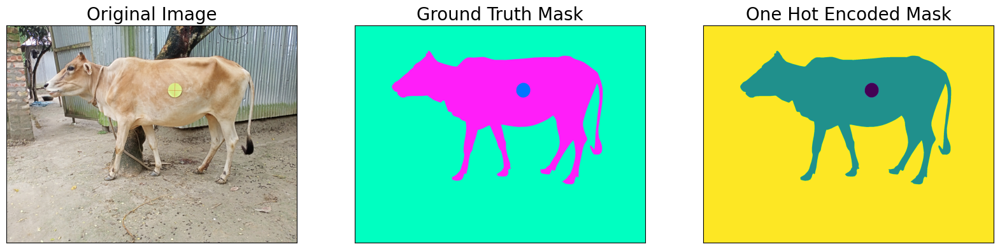

In [9]:
dataset = BuildingsDataset(x_train_dir, y_train_dir, class_rgb_values=select_class_rgb_values)
random_idx = random.randint(0, len(dataset)-1)
image, mask = dataset[2]

visualize(
    original_image = image,
    ground_truth_mask = colour_code_segmentation(reverse_one_hot(mask), select_class_rgb_values),
    one_hot_encoded_mask = reverse_one_hot(mask)
)

In [10]:
def get_training_augmentation():
    train_transform = [    
        album.Compose(
            [
                album.HorizontalFlip(p=1),
                album.VerticalFlip(p=1),
                album.RandomRotate90(p=1),
                album.Resize(512, 512),
            ],
            p=1,
        ),
    ]
    return album.Compose(train_transform)


def get_validation_augmentation():   
    # Add sufficient padding to ensure image is divisible by 32
    test_transform = [
        album.PadIfNeeded(min_height=1536, min_width=1536, always_apply=True, border_mode=0),
        album.Resize(512, 512)
    ]
    return album.Compose(test_transform)


def to_tensor(x, **kwargs):
    return x.transpose(2, 0, 1).astype('float32')


def get_preprocessing(preprocessing_fn=None):
    """Construct preprocessing transform    
    Args:
        preprocessing_fn (callable): data normalization function 
            (can be specific for each pretrained neural network)
    Return:
        transform: albumentations.Compose
    """   
    _transform = []
    if preprocessing_fn:
        _transform.append(album.Lambda(image=preprocessing_fn))
    _transform.append(album.Lambda(image=to_tensor, mask=to_tensor))
        
    return album.Compose(_transform)

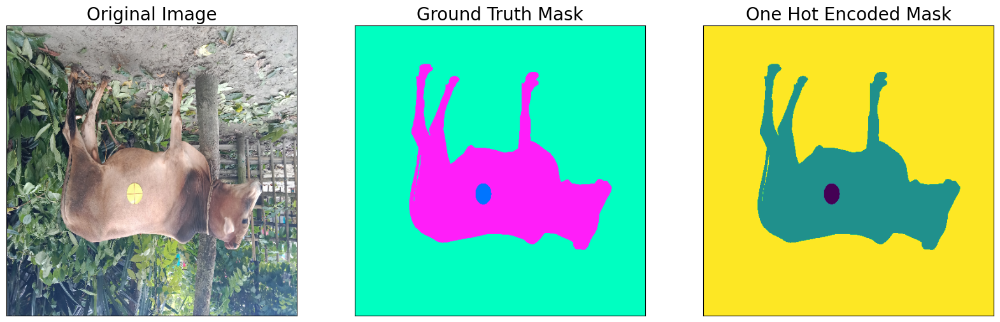

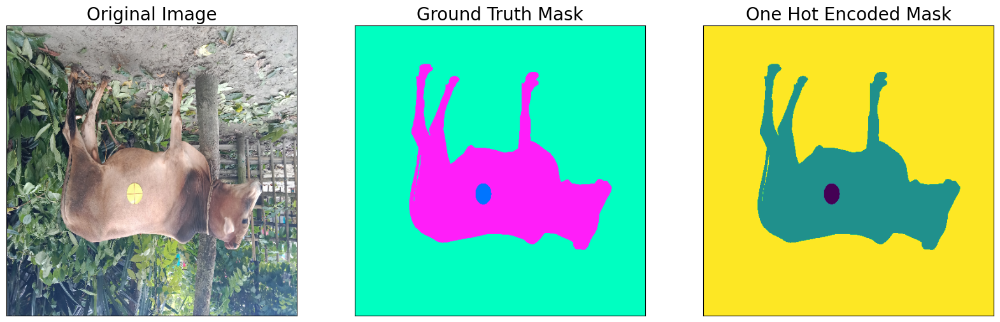

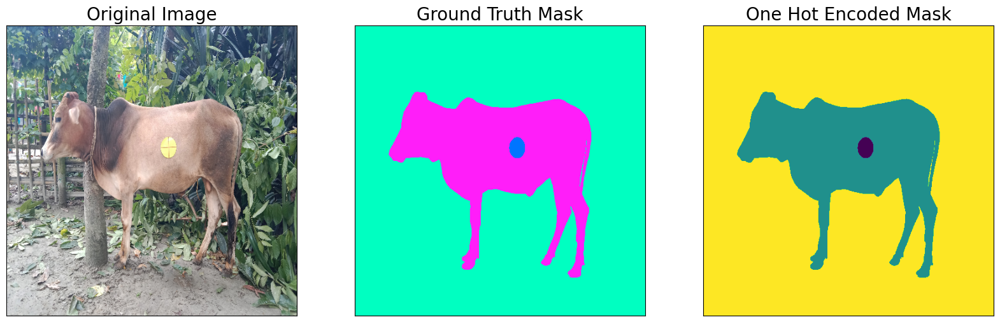

In [11]:
augmented_dataset = BuildingsDataset(
    x_train_dir, y_train_dir, 
    augmentation=get_training_augmentation(),
    class_rgb_values=select_class_rgb_values,
)

random_idx = random.randint(0, len(augmented_dataset)-1)

# Different augmentations on a random image/mask pair (256*256 crop)
for i in range(3):
    image, mask = augmented_dataset[random_idx]
    visualize(
        original_image = image,
        ground_truth_mask = colour_code_segmentation(reverse_one_hot(mask), select_class_rgb_values),
        one_hot_encoded_mask = reverse_one_hot(mask)
    )

In [12]:
ENCODER = 'resnet101'
ENCODER_WEIGHTS = 'imagenet'
CLASSES = class_names
ACTIVATION = 'sigmoid' # could be None for logits or 'softmax2d' for multiclass segmentation

# create segmentation model with pretrained encoder
model = smp.DeepLabV3Plus(
    encoder_name=ENCODER, 
    encoder_weights=ENCODER_WEIGHTS, 
    classes=len(CLASSES), 
    activation=ACTIVATION,
)

preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)

Downloading: "https://download.pytorch.org/models/resnet101-5d3b4d8f.pth" to /root/.cache/torch/hub/checkpoints/resnet101-5d3b4d8f.pth


  0%|          | 0.00/170M [00:00<?, ?B/s]

  4%|▎         | 6.23M/170M [00:00<00:02, 65.4MB/s]

 22%|██▏       | 37.6M/170M [00:00<00:00, 221MB/s] 

 41%|████      | 69.9M/170M [00:00<00:00, 274MB/s]

 60%|█████▉    | 102M/170M [00:00<00:00, 298MB/s] 

 79%|███████▉  | 135M/170M [00:00<00:00, 315MB/s]

 98%|█████████▊| 167M/170M [00:00<00:00, 322MB/s]

100%|██████████| 170M/170M [00:00<00:00, 291MB/s]

In [13]:
# Get train and val dataset instances
train_dataset = BuildingsDataset(
    x_train_dir, y_train_dir, 
    augmentation=get_training_augmentation(),
    preprocessing=get_preprocessing(preprocessing_fn),
    class_rgb_values=select_class_rgb_values,
)

valid_dataset = BuildingsDataset(
    x_valid_dir, y_valid_dir, 
    augmentation=get_validation_augmentation(), 
    preprocessing=get_preprocessing(preprocessing_fn),
    class_rgb_values=select_class_rgb_values,
)

# Get train and val data loaders
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=5)
valid_loader = DataLoader(valid_dataset, batch_size=1, shuffle=False, num_workers=2)

In [14]:
# Set flag to train the model or not. If set to 'False', only prediction is performed (using an older model checkpoint)
TRAINING = True

# Set num of epochs
EPOCHS = 400

# Set device: `cuda` or `cpu`
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# define loss function
loss = smp.utils.losses.DiceLoss()

# define metrics
metrics = [
    smp.utils.metrics.IoU(threshold=0.5),
]

# define optimizer
optimizer = torch.optim.Adam([ 
    dict(params=model.parameters(), lr=0.0001),
])

# define learning rate scheduler (not used in this NB)
lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    optimizer, T_0=1, T_mult=2, eta_min=5e-5,
)

# load best saved model checkpoint from previous commit (if present)
if os.path.exists('../kaggle/input/kalkulembu-semantic-dataset/best_model.pth'):
    model = torch.load('../kaggle/input/kalkulembu-semantic-dataset/best_model.pth', map_location=DEVICE)

In [15]:
train_epoch = smp.utils.train.TrainEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    optimizer=optimizer,
    device=DEVICE,
    verbose=True,
)

valid_epoch = smp.utils.train.ValidEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    device=DEVICE,
    verbose=True,
)

In [16]:
%%time

if TRAINING:

    best_iou_score = 0.0
    train_logs_list, valid_logs_list = [], []

    for i in range(0, EPOCHS):

        # Perform training & validation
        print('\nEpoch: {}'.format(i))
        train_logs = train_epoch.run(train_loader)
        valid_logs = valid_epoch.run(valid_loader)
        train_logs_list.append(train_logs)
        valid_logs_list.append(valid_logs)

        # Save model if a better val IoU score is obtained
        if best_iou_score < valid_logs['iou_score']:
            best_iou_score = valid_logs['iou_score']
            torch.save(model, './best_model.pth')
            print('Model saved!')


Epoch: 0


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:21<?, ?it/s, dice_loss - 0.6053, iou_score - 0.2362]

train:   0%|          | 1/231 [00:21<1:24:17, 21.99s/it, dice_loss - 0.6053, iou_score - 0.2362]

train:   0%|          | 1/231 [00:22<1:24:17, 21.99s/it, dice_loss - 0.596, iou_score - 0.2738] 

train:   1%|          | 2/231 [00:22<36:26,  9.55s/it, dice_loss - 0.596, iou_score - 0.2738]  

train:   1%|          | 2/231 [00:23<36:26,  9.55s/it, dice_loss - 0.5833, iou_score - 0.3281]

train:   1%|▏         | 3/231 [00:23<21:11,  5.58s/it, dice_loss - 0.5833, iou_score - 0.3281]

train:   1%|▏         | 3/231 [00:24<21:11,  5.58s/it, dice_loss - 0.5712, iou_score - 0.3736]

train:   2%|▏         | 4/231 [00:24<14:02,  3.71s/it, dice_loss - 0.5712, iou_score - 0.3736]

train:   2%|▏         | 4/231 [00:25<14:02,  3.71s/it, dice_loss - 0.5608, iou_score - 0.4095]

train:   2%|▏         | 5/231 [00:25<10:05,  2.68s/it, dice_loss - 0.5608, iou_score - 0.4095]

train:   2%|▏         | 5/231 [00:26<10:05,  2.68s/it, dice_loss - 0.5507, iou_score - 0.4393]

train:   3%|▎         | 6/231 [00:26<07:46,  2.07s/it, dice_loss - 0.5507, iou_score - 0.4393]

train:   3%|▎         | 6/231 [00:27<07:46,  2.07s/it, dice_loss - 0.541, iou_score - 0.4651] 

train:   3%|▎         | 7/231 [00:27<06:17,  1.68s/it, dice_loss - 0.541, iou_score - 0.4651]

train:   3%|▎         | 7/231 [00:28<06:17,  1.68s/it, dice_loss - 0.5327, iou_score - 0.4859]

train:   3%|▎         | 8/231 [00:28<05:19,  1.43s/it, dice_loss - 0.5327, iou_score - 0.4859]

train:   3%|▎         | 8/231 [00:28<05:19,  1.43s/it, dice_loss - 0.5252, iou_score - 0.5022]

train:   4%|▍         | 9/231 [00:28<04:40,  1.26s/it, dice_loss - 0.5252, iou_score - 0.5022]

train:   4%|▍         | 9/231 [00:29<04:40,  1.26s/it, dice_loss - 0.5179, iou_score - 0.5167]

train:   4%|▍         | 10/231 [00:29<04:14,  1.15s/it, dice_loss - 0.5179, iou_score - 0.5167]

train:   4%|▍         | 10/231 [00:30<04:14,  1.15s/it, dice_loss - 0.5112, iou_score - 0.53]  

train:   5%|▍         | 11/231 [00:30<03:56,  1.08s/it, dice_loss - 0.5112, iou_score - 0.53]

train:   5%|▍         | 11/231 [00:31<03:56,  1.08s/it, dice_loss - 0.5044, iou_score - 0.5416]

train:   5%|▌         | 12/231 [00:31<03:44,  1.02s/it, dice_loss - 0.5044, iou_score - 0.5416]

train:   5%|▌         | 12/231 [00:32<03:44,  1.02s/it, dice_loss - 0.4979, iou_score - 0.5522]

train:   6%|▌         | 13/231 [00:32<03:32,  1.03it/s, dice_loss - 0.4979, iou_score - 0.5522]

train:   6%|▌         | 13/231 [00:33<03:32,  1.03it/s, dice_loss - 0.4917, iou_score - 0.5619]

train:   6%|▌         | 14/231 [00:33<03:24,  1.06it/s, dice_loss - 0.4917, iou_score - 0.5619]

train:   6%|▌         | 14/231 [00:34<03:24,  1.06it/s, dice_loss - 0.4864, iou_score - 0.571] 

train:   6%|▋         | 15/231 [00:34<03:29,  1.03it/s, dice_loss - 0.4864, iou_score - 0.571]

train:   6%|▋         | 15/231 [00:35<03:29,  1.03it/s, dice_loss - 0.481, iou_score - 0.5788]

train:   7%|▋         | 16/231 [00:35<03:25,  1.05it/s, dice_loss - 0.481, iou_score - 0.5788]

train:   7%|▋         | 16/231 [00:40<03:25,  1.05it/s, dice_loss - 0.4762, iou_score - 0.5853]

train:   7%|▋         | 17/231 [00:40<07:46,  2.18s/it, dice_loss - 0.4762, iou_score - 0.5853]

train:   7%|▋         | 17/231 [00:41<07:46,  2.18s/it, dice_loss - 0.4712, iou_score - 0.5917]

train:   8%|▊         | 18/231 [00:41<06:22,  1.79s/it, dice_loss - 0.4712, iou_score - 0.5917]

train:   8%|▊         | 18/231 [00:42<06:22,  1.79s/it, dice_loss - 0.4663, iou_score - 0.5978]

train:   8%|▊         | 19/231 [00:42<05:24,  1.53s/it, dice_loss - 0.4663, iou_score - 0.5978]

train:   8%|▊         | 19/231 [00:43<05:24,  1.53s/it, dice_loss - 0.4618, iou_score - 0.6032]

train:   9%|▊         | 20/231 [00:43<04:42,  1.34s/it, dice_loss - 0.4618, iou_score - 0.6032]

train:   9%|▊         | 20/231 [00:43<04:42,  1.34s/it, dice_loss - 0.4576, iou_score - 0.6081]

train:   9%|▉         | 21/231 [00:43<04:12,  1.20s/it, dice_loss - 0.4576, iou_score - 0.6081]

train:   9%|▉         | 21/231 [00:49<04:12,  1.20s/it, dice_loss - 0.4535, iou_score - 0.6129]

train:  10%|▉         | 22/231 [00:49<08:23,  2.41s/it, dice_loss - 0.4535, iou_score - 0.6129]

train:  10%|▉         | 22/231 [00:50<08:23,  2.41s/it, dice_loss - 0.4493, iou_score - 0.6176]

train:  10%|▉         | 23/231 [00:50<06:45,  1.95s/it, dice_loss - 0.4493, iou_score - 0.6176]

train:  10%|▉         | 23/231 [00:50<06:45,  1.95s/it, dice_loss - 0.4454, iou_score - 0.6219]

train:  10%|█         | 24/231 [00:50<05:38,  1.64s/it, dice_loss - 0.4454, iou_score - 0.6219]

train:  10%|█         | 24/231 [00:51<05:38,  1.64s/it, dice_loss - 0.4416, iou_score - 0.626] 

train:  11%|█         | 25/231 [00:51<04:50,  1.41s/it, dice_loss - 0.4416, iou_score - 0.626]

train:  11%|█         | 25/231 [00:52<04:50,  1.41s/it, dice_loss - 0.4378, iou_score - 0.6299]

train:  11%|█▏        | 26/231 [00:52<04:17,  1.26s/it, dice_loss - 0.4378, iou_score - 0.6299]

train:  11%|█▏        | 26/231 [00:57<04:17,  1.26s/it, dice_loss - 0.4342, iou_score - 0.634] 

train:  12%|█▏        | 27/231 [00:57<08:16,  2.43s/it, dice_loss - 0.4342, iou_score - 0.634]

train:  12%|█▏        | 27/231 [00:58<08:16,  2.43s/it, dice_loss - 0.4309, iou_score - 0.638]

train:  12%|█▏        | 28/231 [00:58<06:38,  1.96s/it, dice_loss - 0.4309, iou_score - 0.638]

train:  12%|█▏        | 28/231 [00:59<06:38,  1.96s/it, dice_loss - 0.4274, iou_score - 0.6417]

train:  13%|█▎        | 29/231 [00:59<05:32,  1.65s/it, dice_loss - 0.4274, iou_score - 0.6417]

train:  13%|█▎        | 29/231 [01:00<05:32,  1.65s/it, dice_loss - 0.4241, iou_score - 0.6453]

train:  13%|█▎        | 30/231 [01:00<04:45,  1.42s/it, dice_loss - 0.4241, iou_score - 0.6453]

train:  13%|█▎        | 30/231 [01:01<04:45,  1.42s/it, dice_loss - 0.4208, iou_score - 0.6488]

train:  13%|█▎        | 31/231 [01:01<04:13,  1.27s/it, dice_loss - 0.4208, iou_score - 0.6488]

train:  13%|█▎        | 31/231 [01:06<04:13,  1.27s/it, dice_loss - 0.4178, iou_score - 0.6521]

train:  14%|█▍        | 32/231 [01:06<08:11,  2.47s/it, dice_loss - 0.4178, iou_score - 0.6521]

train:  14%|█▍        | 32/231 [01:07<08:11,  2.47s/it, dice_loss - 0.4147, iou_score - 0.6551]

train:  14%|█▍        | 33/231 [01:07<06:35,  2.00s/it, dice_loss - 0.4147, iou_score - 0.6551]

train:  14%|█▍        | 33/231 [01:08<06:35,  2.00s/it, dice_loss - 0.4122, iou_score - 0.658] 

train:  15%|█▍        | 34/231 [01:08<05:30,  1.68s/it, dice_loss - 0.4122, iou_score - 0.658]

train:  15%|█▍        | 34/231 [01:09<05:30,  1.68s/it, dice_loss - 0.4092, iou_score - 0.6611]

train:  15%|█▌        | 35/231 [01:09<04:42,  1.44s/it, dice_loss - 0.4092, iou_score - 0.6611]

train:  15%|█▌        | 35/231 [01:10<04:42,  1.44s/it, dice_loss - 0.4066, iou_score - 0.6641]

train:  16%|█▌        | 36/231 [01:10<04:09,  1.28s/it, dice_loss - 0.4066, iou_score - 0.6641]

train:  16%|█▌        | 36/231 [01:15<04:09,  1.28s/it, dice_loss - 0.4038, iou_score - 0.6674]

train:  16%|█▌        | 37/231 [01:15<08:05,  2.50s/it, dice_loss - 0.4038, iou_score - 0.6674]

train:  16%|█▌        | 37/231 [01:16<08:05,  2.50s/it, dice_loss - 0.4012, iou_score - 0.6707]

train:  16%|█▋        | 38/231 [01:16<06:31,  2.03s/it, dice_loss - 0.4012, iou_score - 0.6707]

train:  16%|█▋        | 38/231 [01:17<06:31,  2.03s/it, dice_loss - 0.3986, iou_score - 0.6739]

train:  17%|█▋        | 39/231 [01:17<05:25,  1.69s/it, dice_loss - 0.3986, iou_score - 0.6739]

train:  17%|█▋        | 39/231 [01:18<05:25,  1.69s/it, dice_loss - 0.3961, iou_score - 0.6772]

train:  17%|█▋        | 40/231 [01:18<04:38,  1.46s/it, dice_loss - 0.3961, iou_score - 0.6772]

train:  17%|█▋        | 40/231 [01:19<04:38,  1.46s/it, dice_loss - 0.3937, iou_score - 0.6803]

train:  18%|█▊        | 41/231 [01:19<04:05,  1.29s/it, dice_loss - 0.3937, iou_score - 0.6803]

train:  18%|█▊        | 41/231 [01:25<04:05,  1.29s/it, dice_loss - 0.3911, iou_score - 0.6835]

train:  18%|█▊        | 42/231 [01:25<08:19,  2.64s/it, dice_loss - 0.3911, iou_score - 0.6835]

train:  18%|█▊        | 42/231 [01:26<08:19,  2.64s/it, dice_loss - 0.3888, iou_score - 0.6864]

train:  19%|█▊        | 43/231 [01:26<06:38,  2.12s/it, dice_loss - 0.3888, iou_score - 0.6864]

train:  19%|█▊        | 43/231 [01:27<06:38,  2.12s/it, dice_loss - 0.3865, iou_score - 0.6893]

train:  19%|█▉        | 44/231 [01:27<05:29,  1.76s/it, dice_loss - 0.3865, iou_score - 0.6893]

train:  19%|█▉        | 44/231 [01:27<05:29,  1.76s/it, dice_loss - 0.3844, iou_score - 0.6922]

train:  19%|█▉        | 45/231 [01:27<04:40,  1.51s/it, dice_loss - 0.3844, iou_score - 0.6922]

train:  19%|█▉        | 45/231 [01:28<04:40,  1.51s/it, dice_loss - 0.3823, iou_score - 0.695] 

train:  20%|█▉        | 46/231 [01:28<04:04,  1.32s/it, dice_loss - 0.3823, iou_score - 0.695]

train:  20%|█▉        | 46/231 [01:33<04:04,  1.32s/it, dice_loss - 0.3801, iou_score - 0.698]

train:  20%|██        | 47/231 [01:33<07:03,  2.30s/it, dice_loss - 0.3801, iou_score - 0.698]

train:  20%|██        | 47/231 [01:34<07:03,  2.30s/it, dice_loss - 0.3779, iou_score - 0.701]

train:  21%|██        | 48/231 [01:34<05:46,  1.89s/it, dice_loss - 0.3779, iou_score - 0.701]

train:  21%|██        | 48/231 [01:35<05:46,  1.89s/it, dice_loss - 0.3758, iou_score - 0.7038]

train:  21%|██        | 49/231 [01:35<04:52,  1.60s/it, dice_loss - 0.3758, iou_score - 0.7038]

train:  21%|██        | 49/231 [01:36<04:52,  1.60s/it, dice_loss - 0.3736, iou_score - 0.7067]

train:  22%|██▏       | 50/231 [01:36<04:11,  1.39s/it, dice_loss - 0.3736, iou_score - 0.7067]

train:  22%|██▏       | 50/231 [01:37<04:11,  1.39s/it, dice_loss - 0.3715, iou_score - 0.7095]

train:  22%|██▏       | 51/231 [01:37<03:43,  1.24s/it, dice_loss - 0.3715, iou_score - 0.7095]

train:  22%|██▏       | 51/231 [01:41<03:43,  1.24s/it, dice_loss - 0.3695, iou_score - 0.7121]

train:  23%|██▎       | 52/231 [01:41<06:51,  2.30s/it, dice_loss - 0.3695, iou_score - 0.7121]

train:  23%|██▎       | 52/231 [01:42<06:51,  2.30s/it, dice_loss - 0.3675, iou_score - 0.7148]

train:  23%|██▎       | 53/231 [01:42<05:34,  1.88s/it, dice_loss - 0.3675, iou_score - 0.7148]

train:  23%|██▎       | 53/231 [01:43<05:34,  1.88s/it, dice_loss - 0.3655, iou_score - 0.7174]

train:  23%|██▎       | 54/231 [01:43<04:40,  1.59s/it, dice_loss - 0.3655, iou_score - 0.7174]

train:  23%|██▎       | 54/231 [01:44<04:40,  1.59s/it, dice_loss - 0.3636, iou_score - 0.7198]

train:  24%|██▍       | 55/231 [01:44<04:04,  1.39s/it, dice_loss - 0.3636, iou_score - 0.7198]

train:  24%|██▍       | 55/231 [01:45<04:04,  1.39s/it, dice_loss - 0.3617, iou_score - 0.7224]

train:  24%|██▍       | 56/231 [01:45<03:39,  1.26s/it, dice_loss - 0.3617, iou_score - 0.7224]

train:  24%|██▍       | 56/231 [01:50<03:39,  1.26s/it, dice_loss - 0.3598, iou_score - 0.7249]

train:  25%|██▍       | 57/231 [01:50<07:04,  2.44s/it, dice_loss - 0.3598, iou_score - 0.7249]

train:  25%|██▍       | 57/231 [01:51<07:04,  2.44s/it, dice_loss - 0.3579, iou_score - 0.7275]

train:  25%|██▌       | 58/231 [01:51<05:43,  1.99s/it, dice_loss - 0.3579, iou_score - 0.7275]

train:  25%|██▌       | 58/231 [01:52<05:43,  1.99s/it, dice_loss - 0.356, iou_score - 0.73]   

train:  26%|██▌       | 59/231 [01:52<04:47,  1.67s/it, dice_loss - 0.356, iou_score - 0.73]

train:  26%|██▌       | 59/231 [01:53<04:47,  1.67s/it, dice_loss - 0.354, iou_score - 0.7325]

train:  26%|██▌       | 60/231 [01:53<04:07,  1.45s/it, dice_loss - 0.354, iou_score - 0.7325]

train:  26%|██▌       | 60/231 [01:54<04:07,  1.45s/it, dice_loss - 0.3524, iou_score - 0.7346]

train:  26%|██▋       | 61/231 [01:54<03:39,  1.29s/it, dice_loss - 0.3524, iou_score - 0.7346]

train:  26%|██▋       | 61/231 [01:59<03:39,  1.29s/it, dice_loss - 0.3505, iou_score - 0.7368]

train:  27%|██▋       | 62/231 [01:59<07:01,  2.49s/it, dice_loss - 0.3505, iou_score - 0.7368]

train:  27%|██▋       | 62/231 [02:00<07:01,  2.49s/it, dice_loss - 0.3487, iou_score - 0.739] 

train:  27%|██▋       | 63/231 [02:00<05:38,  2.01s/it, dice_loss - 0.3487, iou_score - 0.739]

train:  27%|██▋       | 63/231 [02:01<05:38,  2.01s/it, dice_loss - 0.347, iou_score - 0.741] 

train:  28%|██▊       | 64/231 [02:01<04:41,  1.68s/it, dice_loss - 0.347, iou_score - 0.741]

train:  28%|██▊       | 64/231 [02:02<04:41,  1.68s/it, dice_loss - 0.3454, iou_score - 0.743]

train:  28%|██▊       | 65/231 [02:02<04:01,  1.45s/it, dice_loss - 0.3454, iou_score - 0.743]

train:  28%|██▊       | 65/231 [02:03<04:01,  1.45s/it, dice_loss - 0.3437, iou_score - 0.7449]

train:  29%|██▊       | 66/231 [02:03<03:35,  1.30s/it, dice_loss - 0.3437, iou_score - 0.7449]

train:  29%|██▊       | 66/231 [02:08<03:35,  1.30s/it, dice_loss - 0.3422, iou_score - 0.7468]

train:  29%|██▉       | 67/231 [02:08<06:57,  2.55s/it, dice_loss - 0.3422, iou_score - 0.7468]

train:  29%|██▉       | 67/231 [02:09<06:57,  2.55s/it, dice_loss - 0.3404, iou_score - 0.7488]

train:  29%|██▉       | 68/231 [02:09<05:36,  2.06s/it, dice_loss - 0.3404, iou_score - 0.7488]

train:  29%|██▉       | 68/231 [02:10<05:36,  2.06s/it, dice_loss - 0.3388, iou_score - 0.7507]

train:  30%|██▉       | 69/231 [02:10<04:38,  1.72s/it, dice_loss - 0.3388, iou_score - 0.7507]

train:  30%|██▉       | 69/231 [02:11<04:38,  1.72s/it, dice_loss - 0.3372, iou_score - 0.7526]

train:  30%|███       | 70/231 [02:11<03:57,  1.47s/it, dice_loss - 0.3372, iou_score - 0.7526]

train:  30%|███       | 70/231 [02:12<03:57,  1.47s/it, dice_loss - 0.3356, iou_score - 0.7544]

train:  31%|███       | 71/231 [02:12<03:30,  1.32s/it, dice_loss - 0.3356, iou_score - 0.7544]

train:  31%|███       | 71/231 [02:17<03:30,  1.32s/it, dice_loss - 0.3339, iou_score - 0.7563]

train:  31%|███       | 72/231 [02:17<06:43,  2.54s/it, dice_loss - 0.3339, iou_score - 0.7563]

train:  31%|███       | 72/231 [02:18<06:43,  2.54s/it, dice_loss - 0.3323, iou_score - 0.7579]

train:  32%|███▏      | 73/231 [02:18<05:25,  2.06s/it, dice_loss - 0.3323, iou_score - 0.7579]

train:  32%|███▏      | 73/231 [02:19<05:25,  2.06s/it, dice_loss - 0.3307, iou_score - 0.7597]

train:  32%|███▏      | 74/231 [02:19<04:29,  1.71s/it, dice_loss - 0.3307, iou_score - 0.7597]

train:  32%|███▏      | 74/231 [02:20<04:29,  1.71s/it, dice_loss - 0.3292, iou_score - 0.7614]

train:  32%|███▏      | 75/231 [02:20<03:49,  1.47s/it, dice_loss - 0.3292, iou_score - 0.7614]

train:  32%|███▏      | 75/231 [02:21<03:49,  1.47s/it, dice_loss - 0.3277, iou_score - 0.7629]

train:  33%|███▎      | 76/231 [02:21<03:22,  1.30s/it, dice_loss - 0.3277, iou_score - 0.7629]

train:  33%|███▎      | 76/231 [02:25<03:22,  1.30s/it, dice_loss - 0.3262, iou_score - 0.7645]

train:  33%|███▎      | 77/231 [02:25<05:39,  2.21s/it, dice_loss - 0.3262, iou_score - 0.7645]

train:  33%|███▎      | 77/231 [02:26<05:39,  2.21s/it, dice_loss - 0.3247, iou_score - 0.7662]

train:  34%|███▍      | 78/231 [02:26<04:39,  1.83s/it, dice_loss - 0.3247, iou_score - 0.7662]

train:  34%|███▍      | 78/231 [02:27<04:39,  1.83s/it, dice_loss - 0.3232, iou_score - 0.7678]

train:  34%|███▍      | 79/231 [02:27<03:57,  1.56s/it, dice_loss - 0.3232, iou_score - 0.7678]

train:  34%|███▍      | 79/231 [02:28<03:57,  1.56s/it, dice_loss - 0.3217, iou_score - 0.7694]

train:  35%|███▍      | 80/231 [02:28<03:27,  1.38s/it, dice_loss - 0.3217, iou_score - 0.7694]

train:  35%|███▍      | 80/231 [02:29<03:27,  1.38s/it, dice_loss - 0.3203, iou_score - 0.771] 

train:  35%|███▌      | 81/231 [02:29<03:06,  1.24s/it, dice_loss - 0.3203, iou_score - 0.771]

train:  35%|███▌      | 81/231 [02:34<03:06,  1.24s/it, dice_loss - 0.3188, iou_score - 0.7725]

train:  35%|███▌      | 82/231 [02:34<05:39,  2.28s/it, dice_loss - 0.3188, iou_score - 0.7725]

train:  35%|███▌      | 82/231 [02:35<05:39,  2.28s/it, dice_loss - 0.3174, iou_score - 0.7739]

train:  36%|███▌      | 83/231 [02:35<04:36,  1.87s/it, dice_loss - 0.3174, iou_score - 0.7739]

train:  36%|███▌      | 83/231 [02:36<04:36,  1.87s/it, dice_loss - 0.316, iou_score - 0.7754] 

train:  36%|███▋      | 84/231 [02:36<03:54,  1.59s/it, dice_loss - 0.316, iou_score - 0.7754]

train:  36%|███▋      | 84/231 [02:37<03:54,  1.59s/it, dice_loss - 0.3146, iou_score - 0.7768]

train:  37%|███▋      | 85/231 [02:37<03:24,  1.40s/it, dice_loss - 0.3146, iou_score - 0.7768]

train:  37%|███▋      | 85/231 [02:38<03:24,  1.40s/it, dice_loss - 0.3134, iou_score - 0.7781]

train:  37%|███▋      | 86/231 [02:38<03:02,  1.26s/it, dice_loss - 0.3134, iou_score - 0.7781]

train:  37%|███▋      | 86/231 [02:42<03:02,  1.26s/it, dice_loss - 0.312, iou_score - 0.7796] 

train:  38%|███▊      | 87/231 [02:42<05:30,  2.30s/it, dice_loss - 0.312, iou_score - 0.7796]

train:  38%|███▊      | 87/231 [02:43<05:30,  2.30s/it, dice_loss - 0.3107, iou_score - 0.7809]

train:  38%|███▊      | 88/231 [02:43<04:30,  1.89s/it, dice_loss - 0.3107, iou_score - 0.7809]

train:  38%|███▊      | 88/231 [02:44<04:30,  1.89s/it, dice_loss - 0.3094, iou_score - 0.7823]

train:  39%|███▊      | 89/231 [02:44<03:48,  1.61s/it, dice_loss - 0.3094, iou_score - 0.7823]

train:  39%|███▊      | 89/231 [02:45<03:48,  1.61s/it, dice_loss - 0.3081, iou_score - 0.7836]

train:  39%|███▉      | 90/231 [02:45<03:18,  1.41s/it, dice_loss - 0.3081, iou_score - 0.7836]

train:  39%|███▉      | 90/231 [02:46<03:18,  1.41s/it, dice_loss - 0.3068, iou_score - 0.785] 

train:  39%|███▉      | 91/231 [02:46<02:57,  1.27s/it, dice_loss - 0.3068, iou_score - 0.785]

train:  39%|███▉      | 91/231 [02:51<02:57,  1.27s/it, dice_loss - 0.3055, iou_score - 0.7862]

train:  40%|███▉      | 92/231 [02:51<05:33,  2.40s/it, dice_loss - 0.3055, iou_score - 0.7862]

train:  40%|███▉      | 92/231 [02:52<05:33,  2.40s/it, dice_loss - 0.3043, iou_score - 0.7874]

train:  40%|████      | 93/231 [02:52<04:32,  1.98s/it, dice_loss - 0.3043, iou_score - 0.7874]

train:  40%|████      | 93/231 [02:53<04:32,  1.98s/it, dice_loss - 0.303, iou_score - 0.7886] 

train:  41%|████      | 94/231 [02:53<03:48,  1.67s/it, dice_loss - 0.303, iou_score - 0.7886]

train:  41%|████      | 94/231 [02:54<03:48,  1.67s/it, dice_loss - 0.3018, iou_score - 0.7898]

train:  41%|████      | 95/231 [02:54<03:18,  1.46s/it, dice_loss - 0.3018, iou_score - 0.7898]

train:  41%|████      | 95/231 [02:55<03:18,  1.46s/it, dice_loss - 0.3005, iou_score - 0.791] 

train:  42%|████▏     | 96/231 [02:55<02:56,  1.31s/it, dice_loss - 0.3005, iou_score - 0.791]

train:  42%|████▏     | 96/231 [02:59<02:56,  1.31s/it, dice_loss - 0.2993, iou_score - 0.7921]

train:  42%|████▏     | 97/231 [02:59<04:55,  2.21s/it, dice_loss - 0.2993, iou_score - 0.7921]

train:  42%|████▏     | 97/231 [03:00<04:55,  2.21s/it, dice_loss - 0.2982, iou_score - 0.7932]

train:  42%|████▏     | 98/231 [03:00<04:04,  1.84s/it, dice_loss - 0.2982, iou_score - 0.7932]

train:  42%|████▏     | 98/231 [03:01<04:04,  1.84s/it, dice_loss - 0.2969, iou_score - 0.7944]

train:  43%|████▎     | 99/231 [03:01<03:27,  1.57s/it, dice_loss - 0.2969, iou_score - 0.7944]

train:  43%|████▎     | 99/231 [03:02<03:27,  1.57s/it, dice_loss - 0.2958, iou_score - 0.7955]

train:  43%|████▎     | 100/231 [03:02<03:01,  1.38s/it, dice_loss - 0.2958, iou_score - 0.7955]

train:  43%|████▎     | 100/231 [03:03<03:01,  1.38s/it, dice_loss - 0.2946, iou_score - 0.7966]

train:  44%|████▎     | 101/231 [03:03<02:43,  1.26s/it, dice_loss - 0.2946, iou_score - 0.7966]

train:  44%|████▎     | 101/231 [03:08<02:43,  1.26s/it, dice_loss - 0.2934, iou_score - 0.7978]

train:  44%|████▍     | 102/231 [03:08<04:54,  2.29s/it, dice_loss - 0.2934, iou_score - 0.7978]

train:  44%|████▍     | 102/231 [03:09<04:54,  2.29s/it, dice_loss - 0.2922, iou_score - 0.7989]

train:  45%|████▍     | 103/231 [03:09<04:00,  1.88s/it, dice_loss - 0.2922, iou_score - 0.7989]

train:  45%|████▍     | 103/231 [03:10<04:00,  1.88s/it, dice_loss - 0.291, iou_score - 0.8]    

train:  45%|████▌     | 104/231 [03:10<03:24,  1.61s/it, dice_loss - 0.291, iou_score - 0.8]

train:  45%|████▌     | 104/231 [03:11<03:24,  1.61s/it, dice_loss - 0.2899, iou_score - 0.8011]

train:  45%|████▌     | 105/231 [03:11<02:57,  1.40s/it, dice_loss - 0.2899, iou_score - 0.8011]

train:  45%|████▌     | 105/231 [03:12<02:57,  1.40s/it, dice_loss - 0.2887, iou_score - 0.8022]

train:  46%|████▌     | 106/231 [03:12<02:38,  1.27s/it, dice_loss - 0.2887, iou_score - 0.8022]

train:  46%|████▌     | 106/231 [03:16<02:38,  1.27s/it, dice_loss - 0.2875, iou_score - 0.8033]

train:  46%|████▋     | 107/231 [03:16<04:39,  2.25s/it, dice_loss - 0.2875, iou_score - 0.8033]

train:  46%|████▋     | 107/231 [03:17<04:39,  2.25s/it, dice_loss - 0.2864, iou_score - 0.8043]

train:  47%|████▋     | 108/231 [03:17<03:49,  1.86s/it, dice_loss - 0.2864, iou_score - 0.8043]

train:  47%|████▋     | 108/231 [03:18<03:49,  1.86s/it, dice_loss - 0.2853, iou_score - 0.8053]

train:  47%|████▋     | 109/231 [03:18<03:13,  1.59s/it, dice_loss - 0.2853, iou_score - 0.8053]

train:  47%|████▋     | 109/231 [03:19<03:13,  1.59s/it, dice_loss - 0.2842, iou_score - 0.8064]

train:  48%|████▊     | 110/231 [03:19<02:49,  1.40s/it, dice_loss - 0.2842, iou_score - 0.8064]

train:  48%|████▊     | 110/231 [03:20<02:49,  1.40s/it, dice_loss - 0.2832, iou_score - 0.8073]

train:  48%|████▊     | 111/231 [03:20<02:30,  1.25s/it, dice_loss - 0.2832, iou_score - 0.8073]

train:  48%|████▊     | 111/231 [03:25<02:30,  1.25s/it, dice_loss - 0.2821, iou_score - 0.8083]

train:  48%|████▊     | 112/231 [03:25<04:34,  2.31s/it, dice_loss - 0.2821, iou_score - 0.8083]

train:  48%|████▊     | 112/231 [03:26<04:34,  2.31s/it, dice_loss - 0.2811, iou_score - 0.8093]

train:  49%|████▉     | 113/231 [03:26<03:44,  1.90s/it, dice_loss - 0.2811, iou_score - 0.8093]

train:  49%|████▉     | 113/231 [03:27<03:44,  1.90s/it, dice_loss - 0.2801, iou_score - 0.8102]

train:  49%|████▉     | 114/231 [03:27<03:08,  1.61s/it, dice_loss - 0.2801, iou_score - 0.8102]

train:  49%|████▉     | 114/231 [03:28<03:08,  1.61s/it, dice_loss - 0.279, iou_score - 0.8111] 

train:  50%|████▉     | 115/231 [03:28<02:44,  1.42s/it, dice_loss - 0.279, iou_score - 0.8111]

train:  50%|████▉     | 115/231 [03:28<02:44,  1.42s/it, dice_loss - 0.278, iou_score - 0.812] 

train:  50%|█████     | 116/231 [03:28<02:25,  1.27s/it, dice_loss - 0.278, iou_score - 0.812]

train:  50%|█████     | 116/231 [03:33<02:25,  1.27s/it, dice_loss - 0.2769, iou_score - 0.813]

train:  51%|█████     | 117/231 [03:33<04:21,  2.29s/it, dice_loss - 0.2769, iou_score - 0.813]

train:  51%|█████     | 117/231 [03:34<04:21,  2.29s/it, dice_loss - 0.276, iou_score - 0.8139]

train:  51%|█████     | 118/231 [03:34<03:33,  1.89s/it, dice_loss - 0.276, iou_score - 0.8139]

train:  51%|█████     | 118/231 [03:35<03:33,  1.89s/it, dice_loss - 0.275, iou_score - 0.8148]

train:  52%|█████▏    | 119/231 [03:35<02:59,  1.60s/it, dice_loss - 0.275, iou_score - 0.8148]

train:  52%|█████▏    | 119/231 [03:36<02:59,  1.60s/it, dice_loss - 0.2741, iou_score - 0.8156]

train:  52%|█████▏    | 120/231 [03:36<02:35,  1.40s/it, dice_loss - 0.2741, iou_score - 0.8156]

train:  52%|█████▏    | 120/231 [03:37<02:35,  1.40s/it, dice_loss - 0.2731, iou_score - 0.8165]

train:  52%|█████▏    | 121/231 [03:37<02:18,  1.26s/it, dice_loss - 0.2731, iou_score - 0.8165]

train:  52%|█████▏    | 121/231 [03:42<02:18,  1.26s/it, dice_loss - 0.2722, iou_score - 0.8174]

train:  53%|█████▎    | 122/231 [03:42<04:24,  2.43s/it, dice_loss - 0.2722, iou_score - 0.8174]

train:  53%|█████▎    | 122/231 [03:43<04:24,  2.43s/it, dice_loss - 0.2712, iou_score - 0.8182]

train:  53%|█████▎    | 123/231 [03:43<03:34,  1.98s/it, dice_loss - 0.2712, iou_score - 0.8182]

train:  53%|█████▎    | 123/231 [03:44<03:34,  1.98s/it, dice_loss - 0.2703, iou_score - 0.819] 

train:  54%|█████▎    | 124/231 [03:44<02:59,  1.67s/it, dice_loss - 0.2703, iou_score - 0.819]

train:  54%|█████▎    | 124/231 [03:45<02:59,  1.67s/it, dice_loss - 0.2693, iou_score - 0.8198]

train:  54%|█████▍    | 125/231 [03:45<02:33,  1.45s/it, dice_loss - 0.2693, iou_score - 0.8198]

train:  54%|█████▍    | 125/231 [03:46<02:33,  1.45s/it, dice_loss - 0.2684, iou_score - 0.8206]

train:  55%|█████▍    | 126/231 [03:46<02:16,  1.30s/it, dice_loss - 0.2684, iou_score - 0.8206]

train:  55%|█████▍    | 126/231 [03:50<02:16,  1.30s/it, dice_loss - 0.2675, iou_score - 0.8214]

train:  55%|█████▍    | 127/231 [03:50<03:59,  2.30s/it, dice_loss - 0.2675, iou_score - 0.8214]

train:  55%|█████▍    | 127/231 [03:51<03:59,  2.30s/it, dice_loss - 0.2665, iou_score - 0.8223]

train:  55%|█████▌    | 128/231 [03:51<03:15,  1.90s/it, dice_loss - 0.2665, iou_score - 0.8223]

train:  55%|█████▌    | 128/231 [03:52<03:15,  1.90s/it, dice_loss - 0.2655, iou_score - 0.8231]

train:  56%|█████▌    | 129/231 [03:52<02:44,  1.61s/it, dice_loss - 0.2655, iou_score - 0.8231]

train:  56%|█████▌    | 129/231 [03:53<02:44,  1.61s/it, dice_loss - 0.2646, iou_score - 0.8239]

train:  56%|█████▋    | 130/231 [03:53<02:23,  1.42s/it, dice_loss - 0.2646, iou_score - 0.8239]

train:  56%|█████▋    | 130/231 [03:54<02:23,  1.42s/it, dice_loss - 0.2637, iou_score - 0.8246]

train:  57%|█████▋    | 131/231 [03:54<02:07,  1.28s/it, dice_loss - 0.2637, iou_score - 0.8246]

train:  57%|█████▋    | 131/231 [03:59<02:07,  1.28s/it, dice_loss - 0.2628, iou_score - 0.8254]

train:  57%|█████▋    | 132/231 [03:59<03:39,  2.22s/it, dice_loss - 0.2628, iou_score - 0.8254]

train:  57%|█████▋    | 132/231 [04:00<03:39,  2.22s/it, dice_loss - 0.2619, iou_score - 0.8261]

train:  58%|█████▊    | 133/231 [04:00<03:20,  2.04s/it, dice_loss - 0.2619, iou_score - 0.8261]

train:  58%|█████▊    | 133/231 [04:01<03:20,  2.04s/it, dice_loss - 0.261, iou_score - 0.8269] 

train:  58%|█████▊    | 134/231 [04:01<02:45,  1.71s/it, dice_loss - 0.261, iou_score - 0.8269]

train:  58%|█████▊    | 134/231 [04:02<02:45,  1.71s/it, dice_loss - 0.2601, iou_score - 0.8277]

train:  58%|█████▊    | 135/231 [04:02<02:20,  1.47s/it, dice_loss - 0.2601, iou_score - 0.8277]

train:  58%|█████▊    | 135/231 [04:03<02:20,  1.47s/it, dice_loss - 0.2593, iou_score - 0.8284]

train:  59%|█████▉    | 136/231 [04:03<02:03,  1.30s/it, dice_loss - 0.2593, iou_score - 0.8284]

train:  59%|█████▉    | 136/231 [04:07<02:03,  1.30s/it, dice_loss - 0.2585, iou_score - 0.8291]

train:  59%|█████▉    | 137/231 [04:07<03:21,  2.14s/it, dice_loss - 0.2585, iou_score - 0.8291]

train:  59%|█████▉    | 137/231 [04:09<03:21,  2.14s/it, dice_loss - 0.2576, iou_score - 0.8298]

train:  60%|█████▉    | 138/231 [04:09<03:12,  2.07s/it, dice_loss - 0.2576, iou_score - 0.8298]

train:  60%|█████▉    | 138/231 [04:10<03:12,  2.07s/it, dice_loss - 0.2567, iou_score - 0.8305]

train:  60%|██████    | 139/231 [04:10<02:39,  1.73s/it, dice_loss - 0.2567, iou_score - 0.8305]

train:  60%|██████    | 139/231 [04:11<02:39,  1.73s/it, dice_loss - 0.2559, iou_score - 0.8312]

train:  61%|██████    | 140/231 [04:11<02:16,  1.50s/it, dice_loss - 0.2559, iou_score - 0.8312]

train:  61%|██████    | 140/231 [04:12<02:16,  1.50s/it, dice_loss - 0.255, iou_score - 0.8318] 

train:  61%|██████    | 141/231 [04:12<01:59,  1.33s/it, dice_loss - 0.255, iou_score - 0.8318]

train:  61%|██████    | 141/231 [04:16<01:59,  1.33s/it, dice_loss - 0.2541, iou_score - 0.8326]

train:  61%|██████▏   | 142/231 [04:16<03:00,  2.03s/it, dice_loss - 0.2541, iou_score - 0.8326]

train:  61%|██████▏   | 142/231 [04:18<03:00,  2.03s/it, dice_loss - 0.2533, iou_score - 0.8333]

train:  62%|██████▏   | 143/231 [04:18<02:56,  2.01s/it, dice_loss - 0.2533, iou_score - 0.8333]

train:  62%|██████▏   | 143/231 [04:18<02:56,  2.01s/it, dice_loss - 0.2524, iou_score - 0.834] 

train:  62%|██████▏   | 144/231 [04:18<02:27,  1.69s/it, dice_loss - 0.2524, iou_score - 0.834]

train:  62%|██████▏   | 144/231 [04:19<02:27,  1.69s/it, dice_loss - 0.2516, iou_score - 0.8347]

train:  63%|██████▎   | 145/231 [04:19<02:05,  1.46s/it, dice_loss - 0.2516, iou_score - 0.8347]

train:  63%|██████▎   | 145/231 [04:20<02:05,  1.46s/it, dice_loss - 0.2508, iou_score - 0.8353]

train:  63%|██████▎   | 146/231 [04:20<01:51,  1.31s/it, dice_loss - 0.2508, iou_score - 0.8353]

train:  63%|██████▎   | 146/231 [04:24<01:51,  1.31s/it, dice_loss - 0.2501, iou_score - 0.8359]

train:  64%|██████▎   | 147/231 [04:24<02:40,  1.91s/it, dice_loss - 0.2501, iou_score - 0.8359]

train:  64%|██████▎   | 147/231 [04:26<02:40,  1.91s/it, dice_loss - 0.2493, iou_score - 0.8366]

train:  64%|██████▍   | 148/231 [04:26<02:46,  2.01s/it, dice_loss - 0.2493, iou_score - 0.8366]

train:  64%|██████▍   | 148/231 [04:27<02:46,  2.01s/it, dice_loss - 0.2485, iou_score - 0.8372]

train:  65%|██████▍   | 149/231 [04:27<02:19,  1.70s/it, dice_loss - 0.2485, iou_score - 0.8372]

train:  65%|██████▍   | 149/231 [04:28<02:19,  1.70s/it, dice_loss - 0.2477, iou_score - 0.8379]

train:  65%|██████▍   | 150/231 [04:28<01:58,  1.47s/it, dice_loss - 0.2477, iou_score - 0.8379]

train:  65%|██████▍   | 150/231 [04:29<01:58,  1.47s/it, dice_loss - 0.2469, iou_score - 0.8385]

train:  65%|██████▌   | 151/231 [04:29<01:45,  1.32s/it, dice_loss - 0.2469, iou_score - 0.8385]

train:  65%|██████▌   | 151/231 [04:33<01:45,  1.32s/it, dice_loss - 0.2462, iou_score - 0.8391]

train:  66%|██████▌   | 152/231 [04:33<02:45,  2.10s/it, dice_loss - 0.2462, iou_score - 0.8391]

train:  66%|██████▌   | 152/231 [04:34<02:45,  2.10s/it, dice_loss - 0.2454, iou_score - 0.8397]

train:  66%|██████▌   | 153/231 [04:34<02:32,  1.96s/it, dice_loss - 0.2454, iou_score - 0.8397]

train:  66%|██████▌   | 153/231 [04:35<02:32,  1.96s/it, dice_loss - 0.2447, iou_score - 0.8403]

train:  67%|██████▋   | 154/231 [04:35<02:06,  1.65s/it, dice_loss - 0.2447, iou_score - 0.8403]

train:  67%|██████▋   | 154/231 [04:36<02:06,  1.65s/it, dice_loss - 0.2439, iou_score - 0.8409]

train:  67%|██████▋   | 155/231 [04:36<01:49,  1.44s/it, dice_loss - 0.2439, iou_score - 0.8409]

train:  67%|██████▋   | 155/231 [04:37<01:49,  1.44s/it, dice_loss - 0.2432, iou_score - 0.8415]

train:  68%|██████▊   | 156/231 [04:37<01:37,  1.30s/it, dice_loss - 0.2432, iou_score - 0.8415]

train:  68%|██████▊   | 156/231 [04:42<01:37,  1.30s/it, dice_loss - 0.2425, iou_score - 0.8421]

train:  68%|██████▊   | 157/231 [04:42<02:46,  2.25s/it, dice_loss - 0.2425, iou_score - 0.8421]

train:  68%|██████▊   | 157/231 [04:43<02:46,  2.25s/it, dice_loss - 0.2417, iou_score - 0.8427]

train:  68%|██████▊   | 158/231 [04:43<02:26,  2.01s/it, dice_loss - 0.2417, iou_score - 0.8427]

train:  68%|██████▊   | 158/231 [04:44<02:26,  2.01s/it, dice_loss - 0.241, iou_score - 0.8433] 

train:  69%|██████▉   | 159/231 [04:44<02:02,  1.70s/it, dice_loss - 0.241, iou_score - 0.8433]

train:  69%|██████▉   | 159/231 [04:45<02:02,  1.70s/it, dice_loss - 0.2402, iou_score - 0.8439]

train:  69%|██████▉   | 160/231 [04:45<01:44,  1.48s/it, dice_loss - 0.2402, iou_score - 0.8439]

train:  69%|██████▉   | 160/231 [04:46<01:44,  1.48s/it, dice_loss - 0.2395, iou_score - 0.8445]

train:  70%|██████▉   | 161/231 [04:46<01:31,  1.31s/it, dice_loss - 0.2395, iou_score - 0.8445]

train:  70%|██████▉   | 161/231 [04:49<01:31,  1.31s/it, dice_loss - 0.2388, iou_score - 0.8451]

train:  70%|███████   | 162/231 [04:49<02:14,  1.95s/it, dice_loss - 0.2388, iou_score - 0.8451]

train:  70%|███████   | 162/231 [04:52<02:14,  1.95s/it, dice_loss - 0.238, iou_score - 0.8456] 

train:  71%|███████   | 163/231 [04:52<02:18,  2.03s/it, dice_loss - 0.238, iou_score - 0.8456]

train:  71%|███████   | 163/231 [04:53<02:18,  2.03s/it, dice_loss - 0.2373, iou_score - 0.8462]

train:  71%|███████   | 164/231 [04:53<01:53,  1.70s/it, dice_loss - 0.2373, iou_score - 0.8462]

train:  71%|███████   | 164/231 [04:53<01:53,  1.70s/it, dice_loss - 0.2366, iou_score - 0.8468]

train:  71%|███████▏  | 165/231 [04:53<01:37,  1.47s/it, dice_loss - 0.2366, iou_score - 0.8468]

train:  71%|███████▏  | 165/231 [04:54<01:37,  1.47s/it, dice_loss - 0.2359, iou_score - 0.8473]

train:  72%|███████▏  | 166/231 [04:54<01:25,  1.31s/it, dice_loss - 0.2359, iou_score - 0.8473]

train:  72%|███████▏  | 166/231 [04:58<01:25,  1.31s/it, dice_loss - 0.2352, iou_score - 0.8479]

train:  72%|███████▏  | 167/231 [04:58<01:59,  1.86s/it, dice_loss - 0.2352, iou_score - 0.8479]

train:  72%|███████▏  | 167/231 [05:01<01:59,  1.86s/it, dice_loss - 0.2344, iou_score - 0.8485]

train:  73%|███████▎  | 168/231 [05:01<02:24,  2.30s/it, dice_loss - 0.2344, iou_score - 0.8485]

train:  73%|███████▎  | 168/231 [05:02<02:24,  2.30s/it, dice_loss - 0.2337, iou_score - 0.849] 

train:  73%|███████▎  | 169/231 [05:02<01:57,  1.89s/it, dice_loss - 0.2337, iou_score - 0.849]

train:  73%|███████▎  | 169/231 [05:03<01:57,  1.89s/it, dice_loss - 0.233, iou_score - 0.8496]

train:  74%|███████▎  | 170/231 [05:03<01:37,  1.60s/it, dice_loss - 0.233, iou_score - 0.8496]

train:  74%|███████▎  | 170/231 [05:04<01:37,  1.60s/it, dice_loss - 0.2323, iou_score - 0.85] 

train:  74%|███████▍  | 171/231 [05:04<01:23,  1.40s/it, dice_loss - 0.2323, iou_score - 0.85]

train:  74%|███████▍  | 171/231 [05:06<01:23,  1.40s/it, dice_loss - 0.2317, iou_score - 0.8506]

train:  74%|███████▍  | 172/231 [05:06<01:32,  1.57s/it, dice_loss - 0.2317, iou_score - 0.8506]

train:  74%|███████▍  | 172/231 [05:09<01:32,  1.57s/it, dice_loss - 0.231, iou_score - 0.8511] 

train:  75%|███████▍  | 173/231 [05:09<02:04,  2.14s/it, dice_loss - 0.231, iou_score - 0.8511]

train:  75%|███████▍  | 173/231 [05:10<02:04,  2.14s/it, dice_loss - 0.2303, iou_score - 0.8516]

train:  75%|███████▌  | 174/231 [05:10<01:41,  1.77s/it, dice_loss - 0.2303, iou_score - 0.8516]

train:  75%|███████▌  | 174/231 [05:11<01:41,  1.77s/it, dice_loss - 0.2297, iou_score - 0.8521]

train:  76%|███████▌  | 175/231 [05:11<01:25,  1.53s/it, dice_loss - 0.2297, iou_score - 0.8521]

train:  76%|███████▌  | 175/231 [05:12<01:25,  1.53s/it, dice_loss - 0.2291, iou_score - 0.8526]

train:  76%|███████▌  | 176/231 [05:12<01:14,  1.35s/it, dice_loss - 0.2291, iou_score - 0.8526]

train:  76%|███████▌  | 176/231 [05:14<01:14,  1.35s/it, dice_loss - 0.2284, iou_score - 0.8531]

train:  77%|███████▋  | 177/231 [05:14<01:27,  1.62s/it, dice_loss - 0.2284, iou_score - 0.8531]

train:  77%|███████▋  | 177/231 [05:17<01:27,  1.62s/it, dice_loss - 0.2278, iou_score - 0.8536]

train:  77%|███████▋  | 178/231 [05:17<01:48,  2.05s/it, dice_loss - 0.2278, iou_score - 0.8536]

train:  77%|███████▋  | 178/231 [05:18<01:48,  2.05s/it, dice_loss - 0.2272, iou_score - 0.8541]

train:  77%|███████▋  | 179/231 [05:18<01:29,  1.72s/it, dice_loss - 0.2272, iou_score - 0.8541]

train:  77%|███████▋  | 179/231 [05:19<01:29,  1.72s/it, dice_loss - 0.2265, iou_score - 0.8546]

train:  78%|███████▊  | 180/231 [05:19<01:16,  1.49s/it, dice_loss - 0.2265, iou_score - 0.8546]

train:  78%|███████▊  | 180/231 [05:20<01:16,  1.49s/it, dice_loss - 0.2259, iou_score - 0.8551]

train:  78%|███████▊  | 181/231 [05:20<01:06,  1.33s/it, dice_loss - 0.2259, iou_score - 0.8551]

train:  78%|███████▊  | 181/231 [05:23<01:06,  1.33s/it, dice_loss - 0.2253, iou_score - 0.8555]

train:  79%|███████▉  | 182/231 [05:23<01:20,  1.65s/it, dice_loss - 0.2253, iou_score - 0.8555]

train:  79%|███████▉  | 182/231 [05:26<01:20,  1.65s/it, dice_loss - 0.2247, iou_score - 0.856] 

train:  79%|███████▉  | 183/231 [05:26<01:41,  2.11s/it, dice_loss - 0.2247, iou_score - 0.856]

train:  79%|███████▉  | 183/231 [05:27<01:41,  2.11s/it, dice_loss - 0.224, iou_score - 0.8565]

train:  80%|███████▉  | 184/231 [05:27<01:22,  1.76s/it, dice_loss - 0.224, iou_score - 0.8565]

train:  80%|███████▉  | 184/231 [05:28<01:22,  1.76s/it, dice_loss - 0.2234, iou_score - 0.857]

train:  80%|████████  | 185/231 [05:28<01:09,  1.51s/it, dice_loss - 0.2234, iou_score - 0.857]

train:  80%|████████  | 185/231 [05:28<01:09,  1.51s/it, dice_loss - 0.2228, iou_score - 0.8574]

train:  81%|████████  | 186/231 [05:28<01:00,  1.33s/it, dice_loss - 0.2228, iou_score - 0.8574]

train:  81%|████████  | 186/231 [05:32<01:00,  1.33s/it, dice_loss - 0.2222, iou_score - 0.8579]

train:  81%|████████  | 187/231 [05:32<01:24,  1.91s/it, dice_loss - 0.2222, iou_score - 0.8579]

train:  81%|████████  | 187/231 [05:34<01:24,  1.91s/it, dice_loss - 0.2216, iou_score - 0.8583]

train:  81%|████████▏ | 188/231 [05:34<01:28,  2.05s/it, dice_loss - 0.2216, iou_score - 0.8583]

train:  81%|████████▏ | 188/231 [05:36<01:28,  2.05s/it, dice_loss - 0.221, iou_score - 0.8588] 

train:  82%|████████▏ | 189/231 [05:36<01:25,  2.02s/it, dice_loss - 0.221, iou_score - 0.8588]

train:  82%|████████▏ | 189/231 [05:37<01:25,  2.02s/it, dice_loss - 0.2203, iou_score - 0.8593]

train:  82%|████████▏ | 190/231 [05:37<01:09,  1.70s/it, dice_loss - 0.2203, iou_score - 0.8593]

train:  82%|████████▏ | 190/231 [05:38<01:09,  1.70s/it, dice_loss - 0.2197, iou_score - 0.8597]

train:  83%|████████▎ | 191/231 [05:38<00:58,  1.47s/it, dice_loss - 0.2197, iou_score - 0.8597]

train:  83%|████████▎ | 191/231 [05:40<00:58,  1.47s/it, dice_loss - 0.2191, iou_score - 0.8602]

train:  83%|████████▎ | 192/231 [05:40<00:59,  1.53s/it, dice_loss - 0.2191, iou_score - 0.8602]

train:  83%|████████▎ | 192/231 [05:42<00:59,  1.53s/it, dice_loss - 0.2186, iou_score - 0.8607]

train:  84%|████████▎ | 193/231 [05:42<01:10,  1.84s/it, dice_loss - 0.2186, iou_score - 0.8607]

train:  84%|████████▎ | 193/231 [05:45<01:10,  1.84s/it, dice_loss - 0.218, iou_score - 0.8611] 

train:  84%|████████▍ | 194/231 [05:45<01:19,  2.14s/it, dice_loss - 0.218, iou_score - 0.8611]

train:  84%|████████▍ | 194/231 [05:46<01:19,  2.14s/it, dice_loss - 0.2174, iou_score - 0.8616]

train:  84%|████████▍ | 195/231 [05:46<01:04,  1.79s/it, dice_loss - 0.2174, iou_score - 0.8616]

train:  84%|████████▍ | 195/231 [05:47<01:04,  1.79s/it, dice_loss - 0.2168, iou_score - 0.862] 

train:  85%|████████▍ | 196/231 [05:47<00:53,  1.54s/it, dice_loss - 0.2168, iou_score - 0.862]

train:  85%|████████▍ | 196/231 [05:48<00:53,  1.54s/it, dice_loss - 0.2162, iou_score - 0.8624]

train:  85%|████████▌ | 197/231 [05:48<00:49,  1.46s/it, dice_loss - 0.2162, iou_score - 0.8624]

train:  85%|████████▌ | 197/231 [05:51<00:49,  1.46s/it, dice_loss - 0.2156, iou_score - 0.8628]

train:  86%|████████▌ | 198/231 [05:51<00:56,  1.72s/it, dice_loss - 0.2156, iou_score - 0.8628]

train:  86%|████████▌ | 198/231 [05:54<00:56,  1.72s/it, dice_loss - 0.2151, iou_score - 0.8632]

train:  86%|████████▌ | 199/231 [05:54<01:09,  2.16s/it, dice_loss - 0.2151, iou_score - 0.8632]

train:  86%|████████▌ | 199/231 [05:55<01:09,  2.16s/it, dice_loss - 0.2145, iou_score - 0.8637]

train:  87%|████████▋ | 200/231 [05:55<00:55,  1.80s/it, dice_loss - 0.2145, iou_score - 0.8637]

train:  87%|████████▋ | 200/231 [05:56<00:55,  1.80s/it, dice_loss - 0.2139, iou_score - 0.8641]

train:  87%|████████▋ | 201/231 [05:56<00:46,  1.54s/it, dice_loss - 0.2139, iou_score - 0.8641]

train:  87%|████████▋ | 201/231 [05:57<00:46,  1.54s/it, dice_loss - 0.2134, iou_score - 0.8645]

train:  87%|████████▋ | 202/231 [05:57<00:39,  1.37s/it, dice_loss - 0.2134, iou_score - 0.8645]

train:  87%|████████▋ | 202/231 [05:58<00:39,  1.37s/it, dice_loss - 0.2128, iou_score - 0.865] 

train:  88%|████████▊ | 203/231 [05:58<00:40,  1.45s/it, dice_loss - 0.2128, iou_score - 0.865]

train:  88%|████████▊ | 203/231 [06:03<00:40,  1.45s/it, dice_loss - 0.2122, iou_score - 0.8654]

train:  88%|████████▊ | 204/231 [06:03<01:02,  2.32s/it, dice_loss - 0.2122, iou_score - 0.8654]

train:  88%|████████▊ | 204/231 [06:04<01:02,  2.32s/it, dice_loss - 0.2116, iou_score - 0.8657]

train:  89%|████████▊ | 205/231 [06:04<00:49,  1.91s/it, dice_loss - 0.2116, iou_score - 0.8657]

train:  89%|████████▊ | 205/231 [06:04<00:49,  1.91s/it, dice_loss - 0.2111, iou_score - 0.8661]

train:  89%|████████▉ | 206/231 [06:05<00:40,  1.62s/it, dice_loss - 0.2111, iou_score - 0.8661]

train:  89%|████████▉ | 206/231 [06:06<00:40,  1.62s/it, dice_loss - 0.2105, iou_score - 0.8665]

train:  90%|████████▉ | 207/231 [06:06<00:39,  1.64s/it, dice_loss - 0.2105, iou_score - 0.8665]

train:  90%|████████▉ | 207/231 [06:07<00:39,  1.64s/it, dice_loss - 0.21, iou_score - 0.8669]  

train:  90%|█████████ | 208/231 [06:07<00:32,  1.43s/it, dice_loss - 0.21, iou_score - 0.8669]

train:  90%|█████████ | 208/231 [06:11<00:32,  1.43s/it, dice_loss - 0.2095, iou_score - 0.8673]

train:  90%|█████████ | 209/231 [06:11<00:50,  2.28s/it, dice_loss - 0.2095, iou_score - 0.8673]

train:  90%|█████████ | 209/231 [06:12<00:50,  2.28s/it, dice_loss - 0.2089, iou_score - 0.8677]

train:  91%|█████████ | 210/231 [06:12<00:39,  1.87s/it, dice_loss - 0.2089, iou_score - 0.8677]

train:  91%|█████████ | 210/231 [06:13<00:39,  1.87s/it, dice_loss - 0.2083, iou_score - 0.8682]

train:  91%|█████████▏| 211/231 [06:13<00:31,  1.59s/it, dice_loss - 0.2083, iou_score - 0.8682]

train:  91%|█████████▏| 211/231 [06:14<00:31,  1.59s/it, dice_loss - 0.2078, iou_score - 0.8685]

train:  92%|█████████▏| 212/231 [06:14<00:27,  1.44s/it, dice_loss - 0.2078, iou_score - 0.8685]

train:  92%|█████████▏| 212/231 [06:15<00:27,  1.44s/it, dice_loss - 0.2073, iou_score - 0.8689]

train:  92%|█████████▏| 213/231 [06:15<00:23,  1.29s/it, dice_loss - 0.2073, iou_score - 0.8689]

train:  92%|█████████▏| 213/231 [06:19<00:23,  1.29s/it, dice_loss - 0.2068, iou_score - 0.8692]

train:  93%|█████████▎| 214/231 [06:19<00:33,  1.96s/it, dice_loss - 0.2068, iou_score - 0.8692]

train:  93%|█████████▎| 214/231 [06:20<00:33,  1.96s/it, dice_loss - 0.2063, iou_score - 0.8696]

train:  93%|█████████▎| 215/231 [06:20<00:26,  1.65s/it, dice_loss - 0.2063, iou_score - 0.8696]

train:  93%|█████████▎| 215/231 [06:21<00:26,  1.65s/it, dice_loss - 0.2057, iou_score - 0.87]  

train:  94%|█████████▎| 216/231 [06:21<00:21,  1.45s/it, dice_loss - 0.2057, iou_score - 0.87]

train:  94%|█████████▎| 216/231 [06:23<00:21,  1.45s/it, dice_loss - 0.2052, iou_score - 0.8703]

train:  94%|█████████▍| 217/231 [06:23<00:24,  1.76s/it, dice_loss - 0.2052, iou_score - 0.8703]

train:  94%|█████████▍| 217/231 [06:24<00:24,  1.76s/it, dice_loss - 0.2047, iou_score - 0.8707]

train:  94%|█████████▍| 218/231 [06:24<00:19,  1.52s/it, dice_loss - 0.2047, iou_score - 0.8707]

train:  94%|█████████▍| 218/231 [06:27<00:19,  1.52s/it, dice_loss - 0.2042, iou_score - 0.8711]

train:  95%|█████████▍| 219/231 [06:27<00:23,  1.99s/it, dice_loss - 0.2042, iou_score - 0.8711]

train:  95%|█████████▍| 219/231 [06:28<00:23,  1.99s/it, dice_loss - 0.2037, iou_score - 0.8715]

train:  95%|█████████▌| 220/231 [06:28<00:18,  1.67s/it, dice_loss - 0.2037, iou_score - 0.8715]

train:  95%|█████████▌| 220/231 [06:29<00:18,  1.67s/it, dice_loss - 0.2032, iou_score - 0.8719]

train:  96%|█████████▌| 221/231 [06:29<00:14,  1.46s/it, dice_loss - 0.2032, iou_score - 0.8719]

train:  96%|█████████▌| 221/231 [06:31<00:14,  1.46s/it, dice_loss - 0.2027, iou_score - 0.8722]

train:  96%|█████████▌| 222/231 [06:31<00:14,  1.61s/it, dice_loss - 0.2027, iou_score - 0.8722]

train:  96%|█████████▌| 222/231 [06:32<00:14,  1.61s/it, dice_loss - 0.2022, iou_score - 0.8725]

train:  97%|█████████▋| 223/231 [06:32<00:11,  1.44s/it, dice_loss - 0.2022, iou_score - 0.8725]

train:  97%|█████████▋| 223/231 [06:37<00:11,  1.44s/it, dice_loss - 0.2017, iou_score - 0.8729]

train:  97%|█████████▋| 224/231 [06:37<00:17,  2.43s/it, dice_loss - 0.2017, iou_score - 0.8729]

train:  97%|█████████▋| 224/231 [06:38<00:17,  2.43s/it, dice_loss - 0.2012, iou_score - 0.8732]

train:  97%|█████████▋| 225/231 [06:38<00:11,  1.98s/it, dice_loss - 0.2012, iou_score - 0.8732]

train:  97%|█████████▋| 225/231 [06:39<00:11,  1.98s/it, dice_loss - 0.2007, iou_score - 0.8736]

train:  98%|█████████▊| 226/231 [06:39<00:08,  1.67s/it, dice_loss - 0.2007, iou_score - 0.8736]

train:  98%|█████████▊| 226/231 [06:40<00:08,  1.67s/it, dice_loss - 0.2002, iou_score - 0.874] 

train:  98%|█████████▊| 227/231 [06:40<00:05,  1.44s/it, dice_loss - 0.2002, iou_score - 0.874]

train:  98%|█████████▊| 227/231 [06:41<00:05,  1.44s/it, dice_loss - 0.1997, iou_score - 0.8743]

train:  99%|█████████▊| 228/231 [06:41<00:03,  1.29s/it, dice_loss - 0.1997, iou_score - 0.8743]

train:  99%|█████████▊| 228/231 [06:43<00:03,  1.29s/it, dice_loss - 0.1992, iou_score - 0.8747]

train:  99%|█████████▉| 229/231 [06:43<00:03,  1.53s/it, dice_loss - 0.1992, iou_score - 0.8747]

train:  99%|█████████▉| 229/231 [06:44<00:03,  1.53s/it, dice_loss - 0.1987, iou_score - 0.875] 

train: 100%|█████████▉| 230/231 [06:44<00:01,  1.35s/it, dice_loss - 0.1987, iou_score - 0.875]

train: 100%|█████████▉| 230/231 [06:44<00:01,  1.35s/it, dice_loss - 0.1982, iou_score - 0.8754]

train: 100%|██████████| 231/231 [06:44<00:00,  1.06s/it, dice_loss - 0.1982, iou_score - 0.8754]

train: 100%|██████████| 231/231 [06:44<00:00,  1.75s/it, dice_loss - 0.1982, iou_score - 0.8754]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.1205, iou_score - 0.8864]

valid:   2%|▏         | 1/46 [00:00<00:31,  1.43it/s, dice_loss - 0.1205, iou_score - 0.8864]

valid:   2%|▏         | 1/46 [00:00<00:31,  1.43it/s, dice_loss - 0.1201, iou_score - 0.8877]

valid:   2%|▏         | 1/46 [00:01<00:31,  1.43it/s, dice_loss - 0.1208, iou_score - 0.8876]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.07it/s, dice_loss - 0.1208, iou_score - 0.8876]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.07it/s, dice_loss - 0.1197, iou_score - 0.8896]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.07it/s, dice_loss - 0.119, iou_score - 0.8906] 

valid:  11%|█         | 5/46 [00:01<00:11,  3.61it/s, dice_loss - 0.119, iou_score - 0.8906]

valid:  11%|█         | 5/46 [00:01<00:11,  3.61it/s, dice_loss - 0.1251, iou_score - 0.8786]

valid:  11%|█         | 5/46 [00:02<00:11,  3.61it/s, dice_loss - 0.1285, iou_score - 0.8719]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.84it/s, dice_loss - 0.1285, iou_score - 0.8719]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.84it/s, dice_loss - 0.1323, iou_score - 0.8655]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.84it/s, dice_loss - 0.1306, iou_score - 0.8688]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.98it/s, dice_loss - 0.1306, iou_score - 0.8688]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.98it/s, dice_loss - 0.1296, iou_score - 0.8703]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.98it/s, dice_loss - 0.1293, iou_score - 0.871] 

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.02it/s, dice_loss - 0.1293, iou_score - 0.871]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.02it/s, dice_loss - 0.1282, iou_score - 0.873]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.02it/s, dice_loss - 0.1274, iou_score - 0.8747]

valid:  28%|██▊       | 13/46 [00:03<00:08,  4.07it/s, dice_loss - 0.1274, iou_score - 0.8747]

valid:  28%|██▊       | 13/46 [00:03<00:08,  4.07it/s, dice_loss - 0.1287, iou_score - 0.8726]

valid:  28%|██▊       | 13/46 [00:03<00:08,  4.07it/s, dice_loss - 0.1279, iou_score - 0.8744]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.08it/s, dice_loss - 0.1279, iou_score - 0.8744]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.08it/s, dice_loss - 0.1273, iou_score - 0.8754]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.08it/s, dice_loss - 0.1269, iou_score - 0.8763]

valid:  37%|███▋      | 17/46 [00:04<00:07,  4.10it/s, dice_loss - 0.1269, iou_score - 0.8763]

valid:  37%|███▋      | 17/46 [00:04<00:07,  4.10it/s, dice_loss - 0.1287, iou_score - 0.8731]

valid:  37%|███▋      | 17/46 [00:04<00:07,  4.10it/s, dice_loss - 0.1282, iou_score - 0.8743]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.21it/s, dice_loss - 0.1282, iou_score - 0.8743]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.21it/s, dice_loss - 0.1279, iou_score - 0.8749]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.21it/s, dice_loss - 0.1273, iou_score - 0.8759]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.27it/s, dice_loss - 0.1273, iou_score - 0.8759]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.27it/s, dice_loss - 0.1271, iou_score - 0.8763]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.27it/s, dice_loss - 0.127, iou_score - 0.8765] 

valid:  50%|█████     | 23/46 [00:05<00:05,  4.21it/s, dice_loss - 0.127, iou_score - 0.8765]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.21it/s, dice_loss - 0.1281, iou_score - 0.8745]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.21it/s, dice_loss - 0.1278, iou_score - 0.8749]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  4.18it/s, dice_loss - 0.1278, iou_score - 0.8749]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  4.18it/s, dice_loss - 0.1273, iou_score - 0.8758]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  4.18it/s, dice_loss - 0.1271, iou_score - 0.8761]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.16it/s, dice_loss - 0.1271, iou_score - 0.8761]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.16it/s, dice_loss - 0.1268, iou_score - 0.8766]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.16it/s, dice_loss - 0.1274, iou_score - 0.8754]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.14it/s, dice_loss - 0.1274, iou_score - 0.8754]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.14it/s, dice_loss - 0.1295, iou_score - 0.8717]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.14it/s, dice_loss - 0.1307, iou_score - 0.8697]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.14it/s, dice_loss - 0.1307, iou_score - 0.8697]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.14it/s, dice_loss - 0.1305, iou_score - 0.8699]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.14it/s, dice_loss - 0.1317, iou_score - 0.8679]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.18it/s, dice_loss - 0.1317, iou_score - 0.8679]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.18it/s, dice_loss - 0.1321, iou_score - 0.8672]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.18it/s, dice_loss - 0.1315, iou_score - 0.8682]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.26it/s, dice_loss - 0.1315, iou_score - 0.8682]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.26it/s, dice_loss - 0.1314, iou_score - 0.8683]

valid:  76%|███████▌  | 35/46 [00:09<00:02,  4.26it/s, dice_loss - 0.1312, iou_score - 0.8685]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.20it/s, dice_loss - 0.1312, iou_score - 0.8685]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.20it/s, dice_loss - 0.1309, iou_score - 0.8692]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.20it/s, dice_loss - 0.1305, iou_score - 0.8699]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.20it/s, dice_loss - 0.1305, iou_score - 0.8699]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.20it/s, dice_loss - 0.1302, iou_score - 0.8705]

valid:  85%|████████▍ | 39/46 [00:10<00:01,  4.20it/s, dice_loss - 0.1324, iou_score - 0.8667]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.49it/s, dice_loss - 0.1324, iou_score - 0.8667]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.49it/s, dice_loss - 0.1321, iou_score - 0.8674]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.49it/s, dice_loss - 0.1318, iou_score - 0.8677]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.39it/s, dice_loss - 0.1318, iou_score - 0.8677]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.39it/s, dice_loss - 0.1315, iou_score - 0.8683]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.39it/s, dice_loss - 0.1331, iou_score - 0.8655]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.57it/s, dice_loss - 0.1331, iou_score - 0.8655]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.57it/s, dice_loss - 0.1328, iou_score - 0.8661]

valid: 100%|██████████| 46/46 [00:11<00:00,  4.18it/s, dice_loss - 0.1328, iou_score - 0.8661]

Model saved!

Epoch: 1


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.08321, iou_score - 0.9538]

train:   0%|          | 1/231 [00:08<34:00,  8.87s/it, dice_loss - 0.08321, iou_score - 0.9538]

train:   0%|          | 1/231 [00:09<34:00,  8.87s/it, dice_loss - 0.08739, iou_score - 0.9484]

train:   1%|          | 2/231 [00:09<16:06,  4.22s/it, dice_loss - 0.08739, iou_score - 0.9484]

train:   1%|          | 2/231 [00:10<16:06,  4.22s/it, dice_loss - 0.08683, iou_score - 0.9477]

train:   1%|▏         | 3/231 [00:10<10:24,  2.74s/it, dice_loss - 0.08683, iou_score - 0.9477]

train:   1%|▏         | 3/231 [00:11<10:24,  2.74s/it, dice_loss - 0.08599, iou_score - 0.9489]

train:   2%|▏         | 4/231 [00:11<07:39,  2.03s/it, dice_loss - 0.08599, iou_score - 0.9489]

train:   2%|▏         | 4/231 [00:12<07:39,  2.03s/it, dice_loss - 0.08534, iou_score - 0.9506]

train:   2%|▏         | 5/231 [00:12<06:08,  1.63s/it, dice_loss - 0.08534, iou_score - 0.9506]

train:   2%|▏         | 5/231 [00:17<06:08,  1.63s/it, dice_loss - 0.0848, iou_score - 0.9522] 

train:   3%|▎         | 6/231 [00:17<09:53,  2.64s/it, dice_loss - 0.0848, iou_score - 0.9522]

train:   3%|▎         | 6/231 [00:18<09:53,  2.64s/it, dice_loss - 0.08436, iou_score - 0.9527]

train:   3%|▎         | 7/231 [00:18<07:52,  2.11s/it, dice_loss - 0.08436, iou_score - 0.9527]

train:   3%|▎         | 7/231 [00:19<07:52,  2.11s/it, dice_loss - 0.08391, iou_score - 0.9533]

train:   3%|▎         | 8/231 [00:19<06:26,  1.73s/it, dice_loss - 0.08391, iou_score - 0.9533]

train:   3%|▎         | 8/231 [00:20<06:26,  1.73s/it, dice_loss - 0.08394, iou_score - 0.9527]

train:   4%|▍         | 9/231 [00:20<05:29,  1.48s/it, dice_loss - 0.08394, iou_score - 0.9527]

train:   4%|▍         | 9/231 [00:21<05:29,  1.48s/it, dice_loss - 0.08395, iou_score - 0.9524]

train:   4%|▍         | 10/231 [00:21<04:51,  1.32s/it, dice_loss - 0.08395, iou_score - 0.9524]

train:   4%|▍         | 10/231 [00:25<04:51,  1.32s/it, dice_loss - 0.08385, iou_score - 0.9522]

train:   5%|▍         | 11/231 [00:25<08:44,  2.39s/it, dice_loss - 0.08385, iou_score - 0.9522]

train:   5%|▍         | 11/231 [00:26<08:44,  2.39s/it, dice_loss - 0.08387, iou_score - 0.9521]

train:   5%|▌         | 12/231 [00:26<07:06,  1.95s/it, dice_loss - 0.08387, iou_score - 0.9521]

train:   5%|▌         | 12/231 [00:27<07:06,  1.95s/it, dice_loss - 0.08364, iou_score - 0.9526]

train:   6%|▌         | 13/231 [00:27<05:59,  1.65s/it, dice_loss - 0.08364, iou_score - 0.9526]

train:   6%|▌         | 13/231 [00:28<05:59,  1.65s/it, dice_loss - 0.08336, iou_score - 0.953] 

train:   6%|▌         | 14/231 [00:28<05:12,  1.44s/it, dice_loss - 0.08336, iou_score - 0.953]

train:   6%|▌         | 14/231 [00:29<05:12,  1.44s/it, dice_loss - 0.08329, iou_score - 0.9533]

train:   6%|▋         | 15/231 [00:29<04:38,  1.29s/it, dice_loss - 0.08329, iou_score - 0.9533]

train:   6%|▋         | 15/231 [00:34<04:38,  1.29s/it, dice_loss - 0.083, iou_score - 0.9538]  

train:   7%|▋         | 16/231 [00:34<07:56,  2.22s/it, dice_loss - 0.083, iou_score - 0.9538]

train:   7%|▋         | 16/231 [00:35<07:56,  2.22s/it, dice_loss - 0.08297, iou_score - 0.9536]

train:   7%|▋         | 17/231 [00:35<06:33,  1.84s/it, dice_loss - 0.08297, iou_score - 0.9536]

train:   7%|▋         | 17/231 [00:36<06:33,  1.84s/it, dice_loss - 0.08283, iou_score - 0.9538]

train:   8%|▊         | 18/231 [00:36<06:09,  1.74s/it, dice_loss - 0.08283, iou_score - 0.9538]

train:   8%|▊         | 18/231 [00:37<06:09,  1.74s/it, dice_loss - 0.08255, iou_score - 0.9539]

train:   8%|▊         | 19/231 [00:37<05:18,  1.50s/it, dice_loss - 0.08255, iou_score - 0.9539]

train:   8%|▊         | 19/231 [00:38<05:18,  1.50s/it, dice_loss - 0.08245, iou_score - 0.954] 

train:   9%|▊         | 20/231 [00:38<04:41,  1.33s/it, dice_loss - 0.08245, iou_score - 0.954]

train:   9%|▊         | 20/231 [00:42<04:41,  1.33s/it, dice_loss - 0.0822, iou_score - 0.9541]

train:   9%|▉         | 21/231 [00:42<07:20,  2.10s/it, dice_loss - 0.0822, iou_score - 0.9541]

train:   9%|▉         | 21/231 [00:43<07:20,  2.10s/it, dice_loss - 0.08198, iou_score - 0.9543]

train:  10%|▉         | 22/231 [00:43<06:07,  1.76s/it, dice_loss - 0.08198, iou_score - 0.9543]

train:  10%|▉         | 22/231 [00:46<06:07,  1.76s/it, dice_loss - 0.08176, iou_score - 0.9546]

train:  10%|▉         | 23/231 [00:46<07:28,  2.16s/it, dice_loss - 0.08176, iou_score - 0.9546]

train:  10%|▉         | 23/231 [00:47<07:28,  2.16s/it, dice_loss - 0.08142, iou_score - 0.9548]

train:  10%|█         | 24/231 [00:47<06:12,  1.80s/it, dice_loss - 0.08142, iou_score - 0.9548]

train:  10%|█         | 24/231 [00:48<06:12,  1.80s/it, dice_loss - 0.08118, iou_score - 0.9549]

train:  11%|█         | 25/231 [00:48<05:18,  1.55s/it, dice_loss - 0.08118, iou_score - 0.9549]

train:  11%|█         | 25/231 [00:50<05:18,  1.55s/it, dice_loss - 0.08094, iou_score - 0.9551]

train:  11%|█▏        | 26/231 [00:50<06:13,  1.82s/it, dice_loss - 0.08094, iou_score - 0.9551]

train:  11%|█▏        | 26/231 [00:51<06:13,  1.82s/it, dice_loss - 0.08098, iou_score - 0.9549]

train:  12%|█▏        | 27/231 [00:51<05:18,  1.56s/it, dice_loss - 0.08098, iou_score - 0.9549]

train:  12%|█▏        | 27/231 [00:54<05:18,  1.56s/it, dice_loss - 0.08084, iou_score - 0.9548]

train:  12%|█▏        | 28/231 [00:54<06:16,  1.86s/it, dice_loss - 0.08084, iou_score - 0.9548]

train:  12%|█▏        | 28/231 [00:55<06:16,  1.86s/it, dice_loss - 0.08066, iou_score - 0.9548]

train:  13%|█▎        | 29/231 [00:55<05:19,  1.58s/it, dice_loss - 0.08066, iou_score - 0.9548]

train:  13%|█▎        | 29/231 [00:56<05:19,  1.58s/it, dice_loss - 0.08051, iou_score - 0.955] 

train:  13%|█▎        | 30/231 [00:56<04:39,  1.39s/it, dice_loss - 0.08051, iou_score - 0.955]

train:  13%|█▎        | 30/231 [00:59<04:39,  1.39s/it, dice_loss - 0.0803, iou_score - 0.9551]

train:  13%|█▎        | 31/231 [00:59<06:22,  1.91s/it, dice_loss - 0.0803, iou_score - 0.9551]

train:  13%|█▎        | 31/231 [01:00<06:22,  1.91s/it, dice_loss - 0.08006, iou_score - 0.9554]

train:  14%|█▍        | 32/231 [01:00<05:23,  1.63s/it, dice_loss - 0.08006, iou_score - 0.9554]

train:  14%|█▍        | 32/231 [01:02<05:23,  1.63s/it, dice_loss - 0.0798, iou_score - 0.9556] 

train:  14%|█▍        | 33/231 [01:02<05:44,  1.74s/it, dice_loss - 0.0798, iou_score - 0.9556]

train:  14%|█▍        | 33/231 [01:03<05:44,  1.74s/it, dice_loss - 0.07976, iou_score - 0.9556]

train:  15%|█▍        | 34/231 [01:03<04:55,  1.50s/it, dice_loss - 0.07976, iou_score - 0.9556]

train:  15%|█▍        | 34/231 [01:04<04:55,  1.50s/it, dice_loss - 0.07965, iou_score - 0.9556]

train:  15%|█▌        | 35/231 [01:04<04:20,  1.33s/it, dice_loss - 0.07965, iou_score - 0.9556]

train:  15%|█▌        | 35/231 [01:07<04:20,  1.33s/it, dice_loss - 0.07954, iou_score - 0.9557]

train:  16%|█▌        | 36/231 [01:07<06:39,  2.05s/it, dice_loss - 0.07954, iou_score - 0.9557]

train:  16%|█▌        | 36/231 [01:08<06:39,  2.05s/it, dice_loss - 0.07936, iou_score - 0.9557]

train:  16%|█▌        | 37/231 [01:08<05:31,  1.71s/it, dice_loss - 0.07936, iou_score - 0.9557]

train:  16%|█▌        | 37/231 [01:10<05:31,  1.71s/it, dice_loss - 0.07935, iou_score - 0.9557]

train:  16%|█▋        | 38/231 [01:10<05:28,  1.70s/it, dice_loss - 0.07935, iou_score - 0.9557]

train:  16%|█▋        | 38/231 [01:11<05:28,  1.70s/it, dice_loss - 0.07915, iou_score - 0.956] 

train:  17%|█▋        | 39/231 [01:11<04:41,  1.47s/it, dice_loss - 0.07915, iou_score - 0.956]

train:  17%|█▋        | 39/231 [01:12<04:41,  1.47s/it, dice_loss - 0.07899, iou_score - 0.9561]

train:  17%|█▋        | 40/231 [01:12<04:10,  1.31s/it, dice_loss - 0.07899, iou_score - 0.9561]

train:  17%|█▋        | 40/231 [01:16<04:10,  1.31s/it, dice_loss - 0.07878, iou_score - 0.9564]

train:  18%|█▊        | 41/231 [01:16<07:11,  2.27s/it, dice_loss - 0.07878, iou_score - 0.9564]

train:  18%|█▊        | 41/231 [01:17<07:11,  2.27s/it, dice_loss - 0.07863, iou_score - 0.9564]

train:  18%|█▊        | 42/231 [01:17<05:54,  1.88s/it, dice_loss - 0.07863, iou_score - 0.9564]

train:  18%|█▊        | 42/231 [01:19<05:54,  1.88s/it, dice_loss - 0.07849, iou_score - 0.9564]

train:  19%|█▊        | 43/231 [01:19<05:25,  1.73s/it, dice_loss - 0.07849, iou_score - 0.9564]

train:  19%|█▊        | 43/231 [01:20<05:25,  1.73s/it, dice_loss - 0.07831, iou_score - 0.9564]

train:  19%|█▉        | 44/231 [01:20<04:37,  1.49s/it, dice_loss - 0.07831, iou_score - 0.9564]

train:  19%|█▉        | 44/231 [01:21<04:37,  1.49s/it, dice_loss - 0.07814, iou_score - 0.9565]

train:  19%|█▉        | 45/231 [01:21<04:06,  1.33s/it, dice_loss - 0.07814, iou_score - 0.9565]

train:  19%|█▉        | 45/231 [01:25<04:06,  1.33s/it, dice_loss - 0.07794, iou_score - 0.9566]

train:  20%|█▉        | 46/231 [01:25<06:43,  2.18s/it, dice_loss - 0.07794, iou_score - 0.9566]

train:  20%|█▉        | 46/231 [01:26<06:43,  2.18s/it, dice_loss - 0.07771, iou_score - 0.9567]

train:  20%|██        | 47/231 [01:26<05:31,  1.80s/it, dice_loss - 0.07771, iou_score - 0.9567]

train:  20%|██        | 47/231 [01:27<05:31,  1.80s/it, dice_loss - 0.07757, iou_score - 0.9568]

train:  21%|██        | 48/231 [01:27<04:54,  1.61s/it, dice_loss - 0.07757, iou_score - 0.9568]

train:  21%|██        | 48/231 [01:28<04:54,  1.61s/it, dice_loss - 0.07749, iou_score - 0.9569]

train:  21%|██        | 49/231 [01:28<04:14,  1.40s/it, dice_loss - 0.07749, iou_score - 0.9569]

train:  21%|██        | 49/231 [01:29<04:14,  1.40s/it, dice_loss - 0.07737, iou_score - 0.9569]

train:  22%|██▏       | 50/231 [01:29<03:47,  1.25s/it, dice_loss - 0.07737, iou_score - 0.9569]

train:  22%|██▏       | 50/231 [01:33<03:47,  1.25s/it, dice_loss - 0.07715, iou_score - 0.9571]

train:  22%|██▏       | 51/231 [01:33<06:35,  2.20s/it, dice_loss - 0.07715, iou_score - 0.9571]

train:  22%|██▏       | 51/231 [01:34<06:35,  2.20s/it, dice_loss - 0.077, iou_score - 0.9572]  

train:  23%|██▎       | 52/231 [01:34<05:25,  1.82s/it, dice_loss - 0.077, iou_score - 0.9572]

train:  23%|██▎       | 52/231 [01:35<05:25,  1.82s/it, dice_loss - 0.07683, iou_score - 0.9573]

train:  23%|██▎       | 53/231 [01:35<04:35,  1.55s/it, dice_loss - 0.07683, iou_score - 0.9573]

train:  23%|██▎       | 53/231 [01:37<04:35,  1.55s/it, dice_loss - 0.07677, iou_score - 0.9573]

train:  23%|██▎       | 54/231 [01:37<04:41,  1.59s/it, dice_loss - 0.07677, iou_score - 0.9573]

train:  23%|██▎       | 54/231 [01:37<04:41,  1.59s/it, dice_loss - 0.07654, iou_score - 0.9574]

train:  24%|██▍       | 55/231 [01:38<04:06,  1.40s/it, dice_loss - 0.07654, iou_score - 0.9574]

train:  24%|██▍       | 55/231 [01:41<04:06,  1.40s/it, dice_loss - 0.07644, iou_score - 0.9574]

train:  24%|██▍       | 56/231 [01:41<06:05,  2.09s/it, dice_loss - 0.07644, iou_score - 0.9574]

train:  24%|██▍       | 56/231 [01:42<06:05,  2.09s/it, dice_loss - 0.07624, iou_score - 0.9576]

train:  25%|██▍       | 57/231 [01:42<05:01,  1.73s/it, dice_loss - 0.07624, iou_score - 0.9576]

train:  25%|██▍       | 57/231 [01:43<05:01,  1.73s/it, dice_loss - 0.07612, iou_score - 0.9576]

train:  25%|██▌       | 58/231 [01:43<04:19,  1.50s/it, dice_loss - 0.07612, iou_score - 0.9576]

train:  25%|██▌       | 58/231 [01:45<04:19,  1.50s/it, dice_loss - 0.07601, iou_score - 0.9576]

train:  26%|██▌       | 59/231 [01:45<04:57,  1.73s/it, dice_loss - 0.07601, iou_score - 0.9576]

train:  26%|██▌       | 59/231 [01:46<04:57,  1.73s/it, dice_loss - 0.07587, iou_score - 0.9577]

train:  26%|██▌       | 60/231 [01:46<04:16,  1.50s/it, dice_loss - 0.07587, iou_score - 0.9577]

train:  26%|██▌       | 60/231 [01:49<04:16,  1.50s/it, dice_loss - 0.0757, iou_score - 0.9578] 

train:  26%|██▋       | 61/231 [01:49<05:17,  1.87s/it, dice_loss - 0.0757, iou_score - 0.9578]

train:  26%|██▋       | 61/231 [01:51<05:17,  1.87s/it, dice_loss - 0.07557, iou_score - 0.9579]

train:  27%|██▋       | 62/231 [01:51<05:12,  1.85s/it, dice_loss - 0.07557, iou_score - 0.9579]

train:  27%|██▋       | 62/231 [01:52<05:12,  1.85s/it, dice_loss - 0.07541, iou_score - 0.9581]

train:  27%|██▋       | 63/231 [01:52<04:41,  1.68s/it, dice_loss - 0.07541, iou_score - 0.9581]

train:  27%|██▋       | 63/231 [01:55<04:41,  1.68s/it, dice_loss - 0.07528, iou_score - 0.9582]

train:  28%|██▊       | 64/231 [01:55<05:23,  1.93s/it, dice_loss - 0.07528, iou_score - 0.9582]

train:  28%|██▊       | 64/231 [01:56<05:23,  1.93s/it, dice_loss - 0.07514, iou_score - 0.9584]

train:  28%|██▊       | 65/231 [01:56<04:32,  1.64s/it, dice_loss - 0.07514, iou_score - 0.9584]

train:  28%|██▊       | 65/231 [01:57<04:32,  1.64s/it, dice_loss - 0.075, iou_score - 0.9584]  

train:  29%|██▊       | 66/231 [01:57<04:40,  1.70s/it, dice_loss - 0.075, iou_score - 0.9584]

train:  29%|██▊       | 66/231 [02:00<04:40,  1.70s/it, dice_loss - 0.07479, iou_score - 0.9586]

train:  29%|██▉       | 67/231 [02:00<05:07,  1.88s/it, dice_loss - 0.07479, iou_score - 0.9586]

train:  29%|██▉       | 67/231 [02:01<05:07,  1.88s/it, dice_loss - 0.07467, iou_score - 0.9586]

train:  29%|██▉       | 68/231 [02:01<04:24,  1.62s/it, dice_loss - 0.07467, iou_score - 0.9586]

train:  29%|██▉       | 68/231 [02:03<04:24,  1.62s/it, dice_loss - 0.07449, iou_score - 0.9586]

train:  30%|██▉       | 69/231 [02:03<05:13,  1.93s/it, dice_loss - 0.07449, iou_score - 0.9586]

train:  30%|██▉       | 69/231 [02:04<05:13,  1.93s/it, dice_loss - 0.07433, iou_score - 0.9586]

train:  30%|███       | 70/231 [02:04<04:23,  1.63s/it, dice_loss - 0.07433, iou_score - 0.9586]

train:  30%|███       | 70/231 [02:06<04:23,  1.63s/it, dice_loss - 0.07422, iou_score - 0.9587]

train:  31%|███       | 71/231 [02:06<04:24,  1.66s/it, dice_loss - 0.07422, iou_score - 0.9587]

train:  31%|███       | 71/231 [02:07<04:24,  1.66s/it, dice_loss - 0.07403, iou_score - 0.9587]

train:  31%|███       | 72/231 [02:07<03:59,  1.50s/it, dice_loss - 0.07403, iou_score - 0.9587]

train:  31%|███       | 72/231 [02:09<03:59,  1.50s/it, dice_loss - 0.07387, iou_score - 0.9588]

train:  32%|███▏      | 73/231 [02:09<04:15,  1.61s/it, dice_loss - 0.07387, iou_score - 0.9588]

train:  32%|███▏      | 73/231 [02:12<04:15,  1.61s/it, dice_loss - 0.07376, iou_score - 0.9589]

train:  32%|███▏      | 74/231 [02:12<05:15,  2.01s/it, dice_loss - 0.07376, iou_score - 0.9589]

train:  32%|███▏      | 74/231 [02:13<05:15,  2.01s/it, dice_loss - 0.0736, iou_score - 0.959]  

train:  32%|███▏      | 75/231 [02:13<04:22,  1.68s/it, dice_loss - 0.0736, iou_score - 0.959]

train:  32%|███▏      | 75/231 [02:15<04:22,  1.68s/it, dice_loss - 0.07345, iou_score - 0.9591]

train:  33%|███▎      | 76/231 [02:15<04:31,  1.75s/it, dice_loss - 0.07345, iou_score - 0.9591]

train:  33%|███▎      | 76/231 [02:16<04:31,  1.75s/it, dice_loss - 0.07335, iou_score - 0.9591]

train:  33%|███▎      | 77/231 [02:16<03:52,  1.51s/it, dice_loss - 0.07335, iou_score - 0.9591]

train:  33%|███▎      | 77/231 [02:17<03:52,  1.51s/it, dice_loss - 0.07323, iou_score - 0.9591]

train:  34%|███▍      | 78/231 [02:17<03:45,  1.47s/it, dice_loss - 0.07323, iou_score - 0.9591]

train:  34%|███▍      | 78/231 [02:21<03:45,  1.47s/it, dice_loss - 0.07309, iou_score - 0.9593]

train:  34%|███▍      | 79/231 [02:21<05:34,  2.20s/it, dice_loss - 0.07309, iou_score - 0.9593]

train:  34%|███▍      | 79/231 [02:22<05:34,  2.20s/it, dice_loss - 0.07296, iou_score - 0.9593]

train:  35%|███▍      | 80/231 [02:22<04:35,  1.83s/it, dice_loss - 0.07296, iou_score - 0.9593]

train:  35%|███▍      | 80/231 [02:23<04:35,  1.83s/it, dice_loss - 0.0728, iou_score - 0.9594] 

train:  35%|███▌      | 81/231 [02:23<03:59,  1.60s/it, dice_loss - 0.0728, iou_score - 0.9594]

train:  35%|███▌      | 81/231 [02:25<03:59,  1.60s/it, dice_loss - 0.07265, iou_score - 0.9595]

train:  35%|███▌      | 82/231 [02:25<03:50,  1.55s/it, dice_loss - 0.07265, iou_score - 0.9595]

train:  35%|███▌      | 82/231 [02:26<03:50,  1.55s/it, dice_loss - 0.07253, iou_score - 0.9596]

train:  36%|███▌      | 83/231 [02:26<03:46,  1.53s/it, dice_loss - 0.07253, iou_score - 0.9596]

train:  36%|███▌      | 83/231 [02:29<03:46,  1.53s/it, dice_loss - 0.07237, iou_score - 0.9596]

train:  36%|███▋      | 84/231 [02:29<05:09,  2.11s/it, dice_loss - 0.07237, iou_score - 0.9596]

train:  36%|███▋      | 84/231 [02:30<05:09,  2.11s/it, dice_loss - 0.07224, iou_score - 0.9597]

train:  37%|███▋      | 85/231 [02:30<04:16,  1.75s/it, dice_loss - 0.07224, iou_score - 0.9597]

train:  37%|███▋      | 85/231 [02:31<04:16,  1.75s/it, dice_loss - 0.07213, iou_score - 0.9597]

train:  37%|███▋      | 86/231 [02:31<03:44,  1.55s/it, dice_loss - 0.07213, iou_score - 0.9597]

train:  37%|███▋      | 86/231 [02:33<03:44,  1.55s/it, dice_loss - 0.0721, iou_score - 0.9596] 

train:  38%|███▊      | 87/231 [02:33<03:38,  1.52s/it, dice_loss - 0.0721, iou_score - 0.9596]

train:  38%|███▊      | 87/231 [02:34<03:38,  1.52s/it, dice_loss - 0.07193, iou_score - 0.9596]

train:  38%|███▊      | 88/231 [02:34<03:31,  1.48s/it, dice_loss - 0.07193, iou_score - 0.9596]

train:  38%|███▊      | 88/231 [02:38<03:31,  1.48s/it, dice_loss - 0.07175, iou_score - 0.9598]

train:  39%|███▊      | 89/231 [02:38<04:53,  2.07s/it, dice_loss - 0.07175, iou_score - 0.9598]

train:  39%|███▊      | 89/231 [02:39<04:53,  2.07s/it, dice_loss - 0.07187, iou_score - 0.9594]

train:  39%|███▉      | 90/231 [02:39<04:03,  1.72s/it, dice_loss - 0.07187, iou_score - 0.9594]

train:  39%|███▉      | 90/231 [02:40<04:03,  1.72s/it, dice_loss - 0.07181, iou_score - 0.9593]

train:  39%|███▉      | 91/231 [02:40<03:28,  1.49s/it, dice_loss - 0.07181, iou_score - 0.9593]

train:  39%|███▉      | 91/231 [02:41<03:28,  1.49s/it, dice_loss - 0.07163, iou_score - 0.9594]

train:  40%|███▉      | 92/231 [02:41<03:12,  1.39s/it, dice_loss - 0.07163, iou_score - 0.9594]

train:  40%|███▉      | 92/231 [02:43<03:12,  1.39s/it, dice_loss - 0.07148, iou_score - 0.9595]

train:  40%|████      | 93/231 [02:43<03:55,  1.71s/it, dice_loss - 0.07148, iou_score - 0.9595]

train:  40%|████      | 93/231 [02:46<03:55,  1.71s/it, dice_loss - 0.07135, iou_score - 0.9596]

train:  41%|████      | 94/231 [02:46<04:41,  2.06s/it, dice_loss - 0.07135, iou_score - 0.9596]

train:  41%|████      | 94/231 [02:47<04:41,  2.06s/it, dice_loss - 0.07122, iou_score - 0.9597]

train:  41%|████      | 95/231 [02:47<03:54,  1.72s/it, dice_loss - 0.07122, iou_score - 0.9597]

train:  41%|████      | 95/231 [02:48<03:54,  1.72s/it, dice_loss - 0.07114, iou_score - 0.9596]

train:  42%|████▏     | 96/231 [02:48<03:21,  1.50s/it, dice_loss - 0.07114, iou_score - 0.9596]

train:  42%|████▏     | 96/231 [02:49<03:21,  1.50s/it, dice_loss - 0.07098, iou_score - 0.9597]

train:  42%|████▏     | 97/231 [02:49<03:10,  1.42s/it, dice_loss - 0.07098, iou_score - 0.9597]

train:  42%|████▏     | 97/231 [02:52<03:10,  1.42s/it, dice_loss - 0.07083, iou_score - 0.9598]

train:  42%|████▏     | 98/231 [02:52<03:51,  1.74s/it, dice_loss - 0.07083, iou_score - 0.9598]

train:  42%|████▏     | 98/231 [02:55<03:51,  1.74s/it, dice_loss - 0.07073, iou_score - 0.9598]

train:  43%|████▎     | 99/231 [02:55<04:50,  2.20s/it, dice_loss - 0.07073, iou_score - 0.9598]

train:  43%|████▎     | 99/231 [02:56<04:50,  2.20s/it, dice_loss - 0.07058, iou_score - 0.9599]

train:  43%|████▎     | 100/231 [02:56<03:59,  1.83s/it, dice_loss - 0.07058, iou_score - 0.9599]

train:  43%|████▎     | 100/231 [02:57<03:59,  1.83s/it, dice_loss - 0.07043, iou_score - 0.9599]

train:  44%|████▎     | 101/231 [02:57<03:22,  1.56s/it, dice_loss - 0.07043, iou_score - 0.9599]

train:  44%|████▎     | 101/231 [02:58<03:22,  1.56s/it, dice_loss - 0.07031, iou_score - 0.96]  

train:  44%|████▍     | 102/231 [02:58<02:57,  1.37s/it, dice_loss - 0.07031, iou_score - 0.96]

train:  44%|████▍     | 102/231 [03:00<02:57,  1.37s/it, dice_loss - 0.07013, iou_score - 0.9601]

train:  45%|████▍     | 103/231 [03:00<03:40,  1.72s/it, dice_loss - 0.07013, iou_score - 0.9601]

train:  45%|████▍     | 103/231 [03:04<03:40,  1.72s/it, dice_loss - 0.07008, iou_score - 0.96]  

train:  45%|████▌     | 104/231 [03:04<04:35,  2.17s/it, dice_loss - 0.07008, iou_score - 0.96]

train:  45%|████▌     | 104/231 [03:05<04:35,  2.17s/it, dice_loss - 0.06996, iou_score - 0.9601]

train:  45%|████▌     | 105/231 [03:05<03:47,  1.80s/it, dice_loss - 0.06996, iou_score - 0.9601]

train:  45%|████▌     | 105/231 [03:05<03:47,  1.80s/it, dice_loss - 0.06981, iou_score - 0.9602]

train:  46%|████▌     | 106/231 [03:05<03:13,  1.55s/it, dice_loss - 0.06981, iou_score - 0.9602]

train:  46%|████▌     | 106/231 [03:06<03:13,  1.55s/it, dice_loss - 0.06969, iou_score - 0.9602]

train:  46%|████▋     | 107/231 [03:06<02:48,  1.36s/it, dice_loss - 0.06969, iou_score - 0.9602]

train:  46%|████▋     | 107/231 [03:09<02:48,  1.36s/it, dice_loss - 0.06961, iou_score - 0.9603]

train:  47%|████▋     | 108/231 [03:09<03:35,  1.75s/it, dice_loss - 0.06961, iou_score - 0.9603]

train:  47%|████▋     | 108/231 [03:12<03:35,  1.75s/it, dice_loss - 0.06945, iou_score - 0.9604]

train:  47%|████▋     | 109/231 [03:12<04:27,  2.19s/it, dice_loss - 0.06945, iou_score - 0.9604]

train:  47%|████▋     | 109/231 [03:13<04:27,  2.19s/it, dice_loss - 0.06934, iou_score - 0.9604]

train:  48%|████▊     | 110/231 [03:13<03:40,  1.82s/it, dice_loss - 0.06934, iou_score - 0.9604]

train:  48%|████▊     | 110/231 [03:14<03:40,  1.82s/it, dice_loss - 0.06924, iou_score - 0.9604]

train:  48%|████▊     | 111/231 [03:14<03:07,  1.56s/it, dice_loss - 0.06924, iou_score - 0.9604]

train:  48%|████▊     | 111/231 [03:15<03:07,  1.56s/it, dice_loss - 0.06909, iou_score - 0.9605]

train:  48%|████▊     | 112/231 [03:15<02:43,  1.38s/it, dice_loss - 0.06909, iou_score - 0.9605]

train:  48%|████▊     | 112/231 [03:18<02:43,  1.38s/it, dice_loss - 0.06901, iou_score - 0.9605]

train:  49%|████▉     | 113/231 [03:18<03:41,  1.88s/it, dice_loss - 0.06901, iou_score - 0.9605]

train:  49%|████▉     | 113/231 [03:20<03:41,  1.88s/it, dice_loss - 0.06893, iou_score - 0.9605]

train:  49%|████▉     | 114/231 [03:20<03:51,  1.98s/it, dice_loss - 0.06893, iou_score - 0.9605]

train:  49%|████▉     | 114/231 [03:21<03:51,  1.98s/it, dice_loss - 0.0688, iou_score - 0.9606] 

train:  50%|████▉     | 115/231 [03:21<03:14,  1.68s/it, dice_loss - 0.0688, iou_score - 0.9606]

train:  50%|████▉     | 115/231 [03:22<03:14,  1.68s/it, dice_loss - 0.06868, iou_score - 0.9606]

train:  50%|█████     | 116/231 [03:22<02:49,  1.47s/it, dice_loss - 0.06868, iou_score - 0.9606]

train:  50%|█████     | 116/231 [03:23<02:49,  1.47s/it, dice_loss - 0.06857, iou_score - 0.9607]

train:  51%|█████     | 117/231 [03:23<02:29,  1.31s/it, dice_loss - 0.06857, iou_score - 0.9607]

train:  51%|█████     | 117/231 [03:28<02:29,  1.31s/it, dice_loss - 0.06845, iou_score - 0.9607]

train:  51%|█████     | 118/231 [03:28<04:14,  2.25s/it, dice_loss - 0.06845, iou_score - 0.9607]

train:  51%|█████     | 118/231 [03:29<04:14,  2.25s/it, dice_loss - 0.06834, iou_score - 0.9608]

train:  52%|█████▏    | 119/231 [03:29<03:43,  1.99s/it, dice_loss - 0.06834, iou_score - 0.9608]

train:  52%|█████▏    | 119/231 [03:30<03:43,  1.99s/it, dice_loss - 0.06821, iou_score - 0.9609]

train:  52%|█████▏    | 120/231 [03:30<03:06,  1.68s/it, dice_loss - 0.06821, iou_score - 0.9609]

train:  52%|█████▏    | 120/231 [03:31<03:06,  1.68s/it, dice_loss - 0.06811, iou_score - 0.961] 

train:  52%|█████▏    | 121/231 [03:31<02:41,  1.47s/it, dice_loss - 0.06811, iou_score - 0.961]

train:  52%|█████▏    | 121/231 [03:32<02:41,  1.47s/it, dice_loss - 0.06798, iou_score - 0.961]

train:  53%|█████▎    | 122/231 [03:32<02:22,  1.31s/it, dice_loss - 0.06798, iou_score - 0.961]

train:  53%|█████▎    | 122/231 [03:36<02:22,  1.31s/it, dice_loss - 0.06786, iou_score - 0.9611]

train:  53%|█████▎    | 123/231 [03:36<03:51,  2.14s/it, dice_loss - 0.06786, iou_score - 0.9611]

train:  53%|█████▎    | 123/231 [03:38<03:51,  2.14s/it, dice_loss - 0.06773, iou_score - 0.9611]

train:  54%|█████▎    | 124/231 [03:38<03:42,  2.08s/it, dice_loss - 0.06773, iou_score - 0.9611]

train:  54%|█████▎    | 124/231 [03:39<03:42,  2.08s/it, dice_loss - 0.06762, iou_score - 0.9612]

train:  54%|█████▍    | 125/231 [03:39<03:04,  1.74s/it, dice_loss - 0.06762, iou_score - 0.9612]

train:  54%|█████▍    | 125/231 [03:40<03:04,  1.74s/it, dice_loss - 0.06753, iou_score - 0.9612]

train:  55%|█████▍    | 126/231 [03:40<02:38,  1.51s/it, dice_loss - 0.06753, iou_score - 0.9612]

train:  55%|█████▍    | 126/231 [03:41<02:38,  1.51s/it, dice_loss - 0.06741, iou_score - 0.9613]

train:  55%|█████▍    | 127/231 [03:41<02:19,  1.34s/it, dice_loss - 0.06741, iou_score - 0.9613]

train:  55%|█████▍    | 127/231 [03:45<02:19,  1.34s/it, dice_loss - 0.06727, iou_score - 0.9614]

train:  55%|█████▌    | 128/231 [03:45<03:42,  2.16s/it, dice_loss - 0.06727, iou_score - 0.9614]

train:  55%|█████▌    | 128/231 [03:46<03:42,  2.16s/it, dice_loss - 0.06717, iou_score - 0.9614]

train:  56%|█████▌    | 129/231 [03:46<03:11,  1.87s/it, dice_loss - 0.06717, iou_score - 0.9614]

train:  56%|█████▌    | 129/231 [03:47<03:11,  1.87s/it, dice_loss - 0.06707, iou_score - 0.9615]

train:  56%|█████▋    | 130/231 [03:47<02:40,  1.59s/it, dice_loss - 0.06707, iou_score - 0.9615]

train:  56%|█████▋    | 130/231 [03:48<02:40,  1.59s/it, dice_loss - 0.06694, iou_score - 0.9616]

train:  57%|█████▋    | 131/231 [03:48<02:19,  1.39s/it, dice_loss - 0.06694, iou_score - 0.9616]

train:  57%|█████▋    | 131/231 [03:49<02:19,  1.39s/it, dice_loss - 0.06683, iou_score - 0.9616]

train:  57%|█████▋    | 132/231 [03:49<02:04,  1.26s/it, dice_loss - 0.06683, iou_score - 0.9616]

train:  57%|█████▋    | 132/231 [03:53<02:04,  1.26s/it, dice_loss - 0.0667, iou_score - 0.9617] 

train:  58%|█████▊    | 133/231 [03:53<03:19,  2.04s/it, dice_loss - 0.0667, iou_score - 0.9617]

train:  58%|█████▊    | 133/231 [03:55<03:19,  2.04s/it, dice_loss - 0.06658, iou_score - 0.9617]

train:  58%|█████▊    | 134/231 [03:55<03:13,  1.99s/it, dice_loss - 0.06658, iou_score - 0.9617]

train:  58%|█████▊    | 134/231 [03:56<03:13,  1.99s/it, dice_loss - 0.06647, iou_score - 0.9618]

train:  58%|█████▊    | 135/231 [03:56<02:41,  1.68s/it, dice_loss - 0.06647, iou_score - 0.9618]

train:  58%|█████▊    | 135/231 [03:57<02:41,  1.68s/it, dice_loss - 0.06635, iou_score - 0.9619]

train:  59%|█████▉    | 136/231 [03:57<02:18,  1.46s/it, dice_loss - 0.06635, iou_score - 0.9619]

train:  59%|█████▉    | 136/231 [03:58<02:18,  1.46s/it, dice_loss - 0.06622, iou_score - 0.9619]

train:  59%|█████▉    | 137/231 [03:58<02:02,  1.31s/it, dice_loss - 0.06622, iou_score - 0.9619]

train:  59%|█████▉    | 137/231 [04:01<02:02,  1.31s/it, dice_loss - 0.06611, iou_score - 0.962] 

train:  60%|█████▉    | 138/231 [04:01<03:05,  1.99s/it, dice_loss - 0.06611, iou_score - 0.962]

train:  60%|█████▉    | 138/231 [04:03<03:05,  1.99s/it, dice_loss - 0.06599, iou_score - 0.962]

train:  60%|██████    | 139/231 [04:03<03:08,  2.05s/it, dice_loss - 0.06599, iou_score - 0.962]

train:  60%|██████    | 139/231 [04:04<03:08,  2.05s/it, dice_loss - 0.06589, iou_score - 0.9621]

train:  61%|██████    | 140/231 [04:04<02:36,  1.72s/it, dice_loss - 0.06589, iou_score - 0.9621]

train:  61%|██████    | 140/231 [04:05<02:36,  1.72s/it, dice_loss - 0.06579, iou_score - 0.9621]

train:  61%|██████    | 141/231 [04:05<02:14,  1.49s/it, dice_loss - 0.06579, iou_score - 0.9621]

train:  61%|██████    | 141/231 [04:06<02:14,  1.49s/it, dice_loss - 0.06571, iou_score - 0.9621]

train:  61%|██████▏   | 142/231 [04:06<01:58,  1.33s/it, dice_loss - 0.06571, iou_score - 0.9621]

train:  61%|██████▏   | 142/231 [04:09<01:58,  1.33s/it, dice_loss - 0.06559, iou_score - 0.9622]

train:  62%|██████▏   | 143/231 [04:09<02:44,  1.87s/it, dice_loss - 0.06559, iou_score - 0.9622]

train:  62%|██████▏   | 143/231 [04:11<02:44,  1.87s/it, dice_loss - 0.06547, iou_score - 0.9622]

train:  62%|██████▏   | 144/231 [04:11<02:44,  1.89s/it, dice_loss - 0.06547, iou_score - 0.9622]

train:  62%|██████▏   | 144/231 [04:12<02:44,  1.89s/it, dice_loss - 0.06535, iou_score - 0.9623]

train:  63%|██████▎   | 145/231 [04:12<02:17,  1.59s/it, dice_loss - 0.06535, iou_score - 0.9623]

train:  63%|██████▎   | 145/231 [04:13<02:17,  1.59s/it, dice_loss - 0.06526, iou_score - 0.9623]

train:  63%|██████▎   | 146/231 [04:13<01:59,  1.40s/it, dice_loss - 0.06526, iou_score - 0.9623]

train:  63%|██████▎   | 146/231 [04:14<01:59,  1.40s/it, dice_loss - 0.06514, iou_score - 0.9623]

train:  64%|██████▎   | 147/231 [04:14<01:46,  1.26s/it, dice_loss - 0.06514, iou_score - 0.9623]

train:  64%|██████▎   | 147/231 [04:18<01:46,  1.26s/it, dice_loss - 0.06504, iou_score - 0.9623]

train:  64%|██████▍   | 148/231 [04:18<02:56,  2.13s/it, dice_loss - 0.06504, iou_score - 0.9623]

train:  64%|██████▍   | 148/231 [04:20<02:56,  2.13s/it, dice_loss - 0.06493, iou_score - 0.9624]

train:  65%|██████▍   | 149/231 [04:20<02:48,  2.05s/it, dice_loss - 0.06493, iou_score - 0.9624]

train:  65%|██████▍   | 149/231 [04:21<02:48,  2.05s/it, dice_loss - 0.06483, iou_score - 0.9624]

train:  65%|██████▍   | 150/231 [04:21<02:19,  1.72s/it, dice_loss - 0.06483, iou_score - 0.9624]

train:  65%|██████▍   | 150/231 [04:22<02:19,  1.72s/it, dice_loss - 0.06475, iou_score - 0.9625]

train:  65%|██████▌   | 151/231 [04:22<01:59,  1.49s/it, dice_loss - 0.06475, iou_score - 0.9625]

train:  65%|██████▌   | 151/231 [04:23<01:59,  1.49s/it, dice_loss - 0.06464, iou_score - 0.9625]

train:  66%|██████▌   | 152/231 [04:23<01:44,  1.32s/it, dice_loss - 0.06464, iou_score - 0.9625]

train:  66%|██████▌   | 152/231 [04:27<01:44,  1.32s/it, dice_loss - 0.06453, iou_score - 0.9626]

train:  66%|██████▌   | 153/231 [04:27<02:41,  2.07s/it, dice_loss - 0.06453, iou_score - 0.9626]

train:  66%|██████▌   | 153/231 [04:29<02:41,  2.07s/it, dice_loss - 0.06445, iou_score - 0.9626]

train:  67%|██████▋   | 154/231 [04:29<02:52,  2.24s/it, dice_loss - 0.06445, iou_score - 0.9626]

train:  67%|██████▋   | 154/231 [04:30<02:52,  2.24s/it, dice_loss - 0.06435, iou_score - 0.9626]

train:  67%|██████▋   | 155/231 [04:30<02:20,  1.85s/it, dice_loss - 0.06435, iou_score - 0.9626]

train:  67%|██████▋   | 155/231 [04:31<02:20,  1.85s/it, dice_loss - 0.06422, iou_score - 0.9627]

train:  68%|██████▊   | 156/231 [04:31<01:58,  1.58s/it, dice_loss - 0.06422, iou_score - 0.9627]

train:  68%|██████▊   | 156/231 [04:32<01:58,  1.58s/it, dice_loss - 0.06411, iou_score - 0.9627]

train:  68%|██████▊   | 157/231 [04:32<01:42,  1.39s/it, dice_loss - 0.06411, iou_score - 0.9627]

train:  68%|██████▊   | 157/231 [04:35<01:42,  1.39s/it, dice_loss - 0.06401, iou_score - 0.9627]

train:  68%|██████▊   | 158/231 [04:35<02:17,  1.88s/it, dice_loss - 0.06401, iou_score - 0.9627]

train:  68%|██████▊   | 158/231 [04:38<02:17,  1.88s/it, dice_loss - 0.06392, iou_score - 0.9627]

train:  69%|██████▉   | 159/231 [04:38<02:31,  2.11s/it, dice_loss - 0.06392, iou_score - 0.9627]

train:  69%|██████▉   | 159/231 [04:39<02:31,  2.11s/it, dice_loss - 0.06381, iou_score - 0.9627]

train:  69%|██████▉   | 160/231 [04:39<02:04,  1.76s/it, dice_loss - 0.06381, iou_score - 0.9627]

train:  69%|██████▉   | 160/231 [04:40<02:04,  1.76s/it, dice_loss - 0.06373, iou_score - 0.9627]

train:  70%|██████▉   | 161/231 [04:40<01:45,  1.51s/it, dice_loss - 0.06373, iou_score - 0.9627]

train:  70%|██████▉   | 161/231 [04:41<01:45,  1.51s/it, dice_loss - 0.06363, iou_score - 0.9628]

train:  70%|███████   | 162/231 [04:41<01:32,  1.34s/it, dice_loss - 0.06363, iou_score - 0.9628]

train:  70%|███████   | 162/231 [04:44<01:32,  1.34s/it, dice_loss - 0.06355, iou_score - 0.9628]

train:  71%|███████   | 163/231 [04:44<02:12,  1.94s/it, dice_loss - 0.06355, iou_score - 0.9628]

train:  71%|███████   | 163/231 [04:46<02:12,  1.94s/it, dice_loss - 0.06345, iou_score - 0.9629]

train:  71%|███████   | 164/231 [04:46<02:10,  1.95s/it, dice_loss - 0.06345, iou_score - 0.9629]

train:  71%|███████   | 164/231 [04:47<02:10,  1.95s/it, dice_loss - 0.06336, iou_score - 0.9629]

train:  71%|███████▏  | 165/231 [04:47<01:48,  1.64s/it, dice_loss - 0.06336, iou_score - 0.9629]

train:  71%|███████▏  | 165/231 [04:48<01:48,  1.64s/it, dice_loss - 0.06326, iou_score - 0.963] 

train:  72%|███████▏  | 166/231 [04:48<01:32,  1.43s/it, dice_loss - 0.06326, iou_score - 0.963]

train:  72%|███████▏  | 166/231 [04:49<01:32,  1.43s/it, dice_loss - 0.06317, iou_score - 0.963]

train:  72%|███████▏  | 167/231 [04:49<01:21,  1.28s/it, dice_loss - 0.06317, iou_score - 0.963]

train:  72%|███████▏  | 167/231 [04:52<01:21,  1.28s/it, dice_loss - 0.06308, iou_score - 0.963]

train:  73%|███████▎  | 168/231 [04:52<01:56,  1.86s/it, dice_loss - 0.06308, iou_score - 0.963]

train:  73%|███████▎  | 168/231 [04:54<01:56,  1.86s/it, dice_loss - 0.06298, iou_score - 0.9631]

train:  73%|███████▎  | 169/231 [04:54<01:57,  1.89s/it, dice_loss - 0.06298, iou_score - 0.9631]

train:  73%|███████▎  | 169/231 [04:55<01:57,  1.89s/it, dice_loss - 0.06286, iou_score - 0.9631]

train:  74%|███████▎  | 170/231 [04:55<01:37,  1.60s/it, dice_loss - 0.06286, iou_score - 0.9631]

train:  74%|███████▎  | 170/231 [04:56<01:37,  1.60s/it, dice_loss - 0.06277, iou_score - 0.9631]

train:  74%|███████▍  | 171/231 [04:56<01:24,  1.40s/it, dice_loss - 0.06277, iou_score - 0.9631]

train:  74%|███████▍  | 171/231 [04:57<01:24,  1.40s/it, dice_loss - 0.06266, iou_score - 0.9632]

train:  74%|███████▍  | 172/231 [04:57<01:14,  1.27s/it, dice_loss - 0.06266, iou_score - 0.9632]

train:  74%|███████▍  | 172/231 [05:01<01:14,  1.27s/it, dice_loss - 0.06255, iou_score - 0.9632]

train:  75%|███████▍  | 173/231 [05:01<02:01,  2.10s/it, dice_loss - 0.06255, iou_score - 0.9632]

train:  75%|███████▍  | 173/231 [05:03<02:01,  2.10s/it, dice_loss - 0.06244, iou_score - 0.9633]

train:  75%|███████▌  | 174/231 [05:03<01:56,  2.04s/it, dice_loss - 0.06244, iou_score - 0.9633]

train:  75%|███████▌  | 174/231 [05:04<01:56,  2.04s/it, dice_loss - 0.06235, iou_score - 0.9633]

train:  76%|███████▌  | 175/231 [05:04<01:40,  1.80s/it, dice_loss - 0.06235, iou_score - 0.9633]

train:  76%|███████▌  | 175/231 [05:05<01:40,  1.80s/it, dice_loss - 0.06224, iou_score - 0.9634]

train:  76%|███████▌  | 176/231 [05:05<01:25,  1.55s/it, dice_loss - 0.06224, iou_score - 0.9634]

train:  76%|███████▌  | 176/231 [05:06<01:25,  1.55s/it, dice_loss - 0.06214, iou_score - 0.9634]

train:  77%|███████▋  | 177/231 [05:06<01:13,  1.36s/it, dice_loss - 0.06214, iou_score - 0.9634]

train:  77%|███████▋  | 177/231 [05:09<01:13,  1.36s/it, dice_loss - 0.06204, iou_score - 0.9634]

train:  77%|███████▋  | 178/231 [05:09<01:38,  1.85s/it, dice_loss - 0.06204, iou_score - 0.9634]

train:  77%|███████▋  | 178/231 [05:11<01:38,  1.85s/it, dice_loss - 0.06196, iou_score - 0.9634]

train:  77%|███████▋  | 179/231 [05:11<01:42,  1.97s/it, dice_loss - 0.06196, iou_score - 0.9634]

train:  77%|███████▋  | 179/231 [05:12<01:42,  1.97s/it, dice_loss - 0.06189, iou_score - 0.9634]

train:  78%|███████▊  | 180/231 [05:12<01:27,  1.72s/it, dice_loss - 0.06189, iou_score - 0.9634]

train:  78%|███████▊  | 180/231 [05:13<01:27,  1.72s/it, dice_loss - 0.06182, iou_score - 0.9634]

train:  78%|███████▊  | 181/231 [05:13<01:14,  1.49s/it, dice_loss - 0.06182, iou_score - 0.9634]

train:  78%|███████▊  | 181/231 [05:14<01:14,  1.49s/it, dice_loss - 0.06171, iou_score - 0.9635]

train:  79%|███████▉  | 182/231 [05:14<01:04,  1.32s/it, dice_loss - 0.06171, iou_score - 0.9635]

train:  79%|███████▉  | 182/231 [05:17<01:04,  1.32s/it, dice_loss - 0.06161, iou_score - 0.9636]

train:  79%|███████▉  | 183/231 [05:17<01:23,  1.74s/it, dice_loss - 0.06161, iou_score - 0.9636]

train:  79%|███████▉  | 183/231 [05:19<01:23,  1.74s/it, dice_loss - 0.06151, iou_score - 0.9636]

train:  80%|███████▉  | 184/231 [05:19<01:30,  1.92s/it, dice_loss - 0.06151, iou_score - 0.9636]

train:  80%|███████▉  | 184/231 [05:20<01:30,  1.92s/it, dice_loss - 0.06141, iou_score - 0.9637]

train:  80%|████████  | 185/231 [05:20<01:19,  1.73s/it, dice_loss - 0.06141, iou_score - 0.9637]

train:  80%|████████  | 185/231 [05:21<01:19,  1.73s/it, dice_loss - 0.06129, iou_score - 0.9637]

train:  81%|████████  | 186/231 [05:21<01:07,  1.50s/it, dice_loss - 0.06129, iou_score - 0.9637]

train:  81%|████████  | 186/231 [05:22<01:07,  1.50s/it, dice_loss - 0.06119, iou_score - 0.9637]

train:  81%|████████  | 187/231 [05:22<00:58,  1.33s/it, dice_loss - 0.06119, iou_score - 0.9637]

train:  81%|████████  | 187/231 [05:25<00:58,  1.33s/it, dice_loss - 0.06109, iou_score - 0.9638]

train:  81%|████████▏ | 188/231 [05:25<01:19,  1.85s/it, dice_loss - 0.06109, iou_score - 0.9638]

train:  81%|████████▏ | 188/231 [05:27<01:19,  1.85s/it, dice_loss - 0.061, iou_score - 0.9638]  

train:  82%|████████▏ | 189/231 [05:27<01:15,  1.80s/it, dice_loss - 0.061, iou_score - 0.9638]

train:  82%|████████▏ | 189/231 [05:29<01:15,  1.80s/it, dice_loss - 0.06089, iou_score - 0.9638]

train:  82%|████████▏ | 190/231 [05:29<01:17,  1.89s/it, dice_loss - 0.06089, iou_score - 0.9638]

train:  82%|████████▏ | 190/231 [05:30<01:17,  1.89s/it, dice_loss - 0.06079, iou_score - 0.9639]

train:  83%|████████▎ | 191/231 [05:30<01:04,  1.61s/it, dice_loss - 0.06079, iou_score - 0.9639]

train:  83%|████████▎ | 191/231 [05:31<01:04,  1.61s/it, dice_loss - 0.06069, iou_score - 0.9639]

train:  83%|████████▎ | 192/231 [05:31<00:55,  1.42s/it, dice_loss - 0.06069, iou_score - 0.9639]

train:  83%|████████▎ | 192/231 [05:33<00:55,  1.42s/it, dice_loss - 0.0606, iou_score - 0.964]  

train:  84%|████████▎ | 193/231 [05:34<01:05,  1.72s/it, dice_loss - 0.0606, iou_score - 0.964]

train:  84%|████████▎ | 193/231 [05:35<01:05,  1.72s/it, dice_loss - 0.0605, iou_score - 0.964]

train:  84%|████████▍ | 194/231 [05:35<00:59,  1.62s/it, dice_loss - 0.0605, iou_score - 0.964]

train:  84%|████████▍ | 194/231 [05:38<00:59,  1.62s/it, dice_loss - 0.06041, iou_score - 0.9641]

train:  84%|████████▍ | 195/231 [05:38<01:18,  2.19s/it, dice_loss - 0.06041, iou_score - 0.9641]

train:  84%|████████▍ | 195/231 [05:39<01:18,  2.19s/it, dice_loss - 0.06032, iou_score - 0.9641]

train:  85%|████████▍ | 196/231 [05:39<01:03,  1.82s/it, dice_loss - 0.06032, iou_score - 0.9641]

train:  85%|████████▍ | 196/231 [05:40<01:03,  1.82s/it, dice_loss - 0.06022, iou_score - 0.9642]

train:  85%|████████▌ | 197/231 [05:40<00:53,  1.56s/it, dice_loss - 0.06022, iou_score - 0.9642]

train:  85%|████████▌ | 197/231 [05:42<00:53,  1.56s/it, dice_loss - 0.06013, iou_score - 0.9642]

train:  86%|████████▌ | 198/231 [05:42<00:55,  1.69s/it, dice_loss - 0.06013, iou_score - 0.9642]

train:  86%|████████▌ | 198/231 [05:43<00:55,  1.69s/it, dice_loss - 0.06003, iou_score - 0.9643]

train:  86%|████████▌ | 199/231 [05:43<00:46,  1.46s/it, dice_loss - 0.06003, iou_score - 0.9643]

train:  86%|████████▌ | 199/231 [05:47<00:46,  1.46s/it, dice_loss - 0.05994, iou_score - 0.9643]

train:  87%|████████▋ | 200/231 [05:47<01:06,  2.14s/it, dice_loss - 0.05994, iou_score - 0.9643]

train:  87%|████████▋ | 200/231 [05:48<01:06,  2.14s/it, dice_loss - 0.05986, iou_score - 0.9643]

train:  87%|████████▋ | 201/231 [05:48<00:53,  1.78s/it, dice_loss - 0.05986, iou_score - 0.9643]

train:  87%|████████▋ | 201/231 [05:49<00:53,  1.78s/it, dice_loss - 0.05976, iou_score - 0.9644]

train:  87%|████████▋ | 202/231 [05:49<00:44,  1.53s/it, dice_loss - 0.05976, iou_score - 0.9644]

train:  87%|████████▋ | 202/231 [05:51<00:44,  1.53s/it, dice_loss - 0.05967, iou_score - 0.9644]

train:  88%|████████▊ | 203/231 [05:51<00:48,  1.74s/it, dice_loss - 0.05967, iou_score - 0.9644]

train:  88%|████████▊ | 203/231 [05:52<00:48,  1.74s/it, dice_loss - 0.05957, iou_score - 0.9645]

train:  88%|████████▊ | 204/231 [05:52<00:40,  1.50s/it, dice_loss - 0.05957, iou_score - 0.9645]

train:  88%|████████▊ | 204/231 [05:56<00:40,  1.50s/it, dice_loss - 0.05946, iou_score - 0.9645]

train:  89%|████████▊ | 205/231 [05:56<00:55,  2.12s/it, dice_loss - 0.05946, iou_score - 0.9645]

train:  89%|████████▊ | 205/231 [05:57<00:55,  2.12s/it, dice_loss - 0.05937, iou_score - 0.9646]

train:  89%|████████▉ | 206/231 [05:57<00:44,  1.77s/it, dice_loss - 0.05937, iou_score - 0.9646]

train:  89%|████████▉ | 206/231 [05:57<00:44,  1.77s/it, dice_loss - 0.05927, iou_score - 0.9646]

train:  90%|████████▉ | 207/231 [05:57<00:36,  1.52s/it, dice_loss - 0.05927, iou_score - 0.9646]

train:  90%|████████▉ | 207/231 [05:59<00:36,  1.52s/it, dice_loss - 0.05917, iou_score - 0.9647]

train:  90%|█████████ | 208/231 [05:59<00:37,  1.61s/it, dice_loss - 0.05917, iou_score - 0.9647]

train:  90%|█████████ | 208/231 [06:00<00:37,  1.61s/it, dice_loss - 0.05907, iou_score - 0.9647]

train:  90%|█████████ | 209/231 [06:00<00:31,  1.41s/it, dice_loss - 0.05907, iou_score - 0.9647]

train:  90%|█████████ | 209/231 [06:04<00:31,  1.41s/it, dice_loss - 0.059, iou_score - 0.9648]  

train:  91%|█████████ | 210/231 [06:04<00:46,  2.21s/it, dice_loss - 0.059, iou_score - 0.9648]

train:  91%|█████████ | 210/231 [06:06<00:46,  2.21s/it, dice_loss - 0.05892, iou_score - 0.9648]

train:  91%|█████████▏| 211/231 [06:06<00:39,  1.99s/it, dice_loss - 0.05892, iou_score - 0.9648]

train:  91%|█████████▏| 211/231 [06:07<00:39,  1.99s/it, dice_loss - 0.05883, iou_score - 0.9648]

train:  92%|█████████▏| 212/231 [06:07<00:31,  1.68s/it, dice_loss - 0.05883, iou_score - 0.9648]

train:  92%|█████████▏| 212/231 [06:08<00:31,  1.68s/it, dice_loss - 0.05875, iou_score - 0.9648]

train:  92%|█████████▏| 213/231 [06:08<00:29,  1.62s/it, dice_loss - 0.05875, iou_score - 0.9648]

train:  92%|█████████▏| 213/231 [06:09<00:29,  1.62s/it, dice_loss - 0.05867, iou_score - 0.9649]

train:  93%|█████████▎| 214/231 [06:09<00:24,  1.42s/it, dice_loss - 0.05867, iou_score - 0.9649]

train:  93%|█████████▎| 214/231 [06:12<00:24,  1.42s/it, dice_loss - 0.05857, iou_score - 0.9649]

train:  93%|█████████▎| 215/231 [06:12<00:30,  1.88s/it, dice_loss - 0.05857, iou_score - 0.9649]

train:  93%|█████████▎| 215/231 [06:14<00:30,  1.88s/it, dice_loss - 0.05849, iou_score - 0.965] 

train:  94%|█████████▎| 216/231 [06:14<00:28,  1.93s/it, dice_loss - 0.05849, iou_score - 0.965]

train:  94%|█████████▎| 216/231 [06:15<00:28,  1.93s/it, dice_loss - 0.0584, iou_score - 0.965] 

train:  94%|█████████▍| 217/231 [06:15<00:22,  1.63s/it, dice_loss - 0.0584, iou_score - 0.965]

train:  94%|█████████▍| 217/231 [06:17<00:22,  1.63s/it, dice_loss - 0.05833, iou_score - 0.965]

train:  94%|█████████▍| 218/231 [06:17<00:22,  1.72s/it, dice_loss - 0.05833, iou_score - 0.965]

train:  94%|█████████▍| 218/231 [06:18<00:22,  1.72s/it, dice_loss - 0.05824, iou_score - 0.9651]

train:  95%|█████████▍| 219/231 [06:18<00:17,  1.48s/it, dice_loss - 0.05824, iou_score - 0.9651]

train:  95%|█████████▍| 219/231 [06:20<00:17,  1.48s/it, dice_loss - 0.05814, iou_score - 0.9651]

train:  95%|█████████▌| 220/231 [06:20<00:19,  1.78s/it, dice_loss - 0.05814, iou_score - 0.9651]

train:  95%|█████████▌| 220/231 [06:22<00:19,  1.78s/it, dice_loss - 0.05806, iou_score - 0.9652]

train:  96%|█████████▌| 221/231 [06:22<00:18,  1.85s/it, dice_loss - 0.05806, iou_score - 0.9652]

train:  96%|█████████▌| 221/231 [06:23<00:18,  1.85s/it, dice_loss - 0.05797, iou_score - 0.9652]

train:  96%|█████████▌| 222/231 [06:23<00:14,  1.57s/it, dice_loss - 0.05797, iou_score - 0.9652]

train:  96%|█████████▌| 222/231 [06:26<00:14,  1.57s/it, dice_loss - 0.05789, iou_score - 0.9652]

train:  97%|█████████▋| 223/231 [06:26<00:14,  1.80s/it, dice_loss - 0.05789, iou_score - 0.9652]

train:  97%|█████████▋| 223/231 [06:27<00:14,  1.80s/it, dice_loss - 0.0578, iou_score - 0.9653] 

train:  97%|█████████▋| 224/231 [06:27<00:10,  1.53s/it, dice_loss - 0.0578, iou_score - 0.9653]

train:  97%|█████████▋| 224/231 [06:29<00:10,  1.53s/it, dice_loss - 0.05773, iou_score - 0.9653]

train:  97%|█████████▋| 225/231 [06:29<00:10,  1.81s/it, dice_loss - 0.05773, iou_score - 0.9653]

train:  97%|█████████▋| 225/231 [06:30<00:10,  1.81s/it, dice_loss - 0.05764, iou_score - 0.9653]

train:  98%|█████████▊| 226/231 [06:30<00:07,  1.56s/it, dice_loss - 0.05764, iou_score - 0.9653]

train:  98%|█████████▊| 226/231 [06:31<00:07,  1.56s/it, dice_loss - 0.05755, iou_score - 0.9654]

train:  98%|█████████▊| 227/231 [06:31<00:05,  1.37s/it, dice_loss - 0.05755, iou_score - 0.9654]

train:  98%|█████████▊| 227/231 [06:33<00:05,  1.37s/it, dice_loss - 0.05747, iou_score - 0.9654]

train:  99%|█████████▊| 228/231 [06:33<00:04,  1.47s/it, dice_loss - 0.05747, iou_score - 0.9654]

train:  99%|█████████▊| 228/231 [06:34<00:04,  1.47s/it, dice_loss - 0.05739, iou_score - 0.9654]

train:  99%|█████████▉| 229/231 [06:34<00:02,  1.30s/it, dice_loss - 0.05739, iou_score - 0.9654]

train:  99%|█████████▉| 229/231 [06:35<00:02,  1.30s/it, dice_loss - 0.0573, iou_score - 0.9655] 

train: 100%|█████████▉| 230/231 [06:35<00:01,  1.33s/it, dice_loss - 0.0573, iou_score - 0.9655]

train: 100%|█████████▉| 230/231 [06:35<00:01,  1.33s/it, dice_loss - 0.05721, iou_score - 0.9655]

train: 100%|██████████| 231/231 [06:35<00:00,  1.04s/it, dice_loss - 0.05721, iou_score - 0.9655]

train: 100%|██████████| 231/231 [06:35<00:00,  1.71s/it, dice_loss - 0.05721, iou_score - 0.9655]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.07417, iou_score - 0.9043]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.62it/s, dice_loss - 0.07417, iou_score - 0.9043]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.62it/s, dice_loss - 0.07523, iou_score - 0.9011]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.62it/s, dice_loss - 0.07598, iou_score - 0.9004]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.09it/s, dice_loss - 0.07598, iou_score - 0.9004]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.09it/s, dice_loss - 0.07419, iou_score - 0.9032]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.09it/s, dice_loss - 0.07389, iou_score - 0.9037]

valid:  11%|█         | 5/46 [00:01<00:11,  3.64it/s, dice_loss - 0.07389, iou_score - 0.9037]

valid:  11%|█         | 5/46 [00:01<00:11,  3.64it/s, dice_loss - 0.07505, iou_score - 0.9015]

valid:  11%|█         | 5/46 [00:01<00:11,  3.64it/s, dice_loss - 0.07487, iou_score - 0.9017]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.94it/s, dice_loss - 0.07487, iou_score - 0.9017]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.94it/s, dice_loss - 0.07452, iou_score - 0.9024]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.94it/s, dice_loss - 0.07441, iou_score - 0.9026]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.12it/s, dice_loss - 0.07441, iou_score - 0.9026]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.12it/s, dice_loss - 0.07378, iou_score - 0.9037]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.12it/s, dice_loss - 0.07412, iou_score - 0.9029]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.19it/s, dice_loss - 0.07412, iou_score - 0.9029]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.19it/s, dice_loss - 0.07382, iou_score - 0.9034]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.19it/s, dice_loss - 0.07335, iou_score - 0.9043]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.20it/s, dice_loss - 0.07335, iou_score - 0.9043]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.20it/s, dice_loss - 0.07368, iou_score - 0.9038]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.20it/s, dice_loss - 0.07345, iou_score - 0.9045]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.19it/s, dice_loss - 0.07345, iou_score - 0.9045]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.19it/s, dice_loss - 0.07338, iou_score - 0.9046]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.19it/s, dice_loss - 0.0734, iou_score - 0.9047] 

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.18it/s, dice_loss - 0.0734, iou_score - 0.9047]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.18it/s, dice_loss - 0.07334, iou_score - 0.9049]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.18it/s, dice_loss - 0.07351, iou_score - 0.9047]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.24it/s, dice_loss - 0.07351, iou_score - 0.9047]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.24it/s, dice_loss - 0.07361, iou_score - 0.9046]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.24it/s, dice_loss - 0.07353, iou_score - 0.9047]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.29it/s, dice_loss - 0.07353, iou_score - 0.9047]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.29it/s, dice_loss - 0.07358, iou_score - 0.9046]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.29it/s, dice_loss - 0.07372, iou_score - 0.9044]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.27it/s, dice_loss - 0.07372, iou_score - 0.9044]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.27it/s, dice_loss - 0.07383, iou_score - 0.9043]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.27it/s, dice_loss - 0.07363, iou_score - 0.9046]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.25it/s, dice_loss - 0.07363, iou_score - 0.9046]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.25it/s, dice_loss - 0.0736, iou_score - 0.9046] 

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.25it/s, dice_loss - 0.07347, iou_score - 0.9048]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.19it/s, dice_loss - 0.07347, iou_score - 0.9048]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.19it/s, dice_loss - 0.07374, iou_score - 0.9043]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.19it/s, dice_loss - 0.07354, iou_score - 0.9046]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.23it/s, dice_loss - 0.07354, iou_score - 0.9046]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.23it/s, dice_loss - 0.07589, iou_score - 0.9006]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.23it/s, dice_loss - 0.07572, iou_score - 0.9008]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.24it/s, dice_loss - 0.07572, iou_score - 0.9008]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.24it/s, dice_loss - 0.07581, iou_score - 0.9007]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.24it/s, dice_loss - 0.07582, iou_score - 0.9006]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.21it/s, dice_loss - 0.07582, iou_score - 0.9006]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.21it/s, dice_loss - 0.07569, iou_score - 0.9008]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.21it/s, dice_loss - 0.0755, iou_score - 0.9011] 

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.19it/s, dice_loss - 0.0755, iou_score - 0.9011]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.19it/s, dice_loss - 0.07541, iou_score - 0.9013]

valid:  76%|███████▌  | 35/46 [00:09<00:02,  4.19it/s, dice_loss - 0.07537, iou_score - 0.9013]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.17it/s, dice_loss - 0.07537, iou_score - 0.9013]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.17it/s, dice_loss - 0.07536, iou_score - 0.9014]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.17it/s, dice_loss - 0.07526, iou_score - 0.9016]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.15it/s, dice_loss - 0.07526, iou_score - 0.9016]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.15it/s, dice_loss - 0.0752, iou_score - 0.9017] 

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.15it/s, dice_loss - 0.0774, iou_score - 0.8979]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.38it/s, dice_loss - 0.0774, iou_score - 0.8979]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.38it/s, dice_loss - 0.07727, iou_score - 0.8982]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.38it/s, dice_loss - 0.07729, iou_score - 0.8981]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.41it/s, dice_loss - 0.07729, iou_score - 0.8981]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.41it/s, dice_loss - 0.0772, iou_score - 0.8982] 

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.41it/s, dice_loss - 0.07874, iou_score - 0.8955]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.65it/s, dice_loss - 0.07874, iou_score - 0.8955]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.65it/s, dice_loss - 0.07865, iou_score - 0.8957]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.24it/s, dice_loss - 0.07865, iou_score - 0.8957]

Model saved!

Epoch: 2


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.03747, iou_score - 0.9746]

train:   0%|          | 1/231 [00:09<36:49,  9.61s/it, dice_loss - 0.03747, iou_score - 0.9746]

train:   0%|          | 1/231 [00:10<36:49,  9.61s/it, dice_loss - 0.03837, iou_score - 0.9747]

train:   1%|          | 2/231 [00:10<17:15,  4.52s/it, dice_loss - 0.03837, iou_score - 0.9747]

train:   1%|          | 2/231 [00:11<17:15,  4.52s/it, dice_loss - 0.03765, iou_score - 0.9752]

train:   1%|▏         | 3/231 [00:11<10:54,  2.87s/it, dice_loss - 0.03765, iou_score - 0.9752]

train:   1%|▏         | 3/231 [00:12<10:54,  2.87s/it, dice_loss - 0.03722, iou_score - 0.9751]

train:   2%|▏         | 4/231 [00:12<07:58,  2.11s/it, dice_loss - 0.03722, iou_score - 0.9751]

train:   2%|▏         | 4/231 [00:13<07:58,  2.11s/it, dice_loss - 0.03667, iou_score - 0.9757]

train:   2%|▏         | 5/231 [00:13<06:18,  1.68s/it, dice_loss - 0.03667, iou_score - 0.9757]

train:   2%|▏         | 5/231 [00:17<06:18,  1.68s/it, dice_loss - 0.03699, iou_score - 0.9749]

train:   3%|▎         | 6/231 [00:17<09:50,  2.62s/it, dice_loss - 0.03699, iou_score - 0.9749]

train:   3%|▎         | 6/231 [00:18<09:50,  2.62s/it, dice_loss - 0.03722, iou_score - 0.9746]

train:   3%|▎         | 7/231 [00:18<07:44,  2.07s/it, dice_loss - 0.03722, iou_score - 0.9746]

train:   3%|▎         | 7/231 [00:19<07:44,  2.07s/it, dice_loss - 0.03697, iou_score - 0.9746]

train:   3%|▎         | 8/231 [00:19<06:23,  1.72s/it, dice_loss - 0.03697, iou_score - 0.9746]

train:   3%|▎         | 8/231 [00:20<06:23,  1.72s/it, dice_loss - 0.03722, iou_score - 0.9743]

train:   4%|▍         | 9/231 [00:20<05:26,  1.47s/it, dice_loss - 0.03722, iou_score - 0.9743]

train:   4%|▍         | 9/231 [00:21<05:26,  1.47s/it, dice_loss - 0.03773, iou_score - 0.9739]

train:   4%|▍         | 10/231 [00:21<04:48,  1.31s/it, dice_loss - 0.03773, iou_score - 0.9739]

train:   4%|▍         | 10/231 [00:26<04:48,  1.31s/it, dice_loss - 0.03758, iou_score - 0.9738]

train:   5%|▍         | 11/231 [00:26<09:03,  2.47s/it, dice_loss - 0.03758, iou_score - 0.9738]

train:   5%|▍         | 11/231 [00:27<09:03,  2.47s/it, dice_loss - 0.03745, iou_score - 0.974] 

train:   5%|▌         | 12/231 [00:27<07:18,  2.00s/it, dice_loss - 0.03745, iou_score - 0.974]

train:   5%|▌         | 12/231 [00:28<07:18,  2.00s/it, dice_loss - 0.0373, iou_score - 0.9741]

train:   6%|▌         | 13/231 [00:28<06:05,  1.68s/it, dice_loss - 0.0373, iou_score - 0.9741]

train:   6%|▌         | 13/231 [00:29<06:05,  1.68s/it, dice_loss - 0.03726, iou_score - 0.9739]

train:   6%|▌         | 14/231 [00:29<05:16,  1.46s/it, dice_loss - 0.03726, iou_score - 0.9739]

train:   6%|▌         | 14/231 [00:30<05:16,  1.46s/it, dice_loss - 0.03712, iou_score - 0.974] 

train:   6%|▋         | 15/231 [00:30<04:41,  1.30s/it, dice_loss - 0.03712, iou_score - 0.974]

train:   6%|▋         | 15/231 [00:35<04:41,  1.30s/it, dice_loss - 0.03712, iou_score - 0.974]

train:   7%|▋         | 16/231 [00:35<08:57,  2.50s/it, dice_loss - 0.03712, iou_score - 0.974]

train:   7%|▋         | 16/231 [00:36<08:57,  2.50s/it, dice_loss - 0.03712, iou_score - 0.974]

train:   7%|▋         | 17/231 [00:36<07:16,  2.04s/it, dice_loss - 0.03712, iou_score - 0.974]

train:   7%|▋         | 17/231 [00:37<07:16,  2.04s/it, dice_loss - 0.03706, iou_score - 0.9741]

train:   8%|▊         | 18/231 [00:37<06:04,  1.71s/it, dice_loss - 0.03706, iou_score - 0.9741]

train:   8%|▊         | 18/231 [00:38<06:04,  1.71s/it, dice_loss - 0.03693, iou_score - 0.9742]

train:   8%|▊         | 19/231 [00:38<05:13,  1.48s/it, dice_loss - 0.03693, iou_score - 0.9742]

train:   8%|▊         | 19/231 [00:39<05:13,  1.48s/it, dice_loss - 0.03675, iou_score - 0.9744]

train:   9%|▊         | 20/231 [00:39<04:39,  1.32s/it, dice_loss - 0.03675, iou_score - 0.9744]

train:   9%|▊         | 20/231 [00:43<04:39,  1.32s/it, dice_loss - 0.03684, iou_score - 0.9744]

train:   9%|▉         | 21/231 [00:43<07:38,  2.19s/it, dice_loss - 0.03684, iou_score - 0.9744]

train:   9%|▉         | 21/231 [00:44<07:38,  2.19s/it, dice_loss - 0.03682, iou_score - 0.9744]

train:  10%|▉         | 22/231 [00:44<06:18,  1.81s/it, dice_loss - 0.03682, iou_score - 0.9744]

train:  10%|▉         | 22/231 [00:45<06:18,  1.81s/it, dice_loss - 0.03674, iou_score - 0.9745]

train:  10%|▉         | 23/231 [00:45<05:22,  1.55s/it, dice_loss - 0.03674, iou_score - 0.9745]

train:  10%|▉         | 23/231 [00:46<05:22,  1.55s/it, dice_loss - 0.03668, iou_score - 0.9745]

train:  10%|█         | 24/231 [00:46<04:44,  1.37s/it, dice_loss - 0.03668, iou_score - 0.9745]

train:  10%|█         | 24/231 [00:47<04:44,  1.37s/it, dice_loss - 0.03673, iou_score - 0.9744]

train:  11%|█         | 25/231 [00:47<04:18,  1.25s/it, dice_loss - 0.03673, iou_score - 0.9744]

train:  11%|█         | 25/231 [00:52<04:18,  1.25s/it, dice_loss - 0.03661, iou_score - 0.9745]

train:  11%|█▏        | 26/231 [00:52<07:50,  2.29s/it, dice_loss - 0.03661, iou_score - 0.9745]

train:  11%|█▏        | 26/231 [00:53<07:50,  2.29s/it, dice_loss - 0.03669, iou_score - 0.9743]

train:  12%|█▏        | 27/231 [00:53<06:40,  1.96s/it, dice_loss - 0.03669, iou_score - 0.9743]

train:  12%|█▏        | 27/231 [00:54<06:40,  1.96s/it, dice_loss - 0.03661, iou_score - 0.9743]

train:  12%|█▏        | 28/231 [00:54<05:36,  1.66s/it, dice_loss - 0.03661, iou_score - 0.9743]

train:  12%|█▏        | 28/231 [00:55<05:36,  1.66s/it, dice_loss - 0.03664, iou_score - 0.9743]

train:  13%|█▎        | 29/231 [00:55<04:50,  1.44s/it, dice_loss - 0.03664, iou_score - 0.9743]

train:  13%|█▎        | 29/231 [00:56<04:50,  1.44s/it, dice_loss - 0.03656, iou_score - 0.9743]

train:  13%|█▎        | 30/231 [00:56<04:19,  1.29s/it, dice_loss - 0.03656, iou_score - 0.9743]

train:  13%|█▎        | 30/231 [01:01<04:19,  1.29s/it, dice_loss - 0.03645, iou_score - 0.9744]

train:  13%|█▎        | 31/231 [01:01<07:51,  2.36s/it, dice_loss - 0.03645, iou_score - 0.9744]

train:  13%|█▎        | 31/231 [01:02<07:51,  2.36s/it, dice_loss - 0.03637, iou_score - 0.9745]

train:  14%|█▍        | 32/231 [01:02<06:46,  2.04s/it, dice_loss - 0.03637, iou_score - 0.9745]

train:  14%|█▍        | 32/231 [01:03<06:46,  2.04s/it, dice_loss - 0.0363, iou_score - 0.9745] 

train:  14%|█▍        | 33/231 [01:03<05:40,  1.72s/it, dice_loss - 0.0363, iou_score - 0.9745]

train:  14%|█▍        | 33/231 [01:04<05:40,  1.72s/it, dice_loss - 0.03619, iou_score - 0.9746]

train:  15%|█▍        | 34/231 [01:04<04:51,  1.48s/it, dice_loss - 0.03619, iou_score - 0.9746]

train:  15%|█▍        | 34/231 [01:05<04:51,  1.48s/it, dice_loss - 0.03608, iou_score - 0.9747]

train:  15%|█▌        | 35/231 [01:05<04:18,  1.32s/it, dice_loss - 0.03608, iou_score - 0.9747]

train:  15%|█▌        | 35/231 [01:09<04:18,  1.32s/it, dice_loss - 0.03601, iou_score - 0.9747]

train:  16%|█▌        | 36/231 [01:09<06:54,  2.13s/it, dice_loss - 0.03601, iou_score - 0.9747]

train:  16%|█▌        | 36/231 [01:11<06:54,  2.13s/it, dice_loss - 0.03593, iou_score - 0.9747]

train:  16%|█▌        | 37/231 [01:11<06:45,  2.09s/it, dice_loss - 0.03593, iou_score - 0.9747]

train:  16%|█▌        | 37/231 [01:12<06:45,  2.09s/it, dice_loss - 0.0358, iou_score - 0.9749] 

train:  16%|█▋        | 38/231 [01:12<05:37,  1.75s/it, dice_loss - 0.0358, iou_score - 0.9749]

train:  16%|█▋        | 38/231 [01:13<05:37,  1.75s/it, dice_loss - 0.03577, iou_score - 0.9749]

train:  17%|█▋        | 39/231 [01:13<04:49,  1.51s/it, dice_loss - 0.03577, iou_score - 0.9749]

train:  17%|█▋        | 39/231 [01:14<04:49,  1.51s/it, dice_loss - 0.03576, iou_score - 0.9749]

train:  17%|█▋        | 40/231 [01:14<04:15,  1.34s/it, dice_loss - 0.03576, iou_score - 0.9749]

train:  17%|█▋        | 40/231 [01:17<04:15,  1.34s/it, dice_loss - 0.03569, iou_score - 0.9749]

train:  18%|█▊        | 41/231 [01:17<06:07,  1.93s/it, dice_loss - 0.03569, iou_score - 0.9749]

train:  18%|█▊        | 41/231 [01:19<06:07,  1.93s/it, dice_loss - 0.03563, iou_score - 0.9749]

train:  18%|█▊        | 42/231 [01:19<06:38,  2.11s/it, dice_loss - 0.03563, iou_score - 0.9749]

train:  18%|█▊        | 42/231 [01:20<06:38,  2.11s/it, dice_loss - 0.03562, iou_score - 0.9749]

train:  19%|█▊        | 43/231 [01:20<05:30,  1.76s/it, dice_loss - 0.03562, iou_score - 0.9749]

train:  19%|█▊        | 43/231 [01:21<05:30,  1.76s/it, dice_loss - 0.03556, iou_score - 0.975] 

train:  19%|█▉        | 44/231 [01:21<04:43,  1.52s/it, dice_loss - 0.03556, iou_score - 0.975]

train:  19%|█▉        | 44/231 [01:22<04:43,  1.52s/it, dice_loss - 0.03549, iou_score - 0.975]

train:  19%|█▉        | 45/231 [01:22<04:09,  1.34s/it, dice_loss - 0.03549, iou_score - 0.975]

train:  19%|█▉        | 45/231 [01:26<04:09,  1.34s/it, dice_loss - 0.03542, iou_score - 0.9751]

train:  20%|█▉        | 46/231 [01:26<06:42,  2.17s/it, dice_loss - 0.03542, iou_score - 0.9751]

train:  20%|█▉        | 46/231 [01:29<06:42,  2.17s/it, dice_loss - 0.03537, iou_score - 0.9751]

train:  20%|██        | 47/231 [01:29<06:49,  2.22s/it, dice_loss - 0.03537, iou_score - 0.9751]

train:  20%|██        | 47/231 [01:30<06:49,  2.22s/it, dice_loss - 0.03535, iou_score - 0.9751]

train:  21%|██        | 48/231 [01:30<05:36,  1.84s/it, dice_loss - 0.03535, iou_score - 0.9751]

train:  21%|██        | 48/231 [01:31<05:36,  1.84s/it, dice_loss - 0.03531, iou_score - 0.9752]

train:  21%|██        | 49/231 [01:31<04:46,  1.57s/it, dice_loss - 0.03531, iou_score - 0.9752]

train:  21%|██        | 49/231 [01:32<04:46,  1.57s/it, dice_loss - 0.03527, iou_score - 0.9752]

train:  22%|██▏       | 50/231 [01:32<04:10,  1.38s/it, dice_loss - 0.03527, iou_score - 0.9752]

train:  22%|██▏       | 50/231 [01:35<04:10,  1.38s/it, dice_loss - 0.03523, iou_score - 0.9752]

train:  22%|██▏       | 51/231 [01:35<06:03,  2.02s/it, dice_loss - 0.03523, iou_score - 0.9752]

train:  22%|██▏       | 51/231 [01:38<06:03,  2.02s/it, dice_loss - 0.03517, iou_score - 0.9752]

train:  23%|██▎       | 52/231 [01:38<06:32,  2.19s/it, dice_loss - 0.03517, iou_score - 0.9752]

train:  23%|██▎       | 52/231 [01:39<06:32,  2.19s/it, dice_loss - 0.03511, iou_score - 0.9752]

train:  23%|██▎       | 53/231 [01:39<05:22,  1.81s/it, dice_loss - 0.03511, iou_score - 0.9752]

train:  23%|██▎       | 53/231 [01:39<05:22,  1.81s/it, dice_loss - 0.03511, iou_score - 0.9752]

train:  23%|██▎       | 54/231 [01:40<04:34,  1.55s/it, dice_loss - 0.03511, iou_score - 0.9752]

train:  23%|██▎       | 54/231 [01:40<04:34,  1.55s/it, dice_loss - 0.03508, iou_score - 0.9752]

train:  24%|██▍       | 55/231 [01:40<04:01,  1.37s/it, dice_loss - 0.03508, iou_score - 0.9752]

train:  24%|██▍       | 55/231 [01:44<04:01,  1.37s/it, dice_loss - 0.03503, iou_score - 0.9753]

train:  24%|██▍       | 56/231 [01:44<05:34,  1.91s/it, dice_loss - 0.03503, iou_score - 0.9753]

train:  24%|██▍       | 56/231 [01:46<05:34,  1.91s/it, dice_loss - 0.03496, iou_score - 0.9753]

train:  25%|██▍       | 57/231 [01:46<06:02,  2.09s/it, dice_loss - 0.03496, iou_score - 0.9753]

train:  25%|██▍       | 57/231 [01:47<06:02,  2.09s/it, dice_loss - 0.03494, iou_score - 0.9753]

train:  25%|██▌       | 58/231 [01:47<05:02,  1.75s/it, dice_loss - 0.03494, iou_score - 0.9753]

train:  25%|██▌       | 58/231 [01:48<05:02,  1.75s/it, dice_loss - 0.03491, iou_score - 0.9753]

train:  26%|██▌       | 59/231 [01:48<04:19,  1.51s/it, dice_loss - 0.03491, iou_score - 0.9753]

train:  26%|██▌       | 59/231 [01:49<04:19,  1.51s/it, dice_loss - 0.03488, iou_score - 0.9753]

train:  26%|██▌       | 60/231 [01:49<03:49,  1.34s/it, dice_loss - 0.03488, iou_score - 0.9753]

train:  26%|██▌       | 60/231 [01:52<03:49,  1.34s/it, dice_loss - 0.03487, iou_score - 0.9753]

train:  26%|██▋       | 61/231 [01:52<05:24,  1.91s/it, dice_loss - 0.03487, iou_score - 0.9753]

train:  26%|██▋       | 61/231 [01:54<05:24,  1.91s/it, dice_loss - 0.0349, iou_score - 0.9752] 

train:  27%|██▋       | 62/231 [01:54<05:38,  2.00s/it, dice_loss - 0.0349, iou_score - 0.9752]

train:  27%|██▋       | 62/231 [01:55<05:38,  2.00s/it, dice_loss - 0.03486, iou_score - 0.9753]

train:  27%|██▋       | 63/231 [01:55<04:44,  1.69s/it, dice_loss - 0.03486, iou_score - 0.9753]

train:  27%|██▋       | 63/231 [01:56<04:44,  1.69s/it, dice_loss - 0.03482, iou_score - 0.9753]

train:  28%|██▊       | 64/231 [01:56<04:06,  1.48s/it, dice_loss - 0.03482, iou_score - 0.9753]

train:  28%|██▊       | 64/231 [01:57<04:06,  1.48s/it, dice_loss - 0.03478, iou_score - 0.9753]

train:  28%|██▊       | 65/231 [01:57<03:39,  1.32s/it, dice_loss - 0.03478, iou_score - 0.9753]

train:  28%|██▊       | 65/231 [02:01<03:39,  1.32s/it, dice_loss - 0.03474, iou_score - 0.9753]

train:  29%|██▊       | 66/231 [02:01<05:33,  2.02s/it, dice_loss - 0.03474, iou_score - 0.9753]

train:  29%|██▊       | 66/231 [02:02<05:33,  2.02s/it, dice_loss - 0.03471, iou_score - 0.9753]

train:  29%|██▉       | 67/231 [02:02<05:06,  1.87s/it, dice_loss - 0.03471, iou_score - 0.9753]

train:  29%|██▉       | 67/231 [02:03<05:06,  1.87s/it, dice_loss - 0.03467, iou_score - 0.9753]

train:  29%|██▉       | 68/231 [02:03<04:19,  1.59s/it, dice_loss - 0.03467, iou_score - 0.9753]

train:  29%|██▉       | 68/231 [02:04<04:19,  1.59s/it, dice_loss - 0.03464, iou_score - 0.9753]

train:  30%|██▉       | 69/231 [02:04<03:45,  1.39s/it, dice_loss - 0.03464, iou_score - 0.9753]

train:  30%|██▉       | 69/231 [02:05<03:45,  1.39s/it, dice_loss - 0.03461, iou_score - 0.9753]

train:  30%|███       | 70/231 [02:05<03:22,  1.26s/it, dice_loss - 0.03461, iou_score - 0.9753]

train:  30%|███       | 70/231 [02:10<03:22,  1.26s/it, dice_loss - 0.0346, iou_score - 0.9752] 

train:  31%|███       | 71/231 [02:10<05:53,  2.21s/it, dice_loss - 0.0346, iou_score - 0.9752]

train:  31%|███       | 71/231 [02:11<05:53,  2.21s/it, dice_loss - 0.03455, iou_score - 0.9752]

train:  31%|███       | 72/231 [02:11<05:10,  1.95s/it, dice_loss - 0.03455, iou_score - 0.9752]

train:  31%|███       | 72/231 [02:12<05:10,  1.95s/it, dice_loss - 0.03453, iou_score - 0.9752]

train:  32%|███▏      | 73/231 [02:12<04:19,  1.64s/it, dice_loss - 0.03453, iou_score - 0.9752]

train:  32%|███▏      | 73/231 [02:13<04:19,  1.64s/it, dice_loss - 0.03448, iou_score - 0.9752]

train:  32%|███▏      | 74/231 [02:13<03:46,  1.44s/it, dice_loss - 0.03448, iou_score - 0.9752]

train:  32%|███▏      | 74/231 [02:14<03:46,  1.44s/it, dice_loss - 0.03444, iou_score - 0.9752]

train:  32%|███▏      | 75/231 [02:14<03:21,  1.29s/it, dice_loss - 0.03444, iou_score - 0.9752]

train:  32%|███▏      | 75/231 [02:18<03:21,  1.29s/it, dice_loss - 0.03439, iou_score - 0.9753]

train:  33%|███▎      | 76/231 [02:18<05:51,  2.27s/it, dice_loss - 0.03439, iou_score - 0.9753]

train:  33%|███▎      | 76/231 [02:19<05:51,  2.27s/it, dice_loss - 0.03436, iou_score - 0.9753]

train:  33%|███▎      | 77/231 [02:19<04:49,  1.88s/it, dice_loss - 0.03436, iou_score - 0.9753]

train:  33%|███▎      | 77/231 [02:20<04:49,  1.88s/it, dice_loss - 0.03432, iou_score - 0.9753]

train:  34%|███▍      | 78/231 [02:20<04:03,  1.59s/it, dice_loss - 0.03432, iou_score - 0.9753]

train:  34%|███▍      | 78/231 [02:21<04:03,  1.59s/it, dice_loss - 0.0343, iou_score - 0.9753] 

train:  34%|███▍      | 79/231 [02:21<03:30,  1.39s/it, dice_loss - 0.0343, iou_score - 0.9753]

train:  34%|███▍      | 79/231 [02:22<03:30,  1.39s/it, dice_loss - 0.03426, iou_score - 0.9753]

train:  35%|███▍      | 80/231 [02:22<03:10,  1.26s/it, dice_loss - 0.03426, iou_score - 0.9753]

train:  35%|███▍      | 80/231 [02:27<03:10,  1.26s/it, dice_loss - 0.03423, iou_score - 0.9753]

train:  35%|███▌      | 81/231 [02:27<05:32,  2.21s/it, dice_loss - 0.03423, iou_score - 0.9753]

train:  35%|███▌      | 81/231 [02:29<05:32,  2.21s/it, dice_loss - 0.03418, iou_score - 0.9753]

train:  35%|███▌      | 82/231 [02:29<05:14,  2.11s/it, dice_loss - 0.03418, iou_score - 0.9753]

train:  35%|███▌      | 82/231 [02:29<05:14,  2.11s/it, dice_loss - 0.03416, iou_score - 0.9753]

train:  36%|███▌      | 83/231 [02:29<04:20,  1.76s/it, dice_loss - 0.03416, iou_score - 0.9753]

train:  36%|███▌      | 83/231 [02:30<04:20,  1.76s/it, dice_loss - 0.03412, iou_score - 0.9753]

train:  36%|███▋      | 84/231 [02:30<03:43,  1.52s/it, dice_loss - 0.03412, iou_score - 0.9753]

train:  36%|███▋      | 84/231 [02:31<03:43,  1.52s/it, dice_loss - 0.0341, iou_score - 0.9754] 

train:  37%|███▋      | 85/231 [02:31<03:16,  1.35s/it, dice_loss - 0.0341, iou_score - 0.9754]

train:  37%|███▋      | 85/231 [02:37<03:16,  1.35s/it, dice_loss - 0.03407, iou_score - 0.9754]

train:  37%|███▋      | 86/231 [02:37<06:03,  2.51s/it, dice_loss - 0.03407, iou_score - 0.9754]

train:  37%|███▋      | 86/231 [02:38<06:03,  2.51s/it, dice_loss - 0.03403, iou_score - 0.9754]

train:  38%|███▊      | 87/231 [02:38<04:52,  2.03s/it, dice_loss - 0.03403, iou_score - 0.9754]

train:  38%|███▊      | 87/231 [02:38<04:52,  2.03s/it, dice_loss - 0.034, iou_score - 0.9754]  

train:  38%|███▊      | 88/231 [02:38<04:03,  1.70s/it, dice_loss - 0.034, iou_score - 0.9754]

train:  38%|███▊      | 88/231 [02:39<04:03,  1.70s/it, dice_loss - 0.03397, iou_score - 0.9754]

train:  39%|███▊      | 89/231 [02:39<03:28,  1.47s/it, dice_loss - 0.03397, iou_score - 0.9754]

train:  39%|███▊      | 89/231 [02:40<03:28,  1.47s/it, dice_loss - 0.03396, iou_score - 0.9754]

train:  39%|███▉      | 90/231 [02:40<03:04,  1.31s/it, dice_loss - 0.03396, iou_score - 0.9754]

train:  39%|███▉      | 90/231 [02:45<03:04,  1.31s/it, dice_loss - 0.03393, iou_score - 0.9754]

train:  39%|███▉      | 91/231 [02:45<05:18,  2.27s/it, dice_loss - 0.03393, iou_score - 0.9754]

train:  39%|███▉      | 91/231 [02:46<05:18,  2.27s/it, dice_loss - 0.03388, iou_score - 0.9754]

train:  40%|███▉      | 92/231 [02:46<04:19,  1.87s/it, dice_loss - 0.03388, iou_score - 0.9754]

train:  40%|███▉      | 92/231 [02:47<04:19,  1.87s/it, dice_loss - 0.03384, iou_score - 0.9754]

train:  40%|████      | 93/231 [02:47<03:38,  1.58s/it, dice_loss - 0.03384, iou_score - 0.9754]

train:  40%|████      | 93/231 [02:48<03:38,  1.58s/it, dice_loss - 0.03379, iou_score - 0.9754]

train:  41%|████      | 94/231 [02:48<03:11,  1.40s/it, dice_loss - 0.03379, iou_score - 0.9754]

train:  41%|████      | 94/231 [02:49<03:11,  1.40s/it, dice_loss - 0.03378, iou_score - 0.9753]

train:  41%|████      | 95/231 [02:49<02:51,  1.26s/it, dice_loss - 0.03378, iou_score - 0.9753]

train:  41%|████      | 95/231 [02:53<02:51,  1.26s/it, dice_loss - 0.03376, iou_score - 0.9753]

train:  42%|████▏     | 96/231 [02:53<04:48,  2.14s/it, dice_loss - 0.03376, iou_score - 0.9753]

train:  42%|████▏     | 96/231 [02:54<04:48,  2.14s/it, dice_loss - 0.03372, iou_score - 0.9753]

train:  42%|████▏     | 97/231 [02:54<03:58,  1.78s/it, dice_loss - 0.03372, iou_score - 0.9753]

train:  42%|████▏     | 97/231 [02:55<03:58,  1.78s/it, dice_loss - 0.03367, iou_score - 0.9754]

train:  42%|████▏     | 98/231 [02:55<03:22,  1.53s/it, dice_loss - 0.03367, iou_score - 0.9754]

train:  42%|████▏     | 98/231 [02:56<03:22,  1.53s/it, dice_loss - 0.03363, iou_score - 0.9754]

train:  43%|████▎     | 99/231 [02:56<02:57,  1.34s/it, dice_loss - 0.03363, iou_score - 0.9754]

train:  43%|████▎     | 99/231 [02:57<02:57,  1.34s/it, dice_loss - 0.03361, iou_score - 0.9754]

train:  43%|████▎     | 100/231 [02:57<02:39,  1.22s/it, dice_loss - 0.03361, iou_score - 0.9754]

train:  43%|████▎     | 100/231 [03:02<02:39,  1.22s/it, dice_loss - 0.03355, iou_score - 0.9755]

train:  44%|████▎     | 101/231 [03:02<05:16,  2.43s/it, dice_loss - 0.03355, iou_score - 0.9755]

train:  44%|████▎     | 101/231 [03:03<05:16,  2.43s/it, dice_loss - 0.03352, iou_score - 0.9755]

train:  44%|████▍     | 102/231 [03:03<04:16,  1.99s/it, dice_loss - 0.03352, iou_score - 0.9755]

train:  44%|████▍     | 102/231 [03:04<04:16,  1.99s/it, dice_loss - 0.03349, iou_score - 0.9755]

train:  45%|████▍     | 103/231 [03:04<03:35,  1.68s/it, dice_loss - 0.03349, iou_score - 0.9755]

train:  45%|████▍     | 103/231 [03:05<03:35,  1.68s/it, dice_loss - 0.03348, iou_score - 0.9755]

train:  45%|████▌     | 104/231 [03:05<03:06,  1.47s/it, dice_loss - 0.03348, iou_score - 0.9755]

train:  45%|████▌     | 104/231 [03:06<03:06,  1.47s/it, dice_loss - 0.03344, iou_score - 0.9755]

train:  45%|████▌     | 105/231 [03:06<02:45,  1.31s/it, dice_loss - 0.03344, iou_score - 0.9755]

train:  45%|████▌     | 105/231 [03:11<02:45,  1.31s/it, dice_loss - 0.03341, iou_score - 0.9755]

train:  46%|████▌     | 106/231 [03:11<05:04,  2.44s/it, dice_loss - 0.03341, iou_score - 0.9755]

train:  46%|████▌     | 106/231 [03:12<05:04,  2.44s/it, dice_loss - 0.0334, iou_score - 0.9755] 

train:  46%|████▋     | 107/231 [03:12<04:05,  1.98s/it, dice_loss - 0.0334, iou_score - 0.9755]

train:  46%|████▋     | 107/231 [03:13<04:05,  1.98s/it, dice_loss - 0.03339, iou_score - 0.9755]

train:  47%|████▋     | 108/231 [03:13<03:25,  1.67s/it, dice_loss - 0.03339, iou_score - 0.9755]

train:  47%|████▋     | 108/231 [03:13<03:25,  1.67s/it, dice_loss - 0.03336, iou_score - 0.9755]

train:  47%|████▋     | 109/231 [03:14<02:57,  1.46s/it, dice_loss - 0.03336, iou_score - 0.9755]

train:  47%|████▋     | 109/231 [03:14<02:57,  1.46s/it, dice_loss - 0.03333, iou_score - 0.9755]

train:  48%|████▊     | 110/231 [03:14<02:37,  1.30s/it, dice_loss - 0.03333, iou_score - 0.9755]

train:  48%|████▊     | 110/231 [03:19<02:37,  1.30s/it, dice_loss - 0.03329, iou_score - 0.9755]

train:  48%|████▊     | 111/231 [03:19<04:31,  2.26s/it, dice_loss - 0.03329, iou_score - 0.9755]

train:  48%|████▊     | 111/231 [03:20<04:31,  2.26s/it, dice_loss - 0.03324, iou_score - 0.9755]

train:  48%|████▊     | 112/231 [03:20<03:41,  1.86s/it, dice_loss - 0.03324, iou_score - 0.9755]

train:  48%|████▊     | 112/231 [03:21<03:41,  1.86s/it, dice_loss - 0.03321, iou_score - 0.9755]

train:  49%|████▉     | 113/231 [03:21<03:07,  1.58s/it, dice_loss - 0.03321, iou_score - 0.9755]

train:  49%|████▉     | 113/231 [03:22<03:07,  1.58s/it, dice_loss - 0.03317, iou_score - 0.9756]

train:  49%|████▉     | 114/231 [03:22<02:42,  1.39s/it, dice_loss - 0.03317, iou_score - 0.9756]

train:  49%|████▉     | 114/231 [03:23<02:42,  1.39s/it, dice_loss - 0.03314, iou_score - 0.9756]

train:  50%|████▉     | 115/231 [03:23<02:26,  1.26s/it, dice_loss - 0.03314, iou_score - 0.9756]

train:  50%|████▉     | 115/231 [03:27<02:26,  1.26s/it, dice_loss - 0.0331, iou_score - 0.9756] 

train:  50%|█████     | 116/231 [03:27<04:22,  2.29s/it, dice_loss - 0.0331, iou_score - 0.9756]

train:  50%|█████     | 116/231 [03:28<04:22,  2.29s/it, dice_loss - 0.03309, iou_score - 0.9755]

train:  51%|█████     | 117/231 [03:28<03:33,  1.88s/it, dice_loss - 0.03309, iou_score - 0.9755]

train:  51%|█████     | 117/231 [03:29<03:33,  1.88s/it, dice_loss - 0.03305, iou_score - 0.9756]

train:  51%|█████     | 118/231 [03:29<02:59,  1.59s/it, dice_loss - 0.03305, iou_score - 0.9756]

train:  51%|█████     | 118/231 [03:30<02:59,  1.59s/it, dice_loss - 0.03302, iou_score - 0.9756]

train:  52%|█████▏    | 119/231 [03:30<02:36,  1.40s/it, dice_loss - 0.03302, iou_score - 0.9756]

train:  52%|█████▏    | 119/231 [03:31<02:36,  1.40s/it, dice_loss - 0.03299, iou_score - 0.9756]

train:  52%|█████▏    | 120/231 [03:31<02:20,  1.27s/it, dice_loss - 0.03299, iou_score - 0.9756]

train:  52%|█████▏    | 120/231 [03:37<02:20,  1.27s/it, dice_loss - 0.03296, iou_score - 0.9756]

train:  52%|█████▏    | 121/231 [03:37<04:44,  2.59s/it, dice_loss - 0.03296, iou_score - 0.9756]

train:  52%|█████▏    | 121/231 [03:38<04:44,  2.59s/it, dice_loss - 0.03293, iou_score - 0.9756]

train:  53%|█████▎    | 122/231 [03:38<03:49,  2.11s/it, dice_loss - 0.03293, iou_score - 0.9756]

train:  53%|█████▎    | 122/231 [03:39<03:49,  2.11s/it, dice_loss - 0.03289, iou_score - 0.9756]

train:  53%|█████▎    | 123/231 [03:39<03:10,  1.76s/it, dice_loss - 0.03289, iou_score - 0.9756]

train:  53%|█████▎    | 123/231 [03:40<03:10,  1.76s/it, dice_loss - 0.03286, iou_score - 0.9756]

train:  54%|█████▎    | 124/231 [03:40<02:41,  1.51s/it, dice_loss - 0.03286, iou_score - 0.9756]

train:  54%|█████▎    | 124/231 [03:41<02:41,  1.51s/it, dice_loss - 0.03285, iou_score - 0.9756]

train:  54%|█████▍    | 125/231 [03:41<02:22,  1.35s/it, dice_loss - 0.03285, iou_score - 0.9756]

train:  54%|█████▍    | 125/231 [03:45<02:22,  1.35s/it, dice_loss - 0.03279, iou_score - 0.9756]

train:  55%|█████▍    | 126/231 [03:45<04:07,  2.36s/it, dice_loss - 0.03279, iou_score - 0.9756]

train:  55%|█████▍    | 126/231 [03:46<04:07,  2.36s/it, dice_loss - 0.03275, iou_score - 0.9756]

train:  55%|█████▍    | 127/231 [03:46<03:21,  1.93s/it, dice_loss - 0.03275, iou_score - 0.9756]

train:  55%|█████▍    | 127/231 [03:47<03:21,  1.93s/it, dice_loss - 0.03274, iou_score - 0.9756]

train:  55%|█████▌    | 128/231 [03:47<02:47,  1.63s/it, dice_loss - 0.03274, iou_score - 0.9756]

train:  55%|█████▌    | 128/231 [03:48<02:47,  1.63s/it, dice_loss - 0.03271, iou_score - 0.9756]

train:  56%|█████▌    | 129/231 [03:48<02:25,  1.43s/it, dice_loss - 0.03271, iou_score - 0.9756]

train:  56%|█████▌    | 129/231 [03:49<02:25,  1.43s/it, dice_loss - 0.03266, iou_score - 0.9757]

train:  56%|█████▋    | 130/231 [03:49<02:09,  1.28s/it, dice_loss - 0.03266, iou_score - 0.9757]

train:  56%|█████▋    | 130/231 [03:54<02:09,  1.28s/it, dice_loss - 0.03263, iou_score - 0.9757]

train:  57%|█████▋    | 131/231 [03:54<03:56,  2.37s/it, dice_loss - 0.03263, iou_score - 0.9757]

train:  57%|█████▋    | 131/231 [03:55<03:56,  2.37s/it, dice_loss - 0.03261, iou_score - 0.9757]

train:  57%|█████▋    | 132/231 [03:55<03:11,  1.93s/it, dice_loss - 0.03261, iou_score - 0.9757]

train:  57%|█████▋    | 132/231 [03:56<03:11,  1.93s/it, dice_loss - 0.03259, iou_score - 0.9756]

train:  58%|█████▊    | 133/231 [03:56<02:40,  1.64s/it, dice_loss - 0.03259, iou_score - 0.9756]

train:  58%|█████▊    | 133/231 [03:57<02:40,  1.64s/it, dice_loss - 0.03255, iou_score - 0.9757]

train:  58%|█████▊    | 134/231 [03:57<02:18,  1.43s/it, dice_loss - 0.03255, iou_score - 0.9757]

train:  58%|█████▊    | 134/231 [03:58<02:18,  1.43s/it, dice_loss - 0.03252, iou_score - 0.9757]

train:  58%|█████▊    | 135/231 [03:58<02:03,  1.29s/it, dice_loss - 0.03252, iou_score - 0.9757]

train:  58%|█████▊    | 135/231 [04:02<02:03,  1.29s/it, dice_loss - 0.03248, iou_score - 0.9757]

train:  59%|█████▉    | 136/231 [04:02<03:35,  2.27s/it, dice_loss - 0.03248, iou_score - 0.9757]

train:  59%|█████▉    | 136/231 [04:03<03:35,  2.27s/it, dice_loss - 0.03244, iou_score - 0.9757]

train:  59%|█████▉    | 137/231 [04:03<02:56,  1.88s/it, dice_loss - 0.03244, iou_score - 0.9757]

train:  59%|█████▉    | 137/231 [04:04<02:56,  1.88s/it, dice_loss - 0.0324, iou_score - 0.9757] 

train:  60%|█████▉    | 138/231 [04:04<02:29,  1.61s/it, dice_loss - 0.0324, iou_score - 0.9757]

train:  60%|█████▉    | 138/231 [04:05<02:29,  1.61s/it, dice_loss - 0.03238, iou_score - 0.9757]

train:  60%|██████    | 139/231 [04:05<02:08,  1.40s/it, dice_loss - 0.03238, iou_score - 0.9757]

train:  60%|██████    | 139/231 [04:06<02:08,  1.40s/it, dice_loss - 0.03234, iou_score - 0.9757]

train:  61%|██████    | 140/231 [04:06<01:54,  1.26s/it, dice_loss - 0.03234, iou_score - 0.9757]

train:  61%|██████    | 140/231 [04:10<01:54,  1.26s/it, dice_loss - 0.0323, iou_score - 0.9757] 

train:  61%|██████    | 141/231 [04:10<03:09,  2.10s/it, dice_loss - 0.0323, iou_score - 0.9757]

train:  61%|██████    | 141/231 [04:11<03:09,  2.10s/it, dice_loss - 0.03226, iou_score - 0.9758]

train:  61%|██████▏   | 142/231 [04:11<02:36,  1.76s/it, dice_loss - 0.03226, iou_score - 0.9758]

train:  61%|██████▏   | 142/231 [04:12<02:36,  1.76s/it, dice_loss - 0.03225, iou_score - 0.9758]

train:  62%|██████▏   | 143/231 [04:12<02:12,  1.51s/it, dice_loss - 0.03225, iou_score - 0.9758]

train:  62%|██████▏   | 143/231 [04:13<02:12,  1.51s/it, dice_loss - 0.03221, iou_score - 0.9758]

train:  62%|██████▏   | 144/231 [04:13<01:56,  1.33s/it, dice_loss - 0.03221, iou_score - 0.9758]

train:  62%|██████▏   | 144/231 [04:14<01:56,  1.33s/it, dice_loss - 0.03218, iou_score - 0.9758]

train:  63%|██████▎   | 145/231 [04:14<01:44,  1.22s/it, dice_loss - 0.03218, iou_score - 0.9758]

train:  63%|██████▎   | 145/231 [04:19<01:44,  1.22s/it, dice_loss - 0.03215, iou_score - 0.9759]

train:  63%|██████▎   | 146/231 [04:19<03:09,  2.23s/it, dice_loss - 0.03215, iou_score - 0.9759]

train:  63%|██████▎   | 146/231 [04:19<03:09,  2.23s/it, dice_loss - 0.03212, iou_score - 0.9759]

train:  64%|██████▎   | 147/231 [04:19<02:34,  1.84s/it, dice_loss - 0.03212, iou_score - 0.9759]

train:  64%|██████▎   | 147/231 [04:20<02:34,  1.84s/it, dice_loss - 0.03208, iou_score - 0.9759]

train:  64%|██████▍   | 148/231 [04:20<02:11,  1.58s/it, dice_loss - 0.03208, iou_score - 0.9759]

train:  64%|██████▍   | 148/231 [04:21<02:11,  1.58s/it, dice_loss - 0.03204, iou_score - 0.9759]

train:  65%|██████▍   | 149/231 [04:21<01:54,  1.39s/it, dice_loss - 0.03204, iou_score - 0.9759]

train:  65%|██████▍   | 149/231 [04:22<01:54,  1.39s/it, dice_loss - 0.03202, iou_score - 0.9759]

train:  65%|██████▍   | 150/231 [04:22<01:41,  1.25s/it, dice_loss - 0.03202, iou_score - 0.9759]

train:  65%|██████▍   | 150/231 [04:27<01:41,  1.25s/it, dice_loss - 0.03199, iou_score - 0.9759]

train:  65%|██████▌   | 151/231 [04:27<02:55,  2.19s/it, dice_loss - 0.03199, iou_score - 0.9759]

train:  65%|██████▌   | 151/231 [04:28<02:55,  2.19s/it, dice_loss - 0.03195, iou_score - 0.9759]

train:  66%|██████▌   | 152/231 [04:28<02:24,  1.82s/it, dice_loss - 0.03195, iou_score - 0.9759]

train:  66%|██████▌   | 152/231 [04:29<02:24,  1.82s/it, dice_loss - 0.03192, iou_score - 0.9759]

train:  66%|██████▌   | 153/231 [04:29<02:01,  1.56s/it, dice_loss - 0.03192, iou_score - 0.9759]

train:  66%|██████▌   | 153/231 [04:30<02:01,  1.56s/it, dice_loss - 0.03188, iou_score - 0.9759]

train:  67%|██████▋   | 154/231 [04:30<01:45,  1.38s/it, dice_loss - 0.03188, iou_score - 0.9759]

train:  67%|██████▋   | 154/231 [04:31<01:45,  1.38s/it, dice_loss - 0.03185, iou_score - 0.9759]

train:  67%|██████▋   | 155/231 [04:31<01:35,  1.25s/it, dice_loss - 0.03185, iou_score - 0.9759]

train:  67%|██████▋   | 155/231 [04:35<01:35,  1.25s/it, dice_loss - 0.03183, iou_score - 0.9759]

train:  68%|██████▊   | 156/231 [04:35<02:46,  2.22s/it, dice_loss - 0.03183, iou_score - 0.9759]

train:  68%|██████▊   | 156/231 [04:36<02:46,  2.22s/it, dice_loss - 0.03179, iou_score - 0.976] 

train:  68%|██████▊   | 157/231 [04:36<02:16,  1.84s/it, dice_loss - 0.03179, iou_score - 0.976]

train:  68%|██████▊   | 157/231 [04:38<02:16,  1.84s/it, dice_loss - 0.03176, iou_score - 0.976]

train:  68%|██████▊   | 158/231 [04:38<02:18,  1.89s/it, dice_loss - 0.03176, iou_score - 0.976]

train:  68%|██████▊   | 158/231 [04:39<02:18,  1.89s/it, dice_loss - 0.03172, iou_score - 0.976]

train:  69%|██████▉   | 159/231 [04:39<01:55,  1.61s/it, dice_loss - 0.03172, iou_score - 0.976]

train:  69%|██████▉   | 159/231 [04:40<01:55,  1.61s/it, dice_loss - 0.0317, iou_score - 0.976] 

train:  69%|██████▉   | 160/231 [04:40<01:39,  1.41s/it, dice_loss - 0.0317, iou_score - 0.976]

train:  69%|██████▉   | 160/231 [04:44<01:39,  1.41s/it, dice_loss - 0.03169, iou_score - 0.976]

train:  70%|██████▉   | 161/231 [04:44<02:37,  2.25s/it, dice_loss - 0.03169, iou_score - 0.976]

train:  70%|██████▉   | 161/231 [04:45<02:37,  2.25s/it, dice_loss - 0.03165, iou_score - 0.976]

train:  70%|███████   | 162/231 [04:45<02:08,  1.86s/it, dice_loss - 0.03165, iou_score - 0.976]

train:  70%|███████   | 162/231 [04:47<02:08,  1.86s/it, dice_loss - 0.03163, iou_score - 0.976]

train:  71%|███████   | 163/231 [04:47<02:03,  1.82s/it, dice_loss - 0.03163, iou_score - 0.976]

train:  71%|███████   | 163/231 [04:48<02:03,  1.82s/it, dice_loss - 0.03161, iou_score - 0.976]

train:  71%|███████   | 164/231 [04:48<01:44,  1.56s/it, dice_loss - 0.03161, iou_score - 0.976]

train:  71%|███████   | 164/231 [04:49<01:44,  1.56s/it, dice_loss - 0.0316, iou_score - 0.976] 

train:  71%|███████▏  | 165/231 [04:49<01:31,  1.38s/it, dice_loss - 0.0316, iou_score - 0.976]

train:  71%|███████▏  | 165/231 [04:52<01:31,  1.38s/it, dice_loss - 0.03156, iou_score - 0.976]

train:  72%|███████▏  | 166/231 [04:52<02:05,  1.92s/it, dice_loss - 0.03156, iou_score - 0.976]

train:  72%|███████▏  | 166/231 [04:53<02:05,  1.92s/it, dice_loss - 0.03152, iou_score - 0.976]

train:  72%|███████▏  | 167/231 [04:53<01:44,  1.63s/it, dice_loss - 0.03152, iou_score - 0.976]

train:  72%|███████▏  | 167/231 [04:55<01:44,  1.63s/it, dice_loss - 0.0315, iou_score - 0.976] 

train:  73%|███████▎  | 168/231 [04:55<01:51,  1.77s/it, dice_loss - 0.0315, iou_score - 0.976]

train:  73%|███████▎  | 168/231 [04:56<01:51,  1.77s/it, dice_loss - 0.03147, iou_score - 0.976]

train:  73%|███████▎  | 169/231 [04:56<01:34,  1.52s/it, dice_loss - 0.03147, iou_score - 0.976]

train:  73%|███████▎  | 169/231 [04:57<01:34,  1.52s/it, dice_loss - 0.03144, iou_score - 0.976]

train:  74%|███████▎  | 170/231 [04:57<01:22,  1.35s/it, dice_loss - 0.03144, iou_score - 0.976]

train:  74%|███████▎  | 170/231 [05:00<01:22,  1.35s/it, dice_loss - 0.0314, iou_score - 0.976] 

train:  74%|███████▍  | 171/231 [05:00<01:51,  1.86s/it, dice_loss - 0.0314, iou_score - 0.976]

train:  74%|███████▍  | 171/231 [05:01<01:51,  1.86s/it, dice_loss - 0.03136, iou_score - 0.9761]

train:  74%|███████▍  | 172/231 [05:01<01:33,  1.59s/it, dice_loss - 0.03136, iou_score - 0.9761]

train:  74%|███████▍  | 172/231 [05:04<01:33,  1.59s/it, dice_loss - 0.03134, iou_score - 0.9761]

train:  75%|███████▍  | 173/231 [05:04<01:58,  2.05s/it, dice_loss - 0.03134, iou_score - 0.9761]

train:  75%|███████▍  | 173/231 [05:05<01:58,  2.05s/it, dice_loss - 0.03131, iou_score - 0.9761]

train:  75%|███████▌  | 174/231 [05:05<01:37,  1.71s/it, dice_loss - 0.03131, iou_score - 0.9761]

train:  75%|███████▌  | 174/231 [05:06<01:37,  1.71s/it, dice_loss - 0.03128, iou_score - 0.9761]

train:  76%|███████▌  | 175/231 [05:06<01:22,  1.47s/it, dice_loss - 0.03128, iou_score - 0.9761]

train:  76%|███████▌  | 175/231 [05:08<01:22,  1.47s/it, dice_loss - 0.03124, iou_score - 0.9761]

train:  76%|███████▌  | 176/231 [05:08<01:33,  1.71s/it, dice_loss - 0.03124, iou_score - 0.9761]

train:  76%|███████▌  | 176/231 [05:10<01:33,  1.71s/it, dice_loss - 0.03121, iou_score - 0.9761]

train:  77%|███████▋  | 177/231 [05:10<01:37,  1.81s/it, dice_loss - 0.03121, iou_score - 0.9761]

train:  77%|███████▋  | 177/231 [05:13<01:37,  1.81s/it, dice_loss - 0.03117, iou_score - 0.9762]

train:  77%|███████▋  | 178/231 [05:13<01:45,  2.00s/it, dice_loss - 0.03117, iou_score - 0.9762]

train:  77%|███████▋  | 178/231 [05:13<01:45,  2.00s/it, dice_loss - 0.03114, iou_score - 0.9762]

train:  77%|███████▋  | 179/231 [05:13<01:27,  1.67s/it, dice_loss - 0.03114, iou_score - 0.9762]

train:  77%|███████▋  | 179/231 [05:14<01:27,  1.67s/it, dice_loss - 0.03111, iou_score - 0.9762]

train:  78%|███████▊  | 180/231 [05:14<01:14,  1.46s/it, dice_loss - 0.03111, iou_score - 0.9762]

train:  78%|███████▊  | 180/231 [05:17<01:14,  1.46s/it, dice_loss - 0.03109, iou_score - 0.9762]

train:  78%|███████▊  | 181/231 [05:17<01:26,  1.74s/it, dice_loss - 0.03109, iou_score - 0.9762]

train:  78%|███████▊  | 181/231 [05:18<01:26,  1.74s/it, dice_loss - 0.03105, iou_score - 0.9762]

train:  79%|███████▉  | 182/231 [05:18<01:20,  1.64s/it, dice_loss - 0.03105, iou_score - 0.9762]

train:  79%|███████▉  | 182/231 [05:21<01:20,  1.64s/it, dice_loss - 0.03102, iou_score - 0.9762]

train:  79%|███████▉  | 183/231 [05:21<01:40,  2.09s/it, dice_loss - 0.03102, iou_score - 0.9762]

train:  79%|███████▉  | 183/231 [05:22<01:40,  2.09s/it, dice_loss - 0.031, iou_score - 0.9762]  

train:  80%|███████▉  | 184/231 [05:22<01:21,  1.74s/it, dice_loss - 0.031, iou_score - 0.9762]

train:  80%|███████▉  | 184/231 [05:23<01:21,  1.74s/it, dice_loss - 0.03097, iou_score - 0.9762]

train:  80%|████████  | 185/231 [05:23<01:09,  1.51s/it, dice_loss - 0.03097, iou_score - 0.9762]

train:  80%|████████  | 185/231 [05:25<01:09,  1.51s/it, dice_loss - 0.03093, iou_score - 0.9763]

train:  81%|████████  | 186/231 [05:25<01:15,  1.67s/it, dice_loss - 0.03093, iou_score - 0.9763]

train:  81%|████████  | 186/231 [05:26<01:15,  1.67s/it, dice_loss - 0.0309, iou_score - 0.9763] 

train:  81%|████████  | 187/231 [05:26<01:07,  1.54s/it, dice_loss - 0.0309, iou_score - 0.9763]

train:  81%|████████  | 187/231 [05:29<01:07,  1.54s/it, dice_loss - 0.03087, iou_score - 0.9763]

train:  81%|████████▏ | 188/231 [05:29<01:21,  1.90s/it, dice_loss - 0.03087, iou_score - 0.9763]

train:  81%|████████▏ | 188/231 [05:30<01:21,  1.90s/it, dice_loss - 0.03085, iou_score - 0.9763]

train:  82%|████████▏ | 189/231 [05:30<01:07,  1.61s/it, dice_loss - 0.03085, iou_score - 0.9763]

train:  82%|████████▏ | 189/231 [05:31<01:07,  1.61s/it, dice_loss - 0.03082, iou_score - 0.9763]

train:  82%|████████▏ | 190/231 [05:31<00:58,  1.42s/it, dice_loss - 0.03082, iou_score - 0.9763]

train:  82%|████████▏ | 190/231 [05:33<00:58,  1.42s/it, dice_loss - 0.03079, iou_score - 0.9763]

train:  83%|████████▎ | 191/231 [05:33<01:06,  1.67s/it, dice_loss - 0.03079, iou_score - 0.9763]

train:  83%|████████▎ | 191/231 [05:35<01:06,  1.67s/it, dice_loss - 0.03076, iou_score - 0.9763]

train:  83%|████████▎ | 192/231 [05:35<01:06,  1.72s/it, dice_loss - 0.03076, iou_score - 0.9763]

train:  83%|████████▎ | 192/231 [05:38<01:06,  1.72s/it, dice_loss - 0.03073, iou_score - 0.9763]

train:  84%|████████▎ | 193/231 [05:38<01:13,  1.92s/it, dice_loss - 0.03073, iou_score - 0.9763]

train:  84%|████████▎ | 193/231 [05:39<01:13,  1.92s/it, dice_loss - 0.0307, iou_score - 0.9763] 

train:  84%|████████▍ | 194/231 [05:39<01:00,  1.63s/it, dice_loss - 0.0307, iou_score - 0.9763]

train:  84%|████████▍ | 194/231 [05:40<01:00,  1.63s/it, dice_loss - 0.03067, iou_score - 0.9763]

train:  84%|████████▍ | 195/231 [05:40<00:51,  1.43s/it, dice_loss - 0.03067, iou_score - 0.9763]

train:  84%|████████▍ | 195/231 [05:42<00:51,  1.43s/it, dice_loss - 0.03065, iou_score - 0.9763]

train:  85%|████████▍ | 196/231 [05:42<01:02,  1.79s/it, dice_loss - 0.03065, iou_score - 0.9763]

train:  85%|████████▍ | 196/231 [05:44<01:02,  1.79s/it, dice_loss - 0.03062, iou_score - 0.9764]

train:  85%|████████▌ | 197/231 [05:44<01:04,  1.89s/it, dice_loss - 0.03062, iou_score - 0.9764]

train:  85%|████████▌ | 197/231 [05:47<01:04,  1.89s/it, dice_loss - 0.0306, iou_score - 0.9764] 

train:  86%|████████▌ | 198/231 [05:47<01:09,  2.09s/it, dice_loss - 0.0306, iou_score - 0.9764]

train:  86%|████████▌ | 198/231 [05:48<01:09,  2.09s/it, dice_loss - 0.03057, iou_score - 0.9764]

train:  86%|████████▌ | 199/231 [05:48<00:55,  1.75s/it, dice_loss - 0.03057, iou_score - 0.9764]

train:  86%|████████▌ | 199/231 [05:49<00:55,  1.75s/it, dice_loss - 0.03056, iou_score - 0.9764]

train:  87%|████████▋ | 200/231 [05:49<00:46,  1.51s/it, dice_loss - 0.03056, iou_score - 0.9764]

train:  87%|████████▋ | 200/231 [05:51<00:46,  1.51s/it, dice_loss - 0.03052, iou_score - 0.9764]

train:  87%|████████▋ | 201/231 [05:51<00:48,  1.60s/it, dice_loss - 0.03052, iou_score - 0.9764]

train:  87%|████████▋ | 201/231 [05:53<00:48,  1.60s/it, dice_loss - 0.0305, iou_score - 0.9764] 

train:  87%|████████▋ | 202/231 [05:53<00:55,  1.93s/it, dice_loss - 0.0305, iou_score - 0.9764]

train:  87%|████████▋ | 202/231 [05:55<00:55,  1.93s/it, dice_loss - 0.03047, iou_score - 0.9764]

train:  88%|████████▊ | 203/231 [05:55<00:55,  1.97s/it, dice_loss - 0.03047, iou_score - 0.9764]

train:  88%|████████▊ | 203/231 [05:56<00:55,  1.97s/it, dice_loss - 0.03045, iou_score - 0.9764]

train:  88%|████████▊ | 204/231 [05:56<00:44,  1.66s/it, dice_loss - 0.03045, iou_score - 0.9764]

train:  88%|████████▊ | 204/231 [05:57<00:44,  1.66s/it, dice_loss - 0.03042, iou_score - 0.9764]

train:  89%|████████▊ | 205/231 [05:57<00:37,  1.45s/it, dice_loss - 0.03042, iou_score - 0.9764]

train:  89%|████████▊ | 205/231 [05:59<00:37,  1.45s/it, dice_loss - 0.03039, iou_score - 0.9764]

train:  89%|████████▉ | 206/231 [05:59<00:37,  1.52s/it, dice_loss - 0.03039, iou_score - 0.9764]

train:  89%|████████▉ | 206/231 [06:02<00:37,  1.52s/it, dice_loss - 0.03037, iou_score - 0.9764]

train:  90%|████████▉ | 207/231 [06:02<00:45,  1.91s/it, dice_loss - 0.03037, iou_score - 0.9764]

train:  90%|████████▉ | 207/231 [06:04<00:45,  1.91s/it, dice_loss - 0.03035, iou_score - 0.9764]

train:  90%|█████████ | 208/231 [06:04<00:48,  2.11s/it, dice_loss - 0.03035, iou_score - 0.9764]

train:  90%|█████████ | 208/231 [06:05<00:48,  2.11s/it, dice_loss - 0.03033, iou_score - 0.9764]

train:  90%|█████████ | 209/231 [06:05<00:38,  1.76s/it, dice_loss - 0.03033, iou_score - 0.9764]

train:  90%|█████████ | 209/231 [06:06<00:38,  1.76s/it, dice_loss - 0.03029, iou_score - 0.9764]

train:  91%|█████████ | 210/231 [06:06<00:31,  1.51s/it, dice_loss - 0.03029, iou_score - 0.9764]

train:  91%|█████████ | 210/231 [06:07<00:31,  1.51s/it, dice_loss - 0.03026, iou_score - 0.9765]

train:  91%|█████████▏| 211/231 [06:07<00:29,  1.45s/it, dice_loss - 0.03026, iou_score - 0.9765]

train:  91%|█████████▏| 211/231 [06:10<00:29,  1.45s/it, dice_loss - 0.03023, iou_score - 0.9765]

train:  92%|█████████▏| 212/231 [06:10<00:35,  1.88s/it, dice_loss - 0.03023, iou_score - 0.9765]

train:  92%|█████████▏| 212/231 [06:12<00:35,  1.88s/it, dice_loss - 0.0302, iou_score - 0.9765] 

train:  92%|█████████▏| 213/231 [06:12<00:33,  1.85s/it, dice_loss - 0.0302, iou_score - 0.9765]

train:  92%|█████████▏| 213/231 [06:13<00:33,  1.85s/it, dice_loss - 0.03019, iou_score - 0.9765]

train:  93%|█████████▎| 214/231 [06:13<00:27,  1.59s/it, dice_loss - 0.03019, iou_score - 0.9765]

train:  93%|█████████▎| 214/231 [06:14<00:27,  1.59s/it, dice_loss - 0.03016, iou_score - 0.9765]

train:  93%|█████████▎| 215/231 [06:14<00:22,  1.40s/it, dice_loss - 0.03016, iou_score - 0.9765]

train:  93%|█████████▎| 215/231 [06:17<00:22,  1.40s/it, dice_loss - 0.03012, iou_score - 0.9765]

train:  94%|█████████▎| 216/231 [06:17<00:26,  1.78s/it, dice_loss - 0.03012, iou_score - 0.9765]

train:  94%|█████████▎| 216/231 [06:20<00:26,  1.78s/it, dice_loss - 0.0301, iou_score - 0.9765] 

train:  94%|█████████▍| 217/231 [06:20<00:29,  2.11s/it, dice_loss - 0.0301, iou_score - 0.9765]

train:  94%|█████████▍| 217/231 [06:21<00:29,  2.11s/it, dice_loss - 0.03008, iou_score - 0.9765]

train:  94%|█████████▍| 218/231 [06:21<00:25,  1.94s/it, dice_loss - 0.03008, iou_score - 0.9765]

train:  94%|█████████▍| 218/231 [06:22<00:25,  1.94s/it, dice_loss - 0.03005, iou_score - 0.9765]

train:  95%|█████████▍| 219/231 [06:22<00:19,  1.64s/it, dice_loss - 0.03005, iou_score - 0.9765]

train:  95%|█████████▍| 219/231 [06:23<00:19,  1.64s/it, dice_loss - 0.03003, iou_score - 0.9765]

train:  95%|█████████▌| 220/231 [06:23<00:15,  1.44s/it, dice_loss - 0.03003, iou_score - 0.9765]

train:  95%|█████████▌| 220/231 [06:26<00:15,  1.44s/it, dice_loss - 0.03, iou_score - 0.9766]   

train:  96%|█████████▌| 221/231 [06:26<00:19,  1.90s/it, dice_loss - 0.03, iou_score - 0.9766]

train:  96%|█████████▌| 221/231 [06:28<00:19,  1.90s/it, dice_loss - 0.02997, iou_score - 0.9766]

train:  96%|█████████▌| 222/231 [06:28<00:17,  1.89s/it, dice_loss - 0.02997, iou_score - 0.9766]

train:  96%|█████████▌| 222/231 [06:29<00:17,  1.89s/it, dice_loss - 0.02995, iou_score - 0.9766]

train:  97%|█████████▋| 223/231 [06:29<00:13,  1.75s/it, dice_loss - 0.02995, iou_score - 0.9766]

train:  97%|█████████▋| 223/231 [06:30<00:13,  1.75s/it, dice_loss - 0.02992, iou_score - 0.9766]

train:  97%|█████████▋| 224/231 [06:30<00:10,  1.52s/it, dice_loss - 0.02992, iou_score - 0.9766]

train:  97%|█████████▋| 224/231 [06:31<00:10,  1.52s/it, dice_loss - 0.02989, iou_score - 0.9766]

train:  97%|█████████▋| 225/231 [06:31<00:08,  1.34s/it, dice_loss - 0.02989, iou_score - 0.9766]

train:  97%|█████████▋| 225/231 [06:34<00:08,  1.34s/it, dice_loss - 0.02987, iou_score - 0.9766]

train:  98%|█████████▊| 226/231 [06:34<00:09,  1.82s/it, dice_loss - 0.02987, iou_score - 0.9766]

train:  98%|█████████▊| 226/231 [06:36<00:09,  1.82s/it, dice_loss - 0.02985, iou_score - 0.9766]

train:  98%|█████████▊| 227/231 [06:36<00:07,  1.77s/it, dice_loss - 0.02985, iou_score - 0.9766]

train:  98%|█████████▊| 227/231 [06:37<00:07,  1.77s/it, dice_loss - 0.02981, iou_score - 0.9766]

train:  99%|█████████▊| 228/231 [06:37<00:04,  1.62s/it, dice_loss - 0.02981, iou_score - 0.9766]

train:  99%|█████████▊| 228/231 [06:38<00:04,  1.62s/it, dice_loss - 0.02979, iou_score - 0.9766]

train:  99%|█████████▉| 229/231 [06:38<00:02,  1.41s/it, dice_loss - 0.02979, iou_score - 0.9766]

train:  99%|█████████▉| 229/231 [06:39<00:02,  1.41s/it, dice_loss - 0.02977, iou_score - 0.9766]

train: 100%|█████████▉| 230/231 [06:39<00:01,  1.26s/it, dice_loss - 0.02977, iou_score - 0.9766]

train: 100%|█████████▉| 230/231 [06:39<00:01,  1.26s/it, dice_loss - 0.02975, iou_score - 0.9766]

train: 100%|██████████| 231/231 [06:39<00:00,  1.01it/s, dice_loss - 0.02975, iou_score - 0.9766]

train: 100%|██████████| 231/231 [06:39<00:00,  1.73s/it, dice_loss - 0.02975, iou_score - 0.9766]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.06014, iou_score - 0.9086]

valid:   2%|▏         | 1/46 [00:00<00:28,  1.59it/s, dice_loss - 0.06014, iou_score - 0.9086]

valid:   2%|▏         | 1/46 [00:00<00:28,  1.59it/s, dice_loss - 0.06134, iou_score - 0.9066]

valid:   2%|▏         | 1/46 [00:01<00:28,  1.59it/s, dice_loss - 0.06194, iou_score - 0.906] 

valid:   7%|▋         | 3/46 [00:01<00:13,  3.12it/s, dice_loss - 0.06194, iou_score - 0.906]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.12it/s, dice_loss - 0.06066, iou_score - 0.9079]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.12it/s, dice_loss - 0.06048, iou_score - 0.9083]

valid:  11%|█         | 5/46 [00:01<00:11,  3.60it/s, dice_loss - 0.06048, iou_score - 0.9083]

valid:  11%|█         | 5/46 [00:01<00:11,  3.60it/s, dice_loss - 0.06086, iou_score - 0.9075]

valid:  11%|█         | 5/46 [00:01<00:11,  3.60it/s, dice_loss - 0.06089, iou_score - 0.9073]

valid:  15%|█▌        | 7/46 [00:01<00:10,  3.88it/s, dice_loss - 0.06089, iou_score - 0.9073]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.88it/s, dice_loss - 0.06063, iou_score - 0.9078]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.88it/s, dice_loss - 0.06056, iou_score - 0.9079]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.00it/s, dice_loss - 0.06056, iou_score - 0.9079]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.00it/s, dice_loss - 0.06015, iou_score - 0.9085]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.00it/s, dice_loss - 0.06062, iou_score - 0.9077]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.19it/s, dice_loss - 0.06062, iou_score - 0.9077]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.19it/s, dice_loss - 0.06037, iou_score - 0.9081]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.19it/s, dice_loss - 0.06001, iou_score - 0.9086]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.20it/s, dice_loss - 0.06001, iou_score - 0.9086]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.20it/s, dice_loss - 0.06019, iou_score - 0.9085]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.20it/s, dice_loss - 0.06005, iou_score - 0.9088]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.08it/s, dice_loss - 0.06005, iou_score - 0.9088]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.08it/s, dice_loss - 0.06002, iou_score - 0.9089]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.08it/s, dice_loss - 0.06004, iou_score - 0.9089]

valid:  37%|███▋      | 17/46 [00:04<00:07,  3.94it/s, dice_loss - 0.06004, iou_score - 0.9089]

valid:  37%|███▋      | 17/46 [00:04<00:07,  3.94it/s, dice_loss - 0.05993, iou_score - 0.9092]

valid:  37%|███▋      | 17/46 [00:04<00:07,  3.94it/s, dice_loss - 0.05997, iou_score - 0.9092]

valid:  41%|████▏     | 19/46 [00:04<00:06,  3.87it/s, dice_loss - 0.05997, iou_score - 0.9092]

valid:  41%|████▏     | 19/46 [00:05<00:06,  3.87it/s, dice_loss - 0.06006, iou_score - 0.909] 

valid:  41%|████▏     | 19/46 [00:05<00:06,  3.87it/s, dice_loss - 0.05995, iou_score - 0.9091]

valid:  46%|████▌     | 21/46 [00:05<00:06,  4.06it/s, dice_loss - 0.05995, iou_score - 0.9091]

valid:  46%|████▌     | 21/46 [00:05<00:06,  4.06it/s, dice_loss - 0.06006, iou_score - 0.9089]

valid:  46%|████▌     | 21/46 [00:05<00:06,  4.06it/s, dice_loss - 0.06007, iou_score - 0.909] 

valid:  50%|█████     | 23/46 [00:05<00:05,  4.21it/s, dice_loss - 0.06007, iou_score - 0.909]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.21it/s, dice_loss - 0.06011, iou_score - 0.909]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.21it/s, dice_loss - 0.06001, iou_score - 0.9091]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.25it/s, dice_loss - 0.06001, iou_score - 0.9091]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.25it/s, dice_loss - 0.05996, iou_score - 0.9092]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.25it/s, dice_loss - 0.05988, iou_score - 0.9093]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.32it/s, dice_loss - 0.05988, iou_score - 0.9093]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.32it/s, dice_loss - 0.0601, iou_score - 0.9089] 

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.32it/s, dice_loss - 0.06015, iou_score - 0.9088]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.26it/s, dice_loss - 0.06015, iou_score - 0.9088]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.26it/s, dice_loss - 0.06254, iou_score - 0.9047]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.26it/s, dice_loss - 0.06243, iou_score - 0.9048]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.28it/s, dice_loss - 0.06243, iou_score - 0.9048]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.28it/s, dice_loss - 0.06248, iou_score - 0.9047]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.28it/s, dice_loss - 0.06246, iou_score - 0.9047]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.20it/s, dice_loss - 0.06246, iou_score - 0.9047]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.20it/s, dice_loss - 0.06237, iou_score - 0.9049]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.20it/s, dice_loss - 0.06222, iou_score - 0.9051]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.30it/s, dice_loss - 0.06222, iou_score - 0.9051]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.30it/s, dice_loss - 0.06217, iou_score - 0.9052]

valid:  76%|███████▌  | 35/46 [00:09<00:02,  4.30it/s, dice_loss - 0.06215, iou_score - 0.9052]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.32it/s, dice_loss - 0.06215, iou_score - 0.9052]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.32it/s, dice_loss - 0.06212, iou_score - 0.9053]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.32it/s, dice_loss - 0.06201, iou_score - 0.9055]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.37it/s, dice_loss - 0.06201, iou_score - 0.9055]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.37it/s, dice_loss - 0.06197, iou_score - 0.9056]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.37it/s, dice_loss - 0.0642, iou_score - 0.9018] 

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.65it/s, dice_loss - 0.0642, iou_score - 0.9018]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.65it/s, dice_loss - 0.06405, iou_score - 0.9021]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.65it/s, dice_loss - 0.06405, iou_score - 0.9021]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.56it/s, dice_loss - 0.06405, iou_score - 0.9021]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.56it/s, dice_loss - 0.06393, iou_score - 0.9022]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.56it/s, dice_loss - 0.06552, iou_score - 0.8995]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.81it/s, dice_loss - 0.06552, iou_score - 0.8995]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.81it/s, dice_loss - 0.06537, iou_score - 0.8998]

valid: 100%|██████████| 46/46 [00:10<00:00,  5.20it/s, dice_loss - 0.06537, iou_score - 0.8998]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.21it/s, dice_loss - 0.06537, iou_score - 0.8998]

Model saved!

Epoch: 3


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.02454, iou_score - 0.9775]

train:   0%|          | 1/231 [00:09<34:41,  9.05s/it, dice_loss - 0.02454, iou_score - 0.9775]

train:   0%|          | 1/231 [00:09<34:41,  9.05s/it, dice_loss - 0.02346, iou_score - 0.9783]

train:   1%|          | 2/231 [00:09<16:19,  4.28s/it, dice_loss - 0.02346, iou_score - 0.9783]

train:   1%|          | 2/231 [00:10<16:19,  4.28s/it, dice_loss - 0.02365, iou_score - 0.9786]

train:   1%|▏         | 3/231 [00:10<10:25,  2.74s/it, dice_loss - 0.02365, iou_score - 0.9786]

train:   1%|▏         | 3/231 [00:11<10:25,  2.74s/it, dice_loss - 0.0243, iou_score - 0.9783] 

train:   2%|▏         | 4/231 [00:11<07:42,  2.04s/it, dice_loss - 0.0243, iou_score - 0.9783]

train:   2%|▏         | 4/231 [00:12<07:42,  2.04s/it, dice_loss - 0.02443, iou_score - 0.978]

train:   2%|▏         | 5/231 [00:12<06:08,  1.63s/it, dice_loss - 0.02443, iou_score - 0.978]

train:   2%|▏         | 5/231 [00:16<06:08,  1.63s/it, dice_loss - 0.02417, iou_score - 0.9783]

train:   3%|▎         | 6/231 [00:16<09:21,  2.50s/it, dice_loss - 0.02417, iou_score - 0.9783]

train:   3%|▎         | 6/231 [00:17<09:21,  2.50s/it, dice_loss - 0.02418, iou_score - 0.9786]

train:   3%|▎         | 7/231 [00:17<07:25,  1.99s/it, dice_loss - 0.02418, iou_score - 0.9786]

train:   3%|▎         | 7/231 [00:18<07:25,  1.99s/it, dice_loss - 0.02413, iou_score - 0.9787]

train:   3%|▎         | 8/231 [00:18<06:10,  1.66s/it, dice_loss - 0.02413, iou_score - 0.9787]

train:   3%|▎         | 8/231 [00:19<06:10,  1.66s/it, dice_loss - 0.0241, iou_score - 0.9785] 

train:   4%|▍         | 9/231 [00:19<05:19,  1.44s/it, dice_loss - 0.0241, iou_score - 0.9785]

train:   4%|▍         | 9/231 [00:20<05:19,  1.44s/it, dice_loss - 0.02406, iou_score - 0.9785]

train:   4%|▍         | 10/231 [00:20<04:43,  1.28s/it, dice_loss - 0.02406, iou_score - 0.9785]

train:   4%|▍         | 10/231 [00:26<04:43,  1.28s/it, dice_loss - 0.02399, iou_score - 0.9785]

train:   5%|▍         | 11/231 [00:26<09:23,  2.56s/it, dice_loss - 0.02399, iou_score - 0.9785]

train:   5%|▍         | 11/231 [00:27<09:23,  2.56s/it, dice_loss - 0.02402, iou_score - 0.9785]

train:   5%|▌         | 12/231 [00:27<07:33,  2.07s/it, dice_loss - 0.02402, iou_score - 0.9785]

train:   5%|▌         | 12/231 [00:28<07:33,  2.07s/it, dice_loss - 0.02403, iou_score - 0.9783]

train:   6%|▌         | 13/231 [00:28<06:16,  1.73s/it, dice_loss - 0.02403, iou_score - 0.9783]

train:   6%|▌         | 13/231 [00:29<06:16,  1.73s/it, dice_loss - 0.02394, iou_score - 0.9784]

train:   6%|▌         | 14/231 [00:29<05:25,  1.50s/it, dice_loss - 0.02394, iou_score - 0.9784]

train:   6%|▌         | 14/231 [00:30<05:25,  1.50s/it, dice_loss - 0.02384, iou_score - 0.9784]

train:   6%|▋         | 15/231 [00:30<04:48,  1.34s/it, dice_loss - 0.02384, iou_score - 0.9784]

train:   6%|▋         | 15/231 [00:34<04:48,  1.34s/it, dice_loss - 0.0239, iou_score - 0.9783] 

train:   7%|▋         | 16/231 [00:34<08:01,  2.24s/it, dice_loss - 0.0239, iou_score - 0.9783]

train:   7%|▋         | 16/231 [00:35<08:01,  2.24s/it, dice_loss - 0.02379, iou_score - 0.9784]

train:   7%|▋         | 17/231 [00:35<06:35,  1.85s/it, dice_loss - 0.02379, iou_score - 0.9784]

train:   7%|▋         | 17/231 [00:36<06:35,  1.85s/it, dice_loss - 0.02393, iou_score - 0.9782]

train:   8%|▊         | 18/231 [00:36<05:35,  1.57s/it, dice_loss - 0.02393, iou_score - 0.9782]

train:   8%|▊         | 18/231 [00:37<05:35,  1.57s/it, dice_loss - 0.02383, iou_score - 0.9784]

train:   8%|▊         | 19/231 [00:37<04:55,  1.39s/it, dice_loss - 0.02383, iou_score - 0.9784]

train:   8%|▊         | 19/231 [00:38<04:55,  1.39s/it, dice_loss - 0.0238, iou_score - 0.9784] 

train:   9%|▊         | 20/231 [00:38<04:27,  1.27s/it, dice_loss - 0.0238, iou_score - 0.9784]

train:   9%|▊         | 20/231 [00:42<04:27,  1.27s/it, dice_loss - 0.02372, iou_score - 0.9786]

train:   9%|▉         | 21/231 [00:42<07:52,  2.25s/it, dice_loss - 0.02372, iou_score - 0.9786]

train:   9%|▉         | 21/231 [00:43<07:52,  2.25s/it, dice_loss - 0.02368, iou_score - 0.9786]

train:  10%|▉         | 22/231 [00:43<06:29,  1.86s/it, dice_loss - 0.02368, iou_score - 0.9786]

train:  10%|▉         | 22/231 [00:44<06:29,  1.86s/it, dice_loss - 0.02363, iou_score - 0.9786]

train:  10%|▉         | 23/231 [00:44<05:32,  1.60s/it, dice_loss - 0.02363, iou_score - 0.9786]

train:  10%|▉         | 23/231 [00:45<05:32,  1.60s/it, dice_loss - 0.02356, iou_score - 0.9787]

train:  10%|█         | 24/231 [00:45<04:51,  1.41s/it, dice_loss - 0.02356, iou_score - 0.9787]

train:  10%|█         | 24/231 [00:46<04:51,  1.41s/it, dice_loss - 0.02352, iou_score - 0.9787]

train:  11%|█         | 25/231 [00:46<04:23,  1.28s/it, dice_loss - 0.02352, iou_score - 0.9787]

train:  11%|█         | 25/231 [00:50<04:23,  1.28s/it, dice_loss - 0.02349, iou_score - 0.9788]

train:  11%|█▏        | 26/231 [00:50<07:23,  2.16s/it, dice_loss - 0.02349, iou_score - 0.9788]

train:  11%|█▏        | 26/231 [00:52<07:23,  2.16s/it, dice_loss - 0.0235, iou_score - 0.9788] 

train:  12%|█▏        | 27/231 [00:52<06:39,  1.96s/it, dice_loss - 0.0235, iou_score - 0.9788]

train:  12%|█▏        | 27/231 [00:53<06:39,  1.96s/it, dice_loss - 0.02346, iou_score - 0.9789]

train:  12%|█▏        | 28/231 [00:53<05:36,  1.66s/it, dice_loss - 0.02346, iou_score - 0.9789]

train:  12%|█▏        | 28/231 [00:54<05:36,  1.66s/it, dice_loss - 0.02342, iou_score - 0.9789]

train:  13%|█▎        | 29/231 [00:54<04:52,  1.45s/it, dice_loss - 0.02342, iou_score - 0.9789]

train:  13%|█▎        | 29/231 [00:55<04:52,  1.45s/it, dice_loss - 0.02336, iou_score - 0.979] 

train:  13%|█▎        | 30/231 [00:55<04:20,  1.29s/it, dice_loss - 0.02336, iou_score - 0.979]

train:  13%|█▎        | 30/231 [00:59<04:20,  1.29s/it, dice_loss - 0.02335, iou_score - 0.979]

train:  13%|█▎        | 31/231 [00:59<07:47,  2.34s/it, dice_loss - 0.02335, iou_score - 0.979]

train:  13%|█▎        | 31/231 [01:01<07:47,  2.34s/it, dice_loss - 0.02332, iou_score - 0.979]

train:  14%|█▍        | 32/231 [01:01<06:44,  2.03s/it, dice_loss - 0.02332, iou_score - 0.979]

train:  14%|█▍        | 32/231 [01:02<06:44,  2.03s/it, dice_loss - 0.02328, iou_score - 0.979]

train:  14%|█▍        | 33/231 [01:02<05:38,  1.71s/it, dice_loss - 0.02328, iou_score - 0.979]

train:  14%|█▍        | 33/231 [01:03<05:38,  1.71s/it, dice_loss - 0.02325, iou_score - 0.9791]

train:  15%|█▍        | 34/231 [01:03<04:50,  1.47s/it, dice_loss - 0.02325, iou_score - 0.9791]

train:  15%|█▍        | 34/231 [01:04<04:50,  1.47s/it, dice_loss - 0.02328, iou_score - 0.979] 

train:  15%|█▌        | 35/231 [01:04<04:18,  1.32s/it, dice_loss - 0.02328, iou_score - 0.979]

train:  15%|█▌        | 35/231 [01:07<04:18,  1.32s/it, dice_loss - 0.02325, iou_score - 0.979]

train:  16%|█▌        | 36/231 [01:07<06:45,  2.08s/it, dice_loss - 0.02325, iou_score - 0.979]

train:  16%|█▌        | 36/231 [01:09<06:45,  2.08s/it, dice_loss - 0.02321, iou_score - 0.979]

train:  16%|█▌        | 37/231 [01:09<05:58,  1.85s/it, dice_loss - 0.02321, iou_score - 0.979]

train:  16%|█▌        | 37/231 [01:10<05:58,  1.85s/it, dice_loss - 0.02318, iou_score - 0.9791]

train:  16%|█▋        | 38/231 [01:10<05:03,  1.57s/it, dice_loss - 0.02318, iou_score - 0.9791]

train:  16%|█▋        | 38/231 [01:11<05:03,  1.57s/it, dice_loss - 0.02319, iou_score - 0.979] 

train:  17%|█▋        | 39/231 [01:11<04:24,  1.38s/it, dice_loss - 0.02319, iou_score - 0.979]

train:  17%|█▋        | 39/231 [01:12<04:24,  1.38s/it, dice_loss - 0.02318, iou_score - 0.979]

train:  17%|█▋        | 40/231 [01:12<04:27,  1.40s/it, dice_loss - 0.02318, iou_score - 0.979]

train:  17%|█▋        | 40/231 [01:15<04:27,  1.40s/it, dice_loss - 0.02317, iou_score - 0.9791]

train:  18%|█▊        | 41/231 [01:15<06:15,  1.98s/it, dice_loss - 0.02317, iou_score - 0.9791]

train:  18%|█▊        | 41/231 [01:18<06:15,  1.98s/it, dice_loss - 0.02318, iou_score - 0.9791]

train:  18%|█▊        | 42/231 [01:18<06:27,  2.05s/it, dice_loss - 0.02318, iou_score - 0.9791]

train:  18%|█▊        | 42/231 [01:19<06:27,  2.05s/it, dice_loss - 0.02317, iou_score - 0.979] 

train:  19%|█▊        | 43/231 [01:19<05:22,  1.72s/it, dice_loss - 0.02317, iou_score - 0.979]

train:  19%|█▊        | 43/231 [01:19<05:22,  1.72s/it, dice_loss - 0.02314, iou_score - 0.979]

train:  19%|█▉        | 44/231 [01:19<04:36,  1.48s/it, dice_loss - 0.02314, iou_score - 0.979]

train:  19%|█▉        | 44/231 [01:21<04:36,  1.48s/it, dice_loss - 0.02313, iou_score - 0.979]

train:  19%|█▉        | 45/231 [01:21<04:56,  1.60s/it, dice_loss - 0.02313, iou_score - 0.979]

train:  19%|█▉        | 45/231 [01:23<04:56,  1.60s/it, dice_loss - 0.02312, iou_score - 0.9791]

train:  20%|█▉        | 46/231 [01:23<05:18,  1.72s/it, dice_loss - 0.02312, iou_score - 0.9791]

train:  20%|█▉        | 46/231 [01:26<05:18,  1.72s/it, dice_loss - 0.02311, iou_score - 0.9791]

train:  20%|██        | 47/231 [01:26<06:33,  2.14s/it, dice_loss - 0.02311, iou_score - 0.9791]

train:  20%|██        | 47/231 [01:27<06:33,  2.14s/it, dice_loss - 0.02309, iou_score - 0.9791]

train:  21%|██        | 48/231 [01:27<05:24,  1.78s/it, dice_loss - 0.02309, iou_score - 0.9791]

train:  21%|██        | 48/231 [01:28<05:24,  1.78s/it, dice_loss - 0.02307, iou_score - 0.9791]

train:  21%|██        | 49/231 [01:28<04:36,  1.52s/it, dice_loss - 0.02307, iou_score - 0.9791]

train:  21%|██        | 49/231 [01:30<04:36,  1.52s/it, dice_loss - 0.02302, iou_score - 0.9791]

train:  22%|██▏       | 50/231 [01:30<04:33,  1.51s/it, dice_loss - 0.02302, iou_score - 0.9791]

train:  22%|██▏       | 50/231 [01:33<04:33,  1.51s/it, dice_loss - 0.02301, iou_score - 0.9791]

train:  22%|██▏       | 51/231 [01:33<05:40,  1.89s/it, dice_loss - 0.02301, iou_score - 0.9791]

train:  22%|██▏       | 51/231 [01:36<05:40,  1.89s/it, dice_loss - 0.023, iou_score - 0.9791]  

train:  23%|██▎       | 52/231 [01:36<06:50,  2.29s/it, dice_loss - 0.023, iou_score - 0.9791]

train:  23%|██▎       | 52/231 [01:37<06:50,  2.29s/it, dice_loss - 0.02295, iou_score - 0.9792]

train:  23%|██▎       | 53/231 [01:37<05:34,  1.88s/it, dice_loss - 0.02295, iou_score - 0.9792]

train:  23%|██▎       | 53/231 [01:38<05:34,  1.88s/it, dice_loss - 0.02293, iou_score - 0.9792]

train:  23%|██▎       | 54/231 [01:38<04:42,  1.60s/it, dice_loss - 0.02293, iou_score - 0.9792]

train:  23%|██▎       | 54/231 [01:39<04:42,  1.60s/it, dice_loss - 0.0229, iou_score - 0.9792] 

train:  24%|██▍       | 55/231 [01:39<04:06,  1.40s/it, dice_loss - 0.0229, iou_score - 0.9792]

train:  24%|██▍       | 55/231 [01:41<04:06,  1.40s/it, dice_loss - 0.02288, iou_score - 0.9792]

train:  24%|██▍       | 56/231 [01:41<04:33,  1.56s/it, dice_loss - 0.02288, iou_score - 0.9792]

train:  24%|██▍       | 56/231 [01:44<04:33,  1.56s/it, dice_loss - 0.02284, iou_score - 0.9792]

train:  25%|██▍       | 57/231 [01:44<05:57,  2.05s/it, dice_loss - 0.02284, iou_score - 0.9792]

train:  25%|██▍       | 57/231 [01:45<05:57,  2.05s/it, dice_loss - 0.02282, iou_score - 0.9793]

train:  25%|██▌       | 58/231 [01:45<04:57,  1.72s/it, dice_loss - 0.02282, iou_score - 0.9793]

train:  25%|██▌       | 58/231 [01:46<04:57,  1.72s/it, dice_loss - 0.0228, iou_score - 0.9793] 

train:  26%|██▌       | 59/231 [01:46<04:14,  1.48s/it, dice_loss - 0.0228, iou_score - 0.9793]

train:  26%|██▌       | 59/231 [01:47<04:14,  1.48s/it, dice_loss - 0.02277, iou_score - 0.9793]

train:  26%|██▌       | 60/231 [01:47<03:44,  1.32s/it, dice_loss - 0.02277, iou_score - 0.9793]

train:  26%|██▌       | 60/231 [01:50<03:44,  1.32s/it, dice_loss - 0.02277, iou_score - 0.9793]

train:  26%|██▋       | 61/231 [01:50<05:26,  1.92s/it, dice_loss - 0.02277, iou_score - 0.9793]

train:  26%|██▋       | 61/231 [01:52<05:26,  1.92s/it, dice_loss - 0.02273, iou_score - 0.9793]

train:  27%|██▋       | 62/231 [01:52<05:33,  1.97s/it, dice_loss - 0.02273, iou_score - 0.9793]

train:  27%|██▋       | 62/231 [01:53<05:33,  1.97s/it, dice_loss - 0.02271, iou_score - 0.9793]

train:  27%|██▋       | 63/231 [01:53<04:38,  1.66s/it, dice_loss - 0.02271, iou_score - 0.9793]

train:  27%|██▋       | 63/231 [01:54<04:38,  1.66s/it, dice_loss - 0.02269, iou_score - 0.9793]

train:  28%|██▊       | 64/231 [01:54<04:00,  1.44s/it, dice_loss - 0.02269, iou_score - 0.9793]

train:  28%|██▊       | 64/231 [01:55<04:00,  1.44s/it, dice_loss - 0.02265, iou_score - 0.9794]

train:  28%|██▊       | 65/231 [01:55<03:34,  1.29s/it, dice_loss - 0.02265, iou_score - 0.9794]

train:  28%|██▊       | 65/231 [01:58<03:34,  1.29s/it, dice_loss - 0.02263, iou_score - 0.9794]

train:  29%|██▊       | 66/231 [01:58<05:21,  1.95s/it, dice_loss - 0.02263, iou_score - 0.9794]

train:  29%|██▊       | 66/231 [02:01<05:21,  1.95s/it, dice_loss - 0.02261, iou_score - 0.9794]

train:  29%|██▉       | 67/231 [02:01<06:05,  2.23s/it, dice_loss - 0.02261, iou_score - 0.9794]

train:  29%|██▉       | 67/231 [02:02<06:05,  2.23s/it, dice_loss - 0.02259, iou_score - 0.9794]

train:  29%|██▉       | 68/231 [02:02<05:01,  1.85s/it, dice_loss - 0.02259, iou_score - 0.9794]

train:  29%|██▉       | 68/231 [02:03<05:01,  1.85s/it, dice_loss - 0.02255, iou_score - 0.9794]

train:  30%|██▉       | 69/231 [02:03<04:16,  1.58s/it, dice_loss - 0.02255, iou_score - 0.9794]

train:  30%|██▉       | 69/231 [02:04<04:16,  1.58s/it, dice_loss - 0.02252, iou_score - 0.9795]

train:  30%|███       | 70/231 [02:04<03:44,  1.40s/it, dice_loss - 0.02252, iou_score - 0.9795]

train:  30%|███       | 70/231 [02:07<03:44,  1.40s/it, dice_loss - 0.02251, iou_score - 0.9795]

train:  31%|███       | 71/231 [02:07<04:50,  1.82s/it, dice_loss - 0.02251, iou_score - 0.9795]

train:  31%|███       | 71/231 [02:10<04:50,  1.82s/it, dice_loss - 0.02252, iou_score - 0.9794]

train:  31%|███       | 72/231 [02:10<05:46,  2.18s/it, dice_loss - 0.02252, iou_score - 0.9794]

train:  31%|███       | 72/231 [02:11<05:46,  2.18s/it, dice_loss - 0.02251, iou_score - 0.9794]

train:  32%|███▏      | 73/231 [02:11<04:46,  1.81s/it, dice_loss - 0.02251, iou_score - 0.9794]

train:  32%|███▏      | 73/231 [02:12<04:46,  1.81s/it, dice_loss - 0.0225, iou_score - 0.9794] 

train:  32%|███▏      | 74/231 [02:12<04:02,  1.55s/it, dice_loss - 0.0225, iou_score - 0.9794]

train:  32%|███▏      | 74/231 [02:13<04:02,  1.55s/it, dice_loss - 0.02248, iou_score - 0.9794]

train:  32%|███▏      | 75/231 [02:13<03:32,  1.36s/it, dice_loss - 0.02248, iou_score - 0.9794]

train:  32%|███▏      | 75/231 [02:15<03:32,  1.36s/it, dice_loss - 0.02246, iou_score - 0.9794]

train:  33%|███▎      | 76/231 [02:15<04:12,  1.63s/it, dice_loss - 0.02246, iou_score - 0.9794]

train:  33%|███▎      | 76/231 [02:18<04:12,  1.63s/it, dice_loss - 0.02243, iou_score - 0.9794]

train:  33%|███▎      | 77/231 [02:18<05:23,  2.10s/it, dice_loss - 0.02243, iou_score - 0.9794]

train:  33%|███▎      | 77/231 [02:19<05:23,  2.10s/it, dice_loss - 0.02241, iou_score - 0.9795]

train:  34%|███▍      | 78/231 [02:19<04:29,  1.76s/it, dice_loss - 0.02241, iou_score - 0.9795]

train:  34%|███▍      | 78/231 [02:20<04:29,  1.76s/it, dice_loss - 0.0224, iou_score - 0.9794] 

train:  34%|███▍      | 79/231 [02:20<03:50,  1.52s/it, dice_loss - 0.0224, iou_score - 0.9794]

train:  34%|███▍      | 79/231 [02:21<03:50,  1.52s/it, dice_loss - 0.02238, iou_score - 0.9794]

train:  35%|███▍      | 80/231 [02:21<03:22,  1.34s/it, dice_loss - 0.02238, iou_score - 0.9794]

train:  35%|███▍      | 80/231 [02:23<03:22,  1.34s/it, dice_loss - 0.02235, iou_score - 0.9795]

train:  35%|███▌      | 81/231 [02:23<04:15,  1.71s/it, dice_loss - 0.02235, iou_score - 0.9795]

train:  35%|███▌      | 81/231 [02:27<04:15,  1.71s/it, dice_loss - 0.02235, iou_score - 0.9795]

train:  35%|███▌      | 82/231 [02:27<05:13,  2.10s/it, dice_loss - 0.02235, iou_score - 0.9795]

train:  35%|███▌      | 82/231 [02:27<05:13,  2.10s/it, dice_loss - 0.02233, iou_score - 0.9795]

train:  36%|███▌      | 83/231 [02:27<04:19,  1.75s/it, dice_loss - 0.02233, iou_score - 0.9795]

train:  36%|███▌      | 83/231 [02:28<04:19,  1.75s/it, dice_loss - 0.02232, iou_score - 0.9795]

train:  36%|███▋      | 84/231 [02:28<03:41,  1.51s/it, dice_loss - 0.02232, iou_score - 0.9795]

train:  36%|███▋      | 84/231 [02:29<03:41,  1.51s/it, dice_loss - 0.02228, iou_score - 0.9795]

train:  37%|███▋      | 85/231 [02:29<03:15,  1.34s/it, dice_loss - 0.02228, iou_score - 0.9795]

train:  37%|███▋      | 85/231 [02:33<03:15,  1.34s/it, dice_loss - 0.02226, iou_score - 0.9795]

train:  37%|███▋      | 86/231 [02:33<04:38,  1.92s/it, dice_loss - 0.02226, iou_score - 0.9795]

train:  37%|███▋      | 86/231 [02:35<04:38,  1.92s/it, dice_loss - 0.02224, iou_score - 0.9795]

train:  38%|███▊      | 87/231 [02:35<04:50,  2.02s/it, dice_loss - 0.02224, iou_score - 0.9795]

train:  38%|███▊      | 87/231 [02:37<04:50,  2.02s/it, dice_loss - 0.02223, iou_score - 0.9795]

train:  38%|███▊      | 88/231 [02:37<04:37,  1.94s/it, dice_loss - 0.02223, iou_score - 0.9795]

train:  38%|███▊      | 88/231 [02:38<04:37,  1.94s/it, dice_loss - 0.02221, iou_score - 0.9795]

train:  39%|███▊      | 89/231 [02:38<03:52,  1.64s/it, dice_loss - 0.02221, iou_score - 0.9795]

train:  39%|███▊      | 89/231 [02:39<03:52,  1.64s/it, dice_loss - 0.0222, iou_score - 0.9795] 

train:  39%|███▉      | 90/231 [02:39<03:21,  1.43s/it, dice_loss - 0.0222, iou_score - 0.9795]

train:  39%|███▉      | 90/231 [02:42<03:21,  1.43s/it, dice_loss - 0.02219, iou_score - 0.9795]

train:  39%|███▉      | 91/231 [02:42<04:40,  2.00s/it, dice_loss - 0.02219, iou_score - 0.9795]

train:  39%|███▉      | 91/231 [02:44<04:40,  2.00s/it, dice_loss - 0.02225, iou_score - 0.9794]

train:  40%|███▉      | 92/231 [02:44<04:41,  2.03s/it, dice_loss - 0.02225, iou_score - 0.9794]

train:  40%|███▉      | 92/231 [02:45<04:41,  2.03s/it, dice_loss - 0.02223, iou_score - 0.9794]

train:  40%|████      | 93/231 [02:45<03:55,  1.70s/it, dice_loss - 0.02223, iou_score - 0.9794]

train:  40%|████      | 93/231 [02:46<03:55,  1.70s/it, dice_loss - 0.02222, iou_score - 0.9794]

train:  41%|████      | 94/231 [02:46<03:20,  1.47s/it, dice_loss - 0.02222, iou_score - 0.9794]

train:  41%|████      | 94/231 [02:47<03:20,  1.47s/it, dice_loss - 0.02222, iou_score - 0.9794]

train:  41%|████      | 95/231 [02:47<02:57,  1.30s/it, dice_loss - 0.02222, iou_score - 0.9794]

train:  41%|████      | 95/231 [02:50<02:57,  1.30s/it, dice_loss - 0.0222, iou_score - 0.9794] 

train:  42%|████▏     | 96/231 [02:50<04:19,  1.92s/it, dice_loss - 0.0222, iou_score - 0.9794]

train:  42%|████▏     | 96/231 [02:53<04:19,  1.92s/it, dice_loss - 0.0222, iou_score - 0.9794]

train:  42%|████▏     | 97/231 [02:53<04:38,  2.08s/it, dice_loss - 0.0222, iou_score - 0.9794]

train:  42%|████▏     | 97/231 [02:53<04:38,  2.08s/it, dice_loss - 0.02218, iou_score - 0.9794]

train:  42%|████▏     | 98/231 [02:53<03:50,  1.74s/it, dice_loss - 0.02218, iou_score - 0.9794]

train:  42%|████▏     | 98/231 [02:54<03:50,  1.74s/it, dice_loss - 0.02216, iou_score - 0.9794]

train:  43%|████▎     | 99/231 [02:54<03:18,  1.51s/it, dice_loss - 0.02216, iou_score - 0.9794]

train:  43%|████▎     | 99/231 [02:55<03:18,  1.51s/it, dice_loss - 0.02216, iou_score - 0.9794]

train:  43%|████▎     | 100/231 [02:55<02:54,  1.33s/it, dice_loss - 0.02216, iou_score - 0.9794]

train:  43%|████▎     | 100/231 [02:59<02:54,  1.33s/it, dice_loss - 0.02215, iou_score - 0.9794]

train:  44%|████▎     | 101/231 [02:59<04:24,  2.03s/it, dice_loss - 0.02215, iou_score - 0.9794]

train:  44%|████▎     | 101/231 [03:02<04:24,  2.03s/it, dice_loss - 0.02213, iou_score - 0.9794]

train:  44%|████▍     | 102/231 [03:02<04:50,  2.25s/it, dice_loss - 0.02213, iou_score - 0.9794]

train:  44%|████▍     | 102/231 [03:03<04:50,  2.25s/it, dice_loss - 0.02211, iou_score - 0.9794]

train:  45%|████▍     | 103/231 [03:03<03:57,  1.86s/it, dice_loss - 0.02211, iou_score - 0.9794]

train:  45%|████▍     | 103/231 [03:04<03:57,  1.86s/it, dice_loss - 0.0221, iou_score - 0.9794] 

train:  45%|████▌     | 104/231 [03:04<03:21,  1.58s/it, dice_loss - 0.0221, iou_score - 0.9794]

train:  45%|████▌     | 104/231 [03:05<03:21,  1.58s/it, dice_loss - 0.02207, iou_score - 0.9794]

train:  45%|████▌     | 105/231 [03:05<02:54,  1.39s/it, dice_loss - 0.02207, iou_score - 0.9794]

train:  45%|████▌     | 105/231 [03:08<02:54,  1.39s/it, dice_loss - 0.02206, iou_score - 0.9794]

train:  46%|████▌     | 106/231 [03:08<04:11,  2.01s/it, dice_loss - 0.02206, iou_score - 0.9794]

train:  46%|████▌     | 106/231 [03:11<04:11,  2.01s/it, dice_loss - 0.02205, iou_score - 0.9794]

train:  46%|████▋     | 107/231 [03:11<04:54,  2.37s/it, dice_loss - 0.02205, iou_score - 0.9794]

train:  46%|████▋     | 107/231 [03:12<04:54,  2.37s/it, dice_loss - 0.02204, iou_score - 0.9794]

train:  47%|████▋     | 108/231 [03:12<03:58,  1.94s/it, dice_loss - 0.02204, iou_score - 0.9794]

train:  47%|████▋     | 108/231 [03:13<03:58,  1.94s/it, dice_loss - 0.02203, iou_score - 0.9794]

train:  47%|████▋     | 109/231 [03:13<03:20,  1.64s/it, dice_loss - 0.02203, iou_score - 0.9794]

train:  47%|████▋     | 109/231 [03:14<03:20,  1.64s/it, dice_loss - 0.02201, iou_score - 0.9794]

train:  48%|████▊     | 110/231 [03:14<02:52,  1.43s/it, dice_loss - 0.02201, iou_score - 0.9794]

train:  48%|████▊     | 110/231 [03:17<02:52,  1.43s/it, dice_loss - 0.02199, iou_score - 0.9794]

train:  48%|████▊     | 111/231 [03:17<03:34,  1.78s/it, dice_loss - 0.02199, iou_score - 0.9794]

train:  48%|████▊     | 111/231 [03:19<03:34,  1.78s/it, dice_loss - 0.02198, iou_score - 0.9794]

train:  48%|████▊     | 112/231 [03:19<04:01,  2.03s/it, dice_loss - 0.02198, iou_score - 0.9794]

train:  48%|████▊     | 112/231 [03:20<04:01,  2.03s/it, dice_loss - 0.02196, iou_score - 0.9794]

train:  49%|████▉     | 113/231 [03:20<03:21,  1.71s/it, dice_loss - 0.02196, iou_score - 0.9794]

train:  49%|████▉     | 113/231 [03:21<03:21,  1.71s/it, dice_loss - 0.02193, iou_score - 0.9794]

train:  49%|████▉     | 114/231 [03:21<02:53,  1.48s/it, dice_loss - 0.02193, iou_score - 0.9794]

train:  49%|████▉     | 114/231 [03:22<02:53,  1.48s/it, dice_loss - 0.02197, iou_score - 0.9794]

train:  50%|████▉     | 115/231 [03:22<02:32,  1.31s/it, dice_loss - 0.02197, iou_score - 0.9794]

train:  50%|████▉     | 115/231 [03:25<02:32,  1.31s/it, dice_loss - 0.02194, iou_score - 0.9794]

train:  50%|█████     | 116/231 [03:25<03:31,  1.84s/it, dice_loss - 0.02194, iou_score - 0.9794]

train:  50%|█████     | 116/231 [03:27<03:31,  1.84s/it, dice_loss - 0.02192, iou_score - 0.9794]

train:  51%|█████     | 117/231 [03:27<03:45,  1.98s/it, dice_loss - 0.02192, iou_score - 0.9794]

train:  51%|█████     | 117/231 [03:28<03:45,  1.98s/it, dice_loss - 0.0219, iou_score - 0.9794] 

train:  51%|█████     | 118/231 [03:28<03:08,  1.67s/it, dice_loss - 0.0219, iou_score - 0.9794]

train:  51%|█████     | 118/231 [03:29<03:08,  1.67s/it, dice_loss - 0.02188, iou_score - 0.9794]

train:  52%|█████▏    | 119/231 [03:29<02:42,  1.45s/it, dice_loss - 0.02188, iou_score - 0.9794]

train:  52%|█████▏    | 119/231 [03:30<02:42,  1.45s/it, dice_loss - 0.02187, iou_score - 0.9794]

train:  52%|█████▏    | 120/231 [03:30<02:23,  1.30s/it, dice_loss - 0.02187, iou_score - 0.9794]

train:  52%|█████▏    | 120/231 [03:34<02:23,  1.30s/it, dice_loss - 0.02185, iou_score - 0.9794]

train:  52%|█████▏    | 121/231 [03:34<03:37,  1.98s/it, dice_loss - 0.02185, iou_score - 0.9794]

train:  52%|█████▏    | 121/231 [03:36<03:37,  1.98s/it, dice_loss - 0.02183, iou_score - 0.9794]

train:  53%|█████▎    | 122/231 [03:36<03:30,  1.93s/it, dice_loss - 0.02183, iou_score - 0.9794]

train:  53%|█████▎    | 122/231 [03:37<03:30,  1.93s/it, dice_loss - 0.02183, iou_score - 0.9794]

train:  53%|█████▎    | 123/231 [03:37<02:57,  1.64s/it, dice_loss - 0.02183, iou_score - 0.9794]

train:  53%|█████▎    | 123/231 [03:38<02:57,  1.64s/it, dice_loss - 0.02183, iou_score - 0.9794]

train:  54%|█████▎    | 124/231 [03:38<02:34,  1.44s/it, dice_loss - 0.02183, iou_score - 0.9794]

train:  54%|█████▎    | 124/231 [03:39<02:34,  1.44s/it, dice_loss - 0.02181, iou_score - 0.9794]

train:  54%|█████▍    | 125/231 [03:39<02:17,  1.29s/it, dice_loss - 0.02181, iou_score - 0.9794]

train:  54%|█████▍    | 125/231 [03:43<02:17,  1.29s/it, dice_loss - 0.0218, iou_score - 0.9794] 

train:  55%|█████▍    | 126/231 [03:43<03:54,  2.23s/it, dice_loss - 0.0218, iou_score - 0.9794]

train:  55%|█████▍    | 126/231 [03:45<03:54,  2.23s/it, dice_loss - 0.02178, iou_score - 0.9794]

train:  55%|█████▍    | 127/231 [03:45<03:30,  2.02s/it, dice_loss - 0.02178, iou_score - 0.9794]

train:  55%|█████▍    | 127/231 [03:46<03:30,  2.02s/it, dice_loss - 0.02177, iou_score - 0.9794]

train:  55%|█████▌    | 128/231 [03:46<02:55,  1.70s/it, dice_loss - 0.02177, iou_score - 0.9794]

train:  55%|█████▌    | 128/231 [03:46<02:55,  1.70s/it, dice_loss - 0.02177, iou_score - 0.9794]

train:  56%|█████▌    | 129/231 [03:46<02:29,  1.47s/it, dice_loss - 0.02177, iou_score - 0.9794]

train:  56%|█████▌    | 129/231 [03:47<02:29,  1.47s/it, dice_loss - 0.02177, iou_score - 0.9794]

train:  56%|█████▋    | 130/231 [03:47<02:11,  1.31s/it, dice_loss - 0.02177, iou_score - 0.9794]

train:  56%|█████▋    | 130/231 [03:51<02:11,  1.31s/it, dice_loss - 0.02176, iou_score - 0.9794]

train:  57%|█████▋    | 131/231 [03:51<03:34,  2.14s/it, dice_loss - 0.02176, iou_score - 0.9794]

train:  57%|█████▋    | 131/231 [03:53<03:34,  2.14s/it, dice_loss - 0.02174, iou_score - 0.9794]

train:  57%|█████▋    | 132/231 [03:53<03:08,  1.90s/it, dice_loss - 0.02174, iou_score - 0.9794]

train:  57%|█████▋    | 132/231 [03:54<03:08,  1.90s/it, dice_loss - 0.02174, iou_score - 0.9794]

train:  58%|█████▊    | 133/231 [03:54<02:37,  1.60s/it, dice_loss - 0.02174, iou_score - 0.9794]

train:  58%|█████▊    | 133/231 [03:55<02:37,  1.60s/it, dice_loss - 0.02173, iou_score - 0.9794]

train:  58%|█████▊    | 134/231 [03:55<02:16,  1.41s/it, dice_loss - 0.02173, iou_score - 0.9794]

train:  58%|█████▊    | 134/231 [03:56<02:16,  1.41s/it, dice_loss - 0.02172, iou_score - 0.9794]

train:  58%|█████▊    | 135/231 [03:56<02:01,  1.26s/it, dice_loss - 0.02172, iou_score - 0.9794]

train:  58%|█████▊    | 135/231 [04:00<02:01,  1.26s/it, dice_loss - 0.02171, iou_score - 0.9794]

train:  59%|█████▉    | 136/231 [04:00<03:29,  2.20s/it, dice_loss - 0.02171, iou_score - 0.9794]

train:  59%|█████▉    | 136/231 [04:01<03:29,  2.20s/it, dice_loss - 0.02171, iou_score - 0.9793]

train:  59%|█████▉    | 137/231 [04:01<03:01,  1.93s/it, dice_loss - 0.02171, iou_score - 0.9793]

train:  59%|█████▉    | 137/231 [04:02<03:01,  1.93s/it, dice_loss - 0.0217, iou_score - 0.9793] 

train:  60%|█████▉    | 138/231 [04:02<02:31,  1.63s/it, dice_loss - 0.0217, iou_score - 0.9793]

train:  60%|█████▉    | 138/231 [04:03<02:31,  1.63s/it, dice_loss - 0.02168, iou_score - 0.9793]

train:  60%|██████    | 139/231 [04:03<02:10,  1.42s/it, dice_loss - 0.02168, iou_score - 0.9793]

train:  60%|██████    | 139/231 [04:04<02:10,  1.42s/it, dice_loss - 0.02167, iou_score - 0.9793]

train:  61%|██████    | 140/231 [04:04<01:55,  1.27s/it, dice_loss - 0.02167, iou_score - 0.9793]

train:  61%|██████    | 140/231 [04:09<01:55,  1.27s/it, dice_loss - 0.02166, iou_score - 0.9793]

train:  61%|██████    | 141/231 [04:09<03:23,  2.26s/it, dice_loss - 0.02166, iou_score - 0.9793]

train:  61%|██████    | 141/231 [04:10<03:23,  2.26s/it, dice_loss - 0.02165, iou_score - 0.9793]

train:  61%|██████▏   | 142/231 [04:10<03:09,  2.13s/it, dice_loss - 0.02165, iou_score - 0.9793]

train:  61%|██████▏   | 142/231 [04:11<03:09,  2.13s/it, dice_loss - 0.02163, iou_score - 0.9793]

train:  62%|██████▏   | 143/231 [04:11<02:36,  1.78s/it, dice_loss - 0.02163, iou_score - 0.9793]

train:  62%|██████▏   | 143/231 [04:12<02:36,  1.78s/it, dice_loss - 0.02161, iou_score - 0.9794]

train:  62%|██████▏   | 144/231 [04:12<02:12,  1.53s/it, dice_loss - 0.02161, iou_score - 0.9794]

train:  62%|██████▏   | 144/231 [04:13<02:12,  1.53s/it, dice_loss - 0.02159, iou_score - 0.9794]

train:  63%|██████▎   | 145/231 [04:13<01:55,  1.35s/it, dice_loss - 0.02159, iou_score - 0.9794]

train:  63%|██████▎   | 145/231 [04:18<01:55,  1.35s/it, dice_loss - 0.02158, iou_score - 0.9794]

train:  63%|██████▎   | 146/231 [04:18<03:17,  2.32s/it, dice_loss - 0.02158, iou_score - 0.9794]

train:  63%|██████▎   | 146/231 [04:19<03:17,  2.32s/it, dice_loss - 0.02157, iou_score - 0.9794]

train:  64%|██████▎   | 147/231 [04:19<02:47,  1.99s/it, dice_loss - 0.02157, iou_score - 0.9794]

train:  64%|██████▎   | 147/231 [04:20<02:47,  1.99s/it, dice_loss - 0.02156, iou_score - 0.9794]

train:  64%|██████▍   | 148/231 [04:20<02:19,  1.68s/it, dice_loss - 0.02156, iou_score - 0.9794]

train:  64%|██████▍   | 148/231 [04:21<02:19,  1.68s/it, dice_loss - 0.02155, iou_score - 0.9794]

train:  65%|██████▍   | 149/231 [04:21<01:58,  1.45s/it, dice_loss - 0.02155, iou_score - 0.9794]

train:  65%|██████▍   | 149/231 [04:22<01:58,  1.45s/it, dice_loss - 0.02153, iou_score - 0.9794]

train:  65%|██████▍   | 150/231 [04:22<01:45,  1.30s/it, dice_loss - 0.02153, iou_score - 0.9794]

train:  65%|██████▍   | 150/231 [04:27<01:45,  1.30s/it, dice_loss - 0.02152, iou_score - 0.9794]

train:  65%|██████▌   | 151/231 [04:27<03:13,  2.41s/it, dice_loss - 0.02152, iou_score - 0.9794]

train:  65%|██████▌   | 151/231 [04:28<03:13,  2.41s/it, dice_loss - 0.02151, iou_score - 0.9794]

train:  66%|██████▌   | 152/231 [04:28<02:35,  1.97s/it, dice_loss - 0.02151, iou_score - 0.9794]

train:  66%|██████▌   | 152/231 [04:29<02:35,  1.97s/it, dice_loss - 0.02149, iou_score - 0.9794]

train:  66%|██████▌   | 153/231 [04:29<02:09,  1.66s/it, dice_loss - 0.02149, iou_score - 0.9794]

train:  66%|██████▌   | 153/231 [04:30<02:09,  1.66s/it, dice_loss - 0.02149, iou_score - 0.9794]

train:  67%|██████▋   | 154/231 [04:30<01:51,  1.45s/it, dice_loss - 0.02149, iou_score - 0.9794]

train:  67%|██████▋   | 154/231 [04:31<01:51,  1.45s/it, dice_loss - 0.02148, iou_score - 0.9794]

train:  67%|██████▋   | 155/231 [04:31<01:39,  1.30s/it, dice_loss - 0.02148, iou_score - 0.9794]

train:  67%|██████▋   | 155/231 [04:35<01:39,  1.30s/it, dice_loss - 0.02146, iou_score - 0.9794]

train:  68%|██████▊   | 156/231 [04:35<02:40,  2.14s/it, dice_loss - 0.02146, iou_score - 0.9794]

train:  68%|██████▊   | 156/231 [04:36<02:40,  2.14s/it, dice_loss - 0.02145, iou_score - 0.9794]

train:  68%|██████▊   | 157/231 [04:36<02:12,  1.79s/it, dice_loss - 0.02145, iou_score - 0.9794]

train:  68%|██████▊   | 157/231 [04:37<02:12,  1.79s/it, dice_loss - 0.02144, iou_score - 0.9794]

train:  68%|██████▊   | 158/231 [04:37<01:52,  1.54s/it, dice_loss - 0.02144, iou_score - 0.9794]

train:  68%|██████▊   | 158/231 [04:38<01:52,  1.54s/it, dice_loss - 0.02143, iou_score - 0.9794]

train:  69%|██████▉   | 159/231 [04:38<01:37,  1.35s/it, dice_loss - 0.02143, iou_score - 0.9794]

train:  69%|██████▉   | 159/231 [04:39<01:37,  1.35s/it, dice_loss - 0.02141, iou_score - 0.9794]

train:  69%|██████▉   | 160/231 [04:39<01:27,  1.23s/it, dice_loss - 0.02141, iou_score - 0.9794]

train:  69%|██████▉   | 160/231 [04:44<01:27,  1.23s/it, dice_loss - 0.0214, iou_score - 0.9795] 

train:  70%|██████▉   | 161/231 [04:44<02:48,  2.40s/it, dice_loss - 0.0214, iou_score - 0.9795]

train:  70%|██████▉   | 161/231 [04:45<02:48,  2.40s/it, dice_loss - 0.02138, iou_score - 0.9795]

train:  70%|███████   | 162/231 [04:45<02:15,  1.97s/it, dice_loss - 0.02138, iou_score - 0.9795]

train:  70%|███████   | 162/231 [04:46<02:15,  1.97s/it, dice_loss - 0.02137, iou_score - 0.9795]

train:  71%|███████   | 163/231 [04:46<01:52,  1.66s/it, dice_loss - 0.02137, iou_score - 0.9795]

train:  71%|███████   | 163/231 [04:47<01:52,  1.66s/it, dice_loss - 0.02135, iou_score - 0.9795]

train:  71%|███████   | 164/231 [04:47<01:36,  1.45s/it, dice_loss - 0.02135, iou_score - 0.9795]

train:  71%|███████   | 164/231 [04:48<01:36,  1.45s/it, dice_loss - 0.02134, iou_score - 0.9795]

train:  71%|███████▏  | 165/231 [04:48<01:25,  1.30s/it, dice_loss - 0.02134, iou_score - 0.9795]

train:  71%|███████▏  | 165/231 [04:52<01:25,  1.30s/it, dice_loss - 0.02133, iou_score - 0.9795]

train:  72%|███████▏  | 166/231 [04:52<02:24,  2.23s/it, dice_loss - 0.02133, iou_score - 0.9795]

train:  72%|███████▏  | 166/231 [04:53<02:24,  2.23s/it, dice_loss - 0.02131, iou_score - 0.9795]

train:  72%|███████▏  | 167/231 [04:53<01:57,  1.84s/it, dice_loss - 0.02131, iou_score - 0.9795]

train:  72%|███████▏  | 167/231 [04:54<01:57,  1.84s/it, dice_loss - 0.0213, iou_score - 0.9795] 

train:  73%|███████▎  | 168/231 [04:54<01:39,  1.57s/it, dice_loss - 0.0213, iou_score - 0.9795]

train:  73%|███████▎  | 168/231 [04:55<01:39,  1.57s/it, dice_loss - 0.02128, iou_score - 0.9795]

train:  73%|███████▎  | 169/231 [04:55<01:26,  1.39s/it, dice_loss - 0.02128, iou_score - 0.9795]

train:  73%|███████▎  | 169/231 [04:56<01:26,  1.39s/it, dice_loss - 0.02126, iou_score - 0.9795]

train:  74%|███████▎  | 170/231 [04:56<01:16,  1.25s/it, dice_loss - 0.02126, iou_score - 0.9795]

train:  74%|███████▎  | 170/231 [05:01<01:16,  1.25s/it, dice_loss - 0.02124, iou_score - 0.9795]

train:  74%|███████▍  | 171/231 [05:01<02:25,  2.43s/it, dice_loss - 0.02124, iou_score - 0.9795]

train:  74%|███████▍  | 171/231 [05:02<02:25,  2.43s/it, dice_loss - 0.02124, iou_score - 0.9795]

train:  74%|███████▍  | 172/231 [05:02<01:57,  1.98s/it, dice_loss - 0.02124, iou_score - 0.9795]

train:  74%|███████▍  | 172/231 [05:03<01:57,  1.98s/it, dice_loss - 0.02122, iou_score - 0.9795]

train:  75%|███████▍  | 173/231 [05:03<01:36,  1.66s/it, dice_loss - 0.02122, iou_score - 0.9795]

train:  75%|███████▍  | 173/231 [05:04<01:36,  1.66s/it, dice_loss - 0.02121, iou_score - 0.9795]

train:  75%|███████▌  | 174/231 [05:04<01:22,  1.45s/it, dice_loss - 0.02121, iou_score - 0.9795]

train:  75%|███████▌  | 174/231 [05:05<01:22,  1.45s/it, dice_loss - 0.02121, iou_score - 0.9795]

train:  76%|███████▌  | 175/231 [05:05<01:12,  1.30s/it, dice_loss - 0.02121, iou_score - 0.9795]

train:  76%|███████▌  | 175/231 [05:09<01:12,  1.30s/it, dice_loss - 0.0212, iou_score - 0.9795] 

train:  76%|███████▌  | 176/231 [05:09<01:58,  2.15s/it, dice_loss - 0.0212, iou_score - 0.9795]

train:  76%|███████▌  | 176/231 [05:10<01:58,  2.15s/it, dice_loss - 0.02118, iou_score - 0.9795]

train:  77%|███████▋  | 177/231 [05:10<01:36,  1.79s/it, dice_loss - 0.02118, iou_score - 0.9795]

train:  77%|███████▋  | 177/231 [05:11<01:36,  1.79s/it, dice_loss - 0.02117, iou_score - 0.9795]

train:  77%|███████▋  | 178/231 [05:11<01:21,  1.53s/it, dice_loss - 0.02117, iou_score - 0.9795]

train:  77%|███████▋  | 178/231 [05:12<01:21,  1.53s/it, dice_loss - 0.02116, iou_score - 0.9795]

train:  77%|███████▋  | 179/231 [05:12<01:10,  1.35s/it, dice_loss - 0.02116, iou_score - 0.9795]

train:  77%|███████▋  | 179/231 [05:13<01:10,  1.35s/it, dice_loss - 0.02114, iou_score - 0.9795]

train:  78%|███████▊  | 180/231 [05:13<01:02,  1.23s/it, dice_loss - 0.02114, iou_score - 0.9795]

train:  78%|███████▊  | 180/231 [05:17<01:02,  1.23s/it, dice_loss - 0.02113, iou_score - 0.9795]

train:  78%|███████▊  | 181/231 [05:17<01:56,  2.32s/it, dice_loss - 0.02113, iou_score - 0.9795]

train:  78%|███████▊  | 181/231 [05:19<01:56,  2.32s/it, dice_loss - 0.02112, iou_score - 0.9796]

train:  79%|███████▉  | 182/231 [05:19<01:39,  2.03s/it, dice_loss - 0.02112, iou_score - 0.9796]

train:  79%|███████▉  | 182/231 [05:20<01:39,  2.03s/it, dice_loss - 0.0211, iou_score - 0.9796] 

train:  79%|███████▉  | 183/231 [05:20<01:22,  1.71s/it, dice_loss - 0.0211, iou_score - 0.9796]

train:  79%|███████▉  | 183/231 [05:21<01:22,  1.71s/it, dice_loss - 0.02108, iou_score - 0.9796]

train:  80%|███████▉  | 184/231 [05:21<01:09,  1.48s/it, dice_loss - 0.02108, iou_score - 0.9796]

train:  80%|███████▉  | 184/231 [05:22<01:09,  1.48s/it, dice_loss - 0.02107, iou_score - 0.9796]

train:  80%|████████  | 185/231 [05:22<01:01,  1.33s/it, dice_loss - 0.02107, iou_score - 0.9796]

train:  80%|████████  | 185/231 [05:25<01:01,  1.33s/it, dice_loss - 0.02105, iou_score - 0.9796]

train:  81%|████████  | 186/231 [05:25<01:32,  2.06s/it, dice_loss - 0.02105, iou_score - 0.9796]

train:  81%|████████  | 186/231 [05:27<01:32,  2.06s/it, dice_loss - 0.02103, iou_score - 0.9796]

train:  81%|████████  | 187/231 [05:27<01:29,  2.04s/it, dice_loss - 0.02103, iou_score - 0.9796]

train:  81%|████████  | 187/231 [05:28<01:29,  2.04s/it, dice_loss - 0.02103, iou_score - 0.9796]

train:  81%|████████▏ | 188/231 [05:28<01:13,  1.71s/it, dice_loss - 0.02103, iou_score - 0.9796]

train:  81%|████████▏ | 188/231 [05:29<01:13,  1.71s/it, dice_loss - 0.02102, iou_score - 0.9796]

train:  82%|████████▏ | 189/231 [05:29<01:02,  1.48s/it, dice_loss - 0.02102, iou_score - 0.9796]

train:  82%|████████▏ | 189/231 [05:30<01:02,  1.48s/it, dice_loss - 0.021, iou_score - 0.9796]  

train:  82%|████████▏ | 190/231 [05:30<00:53,  1.31s/it, dice_loss - 0.021, iou_score - 0.9796]

train:  82%|████████▏ | 190/231 [05:34<00:53,  1.31s/it, dice_loss - 0.021, iou_score - 0.9796]

train:  83%|████████▎ | 191/231 [05:34<01:20,  2.02s/it, dice_loss - 0.021, iou_score - 0.9796]

train:  83%|████████▎ | 191/231 [05:36<01:20,  2.02s/it, dice_loss - 0.02099, iou_score - 0.9796]

train:  83%|████████▎ | 192/231 [05:36<01:17,  1.97s/it, dice_loss - 0.02099, iou_score - 0.9796]

train:  83%|████████▎ | 192/231 [05:37<01:17,  1.97s/it, dice_loss - 0.02097, iou_score - 0.9796]

train:  84%|████████▎ | 193/231 [05:37<01:05,  1.73s/it, dice_loss - 0.02097, iou_score - 0.9796]

train:  84%|████████▎ | 193/231 [05:38<01:05,  1.73s/it, dice_loss - 0.02096, iou_score - 0.9796]

train:  84%|████████▍ | 194/231 [05:38<00:55,  1.50s/it, dice_loss - 0.02096, iou_score - 0.9796]

train:  84%|████████▍ | 194/231 [05:39<00:55,  1.50s/it, dice_loss - 0.02096, iou_score - 0.9796]

train:  84%|████████▍ | 195/231 [05:39<00:47,  1.33s/it, dice_loss - 0.02096, iou_score - 0.9796]

train:  84%|████████▍ | 195/231 [05:41<00:47,  1.33s/it, dice_loss - 0.02095, iou_score - 0.9796]

train:  85%|████████▍ | 196/231 [05:41<00:59,  1.71s/it, dice_loss - 0.02095, iou_score - 0.9796]

train:  85%|████████▍ | 196/231 [05:45<00:59,  1.71s/it, dice_loss - 0.02094, iou_score - 0.9796]

train:  85%|████████▌ | 197/231 [05:45<01:12,  2.13s/it, dice_loss - 0.02094, iou_score - 0.9796]

train:  85%|████████▌ | 197/231 [05:45<01:12,  2.13s/it, dice_loss - 0.02093, iou_score - 0.9796]

train:  86%|████████▌ | 198/231 [05:45<00:58,  1.78s/it, dice_loss - 0.02093, iou_score - 0.9796]

train:  86%|████████▌ | 198/231 [05:46<00:58,  1.78s/it, dice_loss - 0.02093, iou_score - 0.9796]

train:  86%|████████▌ | 199/231 [05:46<00:49,  1.54s/it, dice_loss - 0.02093, iou_score - 0.9796]

train:  86%|████████▌ | 199/231 [05:47<00:49,  1.54s/it, dice_loss - 0.02092, iou_score - 0.9796]

train:  87%|████████▋ | 200/231 [05:47<00:42,  1.36s/it, dice_loss - 0.02092, iou_score - 0.9796]

train:  87%|████████▋ | 200/231 [05:50<00:42,  1.36s/it, dice_loss - 0.0209, iou_score - 0.9796] 

train:  87%|████████▋ | 201/231 [05:50<00:51,  1.71s/it, dice_loss - 0.0209, iou_score - 0.9796]

train:  87%|████████▋ | 201/231 [05:53<00:51,  1.71s/it, dice_loss - 0.02089, iou_score - 0.9797]

train:  87%|████████▋ | 202/231 [05:53<01:02,  2.17s/it, dice_loss - 0.02089, iou_score - 0.9797]

train:  87%|████████▋ | 202/231 [05:54<01:02,  2.17s/it, dice_loss - 0.02088, iou_score - 0.9797]

train:  88%|████████▊ | 203/231 [05:54<00:50,  1.81s/it, dice_loss - 0.02088, iou_score - 0.9797]

train:  88%|████████▊ | 203/231 [05:55<00:50,  1.81s/it, dice_loss - 0.02087, iou_score - 0.9797]

train:  88%|████████▊ | 204/231 [05:55<00:41,  1.55s/it, dice_loss - 0.02087, iou_score - 0.9797]

train:  88%|████████▊ | 204/231 [05:56<00:41,  1.55s/it, dice_loss - 0.02086, iou_score - 0.9797]

train:  89%|████████▊ | 205/231 [05:56<00:35,  1.37s/it, dice_loss - 0.02086, iou_score - 0.9797]

train:  89%|████████▊ | 205/231 [05:59<00:35,  1.37s/it, dice_loss - 0.02085, iou_score - 0.9797]

train:  89%|████████▉ | 206/231 [05:59<00:43,  1.72s/it, dice_loss - 0.02085, iou_score - 0.9797]

train:  89%|████████▉ | 206/231 [06:02<00:43,  1.72s/it, dice_loss - 0.02085, iou_score - 0.9796]

train:  90%|████████▉ | 207/231 [06:02<00:51,  2.14s/it, dice_loss - 0.02085, iou_score - 0.9796]

train:  90%|████████▉ | 207/231 [06:03<00:51,  2.14s/it, dice_loss - 0.02084, iou_score - 0.9797]

train:  90%|█████████ | 208/231 [06:03<00:40,  1.77s/it, dice_loss - 0.02084, iou_score - 0.9797]

train:  90%|█████████ | 208/231 [06:04<00:40,  1.77s/it, dice_loss - 0.02082, iou_score - 0.9797]

train:  90%|█████████ | 209/231 [06:04<00:33,  1.53s/it, dice_loss - 0.02082, iou_score - 0.9797]

train:  90%|█████████ | 209/231 [06:05<00:33,  1.53s/it, dice_loss - 0.02081, iou_score - 0.9797]

train:  91%|█████████ | 210/231 [06:05<00:28,  1.36s/it, dice_loss - 0.02081, iou_score - 0.9797]

train:  91%|█████████ | 210/231 [06:08<00:28,  1.36s/it, dice_loss - 0.02081, iou_score - 0.9797]

train:  91%|█████████▏| 211/231 [06:08<00:38,  1.94s/it, dice_loss - 0.02081, iou_score - 0.9797]

train:  91%|█████████▏| 211/231 [06:10<00:38,  1.94s/it, dice_loss - 0.02079, iou_score - 0.9797]

train:  92%|█████████▏| 212/231 [06:10<00:36,  1.93s/it, dice_loss - 0.02079, iou_score - 0.9797]

train:  92%|█████████▏| 212/231 [06:11<00:36,  1.93s/it, dice_loss - 0.02078, iou_score - 0.9797]

train:  92%|█████████▏| 213/231 [06:11<00:29,  1.63s/it, dice_loss - 0.02078, iou_score - 0.9797]

train:  92%|█████████▏| 213/231 [06:12<00:29,  1.63s/it, dice_loss - 0.02076, iou_score - 0.9797]

train:  93%|█████████▎| 214/231 [06:12<00:24,  1.43s/it, dice_loss - 0.02076, iou_score - 0.9797]

train:  93%|█████████▎| 214/231 [06:13<00:24,  1.43s/it, dice_loss - 0.02075, iou_score - 0.9797]

train:  93%|█████████▎| 215/231 [06:13<00:20,  1.29s/it, dice_loss - 0.02075, iou_score - 0.9797]

train:  93%|█████████▎| 215/231 [06:15<00:20,  1.29s/it, dice_loss - 0.02074, iou_score - 0.9797]

train:  94%|█████████▎| 216/231 [06:15<00:26,  1.78s/it, dice_loss - 0.02074, iou_score - 0.9797]

train:  94%|█████████▎| 216/231 [06:19<00:26,  1.78s/it, dice_loss - 0.02073, iou_score - 0.9797]

train:  94%|█████████▍| 217/231 [06:19<00:32,  2.35s/it, dice_loss - 0.02073, iou_score - 0.9797]

train:  94%|█████████▍| 217/231 [06:20<00:32,  2.35s/it, dice_loss - 0.02072, iou_score - 0.9797]

train:  94%|█████████▍| 218/231 [06:20<00:25,  1.93s/it, dice_loss - 0.02072, iou_score - 0.9797]

train:  94%|█████████▍| 218/231 [06:21<00:25,  1.93s/it, dice_loss - 0.02071, iou_score - 0.9797]

train:  95%|█████████▍| 219/231 [06:21<00:19,  1.64s/it, dice_loss - 0.02071, iou_score - 0.9797]

train:  95%|█████████▍| 219/231 [06:22<00:19,  1.64s/it, dice_loss - 0.02071, iou_score - 0.9797]

train:  95%|█████████▌| 220/231 [06:22<00:15,  1.44s/it, dice_loss - 0.02071, iou_score - 0.9797]

train:  95%|█████████▌| 220/231 [06:25<00:15,  1.44s/it, dice_loss - 0.02069, iou_score - 0.9797]

train:  96%|█████████▌| 221/231 [06:25<00:18,  1.86s/it, dice_loss - 0.02069, iou_score - 0.9797]

train:  96%|█████████▌| 221/231 [06:28<00:18,  1.86s/it, dice_loss - 0.02069, iou_score - 0.9797]

train:  96%|█████████▌| 222/231 [06:28<00:20,  2.28s/it, dice_loss - 0.02069, iou_score - 0.9797]

train:  96%|█████████▌| 222/231 [06:29<00:20,  2.28s/it, dice_loss - 0.02068, iou_score - 0.9797]

train:  97%|█████████▋| 223/231 [06:29<00:15,  1.88s/it, dice_loss - 0.02068, iou_score - 0.9797]

train:  97%|█████████▋| 223/231 [06:30<00:15,  1.88s/it, dice_loss - 0.02067, iou_score - 0.9797]

train:  97%|█████████▋| 224/231 [06:30<00:11,  1.61s/it, dice_loss - 0.02067, iou_score - 0.9797]

train:  97%|█████████▋| 224/231 [06:31<00:11,  1.61s/it, dice_loss - 0.02066, iou_score - 0.9797]

train:  97%|█████████▋| 225/231 [06:31<00:08,  1.41s/it, dice_loss - 0.02066, iou_score - 0.9797]

train:  97%|█████████▋| 225/231 [06:33<00:08,  1.41s/it, dice_loss - 0.02065, iou_score - 0.9797]

train:  98%|█████████▊| 226/231 [06:33<00:08,  1.72s/it, dice_loss - 0.02065, iou_score - 0.9797]

train:  98%|█████████▊| 226/231 [06:36<00:08,  1.72s/it, dice_loss - 0.02063, iou_score - 0.9797]

train:  98%|█████████▊| 227/231 [06:36<00:08,  2.08s/it, dice_loss - 0.02063, iou_score - 0.9797]

train:  98%|█████████▊| 227/231 [06:37<00:08,  2.08s/it, dice_loss - 0.02062, iou_score - 0.9797]

train:  99%|█████████▊| 228/231 [06:37<00:05,  1.73s/it, dice_loss - 0.02062, iou_score - 0.9797]

train:  99%|█████████▊| 228/231 [06:38<00:05,  1.73s/it, dice_loss - 0.02062, iou_score - 0.9797]

train:  99%|█████████▉| 229/231 [06:38<00:02,  1.49s/it, dice_loss - 0.02062, iou_score - 0.9797]

train:  99%|█████████▉| 229/231 [06:39<00:02,  1.49s/it, dice_loss - 0.0206, iou_score - 0.9797] 

train: 100%|█████████▉| 230/231 [06:39<00:01,  1.31s/it, dice_loss - 0.0206, iou_score - 0.9797]

train: 100%|█████████▉| 230/231 [06:40<00:01,  1.31s/it, dice_loss - 0.02059, iou_score - 0.9797]

train: 100%|██████████| 231/231 [06:40<00:00,  1.03s/it, dice_loss - 0.02059, iou_score - 0.9797]

train: 100%|██████████| 231/231 [06:40<00:00,  1.73s/it, dice_loss - 0.02059, iou_score - 0.9797]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.05589, iou_score - 0.909]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.65it/s, dice_loss - 0.05589, iou_score - 0.909]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.65it/s, dice_loss - 0.05607, iou_score - 0.9084]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.65it/s, dice_loss - 0.0569, iou_score - 0.9069] 

valid:   7%|▋         | 3/46 [00:01<00:13,  3.17it/s, dice_loss - 0.0569, iou_score - 0.9069]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.17it/s, dice_loss - 0.05581, iou_score - 0.9084]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.17it/s, dice_loss - 0.05548, iou_score - 0.909] 

valid:  11%|█         | 5/46 [00:01<00:10,  3.74it/s, dice_loss - 0.05548, iou_score - 0.909]

valid:  11%|█         | 5/46 [00:01<00:10,  3.74it/s, dice_loss - 0.05572, iou_score - 0.9087]

valid:  11%|█         | 5/46 [00:01<00:10,  3.74it/s, dice_loss - 0.05595, iou_score - 0.9081]

valid:  15%|█▌        | 7/46 [00:01<00:09,  4.04it/s, dice_loss - 0.05595, iou_score - 0.9081]

valid:  15%|█▌        | 7/46 [00:01<00:09,  4.04it/s, dice_loss - 0.05566, iou_score - 0.9087]

valid:  15%|█▌        | 7/46 [00:02<00:09,  4.04it/s, dice_loss - 0.05565, iou_score - 0.9086]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.09it/s, dice_loss - 0.05565, iou_score - 0.9086]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.09it/s, dice_loss - 0.05523, iou_score - 0.9093]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.09it/s, dice_loss - 0.05561, iou_score - 0.9086]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.18it/s, dice_loss - 0.05561, iou_score - 0.9086]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.18it/s, dice_loss - 0.0554, iou_score - 0.9089] 

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.18it/s, dice_loss - 0.05504, iou_score - 0.9095]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.13it/s, dice_loss - 0.05504, iou_score - 0.9095]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.13it/s, dice_loss - 0.0552, iou_score - 0.9093] 

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.13it/s, dice_loss - 0.05498, iou_score - 0.9097]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.24it/s, dice_loss - 0.05498, iou_score - 0.9097]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.24it/s, dice_loss - 0.05491, iou_score - 0.9099]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.24it/s, dice_loss - 0.05489, iou_score - 0.91]  

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.30it/s, dice_loss - 0.05489, iou_score - 0.91]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.30it/s, dice_loss - 0.05476, iou_score - 0.9103]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.30it/s, dice_loss - 0.05482, iou_score - 0.9102]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.35it/s, dice_loss - 0.05482, iou_score - 0.9102]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.35it/s, dice_loss - 0.05503, iou_score - 0.9098]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.35it/s, dice_loss - 0.05494, iou_score - 0.91]  

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.45it/s, dice_loss - 0.05494, iou_score - 0.91]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.45it/s, dice_loss - 0.05502, iou_score - 0.9098]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.45it/s, dice_loss - 0.05511, iou_score - 0.9097]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.32it/s, dice_loss - 0.05511, iou_score - 0.9097]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.32it/s, dice_loss - 0.05512, iou_score - 0.9097]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.32it/s, dice_loss - 0.055, iou_score - 0.9099]  

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.20it/s, dice_loss - 0.055, iou_score - 0.9099]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.20it/s, dice_loss - 0.05496, iou_score - 0.91]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.20it/s, dice_loss - 0.05487, iou_score - 0.9101]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.17it/s, dice_loss - 0.05487, iou_score - 0.9101]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.17it/s, dice_loss - 0.05508, iou_score - 0.9097]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.17it/s, dice_loss - 0.05495, iou_score - 0.9099]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.21it/s, dice_loss - 0.05495, iou_score - 0.9099]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.21it/s, dice_loss - 0.05729, iou_score - 0.9059]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.21it/s, dice_loss - 0.0572, iou_score - 0.906]  

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.31it/s, dice_loss - 0.0572, iou_score - 0.906]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.31it/s, dice_loss - 0.05727, iou_score - 0.9059]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.31it/s, dice_loss - 0.05721, iou_score - 0.906] 

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.34it/s, dice_loss - 0.05721, iou_score - 0.906]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.34it/s, dice_loss - 0.05709, iou_score - 0.9062]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.34it/s, dice_loss - 0.05695, iou_score - 0.9064]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.36it/s, dice_loss - 0.05695, iou_score - 0.9064]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.36it/s, dice_loss - 0.05686, iou_score - 0.9066]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.36it/s, dice_loss - 0.05684, iou_score - 0.9066]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.25it/s, dice_loss - 0.05684, iou_score - 0.9066]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.25it/s, dice_loss - 0.05679, iou_score - 0.9067]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.25it/s, dice_loss - 0.0567, iou_score - 0.9068] 

valid:  85%|████████▍ | 39/46 [00:09<00:01,  3.94it/s, dice_loss - 0.0567, iou_score - 0.9068]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  3.94it/s, dice_loss - 0.05664, iou_score - 0.907]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  3.94it/s, dice_loss - 0.05889, iou_score - 0.9032]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.08it/s, dice_loss - 0.05889, iou_score - 0.9032]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.08it/s, dice_loss - 0.05878, iou_score - 0.9034]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.08it/s, dice_loss - 0.05876, iou_score - 0.9034]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.11it/s, dice_loss - 0.05876, iou_score - 0.9034]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.11it/s, dice_loss - 0.05863, iou_score - 0.9036]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.11it/s, dice_loss - 0.06024, iou_score - 0.9009]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.39it/s, dice_loss - 0.06024, iou_score - 0.9009]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.39it/s, dice_loss - 0.06013, iou_score - 0.9011]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.21it/s, dice_loss - 0.06013, iou_score - 0.9011]

Model saved!

Epoch: 4


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.01756, iou_score - 0.9803]

train:   0%|          | 1/231 [00:09<34:49,  9.08s/it, dice_loss - 0.01756, iou_score - 0.9803]

train:   0%|          | 1/231 [00:10<34:49,  9.08s/it, dice_loss - 0.01731, iou_score - 0.9811]

train:   1%|          | 2/231 [00:10<16:24,  4.30s/it, dice_loss - 0.01731, iou_score - 0.9811]

train:   1%|          | 2/231 [00:10<16:24,  4.30s/it, dice_loss - 0.01749, iou_score - 0.9808]

train:   1%|▏         | 3/231 [00:10<10:31,  2.77s/it, dice_loss - 0.01749, iou_score - 0.9808]

train:   1%|▏         | 3/231 [00:11<10:31,  2.77s/it, dice_loss - 0.01747, iou_score - 0.981] 

train:   2%|▏         | 4/231 [00:11<07:44,  2.05s/it, dice_loss - 0.01747, iou_score - 0.981]

train:   2%|▏         | 4/231 [00:12<07:44,  2.05s/it, dice_loss - 0.01736, iou_score - 0.9811]

train:   2%|▏         | 5/231 [00:12<06:12,  1.65s/it, dice_loss - 0.01736, iou_score - 0.9811]

train:   2%|▏         | 5/231 [00:17<06:12,  1.65s/it, dice_loss - 0.0173, iou_score - 0.9814] 

train:   3%|▎         | 6/231 [00:17<10:07,  2.70s/it, dice_loss - 0.0173, iou_score - 0.9814]

train:   3%|▎         | 6/231 [00:18<10:07,  2.70s/it, dice_loss - 0.01745, iou_score - 0.9811]

train:   3%|▎         | 7/231 [00:18<07:55,  2.12s/it, dice_loss - 0.01745, iou_score - 0.9811]

train:   3%|▎         | 7/231 [00:19<07:55,  2.12s/it, dice_loss - 0.01768, iou_score - 0.9807]

train:   3%|▎         | 8/231 [00:19<06:28,  1.74s/it, dice_loss - 0.01768, iou_score - 0.9807]

train:   3%|▎         | 8/231 [00:20<06:28,  1.74s/it, dice_loss - 0.0177, iou_score - 0.9805] 

train:   4%|▍         | 9/231 [00:20<05:30,  1.49s/it, dice_loss - 0.0177, iou_score - 0.9805]

train:   4%|▍         | 9/231 [00:21<05:30,  1.49s/it, dice_loss - 0.0176, iou_score - 0.9807]

train:   4%|▍         | 10/231 [00:21<04:50,  1.32s/it, dice_loss - 0.0176, iou_score - 0.9807]

train:   4%|▍         | 10/231 [00:26<04:50,  1.32s/it, dice_loss - 0.01757, iou_score - 0.9809]

train:   5%|▍         | 11/231 [00:26<09:00,  2.46s/it, dice_loss - 0.01757, iou_score - 0.9809]

train:   5%|▍         | 11/231 [00:27<09:00,  2.46s/it, dice_loss - 0.01754, iou_score - 0.981] 

train:   5%|▌         | 12/231 [00:27<07:18,  2.00s/it, dice_loss - 0.01754, iou_score - 0.981]

train:   5%|▌         | 12/231 [00:28<07:18,  2.00s/it, dice_loss - 0.01748, iou_score - 0.9812]

train:   6%|▌         | 13/231 [00:28<06:07,  1.68s/it, dice_loss - 0.01748, iou_score - 0.9812]

train:   6%|▌         | 13/231 [00:29<06:07,  1.68s/it, dice_loss - 0.01744, iou_score - 0.9812]

train:   6%|▌         | 14/231 [00:29<05:19,  1.47s/it, dice_loss - 0.01744, iou_score - 0.9812]

train:   6%|▌         | 14/231 [00:30<05:19,  1.47s/it, dice_loss - 0.01743, iou_score - 0.9812]

train:   6%|▋         | 15/231 [00:30<04:45,  1.32s/it, dice_loss - 0.01743, iou_score - 0.9812]

train:   6%|▋         | 15/231 [00:34<04:45,  1.32s/it, dice_loss - 0.01741, iou_score - 0.9812]

train:   7%|▋         | 16/231 [00:34<07:45,  2.16s/it, dice_loss - 0.01741, iou_score - 0.9812]

train:   7%|▋         | 16/231 [00:35<07:45,  2.16s/it, dice_loss - 0.0174, iou_score - 0.9812] 

train:   7%|▋         | 17/231 [00:35<06:24,  1.79s/it, dice_loss - 0.0174, iou_score - 0.9812]

train:   7%|▋         | 17/231 [00:36<06:24,  1.79s/it, dice_loss - 0.01742, iou_score - 0.9811]

train:   8%|▊         | 18/231 [00:36<05:29,  1.55s/it, dice_loss - 0.01742, iou_score - 0.9811]

train:   8%|▊         | 18/231 [00:37<05:29,  1.55s/it, dice_loss - 0.01742, iou_score - 0.9811]

train:   8%|▊         | 19/231 [00:37<04:49,  1.37s/it, dice_loss - 0.01742, iou_score - 0.9811]

train:   8%|▊         | 19/231 [00:38<04:49,  1.37s/it, dice_loss - 0.01738, iou_score - 0.9813]

train:   9%|▊         | 20/231 [00:38<04:23,  1.25s/it, dice_loss - 0.01738, iou_score - 0.9813]

train:   9%|▊         | 20/231 [00:42<04:23,  1.25s/it, dice_loss - 0.01734, iou_score - 0.9814]

train:   9%|▉         | 21/231 [00:42<07:34,  2.16s/it, dice_loss - 0.01734, iou_score - 0.9814]

train:   9%|▉         | 21/231 [00:43<07:34,  2.16s/it, dice_loss - 0.01736, iou_score - 0.9813]

train:  10%|▉         | 22/231 [00:43<06:17,  1.80s/it, dice_loss - 0.01736, iou_score - 0.9813]

train:  10%|▉         | 22/231 [00:44<06:17,  1.80s/it, dice_loss - 0.0174, iou_score - 0.9812] 

train:  10%|▉         | 23/231 [00:44<05:21,  1.55s/it, dice_loss - 0.0174, iou_score - 0.9812]

train:  10%|▉         | 23/231 [00:45<05:21,  1.55s/it, dice_loss - 0.01739, iou_score - 0.9812]

train:  10%|█         | 24/231 [00:45<04:44,  1.38s/it, dice_loss - 0.01739, iou_score - 0.9812]

train:  10%|█         | 24/231 [00:46<04:44,  1.38s/it, dice_loss - 0.01735, iou_score - 0.9812]

train:  11%|█         | 25/231 [00:46<04:16,  1.25s/it, dice_loss - 0.01735, iou_score - 0.9812]

train:  11%|█         | 25/231 [00:51<04:16,  1.25s/it, dice_loss - 0.01739, iou_score - 0.9812]

train:  11%|█▏        | 26/231 [00:51<08:04,  2.36s/it, dice_loss - 0.01739, iou_score - 0.9812]

train:  11%|█▏        | 26/231 [00:52<08:04,  2.36s/it, dice_loss - 0.01736, iou_score - 0.9812]

train:  12%|█▏        | 27/231 [00:52<06:34,  1.93s/it, dice_loss - 0.01736, iou_score - 0.9812]

train:  12%|█▏        | 27/231 [00:53<06:34,  1.93s/it, dice_loss - 0.01735, iou_score - 0.9813]

train:  12%|█▏        | 28/231 [00:53<05:33,  1.64s/it, dice_loss - 0.01735, iou_score - 0.9813]

train:  12%|█▏        | 28/231 [00:54<05:33,  1.64s/it, dice_loss - 0.01732, iou_score - 0.9813]

train:  13%|█▎        | 29/231 [00:54<04:49,  1.43s/it, dice_loss - 0.01732, iou_score - 0.9813]

train:  13%|█▎        | 29/231 [00:55<04:49,  1.43s/it, dice_loss - 0.01737, iou_score - 0.9813]

train:  13%|█▎        | 30/231 [00:55<04:20,  1.30s/it, dice_loss - 0.01737, iou_score - 0.9813]

train:  13%|█▎        | 30/231 [00:59<04:20,  1.30s/it, dice_loss - 0.01737, iou_score - 0.9813]

train:  13%|█▎        | 31/231 [00:59<07:51,  2.36s/it, dice_loss - 0.01737, iou_score - 0.9813]

train:  13%|█▎        | 31/231 [01:00<07:51,  2.36s/it, dice_loss - 0.01739, iou_score - 0.9813]

train:  14%|█▍        | 32/231 [01:00<06:25,  1.94s/it, dice_loss - 0.01739, iou_score - 0.9813]

train:  14%|█▍        | 32/231 [01:01<06:25,  1.94s/it, dice_loss - 0.01738, iou_score - 0.9813]

train:  14%|█▍        | 33/231 [01:01<05:23,  1.63s/it, dice_loss - 0.01738, iou_score - 0.9813]

train:  14%|█▍        | 33/231 [01:02<05:23,  1.63s/it, dice_loss - 0.0174, iou_score - 0.9812] 

train:  15%|█▍        | 34/231 [01:02<04:41,  1.43s/it, dice_loss - 0.0174, iou_score - 0.9812]

train:  15%|█▍        | 34/231 [01:03<04:41,  1.43s/it, dice_loss - 0.0174, iou_score - 0.9813]

train:  15%|█▌        | 35/231 [01:03<04:10,  1.28s/it, dice_loss - 0.0174, iou_score - 0.9813]

train:  15%|█▌        | 35/231 [01:08<04:10,  1.28s/it, dice_loss - 0.01745, iou_score - 0.9811]

train:  16%|█▌        | 36/231 [01:08<07:21,  2.27s/it, dice_loss - 0.01745, iou_score - 0.9811]

train:  16%|█▌        | 36/231 [01:09<07:21,  2.27s/it, dice_loss - 0.01745, iou_score - 0.9811]

train:  16%|█▌        | 37/231 [01:09<06:10,  1.91s/it, dice_loss - 0.01745, iou_score - 0.9811]

train:  16%|█▌        | 37/231 [01:10<06:10,  1.91s/it, dice_loss - 0.01745, iou_score - 0.9811]

train:  16%|█▋        | 38/231 [01:10<05:13,  1.63s/it, dice_loss - 0.01745, iou_score - 0.9811]

train:  16%|█▋        | 38/231 [01:11<05:13,  1.63s/it, dice_loss - 0.01746, iou_score - 0.9811]

train:  17%|█▋        | 39/231 [01:11<04:34,  1.43s/it, dice_loss - 0.01746, iou_score - 0.9811]

train:  17%|█▋        | 39/231 [01:12<04:34,  1.43s/it, dice_loss - 0.01747, iou_score - 0.981] 

train:  17%|█▋        | 40/231 [01:12<04:04,  1.28s/it, dice_loss - 0.01747, iou_score - 0.981]

train:  17%|█▋        | 40/231 [01:16<04:04,  1.28s/it, dice_loss - 0.01743, iou_score - 0.9811]

train:  18%|█▊        | 41/231 [01:16<06:36,  2.09s/it, dice_loss - 0.01743, iou_score - 0.9811]

train:  18%|█▊        | 41/231 [01:17<06:36,  2.09s/it, dice_loss - 0.01741, iou_score - 0.9811]

train:  18%|█▊        | 42/231 [01:17<05:55,  1.88s/it, dice_loss - 0.01741, iou_score - 0.9811]

train:  18%|█▊        | 42/231 [01:18<05:55,  1.88s/it, dice_loss - 0.01739, iou_score - 0.9811]

train:  19%|█▊        | 43/231 [01:18<05:00,  1.60s/it, dice_loss - 0.01739, iou_score - 0.9811]

train:  19%|█▊        | 43/231 [01:20<05:00,  1.60s/it, dice_loss - 0.01736, iou_score - 0.9812]

train:  19%|█▉        | 44/231 [01:20<04:57,  1.59s/it, dice_loss - 0.01736, iou_score - 0.9812]

train:  19%|█▉        | 44/231 [01:21<04:57,  1.59s/it, dice_loss - 0.01734, iou_score - 0.9812]

train:  19%|█▉        | 45/231 [01:21<04:21,  1.40s/it, dice_loss - 0.01734, iou_score - 0.9812]

train:  19%|█▉        | 45/231 [01:24<04:21,  1.40s/it, dice_loss - 0.01734, iou_score - 0.9812]

train:  20%|█▉        | 46/231 [01:24<05:54,  1.92s/it, dice_loss - 0.01734, iou_score - 0.9812]

train:  20%|█▉        | 46/231 [01:25<05:54,  1.92s/it, dice_loss - 0.01734, iou_score - 0.9812]

train:  20%|██        | 47/231 [01:25<05:33,  1.81s/it, dice_loss - 0.01734, iou_score - 0.9812]

train:  20%|██        | 47/231 [01:26<05:33,  1.81s/it, dice_loss - 0.01734, iou_score - 0.9811]

train:  21%|██        | 48/231 [01:26<04:42,  1.54s/it, dice_loss - 0.01734, iou_score - 0.9811]

train:  21%|██        | 48/231 [01:28<04:42,  1.54s/it, dice_loss - 0.01734, iou_score - 0.9811]

train:  21%|██        | 49/231 [01:28<05:08,  1.69s/it, dice_loss - 0.01734, iou_score - 0.9811]

train:  21%|██        | 49/231 [01:29<05:08,  1.69s/it, dice_loss - 0.01735, iou_score - 0.9811]

train:  22%|██▏       | 50/231 [01:29<04:24,  1.46s/it, dice_loss - 0.01735, iou_score - 0.9811]

train:  22%|██▏       | 50/231 [01:32<04:24,  1.46s/it, dice_loss - 0.01735, iou_score - 0.9811]

train:  22%|██▏       | 51/231 [01:32<05:57,  1.99s/it, dice_loss - 0.01735, iou_score - 0.9811]

train:  22%|██▏       | 51/231 [01:34<05:57,  1.99s/it, dice_loss - 0.01734, iou_score - 0.9811]

train:  23%|██▎       | 52/231 [01:34<05:38,  1.89s/it, dice_loss - 0.01734, iou_score - 0.9811]

train:  23%|██▎       | 52/231 [01:35<05:38,  1.89s/it, dice_loss - 0.01733, iou_score - 0.9811]

train:  23%|██▎       | 53/231 [01:35<04:47,  1.61s/it, dice_loss - 0.01733, iou_score - 0.9811]

train:  23%|██▎       | 53/231 [01:37<04:47,  1.61s/it, dice_loss - 0.0173, iou_score - 0.9811] 

train:  23%|██▎       | 54/231 [01:37<05:21,  1.82s/it, dice_loss - 0.0173, iou_score - 0.9811]

train:  23%|██▎       | 54/231 [01:38<05:21,  1.82s/it, dice_loss - 0.01733, iou_score - 0.9811]

train:  24%|██▍       | 55/231 [01:38<04:33,  1.55s/it, dice_loss - 0.01733, iou_score - 0.9811]

train:  24%|██▍       | 55/231 [01:41<04:33,  1.55s/it, dice_loss - 0.0173, iou_score - 0.9811] 

train:  24%|██▍       | 56/231 [01:41<05:18,  1.82s/it, dice_loss - 0.0173, iou_score - 0.9811]

train:  24%|██▍       | 56/231 [01:43<05:18,  1.82s/it, dice_loss - 0.0173, iou_score - 0.9811]

train:  25%|██▍       | 57/231 [01:43<05:41,  1.96s/it, dice_loss - 0.0173, iou_score - 0.9811]

train:  25%|██▍       | 57/231 [01:44<05:41,  1.96s/it, dice_loss - 0.01729, iou_score - 0.9811]

train:  25%|██▌       | 58/231 [01:44<04:47,  1.66s/it, dice_loss - 0.01729, iou_score - 0.9811]

train:  25%|██▌       | 58/231 [01:46<04:47,  1.66s/it, dice_loss - 0.01727, iou_score - 0.9812]

train:  26%|██▌       | 59/231 [01:46<05:22,  1.87s/it, dice_loss - 0.01727, iou_score - 0.9812]

train:  26%|██▌       | 59/231 [01:47<05:22,  1.87s/it, dice_loss - 0.01724, iou_score - 0.9812]

train:  26%|██▌       | 60/231 [01:47<04:32,  1.60s/it, dice_loss - 0.01724, iou_score - 0.9812]

train:  26%|██▌       | 60/231 [01:50<04:32,  1.60s/it, dice_loss - 0.01723, iou_score - 0.9812]

train:  26%|██▋       | 61/231 [01:50<05:08,  1.82s/it, dice_loss - 0.01723, iou_score - 0.9812]

train:  26%|██▋       | 61/231 [01:51<05:08,  1.82s/it, dice_loss - 0.01723, iou_score - 0.9812]

train:  27%|██▋       | 62/231 [01:51<04:46,  1.69s/it, dice_loss - 0.01723, iou_score - 0.9812]

train:  27%|██▋       | 62/231 [01:52<04:46,  1.69s/it, dice_loss - 0.01722, iou_score - 0.9812]

train:  27%|██▋       | 63/231 [01:52<04:07,  1.47s/it, dice_loss - 0.01722, iou_score - 0.9812]

train:  27%|██▋       | 63/231 [01:55<04:07,  1.47s/it, dice_loss - 0.01721, iou_score - 0.9813]

train:  28%|██▊       | 64/231 [01:55<05:42,  2.05s/it, dice_loss - 0.01721, iou_score - 0.9813]

train:  28%|██▊       | 64/231 [01:56<05:42,  2.05s/it, dice_loss - 0.01718, iou_score - 0.9813]

train:  28%|██▊       | 65/231 [01:56<04:44,  1.71s/it, dice_loss - 0.01718, iou_score - 0.9813]

train:  28%|██▊       | 65/231 [01:58<04:44,  1.71s/it, dice_loss - 0.01718, iou_score - 0.9813]

train:  29%|██▊       | 66/231 [01:58<04:38,  1.69s/it, dice_loss - 0.01718, iou_score - 0.9813]

train:  29%|██▊       | 66/231 [01:59<04:38,  1.69s/it, dice_loss - 0.01718, iou_score - 0.9813]

train:  29%|██▉       | 67/231 [01:59<04:24,  1.61s/it, dice_loss - 0.01718, iou_score - 0.9813]

train:  29%|██▉       | 67/231 [02:00<04:24,  1.61s/it, dice_loss - 0.01718, iou_score - 0.9813]

train:  29%|██▉       | 68/231 [02:00<03:49,  1.41s/it, dice_loss - 0.01718, iou_score - 0.9813]

train:  29%|██▉       | 68/231 [02:04<03:49,  1.41s/it, dice_loss - 0.01717, iou_score - 0.9813]

train:  30%|██▉       | 69/231 [02:04<06:00,  2.23s/it, dice_loss - 0.01717, iou_score - 0.9813]

train:  30%|██▉       | 69/231 [02:05<06:00,  2.23s/it, dice_loss - 0.01716, iou_score - 0.9813]

train:  30%|███       | 70/231 [02:05<04:57,  1.85s/it, dice_loss - 0.01716, iou_score - 0.9813]

train:  30%|███       | 70/231 [02:06<04:57,  1.85s/it, dice_loss - 0.01716, iou_score - 0.9813]

train:  31%|███       | 71/231 [02:06<04:22,  1.64s/it, dice_loss - 0.01716, iou_score - 0.9813]

train:  31%|███       | 71/231 [02:08<04:22,  1.64s/it, dice_loss - 0.01714, iou_score - 0.9813]

train:  31%|███       | 72/231 [02:08<04:13,  1.59s/it, dice_loss - 0.01714, iou_score - 0.9813]

train:  31%|███       | 72/231 [02:09<04:13,  1.59s/it, dice_loss - 0.01712, iou_score - 0.9813]

train:  32%|███▏      | 73/231 [02:09<03:41,  1.40s/it, dice_loss - 0.01712, iou_score - 0.9813]

train:  32%|███▏      | 73/231 [02:14<03:41,  1.40s/it, dice_loss - 0.01712, iou_score - 0.9813]

train:  32%|███▏      | 74/231 [02:14<06:47,  2.60s/it, dice_loss - 0.01712, iou_score - 0.9813]

train:  32%|███▏      | 74/231 [02:15<06:47,  2.60s/it, dice_loss - 0.01712, iou_score - 0.9813]

train:  32%|███▏      | 75/231 [02:15<05:27,  2.10s/it, dice_loss - 0.01712, iou_score - 0.9813]

train:  32%|███▏      | 75/231 [02:16<05:27,  2.10s/it, dice_loss - 0.01709, iou_score - 0.9813]

train:  33%|███▎      | 76/231 [02:16<04:32,  1.76s/it, dice_loss - 0.01709, iou_score - 0.9813]

train:  33%|███▎      | 76/231 [02:17<04:32,  1.76s/it, dice_loss - 0.01712, iou_score - 0.9813]

train:  33%|███▎      | 77/231 [02:17<03:53,  1.51s/it, dice_loss - 0.01712, iou_score - 0.9813]

train:  33%|███▎      | 77/231 [02:18<03:53,  1.51s/it, dice_loss - 0.0171, iou_score - 0.9813] 

train:  34%|███▍      | 78/231 [02:18<03:24,  1.34s/it, dice_loss - 0.0171, iou_score - 0.9813]

train:  34%|███▍      | 78/231 [02:23<03:24,  1.34s/it, dice_loss - 0.01709, iou_score - 0.9813]

train:  34%|███▍      | 79/231 [02:23<05:57,  2.35s/it, dice_loss - 0.01709, iou_score - 0.9813]

train:  34%|███▍      | 79/231 [02:24<05:57,  2.35s/it, dice_loss - 0.0171, iou_score - 0.9813] 

train:  35%|███▍      | 80/231 [02:24<04:51,  1.93s/it, dice_loss - 0.0171, iou_score - 0.9813]

train:  35%|███▍      | 80/231 [02:25<04:51,  1.93s/it, dice_loss - 0.01707, iou_score - 0.9813]

train:  35%|███▌      | 81/231 [02:25<04:07,  1.65s/it, dice_loss - 0.01707, iou_score - 0.9813]

train:  35%|███▌      | 81/231 [02:26<04:07,  1.65s/it, dice_loss - 0.01707, iou_score - 0.9813]

train:  35%|███▌      | 82/231 [02:26<03:34,  1.44s/it, dice_loss - 0.01707, iou_score - 0.9813]

train:  35%|███▌      | 82/231 [02:27<03:34,  1.44s/it, dice_loss - 0.01707, iou_score - 0.9813]

train:  36%|███▌      | 83/231 [02:27<03:11,  1.30s/it, dice_loss - 0.01707, iou_score - 0.9813]

train:  36%|███▌      | 83/231 [02:31<03:11,  1.30s/it, dice_loss - 0.01707, iou_score - 0.9813]

train:  36%|███▋      | 84/231 [02:31<05:33,  2.27s/it, dice_loss - 0.01707, iou_score - 0.9813]

train:  36%|███▋      | 84/231 [02:32<05:33,  2.27s/it, dice_loss - 0.01705, iou_score - 0.9813]

train:  37%|███▋      | 85/231 [02:32<04:31,  1.86s/it, dice_loss - 0.01705, iou_score - 0.9813]

train:  37%|███▋      | 85/231 [02:33<04:31,  1.86s/it, dice_loss - 0.01705, iou_score - 0.9813]

train:  37%|███▋      | 86/231 [02:33<03:51,  1.59s/it, dice_loss - 0.01705, iou_score - 0.9813]

train:  37%|███▋      | 86/231 [02:34<03:51,  1.59s/it, dice_loss - 0.01704, iou_score - 0.9813]

train:  38%|███▊      | 87/231 [02:34<03:21,  1.40s/it, dice_loss - 0.01704, iou_score - 0.9813]

train:  38%|███▊      | 87/231 [02:35<03:21,  1.40s/it, dice_loss - 0.01704, iou_score - 0.9813]

train:  38%|███▊      | 88/231 [02:35<03:01,  1.27s/it, dice_loss - 0.01704, iou_score - 0.9813]

train:  38%|███▊      | 88/231 [02:40<03:01,  1.27s/it, dice_loss - 0.01702, iou_score - 0.9813]

train:  39%|███▊      | 89/231 [02:40<05:51,  2.48s/it, dice_loss - 0.01702, iou_score - 0.9813]

train:  39%|███▊      | 89/231 [02:41<05:51,  2.48s/it, dice_loss - 0.01702, iou_score - 0.9813]

train:  39%|███▉      | 90/231 [02:41<04:44,  2.02s/it, dice_loss - 0.01702, iou_score - 0.9813]

train:  39%|███▉      | 90/231 [02:42<04:44,  2.02s/it, dice_loss - 0.01704, iou_score - 0.9813]

train:  39%|███▉      | 91/231 [02:42<03:57,  1.70s/it, dice_loss - 0.01704, iou_score - 0.9813]

train:  39%|███▉      | 91/231 [02:43<03:57,  1.70s/it, dice_loss - 0.01703, iou_score - 0.9813]

train:  40%|███▉      | 92/231 [02:43<03:24,  1.47s/it, dice_loss - 0.01703, iou_score - 0.9813]

train:  40%|███▉      | 92/231 [02:44<03:24,  1.47s/it, dice_loss - 0.01702, iou_score - 0.9813]

train:  40%|████      | 93/231 [02:44<03:02,  1.32s/it, dice_loss - 0.01702, iou_score - 0.9813]

train:  40%|████      | 93/231 [02:49<03:02,  1.32s/it, dice_loss - 0.01702, iou_score - 0.9813]

train:  41%|████      | 94/231 [02:49<05:45,  2.52s/it, dice_loss - 0.01702, iou_score - 0.9813]

train:  41%|████      | 94/231 [02:50<05:45,  2.52s/it, dice_loss - 0.01701, iou_score - 0.9813]

train:  41%|████      | 95/231 [02:50<04:38,  2.05s/it, dice_loss - 0.01701, iou_score - 0.9813]

train:  41%|████      | 95/231 [02:51<04:38,  2.05s/it, dice_loss - 0.01699, iou_score - 0.9813]

train:  42%|████▏     | 96/231 [02:51<03:52,  1.72s/it, dice_loss - 0.01699, iou_score - 0.9813]

train:  42%|████▏     | 96/231 [02:52<03:52,  1.72s/it, dice_loss - 0.01698, iou_score - 0.9813]

train:  42%|████▏     | 97/231 [02:52<03:19,  1.49s/it, dice_loss - 0.01698, iou_score - 0.9813]

train:  42%|████▏     | 97/231 [02:53<03:19,  1.49s/it, dice_loss - 0.01697, iou_score - 0.9813]

train:  42%|████▏     | 98/231 [02:53<02:56,  1.33s/it, dice_loss - 0.01697, iou_score - 0.9813]

train:  42%|████▏     | 98/231 [02:58<02:56,  1.33s/it, dice_loss - 0.01697, iou_score - 0.9813]

train:  43%|████▎     | 99/231 [02:58<05:01,  2.28s/it, dice_loss - 0.01697, iou_score - 0.9813]

train:  43%|████▎     | 99/231 [02:59<05:01,  2.28s/it, dice_loss - 0.01697, iou_score - 0.9813]

train:  43%|████▎     | 100/231 [02:59<04:05,  1.88s/it, dice_loss - 0.01697, iou_score - 0.9813]

train:  43%|████▎     | 100/231 [03:00<04:05,  1.88s/it, dice_loss - 0.01697, iou_score - 0.9813]

train:  44%|████▎     | 101/231 [03:00<03:28,  1.60s/it, dice_loss - 0.01697, iou_score - 0.9813]

train:  44%|████▎     | 101/231 [03:01<03:28,  1.60s/it, dice_loss - 0.01696, iou_score - 0.9813]

train:  44%|████▍     | 102/231 [03:01<03:07,  1.46s/it, dice_loss - 0.01696, iou_score - 0.9813]

train:  44%|████▍     | 102/231 [03:02<03:07,  1.46s/it, dice_loss - 0.01695, iou_score - 0.9813]

train:  45%|████▍     | 103/231 [03:02<02:46,  1.30s/it, dice_loss - 0.01695, iou_score - 0.9813]

train:  45%|████▍     | 103/231 [03:06<02:46,  1.30s/it, dice_loss - 0.01695, iou_score - 0.9813]

train:  45%|████▌     | 104/231 [03:06<04:47,  2.26s/it, dice_loss - 0.01695, iou_score - 0.9813]

train:  45%|████▌     | 104/231 [03:07<04:47,  2.26s/it, dice_loss - 0.01693, iou_score - 0.9813]

train:  45%|████▌     | 105/231 [03:07<03:55,  1.87s/it, dice_loss - 0.01693, iou_score - 0.9813]

train:  45%|████▌     | 105/231 [03:08<03:55,  1.87s/it, dice_loss - 0.01693, iou_score - 0.9813]

train:  46%|████▌     | 106/231 [03:08<03:19,  1.59s/it, dice_loss - 0.01693, iou_score - 0.9813]

train:  46%|████▌     | 106/231 [03:09<03:19,  1.59s/it, dice_loss - 0.01692, iou_score - 0.9814]

train:  46%|████▋     | 107/231 [03:09<03:08,  1.52s/it, dice_loss - 0.01692, iou_score - 0.9814]

train:  46%|████▋     | 107/231 [03:10<03:08,  1.52s/it, dice_loss - 0.01691, iou_score - 0.9814]

train:  47%|████▋     | 108/231 [03:10<02:46,  1.35s/it, dice_loss - 0.01691, iou_score - 0.9814]

train:  47%|████▋     | 108/231 [03:15<02:46,  1.35s/it, dice_loss - 0.0169, iou_score - 0.9814] 

train:  47%|████▋     | 109/231 [03:15<04:42,  2.32s/it, dice_loss - 0.0169, iou_score - 0.9814]

train:  47%|████▋     | 109/231 [03:16<04:42,  2.32s/it, dice_loss - 0.0169, iou_score - 0.9814]

train:  48%|████▊     | 110/231 [03:16<03:50,  1.90s/it, dice_loss - 0.0169, iou_score - 0.9814]

train:  48%|████▊     | 110/231 [03:17<03:50,  1.90s/it, dice_loss - 0.01689, iou_score - 0.9814]

train:  48%|████▊     | 111/231 [03:17<03:13,  1.61s/it, dice_loss - 0.01689, iou_score - 0.9814]

train:  48%|████▊     | 111/231 [03:18<03:13,  1.61s/it, dice_loss - 0.01687, iou_score - 0.9814]

train:  48%|████▊     | 112/231 [03:18<02:51,  1.44s/it, dice_loss - 0.01687, iou_score - 0.9814]

train:  48%|████▊     | 112/231 [03:19<02:51,  1.44s/it, dice_loss - 0.01686, iou_score - 0.9814]

train:  49%|████▉     | 113/231 [03:19<02:31,  1.29s/it, dice_loss - 0.01686, iou_score - 0.9814]

train:  49%|████▉     | 113/231 [03:23<02:31,  1.29s/it, dice_loss - 0.01685, iou_score - 0.9814]

train:  49%|████▉     | 114/231 [03:23<04:14,  2.17s/it, dice_loss - 0.01685, iou_score - 0.9814]

train:  49%|████▉     | 114/231 [03:24<04:14,  2.17s/it, dice_loss - 0.01685, iou_score - 0.9814]

train:  50%|████▉     | 115/231 [03:24<03:29,  1.81s/it, dice_loss - 0.01685, iou_score - 0.9814]

train:  50%|████▉     | 115/231 [03:25<03:29,  1.81s/it, dice_loss - 0.01685, iou_score - 0.9814]

train:  50%|█████     | 116/231 [03:25<02:58,  1.55s/it, dice_loss - 0.01685, iou_score - 0.9814]

train:  50%|█████     | 116/231 [03:26<02:58,  1.55s/it, dice_loss - 0.01685, iou_score - 0.9814]

train:  51%|█████     | 117/231 [03:26<02:52,  1.52s/it, dice_loss - 0.01685, iou_score - 0.9814]

train:  51%|█████     | 117/231 [03:27<02:52,  1.52s/it, dice_loss - 0.01685, iou_score - 0.9814]

train:  51%|█████     | 118/231 [03:27<02:32,  1.35s/it, dice_loss - 0.01685, iou_score - 0.9814]

train:  51%|█████     | 118/231 [03:31<02:32,  1.35s/it, dice_loss - 0.01686, iou_score - 0.9813]

train:  52%|█████▏    | 119/231 [03:31<04:00,  2.15s/it, dice_loss - 0.01686, iou_score - 0.9813]

train:  52%|█████▏    | 119/231 [03:32<04:00,  2.15s/it, dice_loss - 0.01684, iou_score - 0.9814]

train:  52%|█████▏    | 120/231 [03:32<03:18,  1.79s/it, dice_loss - 0.01684, iou_score - 0.9814]

train:  52%|█████▏    | 120/231 [03:33<03:18,  1.79s/it, dice_loss - 0.01683, iou_score - 0.9814]

train:  52%|█████▏    | 121/231 [03:33<02:49,  1.55s/it, dice_loss - 0.01683, iou_score - 0.9814]

train:  52%|█████▏    | 121/231 [03:35<02:49,  1.55s/it, dice_loss - 0.01683, iou_score - 0.9814]

train:  53%|█████▎    | 122/231 [03:35<02:47,  1.54s/it, dice_loss - 0.01683, iou_score - 0.9814]

train:  53%|█████▎    | 122/231 [03:36<02:47,  1.54s/it, dice_loss - 0.01683, iou_score - 0.9814]

train:  53%|█████▎    | 123/231 [03:36<02:26,  1.36s/it, dice_loss - 0.01683, iou_score - 0.9814]

train:  53%|█████▎    | 123/231 [03:40<02:26,  1.36s/it, dice_loss - 0.01682, iou_score - 0.9814]

train:  54%|█████▎    | 124/231 [03:40<03:45,  2.11s/it, dice_loss - 0.01682, iou_score - 0.9814]

train:  54%|█████▎    | 124/231 [03:41<03:45,  2.11s/it, dice_loss - 0.01683, iou_score - 0.9814]

train:  54%|█████▍    | 125/231 [03:41<03:06,  1.76s/it, dice_loss - 0.01683, iou_score - 0.9814]

train:  54%|█████▍    | 125/231 [03:41<03:06,  1.76s/it, dice_loss - 0.01682, iou_score - 0.9814]

train:  55%|█████▍    | 126/231 [03:41<02:39,  1.52s/it, dice_loss - 0.01682, iou_score - 0.9814]

train:  55%|█████▍    | 126/231 [03:44<02:39,  1.52s/it, dice_loss - 0.01681, iou_score - 0.9814]

train:  55%|█████▍    | 127/231 [03:44<03:09,  1.82s/it, dice_loss - 0.01681, iou_score - 0.9814]

train:  55%|█████▍    | 127/231 [03:45<03:09,  1.82s/it, dice_loss - 0.0168, iou_score - 0.9814] 

train:  55%|█████▌    | 128/231 [03:45<02:39,  1.55s/it, dice_loss - 0.0168, iou_score - 0.9814]

train:  55%|█████▌    | 128/231 [03:48<02:39,  1.55s/it, dice_loss - 0.01679, iou_score - 0.9814]

train:  56%|█████▌    | 129/231 [03:48<03:31,  2.07s/it, dice_loss - 0.01679, iou_score - 0.9814]

train:  56%|█████▌    | 129/231 [03:49<03:31,  2.07s/it, dice_loss - 0.01678, iou_score - 0.9814]

train:  56%|█████▋    | 130/231 [03:49<02:55,  1.74s/it, dice_loss - 0.01678, iou_score - 0.9814]

train:  56%|█████▋    | 130/231 [03:50<02:55,  1.74s/it, dice_loss - 0.01677, iou_score - 0.9814]

train:  57%|█████▋    | 131/231 [03:50<02:29,  1.50s/it, dice_loss - 0.01677, iou_score - 0.9814]

train:  57%|█████▋    | 131/231 [03:53<02:29,  1.50s/it, dice_loss - 0.01677, iou_score - 0.9814]

train:  57%|█████▋    | 132/231 [03:53<03:02,  1.84s/it, dice_loss - 0.01677, iou_score - 0.9814]

train:  57%|█████▋    | 132/231 [03:54<03:02,  1.84s/it, dice_loss - 0.01676, iou_score - 0.9815]

train:  58%|█████▊    | 133/231 [03:54<02:34,  1.57s/it, dice_loss - 0.01676, iou_score - 0.9815]

train:  58%|█████▊    | 133/231 [03:57<02:34,  1.57s/it, dice_loss - 0.01676, iou_score - 0.9814]

train:  58%|█████▊    | 134/231 [03:57<03:20,  2.07s/it, dice_loss - 0.01676, iou_score - 0.9814]

train:  58%|█████▊    | 134/231 [03:58<03:20,  2.07s/it, dice_loss - 0.01676, iou_score - 0.9814]

train:  58%|█████▊    | 135/231 [03:58<02:46,  1.73s/it, dice_loss - 0.01676, iou_score - 0.9814]

train:  58%|█████▊    | 135/231 [03:59<02:46,  1.73s/it, dice_loss - 0.01675, iou_score - 0.9814]

train:  59%|█████▉    | 136/231 [03:59<02:21,  1.49s/it, dice_loss - 0.01675, iou_score - 0.9814]

train:  59%|█████▉    | 136/231 [04:02<02:21,  1.49s/it, dice_loss - 0.01674, iou_score - 0.9814]

train:  59%|█████▉    | 137/231 [04:02<03:00,  1.92s/it, dice_loss - 0.01674, iou_score - 0.9814]

train:  59%|█████▉    | 137/231 [04:03<03:00,  1.92s/it, dice_loss - 0.01674, iou_score - 0.9814]

train:  60%|█████▉    | 138/231 [04:03<02:31,  1.63s/it, dice_loss - 0.01674, iou_score - 0.9814]

train:  60%|█████▉    | 138/231 [04:06<02:31,  1.63s/it, dice_loss - 0.01673, iou_score - 0.9814]

train:  60%|██████    | 139/231 [04:06<03:15,  2.13s/it, dice_loss - 0.01673, iou_score - 0.9814]

train:  60%|██████    | 139/231 [04:07<03:15,  2.13s/it, dice_loss - 0.01672, iou_score - 0.9814]

train:  61%|██████    | 140/231 [04:07<02:41,  1.78s/it, dice_loss - 0.01672, iou_score - 0.9814]

train:  61%|██████    | 140/231 [04:08<02:41,  1.78s/it, dice_loss - 0.01672, iou_score - 0.9814]

train:  61%|██████    | 141/231 [04:08<02:16,  1.52s/it, dice_loss - 0.01672, iou_score - 0.9814]

train:  61%|██████    | 141/231 [04:10<02:16,  1.52s/it, dice_loss - 0.01672, iou_score - 0.9814]

train:  61%|██████▏   | 142/231 [04:10<02:42,  1.82s/it, dice_loss - 0.01672, iou_score - 0.9814]

train:  61%|██████▏   | 142/231 [04:11<02:42,  1.82s/it, dice_loss - 0.01672, iou_score - 0.9814]

train:  62%|██████▏   | 143/231 [04:11<02:17,  1.56s/it, dice_loss - 0.01672, iou_score - 0.9814]

train:  62%|██████▏   | 143/231 [04:14<02:17,  1.56s/it, dice_loss - 0.01671, iou_score - 0.9814]

train:  62%|██████▏   | 144/231 [04:14<02:51,  1.97s/it, dice_loss - 0.01671, iou_score - 0.9814]

train:  62%|██████▏   | 144/231 [04:15<02:51,  1.97s/it, dice_loss - 0.0167, iou_score - 0.9814] 

train:  63%|██████▎   | 145/231 [04:15<02:23,  1.66s/it, dice_loss - 0.0167, iou_score - 0.9814]

train:  63%|██████▎   | 145/231 [04:16<02:23,  1.66s/it, dice_loss - 0.0167, iou_score - 0.9814]

train:  63%|██████▎   | 146/231 [04:16<02:02,  1.44s/it, dice_loss - 0.0167, iou_score - 0.9814]

train:  63%|██████▎   | 146/231 [04:19<02:02,  1.44s/it, dice_loss - 0.01669, iou_score - 0.9814]

train:  64%|██████▎   | 147/231 [04:19<02:44,  1.96s/it, dice_loss - 0.01669, iou_score - 0.9814]

train:  64%|██████▎   | 147/231 [04:20<02:44,  1.96s/it, dice_loss - 0.01669, iou_score - 0.9814]

train:  64%|██████▍   | 148/231 [04:20<02:17,  1.66s/it, dice_loss - 0.01669, iou_score - 0.9814]

train:  64%|██████▍   | 148/231 [04:23<02:17,  1.66s/it, dice_loss - 0.01668, iou_score - 0.9814]

train:  65%|██████▍   | 149/231 [04:23<02:39,  1.94s/it, dice_loss - 0.01668, iou_score - 0.9814]

train:  65%|██████▍   | 149/231 [04:24<02:39,  1.94s/it, dice_loss - 0.01667, iou_score - 0.9814]

train:  65%|██████▍   | 150/231 [04:24<02:13,  1.65s/it, dice_loss - 0.01667, iou_score - 0.9814]

train:  65%|██████▍   | 150/231 [04:25<02:13,  1.65s/it, dice_loss - 0.01666, iou_score - 0.9814]

train:  65%|██████▌   | 151/231 [04:25<01:54,  1.43s/it, dice_loss - 0.01666, iou_score - 0.9814]

train:  65%|██████▌   | 151/231 [04:28<01:54,  1.43s/it, dice_loss - 0.01664, iou_score - 0.9815]

train:  66%|██████▌   | 152/231 [04:28<02:40,  2.03s/it, dice_loss - 0.01664, iou_score - 0.9815]

train:  66%|██████▌   | 152/231 [04:29<02:40,  2.03s/it, dice_loss - 0.01664, iou_score - 0.9815]

train:  66%|██████▌   | 153/231 [04:29<02:12,  1.70s/it, dice_loss - 0.01664, iou_score - 0.9815]

train:  66%|██████▌   | 153/231 [04:31<02:12,  1.70s/it, dice_loss - 0.01664, iou_score - 0.9815]

train:  67%|██████▋   | 154/231 [04:31<02:25,  1.89s/it, dice_loss - 0.01664, iou_score - 0.9815]

train:  67%|██████▋   | 154/231 [04:32<02:25,  1.89s/it, dice_loss - 0.01662, iou_score - 0.9815]

train:  67%|██████▋   | 155/231 [04:32<02:01,  1.60s/it, dice_loss - 0.01662, iou_score - 0.9815]

train:  67%|██████▋   | 155/231 [04:33<02:01,  1.60s/it, dice_loss - 0.01661, iou_score - 0.9815]

train:  68%|██████▊   | 156/231 [04:33<01:44,  1.40s/it, dice_loss - 0.01661, iou_score - 0.9815]

train:  68%|██████▊   | 156/231 [04:36<01:44,  1.40s/it, dice_loss - 0.0166, iou_score - 0.9815] 

train:  68%|██████▊   | 157/231 [04:36<02:14,  1.82s/it, dice_loss - 0.0166, iou_score - 0.9815]

train:  68%|██████▊   | 157/231 [04:37<02:14,  1.82s/it, dice_loss - 0.01659, iou_score - 0.9815]

train:  68%|██████▊   | 158/231 [04:37<01:54,  1.56s/it, dice_loss - 0.01659, iou_score - 0.9815]

train:  68%|██████▊   | 158/231 [04:40<01:54,  1.56s/it, dice_loss - 0.01658, iou_score - 0.9815]

train:  69%|██████▉   | 159/231 [04:40<02:28,  2.06s/it, dice_loss - 0.01658, iou_score - 0.9815]

train:  69%|██████▉   | 159/231 [04:41<02:28,  2.06s/it, dice_loss - 0.01658, iou_score - 0.9815]

train:  69%|██████▉   | 160/231 [04:41<02:02,  1.72s/it, dice_loss - 0.01658, iou_score - 0.9815]

train:  69%|██████▉   | 160/231 [04:42<02:02,  1.72s/it, dice_loss - 0.01657, iou_score - 0.9815]

train:  70%|██████▉   | 161/231 [04:42<01:43,  1.48s/it, dice_loss - 0.01657, iou_score - 0.9815]

train:  70%|██████▉   | 161/231 [04:45<01:43,  1.48s/it, dice_loss - 0.01657, iou_score - 0.9815]

train:  70%|███████   | 162/231 [04:45<02:05,  1.82s/it, dice_loss - 0.01657, iou_score - 0.9815]

train:  70%|███████   | 162/231 [04:46<02:05,  1.82s/it, dice_loss - 0.01657, iou_score - 0.9815]

train:  71%|███████   | 163/231 [04:46<01:45,  1.55s/it, dice_loss - 0.01657, iou_score - 0.9815]

train:  71%|███████   | 163/231 [04:49<01:45,  1.55s/it, dice_loss - 0.01657, iou_score - 0.9815]

train:  71%|███████   | 164/231 [04:49<02:18,  2.07s/it, dice_loss - 0.01657, iou_score - 0.9815]

train:  71%|███████   | 164/231 [04:50<02:18,  2.07s/it, dice_loss - 0.01656, iou_score - 0.9815]

train:  71%|███████▏  | 165/231 [04:50<01:53,  1.72s/it, dice_loss - 0.01656, iou_score - 0.9815]

train:  71%|███████▏  | 165/231 [04:51<01:53,  1.72s/it, dice_loss - 0.01655, iou_score - 0.9815]

train:  72%|███████▏  | 166/231 [04:51<01:36,  1.49s/it, dice_loss - 0.01655, iou_score - 0.9815]

train:  72%|███████▏  | 166/231 [04:54<01:36,  1.49s/it, dice_loss - 0.01654, iou_score - 0.9815]

train:  72%|███████▏  | 167/231 [04:54<02:03,  1.93s/it, dice_loss - 0.01654, iou_score - 0.9815]

train:  72%|███████▏  | 167/231 [04:55<02:03,  1.93s/it, dice_loss - 0.01654, iou_score - 0.9815]

train:  73%|███████▎  | 168/231 [04:55<01:43,  1.65s/it, dice_loss - 0.01654, iou_score - 0.9815]

train:  73%|███████▎  | 168/231 [04:57<01:43,  1.65s/it, dice_loss - 0.01653, iou_score - 0.9815]

train:  73%|███████▎  | 169/231 [04:57<01:47,  1.74s/it, dice_loss - 0.01653, iou_score - 0.9815]

train:  73%|███████▎  | 169/231 [04:58<01:47,  1.74s/it, dice_loss - 0.01652, iou_score - 0.9815]

train:  74%|███████▎  | 170/231 [04:58<01:31,  1.49s/it, dice_loss - 0.01652, iou_score - 0.9815]

train:  74%|███████▎  | 170/231 [04:59<01:31,  1.49s/it, dice_loss - 0.01651, iou_score - 0.9816]

train:  74%|███████▍  | 171/231 [04:59<01:19,  1.33s/it, dice_loss - 0.01651, iou_score - 0.9816]

train:  74%|███████▍  | 171/231 [05:02<01:19,  1.33s/it, dice_loss - 0.0165, iou_score - 0.9815] 

train:  74%|███████▍  | 172/231 [05:02<01:53,  1.92s/it, dice_loss - 0.0165, iou_score - 0.9815]

train:  74%|███████▍  | 172/231 [05:03<01:53,  1.92s/it, dice_loss - 0.0165, iou_score - 0.9815]

train:  75%|███████▍  | 173/231 [05:03<01:34,  1.63s/it, dice_loss - 0.0165, iou_score - 0.9815]

train:  75%|███████▍  | 173/231 [05:05<01:34,  1.63s/it, dice_loss - 0.01649, iou_score - 0.9816]

train:  75%|███████▌  | 174/231 [05:05<01:44,  1.83s/it, dice_loss - 0.01649, iou_score - 0.9816]

train:  75%|███████▌  | 174/231 [05:06<01:44,  1.83s/it, dice_loss - 0.01649, iou_score - 0.9816]

train:  76%|███████▌  | 175/231 [05:06<01:27,  1.56s/it, dice_loss - 0.01649, iou_score - 0.9816]

train:  76%|███████▌  | 175/231 [05:07<01:27,  1.56s/it, dice_loss - 0.01648, iou_score - 0.9816]

train:  76%|███████▌  | 176/231 [05:07<01:15,  1.37s/it, dice_loss - 0.01648, iou_score - 0.9816]

train:  76%|███████▌  | 176/231 [05:10<01:15,  1.37s/it, dice_loss - 0.01647, iou_score - 0.9816]

train:  77%|███████▋  | 177/231 [05:10<01:45,  1.95s/it, dice_loss - 0.01647, iou_score - 0.9816]

train:  77%|███████▋  | 177/231 [05:11<01:45,  1.95s/it, dice_loss - 0.01647, iou_score - 0.9816]

train:  77%|███████▋  | 178/231 [05:11<01:27,  1.64s/it, dice_loss - 0.01647, iou_score - 0.9816]

train:  77%|███████▋  | 178/231 [05:14<01:27,  1.64s/it, dice_loss - 0.01647, iou_score - 0.9816]

train:  77%|███████▋  | 179/231 [05:14<01:39,  1.91s/it, dice_loss - 0.01647, iou_score - 0.9816]

train:  77%|███████▋  | 179/231 [05:15<01:39,  1.91s/it, dice_loss - 0.01646, iou_score - 0.9816]

train:  78%|███████▊  | 180/231 [05:15<01:22,  1.62s/it, dice_loss - 0.01646, iou_score - 0.9816]

train:  78%|███████▊  | 180/231 [05:16<01:22,  1.62s/it, dice_loss - 0.01645, iou_score - 0.9816]

train:  78%|███████▊  | 181/231 [05:16<01:10,  1.41s/it, dice_loss - 0.01645, iou_score - 0.9816]

train:  78%|███████▊  | 181/231 [05:18<01:10,  1.41s/it, dice_loss - 0.01646, iou_score - 0.9815]

train:  79%|███████▉  | 182/231 [05:18<01:23,  1.71s/it, dice_loss - 0.01646, iou_score - 0.9815]

train:  79%|███████▉  | 182/231 [05:19<01:23,  1.71s/it, dice_loss - 0.01645, iou_score - 0.9815]

train:  79%|███████▉  | 183/231 [05:19<01:10,  1.47s/it, dice_loss - 0.01645, iou_score - 0.9815]

train:  79%|███████▉  | 183/231 [05:23<01:10,  1.47s/it, dice_loss - 0.01645, iou_score - 0.9815]

train:  80%|███████▉  | 184/231 [05:23<01:46,  2.26s/it, dice_loss - 0.01645, iou_score - 0.9815]

train:  80%|███████▉  | 184/231 [05:24<01:46,  2.26s/it, dice_loss - 0.01645, iou_score - 0.9815]

train:  80%|████████  | 185/231 [05:24<01:25,  1.87s/it, dice_loss - 0.01645, iou_score - 0.9815]

train:  80%|████████  | 185/231 [05:25<01:25,  1.87s/it, dice_loss - 0.01644, iou_score - 0.9815]

train:  81%|████████  | 186/231 [05:25<01:11,  1.58s/it, dice_loss - 0.01644, iou_score - 0.9815]

train:  81%|████████  | 186/231 [05:27<01:11,  1.58s/it, dice_loss - 0.01643, iou_score - 0.9815]

train:  81%|████████  | 187/231 [05:27<01:17,  1.75s/it, dice_loss - 0.01643, iou_score - 0.9815]

train:  81%|████████  | 187/231 [05:28<01:17,  1.75s/it, dice_loss - 0.01642, iou_score - 0.9816]

train:  81%|████████▏ | 188/231 [05:28<01:04,  1.50s/it, dice_loss - 0.01642, iou_score - 0.9816]

train:  81%|████████▏ | 188/231 [05:31<01:04,  1.50s/it, dice_loss - 0.01642, iou_score - 0.9816]

train:  82%|████████▏ | 189/231 [05:31<01:28,  2.10s/it, dice_loss - 0.01642, iou_score - 0.9816]

train:  82%|████████▏ | 189/231 [05:32<01:28,  2.10s/it, dice_loss - 0.01641, iou_score - 0.9816]

train:  82%|████████▏ | 190/231 [05:32<01:11,  1.75s/it, dice_loss - 0.01641, iou_score - 0.9816]

train:  82%|████████▏ | 190/231 [05:33<01:11,  1.75s/it, dice_loss - 0.0164, iou_score - 0.9816] 

train:  83%|████████▎ | 191/231 [05:33<01:00,  1.51s/it, dice_loss - 0.0164, iou_score - 0.9816]

train:  83%|████████▎ | 191/231 [05:35<01:00,  1.51s/it, dice_loss - 0.01639, iou_score - 0.9816]

train:  83%|████████▎ | 192/231 [05:35<00:59,  1.54s/it, dice_loss - 0.01639, iou_score - 0.9816]

train:  83%|████████▎ | 192/231 [05:36<00:59,  1.54s/it, dice_loss - 0.01638, iou_score - 0.9816]

train:  84%|████████▎ | 193/231 [05:36<00:51,  1.36s/it, dice_loss - 0.01638, iou_score - 0.9816]

train:  84%|████████▎ | 193/231 [05:40<00:51,  1.36s/it, dice_loss - 0.01638, iou_score - 0.9816]

train:  84%|████████▍ | 194/231 [05:40<01:18,  2.13s/it, dice_loss - 0.01638, iou_score - 0.9816]

train:  84%|████████▍ | 194/231 [05:41<01:18,  2.13s/it, dice_loss - 0.01637, iou_score - 0.9816]

train:  84%|████████▍ | 195/231 [05:41<01:03,  1.77s/it, dice_loss - 0.01637, iou_score - 0.9816]

train:  84%|████████▍ | 195/231 [05:42<01:03,  1.77s/it, dice_loss - 0.01637, iou_score - 0.9816]

train:  85%|████████▍ | 196/231 [05:42<00:53,  1.53s/it, dice_loss - 0.01637, iou_score - 0.9816]

train:  85%|████████▍ | 196/231 [05:43<00:53,  1.53s/it, dice_loss - 0.01636, iou_score - 0.9816]

train:  85%|████████▌ | 197/231 [05:43<00:52,  1.53s/it, dice_loss - 0.01636, iou_score - 0.9816]

train:  85%|████████▌ | 197/231 [05:44<00:52,  1.53s/it, dice_loss - 0.01635, iou_score - 0.9816]

train:  86%|████████▌ | 198/231 [05:44<00:44,  1.36s/it, dice_loss - 0.01635, iou_score - 0.9816]

train:  86%|████████▌ | 198/231 [05:49<00:44,  1.36s/it, dice_loss - 0.01635, iou_score - 0.9816]

train:  86%|████████▌ | 199/231 [05:49<01:12,  2.28s/it, dice_loss - 0.01635, iou_score - 0.9816]

train:  86%|████████▌ | 199/231 [05:50<01:12,  2.28s/it, dice_loss - 0.01634, iou_score - 0.9816]

train:  87%|████████▋ | 200/231 [05:50<00:58,  1.87s/it, dice_loss - 0.01634, iou_score - 0.9816]

train:  87%|████████▋ | 200/231 [05:51<00:58,  1.87s/it, dice_loss - 0.01633, iou_score - 0.9816]

train:  87%|████████▋ | 201/231 [05:51<00:48,  1.60s/it, dice_loss - 0.01633, iou_score - 0.9816]

train:  87%|████████▋ | 201/231 [05:52<00:48,  1.60s/it, dice_loss - 0.01632, iou_score - 0.9816]

train:  87%|████████▋ | 202/231 [05:52<00:43,  1.50s/it, dice_loss - 0.01632, iou_score - 0.9816]

train:  87%|████████▋ | 202/231 [05:53<00:43,  1.50s/it, dice_loss - 0.01631, iou_score - 0.9816]

train:  88%|████████▊ | 203/231 [05:53<00:37,  1.33s/it, dice_loss - 0.01631, iou_score - 0.9816]

train:  88%|████████▊ | 203/231 [05:58<00:37,  1.33s/it, dice_loss - 0.0163, iou_score - 0.9816] 

train:  88%|████████▊ | 204/231 [05:58<01:07,  2.50s/it, dice_loss - 0.0163, iou_score - 0.9816]

train:  88%|████████▊ | 204/231 [05:59<01:07,  2.50s/it, dice_loss - 0.0163, iou_score - 0.9816]

train:  89%|████████▊ | 205/231 [05:59<00:52,  2.02s/it, dice_loss - 0.0163, iou_score - 0.9816]

train:  89%|████████▊ | 205/231 [06:00<00:52,  2.02s/it, dice_loss - 0.01629, iou_score - 0.9816]

train:  89%|████████▉ | 206/231 [06:00<00:42,  1.70s/it, dice_loss - 0.01629, iou_score - 0.9816]

train:  89%|████████▉ | 206/231 [06:01<00:42,  1.70s/it, dice_loss - 0.01628, iou_score - 0.9816]

train:  90%|████████▉ | 207/231 [06:01<00:35,  1.48s/it, dice_loss - 0.01628, iou_score - 0.9816]

train:  90%|████████▉ | 207/231 [06:02<00:35,  1.48s/it, dice_loss - 0.01628, iou_score - 0.9816]

train:  90%|█████████ | 208/231 [06:02<00:30,  1.32s/it, dice_loss - 0.01628, iou_score - 0.9816]

train:  90%|█████████ | 208/231 [06:06<00:30,  1.32s/it, dice_loss - 0.01628, iou_score - 0.9816]

train:  90%|█████████ | 209/231 [06:06<00:49,  2.25s/it, dice_loss - 0.01628, iou_score - 0.9816]

train:  90%|█████████ | 209/231 [06:07<00:49,  2.25s/it, dice_loss - 0.01627, iou_score - 0.9816]

train:  91%|█████████ | 210/231 [06:07<00:39,  1.86s/it, dice_loss - 0.01627, iou_score - 0.9816]

train:  91%|█████████ | 210/231 [06:08<00:39,  1.86s/it, dice_loss - 0.01627, iou_score - 0.9816]

train:  91%|█████████▏| 211/231 [06:08<00:31,  1.59s/it, dice_loss - 0.01627, iou_score - 0.9816]

train:  91%|█████████▏| 211/231 [06:09<00:31,  1.59s/it, dice_loss - 0.01626, iou_score - 0.9816]

train:  92%|█████████▏| 212/231 [06:09<00:26,  1.40s/it, dice_loss - 0.01626, iou_score - 0.9816]

train:  92%|█████████▏| 212/231 [06:10<00:26,  1.40s/it, dice_loss - 0.01625, iou_score - 0.9816]

train:  92%|█████████▏| 213/231 [06:10<00:22,  1.27s/it, dice_loss - 0.01625, iou_score - 0.9816]

train:  92%|█████████▏| 213/231 [06:14<00:22,  1.27s/it, dice_loss - 0.01625, iou_score - 0.9816]

train:  93%|█████████▎| 214/231 [06:14<00:37,  2.23s/it, dice_loss - 0.01625, iou_score - 0.9816]

train:  93%|█████████▎| 214/231 [06:15<00:37,  2.23s/it, dice_loss - 0.01625, iou_score - 0.9816]

train:  93%|█████████▎| 215/231 [06:15<00:29,  1.84s/it, dice_loss - 0.01625, iou_score - 0.9816]

train:  93%|█████████▎| 215/231 [06:16<00:29,  1.84s/it, dice_loss - 0.01624, iou_score - 0.9816]

train:  94%|█████████▎| 216/231 [06:16<00:23,  1.57s/it, dice_loss - 0.01624, iou_score - 0.9816]

train:  94%|█████████▎| 216/231 [06:17<00:23,  1.57s/it, dice_loss - 0.01623, iou_score - 0.9816]

train:  94%|█████████▍| 217/231 [06:17<00:19,  1.38s/it, dice_loss - 0.01623, iou_score - 0.9816]

train:  94%|█████████▍| 217/231 [06:18<00:19,  1.38s/it, dice_loss - 0.01623, iou_score - 0.9816]

train:  94%|█████████▍| 218/231 [06:18<00:16,  1.25s/it, dice_loss - 0.01623, iou_score - 0.9816]

train:  94%|█████████▍| 218/231 [06:22<00:16,  1.25s/it, dice_loss - 0.01622, iou_score - 0.9817]

train:  95%|█████████▍| 219/231 [06:22<00:25,  2.16s/it, dice_loss - 0.01622, iou_score - 0.9817]

train:  95%|█████████▍| 219/231 [06:23<00:25,  2.16s/it, dice_loss - 0.01621, iou_score - 0.9817]

train:  95%|█████████▌| 220/231 [06:23<00:19,  1.80s/it, dice_loss - 0.01621, iou_score - 0.9817]

train:  95%|█████████▌| 220/231 [06:24<00:19,  1.80s/it, dice_loss - 0.01621, iou_score - 0.9817]

train:  96%|█████████▌| 221/231 [06:24<00:15,  1.55s/it, dice_loss - 0.01621, iou_score - 0.9817]

train:  96%|█████████▌| 221/231 [06:25<00:15,  1.55s/it, dice_loss - 0.0162, iou_score - 0.9817] 

train:  96%|█████████▌| 222/231 [06:25<00:12,  1.37s/it, dice_loss - 0.0162, iou_score - 0.9817]

train:  96%|█████████▌| 222/231 [06:27<00:12,  1.37s/it, dice_loss - 0.01619, iou_score - 0.9817]

train:  97%|█████████▋| 223/231 [06:27<00:11,  1.48s/it, dice_loss - 0.01619, iou_score - 0.9817]

train:  97%|█████████▋| 223/231 [06:31<00:11,  1.48s/it, dice_loss - 0.01619, iou_score - 0.9817]

train:  97%|█████████▋| 224/231 [06:31<00:16,  2.31s/it, dice_loss - 0.01619, iou_score - 0.9817]

train:  97%|█████████▋| 224/231 [06:32<00:16,  2.31s/it, dice_loss - 0.01618, iou_score - 0.9817]

train:  97%|█████████▋| 225/231 [06:32<00:11,  1.90s/it, dice_loss - 0.01618, iou_score - 0.9817]

train:  97%|█████████▋| 225/231 [06:33<00:11,  1.90s/it, dice_loss - 0.01618, iou_score - 0.9817]

train:  98%|█████████▊| 226/231 [06:33<00:08,  1.61s/it, dice_loss - 0.01618, iou_score - 0.9817]

train:  98%|█████████▊| 226/231 [06:34<00:08,  1.61s/it, dice_loss - 0.01618, iou_score - 0.9817]

train:  98%|█████████▊| 227/231 [06:34<00:05,  1.40s/it, dice_loss - 0.01618, iou_score - 0.9817]

train:  98%|█████████▊| 227/231 [06:35<00:05,  1.40s/it, dice_loss - 0.01617, iou_score - 0.9817]

train:  99%|█████████▊| 228/231 [06:35<00:03,  1.25s/it, dice_loss - 0.01617, iou_score - 0.9817]

train:  99%|█████████▊| 228/231 [06:37<00:03,  1.25s/it, dice_loss - 0.01617, iou_score - 0.9817]

train:  99%|█████████▉| 229/231 [06:37<00:02,  1.43s/it, dice_loss - 0.01617, iou_score - 0.9817]

train:  99%|█████████▉| 229/231 [06:38<00:02,  1.43s/it, dice_loss - 0.01616, iou_score - 0.9817]

train: 100%|█████████▉| 230/231 [06:38<00:01,  1.27s/it, dice_loss - 0.01616, iou_score - 0.9817]

train: 100%|█████████▉| 230/231 [06:38<00:01,  1.27s/it, dice_loss - 0.01617, iou_score - 0.9816]

train: 100%|██████████| 231/231 [06:38<00:00,  1.00s/it, dice_loss - 0.01617, iou_score - 0.9816]

train: 100%|██████████| 231/231 [06:38<00:00,  1.73s/it, dice_loss - 0.01617, iou_score - 0.9816]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.05249, iou_score - 0.9101]

valid:   2%|▏         | 1/46 [00:00<00:26,  1.69it/s, dice_loss - 0.05249, iou_score - 0.9101]

valid:   2%|▏         | 1/46 [00:00<00:26,  1.69it/s, dice_loss - 0.05325, iou_score - 0.9088]

valid:   2%|▏         | 1/46 [00:01<00:26,  1.69it/s, dice_loss - 0.05373, iou_score - 0.9081]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.16it/s, dice_loss - 0.05373, iou_score - 0.9081]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.16it/s, dice_loss - 0.05266, iou_score - 0.9097]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.16it/s, dice_loss - 0.05225, iou_score - 0.9104]

valid:  11%|█         | 5/46 [00:01<00:11,  3.67it/s, dice_loss - 0.05225, iou_score - 0.9104]

valid:  11%|█         | 5/46 [00:01<00:11,  3.67it/s, dice_loss - 0.05221, iou_score - 0.9105]

valid:  11%|█         | 5/46 [00:01<00:11,  3.67it/s, dice_loss - 0.05242, iou_score - 0.9101]

valid:  15%|█▌        | 7/46 [00:01<00:10,  3.86it/s, dice_loss - 0.05242, iou_score - 0.9101]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.86it/s, dice_loss - 0.05218, iou_score - 0.9105]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.86it/s, dice_loss - 0.05222, iou_score - 0.9103]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.10it/s, dice_loss - 0.05222, iou_score - 0.9103]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.10it/s, dice_loss - 0.05187, iou_score - 0.9109]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.10it/s, dice_loss - 0.05202, iou_score - 0.9106]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.19it/s, dice_loss - 0.05202, iou_score - 0.9106]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.19it/s, dice_loss - 0.05187, iou_score - 0.9108]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.19it/s, dice_loss - 0.05159, iou_score - 0.9113]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.19it/s, dice_loss - 0.05159, iou_score - 0.9113]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.19it/s, dice_loss - 0.05168, iou_score - 0.9112]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.19it/s, dice_loss - 0.0515, iou_score - 0.9116] 

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.21it/s, dice_loss - 0.0515, iou_score - 0.9116]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.21it/s, dice_loss - 0.05146, iou_score - 0.9117]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.21it/s, dice_loss - 0.05143, iou_score - 0.9118]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.27it/s, dice_loss - 0.05143, iou_score - 0.9118]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.27it/s, dice_loss - 0.05133, iou_score - 0.912] 

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.27it/s, dice_loss - 0.05143, iou_score - 0.9118]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.25it/s, dice_loss - 0.05143, iou_score - 0.9118]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.25it/s, dice_loss - 0.05151, iou_score - 0.9116]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.25it/s, dice_loss - 0.05143, iou_score - 0.9118]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.35it/s, dice_loss - 0.05143, iou_score - 0.9118]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.35it/s, dice_loss - 0.05156, iou_score - 0.9116]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.35it/s, dice_loss - 0.05162, iou_score - 0.9115]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.29it/s, dice_loss - 0.05162, iou_score - 0.9115]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.29it/s, dice_loss - 0.05162, iou_score - 0.9116]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.29it/s, dice_loss - 0.05152, iou_score - 0.9117]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.33it/s, dice_loss - 0.05152, iou_score - 0.9117]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.33it/s, dice_loss - 0.05153, iou_score - 0.9117]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.33it/s, dice_loss - 0.05148, iou_score - 0.9118]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.31it/s, dice_loss - 0.05148, iou_score - 0.9118]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.31it/s, dice_loss - 0.05161, iou_score - 0.9116]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.31it/s, dice_loss - 0.05165, iou_score - 0.9115]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.34it/s, dice_loss - 0.05165, iou_score - 0.9115]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.34it/s, dice_loss - 0.05398, iou_score - 0.9075]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.34it/s, dice_loss - 0.0539, iou_score - 0.9076] 

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.38it/s, dice_loss - 0.0539, iou_score - 0.9076]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.38it/s, dice_loss - 0.05395, iou_score - 0.9075]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.38it/s, dice_loss - 0.05389, iou_score - 0.9076]

valid:  72%|███████▏  | 33/46 [00:07<00:03,  4.28it/s, dice_loss - 0.05389, iou_score - 0.9076]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.28it/s, dice_loss - 0.05378, iou_score - 0.9078]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.28it/s, dice_loss - 0.05365, iou_score - 0.9079]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.35it/s, dice_loss - 0.05365, iou_score - 0.9079]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.35it/s, dice_loss - 0.05358, iou_score - 0.9081]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.35it/s, dice_loss - 0.05355, iou_score - 0.9081]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.30it/s, dice_loss - 0.05355, iou_score - 0.9081]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.30it/s, dice_loss - 0.05349, iou_score - 0.9083]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.30it/s, dice_loss - 0.0534, iou_score - 0.9084] 

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.36it/s, dice_loss - 0.0534, iou_score - 0.9084]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.36it/s, dice_loss - 0.05335, iou_score - 0.9085]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.36it/s, dice_loss - 0.05562, iou_score - 0.9047]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.59it/s, dice_loss - 0.05562, iou_score - 0.9047]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.59it/s, dice_loss - 0.05551, iou_score - 0.9049]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.59it/s, dice_loss - 0.05551, iou_score - 0.9048]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.51it/s, dice_loss - 0.05551, iou_score - 0.9048]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.51it/s, dice_loss - 0.0554, iou_score - 0.9051] 

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.51it/s, dice_loss - 0.05701, iou_score - 0.9023]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.69it/s, dice_loss - 0.05701, iou_score - 0.9023]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.69it/s, dice_loss - 0.05691, iou_score - 0.9025]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.31it/s, dice_loss - 0.05691, iou_score - 0.9025]

Model saved!

Epoch: 5


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.01386, iou_score - 0.9832]

train:   0%|          | 1/231 [00:09<38:15,  9.98s/it, dice_loss - 0.01386, iou_score - 0.9832]

train:   0%|          | 1/231 [00:10<38:15,  9.98s/it, dice_loss - 0.01435, iou_score - 0.9826]

train:   1%|          | 2/231 [00:10<17:47,  4.66s/it, dice_loss - 0.01435, iou_score - 0.9826]

train:   1%|          | 2/231 [00:11<17:47,  4.66s/it, dice_loss - 0.0141, iou_score - 0.983]  

train:   1%|▏         | 3/231 [00:11<11:14,  2.96s/it, dice_loss - 0.0141, iou_score - 0.983]

train:   1%|▏         | 3/231 [00:12<11:14,  2.96s/it, dice_loss - 0.01426, iou_score - 0.9829]

train:   2%|▏         | 4/231 [00:12<08:10,  2.16s/it, dice_loss - 0.01426, iou_score - 0.9829]

train:   2%|▏         | 4/231 [00:13<08:10,  2.16s/it, dice_loss - 0.01427, iou_score - 0.9829]

train:   2%|▏         | 5/231 [00:13<06:26,  1.71s/it, dice_loss - 0.01427, iou_score - 0.9829]

train:   2%|▏         | 5/231 [00:18<06:26,  1.71s/it, dice_loss - 0.01425, iou_score - 0.9829]

train:   3%|▎         | 6/231 [00:18<10:01,  2.67s/it, dice_loss - 0.01425, iou_score - 0.9829]

train:   3%|▎         | 6/231 [00:19<10:01,  2.67s/it, dice_loss - 0.01461, iou_score - 0.9821]

train:   3%|▎         | 7/231 [00:19<07:51,  2.11s/it, dice_loss - 0.01461, iou_score - 0.9821]

train:   3%|▎         | 7/231 [00:20<07:51,  2.11s/it, dice_loss - 0.01455, iou_score - 0.9823]

train:   3%|▎         | 8/231 [00:20<06:24,  1.73s/it, dice_loss - 0.01455, iou_score - 0.9823]

train:   3%|▎         | 8/231 [00:21<06:24,  1.73s/it, dice_loss - 0.0145, iou_score - 0.9825] 

train:   4%|▍         | 9/231 [00:21<05:28,  1.48s/it, dice_loss - 0.0145, iou_score - 0.9825]

train:   4%|▍         | 9/231 [00:21<05:28,  1.48s/it, dice_loss - 0.01462, iou_score - 0.9822]

train:   4%|▍         | 10/231 [00:21<04:50,  1.32s/it, dice_loss - 0.01462, iou_score - 0.9822]

train:   4%|▍         | 10/231 [00:25<04:50,  1.32s/it, dice_loss - 0.01465, iou_score - 0.9822]

train:   5%|▍         | 11/231 [00:25<07:40,  2.09s/it, dice_loss - 0.01465, iou_score - 0.9822]

train:   5%|▍         | 11/231 [00:26<07:40,  2.09s/it, dice_loss - 0.01477, iou_score - 0.982] 

train:   5%|▌         | 12/231 [00:26<06:21,  1.74s/it, dice_loss - 0.01477, iou_score - 0.982]

train:   5%|▌         | 12/231 [00:27<06:21,  1.74s/it, dice_loss - 0.01475, iou_score - 0.9821]

train:   6%|▌         | 13/231 [00:27<05:27,  1.50s/it, dice_loss - 0.01475, iou_score - 0.9821]

train:   6%|▌         | 13/231 [00:28<05:27,  1.50s/it, dice_loss - 0.01474, iou_score - 0.9821]

train:   6%|▌         | 14/231 [00:28<04:48,  1.33s/it, dice_loss - 0.01474, iou_score - 0.9821]

train:   6%|▌         | 14/231 [00:29<04:48,  1.33s/it, dice_loss - 0.01469, iou_score - 0.9822]

train:   6%|▋         | 15/231 [00:29<04:22,  1.22s/it, dice_loss - 0.01469, iou_score - 0.9822]

train:   6%|▋         | 15/231 [00:34<04:22,  1.22s/it, dice_loss - 0.01464, iou_score - 0.9823]

train:   7%|▋         | 16/231 [00:34<08:11,  2.28s/it, dice_loss - 0.01464, iou_score - 0.9823]

train:   7%|▋         | 16/231 [00:35<08:11,  2.28s/it, dice_loss - 0.01463, iou_score - 0.9823]

train:   7%|▋         | 17/231 [00:35<06:41,  1.88s/it, dice_loss - 0.01463, iou_score - 0.9823]

train:   7%|▋         | 17/231 [00:36<06:41,  1.88s/it, dice_loss - 0.01457, iou_score - 0.9824]

train:   8%|▊         | 18/231 [00:36<05:41,  1.60s/it, dice_loss - 0.01457, iou_score - 0.9824]

train:   8%|▊         | 18/231 [00:37<05:41,  1.60s/it, dice_loss - 0.01454, iou_score - 0.9825]

train:   8%|▊         | 19/231 [00:37<04:59,  1.41s/it, dice_loss - 0.01454, iou_score - 0.9825]

train:   8%|▊         | 19/231 [00:38<04:59,  1.41s/it, dice_loss - 0.01457, iou_score - 0.9824]

train:   9%|▊         | 20/231 [00:38<04:29,  1.28s/it, dice_loss - 0.01457, iou_score - 0.9824]

train:   9%|▊         | 20/231 [00:43<04:29,  1.28s/it, dice_loss - 0.01457, iou_score - 0.9824]

train:   9%|▉         | 21/231 [00:43<08:53,  2.54s/it, dice_loss - 0.01457, iou_score - 0.9824]

train:   9%|▉         | 21/231 [00:44<08:53,  2.54s/it, dice_loss - 0.01456, iou_score - 0.9824]

train:  10%|▉         | 22/231 [00:44<07:13,  2.07s/it, dice_loss - 0.01456, iou_score - 0.9824]

train:  10%|▉         | 22/231 [00:45<07:13,  2.07s/it, dice_loss - 0.01455, iou_score - 0.9825]

train:  10%|▉         | 23/231 [00:45<06:01,  1.74s/it, dice_loss - 0.01455, iou_score - 0.9825]

train:  10%|▉         | 23/231 [00:46<06:01,  1.74s/it, dice_loss - 0.01455, iou_score - 0.9825]

train:  10%|█         | 24/231 [00:46<05:09,  1.50s/it, dice_loss - 0.01455, iou_score - 0.9825]

train:  10%|█         | 24/231 [00:47<05:09,  1.50s/it, dice_loss - 0.01452, iou_score - 0.9825]

train:  11%|█         | 25/231 [00:47<04:35,  1.34s/it, dice_loss - 0.01452, iou_score - 0.9825]

train:  11%|█         | 25/231 [00:52<04:35,  1.34s/it, dice_loss - 0.01452, iou_score - 0.9825]

train:  11%|█▏        | 26/231 [00:52<08:07,  2.38s/it, dice_loss - 0.01452, iou_score - 0.9825]

train:  11%|█▏        | 26/231 [00:53<08:07,  2.38s/it, dice_loss - 0.0145, iou_score - 0.9825] 

train:  12%|█▏        | 27/231 [00:53<06:37,  1.95s/it, dice_loss - 0.0145, iou_score - 0.9825]

train:  12%|█▏        | 27/231 [00:54<06:37,  1.95s/it, dice_loss - 0.01452, iou_score - 0.9824]

train:  12%|█▏        | 28/231 [00:54<05:34,  1.65s/it, dice_loss - 0.01452, iou_score - 0.9824]

train:  12%|█▏        | 28/231 [00:55<05:34,  1.65s/it, dice_loss - 0.01456, iou_score - 0.9824]

train:  13%|█▎        | 29/231 [00:55<04:50,  1.44s/it, dice_loss - 0.01456, iou_score - 0.9824]

train:  13%|█▎        | 29/231 [00:56<04:50,  1.44s/it, dice_loss - 0.01452, iou_score - 0.9824]

train:  13%|█▎        | 30/231 [00:56<04:19,  1.29s/it, dice_loss - 0.01452, iou_score - 0.9824]

train:  13%|█▎        | 30/231 [01:00<04:19,  1.29s/it, dice_loss - 0.01452, iou_score - 0.9824]

train:  13%|█▎        | 31/231 [01:00<07:39,  2.30s/it, dice_loss - 0.01452, iou_score - 0.9824]

train:  13%|█▎        | 31/231 [01:01<07:39,  2.30s/it, dice_loss - 0.01451, iou_score - 0.9824]

train:  14%|█▍        | 32/231 [01:01<06:16,  1.89s/it, dice_loss - 0.01451, iou_score - 0.9824]

train:  14%|█▍        | 32/231 [01:02<06:16,  1.89s/it, dice_loss - 0.0145, iou_score - 0.9824] 

train:  14%|█▍        | 33/231 [01:02<05:17,  1.60s/it, dice_loss - 0.0145, iou_score - 0.9824]

train:  14%|█▍        | 33/231 [01:03<05:17,  1.60s/it, dice_loss - 0.0145, iou_score - 0.9824]

train:  15%|█▍        | 34/231 [01:03<04:38,  1.42s/it, dice_loss - 0.0145, iou_score - 0.9824]

train:  15%|█▍        | 34/231 [01:04<04:38,  1.42s/it, dice_loss - 0.01449, iou_score - 0.9824]

train:  15%|█▌        | 35/231 [01:04<04:08,  1.27s/it, dice_loss - 0.01449, iou_score - 0.9824]

train:  15%|█▌        | 35/231 [01:09<04:08,  1.27s/it, dice_loss - 0.01451, iou_score - 0.9823]

train:  16%|█▌        | 36/231 [01:09<07:30,  2.31s/it, dice_loss - 0.01451, iou_score - 0.9823]

train:  16%|█▌        | 36/231 [01:10<07:30,  2.31s/it, dice_loss - 0.01455, iou_score - 0.9822]

train:  16%|█▌        | 37/231 [01:10<06:09,  1.90s/it, dice_loss - 0.01455, iou_score - 0.9822]

train:  16%|█▌        | 37/231 [01:11<06:09,  1.90s/it, dice_loss - 0.01454, iou_score - 0.9822]

train:  16%|█▋        | 38/231 [01:11<05:09,  1.61s/it, dice_loss - 0.01454, iou_score - 0.9822]

train:  16%|█▋        | 38/231 [01:12<05:09,  1.61s/it, dice_loss - 0.01454, iou_score - 0.9823]

train:  17%|█▋        | 39/231 [01:12<04:29,  1.41s/it, dice_loss - 0.01454, iou_score - 0.9823]

train:  17%|█▋        | 39/231 [01:13<04:29,  1.41s/it, dice_loss - 0.01454, iou_score - 0.9823]

train:  17%|█▋        | 40/231 [01:13<04:02,  1.27s/it, dice_loss - 0.01454, iou_score - 0.9823]

train:  17%|█▋        | 40/231 [01:18<04:02,  1.27s/it, dice_loss - 0.01454, iou_score - 0.9823]

train:  18%|█▊        | 41/231 [01:18<07:50,  2.48s/it, dice_loss - 0.01454, iou_score - 0.9823]

train:  18%|█▊        | 41/231 [01:19<07:50,  2.48s/it, dice_loss - 0.01456, iou_score - 0.9822]

train:  18%|█▊        | 42/231 [01:19<06:20,  2.01s/it, dice_loss - 0.01456, iou_score - 0.9822]

train:  18%|█▊        | 42/231 [01:20<06:20,  2.01s/it, dice_loss - 0.01455, iou_score - 0.9822]

train:  19%|█▊        | 43/231 [01:20<05:18,  1.69s/it, dice_loss - 0.01455, iou_score - 0.9822]

train:  19%|█▊        | 43/231 [01:21<05:18,  1.69s/it, dice_loss - 0.01457, iou_score - 0.9822]

train:  19%|█▉        | 44/231 [01:21<04:33,  1.46s/it, dice_loss - 0.01457, iou_score - 0.9822]

train:  19%|█▉        | 44/231 [01:22<04:33,  1.46s/it, dice_loss - 0.01458, iou_score - 0.9822]

train:  19%|█▉        | 45/231 [01:22<04:03,  1.31s/it, dice_loss - 0.01458, iou_score - 0.9822]

train:  19%|█▉        | 45/231 [01:26<04:03,  1.31s/it, dice_loss - 0.01458, iou_score - 0.9822]

train:  20%|█▉        | 46/231 [01:26<07:14,  2.35s/it, dice_loss - 0.01458, iou_score - 0.9822]

train:  20%|█▉        | 46/231 [01:27<07:14,  2.35s/it, dice_loss - 0.01457, iou_score - 0.9822]

train:  20%|██        | 47/231 [01:27<05:55,  1.93s/it, dice_loss - 0.01457, iou_score - 0.9822]

train:  20%|██        | 47/231 [01:28<05:55,  1.93s/it, dice_loss - 0.01457, iou_score - 0.9821]

train:  21%|██        | 48/231 [01:28<04:58,  1.63s/it, dice_loss - 0.01457, iou_score - 0.9821]

train:  21%|██        | 48/231 [01:29<04:58,  1.63s/it, dice_loss - 0.01456, iou_score - 0.9822]

train:  21%|██        | 49/231 [01:29<04:18,  1.42s/it, dice_loss - 0.01456, iou_score - 0.9822]

train:  21%|██        | 49/231 [01:30<04:18,  1.42s/it, dice_loss - 0.01456, iou_score - 0.9821]

train:  22%|██▏       | 50/231 [01:30<03:51,  1.28s/it, dice_loss - 0.01456, iou_score - 0.9821]

train:  22%|██▏       | 50/231 [01:35<03:51,  1.28s/it, dice_loss - 0.01454, iou_score - 0.9822]

train:  22%|██▏       | 51/231 [01:35<06:42,  2.24s/it, dice_loss - 0.01454, iou_score - 0.9822]

train:  22%|██▏       | 51/231 [01:36<06:42,  2.24s/it, dice_loss - 0.01453, iou_score - 0.9822]

train:  23%|██▎       | 52/231 [01:36<05:30,  1.85s/it, dice_loss - 0.01453, iou_score - 0.9822]

train:  23%|██▎       | 52/231 [01:36<05:30,  1.85s/it, dice_loss - 0.0145, iou_score - 0.9822] 

train:  23%|██▎       | 53/231 [01:36<04:39,  1.57s/it, dice_loss - 0.0145, iou_score - 0.9822]

train:  23%|██▎       | 53/231 [01:37<04:39,  1.57s/it, dice_loss - 0.0145, iou_score - 0.9822]

train:  23%|██▎       | 54/231 [01:37<04:03,  1.38s/it, dice_loss - 0.0145, iou_score - 0.9822]

train:  23%|██▎       | 54/231 [01:38<04:03,  1.38s/it, dice_loss - 0.01449, iou_score - 0.9822]

train:  24%|██▍       | 55/231 [01:38<03:39,  1.25s/it, dice_loss - 0.01449, iou_score - 0.9822]

train:  24%|██▍       | 55/231 [01:43<03:39,  1.25s/it, dice_loss - 0.01448, iou_score - 0.9823]

train:  24%|██▍       | 56/231 [01:43<07:02,  2.42s/it, dice_loss - 0.01448, iou_score - 0.9823]

train:  24%|██▍       | 56/231 [01:44<07:02,  2.42s/it, dice_loss - 0.01448, iou_score - 0.9823]

train:  25%|██▍       | 57/231 [01:44<05:43,  1.97s/it, dice_loss - 0.01448, iou_score - 0.9823]

train:  25%|██▍       | 57/231 [01:45<05:43,  1.97s/it, dice_loss - 0.01447, iou_score - 0.9823]

train:  25%|██▌       | 58/231 [01:45<04:47,  1.66s/it, dice_loss - 0.01447, iou_score - 0.9823]

train:  25%|██▌       | 58/231 [01:46<04:47,  1.66s/it, dice_loss - 0.01446, iou_score - 0.9823]

train:  26%|██▌       | 59/231 [01:46<04:09,  1.45s/it, dice_loss - 0.01446, iou_score - 0.9823]

train:  26%|██▌       | 59/231 [01:47<04:09,  1.45s/it, dice_loss - 0.01445, iou_score - 0.9823]

train:  26%|██▌       | 60/231 [01:47<03:41,  1.30s/it, dice_loss - 0.01445, iou_score - 0.9823]

train:  26%|██▌       | 60/231 [01:52<03:41,  1.30s/it, dice_loss - 0.01445, iou_score - 0.9823]

train:  26%|██▋       | 61/231 [01:52<06:52,  2.43s/it, dice_loss - 0.01445, iou_score - 0.9823]

train:  26%|██▋       | 61/231 [01:53<06:52,  2.43s/it, dice_loss - 0.01443, iou_score - 0.9824]

train:  27%|██▋       | 62/231 [01:53<05:34,  1.98s/it, dice_loss - 0.01443, iou_score - 0.9824]

train:  27%|██▋       | 62/231 [01:54<05:34,  1.98s/it, dice_loss - 0.01443, iou_score - 0.9824]

train:  27%|██▋       | 63/231 [01:54<04:41,  1.67s/it, dice_loss - 0.01443, iou_score - 0.9824]

train:  27%|██▋       | 63/231 [01:55<04:41,  1.67s/it, dice_loss - 0.01442, iou_score - 0.9824]

train:  28%|██▊       | 64/231 [01:55<04:02,  1.45s/it, dice_loss - 0.01442, iou_score - 0.9824]

train:  28%|██▊       | 64/231 [01:56<04:02,  1.45s/it, dice_loss - 0.0144, iou_score - 0.9824] 

train:  28%|██▊       | 65/231 [01:56<03:36,  1.31s/it, dice_loss - 0.0144, iou_score - 0.9824]

train:  28%|██▊       | 65/231 [02:01<03:36,  1.31s/it, dice_loss - 0.01439, iou_score - 0.9824]

train:  29%|██▊       | 66/231 [02:01<06:30,  2.37s/it, dice_loss - 0.01439, iou_score - 0.9824]

train:  29%|██▊       | 66/231 [02:02<06:30,  2.37s/it, dice_loss - 0.01438, iou_score - 0.9824]

train:  29%|██▉       | 67/231 [02:02<05:18,  1.94s/it, dice_loss - 0.01438, iou_score - 0.9824]

train:  29%|██▉       | 67/231 [02:03<05:18,  1.94s/it, dice_loss - 0.01439, iou_score - 0.9824]

train:  29%|██▉       | 68/231 [02:03<04:28,  1.65s/it, dice_loss - 0.01439, iou_score - 0.9824]

train:  29%|██▉       | 68/231 [02:04<04:28,  1.65s/it, dice_loss - 0.01438, iou_score - 0.9824]

train:  30%|██▉       | 69/231 [02:04<03:52,  1.44s/it, dice_loss - 0.01438, iou_score - 0.9824]

train:  30%|██▉       | 69/231 [02:05<03:52,  1.44s/it, dice_loss - 0.01436, iou_score - 0.9824]

train:  30%|███       | 70/231 [02:05<03:27,  1.29s/it, dice_loss - 0.01436, iou_score - 0.9824]

train:  30%|███       | 70/231 [02:09<03:27,  1.29s/it, dice_loss - 0.01437, iou_score - 0.9824]

train:  31%|███       | 71/231 [02:09<06:02,  2.27s/it, dice_loss - 0.01437, iou_score - 0.9824]

train:  31%|███       | 71/231 [02:10<06:02,  2.27s/it, dice_loss - 0.01437, iou_score - 0.9824]

train:  31%|███       | 72/231 [02:10<04:56,  1.87s/it, dice_loss - 0.01437, iou_score - 0.9824]

train:  31%|███       | 72/231 [02:11<04:56,  1.87s/it, dice_loss - 0.01435, iou_score - 0.9824]

train:  32%|███▏      | 73/231 [02:11<04:11,  1.59s/it, dice_loss - 0.01435, iou_score - 0.9824]

train:  32%|███▏      | 73/231 [02:12<04:11,  1.59s/it, dice_loss - 0.01434, iou_score - 0.9825]

train:  32%|███▏      | 74/231 [02:12<03:38,  1.39s/it, dice_loss - 0.01434, iou_score - 0.9825]

train:  32%|███▏      | 74/231 [02:13<03:38,  1.39s/it, dice_loss - 0.01435, iou_score - 0.9824]

train:  32%|███▏      | 75/231 [02:13<03:15,  1.25s/it, dice_loss - 0.01435, iou_score - 0.9824]

train:  32%|███▏      | 75/231 [02:18<03:15,  1.25s/it, dice_loss - 0.01434, iou_score - 0.9824]

train:  33%|███▎      | 76/231 [02:18<05:58,  2.31s/it, dice_loss - 0.01434, iou_score - 0.9824]

train:  33%|███▎      | 76/231 [02:19<05:58,  2.31s/it, dice_loss - 0.01433, iou_score - 0.9825]

train:  33%|███▎      | 77/231 [02:19<04:52,  1.90s/it, dice_loss - 0.01433, iou_score - 0.9825]

train:  33%|███▎      | 77/231 [02:20<04:52,  1.90s/it, dice_loss - 0.01434, iou_score - 0.9824]

train:  34%|███▍      | 78/231 [02:20<04:05,  1.60s/it, dice_loss - 0.01434, iou_score - 0.9824]

train:  34%|███▍      | 78/231 [02:21<04:05,  1.60s/it, dice_loss - 0.01433, iou_score - 0.9824]

train:  34%|███▍      | 79/231 [02:21<03:33,  1.40s/it, dice_loss - 0.01433, iou_score - 0.9824]

train:  34%|███▍      | 79/231 [02:22<03:33,  1.40s/it, dice_loss - 0.01433, iou_score - 0.9824]

train:  35%|███▍      | 80/231 [02:22<03:10,  1.26s/it, dice_loss - 0.01433, iou_score - 0.9824]

train:  35%|███▍      | 80/231 [02:26<03:10,  1.26s/it, dice_loss - 0.01433, iou_score - 0.9824]

train:  35%|███▌      | 81/231 [02:26<05:53,  2.35s/it, dice_loss - 0.01433, iou_score - 0.9824]

train:  35%|███▌      | 81/231 [02:27<05:53,  2.35s/it, dice_loss - 0.0143, iou_score - 0.9825] 

train:  35%|███▌      | 82/231 [02:27<04:46,  1.92s/it, dice_loss - 0.0143, iou_score - 0.9825]

train:  35%|███▌      | 82/231 [02:28<04:46,  1.92s/it, dice_loss - 0.01428, iou_score - 0.9825]

train:  36%|███▌      | 83/231 [02:28<04:01,  1.63s/it, dice_loss - 0.01428, iou_score - 0.9825]

train:  36%|███▌      | 83/231 [02:29<04:01,  1.63s/it, dice_loss - 0.01427, iou_score - 0.9825]

train:  36%|███▋      | 84/231 [02:29<03:29,  1.43s/it, dice_loss - 0.01427, iou_score - 0.9825]

train:  36%|███▋      | 84/231 [02:30<03:29,  1.43s/it, dice_loss - 0.01427, iou_score - 0.9825]

train:  37%|███▋      | 85/231 [02:30<03:06,  1.28s/it, dice_loss - 0.01427, iou_score - 0.9825]

train:  37%|███▋      | 85/231 [02:35<03:06,  1.28s/it, dice_loss - 0.01426, iou_score - 0.9825]

train:  37%|███▋      | 86/231 [02:35<05:43,  2.37s/it, dice_loss - 0.01426, iou_score - 0.9825]

train:  37%|███▋      | 86/231 [02:36<05:43,  2.37s/it, dice_loss - 0.01427, iou_score - 0.9825]

train:  38%|███▊      | 87/231 [02:36<04:39,  1.94s/it, dice_loss - 0.01427, iou_score - 0.9825]

train:  38%|███▊      | 87/231 [02:37<04:39,  1.94s/it, dice_loss - 0.01428, iou_score - 0.9825]

train:  38%|███▊      | 88/231 [02:37<03:55,  1.65s/it, dice_loss - 0.01428, iou_score - 0.9825]

train:  38%|███▊      | 88/231 [02:38<03:55,  1.65s/it, dice_loss - 0.01427, iou_score - 0.9825]

train:  39%|███▊      | 89/231 [02:38<03:24,  1.44s/it, dice_loss - 0.01427, iou_score - 0.9825]

train:  39%|███▊      | 89/231 [02:39<03:24,  1.44s/it, dice_loss - 0.01426, iou_score - 0.9825]

train:  39%|███▉      | 90/231 [02:39<03:02,  1.29s/it, dice_loss - 0.01426, iou_score - 0.9825]

train:  39%|███▉      | 90/231 [02:44<03:02,  1.29s/it, dice_loss - 0.01427, iou_score - 0.9825]

train:  39%|███▉      | 91/231 [02:44<05:31,  2.37s/it, dice_loss - 0.01427, iou_score - 0.9825]

train:  39%|███▉      | 91/231 [02:45<05:31,  2.37s/it, dice_loss - 0.01426, iou_score - 0.9825]

train:  40%|███▉      | 92/231 [02:45<04:30,  1.95s/it, dice_loss - 0.01426, iou_score - 0.9825]

train:  40%|███▉      | 92/231 [02:46<04:30,  1.95s/it, dice_loss - 0.01425, iou_score - 0.9826]

train:  40%|████      | 93/231 [02:46<03:48,  1.65s/it, dice_loss - 0.01425, iou_score - 0.9826]

train:  40%|████      | 93/231 [02:47<03:48,  1.65s/it, dice_loss - 0.01424, iou_score - 0.9826]

train:  41%|████      | 94/231 [02:47<03:18,  1.45s/it, dice_loss - 0.01424, iou_score - 0.9826]

train:  41%|████      | 94/231 [02:48<03:18,  1.45s/it, dice_loss - 0.01423, iou_score - 0.9826]

train:  41%|████      | 95/231 [02:48<02:55,  1.29s/it, dice_loss - 0.01423, iou_score - 0.9826]

train:  41%|████      | 95/231 [02:53<02:55,  1.29s/it, dice_loss - 0.01422, iou_score - 0.9826]

train:  42%|████▏     | 96/231 [02:53<05:36,  2.49s/it, dice_loss - 0.01422, iou_score - 0.9826]

train:  42%|████▏     | 96/231 [02:54<05:36,  2.49s/it, dice_loss - 0.01422, iou_score - 0.9826]

train:  42%|████▏     | 97/231 [02:54<04:31,  2.02s/it, dice_loss - 0.01422, iou_score - 0.9826]

train:  42%|████▏     | 97/231 [02:55<04:31,  2.02s/it, dice_loss - 0.01421, iou_score - 0.9826]

train:  42%|████▏     | 98/231 [02:55<03:46,  1.70s/it, dice_loss - 0.01421, iou_score - 0.9826]

train:  42%|████▏     | 98/231 [02:56<03:46,  1.70s/it, dice_loss - 0.01421, iou_score - 0.9826]

train:  43%|████▎     | 99/231 [02:56<03:13,  1.47s/it, dice_loss - 0.01421, iou_score - 0.9826]

train:  43%|████▎     | 99/231 [02:57<03:13,  1.47s/it, dice_loss - 0.0142, iou_score - 0.9826] 

train:  43%|████▎     | 100/231 [02:57<02:51,  1.31s/it, dice_loss - 0.0142, iou_score - 0.9826]

train:  43%|████▎     | 100/231 [03:01<02:51,  1.31s/it, dice_loss - 0.01419, iou_score - 0.9826]

train:  44%|████▎     | 101/231 [03:01<04:42,  2.17s/it, dice_loss - 0.01419, iou_score - 0.9826]

train:  44%|████▎     | 101/231 [03:02<04:42,  2.17s/it, dice_loss - 0.01419, iou_score - 0.9826]

train:  44%|████▍     | 102/231 [03:02<03:52,  1.80s/it, dice_loss - 0.01419, iou_score - 0.9826]

train:  44%|████▍     | 102/231 [03:03<03:52,  1.80s/it, dice_loss - 0.01417, iou_score - 0.9826]

train:  45%|████▍     | 103/231 [03:03<03:18,  1.55s/it, dice_loss - 0.01417, iou_score - 0.9826]

train:  45%|████▍     | 103/231 [03:04<03:18,  1.55s/it, dice_loss - 0.01416, iou_score - 0.9827]

train:  45%|████▌     | 104/231 [03:04<02:53,  1.36s/it, dice_loss - 0.01416, iou_score - 0.9827]

train:  45%|████▌     | 104/231 [03:05<02:53,  1.36s/it, dice_loss - 0.01415, iou_score - 0.9827]

train:  45%|████▌     | 105/231 [03:05<02:36,  1.25s/it, dice_loss - 0.01415, iou_score - 0.9827]

train:  45%|████▌     | 105/231 [03:09<02:36,  1.25s/it, dice_loss - 0.01415, iou_score - 0.9827]

train:  46%|████▌     | 106/231 [03:09<04:23,  2.11s/it, dice_loss - 0.01415, iou_score - 0.9827]

train:  46%|████▌     | 106/231 [03:10<04:23,  2.11s/it, dice_loss - 0.01414, iou_score - 0.9827]

train:  46%|████▋     | 107/231 [03:10<03:38,  1.76s/it, dice_loss - 0.01414, iou_score - 0.9827]

train:  46%|████▋     | 107/231 [03:11<03:38,  1.76s/it, dice_loss - 0.01415, iou_score - 0.9827]

train:  47%|████▋     | 108/231 [03:11<03:05,  1.51s/it, dice_loss - 0.01415, iou_score - 0.9827]

train:  47%|████▋     | 108/231 [03:12<03:05,  1.51s/it, dice_loss - 0.01414, iou_score - 0.9827]

train:  47%|████▋     | 109/231 [03:12<02:43,  1.34s/it, dice_loss - 0.01414, iou_score - 0.9827]

train:  47%|████▋     | 109/231 [03:13<02:43,  1.34s/it, dice_loss - 0.01413, iou_score - 0.9827]

train:  48%|████▊     | 110/231 [03:13<02:28,  1.23s/it, dice_loss - 0.01413, iou_score - 0.9827]

train:  48%|████▊     | 110/231 [03:17<02:28,  1.23s/it, dice_loss - 0.01413, iou_score - 0.9827]

train:  48%|████▊     | 111/231 [03:17<04:09,  2.08s/it, dice_loss - 0.01413, iou_score - 0.9827]

train:  48%|████▊     | 111/231 [03:18<04:09,  2.08s/it, dice_loss - 0.01413, iou_score - 0.9827]

train:  48%|████▊     | 112/231 [03:18<03:27,  1.74s/it, dice_loss - 0.01413, iou_score - 0.9827]

train:  48%|████▊     | 112/231 [03:19<03:27,  1.74s/it, dice_loss - 0.01414, iou_score - 0.9827]

train:  49%|████▉     | 113/231 [03:19<02:58,  1.52s/it, dice_loss - 0.01414, iou_score - 0.9827]

train:  49%|████▉     | 113/231 [03:19<02:58,  1.52s/it, dice_loss - 0.01414, iou_score - 0.9827]

train:  49%|████▉     | 114/231 [03:19<02:36,  1.34s/it, dice_loss - 0.01414, iou_score - 0.9827]

train:  49%|████▉     | 114/231 [03:20<02:36,  1.34s/it, dice_loss - 0.01414, iou_score - 0.9827]

train:  50%|████▉     | 115/231 [03:20<02:22,  1.23s/it, dice_loss - 0.01414, iou_score - 0.9827]

train:  50%|████▉     | 115/231 [03:25<02:22,  1.23s/it, dice_loss - 0.01413, iou_score - 0.9827]

train:  50%|█████     | 116/231 [03:25<04:17,  2.24s/it, dice_loss - 0.01413, iou_score - 0.9827]

train:  50%|█████     | 116/231 [03:26<04:17,  2.24s/it, dice_loss - 0.01413, iou_score - 0.9826]

train:  51%|█████     | 117/231 [03:26<03:30,  1.84s/it, dice_loss - 0.01413, iou_score - 0.9826]

train:  51%|█████     | 117/231 [03:27<03:30,  1.84s/it, dice_loss - 0.01413, iou_score - 0.9827]

train:  51%|█████     | 118/231 [03:27<02:58,  1.58s/it, dice_loss - 0.01413, iou_score - 0.9827]

train:  51%|█████     | 118/231 [03:28<02:58,  1.58s/it, dice_loss - 0.01411, iou_score - 0.9827]

train:  52%|█████▏    | 119/231 [03:28<02:35,  1.39s/it, dice_loss - 0.01411, iou_score - 0.9827]

train:  52%|█████▏    | 119/231 [03:29<02:35,  1.39s/it, dice_loss - 0.0141, iou_score - 0.9827] 

train:  52%|█████▏    | 120/231 [03:29<02:19,  1.26s/it, dice_loss - 0.0141, iou_score - 0.9827]

train:  52%|█████▏    | 120/231 [03:33<02:19,  1.26s/it, dice_loss - 0.01411, iou_score - 0.9827]

train:  52%|█████▏    | 121/231 [03:33<04:00,  2.19s/it, dice_loss - 0.01411, iou_score - 0.9827]

train:  52%|█████▏    | 121/231 [03:34<04:00,  2.19s/it, dice_loss - 0.01411, iou_score - 0.9827]

train:  53%|█████▎    | 122/231 [03:34<03:18,  1.82s/it, dice_loss - 0.01411, iou_score - 0.9827]

train:  53%|█████▎    | 122/231 [03:35<03:18,  1.82s/it, dice_loss - 0.01411, iou_score - 0.9827]

train:  53%|█████▎    | 123/231 [03:35<02:47,  1.55s/it, dice_loss - 0.01411, iou_score - 0.9827]

train:  53%|█████▎    | 123/231 [03:36<02:47,  1.55s/it, dice_loss - 0.0141, iou_score - 0.9827] 

train:  54%|█████▎    | 124/231 [03:36<02:26,  1.37s/it, dice_loss - 0.0141, iou_score - 0.9827]

train:  54%|█████▎    | 124/231 [03:37<02:26,  1.37s/it, dice_loss - 0.01409, iou_score - 0.9827]

train:  54%|█████▍    | 125/231 [03:37<02:10,  1.24s/it, dice_loss - 0.01409, iou_score - 0.9827]

train:  54%|█████▍    | 125/231 [03:42<02:10,  1.24s/it, dice_loss - 0.01409, iou_score - 0.9827]

train:  55%|█████▍    | 126/231 [03:42<04:02,  2.31s/it, dice_loss - 0.01409, iou_score - 0.9827]

train:  55%|█████▍    | 126/231 [03:43<04:02,  2.31s/it, dice_loss - 0.01409, iou_score - 0.9827]

train:  55%|█████▍    | 127/231 [03:43<03:18,  1.91s/it, dice_loss - 0.01409, iou_score - 0.9827]

train:  55%|█████▍    | 127/231 [03:44<03:18,  1.91s/it, dice_loss - 0.01409, iou_score - 0.9827]

train:  55%|█████▌    | 128/231 [03:44<02:46,  1.62s/it, dice_loss - 0.01409, iou_score - 0.9827]

train:  55%|█████▌    | 128/231 [03:45<02:46,  1.62s/it, dice_loss - 0.01408, iou_score - 0.9827]

train:  56%|█████▌    | 129/231 [03:45<02:25,  1.43s/it, dice_loss - 0.01408, iou_score - 0.9827]

train:  56%|█████▌    | 129/231 [03:46<02:25,  1.43s/it, dice_loss - 0.01408, iou_score - 0.9827]

train:  56%|█████▋    | 130/231 [03:46<02:08,  1.28s/it, dice_loss - 0.01408, iou_score - 0.9827]

train:  56%|█████▋    | 130/231 [03:51<02:08,  1.28s/it, dice_loss - 0.01407, iou_score - 0.9827]

train:  57%|█████▋    | 131/231 [03:51<04:10,  2.50s/it, dice_loss - 0.01407, iou_score - 0.9827]

train:  57%|█████▋    | 131/231 [03:52<04:10,  2.50s/it, dice_loss - 0.01406, iou_score - 0.9827]

train:  57%|█████▋    | 132/231 [03:52<03:21,  2.04s/it, dice_loss - 0.01406, iou_score - 0.9827]

train:  57%|█████▋    | 132/231 [03:53<03:21,  2.04s/it, dice_loss - 0.01406, iou_score - 0.9827]

train:  58%|█████▊    | 133/231 [03:53<02:47,  1.71s/it, dice_loss - 0.01406, iou_score - 0.9827]

train:  58%|█████▊    | 133/231 [03:54<02:47,  1.71s/it, dice_loss - 0.01406, iou_score - 0.9827]

train:  58%|█████▊    | 134/231 [03:54<02:24,  1.48s/it, dice_loss - 0.01406, iou_score - 0.9827]

train:  58%|█████▊    | 134/231 [03:55<02:24,  1.48s/it, dice_loss - 0.01405, iou_score - 0.9827]

train:  58%|█████▊    | 135/231 [03:55<02:06,  1.32s/it, dice_loss - 0.01405, iou_score - 0.9827]

train:  58%|█████▊    | 135/231 [03:59<02:06,  1.32s/it, dice_loss - 0.01404, iou_score - 0.9827]

train:  59%|█████▉    | 136/231 [03:59<03:40,  2.32s/it, dice_loss - 0.01404, iou_score - 0.9827]

train:  59%|█████▉    | 136/231 [04:00<03:40,  2.32s/it, dice_loss - 0.01404, iou_score - 0.9827]

train:  59%|█████▉    | 137/231 [04:00<02:59,  1.91s/it, dice_loss - 0.01404, iou_score - 0.9827]

train:  59%|█████▉    | 137/231 [04:01<02:59,  1.91s/it, dice_loss - 0.01404, iou_score - 0.9827]

train:  60%|█████▉    | 138/231 [04:01<02:29,  1.61s/it, dice_loss - 0.01404, iou_score - 0.9827]

train:  60%|█████▉    | 138/231 [04:02<02:29,  1.61s/it, dice_loss - 0.01404, iou_score - 0.9827]

train:  60%|██████    | 139/231 [04:02<02:10,  1.42s/it, dice_loss - 0.01404, iou_score - 0.9827]

train:  60%|██████    | 139/231 [04:03<02:10,  1.42s/it, dice_loss - 0.01404, iou_score - 0.9827]

train:  61%|██████    | 140/231 [04:03<01:55,  1.27s/it, dice_loss - 0.01404, iou_score - 0.9827]

train:  61%|██████    | 140/231 [04:07<01:55,  1.27s/it, dice_loss - 0.01404, iou_score - 0.9827]

train:  61%|██████    | 141/231 [04:07<03:15,  2.17s/it, dice_loss - 0.01404, iou_score - 0.9827]

train:  61%|██████    | 141/231 [04:08<03:15,  2.17s/it, dice_loss - 0.01403, iou_score - 0.9827]

train:  61%|██████▏   | 142/231 [04:09<02:44,  1.84s/it, dice_loss - 0.01403, iou_score - 0.9827]

train:  61%|██████▏   | 142/231 [04:09<02:44,  1.84s/it, dice_loss - 0.01403, iou_score - 0.9827]

train:  62%|██████▏   | 143/231 [04:09<02:18,  1.57s/it, dice_loss - 0.01403, iou_score - 0.9827]

train:  62%|██████▏   | 143/231 [04:10<02:18,  1.57s/it, dice_loss - 0.01403, iou_score - 0.9827]

train:  62%|██████▏   | 144/231 [04:10<01:59,  1.38s/it, dice_loss - 0.01403, iou_score - 0.9827]

train:  62%|██████▏   | 144/231 [04:12<01:59,  1.38s/it, dice_loss - 0.01403, iou_score - 0.9827]

train:  63%|██████▎   | 145/231 [04:12<01:56,  1.35s/it, dice_loss - 0.01403, iou_score - 0.9827]

train:  63%|██████▎   | 145/231 [04:16<01:56,  1.35s/it, dice_loss - 0.01402, iou_score - 0.9827]

train:  63%|██████▎   | 146/231 [04:16<02:59,  2.11s/it, dice_loss - 0.01402, iou_score - 0.9827]

train:  63%|██████▎   | 146/231 [04:17<02:59,  2.11s/it, dice_loss - 0.01401, iou_score - 0.9827]

train:  64%|██████▎   | 147/231 [04:17<02:36,  1.86s/it, dice_loss - 0.01401, iou_score - 0.9827]

train:  64%|██████▎   | 147/231 [04:18<02:36,  1.86s/it, dice_loss - 0.01401, iou_score - 0.9827]

train:  64%|██████▍   | 148/231 [04:18<02:11,  1.58s/it, dice_loss - 0.01401, iou_score - 0.9827]

train:  64%|██████▍   | 148/231 [04:19<02:11,  1.58s/it, dice_loss - 0.01401, iou_score - 0.9827]

train:  65%|██████▍   | 149/231 [04:19<01:54,  1.40s/it, dice_loss - 0.01401, iou_score - 0.9827]

train:  65%|██████▍   | 149/231 [04:20<01:54,  1.40s/it, dice_loss - 0.01401, iou_score - 0.9827]

train:  65%|██████▍   | 150/231 [04:20<01:54,  1.42s/it, dice_loss - 0.01401, iou_score - 0.9827]

train:  65%|██████▍   | 150/231 [04:24<01:54,  1.42s/it, dice_loss - 0.01401, iou_score - 0.9827]

train:  65%|██████▌   | 151/231 [04:24<03:00,  2.26s/it, dice_loss - 0.01401, iou_score - 0.9827]

train:  65%|██████▌   | 151/231 [04:26<03:00,  2.26s/it, dice_loss - 0.01401, iou_score - 0.9826]

train:  66%|██████▌   | 152/231 [04:26<02:40,  2.03s/it, dice_loss - 0.01401, iou_score - 0.9826]

train:  66%|██████▌   | 152/231 [04:27<02:40,  2.03s/it, dice_loss - 0.014, iou_score - 0.9826]  

train:  66%|██████▌   | 153/231 [04:27<02:13,  1.71s/it, dice_loss - 0.014, iou_score - 0.9826]

train:  66%|██████▌   | 153/231 [04:28<02:13,  1.71s/it, dice_loss - 0.014, iou_score - 0.9827]

train:  67%|██████▋   | 154/231 [04:28<01:54,  1.48s/it, dice_loss - 0.014, iou_score - 0.9827]

train:  67%|██████▋   | 154/231 [04:29<01:54,  1.48s/it, dice_loss - 0.01399, iou_score - 0.9827]

train:  67%|██████▋   | 155/231 [04:29<01:40,  1.33s/it, dice_loss - 0.01399, iou_score - 0.9827]

train:  67%|██████▋   | 155/231 [04:32<01:40,  1.33s/it, dice_loss - 0.01399, iou_score - 0.9826]

train:  68%|██████▊   | 156/231 [04:32<02:30,  2.01s/it, dice_loss - 0.01399, iou_score - 0.9826]

train:  68%|██████▊   | 156/231 [04:35<02:30,  2.01s/it, dice_loss - 0.01398, iou_score - 0.9827]

train:  68%|██████▊   | 157/231 [04:35<02:35,  2.10s/it, dice_loss - 0.01398, iou_score - 0.9827]

train:  68%|██████▊   | 157/231 [04:36<02:35,  2.10s/it, dice_loss - 0.01398, iou_score - 0.9827]

train:  68%|██████▊   | 158/231 [04:36<02:08,  1.76s/it, dice_loss - 0.01398, iou_score - 0.9827]

train:  68%|██████▊   | 158/231 [04:37<02:08,  1.76s/it, dice_loss - 0.01397, iou_score - 0.9827]

train:  69%|██████▉   | 159/231 [04:37<01:49,  1.52s/it, dice_loss - 0.01397, iou_score - 0.9827]

train:  69%|██████▉   | 159/231 [04:38<01:49,  1.52s/it, dice_loss - 0.01397, iou_score - 0.9827]

train:  69%|██████▉   | 160/231 [04:38<01:35,  1.35s/it, dice_loss - 0.01397, iou_score - 0.9827]

train:  69%|██████▉   | 160/231 [04:41<01:35,  1.35s/it, dice_loss - 0.01396, iou_score - 0.9827]

train:  70%|██████▉   | 161/231 [04:41<02:11,  1.88s/it, dice_loss - 0.01396, iou_score - 0.9827]

train:  70%|██████▉   | 161/231 [04:43<02:11,  1.88s/it, dice_loss - 0.01395, iou_score - 0.9827]

train:  70%|███████   | 162/231 [04:43<02:22,  2.07s/it, dice_loss - 0.01395, iou_score - 0.9827]

train:  70%|███████   | 162/231 [04:44<02:22,  2.07s/it, dice_loss - 0.01395, iou_score - 0.9827]

train:  71%|███████   | 163/231 [04:44<01:57,  1.73s/it, dice_loss - 0.01395, iou_score - 0.9827]

train:  71%|███████   | 163/231 [04:45<01:57,  1.73s/it, dice_loss - 0.01395, iou_score - 0.9827]

train:  71%|███████   | 164/231 [04:45<01:40,  1.50s/it, dice_loss - 0.01395, iou_score - 0.9827]

train:  71%|███████   | 164/231 [04:46<01:40,  1.50s/it, dice_loss - 0.01395, iou_score - 0.9827]

train:  71%|███████▏  | 165/231 [04:46<01:28,  1.34s/it, dice_loss - 0.01395, iou_score - 0.9827]

train:  71%|███████▏  | 165/231 [04:49<01:28,  1.34s/it, dice_loss - 0.01394, iou_score - 0.9827]

train:  72%|███████▏  | 166/231 [04:49<02:03,  1.90s/it, dice_loss - 0.01394, iou_score - 0.9827]

train:  72%|███████▏  | 166/231 [04:52<02:03,  1.90s/it, dice_loss - 0.01395, iou_score - 0.9827]

train:  72%|███████▏  | 167/231 [04:52<02:15,  2.11s/it, dice_loss - 0.01395, iou_score - 0.9827]

train:  72%|███████▏  | 167/231 [04:53<02:15,  2.11s/it, dice_loss - 0.01394, iou_score - 0.9827]

train:  73%|███████▎  | 168/231 [04:53<01:50,  1.76s/it, dice_loss - 0.01394, iou_score - 0.9827]

train:  73%|███████▎  | 168/231 [04:54<01:50,  1.76s/it, dice_loss - 0.01393, iou_score - 0.9827]

train:  73%|███████▎  | 169/231 [04:54<01:34,  1.53s/it, dice_loss - 0.01393, iou_score - 0.9827]

train:  73%|███████▎  | 169/231 [04:55<01:34,  1.53s/it, dice_loss - 0.01393, iou_score - 0.9827]

train:  74%|███████▎  | 170/231 [04:55<01:22,  1.35s/it, dice_loss - 0.01393, iou_score - 0.9827]

train:  74%|███████▎  | 170/231 [04:58<01:22,  1.35s/it, dice_loss - 0.01392, iou_score - 0.9827]

train:  74%|███████▍  | 171/231 [04:58<01:53,  1.89s/it, dice_loss - 0.01392, iou_score - 0.9827]

train:  74%|███████▍  | 171/231 [05:00<01:53,  1.89s/it, dice_loss - 0.01391, iou_score - 0.9827]

train:  74%|███████▍  | 172/231 [05:00<02:01,  2.06s/it, dice_loss - 0.01391, iou_score - 0.9827]

train:  74%|███████▍  | 172/231 [05:01<02:01,  2.06s/it, dice_loss - 0.01391, iou_score - 0.9827]

train:  75%|███████▍  | 173/231 [05:01<01:40,  1.73s/it, dice_loss - 0.01391, iou_score - 0.9827]

train:  75%|███████▍  | 173/231 [05:02<01:40,  1.73s/it, dice_loss - 0.0139, iou_score - 0.9827] 

train:  75%|███████▌  | 174/231 [05:02<01:25,  1.50s/it, dice_loss - 0.0139, iou_score - 0.9827]

train:  75%|███████▌  | 174/231 [05:03<01:25,  1.50s/it, dice_loss - 0.0139, iou_score - 0.9827]

train:  76%|███████▌  | 175/231 [05:03<01:14,  1.34s/it, dice_loss - 0.0139, iou_score - 0.9827]

train:  76%|███████▌  | 175/231 [05:07<01:14,  1.34s/it, dice_loss - 0.01389, iou_score - 0.9827]

train:  76%|███████▌  | 176/231 [05:07<01:46,  1.94s/it, dice_loss - 0.01389, iou_score - 0.9827]

train:  76%|███████▌  | 176/231 [05:08<01:46,  1.94s/it, dice_loss - 0.01389, iou_score - 0.9827]

train:  77%|███████▋  | 177/231 [05:08<01:34,  1.76s/it, dice_loss - 0.01389, iou_score - 0.9827]

train:  77%|███████▋  | 177/231 [05:09<01:34,  1.76s/it, dice_loss - 0.01388, iou_score - 0.9828]

train:  77%|███████▋  | 178/231 [05:09<01:20,  1.52s/it, dice_loss - 0.01388, iou_score - 0.9828]

train:  77%|███████▋  | 178/231 [05:11<01:20,  1.52s/it, dice_loss - 0.01388, iou_score - 0.9828]

train:  77%|███████▋  | 179/231 [05:11<01:23,  1.60s/it, dice_loss - 0.01388, iou_score - 0.9828]

train:  77%|███████▋  | 179/231 [05:12<01:23,  1.60s/it, dice_loss - 0.01387, iou_score - 0.9828]

train:  78%|███████▊  | 180/231 [05:12<01:11,  1.40s/it, dice_loss - 0.01387, iou_score - 0.9828]

train:  78%|███████▊  | 180/231 [05:15<01:11,  1.40s/it, dice_loss - 0.01387, iou_score - 0.9828]

train:  78%|███████▊  | 181/231 [05:15<01:41,  2.02s/it, dice_loss - 0.01387, iou_score - 0.9828]

train:  78%|███████▊  | 181/231 [05:16<01:41,  2.02s/it, dice_loss - 0.01386, iou_score - 0.9828]

train:  79%|███████▉  | 182/231 [05:16<01:24,  1.73s/it, dice_loss - 0.01386, iou_score - 0.9828]

train:  79%|███████▉  | 182/231 [05:17<01:24,  1.73s/it, dice_loss - 0.01386, iou_score - 0.9828]

train:  79%|███████▉  | 183/231 [05:17<01:11,  1.49s/it, dice_loss - 0.01386, iou_score - 0.9828]

train:  79%|███████▉  | 183/231 [05:19<01:11,  1.49s/it, dice_loss - 0.01386, iou_score - 0.9828]

train:  80%|███████▉  | 184/231 [05:19<01:23,  1.77s/it, dice_loss - 0.01386, iou_score - 0.9828]

train:  80%|███████▉  | 184/231 [05:20<01:23,  1.77s/it, dice_loss - 0.01385, iou_score - 0.9828]

train:  80%|████████  | 185/231 [05:20<01:10,  1.53s/it, dice_loss - 0.01385, iou_score - 0.9828]

train:  80%|████████  | 185/231 [05:23<01:10,  1.53s/it, dice_loss - 0.01385, iou_score - 0.9828]

train:  81%|████████  | 186/231 [05:23<01:28,  1.96s/it, dice_loss - 0.01385, iou_score - 0.9828]

train:  81%|████████  | 186/231 [05:24<01:28,  1.96s/it, dice_loss - 0.01385, iou_score - 0.9828]

train:  81%|████████  | 187/231 [05:24<01:13,  1.67s/it, dice_loss - 0.01385, iou_score - 0.9828]

train:  81%|████████  | 187/231 [05:25<01:13,  1.67s/it, dice_loss - 0.01384, iou_score - 0.9828]

train:  81%|████████▏ | 188/231 [05:25<01:02,  1.46s/it, dice_loss - 0.01384, iou_score - 0.9828]

train:  81%|████████▏ | 188/231 [05:29<01:02,  1.46s/it, dice_loss - 0.01384, iou_score - 0.9828]

train:  82%|████████▏ | 189/231 [05:29<01:25,  2.03s/it, dice_loss - 0.01384, iou_score - 0.9828]

train:  82%|████████▏ | 189/231 [05:30<01:25,  2.03s/it, dice_loss - 0.01383, iou_score - 0.9828]

train:  82%|████████▏ | 190/231 [05:30<01:10,  1.71s/it, dice_loss - 0.01383, iou_score - 0.9828]

train:  82%|████████▏ | 190/231 [05:32<01:10,  1.71s/it, dice_loss - 0.01383, iou_score - 0.9828]

train:  83%|████████▎ | 191/231 [05:32<01:20,  2.00s/it, dice_loss - 0.01383, iou_score - 0.9828]

train:  83%|████████▎ | 191/231 [05:33<01:20,  2.00s/it, dice_loss - 0.01382, iou_score - 0.9828]

train:  83%|████████▎ | 192/231 [05:33<01:05,  1.69s/it, dice_loss - 0.01382, iou_score - 0.9828]

train:  83%|████████▎ | 192/231 [05:34<01:05,  1.69s/it, dice_loss - 0.01382, iou_score - 0.9828]

train:  84%|████████▎ | 193/231 [05:34<00:55,  1.47s/it, dice_loss - 0.01382, iou_score - 0.9828]

train:  84%|████████▎ | 193/231 [05:37<00:55,  1.47s/it, dice_loss - 0.01381, iou_score - 0.9828]

train:  84%|████████▍ | 194/231 [05:37<01:13,  1.97s/it, dice_loss - 0.01381, iou_score - 0.9828]

train:  84%|████████▍ | 194/231 [05:38<01:13,  1.97s/it, dice_loss - 0.01381, iou_score - 0.9828]

train:  84%|████████▍ | 195/231 [05:38<00:59,  1.66s/it, dice_loss - 0.01381, iou_score - 0.9828]

train:  84%|████████▍ | 195/231 [05:41<00:59,  1.66s/it, dice_loss - 0.01381, iou_score - 0.9828]

train:  85%|████████▍ | 196/231 [05:41<01:04,  1.85s/it, dice_loss - 0.01381, iou_score - 0.9828]

train:  85%|████████▍ | 196/231 [05:42<01:04,  1.85s/it, dice_loss - 0.0138, iou_score - 0.9828] 

train:  85%|████████▌ | 197/231 [05:42<00:53,  1.58s/it, dice_loss - 0.0138, iou_score - 0.9828]

train:  85%|████████▌ | 197/231 [05:43<00:53,  1.58s/it, dice_loss - 0.0138, iou_score - 0.9828]

train:  86%|████████▌ | 198/231 [05:43<00:45,  1.39s/it, dice_loss - 0.0138, iou_score - 0.9828]

train:  86%|████████▌ | 198/231 [05:45<00:45,  1.39s/it, dice_loss - 0.0138, iou_score - 0.9828]

train:  86%|████████▌ | 199/231 [05:45<00:59,  1.85s/it, dice_loss - 0.0138, iou_score - 0.9828]

train:  86%|████████▌ | 199/231 [05:47<00:59,  1.85s/it, dice_loss - 0.01379, iou_score - 0.9828]

train:  87%|████████▋ | 200/231 [05:47<00:52,  1.70s/it, dice_loss - 0.01379, iou_score - 0.9828]

train:  87%|████████▋ | 200/231 [05:49<00:52,  1.70s/it, dice_loss - 0.01379, iou_score - 0.9828]

train:  87%|████████▋ | 201/231 [05:49<00:56,  1.89s/it, dice_loss - 0.01379, iou_score - 0.9828]

train:  87%|████████▋ | 201/231 [05:50<00:56,  1.89s/it, dice_loss - 0.01379, iou_score - 0.9828]

train:  87%|████████▋ | 202/231 [05:50<00:46,  1.61s/it, dice_loss - 0.01379, iou_score - 0.9828]

train:  87%|████████▋ | 202/231 [05:51<00:46,  1.61s/it, dice_loss - 0.01379, iou_score - 0.9828]

train:  88%|████████▊ | 203/231 [05:51<00:39,  1.42s/it, dice_loss - 0.01379, iou_score - 0.9828]

train:  88%|████████▊ | 203/231 [05:54<00:39,  1.42s/it, dice_loss - 0.01378, iou_score - 0.9828]

train:  88%|████████▊ | 204/231 [05:54<00:51,  1.90s/it, dice_loss - 0.01378, iou_score - 0.9828]

train:  88%|████████▊ | 204/231 [05:55<00:51,  1.90s/it, dice_loss - 0.01378, iou_score - 0.9828]

train:  89%|████████▊ | 205/231 [05:55<00:43,  1.69s/it, dice_loss - 0.01378, iou_score - 0.9828]

train:  89%|████████▊ | 205/231 [05:57<00:43,  1.69s/it, dice_loss - 0.01378, iou_score - 0.9828]

train:  89%|████████▉ | 206/231 [05:57<00:44,  1.78s/it, dice_loss - 0.01378, iou_score - 0.9828]

train:  89%|████████▉ | 206/231 [05:58<00:44,  1.78s/it, dice_loss - 0.01378, iou_score - 0.9828]

train:  90%|████████▉ | 207/231 [05:58<00:36,  1.53s/it, dice_loss - 0.01378, iou_score - 0.9828]

train:  90%|████████▉ | 207/231 [05:59<00:36,  1.53s/it, dice_loss - 0.01378, iou_score - 0.9828]

train:  90%|█████████ | 208/231 [05:59<00:32,  1.41s/it, dice_loss - 0.01378, iou_score - 0.9828]

train:  90%|█████████ | 208/231 [06:03<00:32,  1.41s/it, dice_loss - 0.01377, iou_score - 0.9828]

train:  90%|█████████ | 209/231 [06:03<00:45,  2.08s/it, dice_loss - 0.01377, iou_score - 0.9828]

train:  90%|█████████ | 209/231 [06:04<00:45,  2.08s/it, dice_loss - 0.01377, iou_score - 0.9828]

train:  91%|█████████ | 210/231 [06:04<00:37,  1.77s/it, dice_loss - 0.01377, iou_score - 0.9828]

train:  91%|█████████ | 210/231 [06:05<00:37,  1.77s/it, dice_loss - 0.01377, iou_score - 0.9828]

train:  91%|█████████▏| 211/231 [06:05<00:32,  1.62s/it, dice_loss - 0.01377, iou_score - 0.9828]

train:  91%|█████████▏| 211/231 [06:07<00:32,  1.62s/it, dice_loss - 0.01377, iou_score - 0.9828]

train:  92%|█████████▏| 212/231 [06:07<00:29,  1.55s/it, dice_loss - 0.01377, iou_score - 0.9828]

train:  92%|█████████▏| 212/231 [06:08<00:29,  1.55s/it, dice_loss - 0.01377, iou_score - 0.9828]

train:  92%|█████████▏| 213/231 [06:08<00:26,  1.50s/it, dice_loss - 0.01377, iou_score - 0.9828]

train:  92%|█████████▏| 213/231 [06:11<00:26,  1.50s/it, dice_loss - 0.01376, iou_score - 0.9828]

train:  93%|█████████▎| 214/231 [06:11<00:32,  1.89s/it, dice_loss - 0.01376, iou_score - 0.9828]

train:  93%|█████████▎| 214/231 [06:13<00:32,  1.89s/it, dice_loss - 0.01376, iou_score - 0.9828]

train:  93%|█████████▎| 215/231 [06:13<00:30,  1.92s/it, dice_loss - 0.01376, iou_score - 0.9828]

train:  93%|█████████▎| 215/231 [06:14<00:30,  1.92s/it, dice_loss - 0.01376, iou_score - 0.9828]

train:  94%|█████████▎| 216/231 [06:14<00:26,  1.76s/it, dice_loss - 0.01376, iou_score - 0.9828]

train:  94%|█████████▎| 216/231 [06:15<00:26,  1.76s/it, dice_loss - 0.01376, iou_score - 0.9828]

train:  94%|█████████▍| 217/231 [06:15<00:21,  1.55s/it, dice_loss - 0.01376, iou_score - 0.9828]

train:  94%|█████████▍| 217/231 [06:17<00:21,  1.55s/it, dice_loss - 0.01375, iou_score - 0.9828]

train:  94%|█████████▍| 218/231 [06:17<00:20,  1.54s/it, dice_loss - 0.01375, iou_score - 0.9828]

train:  94%|█████████▍| 218/231 [06:19<00:20,  1.54s/it, dice_loss - 0.01375, iou_score - 0.9828]

train:  95%|█████████▍| 219/231 [06:19<00:21,  1.77s/it, dice_loss - 0.01375, iou_score - 0.9828]

train:  95%|█████████▍| 219/231 [06:21<00:21,  1.77s/it, dice_loss - 0.01375, iou_score - 0.9828]

train:  95%|█████████▌| 220/231 [06:21<00:20,  1.90s/it, dice_loss - 0.01375, iou_score - 0.9828]

train:  95%|█████████▌| 220/231 [06:23<00:20,  1.90s/it, dice_loss - 0.01374, iou_score - 0.9828]

train:  96%|█████████▌| 221/231 [06:23<00:17,  1.72s/it, dice_loss - 0.01374, iou_score - 0.9828]

train:  96%|█████████▌| 221/231 [06:24<00:17,  1.72s/it, dice_loss - 0.01374, iou_score - 0.9828]

train:  96%|█████████▌| 222/231 [06:24<00:13,  1.49s/it, dice_loss - 0.01374, iou_score - 0.9828]

train:  96%|█████████▌| 222/231 [06:25<00:13,  1.49s/it, dice_loss - 0.01373, iou_score - 0.9828]

train:  97%|█████████▋| 223/231 [06:25<00:12,  1.60s/it, dice_loss - 0.01373, iou_score - 0.9828]

train:  97%|█████████▋| 223/231 [06:28<00:12,  1.60s/it, dice_loss - 0.01373, iou_score - 0.9828]

train:  97%|█████████▋| 224/231 [06:28<00:12,  1.73s/it, dice_loss - 0.01373, iou_score - 0.9828]

train:  97%|█████████▋| 224/231 [06:30<00:12,  1.73s/it, dice_loss - 0.01373, iou_score - 0.9828]

train:  97%|█████████▋| 225/231 [06:30<00:11,  1.85s/it, dice_loss - 0.01373, iou_score - 0.9828]

train:  97%|█████████▋| 225/231 [06:31<00:11,  1.85s/it, dice_loss - 0.01372, iou_score - 0.9828]

train:  98%|█████████▊| 226/231 [06:31<00:09,  1.84s/it, dice_loss - 0.01372, iou_score - 0.9828]

train:  98%|█████████▊| 226/231 [06:32<00:09,  1.84s/it, dice_loss - 0.01372, iou_score - 0.9828]

train:  98%|█████████▊| 227/231 [06:32<00:06,  1.57s/it, dice_loss - 0.01372, iou_score - 0.9828]

train:  98%|█████████▊| 227/231 [06:34<00:06,  1.57s/it, dice_loss - 0.01372, iou_score - 0.9828]

train:  99%|█████████▊| 228/231 [06:34<00:04,  1.52s/it, dice_loss - 0.01372, iou_score - 0.9828]

train:  99%|█████████▊| 228/231 [06:36<00:04,  1.52s/it, dice_loss - 0.01372, iou_score - 0.9828]

train:  99%|█████████▉| 229/231 [06:36<00:03,  1.64s/it, dice_loss - 0.01372, iou_score - 0.9828]

train:  99%|█████████▉| 229/231 [06:37<00:03,  1.64s/it, dice_loss - 0.01371, iou_score - 0.9828]

train: 100%|█████████▉| 230/231 [06:37<00:01,  1.43s/it, dice_loss - 0.01371, iou_score - 0.9828]

train: 100%|█████████▉| 230/231 [06:37<00:01,  1.43s/it, dice_loss - 0.01371, iou_score - 0.9828]

train: 100%|██████████| 231/231 [06:37<00:00,  1.11s/it, dice_loss - 0.01371, iou_score - 0.9828]

train: 100%|██████████| 231/231 [06:37<00:00,  1.72s/it, dice_loss - 0.01371, iou_score - 0.9828]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.05097, iou_score - 0.9104]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.63it/s, dice_loss - 0.05097, iou_score - 0.9104]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.63it/s, dice_loss - 0.05155, iou_score - 0.9093]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.63it/s, dice_loss - 0.05234, iou_score - 0.9077]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.13it/s, dice_loss - 0.05234, iou_score - 0.9077]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.13it/s, dice_loss - 0.05123, iou_score - 0.9097]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.13it/s, dice_loss - 0.05095, iou_score - 0.9102]

valid:  11%|█         | 5/46 [00:01<00:11,  3.67it/s, dice_loss - 0.05095, iou_score - 0.9102]

valid:  11%|█         | 5/46 [00:01<00:11,  3.67it/s, dice_loss - 0.05099, iou_score - 0.9102]

valid:  11%|█         | 5/46 [00:01<00:11,  3.67it/s, dice_loss - 0.05119, iou_score - 0.9098]

valid:  15%|█▌        | 7/46 [00:01<00:09,  4.01it/s, dice_loss - 0.05119, iou_score - 0.9098]

valid:  15%|█▌        | 7/46 [00:01<00:09,  4.01it/s, dice_loss - 0.05091, iou_score - 0.9104]

valid:  15%|█▌        | 7/46 [00:02<00:09,  4.01it/s, dice_loss - 0.05088, iou_score - 0.9104]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.10it/s, dice_loss - 0.05088, iou_score - 0.9104]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.10it/s, dice_loss - 0.05049, iou_score - 0.9111]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.10it/s, dice_loss - 0.05086, iou_score - 0.9104]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.25it/s, dice_loss - 0.05086, iou_score - 0.9104]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.25it/s, dice_loss - 0.05072, iou_score - 0.9106]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.25it/s, dice_loss - 0.05043, iou_score - 0.9111]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.36it/s, dice_loss - 0.05043, iou_score - 0.9111]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.36it/s, dice_loss - 0.05054, iou_score - 0.9109]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.36it/s, dice_loss - 0.05034, iou_score - 0.9113]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.41it/s, dice_loss - 0.05034, iou_score - 0.9113]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.41it/s, dice_loss - 0.05026, iou_score - 0.9115]

valid:  35%|███▍      | 16/46 [00:03<00:06,  4.83it/s, dice_loss - 0.05026, iou_score - 0.9115]

valid:  35%|███▍      | 16/46 [00:04<00:06,  4.83it/s, dice_loss - 0.05021, iou_score - 0.9116]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.21it/s, dice_loss - 0.05021, iou_score - 0.9116]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.21it/s, dice_loss - 0.0501, iou_score - 0.9118] 

valid:  39%|███▉      | 18/46 [00:04<00:05,  4.82it/s, dice_loss - 0.0501, iou_score - 0.9118]

valid:  39%|███▉      | 18/46 [00:04<00:05,  4.82it/s, dice_loss - 0.05024, iou_score - 0.9116]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.11it/s, dice_loss - 0.05024, iou_score - 0.9116]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.11it/s, dice_loss - 0.05034, iou_score - 0.9114]

valid:  43%|████▎     | 20/46 [00:04<00:05,  4.73it/s, dice_loss - 0.05034, iou_score - 0.9114]

valid:  43%|████▎     | 20/46 [00:05<00:05,  4.73it/s, dice_loss - 0.05023, iou_score - 0.9116]

valid:  46%|████▌     | 21/46 [00:05<00:06,  4.12it/s, dice_loss - 0.05023, iou_score - 0.9116]

valid:  46%|████▌     | 21/46 [00:05<00:06,  4.12it/s, dice_loss - 0.05033, iou_score - 0.9114]

valid:  48%|████▊     | 22/46 [00:05<00:05,  4.74it/s, dice_loss - 0.05033, iou_score - 0.9114]

valid:  48%|████▊     | 22/46 [00:05<00:05,  4.74it/s, dice_loss - 0.05035, iou_score - 0.9115]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.03it/s, dice_loss - 0.05035, iou_score - 0.9115]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.03it/s, dice_loss - 0.05035, iou_score - 0.9115]

valid:  52%|█████▏    | 24/46 [00:05<00:04,  4.75it/s, dice_loss - 0.05035, iou_score - 0.9115]

valid:  52%|█████▏    | 24/46 [00:06<00:04,  4.75it/s, dice_loss - 0.05027, iou_score - 0.9116]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  4.02it/s, dice_loss - 0.05027, iou_score - 0.9116]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  4.02it/s, dice_loss - 0.05023, iou_score - 0.9117]

valid:  57%|█████▋    | 26/46 [00:06<00:04,  4.55it/s, dice_loss - 0.05023, iou_score - 0.9117]

valid:  57%|█████▋    | 26/46 [00:06<00:04,  4.55it/s, dice_loss - 0.05019, iou_score - 0.9118]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  3.89it/s, dice_loss - 0.05019, iou_score - 0.9118]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  3.89it/s, dice_loss - 0.05036, iou_score - 0.9114]

valid:  61%|██████    | 28/46 [00:06<00:04,  4.40it/s, dice_loss - 0.05036, iou_score - 0.9114]

valid:  61%|██████    | 28/46 [00:07<00:04,  4.40it/s, dice_loss - 0.05038, iou_score - 0.9114]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  3.86it/s, dice_loss - 0.05038, iou_score - 0.9114]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  3.86it/s, dice_loss - 0.05271, iou_score - 0.9074]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  3.86it/s, dice_loss - 0.05264, iou_score - 0.9075]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.05it/s, dice_loss - 0.05264, iou_score - 0.9075]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.05it/s, dice_loss - 0.05271, iou_score - 0.9074]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.05it/s, dice_loss - 0.05264, iou_score - 0.9075]

valid:  72%|███████▏  | 33/46 [00:07<00:03,  4.13it/s, dice_loss - 0.05264, iou_score - 0.9075]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.13it/s, dice_loss - 0.05254, iou_score - 0.9076]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.13it/s, dice_loss - 0.05243, iou_score - 0.9078]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.28it/s, dice_loss - 0.05243, iou_score - 0.9078]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.28it/s, dice_loss - 0.05237, iou_score - 0.9079]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.28it/s, dice_loss - 0.05235, iou_score - 0.908] 

valid:  80%|████████  | 37/46 [00:08<00:02,  4.30it/s, dice_loss - 0.05235, iou_score - 0.908]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.30it/s, dice_loss - 0.05228, iou_score - 0.9081]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.30it/s, dice_loss - 0.0522, iou_score - 0.9082] 

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.24it/s, dice_loss - 0.0522, iou_score - 0.9082]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.24it/s, dice_loss - 0.05214, iou_score - 0.9083]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.24it/s, dice_loss - 0.05443, iou_score - 0.9045]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.55it/s, dice_loss - 0.05443, iou_score - 0.9045]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.55it/s, dice_loss - 0.05432, iou_score - 0.9047]

valid:  91%|█████████▏| 42/46 [00:09<00:00,  4.84it/s, dice_loss - 0.05432, iou_score - 0.9047]

valid:  91%|█████████▏| 42/46 [00:10<00:00,  4.84it/s, dice_loss - 0.05432, iou_score - 0.9047]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.34it/s, dice_loss - 0.05432, iou_score - 0.9047]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.34it/s, dice_loss - 0.0542, iou_score - 0.9049] 

valid:  96%|█████████▌| 44/46 [00:10<00:00,  4.77it/s, dice_loss - 0.0542, iou_score - 0.9049]

valid:  96%|█████████▌| 44/46 [00:10<00:00,  4.77it/s, dice_loss - 0.05583, iou_score - 0.9021]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.67it/s, dice_loss - 0.05583, iou_score - 0.9021]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.67it/s, dice_loss - 0.0557, iou_score - 0.9023] 

valid: 100%|██████████| 46/46 [00:10<00:00,  4.63it/s, dice_loss - 0.0557, iou_score - 0.9023]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.25it/s, dice_loss - 0.0557, iou_score - 0.9023]



Epoch: 6


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.01111, iou_score - 0.9865]

train:   0%|          | 1/231 [00:09<34:48,  9.08s/it, dice_loss - 0.01111, iou_score - 0.9865]

train:   0%|          | 1/231 [00:09<34:48,  9.08s/it, dice_loss - 0.01214, iou_score - 0.9846]

train:   1%|          | 2/231 [00:09<16:18,  4.27s/it, dice_loss - 0.01214, iou_score - 0.9846]

train:   1%|          | 2/231 [00:10<16:18,  4.27s/it, dice_loss - 0.01216, iou_score - 0.9844]

train:   1%|▏         | 3/231 [00:10<10:27,  2.75s/it, dice_loss - 0.01216, iou_score - 0.9844]

train:   1%|▏         | 3/231 [00:11<10:27,  2.75s/it, dice_loss - 0.01235, iou_score - 0.984] 

train:   2%|▏         | 4/231 [00:11<07:41,  2.03s/it, dice_loss - 0.01235, iou_score - 0.984]

train:   2%|▏         | 4/231 [00:12<07:41,  2.03s/it, dice_loss - 0.01257, iou_score - 0.9838]

train:   2%|▏         | 5/231 [00:12<06:10,  1.64s/it, dice_loss - 0.01257, iou_score - 0.9838]

train:   2%|▏         | 5/231 [00:18<06:10,  1.64s/it, dice_loss - 0.0125, iou_score - 0.9838] 

train:   3%|▎         | 6/231 [00:18<10:54,  2.91s/it, dice_loss - 0.0125, iou_score - 0.9838]

train:   3%|▎         | 6/231 [00:19<10:54,  2.91s/it, dice_loss - 0.01256, iou_score - 0.9837]

train:   3%|▎         | 7/231 [00:19<08:26,  2.26s/it, dice_loss - 0.01256, iou_score - 0.9837]

train:   3%|▎         | 7/231 [00:20<08:26,  2.26s/it, dice_loss - 0.01261, iou_score - 0.9835]

train:   3%|▎         | 8/231 [00:20<06:51,  1.85s/it, dice_loss - 0.01261, iou_score - 0.9835]

train:   3%|▎         | 8/231 [00:21<06:51,  1.85s/it, dice_loss - 0.01253, iou_score - 0.9836]

train:   4%|▍         | 9/231 [00:21<05:47,  1.57s/it, dice_loss - 0.01253, iou_score - 0.9836]

train:   4%|▍         | 9/231 [00:21<05:47,  1.57s/it, dice_loss - 0.01248, iou_score - 0.9837]

train:   4%|▍         | 10/231 [00:21<05:02,  1.37s/it, dice_loss - 0.01248, iou_score - 0.9837]

train:   4%|▍         | 10/231 [00:26<05:02,  1.37s/it, dice_loss - 0.01242, iou_score - 0.9838]

train:   5%|▍         | 11/231 [00:26<08:54,  2.43s/it, dice_loss - 0.01242, iou_score - 0.9838]

train:   5%|▍         | 11/231 [00:27<08:54,  2.43s/it, dice_loss - 0.01245, iou_score - 0.9838]

train:   5%|▌         | 12/231 [00:27<07:12,  1.97s/it, dice_loss - 0.01245, iou_score - 0.9838]

train:   5%|▌         | 12/231 [00:28<07:12,  1.97s/it, dice_loss - 0.01253, iou_score - 0.9837]

train:   6%|▌         | 13/231 [00:28<06:00,  1.66s/it, dice_loss - 0.01253, iou_score - 0.9837]

train:   6%|▌         | 13/231 [00:29<06:00,  1.66s/it, dice_loss - 0.01251, iou_score - 0.9836]

train:   6%|▌         | 14/231 [00:29<05:11,  1.43s/it, dice_loss - 0.01251, iou_score - 0.9836]

train:   6%|▌         | 14/231 [00:30<05:11,  1.43s/it, dice_loss - 0.01245, iou_score - 0.9838]

train:   6%|▋         | 15/231 [00:30<04:36,  1.28s/it, dice_loss - 0.01245, iou_score - 0.9838]

train:   6%|▋         | 15/231 [00:35<04:36,  1.28s/it, dice_loss - 0.01248, iou_score - 0.9838]

train:   7%|▋         | 16/231 [00:35<08:20,  2.33s/it, dice_loss - 0.01248, iou_score - 0.9838]

train:   7%|▋         | 16/231 [00:36<08:20,  2.33s/it, dice_loss - 0.01245, iou_score - 0.9838]

train:   7%|▋         | 17/231 [00:36<06:48,  1.91s/it, dice_loss - 0.01245, iou_score - 0.9838]

train:   7%|▋         | 17/231 [00:37<06:48,  1.91s/it, dice_loss - 0.01248, iou_score - 0.9838]

train:   8%|▊         | 18/231 [00:37<05:45,  1.62s/it, dice_loss - 0.01248, iou_score - 0.9838]

train:   8%|▊         | 18/231 [00:38<05:45,  1.62s/it, dice_loss - 0.01248, iou_score - 0.9838]

train:   8%|▊         | 19/231 [00:38<05:01,  1.42s/it, dice_loss - 0.01248, iou_score - 0.9838]

train:   8%|▊         | 19/231 [00:39<05:01,  1.42s/it, dice_loss - 0.01243, iou_score - 0.9839]

train:   9%|▊         | 20/231 [00:39<04:30,  1.28s/it, dice_loss - 0.01243, iou_score - 0.9839]

train:   9%|▊         | 20/231 [00:43<04:30,  1.28s/it, dice_loss - 0.01242, iou_score - 0.984] 

train:   9%|▉         | 21/231 [00:43<07:54,  2.26s/it, dice_loss - 0.01242, iou_score - 0.984]

train:   9%|▉         | 21/231 [00:44<07:54,  2.26s/it, dice_loss - 0.01241, iou_score - 0.984]

train:  10%|▉         | 22/231 [00:44<06:30,  1.87s/it, dice_loss - 0.01241, iou_score - 0.984]

train:  10%|▉         | 22/231 [00:45<06:30,  1.87s/it, dice_loss - 0.0124, iou_score - 0.9839]

train:  10%|▉         | 23/231 [00:45<05:31,  1.59s/it, dice_loss - 0.0124, iou_score - 0.9839]

train:  10%|▉         | 23/231 [00:46<05:31,  1.59s/it, dice_loss - 0.01242, iou_score - 0.984]

train:  10%|█         | 24/231 [00:46<04:53,  1.42s/it, dice_loss - 0.01242, iou_score - 0.984]

train:  10%|█         | 24/231 [00:47<04:53,  1.42s/it, dice_loss - 0.01242, iou_score - 0.9839]

train:  11%|█         | 25/231 [00:47<04:24,  1.28s/it, dice_loss - 0.01242, iou_score - 0.9839]

train:  11%|█         | 25/231 [00:52<04:24,  1.28s/it, dice_loss - 0.01238, iou_score - 0.984] 

train:  11%|█▏        | 26/231 [00:52<08:00,  2.34s/it, dice_loss - 0.01238, iou_score - 0.984]

train:  11%|█▏        | 26/231 [00:53<08:00,  2.34s/it, dice_loss - 0.0124, iou_score - 0.984] 

train:  12%|█▏        | 27/231 [00:53<06:32,  1.92s/it, dice_loss - 0.0124, iou_score - 0.984]

train:  12%|█▏        | 27/231 [00:54<06:32,  1.92s/it, dice_loss - 0.01241, iou_score - 0.9839]

train:  12%|█▏        | 28/231 [00:54<05:29,  1.62s/it, dice_loss - 0.01241, iou_score - 0.9839]

train:  12%|█▏        | 28/231 [00:55<05:29,  1.62s/it, dice_loss - 0.01242, iou_score - 0.9839]

train:  13%|█▎        | 29/231 [00:55<04:48,  1.43s/it, dice_loss - 0.01242, iou_score - 0.9839]

train:  13%|█▎        | 29/231 [00:56<04:48,  1.43s/it, dice_loss - 0.0124, iou_score - 0.9839] 

train:  13%|█▎        | 30/231 [00:56<04:19,  1.29s/it, dice_loss - 0.0124, iou_score - 0.9839]

train:  13%|█▎        | 30/231 [01:00<04:19,  1.29s/it, dice_loss - 0.01239, iou_score - 0.9839]

train:  13%|█▎        | 31/231 [01:00<07:33,  2.27s/it, dice_loss - 0.01239, iou_score - 0.9839]

train:  13%|█▎        | 31/231 [01:01<07:33,  2.27s/it, dice_loss - 0.0124, iou_score - 0.9839] 

train:  14%|█▍        | 32/231 [01:01<06:11,  1.86s/it, dice_loss - 0.0124, iou_score - 0.9839]

train:  14%|█▍        | 32/231 [01:02<06:11,  1.86s/it, dice_loss - 0.01241, iou_score - 0.9839]

train:  14%|█▍        | 33/231 [01:02<05:13,  1.58s/it, dice_loss - 0.01241, iou_score - 0.9839]

train:  14%|█▍        | 33/231 [01:03<05:13,  1.58s/it, dice_loss - 0.01245, iou_score - 0.9838]

train:  15%|█▍        | 34/231 [01:03<04:34,  1.39s/it, dice_loss - 0.01245, iou_score - 0.9838]

train:  15%|█▍        | 34/231 [01:04<04:34,  1.39s/it, dice_loss - 0.01244, iou_score - 0.9838]

train:  15%|█▌        | 35/231 [01:04<04:07,  1.26s/it, dice_loss - 0.01244, iou_score - 0.9838]

train:  15%|█▌        | 35/231 [01:09<04:07,  1.26s/it, dice_loss - 0.01244, iou_score - 0.9838]

train:  16%|█▌        | 36/231 [01:09<07:33,  2.33s/it, dice_loss - 0.01244, iou_score - 0.9838]

train:  16%|█▌        | 36/231 [01:10<07:33,  2.33s/it, dice_loss - 0.01246, iou_score - 0.9838]

train:  16%|█▌        | 37/231 [01:10<06:11,  1.91s/it, dice_loss - 0.01246, iou_score - 0.9838]

train:  16%|█▌        | 37/231 [01:11<06:11,  1.91s/it, dice_loss - 0.01247, iou_score - 0.9838]

train:  16%|█▋        | 38/231 [01:11<05:11,  1.61s/it, dice_loss - 0.01247, iou_score - 0.9838]

train:  16%|█▋        | 38/231 [01:11<05:11,  1.61s/it, dice_loss - 0.01245, iou_score - 0.9838]

train:  17%|█▋        | 39/231 [01:12<04:31,  1.41s/it, dice_loss - 0.01245, iou_score - 0.9838]

train:  17%|█▋        | 39/231 [01:12<04:31,  1.41s/it, dice_loss - 0.01244, iou_score - 0.9838]

train:  17%|█▋        | 40/231 [01:12<04:01,  1.27s/it, dice_loss - 0.01244, iou_score - 0.9838]

train:  17%|█▋        | 40/231 [01:17<04:01,  1.27s/it, dice_loss - 0.01245, iou_score - 0.9838]

train:  18%|█▊        | 41/231 [01:17<07:01,  2.22s/it, dice_loss - 0.01245, iou_score - 0.9838]

train:  18%|█▊        | 41/231 [01:18<07:01,  2.22s/it, dice_loss - 0.01244, iou_score - 0.9838]

train:  18%|█▊        | 42/231 [01:18<06:13,  1.98s/it, dice_loss - 0.01244, iou_score - 0.9838]

train:  18%|█▊        | 42/231 [01:19<06:13,  1.98s/it, dice_loss - 0.01241, iou_score - 0.9839]

train:  19%|█▊        | 43/231 [01:19<05:13,  1.67s/it, dice_loss - 0.01241, iou_score - 0.9839]

train:  19%|█▊        | 43/231 [01:20<05:13,  1.67s/it, dice_loss - 0.01243, iou_score - 0.9838]

train:  19%|█▉        | 44/231 [01:20<04:29,  1.44s/it, dice_loss - 0.01243, iou_score - 0.9838]

train:  19%|█▉        | 44/231 [01:21<04:29,  1.44s/it, dice_loss - 0.01241, iou_score - 0.9839]

train:  19%|█▉        | 45/231 [01:21<03:58,  1.28s/it, dice_loss - 0.01241, iou_score - 0.9839]

train:  19%|█▉        | 45/231 [01:26<03:58,  1.28s/it, dice_loss - 0.0124, iou_score - 0.9839] 

train:  20%|█▉        | 46/231 [01:26<07:24,  2.40s/it, dice_loss - 0.0124, iou_score - 0.9839]

train:  20%|█▉        | 46/231 [01:27<07:24,  2.40s/it, dice_loss - 0.01238, iou_score - 0.9839]

train:  20%|██        | 47/231 [01:27<06:15,  2.04s/it, dice_loss - 0.01238, iou_score - 0.9839]

train:  20%|██        | 47/231 [01:28<06:15,  2.04s/it, dice_loss - 0.01237, iou_score - 0.984] 

train:  21%|██        | 48/231 [01:28<05:12,  1.71s/it, dice_loss - 0.01237, iou_score - 0.984]

train:  21%|██        | 48/231 [01:29<05:12,  1.71s/it, dice_loss - 0.01239, iou_score - 0.984]

train:  21%|██        | 49/231 [01:29<04:29,  1.48s/it, dice_loss - 0.01239, iou_score - 0.984]

train:  21%|██        | 49/231 [01:30<04:29,  1.48s/it, dice_loss - 0.01238, iou_score - 0.984]

train:  22%|██▏       | 50/231 [01:30<03:59,  1.32s/it, dice_loss - 0.01238, iou_score - 0.984]

train:  22%|██▏       | 50/231 [01:34<03:59,  1.32s/it, dice_loss - 0.0124, iou_score - 0.9839]

train:  22%|██▏       | 51/231 [01:34<06:12,  2.07s/it, dice_loss - 0.0124, iou_score - 0.9839]

train:  22%|██▏       | 51/231 [01:36<06:12,  2.07s/it, dice_loss - 0.01241, iou_score - 0.9839]

train:  23%|██▎       | 52/231 [01:36<05:56,  1.99s/it, dice_loss - 0.01241, iou_score - 0.9839]

train:  23%|██▎       | 52/231 [01:37<05:56,  1.99s/it, dice_loss - 0.01241, iou_score - 0.9839]

train:  23%|██▎       | 53/231 [01:37<04:57,  1.67s/it, dice_loss - 0.01241, iou_score - 0.9839]

train:  23%|██▎       | 53/231 [01:38<04:57,  1.67s/it, dice_loss - 0.01241, iou_score - 0.9839]

train:  23%|██▎       | 54/231 [01:38<04:18,  1.46s/it, dice_loss - 0.01241, iou_score - 0.9839]

train:  23%|██▎       | 54/231 [01:39<04:18,  1.46s/it, dice_loss - 0.0124, iou_score - 0.9839] 

train:  24%|██▍       | 55/231 [01:39<03:50,  1.31s/it, dice_loss - 0.0124, iou_score - 0.9839]

train:  24%|██▍       | 55/231 [01:42<03:50,  1.31s/it, dice_loss - 0.01241, iou_score - 0.9838]

train:  24%|██▍       | 56/231 [01:42<05:25,  1.86s/it, dice_loss - 0.01241, iou_score - 0.9838]

train:  24%|██▍       | 56/231 [01:44<05:25,  1.86s/it, dice_loss - 0.01241, iou_score - 0.9838]

train:  25%|██▍       | 57/231 [01:44<06:02,  2.08s/it, dice_loss - 0.01241, iou_score - 0.9838]

train:  25%|██▍       | 57/231 [01:45<06:02,  2.08s/it, dice_loss - 0.0124, iou_score - 0.9838] 

train:  25%|██▌       | 58/231 [01:45<05:00,  1.74s/it, dice_loss - 0.0124, iou_score - 0.9838]

train:  25%|██▌       | 58/231 [01:46<05:00,  1.74s/it, dice_loss - 0.01242, iou_score - 0.9838]

train:  26%|██▌       | 59/231 [01:46<04:18,  1.50s/it, dice_loss - 0.01242, iou_score - 0.9838]

train:  26%|██▌       | 59/231 [01:47<04:18,  1.50s/it, dice_loss - 0.01242, iou_score - 0.9838]

train:  26%|██▌       | 60/231 [01:47<03:47,  1.33s/it, dice_loss - 0.01242, iou_score - 0.9838]

train:  26%|██▌       | 60/231 [01:50<03:47,  1.33s/it, dice_loss - 0.0124, iou_score - 0.9838] 

train:  26%|██▋       | 61/231 [01:50<04:56,  1.74s/it, dice_loss - 0.0124, iou_score - 0.9838]

train:  26%|██▋       | 61/231 [01:54<04:56,  1.74s/it, dice_loss - 0.01242, iou_score - 0.9838]

train:  27%|██▋       | 62/231 [01:54<06:42,  2.38s/it, dice_loss - 0.01242, iou_score - 0.9838]

train:  27%|██▋       | 62/231 [01:55<06:42,  2.38s/it, dice_loss - 0.01241, iou_score - 0.9838]

train:  27%|██▋       | 63/231 [01:55<05:27,  1.95s/it, dice_loss - 0.01241, iou_score - 0.9838]

train:  27%|██▋       | 63/231 [01:56<05:27,  1.95s/it, dice_loss - 0.0124, iou_score - 0.9838] 

train:  28%|██▊       | 64/231 [01:56<04:34,  1.64s/it, dice_loss - 0.0124, iou_score - 0.9838]

train:  28%|██▊       | 64/231 [01:57<04:34,  1.64s/it, dice_loss - 0.01239, iou_score - 0.9838]

train:  28%|██▊       | 65/231 [01:57<03:58,  1.43s/it, dice_loss - 0.01239, iou_score - 0.9838]

train:  28%|██▊       | 65/231 [01:59<03:58,  1.43s/it, dice_loss - 0.01238, iou_score - 0.9838]

train:  29%|██▊       | 66/231 [01:59<04:44,  1.72s/it, dice_loss - 0.01238, iou_score - 0.9838]

train:  29%|██▊       | 66/231 [02:02<04:44,  1.72s/it, dice_loss - 0.01237, iou_score - 0.9838]

train:  29%|██▉       | 67/231 [02:02<06:04,  2.22s/it, dice_loss - 0.01237, iou_score - 0.9838]

train:  29%|██▉       | 67/231 [02:03<06:04,  2.22s/it, dice_loss - 0.01239, iou_score - 0.9838]

train:  29%|██▉       | 68/231 [02:03<04:58,  1.83s/it, dice_loss - 0.01239, iou_score - 0.9838]

train:  29%|██▉       | 68/231 [02:04<04:58,  1.83s/it, dice_loss - 0.01239, iou_score - 0.9838]

train:  30%|██▉       | 69/231 [02:04<04:12,  1.56s/it, dice_loss - 0.01239, iou_score - 0.9838]

train:  30%|██▉       | 69/231 [02:05<04:12,  1.56s/it, dice_loss - 0.01238, iou_score - 0.9838]

train:  30%|███       | 70/231 [02:05<03:41,  1.38s/it, dice_loss - 0.01238, iou_score - 0.9838]

train:  30%|███       | 70/231 [02:06<03:41,  1.38s/it, dice_loss - 0.01238, iou_score - 0.9838]

train:  31%|███       | 71/231 [02:06<03:38,  1.37s/it, dice_loss - 0.01238, iou_score - 0.9838]

train:  31%|███       | 71/231 [02:11<03:38,  1.37s/it, dice_loss - 0.01239, iou_score - 0.9838]

train:  31%|███       | 72/231 [02:11<05:58,  2.26s/it, dice_loss - 0.01239, iou_score - 0.9838]

train:  31%|███       | 72/231 [02:12<05:58,  2.26s/it, dice_loss - 0.0124, iou_score - 0.9838] 

train:  32%|███▏      | 73/231 [02:12<04:55,  1.87s/it, dice_loss - 0.0124, iou_score - 0.9838]

train:  32%|███▏      | 73/231 [02:13<04:55,  1.87s/it, dice_loss - 0.01241, iou_score - 0.9838]

train:  32%|███▏      | 74/231 [02:13<04:09,  1.59s/it, dice_loss - 0.01241, iou_score - 0.9838]

train:  32%|███▏      | 74/231 [02:14<04:09,  1.59s/it, dice_loss - 0.01242, iou_score - 0.9838]

train:  32%|███▏      | 75/231 [02:14<03:37,  1.40s/it, dice_loss - 0.01242, iou_score - 0.9838]

train:  32%|███▏      | 75/231 [02:15<03:37,  1.40s/it, dice_loss - 0.01242, iou_score - 0.9838]

train:  33%|███▎      | 76/231 [02:15<03:36,  1.39s/it, dice_loss - 0.01242, iou_score - 0.9838]

train:  33%|███▎      | 76/231 [02:19<03:36,  1.39s/it, dice_loss - 0.01242, iou_score - 0.9837]

train:  33%|███▎      | 77/231 [02:19<05:54,  2.30s/it, dice_loss - 0.01242, iou_score - 0.9837]

train:  33%|███▎      | 77/231 [02:20<05:54,  2.30s/it, dice_loss - 0.01241, iou_score - 0.9838]

train:  34%|███▍      | 78/231 [02:20<04:49,  1.89s/it, dice_loss - 0.01241, iou_score - 0.9838]

train:  34%|███▍      | 78/231 [02:21<04:49,  1.89s/it, dice_loss - 0.0124, iou_score - 0.9838] 

train:  34%|███▍      | 79/231 [02:21<04:04,  1.61s/it, dice_loss - 0.0124, iou_score - 0.9838]

train:  34%|███▍      | 79/231 [02:22<04:04,  1.61s/it, dice_loss - 0.0124, iou_score - 0.9838]

train:  35%|███▍      | 80/231 [02:22<03:33,  1.42s/it, dice_loss - 0.0124, iou_score - 0.9838]

train:  35%|███▍      | 80/231 [02:24<03:33,  1.42s/it, dice_loss - 0.01239, iou_score - 0.9838]

train:  35%|███▌      | 81/231 [02:24<03:51,  1.54s/it, dice_loss - 0.01239, iou_score - 0.9838]

train:  35%|███▌      | 81/231 [02:28<03:51,  1.54s/it, dice_loss - 0.01239, iou_score - 0.9838]

train:  35%|███▌      | 82/231 [02:28<05:55,  2.39s/it, dice_loss - 0.01239, iou_score - 0.9838]

train:  35%|███▌      | 82/231 [02:29<05:55,  2.39s/it, dice_loss - 0.01239, iou_score - 0.9838]

train:  36%|███▌      | 83/231 [02:29<04:49,  1.96s/it, dice_loss - 0.01239, iou_score - 0.9838]

train:  36%|███▌      | 83/231 [02:30<04:49,  1.96s/it, dice_loss - 0.01238, iou_score - 0.9838]

train:  36%|███▋      | 84/231 [02:30<04:03,  1.66s/it, dice_loss - 0.01238, iou_score - 0.9838]

train:  36%|███▋      | 84/231 [02:31<04:03,  1.66s/it, dice_loss - 0.01239, iou_score - 0.9838]

train:  37%|███▋      | 85/231 [02:31<03:30,  1.44s/it, dice_loss - 0.01239, iou_score - 0.9838]

train:  37%|███▋      | 85/231 [02:32<03:30,  1.44s/it, dice_loss - 0.01239, iou_score - 0.9837]

train:  37%|███▋      | 86/231 [02:32<03:15,  1.35s/it, dice_loss - 0.01239, iou_score - 0.9837]

train:  37%|███▋      | 86/231 [02:37<03:15,  1.35s/it, dice_loss - 0.0124, iou_score - 0.9837] 

train:  38%|███▊      | 87/231 [02:37<05:11,  2.16s/it, dice_loss - 0.0124, iou_score - 0.9837]

train:  38%|███▊      | 87/231 [02:37<05:11,  2.16s/it, dice_loss - 0.01239, iou_score - 0.9837]

train:  38%|███▊      | 88/231 [02:38<04:17,  1.80s/it, dice_loss - 0.01239, iou_score - 0.9837]

train:  38%|███▊      | 88/231 [02:38<04:17,  1.80s/it, dice_loss - 0.01239, iou_score - 0.9837]

train:  39%|███▊      | 89/231 [02:38<03:38,  1.54s/it, dice_loss - 0.01239, iou_score - 0.9837]

train:  39%|███▊      | 89/231 [02:39<03:38,  1.54s/it, dice_loss - 0.01239, iou_score - 0.9837]

train:  39%|███▉      | 90/231 [02:39<03:11,  1.36s/it, dice_loss - 0.01239, iou_score - 0.9837]

train:  39%|███▉      | 90/231 [02:40<03:11,  1.36s/it, dice_loss - 0.01238, iou_score - 0.9837]

train:  39%|███▉      | 91/231 [02:40<02:54,  1.25s/it, dice_loss - 0.01238, iou_score - 0.9837]

train:  39%|███▉      | 91/231 [02:44<02:54,  1.25s/it, dice_loss - 0.01239, iou_score - 0.9837]

train:  40%|███▉      | 92/231 [02:44<04:42,  2.03s/it, dice_loss - 0.01239, iou_score - 0.9837]

train:  40%|███▉      | 92/231 [02:45<04:42,  2.03s/it, dice_loss - 0.01238, iou_score - 0.9837]

train:  40%|████      | 93/231 [02:45<03:54,  1.70s/it, dice_loss - 0.01238, iou_score - 0.9837]

train:  40%|████      | 93/231 [02:46<03:54,  1.70s/it, dice_loss - 0.01238, iou_score - 0.9837]

train:  41%|████      | 94/231 [02:46<03:22,  1.48s/it, dice_loss - 0.01238, iou_score - 0.9837]

train:  41%|████      | 94/231 [02:47<03:22,  1.48s/it, dice_loss - 0.01238, iou_score - 0.9837]

train:  41%|████      | 95/231 [02:47<02:59,  1.32s/it, dice_loss - 0.01238, iou_score - 0.9837]

train:  41%|████      | 95/231 [02:49<02:59,  1.32s/it, dice_loss - 0.01239, iou_score - 0.9837]

train:  42%|████▏     | 96/231 [02:49<03:32,  1.57s/it, dice_loss - 0.01239, iou_score - 0.9837]

train:  42%|████▏     | 96/231 [02:53<03:32,  1.57s/it, dice_loss - 0.01239, iou_score - 0.9837]

train:  42%|████▏     | 97/231 [02:53<05:05,  2.28s/it, dice_loss - 0.01239, iou_score - 0.9837]

train:  42%|████▏     | 97/231 [02:54<05:05,  2.28s/it, dice_loss - 0.01238, iou_score - 0.9837]

train:  42%|████▏     | 98/231 [02:54<04:09,  1.88s/it, dice_loss - 0.01238, iou_score - 0.9837]

train:  42%|████▏     | 98/231 [02:55<04:09,  1.88s/it, dice_loss - 0.01237, iou_score - 0.9837]

train:  43%|████▎     | 99/231 [02:55<03:29,  1.59s/it, dice_loss - 0.01237, iou_score - 0.9837]

train:  43%|████▎     | 99/231 [02:56<03:29,  1.59s/it, dice_loss - 0.01236, iou_score - 0.9837]

train:  43%|████▎     | 100/231 [02:56<03:03,  1.40s/it, dice_loss - 0.01236, iou_score - 0.9837]

train:  43%|████▎     | 100/231 [02:58<03:03,  1.40s/it, dice_loss - 0.01237, iou_score - 0.9837]

train:  44%|████▎     | 101/231 [02:58<03:35,  1.65s/it, dice_loss - 0.01237, iou_score - 0.9837]

train:  44%|████▎     | 101/231 [03:02<03:35,  1.65s/it, dice_loss - 0.01238, iou_score - 0.9837]

train:  44%|████▍     | 102/231 [03:02<05:01,  2.34s/it, dice_loss - 0.01238, iou_score - 0.9837]

train:  44%|████▍     | 102/231 [03:03<05:01,  2.34s/it, dice_loss - 0.01238, iou_score - 0.9837]

train:  45%|████▍     | 103/231 [03:03<04:05,  1.92s/it, dice_loss - 0.01238, iou_score - 0.9837]

train:  45%|████▍     | 103/231 [03:04<04:05,  1.92s/it, dice_loss - 0.01238, iou_score - 0.9837]

train:  45%|████▌     | 104/231 [03:04<03:26,  1.63s/it, dice_loss - 0.01238, iou_score - 0.9837]

train:  45%|████▌     | 104/231 [03:05<03:26,  1.63s/it, dice_loss - 0.01238, iou_score - 0.9837]

train:  45%|████▌     | 105/231 [03:05<02:59,  1.42s/it, dice_loss - 0.01238, iou_score - 0.9837]

train:  45%|████▌     | 105/231 [03:06<02:59,  1.42s/it, dice_loss - 0.01238, iou_score - 0.9837]

train:  46%|████▌     | 106/231 [03:06<02:57,  1.42s/it, dice_loss - 0.01238, iou_score - 0.9837]

train:  46%|████▌     | 106/231 [03:10<02:57,  1.42s/it, dice_loss - 0.01238, iou_score - 0.9837]

train:  46%|████▋     | 107/231 [03:10<04:25,  2.14s/it, dice_loss - 0.01238, iou_score - 0.9837]

train:  46%|████▋     | 107/231 [03:11<04:25,  2.14s/it, dice_loss - 0.01237, iou_score - 0.9837]

train:  47%|████▋     | 108/231 [03:11<03:38,  1.78s/it, dice_loss - 0.01237, iou_score - 0.9837]

train:  47%|████▋     | 108/231 [03:12<03:38,  1.78s/it, dice_loss - 0.01237, iou_score - 0.9837]

train:  47%|████▋     | 109/231 [03:12<03:06,  1.53s/it, dice_loss - 0.01237, iou_score - 0.9837]

train:  47%|████▋     | 109/231 [03:13<03:06,  1.53s/it, dice_loss - 0.01237, iou_score - 0.9837]

train:  48%|████▊     | 110/231 [03:13<02:42,  1.35s/it, dice_loss - 0.01237, iou_score - 0.9837]

train:  48%|████▊     | 110/231 [03:14<02:42,  1.35s/it, dice_loss - 0.01237, iou_score - 0.9837]

train:  48%|████▊     | 111/231 [03:14<02:33,  1.28s/it, dice_loss - 0.01237, iou_score - 0.9837]

train:  48%|████▊     | 111/231 [03:18<02:33,  1.28s/it, dice_loss - 0.01236, iou_score - 0.9837]

train:  48%|████▊     | 112/231 [03:18<04:19,  2.18s/it, dice_loss - 0.01236, iou_score - 0.9837]

train:  48%|████▊     | 112/231 [03:19<04:19,  2.18s/it, dice_loss - 0.01238, iou_score - 0.9837]

train:  49%|████▉     | 113/231 [03:19<03:33,  1.81s/it, dice_loss - 0.01238, iou_score - 0.9837]

train:  49%|████▉     | 113/231 [03:20<03:33,  1.81s/it, dice_loss - 0.01238, iou_score - 0.9837]

train:  49%|████▉     | 114/231 [03:20<03:00,  1.55s/it, dice_loss - 0.01238, iou_score - 0.9837]

train:  49%|████▉     | 114/231 [03:21<03:00,  1.55s/it, dice_loss - 0.01238, iou_score - 0.9837]

train:  50%|████▉     | 115/231 [03:21<02:38,  1.37s/it, dice_loss - 0.01238, iou_score - 0.9837]

train:  50%|████▉     | 115/231 [03:23<02:38,  1.37s/it, dice_loss - 0.01239, iou_score - 0.9836]

train:  50%|█████     | 116/231 [03:23<02:40,  1.40s/it, dice_loss - 0.01239, iou_score - 0.9836]

train:  50%|█████     | 116/231 [03:27<02:40,  1.40s/it, dice_loss - 0.01238, iou_score - 0.9836]

train:  51%|█████     | 117/231 [03:27<04:28,  2.35s/it, dice_loss - 0.01238, iou_score - 0.9836]

train:  51%|█████     | 117/231 [03:28<04:28,  2.35s/it, dice_loss - 0.01239, iou_score - 0.9836]

train:  51%|█████     | 118/231 [03:28<03:38,  1.93s/it, dice_loss - 0.01239, iou_score - 0.9836]

train:  51%|█████     | 118/231 [03:29<03:38,  1.93s/it, dice_loss - 0.01239, iou_score - 0.9836]

train:  52%|█████▏    | 119/231 [03:29<03:02,  1.63s/it, dice_loss - 0.01239, iou_score - 0.9836]

train:  52%|█████▏    | 119/231 [03:30<03:02,  1.63s/it, dice_loss - 0.01239, iou_score - 0.9836]

train:  52%|█████▏    | 120/231 [03:30<02:40,  1.44s/it, dice_loss - 0.01239, iou_score - 0.9836]

train:  52%|█████▏    | 120/231 [03:32<02:40,  1.44s/it, dice_loss - 0.01238, iou_score - 0.9837]

train:  52%|█████▏    | 121/231 [03:32<02:56,  1.60s/it, dice_loss - 0.01238, iou_score - 0.9837]

train:  52%|█████▏    | 121/231 [03:35<02:56,  1.60s/it, dice_loss - 0.01237, iou_score - 0.9837]

train:  53%|█████▎    | 122/231 [03:35<03:38,  2.00s/it, dice_loss - 0.01237, iou_score - 0.9837]

train:  53%|█████▎    | 122/231 [03:36<03:38,  2.00s/it, dice_loss - 0.01237, iou_score - 0.9837]

train:  53%|█████▎    | 123/231 [03:36<03:01,  1.69s/it, dice_loss - 0.01237, iou_score - 0.9837]

train:  53%|█████▎    | 123/231 [03:37<03:01,  1.69s/it, dice_loss - 0.01237, iou_score - 0.9837]

train:  54%|█████▎    | 124/231 [03:37<02:35,  1.46s/it, dice_loss - 0.01237, iou_score - 0.9837]

train:  54%|█████▎    | 124/231 [03:39<02:35,  1.46s/it, dice_loss - 0.01237, iou_score - 0.9837]

train:  54%|█████▍    | 125/231 [03:39<02:55,  1.66s/it, dice_loss - 0.01237, iou_score - 0.9837]

train:  54%|█████▍    | 125/231 [03:40<02:55,  1.66s/it, dice_loss - 0.01237, iou_score - 0.9837]

train:  55%|█████▍    | 126/231 [03:40<02:41,  1.54s/it, dice_loss - 0.01237, iou_score - 0.9837]

train:  55%|█████▍    | 126/231 [03:43<02:41,  1.54s/it, dice_loss - 0.01237, iou_score - 0.9837]

train:  55%|█████▍    | 127/231 [03:43<03:13,  1.86s/it, dice_loss - 0.01237, iou_score - 0.9837]

train:  55%|█████▍    | 127/231 [03:44<03:13,  1.86s/it, dice_loss - 0.01236, iou_score - 0.9837]

train:  55%|█████▌    | 128/231 [03:44<02:54,  1.69s/it, dice_loss - 0.01236, iou_score - 0.9837]

train:  55%|█████▌    | 128/231 [03:45<02:54,  1.69s/it, dice_loss - 0.01235, iou_score - 0.9837]

train:  56%|█████▌    | 129/231 [03:45<02:30,  1.47s/it, dice_loss - 0.01235, iou_score - 0.9837]

train:  56%|█████▌    | 129/231 [03:47<02:30,  1.47s/it, dice_loss - 0.01235, iou_score - 0.9837]

train:  56%|█████▋    | 130/231 [03:47<02:39,  1.58s/it, dice_loss - 0.01235, iou_score - 0.9837]

train:  56%|█████▋    | 130/231 [03:49<02:39,  1.58s/it, dice_loss - 0.01235, iou_score - 0.9837]

train:  57%|█████▋    | 131/231 [03:49<02:51,  1.72s/it, dice_loss - 0.01235, iou_score - 0.9837]

train:  57%|█████▋    | 131/231 [03:52<02:51,  1.72s/it, dice_loss - 0.01235, iou_score - 0.9837]

train:  57%|█████▋    | 132/231 [03:52<03:13,  1.95s/it, dice_loss - 0.01235, iou_score - 0.9837]

train:  57%|█████▋    | 132/231 [03:53<03:13,  1.95s/it, dice_loss - 0.01234, iou_score - 0.9837]

train:  58%|█████▊    | 133/231 [03:53<02:54,  1.78s/it, dice_loss - 0.01234, iou_score - 0.9837]

train:  58%|█████▊    | 133/231 [03:54<02:54,  1.78s/it, dice_loss - 0.01234, iou_score - 0.9837]

train:  58%|█████▊    | 134/231 [03:54<02:28,  1.53s/it, dice_loss - 0.01234, iou_score - 0.9837]

train:  58%|█████▊    | 134/231 [03:57<02:28,  1.53s/it, dice_loss - 0.01234, iou_score - 0.9837]

train:  58%|█████▊    | 135/231 [03:57<02:58,  1.86s/it, dice_loss - 0.01234, iou_score - 0.9837]

train:  58%|█████▊    | 135/231 [03:57<02:58,  1.86s/it, dice_loss - 0.01233, iou_score - 0.9837]

train:  59%|█████▉    | 136/231 [03:57<02:30,  1.58s/it, dice_loss - 0.01233, iou_score - 0.9837]

train:  59%|█████▉    | 136/231 [04:01<02:30,  1.58s/it, dice_loss - 0.01233, iou_score - 0.9837]

train:  59%|█████▉    | 137/231 [04:01<03:14,  2.07s/it, dice_loss - 0.01233, iou_score - 0.9837]

train:  59%|█████▉    | 137/231 [04:02<03:14,  2.07s/it, dice_loss - 0.01232, iou_score - 0.9837]

train:  60%|█████▉    | 138/231 [04:02<02:40,  1.73s/it, dice_loss - 0.01232, iou_score - 0.9837]

train:  60%|█████▉    | 138/231 [04:03<02:40,  1.73s/it, dice_loss - 0.01231, iou_score - 0.9837]

train:  60%|██████    | 139/231 [04:03<02:17,  1.49s/it, dice_loss - 0.01231, iou_score - 0.9837]

train:  60%|██████    | 139/231 [04:05<02:17,  1.49s/it, dice_loss - 0.01232, iou_score - 0.9837]

train:  61%|██████    | 140/231 [04:05<02:47,  1.84s/it, dice_loss - 0.01232, iou_score - 0.9837]

train:  61%|██████    | 140/231 [04:06<02:47,  1.84s/it, dice_loss - 0.01232, iou_score - 0.9837]

train:  61%|██████    | 141/231 [04:06<02:25,  1.61s/it, dice_loss - 0.01232, iou_score - 0.9837]

train:  61%|██████    | 141/231 [04:09<02:25,  1.61s/it, dice_loss - 0.01231, iou_score - 0.9837]

train:  61%|██████▏   | 142/231 [04:09<02:51,  1.93s/it, dice_loss - 0.01231, iou_score - 0.9837]

train:  61%|██████▏   | 142/231 [04:10<02:51,  1.93s/it, dice_loss - 0.01231, iou_score - 0.9837]

train:  62%|██████▏   | 143/231 [04:10<02:23,  1.63s/it, dice_loss - 0.01231, iou_score - 0.9837]

train:  62%|██████▏   | 143/231 [04:11<02:23,  1.63s/it, dice_loss - 0.01231, iou_score - 0.9837]

train:  62%|██████▏   | 144/231 [04:11<02:03,  1.42s/it, dice_loss - 0.01231, iou_score - 0.9837]

train:  62%|██████▏   | 144/231 [04:13<02:03,  1.42s/it, dice_loss - 0.0123, iou_score - 0.9837] 

train:  63%|██████▎   | 145/231 [04:13<02:21,  1.65s/it, dice_loss - 0.0123, iou_score - 0.9837]

train:  63%|██████▎   | 145/231 [04:15<02:21,  1.65s/it, dice_loss - 0.0123, iou_score - 0.9837]

train:  63%|██████▎   | 146/231 [04:15<02:34,  1.82s/it, dice_loss - 0.0123, iou_score - 0.9837]

train:  63%|██████▎   | 146/231 [04:16<02:34,  1.82s/it, dice_loss - 0.0123, iou_score - 0.9837]

train:  64%|██████▎   | 147/231 [04:16<02:15,  1.61s/it, dice_loss - 0.0123, iou_score - 0.9837]

train:  64%|██████▎   | 147/231 [04:17<02:15,  1.61s/it, dice_loss - 0.01229, iou_score - 0.9837]

train:  64%|██████▍   | 148/231 [04:17<01:57,  1.42s/it, dice_loss - 0.01229, iou_score - 0.9837]

train:  64%|██████▍   | 148/231 [04:18<01:57,  1.42s/it, dice_loss - 0.01228, iou_score - 0.9837]

train:  65%|██████▍   | 149/231 [04:18<01:44,  1.28s/it, dice_loss - 0.01228, iou_score - 0.9837]

train:  65%|██████▍   | 149/231 [04:22<01:44,  1.28s/it, dice_loss - 0.01228, iou_score - 0.9837]

train:  65%|██████▍   | 150/231 [04:22<02:41,  2.00s/it, dice_loss - 0.01228, iou_score - 0.9837]

train:  65%|██████▍   | 150/231 [04:24<02:41,  2.00s/it, dice_loss - 0.01227, iou_score - 0.9837]

train:  65%|██████▌   | 151/231 [04:24<02:45,  2.07s/it, dice_loss - 0.01227, iou_score - 0.9837]

train:  65%|██████▌   | 151/231 [04:25<02:45,  2.07s/it, dice_loss - 0.01227, iou_score - 0.9837]

train:  66%|██████▌   | 152/231 [04:25<02:17,  1.74s/it, dice_loss - 0.01227, iou_score - 0.9837]

train:  66%|██████▌   | 152/231 [04:26<02:17,  1.74s/it, dice_loss - 0.01227, iou_score - 0.9837]

train:  66%|██████▌   | 153/231 [04:26<01:56,  1.50s/it, dice_loss - 0.01227, iou_score - 0.9837]

train:  66%|██████▌   | 153/231 [04:27<01:56,  1.50s/it, dice_loss - 0.01227, iou_score - 0.9837]

train:  67%|██████▋   | 154/231 [04:27<01:42,  1.33s/it, dice_loss - 0.01227, iou_score - 0.9837]

train:  67%|██████▋   | 154/231 [04:31<01:42,  1.33s/it, dice_loss - 0.01226, iou_score - 0.9837]

train:  67%|██████▋   | 155/231 [04:31<02:38,  2.09s/it, dice_loss - 0.01226, iou_score - 0.9837]

train:  67%|██████▋   | 155/231 [04:33<02:38,  2.09s/it, dice_loss - 0.01226, iou_score - 0.9837]

train:  68%|██████▊   | 156/231 [04:33<02:42,  2.16s/it, dice_loss - 0.01226, iou_score - 0.9837]

train:  68%|██████▊   | 156/231 [04:34<02:42,  2.16s/it, dice_loss - 0.01226, iou_score - 0.9837]

train:  68%|██████▊   | 157/231 [04:34<02:13,  1.80s/it, dice_loss - 0.01226, iou_score - 0.9837]

train:  68%|██████▊   | 157/231 [04:35<02:13,  1.80s/it, dice_loss - 0.01226, iou_score - 0.9837]

train:  68%|██████▊   | 158/231 [04:35<01:58,  1.62s/it, dice_loss - 0.01226, iou_score - 0.9837]

train:  68%|██████▊   | 158/231 [04:36<01:58,  1.62s/it, dice_loss - 0.01225, iou_score - 0.9837]

train:  69%|██████▉   | 159/231 [04:36<01:42,  1.42s/it, dice_loss - 0.01225, iou_score - 0.9837]

train:  69%|██████▉   | 159/231 [04:40<01:42,  1.42s/it, dice_loss - 0.01225, iou_score - 0.9837]

train:  69%|██████▉   | 160/231 [04:40<02:19,  1.97s/it, dice_loss - 0.01225, iou_score - 0.9837]

train:  69%|██████▉   | 160/231 [04:41<02:19,  1.97s/it, dice_loss - 0.01226, iou_score - 0.9837]

train:  70%|██████▉   | 161/231 [04:41<02:13,  1.90s/it, dice_loss - 0.01226, iou_score - 0.9837]

train:  70%|██████▉   | 161/231 [04:42<02:13,  1.90s/it, dice_loss - 0.01225, iou_score - 0.9837]

train:  70%|███████   | 162/231 [04:42<01:51,  1.62s/it, dice_loss - 0.01225, iou_score - 0.9837]

train:  70%|███████   | 162/231 [04:44<01:51,  1.62s/it, dice_loss - 0.01226, iou_score - 0.9837]

train:  71%|███████   | 163/231 [04:44<01:51,  1.63s/it, dice_loss - 0.01226, iou_score - 0.9837]

train:  71%|███████   | 163/231 [04:45<01:51,  1.63s/it, dice_loss - 0.01227, iou_score - 0.9837]

train:  71%|███████   | 164/231 [04:45<01:35,  1.43s/it, dice_loss - 0.01227, iou_score - 0.9837]

train:  71%|███████   | 164/231 [04:47<01:35,  1.43s/it, dice_loss - 0.01227, iou_score - 0.9837]

train:  71%|███████▏  | 165/231 [04:47<01:55,  1.74s/it, dice_loss - 0.01227, iou_score - 0.9837]

train:  71%|███████▏  | 165/231 [04:51<01:55,  1.74s/it, dice_loss - 0.01227, iou_score - 0.9837]

train:  72%|███████▏  | 166/231 [04:51<02:22,  2.19s/it, dice_loss - 0.01227, iou_score - 0.9837]

train:  72%|███████▏  | 166/231 [04:52<02:22,  2.19s/it, dice_loss - 0.01228, iou_score - 0.9836]

train:  72%|███████▏  | 167/231 [04:52<01:56,  1.82s/it, dice_loss - 0.01228, iou_score - 0.9836]

train:  72%|███████▏  | 167/231 [04:53<01:56,  1.82s/it, dice_loss - 0.01228, iou_score - 0.9836]

train:  73%|███████▎  | 168/231 [04:53<01:38,  1.56s/it, dice_loss - 0.01228, iou_score - 0.9836]

train:  73%|███████▎  | 168/231 [04:53<01:38,  1.56s/it, dice_loss - 0.01227, iou_score - 0.9836]

train:  73%|███████▎  | 169/231 [04:53<01:25,  1.38s/it, dice_loss - 0.01227, iou_score - 0.9836]

train:  73%|███████▎  | 169/231 [04:56<01:25,  1.38s/it, dice_loss - 0.01228, iou_score - 0.9836]

train:  74%|███████▎  | 170/231 [04:56<01:39,  1.64s/it, dice_loss - 0.01228, iou_score - 0.9836]

train:  74%|███████▎  | 170/231 [04:59<01:39,  1.64s/it, dice_loss - 0.01228, iou_score - 0.9836]

train:  74%|███████▍  | 171/231 [04:59<02:03,  2.05s/it, dice_loss - 0.01228, iou_score - 0.9836]

train:  74%|███████▍  | 171/231 [05:00<02:03,  2.05s/it, dice_loss - 0.01228, iou_score - 0.9836]

train:  74%|███████▍  | 172/231 [05:00<01:41,  1.71s/it, dice_loss - 0.01228, iou_score - 0.9836]

train:  74%|███████▍  | 172/231 [05:01<01:41,  1.71s/it, dice_loss - 0.01229, iou_score - 0.9836]

train:  75%|███████▍  | 173/231 [05:01<01:36,  1.66s/it, dice_loss - 0.01229, iou_score - 0.9836]

train:  75%|███████▍  | 173/231 [05:02<01:36,  1.66s/it, dice_loss - 0.01228, iou_score - 0.9836]

train:  75%|███████▌  | 174/231 [05:02<01:22,  1.45s/it, dice_loss - 0.01228, iou_score - 0.9836]

train:  75%|███████▌  | 174/231 [05:04<01:22,  1.45s/it, dice_loss - 0.01228, iou_score - 0.9836]

train:  76%|███████▌  | 175/231 [05:04<01:27,  1.57s/it, dice_loss - 0.01228, iou_score - 0.9836]

train:  76%|███████▌  | 175/231 [05:07<01:27,  1.57s/it, dice_loss - 0.01228, iou_score - 0.9836]

train:  76%|███████▌  | 176/231 [05:07<01:57,  2.13s/it, dice_loss - 0.01228, iou_score - 0.9836]

train:  76%|███████▌  | 176/231 [05:08<01:57,  2.13s/it, dice_loss - 0.01228, iou_score - 0.9836]

train:  77%|███████▋  | 177/231 [05:08<01:36,  1.78s/it, dice_loss - 0.01228, iou_score - 0.9836]

train:  77%|███████▋  | 177/231 [05:10<01:36,  1.78s/it, dice_loss - 0.01228, iou_score - 0.9836]

train:  77%|███████▋  | 178/231 [05:10<01:35,  1.81s/it, dice_loss - 0.01228, iou_score - 0.9836]

train:  77%|███████▋  | 178/231 [05:11<01:35,  1.81s/it, dice_loss - 0.01227, iou_score - 0.9836]

train:  77%|███████▋  | 179/231 [05:11<01:20,  1.55s/it, dice_loss - 0.01227, iou_score - 0.9836]

train:  77%|███████▋  | 179/231 [05:12<01:20,  1.55s/it, dice_loss - 0.01227, iou_score - 0.9836]

train:  78%|███████▊  | 180/231 [05:12<01:09,  1.36s/it, dice_loss - 0.01227, iou_score - 0.9836]

train:  78%|███████▊  | 180/231 [05:16<01:09,  1.36s/it, dice_loss - 0.01228, iou_score - 0.9836]

train:  78%|███████▊  | 181/231 [05:16<01:45,  2.10s/it, dice_loss - 0.01228, iou_score - 0.9836]

train:  78%|███████▊  | 181/231 [05:17<01:45,  2.10s/it, dice_loss - 0.01228, iou_score - 0.9836]

train:  79%|███████▉  | 182/231 [05:17<01:26,  1.76s/it, dice_loss - 0.01228, iou_score - 0.9836]

train:  79%|███████▉  | 182/231 [05:19<01:26,  1.76s/it, dice_loss - 0.01229, iou_score - 0.9836]

train:  79%|███████▉  | 183/231 [05:19<01:26,  1.81s/it, dice_loss - 0.01229, iou_score - 0.9836]

train:  79%|███████▉  | 183/231 [05:20<01:26,  1.81s/it, dice_loss - 0.01229, iou_score - 0.9836]

train:  80%|███████▉  | 184/231 [05:20<01:12,  1.55s/it, dice_loss - 0.01229, iou_score - 0.9836]

train:  80%|███████▉  | 184/231 [05:21<01:12,  1.55s/it, dice_loss - 0.01228, iou_score - 0.9836]

train:  80%|████████  | 185/231 [05:21<01:04,  1.41s/it, dice_loss - 0.01228, iou_score - 0.9836]

train:  80%|████████  | 185/231 [05:25<01:04,  1.41s/it, dice_loss - 0.01229, iou_score - 0.9836]

train:  81%|████████  | 186/231 [05:25<01:37,  2.18s/it, dice_loss - 0.01229, iou_score - 0.9836]

train:  81%|████████  | 186/231 [05:26<01:37,  2.18s/it, dice_loss - 0.01235, iou_score - 0.9834]

train:  81%|████████  | 187/231 [05:26<01:19,  1.81s/it, dice_loss - 0.01235, iou_score - 0.9834]

train:  81%|████████  | 187/231 [05:27<01:19,  1.81s/it, dice_loss - 0.01235, iou_score - 0.9834]

train:  81%|████████▏ | 188/231 [05:27<01:12,  1.69s/it, dice_loss - 0.01235, iou_score - 0.9834]

train:  81%|████████▏ | 188/231 [05:28<01:12,  1.69s/it, dice_loss - 0.01235, iou_score - 0.9834]

train:  82%|████████▏ | 189/231 [05:28<01:01,  1.47s/it, dice_loss - 0.01235, iou_score - 0.9834]

train:  82%|████████▏ | 189/231 [05:29<01:01,  1.47s/it, dice_loss - 0.01236, iou_score - 0.9834]

train:  82%|████████▏ | 190/231 [05:29<00:54,  1.34s/it, dice_loss - 0.01236, iou_score - 0.9834]

train:  82%|████████▏ | 190/231 [05:33<00:54,  1.34s/it, dice_loss - 0.01236, iou_score - 0.9834]

train:  83%|████████▎ | 191/231 [05:33<01:28,  2.21s/it, dice_loss - 0.01236, iou_score - 0.9834]

train:  83%|████████▎ | 191/231 [05:34<01:28,  2.21s/it, dice_loss - 0.01236, iou_score - 0.9834]

train:  83%|████████▎ | 192/231 [05:34<01:11,  1.84s/it, dice_loss - 0.01236, iou_score - 0.9834]

train:  83%|████████▎ | 192/231 [05:35<01:11,  1.84s/it, dice_loss - 0.01236, iou_score - 0.9834]

train:  84%|████████▎ | 193/231 [05:35<00:59,  1.57s/it, dice_loss - 0.01236, iou_score - 0.9834]

train:  84%|████████▎ | 193/231 [05:36<00:59,  1.57s/it, dice_loss - 0.01237, iou_score - 0.9834]

train:  84%|████████▍ | 194/231 [05:36<00:51,  1.39s/it, dice_loss - 0.01237, iou_score - 0.9834]

train:  84%|████████▍ | 194/231 [05:38<00:51,  1.39s/it, dice_loss - 0.01237, iou_score - 0.9834]

train:  84%|████████▍ | 195/231 [05:38<00:56,  1.56s/it, dice_loss - 0.01237, iou_score - 0.9834]

train:  84%|████████▍ | 195/231 [05:42<00:56,  1.56s/it, dice_loss - 0.01237, iou_score - 0.9833]

train:  85%|████████▍ | 196/231 [05:42<01:14,  2.11s/it, dice_loss - 0.01237, iou_score - 0.9833]

train:  85%|████████▍ | 196/231 [05:43<01:14,  2.11s/it, dice_loss - 0.01237, iou_score - 0.9833]

train:  85%|████████▌ | 197/231 [05:43<01:00,  1.77s/it, dice_loss - 0.01237, iou_score - 0.9833]

train:  85%|████████▌ | 197/231 [05:44<01:00,  1.77s/it, dice_loss - 0.01238, iou_score - 0.9833]

train:  86%|████████▌ | 198/231 [05:44<00:50,  1.54s/it, dice_loss - 0.01238, iou_score - 0.9833]

train:  86%|████████▌ | 198/231 [05:45<00:50,  1.54s/it, dice_loss - 0.01238, iou_score - 0.9833]

train:  86%|████████▌ | 199/231 [05:45<00:43,  1.36s/it, dice_loss - 0.01238, iou_score - 0.9833]

train:  86%|████████▌ | 199/231 [05:46<00:43,  1.36s/it, dice_loss - 0.01238, iou_score - 0.9833]

train:  87%|████████▋ | 200/231 [05:46<00:45,  1.47s/it, dice_loss - 0.01238, iou_score - 0.9833]

train:  87%|████████▋ | 200/231 [05:50<00:45,  1.47s/it, dice_loss - 0.01238, iou_score - 0.9833]

train:  87%|████████▋ | 201/231 [05:50<01:06,  2.21s/it, dice_loss - 0.01238, iou_score - 0.9833]

train:  87%|████████▋ | 201/231 [05:51<01:06,  2.21s/it, dice_loss - 0.01239, iou_score - 0.9833]

train:  87%|████████▋ | 202/231 [05:51<00:52,  1.83s/it, dice_loss - 0.01239, iou_score - 0.9833]

train:  87%|████████▋ | 202/231 [05:52<00:52,  1.83s/it, dice_loss - 0.01239, iou_score - 0.9833]

train:  88%|████████▊ | 203/231 [05:52<00:43,  1.56s/it, dice_loss - 0.01239, iou_score - 0.9833]

train:  88%|████████▊ | 203/231 [05:53<00:43,  1.56s/it, dice_loss - 0.0124, iou_score - 0.9833] 

train:  88%|████████▊ | 204/231 [05:53<00:37,  1.37s/it, dice_loss - 0.0124, iou_score - 0.9833]

train:  88%|████████▊ | 204/231 [05:55<00:37,  1.37s/it, dice_loss - 0.0124, iou_score - 0.9833]

train:  89%|████████▊ | 205/231 [05:55<00:36,  1.41s/it, dice_loss - 0.0124, iou_score - 0.9833]

train:  89%|████████▊ | 205/231 [05:59<00:36,  1.41s/it, dice_loss - 0.0124, iou_score - 0.9833]

train:  89%|████████▉ | 206/231 [05:59<00:55,  2.23s/it, dice_loss - 0.0124, iou_score - 0.9833]

train:  89%|████████▉ | 206/231 [06:00<00:55,  2.23s/it, dice_loss - 0.0124, iou_score - 0.9833]

train:  90%|████████▉ | 207/231 [06:00<00:44,  1.84s/it, dice_loss - 0.0124, iou_score - 0.9833]

train:  90%|████████▉ | 207/231 [06:01<00:44,  1.84s/it, dice_loss - 0.0124, iou_score - 0.9832]

train:  90%|█████████ | 208/231 [06:01<00:36,  1.58s/it, dice_loss - 0.0124, iou_score - 0.9832]

train:  90%|█████████ | 208/231 [06:02<00:36,  1.58s/it, dice_loss - 0.0124, iou_score - 0.9832]

train:  90%|█████████ | 209/231 [06:02<00:30,  1.39s/it, dice_loss - 0.0124, iou_score - 0.9832]

train:  90%|█████████ | 209/231 [06:03<00:30,  1.39s/it, dice_loss - 0.0124, iou_score - 0.9832]

train:  91%|█████████ | 210/231 [06:03<00:30,  1.47s/it, dice_loss - 0.0124, iou_score - 0.9832]

train:  91%|█████████ | 210/231 [06:07<00:30,  1.47s/it, dice_loss - 0.01241, iou_score - 0.9832]

train:  91%|█████████▏| 211/231 [06:07<00:46,  2.31s/it, dice_loss - 0.01241, iou_score - 0.9832]

train:  91%|█████████▏| 211/231 [06:08<00:46,  2.31s/it, dice_loss - 0.01241, iou_score - 0.9832]

train:  92%|█████████▏| 212/231 [06:08<00:36,  1.90s/it, dice_loss - 0.01241, iou_score - 0.9832]

train:  92%|█████████▏| 212/231 [06:09<00:36,  1.90s/it, dice_loss - 0.01244, iou_score - 0.9832]

train:  92%|█████████▏| 213/231 [06:09<00:29,  1.61s/it, dice_loss - 0.01244, iou_score - 0.9832]

train:  92%|█████████▏| 213/231 [06:10<00:29,  1.61s/it, dice_loss - 0.01244, iou_score - 0.9831]

train:  93%|█████████▎| 214/231 [06:10<00:23,  1.41s/it, dice_loss - 0.01244, iou_score - 0.9831]

train:  93%|█████████▎| 214/231 [06:12<00:23,  1.41s/it, dice_loss - 0.01245, iou_score - 0.9831]

train:  93%|█████████▎| 215/231 [06:12<00:25,  1.56s/it, dice_loss - 0.01245, iou_score - 0.9831]

train:  93%|█████████▎| 215/231 [06:16<00:25,  1.56s/it, dice_loss - 0.01247, iou_score - 0.9831]

train:  94%|█████████▎| 216/231 [06:16<00:32,  2.16s/it, dice_loss - 0.01247, iou_score - 0.9831]

train:  94%|█████████▎| 216/231 [06:17<00:32,  2.16s/it, dice_loss - 0.01249, iou_score - 0.983] 

train:  94%|█████████▍| 217/231 [06:17<00:25,  1.80s/it, dice_loss - 0.01249, iou_score - 0.983]

train:  94%|█████████▍| 217/231 [06:18<00:25,  1.80s/it, dice_loss - 0.01251, iou_score - 0.983]

train:  94%|█████████▍| 218/231 [06:18<00:20,  1.54s/it, dice_loss - 0.01251, iou_score - 0.983]

train:  94%|█████████▍| 218/231 [06:19<00:20,  1.54s/it, dice_loss - 0.01252, iou_score - 0.983]

train:  95%|█████████▍| 219/231 [06:19<00:16,  1.37s/it, dice_loss - 0.01252, iou_score - 0.983]

train:  95%|█████████▍| 219/231 [06:20<00:16,  1.37s/it, dice_loss - 0.01251, iou_score - 0.983]

train:  95%|█████████▌| 220/231 [06:20<00:16,  1.49s/it, dice_loss - 0.01251, iou_score - 0.983]

train:  95%|█████████▌| 220/231 [06:24<00:16,  1.49s/it, dice_loss - 0.01251, iou_score - 0.983]

train:  96%|█████████▌| 221/231 [06:24<00:21,  2.13s/it, dice_loss - 0.01251, iou_score - 0.983]

train:  96%|█████████▌| 221/231 [06:25<00:21,  2.13s/it, dice_loss - 0.01252, iou_score - 0.983]

train:  96%|█████████▌| 222/231 [06:25<00:15,  1.78s/it, dice_loss - 0.01252, iou_score - 0.983]

train:  96%|█████████▌| 222/231 [06:26<00:15,  1.78s/it, dice_loss - 0.01253, iou_score - 0.9829]

train:  97%|█████████▋| 223/231 [06:26<00:12,  1.52s/it, dice_loss - 0.01253, iou_score - 0.9829]

train:  97%|█████████▋| 223/231 [06:27<00:12,  1.52s/it, dice_loss - 0.01253, iou_score - 0.9829]

train:  97%|█████████▋| 224/231 [06:27<00:09,  1.34s/it, dice_loss - 0.01253, iou_score - 0.9829]

train:  97%|█████████▋| 224/231 [06:28<00:09,  1.34s/it, dice_loss - 0.01254, iou_score - 0.9829]

train:  97%|█████████▋| 225/231 [06:29<00:08,  1.44s/it, dice_loss - 0.01254, iou_score - 0.9829]

train:  97%|█████████▋| 225/231 [06:33<00:08,  1.44s/it, dice_loss - 0.01254, iou_score - 0.9829]

train:  98%|█████████▊| 226/231 [06:33<00:11,  2.27s/it, dice_loss - 0.01254, iou_score - 0.9829]

train:  98%|█████████▊| 226/231 [06:34<00:11,  2.27s/it, dice_loss - 0.01255, iou_score - 0.9829]

train:  98%|█████████▊| 227/231 [06:34<00:07,  1.87s/it, dice_loss - 0.01255, iou_score - 0.9829]

train:  98%|█████████▊| 227/231 [06:35<00:07,  1.87s/it, dice_loss - 0.01255, iou_score - 0.9829]

train:  99%|█████████▊| 228/231 [06:35<00:04,  1.58s/it, dice_loss - 0.01255, iou_score - 0.9829]

train:  99%|█████████▊| 228/231 [06:35<00:04,  1.58s/it, dice_loss - 0.01258, iou_score - 0.9828]

train:  99%|█████████▉| 229/231 [06:35<00:02,  1.38s/it, dice_loss - 0.01258, iou_score - 0.9828]

train:  99%|█████████▉| 229/231 [06:36<00:02,  1.38s/it, dice_loss - 0.01258, iou_score - 0.9828]

train: 100%|█████████▉| 230/231 [06:36<00:01,  1.24s/it, dice_loss - 0.01258, iou_score - 0.9828]

train: 100%|█████████▉| 230/231 [06:37<00:01,  1.24s/it, dice_loss - 0.01258, iou_score - 0.9828]

train: 100%|██████████| 231/231 [06:37<00:00,  1.02it/s, dice_loss - 0.01258, iou_score - 0.9828]

train: 100%|██████████| 231/231 [06:37<00:00,  1.72s/it, dice_loss - 0.01258, iou_score - 0.9828]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.05164, iou_score - 0.9079]

valid:   2%|▏         | 1/46 [00:00<00:28,  1.56it/s, dice_loss - 0.05164, iou_score - 0.9079]

valid:   2%|▏         | 1/46 [00:00<00:28,  1.56it/s, dice_loss - 0.07765, iou_score - 0.863] 

valid:   4%|▍         | 2/46 [00:00<00:14,  2.99it/s, dice_loss - 0.07765, iou_score - 0.863]

valid:   4%|▍         | 2/46 [00:01<00:14,  2.99it/s, dice_loss - 0.07314, iou_score - 0.8709]

valid:   7%|▋         | 3/46 [00:01<00:15,  2.71it/s, dice_loss - 0.07314, iou_score - 0.8709]

valid:   7%|▋         | 3/46 [00:01<00:15,  2.71it/s, dice_loss - 0.06718, iou_score - 0.8812]

valid:   7%|▋         | 3/46 [00:01<00:15,  2.71it/s, dice_loss - 0.06457, iou_score - 0.8856]

valid:  11%|█         | 5/46 [00:01<00:13,  3.12it/s, dice_loss - 0.06457, iou_score - 0.8856]

valid:  11%|█         | 5/46 [00:01<00:13,  3.12it/s, dice_loss - 0.06293, iou_score - 0.8886]

valid:  11%|█         | 5/46 [00:02<00:13,  3.12it/s, dice_loss - 0.06188, iou_score - 0.8903]

valid:  15%|█▌        | 7/46 [00:02<00:11,  3.54it/s, dice_loss - 0.06188, iou_score - 0.8903]

valid:  15%|█▌        | 7/46 [00:02<00:11,  3.54it/s, dice_loss - 0.06053, iou_score - 0.8928]

valid:  15%|█▌        | 7/46 [00:02<00:11,  3.54it/s, dice_loss - 0.05943, iou_score - 0.8946]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.77it/s, dice_loss - 0.05943, iou_score - 0.8946]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.77it/s, dice_loss - 0.05833, iou_score - 0.8965]

valid:  20%|█▉        | 9/46 [00:03<00:09,  3.77it/s, dice_loss - 0.05817, iou_score - 0.8967]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.01it/s, dice_loss - 0.05817, iou_score - 0.8967]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.01it/s, dice_loss - 0.0579, iou_score - 0.8971] 

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.01it/s, dice_loss - 0.05711, iou_score - 0.8986]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.17it/s, dice_loss - 0.05711, iou_score - 0.8986]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.17it/s, dice_loss - 0.05715, iou_score - 0.8985]

valid:  28%|██▊       | 13/46 [00:04<00:07,  4.17it/s, dice_loss - 0.05673, iou_score - 0.8993]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.19it/s, dice_loss - 0.05673, iou_score - 0.8993]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.19it/s, dice_loss - 0.0563, iou_score - 0.9001] 

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.19it/s, dice_loss - 0.05598, iou_score - 0.9007]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.32it/s, dice_loss - 0.05598, iou_score - 0.9007]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.32it/s, dice_loss - 0.05558, iou_score - 0.9014]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.32it/s, dice_loss - 0.05544, iou_score - 0.9017]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.37it/s, dice_loss - 0.05544, iou_score - 0.9017]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.37it/s, dice_loss - 0.05528, iou_score - 0.9019]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.37it/s, dice_loss - 0.055, iou_score - 0.9024]  

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.35it/s, dice_loss - 0.055, iou_score - 0.9024]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.35it/s, dice_loss - 0.05499, iou_score - 0.9024]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.35it/s, dice_loss - 0.05502, iou_score - 0.9024]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.39it/s, dice_loss - 0.05502, iou_score - 0.9024]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.39it/s, dice_loss - 0.05491, iou_score - 0.9027]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.39it/s, dice_loss - 0.0547, iou_score - 0.903]  

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.41it/s, dice_loss - 0.0547, iou_score - 0.903]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.41it/s, dice_loss - 0.05453, iou_score - 0.9033]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.41it/s, dice_loss - 0.05438, iou_score - 0.9036]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.42it/s, dice_loss - 0.05438, iou_score - 0.9036]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.42it/s, dice_loss - 0.05446, iou_score - 0.9034]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.42it/s, dice_loss - 0.05424, iou_score - 0.9038]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.45it/s, dice_loss - 0.05424, iou_score - 0.9038]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.45it/s, dice_loss - 0.05643, iou_score - 0.9]   

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.45it/s, dice_loss - 0.05627, iou_score - 0.9003]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.45it/s, dice_loss - 0.05627, iou_score - 0.9003]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.45it/s, dice_loss - 0.05636, iou_score - 0.9002]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.45it/s, dice_loss - 0.0562, iou_score - 0.9004] 

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.45it/s, dice_loss - 0.0562, iou_score - 0.9004]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.45it/s, dice_loss - 0.05601, iou_score - 0.9007]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.45it/s, dice_loss - 0.0558, iou_score - 0.9011] 

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.31it/s, dice_loss - 0.0558, iou_score - 0.9011]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.31it/s, dice_loss - 0.05575, iou_score - 0.9012]

valid:  76%|███████▌  | 35/46 [00:09<00:02,  4.31it/s, dice_loss - 0.05569, iou_score - 0.9013]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.25it/s, dice_loss - 0.05569, iou_score - 0.9013]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.25it/s, dice_loss - 0.05553, iou_score - 0.9016]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.25it/s, dice_loss - 0.05557, iou_score - 0.9015]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.31it/s, dice_loss - 0.05557, iou_score - 0.9015]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.31it/s, dice_loss - 0.05546, iou_score - 0.9017]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.31it/s, dice_loss - 0.05766, iou_score - 0.898] 

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.57it/s, dice_loss - 0.05766, iou_score - 0.898]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.57it/s, dice_loss - 0.0575, iou_score - 0.8983]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.57it/s, dice_loss - 0.05765, iou_score - 0.898]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.50it/s, dice_loss - 0.05765, iou_score - 0.898]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.50it/s, dice_loss - 0.05751, iou_score - 0.8982]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.50it/s, dice_loss - 0.05905, iou_score - 0.8956]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.62it/s, dice_loss - 0.05905, iou_score - 0.8956]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.62it/s, dice_loss - 0.05901, iou_score - 0.8957]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.24it/s, dice_loss - 0.05901, iou_score - 0.8957]



Epoch: 7


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.01224, iou_score - 0.9828]

train:   0%|          | 1/231 [00:09<35:38,  9.30s/it, dice_loss - 0.01224, iou_score - 0.9828]

train:   0%|          | 1/231 [00:10<35:38,  9.30s/it, dice_loss - 0.01695, iou_score - 0.9734]

train:   1%|          | 2/231 [00:10<16:39,  4.36s/it, dice_loss - 0.01695, iou_score - 0.9734]

train:   1%|          | 2/231 [00:11<16:39,  4.36s/it, dice_loss - 0.01576, iou_score - 0.9756]

train:   1%|▏         | 3/231 [00:11<10:41,  2.81s/it, dice_loss - 0.01576, iou_score - 0.9756]

train:   1%|▏         | 3/231 [00:12<10:41,  2.81s/it, dice_loss - 0.01496, iou_score - 0.9774]

train:   2%|▏         | 4/231 [00:12<07:49,  2.07s/it, dice_loss - 0.01496, iou_score - 0.9774]

train:   2%|▏         | 4/231 [00:13<07:49,  2.07s/it, dice_loss - 0.01445, iou_score - 0.9784]

train:   2%|▏         | 5/231 [00:13<06:13,  1.65s/it, dice_loss - 0.01445, iou_score - 0.9784]

train:   2%|▏         | 5/231 [00:18<06:13,  1.65s/it, dice_loss - 0.01439, iou_score - 0.9785]

train:   3%|▎         | 6/231 [00:18<10:43,  2.86s/it, dice_loss - 0.01439, iou_score - 0.9785]

train:   3%|▎         | 6/231 [00:19<10:43,  2.86s/it, dice_loss - 0.01433, iou_score - 0.9786]

train:   3%|▎         | 7/231 [00:19<08:18,  2.22s/it, dice_loss - 0.01433, iou_score - 0.9786]

train:   3%|▎         | 7/231 [00:20<08:18,  2.22s/it, dice_loss - 0.01456, iou_score - 0.9781]

train:   3%|▎         | 8/231 [00:20<06:45,  1.82s/it, dice_loss - 0.01456, iou_score - 0.9781]

train:   3%|▎         | 8/231 [00:21<06:45,  1.82s/it, dice_loss - 0.0144, iou_score - 0.9785] 

train:   4%|▍         | 9/231 [00:21<05:41,  1.54s/it, dice_loss - 0.0144, iou_score - 0.9785]

train:   4%|▍         | 9/231 [00:21<05:41,  1.54s/it, dice_loss - 0.01422, iou_score - 0.9788]

train:   4%|▍         | 10/231 [00:21<05:01,  1.37s/it, dice_loss - 0.01422, iou_score - 0.9788]

train:   4%|▍         | 10/231 [00:27<05:01,  1.37s/it, dice_loss - 0.01437, iou_score - 0.9785]

train:   5%|▍         | 11/231 [00:27<10:03,  2.74s/it, dice_loss - 0.01437, iou_score - 0.9785]

train:   5%|▍         | 11/231 [00:28<10:03,  2.74s/it, dice_loss - 0.01443, iou_score - 0.9783]

train:   5%|▌         | 12/231 [00:28<07:59,  2.19s/it, dice_loss - 0.01443, iou_score - 0.9783]

train:   5%|▌         | 12/231 [00:29<07:59,  2.19s/it, dice_loss - 0.01432, iou_score - 0.9785]

train:   6%|▌         | 13/231 [00:29<06:36,  1.82s/it, dice_loss - 0.01432, iou_score - 0.9785]

train:   6%|▌         | 13/231 [00:30<06:36,  1.82s/it, dice_loss - 0.01415, iou_score - 0.9788]

train:   6%|▌         | 14/231 [00:30<05:37,  1.55s/it, dice_loss - 0.01415, iou_score - 0.9788]

train:   6%|▌         | 14/231 [00:31<05:37,  1.55s/it, dice_loss - 0.01411, iou_score - 0.9789]

train:   6%|▋         | 15/231 [00:31<04:56,  1.37s/it, dice_loss - 0.01411, iou_score - 0.9789]

train:   6%|▋         | 15/231 [00:36<04:56,  1.37s/it, dice_loss - 0.01413, iou_score - 0.9788]

train:   7%|▋         | 16/231 [00:36<08:33,  2.39s/it, dice_loss - 0.01413, iou_score - 0.9788]

train:   7%|▋         | 16/231 [00:37<08:33,  2.39s/it, dice_loss - 0.01435, iou_score - 0.9784]

train:   7%|▋         | 17/231 [00:37<06:58,  1.95s/it, dice_loss - 0.01435, iou_score - 0.9784]

train:   7%|▋         | 17/231 [00:38<06:58,  1.95s/it, dice_loss - 0.01429, iou_score - 0.9784]

train:   8%|▊         | 18/231 [00:38<05:53,  1.66s/it, dice_loss - 0.01429, iou_score - 0.9784]

train:   8%|▊         | 18/231 [00:39<05:53,  1.66s/it, dice_loss - 0.01425, iou_score - 0.9785]

train:   8%|▊         | 19/231 [00:39<05:06,  1.45s/it, dice_loss - 0.01425, iou_score - 0.9785]

train:   8%|▊         | 19/231 [00:40<05:06,  1.45s/it, dice_loss - 0.01417, iou_score - 0.9787]

train:   9%|▊         | 20/231 [00:40<04:35,  1.31s/it, dice_loss - 0.01417, iou_score - 0.9787]

train:   9%|▊         | 20/231 [00:44<04:35,  1.31s/it, dice_loss - 0.01415, iou_score - 0.9788]

train:   9%|▉         | 21/231 [00:44<07:39,  2.19s/it, dice_loss - 0.01415, iou_score - 0.9788]

train:   9%|▉         | 21/231 [00:45<07:39,  2.19s/it, dice_loss - 0.0141, iou_score - 0.9788] 

train:  10%|▉         | 22/231 [00:45<06:19,  1.82s/it, dice_loss - 0.0141, iou_score - 0.9788]

train:  10%|▉         | 22/231 [00:46<06:19,  1.82s/it, dice_loss - 0.014, iou_score - 0.979]  

train:  10%|▉         | 23/231 [00:46<05:24,  1.56s/it, dice_loss - 0.014, iou_score - 0.979]

train:  10%|▉         | 23/231 [00:47<05:24,  1.56s/it, dice_loss - 0.01389, iou_score - 0.9792]

train:  10%|█         | 24/231 [00:47<04:46,  1.38s/it, dice_loss - 0.01389, iou_score - 0.9792]

train:  10%|█         | 24/231 [00:48<04:46,  1.38s/it, dice_loss - 0.01391, iou_score - 0.9792]

train:  11%|█         | 25/231 [00:48<04:20,  1.26s/it, dice_loss - 0.01391, iou_score - 0.9792]

train:  11%|█         | 25/231 [00:53<04:20,  1.26s/it, dice_loss - 0.01387, iou_score - 0.9793]

train:  11%|█▏        | 26/231 [00:53<07:59,  2.34s/it, dice_loss - 0.01387, iou_score - 0.9793]

train:  11%|█▏        | 26/231 [00:54<07:59,  2.34s/it, dice_loss - 0.01383, iou_score - 0.9794]

train:  12%|█▏        | 27/231 [00:54<06:32,  1.92s/it, dice_loss - 0.01383, iou_score - 0.9794]

train:  12%|█▏        | 27/231 [00:55<06:32,  1.92s/it, dice_loss - 0.01381, iou_score - 0.9794]

train:  12%|█▏        | 28/231 [00:55<05:33,  1.64s/it, dice_loss - 0.01381, iou_score - 0.9794]

train:  12%|█▏        | 28/231 [00:56<05:33,  1.64s/it, dice_loss - 0.01377, iou_score - 0.9795]

train:  13%|█▎        | 29/231 [00:56<04:47,  1.43s/it, dice_loss - 0.01377, iou_score - 0.9795]

train:  13%|█▎        | 29/231 [00:57<04:47,  1.43s/it, dice_loss - 0.01375, iou_score - 0.9795]

train:  13%|█▎        | 30/231 [00:57<04:17,  1.28s/it, dice_loss - 0.01375, iou_score - 0.9795]

train:  13%|█▎        | 30/231 [01:01<04:17,  1.28s/it, dice_loss - 0.01371, iou_score - 0.9796]

train:  13%|█▎        | 31/231 [01:01<07:45,  2.33s/it, dice_loss - 0.01371, iou_score - 0.9796]

train:  13%|█▎        | 31/231 [01:02<07:45,  2.33s/it, dice_loss - 0.01374, iou_score - 0.9795]

train:  14%|█▍        | 32/231 [01:02<06:18,  1.90s/it, dice_loss - 0.01374, iou_score - 0.9795]

train:  14%|█▍        | 32/231 [01:03<06:18,  1.90s/it, dice_loss - 0.0137, iou_score - 0.9796] 

train:  14%|█▍        | 33/231 [01:03<05:20,  1.62s/it, dice_loss - 0.0137, iou_score - 0.9796]

train:  14%|█▍        | 33/231 [01:04<05:20,  1.62s/it, dice_loss - 0.01364, iou_score - 0.9797]

train:  15%|█▍        | 34/231 [01:04<04:37,  1.41s/it, dice_loss - 0.01364, iou_score - 0.9797]

train:  15%|█▍        | 34/231 [01:05<04:37,  1.41s/it, dice_loss - 0.01363, iou_score - 0.9797]

train:  15%|█▌        | 35/231 [01:05<04:07,  1.26s/it, dice_loss - 0.01363, iou_score - 0.9797]

train:  15%|█▌        | 35/231 [01:10<04:07,  1.26s/it, dice_loss - 0.01358, iou_score - 0.9798]

train:  16%|█▌        | 36/231 [01:10<07:55,  2.44s/it, dice_loss - 0.01358, iou_score - 0.9798]

train:  16%|█▌        | 36/231 [01:11<07:55,  2.44s/it, dice_loss - 0.01351, iou_score - 0.98]  

train:  16%|█▌        | 37/231 [01:11<06:25,  1.99s/it, dice_loss - 0.01351, iou_score - 0.98]

train:  16%|█▌        | 37/231 [01:12<06:25,  1.99s/it, dice_loss - 0.01348, iou_score - 0.98]

train:  16%|█▋        | 38/231 [01:12<05:22,  1.67s/it, dice_loss - 0.01348, iou_score - 0.98]

train:  16%|█▋        | 38/231 [01:13<05:22,  1.67s/it, dice_loss - 0.01345, iou_score - 0.9801]

train:  17%|█▋        | 39/231 [01:13<04:36,  1.44s/it, dice_loss - 0.01345, iou_score - 0.9801]

train:  17%|█▋        | 39/231 [01:14<04:36,  1.44s/it, dice_loss - 0.01343, iou_score - 0.9801]

train:  17%|█▋        | 40/231 [01:14<04:06,  1.29s/it, dice_loss - 0.01343, iou_score - 0.9801]

train:  17%|█▋        | 40/231 [01:18<04:06,  1.29s/it, dice_loss - 0.01343, iou_score - 0.9802]

train:  18%|█▊        | 41/231 [01:18<07:11,  2.27s/it, dice_loss - 0.01343, iou_score - 0.9802]

train:  18%|█▊        | 41/231 [01:19<07:11,  2.27s/it, dice_loss - 0.01341, iou_score - 0.9802]

train:  18%|█▊        | 42/231 [01:19<05:53,  1.87s/it, dice_loss - 0.01341, iou_score - 0.9802]

train:  18%|█▊        | 42/231 [01:20<05:53,  1.87s/it, dice_loss - 0.01337, iou_score - 0.9803]

train:  19%|█▊        | 43/231 [01:20<04:59,  1.59s/it, dice_loss - 0.01337, iou_score - 0.9803]

train:  19%|█▊        | 43/231 [01:21<04:59,  1.59s/it, dice_loss - 0.01336, iou_score - 0.9803]

train:  19%|█▉        | 44/231 [01:21<04:21,  1.40s/it, dice_loss - 0.01336, iou_score - 0.9803]

train:  19%|█▉        | 44/231 [01:22<04:21,  1.40s/it, dice_loss - 0.01332, iou_score - 0.9804]

train:  19%|█▉        | 45/231 [01:22<03:53,  1.26s/it, dice_loss - 0.01332, iou_score - 0.9804]

train:  19%|█▉        | 45/231 [01:27<03:53,  1.26s/it, dice_loss - 0.0133, iou_score - 0.9804] 

train:  20%|█▉        | 46/231 [01:27<06:52,  2.23s/it, dice_loss - 0.0133, iou_score - 0.9804]

train:  20%|█▉        | 46/231 [01:28<06:52,  2.23s/it, dice_loss - 0.01329, iou_score - 0.9804]

train:  20%|██        | 47/231 [01:28<05:38,  1.84s/it, dice_loss - 0.01329, iou_score - 0.9804]

train:  20%|██        | 47/231 [01:29<05:38,  1.84s/it, dice_loss - 0.01328, iou_score - 0.9804]

train:  21%|██        | 48/231 [01:29<04:46,  1.56s/it, dice_loss - 0.01328, iou_score - 0.9804]

train:  21%|██        | 48/231 [01:29<04:46,  1.56s/it, dice_loss - 0.01327, iou_score - 0.9804]

train:  21%|██        | 49/231 [01:29<04:09,  1.37s/it, dice_loss - 0.01327, iou_score - 0.9804]

train:  21%|██        | 49/231 [01:30<04:09,  1.37s/it, dice_loss - 0.01324, iou_score - 0.9805]

train:  22%|██▏       | 50/231 [01:30<03:43,  1.24s/it, dice_loss - 0.01324, iou_score - 0.9805]

train:  22%|██▏       | 50/231 [01:36<03:43,  1.24s/it, dice_loss - 0.01324, iou_score - 0.9805]

train:  22%|██▏       | 51/231 [01:36<07:17,  2.43s/it, dice_loss - 0.01324, iou_score - 0.9805]

train:  22%|██▏       | 51/231 [01:37<07:17,  2.43s/it, dice_loss - 0.01324, iou_score - 0.9805]

train:  23%|██▎       | 52/231 [01:37<05:55,  1.98s/it, dice_loss - 0.01324, iou_score - 0.9805]

train:  23%|██▎       | 52/231 [01:37<05:55,  1.98s/it, dice_loss - 0.01322, iou_score - 0.9805]

train:  23%|██▎       | 53/231 [01:37<04:57,  1.67s/it, dice_loss - 0.01322, iou_score - 0.9805]

train:  23%|██▎       | 53/231 [01:38<04:57,  1.67s/it, dice_loss - 0.0132, iou_score - 0.9806] 

train:  23%|██▎       | 54/231 [01:38<04:16,  1.45s/it, dice_loss - 0.0132, iou_score - 0.9806]

train:  23%|██▎       | 54/231 [01:39<04:16,  1.45s/it, dice_loss - 0.01321, iou_score - 0.9805]

train:  24%|██▍       | 55/231 [01:39<03:48,  1.30s/it, dice_loss - 0.01321, iou_score - 0.9805]

train:  24%|██▍       | 55/231 [01:44<03:48,  1.30s/it, dice_loss - 0.0132, iou_score - 0.9806] 

train:  24%|██▍       | 56/231 [01:44<06:36,  2.27s/it, dice_loss - 0.0132, iou_score - 0.9806]

train:  24%|██▍       | 56/231 [01:45<06:36,  2.27s/it, dice_loss - 0.01317, iou_score - 0.9806]

train:  25%|██▍       | 57/231 [01:45<05:25,  1.87s/it, dice_loss - 0.01317, iou_score - 0.9806]

train:  25%|██▍       | 57/231 [01:46<05:25,  1.87s/it, dice_loss - 0.01313, iou_score - 0.9807]

train:  25%|██▌       | 58/231 [01:46<04:34,  1.59s/it, dice_loss - 0.01313, iou_score - 0.9807]

train:  25%|██▌       | 58/231 [01:47<04:34,  1.59s/it, dice_loss - 0.0131, iou_score - 0.9807] 

train:  26%|██▌       | 59/231 [01:47<04:00,  1.40s/it, dice_loss - 0.0131, iou_score - 0.9807]

train:  26%|██▌       | 59/231 [01:48<04:00,  1.40s/it, dice_loss - 0.0131, iou_score - 0.9807]

train:  26%|██▌       | 60/231 [01:48<03:37,  1.27s/it, dice_loss - 0.0131, iou_score - 0.9807]

train:  26%|██▌       | 60/231 [01:52<03:37,  1.27s/it, dice_loss - 0.01311, iou_score - 0.9807]

train:  26%|██▋       | 61/231 [01:52<06:32,  2.31s/it, dice_loss - 0.01311, iou_score - 0.9807]

train:  26%|██▋       | 61/231 [01:53<06:32,  2.31s/it, dice_loss - 0.01312, iou_score - 0.9807]

train:  27%|██▋       | 62/231 [01:53<05:20,  1.90s/it, dice_loss - 0.01312, iou_score - 0.9807]

train:  27%|██▋       | 62/231 [01:54<05:20,  1.90s/it, dice_loss - 0.0131, iou_score - 0.9807] 

train:  27%|██▋       | 63/231 [01:54<04:30,  1.61s/it, dice_loss - 0.0131, iou_score - 0.9807]

train:  27%|██▋       | 63/231 [01:55<04:30,  1.61s/it, dice_loss - 0.01308, iou_score - 0.9808]

train:  28%|██▊       | 64/231 [01:55<03:55,  1.41s/it, dice_loss - 0.01308, iou_score - 0.9808]

train:  28%|██▊       | 64/231 [01:56<03:55,  1.41s/it, dice_loss - 0.01308, iou_score - 0.9808]

train:  28%|██▊       | 65/231 [01:56<03:30,  1.27s/it, dice_loss - 0.01308, iou_score - 0.9808]

train:  28%|██▊       | 65/231 [02:01<03:30,  1.27s/it, dice_loss - 0.0131, iou_score - 0.9807] 

train:  29%|██▊       | 66/231 [02:01<06:43,  2.44s/it, dice_loss - 0.0131, iou_score - 0.9807]

train:  29%|██▊       | 66/231 [02:02<06:43,  2.44s/it, dice_loss - 0.01309, iou_score - 0.9807]

train:  29%|██▉       | 67/231 [02:02<05:26,  1.99s/it, dice_loss - 0.01309, iou_score - 0.9807]

train:  29%|██▉       | 67/231 [02:03<05:26,  1.99s/it, dice_loss - 0.01309, iou_score - 0.9807]

train:  29%|██▉       | 68/231 [02:03<04:34,  1.68s/it, dice_loss - 0.01309, iou_score - 0.9807]

train:  29%|██▉       | 68/231 [02:04<04:34,  1.68s/it, dice_loss - 0.01308, iou_score - 0.9807]

train:  30%|██▉       | 69/231 [02:04<03:57,  1.47s/it, dice_loss - 0.01308, iou_score - 0.9807]

train:  30%|██▉       | 69/231 [02:05<03:57,  1.47s/it, dice_loss - 0.01311, iou_score - 0.9807]

train:  30%|███       | 70/231 [02:05<03:30,  1.31s/it, dice_loss - 0.01311, iou_score - 0.9807]

train:  30%|███       | 70/231 [02:09<03:30,  1.31s/it, dice_loss - 0.01316, iou_score - 0.9806]

train:  31%|███       | 71/231 [02:09<05:54,  2.22s/it, dice_loss - 0.01316, iou_score - 0.9806]

train:  31%|███       | 71/231 [02:10<05:54,  2.22s/it, dice_loss - 0.01316, iou_score - 0.9806]

train:  31%|███       | 72/231 [02:10<04:52,  1.84s/it, dice_loss - 0.01316, iou_score - 0.9806]

train:  31%|███       | 72/231 [02:11<04:52,  1.84s/it, dice_loss - 0.01315, iou_score - 0.9806]

train:  32%|███▏      | 73/231 [02:11<04:08,  1.57s/it, dice_loss - 0.01315, iou_score - 0.9806]

train:  32%|███▏      | 73/231 [02:12<04:08,  1.57s/it, dice_loss - 0.01316, iou_score - 0.9806]

train:  32%|███▏      | 74/231 [02:12<03:37,  1.39s/it, dice_loss - 0.01316, iou_score - 0.9806]

train:  32%|███▏      | 74/231 [02:13<03:37,  1.39s/it, dice_loss - 0.01314, iou_score - 0.9806]

train:  32%|███▏      | 75/231 [02:13<03:14,  1.25s/it, dice_loss - 0.01314, iou_score - 0.9806]

train:  32%|███▏      | 75/231 [02:18<03:14,  1.25s/it, dice_loss - 0.01312, iou_score - 0.9807]

train:  33%|███▎      | 76/231 [02:18<06:08,  2.38s/it, dice_loss - 0.01312, iou_score - 0.9807]

train:  33%|███▎      | 76/231 [02:19<06:08,  2.38s/it, dice_loss - 0.0131, iou_score - 0.9807] 

train:  33%|███▎      | 77/231 [02:19<04:58,  1.94s/it, dice_loss - 0.0131, iou_score - 0.9807]

train:  33%|███▎      | 77/231 [02:20<04:58,  1.94s/it, dice_loss - 0.01308, iou_score - 0.9807]

train:  34%|███▍      | 78/231 [02:20<04:09,  1.63s/it, dice_loss - 0.01308, iou_score - 0.9807]

train:  34%|███▍      | 78/231 [02:21<04:09,  1.63s/it, dice_loss - 0.01308, iou_score - 0.9807]

train:  34%|███▍      | 79/231 [02:21<03:36,  1.43s/it, dice_loss - 0.01308, iou_score - 0.9807]

train:  34%|███▍      | 79/231 [02:22<03:36,  1.43s/it, dice_loss - 0.01307, iou_score - 0.9807]

train:  35%|███▍      | 80/231 [02:22<03:12,  1.27s/it, dice_loss - 0.01307, iou_score - 0.9807]

train:  35%|███▍      | 80/231 [02:26<03:12,  1.27s/it, dice_loss - 0.01306, iou_score - 0.9808]

train:  35%|███▌      | 81/231 [02:26<05:26,  2.18s/it, dice_loss - 0.01306, iou_score - 0.9808]

train:  35%|███▌      | 81/231 [02:27<05:26,  2.18s/it, dice_loss - 0.01305, iou_score - 0.9808]

train:  35%|███▌      | 82/231 [02:27<04:28,  1.81s/it, dice_loss - 0.01305, iou_score - 0.9808]

train:  35%|███▌      | 82/231 [02:28<04:28,  1.81s/it, dice_loss - 0.01305, iou_score - 0.9808]

train:  36%|███▌      | 83/231 [02:28<03:47,  1.54s/it, dice_loss - 0.01305, iou_score - 0.9808]

train:  36%|███▌      | 83/231 [02:29<03:47,  1.54s/it, dice_loss - 0.01304, iou_score - 0.9808]

train:  36%|███▋      | 84/231 [02:29<03:18,  1.35s/it, dice_loss - 0.01304, iou_score - 0.9808]

train:  36%|███▋      | 84/231 [02:30<03:18,  1.35s/it, dice_loss - 0.01303, iou_score - 0.9808]

train:  37%|███▋      | 85/231 [02:30<03:00,  1.24s/it, dice_loss - 0.01303, iou_score - 0.9808]

train:  37%|███▋      | 85/231 [02:35<03:00,  1.24s/it, dice_loss - 0.01301, iou_score - 0.9808]

train:  37%|███▋      | 86/231 [02:35<05:45,  2.38s/it, dice_loss - 0.01301, iou_score - 0.9808]

train:  37%|███▋      | 86/231 [02:36<05:45,  2.38s/it, dice_loss - 0.013, iou_score - 0.9809]  

train:  38%|███▊      | 87/231 [02:36<04:39,  1.94s/it, dice_loss - 0.013, iou_score - 0.9809]

train:  38%|███▊      | 87/231 [02:37<04:39,  1.94s/it, dice_loss - 0.01299, iou_score - 0.9809]

train:  38%|███▊      | 88/231 [02:37<03:56,  1.65s/it, dice_loss - 0.01299, iou_score - 0.9809]

train:  38%|███▊      | 88/231 [02:38<03:56,  1.65s/it, dice_loss - 0.013, iou_score - 0.9809]  

train:  39%|███▊      | 89/231 [02:38<03:25,  1.44s/it, dice_loss - 0.013, iou_score - 0.9809]

train:  39%|███▊      | 89/231 [02:39<03:25,  1.44s/it, dice_loss - 0.01299, iou_score - 0.9809]

train:  39%|███▉      | 90/231 [02:39<03:01,  1.29s/it, dice_loss - 0.01299, iou_score - 0.9809]

train:  39%|███▉      | 90/231 [02:43<03:01,  1.29s/it, dice_loss - 0.01298, iou_score - 0.9809]

train:  39%|███▉      | 91/231 [02:43<05:21,  2.30s/it, dice_loss - 0.01298, iou_score - 0.9809]

train:  39%|███▉      | 91/231 [02:44<05:21,  2.30s/it, dice_loss - 0.01297, iou_score - 0.9809]

train:  40%|███▉      | 92/231 [02:44<04:23,  1.89s/it, dice_loss - 0.01297, iou_score - 0.9809]

train:  40%|███▉      | 92/231 [02:45<04:23,  1.89s/it, dice_loss - 0.01297, iou_score - 0.9809]

train:  40%|████      | 93/231 [02:45<03:40,  1.60s/it, dice_loss - 0.01297, iou_score - 0.9809]

train:  40%|████      | 93/231 [02:46<03:40,  1.60s/it, dice_loss - 0.01296, iou_score - 0.9809]

train:  41%|████      | 94/231 [02:46<03:12,  1.41s/it, dice_loss - 0.01296, iou_score - 0.9809]

train:  41%|████      | 94/231 [02:47<03:12,  1.41s/it, dice_loss - 0.01295, iou_score - 0.9809]

train:  41%|████      | 95/231 [02:47<02:52,  1.27s/it, dice_loss - 0.01295, iou_score - 0.9809]

train:  41%|████      | 95/231 [02:52<02:52,  1.27s/it, dice_loss - 0.01299, iou_score - 0.9808]

train:  42%|████▏     | 96/231 [02:52<05:23,  2.40s/it, dice_loss - 0.01299, iou_score - 0.9808]

train:  42%|████▏     | 96/231 [02:53<05:23,  2.40s/it, dice_loss - 0.01299, iou_score - 0.9808]

train:  42%|████▏     | 97/231 [02:53<04:22,  1.96s/it, dice_loss - 0.01299, iou_score - 0.9808]

train:  42%|████▏     | 97/231 [02:54<04:22,  1.96s/it, dice_loss - 0.01298, iou_score - 0.9808]

train:  42%|████▏     | 98/231 [02:54<03:39,  1.65s/it, dice_loss - 0.01298, iou_score - 0.9808]

train:  42%|████▏     | 98/231 [02:55<03:39,  1.65s/it, dice_loss - 0.01297, iou_score - 0.9809]

train:  43%|████▎     | 99/231 [02:55<03:09,  1.44s/it, dice_loss - 0.01297, iou_score - 0.9809]

train:  43%|████▎     | 99/231 [02:56<03:09,  1.44s/it, dice_loss - 0.01295, iou_score - 0.9809]

train:  43%|████▎     | 100/231 [02:56<02:48,  1.29s/it, dice_loss - 0.01295, iou_score - 0.9809]

train:  43%|████▎     | 100/231 [03:00<02:48,  1.29s/it, dice_loss - 0.01294, iou_score - 0.9809]

train:  44%|████▎     | 101/231 [03:00<04:47,  2.21s/it, dice_loss - 0.01294, iou_score - 0.9809]

train:  44%|████▎     | 101/231 [03:01<04:47,  2.21s/it, dice_loss - 0.01291, iou_score - 0.981] 

train:  44%|████▍     | 102/231 [03:01<03:55,  1.82s/it, dice_loss - 0.01291, iou_score - 0.981]

train:  44%|████▍     | 102/231 [03:02<03:55,  1.82s/it, dice_loss - 0.01291, iou_score - 0.981]

train:  45%|████▍     | 103/231 [03:02<03:19,  1.56s/it, dice_loss - 0.01291, iou_score - 0.981]

train:  45%|████▍     | 103/231 [03:03<03:19,  1.56s/it, dice_loss - 0.01289, iou_score - 0.981]

train:  45%|████▌     | 104/231 [03:03<02:55,  1.38s/it, dice_loss - 0.01289, iou_score - 0.981]

train:  45%|████▌     | 104/231 [03:04<02:55,  1.38s/it, dice_loss - 0.01288, iou_score - 0.981]

train:  45%|████▌     | 105/231 [03:04<02:37,  1.25s/it, dice_loss - 0.01288, iou_score - 0.981]

train:  45%|████▌     | 105/231 [03:08<02:37,  1.25s/it, dice_loss - 0.01287, iou_score - 0.981]

train:  46%|████▌     | 106/231 [03:08<04:27,  2.14s/it, dice_loss - 0.01287, iou_score - 0.981]

train:  46%|████▌     | 106/231 [03:09<04:27,  2.14s/it, dice_loss - 0.01287, iou_score - 0.981]

train:  46%|████▋     | 107/231 [03:09<03:40,  1.78s/it, dice_loss - 0.01287, iou_score - 0.981]

train:  46%|████▋     | 107/231 [03:10<03:40,  1.78s/it, dice_loss - 0.01285, iou_score - 0.9811]

train:  47%|████▋     | 108/231 [03:10<03:09,  1.54s/it, dice_loss - 0.01285, iou_score - 0.9811]

train:  47%|████▋     | 108/231 [03:11<03:09,  1.54s/it, dice_loss - 0.01284, iou_score - 0.9811]

train:  47%|████▋     | 109/231 [03:11<02:45,  1.35s/it, dice_loss - 0.01284, iou_score - 0.9811]

train:  47%|████▋     | 109/231 [03:12<02:45,  1.35s/it, dice_loss - 0.01283, iou_score - 0.9811]

train:  48%|████▊     | 110/231 [03:12<02:28,  1.23s/it, dice_loss - 0.01283, iou_score - 0.9811]

train:  48%|████▊     | 110/231 [03:16<02:28,  1.23s/it, dice_loss - 0.01282, iou_score - 0.9811]

train:  48%|████▊     | 111/231 [03:16<04:01,  2.01s/it, dice_loss - 0.01282, iou_score - 0.9811]

train:  48%|████▊     | 111/231 [03:17<04:01,  2.01s/it, dice_loss - 0.01281, iou_score - 0.9811]

train:  48%|████▊     | 112/231 [03:17<03:21,  1.69s/it, dice_loss - 0.01281, iou_score - 0.9811]

train:  48%|████▊     | 112/231 [03:18<03:21,  1.69s/it, dice_loss - 0.0128, iou_score - 0.9812] 

train:  49%|████▉     | 113/231 [03:18<03:07,  1.59s/it, dice_loss - 0.0128, iou_score - 0.9812]

train:  49%|████▉     | 113/231 [03:19<03:07,  1.59s/it, dice_loss - 0.01279, iou_score - 0.9812]

train:  49%|████▉     | 114/231 [03:19<02:42,  1.39s/it, dice_loss - 0.01279, iou_score - 0.9812]

train:  49%|████▉     | 114/231 [03:20<02:42,  1.39s/it, dice_loss - 0.01278, iou_score - 0.9812]

train:  50%|████▉     | 115/231 [03:20<02:26,  1.26s/it, dice_loss - 0.01278, iou_score - 0.9812]

train:  50%|████▉     | 115/231 [03:24<02:26,  1.26s/it, dice_loss - 0.01278, iou_score - 0.9812]

train:  50%|█████     | 116/231 [03:24<03:56,  2.06s/it, dice_loss - 0.01278, iou_score - 0.9812]

train:  50%|█████     | 116/231 [03:25<03:56,  2.06s/it, dice_loss - 0.01276, iou_score - 0.9812]

train:  51%|█████     | 117/231 [03:25<03:16,  1.73s/it, dice_loss - 0.01276, iou_score - 0.9812]

train:  51%|█████     | 117/231 [03:27<03:16,  1.73s/it, dice_loss - 0.01275, iou_score - 0.9812]

train:  51%|█████     | 118/231 [03:27<03:08,  1.67s/it, dice_loss - 0.01275, iou_score - 0.9812]

train:  51%|█████     | 118/231 [03:28<03:08,  1.67s/it, dice_loss - 0.01275, iou_score - 0.9812]

train:  52%|█████▏    | 119/231 [03:28<02:41,  1.44s/it, dice_loss - 0.01275, iou_score - 0.9812]

train:  52%|█████▏    | 119/231 [03:28<02:41,  1.44s/it, dice_loss - 0.01274, iou_score - 0.9813]

train:  52%|█████▏    | 120/231 [03:28<02:24,  1.30s/it, dice_loss - 0.01274, iou_score - 0.9813]

train:  52%|█████▏    | 120/231 [03:32<02:24,  1.30s/it, dice_loss - 0.01273, iou_score - 0.9813]

train:  52%|█████▏    | 121/231 [03:32<03:47,  2.07s/it, dice_loss - 0.01273, iou_score - 0.9813]

train:  52%|█████▏    | 121/231 [03:33<03:47,  2.07s/it, dice_loss - 0.01273, iou_score - 0.9813]

train:  53%|█████▎    | 122/231 [03:33<03:09,  1.74s/it, dice_loss - 0.01273, iou_score - 0.9813]

train:  53%|█████▎    | 122/231 [03:35<03:09,  1.74s/it, dice_loss - 0.01272, iou_score - 0.9813]

train:  53%|█████▎    | 123/231 [03:35<03:00,  1.67s/it, dice_loss - 0.01272, iou_score - 0.9813]

train:  53%|█████▎    | 123/231 [03:36<03:00,  1.67s/it, dice_loss - 0.01272, iou_score - 0.9813]

train:  54%|█████▎    | 124/231 [03:36<02:34,  1.45s/it, dice_loss - 0.01272, iou_score - 0.9813]

train:  54%|█████▎    | 124/231 [03:37<02:34,  1.45s/it, dice_loss - 0.01272, iou_score - 0.9813]

train:  54%|█████▍    | 125/231 [03:37<02:17,  1.30s/it, dice_loss - 0.01272, iou_score - 0.9813]

train:  54%|█████▍    | 125/231 [03:41<02:17,  1.30s/it, dice_loss - 0.01271, iou_score - 0.9813]

train:  55%|█████▍    | 126/231 [03:41<03:54,  2.23s/it, dice_loss - 0.01271, iou_score - 0.9813]

train:  55%|█████▍    | 126/231 [03:43<03:54,  2.23s/it, dice_loss - 0.0127, iou_score - 0.9813] 

train:  55%|█████▍    | 127/231 [03:43<03:26,  1.99s/it, dice_loss - 0.0127, iou_score - 0.9813]

train:  55%|█████▍    | 127/231 [03:43<03:26,  1.99s/it, dice_loss - 0.01269, iou_score - 0.9813]

train:  55%|█████▌    | 128/231 [03:43<02:51,  1.67s/it, dice_loss - 0.01269, iou_score - 0.9813]

train:  55%|█████▌    | 128/231 [03:44<02:51,  1.67s/it, dice_loss - 0.01268, iou_score - 0.9813]

train:  56%|█████▌    | 129/231 [03:44<02:28,  1.45s/it, dice_loss - 0.01268, iou_score - 0.9813]

train:  56%|█████▌    | 129/231 [03:45<02:28,  1.45s/it, dice_loss - 0.01268, iou_score - 0.9814]

train:  56%|█████▋    | 130/231 [03:45<02:11,  1.30s/it, dice_loss - 0.01268, iou_score - 0.9814]

train:  56%|█████▋    | 130/231 [03:49<02:11,  1.30s/it, dice_loss - 0.01266, iou_score - 0.9814]

train:  57%|█████▋    | 131/231 [03:49<03:35,  2.15s/it, dice_loss - 0.01266, iou_score - 0.9814]

train:  57%|█████▋    | 131/231 [03:52<03:35,  2.15s/it, dice_loss - 0.01265, iou_score - 0.9814]

train:  57%|█████▋    | 132/231 [03:52<03:33,  2.16s/it, dice_loss - 0.01265, iou_score - 0.9814]

train:  57%|█████▋    | 132/231 [03:53<03:33,  2.16s/it, dice_loss - 0.01264, iou_score - 0.9814]

train:  58%|█████▊    | 133/231 [03:53<02:55,  1.79s/it, dice_loss - 0.01264, iou_score - 0.9814]

train:  58%|█████▊    | 133/231 [03:54<02:55,  1.79s/it, dice_loss - 0.01263, iou_score - 0.9814]

train:  58%|█████▊    | 134/231 [03:54<02:29,  1.54s/it, dice_loss - 0.01263, iou_score - 0.9814]

train:  58%|█████▊    | 134/231 [03:54<02:29,  1.54s/it, dice_loss - 0.01262, iou_score - 0.9815]

train:  58%|█████▊    | 135/231 [03:54<02:10,  1.36s/it, dice_loss - 0.01262, iou_score - 0.9815]

train:  58%|█████▊    | 135/231 [03:57<02:10,  1.36s/it, dice_loss - 0.01262, iou_score - 0.9815]

train:  59%|█████▉    | 136/231 [03:57<02:48,  1.77s/it, dice_loss - 0.01262, iou_score - 0.9815]

train:  59%|█████▉    | 136/231 [04:00<02:48,  1.77s/it, dice_loss - 0.01266, iou_score - 0.9814]

train:  59%|█████▉    | 137/231 [04:00<03:26,  2.19s/it, dice_loss - 0.01266, iou_score - 0.9814]

train:  59%|█████▉    | 137/231 [04:01<03:26,  2.19s/it, dice_loss - 0.01265, iou_score - 0.9814]

train:  60%|█████▉    | 138/231 [04:01<02:48,  1.81s/it, dice_loss - 0.01265, iou_score - 0.9814]

train:  60%|█████▉    | 138/231 [04:02<02:48,  1.81s/it, dice_loss - 0.01264, iou_score - 0.9814]

train:  60%|██████    | 139/231 [04:02<02:22,  1.55s/it, dice_loss - 0.01264, iou_score - 0.9814]

train:  60%|██████    | 139/231 [04:03<02:22,  1.55s/it, dice_loss - 0.01263, iou_score - 0.9814]

train:  61%|██████    | 140/231 [04:03<02:04,  1.37s/it, dice_loss - 0.01263, iou_score - 0.9814]

train:  61%|██████    | 140/231 [04:05<02:04,  1.37s/it, dice_loss - 0.01272, iou_score - 0.9812]

train:  61%|██████    | 141/231 [04:05<02:20,  1.57s/it, dice_loss - 0.01272, iou_score - 0.9812]

train:  61%|██████    | 141/231 [04:10<02:20,  1.57s/it, dice_loss - 0.01276, iou_score - 0.9812]

train:  61%|██████▏   | 142/231 [04:10<03:40,  2.48s/it, dice_loss - 0.01276, iou_score - 0.9812]

train:  61%|██████▏   | 142/231 [04:11<03:40,  2.48s/it, dice_loss - 0.01284, iou_score - 0.981] 

train:  62%|██████▏   | 143/231 [04:11<02:57,  2.02s/it, dice_loss - 0.01284, iou_score - 0.981]

train:  62%|██████▏   | 143/231 [04:12<02:57,  2.02s/it, dice_loss - 0.0129, iou_score - 0.9809]

train:  62%|██████▏   | 144/231 [04:12<02:27,  1.70s/it, dice_loss - 0.0129, iou_score - 0.9809]

train:  62%|██████▏   | 144/231 [04:13<02:27,  1.70s/it, dice_loss - 0.01292, iou_score - 0.9808]

train:  63%|██████▎   | 145/231 [04:13<02:06,  1.48s/it, dice_loss - 0.01292, iou_score - 0.9808]

train:  63%|██████▎   | 145/231 [04:14<02:06,  1.48s/it, dice_loss - 0.01293, iou_score - 0.9808]

train:  63%|██████▎   | 146/231 [04:14<02:02,  1.44s/it, dice_loss - 0.01293, iou_score - 0.9808]

train:  63%|██████▎   | 146/231 [04:18<02:02,  1.44s/it, dice_loss - 0.01295, iou_score - 0.9808]

train:  64%|██████▎   | 147/231 [04:18<02:57,  2.11s/it, dice_loss - 0.01295, iou_score - 0.9808]

train:  64%|██████▎   | 147/231 [04:19<02:57,  2.11s/it, dice_loss - 0.01295, iou_score - 0.9808]

train:  64%|██████▍   | 148/231 [04:19<02:26,  1.76s/it, dice_loss - 0.01295, iou_score - 0.9808]

train:  64%|██████▍   | 148/231 [04:20<02:26,  1.76s/it, dice_loss - 0.01299, iou_score - 0.9807]

train:  65%|██████▍   | 149/231 [04:20<02:04,  1.52s/it, dice_loss - 0.01299, iou_score - 0.9807]

train:  65%|██████▍   | 149/231 [04:21<02:04,  1.52s/it, dice_loss - 0.01303, iou_score - 0.9806]

train:  65%|██████▍   | 150/231 [04:21<01:49,  1.35s/it, dice_loss - 0.01303, iou_score - 0.9806]

train:  65%|██████▍   | 150/231 [04:22<01:49,  1.35s/it, dice_loss - 0.01304, iou_score - 0.9806]

train:  65%|██████▌   | 151/231 [04:22<01:45,  1.32s/it, dice_loss - 0.01304, iou_score - 0.9806]

train:  65%|██████▌   | 151/231 [04:26<01:45,  1.32s/it, dice_loss - 0.01307, iou_score - 0.9806]

train:  66%|██████▌   | 152/231 [04:26<02:59,  2.28s/it, dice_loss - 0.01307, iou_score - 0.9806]

train:  66%|██████▌   | 152/231 [04:27<02:59,  2.28s/it, dice_loss - 0.01308, iou_score - 0.9805]

train:  66%|██████▌   | 153/231 [04:27<02:26,  1.88s/it, dice_loss - 0.01308, iou_score - 0.9805]

train:  66%|██████▌   | 153/231 [04:28<02:26,  1.88s/it, dice_loss - 0.0131, iou_score - 0.9805] 

train:  67%|██████▋   | 154/231 [04:28<02:03,  1.61s/it, dice_loss - 0.0131, iou_score - 0.9805]

train:  67%|██████▋   | 154/231 [04:29<02:03,  1.61s/it, dice_loss - 0.01312, iou_score - 0.9805]

train:  67%|██████▋   | 155/231 [04:29<01:47,  1.41s/it, dice_loss - 0.01312, iou_score - 0.9805]

train:  67%|██████▋   | 155/231 [04:30<01:47,  1.41s/it, dice_loss - 0.01315, iou_score - 0.9804]

train:  68%|██████▊   | 156/231 [04:30<01:42,  1.37s/it, dice_loss - 0.01315, iou_score - 0.9804]

train:  68%|██████▊   | 156/231 [04:35<01:42,  1.37s/it, dice_loss - 0.01315, iou_score - 0.9804]

train:  68%|██████▊   | 157/231 [04:35<02:48,  2.27s/it, dice_loss - 0.01315, iou_score - 0.9804]

train:  68%|██████▊   | 157/231 [04:36<02:48,  2.27s/it, dice_loss - 0.01315, iou_score - 0.9804]

train:  68%|██████▊   | 158/231 [04:36<02:16,  1.87s/it, dice_loss - 0.01315, iou_score - 0.9804]

train:  68%|██████▊   | 158/231 [04:37<02:16,  1.87s/it, dice_loss - 0.01316, iou_score - 0.9804]

train:  69%|██████▉   | 159/231 [04:37<01:54,  1.59s/it, dice_loss - 0.01316, iou_score - 0.9804]

train:  69%|██████▉   | 159/231 [04:38<01:54,  1.59s/it, dice_loss - 0.01317, iou_score - 0.9804]

train:  69%|██████▉   | 160/231 [04:38<01:39,  1.39s/it, dice_loss - 0.01317, iou_score - 0.9804]

train:  69%|██████▉   | 160/231 [04:39<01:39,  1.39s/it, dice_loss - 0.01318, iou_score - 0.9803]

train:  70%|██████▉   | 161/231 [04:39<01:38,  1.40s/it, dice_loss - 0.01318, iou_score - 0.9803]

train:  70%|██████▉   | 161/231 [04:44<01:38,  1.40s/it, dice_loss - 0.01318, iou_score - 0.9803]

train:  70%|███████   | 162/231 [04:44<02:41,  2.34s/it, dice_loss - 0.01318, iou_score - 0.9803]

train:  70%|███████   | 162/231 [04:45<02:41,  2.34s/it, dice_loss - 0.01322, iou_score - 0.9803]

train:  71%|███████   | 163/231 [04:45<02:10,  1.92s/it, dice_loss - 0.01322, iou_score - 0.9803]

train:  71%|███████   | 163/231 [04:45<02:10,  1.92s/it, dice_loss - 0.01323, iou_score - 0.9802]

train:  71%|███████   | 164/231 [04:45<01:48,  1.62s/it, dice_loss - 0.01323, iou_score - 0.9802]

train:  71%|███████   | 164/231 [04:46<01:48,  1.62s/it, dice_loss - 0.01323, iou_score - 0.9802]

train:  71%|███████▏  | 165/231 [04:46<01:33,  1.41s/it, dice_loss - 0.01323, iou_score - 0.9802]

train:  71%|███████▏  | 165/231 [04:48<01:33,  1.41s/it, dice_loss - 0.01324, iou_score - 0.9802]

train:  72%|███████▏  | 166/231 [04:48<01:26,  1.33s/it, dice_loss - 0.01324, iou_score - 0.9802]

train:  72%|███████▏  | 166/231 [04:52<01:26,  1.33s/it, dice_loss - 0.01323, iou_score - 0.9802]

train:  72%|███████▏  | 167/231 [04:52<02:25,  2.27s/it, dice_loss - 0.01323, iou_score - 0.9802]

train:  72%|███████▏  | 167/231 [04:53<02:25,  2.27s/it, dice_loss - 0.01323, iou_score - 0.9802]

train:  73%|███████▎  | 168/231 [04:53<01:57,  1.87s/it, dice_loss - 0.01323, iou_score - 0.9802]

train:  73%|███████▎  | 168/231 [04:54<01:57,  1.87s/it, dice_loss - 0.01323, iou_score - 0.9802]

train:  73%|███████▎  | 169/231 [04:54<01:38,  1.59s/it, dice_loss - 0.01323, iou_score - 0.9802]

train:  73%|███████▎  | 169/231 [04:55<01:38,  1.59s/it, dice_loss - 0.01322, iou_score - 0.9802]

train:  74%|███████▎  | 170/231 [04:55<01:24,  1.39s/it, dice_loss - 0.01322, iou_score - 0.9802]

train:  74%|███████▎  | 170/231 [04:57<01:24,  1.39s/it, dice_loss - 0.01323, iou_score - 0.9802]

train:  74%|███████▍  | 171/231 [04:57<01:29,  1.49s/it, dice_loss - 0.01323, iou_score - 0.9802]

train:  74%|███████▍  | 171/231 [05:00<01:29,  1.49s/it, dice_loss - 0.01323, iou_score - 0.9802]

train:  74%|███████▍  | 172/231 [05:00<02:01,  2.06s/it, dice_loss - 0.01323, iou_score - 0.9802]

train:  74%|███████▍  | 172/231 [05:01<02:01,  2.06s/it, dice_loss - 0.01323, iou_score - 0.9802]

train:  75%|███████▍  | 173/231 [05:01<01:49,  1.89s/it, dice_loss - 0.01323, iou_score - 0.9802]

train:  75%|███████▍  | 173/231 [05:02<01:49,  1.89s/it, dice_loss - 0.01322, iou_score - 0.9802]

train:  75%|███████▌  | 174/231 [05:02<01:31,  1.61s/it, dice_loss - 0.01322, iou_score - 0.9802]

train:  75%|███████▌  | 174/231 [05:03<01:31,  1.61s/it, dice_loss - 0.01322, iou_score - 0.9802]

train:  76%|███████▌  | 175/231 [05:03<01:19,  1.41s/it, dice_loss - 0.01322, iou_score - 0.9802]

train:  76%|███████▌  | 175/231 [05:04<01:19,  1.41s/it, dice_loss - 0.01322, iou_score - 0.9802]

train:  76%|███████▌  | 176/231 [05:04<01:12,  1.32s/it, dice_loss - 0.01322, iou_score - 0.9802]

train:  76%|███████▌  | 176/231 [05:08<01:12,  1.32s/it, dice_loss - 0.01322, iou_score - 0.9802]

train:  77%|███████▋  | 177/231 [05:08<01:55,  2.15s/it, dice_loss - 0.01322, iou_score - 0.9802]

train:  77%|███████▋  | 177/231 [05:09<01:55,  2.15s/it, dice_loss - 0.0132, iou_score - 0.9802] 

train:  77%|███████▋  | 178/231 [05:09<01:34,  1.79s/it, dice_loss - 0.0132, iou_score - 0.9802]

train:  77%|███████▋  | 178/231 [05:10<01:34,  1.79s/it, dice_loss - 0.0132, iou_score - 0.9802]

train:  77%|███████▋  | 179/231 [05:10<01:20,  1.54s/it, dice_loss - 0.0132, iou_score - 0.9802]

train:  77%|███████▋  | 179/231 [05:11<01:20,  1.54s/it, dice_loss - 0.0132, iou_score - 0.9803]

train:  78%|███████▊  | 180/231 [05:11<01:09,  1.36s/it, dice_loss - 0.0132, iou_score - 0.9803]

train:  78%|███████▊  | 180/231 [05:13<01:09,  1.36s/it, dice_loss - 0.0132, iou_score - 0.9802]

train:  78%|███████▊  | 181/231 [05:13<01:16,  1.53s/it, dice_loss - 0.0132, iou_score - 0.9802]

train:  78%|███████▊  | 181/231 [05:17<01:16,  1.53s/it, dice_loss - 0.01319, iou_score - 0.9803]

train:  79%|███████▉  | 182/231 [05:17<01:42,  2.08s/it, dice_loss - 0.01319, iou_score - 0.9803]

train:  79%|███████▉  | 182/231 [05:18<01:42,  2.08s/it, dice_loss - 0.01319, iou_score - 0.9803]

train:  79%|███████▉  | 183/231 [05:18<01:31,  1.90s/it, dice_loss - 0.01319, iou_score - 0.9803]

train:  79%|███████▉  | 183/231 [05:19<01:31,  1.90s/it, dice_loss - 0.01318, iou_score - 0.9803]

train:  80%|███████▉  | 184/231 [05:19<01:15,  1.61s/it, dice_loss - 0.01318, iou_score - 0.9803]

train:  80%|███████▉  | 184/231 [05:20<01:15,  1.61s/it, dice_loss - 0.01318, iou_score - 0.9803]

train:  80%|████████  | 185/231 [05:20<01:04,  1.41s/it, dice_loss - 0.01318, iou_score - 0.9803]

train:  80%|████████  | 185/231 [05:21<01:04,  1.41s/it, dice_loss - 0.01318, iou_score - 0.9803]

train:  81%|████████  | 186/231 [05:21<01:04,  1.44s/it, dice_loss - 0.01318, iou_score - 0.9803]

train:  81%|████████  | 186/231 [05:25<01:04,  1.44s/it, dice_loss - 0.01318, iou_score - 0.9803]

train:  81%|████████  | 187/231 [05:25<01:34,  2.14s/it, dice_loss - 0.01318, iou_score - 0.9803]

train:  81%|████████  | 187/231 [05:26<01:34,  2.14s/it, dice_loss - 0.01319, iou_score - 0.9802]

train:  81%|████████▏ | 188/231 [05:26<01:18,  1.83s/it, dice_loss - 0.01319, iou_score - 0.9802]

train:  81%|████████▏ | 188/231 [05:27<01:18,  1.83s/it, dice_loss - 0.0132, iou_score - 0.9802] 

train:  82%|████████▏ | 189/231 [05:27<01:05,  1.56s/it, dice_loss - 0.0132, iou_score - 0.9802]

train:  82%|████████▏ | 189/231 [05:28<01:05,  1.56s/it, dice_loss - 0.0132, iou_score - 0.9802]

train:  82%|████████▏ | 190/231 [05:28<00:56,  1.39s/it, dice_loss - 0.0132, iou_score - 0.9802]

train:  82%|████████▏ | 190/231 [05:30<00:56,  1.39s/it, dice_loss - 0.01319, iou_score - 0.9802]

train:  83%|████████▎ | 191/231 [05:30<01:05,  1.63s/it, dice_loss - 0.01319, iou_score - 0.9802]

train:  83%|████████▎ | 191/231 [05:34<01:05,  1.63s/it, dice_loss - 0.01318, iou_score - 0.9803]

train:  83%|████████▎ | 192/231 [05:34<01:22,  2.12s/it, dice_loss - 0.01318, iou_score - 0.9803]

train:  83%|████████▎ | 192/231 [05:35<01:22,  2.12s/it, dice_loss - 0.01317, iou_score - 0.9803]

train:  84%|████████▎ | 193/231 [05:35<01:07,  1.77s/it, dice_loss - 0.01317, iou_score - 0.9803]

train:  84%|████████▎ | 193/231 [05:36<01:07,  1.77s/it, dice_loss - 0.01323, iou_score - 0.9802]

train:  84%|████████▍ | 194/231 [05:36<00:56,  1.52s/it, dice_loss - 0.01323, iou_score - 0.9802]

train:  84%|████████▍ | 194/231 [05:37<00:56,  1.52s/it, dice_loss - 0.01324, iou_score - 0.9801]

train:  84%|████████▍ | 195/231 [05:37<00:48,  1.35s/it, dice_loss - 0.01324, iou_score - 0.9801]

train:  84%|████████▍ | 195/231 [05:39<00:48,  1.35s/it, dice_loss - 0.01323, iou_score - 0.9801]

train:  85%|████████▍ | 196/231 [05:39<00:56,  1.62s/it, dice_loss - 0.01323, iou_score - 0.9801]

train:  85%|████████▍ | 196/231 [05:42<00:56,  1.62s/it, dice_loss - 0.01323, iou_score - 0.9802]

train:  85%|████████▌ | 197/231 [05:42<01:08,  2.02s/it, dice_loss - 0.01323, iou_score - 0.9802]

train:  85%|████████▌ | 197/231 [05:44<01:08,  2.02s/it, dice_loss - 0.01322, iou_score - 0.9802]

train:  86%|████████▌ | 198/231 [05:44<01:07,  2.04s/it, dice_loss - 0.01322, iou_score - 0.9802]

train:  86%|████████▌ | 198/231 [05:45<01:07,  2.04s/it, dice_loss - 0.01321, iou_score - 0.9802]

train:  86%|████████▌ | 199/231 [05:45<00:55,  1.72s/it, dice_loss - 0.01321, iou_score - 0.9802]

train:  86%|████████▌ | 199/231 [05:46<00:55,  1.72s/it, dice_loss - 0.01322, iou_score - 0.9802]

train:  87%|████████▋ | 200/231 [05:46<00:45,  1.48s/it, dice_loss - 0.01322, iou_score - 0.9802]

train:  87%|████████▋ | 200/231 [05:47<00:45,  1.48s/it, dice_loss - 0.01321, iou_score - 0.9802]

train:  87%|████████▋ | 201/231 [05:47<00:44,  1.49s/it, dice_loss - 0.01321, iou_score - 0.9802]

train:  87%|████████▋ | 201/231 [05:51<00:44,  1.49s/it, dice_loss - 0.01321, iou_score - 0.9802]

train:  87%|████████▋ | 202/231 [05:51<01:00,  2.08s/it, dice_loss - 0.01321, iou_score - 0.9802]

train:  87%|████████▋ | 202/231 [05:52<01:00,  2.08s/it, dice_loss - 0.0132, iou_score - 0.9802] 

train:  88%|████████▊ | 203/231 [05:52<00:52,  1.88s/it, dice_loss - 0.0132, iou_score - 0.9802]

train:  88%|████████▊ | 203/231 [05:53<00:52,  1.88s/it, dice_loss - 0.01319, iou_score - 0.9802]

train:  88%|████████▊ | 204/231 [05:53<00:43,  1.60s/it, dice_loss - 0.01319, iou_score - 0.9802]

train:  88%|████████▊ | 204/231 [05:54<00:43,  1.60s/it, dice_loss - 0.01318, iou_score - 0.9802]

train:  89%|████████▊ | 205/231 [05:54<00:36,  1.41s/it, dice_loss - 0.01318, iou_score - 0.9802]

train:  89%|████████▊ | 205/231 [05:56<00:36,  1.41s/it, dice_loss - 0.01318, iou_score - 0.9802]

train:  89%|████████▉ | 206/231 [05:56<00:36,  1.46s/it, dice_loss - 0.01318, iou_score - 0.9802]

train:  89%|████████▉ | 206/231 [05:59<00:36,  1.46s/it, dice_loss - 0.01317, iou_score - 0.9802]

train:  90%|████████▉ | 207/231 [05:59<00:48,  2.02s/it, dice_loss - 0.01317, iou_score - 0.9802]

train:  90%|████████▉ | 207/231 [06:01<00:48,  2.02s/it, dice_loss - 0.01316, iou_score - 0.9803]

train:  90%|█████████ | 208/231 [06:01<00:43,  1.90s/it, dice_loss - 0.01316, iou_score - 0.9803]

train:  90%|█████████ | 208/231 [06:02<00:43,  1.90s/it, dice_loss - 0.01316, iou_score - 0.9803]

train:  90%|█████████ | 209/231 [06:02<00:35,  1.61s/it, dice_loss - 0.01316, iou_score - 0.9803]

train:  90%|█████████ | 209/231 [06:02<00:35,  1.61s/it, dice_loss - 0.01315, iou_score - 0.9803]

train:  91%|█████████ | 210/231 [06:02<00:29,  1.41s/it, dice_loss - 0.01315, iou_score - 0.9803]

train:  91%|█████████ | 210/231 [06:05<00:29,  1.41s/it, dice_loss - 0.01315, iou_score - 0.9803]

train:  91%|█████████▏| 211/231 [06:05<00:32,  1.61s/it, dice_loss - 0.01315, iou_score - 0.9803]

train:  91%|█████████▏| 211/231 [06:08<00:32,  1.61s/it, dice_loss - 0.01316, iou_score - 0.9803]

train:  92%|█████████▏| 212/231 [06:08<00:40,  2.12s/it, dice_loss - 0.01316, iou_score - 0.9803]

train:  92%|█████████▏| 212/231 [06:09<00:40,  2.12s/it, dice_loss - 0.01315, iou_score - 0.9803]

train:  92%|█████████▏| 213/231 [06:09<00:31,  1.76s/it, dice_loss - 0.01315, iou_score - 0.9803]

train:  92%|█████████▏| 213/231 [06:10<00:31,  1.76s/it, dice_loss - 0.01315, iou_score - 0.9803]

train:  93%|█████████▎| 214/231 [06:10<00:27,  1.63s/it, dice_loss - 0.01315, iou_score - 0.9803]

train:  93%|█████████▎| 214/231 [06:11<00:27,  1.63s/it, dice_loss - 0.01314, iou_score - 0.9803]

train:  93%|█████████▎| 215/231 [06:11<00:22,  1.42s/it, dice_loss - 0.01314, iou_score - 0.9803]

train:  93%|█████████▎| 215/231 [06:13<00:22,  1.42s/it, dice_loss - 0.01314, iou_score - 0.9803]

train:  94%|█████████▎| 216/231 [06:13<00:24,  1.64s/it, dice_loss - 0.01314, iou_score - 0.9803]

train:  94%|█████████▎| 216/231 [06:17<00:24,  1.64s/it, dice_loss - 0.01314, iou_score - 0.9803]

train:  94%|█████████▍| 217/231 [06:17<00:31,  2.22s/it, dice_loss - 0.01314, iou_score - 0.9803]

train:  94%|█████████▍| 217/231 [06:18<00:31,  2.22s/it, dice_loss - 0.01314, iou_score - 0.9803]

train:  94%|█████████▍| 218/231 [06:18<00:23,  1.84s/it, dice_loss - 0.01314, iou_score - 0.9803]

train:  94%|█████████▍| 218/231 [06:19<00:23,  1.84s/it, dice_loss - 0.01314, iou_score - 0.9803]

train:  95%|█████████▍| 219/231 [06:19<00:21,  1.77s/it, dice_loss - 0.01314, iou_score - 0.9803]

train:  95%|█████████▍| 219/231 [06:20<00:21,  1.77s/it, dice_loss - 0.01314, iou_score - 0.9803]

train:  95%|█████████▌| 220/231 [06:20<00:16,  1.52s/it, dice_loss - 0.01314, iou_score - 0.9803]

train:  95%|█████████▌| 220/231 [06:22<00:16,  1.52s/it, dice_loss - 0.01313, iou_score - 0.9803]

train:  96%|█████████▌| 221/231 [06:22<00:16,  1.68s/it, dice_loss - 0.01313, iou_score - 0.9803]

train:  96%|█████████▌| 221/231 [06:25<00:16,  1.68s/it, dice_loss - 0.01313, iou_score - 0.9803]

train:  96%|█████████▌| 222/231 [06:25<00:16,  1.87s/it, dice_loss - 0.01313, iou_score - 0.9803]

train:  96%|█████████▌| 222/231 [06:26<00:16,  1.87s/it, dice_loss - 0.01313, iou_score - 0.9803]

train:  97%|█████████▋| 223/231 [06:26<00:12,  1.59s/it, dice_loss - 0.01313, iou_score - 0.9803]

train:  97%|█████████▋| 223/231 [06:28<00:12,  1.59s/it, dice_loss - 0.01312, iou_score - 0.9803]

train:  97%|█████████▋| 224/231 [06:28<00:13,  1.90s/it, dice_loss - 0.01312, iou_score - 0.9803]

train:  97%|█████████▋| 224/231 [06:29<00:13,  1.90s/it, dice_loss - 0.01313, iou_score - 0.9803]

train:  97%|█████████▋| 225/231 [06:29<00:09,  1.61s/it, dice_loss - 0.01313, iou_score - 0.9803]

train:  97%|█████████▋| 225/231 [06:30<00:09,  1.61s/it, dice_loss - 0.01312, iou_score - 0.9803]

train:  98%|█████████▊| 226/231 [06:30<00:07,  1.41s/it, dice_loss - 0.01312, iou_score - 0.9803]

train:  98%|█████████▊| 226/231 [06:32<00:07,  1.41s/it, dice_loss - 0.01312, iou_score - 0.9803]

train:  98%|█████████▊| 227/231 [06:32<00:06,  1.69s/it, dice_loss - 0.01312, iou_score - 0.9803]

train:  98%|█████████▊| 227/231 [06:33<00:06,  1.69s/it, dice_loss - 0.01312, iou_score - 0.9803]

train:  99%|█████████▊| 228/231 [06:33<00:04,  1.46s/it, dice_loss - 0.01312, iou_score - 0.9803]

train:  99%|█████████▊| 228/231 [06:35<00:04,  1.46s/it, dice_loss - 0.01311, iou_score - 0.9803]

train:  99%|█████████▉| 229/231 [06:35<00:03,  1.51s/it, dice_loss - 0.01311, iou_score - 0.9803]

train:  99%|█████████▉| 229/231 [06:36<00:03,  1.51s/it, dice_loss - 0.01312, iou_score - 0.9803]

train: 100%|█████████▉| 230/231 [06:36<00:01,  1.33s/it, dice_loss - 0.01312, iou_score - 0.9803]

train: 100%|█████████▉| 230/231 [06:36<00:01,  1.33s/it, dice_loss - 0.01311, iou_score - 0.9803]

train: 100%|██████████| 231/231 [06:36<00:00,  1.04s/it, dice_loss - 0.01311, iou_score - 0.9803]

train: 100%|██████████| 231/231 [06:36<00:00,  1.72s/it, dice_loss - 0.01311, iou_score - 0.9803]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04961, iou_score - 0.9099]

valid:   2%|▏         | 1/46 [00:00<00:29,  1.52it/s, dice_loss - 0.04961, iou_score - 0.9099]

valid:   2%|▏         | 1/46 [00:00<00:29,  1.52it/s, dice_loss - 0.051, iou_score - 0.9074]  

valid:   2%|▏         | 1/46 [00:01<00:29,  1.52it/s, dice_loss - 0.05258, iou_score - 0.9049]

valid:   7%|▋         | 3/46 [00:01<00:14,  2.96it/s, dice_loss - 0.05258, iou_score - 0.9049]

valid:   7%|▋         | 3/46 [00:01<00:14,  2.96it/s, dice_loss - 0.05132, iou_score - 0.907] 

valid:   7%|▋         | 3/46 [00:01<00:14,  2.96it/s, dice_loss - 0.05078, iou_score - 0.908]

valid:  11%|█         | 5/46 [00:01<00:11,  3.53it/s, dice_loss - 0.05078, iou_score - 0.908]

valid:  11%|█         | 5/46 [00:01<00:11,  3.53it/s, dice_loss - 0.05152, iou_score - 0.9067]

valid:  11%|█         | 5/46 [00:02<00:11,  3.53it/s, dice_loss - 0.05146, iou_score - 0.9067]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.77it/s, dice_loss - 0.05146, iou_score - 0.9067]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.77it/s, dice_loss - 0.05112, iou_score - 0.9074]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.77it/s, dice_loss - 0.05077, iou_score - 0.908] 

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.95it/s, dice_loss - 0.05077, iou_score - 0.908]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.95it/s, dice_loss - 0.05026, iou_score - 0.9089]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.95it/s, dice_loss - 0.05061, iou_score - 0.9084]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.07it/s, dice_loss - 0.05061, iou_score - 0.9084]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.07it/s, dice_loss - 0.05117, iou_score - 0.9074]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.07it/s, dice_loss - 0.05074, iou_score - 0.9081]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.14it/s, dice_loss - 0.05074, iou_score - 0.9081]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.14it/s, dice_loss - 0.05118, iou_score - 0.9074]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.14it/s, dice_loss - 0.05089, iou_score - 0.9079]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.18it/s, dice_loss - 0.05089, iou_score - 0.9079]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.18it/s, dice_loss - 0.05067, iou_score - 0.9083]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.18it/s, dice_loss - 0.05068, iou_score - 0.9083]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.21it/s, dice_loss - 0.05068, iou_score - 0.9083]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.21it/s, dice_loss - 0.05048, iou_score - 0.9087]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.21it/s, dice_loss - 0.05045, iou_score - 0.9087]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.29it/s, dice_loss - 0.05045, iou_score - 0.9087]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.29it/s, dice_loss - 0.05043, iou_score - 0.9088]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.29it/s, dice_loss - 0.05031, iou_score - 0.909] 

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.23it/s, dice_loss - 0.05031, iou_score - 0.909]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.23it/s, dice_loss - 0.05036, iou_score - 0.9089]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.23it/s, dice_loss - 0.05029, iou_score - 0.9091]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.17it/s, dice_loss - 0.05029, iou_score - 0.9091]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.17it/s, dice_loss - 0.05029, iou_score - 0.9091]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.17it/s, dice_loss - 0.05014, iou_score - 0.9093]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.28it/s, dice_loss - 0.05014, iou_score - 0.9093]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.28it/s, dice_loss - 0.05035, iou_score - 0.909] 

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.28it/s, dice_loss - 0.05025, iou_score - 0.9092]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.34it/s, dice_loss - 0.05025, iou_score - 0.9092]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.34it/s, dice_loss - 0.05037, iou_score - 0.9089]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.34it/s, dice_loss - 0.05023, iou_score - 0.9091]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.32it/s, dice_loss - 0.05023, iou_score - 0.9091]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.32it/s, dice_loss - 0.0525, iou_score - 0.9053] 

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.32it/s, dice_loss - 0.05244, iou_score - 0.9053]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.35it/s, dice_loss - 0.05244, iou_score - 0.9053]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.35it/s, dice_loss - 0.05248, iou_score - 0.9053]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.35it/s, dice_loss - 0.05238, iou_score - 0.9054]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.25it/s, dice_loss - 0.05238, iou_score - 0.9054]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.25it/s, dice_loss - 0.05224, iou_score - 0.9057]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.25it/s, dice_loss - 0.05207, iou_score - 0.906] 

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.23it/s, dice_loss - 0.05207, iou_score - 0.906]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.23it/s, dice_loss - 0.05197, iou_score - 0.9062]

valid:  76%|███████▌  | 35/46 [00:09<00:02,  4.23it/s, dice_loss - 0.05193, iou_score - 0.9062]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.23it/s, dice_loss - 0.05193, iou_score - 0.9062]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.23it/s, dice_loss - 0.05183, iou_score - 0.9064]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.23it/s, dice_loss - 0.0517, iou_score - 0.9066] 

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.04it/s, dice_loss - 0.0517, iou_score - 0.9066]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.04it/s, dice_loss - 0.05173, iou_score - 0.9066]

valid:  85%|████████▍ | 39/46 [00:10<00:01,  4.04it/s, dice_loss - 0.05397, iou_score - 0.9029]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.06it/s, dice_loss - 0.05397, iou_score - 0.9029]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.06it/s, dice_loss - 0.0538, iou_score - 0.9031] 

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.06it/s, dice_loss - 0.05383, iou_score - 0.9031]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  3.88it/s, dice_loss - 0.05383, iou_score - 0.9031]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  3.88it/s, dice_loss - 0.05368, iou_score - 0.9033]

valid:  93%|█████████▎| 43/46 [00:11<00:00,  3.88it/s, dice_loss - 0.05529, iou_score - 0.9006]

valid:  98%|█████████▊| 45/46 [00:11<00:00,  4.10it/s, dice_loss - 0.05529, iou_score - 0.9006]

valid:  98%|█████████▊| 45/46 [00:11<00:00,  4.10it/s, dice_loss - 0.05516, iou_score - 0.9008]

valid: 100%|██████████| 46/46 [00:11<00:00,  4.11it/s, dice_loss - 0.05516, iou_score - 0.9008]



Epoch: 8


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.01444, iou_score - 0.9775]

train:   0%|          | 1/231 [00:09<35:28,  9.26s/it, dice_loss - 0.01444, iou_score - 0.9775]

train:   0%|          | 1/231 [00:10<35:28,  9.26s/it, dice_loss - 0.01467, iou_score - 0.977] 

train:   1%|          | 2/231 [00:10<16:44,  4.39s/it, dice_loss - 0.01467, iou_score - 0.977]

train:   1%|          | 2/231 [00:11<16:44,  4.39s/it, dice_loss - 0.01333, iou_score - 0.9795]

train:   1%|▏         | 3/231 [00:11<10:42,  2.82s/it, dice_loss - 0.01333, iou_score - 0.9795]

train:   1%|▏         | 3/231 [00:12<10:42,  2.82s/it, dice_loss - 0.01287, iou_score - 0.9805]

train:   2%|▏         | 4/231 [00:12<07:51,  2.08s/it, dice_loss - 0.01287, iou_score - 0.9805]

train:   2%|▏         | 4/231 [00:13<07:51,  2.08s/it, dice_loss - 0.01379, iou_score - 0.9786]

train:   2%|▏         | 5/231 [00:13<06:16,  1.67s/it, dice_loss - 0.01379, iou_score - 0.9786]

train:   2%|▏         | 5/231 [00:17<06:16,  1.67s/it, dice_loss - 0.01344, iou_score - 0.9793]

train:   3%|▎         | 6/231 [00:17<09:49,  2.62s/it, dice_loss - 0.01344, iou_score - 0.9793]

train:   3%|▎         | 6/231 [00:18<09:49,  2.62s/it, dice_loss - 0.01327, iou_score - 0.9796]

train:   3%|▎         | 7/231 [00:18<07:46,  2.08s/it, dice_loss - 0.01327, iou_score - 0.9796]

train:   3%|▎         | 7/231 [00:19<07:46,  2.08s/it, dice_loss - 0.01309, iou_score - 0.9799]

train:   3%|▎         | 8/231 [00:19<06:23,  1.72s/it, dice_loss - 0.01309, iou_score - 0.9799]

train:   3%|▎         | 8/231 [00:20<06:23,  1.72s/it, dice_loss - 0.01295, iou_score - 0.9802]

train:   4%|▍         | 9/231 [00:20<05:28,  1.48s/it, dice_loss - 0.01295, iou_score - 0.9802]

train:   4%|▍         | 9/231 [00:21<05:28,  1.48s/it, dice_loss - 0.01281, iou_score - 0.9804]

train:   4%|▍         | 10/231 [00:21<04:51,  1.32s/it, dice_loss - 0.01281, iou_score - 0.9804]

train:   4%|▍         | 10/231 [00:26<04:51,  1.32s/it, dice_loss - 0.01272, iou_score - 0.9805]

train:   5%|▍         | 11/231 [00:26<09:35,  2.61s/it, dice_loss - 0.01272, iou_score - 0.9805]

train:   5%|▍         | 11/231 [00:27<09:35,  2.61s/it, dice_loss - 0.01264, iou_score - 0.9807]

train:   5%|▌         | 12/231 [00:27<07:40,  2.10s/it, dice_loss - 0.01264, iou_score - 0.9807]

train:   5%|▌         | 12/231 [00:28<07:40,  2.10s/it, dice_loss - 0.01265, iou_score - 0.9806]

train:   6%|▌         | 13/231 [00:28<06:20,  1.75s/it, dice_loss - 0.01265, iou_score - 0.9806]

train:   6%|▌         | 13/231 [00:29<06:20,  1.75s/it, dice_loss - 0.01275, iou_score - 0.9804]

train:   6%|▌         | 14/231 [00:29<05:27,  1.51s/it, dice_loss - 0.01275, iou_score - 0.9804]

train:   6%|▌         | 14/231 [00:30<05:27,  1.51s/it, dice_loss - 0.01272, iou_score - 0.9805]

train:   6%|▋         | 15/231 [00:30<04:49,  1.34s/it, dice_loss - 0.01272, iou_score - 0.9805]

train:   6%|▋         | 15/231 [00:36<04:49,  1.34s/it, dice_loss - 0.01259, iou_score - 0.9807]

train:   7%|▋         | 16/231 [00:36<09:34,  2.67s/it, dice_loss - 0.01259, iou_score - 0.9807]

train:   7%|▋         | 16/231 [00:37<09:34,  2.67s/it, dice_loss - 0.01264, iou_score - 0.9806]

train:   7%|▋         | 17/231 [00:37<07:41,  2.16s/it, dice_loss - 0.01264, iou_score - 0.9806]

train:   7%|▋         | 17/231 [00:38<07:41,  2.16s/it, dice_loss - 0.01262, iou_score - 0.9807]

train:   8%|▊         | 18/231 [00:38<06:20,  1.79s/it, dice_loss - 0.01262, iou_score - 0.9807]

train:   8%|▊         | 18/231 [00:39<06:20,  1.79s/it, dice_loss - 0.01266, iou_score - 0.9806]

train:   8%|▊         | 19/231 [00:39<05:25,  1.54s/it, dice_loss - 0.01266, iou_score - 0.9806]

train:   8%|▊         | 19/231 [00:40<05:25,  1.54s/it, dice_loss - 0.01262, iou_score - 0.9807]

train:   9%|▊         | 20/231 [00:40<04:46,  1.36s/it, dice_loss - 0.01262, iou_score - 0.9807]

train:   9%|▊         | 20/231 [00:45<04:46,  1.36s/it, dice_loss - 0.0126, iou_score - 0.9807] 

train:   9%|▉         | 21/231 [00:45<08:55,  2.55s/it, dice_loss - 0.0126, iou_score - 0.9807]

train:   9%|▉         | 21/231 [00:46<08:55,  2.55s/it, dice_loss - 0.01252, iou_score - 0.9809]

train:  10%|▉         | 22/231 [00:46<07:13,  2.07s/it, dice_loss - 0.01252, iou_score - 0.9809]

train:  10%|▉         | 22/231 [00:47<07:13,  2.07s/it, dice_loss - 0.01247, iou_score - 0.981] 

train:  10%|▉         | 23/231 [00:47<06:00,  1.73s/it, dice_loss - 0.01247, iou_score - 0.981]

train:  10%|▉         | 23/231 [00:48<06:00,  1.73s/it, dice_loss - 0.0125, iou_score - 0.9809]

train:  10%|█         | 24/231 [00:48<05:09,  1.50s/it, dice_loss - 0.0125, iou_score - 0.9809]

train:  10%|█         | 24/231 [00:49<05:09,  1.50s/it, dice_loss - 0.01247, iou_score - 0.981]

train:  11%|█         | 25/231 [00:49<04:34,  1.33s/it, dice_loss - 0.01247, iou_score - 0.981]

train:  11%|█         | 25/231 [00:54<04:34,  1.33s/it, dice_loss - 0.01242, iou_score - 0.9812]

train:  11%|█▏        | 26/231 [00:54<08:04,  2.36s/it, dice_loss - 0.01242, iou_score - 0.9812]

train:  11%|█▏        | 26/231 [00:55<08:04,  2.36s/it, dice_loss - 0.0124, iou_score - 0.9812] 

train:  12%|█▏        | 27/231 [00:55<06:35,  1.94s/it, dice_loss - 0.0124, iou_score - 0.9812]

train:  12%|█▏        | 27/231 [00:56<06:35,  1.94s/it, dice_loss - 0.01241, iou_score - 0.9812]

train:  12%|█▏        | 28/231 [00:56<05:33,  1.64s/it, dice_loss - 0.01241, iou_score - 0.9812]

train:  12%|█▏        | 28/231 [00:56<05:33,  1.64s/it, dice_loss - 0.01237, iou_score - 0.9812]

train:  13%|█▎        | 29/231 [00:56<04:48,  1.43s/it, dice_loss - 0.01237, iou_score - 0.9812]

train:  13%|█▎        | 29/231 [00:57<04:48,  1.43s/it, dice_loss - 0.01234, iou_score - 0.9813]

train:  13%|█▎        | 30/231 [00:57<04:19,  1.29s/it, dice_loss - 0.01234, iou_score - 0.9813]

train:  13%|█▎        | 30/231 [01:02<04:19,  1.29s/it, dice_loss - 0.01226, iou_score - 0.9814]

train:  13%|█▎        | 31/231 [01:02<07:51,  2.36s/it, dice_loss - 0.01226, iou_score - 0.9814]

train:  13%|█▎        | 31/231 [01:03<07:51,  2.36s/it, dice_loss - 0.01222, iou_score - 0.9815]

train:  14%|█▍        | 32/231 [01:03<06:25,  1.94s/it, dice_loss - 0.01222, iou_score - 0.9815]

train:  14%|█▍        | 32/231 [01:04<06:25,  1.94s/it, dice_loss - 0.01223, iou_score - 0.9815]

train:  14%|█▍        | 33/231 [01:04<05:24,  1.64s/it, dice_loss - 0.01223, iou_score - 0.9815]

train:  14%|█▍        | 33/231 [01:05<05:24,  1.64s/it, dice_loss - 0.01223, iou_score - 0.9815]

train:  15%|█▍        | 34/231 [01:05<04:41,  1.43s/it, dice_loss - 0.01223, iou_score - 0.9815]

train:  15%|█▍        | 34/231 [01:06<04:41,  1.43s/it, dice_loss - 0.01215, iou_score - 0.9816]

train:  15%|█▌        | 35/231 [01:06<04:11,  1.28s/it, dice_loss - 0.01215, iou_score - 0.9816]

train:  15%|█▌        | 35/231 [01:10<04:11,  1.28s/it, dice_loss - 0.01211, iou_score - 0.9817]

train:  16%|█▌        | 36/231 [01:10<07:15,  2.24s/it, dice_loss - 0.01211, iou_score - 0.9817]

train:  16%|█▌        | 36/231 [01:11<07:15,  2.24s/it, dice_loss - 0.01208, iou_score - 0.9817]

train:  16%|█▌        | 37/231 [01:11<05:57,  1.84s/it, dice_loss - 0.01208, iou_score - 0.9817]

train:  16%|█▌        | 37/231 [01:12<05:57,  1.84s/it, dice_loss - 0.01212, iou_score - 0.9817]

train:  16%|█▋        | 38/231 [01:12<05:03,  1.57s/it, dice_loss - 0.01212, iou_score - 0.9817]

train:  16%|█▋        | 38/231 [01:13<05:03,  1.57s/it, dice_loss - 0.0121, iou_score - 0.9817] 

train:  17%|█▋        | 39/231 [01:13<04:25,  1.38s/it, dice_loss - 0.0121, iou_score - 0.9817]

train:  17%|█▋        | 39/231 [01:14<04:25,  1.38s/it, dice_loss - 0.01206, iou_score - 0.9818]

train:  17%|█▋        | 40/231 [01:14<03:57,  1.25s/it, dice_loss - 0.01206, iou_score - 0.9818]

train:  17%|█▋        | 40/231 [01:19<03:57,  1.25s/it, dice_loss - 0.01205, iou_score - 0.9818]

train:  18%|█▊        | 41/231 [01:19<07:11,  2.27s/it, dice_loss - 0.01205, iou_score - 0.9818]

train:  18%|█▊        | 41/231 [01:20<07:11,  2.27s/it, dice_loss - 0.01207, iou_score - 0.9817]

train:  18%|█▊        | 42/231 [01:20<05:52,  1.87s/it, dice_loss - 0.01207, iou_score - 0.9817]

train:  18%|█▊        | 42/231 [01:21<05:52,  1.87s/it, dice_loss - 0.01206, iou_score - 0.9818]

train:  19%|█▊        | 43/231 [01:21<04:59,  1.59s/it, dice_loss - 0.01206, iou_score - 0.9818]

train:  19%|█▊        | 43/231 [01:22<04:59,  1.59s/it, dice_loss - 0.01206, iou_score - 0.9818]

train:  19%|█▉        | 44/231 [01:22<04:22,  1.40s/it, dice_loss - 0.01206, iou_score - 0.9818]

train:  19%|█▉        | 44/231 [01:23<04:22,  1.40s/it, dice_loss - 0.01206, iou_score - 0.9818]

train:  19%|█▉        | 45/231 [01:23<03:53,  1.26s/it, dice_loss - 0.01206, iou_score - 0.9818]

train:  19%|█▉        | 45/231 [01:28<03:53,  1.26s/it, dice_loss - 0.01203, iou_score - 0.9818]

train:  20%|█▉        | 46/231 [01:28<07:27,  2.42s/it, dice_loss - 0.01203, iou_score - 0.9818]

train:  20%|█▉        | 46/231 [01:29<07:27,  2.42s/it, dice_loss - 0.01208, iou_score - 0.9817]

train:  20%|██        | 47/231 [01:29<06:04,  1.98s/it, dice_loss - 0.01208, iou_score - 0.9817]

train:  20%|██        | 47/231 [01:30<06:04,  1.98s/it, dice_loss - 0.01205, iou_score - 0.9818]

train:  21%|██        | 48/231 [01:30<05:05,  1.67s/it, dice_loss - 0.01205, iou_score - 0.9818]

train:  21%|██        | 48/231 [01:31<05:05,  1.67s/it, dice_loss - 0.01204, iou_score - 0.9818]

train:  21%|██        | 49/231 [01:31<04:23,  1.45s/it, dice_loss - 0.01204, iou_score - 0.9818]

train:  21%|██        | 49/231 [01:32<04:23,  1.45s/it, dice_loss - 0.01205, iou_score - 0.9818]

train:  22%|██▏       | 50/231 [01:32<03:54,  1.30s/it, dice_loss - 0.01205, iou_score - 0.9818]

train:  22%|██▏       | 50/231 [01:37<03:54,  1.30s/it, dice_loss - 0.01204, iou_score - 0.9818]

train:  22%|██▏       | 51/231 [01:37<07:28,  2.49s/it, dice_loss - 0.01204, iou_score - 0.9818]

train:  22%|██▏       | 51/231 [01:38<07:28,  2.49s/it, dice_loss - 0.01201, iou_score - 0.9818]

train:  23%|██▎       | 52/231 [01:38<06:01,  2.02s/it, dice_loss - 0.01201, iou_score - 0.9818]

train:  23%|██▎       | 52/231 [01:39<06:01,  2.02s/it, dice_loss - 0.01201, iou_score - 0.9818]

train:  23%|██▎       | 53/231 [01:39<05:02,  1.70s/it, dice_loss - 0.01201, iou_score - 0.9818]

train:  23%|██▎       | 53/231 [01:40<05:02,  1.70s/it, dice_loss - 0.01202, iou_score - 0.9818]

train:  23%|██▎       | 54/231 [01:40<04:19,  1.46s/it, dice_loss - 0.01202, iou_score - 0.9818]

train:  23%|██▎       | 54/231 [01:41<04:19,  1.46s/it, dice_loss - 0.01202, iou_score - 0.9818]

train:  24%|██▍       | 55/231 [01:41<03:51,  1.31s/it, dice_loss - 0.01202, iou_score - 0.9818]

train:  24%|██▍       | 55/231 [01:45<03:51,  1.31s/it, dice_loss - 0.01202, iou_score - 0.9818]

train:  24%|██▍       | 56/231 [01:45<06:41,  2.29s/it, dice_loss - 0.01202, iou_score - 0.9818]

train:  24%|██▍       | 56/231 [01:46<06:41,  2.29s/it, dice_loss - 0.01201, iou_score - 0.9818]

train:  25%|██▍       | 57/231 [01:46<05:29,  1.89s/it, dice_loss - 0.01201, iou_score - 0.9818]

train:  25%|██▍       | 57/231 [01:47<05:29,  1.89s/it, dice_loss - 0.012, iou_score - 0.9818]  

train:  25%|██▌       | 58/231 [01:47<04:38,  1.61s/it, dice_loss - 0.012, iou_score - 0.9818]

train:  25%|██▌       | 58/231 [01:48<04:38,  1.61s/it, dice_loss - 0.01198, iou_score - 0.9819]

train:  26%|██▌       | 59/231 [01:48<04:03,  1.42s/it, dice_loss - 0.01198, iou_score - 0.9819]

train:  26%|██▌       | 59/231 [01:49<04:03,  1.42s/it, dice_loss - 0.01196, iou_score - 0.9819]

train:  26%|██▌       | 60/231 [01:49<03:38,  1.28s/it, dice_loss - 0.01196, iou_score - 0.9819]

train:  26%|██▌       | 60/231 [01:54<03:38,  1.28s/it, dice_loss - 0.01197, iou_score - 0.9819]

train:  26%|██▋       | 61/231 [01:54<06:43,  2.37s/it, dice_loss - 0.01197, iou_score - 0.9819]

train:  26%|██▋       | 61/231 [01:55<06:43,  2.37s/it, dice_loss - 0.01198, iou_score - 0.9819]

train:  27%|██▋       | 62/231 [01:55<05:28,  1.95s/it, dice_loss - 0.01198, iou_score - 0.9819]

train:  27%|██▋       | 62/231 [01:56<05:28,  1.95s/it, dice_loss - 0.01196, iou_score - 0.9819]

train:  27%|██▋       | 63/231 [01:56<04:36,  1.65s/it, dice_loss - 0.01196, iou_score - 0.9819]

train:  27%|██▋       | 63/231 [01:57<04:36,  1.65s/it, dice_loss - 0.01193, iou_score - 0.9819]

train:  28%|██▊       | 64/231 [01:57<04:00,  1.44s/it, dice_loss - 0.01193, iou_score - 0.9819]

train:  28%|██▊       | 64/231 [01:58<04:00,  1.44s/it, dice_loss - 0.01192, iou_score - 0.982] 

train:  28%|██▊       | 65/231 [01:58<03:35,  1.30s/it, dice_loss - 0.01192, iou_score - 0.982]

train:  28%|██▊       | 65/231 [02:03<03:35,  1.30s/it, dice_loss - 0.01193, iou_score - 0.9819]

train:  29%|██▊       | 66/231 [02:03<07:02,  2.56s/it, dice_loss - 0.01193, iou_score - 0.9819]

train:  29%|██▊       | 66/231 [02:04<07:02,  2.56s/it, dice_loss - 0.01191, iou_score - 0.982] 

train:  29%|██▉       | 67/231 [02:04<05:41,  2.08s/it, dice_loss - 0.01191, iou_score - 0.982]

train:  29%|██▉       | 67/231 [02:05<05:41,  2.08s/it, dice_loss - 0.01195, iou_score - 0.9819]

train:  29%|██▉       | 68/231 [02:05<04:43,  1.74s/it, dice_loss - 0.01195, iou_score - 0.9819]

train:  29%|██▉       | 68/231 [02:06<04:43,  1.74s/it, dice_loss - 0.01195, iou_score - 0.9819]

train:  30%|██▉       | 69/231 [02:06<04:02,  1.50s/it, dice_loss - 0.01195, iou_score - 0.9819]

train:  30%|██▉       | 69/231 [02:07<04:02,  1.50s/it, dice_loss - 0.01195, iou_score - 0.9819]

train:  30%|███       | 70/231 [02:07<03:35,  1.34s/it, dice_loss - 0.01195, iou_score - 0.9819]

train:  30%|███       | 70/231 [02:13<03:35,  1.34s/it, dice_loss - 0.01196, iou_score - 0.9819]

train:  31%|███       | 71/231 [02:13<06:51,  2.57s/it, dice_loss - 0.01196, iou_score - 0.9819]

train:  31%|███       | 71/231 [02:13<06:51,  2.57s/it, dice_loss - 0.01195, iou_score - 0.9819]

train:  31%|███       | 72/231 [02:13<05:29,  2.07s/it, dice_loss - 0.01195, iou_score - 0.9819]

train:  31%|███       | 72/231 [02:14<05:29,  2.07s/it, dice_loss - 0.01196, iou_score - 0.9819]

train:  32%|███▏      | 73/231 [02:14<04:35,  1.74s/it, dice_loss - 0.01196, iou_score - 0.9819]

train:  32%|███▏      | 73/231 [02:15<04:35,  1.74s/it, dice_loss - 0.01194, iou_score - 0.9819]

train:  32%|███▏      | 74/231 [02:15<03:55,  1.50s/it, dice_loss - 0.01194, iou_score - 0.9819]

train:  32%|███▏      | 74/231 [02:16<03:55,  1.50s/it, dice_loss - 0.01192, iou_score - 0.9819]

train:  32%|███▏      | 75/231 [02:16<03:27,  1.33s/it, dice_loss - 0.01192, iou_score - 0.9819]

train:  32%|███▏      | 75/231 [02:21<03:27,  1.33s/it, dice_loss - 0.01191, iou_score - 0.982] 

train:  33%|███▎      | 76/231 [02:21<06:05,  2.36s/it, dice_loss - 0.01191, iou_score - 0.982]

train:  33%|███▎      | 76/231 [02:22<06:05,  2.36s/it, dice_loss - 0.01191, iou_score - 0.982]

train:  33%|███▎      | 77/231 [02:22<04:56,  1.93s/it, dice_loss - 0.01191, iou_score - 0.982]

train:  33%|███▎      | 77/231 [02:23<04:56,  1.93s/it, dice_loss - 0.0119, iou_score - 0.982] 

train:  34%|███▍      | 78/231 [02:23<04:09,  1.63s/it, dice_loss - 0.0119, iou_score - 0.982]

train:  34%|███▍      | 78/231 [02:24<04:09,  1.63s/it, dice_loss - 0.01189, iou_score - 0.982]

train:  34%|███▍      | 79/231 [02:24<03:35,  1.42s/it, dice_loss - 0.01189, iou_score - 0.982]

train:  34%|███▍      | 79/231 [02:25<03:35,  1.42s/it, dice_loss - 0.01189, iou_score - 0.982]

train:  35%|███▍      | 80/231 [02:25<03:11,  1.27s/it, dice_loss - 0.01189, iou_score - 0.982]

train:  35%|███▍      | 80/231 [02:29<03:11,  1.27s/it, dice_loss - 0.01192, iou_score - 0.9819]

train:  35%|███▌      | 81/231 [02:29<05:30,  2.20s/it, dice_loss - 0.01192, iou_score - 0.9819]

train:  35%|███▌      | 81/231 [02:30<05:30,  2.20s/it, dice_loss - 0.01191, iou_score - 0.9819]

train:  35%|███▌      | 82/231 [02:30<04:32,  1.83s/it, dice_loss - 0.01191, iou_score - 0.9819]

train:  35%|███▌      | 82/231 [02:31<04:32,  1.83s/it, dice_loss - 0.0119, iou_score - 0.982]  

train:  36%|███▌      | 83/231 [02:31<03:51,  1.57s/it, dice_loss - 0.0119, iou_score - 0.982]

train:  36%|███▌      | 83/231 [02:32<03:51,  1.57s/it, dice_loss - 0.01188, iou_score - 0.982]

train:  36%|███▋      | 84/231 [02:32<03:22,  1.38s/it, dice_loss - 0.01188, iou_score - 0.982]

train:  36%|███▋      | 84/231 [02:33<03:22,  1.38s/it, dice_loss - 0.01186, iou_score - 0.982]

train:  37%|███▋      | 85/231 [02:33<03:02,  1.25s/it, dice_loss - 0.01186, iou_score - 0.982]

train:  37%|███▋      | 85/231 [02:37<03:02,  1.25s/it, dice_loss - 0.01185, iou_score - 0.982]

train:  37%|███▋      | 86/231 [02:37<05:19,  2.20s/it, dice_loss - 0.01185, iou_score - 0.982]

train:  37%|███▋      | 86/231 [02:38<05:19,  2.20s/it, dice_loss - 0.01186, iou_score - 0.982]

train:  38%|███▊      | 87/231 [02:38<04:22,  1.82s/it, dice_loss - 0.01186, iou_score - 0.982]

train:  38%|███▊      | 87/231 [02:39<04:22,  1.82s/it, dice_loss - 0.01186, iou_score - 0.982]

train:  38%|███▊      | 88/231 [02:39<03:42,  1.56s/it, dice_loss - 0.01186, iou_score - 0.982]

train:  38%|███▊      | 88/231 [02:40<03:42,  1.56s/it, dice_loss - 0.01184, iou_score - 0.982]

train:  39%|███▊      | 89/231 [02:40<03:14,  1.37s/it, dice_loss - 0.01184, iou_score - 0.982]

train:  39%|███▊      | 89/231 [02:41<03:14,  1.37s/it, dice_loss - 0.01184, iou_score - 0.982]

train:  39%|███▉      | 90/231 [02:41<02:55,  1.25s/it, dice_loss - 0.01184, iou_score - 0.982]

train:  39%|███▉      | 90/231 [02:46<02:55,  1.25s/it, dice_loss - 0.01191, iou_score - 0.9819]

train:  39%|███▉      | 91/231 [02:46<05:37,  2.41s/it, dice_loss - 0.01191, iou_score - 0.9819]

train:  39%|███▉      | 91/231 [02:47<05:37,  2.41s/it, dice_loss - 0.01189, iou_score - 0.9819]

train:  40%|███▉      | 92/231 [02:47<04:34,  1.97s/it, dice_loss - 0.01189, iou_score - 0.9819]

train:  40%|███▉      | 92/231 [02:48<04:34,  1.97s/it, dice_loss - 0.01188, iou_score - 0.982] 

train:  40%|████      | 93/231 [02:48<03:49,  1.66s/it, dice_loss - 0.01188, iou_score - 0.982]

train:  40%|████      | 93/231 [02:49<03:49,  1.66s/it, dice_loss - 0.01187, iou_score - 0.982]

train:  41%|████      | 94/231 [02:49<03:18,  1.45s/it, dice_loss - 0.01187, iou_score - 0.982]

train:  41%|████      | 94/231 [02:50<03:18,  1.45s/it, dice_loss - 0.01187, iou_score - 0.982]

train:  41%|████      | 95/231 [02:50<02:56,  1.30s/it, dice_loss - 0.01187, iou_score - 0.982]

train:  41%|████      | 95/231 [02:55<02:56,  1.30s/it, dice_loss - 0.01187, iou_score - 0.982]

train:  42%|████▏     | 96/231 [02:55<05:34,  2.48s/it, dice_loss - 0.01187, iou_score - 0.982]

train:  42%|████▏     | 96/231 [02:56<05:34,  2.48s/it, dice_loss - 0.01186, iou_score - 0.982]

train:  42%|████▏     | 97/231 [02:56<04:30,  2.02s/it, dice_loss - 0.01186, iou_score - 0.982]

train:  42%|████▏     | 97/231 [02:57<04:30,  2.02s/it, dice_loss - 0.01186, iou_score - 0.982]

train:  42%|████▏     | 98/231 [02:57<03:45,  1.70s/it, dice_loss - 0.01186, iou_score - 0.982]

train:  42%|████▏     | 98/231 [02:58<03:45,  1.70s/it, dice_loss - 0.01185, iou_score - 0.982]

train:  43%|████▎     | 99/231 [02:58<03:13,  1.46s/it, dice_loss - 0.01185, iou_score - 0.982]

train:  43%|████▎     | 99/231 [02:59<03:13,  1.46s/it, dice_loss - 0.01184, iou_score - 0.982]

train:  43%|████▎     | 100/231 [02:59<02:50,  1.30s/it, dice_loss - 0.01184, iou_score - 0.982]

train:  43%|████▎     | 100/231 [03:04<02:50,  1.30s/it, dice_loss - 0.01183, iou_score - 0.982]

train:  44%|████▎     | 101/231 [03:04<05:06,  2.36s/it, dice_loss - 0.01183, iou_score - 0.982]

train:  44%|████▎     | 101/231 [03:05<05:06,  2.36s/it, dice_loss - 0.01183, iou_score - 0.982]

train:  44%|████▍     | 102/231 [03:05<04:09,  1.93s/it, dice_loss - 0.01183, iou_score - 0.982]

train:  44%|████▍     | 102/231 [03:06<04:09,  1.93s/it, dice_loss - 0.01181, iou_score - 0.9821]

train:  45%|████▍     | 103/231 [03:06<03:29,  1.64s/it, dice_loss - 0.01181, iou_score - 0.9821]

train:  45%|████▍     | 103/231 [03:07<03:29,  1.64s/it, dice_loss - 0.0118, iou_score - 0.9821] 

train:  45%|████▌     | 104/231 [03:07<03:00,  1.42s/it, dice_loss - 0.0118, iou_score - 0.9821]

train:  45%|████▌     | 104/231 [03:08<03:00,  1.42s/it, dice_loss - 0.01179, iou_score - 0.9821]

train:  45%|████▌     | 105/231 [03:08<02:41,  1.28s/it, dice_loss - 0.01179, iou_score - 0.9821]

train:  45%|████▌     | 105/231 [03:13<02:41,  1.28s/it, dice_loss - 0.01178, iou_score - 0.9821]

train:  46%|████▌     | 106/231 [03:13<05:34,  2.67s/it, dice_loss - 0.01178, iou_score - 0.9821]

train:  46%|████▌     | 106/231 [03:14<05:34,  2.67s/it, dice_loss - 0.01177, iou_score - 0.9821]

train:  46%|████▋     | 107/231 [03:14<04:26,  2.15s/it, dice_loss - 0.01177, iou_score - 0.9821]

train:  46%|████▋     | 107/231 [03:15<04:26,  2.15s/it, dice_loss - 0.01176, iou_score - 0.9822]

train:  47%|████▋     | 108/231 [03:15<03:39,  1.79s/it, dice_loss - 0.01176, iou_score - 0.9822]

train:  47%|████▋     | 108/231 [03:16<03:39,  1.79s/it, dice_loss - 0.01176, iou_score - 0.9822]

train:  47%|████▋     | 109/231 [03:16<03:07,  1.53s/it, dice_loss - 0.01176, iou_score - 0.9822]

train:  47%|████▋     | 109/231 [03:17<03:07,  1.53s/it, dice_loss - 0.01177, iou_score - 0.9821]

train:  48%|████▊     | 110/231 [03:17<02:43,  1.35s/it, dice_loss - 0.01177, iou_score - 0.9821]

train:  48%|████▊     | 110/231 [03:22<02:43,  1.35s/it, dice_loss - 0.01176, iou_score - 0.9821]

train:  48%|████▊     | 111/231 [03:22<04:48,  2.41s/it, dice_loss - 0.01176, iou_score - 0.9821]

train:  48%|████▊     | 111/231 [03:23<04:48,  2.41s/it, dice_loss - 0.01175, iou_score - 0.9822]

train:  48%|████▊     | 112/231 [03:23<03:53,  1.97s/it, dice_loss - 0.01175, iou_score - 0.9822]

train:  48%|████▊     | 112/231 [03:24<03:53,  1.97s/it, dice_loss - 0.01174, iou_score - 0.9822]

train:  49%|████▉     | 113/231 [03:24<03:16,  1.66s/it, dice_loss - 0.01174, iou_score - 0.9822]

train:  49%|████▉     | 113/231 [03:25<03:16,  1.66s/it, dice_loss - 0.01174, iou_score - 0.9822]

train:  49%|████▉     | 114/231 [03:25<02:49,  1.45s/it, dice_loss - 0.01174, iou_score - 0.9822]

train:  49%|████▉     | 114/231 [03:26<02:49,  1.45s/it, dice_loss - 0.01173, iou_score - 0.9822]

train:  50%|████▉     | 115/231 [03:26<02:30,  1.29s/it, dice_loss - 0.01173, iou_score - 0.9822]

train:  50%|████▉     | 115/231 [03:31<02:30,  1.29s/it, dice_loss - 0.01172, iou_score - 0.9822]

train:  50%|█████     | 116/231 [03:31<04:39,  2.43s/it, dice_loss - 0.01172, iou_score - 0.9822]

train:  50%|█████     | 116/231 [03:32<04:39,  2.43s/it, dice_loss - 0.01172, iou_score - 0.9822]

train:  51%|█████     | 117/231 [03:32<03:46,  1.99s/it, dice_loss - 0.01172, iou_score - 0.9822]

train:  51%|█████     | 117/231 [03:33<03:46,  1.99s/it, dice_loss - 0.01172, iou_score - 0.9822]

train:  51%|█████     | 118/231 [03:33<03:09,  1.68s/it, dice_loss - 0.01172, iou_score - 0.9822]

train:  51%|█████     | 118/231 [03:34<03:09,  1.68s/it, dice_loss - 0.0117, iou_score - 0.9823] 

train:  52%|█████▏    | 119/231 [03:34<02:42,  1.45s/it, dice_loss - 0.0117, iou_score - 0.9823]

train:  52%|█████▏    | 119/231 [03:35<02:42,  1.45s/it, dice_loss - 0.0117, iou_score - 0.9822]

train:  52%|█████▏    | 120/231 [03:35<02:24,  1.30s/it, dice_loss - 0.0117, iou_score - 0.9822]

train:  52%|█████▏    | 120/231 [03:39<02:24,  1.30s/it, dice_loss - 0.0117, iou_score - 0.9822]

train:  52%|█████▏    | 121/231 [03:39<04:05,  2.23s/it, dice_loss - 0.0117, iou_score - 0.9822]

train:  52%|█████▏    | 121/231 [03:40<04:05,  2.23s/it, dice_loss - 0.0117, iou_score - 0.9822]

train:  53%|█████▎    | 122/231 [03:40<03:20,  1.84s/it, dice_loss - 0.0117, iou_score - 0.9822]

train:  53%|█████▎    | 122/231 [03:41<03:20,  1.84s/it, dice_loss - 0.0117, iou_score - 0.9822]

train:  53%|█████▎    | 123/231 [03:41<02:50,  1.58s/it, dice_loss - 0.0117, iou_score - 0.9822]

train:  53%|█████▎    | 123/231 [03:42<02:50,  1.58s/it, dice_loss - 0.01169, iou_score - 0.9823]

train:  54%|█████▎    | 124/231 [03:42<02:27,  1.38s/it, dice_loss - 0.01169, iou_score - 0.9823]

train:  54%|█████▎    | 124/231 [03:43<02:27,  1.38s/it, dice_loss - 0.0117, iou_score - 0.9822] 

train:  54%|█████▍    | 125/231 [03:43<02:11,  1.24s/it, dice_loss - 0.0117, iou_score - 0.9822]

train:  54%|█████▍    | 125/231 [03:48<02:11,  1.24s/it, dice_loss - 0.0117, iou_score - 0.9822]

train:  55%|█████▍    | 126/231 [03:48<04:01,  2.30s/it, dice_loss - 0.0117, iou_score - 0.9822]

train:  55%|█████▍    | 126/231 [03:49<04:01,  2.30s/it, dice_loss - 0.01171, iou_score - 0.9822]

train:  55%|█████▍    | 127/231 [03:49<03:17,  1.90s/it, dice_loss - 0.01171, iou_score - 0.9822]

train:  55%|█████▍    | 127/231 [03:50<03:17,  1.90s/it, dice_loss - 0.01171, iou_score - 0.9822]

train:  55%|█████▌    | 128/231 [03:50<02:45,  1.61s/it, dice_loss - 0.01171, iou_score - 0.9822]

train:  55%|█████▌    | 128/231 [03:51<02:45,  1.61s/it, dice_loss - 0.01171, iou_score - 0.9822]

train:  56%|█████▌    | 129/231 [03:51<02:24,  1.42s/it, dice_loss - 0.01171, iou_score - 0.9822]

train:  56%|█████▌    | 129/231 [03:51<02:24,  1.42s/it, dice_loss - 0.01171, iou_score - 0.9822]

train:  56%|█████▋    | 130/231 [03:51<02:08,  1.28s/it, dice_loss - 0.01171, iou_score - 0.9822]

train:  56%|█████▋    | 130/231 [03:56<02:08,  1.28s/it, dice_loss - 0.0117, iou_score - 0.9822] 

train:  57%|█████▋    | 131/231 [03:56<03:43,  2.23s/it, dice_loss - 0.0117, iou_score - 0.9822]

train:  57%|█████▋    | 131/231 [03:57<03:43,  2.23s/it, dice_loss - 0.01171, iou_score - 0.9822]

train:  57%|█████▋    | 132/231 [03:57<03:02,  1.84s/it, dice_loss - 0.01171, iou_score - 0.9822]

train:  57%|█████▋    | 132/231 [03:58<03:02,  1.84s/it, dice_loss - 0.01171, iou_score - 0.9822]

train:  58%|█████▊    | 133/231 [03:58<02:33,  1.57s/it, dice_loss - 0.01171, iou_score - 0.9822]

train:  58%|█████▊    | 133/231 [03:59<02:33,  1.57s/it, dice_loss - 0.0117, iou_score - 0.9822] 

train:  58%|█████▊    | 134/231 [03:59<02:14,  1.39s/it, dice_loss - 0.0117, iou_score - 0.9822]

train:  58%|█████▊    | 134/231 [04:00<02:14,  1.39s/it, dice_loss - 0.01169, iou_score - 0.9822]

train:  58%|█████▊    | 135/231 [04:00<02:00,  1.26s/it, dice_loss - 0.01169, iou_score - 0.9822]

train:  58%|█████▊    | 135/231 [04:05<02:00,  1.26s/it, dice_loss - 0.01169, iou_score - 0.9822]

train:  59%|█████▉    | 136/231 [04:05<03:43,  2.35s/it, dice_loss - 0.01169, iou_score - 0.9822]

train:  59%|█████▉    | 136/231 [04:06<03:43,  2.35s/it, dice_loss - 0.01168, iou_score - 0.9822]

train:  59%|█████▉    | 137/231 [04:06<03:00,  1.92s/it, dice_loss - 0.01168, iou_score - 0.9822]

train:  59%|█████▉    | 137/231 [04:06<03:00,  1.92s/it, dice_loss - 0.01167, iou_score - 0.9822]

train:  60%|█████▉    | 138/231 [04:06<02:31,  1.63s/it, dice_loss - 0.01167, iou_score - 0.9822]

train:  60%|█████▉    | 138/231 [04:07<02:31,  1.63s/it, dice_loss - 0.01166, iou_score - 0.9823]

train:  60%|██████    | 139/231 [04:07<02:10,  1.42s/it, dice_loss - 0.01166, iou_score - 0.9823]

train:  60%|██████    | 139/231 [04:08<02:10,  1.42s/it, dice_loss - 0.01165, iou_score - 0.9823]

train:  61%|██████    | 140/231 [04:08<01:55,  1.27s/it, dice_loss - 0.01165, iou_score - 0.9823]

train:  61%|██████    | 140/231 [04:13<01:55,  1.27s/it, dice_loss - 0.01166, iou_score - 0.9823]

train:  61%|██████    | 141/231 [04:13<03:35,  2.39s/it, dice_loss - 0.01166, iou_score - 0.9823]

train:  61%|██████    | 141/231 [04:14<03:35,  2.39s/it, dice_loss - 0.01166, iou_score - 0.9823]

train:  61%|██████▏   | 142/231 [04:14<02:55,  1.97s/it, dice_loss - 0.01166, iou_score - 0.9823]

train:  61%|██████▏   | 142/231 [04:15<02:55,  1.97s/it, dice_loss - 0.01166, iou_score - 0.9823]

train:  62%|██████▏   | 143/231 [04:15<02:26,  1.67s/it, dice_loss - 0.01166, iou_score - 0.9823]

train:  62%|██████▏   | 143/231 [04:16<02:26,  1.67s/it, dice_loss - 0.01166, iou_score - 0.9823]

train:  62%|██████▏   | 144/231 [04:16<02:06,  1.46s/it, dice_loss - 0.01166, iou_score - 0.9823]

train:  62%|██████▏   | 144/231 [04:17<02:06,  1.46s/it, dice_loss - 0.01166, iou_score - 0.9823]

train:  63%|██████▎   | 145/231 [04:17<01:52,  1.31s/it, dice_loss - 0.01166, iou_score - 0.9823]

train:  63%|██████▎   | 145/231 [04:22<01:52,  1.31s/it, dice_loss - 0.01164, iou_score - 0.9823]

train:  63%|██████▎   | 146/231 [04:22<03:27,  2.45s/it, dice_loss - 0.01164, iou_score - 0.9823]

train:  63%|██████▎   | 146/231 [04:23<03:27,  2.45s/it, dice_loss - 0.01164, iou_score - 0.9823]

train:  64%|██████▎   | 147/231 [04:23<02:47,  2.00s/it, dice_loss - 0.01164, iou_score - 0.9823]

train:  64%|██████▎   | 147/231 [04:24<02:47,  2.00s/it, dice_loss - 0.01162, iou_score - 0.9823]

train:  64%|██████▍   | 148/231 [04:24<02:19,  1.68s/it, dice_loss - 0.01162, iou_score - 0.9823]

train:  64%|██████▍   | 148/231 [04:25<02:19,  1.68s/it, dice_loss - 0.01162, iou_score - 0.9823]

train:  65%|██████▍   | 149/231 [04:25<01:59,  1.46s/it, dice_loss - 0.01162, iou_score - 0.9823]

train:  65%|██████▍   | 149/231 [04:26<01:59,  1.46s/it, dice_loss - 0.01162, iou_score - 0.9823]

train:  65%|██████▍   | 150/231 [04:26<01:45,  1.30s/it, dice_loss - 0.01162, iou_score - 0.9823]

train:  65%|██████▍   | 150/231 [04:30<01:45,  1.30s/it, dice_loss - 0.01162, iou_score - 0.9823]

train:  65%|██████▌   | 151/231 [04:31<02:59,  2.24s/it, dice_loss - 0.01162, iou_score - 0.9823]

train:  65%|██████▌   | 151/231 [04:31<02:59,  2.24s/it, dice_loss - 0.01161, iou_score - 0.9823]

train:  66%|██████▌   | 152/231 [04:31<02:26,  1.85s/it, dice_loss - 0.01161, iou_score - 0.9823]

train:  66%|██████▌   | 152/231 [04:32<02:26,  1.85s/it, dice_loss - 0.0116, iou_score - 0.9824] 

train:  66%|██████▌   | 153/231 [04:32<02:03,  1.58s/it, dice_loss - 0.0116, iou_score - 0.9824]

train:  66%|██████▌   | 153/231 [04:33<02:03,  1.58s/it, dice_loss - 0.01159, iou_score - 0.9824]

train:  67%|██████▋   | 154/231 [04:33<01:46,  1.39s/it, dice_loss - 0.01159, iou_score - 0.9824]

train:  67%|██████▋   | 154/231 [04:34<01:46,  1.39s/it, dice_loss - 0.0116, iou_score - 0.9824] 

train:  67%|██████▋   | 155/231 [04:34<01:35,  1.25s/it, dice_loss - 0.0116, iou_score - 0.9824]

train:  67%|██████▋   | 155/231 [04:40<01:35,  1.25s/it, dice_loss - 0.01161, iou_score - 0.9824]

train:  68%|██████▊   | 156/231 [04:40<03:04,  2.47s/it, dice_loss - 0.01161, iou_score - 0.9824]

train:  68%|██████▊   | 156/231 [04:40<03:04,  2.47s/it, dice_loss - 0.01161, iou_score - 0.9823]

train:  68%|██████▊   | 157/231 [04:40<02:28,  2.00s/it, dice_loss - 0.01161, iou_score - 0.9823]

train:  68%|██████▊   | 157/231 [04:41<02:28,  2.00s/it, dice_loss - 0.01161, iou_score - 0.9823]

train:  68%|██████▊   | 158/231 [04:41<02:02,  1.68s/it, dice_loss - 0.01161, iou_score - 0.9823]

train:  68%|██████▊   | 158/231 [04:42<02:02,  1.68s/it, dice_loss - 0.01161, iou_score - 0.9823]

train:  69%|██████▉   | 159/231 [04:42<01:44,  1.45s/it, dice_loss - 0.01161, iou_score - 0.9823]

train:  69%|██████▉   | 159/231 [04:43<01:44,  1.45s/it, dice_loss - 0.01161, iou_score - 0.9823]

train:  69%|██████▉   | 160/231 [04:43<01:32,  1.30s/it, dice_loss - 0.01161, iou_score - 0.9823]

train:  69%|██████▉   | 160/231 [04:48<01:32,  1.30s/it, dice_loss - 0.0116, iou_score - 0.9824] 

train:  70%|██████▉   | 161/231 [04:48<02:52,  2.46s/it, dice_loss - 0.0116, iou_score - 0.9824]

train:  70%|██████▉   | 161/231 [04:49<02:52,  2.46s/it, dice_loss - 0.0116, iou_score - 0.9824]

train:  70%|███████   | 162/231 [04:49<02:18,  2.01s/it, dice_loss - 0.0116, iou_score - 0.9824]

train:  70%|███████   | 162/231 [04:50<02:18,  2.01s/it, dice_loss - 0.0116, iou_score - 0.9824]

train:  71%|███████   | 163/231 [04:50<01:55,  1.69s/it, dice_loss - 0.0116, iou_score - 0.9824]

train:  71%|███████   | 163/231 [04:51<01:55,  1.69s/it, dice_loss - 0.01159, iou_score - 0.9824]

train:  71%|███████   | 164/231 [04:51<01:38,  1.47s/it, dice_loss - 0.01159, iou_score - 0.9824]

train:  71%|███████   | 164/231 [04:52<01:38,  1.47s/it, dice_loss - 0.01159, iou_score - 0.9824]

train:  71%|███████▏  | 165/231 [04:52<01:26,  1.31s/it, dice_loss - 0.01159, iou_score - 0.9824]

train:  71%|███████▏  | 165/231 [04:58<01:26,  1.31s/it, dice_loss - 0.01158, iou_score - 0.9824]

train:  72%|███████▏  | 166/231 [04:58<02:46,  2.57s/it, dice_loss - 0.01158, iou_score - 0.9824]

train:  72%|███████▏  | 166/231 [04:59<02:46,  2.57s/it, dice_loss - 0.01158, iou_score - 0.9824]

train:  72%|███████▏  | 167/231 [04:59<02:13,  2.08s/it, dice_loss - 0.01158, iou_score - 0.9824]

train:  72%|███████▏  | 167/231 [05:00<02:13,  2.08s/it, dice_loss - 0.01157, iou_score - 0.9824]

train:  73%|███████▎  | 168/231 [05:00<01:49,  1.74s/it, dice_loss - 0.01157, iou_score - 0.9824]

train:  73%|███████▎  | 168/231 [05:01<01:49,  1.74s/it, dice_loss - 0.01157, iou_score - 0.9824]

train:  73%|███████▎  | 169/231 [05:01<01:32,  1.50s/it, dice_loss - 0.01157, iou_score - 0.9824]

train:  73%|███████▎  | 169/231 [05:02<01:32,  1.50s/it, dice_loss - 0.01157, iou_score - 0.9824]

train:  74%|███████▎  | 170/231 [05:02<01:21,  1.33s/it, dice_loss - 0.01157, iou_score - 0.9824]

train:  74%|███████▎  | 170/231 [05:06<01:21,  1.33s/it, dice_loss - 0.01157, iou_score - 0.9824]

train:  74%|███████▍  | 171/231 [05:06<02:23,  2.39s/it, dice_loss - 0.01157, iou_score - 0.9824]

train:  74%|███████▍  | 171/231 [05:07<02:23,  2.39s/it, dice_loss - 0.01157, iou_score - 0.9824]

train:  74%|███████▍  | 172/231 [05:07<01:55,  1.95s/it, dice_loss - 0.01157, iou_score - 0.9824]

train:  74%|███████▍  | 172/231 [05:08<01:55,  1.95s/it, dice_loss - 0.01157, iou_score - 0.9824]

train:  75%|███████▍  | 173/231 [05:08<01:35,  1.64s/it, dice_loss - 0.01157, iou_score - 0.9824]

train:  75%|███████▍  | 173/231 [05:09<01:35,  1.64s/it, dice_loss - 0.01156, iou_score - 0.9824]

train:  75%|███████▌  | 174/231 [05:09<01:22,  1.44s/it, dice_loss - 0.01156, iou_score - 0.9824]

train:  75%|███████▌  | 174/231 [05:10<01:22,  1.44s/it, dice_loss - 0.01157, iou_score - 0.9824]

train:  76%|███████▌  | 175/231 [05:10<01:12,  1.29s/it, dice_loss - 0.01157, iou_score - 0.9824]

train:  76%|███████▌  | 175/231 [05:15<01:12,  1.29s/it, dice_loss - 0.01156, iou_score - 0.9824]

train:  76%|███████▌  | 176/231 [05:15<02:10,  2.38s/it, dice_loss - 0.01156, iou_score - 0.9824]

train:  76%|███████▌  | 176/231 [05:16<02:10,  2.38s/it, dice_loss - 0.01155, iou_score - 0.9824]

train:  77%|███████▋  | 177/231 [05:16<01:45,  1.95s/it, dice_loss - 0.01155, iou_score - 0.9824]

train:  77%|███████▋  | 177/231 [05:17<01:45,  1.95s/it, dice_loss - 0.01155, iou_score - 0.9824]

train:  77%|███████▋  | 178/231 [05:17<01:26,  1.64s/it, dice_loss - 0.01155, iou_score - 0.9824]

train:  77%|███████▋  | 178/231 [05:18<01:26,  1.64s/it, dice_loss - 0.01155, iou_score - 0.9824]

train:  77%|███████▋  | 179/231 [05:18<01:14,  1.43s/it, dice_loss - 0.01155, iou_score - 0.9824]

train:  77%|███████▋  | 179/231 [05:19<01:14,  1.43s/it, dice_loss - 0.01154, iou_score - 0.9824]

train:  78%|███████▊  | 180/231 [05:19<01:05,  1.29s/it, dice_loss - 0.01154, iou_score - 0.9824]

train:  78%|███████▊  | 180/231 [05:24<01:05,  1.29s/it, dice_loss - 0.01154, iou_score - 0.9824]

train:  78%|███████▊  | 181/231 [05:24<02:00,  2.42s/it, dice_loss - 0.01154, iou_score - 0.9824]

train:  78%|███████▊  | 181/231 [05:25<02:00,  2.42s/it, dice_loss - 0.01154, iou_score - 0.9824]

train:  79%|███████▉  | 182/231 [05:25<01:37,  1.98s/it, dice_loss - 0.01154, iou_score - 0.9824]

train:  79%|███████▉  | 182/231 [05:26<01:37,  1.98s/it, dice_loss - 0.01154, iou_score - 0.9824]

train:  79%|███████▉  | 183/231 [05:26<01:20,  1.67s/it, dice_loss - 0.01154, iou_score - 0.9824]

train:  79%|███████▉  | 183/231 [05:27<01:20,  1.67s/it, dice_loss - 0.01153, iou_score - 0.9824]

train:  80%|███████▉  | 184/231 [05:27<01:08,  1.45s/it, dice_loss - 0.01153, iou_score - 0.9824]

train:  80%|███████▉  | 184/231 [05:28<01:08,  1.45s/it, dice_loss - 0.01153, iou_score - 0.9824]

train:  80%|████████  | 185/231 [05:28<00:59,  1.30s/it, dice_loss - 0.01153, iou_score - 0.9824]

train:  80%|████████  | 185/231 [05:33<00:59,  1.30s/it, dice_loss - 0.01153, iou_score - 0.9824]

train:  81%|████████  | 186/231 [05:33<01:47,  2.38s/it, dice_loss - 0.01153, iou_score - 0.9824]

train:  81%|████████  | 186/231 [05:34<01:47,  2.38s/it, dice_loss - 0.01152, iou_score - 0.9825]

train:  81%|████████  | 187/231 [05:34<01:25,  1.95s/it, dice_loss - 0.01152, iou_score - 0.9825]

train:  81%|████████  | 187/231 [05:34<01:25,  1.95s/it, dice_loss - 0.01151, iou_score - 0.9825]

train:  81%|████████▏ | 188/231 [05:34<01:10,  1.65s/it, dice_loss - 0.01151, iou_score - 0.9825]

train:  81%|████████▏ | 188/231 [05:35<01:10,  1.65s/it, dice_loss - 0.01151, iou_score - 0.9825]

train:  82%|████████▏ | 189/231 [05:35<01:00,  1.44s/it, dice_loss - 0.01151, iou_score - 0.9825]

train:  82%|████████▏ | 189/231 [05:36<01:00,  1.44s/it, dice_loss - 0.0115, iou_score - 0.9825] 

train:  82%|████████▏ | 190/231 [05:36<00:53,  1.29s/it, dice_loss - 0.0115, iou_score - 0.9825]

train:  82%|████████▏ | 190/231 [05:41<00:53,  1.29s/it, dice_loss - 0.01149, iou_score - 0.9825]

train:  83%|████████▎ | 191/231 [05:41<01:31,  2.30s/it, dice_loss - 0.01149, iou_score - 0.9825]

train:  83%|████████▎ | 191/231 [05:42<01:31,  2.30s/it, dice_loss - 0.01149, iou_score - 0.9825]

train:  83%|████████▎ | 192/231 [05:42<01:13,  1.88s/it, dice_loss - 0.01149, iou_score - 0.9825]

train:  83%|████████▎ | 192/231 [05:43<01:13,  1.88s/it, dice_loss - 0.01148, iou_score - 0.9825]

train:  84%|████████▎ | 193/231 [05:43<01:00,  1.60s/it, dice_loss - 0.01148, iou_score - 0.9825]

train:  84%|████████▎ | 193/231 [05:44<01:00,  1.60s/it, dice_loss - 0.01147, iou_score - 0.9825]

train:  84%|████████▍ | 194/231 [05:44<00:52,  1.41s/it, dice_loss - 0.01147, iou_score - 0.9825]

train:  84%|████████▍ | 194/231 [05:45<00:52,  1.41s/it, dice_loss - 0.01147, iou_score - 0.9825]

train:  84%|████████▍ | 195/231 [05:45<00:45,  1.27s/it, dice_loss - 0.01147, iou_score - 0.9825]

train:  84%|████████▍ | 195/231 [05:49<00:45,  1.27s/it, dice_loss - 0.01146, iou_score - 0.9825]

train:  85%|████████▍ | 196/231 [05:49<01:16,  2.18s/it, dice_loss - 0.01146, iou_score - 0.9825]

train:  85%|████████▍ | 196/231 [05:50<01:16,  2.18s/it, dice_loss - 0.01146, iou_score - 0.9825]

train:  85%|████████▌ | 197/231 [05:50<01:01,  1.81s/it, dice_loss - 0.01146, iou_score - 0.9825]

train:  85%|████████▌ | 197/231 [05:51<01:01,  1.81s/it, dice_loss - 0.01146, iou_score - 0.9825]

train:  86%|████████▌ | 198/231 [05:51<00:51,  1.55s/it, dice_loss - 0.01146, iou_score - 0.9825]

train:  86%|████████▌ | 198/231 [05:52<00:51,  1.55s/it, dice_loss - 0.01145, iou_score - 0.9825]

train:  86%|████████▌ | 199/231 [05:52<00:43,  1.37s/it, dice_loss - 0.01145, iou_score - 0.9825]

train:  86%|████████▌ | 199/231 [05:53<00:43,  1.37s/it, dice_loss - 0.01145, iou_score - 0.9825]

train:  87%|████████▋ | 200/231 [05:53<00:38,  1.25s/it, dice_loss - 0.01145, iou_score - 0.9825]

train:  87%|████████▋ | 200/231 [05:58<00:38,  1.25s/it, dice_loss - 0.01145, iou_score - 0.9825]

train:  87%|████████▋ | 201/231 [05:58<01:08,  2.28s/it, dice_loss - 0.01145, iou_score - 0.9825]

train:  87%|████████▋ | 201/231 [05:59<01:08,  2.28s/it, dice_loss - 0.01146, iou_score - 0.9825]

train:  87%|████████▋ | 202/231 [05:59<00:54,  1.89s/it, dice_loss - 0.01146, iou_score - 0.9825]

train:  87%|████████▋ | 202/231 [05:59<00:54,  1.89s/it, dice_loss - 0.01145, iou_score - 0.9825]

train:  88%|████████▊ | 203/231 [05:59<00:44,  1.61s/it, dice_loss - 0.01145, iou_score - 0.9825]

train:  88%|████████▊ | 203/231 [06:00<00:44,  1.61s/it, dice_loss - 0.01146, iou_score - 0.9825]

train:  88%|████████▊ | 204/231 [06:00<00:38,  1.41s/it, dice_loss - 0.01146, iou_score - 0.9825]

train:  88%|████████▊ | 204/231 [06:01<00:38,  1.41s/it, dice_loss - 0.01146, iou_score - 0.9825]

train:  89%|████████▊ | 205/231 [06:01<00:32,  1.27s/it, dice_loss - 0.01146, iou_score - 0.9825]

train:  89%|████████▊ | 205/231 [06:06<00:32,  1.27s/it, dice_loss - 0.01146, iou_score - 0.9825]

train:  89%|████████▉ | 206/231 [06:06<00:59,  2.37s/it, dice_loss - 0.01146, iou_score - 0.9825]

train:  89%|████████▉ | 206/231 [06:07<00:59,  2.37s/it, dice_loss - 0.01145, iou_score - 0.9825]

train:  90%|████████▉ | 207/231 [06:07<00:46,  1.94s/it, dice_loss - 0.01145, iou_score - 0.9825]

train:  90%|████████▉ | 207/231 [06:08<00:46,  1.94s/it, dice_loss - 0.01145, iou_score - 0.9825]

train:  90%|█████████ | 208/231 [06:08<00:37,  1.64s/it, dice_loss - 0.01145, iou_score - 0.9825]

train:  90%|█████████ | 208/231 [06:09<00:37,  1.64s/it, dice_loss - 0.01144, iou_score - 0.9825]

train:  90%|█████████ | 209/231 [06:09<00:31,  1.43s/it, dice_loss - 0.01144, iou_score - 0.9825]

train:  90%|█████████ | 209/231 [06:10<00:31,  1.43s/it, dice_loss - 0.01144, iou_score - 0.9826]

train:  91%|█████████ | 210/231 [06:10<00:27,  1.29s/it, dice_loss - 0.01144, iou_score - 0.9826]

train:  91%|█████████ | 210/231 [06:15<00:27,  1.29s/it, dice_loss - 0.01143, iou_score - 0.9826]

train:  91%|█████████▏| 211/231 [06:15<00:46,  2.31s/it, dice_loss - 0.01143, iou_score - 0.9826]

train:  91%|█████████▏| 211/231 [06:16<00:46,  2.31s/it, dice_loss - 0.01143, iou_score - 0.9826]

train:  92%|█████████▏| 212/231 [06:16<00:36,  1.90s/it, dice_loss - 0.01143, iou_score - 0.9826]

train:  92%|█████████▏| 212/231 [06:17<00:36,  1.90s/it, dice_loss - 0.01143, iou_score - 0.9826]

train:  92%|█████████▏| 213/231 [06:17<00:29,  1.61s/it, dice_loss - 0.01143, iou_score - 0.9826]

train:  92%|█████████▏| 213/231 [06:18<00:29,  1.61s/it, dice_loss - 0.01142, iou_score - 0.9826]

train:  93%|█████████▎| 214/231 [06:18<00:24,  1.41s/it, dice_loss - 0.01142, iou_score - 0.9826]

train:  93%|█████████▎| 214/231 [06:19<00:24,  1.41s/it, dice_loss - 0.01142, iou_score - 0.9826]

train:  93%|█████████▎| 215/231 [06:19<00:20,  1.27s/it, dice_loss - 0.01142, iou_score - 0.9826]

train:  93%|█████████▎| 215/231 [06:23<00:20,  1.27s/it, dice_loss - 0.01141, iou_score - 0.9826]

train:  94%|█████████▎| 216/231 [06:23<00:34,  2.27s/it, dice_loss - 0.01141, iou_score - 0.9826]

train:  94%|█████████▎| 216/231 [06:24<00:34,  2.27s/it, dice_loss - 0.0114, iou_score - 0.9826] 

train:  94%|█████████▍| 217/231 [06:24<00:26,  1.87s/it, dice_loss - 0.0114, iou_score - 0.9826]

train:  94%|█████████▍| 217/231 [06:25<00:26,  1.87s/it, dice_loss - 0.0114, iou_score - 0.9826]

train:  94%|█████████▍| 218/231 [06:25<00:20,  1.61s/it, dice_loss - 0.0114, iou_score - 0.9826]

train:  94%|█████████▍| 218/231 [06:26<00:20,  1.61s/it, dice_loss - 0.0114, iou_score - 0.9826]

train:  95%|█████████▍| 219/231 [06:26<00:16,  1.40s/it, dice_loss - 0.0114, iou_score - 0.9826]

train:  95%|█████████▍| 219/231 [06:27<00:16,  1.40s/it, dice_loss - 0.01139, iou_score - 0.9826]

train:  95%|█████████▌| 220/231 [06:27<00:13,  1.27s/it, dice_loss - 0.01139, iou_score - 0.9826]

train:  95%|█████████▌| 220/231 [06:32<00:13,  1.27s/it, dice_loss - 0.01138, iou_score - 0.9826]

train:  96%|█████████▌| 221/231 [06:32<00:24,  2.46s/it, dice_loss - 0.01138, iou_score - 0.9826]

train:  96%|█████████▌| 221/231 [06:33<00:24,  2.46s/it, dice_loss - 0.01139, iou_score - 0.9826]

train:  96%|█████████▌| 222/231 [06:33<00:18,  2.00s/it, dice_loss - 0.01139, iou_score - 0.9826]

train:  96%|█████████▌| 222/231 [06:34<00:18,  2.00s/it, dice_loss - 0.01138, iou_score - 0.9826]

train:  97%|█████████▋| 223/231 [06:34<00:13,  1.69s/it, dice_loss - 0.01138, iou_score - 0.9826]

train:  97%|█████████▋| 223/231 [06:35<00:13,  1.69s/it, dice_loss - 0.01138, iou_score - 0.9826]

train:  97%|█████████▋| 224/231 [06:35<00:10,  1.47s/it, dice_loss - 0.01138, iou_score - 0.9826]

train:  97%|█████████▋| 224/231 [06:36<00:10,  1.47s/it, dice_loss - 0.01138, iou_score - 0.9826]

train:  97%|█████████▋| 225/231 [06:36<00:07,  1.32s/it, dice_loss - 0.01138, iou_score - 0.9826]

train:  97%|█████████▋| 225/231 [06:40<00:07,  1.32s/it, dice_loss - 0.01138, iou_score - 0.9826]

train:  98%|█████████▊| 226/231 [06:40<00:10,  2.07s/it, dice_loss - 0.01138, iou_score - 0.9826]

train:  98%|█████████▊| 226/231 [06:41<00:10,  2.07s/it, dice_loss - 0.01138, iou_score - 0.9826]

train:  98%|█████████▊| 227/231 [06:41<00:06,  1.72s/it, dice_loss - 0.01138, iou_score - 0.9826]

train:  98%|█████████▊| 227/231 [06:42<00:06,  1.72s/it, dice_loss - 0.01137, iou_score - 0.9826]

train:  99%|█████████▊| 228/231 [06:42<00:04,  1.48s/it, dice_loss - 0.01137, iou_score - 0.9826]

train:  99%|█████████▊| 228/231 [06:43<00:04,  1.48s/it, dice_loss - 0.01136, iou_score - 0.9827]

train:  99%|█████████▉| 229/231 [06:43<00:02,  1.31s/it, dice_loss - 0.01136, iou_score - 0.9827]

train:  99%|█████████▉| 229/231 [06:44<00:02,  1.31s/it, dice_loss - 0.01136, iou_score - 0.9827]

train: 100%|█████████▉| 230/231 [06:44<00:01,  1.19s/it, dice_loss - 0.01136, iou_score - 0.9827]

train: 100%|█████████▉| 230/231 [06:44<00:01,  1.19s/it, dice_loss - 0.01136, iou_score - 0.9827]

train: 100%|██████████| 231/231 [06:44<00:00,  1.06it/s, dice_loss - 0.01136, iou_score - 0.9827]

train: 100%|██████████| 231/231 [06:44<00:00,  1.75s/it, dice_loss - 0.01136, iou_score - 0.9827]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04812, iou_score - 0.9118]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.63it/s, dice_loss - 0.04812, iou_score - 0.9118]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.63it/s, dice_loss - 0.04911, iou_score - 0.9101]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.63it/s, dice_loss - 0.04979, iou_score - 0.909] 

valid:   7%|▋         | 3/46 [00:01<00:13,  3.11it/s, dice_loss - 0.04979, iou_score - 0.909]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.11it/s, dice_loss - 0.04884, iou_score - 0.9106]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.11it/s, dice_loss - 0.04857, iou_score - 0.9111]

valid:  11%|█         | 5/46 [00:01<00:11,  3.67it/s, dice_loss - 0.04857, iou_score - 0.9111]

valid:  11%|█         | 5/46 [00:01<00:11,  3.67it/s, dice_loss - 0.04868, iou_score - 0.911] 

valid:  11%|█         | 5/46 [00:01<00:11,  3.67it/s, dice_loss - 0.04895, iou_score - 0.9105]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.91it/s, dice_loss - 0.04895, iou_score - 0.9105]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.91it/s, dice_loss - 0.04866, iou_score - 0.911] 

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.91it/s, dice_loss - 0.0485, iou_score - 0.9113]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.09it/s, dice_loss - 0.0485, iou_score - 0.9113]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.09it/s, dice_loss - 0.04819, iou_score - 0.9118]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.09it/s, dice_loss - 0.04846, iou_score - 0.9113]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.14it/s, dice_loss - 0.04846, iou_score - 0.9113]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.14it/s, dice_loss - 0.0483, iou_score - 0.9116] 

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.14it/s, dice_loss - 0.04802, iou_score - 0.9121]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.13it/s, dice_loss - 0.04802, iou_score - 0.9121]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.13it/s, dice_loss - 0.04846, iou_score - 0.9113]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.13it/s, dice_loss - 0.04826, iou_score - 0.9117]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.11it/s, dice_loss - 0.04826, iou_score - 0.9117]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.11it/s, dice_loss - 0.04815, iou_score - 0.9119]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.11it/s, dice_loss - 0.0481, iou_score - 0.912]  

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.18it/s, dice_loss - 0.0481, iou_score - 0.912]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.18it/s, dice_loss - 0.04798, iou_score - 0.9123]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.18it/s, dice_loss - 0.04814, iou_score - 0.912] 

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.17it/s, dice_loss - 0.04814, iou_score - 0.912]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.17it/s, dice_loss - 0.04821, iou_score - 0.9118]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.17it/s, dice_loss - 0.04811, iou_score - 0.912] 

valid:  46%|████▌     | 21/46 [00:05<00:06,  4.08it/s, dice_loss - 0.04811, iou_score - 0.912]

valid:  46%|████▌     | 21/46 [00:05<00:06,  4.08it/s, dice_loss - 0.04822, iou_score - 0.9118]

valid:  46%|████▌     | 21/46 [00:05<00:06,  4.08it/s, dice_loss - 0.04818, iou_score - 0.9119]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.15it/s, dice_loss - 0.04818, iou_score - 0.9119]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.15it/s, dice_loss - 0.04816, iou_score - 0.912] 

valid:  50%|█████     | 23/46 [00:06<00:05,  4.15it/s, dice_loss - 0.04808, iou_score - 0.9121]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  4.18it/s, dice_loss - 0.04808, iou_score - 0.9121]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  4.18it/s, dice_loss - 0.04802, iou_score - 0.9122]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  4.18it/s, dice_loss - 0.04798, iou_score - 0.9123]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.17it/s, dice_loss - 0.04798, iou_score - 0.9123]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.17it/s, dice_loss - 0.04813, iou_score - 0.912] 

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.17it/s, dice_loss - 0.04803, iou_score - 0.9122]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.17it/s, dice_loss - 0.04803, iou_score - 0.9122]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.17it/s, dice_loss - 0.05034, iou_score - 0.9083]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.17it/s, dice_loss - 0.0503, iou_score - 0.9083] 

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.15it/s, dice_loss - 0.0503, iou_score - 0.9083]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.15it/s, dice_loss - 0.0504, iou_score - 0.9081]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.15it/s, dice_loss - 0.05031, iou_score - 0.9083]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.14it/s, dice_loss - 0.05031, iou_score - 0.9083]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.14it/s, dice_loss - 0.05021, iou_score - 0.9084]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.14it/s, dice_loss - 0.05009, iou_score - 0.9086]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.18it/s, dice_loss - 0.05009, iou_score - 0.9086]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.18it/s, dice_loss - 0.05006, iou_score - 0.9087]

valid:  76%|███████▌  | 35/46 [00:09<00:02,  4.18it/s, dice_loss - 0.05003, iou_score - 0.9087]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.18it/s, dice_loss - 0.05003, iou_score - 0.9087]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.18it/s, dice_loss - 0.04994, iou_score - 0.9089]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.18it/s, dice_loss - 0.04985, iou_score - 0.909] 

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.16it/s, dice_loss - 0.04985, iou_score - 0.909]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.16it/s, dice_loss - 0.04979, iou_score - 0.9092]

valid:  85%|████████▍ | 39/46 [00:10<00:01,  4.16it/s, dice_loss - 0.05206, iou_score - 0.9054]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.46it/s, dice_loss - 0.05206, iou_score - 0.9054]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.46it/s, dice_loss - 0.05192, iou_score - 0.9056]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.46it/s, dice_loss - 0.052, iou_score - 0.9055]  

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.40it/s, dice_loss - 0.052, iou_score - 0.9055]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.40it/s, dice_loss - 0.05187, iou_score - 0.9057]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.40it/s, dice_loss - 0.05349, iou_score - 0.9029]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.49it/s, dice_loss - 0.05349, iou_score - 0.9029]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.49it/s, dice_loss - 0.05335, iou_score - 0.9032]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.18it/s, dice_loss - 0.05335, iou_score - 0.9032]

Model saved!

Epoch: 9


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.009918, iou_score - 0.9851]

train:   0%|          | 1/231 [00:09<37:06,  9.68s/it, dice_loss - 0.009918, iou_score - 0.9851]

train:   0%|          | 1/231 [00:10<37:06,  9.68s/it, dice_loss - 0.009927, iou_score - 0.9851]

train:   1%|          | 2/231 [00:10<17:18,  4.53s/it, dice_loss - 0.009927, iou_score - 0.9851]

train:   1%|          | 2/231 [00:11<17:18,  4.53s/it, dice_loss - 0.01055, iou_score - 0.9838] 

train:   1%|▏         | 3/231 [00:11<10:57,  2.88s/it, dice_loss - 0.01055, iou_score - 0.9838]

train:   1%|▏         | 3/231 [00:12<10:57,  2.88s/it, dice_loss - 0.01066, iou_score - 0.9836]

train:   2%|▏         | 4/231 [00:12<08:00,  2.12s/it, dice_loss - 0.01066, iou_score - 0.9836]

train:   2%|▏         | 4/231 [00:13<08:00,  2.12s/it, dice_loss - 0.01068, iou_score - 0.9836]

train:   2%|▏         | 5/231 [00:13<06:21,  1.69s/it, dice_loss - 0.01068, iou_score - 0.9836]

train:   2%|▏         | 5/231 [00:18<06:21,  1.69s/it, dice_loss - 0.01083, iou_score - 0.9833]

train:   3%|▎         | 6/231 [00:18<10:58,  2.93s/it, dice_loss - 0.01083, iou_score - 0.9833]

train:   3%|▎         | 6/231 [00:19<10:58,  2.93s/it, dice_loss - 0.01077, iou_score - 0.9834]

train:   3%|▎         | 7/231 [00:19<08:28,  2.27s/it, dice_loss - 0.01077, iou_score - 0.9834]

train:   3%|▎         | 7/231 [00:20<08:28,  2.27s/it, dice_loss - 0.01083, iou_score - 0.9833]

train:   3%|▎         | 8/231 [00:20<06:52,  1.85s/it, dice_loss - 0.01083, iou_score - 0.9833]

train:   3%|▎         | 8/231 [00:21<06:52,  1.85s/it, dice_loss - 0.01065, iou_score - 0.9837]

train:   4%|▍         | 9/231 [00:21<05:47,  1.57s/it, dice_loss - 0.01065, iou_score - 0.9837]

train:   4%|▍         | 9/231 [00:22<05:47,  1.57s/it, dice_loss - 0.01066, iou_score - 0.9836]

train:   4%|▍         | 10/231 [00:22<05:02,  1.37s/it, dice_loss - 0.01066, iou_score - 0.9836]

train:   4%|▍         | 10/231 [00:27<05:02,  1.37s/it, dice_loss - 0.01059, iou_score - 0.9837]

train:   5%|▍         | 11/231 [00:27<08:39,  2.36s/it, dice_loss - 0.01059, iou_score - 0.9837]

train:   5%|▍         | 11/231 [00:28<08:39,  2.36s/it, dice_loss - 0.01058, iou_score - 0.9838]

train:   5%|▌         | 12/231 [00:28<07:03,  1.93s/it, dice_loss - 0.01058, iou_score - 0.9838]

train:   5%|▌         | 12/231 [00:28<07:03,  1.93s/it, dice_loss - 0.01051, iou_score - 0.9839]

train:   6%|▌         | 13/231 [00:28<05:56,  1.64s/it, dice_loss - 0.01051, iou_score - 0.9839]

train:   6%|▌         | 13/231 [00:29<05:56,  1.64s/it, dice_loss - 0.01052, iou_score - 0.9839]

train:   6%|▌         | 14/231 [00:29<05:10,  1.43s/it, dice_loss - 0.01052, iou_score - 0.9839]

train:   6%|▌         | 14/231 [00:30<05:10,  1.43s/it, dice_loss - 0.01057, iou_score - 0.9838]

train:   6%|▋         | 15/231 [00:30<04:36,  1.28s/it, dice_loss - 0.01057, iou_score - 0.9838]

train:   6%|▋         | 15/231 [00:36<04:36,  1.28s/it, dice_loss - 0.01056, iou_score - 0.9838]

train:   7%|▋         | 16/231 [00:36<08:55,  2.49s/it, dice_loss - 0.01056, iou_score - 0.9838]

train:   7%|▋         | 16/231 [00:37<08:55,  2.49s/it, dice_loss - 0.0106, iou_score - 0.9837] 

train:   7%|▋         | 17/231 [00:37<07:13,  2.03s/it, dice_loss - 0.0106, iou_score - 0.9837]

train:   7%|▋         | 17/231 [00:38<07:13,  2.03s/it, dice_loss - 0.01068, iou_score - 0.9835]

train:   8%|▊         | 18/231 [00:38<06:03,  1.71s/it, dice_loss - 0.01068, iou_score - 0.9835]

train:   8%|▊         | 18/231 [00:39<06:03,  1.71s/it, dice_loss - 0.01067, iou_score - 0.9835]

train:   8%|▊         | 19/231 [00:39<05:12,  1.47s/it, dice_loss - 0.01067, iou_score - 0.9835]

train:   8%|▊         | 19/231 [00:39<05:12,  1.47s/it, dice_loss - 0.0107, iou_score - 0.9835] 

train:   9%|▊         | 20/231 [00:39<04:36,  1.31s/it, dice_loss - 0.0107, iou_score - 0.9835]

train:   9%|▊         | 20/231 [00:44<04:36,  1.31s/it, dice_loss - 0.01069, iou_score - 0.9835]

train:   9%|▉         | 21/231 [00:44<08:06,  2.32s/it, dice_loss - 0.01069, iou_score - 0.9835]

train:   9%|▉         | 21/231 [00:45<08:06,  2.32s/it, dice_loss - 0.0107, iou_score - 0.9835] 

train:  10%|▉         | 22/231 [00:45<06:37,  1.90s/it, dice_loss - 0.0107, iou_score - 0.9835]

train:  10%|▉         | 22/231 [00:46<06:37,  1.90s/it, dice_loss - 0.01068, iou_score - 0.9835]

train:  10%|▉         | 23/231 [00:46<05:37,  1.62s/it, dice_loss - 0.01068, iou_score - 0.9835]

train:  10%|▉         | 23/231 [00:47<05:37,  1.62s/it, dice_loss - 0.01064, iou_score - 0.9836]

train:  10%|█         | 24/231 [00:47<04:56,  1.43s/it, dice_loss - 0.01064, iou_score - 0.9836]

train:  10%|█         | 24/231 [00:48<04:56,  1.43s/it, dice_loss - 0.01065, iou_score - 0.9836]

train:  11%|█         | 25/231 [00:48<04:26,  1.29s/it, dice_loss - 0.01065, iou_score - 0.9836]

train:  11%|█         | 25/231 [00:52<04:26,  1.29s/it, dice_loss - 0.01062, iou_score - 0.9836]

train:  11%|█▏        | 26/231 [00:52<07:20,  2.15s/it, dice_loss - 0.01062, iou_score - 0.9836]

train:  11%|█▏        | 26/231 [00:53<07:20,  2.15s/it, dice_loss - 0.01061, iou_score - 0.9836]

train:  12%|█▏        | 27/231 [00:53<06:04,  1.79s/it, dice_loss - 0.01061, iou_score - 0.9836]

train:  12%|█▏        | 27/231 [00:54<06:04,  1.79s/it, dice_loss - 0.01057, iou_score - 0.9837]

train:  12%|█▏        | 28/231 [00:54<05:16,  1.56s/it, dice_loss - 0.01057, iou_score - 0.9837]

train:  12%|█▏        | 28/231 [00:55<05:16,  1.56s/it, dice_loss - 0.01057, iou_score - 0.9837]

train:  13%|█▎        | 29/231 [00:55<04:37,  1.38s/it, dice_loss - 0.01057, iou_score - 0.9837]

train:  13%|█▎        | 29/231 [00:56<04:37,  1.38s/it, dice_loss - 0.01055, iou_score - 0.9838]

train:  13%|█▎        | 30/231 [00:56<04:09,  1.24s/it, dice_loss - 0.01055, iou_score - 0.9838]

train:  13%|█▎        | 30/231 [01:00<04:09,  1.24s/it, dice_loss - 0.01057, iou_score - 0.9837]

train:  13%|█▎        | 31/231 [01:00<07:01,  2.11s/it, dice_loss - 0.01057, iou_score - 0.9837]

train:  13%|█▎        | 31/231 [01:01<07:01,  2.11s/it, dice_loss - 0.01057, iou_score - 0.9837]

train:  14%|█▍        | 32/231 [01:01<05:48,  1.75s/it, dice_loss - 0.01057, iou_score - 0.9837]

train:  14%|█▍        | 32/231 [01:02<05:48,  1.75s/it, dice_loss - 0.01062, iou_score - 0.9836]

train:  14%|█▍        | 33/231 [01:02<05:07,  1.55s/it, dice_loss - 0.01062, iou_score - 0.9836]

train:  14%|█▍        | 33/231 [01:03<05:07,  1.55s/it, dice_loss - 0.01061, iou_score - 0.9836]

train:  15%|█▍        | 34/231 [01:03<04:28,  1.36s/it, dice_loss - 0.01061, iou_score - 0.9836]

train:  15%|█▍        | 34/231 [01:04<04:28,  1.36s/it, dice_loss - 0.01061, iou_score - 0.9836]

train:  15%|█▌        | 35/231 [01:04<04:03,  1.24s/it, dice_loss - 0.01061, iou_score - 0.9836]

train:  15%|█▌        | 35/231 [01:09<04:03,  1.24s/it, dice_loss - 0.01059, iou_score - 0.9837]

train:  16%|█▌        | 36/231 [01:09<07:39,  2.36s/it, dice_loss - 0.01059, iou_score - 0.9837]

train:  16%|█▌        | 36/231 [01:10<07:39,  2.36s/it, dice_loss - 0.01058, iou_score - 0.9837]

train:  16%|█▌        | 37/231 [01:10<06:15,  1.93s/it, dice_loss - 0.01058, iou_score - 0.9837]

train:  16%|█▌        | 37/231 [01:11<06:15,  1.93s/it, dice_loss - 0.01058, iou_score - 0.9837]

train:  16%|█▋        | 38/231 [01:11<05:33,  1.73s/it, dice_loss - 0.01058, iou_score - 0.9837]

train:  16%|█▋        | 38/231 [01:12<05:33,  1.73s/it, dice_loss - 0.01059, iou_score - 0.9837]

train:  17%|█▋        | 39/231 [01:12<04:46,  1.49s/it, dice_loss - 0.01059, iou_score - 0.9837]

train:  17%|█▋        | 39/231 [01:13<04:46,  1.49s/it, dice_loss - 0.01057, iou_score - 0.9837]

train:  17%|█▋        | 40/231 [01:13<04:12,  1.32s/it, dice_loss - 0.01057, iou_score - 0.9837]

train:  17%|█▋        | 40/231 [01:17<04:12,  1.32s/it, dice_loss - 0.0106, iou_score - 0.9837] 

train:  18%|█▊        | 41/231 [01:17<06:40,  2.11s/it, dice_loss - 0.0106, iou_score - 0.9837]

train:  18%|█▊        | 41/231 [01:18<06:40,  2.11s/it, dice_loss - 0.0106, iou_score - 0.9836]

train:  18%|█▊        | 42/231 [01:18<05:33,  1.76s/it, dice_loss - 0.0106, iou_score - 0.9836]

train:  18%|█▊        | 42/231 [01:20<05:33,  1.76s/it, dice_loss - 0.0106, iou_score - 0.9837]

train:  19%|█▊        | 43/231 [01:20<05:27,  1.74s/it, dice_loss - 0.0106, iou_score - 0.9837]

train:  19%|█▊        | 43/231 [01:21<05:27,  1.74s/it, dice_loss - 0.0106, iou_score - 0.9836]

train:  19%|█▉        | 44/231 [01:21<04:39,  1.49s/it, dice_loss - 0.0106, iou_score - 0.9836]

train:  19%|█▉        | 44/231 [01:21<04:39,  1.49s/it, dice_loss - 0.0106, iou_score - 0.9836]

train:  19%|█▉        | 45/231 [01:21<04:07,  1.33s/it, dice_loss - 0.0106, iou_score - 0.9836]

train:  19%|█▉        | 45/231 [01:26<04:07,  1.33s/it, dice_loss - 0.01062, iou_score - 0.9836]

train:  20%|█▉        | 46/231 [01:26<06:55,  2.24s/it, dice_loss - 0.01062, iou_score - 0.9836]

train:  20%|█▉        | 46/231 [01:27<06:55,  2.24s/it, dice_loss - 0.01063, iou_score - 0.9836]

train:  20%|██        | 47/231 [01:27<05:41,  1.86s/it, dice_loss - 0.01063, iou_score - 0.9836]

train:  20%|██        | 47/231 [01:28<05:41,  1.86s/it, dice_loss - 0.01062, iou_score - 0.9836]

train:  21%|██        | 48/231 [01:28<04:59,  1.63s/it, dice_loss - 0.01062, iou_score - 0.9836]

train:  21%|██        | 48/231 [01:29<04:59,  1.63s/it, dice_loss - 0.01063, iou_score - 0.9836]

train:  21%|██        | 49/231 [01:29<04:18,  1.42s/it, dice_loss - 0.01063, iou_score - 0.9836]

train:  21%|██        | 49/231 [01:30<04:18,  1.42s/it, dice_loss - 0.0106, iou_score - 0.9836] 

train:  22%|██▏       | 50/231 [01:30<03:51,  1.28s/it, dice_loss - 0.0106, iou_score - 0.9836]

train:  22%|██▏       | 50/231 [01:35<03:51,  1.28s/it, dice_loss - 0.01064, iou_score - 0.9835]

train:  22%|██▏       | 51/231 [01:35<07:27,  2.49s/it, dice_loss - 0.01064, iou_score - 0.9835]

train:  22%|██▏       | 51/231 [01:36<07:27,  2.49s/it, dice_loss - 0.01064, iou_score - 0.9836]

train:  23%|██▎       | 52/231 [01:36<06:03,  2.03s/it, dice_loss - 0.01064, iou_score - 0.9836]

train:  23%|██▎       | 52/231 [01:37<06:03,  2.03s/it, dice_loss - 0.01067, iou_score - 0.9835]

train:  23%|██▎       | 53/231 [01:37<05:01,  1.69s/it, dice_loss - 0.01067, iou_score - 0.9835]

train:  23%|██▎       | 53/231 [01:38<05:01,  1.69s/it, dice_loss - 0.01066, iou_score - 0.9835]

train:  23%|██▎       | 54/231 [01:38<04:19,  1.47s/it, dice_loss - 0.01066, iou_score - 0.9835]

train:  23%|██▎       | 54/231 [01:39<04:19,  1.47s/it, dice_loss - 0.01063, iou_score - 0.9836]

train:  24%|██▍       | 55/231 [01:39<03:50,  1.31s/it, dice_loss - 0.01063, iou_score - 0.9836]

train:  24%|██▍       | 55/231 [01:44<03:50,  1.31s/it, dice_loss - 0.01063, iou_score - 0.9836]

train:  24%|██▍       | 56/231 [01:44<07:28,  2.56s/it, dice_loss - 0.01063, iou_score - 0.9836]

train:  24%|██▍       | 56/231 [01:45<07:28,  2.56s/it, dice_loss - 0.01064, iou_score - 0.9835]

train:  25%|██▍       | 57/231 [01:45<06:00,  2.07s/it, dice_loss - 0.01064, iou_score - 0.9835]

train:  25%|██▍       | 57/231 [01:46<06:00,  2.07s/it, dice_loss - 0.01065, iou_score - 0.9835]

train:  25%|██▌       | 58/231 [01:46<05:01,  1.74s/it, dice_loss - 0.01065, iou_score - 0.9835]

train:  25%|██▌       | 58/231 [01:47<05:01,  1.74s/it, dice_loss - 0.01065, iou_score - 0.9835]

train:  26%|██▌       | 59/231 [01:47<04:19,  1.51s/it, dice_loss - 0.01065, iou_score - 0.9835]

train:  26%|██▌       | 59/231 [01:48<04:19,  1.51s/it, dice_loss - 0.01063, iou_score - 0.9836]

train:  26%|██▌       | 60/231 [01:48<03:50,  1.35s/it, dice_loss - 0.01063, iou_score - 0.9836]

train:  26%|██▌       | 60/231 [01:53<03:50,  1.35s/it, dice_loss - 0.01062, iou_score - 0.9836]

train:  26%|██▋       | 61/231 [01:53<07:03,  2.49s/it, dice_loss - 0.01062, iou_score - 0.9836]

train:  26%|██▋       | 61/231 [01:54<07:03,  2.49s/it, dice_loss - 0.01062, iou_score - 0.9836]

train:  27%|██▋       | 62/231 [01:54<05:43,  2.03s/it, dice_loss - 0.01062, iou_score - 0.9836]

train:  27%|██▋       | 62/231 [01:55<05:43,  2.03s/it, dice_loss - 0.0106, iou_score - 0.9836] 

train:  27%|██▋       | 63/231 [01:55<04:47,  1.71s/it, dice_loss - 0.0106, iou_score - 0.9836]

train:  27%|██▋       | 63/231 [01:56<04:47,  1.71s/it, dice_loss - 0.01058, iou_score - 0.9836]

train:  28%|██▊       | 64/231 [01:56<04:07,  1.48s/it, dice_loss - 0.01058, iou_score - 0.9836]

train:  28%|██▊       | 64/231 [01:57<04:07,  1.48s/it, dice_loss - 0.01059, iou_score - 0.9836]

train:  28%|██▊       | 65/231 [01:57<03:40,  1.33s/it, dice_loss - 0.01059, iou_score - 0.9836]

train:  28%|██▊       | 65/231 [02:02<03:40,  1.33s/it, dice_loss - 0.01059, iou_score - 0.9836]

train:  29%|██▊       | 66/231 [02:02<06:42,  2.44s/it, dice_loss - 0.01059, iou_score - 0.9836]

train:  29%|██▊       | 66/231 [02:03<06:42,  2.44s/it, dice_loss - 0.01058, iou_score - 0.9836]

train:  29%|██▉       | 67/231 [02:03<05:27,  2.00s/it, dice_loss - 0.01058, iou_score - 0.9836]

train:  29%|██▉       | 67/231 [02:04<05:27,  2.00s/it, dice_loss - 0.01059, iou_score - 0.9836]

train:  29%|██▉       | 68/231 [02:04<04:35,  1.69s/it, dice_loss - 0.01059, iou_score - 0.9836]

train:  29%|██▉       | 68/231 [02:05<04:35,  1.69s/it, dice_loss - 0.0106, iou_score - 0.9836] 

train:  30%|██▉       | 69/231 [02:05<03:57,  1.46s/it, dice_loss - 0.0106, iou_score - 0.9836]

train:  30%|██▉       | 69/231 [02:06<03:57,  1.46s/it, dice_loss - 0.01058, iou_score - 0.9836]

train:  30%|███       | 70/231 [02:06<03:31,  1.31s/it, dice_loss - 0.01058, iou_score - 0.9836]

train:  30%|███       | 70/231 [02:11<03:31,  1.31s/it, dice_loss - 0.0106, iou_score - 0.9836] 

train:  31%|███       | 71/231 [02:11<06:26,  2.41s/it, dice_loss - 0.0106, iou_score - 0.9836]

train:  31%|███       | 71/231 [02:12<06:26,  2.41s/it, dice_loss - 0.0106, iou_score - 0.9836]

train:  31%|███       | 72/231 [02:12<05:13,  1.97s/it, dice_loss - 0.0106, iou_score - 0.9836]

train:  31%|███       | 72/231 [02:13<05:13,  1.97s/it, dice_loss - 0.01058, iou_score - 0.9836]

train:  32%|███▏      | 73/231 [02:13<04:22,  1.66s/it, dice_loss - 0.01058, iou_score - 0.9836]

train:  32%|███▏      | 73/231 [02:14<04:22,  1.66s/it, dice_loss - 0.01058, iou_score - 0.9836]

train:  32%|███▏      | 74/231 [02:14<03:47,  1.45s/it, dice_loss - 0.01058, iou_score - 0.9836]

train:  32%|███▏      | 74/231 [02:15<03:47,  1.45s/it, dice_loss - 0.01059, iou_score - 0.9836]

train:  32%|███▏      | 75/231 [02:15<03:23,  1.30s/it, dice_loss - 0.01059, iou_score - 0.9836]

train:  32%|███▏      | 75/231 [02:19<03:23,  1.30s/it, dice_loss - 0.01058, iou_score - 0.9836]

train:  33%|███▎      | 76/231 [02:19<05:58,  2.31s/it, dice_loss - 0.01058, iou_score - 0.9836]

train:  33%|███▎      | 76/231 [02:20<05:58,  2.31s/it, dice_loss - 0.01058, iou_score - 0.9836]

train:  33%|███▎      | 77/231 [02:20<04:53,  1.91s/it, dice_loss - 0.01058, iou_score - 0.9836]

train:  33%|███▎      | 77/231 [02:21<04:53,  1.91s/it, dice_loss - 0.01057, iou_score - 0.9837]

train:  34%|███▍      | 78/231 [02:21<04:08,  1.62s/it, dice_loss - 0.01057, iou_score - 0.9837]

train:  34%|███▍      | 78/231 [02:22<04:08,  1.62s/it, dice_loss - 0.01056, iou_score - 0.9837]

train:  34%|███▍      | 79/231 [02:22<03:36,  1.42s/it, dice_loss - 0.01056, iou_score - 0.9837]

train:  34%|███▍      | 79/231 [02:23<03:36,  1.42s/it, dice_loss - 0.01055, iou_score - 0.9837]

train:  35%|███▍      | 80/231 [02:23<03:13,  1.28s/it, dice_loss - 0.01055, iou_score - 0.9837]

train:  35%|███▍      | 80/231 [02:28<03:13,  1.28s/it, dice_loss - 0.01055, iou_score - 0.9837]

train:  35%|███▌      | 81/231 [02:28<05:44,  2.30s/it, dice_loss - 0.01055, iou_score - 0.9837]

train:  35%|███▌      | 81/231 [02:29<05:44,  2.30s/it, dice_loss - 0.01055, iou_score - 0.9837]

train:  35%|███▌      | 82/231 [02:29<04:42,  1.90s/it, dice_loss - 0.01055, iou_score - 0.9837]

train:  35%|███▌      | 82/231 [02:30<04:42,  1.90s/it, dice_loss - 0.01054, iou_score - 0.9837]

train:  36%|███▌      | 83/231 [02:30<03:59,  1.62s/it, dice_loss - 0.01054, iou_score - 0.9837]

train:  36%|███▌      | 83/231 [02:31<03:59,  1.62s/it, dice_loss - 0.01054, iou_score - 0.9837]

train:  36%|███▋      | 84/231 [02:31<03:29,  1.42s/it, dice_loss - 0.01054, iou_score - 0.9837]

train:  36%|███▋      | 84/231 [02:32<03:29,  1.42s/it, dice_loss - 0.01054, iou_score - 0.9837]

train:  37%|███▋      | 85/231 [02:32<03:06,  1.28s/it, dice_loss - 0.01054, iou_score - 0.9837]

train:  37%|███▋      | 85/231 [02:36<03:06,  1.28s/it, dice_loss - 0.01054, iou_score - 0.9837]

train:  37%|███▋      | 86/231 [02:36<05:32,  2.30s/it, dice_loss - 0.01054, iou_score - 0.9837]

train:  37%|███▋      | 86/231 [02:37<05:32,  2.30s/it, dice_loss - 0.01053, iou_score - 0.9837]

train:  38%|███▊      | 87/231 [02:37<04:31,  1.89s/it, dice_loss - 0.01053, iou_score - 0.9837]

train:  38%|███▊      | 87/231 [02:38<04:31,  1.89s/it, dice_loss - 0.01052, iou_score - 0.9837]

train:  38%|███▊      | 88/231 [02:38<03:48,  1.60s/it, dice_loss - 0.01052, iou_score - 0.9837]

train:  38%|███▊      | 88/231 [02:39<03:48,  1.60s/it, dice_loss - 0.01051, iou_score - 0.9838]

train:  39%|███▊      | 89/231 [02:39<03:18,  1.40s/it, dice_loss - 0.01051, iou_score - 0.9838]

train:  39%|███▊      | 89/231 [02:40<03:18,  1.40s/it, dice_loss - 0.0105, iou_score - 0.9838] 

train:  39%|███▉      | 90/231 [02:40<02:58,  1.27s/it, dice_loss - 0.0105, iou_score - 0.9838]

train:  39%|███▉      | 90/231 [02:46<02:58,  1.27s/it, dice_loss - 0.0105, iou_score - 0.9838]

train:  39%|███▉      | 91/231 [02:46<05:56,  2.55s/it, dice_loss - 0.0105, iou_score - 0.9838]

train:  39%|███▉      | 91/231 [02:47<05:56,  2.55s/it, dice_loss - 0.0105, iou_score - 0.9838]

train:  40%|███▉      | 92/231 [02:47<04:47,  2.07s/it, dice_loss - 0.0105, iou_score - 0.9838]

train:  40%|███▉      | 92/231 [02:48<04:47,  2.07s/it, dice_loss - 0.01049, iou_score - 0.9838]

train:  40%|████      | 93/231 [02:48<03:59,  1.74s/it, dice_loss - 0.01049, iou_score - 0.9838]

train:  40%|████      | 93/231 [02:49<03:59,  1.74s/it, dice_loss - 0.01048, iou_score - 0.9838]

train:  41%|████      | 94/231 [02:49<03:24,  1.49s/it, dice_loss - 0.01048, iou_score - 0.9838]

train:  41%|████      | 94/231 [02:50<03:24,  1.49s/it, dice_loss - 0.01048, iou_score - 0.9838]

train:  41%|████      | 95/231 [02:50<03:00,  1.33s/it, dice_loss - 0.01048, iou_score - 0.9838]

train:  41%|████      | 95/231 [02:54<03:00,  1.33s/it, dice_loss - 0.01047, iou_score - 0.9838]

train:  42%|████▏     | 96/231 [02:54<05:10,  2.30s/it, dice_loss - 0.01047, iou_score - 0.9838]

train:  42%|████▏     | 96/231 [02:55<05:10,  2.30s/it, dice_loss - 0.01047, iou_score - 0.9838]

train:  42%|████▏     | 97/231 [02:55<04:13,  1.89s/it, dice_loss - 0.01047, iou_score - 0.9838]

train:  42%|████▏     | 97/231 [02:56<04:13,  1.89s/it, dice_loss - 0.01047, iou_score - 0.9838]

train:  42%|████▏     | 98/231 [02:56<03:33,  1.61s/it, dice_loss - 0.01047, iou_score - 0.9838]

train:  42%|████▏     | 98/231 [02:57<03:33,  1.61s/it, dice_loss - 0.01047, iou_score - 0.9838]

train:  43%|████▎     | 99/231 [02:57<03:06,  1.41s/it, dice_loss - 0.01047, iou_score - 0.9838]

train:  43%|████▎     | 99/231 [02:58<03:06,  1.41s/it, dice_loss - 0.01047, iou_score - 0.9838]

train:  43%|████▎     | 100/231 [02:58<02:46,  1.27s/it, dice_loss - 0.01047, iou_score - 0.9838]

train:  43%|████▎     | 100/231 [03:02<02:46,  1.27s/it, dice_loss - 0.01046, iou_score - 0.9838]

train:  44%|████▎     | 101/231 [03:02<04:44,  2.19s/it, dice_loss - 0.01046, iou_score - 0.9838]

train:  44%|████▎     | 101/231 [03:03<04:44,  2.19s/it, dice_loss - 0.01045, iou_score - 0.9839]

train:  44%|████▍     | 102/231 [03:03<03:54,  1.82s/it, dice_loss - 0.01045, iou_score - 0.9839]

train:  44%|████▍     | 102/231 [03:04<03:54,  1.82s/it, dice_loss - 0.01045, iou_score - 0.9839]

train:  45%|████▍     | 103/231 [03:04<03:19,  1.56s/it, dice_loss - 0.01045, iou_score - 0.9839]

train:  45%|████▍     | 103/231 [03:05<03:19,  1.56s/it, dice_loss - 0.01045, iou_score - 0.9839]

train:  45%|████▌     | 104/231 [03:05<02:54,  1.37s/it, dice_loss - 0.01045, iou_score - 0.9839]

train:  45%|████▌     | 104/231 [03:06<02:54,  1.37s/it, dice_loss - 0.01044, iou_score - 0.9839]

train:  45%|████▌     | 105/231 [03:06<02:36,  1.24s/it, dice_loss - 0.01044, iou_score - 0.9839]

train:  45%|████▌     | 105/231 [03:11<02:36,  1.24s/it, dice_loss - 0.01043, iou_score - 0.9839]

train:  46%|████▌     | 106/231 [03:11<04:55,  2.36s/it, dice_loss - 0.01043, iou_score - 0.9839]

train:  46%|████▌     | 106/231 [03:12<04:55,  2.36s/it, dice_loss - 0.01043, iou_score - 0.9839]

train:  46%|████▋     | 107/231 [03:12<04:00,  1.94s/it, dice_loss - 0.01043, iou_score - 0.9839]

train:  46%|████▋     | 107/231 [03:13<04:00,  1.94s/it, dice_loss - 0.01043, iou_score - 0.9839]

train:  47%|████▋     | 108/231 [03:13<03:21,  1.64s/it, dice_loss - 0.01043, iou_score - 0.9839]

train:  47%|████▋     | 108/231 [03:14<03:21,  1.64s/it, dice_loss - 0.01042, iou_score - 0.9839]

train:  47%|████▋     | 109/231 [03:14<02:54,  1.43s/it, dice_loss - 0.01042, iou_score - 0.9839]

train:  47%|████▋     | 109/231 [03:15<02:54,  1.43s/it, dice_loss - 0.01043, iou_score - 0.9839]

train:  48%|████▊     | 110/231 [03:15<02:35,  1.28s/it, dice_loss - 0.01043, iou_score - 0.9839]

train:  48%|████▊     | 110/231 [03:19<02:35,  1.28s/it, dice_loss - 0.01042, iou_score - 0.9839]

train:  48%|████▊     | 111/231 [03:19<04:35,  2.29s/it, dice_loss - 0.01042, iou_score - 0.9839]

train:  48%|████▊     | 111/231 [03:20<04:35,  2.29s/it, dice_loss - 0.01041, iou_score - 0.9839]

train:  48%|████▊     | 112/231 [03:20<03:45,  1.89s/it, dice_loss - 0.01041, iou_score - 0.9839]

train:  48%|████▊     | 112/231 [03:22<03:45,  1.89s/it, dice_loss - 0.0104, iou_score - 0.9839] 

train:  49%|████▉     | 113/231 [03:22<03:22,  1.72s/it, dice_loss - 0.0104, iou_score - 0.9839]

train:  49%|████▉     | 113/231 [03:23<03:22,  1.72s/it, dice_loss - 0.0104, iou_score - 0.9839]

train:  49%|████▉     | 114/231 [03:23<02:54,  1.49s/it, dice_loss - 0.0104, iou_score - 0.9839]

train:  49%|████▉     | 114/231 [03:24<02:54,  1.49s/it, dice_loss - 0.0104, iou_score - 0.9839]

train:  50%|████▉     | 115/231 [03:24<02:32,  1.32s/it, dice_loss - 0.0104, iou_score - 0.9839]

train:  50%|████▉     | 115/231 [03:28<02:32,  1.32s/it, dice_loss - 0.0104, iou_score - 0.9839]

train:  50%|█████     | 116/231 [03:28<04:27,  2.33s/it, dice_loss - 0.0104, iou_score - 0.9839]

train:  50%|█████     | 116/231 [03:29<04:27,  2.33s/it, dice_loss - 0.01039, iou_score - 0.9839]

train:  51%|█████     | 117/231 [03:29<03:37,  1.91s/it, dice_loss - 0.01039, iou_score - 0.9839]

train:  51%|█████     | 117/231 [03:30<03:37,  1.91s/it, dice_loss - 0.01039, iou_score - 0.984] 

train:  51%|█████     | 118/231 [03:30<03:14,  1.72s/it, dice_loss - 0.01039, iou_score - 0.984]

train:  51%|█████     | 118/231 [03:31<03:14,  1.72s/it, dice_loss - 0.01039, iou_score - 0.984]

train:  52%|█████▏    | 119/231 [03:31<02:47,  1.49s/it, dice_loss - 0.01039, iou_score - 0.984]

train:  52%|█████▏    | 119/231 [03:32<02:47,  1.49s/it, dice_loss - 0.01038, iou_score - 0.984]

train:  52%|█████▏    | 120/231 [03:32<02:27,  1.33s/it, dice_loss - 0.01038, iou_score - 0.984]

train:  52%|█████▏    | 120/231 [03:37<02:27,  1.33s/it, dice_loss - 0.01038, iou_score - 0.984]

train:  52%|█████▏    | 121/231 [03:37<04:13,  2.30s/it, dice_loss - 0.01038, iou_score - 0.984]

train:  52%|█████▏    | 121/231 [03:38<04:13,  2.30s/it, dice_loss - 0.01037, iou_score - 0.984]

train:  53%|█████▎    | 122/231 [03:38<03:26,  1.89s/it, dice_loss - 0.01037, iou_score - 0.984]

train:  53%|█████▎    | 122/231 [03:39<03:26,  1.89s/it, dice_loss - 0.01037, iou_score - 0.984]

train:  53%|█████▎    | 123/231 [03:39<03:12,  1.78s/it, dice_loss - 0.01037, iou_score - 0.984]

train:  53%|█████▎    | 123/231 [03:40<03:12,  1.78s/it, dice_loss - 0.01037, iou_score - 0.984]

train:  54%|█████▎    | 124/231 [03:40<02:42,  1.52s/it, dice_loss - 0.01037, iou_score - 0.984]

train:  54%|█████▎    | 124/231 [03:41<02:42,  1.52s/it, dice_loss - 0.01037, iou_score - 0.984]

train:  54%|█████▍    | 125/231 [03:41<02:22,  1.34s/it, dice_loss - 0.01037, iou_score - 0.984]

train:  54%|█████▍    | 125/231 [03:46<02:22,  1.34s/it, dice_loss - 0.01037, iou_score - 0.984]

train:  55%|█████▍    | 126/231 [03:46<04:10,  2.39s/it, dice_loss - 0.01037, iou_score - 0.984]

train:  55%|█████▍    | 126/231 [03:47<04:10,  2.39s/it, dice_loss - 0.01037, iou_score - 0.984]

train:  55%|█████▍    | 127/231 [03:47<03:23,  1.95s/it, dice_loss - 0.01037, iou_score - 0.984]

train:  55%|█████▍    | 127/231 [03:49<03:23,  1.95s/it, dice_loss - 0.01037, iou_score - 0.984]

train:  55%|█████▌    | 128/231 [03:49<03:09,  1.84s/it, dice_loss - 0.01037, iou_score - 0.984]

train:  55%|█████▌    | 128/231 [03:49<03:09,  1.84s/it, dice_loss - 0.01036, iou_score - 0.984]

train:  56%|█████▌    | 129/231 [03:49<02:39,  1.56s/it, dice_loss - 0.01036, iou_score - 0.984]

train:  56%|█████▌    | 129/231 [03:50<02:39,  1.56s/it, dice_loss - 0.01036, iou_score - 0.984]

train:  56%|█████▋    | 130/231 [03:50<02:19,  1.38s/it, dice_loss - 0.01036, iou_score - 0.984]

train:  56%|█████▋    | 130/231 [03:55<02:19,  1.38s/it, dice_loss - 0.01035, iou_score - 0.984]

train:  57%|█████▋    | 131/231 [03:55<03:55,  2.36s/it, dice_loss - 0.01035, iou_score - 0.984]

train:  57%|█████▋    | 131/231 [03:56<03:55,  2.36s/it, dice_loss - 0.01035, iou_score - 0.984]

train:  57%|█████▋    | 132/231 [03:56<03:12,  1.94s/it, dice_loss - 0.01035, iou_score - 0.984]

train:  57%|█████▋    | 132/231 [03:57<03:12,  1.94s/it, dice_loss - 0.01034, iou_score - 0.984]

train:  58%|█████▊    | 133/231 [03:57<02:41,  1.64s/it, dice_loss - 0.01034, iou_score - 0.984]

train:  58%|█████▊    | 133/231 [03:58<02:41,  1.64s/it, dice_loss - 0.01033, iou_score - 0.984]

train:  58%|█████▊    | 134/231 [03:58<02:19,  1.43s/it, dice_loss - 0.01033, iou_score - 0.984]

train:  58%|█████▊    | 134/231 [03:59<02:19,  1.43s/it, dice_loss - 0.01033, iou_score - 0.9841]

train:  58%|█████▊    | 135/231 [03:59<02:03,  1.28s/it, dice_loss - 0.01033, iou_score - 0.9841]

train:  58%|█████▊    | 135/231 [04:04<02:03,  1.28s/it, dice_loss - 0.01032, iou_score - 0.9841]

train:  59%|█████▉    | 136/231 [04:04<03:40,  2.32s/it, dice_loss - 0.01032, iou_score - 0.9841]

train:  59%|█████▉    | 136/231 [04:05<03:40,  2.32s/it, dice_loss - 0.01032, iou_score - 0.9841]

train:  59%|█████▉    | 137/231 [04:05<02:59,  1.91s/it, dice_loss - 0.01032, iou_score - 0.9841]

train:  59%|█████▉    | 137/231 [04:06<02:59,  1.91s/it, dice_loss - 0.01032, iou_score - 0.9841]

train:  60%|█████▉    | 138/231 [04:06<02:36,  1.68s/it, dice_loss - 0.01032, iou_score - 0.9841]

train:  60%|█████▉    | 138/231 [04:07<02:36,  1.68s/it, dice_loss - 0.01032, iou_score - 0.9841]

train:  60%|██████    | 139/231 [04:07<02:14,  1.46s/it, dice_loss - 0.01032, iou_score - 0.9841]

train:  60%|██████    | 139/231 [04:08<02:14,  1.46s/it, dice_loss - 0.01031, iou_score - 0.9841]

train:  61%|██████    | 140/231 [04:08<01:58,  1.30s/it, dice_loss - 0.01031, iou_score - 0.9841]

train:  61%|██████    | 140/231 [04:12<01:58,  1.30s/it, dice_loss - 0.0103, iou_score - 0.9841] 

train:  61%|██████    | 141/231 [04:12<03:26,  2.30s/it, dice_loss - 0.0103, iou_score - 0.9841]

train:  61%|██████    | 141/231 [04:13<03:26,  2.30s/it, dice_loss - 0.0103, iou_score - 0.9841]

train:  61%|██████▏   | 142/231 [04:13<02:48,  1.89s/it, dice_loss - 0.0103, iou_score - 0.9841]

train:  61%|██████▏   | 142/231 [04:15<02:48,  1.89s/it, dice_loss - 0.0103, iou_score - 0.9841]

train:  62%|██████▏   | 143/231 [04:15<02:36,  1.78s/it, dice_loss - 0.0103, iou_score - 0.9841]

train:  62%|██████▏   | 143/231 [04:16<02:36,  1.78s/it, dice_loss - 0.0103, iou_score - 0.9841]

train:  62%|██████▏   | 144/231 [04:16<02:12,  1.53s/it, dice_loss - 0.0103, iou_score - 0.9841]

train:  62%|██████▏   | 144/231 [04:17<02:12,  1.53s/it, dice_loss - 0.01029, iou_score - 0.9841]

train:  63%|██████▎   | 145/231 [04:17<01:57,  1.36s/it, dice_loss - 0.01029, iou_score - 0.9841]

train:  63%|██████▎   | 145/231 [04:21<01:57,  1.36s/it, dice_loss - 0.01029, iou_score - 0.9841]

train:  63%|██████▎   | 146/231 [04:21<03:01,  2.14s/it, dice_loss - 0.01029, iou_score - 0.9841]

train:  63%|██████▎   | 146/231 [04:21<03:01,  2.14s/it, dice_loss - 0.01029, iou_score - 0.9841]

train:  64%|██████▎   | 147/231 [04:21<02:29,  1.77s/it, dice_loss - 0.01029, iou_score - 0.9841]

train:  64%|██████▎   | 147/231 [04:24<02:29,  1.77s/it, dice_loss - 0.01028, iou_score - 0.9841]

train:  64%|██████▍   | 148/231 [04:24<02:39,  1.92s/it, dice_loss - 0.01028, iou_score - 0.9841]

train:  64%|██████▍   | 148/231 [04:25<02:39,  1.92s/it, dice_loss - 0.01028, iou_score - 0.9841]

train:  65%|██████▍   | 149/231 [04:25<02:12,  1.62s/it, dice_loss - 0.01028, iou_score - 0.9841]

train:  65%|██████▍   | 149/231 [04:26<02:12,  1.62s/it, dice_loss - 0.01028, iou_score - 0.9841]

train:  65%|██████▍   | 150/231 [04:26<01:54,  1.41s/it, dice_loss - 0.01028, iou_score - 0.9841]

train:  65%|██████▍   | 150/231 [04:29<01:54,  1.41s/it, dice_loss - 0.01028, iou_score - 0.9841]

train:  65%|██████▌   | 151/231 [04:29<02:50,  2.13s/it, dice_loss - 0.01028, iou_score - 0.9841]

train:  65%|██████▌   | 151/231 [04:30<02:50,  2.13s/it, dice_loss - 0.01028, iou_score - 0.9841]

train:  66%|██████▌   | 152/231 [04:30<02:19,  1.77s/it, dice_loss - 0.01028, iou_score - 0.9841]

train:  66%|██████▌   | 152/231 [04:32<02:19,  1.77s/it, dice_loss - 0.01028, iou_score - 0.9841]

train:  66%|██████▌   | 153/231 [04:32<02:19,  1.79s/it, dice_loss - 0.01028, iou_score - 0.9841]

train:  66%|██████▌   | 153/231 [04:33<02:19,  1.79s/it, dice_loss - 0.01028, iou_score - 0.9841]

train:  67%|██████▋   | 154/231 [04:33<01:57,  1.53s/it, dice_loss - 0.01028, iou_score - 0.9841]

train:  67%|██████▋   | 154/231 [04:34<01:57,  1.53s/it, dice_loss - 0.01027, iou_score - 0.9841]

train:  67%|██████▋   | 155/231 [04:34<01:43,  1.36s/it, dice_loss - 0.01027, iou_score - 0.9841]

train:  67%|██████▋   | 155/231 [04:38<01:43,  1.36s/it, dice_loss - 0.01027, iou_score - 0.9842]

train:  68%|██████▊   | 156/231 [04:38<02:36,  2.09s/it, dice_loss - 0.01027, iou_score - 0.9842]

train:  68%|██████▊   | 156/231 [04:39<02:36,  2.09s/it, dice_loss - 0.01026, iou_score - 0.9842]

train:  68%|██████▊   | 157/231 [04:39<02:08,  1.74s/it, dice_loss - 0.01026, iou_score - 0.9842]

train:  68%|██████▊   | 157/231 [04:40<02:08,  1.74s/it, dice_loss - 0.01026, iou_score - 0.9842]

train:  68%|██████▊   | 158/231 [04:40<02:01,  1.67s/it, dice_loss - 0.01026, iou_score - 0.9842]

train:  68%|██████▊   | 158/231 [04:41<02:01,  1.67s/it, dice_loss - 0.01026, iou_score - 0.9842]

train:  69%|██████▉   | 159/231 [04:41<01:44,  1.45s/it, dice_loss - 0.01026, iou_score - 0.9842]

train:  69%|██████▉   | 159/231 [04:42<01:44,  1.45s/it, dice_loss - 0.01025, iou_score - 0.9842]

train:  69%|██████▉   | 160/231 [04:42<01:32,  1.30s/it, dice_loss - 0.01025, iou_score - 0.9842]

train:  69%|██████▉   | 160/231 [04:46<01:32,  1.30s/it, dice_loss - 0.01025, iou_score - 0.9842]

train:  70%|██████▉   | 161/231 [04:46<02:29,  2.13s/it, dice_loss - 0.01025, iou_score - 0.9842]

train:  70%|██████▉   | 161/231 [04:47<02:29,  2.13s/it, dice_loss - 0.01025, iou_score - 0.9842]

train:  70%|███████   | 162/231 [04:47<02:02,  1.78s/it, dice_loss - 0.01025, iou_score - 0.9842]

train:  70%|███████   | 162/231 [04:49<02:02,  1.78s/it, dice_loss - 0.01025, iou_score - 0.9842]

train:  71%|███████   | 163/231 [04:49<02:04,  1.83s/it, dice_loss - 0.01025, iou_score - 0.9842]

train:  71%|███████   | 163/231 [04:50<02:04,  1.83s/it, dice_loss - 0.01025, iou_score - 0.9842]

train:  71%|███████   | 164/231 [04:50<01:45,  1.57s/it, dice_loss - 0.01025, iou_score - 0.9842]

train:  71%|███████   | 164/231 [04:51<01:45,  1.57s/it, dice_loss - 0.01026, iou_score - 0.9842]

train:  71%|███████▏  | 165/231 [04:51<01:31,  1.38s/it, dice_loss - 0.01026, iou_score - 0.9842]

train:  71%|███████▏  | 165/231 [04:55<01:31,  1.38s/it, dice_loss - 0.01025, iou_score - 0.9842]

train:  72%|███████▏  | 166/231 [04:55<02:25,  2.24s/it, dice_loss - 0.01025, iou_score - 0.9842]

train:  72%|███████▏  | 166/231 [04:56<02:25,  2.24s/it, dice_loss - 0.01026, iou_score - 0.9842]

train:  72%|███████▏  | 167/231 [04:56<01:58,  1.84s/it, dice_loss - 0.01026, iou_score - 0.9842]

train:  72%|███████▏  | 167/231 [04:58<01:58,  1.84s/it, dice_loss - 0.01025, iou_score - 0.9842]

train:  73%|███████▎  | 168/231 [04:58<01:55,  1.84s/it, dice_loss - 0.01025, iou_score - 0.9842]

train:  73%|███████▎  | 168/231 [04:59<01:55,  1.84s/it, dice_loss - 0.01025, iou_score - 0.9842]

train:  73%|███████▎  | 169/231 [04:59<01:37,  1.57s/it, dice_loss - 0.01025, iou_score - 0.9842]

train:  73%|███████▎  | 169/231 [05:00<01:37,  1.57s/it, dice_loss - 0.01025, iou_score - 0.9842]

train:  74%|███████▎  | 170/231 [05:00<01:23,  1.38s/it, dice_loss - 0.01025, iou_score - 0.9842]

train:  74%|███████▎  | 170/231 [05:03<01:23,  1.38s/it, dice_loss - 0.01025, iou_score - 0.9842]

train:  74%|███████▍  | 171/231 [05:03<01:58,  1.98s/it, dice_loss - 0.01025, iou_score - 0.9842]

train:  74%|███████▍  | 171/231 [05:04<01:58,  1.98s/it, dice_loss - 0.01024, iou_score - 0.9842]

train:  74%|███████▍  | 172/231 [05:04<01:38,  1.67s/it, dice_loss - 0.01024, iou_score - 0.9842]

train:  74%|███████▍  | 172/231 [05:07<01:38,  1.67s/it, dice_loss - 0.01024, iou_score - 0.9842]

train:  75%|███████▍  | 173/231 [05:07<01:54,  1.97s/it, dice_loss - 0.01024, iou_score - 0.9842]

train:  75%|███████▍  | 173/231 [05:08<01:54,  1.97s/it, dice_loss - 0.01023, iou_score - 0.9842]

train:  75%|███████▌  | 174/231 [05:08<01:34,  1.66s/it, dice_loss - 0.01023, iou_score - 0.9842]

train:  75%|███████▌  | 174/231 [05:09<01:34,  1.66s/it, dice_loss - 0.01023, iou_score - 0.9842]

train:  76%|███████▌  | 175/231 [05:09<01:21,  1.45s/it, dice_loss - 0.01023, iou_score - 0.9842]

train:  76%|███████▌  | 175/231 [05:12<01:21,  1.45s/it, dice_loss - 0.01023, iou_score - 0.9842]

train:  76%|███████▌  | 176/231 [05:12<01:44,  1.91s/it, dice_loss - 0.01023, iou_score - 0.9842]

train:  76%|███████▌  | 176/231 [05:13<01:44,  1.91s/it, dice_loss - 0.01023, iou_score - 0.9842]

train:  77%|███████▋  | 177/231 [05:13<01:27,  1.62s/it, dice_loss - 0.01023, iou_score - 0.9842]

train:  77%|███████▋  | 177/231 [05:15<01:27,  1.62s/it, dice_loss - 0.01023, iou_score - 0.9842]

train:  77%|███████▋  | 178/231 [05:15<01:36,  1.81s/it, dice_loss - 0.01023, iou_score - 0.9842]

train:  77%|███████▋  | 178/231 [05:16<01:36,  1.81s/it, dice_loss - 0.01023, iou_score - 0.9842]

train:  77%|███████▋  | 179/231 [05:16<01:20,  1.55s/it, dice_loss - 0.01023, iou_score - 0.9842]

train:  77%|███████▋  | 179/231 [05:17<01:20,  1.55s/it, dice_loss - 0.01023, iou_score - 0.9842]

train:  78%|███████▊  | 180/231 [05:17<01:09,  1.37s/it, dice_loss - 0.01023, iou_score - 0.9842]

train:  78%|███████▊  | 180/231 [05:21<01:09,  1.37s/it, dice_loss - 0.01022, iou_score - 0.9842]

train:  78%|███████▊  | 181/231 [05:21<01:50,  2.21s/it, dice_loss - 0.01022, iou_score - 0.9842]

train:  78%|███████▊  | 181/231 [05:22<01:50,  2.21s/it, dice_loss - 0.01023, iou_score - 0.9842]

train:  79%|███████▉  | 182/231 [05:22<01:30,  1.84s/it, dice_loss - 0.01023, iou_score - 0.9842]

train:  79%|███████▉  | 182/231 [05:24<01:30,  1.84s/it, dice_loss - 0.01023, iou_score - 0.9842]

train:  79%|███████▉  | 183/231 [05:24<01:33,  1.95s/it, dice_loss - 0.01023, iou_score - 0.9842]

train:  79%|███████▉  | 183/231 [05:25<01:33,  1.95s/it, dice_loss - 0.01022, iou_score - 0.9842]

train:  80%|███████▉  | 184/231 [05:25<01:17,  1.65s/it, dice_loss - 0.01022, iou_score - 0.9842]

train:  80%|███████▉  | 184/231 [05:26<01:17,  1.65s/it, dice_loss - 0.01022, iou_score - 0.9842]

train:  80%|████████  | 185/231 [05:26<01:05,  1.43s/it, dice_loss - 0.01022, iou_score - 0.9842]

train:  80%|████████  | 185/231 [05:30<01:05,  1.43s/it, dice_loss - 0.01023, iou_score - 0.9842]

train:  81%|████████  | 186/231 [05:30<01:41,  2.25s/it, dice_loss - 0.01023, iou_score - 0.9842]

train:  81%|████████  | 186/231 [05:31<01:41,  2.25s/it, dice_loss - 0.01022, iou_score - 0.9842]

train:  81%|████████  | 187/231 [05:31<01:21,  1.85s/it, dice_loss - 0.01022, iou_score - 0.9842]

train:  81%|████████  | 187/231 [05:33<01:21,  1.85s/it, dice_loss - 0.01022, iou_score - 0.9842]

train:  81%|████████▏ | 188/231 [05:33<01:15,  1.75s/it, dice_loss - 0.01022, iou_score - 0.9842]

train:  81%|████████▏ | 188/231 [05:34<01:15,  1.75s/it, dice_loss - 0.01021, iou_score - 0.9842]

train:  82%|████████▏ | 189/231 [05:34<01:03,  1.51s/it, dice_loss - 0.01021, iou_score - 0.9842]

train:  82%|████████▏ | 189/231 [05:35<01:03,  1.51s/it, dice_loss - 0.01021, iou_score - 0.9842]

train:  82%|████████▏ | 190/231 [05:35<00:54,  1.33s/it, dice_loss - 0.01021, iou_score - 0.9842]

train:  82%|████████▏ | 190/231 [05:38<00:54,  1.33s/it, dice_loss - 0.01021, iou_score - 0.9842]

train:  83%|████████▎ | 191/231 [05:38<01:19,  1.98s/it, dice_loss - 0.01021, iou_score - 0.9842]

train:  83%|████████▎ | 191/231 [05:39<01:19,  1.98s/it, dice_loss - 0.01021, iou_score - 0.9842]

train:  83%|████████▎ | 192/231 [05:39<01:05,  1.67s/it, dice_loss - 0.01021, iou_score - 0.9842]

train:  83%|████████▎ | 192/231 [05:41<01:05,  1.67s/it, dice_loss - 0.0102, iou_score - 0.9842] 

train:  84%|████████▎ | 193/231 [05:41<01:12,  1.91s/it, dice_loss - 0.0102, iou_score - 0.9842]

train:  84%|████████▎ | 193/231 [05:42<01:12,  1.91s/it, dice_loss - 0.0102, iou_score - 0.9842]

train:  84%|████████▍ | 194/231 [05:42<01:00,  1.62s/it, dice_loss - 0.0102, iou_score - 0.9842]

train:  84%|████████▍ | 194/231 [05:43<01:00,  1.62s/it, dice_loss - 0.01019, iou_score - 0.9843]

train:  84%|████████▍ | 195/231 [05:43<00:51,  1.42s/it, dice_loss - 0.01019, iou_score - 0.9843]

train:  84%|████████▍ | 195/231 [05:46<00:51,  1.42s/it, dice_loss - 0.01019, iou_score - 0.9843]

train:  85%|████████▍ | 196/231 [05:46<01:04,  1.85s/it, dice_loss - 0.01019, iou_score - 0.9843]

train:  85%|████████▍ | 196/231 [05:47<01:04,  1.85s/it, dice_loss - 0.01019, iou_score - 0.9842]

train:  85%|████████▌ | 197/231 [05:47<00:53,  1.57s/it, dice_loss - 0.01019, iou_score - 0.9842]

train:  85%|████████▌ | 197/231 [05:50<00:53,  1.57s/it, dice_loss - 0.0102, iou_score - 0.9842] 

train:  86%|████████▌ | 198/231 [05:50<01:01,  1.86s/it, dice_loss - 0.0102, iou_score - 0.9842]

train:  86%|████████▌ | 198/231 [05:51<01:01,  1.86s/it, dice_loss - 0.01019, iou_score - 0.9842]

train:  86%|████████▌ | 199/231 [05:51<00:50,  1.59s/it, dice_loss - 0.01019, iou_score - 0.9842]

train:  86%|████████▌ | 199/231 [05:52<00:50,  1.59s/it, dice_loss - 0.01019, iou_score - 0.9842]

train:  87%|████████▋ | 200/231 [05:52<00:43,  1.40s/it, dice_loss - 0.01019, iou_score - 0.9842]

train:  87%|████████▋ | 200/231 [05:55<00:43,  1.40s/it, dice_loss - 0.01018, iou_score - 0.9843]

train:  87%|████████▋ | 201/231 [05:55<00:57,  1.90s/it, dice_loss - 0.01018, iou_score - 0.9843]

train:  87%|████████▋ | 201/231 [05:56<00:57,  1.90s/it, dice_loss - 0.01019, iou_score - 0.9843]

train:  87%|████████▋ | 202/231 [05:56<00:46,  1.62s/it, dice_loss - 0.01019, iou_score - 0.9843]

train:  87%|████████▋ | 202/231 [05:59<00:46,  1.62s/it, dice_loss - 0.01018, iou_score - 0.9843]

train:  88%|████████▊ | 203/231 [05:59<00:59,  2.12s/it, dice_loss - 0.01018, iou_score - 0.9843]

train:  88%|████████▊ | 203/231 [06:00<00:59,  2.12s/it, dice_loss - 0.01018, iou_score - 0.9843]

train:  88%|████████▊ | 204/231 [06:00<00:47,  1.77s/it, dice_loss - 0.01018, iou_score - 0.9843]

train:  88%|████████▊ | 204/231 [06:01<00:47,  1.77s/it, dice_loss - 0.01018, iou_score - 0.9843]

train:  89%|████████▊ | 205/231 [06:01<00:39,  1.52s/it, dice_loss - 0.01018, iou_score - 0.9843]

train:  89%|████████▊ | 205/231 [06:03<00:39,  1.52s/it, dice_loss - 0.01018, iou_score - 0.9843]

train:  89%|████████▉ | 206/231 [06:03<00:43,  1.73s/it, dice_loss - 0.01018, iou_score - 0.9843]

train:  89%|████████▉ | 206/231 [06:04<00:43,  1.73s/it, dice_loss - 0.01018, iou_score - 0.9843]

train:  90%|████████▉ | 207/231 [06:04<00:35,  1.50s/it, dice_loss - 0.01018, iou_score - 0.9843]

train:  90%|████████▉ | 207/231 [06:07<00:35,  1.50s/it, dice_loss - 0.01018, iou_score - 0.9843]

train:  90%|█████████ | 208/231 [06:07<00:45,  2.00s/it, dice_loss - 0.01018, iou_score - 0.9843]

train:  90%|█████████ | 208/231 [06:08<00:45,  2.00s/it, dice_loss - 0.01017, iou_score - 0.9843]

train:  90%|█████████ | 209/231 [06:08<00:36,  1.67s/it, dice_loss - 0.01017, iou_score - 0.9843]

train:  90%|█████████ | 209/231 [06:09<00:36,  1.67s/it, dice_loss - 0.01017, iou_score - 0.9843]

train:  91%|█████████ | 210/231 [06:09<00:30,  1.45s/it, dice_loss - 0.01017, iou_score - 0.9843]

train:  91%|█████████ | 210/231 [06:12<00:30,  1.45s/it, dice_loss - 0.01018, iou_score - 0.9843]

train:  91%|█████████▏| 211/231 [06:12<00:38,  1.93s/it, dice_loss - 0.01018, iou_score - 0.9843]

train:  91%|█████████▏| 211/231 [06:13<00:38,  1.93s/it, dice_loss - 0.01018, iou_score - 0.9843]

train:  92%|█████████▏| 212/231 [06:13<00:31,  1.63s/it, dice_loss - 0.01018, iou_score - 0.9843]

train:  92%|█████████▏| 212/231 [06:15<00:31,  1.63s/it, dice_loss - 0.01017, iou_score - 0.9843]

train:  92%|█████████▏| 213/231 [06:15<00:33,  1.83s/it, dice_loss - 0.01017, iou_score - 0.9843]

train:  92%|█████████▏| 213/231 [06:16<00:33,  1.83s/it, dice_loss - 0.01017, iou_score - 0.9843]

train:  93%|█████████▎| 214/231 [06:16<00:26,  1.57s/it, dice_loss - 0.01017, iou_score - 0.9843]

train:  93%|█████████▎| 214/231 [06:17<00:26,  1.57s/it, dice_loss - 0.01016, iou_score - 0.9843]

train:  93%|█████████▎| 215/231 [06:17<00:22,  1.38s/it, dice_loss - 0.01016, iou_score - 0.9843]

train:  93%|█████████▎| 215/231 [06:20<00:22,  1.38s/it, dice_loss - 0.01016, iou_score - 0.9843]

train:  94%|█████████▎| 216/231 [06:20<00:26,  1.75s/it, dice_loss - 0.01016, iou_score - 0.9843]

train:  94%|█████████▎| 216/231 [06:21<00:26,  1.75s/it, dice_loss - 0.01016, iou_score - 0.9843]

train:  94%|█████████▍| 217/231 [06:21<00:21,  1.51s/it, dice_loss - 0.01016, iou_score - 0.9843]

train:  94%|█████████▍| 217/231 [06:24<00:21,  1.51s/it, dice_loss - 0.01017, iou_score - 0.9843]

train:  94%|█████████▍| 218/231 [06:24<00:25,  1.98s/it, dice_loss - 0.01017, iou_score - 0.9843]

train:  94%|█████████▍| 218/231 [06:25<00:25,  1.98s/it, dice_loss - 0.01016, iou_score - 0.9843]

train:  95%|█████████▍| 219/231 [06:25<00:20,  1.68s/it, dice_loss - 0.01016, iou_score - 0.9843]

train:  95%|█████████▍| 219/231 [06:26<00:20,  1.68s/it, dice_loss - 0.01017, iou_score - 0.9843]

train:  95%|█████████▌| 220/231 [06:26<00:16,  1.45s/it, dice_loss - 0.01017, iou_score - 0.9843]

train:  95%|█████████▌| 220/231 [06:28<00:16,  1.45s/it, dice_loss - 0.01016, iou_score - 0.9843]

train:  96%|█████████▌| 221/231 [06:28<00:17,  1.77s/it, dice_loss - 0.01016, iou_score - 0.9843]

train:  96%|█████████▌| 221/231 [06:29<00:17,  1.77s/it, dice_loss - 0.01016, iou_score - 0.9843]

train:  96%|█████████▌| 222/231 [06:29<00:13,  1.53s/it, dice_loss - 0.01016, iou_score - 0.9843]

train:  96%|█████████▌| 222/231 [06:33<00:13,  1.53s/it, dice_loss - 0.01016, iou_score - 0.9843]

train:  97%|█████████▋| 223/231 [06:33<00:17,  2.24s/it, dice_loss - 0.01016, iou_score - 0.9843]

train:  97%|█████████▋| 223/231 [06:34<00:17,  2.24s/it, dice_loss - 0.01016, iou_score - 0.9843]

train:  97%|█████████▋| 224/231 [06:34<00:12,  1.85s/it, dice_loss - 0.01016, iou_score - 0.9843]

train:  97%|█████████▋| 224/231 [06:35<00:12,  1.85s/it, dice_loss - 0.01016, iou_score - 0.9843]

train:  97%|█████████▋| 225/231 [06:35<00:09,  1.57s/it, dice_loss - 0.01016, iou_score - 0.9843]

train:  97%|█████████▋| 225/231 [06:36<00:09,  1.57s/it, dice_loss - 0.01016, iou_score - 0.9843]

train:  98%|█████████▊| 226/231 [06:36<00:07,  1.45s/it, dice_loss - 0.01016, iou_score - 0.9843]

train:  98%|█████████▊| 226/231 [06:37<00:07,  1.45s/it, dice_loss - 0.01016, iou_score - 0.9843]

train:  98%|█████████▊| 227/231 [06:37<00:05,  1.29s/it, dice_loss - 0.01016, iou_score - 0.9843]

train:  98%|█████████▊| 227/231 [06:39<00:05,  1.29s/it, dice_loss - 0.01015, iou_score - 0.9843]

train:  99%|█████████▊| 228/231 [06:39<00:04,  1.50s/it, dice_loss - 0.01015, iou_score - 0.9843]

train:  99%|█████████▊| 228/231 [06:40<00:04,  1.50s/it, dice_loss - 0.01015, iou_score - 0.9843]

train:  99%|█████████▉| 229/231 [06:40<00:02,  1.32s/it, dice_loss - 0.01015, iou_score - 0.9843]

train:  99%|█████████▉| 229/231 [06:41<00:02,  1.32s/it, dice_loss - 0.01016, iou_score - 0.9843]

train: 100%|█████████▉| 230/231 [06:41<00:01,  1.20s/it, dice_loss - 0.01016, iou_score - 0.9843]

train: 100%|█████████▉| 230/231 [06:41<00:01,  1.20s/it, dice_loss - 0.01016, iou_score - 0.9843]

train: 100%|██████████| 231/231 [06:41<00:00,  1.05it/s, dice_loss - 0.01016, iou_score - 0.9843]

train: 100%|██████████| 231/231 [06:41<00:00,  1.74s/it, dice_loss - 0.01016, iou_score - 0.9843]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04732, iou_score - 0.913]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.62it/s, dice_loss - 0.04732, iou_score - 0.913]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.62it/s, dice_loss - 0.04793, iou_score - 0.9117]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.62it/s, dice_loss - 0.04832, iou_score - 0.9114]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.08it/s, dice_loss - 0.04832, iou_score - 0.9114]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.08it/s, dice_loss - 0.04758, iou_score - 0.9126]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.08it/s, dice_loss - 0.04739, iou_score - 0.9129]

valid:  11%|█         | 5/46 [00:01<00:11,  3.57it/s, dice_loss - 0.04739, iou_score - 0.9129]

valid:  11%|█         | 5/46 [00:01<00:11,  3.57it/s, dice_loss - 0.0476, iou_score - 0.9125] 

valid:  11%|█         | 5/46 [00:02<00:11,  3.57it/s, dice_loss - 0.04798, iou_score - 0.9118]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.78it/s, dice_loss - 0.04798, iou_score - 0.9118]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.78it/s, dice_loss - 0.04772, iou_score - 0.9123]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.78it/s, dice_loss - 0.04759, iou_score - 0.9125]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.99it/s, dice_loss - 0.04759, iou_score - 0.9125]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.99it/s, dice_loss - 0.04733, iou_score - 0.9129]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.99it/s, dice_loss - 0.04762, iou_score - 0.9124]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.09it/s, dice_loss - 0.04762, iou_score - 0.9124]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.09it/s, dice_loss - 0.04751, iou_score - 0.9126]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.09it/s, dice_loss - 0.04726, iou_score - 0.913] 

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.14it/s, dice_loss - 0.04726, iou_score - 0.913]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.14it/s, dice_loss - 0.04745, iou_score - 0.9127]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.14it/s, dice_loss - 0.04726, iou_score - 0.913] 

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.19it/s, dice_loss - 0.04726, iou_score - 0.913]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.19it/s, dice_loss - 0.04719, iou_score - 0.9132]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.19it/s, dice_loss - 0.04719, iou_score - 0.9132]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.20it/s, dice_loss - 0.04719, iou_score - 0.9132]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.20it/s, dice_loss - 0.04708, iou_score - 0.9134]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.20it/s, dice_loss - 0.04715, iou_score - 0.9133]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.30it/s, dice_loss - 0.04715, iou_score - 0.9133]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.30it/s, dice_loss - 0.04721, iou_score - 0.9132]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.30it/s, dice_loss - 0.04715, iou_score - 0.9133]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.32it/s, dice_loss - 0.04715, iou_score - 0.9133]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.32it/s, dice_loss - 0.04724, iou_score - 0.9131]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.32it/s, dice_loss - 0.04723, iou_score - 0.9132]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.34it/s, dice_loss - 0.04723, iou_score - 0.9132]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.34it/s, dice_loss - 0.04722, iou_score - 0.9132]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.34it/s, dice_loss - 0.04717, iou_score - 0.9133]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.36it/s, dice_loss - 0.04717, iou_score - 0.9133]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.36it/s, dice_loss - 0.04715, iou_score - 0.9133]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.36it/s, dice_loss - 0.04713, iou_score - 0.9133]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.34it/s, dice_loss - 0.04713, iou_score - 0.9133]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.34it/s, dice_loss - 0.0472, iou_score - 0.9132] 

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.34it/s, dice_loss - 0.04714, iou_score - 0.9133]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.31it/s, dice_loss - 0.04714, iou_score - 0.9133]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.31it/s, dice_loss - 0.04948, iou_score - 0.9093]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.31it/s, dice_loss - 0.04946, iou_score - 0.9093]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.29it/s, dice_loss - 0.04946, iou_score - 0.9093]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.29it/s, dice_loss - 0.04953, iou_score - 0.9092]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.29it/s, dice_loss - 0.04946, iou_score - 0.9093]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.31it/s, dice_loss - 0.04946, iou_score - 0.9093]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.31it/s, dice_loss - 0.04936, iou_score - 0.9095]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.31it/s, dice_loss - 0.04925, iou_score - 0.9097]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.25it/s, dice_loss - 0.04925, iou_score - 0.9097]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.25it/s, dice_loss - 0.04917, iou_score - 0.9098]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.25it/s, dice_loss - 0.04917, iou_score - 0.9098]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.34it/s, dice_loss - 0.04917, iou_score - 0.9098]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.34it/s, dice_loss - 0.04909, iou_score - 0.9099]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.34it/s, dice_loss - 0.04901, iou_score - 0.9101]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.36it/s, dice_loss - 0.04901, iou_score - 0.9101]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.36it/s, dice_loss - 0.04895, iou_score - 0.9102]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.36it/s, dice_loss - 0.05122, iou_score - 0.9064]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.56it/s, dice_loss - 0.05122, iou_score - 0.9064]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.56it/s, dice_loss - 0.05108, iou_score - 0.9066]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.56it/s, dice_loss - 0.05113, iou_score - 0.9065]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.44it/s, dice_loss - 0.05113, iou_score - 0.9065]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.44it/s, dice_loss - 0.05102, iou_score - 0.9067]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.44it/s, dice_loss - 0.05265, iou_score - 0.9039]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.60it/s, dice_loss - 0.05265, iou_score - 0.9039]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.60it/s, dice_loss - 0.05253, iou_score - 0.9041]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.27it/s, dice_loss - 0.05253, iou_score - 0.9041]

Model saved!

Epoch: 10


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.008922, iou_score - 0.9863]

train:   0%|          | 1/231 [00:09<35:53,  9.36s/it, dice_loss - 0.008922, iou_score - 0.9863]

train:   0%|          | 1/231 [00:10<35:53,  9.36s/it, dice_loss - 0.009177, iou_score - 0.986] 

train:   1%|          | 2/231 [00:10<16:47,  4.40s/it, dice_loss - 0.009177, iou_score - 0.986]

train:   1%|          | 2/231 [00:11<16:47,  4.40s/it, dice_loss - 0.009472, iou_score - 0.9854]

train:   1%|▏         | 3/231 [00:11<10:51,  2.86s/it, dice_loss - 0.009472, iou_score - 0.9854]

train:   1%|▏         | 3/231 [00:12<10:51,  2.86s/it, dice_loss - 0.009358, iou_score - 0.9855]

train:   2%|▏         | 4/231 [00:12<07:54,  2.09s/it, dice_loss - 0.009358, iou_score - 0.9855]

train:   2%|▏         | 4/231 [00:13<07:54,  2.09s/it, dice_loss - 0.009521, iou_score - 0.9852]

train:   2%|▏         | 5/231 [00:13<06:19,  1.68s/it, dice_loss - 0.009521, iou_score - 0.9852]

train:   2%|▏         | 5/231 [00:17<06:19,  1.68s/it, dice_loss - 0.009581, iou_score - 0.9851]

train:   3%|▎         | 6/231 [00:17<10:04,  2.69s/it, dice_loss - 0.009581, iou_score - 0.9851]

train:   3%|▎         | 6/231 [00:18<10:04,  2.69s/it, dice_loss - 0.009732, iou_score - 0.9848]

train:   3%|▎         | 7/231 [00:18<07:55,  2.12s/it, dice_loss - 0.009732, iou_score - 0.9848]

train:   3%|▎         | 7/231 [00:19<07:55,  2.12s/it, dice_loss - 0.009648, iou_score - 0.985] 

train:   3%|▎         | 8/231 [00:19<06:29,  1.75s/it, dice_loss - 0.009648, iou_score - 0.985]

train:   3%|▎         | 8/231 [00:20<06:29,  1.75s/it, dice_loss - 0.009623, iou_score - 0.9851]

train:   4%|▍         | 9/231 [00:20<05:33,  1.50s/it, dice_loss - 0.009623, iou_score - 0.9851]

train:   4%|▍         | 9/231 [00:21<05:33,  1.50s/it, dice_loss - 0.009534, iou_score - 0.9852]

train:   4%|▍         | 10/231 [00:21<04:53,  1.33s/it, dice_loss - 0.009534, iou_score - 0.9852]

train:   4%|▍         | 10/231 [00:25<04:53,  1.33s/it, dice_loss - 0.009476, iou_score - 0.9853]

train:   5%|▍         | 11/231 [00:25<08:13,  2.24s/it, dice_loss - 0.009476, iou_score - 0.9853]

train:   5%|▍         | 11/231 [00:27<08:13,  2.24s/it, dice_loss - 0.009473, iou_score - 0.9853]

train:   5%|▌         | 12/231 [00:27<07:04,  1.94s/it, dice_loss - 0.009473, iou_score - 0.9853]

train:   5%|▌         | 12/231 [00:28<07:04,  1.94s/it, dice_loss - 0.009516, iou_score - 0.9852]

train:   6%|▌         | 13/231 [00:28<05:57,  1.64s/it, dice_loss - 0.009516, iou_score - 0.9852]

train:   6%|▌         | 13/231 [00:29<05:57,  1.64s/it, dice_loss - 0.009581, iou_score - 0.9851]

train:   6%|▌         | 14/231 [00:29<05:10,  1.43s/it, dice_loss - 0.009581, iou_score - 0.9851]

train:   6%|▌         | 14/231 [00:30<05:10,  1.43s/it, dice_loss - 0.009561, iou_score - 0.9851]

train:   6%|▋         | 15/231 [00:30<04:38,  1.29s/it, dice_loss - 0.009561, iou_score - 0.9851]

train:   6%|▋         | 15/231 [00:33<04:38,  1.29s/it, dice_loss - 0.009584, iou_score - 0.9851]

train:   7%|▋         | 16/231 [00:33<07:17,  2.03s/it, dice_loss - 0.009584, iou_score - 0.9851]

train:   7%|▋         | 16/231 [00:35<07:17,  2.03s/it, dice_loss - 0.009643, iou_score - 0.985] 

train:   7%|▋         | 17/231 [00:35<06:59,  1.96s/it, dice_loss - 0.009643, iou_score - 0.985]

train:   7%|▋         | 17/231 [00:36<06:59,  1.96s/it, dice_loss - 0.009688, iou_score - 0.9849]

train:   8%|▊         | 18/231 [00:36<05:54,  1.66s/it, dice_loss - 0.009688, iou_score - 0.9849]

train:   8%|▊         | 18/231 [00:37<05:54,  1.66s/it, dice_loss - 0.009686, iou_score - 0.9849]

train:   8%|▊         | 19/231 [00:37<05:08,  1.45s/it, dice_loss - 0.009686, iou_score - 0.9849]

train:   8%|▊         | 19/231 [00:38<05:08,  1.45s/it, dice_loss - 0.009664, iou_score - 0.9849]

train:   9%|▊         | 20/231 [00:38<04:35,  1.31s/it, dice_loss - 0.009664, iou_score - 0.9849]

train:   9%|▊         | 20/231 [00:42<04:35,  1.31s/it, dice_loss - 0.00971, iou_score - 0.9848] 

train:   9%|▉         | 21/231 [00:42<07:50,  2.24s/it, dice_loss - 0.00971, iou_score - 0.9848]

train:   9%|▉         | 21/231 [00:44<07:50,  2.24s/it, dice_loss - 0.009711, iou_score - 0.9848]

train:  10%|▉         | 22/231 [00:44<07:15,  2.08s/it, dice_loss - 0.009711, iou_score - 0.9848]

train:  10%|▉         | 22/231 [00:45<07:15,  2.08s/it, dice_loss - 0.009689, iou_score - 0.9848]

train:  10%|▉         | 23/231 [00:45<06:01,  1.74s/it, dice_loss - 0.009689, iou_score - 0.9848]

train:  10%|▉         | 23/231 [00:46<06:01,  1.74s/it, dice_loss - 0.009677, iou_score - 0.9849]

train:  10%|█         | 24/231 [00:46<05:11,  1.50s/it, dice_loss - 0.009677, iou_score - 0.9849]

train:  10%|█         | 24/231 [00:47<05:11,  1.50s/it, dice_loss - 0.009692, iou_score - 0.9848]

train:  11%|█         | 25/231 [00:47<04:34,  1.33s/it, dice_loss - 0.009692, iou_score - 0.9848]

train:  11%|█         | 25/231 [00:51<04:34,  1.33s/it, dice_loss - 0.009701, iou_score - 0.9848]

train:  11%|█▏        | 26/231 [00:51<07:24,  2.17s/it, dice_loss - 0.009701, iou_score - 0.9848]

train:  11%|█▏        | 26/231 [00:52<07:24,  2.17s/it, dice_loss - 0.009709, iou_score - 0.9848]

train:  12%|█▏        | 27/231 [00:52<06:25,  1.89s/it, dice_loss - 0.009709, iou_score - 0.9848]

train:  12%|█▏        | 27/231 [00:54<06:25,  1.89s/it, dice_loss - 0.009691, iou_score - 0.9848]

train:  12%|█▏        | 28/231 [00:54<05:43,  1.69s/it, dice_loss - 0.009691, iou_score - 0.9848]

train:  12%|█▏        | 28/231 [00:55<05:43,  1.69s/it, dice_loss - 0.009674, iou_score - 0.9849]

train:  13%|█▎        | 29/231 [00:55<04:57,  1.47s/it, dice_loss - 0.009674, iou_score - 0.9849]

train:  13%|█▎        | 29/231 [00:55<04:57,  1.47s/it, dice_loss - 0.009682, iou_score - 0.9848]

train:  13%|█▎        | 30/231 [00:55<04:24,  1.31s/it, dice_loss - 0.009682, iou_score - 0.9848]

train:  13%|█▎        | 30/231 [00:59<04:24,  1.31s/it, dice_loss - 0.009723, iou_score - 0.9848]

train:  13%|█▎        | 31/231 [00:59<06:30,  1.95s/it, dice_loss - 0.009723, iou_score - 0.9848]

train:  13%|█▎        | 31/231 [01:01<06:30,  1.95s/it, dice_loss - 0.009677, iou_score - 0.9849]

train:  14%|█▍        | 32/231 [01:01<06:26,  1.94s/it, dice_loss - 0.009677, iou_score - 0.9849]

train:  14%|█▍        | 32/231 [01:02<06:26,  1.94s/it, dice_loss - 0.00967, iou_score - 0.9849] 

train:  14%|█▍        | 33/231 [01:02<05:25,  1.65s/it, dice_loss - 0.00967, iou_score - 0.9849]

train:  14%|█▍        | 33/231 [01:03<05:25,  1.65s/it, dice_loss - 0.009653, iou_score - 0.9849]

train:  15%|█▍        | 34/231 [01:03<04:43,  1.44s/it, dice_loss - 0.009653, iou_score - 0.9849]

train:  15%|█▍        | 34/231 [01:04<04:43,  1.44s/it, dice_loss - 0.009666, iou_score - 0.9849]

train:  15%|█▌        | 35/231 [01:04<04:12,  1.29s/it, dice_loss - 0.009666, iou_score - 0.9849]

train:  15%|█▌        | 35/231 [01:07<04:12,  1.29s/it, dice_loss - 0.009691, iou_score - 0.9848]

train:  16%|█▌        | 36/231 [01:07<06:19,  1.95s/it, dice_loss - 0.009691, iou_score - 0.9848]

train:  16%|█▌        | 36/231 [01:10<06:19,  1.95s/it, dice_loss - 0.00969, iou_score - 0.9848] 

train:  16%|█▌        | 37/231 [01:10<07:11,  2.22s/it, dice_loss - 0.00969, iou_score - 0.9848]

train:  16%|█▌        | 37/231 [01:11<07:11,  2.22s/it, dice_loss - 0.00967, iou_score - 0.9849]

train:  16%|█▋        | 38/231 [01:11<05:55,  1.84s/it, dice_loss - 0.00967, iou_score - 0.9849]

train:  16%|█▋        | 38/231 [01:12<05:55,  1.84s/it, dice_loss - 0.009673, iou_score - 0.9849]

train:  17%|█▋        | 39/231 [01:12<05:00,  1.57s/it, dice_loss - 0.009673, iou_score - 0.9849]

train:  17%|█▋        | 39/231 [01:13<05:00,  1.57s/it, dice_loss - 0.009664, iou_score - 0.9849]

train:  17%|█▋        | 40/231 [01:13<04:28,  1.41s/it, dice_loss - 0.009664, iou_score - 0.9849]

train:  17%|█▋        | 40/231 [01:16<04:28,  1.41s/it, dice_loss - 0.009671, iou_score - 0.9849]

train:  18%|█▊        | 41/231 [01:16<05:55,  1.87s/it, dice_loss - 0.009671, iou_score - 0.9849]

train:  18%|█▊        | 41/231 [01:19<05:55,  1.87s/it, dice_loss - 0.009652, iou_score - 0.9849]

train:  18%|█▊        | 42/231 [01:19<06:55,  2.20s/it, dice_loss - 0.009652, iou_score - 0.9849]

train:  18%|█▊        | 42/231 [01:20<06:55,  2.20s/it, dice_loss - 0.009661, iou_score - 0.9849]

train:  19%|█▊        | 43/231 [01:20<05:42,  1.82s/it, dice_loss - 0.009661, iou_score - 0.9849]

train:  19%|█▊        | 43/231 [01:21<05:42,  1.82s/it, dice_loss - 0.009649, iou_score - 0.9849]

train:  19%|█▉        | 44/231 [01:21<04:53,  1.57s/it, dice_loss - 0.009649, iou_score - 0.9849]

train:  19%|█▉        | 44/231 [01:22<04:53,  1.57s/it, dice_loss - 0.009691, iou_score - 0.9848]

train:  19%|█▉        | 45/231 [01:22<04:15,  1.37s/it, dice_loss - 0.009691, iou_score - 0.9848]

train:  19%|█▉        | 45/231 [01:25<04:15,  1.37s/it, dice_loss - 0.009683, iou_score - 0.9848]

train:  20%|█▉        | 46/231 [01:25<05:45,  1.87s/it, dice_loss - 0.009683, iou_score - 0.9848]

train:  20%|█▉        | 46/231 [01:28<05:45,  1.87s/it, dice_loss - 0.009684, iou_score - 0.9848]

train:  20%|██        | 47/231 [01:28<06:36,  2.15s/it, dice_loss - 0.009684, iou_score - 0.9848]

train:  20%|██        | 47/231 [01:28<06:36,  2.15s/it, dice_loss - 0.00967, iou_score - 0.9848] 

train:  21%|██        | 48/231 [01:28<05:27,  1.79s/it, dice_loss - 0.00967, iou_score - 0.9848]

train:  21%|██        | 48/231 [01:29<05:27,  1.79s/it, dice_loss - 0.009649, iou_score - 0.9849]

train:  21%|██        | 49/231 [01:29<04:37,  1.53s/it, dice_loss - 0.009649, iou_score - 0.9849]

train:  21%|██        | 49/231 [01:30<04:37,  1.53s/it, dice_loss - 0.009653, iou_score - 0.9849]

train:  22%|██▏       | 50/231 [01:30<04:04,  1.35s/it, dice_loss - 0.009653, iou_score - 0.9849]

train:  22%|██▏       | 50/231 [01:33<04:04,  1.35s/it, dice_loss - 0.009664, iou_score - 0.9848]

train:  22%|██▏       | 51/231 [01:33<05:29,  1.83s/it, dice_loss - 0.009664, iou_score - 0.9848]

train:  22%|██▏       | 51/231 [01:36<05:29,  1.83s/it, dice_loss - 0.009668, iou_score - 0.9848]

train:  23%|██▎       | 52/231 [01:36<06:30,  2.18s/it, dice_loss - 0.009668, iou_score - 0.9848]

train:  23%|██▎       | 52/231 [01:37<06:30,  2.18s/it, dice_loss - 0.009649, iou_score - 0.9849]

train:  23%|██▎       | 53/231 [01:37<05:21,  1.81s/it, dice_loss - 0.009649, iou_score - 0.9849]

train:  23%|██▎       | 53/231 [01:38<05:21,  1.81s/it, dice_loss - 0.009665, iou_score - 0.9848]

train:  23%|██▎       | 54/231 [01:38<04:34,  1.55s/it, dice_loss - 0.009665, iou_score - 0.9848]

train:  23%|██▎       | 54/231 [01:39<04:34,  1.55s/it, dice_loss - 0.009657, iou_score - 0.9848]

train:  24%|██▍       | 55/231 [01:39<04:01,  1.37s/it, dice_loss - 0.009657, iou_score - 0.9848]

train:  24%|██▍       | 55/231 [01:42<04:01,  1.37s/it, dice_loss - 0.009695, iou_score - 0.9848]

train:  24%|██▍       | 56/231 [01:42<05:05,  1.74s/it, dice_loss - 0.009695, iou_score - 0.9848]

train:  24%|██▍       | 56/231 [01:45<05:05,  1.74s/it, dice_loss - 0.009691, iou_score - 0.9848]

train:  25%|██▍       | 57/231 [01:45<06:38,  2.29s/it, dice_loss - 0.009691, iou_score - 0.9848]

train:  25%|██▍       | 57/231 [01:46<06:38,  2.29s/it, dice_loss - 0.009667, iou_score - 0.9848]

train:  25%|██▌       | 58/231 [01:46<05:26,  1.89s/it, dice_loss - 0.009667, iou_score - 0.9848]

train:  25%|██▌       | 58/231 [01:47<05:26,  1.89s/it, dice_loss - 0.009673, iou_score - 0.9848]

train:  26%|██▌       | 59/231 [01:47<04:37,  1.61s/it, dice_loss - 0.009673, iou_score - 0.9848]

train:  26%|██▌       | 59/231 [01:48<04:37,  1.61s/it, dice_loss - 0.009668, iou_score - 0.9848]

train:  26%|██▌       | 60/231 [01:48<04:02,  1.42s/it, dice_loss - 0.009668, iou_score - 0.9848]

train:  26%|██▌       | 60/231 [01:51<04:02,  1.42s/it, dice_loss - 0.009661, iou_score - 0.9848]

train:  26%|██▋       | 61/231 [01:51<05:20,  1.88s/it, dice_loss - 0.009661, iou_score - 0.9848]

train:  26%|██▋       | 61/231 [01:54<05:20,  1.88s/it, dice_loss - 0.009654, iou_score - 0.9849]

train:  27%|██▋       | 62/231 [01:54<05:57,  2.11s/it, dice_loss - 0.009654, iou_score - 0.9849]

train:  27%|██▋       | 62/231 [01:55<05:57,  2.11s/it, dice_loss - 0.009664, iou_score - 0.9848]

train:  27%|██▋       | 63/231 [01:55<04:56,  1.77s/it, dice_loss - 0.009664, iou_score - 0.9848]

train:  27%|██▋       | 63/231 [01:56<04:56,  1.77s/it, dice_loss - 0.009663, iou_score - 0.9848]

train:  28%|██▊       | 64/231 [01:56<04:12,  1.51s/it, dice_loss - 0.009663, iou_score - 0.9848]

train:  28%|██▊       | 64/231 [01:57<04:12,  1.51s/it, dice_loss - 0.009651, iou_score - 0.9849]

train:  28%|██▊       | 65/231 [01:57<03:42,  1.34s/it, dice_loss - 0.009651, iou_score - 0.9849]

train:  28%|██▊       | 65/231 [01:59<03:42,  1.34s/it, dice_loss - 0.00965, iou_score - 0.9849] 

train:  29%|██▊       | 66/231 [01:59<04:36,  1.68s/it, dice_loss - 0.00965, iou_score - 0.9849]

train:  29%|██▊       | 66/231 [02:02<04:36,  1.68s/it, dice_loss - 0.009642, iou_score - 0.9849]

train:  29%|██▉       | 67/231 [02:02<05:38,  2.06s/it, dice_loss - 0.009642, iou_score - 0.9849]

train:  29%|██▉       | 67/231 [02:03<05:38,  2.06s/it, dice_loss - 0.009635, iou_score - 0.9849]

train:  29%|██▉       | 68/231 [02:03<04:42,  1.74s/it, dice_loss - 0.009635, iou_score - 0.9849]

train:  29%|██▉       | 68/231 [02:04<04:42,  1.74s/it, dice_loss - 0.00963, iou_score - 0.9849] 

train:  30%|██▉       | 69/231 [02:04<04:03,  1.50s/it, dice_loss - 0.00963, iou_score - 0.9849]

train:  30%|██▉       | 69/231 [02:05<04:03,  1.50s/it, dice_loss - 0.00962, iou_score - 0.9849]

train:  30%|███       | 70/231 [02:05<03:34,  1.33s/it, dice_loss - 0.00962, iou_score - 0.9849]

train:  30%|███       | 70/231 [02:07<03:34,  1.33s/it, dice_loss - 0.009614, iou_score - 0.9849]

train:  31%|███       | 71/231 [02:07<04:11,  1.57s/it, dice_loss - 0.009614, iou_score - 0.9849]

train:  31%|███       | 71/231 [02:11<04:11,  1.57s/it, dice_loss - 0.009611, iou_score - 0.9849]

train:  31%|███       | 72/231 [02:11<05:43,  2.16s/it, dice_loss - 0.009611, iou_score - 0.9849]

train:  31%|███       | 72/231 [02:12<05:43,  2.16s/it, dice_loss - 0.009611, iou_score - 0.9849]

train:  32%|███▏      | 73/231 [02:12<04:44,  1.80s/it, dice_loss - 0.009611, iou_score - 0.9849]

train:  32%|███▏      | 73/231 [02:12<04:44,  1.80s/it, dice_loss - 0.009606, iou_score - 0.9849]

train:  32%|███▏      | 74/231 [02:12<04:02,  1.55s/it, dice_loss - 0.009606, iou_score - 0.9849]

train:  32%|███▏      | 74/231 [02:14<04:02,  1.55s/it, dice_loss - 0.009604, iou_score - 0.9849]

train:  32%|███▏      | 75/231 [02:14<03:51,  1.49s/it, dice_loss - 0.009604, iou_score - 0.9849]

train:  32%|███▏      | 75/231 [02:15<03:51,  1.49s/it, dice_loss - 0.009598, iou_score - 0.9849]

train:  33%|███▎      | 76/231 [02:15<03:51,  1.49s/it, dice_loss - 0.009598, iou_score - 0.9849]

train:  33%|███▎      | 76/231 [02:20<03:51,  1.49s/it, dice_loss - 0.009607, iou_score - 0.9849]

train:  33%|███▎      | 77/231 [02:20<06:10,  2.40s/it, dice_loss - 0.009607, iou_score - 0.9849]

train:  33%|███▎      | 77/231 [02:21<06:10,  2.40s/it, dice_loss - 0.009611, iou_score - 0.9849]

train:  34%|███▍      | 78/231 [02:21<05:01,  1.97s/it, dice_loss - 0.009611, iou_score - 0.9849]

train:  34%|███▍      | 78/231 [02:22<05:01,  1.97s/it, dice_loss - 0.009595, iou_score - 0.985] 

train:  34%|███▍      | 79/231 [02:22<04:12,  1.66s/it, dice_loss - 0.009595, iou_score - 0.985]

train:  34%|███▍      | 79/231 [02:23<04:12,  1.66s/it, dice_loss - 0.009588, iou_score - 0.985]

train:  35%|███▍      | 80/231 [02:23<03:39,  1.45s/it, dice_loss - 0.009588, iou_score - 0.985]

train:  35%|███▍      | 80/231 [02:24<03:39,  1.45s/it, dice_loss - 0.009584, iou_score - 0.985]

train:  35%|███▌      | 81/231 [02:24<03:20,  1.34s/it, dice_loss - 0.009584, iou_score - 0.985]

train:  35%|███▌      | 81/231 [02:29<03:20,  1.34s/it, dice_loss - 0.009579, iou_score - 0.985]

train:  35%|███▌      | 82/231 [02:29<06:03,  2.44s/it, dice_loss - 0.009579, iou_score - 0.985]

train:  35%|███▌      | 82/231 [02:30<06:03,  2.44s/it, dice_loss - 0.009586, iou_score - 0.985]

train:  36%|███▌      | 83/231 [02:30<04:53,  1.98s/it, dice_loss - 0.009586, iou_score - 0.985]

train:  36%|███▌      | 83/231 [02:31<04:53,  1.98s/it, dice_loss - 0.009599, iou_score - 0.9849]

train:  36%|███▋      | 84/231 [02:31<04:06,  1.68s/it, dice_loss - 0.009599, iou_score - 0.9849]

train:  36%|███▋      | 84/231 [02:32<04:06,  1.68s/it, dice_loss - 0.009603, iou_score - 0.9849]

train:  37%|███▋      | 85/231 [02:32<03:32,  1.46s/it, dice_loss - 0.009603, iou_score - 0.9849]

train:  37%|███▋      | 85/231 [02:33<03:32,  1.46s/it, dice_loss - 0.00961, iou_score - 0.9849] 

train:  37%|███▋      | 86/231 [02:33<03:08,  1.30s/it, dice_loss - 0.00961, iou_score - 0.9849]

train:  37%|███▋      | 86/231 [02:37<03:08,  1.30s/it, dice_loss - 0.009606, iou_score - 0.9849]

train:  38%|███▊      | 87/231 [02:37<05:20,  2.22s/it, dice_loss - 0.009606, iou_score - 0.9849]

train:  38%|███▊      | 87/231 [02:38<05:20,  2.22s/it, dice_loss - 0.009593, iou_score - 0.9849]

train:  38%|███▊      | 88/231 [02:38<04:22,  1.84s/it, dice_loss - 0.009593, iou_score - 0.9849]

train:  38%|███▊      | 88/231 [02:39<04:22,  1.84s/it, dice_loss - 0.009594, iou_score - 0.9849]

train:  39%|███▊      | 89/231 [02:39<03:42,  1.57s/it, dice_loss - 0.009594, iou_score - 0.9849]

train:  39%|███▊      | 89/231 [02:40<03:42,  1.57s/it, dice_loss - 0.009596, iou_score - 0.9849]

train:  39%|███▉      | 90/231 [02:40<03:15,  1.39s/it, dice_loss - 0.009596, iou_score - 0.9849]

train:  39%|███▉      | 90/231 [02:41<03:15,  1.39s/it, dice_loss - 0.009602, iou_score - 0.9849]

train:  39%|███▉      | 91/231 [02:41<02:56,  1.26s/it, dice_loss - 0.009602, iou_score - 0.9849]

train:  39%|███▉      | 91/231 [02:45<02:56,  1.26s/it, dice_loss - 0.009591, iou_score - 0.9849]

train:  40%|███▉      | 92/231 [02:45<05:20,  2.31s/it, dice_loss - 0.009591, iou_score - 0.9849]

train:  40%|███▉      | 92/231 [02:46<05:20,  2.31s/it, dice_loss - 0.009588, iou_score - 0.9849]

train:  40%|████      | 93/231 [02:46<04:21,  1.89s/it, dice_loss - 0.009588, iou_score - 0.9849]

train:  40%|████      | 93/231 [02:47<04:21,  1.89s/it, dice_loss - 0.009584, iou_score - 0.985] 

train:  41%|████      | 94/231 [02:47<03:40,  1.61s/it, dice_loss - 0.009584, iou_score - 0.985]

train:  41%|████      | 94/231 [02:48<03:40,  1.61s/it, dice_loss - 0.009584, iou_score - 0.985]

train:  41%|████      | 95/231 [02:48<03:11,  1.41s/it, dice_loss - 0.009584, iou_score - 0.985]

train:  41%|████      | 95/231 [02:49<03:11,  1.41s/it, dice_loss - 0.009579, iou_score - 0.985]

train:  42%|████▏     | 96/231 [02:49<02:51,  1.27s/it, dice_loss - 0.009579, iou_score - 0.985]

train:  42%|████▏     | 96/231 [02:54<02:51,  1.27s/it, dice_loss - 0.009584, iou_score - 0.9849]

train:  42%|████▏     | 97/231 [02:54<05:00,  2.25s/it, dice_loss - 0.009584, iou_score - 0.9849]

train:  42%|████▏     | 97/231 [02:55<05:00,  2.25s/it, dice_loss - 0.009582, iou_score - 0.9849]

train:  42%|████▏     | 98/231 [02:55<04:06,  1.85s/it, dice_loss - 0.009582, iou_score - 0.9849]

train:  42%|████▏     | 98/231 [02:56<04:06,  1.85s/it, dice_loss - 0.009594, iou_score - 0.9849]

train:  43%|████▎     | 99/231 [02:56<03:27,  1.57s/it, dice_loss - 0.009594, iou_score - 0.9849]

train:  43%|████▎     | 99/231 [02:57<03:27,  1.57s/it, dice_loss - 0.009587, iou_score - 0.9849]

train:  43%|████▎     | 100/231 [02:57<03:01,  1.39s/it, dice_loss - 0.009587, iou_score - 0.9849]

train:  43%|████▎     | 100/231 [02:58<03:01,  1.39s/it, dice_loss - 0.009583, iou_score - 0.9849]

train:  44%|████▎     | 101/231 [02:58<02:52,  1.33s/it, dice_loss - 0.009583, iou_score - 0.9849]

train:  44%|████▎     | 101/231 [03:03<02:52,  1.33s/it, dice_loss - 0.009589, iou_score - 0.9849]

train:  44%|████▍     | 102/231 [03:03<05:28,  2.54s/it, dice_loss - 0.009589, iou_score - 0.9849]

train:  44%|████▍     | 102/231 [03:04<05:28,  2.54s/it, dice_loss - 0.00958, iou_score - 0.985]  

train:  45%|████▍     | 103/231 [03:04<04:23,  2.06s/it, dice_loss - 0.00958, iou_score - 0.985]

train:  45%|████▍     | 103/231 [03:05<04:23,  2.06s/it, dice_loss - 0.009579, iou_score - 0.985]

train:  45%|████▌     | 104/231 [03:05<03:38,  1.72s/it, dice_loss - 0.009579, iou_score - 0.985]

train:  45%|████▌     | 104/231 [03:06<03:38,  1.72s/it, dice_loss - 0.009569, iou_score - 0.985]

train:  45%|████▌     | 105/231 [03:06<03:06,  1.48s/it, dice_loss - 0.009569, iou_score - 0.985]

train:  45%|████▌     | 105/231 [03:07<03:06,  1.48s/it, dice_loss - 0.009578, iou_score - 0.985]

train:  46%|████▌     | 106/231 [03:07<02:45,  1.33s/it, dice_loss - 0.009578, iou_score - 0.985]

train:  46%|████▌     | 106/231 [03:11<02:45,  1.33s/it, dice_loss - 0.009577, iou_score - 0.985]

train:  46%|████▋     | 107/231 [03:11<04:35,  2.22s/it, dice_loss - 0.009577, iou_score - 0.985]

train:  46%|████▋     | 107/231 [03:12<04:35,  2.22s/it, dice_loss - 0.009574, iou_score - 0.985]

train:  47%|████▋     | 108/231 [03:12<03:46,  1.84s/it, dice_loss - 0.009574, iou_score - 0.985]

train:  47%|████▋     | 108/231 [03:13<03:46,  1.84s/it, dice_loss - 0.009584, iou_score - 0.9849]

train:  47%|████▋     | 109/231 [03:13<03:11,  1.57s/it, dice_loss - 0.009584, iou_score - 0.9849]

train:  47%|████▋     | 109/231 [03:14<03:11,  1.57s/it, dice_loss - 0.009579, iou_score - 0.9849]

train:  48%|████▊     | 110/231 [03:14<02:47,  1.39s/it, dice_loss - 0.009579, iou_score - 0.9849]

train:  48%|████▊     | 110/231 [03:15<02:47,  1.39s/it, dice_loss - 0.009579, iou_score - 0.9849]

train:  48%|████▊     | 111/231 [03:15<02:31,  1.26s/it, dice_loss - 0.009579, iou_score - 0.9849]

train:  48%|████▊     | 111/231 [03:20<02:31,  1.26s/it, dice_loss - 0.009583, iou_score - 0.9849]

train:  48%|████▊     | 112/231 [03:20<04:32,  2.29s/it, dice_loss - 0.009583, iou_score - 0.9849]

train:  48%|████▊     | 112/231 [03:21<04:32,  2.29s/it, dice_loss - 0.009586, iou_score - 0.9849]

train:  49%|████▉     | 113/231 [03:21<03:46,  1.92s/it, dice_loss - 0.009586, iou_score - 0.9849]

train:  49%|████▉     | 113/231 [03:22<03:46,  1.92s/it, dice_loss - 0.009582, iou_score - 0.9849]

train:  49%|████▉     | 114/231 [03:22<03:10,  1.63s/it, dice_loss - 0.009582, iou_score - 0.9849]

train:  49%|████▉     | 114/231 [03:23<03:10,  1.63s/it, dice_loss - 0.009577, iou_score - 0.985] 

train:  50%|████▉     | 115/231 [03:23<02:44,  1.42s/it, dice_loss - 0.009577, iou_score - 0.985]

train:  50%|████▉     | 115/231 [03:24<02:44,  1.42s/it, dice_loss - 0.009569, iou_score - 0.985]

train:  50%|█████     | 116/231 [03:24<02:26,  1.28s/it, dice_loss - 0.009569, iou_score - 0.985]

train:  50%|█████     | 116/231 [03:28<02:26,  1.28s/it, dice_loss - 0.009574, iou_score - 0.985]

train:  51%|█████     | 117/231 [03:28<04:10,  2.20s/it, dice_loss - 0.009574, iou_score - 0.985]

train:  51%|█████     | 117/231 [03:29<04:10,  2.20s/it, dice_loss - 0.009575, iou_score - 0.985]

train:  51%|█████     | 118/231 [03:29<03:32,  1.88s/it, dice_loss - 0.009575, iou_score - 0.985]

train:  51%|█████     | 118/231 [03:30<03:32,  1.88s/it, dice_loss - 0.009578, iou_score - 0.9849]

train:  52%|█████▏    | 119/231 [03:30<02:59,  1.60s/it, dice_loss - 0.009578, iou_score - 0.9849]

train:  52%|█████▏    | 119/231 [03:31<02:59,  1.60s/it, dice_loss - 0.009597, iou_score - 0.9849]

train:  52%|█████▏    | 120/231 [03:31<02:37,  1.41s/it, dice_loss - 0.009597, iou_score - 0.9849]

train:  52%|█████▏    | 120/231 [03:32<02:37,  1.41s/it, dice_loss - 0.009594, iou_score - 0.9849]

train:  52%|█████▏    | 121/231 [03:32<02:20,  1.28s/it, dice_loss - 0.009594, iou_score - 0.9849]

train:  52%|█████▏    | 121/231 [03:36<02:20,  1.28s/it, dice_loss - 0.00959, iou_score - 0.9849] 

train:  53%|█████▎    | 122/231 [03:36<03:57,  2.18s/it, dice_loss - 0.00959, iou_score - 0.9849]

train:  53%|█████▎    | 122/231 [03:38<03:57,  2.18s/it, dice_loss - 0.009591, iou_score - 0.9849]

train:  53%|█████▎    | 123/231 [03:38<03:29,  1.94s/it, dice_loss - 0.009591, iou_score - 0.9849]

train:  53%|█████▎    | 123/231 [03:39<03:29,  1.94s/it, dice_loss - 0.009585, iou_score - 0.9849]

train:  54%|█████▎    | 124/231 [03:39<02:55,  1.64s/it, dice_loss - 0.009585, iou_score - 0.9849]

train:  54%|█████▎    | 124/231 [03:39<02:55,  1.64s/it, dice_loss - 0.009586, iou_score - 0.9849]

train:  54%|█████▍    | 125/231 [03:39<02:31,  1.43s/it, dice_loss - 0.009586, iou_score - 0.9849]

train:  54%|█████▍    | 125/231 [03:40<02:31,  1.43s/it, dice_loss - 0.00958, iou_score - 0.9849] 

train:  55%|█████▍    | 126/231 [03:40<02:15,  1.29s/it, dice_loss - 0.00958, iou_score - 0.9849]

train:  55%|█████▍    | 126/231 [03:45<02:15,  1.29s/it, dice_loss - 0.009579, iou_score - 0.9849]

train:  55%|█████▍    | 127/231 [03:45<03:54,  2.25s/it, dice_loss - 0.009579, iou_score - 0.9849]

train:  55%|█████▍    | 127/231 [03:46<03:54,  2.25s/it, dice_loss - 0.009574, iou_score - 0.9849]

train:  55%|█████▌    | 128/231 [03:46<03:15,  1.89s/it, dice_loss - 0.009574, iou_score - 0.9849]

train:  55%|█████▌    | 128/231 [03:47<03:15,  1.89s/it, dice_loss - 0.009567, iou_score - 0.9849]

train:  56%|█████▌    | 129/231 [03:47<02:44,  1.62s/it, dice_loss - 0.009567, iou_score - 0.9849]

train:  56%|█████▌    | 129/231 [03:48<02:44,  1.62s/it, dice_loss - 0.009572, iou_score - 0.9849]

train:  56%|█████▋    | 130/231 [03:48<02:23,  1.42s/it, dice_loss - 0.009572, iou_score - 0.9849]

train:  56%|█████▋    | 130/231 [03:49<02:23,  1.42s/it, dice_loss - 0.009576, iou_score - 0.9849]

train:  57%|█████▋    | 131/231 [03:49<02:08,  1.29s/it, dice_loss - 0.009576, iou_score - 0.9849]

train:  57%|█████▋    | 131/231 [03:54<02:08,  1.29s/it, dice_loss - 0.009573, iou_score - 0.9849]

train:  57%|█████▋    | 132/231 [03:54<04:08,  2.51s/it, dice_loss - 0.009573, iou_score - 0.9849]

train:  57%|█████▋    | 132/231 [03:55<04:08,  2.51s/it, dice_loss - 0.009571, iou_score - 0.9849]

train:  58%|█████▊    | 133/231 [03:55<03:19,  2.04s/it, dice_loss - 0.009571, iou_score - 0.9849]

train:  58%|█████▊    | 133/231 [03:56<03:19,  2.04s/it, dice_loss - 0.009567, iou_score - 0.9849]

train:  58%|█████▊    | 134/231 [03:56<02:45,  1.71s/it, dice_loss - 0.009567, iou_score - 0.9849]

train:  58%|█████▊    | 134/231 [03:57<02:45,  1.71s/it, dice_loss - 0.009564, iou_score - 0.9849]

train:  58%|█████▊    | 135/231 [03:57<02:22,  1.48s/it, dice_loss - 0.009564, iou_score - 0.9849]

train:  58%|█████▊    | 135/231 [03:58<02:22,  1.48s/it, dice_loss - 0.009569, iou_score - 0.9849]

train:  59%|█████▉    | 136/231 [03:58<02:04,  1.31s/it, dice_loss - 0.009569, iou_score - 0.9849]

train:  59%|█████▉    | 136/231 [04:03<02:04,  1.31s/it, dice_loss - 0.009565, iou_score - 0.9849]

train:  59%|█████▉    | 137/231 [04:03<03:47,  2.42s/it, dice_loss - 0.009565, iou_score - 0.9849]

train:  59%|█████▉    | 137/231 [04:04<03:47,  2.42s/it, dice_loss - 0.009558, iou_score - 0.985] 

train:  60%|█████▉    | 138/231 [04:04<03:03,  1.97s/it, dice_loss - 0.009558, iou_score - 0.985]

train:  60%|█████▉    | 138/231 [04:05<03:03,  1.97s/it, dice_loss - 0.00956, iou_score - 0.9849]

train:  60%|██████    | 139/231 [04:05<02:32,  1.66s/it, dice_loss - 0.00956, iou_score - 0.9849]

train:  60%|██████    | 139/231 [04:06<02:32,  1.66s/it, dice_loss - 0.009561, iou_score - 0.9849]

train:  61%|██████    | 140/231 [04:06<02:12,  1.45s/it, dice_loss - 0.009561, iou_score - 0.9849]

train:  61%|██████    | 140/231 [04:07<02:12,  1.45s/it, dice_loss - 0.009555, iou_score - 0.985] 

train:  61%|██████    | 141/231 [04:07<01:56,  1.30s/it, dice_loss - 0.009555, iou_score - 0.985]

train:  61%|██████    | 141/231 [04:11<01:56,  1.30s/it, dice_loss - 0.009552, iou_score - 0.985]

train:  61%|██████▏   | 142/231 [04:11<03:06,  2.10s/it, dice_loss - 0.009552, iou_score - 0.985]

train:  61%|██████▏   | 142/231 [04:12<03:06,  2.10s/it, dice_loss - 0.009551, iou_score - 0.985]

train:  62%|██████▏   | 143/231 [04:12<02:49,  1.93s/it, dice_loss - 0.009551, iou_score - 0.985]

train:  62%|██████▏   | 143/231 [04:13<02:49,  1.93s/it, dice_loss - 0.009548, iou_score - 0.985]

train:  62%|██████▏   | 144/231 [04:13<02:22,  1.64s/it, dice_loss - 0.009548, iou_score - 0.985]

train:  62%|██████▏   | 144/231 [04:14<02:22,  1.64s/it, dice_loss - 0.009546, iou_score - 0.985]

train:  63%|██████▎   | 145/231 [04:14<02:03,  1.43s/it, dice_loss - 0.009546, iou_score - 0.985]

train:  63%|██████▎   | 145/231 [04:15<02:03,  1.43s/it, dice_loss - 0.009537, iou_score - 0.985]

train:  63%|██████▎   | 146/231 [04:15<01:48,  1.28s/it, dice_loss - 0.009537, iou_score - 0.985]

train:  63%|██████▎   | 146/231 [04:19<01:48,  1.28s/it, dice_loss - 0.009533, iou_score - 0.985]

train:  64%|██████▎   | 147/231 [04:19<02:57,  2.12s/it, dice_loss - 0.009533, iou_score - 0.985]

train:  64%|██████▎   | 147/231 [04:20<02:57,  2.12s/it, dice_loss - 0.009529, iou_score - 0.985]

train:  64%|██████▍   | 148/231 [04:20<02:29,  1.80s/it, dice_loss - 0.009529, iou_score - 0.985]

train:  64%|██████▍   | 148/231 [04:21<02:29,  1.80s/it, dice_loss - 0.009529, iou_score - 0.985]

train:  65%|██████▍   | 149/231 [04:21<02:05,  1.54s/it, dice_loss - 0.009529, iou_score - 0.985]

train:  65%|██████▍   | 149/231 [04:22<02:05,  1.54s/it, dice_loss - 0.009528, iou_score - 0.985]

train:  65%|██████▍   | 150/231 [04:22<01:55,  1.43s/it, dice_loss - 0.009528, iou_score - 0.985]

train:  65%|██████▍   | 150/231 [04:23<01:55,  1.43s/it, dice_loss - 0.009528, iou_score - 0.985]

train:  65%|██████▌   | 151/231 [04:23<01:42,  1.28s/it, dice_loss - 0.009528, iou_score - 0.985]

train:  65%|██████▌   | 151/231 [04:28<01:42,  1.28s/it, dice_loss - 0.00953, iou_score - 0.985] 

train:  66%|██████▌   | 152/231 [04:28<03:07,  2.38s/it, dice_loss - 0.00953, iou_score - 0.985]

train:  66%|██████▌   | 152/231 [04:29<03:07,  2.38s/it, dice_loss - 0.009526, iou_score - 0.985]

train:  66%|██████▌   | 153/231 [04:29<02:36,  2.01s/it, dice_loss - 0.009526, iou_score - 0.985]

train:  66%|██████▌   | 153/231 [04:30<02:36,  2.01s/it, dice_loss - 0.009526, iou_score - 0.985]

train:  67%|██████▋   | 154/231 [04:30<02:10,  1.69s/it, dice_loss - 0.009526, iou_score - 0.985]

train:  67%|██████▋   | 154/231 [04:31<02:10,  1.69s/it, dice_loss - 0.009524, iou_score - 0.985]

train:  67%|██████▋   | 155/231 [04:31<01:51,  1.47s/it, dice_loss - 0.009524, iou_score - 0.985]

train:  67%|██████▋   | 155/231 [04:32<01:51,  1.47s/it, dice_loss - 0.009525, iou_score - 0.985]

train:  68%|██████▊   | 156/231 [04:32<01:38,  1.31s/it, dice_loss - 0.009525, iou_score - 0.985]

train:  68%|██████▊   | 156/231 [04:37<01:38,  1.31s/it, dice_loss - 0.009531, iou_score - 0.985]

train:  68%|██████▊   | 157/231 [04:37<02:52,  2.33s/it, dice_loss - 0.009531, iou_score - 0.985]

train:  68%|██████▊   | 157/231 [04:38<02:52,  2.33s/it, dice_loss - 0.009533, iou_score - 0.985]

train:  68%|██████▊   | 158/231 [04:38<02:31,  2.08s/it, dice_loss - 0.009533, iou_score - 0.985]

train:  68%|██████▊   | 158/231 [04:39<02:31,  2.08s/it, dice_loss - 0.009532, iou_score - 0.985]

train:  69%|██████▉   | 159/231 [04:39<02:05,  1.74s/it, dice_loss - 0.009532, iou_score - 0.985]

train:  69%|██████▉   | 159/231 [04:40<02:05,  1.74s/it, dice_loss - 0.009535, iou_score - 0.985]

train:  69%|██████▉   | 160/231 [04:40<01:50,  1.55s/it, dice_loss - 0.009535, iou_score - 0.985]

train:  69%|██████▉   | 160/231 [04:41<01:50,  1.55s/it, dice_loss - 0.009533, iou_score - 0.985]

train:  70%|██████▉   | 161/231 [04:41<01:35,  1.36s/it, dice_loss - 0.009533, iou_score - 0.985]

train:  70%|██████▉   | 161/231 [04:45<01:35,  1.36s/it, dice_loss - 0.009533, iou_score - 0.985]

train:  70%|███████   | 162/231 [04:45<02:28,  2.15s/it, dice_loss - 0.009533, iou_score - 0.985]

train:  70%|███████   | 162/231 [04:47<02:28,  2.15s/it, dice_loss - 0.009531, iou_score - 0.985]

train:  71%|███████   | 163/231 [04:47<02:08,  1.90s/it, dice_loss - 0.009531, iou_score - 0.985]

train:  71%|███████   | 163/231 [04:48<02:08,  1.90s/it, dice_loss - 0.009527, iou_score - 0.985]

train:  71%|███████   | 164/231 [04:48<01:47,  1.61s/it, dice_loss - 0.009527, iou_score - 0.985]

train:  71%|███████   | 164/231 [04:49<01:47,  1.61s/it, dice_loss - 0.009524, iou_score - 0.985]

train:  71%|███████▏  | 165/231 [04:49<01:32,  1.41s/it, dice_loss - 0.009524, iou_score - 0.985]

train:  71%|███████▏  | 165/231 [04:49<01:32,  1.41s/it, dice_loss - 0.009524, iou_score - 0.985]

train:  72%|███████▏  | 166/231 [04:49<01:22,  1.26s/it, dice_loss - 0.009524, iou_score - 0.985]

train:  72%|███████▏  | 166/231 [04:54<01:22,  1.26s/it, dice_loss - 0.00952, iou_score - 0.985] 

train:  72%|███████▏  | 167/231 [04:54<02:16,  2.14s/it, dice_loss - 0.00952, iou_score - 0.985]

train:  72%|███████▏  | 167/231 [04:56<02:16,  2.14s/it, dice_loss - 0.009519, iou_score - 0.985]

train:  73%|███████▎  | 168/231 [04:56<02:10,  2.07s/it, dice_loss - 0.009519, iou_score - 0.985]

train:  73%|███████▎  | 168/231 [04:57<02:10,  2.07s/it, dice_loss - 0.00952, iou_score - 0.985] 

train:  73%|███████▎  | 169/231 [04:57<01:47,  1.73s/it, dice_loss - 0.00952, iou_score - 0.985]

train:  73%|███████▎  | 169/231 [04:58<01:47,  1.73s/it, dice_loss - 0.009516, iou_score - 0.985]

train:  74%|███████▎  | 170/231 [04:58<01:39,  1.63s/it, dice_loss - 0.009516, iou_score - 0.985]

train:  74%|███████▎  | 170/231 [04:59<01:39,  1.63s/it, dice_loss - 0.009515, iou_score - 0.985]

train:  74%|███████▍  | 171/231 [04:59<01:25,  1.42s/it, dice_loss - 0.009515, iou_score - 0.985]

train:  74%|███████▍  | 171/231 [05:02<01:25,  1.42s/it, dice_loss - 0.009509, iou_score - 0.985]

train:  74%|███████▍  | 172/231 [05:02<01:47,  1.82s/it, dice_loss - 0.009509, iou_score - 0.985]

train:  74%|███████▍  | 172/231 [05:04<01:47,  1.82s/it, dice_loss - 0.009504, iou_score - 0.985]

train:  75%|███████▍  | 173/231 [05:04<01:57,  2.03s/it, dice_loss - 0.009504, iou_score - 0.985]

train:  75%|███████▍  | 173/231 [05:05<01:57,  2.03s/it, dice_loss - 0.009497, iou_score - 0.985]

train:  75%|███████▌  | 174/231 [05:05<01:37,  1.70s/it, dice_loss - 0.009497, iou_score - 0.985]

train:  75%|███████▌  | 174/231 [05:06<01:37,  1.70s/it, dice_loss - 0.009496, iou_score - 0.985]

train:  76%|███████▌  | 175/231 [05:06<01:26,  1.55s/it, dice_loss - 0.009496, iou_score - 0.985]

train:  76%|███████▌  | 175/231 [05:07<01:26,  1.55s/it, dice_loss - 0.009492, iou_score - 0.985]

train:  76%|███████▌  | 176/231 [05:07<01:15,  1.37s/it, dice_loss - 0.009492, iou_score - 0.985]

train:  76%|███████▌  | 176/231 [05:10<01:15,  1.37s/it, dice_loss - 0.009494, iou_score - 0.985]

train:  77%|███████▋  | 177/231 [05:10<01:42,  1.90s/it, dice_loss - 0.009494, iou_score - 0.985]

train:  77%|███████▋  | 177/231 [05:13<01:42,  1.90s/it, dice_loss - 0.009495, iou_score - 0.985]

train:  77%|███████▋  | 178/231 [05:13<01:52,  2.13s/it, dice_loss - 0.009495, iou_score - 0.985]

train:  77%|███████▋  | 178/231 [05:14<01:52,  2.13s/it, dice_loss - 0.009495, iou_score - 0.985]

train:  77%|███████▋  | 179/231 [05:14<01:32,  1.77s/it, dice_loss - 0.009495, iou_score - 0.985]

train:  77%|███████▋  | 179/231 [05:15<01:32,  1.77s/it, dice_loss - 0.009493, iou_score - 0.985]

train:  78%|███████▊  | 180/231 [05:15<01:17,  1.52s/it, dice_loss - 0.009493, iou_score - 0.985]

train:  78%|███████▊  | 180/231 [05:16<01:17,  1.52s/it, dice_loss - 0.009493, iou_score - 0.985]

train:  78%|███████▊  | 181/231 [05:16<01:07,  1.35s/it, dice_loss - 0.009493, iou_score - 0.985]

train:  78%|███████▊  | 181/231 [05:19<01:07,  1.35s/it, dice_loss - 0.009493, iou_score - 0.985]

train:  79%|███████▉  | 182/231 [05:19<01:31,  1.87s/it, dice_loss - 0.009493, iou_score - 0.985]

train:  79%|███████▉  | 182/231 [05:21<01:31,  1.87s/it, dice_loss - 0.009487, iou_score - 0.985]

train:  79%|███████▉  | 183/231 [05:21<01:35,  1.99s/it, dice_loss - 0.009487, iou_score - 0.985]

train:  79%|███████▉  | 183/231 [05:22<01:35,  1.99s/it, dice_loss - 0.009489, iou_score - 0.985]

train:  80%|███████▉  | 184/231 [05:22<01:18,  1.68s/it, dice_loss - 0.009489, iou_score - 0.985]

train:  80%|███████▉  | 184/231 [05:24<01:18,  1.68s/it, dice_loss - 0.00949, iou_score - 0.985] 

train:  80%|████████  | 185/231 [05:24<01:13,  1.59s/it, dice_loss - 0.00949, iou_score - 0.985]

train:  80%|████████  | 185/231 [05:24<01:13,  1.59s/it, dice_loss - 0.00949, iou_score - 0.985]

train:  81%|████████  | 186/231 [05:24<01:03,  1.40s/it, dice_loss - 0.00949, iou_score - 0.985]

train:  81%|████████  | 186/231 [05:28<01:03,  1.40s/it, dice_loss - 0.009487, iou_score - 0.985]

train:  81%|████████  | 187/231 [05:28<01:31,  2.09s/it, dice_loss - 0.009487, iou_score - 0.985]

train:  81%|████████  | 187/231 [05:30<01:31,  2.09s/it, dice_loss - 0.009484, iou_score - 0.985]

train:  81%|████████▏ | 188/231 [05:30<01:25,  1.98s/it, dice_loss - 0.009484, iou_score - 0.985]

train:  81%|████████▏ | 188/231 [05:31<01:25,  1.98s/it, dice_loss - 0.009481, iou_score - 0.985]

train:  82%|████████▏ | 189/231 [05:31<01:10,  1.67s/it, dice_loss - 0.009481, iou_score - 0.985]

train:  82%|████████▏ | 189/231 [05:32<01:10,  1.67s/it, dice_loss - 0.009484, iou_score - 0.985]

train:  82%|████████▏ | 190/231 [05:32<01:06,  1.63s/it, dice_loss - 0.009484, iou_score - 0.985]

train:  82%|████████▏ | 190/231 [05:33<01:06,  1.63s/it, dice_loss - 0.009487, iou_score - 0.985]

train:  83%|████████▎ | 191/231 [05:33<00:56,  1.42s/it, dice_loss - 0.009487, iou_score - 0.985]

train:  83%|████████▎ | 191/231 [05:37<00:56,  1.42s/it, dice_loss - 0.009488, iou_score - 0.985]

train:  83%|████████▎ | 192/231 [05:37<01:19,  2.03s/it, dice_loss - 0.009488, iou_score - 0.985]

train:  83%|████████▎ | 192/231 [05:38<01:19,  2.03s/it, dice_loss - 0.009484, iou_score - 0.985]

train:  84%|████████▎ | 193/231 [05:38<01:07,  1.78s/it, dice_loss - 0.009484, iou_score - 0.985]

train:  84%|████████▎ | 193/231 [05:39<01:07,  1.78s/it, dice_loss - 0.009489, iou_score - 0.985]

train:  84%|████████▍ | 194/231 [05:39<00:56,  1.53s/it, dice_loss - 0.009489, iou_score - 0.985]

train:  84%|████████▍ | 194/231 [05:40<00:56,  1.53s/it, dice_loss - 0.009484, iou_score - 0.985]

train:  84%|████████▍ | 195/231 [05:40<00:53,  1.49s/it, dice_loss - 0.009484, iou_score - 0.985]

train:  84%|████████▍ | 195/231 [05:41<00:53,  1.49s/it, dice_loss - 0.009488, iou_score - 0.985]

train:  85%|████████▍ | 196/231 [05:41<00:46,  1.32s/it, dice_loss - 0.009488, iou_score - 0.985]

train:  85%|████████▍ | 196/231 [05:45<00:46,  1.32s/it, dice_loss - 0.009487, iou_score - 0.985]

train:  85%|████████▌ | 197/231 [05:45<01:07,  1.98s/it, dice_loss - 0.009487, iou_score - 0.985]

train:  85%|████████▌ | 197/231 [05:46<01:07,  1.98s/it, dice_loss - 0.009484, iou_score - 0.985]

train:  86%|████████▌ | 198/231 [05:46<00:57,  1.74s/it, dice_loss - 0.009484, iou_score - 0.985]

train:  86%|████████▌ | 198/231 [05:47<00:57,  1.74s/it, dice_loss - 0.009482, iou_score - 0.985]

train:  86%|████████▌ | 199/231 [05:47<00:47,  1.49s/it, dice_loss - 0.009482, iou_score - 0.985]

train:  86%|████████▌ | 199/231 [05:49<00:47,  1.49s/it, dice_loss - 0.009483, iou_score - 0.985]

train:  87%|████████▋ | 200/231 [05:49<00:49,  1.60s/it, dice_loss - 0.009483, iou_score - 0.985]

train:  87%|████████▋ | 200/231 [05:50<00:49,  1.60s/it, dice_loss - 0.009476, iou_score - 0.985]

train:  87%|████████▋ | 201/231 [05:50<00:42,  1.40s/it, dice_loss - 0.009476, iou_score - 0.985]

train:  87%|████████▋ | 201/231 [05:53<00:42,  1.40s/it, dice_loss - 0.009474, iou_score - 0.985]

train:  87%|████████▋ | 202/231 [05:53<00:59,  2.07s/it, dice_loss - 0.009474, iou_score - 0.985]

train:  87%|████████▋ | 202/231 [05:55<00:59,  2.07s/it, dice_loss - 0.009474, iou_score - 0.985]

train:  88%|████████▊ | 203/231 [05:55<00:57,  2.06s/it, dice_loss - 0.009474, iou_score - 0.985]

train:  88%|████████▊ | 203/231 [05:56<00:57,  2.06s/it, dice_loss - 0.009469, iou_score - 0.985]

train:  88%|████████▊ | 204/231 [05:56<00:46,  1.72s/it, dice_loss - 0.009469, iou_score - 0.985]

train:  88%|████████▊ | 204/231 [05:58<00:46,  1.72s/it, dice_loss - 0.009466, iou_score - 0.9851]

train:  89%|████████▊ | 205/231 [05:58<00:48,  1.87s/it, dice_loss - 0.009466, iou_score - 0.9851]

train:  89%|████████▊ | 205/231 [05:59<00:48,  1.87s/it, dice_loss - 0.009467, iou_score - 0.985] 

train:  89%|████████▉ | 206/231 [05:59<00:39,  1.60s/it, dice_loss - 0.009467, iou_score - 0.985]

train:  89%|████████▉ | 206/231 [06:02<00:39,  1.60s/it, dice_loss - 0.009464, iou_score - 0.9851]

train:  90%|████████▉ | 207/231 [06:02<00:44,  1.87s/it, dice_loss - 0.009464, iou_score - 0.9851]

train:  90%|████████▉ | 207/231 [06:03<00:44,  1.87s/it, dice_loss - 0.009464, iou_score - 0.9851]

train:  90%|█████████ | 208/231 [06:03<00:40,  1.77s/it, dice_loss - 0.009464, iou_score - 0.9851]

train:  90%|█████████ | 208/231 [06:04<00:40,  1.77s/it, dice_loss - 0.009464, iou_score - 0.9851]

train:  90%|█████████ | 209/231 [06:04<00:33,  1.52s/it, dice_loss - 0.009464, iou_score - 0.9851]

train:  90%|█████████ | 209/231 [06:07<00:33,  1.52s/it, dice_loss - 0.009464, iou_score - 0.9851]

train:  91%|█████████ | 210/231 [06:07<00:37,  1.77s/it, dice_loss - 0.009464, iou_score - 0.9851]

train:  91%|█████████ | 210/231 [06:08<00:37,  1.77s/it, dice_loss - 0.009463, iou_score - 0.9851]

train:  91%|█████████▏| 211/231 [06:08<00:30,  1.52s/it, dice_loss - 0.009463, iou_score - 0.9851]

train:  91%|█████████▏| 211/231 [06:11<00:30,  1.52s/it, dice_loss - 0.009458, iou_score - 0.9851]

train:  92%|█████████▏| 212/231 [06:11<00:37,  1.97s/it, dice_loss - 0.009458, iou_score - 0.9851]

train:  92%|█████████▏| 212/231 [06:12<00:37,  1.97s/it, dice_loss - 0.009456, iou_score - 0.9851]

train:  92%|█████████▏| 213/231 [06:12<00:30,  1.71s/it, dice_loss - 0.009456, iou_score - 0.9851]

train:  92%|█████████▏| 213/231 [06:13<00:30,  1.71s/it, dice_loss - 0.009453, iou_score - 0.9851]

train:  93%|█████████▎| 214/231 [06:13<00:25,  1.49s/it, dice_loss - 0.009453, iou_score - 0.9851]

train:  93%|█████████▎| 214/231 [06:15<00:25,  1.49s/it, dice_loss - 0.009453, iou_score - 0.9851]

train:  93%|█████████▎| 215/231 [06:15<00:28,  1.78s/it, dice_loss - 0.009453, iou_score - 0.9851]

train:  93%|█████████▎| 215/231 [06:16<00:28,  1.78s/it, dice_loss - 0.009452, iou_score - 0.9851]

train:  94%|█████████▎| 216/231 [06:16<00:22,  1.53s/it, dice_loss - 0.009452, iou_score - 0.9851]

train:  94%|█████████▎| 216/231 [06:19<00:22,  1.53s/it, dice_loss - 0.009448, iou_score - 0.9851]

train:  94%|█████████▍| 217/231 [06:19<00:26,  1.86s/it, dice_loss - 0.009448, iou_score - 0.9851]

train:  94%|█████████▍| 217/231 [06:21<00:26,  1.86s/it, dice_loss - 0.009443, iou_score - 0.9851]

train:  94%|█████████▍| 218/231 [06:21<00:23,  1.84s/it, dice_loss - 0.009443, iou_score - 0.9851]

train:  94%|█████████▍| 218/231 [06:22<00:23,  1.84s/it, dice_loss - 0.009441, iou_score - 0.9851]

train:  95%|█████████▍| 219/231 [06:22<00:18,  1.57s/it, dice_loss - 0.009441, iou_score - 0.9851]

train:  95%|█████████▍| 219/231 [06:24<00:18,  1.57s/it, dice_loss - 0.009437, iou_score - 0.9851]

train:  95%|█████████▌| 220/231 [06:24<00:20,  1.88s/it, dice_loss - 0.009437, iou_score - 0.9851]

train:  95%|█████████▌| 220/231 [06:25<00:20,  1.88s/it, dice_loss - 0.009431, iou_score - 0.9851]

train:  96%|█████████▌| 221/231 [06:25<00:15,  1.60s/it, dice_loss - 0.009431, iou_score - 0.9851]

train:  96%|█████████▌| 221/231 [06:27<00:15,  1.60s/it, dice_loss - 0.009433, iou_score - 0.9851]

train:  96%|█████████▌| 222/231 [06:27<00:15,  1.74s/it, dice_loss - 0.009433, iou_score - 0.9851]

train:  96%|█████████▌| 222/231 [06:29<00:15,  1.74s/it, dice_loss - 0.009434, iou_score - 0.9851]

train:  97%|█████████▋| 223/231 [06:29<00:15,  1.92s/it, dice_loss - 0.009434, iou_score - 0.9851]

train:  97%|█████████▋| 223/231 [06:30<00:15,  1.92s/it, dice_loss - 0.009436, iou_score - 0.9851]

train:  97%|█████████▋| 224/231 [06:30<00:11,  1.62s/it, dice_loss - 0.009436, iou_score - 0.9851]

train:  97%|█████████▋| 224/231 [06:33<00:11,  1.62s/it, dice_loss - 0.009435, iou_score - 0.9851]

train:  97%|█████████▋| 225/231 [06:33<00:12,  2.01s/it, dice_loss - 0.009435, iou_score - 0.9851]

train:  97%|█████████▋| 225/231 [06:34<00:12,  2.01s/it, dice_loss - 0.00943, iou_score - 0.9851] 

train:  98%|█████████▊| 226/231 [06:34<00:08,  1.69s/it, dice_loss - 0.00943, iou_score - 0.9851]

train:  98%|█████████▊| 226/231 [06:36<00:08,  1.69s/it, dice_loss - 0.009427, iou_score - 0.9851]

train:  98%|█████████▊| 227/231 [06:36<00:06,  1.68s/it, dice_loss - 0.009427, iou_score - 0.9851]

train:  98%|█████████▊| 227/231 [06:37<00:06,  1.68s/it, dice_loss - 0.009429, iou_score - 0.9851]

train:  99%|█████████▊| 228/231 [06:37<00:04,  1.59s/it, dice_loss - 0.009429, iou_score - 0.9851]

train:  99%|█████████▊| 228/231 [06:38<00:04,  1.59s/it, dice_loss - 0.009431, iou_score - 0.9851]

train:  99%|█████████▉| 229/231 [06:38<00:02,  1.39s/it, dice_loss - 0.009431, iou_score - 0.9851]

train:  99%|█████████▉| 229/231 [06:39<00:02,  1.39s/it, dice_loss - 0.00943, iou_score - 0.9851] 

train: 100%|█████████▉| 230/231 [06:39<00:01,  1.24s/it, dice_loss - 0.00943, iou_score - 0.9851]

train: 100%|█████████▉| 230/231 [06:40<00:01,  1.24s/it, dice_loss - 0.009427, iou_score - 0.9851]

train: 100%|██████████| 231/231 [06:40<00:00,  1.02it/s, dice_loss - 0.009427, iou_score - 0.9851]

train: 100%|██████████| 231/231 [06:40<00:00,  1.73s/it, dice_loss - 0.009427, iou_score - 0.9851]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04734, iou_score - 0.9124]

valid:   2%|▏         | 1/46 [00:00<00:28,  1.56it/s, dice_loss - 0.04734, iou_score - 0.9124]

valid:   2%|▏         | 1/46 [00:00<00:28,  1.56it/s, dice_loss - 0.04814, iou_score - 0.9109]

valid:   2%|▏         | 1/46 [00:01<00:28,  1.56it/s, dice_loss - 0.04834, iou_score - 0.9109]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.09it/s, dice_loss - 0.04834, iou_score - 0.9109]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.09it/s, dice_loss - 0.04748, iou_score - 0.9123]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.09it/s, dice_loss - 0.04718, iou_score - 0.9128]

valid:  11%|█         | 5/46 [00:01<00:11,  3.65it/s, dice_loss - 0.04718, iou_score - 0.9128]

valid:  11%|█         | 5/46 [00:01<00:11,  3.65it/s, dice_loss - 0.04731, iou_score - 0.9126]

valid:  11%|█         | 5/46 [00:01<00:11,  3.65it/s, dice_loss - 0.04762, iou_score - 0.912] 

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.95it/s, dice_loss - 0.04762, iou_score - 0.912]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.95it/s, dice_loss - 0.0474, iou_score - 0.9124]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.95it/s, dice_loss - 0.04727, iou_score - 0.9126]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.15it/s, dice_loss - 0.04727, iou_score - 0.9126]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.15it/s, dice_loss - 0.04704, iou_score - 0.913] 

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.15it/s, dice_loss - 0.04729, iou_score - 0.9125]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.14it/s, dice_loss - 0.04729, iou_score - 0.9125]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.14it/s, dice_loss - 0.04715, iou_score - 0.9128]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.14it/s, dice_loss - 0.0469, iou_score - 0.9132] 

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.25it/s, dice_loss - 0.0469, iou_score - 0.9132]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.25it/s, dice_loss - 0.04707, iou_score - 0.9129]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.25it/s, dice_loss - 0.0469, iou_score - 0.9132] 

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.31it/s, dice_loss - 0.0469, iou_score - 0.9132]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.31it/s, dice_loss - 0.04681, iou_score - 0.9134]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.31it/s, dice_loss - 0.04685, iou_score - 0.9133]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.33it/s, dice_loss - 0.04685, iou_score - 0.9133]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.33it/s, dice_loss - 0.04674, iou_score - 0.9135]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.33it/s, dice_loss - 0.04681, iou_score - 0.9134]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.28it/s, dice_loss - 0.04681, iou_score - 0.9134]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.28it/s, dice_loss - 0.04687, iou_score - 0.9133]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.28it/s, dice_loss - 0.04682, iou_score - 0.9134]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.32it/s, dice_loss - 0.04682, iou_score - 0.9134]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.32it/s, dice_loss - 0.04693, iou_score - 0.9132]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.32it/s, dice_loss - 0.04694, iou_score - 0.9132]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.39it/s, dice_loss - 0.04694, iou_score - 0.9132]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.39it/s, dice_loss - 0.04693, iou_score - 0.9132]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.39it/s, dice_loss - 0.04687, iou_score - 0.9133]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.34it/s, dice_loss - 0.04687, iou_score - 0.9133]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.34it/s, dice_loss - 0.04684, iou_score - 0.9134]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.34it/s, dice_loss - 0.04682, iou_score - 0.9134]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.35it/s, dice_loss - 0.04682, iou_score - 0.9134]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.35it/s, dice_loss - 0.04698, iou_score - 0.9131]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.35it/s, dice_loss - 0.04689, iou_score - 0.9133]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.37it/s, dice_loss - 0.04689, iou_score - 0.9133]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.37it/s, dice_loss - 0.04919, iou_score - 0.9094]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.37it/s, dice_loss - 0.04915, iou_score - 0.9094]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.43it/s, dice_loss - 0.04915, iou_score - 0.9094]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.43it/s, dice_loss - 0.04917, iou_score - 0.9093]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.43it/s, dice_loss - 0.0491, iou_score - 0.9095] 

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.43it/s, dice_loss - 0.0491, iou_score - 0.9095]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.43it/s, dice_loss - 0.04901, iou_score - 0.9096]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.43it/s, dice_loss - 0.04889, iou_score - 0.9098]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.50it/s, dice_loss - 0.04889, iou_score - 0.9098]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.50it/s, dice_loss - 0.04881, iou_score - 0.91]  

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.50it/s, dice_loss - 0.04878, iou_score - 0.91]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.44it/s, dice_loss - 0.04878, iou_score - 0.91]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.44it/s, dice_loss - 0.04871, iou_score - 0.9102]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.44it/s, dice_loss - 0.04863, iou_score - 0.9103]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.34it/s, dice_loss - 0.04863, iou_score - 0.9103]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.34it/s, dice_loss - 0.04857, iou_score - 0.9104]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.34it/s, dice_loss - 0.05083, iou_score - 0.9066]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.52it/s, dice_loss - 0.05083, iou_score - 0.9066]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.52it/s, dice_loss - 0.05071, iou_score - 0.9068]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.52it/s, dice_loss - 0.05072, iou_score - 0.9068]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.45it/s, dice_loss - 0.05072, iou_score - 0.9068]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.45it/s, dice_loss - 0.05061, iou_score - 0.907] 

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.45it/s, dice_loss - 0.05223, iou_score - 0.9042]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.62it/s, dice_loss - 0.05223, iou_score - 0.9042]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.62it/s, dice_loss - 0.05211, iou_score - 0.9044]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.81it/s, dice_loss - 0.05211, iou_score - 0.9044]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.27it/s, dice_loss - 0.05211, iou_score - 0.9044]

Model saved!

Epoch: 11


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.01015, iou_score - 0.9834]

train:   0%|          | 1/231 [00:09<35:04,  9.15s/it, dice_loss - 0.01015, iou_score - 0.9834]

train:   0%|          | 1/231 [00:10<35:04,  9.15s/it, dice_loss - 0.009557, iou_score - 0.9846]

train:   1%|          | 2/231 [00:10<16:30,  4.33s/it, dice_loss - 0.009557, iou_score - 0.9846]

train:   1%|          | 2/231 [00:11<16:30,  4.33s/it, dice_loss - 0.00929, iou_score - 0.9851] 

train:   1%|▏         | 3/231 [00:11<10:33,  2.78s/it, dice_loss - 0.00929, iou_score - 0.9851]

train:   1%|▏         | 3/231 [00:11<10:33,  2.78s/it, dice_loss - 0.009185, iou_score - 0.9853]

train:   2%|▏         | 4/231 [00:11<07:45,  2.05s/it, dice_loss - 0.009185, iou_score - 0.9853]

train:   2%|▏         | 4/231 [00:12<07:45,  2.05s/it, dice_loss - 0.009181, iou_score - 0.9854]

train:   2%|▏         | 5/231 [00:12<06:13,  1.65s/it, dice_loss - 0.009181, iou_score - 0.9854]

train:   2%|▏         | 5/231 [00:19<06:13,  1.65s/it, dice_loss - 0.009063, iou_score - 0.9856]

train:   3%|▎         | 6/231 [00:19<11:54,  3.17s/it, dice_loss - 0.009063, iou_score - 0.9856]

train:   3%|▎         | 6/231 [00:19<11:54,  3.17s/it, dice_loss - 0.009099, iou_score - 0.9856]

train:   3%|▎         | 7/231 [00:19<09:07,  2.45s/it, dice_loss - 0.009099, iou_score - 0.9856]

train:   3%|▎         | 7/231 [00:20<09:07,  2.45s/it, dice_loss - 0.009096, iou_score - 0.9855]

train:   3%|▎         | 8/231 [00:20<07:19,  1.97s/it, dice_loss - 0.009096, iou_score - 0.9855]

train:   3%|▎         | 8/231 [00:21<07:19,  1.97s/it, dice_loss - 0.009055, iou_score - 0.9856]

train:   4%|▍         | 9/231 [00:21<06:06,  1.65s/it, dice_loss - 0.009055, iou_score - 0.9856]

train:   4%|▍         | 9/231 [00:22<06:06,  1.65s/it, dice_loss - 0.009042, iou_score - 0.9856]

train:   4%|▍         | 10/231 [00:22<05:17,  1.44s/it, dice_loss - 0.009042, iou_score - 0.9856]

train:   4%|▍         | 10/231 [00:27<05:17,  1.44s/it, dice_loss - 0.009035, iou_score - 0.9856]

train:   5%|▍         | 11/231 [00:27<08:19,  2.27s/it, dice_loss - 0.009035, iou_score - 0.9856]

train:   5%|▍         | 11/231 [00:27<08:19,  2.27s/it, dice_loss - 0.009047, iou_score - 0.9856]

train:   5%|▌         | 12/231 [00:27<06:49,  1.87s/it, dice_loss - 0.009047, iou_score - 0.9856]

train:   5%|▌         | 12/231 [00:28<06:49,  1.87s/it, dice_loss - 0.009184, iou_score - 0.9853]

train:   6%|▌         | 13/231 [00:28<05:45,  1.59s/it, dice_loss - 0.009184, iou_score - 0.9853]

train:   6%|▌         | 13/231 [00:29<05:45,  1.59s/it, dice_loss - 0.00916, iou_score - 0.9854] 

train:   6%|▌         | 14/231 [00:29<05:01,  1.39s/it, dice_loss - 0.00916, iou_score - 0.9854]

train:   6%|▌         | 14/231 [00:30<05:01,  1.39s/it, dice_loss - 0.009156, iou_score - 0.9854]

train:   6%|▋         | 15/231 [00:30<04:30,  1.25s/it, dice_loss - 0.009156, iou_score - 0.9854]

train:   6%|▋         | 15/231 [00:36<04:30,  1.25s/it, dice_loss - 0.009136, iou_score - 0.9854]

train:   7%|▋         | 16/231 [00:36<09:06,  2.54s/it, dice_loss - 0.009136, iou_score - 0.9854]

train:   7%|▋         | 16/231 [00:37<09:06,  2.54s/it, dice_loss - 0.009107, iou_score - 0.9855]

train:   7%|▋         | 17/231 [00:37<07:19,  2.05s/it, dice_loss - 0.009107, iou_score - 0.9855]

train:   7%|▋         | 17/231 [00:38<07:19,  2.05s/it, dice_loss - 0.00911, iou_score - 0.9855] 

train:   8%|▊         | 18/231 [00:38<06:06,  1.72s/it, dice_loss - 0.00911, iou_score - 0.9855]

train:   8%|▊         | 18/231 [00:39<06:06,  1.72s/it, dice_loss - 0.009101, iou_score - 0.9855]

train:   8%|▊         | 19/231 [00:39<05:14,  1.48s/it, dice_loss - 0.009101, iou_score - 0.9855]

train:   8%|▊         | 19/231 [00:40<05:14,  1.48s/it, dice_loss - 0.009081, iou_score - 0.9855]

train:   9%|▊         | 20/231 [00:40<04:39,  1.33s/it, dice_loss - 0.009081, iou_score - 0.9855]

train:   9%|▊         | 20/231 [00:45<04:39,  1.33s/it, dice_loss - 0.009088, iou_score - 0.9855]

train:   9%|▉         | 21/231 [00:45<08:52,  2.53s/it, dice_loss - 0.009088, iou_score - 0.9855]

train:   9%|▉         | 21/231 [00:46<08:52,  2.53s/it, dice_loss - 0.0091, iou_score - 0.9855]  

train:  10%|▉         | 22/231 [00:46<07:10,  2.06s/it, dice_loss - 0.0091, iou_score - 0.9855]

train:  10%|▉         | 22/231 [00:47<07:10,  2.06s/it, dice_loss - 0.009135, iou_score - 0.9854]

train:  10%|▉         | 23/231 [00:47<05:58,  1.72s/it, dice_loss - 0.009135, iou_score - 0.9854]

train:  10%|▉         | 23/231 [00:48<05:58,  1.72s/it, dice_loss - 0.009137, iou_score - 0.9854]

train:  10%|█         | 24/231 [00:48<05:07,  1.49s/it, dice_loss - 0.009137, iou_score - 0.9854]

train:  10%|█         | 24/231 [00:49<05:07,  1.49s/it, dice_loss - 0.009135, iou_score - 0.9854]

train:  11%|█         | 25/231 [00:49<04:32,  1.32s/it, dice_loss - 0.009135, iou_score - 0.9854]

train:  11%|█         | 25/231 [00:54<04:32,  1.32s/it, dice_loss - 0.009138, iou_score - 0.9854]

train:  11%|█▏        | 26/231 [00:54<08:10,  2.39s/it, dice_loss - 0.009138, iou_score - 0.9854]

train:  11%|█▏        | 26/231 [00:55<08:10,  2.39s/it, dice_loss - 0.009153, iou_score - 0.9854]

train:  12%|█▏        | 27/231 [00:55<06:40,  1.96s/it, dice_loss - 0.009153, iou_score - 0.9854]

train:  12%|█▏        | 27/231 [00:55<06:40,  1.96s/it, dice_loss - 0.009153, iou_score - 0.9854]

train:  12%|█▏        | 28/231 [00:55<05:37,  1.66s/it, dice_loss - 0.009153, iou_score - 0.9854]

train:  12%|█▏        | 28/231 [00:56<05:37,  1.66s/it, dice_loss - 0.009188, iou_score - 0.9853]

train:  13%|█▎        | 29/231 [00:56<04:53,  1.45s/it, dice_loss - 0.009188, iou_score - 0.9853]

train:  13%|█▎        | 29/231 [00:57<04:53,  1.45s/it, dice_loss - 0.009179, iou_score - 0.9853]

train:  13%|█▎        | 30/231 [00:57<04:20,  1.30s/it, dice_loss - 0.009179, iou_score - 0.9853]

train:  13%|█▎        | 30/231 [01:02<04:20,  1.30s/it, dice_loss - 0.009149, iou_score - 0.9854]

train:  13%|█▎        | 31/231 [01:02<07:33,  2.27s/it, dice_loss - 0.009149, iou_score - 0.9854]

train:  13%|█▎        | 31/231 [01:03<07:33,  2.27s/it, dice_loss - 0.00914, iou_score - 0.9854] 

train:  14%|█▍        | 32/231 [01:03<06:10,  1.86s/it, dice_loss - 0.00914, iou_score - 0.9854]

train:  14%|█▍        | 32/231 [01:04<06:10,  1.86s/it, dice_loss - 0.009119, iou_score - 0.9854]

train:  14%|█▍        | 33/231 [01:04<05:14,  1.59s/it, dice_loss - 0.009119, iou_score - 0.9854]

train:  14%|█▍        | 33/231 [01:05<05:14,  1.59s/it, dice_loss - 0.009097, iou_score - 0.9855]

train:  15%|█▍        | 34/231 [01:05<04:35,  1.40s/it, dice_loss - 0.009097, iou_score - 0.9855]

train:  15%|█▍        | 34/231 [01:06<04:35,  1.40s/it, dice_loss - 0.009094, iou_score - 0.9855]

train:  15%|█▌        | 35/231 [01:06<04:06,  1.26s/it, dice_loss - 0.009094, iou_score - 0.9855]

train:  15%|█▌        | 35/231 [01:10<04:06,  1.26s/it, dice_loss - 0.009084, iou_score - 0.9855]

train:  16%|█▌        | 36/231 [01:10<07:25,  2.29s/it, dice_loss - 0.009084, iou_score - 0.9855]

train:  16%|█▌        | 36/231 [01:11<07:25,  2.29s/it, dice_loss - 0.009117, iou_score - 0.9855]

train:  16%|█▌        | 37/231 [01:11<06:05,  1.88s/it, dice_loss - 0.009117, iou_score - 0.9855]

train:  16%|█▌        | 37/231 [01:12<06:05,  1.88s/it, dice_loss - 0.009135, iou_score - 0.9854]

train:  16%|█▋        | 38/231 [01:12<05:09,  1.60s/it, dice_loss - 0.009135, iou_score - 0.9854]

train:  16%|█▋        | 38/231 [01:13<05:09,  1.60s/it, dice_loss - 0.009135, iou_score - 0.9854]

train:  17%|█▋        | 39/231 [01:13<04:29,  1.40s/it, dice_loss - 0.009135, iou_score - 0.9854]

train:  17%|█▋        | 39/231 [01:14<04:29,  1.40s/it, dice_loss - 0.009142, iou_score - 0.9854]

train:  17%|█▋        | 40/231 [01:14<04:02,  1.27s/it, dice_loss - 0.009142, iou_score - 0.9854]

train:  17%|█▋        | 40/231 [01:19<04:02,  1.27s/it, dice_loss - 0.009131, iou_score - 0.9854]

train:  18%|█▊        | 41/231 [01:19<07:35,  2.40s/it, dice_loss - 0.009131, iou_score - 0.9854]

train:  18%|█▊        | 41/231 [01:20<07:35,  2.40s/it, dice_loss - 0.009133, iou_score - 0.9854]

train:  18%|█▊        | 42/231 [01:20<06:08,  1.95s/it, dice_loss - 0.009133, iou_score - 0.9854]

train:  18%|█▊        | 42/231 [01:21<06:08,  1.95s/it, dice_loss - 0.009133, iou_score - 0.9854]

train:  19%|█▊        | 43/231 [01:21<05:09,  1.65s/it, dice_loss - 0.009133, iou_score - 0.9854]

train:  19%|█▊        | 43/231 [01:22<05:09,  1.65s/it, dice_loss - 0.009118, iou_score - 0.9854]

train:  19%|█▉        | 44/231 [01:22<04:28,  1.44s/it, dice_loss - 0.009118, iou_score - 0.9854]

train:  19%|█▉        | 44/231 [01:23<04:28,  1.44s/it, dice_loss - 0.009127, iou_score - 0.9854]

train:  19%|█▉        | 45/231 [01:23<03:58,  1.28s/it, dice_loss - 0.009127, iou_score - 0.9854]

train:  19%|█▉        | 45/231 [01:28<03:58,  1.28s/it, dice_loss - 0.00913, iou_score - 0.9854] 

train:  20%|█▉        | 46/231 [01:28<07:36,  2.47s/it, dice_loss - 0.00913, iou_score - 0.9854]

train:  20%|█▉        | 46/231 [01:29<07:36,  2.47s/it, dice_loss - 0.009116, iou_score - 0.9854]

train:  20%|██        | 47/231 [01:29<06:09,  2.01s/it, dice_loss - 0.009116, iou_score - 0.9854]

train:  20%|██        | 47/231 [01:30<06:09,  2.01s/it, dice_loss - 0.009114, iou_score - 0.9854]

train:  21%|██        | 48/231 [01:30<05:08,  1.69s/it, dice_loss - 0.009114, iou_score - 0.9854]

train:  21%|██        | 48/231 [01:31<05:08,  1.69s/it, dice_loss - 0.009119, iou_score - 0.9854]

train:  21%|██        | 49/231 [01:31<04:26,  1.47s/it, dice_loss - 0.009119, iou_score - 0.9854]

train:  21%|██        | 49/231 [01:32<04:26,  1.47s/it, dice_loss - 0.009132, iou_score - 0.9854]

train:  22%|██▏       | 50/231 [01:32<03:57,  1.31s/it, dice_loss - 0.009132, iou_score - 0.9854]

train:  22%|██▏       | 50/231 [01:37<03:57,  1.31s/it, dice_loss - 0.009125, iou_score - 0.9854]

train:  22%|██▏       | 51/231 [01:37<07:33,  2.52s/it, dice_loss - 0.009125, iou_score - 0.9854]

train:  22%|██▏       | 51/231 [01:38<07:33,  2.52s/it, dice_loss - 0.009122, iou_score - 0.9854]

train:  23%|██▎       | 52/231 [01:38<06:05,  2.04s/it, dice_loss - 0.009122, iou_score - 0.9854]

train:  23%|██▎       | 52/231 [01:39<06:05,  2.04s/it, dice_loss - 0.009128, iou_score - 0.9854]

train:  23%|██▎       | 53/231 [01:39<05:05,  1.72s/it, dice_loss - 0.009128, iou_score - 0.9854]

train:  23%|██▎       | 53/231 [01:40<05:05,  1.72s/it, dice_loss - 0.009126, iou_score - 0.9854]

train:  23%|██▎       | 54/231 [01:40<04:22,  1.48s/it, dice_loss - 0.009126, iou_score - 0.9854]

train:  23%|██▎       | 54/231 [01:41<04:22,  1.48s/it, dice_loss - 0.009118, iou_score - 0.9854]

train:  24%|██▍       | 55/231 [01:41<03:50,  1.31s/it, dice_loss - 0.009118, iou_score - 0.9854]

train:  24%|██▍       | 55/231 [01:46<03:50,  1.31s/it, dice_loss - 0.009118, iou_score - 0.9854]

train:  24%|██▍       | 56/231 [01:46<07:05,  2.43s/it, dice_loss - 0.009118, iou_score - 0.9854]

train:  24%|██▍       | 56/231 [01:47<07:05,  2.43s/it, dice_loss - 0.009112, iou_score - 0.9854]

train:  25%|██▍       | 57/231 [01:47<05:46,  1.99s/it, dice_loss - 0.009112, iou_score - 0.9854]

train:  25%|██▍       | 57/231 [01:48<05:46,  1.99s/it, dice_loss - 0.009105, iou_score - 0.9854]

train:  25%|██▌       | 58/231 [01:48<04:49,  1.67s/it, dice_loss - 0.009105, iou_score - 0.9854]

train:  25%|██▌       | 58/231 [01:49<04:49,  1.67s/it, dice_loss - 0.009144, iou_score - 0.9854]

train:  26%|██▌       | 59/231 [01:49<04:09,  1.45s/it, dice_loss - 0.009144, iou_score - 0.9854]

train:  26%|██▌       | 59/231 [01:50<04:09,  1.45s/it, dice_loss - 0.009156, iou_score - 0.9853]

train:  26%|██▌       | 60/231 [01:50<03:42,  1.30s/it, dice_loss - 0.009156, iou_score - 0.9853]

train:  26%|██▌       | 60/231 [01:55<03:42,  1.30s/it, dice_loss - 0.009147, iou_score - 0.9854]

train:  26%|██▋       | 61/231 [01:55<06:54,  2.44s/it, dice_loss - 0.009147, iou_score - 0.9854]

train:  26%|██▋       | 61/231 [01:56<06:54,  2.44s/it, dice_loss - 0.009154, iou_score - 0.9853]

train:  27%|██▋       | 62/231 [01:56<05:36,  1.99s/it, dice_loss - 0.009154, iou_score - 0.9853]

train:  27%|██▋       | 62/231 [01:57<05:36,  1.99s/it, dice_loss - 0.009132, iou_score - 0.9854]

train:  27%|██▋       | 63/231 [01:57<04:40,  1.67s/it, dice_loss - 0.009132, iou_score - 0.9854]

train:  27%|██▋       | 63/231 [01:58<04:40,  1.67s/it, dice_loss - 0.009126, iou_score - 0.9854]

train:  28%|██▊       | 64/231 [01:58<04:04,  1.46s/it, dice_loss - 0.009126, iou_score - 0.9854]

train:  28%|██▊       | 64/231 [01:59<04:04,  1.46s/it, dice_loss - 0.009132, iou_score - 0.9854]

train:  28%|██▊       | 65/231 [01:59<03:37,  1.31s/it, dice_loss - 0.009132, iou_score - 0.9854]

train:  28%|██▊       | 65/231 [02:03<03:37,  1.31s/it, dice_loss - 0.009137, iou_score - 0.9854]

train:  29%|██▊       | 66/231 [02:03<06:23,  2.32s/it, dice_loss - 0.009137, iou_score - 0.9854]

train:  29%|██▊       | 66/231 [02:04<06:23,  2.32s/it, dice_loss - 0.009131, iou_score - 0.9854]

train:  29%|██▉       | 67/231 [02:04<05:14,  1.92s/it, dice_loss - 0.009131, iou_score - 0.9854]

train:  29%|██▉       | 67/231 [02:05<05:14,  1.92s/it, dice_loss - 0.00912, iou_score - 0.9854] 

train:  29%|██▉       | 68/231 [02:05<04:25,  1.63s/it, dice_loss - 0.00912, iou_score - 0.9854]

train:  29%|██▉       | 68/231 [02:06<04:25,  1.63s/it, dice_loss - 0.009118, iou_score - 0.9854]

train:  30%|██▉       | 69/231 [02:06<03:51,  1.43s/it, dice_loss - 0.009118, iou_score - 0.9854]

train:  30%|██▉       | 69/231 [02:07<03:51,  1.43s/it, dice_loss - 0.009123, iou_score - 0.9854]

train:  30%|███       | 70/231 [02:07<03:26,  1.28s/it, dice_loss - 0.009123, iou_score - 0.9854]

train:  30%|███       | 70/231 [02:12<03:26,  1.28s/it, dice_loss - 0.00911, iou_score - 0.9854] 

train:  31%|███       | 71/231 [02:12<06:07,  2.30s/it, dice_loss - 0.00911, iou_score - 0.9854]

train:  31%|███       | 71/231 [02:13<06:07,  2.30s/it, dice_loss - 0.009109, iou_score - 0.9854]

train:  31%|███       | 72/231 [02:13<05:01,  1.90s/it, dice_loss - 0.009109, iou_score - 0.9854]

train:  31%|███       | 72/231 [02:14<05:01,  1.90s/it, dice_loss - 0.009122, iou_score - 0.9854]

train:  32%|███▏      | 73/231 [02:14<04:14,  1.61s/it, dice_loss - 0.009122, iou_score - 0.9854]

train:  32%|███▏      | 73/231 [02:15<04:14,  1.61s/it, dice_loss - 0.009126, iou_score - 0.9854]

train:  32%|███▏      | 74/231 [02:15<03:40,  1.41s/it, dice_loss - 0.009126, iou_score - 0.9854]

train:  32%|███▏      | 74/231 [02:16<03:40,  1.41s/it, dice_loss - 0.009131, iou_score - 0.9854]

train:  32%|███▏      | 75/231 [02:16<03:18,  1.27s/it, dice_loss - 0.009131, iou_score - 0.9854]

train:  32%|███▏      | 75/231 [02:21<03:18,  1.27s/it, dice_loss - 0.009128, iou_score - 0.9854]

train:  33%|███▎      | 76/231 [02:21<06:10,  2.39s/it, dice_loss - 0.009128, iou_score - 0.9854]

train:  33%|███▎      | 76/231 [02:22<06:10,  2.39s/it, dice_loss - 0.009132, iou_score - 0.9854]

train:  33%|███▎      | 77/231 [02:22<05:01,  1.95s/it, dice_loss - 0.009132, iou_score - 0.9854]

train:  33%|███▎      | 77/231 [02:23<05:01,  1.95s/it, dice_loss - 0.009127, iou_score - 0.9854]

train:  34%|███▍      | 78/231 [02:23<04:12,  1.65s/it, dice_loss - 0.009127, iou_score - 0.9854]

train:  34%|███▍      | 78/231 [02:23<04:12,  1.65s/it, dice_loss - 0.009122, iou_score - 0.9854]

train:  34%|███▍      | 79/231 [02:23<03:38,  1.44s/it, dice_loss - 0.009122, iou_score - 0.9854]

train:  34%|███▍      | 79/231 [02:24<03:38,  1.44s/it, dice_loss - 0.009116, iou_score - 0.9854]

train:  35%|███▍      | 80/231 [02:24<03:15,  1.29s/it, dice_loss - 0.009116, iou_score - 0.9854]

train:  35%|███▍      | 80/231 [02:29<03:15,  1.29s/it, dice_loss - 0.009111, iou_score - 0.9854]

train:  35%|███▌      | 81/231 [02:29<05:52,  2.35s/it, dice_loss - 0.009111, iou_score - 0.9854]

train:  35%|███▌      | 81/231 [02:30<05:52,  2.35s/it, dice_loss - 0.009112, iou_score - 0.9854]

train:  35%|███▌      | 82/231 [02:30<04:47,  1.93s/it, dice_loss - 0.009112, iou_score - 0.9854]

train:  35%|███▌      | 82/231 [02:31<04:47,  1.93s/it, dice_loss - 0.009113, iou_score - 0.9854]

train:  36%|███▌      | 83/231 [02:31<04:00,  1.63s/it, dice_loss - 0.009113, iou_score - 0.9854]

train:  36%|███▌      | 83/231 [02:32<04:00,  1.63s/it, dice_loss - 0.009104, iou_score - 0.9854]

train:  36%|███▋      | 84/231 [02:32<03:28,  1.42s/it, dice_loss - 0.009104, iou_score - 0.9854]

train:  36%|███▋      | 84/231 [02:33<03:28,  1.42s/it, dice_loss - 0.009102, iou_score - 0.9854]

train:  37%|███▋      | 85/231 [02:33<03:06,  1.28s/it, dice_loss - 0.009102, iou_score - 0.9854]

train:  37%|███▋      | 85/231 [02:38<03:06,  1.28s/it, dice_loss - 0.009099, iou_score - 0.9854]

train:  37%|███▋      | 86/231 [02:38<05:36,  2.32s/it, dice_loss - 0.009099, iou_score - 0.9854]

train:  37%|███▋      | 86/231 [02:39<05:36,  2.32s/it, dice_loss - 0.009099, iou_score - 0.9854]

train:  38%|███▊      | 87/231 [02:39<04:34,  1.91s/it, dice_loss - 0.009099, iou_score - 0.9854]

train:  38%|███▊      | 87/231 [02:40<04:34,  1.91s/it, dice_loss - 0.009098, iou_score - 0.9854]

train:  38%|███▊      | 88/231 [02:40<03:52,  1.63s/it, dice_loss - 0.009098, iou_score - 0.9854]

train:  38%|███▊      | 88/231 [02:41<03:52,  1.63s/it, dice_loss - 0.009096, iou_score - 0.9854]

train:  39%|███▊      | 89/231 [02:41<03:21,  1.42s/it, dice_loss - 0.009096, iou_score - 0.9854]

train:  39%|███▊      | 89/231 [02:42<03:21,  1.42s/it, dice_loss - 0.009093, iou_score - 0.9854]

train:  39%|███▉      | 90/231 [02:42<03:00,  1.28s/it, dice_loss - 0.009093, iou_score - 0.9854]

train:  39%|███▉      | 90/231 [02:46<03:00,  1.28s/it, dice_loss - 0.00909, iou_score - 0.9854] 

train:  39%|███▉      | 91/231 [02:46<05:31,  2.37s/it, dice_loss - 0.00909, iou_score - 0.9854]

train:  39%|███▉      | 91/231 [02:47<05:31,  2.37s/it, dice_loss - 0.009087, iou_score - 0.9855]

train:  40%|███▉      | 92/231 [02:47<04:29,  1.94s/it, dice_loss - 0.009087, iou_score - 0.9855]

train:  40%|███▉      | 92/231 [02:48<04:29,  1.94s/it, dice_loss - 0.009088, iou_score - 0.9855]

train:  40%|████      | 93/231 [02:48<03:46,  1.64s/it, dice_loss - 0.009088, iou_score - 0.9855]

train:  40%|████      | 93/231 [02:49<03:46,  1.64s/it, dice_loss - 0.009085, iou_score - 0.9855]

train:  41%|████      | 94/231 [02:49<03:16,  1.44s/it, dice_loss - 0.009085, iou_score - 0.9855]

train:  41%|████      | 94/231 [02:50<03:16,  1.44s/it, dice_loss - 0.009084, iou_score - 0.9855]

train:  41%|████      | 95/231 [02:50<02:55,  1.29s/it, dice_loss - 0.009084, iou_score - 0.9855]

train:  41%|████      | 95/231 [02:55<02:55,  1.29s/it, dice_loss - 0.009083, iou_score - 0.9855]

train:  42%|████▏     | 96/231 [02:55<05:31,  2.45s/it, dice_loss - 0.009083, iou_score - 0.9855]

train:  42%|████▏     | 96/231 [02:56<05:31,  2.45s/it, dice_loss - 0.009076, iou_score - 0.9855]

train:  42%|████▏     | 97/231 [02:56<04:27,  1.99s/it, dice_loss - 0.009076, iou_score - 0.9855]

train:  42%|████▏     | 97/231 [02:57<04:27,  1.99s/it, dice_loss - 0.009078, iou_score - 0.9855]

train:  42%|████▏     | 98/231 [02:57<03:43,  1.68s/it, dice_loss - 0.009078, iou_score - 0.9855]

train:  42%|████▏     | 98/231 [02:58<03:43,  1.68s/it, dice_loss - 0.009072, iou_score - 0.9855]

train:  43%|████▎     | 99/231 [02:58<03:12,  1.46s/it, dice_loss - 0.009072, iou_score - 0.9855]

train:  43%|████▎     | 99/231 [02:59<03:12,  1.46s/it, dice_loss - 0.009083, iou_score - 0.9854]

train:  43%|████▎     | 100/231 [02:59<02:51,  1.31s/it, dice_loss - 0.009083, iou_score - 0.9854]

train:  43%|████▎     | 100/231 [03:03<02:51,  1.31s/it, dice_loss - 0.009097, iou_score - 0.9854]

train:  44%|████▎     | 101/231 [03:03<04:39,  2.15s/it, dice_loss - 0.009097, iou_score - 0.9854]

train:  44%|████▎     | 101/231 [03:04<04:39,  2.15s/it, dice_loss - 0.009091, iou_score - 0.9854]

train:  44%|████▍     | 102/231 [03:04<03:50,  1.79s/it, dice_loss - 0.009091, iou_score - 0.9854]

train:  44%|████▍     | 102/231 [03:05<03:50,  1.79s/it, dice_loss - 0.009093, iou_score - 0.9854]

train:  45%|████▍     | 103/231 [03:05<03:16,  1.54s/it, dice_loss - 0.009093, iou_score - 0.9854]

train:  45%|████▍     | 103/231 [03:06<03:16,  1.54s/it, dice_loss - 0.009087, iou_score - 0.9854]

train:  45%|████▌     | 104/231 [03:06<02:53,  1.36s/it, dice_loss - 0.009087, iou_score - 0.9854]

train:  45%|████▌     | 104/231 [03:07<02:53,  1.36s/it, dice_loss - 0.009083, iou_score - 0.9854]

train:  45%|████▌     | 105/231 [03:07<02:35,  1.24s/it, dice_loss - 0.009083, iou_score - 0.9854]

train:  45%|████▌     | 105/231 [03:12<02:35,  1.24s/it, dice_loss - 0.009077, iou_score - 0.9855]

train:  46%|████▌     | 106/231 [03:12<04:42,  2.26s/it, dice_loss - 0.009077, iou_score - 0.9855]

train:  46%|████▌     | 106/231 [03:13<04:42,  2.26s/it, dice_loss - 0.009074, iou_score - 0.9855]

train:  46%|████▋     | 107/231 [03:13<03:50,  1.86s/it, dice_loss - 0.009074, iou_score - 0.9855]

train:  46%|████▋     | 107/231 [03:14<03:50,  1.86s/it, dice_loss - 0.009073, iou_score - 0.9855]

train:  47%|████▋     | 108/231 [03:14<03:16,  1.59s/it, dice_loss - 0.009073, iou_score - 0.9855]

train:  47%|████▋     | 108/231 [03:15<03:16,  1.59s/it, dice_loss - 0.009069, iou_score - 0.9855]

train:  47%|████▋     | 109/231 [03:15<02:50,  1.40s/it, dice_loss - 0.009069, iou_score - 0.9855]

train:  47%|████▋     | 109/231 [03:16<02:50,  1.40s/it, dice_loss - 0.009072, iou_score - 0.9855]

train:  48%|████▊     | 110/231 [03:16<02:33,  1.27s/it, dice_loss - 0.009072, iou_score - 0.9855]

train:  48%|████▊     | 110/231 [03:20<02:33,  1.27s/it, dice_loss - 0.009062, iou_score - 0.9855]

train:  48%|████▊     | 111/231 [03:20<04:13,  2.11s/it, dice_loss - 0.009062, iou_score - 0.9855]

train:  48%|████▊     | 111/231 [03:21<04:13,  2.11s/it, dice_loss - 0.009058, iou_score - 0.9855]

train:  48%|████▊     | 112/231 [03:21<03:29,  1.76s/it, dice_loss - 0.009058, iou_score - 0.9855]

train:  48%|████▊     | 112/231 [03:22<03:29,  1.76s/it, dice_loss - 0.009058, iou_score - 0.9855]

train:  49%|████▉     | 113/231 [03:22<02:59,  1.52s/it, dice_loss - 0.009058, iou_score - 0.9855]

train:  49%|████▉     | 113/231 [03:23<02:59,  1.52s/it, dice_loss - 0.009055, iou_score - 0.9855]

train:  49%|████▉     | 114/231 [03:23<02:39,  1.36s/it, dice_loss - 0.009055, iou_score - 0.9855]

train:  49%|████▉     | 114/231 [03:23<02:39,  1.36s/it, dice_loss - 0.009052, iou_score - 0.9855]

train:  50%|████▉     | 115/231 [03:23<02:23,  1.24s/it, dice_loss - 0.009052, iou_score - 0.9855]

train:  50%|████▉     | 115/231 [03:28<02:23,  1.24s/it, dice_loss - 0.009048, iou_score - 0.9855]

train:  50%|█████     | 116/231 [03:28<04:24,  2.30s/it, dice_loss - 0.009048, iou_score - 0.9855]

train:  50%|█████     | 116/231 [03:29<04:24,  2.30s/it, dice_loss - 0.009049, iou_score - 0.9855]

train:  51%|█████     | 117/231 [03:29<03:36,  1.90s/it, dice_loss - 0.009049, iou_score - 0.9855]

train:  51%|█████     | 117/231 [03:30<03:36,  1.90s/it, dice_loss - 0.009043, iou_score - 0.9855]

train:  51%|█████     | 118/231 [03:30<03:02,  1.61s/it, dice_loss - 0.009043, iou_score - 0.9855]

train:  51%|█████     | 118/231 [03:31<03:02,  1.61s/it, dice_loss - 0.009038, iou_score - 0.9855]

train:  52%|█████▏    | 119/231 [03:31<02:37,  1.41s/it, dice_loss - 0.009038, iou_score - 0.9855]

train:  52%|█████▏    | 119/231 [03:32<02:37,  1.41s/it, dice_loss - 0.009042, iou_score - 0.9855]

train:  52%|█████▏    | 120/231 [03:32<02:20,  1.26s/it, dice_loss - 0.009042, iou_score - 0.9855]

train:  52%|█████▏    | 120/231 [03:37<02:20,  1.26s/it, dice_loss - 0.009048, iou_score - 0.9855]

train:  52%|█████▏    | 121/231 [03:37<04:25,  2.41s/it, dice_loss - 0.009048, iou_score - 0.9855]

train:  52%|█████▏    | 121/231 [03:38<04:25,  2.41s/it, dice_loss - 0.009051, iou_score - 0.9855]

train:  53%|█████▎    | 122/231 [03:38<03:35,  1.98s/it, dice_loss - 0.009051, iou_score - 0.9855]

train:  53%|█████▎    | 122/231 [03:39<03:35,  1.98s/it, dice_loss - 0.009048, iou_score - 0.9855]

train:  53%|█████▎    | 123/231 [03:39<02:59,  1.66s/it, dice_loss - 0.009048, iou_score - 0.9855]

train:  53%|█████▎    | 123/231 [03:40<02:59,  1.66s/it, dice_loss - 0.009046, iou_score - 0.9855]

train:  54%|█████▎    | 124/231 [03:40<02:34,  1.44s/it, dice_loss - 0.009046, iou_score - 0.9855]

train:  54%|█████▎    | 124/231 [03:41<02:34,  1.44s/it, dice_loss - 0.009058, iou_score - 0.9855]

train:  54%|█████▍    | 125/231 [03:41<02:17,  1.30s/it, dice_loss - 0.009058, iou_score - 0.9855]

train:  54%|█████▍    | 125/231 [03:46<02:17,  1.30s/it, dice_loss - 0.009058, iou_score - 0.9855]

train:  55%|█████▍    | 126/231 [03:46<04:04,  2.33s/it, dice_loss - 0.009058, iou_score - 0.9855]

train:  55%|█████▍    | 126/231 [03:47<04:04,  2.33s/it, dice_loss - 0.009059, iou_score - 0.9855]

train:  55%|█████▍    | 127/231 [03:47<03:18,  1.91s/it, dice_loss - 0.009059, iou_score - 0.9855]

train:  55%|█████▍    | 127/231 [03:48<03:18,  1.91s/it, dice_loss - 0.009055, iou_score - 0.9855]

train:  55%|█████▌    | 128/231 [03:48<02:46,  1.62s/it, dice_loss - 0.009055, iou_score - 0.9855]

train:  55%|█████▌    | 128/231 [03:48<02:46,  1.62s/it, dice_loss - 0.009058, iou_score - 0.9855]

train:  56%|█████▌    | 129/231 [03:48<02:24,  1.42s/it, dice_loss - 0.009058, iou_score - 0.9855]

train:  56%|█████▌    | 129/231 [03:49<02:24,  1.42s/it, dice_loss - 0.00906, iou_score - 0.9855] 

train:  56%|█████▋    | 130/231 [03:49<02:09,  1.28s/it, dice_loss - 0.00906, iou_score - 0.9855]

train:  56%|█████▋    | 130/231 [03:54<02:09,  1.28s/it, dice_loss - 0.009061, iou_score - 0.9855]

train:  57%|█████▋    | 131/231 [03:54<03:36,  2.17s/it, dice_loss - 0.009061, iou_score - 0.9855]

train:  57%|█████▋    | 131/231 [03:55<03:36,  2.17s/it, dice_loss - 0.009057, iou_score - 0.9855]

train:  57%|█████▋    | 132/231 [03:55<02:57,  1.79s/it, dice_loss - 0.009057, iou_score - 0.9855]

train:  57%|█████▋    | 132/231 [03:56<02:57,  1.79s/it, dice_loss - 0.009061, iou_score - 0.9855]

train:  58%|█████▊    | 133/231 [03:56<02:30,  1.53s/it, dice_loss - 0.009061, iou_score - 0.9855]

train:  58%|█████▊    | 133/231 [03:56<02:30,  1.53s/it, dice_loss - 0.009053, iou_score - 0.9855]

train:  58%|█████▊    | 134/231 [03:56<02:12,  1.36s/it, dice_loss - 0.009053, iou_score - 0.9855]

train:  58%|█████▊    | 134/231 [03:57<02:12,  1.36s/it, dice_loss - 0.009051, iou_score - 0.9855]

train:  58%|█████▊    | 135/231 [03:57<01:58,  1.23s/it, dice_loss - 0.009051, iou_score - 0.9855]

train:  58%|█████▊    | 135/231 [04:03<01:58,  1.23s/it, dice_loss - 0.009048, iou_score - 0.9855]

train:  59%|█████▉    | 136/231 [04:03<03:57,  2.50s/it, dice_loss - 0.009048, iou_score - 0.9855]

train:  59%|█████▉    | 136/231 [04:04<03:57,  2.50s/it, dice_loss - 0.00905, iou_score - 0.9855] 

train:  59%|█████▉    | 137/231 [04:04<03:10,  2.03s/it, dice_loss - 0.00905, iou_score - 0.9855]

train:  59%|█████▉    | 137/231 [04:05<03:10,  2.03s/it, dice_loss - 0.009047, iou_score - 0.9855]

train:  60%|█████▉    | 138/231 [04:05<02:38,  1.70s/it, dice_loss - 0.009047, iou_score - 0.9855]

train:  60%|█████▉    | 138/231 [04:06<02:38,  1.70s/it, dice_loss - 0.009048, iou_score - 0.9855]

train:  60%|██████    | 139/231 [04:06<02:16,  1.48s/it, dice_loss - 0.009048, iou_score - 0.9855]

train:  60%|██████    | 139/231 [04:07<02:16,  1.48s/it, dice_loss - 0.009049, iou_score - 0.9855]

train:  61%|██████    | 140/231 [04:07<01:59,  1.31s/it, dice_loss - 0.009049, iou_score - 0.9855]

train:  61%|██████    | 140/231 [04:11<01:59,  1.31s/it, dice_loss - 0.009044, iou_score - 0.9855]

train:  61%|██████    | 141/231 [04:11<03:22,  2.25s/it, dice_loss - 0.009044, iou_score - 0.9855]

train:  61%|██████    | 141/231 [04:12<03:22,  2.25s/it, dice_loss - 0.009048, iou_score - 0.9855]

train:  61%|██████▏   | 142/231 [04:12<02:45,  1.86s/it, dice_loss - 0.009048, iou_score - 0.9855]

train:  61%|██████▏   | 142/231 [04:13<02:45,  1.86s/it, dice_loss - 0.009055, iou_score - 0.9855]

train:  62%|██████▏   | 143/231 [04:13<02:19,  1.59s/it, dice_loss - 0.009055, iou_score - 0.9855]

train:  62%|██████▏   | 143/231 [04:14<02:19,  1.59s/it, dice_loss - 0.009058, iou_score - 0.9854]

train:  62%|██████▏   | 144/231 [04:14<02:01,  1.40s/it, dice_loss - 0.009058, iou_score - 0.9854]

train:  62%|██████▏   | 144/231 [04:15<02:01,  1.40s/it, dice_loss - 0.009061, iou_score - 0.9854]

train:  63%|██████▎   | 145/231 [04:15<01:48,  1.27s/it, dice_loss - 0.009061, iou_score - 0.9854]

train:  63%|██████▎   | 145/231 [04:19<01:48,  1.27s/it, dice_loss - 0.009056, iou_score - 0.9854]

train:  63%|██████▎   | 146/231 [04:19<03:05,  2.18s/it, dice_loss - 0.009056, iou_score - 0.9854]

train:  63%|██████▎   | 146/231 [04:20<03:05,  2.18s/it, dice_loss - 0.009056, iou_score - 0.9854]

train:  64%|██████▎   | 147/231 [04:20<02:32,  1.82s/it, dice_loss - 0.009056, iou_score - 0.9854]

train:  64%|██████▎   | 147/231 [04:21<02:32,  1.82s/it, dice_loss - 0.009055, iou_score - 0.9854]

train:  64%|██████▍   | 148/231 [04:21<02:08,  1.55s/it, dice_loss - 0.009055, iou_score - 0.9854]

train:  64%|██████▍   | 148/231 [04:22<02:08,  1.55s/it, dice_loss - 0.009055, iou_score - 0.9854]

train:  65%|██████▍   | 149/231 [04:22<01:52,  1.37s/it, dice_loss - 0.009055, iou_score - 0.9854]

train:  65%|██████▍   | 149/231 [04:23<01:52,  1.37s/it, dice_loss - 0.009052, iou_score - 0.9855]

train:  65%|██████▍   | 150/231 [04:23<01:41,  1.25s/it, dice_loss - 0.009052, iou_score - 0.9855]

train:  65%|██████▍   | 150/231 [04:28<01:41,  1.25s/it, dice_loss - 0.009054, iou_score - 0.9855]

train:  65%|██████▌   | 151/231 [04:28<03:13,  2.42s/it, dice_loss - 0.009054, iou_score - 0.9855]

train:  65%|██████▌   | 151/231 [04:29<03:13,  2.42s/it, dice_loss - 0.009051, iou_score - 0.9855]

train:  66%|██████▌   | 152/231 [04:29<02:36,  1.98s/it, dice_loss - 0.009051, iou_score - 0.9855]

train:  66%|██████▌   | 152/231 [04:30<02:36,  1.98s/it, dice_loss - 0.009045, iou_score - 0.9855]

train:  66%|██████▌   | 153/231 [04:30<02:10,  1.67s/it, dice_loss - 0.009045, iou_score - 0.9855]

train:  66%|██████▌   | 153/231 [04:31<02:10,  1.67s/it, dice_loss - 0.009041, iou_score - 0.9855]

train:  67%|██████▋   | 154/231 [04:31<01:52,  1.46s/it, dice_loss - 0.009041, iou_score - 0.9855]

train:  67%|██████▋   | 154/231 [04:32<01:52,  1.46s/it, dice_loss - 0.009044, iou_score - 0.9855]

train:  67%|██████▋   | 155/231 [04:32<01:39,  1.30s/it, dice_loss - 0.009044, iou_score - 0.9855]

train:  67%|██████▋   | 155/231 [04:37<01:39,  1.30s/it, dice_loss - 0.009042, iou_score - 0.9855]

train:  68%|██████▊   | 156/231 [04:37<02:55,  2.34s/it, dice_loss - 0.009042, iou_score - 0.9855]

train:  68%|██████▊   | 156/231 [04:38<02:55,  2.34s/it, dice_loss - 0.009036, iou_score - 0.9855]

train:  68%|██████▊   | 157/231 [04:38<02:21,  1.92s/it, dice_loss - 0.009036, iou_score - 0.9855]

train:  68%|██████▊   | 157/231 [04:39<02:21,  1.92s/it, dice_loss - 0.009038, iou_score - 0.9855]

train:  68%|██████▊   | 158/231 [04:39<01:58,  1.62s/it, dice_loss - 0.009038, iou_score - 0.9855]

train:  68%|██████▊   | 158/231 [04:40<01:58,  1.62s/it, dice_loss - 0.009033, iou_score - 0.9855]

train:  69%|██████▉   | 159/231 [04:40<01:43,  1.44s/it, dice_loss - 0.009033, iou_score - 0.9855]

train:  69%|██████▉   | 159/231 [04:41<01:43,  1.44s/it, dice_loss - 0.009039, iou_score - 0.9855]

train:  69%|██████▉   | 160/231 [04:41<01:31,  1.28s/it, dice_loss - 0.009039, iou_score - 0.9855]

train:  69%|██████▉   | 160/231 [04:45<01:31,  1.28s/it, dice_loss - 0.009042, iou_score - 0.9855]

train:  70%|██████▉   | 161/231 [04:45<02:34,  2.21s/it, dice_loss - 0.009042, iou_score - 0.9855]

train:  70%|██████▉   | 161/231 [04:46<02:34,  2.21s/it, dice_loss - 0.009036, iou_score - 0.9855]

train:  70%|███████   | 162/231 [04:46<02:06,  1.83s/it, dice_loss - 0.009036, iou_score - 0.9855]

train:  70%|███████   | 162/231 [04:47<02:06,  1.83s/it, dice_loss - 0.009036, iou_score - 0.9855]

train:  71%|███████   | 163/231 [04:47<01:46,  1.56s/it, dice_loss - 0.009036, iou_score - 0.9855]

train:  71%|███████   | 163/231 [04:48<01:46,  1.56s/it, dice_loss - 0.009029, iou_score - 0.9855]

train:  71%|███████   | 164/231 [04:48<01:34,  1.41s/it, dice_loss - 0.009029, iou_score - 0.9855]

train:  71%|███████   | 164/231 [04:49<01:34,  1.41s/it, dice_loss - 0.009029, iou_score - 0.9855]

train:  71%|███████▏  | 165/231 [04:49<01:24,  1.27s/it, dice_loss - 0.009029, iou_score - 0.9855]

train:  71%|███████▏  | 165/231 [04:53<01:24,  1.27s/it, dice_loss - 0.009027, iou_score - 0.9855]

train:  72%|███████▏  | 166/231 [04:53<02:20,  2.17s/it, dice_loss - 0.009027, iou_score - 0.9855]

train:  72%|███████▏  | 166/231 [04:54<02:20,  2.17s/it, dice_loss - 0.009029, iou_score - 0.9855]

train:  72%|███████▏  | 167/231 [04:54<01:55,  1.80s/it, dice_loss - 0.009029, iou_score - 0.9855]

train:  72%|███████▏  | 167/231 [04:55<01:55,  1.80s/it, dice_loss - 0.00903, iou_score - 0.9855] 

train:  73%|███████▎  | 168/231 [04:55<01:37,  1.54s/it, dice_loss - 0.00903, iou_score - 0.9855]

train:  73%|███████▎  | 168/231 [04:57<01:37,  1.54s/it, dice_loss - 0.009035, iou_score - 0.9855]

train:  73%|███████▎  | 169/231 [04:57<01:39,  1.60s/it, dice_loss - 0.009035, iou_score - 0.9855]

train:  73%|███████▎  | 169/231 [04:58<01:39,  1.60s/it, dice_loss - 0.009036, iou_score - 0.9855]

train:  74%|███████▎  | 170/231 [04:58<01:25,  1.41s/it, dice_loss - 0.009036, iou_score - 0.9855]

train:  74%|███████▎  | 170/231 [05:02<01:25,  1.41s/it, dice_loss - 0.009032, iou_score - 0.9855]

train:  74%|███████▍  | 171/231 [05:02<02:22,  2.37s/it, dice_loss - 0.009032, iou_score - 0.9855]

train:  74%|███████▍  | 171/231 [05:03<02:22,  2.37s/it, dice_loss - 0.009026, iou_score - 0.9855]

train:  74%|███████▍  | 172/231 [05:03<01:54,  1.94s/it, dice_loss - 0.009026, iou_score - 0.9855]

train:  74%|███████▍  | 172/231 [05:04<01:54,  1.94s/it, dice_loss - 0.009028, iou_score - 0.9855]

train:  75%|███████▍  | 173/231 [05:04<01:35,  1.64s/it, dice_loss - 0.009028, iou_score - 0.9855]

train:  75%|███████▍  | 173/231 [05:06<01:35,  1.64s/it, dice_loss - 0.009031, iou_score - 0.9855]

train:  75%|███████▌  | 174/231 [05:06<01:32,  1.62s/it, dice_loss - 0.009031, iou_score - 0.9855]

train:  75%|███████▌  | 174/231 [05:07<01:32,  1.62s/it, dice_loss - 0.009028, iou_score - 0.9855]

train:  76%|███████▌  | 175/231 [05:07<01:19,  1.42s/it, dice_loss - 0.009028, iou_score - 0.9855]

train:  76%|███████▌  | 175/231 [05:11<01:19,  1.42s/it, dice_loss - 0.009029, iou_score - 0.9855]

train:  76%|███████▌  | 176/231 [05:11<02:05,  2.28s/it, dice_loss - 0.009029, iou_score - 0.9855]

train:  76%|███████▌  | 176/231 [05:12<02:05,  2.28s/it, dice_loss - 0.00903, iou_score - 0.9855] 

train:  77%|███████▋  | 177/231 [05:12<01:41,  1.88s/it, dice_loss - 0.00903, iou_score - 0.9855]

train:  77%|███████▋  | 177/231 [05:13<01:41,  1.88s/it, dice_loss - 0.009031, iou_score - 0.9855]

train:  77%|███████▋  | 178/231 [05:13<01:24,  1.60s/it, dice_loss - 0.009031, iou_score - 0.9855]

train:  77%|███████▋  | 178/231 [05:14<01:24,  1.60s/it, dice_loss - 0.009028, iou_score - 0.9855]

train:  77%|███████▋  | 179/231 [05:14<01:24,  1.62s/it, dice_loss - 0.009028, iou_score - 0.9855]

train:  77%|███████▋  | 179/231 [05:15<01:24,  1.62s/it, dice_loss - 0.009025, iou_score - 0.9855]

train:  78%|███████▊  | 180/231 [05:15<01:12,  1.42s/it, dice_loss - 0.009025, iou_score - 0.9855]

train:  78%|███████▊  | 180/231 [05:19<01:12,  1.42s/it, dice_loss - 0.009026, iou_score - 0.9855]

train:  78%|███████▊  | 181/231 [05:19<01:42,  2.06s/it, dice_loss - 0.009026, iou_score - 0.9855]

train:  78%|███████▊  | 181/231 [05:20<01:42,  2.06s/it, dice_loss - 0.009021, iou_score - 0.9855]

train:  79%|███████▉  | 182/231 [05:20<01:24,  1.73s/it, dice_loss - 0.009021, iou_score - 0.9855]

train:  79%|███████▉  | 182/231 [05:21<01:24,  1.73s/it, dice_loss - 0.009019, iou_score - 0.9855]

train:  79%|███████▉  | 183/231 [05:21<01:11,  1.50s/it, dice_loss - 0.009019, iou_score - 0.9855]

train:  79%|███████▉  | 183/231 [05:23<01:11,  1.50s/it, dice_loss - 0.009016, iou_score - 0.9855]

train:  80%|███████▉  | 184/231 [05:23<01:23,  1.78s/it, dice_loss - 0.009016, iou_score - 0.9855]

train:  80%|███████▉  | 184/231 [05:24<01:23,  1.78s/it, dice_loss - 0.009018, iou_score - 0.9855]

train:  80%|████████  | 185/231 [05:24<01:10,  1.54s/it, dice_loss - 0.009018, iou_score - 0.9855]

train:  80%|████████  | 185/231 [05:27<01:10,  1.54s/it, dice_loss - 0.009015, iou_score - 0.9855]

train:  81%|████████  | 186/231 [05:27<01:19,  1.77s/it, dice_loss - 0.009015, iou_score - 0.9855]

train:  81%|████████  | 186/231 [05:28<01:19,  1.77s/it, dice_loss - 0.009011, iou_score - 0.9855]

train:  81%|████████  | 187/231 [05:28<01:07,  1.53s/it, dice_loss - 0.009011, iou_score - 0.9855]

train:  81%|████████  | 187/231 [05:29<01:07,  1.53s/it, dice_loss - 0.009008, iou_score - 0.9855]

train:  81%|████████▏ | 188/231 [05:29<00:58,  1.36s/it, dice_loss - 0.009008, iou_score - 0.9855]

train:  81%|████████▏ | 188/231 [05:33<00:58,  1.36s/it, dice_loss - 0.009011, iou_score - 0.9855]

train:  82%|████████▏ | 189/231 [05:33<01:37,  2.31s/it, dice_loss - 0.009011, iou_score - 0.9855]

train:  82%|████████▏ | 189/231 [05:34<01:37,  2.31s/it, dice_loss - 0.00901, iou_score - 0.9855] 

train:  82%|████████▏ | 190/231 [05:34<01:18,  1.91s/it, dice_loss - 0.00901, iou_score - 0.9855]

train:  82%|████████▏ | 190/231 [05:35<01:18,  1.91s/it, dice_loss - 0.009006, iou_score - 0.9855]

train:  83%|████████▎ | 191/231 [05:35<01:05,  1.64s/it, dice_loss - 0.009006, iou_score - 0.9855]

train:  83%|████████▎ | 191/231 [05:37<01:05,  1.64s/it, dice_loss - 0.009004, iou_score - 0.9855]

train:  83%|████████▎ | 192/231 [05:37<01:05,  1.68s/it, dice_loss - 0.009004, iou_score - 0.9855]

train:  83%|████████▎ | 192/231 [05:38<01:05,  1.68s/it, dice_loss - 0.009, iou_score - 0.9855]   

train:  84%|████████▎ | 193/231 [05:38<00:55,  1.45s/it, dice_loss - 0.009, iou_score - 0.9855]

train:  84%|████████▎ | 193/231 [05:42<00:55,  1.45s/it, dice_loss - 0.009001, iou_score - 0.9855]

train:  84%|████████▍ | 194/231 [05:42<01:28,  2.38s/it, dice_loss - 0.009001, iou_score - 0.9855]

train:  84%|████████▍ | 194/231 [05:43<01:28,  2.38s/it, dice_loss - 0.008998, iou_score - 0.9855]

train:  84%|████████▍ | 195/231 [05:43<01:10,  1.95s/it, dice_loss - 0.008998, iou_score - 0.9855]

train:  84%|████████▍ | 195/231 [05:44<01:10,  1.95s/it, dice_loss - 0.008995, iou_score - 0.9855]

train:  85%|████████▍ | 196/231 [05:44<00:57,  1.65s/it, dice_loss - 0.008995, iou_score - 0.9855]

train:  85%|████████▍ | 196/231 [05:46<00:57,  1.65s/it, dice_loss - 0.008988, iou_score - 0.9855]

train:  85%|████████▌ | 197/231 [05:46<00:55,  1.62s/it, dice_loss - 0.008988, iou_score - 0.9855]

train:  85%|████████▌ | 197/231 [05:47<00:55,  1.62s/it, dice_loss - 0.008988, iou_score - 0.9855]

train:  86%|████████▌ | 198/231 [05:47<00:46,  1.41s/it, dice_loss - 0.008988, iou_score - 0.9855]

train:  86%|████████▌ | 198/231 [05:51<00:46,  1.41s/it, dice_loss - 0.008988, iou_score - 0.9855]

train:  86%|████████▌ | 199/231 [05:51<01:17,  2.42s/it, dice_loss - 0.008988, iou_score - 0.9855]

train:  86%|████████▌ | 199/231 [05:52<01:17,  2.42s/it, dice_loss - 0.008984, iou_score - 0.9856]

train:  87%|████████▋ | 200/231 [05:52<01:01,  1.98s/it, dice_loss - 0.008984, iou_score - 0.9856]

train:  87%|████████▋ | 200/231 [05:53<01:01,  1.98s/it, dice_loss - 0.008982, iou_score - 0.9856]

train:  87%|████████▋ | 201/231 [05:53<00:50,  1.69s/it, dice_loss - 0.008982, iou_score - 0.9856]

train:  87%|████████▋ | 201/231 [05:55<00:50,  1.69s/it, dice_loss - 0.00898, iou_score - 0.9856] 

train:  87%|████████▋ | 202/231 [05:55<00:50,  1.73s/it, dice_loss - 0.00898, iou_score - 0.9856]

train:  87%|████████▋ | 202/231 [05:56<00:50,  1.73s/it, dice_loss - 0.00898, iou_score - 0.9856]

train:  88%|████████▊ | 203/231 [05:56<00:41,  1.49s/it, dice_loss - 0.00898, iou_score - 0.9856]

train:  88%|████████▊ | 203/231 [06:00<00:41,  1.49s/it, dice_loss - 0.008986, iou_score - 0.9855]

train:  88%|████████▊ | 204/231 [06:00<01:01,  2.27s/it, dice_loss - 0.008986, iou_score - 0.9855]

train:  88%|████████▊ | 204/231 [06:01<01:01,  2.27s/it, dice_loss - 0.008987, iou_score - 0.9855]

train:  89%|████████▊ | 205/231 [06:01<00:48,  1.87s/it, dice_loss - 0.008987, iou_score - 0.9855]

train:  89%|████████▊ | 205/231 [06:02<00:48,  1.87s/it, dice_loss - 0.008985, iou_score - 0.9855]

train:  89%|████████▉ | 206/231 [06:02<00:39,  1.60s/it, dice_loss - 0.008985, iou_score - 0.9855]

train:  89%|████████▉ | 206/231 [06:04<00:39,  1.60s/it, dice_loss - 0.008982, iou_score - 0.9855]

train:  90%|████████▉ | 207/231 [06:04<00:37,  1.58s/it, dice_loss - 0.008982, iou_score - 0.9855]

train:  90%|████████▉ | 207/231 [06:05<00:37,  1.58s/it, dice_loss - 0.008981, iou_score - 0.9855]

train:  90%|█████████ | 208/231 [06:05<00:31,  1.38s/it, dice_loss - 0.008981, iou_score - 0.9855]

train:  90%|█████████ | 208/231 [06:09<00:31,  1.38s/it, dice_loss - 0.008981, iou_score - 0.9855]

train:  90%|█████████ | 209/231 [06:09<00:51,  2.32s/it, dice_loss - 0.008981, iou_score - 0.9855]

train:  90%|█████████ | 209/231 [06:10<00:51,  2.32s/it, dice_loss - 0.008982, iou_score - 0.9855]

train:  91%|█████████ | 210/231 [06:10<00:40,  1.91s/it, dice_loss - 0.008982, iou_score - 0.9855]

train:  91%|█████████ | 210/231 [06:11<00:40,  1.91s/it, dice_loss - 0.008982, iou_score - 0.9855]

train:  91%|█████████▏| 211/231 [06:11<00:32,  1.62s/it, dice_loss - 0.008982, iou_score - 0.9855]

train:  91%|█████████▏| 211/231 [06:13<00:32,  1.62s/it, dice_loss - 0.008982, iou_score - 0.9855]

train:  92%|█████████▏| 212/231 [06:13<00:30,  1.58s/it, dice_loss - 0.008982, iou_score - 0.9855]

train:  92%|█████████▏| 212/231 [06:13<00:30,  1.58s/it, dice_loss - 0.008981, iou_score - 0.9855]

train:  92%|█████████▏| 213/231 [06:13<00:25,  1.40s/it, dice_loss - 0.008981, iou_score - 0.9855]

train:  92%|█████████▏| 213/231 [06:18<00:25,  1.40s/it, dice_loss - 0.00898, iou_score - 0.9855] 

train:  93%|█████████▎| 214/231 [06:18<00:40,  2.40s/it, dice_loss - 0.00898, iou_score - 0.9855]

train:  93%|█████████▎| 214/231 [06:19<00:40,  2.40s/it, dice_loss - 0.008978, iou_score - 0.9855]

train:  93%|█████████▎| 215/231 [06:19<00:31,  1.97s/it, dice_loss - 0.008978, iou_score - 0.9855]

train:  93%|█████████▎| 215/231 [06:20<00:31,  1.97s/it, dice_loss - 0.008976, iou_score - 0.9855]

train:  94%|█████████▎| 216/231 [06:20<00:24,  1.67s/it, dice_loss - 0.008976, iou_score - 0.9855]

train:  94%|█████████▎| 216/231 [06:21<00:24,  1.67s/it, dice_loss - 0.008979, iou_score - 0.9855]

train:  94%|█████████▍| 217/231 [06:21<00:20,  1.45s/it, dice_loss - 0.008979, iou_score - 0.9855]

train:  94%|█████████▍| 217/231 [06:22<00:20,  1.45s/it, dice_loss - 0.008982, iou_score - 0.9855]

train:  94%|█████████▍| 218/231 [06:22<00:16,  1.29s/it, dice_loss - 0.008982, iou_score - 0.9855]

train:  94%|█████████▍| 218/231 [06:27<00:16,  1.29s/it, dice_loss - 0.008979, iou_score - 0.9855]

train:  95%|█████████▍| 219/231 [06:27<00:28,  2.38s/it, dice_loss - 0.008979, iou_score - 0.9855]

train:  95%|█████████▍| 219/231 [06:28<00:28,  2.38s/it, dice_loss - 0.008979, iou_score - 0.9855]

train:  95%|█████████▌| 220/231 [06:28<00:21,  1.94s/it, dice_loss - 0.008979, iou_score - 0.9855]

train:  95%|█████████▌| 220/231 [06:29<00:21,  1.94s/it, dice_loss - 0.008977, iou_score - 0.9855]

train:  96%|█████████▌| 221/231 [06:29<00:16,  1.64s/it, dice_loss - 0.008977, iou_score - 0.9855]

train:  96%|█████████▌| 221/231 [06:30<00:16,  1.64s/it, dice_loss - 0.008978, iou_score - 0.9855]

train:  96%|█████████▌| 222/231 [06:30<00:12,  1.43s/it, dice_loss - 0.008978, iou_score - 0.9855]

train:  96%|█████████▌| 222/231 [06:31<00:12,  1.43s/it, dice_loss - 0.00898, iou_score - 0.9855] 

train:  97%|█████████▋| 223/231 [06:31<00:10,  1.28s/it, dice_loss - 0.00898, iou_score - 0.9855]

train:  97%|█████████▋| 223/231 [06:35<00:10,  1.28s/it, dice_loss - 0.008976, iou_score - 0.9855]

train:  97%|█████████▋| 224/231 [06:35<00:15,  2.25s/it, dice_loss - 0.008976, iou_score - 0.9855]

train:  97%|█████████▋| 224/231 [06:36<00:15,  2.25s/it, dice_loss - 0.008975, iou_score - 0.9855]

train:  97%|█████████▋| 225/231 [06:36<00:11,  1.85s/it, dice_loss - 0.008975, iou_score - 0.9855]

train:  97%|█████████▋| 225/231 [06:37<00:11,  1.85s/it, dice_loss - 0.008974, iou_score - 0.9855]

train:  98%|█████████▊| 226/231 [06:37<00:07,  1.57s/it, dice_loss - 0.008974, iou_score - 0.9855]

train:  98%|█████████▊| 226/231 [06:38<00:07,  1.57s/it, dice_loss - 0.008974, iou_score - 0.9855]

train:  98%|█████████▊| 227/231 [06:38<00:05,  1.38s/it, dice_loss - 0.008974, iou_score - 0.9855]

train:  98%|█████████▊| 227/231 [06:39<00:05,  1.38s/it, dice_loss - 0.008973, iou_score - 0.9855]

train:  99%|█████████▊| 228/231 [06:39<00:03,  1.24s/it, dice_loss - 0.008973, iou_score - 0.9855]

train:  99%|█████████▊| 228/231 [06:41<00:03,  1.24s/it, dice_loss - 0.008973, iou_score - 0.9855]

train:  99%|█████████▉| 229/231 [06:41<00:03,  1.51s/it, dice_loss - 0.008973, iou_score - 0.9855]

train:  99%|█████████▉| 229/231 [06:42<00:03,  1.51s/it, dice_loss - 0.008974, iou_score - 0.9855]

train: 100%|█████████▉| 230/231 [06:42<00:01,  1.33s/it, dice_loss - 0.008974, iou_score - 0.9855]

train: 100%|█████████▉| 230/231 [06:42<00:01,  1.33s/it, dice_loss - 0.008977, iou_score - 0.9855]

train: 100%|██████████| 231/231 [06:42<00:00,  1.04s/it, dice_loss - 0.008977, iou_score - 0.9855]

train: 100%|██████████| 231/231 [06:42<00:00,  1.74s/it, dice_loss - 0.008977, iou_score - 0.9855]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04672, iou_score - 0.9135]

valid:   2%|▏         | 1/46 [00:00<00:28,  1.58it/s, dice_loss - 0.04672, iou_score - 0.9135]

valid:   2%|▏         | 1/46 [00:00<00:28,  1.58it/s, dice_loss - 0.04703, iou_score - 0.913] 

valid:   2%|▏         | 1/46 [00:01<00:28,  1.58it/s, dice_loss - 0.0476, iou_score - 0.9121]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.11it/s, dice_loss - 0.0476, iou_score - 0.9121]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.11it/s, dice_loss - 0.04689, iou_score - 0.9133]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.11it/s, dice_loss - 0.04664, iou_score - 0.9137]

valid:  11%|█         | 5/46 [00:01<00:11,  3.61it/s, dice_loss - 0.04664, iou_score - 0.9137]

valid:  11%|█         | 5/46 [00:01<00:11,  3.61it/s, dice_loss - 0.04676, iou_score - 0.9136]

valid:  11%|█         | 5/46 [00:01<00:11,  3.61it/s, dice_loss - 0.04712, iou_score - 0.9129]

valid:  15%|█▌        | 7/46 [00:01<00:10,  3.89it/s, dice_loss - 0.04712, iou_score - 0.9129]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.89it/s, dice_loss - 0.04684, iou_score - 0.9134]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.89it/s, dice_loss - 0.04671, iou_score - 0.9136]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.11it/s, dice_loss - 0.04671, iou_score - 0.9136]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.11it/s, dice_loss - 0.04649, iou_score - 0.9139]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.11it/s, dice_loss - 0.04671, iou_score - 0.9135]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.29it/s, dice_loss - 0.04671, iou_score - 0.9135]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.29it/s, dice_loss - 0.04659, iou_score - 0.9138]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.29it/s, dice_loss - 0.04635, iou_score - 0.9142]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.36it/s, dice_loss - 0.04635, iou_score - 0.9142]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.36it/s, dice_loss - 0.04643, iou_score - 0.914] 

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.36it/s, dice_loss - 0.04628, iou_score - 0.9143]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.42it/s, dice_loss - 0.04628, iou_score - 0.9143]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.42it/s, dice_loss - 0.04623, iou_score - 0.9144]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.42it/s, dice_loss - 0.04622, iou_score - 0.9144]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.35it/s, dice_loss - 0.04622, iou_score - 0.9144]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.35it/s, dice_loss - 0.04611, iou_score - 0.9146]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.35it/s, dice_loss - 0.04615, iou_score - 0.9145]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.28it/s, dice_loss - 0.04615, iou_score - 0.9145]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.28it/s, dice_loss - 0.04623, iou_score - 0.9144]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.28it/s, dice_loss - 0.04619, iou_score - 0.9145]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.42it/s, dice_loss - 0.04619, iou_score - 0.9145]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.42it/s, dice_loss - 0.04633, iou_score - 0.9142]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.42it/s, dice_loss - 0.04634, iou_score - 0.9142]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.38it/s, dice_loss - 0.04634, iou_score - 0.9142]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.38it/s, dice_loss - 0.04634, iou_score - 0.9142]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.38it/s, dice_loss - 0.04629, iou_score - 0.9143]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.26it/s, dice_loss - 0.04629, iou_score - 0.9143]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.26it/s, dice_loss - 0.04627, iou_score - 0.9144]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.26it/s, dice_loss - 0.04624, iou_score - 0.9144]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.30it/s, dice_loss - 0.04624, iou_score - 0.9144]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.30it/s, dice_loss - 0.04647, iou_score - 0.914] 

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.30it/s, dice_loss - 0.04638, iou_score - 0.9141]

valid:  63%|██████▎   | 29/46 [00:06<00:03,  4.37it/s, dice_loss - 0.04638, iou_score - 0.9141]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.37it/s, dice_loss - 0.0487, iou_score - 0.9101] 

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.37it/s, dice_loss - 0.04867, iou_score - 0.9102]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.44it/s, dice_loss - 0.04867, iou_score - 0.9102]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.44it/s, dice_loss - 0.04869, iou_score - 0.9101]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.44it/s, dice_loss - 0.04862, iou_score - 0.9103]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.49it/s, dice_loss - 0.04862, iou_score - 0.9103]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.49it/s, dice_loss - 0.04853, iou_score - 0.9104]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.49it/s, dice_loss - 0.04841, iou_score - 0.9106]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.50it/s, dice_loss - 0.04841, iou_score - 0.9106]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.50it/s, dice_loss - 0.04834, iou_score - 0.9107]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.50it/s, dice_loss - 0.04834, iou_score - 0.9107]

valid:  80%|████████  | 37/46 [00:08<00:01,  4.53it/s, dice_loss - 0.04834, iou_score - 0.9107]

valid:  80%|████████  | 37/46 [00:08<00:01,  4.53it/s, dice_loss - 0.04827, iou_score - 0.9108]

valid:  80%|████████  | 37/46 [00:09<00:01,  4.53it/s, dice_loss - 0.04818, iou_score - 0.911] 

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.48it/s, dice_loss - 0.04818, iou_score - 0.911]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.48it/s, dice_loss - 0.04812, iou_score - 0.9111]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.48it/s, dice_loss - 0.0504, iou_score - 0.9073] 

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.69it/s, dice_loss - 0.0504, iou_score - 0.9073]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.69it/s, dice_loss - 0.05027, iou_score - 0.9075]

valid:  91%|█████████▏| 42/46 [00:09<00:00,  5.17it/s, dice_loss - 0.05027, iou_score - 0.9075]

valid:  91%|█████████▏| 42/46 [00:10<00:00,  5.17it/s, dice_loss - 0.05026, iou_score - 0.9075]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.47it/s, dice_loss - 0.05026, iou_score - 0.9075]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.47it/s, dice_loss - 0.05015, iou_score - 0.9077]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.47it/s, dice_loss - 0.05178, iou_score - 0.9049]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.63it/s, dice_loss - 0.05178, iou_score - 0.9049]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.63it/s, dice_loss - 0.05167, iou_score - 0.9051]

valid: 100%|██████████| 46/46 [00:10<00:00,  5.05it/s, dice_loss - 0.05167, iou_score - 0.9051]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.34it/s, dice_loss - 0.05167, iou_score - 0.9051]

Model saved!

Epoch: 12


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.008312, iou_score - 0.9867]

train:   0%|          | 1/231 [00:09<34:53,  9.10s/it, dice_loss - 0.008312, iou_score - 0.9867]

train:   0%|          | 1/231 [00:10<34:53,  9.10s/it, dice_loss - 0.008563, iou_score - 0.9862]

train:   1%|          | 2/231 [00:10<16:26,  4.31s/it, dice_loss - 0.008563, iou_score - 0.9862]

train:   1%|          | 2/231 [00:11<16:26,  4.31s/it, dice_loss - 0.008532, iou_score - 0.9862]

train:   1%|▏         | 3/231 [00:11<10:32,  2.78s/it, dice_loss - 0.008532, iou_score - 0.9862]

train:   1%|▏         | 3/231 [00:11<10:32,  2.78s/it, dice_loss - 0.008501, iou_score - 0.9863]

train:   2%|▏         | 4/231 [00:11<07:44,  2.05s/it, dice_loss - 0.008501, iou_score - 0.9863]

train:   2%|▏         | 4/231 [00:12<07:44,  2.05s/it, dice_loss - 0.008629, iou_score - 0.9861]

train:   2%|▏         | 5/231 [00:12<06:09,  1.64s/it, dice_loss - 0.008629, iou_score - 0.9861]

train:   2%|▏         | 5/231 [00:17<06:09,  1.64s/it, dice_loss - 0.008592, iou_score - 0.9862]

train:   3%|▎         | 6/231 [00:17<09:33,  2.55s/it, dice_loss - 0.008592, iou_score - 0.9862]

train:   3%|▎         | 6/231 [00:18<09:33,  2.55s/it, dice_loss - 0.008695, iou_score - 0.9859]

train:   3%|▎         | 7/231 [00:18<08:00,  2.15s/it, dice_loss - 0.008695, iou_score - 0.9859]

train:   3%|▎         | 7/231 [00:19<08:00,  2.15s/it, dice_loss - 0.008593, iou_score - 0.9861]

train:   3%|▎         | 8/231 [00:19<06:32,  1.76s/it, dice_loss - 0.008593, iou_score - 0.9861]

train:   3%|▎         | 8/231 [00:20<06:32,  1.76s/it, dice_loss - 0.008576, iou_score - 0.9862]

train:   4%|▍         | 9/231 [00:20<05:34,  1.51s/it, dice_loss - 0.008576, iou_score - 0.9862]

train:   4%|▍         | 9/231 [00:21<05:34,  1.51s/it, dice_loss - 0.008616, iou_score - 0.9861]

train:   4%|▍         | 10/231 [00:21<04:54,  1.33s/it, dice_loss - 0.008616, iou_score - 0.9861]

train:   4%|▍         | 10/231 [00:25<04:54,  1.33s/it, dice_loss - 0.008602, iou_score - 0.9861]

train:   5%|▍         | 11/231 [00:25<07:47,  2.12s/it, dice_loss - 0.008602, iou_score - 0.9861]

train:   5%|▍         | 11/231 [00:27<07:47,  2.12s/it, dice_loss - 0.008654, iou_score - 0.986] 

train:   5%|▌         | 12/231 [00:27<08:17,  2.27s/it, dice_loss - 0.008654, iou_score - 0.986]

train:   5%|▌         | 12/231 [00:28<08:17,  2.27s/it, dice_loss - 0.008633, iou_score - 0.986]

train:   6%|▌         | 13/231 [00:28<06:46,  1.86s/it, dice_loss - 0.008633, iou_score - 0.986]

train:   6%|▌         | 13/231 [00:29<06:46,  1.86s/it, dice_loss - 0.008603, iou_score - 0.9861]

train:   6%|▌         | 14/231 [00:29<05:43,  1.58s/it, dice_loss - 0.008603, iou_score - 0.9861]

train:   6%|▌         | 14/231 [00:30<05:43,  1.58s/it, dice_loss - 0.008609, iou_score - 0.9861]

train:   6%|▋         | 15/231 [00:30<05:00,  1.39s/it, dice_loss - 0.008609, iou_score - 0.9861]

train:   6%|▋         | 15/231 [00:33<05:00,  1.39s/it, dice_loss - 0.008606, iou_score - 0.9861]

train:   7%|▋         | 16/231 [00:33<06:50,  1.91s/it, dice_loss - 0.008606, iou_score - 0.9861]

train:   7%|▋         | 16/231 [00:36<06:50,  1.91s/it, dice_loss - 0.008634, iou_score - 0.986] 

train:   7%|▋         | 17/231 [00:36<08:03,  2.26s/it, dice_loss - 0.008634, iou_score - 0.986]

train:   7%|▋         | 17/231 [00:37<08:03,  2.26s/it, dice_loss - 0.008635, iou_score - 0.986]

train:   8%|▊         | 18/231 [00:37<06:37,  1.87s/it, dice_loss - 0.008635, iou_score - 0.986]

train:   8%|▊         | 18/231 [00:38<06:37,  1.87s/it, dice_loss - 0.008595, iou_score - 0.9861]

train:   8%|▊         | 19/231 [00:38<05:37,  1.59s/it, dice_loss - 0.008595, iou_score - 0.9861]

train:   8%|▊         | 19/231 [00:39<05:37,  1.59s/it, dice_loss - 0.008615, iou_score - 0.9861]

train:   9%|▊         | 20/231 [00:39<04:56,  1.41s/it, dice_loss - 0.008615, iou_score - 0.9861]

train:   9%|▊         | 20/231 [00:42<04:56,  1.41s/it, dice_loss - 0.008614, iou_score - 0.986] 

train:   9%|▉         | 21/231 [00:42<06:07,  1.75s/it, dice_loss - 0.008614, iou_score - 0.986]

train:   9%|▉         | 21/231 [00:45<06:07,  1.75s/it, dice_loss - 0.008653, iou_score - 0.986]

train:  10%|▉         | 22/231 [00:45<07:31,  2.16s/it, dice_loss - 0.008653, iou_score - 0.986]

train:  10%|▉         | 22/231 [00:46<07:31,  2.16s/it, dice_loss - 0.008664, iou_score - 0.986]

train:  10%|▉         | 23/231 [00:46<06:13,  1.79s/it, dice_loss - 0.008664, iou_score - 0.986]

train:  10%|▉         | 23/231 [00:47<06:13,  1.79s/it, dice_loss - 0.008631, iou_score - 0.986]

train:  10%|█         | 24/231 [00:47<05:19,  1.54s/it, dice_loss - 0.008631, iou_score - 0.986]

train:  10%|█         | 24/231 [00:48<05:19,  1.54s/it, dice_loss - 0.008654, iou_score - 0.986]

train:  11%|█         | 25/231 [00:48<04:40,  1.36s/it, dice_loss - 0.008654, iou_score - 0.986]

train:  11%|█         | 25/231 [00:51<04:40,  1.36s/it, dice_loss - 0.008645, iou_score - 0.986]

train:  11%|█▏        | 26/231 [00:51<06:32,  1.91s/it, dice_loss - 0.008645, iou_score - 0.986]

train:  11%|█▏        | 26/231 [00:53<06:32,  1.91s/it, dice_loss - 0.008647, iou_score - 0.986]

train:  12%|█▏        | 27/231 [00:53<06:54,  2.03s/it, dice_loss - 0.008647, iou_score - 0.986]

train:  12%|█▏        | 27/231 [00:54<06:54,  2.03s/it, dice_loss - 0.00868, iou_score - 0.9859]

train:  12%|█▏        | 28/231 [00:54<05:46,  1.71s/it, dice_loss - 0.00868, iou_score - 0.9859]

train:  12%|█▏        | 28/231 [00:55<05:46,  1.71s/it, dice_loss - 0.008705, iou_score - 0.9859]

train:  13%|█▎        | 29/231 [00:55<04:59,  1.48s/it, dice_loss - 0.008705, iou_score - 0.9859]

train:  13%|█▎        | 29/231 [00:56<04:59,  1.48s/it, dice_loss - 0.008691, iou_score - 0.9859]

train:  13%|█▎        | 30/231 [00:56<04:25,  1.32s/it, dice_loss - 0.008691, iou_score - 0.9859]

train:  13%|█▎        | 30/231 [01:00<04:25,  1.32s/it, dice_loss - 0.008673, iou_score - 0.9859]

train:  13%|█▎        | 31/231 [01:00<06:39,  2.00s/it, dice_loss - 0.008673, iou_score - 0.9859]

train:  13%|█▎        | 31/231 [01:02<06:39,  2.00s/it, dice_loss - 0.008673, iou_score - 0.9859]

train:  14%|█▍        | 32/231 [01:02<06:35,  1.99s/it, dice_loss - 0.008673, iou_score - 0.9859]

train:  14%|█▍        | 32/231 [01:03<06:35,  1.99s/it, dice_loss - 0.008666, iou_score - 0.9859]

train:  14%|█▍        | 33/231 [01:03<05:31,  1.67s/it, dice_loss - 0.008666, iou_score - 0.9859]

train:  14%|█▍        | 33/231 [01:03<05:31,  1.67s/it, dice_loss - 0.008661, iou_score - 0.9859]

train:  15%|█▍        | 34/231 [01:04<04:47,  1.46s/it, dice_loss - 0.008661, iou_score - 0.9859]

train:  15%|█▍        | 34/231 [01:04<04:47,  1.46s/it, dice_loss - 0.008649, iou_score - 0.986] 

train:  15%|█▌        | 35/231 [01:04<04:16,  1.31s/it, dice_loss - 0.008649, iou_score - 0.986]

train:  15%|█▌        | 35/231 [01:08<04:16,  1.31s/it, dice_loss - 0.00865, iou_score - 0.986] 

train:  16%|█▌        | 36/231 [01:08<06:42,  2.06s/it, dice_loss - 0.00865, iou_score - 0.986]

train:  16%|█▌        | 36/231 [01:10<06:42,  2.06s/it, dice_loss - 0.008664, iou_score - 0.9859]

train:  16%|█▌        | 37/231 [01:10<06:14,  1.93s/it, dice_loss - 0.008664, iou_score - 0.9859]

train:  16%|█▌        | 37/231 [01:11<06:14,  1.93s/it, dice_loss - 0.00868, iou_score - 0.9859] 

train:  16%|█▋        | 38/231 [01:11<05:14,  1.63s/it, dice_loss - 0.00868, iou_score - 0.9859]

train:  16%|█▋        | 38/231 [01:12<05:14,  1.63s/it, dice_loss - 0.00867, iou_score - 0.9859]

train:  17%|█▋        | 39/231 [01:12<04:32,  1.42s/it, dice_loss - 0.00867, iou_score - 0.9859]

train:  17%|█▋        | 39/231 [01:13<04:32,  1.42s/it, dice_loss - 0.008672, iou_score - 0.9859]

train:  17%|█▋        | 40/231 [01:13<04:02,  1.27s/it, dice_loss - 0.008672, iou_score - 0.9859]

train:  17%|█▋        | 40/231 [01:17<04:02,  1.27s/it, dice_loss - 0.00864, iou_score - 0.986]  

train:  18%|█▊        | 41/231 [01:17<07:08,  2.25s/it, dice_loss - 0.00864, iou_score - 0.986]

train:  18%|█▊        | 41/231 [01:19<07:08,  2.25s/it, dice_loss - 0.008641, iou_score - 0.986]

train:  18%|█▊        | 42/231 [01:19<06:17,  2.00s/it, dice_loss - 0.008641, iou_score - 0.986]

train:  18%|█▊        | 42/231 [01:20<06:17,  2.00s/it, dice_loss - 0.008627, iou_score - 0.986]

train:  19%|█▊        | 43/231 [01:20<05:14,  1.67s/it, dice_loss - 0.008627, iou_score - 0.986]

train:  19%|█▊        | 43/231 [01:20<05:14,  1.67s/it, dice_loss - 0.008605, iou_score - 0.986]

train:  19%|█▉        | 44/231 [01:21<04:32,  1.46s/it, dice_loss - 0.008605, iou_score - 0.986]

train:  19%|█▉        | 44/231 [01:21<04:32,  1.46s/it, dice_loss - 0.008602, iou_score - 0.986]

train:  19%|█▉        | 45/231 [01:21<04:02,  1.30s/it, dice_loss - 0.008602, iou_score - 0.986]

train:  19%|█▉        | 45/231 [01:25<04:02,  1.30s/it, dice_loss - 0.008598, iou_score - 0.986]

train:  20%|█▉        | 46/231 [01:25<06:25,  2.08s/it, dice_loss - 0.008598, iou_score - 0.986]

train:  20%|█▉        | 46/231 [01:27<06:25,  2.08s/it, dice_loss - 0.008604, iou_score - 0.986]

train:  20%|██        | 47/231 [01:27<06:03,  1.98s/it, dice_loss - 0.008604, iou_score - 0.986]

train:  20%|██        | 47/231 [01:28<06:03,  1.98s/it, dice_loss - 0.008597, iou_score - 0.986]

train:  21%|██        | 48/231 [01:28<05:03,  1.66s/it, dice_loss - 0.008597, iou_score - 0.986]

train:  21%|██        | 48/231 [01:29<05:03,  1.66s/it, dice_loss - 0.008598, iou_score - 0.986]

train:  21%|██        | 49/231 [01:29<04:22,  1.44s/it, dice_loss - 0.008598, iou_score - 0.986]

train:  21%|██        | 49/231 [01:30<04:22,  1.44s/it, dice_loss - 0.008603, iou_score - 0.986]

train:  22%|██▏       | 50/231 [01:30<03:52,  1.29s/it, dice_loss - 0.008603, iou_score - 0.986]

train:  22%|██▏       | 50/231 [01:34<03:52,  1.29s/it, dice_loss - 0.008613, iou_score - 0.986]

train:  22%|██▏       | 51/231 [01:34<06:00,  2.00s/it, dice_loss - 0.008613, iou_score - 0.986]

train:  22%|██▏       | 51/231 [01:36<06:00,  2.00s/it, dice_loss - 0.008614, iou_score - 0.986]

train:  23%|██▎       | 52/231 [01:36<05:59,  2.01s/it, dice_loss - 0.008614, iou_score - 0.986]

train:  23%|██▎       | 52/231 [01:36<05:59,  2.01s/it, dice_loss - 0.008609, iou_score - 0.986]

train:  23%|██▎       | 53/231 [01:36<05:00,  1.69s/it, dice_loss - 0.008609, iou_score - 0.986]

train:  23%|██▎       | 53/231 [01:37<05:00,  1.69s/it, dice_loss - 0.008601, iou_score - 0.986]

train:  23%|██▎       | 54/231 [01:37<04:20,  1.47s/it, dice_loss - 0.008601, iou_score - 0.986]

train:  23%|██▎       | 54/231 [01:38<04:20,  1.47s/it, dice_loss - 0.008624, iou_score - 0.986]

train:  24%|██▍       | 55/231 [01:38<03:49,  1.31s/it, dice_loss - 0.008624, iou_score - 0.986]

train:  24%|██▍       | 55/231 [01:42<03:49,  1.31s/it, dice_loss - 0.008638, iou_score - 0.986]

train:  24%|██▍       | 56/231 [01:42<06:10,  2.11s/it, dice_loss - 0.008638, iou_score - 0.986]

train:  24%|██▍       | 56/231 [01:44<06:10,  2.11s/it, dice_loss - 0.00863, iou_score - 0.986] 

train:  25%|██▍       | 57/231 [01:44<05:17,  1.82s/it, dice_loss - 0.00863, iou_score - 0.986]

train:  25%|██▍       | 57/231 [01:44<05:17,  1.82s/it, dice_loss - 0.008639, iou_score - 0.986]

train:  25%|██▌       | 58/231 [01:44<04:30,  1.56s/it, dice_loss - 0.008639, iou_score - 0.986]

train:  25%|██▌       | 58/231 [01:46<04:30,  1.56s/it, dice_loss - 0.008632, iou_score - 0.986]

train:  26%|██▌       | 59/231 [01:46<04:12,  1.47s/it, dice_loss - 0.008632, iou_score - 0.986]

train:  26%|██▌       | 59/231 [01:47<04:12,  1.47s/it, dice_loss - 0.008627, iou_score - 0.986]

train:  26%|██▌       | 60/231 [01:47<03:44,  1.31s/it, dice_loss - 0.008627, iou_score - 0.986]

train:  26%|██▌       | 60/231 [01:52<03:44,  1.31s/it, dice_loss - 0.008632, iou_score - 0.986]

train:  26%|██▋       | 61/231 [01:52<06:53,  2.43s/it, dice_loss - 0.008632, iou_score - 0.986]

train:  26%|██▋       | 61/231 [01:53<06:53,  2.43s/it, dice_loss - 0.008628, iou_score - 0.986]

train:  27%|██▋       | 62/231 [01:53<05:36,  1.99s/it, dice_loss - 0.008628, iou_score - 0.986]

train:  27%|██▋       | 62/231 [01:54<05:36,  1.99s/it, dice_loss - 0.008625, iou_score - 0.986]

train:  27%|██▋       | 63/231 [01:54<04:42,  1.68s/it, dice_loss - 0.008625, iou_score - 0.986]

train:  27%|██▋       | 63/231 [01:55<04:42,  1.68s/it, dice_loss - 0.008628, iou_score - 0.986]

train:  28%|██▊       | 64/231 [01:55<04:05,  1.47s/it, dice_loss - 0.008628, iou_score - 0.986]

train:  28%|██▊       | 64/231 [01:56<04:05,  1.47s/it, dice_loss - 0.008631, iou_score - 0.986]

train:  28%|██▊       | 65/231 [01:56<03:38,  1.32s/it, dice_loss - 0.008631, iou_score - 0.986]

train:  28%|██▊       | 65/231 [02:00<03:38,  1.32s/it, dice_loss - 0.008641, iou_score - 0.986]

train:  29%|██▊       | 66/231 [02:00<05:55,  2.15s/it, dice_loss - 0.008641, iou_score - 0.986]

train:  29%|██▊       | 66/231 [02:01<05:55,  2.15s/it, dice_loss - 0.008633, iou_score - 0.986]

train:  29%|██▉       | 67/231 [02:01<04:54,  1.79s/it, dice_loss - 0.008633, iou_score - 0.986]

train:  29%|██▉       | 67/231 [02:02<04:54,  1.79s/it, dice_loss - 0.008643, iou_score - 0.9859]

train:  29%|██▉       | 68/231 [02:02<04:10,  1.53s/it, dice_loss - 0.008643, iou_score - 0.9859]

train:  29%|██▉       | 68/231 [02:04<04:10,  1.53s/it, dice_loss - 0.008637, iou_score - 0.9859]

train:  30%|██▉       | 69/231 [02:04<04:30,  1.67s/it, dice_loss - 0.008637, iou_score - 0.9859]

train:  30%|██▉       | 69/231 [02:04<04:30,  1.67s/it, dice_loss - 0.008643, iou_score - 0.9859]

train:  30%|███       | 70/231 [02:04<03:52,  1.45s/it, dice_loss - 0.008643, iou_score - 0.9859]

train:  30%|███       | 70/231 [02:09<03:52,  1.45s/it, dice_loss - 0.008642, iou_score - 0.9859]

train:  31%|███       | 71/231 [02:09<06:05,  2.29s/it, dice_loss - 0.008642, iou_score - 0.9859]

train:  31%|███       | 71/231 [02:10<06:05,  2.29s/it, dice_loss - 0.008641, iou_score - 0.9859]

train:  31%|███       | 72/231 [02:10<05:06,  1.93s/it, dice_loss - 0.008641, iou_score - 0.9859]

train:  31%|███       | 72/231 [02:11<05:06,  1.93s/it, dice_loss - 0.008641, iou_score - 0.9859]

train:  32%|███▏      | 73/231 [02:11<04:17,  1.63s/it, dice_loss - 0.008641, iou_score - 0.9859]

train:  32%|███▏      | 73/231 [02:12<04:17,  1.63s/it, dice_loss - 0.008648, iou_score - 0.9859]

train:  32%|███▏      | 74/231 [02:12<03:50,  1.47s/it, dice_loss - 0.008648, iou_score - 0.9859]

train:  32%|███▏      | 74/231 [02:13<03:50,  1.47s/it, dice_loss - 0.008646, iou_score - 0.9859]

train:  32%|███▏      | 75/231 [02:13<03:26,  1.32s/it, dice_loss - 0.008646, iou_score - 0.9859]

train:  32%|███▏      | 75/231 [02:17<03:26,  1.32s/it, dice_loss - 0.008657, iou_score - 0.9859]

train:  33%|███▎      | 76/231 [02:17<05:48,  2.25s/it, dice_loss - 0.008657, iou_score - 0.9859]

train:  33%|███▎      | 76/231 [02:18<05:48,  2.25s/it, dice_loss - 0.008654, iou_score - 0.9859]

train:  33%|███▎      | 77/231 [02:18<04:45,  1.85s/it, dice_loss - 0.008654, iou_score - 0.9859]

train:  33%|███▎      | 77/231 [02:19<04:45,  1.85s/it, dice_loss - 0.008659, iou_score - 0.9859]

train:  34%|███▍      | 78/231 [02:19<04:00,  1.57s/it, dice_loss - 0.008659, iou_score - 0.9859]

train:  34%|███▍      | 78/231 [02:21<04:00,  1.57s/it, dice_loss - 0.008648, iou_score - 0.9859]

train:  34%|███▍      | 79/231 [02:21<04:12,  1.66s/it, dice_loss - 0.008648, iou_score - 0.9859]

train:  34%|███▍      | 79/231 [02:22<04:12,  1.66s/it, dice_loss - 0.00867, iou_score - 0.9859] 

train:  35%|███▍      | 80/231 [02:22<03:36,  1.44s/it, dice_loss - 0.00867, iou_score - 0.9859]

train:  35%|███▍      | 80/231 [02:26<03:36,  1.44s/it, dice_loss - 0.00867, iou_score - 0.9859]

train:  35%|███▌      | 81/231 [02:26<05:38,  2.26s/it, dice_loss - 0.00867, iou_score - 0.9859]

train:  35%|███▌      | 81/231 [02:27<05:38,  2.26s/it, dice_loss - 0.008671, iou_score - 0.9859]

train:  35%|███▌      | 82/231 [02:27<04:38,  1.87s/it, dice_loss - 0.008671, iou_score - 0.9859]

train:  35%|███▌      | 82/231 [02:28<04:38,  1.87s/it, dice_loss - 0.008666, iou_score - 0.9859]

train:  36%|███▌      | 83/231 [02:28<03:55,  1.59s/it, dice_loss - 0.008666, iou_score - 0.9859]

train:  36%|███▌      | 83/231 [02:29<03:55,  1.59s/it, dice_loss - 0.00866, iou_score - 0.9859] 

train:  36%|███▋      | 84/231 [02:29<03:30,  1.43s/it, dice_loss - 0.00866, iou_score - 0.9859]

train:  36%|███▋      | 84/231 [02:30<03:30,  1.43s/it, dice_loss - 0.008662, iou_score - 0.9859]

train:  37%|███▋      | 85/231 [02:30<03:08,  1.29s/it, dice_loss - 0.008662, iou_score - 0.9859]

train:  37%|███▋      | 85/231 [02:34<03:08,  1.29s/it, dice_loss - 0.008655, iou_score - 0.9859]

train:  37%|███▋      | 86/231 [02:34<05:06,  2.11s/it, dice_loss - 0.008655, iou_score - 0.9859]

train:  37%|███▋      | 86/231 [02:35<05:06,  2.11s/it, dice_loss - 0.008654, iou_score - 0.9859]

train:  38%|███▊      | 87/231 [02:35<04:14,  1.76s/it, dice_loss - 0.008654, iou_score - 0.9859]

train:  38%|███▊      | 87/231 [02:36<04:14,  1.76s/it, dice_loss - 0.008659, iou_score - 0.9859]

train:  38%|███▊      | 88/231 [02:36<03:37,  1.52s/it, dice_loss - 0.008659, iou_score - 0.9859]

train:  38%|███▊      | 88/231 [02:38<03:37,  1.52s/it, dice_loss - 0.00865, iou_score - 0.9859] 

train:  39%|███▊      | 89/231 [02:38<03:55,  1.66s/it, dice_loss - 0.00865, iou_score - 0.9859]

train:  39%|███▊      | 89/231 [02:39<03:55,  1.66s/it, dice_loss - 0.00865, iou_score - 0.9859]

train:  39%|███▉      | 90/231 [02:39<03:23,  1.44s/it, dice_loss - 0.00865, iou_score - 0.9859]

train:  39%|███▉      | 90/231 [02:43<03:23,  1.44s/it, dice_loss - 0.008647, iou_score - 0.9859]

train:  39%|███▉      | 91/231 [02:43<05:22,  2.30s/it, dice_loss - 0.008647, iou_score - 0.9859]

train:  39%|███▉      | 91/231 [02:44<05:22,  2.30s/it, dice_loss - 0.008653, iou_score - 0.9859]

train:  40%|███▉      | 92/231 [02:44<04:22,  1.89s/it, dice_loss - 0.008653, iou_score - 0.9859]

train:  40%|███▉      | 92/231 [02:45<04:22,  1.89s/it, dice_loss - 0.008653, iou_score - 0.9859]

train:  40%|████      | 93/231 [02:45<03:41,  1.60s/it, dice_loss - 0.008653, iou_score - 0.9859]

train:  40%|████      | 93/231 [02:47<03:41,  1.60s/it, dice_loss - 0.008646, iou_score - 0.9859]

train:  41%|████      | 94/231 [02:47<03:40,  1.61s/it, dice_loss - 0.008646, iou_score - 0.9859]

train:  41%|████      | 94/231 [02:48<03:40,  1.61s/it, dice_loss - 0.008642, iou_score - 0.9859]

train:  41%|████      | 95/231 [02:48<03:10,  1.40s/it, dice_loss - 0.008642, iou_score - 0.9859]

train:  41%|████      | 95/231 [02:52<03:10,  1.40s/it, dice_loss - 0.008642, iou_score - 0.9859]

train:  42%|████▏     | 96/231 [02:52<05:21,  2.38s/it, dice_loss - 0.008642, iou_score - 0.9859]

train:  42%|████▏     | 96/231 [02:53<05:21,  2.38s/it, dice_loss - 0.008649, iou_score - 0.9859]

train:  42%|████▏     | 97/231 [02:53<04:21,  1.95s/it, dice_loss - 0.008649, iou_score - 0.9859]

train:  42%|████▏     | 97/231 [02:54<04:21,  1.95s/it, dice_loss - 0.008646, iou_score - 0.9859]

train:  42%|████▏     | 98/231 [02:54<03:38,  1.64s/it, dice_loss - 0.008646, iou_score - 0.9859]

train:  42%|████▏     | 98/231 [02:55<03:38,  1.64s/it, dice_loss - 0.008639, iou_score - 0.9859]

train:  43%|████▎     | 99/231 [02:55<03:22,  1.53s/it, dice_loss - 0.008639, iou_score - 0.9859]

train:  43%|████▎     | 99/231 [02:56<03:22,  1.53s/it, dice_loss - 0.008628, iou_score - 0.986] 

train:  43%|████▎     | 100/231 [02:56<02:56,  1.35s/it, dice_loss - 0.008628, iou_score - 0.986]

train:  43%|████▎     | 100/231 [03:02<02:56,  1.35s/it, dice_loss - 0.00863, iou_score - 0.986] 

train:  44%|████▎     | 101/231 [03:02<05:33,  2.56s/it, dice_loss - 0.00863, iou_score - 0.986]

train:  44%|████▎     | 101/231 [03:03<05:33,  2.56s/it, dice_loss - 0.008627, iou_score - 0.986]

train:  44%|████▍     | 102/231 [03:03<04:27,  2.08s/it, dice_loss - 0.008627, iou_score - 0.986]

train:  44%|████▍     | 102/231 [03:03<04:27,  2.08s/it, dice_loss - 0.008631, iou_score - 0.9859]

train:  45%|████▍     | 103/231 [03:04<03:41,  1.73s/it, dice_loss - 0.008631, iou_score - 0.9859]

train:  45%|████▍     | 103/231 [03:04<03:41,  1.73s/it, dice_loss - 0.008628, iou_score - 0.986] 

train:  45%|████▌     | 104/231 [03:04<03:09,  1.49s/it, dice_loss - 0.008628, iou_score - 0.986]

train:  45%|████▌     | 104/231 [03:05<03:09,  1.49s/it, dice_loss - 0.008629, iou_score - 0.9859]

train:  45%|████▌     | 105/231 [03:05<02:46,  1.32s/it, dice_loss - 0.008629, iou_score - 0.9859]

train:  45%|████▌     | 105/231 [03:10<02:46,  1.32s/it, dice_loss - 0.00863, iou_score - 0.9859] 

train:  46%|████▌     | 106/231 [03:10<04:32,  2.18s/it, dice_loss - 0.00863, iou_score - 0.9859]

train:  46%|████▌     | 106/231 [03:10<04:32,  2.18s/it, dice_loss - 0.008632, iou_score - 0.9859]

train:  46%|████▋     | 107/231 [03:10<03:43,  1.81s/it, dice_loss - 0.008632, iou_score - 0.9859]

train:  46%|████▋     | 107/231 [03:11<03:43,  1.81s/it, dice_loss - 0.008638, iou_score - 0.9859]

train:  47%|████▋     | 108/231 [03:11<03:10,  1.55s/it, dice_loss - 0.008638, iou_score - 0.9859]

train:  47%|████▋     | 108/231 [03:12<03:10,  1.55s/it, dice_loss - 0.008638, iou_score - 0.9859]

train:  47%|████▋     | 109/231 [03:12<02:47,  1.37s/it, dice_loss - 0.008638, iou_score - 0.9859]

train:  47%|████▋     | 109/231 [03:13<02:47,  1.37s/it, dice_loss - 0.008639, iou_score - 0.9859]

train:  48%|████▊     | 110/231 [03:13<02:30,  1.24s/it, dice_loss - 0.008639, iou_score - 0.9859]

train:  48%|████▊     | 110/231 [03:19<02:30,  1.24s/it, dice_loss - 0.008639, iou_score - 0.9859]

train:  48%|████▊     | 111/231 [03:19<04:55,  2.46s/it, dice_loss - 0.008639, iou_score - 0.9859]

train:  48%|████▊     | 111/231 [03:20<04:55,  2.46s/it, dice_loss - 0.008636, iou_score - 0.9859]

train:  48%|████▊     | 112/231 [03:20<03:59,  2.01s/it, dice_loss - 0.008636, iou_score - 0.9859]

train:  48%|████▊     | 112/231 [03:21<03:59,  2.01s/it, dice_loss - 0.008629, iou_score - 0.9859]

train:  49%|████▉     | 113/231 [03:21<03:19,  1.69s/it, dice_loss - 0.008629, iou_score - 0.9859]

train:  49%|████▉     | 113/231 [03:22<03:19,  1.69s/it, dice_loss - 0.008626, iou_score - 0.9859]

train:  49%|████▉     | 114/231 [03:22<02:52,  1.48s/it, dice_loss - 0.008626, iou_score - 0.9859]

train:  49%|████▉     | 114/231 [03:22<02:52,  1.48s/it, dice_loss - 0.008627, iou_score - 0.9859]

train:  50%|████▉     | 115/231 [03:22<02:33,  1.32s/it, dice_loss - 0.008627, iou_score - 0.9859]

train:  50%|████▉     | 115/231 [03:28<02:33,  1.32s/it, dice_loss - 0.008631, iou_score - 0.9859]

train:  50%|█████     | 116/231 [03:28<04:50,  2.53s/it, dice_loss - 0.008631, iou_score - 0.9859]

train:  50%|█████     | 116/231 [03:29<04:50,  2.53s/it, dice_loss - 0.008631, iou_score - 0.9859]

train:  51%|█████     | 117/231 [03:29<03:54,  2.05s/it, dice_loss - 0.008631, iou_score - 0.9859]

train:  51%|█████     | 117/231 [03:30<03:54,  2.05s/it, dice_loss - 0.00863, iou_score - 0.9859] 

train:  51%|█████     | 118/231 [03:30<03:14,  1.73s/it, dice_loss - 0.00863, iou_score - 0.9859]

train:  51%|█████     | 118/231 [03:31<03:14,  1.73s/it, dice_loss - 0.008628, iou_score - 0.9859]

train:  52%|█████▏    | 119/231 [03:31<02:47,  1.50s/it, dice_loss - 0.008628, iou_score - 0.9859]

train:  52%|█████▏    | 119/231 [03:32<02:47,  1.50s/it, dice_loss - 0.008629, iou_score - 0.9859]

train:  52%|█████▏    | 120/231 [03:32<02:28,  1.33s/it, dice_loss - 0.008629, iou_score - 0.9859]

train:  52%|█████▏    | 120/231 [03:37<02:28,  1.33s/it, dice_loss - 0.008632, iou_score - 0.9859]

train:  52%|█████▏    | 121/231 [03:37<04:37,  2.53s/it, dice_loss - 0.008632, iou_score - 0.9859]

train:  52%|█████▏    | 121/231 [03:38<04:37,  2.53s/it, dice_loss - 0.008626, iou_score - 0.9859]

train:  53%|█████▎    | 122/231 [03:38<03:43,  2.05s/it, dice_loss - 0.008626, iou_score - 0.9859]

train:  53%|█████▎    | 122/231 [03:39<03:43,  2.05s/it, dice_loss - 0.008624, iou_score - 0.9859]

train:  53%|█████▎    | 123/231 [03:39<03:04,  1.71s/it, dice_loss - 0.008624, iou_score - 0.9859]

train:  53%|█████▎    | 123/231 [03:40<03:04,  1.71s/it, dice_loss - 0.008616, iou_score - 0.986] 

train:  54%|█████▎    | 124/231 [03:40<02:38,  1.48s/it, dice_loss - 0.008616, iou_score - 0.986]

train:  54%|█████▎    | 124/231 [03:41<02:38,  1.48s/it, dice_loss - 0.008617, iou_score - 0.986]

train:  54%|█████▍    | 125/231 [03:41<02:20,  1.32s/it, dice_loss - 0.008617, iou_score - 0.986]

train:  54%|█████▍    | 125/231 [03:45<02:20,  1.32s/it, dice_loss - 0.008617, iou_score - 0.986]

train:  55%|█████▍    | 126/231 [03:45<03:53,  2.23s/it, dice_loss - 0.008617, iou_score - 0.986]

train:  55%|█████▍    | 126/231 [03:46<03:53,  2.23s/it, dice_loss - 0.008619, iou_score - 0.9859]

train:  55%|█████▍    | 127/231 [03:46<03:10,  1.83s/it, dice_loss - 0.008619, iou_score - 0.9859]

train:  55%|█████▍    | 127/231 [03:47<03:10,  1.83s/it, dice_loss - 0.008617, iou_score - 0.986] 

train:  55%|█████▌    | 128/231 [03:47<02:41,  1.57s/it, dice_loss - 0.008617, iou_score - 0.986]

train:  55%|█████▌    | 128/231 [03:48<02:41,  1.57s/it, dice_loss - 0.008623, iou_score - 0.9859]

train:  56%|█████▌    | 129/231 [03:48<02:20,  1.38s/it, dice_loss - 0.008623, iou_score - 0.9859]

train:  56%|█████▌    | 129/231 [03:49<02:20,  1.38s/it, dice_loss - 0.008624, iou_score - 0.9859]

train:  56%|█████▋    | 130/231 [03:49<02:05,  1.25s/it, dice_loss - 0.008624, iou_score - 0.9859]

train:  56%|█████▋    | 130/231 [03:53<02:05,  1.25s/it, dice_loss - 0.008624, iou_score - 0.9859]

train:  57%|█████▋    | 131/231 [03:53<03:30,  2.10s/it, dice_loss - 0.008624, iou_score - 0.9859]

train:  57%|█████▋    | 131/231 [03:54<03:30,  2.10s/it, dice_loss - 0.008617, iou_score - 0.9859]

train:  57%|█████▋    | 132/231 [03:54<02:53,  1.75s/it, dice_loss - 0.008617, iou_score - 0.9859]

train:  57%|█████▋    | 132/231 [03:55<02:53,  1.75s/it, dice_loss - 0.008614, iou_score - 0.9859]

train:  58%|█████▊    | 133/231 [03:55<02:28,  1.51s/it, dice_loss - 0.008614, iou_score - 0.9859]

train:  58%|█████▊    | 133/231 [03:56<02:28,  1.51s/it, dice_loss - 0.008613, iou_score - 0.986] 

train:  58%|█████▊    | 134/231 [03:56<02:10,  1.35s/it, dice_loss - 0.008613, iou_score - 0.986]

train:  58%|█████▊    | 134/231 [03:57<02:10,  1.35s/it, dice_loss - 0.008613, iou_score - 0.986]

train:  58%|█████▊    | 135/231 [03:57<01:58,  1.23s/it, dice_loss - 0.008613, iou_score - 0.986]

train:  58%|█████▊    | 135/231 [04:02<01:58,  1.23s/it, dice_loss - 0.008604, iou_score - 0.986]

train:  59%|█████▉    | 136/231 [04:02<03:46,  2.38s/it, dice_loss - 0.008604, iou_score - 0.986]

train:  59%|█████▉    | 136/231 [04:03<03:46,  2.38s/it, dice_loss - 0.008606, iou_score - 0.986]

train:  59%|█████▉    | 137/231 [04:03<03:03,  1.95s/it, dice_loss - 0.008606, iou_score - 0.986]

train:  59%|█████▉    | 137/231 [04:04<03:03,  1.95s/it, dice_loss - 0.008608, iou_score - 0.986]

train:  60%|█████▉    | 138/231 [04:04<02:33,  1.65s/it, dice_loss - 0.008608, iou_score - 0.986]

train:  60%|█████▉    | 138/231 [04:05<02:33,  1.65s/it, dice_loss - 0.008627, iou_score - 0.9859]

train:  60%|██████    | 139/231 [04:05<02:11,  1.43s/it, dice_loss - 0.008627, iou_score - 0.9859]

train:  60%|██████    | 139/231 [04:06<02:11,  1.43s/it, dice_loss - 0.008625, iou_score - 0.9859]

train:  61%|██████    | 140/231 [04:06<01:57,  1.29s/it, dice_loss - 0.008625, iou_score - 0.9859]

train:  61%|██████    | 140/231 [04:10<01:57,  1.29s/it, dice_loss - 0.008615, iou_score - 0.9859]

train:  61%|██████    | 141/231 [04:10<03:30,  2.34s/it, dice_loss - 0.008615, iou_score - 0.9859]

train:  61%|██████    | 141/231 [04:11<03:30,  2.34s/it, dice_loss - 0.008611, iou_score - 0.986] 

train:  61%|██████▏   | 142/231 [04:11<02:50,  1.92s/it, dice_loss - 0.008611, iou_score - 0.986]

train:  61%|██████▏   | 142/231 [04:12<02:50,  1.92s/it, dice_loss - 0.008609, iou_score - 0.986]

train:  62%|██████▏   | 143/231 [04:12<02:22,  1.62s/it, dice_loss - 0.008609, iou_score - 0.986]

train:  62%|██████▏   | 143/231 [04:13<02:22,  1.62s/it, dice_loss - 0.008616, iou_score - 0.9859]

train:  62%|██████▏   | 144/231 [04:13<02:02,  1.41s/it, dice_loss - 0.008616, iou_score - 0.9859]

train:  62%|██████▏   | 144/231 [04:14<02:02,  1.41s/it, dice_loss - 0.008613, iou_score - 0.9859]

train:  63%|██████▎   | 145/231 [04:14<01:49,  1.27s/it, dice_loss - 0.008613, iou_score - 0.9859]

train:  63%|██████▎   | 145/231 [04:19<01:49,  1.27s/it, dice_loss - 0.008617, iou_score - 0.9859]

train:  63%|██████▎   | 146/231 [04:19<03:19,  2.35s/it, dice_loss - 0.008617, iou_score - 0.9859]

train:  63%|██████▎   | 146/231 [04:20<03:19,  2.35s/it, dice_loss - 0.008614, iou_score - 0.9859]

train:  64%|██████▎   | 147/231 [04:20<02:42,  1.93s/it, dice_loss - 0.008614, iou_score - 0.9859]

train:  64%|██████▎   | 147/231 [04:21<02:42,  1.93s/it, dice_loss - 0.008612, iou_score - 0.9859]

train:  64%|██████▍   | 148/231 [04:21<02:15,  1.64s/it, dice_loss - 0.008612, iou_score - 0.9859]

train:  64%|██████▍   | 148/231 [04:22<02:15,  1.64s/it, dice_loss - 0.008615, iou_score - 0.9859]

train:  65%|██████▍   | 149/231 [04:22<01:56,  1.42s/it, dice_loss - 0.008615, iou_score - 0.9859]

train:  65%|██████▍   | 149/231 [04:23<01:56,  1.42s/it, dice_loss - 0.008621, iou_score - 0.9859]

train:  65%|██████▍   | 150/231 [04:23<01:43,  1.27s/it, dice_loss - 0.008621, iou_score - 0.9859]

train:  65%|██████▍   | 150/231 [04:28<01:43,  1.27s/it, dice_loss - 0.008625, iou_score - 0.9859]

train:  65%|██████▌   | 151/231 [04:28<03:17,  2.46s/it, dice_loss - 0.008625, iou_score - 0.9859]

train:  65%|██████▌   | 151/231 [04:29<03:17,  2.46s/it, dice_loss - 0.008627, iou_score - 0.9859]

train:  66%|██████▌   | 152/231 [04:29<02:39,  2.02s/it, dice_loss - 0.008627, iou_score - 0.9859]

train:  66%|██████▌   | 152/231 [04:30<02:39,  2.02s/it, dice_loss - 0.008629, iou_score - 0.9859]

train:  66%|██████▌   | 153/231 [04:30<02:12,  1.69s/it, dice_loss - 0.008629, iou_score - 0.9859]

train:  66%|██████▌   | 153/231 [04:31<02:12,  1.69s/it, dice_loss - 0.008629, iou_score - 0.9859]

train:  67%|██████▋   | 154/231 [04:31<01:53,  1.48s/it, dice_loss - 0.008629, iou_score - 0.9859]

train:  67%|██████▋   | 154/231 [04:32<01:53,  1.48s/it, dice_loss - 0.008626, iou_score - 0.9859]

train:  67%|██████▋   | 155/231 [04:32<01:40,  1.32s/it, dice_loss - 0.008626, iou_score - 0.9859]

train:  67%|██████▋   | 155/231 [04:37<01:40,  1.32s/it, dice_loss - 0.008626, iou_score - 0.9859]

train:  68%|██████▊   | 156/231 [04:37<03:08,  2.51s/it, dice_loss - 0.008626, iou_score - 0.9859]

train:  68%|██████▊   | 156/231 [04:38<03:08,  2.51s/it, dice_loss - 0.008625, iou_score - 0.9859]

train:  68%|██████▊   | 157/231 [04:38<02:30,  2.04s/it, dice_loss - 0.008625, iou_score - 0.9859]

train:  68%|██████▊   | 157/231 [04:39<02:30,  2.04s/it, dice_loss - 0.008617, iou_score - 0.9859]

train:  68%|██████▊   | 158/231 [04:39<02:04,  1.70s/it, dice_loss - 0.008617, iou_score - 0.9859]

train:  68%|██████▊   | 158/231 [04:40<02:04,  1.70s/it, dice_loss - 0.008623, iou_score - 0.9859]

train:  69%|██████▉   | 159/231 [04:40<01:46,  1.47s/it, dice_loss - 0.008623, iou_score - 0.9859]

train:  69%|██████▉   | 159/231 [04:41<01:46,  1.47s/it, dice_loss - 0.008621, iou_score - 0.9859]

train:  69%|██████▉   | 160/231 [04:41<01:33,  1.31s/it, dice_loss - 0.008621, iou_score - 0.9859]

train:  69%|██████▉   | 160/231 [04:45<01:33,  1.31s/it, dice_loss - 0.008623, iou_score - 0.9859]

train:  70%|██████▉   | 161/231 [04:45<02:33,  2.19s/it, dice_loss - 0.008623, iou_score - 0.9859]

train:  70%|██████▉   | 161/231 [04:46<02:33,  2.19s/it, dice_loss - 0.008621, iou_score - 0.9859]

train:  70%|███████   | 162/231 [04:46<02:05,  1.82s/it, dice_loss - 0.008621, iou_score - 0.9859]

train:  70%|███████   | 162/231 [04:47<02:05,  1.82s/it, dice_loss - 0.008618, iou_score - 0.9859]

train:  71%|███████   | 163/231 [04:47<01:45,  1.56s/it, dice_loss - 0.008618, iou_score - 0.9859]

train:  71%|███████   | 163/231 [04:48<01:45,  1.56s/it, dice_loss - 0.008616, iou_score - 0.9859]

train:  71%|███████   | 164/231 [04:48<01:32,  1.38s/it, dice_loss - 0.008616, iou_score - 0.9859]

train:  71%|███████   | 164/231 [04:49<01:32,  1.38s/it, dice_loss - 0.008613, iou_score - 0.9859]

train:  71%|███████▏  | 165/231 [04:49<01:22,  1.25s/it, dice_loss - 0.008613, iou_score - 0.9859]

train:  71%|███████▏  | 165/231 [04:54<01:22,  1.25s/it, dice_loss - 0.008612, iou_score - 0.9859]

train:  72%|███████▏  | 166/231 [04:54<02:31,  2.33s/it, dice_loss - 0.008612, iou_score - 0.9859]

train:  72%|███████▏  | 166/231 [04:55<02:31,  2.33s/it, dice_loss - 0.008615, iou_score - 0.9859]

train:  72%|███████▏  | 167/231 [04:55<02:02,  1.92s/it, dice_loss - 0.008615, iou_score - 0.9859]

train:  72%|███████▏  | 167/231 [04:56<02:02,  1.92s/it, dice_loss - 0.008613, iou_score - 0.9859]

train:  73%|███████▎  | 168/231 [04:56<01:42,  1.63s/it, dice_loss - 0.008613, iou_score - 0.9859]

train:  73%|███████▎  | 168/231 [04:57<01:42,  1.63s/it, dice_loss - 0.008609, iou_score - 0.9859]

train:  73%|███████▎  | 169/231 [04:57<01:28,  1.43s/it, dice_loss - 0.008609, iou_score - 0.9859]

train:  73%|███████▎  | 169/231 [04:57<01:28,  1.43s/it, dice_loss - 0.008609, iou_score - 0.9859]

train:  74%|███████▎  | 170/231 [04:57<01:18,  1.28s/it, dice_loss - 0.008609, iou_score - 0.9859]

train:  74%|███████▎  | 170/231 [05:03<01:18,  1.28s/it, dice_loss - 0.008606, iou_score - 0.9859]

train:  74%|███████▍  | 171/231 [05:03<02:27,  2.45s/it, dice_loss - 0.008606, iou_score - 0.9859]

train:  74%|███████▍  | 171/231 [05:04<02:27,  2.45s/it, dice_loss - 0.008607, iou_score - 0.9859]

train:  74%|███████▍  | 172/231 [05:04<01:58,  2.00s/it, dice_loss - 0.008607, iou_score - 0.9859]

train:  74%|███████▍  | 172/231 [05:05<01:58,  2.00s/it, dice_loss - 0.008609, iou_score - 0.9859]

train:  75%|███████▍  | 173/231 [05:05<01:37,  1.68s/it, dice_loss - 0.008609, iou_score - 0.9859]

train:  75%|███████▍  | 173/231 [05:06<01:37,  1.68s/it, dice_loss - 0.008604, iou_score - 0.9859]

train:  75%|███████▌  | 174/231 [05:06<01:23,  1.47s/it, dice_loss - 0.008604, iou_score - 0.9859]

train:  75%|███████▌  | 174/231 [05:06<01:23,  1.47s/it, dice_loss - 0.008599, iou_score - 0.986] 

train:  76%|███████▌  | 175/231 [05:06<01:13,  1.32s/it, dice_loss - 0.008599, iou_score - 0.986]

train:  76%|███████▌  | 175/231 [05:11<01:13,  1.32s/it, dice_loss - 0.008602, iou_score - 0.9859]

train:  76%|███████▌  | 176/231 [05:11<02:03,  2.24s/it, dice_loss - 0.008602, iou_score - 0.9859]

train:  76%|███████▌  | 176/231 [05:12<02:03,  2.24s/it, dice_loss - 0.008606, iou_score - 0.9859]

train:  77%|███████▋  | 177/231 [05:12<01:39,  1.85s/it, dice_loss - 0.008606, iou_score - 0.9859]

train:  77%|███████▋  | 177/231 [05:13<01:39,  1.85s/it, dice_loss - 0.008607, iou_score - 0.9859]

train:  77%|███████▋  | 178/231 [05:13<01:23,  1.58s/it, dice_loss - 0.008607, iou_score - 0.9859]

train:  77%|███████▋  | 178/231 [05:14<01:23,  1.58s/it, dice_loss - 0.008605, iou_score - 0.9859]

train:  77%|███████▋  | 179/231 [05:14<01:12,  1.39s/it, dice_loss - 0.008605, iou_score - 0.9859]

train:  77%|███████▋  | 179/231 [05:15<01:12,  1.39s/it, dice_loss - 0.008603, iou_score - 0.9859]

train:  78%|███████▊  | 180/231 [05:15<01:03,  1.25s/it, dice_loss - 0.008603, iou_score - 0.9859]

train:  78%|███████▊  | 180/231 [05:19<01:03,  1.25s/it, dice_loss - 0.008604, iou_score - 0.9859]

train:  78%|███████▊  | 181/231 [05:19<01:45,  2.11s/it, dice_loss - 0.008604, iou_score - 0.9859]

train:  78%|███████▊  | 181/231 [05:20<01:45,  2.11s/it, dice_loss - 0.008606, iou_score - 0.9859]

train:  79%|███████▉  | 182/231 [05:20<01:26,  1.76s/it, dice_loss - 0.008606, iou_score - 0.9859]

train:  79%|███████▉  | 182/231 [05:21<01:26,  1.76s/it, dice_loss - 0.008611, iou_score - 0.9859]

train:  79%|███████▉  | 183/231 [05:21<01:12,  1.51s/it, dice_loss - 0.008611, iou_score - 0.9859]

train:  79%|███████▉  | 183/231 [05:22<01:12,  1.51s/it, dice_loss - 0.008609, iou_score - 0.9859]

train:  80%|███████▉  | 184/231 [05:22<01:09,  1.48s/it, dice_loss - 0.008609, iou_score - 0.9859]

train:  80%|███████▉  | 184/231 [05:23<01:09,  1.48s/it, dice_loss - 0.008614, iou_score - 0.9859]

train:  80%|████████  | 185/231 [05:23<01:00,  1.32s/it, dice_loss - 0.008614, iou_score - 0.9859]

train:  80%|████████  | 185/231 [05:27<01:00,  1.32s/it, dice_loss - 0.008612, iou_score - 0.9859]

train:  81%|████████  | 186/231 [05:27<01:41,  2.26s/it, dice_loss - 0.008612, iou_score - 0.9859]

train:  81%|████████  | 186/231 [05:28<01:41,  2.26s/it, dice_loss - 0.008612, iou_score - 0.9859]

train:  81%|████████  | 187/231 [05:28<01:22,  1.87s/it, dice_loss - 0.008612, iou_score - 0.9859]

train:  81%|████████  | 187/231 [05:29<01:22,  1.87s/it, dice_loss - 0.00861, iou_score - 0.9859] 

train:  81%|████████▏ | 188/231 [05:29<01:08,  1.59s/it, dice_loss - 0.00861, iou_score - 0.9859]

train:  81%|████████▏ | 188/231 [05:31<01:08,  1.59s/it, dice_loss - 0.008606, iou_score - 0.9859]

train:  82%|████████▏ | 189/231 [05:31<01:06,  1.59s/it, dice_loss - 0.008606, iou_score - 0.9859]

train:  82%|████████▏ | 189/231 [05:32<01:06,  1.59s/it, dice_loss - 0.008604, iou_score - 0.9859]

train:  82%|████████▏ | 190/231 [05:32<00:57,  1.40s/it, dice_loss - 0.008604, iou_score - 0.9859]

train:  82%|████████▏ | 190/231 [05:37<00:57,  1.40s/it, dice_loss - 0.008604, iou_score - 0.9859]

train:  83%|████████▎ | 191/231 [05:37<01:37,  2.43s/it, dice_loss - 0.008604, iou_score - 0.9859]

train:  83%|████████▎ | 191/231 [05:38<01:37,  2.43s/it, dice_loss - 0.008608, iou_score - 0.9859]

train:  83%|████████▎ | 192/231 [05:38<01:17,  1.97s/it, dice_loss - 0.008608, iou_score - 0.9859]

train:  83%|████████▎ | 192/231 [05:39<01:17,  1.97s/it, dice_loss - 0.008606, iou_score - 0.9859]

train:  84%|████████▎ | 193/231 [05:39<01:03,  1.67s/it, dice_loss - 0.008606, iou_score - 0.9859]

train:  84%|████████▎ | 193/231 [05:40<01:03,  1.67s/it, dice_loss - 0.008606, iou_score - 0.9859]

train:  84%|████████▍ | 194/231 [05:40<01:03,  1.71s/it, dice_loss - 0.008606, iou_score - 0.9859]

train:  84%|████████▍ | 194/231 [05:41<01:03,  1.71s/it, dice_loss - 0.008606, iou_score - 0.9859]

train:  84%|████████▍ | 195/231 [05:41<00:53,  1.48s/it, dice_loss - 0.008606, iou_score - 0.9859]

train:  84%|████████▍ | 195/231 [05:45<00:53,  1.48s/it, dice_loss - 0.008601, iou_score - 0.9859]

train:  85%|████████▍ | 196/231 [05:45<01:15,  2.17s/it, dice_loss - 0.008601, iou_score - 0.9859]

train:  85%|████████▍ | 196/231 [05:46<01:15,  2.17s/it, dice_loss - 0.008595, iou_score - 0.9859]

train:  85%|████████▌ | 197/231 [05:46<01:01,  1.81s/it, dice_loss - 0.008595, iou_score - 0.9859]

train:  85%|████████▌ | 197/231 [05:47<01:01,  1.81s/it, dice_loss - 0.008594, iou_score - 0.9859]

train:  86%|████████▌ | 198/231 [05:47<00:51,  1.55s/it, dice_loss - 0.008594, iou_score - 0.9859]

train:  86%|████████▌ | 198/231 [05:49<00:51,  1.55s/it, dice_loss - 0.008593, iou_score - 0.9859]

train:  86%|████████▌ | 199/231 [05:49<00:55,  1.74s/it, dice_loss - 0.008593, iou_score - 0.9859]

train:  86%|████████▌ | 199/231 [05:50<00:55,  1.74s/it, dice_loss - 0.008592, iou_score - 0.9859]

train:  87%|████████▋ | 200/231 [05:50<00:46,  1.50s/it, dice_loss - 0.008592, iou_score - 0.9859]

train:  87%|████████▋ | 200/231 [05:53<00:46,  1.50s/it, dice_loss - 0.008593, iou_score - 0.9859]

train:  87%|████████▋ | 201/231 [05:53<00:53,  1.78s/it, dice_loss - 0.008593, iou_score - 0.9859]

train:  87%|████████▋ | 201/231 [05:54<00:53,  1.78s/it, dice_loss - 0.008594, iou_score - 0.9859]

train:  87%|████████▋ | 202/231 [05:54<00:44,  1.53s/it, dice_loss - 0.008594, iou_score - 0.9859]

train:  87%|████████▋ | 202/231 [05:54<00:44,  1.53s/it, dice_loss - 0.00859, iou_score - 0.9859] 

train:  88%|████████▊ | 203/231 [05:54<00:37,  1.35s/it, dice_loss - 0.00859, iou_score - 0.9859]

train:  88%|████████▊ | 203/231 [05:57<00:37,  1.35s/it, dice_loss - 0.008585, iou_score - 0.986]

train:  88%|████████▊ | 204/231 [05:57<00:48,  1.79s/it, dice_loss - 0.008585, iou_score - 0.986]

train:  88%|████████▊ | 204/231 [05:58<00:48,  1.79s/it, dice_loss - 0.008587, iou_score - 0.986]

train:  89%|████████▊ | 205/231 [05:58<00:39,  1.54s/it, dice_loss - 0.008587, iou_score - 0.986]

train:  89%|████████▊ | 205/231 [06:01<00:39,  1.54s/it, dice_loss - 0.008585, iou_score - 0.986]

train:  89%|████████▉ | 206/231 [06:02<00:51,  2.06s/it, dice_loss - 0.008585, iou_score - 0.986]

train:  89%|████████▉ | 206/231 [06:02<00:51,  2.06s/it, dice_loss - 0.008585, iou_score - 0.986]

train:  90%|████████▉ | 207/231 [06:02<00:41,  1.73s/it, dice_loss - 0.008585, iou_score - 0.986]

train:  90%|████████▉ | 207/231 [06:03<00:41,  1.73s/it, dice_loss - 0.008581, iou_score - 0.986]

train:  90%|█████████ | 208/231 [06:03<00:34,  1.50s/it, dice_loss - 0.008581, iou_score - 0.986]

train:  90%|█████████ | 208/231 [06:05<00:34,  1.50s/it, dice_loss - 0.008586, iou_score - 0.986]

train:  90%|█████████ | 209/231 [06:05<00:35,  1.62s/it, dice_loss - 0.008586, iou_score - 0.986]

train:  90%|█████████ | 209/231 [06:06<00:35,  1.62s/it, dice_loss - 0.00858, iou_score - 0.986] 

train:  91%|█████████ | 210/231 [06:06<00:30,  1.43s/it, dice_loss - 0.00858, iou_score - 0.986]

train:  91%|█████████ | 210/231 [06:10<00:30,  1.43s/it, dice_loss - 0.008577, iou_score - 0.986]

train:  91%|█████████▏| 211/231 [06:10<00:41,  2.07s/it, dice_loss - 0.008577, iou_score - 0.986]

train:  91%|█████████▏| 211/231 [06:11<00:41,  2.07s/it, dice_loss - 0.008578, iou_score - 0.986]

train:  92%|█████████▏| 212/231 [06:11<00:32,  1.73s/it, dice_loss - 0.008578, iou_score - 0.986]

train:  92%|█████████▏| 212/231 [06:12<00:32,  1.73s/it, dice_loss - 0.008573, iou_score - 0.986]

train:  92%|█████████▏| 213/231 [06:12<00:27,  1.50s/it, dice_loss - 0.008573, iou_score - 0.986]

train:  92%|█████████▏| 213/231 [06:14<00:27,  1.50s/it, dice_loss - 0.008572, iou_score - 0.986]

train:  93%|█████████▎| 214/231 [06:14<00:31,  1.84s/it, dice_loss - 0.008572, iou_score - 0.986]

train:  93%|█████████▎| 214/231 [06:15<00:31,  1.84s/it, dice_loss - 0.00857, iou_score - 0.986] 

train:  93%|█████████▎| 215/231 [06:15<00:25,  1.58s/it, dice_loss - 0.00857, iou_score - 0.986]

train:  93%|█████████▎| 215/231 [06:18<00:25,  1.58s/it, dice_loss - 0.00857, iou_score - 0.986]

train:  94%|█████████▎| 216/231 [06:18<00:28,  1.91s/it, dice_loss - 0.00857, iou_score - 0.986]

train:  94%|█████████▎| 216/231 [06:19<00:28,  1.91s/it, dice_loss - 0.008573, iou_score - 0.986]

train:  94%|█████████▍| 217/231 [06:19<00:22,  1.62s/it, dice_loss - 0.008573, iou_score - 0.986]

train:  94%|█████████▍| 217/231 [06:20<00:22,  1.62s/it, dice_loss - 0.008573, iou_score - 0.986]

train:  94%|█████████▍| 218/231 [06:20<00:18,  1.42s/it, dice_loss - 0.008573, iou_score - 0.986]

train:  94%|█████████▍| 218/231 [06:23<00:18,  1.42s/it, dice_loss - 0.00857, iou_score - 0.986] 

train:  95%|█████████▍| 219/231 [06:23<00:21,  1.82s/it, dice_loss - 0.00857, iou_score - 0.986]

train:  95%|█████████▍| 219/231 [06:24<00:21,  1.82s/it, dice_loss - 0.008569, iou_score - 0.986]

train:  95%|█████████▌| 220/231 [06:24<00:17,  1.56s/it, dice_loss - 0.008569, iou_score - 0.986]

train:  95%|█████████▌| 220/231 [06:27<00:17,  1.56s/it, dice_loss - 0.008566, iou_score - 0.986]

train:  96%|█████████▌| 221/231 [06:27<00:19,  1.94s/it, dice_loss - 0.008566, iou_score - 0.986]

train:  96%|█████████▌| 221/231 [06:27<00:19,  1.94s/it, dice_loss - 0.008562, iou_score - 0.986]

train:  96%|█████████▌| 222/231 [06:27<00:14,  1.64s/it, dice_loss - 0.008562, iou_score - 0.986]

train:  96%|█████████▌| 222/231 [06:28<00:14,  1.64s/it, dice_loss - 0.008564, iou_score - 0.986]

train:  97%|█████████▋| 223/231 [06:28<00:11,  1.42s/it, dice_loss - 0.008564, iou_score - 0.986]

train:  97%|█████████▋| 223/231 [06:31<00:11,  1.42s/it, dice_loss - 0.008562, iou_score - 0.986]

train:  97%|█████████▋| 224/231 [06:31<00:13,  1.89s/it, dice_loss - 0.008562, iou_score - 0.986]

train:  97%|█████████▋| 224/231 [06:32<00:13,  1.89s/it, dice_loss - 0.008565, iou_score - 0.986]

train:  97%|█████████▋| 225/231 [06:32<00:09,  1.60s/it, dice_loss - 0.008565, iou_score - 0.986]

train:  97%|█████████▋| 225/231 [06:33<00:09,  1.60s/it, dice_loss - 0.008565, iou_score - 0.986]

train:  98%|█████████▊| 226/231 [06:33<00:07,  1.45s/it, dice_loss - 0.008565, iou_score - 0.986]

train:  98%|█████████▊| 226/231 [06:34<00:07,  1.45s/it, dice_loss - 0.00857, iou_score - 0.986] 

train:  98%|█████████▊| 227/231 [06:34<00:05,  1.29s/it, dice_loss - 0.00857, iou_score - 0.986]

train:  98%|█████████▊| 227/231 [06:35<00:05,  1.29s/it, dice_loss - 0.00857, iou_score - 0.986]

train:  99%|█████████▊| 228/231 [06:35<00:03,  1.18s/it, dice_loss - 0.00857, iou_score - 0.986]

train:  99%|█████████▊| 228/231 [06:37<00:03,  1.18s/it, dice_loss - 0.008571, iou_score - 0.986]

train:  99%|█████████▉| 229/231 [06:37<00:02,  1.28s/it, dice_loss - 0.008571, iou_score - 0.986]

train:  99%|█████████▉| 229/231 [06:38<00:02,  1.28s/it, dice_loss - 0.008568, iou_score - 0.986]

train: 100%|█████████▉| 230/231 [06:38<00:01,  1.17s/it, dice_loss - 0.008568, iou_score - 0.986]

train: 100%|█████████▉| 230/231 [06:38<00:01,  1.17s/it, dice_loss - 0.008573, iou_score - 0.986]

train: 100%|██████████| 231/231 [06:38<00:00,  1.08it/s, dice_loss - 0.008573, iou_score - 0.986]

train: 100%|██████████| 231/231 [06:38<00:00,  1.73s/it, dice_loss - 0.008573, iou_score - 0.986]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.0462, iou_score - 0.9143]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.66it/s, dice_loss - 0.0462, iou_score - 0.9143]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.66it/s, dice_loss - 0.04723, iou_score - 0.9121]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.66it/s, dice_loss - 0.04766, iou_score - 0.9114]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.13it/s, dice_loss - 0.04766, iou_score - 0.9114]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.13it/s, dice_loss - 0.04684, iou_score - 0.9128]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.13it/s, dice_loss - 0.04651, iou_score - 0.9135]

valid:  11%|█         | 5/46 [00:01<00:10,  3.73it/s, dice_loss - 0.04651, iou_score - 0.9135]

valid:  11%|█         | 5/46 [00:01<00:10,  3.73it/s, dice_loss - 0.04669, iou_score - 0.9132]

valid:  11%|█         | 5/46 [00:01<00:10,  3.73it/s, dice_loss - 0.04703, iou_score - 0.9126]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.95it/s, dice_loss - 0.04703, iou_score - 0.9126]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.95it/s, dice_loss - 0.04681, iou_score - 0.913] 

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.95it/s, dice_loss - 0.04669, iou_score - 0.9132]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.14it/s, dice_loss - 0.04669, iou_score - 0.9132]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.14it/s, dice_loss - 0.0464, iou_score - 0.9137] 

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.14it/s, dice_loss - 0.04671, iou_score - 0.9131]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.16it/s, dice_loss - 0.04671, iou_score - 0.9131]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.16it/s, dice_loss - 0.0466, iou_score - 0.9133] 

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.16it/s, dice_loss - 0.04636, iou_score - 0.9137]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.28it/s, dice_loss - 0.04636, iou_score - 0.9137]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.28it/s, dice_loss - 0.04646, iou_score - 0.9135]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.28it/s, dice_loss - 0.0463, iou_score - 0.9138] 

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.33it/s, dice_loss - 0.0463, iou_score - 0.9138]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.33it/s, dice_loss - 0.04622, iou_score - 0.914]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.33it/s, dice_loss - 0.0462, iou_score - 0.914] 

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.42it/s, dice_loss - 0.0462, iou_score - 0.914]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.42it/s, dice_loss - 0.04607, iou_score - 0.9143]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.42it/s, dice_loss - 0.04611, iou_score - 0.9142]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.42it/s, dice_loss - 0.04611, iou_score - 0.9142]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.42it/s, dice_loss - 0.04617, iou_score - 0.9141]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.42it/s, dice_loss - 0.04608, iou_score - 0.9143]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.43it/s, dice_loss - 0.04608, iou_score - 0.9143]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.43it/s, dice_loss - 0.0462, iou_score - 0.9141] 

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.43it/s, dice_loss - 0.04617, iou_score - 0.9141]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.37it/s, dice_loss - 0.04617, iou_score - 0.9141]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.37it/s, dice_loss - 0.04617, iou_score - 0.9141]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.37it/s, dice_loss - 0.04612, iou_score - 0.9142]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.41it/s, dice_loss - 0.04612, iou_score - 0.9142]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.41it/s, dice_loss - 0.0461, iou_score - 0.9142] 

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.41it/s, dice_loss - 0.04607, iou_score - 0.9143]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.24it/s, dice_loss - 0.04607, iou_score - 0.9143]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.24it/s, dice_loss - 0.04623, iou_score - 0.914] 

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.24it/s, dice_loss - 0.04615, iou_score - 0.9141]

valid:  63%|██████▎   | 29/46 [00:06<00:03,  4.30it/s, dice_loss - 0.04615, iou_score - 0.9141]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.30it/s, dice_loss - 0.04846, iou_score - 0.9102]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.30it/s, dice_loss - 0.04842, iou_score - 0.9102]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.24it/s, dice_loss - 0.04842, iou_score - 0.9102]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.24it/s, dice_loss - 0.04846, iou_score - 0.9101]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.24it/s, dice_loss - 0.04839, iou_score - 0.9103]

valid:  72%|███████▏  | 33/46 [00:07<00:03,  4.22it/s, dice_loss - 0.04839, iou_score - 0.9103]

valid:  72%|███████▏  | 33/46 [00:07<00:03,  4.22it/s, dice_loss - 0.04828, iou_score - 0.9105]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.22it/s, dice_loss - 0.04816, iou_score - 0.9107]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.20it/s, dice_loss - 0.04816, iou_score - 0.9107]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.20it/s, dice_loss - 0.04811, iou_score - 0.9108]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.20it/s, dice_loss - 0.0481, iou_score - 0.9108] 

valid:  80%|████████  | 37/46 [00:08<00:02,  4.24it/s, dice_loss - 0.0481, iou_score - 0.9108]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.24it/s, dice_loss - 0.04802, iou_score - 0.9109]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.24it/s, dice_loss - 0.04793, iou_score - 0.9111]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.32it/s, dice_loss - 0.04793, iou_score - 0.9111]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.32it/s, dice_loss - 0.04787, iou_score - 0.9112]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.32it/s, dice_loss - 0.05015, iou_score - 0.9073]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.62it/s, dice_loss - 0.05015, iou_score - 0.9073]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.62it/s, dice_loss - 0.05002, iou_score - 0.9076]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.62it/s, dice_loss - 0.04999, iou_score - 0.9076]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.51it/s, dice_loss - 0.04999, iou_score - 0.9076]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.51it/s, dice_loss - 0.04988, iou_score - 0.9078]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.51it/s, dice_loss - 0.05152, iou_score - 0.905] 

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.64it/s, dice_loss - 0.05152, iou_score - 0.905]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.64it/s, dice_loss - 0.05141, iou_score - 0.9052]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.31it/s, dice_loss - 0.05141, iou_score - 0.9052]

Model saved!

Epoch: 13


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.008462, iou_score - 0.9861]

train:   0%|          | 1/231 [00:09<34:56,  9.12s/it, dice_loss - 0.008462, iou_score - 0.9861]

train:   0%|          | 1/231 [00:10<34:56,  9.12s/it, dice_loss - 0.008454, iou_score - 0.9861]

train:   1%|          | 2/231 [00:10<16:22,  4.29s/it, dice_loss - 0.008454, iou_score - 0.9861]

train:   1%|          | 2/231 [00:10<16:22,  4.29s/it, dice_loss - 0.008429, iou_score - 0.9861]

train:   1%|▏         | 3/231 [00:10<10:26,  2.75s/it, dice_loss - 0.008429, iou_score - 0.9861]

train:   1%|▏         | 3/231 [00:11<10:26,  2.75s/it, dice_loss - 0.008407, iou_score - 0.9862]

train:   2%|▏         | 4/231 [00:11<07:41,  2.03s/it, dice_loss - 0.008407, iou_score - 0.9862]

train:   2%|▏         | 4/231 [00:12<07:41,  2.03s/it, dice_loss - 0.008306, iou_score - 0.9864]

train:   2%|▏         | 5/231 [00:12<06:10,  1.64s/it, dice_loss - 0.008306, iou_score - 0.9864]

train:   2%|▏         | 5/231 [00:17<06:10,  1.64s/it, dice_loss - 0.008246, iou_score - 0.9865]

train:   3%|▎         | 6/231 [00:17<09:35,  2.56s/it, dice_loss - 0.008246, iou_score - 0.9865]

train:   3%|▎         | 6/231 [00:18<09:35,  2.56s/it, dice_loss - 0.008135, iou_score - 0.9867]

train:   3%|▎         | 7/231 [00:18<07:35,  2.03s/it, dice_loss - 0.008135, iou_score - 0.9867]

train:   3%|▎         | 7/231 [00:19<07:35,  2.03s/it, dice_loss - 0.008266, iou_score - 0.9865]

train:   3%|▎         | 8/231 [00:19<06:17,  1.69s/it, dice_loss - 0.008266, iou_score - 0.9865]

train:   3%|▎         | 8/231 [00:20<06:17,  1.69s/it, dice_loss - 0.008214, iou_score - 0.9866]

train:   4%|▍         | 9/231 [00:20<05:24,  1.46s/it, dice_loss - 0.008214, iou_score - 0.9866]

train:   4%|▍         | 9/231 [00:20<05:24,  1.46s/it, dice_loss - 0.008288, iou_score - 0.9864]

train:   4%|▍         | 10/231 [00:20<04:49,  1.31s/it, dice_loss - 0.008288, iou_score - 0.9864]

train:   4%|▍         | 10/231 [00:26<04:49,  1.31s/it, dice_loss - 0.008303, iou_score - 0.9864]

train:   5%|▍         | 11/231 [00:26<09:49,  2.68s/it, dice_loss - 0.008303, iou_score - 0.9864]

train:   5%|▍         | 11/231 [00:27<09:49,  2.68s/it, dice_loss - 0.00827, iou_score - 0.9865] 

train:   5%|▌         | 12/231 [00:27<07:49,  2.14s/it, dice_loss - 0.00827, iou_score - 0.9865]

train:   5%|▌         | 12/231 [00:28<07:49,  2.14s/it, dice_loss - 0.008302, iou_score - 0.9864]

train:   6%|▌         | 13/231 [00:28<06:26,  1.77s/it, dice_loss - 0.008302, iou_score - 0.9864]

train:   6%|▌         | 13/231 [00:29<06:26,  1.77s/it, dice_loss - 0.008307, iou_score - 0.9864]

train:   6%|▌         | 14/231 [00:29<05:29,  1.52s/it, dice_loss - 0.008307, iou_score - 0.9864]

train:   6%|▌         | 14/231 [00:30<05:29,  1.52s/it, dice_loss - 0.008331, iou_score - 0.9863]

train:   6%|▋         | 15/231 [00:30<04:50,  1.34s/it, dice_loss - 0.008331, iou_score - 0.9863]

train:   6%|▋         | 15/231 [00:35<04:50,  1.34s/it, dice_loss - 0.008293, iou_score - 0.9864]

train:   7%|▋         | 16/231 [00:35<08:42,  2.43s/it, dice_loss - 0.008293, iou_score - 0.9864]

train:   7%|▋         | 16/231 [00:36<08:42,  2.43s/it, dice_loss - 0.00829, iou_score - 0.9864] 

train:   7%|▋         | 17/231 [00:36<07:06,  1.99s/it, dice_loss - 0.00829, iou_score - 0.9864]

train:   7%|▋         | 17/231 [00:37<07:06,  1.99s/it, dice_loss - 0.008285, iou_score - 0.9863]

train:   8%|▊         | 18/231 [00:37<05:59,  1.69s/it, dice_loss - 0.008285, iou_score - 0.9863]

train:   8%|▊         | 18/231 [00:38<05:59,  1.69s/it, dice_loss - 0.008318, iou_score - 0.9863]

train:   8%|▊         | 19/231 [00:38<05:13,  1.48s/it, dice_loss - 0.008318, iou_score - 0.9863]

train:   8%|▊         | 19/231 [00:39<05:13,  1.48s/it, dice_loss - 0.00833, iou_score - 0.9863] 

train:   9%|▊         | 20/231 [00:39<04:39,  1.33s/it, dice_loss - 0.00833, iou_score - 0.9863]

train:   9%|▊         | 20/231 [00:44<04:39,  1.33s/it, dice_loss - 0.008342, iou_score - 0.9862]

train:   9%|▉         | 21/231 [00:44<08:17,  2.37s/it, dice_loss - 0.008342, iou_score - 0.9862]

train:   9%|▉         | 21/231 [00:45<08:17,  2.37s/it, dice_loss - 0.008354, iou_score - 0.9862]

train:  10%|▉         | 22/231 [00:45<06:45,  1.94s/it, dice_loss - 0.008354, iou_score - 0.9862]

train:  10%|▉         | 22/231 [00:46<06:45,  1.94s/it, dice_loss - 0.008357, iou_score - 0.9862]

train:  10%|▉         | 23/231 [00:46<05:43,  1.65s/it, dice_loss - 0.008357, iou_score - 0.9862]

train:  10%|▉         | 23/231 [00:47<05:43,  1.65s/it, dice_loss - 0.008364, iou_score - 0.9862]

train:  10%|█         | 24/231 [00:47<04:58,  1.44s/it, dice_loss - 0.008364, iou_score - 0.9862]

train:  10%|█         | 24/231 [00:47<04:58,  1.44s/it, dice_loss - 0.008356, iou_score - 0.9862]

train:  11%|█         | 25/231 [00:47<04:26,  1.29s/it, dice_loss - 0.008356, iou_score - 0.9862]

train:  11%|█         | 25/231 [00:53<04:26,  1.29s/it, dice_loss - 0.008361, iou_score - 0.9862]

train:  11%|█▏        | 26/231 [00:53<08:43,  2.55s/it, dice_loss - 0.008361, iou_score - 0.9862]

train:  11%|█▏        | 26/231 [00:54<08:43,  2.55s/it, dice_loss - 0.008363, iou_score - 0.9862]

train:  12%|█▏        | 27/231 [00:54<07:03,  2.07s/it, dice_loss - 0.008363, iou_score - 0.9862]

train:  12%|█▏        | 27/231 [00:55<07:03,  2.07s/it, dice_loss - 0.008343, iou_score - 0.9862]

train:  12%|█▏        | 28/231 [00:55<05:51,  1.73s/it, dice_loss - 0.008343, iou_score - 0.9862]

train:  12%|█▏        | 28/231 [00:56<05:51,  1.73s/it, dice_loss - 0.008333, iou_score - 0.9863]

train:  13%|█▎        | 29/231 [00:56<05:03,  1.50s/it, dice_loss - 0.008333, iou_score - 0.9863]

train:  13%|█▎        | 29/231 [00:57<05:03,  1.50s/it, dice_loss - 0.008346, iou_score - 0.9862]

train:  13%|█▎        | 30/231 [00:57<04:29,  1.34s/it, dice_loss - 0.008346, iou_score - 0.9862]

train:  13%|█▎        | 30/231 [01:02<04:29,  1.34s/it, dice_loss - 0.008314, iou_score - 0.9863]

train:  13%|█▎        | 31/231 [01:02<07:52,  2.36s/it, dice_loss - 0.008314, iou_score - 0.9863]

train:  13%|█▎        | 31/231 [01:02<07:52,  2.36s/it, dice_loss - 0.008314, iou_score - 0.9863]

train:  14%|█▍        | 32/231 [01:02<06:25,  1.94s/it, dice_loss - 0.008314, iou_score - 0.9863]

train:  14%|█▍        | 32/231 [01:03<06:25,  1.94s/it, dice_loss - 0.008304, iou_score - 0.9863]

train:  14%|█▍        | 33/231 [01:03<05:24,  1.64s/it, dice_loss - 0.008304, iou_score - 0.9863]

train:  14%|█▍        | 33/231 [01:04<05:24,  1.64s/it, dice_loss - 0.008274, iou_score - 0.9864]

train:  15%|█▍        | 34/231 [01:04<04:40,  1.43s/it, dice_loss - 0.008274, iou_score - 0.9864]

train:  15%|█▍        | 34/231 [01:05<04:40,  1.43s/it, dice_loss - 0.008293, iou_score - 0.9863]

train:  15%|█▌        | 35/231 [01:05<04:11,  1.28s/it, dice_loss - 0.008293, iou_score - 0.9863]

train:  15%|█▌        | 35/231 [01:10<04:11,  1.28s/it, dice_loss - 0.008295, iou_score - 0.9863]

train:  16%|█▌        | 36/231 [01:10<07:40,  2.36s/it, dice_loss - 0.008295, iou_score - 0.9863]

train:  16%|█▌        | 36/231 [01:11<07:40,  2.36s/it, dice_loss - 0.008308, iou_score - 0.9863]

train:  16%|█▌        | 37/231 [01:11<06:15,  1.94s/it, dice_loss - 0.008308, iou_score - 0.9863]

train:  16%|█▌        | 37/231 [01:12<06:15,  1.94s/it, dice_loss - 0.008332, iou_score - 0.9863]

train:  16%|█▋        | 38/231 [01:12<05:15,  1.63s/it, dice_loss - 0.008332, iou_score - 0.9863]

train:  16%|█▋        | 38/231 [01:13<05:15,  1.63s/it, dice_loss - 0.008334, iou_score - 0.9863]

train:  17%|█▋        | 39/231 [01:13<04:33,  1.43s/it, dice_loss - 0.008334, iou_score - 0.9863]

train:  17%|█▋        | 39/231 [01:14<04:33,  1.43s/it, dice_loss - 0.008348, iou_score - 0.9862]

train:  17%|█▋        | 40/231 [01:14<04:04,  1.28s/it, dice_loss - 0.008348, iou_score - 0.9862]

train:  17%|█▋        | 40/231 [01:18<04:04,  1.28s/it, dice_loss - 0.008362, iou_score - 0.9862]

train:  18%|█▊        | 41/231 [01:18<06:46,  2.14s/it, dice_loss - 0.008362, iou_score - 0.9862]

train:  18%|█▊        | 41/231 [01:19<06:46,  2.14s/it, dice_loss - 0.008348, iou_score - 0.9862]

train:  18%|█▊        | 42/231 [01:19<05:36,  1.78s/it, dice_loss - 0.008348, iou_score - 0.9862]

train:  18%|█▊        | 42/231 [01:20<05:36,  1.78s/it, dice_loss - 0.008342, iou_score - 0.9862]

train:  19%|█▊        | 43/231 [01:20<04:46,  1.52s/it, dice_loss - 0.008342, iou_score - 0.9862]

train:  19%|█▊        | 43/231 [01:21<04:46,  1.52s/it, dice_loss - 0.008335, iou_score - 0.9863]

train:  19%|█▉        | 44/231 [01:21<04:12,  1.35s/it, dice_loss - 0.008335, iou_score - 0.9863]

train:  19%|█▉        | 44/231 [01:22<04:12,  1.35s/it, dice_loss - 0.008328, iou_score - 0.9863]

train:  19%|█▉        | 45/231 [01:22<03:47,  1.22s/it, dice_loss - 0.008328, iou_score - 0.9863]

train:  19%|█▉        | 45/231 [01:27<03:47,  1.22s/it, dice_loss - 0.008356, iou_score - 0.9862]

train:  20%|█▉        | 46/231 [01:27<07:27,  2.42s/it, dice_loss - 0.008356, iou_score - 0.9862]

train:  20%|█▉        | 46/231 [01:28<07:27,  2.42s/it, dice_loss - 0.00836, iou_score - 0.9862] 

train:  20%|██        | 47/231 [01:28<06:03,  1.98s/it, dice_loss - 0.00836, iou_score - 0.9862]

train:  20%|██        | 47/231 [01:29<06:03,  1.98s/it, dice_loss - 0.008358, iou_score - 0.9862]

train:  21%|██        | 48/231 [01:29<05:05,  1.67s/it, dice_loss - 0.008358, iou_score - 0.9862]

train:  21%|██        | 48/231 [01:30<05:05,  1.67s/it, dice_loss - 0.008347, iou_score - 0.9862]

train:  21%|██        | 49/231 [01:30<04:24,  1.45s/it, dice_loss - 0.008347, iou_score - 0.9862]

train:  21%|██        | 49/231 [01:31<04:24,  1.45s/it, dice_loss - 0.00834, iou_score - 0.9862] 

train:  22%|██▏       | 50/231 [01:31<03:54,  1.30s/it, dice_loss - 0.00834, iou_score - 0.9862]

train:  22%|██▏       | 50/231 [01:36<03:54,  1.30s/it, dice_loss - 0.008334, iou_score - 0.9862]

train:  22%|██▏       | 51/231 [01:36<07:05,  2.36s/it, dice_loss - 0.008334, iou_score - 0.9862]

train:  22%|██▏       | 51/231 [01:37<07:05,  2.36s/it, dice_loss - 0.008338, iou_score - 0.9862]

train:  23%|██▎       | 52/231 [01:37<05:45,  1.93s/it, dice_loss - 0.008338, iou_score - 0.9862]

train:  23%|██▎       | 52/231 [01:38<05:45,  1.93s/it, dice_loss - 0.008336, iou_score - 0.9862]

train:  23%|██▎       | 53/231 [01:38<04:51,  1.64s/it, dice_loss - 0.008336, iou_score - 0.9862]

train:  23%|██▎       | 53/231 [01:38<04:51,  1.64s/it, dice_loss - 0.008334, iou_score - 0.9862]

train:  23%|██▎       | 54/231 [01:38<04:13,  1.43s/it, dice_loss - 0.008334, iou_score - 0.9862]

train:  23%|██▎       | 54/231 [01:39<04:13,  1.43s/it, dice_loss - 0.008316, iou_score - 0.9863]

train:  24%|██▍       | 55/231 [01:39<03:46,  1.29s/it, dice_loss - 0.008316, iou_score - 0.9863]

train:  24%|██▍       | 55/231 [01:44<03:46,  1.29s/it, dice_loss - 0.008303, iou_score - 0.9863]

train:  24%|██▍       | 56/231 [01:44<06:55,  2.37s/it, dice_loss - 0.008303, iou_score - 0.9863]

train:  24%|██▍       | 56/231 [01:45<06:55,  2.37s/it, dice_loss - 0.008297, iou_score - 0.9863]

train:  25%|██▍       | 57/231 [01:45<05:37,  1.94s/it, dice_loss - 0.008297, iou_score - 0.9863]

train:  25%|██▍       | 57/231 [01:46<05:37,  1.94s/it, dice_loss - 0.008282, iou_score - 0.9863]

train:  25%|██▌       | 58/231 [01:46<04:43,  1.64s/it, dice_loss - 0.008282, iou_score - 0.9863]

train:  25%|██▌       | 58/231 [01:47<04:43,  1.64s/it, dice_loss - 0.008274, iou_score - 0.9864]

train:  26%|██▌       | 59/231 [01:47<04:06,  1.43s/it, dice_loss - 0.008274, iou_score - 0.9864]

train:  26%|██▌       | 59/231 [01:48<04:06,  1.43s/it, dice_loss - 0.008266, iou_score - 0.9864]

train:  26%|██▌       | 60/231 [01:48<03:39,  1.28s/it, dice_loss - 0.008266, iou_score - 0.9864]

train:  26%|██▌       | 60/231 [01:52<03:39,  1.28s/it, dice_loss - 0.008254, iou_score - 0.9864]

train:  26%|██▋       | 61/231 [01:52<06:06,  2.16s/it, dice_loss - 0.008254, iou_score - 0.9864]

train:  26%|██▋       | 61/231 [01:53<06:06,  2.16s/it, dice_loss - 0.00826, iou_score - 0.9864] 

train:  27%|██▋       | 62/231 [01:53<05:02,  1.79s/it, dice_loss - 0.00826, iou_score - 0.9864]

train:  27%|██▋       | 62/231 [01:54<05:02,  1.79s/it, dice_loss - 0.008248, iou_score - 0.9864]

train:  27%|██▋       | 63/231 [01:54<04:16,  1.53s/it, dice_loss - 0.008248, iou_score - 0.9864]

train:  27%|██▋       | 63/231 [01:55<04:16,  1.53s/it, dice_loss - 0.00825, iou_score - 0.9864] 

train:  28%|██▊       | 64/231 [01:55<03:46,  1.36s/it, dice_loss - 0.00825, iou_score - 0.9864]

train:  28%|██▊       | 64/231 [01:56<03:46,  1.36s/it, dice_loss - 0.008249, iou_score - 0.9864]

train:  28%|██▊       | 65/231 [01:56<03:26,  1.24s/it, dice_loss - 0.008249, iou_score - 0.9864]

train:  28%|██▊       | 65/231 [02:01<03:26,  1.24s/it, dice_loss - 0.008272, iou_score - 0.9863]

train:  29%|██▊       | 66/231 [02:01<06:41,  2.43s/it, dice_loss - 0.008272, iou_score - 0.9863]

train:  29%|██▊       | 66/231 [02:02<06:41,  2.43s/it, dice_loss - 0.008275, iou_score - 0.9863]

train:  29%|██▉       | 67/231 [02:02<05:26,  1.99s/it, dice_loss - 0.008275, iou_score - 0.9863]

train:  29%|██▉       | 67/231 [02:03<05:26,  1.99s/it, dice_loss - 0.008279, iou_score - 0.9863]

train:  29%|██▉       | 68/231 [02:03<04:33,  1.68s/it, dice_loss - 0.008279, iou_score - 0.9863]

train:  29%|██▉       | 68/231 [02:04<04:33,  1.68s/it, dice_loss - 0.008277, iou_score - 0.9863]

train:  30%|██▉       | 69/231 [02:04<03:57,  1.46s/it, dice_loss - 0.008277, iou_score - 0.9863]

train:  30%|██▉       | 69/231 [02:05<03:57,  1.46s/it, dice_loss - 0.008266, iou_score - 0.9864]

train:  30%|███       | 70/231 [02:05<03:31,  1.32s/it, dice_loss - 0.008266, iou_score - 0.9864]

train:  30%|███       | 70/231 [02:10<03:31,  1.32s/it, dice_loss - 0.008267, iou_score - 0.9863]

train:  31%|███       | 71/231 [02:10<06:04,  2.28s/it, dice_loss - 0.008267, iou_score - 0.9863]

train:  31%|███       | 71/231 [02:11<06:04,  2.28s/it, dice_loss - 0.008254, iou_score - 0.9864]

train:  31%|███       | 72/231 [02:11<04:57,  1.87s/it, dice_loss - 0.008254, iou_score - 0.9864]

train:  31%|███       | 72/231 [02:11<04:57,  1.87s/it, dice_loss - 0.008265, iou_score - 0.9864]

train:  32%|███▏      | 73/231 [02:11<04:10,  1.59s/it, dice_loss - 0.008265, iou_score - 0.9864]

train:  32%|███▏      | 73/231 [02:12<04:10,  1.59s/it, dice_loss - 0.008265, iou_score - 0.9864]

train:  32%|███▏      | 74/231 [02:12<03:39,  1.40s/it, dice_loss - 0.008265, iou_score - 0.9864]

train:  32%|███▏      | 74/231 [02:13<03:39,  1.40s/it, dice_loss - 0.008262, iou_score - 0.9864]

train:  32%|███▏      | 75/231 [02:13<03:16,  1.26s/it, dice_loss - 0.008262, iou_score - 0.9864]

train:  32%|███▏      | 75/231 [02:18<03:16,  1.26s/it, dice_loss - 0.008254, iou_score - 0.9864]

train:  33%|███▎      | 76/231 [02:18<06:10,  2.39s/it, dice_loss - 0.008254, iou_score - 0.9864]

train:  33%|███▎      | 76/231 [02:19<06:10,  2.39s/it, dice_loss - 0.008239, iou_score - 0.9864]

train:  33%|███▎      | 77/231 [02:19<05:00,  1.95s/it, dice_loss - 0.008239, iou_score - 0.9864]

train:  33%|███▎      | 77/231 [02:20<05:00,  1.95s/it, dice_loss - 0.008226, iou_score - 0.9864]

train:  34%|███▍      | 78/231 [02:20<04:10,  1.64s/it, dice_loss - 0.008226, iou_score - 0.9864]

train:  34%|███▍      | 78/231 [02:21<04:10,  1.64s/it, dice_loss - 0.008213, iou_score - 0.9865]

train:  34%|███▍      | 79/231 [02:21<03:37,  1.43s/it, dice_loss - 0.008213, iou_score - 0.9865]

train:  34%|███▍      | 79/231 [02:22<03:37,  1.43s/it, dice_loss - 0.008206, iou_score - 0.9865]

train:  35%|███▍      | 80/231 [02:22<03:14,  1.29s/it, dice_loss - 0.008206, iou_score - 0.9865]

train:  35%|███▍      | 80/231 [02:27<03:14,  1.29s/it, dice_loss - 0.008199, iou_score - 0.9865]

train:  35%|███▌      | 81/231 [02:27<05:33,  2.23s/it, dice_loss - 0.008199, iou_score - 0.9865]

train:  35%|███▌      | 81/231 [02:28<05:33,  2.23s/it, dice_loss - 0.008198, iou_score - 0.9865]

train:  35%|███▌      | 82/231 [02:28<04:36,  1.85s/it, dice_loss - 0.008198, iou_score - 0.9865]

train:  35%|███▌      | 82/231 [02:28<04:36,  1.85s/it, dice_loss - 0.008197, iou_score - 0.9865]

train:  36%|███▌      | 83/231 [02:28<03:54,  1.58s/it, dice_loss - 0.008197, iou_score - 0.9865]

train:  36%|███▌      | 83/231 [02:29<03:54,  1.58s/it, dice_loss - 0.008193, iou_score - 0.9865]

train:  36%|███▋      | 84/231 [02:29<03:23,  1.38s/it, dice_loss - 0.008193, iou_score - 0.9865]

train:  36%|███▋      | 84/231 [02:30<03:23,  1.38s/it, dice_loss - 0.008198, iou_score - 0.9865]

train:  37%|███▋      | 85/231 [02:30<03:01,  1.25s/it, dice_loss - 0.008198, iou_score - 0.9865]

train:  37%|███▋      | 85/231 [02:35<03:01,  1.25s/it, dice_loss - 0.008194, iou_score - 0.9865]

train:  37%|███▋      | 86/231 [02:35<05:20,  2.21s/it, dice_loss - 0.008194, iou_score - 0.9865]

train:  37%|███▋      | 86/231 [02:36<05:20,  2.21s/it, dice_loss - 0.008192, iou_score - 0.9865]

train:  38%|███▊      | 87/231 [02:36<04:44,  1.98s/it, dice_loss - 0.008192, iou_score - 0.9865]

train:  38%|███▊      | 87/231 [02:37<04:44,  1.98s/it, dice_loss - 0.008196, iou_score - 0.9865]

train:  38%|███▊      | 88/231 [02:37<03:58,  1.67s/it, dice_loss - 0.008196, iou_score - 0.9865]

train:  38%|███▊      | 88/231 [02:38<03:58,  1.67s/it, dice_loss - 0.008196, iou_score - 0.9865]

train:  39%|███▊      | 89/231 [02:38<03:26,  1.45s/it, dice_loss - 0.008196, iou_score - 0.9865]

train:  39%|███▊      | 89/231 [02:39<03:26,  1.45s/it, dice_loss - 0.00819, iou_score - 0.9865] 

train:  39%|███▉      | 90/231 [02:39<03:04,  1.31s/it, dice_loss - 0.00819, iou_score - 0.9865]

train:  39%|███▉      | 90/231 [02:43<03:04,  1.31s/it, dice_loss - 0.008182, iou_score - 0.9865]

train:  39%|███▉      | 91/231 [02:43<04:52,  2.09s/it, dice_loss - 0.008182, iou_score - 0.9865]

train:  39%|███▉      | 91/231 [02:45<04:52,  2.09s/it, dice_loss - 0.008173, iou_score - 0.9865]

train:  40%|███▉      | 92/231 [02:45<04:35,  1.98s/it, dice_loss - 0.008173, iou_score - 0.9865]

train:  40%|███▉      | 92/231 [02:46<04:35,  1.98s/it, dice_loss - 0.008172, iou_score - 0.9865]

train:  40%|████      | 93/231 [02:46<03:50,  1.67s/it, dice_loss - 0.008172, iou_score - 0.9865]

train:  40%|████      | 93/231 [02:47<03:50,  1.67s/it, dice_loss - 0.008177, iou_score - 0.9865]

train:  41%|████      | 94/231 [02:47<03:17,  1.44s/it, dice_loss - 0.008177, iou_score - 0.9865]

train:  41%|████      | 94/231 [02:48<03:17,  1.44s/it, dice_loss - 0.008171, iou_score - 0.9865]

train:  41%|████      | 95/231 [02:48<02:56,  1.29s/it, dice_loss - 0.008171, iou_score - 0.9865]

train:  41%|████      | 95/231 [02:51<02:56,  1.29s/it, dice_loss - 0.008169, iou_score - 0.9865]

train:  42%|████▏     | 96/231 [02:51<04:26,  1.97s/it, dice_loss - 0.008169, iou_score - 0.9865]

train:  42%|████▏     | 96/231 [02:53<04:26,  1.97s/it, dice_loss - 0.008179, iou_score - 0.9865]

train:  42%|████▏     | 97/231 [02:53<04:40,  2.10s/it, dice_loss - 0.008179, iou_score - 0.9865]

train:  42%|████▏     | 97/231 [02:54<04:40,  2.10s/it, dice_loss - 0.00818, iou_score - 0.9865] 

train:  42%|████▏     | 98/231 [02:54<03:53,  1.75s/it, dice_loss - 0.00818, iou_score - 0.9865]

train:  42%|████▏     | 98/231 [02:55<03:53,  1.75s/it, dice_loss - 0.008186, iou_score - 0.9865]

train:  43%|████▎     | 99/231 [02:55<03:20,  1.52s/it, dice_loss - 0.008186, iou_score - 0.9865]

train:  43%|████▎     | 99/231 [02:56<03:20,  1.52s/it, dice_loss - 0.008184, iou_score - 0.9865]

train:  43%|████▎     | 100/231 [02:56<02:56,  1.35s/it, dice_loss - 0.008184, iou_score - 0.9865]

train:  43%|████▎     | 100/231 [02:59<02:56,  1.35s/it, dice_loss - 0.008181, iou_score - 0.9865]

train:  44%|████▎     | 101/231 [02:59<03:34,  1.65s/it, dice_loss - 0.008181, iou_score - 0.9865]

train:  44%|████▎     | 101/231 [03:03<03:34,  1.65s/it, dice_loss - 0.008188, iou_score - 0.9865]

train:  44%|████▍     | 102/231 [03:03<04:58,  2.31s/it, dice_loss - 0.008188, iou_score - 0.9865]

train:  44%|████▍     | 102/231 [03:03<04:58,  2.31s/it, dice_loss - 0.00819, iou_score - 0.9865] 

train:  45%|████▍     | 103/231 [03:03<04:02,  1.89s/it, dice_loss - 0.00819, iou_score - 0.9865]

train:  45%|████▍     | 103/231 [03:04<04:02,  1.89s/it, dice_loss - 0.008184, iou_score - 0.9865]

train:  45%|████▌     | 104/231 [03:04<03:24,  1.61s/it, dice_loss - 0.008184, iou_score - 0.9865]

train:  45%|████▌     | 104/231 [03:05<03:24,  1.61s/it, dice_loss - 0.00819, iou_score - 0.9865] 

train:  45%|████▌     | 105/231 [03:05<02:57,  1.41s/it, dice_loss - 0.00819, iou_score - 0.9865]

train:  45%|████▌     | 105/231 [03:08<02:57,  1.41s/it, dice_loss - 0.008197, iou_score - 0.9865]

train:  46%|████▌     | 106/231 [03:08<03:26,  1.65s/it, dice_loss - 0.008197, iou_score - 0.9865]

train:  46%|████▌     | 106/231 [03:10<03:26,  1.65s/it, dice_loss - 0.008196, iou_score - 0.9865]

train:  46%|████▋     | 107/231 [03:10<04:08,  2.00s/it, dice_loss - 0.008196, iou_score - 0.9865]

train:  46%|████▋     | 107/231 [03:11<04:08,  2.00s/it, dice_loss - 0.008201, iou_score - 0.9865]

train:  47%|████▋     | 108/231 [03:11<03:27,  1.69s/it, dice_loss - 0.008201, iou_score - 0.9865]

train:  47%|████▋     | 108/231 [03:12<03:27,  1.69s/it, dice_loss - 0.008193, iou_score - 0.9865]

train:  47%|████▋     | 109/231 [03:12<02:57,  1.46s/it, dice_loss - 0.008193, iou_score - 0.9865]

train:  47%|████▋     | 109/231 [03:13<02:57,  1.46s/it, dice_loss - 0.008189, iou_score - 0.9865]

train:  48%|████▊     | 110/231 [03:13<02:38,  1.31s/it, dice_loss - 0.008189, iou_score - 0.9865]

train:  48%|████▊     | 110/231 [03:17<02:38,  1.31s/it, dice_loss - 0.008182, iou_score - 0.9865]

train:  48%|████▊     | 111/231 [03:17<04:05,  2.04s/it, dice_loss - 0.008182, iou_score - 0.9865]

train:  48%|████▊     | 111/231 [03:19<04:05,  2.04s/it, dice_loss - 0.008187, iou_score - 0.9865]

train:  48%|████▊     | 112/231 [03:19<03:52,  1.96s/it, dice_loss - 0.008187, iou_score - 0.9865]

train:  48%|████▊     | 112/231 [03:20<03:52,  1.96s/it, dice_loss - 0.008188, iou_score - 0.9865]

train:  49%|████▉     | 113/231 [03:20<03:14,  1.65s/it, dice_loss - 0.008188, iou_score - 0.9865]

train:  49%|████▉     | 113/231 [03:21<03:14,  1.65s/it, dice_loss - 0.008194, iou_score - 0.9865]

train:  49%|████▉     | 114/231 [03:21<02:47,  1.43s/it, dice_loss - 0.008194, iou_score - 0.9865]

train:  49%|████▉     | 114/231 [03:22<02:47,  1.43s/it, dice_loss - 0.008191, iou_score - 0.9865]

train:  50%|████▉     | 115/231 [03:22<02:29,  1.29s/it, dice_loss - 0.008191, iou_score - 0.9865]

train:  50%|████▉     | 115/231 [03:25<02:29,  1.29s/it, dice_loss - 0.008187, iou_score - 0.9865]

train:  50%|█████     | 116/231 [03:25<03:39,  1.91s/it, dice_loss - 0.008187, iou_score - 0.9865]

train:  50%|█████     | 116/231 [03:26<03:39,  1.91s/it, dice_loss - 0.00819, iou_score - 0.9865] 

train:  51%|█████     | 117/231 [03:26<03:24,  1.79s/it, dice_loss - 0.00819, iou_score - 0.9865]

train:  51%|█████     | 117/231 [03:27<03:24,  1.79s/it, dice_loss - 0.008196, iou_score - 0.9865]

train:  51%|█████     | 118/231 [03:27<02:53,  1.54s/it, dice_loss - 0.008196, iou_score - 0.9865]

train:  51%|█████     | 118/231 [03:28<02:53,  1.54s/it, dice_loss - 0.008201, iou_score - 0.9864]

train:  52%|█████▏    | 119/231 [03:28<02:32,  1.36s/it, dice_loss - 0.008201, iou_score - 0.9864]

train:  52%|█████▏    | 119/231 [03:29<02:32,  1.36s/it, dice_loss - 0.008196, iou_score - 0.9865]

train:  52%|█████▏    | 120/231 [03:29<02:16,  1.23s/it, dice_loss - 0.008196, iou_score - 0.9865]

train:  52%|█████▏    | 120/231 [03:34<02:16,  1.23s/it, dice_loss - 0.008203, iou_score - 0.9864]

train:  52%|█████▏    | 121/231 [03:34<03:58,  2.17s/it, dice_loss - 0.008203, iou_score - 0.9864]

train:  52%|█████▏    | 121/231 [03:35<03:58,  2.17s/it, dice_loss - 0.008205, iou_score - 0.9864]

train:  53%|█████▎    | 122/231 [03:35<03:36,  1.99s/it, dice_loss - 0.008205, iou_score - 0.9864]

train:  53%|█████▎    | 122/231 [03:36<03:36,  1.99s/it, dice_loss - 0.008201, iou_score - 0.9864]

train:  53%|█████▎    | 123/231 [03:36<03:01,  1.68s/it, dice_loss - 0.008201, iou_score - 0.9864]

train:  53%|█████▎    | 123/231 [03:37<03:01,  1.68s/it, dice_loss - 0.008202, iou_score - 0.9864]

train:  54%|█████▎    | 124/231 [03:37<02:36,  1.46s/it, dice_loss - 0.008202, iou_score - 0.9864]

train:  54%|█████▎    | 124/231 [03:38<02:36,  1.46s/it, dice_loss - 0.008197, iou_score - 0.9865]

train:  54%|█████▍    | 125/231 [03:38<02:18,  1.30s/it, dice_loss - 0.008197, iou_score - 0.9865]

train:  54%|█████▍    | 125/231 [03:42<02:18,  1.30s/it, dice_loss - 0.008199, iou_score - 0.9864]

train:  55%|█████▍    | 126/231 [03:42<03:43,  2.13s/it, dice_loss - 0.008199, iou_score - 0.9864]

train:  55%|█████▍    | 126/231 [03:44<03:43,  2.13s/it, dice_loss - 0.0082, iou_score - 0.9864]  

train:  55%|█████▍    | 127/231 [03:44<03:22,  1.94s/it, dice_loss - 0.0082, iou_score - 0.9864]

train:  55%|█████▍    | 127/231 [03:45<03:22,  1.94s/it, dice_loss - 0.008198, iou_score - 0.9864]

train:  55%|█████▌    | 128/231 [03:45<02:49,  1.65s/it, dice_loss - 0.008198, iou_score - 0.9864]

train:  55%|█████▌    | 128/231 [03:46<02:49,  1.65s/it, dice_loss - 0.008201, iou_score - 0.9864]

train:  56%|█████▌    | 129/231 [03:46<02:26,  1.44s/it, dice_loss - 0.008201, iou_score - 0.9864]

train:  56%|█████▌    | 129/231 [03:46<02:26,  1.44s/it, dice_loss - 0.008193, iou_score - 0.9865]

train:  56%|█████▋    | 130/231 [03:46<02:10,  1.29s/it, dice_loss - 0.008193, iou_score - 0.9865]

train:  56%|█████▋    | 130/231 [03:51<02:10,  1.29s/it, dice_loss - 0.008192, iou_score - 0.9865]

train:  57%|█████▋    | 131/231 [03:51<03:32,  2.13s/it, dice_loss - 0.008192, iou_score - 0.9865]

train:  57%|█████▋    | 131/231 [03:52<03:32,  2.13s/it, dice_loss - 0.008189, iou_score - 0.9865]

train:  57%|█████▋    | 132/231 [03:52<03:13,  1.96s/it, dice_loss - 0.008189, iou_score - 0.9865]

train:  57%|█████▋    | 132/231 [03:53<03:13,  1.96s/it, dice_loss - 0.008187, iou_score - 0.9865]

train:  58%|█████▊    | 133/231 [03:53<02:42,  1.66s/it, dice_loss - 0.008187, iou_score - 0.9865]

train:  58%|█████▊    | 133/231 [03:54<02:42,  1.66s/it, dice_loss - 0.008189, iou_score - 0.9865]

train:  58%|█████▊    | 134/231 [03:54<02:19,  1.44s/it, dice_loss - 0.008189, iou_score - 0.9865]

train:  58%|█████▊    | 134/231 [03:55<02:19,  1.44s/it, dice_loss - 0.008193, iou_score - 0.9865]

train:  58%|█████▊    | 135/231 [03:55<02:04,  1.29s/it, dice_loss - 0.008193, iou_score - 0.9865]

train:  58%|█████▊    | 135/231 [03:59<02:04,  1.29s/it, dice_loss - 0.008198, iou_score - 0.9864]

train:  59%|█████▉    | 136/231 [03:59<03:25,  2.16s/it, dice_loss - 0.008198, iou_score - 0.9864]

train:  59%|█████▉    | 136/231 [04:01<03:25,  2.16s/it, dice_loss - 0.008201, iou_score - 0.9864]

train:  59%|█████▉    | 137/231 [04:01<03:09,  2.02s/it, dice_loss - 0.008201, iou_score - 0.9864]

train:  59%|█████▉    | 137/231 [04:02<03:09,  2.02s/it, dice_loss - 0.008206, iou_score - 0.9864]

train:  60%|█████▉    | 138/231 [04:02<02:37,  1.70s/it, dice_loss - 0.008206, iou_score - 0.9864]

train:  60%|█████▉    | 138/231 [04:03<02:37,  1.70s/it, dice_loss - 0.008206, iou_score - 0.9864]

train:  60%|██████    | 139/231 [04:03<02:15,  1.47s/it, dice_loss - 0.008206, iou_score - 0.9864]

train:  60%|██████    | 139/231 [04:04<02:15,  1.47s/it, dice_loss - 0.008204, iou_score - 0.9864]

train:  61%|██████    | 140/231 [04:04<02:00,  1.32s/it, dice_loss - 0.008204, iou_score - 0.9864]

train:  61%|██████    | 140/231 [04:08<02:00,  1.32s/it, dice_loss - 0.008199, iou_score - 0.9864]

train:  61%|██████    | 141/231 [04:08<03:11,  2.13s/it, dice_loss - 0.008199, iou_score - 0.9864]

train:  61%|██████    | 141/231 [04:10<03:11,  2.13s/it, dice_loss - 0.008204, iou_score - 0.9864]

train:  61%|██████▏   | 142/231 [04:10<03:02,  2.05s/it, dice_loss - 0.008204, iou_score - 0.9864]

train:  61%|██████▏   | 142/231 [04:10<03:02,  2.05s/it, dice_loss - 0.008204, iou_score - 0.9864]

train:  62%|██████▏   | 143/231 [04:10<02:30,  1.71s/it, dice_loss - 0.008204, iou_score - 0.9864]

train:  62%|██████▏   | 143/231 [04:11<02:30,  1.71s/it, dice_loss - 0.008203, iou_score - 0.9864]

train:  62%|██████▏   | 144/231 [04:11<02:09,  1.49s/it, dice_loss - 0.008203, iou_score - 0.9864]

train:  62%|██████▏   | 144/231 [04:12<02:09,  1.49s/it, dice_loss - 0.008203, iou_score - 0.9864]

train:  63%|██████▎   | 145/231 [04:12<01:54,  1.33s/it, dice_loss - 0.008203, iou_score - 0.9864]

train:  63%|██████▎   | 145/231 [04:15<01:54,  1.33s/it, dice_loss - 0.008201, iou_score - 0.9864]

train:  63%|██████▎   | 146/231 [04:15<02:34,  1.82s/it, dice_loss - 0.008201, iou_score - 0.9864]

train:  63%|██████▎   | 146/231 [04:17<02:34,  1.82s/it, dice_loss - 0.008206, iou_score - 0.9864]

train:  64%|██████▎   | 147/231 [04:17<02:31,  1.81s/it, dice_loss - 0.008206, iou_score - 0.9864]

train:  64%|██████▎   | 147/231 [04:19<02:31,  1.81s/it, dice_loss - 0.008201, iou_score - 0.9864]

train:  64%|██████▍   | 148/231 [04:19<02:22,  1.71s/it, dice_loss - 0.008201, iou_score - 0.9864]

train:  64%|██████▍   | 148/231 [04:20<02:22,  1.71s/it, dice_loss - 0.008201, iou_score - 0.9864]

train:  65%|██████▍   | 149/231 [04:20<02:01,  1.48s/it, dice_loss - 0.008201, iou_score - 0.9864]

train:  65%|██████▍   | 149/231 [04:21<02:01,  1.48s/it, dice_loss - 0.008206, iou_score - 0.9864]

train:  65%|██████▍   | 150/231 [04:21<01:46,  1.32s/it, dice_loss - 0.008206, iou_score - 0.9864]

train:  65%|██████▍   | 150/231 [04:24<01:46,  1.32s/it, dice_loss - 0.008205, iou_score - 0.9864]

train:  65%|██████▌   | 151/231 [04:24<02:45,  2.06s/it, dice_loss - 0.008205, iou_score - 0.9864]

train:  65%|██████▌   | 151/231 [04:26<02:45,  2.06s/it, dice_loss - 0.008208, iou_score - 0.9864]

train:  66%|██████▌   | 152/231 [04:26<02:25,  1.85s/it, dice_loss - 0.008208, iou_score - 0.9864]

train:  66%|██████▌   | 152/231 [04:27<02:25,  1.85s/it, dice_loss - 0.00821, iou_score - 0.9864] 

train:  66%|██████▌   | 153/231 [04:27<02:18,  1.77s/it, dice_loss - 0.00821, iou_score - 0.9864]

train:  66%|██████▌   | 153/231 [04:28<02:18,  1.77s/it, dice_loss - 0.008209, iou_score - 0.9864]

train:  67%|██████▋   | 154/231 [04:28<01:57,  1.53s/it, dice_loss - 0.008209, iou_score - 0.9864]

train:  67%|██████▋   | 154/231 [04:29<01:57,  1.53s/it, dice_loss - 0.008203, iou_score - 0.9864]

train:  67%|██████▋   | 155/231 [04:29<01:42,  1.34s/it, dice_loss - 0.008203, iou_score - 0.9864]

train:  67%|██████▋   | 155/231 [04:33<01:42,  1.34s/it, dice_loss - 0.008216, iou_score - 0.9864]

train:  68%|██████▊   | 156/231 [04:33<02:43,  2.18s/it, dice_loss - 0.008216, iou_score - 0.9864]

train:  68%|██████▊   | 156/231 [04:34<02:43,  2.18s/it, dice_loss - 0.008215, iou_score - 0.9864]

train:  68%|██████▊   | 157/231 [04:34<02:19,  1.89s/it, dice_loss - 0.008215, iou_score - 0.9864]

train:  68%|██████▊   | 157/231 [04:35<02:19,  1.89s/it, dice_loss - 0.008216, iou_score - 0.9864]

train:  68%|██████▊   | 158/231 [04:35<01:57,  1.60s/it, dice_loss - 0.008216, iou_score - 0.9864]

train:  68%|██████▊   | 158/231 [04:36<01:57,  1.60s/it, dice_loss - 0.008216, iou_score - 0.9864]

train:  69%|██████▉   | 159/231 [04:36<01:41,  1.40s/it, dice_loss - 0.008216, iou_score - 0.9864]

train:  69%|██████▉   | 159/231 [04:37<01:41,  1.40s/it, dice_loss - 0.008214, iou_score - 0.9864]

train:  69%|██████▉   | 160/231 [04:37<01:30,  1.27s/it, dice_loss - 0.008214, iou_score - 0.9864]

train:  69%|██████▉   | 160/231 [04:43<01:30,  1.27s/it, dice_loss - 0.008211, iou_score - 0.9864]

train:  70%|██████▉   | 161/231 [04:43<02:56,  2.52s/it, dice_loss - 0.008211, iou_score - 0.9864]

train:  70%|██████▉   | 161/231 [04:44<02:56,  2.52s/it, dice_loss - 0.008211, iou_score - 0.9864]

train:  70%|███████   | 162/231 [04:44<02:20,  2.04s/it, dice_loss - 0.008211, iou_score - 0.9864]

train:  70%|███████   | 162/231 [04:45<02:20,  2.04s/it, dice_loss - 0.00821, iou_score - 0.9864] 

train:  71%|███████   | 163/231 [04:45<01:56,  1.72s/it, dice_loss - 0.00821, iou_score - 0.9864]

train:  71%|███████   | 163/231 [04:46<01:56,  1.72s/it, dice_loss - 0.008211, iou_score - 0.9864]

train:  71%|███████   | 164/231 [04:46<01:39,  1.49s/it, dice_loss - 0.008211, iou_score - 0.9864]

train:  71%|███████   | 164/231 [04:47<01:39,  1.49s/it, dice_loss - 0.008207, iou_score - 0.9864]

train:  71%|███████▏  | 165/231 [04:47<01:27,  1.33s/it, dice_loss - 0.008207, iou_score - 0.9864]

train:  71%|███████▏  | 165/231 [04:52<01:27,  1.33s/it, dice_loss - 0.008206, iou_score - 0.9864]

train:  72%|███████▏  | 166/231 [04:52<02:44,  2.53s/it, dice_loss - 0.008206, iou_score - 0.9864]

train:  72%|███████▏  | 166/231 [04:53<02:44,  2.53s/it, dice_loss - 0.008203, iou_score - 0.9864]

train:  72%|███████▏  | 167/231 [04:53<02:11,  2.06s/it, dice_loss - 0.008203, iou_score - 0.9864]

train:  72%|███████▏  | 167/231 [04:54<02:11,  2.06s/it, dice_loss - 0.008207, iou_score - 0.9864]

train:  73%|███████▎  | 168/231 [04:54<01:47,  1.71s/it, dice_loss - 0.008207, iou_score - 0.9864]

train:  73%|███████▎  | 168/231 [04:55<01:47,  1.71s/it, dice_loss - 0.008209, iou_score - 0.9864]

train:  73%|███████▎  | 169/231 [04:55<01:31,  1.48s/it, dice_loss - 0.008209, iou_score - 0.9864]

train:  73%|███████▎  | 169/231 [04:56<01:31,  1.48s/it, dice_loss - 0.00821, iou_score - 0.9864] 

train:  74%|███████▎  | 170/231 [04:56<01:20,  1.31s/it, dice_loss - 0.00821, iou_score - 0.9864]

train:  74%|███████▎  | 170/231 [05:01<01:20,  1.31s/it, dice_loss - 0.00821, iou_score - 0.9864]

train:  74%|███████▍  | 171/231 [05:01<02:34,  2.58s/it, dice_loss - 0.00821, iou_score - 0.9864]

train:  74%|███████▍  | 171/231 [05:02<02:34,  2.58s/it, dice_loss - 0.008214, iou_score - 0.9864]

train:  74%|███████▍  | 172/231 [05:02<02:03,  2.09s/it, dice_loss - 0.008214, iou_score - 0.9864]

train:  74%|███████▍  | 172/231 [05:03<02:03,  2.09s/it, dice_loss - 0.008213, iou_score - 0.9864]

train:  75%|███████▍  | 173/231 [05:03<01:41,  1.74s/it, dice_loss - 0.008213, iou_score - 0.9864]

train:  75%|███████▍  | 173/231 [05:04<01:41,  1.74s/it, dice_loss - 0.008215, iou_score - 0.9864]

train:  75%|███████▌  | 174/231 [05:04<01:25,  1.50s/it, dice_loss - 0.008215, iou_score - 0.9864]

train:  75%|███████▌  | 174/231 [05:05<01:25,  1.50s/it, dice_loss - 0.00821, iou_score - 0.9864] 

train:  76%|███████▌  | 175/231 [05:05<01:14,  1.33s/it, dice_loss - 0.00821, iou_score - 0.9864]

train:  76%|███████▌  | 175/231 [05:10<01:14,  1.33s/it, dice_loss - 0.008213, iou_score - 0.9864]

train:  76%|███████▌  | 176/231 [05:10<02:20,  2.56s/it, dice_loss - 0.008213, iou_score - 0.9864]

train:  76%|███████▌  | 176/231 [05:11<02:20,  2.56s/it, dice_loss - 0.008215, iou_score - 0.9864]

train:  77%|███████▋  | 177/231 [05:11<01:51,  2.07s/it, dice_loss - 0.008215, iou_score - 0.9864]

train:  77%|███████▋  | 177/231 [05:12<01:51,  2.07s/it, dice_loss - 0.008213, iou_score - 0.9864]

train:  77%|███████▋  | 178/231 [05:12<01:31,  1.72s/it, dice_loss - 0.008213, iou_score - 0.9864]

train:  77%|███████▋  | 178/231 [05:13<01:31,  1.72s/it, dice_loss - 0.008211, iou_score - 0.9864]

train:  77%|███████▋  | 179/231 [05:13<01:17,  1.49s/it, dice_loss - 0.008211, iou_score - 0.9864]

train:  77%|███████▋  | 179/231 [05:14<01:17,  1.49s/it, dice_loss - 0.008211, iou_score - 0.9864]

train:  78%|███████▊  | 180/231 [05:14<01:07,  1.32s/it, dice_loss - 0.008211, iou_score - 0.9864]

train:  78%|███████▊  | 180/231 [05:19<01:07,  1.32s/it, dice_loss - 0.008207, iou_score - 0.9864]

train:  78%|███████▊  | 181/231 [05:19<01:56,  2.33s/it, dice_loss - 0.008207, iou_score - 0.9864]

train:  78%|███████▊  | 181/231 [05:20<01:56,  2.33s/it, dice_loss - 0.008208, iou_score - 0.9864]

train:  79%|███████▉  | 182/231 [05:20<01:33,  1.91s/it, dice_loss - 0.008208, iou_score - 0.9864]

train:  79%|███████▉  | 182/231 [05:21<01:33,  1.91s/it, dice_loss - 0.008206, iou_score - 0.9864]

train:  79%|███████▉  | 183/231 [05:21<01:17,  1.62s/it, dice_loss - 0.008206, iou_score - 0.9864]

train:  79%|███████▉  | 183/231 [05:22<01:17,  1.62s/it, dice_loss - 0.008204, iou_score - 0.9864]

train:  80%|███████▉  | 184/231 [05:22<01:06,  1.41s/it, dice_loss - 0.008204, iou_score - 0.9864]

train:  80%|███████▉  | 184/231 [05:22<01:06,  1.41s/it, dice_loss - 0.008202, iou_score - 0.9864]

train:  80%|████████  | 185/231 [05:22<00:58,  1.26s/it, dice_loss - 0.008202, iou_score - 0.9864]

train:  80%|████████  | 185/231 [05:27<00:58,  1.26s/it, dice_loss - 0.008207, iou_score - 0.9864]

train:  81%|████████  | 186/231 [05:27<01:34,  2.11s/it, dice_loss - 0.008207, iou_score - 0.9864]

train:  81%|████████  | 186/231 [05:27<01:34,  2.11s/it, dice_loss - 0.008213, iou_score - 0.9864]

train:  81%|████████  | 187/231 [05:27<01:17,  1.76s/it, dice_loss - 0.008213, iou_score - 0.9864]

train:  81%|████████  | 187/231 [05:28<01:17,  1.76s/it, dice_loss - 0.00821, iou_score - 0.9864] 

train:  81%|████████▏ | 188/231 [05:28<01:05,  1.52s/it, dice_loss - 0.00821, iou_score - 0.9864]

train:  81%|████████▏ | 188/231 [05:29<01:05,  1.52s/it, dice_loss - 0.008214, iou_score - 0.9864]

train:  82%|████████▏ | 189/231 [05:29<00:56,  1.35s/it, dice_loss - 0.008214, iou_score - 0.9864]

train:  82%|████████▏ | 189/231 [05:30<00:56,  1.35s/it, dice_loss - 0.008217, iou_score - 0.9864]

train:  82%|████████▏ | 190/231 [05:30<00:50,  1.23s/it, dice_loss - 0.008217, iou_score - 0.9864]

train:  82%|████████▏ | 190/231 [05:36<00:50,  1.23s/it, dice_loss - 0.008216, iou_score - 0.9864]

train:  83%|████████▎ | 191/231 [05:36<01:38,  2.46s/it, dice_loss - 0.008216, iou_score - 0.9864]

train:  83%|████████▎ | 191/231 [05:37<01:38,  2.46s/it, dice_loss - 0.008217, iou_score - 0.9864]

train:  83%|████████▎ | 192/231 [05:37<01:18,  2.00s/it, dice_loss - 0.008217, iou_score - 0.9864]

train:  83%|████████▎ | 192/231 [05:38<01:18,  2.00s/it, dice_loss - 0.008218, iou_score - 0.9864]

train:  84%|████████▎ | 193/231 [05:38<01:04,  1.69s/it, dice_loss - 0.008218, iou_score - 0.9864]

train:  84%|████████▎ | 193/231 [05:38<01:04,  1.69s/it, dice_loss - 0.008218, iou_score - 0.9864]

train:  84%|████████▍ | 194/231 [05:38<00:54,  1.47s/it, dice_loss - 0.008218, iou_score - 0.9864]

train:  84%|████████▍ | 194/231 [05:39<00:54,  1.47s/it, dice_loss - 0.008216, iou_score - 0.9864]

train:  84%|████████▍ | 195/231 [05:39<00:47,  1.31s/it, dice_loss - 0.008216, iou_score - 0.9864]

train:  84%|████████▍ | 195/231 [05:44<00:47,  1.31s/it, dice_loss - 0.008213, iou_score - 0.9864]

train:  85%|████████▍ | 196/231 [05:45<01:25,  2.44s/it, dice_loss - 0.008213, iou_score - 0.9864]

train:  85%|████████▍ | 196/231 [05:45<01:25,  2.44s/it, dice_loss - 0.00821, iou_score - 0.9864] 

train:  85%|████████▌ | 197/231 [05:45<01:07,  1.99s/it, dice_loss - 0.00821, iou_score - 0.9864]

train:  85%|████████▌ | 197/231 [05:46<01:07,  1.99s/it, dice_loss - 0.008208, iou_score - 0.9864]

train:  86%|████████▌ | 198/231 [05:46<00:55,  1.68s/it, dice_loss - 0.008208, iou_score - 0.9864]

train:  86%|████████▌ | 198/231 [05:47<00:55,  1.68s/it, dice_loss - 0.008208, iou_score - 0.9864]

train:  86%|████████▌ | 199/231 [05:47<00:46,  1.46s/it, dice_loss - 0.008208, iou_score - 0.9864]

train:  86%|████████▌ | 199/231 [05:48<00:46,  1.46s/it, dice_loss - 0.008205, iou_score - 0.9864]

train:  87%|████████▋ | 200/231 [05:48<00:40,  1.30s/it, dice_loss - 0.008205, iou_score - 0.9864]

train:  87%|████████▋ | 200/231 [05:53<00:40,  1.30s/it, dice_loss - 0.008207, iou_score - 0.9864]

train:  87%|████████▋ | 201/231 [05:53<01:13,  2.44s/it, dice_loss - 0.008207, iou_score - 0.9864]

train:  87%|████████▋ | 201/231 [05:54<01:13,  2.44s/it, dice_loss - 0.008209, iou_score - 0.9864]

train:  87%|████████▋ | 202/231 [05:54<00:57,  1.98s/it, dice_loss - 0.008209, iou_score - 0.9864]

train:  87%|████████▋ | 202/231 [05:55<00:57,  1.98s/it, dice_loss - 0.008205, iou_score - 0.9864]

train:  88%|████████▊ | 203/231 [05:55<00:46,  1.67s/it, dice_loss - 0.008205, iou_score - 0.9864]

train:  88%|████████▊ | 203/231 [05:56<00:46,  1.67s/it, dice_loss - 0.008206, iou_score - 0.9864]

train:  88%|████████▊ | 204/231 [05:56<00:39,  1.45s/it, dice_loss - 0.008206, iou_score - 0.9864]

train:  88%|████████▊ | 204/231 [05:57<00:39,  1.45s/it, dice_loss - 0.008205, iou_score - 0.9864]

train:  89%|████████▊ | 205/231 [05:57<00:33,  1.30s/it, dice_loss - 0.008205, iou_score - 0.9864]

train:  89%|████████▊ | 205/231 [06:01<00:33,  1.30s/it, dice_loss - 0.008208, iou_score - 0.9864]

train:  89%|████████▉ | 206/231 [06:01<00:52,  2.10s/it, dice_loss - 0.008208, iou_score - 0.9864]

train:  89%|████████▉ | 206/231 [06:02<00:52,  2.10s/it, dice_loss - 0.008205, iou_score - 0.9864]

train:  90%|████████▉ | 207/231 [06:02<00:41,  1.75s/it, dice_loss - 0.008205, iou_score - 0.9864]

train:  90%|████████▉ | 207/231 [06:03<00:41,  1.75s/it, dice_loss - 0.0082, iou_score - 0.9864]  

train:  90%|█████████ | 208/231 [06:03<00:34,  1.51s/it, dice_loss - 0.0082, iou_score - 0.9864]

train:  90%|█████████ | 208/231 [06:04<00:34,  1.51s/it, dice_loss - 0.008203, iou_score - 0.9864]

train:  90%|█████████ | 209/231 [06:04<00:29,  1.34s/it, dice_loss - 0.008203, iou_score - 0.9864]

train:  90%|█████████ | 209/231 [06:05<00:29,  1.34s/it, dice_loss - 0.008203, iou_score - 0.9864]

train:  91%|█████████ | 210/231 [06:05<00:25,  1.22s/it, dice_loss - 0.008203, iou_score - 0.9864]

train:  91%|█████████ | 210/231 [06:10<00:25,  1.22s/it, dice_loss - 0.008204, iou_score - 0.9864]

train:  91%|█████████▏| 211/231 [06:10<00:45,  2.26s/it, dice_loss - 0.008204, iou_score - 0.9864]

train:  91%|█████████▏| 211/231 [06:10<00:45,  2.26s/it, dice_loss - 0.008204, iou_score - 0.9864]

train:  92%|█████████▏| 212/231 [06:10<00:35,  1.86s/it, dice_loss - 0.008204, iou_score - 0.9864]

train:  92%|█████████▏| 212/231 [06:11<00:35,  1.86s/it, dice_loss - 0.008205, iou_score - 0.9864]

train:  92%|█████████▏| 213/231 [06:11<00:28,  1.59s/it, dice_loss - 0.008205, iou_score - 0.9864]

train:  92%|█████████▏| 213/231 [06:12<00:28,  1.59s/it, dice_loss - 0.008205, iou_score - 0.9864]

train:  93%|█████████▎| 214/231 [06:12<00:23,  1.39s/it, dice_loss - 0.008205, iou_score - 0.9864]

train:  93%|█████████▎| 214/231 [06:13<00:23,  1.39s/it, dice_loss - 0.008201, iou_score - 0.9864]

train:  93%|█████████▎| 215/231 [06:13<00:20,  1.26s/it, dice_loss - 0.008201, iou_score - 0.9864]

train:  93%|█████████▎| 215/231 [06:18<00:20,  1.26s/it, dice_loss - 0.008197, iou_score - 0.9864]

train:  94%|█████████▎| 216/231 [06:18<00:34,  2.27s/it, dice_loss - 0.008197, iou_score - 0.9864]

train:  94%|█████████▎| 216/231 [06:19<00:34,  2.27s/it, dice_loss - 0.008197, iou_score - 0.9864]

train:  94%|█████████▍| 217/231 [06:19<00:26,  1.87s/it, dice_loss - 0.008197, iou_score - 0.9864]

train:  94%|█████████▍| 217/231 [06:20<00:26,  1.87s/it, dice_loss - 0.008195, iou_score - 0.9864]

train:  94%|█████████▍| 218/231 [06:20<00:20,  1.59s/it, dice_loss - 0.008195, iou_score - 0.9864]

train:  94%|█████████▍| 218/231 [06:21<00:20,  1.59s/it, dice_loss - 0.008195, iou_score - 0.9864]

train:  95%|█████████▍| 219/231 [06:21<00:16,  1.40s/it, dice_loss - 0.008195, iou_score - 0.9864]

train:  95%|█████████▍| 219/231 [06:22<00:16,  1.40s/it, dice_loss - 0.008194, iou_score - 0.9864]

train:  95%|█████████▌| 220/231 [06:22<00:13,  1.27s/it, dice_loss - 0.008194, iou_score - 0.9864]

train:  95%|█████████▌| 220/231 [06:26<00:13,  1.27s/it, dice_loss - 0.008191, iou_score - 0.9864]

train:  96%|█████████▌| 221/231 [06:26<00:22,  2.24s/it, dice_loss - 0.008191, iou_score - 0.9864]

train:  96%|█████████▌| 221/231 [06:27<00:22,  2.24s/it, dice_loss - 0.008189, iou_score - 0.9864]

train:  96%|█████████▌| 222/231 [06:27<00:16,  1.85s/it, dice_loss - 0.008189, iou_score - 0.9864]

train:  96%|█████████▌| 222/231 [06:28<00:16,  1.85s/it, dice_loss - 0.008189, iou_score - 0.9864]

train:  97%|█████████▋| 223/231 [06:28<00:12,  1.57s/it, dice_loss - 0.008189, iou_score - 0.9864]

train:  97%|█████████▋| 223/231 [06:29<00:12,  1.57s/it, dice_loss - 0.008186, iou_score - 0.9864]

train:  97%|█████████▋| 224/231 [06:29<00:09,  1.38s/it, dice_loss - 0.008186, iou_score - 0.9864]

train:  97%|█████████▋| 224/231 [06:30<00:09,  1.38s/it, dice_loss - 0.008185, iou_score - 0.9864]

train:  97%|█████████▋| 225/231 [06:30<00:07,  1.25s/it, dice_loss - 0.008185, iou_score - 0.9864]

train:  97%|█████████▋| 225/231 [06:33<00:07,  1.25s/it, dice_loss - 0.008183, iou_score - 0.9864]

train:  98%|█████████▊| 226/231 [06:33<00:09,  1.88s/it, dice_loss - 0.008183, iou_score - 0.9864]

train:  98%|█████████▊| 226/231 [06:34<00:09,  1.88s/it, dice_loss - 0.008181, iou_score - 0.9864]

train:  98%|█████████▊| 227/231 [06:34<00:06,  1.59s/it, dice_loss - 0.008181, iou_score - 0.9864]

train:  98%|█████████▊| 227/231 [06:35<00:06,  1.59s/it, dice_loss - 0.00818, iou_score - 0.9864] 

train:  99%|█████████▊| 228/231 [06:35<00:04,  1.39s/it, dice_loss - 0.00818, iou_score - 0.9864]

train:  99%|█████████▊| 228/231 [06:36<00:04,  1.39s/it, dice_loss - 0.008179, iou_score - 0.9864]

train:  99%|█████████▉| 229/231 [06:36<00:02,  1.24s/it, dice_loss - 0.008179, iou_score - 0.9864]

train:  99%|█████████▉| 229/231 [06:37<00:02,  1.24s/it, dice_loss - 0.008177, iou_score - 0.9864]

train: 100%|█████████▉| 230/231 [06:37<00:01,  1.14s/it, dice_loss - 0.008177, iou_score - 0.9864]

train: 100%|█████████▉| 230/231 [06:37<00:01,  1.14s/it, dice_loss - 0.008177, iou_score - 0.9864]

train: 100%|██████████| 231/231 [06:37<00:00,  1.09it/s, dice_loss - 0.008177, iou_score - 0.9864]

train: 100%|██████████| 231/231 [06:37<00:00,  1.72s/it, dice_loss - 0.008177, iou_score - 0.9864]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04627, iou_score - 0.9136]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.65it/s, dice_loss - 0.04627, iou_score - 0.9136]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.65it/s, dice_loss - 0.04672, iou_score - 0.9128]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.65it/s, dice_loss - 0.04745, iou_score - 0.9115]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.13it/s, dice_loss - 0.04745, iou_score - 0.9115]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.13it/s, dice_loss - 0.04661, iou_score - 0.913] 

valid:   7%|▋         | 3/46 [00:01<00:13,  3.13it/s, dice_loss - 0.04634, iou_score - 0.9134]

valid:  11%|█         | 5/46 [00:01<00:11,  3.67it/s, dice_loss - 0.04634, iou_score - 0.9134]

valid:  11%|█         | 5/46 [00:01<00:11,  3.67it/s, dice_loss - 0.04649, iou_score - 0.9132]

valid:  11%|█         | 5/46 [00:01<00:11,  3.67it/s, dice_loss - 0.04676, iou_score - 0.9127]

valid:  15%|█▌        | 7/46 [00:01<00:10,  3.85it/s, dice_loss - 0.04676, iou_score - 0.9127]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.85it/s, dice_loss - 0.04646, iou_score - 0.9133]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.85it/s, dice_loss - 0.04635, iou_score - 0.9135]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.04it/s, dice_loss - 0.04635, iou_score - 0.9135]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.04it/s, dice_loss - 0.04612, iou_score - 0.9139]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.04it/s, dice_loss - 0.04635, iou_score - 0.9135]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.22it/s, dice_loss - 0.04635, iou_score - 0.9135]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.22it/s, dice_loss - 0.04624, iou_score - 0.9137]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.22it/s, dice_loss - 0.04601, iou_score - 0.9141]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.30it/s, dice_loss - 0.04601, iou_score - 0.9141]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.30it/s, dice_loss - 0.04611, iou_score - 0.9139]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.30it/s, dice_loss - 0.04595, iou_score - 0.9142]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.35it/s, dice_loss - 0.04595, iou_score - 0.9142]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.35it/s, dice_loss - 0.04588, iou_score - 0.9143]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.35it/s, dice_loss - 0.04585, iou_score - 0.9144]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.43it/s, dice_loss - 0.04585, iou_score - 0.9144]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.43it/s, dice_loss - 0.04573, iou_score - 0.9146]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.43it/s, dice_loss - 0.04577, iou_score - 0.9145]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.42it/s, dice_loss - 0.04577, iou_score - 0.9145]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.42it/s, dice_loss - 0.0458, iou_score - 0.9145] 

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.42it/s, dice_loss - 0.04574, iou_score - 0.9146]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.42it/s, dice_loss - 0.04574, iou_score - 0.9146]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.42it/s, dice_loss - 0.04588, iou_score - 0.9144]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.42it/s, dice_loss - 0.04585, iou_score - 0.9144]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.23it/s, dice_loss - 0.04585, iou_score - 0.9144]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.23it/s, dice_loss - 0.04586, iou_score - 0.9144]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.23it/s, dice_loss - 0.0458, iou_score - 0.9145] 

valid:  54%|█████▍    | 25/46 [00:06<00:05,  4.07it/s, dice_loss - 0.0458, iou_score - 0.9145]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  4.07it/s, dice_loss - 0.04577, iou_score - 0.9146]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  4.07it/s, dice_loss - 0.04575, iou_score - 0.9146]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  3.89it/s, dice_loss - 0.04575, iou_score - 0.9146]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  3.89it/s, dice_loss - 0.04594, iou_score - 0.9143]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  3.89it/s, dice_loss - 0.04592, iou_score - 0.9143]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  3.94it/s, dice_loss - 0.04592, iou_score - 0.9143]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  3.94it/s, dice_loss - 0.04822, iou_score - 0.9103]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  3.94it/s, dice_loss - 0.04817, iou_score - 0.9104]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.03it/s, dice_loss - 0.04817, iou_score - 0.9104]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.03it/s, dice_loss - 0.0482, iou_score - 0.9104] 

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.03it/s, dice_loss - 0.04813, iou_score - 0.9105]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.16it/s, dice_loss - 0.04813, iou_score - 0.9105]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.16it/s, dice_loss - 0.04803, iou_score - 0.9107]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.16it/s, dice_loss - 0.04791, iou_score - 0.9109]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.20it/s, dice_loss - 0.04791, iou_score - 0.9109]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.20it/s, dice_loss - 0.04784, iou_score - 0.911] 

valid:  76%|███████▌  | 35/46 [00:09<00:02,  4.20it/s, dice_loss - 0.04784, iou_score - 0.911]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.28it/s, dice_loss - 0.04784, iou_score - 0.911]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.28it/s, dice_loss - 0.04776, iou_score - 0.9111]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.28it/s, dice_loss - 0.04768, iou_score - 0.9113]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.31it/s, dice_loss - 0.04768, iou_score - 0.9113]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.31it/s, dice_loss - 0.04762, iou_score - 0.9114]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.31it/s, dice_loss - 0.0499, iou_score - 0.9075] 

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.54it/s, dice_loss - 0.0499, iou_score - 0.9075]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.54it/s, dice_loss - 0.04977, iou_score - 0.9078]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.54it/s, dice_loss - 0.04974, iou_score - 0.9078]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.46it/s, dice_loss - 0.04974, iou_score - 0.9078]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.46it/s, dice_loss - 0.04963, iou_score - 0.908] 

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.46it/s, dice_loss - 0.05126, iou_score - 0.9052]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.58it/s, dice_loss - 0.05126, iou_score - 0.9052]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.58it/s, dice_loss - 0.05113, iou_score - 0.9054]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.23it/s, dice_loss - 0.05113, iou_score - 0.9054]

Model saved!

Epoch: 14


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.007742, iou_score - 0.9874]

train:   0%|          | 1/231 [00:08<34:00,  8.87s/it, dice_loss - 0.007742, iou_score - 0.9874]

train:   0%|          | 1/231 [00:09<34:00,  8.87s/it, dice_loss - 0.008579, iou_score - 0.9857]

train:   1%|          | 2/231 [00:09<16:05,  4.22s/it, dice_loss - 0.008579, iou_score - 0.9857]

train:   1%|          | 2/231 [00:10<16:05,  4.22s/it, dice_loss - 0.008411, iou_score - 0.986] 

train:   1%|▏         | 3/231 [00:10<10:20,  2.72s/it, dice_loss - 0.008411, iou_score - 0.986]

train:   1%|▏         | 3/231 [00:11<10:20,  2.72s/it, dice_loss - 0.008239, iou_score - 0.9862]

train:   2%|▏         | 4/231 [00:11<07:37,  2.02s/it, dice_loss - 0.008239, iou_score - 0.9862]

train:   2%|▏         | 4/231 [00:12<07:37,  2.02s/it, dice_loss - 0.008233, iou_score - 0.9862]

train:   2%|▏         | 5/231 [00:12<06:08,  1.63s/it, dice_loss - 0.008233, iou_score - 0.9862]

train:   2%|▏         | 5/231 [00:17<06:08,  1.63s/it, dice_loss - 0.008202, iou_score - 0.9862]

train:   3%|▎         | 6/231 [00:17<09:41,  2.58s/it, dice_loss - 0.008202, iou_score - 0.9862]

train:   3%|▎         | 6/231 [00:18<09:41,  2.58s/it, dice_loss - 0.008111, iou_score - 0.9864]

train:   3%|▎         | 7/231 [00:18<07:38,  2.05s/it, dice_loss - 0.008111, iou_score - 0.9864]

train:   3%|▎         | 7/231 [00:18<07:38,  2.05s/it, dice_loss - 0.007997, iou_score - 0.9866]

train:   3%|▎         | 8/231 [00:18<06:17,  1.70s/it, dice_loss - 0.007997, iou_score - 0.9866]

train:   3%|▎         | 8/231 [00:19<06:17,  1.70s/it, dice_loss - 0.007861, iou_score - 0.9869]

train:   4%|▍         | 9/231 [00:19<05:24,  1.46s/it, dice_loss - 0.007861, iou_score - 0.9869]

train:   4%|▍         | 9/231 [00:20<05:24,  1.46s/it, dice_loss - 0.007847, iou_score - 0.9869]

train:   4%|▍         | 10/231 [00:20<04:46,  1.30s/it, dice_loss - 0.007847, iou_score - 0.9869]

train:   4%|▍         | 10/231 [00:25<04:46,  1.30s/it, dice_loss - 0.007917, iou_score - 0.9868]

train:   5%|▍         | 11/231 [00:25<08:12,  2.24s/it, dice_loss - 0.007917, iou_score - 0.9868]

train:   5%|▍         | 11/231 [00:26<08:12,  2.24s/it, dice_loss - 0.007954, iou_score - 0.9867]

train:   5%|▌         | 12/231 [00:26<06:50,  1.87s/it, dice_loss - 0.007954, iou_score - 0.9867]

train:   5%|▌         | 12/231 [00:27<06:50,  1.87s/it, dice_loss - 0.007966, iou_score - 0.9867]

train:   6%|▌         | 13/231 [00:27<05:47,  1.59s/it, dice_loss - 0.007966, iou_score - 0.9867]

train:   6%|▌         | 13/231 [00:28<05:47,  1.59s/it, dice_loss - 0.007986, iou_score - 0.9866]

train:   6%|▌         | 14/231 [00:28<05:04,  1.40s/it, dice_loss - 0.007986, iou_score - 0.9866]

train:   6%|▌         | 14/231 [00:29<05:04,  1.40s/it, dice_loss - 0.007924, iou_score - 0.9868]

train:   6%|▋         | 15/231 [00:29<04:32,  1.26s/it, dice_loss - 0.007924, iou_score - 0.9868]

train:   6%|▋         | 15/231 [00:34<04:32,  1.26s/it, dice_loss - 0.007907, iou_score - 0.9868]

train:   7%|▋         | 16/231 [00:34<08:58,  2.50s/it, dice_loss - 0.007907, iou_score - 0.9868]

train:   7%|▋         | 16/231 [00:35<08:58,  2.50s/it, dice_loss - 0.007902, iou_score - 0.9868]

train:   7%|▋         | 17/231 [00:35<07:16,  2.04s/it, dice_loss - 0.007902, iou_score - 0.9868]

train:   7%|▋         | 17/231 [00:36<07:16,  2.04s/it, dice_loss - 0.007871, iou_score - 0.9869]

train:   8%|▊         | 18/231 [00:36<06:04,  1.71s/it, dice_loss - 0.007871, iou_score - 0.9869]

train:   8%|▊         | 18/231 [00:37<06:04,  1.71s/it, dice_loss - 0.007878, iou_score - 0.9869]

train:   8%|▊         | 19/231 [00:37<05:14,  1.48s/it, dice_loss - 0.007878, iou_score - 0.9869]

train:   8%|▊         | 19/231 [00:38<05:14,  1.48s/it, dice_loss - 0.007854, iou_score - 0.9869]

train:   9%|▊         | 20/231 [00:38<04:40,  1.33s/it, dice_loss - 0.007854, iou_score - 0.9869]

train:   9%|▊         | 20/231 [00:42<04:40,  1.33s/it, dice_loss - 0.007876, iou_score - 0.9869]

train:   9%|▉         | 21/231 [00:42<07:08,  2.04s/it, dice_loss - 0.007876, iou_score - 0.9869]

train:   9%|▉         | 21/231 [00:43<07:08,  2.04s/it, dice_loss - 0.007914, iou_score - 0.9868]

train:  10%|▉         | 22/231 [00:43<06:08,  1.76s/it, dice_loss - 0.007914, iou_score - 0.9868]

train:  10%|▉         | 22/231 [00:44<06:08,  1.76s/it, dice_loss - 0.007927, iou_score - 0.9868]

train:  10%|▉         | 23/231 [00:44<05:16,  1.52s/it, dice_loss - 0.007927, iou_score - 0.9868]

train:  10%|▉         | 23/231 [00:45<05:16,  1.52s/it, dice_loss - 0.007901, iou_score - 0.9868]

train:  10%|█         | 24/231 [00:45<04:39,  1.35s/it, dice_loss - 0.007901, iou_score - 0.9868]

train:  10%|█         | 24/231 [00:46<04:39,  1.35s/it, dice_loss - 0.007921, iou_score - 0.9868]

train:  11%|█         | 25/231 [00:46<04:14,  1.24s/it, dice_loss - 0.007921, iou_score - 0.9868]

train:  11%|█         | 25/231 [00:50<04:14,  1.24s/it, dice_loss - 0.007956, iou_score - 0.9867]

train:  11%|█▏        | 26/231 [00:50<07:28,  2.19s/it, dice_loss - 0.007956, iou_score - 0.9867]

train:  11%|█▏        | 26/231 [00:51<07:28,  2.19s/it, dice_loss - 0.007917, iou_score - 0.9868]

train:  12%|█▏        | 27/231 [00:51<06:36,  1.94s/it, dice_loss - 0.007917, iou_score - 0.9868]

train:  12%|█▏        | 27/231 [00:52<06:36,  1.94s/it, dice_loss - 0.007942, iou_score - 0.9867]

train:  12%|█▏        | 28/231 [00:52<05:33,  1.64s/it, dice_loss - 0.007942, iou_score - 0.9867]

train:  12%|█▏        | 28/231 [00:53<05:33,  1.64s/it, dice_loss - 0.007962, iou_score - 0.9867]

train:  13%|█▎        | 29/231 [00:53<04:49,  1.43s/it, dice_loss - 0.007962, iou_score - 0.9867]

train:  13%|█▎        | 29/231 [00:54<04:49,  1.43s/it, dice_loss - 0.007972, iou_score - 0.9867]

train:  13%|█▎        | 30/231 [00:54<04:20,  1.29s/it, dice_loss - 0.007972, iou_score - 0.9867]

train:  13%|█▎        | 30/231 [00:58<04:20,  1.29s/it, dice_loss - 0.007986, iou_score - 0.9866]

train:  13%|█▎        | 31/231 [00:58<07:16,  2.18s/it, dice_loss - 0.007986, iou_score - 0.9866]

train:  13%|█▎        | 31/231 [01:01<07:16,  2.18s/it, dice_loss - 0.008026, iou_score - 0.9866]

train:  14%|█▍        | 32/231 [01:01<07:33,  2.28s/it, dice_loss - 0.008026, iou_score - 0.9866]

train:  14%|█▍        | 32/231 [01:02<07:33,  2.28s/it, dice_loss - 0.008009, iou_score - 0.9866]

train:  14%|█▍        | 33/231 [01:02<06:12,  1.88s/it, dice_loss - 0.008009, iou_score - 0.9866]

train:  14%|█▍        | 33/231 [01:03<06:12,  1.88s/it, dice_loss - 0.008003, iou_score - 0.9866]

train:  15%|█▍        | 34/231 [01:03<05:14,  1.60s/it, dice_loss - 0.008003, iou_score - 0.9866]

train:  15%|█▍        | 34/231 [01:04<05:14,  1.60s/it, dice_loss - 0.007999, iou_score - 0.9866]

train:  15%|█▌        | 35/231 [01:04<04:34,  1.40s/it, dice_loss - 0.007999, iou_score - 0.9866]

train:  15%|█▌        | 35/231 [01:08<04:34,  1.40s/it, dice_loss - 0.008012, iou_score - 0.9866]

train:  16%|█▌        | 36/231 [01:08<07:10,  2.21s/it, dice_loss - 0.008012, iou_score - 0.9866]

train:  16%|█▌        | 36/231 [01:09<07:10,  2.21s/it, dice_loss - 0.008003, iou_score - 0.9866]

train:  16%|█▌        | 37/231 [01:09<06:12,  1.92s/it, dice_loss - 0.008003, iou_score - 0.9866]

train:  16%|█▌        | 37/231 [01:10<06:12,  1.92s/it, dice_loss - 0.008006, iou_score - 0.9866]

train:  16%|█▋        | 38/231 [01:10<05:15,  1.63s/it, dice_loss - 0.008006, iou_score - 0.9866]

train:  16%|█▋        | 38/231 [01:11<05:15,  1.63s/it, dice_loss - 0.007996, iou_score - 0.9866]

train:  17%|█▋        | 39/231 [01:11<04:32,  1.42s/it, dice_loss - 0.007996, iou_score - 0.9866]

train:  17%|█▋        | 39/231 [01:12<04:32,  1.42s/it, dice_loss - 0.007997, iou_score - 0.9866]

train:  17%|█▋        | 40/231 [01:12<04:05,  1.28s/it, dice_loss - 0.007997, iou_score - 0.9866]

train:  17%|█▋        | 40/231 [01:16<04:05,  1.28s/it, dice_loss - 0.008005, iou_score - 0.9866]

train:  18%|█▊        | 41/231 [01:16<06:47,  2.14s/it, dice_loss - 0.008005, iou_score - 0.9866]

train:  18%|█▊        | 41/231 [01:17<06:47,  2.14s/it, dice_loss - 0.008, iou_score - 0.9866]   

train:  18%|█▊        | 42/231 [01:17<05:37,  1.79s/it, dice_loss - 0.008, iou_score - 0.9866]

train:  18%|█▊        | 42/231 [01:18<05:37,  1.79s/it, dice_loss - 0.007981, iou_score - 0.9866]

train:  19%|█▊        | 43/231 [01:18<04:48,  1.53s/it, dice_loss - 0.007981, iou_score - 0.9866]

train:  19%|█▊        | 43/231 [01:19<04:48,  1.53s/it, dice_loss - 0.007984, iou_score - 0.9866]

train:  19%|█▉        | 44/231 [01:19<04:11,  1.35s/it, dice_loss - 0.007984, iou_score - 0.9866]

train:  19%|█▉        | 44/231 [01:20<04:11,  1.35s/it, dice_loss - 0.008001, iou_score - 0.9866]

train:  19%|█▉        | 45/231 [01:20<03:47,  1.22s/it, dice_loss - 0.008001, iou_score - 0.9866]

train:  19%|█▉        | 45/231 [01:24<03:47,  1.22s/it, dice_loss - 0.007984, iou_score - 0.9866]

train:  20%|█▉        | 46/231 [01:24<06:39,  2.16s/it, dice_loss - 0.007984, iou_score - 0.9866]

train:  20%|█▉        | 46/231 [01:26<06:39,  2.16s/it, dice_loss - 0.007973, iou_score - 0.9866]

train:  20%|██        | 47/231 [01:26<06:21,  2.07s/it, dice_loss - 0.007973, iou_score - 0.9866]

train:  20%|██        | 47/231 [01:27<06:21,  2.07s/it, dice_loss - 0.007968, iou_score - 0.9867]

train:  21%|██        | 48/231 [01:27<05:15,  1.73s/it, dice_loss - 0.007968, iou_score - 0.9867]

train:  21%|██        | 48/231 [01:28<05:15,  1.73s/it, dice_loss - 0.007962, iou_score - 0.9867]

train:  21%|██        | 49/231 [01:28<04:31,  1.49s/it, dice_loss - 0.007962, iou_score - 0.9867]

train:  21%|██        | 49/231 [01:29<04:31,  1.49s/it, dice_loss - 0.007964, iou_score - 0.9867]

train:  22%|██▏       | 50/231 [01:29<04:00,  1.33s/it, dice_loss - 0.007964, iou_score - 0.9867]

train:  22%|██▏       | 50/231 [01:34<04:00,  1.33s/it, dice_loss - 0.007974, iou_score - 0.9866]

train:  22%|██▏       | 51/231 [01:34<07:30,  2.50s/it, dice_loss - 0.007974, iou_score - 0.9866]

train:  22%|██▏       | 51/231 [01:35<07:30,  2.50s/it, dice_loss - 0.007965, iou_score - 0.9867]

train:  23%|██▎       | 52/231 [01:35<06:23,  2.14s/it, dice_loss - 0.007965, iou_score - 0.9867]

train:  23%|██▎       | 52/231 [01:36<06:23,  2.14s/it, dice_loss - 0.007965, iou_score - 0.9867]

train:  23%|██▎       | 53/231 [01:36<05:16,  1.78s/it, dice_loss - 0.007965, iou_score - 0.9867]

train:  23%|██▎       | 53/231 [01:37<05:16,  1.78s/it, dice_loss - 0.007955, iou_score - 0.9867]

train:  23%|██▎       | 54/231 [01:37<04:30,  1.53s/it, dice_loss - 0.007955, iou_score - 0.9867]

train:  23%|██▎       | 54/231 [01:38<04:30,  1.53s/it, dice_loss - 0.00795, iou_score - 0.9867] 

train:  24%|██▍       | 55/231 [01:38<03:56,  1.35s/it, dice_loss - 0.00795, iou_score - 0.9867]

train:  24%|██▍       | 55/231 [01:42<03:56,  1.35s/it, dice_loss - 0.007954, iou_score - 0.9867]

train:  24%|██▍       | 56/231 [01:42<06:20,  2.18s/it, dice_loss - 0.007954, iou_score - 0.9867]

train:  24%|██▍       | 56/231 [01:44<06:20,  2.18s/it, dice_loss - 0.007946, iou_score - 0.9867]

train:  25%|██▍       | 57/231 [01:44<05:53,  2.03s/it, dice_loss - 0.007946, iou_score - 0.9867]

train:  25%|██▍       | 57/231 [01:45<05:53,  2.03s/it, dice_loss - 0.007944, iou_score - 0.9867]

train:  25%|██▌       | 58/231 [01:45<04:54,  1.70s/it, dice_loss - 0.007944, iou_score - 0.9867]

train:  25%|██▌       | 58/231 [01:46<04:54,  1.70s/it, dice_loss - 0.007944, iou_score - 0.9867]

train:  26%|██▌       | 59/231 [01:46<04:14,  1.48s/it, dice_loss - 0.007944, iou_score - 0.9867]

train:  26%|██▌       | 59/231 [01:47<04:14,  1.48s/it, dice_loss - 0.007936, iou_score - 0.9867]

train:  26%|██▌       | 60/231 [01:47<03:46,  1.32s/it, dice_loss - 0.007936, iou_score - 0.9867]

train:  26%|██▌       | 60/231 [01:51<03:46,  1.32s/it, dice_loss - 0.007934, iou_score - 0.9867]

train:  26%|██▋       | 61/231 [01:51<05:56,  2.10s/it, dice_loss - 0.007934, iou_score - 0.9867]

train:  26%|██▋       | 61/231 [01:52<05:56,  2.10s/it, dice_loss - 0.007921, iou_score - 0.9867]

train:  27%|██▋       | 62/231 [01:52<05:09,  1.83s/it, dice_loss - 0.007921, iou_score - 0.9867]

train:  27%|██▋       | 62/231 [01:53<05:09,  1.83s/it, dice_loss - 0.007915, iou_score - 0.9867]

train:  27%|██▋       | 63/231 [01:53<04:24,  1.57s/it, dice_loss - 0.007915, iou_score - 0.9867]

train:  27%|██▋       | 63/231 [01:54<04:24,  1.57s/it, dice_loss - 0.007918, iou_score - 0.9867]

train:  28%|██▊       | 64/231 [01:54<03:51,  1.39s/it, dice_loss - 0.007918, iou_score - 0.9867]

train:  28%|██▊       | 64/231 [01:55<03:51,  1.39s/it, dice_loss - 0.007916, iou_score - 0.9867]

train:  28%|██▊       | 65/231 [01:55<03:28,  1.26s/it, dice_loss - 0.007916, iou_score - 0.9867]

train:  28%|██▊       | 65/231 [01:59<03:28,  1.26s/it, dice_loss - 0.00792, iou_score - 0.9867] 

train:  29%|██▊       | 66/231 [01:59<06:11,  2.25s/it, dice_loss - 0.00792, iou_score - 0.9867]

train:  29%|██▊       | 66/231 [02:01<06:11,  2.25s/it, dice_loss - 0.007929, iou_score - 0.9867]

train:  29%|██▉       | 67/231 [02:01<05:21,  1.96s/it, dice_loss - 0.007929, iou_score - 0.9867]

train:  29%|██▉       | 67/231 [02:02<05:21,  1.96s/it, dice_loss - 0.007923, iou_score - 0.9867]

train:  29%|██▉       | 68/231 [02:02<04:31,  1.66s/it, dice_loss - 0.007923, iou_score - 0.9867]

train:  29%|██▉       | 68/231 [02:03<04:31,  1.66s/it, dice_loss - 0.007916, iou_score - 0.9867]

train:  30%|██▉       | 69/231 [02:03<03:56,  1.46s/it, dice_loss - 0.007916, iou_score - 0.9867]

train:  30%|██▉       | 69/231 [02:04<03:56,  1.46s/it, dice_loss - 0.007913, iou_score - 0.9867]

train:  30%|███       | 70/231 [02:04<03:39,  1.36s/it, dice_loss - 0.007913, iou_score - 0.9867]

train:  30%|███       | 70/231 [02:09<03:39,  1.36s/it, dice_loss - 0.0079, iou_score - 0.9868]  

train:  31%|███       | 71/231 [02:09<06:26,  2.42s/it, dice_loss - 0.0079, iou_score - 0.9868]

train:  31%|███       | 71/231 [02:10<06:26,  2.42s/it, dice_loss - 0.007905, iou_score - 0.9868]

train:  31%|███       | 72/231 [02:10<05:13,  1.97s/it, dice_loss - 0.007905, iou_score - 0.9868]

train:  31%|███       | 72/231 [02:11<05:13,  1.97s/it, dice_loss - 0.007906, iou_score - 0.9868]

train:  32%|███▏      | 73/231 [02:11<04:23,  1.67s/it, dice_loss - 0.007906, iou_score - 0.9868]

train:  32%|███▏      | 73/231 [02:12<04:23,  1.67s/it, dice_loss - 0.007907, iou_score - 0.9868]

train:  32%|███▏      | 74/231 [02:12<03:48,  1.46s/it, dice_loss - 0.007907, iou_score - 0.9868]

train:  32%|███▏      | 74/231 [02:13<03:48,  1.46s/it, dice_loss - 0.00791, iou_score - 0.9868] 

train:  32%|███▏      | 75/231 [02:13<03:30,  1.35s/it, dice_loss - 0.00791, iou_score - 0.9868]

train:  32%|███▏      | 75/231 [02:17<03:30,  1.35s/it, dice_loss - 0.007921, iou_score - 0.9867]

train:  33%|███▎      | 76/231 [02:17<05:51,  2.27s/it, dice_loss - 0.007921, iou_score - 0.9867]

train:  33%|███▎      | 76/231 [02:18<05:51,  2.27s/it, dice_loss - 0.007935, iou_score - 0.9867]

train:  33%|███▎      | 77/231 [02:18<04:48,  1.87s/it, dice_loss - 0.007935, iou_score - 0.9867]

train:  33%|███▎      | 77/231 [02:19<04:48,  1.87s/it, dice_loss - 0.007931, iou_score - 0.9867]

train:  34%|███▍      | 78/231 [02:19<04:04,  1.60s/it, dice_loss - 0.007931, iou_score - 0.9867]

train:  34%|███▍      | 78/231 [02:20<04:04,  1.60s/it, dice_loss - 0.007932, iou_score - 0.9867]

train:  34%|███▍      | 79/231 [02:20<03:32,  1.40s/it, dice_loss - 0.007932, iou_score - 0.9867]

train:  34%|███▍      | 79/231 [02:21<03:32,  1.40s/it, dice_loss - 0.007931, iou_score - 0.9867]

train:  35%|███▍      | 80/231 [02:21<03:18,  1.31s/it, dice_loss - 0.007931, iou_score - 0.9867]

train:  35%|███▍      | 80/231 [02:26<03:18,  1.31s/it, dice_loss - 0.007925, iou_score - 0.9867]

train:  35%|███▌      | 81/231 [02:26<05:42,  2.29s/it, dice_loss - 0.007925, iou_score - 0.9867]

train:  35%|███▌      | 81/231 [02:26<05:42,  2.29s/it, dice_loss - 0.007919, iou_score - 0.9867]

train:  35%|███▌      | 82/231 [02:26<04:40,  1.88s/it, dice_loss - 0.007919, iou_score - 0.9867]

train:  35%|███▌      | 82/231 [02:27<04:40,  1.88s/it, dice_loss - 0.00793, iou_score - 0.9867] 

train:  36%|███▌      | 83/231 [02:27<03:57,  1.61s/it, dice_loss - 0.00793, iou_score - 0.9867]

train:  36%|███▌      | 83/231 [02:28<03:57,  1.61s/it, dice_loss - 0.007927, iou_score - 0.9867]

train:  36%|███▋      | 84/231 [02:28<03:27,  1.41s/it, dice_loss - 0.007927, iou_score - 0.9867]

train:  36%|███▋      | 84/231 [02:30<03:27,  1.41s/it, dice_loss - 0.007928, iou_score - 0.9867]

train:  37%|███▋      | 85/231 [02:30<03:33,  1.46s/it, dice_loss - 0.007928, iou_score - 0.9867]

train:  37%|███▋      | 85/231 [02:33<03:33,  1.46s/it, dice_loss - 0.007931, iou_score - 0.9867]

train:  37%|███▋      | 86/231 [02:33<04:52,  2.02s/it, dice_loss - 0.007931, iou_score - 0.9867]

train:  37%|███▋      | 86/231 [02:34<04:52,  2.02s/it, dice_loss - 0.007932, iou_score - 0.9867]

train:  38%|███▊      | 87/231 [02:34<04:05,  1.71s/it, dice_loss - 0.007932, iou_score - 0.9867]

train:  38%|███▊      | 87/231 [02:35<04:05,  1.71s/it, dice_loss - 0.007927, iou_score - 0.9867]

train:  38%|███▊      | 88/231 [02:35<03:33,  1.49s/it, dice_loss - 0.007927, iou_score - 0.9867]

train:  38%|███▊      | 88/231 [02:36<03:33,  1.49s/it, dice_loss - 0.007916, iou_score - 0.9867]

train:  39%|███▊      | 89/231 [02:36<03:08,  1.33s/it, dice_loss - 0.007916, iou_score - 0.9867]

train:  39%|███▊      | 89/231 [02:38<03:08,  1.33s/it, dice_loss - 0.007919, iou_score - 0.9867]

train:  39%|███▉      | 90/231 [02:38<03:35,  1.53s/it, dice_loss - 0.007919, iou_score - 0.9867]

train:  39%|███▉      | 90/231 [02:42<03:35,  1.53s/it, dice_loss - 0.00792, iou_score - 0.9867] 

train:  39%|███▉      | 91/231 [02:42<05:25,  2.32s/it, dice_loss - 0.00792, iou_score - 0.9867]

train:  39%|███▉      | 91/231 [02:43<05:25,  2.32s/it, dice_loss - 0.007918, iou_score - 0.9867]

train:  40%|███▉      | 92/231 [02:43<04:24,  1.90s/it, dice_loss - 0.007918, iou_score - 0.9867]

train:  40%|███▉      | 92/231 [02:44<04:24,  1.90s/it, dice_loss - 0.007922, iou_score - 0.9867]

train:  40%|████      | 93/231 [02:44<03:42,  1.62s/it, dice_loss - 0.007922, iou_score - 0.9867]

train:  40%|████      | 93/231 [02:45<03:42,  1.62s/it, dice_loss - 0.00792, iou_score - 0.9867] 

train:  41%|████      | 94/231 [02:45<03:14,  1.42s/it, dice_loss - 0.00792, iou_score - 0.9867]

train:  41%|████      | 94/231 [02:47<03:14,  1.42s/it, dice_loss - 0.007917, iou_score - 0.9867]

train:  41%|████      | 95/231 [02:47<03:21,  1.48s/it, dice_loss - 0.007917, iou_score - 0.9867]

train:  41%|████      | 95/231 [02:51<03:21,  1.48s/it, dice_loss - 0.00792, iou_score - 0.9867] 

train:  42%|████▏     | 96/231 [02:51<05:14,  2.33s/it, dice_loss - 0.00792, iou_score - 0.9867]

train:  42%|████▏     | 96/231 [02:52<05:14,  2.33s/it, dice_loss - 0.007924, iou_score - 0.9867]

train:  42%|████▏     | 97/231 [02:52<04:16,  1.91s/it, dice_loss - 0.007924, iou_score - 0.9867]

train:  42%|████▏     | 97/231 [02:53<04:16,  1.91s/it, dice_loss - 0.007915, iou_score - 0.9867]

train:  42%|████▏     | 98/231 [02:53<03:35,  1.62s/it, dice_loss - 0.007915, iou_score - 0.9867]

train:  42%|████▏     | 98/231 [02:54<03:35,  1.62s/it, dice_loss - 0.007917, iou_score - 0.9867]

train:  43%|████▎     | 99/231 [02:54<03:07,  1.42s/it, dice_loss - 0.007917, iou_score - 0.9867]

train:  43%|████▎     | 99/231 [02:55<03:07,  1.42s/it, dice_loss - 0.007911, iou_score - 0.9867]

train:  43%|████▎     | 100/231 [02:55<03:04,  1.41s/it, dice_loss - 0.007911, iou_score - 0.9867]

train:  43%|████▎     | 100/231 [03:00<03:04,  1.41s/it, dice_loss - 0.007911, iou_score - 0.9868]

train:  44%|████▎     | 101/231 [03:00<05:16,  2.44s/it, dice_loss - 0.007911, iou_score - 0.9868]

train:  44%|████▎     | 101/231 [03:01<05:16,  2.44s/it, dice_loss - 0.007909, iou_score - 0.9868]

train:  44%|████▍     | 102/231 [03:01<04:16,  1.99s/it, dice_loss - 0.007909, iou_score - 0.9868]

train:  44%|████▍     | 102/231 [03:02<04:16,  1.99s/it, dice_loss - 0.007907, iou_score - 0.9868]

train:  45%|████▍     | 103/231 [03:02<03:34,  1.68s/it, dice_loss - 0.007907, iou_score - 0.9868]

train:  45%|████▍     | 103/231 [03:03<03:34,  1.68s/it, dice_loss - 0.007908, iou_score - 0.9868]

train:  45%|████▌     | 104/231 [03:03<03:04,  1.45s/it, dice_loss - 0.007908, iou_score - 0.9868]

train:  45%|████▌     | 104/231 [03:04<03:04,  1.45s/it, dice_loss - 0.007904, iou_score - 0.9868]

train:  45%|████▌     | 105/231 [03:04<02:46,  1.32s/it, dice_loss - 0.007904, iou_score - 0.9868]

train:  45%|████▌     | 105/231 [03:09<02:46,  1.32s/it, dice_loss - 0.007901, iou_score - 0.9868]

train:  46%|████▌     | 106/231 [03:09<05:19,  2.56s/it, dice_loss - 0.007901, iou_score - 0.9868]

train:  46%|████▌     | 106/231 [03:10<05:19,  2.56s/it, dice_loss - 0.007901, iou_score - 0.9868]

train:  46%|████▋     | 107/231 [03:10<04:16,  2.07s/it, dice_loss - 0.007901, iou_score - 0.9868]

train:  46%|████▋     | 107/231 [03:11<04:16,  2.07s/it, dice_loss - 0.007898, iou_score - 0.9868]

train:  47%|████▋     | 108/231 [03:11<03:33,  1.74s/it, dice_loss - 0.007898, iou_score - 0.9868]

train:  47%|████▋     | 108/231 [03:12<03:33,  1.74s/it, dice_loss - 0.0079, iou_score - 0.9868]  

train:  47%|████▋     | 109/231 [03:12<03:03,  1.50s/it, dice_loss - 0.0079, iou_score - 0.9868]

train:  47%|████▋     | 109/231 [03:13<03:03,  1.50s/it, dice_loss - 0.007897, iou_score - 0.9868]

train:  48%|████▊     | 110/231 [03:13<02:41,  1.33s/it, dice_loss - 0.007897, iou_score - 0.9868]

train:  48%|████▊     | 110/231 [03:19<02:41,  1.33s/it, dice_loss - 0.007894, iou_score - 0.9868]

train:  48%|████▊     | 111/231 [03:19<05:06,  2.56s/it, dice_loss - 0.007894, iou_score - 0.9868]

train:  48%|████▊     | 111/231 [03:20<05:06,  2.56s/it, dice_loss - 0.007894, iou_score - 0.9868]

train:  48%|████▊     | 112/231 [03:20<04:06,  2.07s/it, dice_loss - 0.007894, iou_score - 0.9868]

train:  48%|████▊     | 112/231 [03:21<04:06,  2.07s/it, dice_loss - 0.007896, iou_score - 0.9868]

train:  49%|████▉     | 113/231 [03:21<03:25,  1.74s/it, dice_loss - 0.007896, iou_score - 0.9868]

train:  49%|████▉     | 113/231 [03:22<03:25,  1.74s/it, dice_loss - 0.007903, iou_score - 0.9868]

train:  49%|████▉     | 114/231 [03:22<02:54,  1.50s/it, dice_loss - 0.007903, iou_score - 0.9868]

train:  49%|████▉     | 114/231 [03:22<02:54,  1.50s/it, dice_loss - 0.007905, iou_score - 0.9868]

train:  50%|████▉     | 115/231 [03:22<02:34,  1.33s/it, dice_loss - 0.007905, iou_score - 0.9868]

train:  50%|████▉     | 115/231 [03:28<02:34,  1.33s/it, dice_loss - 0.007901, iou_score - 0.9868]

train:  50%|█████     | 116/231 [03:28<04:44,  2.48s/it, dice_loss - 0.007901, iou_score - 0.9868]

train:  50%|█████     | 116/231 [03:29<04:44,  2.48s/it, dice_loss - 0.007897, iou_score - 0.9868]

train:  51%|█████     | 117/231 [03:29<03:49,  2.01s/it, dice_loss - 0.007897, iou_score - 0.9868]

train:  51%|█████     | 117/231 [03:29<03:49,  2.01s/it, dice_loss - 0.007899, iou_score - 0.9868]

train:  51%|█████     | 118/231 [03:29<03:11,  1.69s/it, dice_loss - 0.007899, iou_score - 0.9868]

train:  51%|█████     | 118/231 [03:30<03:11,  1.69s/it, dice_loss - 0.007904, iou_score - 0.9868]

train:  52%|█████▏    | 119/231 [03:30<02:44,  1.47s/it, dice_loss - 0.007904, iou_score - 0.9868]

train:  52%|█████▏    | 119/231 [03:31<02:44,  1.47s/it, dice_loss - 0.007918, iou_score - 0.9867]

train:  52%|█████▏    | 120/231 [03:31<02:26,  1.32s/it, dice_loss - 0.007918, iou_score - 0.9867]

train:  52%|█████▏    | 120/231 [03:36<02:26,  1.32s/it, dice_loss - 0.007912, iou_score - 0.9867]

train:  52%|█████▏    | 121/231 [03:36<04:02,  2.21s/it, dice_loss - 0.007912, iou_score - 0.9867]

train:  52%|█████▏    | 121/231 [03:37<04:02,  2.21s/it, dice_loss - 0.007911, iou_score - 0.9867]

train:  53%|█████▎    | 122/231 [03:37<03:19,  1.83s/it, dice_loss - 0.007911, iou_score - 0.9867]

train:  53%|█████▎    | 122/231 [03:38<03:19,  1.83s/it, dice_loss - 0.007913, iou_score - 0.9867]

train:  53%|█████▎    | 123/231 [03:38<02:48,  1.56s/it, dice_loss - 0.007913, iou_score - 0.9867]

train:  53%|█████▎    | 123/231 [03:39<02:48,  1.56s/it, dice_loss - 0.007916, iou_score - 0.9867]

train:  54%|█████▎    | 124/231 [03:39<02:28,  1.39s/it, dice_loss - 0.007916, iou_score - 0.9867]

train:  54%|█████▎    | 124/231 [03:40<02:28,  1.39s/it, dice_loss - 0.007928, iou_score - 0.9867]

train:  54%|█████▍    | 125/231 [03:40<02:13,  1.26s/it, dice_loss - 0.007928, iou_score - 0.9867]

train:  54%|█████▍    | 125/231 [03:44<02:13,  1.26s/it, dice_loss - 0.007931, iou_score - 0.9867]

train:  55%|█████▍    | 126/231 [03:44<03:39,  2.09s/it, dice_loss - 0.007931, iou_score - 0.9867]

train:  55%|█████▍    | 126/231 [03:44<03:39,  2.09s/it, dice_loss - 0.00793, iou_score - 0.9867] 

train:  55%|█████▍    | 127/231 [03:44<03:00,  1.74s/it, dice_loss - 0.00793, iou_score - 0.9867]

train:  55%|█████▍    | 127/231 [03:45<03:00,  1.74s/it, dice_loss - 0.007927, iou_score - 0.9867]

train:  55%|█████▌    | 128/231 [03:45<02:34,  1.50s/it, dice_loss - 0.007927, iou_score - 0.9867]

train:  55%|█████▌    | 128/231 [03:46<02:34,  1.50s/it, dice_loss - 0.007921, iou_score - 0.9867]

train:  56%|█████▌    | 129/231 [03:46<02:16,  1.34s/it, dice_loss - 0.007921, iou_score - 0.9867]

train:  56%|█████▌    | 129/231 [03:48<02:16,  1.34s/it, dice_loss - 0.007917, iou_score - 0.9867]

train:  56%|█████▋    | 130/231 [03:48<02:14,  1.33s/it, dice_loss - 0.007917, iou_score - 0.9867]

train:  56%|█████▋    | 130/231 [03:53<02:14,  1.33s/it, dice_loss - 0.007918, iou_score - 0.9867]

train:  57%|█████▋    | 131/231 [03:53<04:00,  2.41s/it, dice_loss - 0.007918, iou_score - 0.9867]

train:  57%|█████▋    | 131/231 [03:54<04:00,  2.41s/it, dice_loss - 0.007915, iou_score - 0.9867]

train:  57%|█████▋    | 132/231 [03:54<03:15,  1.97s/it, dice_loss - 0.007915, iou_score - 0.9867]

train:  57%|█████▋    | 132/231 [03:54<03:15,  1.97s/it, dice_loss - 0.007914, iou_score - 0.9867]

train:  58%|█████▊    | 133/231 [03:54<02:43,  1.66s/it, dice_loss - 0.007914, iou_score - 0.9867]

train:  58%|█████▊    | 133/231 [03:55<02:43,  1.66s/it, dice_loss - 0.007912, iou_score - 0.9867]

train:  58%|█████▊    | 134/231 [03:55<02:19,  1.44s/it, dice_loss - 0.007912, iou_score - 0.9867]

train:  58%|█████▊    | 134/231 [03:56<02:19,  1.44s/it, dice_loss - 0.007914, iou_score - 0.9867]

train:  58%|█████▊    | 135/231 [03:56<02:03,  1.29s/it, dice_loss - 0.007914, iou_score - 0.9867]

train:  58%|█████▊    | 135/231 [04:00<02:03,  1.29s/it, dice_loss - 0.00791, iou_score - 0.9868] 

train:  59%|█████▉    | 136/231 [04:00<03:23,  2.14s/it, dice_loss - 0.00791, iou_score - 0.9868]

train:  59%|█████▉    | 136/231 [04:01<03:23,  2.14s/it, dice_loss - 0.007912, iou_score - 0.9867]

train:  59%|█████▉    | 137/231 [04:01<02:48,  1.79s/it, dice_loss - 0.007912, iou_score - 0.9867]

train:  59%|█████▉    | 137/231 [04:02<02:48,  1.79s/it, dice_loss - 0.007916, iou_score - 0.9867]

train:  60%|█████▉    | 138/231 [04:02<02:23,  1.54s/it, dice_loss - 0.007916, iou_score - 0.9867]

train:  60%|█████▉    | 138/231 [04:03<02:23,  1.54s/it, dice_loss - 0.007916, iou_score - 0.9867]

train:  60%|██████    | 139/231 [04:03<02:04,  1.36s/it, dice_loss - 0.007916, iou_score - 0.9867]

train:  60%|██████    | 139/231 [04:04<02:04,  1.36s/it, dice_loss - 0.007924, iou_score - 0.9867]

train:  61%|██████    | 140/231 [04:04<01:52,  1.24s/it, dice_loss - 0.007924, iou_score - 0.9867]

train:  61%|██████    | 140/231 [04:09<01:52,  1.24s/it, dice_loss - 0.007922, iou_score - 0.9867]

train:  61%|██████    | 141/231 [04:09<03:19,  2.22s/it, dice_loss - 0.007922, iou_score - 0.9867]

train:  61%|██████    | 141/231 [04:10<03:19,  2.22s/it, dice_loss - 0.007921, iou_score - 0.9867]

train:  61%|██████▏   | 142/231 [04:10<02:43,  1.84s/it, dice_loss - 0.007921, iou_score - 0.9867]

train:  61%|██████▏   | 142/231 [04:11<02:43,  1.84s/it, dice_loss - 0.007927, iou_score - 0.9867]

train:  62%|██████▏   | 143/231 [04:11<02:18,  1.58s/it, dice_loss - 0.007927, iou_score - 0.9867]

train:  62%|██████▏   | 143/231 [04:12<02:18,  1.58s/it, dice_loss - 0.007928, iou_score - 0.9867]

train:  62%|██████▏   | 144/231 [04:12<02:01,  1.39s/it, dice_loss - 0.007928, iou_score - 0.9867]

train:  62%|██████▏   | 144/231 [04:13<02:01,  1.39s/it, dice_loss - 0.007925, iou_score - 0.9867]

train:  63%|██████▎   | 145/231 [04:13<01:48,  1.26s/it, dice_loss - 0.007925, iou_score - 0.9867]

train:  63%|██████▎   | 145/231 [04:18<01:48,  1.26s/it, dice_loss - 0.007927, iou_score - 0.9867]

train:  63%|██████▎   | 146/231 [04:18<03:23,  2.39s/it, dice_loss - 0.007927, iou_score - 0.9867]

train:  63%|██████▎   | 146/231 [04:19<03:23,  2.39s/it, dice_loss - 0.007931, iou_score - 0.9867]

train:  64%|██████▎   | 147/231 [04:19<02:44,  1.96s/it, dice_loss - 0.007931, iou_score - 0.9867]

train:  64%|██████▎   | 147/231 [04:20<02:44,  1.96s/it, dice_loss - 0.007929, iou_score - 0.9867]

train:  64%|██████▍   | 148/231 [04:20<02:17,  1.66s/it, dice_loss - 0.007929, iou_score - 0.9867]

train:  64%|██████▍   | 148/231 [04:21<02:17,  1.66s/it, dice_loss - 0.007933, iou_score - 0.9867]

train:  65%|██████▍   | 149/231 [04:21<01:57,  1.44s/it, dice_loss - 0.007933, iou_score - 0.9867]

train:  65%|██████▍   | 149/231 [04:21<01:57,  1.44s/it, dice_loss - 0.007932, iou_score - 0.9867]

train:  65%|██████▍   | 150/231 [04:21<01:44,  1.28s/it, dice_loss - 0.007932, iou_score - 0.9867]

train:  65%|██████▍   | 150/231 [04:26<01:44,  1.28s/it, dice_loss - 0.007938, iou_score - 0.9867]

train:  65%|██████▌   | 151/231 [04:26<03:04,  2.31s/it, dice_loss - 0.007938, iou_score - 0.9867]

train:  65%|██████▌   | 151/231 [04:27<03:04,  2.31s/it, dice_loss - 0.007936, iou_score - 0.9867]

train:  66%|██████▌   | 152/231 [04:27<02:29,  1.89s/it, dice_loss - 0.007936, iou_score - 0.9867]

train:  66%|██████▌   | 152/231 [04:28<02:29,  1.89s/it, dice_loss - 0.007948, iou_score - 0.9867]

train:  66%|██████▌   | 153/231 [04:28<02:05,  1.61s/it, dice_loss - 0.007948, iou_score - 0.9867]

train:  66%|██████▌   | 153/231 [04:29<02:05,  1.61s/it, dice_loss - 0.007951, iou_score - 0.9867]

train:  67%|██████▋   | 154/231 [04:29<01:48,  1.41s/it, dice_loss - 0.007951, iou_score - 0.9867]

train:  67%|██████▋   | 154/231 [04:30<01:48,  1.41s/it, dice_loss - 0.007954, iou_score - 0.9867]

train:  67%|██████▋   | 155/231 [04:30<01:36,  1.28s/it, dice_loss - 0.007954, iou_score - 0.9867]

train:  67%|██████▋   | 155/231 [04:34<01:36,  1.28s/it, dice_loss - 0.007948, iou_score - 0.9867]

train:  68%|██████▊   | 156/231 [04:34<02:42,  2.17s/it, dice_loss - 0.007948, iou_score - 0.9867]

train:  68%|██████▊   | 156/231 [04:35<02:42,  2.17s/it, dice_loss - 0.007956, iou_score - 0.9866]

train:  68%|██████▊   | 157/231 [04:35<02:12,  1.80s/it, dice_loss - 0.007956, iou_score - 0.9866]

train:  68%|██████▊   | 157/231 [04:36<02:12,  1.80s/it, dice_loss - 0.007963, iou_score - 0.9866]

train:  68%|██████▊   | 158/231 [04:36<01:52,  1.54s/it, dice_loss - 0.007963, iou_score - 0.9866]

train:  68%|██████▊   | 158/231 [04:37<01:52,  1.54s/it, dice_loss - 0.00796, iou_score - 0.9866] 

train:  69%|██████▉   | 159/231 [04:37<01:38,  1.37s/it, dice_loss - 0.00796, iou_score - 0.9866]

train:  69%|██████▉   | 159/231 [04:38<01:38,  1.37s/it, dice_loss - 0.007954, iou_score - 0.9866]

train:  69%|██████▉   | 160/231 [04:38<01:27,  1.24s/it, dice_loss - 0.007954, iou_score - 0.9866]

train:  69%|██████▉   | 160/231 [04:42<01:27,  1.24s/it, dice_loss - 0.007956, iou_score - 0.9866]

train:  70%|██████▉   | 161/231 [04:42<02:27,  2.11s/it, dice_loss - 0.007956, iou_score - 0.9866]

train:  70%|██████▉   | 161/231 [04:43<02:27,  2.11s/it, dice_loss - 0.007955, iou_score - 0.9866]

train:  70%|███████   | 162/231 [04:43<02:02,  1.77s/it, dice_loss - 0.007955, iou_score - 0.9866]

train:  70%|███████   | 162/231 [04:44<02:02,  1.77s/it, dice_loss - 0.007955, iou_score - 0.9866]

train:  71%|███████   | 163/231 [04:44<01:44,  1.54s/it, dice_loss - 0.007955, iou_score - 0.9866]

train:  71%|███████   | 163/231 [04:45<01:44,  1.54s/it, dice_loss - 0.007955, iou_score - 0.9866]

train:  71%|███████   | 164/231 [04:45<01:31,  1.36s/it, dice_loss - 0.007955, iou_score - 0.9866]

train:  71%|███████   | 164/231 [04:47<01:31,  1.36s/it, dice_loss - 0.007974, iou_score - 0.9866]

train:  71%|███████▏  | 165/231 [04:47<01:39,  1.50s/it, dice_loss - 0.007974, iou_score - 0.9866]

train:  71%|███████▏  | 165/231 [04:51<01:39,  1.50s/it, dice_loss - 0.007974, iou_score - 0.9866]

train:  72%|███████▏  | 166/231 [04:51<02:27,  2.27s/it, dice_loss - 0.007974, iou_score - 0.9866]

train:  72%|███████▏  | 166/231 [04:52<02:27,  2.27s/it, dice_loss - 0.007984, iou_score - 0.9866]

train:  72%|███████▏  | 167/231 [04:52<01:59,  1.87s/it, dice_loss - 0.007984, iou_score - 0.9866]

train:  72%|███████▏  | 167/231 [04:53<01:59,  1.87s/it, dice_loss - 0.007988, iou_score - 0.9866]

train:  73%|███████▎  | 168/231 [04:53<01:40,  1.60s/it, dice_loss - 0.007988, iou_score - 0.9866]

train:  73%|███████▎  | 168/231 [04:54<01:40,  1.60s/it, dice_loss - 0.007992, iou_score - 0.9866]

train:  73%|███████▎  | 169/231 [04:54<01:26,  1.40s/it, dice_loss - 0.007992, iou_score - 0.9866]

train:  73%|███████▎  | 169/231 [04:55<01:26,  1.40s/it, dice_loss - 0.007997, iou_score - 0.9866]

train:  74%|███████▎  | 170/231 [04:55<01:31,  1.50s/it, dice_loss - 0.007997, iou_score - 0.9866]

train:  74%|███████▎  | 170/231 [04:59<01:31,  1.50s/it, dice_loss - 0.007992, iou_score - 0.9866]

train:  74%|███████▍  | 171/231 [04:59<02:05,  2.09s/it, dice_loss - 0.007992, iou_score - 0.9866]

train:  74%|███████▍  | 171/231 [05:00<02:05,  2.09s/it, dice_loss - 0.007992, iou_score - 0.9866]

train:  74%|███████▍  | 172/231 [05:00<01:42,  1.74s/it, dice_loss - 0.007992, iou_score - 0.9866]

train:  74%|███████▍  | 172/231 [05:01<01:42,  1.74s/it, dice_loss - 0.00799, iou_score - 0.9866] 

train:  75%|███████▍  | 173/231 [05:01<01:31,  1.58s/it, dice_loss - 0.00799, iou_score - 0.9866]

train:  75%|███████▍  | 173/231 [05:02<01:31,  1.58s/it, dice_loss - 0.007993, iou_score - 0.9866]

train:  75%|███████▌  | 174/231 [05:02<01:18,  1.38s/it, dice_loss - 0.007993, iou_score - 0.9866]

train:  75%|███████▌  | 174/231 [05:04<01:18,  1.38s/it, dice_loss - 0.007989, iou_score - 0.9866]

train:  76%|███████▌  | 175/231 [05:04<01:23,  1.50s/it, dice_loss - 0.007989, iou_score - 0.9866]

train:  76%|███████▌  | 175/231 [05:07<01:23,  1.50s/it, dice_loss - 0.007986, iou_score - 0.9866]

train:  76%|███████▌  | 176/231 [05:07<01:52,  2.04s/it, dice_loss - 0.007986, iou_score - 0.9866]

train:  76%|███████▌  | 176/231 [05:08<01:52,  2.04s/it, dice_loss - 0.007981, iou_score - 0.9866]

train:  77%|███████▋  | 177/231 [05:08<01:32,  1.71s/it, dice_loss - 0.007981, iou_score - 0.9866]

train:  77%|███████▋  | 177/231 [05:09<01:32,  1.71s/it, dice_loss - 0.00798, iou_score - 0.9866] 

train:  77%|███████▋  | 178/231 [05:09<01:18,  1.49s/it, dice_loss - 0.00798, iou_score - 0.9866]

train:  77%|███████▋  | 178/231 [05:10<01:18,  1.49s/it, dice_loss - 0.007979, iou_score - 0.9866]

train:  77%|███████▋  | 179/231 [05:10<01:08,  1.32s/it, dice_loss - 0.007979, iou_score - 0.9866]

train:  77%|███████▋  | 179/231 [05:13<01:08,  1.32s/it, dice_loss - 0.007976, iou_score - 0.9866]

train:  78%|███████▊  | 180/231 [05:13<01:36,  1.88s/it, dice_loss - 0.007976, iou_score - 0.9866]

train:  78%|███████▊  | 180/231 [05:16<01:36,  1.88s/it, dice_loss - 0.007984, iou_score - 0.9866]

train:  78%|███████▊  | 181/231 [05:17<01:56,  2.34s/it, dice_loss - 0.007984, iou_score - 0.9866]

train:  78%|███████▊  | 181/231 [05:17<01:56,  2.34s/it, dice_loss - 0.00798, iou_score - 0.9866] 

train:  79%|███████▉  | 182/231 [05:17<01:33,  1.92s/it, dice_loss - 0.00798, iou_score - 0.9866]

train:  79%|███████▉  | 182/231 [05:18<01:33,  1.92s/it, dice_loss - 0.007987, iou_score - 0.9866]

train:  79%|███████▉  | 183/231 [05:18<01:18,  1.63s/it, dice_loss - 0.007987, iou_score - 0.9866]

train:  79%|███████▉  | 183/231 [05:19<01:18,  1.63s/it, dice_loss - 0.007983, iou_score - 0.9866]

train:  80%|███████▉  | 184/231 [05:19<01:06,  1.42s/it, dice_loss - 0.007983, iou_score - 0.9866]

train:  80%|███████▉  | 184/231 [05:21<01:06,  1.42s/it, dice_loss - 0.007982, iou_score - 0.9866]

train:  80%|████████  | 185/231 [05:21<01:13,  1.60s/it, dice_loss - 0.007982, iou_score - 0.9866]

train:  80%|████████  | 185/231 [05:25<01:13,  1.60s/it, dice_loss - 0.007993, iou_score - 0.9866]

train:  81%|████████  | 186/231 [05:25<01:42,  2.28s/it, dice_loss - 0.007993, iou_score - 0.9866]

train:  81%|████████  | 186/231 [05:26<01:42,  2.28s/it, dice_loss - 0.007994, iou_score - 0.9866]

train:  81%|████████  | 187/231 [05:26<01:22,  1.89s/it, dice_loss - 0.007994, iou_score - 0.9866]

train:  81%|████████  | 187/231 [05:27<01:22,  1.89s/it, dice_loss - 0.007992, iou_score - 0.9866]

train:  81%|████████▏ | 188/231 [05:27<01:09,  1.61s/it, dice_loss - 0.007992, iou_score - 0.9866]

train:  81%|████████▏ | 188/231 [05:28<01:09,  1.61s/it, dice_loss - 0.007986, iou_score - 0.9866]

train:  82%|████████▏ | 189/231 [05:28<00:59,  1.42s/it, dice_loss - 0.007986, iou_score - 0.9866]

train:  82%|████████▏ | 189/231 [05:31<00:59,  1.42s/it, dice_loss - 0.007981, iou_score - 0.9866]

train:  82%|████████▏ | 190/231 [05:31<01:10,  1.73s/it, dice_loss - 0.007981, iou_score - 0.9866]

train:  82%|████████▏ | 190/231 [05:33<01:10,  1.73s/it, dice_loss - 0.00798, iou_score - 0.9866] 

train:  83%|████████▎ | 191/231 [05:33<01:19,  1.99s/it, dice_loss - 0.00798, iou_score - 0.9866]

train:  83%|████████▎ | 191/231 [05:34<01:19,  1.99s/it, dice_loss - 0.007976, iou_score - 0.9866]

train:  83%|████████▎ | 192/231 [05:34<01:05,  1.68s/it, dice_loss - 0.007976, iou_score - 0.9866]

train:  83%|████████▎ | 192/231 [05:36<01:05,  1.68s/it, dice_loss - 0.007974, iou_score - 0.9866]

train:  84%|████████▎ | 193/231 [05:36<01:03,  1.68s/it, dice_loss - 0.007974, iou_score - 0.9866]

train:  84%|████████▎ | 193/231 [05:37<01:03,  1.68s/it, dice_loss - 0.007971, iou_score - 0.9866]

train:  84%|████████▍ | 194/231 [05:37<00:53,  1.46s/it, dice_loss - 0.007971, iou_score - 0.9866]

train:  84%|████████▍ | 194/231 [05:38<00:53,  1.46s/it, dice_loss - 0.00797, iou_score - 0.9866] 

train:  84%|████████▍ | 195/231 [05:38<00:50,  1.40s/it, dice_loss - 0.00797, iou_score - 0.9866]

train:  84%|████████▍ | 195/231 [05:42<00:50,  1.40s/it, dice_loss - 0.007974, iou_score - 0.9866]

train:  85%|████████▍ | 196/231 [05:42<01:19,  2.28s/it, dice_loss - 0.007974, iou_score - 0.9866]

train:  85%|████████▍ | 196/231 [05:43<01:19,  2.28s/it, dice_loss - 0.007976, iou_score - 0.9866]

train:  85%|████████▌ | 197/231 [05:43<01:03,  1.87s/it, dice_loss - 0.007976, iou_score - 0.9866]

train:  85%|████████▌ | 197/231 [05:44<01:03,  1.87s/it, dice_loss - 0.007971, iou_score - 0.9866]

train:  86%|████████▌ | 198/231 [05:44<00:52,  1.60s/it, dice_loss - 0.007971, iou_score - 0.9866]

train:  86%|████████▌ | 198/231 [05:45<00:52,  1.60s/it, dice_loss - 0.007969, iou_score - 0.9866]

train:  86%|████████▌ | 199/231 [05:45<00:44,  1.40s/it, dice_loss - 0.007969, iou_score - 0.9866]

train:  86%|████████▌ | 199/231 [05:46<00:44,  1.40s/it, dice_loss - 0.007964, iou_score - 0.9866]

train:  87%|████████▋ | 200/231 [05:46<00:40,  1.30s/it, dice_loss - 0.007964, iou_score - 0.9866]

train:  87%|████████▋ | 200/231 [05:51<00:40,  1.30s/it, dice_loss - 0.007965, iou_score - 0.9866]

train:  87%|████████▋ | 201/231 [05:51<01:08,  2.29s/it, dice_loss - 0.007965, iou_score - 0.9866]

train:  87%|████████▋ | 201/231 [05:52<01:08,  2.29s/it, dice_loss - 0.007965, iou_score - 0.9866]

train:  87%|████████▋ | 202/231 [05:52<00:54,  1.88s/it, dice_loss - 0.007965, iou_score - 0.9866]

train:  87%|████████▋ | 202/231 [05:53<00:54,  1.88s/it, dice_loss - 0.007965, iou_score - 0.9866]

train:  88%|████████▊ | 203/231 [05:53<00:46,  1.67s/it, dice_loss - 0.007965, iou_score - 0.9866]

train:  88%|████████▊ | 203/231 [05:54<00:46,  1.67s/it, dice_loss - 0.007969, iou_score - 0.9866]

train:  88%|████████▊ | 204/231 [05:54<00:39,  1.46s/it, dice_loss - 0.007969, iou_score - 0.9866]

train:  88%|████████▊ | 204/231 [05:55<00:39,  1.46s/it, dice_loss - 0.007967, iou_score - 0.9866]

train:  89%|████████▊ | 205/231 [05:55<00:36,  1.42s/it, dice_loss - 0.007967, iou_score - 0.9866]

train:  89%|████████▊ | 205/231 [05:59<00:36,  1.42s/it, dice_loss - 0.00797, iou_score - 0.9866] 

train:  89%|████████▉ | 206/231 [05:59<00:54,  2.17s/it, dice_loss - 0.00797, iou_score - 0.9866]

train:  89%|████████▉ | 206/231 [06:00<00:54,  2.17s/it, dice_loss - 0.007968, iou_score - 0.9866]

train:  90%|████████▉ | 207/231 [06:00<00:43,  1.80s/it, dice_loss - 0.007968, iou_score - 0.9866]

train:  90%|████████▉ | 207/231 [06:02<00:43,  1.80s/it, dice_loss - 0.007965, iou_score - 0.9866]

train:  90%|█████████ | 208/231 [06:02<00:42,  1.85s/it, dice_loss - 0.007965, iou_score - 0.9866]

train:  90%|█████████ | 208/231 [06:03<00:42,  1.85s/it, dice_loss - 0.007963, iou_score - 0.9866]

train:  90%|█████████ | 209/231 [06:03<00:34,  1.58s/it, dice_loss - 0.007963, iou_score - 0.9866]

train:  90%|█████████ | 209/231 [06:04<00:34,  1.58s/it, dice_loss - 0.007961, iou_score - 0.9866]

train:  91%|█████████ | 210/231 [06:04<00:29,  1.39s/it, dice_loss - 0.007961, iou_score - 0.9866]

train:  91%|█████████ | 210/231 [06:07<00:29,  1.39s/it, dice_loss - 0.00796, iou_score - 0.9866] 

train:  91%|█████████▏| 211/231 [06:07<00:39,  1.99s/it, dice_loss - 0.00796, iou_score - 0.9866]

train:  91%|█████████▏| 211/231 [06:08<00:39,  1.99s/it, dice_loss - 0.007961, iou_score - 0.9866]

train:  92%|█████████▏| 212/231 [06:08<00:31,  1.67s/it, dice_loss - 0.007961, iou_score - 0.9866]

train:  92%|█████████▏| 212/231 [06:11<00:31,  1.67s/it, dice_loss - 0.00796, iou_score - 0.9866] 

train:  92%|█████████▏| 213/231 [06:11<00:36,  2.05s/it, dice_loss - 0.00796, iou_score - 0.9866]

train:  92%|█████████▏| 213/231 [06:12<00:36,  2.05s/it, dice_loss - 0.007959, iou_score - 0.9866]

train:  93%|█████████▎| 214/231 [06:12<00:29,  1.71s/it, dice_loss - 0.007959, iou_score - 0.9866]

train:  93%|█████████▎| 214/231 [06:13<00:29,  1.71s/it, dice_loss - 0.007956, iou_score - 0.9866]

train:  93%|█████████▎| 215/231 [06:13<00:23,  1.48s/it, dice_loss - 0.007956, iou_score - 0.9866]

train:  93%|█████████▎| 215/231 [06:15<00:23,  1.48s/it, dice_loss - 0.007959, iou_score - 0.9866]

train:  94%|█████████▎| 216/231 [06:15<00:25,  1.71s/it, dice_loss - 0.007959, iou_score - 0.9866]

train:  94%|█████████▎| 216/231 [06:16<00:25,  1.71s/it, dice_loss - 0.007956, iou_score - 0.9866]

train:  94%|█████████▍| 217/231 [06:16<00:20,  1.48s/it, dice_loss - 0.007956, iou_score - 0.9866]

train:  94%|█████████▍| 217/231 [06:20<00:20,  1.48s/it, dice_loss - 0.007956, iou_score - 0.9866]

train:  94%|█████████▍| 218/231 [06:20<00:27,  2.14s/it, dice_loss - 0.007956, iou_score - 0.9866]

train:  94%|█████████▍| 218/231 [06:21<00:27,  2.14s/it, dice_loss - 0.007956, iou_score - 0.9866]

train:  95%|█████████▍| 219/231 [06:21<00:21,  1.78s/it, dice_loss - 0.007956, iou_score - 0.9866]

train:  95%|█████████▍| 219/231 [06:22<00:21,  1.78s/it, dice_loss - 0.007952, iou_score - 0.9866]

train:  95%|█████████▌| 220/231 [06:22<00:16,  1.53s/it, dice_loss - 0.007952, iou_score - 0.9866]

train:  95%|█████████▌| 220/231 [06:23<00:16,  1.53s/it, dice_loss - 0.00795, iou_score - 0.9866] 

train:  96%|█████████▌| 221/231 [06:23<00:15,  1.55s/it, dice_loss - 0.00795, iou_score - 0.9866]

train:  96%|█████████▌| 221/231 [06:24<00:15,  1.55s/it, dice_loss - 0.007949, iou_score - 0.9866]

train:  96%|█████████▌| 222/231 [06:24<00:12,  1.36s/it, dice_loss - 0.007949, iou_score - 0.9866]

train:  96%|█████████▌| 222/231 [06:29<00:12,  1.36s/it, dice_loss - 0.007951, iou_score - 0.9866]

train:  97%|█████████▋| 223/231 [06:29<00:17,  2.22s/it, dice_loss - 0.007951, iou_score - 0.9866]

train:  97%|█████████▋| 223/231 [06:29<00:17,  2.22s/it, dice_loss - 0.00795, iou_score - 0.9866] 

train:  97%|█████████▋| 224/231 [06:29<00:12,  1.83s/it, dice_loss - 0.00795, iou_score - 0.9866]

train:  97%|█████████▋| 224/231 [06:30<00:12,  1.83s/it, dice_loss - 0.007949, iou_score - 0.9866]

train:  97%|█████████▋| 225/231 [06:30<00:09,  1.56s/it, dice_loss - 0.007949, iou_score - 0.9866]

train:  97%|█████████▋| 225/231 [06:32<00:09,  1.56s/it, dice_loss - 0.007943, iou_score - 0.9866]

train:  98%|█████████▊| 226/231 [06:32<00:08,  1.63s/it, dice_loss - 0.007943, iou_score - 0.9866]

train:  98%|█████████▊| 226/231 [06:33<00:08,  1.63s/it, dice_loss - 0.007948, iou_score - 0.9866]

train:  98%|█████████▊| 227/231 [06:33<00:05,  1.43s/it, dice_loss - 0.007948, iou_score - 0.9866]

train:  98%|█████████▊| 227/231 [06:36<00:05,  1.43s/it, dice_loss - 0.00795, iou_score - 0.9866] 

train:  99%|█████████▊| 228/231 [06:36<00:05,  1.87s/it, dice_loss - 0.00795, iou_score - 0.9866]

train:  99%|█████████▊| 228/231 [06:37<00:05,  1.87s/it, dice_loss - 0.007951, iou_score - 0.9866]

train:  99%|█████████▉| 229/231 [06:37<00:03,  1.58s/it, dice_loss - 0.007951, iou_score - 0.9866]

train:  99%|█████████▉| 229/231 [06:38<00:03,  1.58s/it, dice_loss - 0.007951, iou_score - 0.9866]

train: 100%|█████████▉| 230/231 [06:38<00:01,  1.38s/it, dice_loss - 0.007951, iou_score - 0.9866]

train: 100%|█████████▉| 230/231 [06:38<00:01,  1.38s/it, dice_loss - 0.007959, iou_score - 0.9866]

train: 100%|██████████| 231/231 [06:38<00:00,  1.08s/it, dice_loss - 0.007959, iou_score - 0.9866]

train: 100%|██████████| 231/231 [06:38<00:00,  1.73s/it, dice_loss - 0.007959, iou_score - 0.9866]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.0461, iou_score - 0.914]

valid:   2%|▏         | 1/46 [00:00<00:26,  1.69it/s, dice_loss - 0.0461, iou_score - 0.914]

valid:   2%|▏         | 1/46 [00:00<00:26,  1.69it/s, dice_loss - 0.04653, iou_score - 0.9132]

valid:   2%|▏         | 1/46 [00:01<00:26,  1.69it/s, dice_loss - 0.04721, iou_score - 0.912] 

valid:   7%|▋         | 3/46 [00:01<00:13,  3.09it/s, dice_loss - 0.04721, iou_score - 0.912]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.09it/s, dice_loss - 0.04641, iou_score - 0.9134]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.09it/s, dice_loss - 0.04625, iou_score - 0.9136]

valid:  11%|█         | 5/46 [00:01<00:11,  3.68it/s, dice_loss - 0.04625, iou_score - 0.9136]

valid:  11%|█         | 5/46 [00:01<00:11,  3.68it/s, dice_loss - 0.04641, iou_score - 0.9133]

valid:  11%|█         | 5/46 [00:01<00:11,  3.68it/s, dice_loss - 0.04673, iou_score - 0.9127]

valid:  15%|█▌        | 7/46 [00:01<00:09,  4.00it/s, dice_loss - 0.04673, iou_score - 0.9127]

valid:  15%|█▌        | 7/46 [00:01<00:09,  4.00it/s, dice_loss - 0.04648, iou_score - 0.9132]

valid:  15%|█▌        | 7/46 [00:02<00:09,  4.00it/s, dice_loss - 0.0464, iou_score - 0.9133] 

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.17it/s, dice_loss - 0.0464, iou_score - 0.9133]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.17it/s, dice_loss - 0.04615, iou_score - 0.9137]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.17it/s, dice_loss - 0.04637, iou_score - 0.9133]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.22it/s, dice_loss - 0.04637, iou_score - 0.9133]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.22it/s, dice_loss - 0.04626, iou_score - 0.9135]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.22it/s, dice_loss - 0.04603, iou_score - 0.9139]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.36it/s, dice_loss - 0.04603, iou_score - 0.9139]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.36it/s, dice_loss - 0.04608, iou_score - 0.9138]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.36it/s, dice_loss - 0.04593, iou_score - 0.9141]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.32it/s, dice_loss - 0.04593, iou_score - 0.9141]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.32it/s, dice_loss - 0.04585, iou_score - 0.9142]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.32it/s, dice_loss - 0.04581, iou_score - 0.9143]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.35it/s, dice_loss - 0.04581, iou_score - 0.9143]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.35it/s, dice_loss - 0.04571, iou_score - 0.9145]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.35it/s, dice_loss - 0.04578, iou_score - 0.9144]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.32it/s, dice_loss - 0.04578, iou_score - 0.9144]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.32it/s, dice_loss - 0.04581, iou_score - 0.9143]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.32it/s, dice_loss - 0.04575, iou_score - 0.9144]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.35it/s, dice_loss - 0.04575, iou_score - 0.9144]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.35it/s, dice_loss - 0.04586, iou_score - 0.9143]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.35it/s, dice_loss - 0.04582, iou_score - 0.9144]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.34it/s, dice_loss - 0.04582, iou_score - 0.9144]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.34it/s, dice_loss - 0.04581, iou_score - 0.9144]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.34it/s, dice_loss - 0.04576, iou_score - 0.9145]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.39it/s, dice_loss - 0.04576, iou_score - 0.9145]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.39it/s, dice_loss - 0.04573, iou_score - 0.9145]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.39it/s, dice_loss - 0.04571, iou_score - 0.9146]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.37it/s, dice_loss - 0.04571, iou_score - 0.9146]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.37it/s, dice_loss - 0.04586, iou_score - 0.9143]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.37it/s, dice_loss - 0.04578, iou_score - 0.9144]

valid:  63%|██████▎   | 29/46 [00:06<00:03,  4.29it/s, dice_loss - 0.04578, iou_score - 0.9144]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.29it/s, dice_loss - 0.04809, iou_score - 0.9104]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.29it/s, dice_loss - 0.04803, iou_score - 0.9105]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.37it/s, dice_loss - 0.04803, iou_score - 0.9105]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.37it/s, dice_loss - 0.04805, iou_score - 0.9105]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.37it/s, dice_loss - 0.04797, iou_score - 0.9106]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.43it/s, dice_loss - 0.04797, iou_score - 0.9106]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.43it/s, dice_loss - 0.04787, iou_score - 0.9108]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.43it/s, dice_loss - 0.04776, iou_score - 0.911] 

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.36it/s, dice_loss - 0.04776, iou_score - 0.911]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.36it/s, dice_loss - 0.04769, iou_score - 0.9111]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.36it/s, dice_loss - 0.04765, iou_score - 0.9112]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.28it/s, dice_loss - 0.04765, iou_score - 0.9112]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.28it/s, dice_loss - 0.04757, iou_score - 0.9113]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.28it/s, dice_loss - 0.04749, iou_score - 0.9115]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.29it/s, dice_loss - 0.04749, iou_score - 0.9115]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.29it/s, dice_loss - 0.04743, iou_score - 0.9116]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.29it/s, dice_loss - 0.0497, iou_score - 0.9077] 

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.53it/s, dice_loss - 0.0497, iou_score - 0.9077]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.53it/s, dice_loss - 0.04957, iou_score - 0.908]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.53it/s, dice_loss - 0.04954, iou_score - 0.908]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.49it/s, dice_loss - 0.04954, iou_score - 0.908]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.49it/s, dice_loss - 0.04942, iou_score - 0.9082]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.49it/s, dice_loss - 0.05105, iou_score - 0.9054]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.64it/s, dice_loss - 0.05105, iou_score - 0.9054]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.64it/s, dice_loss - 0.05093, iou_score - 0.9056]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.33it/s, dice_loss - 0.05093, iou_score - 0.9056]

Model saved!

Epoch: 15


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.007426, iou_score - 0.9876]

train:   0%|          | 1/231 [00:09<37:18,  9.73s/it, dice_loss - 0.007426, iou_score - 0.9876]

train:   0%|          | 1/231 [00:10<37:18,  9.73s/it, dice_loss - 0.007633, iou_score - 0.9872]

train:   1%|          | 2/231 [00:10<17:21,  4.55s/it, dice_loss - 0.007633, iou_score - 0.9872]

train:   1%|          | 2/231 [00:11<17:21,  4.55s/it, dice_loss - 0.007561, iou_score - 0.9873]

train:   1%|▏         | 3/231 [00:11<10:58,  2.89s/it, dice_loss - 0.007561, iou_score - 0.9873]

train:   1%|▏         | 3/231 [00:12<10:58,  2.89s/it, dice_loss - 0.007697, iou_score - 0.987] 

train:   2%|▏         | 4/231 [00:12<07:58,  2.11s/it, dice_loss - 0.007697, iou_score - 0.987]

train:   2%|▏         | 4/231 [00:13<07:58,  2.11s/it, dice_loss - 0.007875, iou_score - 0.9867]

train:   2%|▏         | 5/231 [00:13<06:20,  1.68s/it, dice_loss - 0.007875, iou_score - 0.9867]

train:   2%|▏         | 5/231 [00:18<06:20,  1.68s/it, dice_loss - 0.007843, iou_score - 0.9867]

train:   3%|▎         | 6/231 [00:18<10:10,  2.71s/it, dice_loss - 0.007843, iou_score - 0.9867]

train:   3%|▎         | 6/231 [00:19<10:10,  2.71s/it, dice_loss - 0.007901, iou_score - 0.9866]

train:   3%|▎         | 7/231 [00:19<07:57,  2.13s/it, dice_loss - 0.007901, iou_score - 0.9866]

train:   3%|▎         | 7/231 [00:20<07:57,  2.13s/it, dice_loss - 0.007888, iou_score - 0.9866]

train:   3%|▎         | 8/231 [00:20<06:32,  1.76s/it, dice_loss - 0.007888, iou_score - 0.9866]

train:   3%|▎         | 8/231 [00:20<06:32,  1.76s/it, dice_loss - 0.007844, iou_score - 0.9867]

train:   4%|▍         | 9/231 [00:20<05:33,  1.50s/it, dice_loss - 0.007844, iou_score - 0.9867]

train:   4%|▍         | 9/231 [00:21<05:33,  1.50s/it, dice_loss - 0.007795, iou_score - 0.9868]

train:   4%|▍         | 10/231 [00:21<04:52,  1.32s/it, dice_loss - 0.007795, iou_score - 0.9868]

train:   4%|▍         | 10/231 [00:26<04:52,  1.32s/it, dice_loss - 0.007692, iou_score - 0.987] 

train:   5%|▍         | 11/231 [00:26<08:40,  2.37s/it, dice_loss - 0.007692, iou_score - 0.987]

train:   5%|▍         | 11/231 [00:27<08:40,  2.37s/it, dice_loss - 0.00776, iou_score - 0.9869]

train:   5%|▌         | 12/231 [00:27<07:01,  1.93s/it, dice_loss - 0.00776, iou_score - 0.9869]

train:   5%|▌         | 12/231 [00:28<07:01,  1.93s/it, dice_loss - 0.007728, iou_score - 0.9869]

train:   6%|▌         | 13/231 [00:28<05:54,  1.63s/it, dice_loss - 0.007728, iou_score - 0.9869]

train:   6%|▌         | 13/231 [00:29<05:54,  1.63s/it, dice_loss - 0.007718, iou_score - 0.9869]

train:   6%|▌         | 14/231 [00:29<05:09,  1.43s/it, dice_loss - 0.007718, iou_score - 0.9869]

train:   6%|▌         | 14/231 [00:30<05:09,  1.43s/it, dice_loss - 0.007724, iou_score - 0.9869]

train:   6%|▋         | 15/231 [00:30<04:36,  1.28s/it, dice_loss - 0.007724, iou_score - 0.9869]

train:   6%|▋         | 15/231 [00:35<04:36,  1.28s/it, dice_loss - 0.007705, iou_score - 0.987] 

train:   7%|▋         | 16/231 [00:35<08:48,  2.46s/it, dice_loss - 0.007705, iou_score - 0.987]

train:   7%|▋         | 16/231 [00:36<08:48,  2.46s/it, dice_loss - 0.007709, iou_score - 0.987]

train:   7%|▋         | 17/231 [00:36<07:09,  2.01s/it, dice_loss - 0.007709, iou_score - 0.987]

train:   7%|▋         | 17/231 [00:37<07:09,  2.01s/it, dice_loss - 0.007702, iou_score - 0.987]

train:   8%|▊         | 18/231 [00:37<06:00,  1.69s/it, dice_loss - 0.007702, iou_score - 0.987]

train:   8%|▊         | 18/231 [00:38<06:00,  1.69s/it, dice_loss - 0.007685, iou_score - 0.987]

train:   8%|▊         | 19/231 [00:38<05:12,  1.47s/it, dice_loss - 0.007685, iou_score - 0.987]

train:   8%|▊         | 19/231 [00:39<05:12,  1.47s/it, dice_loss - 0.007729, iou_score - 0.9869]

train:   9%|▊         | 20/231 [00:39<04:36,  1.31s/it, dice_loss - 0.007729, iou_score - 0.9869]

train:   9%|▊         | 20/231 [00:44<04:36,  1.31s/it, dice_loss - 0.007725, iou_score - 0.9869]

train:   9%|▉         | 21/231 [00:44<08:09,  2.33s/it, dice_loss - 0.007725, iou_score - 0.9869]

train:   9%|▉         | 21/231 [00:45<08:09,  2.33s/it, dice_loss - 0.007698, iou_score - 0.9869]

train:  10%|▉         | 22/231 [00:45<06:39,  1.91s/it, dice_loss - 0.007698, iou_score - 0.9869]

train:  10%|▉         | 22/231 [00:45<06:39,  1.91s/it, dice_loss - 0.0077, iou_score - 0.987]   

train:  10%|▉         | 23/231 [00:45<05:36,  1.62s/it, dice_loss - 0.0077, iou_score - 0.987]

train:  10%|▉         | 23/231 [00:46<05:36,  1.62s/it, dice_loss - 0.007683, iou_score - 0.987]

train:  10%|█         | 24/231 [00:46<04:54,  1.42s/it, dice_loss - 0.007683, iou_score - 0.987]

train:  10%|█         | 24/231 [00:47<04:54,  1.42s/it, dice_loss - 0.007673, iou_score - 0.987]

train:  11%|█         | 25/231 [00:47<04:23,  1.28s/it, dice_loss - 0.007673, iou_score - 0.987]

train:  11%|█         | 25/231 [00:52<04:23,  1.28s/it, dice_loss - 0.007648, iou_score - 0.9871]

train:  11%|█▏        | 26/231 [00:52<07:35,  2.22s/it, dice_loss - 0.007648, iou_score - 0.9871]

train:  11%|█▏        | 26/231 [00:53<07:35,  2.22s/it, dice_loss - 0.007661, iou_score - 0.987] 

train:  12%|█▏        | 27/231 [00:53<06:16,  1.84s/it, dice_loss - 0.007661, iou_score - 0.987]

train:  12%|█▏        | 27/231 [00:54<06:16,  1.84s/it, dice_loss - 0.007654, iou_score - 0.9871]

train:  12%|█▏        | 28/231 [00:54<05:20,  1.58s/it, dice_loss - 0.007654, iou_score - 0.9871]

train:  12%|█▏        | 28/231 [00:55<05:20,  1.58s/it, dice_loss - 0.007654, iou_score - 0.9871]

train:  13%|█▎        | 29/231 [00:55<04:41,  1.39s/it, dice_loss - 0.007654, iou_score - 0.9871]

train:  13%|█▎        | 29/231 [00:56<04:41,  1.39s/it, dice_loss - 0.007664, iou_score - 0.987] 

train:  13%|█▎        | 30/231 [00:56<04:13,  1.26s/it, dice_loss - 0.007664, iou_score - 0.987]

train:  13%|█▎        | 30/231 [01:00<04:13,  1.26s/it, dice_loss - 0.00769, iou_score - 0.987] 

train:  13%|█▎        | 31/231 [01:00<07:05,  2.13s/it, dice_loss - 0.00769, iou_score - 0.987]

train:  13%|█▎        | 31/231 [01:01<07:05,  2.13s/it, dice_loss - 0.007692, iou_score - 0.987]

train:  14%|█▍        | 32/231 [01:01<05:53,  1.78s/it, dice_loss - 0.007692, iou_score - 0.987]

train:  14%|█▍        | 32/231 [01:02<05:53,  1.78s/it, dice_loss - 0.00769, iou_score - 0.987] 

train:  14%|█▍        | 33/231 [01:02<05:03,  1.53s/it, dice_loss - 0.00769, iou_score - 0.987]

train:  14%|█▍        | 33/231 [01:03<05:03,  1.53s/it, dice_loss - 0.007687, iou_score - 0.987]

train:  15%|█▍        | 34/231 [01:03<04:28,  1.36s/it, dice_loss - 0.007687, iou_score - 0.987]

train:  15%|█▍        | 34/231 [01:04<04:28,  1.36s/it, dice_loss - 0.007725, iou_score - 0.9869]

train:  15%|█▌        | 35/231 [01:04<04:02,  1.24s/it, dice_loss - 0.007725, iou_score - 0.9869]

train:  15%|█▌        | 35/231 [01:09<04:02,  1.24s/it, dice_loss - 0.007706, iou_score - 0.9869]

train:  16%|█▌        | 36/231 [01:09<08:19,  2.56s/it, dice_loss - 0.007706, iou_score - 0.9869]

train:  16%|█▌        | 36/231 [01:10<08:19,  2.56s/it, dice_loss - 0.007713, iou_score - 0.9869]

train:  16%|█▌        | 37/231 [01:10<06:41,  2.07s/it, dice_loss - 0.007713, iou_score - 0.9869]

train:  16%|█▌        | 37/231 [01:11<06:41,  2.07s/it, dice_loss - 0.00771, iou_score - 0.9869] 

train:  16%|█▋        | 38/231 [01:11<05:33,  1.73s/it, dice_loss - 0.00771, iou_score - 0.9869]

train:  16%|█▋        | 38/231 [01:12<05:33,  1.73s/it, dice_loss - 0.007717, iou_score - 0.9869]

train:  17%|█▋        | 39/231 [01:12<04:45,  1.49s/it, dice_loss - 0.007717, iou_score - 0.9869]

train:  17%|█▋        | 39/231 [01:13<04:45,  1.49s/it, dice_loss - 0.007708, iou_score - 0.9869]

train:  17%|█▋        | 40/231 [01:13<04:14,  1.33s/it, dice_loss - 0.007708, iou_score - 0.9869]

train:  17%|█▋        | 40/231 [01:18<04:14,  1.33s/it, dice_loss - 0.007721, iou_score - 0.9869]

train:  18%|█▊        | 41/231 [01:18<07:28,  2.36s/it, dice_loss - 0.007721, iou_score - 0.9869]

train:  18%|█▊        | 41/231 [01:19<07:28,  2.36s/it, dice_loss - 0.007711, iou_score - 0.9869]

train:  18%|█▊        | 42/231 [01:19<06:05,  1.94s/it, dice_loss - 0.007711, iou_score - 0.9869]

train:  18%|█▊        | 42/231 [01:20<06:05,  1.94s/it, dice_loss - 0.007697, iou_score - 0.987] 

train:  19%|█▊        | 43/231 [01:20<05:06,  1.63s/it, dice_loss - 0.007697, iou_score - 0.987]

train:  19%|█▊        | 43/231 [01:21<05:06,  1.63s/it, dice_loss - 0.007692, iou_score - 0.987]

train:  19%|█▉        | 44/231 [01:21<04:25,  1.42s/it, dice_loss - 0.007692, iou_score - 0.987]

train:  19%|█▉        | 44/231 [01:21<04:25,  1.42s/it, dice_loss - 0.007681, iou_score - 0.987]

train:  19%|█▉        | 45/231 [01:21<03:56,  1.27s/it, dice_loss - 0.007681, iou_score - 0.987]

train:  19%|█▉        | 45/231 [01:26<03:56,  1.27s/it, dice_loss - 0.007682, iou_score - 0.987]

train:  20%|█▉        | 46/231 [01:26<06:48,  2.21s/it, dice_loss - 0.007682, iou_score - 0.987]

train:  20%|█▉        | 46/231 [01:27<06:48,  2.21s/it, dice_loss - 0.007669, iou_score - 0.987]

train:  20%|██        | 47/231 [01:27<05:36,  1.83s/it, dice_loss - 0.007669, iou_score - 0.987]

train:  20%|██        | 47/231 [01:28<05:36,  1.83s/it, dice_loss - 0.007681, iou_score - 0.987]

train:  21%|██        | 48/231 [01:28<04:46,  1.57s/it, dice_loss - 0.007681, iou_score - 0.987]

train:  21%|██        | 48/231 [01:29<04:46,  1.57s/it, dice_loss - 0.007671, iou_score - 0.987]

train:  21%|██        | 49/231 [01:29<04:12,  1.39s/it, dice_loss - 0.007671, iou_score - 0.987]

train:  21%|██        | 49/231 [01:30<04:12,  1.39s/it, dice_loss - 0.007676, iou_score - 0.987]

train:  22%|██▏       | 50/231 [01:30<03:46,  1.25s/it, dice_loss - 0.007676, iou_score - 0.987]

train:  22%|██▏       | 50/231 [01:34<03:46,  1.25s/it, dice_loss - 0.007684, iou_score - 0.987]

train:  22%|██▏       | 51/231 [01:34<06:57,  2.32s/it, dice_loss - 0.007684, iou_score - 0.987]

train:  22%|██▏       | 51/231 [01:35<06:57,  2.32s/it, dice_loss - 0.007685, iou_score - 0.987]

train:  23%|██▎       | 52/231 [01:35<05:42,  1.91s/it, dice_loss - 0.007685, iou_score - 0.987]

train:  23%|██▎       | 52/231 [01:36<05:42,  1.91s/it, dice_loss - 0.007675, iou_score - 0.987]

train:  23%|██▎       | 53/231 [01:36<04:49,  1.62s/it, dice_loss - 0.007675, iou_score - 0.987]

train:  23%|██▎       | 53/231 [01:37<04:49,  1.62s/it, dice_loss - 0.007677, iou_score - 0.987]

train:  23%|██▎       | 54/231 [01:37<04:12,  1.43s/it, dice_loss - 0.007677, iou_score - 0.987]

train:  23%|██▎       | 54/231 [01:38<04:12,  1.43s/it, dice_loss - 0.007672, iou_score - 0.987]

train:  24%|██▍       | 55/231 [01:38<03:46,  1.29s/it, dice_loss - 0.007672, iou_score - 0.987]

train:  24%|██▍       | 55/231 [01:43<03:46,  1.29s/it, dice_loss - 0.007676, iou_score - 0.987]

train:  24%|██▍       | 56/231 [01:43<06:20,  2.18s/it, dice_loss - 0.007676, iou_score - 0.987]

train:  24%|██▍       | 56/231 [01:44<06:20,  2.18s/it, dice_loss - 0.007675, iou_score - 0.987]

train:  25%|██▍       | 57/231 [01:44<05:15,  1.81s/it, dice_loss - 0.007675, iou_score - 0.987]

train:  25%|██▍       | 57/231 [01:44<05:15,  1.81s/it, dice_loss - 0.007664, iou_score - 0.987]

train:  25%|██▌       | 58/231 [01:44<04:29,  1.56s/it, dice_loss - 0.007664, iou_score - 0.987]

train:  25%|██▌       | 58/231 [01:45<04:29,  1.56s/it, dice_loss - 0.007658, iou_score - 0.987]

train:  26%|██▌       | 59/231 [01:45<03:58,  1.38s/it, dice_loss - 0.007658, iou_score - 0.987]

train:  26%|██▌       | 59/231 [01:46<03:58,  1.38s/it, dice_loss - 0.007674, iou_score - 0.987]

train:  26%|██▌       | 60/231 [01:46<03:34,  1.25s/it, dice_loss - 0.007674, iou_score - 0.987]

train:  26%|██▌       | 60/231 [01:50<03:34,  1.25s/it, dice_loss - 0.007686, iou_score - 0.987]

train:  26%|██▋       | 61/231 [01:50<05:45,  2.03s/it, dice_loss - 0.007686, iou_score - 0.987]

train:  26%|██▋       | 61/231 [01:51<05:45,  2.03s/it, dice_loss - 0.007697, iou_score - 0.987]

train:  27%|██▋       | 62/231 [01:51<04:54,  1.74s/it, dice_loss - 0.007697, iou_score - 0.987]

train:  27%|██▋       | 62/231 [01:53<04:54,  1.74s/it, dice_loss - 0.007695, iou_score - 0.987]

train:  27%|██▋       | 63/231 [01:53<04:27,  1.59s/it, dice_loss - 0.007695, iou_score - 0.987]

train:  27%|██▋       | 63/231 [01:54<04:27,  1.59s/it, dice_loss - 0.007689, iou_score - 0.987]

train:  28%|██▊       | 64/231 [01:54<04:05,  1.47s/it, dice_loss - 0.007689, iou_score - 0.987]

train:  28%|██▊       | 64/231 [01:55<04:05,  1.47s/it, dice_loss - 0.007696, iou_score - 0.987]

train:  28%|██▊       | 65/231 [01:55<03:36,  1.31s/it, dice_loss - 0.007696, iou_score - 0.987]

train:  28%|██▊       | 65/231 [01:59<03:36,  1.31s/it, dice_loss - 0.007717, iou_score - 0.9869]

train:  29%|██▊       | 66/231 [01:59<05:47,  2.11s/it, dice_loss - 0.007717, iou_score - 0.9869]

train:  29%|██▊       | 66/231 [02:01<05:47,  2.11s/it, dice_loss - 0.007714, iou_score - 0.9869]

train:  29%|██▉       | 67/231 [02:01<05:33,  2.04s/it, dice_loss - 0.007714, iou_score - 0.9869]

train:  29%|██▉       | 67/231 [02:02<05:33,  2.04s/it, dice_loss - 0.007718, iou_score - 0.9869]

train:  29%|██▉       | 68/231 [02:02<04:51,  1.79s/it, dice_loss - 0.007718, iou_score - 0.9869]

train:  29%|██▉       | 68/231 [02:03<04:51,  1.79s/it, dice_loss - 0.007725, iou_score - 0.9869]

train:  30%|██▉       | 69/231 [02:03<04:09,  1.54s/it, dice_loss - 0.007725, iou_score - 0.9869]

train:  30%|██▉       | 69/231 [02:04<04:09,  1.54s/it, dice_loss - 0.007731, iou_score - 0.9869]

train:  30%|███       | 70/231 [02:04<03:39,  1.36s/it, dice_loss - 0.007731, iou_score - 0.9869]

train:  30%|███       | 70/231 [02:07<03:39,  1.36s/it, dice_loss - 0.007732, iou_score - 0.9869]

train:  31%|███       | 71/231 [02:07<05:36,  2.10s/it, dice_loss - 0.007732, iou_score - 0.9869]

train:  31%|███       | 71/231 [02:09<05:36,  2.10s/it, dice_loss - 0.007744, iou_score - 0.9869]

train:  31%|███       | 72/231 [02:09<05:12,  1.97s/it, dice_loss - 0.007744, iou_score - 0.9869]

train:  31%|███       | 72/231 [02:10<05:12,  1.97s/it, dice_loss - 0.007733, iou_score - 0.9869]

train:  32%|███▏      | 73/231 [02:10<04:22,  1.66s/it, dice_loss - 0.007733, iou_score - 0.9869]

train:  32%|███▏      | 73/231 [02:11<04:22,  1.66s/it, dice_loss - 0.007722, iou_score - 0.9869]

train:  32%|███▏      | 74/231 [02:11<03:48,  1.46s/it, dice_loss - 0.007722, iou_score - 0.9869]

train:  32%|███▏      | 74/231 [02:12<03:48,  1.46s/it, dice_loss - 0.007709, iou_score - 0.9869]

train:  32%|███▏      | 75/231 [02:12<03:22,  1.30s/it, dice_loss - 0.007709, iou_score - 0.9869]

train:  32%|███▏      | 75/231 [02:17<03:22,  1.30s/it, dice_loss - 0.00771, iou_score - 0.9869] 

train:  33%|███▎      | 76/231 [02:17<06:07,  2.37s/it, dice_loss - 0.00771, iou_score - 0.9869]

train:  33%|███▎      | 76/231 [02:18<06:07,  2.37s/it, dice_loss - 0.007721, iou_score - 0.9869]

train:  33%|███▎      | 77/231 [02:18<05:00,  1.95s/it, dice_loss - 0.007721, iou_score - 0.9869]

train:  33%|███▎      | 77/231 [02:19<05:00,  1.95s/it, dice_loss - 0.007721, iou_score - 0.9869]

train:  34%|███▍      | 78/231 [02:19<04:11,  1.65s/it, dice_loss - 0.007721, iou_score - 0.9869]

train:  34%|███▍      | 78/231 [02:20<04:11,  1.65s/it, dice_loss - 0.007719, iou_score - 0.9869]

train:  34%|███▍      | 79/231 [02:20<03:37,  1.43s/it, dice_loss - 0.007719, iou_score - 0.9869]

train:  34%|███▍      | 79/231 [02:21<03:37,  1.43s/it, dice_loss - 0.007712, iou_score - 0.9869]

train:  35%|███▍      | 80/231 [02:21<03:14,  1.29s/it, dice_loss - 0.007712, iou_score - 0.9869]

train:  35%|███▍      | 80/231 [02:25<03:14,  1.29s/it, dice_loss - 0.007708, iou_score - 0.9869]

train:  35%|███▌      | 81/231 [02:25<05:41,  2.28s/it, dice_loss - 0.007708, iou_score - 0.9869]

train:  35%|███▌      | 81/231 [02:26<05:41,  2.28s/it, dice_loss - 0.007709, iou_score - 0.9869]

train:  35%|███▌      | 82/231 [02:26<04:41,  1.89s/it, dice_loss - 0.007709, iou_score - 0.9869]

train:  35%|███▌      | 82/231 [02:27<04:41,  1.89s/it, dice_loss - 0.007714, iou_score - 0.9869]

train:  36%|███▌      | 83/231 [02:27<03:57,  1.61s/it, dice_loss - 0.007714, iou_score - 0.9869]

train:  36%|███▌      | 83/231 [02:28<03:57,  1.61s/it, dice_loss - 0.007715, iou_score - 0.9869]

train:  36%|███▋      | 84/231 [02:28<03:38,  1.48s/it, dice_loss - 0.007715, iou_score - 0.9869]

train:  36%|███▋      | 84/231 [02:29<03:38,  1.48s/it, dice_loss - 0.007718, iou_score - 0.9869]

train:  37%|███▋      | 85/231 [02:29<03:13,  1.33s/it, dice_loss - 0.007718, iou_score - 0.9869]

train:  37%|███▋      | 85/231 [02:33<03:13,  1.33s/it, dice_loss - 0.007704, iou_score - 0.9869]

train:  37%|███▋      | 86/231 [02:33<05:04,  2.10s/it, dice_loss - 0.007704, iou_score - 0.9869]

train:  37%|███▋      | 86/231 [02:34<05:04,  2.10s/it, dice_loss - 0.007709, iou_score - 0.9869]

train:  38%|███▊      | 87/231 [02:34<04:12,  1.75s/it, dice_loss - 0.007709, iou_score - 0.9869]

train:  38%|███▊      | 87/231 [02:36<04:12,  1.75s/it, dice_loss - 0.007708, iou_score - 0.9869]

train:  38%|███▊      | 88/231 [02:36<04:03,  1.70s/it, dice_loss - 0.007708, iou_score - 0.9869]

train:  38%|███▊      | 88/231 [02:37<04:03,  1.70s/it, dice_loss - 0.007713, iou_score - 0.9869]

train:  39%|███▊      | 89/231 [02:37<03:29,  1.47s/it, dice_loss - 0.007713, iou_score - 0.9869]

train:  39%|███▊      | 89/231 [02:38<03:29,  1.47s/it, dice_loss - 0.007707, iou_score - 0.9869]

train:  39%|███▉      | 90/231 [02:38<03:05,  1.31s/it, dice_loss - 0.007707, iou_score - 0.9869]

train:  39%|███▉      | 90/231 [02:43<03:05,  1.31s/it, dice_loss - 0.007703, iou_score - 0.9869]

train:  39%|███▉      | 91/231 [02:43<05:40,  2.43s/it, dice_loss - 0.007703, iou_score - 0.9869]

train:  39%|███▉      | 91/231 [02:44<05:40,  2.43s/it, dice_loss - 0.007701, iou_score - 0.9869]

train:  40%|███▉      | 92/231 [02:44<04:34,  1.98s/it, dice_loss - 0.007701, iou_score - 0.9869]

train:  40%|███▉      | 92/231 [02:45<04:34,  1.98s/it, dice_loss - 0.007705, iou_score - 0.9869]

train:  40%|████      | 93/231 [02:45<04:04,  1.77s/it, dice_loss - 0.007705, iou_score - 0.9869]

train:  40%|████      | 93/231 [02:46<04:04,  1.77s/it, dice_loss - 0.007703, iou_score - 0.9869]

train:  41%|████      | 94/231 [02:46<03:28,  1.52s/it, dice_loss - 0.007703, iou_score - 0.9869]

train:  41%|████      | 94/231 [02:47<03:28,  1.52s/it, dice_loss - 0.0077, iou_score - 0.9869]  

train:  41%|████      | 95/231 [02:47<03:03,  1.35s/it, dice_loss - 0.0077, iou_score - 0.9869]

train:  41%|████      | 95/231 [02:51<03:03,  1.35s/it, dice_loss - 0.007697, iou_score - 0.987]

train:  42%|████▏     | 96/231 [02:51<05:11,  2.31s/it, dice_loss - 0.007697, iou_score - 0.987]

train:  42%|████▏     | 96/231 [02:52<05:11,  2.31s/it, dice_loss - 0.007701, iou_score - 0.9869]

train:  42%|████▏     | 97/231 [02:52<04:14,  1.90s/it, dice_loss - 0.007701, iou_score - 0.9869]

train:  42%|████▏     | 97/231 [02:53<04:14,  1.90s/it, dice_loss - 0.007709, iou_score - 0.9869]

train:  42%|████▏     | 98/231 [02:53<03:44,  1.68s/it, dice_loss - 0.007709, iou_score - 0.9869]

train:  42%|████▏     | 98/231 [02:54<03:44,  1.68s/it, dice_loss - 0.007702, iou_score - 0.9869]

train:  43%|████▎     | 99/231 [02:54<03:13,  1.46s/it, dice_loss - 0.007702, iou_score - 0.9869]

train:  43%|████▎     | 99/231 [02:55<03:13,  1.46s/it, dice_loss - 0.007702, iou_score - 0.9869]

train:  43%|████▎     | 100/231 [02:55<02:50,  1.30s/it, dice_loss - 0.007702, iou_score - 0.9869]

train:  43%|████▎     | 100/231 [03:00<02:50,  1.30s/it, dice_loss - 0.007696, iou_score - 0.9869]

train:  44%|████▎     | 101/231 [03:00<05:06,  2.36s/it, dice_loss - 0.007696, iou_score - 0.9869]

train:  44%|████▎     | 101/231 [03:01<05:06,  2.36s/it, dice_loss - 0.007702, iou_score - 0.9869]

train:  44%|████▍     | 102/231 [03:01<04:10,  1.94s/it, dice_loss - 0.007702, iou_score - 0.9869]

train:  44%|████▍     | 102/231 [03:02<04:10,  1.94s/it, dice_loss - 0.007703, iou_score - 0.9869]

train:  45%|████▍     | 103/231 [03:02<03:30,  1.65s/it, dice_loss - 0.007703, iou_score - 0.9869]

train:  45%|████▍     | 103/231 [03:03<03:30,  1.65s/it, dice_loss - 0.007699, iou_score - 0.9869]

train:  45%|████▌     | 104/231 [03:03<03:02,  1.43s/it, dice_loss - 0.007699, iou_score - 0.9869]

train:  45%|████▌     | 104/231 [03:04<03:02,  1.43s/it, dice_loss - 0.007705, iou_score - 0.9869]

train:  45%|████▌     | 105/231 [03:04<02:41,  1.28s/it, dice_loss - 0.007705, iou_score - 0.9869]

train:  45%|████▌     | 105/231 [03:08<02:41,  1.28s/it, dice_loss - 0.007705, iou_score - 0.9869]

train:  46%|████▌     | 106/231 [03:08<04:26,  2.14s/it, dice_loss - 0.007705, iou_score - 0.9869]

train:  46%|████▌     | 106/231 [03:09<04:26,  2.14s/it, dice_loss - 0.007707, iou_score - 0.9869]

train:  46%|████▋     | 107/231 [03:09<03:39,  1.77s/it, dice_loss - 0.007707, iou_score - 0.9869]

train:  46%|████▋     | 107/231 [03:10<03:39,  1.77s/it, dice_loss - 0.007713, iou_score - 0.9869]

train:  47%|████▋     | 108/231 [03:10<03:07,  1.53s/it, dice_loss - 0.007713, iou_score - 0.9869]

train:  47%|████▋     | 108/231 [03:11<03:07,  1.53s/it, dice_loss - 0.007711, iou_score - 0.9869]

train:  47%|████▋     | 109/231 [03:11<02:45,  1.36s/it, dice_loss - 0.007711, iou_score - 0.9869]

train:  47%|████▋     | 109/231 [03:12<02:45,  1.36s/it, dice_loss - 0.007714, iou_score - 0.9869]

train:  48%|████▊     | 110/231 [03:12<02:29,  1.23s/it, dice_loss - 0.007714, iou_score - 0.9869]

train:  48%|████▊     | 110/231 [03:17<02:29,  1.23s/it, dice_loss - 0.007716, iou_score - 0.9869]

train:  48%|████▊     | 111/231 [03:17<04:57,  2.48s/it, dice_loss - 0.007716, iou_score - 0.9869]

train:  48%|████▊     | 111/231 [03:18<04:57,  2.48s/it, dice_loss - 0.007714, iou_score - 0.9869]

train:  48%|████▊     | 112/231 [03:18<03:59,  2.02s/it, dice_loss - 0.007714, iou_score - 0.9869]

train:  48%|████▊     | 112/231 [03:19<03:59,  2.02s/it, dice_loss - 0.007715, iou_score - 0.9869]

train:  49%|████▉     | 113/231 [03:19<03:19,  1.69s/it, dice_loss - 0.007715, iou_score - 0.9869]

train:  49%|████▉     | 113/231 [03:20<03:19,  1.69s/it, dice_loss - 0.007709, iou_score - 0.9869]

train:  49%|████▉     | 114/231 [03:20<02:51,  1.46s/it, dice_loss - 0.007709, iou_score - 0.9869]

train:  49%|████▉     | 114/231 [03:21<02:51,  1.46s/it, dice_loss - 0.007705, iou_score - 0.9869]

train:  50%|████▉     | 115/231 [03:21<02:31,  1.30s/it, dice_loss - 0.007705, iou_score - 0.9869]

train:  50%|████▉     | 115/231 [03:26<02:31,  1.30s/it, dice_loss - 0.007698, iou_score - 0.9869]

train:  50%|█████     | 116/231 [03:26<04:27,  2.32s/it, dice_loss - 0.007698, iou_score - 0.9869]

train:  50%|█████     | 116/231 [03:27<04:27,  2.32s/it, dice_loss - 0.007702, iou_score - 0.9869]

train:  51%|█████     | 117/231 [03:27<03:37,  1.90s/it, dice_loss - 0.007702, iou_score - 0.9869]

train:  51%|█████     | 117/231 [03:28<03:37,  1.90s/it, dice_loss - 0.007699, iou_score - 0.9869]

train:  51%|█████     | 118/231 [03:28<03:11,  1.70s/it, dice_loss - 0.007699, iou_score - 0.9869]

train:  51%|█████     | 118/231 [03:29<03:11,  1.70s/it, dice_loss - 0.007698, iou_score - 0.9869]

train:  52%|█████▏    | 119/231 [03:29<02:44,  1.47s/it, dice_loss - 0.007698, iou_score - 0.9869]

train:  52%|█████▏    | 119/231 [03:30<02:44,  1.47s/it, dice_loss - 0.007696, iou_score - 0.9869]

train:  52%|█████▏    | 120/231 [03:30<02:25,  1.31s/it, dice_loss - 0.007696, iou_score - 0.9869]

train:  52%|█████▏    | 120/231 [03:34<02:25,  1.31s/it, dice_loss - 0.00769, iou_score - 0.987]  

train:  52%|█████▏    | 121/231 [03:34<03:58,  2.17s/it, dice_loss - 0.00769, iou_score - 0.987]

train:  52%|█████▏    | 121/231 [03:35<03:58,  2.17s/it, dice_loss - 0.007692, iou_score - 0.9869]

train:  53%|█████▎    | 122/231 [03:35<03:17,  1.81s/it, dice_loss - 0.007692, iou_score - 0.9869]

train:  53%|█████▎    | 122/231 [03:36<03:17,  1.81s/it, dice_loss - 0.007695, iou_score - 0.9869]

train:  53%|█████▎    | 123/231 [03:36<02:53,  1.61s/it, dice_loss - 0.007695, iou_score - 0.9869]

train:  53%|█████▎    | 123/231 [03:37<02:53,  1.61s/it, dice_loss - 0.007691, iou_score - 0.9869]

train:  54%|█████▎    | 124/231 [03:37<02:40,  1.50s/it, dice_loss - 0.007691, iou_score - 0.9869]

train:  54%|█████▎    | 124/231 [03:38<02:40,  1.50s/it, dice_loss - 0.007695, iou_score - 0.9869]

train:  54%|█████▍    | 125/231 [03:38<02:22,  1.34s/it, dice_loss - 0.007695, iou_score - 0.9869]

train:  54%|█████▍    | 125/231 [03:42<02:22,  1.34s/it, dice_loss - 0.007691, iou_score - 0.9869]

train:  55%|█████▍    | 126/231 [03:42<03:31,  2.02s/it, dice_loss - 0.007691, iou_score - 0.9869]

train:  55%|█████▍    | 126/231 [03:43<03:31,  2.02s/it, dice_loss - 0.007691, iou_score - 0.9869]

train:  55%|█████▍    | 127/231 [03:43<02:56,  1.70s/it, dice_loss - 0.007691, iou_score - 0.9869]

train:  55%|█████▍    | 127/231 [03:45<02:56,  1.70s/it, dice_loss - 0.007685, iou_score - 0.987] 

train:  55%|█████▌    | 128/231 [03:45<03:14,  1.89s/it, dice_loss - 0.007685, iou_score - 0.987]

train:  55%|█████▌    | 128/231 [03:47<03:14,  1.89s/it, dice_loss - 0.007683, iou_score - 0.987]

train:  56%|█████▌    | 129/231 [03:47<03:03,  1.80s/it, dice_loss - 0.007683, iou_score - 0.987]

train:  56%|█████▌    | 129/231 [03:48<03:03,  1.80s/it, dice_loss - 0.007687, iou_score - 0.987]

train:  56%|█████▋    | 130/231 [03:48<02:35,  1.54s/it, dice_loss - 0.007687, iou_score - 0.987]

train:  56%|█████▋    | 130/231 [03:51<02:35,  1.54s/it, dice_loss - 0.007684, iou_score - 0.987]

train:  57%|█████▋    | 131/231 [03:51<03:40,  2.20s/it, dice_loss - 0.007684, iou_score - 0.987]

train:  57%|█████▋    | 131/231 [03:52<03:40,  2.20s/it, dice_loss - 0.007676, iou_score - 0.987]

train:  57%|█████▋    | 132/231 [03:52<03:00,  1.82s/it, dice_loss - 0.007676, iou_score - 0.987]

train:  57%|█████▋    | 132/231 [03:55<03:00,  1.82s/it, dice_loss - 0.007676, iou_score - 0.987]

train:  58%|█████▊    | 133/231 [03:55<03:13,  1.98s/it, dice_loss - 0.007676, iou_score - 0.987]

train:  58%|█████▊    | 133/231 [03:56<03:13,  1.98s/it, dice_loss - 0.007679, iou_score - 0.987]

train:  58%|█████▊    | 134/231 [03:56<02:40,  1.66s/it, dice_loss - 0.007679, iou_score - 0.987]

train:  58%|█████▊    | 134/231 [03:56<02:40,  1.66s/it, dice_loss - 0.007687, iou_score - 0.987]

train:  58%|█████▊    | 135/231 [03:56<02:19,  1.45s/it, dice_loss - 0.007687, iou_score - 0.987]

train:  58%|█████▊    | 135/231 [04:00<02:19,  1.45s/it, dice_loss - 0.007684, iou_score - 0.987]

train:  59%|█████▉    | 136/231 [04:00<03:15,  2.06s/it, dice_loss - 0.007684, iou_score - 0.987]

train:  59%|█████▉    | 136/231 [04:01<03:15,  2.06s/it, dice_loss - 0.007683, iou_score - 0.987]

train:  59%|█████▉    | 137/231 [04:01<02:41,  1.72s/it, dice_loss - 0.007683, iou_score - 0.987]

train:  59%|█████▉    | 137/231 [04:03<02:41,  1.72s/it, dice_loss - 0.007683, iou_score - 0.987]

train:  60%|█████▉    | 138/231 [04:03<02:59,  1.93s/it, dice_loss - 0.007683, iou_score - 0.987]

train:  60%|█████▉    | 138/231 [04:04<02:59,  1.93s/it, dice_loss - 0.007683, iou_score - 0.987]

train:  60%|██████    | 139/231 [04:04<02:29,  1.63s/it, dice_loss - 0.007683, iou_score - 0.987]

train:  60%|██████    | 139/231 [04:05<02:29,  1.63s/it, dice_loss - 0.007682, iou_score - 0.987]

train:  61%|██████    | 140/231 [04:05<02:09,  1.42s/it, dice_loss - 0.007682, iou_score - 0.987]

train:  61%|██████    | 140/231 [04:08<02:09,  1.42s/it, dice_loss - 0.007683, iou_score - 0.987]

train:  61%|██████    | 141/231 [04:08<02:55,  1.95s/it, dice_loss - 0.007683, iou_score - 0.987]

train:  61%|██████    | 141/231 [04:09<02:55,  1.95s/it, dice_loss - 0.007685, iou_score - 0.987]

train:  61%|██████▏   | 142/231 [04:09<02:26,  1.64s/it, dice_loss - 0.007685, iou_score - 0.987]

train:  61%|██████▏   | 142/231 [04:12<02:26,  1.64s/it, dice_loss - 0.007683, iou_score - 0.987]

train:  62%|██████▏   | 143/231 [04:12<02:58,  2.02s/it, dice_loss - 0.007683, iou_score - 0.987]

train:  62%|██████▏   | 143/231 [04:13<02:58,  2.02s/it, dice_loss - 0.007683, iou_score - 0.987]

train:  62%|██████▏   | 144/231 [04:13<02:28,  1.71s/it, dice_loss - 0.007683, iou_score - 0.987]

train:  62%|██████▏   | 144/231 [04:14<02:28,  1.71s/it, dice_loss - 0.007686, iou_score - 0.9869]

train:  63%|██████▎   | 145/231 [04:14<02:07,  1.48s/it, dice_loss - 0.007686, iou_score - 0.9869]

train:  63%|██████▎   | 145/231 [04:18<02:07,  1.48s/it, dice_loss - 0.007689, iou_score - 0.9869]

train:  63%|██████▎   | 146/231 [04:18<02:57,  2.09s/it, dice_loss - 0.007689, iou_score - 0.9869]

train:  63%|██████▎   | 146/231 [04:19<02:57,  2.09s/it, dice_loss - 0.007689, iou_score - 0.9869]

train:  64%|██████▎   | 147/231 [04:19<02:26,  1.75s/it, dice_loss - 0.007689, iou_score - 0.9869]

train:  64%|██████▎   | 147/231 [04:22<02:26,  1.75s/it, dice_loss - 0.00769, iou_score - 0.9869] 

train:  64%|██████▍   | 148/231 [04:22<02:58,  2.15s/it, dice_loss - 0.00769, iou_score - 0.9869]

train:  64%|██████▍   | 148/231 [04:23<02:58,  2.15s/it, dice_loss - 0.007691, iou_score - 0.9869]

train:  65%|██████▍   | 149/231 [04:23<02:26,  1.79s/it, dice_loss - 0.007691, iou_score - 0.9869]

train:  65%|██████▍   | 149/231 [04:24<02:26,  1.79s/it, dice_loss - 0.00769, iou_score - 0.9869] 

train:  65%|██████▍   | 150/231 [04:24<02:03,  1.53s/it, dice_loss - 0.00769, iou_score - 0.9869]

train:  65%|██████▍   | 150/231 [04:26<02:03,  1.53s/it, dice_loss - 0.007688, iou_score - 0.9869]

train:  65%|██████▌   | 151/231 [04:26<02:24,  1.81s/it, dice_loss - 0.007688, iou_score - 0.9869]

train:  65%|██████▌   | 151/231 [04:27<02:24,  1.81s/it, dice_loss - 0.007691, iou_score - 0.9869]

train:  66%|██████▌   | 152/231 [04:27<02:02,  1.55s/it, dice_loss - 0.007691, iou_score - 0.9869]

train:  66%|██████▌   | 152/231 [04:30<02:02,  1.55s/it, dice_loss - 0.007694, iou_score - 0.9869]

train:  66%|██████▌   | 153/231 [04:30<02:40,  2.06s/it, dice_loss - 0.007694, iou_score - 0.9869]

train:  66%|██████▌   | 153/231 [04:31<02:40,  2.06s/it, dice_loss - 0.007691, iou_score - 0.9869]

train:  67%|██████▋   | 154/231 [04:31<02:12,  1.73s/it, dice_loss - 0.007691, iou_score - 0.9869]

train:  67%|██████▋   | 154/231 [04:32<02:12,  1.73s/it, dice_loss - 0.007688, iou_score - 0.9869]

train:  67%|██████▋   | 155/231 [04:32<01:53,  1.50s/it, dice_loss - 0.007688, iou_score - 0.9869]

train:  67%|██████▋   | 155/231 [04:34<01:53,  1.50s/it, dice_loss - 0.007688, iou_score - 0.9869]

train:  68%|██████▊   | 156/231 [04:34<02:09,  1.73s/it, dice_loss - 0.007688, iou_score - 0.9869]

train:  68%|██████▊   | 156/231 [04:35<02:09,  1.73s/it, dice_loss - 0.007688, iou_score - 0.9869]

train:  68%|██████▊   | 157/231 [04:35<01:50,  1.49s/it, dice_loss - 0.007688, iou_score - 0.9869]

train:  68%|██████▊   | 157/231 [04:38<01:50,  1.49s/it, dice_loss - 0.007689, iou_score - 0.9869]

train:  68%|██████▊   | 158/231 [04:38<02:23,  1.97s/it, dice_loss - 0.007689, iou_score - 0.9869]

train:  68%|██████▊   | 158/231 [04:40<02:23,  1.97s/it, dice_loss - 0.007689, iou_score - 0.9869]

train:  69%|██████▉   | 159/231 [04:40<02:03,  1.72s/it, dice_loss - 0.007689, iou_score - 0.9869]

train:  69%|██████▉   | 159/231 [04:40<02:03,  1.72s/it, dice_loss - 0.007686, iou_score - 0.9869]

train:  69%|██████▉   | 160/231 [04:40<01:44,  1.48s/it, dice_loss - 0.007686, iou_score - 0.9869]

train:  69%|██████▉   | 160/231 [04:43<01:44,  1.48s/it, dice_loss - 0.007685, iou_score - 0.9869]

train:  70%|██████▉   | 161/231 [04:43<01:57,  1.67s/it, dice_loss - 0.007685, iou_score - 0.9869]

train:  70%|██████▉   | 161/231 [04:44<01:57,  1.67s/it, dice_loss - 0.007683, iou_score - 0.9869]

train:  70%|███████   | 162/231 [04:44<01:40,  1.45s/it, dice_loss - 0.007683, iou_score - 0.9869]

train:  70%|███████   | 162/231 [04:47<01:40,  1.45s/it, dice_loss - 0.007687, iou_score - 0.9869]

train:  71%|███████   | 163/231 [04:47<02:14,  1.98s/it, dice_loss - 0.007687, iou_score - 0.9869]

train:  71%|███████   | 163/231 [04:48<02:14,  1.98s/it, dice_loss - 0.007689, iou_score - 0.9869]

train:  71%|███████   | 164/231 [04:48<01:52,  1.68s/it, dice_loss - 0.007689, iou_score - 0.9869]

train:  71%|███████   | 164/231 [04:49<01:52,  1.68s/it, dice_loss - 0.007694, iou_score - 0.9869]

train:  71%|███████▏  | 165/231 [04:49<01:36,  1.47s/it, dice_loss - 0.007694, iou_score - 0.9869]

train:  71%|███████▏  | 165/231 [04:51<01:36,  1.47s/it, dice_loss - 0.007695, iou_score - 0.9869]

train:  72%|███████▏  | 166/231 [04:51<01:46,  1.64s/it, dice_loss - 0.007695, iou_score - 0.9869]

train:  72%|███████▏  | 166/231 [04:52<01:46,  1.64s/it, dice_loss - 0.007695, iou_score - 0.9869]

train:  72%|███████▏  | 167/231 [04:52<01:32,  1.44s/it, dice_loss - 0.007695, iou_score - 0.9869]

train:  72%|███████▏  | 167/231 [04:56<01:32,  1.44s/it, dice_loss - 0.007695, iou_score - 0.9869]

train:  73%|███████▎  | 168/231 [04:56<02:26,  2.33s/it, dice_loss - 0.007695, iou_score - 0.9869]

train:  73%|███████▎  | 168/231 [04:58<02:26,  2.33s/it, dice_loss - 0.007689, iou_score - 0.9869]

train:  73%|███████▎  | 169/231 [04:58<02:08,  2.08s/it, dice_loss - 0.007689, iou_score - 0.9869]

train:  73%|███████▎  | 169/231 [04:59<02:08,  2.08s/it, dice_loss - 0.007688, iou_score - 0.9869]

train:  74%|███████▎  | 170/231 [04:59<01:46,  1.74s/it, dice_loss - 0.007688, iou_score - 0.9869]

train:  74%|███████▎  | 170/231 [04:59<01:46,  1.74s/it, dice_loss - 0.007685, iou_score - 0.9869]

train:  74%|███████▍  | 171/231 [04:59<01:30,  1.51s/it, dice_loss - 0.007685, iou_score - 0.9869]

train:  74%|███████▍  | 171/231 [05:00<01:30,  1.51s/it, dice_loss - 0.007684, iou_score - 0.9869]

train:  74%|███████▍  | 172/231 [05:00<01:18,  1.34s/it, dice_loss - 0.007684, iou_score - 0.9869]

train:  74%|███████▍  | 172/231 [05:05<01:18,  1.34s/it, dice_loss - 0.007685, iou_score - 0.9869]

train:  75%|███████▍  | 173/231 [05:05<02:14,  2.31s/it, dice_loss - 0.007685, iou_score - 0.9869]

train:  75%|███████▍  | 173/231 [05:06<02:14,  2.31s/it, dice_loss - 0.007683, iou_score - 0.9869]

train:  75%|███████▌  | 174/231 [05:06<01:52,  1.97s/it, dice_loss - 0.007683, iou_score - 0.9869]

train:  75%|███████▌  | 174/231 [05:07<01:52,  1.97s/it, dice_loss - 0.00768, iou_score - 0.9869] 

train:  76%|███████▌  | 175/231 [05:07<01:33,  1.66s/it, dice_loss - 0.00768, iou_score - 0.9869]

train:  76%|███████▌  | 175/231 [05:08<01:33,  1.66s/it, dice_loss - 0.007682, iou_score - 0.9869]

train:  76%|███████▌  | 176/231 [05:08<01:19,  1.45s/it, dice_loss - 0.007682, iou_score - 0.9869]

train:  76%|███████▌  | 176/231 [05:09<01:19,  1.45s/it, dice_loss - 0.007683, iou_score - 0.9869]

train:  77%|███████▋  | 177/231 [05:09<01:10,  1.31s/it, dice_loss - 0.007683, iou_score - 0.9869]

train:  77%|███████▋  | 177/231 [05:13<01:10,  1.31s/it, dice_loss - 0.007683, iou_score - 0.9869]

train:  77%|███████▋  | 178/231 [05:13<01:53,  2.14s/it, dice_loss - 0.007683, iou_score - 0.9869]

train:  77%|███████▋  | 178/231 [05:14<01:53,  2.14s/it, dice_loss - 0.007682, iou_score - 0.9869]

train:  77%|███████▋  | 179/231 [05:14<01:38,  1.90s/it, dice_loss - 0.007682, iou_score - 0.9869]

train:  77%|███████▋  | 179/231 [05:15<01:38,  1.90s/it, dice_loss - 0.007685, iou_score - 0.9869]

train:  78%|███████▊  | 180/231 [05:15<01:21,  1.61s/it, dice_loss - 0.007685, iou_score - 0.9869]

train:  78%|███████▊  | 180/231 [05:16<01:21,  1.61s/it, dice_loss - 0.007683, iou_score - 0.9869]

train:  78%|███████▊  | 181/231 [05:16<01:10,  1.41s/it, dice_loss - 0.007683, iou_score - 0.9869]

train:  78%|███████▊  | 181/231 [05:17<01:10,  1.41s/it, dice_loss - 0.007681, iou_score - 0.9869]

train:  79%|███████▉  | 182/231 [05:17<01:02,  1.27s/it, dice_loss - 0.007681, iou_score - 0.9869]

train:  79%|███████▉  | 182/231 [05:21<01:02,  1.27s/it, dice_loss - 0.007683, iou_score - 0.9869]

train:  79%|███████▉  | 183/231 [05:21<01:41,  2.12s/it, dice_loss - 0.007683, iou_score - 0.9869]

train:  79%|███████▉  | 183/231 [05:23<01:41,  2.12s/it, dice_loss - 0.007679, iou_score - 0.9869]

train:  80%|███████▉  | 184/231 [05:23<01:32,  1.97s/it, dice_loss - 0.007679, iou_score - 0.9869]

train:  80%|███████▉  | 184/231 [05:24<01:32,  1.97s/it, dice_loss - 0.00768, iou_score - 0.9869] 

train:  80%|████████  | 185/231 [05:24<01:16,  1.67s/it, dice_loss - 0.00768, iou_score - 0.9869]

train:  80%|████████  | 185/231 [05:25<01:16,  1.67s/it, dice_loss - 0.007686, iou_score - 0.9869]

train:  81%|████████  | 186/231 [05:25<01:12,  1.62s/it, dice_loss - 0.007686, iou_score - 0.9869]

train:  81%|████████  | 186/231 [05:26<01:12,  1.62s/it, dice_loss - 0.007686, iou_score - 0.9869]

train:  81%|████████  | 187/231 [05:26<01:02,  1.42s/it, dice_loss - 0.007686, iou_score - 0.9869]

train:  81%|████████  | 187/231 [05:31<01:02,  1.42s/it, dice_loss - 0.007685, iou_score - 0.9869]

train:  81%|████████▏ | 188/231 [05:31<01:39,  2.31s/it, dice_loss - 0.007685, iou_score - 0.9869]

train:  81%|████████▏ | 188/231 [05:32<01:39,  2.31s/it, dice_loss - 0.007685, iou_score - 0.9869]

train:  82%|████████▏ | 189/231 [05:32<01:20,  1.93s/it, dice_loss - 0.007685, iou_score - 0.9869]

train:  82%|████████▏ | 189/231 [05:33<01:20,  1.93s/it, dice_loss - 0.007684, iou_score - 0.9869]

train:  82%|████████▏ | 190/231 [05:33<01:07,  1.63s/it, dice_loss - 0.007684, iou_score - 0.9869]

train:  82%|████████▏ | 190/231 [05:34<01:07,  1.63s/it, dice_loss - 0.007683, iou_score - 0.9869]

train:  83%|████████▎ | 191/231 [05:34<00:59,  1.48s/it, dice_loss - 0.007683, iou_score - 0.9869]

train:  83%|████████▎ | 191/231 [05:35<00:59,  1.48s/it, dice_loss - 0.00768, iou_score - 0.9869] 

train:  83%|████████▎ | 192/231 [05:35<00:51,  1.32s/it, dice_loss - 0.00768, iou_score - 0.9869]

train:  83%|████████▎ | 192/231 [05:40<00:51,  1.32s/it, dice_loss - 0.007678, iou_score - 0.9869]

train:  84%|████████▎ | 193/231 [05:40<01:33,  2.45s/it, dice_loss - 0.007678, iou_score - 0.9869]

train:  84%|████████▎ | 193/231 [05:41<01:33,  2.45s/it, dice_loss - 0.007678, iou_score - 0.9869]

train:  84%|████████▍ | 194/231 [05:41<01:14,  2.01s/it, dice_loss - 0.007678, iou_score - 0.9869]

train:  84%|████████▍ | 194/231 [05:42<01:14,  2.01s/it, dice_loss - 0.007679, iou_score - 0.9869]

train:  84%|████████▍ | 195/231 [05:42<01:00,  1.69s/it, dice_loss - 0.007679, iou_score - 0.9869]

train:  84%|████████▍ | 195/231 [05:43<01:00,  1.69s/it, dice_loss - 0.007677, iou_score - 0.9869]

train:  85%|████████▍ | 196/231 [05:43<00:51,  1.47s/it, dice_loss - 0.007677, iou_score - 0.9869]

train:  85%|████████▍ | 196/231 [05:44<00:51,  1.47s/it, dice_loss - 0.007675, iou_score - 0.9869]

train:  85%|████████▌ | 197/231 [05:44<00:44,  1.31s/it, dice_loss - 0.007675, iou_score - 0.9869]

train:  85%|████████▌ | 197/231 [05:49<00:44,  1.31s/it, dice_loss - 0.007672, iou_score - 0.987] 

train:  86%|████████▌ | 198/231 [05:49<01:20,  2.43s/it, dice_loss - 0.007672, iou_score - 0.987]

train:  86%|████████▌ | 198/231 [05:50<01:20,  2.43s/it, dice_loss - 0.007668, iou_score - 0.987]

train:  86%|████████▌ | 199/231 [05:50<01:03,  1.99s/it, dice_loss - 0.007668, iou_score - 0.987]

train:  86%|████████▌ | 199/231 [05:51<01:03,  1.99s/it, dice_loss - 0.007665, iou_score - 0.987]

train:  87%|████████▋ | 200/231 [05:51<00:51,  1.67s/it, dice_loss - 0.007665, iou_score - 0.987]

train:  87%|████████▋ | 200/231 [05:52<00:51,  1.67s/it, dice_loss - 0.007663, iou_score - 0.987]

train:  87%|████████▋ | 201/231 [05:52<00:43,  1.46s/it, dice_loss - 0.007663, iou_score - 0.987]

train:  87%|████████▋ | 201/231 [05:53<00:43,  1.46s/it, dice_loss - 0.007659, iou_score - 0.987]

train:  87%|████████▋ | 202/231 [05:53<00:38,  1.31s/it, dice_loss - 0.007659, iou_score - 0.987]

train:  87%|████████▋ | 202/231 [05:58<00:38,  1.31s/it, dice_loss - 0.00766, iou_score - 0.987] 

train:  88%|████████▊ | 203/231 [05:58<01:06,  2.39s/it, dice_loss - 0.00766, iou_score - 0.987]

train:  88%|████████▊ | 203/231 [05:58<01:06,  2.39s/it, dice_loss - 0.007659, iou_score - 0.987]

train:  88%|████████▊ | 204/231 [05:58<00:52,  1.96s/it, dice_loss - 0.007659, iou_score - 0.987]

train:  88%|████████▊ | 204/231 [05:59<00:52,  1.96s/it, dice_loss - 0.007658, iou_score - 0.987]

train:  89%|████████▊ | 205/231 [05:59<00:43,  1.66s/it, dice_loss - 0.007658, iou_score - 0.987]

train:  89%|████████▊ | 205/231 [06:00<00:43,  1.66s/it, dice_loss - 0.00766, iou_score - 0.987] 

train:  89%|████████▉ | 206/231 [06:00<00:35,  1.44s/it, dice_loss - 0.00766, iou_score - 0.987]

train:  89%|████████▉ | 206/231 [06:01<00:35,  1.44s/it, dice_loss - 0.007658, iou_score - 0.987]

train:  90%|████████▉ | 207/231 [06:01<00:30,  1.29s/it, dice_loss - 0.007658, iou_score - 0.987]

train:  90%|████████▉ | 207/231 [06:07<00:30,  1.29s/it, dice_loss - 0.007657, iou_score - 0.987]

train:  90%|█████████ | 208/231 [06:07<00:56,  2.46s/it, dice_loss - 0.007657, iou_score - 0.987]

train:  90%|█████████ | 208/231 [06:07<00:56,  2.46s/it, dice_loss - 0.00766, iou_score - 0.987] 

train:  90%|█████████ | 209/231 [06:07<00:44,  2.00s/it, dice_loss - 0.00766, iou_score - 0.987]

train:  90%|█████████ | 209/231 [06:08<00:44,  2.00s/it, dice_loss - 0.007658, iou_score - 0.987]

train:  91%|█████████ | 210/231 [06:08<00:35,  1.68s/it, dice_loss - 0.007658, iou_score - 0.987]

train:  91%|█████████ | 210/231 [06:09<00:35,  1.68s/it, dice_loss - 0.007661, iou_score - 0.987]

train:  91%|█████████▏| 211/231 [06:09<00:29,  1.46s/it, dice_loss - 0.007661, iou_score - 0.987]

train:  91%|█████████▏| 211/231 [06:10<00:29,  1.46s/it, dice_loss - 0.00766, iou_score - 0.987] 

train:  92%|█████████▏| 212/231 [06:10<00:24,  1.30s/it, dice_loss - 0.00766, iou_score - 0.987]

train:  92%|█████████▏| 212/231 [06:15<00:24,  1.30s/it, dice_loss - 0.007657, iou_score - 0.987]

train:  92%|█████████▏| 213/231 [06:15<00:43,  2.39s/it, dice_loss - 0.007657, iou_score - 0.987]

train:  92%|█████████▏| 213/231 [06:16<00:43,  2.39s/it, dice_loss - 0.007655, iou_score - 0.987]

train:  93%|█████████▎| 214/231 [06:16<00:33,  1.95s/it, dice_loss - 0.007655, iou_score - 0.987]

train:  93%|█████████▎| 214/231 [06:17<00:33,  1.95s/it, dice_loss - 0.007653, iou_score - 0.987]

train:  93%|█████████▎| 215/231 [06:17<00:26,  1.65s/it, dice_loss - 0.007653, iou_score - 0.987]

train:  93%|█████████▎| 215/231 [06:18<00:26,  1.65s/it, dice_loss - 0.007653, iou_score - 0.987]

train:  94%|█████████▎| 216/231 [06:18<00:21,  1.43s/it, dice_loss - 0.007653, iou_score - 0.987]

train:  94%|█████████▎| 216/231 [06:19<00:21,  1.43s/it, dice_loss - 0.007649, iou_score - 0.987]

train:  94%|█████████▍| 217/231 [06:19<00:18,  1.29s/it, dice_loss - 0.007649, iou_score - 0.987]

train:  94%|█████████▍| 217/231 [06:23<00:18,  1.29s/it, dice_loss - 0.007651, iou_score - 0.987]

train:  94%|█████████▍| 218/231 [06:23<00:28,  2.20s/it, dice_loss - 0.007651, iou_score - 0.987]

train:  94%|█████████▍| 218/231 [06:25<00:28,  2.20s/it, dice_loss - 0.007652, iou_score - 0.987]

train:  95%|█████████▍| 219/231 [06:25<00:23,  1.99s/it, dice_loss - 0.007652, iou_score - 0.987]

train:  95%|█████████▍| 219/231 [06:26<00:23,  1.99s/it, dice_loss - 0.007658, iou_score - 0.987]

train:  95%|█████████▌| 220/231 [06:26<00:18,  1.68s/it, dice_loss - 0.007658, iou_score - 0.987]

train:  95%|█████████▌| 220/231 [06:27<00:18,  1.68s/it, dice_loss - 0.007658, iou_score - 0.987]

train:  96%|█████████▌| 221/231 [06:27<00:14,  1.46s/it, dice_loss - 0.007658, iou_score - 0.987]

train:  96%|█████████▌| 221/231 [06:28<00:14,  1.46s/it, dice_loss - 0.007653, iou_score - 0.987]

train:  96%|█████████▌| 222/231 [06:28<00:11,  1.31s/it, dice_loss - 0.007653, iou_score - 0.987]

train:  96%|█████████▌| 222/231 [06:32<00:11,  1.31s/it, dice_loss - 0.007653, iou_score - 0.987]

train:  97%|█████████▋| 223/231 [06:32<00:17,  2.23s/it, dice_loss - 0.007653, iou_score - 0.987]

train:  97%|█████████▋| 223/231 [06:34<00:17,  2.23s/it, dice_loss - 0.00765, iou_score - 0.987] 

train:  97%|█████████▋| 224/231 [06:34<00:15,  2.21s/it, dice_loss - 0.00765, iou_score - 0.987]

train:  97%|█████████▋| 224/231 [06:35<00:15,  2.21s/it, dice_loss - 0.007647, iou_score - 0.987]

train:  97%|█████████▋| 225/231 [06:35<00:10,  1.83s/it, dice_loss - 0.007647, iou_score - 0.987]

train:  97%|█████████▋| 225/231 [06:36<00:10,  1.83s/it, dice_loss - 0.00765, iou_score - 0.987] 

train:  98%|█████████▊| 226/231 [06:36<00:07,  1.55s/it, dice_loss - 0.00765, iou_score - 0.987]

train:  98%|█████████▊| 226/231 [06:37<00:07,  1.55s/it, dice_loss - 0.00765, iou_score - 0.987]

train:  98%|█████████▊| 227/231 [06:37<00:05,  1.36s/it, dice_loss - 0.00765, iou_score - 0.987]

train:  98%|█████████▊| 227/231 [06:38<00:05,  1.36s/it, dice_loss - 0.007652, iou_score - 0.987]

train:  99%|█████████▊| 228/231 [06:38<00:03,  1.28s/it, dice_loss - 0.007652, iou_score - 0.987]

train:  99%|█████████▊| 228/231 [06:40<00:03,  1.28s/it, dice_loss - 0.007657, iou_score - 0.987]

train:  99%|█████████▉| 229/231 [06:40<00:02,  1.40s/it, dice_loss - 0.007657, iou_score - 0.987]

train:  99%|█████████▉| 229/231 [06:41<00:02,  1.40s/it, dice_loss - 0.007655, iou_score - 0.987]

train: 100%|█████████▉| 230/231 [06:41<00:01,  1.26s/it, dice_loss - 0.007655, iou_score - 0.987]

train: 100%|█████████▉| 230/231 [06:41<00:01,  1.26s/it, dice_loss - 0.007653, iou_score - 0.987]

train: 100%|██████████| 231/231 [06:41<00:00,  1.01it/s, dice_loss - 0.007653, iou_score - 0.987]

train: 100%|██████████| 231/231 [06:41<00:00,  1.74s/it, dice_loss - 0.007653, iou_score - 0.987]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04595, iou_score - 0.9139]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.64it/s, dice_loss - 0.04595, iou_score - 0.9139]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.64it/s, dice_loss - 0.04627, iou_score - 0.9135]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.64it/s, dice_loss - 0.04686, iou_score - 0.9124]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.07it/s, dice_loss - 0.04686, iou_score - 0.9124]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.07it/s, dice_loss - 0.04616, iou_score - 0.9136]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.07it/s, dice_loss - 0.046, iou_score - 0.9139]  

valid:  11%|█         | 5/46 [00:01<00:11,  3.71it/s, dice_loss - 0.046, iou_score - 0.9139]

valid:  11%|█         | 5/46 [00:01<00:11,  3.71it/s, dice_loss - 0.04615, iou_score - 0.9136]

valid:  11%|█         | 5/46 [00:01<00:11,  3.71it/s, dice_loss - 0.04641, iou_score - 0.9131]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.98it/s, dice_loss - 0.04641, iou_score - 0.9131]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.98it/s, dice_loss - 0.04617, iou_score - 0.9135]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.98it/s, dice_loss - 0.0461, iou_score - 0.9137] 

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.10it/s, dice_loss - 0.0461, iou_score - 0.9137]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.10it/s, dice_loss - 0.04584, iou_score - 0.9141]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.10it/s, dice_loss - 0.04597, iou_score - 0.9139]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.24it/s, dice_loss - 0.04597, iou_score - 0.9139]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.24it/s, dice_loss - 0.04586, iou_score - 0.9141]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.24it/s, dice_loss - 0.04564, iou_score - 0.9144]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.37it/s, dice_loss - 0.04564, iou_score - 0.9144]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.37it/s, dice_loss - 0.04573, iou_score - 0.9143]

valid:  30%|███       | 14/46 [00:03<00:06,  4.83it/s, dice_loss - 0.04573, iou_score - 0.9143]

valid:  30%|███       | 14/46 [00:03<00:06,  4.83it/s, dice_loss - 0.04556, iou_score - 0.9146]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.23it/s, dice_loss - 0.04556, iou_score - 0.9146]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.23it/s, dice_loss - 0.04549, iou_score - 0.9147]

valid:  35%|███▍      | 16/46 [00:03<00:06,  4.68it/s, dice_loss - 0.04549, iou_score - 0.9147]

valid:  35%|███▍      | 16/46 [00:04<00:06,  4.68it/s, dice_loss - 0.04548, iou_score - 0.9147]

valid:  37%|███▋      | 17/46 [00:04<00:07,  4.08it/s, dice_loss - 0.04548, iou_score - 0.9147]

valid:  37%|███▋      | 17/46 [00:04<00:07,  4.08it/s, dice_loss - 0.04538, iou_score - 0.9149]

valid:  39%|███▉      | 18/46 [00:04<00:06,  4.64it/s, dice_loss - 0.04538, iou_score - 0.9149]

valid:  39%|███▉      | 18/46 [00:04<00:06,  4.64it/s, dice_loss - 0.04547, iou_score - 0.9148]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.13it/s, dice_loss - 0.04547, iou_score - 0.9148]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.13it/s, dice_loss - 0.04552, iou_score - 0.9147]

valid:  43%|████▎     | 20/46 [00:04<00:05,  4.66it/s, dice_loss - 0.04552, iou_score - 0.9147]

valid:  43%|████▎     | 20/46 [00:05<00:05,  4.66it/s, dice_loss - 0.04547, iou_score - 0.9148]

valid:  46%|████▌     | 21/46 [00:05<00:06,  4.09it/s, dice_loss - 0.04547, iou_score - 0.9148]

valid:  46%|████▌     | 21/46 [00:05<00:06,  4.09it/s, dice_loss - 0.04556, iou_score - 0.9146]

valid:  48%|████▊     | 22/46 [00:05<00:05,  4.74it/s, dice_loss - 0.04556, iou_score - 0.9146]

valid:  48%|████▊     | 22/46 [00:05<00:05,  4.74it/s, dice_loss - 0.04556, iou_score - 0.9146]

valid:  50%|█████     | 23/46 [00:05<00:05,  3.98it/s, dice_loss - 0.04556, iou_score - 0.9146]

valid:  50%|█████     | 23/46 [00:05<00:05,  3.98it/s, dice_loss - 0.04556, iou_score - 0.9146]

valid:  52%|█████▏    | 24/46 [00:05<00:04,  4.60it/s, dice_loss - 0.04556, iou_score - 0.9146]

valid:  52%|█████▏    | 24/46 [00:06<00:04,  4.60it/s, dice_loss - 0.04552, iou_score - 0.9147]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  4.00it/s, dice_loss - 0.04552, iou_score - 0.9147]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  4.00it/s, dice_loss - 0.0455, iou_score - 0.9147] 

valid:  57%|█████▋    | 26/46 [00:06<00:04,  4.46it/s, dice_loss - 0.0455, iou_score - 0.9147]

valid:  57%|█████▋    | 26/46 [00:06<00:04,  4.46it/s, dice_loss - 0.04548, iou_score - 0.9147]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  3.93it/s, dice_loss - 0.04548, iou_score - 0.9147]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  3.93it/s, dice_loss - 0.04566, iou_score - 0.9144]

valid:  61%|██████    | 28/46 [00:06<00:04,  4.40it/s, dice_loss - 0.04566, iou_score - 0.9144]

valid:  61%|██████    | 28/46 [00:06<00:04,  4.40it/s, dice_loss - 0.04574, iou_score - 0.9142]

valid:  63%|██████▎   | 29/46 [00:06<00:04,  4.15it/s, dice_loss - 0.04574, iou_score - 0.9142]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.15it/s, dice_loss - 0.04804, iou_score - 0.9103]

valid:  65%|██████▌   | 30/46 [00:07<00:03,  4.77it/s, dice_loss - 0.04804, iou_score - 0.9103]

valid:  65%|██████▌   | 30/46 [00:07<00:03,  4.77it/s, dice_loss - 0.04798, iou_score - 0.9104]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.05it/s, dice_loss - 0.04798, iou_score - 0.9104]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.05it/s, dice_loss - 0.04801, iou_score - 0.9103]

valid:  70%|██████▉   | 32/46 [00:07<00:02,  4.74it/s, dice_loss - 0.04801, iou_score - 0.9103]

valid:  70%|██████▉   | 32/46 [00:07<00:02,  4.74it/s, dice_loss - 0.04793, iou_score - 0.9105]

valid:  72%|███████▏  | 33/46 [00:07<00:03,  4.18it/s, dice_loss - 0.04793, iou_score - 0.9105]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.18it/s, dice_loss - 0.04782, iou_score - 0.9107]

valid:  74%|███████▍  | 34/46 [00:08<00:02,  4.71it/s, dice_loss - 0.04782, iou_score - 0.9107]

valid:  74%|███████▍  | 34/46 [00:08<00:02,  4.71it/s, dice_loss - 0.0477, iou_score - 0.9109] 

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.30it/s, dice_loss - 0.0477, iou_score - 0.9109]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.30it/s, dice_loss - 0.04763, iou_score - 0.911]

valid:  78%|███████▊  | 36/46 [00:08<00:02,  4.58it/s, dice_loss - 0.04763, iou_score - 0.911]

valid:  78%|███████▊  | 36/46 [00:08<00:02,  4.58it/s, dice_loss - 0.04761, iou_score - 0.911]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.19it/s, dice_loss - 0.04761, iou_score - 0.911]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.19it/s, dice_loss - 0.04753, iou_score - 0.9112]

valid:  83%|████████▎ | 38/46 [00:08<00:01,  4.44it/s, dice_loss - 0.04753, iou_score - 0.9112]

valid:  83%|████████▎ | 38/46 [00:09<00:01,  4.44it/s, dice_loss - 0.04746, iou_score - 0.9113]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.15it/s, dice_loss - 0.04746, iou_score - 0.9113]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.15it/s, dice_loss - 0.04739, iou_score - 0.9114]

valid:  87%|████████▋ | 40/46 [00:09<00:01,  4.68it/s, dice_loss - 0.04739, iou_score - 0.9114]

valid:  87%|████████▋ | 40/46 [00:09<00:01,  4.68it/s, dice_loss - 0.04966, iou_score - 0.9076]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.61it/s, dice_loss - 0.04966, iou_score - 0.9076]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.61it/s, dice_loss - 0.04952, iou_score - 0.9078]

valid:  91%|█████████▏| 42/46 [00:09<00:00,  4.64it/s, dice_loss - 0.04952, iou_score - 0.9078]

valid:  91%|█████████▏| 42/46 [00:10<00:00,  4.64it/s, dice_loss - 0.04946, iou_score - 0.9079]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.41it/s, dice_loss - 0.04946, iou_score - 0.9079]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.41it/s, dice_loss - 0.04935, iou_score - 0.9081]

valid:  96%|█████████▌| 44/46 [00:10<00:00,  4.67it/s, dice_loss - 0.04935, iou_score - 0.9081]

valid:  96%|█████████▌| 44/46 [00:10<00:00,  4.67it/s, dice_loss - 0.05098, iou_score - 0.9053]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.71it/s, dice_loss - 0.05098, iou_score - 0.9053]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.71it/s, dice_loss - 0.05088, iou_score - 0.9055]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.67it/s, dice_loss - 0.05088, iou_score - 0.9055]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.27it/s, dice_loss - 0.05088, iou_score - 0.9055]



Epoch: 16


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.008513, iou_score - 0.9852]

train:   0%|          | 1/231 [00:09<36:05,  9.41s/it, dice_loss - 0.008513, iou_score - 0.9852]

train:   0%|          | 1/231 [00:10<36:05,  9.41s/it, dice_loss - 0.008713, iou_score - 0.9847]

train:   1%|          | 2/231 [00:10<16:53,  4.43s/it, dice_loss - 0.008713, iou_score - 0.9847]

train:   1%|          | 2/231 [00:11<16:53,  4.43s/it, dice_loss - 0.00837, iou_score - 0.9854] 

train:   1%|▏         | 3/231 [00:11<10:46,  2.84s/it, dice_loss - 0.00837, iou_score - 0.9854]

train:   1%|▏         | 3/231 [00:12<10:46,  2.84s/it, dice_loss - 0.008081, iou_score - 0.986]

train:   2%|▏         | 4/231 [00:12<07:51,  2.08s/it, dice_loss - 0.008081, iou_score - 0.986]

train:   2%|▏         | 4/231 [00:13<07:51,  2.08s/it, dice_loss - 0.008023, iou_score - 0.9861]

train:   2%|▏         | 5/231 [00:13<06:16,  1.67s/it, dice_loss - 0.008023, iou_score - 0.9861]

train:   2%|▏         | 5/231 [00:17<06:16,  1.67s/it, dice_loss - 0.00788, iou_score - 0.9864] 

train:   3%|▎         | 6/231 [00:17<10:03,  2.68s/it, dice_loss - 0.00788, iou_score - 0.9864]

train:   3%|▎         | 6/231 [00:18<10:03,  2.68s/it, dice_loss - 0.007788, iou_score - 0.9865]

train:   3%|▎         | 7/231 [00:18<07:52,  2.11s/it, dice_loss - 0.007788, iou_score - 0.9865]

train:   3%|▎         | 7/231 [00:19<07:52,  2.11s/it, dice_loss - 0.007775, iou_score - 0.9866]

train:   3%|▎         | 8/231 [00:19<06:27,  1.74s/it, dice_loss - 0.007775, iou_score - 0.9866]

train:   3%|▎         | 8/231 [00:20<06:27,  1.74s/it, dice_loss - 0.007772, iou_score - 0.9866]

train:   4%|▍         | 9/231 [00:20<05:29,  1.48s/it, dice_loss - 0.007772, iou_score - 0.9866]

train:   4%|▍         | 9/231 [00:21<05:29,  1.48s/it, dice_loss - 0.007716, iou_score - 0.9867]

train:   4%|▍         | 10/231 [00:21<04:51,  1.32s/it, dice_loss - 0.007716, iou_score - 0.9867]

train:   4%|▍         | 10/231 [00:26<04:51,  1.32s/it, dice_loss - 0.007716, iou_score - 0.9867]

train:   5%|▍         | 11/231 [00:26<08:23,  2.29s/it, dice_loss - 0.007716, iou_score - 0.9867]

train:   5%|▍         | 11/231 [00:26<08:23,  2.29s/it, dice_loss - 0.007713, iou_score - 0.9867]

train:   5%|▌         | 12/231 [00:26<06:51,  1.88s/it, dice_loss - 0.007713, iou_score - 0.9867]

train:   5%|▌         | 12/231 [00:27<06:51,  1.88s/it, dice_loss - 0.00775, iou_score - 0.9866] 

train:   6%|▌         | 13/231 [00:27<05:47,  1.59s/it, dice_loss - 0.00775, iou_score - 0.9866]

train:   6%|▌         | 13/231 [00:28<05:47,  1.59s/it, dice_loss - 0.00773, iou_score - 0.9867]

train:   6%|▌         | 14/231 [00:28<05:03,  1.40s/it, dice_loss - 0.00773, iou_score - 0.9867]

train:   6%|▌         | 14/231 [00:29<05:03,  1.40s/it, dice_loss - 0.007729, iou_score - 0.9867]

train:   6%|▋         | 15/231 [00:29<04:32,  1.26s/it, dice_loss - 0.007729, iou_score - 0.9867]

train:   6%|▋         | 15/231 [00:34<04:32,  1.26s/it, dice_loss - 0.007722, iou_score - 0.9867]

train:   7%|▋         | 16/231 [00:34<08:11,  2.29s/it, dice_loss - 0.007722, iou_score - 0.9867]

train:   7%|▋         | 16/231 [00:35<08:11,  2.29s/it, dice_loss - 0.007699, iou_score - 0.9867]

train:   7%|▋         | 17/231 [00:35<06:45,  1.90s/it, dice_loss - 0.007699, iou_score - 0.9867]

train:   7%|▋         | 17/231 [00:36<06:45,  1.90s/it, dice_loss - 0.007678, iou_score - 0.9868]

train:   8%|▊         | 18/231 [00:36<05:43,  1.61s/it, dice_loss - 0.007678, iou_score - 0.9868]

train:   8%|▊         | 18/231 [00:37<05:43,  1.61s/it, dice_loss - 0.007673, iou_score - 0.9868]

train:   8%|▊         | 19/231 [00:37<04:59,  1.41s/it, dice_loss - 0.007673, iou_score - 0.9868]

train:   8%|▊         | 19/231 [00:38<04:59,  1.41s/it, dice_loss - 0.007643, iou_score - 0.9868]

train:   9%|▊         | 20/231 [00:38<04:29,  1.28s/it, dice_loss - 0.007643, iou_score - 0.9868]

train:   9%|▊         | 20/231 [00:43<04:29,  1.28s/it, dice_loss - 0.007662, iou_score - 0.9868]

train:   9%|▉         | 21/231 [00:43<08:58,  2.56s/it, dice_loss - 0.007662, iou_score - 0.9868]

train:   9%|▉         | 21/231 [00:44<08:58,  2.56s/it, dice_loss - 0.007652, iou_score - 0.9868]

train:  10%|▉         | 22/231 [00:44<07:13,  2.07s/it, dice_loss - 0.007652, iou_score - 0.9868]

train:  10%|▉         | 22/231 [00:45<07:13,  2.07s/it, dice_loss - 0.007656, iou_score - 0.9868]

train:  10%|▉         | 23/231 [00:45<05:59,  1.73s/it, dice_loss - 0.007656, iou_score - 0.9868]

train:  10%|▉         | 23/231 [00:46<05:59,  1.73s/it, dice_loss - 0.007656, iou_score - 0.9868]

train:  10%|█         | 24/231 [00:46<05:11,  1.50s/it, dice_loss - 0.007656, iou_score - 0.9868]

train:  10%|█         | 24/231 [00:47<05:11,  1.50s/it, dice_loss - 0.007664, iou_score - 0.9868]

train:  11%|█         | 25/231 [00:47<04:35,  1.34s/it, dice_loss - 0.007664, iou_score - 0.9868]

train:  11%|█         | 25/231 [00:53<04:35,  1.34s/it, dice_loss - 0.007689, iou_score - 0.9868]

train:  11%|█▏        | 26/231 [00:53<09:03,  2.65s/it, dice_loss - 0.007689, iou_score - 0.9868]

train:  11%|█▏        | 26/231 [00:54<09:03,  2.65s/it, dice_loss - 0.007657, iou_score - 0.9868]

train:  12%|█▏        | 27/231 [00:54<07:16,  2.14s/it, dice_loss - 0.007657, iou_score - 0.9868]

train:  12%|█▏        | 27/231 [00:55<07:16,  2.14s/it, dice_loss - 0.007632, iou_score - 0.9869]

train:  12%|█▏        | 28/231 [00:55<06:01,  1.78s/it, dice_loss - 0.007632, iou_score - 0.9869]

train:  12%|█▏        | 28/231 [00:56<06:01,  1.78s/it, dice_loss - 0.007636, iou_score - 0.9869]

train:  13%|█▎        | 29/231 [00:56<05:08,  1.53s/it, dice_loss - 0.007636, iou_score - 0.9869]

train:  13%|█▎        | 29/231 [00:57<05:08,  1.53s/it, dice_loss - 0.007631, iou_score - 0.9869]

train:  13%|█▎        | 30/231 [00:57<04:32,  1.35s/it, dice_loss - 0.007631, iou_score - 0.9869]

train:  13%|█▎        | 30/231 [01:01<04:32,  1.35s/it, dice_loss - 0.007613, iou_score - 0.9869]

train:  13%|█▎        | 31/231 [01:01<07:17,  2.19s/it, dice_loss - 0.007613, iou_score - 0.9869]

train:  13%|█▎        | 31/231 [01:02<07:17,  2.19s/it, dice_loss - 0.007604, iou_score - 0.9869]

train:  14%|█▍        | 32/231 [01:02<06:00,  1.81s/it, dice_loss - 0.007604, iou_score - 0.9869]

train:  14%|█▍        | 32/231 [01:03<06:00,  1.81s/it, dice_loss - 0.007621, iou_score - 0.9869]

train:  14%|█▍        | 33/231 [01:03<05:08,  1.56s/it, dice_loss - 0.007621, iou_score - 0.9869]

train:  14%|█▍        | 33/231 [01:04<05:08,  1.56s/it, dice_loss - 0.007602, iou_score - 0.9869]

train:  15%|█▍        | 34/231 [01:04<04:31,  1.38s/it, dice_loss - 0.007602, iou_score - 0.9869]

train:  15%|█▍        | 34/231 [01:05<04:31,  1.38s/it, dice_loss - 0.007587, iou_score - 0.987] 

train:  15%|█▌        | 35/231 [01:05<04:03,  1.24s/it, dice_loss - 0.007587, iou_score - 0.987]

train:  15%|█▌        | 35/231 [01:09<04:03,  1.24s/it, dice_loss - 0.007586, iou_score - 0.987]

train:  16%|█▌        | 36/231 [01:09<06:47,  2.09s/it, dice_loss - 0.007586, iou_score - 0.987]

train:  16%|█▌        | 36/231 [01:10<06:47,  2.09s/it, dice_loss - 0.007595, iou_score - 0.987]

train:  16%|█▌        | 37/231 [01:10<05:37,  1.74s/it, dice_loss - 0.007595, iou_score - 0.987]

train:  16%|█▌        | 37/231 [01:10<05:37,  1.74s/it, dice_loss - 0.007603, iou_score - 0.9869]

train:  16%|█▋        | 38/231 [01:10<04:49,  1.50s/it, dice_loss - 0.007603, iou_score - 0.9869]

train:  16%|█▋        | 38/231 [01:11<04:49,  1.50s/it, dice_loss - 0.007622, iou_score - 0.9869]

train:  17%|█▋        | 39/231 [01:11<04:17,  1.34s/it, dice_loss - 0.007622, iou_score - 0.9869]

train:  17%|█▋        | 39/231 [01:12<04:17,  1.34s/it, dice_loss - 0.007635, iou_score - 0.9869]

train:  17%|█▋        | 40/231 [01:12<03:53,  1.22s/it, dice_loss - 0.007635, iou_score - 0.9869]

train:  17%|█▋        | 40/231 [01:18<03:53,  1.22s/it, dice_loss - 0.007642, iou_score - 0.9869]

train:  18%|█▊        | 41/231 [01:18<07:58,  2.52s/it, dice_loss - 0.007642, iou_score - 0.9869]

train:  18%|█▊        | 41/231 [01:19<07:58,  2.52s/it, dice_loss - 0.00763, iou_score - 0.9869] 

train:  18%|█▊        | 42/231 [01:19<06:27,  2.05s/it, dice_loss - 0.00763, iou_score - 0.9869]

train:  18%|█▊        | 42/231 [01:20<06:27,  2.05s/it, dice_loss - 0.007625, iou_score - 0.9869]

train:  19%|█▊        | 43/231 [01:20<05:22,  1.72s/it, dice_loss - 0.007625, iou_score - 0.9869]

train:  19%|█▊        | 43/231 [01:21<05:22,  1.72s/it, dice_loss - 0.007619, iou_score - 0.9869]

train:  19%|█▉        | 44/231 [01:21<04:37,  1.49s/it, dice_loss - 0.007619, iou_score - 0.9869]

train:  19%|█▉        | 44/231 [01:22<04:37,  1.49s/it, dice_loss - 0.007634, iou_score - 0.9869]

train:  19%|█▉        | 45/231 [01:22<04:06,  1.33s/it, dice_loss - 0.007634, iou_score - 0.9869]

train:  19%|█▉        | 45/231 [01:28<04:06,  1.33s/it, dice_loss - 0.007636, iou_score - 0.9869]

train:  20%|█▉        | 46/231 [01:28<08:21,  2.71s/it, dice_loss - 0.007636, iou_score - 0.9869]

train:  20%|█▉        | 46/231 [01:29<08:21,  2.71s/it, dice_loss - 0.00763, iou_score - 0.9869] 

train:  20%|██        | 47/231 [01:29<06:40,  2.18s/it, dice_loss - 0.00763, iou_score - 0.9869]

train:  20%|██        | 47/231 [01:30<06:40,  2.18s/it, dice_loss - 0.007626, iou_score - 0.9869]

train:  21%|██        | 48/231 [01:30<05:29,  1.80s/it, dice_loss - 0.007626, iou_score - 0.9869]

train:  21%|██        | 48/231 [01:30<05:29,  1.80s/it, dice_loss - 0.007623, iou_score - 0.9869]

train:  21%|██        | 49/231 [01:30<04:40,  1.54s/it, dice_loss - 0.007623, iou_score - 0.9869]

train:  21%|██        | 49/231 [01:31<04:40,  1.54s/it, dice_loss - 0.007612, iou_score - 0.9869]

train:  22%|██▏       | 50/231 [01:31<04:06,  1.36s/it, dice_loss - 0.007612, iou_score - 0.9869]

train:  22%|██▏       | 50/231 [01:36<04:06,  1.36s/it, dice_loss - 0.007598, iou_score - 0.987] 

train:  22%|██▏       | 51/231 [01:36<06:59,  2.33s/it, dice_loss - 0.007598, iou_score - 0.987]

train:  22%|██▏       | 51/231 [01:37<06:59,  2.33s/it, dice_loss - 0.007583, iou_score - 0.987]

train:  23%|██▎       | 52/231 [01:37<05:43,  1.92s/it, dice_loss - 0.007583, iou_score - 0.987]

train:  23%|██▎       | 52/231 [01:38<05:43,  1.92s/it, dice_loss - 0.007588, iou_score - 0.987]

train:  23%|██▎       | 53/231 [01:38<04:50,  1.63s/it, dice_loss - 0.007588, iou_score - 0.987]

train:  23%|██▎       | 53/231 [01:39<04:50,  1.63s/it, dice_loss - 0.00758, iou_score - 0.987] 

train:  23%|██▎       | 54/231 [01:39<04:12,  1.43s/it, dice_loss - 0.00758, iou_score - 0.987]

train:  23%|██▎       | 54/231 [01:40<04:12,  1.43s/it, dice_loss - 0.007584, iou_score - 0.987]

train:  24%|██▍       | 55/231 [01:40<03:45,  1.28s/it, dice_loss - 0.007584, iou_score - 0.987]

train:  24%|██▍       | 55/231 [01:44<03:45,  1.28s/it, dice_loss - 0.007589, iou_score - 0.987]

train:  24%|██▍       | 56/231 [01:44<06:35,  2.26s/it, dice_loss - 0.007589, iou_score - 0.987]

train:  24%|██▍       | 56/231 [01:45<06:35,  2.26s/it, dice_loss - 0.007597, iou_score - 0.987]

train:  25%|██▍       | 57/231 [01:45<05:25,  1.87s/it, dice_loss - 0.007597, iou_score - 0.987]

train:  25%|██▍       | 57/231 [01:46<05:25,  1.87s/it, dice_loss - 0.00759, iou_score - 0.987] 

train:  25%|██▌       | 58/231 [01:46<04:36,  1.60s/it, dice_loss - 0.00759, iou_score - 0.987]

train:  25%|██▌       | 58/231 [01:47<04:36,  1.60s/it, dice_loss - 0.007581, iou_score - 0.987]

train:  26%|██▌       | 59/231 [01:47<04:00,  1.40s/it, dice_loss - 0.007581, iou_score - 0.987]

train:  26%|██▌       | 59/231 [01:48<04:00,  1.40s/it, dice_loss - 0.00757, iou_score - 0.987] 

train:  26%|██▌       | 60/231 [01:48<03:36,  1.26s/it, dice_loss - 0.00757, iou_score - 0.987]

train:  26%|██▌       | 60/231 [01:52<03:36,  1.26s/it, dice_loss - 0.007573, iou_score - 0.987]

train:  26%|██▋       | 61/231 [01:52<06:04,  2.14s/it, dice_loss - 0.007573, iou_score - 0.987]

train:  26%|██▋       | 61/231 [01:53<06:04,  2.14s/it, dice_loss - 0.007567, iou_score - 0.987]

train:  27%|██▋       | 62/231 [01:53<05:04,  1.80s/it, dice_loss - 0.007567, iou_score - 0.987]

train:  27%|██▋       | 62/231 [01:54<05:04,  1.80s/it, dice_loss - 0.007561, iou_score - 0.987]

train:  27%|██▋       | 63/231 [01:54<04:20,  1.55s/it, dice_loss - 0.007561, iou_score - 0.987]

train:  27%|██▋       | 63/231 [01:55<04:20,  1.55s/it, dice_loss - 0.007547, iou_score - 0.9871]

train:  28%|██▊       | 64/231 [01:55<03:49,  1.37s/it, dice_loss - 0.007547, iou_score - 0.9871]

train:  28%|██▊       | 64/231 [01:56<03:49,  1.37s/it, dice_loss - 0.007557, iou_score - 0.987] 

train:  28%|██▊       | 65/231 [01:56<03:27,  1.25s/it, dice_loss - 0.007557, iou_score - 0.987]

train:  28%|██▊       | 65/231 [02:02<03:27,  1.25s/it, dice_loss - 0.007563, iou_score - 0.987]

train:  29%|██▊       | 66/231 [02:02<06:47,  2.47s/it, dice_loss - 0.007563, iou_score - 0.987]

train:  29%|██▊       | 66/231 [02:03<06:47,  2.47s/it, dice_loss - 0.007558, iou_score - 0.987]

train:  29%|██▉       | 67/231 [02:03<05:33,  2.03s/it, dice_loss - 0.007558, iou_score - 0.987]

train:  29%|██▉       | 67/231 [02:04<05:33,  2.03s/it, dice_loss - 0.007554, iou_score - 0.987]

train:  29%|██▉       | 68/231 [02:04<04:37,  1.70s/it, dice_loss - 0.007554, iou_score - 0.987]

train:  29%|██▉       | 68/231 [02:04<04:37,  1.70s/it, dice_loss - 0.007566, iou_score - 0.987]

train:  30%|██▉       | 69/231 [02:04<03:59,  1.48s/it, dice_loss - 0.007566, iou_score - 0.987]

train:  30%|██▉       | 69/231 [02:05<03:59,  1.48s/it, dice_loss - 0.007559, iou_score - 0.987]

train:  30%|███       | 70/231 [02:05<03:32,  1.32s/it, dice_loss - 0.007559, iou_score - 0.987]

train:  30%|███       | 70/231 [02:11<03:32,  1.32s/it, dice_loss - 0.007558, iou_score - 0.987]

train:  31%|███       | 71/231 [02:11<06:34,  2.47s/it, dice_loss - 0.007558, iou_score - 0.987]

train:  31%|███       | 71/231 [02:11<06:34,  2.47s/it, dice_loss - 0.007548, iou_score - 0.987]

train:  31%|███       | 72/231 [02:11<05:18,  2.00s/it, dice_loss - 0.007548, iou_score - 0.987]

train:  31%|███       | 72/231 [02:12<05:18,  2.00s/it, dice_loss - 0.007554, iou_score - 0.987]

train:  32%|███▏      | 73/231 [02:12<04:25,  1.68s/it, dice_loss - 0.007554, iou_score - 0.987]

train:  32%|███▏      | 73/231 [02:13<04:25,  1.68s/it, dice_loss - 0.007561, iou_score - 0.987]

train:  32%|███▏      | 74/231 [02:13<03:48,  1.46s/it, dice_loss - 0.007561, iou_score - 0.987]

train:  32%|███▏      | 74/231 [02:14<03:48,  1.46s/it, dice_loss - 0.007563, iou_score - 0.987]

train:  32%|███▏      | 75/231 [02:14<03:23,  1.30s/it, dice_loss - 0.007563, iou_score - 0.987]

train:  32%|███▏      | 75/231 [02:20<03:23,  1.30s/it, dice_loss - 0.007566, iou_score - 0.987]

train:  33%|███▎      | 76/231 [02:20<06:37,  2.56s/it, dice_loss - 0.007566, iou_score - 0.987]

train:  33%|███▎      | 76/231 [02:21<06:37,  2.56s/it, dice_loss - 0.007556, iou_score - 0.987]

train:  33%|███▎      | 77/231 [02:21<05:19,  2.07s/it, dice_loss - 0.007556, iou_score - 0.987]

train:  33%|███▎      | 77/231 [02:22<05:19,  2.07s/it, dice_loss - 0.007563, iou_score - 0.987]

train:  34%|███▍      | 78/231 [02:22<04:25,  1.73s/it, dice_loss - 0.007563, iou_score - 0.987]

train:  34%|███▍      | 78/231 [02:23<04:25,  1.73s/it, dice_loss - 0.007574, iou_score - 0.987]

train:  34%|███▍      | 79/231 [02:23<03:47,  1.49s/it, dice_loss - 0.007574, iou_score - 0.987]

train:  34%|███▍      | 79/231 [02:24<03:47,  1.49s/it, dice_loss - 0.007568, iou_score - 0.987]

train:  35%|███▍      | 80/231 [02:24<03:20,  1.32s/it, dice_loss - 0.007568, iou_score - 0.987]

train:  35%|███▍      | 80/231 [02:29<03:20,  1.32s/it, dice_loss - 0.007562, iou_score - 0.987]

train:  35%|███▌      | 81/231 [02:29<06:09,  2.46s/it, dice_loss - 0.007562, iou_score - 0.987]

train:  35%|███▌      | 81/231 [02:30<06:09,  2.46s/it, dice_loss - 0.007563, iou_score - 0.987]

train:  35%|███▌      | 82/231 [02:30<04:59,  2.01s/it, dice_loss - 0.007563, iou_score - 0.987]

train:  35%|███▌      | 82/231 [02:31<04:59,  2.01s/it, dice_loss - 0.007559, iou_score - 0.987]

train:  36%|███▌      | 83/231 [02:31<04:10,  1.69s/it, dice_loss - 0.007559, iou_score - 0.987]

train:  36%|███▌      | 83/231 [02:31<04:10,  1.69s/it, dice_loss - 0.007561, iou_score - 0.987]

train:  36%|███▋      | 84/231 [02:31<03:35,  1.46s/it, dice_loss - 0.007561, iou_score - 0.987]

train:  36%|███▋      | 84/231 [02:32<03:35,  1.46s/it, dice_loss - 0.007557, iou_score - 0.987]

train:  37%|███▋      | 85/231 [02:32<03:11,  1.31s/it, dice_loss - 0.007557, iou_score - 0.987]

train:  37%|███▋      | 85/231 [02:38<03:11,  1.31s/it, dice_loss - 0.007561, iou_score - 0.987]

train:  37%|███▋      | 86/231 [02:38<05:56,  2.46s/it, dice_loss - 0.007561, iou_score - 0.987]

train:  37%|███▋      | 86/231 [02:39<05:56,  2.46s/it, dice_loss - 0.007551, iou_score - 0.987]

train:  38%|███▊      | 87/231 [02:39<04:48,  2.01s/it, dice_loss - 0.007551, iou_score - 0.987]

train:  38%|███▊      | 87/231 [02:39<04:48,  2.01s/it, dice_loss - 0.007549, iou_score - 0.987]

train:  38%|███▊      | 88/231 [02:39<03:59,  1.68s/it, dice_loss - 0.007549, iou_score - 0.987]

train:  38%|███▊      | 88/231 [02:40<03:59,  1.68s/it, dice_loss - 0.007557, iou_score - 0.987]

train:  39%|███▊      | 89/231 [02:40<03:26,  1.46s/it, dice_loss - 0.007557, iou_score - 0.987]

train:  39%|███▊      | 89/231 [02:41<03:26,  1.46s/it, dice_loss - 0.007548, iou_score - 0.987]

train:  39%|███▉      | 90/231 [02:41<03:02,  1.30s/it, dice_loss - 0.007548, iou_score - 0.987]

train:  39%|███▉      | 90/231 [02:47<03:02,  1.30s/it, dice_loss - 0.007541, iou_score - 0.9871]

train:  39%|███▉      | 91/231 [02:47<05:53,  2.52s/it, dice_loss - 0.007541, iou_score - 0.9871]

train:  39%|███▉      | 91/231 [02:48<05:53,  2.52s/it, dice_loss - 0.007533, iou_score - 0.9871]

train:  40%|███▉      | 92/231 [02:48<04:43,  2.04s/it, dice_loss - 0.007533, iou_score - 0.9871]

train:  40%|███▉      | 92/231 [02:49<04:43,  2.04s/it, dice_loss - 0.007534, iou_score - 0.9871]

train:  40%|████      | 93/231 [02:49<03:56,  1.71s/it, dice_loss - 0.007534, iou_score - 0.9871]

train:  40%|████      | 93/231 [02:50<03:56,  1.71s/it, dice_loss - 0.007525, iou_score - 0.9871]

train:  41%|████      | 94/231 [02:50<03:23,  1.49s/it, dice_loss - 0.007525, iou_score - 0.9871]

train:  41%|████      | 94/231 [02:50<03:23,  1.49s/it, dice_loss - 0.00752, iou_score - 0.9871] 

train:  41%|████      | 95/231 [02:50<02:58,  1.31s/it, dice_loss - 0.00752, iou_score - 0.9871]

train:  41%|████      | 95/231 [02:55<02:58,  1.31s/it, dice_loss - 0.007519, iou_score - 0.9871]

train:  42%|████▏     | 96/231 [02:55<05:05,  2.26s/it, dice_loss - 0.007519, iou_score - 0.9871]

train:  42%|████▏     | 96/231 [02:56<05:05,  2.26s/it, dice_loss - 0.007515, iou_score - 0.9871]

train:  42%|████▏     | 97/231 [02:56<04:10,  1.87s/it, dice_loss - 0.007515, iou_score - 0.9871]

train:  42%|████▏     | 97/231 [02:57<04:10,  1.87s/it, dice_loss - 0.00752, iou_score - 0.9871] 

train:  42%|████▏     | 98/231 [02:57<03:31,  1.59s/it, dice_loss - 0.00752, iou_score - 0.9871]

train:  42%|████▏     | 98/231 [02:58<03:31,  1.59s/it, dice_loss - 0.007529, iou_score - 0.9871]

train:  43%|████▎     | 99/231 [02:58<03:03,  1.39s/it, dice_loss - 0.007529, iou_score - 0.9871]

train:  43%|████▎     | 99/231 [02:59<03:03,  1.39s/it, dice_loss - 0.007526, iou_score - 0.9871]

train:  43%|████▎     | 100/231 [02:59<02:43,  1.25s/it, dice_loss - 0.007526, iou_score - 0.9871]

train:  43%|████▎     | 100/231 [03:04<02:43,  1.25s/it, dice_loss - 0.007537, iou_score - 0.9871]

train:  44%|████▎     | 101/231 [03:04<05:07,  2.36s/it, dice_loss - 0.007537, iou_score - 0.9871]

train:  44%|████▎     | 101/231 [03:05<05:07,  2.36s/it, dice_loss - 0.00753, iou_score - 0.9871] 

train:  44%|████▍     | 102/231 [03:05<04:10,  1.94s/it, dice_loss - 0.00753, iou_score - 0.9871]

train:  44%|████▍     | 102/231 [03:06<04:10,  1.94s/it, dice_loss - 0.007532, iou_score - 0.9871]

train:  45%|████▍     | 103/231 [03:06<03:31,  1.65s/it, dice_loss - 0.007532, iou_score - 0.9871]

train:  45%|████▍     | 103/231 [03:06<03:31,  1.65s/it, dice_loss - 0.00753, iou_score - 0.9871] 

train:  45%|████▌     | 104/231 [03:06<03:03,  1.44s/it, dice_loss - 0.00753, iou_score - 0.9871]

train:  45%|████▌     | 104/231 [03:07<03:03,  1.44s/it, dice_loss - 0.00753, iou_score - 0.9871]

train:  45%|████▌     | 105/231 [03:07<02:43,  1.30s/it, dice_loss - 0.00753, iou_score - 0.9871]

train:  45%|████▌     | 105/231 [03:12<02:43,  1.30s/it, dice_loss - 0.007539, iou_score - 0.9871]

train:  46%|████▌     | 106/231 [03:12<04:53,  2.35s/it, dice_loss - 0.007539, iou_score - 0.9871]

train:  46%|████▌     | 106/231 [03:13<04:53,  2.35s/it, dice_loss - 0.007543, iou_score - 0.987] 

train:  46%|████▋     | 107/231 [03:13<03:59,  1.93s/it, dice_loss - 0.007543, iou_score - 0.987]

train:  46%|████▋     | 107/231 [03:14<03:59,  1.93s/it, dice_loss - 0.007543, iou_score - 0.987]

train:  47%|████▋     | 108/231 [03:14<03:21,  1.64s/it, dice_loss - 0.007543, iou_score - 0.987]

train:  47%|████▋     | 108/231 [03:15<03:21,  1.64s/it, dice_loss - 0.007535, iou_score - 0.9871]

train:  47%|████▋     | 109/231 [03:15<02:54,  1.43s/it, dice_loss - 0.007535, iou_score - 0.9871]

train:  47%|████▋     | 109/231 [03:16<02:54,  1.43s/it, dice_loss - 0.007532, iou_score - 0.9871]

train:  48%|████▊     | 110/231 [03:16<02:35,  1.29s/it, dice_loss - 0.007532, iou_score - 0.9871]

train:  48%|████▊     | 110/231 [03:21<02:35,  1.29s/it, dice_loss - 0.007535, iou_score - 0.9871]

train:  48%|████▊     | 111/231 [03:21<04:45,  2.38s/it, dice_loss - 0.007535, iou_score - 0.9871]

train:  48%|████▊     | 111/231 [03:22<04:45,  2.38s/it, dice_loss - 0.007532, iou_score - 0.9871]

train:  48%|████▊     | 112/231 [03:22<03:53,  1.96s/it, dice_loss - 0.007532, iou_score - 0.9871]

train:  48%|████▊     | 112/231 [03:23<03:53,  1.96s/it, dice_loss - 0.007527, iou_score - 0.9871]

train:  49%|████▉     | 113/231 [03:23<03:14,  1.65s/it, dice_loss - 0.007527, iou_score - 0.9871]

train:  49%|████▉     | 113/231 [03:24<03:14,  1.65s/it, dice_loss - 0.007533, iou_score - 0.9871]

train:  49%|████▉     | 114/231 [03:24<02:48,  1.44s/it, dice_loss - 0.007533, iou_score - 0.9871]

train:  49%|████▉     | 114/231 [03:25<02:48,  1.44s/it, dice_loss - 0.007536, iou_score - 0.9871]

train:  50%|████▉     | 115/231 [03:25<02:29,  1.29s/it, dice_loss - 0.007536, iou_score - 0.9871]

train:  50%|████▉     | 115/231 [03:29<02:29,  1.29s/it, dice_loss - 0.007534, iou_score - 0.9871]

train:  50%|█████     | 116/231 [03:29<04:17,  2.24s/it, dice_loss - 0.007534, iou_score - 0.9871]

train:  50%|█████     | 116/231 [03:30<04:17,  2.24s/it, dice_loss - 0.007537, iou_score - 0.9871]

train:  51%|█████     | 117/231 [03:30<03:40,  1.94s/it, dice_loss - 0.007537, iou_score - 0.9871]

train:  51%|█████     | 117/231 [03:31<03:40,  1.94s/it, dice_loss - 0.007539, iou_score - 0.9871]

train:  51%|█████     | 118/231 [03:31<03:05,  1.64s/it, dice_loss - 0.007539, iou_score - 0.9871]

train:  51%|█████     | 118/231 [03:32<03:05,  1.64s/it, dice_loss - 0.007535, iou_score - 0.9871]

train:  52%|█████▏    | 119/231 [03:32<02:40,  1.43s/it, dice_loss - 0.007535, iou_score - 0.9871]

train:  52%|█████▏    | 119/231 [03:33<02:40,  1.43s/it, dice_loss - 0.007534, iou_score - 0.9871]

train:  52%|█████▏    | 120/231 [03:33<02:22,  1.29s/it, dice_loss - 0.007534, iou_score - 0.9871]

train:  52%|█████▏    | 120/231 [03:37<02:22,  1.29s/it, dice_loss - 0.007543, iou_score - 0.987] 

train:  52%|█████▏    | 121/231 [03:37<03:50,  2.09s/it, dice_loss - 0.007543, iou_score - 0.987]

train:  52%|█████▏    | 121/231 [03:39<03:50,  2.09s/it, dice_loss - 0.007542, iou_score - 0.987]

train:  53%|█████▎    | 122/231 [03:39<03:47,  2.09s/it, dice_loss - 0.007542, iou_score - 0.987]

train:  53%|█████▎    | 122/231 [03:40<03:47,  2.09s/it, dice_loss - 0.007547, iou_score - 0.987]

train:  53%|█████▎    | 123/231 [03:40<03:08,  1.75s/it, dice_loss - 0.007547, iou_score - 0.987]

train:  53%|█████▎    | 123/231 [03:41<03:08,  1.75s/it, dice_loss - 0.007543, iou_score - 0.987]

train:  54%|█████▎    | 124/231 [03:41<02:41,  1.51s/it, dice_loss - 0.007543, iou_score - 0.987]

train:  54%|█████▎    | 124/231 [03:42<02:41,  1.51s/it, dice_loss - 0.007533, iou_score - 0.9871]

train:  54%|█████▍    | 125/231 [03:42<02:22,  1.35s/it, dice_loss - 0.007533, iou_score - 0.9871]

train:  54%|█████▍    | 125/231 [03:47<02:22,  1.35s/it, dice_loss - 0.007539, iou_score - 0.987] 

train:  55%|█████▍    | 126/231 [03:47<04:04,  2.33s/it, dice_loss - 0.007539, iou_score - 0.987]

train:  55%|█████▍    | 126/231 [03:48<04:04,  2.33s/it, dice_loss - 0.007533, iou_score - 0.9871]

train:  55%|█████▍    | 127/231 [03:48<03:26,  1.99s/it, dice_loss - 0.007533, iou_score - 0.9871]

train:  55%|█████▍    | 127/231 [03:49<03:26,  1.99s/it, dice_loss - 0.007534, iou_score - 0.9871]

train:  55%|█████▌    | 128/231 [03:49<02:52,  1.68s/it, dice_loss - 0.007534, iou_score - 0.9871]

train:  55%|█████▌    | 128/231 [03:50<02:52,  1.68s/it, dice_loss - 0.007531, iou_score - 0.9871]

train:  56%|█████▌    | 129/231 [03:50<02:28,  1.45s/it, dice_loss - 0.007531, iou_score - 0.9871]

train:  56%|█████▌    | 129/231 [03:51<02:28,  1.45s/it, dice_loss - 0.007528, iou_score - 0.9871]

train:  56%|█████▋    | 130/231 [03:51<02:12,  1.31s/it, dice_loss - 0.007528, iou_score - 0.9871]

train:  56%|█████▋    | 130/231 [03:55<02:12,  1.31s/it, dice_loss - 0.007538, iou_score - 0.9871]

train:  57%|█████▋    | 131/231 [03:55<03:45,  2.25s/it, dice_loss - 0.007538, iou_score - 0.9871]

train:  57%|█████▋    | 131/231 [03:57<03:45,  2.25s/it, dice_loss - 0.007545, iou_score - 0.987] 

train:  57%|█████▋    | 132/231 [03:57<03:16,  1.98s/it, dice_loss - 0.007545, iou_score - 0.987]

train:  57%|█████▋    | 132/231 [03:58<03:16,  1.98s/it, dice_loss - 0.007547, iou_score - 0.987]

train:  58%|█████▊    | 133/231 [03:58<02:43,  1.67s/it, dice_loss - 0.007547, iou_score - 0.987]

train:  58%|█████▊    | 133/231 [03:59<02:43,  1.67s/it, dice_loss - 0.007546, iou_score - 0.987]

train:  58%|█████▊    | 134/231 [03:59<02:20,  1.45s/it, dice_loss - 0.007546, iou_score - 0.987]

train:  58%|█████▊    | 134/231 [03:59<02:20,  1.45s/it, dice_loss - 0.007541, iou_score - 0.987]

train:  58%|█████▊    | 135/231 [03:59<02:03,  1.29s/it, dice_loss - 0.007541, iou_score - 0.987]

train:  58%|█████▊    | 135/231 [04:04<02:03,  1.29s/it, dice_loss - 0.007539, iou_score - 0.987]

train:  59%|█████▉    | 136/231 [04:04<03:41,  2.34s/it, dice_loss - 0.007539, iou_score - 0.987]

train:  59%|█████▉    | 136/231 [04:05<03:41,  2.34s/it, dice_loss - 0.007537, iou_score - 0.987]

train:  59%|█████▉    | 137/231 [04:05<03:05,  1.98s/it, dice_loss - 0.007537, iou_score - 0.987]

train:  59%|█████▉    | 137/231 [04:06<03:05,  1.98s/it, dice_loss - 0.00754, iou_score - 0.987] 

train:  60%|█████▉    | 138/231 [04:06<02:34,  1.67s/it, dice_loss - 0.00754, iou_score - 0.987]

train:  60%|█████▉    | 138/231 [04:07<02:34,  1.67s/it, dice_loss - 0.007535, iou_score - 0.9871]

train:  60%|██████    | 139/231 [04:07<02:12,  1.44s/it, dice_loss - 0.007535, iou_score - 0.9871]

train:  60%|██████    | 139/231 [04:08<02:12,  1.44s/it, dice_loss - 0.007534, iou_score - 0.9871]

train:  61%|██████    | 140/231 [04:08<01:57,  1.29s/it, dice_loss - 0.007534, iou_score - 0.9871]

train:  61%|██████    | 140/231 [04:13<01:57,  1.29s/it, dice_loss - 0.007542, iou_score - 0.987] 

train:  61%|██████    | 141/231 [04:13<03:35,  2.40s/it, dice_loss - 0.007542, iou_score - 0.987]

train:  61%|██████    | 141/231 [04:14<03:35,  2.40s/it, dice_loss - 0.007542, iou_score - 0.987]

train:  61%|██████▏   | 142/231 [04:14<02:55,  1.97s/it, dice_loss - 0.007542, iou_score - 0.987]

train:  61%|██████▏   | 142/231 [04:15<02:55,  1.97s/it, dice_loss - 0.007545, iou_score - 0.987]

train:  62%|██████▏   | 143/231 [04:15<02:26,  1.66s/it, dice_loss - 0.007545, iou_score - 0.987]

train:  62%|██████▏   | 143/231 [04:16<02:26,  1.66s/it, dice_loss - 0.007542, iou_score - 0.987]

train:  62%|██████▏   | 144/231 [04:16<02:06,  1.45s/it, dice_loss - 0.007542, iou_score - 0.987]

train:  62%|██████▏   | 144/231 [04:17<02:06,  1.45s/it, dice_loss - 0.007542, iou_score - 0.987]

train:  63%|██████▎   | 145/231 [04:17<01:51,  1.30s/it, dice_loss - 0.007542, iou_score - 0.987]

train:  63%|██████▎   | 145/231 [04:21<01:51,  1.30s/it, dice_loss - 0.007543, iou_score - 0.987]

train:  63%|██████▎   | 146/231 [04:21<03:11,  2.25s/it, dice_loss - 0.007543, iou_score - 0.987]

train:  63%|██████▎   | 146/231 [04:22<03:11,  2.25s/it, dice_loss - 0.007538, iou_score - 0.987]

train:  64%|██████▎   | 147/231 [04:22<02:38,  1.89s/it, dice_loss - 0.007538, iou_score - 0.987]

train:  64%|██████▎   | 147/231 [04:23<02:38,  1.89s/it, dice_loss - 0.007537, iou_score - 0.987]

train:  64%|██████▍   | 148/231 [04:23<02:14,  1.62s/it, dice_loss - 0.007537, iou_score - 0.987]

train:  64%|██████▍   | 148/231 [04:24<02:14,  1.62s/it, dice_loss - 0.007544, iou_score - 0.987]

train:  65%|██████▍   | 149/231 [04:24<01:55,  1.41s/it, dice_loss - 0.007544, iou_score - 0.987]

train:  65%|██████▍   | 149/231 [04:25<01:55,  1.41s/it, dice_loss - 0.007543, iou_score - 0.987]

train:  65%|██████▍   | 150/231 [04:25<01:43,  1.28s/it, dice_loss - 0.007543, iou_score - 0.987]

train:  65%|██████▍   | 150/231 [04:30<01:43,  1.28s/it, dice_loss - 0.007542, iou_score - 0.987]

train:  65%|██████▌   | 151/231 [04:30<03:09,  2.36s/it, dice_loss - 0.007542, iou_score - 0.987]

train:  65%|██████▌   | 151/231 [04:31<03:09,  2.36s/it, dice_loss - 0.007543, iou_score - 0.987]

train:  66%|██████▌   | 152/231 [04:31<02:38,  2.00s/it, dice_loss - 0.007543, iou_score - 0.987]

train:  66%|██████▌   | 152/231 [04:32<02:38,  2.00s/it, dice_loss - 0.007546, iou_score - 0.987]

train:  66%|██████▌   | 153/231 [04:32<02:11,  1.69s/it, dice_loss - 0.007546, iou_score - 0.987]

train:  66%|██████▌   | 153/231 [04:33<02:11,  1.69s/it, dice_loss - 0.007544, iou_score - 0.987]

train:  67%|██████▋   | 154/231 [04:33<01:52,  1.47s/it, dice_loss - 0.007544, iou_score - 0.987]

train:  67%|██████▋   | 154/231 [04:34<01:52,  1.47s/it, dice_loss - 0.007547, iou_score - 0.987]

train:  67%|██████▋   | 155/231 [04:34<01:39,  1.31s/it, dice_loss - 0.007547, iou_score - 0.987]

train:  67%|██████▋   | 155/231 [04:38<01:39,  1.31s/it, dice_loss - 0.007545, iou_score - 0.987]

train:  68%|██████▊   | 156/231 [04:38<02:37,  2.09s/it, dice_loss - 0.007545, iou_score - 0.987]

train:  68%|██████▊   | 156/231 [04:40<02:37,  2.09s/it, dice_loss - 0.007543, iou_score - 0.987]

train:  68%|██████▊   | 157/231 [04:40<02:32,  2.06s/it, dice_loss - 0.007543, iou_score - 0.987]

train:  68%|██████▊   | 157/231 [04:41<02:32,  2.06s/it, dice_loss - 0.007545, iou_score - 0.987]

train:  68%|██████▊   | 158/231 [04:41<02:05,  1.72s/it, dice_loss - 0.007545, iou_score - 0.987]

train:  68%|██████▊   | 158/231 [04:42<02:05,  1.72s/it, dice_loss - 0.007544, iou_score - 0.987]

train:  69%|██████▉   | 159/231 [04:42<01:47,  1.49s/it, dice_loss - 0.007544, iou_score - 0.987]

train:  69%|██████▉   | 159/231 [04:43<01:47,  1.49s/it, dice_loss - 0.007546, iou_score - 0.987]

train:  69%|██████▉   | 160/231 [04:43<01:34,  1.33s/it, dice_loss - 0.007546, iou_score - 0.987]

train:  69%|██████▉   | 160/231 [04:46<01:34,  1.33s/it, dice_loss - 0.00755, iou_score - 0.987] 

train:  70%|██████▉   | 161/231 [04:46<02:17,  1.96s/it, dice_loss - 0.00755, iou_score - 0.987]

train:  70%|██████▉   | 161/231 [04:48<02:17,  1.96s/it, dice_loss - 0.007552, iou_score - 0.987]

train:  70%|███████   | 162/231 [04:48<02:12,  1.92s/it, dice_loss - 0.007552, iou_score - 0.987]

train:  70%|███████   | 162/231 [04:49<02:12,  1.92s/it, dice_loss - 0.007552, iou_score - 0.987]

train:  71%|███████   | 163/231 [04:49<01:50,  1.63s/it, dice_loss - 0.007552, iou_score - 0.987]

train:  71%|███████   | 163/231 [04:50<01:50,  1.63s/it, dice_loss - 0.007557, iou_score - 0.987]

train:  71%|███████   | 164/231 [04:50<01:35,  1.43s/it, dice_loss - 0.007557, iou_score - 0.987]

train:  71%|███████   | 164/231 [04:51<01:35,  1.43s/it, dice_loss - 0.007554, iou_score - 0.987]

train:  71%|███████▏  | 165/231 [04:51<01:24,  1.29s/it, dice_loss - 0.007554, iou_score - 0.987]

train:  71%|███████▏  | 165/231 [04:55<01:24,  1.29s/it, dice_loss - 0.007565, iou_score - 0.987]

train:  72%|███████▏  | 166/231 [04:55<02:11,  2.03s/it, dice_loss - 0.007565, iou_score - 0.987]

train:  72%|███████▏  | 166/231 [04:57<02:11,  2.03s/it, dice_loss - 0.007559, iou_score - 0.987]

train:  72%|███████▏  | 167/231 [04:57<02:13,  2.09s/it, dice_loss - 0.007559, iou_score - 0.987]

train:  72%|███████▏  | 167/231 [04:58<02:13,  2.09s/it, dice_loss - 0.007558, iou_score - 0.987]

train:  73%|███████▎  | 168/231 [04:58<01:50,  1.75s/it, dice_loss - 0.007558, iou_score - 0.987]

train:  73%|███████▎  | 168/231 [04:59<01:50,  1.75s/it, dice_loss - 0.007554, iou_score - 0.987]

train:  73%|███████▎  | 169/231 [04:59<01:33,  1.50s/it, dice_loss - 0.007554, iou_score - 0.987]

train:  73%|███████▎  | 169/231 [05:00<01:33,  1.50s/it, dice_loss - 0.007554, iou_score - 0.987]

train:  74%|███████▎  | 170/231 [05:00<01:21,  1.33s/it, dice_loss - 0.007554, iou_score - 0.987]

train:  74%|███████▎  | 170/231 [05:04<01:21,  1.33s/it, dice_loss - 0.007557, iou_score - 0.987]

train:  74%|███████▍  | 171/231 [05:04<02:03,  2.06s/it, dice_loss - 0.007557, iou_score - 0.987]

train:  74%|███████▍  | 171/231 [05:05<02:03,  2.06s/it, dice_loss - 0.007557, iou_score - 0.987]

train:  74%|███████▍  | 172/231 [05:05<01:50,  1.87s/it, dice_loss - 0.007557, iou_score - 0.987]

train:  74%|███████▍  | 172/231 [05:06<01:50,  1.87s/it, dice_loss - 0.007565, iou_score - 0.987]

train:  75%|███████▍  | 173/231 [05:06<01:32,  1.60s/it, dice_loss - 0.007565, iou_score - 0.987]

train:  75%|███████▍  | 173/231 [05:07<01:32,  1.60s/it, dice_loss - 0.007564, iou_score - 0.987]

train:  75%|███████▌  | 174/231 [05:07<01:19,  1.40s/it, dice_loss - 0.007564, iou_score - 0.987]

train:  75%|███████▌  | 174/231 [05:08<01:19,  1.40s/it, dice_loss - 0.007562, iou_score - 0.987]

train:  76%|███████▌  | 175/231 [05:08<01:10,  1.26s/it, dice_loss - 0.007562, iou_score - 0.987]

train:  76%|███████▌  | 175/231 [05:12<01:10,  1.26s/it, dice_loss - 0.007565, iou_score - 0.987]

train:  76%|███████▌  | 176/231 [05:12<01:50,  2.00s/it, dice_loss - 0.007565, iou_score - 0.987]

train:  76%|███████▌  | 176/231 [05:14<01:50,  2.00s/it, dice_loss - 0.007562, iou_score - 0.987]

train:  77%|███████▋  | 177/231 [05:14<01:50,  2.05s/it, dice_loss - 0.007562, iou_score - 0.987]

train:  77%|███████▋  | 177/231 [05:15<01:50,  2.05s/it, dice_loss - 0.007564, iou_score - 0.987]

train:  77%|███████▋  | 178/231 [05:15<01:30,  1.72s/it, dice_loss - 0.007564, iou_score - 0.987]

train:  77%|███████▋  | 178/231 [05:16<01:30,  1.72s/it, dice_loss - 0.007564, iou_score - 0.987]

train:  77%|███████▋  | 179/231 [05:16<01:16,  1.48s/it, dice_loss - 0.007564, iou_score - 0.987]

train:  77%|███████▋  | 179/231 [05:17<01:16,  1.48s/it, dice_loss - 0.00757, iou_score - 0.987] 

train:  78%|███████▊  | 180/231 [05:17<01:07,  1.32s/it, dice_loss - 0.00757, iou_score - 0.987]

train:  78%|███████▊  | 180/231 [05:20<01:07,  1.32s/it, dice_loss - 0.007577, iou_score - 0.9869]

train:  78%|███████▊  | 181/231 [05:20<01:36,  1.93s/it, dice_loss - 0.007577, iou_score - 0.9869]

train:  78%|███████▊  | 181/231 [05:23<01:36,  1.93s/it, dice_loss - 0.007573, iou_score - 0.987] 

train:  79%|███████▉  | 182/231 [05:23<01:45,  2.16s/it, dice_loss - 0.007573, iou_score - 0.987]

train:  79%|███████▉  | 182/231 [05:24<01:45,  2.16s/it, dice_loss - 0.007571, iou_score - 0.987]

train:  79%|███████▉  | 183/231 [05:24<01:26,  1.81s/it, dice_loss - 0.007571, iou_score - 0.987]

train:  79%|███████▉  | 183/231 [05:25<01:26,  1.81s/it, dice_loss - 0.007573, iou_score - 0.987]

train:  80%|███████▉  | 184/231 [05:25<01:12,  1.55s/it, dice_loss - 0.007573, iou_score - 0.987]

train:  80%|███████▉  | 184/231 [05:26<01:12,  1.55s/it, dice_loss - 0.007569, iou_score - 0.987]

train:  80%|████████  | 185/231 [05:26<01:02,  1.36s/it, dice_loss - 0.007569, iou_score - 0.987]

train:  80%|████████  | 185/231 [05:29<01:02,  1.36s/it, dice_loss - 0.007568, iou_score - 0.987]

train:  81%|████████  | 186/231 [05:29<01:32,  2.05s/it, dice_loss - 0.007568, iou_score - 0.987]

train:  81%|████████  | 186/231 [05:32<01:32,  2.05s/it, dice_loss - 0.007568, iou_score - 0.987]

train:  81%|████████  | 187/231 [05:32<01:33,  2.13s/it, dice_loss - 0.007568, iou_score - 0.987]

train:  81%|████████  | 187/231 [05:33<01:33,  2.13s/it, dice_loss - 0.007577, iou_score - 0.9869]

train:  81%|████████▏ | 188/231 [05:33<01:16,  1.78s/it, dice_loss - 0.007577, iou_score - 0.9869]

train:  81%|████████▏ | 188/231 [05:33<01:16,  1.78s/it, dice_loss - 0.007575, iou_score - 0.9869]

train:  82%|████████▏ | 189/231 [05:33<01:04,  1.53s/it, dice_loss - 0.007575, iou_score - 0.9869]

train:  82%|████████▏ | 189/231 [05:34<01:04,  1.53s/it, dice_loss - 0.007578, iou_score - 0.9869]

train:  82%|████████▏ | 190/231 [05:34<00:55,  1.36s/it, dice_loss - 0.007578, iou_score - 0.9869]

train:  82%|████████▏ | 190/231 [05:37<00:55,  1.36s/it, dice_loss - 0.007577, iou_score - 0.9869]

train:  83%|████████▎ | 191/231 [05:37<01:09,  1.73s/it, dice_loss - 0.007577, iou_score - 0.9869]

train:  83%|████████▎ | 191/231 [05:41<01:09,  1.73s/it, dice_loss - 0.00758, iou_score - 0.9869] 

train:  83%|████████▎ | 192/231 [05:41<01:28,  2.26s/it, dice_loss - 0.00758, iou_score - 0.9869]

train:  83%|████████▎ | 192/231 [05:41<01:28,  2.26s/it, dice_loss - 0.007582, iou_score - 0.9869]

train:  84%|████████▎ | 193/231 [05:41<01:10,  1.86s/it, dice_loss - 0.007582, iou_score - 0.9869]

train:  84%|████████▎ | 193/231 [05:42<01:10,  1.86s/it, dice_loss - 0.007582, iou_score - 0.9869]

train:  84%|████████▍ | 194/231 [05:42<00:58,  1.58s/it, dice_loss - 0.007582, iou_score - 0.9869]

train:  84%|████████▍ | 194/231 [05:43<00:58,  1.58s/it, dice_loss - 0.007578, iou_score - 0.9869]

train:  84%|████████▍ | 195/231 [05:43<00:49,  1.38s/it, dice_loss - 0.007578, iou_score - 0.9869]

train:  84%|████████▍ | 195/231 [05:45<00:49,  1.38s/it, dice_loss - 0.007583, iou_score - 0.9869]

train:  85%|████████▍ | 196/231 [05:45<00:50,  1.43s/it, dice_loss - 0.007583, iou_score - 0.9869]

train:  85%|████████▍ | 196/231 [05:49<00:50,  1.43s/it, dice_loss - 0.007588, iou_score - 0.9869]

train:  85%|████████▌ | 197/231 [05:49<01:12,  2.14s/it, dice_loss - 0.007588, iou_score - 0.9869]

train:  85%|████████▌ | 197/231 [05:50<01:12,  2.14s/it, dice_loss - 0.007592, iou_score - 0.9869]

train:  86%|████████▌ | 198/231 [05:50<00:58,  1.78s/it, dice_loss - 0.007592, iou_score - 0.9869]

train:  86%|████████▌ | 198/231 [05:51<00:58,  1.78s/it, dice_loss - 0.007595, iou_score - 0.9869]

train:  86%|████████▌ | 199/231 [05:51<00:48,  1.53s/it, dice_loss - 0.007595, iou_score - 0.9869]

train:  86%|████████▌ | 199/231 [05:51<00:48,  1.53s/it, dice_loss - 0.007598, iou_score - 0.9869]

train:  87%|████████▋ | 200/231 [05:51<00:41,  1.35s/it, dice_loss - 0.007598, iou_score - 0.9869]

train:  87%|████████▋ | 200/231 [05:53<00:41,  1.35s/it, dice_loss - 0.007596, iou_score - 0.9869]

train:  87%|████████▋ | 201/231 [05:53<00:44,  1.48s/it, dice_loss - 0.007596, iou_score - 0.9869]

train:  87%|████████▋ | 201/231 [05:57<00:44,  1.48s/it, dice_loss - 0.007597, iou_score - 0.9869]

train:  87%|████████▋ | 202/231 [05:57<01:03,  2.20s/it, dice_loss - 0.007597, iou_score - 0.9869]

train:  87%|████████▋ | 202/231 [05:58<01:03,  2.20s/it, dice_loss - 0.007592, iou_score - 0.9869]

train:  88%|████████▊ | 203/231 [05:58<00:50,  1.82s/it, dice_loss - 0.007592, iou_score - 0.9869]

train:  88%|████████▊ | 203/231 [05:59<00:50,  1.82s/it, dice_loss - 0.007592, iou_score - 0.9869]

train:  88%|████████▊ | 204/231 [05:59<00:42,  1.57s/it, dice_loss - 0.007592, iou_score - 0.9869]

train:  88%|████████▊ | 204/231 [06:00<00:42,  1.57s/it, dice_loss - 0.00759, iou_score - 0.9869] 

train:  89%|████████▊ | 205/231 [06:00<00:36,  1.40s/it, dice_loss - 0.00759, iou_score - 0.9869]

train:  89%|████████▊ | 205/231 [06:02<00:36,  1.40s/it, dice_loss - 0.007591, iou_score - 0.9869]

train:  89%|████████▉ | 206/231 [06:02<00:41,  1.67s/it, dice_loss - 0.007591, iou_score - 0.9869]

train:  89%|████████▉ | 206/231 [06:06<00:41,  1.67s/it, dice_loss - 0.007595, iou_score - 0.9869]

train:  90%|████████▉ | 207/231 [06:06<00:56,  2.37s/it, dice_loss - 0.007595, iou_score - 0.9869]

train:  90%|████████▉ | 207/231 [06:07<00:56,  2.37s/it, dice_loss - 0.007597, iou_score - 0.9869]

train:  90%|█████████ | 208/231 [06:07<00:44,  1.94s/it, dice_loss - 0.007597, iou_score - 0.9869]

train:  90%|█████████ | 208/231 [06:08<00:44,  1.94s/it, dice_loss - 0.007598, iou_score - 0.9869]

train:  90%|█████████ | 209/231 [06:08<00:36,  1.64s/it, dice_loss - 0.007598, iou_score - 0.9869]

train:  90%|█████████ | 209/231 [06:09<00:36,  1.64s/it, dice_loss - 0.007596, iou_score - 0.9869]

train:  91%|█████████ | 210/231 [06:09<00:30,  1.43s/it, dice_loss - 0.007596, iou_score - 0.9869]

train:  91%|█████████ | 210/231 [06:10<00:30,  1.43s/it, dice_loss - 0.007596, iou_score - 0.9869]

train:  91%|█████████▏| 211/231 [06:10<00:26,  1.31s/it, dice_loss - 0.007596, iou_score - 0.9869]

train:  91%|█████████▏| 211/231 [06:16<00:26,  1.31s/it, dice_loss - 0.007598, iou_score - 0.9869]

train:  92%|█████████▏| 212/231 [06:16<00:49,  2.59s/it, dice_loss - 0.007598, iou_score - 0.9869]

train:  92%|█████████▏| 212/231 [06:17<00:49,  2.59s/it, dice_loss - 0.007599, iou_score - 0.9869]

train:  92%|█████████▏| 213/231 [06:17<00:37,  2.10s/it, dice_loss - 0.007599, iou_score - 0.9869]

train:  92%|█████████▏| 213/231 [06:18<00:37,  2.10s/it, dice_loss - 0.007602, iou_score - 0.9869]

train:  93%|█████████▎| 214/231 [06:18<00:29,  1.75s/it, dice_loss - 0.007602, iou_score - 0.9869]

train:  93%|█████████▎| 214/231 [06:19<00:29,  1.75s/it, dice_loss - 0.007604, iou_score - 0.9869]

train:  93%|█████████▎| 215/231 [06:19<00:24,  1.51s/it, dice_loss - 0.007604, iou_score - 0.9869]

train:  93%|█████████▎| 215/231 [06:20<00:24,  1.51s/it, dice_loss - 0.007603, iou_score - 0.9869]

train:  94%|█████████▎| 216/231 [06:20<00:20,  1.35s/it, dice_loss - 0.007603, iou_score - 0.9869]

train:  94%|█████████▎| 216/231 [06:25<00:20,  1.35s/it, dice_loss - 0.007606, iou_score - 0.9869]

train:  94%|█████████▍| 217/231 [06:25<00:34,  2.45s/it, dice_loss - 0.007606, iou_score - 0.9869]

train:  94%|█████████▍| 217/231 [06:26<00:34,  2.45s/it, dice_loss - 0.007605, iou_score - 0.9869]

train:  94%|█████████▍| 218/231 [06:26<00:25,  1.99s/it, dice_loss - 0.007605, iou_score - 0.9869]

train:  94%|█████████▍| 218/231 [06:26<00:25,  1.99s/it, dice_loss - 0.007603, iou_score - 0.9869]

train:  95%|█████████▍| 219/231 [06:26<00:20,  1.68s/it, dice_loss - 0.007603, iou_score - 0.9869]

train:  95%|█████████▍| 219/231 [06:27<00:20,  1.68s/it, dice_loss - 0.007603, iou_score - 0.9869]

train:  95%|█████████▌| 220/231 [06:27<00:16,  1.47s/it, dice_loss - 0.007603, iou_score - 0.9869]

train:  95%|█████████▌| 220/231 [06:28<00:16,  1.47s/it, dice_loss - 0.007605, iou_score - 0.9869]

train:  96%|█████████▌| 221/231 [06:28<00:13,  1.30s/it, dice_loss - 0.007605, iou_score - 0.9869]

train:  96%|█████████▌| 221/231 [06:34<00:13,  1.30s/it, dice_loss - 0.007605, iou_score - 0.9869]

train:  96%|█████████▌| 222/231 [06:34<00:22,  2.47s/it, dice_loss - 0.007605, iou_score - 0.9869]

train:  96%|█████████▌| 222/231 [06:34<00:22,  2.47s/it, dice_loss - 0.007601, iou_score - 0.9869]

train:  97%|█████████▋| 223/231 [06:34<00:16,  2.01s/it, dice_loss - 0.007601, iou_score - 0.9869]

train:  97%|█████████▋| 223/231 [06:35<00:16,  2.01s/it, dice_loss - 0.007601, iou_score - 0.9869]

train:  97%|█████████▋| 224/231 [06:35<00:11,  1.68s/it, dice_loss - 0.007601, iou_score - 0.9869]

train:  97%|█████████▋| 224/231 [06:36<00:11,  1.68s/it, dice_loss - 0.007602, iou_score - 0.9869]

train:  97%|█████████▋| 225/231 [06:36<00:08,  1.46s/it, dice_loss - 0.007602, iou_score - 0.9869]

train:  97%|█████████▋| 225/231 [06:37<00:08,  1.46s/it, dice_loss - 0.0076, iou_score - 0.9869]  

train:  98%|█████████▊| 226/231 [06:37<00:06,  1.32s/it, dice_loss - 0.0076, iou_score - 0.9869]

train:  98%|█████████▊| 226/231 [06:40<00:06,  1.32s/it, dice_loss - 0.007601, iou_score - 0.9869]

train:  98%|█████████▊| 227/231 [06:40<00:06,  1.67s/it, dice_loss - 0.007601, iou_score - 0.9869]

train:  98%|█████████▊| 227/231 [06:41<00:06,  1.67s/it, dice_loss - 0.007601, iou_score - 0.9869]

train:  99%|█████████▊| 228/231 [06:41<00:04,  1.44s/it, dice_loss - 0.007601, iou_score - 0.9869]

train:  99%|█████████▊| 228/231 [06:42<00:04,  1.44s/it, dice_loss - 0.00761, iou_score - 0.9869] 

train:  99%|█████████▉| 229/231 [06:42<00:02,  1.28s/it, dice_loss - 0.00761, iou_score - 0.9869]

train:  99%|█████████▉| 229/231 [06:43<00:02,  1.28s/it, dice_loss - 0.007613, iou_score - 0.9869]

train: 100%|█████████▉| 230/231 [06:43<00:01,  1.17s/it, dice_loss - 0.007613, iou_score - 0.9869]

train: 100%|█████████▉| 230/231 [06:43<00:01,  1.17s/it, dice_loss - 0.007613, iou_score - 0.9869]

train: 100%|██████████| 231/231 [06:43<00:00,  1.07it/s, dice_loss - 0.007613, iou_score - 0.9869]

train: 100%|██████████| 231/231 [06:43<00:00,  1.75s/it, dice_loss - 0.007613, iou_score - 0.9869]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04591, iou_score - 0.9136]

valid:   2%|▏         | 1/46 [00:00<00:28,  1.59it/s, dice_loss - 0.04591, iou_score - 0.9136]

valid:   2%|▏         | 1/46 [00:00<00:28,  1.59it/s, dice_loss - 0.04696, iou_score - 0.9118]

valid:   2%|▏         | 1/46 [00:01<00:28,  1.59it/s, dice_loss - 0.04733, iou_score - 0.9112]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.07it/s, dice_loss - 0.04733, iou_score - 0.9112]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.07it/s, dice_loss - 0.04648, iou_score - 0.9127]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.07it/s, dice_loss - 0.04634, iou_score - 0.9129]

valid:  11%|█         | 5/46 [00:01<00:11,  3.63it/s, dice_loss - 0.04634, iou_score - 0.9129]

valid:  11%|█         | 5/46 [00:01<00:11,  3.63it/s, dice_loss - 0.04657, iou_score - 0.9125]

valid:  11%|█         | 5/46 [00:01<00:11,  3.63it/s, dice_loss - 0.04679, iou_score - 0.9121]

valid:  15%|█▌        | 7/46 [00:01<00:10,  3.88it/s, dice_loss - 0.04679, iou_score - 0.9121]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.88it/s, dice_loss - 0.04656, iou_score - 0.9125]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.88it/s, dice_loss - 0.04641, iou_score - 0.9128]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.94it/s, dice_loss - 0.04641, iou_score - 0.9128]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.94it/s, dice_loss - 0.04611, iou_score - 0.9133]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.94it/s, dice_loss - 0.04618, iou_score - 0.9132]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.07it/s, dice_loss - 0.04618, iou_score - 0.9132]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.07it/s, dice_loss - 0.04609, iou_score - 0.9134]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.07it/s, dice_loss - 0.04583, iou_score - 0.9139]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.16it/s, dice_loss - 0.04583, iou_score - 0.9139]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.16it/s, dice_loss - 0.04599, iou_score - 0.9136]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.16it/s, dice_loss - 0.04582, iou_score - 0.9139]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.31it/s, dice_loss - 0.04582, iou_score - 0.9139]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.31it/s, dice_loss - 0.04573, iou_score - 0.9141]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.31it/s, dice_loss - 0.04575, iou_score - 0.914] 

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.29it/s, dice_loss - 0.04575, iou_score - 0.914]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.29it/s, dice_loss - 0.04562, iou_score - 0.9142]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.29it/s, dice_loss - 0.04564, iou_score - 0.9142]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.37it/s, dice_loss - 0.04564, iou_score - 0.9142]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.37it/s, dice_loss - 0.04566, iou_score - 0.9142]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.37it/s, dice_loss - 0.04562, iou_score - 0.9143]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.28it/s, dice_loss - 0.04562, iou_score - 0.9143]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.28it/s, dice_loss - 0.0457, iou_score - 0.9141] 

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.28it/s, dice_loss - 0.04566, iou_score - 0.9142]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.30it/s, dice_loss - 0.04566, iou_score - 0.9142]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.30it/s, dice_loss - 0.04566, iou_score - 0.9142]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.30it/s, dice_loss - 0.04562, iou_score - 0.9143]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.41it/s, dice_loss - 0.04562, iou_score - 0.9143]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.41it/s, dice_loss - 0.0456, iou_score - 0.9143] 

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.41it/s, dice_loss - 0.04558, iou_score - 0.9144]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.40it/s, dice_loss - 0.04558, iou_score - 0.9144]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.40it/s, dice_loss - 0.04576, iou_score - 0.914] 

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.40it/s, dice_loss - 0.04567, iou_score - 0.9142]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.38it/s, dice_loss - 0.04567, iou_score - 0.9142]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.38it/s, dice_loss - 0.04797, iou_score - 0.9102]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.38it/s, dice_loss - 0.04791, iou_score - 0.9103]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.32it/s, dice_loss - 0.04791, iou_score - 0.9103]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.32it/s, dice_loss - 0.04798, iou_score - 0.9102]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.32it/s, dice_loss - 0.0479, iou_score - 0.9103] 

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.34it/s, dice_loss - 0.0479, iou_score - 0.9103]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.34it/s, dice_loss - 0.0478, iou_score - 0.9105]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.34it/s, dice_loss - 0.04767, iou_score - 0.9108]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.34it/s, dice_loss - 0.04767, iou_score - 0.9108]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.34it/s, dice_loss - 0.04765, iou_score - 0.9108]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.34it/s, dice_loss - 0.04762, iou_score - 0.9108]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.34it/s, dice_loss - 0.04762, iou_score - 0.9108]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.34it/s, dice_loss - 0.04754, iou_score - 0.911] 

valid:  80%|████████  | 37/46 [00:09<00:02,  4.34it/s, dice_loss - 0.04747, iou_score - 0.9111]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.44it/s, dice_loss - 0.04747, iou_score - 0.9111]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.44it/s, dice_loss - 0.0474, iou_score - 0.9112] 

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.44it/s, dice_loss - 0.04969, iou_score - 0.9074]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.57it/s, dice_loss - 0.04969, iou_score - 0.9074]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.57it/s, dice_loss - 0.04956, iou_score - 0.9076]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.57it/s, dice_loss - 0.04951, iou_score - 0.9077]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.51it/s, dice_loss - 0.04951, iou_score - 0.9077]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.51it/s, dice_loss - 0.04939, iou_score - 0.9079]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.51it/s, dice_loss - 0.05102, iou_score - 0.9051]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.73it/s, dice_loss - 0.05102, iou_score - 0.9051]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.73it/s, dice_loss - 0.05088, iou_score - 0.9054]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.31it/s, dice_loss - 0.05088, iou_score - 0.9054]



Epoch: 17


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.007379, iou_score - 0.9871]

train:   0%|          | 1/231 [00:08<32:04,  8.37s/it, dice_loss - 0.007379, iou_score - 0.9871]

train:   0%|          | 1/231 [00:09<32:04,  8.37s/it, dice_loss - 0.007535, iou_score - 0.9869]

train:   1%|          | 2/231 [00:09<15:19,  4.02s/it, dice_loss - 0.007535, iou_score - 0.9869]

train:   1%|          | 2/231 [00:10<15:19,  4.02s/it, dice_loss - 0.007296, iou_score - 0.9874]

train:   1%|▏         | 3/231 [00:10<09:58,  2.62s/it, dice_loss - 0.007296, iou_score - 0.9874]

train:   1%|▏         | 3/231 [00:11<09:58,  2.62s/it, dice_loss - 0.007108, iou_score - 0.9877]

train:   2%|▏         | 4/231 [00:11<07:25,  1.96s/it, dice_loss - 0.007108, iou_score - 0.9877]

train:   2%|▏         | 4/231 [00:12<07:25,  1.96s/it, dice_loss - 0.007151, iou_score - 0.9876]

train:   2%|▏         | 5/231 [00:12<06:02,  1.60s/it, dice_loss - 0.007151, iou_score - 0.9876]

train:   2%|▏         | 5/231 [00:17<06:02,  1.60s/it, dice_loss - 0.007148, iou_score - 0.9877]

train:   3%|▎         | 6/231 [00:17<10:22,  2.77s/it, dice_loss - 0.007148, iou_score - 0.9877]

train:   3%|▎         | 6/231 [00:18<10:22,  2.77s/it, dice_loss - 0.007283, iou_score - 0.9874]

train:   3%|▎         | 7/231 [00:18<08:07,  2.18s/it, dice_loss - 0.007283, iou_score - 0.9874]

train:   3%|▎         | 7/231 [00:19<08:07,  2.18s/it, dice_loss - 0.007366, iou_score - 0.9872]

train:   3%|▎         | 8/231 [00:19<06:41,  1.80s/it, dice_loss - 0.007366, iou_score - 0.9872]

train:   3%|▎         | 8/231 [00:20<06:41,  1.80s/it, dice_loss - 0.007398, iou_score - 0.9872]

train:   4%|▍         | 9/231 [00:20<05:39,  1.53s/it, dice_loss - 0.007398, iou_score - 0.9872]

train:   4%|▍         | 9/231 [00:21<05:39,  1.53s/it, dice_loss - 0.007412, iou_score - 0.9872]

train:   4%|▍         | 10/231 [00:21<04:56,  1.34s/it, dice_loss - 0.007412, iou_score - 0.9872]

train:   4%|▍         | 10/231 [00:25<04:56,  1.34s/it, dice_loss - 0.007454, iou_score - 0.9871]

train:   5%|▍         | 11/231 [00:25<08:47,  2.40s/it, dice_loss - 0.007454, iou_score - 0.9871]

train:   5%|▍         | 11/231 [00:26<08:47,  2.40s/it, dice_loss - 0.007398, iou_score - 0.9872]

train:   5%|▌         | 12/231 [00:26<07:09,  1.96s/it, dice_loss - 0.007398, iou_score - 0.9872]

train:   5%|▌         | 12/231 [00:27<07:09,  1.96s/it, dice_loss - 0.007355, iou_score - 0.9873]

train:   6%|▌         | 13/231 [00:27<06:07,  1.68s/it, dice_loss - 0.007355, iou_score - 0.9873]

train:   6%|▌         | 13/231 [00:28<06:07,  1.68s/it, dice_loss - 0.007351, iou_score - 0.9873]

train:   6%|▌         | 14/231 [00:28<05:17,  1.46s/it, dice_loss - 0.007351, iou_score - 0.9873]

train:   6%|▌         | 14/231 [00:29<05:17,  1.46s/it, dice_loss - 0.007324, iou_score - 0.9873]

train:   6%|▋         | 15/231 [00:29<04:43,  1.31s/it, dice_loss - 0.007324, iou_score - 0.9873]

train:   6%|▋         | 15/231 [00:34<04:43,  1.31s/it, dice_loss - 0.007296, iou_score - 0.9874]

train:   7%|▋         | 16/231 [00:34<08:41,  2.42s/it, dice_loss - 0.007296, iou_score - 0.9874]

train:   7%|▋         | 16/231 [00:35<08:41,  2.42s/it, dice_loss - 0.007282, iou_score - 0.9874]

train:   7%|▋         | 17/231 [00:35<07:04,  1.98s/it, dice_loss - 0.007282, iou_score - 0.9874]

train:   7%|▋         | 17/231 [00:36<07:04,  1.98s/it, dice_loss - 0.007279, iou_score - 0.9874]

train:   8%|▊         | 18/231 [00:36<05:55,  1.67s/it, dice_loss - 0.007279, iou_score - 0.9874]

train:   8%|▊         | 18/231 [00:37<05:55,  1.67s/it, dice_loss - 0.007302, iou_score - 0.9874]

train:   8%|▊         | 19/231 [00:37<05:07,  1.45s/it, dice_loss - 0.007302, iou_score - 0.9874]

train:   8%|▊         | 19/231 [00:38<05:07,  1.45s/it, dice_loss - 0.007349, iou_score - 0.9873]

train:   9%|▊         | 20/231 [00:38<04:35,  1.31s/it, dice_loss - 0.007349, iou_score - 0.9873]

train:   9%|▊         | 20/231 [00:42<04:35,  1.31s/it, dice_loss - 0.007348, iou_score - 0.9873]

train:   9%|▉         | 21/231 [00:42<07:44,  2.21s/it, dice_loss - 0.007348, iou_score - 0.9873]

train:   9%|▉         | 21/231 [00:43<07:44,  2.21s/it, dice_loss - 0.007354, iou_score - 0.9873]

train:  10%|▉         | 22/231 [00:43<06:24,  1.84s/it, dice_loss - 0.007354, iou_score - 0.9873]

train:  10%|▉         | 22/231 [00:45<06:24,  1.84s/it, dice_loss - 0.007331, iou_score - 0.9873]

train:  10%|▉         | 23/231 [00:45<05:54,  1.70s/it, dice_loss - 0.007331, iou_score - 0.9873]

train:  10%|▉         | 23/231 [00:46<05:54,  1.70s/it, dice_loss - 0.007335, iou_score - 0.9873]

train:  10%|█         | 24/231 [00:46<05:06,  1.48s/it, dice_loss - 0.007335, iou_score - 0.9873]

train:  10%|█         | 24/231 [00:47<05:06,  1.48s/it, dice_loss - 0.007355, iou_score - 0.9873]

train:  11%|█         | 25/231 [00:47<04:30,  1.32s/it, dice_loss - 0.007355, iou_score - 0.9873]

train:  11%|█         | 25/231 [00:51<04:30,  1.32s/it, dice_loss - 0.007379, iou_score - 0.9872]

train:  11%|█▏        | 26/231 [00:51<07:48,  2.29s/it, dice_loss - 0.007379, iou_score - 0.9872]

train:  11%|█▏        | 26/231 [00:52<07:48,  2.29s/it, dice_loss - 0.007365, iou_score - 0.9872]

train:  12%|█▏        | 27/231 [00:52<06:34,  1.93s/it, dice_loss - 0.007365, iou_score - 0.9872]

train:  12%|█▏        | 27/231 [00:53<06:34,  1.93s/it, dice_loss - 0.00736, iou_score - 0.9873] 

train:  12%|█▏        | 28/231 [00:53<05:32,  1.64s/it, dice_loss - 0.00736, iou_score - 0.9873]

train:  12%|█▏        | 28/231 [00:54<05:32,  1.64s/it, dice_loss - 0.007365, iou_score - 0.9873]

train:  13%|█▎        | 29/231 [00:54<04:49,  1.43s/it, dice_loss - 0.007365, iou_score - 0.9873]

train:  13%|█▎        | 29/231 [00:55<04:49,  1.43s/it, dice_loss - 0.00735, iou_score - 0.9873] 

train:  13%|█▎        | 30/231 [00:55<04:17,  1.28s/it, dice_loss - 0.00735, iou_score - 0.9873]

train:  13%|█▎        | 30/231 [01:00<04:17,  1.28s/it, dice_loss - 0.007363, iou_score - 0.9873]

train:  13%|█▎        | 31/231 [01:00<07:34,  2.27s/it, dice_loss - 0.007363, iou_score - 0.9873]

train:  13%|█▎        | 31/231 [01:01<07:34,  2.27s/it, dice_loss - 0.007347, iou_score - 0.9873]

train:  14%|█▍        | 32/231 [01:01<06:31,  1.97s/it, dice_loss - 0.007347, iou_score - 0.9873]

train:  14%|█▍        | 32/231 [01:02<06:31,  1.97s/it, dice_loss - 0.00736, iou_score - 0.9873] 

train:  14%|█▍        | 33/231 [01:02<05:30,  1.67s/it, dice_loss - 0.00736, iou_score - 0.9873]

train:  14%|█▍        | 33/231 [01:03<05:30,  1.67s/it, dice_loss - 0.00736, iou_score - 0.9873]

train:  15%|█▍        | 34/231 [01:03<04:46,  1.45s/it, dice_loss - 0.00736, iou_score - 0.9873]

train:  15%|█▍        | 34/231 [01:04<04:46,  1.45s/it, dice_loss - 0.00735, iou_score - 0.9873]

train:  15%|█▌        | 35/231 [01:04<04:15,  1.30s/it, dice_loss - 0.00735, iou_score - 0.9873]

train:  15%|█▌        | 35/231 [01:08<04:15,  1.30s/it, dice_loss - 0.007364, iou_score - 0.9873]

train:  16%|█▌        | 36/231 [01:08<07:20,  2.26s/it, dice_loss - 0.007364, iou_score - 0.9873]

train:  16%|█▌        | 36/231 [01:09<07:20,  2.26s/it, dice_loss - 0.007375, iou_score - 0.9872]

train:  16%|█▌        | 37/231 [01:09<06:02,  1.87s/it, dice_loss - 0.007375, iou_score - 0.9872]

train:  16%|█▌        | 37/231 [01:10<06:02,  1.87s/it, dice_loss - 0.00739, iou_score - 0.9872] 

train:  16%|█▋        | 38/231 [01:10<05:18,  1.65s/it, dice_loss - 0.00739, iou_score - 0.9872]

train:  16%|█▋        | 38/231 [01:11<05:18,  1.65s/it, dice_loss - 0.007405, iou_score - 0.9872]

train:  17%|█▋        | 39/231 [01:11<04:35,  1.44s/it, dice_loss - 0.007405, iou_score - 0.9872]

train:  17%|█▋        | 39/231 [01:12<04:35,  1.44s/it, dice_loss - 0.007414, iou_score - 0.9872]

train:  17%|█▋        | 40/231 [01:12<04:04,  1.28s/it, dice_loss - 0.007414, iou_score - 0.9872]

train:  17%|█▋        | 40/231 [01:17<04:04,  1.28s/it, dice_loss - 0.007408, iou_score - 0.9872]

train:  18%|█▊        | 41/231 [01:17<07:28,  2.36s/it, dice_loss - 0.007408, iou_score - 0.9872]

train:  18%|█▊        | 41/231 [01:18<07:28,  2.36s/it, dice_loss - 0.007404, iou_score - 0.9872]

train:  18%|█▊        | 42/231 [01:18<06:07,  1.94s/it, dice_loss - 0.007404, iou_score - 0.9872]

train:  18%|█▊        | 42/231 [01:20<06:07,  1.94s/it, dice_loss - 0.007413, iou_score - 0.9872]

train:  19%|█▊        | 43/231 [01:20<05:37,  1.80s/it, dice_loss - 0.007413, iou_score - 0.9872]

train:  19%|█▊        | 43/231 [01:21<05:37,  1.80s/it, dice_loss - 0.007407, iou_score - 0.9872]

train:  19%|█▉        | 44/231 [01:21<04:47,  1.54s/it, dice_loss - 0.007407, iou_score - 0.9872]

train:  19%|█▉        | 44/231 [01:21<04:47,  1.54s/it, dice_loss - 0.007408, iou_score - 0.9872]

train:  19%|█▉        | 45/231 [01:22<04:13,  1.36s/it, dice_loss - 0.007408, iou_score - 0.9872]

train:  19%|█▉        | 45/231 [01:26<04:13,  1.36s/it, dice_loss - 0.00744, iou_score - 0.9871] 

train:  20%|█▉        | 46/231 [01:26<06:54,  2.24s/it, dice_loss - 0.00744, iou_score - 0.9871]

train:  20%|█▉        | 46/231 [01:27<06:54,  2.24s/it, dice_loss - 0.007437, iou_score - 0.9871]

train:  20%|██        | 47/231 [01:27<05:42,  1.86s/it, dice_loss - 0.007437, iou_score - 0.9871]

train:  20%|██        | 47/231 [01:28<05:42,  1.86s/it, dice_loss - 0.007452, iou_score - 0.9871]

train:  21%|██        | 48/231 [01:28<05:16,  1.73s/it, dice_loss - 0.007452, iou_score - 0.9871]

train:  21%|██        | 48/231 [01:29<05:16,  1.73s/it, dice_loss - 0.00744, iou_score - 0.9871] 

train:  21%|██        | 49/231 [01:29<04:32,  1.50s/it, dice_loss - 0.00744, iou_score - 0.9871]

train:  21%|██        | 49/231 [01:30<04:32,  1.50s/it, dice_loss - 0.007466, iou_score - 0.987]

train:  22%|██▏       | 50/231 [01:30<04:01,  1.33s/it, dice_loss - 0.007466, iou_score - 0.987]

train:  22%|██▏       | 50/231 [01:34<04:01,  1.33s/it, dice_loss - 0.007467, iou_score - 0.987]

train:  22%|██▏       | 51/231 [01:34<06:39,  2.22s/it, dice_loss - 0.007467, iou_score - 0.987]

train:  22%|██▏       | 51/231 [01:35<06:39,  2.22s/it, dice_loss - 0.007471, iou_score - 0.987]

train:  23%|██▎       | 52/231 [01:35<05:28,  1.84s/it, dice_loss - 0.007471, iou_score - 0.987]

train:  23%|██▎       | 52/231 [01:38<05:28,  1.84s/it, dice_loss - 0.007466, iou_score - 0.987]

train:  23%|██▎       | 53/231 [01:38<05:55,  2.00s/it, dice_loss - 0.007466, iou_score - 0.987]

train:  23%|██▎       | 53/231 [01:39<05:55,  2.00s/it, dice_loss - 0.007475, iou_score - 0.987]

train:  23%|██▎       | 54/231 [01:39<04:58,  1.68s/it, dice_loss - 0.007475, iou_score - 0.987]

train:  23%|██▎       | 54/231 [01:40<04:58,  1.68s/it, dice_loss - 0.007479, iou_score - 0.987]

train:  24%|██▍       | 55/231 [01:40<04:16,  1.46s/it, dice_loss - 0.007479, iou_score - 0.987]

train:  24%|██▍       | 55/231 [01:43<04:16,  1.46s/it, dice_loss - 0.007473, iou_score - 0.987]

train:  24%|██▍       | 56/231 [01:43<05:47,  1.98s/it, dice_loss - 0.007473, iou_score - 0.987]

train:  24%|██▍       | 56/231 [01:44<05:47,  1.98s/it, dice_loss - 0.007469, iou_score - 0.987]

train:  25%|██▍       | 57/231 [01:44<04:50,  1.67s/it, dice_loss - 0.007469, iou_score - 0.987]

train:  25%|██▍       | 57/231 [01:46<04:50,  1.67s/it, dice_loss - 0.007461, iou_score - 0.9871]

train:  25%|██▌       | 58/231 [01:46<05:17,  1.83s/it, dice_loss - 0.007461, iou_score - 0.9871]

train:  25%|██▌       | 58/231 [01:47<05:17,  1.83s/it, dice_loss - 0.007463, iou_score - 0.9871]

train:  26%|██▌       | 59/231 [01:47<04:30,  1.57s/it, dice_loss - 0.007463, iou_score - 0.9871]

train:  26%|██▌       | 59/231 [01:48<04:30,  1.57s/it, dice_loss - 0.007455, iou_score - 0.9871]

train:  26%|██▌       | 60/231 [01:48<03:57,  1.39s/it, dice_loss - 0.007455, iou_score - 0.9871]

train:  26%|██▌       | 60/231 [01:51<03:57,  1.39s/it, dice_loss - 0.007458, iou_score - 0.9871]

train:  26%|██▋       | 61/231 [01:51<05:34,  1.97s/it, dice_loss - 0.007458, iou_score - 0.9871]

train:  26%|██▋       | 61/231 [01:53<05:34,  1.97s/it, dice_loss - 0.007473, iou_score - 0.987] 

train:  27%|██▋       | 62/231 [01:53<05:33,  1.97s/it, dice_loss - 0.007473, iou_score - 0.987]

train:  27%|██▋       | 62/231 [01:55<05:33,  1.97s/it, dice_loss - 0.007485, iou_score - 0.987]

train:  27%|██▋       | 63/231 [01:55<05:09,  1.84s/it, dice_loss - 0.007485, iou_score - 0.987]

train:  27%|██▋       | 63/231 [01:56<05:09,  1.84s/it, dice_loss - 0.007491, iou_score - 0.987]

train:  28%|██▊       | 64/231 [01:56<04:22,  1.57s/it, dice_loss - 0.007491, iou_score - 0.987]

train:  28%|██▊       | 64/231 [01:57<04:22,  1.57s/it, dice_loss - 0.007488, iou_score - 0.987]

train:  28%|██▊       | 65/231 [01:57<03:50,  1.39s/it, dice_loss - 0.007488, iou_score - 0.987]

train:  28%|██▊       | 65/231 [02:00<03:50,  1.39s/it, dice_loss - 0.007482, iou_score - 0.987]

train:  29%|██▊       | 66/231 [02:00<05:19,  1.94s/it, dice_loss - 0.007482, iou_score - 0.987]

train:  29%|██▊       | 66/231 [02:02<05:19,  1.94s/it, dice_loss - 0.007492, iou_score - 0.987]

train:  29%|██▉       | 67/231 [02:02<05:25,  1.98s/it, dice_loss - 0.007492, iou_score - 0.987]

train:  29%|██▉       | 67/231 [02:03<05:25,  1.98s/it, dice_loss - 0.007493, iou_score - 0.987]

train:  29%|██▉       | 68/231 [02:03<04:40,  1.72s/it, dice_loss - 0.007493, iou_score - 0.987]

train:  29%|██▉       | 68/231 [02:04<04:40,  1.72s/it, dice_loss - 0.00749, iou_score - 0.987] 

train:  30%|██▉       | 69/231 [02:04<04:01,  1.49s/it, dice_loss - 0.00749, iou_score - 0.987]

train:  30%|██▉       | 69/231 [02:05<04:01,  1.49s/it, dice_loss - 0.007491, iou_score - 0.987]

train:  30%|███       | 70/231 [02:05<03:32,  1.32s/it, dice_loss - 0.007491, iou_score - 0.987]

train:  30%|███       | 70/231 [02:08<03:32,  1.32s/it, dice_loss - 0.007488, iou_score - 0.987]

train:  31%|███       | 71/231 [02:08<05:18,  1.99s/it, dice_loss - 0.007488, iou_score - 0.987]

train:  31%|███       | 71/231 [02:11<05:18,  1.99s/it, dice_loss - 0.007492, iou_score - 0.987]

train:  31%|███       | 72/231 [02:11<05:56,  2.24s/it, dice_loss - 0.007492, iou_score - 0.987]

train:  31%|███       | 72/231 [02:12<05:56,  2.24s/it, dice_loss - 0.007482, iou_score - 0.987]

train:  32%|███▏      | 73/231 [02:12<04:53,  1.86s/it, dice_loss - 0.007482, iou_score - 0.987]

train:  32%|███▏      | 73/231 [02:13<04:53,  1.86s/it, dice_loss - 0.007481, iou_score - 0.987]

train:  32%|███▏      | 74/231 [02:13<04:09,  1.59s/it, dice_loss - 0.007481, iou_score - 0.987]

train:  32%|███▏      | 74/231 [02:14<04:09,  1.59s/it, dice_loss - 0.007481, iou_score - 0.987]

train:  32%|███▏      | 75/231 [02:14<03:38,  1.40s/it, dice_loss - 0.007481, iou_score - 0.987]

train:  32%|███▏      | 75/231 [02:17<03:38,  1.40s/it, dice_loss - 0.00748, iou_score - 0.987] 

train:  33%|███▎      | 76/231 [02:17<04:42,  1.82s/it, dice_loss - 0.00748, iou_score - 0.987]

train:  33%|███▎      | 76/231 [02:19<04:42,  1.82s/it, dice_loss - 0.007477, iou_score - 0.987]

train:  33%|███▎      | 77/231 [02:19<05:08,  2.00s/it, dice_loss - 0.007477, iou_score - 0.987]

train:  33%|███▎      | 77/231 [02:21<05:08,  2.00s/it, dice_loss - 0.00748, iou_score - 0.987] 

train:  34%|███▍      | 78/231 [02:21<04:35,  1.80s/it, dice_loss - 0.00748, iou_score - 0.987]

train:  34%|███▍      | 78/231 [02:22<04:35,  1.80s/it, dice_loss - 0.007482, iou_score - 0.987]

train:  34%|███▍      | 79/231 [02:22<03:54,  1.54s/it, dice_loss - 0.007482, iou_score - 0.987]

train:  34%|███▍      | 79/231 [02:23<03:54,  1.54s/it, dice_loss - 0.007481, iou_score - 0.987]

train:  35%|███▍      | 80/231 [02:23<03:25,  1.36s/it, dice_loss - 0.007481, iou_score - 0.987]

train:  35%|███▍      | 80/231 [02:26<03:25,  1.36s/it, dice_loss - 0.007477, iou_score - 0.987]

train:  35%|███▌      | 81/231 [02:26<04:57,  1.99s/it, dice_loss - 0.007477, iou_score - 0.987]

train:  35%|███▌      | 81/231 [02:29<04:57,  1.99s/it, dice_loss - 0.00748, iou_score - 0.987] 

train:  35%|███▌      | 82/231 [02:29<05:18,  2.14s/it, dice_loss - 0.00748, iou_score - 0.987]

train:  35%|███▌      | 82/231 [02:29<05:18,  2.14s/it, dice_loss - 0.007474, iou_score - 0.987]

train:  36%|███▌      | 83/231 [02:30<04:24,  1.79s/it, dice_loss - 0.007474, iou_score - 0.987]

train:  36%|███▌      | 83/231 [02:30<04:24,  1.79s/it, dice_loss - 0.007482, iou_score - 0.987]

train:  36%|███▋      | 84/231 [02:30<03:45,  1.53s/it, dice_loss - 0.007482, iou_score - 0.987]

train:  36%|███▋      | 84/231 [02:31<03:45,  1.53s/it, dice_loss - 0.007486, iou_score - 0.987]

train:  37%|███▋      | 85/231 [02:31<03:18,  1.36s/it, dice_loss - 0.007486, iou_score - 0.987]

train:  37%|███▋      | 85/231 [02:35<03:18,  1.36s/it, dice_loss - 0.007491, iou_score - 0.987]

train:  37%|███▋      | 86/231 [02:35<04:46,  1.98s/it, dice_loss - 0.007491, iou_score - 0.987]

train:  37%|███▋      | 86/231 [02:37<04:46,  1.98s/it, dice_loss - 0.007485, iou_score - 0.987]

train:  38%|███▊      | 87/231 [02:37<04:41,  1.95s/it, dice_loss - 0.007485, iou_score - 0.987]

train:  38%|███▊      | 87/231 [02:38<04:41,  1.95s/it, dice_loss - 0.00748, iou_score - 0.987] 

train:  38%|███▊      | 88/231 [02:38<03:55,  1.65s/it, dice_loss - 0.00748, iou_score - 0.987]

train:  38%|███▊      | 88/231 [02:39<03:55,  1.65s/it, dice_loss - 0.00748, iou_score - 0.987]

train:  39%|███▊      | 89/231 [02:39<03:23,  1.43s/it, dice_loss - 0.00748, iou_score - 0.987]

train:  39%|███▊      | 89/231 [02:39<03:23,  1.43s/it, dice_loss - 0.007476, iou_score - 0.987]

train:  39%|███▉      | 90/231 [02:39<03:00,  1.28s/it, dice_loss - 0.007476, iou_score - 0.987]

train:  39%|███▉      | 90/231 [02:44<03:00,  1.28s/it, dice_loss - 0.00747, iou_score - 0.987] 

train:  39%|███▉      | 91/231 [02:44<04:57,  2.13s/it, dice_loss - 0.00747, iou_score - 0.987]

train:  39%|███▉      | 91/231 [02:45<04:57,  2.13s/it, dice_loss - 0.007468, iou_score - 0.987]

train:  40%|███▉      | 92/231 [02:45<04:05,  1.76s/it, dice_loss - 0.007468, iou_score - 0.987]

train:  40%|███▉      | 92/231 [02:46<04:05,  1.76s/it, dice_loss - 0.007458, iou_score - 0.9871]

train:  40%|████      | 93/231 [02:46<03:50,  1.67s/it, dice_loss - 0.007458, iou_score - 0.9871]

train:  40%|████      | 93/231 [02:47<03:50,  1.67s/it, dice_loss - 0.007451, iou_score - 0.9871]

train:  41%|████      | 94/231 [02:47<03:18,  1.45s/it, dice_loss - 0.007451, iou_score - 0.9871]

train:  41%|████      | 94/231 [02:48<03:18,  1.45s/it, dice_loss - 0.007446, iou_score - 0.9871]

train:  41%|████      | 95/231 [02:48<02:56,  1.30s/it, dice_loss - 0.007446, iou_score - 0.9871]

train:  41%|████      | 95/231 [02:52<02:56,  1.30s/it, dice_loss - 0.007447, iou_score - 0.9871]

train:  42%|████▏     | 96/231 [02:52<05:08,  2.29s/it, dice_loss - 0.007447, iou_score - 0.9871]

train:  42%|████▏     | 96/231 [02:54<05:08,  2.29s/it, dice_loss - 0.007456, iou_score - 0.9871]

train:  42%|████▏     | 97/231 [02:54<04:34,  2.05s/it, dice_loss - 0.007456, iou_score - 0.9871]

train:  42%|████▏     | 97/231 [02:55<04:34,  2.05s/it, dice_loss - 0.00746, iou_score - 0.9871] 

train:  42%|████▏     | 98/231 [02:55<03:57,  1.79s/it, dice_loss - 0.00746, iou_score - 0.9871]

train:  42%|████▏     | 98/231 [02:56<03:57,  1.79s/it, dice_loss - 0.007458, iou_score - 0.9871]

train:  43%|████▎     | 99/231 [02:56<03:21,  1.53s/it, dice_loss - 0.007458, iou_score - 0.9871]

train:  43%|████▎     | 99/231 [02:57<03:21,  1.53s/it, dice_loss - 0.00746, iou_score - 0.9871] 

train:  43%|████▎     | 100/231 [02:57<02:56,  1.35s/it, dice_loss - 0.00746, iou_score - 0.9871]

train:  43%|████▎     | 100/231 [03:01<02:56,  1.35s/it, dice_loss - 0.007458, iou_score - 0.9871]

train:  44%|████▎     | 101/231 [03:01<04:57,  2.29s/it, dice_loss - 0.007458, iou_score - 0.9871]

train:  44%|████▎     | 101/231 [03:03<04:57,  2.29s/it, dice_loss - 0.007455, iou_score - 0.9871]

train:  44%|████▍     | 102/231 [03:03<04:08,  1.92s/it, dice_loss - 0.007455, iou_score - 0.9871]

train:  44%|████▍     | 102/231 [03:04<04:08,  1.92s/it, dice_loss - 0.007453, iou_score - 0.9871]

train:  45%|████▍     | 103/231 [03:04<03:52,  1.81s/it, dice_loss - 0.007453, iou_score - 0.9871]

train:  45%|████▍     | 103/231 [03:05<03:52,  1.81s/it, dice_loss - 0.007446, iou_score - 0.9871]

train:  45%|████▌     | 104/231 [03:05<03:17,  1.56s/it, dice_loss - 0.007446, iou_score - 0.9871]

train:  45%|████▌     | 104/231 [03:06<03:17,  1.56s/it, dice_loss - 0.007441, iou_score - 0.9871]

train:  45%|████▌     | 105/231 [03:06<02:52,  1.37s/it, dice_loss - 0.007441, iou_score - 0.9871]

train:  45%|████▌     | 105/231 [03:11<02:52,  1.37s/it, dice_loss - 0.007444, iou_score - 0.9871]

train:  46%|████▌     | 106/231 [03:11<04:53,  2.35s/it, dice_loss - 0.007444, iou_score - 0.9871]

train:  46%|████▌     | 106/231 [03:12<04:53,  2.35s/it, dice_loss - 0.007439, iou_score - 0.9871]

train:  46%|████▋     | 107/231 [03:12<04:02,  1.96s/it, dice_loss - 0.007439, iou_score - 0.9871]

train:  46%|████▋     | 107/231 [03:13<04:02,  1.96s/it, dice_loss - 0.007439, iou_score - 0.9871]

train:  47%|████▋     | 108/231 [03:13<03:32,  1.73s/it, dice_loss - 0.007439, iou_score - 0.9871]

train:  47%|████▋     | 108/231 [03:14<03:32,  1.73s/it, dice_loss - 0.00744, iou_score - 0.9871] 

train:  47%|████▋     | 109/231 [03:14<03:02,  1.50s/it, dice_loss - 0.00744, iou_score - 0.9871]

train:  47%|████▋     | 109/231 [03:15<03:02,  1.50s/it, dice_loss - 0.007443, iou_score - 0.9871]

train:  48%|████▊     | 110/231 [03:15<02:40,  1.33s/it, dice_loss - 0.007443, iou_score - 0.9871]

train:  48%|████▊     | 110/231 [03:19<02:40,  1.33s/it, dice_loss - 0.007442, iou_score - 0.9871]

train:  48%|████▊     | 111/231 [03:19<04:12,  2.11s/it, dice_loss - 0.007442, iou_score - 0.9871]

train:  48%|████▊     | 111/231 [03:20<04:12,  2.11s/it, dice_loss - 0.007439, iou_score - 0.9871]

train:  48%|████▊     | 112/231 [03:20<03:58,  2.00s/it, dice_loss - 0.007439, iou_score - 0.9871]

train:  48%|████▊     | 112/231 [03:22<03:58,  2.00s/it, dice_loss - 0.007437, iou_score - 0.9871]

train:  49%|████▉     | 113/231 [03:22<03:33,  1.81s/it, dice_loss - 0.007437, iou_score - 0.9871]

train:  49%|████▉     | 113/231 [03:23<03:33,  1.81s/it, dice_loss - 0.007444, iou_score - 0.9871]

train:  49%|████▉     | 114/231 [03:23<03:02,  1.56s/it, dice_loss - 0.007444, iou_score - 0.9871]

train:  49%|████▉     | 114/231 [03:24<03:02,  1.56s/it, dice_loss - 0.007439, iou_score - 0.9871]

train:  50%|████▉     | 115/231 [03:24<02:40,  1.39s/it, dice_loss - 0.007439, iou_score - 0.9871]

train:  50%|████▉     | 115/231 [03:28<02:40,  1.39s/it, dice_loss - 0.007439, iou_score - 0.9871]

train:  50%|█████     | 116/231 [03:28<04:02,  2.11s/it, dice_loss - 0.007439, iou_score - 0.9871]

train:  50%|█████     | 116/231 [03:30<04:02,  2.11s/it, dice_loss - 0.007437, iou_score - 0.9871]

train:  51%|█████     | 117/231 [03:30<04:13,  2.23s/it, dice_loss - 0.007437, iou_score - 0.9871]

train:  51%|█████     | 117/231 [03:31<04:13,  2.23s/it, dice_loss - 0.007429, iou_score - 0.9871]

train:  51%|█████     | 118/231 [03:31<03:28,  1.85s/it, dice_loss - 0.007429, iou_score - 0.9871]

train:  51%|█████     | 118/231 [03:32<03:28,  1.85s/it, dice_loss - 0.00743, iou_score - 0.9871] 

train:  52%|█████▏    | 119/231 [03:32<02:56,  1.57s/it, dice_loss - 0.00743, iou_score - 0.9871]

train:  52%|█████▏    | 119/231 [03:33<02:56,  1.57s/it, dice_loss - 0.007427, iou_score - 0.9871]

train:  52%|█████▏    | 120/231 [03:33<02:34,  1.39s/it, dice_loss - 0.007427, iou_score - 0.9871]

train:  52%|█████▏    | 120/231 [03:36<02:34,  1.39s/it, dice_loss - 0.007427, iou_score - 0.9871]

train:  52%|█████▏    | 121/231 [03:36<03:28,  1.89s/it, dice_loss - 0.007427, iou_score - 0.9871]

train:  52%|█████▏    | 121/231 [03:39<03:28,  1.89s/it, dice_loss - 0.00743, iou_score - 0.9871] 

train:  53%|█████▎    | 122/231 [03:39<04:05,  2.25s/it, dice_loss - 0.00743, iou_score - 0.9871]

train:  53%|█████▎    | 122/231 [03:40<04:05,  2.25s/it, dice_loss - 0.00743, iou_score - 0.9871]

train:  53%|█████▎    | 123/231 [03:40<03:20,  1.86s/it, dice_loss - 0.00743, iou_score - 0.9871]

train:  53%|█████▎    | 123/231 [03:41<03:20,  1.86s/it, dice_loss - 0.007427, iou_score - 0.9871]

train:  54%|█████▎    | 124/231 [03:41<02:49,  1.59s/it, dice_loss - 0.007427, iou_score - 0.9871]

train:  54%|█████▎    | 124/231 [03:42<02:49,  1.59s/it, dice_loss - 0.007431, iou_score - 0.9871]

train:  54%|█████▍    | 125/231 [03:42<02:27,  1.39s/it, dice_loss - 0.007431, iou_score - 0.9871]

train:  54%|█████▍    | 125/231 [03:45<02:27,  1.39s/it, dice_loss - 0.007437, iou_score - 0.9871]

train:  55%|█████▍    | 126/231 [03:45<03:20,  1.91s/it, dice_loss - 0.007437, iou_score - 0.9871]

train:  55%|█████▍    | 126/231 [03:48<03:20,  1.91s/it, dice_loss - 0.007441, iou_score - 0.9871]

train:  55%|█████▍    | 127/231 [03:48<03:43,  2.15s/it, dice_loss - 0.007441, iou_score - 0.9871]

train:  55%|█████▍    | 127/231 [03:49<03:43,  2.15s/it, dice_loss - 0.007441, iou_score - 0.9871]

train:  55%|█████▌    | 128/231 [03:49<03:04,  1.79s/it, dice_loss - 0.007441, iou_score - 0.9871]

train:  55%|█████▌    | 128/231 [03:50<03:04,  1.79s/it, dice_loss - 0.007444, iou_score - 0.9871]

train:  56%|█████▌    | 129/231 [03:50<02:37,  1.54s/it, dice_loss - 0.007444, iou_score - 0.9871]

train:  56%|█████▌    | 129/231 [03:51<02:37,  1.54s/it, dice_loss - 0.007443, iou_score - 0.9871]

train:  56%|█████▋    | 130/231 [03:51<02:17,  1.36s/it, dice_loss - 0.007443, iou_score - 0.9871]

train:  56%|█████▋    | 130/231 [03:53<02:17,  1.36s/it, dice_loss - 0.007442, iou_score - 0.9871]

train:  57%|█████▋    | 131/231 [03:53<02:41,  1.62s/it, dice_loss - 0.007442, iou_score - 0.9871]

train:  57%|█████▋    | 131/231 [03:56<02:41,  1.62s/it, dice_loss - 0.007437, iou_score - 0.9871]

train:  57%|█████▋    | 132/231 [03:56<03:33,  2.15s/it, dice_loss - 0.007437, iou_score - 0.9871]

train:  57%|█████▋    | 132/231 [03:58<03:33,  2.15s/it, dice_loss - 0.007437, iou_score - 0.9871]

train:  58%|█████▊    | 133/231 [03:58<03:11,  1.95s/it, dice_loss - 0.007437, iou_score - 0.9871]

train:  58%|█████▊    | 133/231 [03:59<03:11,  1.95s/it, dice_loss - 0.007438, iou_score - 0.9871]

train:  58%|█████▊    | 134/231 [03:59<02:39,  1.65s/it, dice_loss - 0.007438, iou_score - 0.9871]

train:  58%|█████▊    | 134/231 [04:00<02:39,  1.65s/it, dice_loss - 0.00743, iou_score - 0.9871] 

train:  58%|█████▊    | 135/231 [04:00<02:18,  1.44s/it, dice_loss - 0.00743, iou_score - 0.9871]

train:  58%|█████▊    | 135/231 [04:02<02:18,  1.44s/it, dice_loss - 0.007432, iou_score - 0.9871]

train:  59%|█████▉    | 136/231 [04:02<02:43,  1.72s/it, dice_loss - 0.007432, iou_score - 0.9871]

train:  59%|█████▉    | 136/231 [04:05<02:43,  1.72s/it, dice_loss - 0.007435, iou_score - 0.9871]

train:  59%|█████▉    | 137/231 [04:05<03:11,  2.03s/it, dice_loss - 0.007435, iou_score - 0.9871]

train:  59%|█████▉    | 137/231 [04:06<03:11,  2.03s/it, dice_loss - 0.007432, iou_score - 0.9871]

train:  60%|█████▉    | 138/231 [04:06<02:53,  1.87s/it, dice_loss - 0.007432, iou_score - 0.9871]

train:  60%|█████▉    | 138/231 [04:07<02:53,  1.87s/it, dice_loss - 0.00743, iou_score - 0.9871] 

train:  60%|██████    | 139/231 [04:07<02:26,  1.59s/it, dice_loss - 0.00743, iou_score - 0.9871]

train:  60%|██████    | 139/231 [04:08<02:26,  1.59s/it, dice_loss - 0.007434, iou_score - 0.9871]

train:  61%|██████    | 140/231 [04:08<02:07,  1.40s/it, dice_loss - 0.007434, iou_score - 0.9871]

train:  61%|██████    | 140/231 [04:11<02:07,  1.40s/it, dice_loss - 0.007428, iou_score - 0.9871]

train:  61%|██████    | 141/231 [04:11<02:50,  1.89s/it, dice_loss - 0.007428, iou_score - 0.9871]

train:  61%|██████    | 141/231 [04:14<02:50,  1.89s/it, dice_loss - 0.007428, iou_score - 0.9871]

train:  61%|██████▏   | 142/231 [04:14<03:12,  2.16s/it, dice_loss - 0.007428, iou_score - 0.9871]

train:  61%|██████▏   | 142/231 [04:15<03:12,  2.16s/it, dice_loss - 0.007429, iou_score - 0.9871]

train:  62%|██████▏   | 143/231 [04:15<02:38,  1.80s/it, dice_loss - 0.007429, iou_score - 0.9871]

train:  62%|██████▏   | 143/231 [04:16<02:38,  1.80s/it, dice_loss - 0.007437, iou_score - 0.9871]

train:  62%|██████▏   | 144/231 [04:16<02:14,  1.55s/it, dice_loss - 0.007437, iou_score - 0.9871]

train:  62%|██████▏   | 144/231 [04:17<02:14,  1.55s/it, dice_loss - 0.007442, iou_score - 0.9871]

train:  63%|██████▎   | 145/231 [04:17<01:57,  1.37s/it, dice_loss - 0.007442, iou_score - 0.9871]

train:  63%|██████▎   | 145/231 [04:20<01:57,  1.37s/it, dice_loss - 0.007444, iou_score - 0.9871]

train:  63%|██████▎   | 146/231 [04:20<02:38,  1.87s/it, dice_loss - 0.007444, iou_score - 0.9871]

train:  63%|██████▎   | 146/231 [04:23<02:38,  1.87s/it, dice_loss - 0.007443, iou_score - 0.9871]

train:  64%|██████▎   | 147/231 [04:23<03:15,  2.32s/it, dice_loss - 0.007443, iou_score - 0.9871]

train:  64%|██████▎   | 147/231 [04:24<03:15,  2.32s/it, dice_loss - 0.007445, iou_score - 0.9871]

train:  64%|██████▍   | 148/231 [04:24<02:37,  1.90s/it, dice_loss - 0.007445, iou_score - 0.9871]

train:  64%|██████▍   | 148/231 [04:25<02:37,  1.90s/it, dice_loss - 0.00744, iou_score - 0.9871] 

train:  65%|██████▍   | 149/231 [04:25<02:12,  1.62s/it, dice_loss - 0.00744, iou_score - 0.9871]

train:  65%|██████▍   | 149/231 [04:26<02:12,  1.62s/it, dice_loss - 0.007446, iou_score - 0.9871]

train:  65%|██████▍   | 150/231 [04:26<01:54,  1.41s/it, dice_loss - 0.007446, iou_score - 0.9871]

train:  65%|██████▍   | 150/231 [04:29<01:54,  1.41s/it, dice_loss - 0.007447, iou_score - 0.9871]

train:  65%|██████▌   | 151/231 [04:29<02:36,  1.95s/it, dice_loss - 0.007447, iou_score - 0.9871]

train:  65%|██████▌   | 151/231 [04:32<02:36,  1.95s/it, dice_loss - 0.007446, iou_score - 0.9871]

train:  66%|██████▌   | 152/231 [04:32<03:03,  2.32s/it, dice_loss - 0.007446, iou_score - 0.9871]

train:  66%|██████▌   | 152/231 [04:33<03:03,  2.32s/it, dice_loss - 0.007447, iou_score - 0.9871]

train:  66%|██████▌   | 153/231 [04:33<02:29,  1.91s/it, dice_loss - 0.007447, iou_score - 0.9871]

train:  66%|██████▌   | 153/231 [04:34<02:29,  1.91s/it, dice_loss - 0.007442, iou_score - 0.9871]

train:  67%|██████▋   | 154/231 [04:34<02:04,  1.62s/it, dice_loss - 0.007442, iou_score - 0.9871]

train:  67%|██████▋   | 154/231 [04:35<02:04,  1.62s/it, dice_loss - 0.007442, iou_score - 0.9871]

train:  67%|██████▋   | 155/231 [04:35<01:47,  1.41s/it, dice_loss - 0.007442, iou_score - 0.9871]

train:  67%|██████▋   | 155/231 [04:38<01:47,  1.41s/it, dice_loss - 0.007447, iou_score - 0.9871]

train:  68%|██████▊   | 156/231 [04:38<02:12,  1.76s/it, dice_loss - 0.007447, iou_score - 0.9871]

train:  68%|██████▊   | 156/231 [04:42<02:12,  1.76s/it, dice_loss - 0.007443, iou_score - 0.9871]

train:  68%|██████▊   | 157/231 [04:42<02:54,  2.36s/it, dice_loss - 0.007443, iou_score - 0.9871]

train:  68%|██████▊   | 157/231 [04:43<02:54,  2.36s/it, dice_loss - 0.007451, iou_score - 0.987] 

train:  68%|██████▊   | 158/231 [04:43<02:21,  1.94s/it, dice_loss - 0.007451, iou_score - 0.987]

train:  68%|██████▊   | 158/231 [04:43<02:21,  1.94s/it, dice_loss - 0.007451, iou_score - 0.987]

train:  69%|██████▉   | 159/231 [04:43<01:58,  1.65s/it, dice_loss - 0.007451, iou_score - 0.987]

train:  69%|██████▉   | 159/231 [04:44<01:58,  1.65s/it, dice_loss - 0.00745, iou_score - 0.987] 

train:  69%|██████▉   | 160/231 [04:44<01:41,  1.44s/it, dice_loss - 0.00745, iou_score - 0.987]

train:  69%|██████▉   | 160/231 [04:47<01:41,  1.44s/it, dice_loss - 0.00745, iou_score - 0.987]

train:  70%|██████▉   | 161/231 [04:47<02:05,  1.79s/it, dice_loss - 0.00745, iou_score - 0.987]

train:  70%|██████▉   | 161/231 [04:50<02:05,  1.79s/it, dice_loss - 0.007442, iou_score - 0.9871]

train:  70%|███████   | 162/231 [04:50<02:31,  2.20s/it, dice_loss - 0.007442, iou_score - 0.9871]

train:  70%|███████   | 162/231 [04:51<02:31,  2.20s/it, dice_loss - 0.007445, iou_score - 0.9871]

train:  71%|███████   | 163/231 [04:51<02:03,  1.81s/it, dice_loss - 0.007445, iou_score - 0.9871]

train:  71%|███████   | 163/231 [04:52<02:03,  1.81s/it, dice_loss - 0.007448, iou_score - 0.987] 

train:  71%|███████   | 164/231 [04:52<01:43,  1.55s/it, dice_loss - 0.007448, iou_score - 0.987]

train:  71%|███████   | 164/231 [04:53<01:43,  1.55s/it, dice_loss - 0.007446, iou_score - 0.9871]

train:  71%|███████▏  | 165/231 [04:53<01:30,  1.37s/it, dice_loss - 0.007446, iou_score - 0.9871]

train:  71%|███████▏  | 165/231 [04:55<01:30,  1.37s/it, dice_loss - 0.007448, iou_score - 0.987] 

train:  72%|███████▏  | 166/231 [04:55<01:48,  1.67s/it, dice_loss - 0.007448, iou_score - 0.987]

train:  72%|███████▏  | 166/231 [04:58<01:48,  1.67s/it, dice_loss - 0.007445, iou_score - 0.9871]

train:  72%|███████▏  | 167/231 [04:58<02:13,  2.09s/it, dice_loss - 0.007445, iou_score - 0.9871]

train:  72%|███████▏  | 167/231 [04:59<02:13,  2.09s/it, dice_loss - 0.007449, iou_score - 0.987] 

train:  73%|███████▎  | 168/231 [04:59<01:50,  1.76s/it, dice_loss - 0.007449, iou_score - 0.987]

train:  73%|███████▎  | 168/231 [05:00<01:50,  1.76s/it, dice_loss - 0.007445, iou_score - 0.9871]

train:  73%|███████▎  | 169/231 [05:00<01:34,  1.52s/it, dice_loss - 0.007445, iou_score - 0.9871]

train:  73%|███████▎  | 169/231 [05:01<01:34,  1.52s/it, dice_loss - 0.007444, iou_score - 0.9871]

train:  74%|███████▎  | 170/231 [05:01<01:22,  1.35s/it, dice_loss - 0.007444, iou_score - 0.9871]

train:  74%|███████▎  | 170/231 [05:05<01:22,  1.35s/it, dice_loss - 0.007448, iou_score - 0.987] 

train:  74%|███████▍  | 171/231 [05:05<01:54,  1.90s/it, dice_loss - 0.007448, iou_score - 0.987]

train:  74%|███████▍  | 171/231 [05:08<01:54,  1.90s/it, dice_loss - 0.007448, iou_score - 0.987]

train:  74%|███████▍  | 172/231 [05:08<02:11,  2.23s/it, dice_loss - 0.007448, iou_score - 0.987]

train:  74%|███████▍  | 172/231 [05:08<02:11,  2.23s/it, dice_loss - 0.007459, iou_score - 0.987]

train:  75%|███████▍  | 173/231 [05:08<01:46,  1.84s/it, dice_loss - 0.007459, iou_score - 0.987]

train:  75%|███████▍  | 173/231 [05:09<01:46,  1.84s/it, dice_loss - 0.007457, iou_score - 0.987]

train:  75%|███████▌  | 174/231 [05:09<01:29,  1.57s/it, dice_loss - 0.007457, iou_score - 0.987]

train:  75%|███████▌  | 174/231 [05:10<01:29,  1.57s/it, dice_loss - 0.007457, iou_score - 0.987]

train:  76%|███████▌  | 175/231 [05:10<01:17,  1.38s/it, dice_loss - 0.007457, iou_score - 0.987]

train:  76%|███████▌  | 175/231 [05:13<01:17,  1.38s/it, dice_loss - 0.007456, iou_score - 0.987]

train:  76%|███████▌  | 176/231 [05:13<01:43,  1.88s/it, dice_loss - 0.007456, iou_score - 0.987]

train:  76%|███████▌  | 176/231 [05:16<01:43,  1.88s/it, dice_loss - 0.007456, iou_score - 0.987]

train:  77%|███████▋  | 177/231 [05:16<01:51,  2.06s/it, dice_loss - 0.007456, iou_score - 0.987]

train:  77%|███████▋  | 177/231 [05:17<01:51,  2.06s/it, dice_loss - 0.007458, iou_score - 0.987]

train:  77%|███████▋  | 178/231 [05:17<01:31,  1.73s/it, dice_loss - 0.007458, iou_score - 0.987]

train:  77%|███████▋  | 178/231 [05:18<01:31,  1.73s/it, dice_loss - 0.007456, iou_score - 0.987]

train:  77%|███████▋  | 179/231 [05:18<01:17,  1.50s/it, dice_loss - 0.007456, iou_score - 0.987]

train:  77%|███████▋  | 179/231 [05:19<01:17,  1.50s/it, dice_loss - 0.007453, iou_score - 0.987]

train:  78%|███████▊  | 180/231 [05:19<01:08,  1.34s/it, dice_loss - 0.007453, iou_score - 0.987]

train:  78%|███████▊  | 180/231 [05:23<01:08,  1.34s/it, dice_loss - 0.007456, iou_score - 0.987]

train:  78%|███████▊  | 181/231 [05:23<01:44,  2.09s/it, dice_loss - 0.007456, iou_score - 0.987]

train:  78%|███████▊  | 181/231 [05:25<01:44,  2.09s/it, dice_loss - 0.007456, iou_score - 0.987]

train:  79%|███████▉  | 182/231 [05:25<01:45,  2.15s/it, dice_loss - 0.007456, iou_score - 0.987]

train:  79%|███████▉  | 182/231 [05:26<01:45,  2.15s/it, dice_loss - 0.007453, iou_score - 0.987]

train:  79%|███████▉  | 183/231 [05:26<01:25,  1.79s/it, dice_loss - 0.007453, iou_score - 0.987]

train:  79%|███████▉  | 183/231 [05:27<01:25,  1.79s/it, dice_loss - 0.007454, iou_score - 0.987]

train:  80%|███████▉  | 184/231 [05:27<01:12,  1.53s/it, dice_loss - 0.007454, iou_score - 0.987]

train:  80%|███████▉  | 184/231 [05:28<01:12,  1.53s/it, dice_loss - 0.007458, iou_score - 0.987]

train:  80%|████████  | 185/231 [05:28<01:02,  1.35s/it, dice_loss - 0.007458, iou_score - 0.987]

train:  80%|████████  | 185/231 [05:31<01:02,  1.35s/it, dice_loss - 0.007457, iou_score - 0.987]

train:  81%|████████  | 186/231 [05:31<01:24,  1.87s/it, dice_loss - 0.007457, iou_score - 0.987]

train:  81%|████████  | 186/231 [05:34<01:24,  1.87s/it, dice_loss - 0.007455, iou_score - 0.987]

train:  81%|████████  | 187/231 [05:34<01:33,  2.14s/it, dice_loss - 0.007455, iou_score - 0.987]

train:  81%|████████  | 187/231 [05:34<01:33,  2.14s/it, dice_loss - 0.00745, iou_score - 0.987] 

train:  81%|████████▏ | 188/231 [05:34<01:16,  1.77s/it, dice_loss - 0.00745, iou_score - 0.987]

train:  81%|████████▏ | 188/231 [05:35<01:16,  1.77s/it, dice_loss - 0.007451, iou_score - 0.987]

train:  82%|████████▏ | 189/231 [05:35<01:04,  1.53s/it, dice_loss - 0.007451, iou_score - 0.987]

train:  82%|████████▏ | 189/231 [05:36<01:04,  1.53s/it, dice_loss - 0.007451, iou_score - 0.987]

train:  82%|████████▏ | 190/231 [05:36<00:55,  1.35s/it, dice_loss - 0.007451, iou_score - 0.987]

train:  82%|████████▏ | 190/231 [05:40<00:55,  1.35s/it, dice_loss - 0.007451, iou_score - 0.987]

train:  83%|████████▎ | 191/231 [05:40<01:18,  1.97s/it, dice_loss - 0.007451, iou_score - 0.987]

train:  83%|████████▎ | 191/231 [05:42<01:18,  1.97s/it, dice_loss - 0.007448, iou_score - 0.987]

train:  83%|████████▎ | 192/231 [05:42<01:16,  1.97s/it, dice_loss - 0.007448, iou_score - 0.987]

train:  83%|████████▎ | 192/231 [05:43<01:16,  1.97s/it, dice_loss - 0.00745, iou_score - 0.987] 

train:  84%|████████▎ | 193/231 [05:43<01:03,  1.67s/it, dice_loss - 0.00745, iou_score - 0.987]

train:  84%|████████▎ | 193/231 [05:44<01:03,  1.67s/it, dice_loss - 0.007447, iou_score - 0.987]

train:  84%|████████▍ | 194/231 [05:44<00:53,  1.46s/it, dice_loss - 0.007447, iou_score - 0.987]

train:  84%|████████▍ | 194/231 [05:45<00:53,  1.46s/it, dice_loss - 0.007444, iou_score - 0.987]

train:  84%|████████▍ | 195/231 [05:45<00:46,  1.30s/it, dice_loss - 0.007444, iou_score - 0.987]

train:  84%|████████▍ | 195/231 [05:48<00:46,  1.30s/it, dice_loss - 0.007447, iou_score - 0.987]

train:  85%|████████▍ | 196/231 [05:48<01:10,  2.01s/it, dice_loss - 0.007447, iou_score - 0.987]

train:  85%|████████▍ | 196/231 [05:51<01:10,  2.01s/it, dice_loss - 0.007443, iou_score - 0.987]

train:  85%|████████▌ | 197/231 [05:51<01:13,  2.17s/it, dice_loss - 0.007443, iou_score - 0.987]

train:  85%|████████▌ | 197/231 [05:52<01:13,  2.17s/it, dice_loss - 0.007443, iou_score - 0.987]

train:  86%|████████▌ | 198/231 [05:52<00:59,  1.81s/it, dice_loss - 0.007443, iou_score - 0.987]

train:  86%|████████▌ | 198/231 [05:53<00:59,  1.81s/it, dice_loss - 0.007441, iou_score - 0.987]

train:  86%|████████▌ | 199/231 [05:53<00:49,  1.55s/it, dice_loss - 0.007441, iou_score - 0.987]

train:  86%|████████▌ | 199/231 [05:54<00:49,  1.55s/it, dice_loss - 0.007439, iou_score - 0.987]

train:  87%|████████▋ | 200/231 [05:54<00:42,  1.37s/it, dice_loss - 0.007439, iou_score - 0.987]

train:  87%|████████▋ | 200/231 [05:57<00:42,  1.37s/it, dice_loss - 0.007437, iou_score - 0.9871]

train:  87%|████████▋ | 201/231 [05:57<00:56,  1.88s/it, dice_loss - 0.007437, iou_score - 0.9871]

train:  87%|████████▋ | 201/231 [05:59<00:56,  1.88s/it, dice_loss - 0.007437, iou_score - 0.9871]

train:  87%|████████▋ | 202/231 [05:59<01:00,  2.08s/it, dice_loss - 0.007437, iou_score - 0.9871]

train:  87%|████████▋ | 202/231 [06:00<01:00,  2.08s/it, dice_loss - 0.007435, iou_score - 0.9871]

train:  88%|████████▊ | 203/231 [06:00<00:48,  1.74s/it, dice_loss - 0.007435, iou_score - 0.9871]

train:  88%|████████▊ | 203/231 [06:01<00:48,  1.74s/it, dice_loss - 0.007436, iou_score - 0.9871]

train:  88%|████████▊ | 204/231 [06:01<00:40,  1.50s/it, dice_loss - 0.007436, iou_score - 0.9871]

train:  88%|████████▊ | 204/231 [06:02<00:40,  1.50s/it, dice_loss - 0.007438, iou_score - 0.987] 

train:  89%|████████▊ | 205/231 [06:02<00:34,  1.34s/it, dice_loss - 0.007438, iou_score - 0.987]

train:  89%|████████▊ | 205/231 [06:06<00:34,  1.34s/it, dice_loss - 0.007436, iou_score - 0.9871]

train:  89%|████████▉ | 206/231 [06:06<00:50,  2.03s/it, dice_loss - 0.007436, iou_score - 0.9871]

train:  89%|████████▉ | 206/231 [06:08<00:50,  2.03s/it, dice_loss - 0.007436, iou_score - 0.9871]

train:  90%|████████▉ | 207/231 [06:08<00:51,  2.14s/it, dice_loss - 0.007436, iou_score - 0.9871]

train:  90%|████████▉ | 207/231 [06:09<00:51,  2.14s/it, dice_loss - 0.007435, iou_score - 0.9871]

train:  90%|█████████ | 208/231 [06:09<00:41,  1.79s/it, dice_loss - 0.007435, iou_score - 0.9871]

train:  90%|█████████ | 208/231 [06:10<00:41,  1.79s/it, dice_loss - 0.007433, iou_score - 0.9871]

train:  90%|█████████ | 209/231 [06:10<00:33,  1.54s/it, dice_loss - 0.007433, iou_score - 0.9871]

train:  90%|█████████ | 209/231 [06:11<00:33,  1.54s/it, dice_loss - 0.007431, iou_score - 0.9871]

train:  91%|█████████ | 210/231 [06:11<00:28,  1.36s/it, dice_loss - 0.007431, iou_score - 0.9871]

train:  91%|█████████ | 210/231 [06:14<00:28,  1.36s/it, dice_loss - 0.00743, iou_score - 0.9871] 

train:  91%|█████████▏| 211/231 [06:14<00:39,  1.97s/it, dice_loss - 0.00743, iou_score - 0.9871]

train:  91%|█████████▏| 211/231 [06:16<00:39,  1.97s/it, dice_loss - 0.007434, iou_score - 0.9871]

train:  92%|█████████▏| 212/231 [06:16<00:35,  1.85s/it, dice_loss - 0.007434, iou_score - 0.9871]

train:  92%|█████████▏| 212/231 [06:17<00:35,  1.85s/it, dice_loss - 0.007433, iou_score - 0.9871]

train:  92%|█████████▏| 213/231 [06:17<00:30,  1.67s/it, dice_loss - 0.007433, iou_score - 0.9871]

train:  92%|█████████▏| 213/231 [06:18<00:30,  1.67s/it, dice_loss - 0.007433, iou_score - 0.9871]

train:  93%|█████████▎| 214/231 [06:18<00:24,  1.46s/it, dice_loss - 0.007433, iou_score - 0.9871]

train:  93%|█████████▎| 214/231 [06:19<00:24,  1.46s/it, dice_loss - 0.007432, iou_score - 0.9871]

train:  93%|█████████▎| 215/231 [06:19<00:20,  1.30s/it, dice_loss - 0.007432, iou_score - 0.9871]

train:  93%|█████████▎| 215/231 [06:22<00:20,  1.30s/it, dice_loss - 0.007435, iou_score - 0.9871]

train:  94%|█████████▎| 216/231 [06:22<00:27,  1.87s/it, dice_loss - 0.007435, iou_score - 0.9871]

train:  94%|█████████▎| 216/231 [06:24<00:27,  1.87s/it, dice_loss - 0.007433, iou_score - 0.9871]

train:  94%|█████████▍| 217/231 [06:24<00:26,  1.90s/it, dice_loss - 0.007433, iou_score - 0.9871]

train:  94%|█████████▍| 217/231 [06:26<00:26,  1.90s/it, dice_loss - 0.007433, iou_score - 0.9871]

train:  94%|█████████▍| 218/231 [06:26<00:23,  1.78s/it, dice_loss - 0.007433, iou_score - 0.9871]

train:  94%|█████████▍| 218/231 [06:27<00:23,  1.78s/it, dice_loss - 0.007435, iou_score - 0.9871]

train:  95%|█████████▍| 219/231 [06:27<00:18,  1.53s/it, dice_loss - 0.007435, iou_score - 0.9871]

train:  95%|█████████▍| 219/231 [06:28<00:18,  1.53s/it, dice_loss - 0.007434, iou_score - 0.9871]

train:  95%|█████████▌| 220/231 [06:28<00:14,  1.34s/it, dice_loss - 0.007434, iou_score - 0.9871]

train:  95%|█████████▌| 220/231 [06:31<00:14,  1.34s/it, dice_loss - 0.007431, iou_score - 0.9871]

train:  96%|█████████▌| 221/231 [06:31<00:20,  2.01s/it, dice_loss - 0.007431, iou_score - 0.9871]

train:  96%|█████████▌| 221/231 [06:33<00:20,  2.01s/it, dice_loss - 0.007434, iou_score - 0.9871]

train:  96%|█████████▌| 222/231 [06:33<00:18,  2.06s/it, dice_loss - 0.007434, iou_score - 0.9871]

train:  96%|█████████▌| 222/231 [06:35<00:18,  2.06s/it, dice_loss - 0.007432, iou_score - 0.9871]

train:  97%|█████████▋| 223/231 [06:35<00:14,  1.78s/it, dice_loss - 0.007432, iou_score - 0.9871]

train:  97%|█████████▋| 223/231 [06:36<00:14,  1.78s/it, dice_loss - 0.00743, iou_score - 0.9871] 

train:  97%|█████████▋| 224/231 [06:36<00:10,  1.54s/it, dice_loss - 0.00743, iou_score - 0.9871]

train:  97%|█████████▋| 224/231 [06:36<00:10,  1.54s/it, dice_loss - 0.00743, iou_score - 0.9871]

train:  97%|█████████▋| 225/231 [06:36<00:08,  1.36s/it, dice_loss - 0.00743, iou_score - 0.9871]

train:  97%|█████████▋| 225/231 [06:40<00:08,  1.36s/it, dice_loss - 0.007429, iou_score - 0.9871]

train:  98%|█████████▊| 226/231 [06:40<00:09,  1.95s/it, dice_loss - 0.007429, iou_score - 0.9871]

train:  98%|█████████▊| 226/231 [06:42<00:09,  1.95s/it, dice_loss - 0.007427, iou_score - 0.9871]

train:  98%|█████████▊| 227/231 [06:42<00:07,  1.90s/it, dice_loss - 0.007427, iou_score - 0.9871]

train:  98%|█████████▊| 227/231 [06:42<00:07,  1.90s/it, dice_loss - 0.007431, iou_score - 0.9871]

train:  99%|█████████▊| 228/231 [06:42<00:04,  1.60s/it, dice_loss - 0.007431, iou_score - 0.9871]

train:  99%|█████████▊| 228/231 [06:43<00:04,  1.60s/it, dice_loss - 0.00743, iou_score - 0.9871] 

train:  99%|█████████▉| 229/231 [06:43<00:02,  1.40s/it, dice_loss - 0.00743, iou_score - 0.9871]

train:  99%|█████████▉| 229/231 [06:44<00:02,  1.40s/it, dice_loss - 0.007431, iou_score - 0.9871]

train: 100%|█████████▉| 230/231 [06:44<00:01,  1.25s/it, dice_loss - 0.007431, iou_score - 0.9871]

train: 100%|█████████▉| 230/231 [06:45<00:01,  1.25s/it, dice_loss - 0.007427, iou_score - 0.9871]

train: 100%|██████████| 231/231 [06:45<00:00,  1.01it/s, dice_loss - 0.007427, iou_score - 0.9871]

train: 100%|██████████| 231/231 [06:45<00:00,  1.75s/it, dice_loss - 0.007427, iou_score - 0.9871]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04607, iou_score - 0.9133]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.65it/s, dice_loss - 0.04607, iou_score - 0.9133]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.65it/s, dice_loss - 0.04664, iou_score - 0.9122]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.65it/s, dice_loss - 0.04707, iou_score - 0.9115]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.10it/s, dice_loss - 0.04707, iou_score - 0.9115]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.10it/s, dice_loss - 0.04631, iou_score - 0.9128]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.10it/s, dice_loss - 0.04611, iou_score - 0.9132]

valid:  11%|█         | 5/46 [00:01<00:11,  3.69it/s, dice_loss - 0.04611, iou_score - 0.9132]

valid:  11%|█         | 5/46 [00:01<00:11,  3.69it/s, dice_loss - 0.04656, iou_score - 0.9124]

valid:  11%|█         | 5/46 [00:01<00:11,  3.69it/s, dice_loss - 0.04685, iou_score - 0.9118]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.98it/s, dice_loss - 0.04685, iou_score - 0.9118]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.98it/s, dice_loss - 0.04654, iou_score - 0.9124]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.98it/s, dice_loss - 0.04647, iou_score - 0.9125]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.14it/s, dice_loss - 0.04647, iou_score - 0.9125]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.14it/s, dice_loss - 0.04618, iou_score - 0.913] 

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.14it/s, dice_loss - 0.04626, iou_score - 0.9129]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.23it/s, dice_loss - 0.04626, iou_score - 0.9129]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.23it/s, dice_loss - 0.04612, iou_score - 0.9131]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.23it/s, dice_loss - 0.0459, iou_score - 0.9135] 

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.22it/s, dice_loss - 0.0459, iou_score - 0.9135]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.22it/s, dice_loss - 0.04603, iou_score - 0.9133]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.22it/s, dice_loss - 0.04585, iou_score - 0.9136]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.16it/s, dice_loss - 0.04585, iou_score - 0.9136]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.16it/s, dice_loss - 0.04575, iou_score - 0.9138]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.16it/s, dice_loss - 0.04573, iou_score - 0.9139]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.16it/s, dice_loss - 0.04573, iou_score - 0.9139]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.16it/s, dice_loss - 0.04562, iou_score - 0.9141]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.16it/s, dice_loss - 0.04569, iou_score - 0.914] 

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.17it/s, dice_loss - 0.04569, iou_score - 0.914]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.17it/s, dice_loss - 0.0457, iou_score - 0.9139]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.17it/s, dice_loss - 0.04566, iou_score - 0.914]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.29it/s, dice_loss - 0.04566, iou_score - 0.914]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.29it/s, dice_loss - 0.04575, iou_score - 0.9139]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.29it/s, dice_loss - 0.04574, iou_score - 0.9139]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.39it/s, dice_loss - 0.04574, iou_score - 0.9139]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.39it/s, dice_loss - 0.04572, iou_score - 0.9139]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.39it/s, dice_loss - 0.04568, iou_score - 0.914] 

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.46it/s, dice_loss - 0.04568, iou_score - 0.914]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.46it/s, dice_loss - 0.04563, iou_score - 0.9141]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.46it/s, dice_loss - 0.04563, iou_score - 0.9141]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.43it/s, dice_loss - 0.04563, iou_score - 0.9141]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.43it/s, dice_loss - 0.04579, iou_score - 0.9138]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.43it/s, dice_loss - 0.04572, iou_score - 0.9139]

valid:  63%|██████▎   | 29/46 [00:06<00:03,  4.43it/s, dice_loss - 0.04572, iou_score - 0.9139]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.43it/s, dice_loss - 0.048, iou_score - 0.91]    

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.43it/s, dice_loss - 0.04796, iou_score - 0.9101]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.31it/s, dice_loss - 0.04796, iou_score - 0.9101]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.31it/s, dice_loss - 0.04809, iou_score - 0.9098]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.31it/s, dice_loss - 0.04802, iou_score - 0.9099]

valid:  72%|███████▏  | 33/46 [00:07<00:03,  4.28it/s, dice_loss - 0.04802, iou_score - 0.9099]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.28it/s, dice_loss - 0.04791, iou_score - 0.9101]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.28it/s, dice_loss - 0.04779, iou_score - 0.9103]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.31it/s, dice_loss - 0.04779, iou_score - 0.9103]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.31it/s, dice_loss - 0.04773, iou_score - 0.9104]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.31it/s, dice_loss - 0.04771, iou_score - 0.9105]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.29it/s, dice_loss - 0.04771, iou_score - 0.9105]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.29it/s, dice_loss - 0.04762, iou_score - 0.9106]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.29it/s, dice_loss - 0.04755, iou_score - 0.9108]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.28it/s, dice_loss - 0.04755, iou_score - 0.9108]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.28it/s, dice_loss - 0.04749, iou_score - 0.9109]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.28it/s, dice_loss - 0.04975, iou_score - 0.9071]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.62it/s, dice_loss - 0.04975, iou_score - 0.9071]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.62it/s, dice_loss - 0.04961, iou_score - 0.9073]

valid:  91%|█████████▏| 42/46 [00:09<00:00,  5.04it/s, dice_loss - 0.04961, iou_score - 0.9073]

valid:  91%|█████████▏| 42/46 [00:10<00:00,  5.04it/s, dice_loss - 0.04952, iou_score - 0.9075]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.47it/s, dice_loss - 0.04952, iou_score - 0.9075]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.47it/s, dice_loss - 0.04941, iou_score - 0.9077]

valid:  96%|█████████▌| 44/46 [00:10<00:00,  4.87it/s, dice_loss - 0.04941, iou_score - 0.9077]

valid:  96%|█████████▌| 44/46 [00:10<00:00,  4.87it/s, dice_loss - 0.05103, iou_score - 0.9049]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.62it/s, dice_loss - 0.05103, iou_score - 0.9049]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.62it/s, dice_loss - 0.05091, iou_score - 0.9051]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.79it/s, dice_loss - 0.05091, iou_score - 0.9051]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.27it/s, dice_loss - 0.05091, iou_score - 0.9051]



Epoch: 18


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.007082, iou_score - 0.9876]

train:   0%|          | 1/231 [00:09<34:45,  9.07s/it, dice_loss - 0.007082, iou_score - 0.9876]

train:   0%|          | 1/231 [00:09<34:45,  9.07s/it, dice_loss - 0.007515, iou_score - 0.9868]

train:   1%|          | 2/231 [00:09<16:17,  4.27s/it, dice_loss - 0.007515, iou_score - 0.9868]

train:   1%|          | 2/231 [00:10<16:17,  4.27s/it, dice_loss - 0.007272, iou_score - 0.9873]

train:   1%|▏         | 3/231 [00:10<10:26,  2.75s/it, dice_loss - 0.007272, iou_score - 0.9873]

train:   1%|▏         | 3/231 [00:11<10:26,  2.75s/it, dice_loss - 0.007269, iou_score - 0.9873]

train:   2%|▏         | 4/231 [00:11<07:41,  2.03s/it, dice_loss - 0.007269, iou_score - 0.9873]

train:   2%|▏         | 4/231 [00:12<07:41,  2.03s/it, dice_loss - 0.007236, iou_score - 0.9873]

train:   2%|▏         | 5/231 [00:12<06:07,  1.63s/it, dice_loss - 0.007236, iou_score - 0.9873]

train:   2%|▏         | 5/231 [00:18<06:07,  1.63s/it, dice_loss - 0.00701, iou_score - 0.9878] 

train:   3%|▎         | 6/231 [00:18<11:06,  2.96s/it, dice_loss - 0.00701, iou_score - 0.9878]

train:   3%|▎         | 6/231 [00:19<11:06,  2.96s/it, dice_loss - 0.007155, iou_score - 0.9875]

train:   3%|▎         | 7/231 [00:19<09:04,  2.43s/it, dice_loss - 0.007155, iou_score - 0.9875]

train:   3%|▎         | 7/231 [00:20<09:04,  2.43s/it, dice_loss - 0.007126, iou_score - 0.9876]

train:   3%|▎         | 8/231 [00:20<07:17,  1.96s/it, dice_loss - 0.007126, iou_score - 0.9876]

train:   3%|▎         | 8/231 [00:21<07:17,  1.96s/it, dice_loss - 0.007178, iou_score - 0.9874]

train:   4%|▍         | 9/231 [00:21<06:03,  1.64s/it, dice_loss - 0.007178, iou_score - 0.9874]

train:   4%|▍         | 9/231 [00:22<06:03,  1.64s/it, dice_loss - 0.007191, iou_score - 0.9874]

train:   4%|▍         | 10/231 [00:22<05:15,  1.43s/it, dice_loss - 0.007191, iou_score - 0.9874]

train:   4%|▍         | 10/231 [00:27<05:15,  1.43s/it, dice_loss - 0.007247, iou_score - 0.9873]

train:   5%|▍         | 11/231 [00:27<09:09,  2.50s/it, dice_loss - 0.007247, iou_score - 0.9873]

train:   5%|▍         | 11/231 [00:28<09:09,  2.50s/it, dice_loss - 0.007191, iou_score - 0.9874]

train:   5%|▌         | 12/231 [00:28<07:33,  2.07s/it, dice_loss - 0.007191, iou_score - 0.9874]

train:   5%|▌         | 12/231 [00:29<07:33,  2.07s/it, dice_loss - 0.007198, iou_score - 0.9874]

train:   6%|▌         | 13/231 [00:29<06:16,  1.73s/it, dice_loss - 0.007198, iou_score - 0.9874]

train:   6%|▌         | 13/231 [00:30<06:16,  1.73s/it, dice_loss - 0.007204, iou_score - 0.9874]

train:   6%|▌         | 14/231 [00:30<05:26,  1.50s/it, dice_loss - 0.007204, iou_score - 0.9874]

train:   6%|▌         | 14/231 [00:31<05:26,  1.50s/it, dice_loss - 0.007252, iou_score - 0.9873]

train:   6%|▋         | 15/231 [00:31<04:48,  1.34s/it, dice_loss - 0.007252, iou_score - 0.9873]

train:   6%|▋         | 15/231 [00:35<04:48,  1.34s/it, dice_loss - 0.007245, iou_score - 0.9873]

train:   7%|▋         | 16/231 [00:35<08:12,  2.29s/it, dice_loss - 0.007245, iou_score - 0.9873]

train:   7%|▋         | 16/231 [00:37<08:12,  2.29s/it, dice_loss - 0.007264, iou_score - 0.9873]

train:   7%|▋         | 17/231 [00:37<07:11,  2.02s/it, dice_loss - 0.007264, iou_score - 0.9873]

train:   7%|▋         | 17/231 [00:38<07:11,  2.02s/it, dice_loss - 0.007289, iou_score - 0.9873]

train:   8%|▊         | 18/231 [00:38<06:01,  1.70s/it, dice_loss - 0.007289, iou_score - 0.9873]

train:   8%|▊         | 18/231 [00:39<06:01,  1.70s/it, dice_loss - 0.007248, iou_score - 0.9873]

train:   8%|▊         | 19/231 [00:39<05:11,  1.47s/it, dice_loss - 0.007248, iou_score - 0.9873]

train:   8%|▊         | 19/231 [00:40<05:11,  1.47s/it, dice_loss - 0.007293, iou_score - 0.9873]

train:   9%|▊         | 20/231 [00:40<04:38,  1.32s/it, dice_loss - 0.007293, iou_score - 0.9873]

train:   9%|▊         | 20/231 [00:43<04:38,  1.32s/it, dice_loss - 0.007309, iou_score - 0.9872]

train:   9%|▉         | 21/231 [00:43<07:02,  2.01s/it, dice_loss - 0.007309, iou_score - 0.9872]

train:   9%|▉         | 21/231 [00:46<07:02,  2.01s/it, dice_loss - 0.007273, iou_score - 0.9873]

train:  10%|▉         | 22/231 [00:46<08:12,  2.36s/it, dice_loss - 0.007273, iou_score - 0.9873]

train:  10%|▉         | 22/231 [00:47<08:12,  2.36s/it, dice_loss - 0.007266, iou_score - 0.9873]

train:  10%|▉         | 23/231 [00:47<06:43,  1.94s/it, dice_loss - 0.007266, iou_score - 0.9873]

train:  10%|▉         | 23/231 [00:48<06:43,  1.94s/it, dice_loss - 0.007261, iou_score - 0.9873]

train:  10%|█         | 24/231 [00:48<05:41,  1.65s/it, dice_loss - 0.007261, iou_score - 0.9873]

train:  10%|█         | 24/231 [00:49<05:41,  1.65s/it, dice_loss - 0.007284, iou_score - 0.9873]

train:  11%|█         | 25/231 [00:49<04:58,  1.45s/it, dice_loss - 0.007284, iou_score - 0.9873]

train:  11%|█         | 25/231 [00:52<04:58,  1.45s/it, dice_loss - 0.007294, iou_score - 0.9872]

train:  11%|█▏        | 26/231 [00:52<05:52,  1.72s/it, dice_loss - 0.007294, iou_score - 0.9872]

train:  11%|█▏        | 26/231 [00:55<05:52,  1.72s/it, dice_loss - 0.007292, iou_score - 0.9872]

train:  12%|█▏        | 27/231 [00:55<07:01,  2.07s/it, dice_loss - 0.007292, iou_score - 0.9872]

train:  12%|█▏        | 27/231 [00:56<07:01,  2.07s/it, dice_loss - 0.007265, iou_score - 0.9873]

train:  12%|█▏        | 28/231 [00:56<05:51,  1.73s/it, dice_loss - 0.007265, iou_score - 0.9873]

train:  12%|█▏        | 28/231 [00:56<05:51,  1.73s/it, dice_loss - 0.007242, iou_score - 0.9873]

train:  13%|█▎        | 29/231 [00:56<05:03,  1.50s/it, dice_loss - 0.007242, iou_score - 0.9873]

train:  13%|█▎        | 29/231 [00:57<05:03,  1.50s/it, dice_loss - 0.00724, iou_score - 0.9873] 

train:  13%|█▎        | 30/231 [00:57<04:28,  1.34s/it, dice_loss - 0.00724, iou_score - 0.9873]

train:  13%|█▎        | 30/231 [01:00<04:28,  1.34s/it, dice_loss - 0.007258, iou_score - 0.9873]

train:  13%|█▎        | 31/231 [01:00<05:25,  1.63s/it, dice_loss - 0.007258, iou_score - 0.9873]

train:  13%|█▎        | 31/231 [01:03<05:25,  1.63s/it, dice_loss - 0.00728, iou_score - 0.9873] 

train:  14%|█▍        | 32/231 [01:03<06:59,  2.11s/it, dice_loss - 0.00728, iou_score - 0.9873]

train:  14%|█▍        | 32/231 [01:04<06:59,  2.11s/it, dice_loss - 0.007276, iou_score - 0.9873]

train:  14%|█▍        | 33/231 [01:04<05:48,  1.76s/it, dice_loss - 0.007276, iou_score - 0.9873]

train:  14%|█▍        | 33/231 [01:05<05:48,  1.76s/it, dice_loss - 0.007273, iou_score - 0.9873]

train:  15%|█▍        | 34/231 [01:05<04:58,  1.52s/it, dice_loss - 0.007273, iou_score - 0.9873]

train:  15%|█▍        | 34/231 [01:06<04:58,  1.52s/it, dice_loss - 0.007263, iou_score - 0.9873]

train:  15%|█▌        | 35/231 [01:06<04:24,  1.35s/it, dice_loss - 0.007263, iou_score - 0.9873]

train:  15%|█▌        | 35/231 [01:09<04:24,  1.35s/it, dice_loss - 0.007261, iou_score - 0.9873]

train:  16%|█▌        | 36/231 [01:09<05:56,  1.83s/it, dice_loss - 0.007261, iou_score - 0.9873]

train:  16%|█▌        | 36/231 [01:11<05:56,  1.83s/it, dice_loss - 0.007278, iou_score - 0.9873]

train:  16%|█▌        | 37/231 [01:11<06:36,  2.04s/it, dice_loss - 0.007278, iou_score - 0.9873]

train:  16%|█▌        | 37/231 [01:12<06:36,  2.04s/it, dice_loss - 0.007261, iou_score - 0.9873]

train:  16%|█▋        | 38/231 [01:12<05:29,  1.71s/it, dice_loss - 0.007261, iou_score - 0.9873]

train:  16%|█▋        | 38/231 [01:13<05:29,  1.71s/it, dice_loss - 0.007243, iou_score - 0.9873]

train:  17%|█▋        | 39/231 [01:13<04:42,  1.47s/it, dice_loss - 0.007243, iou_score - 0.9873]

train:  17%|█▋        | 39/231 [01:14<04:42,  1.47s/it, dice_loss - 0.007228, iou_score - 0.9874]

train:  17%|█▋        | 40/231 [01:14<04:10,  1.31s/it, dice_loss - 0.007228, iou_score - 0.9874]

train:  17%|█▋        | 40/231 [01:17<04:10,  1.31s/it, dice_loss - 0.007223, iou_score - 0.9874]

train:  18%|█▊        | 41/231 [01:17<05:48,  1.83s/it, dice_loss - 0.007223, iou_score - 0.9874]

train:  18%|█▊        | 41/231 [01:21<05:48,  1.83s/it, dice_loss - 0.007232, iou_score - 0.9874]

train:  18%|█▊        | 42/231 [01:21<07:23,  2.35s/it, dice_loss - 0.007232, iou_score - 0.9874]

train:  18%|█▊        | 42/231 [01:22<07:23,  2.35s/it, dice_loss - 0.007214, iou_score - 0.9874]

train:  19%|█▊        | 43/231 [01:22<06:01,  1.92s/it, dice_loss - 0.007214, iou_score - 0.9874]

train:  19%|█▊        | 43/231 [01:23<06:01,  1.92s/it, dice_loss - 0.007196, iou_score - 0.9874]

train:  19%|█▉        | 44/231 [01:23<05:05,  1.63s/it, dice_loss - 0.007196, iou_score - 0.9874]

train:  19%|█▉        | 44/231 [01:24<05:05,  1.63s/it, dice_loss - 0.007187, iou_score - 0.9874]

train:  19%|█▉        | 45/231 [01:24<04:25,  1.43s/it, dice_loss - 0.007187, iou_score - 0.9874]

train:  19%|█▉        | 45/231 [01:26<04:25,  1.43s/it, dice_loss - 0.007179, iou_score - 0.9875]

train:  20%|█▉        | 46/231 [01:26<05:01,  1.63s/it, dice_loss - 0.007179, iou_score - 0.9875]

train:  20%|█▉        | 46/231 [01:29<05:01,  1.63s/it, dice_loss - 0.007177, iou_score - 0.9875]

train:  20%|██        | 47/231 [01:29<06:11,  2.02s/it, dice_loss - 0.007177, iou_score - 0.9875]

train:  20%|██        | 47/231 [01:30<06:11,  2.02s/it, dice_loss - 0.007171, iou_score - 0.9875]

train:  21%|██        | 48/231 [01:30<05:10,  1.69s/it, dice_loss - 0.007171, iou_score - 0.9875]

train:  21%|██        | 48/231 [01:30<05:10,  1.69s/it, dice_loss - 0.007161, iou_score - 0.9875]

train:  21%|██        | 49/231 [01:30<04:25,  1.46s/it, dice_loss - 0.007161, iou_score - 0.9875]

train:  21%|██        | 49/231 [01:31<04:25,  1.46s/it, dice_loss - 0.007165, iou_score - 0.9875]

train:  22%|██▏       | 50/231 [01:31<03:54,  1.30s/it, dice_loss - 0.007165, iou_score - 0.9875]

train:  22%|██▏       | 50/231 [01:34<03:54,  1.30s/it, dice_loss - 0.007163, iou_score - 0.9875]

train:  22%|██▏       | 51/231 [01:34<05:22,  1.79s/it, dice_loss - 0.007163, iou_score - 0.9875]

train:  22%|██▏       | 51/231 [01:37<05:22,  1.79s/it, dice_loss - 0.007171, iou_score - 0.9875]

train:  23%|██▎       | 52/231 [01:37<05:57,  2.00s/it, dice_loss - 0.007171, iou_score - 0.9875]

train:  23%|██▎       | 52/231 [01:38<05:57,  2.00s/it, dice_loss - 0.007167, iou_score - 0.9875]

train:  23%|██▎       | 53/231 [01:38<05:00,  1.69s/it, dice_loss - 0.007167, iou_score - 0.9875]

train:  23%|██▎       | 53/231 [01:39<05:00,  1.69s/it, dice_loss - 0.007181, iou_score - 0.9875]

train:  23%|██▎       | 54/231 [01:39<04:19,  1.46s/it, dice_loss - 0.007181, iou_score - 0.9875]

train:  23%|██▎       | 54/231 [01:40<04:19,  1.46s/it, dice_loss - 0.007172, iou_score - 0.9875]

train:  24%|██▍       | 55/231 [01:40<03:49,  1.31s/it, dice_loss - 0.007172, iou_score - 0.9875]

train:  24%|██▍       | 55/231 [01:42<03:49,  1.31s/it, dice_loss - 0.00716, iou_score - 0.9875] 

train:  24%|██▍       | 56/231 [01:42<05:11,  1.78s/it, dice_loss - 0.00716, iou_score - 0.9875]

train:  24%|██▍       | 56/231 [01:46<05:11,  1.78s/it, dice_loss - 0.007172, iou_score - 0.9875]

train:  25%|██▍       | 57/231 [01:46<06:27,  2.23s/it, dice_loss - 0.007172, iou_score - 0.9875]

train:  25%|██▍       | 57/231 [01:47<06:27,  2.23s/it, dice_loss - 0.007176, iou_score - 0.9875]

train:  25%|██▌       | 58/231 [01:47<05:17,  1.84s/it, dice_loss - 0.007176, iou_score - 0.9875]

train:  25%|██▌       | 58/231 [01:48<05:17,  1.84s/it, dice_loss - 0.007176, iou_score - 0.9875]

train:  26%|██▌       | 59/231 [01:48<04:29,  1.57s/it, dice_loss - 0.007176, iou_score - 0.9875]

train:  26%|██▌       | 59/231 [01:49<04:29,  1.57s/it, dice_loss - 0.00717, iou_score - 0.9875] 

train:  26%|██▌       | 60/231 [01:49<03:56,  1.39s/it, dice_loss - 0.00717, iou_score - 0.9875]

train:  26%|██▌       | 60/231 [01:51<03:56,  1.39s/it, dice_loss - 0.007168, iou_score - 0.9875]

train:  26%|██▋       | 61/231 [01:51<05:10,  1.83s/it, dice_loss - 0.007168, iou_score - 0.9875]

train:  26%|██▋       | 61/231 [01:55<05:10,  1.83s/it, dice_loss - 0.007171, iou_score - 0.9875]

train:  27%|██▋       | 62/231 [01:55<06:19,  2.24s/it, dice_loss - 0.007171, iou_score - 0.9875]

train:  27%|██▋       | 62/231 [01:56<06:19,  2.24s/it, dice_loss - 0.007163, iou_score - 0.9875]

train:  27%|██▋       | 63/231 [01:56<05:12,  1.86s/it, dice_loss - 0.007163, iou_score - 0.9875]

train:  27%|██▋       | 63/231 [01:57<05:12,  1.86s/it, dice_loss - 0.007171, iou_score - 0.9875]

train:  28%|██▊       | 64/231 [01:57<04:23,  1.58s/it, dice_loss - 0.007171, iou_score - 0.9875]

train:  28%|██▊       | 64/231 [01:58<04:23,  1.58s/it, dice_loss - 0.007159, iou_score - 0.9875]

train:  28%|██▊       | 65/231 [01:58<03:51,  1.40s/it, dice_loss - 0.007159, iou_score - 0.9875]

train:  28%|██▊       | 65/231 [02:00<03:51,  1.40s/it, dice_loss - 0.007156, iou_score - 0.9875]

train:  29%|██▊       | 66/231 [02:00<04:40,  1.70s/it, dice_loss - 0.007156, iou_score - 0.9875]

train:  29%|██▊       | 66/231 [02:03<04:40,  1.70s/it, dice_loss - 0.007159, iou_score - 0.9875]

train:  29%|██▉       | 67/231 [02:03<05:59,  2.19s/it, dice_loss - 0.007159, iou_score - 0.9875]

train:  29%|██▉       | 67/231 [02:04<05:59,  2.19s/it, dice_loss - 0.007161, iou_score - 0.9875]

train:  29%|██▉       | 68/231 [02:04<04:56,  1.82s/it, dice_loss - 0.007161, iou_score - 0.9875]

train:  29%|██▉       | 68/231 [02:05<04:56,  1.82s/it, dice_loss - 0.007168, iou_score - 0.9875]

train:  30%|██▉       | 69/231 [02:05<04:12,  1.56s/it, dice_loss - 0.007168, iou_score - 0.9875]

train:  30%|██▉       | 69/231 [02:06<04:12,  1.56s/it, dice_loss - 0.007156, iou_score - 0.9875]

train:  30%|███       | 70/231 [02:06<03:41,  1.38s/it, dice_loss - 0.007156, iou_score - 0.9875]

train:  30%|███       | 70/231 [02:09<03:41,  1.38s/it, dice_loss - 0.007163, iou_score - 0.9875]

train:  31%|███       | 71/231 [02:09<04:31,  1.70s/it, dice_loss - 0.007163, iou_score - 0.9875]

train:  31%|███       | 71/231 [02:12<04:31,  1.70s/it, dice_loss - 0.007171, iou_score - 0.9875]

train:  31%|███       | 72/231 [02:12<05:32,  2.09s/it, dice_loss - 0.007171, iou_score - 0.9875]

train:  31%|███       | 72/231 [02:13<05:32,  2.09s/it, dice_loss - 0.00716, iou_score - 0.9875] 

train:  32%|███▏      | 73/231 [02:13<04:36,  1.75s/it, dice_loss - 0.00716, iou_score - 0.9875]

train:  32%|███▏      | 73/231 [02:13<04:36,  1.75s/it, dice_loss - 0.007169, iou_score - 0.9875]

train:  32%|███▏      | 74/231 [02:13<03:57,  1.51s/it, dice_loss - 0.007169, iou_score - 0.9875]

train:  32%|███▏      | 74/231 [02:14<03:57,  1.51s/it, dice_loss - 0.007167, iou_score - 0.9875]

train:  32%|███▏      | 75/231 [02:14<03:28,  1.34s/it, dice_loss - 0.007167, iou_score - 0.9875]

train:  32%|███▏      | 75/231 [02:18<03:28,  1.34s/it, dice_loss - 0.007162, iou_score - 0.9875]

train:  33%|███▎      | 76/231 [02:18<04:54,  1.90s/it, dice_loss - 0.007162, iou_score - 0.9875]

train:  33%|███▎      | 76/231 [02:20<04:54,  1.90s/it, dice_loss - 0.00716, iou_score - 0.9875] 

train:  33%|███▎      | 77/231 [02:20<05:10,  2.01s/it, dice_loss - 0.00716, iou_score - 0.9875]

train:  33%|███▎      | 77/231 [02:21<05:10,  2.01s/it, dice_loss - 0.007153, iou_score - 0.9875]

train:  34%|███▍      | 78/231 [02:21<04:20,  1.70s/it, dice_loss - 0.007153, iou_score - 0.9875]

train:  34%|███▍      | 78/231 [02:22<04:20,  1.70s/it, dice_loss - 0.007154, iou_score - 0.9875]

train:  34%|███▍      | 79/231 [02:22<03:44,  1.48s/it, dice_loss - 0.007154, iou_score - 0.9875]

train:  34%|███▍      | 79/231 [02:23<03:44,  1.48s/it, dice_loss - 0.007156, iou_score - 0.9875]

train:  35%|███▍      | 80/231 [02:23<03:19,  1.32s/it, dice_loss - 0.007156, iou_score - 0.9875]

train:  35%|███▍      | 80/231 [02:27<03:19,  1.32s/it, dice_loss - 0.007159, iou_score - 0.9875]

train:  35%|███▌      | 81/231 [02:27<05:14,  2.10s/it, dice_loss - 0.007159, iou_score - 0.9875]

train:  35%|███▌      | 81/231 [02:29<05:14,  2.10s/it, dice_loss - 0.007156, iou_score - 0.9875]

train:  35%|███▌      | 82/231 [02:29<05:25,  2.18s/it, dice_loss - 0.007156, iou_score - 0.9875]

train:  35%|███▌      | 82/231 [02:30<05:25,  2.18s/it, dice_loss - 0.007161, iou_score - 0.9875]

train:  36%|███▌      | 83/231 [02:30<04:28,  1.81s/it, dice_loss - 0.007161, iou_score - 0.9875]

train:  36%|███▌      | 83/231 [02:31<04:28,  1.81s/it, dice_loss - 0.007155, iou_score - 0.9875]

train:  36%|███▋      | 84/231 [02:31<03:47,  1.55s/it, dice_loss - 0.007155, iou_score - 0.9875]

train:  36%|███▋      | 84/231 [02:32<03:47,  1.55s/it, dice_loss - 0.007155, iou_score - 0.9875]

train:  37%|███▋      | 85/231 [02:32<03:18,  1.36s/it, dice_loss - 0.007155, iou_score - 0.9875]

train:  37%|███▋      | 85/231 [02:35<03:18,  1.36s/it, dice_loss - 0.007154, iou_score - 0.9875]

train:  37%|███▋      | 86/231 [02:35<04:48,  1.99s/it, dice_loss - 0.007154, iou_score - 0.9875]

train:  37%|███▋      | 86/231 [02:38<04:48,  1.99s/it, dice_loss - 0.007145, iou_score - 0.9875]

train:  38%|███▊      | 87/231 [02:38<05:08,  2.14s/it, dice_loss - 0.007145, iou_score - 0.9875]

train:  38%|███▊      | 87/231 [02:39<05:08,  2.14s/it, dice_loss - 0.007145, iou_score - 0.9875]

train:  38%|███▊      | 88/231 [02:39<04:15,  1.78s/it, dice_loss - 0.007145, iou_score - 0.9875]

train:  38%|███▊      | 88/231 [02:40<04:15,  1.78s/it, dice_loss - 0.007148, iou_score - 0.9875]

train:  39%|███▊      | 89/231 [02:40<03:37,  1.53s/it, dice_loss - 0.007148, iou_score - 0.9875]

train:  39%|███▊      | 89/231 [02:41<03:37,  1.53s/it, dice_loss - 0.007148, iou_score - 0.9875]

train:  39%|███▉      | 90/231 [02:41<03:10,  1.35s/it, dice_loss - 0.007148, iou_score - 0.9875]

train:  39%|███▉      | 90/231 [02:44<03:10,  1.35s/it, dice_loss - 0.007143, iou_score - 0.9875]

train:  39%|███▉      | 91/231 [02:44<04:36,  1.98s/it, dice_loss - 0.007143, iou_score - 0.9875]

train:  39%|███▉      | 91/231 [02:46<04:36,  1.98s/it, dice_loss - 0.007143, iou_score - 0.9875]

train:  40%|███▉      | 92/231 [02:46<04:35,  1.98s/it, dice_loss - 0.007143, iou_score - 0.9875]

train:  40%|███▉      | 92/231 [02:47<04:35,  1.98s/it, dice_loss - 0.007138, iou_score - 0.9875]

train:  40%|████      | 93/231 [02:47<03:50,  1.67s/it, dice_loss - 0.007138, iou_score - 0.9875]

train:  40%|████      | 93/231 [02:48<03:50,  1.67s/it, dice_loss - 0.007142, iou_score - 0.9875]

train:  41%|████      | 94/231 [02:48<03:18,  1.45s/it, dice_loss - 0.007142, iou_score - 0.9875]

train:  41%|████      | 94/231 [02:49<03:18,  1.45s/it, dice_loss - 0.007144, iou_score - 0.9875]

train:  41%|████      | 95/231 [02:49<02:56,  1.30s/it, dice_loss - 0.007144, iou_score - 0.9875]

train:  41%|████      | 95/231 [02:54<02:56,  1.30s/it, dice_loss - 0.00714, iou_score - 0.9875] 

train:  42%|████▏     | 96/231 [02:54<05:16,  2.35s/it, dice_loss - 0.00714, iou_score - 0.9875]

train:  42%|████▏     | 96/231 [02:55<05:16,  2.35s/it, dice_loss - 0.007136, iou_score - 0.9875]

train:  42%|████▏     | 97/231 [02:55<04:29,  2.01s/it, dice_loss - 0.007136, iou_score - 0.9875]

train:  42%|████▏     | 97/231 [02:56<04:29,  2.01s/it, dice_loss - 0.007132, iou_score - 0.9875]

train:  42%|████▏     | 98/231 [02:56<03:44,  1.69s/it, dice_loss - 0.007132, iou_score - 0.9875]

train:  42%|████▏     | 98/231 [02:57<03:44,  1.69s/it, dice_loss - 0.007139, iou_score - 0.9875]

train:  43%|████▎     | 99/231 [02:57<03:13,  1.47s/it, dice_loss - 0.007139, iou_score - 0.9875]

train:  43%|████▎     | 99/231 [02:58<03:13,  1.47s/it, dice_loss - 0.007138, iou_score - 0.9875]

train:  43%|████▎     | 100/231 [02:58<02:51,  1.31s/it, dice_loss - 0.007138, iou_score - 0.9875]

train:  43%|████▎     | 100/231 [03:02<02:51,  1.31s/it, dice_loss - 0.007138, iou_score - 0.9875]

train:  44%|████▎     | 101/231 [03:02<04:34,  2.11s/it, dice_loss - 0.007138, iou_score - 0.9875]

train:  44%|████▎     | 101/231 [03:03<04:34,  2.11s/it, dice_loss - 0.007142, iou_score - 0.9875]

train:  44%|████▍     | 102/231 [03:03<04:17,  2.00s/it, dice_loss - 0.007142, iou_score - 0.9875]

train:  44%|████▍     | 102/231 [03:04<04:17,  2.00s/it, dice_loss - 0.007135, iou_score - 0.9875]

train:  45%|████▍     | 103/231 [03:04<03:34,  1.67s/it, dice_loss - 0.007135, iou_score - 0.9875]

train:  45%|████▍     | 103/231 [03:05<03:34,  1.67s/it, dice_loss - 0.007141, iou_score - 0.9875]

train:  45%|████▌     | 104/231 [03:05<03:05,  1.46s/it, dice_loss - 0.007141, iou_score - 0.9875]

train:  45%|████▌     | 104/231 [03:06<03:05,  1.46s/it, dice_loss - 0.007158, iou_score - 0.9875]

train:  45%|████▌     | 105/231 [03:06<02:44,  1.31s/it, dice_loss - 0.007158, iou_score - 0.9875]

train:  45%|████▌     | 105/231 [03:11<02:44,  1.31s/it, dice_loss - 0.007157, iou_score - 0.9875]

train:  46%|████▌     | 106/231 [03:11<04:57,  2.38s/it, dice_loss - 0.007157, iou_score - 0.9875]

train:  46%|████▌     | 106/231 [03:12<04:57,  2.38s/it, dice_loss - 0.007154, iou_score - 0.9875]

train:  46%|████▋     | 107/231 [03:12<04:01,  1.95s/it, dice_loss - 0.007154, iou_score - 0.9875]

train:  46%|████▋     | 107/231 [03:13<04:01,  1.95s/it, dice_loss - 0.007153, iou_score - 0.9875]

train:  47%|████▋     | 108/231 [03:13<03:21,  1.64s/it, dice_loss - 0.007153, iou_score - 0.9875]

train:  47%|████▋     | 108/231 [03:14<03:21,  1.64s/it, dice_loss - 0.007156, iou_score - 0.9875]

train:  47%|████▋     | 109/231 [03:14<02:55,  1.44s/it, dice_loss - 0.007156, iou_score - 0.9875]

train:  47%|████▋     | 109/231 [03:15<02:55,  1.44s/it, dice_loss - 0.007156, iou_score - 0.9875]

train:  48%|████▊     | 110/231 [03:15<02:37,  1.30s/it, dice_loss - 0.007156, iou_score - 0.9875]

train:  48%|████▊     | 110/231 [03:20<02:37,  1.30s/it, dice_loss - 0.007159, iou_score - 0.9875]

train:  48%|████▊     | 111/231 [03:20<04:40,  2.34s/it, dice_loss - 0.007159, iou_score - 0.9875]

train:  48%|████▊     | 111/231 [03:21<04:40,  2.34s/it, dice_loss - 0.007161, iou_score - 0.9875]

train:  48%|████▊     | 112/231 [03:21<03:57,  1.99s/it, dice_loss - 0.007161, iou_score - 0.9875]

train:  48%|████▊     | 112/231 [03:22<03:57,  1.99s/it, dice_loss - 0.007158, iou_score - 0.9875]

train:  49%|████▉     | 113/231 [03:22<03:17,  1.67s/it, dice_loss - 0.007158, iou_score - 0.9875]

train:  49%|████▉     | 113/231 [03:23<03:17,  1.67s/it, dice_loss - 0.007169, iou_score - 0.9875]

train:  49%|████▉     | 114/231 [03:23<02:51,  1.46s/it, dice_loss - 0.007169, iou_score - 0.9875]

train:  49%|████▉     | 114/231 [03:24<02:51,  1.46s/it, dice_loss - 0.007172, iou_score - 0.9875]

train:  50%|████▉     | 115/231 [03:24<02:32,  1.32s/it, dice_loss - 0.007172, iou_score - 0.9875]

train:  50%|████▉     | 115/231 [03:29<02:32,  1.32s/it, dice_loss - 0.007173, iou_score - 0.9875]

train:  50%|█████     | 116/231 [03:29<04:46,  2.49s/it, dice_loss - 0.007173, iou_score - 0.9875]

train:  50%|█████     | 116/231 [03:30<04:46,  2.49s/it, dice_loss - 0.007171, iou_score - 0.9875]

train:  51%|█████     | 117/231 [03:30<03:50,  2.02s/it, dice_loss - 0.007171, iou_score - 0.9875]

train:  51%|█████     | 117/231 [03:31<03:50,  2.02s/it, dice_loss - 0.007176, iou_score - 0.9875]

train:  51%|█████     | 118/231 [03:31<03:10,  1.69s/it, dice_loss - 0.007176, iou_score - 0.9875]

train:  51%|█████     | 118/231 [03:32<03:10,  1.69s/it, dice_loss - 0.007177, iou_score - 0.9875]

train:  52%|█████▏    | 119/231 [03:32<02:44,  1.47s/it, dice_loss - 0.007177, iou_score - 0.9875]

train:  52%|█████▏    | 119/231 [03:33<02:44,  1.47s/it, dice_loss - 0.007178, iou_score - 0.9874]

train:  52%|█████▏    | 120/231 [03:33<02:26,  1.32s/it, dice_loss - 0.007178, iou_score - 0.9874]

train:  52%|█████▏    | 120/231 [03:38<02:26,  1.32s/it, dice_loss - 0.007174, iou_score - 0.9875]

train:  52%|█████▏    | 121/231 [03:38<04:18,  2.35s/it, dice_loss - 0.007174, iou_score - 0.9875]

train:  52%|█████▏    | 121/231 [03:39<04:18,  2.35s/it, dice_loss - 0.007175, iou_score - 0.9875]

train:  53%|█████▎    | 122/231 [03:39<03:31,  1.94s/it, dice_loss - 0.007175, iou_score - 0.9875]

train:  53%|█████▎    | 122/231 [03:39<03:31,  1.94s/it, dice_loss - 0.007177, iou_score - 0.9874]

train:  53%|█████▎    | 123/231 [03:39<02:57,  1.64s/it, dice_loss - 0.007177, iou_score - 0.9874]

train:  53%|█████▎    | 123/231 [03:40<02:57,  1.64s/it, dice_loss - 0.007174, iou_score - 0.9875]

train:  54%|█████▎    | 124/231 [03:40<02:33,  1.44s/it, dice_loss - 0.007174, iou_score - 0.9875]

train:  54%|█████▎    | 124/231 [03:41<02:33,  1.44s/it, dice_loss - 0.007167, iou_score - 0.9875]

train:  54%|█████▍    | 125/231 [03:41<02:16,  1.29s/it, dice_loss - 0.007167, iou_score - 0.9875]

train:  54%|█████▍    | 125/231 [03:46<02:16,  1.29s/it, dice_loss - 0.007164, iou_score - 0.9875]

train:  55%|█████▍    | 126/231 [03:46<03:48,  2.18s/it, dice_loss - 0.007164, iou_score - 0.9875]

train:  55%|█████▍    | 126/231 [03:48<03:48,  2.18s/it, dice_loss - 0.007167, iou_score - 0.9875]

train:  55%|█████▍    | 127/231 [03:48<03:37,  2.09s/it, dice_loss - 0.007167, iou_score - 0.9875]

train:  55%|█████▍    | 127/231 [03:48<03:37,  2.09s/it, dice_loss - 0.007163, iou_score - 0.9875]

train:  55%|█████▌    | 128/231 [03:48<03:00,  1.75s/it, dice_loss - 0.007163, iou_score - 0.9875]

train:  55%|█████▌    | 128/231 [03:49<03:00,  1.75s/it, dice_loss - 0.007166, iou_score - 0.9875]

train:  56%|█████▌    | 129/231 [03:49<02:33,  1.51s/it, dice_loss - 0.007166, iou_score - 0.9875]

train:  56%|█████▌    | 129/231 [03:50<02:33,  1.51s/it, dice_loss - 0.007174, iou_score - 0.9875]

train:  56%|█████▋    | 130/231 [03:50<02:14,  1.34s/it, dice_loss - 0.007174, iou_score - 0.9875]

train:  56%|█████▋    | 130/231 [03:54<02:14,  1.34s/it, dice_loss - 0.007173, iou_score - 0.9875]

train:  57%|█████▋    | 131/231 [03:54<03:19,  2.00s/it, dice_loss - 0.007173, iou_score - 0.9875]

train:  57%|█████▋    | 131/231 [03:55<03:19,  2.00s/it, dice_loss - 0.007168, iou_score - 0.9875]

train:  57%|█████▋    | 132/231 [03:55<03:02,  1.85s/it, dice_loss - 0.007168, iou_score - 0.9875]

train:  57%|█████▋    | 132/231 [03:56<03:02,  1.85s/it, dice_loss - 0.007173, iou_score - 0.9875]

train:  58%|█████▊    | 133/231 [03:56<02:34,  1.58s/it, dice_loss - 0.007173, iou_score - 0.9875]

train:  58%|█████▊    | 133/231 [03:57<02:34,  1.58s/it, dice_loss - 0.007172, iou_score - 0.9875]

train:  58%|█████▊    | 134/231 [03:57<02:15,  1.39s/it, dice_loss - 0.007172, iou_score - 0.9875]

train:  58%|█████▊    | 134/231 [03:58<02:15,  1.39s/it, dice_loss - 0.007176, iou_score - 0.9875]

train:  58%|█████▊    | 135/231 [03:58<02:01,  1.26s/it, dice_loss - 0.007176, iou_score - 0.9875]

train:  58%|█████▊    | 135/231 [04:03<02:01,  1.26s/it, dice_loss - 0.007179, iou_score - 0.9874]

train:  59%|█████▉    | 136/231 [04:03<03:35,  2.27s/it, dice_loss - 0.007179, iou_score - 0.9874]

train:  59%|█████▉    | 136/231 [04:04<03:35,  2.27s/it, dice_loss - 0.00718, iou_score - 0.9874] 

train:  59%|█████▉    | 137/231 [04:04<02:59,  1.91s/it, dice_loss - 0.00718, iou_score - 0.9874]

train:  59%|█████▉    | 137/231 [04:05<02:59,  1.91s/it, dice_loss - 0.007174, iou_score - 0.9875]

train:  60%|█████▉    | 138/231 [04:05<02:30,  1.62s/it, dice_loss - 0.007174, iou_score - 0.9875]

train:  60%|█████▉    | 138/231 [04:06<02:30,  1.62s/it, dice_loss - 0.007166, iou_score - 0.9875]

train:  60%|██████    | 139/231 [04:06<02:09,  1.41s/it, dice_loss - 0.007166, iou_score - 0.9875]

train:  60%|██████    | 139/231 [04:07<02:09,  1.41s/it, dice_loss - 0.007169, iou_score - 0.9875]

train:  61%|██████    | 140/231 [04:07<01:55,  1.27s/it, dice_loss - 0.007169, iou_score - 0.9875]

train:  61%|██████    | 140/231 [04:11<01:55,  1.27s/it, dice_loss - 0.007169, iou_score - 0.9875]

train:  61%|██████    | 141/231 [04:11<03:08,  2.10s/it, dice_loss - 0.007169, iou_score - 0.9875]

train:  61%|██████    | 141/231 [04:13<03:08,  2.10s/it, dice_loss - 0.007166, iou_score - 0.9875]

train:  61%|██████▏   | 142/231 [04:13<03:04,  2.07s/it, dice_loss - 0.007166, iou_score - 0.9875]

train:  61%|██████▏   | 142/231 [04:14<03:04,  2.07s/it, dice_loss - 0.007166, iou_score - 0.9875]

train:  62%|██████▏   | 143/231 [04:14<02:33,  1.74s/it, dice_loss - 0.007166, iou_score - 0.9875]

train:  62%|██████▏   | 143/231 [04:15<02:33,  1.74s/it, dice_loss - 0.007163, iou_score - 0.9875]

train:  62%|██████▏   | 144/231 [04:15<02:10,  1.50s/it, dice_loss - 0.007163, iou_score - 0.9875]

train:  62%|██████▏   | 144/231 [04:16<02:10,  1.50s/it, dice_loss - 0.00716, iou_score - 0.9875] 

train:  63%|██████▎   | 145/231 [04:16<01:53,  1.32s/it, dice_loss - 0.00716, iou_score - 0.9875]

train:  63%|██████▎   | 145/231 [04:20<01:53,  1.32s/it, dice_loss - 0.007163, iou_score - 0.9875]

train:  63%|██████▎   | 146/231 [04:20<03:06,  2.20s/it, dice_loss - 0.007163, iou_score - 0.9875]

train:  63%|██████▎   | 146/231 [04:22<03:06,  2.20s/it, dice_loss - 0.007166, iou_score - 0.9875]

train:  64%|██████▎   | 147/231 [04:22<03:04,  2.20s/it, dice_loss - 0.007166, iou_score - 0.9875]

train:  64%|██████▎   | 147/231 [04:23<03:04,  2.20s/it, dice_loss - 0.007163, iou_score - 0.9875]

train:  64%|██████▍   | 148/231 [04:23<02:30,  1.81s/it, dice_loss - 0.007163, iou_score - 0.9875]

train:  64%|██████▍   | 148/231 [04:24<02:30,  1.81s/it, dice_loss - 0.007158, iou_score - 0.9875]

train:  65%|██████▍   | 149/231 [04:24<02:07,  1.56s/it, dice_loss - 0.007158, iou_score - 0.9875]

train:  65%|██████▍   | 149/231 [04:25<02:07,  1.56s/it, dice_loss - 0.007159, iou_score - 0.9875]

train:  65%|██████▍   | 150/231 [04:25<01:51,  1.37s/it, dice_loss - 0.007159, iou_score - 0.9875]

train:  65%|██████▍   | 150/231 [04:28<01:51,  1.37s/it, dice_loss - 0.007157, iou_score - 0.9875]

train:  65%|██████▌   | 151/231 [04:28<02:34,  1.93s/it, dice_loss - 0.007157, iou_score - 0.9875]

train:  65%|██████▌   | 151/231 [04:31<02:34,  1.93s/it, dice_loss - 0.007154, iou_score - 0.9875]

train:  66%|██████▌   | 152/231 [04:31<02:47,  2.12s/it, dice_loss - 0.007154, iou_score - 0.9875]

train:  66%|██████▌   | 152/231 [04:32<02:47,  2.12s/it, dice_loss - 0.007158, iou_score - 0.9875]

train:  66%|██████▌   | 153/231 [04:32<02:17,  1.76s/it, dice_loss - 0.007158, iou_score - 0.9875]

train:  66%|██████▌   | 153/231 [04:33<02:17,  1.76s/it, dice_loss - 0.007158, iou_score - 0.9875]

train:  67%|██████▋   | 154/231 [04:33<01:56,  1.52s/it, dice_loss - 0.007158, iou_score - 0.9875]

train:  67%|██████▋   | 154/231 [04:34<01:56,  1.52s/it, dice_loss - 0.007161, iou_score - 0.9875]

train:  67%|██████▋   | 155/231 [04:34<01:43,  1.36s/it, dice_loss - 0.007161, iou_score - 0.9875]

train:  67%|██████▋   | 155/231 [04:37<01:43,  1.36s/it, dice_loss - 0.007162, iou_score - 0.9875]

train:  68%|██████▊   | 156/231 [04:37<02:24,  1.92s/it, dice_loss - 0.007162, iou_score - 0.9875]

train:  68%|██████▊   | 156/231 [04:39<02:24,  1.92s/it, dice_loss - 0.007168, iou_score - 0.9875]

train:  68%|██████▊   | 157/231 [04:39<02:31,  2.04s/it, dice_loss - 0.007168, iou_score - 0.9875]

train:  68%|██████▊   | 157/231 [04:40<02:31,  2.04s/it, dice_loss - 0.007167, iou_score - 0.9875]

train:  68%|██████▊   | 158/231 [04:40<02:04,  1.71s/it, dice_loss - 0.007167, iou_score - 0.9875]

train:  68%|██████▊   | 158/231 [04:41<02:04,  1.71s/it, dice_loss - 0.007163, iou_score - 0.9875]

train:  69%|██████▉   | 159/231 [04:41<01:46,  1.48s/it, dice_loss - 0.007163, iou_score - 0.9875]

train:  69%|██████▉   | 159/231 [04:42<01:46,  1.48s/it, dice_loss - 0.00717, iou_score - 0.9875] 

train:  69%|██████▉   | 160/231 [04:42<01:33,  1.32s/it, dice_loss - 0.00717, iou_score - 0.9875]

train:  69%|██████▉   | 160/231 [04:46<01:33,  1.32s/it, dice_loss - 0.007174, iou_score - 0.9874]

train:  70%|██████▉   | 161/231 [04:46<02:30,  2.15s/it, dice_loss - 0.007174, iou_score - 0.9874]

train:  70%|██████▉   | 161/231 [04:47<02:30,  2.15s/it, dice_loss - 0.007179, iou_score - 0.9874]

train:  70%|███████   | 162/231 [04:47<02:14,  1.94s/it, dice_loss - 0.007179, iou_score - 0.9874]

train:  70%|███████   | 162/231 [04:48<02:14,  1.94s/it, dice_loss - 0.007175, iou_score - 0.9874]

train:  71%|███████   | 163/231 [04:48<01:51,  1.65s/it, dice_loss - 0.007175, iou_score - 0.9874]

train:  71%|███████   | 163/231 [04:49<01:51,  1.65s/it, dice_loss - 0.007173, iou_score - 0.9874]

train:  71%|███████   | 164/231 [04:49<01:36,  1.44s/it, dice_loss - 0.007173, iou_score - 0.9874]

train:  71%|███████   | 164/231 [04:50<01:36,  1.44s/it, dice_loss - 0.007173, iou_score - 0.9874]

train:  71%|███████▏  | 165/231 [04:50<01:24,  1.29s/it, dice_loss - 0.007173, iou_score - 0.9874]

train:  71%|███████▏  | 165/231 [04:55<01:24,  1.29s/it, dice_loss - 0.007174, iou_score - 0.9874]

train:  72%|███████▏  | 166/231 [04:55<02:23,  2.21s/it, dice_loss - 0.007174, iou_score - 0.9874]

train:  72%|███████▏  | 166/231 [04:56<02:23,  2.21s/it, dice_loss - 0.007178, iou_score - 0.9874]

train:  72%|███████▏  | 167/231 [04:56<02:04,  1.94s/it, dice_loss - 0.007178, iou_score - 0.9874]

train:  72%|███████▏  | 167/231 [04:57<02:04,  1.94s/it, dice_loss - 0.007178, iou_score - 0.9874]

train:  73%|███████▎  | 168/231 [04:57<01:43,  1.64s/it, dice_loss - 0.007178, iou_score - 0.9874]

train:  73%|███████▎  | 168/231 [04:58<01:43,  1.64s/it, dice_loss - 0.007177, iou_score - 0.9874]

train:  73%|███████▎  | 169/231 [04:58<01:29,  1.44s/it, dice_loss - 0.007177, iou_score - 0.9874]

train:  73%|███████▎  | 169/231 [04:59<01:29,  1.44s/it, dice_loss - 0.007179, iou_score - 0.9874]

train:  74%|███████▎  | 170/231 [04:59<01:19,  1.30s/it, dice_loss - 0.007179, iou_score - 0.9874]

train:  74%|███████▎  | 170/231 [05:03<01:19,  1.30s/it, dice_loss - 0.00718, iou_score - 0.9874] 

train:  74%|███████▍  | 171/231 [05:03<02:16,  2.28s/it, dice_loss - 0.00718, iou_score - 0.9874]

train:  74%|███████▍  | 171/231 [05:04<02:16,  2.28s/it, dice_loss - 0.007176, iou_score - 0.9874]

train:  74%|███████▍  | 172/231 [05:04<01:52,  1.90s/it, dice_loss - 0.007176, iou_score - 0.9874]

train:  74%|███████▍  | 172/231 [05:05<01:52,  1.90s/it, dice_loss - 0.007178, iou_score - 0.9874]

train:  75%|███████▍  | 173/231 [05:05<01:33,  1.62s/it, dice_loss - 0.007178, iou_score - 0.9874]

train:  75%|███████▍  | 173/231 [05:06<01:33,  1.62s/it, dice_loss - 0.007179, iou_score - 0.9874]

train:  75%|███████▌  | 174/231 [05:06<01:20,  1.42s/it, dice_loss - 0.007179, iou_score - 0.9874]

train:  75%|███████▌  | 174/231 [05:07<01:20,  1.42s/it, dice_loss - 0.00718, iou_score - 0.9874] 

train:  76%|███████▌  | 175/231 [05:07<01:11,  1.28s/it, dice_loss - 0.00718, iou_score - 0.9874]

train:  76%|███████▌  | 175/231 [05:12<01:11,  1.28s/it, dice_loss - 0.00718, iou_score - 0.9874]

train:  76%|███████▌  | 176/231 [05:12<02:00,  2.19s/it, dice_loss - 0.00718, iou_score - 0.9874]

train:  76%|███████▌  | 176/231 [05:13<02:00,  2.19s/it, dice_loss - 0.007177, iou_score - 0.9874]

train:  77%|███████▋  | 177/231 [05:13<01:44,  1.94s/it, dice_loss - 0.007177, iou_score - 0.9874]

train:  77%|███████▋  | 177/231 [05:14<01:44,  1.94s/it, dice_loss - 0.007174, iou_score - 0.9874]

train:  77%|███████▋  | 178/231 [05:14<01:27,  1.65s/it, dice_loss - 0.007174, iou_score - 0.9874]

train:  77%|███████▋  | 178/231 [05:15<01:27,  1.65s/it, dice_loss - 0.00717, iou_score - 0.9874] 

train:  77%|███████▋  | 179/231 [05:15<01:14,  1.44s/it, dice_loss - 0.00717, iou_score - 0.9874]

train:  77%|███████▋  | 179/231 [05:16<01:14,  1.44s/it, dice_loss - 0.007167, iou_score - 0.9875]

train:  78%|███████▊  | 180/231 [05:16<01:06,  1.30s/it, dice_loss - 0.007167, iou_score - 0.9875]

train:  78%|███████▊  | 180/231 [05:20<01:06,  1.30s/it, dice_loss - 0.007164, iou_score - 0.9875]

train:  78%|███████▊  | 181/231 [05:20<01:54,  2.28s/it, dice_loss - 0.007164, iou_score - 0.9875]

train:  78%|███████▊  | 181/231 [05:21<01:54,  2.28s/it, dice_loss - 0.007166, iou_score - 0.9875]

train:  79%|███████▉  | 182/231 [05:21<01:32,  1.89s/it, dice_loss - 0.007166, iou_score - 0.9875]

train:  79%|███████▉  | 182/231 [05:22<01:32,  1.89s/it, dice_loss - 0.007166, iou_score - 0.9875]

train:  79%|███████▉  | 183/231 [05:22<01:17,  1.61s/it, dice_loss - 0.007166, iou_score - 0.9875]

train:  79%|███████▉  | 183/231 [05:23<01:17,  1.61s/it, dice_loss - 0.007168, iou_score - 0.9874]

train:  80%|███████▉  | 184/231 [05:23<01:06,  1.42s/it, dice_loss - 0.007168, iou_score - 0.9874]

train:  80%|███████▉  | 184/231 [05:24<01:06,  1.42s/it, dice_loss - 0.007169, iou_score - 0.9874]

train:  80%|████████  | 185/231 [05:24<01:00,  1.32s/it, dice_loss - 0.007169, iou_score - 0.9874]

train:  80%|████████  | 185/231 [05:29<01:00,  1.32s/it, dice_loss - 0.007166, iou_score - 0.9875]

train:  81%|████████  | 186/231 [05:29<01:45,  2.34s/it, dice_loss - 0.007166, iou_score - 0.9875]

train:  81%|████████  | 186/231 [05:30<01:45,  2.34s/it, dice_loss - 0.007165, iou_score - 0.9875]

train:  81%|████████  | 187/231 [05:30<01:24,  1.91s/it, dice_loss - 0.007165, iou_score - 0.9875]

train:  81%|████████  | 187/231 [05:31<01:24,  1.91s/it, dice_loss - 0.007164, iou_score - 0.9875]

train:  81%|████████▏ | 188/231 [05:31<01:09,  1.63s/it, dice_loss - 0.007164, iou_score - 0.9875]

train:  81%|████████▏ | 188/231 [05:32<01:09,  1.63s/it, dice_loss - 0.007164, iou_score - 0.9875]

train:  82%|████████▏ | 189/231 [05:32<00:59,  1.42s/it, dice_loss - 0.007164, iou_score - 0.9875]

train:  82%|████████▏ | 189/231 [05:34<00:59,  1.42s/it, dice_loss - 0.007165, iou_score - 0.9875]

train:  82%|████████▏ | 190/231 [05:34<00:59,  1.46s/it, dice_loss - 0.007165, iou_score - 0.9875]

train:  82%|████████▏ | 190/231 [05:38<00:59,  1.46s/it, dice_loss - 0.007168, iou_score - 0.9874]

train:  83%|████████▎ | 191/231 [05:38<01:38,  2.47s/it, dice_loss - 0.007168, iou_score - 0.9874]

train:  83%|████████▎ | 191/231 [05:39<01:38,  2.47s/it, dice_loss - 0.007167, iou_score - 0.9874]

train:  83%|████████▎ | 192/231 [05:39<01:18,  2.02s/it, dice_loss - 0.007167, iou_score - 0.9874]

train:  83%|████████▎ | 192/231 [05:40<01:18,  2.02s/it, dice_loss - 0.007166, iou_score - 0.9875]

train:  84%|████████▎ | 193/231 [05:40<01:04,  1.70s/it, dice_loss - 0.007166, iou_score - 0.9875]

train:  84%|████████▎ | 193/231 [05:41<01:04,  1.70s/it, dice_loss - 0.007163, iou_score - 0.9875]

train:  84%|████████▍ | 194/231 [05:41<00:54,  1.46s/it, dice_loss - 0.007163, iou_score - 0.9875]

train:  84%|████████▍ | 194/231 [05:42<00:54,  1.46s/it, dice_loss - 0.007166, iou_score - 0.9874]

train:  84%|████████▍ | 195/231 [05:42<00:48,  1.36s/it, dice_loss - 0.007166, iou_score - 0.9874]

train:  84%|████████▍ | 195/231 [05:46<00:48,  1.36s/it, dice_loss - 0.007167, iou_score - 0.9874]

train:  85%|████████▍ | 196/231 [05:46<01:17,  2.21s/it, dice_loss - 0.007167, iou_score - 0.9874]

train:  85%|████████▍ | 196/231 [05:48<01:17,  2.21s/it, dice_loss - 0.007169, iou_score - 0.9874]

train:  85%|████████▌ | 197/231 [05:48<01:03,  1.86s/it, dice_loss - 0.007169, iou_score - 0.9874]

train:  85%|████████▌ | 197/231 [05:48<01:03,  1.86s/it, dice_loss - 0.00717, iou_score - 0.9874] 

train:  86%|████████▌ | 198/231 [05:49<00:52,  1.59s/it, dice_loss - 0.00717, iou_score - 0.9874]

train:  86%|████████▌ | 198/231 [05:49<00:52,  1.59s/it, dice_loss - 0.007168, iou_score - 0.9874]

train:  86%|████████▌ | 199/231 [05:49<00:44,  1.40s/it, dice_loss - 0.007168, iou_score - 0.9874]

train:  86%|████████▌ | 199/231 [05:51<00:44,  1.40s/it, dice_loss - 0.007165, iou_score - 0.9874]

train:  87%|████████▋ | 200/231 [05:51<00:43,  1.41s/it, dice_loss - 0.007165, iou_score - 0.9874]

train:  87%|████████▋ | 200/231 [05:55<00:43,  1.41s/it, dice_loss - 0.007167, iou_score - 0.9874]

train:  87%|████████▋ | 201/231 [05:55<01:06,  2.22s/it, dice_loss - 0.007167, iou_score - 0.9874]

train:  87%|████████▋ | 201/231 [05:57<01:06,  2.22s/it, dice_loss - 0.007164, iou_score - 0.9875]

train:  87%|████████▋ | 202/231 [05:57<00:59,  2.06s/it, dice_loss - 0.007164, iou_score - 0.9875]

train:  87%|████████▋ | 202/231 [05:58<00:59,  2.06s/it, dice_loss - 0.007162, iou_score - 0.9875]

train:  88%|████████▊ | 203/231 [05:58<00:48,  1.73s/it, dice_loss - 0.007162, iou_score - 0.9875]

train:  88%|████████▊ | 203/231 [05:59<00:48,  1.73s/it, dice_loss - 0.007157, iou_score - 0.9875]

train:  88%|████████▊ | 204/231 [05:59<00:40,  1.48s/it, dice_loss - 0.007157, iou_score - 0.9875]

train:  88%|████████▊ | 204/231 [06:00<00:40,  1.48s/it, dice_loss - 0.007156, iou_score - 0.9875]

train:  89%|████████▊ | 205/231 [06:00<00:35,  1.35s/it, dice_loss - 0.007156, iou_score - 0.9875]

train:  89%|████████▊ | 205/231 [06:04<00:35,  1.35s/it, dice_loss - 0.007158, iou_score - 0.9875]

train:  89%|████████▉ | 206/231 [06:04<00:55,  2.20s/it, dice_loss - 0.007158, iou_score - 0.9875]

train:  89%|████████▉ | 206/231 [06:05<00:55,  2.20s/it, dice_loss - 0.007157, iou_score - 0.9875]

train:  90%|████████▉ | 207/231 [06:05<00:49,  2.06s/it, dice_loss - 0.007157, iou_score - 0.9875]

train:  90%|████████▉ | 207/231 [06:06<00:49,  2.06s/it, dice_loss - 0.007159, iou_score - 0.9875]

train:  90%|█████████ | 208/231 [06:06<00:39,  1.73s/it, dice_loss - 0.007159, iou_score - 0.9875]

train:  90%|█████████ | 208/231 [06:07<00:39,  1.73s/it, dice_loss - 0.007156, iou_score - 0.9875]

train:  90%|█████████ | 209/231 [06:07<00:32,  1.49s/it, dice_loss - 0.007156, iou_score - 0.9875]

train:  90%|█████████ | 209/231 [06:09<00:32,  1.49s/it, dice_loss - 0.007156, iou_score - 0.9875]

train:  91%|█████████ | 210/231 [06:09<00:33,  1.60s/it, dice_loss - 0.007156, iou_score - 0.9875]

train:  91%|█████████ | 210/231 [06:13<00:33,  1.60s/it, dice_loss - 0.007154, iou_score - 0.9875]

train:  91%|█████████▏| 211/231 [06:13<00:42,  2.11s/it, dice_loss - 0.007154, iou_score - 0.9875]

train:  91%|█████████▏| 211/231 [06:15<00:42,  2.11s/it, dice_loss - 0.007155, iou_score - 0.9875]

train:  92%|█████████▏| 212/231 [06:15<00:40,  2.12s/it, dice_loss - 0.007155, iou_score - 0.9875]

train:  92%|█████████▏| 212/231 [06:16<00:40,  2.12s/it, dice_loss - 0.007154, iou_score - 0.9875]

train:  92%|█████████▏| 213/231 [06:16<00:31,  1.77s/it, dice_loss - 0.007154, iou_score - 0.9875]

train:  92%|█████████▏| 213/231 [06:17<00:31,  1.77s/it, dice_loss - 0.007155, iou_score - 0.9875]

train:  93%|█████████▎| 214/231 [06:17<00:25,  1.52s/it, dice_loss - 0.007155, iou_score - 0.9875]

train:  93%|█████████▎| 214/231 [06:18<00:25,  1.52s/it, dice_loss - 0.007152, iou_score - 0.9875]

train:  93%|█████████▎| 215/231 [06:18<00:23,  1.47s/it, dice_loss - 0.007152, iou_score - 0.9875]

train:  93%|█████████▎| 215/231 [06:21<00:23,  1.47s/it, dice_loss - 0.00715, iou_score - 0.9875] 

train:  94%|█████████▎| 216/231 [06:21<00:30,  2.01s/it, dice_loss - 0.00715, iou_score - 0.9875]

train:  94%|█████████▎| 216/231 [06:23<00:30,  2.01s/it, dice_loss - 0.007148, iou_score - 0.9875]

train:  94%|█████████▍| 217/231 [06:23<00:27,  1.98s/it, dice_loss - 0.007148, iou_score - 0.9875]

train:  94%|█████████▍| 217/231 [06:24<00:27,  1.98s/it, dice_loss - 0.007147, iou_score - 0.9875]

train:  94%|█████████▍| 218/231 [06:24<00:21,  1.68s/it, dice_loss - 0.007147, iou_score - 0.9875]

train:  94%|█████████▍| 218/231 [06:25<00:21,  1.68s/it, dice_loss - 0.007146, iou_score - 0.9875]

train:  95%|█████████▍| 219/231 [06:25<00:17,  1.45s/it, dice_loss - 0.007146, iou_score - 0.9875]

train:  95%|█████████▍| 219/231 [06:27<00:17,  1.45s/it, dice_loss - 0.007149, iou_score - 0.9875]

train:  95%|█████████▌| 220/231 [06:27<00:17,  1.57s/it, dice_loss - 0.007149, iou_score - 0.9875]

train:  95%|█████████▌| 220/231 [06:31<00:17,  1.57s/it, dice_loss - 0.007152, iou_score - 0.9875]

train:  96%|█████████▌| 221/231 [06:31<00:22,  2.20s/it, dice_loss - 0.007152, iou_score - 0.9875]

train:  96%|█████████▌| 221/231 [06:32<00:22,  2.20s/it, dice_loss - 0.007153, iou_score - 0.9875]

train:  96%|█████████▌| 222/231 [06:32<00:17,  1.90s/it, dice_loss - 0.007153, iou_score - 0.9875]

train:  96%|█████████▌| 222/231 [06:33<00:17,  1.90s/it, dice_loss - 0.00715, iou_score - 0.9875] 

train:  97%|█████████▋| 223/231 [06:33<00:12,  1.62s/it, dice_loss - 0.00715, iou_score - 0.9875]

train:  97%|█████████▋| 223/231 [06:34<00:12,  1.62s/it, dice_loss - 0.00715, iou_score - 0.9875]

train:  97%|█████████▋| 224/231 [06:34<00:09,  1.42s/it, dice_loss - 0.00715, iou_score - 0.9875]

train:  97%|█████████▋| 224/231 [06:35<00:09,  1.42s/it, dice_loss - 0.007153, iou_score - 0.9875]

train:  97%|█████████▋| 225/231 [06:35<00:09,  1.51s/it, dice_loss - 0.007153, iou_score - 0.9875]

train:  97%|█████████▋| 225/231 [06:39<00:09,  1.51s/it, dice_loss - 0.007151, iou_score - 0.9875]

train:  98%|█████████▊| 226/231 [06:39<00:10,  2.19s/it, dice_loss - 0.007151, iou_score - 0.9875]

train:  98%|█████████▊| 226/231 [06:40<00:10,  2.19s/it, dice_loss - 0.007148, iou_score - 0.9875]

train:  98%|█████████▊| 227/231 [06:40<00:07,  1.81s/it, dice_loss - 0.007148, iou_score - 0.9875]

train:  98%|█████████▊| 227/231 [06:41<00:07,  1.81s/it, dice_loss - 0.007152, iou_score - 0.9875]

train:  99%|█████████▊| 228/231 [06:41<00:04,  1.54s/it, dice_loss - 0.007152, iou_score - 0.9875]

train:  99%|█████████▊| 228/231 [06:42<00:04,  1.54s/it, dice_loss - 0.007154, iou_score - 0.9875]

train:  99%|█████████▉| 229/231 [06:42<00:02,  1.35s/it, dice_loss - 0.007154, iou_score - 0.9875]

train:  99%|█████████▉| 229/231 [06:43<00:02,  1.35s/it, dice_loss - 0.007156, iou_score - 0.9875]

train: 100%|█████████▉| 230/231 [06:43<00:01,  1.22s/it, dice_loss - 0.007156, iou_score - 0.9875]

train: 100%|█████████▉| 230/231 [06:43<00:01,  1.22s/it, dice_loss - 0.007167, iou_score - 0.9874]

train: 100%|██████████| 231/231 [06:43<00:00,  1.04it/s, dice_loss - 0.007167, iou_score - 0.9874]

train: 100%|██████████| 231/231 [06:43<00:00,  1.75s/it, dice_loss - 0.007167, iou_score - 0.9874]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04544, iou_score - 0.9144]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.62it/s, dice_loss - 0.04544, iou_score - 0.9144]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.62it/s, dice_loss - 0.04606, iou_score - 0.9133]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.62it/s, dice_loss - 0.04693, iou_score - 0.9118]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.13it/s, dice_loss - 0.04693, iou_score - 0.9118]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.13it/s, dice_loss - 0.04605, iou_score - 0.9134]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.13it/s, dice_loss - 0.0458, iou_score - 0.9138] 

valid:  11%|█         | 5/46 [00:01<00:10,  3.75it/s, dice_loss - 0.0458, iou_score - 0.9138]

valid:  11%|█         | 5/46 [00:01<00:10,  3.75it/s, dice_loss - 0.04606, iou_score - 0.9134]

valid:  11%|█         | 5/46 [00:01<00:10,  3.75it/s, dice_loss - 0.04636, iou_score - 0.9128]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.91it/s, dice_loss - 0.04636, iou_score - 0.9128]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.91it/s, dice_loss - 0.04609, iou_score - 0.9133]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.91it/s, dice_loss - 0.04599, iou_score - 0.9135]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.09it/s, dice_loss - 0.04599, iou_score - 0.9135]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.09it/s, dice_loss - 0.04573, iou_score - 0.9139]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.09it/s, dice_loss - 0.04577, iou_score - 0.9139]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.27it/s, dice_loss - 0.04577, iou_score - 0.9139]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.27it/s, dice_loss - 0.04566, iou_score - 0.9141]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.27it/s, dice_loss - 0.04544, iou_score - 0.9145]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.37it/s, dice_loss - 0.04544, iou_score - 0.9145]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.37it/s, dice_loss - 0.04551, iou_score - 0.9143]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.37it/s, dice_loss - 0.04535, iou_score - 0.9146]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.29it/s, dice_loss - 0.04535, iou_score - 0.9146]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.29it/s, dice_loss - 0.04527, iou_score - 0.9148]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.29it/s, dice_loss - 0.04523, iou_score - 0.9149]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.24it/s, dice_loss - 0.04523, iou_score - 0.9149]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.24it/s, dice_loss - 0.04511, iou_score - 0.9151]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.24it/s, dice_loss - 0.04516, iou_score - 0.915] 

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.34it/s, dice_loss - 0.04516, iou_score - 0.915]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.34it/s, dice_loss - 0.0452, iou_score - 0.9149]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.34it/s, dice_loss - 0.04514, iou_score - 0.915]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.35it/s, dice_loss - 0.04514, iou_score - 0.915]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.35it/s, dice_loss - 0.04523, iou_score - 0.9149]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.35it/s, dice_loss - 0.04519, iou_score - 0.9149]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.39it/s, dice_loss - 0.04519, iou_score - 0.9149]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.39it/s, dice_loss - 0.04519, iou_score - 0.9149]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.39it/s, dice_loss - 0.04515, iou_score - 0.915] 

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.29it/s, dice_loss - 0.04515, iou_score - 0.915]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.29it/s, dice_loss - 0.04512, iou_score - 0.9151]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.29it/s, dice_loss - 0.0451, iou_score - 0.9151] 

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.29it/s, dice_loss - 0.0451, iou_score - 0.9151]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.29it/s, dice_loss - 0.04522, iou_score - 0.9149]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.29it/s, dice_loss - 0.04529, iou_score - 0.9147]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.29it/s, dice_loss - 0.04529, iou_score - 0.9147]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.29it/s, dice_loss - 0.04759, iou_score - 0.9108]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.29it/s, dice_loss - 0.04754, iou_score - 0.9109]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.42it/s, dice_loss - 0.04754, iou_score - 0.9109]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.42it/s, dice_loss - 0.04753, iou_score - 0.9109]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.42it/s, dice_loss - 0.04746, iou_score - 0.911] 

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.34it/s, dice_loss - 0.04746, iou_score - 0.911]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.34it/s, dice_loss - 0.04736, iou_score - 0.9112]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.34it/s, dice_loss - 0.04725, iou_score - 0.9114]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.39it/s, dice_loss - 0.04725, iou_score - 0.9114]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.39it/s, dice_loss - 0.04717, iou_score - 0.9115]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.39it/s, dice_loss - 0.04713, iou_score - 0.9116]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.47it/s, dice_loss - 0.04713, iou_score - 0.9116]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.47it/s, dice_loss - 0.04705, iou_score - 0.9117]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.47it/s, dice_loss - 0.04698, iou_score - 0.9118]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.44it/s, dice_loss - 0.04698, iou_score - 0.9118]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.44it/s, dice_loss - 0.04691, iou_score - 0.912] 

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.44it/s, dice_loss - 0.04917, iou_score - 0.9082]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.64it/s, dice_loss - 0.04917, iou_score - 0.9082]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.64it/s, dice_loss - 0.04905, iou_score - 0.9084]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.64it/s, dice_loss - 0.04902, iou_score - 0.9084]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.65it/s, dice_loss - 0.04902, iou_score - 0.9084]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.65it/s, dice_loss - 0.04891, iou_score - 0.9086]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.65it/s, dice_loss - 0.05054, iou_score - 0.9058]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.68it/s, dice_loss - 0.05054, iou_score - 0.9058]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.68it/s, dice_loss - 0.05042, iou_score - 0.906] 

valid: 100%|██████████| 46/46 [00:10<00:00,  4.35it/s, dice_loss - 0.05042, iou_score - 0.906]

Model saved!

Epoch: 19


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.007344, iou_score - 0.9869]

train:   0%|          | 1/231 [00:09<35:24,  9.24s/it, dice_loss - 0.007344, iou_score - 0.9869]

train:   0%|          | 1/231 [00:10<35:24,  9.24s/it, dice_loss - 0.007512, iou_score - 0.9867]

train:   1%|          | 2/231 [00:10<16:33,  4.34s/it, dice_loss - 0.007512, iou_score - 0.9867]

train:   1%|          | 2/231 [00:11<16:33,  4.34s/it, dice_loss - 0.007358, iou_score - 0.987] 

train:   1%|▏         | 3/231 [00:11<10:32,  2.77s/it, dice_loss - 0.007358, iou_score - 0.987]

train:   1%|▏         | 3/231 [00:11<10:32,  2.77s/it, dice_loss - 0.007246, iou_score - 0.9872]

train:   2%|▏         | 4/231 [00:12<07:45,  2.05s/it, dice_loss - 0.007246, iou_score - 0.9872]

train:   2%|▏         | 4/231 [00:12<07:45,  2.05s/it, dice_loss - 0.007134, iou_score - 0.9874]

train:   2%|▏         | 5/231 [00:12<06:13,  1.65s/it, dice_loss - 0.007134, iou_score - 0.9874]

train:   2%|▏         | 5/231 [00:18<06:13,  1.65s/it, dice_loss - 0.007111, iou_score - 0.9874]

train:   3%|▎         | 6/231 [00:18<11:27,  3.05s/it, dice_loss - 0.007111, iou_score - 0.9874]

train:   3%|▎         | 6/231 [00:19<11:27,  3.05s/it, dice_loss - 0.007156, iou_score - 0.9873]

train:   3%|▎         | 7/231 [00:19<08:49,  2.36s/it, dice_loss - 0.007156, iou_score - 0.9873]

train:   3%|▎         | 7/231 [00:20<08:49,  2.36s/it, dice_loss - 0.007138, iou_score - 0.9874]

train:   3%|▎         | 8/231 [00:20<07:04,  1.90s/it, dice_loss - 0.007138, iou_score - 0.9874]

train:   3%|▎         | 8/231 [00:21<07:04,  1.90s/it, dice_loss - 0.007087, iou_score - 0.9875]

train:   4%|▍         | 9/231 [00:21<05:55,  1.60s/it, dice_loss - 0.007087, iou_score - 0.9875]

train:   4%|▍         | 9/231 [00:22<05:55,  1.60s/it, dice_loss - 0.007064, iou_score - 0.9875]

train:   4%|▍         | 10/231 [00:22<05:07,  1.39s/it, dice_loss - 0.007064, iou_score - 0.9875]

train:   4%|▍         | 10/231 [00:27<05:07,  1.39s/it, dice_loss - 0.007019, iou_score - 0.9876]

train:   5%|▍         | 11/231 [00:27<09:22,  2.56s/it, dice_loss - 0.007019, iou_score - 0.9876]

train:   5%|▍         | 11/231 [00:28<09:22,  2.56s/it, dice_loss - 0.00709, iou_score - 0.9875] 

train:   5%|▌         | 12/231 [00:28<07:33,  2.07s/it, dice_loss - 0.00709, iou_score - 0.9875]

train:   5%|▌         | 12/231 [00:29<07:33,  2.07s/it, dice_loss - 0.00707, iou_score - 0.9875]

train:   6%|▌         | 13/231 [00:29<06:16,  1.73s/it, dice_loss - 0.00707, iou_score - 0.9875]

train:   6%|▌         | 13/231 [00:30<06:16,  1.73s/it, dice_loss - 0.007065, iou_score - 0.9876]

train:   6%|▌         | 14/231 [00:30<05:23,  1.49s/it, dice_loss - 0.007065, iou_score - 0.9876]

train:   6%|▌         | 14/231 [00:31<05:23,  1.49s/it, dice_loss - 0.007095, iou_score - 0.9875]

train:   6%|▋         | 15/231 [00:31<04:47,  1.33s/it, dice_loss - 0.007095, iou_score - 0.9875]

train:   6%|▋         | 15/231 [00:35<04:47,  1.33s/it, dice_loss - 0.007047, iou_score - 0.9876]

train:   7%|▋         | 16/231 [00:35<08:07,  2.27s/it, dice_loss - 0.007047, iou_score - 0.9876]

train:   7%|▋         | 16/231 [00:36<08:07,  2.27s/it, dice_loss - 0.007067, iou_score - 0.9876]

train:   7%|▋         | 17/231 [00:36<06:41,  1.88s/it, dice_loss - 0.007067, iou_score - 0.9876]

train:   7%|▋         | 17/231 [00:37<06:41,  1.88s/it, dice_loss - 0.007039, iou_score - 0.9876]

train:   8%|▊         | 18/231 [00:37<05:41,  1.60s/it, dice_loss - 0.007039, iou_score - 0.9876]

train:   8%|▊         | 18/231 [00:38<05:41,  1.60s/it, dice_loss - 0.00703, iou_score - 0.9876] 

train:   8%|▊         | 19/231 [00:38<04:58,  1.41s/it, dice_loss - 0.00703, iou_score - 0.9876]

train:   8%|▊         | 19/231 [00:39<04:58,  1.41s/it, dice_loss - 0.007034, iou_score - 0.9876]

train:   9%|▊         | 20/231 [00:39<04:26,  1.26s/it, dice_loss - 0.007034, iou_score - 0.9876]

train:   9%|▊         | 20/231 [00:44<04:26,  1.26s/it, dice_loss - 0.006999, iou_score - 0.9877]

train:   9%|▉         | 21/231 [00:44<08:23,  2.40s/it, dice_loss - 0.006999, iou_score - 0.9877]

train:   9%|▉         | 21/231 [00:45<08:23,  2.40s/it, dice_loss - 0.007018, iou_score - 0.9877]

train:  10%|▉         | 22/231 [00:45<06:51,  1.97s/it, dice_loss - 0.007018, iou_score - 0.9877]

train:  10%|▉         | 22/231 [00:46<06:51,  1.97s/it, dice_loss - 0.007025, iou_score - 0.9876]

train:  10%|▉         | 23/231 [00:46<05:48,  1.67s/it, dice_loss - 0.007025, iou_score - 0.9876]

train:  10%|▉         | 23/231 [00:47<05:48,  1.67s/it, dice_loss - 0.007005, iou_score - 0.9877]

train:  10%|█         | 24/231 [00:47<05:04,  1.47s/it, dice_loss - 0.007005, iou_score - 0.9877]

train:  10%|█         | 24/231 [00:48<05:04,  1.47s/it, dice_loss - 0.006991, iou_score - 0.9877]

train:  11%|█         | 25/231 [00:48<04:30,  1.31s/it, dice_loss - 0.006991, iou_score - 0.9877]

train:  11%|█         | 25/231 [00:53<04:30,  1.31s/it, dice_loss - 0.006988, iou_score - 0.9877]

train:  11%|█▏        | 26/231 [00:53<08:08,  2.39s/it, dice_loss - 0.006988, iou_score - 0.9877]

train:  11%|█▏        | 26/231 [00:54<08:08,  2.39s/it, dice_loss - 0.006997, iou_score - 0.9877]

train:  12%|█▏        | 27/231 [00:54<06:39,  1.96s/it, dice_loss - 0.006997, iou_score - 0.9877]

train:  12%|█▏        | 27/231 [00:55<06:39,  1.96s/it, dice_loss - 0.007011, iou_score - 0.9877]

train:  12%|█▏        | 28/231 [00:55<05:36,  1.66s/it, dice_loss - 0.007011, iou_score - 0.9877]

train:  12%|█▏        | 28/231 [00:56<05:36,  1.66s/it, dice_loss - 0.007013, iou_score - 0.9877]

train:  13%|█▎        | 29/231 [00:56<04:54,  1.46s/it, dice_loss - 0.007013, iou_score - 0.9877]

train:  13%|█▎        | 29/231 [00:57<04:54,  1.46s/it, dice_loss - 0.007016, iou_score - 0.9877]

train:  13%|█▎        | 30/231 [00:57<04:22,  1.31s/it, dice_loss - 0.007016, iou_score - 0.9877]

train:  13%|█▎        | 30/231 [01:01<04:22,  1.31s/it, dice_loss - 0.007032, iou_score - 0.9876]

train:  13%|█▎        | 31/231 [01:01<07:26,  2.23s/it, dice_loss - 0.007032, iou_score - 0.9876]

train:  13%|█▎        | 31/231 [01:02<07:26,  2.23s/it, dice_loss - 0.007025, iou_score - 0.9876]

train:  14%|█▍        | 32/231 [01:02<06:08,  1.85s/it, dice_loss - 0.007025, iou_score - 0.9876]

train:  14%|█▍        | 32/231 [01:03<06:08,  1.85s/it, dice_loss - 0.007054, iou_score - 0.9876]

train:  14%|█▍        | 33/231 [01:03<05:13,  1.58s/it, dice_loss - 0.007054, iou_score - 0.9876]

train:  14%|█▍        | 33/231 [01:04<05:13,  1.58s/it, dice_loss - 0.007041, iou_score - 0.9876]

train:  15%|█▍        | 34/231 [01:04<04:33,  1.39s/it, dice_loss - 0.007041, iou_score - 0.9876]

train:  15%|█▍        | 34/231 [01:05<04:33,  1.39s/it, dice_loss - 0.007065, iou_score - 0.9876]

train:  15%|█▌        | 35/231 [01:05<04:04,  1.25s/it, dice_loss - 0.007065, iou_score - 0.9876]

train:  15%|█▌        | 35/231 [01:10<04:04,  1.25s/it, dice_loss - 0.007062, iou_score - 0.9876]

train:  16%|█▌        | 36/231 [01:10<07:17,  2.24s/it, dice_loss - 0.007062, iou_score - 0.9876]

train:  16%|█▌        | 36/231 [01:11<07:17,  2.24s/it, dice_loss - 0.007071, iou_score - 0.9875]

train:  16%|█▌        | 37/231 [01:11<05:58,  1.85s/it, dice_loss - 0.007071, iou_score - 0.9875]

train:  16%|█▌        | 37/231 [01:11<05:58,  1.85s/it, dice_loss - 0.00706, iou_score - 0.9876] 

train:  16%|█▋        | 38/231 [01:12<05:05,  1.58s/it, dice_loss - 0.00706, iou_score - 0.9876]

train:  16%|█▋        | 38/231 [01:12<05:05,  1.58s/it, dice_loss - 0.007061, iou_score - 0.9876]

train:  17%|█▋        | 39/231 [01:12<04:25,  1.38s/it, dice_loss - 0.007061, iou_score - 0.9876]

train:  17%|█▋        | 39/231 [01:13<04:25,  1.38s/it, dice_loss - 0.00707, iou_score - 0.9876] 

train:  17%|█▋        | 40/231 [01:13<03:58,  1.25s/it, dice_loss - 0.00707, iou_score - 0.9876]

train:  17%|█▋        | 40/231 [01:18<03:58,  1.25s/it, dice_loss - 0.007074, iou_score - 0.9875]

train:  18%|█▊        | 41/231 [01:18<07:04,  2.23s/it, dice_loss - 0.007074, iou_score - 0.9875]

train:  18%|█▊        | 41/231 [01:19<07:04,  2.23s/it, dice_loss - 0.007071, iou_score - 0.9876]

train:  18%|█▊        | 42/231 [01:19<05:50,  1.85s/it, dice_loss - 0.007071, iou_score - 0.9876]

train:  18%|█▊        | 42/231 [01:20<05:50,  1.85s/it, dice_loss - 0.007091, iou_score - 0.9875]

train:  19%|█▊        | 43/231 [01:20<04:58,  1.59s/it, dice_loss - 0.007091, iou_score - 0.9875]

train:  19%|█▊        | 43/231 [01:21<04:58,  1.59s/it, dice_loss - 0.007084, iou_score - 0.9875]

train:  19%|█▉        | 44/231 [01:21<04:21,  1.40s/it, dice_loss - 0.007084, iou_score - 0.9875]

train:  19%|█▉        | 44/231 [01:22<04:21,  1.40s/it, dice_loss - 0.007087, iou_score - 0.9875]

train:  19%|█▉        | 45/231 [01:22<03:55,  1.26s/it, dice_loss - 0.007087, iou_score - 0.9875]

train:  19%|█▉        | 45/231 [01:27<03:55,  1.26s/it, dice_loss - 0.007082, iou_score - 0.9875]

train:  20%|█▉        | 46/231 [01:27<07:24,  2.40s/it, dice_loss - 0.007082, iou_score - 0.9875]

train:  20%|█▉        | 46/231 [01:28<07:24,  2.40s/it, dice_loss - 0.007084, iou_score - 0.9875]

train:  20%|██        | 47/231 [01:28<05:59,  1.96s/it, dice_loss - 0.007084, iou_score - 0.9875]

train:  20%|██        | 47/231 [01:29<05:59,  1.96s/it, dice_loss - 0.0071, iou_score - 0.9875]  

train:  21%|██        | 48/231 [01:29<05:02,  1.65s/it, dice_loss - 0.0071, iou_score - 0.9875]

train:  21%|██        | 48/231 [01:30<05:02,  1.65s/it, dice_loss - 0.007113, iou_score - 0.9875]

train:  21%|██        | 49/231 [01:30<04:23,  1.45s/it, dice_loss - 0.007113, iou_score - 0.9875]

train:  21%|██        | 49/231 [01:31<04:23,  1.45s/it, dice_loss - 0.007118, iou_score - 0.9875]

train:  22%|██▏       | 50/231 [01:31<03:55,  1.30s/it, dice_loss - 0.007118, iou_score - 0.9875]

train:  22%|██▏       | 50/231 [01:35<03:55,  1.30s/it, dice_loss - 0.007123, iou_score - 0.9874]

train:  22%|██▏       | 51/231 [01:35<06:26,  2.15s/it, dice_loss - 0.007123, iou_score - 0.9874]

train:  22%|██▏       | 51/231 [01:36<06:26,  2.15s/it, dice_loss - 0.007125, iou_score - 0.9874]

train:  23%|██▎       | 52/231 [01:36<05:20,  1.79s/it, dice_loss - 0.007125, iou_score - 0.9874]

train:  23%|██▎       | 52/231 [01:37<05:20,  1.79s/it, dice_loss - 0.007139, iou_score - 0.9874]

train:  23%|██▎       | 53/231 [01:37<04:32,  1.53s/it, dice_loss - 0.007139, iou_score - 0.9874]

train:  23%|██▎       | 53/231 [01:38<04:32,  1.53s/it, dice_loss - 0.007167, iou_score - 0.9874]

train:  23%|██▎       | 54/231 [01:38<03:59,  1.36s/it, dice_loss - 0.007167, iou_score - 0.9874]

train:  23%|██▎       | 54/231 [01:38<03:59,  1.36s/it, dice_loss - 0.007164, iou_score - 0.9874]

train:  24%|██▍       | 55/231 [01:38<03:37,  1.24s/it, dice_loss - 0.007164, iou_score - 0.9874]

train:  24%|██▍       | 55/231 [01:43<03:37,  1.24s/it, dice_loss - 0.007149, iou_score - 0.9874]

train:  24%|██▍       | 56/231 [01:43<06:28,  2.22s/it, dice_loss - 0.007149, iou_score - 0.9874]

train:  24%|██▍       | 56/231 [01:45<06:28,  2.22s/it, dice_loss - 0.007138, iou_score - 0.9874]

train:  25%|██▍       | 57/231 [01:45<05:57,  2.05s/it, dice_loss - 0.007138, iou_score - 0.9874]

train:  25%|██▍       | 57/231 [01:46<05:57,  2.05s/it, dice_loss - 0.007131, iou_score - 0.9874]

train:  25%|██▌       | 58/231 [01:46<04:58,  1.73s/it, dice_loss - 0.007131, iou_score - 0.9874]

train:  25%|██▌       | 58/231 [01:47<04:58,  1.73s/it, dice_loss - 0.007129, iou_score - 0.9874]

train:  26%|██▌       | 59/231 [01:47<04:15,  1.48s/it, dice_loss - 0.007129, iou_score - 0.9874]

train:  26%|██▌       | 59/231 [01:47<04:15,  1.48s/it, dice_loss - 0.007142, iou_score - 0.9874]

train:  26%|██▌       | 60/231 [01:47<03:46,  1.32s/it, dice_loss - 0.007142, iou_score - 0.9874]

train:  26%|██▌       | 60/231 [01:52<03:46,  1.32s/it, dice_loss - 0.007135, iou_score - 0.9874]

train:  26%|██▋       | 61/231 [01:52<06:33,  2.31s/it, dice_loss - 0.007135, iou_score - 0.9874]

train:  26%|██▋       | 61/231 [01:54<06:33,  2.31s/it, dice_loss - 0.007132, iou_score - 0.9874]

train:  27%|██▋       | 62/231 [01:54<05:55,  2.10s/it, dice_loss - 0.007132, iou_score - 0.9874]

train:  27%|██▋       | 62/231 [01:55<05:55,  2.10s/it, dice_loss - 0.00712, iou_score - 0.9875] 

train:  27%|██▋       | 63/231 [01:55<04:55,  1.76s/it, dice_loss - 0.00712, iou_score - 0.9875]

train:  27%|██▋       | 63/231 [01:56<04:55,  1.76s/it, dice_loss - 0.00712, iou_score - 0.9875]

train:  28%|██▊       | 64/231 [01:56<04:12,  1.51s/it, dice_loss - 0.00712, iou_score - 0.9875]

train:  28%|██▊       | 64/231 [01:57<04:12,  1.51s/it, dice_loss - 0.007112, iou_score - 0.9875]

train:  28%|██▊       | 65/231 [01:57<03:41,  1.34s/it, dice_loss - 0.007112, iou_score - 0.9875]

train:  28%|██▊       | 65/231 [02:01<03:41,  1.34s/it, dice_loss - 0.007126, iou_score - 0.9874]

train:  29%|██▊       | 66/231 [02:01<06:15,  2.28s/it, dice_loss - 0.007126, iou_score - 0.9874]

train:  29%|██▊       | 66/231 [02:02<06:15,  2.28s/it, dice_loss - 0.007123, iou_score - 0.9875]

train:  29%|██▉       | 67/231 [02:02<05:14,  1.92s/it, dice_loss - 0.007123, iou_score - 0.9875]

train:  29%|██▉       | 67/231 [02:03<05:14,  1.92s/it, dice_loss - 0.007123, iou_score - 0.9875]

train:  29%|██▉       | 68/231 [02:03<04:25,  1.63s/it, dice_loss - 0.007123, iou_score - 0.9875]

train:  29%|██▉       | 68/231 [02:04<04:25,  1.63s/it, dice_loss - 0.007118, iou_score - 0.9875]

train:  30%|██▉       | 69/231 [02:04<03:49,  1.42s/it, dice_loss - 0.007118, iou_score - 0.9875]

train:  30%|██▉       | 69/231 [02:05<03:49,  1.42s/it, dice_loss - 0.007113, iou_score - 0.9875]

train:  30%|███       | 70/231 [02:05<03:26,  1.28s/it, dice_loss - 0.007113, iou_score - 0.9875]

train:  30%|███       | 70/231 [02:09<03:26,  1.28s/it, dice_loss - 0.007115, iou_score - 0.9875]

train:  31%|███       | 71/231 [02:09<05:59,  2.24s/it, dice_loss - 0.007115, iou_score - 0.9875]

train:  31%|███       | 71/231 [02:10<05:59,  2.24s/it, dice_loss - 0.007108, iou_score - 0.9875]

train:  31%|███       | 72/231 [02:10<04:55,  1.86s/it, dice_loss - 0.007108, iou_score - 0.9875]

train:  31%|███       | 72/231 [02:11<04:55,  1.86s/it, dice_loss - 0.00711, iou_score - 0.9875] 

train:  32%|███▏      | 73/231 [02:11<04:10,  1.58s/it, dice_loss - 0.00711, iou_score - 0.9875]

train:  32%|███▏      | 73/231 [02:12<04:10,  1.58s/it, dice_loss - 0.007105, iou_score - 0.9875]

train:  32%|███▏      | 74/231 [02:12<03:39,  1.40s/it, dice_loss - 0.007105, iou_score - 0.9875]

train:  32%|███▏      | 74/231 [02:13<03:39,  1.40s/it, dice_loss - 0.007104, iou_score - 0.9875]

train:  32%|███▏      | 75/231 [02:13<03:17,  1.26s/it, dice_loss - 0.007104, iou_score - 0.9875]

train:  32%|███▏      | 75/231 [02:18<03:17,  1.26s/it, dice_loss - 0.007105, iou_score - 0.9875]

train:  33%|███▎      | 76/231 [02:18<05:36,  2.17s/it, dice_loss - 0.007105, iou_score - 0.9875]

train:  33%|███▎      | 76/231 [02:19<05:36,  2.17s/it, dice_loss - 0.007099, iou_score - 0.9875]

train:  33%|███▎      | 77/231 [02:19<05:06,  1.99s/it, dice_loss - 0.007099, iou_score - 0.9875]

train:  33%|███▎      | 77/231 [02:20<05:06,  1.99s/it, dice_loss - 0.007099, iou_score - 0.9875]

train:  34%|███▍      | 78/231 [02:20<04:15,  1.67s/it, dice_loss - 0.007099, iou_score - 0.9875]

train:  34%|███▍      | 78/231 [02:21<04:15,  1.67s/it, dice_loss - 0.007104, iou_score - 0.9875]

train:  34%|███▍      | 79/231 [02:21<03:41,  1.46s/it, dice_loss - 0.007104, iou_score - 0.9875]

train:  34%|███▍      | 79/231 [02:22<03:41,  1.46s/it, dice_loss - 0.007111, iou_score - 0.9875]

train:  35%|███▍      | 80/231 [02:22<03:16,  1.30s/it, dice_loss - 0.007111, iou_score - 0.9875]

train:  35%|███▍      | 80/231 [02:26<03:16,  1.30s/it, dice_loss - 0.007121, iou_score - 0.9875]

train:  35%|███▌      | 81/231 [02:26<05:25,  2.17s/it, dice_loss - 0.007121, iou_score - 0.9875]

train:  35%|███▌      | 81/231 [02:28<05:25,  2.17s/it, dice_loss - 0.007115, iou_score - 0.9875]

train:  35%|███▌      | 82/231 [02:28<04:54,  1.98s/it, dice_loss - 0.007115, iou_score - 0.9875]

train:  35%|███▌      | 82/231 [02:29<04:54,  1.98s/it, dice_loss - 0.007118, iou_score - 0.9875]

train:  36%|███▌      | 83/231 [02:29<04:07,  1.67s/it, dice_loss - 0.007118, iou_score - 0.9875]

train:  36%|███▌      | 83/231 [02:30<04:07,  1.67s/it, dice_loss - 0.007121, iou_score - 0.9875]

train:  36%|███▋      | 84/231 [02:30<03:53,  1.59s/it, dice_loss - 0.007121, iou_score - 0.9875]

train:  36%|███▋      | 84/231 [02:31<03:53,  1.59s/it, dice_loss - 0.007122, iou_score - 0.9874]

train:  37%|███▋      | 85/231 [02:31<03:22,  1.39s/it, dice_loss - 0.007122, iou_score - 0.9874]

train:  37%|███▋      | 85/231 [02:34<03:22,  1.39s/it, dice_loss - 0.007122, iou_score - 0.9874]

train:  37%|███▋      | 86/231 [02:34<04:44,  1.96s/it, dice_loss - 0.007122, iou_score - 0.9874]

train:  37%|███▋      | 86/231 [02:37<04:44,  1.96s/it, dice_loss - 0.007117, iou_score - 0.9875]

train:  38%|███▊      | 87/231 [02:37<04:57,  2.06s/it, dice_loss - 0.007117, iou_score - 0.9875]

train:  38%|███▊      | 87/231 [02:37<04:57,  2.06s/it, dice_loss - 0.00711, iou_score - 0.9875] 

train:  38%|███▊      | 88/231 [02:37<04:07,  1.73s/it, dice_loss - 0.00711, iou_score - 0.9875]

train:  38%|███▊      | 88/231 [02:38<04:07,  1.73s/it, dice_loss - 0.007104, iou_score - 0.9875]

train:  39%|███▊      | 89/231 [02:38<03:32,  1.50s/it, dice_loss - 0.007104, iou_score - 0.9875]

train:  39%|███▊      | 89/231 [02:40<03:32,  1.50s/it, dice_loss - 0.007102, iou_score - 0.9875]

train:  39%|███▉      | 90/231 [02:40<03:17,  1.40s/it, dice_loss - 0.007102, iou_score - 0.9875]

train:  39%|███▉      | 90/231 [02:43<03:17,  1.40s/it, dice_loss - 0.007108, iou_score - 0.9875]

train:  39%|███▉      | 91/231 [02:43<04:37,  1.98s/it, dice_loss - 0.007108, iou_score - 0.9875]

train:  39%|███▉      | 91/231 [02:45<04:37,  1.98s/it, dice_loss - 0.007106, iou_score - 0.9875]

train:  40%|███▉      | 92/231 [02:45<04:57,  2.14s/it, dice_loss - 0.007106, iou_score - 0.9875]

train:  40%|███▉      | 92/231 [02:46<04:57,  2.14s/it, dice_loss - 0.007104, iou_score - 0.9875]

train:  40%|████      | 93/231 [02:46<04:05,  1.78s/it, dice_loss - 0.007104, iou_score - 0.9875]

train:  40%|████      | 93/231 [02:47<04:05,  1.78s/it, dice_loss - 0.007105, iou_score - 0.9875]

train:  41%|████      | 94/231 [02:47<03:30,  1.53s/it, dice_loss - 0.007105, iou_score - 0.9875]

train:  41%|████      | 94/231 [02:48<03:30,  1.53s/it, dice_loss - 0.007105, iou_score - 0.9875]

train:  41%|████      | 95/231 [02:48<03:05,  1.36s/it, dice_loss - 0.007105, iou_score - 0.9875]

train:  41%|████      | 95/231 [02:52<03:05,  1.36s/it, dice_loss - 0.007098, iou_score - 0.9875]

train:  42%|████▏     | 96/231 [02:52<04:25,  1.97s/it, dice_loss - 0.007098, iou_score - 0.9875]

train:  42%|████▏     | 96/231 [02:54<04:25,  1.97s/it, dice_loss - 0.007103, iou_score - 0.9875]

train:  42%|████▏     | 97/231 [02:54<04:25,  1.98s/it, dice_loss - 0.007103, iou_score - 0.9875]

train:  42%|████▏     | 97/231 [02:55<04:25,  1.98s/it, dice_loss - 0.007099, iou_score - 0.9875]

train:  42%|████▏     | 98/231 [02:55<03:42,  1.68s/it, dice_loss - 0.007099, iou_score - 0.9875]

train:  42%|████▏     | 98/231 [02:56<03:42,  1.68s/it, dice_loss - 0.0071, iou_score - 0.9875]  

train:  43%|████▎     | 99/231 [02:56<03:13,  1.47s/it, dice_loss - 0.0071, iou_score - 0.9875]

train:  43%|████▎     | 99/231 [02:57<03:13,  1.47s/it, dice_loss - 0.007091, iou_score - 0.9875]

train:  43%|████▎     | 100/231 [02:57<03:11,  1.46s/it, dice_loss - 0.007091, iou_score - 0.9875]

train:  43%|████▎     | 100/231 [03:00<03:11,  1.46s/it, dice_loss - 0.007094, iou_score - 0.9875]

train:  44%|████▎     | 101/231 [03:00<04:25,  2.04s/it, dice_loss - 0.007094, iou_score - 0.9875]

train:  44%|████▎     | 101/231 [03:04<04:25,  2.04s/it, dice_loss - 0.007093, iou_score - 0.9875]

train:  44%|████▍     | 102/231 [03:04<05:10,  2.41s/it, dice_loss - 0.007093, iou_score - 0.9875]

train:  44%|████▍     | 102/231 [03:05<05:10,  2.41s/it, dice_loss - 0.007099, iou_score - 0.9875]

train:  45%|████▍     | 103/231 [03:05<04:11,  1.97s/it, dice_loss - 0.007099, iou_score - 0.9875]

train:  45%|████▍     | 103/231 [03:06<04:11,  1.97s/it, dice_loss - 0.007098, iou_score - 0.9875]

train:  45%|████▌     | 104/231 [03:06<03:30,  1.66s/it, dice_loss - 0.007098, iou_score - 0.9875]

train:  45%|████▌     | 104/231 [03:07<03:30,  1.66s/it, dice_loss - 0.007107, iou_score - 0.9875]

train:  45%|████▌     | 105/231 [03:07<03:01,  1.44s/it, dice_loss - 0.007107, iou_score - 0.9875]

train:  45%|████▌     | 105/231 [03:09<03:01,  1.44s/it, dice_loss - 0.007104, iou_score - 0.9875]

train:  46%|████▌     | 106/231 [03:09<03:47,  1.82s/it, dice_loss - 0.007104, iou_score - 0.9875]

train:  46%|████▌     | 106/231 [03:12<03:47,  1.82s/it, dice_loss - 0.007114, iou_score - 0.9875]

train:  46%|████▋     | 107/231 [03:12<04:31,  2.19s/it, dice_loss - 0.007114, iou_score - 0.9875]

train:  46%|████▋     | 107/231 [03:13<04:31,  2.19s/it, dice_loss - 0.00711, iou_score - 0.9875] 

train:  47%|████▋     | 108/231 [03:13<03:42,  1.81s/it, dice_loss - 0.00711, iou_score - 0.9875]

train:  47%|████▋     | 108/231 [03:14<03:42,  1.81s/it, dice_loss - 0.007117, iou_score - 0.9874]

train:  47%|████▋     | 109/231 [03:14<03:08,  1.54s/it, dice_loss - 0.007117, iou_score - 0.9874]

train:  47%|████▋     | 109/231 [03:15<03:08,  1.54s/it, dice_loss - 0.007123, iou_score - 0.9874]

train:  48%|████▊     | 110/231 [03:15<02:45,  1.37s/it, dice_loss - 0.007123, iou_score - 0.9874]

train:  48%|████▊     | 110/231 [03:18<02:45,  1.37s/it, dice_loss - 0.007118, iou_score - 0.9874]

train:  48%|████▊     | 111/231 [03:18<03:36,  1.80s/it, dice_loss - 0.007118, iou_score - 0.9874]

train:  48%|████▊     | 111/231 [03:20<03:36,  1.80s/it, dice_loss - 0.007121, iou_score - 0.9874]

train:  48%|████▊     | 112/231 [03:20<03:59,  2.01s/it, dice_loss - 0.007121, iou_score - 0.9874]

train:  48%|████▊     | 112/231 [03:21<03:59,  2.01s/it, dice_loss - 0.007114, iou_score - 0.9875]

train:  49%|████▉     | 113/231 [03:21<03:19,  1.69s/it, dice_loss - 0.007114, iou_score - 0.9875]

train:  49%|████▉     | 113/231 [03:22<03:19,  1.69s/it, dice_loss - 0.007111, iou_score - 0.9875]

train:  49%|████▉     | 114/231 [03:22<02:51,  1.47s/it, dice_loss - 0.007111, iou_score - 0.9875]

train:  49%|████▉     | 114/231 [03:23<02:51,  1.47s/it, dice_loss - 0.007108, iou_score - 0.9875]

train:  50%|████▉     | 115/231 [03:23<02:32,  1.31s/it, dice_loss - 0.007108, iou_score - 0.9875]

train:  50%|████▉     | 115/231 [03:26<02:32,  1.31s/it, dice_loss - 0.007108, iou_score - 0.9875]

train:  50%|█████     | 116/231 [03:26<03:31,  1.84s/it, dice_loss - 0.007108, iou_score - 0.9875]

train:  50%|█████     | 116/231 [03:30<03:31,  1.84s/it, dice_loss - 0.007105, iou_score - 0.9875]

train:  51%|█████     | 117/231 [03:30<04:24,  2.32s/it, dice_loss - 0.007105, iou_score - 0.9875]

train:  51%|█████     | 117/231 [03:31<04:24,  2.32s/it, dice_loss - 0.007102, iou_score - 0.9875]

train:  51%|█████     | 118/231 [03:31<03:34,  1.90s/it, dice_loss - 0.007102, iou_score - 0.9875]

train:  51%|█████     | 118/231 [03:32<03:34,  1.90s/it, dice_loss - 0.007098, iou_score - 0.9875]

train:  52%|█████▏    | 119/231 [03:32<02:59,  1.60s/it, dice_loss - 0.007098, iou_score - 0.9875]

train:  52%|█████▏    | 119/231 [03:33<02:59,  1.60s/it, dice_loss - 0.007097, iou_score - 0.9875]

train:  52%|█████▏    | 120/231 [03:33<02:36,  1.41s/it, dice_loss - 0.007097, iou_score - 0.9875]

train:  52%|█████▏    | 120/231 [03:35<02:36,  1.41s/it, dice_loss - 0.007091, iou_score - 0.9875]

train:  52%|█████▏    | 121/231 [03:35<03:05,  1.68s/it, dice_loss - 0.007091, iou_score - 0.9875]

train:  52%|█████▏    | 121/231 [03:38<03:05,  1.68s/it, dice_loss - 0.007093, iou_score - 0.9875]

train:  53%|█████▎    | 122/231 [03:38<03:57,  2.18s/it, dice_loss - 0.007093, iou_score - 0.9875]

train:  53%|█████▎    | 122/231 [03:39<03:57,  2.18s/it, dice_loss - 0.007093, iou_score - 0.9875]

train:  53%|█████▎    | 123/231 [03:39<03:14,  1.80s/it, dice_loss - 0.007093, iou_score - 0.9875]

train:  53%|█████▎    | 123/231 [03:40<03:14,  1.80s/it, dice_loss - 0.007095, iou_score - 0.9875]

train:  54%|█████▎    | 124/231 [03:40<02:44,  1.54s/it, dice_loss - 0.007095, iou_score - 0.9875]

train:  54%|█████▎    | 124/231 [03:41<02:44,  1.54s/it, dice_loss - 0.007097, iou_score - 0.9875]

train:  54%|█████▍    | 125/231 [03:41<02:25,  1.37s/it, dice_loss - 0.007097, iou_score - 0.9875]

train:  54%|█████▍    | 125/231 [03:43<02:25,  1.37s/it, dice_loss - 0.007099, iou_score - 0.9875]

train:  55%|█████▍    | 126/231 [03:43<02:52,  1.65s/it, dice_loss - 0.007099, iou_score - 0.9875]

train:  55%|█████▍    | 126/231 [03:47<02:52,  1.65s/it, dice_loss - 0.007098, iou_score - 0.9875]

train:  55%|█████▍    | 127/231 [03:47<03:43,  2.15s/it, dice_loss - 0.007098, iou_score - 0.9875]

train:  55%|█████▍    | 127/231 [03:48<03:43,  2.15s/it, dice_loss - 0.007098, iou_score - 0.9875]

train:  55%|█████▌    | 128/231 [03:48<03:04,  1.79s/it, dice_loss - 0.007098, iou_score - 0.9875]

train:  55%|█████▌    | 128/231 [03:49<03:04,  1.79s/it, dice_loss - 0.007099, iou_score - 0.9875]

train:  56%|█████▌    | 129/231 [03:49<02:36,  1.54s/it, dice_loss - 0.007099, iou_score - 0.9875]

train:  56%|█████▌    | 129/231 [03:50<02:36,  1.54s/it, dice_loss - 0.007108, iou_score - 0.9875]

train:  56%|█████▋    | 130/231 [03:50<02:27,  1.46s/it, dice_loss - 0.007108, iou_score - 0.9875]

train:  56%|█████▋    | 130/231 [03:52<02:27,  1.46s/it, dice_loss - 0.007106, iou_score - 0.9875]

train:  57%|█████▋    | 131/231 [03:52<02:53,  1.73s/it, dice_loss - 0.007106, iou_score - 0.9875]

train:  57%|█████▋    | 131/231 [03:55<02:53,  1.73s/it, dice_loss - 0.007106, iou_score - 0.9875]

train:  57%|█████▋    | 132/231 [03:55<03:16,  1.98s/it, dice_loss - 0.007106, iou_score - 0.9875]

train:  57%|█████▋    | 132/231 [03:56<03:16,  1.98s/it, dice_loss - 0.0071, iou_score - 0.9875]  

train:  58%|█████▊    | 133/231 [03:56<02:43,  1.67s/it, dice_loss - 0.0071, iou_score - 0.9875]

train:  58%|█████▊    | 133/231 [03:57<02:43,  1.67s/it, dice_loss - 0.007106, iou_score - 0.9875]

train:  58%|█████▊    | 134/231 [03:57<02:21,  1.45s/it, dice_loss - 0.007106, iou_score - 0.9875]

train:  58%|█████▊    | 134/231 [03:58<02:21,  1.45s/it, dice_loss - 0.007102, iou_score - 0.9875]

train:  58%|█████▊    | 135/231 [03:58<02:27,  1.54s/it, dice_loss - 0.007102, iou_score - 0.9875]

train:  58%|█████▊    | 135/231 [04:02<02:27,  1.54s/it, dice_loss - 0.007099, iou_score - 0.9875]

train:  59%|█████▉    | 136/231 [04:02<03:13,  2.04s/it, dice_loss - 0.007099, iou_score - 0.9875]

train:  59%|█████▉    | 136/231 [04:04<03:13,  2.04s/it, dice_loss - 0.007098, iou_score - 0.9875]

train:  59%|█████▉    | 137/231 [04:04<03:27,  2.20s/it, dice_loss - 0.007098, iou_score - 0.9875]

train:  59%|█████▉    | 137/231 [04:05<03:27,  2.20s/it, dice_loss - 0.007095, iou_score - 0.9875]

train:  60%|█████▉    | 138/231 [04:05<02:49,  1.82s/it, dice_loss - 0.007095, iou_score - 0.9875]

train:  60%|█████▉    | 138/231 [04:06<02:49,  1.82s/it, dice_loss - 0.007092, iou_score - 0.9875]

train:  60%|██████    | 139/231 [04:06<02:23,  1.56s/it, dice_loss - 0.007092, iou_score - 0.9875]

train:  60%|██████    | 139/231 [04:07<02:23,  1.56s/it, dice_loss - 0.007087, iou_score - 0.9875]

train:  61%|██████    | 140/231 [04:07<02:16,  1.50s/it, dice_loss - 0.007087, iou_score - 0.9875]

train:  61%|██████    | 140/231 [04:10<02:16,  1.50s/it, dice_loss - 0.007088, iou_score - 0.9875]

train:  61%|██████    | 141/231 [04:10<02:42,  1.80s/it, dice_loss - 0.007088, iou_score - 0.9875]

train:  61%|██████    | 141/231 [04:13<02:42,  1.80s/it, dice_loss - 0.007088, iou_score - 0.9875]

train:  61%|██████▏   | 142/231 [04:13<03:17,  2.22s/it, dice_loss - 0.007088, iou_score - 0.9875]

train:  61%|██████▏   | 142/231 [04:14<03:17,  2.22s/it, dice_loss - 0.007083, iou_score - 0.9875]

train:  62%|██████▏   | 143/231 [04:14<02:42,  1.84s/it, dice_loss - 0.007083, iou_score - 0.9875]

train:  62%|██████▏   | 143/231 [04:15<02:42,  1.84s/it, dice_loss - 0.00708, iou_score - 0.9875] 

train:  62%|██████▏   | 144/231 [04:15<02:16,  1.57s/it, dice_loss - 0.00708, iou_score - 0.9875]

train:  62%|██████▏   | 144/231 [04:16<02:16,  1.57s/it, dice_loss - 0.007084, iou_score - 0.9875]

train:  63%|██████▎   | 145/231 [04:16<01:58,  1.38s/it, dice_loss - 0.007084, iou_score - 0.9875]

train:  63%|██████▎   | 145/231 [04:18<01:58,  1.38s/it, dice_loss - 0.007081, iou_score - 0.9875]

train:  63%|██████▎   | 146/231 [04:18<02:25,  1.71s/it, dice_loss - 0.007081, iou_score - 0.9875]

train:  63%|██████▎   | 146/231 [04:22<02:25,  1.71s/it, dice_loss - 0.007078, iou_score - 0.9875]

train:  64%|██████▎   | 147/231 [04:22<03:19,  2.38s/it, dice_loss - 0.007078, iou_score - 0.9875]

train:  64%|██████▎   | 147/231 [04:23<03:19,  2.38s/it, dice_loss - 0.007085, iou_score - 0.9875]

train:  64%|██████▍   | 148/231 [04:23<02:42,  1.95s/it, dice_loss - 0.007085, iou_score - 0.9875]

train:  64%|██████▍   | 148/231 [04:24<02:42,  1.95s/it, dice_loss - 0.007087, iou_score - 0.9875]

train:  65%|██████▍   | 149/231 [04:24<02:15,  1.65s/it, dice_loss - 0.007087, iou_score - 0.9875]

train:  65%|██████▍   | 149/231 [04:25<02:15,  1.65s/it, dice_loss - 0.007085, iou_score - 0.9875]

train:  65%|██████▍   | 150/231 [04:25<01:56,  1.44s/it, dice_loss - 0.007085, iou_score - 0.9875]

train:  65%|██████▍   | 150/231 [04:27<01:56,  1.44s/it, dice_loss - 0.007089, iou_score - 0.9875]

train:  65%|██████▌   | 151/231 [04:27<02:07,  1.59s/it, dice_loss - 0.007089, iou_score - 0.9875]

train:  65%|██████▌   | 151/231 [04:31<02:07,  1.59s/it, dice_loss - 0.007088, iou_score - 0.9875]

train:  66%|██████▌   | 152/231 [04:31<03:07,  2.37s/it, dice_loss - 0.007088, iou_score - 0.9875]

train:  66%|██████▌   | 152/231 [04:32<03:07,  2.37s/it, dice_loss - 0.00709, iou_score - 0.9875] 

train:  66%|██████▌   | 153/231 [04:32<02:32,  1.95s/it, dice_loss - 0.00709, iou_score - 0.9875]

train:  66%|██████▌   | 153/231 [04:33<02:32,  1.95s/it, dice_loss - 0.007088, iou_score - 0.9875]

train:  67%|██████▋   | 154/231 [04:33<02:06,  1.65s/it, dice_loss - 0.007088, iou_score - 0.9875]

train:  67%|██████▋   | 154/231 [04:34<02:06,  1.65s/it, dice_loss - 0.007083, iou_score - 0.9875]

train:  67%|██████▋   | 155/231 [04:34<01:49,  1.44s/it, dice_loss - 0.007083, iou_score - 0.9875]

train:  67%|██████▋   | 155/231 [04:36<01:49,  1.44s/it, dice_loss - 0.00708, iou_score - 0.9875] 

train:  68%|██████▊   | 156/231 [04:36<01:54,  1.53s/it, dice_loss - 0.00708, iou_score - 0.9875]

train:  68%|██████▊   | 156/231 [04:39<01:54,  1.53s/it, dice_loss - 0.007078, iou_score - 0.9875]

train:  68%|██████▊   | 157/231 [04:39<02:34,  2.08s/it, dice_loss - 0.007078, iou_score - 0.9875]

train:  68%|██████▊   | 157/231 [04:40<02:34,  2.08s/it, dice_loss - 0.007075, iou_score - 0.9875]

train:  68%|██████▊   | 158/231 [04:40<02:07,  1.74s/it, dice_loss - 0.007075, iou_score - 0.9875]

train:  68%|██████▊   | 158/231 [04:41<02:07,  1.74s/it, dice_loss - 0.007078, iou_score - 0.9875]

train:  69%|██████▉   | 159/231 [04:41<01:48,  1.51s/it, dice_loss - 0.007078, iou_score - 0.9875]

train:  69%|██████▉   | 159/231 [04:43<01:48,  1.51s/it, dice_loss - 0.007082, iou_score - 0.9875]

train:  69%|██████▉   | 160/231 [04:43<01:55,  1.63s/it, dice_loss - 0.007082, iou_score - 0.9875]

train:  69%|██████▉   | 160/231 [04:44<01:55,  1.63s/it, dice_loss - 0.007081, iou_score - 0.9875]

train:  70%|██████▉   | 161/231 [04:44<01:41,  1.45s/it, dice_loss - 0.007081, iou_score - 0.9875]

train:  70%|██████▉   | 161/231 [04:48<01:41,  1.45s/it, dice_loss - 0.007081, iou_score - 0.9875]

train:  70%|███████   | 162/231 [04:48<02:32,  2.20s/it, dice_loss - 0.007081, iou_score - 0.9875]

train:  70%|███████   | 162/231 [04:49<02:32,  2.20s/it, dice_loss - 0.007082, iou_score - 0.9875]

train:  71%|███████   | 163/231 [04:49<02:04,  1.83s/it, dice_loss - 0.007082, iou_score - 0.9875]

train:  71%|███████   | 163/231 [04:50<02:04,  1.83s/it, dice_loss - 0.00708, iou_score - 0.9875] 

train:  71%|███████   | 164/231 [04:50<01:44,  1.56s/it, dice_loss - 0.00708, iou_score - 0.9875]

train:  71%|███████   | 164/231 [04:52<01:44,  1.56s/it, dice_loss - 0.007077, iou_score - 0.9875]

train:  71%|███████▏  | 165/231 [04:52<01:44,  1.58s/it, dice_loss - 0.007077, iou_score - 0.9875]

train:  71%|███████▏  | 165/231 [04:53<01:44,  1.58s/it, dice_loss - 0.007084, iou_score - 0.9875]

train:  72%|███████▏  | 166/231 [04:53<01:30,  1.40s/it, dice_loss - 0.007084, iou_score - 0.9875]

train:  72%|███████▏  | 166/231 [04:56<01:30,  1.40s/it, dice_loss - 0.007087, iou_score - 0.9875]

train:  72%|███████▏  | 167/231 [04:56<02:10,  2.05s/it, dice_loss - 0.007087, iou_score - 0.9875]

train:  72%|███████▏  | 167/231 [04:57<02:10,  2.05s/it, dice_loss - 0.007087, iou_score - 0.9875]

train:  73%|███████▎  | 168/231 [04:57<01:47,  1.71s/it, dice_loss - 0.007087, iou_score - 0.9875]

train:  73%|███████▎  | 168/231 [04:58<01:47,  1.71s/it, dice_loss - 0.007084, iou_score - 0.9875]

train:  73%|███████▎  | 169/231 [04:58<01:31,  1.48s/it, dice_loss - 0.007084, iou_score - 0.9875]

train:  73%|███████▎  | 169/231 [05:00<01:31,  1.48s/it, dice_loss - 0.007084, iou_score - 0.9875]

train:  74%|███████▎  | 170/231 [05:00<01:40,  1.65s/it, dice_loss - 0.007084, iou_score - 0.9875]

train:  74%|███████▎  | 170/231 [05:01<01:40,  1.65s/it, dice_loss - 0.007086, iou_score - 0.9875]

train:  74%|███████▍  | 171/231 [05:01<01:26,  1.44s/it, dice_loss - 0.007086, iou_score - 0.9875]

train:  74%|███████▍  | 171/231 [05:05<01:26,  1.44s/it, dice_loss - 0.007082, iou_score - 0.9875]

train:  74%|███████▍  | 172/231 [05:05<02:09,  2.20s/it, dice_loss - 0.007082, iou_score - 0.9875]

train:  74%|███████▍  | 172/231 [05:06<02:09,  2.20s/it, dice_loss - 0.007078, iou_score - 0.9875]

train:  75%|███████▍  | 173/231 [05:06<01:46,  1.83s/it, dice_loss - 0.007078, iou_score - 0.9875]

train:  75%|███████▍  | 173/231 [05:07<01:46,  1.83s/it, dice_loss - 0.007077, iou_score - 0.9875]

train:  75%|███████▌  | 174/231 [05:07<01:29,  1.57s/it, dice_loss - 0.007077, iou_score - 0.9875]

train:  75%|███████▌  | 174/231 [05:09<01:29,  1.57s/it, dice_loss - 0.007075, iou_score - 0.9875]

train:  76%|███████▌  | 175/231 [05:09<01:29,  1.60s/it, dice_loss - 0.007075, iou_score - 0.9875]

train:  76%|███████▌  | 175/231 [05:10<01:29,  1.60s/it, dice_loss - 0.007071, iou_score - 0.9875]

train:  76%|███████▌  | 176/231 [05:10<01:23,  1.53s/it, dice_loss - 0.007071, iou_score - 0.9875]

train:  76%|███████▌  | 176/231 [05:13<01:23,  1.53s/it, dice_loss - 0.007072, iou_score - 0.9875]

train:  77%|███████▋  | 177/231 [05:13<01:49,  2.04s/it, dice_loss - 0.007072, iou_score - 0.9875]

train:  77%|███████▋  | 177/231 [05:14<01:49,  2.04s/it, dice_loss - 0.007072, iou_score - 0.9875]

train:  77%|███████▋  | 178/231 [05:14<01:30,  1.71s/it, dice_loss - 0.007072, iou_score - 0.9875]

train:  77%|███████▋  | 178/231 [05:15<01:30,  1.71s/it, dice_loss - 0.007077, iou_score - 0.9875]

train:  77%|███████▋  | 179/231 [05:15<01:17,  1.48s/it, dice_loss - 0.007077, iou_score - 0.9875]

train:  77%|███████▋  | 179/231 [05:18<01:17,  1.48s/it, dice_loss - 0.007077, iou_score - 0.9875]

train:  78%|███████▊  | 180/231 [05:18<01:34,  1.86s/it, dice_loss - 0.007077, iou_score - 0.9875]

train:  78%|███████▊  | 180/231 [05:19<01:34,  1.86s/it, dice_loss - 0.007075, iou_score - 0.9875]

train:  78%|███████▊  | 181/231 [05:19<01:19,  1.58s/it, dice_loss - 0.007075, iou_score - 0.9875]

train:  78%|███████▊  | 181/231 [05:22<01:19,  1.58s/it, dice_loss - 0.007073, iou_score - 0.9875]

train:  79%|███████▉  | 182/231 [05:22<01:36,  1.97s/it, dice_loss - 0.007073, iou_score - 0.9875]

train:  79%|███████▉  | 182/231 [05:23<01:36,  1.97s/it, dice_loss - 0.00707, iou_score - 0.9875] 

train:  79%|███████▉  | 183/231 [05:23<01:19,  1.65s/it, dice_loss - 0.00707, iou_score - 0.9875]

train:  79%|███████▉  | 183/231 [05:24<01:19,  1.65s/it, dice_loss - 0.00707, iou_score - 0.9875]

train:  80%|███████▉  | 184/231 [05:24<01:07,  1.44s/it, dice_loss - 0.00707, iou_score - 0.9875]

train:  80%|███████▉  | 184/231 [05:26<01:07,  1.44s/it, dice_loss - 0.007071, iou_score - 0.9875]

train:  80%|████████  | 185/231 [05:26<01:26,  1.88s/it, dice_loss - 0.007071, iou_score - 0.9875]

train:  80%|████████  | 185/231 [05:27<01:26,  1.88s/it, dice_loss - 0.007072, iou_score - 0.9875]

train:  81%|████████  | 186/231 [05:27<01:12,  1.60s/it, dice_loss - 0.007072, iou_score - 0.9875]

train:  81%|████████  | 186/231 [05:30<01:12,  1.60s/it, dice_loss - 0.007074, iou_score - 0.9875]

train:  81%|████████  | 187/231 [05:30<01:23,  1.91s/it, dice_loss - 0.007074, iou_score - 0.9875]

train:  81%|████████  | 187/231 [05:31<01:23,  1.91s/it, dice_loss - 0.007072, iou_score - 0.9875]

train:  81%|████████▏ | 188/231 [05:31<01:09,  1.61s/it, dice_loss - 0.007072, iou_score - 0.9875]

train:  81%|████████▏ | 188/231 [05:32<01:09,  1.61s/it, dice_loss - 0.007069, iou_score - 0.9875]

train:  82%|████████▏ | 189/231 [05:32<00:59,  1.41s/it, dice_loss - 0.007069, iou_score - 0.9875]

train:  82%|████████▏ | 189/231 [05:35<00:59,  1.41s/it, dice_loss - 0.00707, iou_score - 0.9875] 

train:  82%|████████▏ | 190/231 [05:35<01:15,  1.85s/it, dice_loss - 0.00707, iou_score - 0.9875]

train:  82%|████████▏ | 190/231 [05:36<01:15,  1.85s/it, dice_loss - 0.007067, iou_score - 0.9875]

train:  83%|████████▎ | 191/231 [05:36<01:03,  1.59s/it, dice_loss - 0.007067, iou_score - 0.9875]

train:  83%|████████▎ | 191/231 [05:38<01:03,  1.59s/it, dice_loss - 0.007067, iou_score - 0.9875]

train:  83%|████████▎ | 192/231 [05:38<01:12,  1.87s/it, dice_loss - 0.007067, iou_score - 0.9875]

train:  83%|████████▎ | 192/231 [05:39<01:12,  1.87s/it, dice_loss - 0.007069, iou_score - 0.9875]

train:  84%|████████▎ | 193/231 [05:39<01:00,  1.59s/it, dice_loss - 0.007069, iou_score - 0.9875]

train:  84%|████████▎ | 193/231 [05:40<01:00,  1.59s/it, dice_loss - 0.007064, iou_score - 0.9875]

train:  84%|████████▍ | 194/231 [05:40<00:51,  1.39s/it, dice_loss - 0.007064, iou_score - 0.9875]

train:  84%|████████▍ | 194/231 [05:43<00:51,  1.39s/it, dice_loss - 0.007061, iou_score - 0.9875]

train:  84%|████████▍ | 195/231 [05:43<01:09,  1.92s/it, dice_loss - 0.007061, iou_score - 0.9875]

train:  84%|████████▍ | 195/231 [05:44<01:09,  1.92s/it, dice_loss - 0.007061, iou_score - 0.9875]

train:  85%|████████▍ | 196/231 [05:44<00:57,  1.64s/it, dice_loss - 0.007061, iou_score - 0.9875]

train:  85%|████████▍ | 196/231 [05:47<00:57,  1.64s/it, dice_loss - 0.007059, iou_score - 0.9875]

train:  85%|████████▌ | 197/231 [05:47<01:08,  2.01s/it, dice_loss - 0.007059, iou_score - 0.9875]

train:  85%|████████▌ | 197/231 [05:48<01:08,  2.01s/it, dice_loss - 0.007055, iou_score - 0.9875]

train:  86%|████████▌ | 198/231 [05:48<00:55,  1.68s/it, dice_loss - 0.007055, iou_score - 0.9875]

train:  86%|████████▌ | 198/231 [05:49<00:55,  1.68s/it, dice_loss - 0.007056, iou_score - 0.9875]

train:  86%|████████▌ | 199/231 [05:49<00:46,  1.47s/it, dice_loss - 0.007056, iou_score - 0.9875]

train:  86%|████████▌ | 199/231 [05:52<00:46,  1.47s/it, dice_loss - 0.007058, iou_score - 0.9875]

train:  87%|████████▋ | 200/231 [05:52<01:01,  1.99s/it, dice_loss - 0.007058, iou_score - 0.9875]

train:  87%|████████▋ | 200/231 [05:53<01:01,  1.99s/it, dice_loss - 0.007059, iou_score - 0.9875]

train:  87%|████████▋ | 201/231 [05:53<00:49,  1.67s/it, dice_loss - 0.007059, iou_score - 0.9875]

train:  87%|████████▋ | 201/231 [05:55<00:49,  1.67s/it, dice_loss - 0.007059, iou_score - 0.9875]

train:  87%|████████▋ | 202/231 [05:55<00:52,  1.82s/it, dice_loss - 0.007059, iou_score - 0.9875]

train:  87%|████████▋ | 202/231 [05:56<00:52,  1.82s/it, dice_loss - 0.007057, iou_score - 0.9875]

train:  88%|████████▊ | 203/231 [05:56<00:43,  1.55s/it, dice_loss - 0.007057, iou_score - 0.9875]

train:  88%|████████▊ | 203/231 [05:57<00:43,  1.55s/it, dice_loss - 0.007055, iou_score - 0.9875]

train:  88%|████████▊ | 204/231 [05:57<00:36,  1.37s/it, dice_loss - 0.007055, iou_score - 0.9875]

train:  88%|████████▊ | 204/231 [06:01<00:36,  1.37s/it, dice_loss - 0.007052, iou_score - 0.9875]

train:  89%|████████▊ | 205/231 [06:01<00:51,  1.98s/it, dice_loss - 0.007052, iou_score - 0.9875]

train:  89%|████████▊ | 205/231 [06:02<00:51,  1.98s/it, dice_loss - 0.007047, iou_score - 0.9876]

train:  89%|████████▉ | 206/231 [06:02<00:41,  1.66s/it, dice_loss - 0.007047, iou_score - 0.9876]

train:  89%|████████▉ | 206/231 [06:04<00:41,  1.66s/it, dice_loss - 0.007048, iou_score - 0.9875]

train:  90%|████████▉ | 207/231 [06:04<00:43,  1.81s/it, dice_loss - 0.007048, iou_score - 0.9875]

train:  90%|████████▉ | 207/231 [06:05<00:43,  1.81s/it, dice_loss - 0.007047, iou_score - 0.9876]

train:  90%|█████████ | 208/231 [06:05<00:35,  1.55s/it, dice_loss - 0.007047, iou_score - 0.9876]

train:  90%|█████████ | 208/231 [06:06<00:35,  1.55s/it, dice_loss - 0.007043, iou_score - 0.9876]

train:  90%|█████████ | 209/231 [06:06<00:30,  1.37s/it, dice_loss - 0.007043, iou_score - 0.9876]

train:  90%|█████████ | 209/231 [06:09<00:30,  1.37s/it, dice_loss - 0.007043, iou_score - 0.9876]

train:  91%|█████████ | 210/231 [06:09<00:42,  2.03s/it, dice_loss - 0.007043, iou_score - 0.9876]

train:  91%|█████████ | 210/231 [06:10<00:42,  2.03s/it, dice_loss - 0.00704, iou_score - 0.9876] 

train:  91%|█████████▏| 211/231 [06:10<00:34,  1.70s/it, dice_loss - 0.00704, iou_score - 0.9876]

train:  91%|█████████▏| 211/231 [06:12<00:34,  1.70s/it, dice_loss - 0.007044, iou_score - 0.9876]

train:  92%|█████████▏| 212/231 [06:12<00:34,  1.80s/it, dice_loss - 0.007044, iou_score - 0.9876]

train:  92%|█████████▏| 212/231 [06:13<00:34,  1.80s/it, dice_loss - 0.007044, iou_score - 0.9876]

train:  92%|█████████▏| 213/231 [06:13<00:27,  1.54s/it, dice_loss - 0.007044, iou_score - 0.9876]

train:  92%|█████████▏| 213/231 [06:14<00:27,  1.54s/it, dice_loss - 0.007042, iou_score - 0.9876]

train:  93%|█████████▎| 214/231 [06:14<00:23,  1.36s/it, dice_loss - 0.007042, iou_score - 0.9876]

train:  93%|█████████▎| 214/231 [06:18<00:23,  1.36s/it, dice_loss - 0.007042, iou_score - 0.9876]

train:  93%|█████████▎| 215/231 [06:18<00:35,  2.21s/it, dice_loss - 0.007042, iou_score - 0.9876]

train:  93%|█████████▎| 215/231 [06:19<00:35,  2.21s/it, dice_loss - 0.007041, iou_score - 0.9876]

train:  94%|█████████▎| 216/231 [06:19<00:27,  1.84s/it, dice_loss - 0.007041, iou_score - 0.9876]

train:  94%|█████████▎| 216/231 [06:21<00:27,  1.84s/it, dice_loss - 0.00704, iou_score - 0.9876] 

train:  94%|█████████▍| 217/231 [06:21<00:24,  1.73s/it, dice_loss - 0.00704, iou_score - 0.9876]

train:  94%|█████████▍| 217/231 [06:22<00:24,  1.73s/it, dice_loss - 0.007038, iou_score - 0.9876]

train:  94%|█████████▍| 218/231 [06:22<00:19,  1.49s/it, dice_loss - 0.007038, iou_score - 0.9876]

train:  94%|█████████▍| 218/231 [06:23<00:19,  1.49s/it, dice_loss - 0.007036, iou_score - 0.9876]

train:  95%|█████████▍| 219/231 [06:23<00:15,  1.33s/it, dice_loss - 0.007036, iou_score - 0.9876]

train:  95%|█████████▍| 219/231 [06:27<00:15,  1.33s/it, dice_loss - 0.007034, iou_score - 0.9876]

train:  95%|█████████▌| 220/231 [06:27<00:26,  2.41s/it, dice_loss - 0.007034, iou_score - 0.9876]

train:  95%|█████████▌| 220/231 [06:28<00:26,  2.41s/it, dice_loss - 0.007035, iou_score - 0.9876]

train:  96%|█████████▌| 221/231 [06:28<00:19,  1.98s/it, dice_loss - 0.007035, iou_score - 0.9876]

train:  96%|█████████▌| 221/231 [06:30<00:19,  1.98s/it, dice_loss - 0.007035, iou_score - 0.9876]

train:  96%|█████████▌| 222/231 [06:30<00:15,  1.71s/it, dice_loss - 0.007035, iou_score - 0.9876]

train:  96%|█████████▌| 222/231 [06:30<00:15,  1.71s/it, dice_loss - 0.007035, iou_score - 0.9876]

train:  97%|█████████▋| 223/231 [06:30<00:11,  1.48s/it, dice_loss - 0.007035, iou_score - 0.9876]

train:  97%|█████████▋| 223/231 [06:31<00:11,  1.48s/it, dice_loss - 0.007034, iou_score - 0.9876]

train:  97%|█████████▋| 224/231 [06:31<00:09,  1.32s/it, dice_loss - 0.007034, iou_score - 0.9876]

train:  97%|█████████▋| 224/231 [06:35<00:09,  1.32s/it, dice_loss - 0.007032, iou_score - 0.9876]

train:  97%|█████████▋| 225/231 [06:35<00:12,  2.14s/it, dice_loss - 0.007032, iou_score - 0.9876]

train:  97%|█████████▋| 225/231 [06:36<00:12,  2.14s/it, dice_loss - 0.007038, iou_score - 0.9876]

train:  98%|█████████▊| 226/231 [06:36<00:08,  1.77s/it, dice_loss - 0.007038, iou_score - 0.9876]

train:  98%|█████████▊| 226/231 [06:37<00:08,  1.77s/it, dice_loss - 0.007037, iou_score - 0.9876]

train:  98%|█████████▊| 227/231 [06:37<00:06,  1.52s/it, dice_loss - 0.007037, iou_score - 0.9876]

train:  98%|█████████▊| 227/231 [06:38<00:06,  1.52s/it, dice_loss - 0.007038, iou_score - 0.9876]

train:  99%|█████████▊| 228/231 [06:38<00:04,  1.34s/it, dice_loss - 0.007038, iou_score - 0.9876]

train:  99%|█████████▊| 228/231 [06:39<00:04,  1.34s/it, dice_loss - 0.007043, iou_score - 0.9876]

train:  99%|█████████▉| 229/231 [06:39<00:02,  1.21s/it, dice_loss - 0.007043, iou_score - 0.9876]

train:  99%|█████████▉| 229/231 [06:41<00:02,  1.21s/it, dice_loss - 0.007037, iou_score - 0.9876]

train: 100%|█████████▉| 230/231 [06:41<00:01,  1.35s/it, dice_loss - 0.007037, iou_score - 0.9876]

train: 100%|█████████▉| 230/231 [06:41<00:01,  1.35s/it, dice_loss - 0.00704, iou_score - 0.9876] 

train: 100%|██████████| 231/231 [06:41<00:00,  1.05s/it, dice_loss - 0.00704, iou_score - 0.9876]

train: 100%|██████████| 231/231 [06:41<00:00,  1.74s/it, dice_loss - 0.00704, iou_score - 0.9876]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04525, iou_score - 0.9147]

valid:   2%|▏         | 1/46 [00:00<00:26,  1.69it/s, dice_loss - 0.04525, iou_score - 0.9147]

valid:   2%|▏         | 1/46 [00:00<00:26,  1.69it/s, dice_loss - 0.04544, iou_score - 0.9144]

valid:   2%|▏         | 1/46 [00:01<00:26,  1.69it/s, dice_loss - 0.04628, iou_score - 0.9129]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.15it/s, dice_loss - 0.04628, iou_score - 0.9129]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.15it/s, dice_loss - 0.0456, iou_score - 0.9141] 

valid:   7%|▋         | 3/46 [00:01<00:13,  3.15it/s, dice_loss - 0.04536, iou_score - 0.9146]

valid:  11%|█         | 5/46 [00:01<00:10,  3.73it/s, dice_loss - 0.04536, iou_score - 0.9146]

valid:  11%|█         | 5/46 [00:01<00:10,  3.73it/s, dice_loss - 0.04563, iou_score - 0.9141]

valid:  11%|█         | 5/46 [00:01<00:10,  3.73it/s, dice_loss - 0.04593, iou_score - 0.9135]

valid:  15%|█▌        | 7/46 [00:01<00:09,  4.01it/s, dice_loss - 0.04593, iou_score - 0.9135]

valid:  15%|█▌        | 7/46 [00:01<00:09,  4.01it/s, dice_loss - 0.0457, iou_score - 0.914]  

valid:  15%|█▌        | 7/46 [00:02<00:09,  4.01it/s, dice_loss - 0.04557, iou_score - 0.9142]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.19it/s, dice_loss - 0.04557, iou_score - 0.9142]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.19it/s, dice_loss - 0.04535, iou_score - 0.9146]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.19it/s, dice_loss - 0.04549, iou_score - 0.9143]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.20it/s, dice_loss - 0.04549, iou_score - 0.9143]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.20it/s, dice_loss - 0.04539, iou_score - 0.9145]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.20it/s, dice_loss - 0.04516, iou_score - 0.9149]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.30it/s, dice_loss - 0.04516, iou_score - 0.9149]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.30it/s, dice_loss - 0.04523, iou_score - 0.9147]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.30it/s, dice_loss - 0.04509, iou_score - 0.915] 

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.40it/s, dice_loss - 0.04509, iou_score - 0.915]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.40it/s, dice_loss - 0.045, iou_score - 0.9152] 

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.40it/s, dice_loss - 0.04497, iou_score - 0.9153]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.39it/s, dice_loss - 0.04497, iou_score - 0.9153]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.39it/s, dice_loss - 0.04486, iou_score - 0.9154]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.39it/s, dice_loss - 0.04491, iou_score - 0.9154]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.45it/s, dice_loss - 0.04491, iou_score - 0.9154]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.45it/s, dice_loss - 0.04494, iou_score - 0.9153]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.45it/s, dice_loss - 0.04489, iou_score - 0.9154]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.49it/s, dice_loss - 0.04489, iou_score - 0.9154]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.49it/s, dice_loss - 0.04497, iou_score - 0.9152]

valid:  48%|████▊     | 22/46 [00:05<00:04,  4.92it/s, dice_loss - 0.04497, iou_score - 0.9152]

valid:  48%|████▊     | 22/46 [00:05<00:04,  4.92it/s, dice_loss - 0.04498, iou_score - 0.9152]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.33it/s, dice_loss - 0.04498, iou_score - 0.9152]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.33it/s, dice_loss - 0.04498, iou_score - 0.9152]

valid:  52%|█████▏    | 24/46 [00:05<00:04,  4.81it/s, dice_loss - 0.04498, iou_score - 0.9152]

valid:  52%|█████▏    | 24/46 [00:05<00:04,  4.81it/s, dice_loss - 0.04495, iou_score - 0.9153]

valid:  54%|█████▍    | 25/46 [00:05<00:05,  4.17it/s, dice_loss - 0.04495, iou_score - 0.9153]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  4.17it/s, dice_loss - 0.04492, iou_score - 0.9153]

valid:  57%|█████▋    | 26/46 [00:06<00:04,  4.79it/s, dice_loss - 0.04492, iou_score - 0.9153]

valid:  57%|█████▋    | 26/46 [00:06<00:04,  4.79it/s, dice_loss - 0.0449, iou_score - 0.9153] 

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.18it/s, dice_loss - 0.0449, iou_score - 0.9153]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.18it/s, dice_loss - 0.0451, iou_score - 0.915] 

valid:  61%|██████    | 28/46 [00:06<00:03,  4.54it/s, dice_loss - 0.0451, iou_score - 0.915]

valid:  61%|██████    | 28/46 [00:06<00:03,  4.54it/s, dice_loss - 0.04503, iou_score - 0.9151]

valid:  63%|██████▎   | 29/46 [00:06<00:04,  3.88it/s, dice_loss - 0.04503, iou_score - 0.9151]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  3.88it/s, dice_loss - 0.04733, iou_score - 0.9111]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  3.88it/s, dice_loss - 0.0473, iou_score - 0.9112] 

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.19it/s, dice_loss - 0.0473, iou_score - 0.9112]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.19it/s, dice_loss - 0.04731, iou_score - 0.9112]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.19it/s, dice_loss - 0.04724, iou_score - 0.9113]

valid:  72%|███████▏  | 33/46 [00:07<00:03,  4.26it/s, dice_loss - 0.04724, iou_score - 0.9113]

valid:  72%|███████▏  | 33/46 [00:07<00:03,  4.26it/s, dice_loss - 0.04714, iou_score - 0.9115]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.26it/s, dice_loss - 0.04703, iou_score - 0.9117]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.27it/s, dice_loss - 0.04703, iou_score - 0.9117]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.27it/s, dice_loss - 0.04696, iou_score - 0.9118]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.27it/s, dice_loss - 0.04692, iou_score - 0.9118]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.33it/s, dice_loss - 0.04692, iou_score - 0.9118]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.33it/s, dice_loss - 0.04683, iou_score - 0.912] 

valid:  80%|████████  | 37/46 [00:09<00:02,  4.33it/s, dice_loss - 0.04675, iou_score - 0.9121]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.33it/s, dice_loss - 0.04675, iou_score - 0.9121]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.33it/s, dice_loss - 0.04669, iou_score - 0.9122]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.33it/s, dice_loss - 0.04896, iou_score - 0.9084]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.53it/s, dice_loss - 0.04896, iou_score - 0.9084]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.53it/s, dice_loss - 0.04883, iou_score - 0.9087]

valid:  91%|█████████▏| 42/46 [00:09<00:00,  4.78it/s, dice_loss - 0.04883, iou_score - 0.9087]

valid:  91%|█████████▏| 42/46 [00:10<00:00,  4.78it/s, dice_loss - 0.04878, iou_score - 0.9087]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.50it/s, dice_loss - 0.04878, iou_score - 0.9087]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.50it/s, dice_loss - 0.04867, iou_score - 0.9089]

valid:  96%|█████████▌| 44/46 [00:10<00:00,  4.70it/s, dice_loss - 0.04867, iou_score - 0.9089]

valid:  96%|█████████▌| 44/46 [00:10<00:00,  4.70it/s, dice_loss - 0.0503, iou_score - 0.9061] 

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.75it/s, dice_loss - 0.0503, iou_score - 0.9061]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.75it/s, dice_loss - 0.05018, iou_score - 0.9063]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.47it/s, dice_loss - 0.05018, iou_score - 0.9063]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.29it/s, dice_loss - 0.05018, iou_score - 0.9063]

Model saved!

Epoch: 20


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.007546, iou_score - 0.9865]

train:   0%|          | 1/231 [00:08<33:59,  8.87s/it, dice_loss - 0.007546, iou_score - 0.9865]

train:   0%|          | 1/231 [00:09<33:59,  8.87s/it, dice_loss - 0.006769, iou_score - 0.988] 

train:   1%|          | 2/231 [00:09<16:07,  4.22s/it, dice_loss - 0.006769, iou_score - 0.988]

train:   1%|          | 2/231 [00:10<16:07,  4.22s/it, dice_loss - 0.006694, iou_score - 0.9881]

train:   1%|▏         | 3/231 [00:10<10:20,  2.72s/it, dice_loss - 0.006694, iou_score - 0.9881]

train:   1%|▏         | 3/231 [00:11<10:20,  2.72s/it, dice_loss - 0.006826, iou_score - 0.9878]

train:   2%|▏         | 4/231 [00:11<07:38,  2.02s/it, dice_loss - 0.006826, iou_score - 0.9878]

train:   2%|▏         | 4/231 [00:12<07:38,  2.02s/it, dice_loss - 0.0068, iou_score - 0.9879]  

train:   2%|▏         | 5/231 [00:12<06:07,  1.63s/it, dice_loss - 0.0068, iou_score - 0.9879]

train:   2%|▏         | 5/231 [00:18<06:07,  1.63s/it, dice_loss - 0.006797, iou_score - 0.9879]

train:   3%|▎         | 6/231 [00:18<10:54,  2.91s/it, dice_loss - 0.006797, iou_score - 0.9879]

train:   3%|▎         | 6/231 [00:19<10:54,  2.91s/it, dice_loss - 0.006714, iou_score - 0.9881]

train:   3%|▎         | 7/231 [00:19<08:33,  2.29s/it, dice_loss - 0.006714, iou_score - 0.9881]

train:   3%|▎         | 7/231 [00:20<08:33,  2.29s/it, dice_loss - 0.006724, iou_score - 0.988] 

train:   3%|▎         | 8/231 [00:20<06:56,  1.87s/it, dice_loss - 0.006724, iou_score - 0.988]

train:   3%|▎         | 8/231 [00:20<06:56,  1.87s/it, dice_loss - 0.006668, iou_score - 0.9882]

train:   4%|▍         | 9/231 [00:20<05:51,  1.58s/it, dice_loss - 0.006668, iou_score - 0.9882]

train:   4%|▍         | 9/231 [00:21<05:51,  1.58s/it, dice_loss - 0.006625, iou_score - 0.9882]

train:   4%|▍         | 10/231 [00:21<05:05,  1.38s/it, dice_loss - 0.006625, iou_score - 0.9882]

train:   4%|▍         | 10/231 [00:27<05:05,  1.38s/it, dice_loss - 0.00662, iou_score - 0.9883] 

train:   5%|▍         | 11/231 [00:27<10:10,  2.77s/it, dice_loss - 0.00662, iou_score - 0.9883]

train:   5%|▍         | 11/231 [00:28<10:10,  2.77s/it, dice_loss - 0.006632, iou_score - 0.9882]

train:   5%|▌         | 12/231 [00:28<08:05,  2.22s/it, dice_loss - 0.006632, iou_score - 0.9882]

train:   5%|▌         | 12/231 [00:29<08:05,  2.22s/it, dice_loss - 0.006648, iou_score - 0.9882]

train:   6%|▌         | 13/231 [00:29<06:39,  1.83s/it, dice_loss - 0.006648, iou_score - 0.9882]

train:   6%|▌         | 13/231 [00:30<06:39,  1.83s/it, dice_loss - 0.00665, iou_score - 0.9882] 

train:   6%|▌         | 14/231 [00:30<05:39,  1.57s/it, dice_loss - 0.00665, iou_score - 0.9882]

train:   6%|▌         | 14/231 [00:31<05:39,  1.57s/it, dice_loss - 0.006675, iou_score - 0.9882]

train:   6%|▋         | 15/231 [00:31<04:57,  1.38s/it, dice_loss - 0.006675, iou_score - 0.9882]

train:   6%|▋         | 15/231 [00:36<04:57,  1.38s/it, dice_loss - 0.006678, iou_score - 0.9882]

train:   7%|▋         | 16/231 [00:36<08:40,  2.42s/it, dice_loss - 0.006678, iou_score - 0.9882]

train:   7%|▋         | 16/231 [00:37<08:40,  2.42s/it, dice_loss - 0.006669, iou_score - 0.9882]

train:   7%|▋         | 17/231 [00:37<07:03,  1.98s/it, dice_loss - 0.006669, iou_score - 0.9882]

train:   7%|▋         | 17/231 [00:38<07:03,  1.98s/it, dice_loss - 0.006715, iou_score - 0.9881]

train:   8%|▊         | 18/231 [00:38<05:56,  1.67s/it, dice_loss - 0.006715, iou_score - 0.9881]

train:   8%|▊         | 18/231 [00:39<05:56,  1.67s/it, dice_loss - 0.006726, iou_score - 0.9881]

train:   8%|▊         | 19/231 [00:39<05:07,  1.45s/it, dice_loss - 0.006726, iou_score - 0.9881]

train:   8%|▊         | 19/231 [00:40<05:07,  1.45s/it, dice_loss - 0.006758, iou_score - 0.988] 

train:   9%|▊         | 20/231 [00:40<04:34,  1.30s/it, dice_loss - 0.006758, iou_score - 0.988]

train:   9%|▊         | 20/231 [00:44<04:34,  1.30s/it, dice_loss - 0.006809, iou_score - 0.9879]

train:   9%|▉         | 21/231 [00:44<08:05,  2.31s/it, dice_loss - 0.006809, iou_score - 0.9879]

train:   9%|▉         | 21/231 [00:45<08:05,  2.31s/it, dice_loss - 0.006827, iou_score - 0.9879]

train:  10%|▉         | 22/231 [00:45<06:38,  1.91s/it, dice_loss - 0.006827, iou_score - 0.9879]

train:  10%|▉         | 22/231 [00:46<06:38,  1.91s/it, dice_loss - 0.006818, iou_score - 0.9879]

train:  10%|▉         | 23/231 [00:46<05:38,  1.63s/it, dice_loss - 0.006818, iou_score - 0.9879]

train:  10%|▉         | 23/231 [00:47<05:38,  1.63s/it, dice_loss - 0.006795, iou_score - 0.9879]

train:  10%|█         | 24/231 [00:47<04:55,  1.43s/it, dice_loss - 0.006795, iou_score - 0.9879]

train:  10%|█         | 24/231 [00:48<04:55,  1.43s/it, dice_loss - 0.006815, iou_score - 0.9879]

train:  11%|█         | 25/231 [00:48<04:23,  1.28s/it, dice_loss - 0.006815, iou_score - 0.9879]

train:  11%|█         | 25/231 [00:54<04:23,  1.28s/it, dice_loss - 0.006824, iou_score - 0.9879]

train:  11%|█▏        | 26/231 [00:54<08:27,  2.48s/it, dice_loss - 0.006824, iou_score - 0.9879]

train:  11%|█▏        | 26/231 [00:54<08:27,  2.48s/it, dice_loss - 0.006825, iou_score - 0.9879]

train:  12%|█▏        | 27/231 [00:54<06:50,  2.01s/it, dice_loss - 0.006825, iou_score - 0.9879]

train:  12%|█▏        | 27/231 [00:55<06:50,  2.01s/it, dice_loss - 0.006821, iou_score - 0.9879]

train:  12%|█▏        | 28/231 [00:55<05:43,  1.69s/it, dice_loss - 0.006821, iou_score - 0.9879]

train:  12%|█▏        | 28/231 [00:56<05:43,  1.69s/it, dice_loss - 0.006808, iou_score - 0.9879]

train:  13%|█▎        | 29/231 [00:56<04:58,  1.48s/it, dice_loss - 0.006808, iou_score - 0.9879]

train:  13%|█▎        | 29/231 [00:57<04:58,  1.48s/it, dice_loss - 0.006799, iou_score - 0.9879]

train:  13%|█▎        | 30/231 [00:57<04:25,  1.32s/it, dice_loss - 0.006799, iou_score - 0.9879]

train:  13%|█▎        | 30/231 [01:02<04:25,  1.32s/it, dice_loss - 0.006778, iou_score - 0.988] 

train:  13%|█▎        | 31/231 [01:02<07:20,  2.20s/it, dice_loss - 0.006778, iou_score - 0.988]

train:  13%|█▎        | 31/231 [01:03<07:20,  2.20s/it, dice_loss - 0.006778, iou_score - 0.988]

train:  14%|█▍        | 32/231 [01:03<06:03,  1.83s/it, dice_loss - 0.006778, iou_score - 0.988]

train:  14%|█▍        | 32/231 [01:04<06:03,  1.83s/it, dice_loss - 0.006762, iou_score - 0.988]

train:  14%|█▍        | 33/231 [01:04<05:10,  1.57s/it, dice_loss - 0.006762, iou_score - 0.988]

train:  14%|█▍        | 33/231 [01:04<05:10,  1.57s/it, dice_loss - 0.006779, iou_score - 0.988]

train:  15%|█▍        | 34/231 [01:04<04:32,  1.38s/it, dice_loss - 0.006779, iou_score - 0.988]

train:  15%|█▍        | 34/231 [01:05<04:32,  1.38s/it, dice_loss - 0.006801, iou_score - 0.9879]

train:  15%|█▌        | 35/231 [01:05<04:04,  1.25s/it, dice_loss - 0.006801, iou_score - 0.9879]

train:  15%|█▌        | 35/231 [01:10<04:04,  1.25s/it, dice_loss - 0.006784, iou_score - 0.988] 

train:  16%|█▌        | 36/231 [01:10<07:28,  2.30s/it, dice_loss - 0.006784, iou_score - 0.988]

train:  16%|█▌        | 36/231 [01:11<07:28,  2.30s/it, dice_loss - 0.006802, iou_score - 0.9879]

train:  16%|█▌        | 37/231 [01:11<06:08,  1.90s/it, dice_loss - 0.006802, iou_score - 0.9879]

train:  16%|█▌        | 37/231 [01:12<06:08,  1.90s/it, dice_loss - 0.006807, iou_score - 0.9879]

train:  16%|█▋        | 38/231 [01:12<05:09,  1.60s/it, dice_loss - 0.006807, iou_score - 0.9879]

train:  16%|█▋        | 38/231 [01:13<05:09,  1.60s/it, dice_loss - 0.006813, iou_score - 0.9879]

train:  17%|█▋        | 39/231 [01:13<04:28,  1.40s/it, dice_loss - 0.006813, iou_score - 0.9879]

train:  17%|█▋        | 39/231 [01:14<04:28,  1.40s/it, dice_loss - 0.006828, iou_score - 0.9879]

train:  17%|█▋        | 40/231 [01:14<03:59,  1.25s/it, dice_loss - 0.006828, iou_score - 0.9879]

train:  17%|█▋        | 40/231 [01:19<03:59,  1.25s/it, dice_loss - 0.006862, iou_score - 0.9878]

train:  18%|█▊        | 41/231 [01:19<07:57,  2.51s/it, dice_loss - 0.006862, iou_score - 0.9878]

train:  18%|█▊        | 41/231 [01:20<07:57,  2.51s/it, dice_loss - 0.00685, iou_score - 0.9878] 

train:  18%|█▊        | 42/231 [01:20<06:26,  2.04s/it, dice_loss - 0.00685, iou_score - 0.9878]

train:  18%|█▊        | 42/231 [01:21<06:26,  2.04s/it, dice_loss - 0.006849, iou_score - 0.9878]

train:  19%|█▊        | 43/231 [01:21<05:22,  1.72s/it, dice_loss - 0.006849, iou_score - 0.9878]

train:  19%|█▊        | 43/231 [01:22<05:22,  1.72s/it, dice_loss - 0.00687, iou_score - 0.9878] 

train:  19%|█▉        | 44/231 [01:22<04:38,  1.49s/it, dice_loss - 0.00687, iou_score - 0.9878]

train:  19%|█▉        | 44/231 [01:23<04:38,  1.49s/it, dice_loss - 0.006885, iou_score - 0.9878]

train:  19%|█▉        | 45/231 [01:23<04:07,  1.33s/it, dice_loss - 0.006885, iou_score - 0.9878]

train:  19%|█▉        | 45/231 [01:29<04:07,  1.33s/it, dice_loss - 0.006893, iou_score - 0.9878]

train:  20%|█▉        | 46/231 [01:29<07:53,  2.56s/it, dice_loss - 0.006893, iou_score - 0.9878]

train:  20%|█▉        | 46/231 [01:29<07:53,  2.56s/it, dice_loss - 0.006896, iou_score - 0.9878]

train:  20%|██        | 47/231 [01:29<06:20,  2.07s/it, dice_loss - 0.006896, iou_score - 0.9878]

train:  20%|██        | 47/231 [01:30<06:20,  2.07s/it, dice_loss - 0.006896, iou_score - 0.9878]

train:  21%|██        | 48/231 [01:30<05:15,  1.72s/it, dice_loss - 0.006896, iou_score - 0.9878]

train:  21%|██        | 48/231 [01:31<05:15,  1.72s/it, dice_loss - 0.006914, iou_score - 0.9877]

train:  21%|██        | 49/231 [01:31<04:31,  1.49s/it, dice_loss - 0.006914, iou_score - 0.9877]

train:  21%|██        | 49/231 [01:32<04:31,  1.49s/it, dice_loss - 0.006933, iou_score - 0.9877]

train:  22%|██▏       | 50/231 [01:32<04:00,  1.33s/it, dice_loss - 0.006933, iou_score - 0.9877]

train:  22%|██▏       | 50/231 [01:37<04:00,  1.33s/it, dice_loss - 0.006924, iou_score - 0.9877]

train:  22%|██▏       | 51/231 [01:37<07:02,  2.35s/it, dice_loss - 0.006924, iou_score - 0.9877]

train:  22%|██▏       | 51/231 [01:38<07:02,  2.35s/it, dice_loss - 0.006922, iou_score - 0.9877]

train:  23%|██▎       | 52/231 [01:38<05:45,  1.93s/it, dice_loss - 0.006922, iou_score - 0.9877]

train:  23%|██▎       | 52/231 [01:39<05:45,  1.93s/it, dice_loss - 0.006928, iou_score - 0.9877]

train:  23%|██▎       | 53/231 [01:39<04:49,  1.63s/it, dice_loss - 0.006928, iou_score - 0.9877]

train:  23%|██▎       | 53/231 [01:40<04:49,  1.63s/it, dice_loss - 0.006921, iou_score - 0.9877]

train:  23%|██▎       | 54/231 [01:40<04:10,  1.42s/it, dice_loss - 0.006921, iou_score - 0.9877]

train:  23%|██▎       | 54/231 [01:41<04:10,  1.42s/it, dice_loss - 0.006927, iou_score - 0.9877]

train:  24%|██▍       | 55/231 [01:41<03:43,  1.27s/it, dice_loss - 0.006927, iou_score - 0.9877]

train:  24%|██▍       | 55/231 [01:45<03:43,  1.27s/it, dice_loss - 0.00694, iou_score - 0.9877] 

train:  24%|██▍       | 56/231 [01:45<06:16,  2.15s/it, dice_loss - 0.00694, iou_score - 0.9877]

train:  24%|██▍       | 56/231 [01:46<06:16,  2.15s/it, dice_loss - 0.006943, iou_score - 0.9877]

train:  25%|██▍       | 57/231 [01:46<05:10,  1.79s/it, dice_loss - 0.006943, iou_score - 0.9877]

train:  25%|██▍       | 57/231 [01:47<05:10,  1.79s/it, dice_loss - 0.006944, iou_score - 0.9877]

train:  25%|██▌       | 58/231 [01:47<04:25,  1.54s/it, dice_loss - 0.006944, iou_score - 0.9877]

train:  25%|██▌       | 58/231 [01:48<04:25,  1.54s/it, dice_loss - 0.006953, iou_score - 0.9877]

train:  26%|██▌       | 59/231 [01:48<03:54,  1.36s/it, dice_loss - 0.006953, iou_score - 0.9877]

train:  26%|██▌       | 59/231 [01:49<03:54,  1.36s/it, dice_loss - 0.006956, iou_score - 0.9876]

train:  26%|██▌       | 60/231 [01:49<03:31,  1.24s/it, dice_loss - 0.006956, iou_score - 0.9876]

train:  26%|██▌       | 60/231 [01:54<03:31,  1.24s/it, dice_loss - 0.006949, iou_score - 0.9877]

train:  26%|██▋       | 61/231 [01:54<06:34,  2.32s/it, dice_loss - 0.006949, iou_score - 0.9877]

train:  26%|██▋       | 61/231 [01:55<06:34,  2.32s/it, dice_loss - 0.006957, iou_score - 0.9876]

train:  27%|██▋       | 62/231 [01:55<05:24,  1.92s/it, dice_loss - 0.006957, iou_score - 0.9876]

train:  27%|██▋       | 62/231 [01:56<05:24,  1.92s/it, dice_loss - 0.006954, iou_score - 0.9877]

train:  27%|██▋       | 63/231 [01:56<04:35,  1.64s/it, dice_loss - 0.006954, iou_score - 0.9877]

train:  27%|██▋       | 63/231 [01:57<04:35,  1.64s/it, dice_loss - 0.006939, iou_score - 0.9877]

train:  28%|██▊       | 64/231 [01:57<03:59,  1.44s/it, dice_loss - 0.006939, iou_score - 0.9877]

train:  28%|██▊       | 64/231 [01:57<03:59,  1.44s/it, dice_loss - 0.006948, iou_score - 0.9877]

train:  28%|██▊       | 65/231 [01:57<03:33,  1.29s/it, dice_loss - 0.006948, iou_score - 0.9877]

train:  28%|██▊       | 65/231 [02:03<03:33,  1.29s/it, dice_loss - 0.006961, iou_score - 0.9876]

train:  29%|██▊       | 66/231 [02:03<07:15,  2.64s/it, dice_loss - 0.006961, iou_score - 0.9876]

train:  29%|██▊       | 66/231 [02:04<07:15,  2.64s/it, dice_loss - 0.006955, iou_score - 0.9877]

train:  29%|██▉       | 67/231 [02:04<05:50,  2.14s/it, dice_loss - 0.006955, iou_score - 0.9877]

train:  29%|██▉       | 67/231 [02:05<05:50,  2.14s/it, dice_loss - 0.006957, iou_score - 0.9876]

train:  29%|██▉       | 68/231 [02:05<04:50,  1.78s/it, dice_loss - 0.006957, iou_score - 0.9876]

train:  29%|██▉       | 68/231 [02:06<04:50,  1.78s/it, dice_loss - 0.006975, iou_score - 0.9876]

train:  30%|██▉       | 69/231 [02:06<04:07,  1.53s/it, dice_loss - 0.006975, iou_score - 0.9876]

train:  30%|██▉       | 69/231 [02:07<04:07,  1.53s/it, dice_loss - 0.006971, iou_score - 0.9876]

train:  30%|███       | 70/231 [02:07<03:39,  1.36s/it, dice_loss - 0.006971, iou_score - 0.9876]

train:  30%|███       | 70/231 [02:12<03:39,  1.36s/it, dice_loss - 0.006965, iou_score - 0.9876]

train:  31%|███       | 71/231 [02:12<06:26,  2.42s/it, dice_loss - 0.006965, iou_score - 0.9876]

train:  31%|███       | 71/231 [02:13<06:26,  2.42s/it, dice_loss - 0.006954, iou_score - 0.9877]

train:  31%|███       | 72/231 [02:13<05:13,  1.97s/it, dice_loss - 0.006954, iou_score - 0.9877]

train:  31%|███       | 72/231 [02:14<05:13,  1.97s/it, dice_loss - 0.006949, iou_score - 0.9877]

train:  32%|███▏      | 73/231 [02:14<04:22,  1.66s/it, dice_loss - 0.006949, iou_score - 0.9877]

train:  32%|███▏      | 73/231 [02:15<04:22,  1.66s/it, dice_loss - 0.006962, iou_score - 0.9876]

train:  32%|███▏      | 74/231 [02:15<03:47,  1.45s/it, dice_loss - 0.006962, iou_score - 0.9876]

train:  32%|███▏      | 74/231 [02:16<03:47,  1.45s/it, dice_loss - 0.006977, iou_score - 0.9876]

train:  32%|███▏      | 75/231 [02:16<03:23,  1.30s/it, dice_loss - 0.006977, iou_score - 0.9876]

train:  32%|███▏      | 75/231 [02:21<03:23,  1.30s/it, dice_loss - 0.006972, iou_score - 0.9876]

train:  33%|███▎      | 76/231 [02:21<06:07,  2.37s/it, dice_loss - 0.006972, iou_score - 0.9876]

train:  33%|███▎      | 76/231 [02:22<06:07,  2.37s/it, dice_loss - 0.006972, iou_score - 0.9876]

train:  33%|███▎      | 77/231 [02:22<04:57,  1.93s/it, dice_loss - 0.006972, iou_score - 0.9876]

train:  33%|███▎      | 77/231 [02:22<04:57,  1.93s/it, dice_loss - 0.006977, iou_score - 0.9876]

train:  34%|███▍      | 78/231 [02:22<04:09,  1.63s/it, dice_loss - 0.006977, iou_score - 0.9876]

train:  34%|███▍      | 78/231 [02:23<04:09,  1.63s/it, dice_loss - 0.006968, iou_score - 0.9876]

train:  34%|███▍      | 79/231 [02:23<03:35,  1.42s/it, dice_loss - 0.006968, iou_score - 0.9876]

train:  34%|███▍      | 79/231 [02:24<03:35,  1.42s/it, dice_loss - 0.006965, iou_score - 0.9876]

train:  35%|███▍      | 80/231 [02:24<03:11,  1.27s/it, dice_loss - 0.006965, iou_score - 0.9876]

train:  35%|███▍      | 80/231 [02:29<03:11,  1.27s/it, dice_loss - 0.006963, iou_score - 0.9876]

train:  35%|███▌      | 81/231 [02:29<06:05,  2.44s/it, dice_loss - 0.006963, iou_score - 0.9876]

train:  35%|███▌      | 81/231 [02:30<06:05,  2.44s/it, dice_loss - 0.006959, iou_score - 0.9876]

train:  35%|███▌      | 82/231 [02:30<04:57,  1.99s/it, dice_loss - 0.006959, iou_score - 0.9876]

train:  35%|███▌      | 82/231 [02:31<04:57,  1.99s/it, dice_loss - 0.006974, iou_score - 0.9876]

train:  36%|███▌      | 83/231 [02:31<04:08,  1.68s/it, dice_loss - 0.006974, iou_score - 0.9876]

train:  36%|███▌      | 83/231 [02:32<04:08,  1.68s/it, dice_loss - 0.006971, iou_score - 0.9876]

train:  36%|███▋      | 84/231 [02:32<03:35,  1.47s/it, dice_loss - 0.006971, iou_score - 0.9876]

train:  36%|███▋      | 84/231 [02:33<03:35,  1.47s/it, dice_loss - 0.00697, iou_score - 0.9876] 

train:  37%|███▋      | 85/231 [02:33<03:11,  1.31s/it, dice_loss - 0.00697, iou_score - 0.9876]

train:  37%|███▋      | 85/231 [02:39<03:11,  1.31s/it, dice_loss - 0.006967, iou_score - 0.9876]

train:  37%|███▋      | 86/231 [02:39<06:00,  2.48s/it, dice_loss - 0.006967, iou_score - 0.9876]

train:  37%|███▋      | 86/231 [02:39<06:00,  2.48s/it, dice_loss - 0.006965, iou_score - 0.9876]

train:  38%|███▊      | 87/231 [02:39<04:50,  2.02s/it, dice_loss - 0.006965, iou_score - 0.9876]

train:  38%|███▊      | 87/231 [02:40<04:50,  2.02s/it, dice_loss - 0.006983, iou_score - 0.9876]

train:  38%|███▊      | 88/231 [02:40<04:02,  1.69s/it, dice_loss - 0.006983, iou_score - 0.9876]

train:  38%|███▊      | 88/231 [02:41<04:02,  1.69s/it, dice_loss - 0.006981, iou_score - 0.9876]

train:  39%|███▊      | 89/231 [02:41<03:28,  1.47s/it, dice_loss - 0.006981, iou_score - 0.9876]

train:  39%|███▊      | 89/231 [02:42<03:28,  1.47s/it, dice_loss - 0.00698, iou_score - 0.9876] 

train:  39%|███▉      | 90/231 [02:42<03:04,  1.31s/it, dice_loss - 0.00698, iou_score - 0.9876]

train:  39%|███▉      | 90/231 [02:47<03:04,  1.31s/it, dice_loss - 0.006987, iou_score - 0.9876]

train:  39%|███▉      | 91/231 [02:47<05:28,  2.34s/it, dice_loss - 0.006987, iou_score - 0.9876]

train:  39%|███▉      | 91/231 [02:48<05:28,  2.34s/it, dice_loss - 0.00699, iou_score - 0.9876] 

train:  40%|███▉      | 92/231 [02:48<04:27,  1.92s/it, dice_loss - 0.00699, iou_score - 0.9876]

train:  40%|███▉      | 92/231 [02:49<04:27,  1.92s/it, dice_loss - 0.006997, iou_score - 0.9876]

train:  40%|████      | 93/231 [02:49<03:45,  1.63s/it, dice_loss - 0.006997, iou_score - 0.9876]

train:  40%|████      | 93/231 [02:50<03:45,  1.63s/it, dice_loss - 0.006991, iou_score - 0.9876]

train:  41%|████      | 94/231 [02:50<03:14,  1.42s/it, dice_loss - 0.006991, iou_score - 0.9876]

train:  41%|████      | 94/231 [02:51<03:14,  1.42s/it, dice_loss - 0.007002, iou_score - 0.9875]

train:  41%|████      | 95/231 [02:51<02:54,  1.28s/it, dice_loss - 0.007002, iou_score - 0.9875]

train:  41%|████      | 95/231 [02:55<02:54,  1.28s/it, dice_loss - 0.007002, iou_score - 0.9875]

train:  42%|████▏     | 96/231 [02:55<04:47,  2.13s/it, dice_loss - 0.007002, iou_score - 0.9875]

train:  42%|████▏     | 96/231 [02:56<04:47,  2.13s/it, dice_loss - 0.007004, iou_score - 0.9875]

train:  42%|████▏     | 97/231 [02:56<03:57,  1.77s/it, dice_loss - 0.007004, iou_score - 0.9875]

train:  42%|████▏     | 97/231 [02:57<03:57,  1.77s/it, dice_loss - 0.007007, iou_score - 0.9875]

train:  42%|████▏     | 98/231 [02:57<03:23,  1.53s/it, dice_loss - 0.007007, iou_score - 0.9875]

train:  42%|████▏     | 98/231 [02:58<03:23,  1.53s/it, dice_loss - 0.007001, iou_score - 0.9875]

train:  43%|████▎     | 99/231 [02:58<02:58,  1.35s/it, dice_loss - 0.007001, iou_score - 0.9875]

train:  43%|████▎     | 99/231 [02:59<02:58,  1.35s/it, dice_loss - 0.006999, iou_score - 0.9876]

train:  43%|████▎     | 100/231 [02:59<02:42,  1.24s/it, dice_loss - 0.006999, iou_score - 0.9876]

train:  43%|████▎     | 100/231 [03:04<02:42,  1.24s/it, dice_loss - 0.007002, iou_score - 0.9875]

train:  44%|████▎     | 101/231 [03:04<05:26,  2.51s/it, dice_loss - 0.007002, iou_score - 0.9875]

train:  44%|████▎     | 101/231 [03:05<05:26,  2.51s/it, dice_loss - 0.007004, iou_score - 0.9875]

train:  44%|████▍     | 102/231 [03:05<04:24,  2.05s/it, dice_loss - 0.007004, iou_score - 0.9875]

train:  44%|████▍     | 102/231 [03:06<04:24,  2.05s/it, dice_loss - 0.006998, iou_score - 0.9876]

train:  45%|████▍     | 103/231 [03:06<03:39,  1.71s/it, dice_loss - 0.006998, iou_score - 0.9876]

train:  45%|████▍     | 103/231 [03:07<03:39,  1.71s/it, dice_loss - 0.006992, iou_score - 0.9876]

train:  45%|████▌     | 104/231 [03:07<03:07,  1.48s/it, dice_loss - 0.006992, iou_score - 0.9876]

train:  45%|████▌     | 104/231 [03:08<03:07,  1.48s/it, dice_loss - 0.006998, iou_score - 0.9876]

train:  45%|████▌     | 105/231 [03:08<02:45,  1.31s/it, dice_loss - 0.006998, iou_score - 0.9876]

train:  45%|████▌     | 105/231 [03:13<02:45,  1.31s/it, dice_loss - 0.006995, iou_score - 0.9876]

train:  46%|████▌     | 106/231 [03:13<05:06,  2.45s/it, dice_loss - 0.006995, iou_score - 0.9876]

train:  46%|████▌     | 106/231 [03:14<05:06,  2.45s/it, dice_loss - 0.007, iou_score - 0.9876]   

train:  46%|████▋     | 107/231 [03:14<04:07,  2.00s/it, dice_loss - 0.007, iou_score - 0.9876]

train:  46%|████▋     | 107/231 [03:15<04:07,  2.00s/it, dice_loss - 0.006997, iou_score - 0.9876]

train:  47%|████▋     | 108/231 [03:15<03:27,  1.68s/it, dice_loss - 0.006997, iou_score - 0.9876]

train:  47%|████▋     | 108/231 [03:16<03:27,  1.68s/it, dice_loss - 0.006999, iou_score - 0.9876]

train:  47%|████▋     | 109/231 [03:16<02:59,  1.47s/it, dice_loss - 0.006999, iou_score - 0.9876]

train:  47%|████▋     | 109/231 [03:17<02:59,  1.47s/it, dice_loss - 0.007003, iou_score - 0.9875]

train:  48%|████▊     | 110/231 [03:17<02:38,  1.31s/it, dice_loss - 0.007003, iou_score - 0.9875]

train:  48%|████▊     | 110/231 [03:21<02:38,  1.31s/it, dice_loss - 0.007002, iou_score - 0.9875]

train:  48%|████▊     | 111/231 [03:21<04:24,  2.20s/it, dice_loss - 0.007002, iou_score - 0.9875]

train:  48%|████▊     | 111/231 [03:22<04:24,  2.20s/it, dice_loss - 0.00701, iou_score - 0.9875] 

train:  48%|████▊     | 112/231 [03:22<03:37,  1.83s/it, dice_loss - 0.00701, iou_score - 0.9875]

train:  48%|████▊     | 112/231 [03:23<03:37,  1.83s/it, dice_loss - 0.007008, iou_score - 0.9875]

train:  49%|████▉     | 113/231 [03:23<03:03,  1.56s/it, dice_loss - 0.007008, iou_score - 0.9875]

train:  49%|████▉     | 113/231 [03:24<03:03,  1.56s/it, dice_loss - 0.007005, iou_score - 0.9875]

train:  49%|████▉     | 114/231 [03:24<02:41,  1.38s/it, dice_loss - 0.007005, iou_score - 0.9875]

train:  49%|████▉     | 114/231 [03:25<02:41,  1.38s/it, dice_loss - 0.006999, iou_score - 0.9875]

train:  50%|████▉     | 115/231 [03:25<02:25,  1.25s/it, dice_loss - 0.006999, iou_score - 0.9875]

train:  50%|████▉     | 115/231 [03:29<02:25,  1.25s/it, dice_loss - 0.007002, iou_score - 0.9875]

train:  50%|█████     | 116/231 [03:29<04:04,  2.13s/it, dice_loss - 0.007002, iou_score - 0.9875]

train:  50%|█████     | 116/231 [03:30<04:04,  2.13s/it, dice_loss - 0.007001, iou_score - 0.9875]

train:  51%|█████     | 117/231 [03:30<03:22,  1.78s/it, dice_loss - 0.007001, iou_score - 0.9875]

train:  51%|█████     | 117/231 [03:31<03:22,  1.78s/it, dice_loss - 0.006999, iou_score - 0.9875]

train:  51%|█████     | 118/231 [03:31<02:53,  1.54s/it, dice_loss - 0.006999, iou_score - 0.9875]

train:  51%|█████     | 118/231 [03:32<02:53,  1.54s/it, dice_loss - 0.006999, iou_score - 0.9875]

train:  52%|█████▏    | 119/231 [03:32<02:32,  1.36s/it, dice_loss - 0.006999, iou_score - 0.9875]

train:  52%|█████▏    | 119/231 [03:33<02:32,  1.36s/it, dice_loss - 0.006998, iou_score - 0.9875]

train:  52%|█████▏    | 120/231 [03:33<02:17,  1.24s/it, dice_loss - 0.006998, iou_score - 0.9875]

train:  52%|█████▏    | 120/231 [03:38<02:17,  1.24s/it, dice_loss - 0.006996, iou_score - 0.9876]

train:  52%|█████▏    | 121/231 [03:38<04:34,  2.50s/it, dice_loss - 0.006996, iou_score - 0.9876]

train:  52%|█████▏    | 121/231 [03:39<04:34,  2.50s/it, dice_loss - 0.006997, iou_score - 0.9876]

train:  53%|█████▎    | 122/231 [03:39<03:41,  2.04s/it, dice_loss - 0.006997, iou_score - 0.9876]

train:  53%|█████▎    | 122/231 [03:40<03:41,  2.04s/it, dice_loss - 0.006993, iou_score - 0.9876]

train:  53%|█████▎    | 123/231 [03:40<03:05,  1.71s/it, dice_loss - 0.006993, iou_score - 0.9876]

train:  53%|█████▎    | 123/231 [03:41<03:05,  1.71s/it, dice_loss - 0.006995, iou_score - 0.9876]

train:  54%|█████▎    | 124/231 [03:41<02:38,  1.48s/it, dice_loss - 0.006995, iou_score - 0.9876]

train:  54%|█████▎    | 124/231 [03:42<02:38,  1.48s/it, dice_loss - 0.006994, iou_score - 0.9876]

train:  54%|█████▍    | 125/231 [03:42<02:20,  1.33s/it, dice_loss - 0.006994, iou_score - 0.9876]

train:  54%|█████▍    | 125/231 [03:47<02:20,  1.33s/it, dice_loss - 0.006993, iou_score - 0.9876]

train:  55%|█████▍    | 126/231 [03:47<04:21,  2.49s/it, dice_loss - 0.006993, iou_score - 0.9876]

train:  55%|█████▍    | 126/231 [03:48<04:21,  2.49s/it, dice_loss - 0.00699, iou_score - 0.9876] 

train:  55%|█████▍    | 127/231 [03:48<03:30,  2.03s/it, dice_loss - 0.00699, iou_score - 0.9876]

train:  55%|█████▍    | 127/231 [03:49<03:30,  2.03s/it, dice_loss - 0.00699, iou_score - 0.9876]

train:  55%|█████▌    | 128/231 [03:49<02:54,  1.69s/it, dice_loss - 0.00699, iou_score - 0.9876]

train:  55%|█████▌    | 128/231 [03:50<02:54,  1.69s/it, dice_loss - 0.006987, iou_score - 0.9876]

train:  56%|█████▌    | 129/231 [03:50<02:29,  1.46s/it, dice_loss - 0.006987, iou_score - 0.9876]

train:  56%|█████▌    | 129/231 [03:51<02:29,  1.46s/it, dice_loss - 0.006983, iou_score - 0.9876]

train:  56%|█████▋    | 130/231 [03:51<02:12,  1.31s/it, dice_loss - 0.006983, iou_score - 0.9876]

train:  56%|█████▋    | 130/231 [03:56<02:12,  1.31s/it, dice_loss - 0.006981, iou_score - 0.9876]

train:  57%|█████▋    | 131/231 [03:56<03:55,  2.35s/it, dice_loss - 0.006981, iou_score - 0.9876]

train:  57%|█████▋    | 131/231 [03:57<03:55,  2.35s/it, dice_loss - 0.006982, iou_score - 0.9876]

train:  57%|█████▋    | 132/231 [03:57<03:11,  1.93s/it, dice_loss - 0.006982, iou_score - 0.9876]

train:  57%|█████▋    | 132/231 [03:58<03:11,  1.93s/it, dice_loss - 0.006973, iou_score - 0.9876]

train:  58%|█████▊    | 133/231 [03:58<02:39,  1.63s/it, dice_loss - 0.006973, iou_score - 0.9876]

train:  58%|█████▊    | 133/231 [03:59<02:39,  1.63s/it, dice_loss - 0.006982, iou_score - 0.9876]

train:  58%|█████▊    | 134/231 [03:59<02:18,  1.43s/it, dice_loss - 0.006982, iou_score - 0.9876]

train:  58%|█████▊    | 134/231 [04:00<02:18,  1.43s/it, dice_loss - 0.006979, iou_score - 0.9876]

train:  58%|█████▊    | 135/231 [04:00<02:02,  1.28s/it, dice_loss - 0.006979, iou_score - 0.9876]

train:  58%|█████▊    | 135/231 [04:05<02:02,  1.28s/it, dice_loss - 0.006979, iou_score - 0.9876]

train:  59%|█████▉    | 136/231 [04:05<03:45,  2.37s/it, dice_loss - 0.006979, iou_score - 0.9876]

train:  59%|█████▉    | 136/231 [04:06<03:45,  2.37s/it, dice_loss - 0.006978, iou_score - 0.9876]

train:  59%|█████▉    | 137/231 [04:06<03:01,  1.94s/it, dice_loss - 0.006978, iou_score - 0.9876]

train:  59%|█████▉    | 137/231 [04:06<03:01,  1.94s/it, dice_loss - 0.006981, iou_score - 0.9876]

train:  60%|█████▉    | 138/231 [04:06<02:32,  1.64s/it, dice_loss - 0.006981, iou_score - 0.9876]

train:  60%|█████▉    | 138/231 [04:07<02:32,  1.64s/it, dice_loss - 0.006979, iou_score - 0.9876]

train:  60%|██████    | 139/231 [04:07<02:11,  1.43s/it, dice_loss - 0.006979, iou_score - 0.9876]

train:  60%|██████    | 139/231 [04:08<02:11,  1.43s/it, dice_loss - 0.006978, iou_score - 0.9876]

train:  61%|██████    | 140/231 [04:08<01:56,  1.28s/it, dice_loss - 0.006978, iou_score - 0.9876]

train:  61%|██████    | 140/231 [04:13<01:56,  1.28s/it, dice_loss - 0.006972, iou_score - 0.9876]

train:  61%|██████    | 141/231 [04:13<03:29,  2.33s/it, dice_loss - 0.006972, iou_score - 0.9876]

train:  61%|██████    | 141/231 [04:14<03:29,  2.33s/it, dice_loss - 0.006975, iou_score - 0.9876]

train:  61%|██████▏   | 142/231 [04:14<02:51,  1.92s/it, dice_loss - 0.006975, iou_score - 0.9876]

train:  61%|██████▏   | 142/231 [04:15<02:51,  1.92s/it, dice_loss - 0.006978, iou_score - 0.9876]

train:  62%|██████▏   | 143/231 [04:15<02:23,  1.63s/it, dice_loss - 0.006978, iou_score - 0.9876]

train:  62%|██████▏   | 143/231 [04:16<02:23,  1.63s/it, dice_loss - 0.006977, iou_score - 0.9876]

train:  62%|██████▏   | 144/231 [04:16<02:03,  1.42s/it, dice_loss - 0.006977, iou_score - 0.9876]

train:  62%|██████▏   | 144/231 [04:17<02:03,  1.42s/it, dice_loss - 0.006979, iou_score - 0.9876]

train:  63%|██████▎   | 145/231 [04:17<01:49,  1.28s/it, dice_loss - 0.006979, iou_score - 0.9876]

train:  63%|██████▎   | 145/231 [04:22<01:49,  1.28s/it, dice_loss - 0.006981, iou_score - 0.9876]

train:  63%|██████▎   | 146/231 [04:22<03:20,  2.36s/it, dice_loss - 0.006981, iou_score - 0.9876]

train:  63%|██████▎   | 146/231 [04:23<03:20,  2.36s/it, dice_loss - 0.006976, iou_score - 0.9876]

train:  64%|██████▎   | 147/231 [04:23<02:41,  1.93s/it, dice_loss - 0.006976, iou_score - 0.9876]

train:  64%|██████▎   | 147/231 [04:24<02:41,  1.93s/it, dice_loss - 0.006981, iou_score - 0.9876]

train:  64%|██████▍   | 148/231 [04:24<02:15,  1.63s/it, dice_loss - 0.006981, iou_score - 0.9876]

train:  64%|██████▍   | 148/231 [04:25<02:15,  1.63s/it, dice_loss - 0.006981, iou_score - 0.9876]

train:  65%|██████▍   | 149/231 [04:25<01:56,  1.42s/it, dice_loss - 0.006981, iou_score - 0.9876]

train:  65%|██████▍   | 149/231 [04:26<01:56,  1.42s/it, dice_loss - 0.006982, iou_score - 0.9876]

train:  65%|██████▍   | 150/231 [04:26<01:43,  1.28s/it, dice_loss - 0.006982, iou_score - 0.9876]

train:  65%|██████▍   | 150/231 [04:30<01:43,  1.28s/it, dice_loss - 0.00698, iou_score - 0.9876] 

train:  65%|██████▌   | 151/231 [04:30<03:08,  2.36s/it, dice_loss - 0.00698, iou_score - 0.9876]

train:  65%|██████▌   | 151/231 [04:31<03:08,  2.36s/it, dice_loss - 0.006974, iou_score - 0.9876]

train:  66%|██████▌   | 152/231 [04:31<02:32,  1.93s/it, dice_loss - 0.006974, iou_score - 0.9876]

train:  66%|██████▌   | 152/231 [04:32<02:32,  1.93s/it, dice_loss - 0.006972, iou_score - 0.9876]

train:  66%|██████▌   | 153/231 [04:32<02:07,  1.64s/it, dice_loss - 0.006972, iou_score - 0.9876]

train:  66%|██████▌   | 153/231 [04:33<02:07,  1.64s/it, dice_loss - 0.006973, iou_score - 0.9876]

train:  67%|██████▋   | 154/231 [04:33<01:50,  1.44s/it, dice_loss - 0.006973, iou_score - 0.9876]

train:  67%|██████▋   | 154/231 [04:34<01:50,  1.44s/it, dice_loss - 0.006967, iou_score - 0.9876]

train:  67%|██████▋   | 155/231 [04:34<01:38,  1.29s/it, dice_loss - 0.006967, iou_score - 0.9876]

train:  67%|██████▋   | 155/231 [04:38<01:38,  1.29s/it, dice_loss - 0.006963, iou_score - 0.9876]

train:  68%|██████▊   | 156/231 [04:38<02:34,  2.06s/it, dice_loss - 0.006963, iou_score - 0.9876]

train:  68%|██████▊   | 156/231 [04:39<02:34,  2.06s/it, dice_loss - 0.006961, iou_score - 0.9876]

train:  68%|██████▊   | 157/231 [04:39<02:07,  1.73s/it, dice_loss - 0.006961, iou_score - 0.9876]

train:  68%|██████▊   | 157/231 [04:41<02:07,  1.73s/it, dice_loss - 0.006959, iou_score - 0.9876]

train:  68%|██████▊   | 158/231 [04:41<02:09,  1.78s/it, dice_loss - 0.006959, iou_score - 0.9876]

train:  68%|██████▊   | 158/231 [04:42<02:09,  1.78s/it, dice_loss - 0.00696, iou_score - 0.9876] 

train:  69%|██████▉   | 159/231 [04:42<01:50,  1.53s/it, dice_loss - 0.00696, iou_score - 0.9876]

train:  69%|██████▉   | 159/231 [04:43<01:50,  1.53s/it, dice_loss - 0.006957, iou_score - 0.9876]

train:  69%|██████▉   | 160/231 [04:43<01:36,  1.35s/it, dice_loss - 0.006957, iou_score - 0.9876]

train:  69%|██████▉   | 160/231 [04:47<01:36,  1.35s/it, dice_loss - 0.006951, iou_score - 0.9876]

train:  70%|██████▉   | 161/231 [04:47<02:30,  2.15s/it, dice_loss - 0.006951, iou_score - 0.9876]

train:  70%|██████▉   | 161/231 [04:48<02:30,  2.15s/it, dice_loss - 0.006951, iou_score - 0.9876]

train:  70%|███████   | 162/231 [04:48<02:03,  1.79s/it, dice_loss - 0.006951, iou_score - 0.9876]

train:  70%|███████   | 162/231 [04:50<02:03,  1.79s/it, dice_loss - 0.006949, iou_score - 0.9876]

train:  71%|███████   | 163/231 [04:50<02:08,  1.89s/it, dice_loss - 0.006949, iou_score - 0.9876]

train:  71%|███████   | 163/231 [04:51<02:08,  1.89s/it, dice_loss - 0.006948, iou_score - 0.9876]

train:  71%|███████   | 164/231 [04:51<01:47,  1.61s/it, dice_loss - 0.006948, iou_score - 0.9876]

train:  71%|███████   | 164/231 [04:52<01:47,  1.61s/it, dice_loss - 0.006947, iou_score - 0.9876]

train:  71%|███████▏  | 165/231 [04:52<01:33,  1.41s/it, dice_loss - 0.006947, iou_score - 0.9876]

train:  71%|███████▏  | 165/231 [04:56<01:33,  1.41s/it, dice_loss - 0.006947, iou_score - 0.9876]

train:  72%|███████▏  | 166/231 [04:56<02:15,  2.09s/it, dice_loss - 0.006947, iou_score - 0.9876]

train:  72%|███████▏  | 166/231 [04:56<02:15,  2.09s/it, dice_loss - 0.006943, iou_score - 0.9876]

train:  72%|███████▏  | 167/231 [04:56<01:51,  1.75s/it, dice_loss - 0.006943, iou_score - 0.9876]

train:  72%|███████▏  | 167/231 [04:58<01:51,  1.75s/it, dice_loss - 0.006943, iou_score - 0.9876]

train:  73%|███████▎  | 168/231 [04:58<01:49,  1.74s/it, dice_loss - 0.006943, iou_score - 0.9876]

train:  73%|███████▎  | 168/231 [04:59<01:49,  1.74s/it, dice_loss - 0.006947, iou_score - 0.9876]

train:  73%|███████▎  | 169/231 [04:59<01:33,  1.51s/it, dice_loss - 0.006947, iou_score - 0.9876]

train:  73%|███████▎  | 169/231 [05:00<01:33,  1.51s/it, dice_loss - 0.006943, iou_score - 0.9876]

train:  74%|███████▎  | 170/231 [05:00<01:21,  1.34s/it, dice_loss - 0.006943, iou_score - 0.9876]

train:  74%|███████▎  | 170/231 [05:04<01:21,  1.34s/it, dice_loss - 0.00695, iou_score - 0.9876] 

train:  74%|███████▍  | 171/231 [05:04<02:01,  2.03s/it, dice_loss - 0.00695, iou_score - 0.9876]

train:  74%|███████▍  | 171/231 [05:05<02:01,  2.03s/it, dice_loss - 0.006949, iou_score - 0.9876]

train:  74%|███████▍  | 172/231 [05:05<01:40,  1.71s/it, dice_loss - 0.006949, iou_score - 0.9876]

train:  74%|███████▍  | 172/231 [05:07<01:40,  1.71s/it, dice_loss - 0.006951, iou_score - 0.9876]

train:  75%|███████▍  | 173/231 [05:07<01:49,  1.89s/it, dice_loss - 0.006951, iou_score - 0.9876]

train:  75%|███████▍  | 173/231 [05:08<01:49,  1.89s/it, dice_loss - 0.006953, iou_score - 0.9876]

train:  75%|███████▌  | 174/231 [05:08<01:31,  1.61s/it, dice_loss - 0.006953, iou_score - 0.9876]

train:  75%|███████▌  | 174/231 [05:09<01:31,  1.61s/it, dice_loss - 0.006953, iou_score - 0.9876]

train:  76%|███████▌  | 175/231 [05:09<01:19,  1.42s/it, dice_loss - 0.006953, iou_score - 0.9876]

train:  76%|███████▌  | 175/231 [05:12<01:19,  1.42s/it, dice_loss - 0.006953, iou_score - 0.9876]

train:  76%|███████▌  | 176/231 [05:12<01:52,  2.05s/it, dice_loss - 0.006953, iou_score - 0.9876]

train:  76%|███████▌  | 176/231 [05:13<01:52,  2.05s/it, dice_loss - 0.006951, iou_score - 0.9876]

train:  77%|███████▋  | 177/231 [05:13<01:32,  1.71s/it, dice_loss - 0.006951, iou_score - 0.9876]

train:  77%|███████▋  | 177/231 [05:16<01:32,  1.71s/it, dice_loss - 0.006955, iou_score - 0.9876]

train:  77%|███████▋  | 178/231 [05:16<01:43,  1.94s/it, dice_loss - 0.006955, iou_score - 0.9876]

train:  77%|███████▋  | 178/231 [05:17<01:43,  1.94s/it, dice_loss - 0.006951, iou_score - 0.9876]

train:  77%|███████▋  | 179/231 [05:17<01:25,  1.64s/it, dice_loss - 0.006951, iou_score - 0.9876]

train:  77%|███████▋  | 179/231 [05:18<01:25,  1.64s/it, dice_loss - 0.006946, iou_score - 0.9876]

train:  78%|███████▊  | 180/231 [05:18<01:13,  1.44s/it, dice_loss - 0.006946, iou_score - 0.9876]

train:  78%|███████▊  | 180/231 [05:20<01:13,  1.44s/it, dice_loss - 0.006942, iou_score - 0.9876]

train:  78%|███████▊  | 181/231 [05:20<01:28,  1.76s/it, dice_loss - 0.006942, iou_score - 0.9876]

train:  78%|███████▊  | 181/231 [05:21<01:28,  1.76s/it, dice_loss - 0.006942, iou_score - 0.9876]

train:  79%|███████▉  | 182/231 [05:21<01:14,  1.52s/it, dice_loss - 0.006942, iou_score - 0.9876]

train:  79%|███████▉  | 182/231 [05:25<01:14,  1.52s/it, dice_loss - 0.006942, iou_score - 0.9876]

train:  79%|███████▉  | 183/231 [05:25<01:39,  2.07s/it, dice_loss - 0.006942, iou_score - 0.9876]

train:  79%|███████▉  | 183/231 [05:26<01:39,  2.07s/it, dice_loss - 0.006937, iou_score - 0.9877]

train:  80%|███████▉  | 184/231 [05:26<01:21,  1.73s/it, dice_loss - 0.006937, iou_score - 0.9877]

train:  80%|███████▉  | 184/231 [05:26<01:21,  1.73s/it, dice_loss - 0.006933, iou_score - 0.9877]

train:  80%|████████  | 185/231 [05:26<01:08,  1.49s/it, dice_loss - 0.006933, iou_score - 0.9877]

train:  80%|████████  | 185/231 [05:29<01:08,  1.49s/it, dice_loss - 0.006928, iou_score - 0.9877]

train:  81%|████████  | 186/231 [05:29<01:20,  1.80s/it, dice_loss - 0.006928, iou_score - 0.9877]

train:  81%|████████  | 186/231 [05:30<01:20,  1.80s/it, dice_loss - 0.006928, iou_score - 0.9877]

train:  81%|████████  | 187/231 [05:30<01:07,  1.54s/it, dice_loss - 0.006928, iou_score - 0.9877]

train:  81%|████████  | 187/231 [05:33<01:07,  1.54s/it, dice_loss - 0.006927, iou_score - 0.9877]

train:  81%|████████▏ | 188/231 [05:33<01:21,  1.89s/it, dice_loss - 0.006927, iou_score - 0.9877]

train:  81%|████████▏ | 188/231 [05:34<01:21,  1.89s/it, dice_loss - 0.006927, iou_score - 0.9877]

train:  82%|████████▏ | 189/231 [05:34<01:07,  1.61s/it, dice_loss - 0.006927, iou_score - 0.9877]

train:  82%|████████▏ | 189/231 [05:35<01:07,  1.61s/it, dice_loss - 0.006928, iou_score - 0.9877]

train:  82%|████████▏ | 190/231 [05:35<00:57,  1.41s/it, dice_loss - 0.006928, iou_score - 0.9877]

train:  82%|████████▏ | 190/231 [05:38<00:57,  1.41s/it, dice_loss - 0.006926, iou_score - 0.9877]

train:  83%|████████▎ | 191/231 [05:38<01:17,  1.93s/it, dice_loss - 0.006926, iou_score - 0.9877]

train:  83%|████████▎ | 191/231 [05:39<01:17,  1.93s/it, dice_loss - 0.006925, iou_score - 0.9877]

train:  83%|████████▎ | 192/231 [05:39<01:03,  1.64s/it, dice_loss - 0.006925, iou_score - 0.9877]

train:  83%|████████▎ | 192/231 [05:41<01:03,  1.64s/it, dice_loss - 0.006924, iou_score - 0.9877]

train:  84%|████████▎ | 193/231 [05:41<01:07,  1.77s/it, dice_loss - 0.006924, iou_score - 0.9877]

train:  84%|████████▎ | 193/231 [05:42<01:07,  1.77s/it, dice_loss - 0.006924, iou_score - 0.9877]

train:  84%|████████▍ | 194/231 [05:42<00:55,  1.51s/it, dice_loss - 0.006924, iou_score - 0.9877]

train:  84%|████████▍ | 194/231 [05:43<00:55,  1.51s/it, dice_loss - 0.006925, iou_score - 0.9877]

train:  84%|████████▍ | 195/231 [05:43<00:48,  1.34s/it, dice_loss - 0.006925, iou_score - 0.9877]

train:  84%|████████▍ | 195/231 [05:47<00:48,  1.34s/it, dice_loss - 0.006925, iou_score - 0.9877]

train:  85%|████████▍ | 196/231 [05:47<01:15,  2.17s/it, dice_loss - 0.006925, iou_score - 0.9877]

train:  85%|████████▍ | 196/231 [05:48<01:15,  2.17s/it, dice_loss - 0.006923, iou_score - 0.9877]

train:  85%|████████▌ | 197/231 [05:48<01:01,  1.80s/it, dice_loss - 0.006923, iou_score - 0.9877]

train:  85%|████████▌ | 197/231 [05:49<01:01,  1.80s/it, dice_loss - 0.006928, iou_score - 0.9877]

train:  86%|████████▌ | 198/231 [05:49<00:58,  1.78s/it, dice_loss - 0.006928, iou_score - 0.9877]

train:  86%|████████▌ | 198/231 [05:50<00:58,  1.78s/it, dice_loss - 0.006927, iou_score - 0.9877]

train:  86%|████████▌ | 199/231 [05:50<00:48,  1.53s/it, dice_loss - 0.006927, iou_score - 0.9877]

train:  86%|████████▌ | 199/231 [05:51<00:48,  1.53s/it, dice_loss - 0.006927, iou_score - 0.9877]

train:  87%|████████▋ | 200/231 [05:51<00:41,  1.35s/it, dice_loss - 0.006927, iou_score - 0.9877]

train:  87%|████████▋ | 200/231 [05:55<00:41,  1.35s/it, dice_loss - 0.006929, iou_score - 0.9877]

train:  87%|████████▋ | 201/231 [05:55<01:02,  2.07s/it, dice_loss - 0.006929, iou_score - 0.9877]

train:  87%|████████▋ | 201/231 [05:56<01:02,  2.07s/it, dice_loss - 0.006925, iou_score - 0.9877]

train:  87%|████████▋ | 202/231 [05:56<00:50,  1.74s/it, dice_loss - 0.006925, iou_score - 0.9877]

train:  87%|████████▋ | 202/231 [05:58<00:50,  1.74s/it, dice_loss - 0.006922, iou_score - 0.9877]

train:  88%|████████▊ | 203/231 [05:58<00:52,  1.87s/it, dice_loss - 0.006922, iou_score - 0.9877]

train:  88%|████████▊ | 203/231 [05:59<00:52,  1.87s/it, dice_loss - 0.006924, iou_score - 0.9877]

train:  88%|████████▊ | 204/231 [05:59<00:42,  1.59s/it, dice_loss - 0.006924, iou_score - 0.9877]

train:  88%|████████▊ | 204/231 [06:00<00:42,  1.59s/it, dice_loss - 0.006923, iou_score - 0.9877]

train:  89%|████████▊ | 205/231 [06:00<00:36,  1.40s/it, dice_loss - 0.006923, iou_score - 0.9877]

train:  89%|████████▊ | 205/231 [06:04<00:36,  1.40s/it, dice_loss - 0.006923, iou_score - 0.9877]

train:  89%|████████▉ | 206/231 [06:04<00:52,  2.08s/it, dice_loss - 0.006923, iou_score - 0.9877]

train:  89%|████████▉ | 206/231 [06:05<00:52,  2.08s/it, dice_loss - 0.006922, iou_score - 0.9877]

train:  90%|████████▉ | 207/231 [06:05<00:41,  1.74s/it, dice_loss - 0.006922, iou_score - 0.9877]

train:  90%|████████▉ | 207/231 [06:06<00:41,  1.74s/it, dice_loss - 0.006918, iou_score - 0.9877]

train:  90%|█████████ | 208/231 [06:06<00:40,  1.75s/it, dice_loss - 0.006918, iou_score - 0.9877]

train:  90%|█████████ | 208/231 [06:07<00:40,  1.75s/it, dice_loss - 0.006916, iou_score - 0.9877]

train:  90%|█████████ | 209/231 [06:07<00:33,  1.50s/it, dice_loss - 0.006916, iou_score - 0.9877]

train:  90%|█████████ | 209/231 [06:08<00:33,  1.50s/it, dice_loss - 0.006916, iou_score - 0.9877]

train:  91%|█████████ | 210/231 [06:08<00:28,  1.34s/it, dice_loss - 0.006916, iou_score - 0.9877]

train:  91%|█████████ | 210/231 [06:12<00:28,  1.34s/it, dice_loss - 0.006916, iou_score - 0.9877]

train:  91%|█████████▏| 211/231 [06:12<00:42,  2.14s/it, dice_loss - 0.006916, iou_score - 0.9877]

train:  91%|█████████▏| 211/231 [06:13<00:42,  2.14s/it, dice_loss - 0.006911, iou_score - 0.9877]

train:  92%|█████████▏| 212/231 [06:13<00:34,  1.81s/it, dice_loss - 0.006911, iou_score - 0.9877]

train:  92%|█████████▏| 212/231 [06:15<00:34,  1.81s/it, dice_loss - 0.006912, iou_score - 0.9877]

train:  92%|█████████▏| 213/231 [06:15<00:33,  1.87s/it, dice_loss - 0.006912, iou_score - 0.9877]

train:  92%|█████████▏| 213/231 [06:16<00:33,  1.87s/it, dice_loss - 0.006913, iou_score - 0.9877]

train:  93%|█████████▎| 214/231 [06:16<00:27,  1.60s/it, dice_loss - 0.006913, iou_score - 0.9877]

train:  93%|█████████▎| 214/231 [06:17<00:27,  1.60s/it, dice_loss - 0.006916, iou_score - 0.9877]

train:  93%|█████████▎| 215/231 [06:17<00:22,  1.40s/it, dice_loss - 0.006916, iou_score - 0.9877]

train:  93%|█████████▎| 215/231 [06:21<00:22,  1.40s/it, dice_loss - 0.006918, iou_score - 0.9877]

train:  94%|█████████▎| 216/231 [06:21<00:32,  2.17s/it, dice_loss - 0.006918, iou_score - 0.9877]

train:  94%|█████████▎| 216/231 [06:22<00:32,  2.17s/it, dice_loss - 0.00692, iou_score - 0.9877] 

train:  94%|█████████▍| 217/231 [06:22<00:25,  1.81s/it, dice_loss - 0.00692, iou_score - 0.9877]

train:  94%|█████████▍| 217/231 [06:24<00:25,  1.81s/it, dice_loss - 0.006921, iou_score - 0.9877]

train:  94%|█████████▍| 218/231 [06:24<00:24,  1.87s/it, dice_loss - 0.006921, iou_score - 0.9877]

train:  94%|█████████▍| 218/231 [06:25<00:24,  1.87s/it, dice_loss - 0.006921, iou_score - 0.9877]

train:  95%|█████████▍| 219/231 [06:25<00:19,  1.59s/it, dice_loss - 0.006921, iou_score - 0.9877]

train:  95%|█████████▍| 219/231 [06:26<00:19,  1.59s/it, dice_loss - 0.00692, iou_score - 0.9877] 

train:  95%|█████████▌| 220/231 [06:26<00:15,  1.39s/it, dice_loss - 0.00692, iou_score - 0.9877]

train:  95%|█████████▌| 220/231 [06:29<00:15,  1.39s/it, dice_loss - 0.006918, iou_score - 0.9877]

train:  96%|█████████▌| 221/231 [06:29<00:18,  1.89s/it, dice_loss - 0.006918, iou_score - 0.9877]

train:  96%|█████████▌| 221/231 [06:30<00:18,  1.89s/it, dice_loss - 0.006917, iou_score - 0.9877]

train:  96%|█████████▌| 222/231 [06:30<00:15,  1.72s/it, dice_loss - 0.006917, iou_score - 0.9877]

train:  96%|█████████▌| 222/231 [06:33<00:15,  1.72s/it, dice_loss - 0.006914, iou_score - 0.9877]

train:  97%|█████████▋| 223/231 [06:33<00:14,  1.83s/it, dice_loss - 0.006914, iou_score - 0.9877]

train:  97%|█████████▋| 223/231 [06:33<00:14,  1.83s/it, dice_loss - 0.006913, iou_score - 0.9877]

train:  97%|█████████▋| 224/231 [06:33<00:10,  1.57s/it, dice_loss - 0.006913, iou_score - 0.9877]

train:  97%|█████████▋| 224/231 [06:34<00:10,  1.57s/it, dice_loss - 0.006915, iou_score - 0.9877]

train:  97%|█████████▋| 225/231 [06:34<00:08,  1.39s/it, dice_loss - 0.006915, iou_score - 0.9877]

train:  97%|█████████▋| 225/231 [06:38<00:08,  1.39s/it, dice_loss - 0.006914, iou_score - 0.9877]

train:  98%|█████████▊| 226/231 [06:38<00:09,  1.90s/it, dice_loss - 0.006914, iou_score - 0.9877]

train:  98%|█████████▊| 226/231 [06:38<00:09,  1.90s/it, dice_loss - 0.006914, iou_score - 0.9877]

train:  98%|█████████▊| 227/231 [06:38<00:06,  1.61s/it, dice_loss - 0.006914, iou_score - 0.9877]

train:  98%|█████████▊| 227/231 [06:40<00:06,  1.61s/it, dice_loss - 0.006913, iou_score - 0.9877]

train:  99%|█████████▊| 228/231 [06:40<00:04,  1.44s/it, dice_loss - 0.006913, iou_score - 0.9877]

train:  99%|█████████▊| 228/231 [06:40<00:04,  1.44s/it, dice_loss - 0.006913, iou_score - 0.9877]

train:  99%|█████████▉| 229/231 [06:40<00:02,  1.28s/it, dice_loss - 0.006913, iou_score - 0.9877]

train:  99%|█████████▉| 229/231 [06:41<00:02,  1.28s/it, dice_loss - 0.006913, iou_score - 0.9877]

train: 100%|█████████▉| 230/231 [06:41<00:01,  1.17s/it, dice_loss - 0.006913, iou_score - 0.9877]

train: 100%|█████████▉| 230/231 [06:42<00:01,  1.17s/it, dice_loss - 0.00691, iou_score - 0.9877] 

train: 100%|██████████| 231/231 [06:42<00:00,  1.07it/s, dice_loss - 0.00691, iou_score - 0.9877]

train: 100%|██████████| 231/231 [06:42<00:00,  1.74s/it, dice_loss - 0.00691, iou_score - 0.9877]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.0451, iou_score - 0.915]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.66it/s, dice_loss - 0.0451, iou_score - 0.915]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.66it/s, dice_loss - 0.04522, iou_score - 0.9147]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.66it/s, dice_loss - 0.04636, iou_score - 0.9126]

valid:   7%|▋         | 3/46 [00:01<00:14,  2.94it/s, dice_loss - 0.04636, iou_score - 0.9126]

valid:   7%|▋         | 3/46 [00:01<00:14,  2.94it/s, dice_loss - 0.04563, iou_score - 0.9139]

valid:   7%|▋         | 3/46 [00:01<00:14,  2.94it/s, dice_loss - 0.0454, iou_score - 0.9143] 

valid:  11%|█         | 5/46 [00:01<00:12,  3.40it/s, dice_loss - 0.0454, iou_score - 0.9143]

valid:  11%|█         | 5/46 [00:01<00:12,  3.40it/s, dice_loss - 0.04558, iou_score - 0.914]

valid:  11%|█         | 5/46 [00:02<00:12,  3.40it/s, dice_loss - 0.0459, iou_score - 0.9134]

valid:  15%|█▌        | 7/46 [00:02<00:11,  3.43it/s, dice_loss - 0.0459, iou_score - 0.9134]

valid:  15%|█▌        | 7/46 [00:02<00:11,  3.43it/s, dice_loss - 0.0457, iou_score - 0.9138]

valid:  15%|█▌        | 7/46 [00:02<00:11,  3.43it/s, dice_loss - 0.04554, iou_score - 0.9141]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.77it/s, dice_loss - 0.04554, iou_score - 0.9141]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.77it/s, dice_loss - 0.0453, iou_score - 0.9145] 

valid:  20%|█▉        | 9/46 [00:03<00:09,  3.77it/s, dice_loss - 0.0455, iou_score - 0.9141]

valid:  24%|██▍       | 11/46 [00:03<00:08,  3.93it/s, dice_loss - 0.0455, iou_score - 0.9141]

valid:  24%|██▍       | 11/46 [00:03<00:08,  3.93it/s, dice_loss - 0.04538, iou_score - 0.9143]

valid:  24%|██▍       | 11/46 [00:03<00:08,  3.93it/s, dice_loss - 0.04516, iou_score - 0.9147]

valid:  28%|██▊       | 13/46 [00:03<00:08,  4.07it/s, dice_loss - 0.04516, iou_score - 0.9147]

valid:  28%|██▊       | 13/46 [00:03<00:08,  4.07it/s, dice_loss - 0.04521, iou_score - 0.9146]

valid:  28%|██▊       | 13/46 [00:03<00:08,  4.07it/s, dice_loss - 0.04506, iou_score - 0.9149]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.23it/s, dice_loss - 0.04506, iou_score - 0.9149]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.23it/s, dice_loss - 0.04498, iou_score - 0.9151]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.23it/s, dice_loss - 0.04495, iou_score - 0.9151]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.33it/s, dice_loss - 0.04495, iou_score - 0.9151]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.33it/s, dice_loss - 0.04484, iou_score - 0.9153]

valid:  39%|███▉      | 18/46 [00:04<00:05,  4.77it/s, dice_loss - 0.04484, iou_score - 0.9153]

valid:  39%|███▉      | 18/46 [00:04<00:05,  4.77it/s, dice_loss - 0.04488, iou_score - 0.9152]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.28it/s, dice_loss - 0.04488, iou_score - 0.9152]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.28it/s, dice_loss - 0.04492, iou_score - 0.9152]

valid:  43%|████▎     | 20/46 [00:04<00:05,  4.72it/s, dice_loss - 0.04492, iou_score - 0.9152]

valid:  43%|████▎     | 20/46 [00:05<00:05,  4.72it/s, dice_loss - 0.04487, iou_score - 0.9153]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.26it/s, dice_loss - 0.04487, iou_score - 0.9153]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.26it/s, dice_loss - 0.04499, iou_score - 0.915] 

valid:  48%|████▊     | 22/46 [00:05<00:05,  4.75it/s, dice_loss - 0.04499, iou_score - 0.915]

valid:  48%|████▊     | 22/46 [00:05<00:05,  4.75it/s, dice_loss - 0.04502, iou_score - 0.915]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.30it/s, dice_loss - 0.04502, iou_score - 0.915]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.30it/s, dice_loss - 0.04503, iou_score - 0.915]

valid:  52%|█████▏    | 24/46 [00:05<00:04,  4.67it/s, dice_loss - 0.04503, iou_score - 0.915]

valid:  52%|█████▏    | 24/46 [00:06<00:04,  4.67it/s, dice_loss - 0.04498, iou_score - 0.9151]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.33it/s, dice_loss - 0.04498, iou_score - 0.9151]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.33it/s, dice_loss - 0.04495, iou_score - 0.9151]

valid:  57%|█████▋    | 26/46 [00:06<00:04,  4.56it/s, dice_loss - 0.04495, iou_score - 0.9151]

valid:  57%|█████▋    | 26/46 [00:06<00:04,  4.56it/s, dice_loss - 0.04494, iou_score - 0.9151]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.31it/s, dice_loss - 0.04494, iou_score - 0.9151]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.31it/s, dice_loss - 0.04513, iou_score - 0.9148]

valid:  61%|██████    | 28/46 [00:06<00:04,  4.38it/s, dice_loss - 0.04513, iou_score - 0.9148]

valid:  61%|██████    | 28/46 [00:07<00:04,  4.38it/s, dice_loss - 0.04519, iou_score - 0.9147]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.27it/s, dice_loss - 0.04519, iou_score - 0.9147]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.27it/s, dice_loss - 0.04749, iou_score - 0.9107]

valid:  65%|██████▌   | 30/46 [00:07<00:03,  4.69it/s, dice_loss - 0.04749, iou_score - 0.9107]

valid:  65%|██████▌   | 30/46 [00:07<00:03,  4.69it/s, dice_loss - 0.04745, iou_score - 0.9108]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  3.99it/s, dice_loss - 0.04745, iou_score - 0.9108]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  3.99it/s, dice_loss - 0.04748, iou_score - 0.9107]

valid:  70%|██████▉   | 32/46 [00:07<00:03,  4.53it/s, dice_loss - 0.04748, iou_score - 0.9107]

valid:  70%|██████▉   | 32/46 [00:08<00:03,  4.53it/s, dice_loss - 0.0474, iou_score - 0.9108] 

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.17it/s, dice_loss - 0.0474, iou_score - 0.9108]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.17it/s, dice_loss - 0.04729, iou_score - 0.911]

valid:  74%|███████▍  | 34/46 [00:08<00:02,  4.56it/s, dice_loss - 0.04729, iou_score - 0.911]

valid:  74%|███████▍  | 34/46 [00:08<00:02,  4.56it/s, dice_loss - 0.04718, iou_score - 0.9112]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.30it/s, dice_loss - 0.04718, iou_score - 0.9112]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.30it/s, dice_loss - 0.04711, iou_score - 0.9114]

valid:  78%|███████▊  | 36/46 [00:08<00:02,  4.47it/s, dice_loss - 0.04711, iou_score - 0.9114]

valid:  78%|███████▊  | 36/46 [00:08<00:02,  4.47it/s, dice_loss - 0.0471, iou_score - 0.9114] 

valid:  80%|████████  | 37/46 [00:08<00:02,  4.38it/s, dice_loss - 0.0471, iou_score - 0.9114]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.38it/s, dice_loss - 0.04702, iou_score - 0.9115]

valid:  83%|████████▎ | 38/46 [00:09<00:01,  4.36it/s, dice_loss - 0.04702, iou_score - 0.9115]

valid:  83%|████████▎ | 38/46 [00:09<00:01,  4.36it/s, dice_loss - 0.04693, iou_score - 0.9117]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.23it/s, dice_loss - 0.04693, iou_score - 0.9117]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.23it/s, dice_loss - 0.04686, iou_score - 0.9118]

valid:  87%|████████▋ | 40/46 [00:09<00:01,  4.55it/s, dice_loss - 0.04686, iou_score - 0.9118]

valid:  87%|████████▋ | 40/46 [00:09<00:01,  4.55it/s, dice_loss - 0.04914, iou_score - 0.908] 

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.60it/s, dice_loss - 0.04914, iou_score - 0.908]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.60it/s, dice_loss - 0.04901, iou_score - 0.9082]

valid:  91%|█████████▏| 42/46 [00:10<00:00,  4.48it/s, dice_loss - 0.04901, iou_score - 0.9082]

valid:  91%|█████████▏| 42/46 [00:10<00:00,  4.48it/s, dice_loss - 0.04898, iou_score - 0.9082]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.31it/s, dice_loss - 0.04898, iou_score - 0.9082]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.31it/s, dice_loss - 0.04886, iou_score - 0.9084]

valid:  96%|█████████▌| 44/46 [00:10<00:00,  4.29it/s, dice_loss - 0.04886, iou_score - 0.9084]

valid:  96%|█████████▌| 44/46 [00:10<00:00,  4.29it/s, dice_loss - 0.05049, iou_score - 0.9056]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.91it/s, dice_loss - 0.05049, iou_score - 0.9056]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.91it/s, dice_loss - 0.05036, iou_score - 0.9059]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.23it/s, dice_loss - 0.05036, iou_score - 0.9059]

valid: 100%|██████████| 46/46 [00:11<00:00,  4.18it/s, dice_loss - 0.05036, iou_score - 0.9059]



Epoch: 21


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.005921, iou_score - 0.9895]

train:   0%|          | 1/231 [00:08<34:17,  8.94s/it, dice_loss - 0.005921, iou_score - 0.9895]

train:   0%|          | 1/231 [00:09<34:17,  8.94s/it, dice_loss - 0.006145, iou_score - 0.9891]

train:   1%|          | 2/231 [00:09<16:11,  4.24s/it, dice_loss - 0.006145, iou_score - 0.9891]

train:   1%|          | 2/231 [00:10<16:11,  4.24s/it, dice_loss - 0.00665, iou_score - 0.9881] 

train:   1%|▏         | 3/231 [00:10<10:22,  2.73s/it, dice_loss - 0.00665, iou_score - 0.9881]

train:   1%|▏         | 3/231 [00:11<10:22,  2.73s/it, dice_loss - 0.006722, iou_score - 0.988]

train:   2%|▏         | 4/231 [00:11<07:36,  2.01s/it, dice_loss - 0.006722, iou_score - 0.988]

train:   2%|▏         | 4/231 [00:12<07:36,  2.01s/it, dice_loss - 0.006694, iou_score - 0.988]

train:   2%|▏         | 5/231 [00:12<06:05,  1.62s/it, dice_loss - 0.006694, iou_score - 0.988]

train:   2%|▏         | 5/231 [00:18<06:05,  1.62s/it, dice_loss - 0.00662, iou_score - 0.9882]

train:   3%|▎         | 6/231 [00:18<11:04,  2.95s/it, dice_loss - 0.00662, iou_score - 0.9882]

train:   3%|▎         | 6/231 [00:19<11:04,  2.95s/it, dice_loss - 0.006747, iou_score - 0.9879]

train:   3%|▎         | 7/231 [00:19<08:32,  2.29s/it, dice_loss - 0.006747, iou_score - 0.9879]

train:   3%|▎         | 7/231 [00:20<08:32,  2.29s/it, dice_loss - 0.006689, iou_score - 0.988] 

train:   3%|▎         | 8/231 [00:20<06:54,  1.86s/it, dice_loss - 0.006689, iou_score - 0.988]

train:   3%|▎         | 8/231 [00:21<06:54,  1.86s/it, dice_loss - 0.00667, iou_score - 0.9881]

train:   4%|▍         | 9/231 [00:21<05:48,  1.57s/it, dice_loss - 0.00667, iou_score - 0.9881]

train:   4%|▍         | 9/231 [00:21<05:48,  1.57s/it, dice_loss - 0.006735, iou_score - 0.9879]

train:   4%|▍         | 10/231 [00:21<05:05,  1.38s/it, dice_loss - 0.006735, iou_score - 0.9879]

train:   4%|▍         | 10/231 [00:27<05:05,  1.38s/it, dice_loss - 0.006711, iou_score - 0.988] 

train:   5%|▍         | 11/231 [00:27<09:50,  2.68s/it, dice_loss - 0.006711, iou_score - 0.988]

train:   5%|▍         | 11/231 [00:28<09:50,  2.68s/it, dice_loss - 0.006689, iou_score - 0.988]

train:   5%|▌         | 12/231 [00:28<07:51,  2.15s/it, dice_loss - 0.006689, iou_score - 0.988]

train:   5%|▌         | 12/231 [00:29<07:51,  2.15s/it, dice_loss - 0.00678, iou_score - 0.9879]

train:   6%|▌         | 13/231 [00:29<06:30,  1.79s/it, dice_loss - 0.00678, iou_score - 0.9879]

train:   6%|▌         | 13/231 [00:30<06:30,  1.79s/it, dice_loss - 0.006736, iou_score - 0.988]

train:   6%|▌         | 14/231 [00:30<05:35,  1.54s/it, dice_loss - 0.006736, iou_score - 0.988]

train:   6%|▌         | 14/231 [00:31<05:35,  1.54s/it, dice_loss - 0.006774, iou_score - 0.9879]

train:   6%|▋         | 15/231 [00:31<04:54,  1.36s/it, dice_loss - 0.006774, iou_score - 0.9879]

train:   6%|▋         | 15/231 [00:35<04:54,  1.36s/it, dice_loss - 0.006777, iou_score - 0.9879]

train:   7%|▋         | 16/231 [00:35<08:06,  2.26s/it, dice_loss - 0.006777, iou_score - 0.9879]

train:   7%|▋         | 16/231 [00:36<08:06,  2.26s/it, dice_loss - 0.006796, iou_score - 0.9879]

train:   7%|▋         | 17/231 [00:36<06:39,  1.87s/it, dice_loss - 0.006796, iou_score - 0.9879]

train:   7%|▋         | 17/231 [00:37<06:39,  1.87s/it, dice_loss - 0.006775, iou_score - 0.9879]

train:   8%|▊         | 18/231 [00:37<05:39,  1.60s/it, dice_loss - 0.006775, iou_score - 0.9879]

train:   8%|▊         | 18/231 [00:38<05:39,  1.60s/it, dice_loss - 0.006781, iou_score - 0.9879]

train:   8%|▊         | 19/231 [00:38<04:58,  1.41s/it, dice_loss - 0.006781, iou_score - 0.9879]

train:   8%|▊         | 19/231 [00:39<04:58,  1.41s/it, dice_loss - 0.006799, iou_score - 0.9879]

train:   9%|▊         | 20/231 [00:39<04:28,  1.27s/it, dice_loss - 0.006799, iou_score - 0.9879]

train:   9%|▊         | 20/231 [00:44<04:28,  1.27s/it, dice_loss - 0.006789, iou_score - 0.9879]

train:   9%|▉         | 21/231 [00:44<08:10,  2.34s/it, dice_loss - 0.006789, iou_score - 0.9879]

train:   9%|▉         | 21/231 [00:45<08:10,  2.34s/it, dice_loss - 0.006798, iou_score - 0.9879]

train:  10%|▉         | 22/231 [00:45<06:42,  1.93s/it, dice_loss - 0.006798, iou_score - 0.9879]

train:  10%|▉         | 22/231 [00:46<06:42,  1.93s/it, dice_loss - 0.006771, iou_score - 0.9879]

train:  10%|▉         | 23/231 [00:46<05:40,  1.63s/it, dice_loss - 0.006771, iou_score - 0.9879]

train:  10%|▉         | 23/231 [00:47<05:40,  1.63s/it, dice_loss - 0.006746, iou_score - 0.988] 

train:  10%|█         | 24/231 [00:47<04:57,  1.44s/it, dice_loss - 0.006746, iou_score - 0.988]

train:  10%|█         | 24/231 [00:48<04:57,  1.44s/it, dice_loss - 0.006737, iou_score - 0.988]

train:  11%|█         | 25/231 [00:48<04:26,  1.29s/it, dice_loss - 0.006737, iou_score - 0.988]

train:  11%|█         | 25/231 [00:53<04:26,  1.29s/it, dice_loss - 0.006711, iou_score - 0.988]

train:  11%|█▏        | 26/231 [00:53<07:56,  2.32s/it, dice_loss - 0.006711, iou_score - 0.988]

train:  11%|█▏        | 26/231 [00:53<07:56,  2.32s/it, dice_loss - 0.006718, iou_score - 0.988]

train:  12%|█▏        | 27/231 [00:53<06:29,  1.91s/it, dice_loss - 0.006718, iou_score - 0.988]

train:  12%|█▏        | 27/231 [00:54<06:29,  1.91s/it, dice_loss - 0.006721, iou_score - 0.988]

train:  12%|█▏        | 28/231 [00:54<05:30,  1.63s/it, dice_loss - 0.006721, iou_score - 0.988]

train:  12%|█▏        | 28/231 [00:55<05:30,  1.63s/it, dice_loss - 0.006703, iou_score - 0.988]

train:  13%|█▎        | 29/231 [00:55<04:46,  1.42s/it, dice_loss - 0.006703, iou_score - 0.988]

train:  13%|█▎        | 29/231 [00:56<04:46,  1.42s/it, dice_loss - 0.006705, iou_score - 0.988]

train:  13%|█▎        | 30/231 [00:56<04:16,  1.28s/it, dice_loss - 0.006705, iou_score - 0.988]

train:  13%|█▎        | 30/231 [01:01<04:16,  1.28s/it, dice_loss - 0.006706, iou_score - 0.988]

train:  13%|█▎        | 31/231 [01:01<07:50,  2.35s/it, dice_loss - 0.006706, iou_score - 0.988]

train:  13%|█▎        | 31/231 [01:02<07:50,  2.35s/it, dice_loss - 0.0067, iou_score - 0.988]  

train:  14%|█▍        | 32/231 [01:02<06:23,  1.93s/it, dice_loss - 0.0067, iou_score - 0.988]

train:  14%|█▍        | 32/231 [01:03<06:23,  1.93s/it, dice_loss - 0.006698, iou_score - 0.9881]

train:  14%|█▍        | 33/231 [01:03<05:24,  1.64s/it, dice_loss - 0.006698, iou_score - 0.9881]

train:  14%|█▍        | 33/231 [01:04<05:24,  1.64s/it, dice_loss - 0.006685, iou_score - 0.9881]

train:  15%|█▍        | 34/231 [01:04<04:41,  1.43s/it, dice_loss - 0.006685, iou_score - 0.9881]

train:  15%|█▍        | 34/231 [01:05<04:41,  1.43s/it, dice_loss - 0.006707, iou_score - 0.988] 

train:  15%|█▌        | 35/231 [01:05<04:12,  1.29s/it, dice_loss - 0.006707, iou_score - 0.988]

train:  15%|█▌        | 35/231 [01:10<04:12,  1.29s/it, dice_loss - 0.006711, iou_score - 0.988]

train:  16%|█▌        | 36/231 [01:10<07:34,  2.33s/it, dice_loss - 0.006711, iou_score - 0.988]

train:  16%|█▌        | 36/231 [01:11<07:34,  2.33s/it, dice_loss - 0.006718, iou_score - 0.988]

train:  16%|█▌        | 37/231 [01:11<06:09,  1.91s/it, dice_loss - 0.006718, iou_score - 0.988]

train:  16%|█▌        | 37/231 [01:12<06:09,  1.91s/it, dice_loss - 0.006708, iou_score - 0.988]

train:  16%|█▋        | 38/231 [01:12<05:12,  1.62s/it, dice_loss - 0.006708, iou_score - 0.988]

train:  16%|█▋        | 38/231 [01:12<05:12,  1.62s/it, dice_loss - 0.006711, iou_score - 0.988]

train:  17%|█▋        | 39/231 [01:12<04:29,  1.41s/it, dice_loss - 0.006711, iou_score - 0.988]

train:  17%|█▋        | 39/231 [01:13<04:29,  1.41s/it, dice_loss - 0.006715, iou_score - 0.988]

train:  17%|█▋        | 40/231 [01:13<04:01,  1.26s/it, dice_loss - 0.006715, iou_score - 0.988]

train:  17%|█▋        | 40/231 [01:18<04:01,  1.26s/it, dice_loss - 0.006696, iou_score - 0.9881]

train:  18%|█▊        | 41/231 [01:18<06:55,  2.19s/it, dice_loss - 0.006696, iou_score - 0.9881]

train:  18%|█▊        | 41/231 [01:19<06:55,  2.19s/it, dice_loss - 0.006694, iou_score - 0.9881]

train:  18%|█▊        | 42/231 [01:19<05:42,  1.81s/it, dice_loss - 0.006694, iou_score - 0.9881]

train:  18%|█▊        | 42/231 [01:20<05:42,  1.81s/it, dice_loss - 0.006688, iou_score - 0.9881]

train:  19%|█▊        | 43/231 [01:20<04:52,  1.55s/it, dice_loss - 0.006688, iou_score - 0.9881]

train:  19%|█▊        | 43/231 [01:21<04:52,  1.55s/it, dice_loss - 0.006676, iou_score - 0.9881]

train:  19%|█▉        | 44/231 [01:21<04:16,  1.37s/it, dice_loss - 0.006676, iou_score - 0.9881]

train:  19%|█▉        | 44/231 [01:22<04:16,  1.37s/it, dice_loss - 0.00668, iou_score - 0.9881] 

train:  19%|█▉        | 45/231 [01:22<03:50,  1.24s/it, dice_loss - 0.00668, iou_score - 0.9881]

train:  19%|█▉        | 45/231 [01:27<03:50,  1.24s/it, dice_loss - 0.006669, iou_score - 0.9881]

train:  20%|█▉        | 46/231 [01:27<07:38,  2.48s/it, dice_loss - 0.006669, iou_score - 0.9881]

train:  20%|█▉        | 46/231 [01:28<07:38,  2.48s/it, dice_loss - 0.00666, iou_score - 0.9881] 

train:  20%|██        | 47/231 [01:28<06:11,  2.02s/it, dice_loss - 0.00666, iou_score - 0.9881]

train:  20%|██        | 47/231 [01:29<06:11,  2.02s/it, dice_loss - 0.006664, iou_score - 0.9881]

train:  21%|██        | 48/231 [01:29<05:09,  1.69s/it, dice_loss - 0.006664, iou_score - 0.9881]

train:  21%|██        | 48/231 [01:30<05:09,  1.69s/it, dice_loss - 0.006669, iou_score - 0.9881]

train:  21%|██        | 49/231 [01:30<04:27,  1.47s/it, dice_loss - 0.006669, iou_score - 0.9881]

train:  21%|██        | 49/231 [01:31<04:27,  1.47s/it, dice_loss - 0.006664, iou_score - 0.9881]

train:  22%|██▏       | 50/231 [01:31<03:58,  1.32s/it, dice_loss - 0.006664, iou_score - 0.9881]

train:  22%|██▏       | 50/231 [01:36<03:58,  1.32s/it, dice_loss - 0.006655, iou_score - 0.9881]

train:  22%|██▏       | 51/231 [01:36<07:10,  2.39s/it, dice_loss - 0.006655, iou_score - 0.9881]

train:  22%|██▏       | 51/231 [01:37<07:10,  2.39s/it, dice_loss - 0.006649, iou_score - 0.9882]

train:  23%|██▎       | 52/231 [01:37<05:50,  1.96s/it, dice_loss - 0.006649, iou_score - 0.9882]

train:  23%|██▎       | 52/231 [01:37<05:50,  1.96s/it, dice_loss - 0.006651, iou_score - 0.9881]

train:  23%|██▎       | 53/231 [01:37<04:52,  1.65s/it, dice_loss - 0.006651, iou_score - 0.9881]

train:  23%|██▎       | 53/231 [01:38<04:52,  1.65s/it, dice_loss - 0.006648, iou_score - 0.9882]

train:  23%|██▎       | 54/231 [01:38<04:14,  1.44s/it, dice_loss - 0.006648, iou_score - 0.9882]

train:  23%|██▎       | 54/231 [01:39<04:14,  1.44s/it, dice_loss - 0.006641, iou_score - 0.9882]

train:  24%|██▍       | 55/231 [01:39<03:46,  1.29s/it, dice_loss - 0.006641, iou_score - 0.9882]

train:  24%|██▍       | 55/231 [01:44<03:46,  1.29s/it, dice_loss - 0.006651, iou_score - 0.9881]

train:  24%|██▍       | 56/231 [01:44<06:38,  2.28s/it, dice_loss - 0.006651, iou_score - 0.9881]

train:  24%|██▍       | 56/231 [01:45<06:38,  2.28s/it, dice_loss - 0.006649, iou_score - 0.9881]

train:  25%|██▍       | 57/231 [01:45<05:26,  1.88s/it, dice_loss - 0.006649, iou_score - 0.9881]

train:  25%|██▍       | 57/231 [01:46<05:26,  1.88s/it, dice_loss - 0.006669, iou_score - 0.9881]

train:  25%|██▌       | 58/231 [01:46<04:37,  1.60s/it, dice_loss - 0.006669, iou_score - 0.9881]

train:  25%|██▌       | 58/231 [01:47<04:37,  1.60s/it, dice_loss - 0.006668, iou_score - 0.9881]

train:  26%|██▌       | 59/231 [01:47<04:01,  1.40s/it, dice_loss - 0.006668, iou_score - 0.9881]

train:  26%|██▌       | 59/231 [01:48<04:01,  1.40s/it, dice_loss - 0.006679, iou_score - 0.9881]

train:  26%|██▌       | 60/231 [01:48<03:37,  1.27s/it, dice_loss - 0.006679, iou_score - 0.9881]

train:  26%|██▌       | 60/231 [01:52<03:37,  1.27s/it, dice_loss - 0.006688, iou_score - 0.9881]

train:  26%|██▋       | 61/231 [01:52<06:31,  2.30s/it, dice_loss - 0.006688, iou_score - 0.9881]

train:  26%|██▋       | 61/231 [01:53<06:31,  2.30s/it, dice_loss - 0.006683, iou_score - 0.9881]

train:  27%|██▋       | 62/231 [01:53<05:20,  1.90s/it, dice_loss - 0.006683, iou_score - 0.9881]

train:  27%|██▋       | 62/231 [01:54<05:20,  1.90s/it, dice_loss - 0.006681, iou_score - 0.9881]

train:  27%|██▋       | 63/231 [01:54<04:29,  1.61s/it, dice_loss - 0.006681, iou_score - 0.9881]

train:  27%|██▋       | 63/231 [01:55<04:29,  1.61s/it, dice_loss - 0.006679, iou_score - 0.9881]

train:  28%|██▊       | 64/231 [01:55<03:56,  1.41s/it, dice_loss - 0.006679, iou_score - 0.9881]

train:  28%|██▊       | 64/231 [01:56<03:56,  1.41s/it, dice_loss - 0.006675, iou_score - 0.9881]

train:  28%|██▊       | 65/231 [01:56<03:32,  1.28s/it, dice_loss - 0.006675, iou_score - 0.9881]

train:  28%|██▊       | 65/231 [02:02<03:32,  1.28s/it, dice_loss - 0.006665, iou_score - 0.9881]

train:  29%|██▊       | 66/231 [02:02<06:51,  2.49s/it, dice_loss - 0.006665, iou_score - 0.9881]

train:  29%|██▊       | 66/231 [02:03<06:51,  2.49s/it, dice_loss - 0.006669, iou_score - 0.9881]

train:  29%|██▉       | 67/231 [02:03<05:33,  2.03s/it, dice_loss - 0.006669, iou_score - 0.9881]

train:  29%|██▉       | 67/231 [02:03<05:33,  2.03s/it, dice_loss - 0.006666, iou_score - 0.9881]

train:  29%|██▉       | 68/231 [02:03<04:37,  1.70s/it, dice_loss - 0.006666, iou_score - 0.9881]

train:  29%|██▉       | 68/231 [02:04<04:37,  1.70s/it, dice_loss - 0.006665, iou_score - 0.9881]

train:  30%|██▉       | 69/231 [02:04<04:00,  1.48s/it, dice_loss - 0.006665, iou_score - 0.9881]

train:  30%|██▉       | 69/231 [02:05<04:00,  1.48s/it, dice_loss - 0.006669, iou_score - 0.9881]

train:  30%|███       | 70/231 [02:05<03:33,  1.33s/it, dice_loss - 0.006669, iou_score - 0.9881]

train:  30%|███       | 70/231 [02:10<03:33,  1.33s/it, dice_loss - 0.006673, iou_score - 0.9881]

train:  31%|███       | 71/231 [02:10<05:53,  2.21s/it, dice_loss - 0.006673, iou_score - 0.9881]

train:  31%|███       | 71/231 [02:11<05:53,  2.21s/it, dice_loss - 0.006685, iou_score - 0.9881]

train:  31%|███       | 72/231 [02:11<04:50,  1.83s/it, dice_loss - 0.006685, iou_score - 0.9881]

train:  31%|███       | 72/231 [02:12<04:50,  1.83s/it, dice_loss - 0.006685, iou_score - 0.9881]

train:  32%|███▏      | 73/231 [02:12<04:06,  1.56s/it, dice_loss - 0.006685, iou_score - 0.9881]

train:  32%|███▏      | 73/231 [02:12<04:06,  1.56s/it, dice_loss - 0.006699, iou_score - 0.9881]

train:  32%|███▏      | 74/231 [02:12<03:34,  1.37s/it, dice_loss - 0.006699, iou_score - 0.9881]

train:  32%|███▏      | 74/231 [02:13<03:34,  1.37s/it, dice_loss - 0.006688, iou_score - 0.9881]

train:  32%|███▏      | 75/231 [02:13<03:13,  1.24s/it, dice_loss - 0.006688, iou_score - 0.9881]

train:  32%|███▏      | 75/231 [02:19<03:13,  1.24s/it, dice_loss - 0.00669, iou_score - 0.9881] 

train:  33%|███▎      | 76/231 [02:19<06:18,  2.44s/it, dice_loss - 0.00669, iou_score - 0.9881]

train:  33%|███▎      | 76/231 [02:20<06:18,  2.44s/it, dice_loss - 0.0067, iou_score - 0.988]  

train:  33%|███▎      | 77/231 [02:20<05:06,  1.99s/it, dice_loss - 0.0067, iou_score - 0.988]

train:  33%|███▎      | 77/231 [02:21<05:06,  1.99s/it, dice_loss - 0.006699, iou_score - 0.9881]

train:  34%|███▍      | 78/231 [02:21<04:16,  1.68s/it, dice_loss - 0.006699, iou_score - 0.9881]

train:  34%|███▍      | 78/231 [02:21<04:16,  1.68s/it, dice_loss - 0.006691, iou_score - 0.9881]

train:  34%|███▍      | 79/231 [02:21<03:41,  1.46s/it, dice_loss - 0.006691, iou_score - 0.9881]

train:  34%|███▍      | 79/231 [02:22<03:41,  1.46s/it, dice_loss - 0.006699, iou_score - 0.9881]

train:  35%|███▍      | 80/231 [02:22<03:18,  1.31s/it, dice_loss - 0.006699, iou_score - 0.9881]

train:  35%|███▍      | 80/231 [02:27<03:18,  1.31s/it, dice_loss - 0.006699, iou_score - 0.9881]

train:  35%|███▌      | 81/231 [02:27<05:23,  2.16s/it, dice_loss - 0.006699, iou_score - 0.9881]

train:  35%|███▌      | 81/231 [02:28<05:23,  2.16s/it, dice_loss - 0.006689, iou_score - 0.9881]

train:  35%|███▌      | 82/231 [02:28<04:26,  1.79s/it, dice_loss - 0.006689, iou_score - 0.9881]

train:  35%|███▌      | 82/231 [02:28<04:26,  1.79s/it, dice_loss - 0.006684, iou_score - 0.9881]

train:  36%|███▌      | 83/231 [02:28<03:47,  1.54s/it, dice_loss - 0.006684, iou_score - 0.9881]

train:  36%|███▌      | 83/231 [02:29<03:47,  1.54s/it, dice_loss - 0.006684, iou_score - 0.9881]

train:  36%|███▋      | 84/231 [02:29<03:21,  1.37s/it, dice_loss - 0.006684, iou_score - 0.9881]

train:  36%|███▋      | 84/231 [02:30<03:21,  1.37s/it, dice_loss - 0.006676, iou_score - 0.9881]

train:  37%|███▋      | 85/231 [02:30<03:00,  1.24s/it, dice_loss - 0.006676, iou_score - 0.9881]

train:  37%|███▋      | 85/231 [02:36<03:00,  1.24s/it, dice_loss - 0.006682, iou_score - 0.9881]

train:  37%|███▋      | 86/231 [02:36<06:10,  2.56s/it, dice_loss - 0.006682, iou_score - 0.9881]

train:  37%|███▋      | 86/231 [02:37<06:10,  2.56s/it, dice_loss - 0.006684, iou_score - 0.9881]

train:  38%|███▊      | 87/231 [02:37<04:58,  2.08s/it, dice_loss - 0.006684, iou_score - 0.9881]

train:  38%|███▊      | 87/231 [02:38<04:58,  2.08s/it, dice_loss - 0.006688, iou_score - 0.9881]

train:  38%|███▊      | 88/231 [02:38<04:08,  1.73s/it, dice_loss - 0.006688, iou_score - 0.9881]

train:  38%|███▊      | 88/231 [02:39<04:08,  1.73s/it, dice_loss - 0.006697, iou_score - 0.9881]

train:  39%|███▊      | 89/231 [02:39<03:32,  1.50s/it, dice_loss - 0.006697, iou_score - 0.9881]

train:  39%|███▊      | 89/231 [02:40<03:32,  1.50s/it, dice_loss - 0.006697, iou_score - 0.9881]

train:  39%|███▉      | 90/231 [02:40<03:08,  1.34s/it, dice_loss - 0.006697, iou_score - 0.9881]

train:  39%|███▉      | 90/231 [02:44<03:08,  1.34s/it, dice_loss - 0.006686, iou_score - 0.9881]

train:  39%|███▉      | 91/231 [02:44<05:02,  2.16s/it, dice_loss - 0.006686, iou_score - 0.9881]

train:  39%|███▉      | 91/231 [02:45<05:02,  2.16s/it, dice_loss - 0.006687, iou_score - 0.9881]

train:  40%|███▉      | 92/231 [02:45<04:09,  1.80s/it, dice_loss - 0.006687, iou_score - 0.9881]

train:  40%|███▉      | 92/231 [02:46<04:09,  1.80s/it, dice_loss - 0.006693, iou_score - 0.9881]

train:  40%|████      | 93/231 [02:46<03:32,  1.54s/it, dice_loss - 0.006693, iou_score - 0.9881]

train:  40%|████      | 93/231 [02:47<03:32,  1.54s/it, dice_loss - 0.006691, iou_score - 0.9881]

train:  41%|████      | 94/231 [02:47<03:05,  1.36s/it, dice_loss - 0.006691, iou_score - 0.9881]

train:  41%|████      | 94/231 [02:48<03:05,  1.36s/it, dice_loss - 0.006691, iou_score - 0.9881]

train:  41%|████      | 95/231 [02:48<02:47,  1.23s/it, dice_loss - 0.006691, iou_score - 0.9881]

train:  41%|████      | 95/231 [02:53<02:47,  1.23s/it, dice_loss - 0.006696, iou_score - 0.9881]

train:  42%|████▏     | 96/231 [02:53<05:21,  2.38s/it, dice_loss - 0.006696, iou_score - 0.9881]

train:  42%|████▏     | 96/231 [02:54<05:21,  2.38s/it, dice_loss - 0.006701, iou_score - 0.988] 

train:  42%|████▏     | 97/231 [02:54<04:20,  1.95s/it, dice_loss - 0.006701, iou_score - 0.988]

train:  42%|████▏     | 97/231 [02:55<04:20,  1.95s/it, dice_loss - 0.006708, iou_score - 0.988]

train:  42%|████▏     | 98/231 [02:55<03:38,  1.64s/it, dice_loss - 0.006708, iou_score - 0.988]

train:  42%|████▏     | 98/231 [02:56<03:38,  1.64s/it, dice_loss - 0.006712, iou_score - 0.988]

train:  43%|████▎     | 99/231 [02:56<03:09,  1.44s/it, dice_loss - 0.006712, iou_score - 0.988]

train:  43%|████▎     | 99/231 [02:56<03:09,  1.44s/it, dice_loss - 0.006711, iou_score - 0.988]

train:  43%|████▎     | 100/231 [02:56<02:49,  1.29s/it, dice_loss - 0.006711, iou_score - 0.988]

train:  43%|████▎     | 100/231 [03:02<02:49,  1.29s/it, dice_loss - 0.00671, iou_score - 0.988] 

train:  44%|████▎     | 101/231 [03:02<05:15,  2.43s/it, dice_loss - 0.00671, iou_score - 0.988]

train:  44%|████▎     | 101/231 [03:03<05:15,  2.43s/it, dice_loss - 0.00671, iou_score - 0.988]

train:  44%|████▍     | 102/231 [03:03<04:17,  2.00s/it, dice_loss - 0.00671, iou_score - 0.988]

train:  44%|████▍     | 102/231 [03:03<04:17,  2.00s/it, dice_loss - 0.00671, iou_score - 0.988]

train:  45%|████▍     | 103/231 [03:03<03:34,  1.68s/it, dice_loss - 0.00671, iou_score - 0.988]

train:  45%|████▍     | 103/231 [03:04<03:34,  1.68s/it, dice_loss - 0.006708, iou_score - 0.988]

train:  45%|████▌     | 104/231 [03:04<03:06,  1.47s/it, dice_loss - 0.006708, iou_score - 0.988]

train:  45%|████▌     | 104/231 [03:05<03:06,  1.47s/it, dice_loss - 0.006714, iou_score - 0.988]

train:  45%|████▌     | 105/231 [03:05<02:45,  1.32s/it, dice_loss - 0.006714, iou_score - 0.988]

train:  45%|████▌     | 105/231 [03:11<02:45,  1.32s/it, dice_loss - 0.006711, iou_score - 0.988]

train:  46%|████▌     | 106/231 [03:11<05:25,  2.60s/it, dice_loss - 0.006711, iou_score - 0.988]

train:  46%|████▌     | 106/231 [03:12<05:25,  2.60s/it, dice_loss - 0.006716, iou_score - 0.988]

train:  46%|████▋     | 107/231 [03:12<04:21,  2.11s/it, dice_loss - 0.006716, iou_score - 0.988]

train:  46%|████▋     | 107/231 [03:13<04:21,  2.11s/it, dice_loss - 0.006716, iou_score - 0.988]

train:  47%|████▋     | 108/231 [03:13<03:36,  1.76s/it, dice_loss - 0.006716, iou_score - 0.988]

train:  47%|████▋     | 108/231 [03:14<03:36,  1.76s/it, dice_loss - 0.006714, iou_score - 0.988]

train:  47%|████▋     | 109/231 [03:14<03:05,  1.52s/it, dice_loss - 0.006714, iou_score - 0.988]

train:  47%|████▋     | 109/231 [03:15<03:05,  1.52s/it, dice_loss - 0.006707, iou_score - 0.988]

train:  48%|████▊     | 110/231 [03:15<02:43,  1.35s/it, dice_loss - 0.006707, iou_score - 0.988]

train:  48%|████▊     | 110/231 [03:20<02:43,  1.35s/it, dice_loss - 0.006712, iou_score - 0.988]

train:  48%|████▊     | 111/231 [03:20<04:56,  2.47s/it, dice_loss - 0.006712, iou_score - 0.988]

train:  48%|████▊     | 111/231 [03:21<04:56,  2.47s/it, dice_loss - 0.006711, iou_score - 0.988]

train:  48%|████▊     | 112/231 [03:21<03:58,  2.01s/it, dice_loss - 0.006711, iou_score - 0.988]

train:  48%|████▊     | 112/231 [03:22<03:58,  2.01s/it, dice_loss - 0.006715, iou_score - 0.988]

train:  49%|████▉     | 113/231 [03:22<03:19,  1.69s/it, dice_loss - 0.006715, iou_score - 0.988]

train:  49%|████▉     | 113/231 [03:23<03:19,  1.69s/it, dice_loss - 0.006716, iou_score - 0.988]

train:  49%|████▉     | 114/231 [03:23<02:51,  1.47s/it, dice_loss - 0.006716, iou_score - 0.988]

train:  49%|████▉     | 114/231 [03:24<02:51,  1.47s/it, dice_loss - 0.006708, iou_score - 0.988]

train:  50%|████▉     | 115/231 [03:24<02:32,  1.31s/it, dice_loss - 0.006708, iou_score - 0.988]

train:  50%|████▉     | 115/231 [03:29<02:32,  1.31s/it, dice_loss - 0.00671, iou_score - 0.988] 

train:  50%|█████     | 116/231 [03:29<04:34,  2.38s/it, dice_loss - 0.00671, iou_score - 0.988]

train:  50%|█████     | 116/231 [03:30<04:34,  2.38s/it, dice_loss - 0.006711, iou_score - 0.988]

train:  51%|█████     | 117/231 [03:30<03:43,  1.96s/it, dice_loss - 0.006711, iou_score - 0.988]

train:  51%|█████     | 117/231 [03:31<03:43,  1.96s/it, dice_loss - 0.006715, iou_score - 0.988]

train:  51%|█████     | 118/231 [03:31<03:07,  1.66s/it, dice_loss - 0.006715, iou_score - 0.988]

train:  51%|█████     | 118/231 [03:31<03:07,  1.66s/it, dice_loss - 0.006723, iou_score - 0.988]

train:  52%|█████▏    | 119/231 [03:31<02:42,  1.45s/it, dice_loss - 0.006723, iou_score - 0.988]

train:  52%|█████▏    | 119/231 [03:32<02:42,  1.45s/it, dice_loss - 0.006719, iou_score - 0.988]

train:  52%|█████▏    | 120/231 [03:32<02:23,  1.29s/it, dice_loss - 0.006719, iou_score - 0.988]

train:  52%|█████▏    | 120/231 [03:37<02:23,  1.29s/it, dice_loss - 0.006723, iou_score - 0.988]

train:  52%|█████▏    | 121/231 [03:37<04:26,  2.42s/it, dice_loss - 0.006723, iou_score - 0.988]

train:  52%|█████▏    | 121/231 [03:38<04:26,  2.42s/it, dice_loss - 0.006718, iou_score - 0.988]

train:  53%|█████▎    | 122/231 [03:38<03:36,  1.98s/it, dice_loss - 0.006718, iou_score - 0.988]

train:  53%|█████▎    | 122/231 [03:39<03:36,  1.98s/it, dice_loss - 0.006711, iou_score - 0.988]

train:  53%|█████▎    | 123/231 [03:39<03:00,  1.67s/it, dice_loss - 0.006711, iou_score - 0.988]

train:  53%|█████▎    | 123/231 [03:40<03:00,  1.67s/it, dice_loss - 0.006722, iou_score - 0.988]

train:  54%|█████▎    | 124/231 [03:40<02:36,  1.46s/it, dice_loss - 0.006722, iou_score - 0.988]

train:  54%|█████▎    | 124/231 [03:41<02:36,  1.46s/it, dice_loss - 0.006718, iou_score - 0.988]

train:  54%|█████▍    | 125/231 [03:41<02:18,  1.31s/it, dice_loss - 0.006718, iou_score - 0.988]

train:  54%|█████▍    | 125/231 [03:45<02:18,  1.31s/it, dice_loss - 0.006722, iou_score - 0.988]

train:  55%|█████▍    | 126/231 [03:45<03:47,  2.16s/it, dice_loss - 0.006722, iou_score - 0.988]

train:  55%|█████▍    | 126/231 [03:46<03:47,  2.16s/it, dice_loss - 0.00672, iou_score - 0.988] 

train:  55%|█████▍    | 127/231 [03:46<03:07,  1.80s/it, dice_loss - 0.00672, iou_score - 0.988]

train:  55%|█████▍    | 127/231 [03:48<03:07,  1.80s/it, dice_loss - 0.006717, iou_score - 0.988]

train:  55%|█████▌    | 128/231 [03:48<02:44,  1.59s/it, dice_loss - 0.006717, iou_score - 0.988]

train:  55%|█████▌    | 128/231 [03:48<02:44,  1.59s/it, dice_loss - 0.006712, iou_score - 0.988]

train:  56%|█████▌    | 129/231 [03:48<02:21,  1.39s/it, dice_loss - 0.006712, iou_score - 0.988]

train:  56%|█████▌    | 129/231 [03:49<02:21,  1.39s/it, dice_loss - 0.006722, iou_score - 0.988]

train:  56%|█████▋    | 130/231 [03:49<02:07,  1.26s/it, dice_loss - 0.006722, iou_score - 0.988]

train:  56%|█████▋    | 130/231 [03:54<02:07,  1.26s/it, dice_loss - 0.006727, iou_score - 0.988]

train:  57%|█████▋    | 131/231 [03:54<03:48,  2.28s/it, dice_loss - 0.006727, iou_score - 0.988]

train:  57%|█████▋    | 131/231 [03:55<03:48,  2.28s/it, dice_loss - 0.006732, iou_score - 0.988]

train:  57%|█████▋    | 132/231 [03:55<03:06,  1.88s/it, dice_loss - 0.006732, iou_score - 0.988]

train:  57%|█████▋    | 132/231 [03:56<03:06,  1.88s/it, dice_loss - 0.006733, iou_score - 0.988]

train:  58%|█████▊    | 133/231 [03:56<02:44,  1.68s/it, dice_loss - 0.006733, iou_score - 0.988]

train:  58%|█████▊    | 133/231 [03:57<02:44,  1.68s/it, dice_loss - 0.006728, iou_score - 0.988]

train:  58%|█████▊    | 134/231 [03:57<02:22,  1.46s/it, dice_loss - 0.006728, iou_score - 0.988]

train:  58%|█████▊    | 134/231 [03:58<02:22,  1.46s/it, dice_loss - 0.00673, iou_score - 0.988] 

train:  58%|█████▊    | 135/231 [03:58<02:05,  1.31s/it, dice_loss - 0.00673, iou_score - 0.988]

train:  58%|█████▊    | 135/231 [04:02<02:05,  1.31s/it, dice_loss - 0.006733, iou_score - 0.988]

train:  59%|█████▉    | 136/231 [04:02<03:13,  2.04s/it, dice_loss - 0.006733, iou_score - 0.988]

train:  59%|█████▉    | 136/231 [04:03<03:13,  2.04s/it, dice_loss - 0.006735, iou_score - 0.988]

train:  59%|█████▉    | 137/231 [04:03<02:41,  1.72s/it, dice_loss - 0.006735, iou_score - 0.988]

train:  59%|█████▉    | 137/231 [04:04<02:41,  1.72s/it, dice_loss - 0.006735, iou_score - 0.988]

train:  60%|█████▉    | 138/231 [04:04<02:35,  1.67s/it, dice_loss - 0.006735, iou_score - 0.988]

train:  60%|█████▉    | 138/231 [04:05<02:35,  1.67s/it, dice_loss - 0.006733, iou_score - 0.988]

train:  60%|██████    | 139/231 [04:05<02:13,  1.45s/it, dice_loss - 0.006733, iou_score - 0.988]

train:  60%|██████    | 139/231 [04:06<02:13,  1.45s/it, dice_loss - 0.006734, iou_score - 0.988]

train:  61%|██████    | 140/231 [04:06<01:57,  1.30s/it, dice_loss - 0.006734, iou_score - 0.988]

train:  61%|██████    | 140/231 [04:10<01:57,  1.30s/it, dice_loss - 0.006735, iou_score - 0.988]

train:  61%|██████    | 141/231 [04:10<03:13,  2.15s/it, dice_loss - 0.006735, iou_score - 0.988]

train:  61%|██████    | 141/231 [04:11<03:13,  2.15s/it, dice_loss - 0.006746, iou_score - 0.9879]

train:  61%|██████▏   | 142/231 [04:11<02:38,  1.78s/it, dice_loss - 0.006746, iou_score - 0.9879]

train:  61%|██████▏   | 142/231 [04:13<02:38,  1.78s/it, dice_loss - 0.006746, iou_score - 0.988] 

train:  62%|██████▏   | 143/231 [04:13<02:33,  1.74s/it, dice_loss - 0.006746, iou_score - 0.988]

train:  62%|██████▏   | 143/231 [04:14<02:33,  1.74s/it, dice_loss - 0.006744, iou_score - 0.988]

train:  62%|██████▏   | 144/231 [04:14<02:11,  1.51s/it, dice_loss - 0.006744, iou_score - 0.988]

train:  62%|██████▏   | 144/231 [04:15<02:11,  1.51s/it, dice_loss - 0.006737, iou_score - 0.988]

train:  63%|██████▎   | 145/231 [04:15<01:55,  1.34s/it, dice_loss - 0.006737, iou_score - 0.988]

train:  63%|██████▎   | 145/231 [04:19<01:55,  1.34s/it, dice_loss - 0.006734, iou_score - 0.988]

train:  63%|██████▎   | 146/231 [04:19<03:11,  2.26s/it, dice_loss - 0.006734, iou_score - 0.988]

train:  63%|██████▎   | 146/231 [04:20<03:11,  2.26s/it, dice_loss - 0.00674, iou_score - 0.988] 

train:  64%|██████▎   | 147/231 [04:20<02:36,  1.87s/it, dice_loss - 0.00674, iou_score - 0.988]

train:  64%|██████▎   | 147/231 [04:22<02:36,  1.87s/it, dice_loss - 0.006743, iou_score - 0.988]

train:  64%|██████▍   | 148/231 [04:22<02:20,  1.69s/it, dice_loss - 0.006743, iou_score - 0.988]

train:  64%|██████▍   | 148/231 [04:22<02:20,  1.69s/it, dice_loss - 0.006737, iou_score - 0.988]

train:  65%|██████▍   | 149/231 [04:22<01:59,  1.46s/it, dice_loss - 0.006737, iou_score - 0.988]

train:  65%|██████▍   | 149/231 [04:23<01:59,  1.46s/it, dice_loss - 0.006731, iou_score - 0.988]

train:  65%|██████▍   | 150/231 [04:23<01:46,  1.32s/it, dice_loss - 0.006731, iou_score - 0.988]

train:  65%|██████▍   | 150/231 [04:28<01:46,  1.32s/it, dice_loss - 0.006733, iou_score - 0.988]

train:  65%|██████▌   | 151/231 [04:28<02:55,  2.20s/it, dice_loss - 0.006733, iou_score - 0.988]

train:  65%|██████▌   | 151/231 [04:29<02:55,  2.20s/it, dice_loss - 0.006738, iou_score - 0.988]

train:  66%|██████▌   | 152/231 [04:29<02:23,  1.82s/it, dice_loss - 0.006738, iou_score - 0.988]

train:  66%|██████▌   | 152/231 [04:30<02:23,  1.82s/it, dice_loss - 0.006733, iou_score - 0.988]

train:  66%|██████▌   | 153/231 [04:30<02:13,  1.71s/it, dice_loss - 0.006733, iou_score - 0.988]

train:  66%|██████▌   | 153/231 [04:31<02:13,  1.71s/it, dice_loss - 0.006727, iou_score - 0.988]

train:  67%|██████▋   | 154/231 [04:31<01:53,  1.47s/it, dice_loss - 0.006727, iou_score - 0.988]

train:  67%|██████▋   | 154/231 [04:32<01:53,  1.47s/it, dice_loss - 0.006725, iou_score - 0.988]

train:  67%|██████▋   | 155/231 [04:32<01:39,  1.31s/it, dice_loss - 0.006725, iou_score - 0.988]

train:  67%|██████▋   | 155/231 [04:36<01:39,  1.31s/it, dice_loss - 0.006722, iou_score - 0.988]

train:  68%|██████▊   | 156/231 [04:36<02:43,  2.18s/it, dice_loss - 0.006722, iou_score - 0.988]

train:  68%|██████▊   | 156/231 [04:37<02:43,  2.18s/it, dice_loss - 0.006716, iou_score - 0.988]

train:  68%|██████▊   | 157/231 [04:37<02:14,  1.81s/it, dice_loss - 0.006716, iou_score - 0.988]

train:  68%|██████▊   | 157/231 [04:38<02:14,  1.81s/it, dice_loss - 0.006714, iou_score - 0.988]

train:  68%|██████▊   | 158/231 [04:38<02:01,  1.67s/it, dice_loss - 0.006714, iou_score - 0.988]

train:  68%|██████▊   | 158/231 [04:39<02:01,  1.67s/it, dice_loss - 0.006714, iou_score - 0.988]

train:  69%|██████▉   | 159/231 [04:39<01:44,  1.45s/it, dice_loss - 0.006714, iou_score - 0.988]

train:  69%|██████▉   | 159/231 [04:40<01:44,  1.45s/it, dice_loss - 0.006713, iou_score - 0.988]

train:  69%|██████▉   | 160/231 [04:40<01:32,  1.30s/it, dice_loss - 0.006713, iou_score - 0.988]

train:  69%|██████▉   | 160/231 [04:44<01:32,  1.30s/it, dice_loss - 0.006712, iou_score - 0.988]

train:  70%|██████▉   | 161/231 [04:44<02:28,  2.12s/it, dice_loss - 0.006712, iou_score - 0.988]

train:  70%|██████▉   | 161/231 [04:45<02:28,  2.12s/it, dice_loss - 0.006712, iou_score - 0.988]

train:  70%|███████   | 162/231 [04:45<02:01,  1.77s/it, dice_loss - 0.006712, iou_score - 0.988]

train:  70%|███████   | 162/231 [04:48<02:01,  1.77s/it, dice_loss - 0.006713, iou_score - 0.988]

train:  71%|███████   | 163/231 [04:48<02:14,  1.97s/it, dice_loss - 0.006713, iou_score - 0.988]

train:  71%|███████   | 163/231 [04:49<02:14,  1.97s/it, dice_loss - 0.006711, iou_score - 0.988]

train:  71%|███████   | 164/231 [04:49<01:51,  1.66s/it, dice_loss - 0.006711, iou_score - 0.988]

train:  71%|███████   | 164/231 [04:50<01:51,  1.66s/it, dice_loss - 0.006712, iou_score - 0.988]

train:  71%|███████▏  | 165/231 [04:50<01:35,  1.45s/it, dice_loss - 0.006712, iou_score - 0.988]

train:  71%|███████▏  | 165/231 [04:52<01:35,  1.45s/it, dice_loss - 0.006714, iou_score - 0.988]

train:  72%|███████▏  | 166/231 [04:52<02:01,  1.87s/it, dice_loss - 0.006714, iou_score - 0.988]

train:  72%|███████▏  | 166/231 [04:53<02:01,  1.87s/it, dice_loss - 0.006711, iou_score - 0.988]

train:  72%|███████▏  | 167/231 [04:53<01:41,  1.59s/it, dice_loss - 0.006711, iou_score - 0.988]

train:  72%|███████▏  | 167/231 [04:57<01:41,  1.59s/it, dice_loss - 0.006709, iou_score - 0.988]

train:  73%|███████▎  | 168/231 [04:57<02:09,  2.06s/it, dice_loss - 0.006709, iou_score - 0.988]

train:  73%|███████▎  | 168/231 [04:57<02:09,  2.06s/it, dice_loss - 0.006708, iou_score - 0.988]

train:  73%|███████▎  | 169/231 [04:58<01:46,  1.72s/it, dice_loss - 0.006708, iou_score - 0.988]

train:  73%|███████▎  | 169/231 [04:58<01:46,  1.72s/it, dice_loss - 0.006706, iou_score - 0.988]

train:  74%|███████▎  | 170/231 [04:58<01:30,  1.49s/it, dice_loss - 0.006706, iou_score - 0.988]

train:  74%|███████▎  | 170/231 [05:01<01:30,  1.49s/it, dice_loss - 0.006704, iou_score - 0.988]

train:  74%|███████▍  | 171/231 [05:01<01:49,  1.83s/it, dice_loss - 0.006704, iou_score - 0.988]

train:  74%|███████▍  | 171/231 [05:02<01:49,  1.83s/it, dice_loss - 0.006702, iou_score - 0.988]

train:  74%|███████▍  | 172/231 [05:02<01:32,  1.56s/it, dice_loss - 0.006702, iou_score - 0.988]

train:  74%|███████▍  | 172/231 [05:05<01:32,  1.56s/it, dice_loss - 0.006703, iou_score - 0.988]

train:  75%|███████▍  | 173/231 [05:05<01:49,  1.88s/it, dice_loss - 0.006703, iou_score - 0.988]

train:  75%|███████▍  | 173/231 [05:06<01:49,  1.88s/it, dice_loss - 0.006704, iou_score - 0.988]

train:  75%|███████▌  | 174/231 [05:06<01:31,  1.60s/it, dice_loss - 0.006704, iou_score - 0.988]

train:  75%|███████▌  | 174/231 [05:07<01:31,  1.60s/it, dice_loss - 0.006704, iou_score - 0.988]

train:  76%|███████▌  | 175/231 [05:07<01:18,  1.41s/it, dice_loss - 0.006704, iou_score - 0.988]

train:  76%|███████▌  | 175/231 [05:10<01:18,  1.41s/it, dice_loss - 0.006704, iou_score - 0.988]

train:  76%|███████▌  | 176/231 [05:10<01:44,  1.89s/it, dice_loss - 0.006704, iou_score - 0.988]

train:  76%|███████▌  | 176/231 [05:11<01:44,  1.89s/it, dice_loss - 0.006701, iou_score - 0.988]

train:  77%|███████▋  | 177/231 [05:11<01:27,  1.62s/it, dice_loss - 0.006701, iou_score - 0.988]

train:  77%|███████▋  | 177/231 [05:14<01:27,  1.62s/it, dice_loss - 0.0067, iou_score - 0.988]  

train:  77%|███████▋  | 178/231 [05:14<01:49,  2.07s/it, dice_loss - 0.0067, iou_score - 0.988]

train:  77%|███████▋  | 178/231 [05:15<01:49,  2.07s/it, dice_loss - 0.0067, iou_score - 0.988]

train:  77%|███████▋  | 179/231 [05:15<01:30,  1.73s/it, dice_loss - 0.0067, iou_score - 0.988]

train:  77%|███████▋  | 179/231 [05:16<01:30,  1.73s/it, dice_loss - 0.006699, iou_score - 0.988]

train:  78%|███████▊  | 180/231 [05:16<01:16,  1.50s/it, dice_loss - 0.006699, iou_score - 0.988]

train:  78%|███████▊  | 180/231 [05:19<01:16,  1.50s/it, dice_loss - 0.0067, iou_score - 0.988]  

train:  78%|███████▊  | 181/231 [05:19<01:40,  2.01s/it, dice_loss - 0.0067, iou_score - 0.988]

train:  78%|███████▊  | 181/231 [05:20<01:40,  2.01s/it, dice_loss - 0.006694, iou_score - 0.988]

train:  79%|███████▉  | 182/231 [05:20<01:22,  1.69s/it, dice_loss - 0.006694, iou_score - 0.988]

train:  79%|███████▉  | 182/231 [05:22<01:22,  1.69s/it, dice_loss - 0.006693, iou_score - 0.988]

train:  79%|███████▉  | 183/231 [05:22<01:33,  1.95s/it, dice_loss - 0.006693, iou_score - 0.988]

train:  79%|███████▉  | 183/231 [05:23<01:33,  1.95s/it, dice_loss - 0.006696, iou_score - 0.988]

train:  80%|███████▉  | 184/231 [05:23<01:17,  1.65s/it, dice_loss - 0.006696, iou_score - 0.988]

train:  80%|███████▉  | 184/231 [05:24<01:17,  1.65s/it, dice_loss - 0.006695, iou_score - 0.988]

train:  80%|████████  | 185/231 [05:24<01:06,  1.44s/it, dice_loss - 0.006695, iou_score - 0.988]

train:  80%|████████  | 185/231 [05:28<01:06,  1.44s/it, dice_loss - 0.006696, iou_score - 0.988]

train:  81%|████████  | 186/231 [05:28<01:37,  2.16s/it, dice_loss - 0.006696, iou_score - 0.988]

train:  81%|████████  | 186/231 [05:29<01:37,  2.16s/it, dice_loss - 0.006697, iou_score - 0.988]

train:  81%|████████  | 187/231 [05:29<01:18,  1.79s/it, dice_loss - 0.006697, iou_score - 0.988]

train:  81%|████████  | 187/231 [05:31<01:18,  1.79s/it, dice_loss - 0.006691, iou_score - 0.988]

train:  81%|████████▏ | 188/231 [05:31<01:16,  1.77s/it, dice_loss - 0.006691, iou_score - 0.988]

train:  81%|████████▏ | 188/231 [05:32<01:16,  1.77s/it, dice_loss - 0.006692, iou_score - 0.988]

train:  82%|████████▏ | 189/231 [05:32<01:04,  1.52s/it, dice_loss - 0.006692, iou_score - 0.988]

train:  82%|████████▏ | 189/231 [05:33<01:04,  1.52s/it, dice_loss - 0.006696, iou_score - 0.988]

train:  82%|████████▏ | 190/231 [05:33<00:55,  1.35s/it, dice_loss - 0.006696, iou_score - 0.988]

train:  82%|████████▏ | 190/231 [05:37<00:55,  1.35s/it, dice_loss - 0.006694, iou_score - 0.988]

train:  83%|████████▎ | 191/231 [05:37<01:27,  2.18s/it, dice_loss - 0.006694, iou_score - 0.988]

train:  83%|████████▎ | 191/231 [05:38<01:27,  2.18s/it, dice_loss - 0.006694, iou_score - 0.988]

train:  83%|████████▎ | 192/231 [05:38<01:10,  1.82s/it, dice_loss - 0.006694, iou_score - 0.988]

train:  83%|████████▎ | 192/231 [05:39<01:10,  1.82s/it, dice_loss - 0.006692, iou_score - 0.988]

train:  84%|████████▎ | 193/231 [05:39<00:59,  1.56s/it, dice_loss - 0.006692, iou_score - 0.988]

train:  84%|████████▎ | 193/231 [05:40<00:59,  1.56s/it, dice_loss - 0.006697, iou_score - 0.988]

train:  84%|████████▍ | 194/231 [05:40<00:50,  1.36s/it, dice_loss - 0.006697, iou_score - 0.988]

train:  84%|████████▍ | 194/231 [05:41<00:50,  1.36s/it, dice_loss - 0.006696, iou_score - 0.988]

train:  84%|████████▍ | 195/231 [05:41<00:47,  1.32s/it, dice_loss - 0.006696, iou_score - 0.988]

train:  84%|████████▍ | 195/231 [05:45<00:47,  1.32s/it, dice_loss - 0.006695, iou_score - 0.988]

train:  85%|████████▍ | 196/231 [05:45<01:16,  2.19s/it, dice_loss - 0.006695, iou_score - 0.988]

train:  85%|████████▍ | 196/231 [05:46<01:16,  2.19s/it, dice_loss - 0.006695, iou_score - 0.988]

train:  85%|████████▌ | 197/231 [05:46<01:01,  1.82s/it, dice_loss - 0.006695, iou_score - 0.988]

train:  85%|████████▌ | 197/231 [05:47<01:01,  1.82s/it, dice_loss - 0.006695, iou_score - 0.988]

train:  86%|████████▌ | 198/231 [05:47<00:55,  1.68s/it, dice_loss - 0.006695, iou_score - 0.988]

train:  86%|████████▌ | 198/231 [05:48<00:55,  1.68s/it, dice_loss - 0.006701, iou_score - 0.988]

train:  86%|████████▌ | 199/231 [05:48<00:46,  1.46s/it, dice_loss - 0.006701, iou_score - 0.988]

train:  86%|████████▌ | 199/231 [05:50<00:46,  1.46s/it, dice_loss - 0.0067, iou_score - 0.988]  

train:  87%|████████▋ | 200/231 [05:50<00:48,  1.58s/it, dice_loss - 0.0067, iou_score - 0.988]

train:  87%|████████▋ | 200/231 [05:53<00:48,  1.58s/it, dice_loss - 0.006699, iou_score - 0.988]

train:  87%|████████▋ | 201/231 [05:53<00:59,  1.99s/it, dice_loss - 0.006699, iou_score - 0.988]

train:  87%|████████▋ | 201/231 [05:54<00:59,  1.99s/it, dice_loss - 0.0067, iou_score - 0.988]  

train:  87%|████████▋ | 202/231 [05:54<00:48,  1.68s/it, dice_loss - 0.0067, iou_score - 0.988]

train:  87%|████████▋ | 202/231 [05:56<00:48,  1.68s/it, dice_loss - 0.006696, iou_score - 0.988]

train:  88%|████████▊ | 203/231 [05:56<00:53,  1.91s/it, dice_loss - 0.006696, iou_score - 0.988]

train:  88%|████████▊ | 203/231 [05:57<00:53,  1.91s/it, dice_loss - 0.006696, iou_score - 0.988]

train:  88%|████████▊ | 204/231 [05:57<00:43,  1.61s/it, dice_loss - 0.006696, iou_score - 0.988]

train:  88%|████████▊ | 204/231 [05:58<00:43,  1.61s/it, dice_loss - 0.006698, iou_score - 0.988]

train:  89%|████████▊ | 205/231 [05:58<00:37,  1.44s/it, dice_loss - 0.006698, iou_score - 0.988]

train:  89%|████████▊ | 205/231 [06:02<00:37,  1.44s/it, dice_loss - 0.006696, iou_score - 0.988]

train:  89%|████████▉ | 206/231 [06:02<00:52,  2.11s/it, dice_loss - 0.006696, iou_score - 0.988]

train:  89%|████████▉ | 206/231 [06:03<00:52,  2.11s/it, dice_loss - 0.006696, iou_score - 0.988]

train:  90%|████████▉ | 207/231 [06:03<00:42,  1.76s/it, dice_loss - 0.006696, iou_score - 0.988]

train:  90%|████████▉ | 207/231 [06:05<00:42,  1.76s/it, dice_loss - 0.006695, iou_score - 0.988]

train:  90%|█████████ | 208/231 [06:05<00:43,  1.91s/it, dice_loss - 0.006695, iou_score - 0.988]

train:  90%|█████████ | 208/231 [06:06<00:43,  1.91s/it, dice_loss - 0.006694, iou_score - 0.988]

train:  90%|█████████ | 209/231 [06:06<00:35,  1.62s/it, dice_loss - 0.006694, iou_score - 0.988]

train:  90%|█████████ | 209/231 [06:08<00:35,  1.62s/it, dice_loss - 0.006693, iou_score - 0.988]

train:  91%|█████████ | 210/231 [06:08<00:35,  1.67s/it, dice_loss - 0.006693, iou_score - 0.988]

train:  91%|█████████ | 210/231 [06:10<00:35,  1.67s/it, dice_loss - 0.006692, iou_score - 0.988]

train:  91%|█████████▏| 211/231 [06:10<00:37,  1.88s/it, dice_loss - 0.006692, iou_score - 0.988]

train:  91%|█████████▏| 211/231 [06:11<00:37,  1.88s/it, dice_loss - 0.006691, iou_score - 0.988]

train:  92%|█████████▏| 212/231 [06:11<00:30,  1.60s/it, dice_loss - 0.006691, iou_score - 0.988]

train:  92%|█████████▏| 212/231 [06:14<00:30,  1.60s/it, dice_loss - 0.006691, iou_score - 0.988]

train:  92%|█████████▏| 213/231 [06:14<00:33,  1.84s/it, dice_loss - 0.006691, iou_score - 0.988]

train:  92%|█████████▏| 213/231 [06:15<00:33,  1.84s/it, dice_loss - 0.006695, iou_score - 0.988]

train:  93%|█████████▎| 214/231 [06:15<00:26,  1.57s/it, dice_loss - 0.006695, iou_score - 0.988]

train:  93%|█████████▎| 214/231 [06:17<00:26,  1.57s/it, dice_loss - 0.006696, iou_score - 0.988]

train:  93%|█████████▎| 215/231 [06:17<00:29,  1.86s/it, dice_loss - 0.006696, iou_score - 0.988]

train:  93%|█████████▎| 215/231 [06:18<00:29,  1.86s/it, dice_loss - 0.006693, iou_score - 0.988]

train:  94%|█████████▎| 216/231 [06:18<00:25,  1.67s/it, dice_loss - 0.006693, iou_score - 0.988]

train:  94%|█████████▎| 216/231 [06:19<00:25,  1.67s/it, dice_loss - 0.00669, iou_score - 0.988] 

train:  94%|█████████▍| 217/231 [06:19<00:20,  1.45s/it, dice_loss - 0.00669, iou_score - 0.988]

train:  94%|█████████▍| 217/231 [06:22<00:20,  1.45s/it, dice_loss - 0.00669, iou_score - 0.988]

train:  94%|█████████▍| 218/231 [06:22<00:24,  1.86s/it, dice_loss - 0.00669, iou_score - 0.988]

train:  94%|█████████▍| 218/231 [06:23<00:24,  1.86s/it, dice_loss - 0.006692, iou_score - 0.988]

train:  95%|█████████▍| 219/231 [06:23<00:18,  1.58s/it, dice_loss - 0.006692, iou_score - 0.988]

train:  95%|█████████▍| 219/231 [06:25<00:18,  1.58s/it, dice_loss - 0.006689, iou_score - 0.988]

train:  95%|█████████▌| 220/231 [06:25<00:20,  1.84s/it, dice_loss - 0.006689, iou_score - 0.988]

train:  95%|█████████▌| 220/231 [06:27<00:20,  1.84s/it, dice_loss - 0.006689, iou_score - 0.988]

train:  96%|█████████▌| 221/231 [06:27<00:16,  1.63s/it, dice_loss - 0.006689, iou_score - 0.988]

train:  96%|█████████▌| 221/231 [06:28<00:16,  1.63s/it, dice_loss - 0.006688, iou_score - 0.988]

train:  96%|█████████▌| 222/231 [06:28<00:12,  1.44s/it, dice_loss - 0.006688, iou_score - 0.988]

train:  96%|█████████▌| 222/231 [06:31<00:12,  1.44s/it, dice_loss - 0.006688, iou_score - 0.988]

train:  97%|█████████▋| 223/231 [06:31<00:16,  2.12s/it, dice_loss - 0.006688, iou_score - 0.988]

train:  97%|█████████▋| 223/231 [06:32<00:16,  2.12s/it, dice_loss - 0.006689, iou_score - 0.988]

train:  97%|█████████▋| 224/231 [06:32<00:12,  1.78s/it, dice_loss - 0.006689, iou_score - 0.988]

train:  97%|█████████▋| 224/231 [06:34<00:12,  1.78s/it, dice_loss - 0.006687, iou_score - 0.988]

train:  97%|█████████▋| 225/231 [06:34<00:10,  1.80s/it, dice_loss - 0.006687, iou_score - 0.988]

train:  97%|█████████▋| 225/231 [06:35<00:10,  1.80s/it, dice_loss - 0.006689, iou_score - 0.988]

train:  98%|█████████▊| 226/231 [06:35<00:07,  1.55s/it, dice_loss - 0.006689, iou_score - 0.988]

train:  98%|█████████▊| 226/231 [06:36<00:07,  1.55s/it, dice_loss - 0.006689, iou_score - 0.988]

train:  98%|█████████▊| 227/231 [06:36<00:05,  1.43s/it, dice_loss - 0.006689, iou_score - 0.988]

train:  98%|█████████▊| 227/231 [06:39<00:05,  1.43s/it, dice_loss - 0.00669, iou_score - 0.988] 

train:  99%|█████████▊| 228/231 [06:39<00:05,  1.83s/it, dice_loss - 0.00669, iou_score - 0.988]

train:  99%|█████████▊| 228/231 [06:40<00:05,  1.83s/it, dice_loss - 0.006692, iou_score - 0.988]

train:  99%|█████████▉| 229/231 [06:40<00:03,  1.55s/it, dice_loss - 0.006692, iou_score - 0.988]

train:  99%|█████████▉| 229/231 [06:41<00:03,  1.55s/it, dice_loss - 0.006693, iou_score - 0.988]

train: 100%|█████████▉| 230/231 [06:41<00:01,  1.36s/it, dice_loss - 0.006693, iou_score - 0.988]

train: 100%|█████████▉| 230/231 [06:41<00:01,  1.36s/it, dice_loss - 0.006696, iou_score - 0.988]

train: 100%|██████████| 231/231 [06:41<00:00,  1.06s/it, dice_loss - 0.006696, iou_score - 0.988]

train: 100%|██████████| 231/231 [06:41<00:00,  1.74s/it, dice_loss - 0.006696, iou_score - 0.988]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.045, iou_score - 0.915]

valid:   2%|▏         | 1/46 [00:00<00:28,  1.59it/s, dice_loss - 0.045, iou_score - 0.915]

valid:   2%|▏         | 1/46 [00:00<00:28,  1.59it/s, dice_loss - 0.04534, iou_score - 0.9143]

valid:   2%|▏         | 1/46 [00:01<00:28,  1.59it/s, dice_loss - 0.04593, iou_score - 0.9134]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.06it/s, dice_loss - 0.04593, iou_score - 0.9134]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.06it/s, dice_loss - 0.04525, iou_score - 0.9145]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.06it/s, dice_loss - 0.04499, iou_score - 0.915] 

valid:  11%|█         | 5/46 [00:01<00:11,  3.65it/s, dice_loss - 0.04499, iou_score - 0.915]

valid:  11%|█         | 5/46 [00:01<00:11,  3.65it/s, dice_loss - 0.0452, iou_score - 0.9146]

valid:  11%|█         | 5/46 [00:01<00:11,  3.65it/s, dice_loss - 0.04549, iou_score - 0.9141]

valid:  15%|█▌        | 7/46 [00:01<00:10,  3.89it/s, dice_loss - 0.04549, iou_score - 0.9141]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.89it/s, dice_loss - 0.04525, iou_score - 0.9145]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.89it/s, dice_loss - 0.04518, iou_score - 0.9146]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.98it/s, dice_loss - 0.04518, iou_score - 0.9146]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.98it/s, dice_loss - 0.04498, iou_score - 0.915] 

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.98it/s, dice_loss - 0.04506, iou_score - 0.9148]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.10it/s, dice_loss - 0.04506, iou_score - 0.9148]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.10it/s, dice_loss - 0.04497, iou_score - 0.915] 

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.10it/s, dice_loss - 0.04477, iou_score - 0.9154]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.17it/s, dice_loss - 0.04477, iou_score - 0.9154]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.17it/s, dice_loss - 0.04482, iou_score - 0.9153]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.17it/s, dice_loss - 0.0447, iou_score - 0.9155] 

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.20it/s, dice_loss - 0.0447, iou_score - 0.9155]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.20it/s, dice_loss - 0.04463, iou_score - 0.9156]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.20it/s, dice_loss - 0.04462, iou_score - 0.9156]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.24it/s, dice_loss - 0.04462, iou_score - 0.9156]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.24it/s, dice_loss - 0.04452, iou_score - 0.9158]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.24it/s, dice_loss - 0.04456, iou_score - 0.9157]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.08it/s, dice_loss - 0.04456, iou_score - 0.9157]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.08it/s, dice_loss - 0.0446, iou_score - 0.9157] 

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.08it/s, dice_loss - 0.04455, iou_score - 0.9158]

valid:  46%|████▌     | 21/46 [00:05<00:06,  4.04it/s, dice_loss - 0.04455, iou_score - 0.9158]

valid:  46%|████▌     | 21/46 [00:05<00:06,  4.04it/s, dice_loss - 0.04467, iou_score - 0.9155]

valid:  46%|████▌     | 21/46 [00:05<00:06,  4.04it/s, dice_loss - 0.04468, iou_score - 0.9155]

valid:  50%|█████     | 23/46 [00:05<00:06,  3.80it/s, dice_loss - 0.04468, iou_score - 0.9155]

valid:  50%|█████     | 23/46 [00:06<00:06,  3.80it/s, dice_loss - 0.04467, iou_score - 0.9155]

valid:  50%|█████     | 23/46 [00:06<00:06,  3.80it/s, dice_loss - 0.04465, iou_score - 0.9156]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  3.94it/s, dice_loss - 0.04465, iou_score - 0.9156]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  3.94it/s, dice_loss - 0.04465, iou_score - 0.9156]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  3.94it/s, dice_loss - 0.04464, iou_score - 0.9156]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.08it/s, dice_loss - 0.04464, iou_score - 0.9156]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.08it/s, dice_loss - 0.04483, iou_score - 0.9152]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.08it/s, dice_loss - 0.0449, iou_score - 0.9151] 

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.23it/s, dice_loss - 0.0449, iou_score - 0.9151]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.23it/s, dice_loss - 0.0472, iou_score - 0.9111]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.23it/s, dice_loss - 0.04716, iou_score - 0.9112]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.27it/s, dice_loss - 0.04716, iou_score - 0.9112]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.27it/s, dice_loss - 0.0472, iou_score - 0.9111] 

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.27it/s, dice_loss - 0.04713, iou_score - 0.9113]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.31it/s, dice_loss - 0.04713, iou_score - 0.9113]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.31it/s, dice_loss - 0.04702, iou_score - 0.9114]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.31it/s, dice_loss - 0.04691, iou_score - 0.9116]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.28it/s, dice_loss - 0.04691, iou_score - 0.9116]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.28it/s, dice_loss - 0.04683, iou_score - 0.9118]

valid:  76%|███████▌  | 35/46 [00:09<00:02,  4.28it/s, dice_loss - 0.0468, iou_score - 0.9118] 

valid:  80%|████████  | 37/46 [00:09<00:02,  4.27it/s, dice_loss - 0.0468, iou_score - 0.9118]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.27it/s, dice_loss - 0.04673, iou_score - 0.9119]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.27it/s, dice_loss - 0.04665, iou_score - 0.9121]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.32it/s, dice_loss - 0.04665, iou_score - 0.9121]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.32it/s, dice_loss - 0.04658, iou_score - 0.9122]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.32it/s, dice_loss - 0.04886, iou_score - 0.9084]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.55it/s, dice_loss - 0.04886, iou_score - 0.9084]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.55it/s, dice_loss - 0.04873, iou_score - 0.9086]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.55it/s, dice_loss - 0.0487, iou_score - 0.9086] 

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.38it/s, dice_loss - 0.0487, iou_score - 0.9086]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.38it/s, dice_loss - 0.04858, iou_score - 0.9088]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.38it/s, dice_loss - 0.05022, iou_score - 0.906] 

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.68it/s, dice_loss - 0.05022, iou_score - 0.906]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.68it/s, dice_loss - 0.0501, iou_score - 0.9062]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.20it/s, dice_loss - 0.0501, iou_score - 0.9062]



Epoch: 22


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.007089, iou_score - 0.9871]

train:   0%|          | 1/231 [00:09<34:35,  9.02s/it, dice_loss - 0.007089, iou_score - 0.9871]

train:   0%|          | 1/231 [00:09<34:35,  9.02s/it, dice_loss - 0.006642, iou_score - 0.9881]

train:   1%|          | 2/231 [00:09<16:18,  4.27s/it, dice_loss - 0.006642, iou_score - 0.9881]

train:   1%|          | 2/231 [00:10<16:18,  4.27s/it, dice_loss - 0.006701, iou_score - 0.988] 

train:   1%|▏         | 3/231 [00:10<10:27,  2.75s/it, dice_loss - 0.006701, iou_score - 0.988]

train:   1%|▏         | 3/231 [00:11<10:27,  2.75s/it, dice_loss - 0.006704, iou_score - 0.9879]

train:   2%|▏         | 4/231 [00:11<07:43,  2.04s/it, dice_loss - 0.006704, iou_score - 0.9879]

train:   2%|▏         | 4/231 [00:12<07:43,  2.04s/it, dice_loss - 0.006699, iou_score - 0.9879]

train:   2%|▏         | 5/231 [00:12<06:09,  1.63s/it, dice_loss - 0.006699, iou_score - 0.9879]

train:   2%|▏         | 5/231 [00:17<06:09,  1.63s/it, dice_loss - 0.006618, iou_score - 0.9881]

train:   3%|▎         | 6/231 [00:17<10:18,  2.75s/it, dice_loss - 0.006618, iou_score - 0.9881]

train:   3%|▎         | 6/231 [00:18<10:18,  2.75s/it, dice_loss - 0.006643, iou_score - 0.988] 

train:   3%|▎         | 7/231 [00:18<08:02,  2.16s/it, dice_loss - 0.006643, iou_score - 0.988]

train:   3%|▎         | 7/231 [00:19<08:02,  2.16s/it, dice_loss - 0.006674, iou_score - 0.988]

train:   3%|▎         | 8/231 [00:19<06:34,  1.77s/it, dice_loss - 0.006674, iou_score - 0.988]

train:   3%|▎         | 8/231 [00:20<06:34,  1.77s/it, dice_loss - 0.006614, iou_score - 0.9881]

train:   4%|▍         | 9/231 [00:20<05:36,  1.52s/it, dice_loss - 0.006614, iou_score - 0.9881]

train:   4%|▍         | 9/231 [00:21<05:36,  1.52s/it, dice_loss - 0.006544, iou_score - 0.9883]

train:   4%|▍         | 10/231 [00:21<04:55,  1.34s/it, dice_loss - 0.006544, iou_score - 0.9883]

train:   4%|▍         | 10/231 [00:26<04:55,  1.34s/it, dice_loss - 0.006527, iou_score - 0.9883]

train:   5%|▍         | 11/231 [00:26<08:55,  2.43s/it, dice_loss - 0.006527, iou_score - 0.9883]

train:   5%|▍         | 11/231 [00:27<08:55,  2.43s/it, dice_loss - 0.006555, iou_score - 0.9882]

train:   5%|▌         | 12/231 [00:27<07:12,  1.98s/it, dice_loss - 0.006555, iou_score - 0.9882]

train:   5%|▌         | 12/231 [00:28<07:12,  1.98s/it, dice_loss - 0.006512, iou_score - 0.9883]

train:   6%|▌         | 13/231 [00:28<06:04,  1.67s/it, dice_loss - 0.006512, iou_score - 0.9883]

train:   6%|▌         | 13/231 [00:29<06:04,  1.67s/it, dice_loss - 0.006621, iou_score - 0.9881]

train:   6%|▌         | 14/231 [00:29<05:15,  1.45s/it, dice_loss - 0.006621, iou_score - 0.9881]

train:   6%|▌         | 14/231 [00:30<05:15,  1.45s/it, dice_loss - 0.006608, iou_score - 0.9881]

train:   6%|▋         | 15/231 [00:30<04:39,  1.29s/it, dice_loss - 0.006608, iou_score - 0.9881]

train:   6%|▋         | 15/231 [00:35<04:39,  1.29s/it, dice_loss - 0.006597, iou_score - 0.9881]

train:   7%|▋         | 16/231 [00:35<08:55,  2.49s/it, dice_loss - 0.006597, iou_score - 0.9881]

train:   7%|▋         | 16/231 [00:36<08:55,  2.49s/it, dice_loss - 0.006592, iou_score - 0.9882]

train:   7%|▋         | 17/231 [00:36<07:12,  2.02s/it, dice_loss - 0.006592, iou_score - 0.9882]

train:   7%|▋         | 17/231 [00:37<07:12,  2.02s/it, dice_loss - 0.006601, iou_score - 0.9881]

train:   8%|▊         | 18/231 [00:37<06:03,  1.71s/it, dice_loss - 0.006601, iou_score - 0.9881]

train:   8%|▊         | 18/231 [00:38<06:03,  1.71s/it, dice_loss - 0.006574, iou_score - 0.9882]

train:   8%|▊         | 19/231 [00:38<05:12,  1.47s/it, dice_loss - 0.006574, iou_score - 0.9882]

train:   8%|▊         | 19/231 [00:39<05:12,  1.47s/it, dice_loss - 0.006578, iou_score - 0.9882]

train:   9%|▊         | 20/231 [00:39<04:38,  1.32s/it, dice_loss - 0.006578, iou_score - 0.9882]

train:   9%|▊         | 20/231 [00:44<04:38,  1.32s/it, dice_loss - 0.006651, iou_score - 0.9881]

train:   9%|▉         | 21/231 [00:44<08:25,  2.41s/it, dice_loss - 0.006651, iou_score - 0.9881]

train:   9%|▉         | 21/231 [00:45<08:25,  2.41s/it, dice_loss - 0.006663, iou_score - 0.988] 

train:  10%|▉         | 22/231 [00:45<06:51,  1.97s/it, dice_loss - 0.006663, iou_score - 0.988]

train:  10%|▉         | 22/231 [00:46<06:51,  1.97s/it, dice_loss - 0.006648, iou_score - 0.9881]

train:  10%|▉         | 23/231 [00:46<05:46,  1.67s/it, dice_loss - 0.006648, iou_score - 0.9881]

train:  10%|▉         | 23/231 [00:47<05:46,  1.67s/it, dice_loss - 0.006658, iou_score - 0.988] 

train:  10%|█         | 24/231 [00:47<05:01,  1.46s/it, dice_loss - 0.006658, iou_score - 0.988]

train:  10%|█         | 24/231 [00:47<05:01,  1.46s/it, dice_loss - 0.006649, iou_score - 0.9881]

train:  11%|█         | 25/231 [00:47<04:27,  1.30s/it, dice_loss - 0.006649, iou_score - 0.9881]

train:  11%|█         | 25/231 [00:53<04:27,  1.30s/it, dice_loss - 0.006636, iou_score - 0.9881]

train:  11%|█▏        | 26/231 [00:53<08:31,  2.49s/it, dice_loss - 0.006636, iou_score - 0.9881]

train:  11%|█▏        | 26/231 [00:54<08:31,  2.49s/it, dice_loss - 0.006654, iou_score - 0.988] 

train:  12%|█▏        | 27/231 [00:54<06:55,  2.04s/it, dice_loss - 0.006654, iou_score - 0.988]

train:  12%|█▏        | 27/231 [00:55<06:55,  2.04s/it, dice_loss - 0.006665, iou_score - 0.988]

train:  12%|█▏        | 28/231 [00:55<05:46,  1.71s/it, dice_loss - 0.006665, iou_score - 0.988]

train:  12%|█▏        | 28/231 [00:56<05:46,  1.71s/it, dice_loss - 0.00665, iou_score - 0.9881]

train:  13%|█▎        | 29/231 [00:56<04:59,  1.48s/it, dice_loss - 0.00665, iou_score - 0.9881]

train:  13%|█▎        | 29/231 [00:57<04:59,  1.48s/it, dice_loss - 0.006638, iou_score - 0.9881]

train:  13%|█▎        | 30/231 [00:57<04:24,  1.31s/it, dice_loss - 0.006638, iou_score - 0.9881]

train:  13%|█▎        | 30/231 [01:01<04:24,  1.31s/it, dice_loss - 0.006643, iou_score - 0.9881]

train:  13%|█▎        | 31/231 [01:01<07:53,  2.37s/it, dice_loss - 0.006643, iou_score - 0.9881]

train:  13%|█▎        | 31/231 [01:02<07:53,  2.37s/it, dice_loss - 0.006639, iou_score - 0.9881]

train:  14%|█▍        | 32/231 [01:02<06:26,  1.94s/it, dice_loss - 0.006639, iou_score - 0.9881]

train:  14%|█▍        | 32/231 [01:03<06:26,  1.94s/it, dice_loss - 0.006649, iou_score - 0.9881]

train:  14%|█▍        | 33/231 [01:03<05:25,  1.65s/it, dice_loss - 0.006649, iou_score - 0.9881]

train:  14%|█▍        | 33/231 [01:04<05:25,  1.65s/it, dice_loss - 0.006662, iou_score - 0.988] 

train:  15%|█▍        | 34/231 [01:04<04:42,  1.44s/it, dice_loss - 0.006662, iou_score - 0.988]

train:  15%|█▍        | 34/231 [01:05<04:42,  1.44s/it, dice_loss - 0.006678, iou_score - 0.988]

train:  15%|█▌        | 35/231 [01:05<04:11,  1.28s/it, dice_loss - 0.006678, iou_score - 0.988]

train:  15%|█▌        | 35/231 [01:09<04:11,  1.28s/it, dice_loss - 0.006672, iou_score - 0.988]

train:  16%|█▌        | 36/231 [01:09<07:04,  2.18s/it, dice_loss - 0.006672, iou_score - 0.988]

train:  16%|█▌        | 36/231 [01:10<07:04,  2.18s/it, dice_loss - 0.006673, iou_score - 0.988]

train:  16%|█▌        | 37/231 [01:10<05:50,  1.81s/it, dice_loss - 0.006673, iou_score - 0.988]

train:  16%|█▌        | 37/231 [01:11<05:50,  1.81s/it, dice_loss - 0.006665, iou_score - 0.988]

train:  16%|█▋        | 38/231 [01:11<04:59,  1.55s/it, dice_loss - 0.006665, iou_score - 0.988]

train:  16%|█▋        | 38/231 [01:12<04:59,  1.55s/it, dice_loss - 0.006671, iou_score - 0.988]

train:  17%|█▋        | 39/231 [01:12<04:22,  1.37s/it, dice_loss - 0.006671, iou_score - 0.988]

train:  17%|█▋        | 39/231 [01:13<04:22,  1.37s/it, dice_loss - 0.006659, iou_score - 0.988]

train:  17%|█▋        | 40/231 [01:13<03:55,  1.23s/it, dice_loss - 0.006659, iou_score - 0.988]

train:  17%|█▋        | 40/231 [01:18<03:55,  1.23s/it, dice_loss - 0.00665, iou_score - 0.9881]

train:  18%|█▊        | 41/231 [01:18<07:17,  2.30s/it, dice_loss - 0.00665, iou_score - 0.9881]

train:  18%|█▊        | 41/231 [01:19<07:17,  2.30s/it, dice_loss - 0.006643, iou_score - 0.9881]

train:  18%|█▊        | 42/231 [01:19<05:59,  1.90s/it, dice_loss - 0.006643, iou_score - 0.9881]

train:  18%|█▊        | 42/231 [01:20<05:59,  1.90s/it, dice_loss - 0.006633, iou_score - 0.9881]

train:  19%|█▊        | 43/231 [01:20<05:04,  1.62s/it, dice_loss - 0.006633, iou_score - 0.9881]

train:  19%|█▊        | 43/231 [01:21<05:04,  1.62s/it, dice_loss - 0.006634, iou_score - 0.9881]

train:  19%|█▉        | 44/231 [01:21<04:25,  1.42s/it, dice_loss - 0.006634, iou_score - 0.9881]

train:  19%|█▉        | 44/231 [01:22<04:25,  1.42s/it, dice_loss - 0.006618, iou_score - 0.9881]

train:  19%|█▉        | 45/231 [01:22<03:57,  1.28s/it, dice_loss - 0.006618, iou_score - 0.9881]

train:  19%|█▉        | 45/231 [01:27<03:57,  1.28s/it, dice_loss - 0.006616, iou_score - 0.9881]

train:  20%|█▉        | 46/231 [01:27<07:32,  2.45s/it, dice_loss - 0.006616, iou_score - 0.9881]

train:  20%|█▉        | 46/231 [01:28<07:32,  2.45s/it, dice_loss - 0.006619, iou_score - 0.9881]

train:  20%|██        | 47/231 [01:28<06:07,  2.00s/it, dice_loss - 0.006619, iou_score - 0.9881]

train:  20%|██        | 47/231 [01:29<06:07,  2.00s/it, dice_loss - 0.006605, iou_score - 0.9882]

train:  21%|██        | 48/231 [01:29<05:08,  1.69s/it, dice_loss - 0.006605, iou_score - 0.9882]

train:  21%|██        | 48/231 [01:30<05:08,  1.69s/it, dice_loss - 0.006614, iou_score - 0.9881]

train:  21%|██        | 49/231 [01:30<04:27,  1.47s/it, dice_loss - 0.006614, iou_score - 0.9881]

train:  21%|██        | 49/231 [01:31<04:27,  1.47s/it, dice_loss - 0.006598, iou_score - 0.9882]

train:  22%|██▏       | 50/231 [01:31<03:56,  1.31s/it, dice_loss - 0.006598, iou_score - 0.9882]

train:  22%|██▏       | 50/231 [01:36<03:56,  1.31s/it, dice_loss - 0.006593, iou_score - 0.9882]

train:  22%|██▏       | 51/231 [01:36<07:32,  2.51s/it, dice_loss - 0.006593, iou_score - 0.9882]

train:  22%|██▏       | 51/231 [01:37<07:32,  2.51s/it, dice_loss - 0.006582, iou_score - 0.9882]

train:  23%|██▎       | 52/231 [01:37<06:05,  2.04s/it, dice_loss - 0.006582, iou_score - 0.9882]

train:  23%|██▎       | 52/231 [01:38<06:05,  2.04s/it, dice_loss - 0.00659, iou_score - 0.9882] 

train:  23%|██▎       | 53/231 [01:38<05:03,  1.71s/it, dice_loss - 0.00659, iou_score - 0.9882]

train:  23%|██▎       | 53/231 [01:39<05:03,  1.71s/it, dice_loss - 0.006587, iou_score - 0.9882]

train:  23%|██▎       | 54/231 [01:39<04:22,  1.48s/it, dice_loss - 0.006587, iou_score - 0.9882]

train:  23%|██▎       | 54/231 [01:40<04:22,  1.48s/it, dice_loss - 0.00659, iou_score - 0.9882] 

train:  24%|██▍       | 55/231 [01:40<03:51,  1.31s/it, dice_loss - 0.00659, iou_score - 0.9882]

train:  24%|██▍       | 55/231 [01:45<03:51,  1.31s/it, dice_loss - 0.0066, iou_score - 0.9882] 

train:  24%|██▍       | 56/231 [01:45<07:07,  2.44s/it, dice_loss - 0.0066, iou_score - 0.9882]

train:  24%|██▍       | 56/231 [01:46<07:07,  2.44s/it, dice_loss - 0.006595, iou_score - 0.9882]

train:  25%|██▍       | 57/231 [01:46<05:46,  1.99s/it, dice_loss - 0.006595, iou_score - 0.9882]

train:  25%|██▍       | 57/231 [01:47<05:46,  1.99s/it, dice_loss - 0.006588, iou_score - 0.9882]

train:  25%|██▌       | 58/231 [01:47<04:50,  1.68s/it, dice_loss - 0.006588, iou_score - 0.9882]

train:  25%|██▌       | 58/231 [01:48<04:50,  1.68s/it, dice_loss - 0.006592, iou_score - 0.9882]

train:  26%|██▌       | 59/231 [01:48<04:10,  1.46s/it, dice_loss - 0.006592, iou_score - 0.9882]

train:  26%|██▌       | 59/231 [01:49<04:10,  1.46s/it, dice_loss - 0.0066, iou_score - 0.9882]  

train:  26%|██▌       | 60/231 [01:49<03:43,  1.30s/it, dice_loss - 0.0066, iou_score - 0.9882]

train:  26%|██▌       | 60/231 [01:54<03:43,  1.30s/it, dice_loss - 0.006596, iou_score - 0.9882]

train:  26%|██▋       | 61/231 [01:54<06:49,  2.41s/it, dice_loss - 0.006596, iou_score - 0.9882]

train:  26%|██▋       | 61/231 [01:55<06:49,  2.41s/it, dice_loss - 0.006589, iou_score - 0.9882]

train:  27%|██▋       | 62/231 [01:55<05:32,  1.97s/it, dice_loss - 0.006589, iou_score - 0.9882]

train:  27%|██▋       | 62/231 [01:56<05:32,  1.97s/it, dice_loss - 0.006588, iou_score - 0.9882]

train:  27%|██▋       | 63/231 [01:56<04:39,  1.66s/it, dice_loss - 0.006588, iou_score - 0.9882]

train:  27%|██▋       | 63/231 [01:57<04:39,  1.66s/it, dice_loss - 0.006583, iou_score - 0.9882]

train:  28%|██▊       | 64/231 [01:57<04:02,  1.45s/it, dice_loss - 0.006583, iou_score - 0.9882]

train:  28%|██▊       | 64/231 [01:57<04:02,  1.45s/it, dice_loss - 0.006592, iou_score - 0.9882]

train:  28%|██▊       | 65/231 [01:57<03:35,  1.30s/it, dice_loss - 0.006592, iou_score - 0.9882]

train:  28%|██▊       | 65/231 [02:02<03:35,  1.30s/it, dice_loss - 0.006589, iou_score - 0.9882]

train:  29%|██▊       | 66/231 [02:03<06:39,  2.42s/it, dice_loss - 0.006589, iou_score - 0.9882]

train:  29%|██▊       | 66/231 [02:03<06:39,  2.42s/it, dice_loss - 0.006599, iou_score - 0.9882]

train:  29%|██▉       | 67/231 [02:03<05:24,  1.98s/it, dice_loss - 0.006599, iou_score - 0.9882]

train:  29%|██▉       | 67/231 [02:04<05:24,  1.98s/it, dice_loss - 0.006595, iou_score - 0.9882]

train:  29%|██▉       | 68/231 [02:04<04:33,  1.68s/it, dice_loss - 0.006595, iou_score - 0.9882]

train:  29%|██▉       | 68/231 [02:05<04:33,  1.68s/it, dice_loss - 0.006597, iou_score - 0.9882]

train:  30%|██▉       | 69/231 [02:05<03:56,  1.46s/it, dice_loss - 0.006597, iou_score - 0.9882]

train:  30%|██▉       | 69/231 [02:06<03:56,  1.46s/it, dice_loss - 0.006596, iou_score - 0.9882]

train:  30%|███       | 70/231 [02:06<03:30,  1.31s/it, dice_loss - 0.006596, iou_score - 0.9882]

train:  30%|███       | 70/231 [02:11<03:30,  1.31s/it, dice_loss - 0.006599, iou_score - 0.9882]

train:  31%|███       | 71/231 [02:11<06:24,  2.40s/it, dice_loss - 0.006599, iou_score - 0.9882]

train:  31%|███       | 71/231 [02:12<06:24,  2.40s/it, dice_loss - 0.006604, iou_score - 0.9882]

train:  31%|███       | 72/231 [02:12<05:12,  1.97s/it, dice_loss - 0.006604, iou_score - 0.9882]

train:  31%|███       | 72/231 [02:13<05:12,  1.97s/it, dice_loss - 0.006614, iou_score - 0.9881]

train:  32%|███▏      | 73/231 [02:13<04:22,  1.66s/it, dice_loss - 0.006614, iou_score - 0.9881]

train:  32%|███▏      | 73/231 [02:14<04:22,  1.66s/it, dice_loss - 0.006608, iou_score - 0.9881]

train:  32%|███▏      | 74/231 [02:14<03:47,  1.45s/it, dice_loss - 0.006608, iou_score - 0.9881]

train:  32%|███▏      | 74/231 [02:15<03:47,  1.45s/it, dice_loss - 0.006617, iou_score - 0.9881]

train:  32%|███▏      | 75/231 [02:15<03:22,  1.30s/it, dice_loss - 0.006617, iou_score - 0.9881]

train:  32%|███▏      | 75/231 [02:20<03:22,  1.30s/it, dice_loss - 0.006619, iou_score - 0.9881]

train:  33%|███▎      | 76/231 [02:20<06:20,  2.45s/it, dice_loss - 0.006619, iou_score - 0.9881]

train:  33%|███▎      | 76/231 [02:21<06:20,  2.45s/it, dice_loss - 0.006622, iou_score - 0.9881]

train:  33%|███▎      | 77/231 [02:21<05:07,  2.00s/it, dice_loss - 0.006622, iou_score - 0.9881]

train:  33%|███▎      | 77/231 [02:22<05:07,  2.00s/it, dice_loss - 0.006618, iou_score - 0.9881]

train:  34%|███▍      | 78/231 [02:22<04:16,  1.68s/it, dice_loss - 0.006618, iou_score - 0.9881]

train:  34%|███▍      | 78/231 [02:23<04:16,  1.68s/it, dice_loss - 0.006612, iou_score - 0.9881]

train:  34%|███▍      | 79/231 [02:23<03:41,  1.46s/it, dice_loss - 0.006612, iou_score - 0.9881]

train:  34%|███▍      | 79/231 [02:24<03:41,  1.46s/it, dice_loss - 0.006611, iou_score - 0.9881]

train:  35%|███▍      | 80/231 [02:24<03:16,  1.30s/it, dice_loss - 0.006611, iou_score - 0.9881]

train:  35%|███▍      | 80/231 [02:30<03:16,  1.30s/it, dice_loss - 0.006613, iou_score - 0.9881]

train:  35%|███▌      | 81/231 [02:30<06:30,  2.60s/it, dice_loss - 0.006613, iou_score - 0.9881]

train:  35%|███▌      | 81/231 [02:31<06:30,  2.60s/it, dice_loss - 0.006619, iou_score - 0.9881]

train:  35%|███▌      | 82/231 [02:31<05:12,  2.10s/it, dice_loss - 0.006619, iou_score - 0.9881]

train:  35%|███▌      | 82/231 [02:32<05:12,  2.10s/it, dice_loss - 0.00662, iou_score - 0.9881] 

train:  36%|███▌      | 83/231 [02:32<04:20,  1.76s/it, dice_loss - 0.00662, iou_score - 0.9881]

train:  36%|███▌      | 83/231 [02:32<04:20,  1.76s/it, dice_loss - 0.006617, iou_score - 0.9881]

train:  36%|███▋      | 84/231 [02:32<03:43,  1.52s/it, dice_loss - 0.006617, iou_score - 0.9881]

train:  36%|███▋      | 84/231 [02:33<03:43,  1.52s/it, dice_loss - 0.006613, iou_score - 0.9881]

train:  37%|███▋      | 85/231 [02:33<03:16,  1.35s/it, dice_loss - 0.006613, iou_score - 0.9881]

train:  37%|███▋      | 85/231 [02:39<03:16,  1.35s/it, dice_loss - 0.006614, iou_score - 0.9881]

train:  37%|███▋      | 86/231 [02:39<05:59,  2.48s/it, dice_loss - 0.006614, iou_score - 0.9881]

train:  37%|███▋      | 86/231 [02:39<05:59,  2.48s/it, dice_loss - 0.006608, iou_score - 0.9881]

train:  38%|███▊      | 87/231 [02:39<04:50,  2.02s/it, dice_loss - 0.006608, iou_score - 0.9881]

train:  38%|███▊      | 87/231 [02:40<04:50,  2.02s/it, dice_loss - 0.006613, iou_score - 0.9881]

train:  38%|███▊      | 88/231 [02:40<04:02,  1.69s/it, dice_loss - 0.006613, iou_score - 0.9881]

train:  38%|███▊      | 88/231 [02:41<04:02,  1.69s/it, dice_loss - 0.006617, iou_score - 0.9881]

train:  39%|███▊      | 89/231 [02:41<03:28,  1.47s/it, dice_loss - 0.006617, iou_score - 0.9881]

train:  39%|███▊      | 89/231 [02:42<03:28,  1.47s/it, dice_loss - 0.006619, iou_score - 0.9881]

train:  39%|███▉      | 90/231 [02:42<03:05,  1.32s/it, dice_loss - 0.006619, iou_score - 0.9881]

train:  39%|███▉      | 90/231 [02:47<03:05,  1.32s/it, dice_loss - 0.006624, iou_score - 0.9881]

train:  39%|███▉      | 91/231 [02:47<05:34,  2.39s/it, dice_loss - 0.006624, iou_score - 0.9881]

train:  39%|███▉      | 91/231 [02:48<05:34,  2.39s/it, dice_loss - 0.006618, iou_score - 0.9881]

train:  40%|███▉      | 92/231 [02:48<04:30,  1.95s/it, dice_loss - 0.006618, iou_score - 0.9881]

train:  40%|███▉      | 92/231 [02:49<04:30,  1.95s/it, dice_loss - 0.006615, iou_score - 0.9881]

train:  40%|████      | 93/231 [02:49<03:46,  1.64s/it, dice_loss - 0.006615, iou_score - 0.9881]

train:  40%|████      | 93/231 [02:50<03:46,  1.64s/it, dice_loss - 0.006622, iou_score - 0.9881]

train:  41%|████      | 94/231 [02:50<03:15,  1.43s/it, dice_loss - 0.006622, iou_score - 0.9881]

train:  41%|████      | 94/231 [02:51<03:15,  1.43s/it, dice_loss - 0.006613, iou_score - 0.9881]

train:  41%|████      | 95/231 [02:51<02:54,  1.29s/it, dice_loss - 0.006613, iou_score - 0.9881]

train:  41%|████      | 95/231 [02:55<02:54,  1.29s/it, dice_loss - 0.006611, iou_score - 0.9881]

train:  42%|████▏     | 96/231 [02:55<04:50,  2.15s/it, dice_loss - 0.006611, iou_score - 0.9881]

train:  42%|████▏     | 96/231 [02:56<04:50,  2.15s/it, dice_loss - 0.006606, iou_score - 0.9881]

train:  42%|████▏     | 97/231 [02:56<03:58,  1.78s/it, dice_loss - 0.006606, iou_score - 0.9881]

train:  42%|████▏     | 97/231 [02:57<03:58,  1.78s/it, dice_loss - 0.006623, iou_score - 0.9881]

train:  42%|████▏     | 98/231 [02:57<03:22,  1.53s/it, dice_loss - 0.006623, iou_score - 0.9881]

train:  42%|████▏     | 98/231 [02:58<03:22,  1.53s/it, dice_loss - 0.006626, iou_score - 0.9881]

train:  43%|████▎     | 99/231 [02:58<02:58,  1.35s/it, dice_loss - 0.006626, iou_score - 0.9881]

train:  43%|████▎     | 99/231 [02:59<02:58,  1.35s/it, dice_loss - 0.006624, iou_score - 0.9881]

train:  43%|████▎     | 100/231 [02:59<02:41,  1.24s/it, dice_loss - 0.006624, iou_score - 0.9881]

train:  43%|████▎     | 100/231 [03:04<02:41,  1.24s/it, dice_loss - 0.006626, iou_score - 0.9881]

train:  44%|████▎     | 101/231 [03:04<04:54,  2.27s/it, dice_loss - 0.006626, iou_score - 0.9881]

train:  44%|████▎     | 101/231 [03:04<04:54,  2.27s/it, dice_loss - 0.006627, iou_score - 0.9881]

train:  44%|████▍     | 102/231 [03:05<04:01,  1.87s/it, dice_loss - 0.006627, iou_score - 0.9881]

train:  44%|████▍     | 102/231 [03:05<04:01,  1.87s/it, dice_loss - 0.006629, iou_score - 0.9881]

train:  45%|████▍     | 103/231 [03:05<03:24,  1.60s/it, dice_loss - 0.006629, iou_score - 0.9881]

train:  45%|████▍     | 103/231 [03:06<03:24,  1.60s/it, dice_loss - 0.006627, iou_score - 0.9881]

train:  45%|████▌     | 104/231 [03:06<02:59,  1.41s/it, dice_loss - 0.006627, iou_score - 0.9881]

train:  45%|████▌     | 104/231 [03:07<02:59,  1.41s/it, dice_loss - 0.006629, iou_score - 0.9881]

train:  45%|████▌     | 105/231 [03:07<02:41,  1.28s/it, dice_loss - 0.006629, iou_score - 0.9881]

train:  45%|████▌     | 105/231 [03:13<02:41,  1.28s/it, dice_loss - 0.006626, iou_score - 0.9881]

train:  46%|████▌     | 106/231 [03:13<05:04,  2.43s/it, dice_loss - 0.006626, iou_score - 0.9881]

train:  46%|████▌     | 106/231 [03:13<05:04,  2.43s/it, dice_loss - 0.006623, iou_score - 0.9881]

train:  46%|████▋     | 107/231 [03:13<04:06,  1.99s/it, dice_loss - 0.006623, iou_score - 0.9881]

train:  46%|████▋     | 107/231 [03:14<04:06,  1.99s/it, dice_loss - 0.006615, iou_score - 0.9881]

train:  47%|████▋     | 108/231 [03:14<03:26,  1.68s/it, dice_loss - 0.006615, iou_score - 0.9881]

train:  47%|████▋     | 108/231 [03:15<03:26,  1.68s/it, dice_loss - 0.006617, iou_score - 0.9881]

train:  47%|████▋     | 109/231 [03:15<02:58,  1.46s/it, dice_loss - 0.006617, iou_score - 0.9881]

train:  47%|████▋     | 109/231 [03:16<02:58,  1.46s/it, dice_loss - 0.006615, iou_score - 0.9881]

train:  48%|████▊     | 110/231 [03:16<02:38,  1.31s/it, dice_loss - 0.006615, iou_score - 0.9881]

train:  48%|████▊     | 110/231 [03:22<02:38,  1.31s/it, dice_loss - 0.006612, iou_score - 0.9881]

train:  48%|████▊     | 111/231 [03:22<04:55,  2.47s/it, dice_loss - 0.006612, iou_score - 0.9881]

train:  48%|████▊     | 111/231 [03:22<04:55,  2.47s/it, dice_loss - 0.006606, iou_score - 0.9881]

train:  48%|████▊     | 112/231 [03:22<03:59,  2.01s/it, dice_loss - 0.006606, iou_score - 0.9881]

train:  48%|████▊     | 112/231 [03:23<03:59,  2.01s/it, dice_loss - 0.006604, iou_score - 0.9881]

train:  49%|████▉     | 113/231 [03:23<03:19,  1.69s/it, dice_loss - 0.006604, iou_score - 0.9881]

train:  49%|████▉     | 113/231 [03:24<03:19,  1.69s/it, dice_loss - 0.0066, iou_score - 0.9882]  

train:  49%|████▉     | 114/231 [03:24<02:50,  1.46s/it, dice_loss - 0.0066, iou_score - 0.9882]

train:  49%|████▉     | 114/231 [03:25<02:50,  1.46s/it, dice_loss - 0.006599, iou_score - 0.9882]

train:  50%|████▉     | 115/231 [03:25<02:31,  1.31s/it, dice_loss - 0.006599, iou_score - 0.9882]

train:  50%|████▉     | 115/231 [03:30<02:31,  1.31s/it, dice_loss - 0.006597, iou_score - 0.9882]

train:  50%|█████     | 116/231 [03:30<04:33,  2.38s/it, dice_loss - 0.006597, iou_score - 0.9882]

train:  50%|█████     | 116/231 [03:31<04:33,  2.38s/it, dice_loss - 0.006592, iou_score - 0.9882]

train:  51%|█████     | 117/231 [03:31<03:42,  1.95s/it, dice_loss - 0.006592, iou_score - 0.9882]

train:  51%|█████     | 117/231 [03:32<03:42,  1.95s/it, dice_loss - 0.006594, iou_score - 0.9882]

train:  51%|█████     | 118/231 [03:32<03:06,  1.65s/it, dice_loss - 0.006594, iou_score - 0.9882]

train:  51%|█████     | 118/231 [03:33<03:06,  1.65s/it, dice_loss - 0.006595, iou_score - 0.9882]

train:  52%|█████▏    | 119/231 [03:33<02:41,  1.44s/it, dice_loss - 0.006595, iou_score - 0.9882]

train:  52%|█████▏    | 119/231 [03:34<02:41,  1.44s/it, dice_loss - 0.006596, iou_score - 0.9882]

train:  52%|█████▏    | 120/231 [03:34<02:22,  1.28s/it, dice_loss - 0.006596, iou_score - 0.9882]

train:  52%|█████▏    | 120/231 [03:39<02:22,  1.28s/it, dice_loss - 0.006595, iou_score - 0.9882]

train:  52%|█████▏    | 121/231 [03:39<04:22,  2.39s/it, dice_loss - 0.006595, iou_score - 0.9882]

train:  52%|█████▏    | 121/231 [03:40<04:22,  2.39s/it, dice_loss - 0.006602, iou_score - 0.9882]

train:  53%|█████▎    | 122/231 [03:40<03:34,  1.97s/it, dice_loss - 0.006602, iou_score - 0.9882]

train:  53%|█████▎    | 122/231 [03:41<03:34,  1.97s/it, dice_loss - 0.006599, iou_score - 0.9882]

train:  53%|█████▎    | 123/231 [03:41<02:59,  1.66s/it, dice_loss - 0.006599, iou_score - 0.9882]

train:  53%|█████▎    | 123/231 [03:42<02:59,  1.66s/it, dice_loss - 0.006598, iou_score - 0.9882]

train:  54%|█████▎    | 124/231 [03:42<02:35,  1.45s/it, dice_loss - 0.006598, iou_score - 0.9882]

train:  54%|█████▎    | 124/231 [03:43<02:35,  1.45s/it, dice_loss - 0.006597, iou_score - 0.9882]

train:  54%|█████▍    | 125/231 [03:43<02:17,  1.30s/it, dice_loss - 0.006597, iou_score - 0.9882]

train:  54%|█████▍    | 125/231 [03:49<02:17,  1.30s/it, dice_loss - 0.006599, iou_score - 0.9882]

train:  55%|█████▍    | 126/231 [03:49<04:53,  2.79s/it, dice_loss - 0.006599, iou_score - 0.9882]

train:  55%|█████▍    | 126/231 [03:50<04:53,  2.79s/it, dice_loss - 0.006604, iou_score - 0.9881]

train:  55%|█████▍    | 127/231 [03:50<03:52,  2.24s/it, dice_loss - 0.006604, iou_score - 0.9881]

train:  55%|█████▍    | 127/231 [03:51<03:52,  2.24s/it, dice_loss - 0.006606, iou_score - 0.9881]

train:  55%|█████▌    | 128/231 [03:51<03:10,  1.85s/it, dice_loss - 0.006606, iou_score - 0.9881]

train:  55%|█████▌    | 128/231 [03:52<03:10,  1.85s/it, dice_loss - 0.006603, iou_score - 0.9881]

train:  56%|█████▌    | 129/231 [03:52<02:40,  1.57s/it, dice_loss - 0.006603, iou_score - 0.9881]

train:  56%|█████▌    | 129/231 [03:53<02:40,  1.57s/it, dice_loss - 0.006596, iou_score - 0.9882]

train:  56%|█████▋    | 130/231 [03:53<02:19,  1.38s/it, dice_loss - 0.006596, iou_score - 0.9882]

train:  56%|█████▋    | 130/231 [03:57<02:19,  1.38s/it, dice_loss - 0.0066, iou_score - 0.9882]  

train:  57%|█████▋    | 131/231 [03:57<03:43,  2.24s/it, dice_loss - 0.0066, iou_score - 0.9882]

train:  57%|█████▋    | 131/231 [03:58<03:43,  2.24s/it, dice_loss - 0.006594, iou_score - 0.9882]

train:  57%|█████▋    | 132/231 [03:58<03:02,  1.85s/it, dice_loss - 0.006594, iou_score - 0.9882]

train:  57%|█████▋    | 132/231 [03:59<03:02,  1.85s/it, dice_loss - 0.006591, iou_score - 0.9882]

train:  58%|█████▊    | 133/231 [03:59<02:33,  1.57s/it, dice_loss - 0.006591, iou_score - 0.9882]

train:  58%|█████▊    | 133/231 [04:00<02:33,  1.57s/it, dice_loss - 0.006588, iou_score - 0.9882]

train:  58%|█████▊    | 134/231 [04:00<02:14,  1.38s/it, dice_loss - 0.006588, iou_score - 0.9882]

train:  58%|█████▊    | 134/231 [04:01<02:14,  1.38s/it, dice_loss - 0.006594, iou_score - 0.9882]

train:  58%|█████▊    | 135/231 [04:01<02:00,  1.25s/it, dice_loss - 0.006594, iou_score - 0.9882]

train:  58%|█████▊    | 135/231 [04:06<02:00,  1.25s/it, dice_loss - 0.006596, iou_score - 0.9882]

train:  59%|█████▉    | 136/231 [04:06<03:41,  2.33s/it, dice_loss - 0.006596, iou_score - 0.9882]

train:  59%|█████▉    | 136/231 [04:07<03:41,  2.33s/it, dice_loss - 0.006591, iou_score - 0.9882]

train:  59%|█████▉    | 137/231 [04:07<02:59,  1.91s/it, dice_loss - 0.006591, iou_score - 0.9882]

train:  59%|█████▉    | 137/231 [04:07<02:59,  1.91s/it, dice_loss - 0.006587, iou_score - 0.9882]

train:  60%|█████▉    | 138/231 [04:07<02:30,  1.62s/it, dice_loss - 0.006587, iou_score - 0.9882]

train:  60%|█████▉    | 138/231 [04:08<02:30,  1.62s/it, dice_loss - 0.006589, iou_score - 0.9882]

train:  60%|██████    | 139/231 [04:08<02:10,  1.42s/it, dice_loss - 0.006589, iou_score - 0.9882]

train:  60%|██████    | 139/231 [04:09<02:10,  1.42s/it, dice_loss - 0.006589, iou_score - 0.9882]

train:  61%|██████    | 140/231 [04:09<01:56,  1.28s/it, dice_loss - 0.006589, iou_score - 0.9882]

train:  61%|██████    | 140/231 [04:15<01:56,  1.28s/it, dice_loss - 0.00659, iou_score - 0.9882] 

train:  61%|██████    | 141/231 [04:15<03:55,  2.62s/it, dice_loss - 0.00659, iou_score - 0.9882]

train:  61%|██████    | 141/231 [04:16<03:55,  2.62s/it, dice_loss - 0.006591, iou_score - 0.9882]

train:  61%|██████▏   | 142/231 [04:16<03:08,  2.12s/it, dice_loss - 0.006591, iou_score - 0.9882]

train:  61%|██████▏   | 142/231 [04:17<03:08,  2.12s/it, dice_loss - 0.006592, iou_score - 0.9882]

train:  62%|██████▏   | 143/231 [04:17<02:36,  1.77s/it, dice_loss - 0.006592, iou_score - 0.9882]

train:  62%|██████▏   | 143/231 [04:18<02:36,  1.77s/it, dice_loss - 0.006589, iou_score - 0.9882]

train:  62%|██████▏   | 144/231 [04:18<02:12,  1.53s/it, dice_loss - 0.006589, iou_score - 0.9882]

train:  62%|██████▏   | 144/231 [04:19<02:12,  1.53s/it, dice_loss - 0.006584, iou_score - 0.9882]

train:  63%|██████▎   | 145/231 [04:19<01:56,  1.35s/it, dice_loss - 0.006584, iou_score - 0.9882]

train:  63%|██████▎   | 145/231 [04:24<01:56,  1.35s/it, dice_loss - 0.006583, iou_score - 0.9882]

train:  63%|██████▎   | 146/231 [04:24<03:19,  2.35s/it, dice_loss - 0.006583, iou_score - 0.9882]

train:  63%|██████▎   | 146/231 [04:25<03:19,  2.35s/it, dice_loss - 0.006584, iou_score - 0.9882]

train:  64%|██████▎   | 147/231 [04:25<02:41,  1.92s/it, dice_loss - 0.006584, iou_score - 0.9882]

train:  64%|██████▎   | 147/231 [04:25<02:41,  1.92s/it, dice_loss - 0.00658, iou_score - 0.9882] 

train:  64%|██████▍   | 148/231 [04:25<02:15,  1.63s/it, dice_loss - 0.00658, iou_score - 0.9882]

train:  64%|██████▍   | 148/231 [04:26<02:15,  1.63s/it, dice_loss - 0.006585, iou_score - 0.9882]

train:  65%|██████▍   | 149/231 [04:26<01:56,  1.42s/it, dice_loss - 0.006585, iou_score - 0.9882]

train:  65%|██████▍   | 149/231 [04:27<01:56,  1.42s/it, dice_loss - 0.006584, iou_score - 0.9882]

train:  65%|██████▍   | 150/231 [04:27<01:43,  1.28s/it, dice_loss - 0.006584, iou_score - 0.9882]

train:  65%|██████▍   | 150/231 [04:32<01:43,  1.28s/it, dice_loss - 0.006582, iou_score - 0.9882]

train:  65%|██████▌   | 151/231 [04:32<03:03,  2.30s/it, dice_loss - 0.006582, iou_score - 0.9882]

train:  65%|██████▌   | 151/231 [04:33<03:03,  2.30s/it, dice_loss - 0.006584, iou_score - 0.9882]

train:  66%|██████▌   | 152/231 [04:33<02:29,  1.89s/it, dice_loss - 0.006584, iou_score - 0.9882]

train:  66%|██████▌   | 152/231 [04:34<02:29,  1.89s/it, dice_loss - 0.006584, iou_score - 0.9882]

train:  66%|██████▌   | 153/231 [04:34<02:05,  1.61s/it, dice_loss - 0.006584, iou_score - 0.9882]

train:  66%|██████▌   | 153/231 [04:35<02:05,  1.61s/it, dice_loss - 0.006588, iou_score - 0.9882]

train:  67%|██████▋   | 154/231 [04:35<01:48,  1.41s/it, dice_loss - 0.006588, iou_score - 0.9882]

train:  67%|██████▋   | 154/231 [04:36<01:48,  1.41s/it, dice_loss - 0.00659, iou_score - 0.9882] 

train:  67%|██████▋   | 155/231 [04:36<01:37,  1.28s/it, dice_loss - 0.00659, iou_score - 0.9882]

train:  67%|██████▋   | 155/231 [04:40<01:37,  1.28s/it, dice_loss - 0.006586, iou_score - 0.9882]

train:  68%|██████▊   | 156/231 [04:40<02:38,  2.11s/it, dice_loss - 0.006586, iou_score - 0.9882]

train:  68%|██████▊   | 156/231 [04:41<02:38,  2.11s/it, dice_loss - 0.006586, iou_score - 0.9882]

train:  68%|██████▊   | 157/231 [04:41<02:10,  1.76s/it, dice_loss - 0.006586, iou_score - 0.9882]

train:  68%|██████▊   | 157/231 [04:42<02:10,  1.76s/it, dice_loss - 0.006588, iou_score - 0.9882]

train:  68%|██████▊   | 158/231 [04:42<01:50,  1.52s/it, dice_loss - 0.006588, iou_score - 0.9882]

train:  68%|██████▊   | 158/231 [04:43<01:50,  1.52s/it, dice_loss - 0.006587, iou_score - 0.9882]

train:  69%|██████▉   | 159/231 [04:43<01:37,  1.35s/it, dice_loss - 0.006587, iou_score - 0.9882]

train:  69%|██████▉   | 159/231 [04:44<01:37,  1.35s/it, dice_loss - 0.006585, iou_score - 0.9882]

train:  69%|██████▉   | 160/231 [04:44<01:27,  1.23s/it, dice_loss - 0.006585, iou_score - 0.9882]

train:  69%|██████▉   | 160/231 [04:48<01:27,  1.23s/it, dice_loss - 0.006586, iou_score - 0.9882]

train:  70%|██████▉   | 161/231 [04:48<02:37,  2.25s/it, dice_loss - 0.006586, iou_score - 0.9882]

train:  70%|██████▉   | 161/231 [04:49<02:37,  2.25s/it, dice_loss - 0.006582, iou_score - 0.9882]

train:  70%|███████   | 162/231 [04:49<02:08,  1.87s/it, dice_loss - 0.006582, iou_score - 0.9882]

train:  70%|███████   | 162/231 [04:50<02:08,  1.87s/it, dice_loss - 0.006585, iou_score - 0.9882]

train:  71%|███████   | 163/231 [04:50<01:48,  1.60s/it, dice_loss - 0.006585, iou_score - 0.9882]

train:  71%|███████   | 163/231 [04:51<01:48,  1.60s/it, dice_loss - 0.006585, iou_score - 0.9882]

train:  71%|███████   | 164/231 [04:51<01:33,  1.40s/it, dice_loss - 0.006585, iou_score - 0.9882]

train:  71%|███████   | 164/231 [04:52<01:33,  1.40s/it, dice_loss - 0.006585, iou_score - 0.9882]

train:  71%|███████▏  | 165/231 [04:52<01:23,  1.27s/it, dice_loss - 0.006585, iou_score - 0.9882]

train:  71%|███████▏  | 165/231 [04:57<01:23,  1.27s/it, dice_loss - 0.006584, iou_score - 0.9882]

train:  72%|███████▏  | 166/231 [04:57<02:37,  2.43s/it, dice_loss - 0.006584, iou_score - 0.9882]

train:  72%|███████▏  | 166/231 [04:58<02:37,  2.43s/it, dice_loss - 0.006588, iou_score - 0.9882]

train:  72%|███████▏  | 167/231 [04:58<02:06,  1.98s/it, dice_loss - 0.006588, iou_score - 0.9882]

train:  72%|███████▏  | 167/231 [04:59<02:06,  1.98s/it, dice_loss - 0.006586, iou_score - 0.9882]

train:  73%|███████▎  | 168/231 [04:59<01:45,  1.67s/it, dice_loss - 0.006586, iou_score - 0.9882]

train:  73%|███████▎  | 168/231 [05:00<01:45,  1.67s/it, dice_loss - 0.006583, iou_score - 0.9882]

train:  73%|███████▎  | 169/231 [05:00<01:30,  1.45s/it, dice_loss - 0.006583, iou_score - 0.9882]

train:  73%|███████▎  | 169/231 [05:01<01:30,  1.45s/it, dice_loss - 0.006581, iou_score - 0.9882]

train:  74%|███████▎  | 170/231 [05:01<01:19,  1.30s/it, dice_loss - 0.006581, iou_score - 0.9882]

train:  74%|███████▎  | 170/231 [05:06<01:19,  1.30s/it, dice_loss - 0.006577, iou_score - 0.9882]

train:  74%|███████▍  | 171/231 [05:06<02:19,  2.32s/it, dice_loss - 0.006577, iou_score - 0.9882]

train:  74%|███████▍  | 171/231 [05:07<02:19,  2.32s/it, dice_loss - 0.006584, iou_score - 0.9882]

train:  74%|███████▍  | 172/231 [05:07<01:52,  1.90s/it, dice_loss - 0.006584, iou_score - 0.9882]

train:  74%|███████▍  | 172/231 [05:08<01:52,  1.90s/it, dice_loss - 0.006583, iou_score - 0.9882]

train:  75%|███████▍  | 173/231 [05:08<01:33,  1.62s/it, dice_loss - 0.006583, iou_score - 0.9882]

train:  75%|███████▍  | 173/231 [05:09<01:33,  1.62s/it, dice_loss - 0.00658, iou_score - 0.9882] 

train:  75%|███████▌  | 174/231 [05:09<01:20,  1.41s/it, dice_loss - 0.00658, iou_score - 0.9882]

train:  75%|███████▌  | 174/231 [05:10<01:20,  1.41s/it, dice_loss - 0.006579, iou_score - 0.9882]

train:  76%|███████▌  | 175/231 [05:10<01:11,  1.28s/it, dice_loss - 0.006579, iou_score - 0.9882]

train:  76%|███████▌  | 175/231 [05:14<01:11,  1.28s/it, dice_loss - 0.006579, iou_score - 0.9882]

train:  76%|███████▌  | 176/231 [05:14<01:56,  2.12s/it, dice_loss - 0.006579, iou_score - 0.9882]

train:  76%|███████▌  | 176/231 [05:15<01:56,  2.12s/it, dice_loss - 0.006582, iou_score - 0.9882]

train:  77%|███████▋  | 177/231 [05:15<01:35,  1.77s/it, dice_loss - 0.006582, iou_score - 0.9882]

train:  77%|███████▋  | 177/231 [05:16<01:35,  1.77s/it, dice_loss - 0.006582, iou_score - 0.9882]

train:  77%|███████▋  | 178/231 [05:16<01:21,  1.54s/it, dice_loss - 0.006582, iou_score - 0.9882]

train:  77%|███████▋  | 178/231 [05:17<01:21,  1.54s/it, dice_loss - 0.006582, iou_score - 0.9882]

train:  77%|███████▋  | 179/231 [05:17<01:10,  1.37s/it, dice_loss - 0.006582, iou_score - 0.9882]

train:  77%|███████▋  | 179/231 [05:18<01:10,  1.37s/it, dice_loss - 0.006578, iou_score - 0.9882]

train:  78%|███████▊  | 180/231 [05:18<01:03,  1.24s/it, dice_loss - 0.006578, iou_score - 0.9882]

train:  78%|███████▊  | 180/231 [05:22<01:03,  1.24s/it, dice_loss - 0.006579, iou_score - 0.9882]

train:  78%|███████▊  | 181/231 [05:22<01:52,  2.26s/it, dice_loss - 0.006579, iou_score - 0.9882]

train:  78%|███████▊  | 181/231 [05:23<01:52,  2.26s/it, dice_loss - 0.006579, iou_score - 0.9882]

train:  79%|███████▉  | 182/231 [05:23<01:31,  1.86s/it, dice_loss - 0.006579, iou_score - 0.9882]

train:  79%|███████▉  | 182/231 [05:24<01:31,  1.86s/it, dice_loss - 0.00658, iou_score - 0.9882] 

train:  79%|███████▉  | 183/231 [05:24<01:16,  1.59s/it, dice_loss - 0.00658, iou_score - 0.9882]

train:  79%|███████▉  | 183/231 [05:25<01:16,  1.59s/it, dice_loss - 0.006578, iou_score - 0.9882]

train:  80%|███████▉  | 184/231 [05:25<01:05,  1.40s/it, dice_loss - 0.006578, iou_score - 0.9882]

train:  80%|███████▉  | 184/231 [05:26<01:05,  1.40s/it, dice_loss - 0.006575, iou_score - 0.9882]

train:  80%|████████  | 185/231 [05:26<00:58,  1.27s/it, dice_loss - 0.006575, iou_score - 0.9882]

train:  80%|████████  | 185/231 [05:31<00:58,  1.27s/it, dice_loss - 0.006576, iou_score - 0.9882]

train:  81%|████████  | 186/231 [05:31<01:47,  2.39s/it, dice_loss - 0.006576, iou_score - 0.9882]

train:  81%|████████  | 186/231 [05:32<01:47,  2.39s/it, dice_loss - 0.006574, iou_score - 0.9882]

train:  81%|████████  | 187/231 [05:32<01:25,  1.95s/it, dice_loss - 0.006574, iou_score - 0.9882]

train:  81%|████████  | 187/231 [05:33<01:25,  1.95s/it, dice_loss - 0.006574, iou_score - 0.9882]

train:  81%|████████▏ | 188/231 [05:33<01:10,  1.64s/it, dice_loss - 0.006574, iou_score - 0.9882]

train:  81%|████████▏ | 188/231 [05:34<01:10,  1.64s/it, dice_loss - 0.006574, iou_score - 0.9882]

train:  82%|████████▏ | 189/231 [05:34<01:00,  1.43s/it, dice_loss - 0.006574, iou_score - 0.9882]

train:  82%|████████▏ | 189/231 [05:35<01:00,  1.43s/it, dice_loss - 0.006576, iou_score - 0.9882]

train:  82%|████████▏ | 190/231 [05:35<00:52,  1.28s/it, dice_loss - 0.006576, iou_score - 0.9882]

train:  82%|████████▏ | 190/231 [05:40<00:52,  1.28s/it, dice_loss - 0.006573, iou_score - 0.9882]

train:  83%|████████▎ | 191/231 [05:40<01:37,  2.45s/it, dice_loss - 0.006573, iou_score - 0.9882]

train:  83%|████████▎ | 191/231 [05:41<01:37,  2.45s/it, dice_loss - 0.006574, iou_score - 0.9882]

train:  83%|████████▎ | 192/231 [05:41<01:17,  2.00s/it, dice_loss - 0.006574, iou_score - 0.9882]

train:  83%|████████▎ | 192/231 [05:42<01:17,  2.00s/it, dice_loss - 0.006577, iou_score - 0.9882]

train:  84%|████████▎ | 193/231 [05:42<01:03,  1.67s/it, dice_loss - 0.006577, iou_score - 0.9882]

train:  84%|████████▎ | 193/231 [05:43<01:03,  1.67s/it, dice_loss - 0.006574, iou_score - 0.9882]

train:  84%|████████▍ | 194/231 [05:43<00:54,  1.46s/it, dice_loss - 0.006574, iou_score - 0.9882]

train:  84%|████████▍ | 194/231 [05:44<00:54,  1.46s/it, dice_loss - 0.006574, iou_score - 0.9882]

train:  84%|████████▍ | 195/231 [05:44<00:47,  1.31s/it, dice_loss - 0.006574, iou_score - 0.9882]

train:  84%|████████▍ | 195/231 [05:48<00:47,  1.31s/it, dice_loss - 0.006575, iou_score - 0.9882]

train:  85%|████████▍ | 196/231 [05:48<01:16,  2.20s/it, dice_loss - 0.006575, iou_score - 0.9882]

train:  85%|████████▍ | 196/231 [05:49<01:16,  2.20s/it, dice_loss - 0.006573, iou_score - 0.9882]

train:  85%|████████▌ | 197/231 [05:49<01:02,  1.83s/it, dice_loss - 0.006573, iou_score - 0.9882]

train:  85%|████████▌ | 197/231 [05:50<01:02,  1.83s/it, dice_loss - 0.006572, iou_score - 0.9882]

train:  86%|████████▌ | 198/231 [05:50<00:51,  1.56s/it, dice_loss - 0.006572, iou_score - 0.9882]

train:  86%|████████▌ | 198/231 [05:51<00:51,  1.56s/it, dice_loss - 0.006569, iou_score - 0.9882]

train:  86%|████████▌ | 199/231 [05:51<00:43,  1.37s/it, dice_loss - 0.006569, iou_score - 0.9882]

train:  86%|████████▌ | 199/231 [05:52<00:43,  1.37s/it, dice_loss - 0.006567, iou_score - 0.9882]

train:  87%|████████▋ | 200/231 [05:52<00:38,  1.24s/it, dice_loss - 0.006567, iou_score - 0.9882]

train:  87%|████████▋ | 200/231 [05:57<00:38,  1.24s/it, dice_loss - 0.006566, iou_score - 0.9882]

train:  87%|████████▋ | 201/231 [05:57<01:14,  2.48s/it, dice_loss - 0.006566, iou_score - 0.9882]

train:  87%|████████▋ | 201/231 [05:58<01:14,  2.48s/it, dice_loss - 0.006565, iou_score - 0.9882]

train:  87%|████████▋ | 202/231 [05:58<00:58,  2.02s/it, dice_loss - 0.006565, iou_score - 0.9882]

train:  87%|████████▋ | 202/231 [05:59<00:58,  2.02s/it, dice_loss - 0.006563, iou_score - 0.9882]

train:  88%|████████▊ | 203/231 [05:59<00:47,  1.70s/it, dice_loss - 0.006563, iou_score - 0.9882]

train:  88%|████████▊ | 203/231 [06:00<00:47,  1.70s/it, dice_loss - 0.006565, iou_score - 0.9882]

train:  88%|████████▊ | 204/231 [06:00<00:39,  1.47s/it, dice_loss - 0.006565, iou_score - 0.9882]

train:  88%|████████▊ | 204/231 [06:01<00:39,  1.47s/it, dice_loss - 0.006563, iou_score - 0.9882]

train:  89%|████████▊ | 205/231 [06:01<00:34,  1.32s/it, dice_loss - 0.006563, iou_score - 0.9882]

train:  89%|████████▊ | 205/231 [06:06<00:34,  1.32s/it, dice_loss - 0.006562, iou_score - 0.9882]

train:  89%|████████▉ | 206/231 [06:06<01:03,  2.55s/it, dice_loss - 0.006562, iou_score - 0.9882]

train:  89%|████████▉ | 206/231 [06:07<01:03,  2.55s/it, dice_loss - 0.00656, iou_score - 0.9882] 

train:  90%|████████▉ | 207/231 [06:07<00:49,  2.08s/it, dice_loss - 0.00656, iou_score - 0.9882]

train:  90%|████████▉ | 207/231 [06:08<00:49,  2.08s/it, dice_loss - 0.00656, iou_score - 0.9882]

train:  90%|█████████ | 208/231 [06:08<00:39,  1.74s/it, dice_loss - 0.00656, iou_score - 0.9882]

train:  90%|█████████ | 208/231 [06:09<00:39,  1.74s/it, dice_loss - 0.00656, iou_score - 0.9882]

train:  90%|█████████ | 209/231 [06:09<00:32,  1.49s/it, dice_loss - 0.00656, iou_score - 0.9882]

train:  90%|█████████ | 209/231 [06:10<00:32,  1.49s/it, dice_loss - 0.00656, iou_score - 0.9882]

train:  91%|█████████ | 210/231 [06:10<00:27,  1.33s/it, dice_loss - 0.00656, iou_score - 0.9882]

train:  91%|█████████ | 210/231 [06:15<00:27,  1.33s/it, dice_loss - 0.006561, iou_score - 0.9882]

train:  91%|█████████▏| 211/231 [06:15<00:46,  2.30s/it, dice_loss - 0.006561, iou_score - 0.9882]

train:  91%|█████████▏| 211/231 [06:16<00:46,  2.30s/it, dice_loss - 0.006559, iou_score - 0.9882]

train:  92%|█████████▏| 212/231 [06:16<00:35,  1.89s/it, dice_loss - 0.006559, iou_score - 0.9882]

train:  92%|█████████▏| 212/231 [06:17<00:35,  1.89s/it, dice_loss - 0.006558, iou_score - 0.9882]

train:  92%|█████████▏| 213/231 [06:17<00:28,  1.61s/it, dice_loss - 0.006558, iou_score - 0.9882]

train:  92%|█████████▏| 213/231 [06:17<00:28,  1.61s/it, dice_loss - 0.006559, iou_score - 0.9882]

train:  93%|█████████▎| 214/231 [06:17<00:24,  1.41s/it, dice_loss - 0.006559, iou_score - 0.9882]

train:  93%|█████████▎| 214/231 [06:18<00:24,  1.41s/it, dice_loss - 0.006557, iou_score - 0.9882]

train:  93%|█████████▎| 215/231 [06:18<00:20,  1.27s/it, dice_loss - 0.006557, iou_score - 0.9882]

train:  93%|█████████▎| 215/231 [06:24<00:20,  1.27s/it, dice_loss - 0.006556, iou_score - 0.9882]

train:  94%|█████████▎| 216/231 [06:24<00:36,  2.43s/it, dice_loss - 0.006556, iou_score - 0.9882]

train:  94%|█████████▎| 216/231 [06:24<00:36,  2.43s/it, dice_loss - 0.006557, iou_score - 0.9882]

train:  94%|█████████▍| 217/231 [06:24<00:27,  1.97s/it, dice_loss - 0.006557, iou_score - 0.9882]

train:  94%|█████████▍| 217/231 [06:25<00:27,  1.97s/it, dice_loss - 0.006559, iou_score - 0.9882]

train:  94%|█████████▍| 218/231 [06:25<00:21,  1.67s/it, dice_loss - 0.006559, iou_score - 0.9882]

train:  94%|█████████▍| 218/231 [06:26<00:21,  1.67s/it, dice_loss - 0.00656, iou_score - 0.9882] 

train:  95%|█████████▍| 219/231 [06:26<00:17,  1.45s/it, dice_loss - 0.00656, iou_score - 0.9882]

train:  95%|█████████▍| 219/231 [06:27<00:17,  1.45s/it, dice_loss - 0.006559, iou_score - 0.9882]

train:  95%|█████████▌| 220/231 [06:27<00:14,  1.30s/it, dice_loss - 0.006559, iou_score - 0.9882]

train:  95%|█████████▌| 220/231 [06:32<00:14,  1.30s/it, dice_loss - 0.006559, iou_score - 0.9882]

train:  96%|█████████▌| 221/231 [06:32<00:24,  2.41s/it, dice_loss - 0.006559, iou_score - 0.9882]

train:  96%|█████████▌| 221/231 [06:33<00:24,  2.41s/it, dice_loss - 0.006562, iou_score - 0.9882]

train:  96%|█████████▌| 222/231 [06:33<00:17,  1.97s/it, dice_loss - 0.006562, iou_score - 0.9882]

train:  96%|█████████▌| 222/231 [06:34<00:17,  1.97s/it, dice_loss - 0.006563, iou_score - 0.9882]

train:  97%|█████████▋| 223/231 [06:34<00:13,  1.66s/it, dice_loss - 0.006563, iou_score - 0.9882]

train:  97%|█████████▋| 223/231 [06:35<00:13,  1.66s/it, dice_loss - 0.006564, iou_score - 0.9882]

train:  97%|█████████▋| 224/231 [06:35<00:10,  1.45s/it, dice_loss - 0.006564, iou_score - 0.9882]

train:  97%|█████████▋| 224/231 [06:36<00:10,  1.45s/it, dice_loss - 0.006562, iou_score - 0.9882]

train:  97%|█████████▋| 225/231 [06:36<00:07,  1.30s/it, dice_loss - 0.006562, iou_score - 0.9882]

train:  97%|█████████▋| 225/231 [06:40<00:07,  1.30s/it, dice_loss - 0.006565, iou_score - 0.9882]

train:  98%|█████████▊| 226/231 [06:40<00:09,  1.97s/it, dice_loss - 0.006565, iou_score - 0.9882]

train:  98%|█████████▊| 226/231 [06:41<00:09,  1.97s/it, dice_loss - 0.006564, iou_score - 0.9882]

train:  98%|█████████▊| 227/231 [06:41<00:06,  1.65s/it, dice_loss - 0.006564, iou_score - 0.9882]

train:  98%|█████████▊| 227/231 [06:41<00:06,  1.65s/it, dice_loss - 0.006563, iou_score - 0.9882]

train:  99%|█████████▊| 228/231 [06:41<00:04,  1.43s/it, dice_loss - 0.006563, iou_score - 0.9882]

train:  99%|█████████▊| 228/231 [06:42<00:04,  1.43s/it, dice_loss - 0.006564, iou_score - 0.9882]

train:  99%|█████████▉| 229/231 [06:42<00:02,  1.28s/it, dice_loss - 0.006564, iou_score - 0.9882]

train:  99%|█████████▉| 229/231 [06:43<00:02,  1.28s/it, dice_loss - 0.006567, iou_score - 0.9882]

train: 100%|█████████▉| 230/231 [06:43<00:01,  1.17s/it, dice_loss - 0.006567, iou_score - 0.9882]

train: 100%|█████████▉| 230/231 [06:44<00:01,  1.17s/it, dice_loss - 0.006566, iou_score - 0.9882]

train: 100%|██████████| 231/231 [06:44<00:00,  1.07it/s, dice_loss - 0.006566, iou_score - 0.9882]

train: 100%|██████████| 231/231 [06:44<00:00,  1.75s/it, dice_loss - 0.006566, iou_score - 0.9882]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04509, iou_score - 0.9149]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.64it/s, dice_loss - 0.04509, iou_score - 0.9149]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.64it/s, dice_loss - 0.04502, iou_score - 0.9149]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.64it/s, dice_loss - 0.0457, iou_score - 0.9137] 

valid:   7%|▋         | 3/46 [00:01<00:14,  3.03it/s, dice_loss - 0.0457, iou_score - 0.9137]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.03it/s, dice_loss - 0.04504, iou_score - 0.9148]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.03it/s, dice_loss - 0.04488, iou_score - 0.9151]

valid:  11%|█         | 5/46 [00:01<00:11,  3.55it/s, dice_loss - 0.04488, iou_score - 0.9151]

valid:  11%|█         | 5/46 [00:01<00:11,  3.55it/s, dice_loss - 0.04512, iou_score - 0.9147]

valid:  11%|█         | 5/46 [00:02<00:11,  3.55it/s, dice_loss - 0.04548, iou_score - 0.914] 

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.83it/s, dice_loss - 0.04548, iou_score - 0.914]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.83it/s, dice_loss - 0.04527, iou_score - 0.9144]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.83it/s, dice_loss - 0.04523, iou_score - 0.9144]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.98it/s, dice_loss - 0.04523, iou_score - 0.9144]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.98it/s, dice_loss - 0.04503, iou_score - 0.9148]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.98it/s, dice_loss - 0.04512, iou_score - 0.9146]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.16it/s, dice_loss - 0.04512, iou_score - 0.9146]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.16it/s, dice_loss - 0.04502, iou_score - 0.9148]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.16it/s, dice_loss - 0.04483, iou_score - 0.9151]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.15it/s, dice_loss - 0.04483, iou_score - 0.9151]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.15it/s, dice_loss - 0.0449, iou_score - 0.915]  

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.15it/s, dice_loss - 0.04477, iou_score - 0.9152]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.28it/s, dice_loss - 0.04477, iou_score - 0.9152]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.28it/s, dice_loss - 0.04468, iou_score - 0.9154]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.28it/s, dice_loss - 0.04465, iou_score - 0.9155]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.23it/s, dice_loss - 0.04465, iou_score - 0.9155]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.23it/s, dice_loss - 0.04457, iou_score - 0.9157]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.23it/s, dice_loss - 0.04465, iou_score - 0.9155]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.29it/s, dice_loss - 0.04465, iou_score - 0.9155]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.29it/s, dice_loss - 0.04467, iou_score - 0.9155]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.29it/s, dice_loss - 0.04462, iou_score - 0.9155]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.28it/s, dice_loss - 0.04462, iou_score - 0.9155]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.28it/s, dice_loss - 0.04473, iou_score - 0.9154]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.28it/s, dice_loss - 0.04476, iou_score - 0.9153]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.39it/s, dice_loss - 0.04476, iou_score - 0.9153]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.39it/s, dice_loss - 0.04477, iou_score - 0.9153]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.39it/s, dice_loss - 0.04473, iou_score - 0.9154]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.46it/s, dice_loss - 0.04473, iou_score - 0.9154]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.46it/s, dice_loss - 0.04471, iou_score - 0.9154]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.46it/s, dice_loss - 0.04469, iou_score - 0.9154]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.06it/s, dice_loss - 0.04469, iou_score - 0.9154]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.06it/s, dice_loss - 0.04477, iou_score - 0.9153]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.06it/s, dice_loss - 0.04478, iou_score - 0.9152]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  3.91it/s, dice_loss - 0.04478, iou_score - 0.9152]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  3.91it/s, dice_loss - 0.04708, iou_score - 0.9113]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  3.91it/s, dice_loss - 0.04703, iou_score - 0.9114]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.04it/s, dice_loss - 0.04703, iou_score - 0.9114]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.04it/s, dice_loss - 0.04717, iou_score - 0.9111]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.04it/s, dice_loss - 0.04709, iou_score - 0.9112]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.13it/s, dice_loss - 0.04709, iou_score - 0.9112]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.13it/s, dice_loss - 0.04698, iou_score - 0.9114]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.13it/s, dice_loss - 0.04687, iou_score - 0.9116]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.13it/s, dice_loss - 0.04687, iou_score - 0.9116]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.13it/s, dice_loss - 0.04681, iou_score - 0.9117]

valid:  76%|███████▌  | 35/46 [00:09<00:02,  4.13it/s, dice_loss - 0.04677, iou_score - 0.9118]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.12it/s, dice_loss - 0.04677, iou_score - 0.9118]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.12it/s, dice_loss - 0.04668, iou_score - 0.912] 

valid:  80%|████████  | 37/46 [00:09<00:02,  4.12it/s, dice_loss - 0.0466, iou_score - 0.9121]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.17it/s, dice_loss - 0.0466, iou_score - 0.9121]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.17it/s, dice_loss - 0.04654, iou_score - 0.9122]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.17it/s, dice_loss - 0.04881, iou_score - 0.9084]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.49it/s, dice_loss - 0.04881, iou_score - 0.9084]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.49it/s, dice_loss - 0.04868, iou_score - 0.9086]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.49it/s, dice_loss - 0.04867, iou_score - 0.9086]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.54it/s, dice_loss - 0.04867, iou_score - 0.9086]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.54it/s, dice_loss - 0.04855, iou_score - 0.9088]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.54it/s, dice_loss - 0.05019, iou_score - 0.906] 

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.72it/s, dice_loss - 0.05019, iou_score - 0.906]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.72it/s, dice_loss - 0.05005, iou_score - 0.9063]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.22it/s, dice_loss - 0.05005, iou_score - 0.9063]



Epoch: 23


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.006423, iou_score - 0.9884]

train:   0%|          | 1/231 [00:09<34:32,  9.01s/it, dice_loss - 0.006423, iou_score - 0.9884]

train:   0%|          | 1/231 [00:09<34:32,  9.01s/it, dice_loss - 0.005936, iou_score - 0.9894]

train:   1%|          | 2/231 [00:09<16:13,  4.25s/it, dice_loss - 0.005936, iou_score - 0.9894]

train:   1%|          | 2/231 [00:10<16:13,  4.25s/it, dice_loss - 0.006234, iou_score - 0.9888]

train:   1%|▏         | 3/231 [00:10<10:24,  2.74s/it, dice_loss - 0.006234, iou_score - 0.9888]

train:   1%|▏         | 3/231 [00:11<10:24,  2.74s/it, dice_loss - 0.006587, iou_score - 0.9881]

train:   2%|▏         | 4/231 [00:11<07:41,  2.04s/it, dice_loss - 0.006587, iou_score - 0.9881]

train:   2%|▏         | 4/231 [00:12<07:41,  2.04s/it, dice_loss - 0.006434, iou_score - 0.9884]

train:   2%|▏         | 5/231 [00:12<06:11,  1.64s/it, dice_loss - 0.006434, iou_score - 0.9884]

train:   2%|▏         | 5/231 [00:17<06:11,  1.64s/it, dice_loss - 0.00637, iou_score - 0.9886] 

train:   3%|▎         | 6/231 [00:17<10:26,  2.79s/it, dice_loss - 0.00637, iou_score - 0.9886]

train:   3%|▎         | 6/231 [00:18<10:26,  2.79s/it, dice_loss - 0.006285, iou_score - 0.9887]

train:   3%|▎         | 7/231 [00:18<08:09,  2.19s/it, dice_loss - 0.006285, iou_score - 0.9887]

train:   3%|▎         | 7/231 [00:19<08:09,  2.19s/it, dice_loss - 0.006259, iou_score - 0.9888]

train:   3%|▎         | 8/231 [00:19<06:39,  1.79s/it, dice_loss - 0.006259, iou_score - 0.9888]

train:   3%|▎         | 8/231 [00:20<06:39,  1.79s/it, dice_loss - 0.006287, iou_score - 0.9887]

train:   4%|▍         | 9/231 [00:20<05:39,  1.53s/it, dice_loss - 0.006287, iou_score - 0.9887]

train:   4%|▍         | 9/231 [00:21<05:39,  1.53s/it, dice_loss - 0.006292, iou_score - 0.9887]

train:   4%|▍         | 10/231 [00:21<04:56,  1.34s/it, dice_loss - 0.006292, iou_score - 0.9887]

train:   4%|▍         | 10/231 [00:26<04:56,  1.34s/it, dice_loss - 0.006278, iou_score - 0.9887]

train:   5%|▍         | 11/231 [00:26<09:00,  2.46s/it, dice_loss - 0.006278, iou_score - 0.9887]

train:   5%|▍         | 11/231 [00:27<09:00,  2.46s/it, dice_loss - 0.006294, iou_score - 0.9887]

train:   5%|▌         | 12/231 [00:27<07:16,  1.99s/it, dice_loss - 0.006294, iou_score - 0.9887]

train:   5%|▌         | 12/231 [00:28<07:16,  1.99s/it, dice_loss - 0.006275, iou_score - 0.9887]

train:   6%|▌         | 13/231 [00:28<06:04,  1.67s/it, dice_loss - 0.006275, iou_score - 0.9887]

train:   6%|▌         | 13/231 [00:29<06:04,  1.67s/it, dice_loss - 0.006329, iou_score - 0.9886]

train:   6%|▌         | 14/231 [00:29<05:16,  1.46s/it, dice_loss - 0.006329, iou_score - 0.9886]

train:   6%|▌         | 14/231 [00:30<05:16,  1.46s/it, dice_loss - 0.006368, iou_score - 0.9885]

train:   6%|▋         | 15/231 [00:30<04:41,  1.30s/it, dice_loss - 0.006368, iou_score - 0.9885]

train:   6%|▋         | 15/231 [00:36<04:41,  1.30s/it, dice_loss - 0.006375, iou_score - 0.9885]

train:   7%|▋         | 16/231 [00:36<09:40,  2.70s/it, dice_loss - 0.006375, iou_score - 0.9885]

train:   7%|▋         | 16/231 [00:37<09:40,  2.70s/it, dice_loss - 0.006401, iou_score - 0.9885]

train:   7%|▋         | 17/231 [00:37<07:45,  2.17s/it, dice_loss - 0.006401, iou_score - 0.9885]

train:   7%|▋         | 17/231 [00:38<07:45,  2.17s/it, dice_loss - 0.006392, iou_score - 0.9885]

train:   8%|▊         | 18/231 [00:38<06:24,  1.80s/it, dice_loss - 0.006392, iou_score - 0.9885]

train:   8%|▊         | 18/231 [00:39<06:24,  1.80s/it, dice_loss - 0.006418, iou_score - 0.9884]

train:   8%|▊         | 19/231 [00:39<05:26,  1.54s/it, dice_loss - 0.006418, iou_score - 0.9884]

train:   8%|▊         | 19/231 [00:40<05:26,  1.54s/it, dice_loss - 0.006397, iou_score - 0.9885]

train:   9%|▊         | 20/231 [00:40<04:49,  1.37s/it, dice_loss - 0.006397, iou_score - 0.9885]

train:   9%|▊         | 20/231 [00:44<04:49,  1.37s/it, dice_loss - 0.006418, iou_score - 0.9884]

train:   9%|▉         | 21/231 [00:44<08:03,  2.30s/it, dice_loss - 0.006418, iou_score - 0.9884]

train:   9%|▉         | 21/231 [00:45<08:03,  2.30s/it, dice_loss - 0.006405, iou_score - 0.9885]

train:  10%|▉         | 22/231 [00:45<06:35,  1.89s/it, dice_loss - 0.006405, iou_score - 0.9885]

train:  10%|▉         | 22/231 [00:46<06:35,  1.89s/it, dice_loss - 0.006386, iou_score - 0.9885]

train:  10%|▉         | 23/231 [00:46<05:36,  1.62s/it, dice_loss - 0.006386, iou_score - 0.9885]

train:  10%|▉         | 23/231 [00:47<05:36,  1.62s/it, dice_loss - 0.006403, iou_score - 0.9885]

train:  10%|█         | 24/231 [00:47<04:55,  1.43s/it, dice_loss - 0.006403, iou_score - 0.9885]

train:  10%|█         | 24/231 [00:48<04:55,  1.43s/it, dice_loss - 0.006411, iou_score - 0.9885]

train:  11%|█         | 25/231 [00:48<04:26,  1.29s/it, dice_loss - 0.006411, iou_score - 0.9885]

train:  11%|█         | 25/231 [00:53<04:26,  1.29s/it, dice_loss - 0.006421, iou_score - 0.9884]

train:  11%|█▏        | 26/231 [00:53<08:03,  2.36s/it, dice_loss - 0.006421, iou_score - 0.9884]

train:  11%|█▏        | 26/231 [00:54<08:03,  2.36s/it, dice_loss - 0.006424, iou_score - 0.9884]

train:  12%|█▏        | 27/231 [00:54<06:33,  1.93s/it, dice_loss - 0.006424, iou_score - 0.9884]

train:  12%|█▏        | 27/231 [00:55<06:33,  1.93s/it, dice_loss - 0.006427, iou_score - 0.9884]

train:  12%|█▏        | 28/231 [00:55<05:31,  1.63s/it, dice_loss - 0.006427, iou_score - 0.9884]

train:  12%|█▏        | 28/231 [00:56<05:31,  1.63s/it, dice_loss - 0.006457, iou_score - 0.9884]

train:  13%|█▎        | 29/231 [00:56<04:47,  1.42s/it, dice_loss - 0.006457, iou_score - 0.9884]

train:  13%|█▎        | 29/231 [00:56<04:47,  1.42s/it, dice_loss - 0.006449, iou_score - 0.9884]

train:  13%|█▎        | 30/231 [00:56<04:16,  1.28s/it, dice_loss - 0.006449, iou_score - 0.9884]

train:  13%|█▎        | 30/231 [01:01<04:16,  1.28s/it, dice_loss - 0.006469, iou_score - 0.9883]

train:  13%|█▎        | 31/231 [01:01<07:28,  2.24s/it, dice_loss - 0.006469, iou_score - 0.9883]

train:  13%|█▎        | 31/231 [01:02<07:28,  2.24s/it, dice_loss - 0.006454, iou_score - 0.9884]

train:  14%|█▍        | 32/231 [01:02<06:07,  1.85s/it, dice_loss - 0.006454, iou_score - 0.9884]

train:  14%|█▍        | 32/231 [01:03<06:07,  1.85s/it, dice_loss - 0.006444, iou_score - 0.9884]

train:  14%|█▍        | 33/231 [01:03<05:11,  1.57s/it, dice_loss - 0.006444, iou_score - 0.9884]

train:  14%|█▍        | 33/231 [01:04<05:11,  1.57s/it, dice_loss - 0.006456, iou_score - 0.9884]

train:  15%|█▍        | 34/231 [01:04<04:33,  1.39s/it, dice_loss - 0.006456, iou_score - 0.9884]

train:  15%|█▍        | 34/231 [01:05<04:33,  1.39s/it, dice_loss - 0.006459, iou_score - 0.9884]

train:  15%|█▌        | 35/231 [01:05<04:05,  1.25s/it, dice_loss - 0.006459, iou_score - 0.9884]

train:  15%|█▌        | 35/231 [01:09<04:05,  1.25s/it, dice_loss - 0.006454, iou_score - 0.9884]

train:  16%|█▌        | 36/231 [01:09<07:29,  2.31s/it, dice_loss - 0.006454, iou_score - 0.9884]

train:  16%|█▌        | 36/231 [01:10<07:29,  2.31s/it, dice_loss - 0.006456, iou_score - 0.9884]

train:  16%|█▌        | 37/231 [01:10<06:08,  1.90s/it, dice_loss - 0.006456, iou_score - 0.9884]

train:  16%|█▌        | 37/231 [01:11<06:08,  1.90s/it, dice_loss - 0.006449, iou_score - 0.9884]

train:  16%|█▋        | 38/231 [01:11<05:11,  1.61s/it, dice_loss - 0.006449, iou_score - 0.9884]

train:  16%|█▋        | 38/231 [01:12<05:11,  1.61s/it, dice_loss - 0.006467, iou_score - 0.9883]

train:  17%|█▋        | 39/231 [01:12<04:32,  1.42s/it, dice_loss - 0.006467, iou_score - 0.9883]

train:  17%|█▋        | 39/231 [01:13<04:32,  1.42s/it, dice_loss - 0.006468, iou_score - 0.9883]

train:  17%|█▋        | 40/231 [01:13<04:04,  1.28s/it, dice_loss - 0.006468, iou_score - 0.9883]

train:  17%|█▋        | 40/231 [01:18<04:04,  1.28s/it, dice_loss - 0.006459, iou_score - 0.9884]

train:  18%|█▊        | 41/231 [01:18<07:10,  2.27s/it, dice_loss - 0.006459, iou_score - 0.9884]

train:  18%|█▊        | 41/231 [01:19<07:10,  2.27s/it, dice_loss - 0.006462, iou_score - 0.9884]

train:  18%|█▊        | 42/231 [01:19<05:52,  1.87s/it, dice_loss - 0.006462, iou_score - 0.9884]

train:  18%|█▊        | 42/231 [01:20<05:52,  1.87s/it, dice_loss - 0.00648, iou_score - 0.9883] 

train:  19%|█▊        | 43/231 [01:20<04:58,  1.59s/it, dice_loss - 0.00648, iou_score - 0.9883]

train:  19%|█▊        | 43/231 [01:21<04:58,  1.59s/it, dice_loss - 0.00649, iou_score - 0.9883]

train:  19%|█▉        | 44/231 [01:21<04:19,  1.39s/it, dice_loss - 0.00649, iou_score - 0.9883]

train:  19%|█▉        | 44/231 [01:22<04:19,  1.39s/it, dice_loss - 0.006497, iou_score - 0.9883]

train:  19%|█▉        | 45/231 [01:22<03:52,  1.25s/it, dice_loss - 0.006497, iou_score - 0.9883]

train:  19%|█▉        | 45/231 [01:26<03:52,  1.25s/it, dice_loss - 0.006531, iou_score - 0.9882]

train:  20%|█▉        | 46/231 [01:26<07:04,  2.30s/it, dice_loss - 0.006531, iou_score - 0.9882]

train:  20%|█▉        | 46/231 [01:27<07:04,  2.30s/it, dice_loss - 0.006516, iou_score - 0.9883]

train:  20%|██        | 47/231 [01:27<05:47,  1.89s/it, dice_loss - 0.006516, iou_score - 0.9883]

train:  20%|██        | 47/231 [01:28<05:47,  1.89s/it, dice_loss - 0.006516, iou_score - 0.9883]

train:  21%|██        | 48/231 [01:28<04:54,  1.61s/it, dice_loss - 0.006516, iou_score - 0.9883]

train:  21%|██        | 48/231 [01:29<04:54,  1.61s/it, dice_loss - 0.006525, iou_score - 0.9882]

train:  21%|██        | 49/231 [01:29<04:16,  1.41s/it, dice_loss - 0.006525, iou_score - 0.9882]

train:  21%|██        | 49/231 [01:30<04:16,  1.41s/it, dice_loss - 0.006526, iou_score - 0.9882]

train:  22%|██▏       | 50/231 [01:30<03:50,  1.27s/it, dice_loss - 0.006526, iou_score - 0.9882]

train:  22%|██▏       | 50/231 [01:35<03:50,  1.27s/it, dice_loss - 0.006532, iou_score - 0.9882]

train:  22%|██▏       | 51/231 [01:35<06:53,  2.30s/it, dice_loss - 0.006532, iou_score - 0.9882]

train:  22%|██▏       | 51/231 [01:36<06:53,  2.30s/it, dice_loss - 0.006524, iou_score - 0.9882]

train:  23%|██▎       | 52/231 [01:36<05:39,  1.90s/it, dice_loss - 0.006524, iou_score - 0.9882]

train:  23%|██▎       | 52/231 [01:37<05:39,  1.90s/it, dice_loss - 0.006531, iou_score - 0.9882]

train:  23%|██▎       | 53/231 [01:37<04:46,  1.61s/it, dice_loss - 0.006531, iou_score - 0.9882]

train:  23%|██▎       | 53/231 [01:38<04:46,  1.61s/it, dice_loss - 0.006533, iou_score - 0.9882]

train:  23%|██▎       | 54/231 [01:38<04:09,  1.41s/it, dice_loss - 0.006533, iou_score - 0.9882]

train:  23%|██▎       | 54/231 [01:39<04:09,  1.41s/it, dice_loss - 0.006541, iou_score - 0.9882]

train:  24%|██▍       | 55/231 [01:39<03:44,  1.28s/it, dice_loss - 0.006541, iou_score - 0.9882]

train:  24%|██▍       | 55/231 [01:44<03:44,  1.28s/it, dice_loss - 0.006546, iou_score - 0.9882]

train:  24%|██▍       | 56/231 [01:44<07:14,  2.49s/it, dice_loss - 0.006546, iou_score - 0.9882]

train:  24%|██▍       | 56/231 [01:45<07:14,  2.49s/it, dice_loss - 0.006539, iou_score - 0.9882]

train:  25%|██▍       | 57/231 [01:45<05:51,  2.02s/it, dice_loss - 0.006539, iou_score - 0.9882]

train:  25%|██▍       | 57/231 [01:46<05:51,  2.02s/it, dice_loss - 0.006538, iou_score - 0.9882]

train:  25%|██▌       | 58/231 [01:46<04:55,  1.71s/it, dice_loss - 0.006538, iou_score - 0.9882]

train:  25%|██▌       | 58/231 [01:47<04:55,  1.71s/it, dice_loss - 0.006545, iou_score - 0.9882]

train:  26%|██▌       | 59/231 [01:47<04:14,  1.48s/it, dice_loss - 0.006545, iou_score - 0.9882]

train:  26%|██▌       | 59/231 [01:48<04:14,  1.48s/it, dice_loss - 0.006541, iou_score - 0.9882]

train:  26%|██▌       | 60/231 [01:48<03:44,  1.31s/it, dice_loss - 0.006541, iou_score - 0.9882]

train:  26%|██▌       | 60/231 [01:52<03:44,  1.31s/it, dice_loss - 0.00654, iou_score - 0.9882] 

train:  26%|██▋       | 61/231 [01:52<06:03,  2.14s/it, dice_loss - 0.00654, iou_score - 0.9882]

train:  26%|██▋       | 61/231 [01:53<06:03,  2.14s/it, dice_loss - 0.006534, iou_score - 0.9882]

train:  27%|██▋       | 62/231 [01:53<05:00,  1.78s/it, dice_loss - 0.006534, iou_score - 0.9882]

train:  27%|██▋       | 62/231 [01:54<05:00,  1.78s/it, dice_loss - 0.00654, iou_score - 0.9882] 

train:  27%|██▋       | 63/231 [01:54<04:17,  1.53s/it, dice_loss - 0.00654, iou_score - 0.9882]

train:  27%|██▋       | 63/231 [01:55<04:17,  1.53s/it, dice_loss - 0.006531, iou_score - 0.9882]

train:  28%|██▊       | 64/231 [01:55<03:46,  1.36s/it, dice_loss - 0.006531, iou_score - 0.9882]

train:  28%|██▊       | 64/231 [01:56<03:46,  1.36s/it, dice_loss - 0.006528, iou_score - 0.9882]

train:  28%|██▊       | 65/231 [01:56<03:25,  1.24s/it, dice_loss - 0.006528, iou_score - 0.9882]

train:  28%|██▊       | 65/231 [02:00<03:25,  1.24s/it, dice_loss - 0.006534, iou_score - 0.9882]

train:  29%|██▊       | 66/231 [02:00<06:01,  2.19s/it, dice_loss - 0.006534, iou_score - 0.9882]

train:  29%|██▊       | 66/231 [02:01<06:01,  2.19s/it, dice_loss - 0.006524, iou_score - 0.9882]

train:  29%|██▉       | 67/231 [02:01<04:58,  1.82s/it, dice_loss - 0.006524, iou_score - 0.9882]

train:  29%|██▉       | 67/231 [02:02<04:58,  1.82s/it, dice_loss - 0.006525, iou_score - 0.9882]

train:  29%|██▉       | 68/231 [02:02<04:14,  1.56s/it, dice_loss - 0.006525, iou_score - 0.9882]

train:  29%|██▉       | 68/231 [02:03<04:14,  1.56s/it, dice_loss - 0.006514, iou_score - 0.9882]

train:  30%|██▉       | 69/231 [02:03<03:42,  1.38s/it, dice_loss - 0.006514, iou_score - 0.9882]

train:  30%|██▉       | 69/231 [02:04<03:42,  1.38s/it, dice_loss - 0.006515, iou_score - 0.9882]

train:  30%|███       | 70/231 [02:04<03:21,  1.25s/it, dice_loss - 0.006515, iou_score - 0.9882]

train:  30%|███       | 70/231 [02:09<03:21,  1.25s/it, dice_loss - 0.006521, iou_score - 0.9882]

train:  31%|███       | 71/231 [02:09<06:42,  2.52s/it, dice_loss - 0.006521, iou_score - 0.9882]

train:  31%|███       | 71/231 [02:10<06:42,  2.52s/it, dice_loss - 0.006522, iou_score - 0.9882]

train:  31%|███       | 72/231 [02:10<05:25,  2.05s/it, dice_loss - 0.006522, iou_score - 0.9882]

train:  31%|███       | 72/231 [02:11<05:25,  2.05s/it, dice_loss - 0.00652, iou_score - 0.9882] 

train:  32%|███▏      | 73/231 [02:11<04:32,  1.72s/it, dice_loss - 0.00652, iou_score - 0.9882]

train:  32%|███▏      | 73/231 [02:12<04:32,  1.72s/it, dice_loss - 0.006512, iou_score - 0.9882]

train:  32%|███▏      | 74/231 [02:12<03:53,  1.48s/it, dice_loss - 0.006512, iou_score - 0.9882]

train:  32%|███▏      | 74/231 [02:13<03:53,  1.48s/it, dice_loss - 0.006515, iou_score - 0.9882]

train:  32%|███▏      | 75/231 [02:13<03:26,  1.33s/it, dice_loss - 0.006515, iou_score - 0.9882]

train:  32%|███▏      | 75/231 [02:18<03:26,  1.33s/it, dice_loss - 0.006505, iou_score - 0.9883]

train:  33%|███▎      | 76/231 [02:18<06:03,  2.35s/it, dice_loss - 0.006505, iou_score - 0.9883]

train:  33%|███▎      | 76/231 [02:19<06:03,  2.35s/it, dice_loss - 0.006498, iou_score - 0.9883]

train:  33%|███▎      | 77/231 [02:19<04:57,  1.93s/it, dice_loss - 0.006498, iou_score - 0.9883]

train:  33%|███▎      | 77/231 [02:20<04:57,  1.93s/it, dice_loss - 0.006495, iou_score - 0.9883]

train:  34%|███▍      | 78/231 [02:20<04:10,  1.64s/it, dice_loss - 0.006495, iou_score - 0.9883]

train:  34%|███▍      | 78/231 [02:21<04:10,  1.64s/it, dice_loss - 0.006489, iou_score - 0.9883]

train:  34%|███▍      | 79/231 [02:21<03:35,  1.42s/it, dice_loss - 0.006489, iou_score - 0.9883]

train:  34%|███▍      | 79/231 [02:22<03:35,  1.42s/it, dice_loss - 0.006494, iou_score - 0.9883]

train:  35%|███▍      | 80/231 [02:22<03:12,  1.28s/it, dice_loss - 0.006494, iou_score - 0.9883]

train:  35%|███▍      | 80/231 [02:26<03:12,  1.28s/it, dice_loss - 0.00649, iou_score - 0.9883] 

train:  35%|███▌      | 81/231 [02:26<05:42,  2.28s/it, dice_loss - 0.00649, iou_score - 0.9883]

train:  35%|███▌      | 81/231 [02:27<05:42,  2.28s/it, dice_loss - 0.006486, iou_score - 0.9883]

train:  35%|███▌      | 82/231 [02:27<04:40,  1.88s/it, dice_loss - 0.006486, iou_score - 0.9883]

train:  35%|███▌      | 82/231 [02:28<04:40,  1.88s/it, dice_loss - 0.006492, iou_score - 0.9883]

train:  36%|███▌      | 83/231 [02:28<03:57,  1.60s/it, dice_loss - 0.006492, iou_score - 0.9883]

train:  36%|███▌      | 83/231 [02:29<03:57,  1.60s/it, dice_loss - 0.006486, iou_score - 0.9883]

train:  36%|███▋      | 84/231 [02:29<03:27,  1.41s/it, dice_loss - 0.006486, iou_score - 0.9883]

train:  36%|███▋      | 84/231 [02:30<03:27,  1.41s/it, dice_loss - 0.006493, iou_score - 0.9883]

train:  37%|███▋      | 85/231 [02:30<03:05,  1.27s/it, dice_loss - 0.006493, iou_score - 0.9883]

train:  37%|███▋      | 85/231 [02:34<03:05,  1.27s/it, dice_loss - 0.0065, iou_score - 0.9883]  

train:  37%|███▋      | 86/231 [02:34<05:22,  2.22s/it, dice_loss - 0.0065, iou_score - 0.9883]

train:  37%|███▋      | 86/231 [02:36<05:22,  2.22s/it, dice_loss - 0.006495, iou_score - 0.9883]

train:  38%|███▊      | 87/231 [02:36<04:51,  2.03s/it, dice_loss - 0.006495, iou_score - 0.9883]

train:  38%|███▊      | 87/231 [02:37<04:51,  2.03s/it, dice_loss - 0.006492, iou_score - 0.9883]

train:  38%|███▊      | 88/231 [02:37<04:04,  1.71s/it, dice_loss - 0.006492, iou_score - 0.9883]

train:  38%|███▊      | 88/231 [02:38<04:04,  1.71s/it, dice_loss - 0.006481, iou_score - 0.9883]

train:  39%|███▊      | 89/231 [02:38<03:30,  1.48s/it, dice_loss - 0.006481, iou_score - 0.9883]

train:  39%|███▊      | 89/231 [02:39<03:30,  1.48s/it, dice_loss - 0.006479, iou_score - 0.9883]

train:  39%|███▉      | 90/231 [02:39<03:06,  1.32s/it, dice_loss - 0.006479, iou_score - 0.9883]

train:  39%|███▉      | 90/231 [02:43<03:06,  1.32s/it, dice_loss - 0.006476, iou_score - 0.9883]

train:  39%|███▉      | 91/231 [02:43<05:09,  2.21s/it, dice_loss - 0.006476, iou_score - 0.9883]

train:  39%|███▉      | 91/231 [02:44<05:09,  2.21s/it, dice_loss - 0.006477, iou_score - 0.9883]

train:  40%|███▉      | 92/231 [02:44<04:13,  1.83s/it, dice_loss - 0.006477, iou_score - 0.9883]

train:  40%|███▉      | 92/231 [02:45<04:13,  1.83s/it, dice_loss - 0.006478, iou_score - 0.9883]

train:  40%|████      | 93/231 [02:45<03:35,  1.56s/it, dice_loss - 0.006478, iou_score - 0.9883]

train:  40%|████      | 93/231 [02:46<03:35,  1.56s/it, dice_loss - 0.006472, iou_score - 0.9883]

train:  41%|████      | 94/231 [02:46<03:07,  1.37s/it, dice_loss - 0.006472, iou_score - 0.9883]

train:  41%|████      | 94/231 [02:47<03:07,  1.37s/it, dice_loss - 0.006474, iou_score - 0.9883]

train:  41%|████      | 95/231 [02:47<02:47,  1.23s/it, dice_loss - 0.006474, iou_score - 0.9883]

train:  41%|████      | 95/231 [02:52<02:47,  1.23s/it, dice_loss - 0.006474, iou_score - 0.9883]

train:  42%|████▏     | 96/231 [02:52<05:33,  2.47s/it, dice_loss - 0.006474, iou_score - 0.9883]

train:  42%|████▏     | 96/231 [02:53<05:33,  2.47s/it, dice_loss - 0.006474, iou_score - 0.9883]

train:  42%|████▏     | 97/231 [02:53<04:29,  2.01s/it, dice_loss - 0.006474, iou_score - 0.9883]

train:  42%|████▏     | 97/231 [02:54<04:29,  2.01s/it, dice_loss - 0.006466, iou_score - 0.9883]

train:  42%|████▏     | 98/231 [02:54<03:44,  1.69s/it, dice_loss - 0.006466, iou_score - 0.9883]

train:  42%|████▏     | 98/231 [02:55<03:44,  1.69s/it, dice_loss - 0.006464, iou_score - 0.9883]

train:  43%|████▎     | 99/231 [02:55<03:12,  1.46s/it, dice_loss - 0.006464, iou_score - 0.9883]

train:  43%|████▎     | 99/231 [02:56<03:12,  1.46s/it, dice_loss - 0.006464, iou_score - 0.9883]

train:  43%|████▎     | 100/231 [02:56<02:51,  1.31s/it, dice_loss - 0.006464, iou_score - 0.9883]

train:  43%|████▎     | 100/231 [03:01<02:51,  1.31s/it, dice_loss - 0.006469, iou_score - 0.9883]

train:  44%|████▎     | 101/231 [03:01<05:02,  2.33s/it, dice_loss - 0.006469, iou_score - 0.9883]

train:  44%|████▎     | 101/231 [03:02<05:02,  2.33s/it, dice_loss - 0.006474, iou_score - 0.9883]

train:  44%|████▍     | 102/231 [03:02<04:06,  1.91s/it, dice_loss - 0.006474, iou_score - 0.9883]

train:  44%|████▍     | 102/231 [03:03<04:06,  1.91s/it, dice_loss - 0.006474, iou_score - 0.9883]

train:  45%|████▍     | 103/231 [03:03<03:28,  1.63s/it, dice_loss - 0.006474, iou_score - 0.9883]

train:  45%|████▍     | 103/231 [03:04<03:28,  1.63s/it, dice_loss - 0.006474, iou_score - 0.9883]

train:  45%|████▌     | 104/231 [03:04<03:00,  1.42s/it, dice_loss - 0.006474, iou_score - 0.9883]

train:  45%|████▌     | 104/231 [03:05<03:00,  1.42s/it, dice_loss - 0.00647, iou_score - 0.9883] 

train:  45%|████▌     | 105/231 [03:05<02:41,  1.28s/it, dice_loss - 0.00647, iou_score - 0.9883]

train:  45%|████▌     | 105/231 [03:10<02:41,  1.28s/it, dice_loss - 0.006473, iou_score - 0.9883]

train:  46%|████▌     | 106/231 [03:10<05:11,  2.49s/it, dice_loss - 0.006473, iou_score - 0.9883]

train:  46%|████▌     | 106/231 [03:11<05:11,  2.49s/it, dice_loss - 0.006471, iou_score - 0.9883]

train:  46%|████▋     | 107/231 [03:11<04:11,  2.03s/it, dice_loss - 0.006471, iou_score - 0.9883]

train:  46%|████▋     | 107/231 [03:12<04:11,  2.03s/it, dice_loss - 0.006464, iou_score - 0.9883]

train:  47%|████▋     | 108/231 [03:12<03:30,  1.71s/it, dice_loss - 0.006464, iou_score - 0.9883]

train:  47%|████▋     | 108/231 [03:13<03:30,  1.71s/it, dice_loss - 0.00647, iou_score - 0.9883] 

train:  47%|████▋     | 109/231 [03:13<03:00,  1.48s/it, dice_loss - 0.00647, iou_score - 0.9883]

train:  47%|████▋     | 109/231 [03:14<03:00,  1.48s/it, dice_loss - 0.006473, iou_score - 0.9883]

train:  48%|████▊     | 110/231 [03:14<02:39,  1.32s/it, dice_loss - 0.006473, iou_score - 0.9883]

train:  48%|████▊     | 110/231 [03:18<02:39,  1.32s/it, dice_loss - 0.006468, iou_score - 0.9883]

train:  48%|████▊     | 111/231 [03:18<04:25,  2.21s/it, dice_loss - 0.006468, iou_score - 0.9883]

train:  48%|████▊     | 111/231 [03:19<04:25,  2.21s/it, dice_loss - 0.006472, iou_score - 0.9883]

train:  48%|████▊     | 112/231 [03:19<03:39,  1.85s/it, dice_loss - 0.006472, iou_score - 0.9883]

train:  48%|████▊     | 112/231 [03:20<03:39,  1.85s/it, dice_loss - 0.006472, iou_score - 0.9883]

train:  49%|████▉     | 113/231 [03:20<03:06,  1.58s/it, dice_loss - 0.006472, iou_score - 0.9883]

train:  49%|████▉     | 113/231 [03:21<03:06,  1.58s/it, dice_loss - 0.006472, iou_score - 0.9883]

train:  49%|████▉     | 114/231 [03:21<02:59,  1.53s/it, dice_loss - 0.006472, iou_score - 0.9883]

train:  49%|████▉     | 114/231 [03:22<02:59,  1.53s/it, dice_loss - 0.006469, iou_score - 0.9883]

train:  50%|████▉     | 115/231 [03:22<02:36,  1.35s/it, dice_loss - 0.006469, iou_score - 0.9883]

train:  50%|████▉     | 115/231 [03:27<02:36,  1.35s/it, dice_loss - 0.006472, iou_score - 0.9883]

train:  50%|█████     | 116/231 [03:27<04:24,  2.30s/it, dice_loss - 0.006472, iou_score - 0.9883]

train:  50%|█████     | 116/231 [03:28<04:24,  2.30s/it, dice_loss - 0.006467, iou_score - 0.9883]

train:  51%|█████     | 117/231 [03:28<03:36,  1.89s/it, dice_loss - 0.006467, iou_score - 0.9883]

train:  51%|█████     | 117/231 [03:29<03:36,  1.89s/it, dice_loss - 0.006468, iou_score - 0.9883]

train:  51%|█████     | 118/231 [03:29<03:02,  1.61s/it, dice_loss - 0.006468, iou_score - 0.9883]

train:  51%|█████     | 118/231 [03:30<03:02,  1.61s/it, dice_loss - 0.00647, iou_score - 0.9883] 

train:  52%|█████▏    | 119/231 [03:30<02:56,  1.58s/it, dice_loss - 0.00647, iou_score - 0.9883]

train:  52%|█████▏    | 119/231 [03:31<02:56,  1.58s/it, dice_loss - 0.006462, iou_score - 0.9883]

train:  52%|█████▏    | 120/231 [03:31<02:34,  1.39s/it, dice_loss - 0.006462, iou_score - 0.9883]

train:  52%|█████▏    | 120/231 [03:35<02:34,  1.39s/it, dice_loss - 0.00646, iou_score - 0.9883] 

train:  52%|█████▏    | 121/231 [03:35<03:44,  2.04s/it, dice_loss - 0.00646, iou_score - 0.9883]

train:  52%|█████▏    | 121/231 [03:37<03:44,  2.04s/it, dice_loss - 0.006454, iou_score - 0.9883]

train:  53%|█████▎    | 122/231 [03:37<03:57,  2.18s/it, dice_loss - 0.006454, iou_score - 0.9883]

train:  53%|█████▎    | 122/231 [03:38<03:57,  2.18s/it, dice_loss - 0.006457, iou_score - 0.9883]

train:  53%|█████▎    | 123/231 [03:38<03:15,  1.81s/it, dice_loss - 0.006457, iou_score - 0.9883]

train:  53%|█████▎    | 123/231 [03:39<03:15,  1.81s/it, dice_loss - 0.006457, iou_score - 0.9883]

train:  54%|█████▎    | 124/231 [03:39<02:46,  1.55s/it, dice_loss - 0.006457, iou_score - 0.9883]

train:  54%|█████▎    | 124/231 [03:40<02:46,  1.55s/it, dice_loss - 0.006448, iou_score - 0.9884]

train:  54%|█████▍    | 125/231 [03:40<02:26,  1.39s/it, dice_loss - 0.006448, iou_score - 0.9884]

train:  54%|█████▍    | 125/231 [03:44<02:26,  1.39s/it, dice_loss - 0.006453, iou_score - 0.9883]

train:  55%|█████▍    | 126/231 [03:44<03:32,  2.02s/it, dice_loss - 0.006453, iou_score - 0.9883]

train:  55%|█████▍    | 126/231 [03:46<03:32,  2.02s/it, dice_loss - 0.006452, iou_score - 0.9884]

train:  55%|█████▍    | 127/231 [03:46<03:31,  2.04s/it, dice_loss - 0.006452, iou_score - 0.9884]

train:  55%|█████▍    | 127/231 [03:47<03:31,  2.04s/it, dice_loss - 0.006454, iou_score - 0.9883]

train:  55%|█████▌    | 128/231 [03:47<02:56,  1.71s/it, dice_loss - 0.006454, iou_score - 0.9883]

train:  55%|█████▌    | 128/231 [03:48<02:56,  1.71s/it, dice_loss - 0.006447, iou_score - 0.9884]

train:  56%|█████▌    | 129/231 [03:48<02:45,  1.62s/it, dice_loss - 0.006447, iou_score - 0.9884]

train:  56%|█████▌    | 129/231 [03:49<02:45,  1.62s/it, dice_loss - 0.006443, iou_score - 0.9884]

train:  56%|█████▋    | 130/231 [03:49<02:22,  1.41s/it, dice_loss - 0.006443, iou_score - 0.9884]

train:  56%|█████▋    | 130/231 [03:51<02:22,  1.41s/it, dice_loss - 0.006446, iou_score - 0.9884]

train:  57%|█████▋    | 131/231 [03:51<02:55,  1.76s/it, dice_loss - 0.006446, iou_score - 0.9884]

train:  57%|█████▋    | 131/231 [03:54<02:55,  1.76s/it, dice_loss - 0.006446, iou_score - 0.9884]

train:  57%|█████▋    | 132/231 [03:54<03:27,  2.10s/it, dice_loss - 0.006446, iou_score - 0.9884]

train:  57%|█████▋    | 132/231 [03:55<03:27,  2.10s/it, dice_loss - 0.006444, iou_score - 0.9884]

train:  58%|█████▊    | 133/231 [03:55<02:51,  1.75s/it, dice_loss - 0.006444, iou_score - 0.9884]

train:  58%|█████▊    | 133/231 [03:57<02:51,  1.75s/it, dice_loss - 0.006446, iou_score - 0.9884]

train:  58%|█████▊    | 134/231 [03:57<02:35,  1.60s/it, dice_loss - 0.006446, iou_score - 0.9884]

train:  58%|█████▊    | 134/231 [03:57<02:35,  1.60s/it, dice_loss - 0.006444, iou_score - 0.9884]

train:  58%|█████▊    | 135/231 [03:58<02:14,  1.40s/it, dice_loss - 0.006444, iou_score - 0.9884]

train:  58%|█████▊    | 135/231 [04:00<02:14,  1.40s/it, dice_loss - 0.006443, iou_score - 0.9884]

train:  59%|█████▉    | 136/231 [04:00<02:33,  1.61s/it, dice_loss - 0.006443, iou_score - 0.9884]

train:  59%|█████▉    | 136/231 [04:02<02:33,  1.61s/it, dice_loss - 0.006443, iou_score - 0.9884]

train:  59%|█████▉    | 137/231 [04:02<02:55,  1.86s/it, dice_loss - 0.006443, iou_score - 0.9884]

train:  59%|█████▉    | 137/231 [04:03<02:55,  1.86s/it, dice_loss - 0.006444, iou_score - 0.9884]

train:  60%|█████▉    | 138/231 [04:03<02:27,  1.58s/it, dice_loss - 0.006444, iou_score - 0.9884]

train:  60%|█████▉    | 138/231 [04:05<02:27,  1.58s/it, dice_loss - 0.006446, iou_score - 0.9884]

train:  60%|██████    | 139/231 [04:05<02:44,  1.78s/it, dice_loss - 0.006446, iou_score - 0.9884]

train:  60%|██████    | 139/231 [04:06<02:44,  1.78s/it, dice_loss - 0.006441, iou_score - 0.9884]

train:  61%|██████    | 140/231 [04:06<02:19,  1.53s/it, dice_loss - 0.006441, iou_score - 0.9884]

train:  61%|██████    | 140/231 [04:08<02:19,  1.53s/it, dice_loss - 0.006439, iou_score - 0.9884]

train:  61%|██████    | 141/231 [04:08<02:19,  1.55s/it, dice_loss - 0.006439, iou_score - 0.9884]

train:  61%|██████    | 141/231 [04:10<02:19,  1.55s/it, dice_loss - 0.006438, iou_score - 0.9884]

train:  61%|██████▏   | 142/231 [04:10<02:45,  1.86s/it, dice_loss - 0.006438, iou_score - 0.9884]

train:  61%|██████▏   | 142/231 [04:11<02:45,  1.86s/it, dice_loss - 0.006445, iou_score - 0.9884]

train:  62%|██████▏   | 143/231 [04:11<02:19,  1.58s/it, dice_loss - 0.006445, iou_score - 0.9884]

train:  62%|██████▏   | 143/231 [04:15<02:19,  1.58s/it, dice_loss - 0.006443, iou_score - 0.9884]

train:  62%|██████▏   | 144/231 [04:15<03:10,  2.19s/it, dice_loss - 0.006443, iou_score - 0.9884]

train:  62%|██████▏   | 144/231 [04:16<03:10,  2.19s/it, dice_loss - 0.006443, iou_score - 0.9884]

train:  63%|██████▎   | 145/231 [04:16<02:35,  1.81s/it, dice_loss - 0.006443, iou_score - 0.9884]

train:  63%|██████▎   | 145/231 [04:17<02:35,  1.81s/it, dice_loss - 0.006444, iou_score - 0.9884]

train:  63%|██████▎   | 146/231 [04:17<02:15,  1.60s/it, dice_loss - 0.006444, iou_score - 0.9884]

train:  63%|██████▎   | 146/231 [04:19<02:15,  1.60s/it, dice_loss - 0.006446, iou_score - 0.9884]

train:  64%|██████▎   | 147/231 [04:19<02:22,  1.69s/it, dice_loss - 0.006446, iou_score - 0.9884]

train:  64%|██████▎   | 147/231 [04:20<02:22,  1.69s/it, dice_loss - 0.006441, iou_score - 0.9884]

train:  64%|██████▍   | 148/231 [04:20<02:02,  1.48s/it, dice_loss - 0.006441, iou_score - 0.9884]

train:  64%|██████▍   | 148/231 [04:23<02:02,  1.48s/it, dice_loss - 0.006447, iou_score - 0.9884]

train:  65%|██████▍   | 149/231 [04:23<02:39,  1.95s/it, dice_loss - 0.006447, iou_score - 0.9884]

train:  65%|██████▍   | 149/231 [04:24<02:39,  1.95s/it, dice_loss - 0.006451, iou_score - 0.9883]

train:  65%|██████▍   | 150/231 [04:24<02:13,  1.65s/it, dice_loss - 0.006451, iou_score - 0.9883]

train:  65%|██████▍   | 150/231 [04:25<02:13,  1.65s/it, dice_loss - 0.006449, iou_score - 0.9884]

train:  65%|██████▌   | 151/231 [04:25<02:09,  1.62s/it, dice_loss - 0.006449, iou_score - 0.9884]

train:  65%|██████▌   | 151/231 [04:28<02:09,  1.62s/it, dice_loss - 0.006449, iou_score - 0.9884]

train:  66%|██████▌   | 152/231 [04:28<02:25,  1.84s/it, dice_loss - 0.006449, iou_score - 0.9884]

train:  66%|██████▌   | 152/231 [04:29<02:25,  1.84s/it, dice_loss - 0.00645, iou_score - 0.9884] 

train:  66%|██████▌   | 153/231 [04:29<02:03,  1.58s/it, dice_loss - 0.00645, iou_score - 0.9884]

train:  66%|██████▌   | 153/231 [04:31<02:03,  1.58s/it, dice_loss - 0.006456, iou_score - 0.9883]

train:  67%|██████▋   | 154/231 [04:31<02:28,  1.93s/it, dice_loss - 0.006456, iou_score - 0.9883]

train:  67%|██████▋   | 154/231 [04:32<02:28,  1.93s/it, dice_loss - 0.006453, iou_score - 0.9883]

train:  67%|██████▋   | 155/231 [04:32<02:03,  1.63s/it, dice_loss - 0.006453, iou_score - 0.9883]

train:  67%|██████▋   | 155/231 [04:34<02:03,  1.63s/it, dice_loss - 0.006452, iou_score - 0.9883]

train:  68%|██████▊   | 156/231 [04:34<02:11,  1.75s/it, dice_loss - 0.006452, iou_score - 0.9883]

train:  68%|██████▊   | 156/231 [04:36<02:11,  1.75s/it, dice_loss - 0.006451, iou_score - 0.9883]

train:  68%|██████▊   | 157/231 [04:36<02:03,  1.67s/it, dice_loss - 0.006451, iou_score - 0.9883]

train:  68%|██████▊   | 157/231 [04:37<02:03,  1.67s/it, dice_loss - 0.006449, iou_score - 0.9884]

train:  68%|██████▊   | 158/231 [04:37<01:46,  1.45s/it, dice_loss - 0.006449, iou_score - 0.9884]

train:  68%|██████▊   | 158/231 [04:40<01:46,  1.45s/it, dice_loss - 0.006453, iou_score - 0.9883]

train:  69%|██████▉   | 159/231 [04:40<02:21,  1.96s/it, dice_loss - 0.006453, iou_score - 0.9883]

train:  69%|██████▉   | 159/231 [04:41<02:21,  1.96s/it, dice_loss - 0.006454, iou_score - 0.9883]

train:  69%|██████▉   | 160/231 [04:41<01:58,  1.67s/it, dice_loss - 0.006454, iou_score - 0.9883]

train:  69%|██████▉   | 160/231 [04:43<01:58,  1.67s/it, dice_loss - 0.006455, iou_score - 0.9883]

train:  70%|██████▉   | 161/231 [04:43<02:06,  1.81s/it, dice_loss - 0.006455, iou_score - 0.9883]

train:  70%|██████▉   | 161/231 [04:45<02:06,  1.81s/it, dice_loss - 0.006452, iou_score - 0.9883]

train:  70%|███████   | 162/231 [04:45<02:03,  1.79s/it, dice_loss - 0.006452, iou_score - 0.9883]

train:  70%|███████   | 162/231 [04:46<02:03,  1.79s/it, dice_loss - 0.006455, iou_score - 0.9883]

train:  71%|███████   | 163/231 [04:46<01:55,  1.70s/it, dice_loss - 0.006455, iou_score - 0.9883]

train:  71%|███████   | 163/231 [04:49<01:55,  1.70s/it, dice_loss - 0.006458, iou_score - 0.9883]

train:  71%|███████   | 164/231 [04:49<02:14,  2.01s/it, dice_loss - 0.006458, iou_score - 0.9883]

train:  71%|███████   | 164/231 [04:50<02:14,  2.01s/it, dice_loss - 0.006463, iou_score - 0.9883]

train:  71%|███████▏  | 165/231 [04:50<01:51,  1.70s/it, dice_loss - 0.006463, iou_score - 0.9883]

train:  71%|███████▏  | 165/231 [04:53<01:51,  1.70s/it, dice_loss - 0.006462, iou_score - 0.9883]

train:  72%|███████▏  | 166/231 [04:53<02:05,  1.93s/it, dice_loss - 0.006462, iou_score - 0.9883]

train:  72%|███████▏  | 166/231 [04:53<02:05,  1.93s/it, dice_loss - 0.006463, iou_score - 0.9883]

train:  72%|███████▏  | 167/231 [04:53<01:44,  1.63s/it, dice_loss - 0.006463, iou_score - 0.9883]

train:  72%|███████▏  | 167/231 [04:54<01:44,  1.63s/it, dice_loss - 0.006467, iou_score - 0.9883]

train:  73%|███████▎  | 168/231 [04:54<01:31,  1.45s/it, dice_loss - 0.006467, iou_score - 0.9883]

train:  73%|███████▎  | 168/231 [04:57<01:31,  1.45s/it, dice_loss - 0.006463, iou_score - 0.9883]

train:  73%|███████▎  | 169/231 [04:57<01:50,  1.78s/it, dice_loss - 0.006463, iou_score - 0.9883]

train:  73%|███████▎  | 169/231 [04:58<01:50,  1.78s/it, dice_loss - 0.00646, iou_score - 0.9883] 

train:  74%|███████▎  | 170/231 [04:58<01:33,  1.53s/it, dice_loss - 0.00646, iou_score - 0.9883]

train:  74%|███████▎  | 170/231 [05:01<01:33,  1.53s/it, dice_loss - 0.006462, iou_score - 0.9883]

train:  74%|███████▍  | 171/231 [05:01<01:54,  1.90s/it, dice_loss - 0.006462, iou_score - 0.9883]

train:  74%|███████▍  | 171/231 [05:02<01:54,  1.90s/it, dice_loss - 0.006463, iou_score - 0.9883]

train:  74%|███████▍  | 172/231 [05:02<01:35,  1.62s/it, dice_loss - 0.006463, iou_score - 0.9883]

train:  74%|███████▍  | 172/231 [05:03<01:35,  1.62s/it, dice_loss - 0.006461, iou_score - 0.9883]

train:  75%|███████▍  | 173/231 [05:03<01:32,  1.59s/it, dice_loss - 0.006461, iou_score - 0.9883]

train:  75%|███████▍  | 173/231 [05:06<01:32,  1.59s/it, dice_loss - 0.00646, iou_score - 0.9883] 

train:  75%|███████▌  | 174/231 [05:06<01:43,  1.81s/it, dice_loss - 0.00646, iou_score - 0.9883]

train:  75%|███████▌  | 174/231 [05:07<01:43,  1.81s/it, dice_loss - 0.006458, iou_score - 0.9883]

train:  76%|███████▌  | 175/231 [05:07<01:27,  1.56s/it, dice_loss - 0.006458, iou_score - 0.9883]

train:  76%|███████▌  | 175/231 [05:09<01:27,  1.56s/it, dice_loss - 0.006462, iou_score - 0.9883]

train:  76%|███████▌  | 176/231 [05:09<01:41,  1.85s/it, dice_loss - 0.006462, iou_score - 0.9883]

train:  76%|███████▌  | 176/231 [05:10<01:41,  1.85s/it, dice_loss - 0.006463, iou_score - 0.9883]

train:  77%|███████▋  | 177/231 [05:10<01:24,  1.57s/it, dice_loss - 0.006463, iou_score - 0.9883]

train:  77%|███████▋  | 177/231 [05:12<01:24,  1.57s/it, dice_loss - 0.006464, iou_score - 0.9883]

train:  77%|███████▋  | 178/231 [05:12<01:23,  1.58s/it, dice_loss - 0.006464, iou_score - 0.9883]

train:  77%|███████▋  | 178/231 [05:14<01:23,  1.58s/it, dice_loss - 0.006465, iou_score - 0.9883]

train:  77%|███████▋  | 179/231 [05:14<01:33,  1.80s/it, dice_loss - 0.006465, iou_score - 0.9883]

train:  77%|███████▋  | 179/231 [05:15<01:33,  1.80s/it, dice_loss - 0.006466, iou_score - 0.9883]

train:  78%|███████▊  | 180/231 [05:15<01:18,  1.54s/it, dice_loss - 0.006466, iou_score - 0.9883]

train:  78%|███████▊  | 180/231 [05:19<01:18,  1.54s/it, dice_loss - 0.006467, iou_score - 0.9883]

train:  78%|███████▊  | 181/231 [05:19<01:49,  2.19s/it, dice_loss - 0.006467, iou_score - 0.9883]

train:  78%|███████▊  | 181/231 [05:19<01:49,  2.19s/it, dice_loss - 0.006465, iou_score - 0.9883]

train:  79%|███████▉  | 182/231 [05:19<01:28,  1.81s/it, dice_loss - 0.006465, iou_score - 0.9883]

train:  79%|███████▉  | 182/231 [05:22<01:28,  1.81s/it, dice_loss - 0.006463, iou_score - 0.9883]

train:  79%|███████▉  | 183/231 [05:22<01:32,  1.92s/it, dice_loss - 0.006463, iou_score - 0.9883]

train:  79%|███████▉  | 183/231 [05:23<01:32,  1.92s/it, dice_loss - 0.006468, iou_score - 0.9883]

train:  80%|███████▉  | 184/231 [05:23<01:20,  1.71s/it, dice_loss - 0.006468, iou_score - 0.9883]

train:  80%|███████▉  | 184/231 [05:24<01:20,  1.71s/it, dice_loss - 0.006469, iou_score - 0.9883]

train:  80%|████████  | 185/231 [05:24<01:08,  1.49s/it, dice_loss - 0.006469, iou_score - 0.9883]

train:  80%|████████  | 185/231 [05:27<01:08,  1.49s/it, dice_loss - 0.00647, iou_score - 0.9883] 

train:  81%|████████  | 186/231 [05:27<01:29,  1.98s/it, dice_loss - 0.00647, iou_score - 0.9883]

train:  81%|████████  | 186/231 [05:28<01:29,  1.98s/it, dice_loss - 0.006467, iou_score - 0.9883]

train:  81%|████████  | 187/231 [05:28<01:13,  1.66s/it, dice_loss - 0.006467, iou_score - 0.9883]

train:  81%|████████  | 187/231 [05:30<01:13,  1.66s/it, dice_loss - 0.006466, iou_score - 0.9883]

train:  81%|████████▏ | 188/231 [05:30<01:14,  1.73s/it, dice_loss - 0.006466, iou_score - 0.9883]

train:  81%|████████▏ | 188/231 [05:32<01:14,  1.73s/it, dice_loss - 0.006467, iou_score - 0.9883]

train:  82%|████████▏ | 189/231 [05:32<01:15,  1.79s/it, dice_loss - 0.006467, iou_score - 0.9883]

train:  82%|████████▏ | 189/231 [05:33<01:15,  1.79s/it, dice_loss - 0.006466, iou_score - 0.9883]

train:  82%|████████▏ | 190/231 [05:33<01:02,  1.53s/it, dice_loss - 0.006466, iou_score - 0.9883]

train:  82%|████████▏ | 190/231 [05:35<01:02,  1.53s/it, dice_loss - 0.006467, iou_score - 0.9883]

train:  83%|████████▎ | 191/231 [05:35<01:11,  1.79s/it, dice_loss - 0.006467, iou_score - 0.9883]

train:  83%|████████▎ | 191/231 [05:37<01:11,  1.79s/it, dice_loss - 0.006467, iou_score - 0.9883]

train:  83%|████████▎ | 192/231 [05:37<01:07,  1.73s/it, dice_loss - 0.006467, iou_score - 0.9883]

train:  83%|████████▎ | 192/231 [05:38<01:07,  1.73s/it, dice_loss - 0.006467, iou_score - 0.9883]

train:  84%|████████▎ | 193/231 [05:38<00:59,  1.58s/it, dice_loss - 0.006467, iou_score - 0.9883]

train:  84%|████████▎ | 193/231 [05:40<00:59,  1.58s/it, dice_loss - 0.006469, iou_score - 0.9883]

train:  84%|████████▍ | 194/231 [05:40<01:03,  1.71s/it, dice_loss - 0.006469, iou_score - 0.9883]

train:  84%|████████▍ | 194/231 [05:41<01:03,  1.71s/it, dice_loss - 0.006464, iou_score - 0.9883]

train:  84%|████████▍ | 195/231 [05:41<00:54,  1.50s/it, dice_loss - 0.006464, iou_score - 0.9883]

train:  84%|████████▍ | 195/231 [05:43<00:54,  1.50s/it, dice_loss - 0.006466, iou_score - 0.9883]

train:  85%|████████▍ | 196/231 [05:43<01:01,  1.76s/it, dice_loss - 0.006466, iou_score - 0.9883]

train:  85%|████████▍ | 196/231 [05:45<01:01,  1.76s/it, dice_loss - 0.006467, iou_score - 0.9883]

train:  85%|████████▌ | 197/231 [05:45<00:59,  1.75s/it, dice_loss - 0.006467, iou_score - 0.9883]

train:  85%|████████▌ | 197/231 [05:46<00:59,  1.75s/it, dice_loss - 0.006463, iou_score - 0.9883]

train:  86%|████████▌ | 198/231 [05:46<00:51,  1.57s/it, dice_loss - 0.006463, iou_score - 0.9883]

train:  86%|████████▌ | 198/231 [05:49<00:51,  1.57s/it, dice_loss - 0.006462, iou_score - 0.9883]

train:  86%|████████▌ | 199/231 [05:49<01:05,  2.05s/it, dice_loss - 0.006462, iou_score - 0.9883]

train:  86%|████████▌ | 199/231 [05:50<01:05,  2.05s/it, dice_loss - 0.006458, iou_score - 0.9883]

train:  87%|████████▋ | 200/231 [05:50<00:55,  1.79s/it, dice_loss - 0.006458, iou_score - 0.9883]

train:  87%|████████▋ | 200/231 [05:53<00:55,  1.79s/it, dice_loss - 0.006459, iou_score - 0.9883]

train:  87%|████████▋ | 201/231 [05:53<00:56,  1.89s/it, dice_loss - 0.006459, iou_score - 0.9883]

train:  87%|████████▋ | 201/231 [05:55<00:56,  1.89s/it, dice_loss - 0.006458, iou_score - 0.9883]

train:  87%|████████▋ | 202/231 [05:55<00:56,  1.96s/it, dice_loss - 0.006458, iou_score - 0.9883]

train:  87%|████████▋ | 202/231 [05:56<00:56,  1.96s/it, dice_loss - 0.00646, iou_score - 0.9883] 

train:  88%|████████▊ | 203/231 [05:56<00:46,  1.66s/it, dice_loss - 0.00646, iou_score - 0.9883]

train:  88%|████████▊ | 203/231 [05:59<00:46,  1.66s/it, dice_loss - 0.006461, iou_score - 0.9883]

train:  88%|████████▊ | 204/231 [05:59<00:57,  2.14s/it, dice_loss - 0.006461, iou_score - 0.9883]

train:  88%|████████▊ | 204/231 [06:00<00:57,  2.14s/it, dice_loss - 0.00646, iou_score - 0.9883] 

train:  89%|████████▊ | 205/231 [06:00<00:46,  1.78s/it, dice_loss - 0.00646, iou_score - 0.9883]

train:  89%|████████▊ | 205/231 [06:01<00:46,  1.78s/it, dice_loss - 0.006457, iou_score - 0.9883]

train:  89%|████████▉ | 206/231 [06:01<00:42,  1.70s/it, dice_loss - 0.006457, iou_score - 0.9883]

train:  89%|████████▉ | 206/231 [06:03<00:42,  1.70s/it, dice_loss - 0.006455, iou_score - 0.9883]

train:  90%|████████▉ | 207/231 [06:03<00:43,  1.81s/it, dice_loss - 0.006455, iou_score - 0.9883]

train:  90%|████████▉ | 207/231 [06:04<00:43,  1.81s/it, dice_loss - 0.00645, iou_score - 0.9883] 

train:  90%|█████████ | 208/231 [06:04<00:35,  1.56s/it, dice_loss - 0.00645, iou_score - 0.9883]

train:  90%|█████████ | 208/231 [06:08<00:35,  1.56s/it, dice_loss - 0.006451, iou_score - 0.9883]

train:  90%|█████████ | 209/231 [06:08<00:48,  2.22s/it, dice_loss - 0.006451, iou_score - 0.9883]

train:  90%|█████████ | 209/231 [06:09<00:48,  2.22s/it, dice_loss - 0.006451, iou_score - 0.9883]

train:  91%|█████████ | 210/231 [06:09<00:38,  1.84s/it, dice_loss - 0.006451, iou_score - 0.9883]

train:  91%|█████████ | 210/231 [06:10<00:38,  1.84s/it, dice_loss - 0.00645, iou_score - 0.9883] 

train:  91%|█████████▏| 211/231 [06:10<00:31,  1.58s/it, dice_loss - 0.00645, iou_score - 0.9883]

train:  91%|█████████▏| 211/231 [06:12<00:31,  1.58s/it, dice_loss - 0.006449, iou_score - 0.9883]

train:  92%|█████████▏| 212/231 [06:12<00:32,  1.70s/it, dice_loss - 0.006449, iou_score - 0.9883]

train:  92%|█████████▏| 212/231 [06:13<00:32,  1.70s/it, dice_loss - 0.006449, iou_score - 0.9883]

train:  92%|█████████▏| 213/231 [06:13<00:26,  1.47s/it, dice_loss - 0.006449, iou_score - 0.9883]

train:  92%|█████████▏| 213/231 [06:16<00:26,  1.47s/it, dice_loss - 0.006451, iou_score - 0.9883]

train:  93%|█████████▎| 214/231 [06:16<00:35,  2.06s/it, dice_loss - 0.006451, iou_score - 0.9883]

train:  93%|█████████▎| 214/231 [06:17<00:35,  2.06s/it, dice_loss - 0.00645, iou_score - 0.9883] 

train:  93%|█████████▎| 215/231 [06:17<00:27,  1.73s/it, dice_loss - 0.00645, iou_score - 0.9883]

train:  93%|█████████▎| 215/231 [06:18<00:27,  1.73s/it, dice_loss - 0.006449, iou_score - 0.9883]

train:  94%|█████████▎| 216/231 [06:18<00:22,  1.49s/it, dice_loss - 0.006449, iou_score - 0.9883]

train:  94%|█████████▎| 216/231 [06:21<00:22,  1.49s/it, dice_loss - 0.00645, iou_score - 0.9883] 

train:  94%|█████████▍| 217/231 [06:21<00:24,  1.74s/it, dice_loss - 0.00645, iou_score - 0.9883]

train:  94%|█████████▍| 217/231 [06:22<00:24,  1.74s/it, dice_loss - 0.006451, iou_score - 0.9883]

train:  94%|█████████▍| 218/231 [06:22<00:19,  1.51s/it, dice_loss - 0.006451, iou_score - 0.9883]

train:  94%|█████████▍| 218/231 [06:26<00:19,  1.51s/it, dice_loss - 0.006449, iou_score - 0.9883]

train:  95%|█████████▍| 219/231 [06:26<00:28,  2.36s/it, dice_loss - 0.006449, iou_score - 0.9883]

train:  95%|█████████▍| 219/231 [06:27<00:28,  2.36s/it, dice_loss - 0.006448, iou_score - 0.9883]

train:  95%|█████████▌| 220/231 [06:27<00:21,  1.93s/it, dice_loss - 0.006448, iou_score - 0.9883]

train:  95%|█████████▌| 220/231 [06:28<00:21,  1.93s/it, dice_loss - 0.006449, iou_score - 0.9883]

train:  96%|█████████▌| 221/231 [06:28<00:16,  1.64s/it, dice_loss - 0.006449, iou_score - 0.9883]

train:  96%|█████████▌| 221/231 [06:29<00:16,  1.64s/it, dice_loss - 0.00645, iou_score - 0.9883] 

train:  96%|█████████▌| 222/231 [06:29<00:13,  1.50s/it, dice_loss - 0.00645, iou_score - 0.9883]

train:  96%|█████████▌| 222/231 [06:30<00:13,  1.50s/it, dice_loss - 0.00645, iou_score - 0.9883]

train:  97%|█████████▋| 223/231 [06:30<00:10,  1.33s/it, dice_loss - 0.00645, iou_score - 0.9883]

train:  97%|█████████▋| 223/231 [06:35<00:10,  1.33s/it, dice_loss - 0.006452, iou_score - 0.9883]

train:  97%|█████████▋| 224/231 [06:35<00:16,  2.30s/it, dice_loss - 0.006452, iou_score - 0.9883]

train:  97%|█████████▋| 224/231 [06:35<00:16,  2.30s/it, dice_loss - 0.006451, iou_score - 0.9883]

train:  97%|█████████▋| 225/231 [06:35<00:11,  1.89s/it, dice_loss - 0.006451, iou_score - 0.9883]

train:  97%|█████████▋| 225/231 [06:36<00:11,  1.89s/it, dice_loss - 0.006449, iou_score - 0.9883]

train:  98%|█████████▊| 226/231 [06:36<00:07,  1.60s/it, dice_loss - 0.006449, iou_score - 0.9883]

train:  98%|█████████▊| 226/231 [06:37<00:07,  1.60s/it, dice_loss - 0.006448, iou_score - 0.9883]

train:  98%|█████████▊| 227/231 [06:37<00:05,  1.40s/it, dice_loss - 0.006448, iou_score - 0.9883]

train:  98%|█████████▊| 227/231 [06:38<00:05,  1.40s/it, dice_loss - 0.006451, iou_score - 0.9883]

train:  99%|█████████▊| 228/231 [06:38<00:03,  1.25s/it, dice_loss - 0.006451, iou_score - 0.9883]

train:  99%|█████████▊| 228/231 [06:40<00:03,  1.25s/it, dice_loss - 0.006453, iou_score - 0.9883]

train:  99%|█████████▉| 229/231 [06:40<00:03,  1.52s/it, dice_loss - 0.006453, iou_score - 0.9883]

train:  99%|█████████▉| 229/231 [06:41<00:03,  1.52s/it, dice_loss - 0.006453, iou_score - 0.9883]

train: 100%|█████████▉| 230/231 [06:41<00:01,  1.34s/it, dice_loss - 0.006453, iou_score - 0.9883]

train: 100%|█████████▉| 230/231 [06:42<00:01,  1.34s/it, dice_loss - 0.006451, iou_score - 0.9883]

train: 100%|██████████| 231/231 [06:42<00:00,  1.05s/it, dice_loss - 0.006451, iou_score - 0.9883]

train: 100%|██████████| 231/231 [06:42<00:00,  1.74s/it, dice_loss - 0.006451, iou_score - 0.9883]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04525, iou_score - 0.9144]

valid:   2%|▏         | 1/46 [00:00<00:28,  1.61it/s, dice_loss - 0.04525, iou_score - 0.9144]

valid:   2%|▏         | 1/46 [00:00<00:28,  1.61it/s, dice_loss - 0.04484, iou_score - 0.9152]

valid:   2%|▏         | 1/46 [00:01<00:28,  1.61it/s, dice_loss - 0.04546, iou_score - 0.9141]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.08it/s, dice_loss - 0.04546, iou_score - 0.9141]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.08it/s, dice_loss - 0.04483, iou_score - 0.9152]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.08it/s, dice_loss - 0.04462, iou_score - 0.9155]

valid:  11%|█         | 5/46 [00:01<00:11,  3.64it/s, dice_loss - 0.04462, iou_score - 0.9155]

valid:  11%|█         | 5/46 [00:01<00:11,  3.64it/s, dice_loss - 0.0448, iou_score - 0.9152] 

valid:  11%|█         | 5/46 [00:01<00:11,  3.64it/s, dice_loss - 0.04505, iou_score - 0.9148]

valid:  15%|█▌        | 7/46 [00:01<00:10,  3.85it/s, dice_loss - 0.04505, iou_score - 0.9148]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.85it/s, dice_loss - 0.04483, iou_score - 0.9152]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.85it/s, dice_loss - 0.04482, iou_score - 0.9152]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.96it/s, dice_loss - 0.04482, iou_score - 0.9152]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.96it/s, dice_loss - 0.04462, iou_score - 0.9156]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.96it/s, dice_loss - 0.04474, iou_score - 0.9153]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.15it/s, dice_loss - 0.04474, iou_score - 0.9153]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.15it/s, dice_loss - 0.04466, iou_score - 0.9155]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.15it/s, dice_loss - 0.04447, iou_score - 0.9158]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.30it/s, dice_loss - 0.04447, iou_score - 0.9158]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.30it/s, dice_loss - 0.04451, iou_score - 0.9157]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.30it/s, dice_loss - 0.0444, iou_score - 0.9159] 

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.32it/s, dice_loss - 0.0444, iou_score - 0.9159]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.32it/s, dice_loss - 0.04436, iou_score - 0.916]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.32it/s, dice_loss - 0.04432, iou_score - 0.9161]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.29it/s, dice_loss - 0.04432, iou_score - 0.9161]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.29it/s, dice_loss - 0.04425, iou_score - 0.9162]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.29it/s, dice_loss - 0.04429, iou_score - 0.9161]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.27it/s, dice_loss - 0.04429, iou_score - 0.9161]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.27it/s, dice_loss - 0.04433, iou_score - 0.9161]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.27it/s, dice_loss - 0.04429, iou_score - 0.9161]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.37it/s, dice_loss - 0.04429, iou_score - 0.9161]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.37it/s, dice_loss - 0.04442, iou_score - 0.9159]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.37it/s, dice_loss - 0.04452, iou_score - 0.9157]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.40it/s, dice_loss - 0.04452, iou_score - 0.9157]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.40it/s, dice_loss - 0.04452, iou_score - 0.9157]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.40it/s, dice_loss - 0.04449, iou_score - 0.9158]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.39it/s, dice_loss - 0.04449, iou_score - 0.9158]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.39it/s, dice_loss - 0.04448, iou_score - 0.9158]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.39it/s, dice_loss - 0.04446, iou_score - 0.9158]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.42it/s, dice_loss - 0.04446, iou_score - 0.9158]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.42it/s, dice_loss - 0.04451, iou_score - 0.9157]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.42it/s, dice_loss - 0.04461, iou_score - 0.9155]

valid:  63%|██████▎   | 29/46 [00:06<00:03,  4.41it/s, dice_loss - 0.04461, iou_score - 0.9155]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.41it/s, dice_loss - 0.04691, iou_score - 0.9116]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.41it/s, dice_loss - 0.04687, iou_score - 0.9116]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.40it/s, dice_loss - 0.04687, iou_score - 0.9116]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.40it/s, dice_loss - 0.0469, iou_score - 0.9116] 

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.40it/s, dice_loss - 0.04682, iou_score - 0.9117]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.40it/s, dice_loss - 0.04682, iou_score - 0.9117]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.40it/s, dice_loss - 0.04672, iou_score - 0.9119]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.40it/s, dice_loss - 0.0466, iou_score - 0.9121] 

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.37it/s, dice_loss - 0.0466, iou_score - 0.9121]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.37it/s, dice_loss - 0.04655, iou_score - 0.9122]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.37it/s, dice_loss - 0.04654, iou_score - 0.9122]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.33it/s, dice_loss - 0.04654, iou_score - 0.9122]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.33it/s, dice_loss - 0.04645, iou_score - 0.9123]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.33it/s, dice_loss - 0.04638, iou_score - 0.9125]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.32it/s, dice_loss - 0.04638, iou_score - 0.9125]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.32it/s, dice_loss - 0.04632, iou_score - 0.9126]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.32it/s, dice_loss - 0.04859, iou_score - 0.9088]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.51it/s, dice_loss - 0.04859, iou_score - 0.9088]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.51it/s, dice_loss - 0.04846, iou_score - 0.909] 

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.51it/s, dice_loss - 0.04847, iou_score - 0.9089]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.07it/s, dice_loss - 0.04847, iou_score - 0.9089]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.07it/s, dice_loss - 0.04835, iou_score - 0.9092]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.07it/s, dice_loss - 0.04999, iou_score - 0.9063]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.10it/s, dice_loss - 0.04999, iou_score - 0.9063]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.10it/s, dice_loss - 0.04992, iou_score - 0.9065]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.22it/s, dice_loss - 0.04992, iou_score - 0.9065]

Model saved!

Epoch: 24


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.006775, iou_score - 0.9877]

train:   0%|          | 1/231 [00:09<35:16,  9.20s/it, dice_loss - 0.006775, iou_score - 0.9877]

train:   0%|          | 1/231 [00:10<35:16,  9.20s/it, dice_loss - 0.006468, iou_score - 0.9883]

train:   1%|          | 2/231 [00:10<16:34,  4.34s/it, dice_loss - 0.006468, iou_score - 0.9883]

train:   1%|          | 2/231 [00:11<16:34,  4.34s/it, dice_loss - 0.006395, iou_score - 0.9884]

train:   1%|▏         | 3/231 [00:11<10:39,  2.81s/it, dice_loss - 0.006395, iou_score - 0.9884]

train:   1%|▏         | 3/231 [00:12<10:39,  2.81s/it, dice_loss - 0.006528, iou_score - 0.9881]

train:   2%|▏         | 4/231 [00:12<07:46,  2.06s/it, dice_loss - 0.006528, iou_score - 0.9881]

train:   2%|▏         | 4/231 [00:12<07:46,  2.06s/it, dice_loss - 0.006524, iou_score - 0.9881]

train:   2%|▏         | 5/231 [00:12<06:13,  1.65s/it, dice_loss - 0.006524, iou_score - 0.9881]

train:   2%|▏         | 5/231 [00:17<06:13,  1.65s/it, dice_loss - 0.006462, iou_score - 0.9883]

train:   3%|▎         | 6/231 [00:18<10:30,  2.80s/it, dice_loss - 0.006462, iou_score - 0.9883]

train:   3%|▎         | 6/231 [00:18<10:30,  2.80s/it, dice_loss - 0.006566, iou_score - 0.9881]

train:   3%|▎         | 7/231 [00:18<08:13,  2.20s/it, dice_loss - 0.006566, iou_score - 0.9881]

train:   3%|▎         | 7/231 [00:19<08:13,  2.20s/it, dice_loss - 0.006576, iou_score - 0.988] 

train:   3%|▎         | 8/231 [00:19<06:39,  1.79s/it, dice_loss - 0.006576, iou_score - 0.988]

train:   3%|▎         | 8/231 [00:20<06:39,  1.79s/it, dice_loss - 0.006612, iou_score - 0.988]

train:   4%|▍         | 9/231 [00:20<05:39,  1.53s/it, dice_loss - 0.006612, iou_score - 0.988]

train:   4%|▍         | 9/231 [00:21<05:39,  1.53s/it, dice_loss - 0.006624, iou_score - 0.9879]

train:   4%|▍         | 10/231 [00:21<04:56,  1.34s/it, dice_loss - 0.006624, iou_score - 0.9879]

train:   4%|▍         | 10/231 [00:26<04:56,  1.34s/it, dice_loss - 0.006606, iou_score - 0.988] 

train:   5%|▍         | 11/231 [00:26<08:43,  2.38s/it, dice_loss - 0.006606, iou_score - 0.988]

train:   5%|▍         | 11/231 [00:27<08:43,  2.38s/it, dice_loss - 0.006526, iou_score - 0.9881]

train:   5%|▌         | 12/231 [00:27<07:34,  2.07s/it, dice_loss - 0.006526, iou_score - 0.9881]

train:   5%|▌         | 12/231 [00:28<07:34,  2.07s/it, dice_loss - 0.006498, iou_score - 0.9882]

train:   6%|▌         | 13/231 [00:28<06:17,  1.73s/it, dice_loss - 0.006498, iou_score - 0.9882]

train:   6%|▌         | 13/231 [00:29<06:17,  1.73s/it, dice_loss - 0.006545, iou_score - 0.9881]

train:   6%|▌         | 14/231 [00:29<05:25,  1.50s/it, dice_loss - 0.006545, iou_score - 0.9881]

train:   6%|▌         | 14/231 [00:30<05:25,  1.50s/it, dice_loss - 0.006532, iou_score - 0.9881]

train:   6%|▋         | 15/231 [00:30<04:50,  1.34s/it, dice_loss - 0.006532, iou_score - 0.9881]

train:   6%|▋         | 15/231 [00:35<04:50,  1.34s/it, dice_loss - 0.006492, iou_score - 0.9882]

train:   7%|▋         | 16/231 [00:35<08:19,  2.32s/it, dice_loss - 0.006492, iou_score - 0.9882]

train:   7%|▋         | 16/231 [00:37<08:19,  2.32s/it, dice_loss - 0.006514, iou_score - 0.9881]

train:   7%|▋         | 17/231 [00:37<07:45,  2.18s/it, dice_loss - 0.006514, iou_score - 0.9881]

train:   7%|▋         | 17/231 [00:38<07:45,  2.18s/it, dice_loss - 0.006517, iou_score - 0.9881]

train:   8%|▊         | 18/231 [00:38<06:25,  1.81s/it, dice_loss - 0.006517, iou_score - 0.9881]

train:   8%|▊         | 18/231 [00:39<06:25,  1.81s/it, dice_loss - 0.006476, iou_score - 0.9882]

train:   8%|▊         | 19/231 [00:39<05:28,  1.55s/it, dice_loss - 0.006476, iou_score - 0.9882]

train:   8%|▊         | 19/231 [00:40<05:28,  1.55s/it, dice_loss - 0.006514, iou_score - 0.9882]

train:   9%|▊         | 20/231 [00:40<04:49,  1.37s/it, dice_loss - 0.006514, iou_score - 0.9882]

train:   9%|▊         | 20/231 [00:44<04:49,  1.37s/it, dice_loss - 0.006502, iou_score - 0.9882]

train:   9%|▉         | 21/231 [00:44<07:34,  2.16s/it, dice_loss - 0.006502, iou_score - 0.9882]

train:   9%|▉         | 21/231 [00:45<07:34,  2.16s/it, dice_loss - 0.006481, iou_score - 0.9882]

train:  10%|▉         | 22/231 [00:45<06:38,  1.91s/it, dice_loss - 0.006481, iou_score - 0.9882]

train:  10%|▉         | 22/231 [00:46<06:38,  1.91s/it, dice_loss - 0.006453, iou_score - 0.9883]

train:  10%|▉         | 23/231 [00:46<05:38,  1.63s/it, dice_loss - 0.006453, iou_score - 0.9883]

train:  10%|▉         | 23/231 [00:47<05:38,  1.63s/it, dice_loss - 0.006448, iou_score - 0.9883]

train:  10%|█         | 24/231 [00:47<04:55,  1.43s/it, dice_loss - 0.006448, iou_score - 0.9883]

train:  10%|█         | 24/231 [00:48<04:55,  1.43s/it, dice_loss - 0.006456, iou_score - 0.9883]

train:  11%|█         | 25/231 [00:48<04:26,  1.29s/it, dice_loss - 0.006456, iou_score - 0.9883]

train:  11%|█         | 25/231 [00:52<04:26,  1.29s/it, dice_loss - 0.006442, iou_score - 0.9883]

train:  11%|█▏        | 26/231 [00:52<07:37,  2.23s/it, dice_loss - 0.006442, iou_score - 0.9883]

train:  11%|█▏        | 26/231 [00:53<07:37,  2.23s/it, dice_loss - 0.006428, iou_score - 0.9883]

train:  12%|█▏        | 27/231 [00:53<06:31,  1.92s/it, dice_loss - 0.006428, iou_score - 0.9883]

train:  12%|█▏        | 27/231 [00:54<06:31,  1.92s/it, dice_loss - 0.006417, iou_score - 0.9883]

train:  12%|█▏        | 28/231 [00:54<05:29,  1.62s/it, dice_loss - 0.006417, iou_score - 0.9883]

train:  12%|█▏        | 28/231 [00:55<05:29,  1.62s/it, dice_loss - 0.006402, iou_score - 0.9884]

train:  13%|█▎        | 29/231 [00:55<04:46,  1.42s/it, dice_loss - 0.006402, iou_score - 0.9884]

train:  13%|█▎        | 29/231 [00:56<04:46,  1.42s/it, dice_loss - 0.006384, iou_score - 0.9884]

train:  13%|█▎        | 30/231 [00:56<04:18,  1.29s/it, dice_loss - 0.006384, iou_score - 0.9884]

train:  13%|█▎        | 30/231 [01:01<04:18,  1.29s/it, dice_loss - 0.006401, iou_score - 0.9884]

train:  13%|█▎        | 31/231 [01:01<08:14,  2.47s/it, dice_loss - 0.006401, iou_score - 0.9884]

train:  13%|█▎        | 31/231 [01:02<08:14,  2.47s/it, dice_loss - 0.00638, iou_score - 0.9884] 

train:  14%|█▍        | 32/231 [01:02<06:44,  2.03s/it, dice_loss - 0.00638, iou_score - 0.9884]

train:  14%|█▍        | 32/231 [01:03<06:44,  2.03s/it, dice_loss - 0.006392, iou_score - 0.9884]

train:  14%|█▍        | 33/231 [01:03<05:38,  1.71s/it, dice_loss - 0.006392, iou_score - 0.9884]

train:  14%|█▍        | 33/231 [01:04<05:38,  1.71s/it, dice_loss - 0.006387, iou_score - 0.9884]

train:  15%|█▍        | 34/231 [01:04<04:51,  1.48s/it, dice_loss - 0.006387, iou_score - 0.9884]

train:  15%|█▍        | 34/231 [01:05<04:51,  1.48s/it, dice_loss - 0.006385, iou_score - 0.9884]

train:  15%|█▌        | 35/231 [01:05<04:18,  1.32s/it, dice_loss - 0.006385, iou_score - 0.9884]

train:  15%|█▌        | 35/231 [01:10<04:18,  1.32s/it, dice_loss - 0.006398, iou_score - 0.9884]

train:  16%|█▌        | 36/231 [01:10<07:35,  2.34s/it, dice_loss - 0.006398, iou_score - 0.9884]

train:  16%|█▌        | 36/231 [01:11<07:35,  2.34s/it, dice_loss - 0.00638, iou_score - 0.9884] 

train:  16%|█▌        | 37/231 [01:11<06:23,  1.98s/it, dice_loss - 0.00638, iou_score - 0.9884]

train:  16%|█▌        | 37/231 [01:12<06:23,  1.98s/it, dice_loss - 0.006385, iou_score - 0.9884]

train:  16%|█▋        | 38/231 [01:12<05:21,  1.67s/it, dice_loss - 0.006385, iou_score - 0.9884]

train:  16%|█▋        | 38/231 [01:13<05:21,  1.67s/it, dice_loss - 0.006392, iou_score - 0.9884]

train:  17%|█▋        | 39/231 [01:13<04:38,  1.45s/it, dice_loss - 0.006392, iou_score - 0.9884]

train:  17%|█▋        | 39/231 [01:14<04:38,  1.45s/it, dice_loss - 0.006366, iou_score - 0.9885]

train:  17%|█▋        | 40/231 [01:14<04:06,  1.29s/it, dice_loss - 0.006366, iou_score - 0.9885]

train:  17%|█▋        | 40/231 [01:18<04:06,  1.29s/it, dice_loss - 0.006369, iou_score - 0.9884]

train:  18%|█▊        | 41/231 [01:18<07:04,  2.24s/it, dice_loss - 0.006369, iou_score - 0.9884]

train:  18%|█▊        | 41/231 [01:19<07:04,  2.24s/it, dice_loss - 0.006374, iou_score - 0.9884]

train:  18%|█▊        | 42/231 [01:19<05:50,  1.85s/it, dice_loss - 0.006374, iou_score - 0.9884]

train:  18%|█▊        | 42/231 [01:20<05:50,  1.85s/it, dice_loss - 0.006371, iou_score - 0.9884]

train:  19%|█▊        | 43/231 [01:20<04:55,  1.57s/it, dice_loss - 0.006371, iou_score - 0.9884]

train:  19%|█▊        | 43/231 [01:21<04:55,  1.57s/it, dice_loss - 0.006376, iou_score - 0.9884]

train:  19%|█▉        | 44/231 [01:21<04:18,  1.38s/it, dice_loss - 0.006376, iou_score - 0.9884]

train:  19%|█▉        | 44/231 [01:22<04:18,  1.38s/it, dice_loss - 0.006392, iou_score - 0.9884]

train:  19%|█▉        | 45/231 [01:22<03:54,  1.26s/it, dice_loss - 0.006392, iou_score - 0.9884]

train:  19%|█▉        | 45/231 [01:27<03:54,  1.26s/it, dice_loss - 0.006385, iou_score - 0.9884]

train:  20%|█▉        | 46/231 [01:27<07:00,  2.27s/it, dice_loss - 0.006385, iou_score - 0.9884]

train:  20%|█▉        | 46/231 [01:28<07:00,  2.27s/it, dice_loss - 0.006381, iou_score - 0.9884]

train:  20%|██        | 47/231 [01:28<05:43,  1.87s/it, dice_loss - 0.006381, iou_score - 0.9884]

train:  20%|██        | 47/231 [01:29<05:43,  1.87s/it, dice_loss - 0.00638, iou_score - 0.9884] 

train:  21%|██        | 48/231 [01:29<04:50,  1.58s/it, dice_loss - 0.00638, iou_score - 0.9884]

train:  21%|██        | 48/231 [01:30<04:50,  1.58s/it, dice_loss - 0.006377, iou_score - 0.9884]

train:  21%|██        | 49/231 [01:30<04:14,  1.40s/it, dice_loss - 0.006377, iou_score - 0.9884]

train:  21%|██        | 49/231 [01:31<04:14,  1.40s/it, dice_loss - 0.006386, iou_score - 0.9884]

train:  22%|██▏       | 50/231 [01:31<03:49,  1.27s/it, dice_loss - 0.006386, iou_score - 0.9884]

train:  22%|██▏       | 50/231 [01:36<03:49,  1.27s/it, dice_loss - 0.006391, iou_score - 0.9884]

train:  22%|██▏       | 51/231 [01:36<07:26,  2.48s/it, dice_loss - 0.006391, iou_score - 0.9884]

train:  22%|██▏       | 51/231 [01:37<07:26,  2.48s/it, dice_loss - 0.0064, iou_score - 0.9884]  

train:  23%|██▎       | 52/231 [01:37<06:02,  2.03s/it, dice_loss - 0.0064, iou_score - 0.9884]

train:  23%|██▎       | 52/231 [01:38<06:02,  2.03s/it, dice_loss - 0.006389, iou_score - 0.9884]

train:  23%|██▎       | 53/231 [01:38<05:02,  1.70s/it, dice_loss - 0.006389, iou_score - 0.9884]

train:  23%|██▎       | 53/231 [01:39<05:02,  1.70s/it, dice_loss - 0.006388, iou_score - 0.9884]

train:  23%|██▎       | 54/231 [01:39<04:20,  1.47s/it, dice_loss - 0.006388, iou_score - 0.9884]

train:  23%|██▎       | 54/231 [01:40<04:20,  1.47s/it, dice_loss - 0.006378, iou_score - 0.9884]

train:  24%|██▍       | 55/231 [01:40<03:50,  1.31s/it, dice_loss - 0.006378, iou_score - 0.9884]

train:  24%|██▍       | 55/231 [01:45<03:50,  1.31s/it, dice_loss - 0.006379, iou_score - 0.9884]

train:  24%|██▍       | 56/231 [01:45<07:02,  2.41s/it, dice_loss - 0.006379, iou_score - 0.9884]

train:  24%|██▍       | 56/231 [01:46<07:02,  2.41s/it, dice_loss - 0.00638, iou_score - 0.9884] 

train:  25%|██▍       | 57/231 [01:46<05:42,  1.97s/it, dice_loss - 0.00638, iou_score - 0.9884]

train:  25%|██▍       | 57/231 [01:47<05:42,  1.97s/it, dice_loss - 0.006382, iou_score - 0.9884]

train:  25%|██▌       | 58/231 [01:47<04:46,  1.66s/it, dice_loss - 0.006382, iou_score - 0.9884]

train:  25%|██▌       | 58/231 [01:48<04:46,  1.66s/it, dice_loss - 0.00639, iou_score - 0.9884] 

train:  26%|██▌       | 59/231 [01:48<04:08,  1.44s/it, dice_loss - 0.00639, iou_score - 0.9884]

train:  26%|██▌       | 59/231 [01:48<04:08,  1.44s/it, dice_loss - 0.00639, iou_score - 0.9884]

train:  26%|██▌       | 60/231 [01:48<03:40,  1.29s/it, dice_loss - 0.00639, iou_score - 0.9884]

train:  26%|██▌       | 60/231 [01:53<03:40,  1.29s/it, dice_loss - 0.006389, iou_score - 0.9884]

train:  26%|██▋       | 61/231 [01:53<06:44,  2.38s/it, dice_loss - 0.006389, iou_score - 0.9884]

train:  26%|██▋       | 61/231 [01:54<06:44,  2.38s/it, dice_loss - 0.006388, iou_score - 0.9884]

train:  27%|██▋       | 62/231 [01:54<05:29,  1.95s/it, dice_loss - 0.006388, iou_score - 0.9884]

train:  27%|██▋       | 62/231 [01:55<05:29,  1.95s/it, dice_loss - 0.006381, iou_score - 0.9884]

train:  27%|██▋       | 63/231 [01:55<04:37,  1.65s/it, dice_loss - 0.006381, iou_score - 0.9884]

train:  27%|██▋       | 63/231 [01:56<04:37,  1.65s/it, dice_loss - 0.006387, iou_score - 0.9884]

train:  28%|██▊       | 64/231 [01:56<04:01,  1.44s/it, dice_loss - 0.006387, iou_score - 0.9884]

train:  28%|██▊       | 64/231 [01:57<04:01,  1.44s/it, dice_loss - 0.006379, iou_score - 0.9884]

train:  28%|██▊       | 65/231 [01:57<03:35,  1.30s/it, dice_loss - 0.006379, iou_score - 0.9884]

train:  28%|██▊       | 65/231 [02:02<03:35,  1.30s/it, dice_loss - 0.006374, iou_score - 0.9884]

train:  29%|██▊       | 66/231 [02:02<06:38,  2.41s/it, dice_loss - 0.006374, iou_score - 0.9884]

train:  29%|██▊       | 66/231 [02:03<06:38,  2.41s/it, dice_loss - 0.006373, iou_score - 0.9884]

train:  29%|██▉       | 67/231 [02:03<05:23,  1.97s/it, dice_loss - 0.006373, iou_score - 0.9884]

train:  29%|██▉       | 67/231 [02:04<05:23,  1.97s/it, dice_loss - 0.006383, iou_score - 0.9884]

train:  29%|██▉       | 68/231 [02:04<04:32,  1.67s/it, dice_loss - 0.006383, iou_score - 0.9884]

train:  29%|██▉       | 68/231 [02:05<04:32,  1.67s/it, dice_loss - 0.006379, iou_score - 0.9884]

train:  30%|██▉       | 69/231 [02:05<03:53,  1.44s/it, dice_loss - 0.006379, iou_score - 0.9884]

train:  30%|██▉       | 69/231 [02:06<03:53,  1.44s/it, dice_loss - 0.006378, iou_score - 0.9884]

train:  30%|███       | 70/231 [02:06<03:28,  1.30s/it, dice_loss - 0.006378, iou_score - 0.9884]

train:  30%|███       | 70/231 [02:11<03:28,  1.30s/it, dice_loss - 0.006381, iou_score - 0.9884]

train:  31%|███       | 71/231 [02:11<06:23,  2.40s/it, dice_loss - 0.006381, iou_score - 0.9884]

train:  31%|███       | 71/231 [02:12<06:23,  2.40s/it, dice_loss - 0.006367, iou_score - 0.9885]

train:  31%|███       | 72/231 [02:12<05:12,  1.97s/it, dice_loss - 0.006367, iou_score - 0.9885]

train:  31%|███       | 72/231 [02:13<05:12,  1.97s/it, dice_loss - 0.006369, iou_score - 0.9885]

train:  32%|███▏      | 73/231 [02:13<04:22,  1.66s/it, dice_loss - 0.006369, iou_score - 0.9885]

train:  32%|███▏      | 73/231 [02:14<04:22,  1.66s/it, dice_loss - 0.006365, iou_score - 0.9885]

train:  32%|███▏      | 74/231 [02:14<03:47,  1.45s/it, dice_loss - 0.006365, iou_score - 0.9885]

train:  32%|███▏      | 74/231 [02:15<03:47,  1.45s/it, dice_loss - 0.006358, iou_score - 0.9885]

train:  32%|███▏      | 75/231 [02:15<03:22,  1.30s/it, dice_loss - 0.006358, iou_score - 0.9885]

train:  32%|███▏      | 75/231 [02:19<03:22,  1.30s/it, dice_loss - 0.006351, iou_score - 0.9885]

train:  33%|███▎      | 76/231 [02:19<05:21,  2.07s/it, dice_loss - 0.006351, iou_score - 0.9885]

train:  33%|███▎      | 76/231 [02:20<05:21,  2.07s/it, dice_loss - 0.006352, iou_score - 0.9885]

train:  33%|███▎      | 77/231 [02:20<05:05,  1.98s/it, dice_loss - 0.006352, iou_score - 0.9885]

train:  33%|███▎      | 77/231 [02:21<05:05,  1.98s/it, dice_loss - 0.006354, iou_score - 0.9885]

train:  34%|███▍      | 78/231 [02:21<04:15,  1.67s/it, dice_loss - 0.006354, iou_score - 0.9885]

train:  34%|███▍      | 78/231 [02:22<04:15,  1.67s/it, dice_loss - 0.006357, iou_score - 0.9885]

train:  34%|███▍      | 79/231 [02:22<03:39,  1.45s/it, dice_loss - 0.006357, iou_score - 0.9885]

train:  34%|███▍      | 79/231 [02:23<03:39,  1.45s/it, dice_loss - 0.006364, iou_score - 0.9885]

train:  35%|███▍      | 80/231 [02:23<03:15,  1.30s/it, dice_loss - 0.006364, iou_score - 0.9885]

train:  35%|███▍      | 80/231 [02:27<03:15,  1.30s/it, dice_loss - 0.006364, iou_score - 0.9885]

train:  35%|███▌      | 81/231 [02:27<04:56,  1.98s/it, dice_loss - 0.006364, iou_score - 0.9885]

train:  35%|███▌      | 81/231 [02:28<04:56,  1.98s/it, dice_loss - 0.00636, iou_score - 0.9885] 

train:  35%|███▌      | 82/231 [02:28<04:41,  1.89s/it, dice_loss - 0.00636, iou_score - 0.9885]

train:  35%|███▌      | 82/231 [02:29<04:41,  1.89s/it, dice_loss - 0.006354, iou_score - 0.9885]

train:  36%|███▌      | 83/231 [02:29<03:58,  1.61s/it, dice_loss - 0.006354, iou_score - 0.9885]

train:  36%|███▌      | 83/231 [02:30<03:58,  1.61s/it, dice_loss - 0.00637, iou_score - 0.9885] 

train:  36%|███▋      | 84/231 [02:30<03:27,  1.41s/it, dice_loss - 0.00637, iou_score - 0.9885]

train:  36%|███▋      | 84/231 [02:31<03:27,  1.41s/it, dice_loss - 0.00636, iou_score - 0.9885]

train:  37%|███▋      | 85/231 [02:31<03:04,  1.26s/it, dice_loss - 0.00636, iou_score - 0.9885]

train:  37%|███▋      | 85/231 [02:35<03:04,  1.26s/it, dice_loss - 0.006354, iou_score - 0.9885]

train:  37%|███▋      | 86/231 [02:35<04:57,  2.05s/it, dice_loss - 0.006354, iou_score - 0.9885]

train:  37%|███▋      | 86/231 [02:37<04:57,  2.05s/it, dice_loss - 0.006348, iou_score - 0.9885]

train:  38%|███▊      | 87/231 [02:37<04:38,  1.93s/it, dice_loss - 0.006348, iou_score - 0.9885]

train:  38%|███▊      | 87/231 [02:38<04:38,  1.93s/it, dice_loss - 0.006348, iou_score - 0.9885]

train:  38%|███▊      | 88/231 [02:38<03:54,  1.64s/it, dice_loss - 0.006348, iou_score - 0.9885]

train:  38%|███▊      | 88/231 [02:39<03:54,  1.64s/it, dice_loss - 0.006344, iou_score - 0.9885]

train:  39%|███▊      | 89/231 [02:39<03:24,  1.44s/it, dice_loss - 0.006344, iou_score - 0.9885]

train:  39%|███▊      | 89/231 [02:40<03:24,  1.44s/it, dice_loss - 0.006344, iou_score - 0.9885]

train:  39%|███▉      | 90/231 [02:40<03:02,  1.29s/it, dice_loss - 0.006344, iou_score - 0.9885]

train:  39%|███▉      | 90/231 [02:44<03:02,  1.29s/it, dice_loss - 0.006344, iou_score - 0.9885]

train:  39%|███▉      | 91/231 [02:44<05:21,  2.30s/it, dice_loss - 0.006344, iou_score - 0.9885]

train:  39%|███▉      | 91/231 [02:45<05:21,  2.30s/it, dice_loss - 0.006347, iou_score - 0.9885]

train:  40%|███▉      | 92/231 [02:45<04:28,  1.93s/it, dice_loss - 0.006347, iou_score - 0.9885]

train:  40%|███▉      | 92/231 [02:46<04:28,  1.93s/it, dice_loss - 0.006348, iou_score - 0.9885]

train:  40%|████      | 93/231 [02:46<03:45,  1.63s/it, dice_loss - 0.006348, iou_score - 0.9885]

train:  40%|████      | 93/231 [02:47<03:45,  1.63s/it, dice_loss - 0.006352, iou_score - 0.9885]

train:  41%|████      | 94/231 [02:47<03:14,  1.42s/it, dice_loss - 0.006352, iou_score - 0.9885]

train:  41%|████      | 94/231 [02:48<03:14,  1.42s/it, dice_loss - 0.006352, iou_score - 0.9885]

train:  41%|████      | 95/231 [02:48<02:53,  1.28s/it, dice_loss - 0.006352, iou_score - 0.9885]

train:  41%|████      | 95/231 [02:53<02:53,  1.28s/it, dice_loss - 0.006348, iou_score - 0.9885]

train:  42%|████▏     | 96/231 [02:53<05:10,  2.30s/it, dice_loss - 0.006348, iou_score - 0.9885]

train:  42%|████▏     | 96/231 [02:54<05:10,  2.30s/it, dice_loss - 0.006348, iou_score - 0.9885]

train:  42%|████▏     | 97/231 [02:54<04:18,  1.93s/it, dice_loss - 0.006348, iou_score - 0.9885]

train:  42%|████▏     | 97/231 [02:55<04:18,  1.93s/it, dice_loss - 0.006339, iou_score - 0.9885]

train:  42%|████▏     | 98/231 [02:55<03:37,  1.63s/it, dice_loss - 0.006339, iou_score - 0.9885]

train:  42%|████▏     | 98/231 [02:56<03:37,  1.63s/it, dice_loss - 0.006342, iou_score - 0.9885]

train:  43%|████▎     | 99/231 [02:56<03:08,  1.43s/it, dice_loss - 0.006342, iou_score - 0.9885]

train:  43%|████▎     | 99/231 [02:57<03:08,  1.43s/it, dice_loss - 0.006344, iou_score - 0.9885]

train:  43%|████▎     | 100/231 [02:57<02:47,  1.28s/it, dice_loss - 0.006344, iou_score - 0.9885]

train:  43%|████▎     | 100/231 [03:01<02:47,  1.28s/it, dice_loss - 0.006346, iou_score - 0.9885]

train:  44%|████▎     | 101/231 [03:01<04:35,  2.12s/it, dice_loss - 0.006346, iou_score - 0.9885]

train:  44%|████▎     | 101/231 [03:02<04:35,  2.12s/it, dice_loss - 0.006348, iou_score - 0.9885]

train:  44%|████▍     | 102/231 [03:02<04:08,  1.93s/it, dice_loss - 0.006348, iou_score - 0.9885]

train:  44%|████▍     | 102/231 [03:03<04:08,  1.93s/it, dice_loss - 0.00634, iou_score - 0.9885] 

train:  45%|████▍     | 103/231 [03:03<03:28,  1.63s/it, dice_loss - 0.00634, iou_score - 0.9885]

train:  45%|████▍     | 103/231 [03:04<03:28,  1.63s/it, dice_loss - 0.006338, iou_score - 0.9885]

train:  45%|████▌     | 104/231 [03:04<02:59,  1.42s/it, dice_loss - 0.006338, iou_score - 0.9885]

train:  45%|████▌     | 104/231 [03:05<02:59,  1.42s/it, dice_loss - 0.006334, iou_score - 0.9885]

train:  45%|████▌     | 105/231 [03:05<02:43,  1.30s/it, dice_loss - 0.006334, iou_score - 0.9885]

train:  45%|████▌     | 105/231 [03:09<02:43,  1.30s/it, dice_loss - 0.006336, iou_score - 0.9885]

train:  46%|████▌     | 106/231 [03:09<03:58,  1.91s/it, dice_loss - 0.006336, iou_score - 0.9885]

train:  46%|████▌     | 106/231 [03:12<03:58,  1.91s/it, dice_loss - 0.006345, iou_score - 0.9885]

train:  46%|████▋     | 107/231 [03:12<04:36,  2.23s/it, dice_loss - 0.006345, iou_score - 0.9885]

train:  46%|████▋     | 107/231 [03:12<04:36,  2.23s/it, dice_loss - 0.006347, iou_score - 0.9885]

train:  47%|████▋     | 108/231 [03:12<03:47,  1.85s/it, dice_loss - 0.006347, iou_score - 0.9885]

train:  47%|████▋     | 108/231 [03:13<03:47,  1.85s/it, dice_loss - 0.00635, iou_score - 0.9885] 

train:  47%|████▋     | 109/231 [03:13<03:11,  1.57s/it, dice_loss - 0.00635, iou_score - 0.9885]

train:  47%|████▋     | 109/231 [03:14<03:11,  1.57s/it, dice_loss - 0.006344, iou_score - 0.9885]

train:  48%|████▊     | 110/231 [03:14<02:47,  1.39s/it, dice_loss - 0.006344, iou_score - 0.9885]

train:  48%|████▊     | 110/231 [03:18<02:47,  1.39s/it, dice_loss - 0.006343, iou_score - 0.9885]

train:  48%|████▊     | 111/231 [03:18<03:59,  2.00s/it, dice_loss - 0.006343, iou_score - 0.9885]

train:  48%|████▊     | 111/231 [03:20<03:59,  2.00s/it, dice_loss - 0.006339, iou_score - 0.9885]

train:  48%|████▊     | 112/231 [03:20<04:04,  2.06s/it, dice_loss - 0.006339, iou_score - 0.9885]

train:  48%|████▊     | 112/231 [03:21<04:04,  2.06s/it, dice_loss - 0.006338, iou_score - 0.9885]

train:  49%|████▉     | 113/231 [03:21<03:23,  1.73s/it, dice_loss - 0.006338, iou_score - 0.9885]

train:  49%|████▉     | 113/231 [03:22<03:23,  1.73s/it, dice_loss - 0.006332, iou_score - 0.9885]

train:  49%|████▉     | 114/231 [03:22<02:54,  1.49s/it, dice_loss - 0.006332, iou_score - 0.9885]

train:  49%|████▉     | 114/231 [03:23<02:54,  1.49s/it, dice_loss - 0.006341, iou_score - 0.9885]

train:  50%|████▉     | 115/231 [03:23<02:34,  1.33s/it, dice_loss - 0.006341, iou_score - 0.9885]

train:  50%|████▉     | 115/231 [03:26<02:34,  1.33s/it, dice_loss - 0.006342, iou_score - 0.9885]

train:  50%|█████     | 116/231 [03:26<03:33,  1.86s/it, dice_loss - 0.006342, iou_score - 0.9885]

train:  50%|█████     | 116/231 [03:28<03:33,  1.86s/it, dice_loss - 0.006344, iou_score - 0.9885]

train:  51%|█████     | 117/231 [03:28<03:38,  1.92s/it, dice_loss - 0.006344, iou_score - 0.9885]

train:  51%|█████     | 117/231 [03:29<03:38,  1.92s/it, dice_loss - 0.006351, iou_score - 0.9885]

train:  51%|█████     | 118/231 [03:29<03:03,  1.62s/it, dice_loss - 0.006351, iou_score - 0.9885]

train:  51%|█████     | 118/231 [03:30<03:03,  1.62s/it, dice_loss - 0.006349, iou_score - 0.9885]

train:  52%|█████▏    | 119/231 [03:30<02:39,  1.42s/it, dice_loss - 0.006349, iou_score - 0.9885]

train:  52%|█████▏    | 119/231 [03:31<02:39,  1.42s/it, dice_loss - 0.006347, iou_score - 0.9885]

train:  52%|█████▏    | 120/231 [03:31<02:40,  1.44s/it, dice_loss - 0.006347, iou_score - 0.9885]

train:  52%|█████▏    | 120/231 [03:34<02:40,  1.44s/it, dice_loss - 0.006346, iou_score - 0.9885]

train:  52%|█████▏    | 121/231 [03:34<03:30,  1.91s/it, dice_loss - 0.006346, iou_score - 0.9885]

train:  52%|█████▏    | 121/231 [03:37<03:30,  1.91s/it, dice_loss - 0.006351, iou_score - 0.9885]

train:  53%|█████▎    | 122/231 [03:37<03:37,  1.99s/it, dice_loss - 0.006351, iou_score - 0.9885]

train:  53%|█████▎    | 122/231 [03:38<03:37,  1.99s/it, dice_loss - 0.006348, iou_score - 0.9885]

train:  53%|█████▎    | 123/231 [03:38<03:01,  1.68s/it, dice_loss - 0.006348, iou_score - 0.9885]

train:  53%|█████▎    | 123/231 [03:38<03:01,  1.68s/it, dice_loss - 0.006346, iou_score - 0.9885]

train:  54%|█████▎    | 124/231 [03:38<02:36,  1.46s/it, dice_loss - 0.006346, iou_score - 0.9885]

train:  54%|█████▎    | 124/231 [03:40<02:36,  1.46s/it, dice_loss - 0.006348, iou_score - 0.9885]

train:  54%|█████▍    | 125/231 [03:40<02:47,  1.58s/it, dice_loss - 0.006348, iou_score - 0.9885]

train:  54%|█████▍    | 125/231 [03:43<02:47,  1.58s/it, dice_loss - 0.006343, iou_score - 0.9885]

train:  55%|█████▍    | 126/231 [03:43<03:29,  2.00s/it, dice_loss - 0.006343, iou_score - 0.9885]

train:  55%|█████▍    | 126/231 [03:46<03:29,  2.00s/it, dice_loss - 0.006343, iou_score - 0.9885]

train:  55%|█████▍    | 127/231 [03:46<04:05,  2.36s/it, dice_loss - 0.006343, iou_score - 0.9885]

train:  55%|█████▍    | 127/231 [03:47<04:05,  2.36s/it, dice_loss - 0.006335, iou_score - 0.9885]

train:  55%|█████▌    | 128/231 [03:47<03:19,  1.93s/it, dice_loss - 0.006335, iou_score - 0.9885]

train:  55%|█████▌    | 128/231 [03:48<03:19,  1.93s/it, dice_loss - 0.006333, iou_score - 0.9885]

train:  56%|█████▌    | 129/231 [03:48<02:47,  1.64s/it, dice_loss - 0.006333, iou_score - 0.9885]

train:  56%|█████▌    | 129/231 [03:49<02:47,  1.64s/it, dice_loss - 0.006334, iou_score - 0.9885]

train:  56%|█████▋    | 130/231 [03:49<02:24,  1.43s/it, dice_loss - 0.006334, iou_score - 0.9885]

train:  56%|█████▋    | 130/231 [03:52<02:24,  1.43s/it, dice_loss - 0.006331, iou_score - 0.9885]

train:  57%|█████▋    | 131/231 [03:52<02:46,  1.67s/it, dice_loss - 0.006331, iou_score - 0.9885]

train:  57%|█████▋    | 131/231 [03:55<02:46,  1.67s/it, dice_loss - 0.006328, iou_score - 0.9885]

train:  57%|█████▋    | 132/231 [03:55<03:48,  2.31s/it, dice_loss - 0.006328, iou_score - 0.9885]

train:  57%|█████▋    | 132/231 [03:56<03:48,  2.31s/it, dice_loss - 0.006325, iou_score - 0.9885]

train:  58%|█████▊    | 133/231 [03:56<03:05,  1.89s/it, dice_loss - 0.006325, iou_score - 0.9885]

train:  58%|█████▊    | 133/231 [03:57<03:05,  1.89s/it, dice_loss - 0.006325, iou_score - 0.9885]

train:  58%|█████▊    | 134/231 [03:57<02:35,  1.60s/it, dice_loss - 0.006325, iou_score - 0.9885]

train:  58%|█████▊    | 134/231 [03:58<02:35,  1.60s/it, dice_loss - 0.006321, iou_score - 0.9885]

train:  58%|█████▊    | 135/231 [03:58<02:14,  1.40s/it, dice_loss - 0.006321, iou_score - 0.9885]

train:  58%|█████▊    | 135/231 [03:59<02:14,  1.40s/it, dice_loss - 0.006319, iou_score - 0.9885]

train:  59%|█████▉    | 136/231 [03:59<02:05,  1.32s/it, dice_loss - 0.006319, iou_score - 0.9885]

train:  59%|█████▉    | 136/231 [04:04<02:05,  1.32s/it, dice_loss - 0.006319, iou_score - 0.9885]

train:  59%|█████▉    | 137/231 [04:04<03:28,  2.22s/it, dice_loss - 0.006319, iou_score - 0.9885]

train:  59%|█████▉    | 137/231 [04:05<03:28,  2.22s/it, dice_loss - 0.00632, iou_score - 0.9885] 

train:  60%|█████▉    | 138/231 [04:05<02:50,  1.83s/it, dice_loss - 0.00632, iou_score - 0.9885]

train:  60%|█████▉    | 138/231 [04:05<02:50,  1.83s/it, dice_loss - 0.006315, iou_score - 0.9886]

train:  60%|██████    | 139/231 [04:05<02:23,  1.56s/it, dice_loss - 0.006315, iou_score - 0.9886]

train:  60%|██████    | 139/231 [04:06<02:23,  1.56s/it, dice_loss - 0.00631, iou_score - 0.9886] 

train:  61%|██████    | 140/231 [04:06<02:05,  1.38s/it, dice_loss - 0.00631, iou_score - 0.9886]

train:  61%|██████    | 140/231 [04:08<02:05,  1.38s/it, dice_loss - 0.006315, iou_score - 0.9886]

train:  61%|██████    | 141/231 [04:08<02:01,  1.35s/it, dice_loss - 0.006315, iou_score - 0.9886]

train:  61%|██████    | 141/231 [04:12<02:01,  1.35s/it, dice_loss - 0.006312, iou_score - 0.9886]

train:  61%|██████▏   | 142/231 [04:12<03:21,  2.27s/it, dice_loss - 0.006312, iou_score - 0.9886]

train:  61%|██████▏   | 142/231 [04:13<03:21,  2.27s/it, dice_loss - 0.006314, iou_score - 0.9886]

train:  62%|██████▏   | 143/231 [04:13<02:44,  1.87s/it, dice_loss - 0.006314, iou_score - 0.9886]

train:  62%|██████▏   | 143/231 [04:14<02:44,  1.87s/it, dice_loss - 0.006313, iou_score - 0.9886]

train:  62%|██████▏   | 144/231 [04:14<02:18,  1.60s/it, dice_loss - 0.006313, iou_score - 0.9886]

train:  62%|██████▏   | 144/231 [04:15<02:18,  1.60s/it, dice_loss - 0.006313, iou_score - 0.9886]

train:  63%|██████▎   | 145/231 [04:15<02:00,  1.40s/it, dice_loss - 0.006313, iou_score - 0.9886]

train:  63%|██████▎   | 145/231 [04:17<02:00,  1.40s/it, dice_loss - 0.00631, iou_score - 0.9886] 

train:  63%|██████▎   | 146/231 [04:17<02:26,  1.73s/it, dice_loss - 0.00631, iou_score - 0.9886]

train:  63%|██████▎   | 146/231 [04:21<02:26,  1.73s/it, dice_loss - 0.006309, iou_score - 0.9886]

train:  64%|██████▎   | 147/231 [04:21<03:15,  2.33s/it, dice_loss - 0.006309, iou_score - 0.9886]

train:  64%|██████▎   | 147/231 [04:22<03:15,  2.33s/it, dice_loss - 0.00631, iou_score - 0.9886] 

train:  64%|██████▍   | 148/231 [04:22<02:39,  1.92s/it, dice_loss - 0.00631, iou_score - 0.9886]

train:  64%|██████▍   | 148/231 [04:23<02:39,  1.92s/it, dice_loss - 0.006308, iou_score - 0.9886]

train:  65%|██████▍   | 149/231 [04:23<02:13,  1.63s/it, dice_loss - 0.006308, iou_score - 0.9886]

train:  65%|██████▍   | 149/231 [04:24<02:13,  1.63s/it, dice_loss - 0.006307, iou_score - 0.9886]

train:  65%|██████▍   | 150/231 [04:24<01:55,  1.43s/it, dice_loss - 0.006307, iou_score - 0.9886]

train:  65%|██████▍   | 150/231 [04:26<01:55,  1.43s/it, dice_loss - 0.006307, iou_score - 0.9886]

train:  65%|██████▌   | 151/231 [04:26<02:05,  1.57s/it, dice_loss - 0.006307, iou_score - 0.9886]

train:  65%|██████▌   | 151/231 [04:30<02:05,  1.57s/it, dice_loss - 0.006305, iou_score - 0.9886]

train:  66%|██████▌   | 152/231 [04:30<03:05,  2.35s/it, dice_loss - 0.006305, iou_score - 0.9886]

train:  66%|██████▌   | 152/231 [04:31<03:05,  2.35s/it, dice_loss - 0.006303, iou_score - 0.9886]

train:  66%|██████▌   | 153/231 [04:31<02:30,  1.93s/it, dice_loss - 0.006303, iou_score - 0.9886]

train:  66%|██████▌   | 153/231 [04:32<02:30,  1.93s/it, dice_loss - 0.006308, iou_score - 0.9886]

train:  67%|██████▋   | 154/231 [04:32<02:05,  1.64s/it, dice_loss - 0.006308, iou_score - 0.9886]

train:  67%|██████▋   | 154/231 [04:33<02:05,  1.64s/it, dice_loss - 0.006308, iou_score - 0.9886]

train:  67%|██████▋   | 155/231 [04:33<01:49,  1.43s/it, dice_loss - 0.006308, iou_score - 0.9886]

train:  67%|██████▋   | 155/231 [04:35<01:49,  1.43s/it, dice_loss - 0.006307, iou_score - 0.9886]

train:  68%|██████▊   | 156/231 [04:35<01:52,  1.50s/it, dice_loss - 0.006307, iou_score - 0.9886]

train:  68%|██████▊   | 156/231 [04:38<01:52,  1.50s/it, dice_loss - 0.006305, iou_score - 0.9886]

train:  68%|██████▊   | 157/231 [04:38<02:30,  2.03s/it, dice_loss - 0.006305, iou_score - 0.9886]

train:  68%|██████▊   | 157/231 [04:39<02:30,  2.03s/it, dice_loss - 0.006303, iou_score - 0.9886]

train:  68%|██████▊   | 158/231 [04:39<02:04,  1.70s/it, dice_loss - 0.006303, iou_score - 0.9886]

train:  68%|██████▊   | 158/231 [04:40<02:04,  1.70s/it, dice_loss - 0.006299, iou_score - 0.9886]

train:  69%|██████▉   | 159/231 [04:40<01:46,  1.48s/it, dice_loss - 0.006299, iou_score - 0.9886]

train:  69%|██████▉   | 159/231 [04:41<01:46,  1.48s/it, dice_loss - 0.006296, iou_score - 0.9886]

train:  69%|██████▉   | 160/231 [04:41<01:49,  1.55s/it, dice_loss - 0.006296, iou_score - 0.9886]

train:  69%|██████▉   | 160/231 [04:43<01:49,  1.55s/it, dice_loss - 0.006295, iou_score - 0.9886]

train:  70%|██████▉   | 161/231 [04:43<01:52,  1.61s/it, dice_loss - 0.006295, iou_score - 0.9886]

train:  70%|██████▉   | 161/231 [04:47<01:52,  1.61s/it, dice_loss - 0.006293, iou_score - 0.9886]

train:  70%|███████   | 162/231 [04:47<02:28,  2.15s/it, dice_loss - 0.006293, iou_score - 0.9886]

train:  70%|███████   | 162/231 [04:48<02:28,  2.15s/it, dice_loss - 0.006294, iou_score - 0.9886]

train:  71%|███████   | 163/231 [04:48<02:02,  1.80s/it, dice_loss - 0.006294, iou_score - 0.9886]

train:  71%|███████   | 163/231 [04:49<02:02,  1.80s/it, dice_loss - 0.006292, iou_score - 0.9886]

train:  71%|███████   | 164/231 [04:49<01:44,  1.55s/it, dice_loss - 0.006292, iou_score - 0.9886]

train:  71%|███████   | 164/231 [04:50<01:44,  1.55s/it, dice_loss - 0.006295, iou_score - 0.9886]

train:  71%|███████▏  | 165/231 [04:50<01:37,  1.47s/it, dice_loss - 0.006295, iou_score - 0.9886]

train:  71%|███████▏  | 165/231 [04:53<01:37,  1.47s/it, dice_loss - 0.006292, iou_score - 0.9886]

train:  72%|███████▏  | 166/231 [04:53<02:01,  1.87s/it, dice_loss - 0.006292, iou_score - 0.9886]

train:  72%|███████▏  | 166/231 [04:56<02:01,  1.87s/it, dice_loss - 0.006296, iou_score - 0.9886]

train:  72%|███████▏  | 167/231 [04:56<02:23,  2.24s/it, dice_loss - 0.006296, iou_score - 0.9886]

train:  72%|███████▏  | 167/231 [04:57<02:23,  2.24s/it, dice_loss - 0.006296, iou_score - 0.9886]

train:  73%|███████▎  | 168/231 [04:57<01:56,  1.85s/it, dice_loss - 0.006296, iou_score - 0.9886]

train:  73%|███████▎  | 168/231 [04:58<01:56,  1.85s/it, dice_loss - 0.0063, iou_score - 0.9886]  

train:  73%|███████▎  | 169/231 [04:58<01:38,  1.59s/it, dice_loss - 0.0063, iou_score - 0.9886]

train:  73%|███████▎  | 169/231 [04:59<01:38,  1.59s/it, dice_loss - 0.0063, iou_score - 0.9886]

train:  74%|███████▎  | 170/231 [04:59<01:25,  1.41s/it, dice_loss - 0.0063, iou_score - 0.9886]

train:  74%|███████▎  | 170/231 [05:01<01:25,  1.41s/it, dice_loss - 0.006296, iou_score - 0.9886]

train:  74%|███████▍  | 171/231 [05:01<01:46,  1.77s/it, dice_loss - 0.006296, iou_score - 0.9886]

train:  74%|███████▍  | 171/231 [05:05<01:46,  1.77s/it, dice_loss - 0.006297, iou_score - 0.9886]

train:  74%|███████▍  | 172/231 [05:05<02:09,  2.20s/it, dice_loss - 0.006297, iou_score - 0.9886]

train:  74%|███████▍  | 172/231 [05:05<02:09,  2.20s/it, dice_loss - 0.006295, iou_score - 0.9886]

train:  75%|███████▍  | 173/231 [05:05<01:45,  1.82s/it, dice_loss - 0.006295, iou_score - 0.9886]

train:  75%|███████▍  | 173/231 [05:06<01:45,  1.82s/it, dice_loss - 0.006289, iou_score - 0.9886]

train:  75%|███████▌  | 174/231 [05:06<01:29,  1.56s/it, dice_loss - 0.006289, iou_score - 0.9886]

train:  75%|███████▌  | 174/231 [05:07<01:29,  1.56s/it, dice_loss - 0.006292, iou_score - 0.9886]

train:  76%|███████▌  | 175/231 [05:07<01:17,  1.38s/it, dice_loss - 0.006292, iou_score - 0.9886]

train:  76%|███████▌  | 175/231 [05:10<01:17,  1.38s/it, dice_loss - 0.00629, iou_score - 0.9886] 

train:  76%|███████▌  | 176/231 [05:10<01:33,  1.71s/it, dice_loss - 0.00629, iou_score - 0.9886]

train:  76%|███████▌  | 176/231 [05:13<01:33,  1.71s/it, dice_loss - 0.006292, iou_score - 0.9886]

train:  77%|███████▋  | 177/231 [05:13<01:56,  2.16s/it, dice_loss - 0.006292, iou_score - 0.9886]

train:  77%|███████▋  | 177/231 [05:14<01:56,  2.16s/it, dice_loss - 0.006293, iou_score - 0.9886]

train:  77%|███████▋  | 178/231 [05:14<01:34,  1.79s/it, dice_loss - 0.006293, iou_score - 0.9886]

train:  77%|███████▋  | 178/231 [05:15<01:34,  1.79s/it, dice_loss - 0.006296, iou_score - 0.9886]

train:  77%|███████▋  | 179/231 [05:15<01:19,  1.53s/it, dice_loss - 0.006296, iou_score - 0.9886]

train:  77%|███████▋  | 179/231 [05:16<01:19,  1.53s/it, dice_loss - 0.006296, iou_score - 0.9886]

train:  78%|███████▊  | 180/231 [05:16<01:09,  1.36s/it, dice_loss - 0.006296, iou_score - 0.9886]

train:  78%|███████▊  | 180/231 [05:18<01:09,  1.36s/it, dice_loss - 0.006296, iou_score - 0.9886]

train:  78%|███████▊  | 181/231 [05:18<01:24,  1.68s/it, dice_loss - 0.006296, iou_score - 0.9886]

train:  78%|███████▊  | 181/231 [05:22<01:24,  1.68s/it, dice_loss - 0.006295, iou_score - 0.9886]

train:  79%|███████▉  | 182/231 [05:22<01:46,  2.18s/it, dice_loss - 0.006295, iou_score - 0.9886]

train:  79%|███████▉  | 182/231 [05:23<01:46,  2.18s/it, dice_loss - 0.006297, iou_score - 0.9886]

train:  79%|███████▉  | 183/231 [05:23<01:26,  1.81s/it, dice_loss - 0.006297, iou_score - 0.9886]

train:  79%|███████▉  | 183/231 [05:24<01:26,  1.81s/it, dice_loss - 0.006295, iou_score - 0.9886]

train:  80%|███████▉  | 184/231 [05:24<01:12,  1.55s/it, dice_loss - 0.006295, iou_score - 0.9886]

train:  80%|███████▉  | 184/231 [05:25<01:12,  1.55s/it, dice_loss - 0.006295, iou_score - 0.9886]

train:  80%|████████  | 185/231 [05:25<01:14,  1.61s/it, dice_loss - 0.006295, iou_score - 0.9886]

train:  80%|████████  | 185/231 [05:27<01:14,  1.61s/it, dice_loss - 0.006295, iou_score - 0.9886]

train:  81%|████████  | 186/231 [05:27<01:12,  1.61s/it, dice_loss - 0.006295, iou_score - 0.9886]

train:  81%|████████  | 186/231 [05:31<01:12,  1.61s/it, dice_loss - 0.006303, iou_score - 0.9886]

train:  81%|████████  | 187/231 [05:31<01:40,  2.29s/it, dice_loss - 0.006303, iou_score - 0.9886]

train:  81%|████████  | 187/231 [05:32<01:40,  2.29s/it, dice_loss - 0.006302, iou_score - 0.9886]

train:  81%|████████▏ | 188/231 [05:32<01:20,  1.88s/it, dice_loss - 0.006302, iou_score - 0.9886]

train:  81%|████████▏ | 188/231 [05:33<01:20,  1.88s/it, dice_loss - 0.0063, iou_score - 0.9886]  

train:  82%|████████▏ | 189/231 [05:33<01:06,  1.60s/it, dice_loss - 0.0063, iou_score - 0.9886]

train:  82%|████████▏ | 189/231 [05:34<01:06,  1.60s/it, dice_loss - 0.0063, iou_score - 0.9886]

train:  82%|████████▏ | 190/231 [05:34<00:57,  1.40s/it, dice_loss - 0.0063, iou_score - 0.9886]

train:  82%|████████▏ | 190/231 [05:36<00:57,  1.40s/it, dice_loss - 0.0063, iou_score - 0.9886]

train:  83%|████████▎ | 191/231 [05:36<01:08,  1.71s/it, dice_loss - 0.0063, iou_score - 0.9886]

train:  83%|████████▎ | 191/231 [05:38<01:08,  1.71s/it, dice_loss - 0.006299, iou_score - 0.9886]

train:  83%|████████▎ | 192/231 [05:38<01:14,  1.91s/it, dice_loss - 0.006299, iou_score - 0.9886]

train:  83%|████████▎ | 192/231 [05:39<01:14,  1.91s/it, dice_loss - 0.006298, iou_score - 0.9886]

train:  84%|████████▎ | 193/231 [05:39<01:01,  1.62s/it, dice_loss - 0.006298, iou_score - 0.9886]

train:  84%|████████▎ | 193/231 [05:40<01:01,  1.62s/it, dice_loss - 0.006297, iou_score - 0.9886]

train:  84%|████████▍ | 194/231 [05:40<00:52,  1.42s/it, dice_loss - 0.006297, iou_score - 0.9886]

train:  84%|████████▍ | 194/231 [05:42<00:52,  1.42s/it, dice_loss - 0.006294, iou_score - 0.9886]

train:  84%|████████▍ | 195/231 [05:42<00:51,  1.42s/it, dice_loss - 0.006294, iou_score - 0.9886]

train:  84%|████████▍ | 195/231 [05:44<00:51,  1.42s/it, dice_loss - 0.006293, iou_score - 0.9886]

train:  85%|████████▍ | 196/231 [05:44<01:01,  1.75s/it, dice_loss - 0.006293, iou_score - 0.9886]

train:  85%|████████▍ | 196/231 [05:47<01:01,  1.75s/it, dice_loss - 0.006293, iou_score - 0.9886]

train:  85%|████████▌ | 197/231 [05:47<01:14,  2.18s/it, dice_loss - 0.006293, iou_score - 0.9886]

train:  85%|████████▌ | 197/231 [05:48<01:14,  2.18s/it, dice_loss - 0.006295, iou_score - 0.9886]

train:  86%|████████▌ | 198/231 [05:48<00:59,  1.81s/it, dice_loss - 0.006295, iou_score - 0.9886]

train:  86%|████████▌ | 198/231 [05:49<00:59,  1.81s/it, dice_loss - 0.006294, iou_score - 0.9886]

train:  86%|████████▌ | 199/231 [05:49<00:49,  1.54s/it, dice_loss - 0.006294, iou_score - 0.9886]

train:  86%|████████▌ | 199/231 [05:50<00:49,  1.54s/it, dice_loss - 0.006293, iou_score - 0.9886]

train:  87%|████████▋ | 200/231 [05:50<00:43,  1.41s/it, dice_loss - 0.006293, iou_score - 0.9886]

train:  87%|████████▋ | 200/231 [05:53<00:43,  1.41s/it, dice_loss - 0.006293, iou_score - 0.9886]

train:  87%|████████▋ | 201/231 [05:53<00:52,  1.75s/it, dice_loss - 0.006293, iou_score - 0.9886]

train:  87%|████████▋ | 201/231 [05:56<00:52,  1.75s/it, dice_loss - 0.006292, iou_score - 0.9886]

train:  87%|████████▋ | 202/231 [05:56<01:04,  2.21s/it, dice_loss - 0.006292, iou_score - 0.9886]

train:  87%|████████▋ | 202/231 [05:57<01:04,  2.21s/it, dice_loss - 0.006293, iou_score - 0.9886]

train:  88%|████████▊ | 203/231 [05:57<00:51,  1.83s/it, dice_loss - 0.006293, iou_score - 0.9886]

train:  88%|████████▊ | 203/231 [05:58<00:51,  1.83s/it, dice_loss - 0.00629, iou_score - 0.9886] 

train:  88%|████████▊ | 204/231 [05:58<00:42,  1.56s/it, dice_loss - 0.00629, iou_score - 0.9886]

train:  88%|████████▊ | 204/231 [05:59<00:42,  1.56s/it, dice_loss - 0.006285, iou_score - 0.9886]

train:  89%|████████▊ | 205/231 [05:59<00:35,  1.37s/it, dice_loss - 0.006285, iou_score - 0.9886]

train:  89%|████████▊ | 205/231 [06:02<00:35,  1.37s/it, dice_loss - 0.006285, iou_score - 0.9886]

train:  89%|████████▉ | 206/231 [06:02<00:47,  1.91s/it, dice_loss - 0.006285, iou_score - 0.9886]

train:  89%|████████▉ | 206/231 [06:06<00:47,  1.91s/it, dice_loss - 0.006284, iou_score - 0.9886]

train:  90%|████████▉ | 207/231 [06:06<00:56,  2.35s/it, dice_loss - 0.006284, iou_score - 0.9886]

train:  90%|████████▉ | 207/231 [06:06<00:56,  2.35s/it, dice_loss - 0.006286, iou_score - 0.9886]

train:  90%|█████████ | 208/231 [06:06<00:44,  1.92s/it, dice_loss - 0.006286, iou_score - 0.9886]

train:  90%|█████████ | 208/231 [06:07<00:44,  1.92s/it, dice_loss - 0.006287, iou_score - 0.9886]

train:  90%|█████████ | 209/231 [06:07<00:35,  1.63s/it, dice_loss - 0.006287, iou_score - 0.9886]

train:  90%|█████████ | 209/231 [06:08<00:35,  1.63s/it, dice_loss - 0.006288, iou_score - 0.9886]

train:  91%|█████████ | 210/231 [06:08<00:29,  1.41s/it, dice_loss - 0.006288, iou_score - 0.9886]

train:  91%|█████████ | 210/231 [06:10<00:29,  1.41s/it, dice_loss - 0.006286, iou_score - 0.9886]

train:  91%|█████████▏| 211/231 [06:10<00:29,  1.48s/it, dice_loss - 0.006286, iou_score - 0.9886]

train:  91%|█████████▏| 211/231 [06:14<00:29,  1.48s/it, dice_loss - 0.006286, iou_score - 0.9886]

train:  92%|█████████▏| 212/231 [06:14<00:42,  2.21s/it, dice_loss - 0.006286, iou_score - 0.9886]

train:  92%|█████████▏| 212/231 [06:15<00:42,  2.21s/it, dice_loss - 0.006289, iou_score - 0.9886]

train:  92%|█████████▏| 213/231 [06:15<00:32,  1.83s/it, dice_loss - 0.006289, iou_score - 0.9886]

train:  92%|█████████▏| 213/231 [06:16<00:32,  1.83s/it, dice_loss - 0.006288, iou_score - 0.9886]

train:  93%|█████████▎| 214/231 [06:16<00:26,  1.57s/it, dice_loss - 0.006288, iou_score - 0.9886]

train:  93%|█████████▎| 214/231 [06:17<00:26,  1.57s/it, dice_loss - 0.006286, iou_score - 0.9886]

train:  93%|█████████▎| 215/231 [06:17<00:22,  1.39s/it, dice_loss - 0.006286, iou_score - 0.9886]

train:  93%|█████████▎| 215/231 [06:19<00:22,  1.39s/it, dice_loss - 0.006281, iou_score - 0.9886]

train:  94%|█████████▎| 216/231 [06:19<00:23,  1.55s/it, dice_loss - 0.006281, iou_score - 0.9886]

train:  94%|█████████▎| 216/231 [06:22<00:23,  1.55s/it, dice_loss - 0.006276, iou_score - 0.9886]

train:  94%|█████████▍| 217/231 [06:22<00:30,  2.18s/it, dice_loss - 0.006276, iou_score - 0.9886]

train:  94%|█████████▍| 217/231 [06:23<00:30,  2.18s/it, dice_loss - 0.006274, iou_score - 0.9886]

train:  94%|█████████▍| 218/231 [06:23<00:23,  1.81s/it, dice_loss - 0.006274, iou_score - 0.9886]

train:  94%|█████████▍| 218/231 [06:24<00:23,  1.81s/it, dice_loss - 0.006275, iou_score - 0.9886]

train:  95%|█████████▍| 219/231 [06:24<00:18,  1.55s/it, dice_loss - 0.006275, iou_score - 0.9886]

train:  95%|█████████▍| 219/231 [06:25<00:18,  1.55s/it, dice_loss - 0.006278, iou_score - 0.9886]

train:  95%|█████████▌| 220/231 [06:25<00:15,  1.38s/it, dice_loss - 0.006278, iou_score - 0.9886]

train:  95%|█████████▌| 220/231 [06:28<00:15,  1.38s/it, dice_loss - 0.006279, iou_score - 0.9886]

train:  96%|█████████▌| 221/231 [06:28<00:17,  1.73s/it, dice_loss - 0.006279, iou_score - 0.9886]

train:  96%|█████████▌| 221/231 [06:31<00:17,  1.73s/it, dice_loss - 0.006279, iou_score - 0.9886]

train:  96%|█████████▌| 222/231 [06:31<00:19,  2.18s/it, dice_loss - 0.006279, iou_score - 0.9886]

train:  96%|█████████▌| 222/231 [06:32<00:19,  2.18s/it, dice_loss - 0.006278, iou_score - 0.9886]

train:  97%|█████████▋| 223/231 [06:32<00:14,  1.82s/it, dice_loss - 0.006278, iou_score - 0.9886]

train:  97%|█████████▋| 223/231 [06:33<00:14,  1.82s/it, dice_loss - 0.006279, iou_score - 0.9886]

train:  97%|█████████▋| 224/231 [06:33<00:10,  1.55s/it, dice_loss - 0.006279, iou_score - 0.9886]

train:  97%|█████████▋| 224/231 [06:34<00:10,  1.55s/it, dice_loss - 0.006281, iou_score - 0.9886]

train:  97%|█████████▋| 225/231 [06:34<00:08,  1.47s/it, dice_loss - 0.006281, iou_score - 0.9886]

train:  97%|█████████▋| 225/231 [06:36<00:08,  1.47s/it, dice_loss - 0.006282, iou_score - 0.9886]

train:  98%|█████████▊| 226/231 [06:36<00:07,  1.58s/it, dice_loss - 0.006282, iou_score - 0.9886]

train:  98%|█████████▊| 226/231 [06:39<00:07,  1.58s/it, dice_loss - 0.006281, iou_score - 0.9886]

train:  98%|█████████▊| 227/231 [06:39<00:08,  2.09s/it, dice_loss - 0.006281, iou_score - 0.9886]

train:  98%|█████████▊| 227/231 [06:40<00:08,  2.09s/it, dice_loss - 0.006278, iou_score - 0.9886]

train:  99%|█████████▊| 228/231 [06:40<00:05,  1.74s/it, dice_loss - 0.006278, iou_score - 0.9886]

train:  99%|█████████▊| 228/231 [06:41<00:05,  1.74s/it, dice_loss - 0.006277, iou_score - 0.9886]

train:  99%|█████████▉| 229/231 [06:41<00:02,  1.49s/it, dice_loss - 0.006277, iou_score - 0.9886]

train:  99%|█████████▉| 229/231 [06:42<00:02,  1.49s/it, dice_loss - 0.006275, iou_score - 0.9886]

train: 100%|█████████▉| 230/231 [06:42<00:01,  1.31s/it, dice_loss - 0.006275, iou_score - 0.9886]

train: 100%|█████████▉| 230/231 [06:42<00:01,  1.31s/it, dice_loss - 0.006278, iou_score - 0.9886]

train: 100%|██████████| 231/231 [06:42<00:00,  1.03s/it, dice_loss - 0.006278, iou_score - 0.9886]

train: 100%|██████████| 231/231 [06:42<00:00,  1.74s/it, dice_loss - 0.006278, iou_score - 0.9886]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04477, iou_score - 0.9153]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.65it/s, dice_loss - 0.04477, iou_score - 0.9153]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.65it/s, dice_loss - 0.04544, iou_score - 0.914] 

valid:   2%|▏         | 1/46 [00:01<00:27,  1.65it/s, dice_loss - 0.04595, iou_score - 0.9131]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.17it/s, dice_loss - 0.04595, iou_score - 0.9131]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.17it/s, dice_loss - 0.04524, iou_score - 0.9143]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.17it/s, dice_loss - 0.04495, iou_score - 0.9149]

valid:  11%|█         | 5/46 [00:01<00:10,  3.76it/s, dice_loss - 0.04495, iou_score - 0.9149]

valid:  11%|█         | 5/46 [00:01<00:10,  3.76it/s, dice_loss - 0.04508, iou_score - 0.9147]

valid:  11%|█         | 5/46 [00:01<00:10,  3.76it/s, dice_loss - 0.04534, iou_score - 0.9142]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.96it/s, dice_loss - 0.04534, iou_score - 0.9142]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.96it/s, dice_loss - 0.04511, iou_score - 0.9146]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.96it/s, dice_loss - 0.04504, iou_score - 0.9147]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.06it/s, dice_loss - 0.04504, iou_score - 0.9147]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.06it/s, dice_loss - 0.04485, iou_score - 0.915] 

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.06it/s, dice_loss - 0.04492, iou_score - 0.9149]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.14it/s, dice_loss - 0.04492, iou_score - 0.9149]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.14it/s, dice_loss - 0.04478, iou_score - 0.9152]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.14it/s, dice_loss - 0.04458, iou_score - 0.9155]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.19it/s, dice_loss - 0.04458, iou_score - 0.9155]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.19it/s, dice_loss - 0.04464, iou_score - 0.9154]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.19it/s, dice_loss - 0.04454, iou_score - 0.9156]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.19it/s, dice_loss - 0.04454, iou_score - 0.9156]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.19it/s, dice_loss - 0.04447, iou_score - 0.9157]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.19it/s, dice_loss - 0.04444, iou_score - 0.9158]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.23it/s, dice_loss - 0.04444, iou_score - 0.9158]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.23it/s, dice_loss - 0.04434, iou_score - 0.916] 

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.23it/s, dice_loss - 0.04438, iou_score - 0.9159]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.22it/s, dice_loss - 0.04438, iou_score - 0.9159]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.22it/s, dice_loss - 0.04439, iou_score - 0.9159]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.22it/s, dice_loss - 0.04438, iou_score - 0.9159]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.20it/s, dice_loss - 0.04438, iou_score - 0.9159]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.20it/s, dice_loss - 0.04448, iou_score - 0.9157]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.20it/s, dice_loss - 0.04444, iou_score - 0.9158]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.34it/s, dice_loss - 0.04444, iou_score - 0.9158]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.34it/s, dice_loss - 0.04446, iou_score - 0.9157]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.34it/s, dice_loss - 0.04442, iou_score - 0.9158]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.37it/s, dice_loss - 0.04442, iou_score - 0.9158]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.37it/s, dice_loss - 0.0444, iou_score - 0.9158] 

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.37it/s, dice_loss - 0.04438, iou_score - 0.9159]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.27it/s, dice_loss - 0.04438, iou_score - 0.9159]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.27it/s, dice_loss - 0.04452, iou_score - 0.9156]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.27it/s, dice_loss - 0.04445, iou_score - 0.9157]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.36it/s, dice_loss - 0.04445, iou_score - 0.9157]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.36it/s, dice_loss - 0.04675, iou_score - 0.9118]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.36it/s, dice_loss - 0.04672, iou_score - 0.9118]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.35it/s, dice_loss - 0.04672, iou_score - 0.9118]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.35it/s, dice_loss - 0.04675, iou_score - 0.9118]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.35it/s, dice_loss - 0.04668, iou_score - 0.9119]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.36it/s, dice_loss - 0.04668, iou_score - 0.9119]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.36it/s, dice_loss - 0.04657, iou_score - 0.9121]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.36it/s, dice_loss - 0.04647, iou_score - 0.9123]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.38it/s, dice_loss - 0.04647, iou_score - 0.9123]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.38it/s, dice_loss - 0.04643, iou_score - 0.9123]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.38it/s, dice_loss - 0.0464, iou_score - 0.9124] 

valid:  80%|████████  | 37/46 [00:08<00:02,  4.40it/s, dice_loss - 0.0464, iou_score - 0.9124]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.40it/s, dice_loss - 0.04632, iou_score - 0.9125]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.40it/s, dice_loss - 0.04625, iou_score - 0.9126]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.43it/s, dice_loss - 0.04625, iou_score - 0.9126]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.43it/s, dice_loss - 0.04619, iou_score - 0.9127]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.43it/s, dice_loss - 0.04845, iou_score - 0.9089]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.75it/s, dice_loss - 0.04845, iou_score - 0.9089]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.75it/s, dice_loss - 0.04832, iou_score - 0.9092]

valid:  91%|█████████▏| 42/46 [00:09<00:00,  4.93it/s, dice_loss - 0.04832, iou_score - 0.9092]

valid:  91%|█████████▏| 42/46 [00:10<00:00,  4.93it/s, dice_loss - 0.04829, iou_score - 0.9092]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.55it/s, dice_loss - 0.04829, iou_score - 0.9092]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.55it/s, dice_loss - 0.04818, iou_score - 0.9094]

valid:  96%|█████████▌| 44/46 [00:10<00:00,  4.64it/s, dice_loss - 0.04818, iou_score - 0.9094]

valid:  96%|█████████▌| 44/46 [00:10<00:00,  4.64it/s, dice_loss - 0.04982, iou_score - 0.9066]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.70it/s, dice_loss - 0.04982, iou_score - 0.9066]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.70it/s, dice_loss - 0.04974, iou_score - 0.9067]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.19it/s, dice_loss - 0.04974, iou_score - 0.9067]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.22it/s, dice_loss - 0.04974, iou_score - 0.9067]

Model saved!

Epoch: 25


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.00601, iou_score - 0.989]

train:   0%|          | 1/231 [00:09<37:32,  9.79s/it, dice_loss - 0.00601, iou_score - 0.989]

train:   0%|          | 1/231 [00:10<37:32,  9.79s/it, dice_loss - 0.005763, iou_score - 0.9895]

train:   1%|          | 2/231 [00:10<17:30,  4.59s/it, dice_loss - 0.005763, iou_score - 0.9895]

train:   1%|          | 2/231 [00:11<17:30,  4.59s/it, dice_loss - 0.006145, iou_score - 0.9888]

train:   1%|▏         | 3/231 [00:11<11:06,  2.92s/it, dice_loss - 0.006145, iou_score - 0.9888]

train:   1%|▏         | 3/231 [00:12<11:06,  2.92s/it, dice_loss - 0.006129, iou_score - 0.9888]

train:   2%|▏         | 4/231 [00:12<08:05,  2.14s/it, dice_loss - 0.006129, iou_score - 0.9888]

train:   2%|▏         | 4/231 [00:13<08:05,  2.14s/it, dice_loss - 0.006139, iou_score - 0.9888]

train:   2%|▏         | 5/231 [00:13<06:23,  1.70s/it, dice_loss - 0.006139, iou_score - 0.9888]

train:   2%|▏         | 5/231 [00:18<06:23,  1.70s/it, dice_loss - 0.006124, iou_score - 0.9889]

train:   3%|▎         | 6/231 [00:18<10:48,  2.88s/it, dice_loss - 0.006124, iou_score - 0.9889]

train:   3%|▎         | 6/231 [00:19<10:48,  2.88s/it, dice_loss - 0.006179, iou_score - 0.9888]

train:   3%|▎         | 7/231 [00:19<08:21,  2.24s/it, dice_loss - 0.006179, iou_score - 0.9888]

train:   3%|▎         | 7/231 [00:20<08:21,  2.24s/it, dice_loss - 0.006188, iou_score - 0.9887]

train:   3%|▎         | 8/231 [00:20<06:46,  1.82s/it, dice_loss - 0.006188, iou_score - 0.9887]

train:   3%|▎         | 8/231 [00:21<06:46,  1.82s/it, dice_loss - 0.006202, iou_score - 0.9887]

train:   4%|▍         | 9/231 [00:21<05:42,  1.54s/it, dice_loss - 0.006202, iou_score - 0.9887]

train:   4%|▍         | 9/231 [00:22<05:42,  1.54s/it, dice_loss - 0.006179, iou_score - 0.9888]

train:   4%|▍         | 10/231 [00:22<05:00,  1.36s/it, dice_loss - 0.006179, iou_score - 0.9888]

train:   4%|▍         | 10/231 [00:27<05:00,  1.36s/it, dice_loss - 0.006241, iou_score - 0.9886]

train:   5%|▍         | 11/231 [00:27<08:35,  2.34s/it, dice_loss - 0.006241, iou_score - 0.9886]

train:   5%|▍         | 11/231 [00:27<08:35,  2.34s/it, dice_loss - 0.00623, iou_score - 0.9887] 

train:   5%|▌         | 12/231 [00:27<06:59,  1.92s/it, dice_loss - 0.00623, iou_score - 0.9887]

train:   5%|▌         | 12/231 [00:28<06:59,  1.92s/it, dice_loss - 0.006208, iou_score - 0.9887]

train:   6%|▌         | 13/231 [00:28<05:53,  1.62s/it, dice_loss - 0.006208, iou_score - 0.9887]

train:   6%|▌         | 13/231 [00:29<05:53,  1.62s/it, dice_loss - 0.006199, iou_score - 0.9887]

train:   6%|▌         | 14/231 [00:29<05:06,  1.41s/it, dice_loss - 0.006199, iou_score - 0.9887]

train:   6%|▌         | 14/231 [00:30<05:06,  1.41s/it, dice_loss - 0.006195, iou_score - 0.9887]

train:   6%|▋         | 15/231 [00:30<04:35,  1.28s/it, dice_loss - 0.006195, iou_score - 0.9887]

train:   6%|▋         | 15/231 [00:35<04:35,  1.28s/it, dice_loss - 0.006148, iou_score - 0.9888]

train:   7%|▋         | 16/231 [00:35<08:43,  2.43s/it, dice_loss - 0.006148, iou_score - 0.9888]

train:   7%|▋         | 16/231 [00:36<08:43,  2.43s/it, dice_loss - 0.006126, iou_score - 0.9889]

train:   7%|▋         | 17/231 [00:36<07:04,  1.99s/it, dice_loss - 0.006126, iou_score - 0.9889]

train:   7%|▋         | 17/231 [00:37<07:04,  1.99s/it, dice_loss - 0.006108, iou_score - 0.9889]

train:   8%|▊         | 18/231 [00:37<05:57,  1.68s/it, dice_loss - 0.006108, iou_score - 0.9889]

train:   8%|▊         | 18/231 [00:38<05:57,  1.68s/it, dice_loss - 0.006175, iou_score - 0.9888]

train:   8%|▊         | 19/231 [00:38<05:10,  1.47s/it, dice_loss - 0.006175, iou_score - 0.9888]

train:   8%|▊         | 19/231 [00:39<05:10,  1.47s/it, dice_loss - 0.006172, iou_score - 0.9888]

train:   9%|▊         | 20/231 [00:39<04:37,  1.32s/it, dice_loss - 0.006172, iou_score - 0.9888]

train:   9%|▊         | 20/231 [00:45<04:37,  1.32s/it, dice_loss - 0.006174, iou_score - 0.9888]

train:   9%|▉         | 21/231 [00:45<08:48,  2.52s/it, dice_loss - 0.006174, iou_score - 0.9888]

train:   9%|▉         | 21/231 [00:46<08:48,  2.52s/it, dice_loss - 0.006185, iou_score - 0.9888]

train:  10%|▉         | 22/231 [00:46<07:08,  2.05s/it, dice_loss - 0.006185, iou_score - 0.9888]

train:  10%|▉         | 22/231 [00:46<07:08,  2.05s/it, dice_loss - 0.006207, iou_score - 0.9887]

train:  10%|▉         | 23/231 [00:46<05:57,  1.72s/it, dice_loss - 0.006207, iou_score - 0.9887]

train:  10%|▉         | 23/231 [00:47<05:57,  1.72s/it, dice_loss - 0.006201, iou_score - 0.9887]

train:  10%|█         | 24/231 [00:47<05:08,  1.49s/it, dice_loss - 0.006201, iou_score - 0.9887]

train:  10%|█         | 24/231 [00:48<05:08,  1.49s/it, dice_loss - 0.006212, iou_score - 0.9887]

train:  11%|█         | 25/231 [00:48<04:32,  1.32s/it, dice_loss - 0.006212, iou_score - 0.9887]

train:  11%|█         | 25/231 [00:54<04:32,  1.32s/it, dice_loss - 0.006233, iou_score - 0.9887]

train:  11%|█▏        | 26/231 [00:54<08:44,  2.56s/it, dice_loss - 0.006233, iou_score - 0.9887]

train:  11%|█▏        | 26/231 [00:55<08:44,  2.56s/it, dice_loss - 0.006232, iou_score - 0.9887]

train:  12%|█▏        | 27/231 [00:55<07:03,  2.08s/it, dice_loss - 0.006232, iou_score - 0.9887]

train:  12%|█▏        | 27/231 [00:56<07:03,  2.08s/it, dice_loss - 0.006238, iou_score - 0.9887]

train:  12%|█▏        | 28/231 [00:56<05:52,  1.73s/it, dice_loss - 0.006238, iou_score - 0.9887]

train:  12%|█▏        | 28/231 [00:57<05:52,  1.73s/it, dice_loss - 0.006242, iou_score - 0.9886]

train:  13%|█▎        | 29/231 [00:57<05:02,  1.50s/it, dice_loss - 0.006242, iou_score - 0.9886]

train:  13%|█▎        | 29/231 [00:58<05:02,  1.50s/it, dice_loss - 0.006232, iou_score - 0.9887]

train:  13%|█▎        | 30/231 [00:58<04:28,  1.34s/it, dice_loss - 0.006232, iou_score - 0.9887]

train:  13%|█▎        | 30/231 [01:02<04:28,  1.34s/it, dice_loss - 0.006239, iou_score - 0.9887]

train:  13%|█▎        | 31/231 [01:02<07:14,  2.17s/it, dice_loss - 0.006239, iou_score - 0.9887]

train:  13%|█▎        | 31/231 [01:03<07:14,  2.17s/it, dice_loss - 0.006266, iou_score - 0.9886]

train:  14%|█▍        | 32/231 [01:03<05:59,  1.80s/it, dice_loss - 0.006266, iou_score - 0.9886]

train:  14%|█▍        | 32/231 [01:04<05:59,  1.80s/it, dice_loss - 0.006267, iou_score - 0.9886]

train:  14%|█▍        | 33/231 [01:04<05:05,  1.54s/it, dice_loss - 0.006267, iou_score - 0.9886]

train:  14%|█▍        | 33/231 [01:05<05:05,  1.54s/it, dice_loss - 0.006272, iou_score - 0.9886]

train:  15%|█▍        | 34/231 [01:05<04:29,  1.37s/it, dice_loss - 0.006272, iou_score - 0.9886]

train:  15%|█▍        | 34/231 [01:05<04:29,  1.37s/it, dice_loss - 0.006254, iou_score - 0.9886]

train:  15%|█▌        | 35/231 [01:05<04:02,  1.24s/it, dice_loss - 0.006254, iou_score - 0.9886]

train:  15%|█▌        | 35/231 [01:11<04:02,  1.24s/it, dice_loss - 0.006252, iou_score - 0.9886]

train:  16%|█▌        | 36/231 [01:11<07:46,  2.39s/it, dice_loss - 0.006252, iou_score - 0.9886]

train:  16%|█▌        | 36/231 [01:12<07:46,  2.39s/it, dice_loss - 0.006248, iou_score - 0.9886]

train:  16%|█▌        | 37/231 [01:12<06:19,  1.96s/it, dice_loss - 0.006248, iou_score - 0.9886]

train:  16%|█▌        | 37/231 [01:12<06:19,  1.96s/it, dice_loss - 0.006248, iou_score - 0.9886]

train:  16%|█▋        | 38/231 [01:12<05:19,  1.65s/it, dice_loss - 0.006248, iou_score - 0.9886]

train:  16%|█▋        | 38/231 [01:13<05:19,  1.65s/it, dice_loss - 0.006251, iou_score - 0.9886]

train:  17%|█▋        | 39/231 [01:13<04:36,  1.44s/it, dice_loss - 0.006251, iou_score - 0.9886]

train:  17%|█▋        | 39/231 [01:14<04:36,  1.44s/it, dice_loss - 0.006252, iou_score - 0.9886]

train:  17%|█▋        | 40/231 [01:14<04:07,  1.29s/it, dice_loss - 0.006252, iou_score - 0.9886]

train:  17%|█▋        | 40/231 [01:19<04:07,  1.29s/it, dice_loss - 0.006236, iou_score - 0.9887]

train:  18%|█▊        | 41/231 [01:19<07:39,  2.42s/it, dice_loss - 0.006236, iou_score - 0.9887]

train:  18%|█▊        | 41/231 [01:20<07:39,  2.42s/it, dice_loss - 0.006234, iou_score - 0.9887]

train:  18%|█▊        | 42/231 [01:20<06:12,  1.97s/it, dice_loss - 0.006234, iou_score - 0.9887]

train:  18%|█▊        | 42/231 [01:21<06:12,  1.97s/it, dice_loss - 0.00622, iou_score - 0.9887] 

train:  19%|█▊        | 43/231 [01:21<05:10,  1.65s/it, dice_loss - 0.00622, iou_score - 0.9887]

train:  19%|█▊        | 43/231 [01:22<05:10,  1.65s/it, dice_loss - 0.006222, iou_score - 0.9887]

train:  19%|█▉        | 44/231 [01:22<04:29,  1.44s/it, dice_loss - 0.006222, iou_score - 0.9887]

train:  19%|█▉        | 44/231 [01:23<04:29,  1.44s/it, dice_loss - 0.006208, iou_score - 0.9887]

train:  19%|█▉        | 45/231 [01:23<04:01,  1.30s/it, dice_loss - 0.006208, iou_score - 0.9887]

train:  19%|█▉        | 45/231 [01:28<04:01,  1.30s/it, dice_loss - 0.00624, iou_score - 0.9886] 

train:  20%|█▉        | 46/231 [01:28<07:01,  2.28s/it, dice_loss - 0.00624, iou_score - 0.9886]

train:  20%|█▉        | 46/231 [01:29<07:01,  2.28s/it, dice_loss - 0.006228, iou_score - 0.9887]

train:  20%|██        | 47/231 [01:29<05:45,  1.88s/it, dice_loss - 0.006228, iou_score - 0.9887]

train:  20%|██        | 47/231 [01:30<05:45,  1.88s/it, dice_loss - 0.00622, iou_score - 0.9887] 

train:  21%|██        | 48/231 [01:30<04:51,  1.59s/it, dice_loss - 0.00622, iou_score - 0.9887]

train:  21%|██        | 48/231 [01:31<04:51,  1.59s/it, dice_loss - 0.006224, iou_score - 0.9887]

train:  21%|██        | 49/231 [01:31<04:13,  1.39s/it, dice_loss - 0.006224, iou_score - 0.9887]

train:  21%|██        | 49/231 [01:31<04:13,  1.39s/it, dice_loss - 0.006232, iou_score - 0.9887]

train:  22%|██▏       | 50/231 [01:31<03:47,  1.26s/it, dice_loss - 0.006232, iou_score - 0.9887]

train:  22%|██▏       | 50/231 [01:36<03:47,  1.26s/it, dice_loss - 0.006236, iou_score - 0.9887]

train:  22%|██▏       | 51/231 [01:36<06:32,  2.18s/it, dice_loss - 0.006236, iou_score - 0.9887]

train:  22%|██▏       | 51/231 [01:37<06:32,  2.18s/it, dice_loss - 0.006242, iou_score - 0.9886]

train:  23%|██▎       | 52/231 [01:37<05:24,  1.81s/it, dice_loss - 0.006242, iou_score - 0.9886]

train:  23%|██▎       | 52/231 [01:38<05:24,  1.81s/it, dice_loss - 0.006237, iou_score - 0.9886]

train:  23%|██▎       | 53/231 [01:38<04:34,  1.54s/it, dice_loss - 0.006237, iou_score - 0.9886]

train:  23%|██▎       | 53/231 [01:39<04:34,  1.54s/it, dice_loss - 0.006243, iou_score - 0.9886]

train:  23%|██▎       | 54/231 [01:39<04:01,  1.37s/it, dice_loss - 0.006243, iou_score - 0.9886]

train:  23%|██▎       | 54/231 [01:40<04:01,  1.37s/it, dice_loss - 0.006242, iou_score - 0.9886]

train:  24%|██▍       | 55/231 [01:40<03:40,  1.25s/it, dice_loss - 0.006242, iou_score - 0.9886]

train:  24%|██▍       | 55/231 [01:45<03:40,  1.25s/it, dice_loss - 0.006252, iou_score - 0.9886]

train:  24%|██▍       | 56/231 [01:45<06:59,  2.40s/it, dice_loss - 0.006252, iou_score - 0.9886]

train:  24%|██▍       | 56/231 [01:46<06:59,  2.40s/it, dice_loss - 0.006254, iou_score - 0.9886]

train:  25%|██▍       | 57/231 [01:46<05:40,  1.95s/it, dice_loss - 0.006254, iou_score - 0.9886]

train:  25%|██▍       | 57/231 [01:47<05:40,  1.95s/it, dice_loss - 0.006254, iou_score - 0.9886]

train:  25%|██▌       | 58/231 [01:47<04:45,  1.65s/it, dice_loss - 0.006254, iou_score - 0.9886]

train:  25%|██▌       | 58/231 [01:47<04:45,  1.65s/it, dice_loss - 0.006255, iou_score - 0.9886]

train:  26%|██▌       | 59/231 [01:47<04:06,  1.44s/it, dice_loss - 0.006255, iou_score - 0.9886]

train:  26%|██▌       | 59/231 [01:48<04:06,  1.44s/it, dice_loss - 0.006249, iou_score - 0.9886]

train:  26%|██▌       | 60/231 [01:48<03:39,  1.28s/it, dice_loss - 0.006249, iou_score - 0.9886]

train:  26%|██▌       | 60/231 [01:53<03:39,  1.28s/it, dice_loss - 0.006248, iou_score - 0.9886]

train:  26%|██▋       | 61/231 [01:53<06:18,  2.22s/it, dice_loss - 0.006248, iou_score - 0.9886]

train:  26%|██▋       | 61/231 [01:54<06:18,  2.22s/it, dice_loss - 0.00625, iou_score - 0.9886] 

train:  27%|██▋       | 62/231 [01:54<05:10,  1.84s/it, dice_loss - 0.00625, iou_score - 0.9886]

train:  27%|██▋       | 62/231 [01:55<05:10,  1.84s/it, dice_loss - 0.006241, iou_score - 0.9886]

train:  27%|██▋       | 63/231 [01:55<04:22,  1.56s/it, dice_loss - 0.006241, iou_score - 0.9886]

train:  27%|██▋       | 63/231 [01:56<04:22,  1.56s/it, dice_loss - 0.006235, iou_score - 0.9887]

train:  28%|██▊       | 64/231 [01:56<03:51,  1.39s/it, dice_loss - 0.006235, iou_score - 0.9887]

train:  28%|██▊       | 64/231 [01:57<03:51,  1.39s/it, dice_loss - 0.006229, iou_score - 0.9887]

train:  28%|██▊       | 65/231 [01:57<03:29,  1.26s/it, dice_loss - 0.006229, iou_score - 0.9887]

train:  28%|██▊       | 65/231 [02:02<03:29,  1.26s/it, dice_loss - 0.006223, iou_score - 0.9887]

train:  29%|██▊       | 66/231 [02:02<06:30,  2.37s/it, dice_loss - 0.006223, iou_score - 0.9887]

train:  29%|██▊       | 66/231 [02:03<06:30,  2.37s/it, dice_loss - 0.006222, iou_score - 0.9887]

train:  29%|██▉       | 67/231 [02:03<05:18,  1.94s/it, dice_loss - 0.006222, iou_score - 0.9887]

train:  29%|██▉       | 67/231 [02:03<05:18,  1.94s/it, dice_loss - 0.00622, iou_score - 0.9887] 

train:  29%|██▉       | 68/231 [02:03<04:29,  1.65s/it, dice_loss - 0.00622, iou_score - 0.9887]

train:  29%|██▉       | 68/231 [02:04<04:29,  1.65s/it, dice_loss - 0.00622, iou_score - 0.9887]

train:  30%|██▉       | 69/231 [02:04<03:54,  1.45s/it, dice_loss - 0.00622, iou_score - 0.9887]

train:  30%|██▉       | 69/231 [02:05<03:54,  1.45s/it, dice_loss - 0.006226, iou_score - 0.9887]

train:  30%|███       | 70/231 [02:05<03:29,  1.30s/it, dice_loss - 0.006226, iou_score - 0.9887]

train:  30%|███       | 70/231 [02:11<03:29,  1.30s/it, dice_loss - 0.006222, iou_score - 0.9887]

train:  31%|███       | 71/231 [02:11<06:33,  2.46s/it, dice_loss - 0.006222, iou_score - 0.9887]

train:  31%|███       | 71/231 [02:11<06:33,  2.46s/it, dice_loss - 0.006215, iou_score - 0.9887]

train:  31%|███       | 72/231 [02:11<05:17,  2.00s/it, dice_loss - 0.006215, iou_score - 0.9887]

train:  31%|███       | 72/231 [02:12<05:17,  2.00s/it, dice_loss - 0.006205, iou_score - 0.9887]

train:  32%|███▏      | 73/231 [02:12<04:26,  1.69s/it, dice_loss - 0.006205, iou_score - 0.9887]

train:  32%|███▏      | 73/231 [02:13<04:26,  1.69s/it, dice_loss - 0.006203, iou_score - 0.9887]

train:  32%|███▏      | 74/231 [02:13<03:48,  1.46s/it, dice_loss - 0.006203, iou_score - 0.9887]

train:  32%|███▏      | 74/231 [02:14<03:48,  1.46s/it, dice_loss - 0.006197, iou_score - 0.9887]

train:  32%|███▏      | 75/231 [02:14<03:22,  1.30s/it, dice_loss - 0.006197, iou_score - 0.9887]

train:  32%|███▏      | 75/231 [02:19<03:22,  1.30s/it, dice_loss - 0.006195, iou_score - 0.9887]

train:  33%|███▎      | 76/231 [02:19<06:08,  2.38s/it, dice_loss - 0.006195, iou_score - 0.9887]

train:  33%|███▎      | 76/231 [02:20<06:08,  2.38s/it, dice_loss - 0.006186, iou_score - 0.9887]

train:  33%|███▎      | 77/231 [02:20<05:00,  1.95s/it, dice_loss - 0.006186, iou_score - 0.9887]

train:  33%|███▎      | 77/231 [02:21<05:00,  1.95s/it, dice_loss - 0.006192, iou_score - 0.9887]

train:  34%|███▍      | 78/231 [02:21<04:12,  1.65s/it, dice_loss - 0.006192, iou_score - 0.9887]

train:  34%|███▍      | 78/231 [02:22<04:12,  1.65s/it, dice_loss - 0.006195, iou_score - 0.9887]

train:  34%|███▍      | 79/231 [02:22<03:38,  1.44s/it, dice_loss - 0.006195, iou_score - 0.9887]

train:  34%|███▍      | 79/231 [02:23<03:38,  1.44s/it, dice_loss - 0.006197, iou_score - 0.9887]

train:  35%|███▍      | 80/231 [02:23<03:16,  1.30s/it, dice_loss - 0.006197, iou_score - 0.9887]

train:  35%|███▍      | 80/231 [02:27<03:16,  1.30s/it, dice_loss - 0.006193, iou_score - 0.9887]

train:  35%|███▌      | 81/231 [02:27<05:32,  2.22s/it, dice_loss - 0.006193, iou_score - 0.9887]

train:  35%|███▌      | 81/231 [02:28<05:32,  2.22s/it, dice_loss - 0.006194, iou_score - 0.9887]

train:  35%|███▌      | 82/231 [02:28<04:33,  1.84s/it, dice_loss - 0.006194, iou_score - 0.9887]

train:  35%|███▌      | 82/231 [02:29<04:33,  1.84s/it, dice_loss - 0.006189, iou_score - 0.9887]

train:  36%|███▌      | 83/231 [02:29<03:51,  1.57s/it, dice_loss - 0.006189, iou_score - 0.9887]

train:  36%|███▌      | 83/231 [02:30<03:51,  1.57s/it, dice_loss - 0.006203, iou_score - 0.9887]

train:  36%|███▋      | 84/231 [02:30<03:21,  1.37s/it, dice_loss - 0.006203, iou_score - 0.9887]

train:  36%|███▋      | 84/231 [02:31<03:21,  1.37s/it, dice_loss - 0.006201, iou_score - 0.9887]

train:  37%|███▋      | 85/231 [02:31<03:01,  1.24s/it, dice_loss - 0.006201, iou_score - 0.9887]

train:  37%|███▋      | 85/231 [02:36<03:01,  1.24s/it, dice_loss - 0.006193, iou_score - 0.9887]

train:  37%|███▋      | 86/231 [02:36<05:45,  2.38s/it, dice_loss - 0.006193, iou_score - 0.9887]

train:  37%|███▋      | 86/231 [02:37<05:45,  2.38s/it, dice_loss - 0.00619, iou_score - 0.9887] 

train:  38%|███▊      | 87/231 [02:37<04:40,  1.95s/it, dice_loss - 0.00619, iou_score - 0.9887]

train:  38%|███▊      | 87/231 [02:38<04:40,  1.95s/it, dice_loss - 0.006183, iou_score - 0.9887]

train:  38%|███▊      | 88/231 [02:38<03:56,  1.65s/it, dice_loss - 0.006183, iou_score - 0.9887]

train:  38%|███▊      | 88/231 [02:39<03:56,  1.65s/it, dice_loss - 0.006183, iou_score - 0.9888]

train:  39%|███▊      | 89/231 [02:39<03:24,  1.44s/it, dice_loss - 0.006183, iou_score - 0.9888]

train:  39%|███▊      | 89/231 [02:40<03:24,  1.44s/it, dice_loss - 0.006181, iou_score - 0.9888]

train:  39%|███▉      | 90/231 [02:40<03:02,  1.29s/it, dice_loss - 0.006181, iou_score - 0.9888]

train:  39%|███▉      | 90/231 [02:45<03:02,  1.29s/it, dice_loss - 0.006185, iou_score - 0.9887]

train:  39%|███▉      | 91/231 [02:45<05:35,  2.40s/it, dice_loss - 0.006185, iou_score - 0.9887]

train:  39%|███▉      | 91/231 [02:46<05:35,  2.40s/it, dice_loss - 0.006181, iou_score - 0.9888]

train:  40%|███▉      | 92/231 [02:46<04:32,  1.96s/it, dice_loss - 0.006181, iou_score - 0.9888]

train:  40%|███▉      | 92/231 [02:47<04:32,  1.96s/it, dice_loss - 0.006184, iou_score - 0.9887]

train:  40%|████      | 93/231 [02:47<03:47,  1.65s/it, dice_loss - 0.006184, iou_score - 0.9887]

train:  40%|████      | 93/231 [02:48<03:47,  1.65s/it, dice_loss - 0.006179, iou_score - 0.9888]

train:  41%|████      | 94/231 [02:48<03:16,  1.43s/it, dice_loss - 0.006179, iou_score - 0.9888]

train:  41%|████      | 94/231 [02:49<03:16,  1.43s/it, dice_loss - 0.006173, iou_score - 0.9888]

train:  41%|████      | 95/231 [02:49<02:55,  1.29s/it, dice_loss - 0.006173, iou_score - 0.9888]

train:  41%|████      | 95/231 [02:54<02:55,  1.29s/it, dice_loss - 0.006176, iou_score - 0.9888]

train:  42%|████▏     | 96/231 [02:54<05:31,  2.45s/it, dice_loss - 0.006176, iou_score - 0.9888]

train:  42%|████▏     | 96/231 [02:55<05:31,  2.45s/it, dice_loss - 0.006174, iou_score - 0.9888]

train:  42%|████▏     | 97/231 [02:55<04:29,  2.01s/it, dice_loss - 0.006174, iou_score - 0.9888]

train:  42%|████▏     | 97/231 [02:56<04:29,  2.01s/it, dice_loss - 0.006168, iou_score - 0.9888]

train:  42%|████▏     | 98/231 [02:56<03:44,  1.69s/it, dice_loss - 0.006168, iou_score - 0.9888]

train:  42%|████▏     | 98/231 [02:57<03:44,  1.69s/it, dice_loss - 0.006168, iou_score - 0.9888]

train:  43%|████▎     | 99/231 [02:57<03:13,  1.47s/it, dice_loss - 0.006168, iou_score - 0.9888]

train:  43%|████▎     | 99/231 [02:58<03:13,  1.47s/it, dice_loss - 0.006161, iou_score - 0.9888]

train:  43%|████▎     | 100/231 [02:58<02:51,  1.31s/it, dice_loss - 0.006161, iou_score - 0.9888]

train:  43%|████▎     | 100/231 [03:02<02:51,  1.31s/it, dice_loss - 0.006165, iou_score - 0.9888]

train:  44%|████▎     | 101/231 [03:02<04:41,  2.17s/it, dice_loss - 0.006165, iou_score - 0.9888]

train:  44%|████▎     | 101/231 [03:03<04:41,  2.17s/it, dice_loss - 0.00616, iou_score - 0.9888] 

train:  44%|████▍     | 102/231 [03:03<04:11,  1.95s/it, dice_loss - 0.00616, iou_score - 0.9888]

train:  44%|████▍     | 102/231 [03:04<04:11,  1.95s/it, dice_loss - 0.006159, iou_score - 0.9888]

train:  45%|████▍     | 103/231 [03:04<03:30,  1.64s/it, dice_loss - 0.006159, iou_score - 0.9888]

train:  45%|████▍     | 103/231 [03:05<03:30,  1.64s/it, dice_loss - 0.006151, iou_score - 0.9888]

train:  45%|████▌     | 104/231 [03:05<03:01,  1.43s/it, dice_loss - 0.006151, iou_score - 0.9888]

train:  45%|████▌     | 104/231 [03:06<03:01,  1.43s/it, dice_loss - 0.006154, iou_score - 0.9888]

train:  45%|████▌     | 105/231 [03:06<02:42,  1.29s/it, dice_loss - 0.006154, iou_score - 0.9888]

train:  45%|████▌     | 105/231 [03:11<02:42,  1.29s/it, dice_loss - 0.006156, iou_score - 0.9888]

train:  46%|████▌     | 106/231 [03:11<05:02,  2.42s/it, dice_loss - 0.006156, iou_score - 0.9888]

train:  46%|████▌     | 106/231 [03:12<05:02,  2.42s/it, dice_loss - 0.006155, iou_score - 0.9888]

train:  46%|████▋     | 107/231 [03:12<04:04,  1.97s/it, dice_loss - 0.006155, iou_score - 0.9888]

train:  46%|████▋     | 107/231 [03:13<04:04,  1.97s/it, dice_loss - 0.006151, iou_score - 0.9888]

train:  47%|████▋     | 108/231 [03:13<03:25,  1.67s/it, dice_loss - 0.006151, iou_score - 0.9888]

train:  47%|████▋     | 108/231 [03:14<03:25,  1.67s/it, dice_loss - 0.006152, iou_score - 0.9888]

train:  47%|████▋     | 109/231 [03:14<03:00,  1.48s/it, dice_loss - 0.006152, iou_score - 0.9888]

train:  47%|████▋     | 109/231 [03:15<03:00,  1.48s/it, dice_loss - 0.006154, iou_score - 0.9888]

train:  48%|████▊     | 110/231 [03:15<02:40,  1.33s/it, dice_loss - 0.006154, iou_score - 0.9888]

train:  48%|████▊     | 110/231 [03:20<02:40,  1.33s/it, dice_loss - 0.006157, iou_score - 0.9888]

train:  48%|████▊     | 111/231 [03:20<04:49,  2.41s/it, dice_loss - 0.006157, iou_score - 0.9888]

train:  48%|████▊     | 111/231 [03:21<04:49,  2.41s/it, dice_loss - 0.006156, iou_score - 0.9888]

train:  48%|████▊     | 112/231 [03:21<04:02,  2.03s/it, dice_loss - 0.006156, iou_score - 0.9888]

train:  48%|████▊     | 112/231 [03:22<04:02,  2.03s/it, dice_loss - 0.006159, iou_score - 0.9888]

train:  49%|████▉     | 113/231 [03:22<03:22,  1.71s/it, dice_loss - 0.006159, iou_score - 0.9888]

train:  49%|████▉     | 113/231 [03:23<03:22,  1.71s/it, dice_loss - 0.006157, iou_score - 0.9888]

train:  49%|████▉     | 114/231 [03:23<02:53,  1.48s/it, dice_loss - 0.006157, iou_score - 0.9888]

train:  49%|████▉     | 114/231 [03:24<02:53,  1.48s/it, dice_loss - 0.006158, iou_score - 0.9888]

train:  50%|████▉     | 115/231 [03:24<02:33,  1.32s/it, dice_loss - 0.006158, iou_score - 0.9888]

train:  50%|████▉     | 115/231 [03:29<02:33,  1.32s/it, dice_loss - 0.006159, iou_score - 0.9888]

train:  50%|█████     | 116/231 [03:29<04:28,  2.33s/it, dice_loss - 0.006159, iou_score - 0.9888]

train:  50%|█████     | 116/231 [03:30<04:28,  2.33s/it, dice_loss - 0.006156, iou_score - 0.9888]

train:  51%|█████     | 117/231 [03:30<03:39,  1.92s/it, dice_loss - 0.006156, iou_score - 0.9888]

train:  51%|█████     | 117/231 [03:31<03:39,  1.92s/it, dice_loss - 0.006157, iou_score - 0.9888]

train:  51%|█████     | 118/231 [03:31<03:03,  1.63s/it, dice_loss - 0.006157, iou_score - 0.9888]

train:  51%|█████     | 118/231 [03:32<03:03,  1.63s/it, dice_loss - 0.00616, iou_score - 0.9888] 

train:  52%|█████▏    | 119/231 [03:32<02:39,  1.43s/it, dice_loss - 0.00616, iou_score - 0.9888]

train:  52%|█████▏    | 119/231 [03:32<02:39,  1.43s/it, dice_loss - 0.006161, iou_score - 0.9888]

train:  52%|█████▏    | 120/231 [03:32<02:21,  1.28s/it, dice_loss - 0.006161, iou_score - 0.9888]

train:  52%|█████▏    | 120/231 [03:37<02:21,  1.28s/it, dice_loss - 0.00616, iou_score - 0.9888] 

train:  52%|█████▏    | 121/231 [03:37<03:53,  2.12s/it, dice_loss - 0.00616, iou_score - 0.9888]

train:  52%|█████▏    | 121/231 [03:38<03:53,  2.12s/it, dice_loss - 0.006155, iou_score - 0.9888]

train:  53%|█████▎    | 122/231 [03:38<03:16,  1.81s/it, dice_loss - 0.006155, iou_score - 0.9888]

train:  53%|█████▎    | 122/231 [03:39<03:16,  1.81s/it, dice_loss - 0.006153, iou_score - 0.9888]

train:  53%|█████▎    | 123/231 [03:39<02:47,  1.55s/it, dice_loss - 0.006153, iou_score - 0.9888]

train:  53%|█████▎    | 123/231 [03:40<02:47,  1.55s/it, dice_loss - 0.00616, iou_score - 0.9888] 

train:  54%|█████▎    | 124/231 [03:40<02:34,  1.44s/it, dice_loss - 0.00616, iou_score - 0.9888]

train:  54%|█████▎    | 124/231 [03:41<02:34,  1.44s/it, dice_loss - 0.006161, iou_score - 0.9888]

train:  54%|█████▍    | 125/231 [03:41<02:17,  1.30s/it, dice_loss - 0.006161, iou_score - 0.9888]

train:  54%|█████▍    | 125/231 [03:45<02:17,  1.30s/it, dice_loss - 0.006164, iou_score - 0.9888]

train:  55%|█████▍    | 126/231 [03:45<04:03,  2.32s/it, dice_loss - 0.006164, iou_score - 0.9888]

train:  55%|█████▍    | 126/231 [03:46<04:03,  2.32s/it, dice_loss - 0.006165, iou_score - 0.9888]

train:  55%|█████▍    | 127/231 [03:46<03:20,  1.93s/it, dice_loss - 0.006165, iou_score - 0.9888]

train:  55%|█████▍    | 127/231 [03:47<03:20,  1.93s/it, dice_loss - 0.00617, iou_score - 0.9888] 

train:  55%|█████▌    | 128/231 [03:47<02:49,  1.64s/it, dice_loss - 0.00617, iou_score - 0.9888]

train:  55%|█████▌    | 128/231 [03:49<02:49,  1.64s/it, dice_loss - 0.00617, iou_score - 0.9888]

train:  56%|█████▌    | 129/231 [03:49<02:34,  1.51s/it, dice_loss - 0.00617, iou_score - 0.9888]

train:  56%|█████▌    | 129/231 [03:50<02:34,  1.51s/it, dice_loss - 0.006171, iou_score - 0.9888]

train:  56%|█████▋    | 130/231 [03:50<02:15,  1.34s/it, dice_loss - 0.006171, iou_score - 0.9888]

train:  56%|█████▋    | 130/231 [03:54<02:15,  1.34s/it, dice_loss - 0.006171, iou_score - 0.9888]

train:  57%|█████▋    | 131/231 [03:54<03:56,  2.36s/it, dice_loss - 0.006171, iou_score - 0.9888]

train:  57%|█████▋    | 131/231 [03:55<03:56,  2.36s/it, dice_loss - 0.006182, iou_score - 0.9887]

train:  57%|█████▋    | 132/231 [03:55<03:11,  1.93s/it, dice_loss - 0.006182, iou_score - 0.9887]

train:  57%|█████▋    | 132/231 [03:56<03:11,  1.93s/it, dice_loss - 0.006179, iou_score - 0.9888]

train:  58%|█████▊    | 133/231 [03:56<02:40,  1.64s/it, dice_loss - 0.006179, iou_score - 0.9888]

train:  58%|█████▊    | 133/231 [03:57<02:40,  1.64s/it, dice_loss - 0.006183, iou_score - 0.9887]

train:  58%|█████▊    | 134/231 [03:57<02:19,  1.43s/it, dice_loss - 0.006183, iou_score - 0.9887]

train:  58%|█████▊    | 134/231 [03:58<02:19,  1.43s/it, dice_loss - 0.006182, iou_score - 0.9887]

train:  58%|█████▊    | 135/231 [03:58<02:03,  1.29s/it, dice_loss - 0.006182, iou_score - 0.9887]

train:  58%|█████▊    | 135/231 [04:02<02:03,  1.29s/it, dice_loss - 0.006186, iou_score - 0.9887]

train:  59%|█████▉    | 136/231 [04:02<03:22,  2.13s/it, dice_loss - 0.006186, iou_score - 0.9887]

train:  59%|█████▉    | 136/231 [04:03<03:22,  2.13s/it, dice_loss - 0.006189, iou_score - 0.9887]

train:  59%|█████▉    | 137/231 [04:03<02:56,  1.87s/it, dice_loss - 0.006189, iou_score - 0.9887]

train:  59%|█████▉    | 137/231 [04:04<02:56,  1.87s/it, dice_loss - 0.006183, iou_score - 0.9887]

train:  60%|█████▉    | 138/231 [04:04<02:28,  1.60s/it, dice_loss - 0.006183, iou_score - 0.9887]

train:  60%|█████▉    | 138/231 [04:06<02:28,  1.60s/it, dice_loss - 0.00618, iou_score - 0.9887] 

train:  60%|██████    | 139/231 [04:06<02:15,  1.48s/it, dice_loss - 0.00618, iou_score - 0.9887]

train:  60%|██████    | 139/231 [04:07<02:15,  1.48s/it, dice_loss - 0.006177, iou_score - 0.9888]

train:  61%|██████    | 140/231 [04:07<02:00,  1.32s/it, dice_loss - 0.006177, iou_score - 0.9888]

train:  61%|██████    | 140/231 [04:11<02:00,  1.32s/it, dice_loss - 0.006177, iou_score - 0.9888]

train:  61%|██████    | 141/231 [04:11<03:24,  2.28s/it, dice_loss - 0.006177, iou_score - 0.9888]

train:  61%|██████    | 141/231 [04:12<03:24,  2.28s/it, dice_loss - 0.006176, iou_score - 0.9888]

train:  61%|██████▏   | 142/231 [04:12<02:51,  1.93s/it, dice_loss - 0.006176, iou_score - 0.9888]

train:  61%|██████▏   | 142/231 [04:13<02:51,  1.93s/it, dice_loss - 0.006179, iou_score - 0.9887]

train:  62%|██████▏   | 143/231 [04:13<02:24,  1.64s/it, dice_loss - 0.006179, iou_score - 0.9887]

train:  62%|██████▏   | 143/231 [04:14<02:24,  1.64s/it, dice_loss - 0.006175, iou_score - 0.9888]

train:  62%|██████▏   | 144/231 [04:14<02:04,  1.43s/it, dice_loss - 0.006175, iou_score - 0.9888]

train:  62%|██████▏   | 144/231 [04:15<02:04,  1.43s/it, dice_loss - 0.006175, iou_score - 0.9888]

train:  63%|██████▎   | 145/231 [04:15<01:51,  1.29s/it, dice_loss - 0.006175, iou_score - 0.9888]

train:  63%|██████▎   | 145/231 [04:20<01:51,  1.29s/it, dice_loss - 0.006176, iou_score - 0.9888]

train:  63%|██████▎   | 146/231 [04:20<03:21,  2.36s/it, dice_loss - 0.006176, iou_score - 0.9888]

train:  63%|██████▎   | 146/231 [04:21<03:21,  2.36s/it, dice_loss - 0.006178, iou_score - 0.9887]

train:  64%|██████▎   | 147/231 [04:21<02:42,  1.94s/it, dice_loss - 0.006178, iou_score - 0.9887]

train:  64%|██████▎   | 147/231 [04:22<02:42,  1.94s/it, dice_loss - 0.006178, iou_score - 0.9888]

train:  64%|██████▍   | 148/231 [04:22<02:16,  1.65s/it, dice_loss - 0.006178, iou_score - 0.9888]

train:  64%|██████▍   | 148/231 [04:23<02:16,  1.65s/it, dice_loss - 0.006178, iou_score - 0.9887]

train:  65%|██████▍   | 149/231 [04:23<01:57,  1.43s/it, dice_loss - 0.006178, iou_score - 0.9887]

train:  65%|██████▍   | 149/231 [04:24<01:57,  1.43s/it, dice_loss - 0.006176, iou_score - 0.9888]

train:  65%|██████▍   | 150/231 [04:24<01:44,  1.29s/it, dice_loss - 0.006176, iou_score - 0.9888]

train:  65%|██████▍   | 150/231 [04:28<01:44,  1.29s/it, dice_loss - 0.006176, iou_score - 0.9888]

train:  65%|██████▌   | 151/231 [04:28<02:58,  2.23s/it, dice_loss - 0.006176, iou_score - 0.9888]

train:  65%|██████▌   | 151/231 [04:29<02:58,  2.23s/it, dice_loss - 0.006176, iou_score - 0.9888]

train:  66%|██████▌   | 152/231 [04:29<02:25,  1.85s/it, dice_loss - 0.006176, iou_score - 0.9888]

train:  66%|██████▌   | 152/231 [04:30<02:25,  1.85s/it, dice_loss - 0.006178, iou_score - 0.9887]

train:  66%|██████▌   | 153/231 [04:30<02:02,  1.57s/it, dice_loss - 0.006178, iou_score - 0.9887]

train:  66%|██████▌   | 153/231 [04:31<02:02,  1.57s/it, dice_loss - 0.006177, iou_score - 0.9888]

train:  67%|██████▋   | 154/231 [04:31<01:46,  1.39s/it, dice_loss - 0.006177, iou_score - 0.9888]

train:  67%|██████▋   | 154/231 [04:32<01:46,  1.39s/it, dice_loss - 0.006177, iou_score - 0.9888]

train:  67%|██████▋   | 155/231 [04:32<01:34,  1.25s/it, dice_loss - 0.006177, iou_score - 0.9888]

train:  67%|██████▋   | 155/231 [04:36<01:34,  1.25s/it, dice_loss - 0.006173, iou_score - 0.9888]

train:  68%|██████▊   | 156/231 [04:36<02:39,  2.13s/it, dice_loss - 0.006173, iou_score - 0.9888]

train:  68%|██████▊   | 156/231 [04:37<02:39,  2.13s/it, dice_loss - 0.00617, iou_score - 0.9888] 

train:  68%|██████▊   | 157/231 [04:37<02:11,  1.78s/it, dice_loss - 0.00617, iou_score - 0.9888]

train:  68%|██████▊   | 157/231 [04:38<02:11,  1.78s/it, dice_loss - 0.006171, iou_score - 0.9888]

train:  68%|██████▊   | 158/231 [04:38<01:52,  1.54s/it, dice_loss - 0.006171, iou_score - 0.9888]

train:  68%|██████▊   | 158/231 [04:39<01:52,  1.54s/it, dice_loss - 0.006168, iou_score - 0.9888]

train:  69%|██████▉   | 159/231 [04:39<01:44,  1.46s/it, dice_loss - 0.006168, iou_score - 0.9888]

train:  69%|██████▉   | 159/231 [04:40<01:44,  1.46s/it, dice_loss - 0.006168, iou_score - 0.9888]

train:  69%|██████▉   | 160/231 [04:40<01:32,  1.30s/it, dice_loss - 0.006168, iou_score - 0.9888]

train:  69%|██████▉   | 160/231 [04:44<01:32,  1.30s/it, dice_loss - 0.006169, iou_score - 0.9888]

train:  70%|██████▉   | 161/231 [04:44<02:32,  2.18s/it, dice_loss - 0.006169, iou_score - 0.9888]

train:  70%|██████▉   | 161/231 [04:46<02:32,  2.18s/it, dice_loss - 0.006174, iou_score - 0.9888]

train:  70%|███████   | 162/231 [04:46<02:12,  1.92s/it, dice_loss - 0.006174, iou_score - 0.9888]

train:  70%|███████   | 162/231 [04:47<02:12,  1.92s/it, dice_loss - 0.006171, iou_score - 0.9888]

train:  71%|███████   | 163/231 [04:47<01:50,  1.62s/it, dice_loss - 0.006171, iou_score - 0.9888]

train:  71%|███████   | 163/231 [04:48<01:50,  1.62s/it, dice_loss - 0.006173, iou_score - 0.9888]

train:  71%|███████   | 164/231 [04:48<01:45,  1.57s/it, dice_loss - 0.006173, iou_score - 0.9888]

train:  71%|███████   | 164/231 [04:49<01:45,  1.57s/it, dice_loss - 0.006169, iou_score - 0.9888]

train:  71%|███████▏  | 165/231 [04:49<01:31,  1.39s/it, dice_loss - 0.006169, iou_score - 0.9888]

train:  71%|███████▏  | 165/231 [04:53<01:31,  1.39s/it, dice_loss - 0.006171, iou_score - 0.9888]

train:  72%|███████▏  | 166/231 [04:53<02:27,  2.26s/it, dice_loss - 0.006171, iou_score - 0.9888]

train:  72%|███████▏  | 166/231 [04:54<02:27,  2.26s/it, dice_loss - 0.006172, iou_score - 0.9888]

train:  72%|███████▏  | 167/231 [04:54<01:59,  1.86s/it, dice_loss - 0.006172, iou_score - 0.9888]

train:  72%|███████▏  | 167/231 [04:55<01:59,  1.86s/it, dice_loss - 0.006172, iou_score - 0.9888]

train:  73%|███████▎  | 168/231 [04:55<01:40,  1.59s/it, dice_loss - 0.006172, iou_score - 0.9888]

train:  73%|███████▎  | 168/231 [04:58<01:40,  1.59s/it, dice_loss - 0.006166, iou_score - 0.9888]

train:  73%|███████▎  | 169/231 [04:58<01:49,  1.77s/it, dice_loss - 0.006166, iou_score - 0.9888]

train:  73%|███████▎  | 169/231 [04:58<01:49,  1.77s/it, dice_loss - 0.006169, iou_score - 0.9888]

train:  74%|███████▎  | 170/231 [04:58<01:33,  1.53s/it, dice_loss - 0.006169, iou_score - 0.9888]

train:  74%|███████▎  | 170/231 [05:02<01:33,  1.53s/it, dice_loss - 0.006165, iou_score - 0.9888]

train:  74%|███████▍  | 171/231 [05:02<02:06,  2.12s/it, dice_loss - 0.006165, iou_score - 0.9888]

train:  74%|███████▍  | 171/231 [05:03<02:06,  2.12s/it, dice_loss - 0.006163, iou_score - 0.9888]

train:  74%|███████▍  | 172/231 [05:03<01:43,  1.76s/it, dice_loss - 0.006163, iou_score - 0.9888]

train:  74%|███████▍  | 172/231 [05:04<01:43,  1.76s/it, dice_loss - 0.006163, iou_score - 0.9888]

train:  75%|███████▍  | 173/231 [05:04<01:27,  1.51s/it, dice_loss - 0.006163, iou_score - 0.9888]

train:  75%|███████▍  | 173/231 [05:05<01:27,  1.51s/it, dice_loss - 0.006163, iou_score - 0.9888]

train:  75%|███████▌  | 174/231 [05:05<01:22,  1.45s/it, dice_loss - 0.006163, iou_score - 0.9888]

train:  75%|███████▌  | 174/231 [05:06<01:22,  1.45s/it, dice_loss - 0.006162, iou_score - 0.9888]

train:  76%|███████▌  | 175/231 [05:06<01:12,  1.30s/it, dice_loss - 0.006162, iou_score - 0.9888]

train:  76%|███████▌  | 175/231 [05:10<01:12,  1.30s/it, dice_loss - 0.006165, iou_score - 0.9888]

train:  76%|███████▌  | 176/231 [05:10<01:59,  2.17s/it, dice_loss - 0.006165, iou_score - 0.9888]

train:  76%|███████▌  | 176/231 [05:11<01:59,  2.17s/it, dice_loss - 0.006169, iou_score - 0.9888]

train:  77%|███████▋  | 177/231 [05:11<01:37,  1.80s/it, dice_loss - 0.006169, iou_score - 0.9888]

train:  77%|███████▋  | 177/231 [05:12<01:37,  1.80s/it, dice_loss - 0.006168, iou_score - 0.9888]

train:  77%|███████▋  | 178/231 [05:12<01:21,  1.54s/it, dice_loss - 0.006168, iou_score - 0.9888]

train:  77%|███████▋  | 178/231 [05:14<01:21,  1.54s/it, dice_loss - 0.006169, iou_score - 0.9888]

train:  77%|███████▋  | 179/231 [05:14<01:20,  1.55s/it, dice_loss - 0.006169, iou_score - 0.9888]

train:  77%|███████▋  | 179/231 [05:15<01:20,  1.55s/it, dice_loss - 0.006167, iou_score - 0.9888]

train:  78%|███████▊  | 180/231 [05:15<01:09,  1.37s/it, dice_loss - 0.006167, iou_score - 0.9888]

train:  78%|███████▊  | 180/231 [05:18<01:09,  1.37s/it, dice_loss - 0.006168, iou_score - 0.9888]

train:  78%|███████▊  | 181/231 [05:18<01:44,  2.08s/it, dice_loss - 0.006168, iou_score - 0.9888]

train:  78%|███████▊  | 181/231 [05:19<01:44,  2.08s/it, dice_loss - 0.006164, iou_score - 0.9888]

train:  79%|███████▉  | 182/231 [05:19<01:25,  1.74s/it, dice_loss - 0.006164, iou_score - 0.9888]

train:  79%|███████▉  | 182/231 [05:20<01:25,  1.74s/it, dice_loss - 0.006163, iou_score - 0.9888]

train:  79%|███████▉  | 183/231 [05:20<01:11,  1.50s/it, dice_loss - 0.006163, iou_score - 0.9888]

train:  79%|███████▉  | 183/231 [05:23<01:11,  1.50s/it, dice_loss - 0.006161, iou_score - 0.9888]

train:  80%|███████▉  | 184/231 [05:23<01:29,  1.90s/it, dice_loss - 0.006161, iou_score - 0.9888]

train:  80%|███████▉  | 184/231 [05:24<01:29,  1.90s/it, dice_loss - 0.00616, iou_score - 0.9888] 

train:  80%|████████  | 185/231 [05:24<01:13,  1.60s/it, dice_loss - 0.00616, iou_score - 0.9888]

train:  80%|████████  | 185/231 [05:28<01:13,  1.60s/it, dice_loss - 0.006154, iou_score - 0.9888]

train:  81%|████████  | 186/231 [05:28<01:42,  2.28s/it, dice_loss - 0.006154, iou_score - 0.9888]

train:  81%|████████  | 186/231 [05:29<01:42,  2.28s/it, dice_loss - 0.006154, iou_score - 0.9888]

train:  81%|████████  | 187/231 [05:29<01:22,  1.88s/it, dice_loss - 0.006154, iou_score - 0.9888]

train:  81%|████████  | 187/231 [05:30<01:22,  1.88s/it, dice_loss - 0.006156, iou_score - 0.9888]

train:  81%|████████▏ | 188/231 [05:30<01:08,  1.60s/it, dice_loss - 0.006156, iou_score - 0.9888]

train:  81%|████████▏ | 188/231 [05:31<01:08,  1.60s/it, dice_loss - 0.006157, iou_score - 0.9888]

train:  82%|████████▏ | 189/231 [05:31<01:05,  1.56s/it, dice_loss - 0.006157, iou_score - 0.9888]

train:  82%|████████▏ | 189/231 [05:32<01:05,  1.56s/it, dice_loss - 0.006155, iou_score - 0.9888]

train:  82%|████████▏ | 190/231 [05:32<00:56,  1.37s/it, dice_loss - 0.006155, iou_score - 0.9888]

train:  82%|████████▏ | 190/231 [05:37<00:56,  1.37s/it, dice_loss - 0.006157, iou_score - 0.9888]

train:  83%|████████▎ | 191/231 [05:37<01:30,  2.27s/it, dice_loss - 0.006157, iou_score - 0.9888]

train:  83%|████████▎ | 191/231 [05:37<01:30,  2.27s/it, dice_loss - 0.006156, iou_score - 0.9888]

train:  83%|████████▎ | 192/231 [05:37<01:12,  1.87s/it, dice_loss - 0.006156, iou_score - 0.9888]

train:  83%|████████▎ | 192/231 [05:38<01:12,  1.87s/it, dice_loss - 0.006157, iou_score - 0.9888]

train:  84%|████████▎ | 193/231 [05:38<01:00,  1.59s/it, dice_loss - 0.006157, iou_score - 0.9888]

train:  84%|████████▎ | 193/231 [05:40<01:00,  1.59s/it, dice_loss - 0.006157, iou_score - 0.9888]

train:  84%|████████▍ | 194/231 [05:40<01:00,  1.64s/it, dice_loss - 0.006157, iou_score - 0.9888]

train:  84%|████████▍ | 194/231 [05:41<01:00,  1.64s/it, dice_loss - 0.006154, iou_score - 0.9888]

train:  84%|████████▍ | 195/231 [05:41<00:51,  1.44s/it, dice_loss - 0.006154, iou_score - 0.9888]

train:  84%|████████▍ | 195/231 [05:44<00:51,  1.44s/it, dice_loss - 0.006163, iou_score - 0.9888]

train:  85%|████████▍ | 196/231 [05:44<01:09,  2.00s/it, dice_loss - 0.006163, iou_score - 0.9888]

train:  85%|████████▍ | 196/231 [05:45<01:09,  2.00s/it, dice_loss - 0.006161, iou_score - 0.9888]

train:  85%|████████▌ | 197/231 [05:45<00:57,  1.69s/it, dice_loss - 0.006161, iou_score - 0.9888]

train:  85%|████████▌ | 197/231 [05:46<00:57,  1.69s/it, dice_loss - 0.006164, iou_score - 0.9888]

train:  86%|████████▌ | 198/231 [05:46<00:48,  1.47s/it, dice_loss - 0.006164, iou_score - 0.9888]

train:  86%|████████▌ | 198/231 [05:48<00:48,  1.47s/it, dice_loss - 0.006162, iou_score - 0.9888]

train:  86%|████████▌ | 199/231 [05:48<00:52,  1.64s/it, dice_loss - 0.006162, iou_score - 0.9888]

train:  86%|████████▌ | 199/231 [05:49<00:52,  1.64s/it, dice_loss - 0.006161, iou_score - 0.9888]

train:  87%|████████▋ | 200/231 [05:49<00:44,  1.43s/it, dice_loss - 0.006161, iou_score - 0.9888]

train:  87%|████████▋ | 200/231 [05:53<00:44,  1.43s/it, dice_loss - 0.00616, iou_score - 0.9888] 

train:  87%|████████▋ | 201/231 [05:53<01:00,  2.03s/it, dice_loss - 0.00616, iou_score - 0.9888]

train:  87%|████████▋ | 201/231 [05:54<01:00,  2.03s/it, dice_loss - 0.006163, iou_score - 0.9888]

train:  87%|████████▋ | 202/231 [05:54<00:49,  1.71s/it, dice_loss - 0.006163, iou_score - 0.9888]

train:  87%|████████▋ | 202/231 [05:55<00:49,  1.71s/it, dice_loss - 0.006161, iou_score - 0.9888]

train:  88%|████████▊ | 203/231 [05:55<00:41,  1.49s/it, dice_loss - 0.006161, iou_score - 0.9888]

train:  88%|████████▊ | 203/231 [05:57<00:41,  1.49s/it, dice_loss - 0.006159, iou_score - 0.9888]

train:  88%|████████▊ | 204/231 [05:57<00:48,  1.79s/it, dice_loss - 0.006159, iou_score - 0.9888]

train:  88%|████████▊ | 204/231 [05:58<00:48,  1.79s/it, dice_loss - 0.006158, iou_score - 0.9888]

train:  89%|████████▊ | 205/231 [05:58<00:40,  1.54s/it, dice_loss - 0.006158, iou_score - 0.9888]

train:  89%|████████▊ | 205/231 [06:03<00:40,  1.54s/it, dice_loss - 0.006158, iou_score - 0.9888]

train:  89%|████████▉ | 206/231 [06:03<01:01,  2.46s/it, dice_loss - 0.006158, iou_score - 0.9888]

train:  89%|████████▉ | 206/231 [06:04<01:01,  2.46s/it, dice_loss - 0.00616, iou_score - 0.9888] 

train:  90%|████████▉ | 207/231 [06:04<00:48,  2.00s/it, dice_loss - 0.00616, iou_score - 0.9888]

train:  90%|████████▉ | 207/231 [06:05<00:48,  2.00s/it, dice_loss - 0.006162, iou_score - 0.9888]

train:  90%|█████████ | 208/231 [06:05<00:38,  1.68s/it, dice_loss - 0.006162, iou_score - 0.9888]

train:  90%|█████████ | 208/231 [06:06<00:38,  1.68s/it, dice_loss - 0.00616, iou_score - 0.9888] 

train:  90%|█████████ | 209/231 [06:06<00:33,  1.50s/it, dice_loss - 0.00616, iou_score - 0.9888]

train:  90%|█████████ | 209/231 [06:07<00:33,  1.50s/it, dice_loss - 0.006161, iou_score - 0.9888]

train:  91%|█████████ | 210/231 [06:07<00:27,  1.33s/it, dice_loss - 0.006161, iou_score - 0.9888]

train:  91%|█████████ | 210/231 [06:12<00:27,  1.33s/it, dice_loss - 0.006161, iou_score - 0.9888]

train:  91%|█████████▏| 211/231 [06:12<00:48,  2.45s/it, dice_loss - 0.006161, iou_score - 0.9888]

train:  91%|█████████▏| 211/231 [06:13<00:48,  2.45s/it, dice_loss - 0.00616, iou_score - 0.9888] 

train:  92%|█████████▏| 212/231 [06:13<00:37,  1.99s/it, dice_loss - 0.00616, iou_score - 0.9888]

train:  92%|█████████▏| 212/231 [06:14<00:37,  1.99s/it, dice_loss - 0.006161, iou_score - 0.9888]

train:  92%|█████████▏| 213/231 [06:14<00:30,  1.68s/it, dice_loss - 0.006161, iou_score - 0.9888]

train:  92%|█████████▏| 213/231 [06:15<00:30,  1.68s/it, dice_loss - 0.00616, iou_score - 0.9888] 

train:  93%|█████████▎| 214/231 [06:15<00:24,  1.47s/it, dice_loss - 0.00616, iou_score - 0.9888]

train:  93%|█████████▎| 214/231 [06:16<00:24,  1.47s/it, dice_loss - 0.006162, iou_score - 0.9888]

train:  93%|█████████▎| 215/231 [06:16<00:21,  1.32s/it, dice_loss - 0.006162, iou_score - 0.9888]

train:  93%|█████████▎| 215/231 [06:20<00:21,  1.32s/it, dice_loss - 0.006163, iou_score - 0.9888]

train:  94%|█████████▎| 216/231 [06:20<00:34,  2.28s/it, dice_loss - 0.006163, iou_score - 0.9888]

train:  94%|█████████▎| 216/231 [06:21<00:34,  2.28s/it, dice_loss - 0.006159, iou_score - 0.9888]

train:  94%|█████████▍| 217/231 [06:21<00:26,  1.88s/it, dice_loss - 0.006159, iou_score - 0.9888]

train:  94%|█████████▍| 217/231 [06:22<00:26,  1.88s/it, dice_loss - 0.006161, iou_score - 0.9888]

train:  94%|█████████▍| 218/231 [06:22<00:20,  1.60s/it, dice_loss - 0.006161, iou_score - 0.9888]

train:  94%|█████████▍| 218/231 [06:23<00:20,  1.60s/it, dice_loss - 0.00616, iou_score - 0.9888] 

train:  95%|█████████▍| 219/231 [06:23<00:16,  1.40s/it, dice_loss - 0.00616, iou_score - 0.9888]

train:  95%|█████████▍| 219/231 [06:24<00:16,  1.40s/it, dice_loss - 0.006159, iou_score - 0.9888]

train:  95%|█████████▌| 220/231 [06:24<00:13,  1.27s/it, dice_loss - 0.006159, iou_score - 0.9888]

train:  95%|█████████▌| 220/231 [06:28<00:13,  1.27s/it, dice_loss - 0.006159, iou_score - 0.9888]

train:  96%|█████████▌| 221/231 [06:28<00:22,  2.25s/it, dice_loss - 0.006159, iou_score - 0.9888]

train:  96%|█████████▌| 221/231 [06:29<00:22,  2.25s/it, dice_loss - 0.006156, iou_score - 0.9888]

train:  96%|█████████▌| 222/231 [06:29<00:16,  1.86s/it, dice_loss - 0.006156, iou_score - 0.9888]

train:  96%|█████████▌| 222/231 [06:30<00:16,  1.86s/it, dice_loss - 0.006158, iou_score - 0.9888]

train:  97%|█████████▋| 223/231 [06:30<00:12,  1.59s/it, dice_loss - 0.006158, iou_score - 0.9888]

train:  97%|█████████▋| 223/231 [06:33<00:12,  1.59s/it, dice_loss - 0.006157, iou_score - 0.9888]

train:  97%|█████████▋| 224/231 [06:33<00:12,  1.83s/it, dice_loss - 0.006157, iou_score - 0.9888]

train:  97%|█████████▋| 224/231 [06:34<00:12,  1.83s/it, dice_loss - 0.006156, iou_score - 0.9888]

train:  97%|█████████▋| 225/231 [06:34<00:09,  1.56s/it, dice_loss - 0.006156, iou_score - 0.9888]

train:  97%|█████████▋| 225/231 [06:36<00:09,  1.56s/it, dice_loss - 0.006158, iou_score - 0.9888]

train:  98%|█████████▊| 226/231 [06:36<00:09,  1.95s/it, dice_loss - 0.006158, iou_score - 0.9888]

train:  98%|█████████▊| 226/231 [06:37<00:09,  1.95s/it, dice_loss - 0.006157, iou_score - 0.9888]

train:  98%|█████████▊| 227/231 [06:37<00:06,  1.64s/it, dice_loss - 0.006157, iou_score - 0.9888]

train:  98%|█████████▊| 227/231 [06:38<00:06,  1.64s/it, dice_loss - 0.006158, iou_score - 0.9888]

train:  99%|█████████▊| 228/231 [06:38<00:04,  1.42s/it, dice_loss - 0.006158, iou_score - 0.9888]

train:  99%|█████████▊| 228/231 [06:39<00:04,  1.42s/it, dice_loss - 0.006157, iou_score - 0.9888]

train:  99%|█████████▉| 229/231 [06:39<00:02,  1.27s/it, dice_loss - 0.006157, iou_score - 0.9888]

train:  99%|█████████▉| 229/231 [06:40<00:02,  1.27s/it, dice_loss - 0.006157, iou_score - 0.9888]

train: 100%|█████████▉| 230/231 [06:40<00:01,  1.16s/it, dice_loss - 0.006157, iou_score - 0.9888]

train: 100%|█████████▉| 230/231 [06:41<00:01,  1.16s/it, dice_loss - 0.006159, iou_score - 0.9888]

train: 100%|██████████| 231/231 [06:41<00:00,  1.08it/s, dice_loss - 0.006159, iou_score - 0.9888]

train: 100%|██████████| 231/231 [06:41<00:00,  1.74s/it, dice_loss - 0.006159, iou_score - 0.9888]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.0449, iou_score - 0.915]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.62it/s, dice_loss - 0.0449, iou_score - 0.915]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.62it/s, dice_loss - 0.0451, iou_score - 0.9145]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.62it/s, dice_loss - 0.04556, iou_score - 0.9137]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.08it/s, dice_loss - 0.04556, iou_score - 0.9137]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.08it/s, dice_loss - 0.04491, iou_score - 0.9149]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.08it/s, dice_loss - 0.04466, iou_score - 0.9153]

valid:  11%|█         | 5/46 [00:01<00:11,  3.66it/s, dice_loss - 0.04466, iou_score - 0.9153]

valid:  11%|█         | 5/46 [00:01<00:11,  3.66it/s, dice_loss - 0.04485, iou_score - 0.915] 

valid:  11%|█         | 5/46 [00:01<00:11,  3.66it/s, dice_loss - 0.04512, iou_score - 0.9145]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.95it/s, dice_loss - 0.04512, iou_score - 0.9145]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.95it/s, dice_loss - 0.04494, iou_score - 0.9148]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.95it/s, dice_loss - 0.04488, iou_score - 0.915] 

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.11it/s, dice_loss - 0.04488, iou_score - 0.915]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.11it/s, dice_loss - 0.04471, iou_score - 0.9152]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.11it/s, dice_loss - 0.04517, iou_score - 0.9144]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.19it/s, dice_loss - 0.04517, iou_score - 0.9144]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.19it/s, dice_loss - 0.04505, iou_score - 0.9146]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.19it/s, dice_loss - 0.04484, iou_score - 0.915] 

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.20it/s, dice_loss - 0.04484, iou_score - 0.915]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.20it/s, dice_loss - 0.04484, iou_score - 0.915]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.20it/s, dice_loss - 0.04472, iou_score - 0.9152]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.22it/s, dice_loss - 0.04472, iou_score - 0.9152]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.22it/s, dice_loss - 0.04463, iou_score - 0.9154]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.22it/s, dice_loss - 0.04459, iou_score - 0.9154]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.26it/s, dice_loss - 0.04459, iou_score - 0.9154]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.26it/s, dice_loss - 0.04448, iou_score - 0.9157]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.26it/s, dice_loss - 0.0445, iou_score - 0.9156] 

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.31it/s, dice_loss - 0.0445, iou_score - 0.9156]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.31it/s, dice_loss - 0.0445, iou_score - 0.9156]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.31it/s, dice_loss - 0.04445, iou_score - 0.9157]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.26it/s, dice_loss - 0.04445, iou_score - 0.9157]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.26it/s, dice_loss - 0.04456, iou_score - 0.9155]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.26it/s, dice_loss - 0.04456, iou_score - 0.9155]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.36it/s, dice_loss - 0.04456, iou_score - 0.9155]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.36it/s, dice_loss - 0.04457, iou_score - 0.9155]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.36it/s, dice_loss - 0.04453, iou_score - 0.9156]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.30it/s, dice_loss - 0.04453, iou_score - 0.9156]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.30it/s, dice_loss - 0.0445, iou_score - 0.9156] 

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.30it/s, dice_loss - 0.04447, iou_score - 0.9157]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.36it/s, dice_loss - 0.04447, iou_score - 0.9157]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.36it/s, dice_loss - 0.04456, iou_score - 0.9155]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.36it/s, dice_loss - 0.04461, iou_score - 0.9154]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.41it/s, dice_loss - 0.04461, iou_score - 0.9154]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.41it/s, dice_loss - 0.04691, iou_score - 0.9115]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.41it/s, dice_loss - 0.04686, iou_score - 0.9115]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.45it/s, dice_loss - 0.04686, iou_score - 0.9115]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.45it/s, dice_loss - 0.04689, iou_score - 0.9115]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.45it/s, dice_loss - 0.04681, iou_score - 0.9116]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.41it/s, dice_loss - 0.04681, iou_score - 0.9116]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.41it/s, dice_loss - 0.04671, iou_score - 0.9118]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.41it/s, dice_loss - 0.0466, iou_score - 0.912]  

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.40it/s, dice_loss - 0.0466, iou_score - 0.912]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.40it/s, dice_loss - 0.04653, iou_score - 0.9121]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.40it/s, dice_loss - 0.04648, iou_score - 0.9122]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.44it/s, dice_loss - 0.04648, iou_score - 0.9122]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.44it/s, dice_loss - 0.0464, iou_score - 0.9123] 

valid:  80%|████████  | 37/46 [00:09<00:02,  4.44it/s, dice_loss - 0.04633, iou_score - 0.9125]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.31it/s, dice_loss - 0.04633, iou_score - 0.9125]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.31it/s, dice_loss - 0.04626, iou_score - 0.9126]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.31it/s, dice_loss - 0.04853, iou_score - 0.9088]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.51it/s, dice_loss - 0.04853, iou_score - 0.9088]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.51it/s, dice_loss - 0.0484, iou_score - 0.909]  

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.51it/s, dice_loss - 0.04837, iou_score - 0.9091]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.52it/s, dice_loss - 0.04837, iou_score - 0.9091]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.52it/s, dice_loss - 0.04826, iou_score - 0.9092]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.52it/s, dice_loss - 0.0499, iou_score - 0.9064] 

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.72it/s, dice_loss - 0.0499, iou_score - 0.9064]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.72it/s, dice_loss - 0.04978, iou_score - 0.9066]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.99it/s, dice_loss - 0.04978, iou_score - 0.9066]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.29it/s, dice_loss - 0.04978, iou_score - 0.9066]



Epoch: 26


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.006327, iou_score - 0.9884]

train:   0%|          | 1/231 [00:08<32:57,  8.60s/it, dice_loss - 0.006327, iou_score - 0.9884]

train:   0%|          | 1/231 [00:10<32:57,  8.60s/it, dice_loss - 0.006297, iou_score - 0.9885]

train:   1%|          | 2/231 [00:10<18:01,  4.72s/it, dice_loss - 0.006297, iou_score - 0.9885]

train:   1%|          | 2/231 [00:11<18:01,  4.72s/it, dice_loss - 0.006206, iou_score - 0.9887]

train:   1%|▏         | 3/231 [00:11<11:23,  3.00s/it, dice_loss - 0.006206, iou_score - 0.9887]

train:   1%|▏         | 3/231 [00:12<11:23,  3.00s/it, dice_loss - 0.006161, iou_score - 0.9887]

train:   2%|▏         | 4/231 [00:12<08:17,  2.19s/it, dice_loss - 0.006161, iou_score - 0.9887]

train:   2%|▏         | 4/231 [00:13<08:17,  2.19s/it, dice_loss - 0.006172, iou_score - 0.9887]

train:   2%|▏         | 5/231 [00:13<06:34,  1.75s/it, dice_loss - 0.006172, iou_score - 0.9887]

train:   2%|▏         | 5/231 [00:17<06:34,  1.75s/it, dice_loss - 0.006048, iou_score - 0.9889]

train:   3%|▎         | 6/231 [00:17<09:54,  2.64s/it, dice_loss - 0.006048, iou_score - 0.9889]

train:   3%|▎         | 6/231 [00:18<09:54,  2.64s/it, dice_loss - 0.006077, iou_score - 0.9889]

train:   3%|▎         | 7/231 [00:18<07:47,  2.09s/it, dice_loss - 0.006077, iou_score - 0.9889]

train:   3%|▎         | 7/231 [00:19<07:47,  2.09s/it, dice_loss - 0.006142, iou_score - 0.9888]

train:   3%|▎         | 8/231 [00:19<06:24,  1.73s/it, dice_loss - 0.006142, iou_score - 0.9888]

train:   3%|▎         | 8/231 [00:20<06:24,  1.73s/it, dice_loss - 0.006049, iou_score - 0.9889]

train:   4%|▍         | 9/231 [00:20<05:30,  1.49s/it, dice_loss - 0.006049, iou_score - 0.9889]

train:   4%|▍         | 9/231 [00:21<05:30,  1.49s/it, dice_loss - 0.00608, iou_score - 0.9889] 

train:   4%|▍         | 10/231 [00:21<04:51,  1.32s/it, dice_loss - 0.00608, iou_score - 0.9889]

train:   4%|▍         | 10/231 [00:26<04:51,  1.32s/it, dice_loss - 0.006024, iou_score - 0.989]

train:   5%|▍         | 11/231 [00:26<08:41,  2.37s/it, dice_loss - 0.006024, iou_score - 0.989]

train:   5%|▍         | 11/231 [00:27<08:41,  2.37s/it, dice_loss - 0.006082, iou_score - 0.9889]

train:   5%|▌         | 12/231 [00:27<07:12,  1.97s/it, dice_loss - 0.006082, iou_score - 0.9889]

train:   5%|▌         | 12/231 [00:28<07:12,  1.97s/it, dice_loss - 0.006059, iou_score - 0.9889]

train:   6%|▌         | 13/231 [00:28<06:01,  1.66s/it, dice_loss - 0.006059, iou_score - 0.9889]

train:   6%|▌         | 13/231 [00:29<06:01,  1.66s/it, dice_loss - 0.006059, iou_score - 0.9889]

train:   6%|▌         | 14/231 [00:29<05:12,  1.44s/it, dice_loss - 0.006059, iou_score - 0.9889]

train:   6%|▌         | 14/231 [00:30<05:12,  1.44s/it, dice_loss - 0.006066, iou_score - 0.9889]

train:   6%|▋         | 15/231 [00:30<04:38,  1.29s/it, dice_loss - 0.006066, iou_score - 0.9889]

train:   6%|▋         | 15/231 [00:34<04:38,  1.29s/it, dice_loss - 0.006014, iou_score - 0.989] 

train:   7%|▋         | 16/231 [00:34<07:33,  2.11s/it, dice_loss - 0.006014, iou_score - 0.989]

train:   7%|▋         | 16/231 [00:36<07:33,  2.11s/it, dice_loss - 0.006013, iou_score - 0.989]

train:   7%|▋         | 17/231 [00:36<07:28,  2.09s/it, dice_loss - 0.006013, iou_score - 0.989]

train:   7%|▋         | 17/231 [00:37<07:28,  2.09s/it, dice_loss - 0.006029, iou_score - 0.989]

train:   8%|▊         | 18/231 [00:37<06:13,  1.75s/it, dice_loss - 0.006029, iou_score - 0.989]

train:   8%|▊         | 18/231 [00:38<06:13,  1.75s/it, dice_loss - 0.006054, iou_score - 0.9889]

train:   8%|▊         | 19/231 [00:38<05:22,  1.52s/it, dice_loss - 0.006054, iou_score - 0.9889]

train:   8%|▊         | 19/231 [00:39<05:22,  1.52s/it, dice_loss - 0.006045, iou_score - 0.989] 

train:   9%|▊         | 20/231 [00:39<04:44,  1.35s/it, dice_loss - 0.006045, iou_score - 0.989]

train:   9%|▊         | 20/231 [00:43<04:44,  1.35s/it, dice_loss - 0.006035, iou_score - 0.989]

train:   9%|▉         | 21/231 [00:43<07:40,  2.19s/it, dice_loss - 0.006035, iou_score - 0.989]

train:   9%|▉         | 21/231 [00:45<07:40,  2.19s/it, dice_loss - 0.006019, iou_score - 0.989]

train:  10%|▉         | 22/231 [00:45<07:32,  2.16s/it, dice_loss - 0.006019, iou_score - 0.989]

train:  10%|▉         | 22/231 [00:46<07:32,  2.16s/it, dice_loss - 0.006012, iou_score - 0.989]

train:  10%|▉         | 23/231 [00:46<06:15,  1.80s/it, dice_loss - 0.006012, iou_score - 0.989]

train:  10%|▉         | 23/231 [00:47<06:15,  1.80s/it, dice_loss - 0.006032, iou_score - 0.989]

train:  10%|█         | 24/231 [00:47<05:21,  1.55s/it, dice_loss - 0.006032, iou_score - 0.989]

train:  10%|█         | 24/231 [00:48<05:21,  1.55s/it, dice_loss - 0.006031, iou_score - 0.989]

train:  11%|█         | 25/231 [00:48<04:41,  1.36s/it, dice_loss - 0.006031, iou_score - 0.989]

train:  11%|█         | 25/231 [00:52<04:41,  1.36s/it, dice_loss - 0.00603, iou_score - 0.989] 

train:  11%|█▏        | 26/231 [00:52<07:24,  2.17s/it, dice_loss - 0.00603, iou_score - 0.989]

train:  11%|█▏        | 26/231 [00:54<07:24,  2.17s/it, dice_loss - 0.00604, iou_score - 0.989]

train:  12%|█▏        | 27/231 [00:54<07:24,  2.18s/it, dice_loss - 0.00604, iou_score - 0.989]

train:  12%|█▏        | 27/231 [00:55<07:24,  2.18s/it, dice_loss - 0.006031, iou_score - 0.989]

train:  12%|█▏        | 28/231 [00:55<06:06,  1.80s/it, dice_loss - 0.006031, iou_score - 0.989]

train:  12%|█▏        | 28/231 [00:56<06:06,  1.80s/it, dice_loss - 0.006035, iou_score - 0.989]

train:  13%|█▎        | 29/231 [00:56<05:11,  1.54s/it, dice_loss - 0.006035, iou_score - 0.989]

train:  13%|█▎        | 29/231 [00:57<05:11,  1.54s/it, dice_loss - 0.006016, iou_score - 0.989]

train:  13%|█▎        | 30/231 [00:57<04:34,  1.36s/it, dice_loss - 0.006016, iou_score - 0.989]

train:  13%|█▎        | 30/231 [01:00<04:34,  1.36s/it, dice_loss - 0.006022, iou_score - 0.989]

train:  13%|█▎        | 31/231 [01:00<06:22,  1.91s/it, dice_loss - 0.006022, iou_score - 0.989]

train:  13%|█▎        | 31/231 [01:03<06:22,  1.91s/it, dice_loss - 0.00603, iou_score - 0.989] 

train:  14%|█▍        | 32/231 [01:03<07:13,  2.18s/it, dice_loss - 0.00603, iou_score - 0.989]

train:  14%|█▍        | 32/231 [01:04<07:13,  2.18s/it, dice_loss - 0.006022, iou_score - 0.989]

train:  14%|█▍        | 33/231 [01:04<05:56,  1.80s/it, dice_loss - 0.006022, iou_score - 0.989]

train:  14%|█▍        | 33/231 [01:05<05:56,  1.80s/it, dice_loss - 0.006011, iou_score - 0.989]

train:  15%|█▍        | 34/231 [01:05<05:03,  1.54s/it, dice_loss - 0.006011, iou_score - 0.989]

train:  15%|█▍        | 34/231 [01:06<05:03,  1.54s/it, dice_loss - 0.006014, iou_score - 0.989]

train:  15%|█▌        | 35/231 [01:06<04:26,  1.36s/it, dice_loss - 0.006014, iou_score - 0.989]

train:  15%|█▌        | 35/231 [01:08<04:26,  1.36s/it, dice_loss - 0.006025, iou_score - 0.989]

train:  16%|█▌        | 36/231 [01:08<05:24,  1.66s/it, dice_loss - 0.006025, iou_score - 0.989]

train:  16%|█▌        | 36/231 [01:12<05:24,  1.66s/it, dice_loss - 0.006027, iou_score - 0.989]

train:  16%|█▌        | 37/231 [01:12<07:25,  2.30s/it, dice_loss - 0.006027, iou_score - 0.989]

train:  16%|█▌        | 37/231 [01:13<07:25,  2.30s/it, dice_loss - 0.006031, iou_score - 0.989]

train:  16%|█▋        | 38/231 [01:13<06:03,  1.88s/it, dice_loss - 0.006031, iou_score - 0.989]

train:  16%|█▋        | 38/231 [01:14<06:03,  1.88s/it, dice_loss - 0.00602, iou_score - 0.989] 

train:  17%|█▋        | 39/231 [01:14<05:07,  1.60s/it, dice_loss - 0.00602, iou_score - 0.989]

train:  17%|█▋        | 39/231 [01:15<05:07,  1.60s/it, dice_loss - 0.006013, iou_score - 0.989]

train:  17%|█▋        | 40/231 [01:15<04:26,  1.40s/it, dice_loss - 0.006013, iou_score - 0.989]

train:  17%|█▋        | 40/231 [01:17<04:26,  1.40s/it, dice_loss - 0.006012, iou_score - 0.989]

train:  18%|█▊        | 41/231 [01:17<05:21,  1.69s/it, dice_loss - 0.006012, iou_score - 0.989]

train:  18%|█▊        | 41/231 [01:20<05:21,  1.69s/it, dice_loss - 0.006017, iou_score - 0.989]

train:  18%|█▊        | 42/231 [01:20<06:28,  2.06s/it, dice_loss - 0.006017, iou_score - 0.989]

train:  18%|█▊        | 42/231 [01:21<06:28,  2.06s/it, dice_loss - 0.006014, iou_score - 0.989]

train:  19%|█▊        | 43/231 [01:21<05:23,  1.72s/it, dice_loss - 0.006014, iou_score - 0.989]

train:  19%|█▊        | 43/231 [01:22<05:23,  1.72s/it, dice_loss - 0.006025, iou_score - 0.989]

train:  19%|█▉        | 44/231 [01:22<04:38,  1.49s/it, dice_loss - 0.006025, iou_score - 0.989]

train:  19%|█▉        | 44/231 [01:23<04:38,  1.49s/it, dice_loss - 0.006031, iou_score - 0.989]

train:  19%|█▉        | 45/231 [01:23<04:06,  1.33s/it, dice_loss - 0.006031, iou_score - 0.989]

train:  19%|█▉        | 45/231 [01:27<04:06,  1.33s/it, dice_loss - 0.006025, iou_score - 0.989]

train:  20%|█▉        | 46/231 [01:27<06:25,  2.08s/it, dice_loss - 0.006025, iou_score - 0.989]

train:  20%|█▉        | 46/231 [01:29<06:25,  2.08s/it, dice_loss - 0.006037, iou_score - 0.989]

train:  20%|██        | 47/231 [01:29<06:34,  2.14s/it, dice_loss - 0.006037, iou_score - 0.989]

train:  20%|██        | 47/231 [01:30<06:34,  2.14s/it, dice_loss - 0.006043, iou_score - 0.989]

train:  21%|██        | 48/231 [01:30<05:26,  1.79s/it, dice_loss - 0.006043, iou_score - 0.989]

train:  21%|██        | 48/231 [01:31<05:26,  1.79s/it, dice_loss - 0.006037, iou_score - 0.989]

train:  21%|██        | 49/231 [01:31<04:38,  1.53s/it, dice_loss - 0.006037, iou_score - 0.989]

train:  21%|██        | 49/231 [01:32<04:38,  1.53s/it, dice_loss - 0.00602, iou_score - 0.989] 

train:  22%|██▏       | 50/231 [01:32<04:06,  1.36s/it, dice_loss - 0.00602, iou_score - 0.989]

train:  22%|██▏       | 50/231 [01:35<04:06,  1.36s/it, dice_loss - 0.006015, iou_score - 0.989]

train:  22%|██▏       | 51/231 [01:35<05:39,  1.89s/it, dice_loss - 0.006015, iou_score - 0.989]

train:  22%|██▏       | 51/231 [01:37<05:39,  1.89s/it, dice_loss - 0.006017, iou_score - 0.989]

train:  23%|██▎       | 52/231 [01:37<06:04,  2.04s/it, dice_loss - 0.006017, iou_score - 0.989]

train:  23%|██▎       | 52/231 [01:38<06:04,  2.04s/it, dice_loss - 0.006029, iou_score - 0.989]

train:  23%|██▎       | 53/231 [01:38<05:05,  1.71s/it, dice_loss - 0.006029, iou_score - 0.989]

train:  23%|██▎       | 53/231 [01:39<05:05,  1.71s/it, dice_loss - 0.006026, iou_score - 0.989]

train:  23%|██▎       | 54/231 [01:39<04:21,  1.48s/it, dice_loss - 0.006026, iou_score - 0.989]

train:  23%|██▎       | 54/231 [01:40<04:21,  1.48s/it, dice_loss - 0.006035, iou_score - 0.989]

train:  24%|██▍       | 55/231 [01:40<03:51,  1.31s/it, dice_loss - 0.006035, iou_score - 0.989]

train:  24%|██▍       | 55/231 [01:43<03:51,  1.31s/it, dice_loss - 0.006024, iou_score - 0.989]

train:  24%|██▍       | 56/231 [01:43<05:32,  1.90s/it, dice_loss - 0.006024, iou_score - 0.989]

train:  24%|██▍       | 56/231 [01:46<05:32,  1.90s/it, dice_loss - 0.006022, iou_score - 0.989]

train:  25%|██▍       | 57/231 [01:46<05:53,  2.03s/it, dice_loss - 0.006022, iou_score - 0.989]

train:  25%|██▍       | 57/231 [01:47<05:53,  2.03s/it, dice_loss - 0.006026, iou_score - 0.989]

train:  25%|██▌       | 58/231 [01:47<04:54,  1.70s/it, dice_loss - 0.006026, iou_score - 0.989]

train:  25%|██▌       | 58/231 [01:48<04:54,  1.70s/it, dice_loss - 0.006028, iou_score - 0.989]

train:  26%|██▌       | 59/231 [01:48<04:14,  1.48s/it, dice_loss - 0.006028, iou_score - 0.989]

train:  26%|██▌       | 59/231 [01:48<04:14,  1.48s/it, dice_loss - 0.006037, iou_score - 0.989]

train:  26%|██▌       | 60/231 [01:48<03:46,  1.32s/it, dice_loss - 0.006037, iou_score - 0.989]

train:  26%|██▌       | 60/231 [01:53<03:46,  1.32s/it, dice_loss - 0.006029, iou_score - 0.989]

train:  26%|██▋       | 61/231 [01:53<06:16,  2.22s/it, dice_loss - 0.006029, iou_score - 0.989]

train:  26%|██▋       | 61/231 [01:55<06:16,  2.22s/it, dice_loss - 0.006029, iou_score - 0.989]

train:  27%|██▋       | 62/231 [01:55<06:17,  2.24s/it, dice_loss - 0.006029, iou_score - 0.989]

train:  27%|██▋       | 62/231 [01:56<06:17,  2.24s/it, dice_loss - 0.006041, iou_score - 0.989]

train:  27%|██▋       | 63/231 [01:56<05:10,  1.85s/it, dice_loss - 0.006041, iou_score - 0.989]

train:  27%|██▋       | 63/231 [01:57<05:10,  1.85s/it, dice_loss - 0.006042, iou_score - 0.989]

train:  28%|██▊       | 64/231 [01:57<04:23,  1.58s/it, dice_loss - 0.006042, iou_score - 0.989]

train:  28%|██▊       | 64/231 [01:58<04:23,  1.58s/it, dice_loss - 0.006037, iou_score - 0.989]

train:  28%|██▊       | 65/231 [01:58<03:49,  1.38s/it, dice_loss - 0.006037, iou_score - 0.989]

train:  28%|██▊       | 65/231 [02:02<03:49,  1.38s/it, dice_loss - 0.006042, iou_score - 0.989]

train:  29%|██▊       | 66/231 [02:02<06:17,  2.29s/it, dice_loss - 0.006042, iou_score - 0.989]

train:  29%|██▊       | 66/231 [02:03<06:17,  2.29s/it, dice_loss - 0.006042, iou_score - 0.989]

train:  29%|██▉       | 67/231 [02:03<05:13,  1.91s/it, dice_loss - 0.006042, iou_score - 0.989]

train:  29%|██▉       | 67/231 [02:04<05:13,  1.91s/it, dice_loss - 0.006051, iou_score - 0.989]

train:  29%|██▉       | 68/231 [02:04<04:23,  1.62s/it, dice_loss - 0.006051, iou_score - 0.989]

train:  29%|██▉       | 68/231 [02:05<04:23,  1.62s/it, dice_loss - 0.006052, iou_score - 0.989]

train:  30%|██▉       | 69/231 [02:05<03:50,  1.42s/it, dice_loss - 0.006052, iou_score - 0.989]

train:  30%|██▉       | 69/231 [02:06<03:50,  1.42s/it, dice_loss - 0.006058, iou_score - 0.9889]

train:  30%|███       | 70/231 [02:06<03:25,  1.28s/it, dice_loss - 0.006058, iou_score - 0.9889]

train:  30%|███       | 70/231 [02:11<03:25,  1.28s/it, dice_loss - 0.006062, iou_score - 0.9889]

train:  31%|███       | 71/231 [02:11<06:13,  2.33s/it, dice_loss - 0.006062, iou_score - 0.9889]

train:  31%|███       | 71/231 [02:12<06:13,  2.33s/it, dice_loss - 0.006068, iou_score - 0.9889]

train:  31%|███       | 72/231 [02:12<05:05,  1.92s/it, dice_loss - 0.006068, iou_score - 0.9889]

train:  31%|███       | 72/231 [02:13<05:05,  1.92s/it, dice_loss - 0.006069, iou_score - 0.9889]

train:  32%|███▏      | 73/231 [02:13<04:18,  1.64s/it, dice_loss - 0.006069, iou_score - 0.9889]

train:  32%|███▏      | 73/231 [02:14<04:18,  1.64s/it, dice_loss - 0.006083, iou_score - 0.9889]

train:  32%|███▏      | 74/231 [02:14<03:43,  1.43s/it, dice_loss - 0.006083, iou_score - 0.9889]

train:  32%|███▏      | 74/231 [02:15<03:43,  1.43s/it, dice_loss - 0.006086, iou_score - 0.9889]

train:  32%|███▏      | 75/231 [02:15<03:20,  1.28s/it, dice_loss - 0.006086, iou_score - 0.9889]

train:  32%|███▏      | 75/231 [02:20<03:20,  1.28s/it, dice_loss - 0.006096, iou_score - 0.9889]

train:  33%|███▎      | 76/231 [02:20<06:33,  2.54s/it, dice_loss - 0.006096, iou_score - 0.9889]

train:  33%|███▎      | 76/231 [02:21<06:33,  2.54s/it, dice_loss - 0.006102, iou_score - 0.9889]

train:  33%|███▎      | 77/231 [02:21<05:17,  2.06s/it, dice_loss - 0.006102, iou_score - 0.9889]

train:  33%|███▎      | 77/231 [02:22<05:17,  2.06s/it, dice_loss - 0.006094, iou_score - 0.9889]

train:  34%|███▍      | 78/231 [02:22<04:24,  1.73s/it, dice_loss - 0.006094, iou_score - 0.9889]

train:  34%|███▍      | 78/231 [02:23<04:24,  1.73s/it, dice_loss - 0.006101, iou_score - 0.9889]

train:  34%|███▍      | 79/231 [02:23<03:47,  1.50s/it, dice_loss - 0.006101, iou_score - 0.9889]

train:  34%|███▍      | 79/231 [02:24<03:47,  1.50s/it, dice_loss - 0.006099, iou_score - 0.9889]

train:  35%|███▍      | 80/231 [02:24<03:21,  1.33s/it, dice_loss - 0.006099, iou_score - 0.9889]

train:  35%|███▍      | 80/231 [02:29<03:21,  1.33s/it, dice_loss - 0.006111, iou_score - 0.9888]

train:  35%|███▌      | 81/231 [02:29<05:47,  2.32s/it, dice_loss - 0.006111, iou_score - 0.9888]

train:  35%|███▌      | 81/231 [02:30<05:47,  2.32s/it, dice_loss - 0.006116, iou_score - 0.9888]

train:  35%|███▌      | 82/231 [02:30<04:44,  1.91s/it, dice_loss - 0.006116, iou_score - 0.9888]

train:  35%|███▌      | 82/231 [02:31<04:44,  1.91s/it, dice_loss - 0.006115, iou_score - 0.9888]

train:  36%|███▌      | 83/231 [02:31<04:00,  1.62s/it, dice_loss - 0.006115, iou_score - 0.9888]

train:  36%|███▌      | 83/231 [02:32<04:00,  1.62s/it, dice_loss - 0.006113, iou_score - 0.9888]

train:  36%|███▋      | 84/231 [02:32<03:29,  1.42s/it, dice_loss - 0.006113, iou_score - 0.9888]

train:  36%|███▋      | 84/231 [02:32<03:29,  1.42s/it, dice_loss - 0.006114, iou_score - 0.9888]

train:  37%|███▋      | 85/231 [02:32<03:07,  1.29s/it, dice_loss - 0.006114, iou_score - 0.9888]

train:  37%|███▋      | 85/231 [02:38<03:07,  1.29s/it, dice_loss - 0.006116, iou_score - 0.9888]

train:  37%|███▋      | 86/231 [02:38<06:25,  2.66s/it, dice_loss - 0.006116, iou_score - 0.9888]

train:  37%|███▋      | 86/231 [02:39<06:25,  2.66s/it, dice_loss - 0.006116, iou_score - 0.9888]

train:  38%|███▊      | 87/231 [02:39<05:07,  2.13s/it, dice_loss - 0.006116, iou_score - 0.9888]

train:  38%|███▊      | 87/231 [02:40<05:07,  2.13s/it, dice_loss - 0.006115, iou_score - 0.9888]

train:  38%|███▊      | 88/231 [02:40<04:13,  1.77s/it, dice_loss - 0.006115, iou_score - 0.9888]

train:  38%|███▊      | 88/231 [02:41<04:13,  1.77s/it, dice_loss - 0.00612, iou_score - 0.9888] 

train:  39%|███▊      | 89/231 [02:41<03:36,  1.52s/it, dice_loss - 0.00612, iou_score - 0.9888]

train:  39%|███▊      | 89/231 [02:42<03:36,  1.52s/it, dice_loss - 0.006117, iou_score - 0.9888]

train:  39%|███▉      | 90/231 [02:42<03:09,  1.34s/it, dice_loss - 0.006117, iou_score - 0.9888]

train:  39%|███▉      | 90/231 [02:47<03:09,  1.34s/it, dice_loss - 0.006119, iou_score - 0.9888]

train:  39%|███▉      | 91/231 [02:47<05:38,  2.42s/it, dice_loss - 0.006119, iou_score - 0.9888]

train:  39%|███▉      | 91/231 [02:48<05:38,  2.42s/it, dice_loss - 0.006116, iou_score - 0.9888]

train:  40%|███▉      | 92/231 [02:48<04:34,  1.97s/it, dice_loss - 0.006116, iou_score - 0.9888]

train:  40%|███▉      | 92/231 [02:49<04:34,  1.97s/it, dice_loss - 0.00612, iou_score - 0.9888] 

train:  40%|████      | 93/231 [02:49<03:50,  1.67s/it, dice_loss - 0.00612, iou_score - 0.9888]

train:  40%|████      | 93/231 [02:50<03:50,  1.67s/it, dice_loss - 0.006127, iou_score - 0.9888]

train:  41%|████      | 94/231 [02:50<03:18,  1.45s/it, dice_loss - 0.006127, iou_score - 0.9888]

train:  41%|████      | 94/231 [02:51<03:18,  1.45s/it, dice_loss - 0.006128, iou_score - 0.9888]

train:  41%|████      | 95/231 [02:51<02:56,  1.30s/it, dice_loss - 0.006128, iou_score - 0.9888]

train:  41%|████      | 95/231 [02:56<02:56,  1.30s/it, dice_loss - 0.006131, iou_score - 0.9888]

train:  42%|████▏     | 96/231 [02:56<05:33,  2.47s/it, dice_loss - 0.006131, iou_score - 0.9888]

train:  42%|████▏     | 96/231 [02:57<05:33,  2.47s/it, dice_loss - 0.006143, iou_score - 0.9888]

train:  42%|████▏     | 97/231 [02:57<04:30,  2.02s/it, dice_loss - 0.006143, iou_score - 0.9888]

train:  42%|████▏     | 97/231 [02:58<04:30,  2.02s/it, dice_loss - 0.006139, iou_score - 0.9888]

train:  42%|████▏     | 98/231 [02:58<03:44,  1.69s/it, dice_loss - 0.006139, iou_score - 0.9888]

train:  42%|████▏     | 98/231 [02:59<03:44,  1.69s/it, dice_loss - 0.006138, iou_score - 0.9888]

train:  43%|████▎     | 99/231 [02:59<03:12,  1.46s/it, dice_loss - 0.006138, iou_score - 0.9888]

train:  43%|████▎     | 99/231 [03:00<03:12,  1.46s/it, dice_loss - 0.006139, iou_score - 0.9888]

train:  43%|████▎     | 100/231 [03:00<02:51,  1.31s/it, dice_loss - 0.006139, iou_score - 0.9888]

train:  43%|████▎     | 100/231 [03:04<02:51,  1.31s/it, dice_loss - 0.006137, iou_score - 0.9888]

train:  44%|████▎     | 101/231 [03:04<04:50,  2.24s/it, dice_loss - 0.006137, iou_score - 0.9888]

train:  44%|████▎     | 101/231 [03:05<04:50,  2.24s/it, dice_loss - 0.006137, iou_score - 0.9888]

train:  44%|████▍     | 102/231 [03:05<03:58,  1.85s/it, dice_loss - 0.006137, iou_score - 0.9888]

train:  44%|████▍     | 102/231 [03:06<03:58,  1.85s/it, dice_loss - 0.006151, iou_score - 0.9887]

train:  45%|████▍     | 103/231 [03:06<03:22,  1.58s/it, dice_loss - 0.006151, iou_score - 0.9887]

train:  45%|████▍     | 103/231 [03:07<03:22,  1.58s/it, dice_loss - 0.006148, iou_score - 0.9888]

train:  45%|████▌     | 104/231 [03:07<02:56,  1.39s/it, dice_loss - 0.006148, iou_score - 0.9888]

train:  45%|████▌     | 104/231 [03:08<02:56,  1.39s/it, dice_loss - 0.006148, iou_score - 0.9888]

train:  45%|████▌     | 105/231 [03:08<02:38,  1.26s/it, dice_loss - 0.006148, iou_score - 0.9888]

train:  45%|████▌     | 105/231 [03:12<02:38,  1.26s/it, dice_loss - 0.006154, iou_score - 0.9887]

train:  46%|████▌     | 106/231 [03:12<04:33,  2.18s/it, dice_loss - 0.006154, iou_score - 0.9887]

train:  46%|████▌     | 106/231 [03:13<04:33,  2.18s/it, dice_loss - 0.006153, iou_score - 0.9887]

train:  46%|████▋     | 107/231 [03:13<03:44,  1.81s/it, dice_loss - 0.006153, iou_score - 0.9887]

train:  46%|████▋     | 107/231 [03:14<03:44,  1.81s/it, dice_loss - 0.006153, iou_score - 0.9887]

train:  47%|████▋     | 108/231 [03:14<03:10,  1.55s/it, dice_loss - 0.006153, iou_score - 0.9887]

train:  47%|████▋     | 108/231 [03:15<03:10,  1.55s/it, dice_loss - 0.006156, iou_score - 0.9887]

train:  47%|████▋     | 109/231 [03:15<02:46,  1.37s/it, dice_loss - 0.006156, iou_score - 0.9887]

train:  47%|████▋     | 109/231 [03:16<02:46,  1.37s/it, dice_loss - 0.006156, iou_score - 0.9887]

train:  48%|████▊     | 110/231 [03:16<02:31,  1.25s/it, dice_loss - 0.006156, iou_score - 0.9887]

train:  48%|████▊     | 110/231 [03:20<02:31,  1.25s/it, dice_loss - 0.006162, iou_score - 0.9887]

train:  48%|████▊     | 111/231 [03:20<04:04,  2.04s/it, dice_loss - 0.006162, iou_score - 0.9887]

train:  48%|████▊     | 111/231 [03:21<04:04,  2.04s/it, dice_loss - 0.006164, iou_score - 0.9887]

train:  48%|████▊     | 112/231 [03:21<03:23,  1.71s/it, dice_loss - 0.006164, iou_score - 0.9887]

train:  48%|████▊     | 112/231 [03:22<03:23,  1.71s/it, dice_loss - 0.006167, iou_score - 0.9887]

train:  49%|████▉     | 113/231 [03:22<02:53,  1.47s/it, dice_loss - 0.006167, iou_score - 0.9887]

train:  49%|████▉     | 113/231 [03:23<02:53,  1.47s/it, dice_loss - 0.00617, iou_score - 0.9887] 

train:  49%|████▉     | 114/231 [03:23<02:33,  1.31s/it, dice_loss - 0.00617, iou_score - 0.9887]

train:  49%|████▉     | 114/231 [03:24<02:33,  1.31s/it, dice_loss - 0.006174, iou_score - 0.9887]

train:  50%|████▉     | 115/231 [03:24<02:18,  1.19s/it, dice_loss - 0.006174, iou_score - 0.9887]

train:  50%|████▉     | 115/231 [03:29<02:18,  1.19s/it, dice_loss - 0.006172, iou_score - 0.9887]

train:  50%|█████     | 116/231 [03:29<04:23,  2.29s/it, dice_loss - 0.006172, iou_score - 0.9887]

train:  50%|█████     | 116/231 [03:29<04:23,  2.29s/it, dice_loss - 0.006174, iou_score - 0.9887]

train:  51%|█████     | 117/231 [03:29<03:35,  1.89s/it, dice_loss - 0.006174, iou_score - 0.9887]

train:  51%|█████     | 117/231 [03:30<03:35,  1.89s/it, dice_loss - 0.00617, iou_score - 0.9887] 

train:  51%|█████     | 118/231 [03:30<03:01,  1.61s/it, dice_loss - 0.00617, iou_score - 0.9887]

train:  51%|█████     | 118/231 [03:31<03:01,  1.61s/it, dice_loss - 0.006168, iou_score - 0.9887]

train:  52%|█████▏    | 119/231 [03:31<02:37,  1.41s/it, dice_loss - 0.006168, iou_score - 0.9887]

train:  52%|█████▏    | 119/231 [03:32<02:37,  1.41s/it, dice_loss - 0.006167, iou_score - 0.9887]

train:  52%|█████▏    | 120/231 [03:32<02:20,  1.27s/it, dice_loss - 0.006167, iou_score - 0.9887]

train:  52%|█████▏    | 120/231 [03:37<02:20,  1.27s/it, dice_loss - 0.006165, iou_score - 0.9887]

train:  52%|█████▏    | 121/231 [03:37<04:14,  2.31s/it, dice_loss - 0.006165, iou_score - 0.9887]

train:  52%|█████▏    | 121/231 [03:38<04:14,  2.31s/it, dice_loss - 0.006171, iou_score - 0.9887]

train:  53%|█████▎    | 122/231 [03:38<03:27,  1.90s/it, dice_loss - 0.006171, iou_score - 0.9887]

train:  53%|█████▎    | 122/231 [03:39<03:27,  1.90s/it, dice_loss - 0.006168, iou_score - 0.9887]

train:  53%|█████▎    | 123/231 [03:39<02:54,  1.61s/it, dice_loss - 0.006168, iou_score - 0.9887]

train:  53%|█████▎    | 123/231 [03:40<02:54,  1.61s/it, dice_loss - 0.006172, iou_score - 0.9887]

train:  54%|█████▎    | 124/231 [03:40<02:31,  1.42s/it, dice_loss - 0.006172, iou_score - 0.9887]

train:  54%|█████▎    | 124/231 [03:41<02:31,  1.42s/it, dice_loss - 0.006168, iou_score - 0.9887]

train:  54%|█████▍    | 125/231 [03:41<02:15,  1.28s/it, dice_loss - 0.006168, iou_score - 0.9887]

train:  54%|█████▍    | 125/231 [03:46<02:15,  1.28s/it, dice_loss - 0.006165, iou_score - 0.9887]

train:  55%|█████▍    | 126/231 [03:46<04:05,  2.34s/it, dice_loss - 0.006165, iou_score - 0.9887]

train:  55%|█████▍    | 126/231 [03:47<04:05,  2.34s/it, dice_loss - 0.006165, iou_score - 0.9887]

train:  55%|█████▍    | 127/231 [03:47<03:20,  1.93s/it, dice_loss - 0.006165, iou_score - 0.9887]

train:  55%|█████▍    | 127/231 [03:48<03:20,  1.93s/it, dice_loss - 0.006161, iou_score - 0.9887]

train:  55%|█████▌    | 128/231 [03:48<02:48,  1.63s/it, dice_loss - 0.006161, iou_score - 0.9887]

train:  55%|█████▌    | 128/231 [03:49<02:48,  1.63s/it, dice_loss - 0.006165, iou_score - 0.9887]

train:  56%|█████▌    | 129/231 [03:49<02:25,  1.43s/it, dice_loss - 0.006165, iou_score - 0.9887]

train:  56%|█████▌    | 129/231 [03:50<02:25,  1.43s/it, dice_loss - 0.006172, iou_score - 0.9887]

train:  56%|█████▋    | 130/231 [03:50<02:09,  1.29s/it, dice_loss - 0.006172, iou_score - 0.9887]

train:  56%|█████▋    | 130/231 [03:54<02:09,  1.29s/it, dice_loss - 0.006171, iou_score - 0.9887]

train:  57%|█████▋    | 131/231 [03:54<03:45,  2.26s/it, dice_loss - 0.006171, iou_score - 0.9887]

train:  57%|█████▋    | 131/231 [03:56<03:45,  2.26s/it, dice_loss - 0.006175, iou_score - 0.9887]

train:  57%|█████▋    | 132/231 [03:56<03:23,  2.05s/it, dice_loss - 0.006175, iou_score - 0.9887]

train:  57%|█████▋    | 132/231 [03:57<03:23,  2.05s/it, dice_loss - 0.006177, iou_score - 0.9887]

train:  58%|█████▊    | 133/231 [03:57<02:47,  1.71s/it, dice_loss - 0.006177, iou_score - 0.9887]

train:  58%|█████▊    | 133/231 [03:57<02:47,  1.71s/it, dice_loss - 0.006183, iou_score - 0.9887]

train:  58%|█████▊    | 134/231 [03:57<02:23,  1.48s/it, dice_loss - 0.006183, iou_score - 0.9887]

train:  58%|█████▊    | 134/231 [03:58<02:23,  1.48s/it, dice_loss - 0.006184, iou_score - 0.9887]

train:  58%|█████▊    | 135/231 [03:58<02:06,  1.32s/it, dice_loss - 0.006184, iou_score - 0.9887]

train:  58%|█████▊    | 135/231 [04:02<02:06,  1.32s/it, dice_loss - 0.006181, iou_score - 0.9887]

train:  59%|█████▉    | 136/231 [04:02<03:10,  2.00s/it, dice_loss - 0.006181, iou_score - 0.9887]

train:  59%|█████▉    | 136/231 [04:04<03:10,  2.00s/it, dice_loss - 0.006179, iou_score - 0.9887]

train:  59%|█████▉    | 137/231 [04:04<03:09,  2.01s/it, dice_loss - 0.006179, iou_score - 0.9887]

train:  59%|█████▉    | 137/231 [04:05<03:09,  2.01s/it, dice_loss - 0.006175, iou_score - 0.9887]

train:  60%|█████▉    | 138/231 [04:05<02:37,  1.69s/it, dice_loss - 0.006175, iou_score - 0.9887]

train:  60%|█████▉    | 138/231 [04:06<02:37,  1.69s/it, dice_loss - 0.006173, iou_score - 0.9887]

train:  60%|██████    | 139/231 [04:06<02:15,  1.47s/it, dice_loss - 0.006173, iou_score - 0.9887]

train:  60%|██████    | 139/231 [04:07<02:15,  1.47s/it, dice_loss - 0.006172, iou_score - 0.9887]

train:  61%|██████    | 140/231 [04:07<01:59,  1.32s/it, dice_loss - 0.006172, iou_score - 0.9887]

train:  61%|██████    | 140/231 [04:10<01:59,  1.32s/it, dice_loss - 0.006169, iou_score - 0.9887]

train:  61%|██████    | 141/231 [04:10<02:50,  1.90s/it, dice_loss - 0.006169, iou_score - 0.9887]

train:  61%|██████    | 141/231 [04:12<02:50,  1.90s/it, dice_loss - 0.00617, iou_score - 0.9887] 

train:  61%|██████▏   | 142/231 [04:12<02:37,  1.77s/it, dice_loss - 0.00617, iou_score - 0.9887]

train:  61%|██████▏   | 142/231 [04:13<02:37,  1.77s/it, dice_loss - 0.006171, iou_score - 0.9887]

train:  62%|██████▏   | 143/231 [04:13<02:14,  1.53s/it, dice_loss - 0.006171, iou_score - 0.9887]

train:  62%|██████▏   | 143/231 [04:14<02:14,  1.53s/it, dice_loss - 0.006171, iou_score - 0.9887]

train:  62%|██████▏   | 144/231 [04:14<01:57,  1.35s/it, dice_loss - 0.006171, iou_score - 0.9887]

train:  62%|██████▏   | 144/231 [04:15<01:57,  1.35s/it, dice_loss - 0.006168, iou_score - 0.9887]

train:  63%|██████▎   | 145/231 [04:15<01:47,  1.25s/it, dice_loss - 0.006168, iou_score - 0.9887]

train:  63%|██████▎   | 145/231 [04:19<01:47,  1.25s/it, dice_loss - 0.006166, iou_score - 0.9887]

train:  63%|██████▎   | 146/231 [04:19<02:55,  2.07s/it, dice_loss - 0.006166, iou_score - 0.9887]

train:  63%|██████▎   | 146/231 [04:21<02:55,  2.07s/it, dice_loss - 0.006168, iou_score - 0.9887]

train:  64%|██████▎   | 147/231 [04:21<03:09,  2.26s/it, dice_loss - 0.006168, iou_score - 0.9887]

train:  64%|██████▎   | 147/231 [04:22<03:09,  2.26s/it, dice_loss - 0.006167, iou_score - 0.9887]

train:  64%|██████▍   | 148/231 [04:22<02:34,  1.86s/it, dice_loss - 0.006167, iou_score - 0.9887]

train:  64%|██████▍   | 148/231 [04:23<02:34,  1.86s/it, dice_loss - 0.006161, iou_score - 0.9887]

train:  65%|██████▍   | 149/231 [04:23<02:10,  1.59s/it, dice_loss - 0.006161, iou_score - 0.9887]

train:  65%|██████▍   | 149/231 [04:24<02:10,  1.59s/it, dice_loss - 0.006162, iou_score - 0.9887]

train:  65%|██████▍   | 150/231 [04:24<01:53,  1.40s/it, dice_loss - 0.006162, iou_score - 0.9887]

train:  65%|██████▍   | 150/231 [04:28<01:53,  1.40s/it, dice_loss - 0.006162, iou_score - 0.9887]

train:  65%|██████▌   | 151/231 [04:28<02:41,  2.01s/it, dice_loss - 0.006162, iou_score - 0.9887]

train:  65%|██████▌   | 151/231 [04:30<02:41,  2.01s/it, dice_loss - 0.006164, iou_score - 0.9887]

train:  66%|██████▌   | 152/231 [04:30<02:42,  2.06s/it, dice_loss - 0.006164, iou_score - 0.9887]

train:  66%|██████▌   | 152/231 [04:31<02:42,  2.06s/it, dice_loss - 0.006163, iou_score - 0.9887]

train:  66%|██████▌   | 153/231 [04:31<02:13,  1.72s/it, dice_loss - 0.006163, iou_score - 0.9887]

train:  66%|██████▌   | 153/231 [04:32<02:13,  1.72s/it, dice_loss - 0.006163, iou_score - 0.9887]

train:  67%|██████▋   | 154/231 [04:32<01:53,  1.48s/it, dice_loss - 0.006163, iou_score - 0.9887]

train:  67%|██████▋   | 154/231 [04:33<01:53,  1.48s/it, dice_loss - 0.006168, iou_score - 0.9887]

train:  67%|██████▋   | 155/231 [04:33<01:45,  1.39s/it, dice_loss - 0.006168, iou_score - 0.9887]

train:  67%|██████▋   | 155/231 [04:36<01:45,  1.39s/it, dice_loss - 0.006167, iou_score - 0.9887]

train:  68%|██████▊   | 156/231 [04:36<02:20,  1.87s/it, dice_loss - 0.006167, iou_score - 0.9887]

train:  68%|██████▊   | 156/231 [04:38<02:20,  1.87s/it, dice_loss - 0.006169, iou_score - 0.9887]

train:  68%|██████▊   | 157/231 [04:38<02:29,  2.01s/it, dice_loss - 0.006169, iou_score - 0.9887]

train:  68%|██████▊   | 157/231 [04:39<02:29,  2.01s/it, dice_loss - 0.006169, iou_score - 0.9887]

train:  68%|██████▊   | 158/231 [04:39<02:04,  1.70s/it, dice_loss - 0.006169, iou_score - 0.9887]

train:  68%|██████▊   | 158/231 [04:40<02:04,  1.70s/it, dice_loss - 0.006167, iou_score - 0.9887]

train:  69%|██████▉   | 159/231 [04:40<01:46,  1.47s/it, dice_loss - 0.006167, iou_score - 0.9887]

train:  69%|██████▉   | 159/231 [04:42<01:46,  1.47s/it, dice_loss - 0.006164, iou_score - 0.9887]

train:  69%|██████▉   | 160/231 [04:42<01:47,  1.51s/it, dice_loss - 0.006164, iou_score - 0.9887]

train:  69%|██████▉   | 160/231 [04:44<01:47,  1.51s/it, dice_loss - 0.006161, iou_score - 0.9887]

train:  70%|██████▉   | 161/231 [04:44<02:01,  1.74s/it, dice_loss - 0.006161, iou_score - 0.9887]

train:  70%|██████▉   | 161/231 [04:47<02:01,  1.74s/it, dice_loss - 0.006163, iou_score - 0.9887]

train:  70%|███████   | 162/231 [04:47<02:22,  2.06s/it, dice_loss - 0.006163, iou_score - 0.9887]

train:  70%|███████   | 162/231 [04:48<02:22,  2.06s/it, dice_loss - 0.006163, iou_score - 0.9887]

train:  71%|███████   | 163/231 [04:48<01:57,  1.73s/it, dice_loss - 0.006163, iou_score - 0.9887]

train:  71%|███████   | 163/231 [04:49<01:57,  1.73s/it, dice_loss - 0.006166, iou_score - 0.9887]

train:  71%|███████   | 164/231 [04:49<01:40,  1.50s/it, dice_loss - 0.006166, iou_score - 0.9887]

train:  71%|███████   | 164/231 [04:51<01:40,  1.50s/it, dice_loss - 0.006164, iou_score - 0.9887]

train:  71%|███████▏  | 165/231 [04:51<01:48,  1.65s/it, dice_loss - 0.006164, iou_score - 0.9887]

train:  71%|███████▏  | 165/231 [04:54<01:48,  1.65s/it, dice_loss - 0.006168, iou_score - 0.9887]

train:  72%|███████▏  | 166/231 [04:54<02:13,  2.06s/it, dice_loss - 0.006168, iou_score - 0.9887]

train:  72%|███████▏  | 166/231 [04:56<02:13,  2.06s/it, dice_loss - 0.006167, iou_score - 0.9887]

train:  72%|███████▏  | 167/231 [04:56<02:15,  2.11s/it, dice_loss - 0.006167, iou_score - 0.9887]

train:  72%|███████▏  | 167/231 [04:57<02:15,  2.11s/it, dice_loss - 0.006165, iou_score - 0.9887]

train:  73%|███████▎  | 168/231 [04:57<01:51,  1.77s/it, dice_loss - 0.006165, iou_score - 0.9887]

train:  73%|███████▎  | 168/231 [04:58<01:51,  1.77s/it, dice_loss - 0.006165, iou_score - 0.9887]

train:  73%|███████▎  | 169/231 [04:58<01:34,  1.52s/it, dice_loss - 0.006165, iou_score - 0.9887]

train:  73%|███████▎  | 169/231 [05:00<01:34,  1.52s/it, dice_loss - 0.006162, iou_score - 0.9887]

train:  74%|███████▎  | 170/231 [05:00<01:44,  1.71s/it, dice_loss - 0.006162, iou_score - 0.9887]

train:  74%|███████▎  | 170/231 [05:02<01:44,  1.71s/it, dice_loss - 0.006161, iou_score - 0.9887]

train:  74%|███████▍  | 171/231 [05:02<01:51,  1.86s/it, dice_loss - 0.006161, iou_score - 0.9887]

train:  74%|███████▍  | 171/231 [05:04<01:51,  1.86s/it, dice_loss - 0.00616, iou_score - 0.9887] 

train:  74%|███████▍  | 172/231 [05:04<01:48,  1.84s/it, dice_loss - 0.00616, iou_score - 0.9887]

train:  74%|███████▍  | 172/231 [05:05<01:48,  1.84s/it, dice_loss - 0.006162, iou_score - 0.9887]

train:  75%|███████▍  | 173/231 [05:05<01:33,  1.61s/it, dice_loss - 0.006162, iou_score - 0.9887]

train:  75%|███████▍  | 173/231 [05:06<01:33,  1.61s/it, dice_loss - 0.006163, iou_score - 0.9887]

train:  75%|███████▌  | 174/231 [05:06<01:20,  1.41s/it, dice_loss - 0.006163, iou_score - 0.9887]

train:  75%|███████▌  | 174/231 [05:08<01:20,  1.41s/it, dice_loss - 0.00616, iou_score - 0.9887] 

train:  76%|███████▌  | 175/231 [05:08<01:33,  1.67s/it, dice_loss - 0.00616, iou_score - 0.9887]

train:  76%|███████▌  | 175/231 [05:11<01:33,  1.67s/it, dice_loss - 0.006158, iou_score - 0.9887]

train:  76%|███████▌  | 176/231 [05:11<01:43,  1.89s/it, dice_loss - 0.006158, iou_score - 0.9887]

train:  76%|███████▌  | 176/231 [05:12<01:43,  1.89s/it, dice_loss - 0.006159, iou_score - 0.9887]

train:  77%|███████▋  | 177/231 [05:12<01:38,  1.83s/it, dice_loss - 0.006159, iou_score - 0.9887]

train:  77%|███████▋  | 177/231 [05:13<01:38,  1.83s/it, dice_loss - 0.006162, iou_score - 0.9887]

train:  77%|███████▋  | 178/231 [05:13<01:27,  1.65s/it, dice_loss - 0.006162, iou_score - 0.9887]

train:  77%|███████▋  | 178/231 [05:14<01:27,  1.65s/it, dice_loss - 0.006162, iou_score - 0.9887]

train:  77%|███████▋  | 179/231 [05:14<01:15,  1.44s/it, dice_loss - 0.006162, iou_score - 0.9887]

train:  77%|███████▋  | 179/231 [05:16<01:15,  1.44s/it, dice_loss - 0.006161, iou_score - 0.9887]

train:  78%|███████▊  | 180/231 [05:16<01:18,  1.54s/it, dice_loss - 0.006161, iou_score - 0.9887]

train:  78%|███████▊  | 180/231 [05:19<01:18,  1.54s/it, dice_loss - 0.006161, iou_score - 0.9887]

train:  78%|███████▊  | 181/231 [05:19<01:29,  1.78s/it, dice_loss - 0.006161, iou_score - 0.9887]

train:  78%|███████▊  | 181/231 [05:21<01:29,  1.78s/it, dice_loss - 0.006158, iou_score - 0.9887]

train:  79%|███████▉  | 182/231 [05:21<01:30,  1.85s/it, dice_loss - 0.006158, iou_score - 0.9887]

train:  79%|███████▉  | 182/231 [05:22<01:30,  1.85s/it, dice_loss - 0.006157, iou_score - 0.9887]

train:  79%|███████▉  | 183/231 [05:22<01:22,  1.73s/it, dice_loss - 0.006157, iou_score - 0.9887]

train:  79%|███████▉  | 183/231 [05:23<01:22,  1.73s/it, dice_loss - 0.006159, iou_score - 0.9887]

train:  80%|███████▉  | 184/231 [05:23<01:10,  1.50s/it, dice_loss - 0.006159, iou_score - 0.9887]

train:  80%|███████▉  | 184/231 [05:26<01:10,  1.50s/it, dice_loss - 0.006165, iou_score - 0.9887]

train:  80%|████████  | 185/231 [05:26<01:23,  1.81s/it, dice_loss - 0.006165, iou_score - 0.9887]

train:  80%|████████  | 185/231 [05:28<01:23,  1.81s/it, dice_loss - 0.006163, iou_score - 0.9887]

train:  81%|████████  | 186/231 [05:28<01:31,  2.03s/it, dice_loss - 0.006163, iou_score - 0.9887]

train:  81%|████████  | 186/231 [05:30<01:31,  2.03s/it, dice_loss - 0.006161, iou_score - 0.9887]

train:  81%|████████  | 187/231 [05:30<01:31,  2.07s/it, dice_loss - 0.006161, iou_score - 0.9887]

train:  81%|████████  | 187/231 [05:32<01:31,  2.07s/it, dice_loss - 0.006164, iou_score - 0.9887]

train:  81%|████████▏ | 188/231 [05:32<01:19,  1.84s/it, dice_loss - 0.006164, iou_score - 0.9887]

train:  81%|████████▏ | 188/231 [05:32<01:19,  1.84s/it, dice_loss - 0.006163, iou_score - 0.9887]

train:  82%|████████▏ | 189/231 [05:32<01:05,  1.57s/it, dice_loss - 0.006163, iou_score - 0.9887]

train:  82%|████████▏ | 189/231 [05:35<01:05,  1.57s/it, dice_loss - 0.006165, iou_score - 0.9887]

train:  82%|████████▏ | 190/231 [05:35<01:11,  1.75s/it, dice_loss - 0.006165, iou_score - 0.9887]

train:  82%|████████▏ | 190/231 [05:37<01:11,  1.75s/it, dice_loss - 0.006164, iou_score - 0.9887]

train:  83%|████████▎ | 191/231 [05:37<01:19,  1.98s/it, dice_loss - 0.006164, iou_score - 0.9887]

train:  83%|████████▎ | 191/231 [05:38<01:19,  1.98s/it, dice_loss - 0.006159, iou_score - 0.9887]

train:  83%|████████▎ | 192/231 [05:38<01:08,  1.75s/it, dice_loss - 0.006159, iou_score - 0.9887]

train:  83%|████████▎ | 192/231 [05:39<01:08,  1.75s/it, dice_loss - 0.006162, iou_score - 0.9887]

train:  84%|████████▎ | 193/231 [05:39<00:57,  1.51s/it, dice_loss - 0.006162, iou_score - 0.9887]

train:  84%|████████▎ | 193/231 [05:40<00:57,  1.51s/it, dice_loss - 0.006161, iou_score - 0.9887]

train:  84%|████████▍ | 194/231 [05:40<00:49,  1.34s/it, dice_loss - 0.006161, iou_score - 0.9887]

train:  84%|████████▍ | 194/231 [05:44<00:49,  1.34s/it, dice_loss - 0.006163, iou_score - 0.9887]

train:  84%|████████▍ | 195/231 [05:44<01:10,  1.97s/it, dice_loss - 0.006163, iou_score - 0.9887]

train:  84%|████████▍ | 195/231 [05:46<01:10,  1.97s/it, dice_loss - 0.006164, iou_score - 0.9887]

train:  85%|████████▍ | 196/231 [05:46<01:10,  2.03s/it, dice_loss - 0.006164, iou_score - 0.9887]

train:  85%|████████▍ | 196/231 [05:47<01:10,  2.03s/it, dice_loss - 0.006164, iou_score - 0.9887]

train:  85%|████████▌ | 197/231 [05:47<00:57,  1.70s/it, dice_loss - 0.006164, iou_score - 0.9887]

train:  85%|████████▌ | 197/231 [05:48<00:57,  1.70s/it, dice_loss - 0.006164, iou_score - 0.9887]

train:  86%|████████▌ | 198/231 [05:48<00:48,  1.48s/it, dice_loss - 0.006164, iou_score - 0.9887]

train:  86%|████████▌ | 198/231 [05:49<00:48,  1.48s/it, dice_loss - 0.006162, iou_score - 0.9887]

train:  86%|████████▌ | 199/231 [05:49<00:41,  1.31s/it, dice_loss - 0.006162, iou_score - 0.9887]

train:  86%|████████▌ | 199/231 [05:52<00:41,  1.31s/it, dice_loss - 0.006158, iou_score - 0.9887]

train:  87%|████████▋ | 200/231 [05:52<01:00,  1.97s/it, dice_loss - 0.006158, iou_score - 0.9887]

train:  87%|████████▋ | 200/231 [05:54<01:00,  1.97s/it, dice_loss - 0.006158, iou_score - 0.9887]

train:  87%|████████▋ | 201/231 [05:54<00:53,  1.79s/it, dice_loss - 0.006158, iou_score - 0.9887]

train:  87%|████████▋ | 201/231 [05:55<00:53,  1.79s/it, dice_loss - 0.006158, iou_score - 0.9887]

train:  87%|████████▋ | 202/231 [05:55<00:49,  1.69s/it, dice_loss - 0.006158, iou_score - 0.9887]

train:  87%|████████▋ | 202/231 [05:56<00:49,  1.69s/it, dice_loss - 0.006158, iou_score - 0.9887]

train:  88%|████████▊ | 203/231 [05:56<00:41,  1.47s/it, dice_loss - 0.006158, iou_score - 0.9887]

train:  88%|████████▊ | 203/231 [05:57<00:41,  1.47s/it, dice_loss - 0.006158, iou_score - 0.9887]

train:  88%|████████▊ | 204/231 [05:57<00:35,  1.32s/it, dice_loss - 0.006158, iou_score - 0.9887]

train:  88%|████████▊ | 204/231 [06:02<00:35,  1.32s/it, dice_loss - 0.006159, iou_score - 0.9887]

train:  89%|████████▊ | 205/231 [06:02<01:00,  2.34s/it, dice_loss - 0.006159, iou_score - 0.9887]

train:  89%|████████▊ | 205/231 [06:03<01:00,  2.34s/it, dice_loss - 0.006156, iou_score - 0.9887]

train:  89%|████████▉ | 206/231 [06:03<00:47,  1.92s/it, dice_loss - 0.006156, iou_score - 0.9887]

train:  89%|████████▉ | 206/231 [06:05<00:47,  1.92s/it, dice_loss - 0.006156, iou_score - 0.9887]

train:  90%|████████▉ | 207/231 [06:05<00:47,  1.98s/it, dice_loss - 0.006156, iou_score - 0.9887]

train:  90%|████████▉ | 207/231 [06:06<00:47,  1.98s/it, dice_loss - 0.006157, iou_score - 0.9887]

train:  90%|█████████ | 208/231 [06:06<00:38,  1.67s/it, dice_loss - 0.006157, iou_score - 0.9887]

train:  90%|█████████ | 208/231 [06:07<00:38,  1.67s/it, dice_loss - 0.006155, iou_score - 0.9887]

train:  90%|█████████ | 209/231 [06:07<00:31,  1.44s/it, dice_loss - 0.006155, iou_score - 0.9887]

train:  90%|█████████ | 209/231 [06:11<00:31,  1.44s/it, dice_loss - 0.006152, iou_score - 0.9887]

train:  91%|█████████ | 210/231 [06:11<00:46,  2.20s/it, dice_loss - 0.006152, iou_score - 0.9887]

train:  91%|█████████ | 210/231 [06:11<00:46,  2.20s/it, dice_loss - 0.006155, iou_score - 0.9887]

train:  91%|█████████▏| 211/231 [06:12<00:36,  1.83s/it, dice_loss - 0.006155, iou_score - 0.9887]

train:  91%|█████████▏| 211/231 [06:13<00:36,  1.83s/it, dice_loss - 0.006156, iou_score - 0.9887]

train:  92%|█████████▏| 212/231 [06:13<00:32,  1.68s/it, dice_loss - 0.006156, iou_score - 0.9887]

train:  92%|█████████▏| 212/231 [06:14<00:32,  1.68s/it, dice_loss - 0.006161, iou_score - 0.9887]

train:  92%|█████████▏| 213/231 [06:14<00:26,  1.46s/it, dice_loss - 0.006161, iou_score - 0.9887]

train:  92%|█████████▏| 213/231 [06:15<00:26,  1.46s/it, dice_loss - 0.006163, iou_score - 0.9887]

train:  93%|█████████▎| 214/231 [06:15<00:22,  1.30s/it, dice_loss - 0.006163, iou_score - 0.9887]

train:  93%|█████████▎| 214/231 [06:19<00:22,  1.30s/it, dice_loss - 0.006161, iou_score - 0.9887]

train:  93%|█████████▎| 215/231 [06:19<00:36,  2.25s/it, dice_loss - 0.006161, iou_score - 0.9887]

train:  93%|█████████▎| 215/231 [06:20<00:36,  2.25s/it, dice_loss - 0.006163, iou_score - 0.9887]

train:  94%|█████████▎| 216/231 [06:20<00:27,  1.86s/it, dice_loss - 0.006163, iou_score - 0.9887]

train:  94%|█████████▎| 216/231 [06:22<00:27,  1.86s/it, dice_loss - 0.006162, iou_score - 0.9887]

train:  94%|█████████▍| 217/231 [06:22<00:24,  1.74s/it, dice_loss - 0.006162, iou_score - 0.9887]

train:  94%|█████████▍| 217/231 [06:23<00:24,  1.74s/it, dice_loss - 0.006166, iou_score - 0.9887]

train:  94%|█████████▍| 218/231 [06:23<00:19,  1.50s/it, dice_loss - 0.006166, iou_score - 0.9887]

train:  94%|█████████▍| 218/231 [06:23<00:19,  1.50s/it, dice_loss - 0.006167, iou_score - 0.9887]

train:  95%|█████████▍| 219/231 [06:23<00:16,  1.34s/it, dice_loss - 0.006167, iou_score - 0.9887]

train:  95%|█████████▍| 219/231 [06:28<00:16,  1.34s/it, dice_loss - 0.006168, iou_score - 0.9887]

train:  95%|█████████▌| 220/231 [06:28<00:23,  2.17s/it, dice_loss - 0.006168, iou_score - 0.9887]

train:  95%|█████████▌| 220/231 [06:29<00:23,  2.17s/it, dice_loss - 0.006167, iou_score - 0.9887]

train:  96%|█████████▌| 221/231 [06:29<00:18,  1.81s/it, dice_loss - 0.006167, iou_score - 0.9887]

train:  96%|█████████▌| 221/231 [06:30<00:18,  1.81s/it, dice_loss - 0.006171, iou_score - 0.9887]

train:  96%|█████████▌| 222/231 [06:30<00:15,  1.74s/it, dice_loss - 0.006171, iou_score - 0.9887]

train:  96%|█████████▌| 222/231 [06:31<00:15,  1.74s/it, dice_loss - 0.00617, iou_score - 0.9887] 

train:  97%|█████████▋| 223/231 [06:31<00:12,  1.50s/it, dice_loss - 0.00617, iou_score - 0.9887]

train:  97%|█████████▋| 223/231 [06:32<00:12,  1.50s/it, dice_loss - 0.006174, iou_score - 0.9887]

train:  97%|█████████▋| 224/231 [06:32<00:09,  1.34s/it, dice_loss - 0.006174, iou_score - 0.9887]

train:  97%|█████████▋| 224/231 [06:36<00:09,  1.34s/it, dice_loss - 0.006172, iou_score - 0.9887]

train:  97%|█████████▋| 225/231 [06:36<00:12,  2.14s/it, dice_loss - 0.006172, iou_score - 0.9887]

train:  97%|█████████▋| 225/231 [06:37<00:12,  2.14s/it, dice_loss - 0.006176, iou_score - 0.9887]

train:  98%|█████████▊| 226/231 [06:37<00:08,  1.77s/it, dice_loss - 0.006176, iou_score - 0.9887]

train:  98%|█████████▊| 226/231 [06:38<00:08,  1.77s/it, dice_loss - 0.006175, iou_score - 0.9887]

train:  98%|█████████▊| 227/231 [06:38<00:06,  1.65s/it, dice_loss - 0.006175, iou_score - 0.9887]

train:  98%|█████████▊| 227/231 [06:39<00:06,  1.65s/it, dice_loss - 0.006176, iou_score - 0.9887]

train:  99%|█████████▊| 228/231 [06:39<00:04,  1.43s/it, dice_loss - 0.006176, iou_score - 0.9887]

train:  99%|█████████▊| 228/231 [06:40<00:04,  1.43s/it, dice_loss - 0.006176, iou_score - 0.9887]

train:  99%|█████████▉| 229/231 [06:40<00:02,  1.28s/it, dice_loss - 0.006176, iou_score - 0.9887]

train:  99%|█████████▉| 229/231 [06:41<00:02,  1.28s/it, dice_loss - 0.006178, iou_score - 0.9887]

train: 100%|█████████▉| 230/231 [06:41<00:01,  1.28s/it, dice_loss - 0.006178, iou_score - 0.9887]

train: 100%|█████████▉| 230/231 [06:42<00:01,  1.28s/it, dice_loss - 0.006175, iou_score - 0.9887]

train: 100%|██████████| 231/231 [06:42<00:00,  1.01s/it, dice_loss - 0.006175, iou_score - 0.9887]

train: 100%|██████████| 231/231 [06:42<00:00,  1.74s/it, dice_loss - 0.006175, iou_score - 0.9887]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04574, iou_score - 0.9133]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.66it/s, dice_loss - 0.04574, iou_score - 0.9133]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.66it/s, dice_loss - 0.04528, iou_score - 0.9142]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.66it/s, dice_loss - 0.04585, iou_score - 0.9132]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.13it/s, dice_loss - 0.04585, iou_score - 0.9132]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.13it/s, dice_loss - 0.04515, iou_score - 0.9144]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.13it/s, dice_loss - 0.04488, iou_score - 0.9149]

valid:  11%|█         | 5/46 [00:01<00:11,  3.63it/s, dice_loss - 0.04488, iou_score - 0.9149]

valid:  11%|█         | 5/46 [00:01<00:11,  3.63it/s, dice_loss - 0.0451, iou_score - 0.9145] 

valid:  11%|█         | 5/46 [00:01<00:11,  3.63it/s, dice_loss - 0.04544, iou_score - 0.9139]

valid:  15%|█▌        | 7/46 [00:01<00:10,  3.84it/s, dice_loss - 0.04544, iou_score - 0.9139]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.84it/s, dice_loss - 0.0453, iou_score - 0.9141] 

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.84it/s, dice_loss - 0.04516, iou_score - 0.9143]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.99it/s, dice_loss - 0.04516, iou_score - 0.9143]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.99it/s, dice_loss - 0.04496, iou_score - 0.9147]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.99it/s, dice_loss - 0.04509, iou_score - 0.9145]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.13it/s, dice_loss - 0.04509, iou_score - 0.9145]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.13it/s, dice_loss - 0.04497, iou_score - 0.9147]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.13it/s, dice_loss - 0.04488, iou_score - 0.9149]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.18it/s, dice_loss - 0.04488, iou_score - 0.9149]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.18it/s, dice_loss - 0.04496, iou_score - 0.9147]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.18it/s, dice_loss - 0.04484, iou_score - 0.9149]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.21it/s, dice_loss - 0.04484, iou_score - 0.9149]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.21it/s, dice_loss - 0.04476, iou_score - 0.9151]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.21it/s, dice_loss - 0.04471, iou_score - 0.9152]

valid:  37%|███▋      | 17/46 [00:04<00:07,  4.14it/s, dice_loss - 0.04471, iou_score - 0.9152]

valid:  37%|███▋      | 17/46 [00:04<00:07,  4.14it/s, dice_loss - 0.0446, iou_score - 0.9154] 

valid:  37%|███▋      | 17/46 [00:04<00:07,  4.14it/s, dice_loss - 0.04463, iou_score - 0.9153]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.19it/s, dice_loss - 0.04463, iou_score - 0.9153]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.19it/s, dice_loss - 0.04464, iou_score - 0.9153]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.19it/s, dice_loss - 0.0446, iou_score - 0.9154] 

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.22it/s, dice_loss - 0.0446, iou_score - 0.9154]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.22it/s, dice_loss - 0.04474, iou_score - 0.9151]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.22it/s, dice_loss - 0.04473, iou_score - 0.9152]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.24it/s, dice_loss - 0.04473, iou_score - 0.9152]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.24it/s, dice_loss - 0.04473, iou_score - 0.9152]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.24it/s, dice_loss - 0.04469, iou_score - 0.9152]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.28it/s, dice_loss - 0.04469, iou_score - 0.9152]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.28it/s, dice_loss - 0.04467, iou_score - 0.9153]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.28it/s, dice_loss - 0.04465, iou_score - 0.9153]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.31it/s, dice_loss - 0.04465, iou_score - 0.9153]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.31it/s, dice_loss - 0.04474, iou_score - 0.9151]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.31it/s, dice_loss - 0.0448, iou_score - 0.915]  

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.38it/s, dice_loss - 0.0448, iou_score - 0.915]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.38it/s, dice_loss - 0.04709, iou_score - 0.9111]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.38it/s, dice_loss - 0.04705, iou_score - 0.9111]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.26it/s, dice_loss - 0.04705, iou_score - 0.9111]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.26it/s, dice_loss - 0.04704, iou_score - 0.9112]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.26it/s, dice_loss - 0.04696, iou_score - 0.9113]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.25it/s, dice_loss - 0.04696, iou_score - 0.9113]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.25it/s, dice_loss - 0.04685, iou_score - 0.9115]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.25it/s, dice_loss - 0.04674, iou_score - 0.9117]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.33it/s, dice_loss - 0.04674, iou_score - 0.9117]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.33it/s, dice_loss - 0.04671, iou_score - 0.9117]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.33it/s, dice_loss - 0.04666, iou_score - 0.9118]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.26it/s, dice_loss - 0.04666, iou_score - 0.9118]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.26it/s, dice_loss - 0.04659, iou_score - 0.9119]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.26it/s, dice_loss - 0.04654, iou_score - 0.912] 

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.24it/s, dice_loss - 0.04654, iou_score - 0.912]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.24it/s, dice_loss - 0.04647, iou_score - 0.9121]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.24it/s, dice_loss - 0.04873, iou_score - 0.9083]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.47it/s, dice_loss - 0.04873, iou_score - 0.9083]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.47it/s, dice_loss - 0.04859, iou_score - 0.9086]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.47it/s, dice_loss - 0.04851, iou_score - 0.9087]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.48it/s, dice_loss - 0.04851, iou_score - 0.9087]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.48it/s, dice_loss - 0.04841, iou_score - 0.9089]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.48it/s, dice_loss - 0.05005, iou_score - 0.9061]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.77it/s, dice_loss - 0.05005, iou_score - 0.9061]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.77it/s, dice_loss - 0.04994, iou_score - 0.9063]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.27it/s, dice_loss - 0.04994, iou_score - 0.9063]



Epoch: 27


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.005779, iou_score - 0.9894]

train:   0%|          | 1/231 [00:09<35:27,  9.25s/it, dice_loss - 0.005779, iou_score - 0.9894]

train:   0%|          | 1/231 [00:10<35:27,  9.25s/it, dice_loss - 0.00601, iou_score - 0.989]  

train:   1%|          | 2/231 [00:10<16:38,  4.36s/it, dice_loss - 0.00601, iou_score - 0.989]

train:   1%|          | 2/231 [00:11<16:38,  4.36s/it, dice_loss - 0.006214, iou_score - 0.9886]

train:   1%|▏         | 3/231 [00:11<10:38,  2.80s/it, dice_loss - 0.006214, iou_score - 0.9886]

train:   1%|▏         | 3/231 [00:12<10:38,  2.80s/it, dice_loss - 0.006053, iou_score - 0.9889]

train:   2%|▏         | 4/231 [00:12<07:53,  2.09s/it, dice_loss - 0.006053, iou_score - 0.9889]

train:   2%|▏         | 4/231 [00:13<07:53,  2.09s/it, dice_loss - 0.0061, iou_score - 0.9888]  

train:   2%|▏         | 5/231 [00:13<06:20,  1.68s/it, dice_loss - 0.0061, iou_score - 0.9888]

train:   2%|▏         | 5/231 [00:18<06:20,  1.68s/it, dice_loss - 0.006092, iou_score - 0.9888]

train:   3%|▎         | 6/231 [00:18<10:30,  2.80s/it, dice_loss - 0.006092, iou_score - 0.9888]

train:   3%|▎         | 6/231 [00:19<10:30,  2.80s/it, dice_loss - 0.006044, iou_score - 0.9889]

train:   3%|▎         | 7/231 [00:19<08:12,  2.20s/it, dice_loss - 0.006044, iou_score - 0.9889]

train:   3%|▎         | 7/231 [00:19<08:12,  2.20s/it, dice_loss - 0.006086, iou_score - 0.9888]

train:   3%|▎         | 8/231 [00:19<06:39,  1.79s/it, dice_loss - 0.006086, iou_score - 0.9888]

train:   3%|▎         | 8/231 [00:20<06:39,  1.79s/it, dice_loss - 0.006129, iou_score - 0.9887]

train:   4%|▍         | 9/231 [00:20<05:40,  1.53s/it, dice_loss - 0.006129, iou_score - 0.9887]

train:   4%|▍         | 9/231 [00:21<05:40,  1.53s/it, dice_loss - 0.006097, iou_score - 0.9888]

train:   4%|▍         | 10/231 [00:21<04:59,  1.35s/it, dice_loss - 0.006097, iou_score - 0.9888]

train:   4%|▍         | 10/231 [00:26<04:59,  1.35s/it, dice_loss - 0.0061, iou_score - 0.9888]  

train:   5%|▍         | 11/231 [00:26<08:27,  2.31s/it, dice_loss - 0.0061, iou_score - 0.9888]

train:   5%|▍         | 11/231 [00:27<08:27,  2.31s/it, dice_loss - 0.006191, iou_score - 0.9886]

train:   5%|▌         | 12/231 [00:27<06:56,  1.90s/it, dice_loss - 0.006191, iou_score - 0.9886]

train:   5%|▌         | 12/231 [00:28<06:56,  1.90s/it, dice_loss - 0.006168, iou_score - 0.9886]

train:   6%|▌         | 13/231 [00:28<05:52,  1.62s/it, dice_loss - 0.006168, iou_score - 0.9886]

train:   6%|▌         | 13/231 [00:29<05:52,  1.62s/it, dice_loss - 0.006191, iou_score - 0.9886]

train:   6%|▌         | 14/231 [00:29<05:05,  1.41s/it, dice_loss - 0.006191, iou_score - 0.9886]

train:   6%|▌         | 14/231 [00:30<05:05,  1.41s/it, dice_loss - 0.006206, iou_score - 0.9886]

train:   6%|▋         | 15/231 [00:30<04:34,  1.27s/it, dice_loss - 0.006206, iou_score - 0.9886]

train:   6%|▋         | 15/231 [00:34<04:34,  1.27s/it, dice_loss - 0.006224, iou_score - 0.9885]

train:   7%|▋         | 16/231 [00:34<07:47,  2.17s/it, dice_loss - 0.006224, iou_score - 0.9885]

train:   7%|▋         | 16/231 [00:35<07:47,  2.17s/it, dice_loss - 0.006216, iou_score - 0.9886]

train:   7%|▋         | 17/231 [00:35<06:25,  1.80s/it, dice_loss - 0.006216, iou_score - 0.9886]

train:   7%|▋         | 17/231 [00:36<06:25,  1.80s/it, dice_loss - 0.006222, iou_score - 0.9886]

train:   8%|▊         | 18/231 [00:36<05:29,  1.55s/it, dice_loss - 0.006222, iou_score - 0.9886]

train:   8%|▊         | 18/231 [00:37<05:29,  1.55s/it, dice_loss - 0.006204, iou_score - 0.9886]

train:   8%|▊         | 19/231 [00:37<04:51,  1.37s/it, dice_loss - 0.006204, iou_score - 0.9886]

train:   8%|▊         | 19/231 [00:38<04:51,  1.37s/it, dice_loss - 0.006232, iou_score - 0.9885]

train:   9%|▊         | 20/231 [00:38<04:24,  1.25s/it, dice_loss - 0.006232, iou_score - 0.9885]

train:   9%|▊         | 20/231 [00:42<04:24,  1.25s/it, dice_loss - 0.006225, iou_score - 0.9886]

train:   9%|▉         | 21/231 [00:42<07:39,  2.19s/it, dice_loss - 0.006225, iou_score - 0.9886]

train:   9%|▉         | 21/231 [00:44<07:39,  2.19s/it, dice_loss - 0.006226, iou_score - 0.9885]

train:  10%|▉         | 22/231 [00:44<06:48,  1.96s/it, dice_loss - 0.006226, iou_score - 0.9885]

train:  10%|▉         | 22/231 [00:44<06:48,  1.96s/it, dice_loss - 0.006221, iou_score - 0.9886]

train:  10%|▉         | 23/231 [00:44<05:45,  1.66s/it, dice_loss - 0.006221, iou_score - 0.9886]

train:  10%|▉         | 23/231 [00:45<05:45,  1.66s/it, dice_loss - 0.006203, iou_score - 0.9886]

train:  10%|█         | 24/231 [00:45<05:01,  1.46s/it, dice_loss - 0.006203, iou_score - 0.9886]

train:  10%|█         | 24/231 [00:46<05:01,  1.46s/it, dice_loss - 0.006217, iou_score - 0.9886]

train:  11%|█         | 25/231 [00:46<04:29,  1.31s/it, dice_loss - 0.006217, iou_score - 0.9886]

train:  11%|█         | 25/231 [00:51<04:29,  1.31s/it, dice_loss - 0.006204, iou_score - 0.9886]

train:  11%|█▏        | 26/231 [00:51<08:12,  2.40s/it, dice_loss - 0.006204, iou_score - 0.9886]

train:  11%|█▏        | 26/231 [00:53<08:12,  2.40s/it, dice_loss - 0.006221, iou_score - 0.9886]

train:  12%|█▏        | 27/231 [00:53<07:13,  2.12s/it, dice_loss - 0.006221, iou_score - 0.9886]

train:  12%|█▏        | 27/231 [00:54<07:13,  2.12s/it, dice_loss - 0.006216, iou_score - 0.9886]

train:  12%|█▏        | 28/231 [00:54<05:59,  1.77s/it, dice_loss - 0.006216, iou_score - 0.9886]

train:  12%|█▏        | 28/231 [00:55<05:59,  1.77s/it, dice_loss - 0.006207, iou_score - 0.9886]

train:  13%|█▎        | 29/231 [00:55<05:08,  1.53s/it, dice_loss - 0.006207, iou_score - 0.9886]

train:  13%|█▎        | 29/231 [00:56<05:08,  1.53s/it, dice_loss - 0.006213, iou_score - 0.9886]

train:  13%|█▎        | 30/231 [00:56<04:31,  1.35s/it, dice_loss - 0.006213, iou_score - 0.9886]

train:  13%|█▎        | 30/231 [00:59<04:31,  1.35s/it, dice_loss - 0.006204, iou_score - 0.9886]

train:  13%|█▎        | 31/231 [00:59<06:06,  1.83s/it, dice_loss - 0.006204, iou_score - 0.9886]

train:  13%|█▎        | 31/231 [01:01<06:06,  1.83s/it, dice_loss - 0.006215, iou_score - 0.9886]

train:  14%|█▍        | 32/231 [01:01<06:33,  1.98s/it, dice_loss - 0.006215, iou_score - 0.9886]

train:  14%|█▍        | 32/231 [01:02<06:33,  1.98s/it, dice_loss - 0.006206, iou_score - 0.9886]

train:  14%|█▍        | 33/231 [01:02<05:29,  1.66s/it, dice_loss - 0.006206, iou_score - 0.9886]

train:  14%|█▍        | 33/231 [01:03<05:29,  1.66s/it, dice_loss - 0.006204, iou_score - 0.9886]

train:  15%|█▍        | 34/231 [01:03<04:45,  1.45s/it, dice_loss - 0.006204, iou_score - 0.9886]

train:  15%|█▍        | 34/231 [01:04<04:45,  1.45s/it, dice_loss - 0.006206, iou_score - 0.9886]

train:  15%|█▌        | 35/231 [01:04<04:13,  1.29s/it, dice_loss - 0.006206, iou_score - 0.9886]

train:  15%|█▌        | 35/231 [01:07<04:13,  1.29s/it, dice_loss - 0.006189, iou_score - 0.9886]

train:  16%|█▌        | 36/231 [01:07<05:59,  1.84s/it, dice_loss - 0.006189, iou_score - 0.9886]

train:  16%|█▌        | 36/231 [01:10<05:59,  1.84s/it, dice_loss - 0.006175, iou_score - 0.9886]

train:  16%|█▌        | 37/231 [01:10<06:54,  2.14s/it, dice_loss - 0.006175, iou_score - 0.9886]

train:  16%|█▌        | 37/231 [01:11<06:54,  2.14s/it, dice_loss - 0.006172, iou_score - 0.9886]

train:  16%|█▋        | 38/231 [01:11<05:43,  1.78s/it, dice_loss - 0.006172, iou_score - 0.9886]

train:  16%|█▋        | 38/231 [01:12<05:43,  1.78s/it, dice_loss - 0.006172, iou_score - 0.9886]

train:  17%|█▋        | 39/231 [01:12<04:51,  1.52s/it, dice_loss - 0.006172, iou_score - 0.9886]

train:  17%|█▋        | 39/231 [01:13<04:51,  1.52s/it, dice_loss - 0.006192, iou_score - 0.9886]

train:  17%|█▋        | 40/231 [01:13<04:16,  1.34s/it, dice_loss - 0.006192, iou_score - 0.9886]

train:  17%|█▋        | 40/231 [01:15<04:16,  1.34s/it, dice_loss - 0.006193, iou_score - 0.9886]

train:  18%|█▊        | 41/231 [01:15<05:14,  1.66s/it, dice_loss - 0.006193, iou_score - 0.9886]

train:  18%|█▊        | 41/231 [01:18<05:14,  1.66s/it, dice_loss - 0.006202, iou_score - 0.9886]

train:  18%|█▊        | 42/231 [01:18<06:51,  2.18s/it, dice_loss - 0.006202, iou_score - 0.9886]

train:  18%|█▊        | 42/231 [01:19<06:51,  2.18s/it, dice_loss - 0.006202, iou_score - 0.9886]

train:  19%|█▊        | 43/231 [01:19<05:38,  1.80s/it, dice_loss - 0.006202, iou_score - 0.9886]

train:  19%|█▊        | 43/231 [01:20<05:38,  1.80s/it, dice_loss - 0.006196, iou_score - 0.9886]

train:  19%|█▉        | 44/231 [01:20<04:49,  1.55s/it, dice_loss - 0.006196, iou_score - 0.9886]

train:  19%|█▉        | 44/231 [01:21<04:49,  1.55s/it, dice_loss - 0.006187, iou_score - 0.9886]

train:  19%|█▉        | 45/231 [01:21<04:12,  1.36s/it, dice_loss - 0.006187, iou_score - 0.9886]

train:  19%|█▉        | 45/231 [01:25<04:12,  1.36s/it, dice_loss - 0.006189, iou_score - 0.9886]

train:  20%|█▉        | 46/231 [01:25<06:14,  2.02s/it, dice_loss - 0.006189, iou_score - 0.9886]

train:  20%|█▉        | 46/231 [01:28<06:14,  2.02s/it, dice_loss - 0.006186, iou_score - 0.9886]

train:  20%|██        | 47/231 [01:28<07:28,  2.44s/it, dice_loss - 0.006186, iou_score - 0.9886]

train:  20%|██        | 47/231 [01:29<07:28,  2.44s/it, dice_loss - 0.006186, iou_score - 0.9886]

train:  21%|██        | 48/231 [01:29<06:03,  1.98s/it, dice_loss - 0.006186, iou_score - 0.9886]

train:  21%|██        | 48/231 [01:30<06:03,  1.98s/it, dice_loss - 0.006176, iou_score - 0.9886]

train:  21%|██        | 49/231 [01:30<05:04,  1.67s/it, dice_loss - 0.006176, iou_score - 0.9886]

train:  21%|██        | 49/231 [01:31<05:04,  1.67s/it, dice_loss - 0.006163, iou_score - 0.9887]

train:  22%|██▏       | 50/231 [01:31<04:22,  1.45s/it, dice_loss - 0.006163, iou_score - 0.9887]

train:  22%|██▏       | 50/231 [01:32<04:22,  1.45s/it, dice_loss - 0.006168, iou_score - 0.9887]

train:  22%|██▏       | 51/231 [01:32<04:24,  1.47s/it, dice_loss - 0.006168, iou_score - 0.9887]

train:  22%|██▏       | 51/231 [01:37<04:24,  1.47s/it, dice_loss - 0.006164, iou_score - 0.9887]

train:  23%|██▎       | 52/231 [01:37<06:44,  2.26s/it, dice_loss - 0.006164, iou_score - 0.9887]

train:  23%|██▎       | 52/231 [01:37<06:44,  2.26s/it, dice_loss - 0.006165, iou_score - 0.9887]

train:  23%|██▎       | 53/231 [01:37<05:30,  1.86s/it, dice_loss - 0.006165, iou_score - 0.9887]

train:  23%|██▎       | 53/231 [01:38<05:30,  1.86s/it, dice_loss - 0.006172, iou_score - 0.9886]

train:  23%|██▎       | 54/231 [01:38<04:40,  1.58s/it, dice_loss - 0.006172, iou_score - 0.9886]

train:  23%|██▎       | 54/231 [01:39<04:40,  1.58s/it, dice_loss - 0.006186, iou_score - 0.9886]

train:  24%|██▍       | 55/231 [01:39<04:05,  1.39s/it, dice_loss - 0.006186, iou_score - 0.9886]

train:  24%|██▍       | 55/231 [01:41<04:05,  1.39s/it, dice_loss - 0.006192, iou_score - 0.9886]

train:  24%|██▍       | 56/231 [01:41<04:32,  1.55s/it, dice_loss - 0.006192, iou_score - 0.9886]

train:  24%|██▍       | 56/231 [01:45<04:32,  1.55s/it, dice_loss - 0.006206, iou_score - 0.9886]

train:  25%|██▍       | 57/231 [01:45<06:19,  2.18s/it, dice_loss - 0.006206, iou_score - 0.9886]

train:  25%|██▍       | 57/231 [01:46<06:19,  2.18s/it, dice_loss - 0.006206, iou_score - 0.9886]

train:  25%|██▌       | 58/231 [01:46<05:12,  1.81s/it, dice_loss - 0.006206, iou_score - 0.9886]

train:  25%|██▌       | 58/231 [01:47<05:12,  1.81s/it, dice_loss - 0.006207, iou_score - 0.9886]

train:  26%|██▌       | 59/231 [01:47<04:27,  1.55s/it, dice_loss - 0.006207, iou_score - 0.9886]

train:  26%|██▌       | 59/231 [01:48<04:27,  1.55s/it, dice_loss - 0.006195, iou_score - 0.9886]

train:  26%|██▌       | 60/231 [01:48<03:57,  1.39s/it, dice_loss - 0.006195, iou_score - 0.9886]

train:  26%|██▌       | 60/231 [01:50<03:57,  1.39s/it, dice_loss - 0.006204, iou_score - 0.9886]

train:  26%|██▋       | 61/231 [01:50<04:47,  1.69s/it, dice_loss - 0.006204, iou_score - 0.9886]

train:  26%|██▋       | 61/231 [01:54<04:47,  1.69s/it, dice_loss - 0.00621, iou_score - 0.9886] 

train:  27%|██▋       | 62/231 [01:54<06:11,  2.20s/it, dice_loss - 0.00621, iou_score - 0.9886]

train:  27%|██▋       | 62/231 [01:55<06:11,  2.20s/it, dice_loss - 0.006224, iou_score - 0.9885]

train:  27%|██▋       | 63/231 [01:55<05:06,  1.82s/it, dice_loss - 0.006224, iou_score - 0.9885]

train:  27%|██▋       | 63/231 [01:55<05:06,  1.82s/it, dice_loss - 0.006227, iou_score - 0.9885]

train:  28%|██▊       | 64/231 [01:55<04:20,  1.56s/it, dice_loss - 0.006227, iou_score - 0.9885]

train:  28%|██▊       | 64/231 [01:56<04:20,  1.56s/it, dice_loss - 0.00623, iou_score - 0.9885] 

train:  28%|██▊       | 65/231 [01:56<03:48,  1.38s/it, dice_loss - 0.00623, iou_score - 0.9885]

train:  28%|██▊       | 65/231 [01:59<03:48,  1.38s/it, dice_loss - 0.006231, iou_score - 0.9885]

train:  29%|██▊       | 66/231 [01:59<05:05,  1.85s/it, dice_loss - 0.006231, iou_score - 0.9885]

train:  29%|██▊       | 66/231 [02:02<05:05,  1.85s/it, dice_loss - 0.006225, iou_score - 0.9885]

train:  29%|██▉       | 67/231 [02:02<05:35,  2.05s/it, dice_loss - 0.006225, iou_score - 0.9885]

train:  29%|██▉       | 67/231 [02:03<05:35,  2.05s/it, dice_loss - 0.006224, iou_score - 0.9885]

train:  29%|██▉       | 68/231 [02:03<04:38,  1.71s/it, dice_loss - 0.006224, iou_score - 0.9885]

train:  29%|██▉       | 68/231 [02:04<04:38,  1.71s/it, dice_loss - 0.00623, iou_score - 0.9885] 

train:  30%|██▉       | 69/231 [02:04<03:58,  1.47s/it, dice_loss - 0.00623, iou_score - 0.9885]

train:  30%|██▉       | 69/231 [02:05<03:58,  1.47s/it, dice_loss - 0.006228, iou_score - 0.9885]

train:  30%|███       | 70/231 [02:05<03:31,  1.31s/it, dice_loss - 0.006228, iou_score - 0.9885]

train:  30%|███       | 70/231 [02:08<03:31,  1.31s/it, dice_loss - 0.006223, iou_score - 0.9885]

train:  31%|███       | 71/231 [02:08<05:06,  1.92s/it, dice_loss - 0.006223, iou_score - 0.9885]

train:  31%|███       | 71/231 [02:10<05:06,  1.92s/it, dice_loss - 0.006219, iou_score - 0.9885]

train:  31%|███       | 72/231 [02:10<05:30,  2.08s/it, dice_loss - 0.006219, iou_score - 0.9885]

train:  31%|███       | 72/231 [02:11<05:30,  2.08s/it, dice_loss - 0.006221, iou_score - 0.9885]

train:  32%|███▏      | 73/231 [02:11<04:34,  1.74s/it, dice_loss - 0.006221, iou_score - 0.9885]

train:  32%|███▏      | 73/231 [02:12<04:34,  1.74s/it, dice_loss - 0.006217, iou_score - 0.9885]

train:  32%|███▏      | 74/231 [02:12<03:55,  1.50s/it, dice_loss - 0.006217, iou_score - 0.9885]

train:  32%|███▏      | 74/231 [02:13<03:55,  1.50s/it, dice_loss - 0.006217, iou_score - 0.9885]

train:  32%|███▏      | 75/231 [02:13<03:28,  1.34s/it, dice_loss - 0.006217, iou_score - 0.9885]

train:  32%|███▏      | 75/231 [02:16<03:28,  1.34s/it, dice_loss - 0.006211, iou_score - 0.9886]

train:  33%|███▎      | 76/231 [02:16<04:30,  1.75s/it, dice_loss - 0.006211, iou_score - 0.9886]

train:  33%|███▎      | 76/231 [02:18<04:30,  1.75s/it, dice_loss - 0.006217, iou_score - 0.9885]

train:  33%|███▎      | 77/231 [02:18<05:00,  1.95s/it, dice_loss - 0.006217, iou_score - 0.9885]

train:  33%|███▎      | 77/231 [02:19<05:00,  1.95s/it, dice_loss - 0.006209, iou_score - 0.9886]

train:  34%|███▍      | 78/231 [02:19<04:15,  1.67s/it, dice_loss - 0.006209, iou_score - 0.9886]

train:  34%|███▍      | 78/231 [02:20<04:15,  1.67s/it, dice_loss - 0.0062, iou_score - 0.9886]  

train:  34%|███▍      | 79/231 [02:20<03:39,  1.45s/it, dice_loss - 0.0062, iou_score - 0.9886]

train:  34%|███▍      | 79/231 [02:21<03:39,  1.45s/it, dice_loss - 0.0062, iou_score - 0.9886]

train:  35%|███▍      | 80/231 [02:21<03:15,  1.29s/it, dice_loss - 0.0062, iou_score - 0.9886]

train:  35%|███▍      | 80/231 [02:25<03:15,  1.29s/it, dice_loss - 0.006196, iou_score - 0.9886]

train:  35%|███▌      | 81/231 [02:25<04:55,  1.97s/it, dice_loss - 0.006196, iou_score - 0.9886]

train:  35%|███▌      | 81/231 [02:27<04:55,  1.97s/it, dice_loss - 0.006192, iou_score - 0.9886]

train:  35%|███▌      | 82/231 [02:27<05:11,  2.09s/it, dice_loss - 0.006192, iou_score - 0.9886]

train:  35%|███▌      | 82/231 [02:28<05:11,  2.09s/it, dice_loss - 0.0062, iou_score - 0.9886]  

train:  36%|███▌      | 83/231 [02:28<04:19,  1.76s/it, dice_loss - 0.0062, iou_score - 0.9886]

train:  36%|███▌      | 83/231 [02:29<04:19,  1.76s/it, dice_loss - 0.006193, iou_score - 0.9886]

train:  36%|███▋      | 84/231 [02:29<03:42,  1.52s/it, dice_loss - 0.006193, iou_score - 0.9886]

train:  36%|███▋      | 84/231 [02:30<03:42,  1.52s/it, dice_loss - 0.006195, iou_score - 0.9886]

train:  37%|███▋      | 85/231 [02:30<03:16,  1.34s/it, dice_loss - 0.006195, iou_score - 0.9886]

train:  37%|███▋      | 85/231 [02:34<03:16,  1.34s/it, dice_loss - 0.006195, iou_score - 0.9886]

train:  37%|███▋      | 86/231 [02:34<05:00,  2.07s/it, dice_loss - 0.006195, iou_score - 0.9886]

train:  37%|███▋      | 86/231 [02:35<05:00,  2.07s/it, dice_loss - 0.006195, iou_score - 0.9886]

train:  38%|███▊      | 87/231 [02:35<04:37,  1.93s/it, dice_loss - 0.006195, iou_score - 0.9886]

train:  38%|███▊      | 87/231 [02:36<04:37,  1.93s/it, dice_loss - 0.006187, iou_score - 0.9886]

train:  38%|███▊      | 88/231 [02:36<03:52,  1.62s/it, dice_loss - 0.006187, iou_score - 0.9886]

train:  38%|███▊      | 88/231 [02:37<03:52,  1.62s/it, dice_loss - 0.00619, iou_score - 0.9886] 

train:  39%|███▊      | 89/231 [02:37<03:22,  1.42s/it, dice_loss - 0.00619, iou_score - 0.9886]

train:  39%|███▊      | 89/231 [02:38<03:22,  1.42s/it, dice_loss - 0.006185, iou_score - 0.9886]

train:  39%|███▉      | 90/231 [02:38<03:01,  1.29s/it, dice_loss - 0.006185, iou_score - 0.9886]

train:  39%|███▉      | 90/231 [02:42<03:01,  1.29s/it, dice_loss - 0.006192, iou_score - 0.9886]

train:  39%|███▉      | 91/231 [02:42<04:45,  2.04s/it, dice_loss - 0.006192, iou_score - 0.9886]

train:  39%|███▉      | 91/231 [02:44<04:45,  2.04s/it, dice_loss - 0.006188, iou_score - 0.9886]

train:  40%|███▉      | 92/231 [02:44<04:39,  2.01s/it, dice_loss - 0.006188, iou_score - 0.9886]

train:  40%|███▉      | 92/231 [02:45<04:39,  2.01s/it, dice_loss - 0.006184, iou_score - 0.9886]

train:  40%|████      | 93/231 [02:45<03:53,  1.69s/it, dice_loss - 0.006184, iou_score - 0.9886]

train:  40%|████      | 93/231 [02:46<03:53,  1.69s/it, dice_loss - 0.006183, iou_score - 0.9886]

train:  41%|████      | 94/231 [02:46<03:21,  1.47s/it, dice_loss - 0.006183, iou_score - 0.9886]

train:  41%|████      | 94/231 [02:47<03:21,  1.47s/it, dice_loss - 0.006189, iou_score - 0.9886]

train:  41%|████      | 95/231 [02:47<03:10,  1.40s/it, dice_loss - 0.006189, iou_score - 0.9886]

train:  41%|████      | 95/231 [02:50<03:10,  1.40s/it, dice_loss - 0.006183, iou_score - 0.9886]

train:  42%|████▏     | 96/231 [02:50<04:24,  1.96s/it, dice_loss - 0.006183, iou_score - 0.9886]

train:  42%|████▏     | 96/231 [02:53<04:24,  1.96s/it, dice_loss - 0.006181, iou_score - 0.9886]

train:  42%|████▏     | 97/231 [02:53<04:31,  2.03s/it, dice_loss - 0.006181, iou_score - 0.9886]

train:  42%|████▏     | 97/231 [02:54<04:31,  2.03s/it, dice_loss - 0.006174, iou_score - 0.9886]

train:  42%|████▏     | 98/231 [02:54<03:46,  1.71s/it, dice_loss - 0.006174, iou_score - 0.9886]

train:  42%|████▏     | 98/231 [02:54<03:46,  1.71s/it, dice_loss - 0.006169, iou_score - 0.9886]

train:  43%|████▎     | 99/231 [02:55<03:14,  1.47s/it, dice_loss - 0.006169, iou_score - 0.9886]

train:  43%|████▎     | 99/231 [02:56<03:14,  1.47s/it, dice_loss - 0.006177, iou_score - 0.9886]

train:  43%|████▎     | 100/231 [02:56<03:02,  1.39s/it, dice_loss - 0.006177, iou_score - 0.9886]

train:  43%|████▎     | 100/231 [02:59<03:02,  1.39s/it, dice_loss - 0.006189, iou_score - 0.9886]

train:  44%|████▎     | 101/231 [02:59<04:17,  1.98s/it, dice_loss - 0.006189, iou_score - 0.9886]

train:  44%|████▎     | 101/231 [03:01<04:17,  1.98s/it, dice_loss - 0.00619, iou_score - 0.9886] 

train:  44%|████▍     | 102/231 [03:01<04:27,  2.07s/it, dice_loss - 0.00619, iou_score - 0.9886]

train:  44%|████▍     | 102/231 [03:02<04:27,  2.07s/it, dice_loss - 0.006187, iou_score - 0.9886]

train:  45%|████▍     | 103/231 [03:02<03:42,  1.74s/it, dice_loss - 0.006187, iou_score - 0.9886]

train:  45%|████▍     | 103/231 [03:03<03:42,  1.74s/it, dice_loss - 0.00619, iou_score - 0.9886] 

train:  45%|████▌     | 104/231 [03:03<03:11,  1.50s/it, dice_loss - 0.00619, iou_score - 0.9886]

train:  45%|████▌     | 104/231 [03:04<03:11,  1.50s/it, dice_loss - 0.00619, iou_score - 0.9886]

train:  45%|████▌     | 105/231 [03:04<02:48,  1.34s/it, dice_loss - 0.00619, iou_score - 0.9886]

train:  45%|████▌     | 105/231 [03:08<02:48,  1.34s/it, dice_loss - 0.006195, iou_score - 0.9886]

train:  46%|████▌     | 106/231 [03:08<04:32,  2.18s/it, dice_loss - 0.006195, iou_score - 0.9886]

train:  46%|████▌     | 106/231 [03:10<04:32,  2.18s/it, dice_loss - 0.00619, iou_score - 0.9886] 

train:  46%|████▋     | 107/231 [03:10<03:58,  1.93s/it, dice_loss - 0.00619, iou_score - 0.9886]

train:  46%|████▋     | 107/231 [03:11<03:58,  1.93s/it, dice_loss - 0.006187, iou_score - 0.9886]

train:  47%|████▋     | 108/231 [03:11<03:20,  1.63s/it, dice_loss - 0.006187, iou_score - 0.9886]

train:  47%|████▋     | 108/231 [03:12<03:20,  1.63s/it, dice_loss - 0.006193, iou_score - 0.9886]

train:  47%|████▋     | 109/231 [03:12<02:53,  1.42s/it, dice_loss - 0.006193, iou_score - 0.9886]

train:  47%|████▋     | 109/231 [03:12<02:53,  1.42s/it, dice_loss - 0.006197, iou_score - 0.9886]

train:  48%|████▊     | 110/231 [03:12<02:34,  1.27s/it, dice_loss - 0.006197, iou_score - 0.9886]

train:  48%|████▊     | 110/231 [03:16<02:34,  1.27s/it, dice_loss - 0.006202, iou_score - 0.9886]

train:  48%|████▊     | 111/231 [03:16<04:04,  2.04s/it, dice_loss - 0.006202, iou_score - 0.9886]

train:  48%|████▊     | 111/231 [03:19<04:04,  2.04s/it, dice_loss - 0.006199, iou_score - 0.9886]

train:  48%|████▊     | 112/231 [03:19<04:07,  2.08s/it, dice_loss - 0.006199, iou_score - 0.9886]

train:  48%|████▊     | 112/231 [03:19<04:07,  2.08s/it, dice_loss - 0.006195, iou_score - 0.9886]

train:  49%|████▉     | 113/231 [03:19<03:26,  1.75s/it, dice_loss - 0.006195, iou_score - 0.9886]

train:  49%|████▉     | 113/231 [03:20<03:26,  1.75s/it, dice_loss - 0.006196, iou_score - 0.9886]

train:  49%|████▉     | 114/231 [03:20<02:56,  1.51s/it, dice_loss - 0.006196, iou_score - 0.9886]

train:  49%|████▉     | 114/231 [03:21<02:56,  1.51s/it, dice_loss - 0.006199, iou_score - 0.9886]

train:  50%|████▉     | 115/231 [03:21<02:34,  1.33s/it, dice_loss - 0.006199, iou_score - 0.9886]

train:  50%|████▉     | 115/231 [03:25<02:34,  1.33s/it, dice_loss - 0.0062, iou_score - 0.9886]  

train:  50%|█████     | 116/231 [03:25<03:53,  2.03s/it, dice_loss - 0.0062, iou_score - 0.9886]

train:  50%|█████     | 116/231 [03:27<03:53,  2.03s/it, dice_loss - 0.006203, iou_score - 0.9886]

train:  51%|█████     | 117/231 [03:27<04:05,  2.15s/it, dice_loss - 0.006203, iou_score - 0.9886]

train:  51%|█████     | 117/231 [03:28<04:05,  2.15s/it, dice_loss - 0.006205, iou_score - 0.9886]

train:  51%|█████     | 118/231 [03:28<03:21,  1.78s/it, dice_loss - 0.006205, iou_score - 0.9886]

train:  51%|█████     | 118/231 [03:29<03:21,  1.78s/it, dice_loss - 0.006204, iou_score - 0.9886]

train:  52%|█████▏    | 119/231 [03:29<02:51,  1.53s/it, dice_loss - 0.006204, iou_score - 0.9886]

train:  52%|█████▏    | 119/231 [03:30<02:51,  1.53s/it, dice_loss - 0.006202, iou_score - 0.9886]

train:  52%|█████▏    | 120/231 [03:30<02:31,  1.36s/it, dice_loss - 0.006202, iou_score - 0.9886]

train:  52%|█████▏    | 120/231 [03:34<02:31,  1.36s/it, dice_loss - 0.0062, iou_score - 0.9886]  

train:  52%|█████▏    | 121/231 [03:34<03:38,  1.99s/it, dice_loss - 0.0062, iou_score - 0.9886]

train:  52%|█████▏    | 121/231 [03:35<03:38,  1.99s/it, dice_loss - 0.006195, iou_score - 0.9886]

train:  53%|█████▎    | 122/231 [03:35<03:26,  1.89s/it, dice_loss - 0.006195, iou_score - 0.9886]

train:  53%|█████▎    | 122/231 [03:36<03:26,  1.89s/it, dice_loss - 0.006196, iou_score - 0.9886]

train:  53%|█████▎    | 123/231 [03:36<02:53,  1.60s/it, dice_loss - 0.006196, iou_score - 0.9886]

train:  53%|█████▎    | 123/231 [03:37<02:53,  1.60s/it, dice_loss - 0.006196, iou_score - 0.9886]

train:  54%|█████▎    | 124/231 [03:37<02:30,  1.41s/it, dice_loss - 0.006196, iou_score - 0.9886]

train:  54%|█████▎    | 124/231 [03:38<02:30,  1.41s/it, dice_loss - 0.006192, iou_score - 0.9886]

train:  54%|█████▍    | 125/231 [03:38<02:14,  1.27s/it, dice_loss - 0.006192, iou_score - 0.9886]

train:  54%|█████▍    | 125/231 [03:44<02:14,  1.27s/it, dice_loss - 0.00619, iou_score - 0.9886] 

train:  55%|█████▍    | 126/231 [03:44<04:21,  2.49s/it, dice_loss - 0.00619, iou_score - 0.9886]

train:  55%|█████▍    | 126/231 [03:44<04:21,  2.49s/it, dice_loss - 0.006189, iou_score - 0.9886]

train:  55%|█████▍    | 127/231 [03:44<03:30,  2.02s/it, dice_loss - 0.006189, iou_score - 0.9886]

train:  55%|█████▍    | 127/231 [03:46<03:30,  2.02s/it, dice_loss - 0.006181, iou_score - 0.9886]

train:  55%|█████▌    | 128/231 [03:46<03:13,  1.88s/it, dice_loss - 0.006181, iou_score - 0.9886]

train:  55%|█████▌    | 128/231 [03:47<03:13,  1.88s/it, dice_loss - 0.006177, iou_score - 0.9886]

train:  56%|█████▌    | 129/231 [03:47<02:43,  1.60s/it, dice_loss - 0.006177, iou_score - 0.9886]

train:  56%|█████▌    | 129/231 [03:48<02:43,  1.60s/it, dice_loss - 0.006174, iou_score - 0.9886]

train:  56%|█████▋    | 130/231 [03:48<02:21,  1.40s/it, dice_loss - 0.006174, iou_score - 0.9886]

train:  56%|█████▋    | 130/231 [03:52<02:21,  1.40s/it, dice_loss - 0.00617, iou_score - 0.9886] 

train:  57%|█████▋    | 131/231 [03:52<03:54,  2.34s/it, dice_loss - 0.00617, iou_score - 0.9886]

train:  57%|█████▋    | 131/231 [03:53<03:54,  2.34s/it, dice_loss - 0.006173, iou_score - 0.9886]

train:  57%|█████▋    | 132/231 [03:53<03:09,  1.91s/it, dice_loss - 0.006173, iou_score - 0.9886]

train:  57%|█████▋    | 132/231 [03:54<03:09,  1.91s/it, dice_loss - 0.00617, iou_score - 0.9886] 

train:  58%|█████▊    | 133/231 [03:54<02:39,  1.62s/it, dice_loss - 0.00617, iou_score - 0.9886]

train:  58%|█████▊    | 133/231 [03:55<02:39,  1.62s/it, dice_loss - 0.006174, iou_score - 0.9886]

train:  58%|█████▊    | 134/231 [03:55<02:17,  1.42s/it, dice_loss - 0.006174, iou_score - 0.9886]

train:  58%|█████▊    | 134/231 [03:56<02:17,  1.42s/it, dice_loss - 0.006172, iou_score - 0.9886]

train:  58%|█████▊    | 135/231 [03:56<02:03,  1.28s/it, dice_loss - 0.006172, iou_score - 0.9886]

train:  58%|█████▊    | 135/231 [04:01<02:03,  1.28s/it, dice_loss - 0.006173, iou_score - 0.9886]

train:  59%|█████▉    | 136/231 [04:01<03:46,  2.39s/it, dice_loss - 0.006173, iou_score - 0.9886]

train:  59%|█████▉    | 136/231 [04:02<03:46,  2.39s/it, dice_loss - 0.006179, iou_score - 0.9886]

train:  59%|█████▉    | 137/231 [04:02<03:04,  1.96s/it, dice_loss - 0.006179, iou_score - 0.9886]

train:  59%|█████▉    | 137/231 [04:04<03:04,  1.96s/it, dice_loss - 0.006177, iou_score - 0.9886]

train:  60%|█████▉    | 138/231 [04:04<02:49,  1.82s/it, dice_loss - 0.006177, iou_score - 0.9886]

train:  60%|█████▉    | 138/231 [04:05<02:49,  1.82s/it, dice_loss - 0.006176, iou_score - 0.9886]

train:  60%|██████    | 139/231 [04:05<02:23,  1.56s/it, dice_loss - 0.006176, iou_score - 0.9886]

train:  60%|██████    | 139/231 [04:06<02:23,  1.56s/it, dice_loss - 0.006169, iou_score - 0.9886]

train:  61%|██████    | 140/231 [04:06<02:05,  1.38s/it, dice_loss - 0.006169, iou_score - 0.9886]

train:  61%|██████    | 140/231 [04:09<02:05,  1.38s/it, dice_loss - 0.006166, iou_score - 0.9886]

train:  61%|██████    | 141/231 [04:09<03:10,  2.12s/it, dice_loss - 0.006166, iou_score - 0.9886]

train:  61%|██████    | 141/231 [04:10<03:10,  2.12s/it, dice_loss - 0.006168, iou_score - 0.9886]

train:  61%|██████▏   | 142/231 [04:10<02:37,  1.77s/it, dice_loss - 0.006168, iou_score - 0.9886]

train:  61%|██████▏   | 142/231 [04:13<02:37,  1.77s/it, dice_loss - 0.006168, iou_score - 0.9886]

train:  62%|██████▏   | 143/231 [04:13<02:55,  2.00s/it, dice_loss - 0.006168, iou_score - 0.9886]

train:  62%|██████▏   | 143/231 [04:14<02:55,  2.00s/it, dice_loss - 0.006166, iou_score - 0.9886]

train:  62%|██████▏   | 144/231 [04:14<02:25,  1.67s/it, dice_loss - 0.006166, iou_score - 0.9886]

train:  62%|██████▏   | 144/231 [04:15<02:25,  1.67s/it, dice_loss - 0.006162, iou_score - 0.9886]

train:  63%|██████▎   | 145/231 [04:15<02:05,  1.46s/it, dice_loss - 0.006162, iou_score - 0.9886]

train:  63%|██████▎   | 145/231 [04:18<02:05,  1.46s/it, dice_loss - 0.006161, iou_score - 0.9886]

train:  63%|██████▎   | 146/231 [04:18<02:43,  1.93s/it, dice_loss - 0.006161, iou_score - 0.9886]

train:  63%|██████▎   | 146/231 [04:19<02:43,  1.93s/it, dice_loss - 0.006164, iou_score - 0.9886]

train:  64%|██████▎   | 147/231 [04:19<02:17,  1.63s/it, dice_loss - 0.006164, iou_score - 0.9886]

train:  64%|██████▎   | 147/231 [04:21<02:17,  1.63s/it, dice_loss - 0.006164, iou_score - 0.9886]

train:  64%|██████▍   | 148/231 [04:21<02:33,  1.85s/it, dice_loss - 0.006164, iou_score - 0.9886]

train:  64%|██████▍   | 148/231 [04:22<02:33,  1.85s/it, dice_loss - 0.006164, iou_score - 0.9886]

train:  65%|██████▍   | 149/231 [04:22<02:09,  1.58s/it, dice_loss - 0.006164, iou_score - 0.9886]

train:  65%|██████▍   | 149/231 [04:23<02:09,  1.58s/it, dice_loss - 0.006166, iou_score - 0.9886]

train:  65%|██████▍   | 150/231 [04:23<01:52,  1.39s/it, dice_loss - 0.006166, iou_score - 0.9886]

train:  65%|██████▍   | 150/231 [04:27<01:52,  1.39s/it, dice_loss - 0.006166, iou_score - 0.9886]

train:  65%|██████▌   | 151/231 [04:27<02:47,  2.10s/it, dice_loss - 0.006166, iou_score - 0.9886]

train:  65%|██████▌   | 151/231 [04:28<02:47,  2.10s/it, dice_loss - 0.006165, iou_score - 0.9886]

train:  66%|██████▌   | 152/231 [04:28<02:19,  1.76s/it, dice_loss - 0.006165, iou_score - 0.9886]

train:  66%|██████▌   | 152/231 [04:30<02:19,  1.76s/it, dice_loss - 0.006168, iou_score - 0.9886]

train:  66%|██████▌   | 153/231 [04:30<02:19,  1.79s/it, dice_loss - 0.006168, iou_score - 0.9886]

train:  66%|██████▌   | 153/231 [04:30<02:19,  1.79s/it, dice_loss - 0.00617, iou_score - 0.9886] 

train:  67%|██████▋   | 154/231 [04:30<01:57,  1.53s/it, dice_loss - 0.00617, iou_score - 0.9886]

train:  67%|██████▋   | 154/231 [04:31<01:57,  1.53s/it, dice_loss - 0.00617, iou_score - 0.9886]

train:  67%|██████▋   | 155/231 [04:31<01:42,  1.35s/it, dice_loss - 0.00617, iou_score - 0.9886]

train:  67%|██████▋   | 155/231 [04:35<01:42,  1.35s/it, dice_loss - 0.006167, iou_score - 0.9886]

train:  68%|██████▊   | 156/231 [04:35<02:36,  2.09s/it, dice_loss - 0.006167, iou_score - 0.9886]

train:  68%|██████▊   | 156/231 [04:36<02:36,  2.09s/it, dice_loss - 0.006166, iou_score - 0.9886]

train:  68%|██████▊   | 157/231 [04:36<02:09,  1.75s/it, dice_loss - 0.006166, iou_score - 0.9886]

train:  68%|██████▊   | 157/231 [04:38<02:09,  1.75s/it, dice_loss - 0.006164, iou_score - 0.9886]

train:  68%|██████▊   | 158/231 [04:38<02:11,  1.80s/it, dice_loss - 0.006164, iou_score - 0.9886]

train:  68%|██████▊   | 158/231 [04:39<02:11,  1.80s/it, dice_loss - 0.006163, iou_score - 0.9886]

train:  69%|██████▉   | 159/231 [04:39<01:50,  1.54s/it, dice_loss - 0.006163, iou_score - 0.9886]

train:  69%|██████▉   | 159/231 [04:40<01:50,  1.54s/it, dice_loss - 0.006162, iou_score - 0.9886]

train:  69%|██████▉   | 160/231 [04:40<01:36,  1.36s/it, dice_loss - 0.006162, iou_score - 0.9886]

train:  69%|██████▉   | 160/231 [04:44<01:36,  1.36s/it, dice_loss - 0.006161, iou_score - 0.9886]

train:  70%|██████▉   | 161/231 [04:44<02:21,  2.02s/it, dice_loss - 0.006161, iou_score - 0.9886]

train:  70%|██████▉   | 161/231 [04:45<02:21,  2.02s/it, dice_loss - 0.006158, iou_score - 0.9887]

train:  70%|███████   | 162/231 [04:45<01:57,  1.71s/it, dice_loss - 0.006158, iou_score - 0.9887]

train:  70%|███████   | 162/231 [04:47<01:57,  1.71s/it, dice_loss - 0.006159, iou_score - 0.9887]

train:  71%|███████   | 163/231 [04:47<02:20,  2.07s/it, dice_loss - 0.006159, iou_score - 0.9887]

train:  71%|███████   | 163/231 [04:48<02:20,  2.07s/it, dice_loss - 0.006159, iou_score - 0.9887]

train:  71%|███████   | 164/231 [04:48<01:55,  1.73s/it, dice_loss - 0.006159, iou_score - 0.9887]

train:  71%|███████   | 164/231 [04:49<01:55,  1.73s/it, dice_loss - 0.006161, iou_score - 0.9886]

train:  71%|███████▏  | 165/231 [04:49<01:38,  1.49s/it, dice_loss - 0.006161, iou_score - 0.9886]

train:  71%|███████▏  | 165/231 [04:52<01:38,  1.49s/it, dice_loss - 0.006157, iou_score - 0.9887]

train:  72%|███████▏  | 166/231 [04:52<01:54,  1.75s/it, dice_loss - 0.006157, iou_score - 0.9887]

train:  72%|███████▏  | 166/231 [04:53<01:54,  1.75s/it, dice_loss - 0.006157, iou_score - 0.9887]

train:  72%|███████▏  | 167/231 [04:53<01:37,  1.52s/it, dice_loss - 0.006157, iou_score - 0.9887]

train:  72%|███████▏  | 167/231 [04:56<01:37,  1.52s/it, dice_loss - 0.006154, iou_score - 0.9887]

train:  73%|███████▎  | 168/231 [04:56<02:10,  2.08s/it, dice_loss - 0.006154, iou_score - 0.9887]

train:  73%|███████▎  | 168/231 [04:57<02:10,  2.08s/it, dice_loss - 0.006156, iou_score - 0.9887]

train:  73%|███████▎  | 169/231 [04:57<01:47,  1.73s/it, dice_loss - 0.006156, iou_score - 0.9887]

train:  73%|███████▎  | 169/231 [04:58<01:47,  1.73s/it, dice_loss - 0.006154, iou_score - 0.9887]

train:  74%|███████▎  | 170/231 [04:58<01:31,  1.50s/it, dice_loss - 0.006154, iou_score - 0.9887]

train:  74%|███████▎  | 170/231 [05:00<01:31,  1.50s/it, dice_loss - 0.006156, iou_score - 0.9887]

train:  74%|███████▍  | 171/231 [05:00<01:49,  1.83s/it, dice_loss - 0.006156, iou_score - 0.9887]

train:  74%|███████▍  | 171/231 [05:02<01:49,  1.83s/it, dice_loss - 0.006153, iou_score - 0.9887]

train:  74%|███████▍  | 172/231 [05:02<01:35,  1.61s/it, dice_loss - 0.006153, iou_score - 0.9887]

train:  74%|███████▍  | 172/231 [05:05<01:35,  1.61s/it, dice_loss - 0.00615, iou_score - 0.9887] 

train:  75%|███████▍  | 173/231 [05:05<02:10,  2.26s/it, dice_loss - 0.00615, iou_score - 0.9887]

train:  75%|███████▍  | 173/231 [05:06<02:10,  2.26s/it, dice_loss - 0.006149, iou_score - 0.9887]

train:  75%|███████▌  | 174/231 [05:06<01:46,  1.87s/it, dice_loss - 0.006149, iou_score - 0.9887]

train:  75%|███████▌  | 174/231 [05:07<01:46,  1.87s/it, dice_loss - 0.006147, iou_score - 0.9887]

train:  76%|███████▌  | 175/231 [05:07<01:29,  1.60s/it, dice_loss - 0.006147, iou_score - 0.9887]

train:  76%|███████▌  | 175/231 [05:09<01:29,  1.60s/it, dice_loss - 0.006148, iou_score - 0.9887]

train:  76%|███████▌  | 176/231 [05:09<01:31,  1.67s/it, dice_loss - 0.006148, iou_score - 0.9887]

train:  76%|███████▌  | 176/231 [05:10<01:31,  1.67s/it, dice_loss - 0.006147, iou_score - 0.9887]

train:  77%|███████▋  | 177/231 [05:10<01:18,  1.45s/it, dice_loss - 0.006147, iou_score - 0.9887]

train:  77%|███████▋  | 177/231 [05:14<01:18,  1.45s/it, dice_loss - 0.006146, iou_score - 0.9887]

train:  77%|███████▋  | 178/231 [05:14<01:58,  2.23s/it, dice_loss - 0.006146, iou_score - 0.9887]

train:  77%|███████▋  | 178/231 [05:15<01:58,  2.23s/it, dice_loss - 0.006146, iou_score - 0.9887]

train:  77%|███████▋  | 179/231 [05:15<01:36,  1.85s/it, dice_loss - 0.006146, iou_score - 0.9887]

train:  77%|███████▋  | 179/231 [05:16<01:36,  1.85s/it, dice_loss - 0.006145, iou_score - 0.9887]

train:  78%|███████▊  | 180/231 [05:16<01:20,  1.57s/it, dice_loss - 0.006145, iou_score - 0.9887]

train:  78%|███████▊  | 180/231 [05:17<01:20,  1.57s/it, dice_loss - 0.006151, iou_score - 0.9887]

train:  78%|███████▊  | 181/231 [05:17<01:12,  1.45s/it, dice_loss - 0.006151, iou_score - 0.9887]

train:  78%|███████▊  | 181/231 [05:18<01:12,  1.45s/it, dice_loss - 0.006152, iou_score - 0.9887]

train:  79%|███████▉  | 182/231 [05:18<01:06,  1.37s/it, dice_loss - 0.006152, iou_score - 0.9887]

train:  79%|███████▉  | 182/231 [05:23<01:06,  1.37s/it, dice_loss - 0.006152, iou_score - 0.9887]

train:  79%|███████▉  | 183/231 [05:23<01:53,  2.37s/it, dice_loss - 0.006152, iou_score - 0.9887]

train:  79%|███████▉  | 183/231 [05:24<01:53,  2.37s/it, dice_loss - 0.006149, iou_score - 0.9887]

train:  80%|███████▉  | 184/231 [05:24<01:30,  1.94s/it, dice_loss - 0.006149, iou_score - 0.9887]

train:  80%|███████▉  | 184/231 [05:25<01:30,  1.94s/it, dice_loss - 0.006147, iou_score - 0.9887]

train:  80%|████████  | 185/231 [05:25<01:15,  1.63s/it, dice_loss - 0.006147, iou_score - 0.9887]

train:  80%|████████  | 185/231 [05:26<01:15,  1.63s/it, dice_loss - 0.006147, iou_score - 0.9887]

train:  81%|████████  | 186/231 [05:26<01:06,  1.48s/it, dice_loss - 0.006147, iou_score - 0.9887]

train:  81%|████████  | 186/231 [05:27<01:06,  1.48s/it, dice_loss - 0.006148, iou_score - 0.9887]

train:  81%|████████  | 187/231 [05:27<01:02,  1.42s/it, dice_loss - 0.006148, iou_score - 0.9887]

train:  81%|████████  | 187/231 [05:31<01:02,  1.42s/it, dice_loss - 0.006149, iou_score - 0.9887]

train:  81%|████████▏ | 188/231 [05:31<01:34,  2.20s/it, dice_loss - 0.006149, iou_score - 0.9887]

train:  81%|████████▏ | 188/231 [05:32<01:34,  2.20s/it, dice_loss - 0.006149, iou_score - 0.9887]

train:  82%|████████▏ | 189/231 [05:32<01:17,  1.84s/it, dice_loss - 0.006149, iou_score - 0.9887]

train:  82%|████████▏ | 189/231 [05:33<01:17,  1.84s/it, dice_loss - 0.006148, iou_score - 0.9887]

train:  82%|████████▏ | 190/231 [05:33<01:04,  1.57s/it, dice_loss - 0.006148, iou_score - 0.9887]

train:  82%|████████▏ | 190/231 [05:34<01:04,  1.57s/it, dice_loss - 0.006148, iou_score - 0.9887]

train:  83%|████████▎ | 191/231 [05:34<00:56,  1.41s/it, dice_loss - 0.006148, iou_score - 0.9887]

train:  83%|████████▎ | 191/231 [05:36<00:56,  1.41s/it, dice_loss - 0.006147, iou_score - 0.9887]

train:  83%|████████▎ | 192/231 [05:36<00:54,  1.41s/it, dice_loss - 0.006147, iou_score - 0.9887]

train:  83%|████████▎ | 192/231 [05:41<00:54,  1.41s/it, dice_loss - 0.006148, iou_score - 0.9887]

train:  84%|████████▎ | 193/231 [05:41<01:36,  2.55s/it, dice_loss - 0.006148, iou_score - 0.9887]

train:  84%|████████▎ | 193/231 [05:42<01:36,  2.55s/it, dice_loss - 0.006145, iou_score - 0.9887]

train:  84%|████████▍ | 194/231 [05:42<01:16,  2.07s/it, dice_loss - 0.006145, iou_score - 0.9887]

train:  84%|████████▍ | 194/231 [05:43<01:16,  2.07s/it, dice_loss - 0.006148, iou_score - 0.9887]

train:  84%|████████▍ | 195/231 [05:43<01:02,  1.73s/it, dice_loss - 0.006148, iou_score - 0.9887]

train:  84%|████████▍ | 195/231 [05:44<01:02,  1.73s/it, dice_loss - 0.00615, iou_score - 0.9887] 

train:  85%|████████▍ | 196/231 [05:44<00:52,  1.50s/it, dice_loss - 0.00615, iou_score - 0.9887]

train:  85%|████████▍ | 196/231 [05:45<00:52,  1.50s/it, dice_loss - 0.006152, iou_score - 0.9887]

train:  85%|████████▌ | 197/231 [05:45<00:45,  1.34s/it, dice_loss - 0.006152, iou_score - 0.9887]

train:  85%|████████▌ | 197/231 [05:50<00:45,  1.34s/it, dice_loss - 0.006154, iou_score - 0.9887]

train:  86%|████████▌ | 198/231 [05:50<01:18,  2.37s/it, dice_loss - 0.006154, iou_score - 0.9887]

train:  86%|████████▌ | 198/231 [05:50<01:18,  2.37s/it, dice_loss - 0.00615, iou_score - 0.9887] 

train:  86%|████████▌ | 199/231 [05:50<01:02,  1.94s/it, dice_loss - 0.00615, iou_score - 0.9887]

train:  86%|████████▌ | 199/231 [05:51<01:02,  1.94s/it, dice_loss - 0.006149, iou_score - 0.9887]

train:  87%|████████▋ | 200/231 [05:51<00:51,  1.65s/it, dice_loss - 0.006149, iou_score - 0.9887]

train:  87%|████████▋ | 200/231 [05:52<00:51,  1.65s/it, dice_loss - 0.00615, iou_score - 0.9887] 

train:  87%|████████▋ | 201/231 [05:52<00:43,  1.44s/it, dice_loss - 0.00615, iou_score - 0.9887]

train:  87%|████████▋ | 201/231 [05:53<00:43,  1.44s/it, dice_loss - 0.006151, iou_score - 0.9887]

train:  87%|████████▋ | 202/231 [05:53<00:37,  1.29s/it, dice_loss - 0.006151, iou_score - 0.9887]

train:  87%|████████▋ | 202/231 [05:59<00:37,  1.29s/it, dice_loss - 0.006152, iou_score - 0.9887]

train:  88%|████████▊ | 203/231 [05:59<01:08,  2.46s/it, dice_loss - 0.006152, iou_score - 0.9887]

train:  88%|████████▊ | 203/231 [05:59<01:08,  2.46s/it, dice_loss - 0.006153, iou_score - 0.9887]

train:  88%|████████▊ | 204/231 [05:59<00:54,  2.01s/it, dice_loss - 0.006153, iou_score - 0.9887]

train:  88%|████████▊ | 204/231 [06:00<00:54,  2.01s/it, dice_loss - 0.006153, iou_score - 0.9887]

train:  89%|████████▊ | 205/231 [06:00<00:43,  1.68s/it, dice_loss - 0.006153, iou_score - 0.9887]

train:  89%|████████▊ | 205/231 [06:01<00:43,  1.68s/it, dice_loss - 0.006152, iou_score - 0.9887]

train:  89%|████████▉ | 206/231 [06:01<00:36,  1.47s/it, dice_loss - 0.006152, iou_score - 0.9887]

train:  89%|████████▉ | 206/231 [06:02<00:36,  1.47s/it, dice_loss - 0.006148, iou_score - 0.9887]

train:  90%|████████▉ | 207/231 [06:02<00:31,  1.31s/it, dice_loss - 0.006148, iou_score - 0.9887]

train:  90%|████████▉ | 207/231 [06:08<00:31,  1.31s/it, dice_loss - 0.006144, iou_score - 0.9887]

train:  90%|█████████ | 208/231 [06:08<00:57,  2.50s/it, dice_loss - 0.006144, iou_score - 0.9887]

train:  90%|█████████ | 208/231 [06:09<00:57,  2.50s/it, dice_loss - 0.006142, iou_score - 0.9887]

train:  90%|█████████ | 209/231 [06:09<00:44,  2.03s/it, dice_loss - 0.006142, iou_score - 0.9887]

train:  90%|█████████ | 209/231 [06:09<00:44,  2.03s/it, dice_loss - 0.006138, iou_score - 0.9887]

train:  91%|█████████ | 210/231 [06:09<00:35,  1.71s/it, dice_loss - 0.006138, iou_score - 0.9887]

train:  91%|█████████ | 210/231 [06:10<00:35,  1.71s/it, dice_loss - 0.00614, iou_score - 0.9887] 

train:  91%|█████████▏| 211/231 [06:10<00:29,  1.48s/it, dice_loss - 0.00614, iou_score - 0.9887]

train:  91%|█████████▏| 211/231 [06:11<00:29,  1.48s/it, dice_loss - 0.006142, iou_score - 0.9887]

train:  92%|█████████▏| 212/231 [06:11<00:25,  1.32s/it, dice_loss - 0.006142, iou_score - 0.9887]

train:  92%|█████████▏| 212/231 [06:16<00:25,  1.32s/it, dice_loss - 0.006142, iou_score - 0.9887]

train:  92%|█████████▏| 213/231 [06:16<00:40,  2.28s/it, dice_loss - 0.006142, iou_score - 0.9887]

train:  92%|█████████▏| 213/231 [06:17<00:40,  2.28s/it, dice_loss - 0.006141, iou_score - 0.9887]

train:  93%|█████████▎| 214/231 [06:17<00:31,  1.87s/it, dice_loss - 0.006141, iou_score - 0.9887]

train:  93%|█████████▎| 214/231 [06:18<00:31,  1.87s/it, dice_loss - 0.00614, iou_score - 0.9887] 

train:  93%|█████████▎| 215/231 [06:18<00:25,  1.59s/it, dice_loss - 0.00614, iou_score - 0.9887]

train:  93%|█████████▎| 215/231 [06:19<00:25,  1.59s/it, dice_loss - 0.00614, iou_score - 0.9887]

train:  94%|█████████▎| 216/231 [06:19<00:20,  1.39s/it, dice_loss - 0.00614, iou_score - 0.9887]

train:  94%|█████████▎| 216/231 [06:20<00:20,  1.39s/it, dice_loss - 0.006139, iou_score - 0.9887]

train:  94%|█████████▍| 217/231 [06:20<00:17,  1.26s/it, dice_loss - 0.006139, iou_score - 0.9887]

train:  94%|█████████▍| 217/231 [06:25<00:17,  1.26s/it, dice_loss - 0.00614, iou_score - 0.9887] 

train:  94%|█████████▍| 218/231 [06:25<00:31,  2.40s/it, dice_loss - 0.00614, iou_score - 0.9887]

train:  94%|█████████▍| 218/231 [06:26<00:31,  2.40s/it, dice_loss - 0.006141, iou_score - 0.9887]

train:  95%|█████████▍| 219/231 [06:26<00:23,  1.96s/it, dice_loss - 0.006141, iou_score - 0.9887]

train:  95%|█████████▍| 219/231 [06:27<00:23,  1.96s/it, dice_loss - 0.00614, iou_score - 0.9887] 

train:  95%|█████████▌| 220/231 [06:27<00:18,  1.66s/it, dice_loss - 0.00614, iou_score - 0.9887]

train:  95%|█████████▌| 220/231 [06:28<00:18,  1.66s/it, dice_loss - 0.006139, iou_score - 0.9887]

train:  96%|█████████▌| 221/231 [06:28<00:14,  1.45s/it, dice_loss - 0.006139, iou_score - 0.9887]

train:  96%|█████████▌| 221/231 [06:28<00:14,  1.45s/it, dice_loss - 0.00614, iou_score - 0.9887] 

train:  96%|█████████▌| 222/231 [06:28<00:11,  1.30s/it, dice_loss - 0.00614, iou_score - 0.9887]

train:  96%|█████████▌| 222/231 [06:33<00:11,  1.30s/it, dice_loss - 0.006138, iou_score - 0.9887]

train:  97%|█████████▋| 223/231 [06:33<00:18,  2.33s/it, dice_loss - 0.006138, iou_score - 0.9887]

train:  97%|█████████▋| 223/231 [06:34<00:18,  2.33s/it, dice_loss - 0.006139, iou_score - 0.9887]

train:  97%|█████████▋| 224/231 [06:34<00:13,  1.92s/it, dice_loss - 0.006139, iou_score - 0.9887]

train:  97%|█████████▋| 224/231 [06:35<00:13,  1.92s/it, dice_loss - 0.006139, iou_score - 0.9887]

train:  97%|█████████▋| 225/231 [06:35<00:09,  1.63s/it, dice_loss - 0.006139, iou_score - 0.9887]

train:  97%|█████████▋| 225/231 [06:36<00:09,  1.63s/it, dice_loss - 0.006137, iou_score - 0.9887]

train:  98%|█████████▊| 226/231 [06:36<00:07,  1.44s/it, dice_loss - 0.006137, iou_score - 0.9887]

train:  98%|█████████▊| 226/231 [06:37<00:07,  1.44s/it, dice_loss - 0.006134, iou_score - 0.9887]

train:  98%|█████████▊| 227/231 [06:37<00:05,  1.29s/it, dice_loss - 0.006134, iou_score - 0.9887]

train:  98%|█████████▊| 227/231 [06:40<00:05,  1.29s/it, dice_loss - 0.006134, iou_score - 0.9887]

train:  99%|█████████▊| 228/231 [06:40<00:05,  1.89s/it, dice_loss - 0.006134, iou_score - 0.9887]

train:  99%|█████████▊| 228/231 [06:41<00:05,  1.89s/it, dice_loss - 0.006134, iou_score - 0.9887]

train:  99%|█████████▉| 229/231 [06:41<00:03,  1.59s/it, dice_loss - 0.006134, iou_score - 0.9887]

train:  99%|█████████▉| 229/231 [06:42<00:03,  1.59s/it, dice_loss - 0.006133, iou_score - 0.9887]

train: 100%|█████████▉| 230/231 [06:42<00:01,  1.39s/it, dice_loss - 0.006133, iou_score - 0.9887]

train: 100%|█████████▉| 230/231 [06:43<00:01,  1.39s/it, dice_loss - 0.006128, iou_score - 0.9887]

train: 100%|██████████| 231/231 [06:43<00:00,  1.08s/it, dice_loss - 0.006128, iou_score - 0.9887]

train: 100%|██████████| 231/231 [06:43<00:00,  1.75s/it, dice_loss - 0.006128, iou_score - 0.9887]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04507, iou_score - 0.9146]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.66it/s, dice_loss - 0.04507, iou_score - 0.9146]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.66it/s, dice_loss - 0.04514, iou_score - 0.9143]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.66it/s, dice_loss - 0.04576, iou_score - 0.9133]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.17it/s, dice_loss - 0.04576, iou_score - 0.9133]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.17it/s, dice_loss - 0.04505, iou_score - 0.9145]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.17it/s, dice_loss - 0.0449, iou_score - 0.9148] 

valid:  11%|█         | 5/46 [00:01<00:10,  3.78it/s, dice_loss - 0.0449, iou_score - 0.9148]

valid:  11%|█         | 5/46 [00:01<00:10,  3.78it/s, dice_loss - 0.04504, iou_score - 0.9145]

valid:  11%|█         | 5/46 [00:01<00:10,  3.78it/s, dice_loss - 0.04529, iou_score - 0.9141]

valid:  15%|█▌        | 7/46 [00:01<00:09,  4.03it/s, dice_loss - 0.04529, iou_score - 0.9141]

valid:  15%|█▌        | 7/46 [00:01<00:09,  4.03it/s, dice_loss - 0.04504, iou_score - 0.9145]

valid:  15%|█▌        | 7/46 [00:02<00:09,  4.03it/s, dice_loss - 0.04495, iou_score - 0.9147]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.14it/s, dice_loss - 0.04495, iou_score - 0.9147]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.14it/s, dice_loss - 0.04474, iou_score - 0.9151]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.14it/s, dice_loss - 0.04493, iou_score - 0.9147]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.32it/s, dice_loss - 0.04493, iou_score - 0.9147]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.32it/s, dice_loss - 0.04479, iou_score - 0.915] 

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.32it/s, dice_loss - 0.04457, iou_score - 0.9154]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.44it/s, dice_loss - 0.04457, iou_score - 0.9154]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.44it/s, dice_loss - 0.04463, iou_score - 0.9153]

valid:  30%|███       | 14/46 [00:03<00:06,  4.90it/s, dice_loss - 0.04463, iou_score - 0.9153]

valid:  30%|███       | 14/46 [00:03<00:06,  4.90it/s, dice_loss - 0.0445, iou_score - 0.9155] 

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.35it/s, dice_loss - 0.0445, iou_score - 0.9155]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.35it/s, dice_loss - 0.0444, iou_score - 0.9157]

valid:  35%|███▍      | 16/46 [00:03<00:06,  4.99it/s, dice_loss - 0.0444, iou_score - 0.9157]

valid:  35%|███▍      | 16/46 [00:04<00:06,  4.99it/s, dice_loss - 0.04435, iou_score - 0.9158]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.33it/s, dice_loss - 0.04435, iou_score - 0.9158]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.33it/s, dice_loss - 0.04426, iou_score - 0.916] 

valid:  39%|███▉      | 18/46 [00:04<00:05,  4.92it/s, dice_loss - 0.04426, iou_score - 0.916]

valid:  39%|███▉      | 18/46 [00:04<00:05,  4.92it/s, dice_loss - 0.04431, iou_score - 0.9159]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.24it/s, dice_loss - 0.04431, iou_score - 0.9159]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.24it/s, dice_loss - 0.04433, iou_score - 0.9158]

valid:  43%|████▎     | 20/46 [00:04<00:05,  4.78it/s, dice_loss - 0.04433, iou_score - 0.9158]

valid:  43%|████▎     | 20/46 [00:04<00:05,  4.78it/s, dice_loss - 0.04429, iou_score - 0.9159]

valid:  46%|████▌     | 21/46 [00:04<00:05,  4.28it/s, dice_loss - 0.04429, iou_score - 0.9159]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.28it/s, dice_loss - 0.0444, iou_score - 0.9157] 

valid:  48%|████▊     | 22/46 [00:05<00:04,  4.84it/s, dice_loss - 0.0444, iou_score - 0.9157]

valid:  48%|████▊     | 22/46 [00:05<00:04,  4.84it/s, dice_loss - 0.04435, iou_score - 0.9158]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.19it/s, dice_loss - 0.04435, iou_score - 0.9158]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.19it/s, dice_loss - 0.04437, iou_score - 0.9158]

valid:  52%|█████▏    | 24/46 [00:05<00:04,  4.64it/s, dice_loss - 0.04437, iou_score - 0.9158]

valid:  52%|█████▏    | 24/46 [00:05<00:04,  4.64it/s, dice_loss - 0.04433, iou_score - 0.9158]

valid:  54%|█████▍    | 25/46 [00:05<00:04,  4.31it/s, dice_loss - 0.04433, iou_score - 0.9158]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.31it/s, dice_loss - 0.04429, iou_score - 0.9159]

valid:  57%|█████▋    | 26/46 [00:06<00:04,  4.48it/s, dice_loss - 0.04429, iou_score - 0.9159]

valid:  57%|█████▋    | 26/46 [00:06<00:04,  4.48it/s, dice_loss - 0.04428, iou_score - 0.9159]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.24it/s, dice_loss - 0.04428, iou_score - 0.9159]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.24it/s, dice_loss - 0.04437, iou_score - 0.9158]

valid:  61%|██████    | 28/46 [00:06<00:04,  4.38it/s, dice_loss - 0.04437, iou_score - 0.9158]

valid:  61%|██████    | 28/46 [00:06<00:04,  4.38it/s, dice_loss - 0.04432, iou_score - 0.9158]

valid:  63%|██████▎   | 29/46 [00:06<00:03,  4.35it/s, dice_loss - 0.04432, iou_score - 0.9158]

valid:  63%|██████▎   | 29/46 [00:06<00:03,  4.35it/s, dice_loss - 0.04662, iou_score - 0.9119]

valid:  65%|██████▌   | 30/46 [00:06<00:03,  4.94it/s, dice_loss - 0.04662, iou_score - 0.9119]

valid:  65%|██████▌   | 30/46 [00:07<00:03,  4.94it/s, dice_loss - 0.04657, iou_score - 0.912] 

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.21it/s, dice_loss - 0.04657, iou_score - 0.912]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.21it/s, dice_loss - 0.04658, iou_score - 0.912]

valid:  70%|██████▉   | 32/46 [00:07<00:02,  5.00it/s, dice_loss - 0.04658, iou_score - 0.912]

valid:  70%|██████▉   | 32/46 [00:07<00:02,  5.00it/s, dice_loss - 0.04651, iou_score - 0.9121]

valid:  72%|███████▏  | 33/46 [00:07<00:03,  3.94it/s, dice_loss - 0.04651, iou_score - 0.9121]

valid:  72%|███████▏  | 33/46 [00:07<00:03,  3.94it/s, dice_loss - 0.04641, iou_score - 0.9122]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  3.94it/s, dice_loss - 0.04629, iou_score - 0.9125]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.17it/s, dice_loss - 0.04629, iou_score - 0.9125]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.17it/s, dice_loss - 0.04622, iou_score - 0.9126]

valid:  78%|███████▊  | 36/46 [00:08<00:02,  4.72it/s, dice_loss - 0.04622, iou_score - 0.9126]

valid:  78%|███████▊  | 36/46 [00:08<00:02,  4.72it/s, dice_loss - 0.04618, iou_score - 0.9126]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.09it/s, dice_loss - 0.04618, iou_score - 0.9126]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.09it/s, dice_loss - 0.0461, iou_score - 0.9128] 

valid:  83%|████████▎ | 38/46 [00:08<00:01,  4.83it/s, dice_loss - 0.0461, iou_score - 0.9128]

valid:  83%|████████▎ | 38/46 [00:09<00:01,  4.83it/s, dice_loss - 0.04603, iou_score - 0.9129]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.08it/s, dice_loss - 0.04603, iou_score - 0.9129]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.08it/s, dice_loss - 0.04597, iou_score - 0.913] 

valid:  87%|████████▋ | 40/46 [00:09<00:01,  4.90it/s, dice_loss - 0.04597, iou_score - 0.913]

valid:  87%|████████▋ | 40/46 [00:09<00:01,  4.90it/s, dice_loss - 0.04823, iou_score - 0.9092]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.50it/s, dice_loss - 0.04823, iou_score - 0.9092]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.50it/s, dice_loss - 0.0481, iou_score - 0.9094] 

valid:  91%|█████████▏| 42/46 [00:09<00:00,  4.74it/s, dice_loss - 0.0481, iou_score - 0.9094]

valid:  91%|█████████▏| 42/46 [00:09<00:00,  4.74it/s, dice_loss - 0.04806, iou_score - 0.9095]

valid:  93%|█████████▎| 43/46 [00:09<00:00,  4.54it/s, dice_loss - 0.04806, iou_score - 0.9095]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.54it/s, dice_loss - 0.04796, iou_score - 0.9097]

valid:  96%|█████████▌| 44/46 [00:10<00:00,  4.57it/s, dice_loss - 0.04796, iou_score - 0.9097]

valid:  96%|█████████▌| 44/46 [00:10<00:00,  4.57it/s, dice_loss - 0.0496, iou_score - 0.9069] 

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.94it/s, dice_loss - 0.0496, iou_score - 0.9069]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.94it/s, dice_loss - 0.04948, iou_score - 0.9071]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.39it/s, dice_loss - 0.04948, iou_score - 0.9071]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.34it/s, dice_loss - 0.04948, iou_score - 0.9071]

Model saved!

Epoch: 28


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.005548, iou_score - 0.9898]

train:   0%|          | 1/231 [00:08<34:19,  8.96s/it, dice_loss - 0.005548, iou_score - 0.9898]

train:   0%|          | 1/231 [00:09<34:19,  8.96s/it, dice_loss - 0.00589, iou_score - 0.9892] 

train:   1%|          | 2/231 [00:09<16:12,  4.25s/it, dice_loss - 0.00589, iou_score - 0.9892]

train:   1%|          | 2/231 [00:10<16:12,  4.25s/it, dice_loss - 0.006085, iou_score - 0.9888]

train:   1%|▏         | 3/231 [00:10<10:25,  2.74s/it, dice_loss - 0.006085, iou_score - 0.9888]

train:   1%|▏         | 3/231 [00:11<10:25,  2.74s/it, dice_loss - 0.006013, iou_score - 0.989] 

train:   2%|▏         | 4/231 [00:11<07:41,  2.03s/it, dice_loss - 0.006013, iou_score - 0.989]

train:   2%|▏         | 4/231 [00:12<07:41,  2.03s/it, dice_loss - 0.00586, iou_score - 0.9892]

train:   2%|▏         | 5/231 [00:12<06:09,  1.63s/it, dice_loss - 0.00586, iou_score - 0.9892]

train:   2%|▏         | 5/231 [00:17<06:09,  1.63s/it, dice_loss - 0.005882, iou_score - 0.9892]

train:   3%|▎         | 6/231 [00:17<10:44,  2.87s/it, dice_loss - 0.005882, iou_score - 0.9892]

train:   3%|▎         | 6/231 [00:18<10:44,  2.87s/it, dice_loss - 0.005909, iou_score - 0.9891]

train:   3%|▎         | 7/231 [00:18<08:20,  2.24s/it, dice_loss - 0.005909, iou_score - 0.9891]

train:   3%|▎         | 7/231 [00:19<08:20,  2.24s/it, dice_loss - 0.005891, iou_score - 0.9892]

train:   3%|▎         | 8/231 [00:19<06:46,  1.82s/it, dice_loss - 0.005891, iou_score - 0.9892]

train:   3%|▎         | 8/231 [00:20<06:46,  1.82s/it, dice_loss - 0.005908, iou_score - 0.9891]

train:   4%|▍         | 9/231 [00:20<05:44,  1.55s/it, dice_loss - 0.005908, iou_score - 0.9891]

train:   4%|▍         | 9/231 [00:21<05:44,  1.55s/it, dice_loss - 0.005921, iou_score - 0.9891]

train:   4%|▍         | 10/231 [00:21<05:01,  1.37s/it, dice_loss - 0.005921, iou_score - 0.9891]

train:   4%|▍         | 10/231 [00:26<05:01,  1.37s/it, dice_loss - 0.005966, iou_score - 0.989] 

train:   5%|▍         | 11/231 [00:26<08:38,  2.36s/it, dice_loss - 0.005966, iou_score - 0.989]

train:   5%|▍         | 11/231 [00:27<08:38,  2.36s/it, dice_loss - 0.005956, iou_score - 0.989]

train:   5%|▌         | 12/231 [00:27<07:03,  1.93s/it, dice_loss - 0.005956, iou_score - 0.989]

train:   5%|▌         | 12/231 [00:28<07:03,  1.93s/it, dice_loss - 0.005962, iou_score - 0.989]

train:   6%|▌         | 13/231 [00:28<05:57,  1.64s/it, dice_loss - 0.005962, iou_score - 0.989]

train:   6%|▌         | 13/231 [00:29<05:57,  1.64s/it, dice_loss - 0.005952, iou_score - 0.9891]

train:   6%|▌         | 14/231 [00:29<05:09,  1.43s/it, dice_loss - 0.005952, iou_score - 0.9891]

train:   6%|▌         | 14/231 [00:30<05:09,  1.43s/it, dice_loss - 0.005941, iou_score - 0.9891]

train:   6%|▋         | 15/231 [00:30<04:38,  1.29s/it, dice_loss - 0.005941, iou_score - 0.9891]

train:   6%|▋         | 15/231 [00:34<04:38,  1.29s/it, dice_loss - 0.005965, iou_score - 0.989] 

train:   7%|▋         | 16/231 [00:34<07:56,  2.21s/it, dice_loss - 0.005965, iou_score - 0.989]

train:   7%|▋         | 16/231 [00:35<07:56,  2.21s/it, dice_loss - 0.005931, iou_score - 0.9891]

train:   7%|▋         | 17/231 [00:35<06:31,  1.83s/it, dice_loss - 0.005931, iou_score - 0.9891]

train:   7%|▋         | 17/231 [00:36<06:31,  1.83s/it, dice_loss - 0.005935, iou_score - 0.9891]

train:   8%|▊         | 18/231 [00:36<05:33,  1.57s/it, dice_loss - 0.005935, iou_score - 0.9891]

train:   8%|▊         | 18/231 [00:37<05:33,  1.57s/it, dice_loss - 0.005913, iou_score - 0.9891]

train:   8%|▊         | 19/231 [00:37<04:55,  1.39s/it, dice_loss - 0.005913, iou_score - 0.9891]

train:   8%|▊         | 19/231 [00:38<04:55,  1.39s/it, dice_loss - 0.005888, iou_score - 0.9892]

train:   9%|▊         | 20/231 [00:38<04:26,  1.26s/it, dice_loss - 0.005888, iou_score - 0.9892]

train:   9%|▊         | 20/231 [00:42<04:26,  1.26s/it, dice_loss - 0.005904, iou_score - 0.9891]

train:   9%|▉         | 21/231 [00:42<07:55,  2.26s/it, dice_loss - 0.005904, iou_score - 0.9891]

train:   9%|▉         | 21/231 [00:43<07:55,  2.26s/it, dice_loss - 0.00586, iou_score - 0.9892] 

train:  10%|▉         | 22/231 [00:43<06:32,  1.88s/it, dice_loss - 0.00586, iou_score - 0.9892]

train:  10%|▉         | 22/231 [00:44<06:32,  1.88s/it, dice_loss - 0.005874, iou_score - 0.9892]

train:  10%|▉         | 23/231 [00:44<05:34,  1.61s/it, dice_loss - 0.005874, iou_score - 0.9892]

train:  10%|▉         | 23/231 [00:45<05:34,  1.61s/it, dice_loss - 0.005847, iou_score - 0.9892]

train:  10%|█         | 24/231 [00:45<04:53,  1.42s/it, dice_loss - 0.005847, iou_score - 0.9892]

train:  10%|█         | 24/231 [00:46<04:53,  1.42s/it, dice_loss - 0.005824, iou_score - 0.9893]

train:  11%|█         | 25/231 [00:46<04:27,  1.30s/it, dice_loss - 0.005824, iou_score - 0.9893]

train:  11%|█         | 25/231 [00:51<04:27,  1.30s/it, dice_loss - 0.00581, iou_score - 0.9893] 

train:  11%|█▏        | 26/231 [00:51<07:43,  2.26s/it, dice_loss - 0.00581, iou_score - 0.9893]

train:  11%|█▏        | 26/231 [00:52<07:43,  2.26s/it, dice_loss - 0.00583, iou_score - 0.9893]

train:  12%|█▏        | 27/231 [00:52<06:20,  1.86s/it, dice_loss - 0.00583, iou_score - 0.9893]

train:  12%|█▏        | 27/231 [00:53<06:20,  1.86s/it, dice_loss - 0.00583, iou_score - 0.9893]

train:  12%|█▏        | 28/231 [00:53<05:24,  1.60s/it, dice_loss - 0.00583, iou_score - 0.9893]

train:  12%|█▏        | 28/231 [00:54<05:24,  1.60s/it, dice_loss - 0.005829, iou_score - 0.9893]

train:  13%|█▎        | 29/231 [00:54<04:43,  1.40s/it, dice_loss - 0.005829, iou_score - 0.9893]

train:  13%|█▎        | 29/231 [00:55<04:43,  1.40s/it, dice_loss - 0.005858, iou_score - 0.9892]

train:  13%|█▎        | 30/231 [00:55<04:15,  1.27s/it, dice_loss - 0.005858, iou_score - 0.9892]

train:  13%|█▎        | 30/231 [01:00<04:15,  1.27s/it, dice_loss - 0.005871, iou_score - 0.9892]

train:  13%|█▎        | 31/231 [01:00<08:23,  2.52s/it, dice_loss - 0.005871, iou_score - 0.9892]

train:  13%|█▎        | 31/231 [01:01<08:23,  2.52s/it, dice_loss - 0.005868, iou_score - 0.9892]

train:  14%|█▍        | 32/231 [01:01<06:45,  2.04s/it, dice_loss - 0.005868, iou_score - 0.9892]

train:  14%|█▍        | 32/231 [01:02<06:45,  2.04s/it, dice_loss - 0.005862, iou_score - 0.9892]

train:  14%|█▍        | 33/231 [01:02<05:38,  1.71s/it, dice_loss - 0.005862, iou_score - 0.9892]

train:  14%|█▍        | 33/231 [01:03<05:38,  1.71s/it, dice_loss - 0.005863, iou_score - 0.9892]

train:  15%|█▍        | 34/231 [01:03<04:51,  1.48s/it, dice_loss - 0.005863, iou_score - 0.9892]

train:  15%|█▍        | 34/231 [01:04<04:51,  1.48s/it, dice_loss - 0.005862, iou_score - 0.9892]

train:  15%|█▌        | 35/231 [01:04<04:17,  1.31s/it, dice_loss - 0.005862, iou_score - 0.9892]

train:  15%|█▌        | 35/231 [01:09<04:17,  1.31s/it, dice_loss - 0.005866, iou_score - 0.9892]

train:  16%|█▌        | 36/231 [01:09<07:41,  2.37s/it, dice_loss - 0.005866, iou_score - 0.9892]

train:  16%|█▌        | 36/231 [01:10<07:41,  2.37s/it, dice_loss - 0.005852, iou_score - 0.9892]

train:  16%|█▌        | 37/231 [01:10<06:14,  1.93s/it, dice_loss - 0.005852, iou_score - 0.9892]

train:  16%|█▌        | 37/231 [01:11<06:14,  1.93s/it, dice_loss - 0.005839, iou_score - 0.9893]

train:  16%|█▋        | 38/231 [01:11<05:16,  1.64s/it, dice_loss - 0.005839, iou_score - 0.9893]

train:  16%|█▋        | 38/231 [01:12<05:16,  1.64s/it, dice_loss - 0.005843, iou_score - 0.9893]

train:  17%|█▋        | 39/231 [01:12<04:33,  1.43s/it, dice_loss - 0.005843, iou_score - 0.9893]

train:  17%|█▋        | 39/231 [01:13<04:33,  1.43s/it, dice_loss - 0.005842, iou_score - 0.9893]

train:  17%|█▋        | 40/231 [01:13<04:04,  1.28s/it, dice_loss - 0.005842, iou_score - 0.9893]

train:  17%|█▋        | 40/231 [01:17<04:04,  1.28s/it, dice_loss - 0.005851, iou_score - 0.9892]

train:  18%|█▊        | 41/231 [01:17<06:54,  2.18s/it, dice_loss - 0.005851, iou_score - 0.9892]

train:  18%|█▊        | 41/231 [01:18<06:54,  2.18s/it, dice_loss - 0.00584, iou_score - 0.9893] 

train:  18%|█▊        | 42/231 [01:18<05:41,  1.80s/it, dice_loss - 0.00584, iou_score - 0.9893]

train:  18%|█▊        | 42/231 [01:19<05:41,  1.80s/it, dice_loss - 0.00586, iou_score - 0.9892]

train:  19%|█▊        | 43/231 [01:19<04:53,  1.56s/it, dice_loss - 0.00586, iou_score - 0.9892]

train:  19%|█▊        | 43/231 [01:20<04:53,  1.56s/it, dice_loss - 0.005865, iou_score - 0.9892]

train:  19%|█▉        | 44/231 [01:20<04:19,  1.39s/it, dice_loss - 0.005865, iou_score - 0.9892]

train:  19%|█▉        | 44/231 [01:21<04:19,  1.39s/it, dice_loss - 0.005862, iou_score - 0.9892]

train:  19%|█▉        | 45/231 [01:21<03:53,  1.25s/it, dice_loss - 0.005862, iou_score - 0.9892]

train:  19%|█▉        | 45/231 [01:26<03:53,  1.25s/it, dice_loss - 0.005863, iou_score - 0.9892]

train:  20%|█▉        | 46/231 [01:26<07:46,  2.52s/it, dice_loss - 0.005863, iou_score - 0.9892]

train:  20%|█▉        | 46/231 [01:27<07:46,  2.52s/it, dice_loss - 0.005866, iou_score - 0.9892]

train:  20%|██        | 47/231 [01:27<06:16,  2.05s/it, dice_loss - 0.005866, iou_score - 0.9892]

train:  20%|██        | 47/231 [01:28<06:16,  2.05s/it, dice_loss - 0.005871, iou_score - 0.9892]

train:  21%|██        | 48/231 [01:28<05:12,  1.71s/it, dice_loss - 0.005871, iou_score - 0.9892]

train:  21%|██        | 48/231 [01:29<05:12,  1.71s/it, dice_loss - 0.005891, iou_score - 0.9892]

train:  21%|██        | 49/231 [01:29<04:29,  1.48s/it, dice_loss - 0.005891, iou_score - 0.9892]

train:  21%|██        | 49/231 [01:30<04:29,  1.48s/it, dice_loss - 0.005903, iou_score - 0.9891]

train:  22%|██▏       | 50/231 [01:30<03:58,  1.32s/it, dice_loss - 0.005903, iou_score - 0.9891]

train:  22%|██▏       | 50/231 [01:35<03:58,  1.32s/it, dice_loss - 0.00589, iou_score - 0.9892] 

train:  22%|██▏       | 51/231 [01:35<07:04,  2.36s/it, dice_loss - 0.00589, iou_score - 0.9892]

train:  22%|██▏       | 51/231 [01:36<07:04,  2.36s/it, dice_loss - 0.0059, iou_score - 0.9891] 

train:  23%|██▎       | 52/231 [01:36<05:46,  1.94s/it, dice_loss - 0.0059, iou_score - 0.9891]

train:  23%|██▎       | 52/231 [01:37<05:46,  1.94s/it, dice_loss - 0.005891, iou_score - 0.9892]

train:  23%|██▎       | 53/231 [01:37<04:50,  1.63s/it, dice_loss - 0.005891, iou_score - 0.9892]

train:  23%|██▎       | 53/231 [01:37<04:50,  1.63s/it, dice_loss - 0.005889, iou_score - 0.9892]

train:  23%|██▎       | 54/231 [01:37<04:12,  1.43s/it, dice_loss - 0.005889, iou_score - 0.9892]

train:  23%|██▎       | 54/231 [01:38<04:12,  1.43s/it, dice_loss - 0.005896, iou_score - 0.9891]

train:  24%|██▍       | 55/231 [01:38<03:44,  1.27s/it, dice_loss - 0.005896, iou_score - 0.9891]

train:  24%|██▍       | 55/231 [01:43<03:44,  1.27s/it, dice_loss - 0.005894, iou_score - 0.9891]

train:  24%|██▍       | 56/231 [01:43<06:56,  2.38s/it, dice_loss - 0.005894, iou_score - 0.9891]

train:  24%|██▍       | 56/231 [01:44<06:56,  2.38s/it, dice_loss - 0.005901, iou_score - 0.9891]

train:  25%|██▍       | 57/231 [01:44<05:38,  1.94s/it, dice_loss - 0.005901, iou_score - 0.9891]

train:  25%|██▍       | 57/231 [01:45<05:38,  1.94s/it, dice_loss - 0.005908, iou_score - 0.9891]

train:  25%|██▌       | 58/231 [01:45<04:45,  1.65s/it, dice_loss - 0.005908, iou_score - 0.9891]

train:  25%|██▌       | 58/231 [01:46<04:45,  1.65s/it, dice_loss - 0.005899, iou_score - 0.9891]

train:  26%|██▌       | 59/231 [01:46<04:08,  1.45s/it, dice_loss - 0.005899, iou_score - 0.9891]

train:  26%|██▌       | 59/231 [01:47<04:08,  1.45s/it, dice_loss - 0.00589, iou_score - 0.9892] 

train:  26%|██▌       | 60/231 [01:47<03:42,  1.30s/it, dice_loss - 0.00589, iou_score - 0.9892]

train:  26%|██▌       | 60/231 [01:52<03:42,  1.30s/it, dice_loss - 0.005896, iou_score - 0.9891]

train:  26%|██▋       | 61/231 [01:52<06:53,  2.43s/it, dice_loss - 0.005896, iou_score - 0.9891]

train:  26%|██▋       | 61/231 [01:53<06:53,  2.43s/it, dice_loss - 0.005907, iou_score - 0.9891]

train:  27%|██▋       | 62/231 [01:53<05:34,  1.98s/it, dice_loss - 0.005907, iou_score - 0.9891]

train:  27%|██▋       | 62/231 [01:54<05:34,  1.98s/it, dice_loss - 0.005912, iou_score - 0.9891]

train:  27%|██▋       | 63/231 [01:54<04:40,  1.67s/it, dice_loss - 0.005912, iou_score - 0.9891]

train:  27%|██▋       | 63/231 [01:55<04:40,  1.67s/it, dice_loss - 0.005916, iou_score - 0.9891]

train:  28%|██▊       | 64/231 [01:55<04:03,  1.46s/it, dice_loss - 0.005916, iou_score - 0.9891]

train:  28%|██▊       | 64/231 [01:56<04:03,  1.46s/it, dice_loss - 0.005914, iou_score - 0.9891]

train:  28%|██▊       | 65/231 [01:56<03:37,  1.31s/it, dice_loss - 0.005914, iou_score - 0.9891]

train:  28%|██▊       | 65/231 [02:01<03:37,  1.31s/it, dice_loss - 0.005916, iou_score - 0.9891]

train:  29%|██▊       | 66/231 [02:01<06:26,  2.34s/it, dice_loss - 0.005916, iou_score - 0.9891]

train:  29%|██▊       | 66/231 [02:02<06:26,  2.34s/it, dice_loss - 0.005912, iou_score - 0.9891]

train:  29%|██▉       | 67/231 [02:02<05:16,  1.93s/it, dice_loss - 0.005912, iou_score - 0.9891]

train:  29%|██▉       | 67/231 [02:03<05:16,  1.93s/it, dice_loss - 0.005914, iou_score - 0.9891]

train:  29%|██▉       | 68/231 [02:03<04:27,  1.64s/it, dice_loss - 0.005914, iou_score - 0.9891]

train:  29%|██▉       | 68/231 [02:04<04:27,  1.64s/it, dice_loss - 0.005916, iou_score - 0.9891]

train:  30%|██▉       | 69/231 [02:04<03:51,  1.43s/it, dice_loss - 0.005916, iou_score - 0.9891]

train:  30%|██▉       | 69/231 [02:05<03:51,  1.43s/it, dice_loss - 0.005918, iou_score - 0.9891]

train:  30%|███       | 70/231 [02:05<03:27,  1.29s/it, dice_loss - 0.005918, iou_score - 0.9891]

train:  30%|███       | 70/231 [02:09<03:27,  1.29s/it, dice_loss - 0.005911, iou_score - 0.9891]

train:  31%|███       | 71/231 [02:09<05:44,  2.16s/it, dice_loss - 0.005911, iou_score - 0.9891]

train:  31%|███       | 71/231 [02:10<05:44,  2.16s/it, dice_loss - 0.005912, iou_score - 0.9891]

train:  31%|███       | 72/231 [02:10<04:45,  1.80s/it, dice_loss - 0.005912, iou_score - 0.9891]

train:  31%|███       | 72/231 [02:11<04:45,  1.80s/it, dice_loss - 0.005911, iou_score - 0.9891]

train:  32%|███▏      | 73/231 [02:11<04:20,  1.65s/it, dice_loss - 0.005911, iou_score - 0.9891]

train:  32%|███▏      | 73/231 [02:12<04:20,  1.65s/it, dice_loss - 0.005913, iou_score - 0.9891]

train:  32%|███▏      | 74/231 [02:12<03:45,  1.44s/it, dice_loss - 0.005913, iou_score - 0.9891]

train:  32%|███▏      | 74/231 [02:13<03:45,  1.44s/it, dice_loss - 0.005919, iou_score - 0.9891]

train:  32%|███▏      | 75/231 [02:13<03:19,  1.28s/it, dice_loss - 0.005919, iou_score - 0.9891]

train:  32%|███▏      | 75/231 [02:17<03:19,  1.28s/it, dice_loss - 0.005912, iou_score - 0.9891]

train:  33%|███▎      | 76/231 [02:17<05:48,  2.25s/it, dice_loss - 0.005912, iou_score - 0.9891]

train:  33%|███▎      | 76/231 [02:18<05:48,  2.25s/it, dice_loss - 0.005903, iou_score - 0.9891]

train:  33%|███▎      | 77/231 [02:18<04:46,  1.86s/it, dice_loss - 0.005903, iou_score - 0.9891]

train:  33%|███▎      | 77/231 [02:20<04:46,  1.86s/it, dice_loss - 0.005907, iou_score - 0.9891]

train:  34%|███▍      | 78/231 [02:20<04:33,  1.79s/it, dice_loss - 0.005907, iou_score - 0.9891]

train:  34%|███▍      | 78/231 [02:21<04:33,  1.79s/it, dice_loss - 0.005908, iou_score - 0.9891]

train:  34%|███▍      | 79/231 [02:21<03:52,  1.53s/it, dice_loss - 0.005908, iou_score - 0.9891]

train:  34%|███▍      | 79/231 [02:22<03:52,  1.53s/it, dice_loss - 0.005891, iou_score - 0.9892]

train:  35%|███▍      | 80/231 [02:22<03:24,  1.36s/it, dice_loss - 0.005891, iou_score - 0.9892]

train:  35%|███▍      | 80/231 [02:27<03:24,  1.36s/it, dice_loss - 0.005888, iou_score - 0.9892]

train:  35%|███▌      | 81/231 [02:27<06:23,  2.56s/it, dice_loss - 0.005888, iou_score - 0.9892]

train:  35%|███▌      | 81/231 [02:28<06:23,  2.56s/it, dice_loss - 0.005891, iou_score - 0.9892]

train:  35%|███▌      | 82/231 [02:28<05:09,  2.08s/it, dice_loss - 0.005891, iou_score - 0.9892]

train:  35%|███▌      | 82/231 [02:29<05:09,  2.08s/it, dice_loss - 0.005892, iou_score - 0.9891]

train:  36%|███▌      | 83/231 [02:29<04:20,  1.76s/it, dice_loss - 0.005892, iou_score - 0.9891]

train:  36%|███▌      | 83/231 [02:30<04:20,  1.76s/it, dice_loss - 0.005901, iou_score - 0.9891]

train:  36%|███▋      | 84/231 [02:30<03:43,  1.52s/it, dice_loss - 0.005901, iou_score - 0.9891]

train:  36%|███▋      | 84/231 [02:31<03:43,  1.52s/it, dice_loss - 0.0059, iou_score - 0.9891]  

train:  37%|███▋      | 85/231 [02:31<03:16,  1.35s/it, dice_loss - 0.0059, iou_score - 0.9891]

train:  37%|███▋      | 85/231 [02:36<03:16,  1.35s/it, dice_loss - 0.005893, iou_score - 0.9891]

train:  37%|███▋      | 86/231 [02:36<05:43,  2.37s/it, dice_loss - 0.005893, iou_score - 0.9891]

train:  37%|███▋      | 86/231 [02:37<05:43,  2.37s/it, dice_loss - 0.005895, iou_score - 0.9891]

train:  38%|███▊      | 87/231 [02:37<04:40,  1.94s/it, dice_loss - 0.005895, iou_score - 0.9891]

train:  38%|███▊      | 87/231 [02:38<04:40,  1.94s/it, dice_loss - 0.005892, iou_score - 0.9891]

train:  38%|███▊      | 88/231 [02:38<04:18,  1.81s/it, dice_loss - 0.005892, iou_score - 0.9891]

train:  38%|███▊      | 88/231 [02:39<04:18,  1.81s/it, dice_loss - 0.005897, iou_score - 0.9891]

train:  39%|███▊      | 89/231 [02:39<03:38,  1.54s/it, dice_loss - 0.005897, iou_score - 0.9891]

train:  39%|███▊      | 89/231 [02:40<03:38,  1.54s/it, dice_loss - 0.005898, iou_score - 0.9891]

train:  39%|███▉      | 90/231 [02:40<03:12,  1.37s/it, dice_loss - 0.005898, iou_score - 0.9891]

train:  39%|███▉      | 90/231 [02:44<03:12,  1.37s/it, dice_loss - 0.005899, iou_score - 0.9891]

train:  39%|███▉      | 91/231 [02:44<04:47,  2.05s/it, dice_loss - 0.005899, iou_score - 0.9891]

train:  39%|███▉      | 91/231 [02:45<04:47,  2.05s/it, dice_loss - 0.005892, iou_score - 0.9891]

train:  40%|███▉      | 92/231 [02:45<03:59,  1.72s/it, dice_loss - 0.005892, iou_score - 0.9891]

train:  40%|███▉      | 92/231 [02:47<03:59,  1.72s/it, dice_loss - 0.005898, iou_score - 0.9891]

train:  40%|████      | 93/231 [02:47<04:07,  1.79s/it, dice_loss - 0.005898, iou_score - 0.9891]

train:  40%|████      | 93/231 [02:48<04:07,  1.79s/it, dice_loss - 0.005905, iou_score - 0.9891]

train:  41%|████      | 94/231 [02:48<03:29,  1.53s/it, dice_loss - 0.005905, iou_score - 0.9891]

train:  41%|████      | 94/231 [02:49<03:29,  1.53s/it, dice_loss - 0.00591, iou_score - 0.9891] 

train:  41%|████      | 95/231 [02:49<03:04,  1.36s/it, dice_loss - 0.00591, iou_score - 0.9891]

train:  41%|████      | 95/231 [02:52<03:04,  1.36s/it, dice_loss - 0.005913, iou_score - 0.9891]

train:  42%|████▏     | 96/231 [02:52<04:38,  2.06s/it, dice_loss - 0.005913, iou_score - 0.9891]

train:  42%|████▏     | 96/231 [02:53<04:38,  2.06s/it, dice_loss - 0.005913, iou_score - 0.9891]

train:  42%|████▏     | 97/231 [02:53<03:51,  1.73s/it, dice_loss - 0.005913, iou_score - 0.9891]

train:  42%|████▏     | 97/231 [02:55<03:51,  1.73s/it, dice_loss - 0.005907, iou_score - 0.9891]

train:  42%|████▏     | 98/231 [02:55<03:50,  1.73s/it, dice_loss - 0.005907, iou_score - 0.9891]

train:  42%|████▏     | 98/231 [02:56<03:50,  1.73s/it, dice_loss - 0.005904, iou_score - 0.9891]

train:  43%|████▎     | 99/231 [02:56<03:17,  1.50s/it, dice_loss - 0.005904, iou_score - 0.9891]

train:  43%|████▎     | 99/231 [02:57<03:17,  1.50s/it, dice_loss - 0.005909, iou_score - 0.9891]

train:  43%|████▎     | 100/231 [02:57<02:54,  1.34s/it, dice_loss - 0.005909, iou_score - 0.9891]

train:  43%|████▎     | 100/231 [03:01<02:54,  1.34s/it, dice_loss - 0.005913, iou_score - 0.9891]

train:  44%|████▎     | 101/231 [03:01<04:55,  2.27s/it, dice_loss - 0.005913, iou_score - 0.9891]

train:  44%|████▎     | 101/231 [03:02<04:55,  2.27s/it, dice_loss - 0.00591, iou_score - 0.9891] 

train:  44%|████▍     | 102/231 [03:02<04:02,  1.88s/it, dice_loss - 0.00591, iou_score - 0.9891]

train:  44%|████▍     | 102/231 [03:04<04:02,  1.88s/it, dice_loss - 0.005905, iou_score - 0.9891]

train:  45%|████▍     | 103/231 [03:04<03:48,  1.79s/it, dice_loss - 0.005905, iou_score - 0.9891]

train:  45%|████▍     | 103/231 [03:05<03:48,  1.79s/it, dice_loss - 0.005904, iou_score - 0.9891]

train:  45%|████▌     | 104/231 [03:05<03:15,  1.54s/it, dice_loss - 0.005904, iou_score - 0.9891]

train:  45%|████▌     | 104/231 [03:06<03:15,  1.54s/it, dice_loss - 0.005904, iou_score - 0.9891]

train:  45%|████▌     | 105/231 [03:06<02:51,  1.36s/it, dice_loss - 0.005904, iou_score - 0.9891]

train:  45%|████▌     | 105/231 [03:10<02:51,  1.36s/it, dice_loss - 0.005903, iou_score - 0.9891]

train:  46%|████▌     | 106/231 [03:10<04:39,  2.23s/it, dice_loss - 0.005903, iou_score - 0.9891]

train:  46%|████▌     | 106/231 [03:11<04:39,  2.23s/it, dice_loss - 0.005905, iou_score - 0.9891]

train:  46%|████▋     | 107/231 [03:11<03:49,  1.85s/it, dice_loss - 0.005905, iou_score - 0.9891]

train:  46%|████▋     | 107/231 [03:13<03:49,  1.85s/it, dice_loss - 0.005908, iou_score - 0.9891]

train:  47%|████▋     | 108/231 [03:13<04:03,  1.98s/it, dice_loss - 0.005908, iou_score - 0.9891]

train:  47%|████▋     | 108/231 [03:14<04:03,  1.98s/it, dice_loss - 0.005912, iou_score - 0.9891]

train:  47%|████▋     | 109/231 [03:14<03:24,  1.67s/it, dice_loss - 0.005912, iou_score - 0.9891]

train:  47%|████▋     | 109/231 [03:15<03:24,  1.67s/it, dice_loss - 0.005912, iou_score - 0.9891]

train:  48%|████▊     | 110/231 [03:15<02:56,  1.46s/it, dice_loss - 0.005912, iou_score - 0.9891]

train:  48%|████▊     | 110/231 [03:19<02:56,  1.46s/it, dice_loss - 0.005912, iou_score - 0.9891]

train:  48%|████▊     | 111/231 [03:19<04:02,  2.02s/it, dice_loss - 0.005912, iou_score - 0.9891]

train:  48%|████▊     | 111/231 [03:20<04:02,  2.02s/it, dice_loss - 0.005911, iou_score - 0.9891]

train:  48%|████▊     | 112/231 [03:20<03:21,  1.70s/it, dice_loss - 0.005911, iou_score - 0.9891]

train:  48%|████▊     | 112/231 [03:22<03:21,  1.70s/it, dice_loss - 0.005911, iou_score - 0.9891]

train:  49%|████▉     | 113/231 [03:22<03:31,  1.80s/it, dice_loss - 0.005911, iou_score - 0.9891]

train:  49%|████▉     | 113/231 [03:23<03:31,  1.80s/it, dice_loss - 0.005908, iou_score - 0.9891]

train:  49%|████▉     | 114/231 [03:23<03:00,  1.54s/it, dice_loss - 0.005908, iou_score - 0.9891]

train:  49%|████▉     | 114/231 [03:23<03:00,  1.54s/it, dice_loss - 0.005908, iou_score - 0.9891]

train:  50%|████▉     | 115/231 [03:23<02:38,  1.36s/it, dice_loss - 0.005908, iou_score - 0.9891]

train:  50%|████▉     | 115/231 [03:27<02:38,  1.36s/it, dice_loss - 0.005905, iou_score - 0.9891]

train:  50%|█████     | 116/231 [03:27<04:06,  2.14s/it, dice_loss - 0.005905, iou_score - 0.9891]

train:  50%|█████     | 116/231 [03:28<04:06,  2.14s/it, dice_loss - 0.005902, iou_score - 0.9891]

train:  51%|█████     | 117/231 [03:28<03:23,  1.79s/it, dice_loss - 0.005902, iou_score - 0.9891]

train:  51%|█████     | 117/231 [03:30<03:23,  1.79s/it, dice_loss - 0.005901, iou_score - 0.9891]

train:  51%|█████     | 118/231 [03:30<03:15,  1.73s/it, dice_loss - 0.005901, iou_score - 0.9891]

train:  51%|█████     | 118/231 [03:31<03:15,  1.73s/it, dice_loss - 0.005899, iou_score - 0.9891]

train:  52%|█████▏    | 119/231 [03:31<02:47,  1.50s/it, dice_loss - 0.005899, iou_score - 0.9891]

train:  52%|█████▏    | 119/231 [03:32<02:47,  1.50s/it, dice_loss - 0.005901, iou_score - 0.9891]

train:  52%|█████▏    | 120/231 [03:32<02:26,  1.32s/it, dice_loss - 0.005901, iou_score - 0.9891]

train:  52%|█████▏    | 120/231 [03:36<02:26,  1.32s/it, dice_loss - 0.0059, iou_score - 0.9891]  

train:  52%|█████▏    | 121/231 [03:36<04:14,  2.31s/it, dice_loss - 0.0059, iou_score - 0.9891]

train:  52%|█████▏    | 121/231 [03:37<04:14,  2.31s/it, dice_loss - 0.005898, iou_score - 0.9891]

train:  53%|█████▎    | 122/231 [03:37<03:27,  1.91s/it, dice_loss - 0.005898, iou_score - 0.9891]

train:  53%|█████▎    | 122/231 [03:38<03:27,  1.91s/it, dice_loss - 0.005906, iou_score - 0.9891]

train:  53%|█████▎    | 123/231 [03:38<02:56,  1.64s/it, dice_loss - 0.005906, iou_score - 0.9891]

train:  53%|█████▎    | 123/231 [03:39<02:56,  1.64s/it, dice_loss - 0.005907, iou_score - 0.9891]

train:  54%|█████▎    | 124/231 [03:39<02:33,  1.43s/it, dice_loss - 0.005907, iou_score - 0.9891]

train:  54%|█████▎    | 124/231 [03:40<02:33,  1.43s/it, dice_loss - 0.005904, iou_score - 0.9891]

train:  54%|█████▍    | 125/231 [03:40<02:16,  1.29s/it, dice_loss - 0.005904, iou_score - 0.9891]

train:  54%|█████▍    | 125/231 [03:45<02:16,  1.29s/it, dice_loss - 0.005909, iou_score - 0.9891]

train:  55%|█████▍    | 126/231 [03:45<03:49,  2.18s/it, dice_loss - 0.005909, iou_score - 0.9891]

train:  55%|█████▍    | 126/231 [03:46<03:49,  2.18s/it, dice_loss - 0.005906, iou_score - 0.9891]

train:  55%|█████▍    | 127/231 [03:46<03:08,  1.82s/it, dice_loss - 0.005906, iou_score - 0.9891]

train:  55%|█████▍    | 127/231 [03:47<03:08,  1.82s/it, dice_loss - 0.005906, iou_score - 0.9891]

train:  55%|█████▌    | 128/231 [03:47<03:04,  1.79s/it, dice_loss - 0.005906, iou_score - 0.9891]

train:  55%|█████▌    | 128/231 [03:48<03:04,  1.79s/it, dice_loss - 0.005908, iou_score - 0.9891]

train:  56%|█████▌    | 129/231 [03:48<02:37,  1.54s/it, dice_loss - 0.005908, iou_score - 0.9891]

train:  56%|█████▌    | 129/231 [03:49<02:37,  1.54s/it, dice_loss - 0.00591, iou_score - 0.9891] 

train:  56%|█████▋    | 130/231 [03:49<02:17,  1.36s/it, dice_loss - 0.00591, iou_score - 0.9891]

train:  56%|█████▋    | 130/231 [03:53<02:17,  1.36s/it, dice_loss - 0.005909, iou_score - 0.9891]

train:  57%|█████▋    | 131/231 [03:53<03:40,  2.20s/it, dice_loss - 0.005909, iou_score - 0.9891]

train:  57%|█████▋    | 131/231 [03:54<03:40,  2.20s/it, dice_loss - 0.00591, iou_score - 0.9891] 

train:  57%|█████▋    | 132/231 [03:54<03:00,  1.83s/it, dice_loss - 0.00591, iou_score - 0.9891]

train:  57%|█████▋    | 132/231 [03:56<03:00,  1.83s/it, dice_loss - 0.00591, iou_score - 0.9891]

train:  58%|█████▊    | 133/231 [03:56<02:44,  1.68s/it, dice_loss - 0.00591, iou_score - 0.9891]

train:  58%|█████▊    | 133/231 [03:57<02:44,  1.68s/it, dice_loss - 0.005911, iou_score - 0.9891]

train:  58%|█████▊    | 134/231 [03:57<02:21,  1.46s/it, dice_loss - 0.005911, iou_score - 0.9891]

train:  58%|█████▊    | 134/231 [03:58<02:21,  1.46s/it, dice_loss - 0.005912, iou_score - 0.9891]

train:  58%|█████▊    | 135/231 [03:58<02:05,  1.31s/it, dice_loss - 0.005912, iou_score - 0.9891]

train:  58%|█████▊    | 135/231 [04:03<02:05,  1.31s/it, dice_loss - 0.005913, iou_score - 0.9891]

train:  59%|█████▉    | 136/231 [04:03<03:56,  2.49s/it, dice_loss - 0.005913, iou_score - 0.9891]

train:  59%|█████▉    | 136/231 [04:04<03:56,  2.49s/it, dice_loss - 0.005914, iou_score - 0.9891]

train:  59%|█████▉    | 137/231 [04:04<03:10,  2.03s/it, dice_loss - 0.005914, iou_score - 0.9891]

train:  59%|█████▉    | 137/231 [04:05<03:10,  2.03s/it, dice_loss - 0.005916, iou_score - 0.9891]

train:  60%|█████▉    | 138/231 [04:05<02:38,  1.70s/it, dice_loss - 0.005916, iou_score - 0.9891]

train:  60%|█████▉    | 138/231 [04:06<02:38,  1.70s/it, dice_loss - 0.005918, iou_score - 0.9891]

train:  60%|██████    | 139/231 [04:06<02:15,  1.48s/it, dice_loss - 0.005918, iou_score - 0.9891]

train:  60%|██████    | 139/231 [04:07<02:15,  1.48s/it, dice_loss - 0.00592, iou_score - 0.9891] 

train:  61%|██████    | 140/231 [04:07<01:59,  1.31s/it, dice_loss - 0.00592, iou_score - 0.9891]

train:  61%|██████    | 140/231 [04:10<01:59,  1.31s/it, dice_loss - 0.005919, iou_score - 0.9891]

train:  61%|██████    | 141/231 [04:10<03:05,  2.06s/it, dice_loss - 0.005919, iou_score - 0.9891]

train:  61%|██████    | 141/231 [04:11<03:05,  2.06s/it, dice_loss - 0.005914, iou_score - 0.9891]

train:  61%|██████▏   | 142/231 [04:11<02:34,  1.73s/it, dice_loss - 0.005914, iou_score - 0.9891]

train:  61%|██████▏   | 142/231 [04:12<02:34,  1.73s/it, dice_loss - 0.005913, iou_score - 0.9891]

train:  62%|██████▏   | 143/231 [04:12<02:11,  1.50s/it, dice_loss - 0.005913, iou_score - 0.9891]

train:  62%|██████▏   | 143/231 [04:13<02:11,  1.50s/it, dice_loss - 0.005913, iou_score - 0.9891]

train:  62%|██████▏   | 144/231 [04:13<01:56,  1.33s/it, dice_loss - 0.005913, iou_score - 0.9891]

train:  62%|██████▏   | 144/231 [04:14<01:56,  1.33s/it, dice_loss - 0.005913, iou_score - 0.9891]

train:  63%|██████▎   | 145/231 [04:14<01:45,  1.22s/it, dice_loss - 0.005913, iou_score - 0.9891]

train:  63%|██████▎   | 145/231 [04:19<01:45,  1.22s/it, dice_loss - 0.005917, iou_score - 0.9891]

train:  63%|██████▎   | 146/231 [04:19<03:13,  2.27s/it, dice_loss - 0.005917, iou_score - 0.9891]

train:  63%|██████▎   | 146/231 [04:20<03:13,  2.27s/it, dice_loss - 0.005918, iou_score - 0.9891]

train:  64%|██████▎   | 147/231 [04:20<02:36,  1.87s/it, dice_loss - 0.005918, iou_score - 0.9891]

train:  64%|██████▎   | 147/231 [04:21<02:36,  1.87s/it, dice_loss - 0.005916, iou_score - 0.9891]

train:  64%|██████▍   | 148/231 [04:21<02:25,  1.75s/it, dice_loss - 0.005916, iou_score - 0.9891]

train:  64%|██████▍   | 148/231 [04:22<02:25,  1.75s/it, dice_loss - 0.005918, iou_score - 0.9891]

train:  65%|██████▍   | 149/231 [04:22<02:03,  1.51s/it, dice_loss - 0.005918, iou_score - 0.9891]

train:  65%|██████▍   | 149/231 [04:23<02:03,  1.51s/it, dice_loss - 0.00592, iou_score - 0.9891] 

train:  65%|██████▍   | 150/231 [04:23<01:48,  1.34s/it, dice_loss - 0.00592, iou_score - 0.9891]

train:  65%|██████▍   | 150/231 [04:28<01:48,  1.34s/it, dice_loss - 0.005919, iou_score - 0.9891]

train:  65%|██████▌   | 151/231 [04:28<03:00,  2.26s/it, dice_loss - 0.005919, iou_score - 0.9891]

train:  65%|██████▌   | 151/231 [04:29<03:00,  2.26s/it, dice_loss - 0.005919, iou_score - 0.9891]

train:  66%|██████▌   | 152/231 [04:29<02:27,  1.87s/it, dice_loss - 0.005919, iou_score - 0.9891]

train:  66%|██████▌   | 152/231 [04:30<02:27,  1.87s/it, dice_loss - 0.005916, iou_score - 0.9891]

train:  66%|██████▌   | 153/231 [04:30<02:25,  1.87s/it, dice_loss - 0.005916, iou_score - 0.9891]

train:  66%|██████▌   | 153/231 [04:31<02:25,  1.87s/it, dice_loss - 0.005913, iou_score - 0.9891]

train:  67%|██████▋   | 154/231 [04:31<02:03,  1.60s/it, dice_loss - 0.005913, iou_score - 0.9891]

train:  67%|██████▋   | 154/231 [04:32<02:03,  1.60s/it, dice_loss - 0.005918, iou_score - 0.9891]

train:  67%|██████▋   | 155/231 [04:32<01:46,  1.40s/it, dice_loss - 0.005918, iou_score - 0.9891]

train:  67%|██████▋   | 155/231 [04:36<01:46,  1.40s/it, dice_loss - 0.005921, iou_score - 0.9891]

train:  68%|██████▊   | 156/231 [04:36<02:44,  2.20s/it, dice_loss - 0.005921, iou_score - 0.9891]

train:  68%|██████▊   | 156/231 [04:37<02:44,  2.20s/it, dice_loss - 0.005924, iou_score - 0.9891]

train:  68%|██████▊   | 157/231 [04:37<02:14,  1.82s/it, dice_loss - 0.005924, iou_score - 0.9891]

train:  68%|██████▊   | 157/231 [04:39<02:14,  1.82s/it, dice_loss - 0.005927, iou_score - 0.9891]

train:  68%|██████▊   | 158/231 [04:39<02:11,  1.80s/it, dice_loss - 0.005927, iou_score - 0.9891]

train:  68%|██████▊   | 158/231 [04:40<02:11,  1.80s/it, dice_loss - 0.005931, iou_score - 0.9891]

train:  69%|██████▉   | 159/231 [04:40<01:51,  1.55s/it, dice_loss - 0.005931, iou_score - 0.9891]

train:  69%|██████▉   | 159/231 [04:41<01:51,  1.55s/it, dice_loss - 0.00593, iou_score - 0.9891] 

train:  69%|██████▉   | 160/231 [04:41<01:36,  1.37s/it, dice_loss - 0.00593, iou_score - 0.9891]

train:  69%|██████▉   | 160/231 [04:45<01:36,  1.37s/it, dice_loss - 0.005932, iou_score - 0.9891]

train:  70%|██████▉   | 161/231 [04:45<02:20,  2.01s/it, dice_loss - 0.005932, iou_score - 0.9891]

train:  70%|██████▉   | 161/231 [04:45<02:20,  2.01s/it, dice_loss - 0.005934, iou_score - 0.9891]

train:  70%|███████   | 162/231 [04:45<01:57,  1.70s/it, dice_loss - 0.005934, iou_score - 0.9891]

train:  70%|███████   | 162/231 [04:48<01:57,  1.70s/it, dice_loss - 0.005938, iou_score - 0.989] 

train:  71%|███████   | 163/231 [04:48<02:21,  2.07s/it, dice_loss - 0.005938, iou_score - 0.989]

train:  71%|███████   | 163/231 [04:49<02:21,  2.07s/it, dice_loss - 0.00594, iou_score - 0.989] 

train:  71%|███████   | 164/231 [04:49<01:56,  1.73s/it, dice_loss - 0.00594, iou_score - 0.989]

train:  71%|███████   | 164/231 [04:50<01:56,  1.73s/it, dice_loss - 0.005943, iou_score - 0.989]

train:  71%|███████▏  | 165/231 [04:50<01:38,  1.50s/it, dice_loss - 0.005943, iou_score - 0.989]

train:  71%|███████▏  | 165/231 [04:53<01:38,  1.50s/it, dice_loss - 0.005942, iou_score - 0.989]

train:  72%|███████▏  | 166/231 [04:53<02:01,  1.86s/it, dice_loss - 0.005942, iou_score - 0.989]

train:  72%|███████▏  | 166/231 [04:54<02:01,  1.86s/it, dice_loss - 0.005944, iou_score - 0.989]

train:  72%|███████▏  | 167/231 [04:54<01:41,  1.58s/it, dice_loss - 0.005944, iou_score - 0.989]

train:  72%|███████▏  | 167/231 [04:57<01:41,  1.58s/it, dice_loss - 0.005945, iou_score - 0.989]

train:  73%|███████▎  | 168/231 [04:57<02:11,  2.08s/it, dice_loss - 0.005945, iou_score - 0.989]

train:  73%|███████▎  | 168/231 [04:58<02:11,  2.08s/it, dice_loss - 0.005944, iou_score - 0.989]

train:  73%|███████▎  | 169/231 [04:58<01:48,  1.74s/it, dice_loss - 0.005944, iou_score - 0.989]

train:  73%|███████▎  | 169/231 [04:59<01:48,  1.74s/it, dice_loss - 0.005942, iou_score - 0.989]

train:  74%|███████▎  | 170/231 [04:59<01:31,  1.50s/it, dice_loss - 0.005942, iou_score - 0.989]

train:  74%|███████▎  | 170/231 [05:01<01:31,  1.50s/it, dice_loss - 0.00594, iou_score - 0.989] 

train:  74%|███████▍  | 171/231 [05:01<01:37,  1.62s/it, dice_loss - 0.00594, iou_score - 0.989]

train:  74%|███████▍  | 171/231 [05:02<01:37,  1.62s/it, dice_loss - 0.005939, iou_score - 0.989]

train:  74%|███████▍  | 172/231 [05:02<01:24,  1.42s/it, dice_loss - 0.005939, iou_score - 0.989]

train:  74%|███████▍  | 172/231 [05:06<01:24,  1.42s/it, dice_loss - 0.005938, iou_score - 0.989]

train:  75%|███████▍  | 173/231 [05:06<02:08,  2.22s/it, dice_loss - 0.005938, iou_score - 0.989]

train:  75%|███████▍  | 173/231 [05:07<02:08,  2.22s/it, dice_loss - 0.005937, iou_score - 0.9891]

train:  75%|███████▌  | 174/231 [05:07<01:44,  1.84s/it, dice_loss - 0.005937, iou_score - 0.9891]

train:  75%|███████▌  | 174/231 [05:08<01:44,  1.84s/it, dice_loss - 0.005939, iou_score - 0.989] 

train:  76%|███████▌  | 175/231 [05:08<01:27,  1.57s/it, dice_loss - 0.005939, iou_score - 0.989]

train:  76%|███████▌  | 175/231 [05:10<01:27,  1.57s/it, dice_loss - 0.005943, iou_score - 0.989]

train:  76%|███████▌  | 176/231 [05:10<01:35,  1.74s/it, dice_loss - 0.005943, iou_score - 0.989]

train:  76%|███████▌  | 176/231 [05:11<01:35,  1.74s/it, dice_loss - 0.005941, iou_score - 0.989]

train:  77%|███████▋  | 177/231 [05:11<01:21,  1.50s/it, dice_loss - 0.005941, iou_score - 0.989]

train:  77%|███████▋  | 177/231 [05:15<01:21,  1.50s/it, dice_loss - 0.005943, iou_score - 0.989]

train:  77%|███████▋  | 178/231 [05:15<01:51,  2.11s/it, dice_loss - 0.005943, iou_score - 0.989]

train:  77%|███████▋  | 178/231 [05:15<01:51,  2.11s/it, dice_loss - 0.005946, iou_score - 0.989]

train:  77%|███████▋  | 179/231 [05:15<01:31,  1.76s/it, dice_loss - 0.005946, iou_score - 0.989]

train:  77%|███████▋  | 179/231 [05:16<01:31,  1.76s/it, dice_loss - 0.005949, iou_score - 0.989]

train:  78%|███████▊  | 180/231 [05:16<01:17,  1.51s/it, dice_loss - 0.005949, iou_score - 0.989]

train:  78%|███████▊  | 180/231 [05:18<01:17,  1.51s/it, dice_loss - 0.005949, iou_score - 0.989]

train:  78%|███████▊  | 181/231 [05:18<01:19,  1.59s/it, dice_loss - 0.005949, iou_score - 0.989]

train:  78%|███████▊  | 181/231 [05:19<01:19,  1.59s/it, dice_loss - 0.005947, iou_score - 0.989]

train:  79%|███████▉  | 182/231 [05:19<01:10,  1.44s/it, dice_loss - 0.005947, iou_score - 0.989]

train:  79%|███████▉  | 182/231 [05:24<01:10,  1.44s/it, dice_loss - 0.005944, iou_score - 0.989]

train:  79%|███████▉  | 183/231 [05:24<01:54,  2.38s/it, dice_loss - 0.005944, iou_score - 0.989]

train:  79%|███████▉  | 183/231 [05:25<01:54,  2.38s/it, dice_loss - 0.005947, iou_score - 0.989]

train:  80%|███████▉  | 184/231 [05:25<01:31,  1.95s/it, dice_loss - 0.005947, iou_score - 0.989]

train:  80%|███████▉  | 184/231 [05:26<01:31,  1.95s/it, dice_loss - 0.005946, iou_score - 0.989]

train:  80%|████████  | 185/231 [05:26<01:15,  1.65s/it, dice_loss - 0.005946, iou_score - 0.989]

train:  80%|████████  | 185/231 [05:27<01:15,  1.65s/it, dice_loss - 0.005945, iou_score - 0.989]

train:  81%|████████  | 186/231 [05:27<01:11,  1.59s/it, dice_loss - 0.005945, iou_score - 0.989]

train:  81%|████████  | 186/231 [05:28<01:11,  1.59s/it, dice_loss - 0.005945, iou_score - 0.989]

train:  81%|████████  | 187/231 [05:28<01:04,  1.47s/it, dice_loss - 0.005945, iou_score - 0.989]

train:  81%|████████  | 187/231 [05:32<01:04,  1.47s/it, dice_loss - 0.005943, iou_score - 0.989]

train:  81%|████████▏ | 188/231 [05:32<01:36,  2.26s/it, dice_loss - 0.005943, iou_score - 0.989]

train:  81%|████████▏ | 188/231 [05:33<01:36,  2.26s/it, dice_loss - 0.005942, iou_score - 0.989]

train:  82%|████████▏ | 189/231 [05:33<01:18,  1.86s/it, dice_loss - 0.005942, iou_score - 0.989]

train:  82%|████████▏ | 189/231 [05:34<01:18,  1.86s/it, dice_loss - 0.005942, iou_score - 0.989]

train:  82%|████████▏ | 190/231 [05:34<01:05,  1.60s/it, dice_loss - 0.005942, iou_score - 0.989]

train:  82%|████████▏ | 190/231 [05:35<01:05,  1.60s/it, dice_loss - 0.005939, iou_score - 0.989]

train:  83%|████████▎ | 191/231 [05:35<00:56,  1.40s/it, dice_loss - 0.005939, iou_score - 0.989]

train:  83%|████████▎ | 191/231 [05:38<00:56,  1.40s/it, dice_loss - 0.005938, iou_score - 0.989]

train:  83%|████████▎ | 192/231 [05:38<01:06,  1.69s/it, dice_loss - 0.005938, iou_score - 0.989]

train:  83%|████████▎ | 192/231 [05:41<01:06,  1.69s/it, dice_loss - 0.00594, iou_score - 0.989] 

train:  84%|████████▎ | 193/231 [05:41<01:19,  2.10s/it, dice_loss - 0.00594, iou_score - 0.989]

train:  84%|████████▎ | 193/231 [05:42<01:19,  2.10s/it, dice_loss - 0.005938, iou_score - 0.989]

train:  84%|████████▍ | 194/231 [05:42<01:04,  1.75s/it, dice_loss - 0.005938, iou_score - 0.989]

train:  84%|████████▍ | 194/231 [05:43<01:04,  1.75s/it, dice_loss - 0.005938, iou_score - 0.989]

train:  84%|████████▍ | 195/231 [05:43<00:54,  1.51s/it, dice_loss - 0.005938, iou_score - 0.989]

train:  84%|████████▍ | 195/231 [05:44<00:54,  1.51s/it, dice_loss - 0.005936, iou_score - 0.989]

train:  85%|████████▍ | 196/231 [05:44<00:52,  1.49s/it, dice_loss - 0.005936, iou_score - 0.989]

train:  85%|████████▍ | 196/231 [05:46<00:52,  1.49s/it, dice_loss - 0.005935, iou_score - 0.989]

train:  85%|████████▌ | 197/231 [05:46<00:51,  1.52s/it, dice_loss - 0.005935, iou_score - 0.989]

train:  85%|████████▌ | 197/231 [05:50<00:51,  1.52s/it, dice_loss - 0.005934, iou_score - 0.9891]

train:  86%|████████▌ | 198/231 [05:50<01:14,  2.26s/it, dice_loss - 0.005934, iou_score - 0.9891]

train:  86%|████████▌ | 198/231 [05:51<01:14,  2.26s/it, dice_loss - 0.005931, iou_score - 0.9891]

train:  86%|████████▌ | 199/231 [05:51<00:59,  1.87s/it, dice_loss - 0.005931, iou_score - 0.9891]

train:  86%|████████▌ | 199/231 [05:52<00:59,  1.87s/it, dice_loss - 0.00593, iou_score - 0.9891] 

train:  87%|████████▋ | 200/231 [05:52<00:49,  1.59s/it, dice_loss - 0.00593, iou_score - 0.9891]

train:  87%|████████▋ | 200/231 [05:53<00:49,  1.59s/it, dice_loss - 0.005931, iou_score - 0.9891]

train:  87%|████████▋ | 201/231 [05:53<00:44,  1.47s/it, dice_loss - 0.005931, iou_score - 0.9891]

train:  87%|████████▋ | 201/231 [05:54<00:44,  1.47s/it, dice_loss - 0.005932, iou_score - 0.9891]

train:  87%|████████▋ | 202/231 [05:54<00:44,  1.53s/it, dice_loss - 0.005932, iou_score - 0.9891]

train:  87%|████████▋ | 202/231 [05:59<00:44,  1.53s/it, dice_loss - 0.005929, iou_score - 0.9891]

train:  88%|████████▊ | 203/231 [05:59<01:04,  2.30s/it, dice_loss - 0.005929, iou_score - 0.9891]

train:  88%|████████▊ | 203/231 [05:59<01:04,  2.30s/it, dice_loss - 0.005944, iou_score - 0.989] 

train:  88%|████████▊ | 204/231 [05:59<00:51,  1.89s/it, dice_loss - 0.005944, iou_score - 0.989]

train:  88%|████████▊ | 204/231 [06:00<00:51,  1.89s/it, dice_loss - 0.005945, iou_score - 0.989]

train:  89%|████████▊ | 205/231 [06:00<00:41,  1.61s/it, dice_loss - 0.005945, iou_score - 0.989]

train:  89%|████████▊ | 205/231 [06:02<00:41,  1.61s/it, dice_loss - 0.005949, iou_score - 0.989]

train:  89%|████████▉ | 206/231 [06:02<00:41,  1.67s/it, dice_loss - 0.005949, iou_score - 0.989]

train:  89%|████████▉ | 206/231 [06:03<00:41,  1.67s/it, dice_loss - 0.005951, iou_score - 0.989]

train:  90%|████████▉ | 207/231 [06:03<00:35,  1.48s/it, dice_loss - 0.005951, iou_score - 0.989]

train:  90%|████████▉ | 207/231 [06:07<00:35,  1.48s/it, dice_loss - 0.005952, iou_score - 0.989]

train:  90%|█████████ | 208/231 [06:07<00:46,  2.04s/it, dice_loss - 0.005952, iou_score - 0.989]

train:  90%|█████████ | 208/231 [06:08<00:46,  2.04s/it, dice_loss - 0.00595, iou_score - 0.989] 

train:  90%|█████████ | 209/231 [06:08<00:37,  1.72s/it, dice_loss - 0.00595, iou_score - 0.989]

train:  90%|█████████ | 209/231 [06:09<00:37,  1.72s/it, dice_loss - 0.005949, iou_score - 0.989]

train:  91%|█████████ | 210/231 [06:09<00:31,  1.49s/it, dice_loss - 0.005949, iou_score - 0.989]

train:  91%|█████████ | 210/231 [06:12<00:31,  1.49s/it, dice_loss - 0.005955, iou_score - 0.989]

train:  91%|█████████▏| 211/231 [06:12<00:39,  1.96s/it, dice_loss - 0.005955, iou_score - 0.989]

train:  91%|█████████▏| 211/231 [06:13<00:39,  1.96s/it, dice_loss - 0.005962, iou_score - 0.989]

train:  92%|█████████▏| 212/231 [06:13<00:31,  1.65s/it, dice_loss - 0.005962, iou_score - 0.989]

train:  92%|█████████▏| 212/231 [06:16<00:31,  1.65s/it, dice_loss - 0.005968, iou_score - 0.989]

train:  92%|█████████▏| 213/231 [06:16<00:36,  2.05s/it, dice_loss - 0.005968, iou_score - 0.989]

train:  92%|█████████▏| 213/231 [06:16<00:36,  2.05s/it, dice_loss - 0.005973, iou_score - 0.989]

train:  93%|█████████▎| 214/231 [06:16<00:29,  1.72s/it, dice_loss - 0.005973, iou_score - 0.989]

train:  93%|█████████▎| 214/231 [06:17<00:29,  1.72s/it, dice_loss - 0.005972, iou_score - 0.989]

train:  93%|█████████▎| 215/231 [06:17<00:23,  1.49s/it, dice_loss - 0.005972, iou_score - 0.989]

train:  93%|█████████▎| 215/231 [06:20<00:23,  1.49s/it, dice_loss - 0.005971, iou_score - 0.989]

train:  94%|█████████▎| 216/231 [06:20<00:25,  1.72s/it, dice_loss - 0.005971, iou_score - 0.989]

train:  94%|█████████▎| 216/231 [06:21<00:25,  1.72s/it, dice_loss - 0.005973, iou_score - 0.989]

train:  94%|█████████▍| 217/231 [06:21<00:20,  1.49s/it, dice_loss - 0.005973, iou_score - 0.989]

train:  94%|█████████▍| 217/231 [06:24<00:20,  1.49s/it, dice_loss - 0.005972, iou_score - 0.989]

train:  94%|█████████▍| 218/231 [06:24<00:26,  2.06s/it, dice_loss - 0.005972, iou_score - 0.989]

train:  94%|█████████▍| 218/231 [06:25<00:26,  2.06s/it, dice_loss - 0.005975, iou_score - 0.989]

train:  95%|█████████▍| 219/231 [06:25<00:20,  1.73s/it, dice_loss - 0.005975, iou_score - 0.989]

train:  95%|█████████▍| 219/231 [06:26<00:20,  1.73s/it, dice_loss - 0.005977, iou_score - 0.989]

train:  95%|█████████▌| 220/231 [06:26<00:16,  1.50s/it, dice_loss - 0.005977, iou_score - 0.989]

train:  95%|█████████▌| 220/231 [06:28<00:16,  1.50s/it, dice_loss - 0.005984, iou_score - 0.989]

train:  96%|█████████▌| 221/231 [06:28<00:16,  1.61s/it, dice_loss - 0.005984, iou_score - 0.989]

train:  96%|█████████▌| 221/231 [06:29<00:16,  1.61s/it, dice_loss - 0.005989, iou_score - 0.9889]

train:  96%|█████████▌| 222/231 [06:29<00:13,  1.48s/it, dice_loss - 0.005989, iou_score - 0.9889]

train:  96%|█████████▌| 222/231 [06:34<00:13,  1.48s/it, dice_loss - 0.005996, iou_score - 0.9889]

train:  97%|█████████▋| 223/231 [06:34<00:19,  2.40s/it, dice_loss - 0.005996, iou_score - 0.9889]

train:  97%|█████████▋| 223/231 [06:34<00:19,  2.40s/it, dice_loss - 0.006013, iou_score - 0.9889]

train:  97%|█████████▋| 224/231 [06:34<00:13,  1.95s/it, dice_loss - 0.006013, iou_score - 0.9889]

train:  97%|█████████▋| 224/231 [06:35<00:13,  1.95s/it, dice_loss - 0.006013, iou_score - 0.9889]

train:  97%|█████████▋| 225/231 [06:35<00:09,  1.65s/it, dice_loss - 0.006013, iou_score - 0.9889]

train:  97%|█████████▋| 225/231 [06:36<00:09,  1.65s/it, dice_loss - 0.006022, iou_score - 0.9889]

train:  98%|█████████▊| 226/231 [06:36<00:07,  1.43s/it, dice_loss - 0.006022, iou_score - 0.9889]

train:  98%|█████████▊| 226/231 [06:38<00:07,  1.43s/it, dice_loss - 0.006027, iou_score - 0.9889]

train:  98%|█████████▊| 227/231 [06:38<00:05,  1.38s/it, dice_loss - 0.006027, iou_score - 0.9889]

train:  98%|█████████▊| 227/231 [06:40<00:05,  1.38s/it, dice_loss - 0.006025, iou_score - 0.9889]

train:  99%|█████████▊| 228/231 [06:40<00:05,  1.70s/it, dice_loss - 0.006025, iou_score - 0.9889]

train:  99%|█████████▊| 228/231 [06:41<00:05,  1.70s/it, dice_loss - 0.006033, iou_score - 0.9889]

train:  99%|█████████▉| 229/231 [06:41<00:02,  1.46s/it, dice_loss - 0.006033, iou_score - 0.9889]

train:  99%|█████████▉| 229/231 [06:42<00:02,  1.46s/it, dice_loss - 0.006034, iou_score - 0.9888]

train: 100%|█████████▉| 230/231 [06:42<00:01,  1.30s/it, dice_loss - 0.006034, iou_score - 0.9888]

train: 100%|█████████▉| 230/231 [06:42<00:01,  1.30s/it, dice_loss - 0.006035, iou_score - 0.9888]

train: 100%|██████████| 231/231 [06:42<00:00,  1.02s/it, dice_loss - 0.006035, iou_score - 0.9888]

train: 100%|██████████| 231/231 [06:42<00:00,  1.74s/it, dice_loss - 0.006035, iou_score - 0.9888]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04478, iou_score - 0.9151]

valid:   2%|▏         | 1/46 [00:00<00:26,  1.67it/s, dice_loss - 0.04478, iou_score - 0.9151]

valid:   2%|▏         | 1/46 [00:00<00:26,  1.67it/s, dice_loss - 0.04827, iou_score - 0.9087]

valid:   2%|▏         | 1/46 [00:01<00:26,  1.67it/s, dice_loss - 0.05053, iou_score - 0.9046]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.22it/s, dice_loss - 0.05053, iou_score - 0.9046]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.22it/s, dice_loss - 0.04877, iou_score - 0.9077]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.22it/s, dice_loss - 0.04785, iou_score - 0.9094]

valid:  11%|█         | 5/46 [00:01<00:11,  3.73it/s, dice_loss - 0.04785, iou_score - 0.9094]

valid:  11%|█         | 5/46 [00:01<00:11,  3.73it/s, dice_loss - 0.05072, iou_score - 0.9042]

valid:  11%|█         | 5/46 [00:01<00:11,  3.73it/s, dice_loss - 0.05021, iou_score - 0.9051]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.93it/s, dice_loss - 0.05021, iou_score - 0.9051]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.93it/s, dice_loss - 0.05036, iou_score - 0.9049]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.93it/s, dice_loss - 0.04971, iou_score - 0.906] 

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.10it/s, dice_loss - 0.04971, iou_score - 0.906]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.10it/s, dice_loss - 0.04905, iou_score - 0.9072]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.10it/s, dice_loss - 0.04973, iou_score - 0.906] 

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.23it/s, dice_loss - 0.04973, iou_score - 0.906]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.23it/s, dice_loss - 0.04928, iou_score - 0.9068]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.23it/s, dice_loss - 0.04876, iou_score - 0.9078]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.34it/s, dice_loss - 0.04876, iou_score - 0.9078]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.34it/s, dice_loss - 0.04898, iou_score - 0.9073]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.34it/s, dice_loss - 0.04873, iou_score - 0.9078]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.25it/s, dice_loss - 0.04873, iou_score - 0.9078]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.25it/s, dice_loss - 0.04841, iou_score - 0.9084]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.25it/s, dice_loss - 0.04858, iou_score - 0.9081]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.27it/s, dice_loss - 0.04858, iou_score - 0.9081]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.27it/s, dice_loss - 0.04833, iou_score - 0.9085]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.27it/s, dice_loss - 0.04849, iou_score - 0.9082]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.28it/s, dice_loss - 0.04849, iou_score - 0.9082]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.28it/s, dice_loss - 0.04847, iou_score - 0.9083]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.28it/s, dice_loss - 0.04824, iou_score - 0.9087]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.32it/s, dice_loss - 0.04824, iou_score - 0.9087]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.32it/s, dice_loss - 0.04817, iou_score - 0.9088]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.32it/s, dice_loss - 0.04805, iou_score - 0.909] 

valid:  50%|█████     | 23/46 [00:05<00:05,  4.31it/s, dice_loss - 0.04805, iou_score - 0.909]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.31it/s, dice_loss - 0.04794, iou_score - 0.9092]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.31it/s, dice_loss - 0.04777, iou_score - 0.9095]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.34it/s, dice_loss - 0.04777, iou_score - 0.9095]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.34it/s, dice_loss - 0.04765, iou_score - 0.9098]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.34it/s, dice_loss - 0.04754, iou_score - 0.91]  

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.37it/s, dice_loss - 0.04754, iou_score - 0.91]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.37it/s, dice_loss - 0.04762, iou_score - 0.9098]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.37it/s, dice_loss - 0.04754, iou_score - 0.91]  

valid:  63%|██████▎   | 29/46 [00:06<00:03,  4.38it/s, dice_loss - 0.04754, iou_score - 0.91]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.38it/s, dice_loss - 0.04976, iou_score - 0.9061]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.38it/s, dice_loss - 0.04987, iou_score - 0.9059]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.35it/s, dice_loss - 0.04987, iou_score - 0.9059]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.35it/s, dice_loss - 0.05008, iou_score - 0.9056]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.35it/s, dice_loss - 0.04992, iou_score - 0.9058]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.35it/s, dice_loss - 0.04992, iou_score - 0.9058]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.35it/s, dice_loss - 0.04976, iou_score - 0.9061]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.35it/s, dice_loss - 0.04957, iou_score - 0.9065]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.31it/s, dice_loss - 0.04957, iou_score - 0.9065]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.31it/s, dice_loss - 0.04943, iou_score - 0.9067]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.31it/s, dice_loss - 0.04934, iou_score - 0.9069]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.34it/s, dice_loss - 0.04934, iou_score - 0.9069]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.34it/s, dice_loss - 0.04929, iou_score - 0.907] 

valid:  80%|████████  | 37/46 [00:09<00:02,  4.34it/s, dice_loss - 0.04913, iou_score - 0.9072]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.34it/s, dice_loss - 0.04913, iou_score - 0.9072]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.34it/s, dice_loss - 0.04901, iou_score - 0.9075]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.34it/s, dice_loss - 0.05125, iou_score - 0.9037]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.58it/s, dice_loss - 0.05125, iou_score - 0.9037]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.58it/s, dice_loss - 0.0511, iou_score - 0.904]  

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.58it/s, dice_loss - 0.05102, iou_score - 0.9041]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.51it/s, dice_loss - 0.05102, iou_score - 0.9041]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.51it/s, dice_loss - 0.05108, iou_score - 0.904] 

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.51it/s, dice_loss - 0.05268, iou_score - 0.9013]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.68it/s, dice_loss - 0.05268, iou_score - 0.9013]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.68it/s, dice_loss - 0.05251, iou_score - 0.9015]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.33it/s, dice_loss - 0.05251, iou_score - 0.9015]



Epoch: 29


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.007431, iou_score - 0.9862]

train:   0%|          | 1/231 [00:08<32:55,  8.59s/it, dice_loss - 0.007431, iou_score - 0.9862]

train:   0%|          | 1/231 [00:09<32:55,  8.59s/it, dice_loss - 0.007209, iou_score - 0.9866]

train:   1%|          | 2/231 [00:09<15:38,  4.10s/it, dice_loss - 0.007209, iou_score - 0.9866]

train:   1%|          | 2/231 [00:10<15:38,  4.10s/it, dice_loss - 0.007487, iou_score - 0.986] 

train:   1%|▏         | 3/231 [00:10<10:06,  2.66s/it, dice_loss - 0.007487, iou_score - 0.986]

train:   1%|▏         | 3/231 [00:11<10:06,  2.66s/it, dice_loss - 0.007425, iou_score - 0.9861]

train:   2%|▏         | 4/231 [00:11<07:27,  1.97s/it, dice_loss - 0.007425, iou_score - 0.9861]

train:   2%|▏         | 4/231 [00:12<07:27,  1.97s/it, dice_loss - 0.007462, iou_score - 0.986] 

train:   2%|▏         | 5/231 [00:12<06:01,  1.60s/it, dice_loss - 0.007462, iou_score - 0.986]

train:   2%|▏         | 5/231 [00:18<06:01,  1.60s/it, dice_loss - 0.007666, iou_score - 0.9856]

train:   3%|▎         | 6/231 [00:18<11:58,  3.19s/it, dice_loss - 0.007666, iou_score - 0.9856]

train:   3%|▎         | 6/231 [00:19<11:58,  3.19s/it, dice_loss - 0.007614, iou_score - 0.9857]

train:   3%|▎         | 7/231 [00:19<09:09,  2.45s/it, dice_loss - 0.007614, iou_score - 0.9857]

train:   3%|▎         | 7/231 [00:20<09:09,  2.45s/it, dice_loss - 0.007585, iou_score - 0.9858]

train:   3%|▎         | 8/231 [00:20<07:20,  1.98s/it, dice_loss - 0.007585, iou_score - 0.9858]

train:   3%|▎         | 8/231 [00:21<07:20,  1.98s/it, dice_loss - 0.007526, iou_score - 0.9859]

train:   4%|▍         | 9/231 [00:21<06:06,  1.65s/it, dice_loss - 0.007526, iou_score - 0.9859]

train:   4%|▍         | 9/231 [00:22<06:06,  1.65s/it, dice_loss - 0.007366, iou_score - 0.9862]

train:   4%|▍         | 10/231 [00:22<05:16,  1.43s/it, dice_loss - 0.007366, iou_score - 0.9862]

train:   4%|▍         | 10/231 [00:26<05:16,  1.43s/it, dice_loss - 0.007414, iou_score - 0.9861]

train:   5%|▍         | 11/231 [00:26<08:33,  2.34s/it, dice_loss - 0.007414, iou_score - 0.9861]

train:   5%|▍         | 11/231 [00:27<08:33,  2.34s/it, dice_loss - 0.007414, iou_score - 0.9861]

train:   5%|▌         | 12/231 [00:27<06:57,  1.91s/it, dice_loss - 0.007414, iou_score - 0.9861]

train:   5%|▌         | 12/231 [00:28<06:57,  1.91s/it, dice_loss - 0.007335, iou_score - 0.9863]

train:   6%|▌         | 13/231 [00:28<05:50,  1.61s/it, dice_loss - 0.007335, iou_score - 0.9863]

train:   6%|▌         | 13/231 [00:29<05:50,  1.61s/it, dice_loss - 0.007277, iou_score - 0.9864]

train:   6%|▌         | 14/231 [00:29<05:04,  1.40s/it, dice_loss - 0.007277, iou_score - 0.9864]

train:   6%|▌         | 14/231 [00:30<05:04,  1.40s/it, dice_loss - 0.007507, iou_score - 0.9859]

train:   6%|▋         | 15/231 [00:30<04:32,  1.26s/it, dice_loss - 0.007507, iou_score - 0.9859]

train:   6%|▋         | 15/231 [00:34<04:32,  1.26s/it, dice_loss - 0.007448, iou_score - 0.986] 

train:   7%|▋         | 16/231 [00:34<07:40,  2.14s/it, dice_loss - 0.007448, iou_score - 0.986]

train:   7%|▋         | 16/231 [00:35<07:40,  2.14s/it, dice_loss - 0.0075, iou_score - 0.9859] 

train:   7%|▋         | 17/231 [00:35<06:21,  1.78s/it, dice_loss - 0.0075, iou_score - 0.9859]

train:   7%|▋         | 17/231 [00:36<06:21,  1.78s/it, dice_loss - 0.007488, iou_score - 0.986]

train:   8%|▊         | 18/231 [00:36<05:25,  1.53s/it, dice_loss - 0.007488, iou_score - 0.986]

train:   8%|▊         | 18/231 [00:37<05:25,  1.53s/it, dice_loss - 0.007494, iou_score - 0.9859]

train:   8%|▊         | 19/231 [00:37<04:46,  1.35s/it, dice_loss - 0.007494, iou_score - 0.9859]

train:   8%|▊         | 19/231 [00:38<04:46,  1.35s/it, dice_loss - 0.007462, iou_score - 0.986] 

train:   9%|▊         | 20/231 [00:38<04:20,  1.23s/it, dice_loss - 0.007462, iou_score - 0.986]

train:   9%|▊         | 20/231 [00:43<04:20,  1.23s/it, dice_loss - 0.007474, iou_score - 0.986]

train:   9%|▉         | 21/231 [00:43<08:20,  2.38s/it, dice_loss - 0.007474, iou_score - 0.986]

train:   9%|▉         | 21/231 [00:44<08:20,  2.38s/it, dice_loss - 0.007527, iou_score - 0.9859]

train:  10%|▉         | 22/231 [00:44<06:48,  1.95s/it, dice_loss - 0.007527, iou_score - 0.9859]

train:  10%|▉         | 22/231 [00:45<06:48,  1.95s/it, dice_loss - 0.007547, iou_score - 0.9858]

train:  10%|▉         | 23/231 [00:45<05:44,  1.66s/it, dice_loss - 0.007547, iou_score - 0.9858]

train:  10%|▉         | 23/231 [00:46<05:44,  1.66s/it, dice_loss - 0.007534, iou_score - 0.9859]

train:  10%|█         | 24/231 [00:46<05:00,  1.45s/it, dice_loss - 0.007534, iou_score - 0.9859]

train:  10%|█         | 24/231 [00:47<05:00,  1.45s/it, dice_loss - 0.007534, iou_score - 0.9859]

train:  11%|█         | 25/231 [00:47<04:29,  1.31s/it, dice_loss - 0.007534, iou_score - 0.9859]

train:  11%|█         | 25/231 [00:52<04:29,  1.31s/it, dice_loss - 0.007548, iou_score - 0.9859]

train:  11%|█▏        | 26/231 [00:52<08:41,  2.54s/it, dice_loss - 0.007548, iou_score - 0.9859]

train:  11%|█▏        | 26/231 [00:53<08:41,  2.54s/it, dice_loss - 0.007527, iou_score - 0.9859]

train:  12%|█▏        | 27/231 [00:53<07:01,  2.07s/it, dice_loss - 0.007527, iou_score - 0.9859]

train:  12%|█▏        | 27/231 [00:54<07:01,  2.07s/it, dice_loss - 0.007593, iou_score - 0.9858]

train:  12%|█▏        | 28/231 [00:54<05:52,  1.73s/it, dice_loss - 0.007593, iou_score - 0.9858]

train:  12%|█▏        | 28/231 [00:55<05:52,  1.73s/it, dice_loss - 0.007608, iou_score - 0.9857]

train:  13%|█▎        | 29/231 [00:55<05:01,  1.49s/it, dice_loss - 0.007608, iou_score - 0.9857]

train:  13%|█▎        | 29/231 [00:56<05:01,  1.49s/it, dice_loss - 0.007566, iou_score - 0.9858]

train:  13%|█▎        | 30/231 [00:56<04:27,  1.33s/it, dice_loss - 0.007566, iou_score - 0.9858]

train:  13%|█▎        | 30/231 [01:01<04:27,  1.33s/it, dice_loss - 0.007562, iou_score - 0.9858]

train:  13%|█▎        | 31/231 [01:01<07:35,  2.28s/it, dice_loss - 0.007562, iou_score - 0.9858]

train:  13%|█▎        | 31/231 [01:02<07:35,  2.28s/it, dice_loss - 0.007549, iou_score - 0.9858]

train:  14%|█▍        | 32/231 [01:02<06:13,  1.88s/it, dice_loss - 0.007549, iou_score - 0.9858]

train:  14%|█▍        | 32/231 [01:02<06:13,  1.88s/it, dice_loss - 0.007546, iou_score - 0.9858]

train:  14%|█▍        | 33/231 [01:02<05:16,  1.60s/it, dice_loss - 0.007546, iou_score - 0.9858]

train:  14%|█▍        | 33/231 [01:03<05:16,  1.60s/it, dice_loss - 0.007557, iou_score - 0.9858]

train:  15%|█▍        | 34/231 [01:03<04:35,  1.40s/it, dice_loss - 0.007557, iou_score - 0.9858]

train:  15%|█▍        | 34/231 [01:04<04:35,  1.40s/it, dice_loss - 0.007581, iou_score - 0.9858]

train:  15%|█▌        | 35/231 [01:04<04:07,  1.26s/it, dice_loss - 0.007581, iou_score - 0.9858]

train:  15%|█▌        | 35/231 [01:09<04:07,  1.26s/it, dice_loss - 0.007584, iou_score - 0.9858]

train:  16%|█▌        | 36/231 [01:09<07:21,  2.26s/it, dice_loss - 0.007584, iou_score - 0.9858]

train:  16%|█▌        | 36/231 [01:10<07:21,  2.26s/it, dice_loss - 0.007586, iou_score - 0.9858]

train:  16%|█▌        | 37/231 [01:10<06:00,  1.86s/it, dice_loss - 0.007586, iou_score - 0.9858]

train:  16%|█▌        | 37/231 [01:11<06:00,  1.86s/it, dice_loss - 0.007563, iou_score - 0.9858]

train:  16%|█▋        | 38/231 [01:11<05:06,  1.59s/it, dice_loss - 0.007563, iou_score - 0.9858]

train:  16%|█▋        | 38/231 [01:12<05:06,  1.59s/it, dice_loss - 0.007541, iou_score - 0.9858]

train:  17%|█▋        | 39/231 [01:12<04:27,  1.39s/it, dice_loss - 0.007541, iou_score - 0.9858]

train:  17%|█▋        | 39/231 [01:13<04:27,  1.39s/it, dice_loss - 0.007543, iou_score - 0.9858]

train:  17%|█▋        | 40/231 [01:13<04:00,  1.26s/it, dice_loss - 0.007543, iou_score - 0.9858]

train:  17%|█▋        | 40/231 [01:17<04:00,  1.26s/it, dice_loss - 0.00752, iou_score - 0.9859] 

train:  18%|█▊        | 41/231 [01:17<06:48,  2.15s/it, dice_loss - 0.00752, iou_score - 0.9859]

train:  18%|█▊        | 41/231 [01:18<06:48,  2.15s/it, dice_loss - 0.007568, iou_score - 0.9858]

train:  18%|█▊        | 42/231 [01:18<05:38,  1.79s/it, dice_loss - 0.007568, iou_score - 0.9858]

train:  18%|█▊        | 42/231 [01:19<05:38,  1.79s/it, dice_loss - 0.007557, iou_score - 0.9858]

train:  19%|█▊        | 43/231 [01:19<05:06,  1.63s/it, dice_loss - 0.007557, iou_score - 0.9858]

train:  19%|█▊        | 43/231 [01:20<05:06,  1.63s/it, dice_loss - 0.007568, iou_score - 0.9858]

train:  19%|█▉        | 44/231 [01:20<04:27,  1.43s/it, dice_loss - 0.007568, iou_score - 0.9858]

train:  19%|█▉        | 44/231 [01:21<04:27,  1.43s/it, dice_loss - 0.007588, iou_score - 0.9858]

train:  19%|█▉        | 45/231 [01:21<03:59,  1.29s/it, dice_loss - 0.007588, iou_score - 0.9858]

train:  19%|█▉        | 45/231 [01:26<03:59,  1.29s/it, dice_loss - 0.007582, iou_score - 0.9858]

train:  20%|█▉        | 46/231 [01:26<06:54,  2.24s/it, dice_loss - 0.007582, iou_score - 0.9858]

train:  20%|█▉        | 46/231 [01:27<06:54,  2.24s/it, dice_loss - 0.007585, iou_score - 0.9858]

train:  20%|██        | 47/231 [01:27<05:52,  1.92s/it, dice_loss - 0.007585, iou_score - 0.9858]

train:  20%|██        | 47/231 [01:28<05:52,  1.92s/it, dice_loss - 0.007576, iou_score - 0.9858]

train:  21%|██        | 48/231 [01:28<05:05,  1.67s/it, dice_loss - 0.007576, iou_score - 0.9858]

train:  21%|██        | 48/231 [01:29<05:05,  1.67s/it, dice_loss - 0.007592, iou_score - 0.9857]

train:  21%|██        | 49/231 [01:29<04:24,  1.45s/it, dice_loss - 0.007592, iou_score - 0.9857]

train:  21%|██        | 49/231 [01:30<04:24,  1.45s/it, dice_loss - 0.007583, iou_score - 0.9858]

train:  22%|██▏       | 50/231 [01:30<03:55,  1.30s/it, dice_loss - 0.007583, iou_score - 0.9858]

train:  22%|██▏       | 50/231 [01:34<03:55,  1.30s/it, dice_loss - 0.007569, iou_score - 0.9858]

train:  22%|██▏       | 51/231 [01:34<06:37,  2.21s/it, dice_loss - 0.007569, iou_score - 0.9858]

train:  22%|██▏       | 51/231 [01:36<06:37,  2.21s/it, dice_loss - 0.007567, iou_score - 0.9858]

train:  23%|██▎       | 52/231 [01:36<06:03,  2.03s/it, dice_loss - 0.007567, iou_score - 0.9858]

train:  23%|██▎       | 52/231 [01:37<06:03,  2.03s/it, dice_loss - 0.007565, iou_score - 0.9858]

train:  23%|██▎       | 53/231 [01:37<05:04,  1.71s/it, dice_loss - 0.007565, iou_score - 0.9858]

train:  23%|██▎       | 53/231 [01:38<05:04,  1.71s/it, dice_loss - 0.007566, iou_score - 0.9858]

train:  23%|██▎       | 54/231 [01:38<04:20,  1.47s/it, dice_loss - 0.007566, iou_score - 0.9858]

train:  23%|██▎       | 54/231 [01:38<04:20,  1.47s/it, dice_loss - 0.007563, iou_score - 0.9858]

train:  24%|██▍       | 55/231 [01:38<03:51,  1.32s/it, dice_loss - 0.007563, iou_score - 0.9858]

train:  24%|██▍       | 55/231 [01:43<03:51,  1.32s/it, dice_loss - 0.007566, iou_score - 0.9858]

train:  24%|██▍       | 56/231 [01:43<06:34,  2.26s/it, dice_loss - 0.007566, iou_score - 0.9858]

train:  24%|██▍       | 56/231 [01:44<06:34,  2.26s/it, dice_loss - 0.007565, iou_score - 0.9858]

train:  25%|██▍       | 57/231 [01:44<05:51,  2.02s/it, dice_loss - 0.007565, iou_score - 0.9858]

train:  25%|██▍       | 57/231 [01:45<05:51,  2.02s/it, dice_loss - 0.007548, iou_score - 0.9858]

train:  25%|██▌       | 58/231 [01:45<04:54,  1.70s/it, dice_loss - 0.007548, iou_score - 0.9858]

train:  25%|██▌       | 58/231 [01:46<04:54,  1.70s/it, dice_loss - 0.007527, iou_score - 0.9859]

train:  26%|██▌       | 59/231 [01:46<04:13,  1.47s/it, dice_loss - 0.007527, iou_score - 0.9859]

train:  26%|██▌       | 59/231 [01:47<04:13,  1.47s/it, dice_loss - 0.00751, iou_score - 0.9859] 

train:  26%|██▌       | 60/231 [01:47<03:45,  1.32s/it, dice_loss - 0.00751, iou_score - 0.9859]

train:  26%|██▌       | 60/231 [01:51<03:45,  1.32s/it, dice_loss - 0.007506, iou_score - 0.9859]

train:  26%|██▋       | 61/231 [01:51<06:05,  2.15s/it, dice_loss - 0.007506, iou_score - 0.9859]

train:  26%|██▋       | 61/231 [01:53<06:05,  2.15s/it, dice_loss - 0.007497, iou_score - 0.9859]

train:  27%|██▋       | 62/231 [01:53<05:20,  1.90s/it, dice_loss - 0.007497, iou_score - 0.9859]

train:  27%|██▋       | 62/231 [01:54<05:20,  1.90s/it, dice_loss - 0.00751, iou_score - 0.9859] 

train:  27%|██▋       | 63/231 [01:54<04:33,  1.63s/it, dice_loss - 0.00751, iou_score - 0.9859]

train:  27%|██▋       | 63/231 [01:55<04:33,  1.63s/it, dice_loss - 0.007506, iou_score - 0.9859]

train:  28%|██▊       | 64/231 [01:55<03:56,  1.42s/it, dice_loss - 0.007506, iou_score - 0.9859]

train:  28%|██▊       | 64/231 [01:56<03:56,  1.42s/it, dice_loss - 0.007529, iou_score - 0.9859]

train:  28%|██▊       | 65/231 [01:56<03:32,  1.28s/it, dice_loss - 0.007529, iou_score - 0.9859]

train:  28%|██▊       | 65/231 [02:01<03:32,  1.28s/it, dice_loss - 0.007563, iou_score - 0.9858]

train:  29%|██▊       | 66/231 [02:01<07:12,  2.62s/it, dice_loss - 0.007563, iou_score - 0.9858]

train:  29%|██▊       | 66/231 [02:02<07:12,  2.62s/it, dice_loss - 0.007549, iou_score - 0.9858]

train:  29%|██▉       | 67/231 [02:02<05:47,  2.12s/it, dice_loss - 0.007549, iou_score - 0.9858]

train:  29%|██▉       | 67/231 [02:03<05:47,  2.12s/it, dice_loss - 0.007549, iou_score - 0.9858]

train:  29%|██▉       | 68/231 [02:03<04:48,  1.77s/it, dice_loss - 0.007549, iou_score - 0.9858]

train:  29%|██▉       | 68/231 [02:04<04:48,  1.77s/it, dice_loss - 0.007527, iou_score - 0.9859]

train:  30%|██▉       | 69/231 [02:04<04:07,  1.53s/it, dice_loss - 0.007527, iou_score - 0.9859]

train:  30%|██▉       | 69/231 [02:05<04:07,  1.53s/it, dice_loss - 0.007532, iou_score - 0.9859]

train:  30%|███       | 70/231 [02:05<03:38,  1.36s/it, dice_loss - 0.007532, iou_score - 0.9859]

train:  30%|███       | 70/231 [02:09<03:38,  1.36s/it, dice_loss - 0.00752, iou_score - 0.9859] 

train:  31%|███       | 71/231 [02:09<05:29,  2.06s/it, dice_loss - 0.00752, iou_score - 0.9859]

train:  31%|███       | 71/231 [02:10<05:29,  2.06s/it, dice_loss - 0.0075, iou_score - 0.9859] 

train:  31%|███       | 72/231 [02:10<05:08,  1.94s/it, dice_loss - 0.0075, iou_score - 0.9859]

train:  31%|███       | 72/231 [02:11<05:08,  1.94s/it, dice_loss - 0.007505, iou_score - 0.9859]

train:  32%|███▏      | 73/231 [02:11<04:19,  1.64s/it, dice_loss - 0.007505, iou_score - 0.9859]

train:  32%|███▏      | 73/231 [02:12<04:19,  1.64s/it, dice_loss - 0.007502, iou_score - 0.9859]

train:  32%|███▏      | 74/231 [02:12<03:45,  1.44s/it, dice_loss - 0.007502, iou_score - 0.9859]

train:  32%|███▏      | 74/231 [02:13<03:45,  1.44s/it, dice_loss - 0.007502, iou_score - 0.9859]

train:  32%|███▏      | 75/231 [02:13<03:20,  1.29s/it, dice_loss - 0.007502, iou_score - 0.9859]

train:  32%|███▏      | 75/231 [02:17<03:20,  1.29s/it, dice_loss - 0.007496, iou_score - 0.9859]

train:  33%|███▎      | 76/231 [02:18<05:34,  2.16s/it, dice_loss - 0.007496, iou_score - 0.9859]

train:  33%|███▎      | 76/231 [02:19<05:34,  2.16s/it, dice_loss - 0.007491, iou_score - 0.9859]

train:  33%|███▎      | 77/231 [02:19<05:21,  2.09s/it, dice_loss - 0.007491, iou_score - 0.9859]

train:  33%|███▎      | 77/231 [02:20<05:21,  2.09s/it, dice_loss - 0.007485, iou_score - 0.9859]

train:  34%|███▍      | 78/231 [02:20<04:27,  1.75s/it, dice_loss - 0.007485, iou_score - 0.9859]

train:  34%|███▍      | 78/231 [02:21<04:27,  1.75s/it, dice_loss - 0.007483, iou_score - 0.986] 

train:  34%|███▍      | 79/231 [02:21<03:48,  1.50s/it, dice_loss - 0.007483, iou_score - 0.986]

train:  34%|███▍      | 79/231 [02:22<03:48,  1.50s/it, dice_loss - 0.00756, iou_score - 0.9858]

train:  35%|███▍      | 80/231 [02:22<03:20,  1.33s/it, dice_loss - 0.00756, iou_score - 0.9858]

train:  35%|███▍      | 80/231 [02:26<03:20,  1.33s/it, dice_loss - 0.007566, iou_score - 0.9858]

train:  35%|███▌      | 81/231 [02:26<05:11,  2.08s/it, dice_loss - 0.007566, iou_score - 0.9858]

train:  35%|███▌      | 81/231 [02:29<05:11,  2.08s/it, dice_loss - 0.007557, iou_score - 0.9858]

train:  35%|███▌      | 82/231 [02:29<05:33,  2.24s/it, dice_loss - 0.007557, iou_score - 0.9858]

train:  35%|███▌      | 82/231 [02:30<05:33,  2.24s/it, dice_loss - 0.00756, iou_score - 0.9858] 

train:  36%|███▌      | 83/231 [02:30<04:33,  1.85s/it, dice_loss - 0.00756, iou_score - 0.9858]

train:  36%|███▌      | 83/231 [02:31<04:33,  1.85s/it, dice_loss - 0.007565, iou_score - 0.9858]

train:  36%|███▋      | 84/231 [02:31<03:52,  1.58s/it, dice_loss - 0.007565, iou_score - 0.9858]

train:  36%|███▋      | 84/231 [02:31<03:52,  1.58s/it, dice_loss - 0.007543, iou_score - 0.9858]

train:  37%|███▋      | 85/231 [02:31<03:21,  1.38s/it, dice_loss - 0.007543, iou_score - 0.9858]

train:  37%|███▋      | 85/231 [02:35<03:21,  1.38s/it, dice_loss - 0.007546, iou_score - 0.9858]

train:  37%|███▋      | 86/231 [02:35<04:57,  2.05s/it, dice_loss - 0.007546, iou_score - 0.9858]

train:  37%|███▋      | 86/231 [02:37<04:57,  2.05s/it, dice_loss - 0.007734, iou_score - 0.9855]

train:  38%|███▊      | 87/231 [02:37<05:01,  2.09s/it, dice_loss - 0.007734, iou_score - 0.9855]

train:  38%|███▊      | 87/231 [02:38<05:01,  2.09s/it, dice_loss - 0.007749, iou_score - 0.9854]

train:  38%|███▊      | 88/231 [02:38<04:10,  1.75s/it, dice_loss - 0.007749, iou_score - 0.9854]

train:  38%|███▊      | 88/231 [02:39<04:10,  1.75s/it, dice_loss - 0.007779, iou_score - 0.9854]

train:  39%|███▊      | 89/231 [02:39<03:34,  1.51s/it, dice_loss - 0.007779, iou_score - 0.9854]

train:  39%|███▊      | 89/231 [02:40<03:34,  1.51s/it, dice_loss - 0.007839, iou_score - 0.9853]

train:  39%|███▉      | 90/231 [02:40<03:07,  1.33s/it, dice_loss - 0.007839, iou_score - 0.9853]

train:  39%|███▉      | 90/231 [02:43<03:07,  1.33s/it, dice_loss - 0.007879, iou_score - 0.9852]

train:  39%|███▉      | 91/231 [02:43<04:29,  1.92s/it, dice_loss - 0.007879, iou_score - 0.9852]

train:  39%|███▉      | 91/231 [02:45<04:29,  1.92s/it, dice_loss - 0.007911, iou_score - 0.9851]

train:  40%|███▉      | 92/231 [02:45<04:33,  1.97s/it, dice_loss - 0.007911, iou_score - 0.9851]

train:  40%|███▉      | 92/231 [02:46<04:33,  1.97s/it, dice_loss - 0.007986, iou_score - 0.985] 

train:  40%|████      | 93/231 [02:46<03:48,  1.65s/it, dice_loss - 0.007986, iou_score - 0.985]

train:  40%|████      | 93/231 [02:47<03:48,  1.65s/it, dice_loss - 0.007985, iou_score - 0.985]

train:  41%|████      | 94/231 [02:47<03:18,  1.45s/it, dice_loss - 0.007985, iou_score - 0.985]

train:  41%|████      | 94/231 [02:48<03:18,  1.45s/it, dice_loss - 0.008012, iou_score - 0.9849]

train:  41%|████      | 95/231 [02:48<02:56,  1.30s/it, dice_loss - 0.008012, iou_score - 0.9849]

train:  41%|████      | 95/231 [02:52<02:56,  1.30s/it, dice_loss - 0.008025, iou_score - 0.9849]

train:  42%|████▏     | 96/231 [02:52<04:48,  2.14s/it, dice_loss - 0.008025, iou_score - 0.9849]

train:  42%|████▏     | 96/231 [02:54<04:48,  2.14s/it, dice_loss - 0.008014, iou_score - 0.9849]

train:  42%|████▏     | 97/231 [02:54<04:14,  1.90s/it, dice_loss - 0.008014, iou_score - 0.9849]

train:  42%|████▏     | 97/231 [02:55<04:14,  1.90s/it, dice_loss - 0.008088, iou_score - 0.9848]

train:  42%|████▏     | 98/231 [02:55<03:34,  1.62s/it, dice_loss - 0.008088, iou_score - 0.9848]

train:  42%|████▏     | 98/231 [02:56<03:34,  1.62s/it, dice_loss - 0.00811, iou_score - 0.9847] 

train:  43%|████▎     | 99/231 [02:56<03:07,  1.42s/it, dice_loss - 0.00811, iou_score - 0.9847]

train:  43%|████▎     | 99/231 [02:57<03:07,  1.42s/it, dice_loss - 0.008179, iou_score - 0.9846]

train:  43%|████▎     | 100/231 [02:57<02:48,  1.29s/it, dice_loss - 0.008179, iou_score - 0.9846]

train:  43%|████▎     | 100/231 [03:01<02:48,  1.29s/it, dice_loss - 0.008213, iou_score - 0.9845]

train:  44%|████▎     | 101/231 [03:01<04:58,  2.30s/it, dice_loss - 0.008213, iou_score - 0.9845]

train:  44%|████▎     | 101/231 [03:02<04:58,  2.30s/it, dice_loss - 0.008226, iou_score - 0.9845]

train:  44%|████▍     | 102/231 [03:02<04:04,  1.89s/it, dice_loss - 0.008226, iou_score - 0.9845]

train:  44%|████▍     | 102/231 [03:03<04:04,  1.89s/it, dice_loss - 0.008244, iou_score - 0.9845]

train:  45%|████▍     | 103/231 [03:03<03:26,  1.61s/it, dice_loss - 0.008244, iou_score - 0.9845]

train:  45%|████▍     | 103/231 [03:04<03:26,  1.61s/it, dice_loss - 0.00825, iou_score - 0.9845] 

train:  45%|████▌     | 104/231 [03:04<03:00,  1.42s/it, dice_loss - 0.00825, iou_score - 0.9845]

train:  45%|████▌     | 104/231 [03:05<03:00,  1.42s/it, dice_loss - 0.008256, iou_score - 0.9844]

train:  45%|████▌     | 105/231 [03:05<02:42,  1.29s/it, dice_loss - 0.008256, iou_score - 0.9844]

train:  45%|████▌     | 105/231 [03:10<02:42,  1.29s/it, dice_loss - 0.008276, iou_score - 0.9844]

train:  46%|████▌     | 106/231 [03:10<04:41,  2.25s/it, dice_loss - 0.008276, iou_score - 0.9844]

train:  46%|████▌     | 106/231 [03:11<04:41,  2.25s/it, dice_loss - 0.008271, iou_score - 0.9844]

train:  46%|████▋     | 107/231 [03:11<04:17,  2.07s/it, dice_loss - 0.008271, iou_score - 0.9844]

train:  46%|████▋     | 107/231 [03:12<04:17,  2.07s/it, dice_loss - 0.008268, iou_score - 0.9844]

train:  47%|████▋     | 108/231 [03:12<03:34,  1.74s/it, dice_loss - 0.008268, iou_score - 0.9844]

train:  47%|████▋     | 108/231 [03:13<03:34,  1.74s/it, dice_loss - 0.008355, iou_score - 0.9843]

train:  47%|████▋     | 109/231 [03:13<03:03,  1.51s/it, dice_loss - 0.008355, iou_score - 0.9843]

train:  47%|████▋     | 109/231 [03:14<03:03,  1.51s/it, dice_loss - 0.008353, iou_score - 0.9843]

train:  48%|████▊     | 110/231 [03:14<02:42,  1.34s/it, dice_loss - 0.008353, iou_score - 0.9843]

train:  48%|████▊     | 110/231 [03:18<02:42,  1.34s/it, dice_loss - 0.008456, iou_score - 0.9841]

train:  48%|████▊     | 111/231 [03:18<04:25,  2.22s/it, dice_loss - 0.008456, iou_score - 0.9841]

train:  48%|████▊     | 111/231 [03:20<04:25,  2.22s/it, dice_loss - 0.008512, iou_score - 0.984] 

train:  48%|████▊     | 112/231 [03:20<04:08,  2.08s/it, dice_loss - 0.008512, iou_score - 0.984]

train:  48%|████▊     | 112/231 [03:21<04:08,  2.08s/it, dice_loss - 0.008524, iou_score - 0.9839]

train:  49%|████▉     | 113/231 [03:21<03:25,  1.74s/it, dice_loss - 0.008524, iou_score - 0.9839]

train:  49%|████▉     | 113/231 [03:22<03:25,  1.74s/it, dice_loss - 0.008522, iou_score - 0.9839]

train:  49%|████▉     | 114/231 [03:22<02:55,  1.50s/it, dice_loss - 0.008522, iou_score - 0.9839]

train:  49%|████▉     | 114/231 [03:23<02:55,  1.50s/it, dice_loss - 0.008581, iou_score - 0.9838]

train:  50%|████▉     | 115/231 [03:23<02:34,  1.34s/it, dice_loss - 0.008581, iou_score - 0.9838]

train:  50%|████▉     | 115/231 [03:27<02:34,  1.34s/it, dice_loss - 0.008631, iou_score - 0.9837]

train:  50%|█████     | 116/231 [03:27<03:50,  2.01s/it, dice_loss - 0.008631, iou_score - 0.9837]

train:  50%|█████     | 116/231 [03:29<03:50,  2.01s/it, dice_loss - 0.008675, iou_score - 0.9836]

train:  51%|█████     | 117/231 [03:29<04:01,  2.11s/it, dice_loss - 0.008675, iou_score - 0.9836]

train:  51%|█████     | 117/231 [03:30<04:01,  2.11s/it, dice_loss - 0.008678, iou_score - 0.9836]

train:  51%|█████     | 118/231 [03:30<03:20,  1.78s/it, dice_loss - 0.008678, iou_score - 0.9836]

train:  51%|█████     | 118/231 [03:31<03:20,  1.78s/it, dice_loss - 0.008722, iou_score - 0.9835]

train:  52%|█████▏    | 119/231 [03:31<02:51,  1.53s/it, dice_loss - 0.008722, iou_score - 0.9835]

train:  52%|█████▏    | 119/231 [03:32<02:51,  1.53s/it, dice_loss - 0.008723, iou_score - 0.9835]

train:  52%|█████▏    | 120/231 [03:32<02:29,  1.35s/it, dice_loss - 0.008723, iou_score - 0.9835]

train:  52%|█████▏    | 120/231 [03:35<02:29,  1.35s/it, dice_loss - 0.008746, iou_score - 0.9835]

train:  52%|█████▏    | 121/231 [03:35<03:30,  1.91s/it, dice_loss - 0.008746, iou_score - 0.9835]

train:  52%|█████▏    | 121/231 [03:39<03:30,  1.91s/it, dice_loss - 0.008787, iou_score - 0.9834]

train:  53%|█████▎    | 122/231 [03:39<04:21,  2.40s/it, dice_loss - 0.008787, iou_score - 0.9834]

train:  53%|█████▎    | 122/231 [03:40<04:21,  2.40s/it, dice_loss - 0.0088, iou_score - 0.9834]  

train:  53%|█████▎    | 123/231 [03:40<03:32,  1.96s/it, dice_loss - 0.0088, iou_score - 0.9834]

train:  53%|█████▎    | 123/231 [03:41<03:32,  1.96s/it, dice_loss - 0.008816, iou_score - 0.9834]

train:  54%|█████▎    | 124/231 [03:41<02:57,  1.66s/it, dice_loss - 0.008816, iou_score - 0.9834]

train:  54%|█████▎    | 124/231 [03:41<02:57,  1.66s/it, dice_loss - 0.008816, iou_score - 0.9834]

train:  54%|█████▍    | 125/231 [03:41<02:32,  1.44s/it, dice_loss - 0.008816, iou_score - 0.9834]

train:  54%|█████▍    | 125/231 [03:44<02:32,  1.44s/it, dice_loss - 0.008826, iou_score - 0.9833]

train:  55%|█████▍    | 126/231 [03:44<02:59,  1.71s/it, dice_loss - 0.008826, iou_score - 0.9833]

train:  55%|█████▍    | 126/231 [03:48<02:59,  1.71s/it, dice_loss - 0.008824, iou_score - 0.9833]

train:  55%|█████▍    | 127/231 [03:48<04:04,  2.35s/it, dice_loss - 0.008824, iou_score - 0.9833]

train:  55%|█████▍    | 127/231 [03:49<04:04,  2.35s/it, dice_loss - 0.008856, iou_score - 0.9833]

train:  55%|█████▌    | 128/231 [03:49<03:19,  1.93s/it, dice_loss - 0.008856, iou_score - 0.9833]

train:  55%|█████▌    | 128/231 [03:50<03:19,  1.93s/it, dice_loss - 0.008861, iou_score - 0.9833]

train:  56%|█████▌    | 129/231 [03:50<02:46,  1.63s/it, dice_loss - 0.008861, iou_score - 0.9833]

train:  56%|█████▌    | 129/231 [03:50<02:46,  1.63s/it, dice_loss - 0.008892, iou_score - 0.9832]

train:  56%|█████▋    | 130/231 [03:50<02:23,  1.42s/it, dice_loss - 0.008892, iou_score - 0.9832]

train:  56%|█████▋    | 130/231 [03:52<02:23,  1.42s/it, dice_loss - 0.008913, iou_score - 0.9832]

train:  57%|█████▋    | 131/231 [03:52<02:13,  1.34s/it, dice_loss - 0.008913, iou_score - 0.9832]

train:  57%|█████▋    | 131/231 [03:56<02:13,  1.34s/it, dice_loss - 0.008913, iou_score - 0.9832]

train:  57%|█████▋    | 132/231 [03:56<03:42,  2.24s/it, dice_loss - 0.008913, iou_score - 0.9832]

train:  57%|█████▋    | 132/231 [03:57<03:42,  2.24s/it, dice_loss - 0.008921, iou_score - 0.9832]

train:  58%|█████▊    | 133/231 [03:57<03:01,  1.85s/it, dice_loss - 0.008921, iou_score - 0.9832]

train:  58%|█████▊    | 133/231 [03:58<03:01,  1.85s/it, dice_loss - 0.008925, iou_score - 0.9831]

train:  58%|█████▊    | 134/231 [03:58<02:32,  1.58s/it, dice_loss - 0.008925, iou_score - 0.9831]

train:  58%|█████▊    | 134/231 [03:59<02:32,  1.58s/it, dice_loss - 0.008957, iou_score - 0.9831]

train:  58%|█████▊    | 135/231 [03:59<02:13,  1.39s/it, dice_loss - 0.008957, iou_score - 0.9831]

train:  58%|█████▊    | 135/231 [04:01<02:13,  1.39s/it, dice_loss - 0.008962, iou_score - 0.9831]

train:  59%|█████▉    | 136/231 [04:01<02:45,  1.74s/it, dice_loss - 0.008962, iou_score - 0.9831]

train:  59%|█████▉    | 136/231 [04:05<02:45,  1.74s/it, dice_loss - 0.008979, iou_score - 0.983] 

train:  59%|█████▉    | 137/231 [04:05<03:32,  2.26s/it, dice_loss - 0.008979, iou_score - 0.983]

train:  59%|█████▉    | 137/231 [04:06<03:32,  2.26s/it, dice_loss - 0.008987, iou_score - 0.983]

train:  60%|█████▉    | 138/231 [04:06<02:52,  1.85s/it, dice_loss - 0.008987, iou_score - 0.983]

train:  60%|█████▉    | 138/231 [04:07<02:52,  1.85s/it, dice_loss - 0.00899, iou_score - 0.983] 

train:  60%|██████    | 139/231 [04:07<02:25,  1.59s/it, dice_loss - 0.00899, iou_score - 0.983]

train:  60%|██████    | 139/231 [04:08<02:25,  1.59s/it, dice_loss - 0.009015, iou_score - 0.983]

train:  61%|██████    | 140/231 [04:08<02:07,  1.40s/it, dice_loss - 0.009015, iou_score - 0.983]

train:  61%|██████    | 140/231 [04:10<02:07,  1.40s/it, dice_loss - 0.009025, iou_score - 0.983]

train:  61%|██████    | 141/231 [04:10<02:31,  1.68s/it, dice_loss - 0.009025, iou_score - 0.983]

train:  61%|██████    | 141/231 [04:14<02:31,  1.68s/it, dice_loss - 0.009025, iou_score - 0.983]

train:  61%|██████▏   | 142/231 [04:14<03:24,  2.30s/it, dice_loss - 0.009025, iou_score - 0.983]

train:  61%|██████▏   | 142/231 [04:15<03:24,  2.30s/it, dice_loss - 0.00902, iou_score - 0.983] 

train:  62%|██████▏   | 143/231 [04:15<02:46,  1.89s/it, dice_loss - 0.00902, iou_score - 0.983]

train:  62%|██████▏   | 143/231 [04:16<02:46,  1.89s/it, dice_loss - 0.009037, iou_score - 0.9829]

train:  62%|██████▏   | 144/231 [04:16<02:19,  1.60s/it, dice_loss - 0.009037, iou_score - 0.9829]

train:  62%|██████▏   | 144/231 [04:17<02:19,  1.60s/it, dice_loss - 0.009048, iou_score - 0.9829]

train:  63%|██████▎   | 145/231 [04:17<02:00,  1.40s/it, dice_loss - 0.009048, iou_score - 0.9829]

train:  63%|██████▎   | 145/231 [04:19<02:00,  1.40s/it, dice_loss - 0.009048, iou_score - 0.9829]

train:  63%|██████▎   | 146/231 [04:19<02:14,  1.59s/it, dice_loss - 0.009048, iou_score - 0.9829]

train:  63%|██████▎   | 146/231 [04:22<02:14,  1.59s/it, dice_loss - 0.009047, iou_score - 0.9829]

train:  64%|██████▎   | 147/231 [04:22<03:01,  2.16s/it, dice_loss - 0.009047, iou_score - 0.9829]

train:  64%|██████▎   | 147/231 [04:23<03:01,  2.16s/it, dice_loss - 0.009045, iou_score - 0.9829]

train:  64%|██████▍   | 148/231 [04:23<02:28,  1.79s/it, dice_loss - 0.009045, iou_score - 0.9829]

train:  64%|██████▍   | 148/231 [04:24<02:28,  1.79s/it, dice_loss - 0.009043, iou_score - 0.9829]

train:  65%|██████▍   | 149/231 [04:24<02:06,  1.54s/it, dice_loss - 0.009043, iou_score - 0.9829]

train:  65%|██████▍   | 149/231 [04:25<02:06,  1.54s/it, dice_loss - 0.009041, iou_score - 0.9829]

train:  65%|██████▍   | 150/231 [04:25<01:50,  1.37s/it, dice_loss - 0.009041, iou_score - 0.9829]

train:  65%|██████▍   | 150/231 [04:27<01:50,  1.37s/it, dice_loss - 0.009031, iou_score - 0.9829]

train:  65%|██████▌   | 151/231 [04:27<02:07,  1.60s/it, dice_loss - 0.009031, iou_score - 0.9829]

train:  65%|██████▌   | 151/231 [04:31<02:07,  1.60s/it, dice_loss - 0.009027, iou_score - 0.9829]

train:  66%|██████▌   | 152/231 [04:31<02:51,  2.17s/it, dice_loss - 0.009027, iou_score - 0.9829]

train:  66%|██████▌   | 152/231 [04:31<02:51,  2.17s/it, dice_loss - 0.009027, iou_score - 0.9829]

train:  66%|██████▌   | 153/231 [04:31<02:20,  1.80s/it, dice_loss - 0.009027, iou_score - 0.9829]

train:  66%|██████▌   | 153/231 [04:32<02:20,  1.80s/it, dice_loss - 0.009038, iou_score - 0.9829]

train:  67%|██████▋   | 154/231 [04:32<01:58,  1.54s/it, dice_loss - 0.009038, iou_score - 0.9829]

train:  67%|██████▋   | 154/231 [04:33<01:58,  1.54s/it, dice_loss - 0.009065, iou_score - 0.9829]

train:  67%|██████▋   | 155/231 [04:33<01:44,  1.38s/it, dice_loss - 0.009065, iou_score - 0.9829]

train:  67%|██████▋   | 155/231 [04:36<01:44,  1.38s/it, dice_loss - 0.009059, iou_score - 0.9829]

train:  68%|██████▊   | 156/231 [04:36<02:05,  1.67s/it, dice_loss - 0.009059, iou_score - 0.9829]

train:  68%|██████▊   | 156/231 [04:40<02:05,  1.67s/it, dice_loss - 0.009052, iou_score - 0.9829]

train:  68%|██████▊   | 157/231 [04:40<02:50,  2.31s/it, dice_loss - 0.009052, iou_score - 0.9829]

train:  68%|██████▊   | 157/231 [04:40<02:50,  2.31s/it, dice_loss - 0.009043, iou_score - 0.9829]

train:  68%|██████▊   | 158/231 [04:41<02:18,  1.90s/it, dice_loss - 0.009043, iou_score - 0.9829]

train:  68%|██████▊   | 158/231 [04:41<02:18,  1.90s/it, dice_loss - 0.009043, iou_score - 0.9829]

train:  69%|██████▉   | 159/231 [04:41<01:56,  1.62s/it, dice_loss - 0.009043, iou_score - 0.9829]

train:  69%|██████▉   | 159/231 [04:42<01:56,  1.62s/it, dice_loss - 0.009036, iou_score - 0.9829]

train:  69%|██████▉   | 160/231 [04:42<01:40,  1.42s/it, dice_loss - 0.009036, iou_score - 0.9829]

train:  69%|██████▉   | 160/231 [04:44<01:40,  1.42s/it, dice_loss - 0.009035, iou_score - 0.9829]

train:  70%|██████▉   | 161/231 [04:44<01:34,  1.34s/it, dice_loss - 0.009035, iou_score - 0.9829]

train:  70%|██████▉   | 161/231 [04:49<01:34,  1.34s/it, dice_loss - 0.009036, iou_score - 0.9829]

train:  70%|███████   | 162/231 [04:49<02:52,  2.50s/it, dice_loss - 0.009036, iou_score - 0.9829]

train:  70%|███████   | 162/231 [04:50<02:52,  2.50s/it, dice_loss - 0.00906, iou_score - 0.9829] 

train:  71%|███████   | 163/231 [04:50<02:18,  2.03s/it, dice_loss - 0.00906, iou_score - 0.9829]

train:  71%|███████   | 163/231 [04:51<02:18,  2.03s/it, dice_loss - 0.009051, iou_score - 0.9829]

train:  71%|███████   | 164/231 [04:51<01:54,  1.71s/it, dice_loss - 0.009051, iou_score - 0.9829]

train:  71%|███████   | 164/231 [04:52<01:54,  1.71s/it, dice_loss - 0.00904, iou_score - 0.9829] 

train:  71%|███████▏  | 165/231 [04:52<01:37,  1.47s/it, dice_loss - 0.00904, iou_score - 0.9829]

train:  71%|███████▏  | 165/231 [04:53<01:37,  1.47s/it, dice_loss - 0.009044, iou_score - 0.9829]

train:  72%|███████▏  | 166/231 [04:53<01:25,  1.32s/it, dice_loss - 0.009044, iou_score - 0.9829]

train:  72%|███████▏  | 166/231 [04:57<01:25,  1.32s/it, dice_loss - 0.009039, iou_score - 0.9829]

train:  72%|███████▏  | 167/231 [04:57<02:20,  2.20s/it, dice_loss - 0.009039, iou_score - 0.9829]

train:  72%|███████▏  | 167/231 [04:58<02:20,  2.20s/it, dice_loss - 0.009039, iou_score - 0.9829]

train:  73%|███████▎  | 168/231 [04:58<01:54,  1.81s/it, dice_loss - 0.009039, iou_score - 0.9829]

train:  73%|███████▎  | 168/231 [04:59<01:54,  1.81s/it, dice_loss - 0.009035, iou_score - 0.9829]

train:  73%|███████▎  | 169/231 [04:59<01:35,  1.55s/it, dice_loss - 0.009035, iou_score - 0.9829]

train:  73%|███████▎  | 169/231 [05:00<01:35,  1.55s/it, dice_loss - 0.009025, iou_score - 0.983] 

train:  74%|███████▎  | 170/231 [05:00<01:23,  1.36s/it, dice_loss - 0.009025, iou_score - 0.983]

train:  74%|███████▎  | 170/231 [05:01<01:23,  1.36s/it, dice_loss - 0.009032, iou_score - 0.9829]

train:  74%|███████▍  | 171/231 [05:01<01:18,  1.31s/it, dice_loss - 0.009032, iou_score - 0.9829]

train:  74%|███████▍  | 171/231 [05:05<01:18,  1.31s/it, dice_loss - 0.009034, iou_score - 0.9829]

train:  74%|███████▍  | 172/231 [05:05<02:08,  2.18s/it, dice_loss - 0.009034, iou_score - 0.9829]

train:  74%|███████▍  | 172/231 [05:06<02:08,  2.18s/it, dice_loss - 0.009034, iou_score - 0.9829]

train:  75%|███████▍  | 173/231 [05:06<01:45,  1.81s/it, dice_loss - 0.009034, iou_score - 0.9829]

train:  75%|███████▍  | 173/231 [05:07<01:45,  1.81s/it, dice_loss - 0.009023, iou_score - 0.983] 

train:  75%|███████▌  | 174/231 [05:07<01:28,  1.55s/it, dice_loss - 0.009023, iou_score - 0.983]

train:  75%|███████▌  | 174/231 [05:08<01:28,  1.55s/it, dice_loss - 0.009025, iou_score - 0.983]

train:  76%|███████▌  | 175/231 [05:08<01:17,  1.38s/it, dice_loss - 0.009025, iou_score - 0.983]

train:  76%|███████▌  | 175/231 [05:09<01:17,  1.38s/it, dice_loss - 0.009014, iou_score - 0.983]

train:  76%|███████▌  | 176/231 [05:09<01:08,  1.25s/it, dice_loss - 0.009014, iou_score - 0.983]

train:  76%|███████▌  | 176/231 [05:14<01:08,  1.25s/it, dice_loss - 0.009011, iou_score - 0.983]

train:  77%|███████▋  | 177/231 [05:14<02:15,  2.51s/it, dice_loss - 0.009011, iou_score - 0.983]

train:  77%|███████▋  | 177/231 [05:15<02:15,  2.51s/it, dice_loss - 0.009014, iou_score - 0.983]

train:  77%|███████▋  | 178/231 [05:15<01:48,  2.05s/it, dice_loss - 0.009014, iou_score - 0.983]

train:  77%|███████▋  | 178/231 [05:16<01:48,  2.05s/it, dice_loss - 0.009012, iou_score - 0.983]

train:  77%|███████▋  | 179/231 [05:16<01:28,  1.71s/it, dice_loss - 0.009012, iou_score - 0.983]

train:  77%|███████▋  | 179/231 [05:17<01:28,  1.71s/it, dice_loss - 0.009005, iou_score - 0.983]

train:  78%|███████▊  | 180/231 [05:17<01:15,  1.47s/it, dice_loss - 0.009005, iou_score - 0.983]

train:  78%|███████▊  | 180/231 [05:18<01:15,  1.47s/it, dice_loss - 0.008998, iou_score - 0.983]

train:  78%|███████▊  | 181/231 [05:18<01:05,  1.31s/it, dice_loss - 0.008998, iou_score - 0.983]

train:  78%|███████▊  | 181/231 [05:23<01:05,  1.31s/it, dice_loss - 0.00899, iou_score - 0.983] 

train:  79%|███████▉  | 182/231 [05:23<02:01,  2.48s/it, dice_loss - 0.00899, iou_score - 0.983]

train:  79%|███████▉  | 182/231 [05:24<02:01,  2.48s/it, dice_loss - 0.009003, iou_score - 0.983]

train:  79%|███████▉  | 183/231 [05:24<01:36,  2.02s/it, dice_loss - 0.009003, iou_score - 0.983]

train:  79%|███████▉  | 183/231 [05:25<01:36,  2.02s/it, dice_loss - 0.008996, iou_score - 0.983]

train:  80%|███████▉  | 184/231 [05:25<01:19,  1.69s/it, dice_loss - 0.008996, iou_score - 0.983]

train:  80%|███████▉  | 184/231 [05:26<01:19,  1.69s/it, dice_loss - 0.00899, iou_score - 0.983] 

train:  80%|████████  | 185/231 [05:26<01:07,  1.46s/it, dice_loss - 0.00899, iou_score - 0.983]

train:  80%|████████  | 185/231 [05:27<01:07,  1.46s/it, dice_loss - 0.00898, iou_score - 0.983]

train:  81%|████████  | 186/231 [05:27<00:58,  1.30s/it, dice_loss - 0.00898, iou_score - 0.983]

train:  81%|████████  | 186/231 [05:32<00:58,  1.30s/it, dice_loss - 0.008978, iou_score - 0.983]

train:  81%|████████  | 187/231 [05:32<01:43,  2.34s/it, dice_loss - 0.008978, iou_score - 0.983]

train:  81%|████████  | 187/231 [05:33<01:43,  2.34s/it, dice_loss - 0.008967, iou_score - 0.9831]

train:  81%|████████▏ | 188/231 [05:33<01:22,  1.92s/it, dice_loss - 0.008967, iou_score - 0.9831]

train:  81%|████████▏ | 188/231 [05:34<01:22,  1.92s/it, dice_loss - 0.008962, iou_score - 0.9831]

train:  82%|████████▏ | 189/231 [05:34<01:08,  1.63s/it, dice_loss - 0.008962, iou_score - 0.9831]

train:  82%|████████▏ | 189/231 [05:34<01:08,  1.63s/it, dice_loss - 0.008955, iou_score - 0.9831]

train:  82%|████████▏ | 190/231 [05:34<00:58,  1.41s/it, dice_loss - 0.008955, iou_score - 0.9831]

train:  82%|████████▏ | 190/231 [05:35<00:58,  1.41s/it, dice_loss - 0.008951, iou_score - 0.9831]

train:  83%|████████▎ | 191/231 [05:35<00:51,  1.28s/it, dice_loss - 0.008951, iou_score - 0.9831]

train:  83%|████████▎ | 191/231 [05:41<00:51,  1.28s/it, dice_loss - 0.00894, iou_score - 0.9831] 

train:  83%|████████▎ | 192/231 [05:41<01:35,  2.46s/it, dice_loss - 0.00894, iou_score - 0.9831]

train:  83%|████████▎ | 192/231 [05:42<01:35,  2.46s/it, dice_loss - 0.008936, iou_score - 0.9831]

train:  84%|████████▎ | 193/231 [05:42<01:16,  2.01s/it, dice_loss - 0.008936, iou_score - 0.9831]

train:  84%|████████▎ | 193/231 [05:43<01:16,  2.01s/it, dice_loss - 0.008932, iou_score - 0.9831]

train:  84%|████████▍ | 194/231 [05:43<01:02,  1.69s/it, dice_loss - 0.008932, iou_score - 0.9831]

train:  84%|████████▍ | 194/231 [05:44<01:02,  1.69s/it, dice_loss - 0.008938, iou_score - 0.9831]

train:  84%|████████▍ | 195/231 [05:44<00:52,  1.47s/it, dice_loss - 0.008938, iou_score - 0.9831]

train:  84%|████████▍ | 195/231 [05:44<00:52,  1.47s/it, dice_loss - 0.008927, iou_score - 0.9831]

train:  85%|████████▍ | 196/231 [05:44<00:46,  1.32s/it, dice_loss - 0.008927, iou_score - 0.9831]

train:  85%|████████▍ | 196/231 [05:48<00:46,  1.32s/it, dice_loss - 0.008933, iou_score - 0.9831]

train:  85%|████████▌ | 197/231 [05:48<01:12,  2.13s/it, dice_loss - 0.008933, iou_score - 0.9831]

train:  85%|████████▌ | 197/231 [05:49<01:12,  2.13s/it, dice_loss - 0.00893, iou_score - 0.9831] 

train:  86%|████████▌ | 198/231 [05:49<00:58,  1.78s/it, dice_loss - 0.00893, iou_score - 0.9831]

train:  86%|████████▌ | 198/231 [05:50<00:58,  1.78s/it, dice_loss - 0.008926, iou_score - 0.9831]

train:  86%|████████▌ | 199/231 [05:50<00:48,  1.52s/it, dice_loss - 0.008926, iou_score - 0.9831]

train:  86%|████████▌ | 199/231 [05:51<00:48,  1.52s/it, dice_loss - 0.008921, iou_score - 0.9831]

train:  87%|████████▋ | 200/231 [05:51<00:41,  1.35s/it, dice_loss - 0.008921, iou_score - 0.9831]

train:  87%|████████▋ | 200/231 [05:52<00:41,  1.35s/it, dice_loss - 0.008924, iou_score - 0.9831]

train:  87%|████████▋ | 201/231 [05:52<00:37,  1.23s/it, dice_loss - 0.008924, iou_score - 0.9831]

train:  87%|████████▋ | 201/231 [05:57<00:37,  1.23s/it, dice_loss - 0.008918, iou_score - 0.9832]

train:  87%|████████▋ | 202/231 [05:57<01:06,  2.28s/it, dice_loss - 0.008918, iou_score - 0.9832]

train:  87%|████████▋ | 202/231 [05:58<01:06,  2.28s/it, dice_loss - 0.008918, iou_score - 0.9832]

train:  88%|████████▊ | 203/231 [05:58<00:52,  1.88s/it, dice_loss - 0.008918, iou_score - 0.9832]

train:  88%|████████▊ | 203/231 [05:59<00:52,  1.88s/it, dice_loss - 0.008912, iou_score - 0.9832]

train:  88%|████████▊ | 204/231 [05:59<00:42,  1.59s/it, dice_loss - 0.008912, iou_score - 0.9832]

train:  88%|████████▊ | 204/231 [06:00<00:42,  1.59s/it, dice_loss - 0.008925, iou_score - 0.9831]

train:  89%|████████▊ | 205/231 [06:00<00:36,  1.40s/it, dice_loss - 0.008925, iou_score - 0.9831]

train:  89%|████████▊ | 205/231 [06:01<00:36,  1.40s/it, dice_loss - 0.008923, iou_score - 0.9831]

train:  89%|████████▉ | 206/231 [06:01<00:33,  1.36s/it, dice_loss - 0.008923, iou_score - 0.9831]

train:  89%|████████▉ | 206/231 [06:05<00:33,  1.36s/it, dice_loss - 0.008913, iou_score - 0.9832]

train:  90%|████████▉ | 207/231 [06:05<00:54,  2.27s/it, dice_loss - 0.008913, iou_score - 0.9832]

train:  90%|████████▉ | 207/231 [06:06<00:54,  2.27s/it, dice_loss - 0.008902, iou_score - 0.9832]

train:  90%|█████████ | 208/231 [06:06<00:43,  1.88s/it, dice_loss - 0.008902, iou_score - 0.9832]

train:  90%|█████████ | 208/231 [06:07<00:43,  1.88s/it, dice_loss - 0.008895, iou_score - 0.9832]

train:  90%|█████████ | 209/231 [06:07<00:35,  1.60s/it, dice_loss - 0.008895, iou_score - 0.9832]

train:  90%|█████████ | 209/231 [06:08<00:35,  1.60s/it, dice_loss - 0.008887, iou_score - 0.9832]

train:  91%|█████████ | 210/231 [06:08<00:29,  1.39s/it, dice_loss - 0.008887, iou_score - 0.9832]

train:  91%|█████████ | 210/231 [06:10<00:29,  1.39s/it, dice_loss - 0.008879, iou_score - 0.9832]

train:  91%|█████████▏| 211/231 [06:10<00:27,  1.38s/it, dice_loss - 0.008879, iou_score - 0.9832]

train:  91%|█████████▏| 211/231 [06:14<00:27,  1.38s/it, dice_loss - 0.008875, iou_score - 0.9832]

train:  92%|█████████▏| 212/231 [06:14<00:43,  2.28s/it, dice_loss - 0.008875, iou_score - 0.9832]

train:  92%|█████████▏| 212/231 [06:15<00:43,  2.28s/it, dice_loss - 0.008871, iou_score - 0.9832]

train:  92%|█████████▏| 213/231 [06:15<00:33,  1.88s/it, dice_loss - 0.008871, iou_score - 0.9832]

train:  92%|█████████▏| 213/231 [06:16<00:33,  1.88s/it, dice_loss - 0.008868, iou_score - 0.9833]

train:  93%|█████████▎| 214/231 [06:16<00:27,  1.60s/it, dice_loss - 0.008868, iou_score - 0.9833]

train:  93%|█████████▎| 214/231 [06:17<00:27,  1.60s/it, dice_loss - 0.008864, iou_score - 0.9833]

train:  93%|█████████▎| 215/231 [06:17<00:22,  1.41s/it, dice_loss - 0.008864, iou_score - 0.9833]

train:  93%|█████████▎| 215/231 [06:19<00:22,  1.41s/it, dice_loss - 0.008857, iou_score - 0.9833]

train:  94%|█████████▎| 216/231 [06:19<00:23,  1.59s/it, dice_loss - 0.008857, iou_score - 0.9833]

train:  94%|█████████▎| 216/231 [06:22<00:23,  1.59s/it, dice_loss - 0.008858, iou_score - 0.9833]

train:  94%|█████████▍| 217/231 [06:22<00:29,  2.09s/it, dice_loss - 0.008858, iou_score - 0.9833]

train:  94%|█████████▍| 217/231 [06:23<00:29,  2.09s/it, dice_loss - 0.008856, iou_score - 0.9833]

train:  94%|█████████▍| 218/231 [06:23<00:22,  1.74s/it, dice_loss - 0.008856, iou_score - 0.9833]

train:  94%|█████████▍| 218/231 [06:24<00:22,  1.74s/it, dice_loss - 0.008852, iou_score - 0.9833]

train:  95%|█████████▍| 219/231 [06:24<00:18,  1.50s/it, dice_loss - 0.008852, iou_score - 0.9833]

train:  95%|█████████▍| 219/231 [06:25<00:18,  1.50s/it, dice_loss - 0.008847, iou_score - 0.9833]

train:  95%|█████████▌| 220/231 [06:25<00:16,  1.48s/it, dice_loss - 0.008847, iou_score - 0.9833]

train:  95%|█████████▌| 220/231 [06:27<00:16,  1.48s/it, dice_loss - 0.00884, iou_score - 0.9833] 

train:  96%|█████████▌| 221/231 [06:27<00:15,  1.52s/it, dice_loss - 0.00884, iou_score - 0.9833]

train:  96%|█████████▌| 221/231 [06:31<00:15,  1.52s/it, dice_loss - 0.008837, iou_score - 0.9833]

train:  96%|█████████▌| 222/231 [06:31<00:21,  2.38s/it, dice_loss - 0.008837, iou_score - 0.9833]

train:  96%|█████████▌| 222/231 [06:32<00:21,  2.38s/it, dice_loss - 0.008833, iou_score - 0.9833]

train:  97%|█████████▋| 223/231 [06:32<00:15,  1.94s/it, dice_loss - 0.008833, iou_score - 0.9833]

train:  97%|█████████▋| 223/231 [06:33<00:15,  1.94s/it, dice_loss - 0.008838, iou_score - 0.9833]

train:  97%|█████████▋| 224/231 [06:33<00:11,  1.64s/it, dice_loss - 0.008838, iou_score - 0.9833]

train:  97%|█████████▋| 224/231 [06:35<00:11,  1.64s/it, dice_loss - 0.008839, iou_score - 0.9833]

train:  97%|█████████▋| 225/231 [06:35<00:09,  1.57s/it, dice_loss - 0.008839, iou_score - 0.9833]

train:  97%|█████████▋| 225/231 [06:36<00:09,  1.57s/it, dice_loss - 0.008832, iou_score - 0.9833]

train:  98%|█████████▊| 226/231 [06:36<00:07,  1.56s/it, dice_loss - 0.008832, iou_score - 0.9833]

train:  98%|█████████▊| 226/231 [06:39<00:07,  1.56s/it, dice_loss - 0.008823, iou_score - 0.9833]

train:  98%|█████████▊| 227/231 [06:39<00:07,  1.95s/it, dice_loss - 0.008823, iou_score - 0.9833]

train:  98%|█████████▊| 227/231 [06:40<00:07,  1.95s/it, dice_loss - 0.008817, iou_score - 0.9833]

train:  99%|█████████▊| 228/231 [06:40<00:04,  1.64s/it, dice_loss - 0.008817, iou_score - 0.9833]

train:  99%|█████████▊| 228/231 [06:41<00:04,  1.64s/it, dice_loss - 0.008807, iou_score - 0.9834]

train:  99%|█████████▉| 229/231 [06:41<00:02,  1.42s/it, dice_loss - 0.008807, iou_score - 0.9834]

train:  99%|█████████▉| 229/231 [06:42<00:02,  1.42s/it, dice_loss - 0.0088, iou_score - 0.9834]  

train: 100%|█████████▉| 230/231 [06:42<00:01,  1.27s/it, dice_loss - 0.0088, iou_score - 0.9834]

train: 100%|█████████▉| 230/231 [06:42<00:01,  1.27s/it, dice_loss - 0.008793, iou_score - 0.9834]

train: 100%|██████████| 231/231 [06:42<00:00,  1.00it/s, dice_loss - 0.008793, iou_score - 0.9834]

train: 100%|██████████| 231/231 [06:42<00:00,  1.74s/it, dice_loss - 0.008793, iou_score - 0.9834]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04639, iou_score - 0.912]

valid:   2%|▏         | 1/46 [00:00<00:29,  1.53it/s, dice_loss - 0.04639, iou_score - 0.912]

valid:   2%|▏         | 1/46 [00:00<00:29,  1.53it/s, dice_loss - 0.04678, iou_score - 0.9113]

valid:   2%|▏         | 1/46 [00:01<00:29,  1.53it/s, dice_loss - 0.05115, iou_score - 0.9033]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.01it/s, dice_loss - 0.05115, iou_score - 0.9033]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.01it/s, dice_loss - 0.04928, iou_score - 0.9067]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.01it/s, dice_loss - 0.04825, iou_score - 0.9086]

valid:  11%|█         | 5/46 [00:01<00:11,  3.63it/s, dice_loss - 0.04825, iou_score - 0.9086]

valid:  11%|█         | 5/46 [00:01<00:11,  3.63it/s, dice_loss - 0.04808, iou_score - 0.909] 

valid:  11%|█         | 5/46 [00:01<00:11,  3.63it/s, dice_loss - 0.04819, iou_score - 0.9087]

valid:  15%|█▌        | 7/46 [00:01<00:09,  4.00it/s, dice_loss - 0.04819, iou_score - 0.9087]

valid:  15%|█▌        | 7/46 [00:02<00:09,  4.00it/s, dice_loss - 0.04772, iou_score - 0.9096]

valid:  15%|█▌        | 7/46 [00:02<00:09,  4.00it/s, dice_loss - 0.04737, iou_score - 0.9102]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.12it/s, dice_loss - 0.04737, iou_score - 0.9102]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.12it/s, dice_loss - 0.04699, iou_score - 0.9109]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.12it/s, dice_loss - 0.04724, iou_score - 0.9105]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.24it/s, dice_loss - 0.04724, iou_score - 0.9105]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.24it/s, dice_loss - 0.04696, iou_score - 0.911] 

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.24it/s, dice_loss - 0.04665, iou_score - 0.9115]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.34it/s, dice_loss - 0.04665, iou_score - 0.9115]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.34it/s, dice_loss - 0.047, iou_score - 0.9109]  

valid:  30%|███       | 14/46 [00:03<00:06,  4.85it/s, dice_loss - 0.047, iou_score - 0.9109]

valid:  30%|███       | 14/46 [00:03<00:06,  4.85it/s, dice_loss - 0.04684, iou_score - 0.9112]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.18it/s, dice_loss - 0.04684, iou_score - 0.9112]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.18it/s, dice_loss - 0.04665, iou_score - 0.9115]

valid:  35%|███▍      | 16/46 [00:03<00:06,  4.74it/s, dice_loss - 0.04665, iou_score - 0.9115]

valid:  35%|███▍      | 16/46 [00:04<00:06,  4.74it/s, dice_loss - 0.04659, iou_score - 0.9116]

valid:  37%|███▋      | 17/46 [00:04<00:07,  4.03it/s, dice_loss - 0.04659, iou_score - 0.9116]

valid:  37%|███▋      | 17/46 [00:04<00:07,  4.03it/s, dice_loss - 0.04639, iou_score - 0.912] 

valid:  39%|███▉      | 18/46 [00:04<00:05,  4.69it/s, dice_loss - 0.04639, iou_score - 0.912]

valid:  39%|███▉      | 18/46 [00:04<00:05,  4.69it/s, dice_loss - 0.04648, iou_score - 0.9118]

valid:  41%|████▏     | 19/46 [00:04<00:06,  3.96it/s, dice_loss - 0.04648, iou_score - 0.9118]

valid:  41%|████▏     | 19/46 [00:04<00:06,  3.96it/s, dice_loss - 0.04647, iou_score - 0.9118]

valid:  41%|████▏     | 19/46 [00:05<00:06,  3.96it/s, dice_loss - 0.04644, iou_score - 0.9119]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.17it/s, dice_loss - 0.04644, iou_score - 0.9119]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.17it/s, dice_loss - 0.04656, iou_score - 0.9117]

valid:  48%|████▊     | 22/46 [00:05<00:05,  4.80it/s, dice_loss - 0.04656, iou_score - 0.9117]

valid:  48%|████▊     | 22/46 [00:05<00:05,  4.80it/s, dice_loss - 0.04657, iou_score - 0.9117]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.04it/s, dice_loss - 0.04657, iou_score - 0.9117]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.04it/s, dice_loss - 0.04653, iou_score - 0.9117]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.04it/s, dice_loss - 0.04643, iou_score - 0.9119]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.23it/s, dice_loss - 0.04643, iou_score - 0.9119]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.23it/s, dice_loss - 0.04636, iou_score - 0.9121]

valid:  57%|█████▋    | 26/46 [00:06<00:04,  4.82it/s, dice_loss - 0.04636, iou_score - 0.9121]

valid:  57%|█████▋    | 26/46 [00:06<00:04,  4.82it/s, dice_loss - 0.04631, iou_score - 0.9121]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.12it/s, dice_loss - 0.04631, iou_score - 0.9121]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.12it/s, dice_loss - 0.04647, iou_score - 0.9119]

valid:  61%|██████    | 28/46 [00:06<00:03,  4.82it/s, dice_loss - 0.04647, iou_score - 0.9119]

valid:  61%|██████    | 28/46 [00:07<00:03,  4.82it/s, dice_loss - 0.04636, iou_score - 0.9121]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.06it/s, dice_loss - 0.04636, iou_score - 0.9121]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.06it/s, dice_loss - 0.04861, iou_score - 0.9082]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.06it/s, dice_loss - 0.04855, iou_score - 0.9083]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.13it/s, dice_loss - 0.04855, iou_score - 0.9083]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.13it/s, dice_loss - 0.04857, iou_score - 0.9083]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.13it/s, dice_loss - 0.04844, iou_score - 0.9085]

valid:  72%|███████▏  | 33/46 [00:07<00:03,  4.26it/s, dice_loss - 0.04844, iou_score - 0.9085]

valid:  72%|███████▏  | 33/46 [00:07<00:03,  4.26it/s, dice_loss - 0.04832, iou_score - 0.9087]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.26it/s, dice_loss - 0.04817, iou_score - 0.909] 

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.30it/s, dice_loss - 0.04817, iou_score - 0.909]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.30it/s, dice_loss - 0.04808, iou_score - 0.9091]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.30it/s, dice_loss - 0.04804, iou_score - 0.9092]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.31it/s, dice_loss - 0.04804, iou_score - 0.9092]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.31it/s, dice_loss - 0.04794, iou_score - 0.9094]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.31it/s, dice_loss - 0.04785, iou_score - 0.9095]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.34it/s, dice_loss - 0.04785, iou_score - 0.9095]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.34it/s, dice_loss - 0.0478, iou_score - 0.9096] 

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.34it/s, dice_loss - 0.05004, iou_score - 0.9059]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.57it/s, dice_loss - 0.05004, iou_score - 0.9059]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.57it/s, dice_loss - 0.04991, iou_score - 0.9061]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.57it/s, dice_loss - 0.04985, iou_score - 0.9062]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.47it/s, dice_loss - 0.04985, iou_score - 0.9062]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.47it/s, dice_loss - 0.04971, iou_score - 0.9064]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.47it/s, dice_loss - 0.05131, iou_score - 0.9037]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.59it/s, dice_loss - 0.05131, iou_score - 0.9037]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.59it/s, dice_loss - 0.05119, iou_score - 0.9039]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.30it/s, dice_loss - 0.05119, iou_score - 0.9039]



Epoch: 30


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.007896, iou_score - 0.9852]

train:   0%|          | 1/231 [00:09<35:19,  9.21s/it, dice_loss - 0.007896, iou_score - 0.9852]

train:   0%|          | 1/231 [00:10<35:19,  9.21s/it, dice_loss - 0.007782, iou_score - 0.9854]

train:   1%|          | 2/231 [00:10<16:32,  4.34s/it, dice_loss - 0.007782, iou_score - 0.9854]

train:   1%|          | 2/231 [00:11<16:32,  4.34s/it, dice_loss - 0.007322, iou_score - 0.9862]

train:   1%|▏         | 3/231 [00:11<10:35,  2.79s/it, dice_loss - 0.007322, iou_score - 0.9862]

train:   1%|▏         | 3/231 [00:12<10:35,  2.79s/it, dice_loss - 0.007812, iou_score - 0.9853]

train:   2%|▏         | 4/231 [00:12<07:47,  2.06s/it, dice_loss - 0.007812, iou_score - 0.9853]

train:   2%|▏         | 4/231 [00:12<07:47,  2.06s/it, dice_loss - 0.007637, iou_score - 0.9856]

train:   2%|▏         | 5/231 [00:12<06:15,  1.66s/it, dice_loss - 0.007637, iou_score - 0.9856]

train:   2%|▏         | 5/231 [00:18<06:15,  1.66s/it, dice_loss - 0.007627, iou_score - 0.9857]

train:   3%|▎         | 6/231 [00:18<10:36,  2.83s/it, dice_loss - 0.007627, iou_score - 0.9857]

train:   3%|▎         | 6/231 [00:18<10:36,  2.83s/it, dice_loss - 0.007587, iou_score - 0.9857]

train:   3%|▎         | 7/231 [00:18<08:14,  2.21s/it, dice_loss - 0.007587, iou_score - 0.9857]

train:   3%|▎         | 7/231 [00:19<08:14,  2.21s/it, dice_loss - 0.007569, iou_score - 0.9858]

train:   3%|▎         | 8/231 [00:19<06:43,  1.81s/it, dice_loss - 0.007569, iou_score - 0.9858]

train:   3%|▎         | 8/231 [00:20<06:43,  1.81s/it, dice_loss - 0.007491, iou_score - 0.9859]

train:   4%|▍         | 9/231 [00:20<05:40,  1.53s/it, dice_loss - 0.007491, iou_score - 0.9859]

train:   4%|▍         | 9/231 [00:21<05:40,  1.53s/it, dice_loss - 0.007485, iou_score - 0.9859]

train:   4%|▍         | 10/231 [00:21<04:57,  1.34s/it, dice_loss - 0.007485, iou_score - 0.9859]

train:   4%|▍         | 10/231 [00:27<04:57,  1.34s/it, dice_loss - 0.007416, iou_score - 0.986] 

train:   5%|▍         | 11/231 [00:27<09:17,  2.53s/it, dice_loss - 0.007416, iou_score - 0.986]

train:   5%|▍         | 11/231 [00:27<09:17,  2.53s/it, dice_loss - 0.007414, iou_score - 0.9861]

train:   5%|▌         | 12/231 [00:27<07:28,  2.05s/it, dice_loss - 0.007414, iou_score - 0.9861]

train:   5%|▌         | 12/231 [00:28<07:28,  2.05s/it, dice_loss - 0.007367, iou_score - 0.9861]

train:   6%|▌         | 13/231 [00:28<06:14,  1.72s/it, dice_loss - 0.007367, iou_score - 0.9861]

train:   6%|▌         | 13/231 [00:29<06:14,  1.72s/it, dice_loss - 0.007428, iou_score - 0.986] 

train:   6%|▌         | 14/231 [00:29<05:23,  1.49s/it, dice_loss - 0.007428, iou_score - 0.986]

train:   6%|▌         | 14/231 [00:30<05:23,  1.49s/it, dice_loss - 0.007426, iou_score - 0.986]

train:   6%|▋         | 15/231 [00:30<04:47,  1.33s/it, dice_loss - 0.007426, iou_score - 0.986]

train:   6%|▋         | 15/231 [00:34<04:47,  1.33s/it, dice_loss - 0.007443, iou_score - 0.986]

train:   7%|▋         | 16/231 [00:34<07:48,  2.18s/it, dice_loss - 0.007443, iou_score - 0.986]

train:   7%|▋         | 16/231 [00:37<07:48,  2.18s/it, dice_loss - 0.007415, iou_score - 0.9861]

train:   7%|▋         | 17/231 [00:37<07:45,  2.18s/it, dice_loss - 0.007415, iou_score - 0.9861]

train:   7%|▋         | 17/231 [00:38<07:45,  2.18s/it, dice_loss - 0.007457, iou_score - 0.986] 

train:   8%|▊         | 18/231 [00:38<06:23,  1.80s/it, dice_loss - 0.007457, iou_score - 0.986]

train:   8%|▊         | 18/231 [00:39<06:23,  1.80s/it, dice_loss - 0.007524, iou_score - 0.9858]

train:   8%|▊         | 19/231 [00:39<05:27,  1.55s/it, dice_loss - 0.007524, iou_score - 0.9858]

train:   8%|▊         | 19/231 [00:39<05:27,  1.55s/it, dice_loss - 0.007541, iou_score - 0.9858]

train:   9%|▊         | 20/231 [00:40<04:48,  1.37s/it, dice_loss - 0.007541, iou_score - 0.9858]

train:   9%|▊         | 20/231 [00:43<04:48,  1.37s/it, dice_loss - 0.007526, iou_score - 0.9858]

train:   9%|▉         | 21/231 [00:43<07:08,  2.04s/it, dice_loss - 0.007526, iou_score - 0.9858]

train:   9%|▉         | 21/231 [00:46<07:08,  2.04s/it, dice_loss - 0.007531, iou_score - 0.9858]

train:  10%|▉         | 22/231 [00:46<08:03,  2.32s/it, dice_loss - 0.007531, iou_score - 0.9858]

train:  10%|▉         | 22/231 [00:47<08:03,  2.32s/it, dice_loss - 0.007526, iou_score - 0.9858]

train:  10%|▉         | 23/231 [00:47<06:35,  1.90s/it, dice_loss - 0.007526, iou_score - 0.9858]

train:  10%|▉         | 23/231 [00:48<06:35,  1.90s/it, dice_loss - 0.007572, iou_score - 0.9857]

train:  10%|█         | 24/231 [00:48<05:34,  1.62s/it, dice_loss - 0.007572, iou_score - 0.9857]

train:  10%|█         | 24/231 [00:49<05:34,  1.62s/it, dice_loss - 0.007587, iou_score - 0.9857]

train:  11%|█         | 25/231 [00:49<04:52,  1.42s/it, dice_loss - 0.007587, iou_score - 0.9857]

train:  11%|█         | 25/231 [00:52<04:52,  1.42s/it, dice_loss - 0.007562, iou_score - 0.9858]

train:  11%|█▏        | 26/231 [00:52<06:36,  1.94s/it, dice_loss - 0.007562, iou_score - 0.9858]

train:  11%|█▏        | 26/231 [00:55<06:36,  1.94s/it, dice_loss - 0.007516, iou_score - 0.9858]

train:  12%|█▏        | 27/231 [00:55<07:39,  2.25s/it, dice_loss - 0.007516, iou_score - 0.9858]

train:  12%|█▏        | 27/231 [00:56<07:39,  2.25s/it, dice_loss - 0.007528, iou_score - 0.9858]

train:  12%|█▏        | 28/231 [00:56<06:16,  1.85s/it, dice_loss - 0.007528, iou_score - 0.9858]

train:  12%|█▏        | 28/231 [00:57<06:16,  1.85s/it, dice_loss - 0.007514, iou_score - 0.9859]

train:  13%|█▎        | 29/231 [00:57<05:20,  1.59s/it, dice_loss - 0.007514, iou_score - 0.9859]

train:  13%|█▎        | 29/231 [00:58<05:20,  1.59s/it, dice_loss - 0.007467, iou_score - 0.9859]

train:  13%|█▎        | 30/231 [00:58<04:41,  1.40s/it, dice_loss - 0.007467, iou_score - 0.9859]

train:  13%|█▎        | 30/231 [01:00<04:41,  1.40s/it, dice_loss - 0.007443, iou_score - 0.986] 

train:  13%|█▎        | 31/231 [01:00<05:36,  1.68s/it, dice_loss - 0.007443, iou_score - 0.986]

train:  13%|█▎        | 31/231 [01:04<05:36,  1.68s/it, dice_loss - 0.007423, iou_score - 0.986]

train:  14%|█▍        | 32/231 [01:04<07:21,  2.22s/it, dice_loss - 0.007423, iou_score - 0.986]

train:  14%|█▍        | 32/231 [01:05<07:21,  2.22s/it, dice_loss - 0.007398, iou_score - 0.9861]

train:  14%|█▍        | 33/231 [01:05<06:04,  1.84s/it, dice_loss - 0.007398, iou_score - 0.9861]

train:  14%|█▍        | 33/231 [01:06<06:04,  1.84s/it, dice_loss - 0.007388, iou_score - 0.9861]

train:  15%|█▍        | 34/231 [01:06<05:09,  1.57s/it, dice_loss - 0.007388, iou_score - 0.9861]

train:  15%|█▍        | 34/231 [01:07<05:09,  1.57s/it, dice_loss - 0.007414, iou_score - 0.986] 

train:  15%|█▌        | 35/231 [01:07<04:31,  1.38s/it, dice_loss - 0.007414, iou_score - 0.986]

train:  15%|█▌        | 35/231 [01:08<04:31,  1.38s/it, dice_loss - 0.007414, iou_score - 0.986]

train:  16%|█▌        | 36/231 [01:08<04:39,  1.43s/it, dice_loss - 0.007414, iou_score - 0.986]

train:  16%|█▌        | 36/231 [01:13<04:39,  1.43s/it, dice_loss - 0.007394, iou_score - 0.9861]

train:  16%|█▌        | 37/231 [01:13<07:33,  2.34s/it, dice_loss - 0.007394, iou_score - 0.9861]

train:  16%|█▌        | 37/231 [01:13<07:33,  2.34s/it, dice_loss - 0.007372, iou_score - 0.9861]

train:  16%|█▋        | 38/231 [01:13<06:09,  1.91s/it, dice_loss - 0.007372, iou_score - 0.9861]

train:  16%|█▋        | 38/231 [01:14<06:09,  1.91s/it, dice_loss - 0.007381, iou_score - 0.9861]

train:  17%|█▋        | 39/231 [01:14<05:11,  1.62s/it, dice_loss - 0.007381, iou_score - 0.9861]

train:  17%|█▋        | 39/231 [01:15<05:11,  1.62s/it, dice_loss - 0.007384, iou_score - 0.9861]

train:  17%|█▋        | 40/231 [01:15<04:31,  1.42s/it, dice_loss - 0.007384, iou_score - 0.9861]

train:  17%|█▋        | 40/231 [01:16<04:31,  1.42s/it, dice_loss - 0.007375, iou_score - 0.9861]

train:  18%|█▊        | 41/231 [01:16<04:03,  1.28s/it, dice_loss - 0.007375, iou_score - 0.9861]

train:  18%|█▊        | 41/231 [01:20<04:03,  1.28s/it, dice_loss - 0.007361, iou_score - 0.9862]

train:  18%|█▊        | 42/231 [01:20<06:43,  2.14s/it, dice_loss - 0.007361, iou_score - 0.9862]

train:  18%|█▊        | 42/231 [01:21<06:43,  2.14s/it, dice_loss - 0.00734, iou_score - 0.9862] 

train:  19%|█▊        | 43/231 [01:21<05:34,  1.78s/it, dice_loss - 0.00734, iou_score - 0.9862]

train:  19%|█▊        | 43/231 [01:22<05:34,  1.78s/it, dice_loss - 0.007334, iou_score - 0.9862]

train:  19%|█▉        | 44/231 [01:22<04:46,  1.53s/it, dice_loss - 0.007334, iou_score - 0.9862]

train:  19%|█▉        | 44/231 [01:23<04:46,  1.53s/it, dice_loss - 0.00731, iou_score - 0.9863] 

train:  19%|█▉        | 45/231 [01:23<04:12,  1.36s/it, dice_loss - 0.00731, iou_score - 0.9863]

train:  19%|█▉        | 45/231 [01:25<04:12,  1.36s/it, dice_loss - 0.007321, iou_score - 0.9862]

train:  20%|█▉        | 46/231 [01:25<04:48,  1.56s/it, dice_loss - 0.007321, iou_score - 0.9862]

train:  20%|█▉        | 46/231 [01:29<04:48,  1.56s/it, dice_loss - 0.007338, iou_score - 0.9862]

train:  20%|██        | 47/231 [01:29<07:00,  2.29s/it, dice_loss - 0.007338, iou_score - 0.9862]

train:  20%|██        | 47/231 [01:30<07:00,  2.29s/it, dice_loss - 0.007351, iou_score - 0.9862]

train:  21%|██        | 48/231 [01:30<05:44,  1.88s/it, dice_loss - 0.007351, iou_score - 0.9862]

train:  21%|██        | 48/231 [01:31<05:44,  1.88s/it, dice_loss - 0.007375, iou_score - 0.9861]

train:  21%|██        | 49/231 [01:31<04:51,  1.60s/it, dice_loss - 0.007375, iou_score - 0.9861]

train:  21%|██        | 49/231 [01:32<04:51,  1.60s/it, dice_loss - 0.007385, iou_score - 0.9861]

train:  22%|██▏       | 50/231 [01:32<04:14,  1.41s/it, dice_loss - 0.007385, iou_score - 0.9861]

train:  22%|██▏       | 50/231 [01:34<04:14,  1.41s/it, dice_loss - 0.00737, iou_score - 0.9861] 

train:  22%|██▏       | 51/231 [01:34<04:45,  1.59s/it, dice_loss - 0.00737, iou_score - 0.9861]

train:  22%|██▏       | 51/231 [01:37<04:45,  1.59s/it, dice_loss - 0.00735, iou_score - 0.9862]

train:  23%|██▎       | 52/231 [01:37<06:05,  2.04s/it, dice_loss - 0.00735, iou_score - 0.9862]

train:  23%|██▎       | 52/231 [01:38<06:05,  2.04s/it, dice_loss - 0.007355, iou_score - 0.9862]

train:  23%|██▎       | 53/231 [01:38<05:04,  1.71s/it, dice_loss - 0.007355, iou_score - 0.9862]

train:  23%|██▎       | 53/231 [01:39<05:04,  1.71s/it, dice_loss - 0.007349, iou_score - 0.9862]

train:  23%|██▎       | 54/231 [01:39<04:20,  1.47s/it, dice_loss - 0.007349, iou_score - 0.9862]

train:  23%|██▎       | 54/231 [01:40<04:20,  1.47s/it, dice_loss - 0.007336, iou_score - 0.9862]

train:  24%|██▍       | 55/231 [01:40<03:51,  1.32s/it, dice_loss - 0.007336, iou_score - 0.9862]

train:  24%|██▍       | 55/231 [01:43<03:51,  1.32s/it, dice_loss - 0.00732, iou_score - 0.9862] 

train:  24%|██▍       | 56/231 [01:43<05:10,  1.77s/it, dice_loss - 0.00732, iou_score - 0.9862]

train:  24%|██▍       | 56/231 [01:46<05:10,  1.77s/it, dice_loss - 0.007307, iou_score - 0.9863]

train:  25%|██▍       | 57/231 [01:46<05:51,  2.02s/it, dice_loss - 0.007307, iou_score - 0.9863]

train:  25%|██▍       | 57/231 [01:46<05:51,  2.02s/it, dice_loss - 0.007312, iou_score - 0.9862]

train:  25%|██▌       | 58/231 [01:46<04:53,  1.70s/it, dice_loss - 0.007312, iou_score - 0.9862]

train:  25%|██▌       | 58/231 [01:47<04:53,  1.70s/it, dice_loss - 0.007325, iou_score - 0.9862]

train:  26%|██▌       | 59/231 [01:47<04:14,  1.48s/it, dice_loss - 0.007325, iou_score - 0.9862]

train:  26%|██▌       | 59/231 [01:48<04:14,  1.48s/it, dice_loss - 0.007318, iou_score - 0.9862]

train:  26%|██▌       | 60/231 [01:48<03:44,  1.31s/it, dice_loss - 0.007318, iou_score - 0.9862]

train:  26%|██▌       | 60/231 [01:52<03:44,  1.31s/it, dice_loss - 0.007328, iou_score - 0.9862]

train:  26%|██▋       | 61/231 [01:52<05:30,  1.94s/it, dice_loss - 0.007328, iou_score - 0.9862]

train:  26%|██▋       | 61/231 [01:55<05:30,  1.94s/it, dice_loss - 0.007314, iou_score - 0.9862]

train:  27%|██▋       | 62/231 [01:55<06:13,  2.21s/it, dice_loss - 0.007314, iou_score - 0.9862]

train:  27%|██▋       | 62/231 [01:56<06:13,  2.21s/it, dice_loss - 0.007312, iou_score - 0.9862]

train:  27%|██▋       | 63/231 [01:56<05:08,  1.83s/it, dice_loss - 0.007312, iou_score - 0.9862]

train:  27%|██▋       | 63/231 [01:57<05:08,  1.83s/it, dice_loss - 0.00731, iou_score - 0.9863] 

train:  28%|██▊       | 64/231 [01:57<04:23,  1.58s/it, dice_loss - 0.00731, iou_score - 0.9863]

train:  28%|██▊       | 64/231 [01:57<04:23,  1.58s/it, dice_loss - 0.007313, iou_score - 0.9862]

train:  28%|██▊       | 65/231 [01:58<03:50,  1.39s/it, dice_loss - 0.007313, iou_score - 0.9862]

train:  28%|██▊       | 65/231 [02:01<03:50,  1.39s/it, dice_loss - 0.007318, iou_score - 0.9862]

train:  29%|██▊       | 66/231 [02:01<05:18,  1.93s/it, dice_loss - 0.007318, iou_score - 0.9862]

train:  29%|██▊       | 66/231 [02:04<05:18,  1.93s/it, dice_loss - 0.007298, iou_score - 0.9863]

train:  29%|██▉       | 67/231 [02:04<06:07,  2.24s/it, dice_loss - 0.007298, iou_score - 0.9863]

train:  29%|██▉       | 67/231 [02:05<06:07,  2.24s/it, dice_loss - 0.007307, iou_score - 0.9863]

train:  29%|██▉       | 68/231 [02:05<05:02,  1.86s/it, dice_loss - 0.007307, iou_score - 0.9863]

train:  29%|██▉       | 68/231 [02:06<05:02,  1.86s/it, dice_loss - 0.007307, iou_score - 0.9863]

train:  30%|██▉       | 69/231 [02:06<04:17,  1.59s/it, dice_loss - 0.007307, iou_score - 0.9863]

train:  30%|██▉       | 69/231 [02:07<04:17,  1.59s/it, dice_loss - 0.007293, iou_score - 0.9863]

train:  30%|███       | 70/231 [02:07<03:44,  1.40s/it, dice_loss - 0.007293, iou_score - 0.9863]

train:  30%|███       | 70/231 [02:08<03:44,  1.40s/it, dice_loss - 0.007287, iou_score - 0.9863]

train:  31%|███       | 71/231 [02:09<04:11,  1.57s/it, dice_loss - 0.007287, iou_score - 0.9863]

train:  31%|███       | 71/231 [02:12<04:11,  1.57s/it, dice_loss - 0.007299, iou_score - 0.9863]

train:  31%|███       | 72/231 [02:12<05:41,  2.15s/it, dice_loss - 0.007299, iou_score - 0.9863]

train:  31%|███       | 72/231 [02:13<05:41,  2.15s/it, dice_loss - 0.007288, iou_score - 0.9863]

train:  32%|███▏      | 73/231 [02:13<04:41,  1.78s/it, dice_loss - 0.007288, iou_score - 0.9863]

train:  32%|███▏      | 73/231 [02:14<04:41,  1.78s/it, dice_loss - 0.007265, iou_score - 0.9863]

train:  32%|███▏      | 74/231 [02:14<04:00,  1.53s/it, dice_loss - 0.007265, iou_score - 0.9863]

train:  32%|███▏      | 74/231 [02:15<04:00,  1.53s/it, dice_loss - 0.007256, iou_score - 0.9864]

train:  32%|███▏      | 75/231 [02:15<03:31,  1.36s/it, dice_loss - 0.007256, iou_score - 0.9864]

train:  32%|███▏      | 75/231 [02:17<03:31,  1.36s/it, dice_loss - 0.007246, iou_score - 0.9864]

train:  33%|███▎      | 76/231 [02:17<04:11,  1.62s/it, dice_loss - 0.007246, iou_score - 0.9864]

train:  33%|███▎      | 76/231 [02:20<04:11,  1.62s/it, dice_loss - 0.00724, iou_score - 0.9864] 

train:  33%|███▎      | 77/231 [02:20<05:31,  2.15s/it, dice_loss - 0.00724, iou_score - 0.9864]

train:  33%|███▎      | 77/231 [02:21<05:31,  2.15s/it, dice_loss - 0.007232, iou_score - 0.9864]

train:  34%|███▍      | 78/231 [02:21<04:32,  1.78s/it, dice_loss - 0.007232, iou_score - 0.9864]

train:  34%|███▍      | 78/231 [02:22<04:32,  1.78s/it, dice_loss - 0.00724, iou_score - 0.9864] 

train:  34%|███▍      | 79/231 [02:22<03:52,  1.53s/it, dice_loss - 0.00724, iou_score - 0.9864]

train:  34%|███▍      | 79/231 [02:23<03:52,  1.53s/it, dice_loss - 0.007228, iou_score - 0.9864]

train:  35%|███▍      | 80/231 [02:23<03:24,  1.35s/it, dice_loss - 0.007228, iou_score - 0.9864]

train:  35%|███▍      | 80/231 [02:26<03:24,  1.35s/it, dice_loss - 0.007239, iou_score - 0.9864]

train:  35%|███▌      | 81/231 [02:26<04:05,  1.64s/it, dice_loss - 0.007239, iou_score - 0.9864]

train:  35%|███▌      | 81/231 [02:29<04:05,  1.64s/it, dice_loss - 0.007228, iou_score - 0.9864]

train:  35%|███▌      | 82/231 [02:29<05:43,  2.30s/it, dice_loss - 0.007228, iou_score - 0.9864]

train:  35%|███▌      | 82/231 [02:30<05:43,  2.30s/it, dice_loss - 0.007221, iou_score - 0.9864]

train:  36%|███▌      | 83/231 [02:30<04:40,  1.90s/it, dice_loss - 0.007221, iou_score - 0.9864]

train:  36%|███▌      | 83/231 [02:31<04:40,  1.90s/it, dice_loss - 0.007213, iou_score - 0.9864]

train:  36%|███▋      | 84/231 [02:31<03:57,  1.61s/it, dice_loss - 0.007213, iou_score - 0.9864]

train:  36%|███▋      | 84/231 [02:32<03:57,  1.61s/it, dice_loss - 0.0072, iou_score - 0.9865]  

train:  37%|███▋      | 85/231 [02:32<03:25,  1.41s/it, dice_loss - 0.0072, iou_score - 0.9865]

train:  37%|███▋      | 85/231 [02:35<03:25,  1.41s/it, dice_loss - 0.00719, iou_score - 0.9865]

train:  37%|███▋      | 86/231 [02:35<04:20,  1.80s/it, dice_loss - 0.00719, iou_score - 0.9865]

train:  37%|███▋      | 86/231 [02:39<04:20,  1.80s/it, dice_loss - 0.007177, iou_score - 0.9865]

train:  38%|███▊      | 87/231 [02:39<05:35,  2.33s/it, dice_loss - 0.007177, iou_score - 0.9865]

train:  38%|███▊      | 87/231 [02:39<05:35,  2.33s/it, dice_loss - 0.007182, iou_score - 0.9865]

train:  38%|███▊      | 88/231 [02:39<04:32,  1.90s/it, dice_loss - 0.007182, iou_score - 0.9865]

train:  38%|███▊      | 88/231 [02:40<04:32,  1.90s/it, dice_loss - 0.007174, iou_score - 0.9865]

train:  39%|███▊      | 89/231 [02:40<03:48,  1.61s/it, dice_loss - 0.007174, iou_score - 0.9865]

train:  39%|███▊      | 89/231 [02:41<03:48,  1.61s/it, dice_loss - 0.007169, iou_score - 0.9865]

train:  39%|███▉      | 90/231 [02:41<03:17,  1.40s/it, dice_loss - 0.007169, iou_score - 0.9865]

train:  39%|███▉      | 90/231 [02:44<03:17,  1.40s/it, dice_loss - 0.00716, iou_score - 0.9865] 

train:  39%|███▉      | 91/231 [02:44<04:08,  1.77s/it, dice_loss - 0.00716, iou_score - 0.9865]

train:  39%|███▉      | 91/231 [02:47<04:08,  1.77s/it, dice_loss - 0.007152, iou_score - 0.9866]

train:  40%|███▉      | 92/231 [02:47<05:09,  2.23s/it, dice_loss - 0.007152, iou_score - 0.9866]

train:  40%|███▉      | 92/231 [02:48<05:09,  2.23s/it, dice_loss - 0.007139, iou_score - 0.9866]

train:  40%|████      | 93/231 [02:48<04:13,  1.84s/it, dice_loss - 0.007139, iou_score - 0.9866]

train:  40%|████      | 93/231 [02:49<04:13,  1.84s/it, dice_loss - 0.007135, iou_score - 0.9866]

train:  41%|████      | 94/231 [02:49<03:34,  1.57s/it, dice_loss - 0.007135, iou_score - 0.9866]

train:  41%|████      | 94/231 [02:50<03:34,  1.57s/it, dice_loss - 0.00713, iou_score - 0.9866] 

train:  41%|████      | 95/231 [02:50<03:06,  1.37s/it, dice_loss - 0.00713, iou_score - 0.9866]

train:  41%|████      | 95/231 [02:52<03:06,  1.37s/it, dice_loss - 0.007131, iou_score - 0.9866]

train:  42%|████▏     | 96/231 [02:52<03:51,  1.72s/it, dice_loss - 0.007131, iou_score - 0.9866]

train:  42%|████▏     | 96/231 [02:56<03:51,  1.72s/it, dice_loss - 0.007122, iou_score - 0.9866]

train:  42%|████▏     | 97/231 [02:56<04:51,  2.17s/it, dice_loss - 0.007122, iou_score - 0.9866]

train:  42%|████▏     | 97/231 [02:57<04:51,  2.17s/it, dice_loss - 0.007119, iou_score - 0.9866]

train:  42%|████▏     | 98/231 [02:57<03:58,  1.79s/it, dice_loss - 0.007119, iou_score - 0.9866]

train:  42%|████▏     | 98/231 [02:58<03:58,  1.79s/it, dice_loss - 0.00711, iou_score - 0.9866] 

train:  43%|████▎     | 99/231 [02:58<03:22,  1.54s/it, dice_loss - 0.00711, iou_score - 0.9866]

train:  43%|████▎     | 99/231 [02:58<03:22,  1.54s/it, dice_loss - 0.007099, iou_score - 0.9867]

train:  43%|████▎     | 100/231 [02:58<02:56,  1.35s/it, dice_loss - 0.007099, iou_score - 0.9867]

train:  43%|████▎     | 100/231 [03:01<02:56,  1.35s/it, dice_loss - 0.007094, iou_score - 0.9867]

train:  44%|████▎     | 101/231 [03:01<03:34,  1.65s/it, dice_loss - 0.007094, iou_score - 0.9867]

train:  44%|████▎     | 101/231 [03:05<03:34,  1.65s/it, dice_loss - 0.007086, iou_score - 0.9867]

train:  44%|████▍     | 102/231 [03:05<05:08,  2.39s/it, dice_loss - 0.007086, iou_score - 0.9867]

train:  44%|████▍     | 102/231 [03:06<05:08,  2.39s/it, dice_loss - 0.007084, iou_score - 0.9867]

train:  45%|████▍     | 103/231 [03:06<04:11,  1.96s/it, dice_loss - 0.007084, iou_score - 0.9867]

train:  45%|████▍     | 103/231 [03:07<04:11,  1.96s/it, dice_loss - 0.007074, iou_score - 0.9867]

train:  45%|████▌     | 104/231 [03:07<03:30,  1.66s/it, dice_loss - 0.007074, iou_score - 0.9867]

train:  45%|████▌     | 104/231 [03:08<03:30,  1.66s/it, dice_loss - 0.007071, iou_score - 0.9867]

train:  45%|████▌     | 105/231 [03:08<03:01,  1.44s/it, dice_loss - 0.007071, iou_score - 0.9867]

train:  45%|████▌     | 105/231 [03:10<03:01,  1.44s/it, dice_loss - 0.007068, iou_score - 0.9867]

train:  46%|████▌     | 106/231 [03:10<03:15,  1.56s/it, dice_loss - 0.007068, iou_score - 0.9867]

train:  46%|████▌     | 106/231 [03:13<03:15,  1.56s/it, dice_loss - 0.00706, iou_score - 0.9867] 

train:  46%|████▋     | 107/231 [03:13<04:31,  2.19s/it, dice_loss - 0.00706, iou_score - 0.9867]

train:  46%|████▋     | 107/231 [03:14<04:31,  2.19s/it, dice_loss - 0.007057, iou_score - 0.9867]

train:  47%|████▋     | 108/231 [03:14<03:44,  1.82s/it, dice_loss - 0.007057, iou_score - 0.9867]

train:  47%|████▋     | 108/231 [03:15<03:44,  1.82s/it, dice_loss - 0.007045, iou_score - 0.9868]

train:  47%|████▋     | 109/231 [03:15<03:10,  1.56s/it, dice_loss - 0.007045, iou_score - 0.9868]

train:  47%|████▋     | 109/231 [03:16<03:10,  1.56s/it, dice_loss - 0.007042, iou_score - 0.9868]

train:  48%|████▊     | 110/231 [03:16<02:46,  1.38s/it, dice_loss - 0.007042, iou_score - 0.9868]

train:  48%|████▊     | 110/231 [03:17<02:46,  1.38s/it, dice_loss - 0.007037, iou_score - 0.9868]

train:  48%|████▊     | 111/231 [03:17<02:40,  1.34s/it, dice_loss - 0.007037, iou_score - 0.9868]

train:  48%|████▊     | 111/231 [03:22<02:40,  1.34s/it, dice_loss - 0.007034, iou_score - 0.9868]

train:  48%|████▊     | 112/231 [03:22<04:19,  2.18s/it, dice_loss - 0.007034, iou_score - 0.9868]

train:  48%|████▊     | 112/231 [03:22<04:19,  2.18s/it, dice_loss - 0.007032, iou_score - 0.9868]

train:  49%|████▉     | 113/231 [03:23<03:33,  1.81s/it, dice_loss - 0.007032, iou_score - 0.9868]

train:  49%|████▉     | 113/231 [03:23<03:33,  1.81s/it, dice_loss - 0.007031, iou_score - 0.9868]

train:  49%|████▉     | 114/231 [03:23<03:01,  1.55s/it, dice_loss - 0.007031, iou_score - 0.9868]

train:  49%|████▉     | 114/231 [03:24<03:01,  1.55s/it, dice_loss - 0.007027, iou_score - 0.9868]

train:  50%|████▉     | 115/231 [03:24<02:39,  1.37s/it, dice_loss - 0.007027, iou_score - 0.9868]

train:  50%|████▉     | 115/231 [03:27<02:39,  1.37s/it, dice_loss - 0.007025, iou_score - 0.9868]

train:  50%|█████     | 116/231 [03:27<03:02,  1.59s/it, dice_loss - 0.007025, iou_score - 0.9868]

train:  50%|█████     | 116/231 [03:30<03:02,  1.59s/it, dice_loss - 0.007019, iou_score - 0.9868]

train:  51%|█████     | 117/231 [03:30<04:10,  2.20s/it, dice_loss - 0.007019, iou_score - 0.9868]

train:  51%|█████     | 117/231 [03:31<04:10,  2.20s/it, dice_loss - 0.007017, iou_score - 0.9868]

train:  51%|█████     | 118/231 [03:31<03:26,  1.83s/it, dice_loss - 0.007017, iou_score - 0.9868]

train:  51%|█████     | 118/231 [03:32<03:26,  1.83s/it, dice_loss - 0.007012, iou_score - 0.9868]

train:  52%|█████▏    | 119/231 [03:32<02:55,  1.57s/it, dice_loss - 0.007012, iou_score - 0.9868]

train:  52%|█████▏    | 119/231 [03:33<02:55,  1.57s/it, dice_loss - 0.007011, iou_score - 0.9868]

train:  52%|█████▏    | 120/231 [03:33<02:35,  1.40s/it, dice_loss - 0.007011, iou_score - 0.9868]

train:  52%|█████▏    | 120/231 [03:36<02:35,  1.40s/it, dice_loss - 0.007009, iou_score - 0.9868]

train:  52%|█████▏    | 121/231 [03:36<03:21,  1.83s/it, dice_loss - 0.007009, iou_score - 0.9868]

train:  52%|█████▏    | 121/231 [03:38<03:21,  1.83s/it, dice_loss - 0.007003, iou_score - 0.9868]

train:  53%|█████▎    | 122/231 [03:38<03:40,  2.03s/it, dice_loss - 0.007003, iou_score - 0.9868]

train:  53%|█████▎    | 122/231 [03:39<03:40,  2.03s/it, dice_loss - 0.007001, iou_score - 0.9869]

train:  53%|█████▎    | 123/231 [03:39<03:04,  1.70s/it, dice_loss - 0.007001, iou_score - 0.9869]

train:  53%|█████▎    | 123/231 [03:40<03:04,  1.70s/it, dice_loss - 0.006997, iou_score - 0.9869]

train:  54%|█████▎    | 124/231 [03:40<02:38,  1.48s/it, dice_loss - 0.006997, iou_score - 0.9869]

train:  54%|█████▎    | 124/231 [03:41<02:38,  1.48s/it, dice_loss - 0.006998, iou_score - 0.9869]

train:  54%|█████▍    | 125/231 [03:41<02:20,  1.33s/it, dice_loss - 0.006998, iou_score - 0.9869]

train:  54%|█████▍    | 125/231 [03:45<02:20,  1.33s/it, dice_loss - 0.007001, iou_score - 0.9869]

train:  55%|█████▍    | 126/231 [03:45<03:39,  2.09s/it, dice_loss - 0.007001, iou_score - 0.9869]

train:  55%|█████▍    | 126/231 [03:47<03:39,  2.09s/it, dice_loss - 0.007004, iou_score - 0.9868]

train:  55%|█████▍    | 127/231 [03:47<03:26,  1.98s/it, dice_loss - 0.007004, iou_score - 0.9868]

train:  55%|█████▍    | 127/231 [03:48<03:26,  1.98s/it, dice_loss - 0.007006, iou_score - 0.9868]

train:  55%|█████▌    | 128/231 [03:48<02:52,  1.67s/it, dice_loss - 0.007006, iou_score - 0.9868]

train:  55%|█████▌    | 128/231 [03:49<02:52,  1.67s/it, dice_loss - 0.007005, iou_score - 0.9868]

train:  56%|█████▌    | 129/231 [03:49<02:28,  1.46s/it, dice_loss - 0.007005, iou_score - 0.9868]

train:  56%|█████▌    | 129/231 [03:50<02:28,  1.46s/it, dice_loss - 0.006996, iou_score - 0.9869]

train:  56%|█████▋    | 130/231 [03:50<02:11,  1.30s/it, dice_loss - 0.006996, iou_score - 0.9869]

train:  56%|█████▋    | 130/231 [03:53<02:11,  1.30s/it, dice_loss - 0.007, iou_score - 0.9869]   

train:  57%|█████▋    | 131/231 [03:53<03:12,  1.92s/it, dice_loss - 0.007, iou_score - 0.9869]

train:  57%|█████▋    | 131/231 [03:55<03:12,  1.92s/it, dice_loss - 0.006997, iou_score - 0.9869]

train:  57%|█████▋    | 132/231 [03:55<03:05,  1.87s/it, dice_loss - 0.006997, iou_score - 0.9869]

train:  57%|█████▋    | 132/231 [03:56<03:05,  1.87s/it, dice_loss - 0.006998, iou_score - 0.9869]

train:  58%|█████▊    | 133/231 [03:56<02:35,  1.59s/it, dice_loss - 0.006998, iou_score - 0.9869]

train:  58%|█████▊    | 133/231 [03:57<02:35,  1.59s/it, dice_loss - 0.007005, iou_score - 0.9868]

train:  58%|█████▊    | 134/231 [03:57<02:15,  1.40s/it, dice_loss - 0.007005, iou_score - 0.9868]

train:  58%|█████▊    | 134/231 [03:58<02:15,  1.40s/it, dice_loss - 0.006999, iou_score - 0.9869]

train:  58%|█████▊    | 135/231 [03:58<02:01,  1.26s/it, dice_loss - 0.006999, iou_score - 0.9869]

train:  58%|█████▊    | 135/231 [04:02<02:01,  1.26s/it, dice_loss - 0.006996, iou_score - 0.9869]

train:  59%|█████▉    | 136/231 [04:02<03:18,  2.09s/it, dice_loss - 0.006996, iou_score - 0.9869]

train:  59%|█████▉    | 136/231 [04:03<03:18,  2.09s/it, dice_loss - 0.006987, iou_score - 0.9869]

train:  59%|█████▉    | 137/231 [04:03<03:02,  1.94s/it, dice_loss - 0.006987, iou_score - 0.9869]

train:  59%|█████▉    | 137/231 [04:04<03:02,  1.94s/it, dice_loss - 0.006984, iou_score - 0.9869]

train:  60%|█████▉    | 138/231 [04:04<02:32,  1.64s/it, dice_loss - 0.006984, iou_score - 0.9869]

train:  60%|█████▉    | 138/231 [04:05<02:32,  1.64s/it, dice_loss - 0.006981, iou_score - 0.9869]

train:  60%|██████    | 139/231 [04:05<02:12,  1.44s/it, dice_loss - 0.006981, iou_score - 0.9869]

train:  60%|██████    | 139/231 [04:06<02:12,  1.44s/it, dice_loss - 0.006977, iou_score - 0.9869]

train:  61%|██████    | 140/231 [04:06<01:57,  1.29s/it, dice_loss - 0.006977, iou_score - 0.9869]

train:  61%|██████    | 140/231 [04:10<01:57,  1.29s/it, dice_loss - 0.006977, iou_score - 0.9869]

train:  61%|██████    | 141/231 [04:10<03:18,  2.20s/it, dice_loss - 0.006977, iou_score - 0.9869]

train:  61%|██████    | 141/231 [04:12<03:18,  2.20s/it, dice_loss - 0.006971, iou_score - 0.9869]

train:  61%|██████▏   | 142/231 [04:12<03:09,  2.12s/it, dice_loss - 0.006971, iou_score - 0.9869]

train:  61%|██████▏   | 142/231 [04:13<03:09,  2.12s/it, dice_loss - 0.006973, iou_score - 0.9869]

train:  62%|██████▏   | 143/231 [04:13<02:35,  1.77s/it, dice_loss - 0.006973, iou_score - 0.9869]

train:  62%|██████▏   | 143/231 [04:14<02:35,  1.77s/it, dice_loss - 0.006969, iou_score - 0.9869]

train:  62%|██████▏   | 144/231 [04:14<02:12,  1.52s/it, dice_loss - 0.006969, iou_score - 0.9869]

train:  62%|██████▏   | 144/231 [04:15<02:12,  1.52s/it, dice_loss - 0.006967, iou_score - 0.9869]

train:  63%|██████▎   | 145/231 [04:15<01:56,  1.35s/it, dice_loss - 0.006967, iou_score - 0.9869]

train:  63%|██████▎   | 145/231 [04:20<01:56,  1.35s/it, dice_loss - 0.006963, iou_score - 0.9869]

train:  63%|██████▎   | 146/231 [04:20<03:10,  2.24s/it, dice_loss - 0.006963, iou_score - 0.9869]

train:  63%|██████▎   | 146/231 [04:21<03:10,  2.24s/it, dice_loss - 0.006962, iou_score - 0.9869]

train:  64%|██████▎   | 147/231 [04:21<02:51,  2.04s/it, dice_loss - 0.006962, iou_score - 0.9869]

train:  64%|██████▎   | 147/231 [04:22<02:51,  2.04s/it, dice_loss - 0.006958, iou_score - 0.9869]

train:  64%|██████▍   | 148/231 [04:22<02:22,  1.72s/it, dice_loss - 0.006958, iou_score - 0.9869]

train:  64%|██████▍   | 148/231 [04:23<02:22,  1.72s/it, dice_loss - 0.006956, iou_score - 0.9869]

train:  65%|██████▍   | 149/231 [04:23<02:01,  1.48s/it, dice_loss - 0.006956, iou_score - 0.9869]

train:  65%|██████▍   | 149/231 [04:24<02:01,  1.48s/it, dice_loss - 0.006952, iou_score - 0.9869]

train:  65%|██████▍   | 150/231 [04:24<01:46,  1.32s/it, dice_loss - 0.006952, iou_score - 0.9869]

train:  65%|██████▍   | 150/231 [04:28<01:46,  1.32s/it, dice_loss - 0.00695, iou_score - 0.987]  

train:  65%|██████▌   | 151/231 [04:28<02:42,  2.03s/it, dice_loss - 0.00695, iou_score - 0.987]

train:  65%|██████▌   | 151/231 [04:29<02:42,  2.03s/it, dice_loss - 0.00695, iou_score - 0.987]

train:  66%|██████▌   | 152/231 [04:29<02:34,  1.96s/it, dice_loss - 0.00695, iou_score - 0.987]

train:  66%|██████▌   | 152/231 [04:30<02:34,  1.96s/it, dice_loss - 0.006948, iou_score - 0.987]

train:  66%|██████▌   | 153/231 [04:30<02:09,  1.66s/it, dice_loss - 0.006948, iou_score - 0.987]

train:  66%|██████▌   | 153/231 [04:31<02:09,  1.66s/it, dice_loss - 0.006951, iou_score - 0.987]

train:  67%|██████▋   | 154/231 [04:31<01:51,  1.45s/it, dice_loss - 0.006951, iou_score - 0.987]

train:  67%|██████▋   | 154/231 [04:32<01:51,  1.45s/it, dice_loss - 0.006943, iou_score - 0.987]

train:  67%|██████▋   | 155/231 [04:32<01:38,  1.29s/it, dice_loss - 0.006943, iou_score - 0.987]

train:  67%|██████▋   | 155/231 [04:36<01:38,  1.29s/it, dice_loss - 0.006943, iou_score - 0.987]

train:  68%|██████▊   | 156/231 [04:36<02:27,  1.97s/it, dice_loss - 0.006943, iou_score - 0.987]

train:  68%|██████▊   | 156/231 [04:38<02:27,  1.97s/it, dice_loss - 0.006937, iou_score - 0.987]

train:  68%|██████▊   | 157/231 [04:38<02:27,  2.00s/it, dice_loss - 0.006937, iou_score - 0.987]

train:  68%|██████▊   | 157/231 [04:39<02:27,  2.00s/it, dice_loss - 0.006939, iou_score - 0.987]

train:  68%|██████▊   | 158/231 [04:39<02:02,  1.68s/it, dice_loss - 0.006939, iou_score - 0.987]

train:  68%|██████▊   | 158/231 [04:40<02:02,  1.68s/it, dice_loss - 0.006941, iou_score - 0.987]

train:  69%|██████▉   | 159/231 [04:40<01:45,  1.47s/it, dice_loss - 0.006941, iou_score - 0.987]

train:  69%|██████▉   | 159/231 [04:41<01:45,  1.47s/it, dice_loss - 0.006943, iou_score - 0.987]

train:  69%|██████▉   | 160/231 [04:41<01:33,  1.31s/it, dice_loss - 0.006943, iou_score - 0.987]

train:  69%|██████▉   | 160/231 [04:45<01:33,  1.31s/it, dice_loss - 0.00694, iou_score - 0.987] 

train:  70%|██████▉   | 161/231 [04:45<02:40,  2.30s/it, dice_loss - 0.00694, iou_score - 0.987]

train:  70%|██████▉   | 161/231 [04:47<02:40,  2.30s/it, dice_loss - 0.006935, iou_score - 0.987]

train:  70%|███████   | 162/231 [04:47<02:15,  1.97s/it, dice_loss - 0.006935, iou_score - 0.987]

train:  70%|███████   | 162/231 [04:47<02:15,  1.97s/it, dice_loss - 0.006929, iou_score - 0.987]

train:  71%|███████   | 163/231 [04:47<01:52,  1.66s/it, dice_loss - 0.006929, iou_score - 0.987]

train:  71%|███████   | 163/231 [04:48<01:52,  1.66s/it, dice_loss - 0.006928, iou_score - 0.987]

train:  71%|███████   | 164/231 [04:48<01:36,  1.45s/it, dice_loss - 0.006928, iou_score - 0.987]

train:  71%|███████   | 164/231 [04:49<01:36,  1.45s/it, dice_loss - 0.006923, iou_score - 0.987]

train:  71%|███████▏  | 165/231 [04:49<01:26,  1.31s/it, dice_loss - 0.006923, iou_score - 0.987]

train:  71%|███████▏  | 165/231 [04:54<01:26,  1.31s/it, dice_loss - 0.006918, iou_score - 0.987]

train:  72%|███████▏  | 166/231 [04:54<02:33,  2.36s/it, dice_loss - 0.006918, iou_score - 0.987]

train:  72%|███████▏  | 166/231 [04:56<02:33,  2.36s/it, dice_loss - 0.006916, iou_score - 0.987]

train:  72%|███████▏  | 167/231 [04:56<02:14,  2.11s/it, dice_loss - 0.006916, iou_score - 0.987]

train:  72%|███████▏  | 167/231 [04:57<02:14,  2.11s/it, dice_loss - 0.006914, iou_score - 0.987]

train:  73%|███████▎  | 168/231 [04:57<01:50,  1.75s/it, dice_loss - 0.006914, iou_score - 0.987]

train:  73%|███████▎  | 168/231 [04:58<01:50,  1.75s/it, dice_loss - 0.006912, iou_score - 0.987]

train:  73%|███████▎  | 169/231 [04:58<01:33,  1.51s/it, dice_loss - 0.006912, iou_score - 0.987]

train:  73%|███████▎  | 169/231 [04:59<01:33,  1.51s/it, dice_loss - 0.006916, iou_score - 0.987]

train:  74%|███████▎  | 170/231 [04:59<01:21,  1.34s/it, dice_loss - 0.006916, iou_score - 0.987]

train:  74%|███████▎  | 170/231 [05:03<01:21,  1.34s/it, dice_loss - 0.00692, iou_score - 0.987] 

train:  74%|███████▍  | 171/231 [05:03<02:12,  2.21s/it, dice_loss - 0.00692, iou_score - 0.987]

train:  74%|███████▍  | 171/231 [05:04<02:12,  2.21s/it, dice_loss - 0.006919, iou_score - 0.987]

train:  74%|███████▍  | 172/231 [05:04<01:53,  1.93s/it, dice_loss - 0.006919, iou_score - 0.987]

train:  74%|███████▍  | 172/231 [05:05<01:53,  1.93s/it, dice_loss - 0.006916, iou_score - 0.987]

train:  75%|███████▍  | 173/231 [05:05<01:34,  1.63s/it, dice_loss - 0.006916, iou_score - 0.987]

train:  75%|███████▍  | 173/231 [05:06<01:34,  1.63s/it, dice_loss - 0.00691, iou_score - 0.987] 

train:  75%|███████▌  | 174/231 [05:06<01:21,  1.43s/it, dice_loss - 0.00691, iou_score - 0.987]

train:  75%|███████▌  | 174/231 [05:07<01:21,  1.43s/it, dice_loss - 0.006911, iou_score - 0.987]

train:  76%|███████▌  | 175/231 [05:07<01:12,  1.29s/it, dice_loss - 0.006911, iou_score - 0.987]

train:  76%|███████▌  | 175/231 [05:12<01:12,  1.29s/it, dice_loss - 0.006905, iou_score - 0.987]

train:  76%|███████▌  | 176/231 [05:12<02:21,  2.58s/it, dice_loss - 0.006905, iou_score - 0.987]

train:  76%|███████▌  | 176/231 [05:13<02:21,  2.58s/it, dice_loss - 0.0069, iou_score - 0.987]  

train:  77%|███████▋  | 177/231 [05:13<01:52,  2.08s/it, dice_loss - 0.0069, iou_score - 0.987]

train:  77%|███████▋  | 177/231 [05:14<01:52,  2.08s/it, dice_loss - 0.006894, iou_score - 0.9871]

train:  77%|███████▋  | 178/231 [05:14<01:32,  1.74s/it, dice_loss - 0.006894, iou_score - 0.9871]

train:  77%|███████▋  | 178/231 [05:15<01:32,  1.74s/it, dice_loss - 0.006888, iou_score - 0.9871]

train:  77%|███████▋  | 179/231 [05:15<01:18,  1.50s/it, dice_loss - 0.006888, iou_score - 0.9871]

train:  77%|███████▋  | 179/231 [05:16<01:18,  1.50s/it, dice_loss - 0.006887, iou_score - 0.9871]

train:  78%|███████▊  | 180/231 [05:16<01:08,  1.34s/it, dice_loss - 0.006887, iou_score - 0.9871]

train:  78%|███████▊  | 180/231 [05:20<01:08,  1.34s/it, dice_loss - 0.006886, iou_score - 0.9871]

train:  78%|███████▊  | 181/231 [05:20<01:47,  2.16s/it, dice_loss - 0.006886, iou_score - 0.9871]

train:  78%|███████▊  | 181/231 [05:22<01:47,  2.16s/it, dice_loss - 0.006877, iou_score - 0.9871]

train:  79%|███████▉  | 182/231 [05:22<01:33,  1.90s/it, dice_loss - 0.006877, iou_score - 0.9871]

train:  79%|███████▉  | 182/231 [05:23<01:33,  1.90s/it, dice_loss - 0.00687, iou_score - 0.9871] 

train:  79%|███████▉  | 183/231 [05:23<01:17,  1.62s/it, dice_loss - 0.00687, iou_score - 0.9871]

train:  79%|███████▉  | 183/231 [05:24<01:17,  1.62s/it, dice_loss - 0.006876, iou_score - 0.9871]

train:  80%|███████▉  | 184/231 [05:24<01:06,  1.42s/it, dice_loss - 0.006876, iou_score - 0.9871]

train:  80%|███████▉  | 184/231 [05:25<01:06,  1.42s/it, dice_loss - 0.006876, iou_score - 0.9871]

train:  80%|████████  | 185/231 [05:25<00:59,  1.29s/it, dice_loss - 0.006876, iou_score - 0.9871]

train:  80%|████████  | 185/231 [05:29<00:59,  1.29s/it, dice_loss - 0.006872, iou_score - 0.9871]

train:  81%|████████  | 186/231 [05:29<01:46,  2.37s/it, dice_loss - 0.006872, iou_score - 0.9871]

train:  81%|████████  | 186/231 [05:31<01:46,  2.37s/it, dice_loss - 0.006872, iou_score - 0.9871]

train:  81%|████████  | 187/231 [05:31<01:28,  2.01s/it, dice_loss - 0.006872, iou_score - 0.9871]

train:  81%|████████  | 187/231 [05:32<01:28,  2.01s/it, dice_loss - 0.006868, iou_score - 0.9871]

train:  81%|████████▏ | 188/231 [05:32<01:12,  1.69s/it, dice_loss - 0.006868, iou_score - 0.9871]

train:  81%|████████▏ | 188/231 [05:32<01:12,  1.69s/it, dice_loss - 0.006864, iou_score - 0.9871]

train:  82%|████████▏ | 189/231 [05:32<01:01,  1.46s/it, dice_loss - 0.006864, iou_score - 0.9871]

train:  82%|████████▏ | 189/231 [05:33<01:01,  1.46s/it, dice_loss - 0.006859, iou_score - 0.9871]

train:  82%|████████▏ | 190/231 [05:33<00:53,  1.30s/it, dice_loss - 0.006859, iou_score - 0.9871]

train:  82%|████████▏ | 190/231 [05:38<00:53,  1.30s/it, dice_loss - 0.006857, iou_score - 0.9871]

train:  83%|████████▎ | 191/231 [05:38<01:31,  2.29s/it, dice_loss - 0.006857, iou_score - 0.9871]

train:  83%|████████▎ | 191/231 [05:39<01:31,  2.29s/it, dice_loss - 0.006854, iou_score - 0.9871]

train:  83%|████████▎ | 192/231 [05:39<01:19,  2.05s/it, dice_loss - 0.006854, iou_score - 0.9871]

train:  83%|████████▎ | 192/231 [05:40<01:19,  2.05s/it, dice_loss - 0.006854, iou_score - 0.9871]

train:  84%|████████▎ | 193/231 [05:40<01:05,  1.72s/it, dice_loss - 0.006854, iou_score - 0.9871]

train:  84%|████████▎ | 193/231 [05:41<01:05,  1.72s/it, dice_loss - 0.006854, iou_score - 0.9871]

train:  84%|████████▍ | 194/231 [05:41<00:55,  1.49s/it, dice_loss - 0.006854, iou_score - 0.9871]

train:  84%|████████▍ | 194/231 [05:42<00:55,  1.49s/it, dice_loss - 0.006857, iou_score - 0.9871]

train:  84%|████████▍ | 195/231 [05:42<00:47,  1.33s/it, dice_loss - 0.006857, iou_score - 0.9871]

train:  84%|████████▍ | 195/231 [05:47<00:47,  1.33s/it, dice_loss - 0.006854, iou_score - 0.9871]

train:  85%|████████▍ | 196/231 [05:47<01:23,  2.38s/it, dice_loss - 0.006854, iou_score - 0.9871]

train:  85%|████████▍ | 196/231 [05:48<01:23,  2.38s/it, dice_loss - 0.006851, iou_score - 0.9871]

train:  85%|████████▌ | 197/231 [05:48<01:06,  1.94s/it, dice_loss - 0.006851, iou_score - 0.9871]

train:  85%|████████▌ | 197/231 [05:49<01:06,  1.94s/it, dice_loss - 0.006849, iou_score - 0.9871]

train:  86%|████████▌ | 198/231 [05:49<00:54,  1.64s/it, dice_loss - 0.006849, iou_score - 0.9871]

train:  86%|████████▌ | 198/231 [05:50<00:54,  1.64s/it, dice_loss - 0.00685, iou_score - 0.9871] 

train:  86%|████████▌ | 199/231 [05:50<00:46,  1.44s/it, dice_loss - 0.00685, iou_score - 0.9871]

train:  86%|████████▌ | 199/231 [05:51<00:46,  1.44s/it, dice_loss - 0.006851, iou_score - 0.9871]

train:  87%|████████▋ | 200/231 [05:51<00:39,  1.29s/it, dice_loss - 0.006851, iou_score - 0.9871]

train:  87%|████████▋ | 200/231 [05:56<00:39,  1.29s/it, dice_loss - 0.006854, iou_score - 0.9871]

train:  87%|████████▋ | 201/231 [05:56<01:08,  2.30s/it, dice_loss - 0.006854, iou_score - 0.9871]

train:  87%|████████▋ | 201/231 [05:57<01:08,  2.30s/it, dice_loss - 0.00686, iou_score - 0.9871] 

train:  87%|████████▋ | 202/231 [05:57<00:55,  1.90s/it, dice_loss - 0.00686, iou_score - 0.9871]

train:  87%|████████▋ | 202/231 [05:58<00:55,  1.90s/it, dice_loss - 0.006858, iou_score - 0.9871]

train:  88%|████████▊ | 203/231 [05:58<00:45,  1.62s/it, dice_loss - 0.006858, iou_score - 0.9871]

train:  88%|████████▊ | 203/231 [05:58<00:45,  1.62s/it, dice_loss - 0.006856, iou_score - 0.9871]

train:  88%|████████▊ | 204/231 [05:58<00:38,  1.43s/it, dice_loss - 0.006856, iou_score - 0.9871]

train:  88%|████████▊ | 204/231 [05:59<00:38,  1.43s/it, dice_loss - 0.006855, iou_score - 0.9871]

train:  89%|████████▊ | 205/231 [05:59<00:33,  1.29s/it, dice_loss - 0.006855, iou_score - 0.9871]

train:  89%|████████▊ | 205/231 [06:04<00:33,  1.29s/it, dice_loss - 0.006853, iou_score - 0.9871]

train:  89%|████████▉ | 206/231 [06:04<00:58,  2.35s/it, dice_loss - 0.006853, iou_score - 0.9871]

train:  89%|████████▉ | 206/231 [06:05<00:58,  2.35s/it, dice_loss - 0.006849, iou_score - 0.9871]

train:  90%|████████▉ | 207/231 [06:05<00:46,  1.92s/it, dice_loss - 0.006849, iou_score - 0.9871]

train:  90%|████████▉ | 207/231 [06:06<00:46,  1.92s/it, dice_loss - 0.006848, iou_score - 0.9871]

train:  90%|█████████ | 208/231 [06:06<00:37,  1.63s/it, dice_loss - 0.006848, iou_score - 0.9871]

train:  90%|█████████ | 208/231 [06:07<00:37,  1.63s/it, dice_loss - 0.006849, iou_score - 0.9871]

train:  90%|█████████ | 209/231 [06:07<00:31,  1.42s/it, dice_loss - 0.006849, iou_score - 0.9871]

train:  90%|█████████ | 209/231 [06:08<00:31,  1.42s/it, dice_loss - 0.006846, iou_score - 0.9872]

train:  91%|█████████ | 210/231 [06:08<00:27,  1.29s/it, dice_loss - 0.006846, iou_score - 0.9872]

train:  91%|█████████ | 210/231 [06:13<00:27,  1.29s/it, dice_loss - 0.006842, iou_score - 0.9872]

train:  91%|█████████▏| 211/231 [06:13<00:47,  2.36s/it, dice_loss - 0.006842, iou_score - 0.9872]

train:  91%|█████████▏| 211/231 [06:14<00:47,  2.36s/it, dice_loss - 0.006842, iou_score - 0.9872]

train:  92%|█████████▏| 212/231 [06:14<00:36,  1.94s/it, dice_loss - 0.006842, iou_score - 0.9872]

train:  92%|█████████▏| 212/231 [06:15<00:36,  1.94s/it, dice_loss - 0.006838, iou_score - 0.9872]

train:  92%|█████████▏| 213/231 [06:15<00:29,  1.64s/it, dice_loss - 0.006838, iou_score - 0.9872]

train:  92%|█████████▏| 213/231 [06:16<00:29,  1.64s/it, dice_loss - 0.006839, iou_score - 0.9872]

train:  93%|█████████▎| 214/231 [06:16<00:24,  1.43s/it, dice_loss - 0.006839, iou_score - 0.9872]

train:  93%|█████████▎| 214/231 [06:17<00:24,  1.43s/it, dice_loss - 0.006843, iou_score - 0.9872]

train:  93%|█████████▎| 215/231 [06:17<00:20,  1.28s/it, dice_loss - 0.006843, iou_score - 0.9872]

train:  93%|█████████▎| 215/231 [06:22<00:20,  1.28s/it, dice_loss - 0.006844, iou_score - 0.9872]

train:  94%|█████████▎| 216/231 [06:22<00:38,  2.55s/it, dice_loss - 0.006844, iou_score - 0.9872]

train:  94%|█████████▎| 216/231 [06:23<00:38,  2.55s/it, dice_loss - 0.006844, iou_score - 0.9872]

train:  94%|█████████▍| 217/231 [06:23<00:28,  2.07s/it, dice_loss - 0.006844, iou_score - 0.9872]

train:  94%|█████████▍| 217/231 [06:24<00:28,  2.07s/it, dice_loss - 0.006847, iou_score - 0.9871]

train:  94%|█████████▍| 218/231 [06:24<00:22,  1.73s/it, dice_loss - 0.006847, iou_score - 0.9871]

train:  94%|█████████▍| 218/231 [06:25<00:22,  1.73s/it, dice_loss - 0.006845, iou_score - 0.9872]

train:  95%|█████████▍| 219/231 [06:25<00:17,  1.50s/it, dice_loss - 0.006845, iou_score - 0.9872]

train:  95%|█████████▍| 219/231 [06:26<00:17,  1.50s/it, dice_loss - 0.006843, iou_score - 0.9872]

train:  95%|█████████▌| 220/231 [06:26<00:14,  1.33s/it, dice_loss - 0.006843, iou_score - 0.9872]

train:  95%|█████████▌| 220/231 [06:30<00:14,  1.33s/it, dice_loss - 0.006839, iou_score - 0.9872]

train:  96%|█████████▌| 221/231 [06:30<00:21,  2.14s/it, dice_loss - 0.006839, iou_score - 0.9872]

train:  96%|█████████▌| 221/231 [06:31<00:21,  2.14s/it, dice_loss - 0.006838, iou_score - 0.9872]

train:  96%|█████████▌| 222/231 [06:31<00:16,  1.82s/it, dice_loss - 0.006838, iou_score - 0.9872]

train:  96%|█████████▌| 222/231 [06:32<00:16,  1.82s/it, dice_loss - 0.006835, iou_score - 0.9872]

train:  97%|█████████▋| 223/231 [06:32<00:12,  1.57s/it, dice_loss - 0.006835, iou_score - 0.9872]

train:  97%|█████████▋| 223/231 [06:33<00:12,  1.57s/it, dice_loss - 0.006831, iou_score - 0.9872]

train:  97%|█████████▋| 224/231 [06:33<00:09,  1.39s/it, dice_loss - 0.006831, iou_score - 0.9872]

train:  97%|█████████▋| 224/231 [06:34<00:09,  1.39s/it, dice_loss - 0.006833, iou_score - 0.9872]

train:  97%|█████████▋| 225/231 [06:34<00:07,  1.25s/it, dice_loss - 0.006833, iou_score - 0.9872]

train:  97%|█████████▋| 225/231 [06:39<00:07,  1.25s/it, dice_loss - 0.006827, iou_score - 0.9872]

train:  98%|█████████▊| 226/231 [06:39<00:11,  2.24s/it, dice_loss - 0.006827, iou_score - 0.9872]

train:  98%|█████████▊| 226/231 [06:39<00:11,  2.24s/it, dice_loss - 0.006826, iou_score - 0.9872]

train:  98%|█████████▊| 227/231 [06:39<00:07,  1.84s/it, dice_loss - 0.006826, iou_score - 0.9872]

train:  98%|█████████▊| 227/231 [06:40<00:07,  1.84s/it, dice_loss - 0.006824, iou_score - 0.9872]

train:  99%|█████████▊| 228/231 [06:40<00:04,  1.56s/it, dice_loss - 0.006824, iou_score - 0.9872]

train:  99%|█████████▊| 228/231 [06:41<00:04,  1.56s/it, dice_loss - 0.006823, iou_score - 0.9872]

train:  99%|█████████▉| 229/231 [06:41<00:02,  1.37s/it, dice_loss - 0.006823, iou_score - 0.9872]

train:  99%|█████████▉| 229/231 [06:42<00:02,  1.37s/it, dice_loss - 0.00682, iou_score - 0.9872] 

train: 100%|█████████▉| 230/231 [06:42<00:01,  1.23s/it, dice_loss - 0.00682, iou_score - 0.9872]

train: 100%|█████████▉| 230/231 [06:43<00:01,  1.23s/it, dice_loss - 0.00683, iou_score - 0.9872]

train: 100%|██████████| 231/231 [06:43<00:00,  1.03it/s, dice_loss - 0.00683, iou_score - 0.9872]

train: 100%|██████████| 231/231 [06:43<00:00,  1.75s/it, dice_loss - 0.00683, iou_score - 0.9872]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04486, iou_score - 0.9148]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.62it/s, dice_loss - 0.04486, iou_score - 0.9148]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.62it/s, dice_loss - 0.04486, iou_score - 0.9149]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.62it/s, dice_loss - 0.04545, iou_score - 0.9138]

valid:   7%|▋         | 3/46 [00:01<00:16,  2.68it/s, dice_loss - 0.04545, iou_score - 0.9138]

valid:   7%|▋         | 3/46 [00:01<00:16,  2.68it/s, dice_loss - 0.04486, iou_score - 0.9148]

valid:   7%|▋         | 3/46 [00:01<00:16,  2.68it/s, dice_loss - 0.04466, iou_score - 0.9152]

valid:  11%|█         | 5/46 [00:01<00:12,  3.17it/s, dice_loss - 0.04466, iou_score - 0.9152]

valid:  11%|█         | 5/46 [00:01<00:12,  3.17it/s, dice_loss - 0.04481, iou_score - 0.9149]

valid:  11%|█         | 5/46 [00:02<00:12,  3.17it/s, dice_loss - 0.04514, iou_score - 0.9143]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.60it/s, dice_loss - 0.04514, iou_score - 0.9143]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.60it/s, dice_loss - 0.0449, iou_score - 0.9147] 

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.60it/s, dice_loss - 0.04484, iou_score - 0.9148]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.91it/s, dice_loss - 0.04484, iou_score - 0.9148]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.91it/s, dice_loss - 0.04468, iou_score - 0.9151]

valid:  20%|█▉        | 9/46 [00:03<00:09,  3.91it/s, dice_loss - 0.0449, iou_score - 0.9147] 

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.08it/s, dice_loss - 0.0449, iou_score - 0.9147]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.08it/s, dice_loss - 0.04477, iou_score - 0.9149]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.08it/s, dice_loss - 0.04455, iou_score - 0.9153]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.20it/s, dice_loss - 0.04455, iou_score - 0.9153]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.20it/s, dice_loss - 0.04462, iou_score - 0.9152]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.20it/s, dice_loss - 0.0445, iou_score - 0.9154] 

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.23it/s, dice_loss - 0.0445, iou_score - 0.9154]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.23it/s, dice_loss - 0.04443, iou_score - 0.9156]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.23it/s, dice_loss - 0.0444, iou_score - 0.9156] 

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.20it/s, dice_loss - 0.0444, iou_score - 0.9156]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.20it/s, dice_loss - 0.0443, iou_score - 0.9158]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.20it/s, dice_loss - 0.04434, iou_score - 0.9157]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.27it/s, dice_loss - 0.04434, iou_score - 0.9157]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.27it/s, dice_loss - 0.04435, iou_score - 0.9157]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.27it/s, dice_loss - 0.04432, iou_score - 0.9158]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.29it/s, dice_loss - 0.04432, iou_score - 0.9158]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.29it/s, dice_loss - 0.04443, iou_score - 0.9156]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.29it/s, dice_loss - 0.04448, iou_score - 0.9155]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.36it/s, dice_loss - 0.04448, iou_score - 0.9155]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.36it/s, dice_loss - 0.04446, iou_score - 0.9155]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.36it/s, dice_loss - 0.04443, iou_score - 0.9155]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.38it/s, dice_loss - 0.04443, iou_score - 0.9155]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.38it/s, dice_loss - 0.04441, iou_score - 0.9156]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.38it/s, dice_loss - 0.04439, iou_score - 0.9156]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.38it/s, dice_loss - 0.04439, iou_score - 0.9156]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.38it/s, dice_loss - 0.04454, iou_score - 0.9153]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.38it/s, dice_loss - 0.04447, iou_score - 0.9155]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.42it/s, dice_loss - 0.04447, iou_score - 0.9155]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.42it/s, dice_loss - 0.04676, iou_score - 0.9115]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.42it/s, dice_loss - 0.04672, iou_score - 0.9116]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.40it/s, dice_loss - 0.04672, iou_score - 0.9116]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.40it/s, dice_loss - 0.04673, iou_score - 0.9116]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.40it/s, dice_loss - 0.04665, iou_score - 0.9117]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.42it/s, dice_loss - 0.04665, iou_score - 0.9117]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.42it/s, dice_loss - 0.04655, iou_score - 0.9119]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.42it/s, dice_loss - 0.04644, iou_score - 0.9121]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.38it/s, dice_loss - 0.04644, iou_score - 0.9121]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.38it/s, dice_loss - 0.04637, iou_score - 0.9122]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.38it/s, dice_loss - 0.04635, iou_score - 0.9122]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.44it/s, dice_loss - 0.04635, iou_score - 0.9122]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.44it/s, dice_loss - 0.04628, iou_score - 0.9124]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.44it/s, dice_loss - 0.04619, iou_score - 0.9125]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.47it/s, dice_loss - 0.04619, iou_score - 0.9125]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.47it/s, dice_loss - 0.04613, iou_score - 0.9126]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.47it/s, dice_loss - 0.04839, iou_score - 0.9088]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.75it/s, dice_loss - 0.04839, iou_score - 0.9088]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.75it/s, dice_loss - 0.04826, iou_score - 0.909] 

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.75it/s, dice_loss - 0.0482, iou_score - 0.9091]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.70it/s, dice_loss - 0.0482, iou_score - 0.9091]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.70it/s, dice_loss - 0.04809, iou_score - 0.9093]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.70it/s, dice_loss - 0.04973, iou_score - 0.9065]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.89it/s, dice_loss - 0.04973, iou_score - 0.9065]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.89it/s, dice_loss - 0.0496, iou_score - 0.9068] 

valid: 100%|██████████| 46/46 [00:10<00:00,  4.30it/s, dice_loss - 0.0496, iou_score - 0.9068]



Epoch: 31


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.006136, iou_score - 0.9885]

train:   0%|          | 1/231 [00:09<37:01,  9.66s/it, dice_loss - 0.006136, iou_score - 0.9885]

train:   0%|          | 1/231 [00:10<37:01,  9.66s/it, dice_loss - 0.006353, iou_score - 0.9881]

train:   1%|          | 2/231 [00:10<17:19,  4.54s/it, dice_loss - 0.006353, iou_score - 0.9881]

train:   1%|          | 2/231 [00:11<17:19,  4.54s/it, dice_loss - 0.00653, iou_score - 0.9878] 

train:   1%|▏         | 3/231 [00:11<11:00,  2.90s/it, dice_loss - 0.00653, iou_score - 0.9878]

train:   1%|▏         | 3/231 [00:12<11:00,  2.90s/it, dice_loss - 0.006773, iou_score - 0.9873]

train:   2%|▏         | 4/231 [00:12<08:00,  2.12s/it, dice_loss - 0.006773, iou_score - 0.9873]

train:   2%|▏         | 4/231 [00:13<08:00,  2.12s/it, dice_loss - 0.006632, iou_score - 0.9875]

train:   2%|▏         | 5/231 [00:13<06:23,  1.69s/it, dice_loss - 0.006632, iou_score - 0.9875]

train:   2%|▏         | 5/231 [00:18<06:23,  1.69s/it, dice_loss - 0.00666, iou_score - 0.9875] 

train:   3%|▎         | 6/231 [00:18<11:13,  2.99s/it, dice_loss - 0.00666, iou_score - 0.9875]

train:   3%|▎         | 6/231 [00:19<11:13,  2.99s/it, dice_loss - 0.006586, iou_score - 0.9876]

train:   3%|▎         | 7/231 [00:19<08:40,  2.33s/it, dice_loss - 0.006586, iou_score - 0.9876]

train:   3%|▎         | 7/231 [00:20<08:40,  2.33s/it, dice_loss - 0.006628, iou_score - 0.9875]

train:   3%|▎         | 8/231 [00:20<07:01,  1.89s/it, dice_loss - 0.006628, iou_score - 0.9875]

train:   3%|▎         | 8/231 [00:21<07:01,  1.89s/it, dice_loss - 0.006681, iou_score - 0.9874]

train:   4%|▍         | 9/231 [00:21<05:53,  1.59s/it, dice_loss - 0.006681, iou_score - 0.9874]

train:   4%|▍         | 9/231 [00:22<05:53,  1.59s/it, dice_loss - 0.006579, iou_score - 0.9876]

train:   4%|▍         | 10/231 [00:22<05:10,  1.41s/it, dice_loss - 0.006579, iou_score - 0.9876]

train:   4%|▍         | 10/231 [00:27<05:10,  1.41s/it, dice_loss - 0.006568, iou_score - 0.9877]

train:   5%|▍         | 11/231 [00:27<08:47,  2.40s/it, dice_loss - 0.006568, iou_score - 0.9877]

train:   5%|▍         | 11/231 [00:28<08:47,  2.40s/it, dice_loss - 0.006474, iou_score - 0.9879]

train:   5%|▌         | 12/231 [00:28<07:08,  1.95s/it, dice_loss - 0.006474, iou_score - 0.9879]

train:   5%|▌         | 12/231 [00:29<07:08,  1.95s/it, dice_loss - 0.006443, iou_score - 0.9879]

train:   6%|▌         | 13/231 [00:29<05:59,  1.65s/it, dice_loss - 0.006443, iou_score - 0.9879]

train:   6%|▌         | 13/231 [00:30<05:59,  1.65s/it, dice_loss - 0.006428, iou_score - 0.988] 

train:   6%|▌         | 14/231 [00:30<05:10,  1.43s/it, dice_loss - 0.006428, iou_score - 0.988]

train:   6%|▌         | 14/231 [00:31<05:10,  1.43s/it, dice_loss - 0.00646, iou_score - 0.9879]

train:   6%|▋         | 15/231 [00:31<04:36,  1.28s/it, dice_loss - 0.00646, iou_score - 0.9879]

train:   6%|▋         | 15/231 [00:36<04:36,  1.28s/it, dice_loss - 0.006483, iou_score - 0.9878]

train:   7%|▋         | 16/231 [00:36<08:57,  2.50s/it, dice_loss - 0.006483, iou_score - 0.9878]

train:   7%|▋         | 16/231 [00:37<08:57,  2.50s/it, dice_loss - 0.006514, iou_score - 0.9878]

train:   7%|▋         | 17/231 [00:37<07:14,  2.03s/it, dice_loss - 0.006514, iou_score - 0.9878]

train:   7%|▋         | 17/231 [00:38<07:14,  2.03s/it, dice_loss - 0.0065, iou_score - 0.9878]  

train:   8%|▊         | 18/231 [00:38<06:03,  1.70s/it, dice_loss - 0.0065, iou_score - 0.9878]

train:   8%|▊         | 18/231 [00:39<06:03,  1.70s/it, dice_loss - 0.00649, iou_score - 0.9878]

train:   8%|▊         | 19/231 [00:39<05:13,  1.48s/it, dice_loss - 0.00649, iou_score - 0.9878]

train:   8%|▊         | 19/231 [00:40<05:13,  1.48s/it, dice_loss - 0.006517, iou_score - 0.9878]

train:   9%|▊         | 20/231 [00:40<04:37,  1.31s/it, dice_loss - 0.006517, iou_score - 0.9878]

train:   9%|▊         | 20/231 [00:44<04:37,  1.31s/it, dice_loss - 0.006496, iou_score - 0.9878]

train:   9%|▉         | 21/231 [00:44<08:00,  2.29s/it, dice_loss - 0.006496, iou_score - 0.9878]

train:   9%|▉         | 21/231 [00:45<08:00,  2.29s/it, dice_loss - 0.006477, iou_score - 0.9879]

train:  10%|▉         | 22/231 [00:45<06:34,  1.89s/it, dice_loss - 0.006477, iou_score - 0.9879]

train:  10%|▉         | 22/231 [00:46<06:34,  1.89s/it, dice_loss - 0.006485, iou_score - 0.9878]

train:  10%|▉         | 23/231 [00:46<05:35,  1.61s/it, dice_loss - 0.006485, iou_score - 0.9878]

train:  10%|▉         | 23/231 [00:47<05:35,  1.61s/it, dice_loss - 0.006493, iou_score - 0.9878]

train:  10%|█         | 24/231 [00:47<04:53,  1.42s/it, dice_loss - 0.006493, iou_score - 0.9878]

train:  10%|█         | 24/231 [00:48<04:53,  1.42s/it, dice_loss - 0.006513, iou_score - 0.9878]

train:  11%|█         | 25/231 [00:48<04:24,  1.28s/it, dice_loss - 0.006513, iou_score - 0.9878]

train:  11%|█         | 25/231 [00:52<04:24,  1.28s/it, dice_loss - 0.006534, iou_score - 0.9877]

train:  11%|█▏        | 26/231 [00:52<07:23,  2.17s/it, dice_loss - 0.006534, iou_score - 0.9877]

train:  11%|█▏        | 26/231 [00:53<07:23,  2.17s/it, dice_loss - 0.006521, iou_score - 0.9878]

train:  12%|█▏        | 27/231 [00:53<06:08,  1.80s/it, dice_loss - 0.006521, iou_score - 0.9878]

train:  12%|█▏        | 27/231 [00:54<06:08,  1.80s/it, dice_loss - 0.00654, iou_score - 0.9877] 

train:  12%|█▏        | 28/231 [00:54<05:15,  1.55s/it, dice_loss - 0.00654, iou_score - 0.9877]

train:  12%|█▏        | 28/231 [00:55<05:15,  1.55s/it, dice_loss - 0.006536, iou_score - 0.9877]

train:  13%|█▎        | 29/231 [00:55<04:38,  1.38s/it, dice_loss - 0.006536, iou_score - 0.9877]

train:  13%|█▎        | 29/231 [00:56<04:38,  1.38s/it, dice_loss - 0.006509, iou_score - 0.9878]

train:  13%|█▎        | 30/231 [00:56<04:12,  1.26s/it, dice_loss - 0.006509, iou_score - 0.9878]

train:  13%|█▎        | 30/231 [01:01<04:12,  1.26s/it, dice_loss - 0.006507, iou_score - 0.9878]

train:  13%|█▎        | 31/231 [01:01<07:21,  2.21s/it, dice_loss - 0.006507, iou_score - 0.9878]

train:  13%|█▎        | 31/231 [01:02<07:21,  2.21s/it, dice_loss - 0.006532, iou_score - 0.9878]

train:  14%|█▍        | 32/231 [01:02<06:02,  1.82s/it, dice_loss - 0.006532, iou_score - 0.9878]

train:  14%|█▍        | 32/231 [01:03<06:02,  1.82s/it, dice_loss - 0.006521, iou_score - 0.9878]

train:  14%|█▍        | 33/231 [01:03<05:09,  1.56s/it, dice_loss - 0.006521, iou_score - 0.9878]

train:  14%|█▍        | 33/231 [01:04<05:09,  1.56s/it, dice_loss - 0.006524, iou_score - 0.9878]

train:  15%|█▍        | 34/231 [01:04<04:31,  1.38s/it, dice_loss - 0.006524, iou_score - 0.9878]

train:  15%|█▍        | 34/231 [01:04<04:31,  1.38s/it, dice_loss - 0.006536, iou_score - 0.9877]

train:  15%|█▌        | 35/231 [01:04<04:04,  1.25s/it, dice_loss - 0.006536, iou_score - 0.9877]

train:  15%|█▌        | 35/231 [01:09<04:04,  1.25s/it, dice_loss - 0.006556, iou_score - 0.9877]

train:  16%|█▌        | 36/231 [01:09<07:40,  2.36s/it, dice_loss - 0.006556, iou_score - 0.9877]

train:  16%|█▌        | 36/231 [01:10<07:40,  2.36s/it, dice_loss - 0.006552, iou_score - 0.9877]

train:  16%|█▌        | 37/231 [01:10<06:14,  1.93s/it, dice_loss - 0.006552, iou_score - 0.9877]

train:  16%|█▌        | 37/231 [01:11<06:14,  1.93s/it, dice_loss - 0.006547, iou_score - 0.9877]

train:  16%|█▋        | 38/231 [01:11<05:14,  1.63s/it, dice_loss - 0.006547, iou_score - 0.9877]

train:  16%|█▋        | 38/231 [01:12<05:14,  1.63s/it, dice_loss - 0.006557, iou_score - 0.9877]

train:  17%|█▋        | 39/231 [01:12<04:33,  1.42s/it, dice_loss - 0.006557, iou_score - 0.9877]

train:  17%|█▋        | 39/231 [01:13<04:33,  1.42s/it, dice_loss - 0.006548, iou_score - 0.9877]

train:  17%|█▋        | 40/231 [01:13<04:04,  1.28s/it, dice_loss - 0.006548, iou_score - 0.9877]

train:  17%|█▋        | 40/231 [01:18<04:04,  1.28s/it, dice_loss - 0.006536, iou_score - 0.9878]

train:  18%|█▊        | 41/231 [01:18<07:44,  2.44s/it, dice_loss - 0.006536, iou_score - 0.9878]

train:  18%|█▊        | 41/231 [01:19<07:44,  2.44s/it, dice_loss - 0.006523, iou_score - 0.9878]

train:  18%|█▊        | 42/231 [01:19<06:17,  2.00s/it, dice_loss - 0.006523, iou_score - 0.9878]

train:  18%|█▊        | 42/231 [01:20<06:17,  2.00s/it, dice_loss - 0.006524, iou_score - 0.9878]

train:  19%|█▊        | 43/231 [01:20<05:15,  1.68s/it, dice_loss - 0.006524, iou_score - 0.9878]

train:  19%|█▊        | 43/231 [01:21<05:15,  1.68s/it, dice_loss - 0.006522, iou_score - 0.9878]

train:  19%|█▉        | 44/231 [01:21<04:33,  1.46s/it, dice_loss - 0.006522, iou_score - 0.9878]

train:  19%|█▉        | 44/231 [01:22<04:33,  1.46s/it, dice_loss - 0.006522, iou_score - 0.9878]

train:  19%|█▉        | 45/231 [01:22<04:02,  1.31s/it, dice_loss - 0.006522, iou_score - 0.9878]

train:  19%|█▉        | 45/231 [01:28<04:02,  1.31s/it, dice_loss - 0.006516, iou_score - 0.9878]

train:  20%|█▉        | 46/231 [01:28<08:07,  2.63s/it, dice_loss - 0.006516, iou_score - 0.9878]

train:  20%|█▉        | 46/231 [01:29<08:07,  2.63s/it, dice_loss - 0.006508, iou_score - 0.9878]

train:  20%|██        | 47/231 [01:29<06:30,  2.12s/it, dice_loss - 0.006508, iou_score - 0.9878]

train:  20%|██        | 47/231 [01:30<06:30,  2.12s/it, dice_loss - 0.006527, iou_score - 0.9878]

train:  21%|██        | 48/231 [01:30<05:22,  1.76s/it, dice_loss - 0.006527, iou_score - 0.9878]

train:  21%|██        | 48/231 [01:31<05:22,  1.76s/it, dice_loss - 0.006514, iou_score - 0.9878]

train:  21%|██        | 49/231 [01:31<04:36,  1.52s/it, dice_loss - 0.006514, iou_score - 0.9878]

train:  21%|██        | 49/231 [01:32<04:36,  1.52s/it, dice_loss - 0.006502, iou_score - 0.9878]

train:  22%|██▏       | 50/231 [01:32<04:02,  1.34s/it, dice_loss - 0.006502, iou_score - 0.9878]

train:  22%|██▏       | 50/231 [01:36<04:02,  1.34s/it, dice_loss - 0.006502, iou_score - 0.9878]

train:  22%|██▏       | 51/231 [01:36<07:05,  2.36s/it, dice_loss - 0.006502, iou_score - 0.9878]

train:  22%|██▏       | 51/231 [01:37<07:05,  2.36s/it, dice_loss - 0.006488, iou_score - 0.9878]

train:  23%|██▎       | 52/231 [01:37<05:47,  1.94s/it, dice_loss - 0.006488, iou_score - 0.9878]

train:  23%|██▎       | 52/231 [01:38<05:47,  1.94s/it, dice_loss - 0.006475, iou_score - 0.9879]

train:  23%|██▎       | 53/231 [01:38<04:52,  1.64s/it, dice_loss - 0.006475, iou_score - 0.9879]

train:  23%|██▎       | 53/231 [01:39<04:52,  1.64s/it, dice_loss - 0.006471, iou_score - 0.9879]

train:  23%|██▎       | 54/231 [01:39<04:12,  1.42s/it, dice_loss - 0.006471, iou_score - 0.9879]

train:  23%|██▎       | 54/231 [01:40<04:12,  1.42s/it, dice_loss - 0.006461, iou_score - 0.9879]

train:  24%|██▍       | 55/231 [01:40<03:44,  1.27s/it, dice_loss - 0.006461, iou_score - 0.9879]

train:  24%|██▍       | 55/231 [01:45<03:44,  1.27s/it, dice_loss - 0.00646, iou_score - 0.9879] 

train:  24%|██▍       | 56/231 [01:45<06:31,  2.24s/it, dice_loss - 0.00646, iou_score - 0.9879]

train:  24%|██▍       | 56/231 [01:45<06:31,  2.24s/it, dice_loss - 0.006451, iou_score - 0.9879]

train:  25%|██▍       | 57/231 [01:45<05:20,  1.84s/it, dice_loss - 0.006451, iou_score - 0.9879]

train:  25%|██▍       | 57/231 [01:46<05:20,  1.84s/it, dice_loss - 0.006455, iou_score - 0.9879]

train:  25%|██▌       | 58/231 [01:46<04:31,  1.57s/it, dice_loss - 0.006455, iou_score - 0.9879]

train:  25%|██▌       | 58/231 [01:47<04:31,  1.57s/it, dice_loss - 0.006443, iou_score - 0.9879]

train:  26%|██▌       | 59/231 [01:47<03:58,  1.39s/it, dice_loss - 0.006443, iou_score - 0.9879]

train:  26%|██▌       | 59/231 [01:48<03:58,  1.39s/it, dice_loss - 0.006441, iou_score - 0.9879]

train:  26%|██▌       | 60/231 [01:48<03:35,  1.26s/it, dice_loss - 0.006441, iou_score - 0.9879]

train:  26%|██▌       | 60/231 [01:53<03:35,  1.26s/it, dice_loss - 0.006434, iou_score - 0.988] 

train:  26%|██▋       | 61/231 [01:53<06:30,  2.30s/it, dice_loss - 0.006434, iou_score - 0.988]

train:  26%|██▋       | 61/231 [01:54<06:30,  2.30s/it, dice_loss - 0.006433, iou_score - 0.988]

train:  27%|██▋       | 62/231 [01:54<05:20,  1.90s/it, dice_loss - 0.006433, iou_score - 0.988]

train:  27%|██▋       | 62/231 [01:55<05:20,  1.90s/it, dice_loss - 0.006432, iou_score - 0.988]

train:  27%|██▋       | 63/231 [01:55<04:31,  1.61s/it, dice_loss - 0.006432, iou_score - 0.988]

train:  27%|██▋       | 63/231 [01:56<04:31,  1.61s/it, dice_loss - 0.006439, iou_score - 0.9879]

train:  28%|██▊       | 64/231 [01:56<03:58,  1.43s/it, dice_loss - 0.006439, iou_score - 0.9879]

train:  28%|██▊       | 64/231 [01:57<03:58,  1.43s/it, dice_loss - 0.006442, iou_score - 0.9879]

train:  28%|██▊       | 65/231 [01:57<03:34,  1.29s/it, dice_loss - 0.006442, iou_score - 0.9879]

train:  28%|██▊       | 65/231 [02:03<03:34,  1.29s/it, dice_loss - 0.006436, iou_score - 0.9879]

train:  29%|██▊       | 66/231 [02:03<07:17,  2.65s/it, dice_loss - 0.006436, iou_score - 0.9879]

train:  29%|██▊       | 66/231 [02:04<07:17,  2.65s/it, dice_loss - 0.006446, iou_score - 0.9879]

train:  29%|██▉       | 67/231 [02:04<05:49,  2.13s/it, dice_loss - 0.006446, iou_score - 0.9879]

train:  29%|██▉       | 67/231 [02:05<05:49,  2.13s/it, dice_loss - 0.006432, iou_score - 0.988] 

train:  29%|██▉       | 68/231 [02:05<04:50,  1.78s/it, dice_loss - 0.006432, iou_score - 0.988]

train:  29%|██▉       | 68/231 [02:06<04:50,  1.78s/it, dice_loss - 0.006427, iou_score - 0.988]

train:  30%|██▉       | 69/231 [02:06<04:08,  1.53s/it, dice_loss - 0.006427, iou_score - 0.988]

train:  30%|██▉       | 69/231 [02:07<04:08,  1.53s/it, dice_loss - 0.006423, iou_score - 0.988]

train:  30%|███       | 70/231 [02:07<03:38,  1.36s/it, dice_loss - 0.006423, iou_score - 0.988]

train:  30%|███       | 70/231 [02:11<03:38,  1.36s/it, dice_loss - 0.006421, iou_score - 0.988]

train:  31%|███       | 71/231 [02:11<06:01,  2.26s/it, dice_loss - 0.006421, iou_score - 0.988]

train:  31%|███       | 71/231 [02:12<06:01,  2.26s/it, dice_loss - 0.006426, iou_score - 0.988]

train:  31%|███       | 72/231 [02:12<04:54,  1.85s/it, dice_loss - 0.006426, iou_score - 0.988]

train:  31%|███       | 72/231 [02:13<04:54,  1.85s/it, dice_loss - 0.00642, iou_score - 0.988] 

train:  32%|███▏      | 73/231 [02:13<04:09,  1.58s/it, dice_loss - 0.00642, iou_score - 0.988]

train:  32%|███▏      | 73/231 [02:14<04:09,  1.58s/it, dice_loss - 0.006415, iou_score - 0.988]

train:  32%|███▏      | 74/231 [02:14<03:38,  1.39s/it, dice_loss - 0.006415, iou_score - 0.988]

train:  32%|███▏      | 74/231 [02:15<03:38,  1.39s/it, dice_loss - 0.006421, iou_score - 0.988]

train:  32%|███▏      | 75/231 [02:15<03:16,  1.26s/it, dice_loss - 0.006421, iou_score - 0.988]

train:  32%|███▏      | 75/231 [02:20<03:16,  1.26s/it, dice_loss - 0.006418, iou_score - 0.988]

train:  33%|███▎      | 76/231 [02:20<06:01,  2.33s/it, dice_loss - 0.006418, iou_score - 0.988]

train:  33%|███▎      | 76/231 [02:20<06:01,  2.33s/it, dice_loss - 0.006415, iou_score - 0.988]

train:  33%|███▎      | 77/231 [02:20<04:55,  1.92s/it, dice_loss - 0.006415, iou_score - 0.988]

train:  33%|███▎      | 77/231 [02:21<04:55,  1.92s/it, dice_loss - 0.00641, iou_score - 0.988] 

train:  34%|███▍      | 78/231 [02:21<04:07,  1.62s/it, dice_loss - 0.00641, iou_score - 0.988]

train:  34%|███▍      | 78/231 [02:22<04:07,  1.62s/it, dice_loss - 0.006408, iou_score - 0.988]

train:  34%|███▍      | 79/231 [02:22<03:36,  1.42s/it, dice_loss - 0.006408, iou_score - 0.988]

train:  34%|███▍      | 79/231 [02:23<03:36,  1.42s/it, dice_loss - 0.006413, iou_score - 0.988]

train:  35%|███▍      | 80/231 [02:23<03:13,  1.28s/it, dice_loss - 0.006413, iou_score - 0.988]

train:  35%|███▍      | 80/231 [02:28<03:13,  1.28s/it, dice_loss - 0.006406, iou_score - 0.988]

train:  35%|███▌      | 81/231 [02:28<05:35,  2.24s/it, dice_loss - 0.006406, iou_score - 0.988]

train:  35%|███▌      | 81/231 [02:29<05:35,  2.24s/it, dice_loss - 0.0064, iou_score - 0.988]  

train:  35%|███▌      | 82/231 [02:29<04:36,  1.85s/it, dice_loss - 0.0064, iou_score - 0.988]

train:  35%|███▌      | 82/231 [02:30<04:36,  1.85s/it, dice_loss - 0.006408, iou_score - 0.988]

train:  36%|███▌      | 83/231 [02:30<03:53,  1.58s/it, dice_loss - 0.006408, iou_score - 0.988]

train:  36%|███▌      | 83/231 [02:31<03:53,  1.58s/it, dice_loss - 0.006409, iou_score - 0.988]

train:  36%|███▋      | 84/231 [02:31<03:27,  1.41s/it, dice_loss - 0.006409, iou_score - 0.988]

train:  36%|███▋      | 84/231 [02:32<03:27,  1.41s/it, dice_loss - 0.006404, iou_score - 0.988]

train:  37%|███▋      | 85/231 [02:32<03:07,  1.28s/it, dice_loss - 0.006404, iou_score - 0.988]

train:  37%|███▋      | 85/231 [02:37<03:07,  1.28s/it, dice_loss - 0.006407, iou_score - 0.988]

train:  37%|███▋      | 86/231 [02:37<06:02,  2.50s/it, dice_loss - 0.006407, iou_score - 0.988]

train:  37%|███▋      | 86/231 [02:38<06:02,  2.50s/it, dice_loss - 0.006402, iou_score - 0.988]

train:  38%|███▊      | 87/231 [02:38<04:52,  2.03s/it, dice_loss - 0.006402, iou_score - 0.988]

train:  38%|███▊      | 87/231 [02:39<04:52,  2.03s/it, dice_loss - 0.006394, iou_score - 0.988]

train:  38%|███▊      | 88/231 [02:39<04:04,  1.71s/it, dice_loss - 0.006394, iou_score - 0.988]

train:  38%|███▊      | 88/231 [02:40<04:04,  1.71s/it, dice_loss - 0.006382, iou_score - 0.988]

train:  39%|███▊      | 89/231 [02:40<03:28,  1.47s/it, dice_loss - 0.006382, iou_score - 0.988]

train:  39%|███▊      | 89/231 [02:41<03:28,  1.47s/it, dice_loss - 0.006379, iou_score - 0.9881]

train:  39%|███▉      | 90/231 [02:41<03:05,  1.32s/it, dice_loss - 0.006379, iou_score - 0.9881]

train:  39%|███▉      | 90/231 [02:46<03:05,  1.32s/it, dice_loss - 0.006377, iou_score - 0.9881]

train:  39%|███▉      | 91/231 [02:46<05:49,  2.49s/it, dice_loss - 0.006377, iou_score - 0.9881]

train:  39%|███▉      | 91/231 [02:47<05:49,  2.49s/it, dice_loss - 0.006369, iou_score - 0.9881]

train:  40%|███▉      | 92/231 [02:47<04:41,  2.02s/it, dice_loss - 0.006369, iou_score - 0.9881]

train:  40%|███▉      | 92/231 [02:48<04:41,  2.02s/it, dice_loss - 0.006367, iou_score - 0.9881]

train:  40%|████      | 93/231 [02:48<03:53,  1.69s/it, dice_loss - 0.006367, iou_score - 0.9881]

train:  40%|████      | 93/231 [02:49<03:53,  1.69s/it, dice_loss - 0.006376, iou_score - 0.9881]

train:  41%|████      | 94/231 [02:49<03:20,  1.46s/it, dice_loss - 0.006376, iou_score - 0.9881]

train:  41%|████      | 94/231 [02:50<03:20,  1.46s/it, dice_loss - 0.006372, iou_score - 0.9881]

train:  41%|████      | 95/231 [02:50<02:57,  1.31s/it, dice_loss - 0.006372, iou_score - 0.9881]

train:  41%|████      | 95/231 [02:54<02:57,  1.31s/it, dice_loss - 0.006372, iou_score - 0.9881]

train:  42%|████▏     | 96/231 [02:54<05:11,  2.31s/it, dice_loss - 0.006372, iou_score - 0.9881]

train:  42%|████▏     | 96/231 [02:55<05:11,  2.31s/it, dice_loss - 0.006366, iou_score - 0.9881]

train:  42%|████▏     | 97/231 [02:55<04:14,  1.90s/it, dice_loss - 0.006366, iou_score - 0.9881]

train:  42%|████▏     | 97/231 [02:56<04:14,  1.90s/it, dice_loss - 0.006365, iou_score - 0.9881]

train:  42%|████▏     | 98/231 [02:56<03:33,  1.60s/it, dice_loss - 0.006365, iou_score - 0.9881]

train:  42%|████▏     | 98/231 [02:57<03:33,  1.60s/it, dice_loss - 0.006358, iou_score - 0.9881]

train:  43%|████▎     | 99/231 [02:57<03:05,  1.41s/it, dice_loss - 0.006358, iou_score - 0.9881]

train:  43%|████▎     | 99/231 [02:58<03:05,  1.41s/it, dice_loss - 0.006352, iou_score - 0.9881]

train:  43%|████▎     | 100/231 [02:58<02:46,  1.27s/it, dice_loss - 0.006352, iou_score - 0.9881]

train:  43%|████▎     | 100/231 [03:03<02:46,  1.27s/it, dice_loss - 0.006354, iou_score - 0.9881]

train:  44%|████▎     | 101/231 [03:03<05:07,  2.37s/it, dice_loss - 0.006354, iou_score - 0.9881]

train:  44%|████▎     | 101/231 [03:04<05:07,  2.37s/it, dice_loss - 0.006352, iou_score - 0.9881]

train:  44%|████▍     | 102/231 [03:04<04:11,  1.95s/it, dice_loss - 0.006352, iou_score - 0.9881]

train:  44%|████▍     | 102/231 [03:05<04:11,  1.95s/it, dice_loss - 0.006354, iou_score - 0.9881]

train:  45%|████▍     | 103/231 [03:05<03:30,  1.65s/it, dice_loss - 0.006354, iou_score - 0.9881]

train:  45%|████▍     | 103/231 [03:06<03:30,  1.65s/it, dice_loss - 0.006343, iou_score - 0.9881]

train:  45%|████▌     | 104/231 [03:06<03:03,  1.44s/it, dice_loss - 0.006343, iou_score - 0.9881]

train:  45%|████▌     | 104/231 [03:07<03:03,  1.44s/it, dice_loss - 0.006337, iou_score - 0.9881]

train:  45%|████▌     | 105/231 [03:07<02:43,  1.30s/it, dice_loss - 0.006337, iou_score - 0.9881]

train:  45%|████▌     | 105/231 [03:12<02:43,  1.30s/it, dice_loss - 0.006339, iou_score - 0.9881]

train:  46%|████▌     | 106/231 [03:12<05:01,  2.42s/it, dice_loss - 0.006339, iou_score - 0.9881]

train:  46%|████▌     | 106/231 [03:13<05:01,  2.42s/it, dice_loss - 0.006337, iou_score - 0.9881]

train:  46%|████▋     | 107/231 [03:13<04:05,  1.98s/it, dice_loss - 0.006337, iou_score - 0.9881]

train:  46%|████▋     | 107/231 [03:14<04:05,  1.98s/it, dice_loss - 0.006337, iou_score - 0.9881]

train:  47%|████▋     | 108/231 [03:14<03:25,  1.67s/it, dice_loss - 0.006337, iou_score - 0.9881]

train:  47%|████▋     | 108/231 [03:15<03:25,  1.67s/it, dice_loss - 0.006336, iou_score - 0.9881]

train:  47%|████▋     | 109/231 [03:15<02:56,  1.45s/it, dice_loss - 0.006336, iou_score - 0.9881]

train:  47%|████▋     | 109/231 [03:16<02:56,  1.45s/it, dice_loss - 0.00633, iou_score - 0.9881] 

train:  48%|████▊     | 110/231 [03:16<02:36,  1.30s/it, dice_loss - 0.00633, iou_score - 0.9881]

train:  48%|████▊     | 110/231 [03:20<02:36,  1.30s/it, dice_loss - 0.006325, iou_score - 0.9882]

train:  48%|████▊     | 111/231 [03:20<04:16,  2.14s/it, dice_loss - 0.006325, iou_score - 0.9882]

train:  48%|████▊     | 111/231 [03:21<04:16,  2.14s/it, dice_loss - 0.006325, iou_score - 0.9882]

train:  48%|████▊     | 112/231 [03:21<03:32,  1.79s/it, dice_loss - 0.006325, iou_score - 0.9882]

train:  48%|████▊     | 112/231 [03:22<03:32,  1.79s/it, dice_loss - 0.00632, iou_score - 0.9882] 

train:  49%|████▉     | 113/231 [03:22<03:00,  1.53s/it, dice_loss - 0.00632, iou_score - 0.9882]

train:  49%|████▉     | 113/231 [03:23<03:00,  1.53s/it, dice_loss - 0.006317, iou_score - 0.9882]

train:  49%|████▉     | 114/231 [03:23<02:37,  1.35s/it, dice_loss - 0.006317, iou_score - 0.9882]

train:  49%|████▉     | 114/231 [03:24<02:37,  1.35s/it, dice_loss - 0.006317, iou_score - 0.9882]

train:  50%|████▉     | 115/231 [03:24<02:22,  1.22s/it, dice_loss - 0.006317, iou_score - 0.9882]

train:  50%|████▉     | 115/231 [03:28<02:22,  1.22s/it, dice_loss - 0.006317, iou_score - 0.9882]

train:  50%|█████     | 116/231 [03:28<04:06,  2.15s/it, dice_loss - 0.006317, iou_score - 0.9882]

train:  50%|█████     | 116/231 [03:29<04:06,  2.15s/it, dice_loss - 0.006322, iou_score - 0.9882]

train:  51%|█████     | 117/231 [03:29<03:23,  1.79s/it, dice_loss - 0.006322, iou_score - 0.9882]

train:  51%|█████     | 117/231 [03:30<03:23,  1.79s/it, dice_loss - 0.006322, iou_score - 0.9882]

train:  51%|█████     | 118/231 [03:30<02:52,  1.53s/it, dice_loss - 0.006322, iou_score - 0.9882]

train:  51%|█████     | 118/231 [03:31<02:52,  1.53s/it, dice_loss - 0.006319, iou_score - 0.9882]

train:  52%|█████▏    | 119/231 [03:31<02:31,  1.36s/it, dice_loss - 0.006319, iou_score - 0.9882]

train:  52%|█████▏    | 119/231 [03:32<02:31,  1.36s/it, dice_loss - 0.006332, iou_score - 0.9881]

train:  52%|█████▏    | 120/231 [03:32<02:17,  1.23s/it, dice_loss - 0.006332, iou_score - 0.9881]

train:  52%|█████▏    | 120/231 [03:37<02:17,  1.23s/it, dice_loss - 0.006335, iou_score - 0.9881]

train:  52%|█████▏    | 121/231 [03:37<04:28,  2.44s/it, dice_loss - 0.006335, iou_score - 0.9881]

train:  52%|█████▏    | 121/231 [03:38<04:28,  2.44s/it, dice_loss - 0.006336, iou_score - 0.9881]

train:  53%|█████▎    | 122/231 [03:38<03:37,  2.00s/it, dice_loss - 0.006336, iou_score - 0.9881]

train:  53%|█████▎    | 122/231 [03:39<03:37,  2.00s/it, dice_loss - 0.00633, iou_score - 0.9881] 

train:  53%|█████▎    | 123/231 [03:39<03:01,  1.68s/it, dice_loss - 0.00633, iou_score - 0.9881]

train:  53%|█████▎    | 123/231 [03:40<03:01,  1.68s/it, dice_loss - 0.006331, iou_score - 0.9881]

train:  54%|█████▎    | 124/231 [03:40<02:36,  1.47s/it, dice_loss - 0.006331, iou_score - 0.9881]

train:  54%|█████▎    | 124/231 [03:41<02:36,  1.47s/it, dice_loss - 0.006333, iou_score - 0.9881]

train:  54%|█████▍    | 125/231 [03:41<02:18,  1.30s/it, dice_loss - 0.006333, iou_score - 0.9881]

train:  54%|█████▍    | 125/231 [03:46<02:18,  1.30s/it, dice_loss - 0.006329, iou_score - 0.9881]

train:  55%|█████▍    | 126/231 [03:46<04:24,  2.52s/it, dice_loss - 0.006329, iou_score - 0.9881]

train:  55%|█████▍    | 126/231 [03:47<04:24,  2.52s/it, dice_loss - 0.006332, iou_score - 0.9881]

train:  55%|█████▍    | 127/231 [03:47<03:32,  2.04s/it, dice_loss - 0.006332, iou_score - 0.9881]

train:  55%|█████▍    | 127/231 [03:48<03:32,  2.04s/it, dice_loss - 0.006332, iou_score - 0.9881]

train:  55%|█████▌    | 128/231 [03:48<02:58,  1.73s/it, dice_loss - 0.006332, iou_score - 0.9881]

train:  55%|█████▌    | 128/231 [03:49<02:58,  1.73s/it, dice_loss - 0.006337, iou_score - 0.9881]

train:  56%|█████▌    | 129/231 [03:49<02:32,  1.49s/it, dice_loss - 0.006337, iou_score - 0.9881]

train:  56%|█████▌    | 129/231 [03:50<02:32,  1.49s/it, dice_loss - 0.006337, iou_score - 0.9881]

train:  56%|█████▋    | 130/231 [03:50<02:13,  1.32s/it, dice_loss - 0.006337, iou_score - 0.9881]

train:  56%|█████▋    | 130/231 [03:54<02:13,  1.32s/it, dice_loss - 0.006331, iou_score - 0.9881]

train:  57%|█████▋    | 131/231 [03:54<03:40,  2.20s/it, dice_loss - 0.006331, iou_score - 0.9881]

train:  57%|█████▋    | 131/231 [03:55<03:40,  2.20s/it, dice_loss - 0.00633, iou_score - 0.9881] 

train:  57%|█████▋    | 132/231 [03:55<02:59,  1.81s/it, dice_loss - 0.00633, iou_score - 0.9881]

train:  57%|█████▋    | 132/231 [03:56<02:59,  1.81s/it, dice_loss - 0.00633, iou_score - 0.9881]

train:  58%|█████▊    | 133/231 [03:56<02:39,  1.63s/it, dice_loss - 0.00633, iou_score - 0.9881]

train:  58%|█████▊    | 133/231 [03:57<02:39,  1.63s/it, dice_loss - 0.006334, iou_score - 0.9881]

train:  58%|█████▊    | 134/231 [03:57<02:18,  1.43s/it, dice_loss - 0.006334, iou_score - 0.9881]

train:  58%|█████▊    | 134/231 [03:58<02:18,  1.43s/it, dice_loss - 0.006331, iou_score - 0.9881]

train:  58%|█████▊    | 135/231 [03:58<02:03,  1.29s/it, dice_loss - 0.006331, iou_score - 0.9881]

train:  58%|█████▊    | 135/231 [04:02<02:03,  1.29s/it, dice_loss - 0.006333, iou_score - 0.9881]

train:  59%|█████▉    | 136/231 [04:02<03:25,  2.16s/it, dice_loss - 0.006333, iou_score - 0.9881]

train:  59%|█████▉    | 136/231 [04:03<03:25,  2.16s/it, dice_loss - 0.006328, iou_score - 0.9881]

train:  59%|█████▉    | 137/231 [04:03<02:48,  1.79s/it, dice_loss - 0.006328, iou_score - 0.9881]

train:  59%|█████▉    | 137/231 [04:05<02:48,  1.79s/it, dice_loss - 0.006325, iou_score - 0.9882]

train:  60%|█████▉    | 138/231 [04:05<02:43,  1.76s/it, dice_loss - 0.006325, iou_score - 0.9882]

train:  60%|█████▉    | 138/231 [04:06<02:43,  1.76s/it, dice_loss - 0.006323, iou_score - 0.9882]

train:  60%|██████    | 139/231 [04:06<02:18,  1.51s/it, dice_loss - 0.006323, iou_score - 0.9882]

train:  60%|██████    | 139/231 [04:07<02:18,  1.51s/it, dice_loss - 0.006326, iou_score - 0.9882]

train:  61%|██████    | 140/231 [04:07<02:03,  1.35s/it, dice_loss - 0.006326, iou_score - 0.9882]

train:  61%|██████    | 140/231 [04:11<02:03,  1.35s/it, dice_loss - 0.006324, iou_score - 0.9882]

train:  61%|██████    | 141/231 [04:11<03:12,  2.14s/it, dice_loss - 0.006324, iou_score - 0.9882]

train:  61%|██████    | 141/231 [04:12<03:12,  2.14s/it, dice_loss - 0.006323, iou_score - 0.9882]

train:  61%|██████▏   | 142/231 [04:12<02:38,  1.78s/it, dice_loss - 0.006323, iou_score - 0.9882]

train:  61%|██████▏   | 142/231 [04:14<02:38,  1.78s/it, dice_loss - 0.006321, iou_score - 0.9882]

train:  62%|██████▏   | 143/231 [04:14<02:48,  1.92s/it, dice_loss - 0.006321, iou_score - 0.9882]

train:  62%|██████▏   | 143/231 [04:15<02:48,  1.92s/it, dice_loss - 0.006322, iou_score - 0.9882]

train:  62%|██████▏   | 144/231 [04:15<02:21,  1.63s/it, dice_loss - 0.006322, iou_score - 0.9882]

train:  62%|██████▏   | 144/231 [04:16<02:21,  1.63s/it, dice_loss - 0.006323, iou_score - 0.9882]

train:  63%|██████▎   | 145/231 [04:16<02:02,  1.42s/it, dice_loss - 0.006323, iou_score - 0.9882]

train:  63%|██████▎   | 145/231 [04:19<02:02,  1.42s/it, dice_loss - 0.006319, iou_score - 0.9882]

train:  63%|██████▎   | 146/231 [04:19<02:53,  2.04s/it, dice_loss - 0.006319, iou_score - 0.9882]

train:  63%|██████▎   | 146/231 [04:20<02:53,  2.04s/it, dice_loss - 0.006321, iou_score - 0.9882]

train:  64%|██████▎   | 147/231 [04:20<02:24,  1.72s/it, dice_loss - 0.006321, iou_score - 0.9882]

train:  64%|██████▎   | 147/231 [04:23<02:24,  1.72s/it, dice_loss - 0.006318, iou_score - 0.9882]

train:  64%|██████▍   | 148/231 [04:23<02:50,  2.06s/it, dice_loss - 0.006318, iou_score - 0.9882]

train:  64%|██████▍   | 148/231 [04:24<02:50,  2.06s/it, dice_loss - 0.006317, iou_score - 0.9882]

train:  65%|██████▍   | 149/231 [04:24<02:21,  1.72s/it, dice_loss - 0.006317, iou_score - 0.9882]

train:  65%|██████▍   | 149/231 [04:25<02:21,  1.72s/it, dice_loss - 0.006318, iou_score - 0.9882]

train:  65%|██████▍   | 150/231 [04:25<01:59,  1.48s/it, dice_loss - 0.006318, iou_score - 0.9882]

train:  65%|██████▍   | 150/231 [04:27<01:59,  1.48s/it, dice_loss - 0.006323, iou_score - 0.9882]

train:  65%|██████▌   | 151/231 [04:27<02:20,  1.75s/it, dice_loss - 0.006323, iou_score - 0.9882]

train:  65%|██████▌   | 151/231 [04:28<02:20,  1.75s/it, dice_loss - 0.006323, iou_score - 0.9882]

train:  66%|██████▌   | 152/231 [04:28<02:00,  1.52s/it, dice_loss - 0.006323, iou_score - 0.9882]

train:  66%|██████▌   | 152/231 [04:31<02:00,  1.52s/it, dice_loss - 0.006324, iou_score - 0.9882]

train:  66%|██████▌   | 153/231 [04:31<02:22,  1.82s/it, dice_loss - 0.006324, iou_score - 0.9882]

train:  66%|██████▌   | 153/231 [04:32<02:22,  1.82s/it, dice_loss - 0.006323, iou_score - 0.9882]

train:  67%|██████▋   | 154/231 [04:32<02:00,  1.56s/it, dice_loss - 0.006323, iou_score - 0.9882]

train:  67%|██████▋   | 154/231 [04:33<02:00,  1.56s/it, dice_loss - 0.006332, iou_score - 0.9881]

train:  67%|██████▋   | 155/231 [04:33<01:45,  1.38s/it, dice_loss - 0.006332, iou_score - 0.9881]

train:  67%|██████▋   | 155/231 [04:36<01:45,  1.38s/it, dice_loss - 0.006327, iou_score - 0.9882]

train:  68%|██████▊   | 156/231 [04:36<02:29,  2.00s/it, dice_loss - 0.006327, iou_score - 0.9882]

train:  68%|██████▊   | 156/231 [04:37<02:29,  2.00s/it, dice_loss - 0.006327, iou_score - 0.9882]

train:  68%|██████▊   | 157/231 [04:37<02:04,  1.68s/it, dice_loss - 0.006327, iou_score - 0.9882]

train:  68%|██████▊   | 157/231 [04:40<02:04,  1.68s/it, dice_loss - 0.006327, iou_score - 0.9882]

train:  68%|██████▊   | 158/231 [04:40<02:32,  2.08s/it, dice_loss - 0.006327, iou_score - 0.9882]

train:  68%|██████▊   | 158/231 [04:41<02:32,  2.08s/it, dice_loss - 0.006327, iou_score - 0.9882]

train:  69%|██████▉   | 159/231 [04:41<02:05,  1.74s/it, dice_loss - 0.006327, iou_score - 0.9882]

train:  69%|██████▉   | 159/231 [04:42<02:05,  1.74s/it, dice_loss - 0.006348, iou_score - 0.9881]

train:  69%|██████▉   | 160/231 [04:42<01:46,  1.50s/it, dice_loss - 0.006348, iou_score - 0.9881]

train:  69%|██████▉   | 160/231 [04:46<01:46,  1.50s/it, dice_loss - 0.006351, iou_score - 0.9881]

train:  70%|██████▉   | 161/231 [04:46<02:27,  2.11s/it, dice_loss - 0.006351, iou_score - 0.9881]

train:  70%|██████▉   | 161/231 [04:47<02:27,  2.11s/it, dice_loss - 0.006351, iou_score - 0.9881]

train:  70%|███████   | 162/231 [04:47<02:01,  1.76s/it, dice_loss - 0.006351, iou_score - 0.9881]

train:  70%|███████   | 162/231 [04:48<02:01,  1.76s/it, dice_loss - 0.006367, iou_score - 0.9881]

train:  71%|███████   | 163/231 [04:48<01:54,  1.69s/it, dice_loss - 0.006367, iou_score - 0.9881]

train:  71%|███████   | 163/231 [04:49<01:54,  1.69s/it, dice_loss - 0.006372, iou_score - 0.9881]

train:  71%|███████   | 164/231 [04:49<01:37,  1.46s/it, dice_loss - 0.006372, iou_score - 0.9881]

train:  71%|███████   | 164/231 [04:50<01:37,  1.46s/it, dice_loss - 0.006392, iou_score - 0.988] 

train:  71%|███████▏  | 165/231 [04:50<01:26,  1.31s/it, dice_loss - 0.006392, iou_score - 0.988]

train:  71%|███████▏  | 165/231 [04:54<01:26,  1.31s/it, dice_loss - 0.006394, iou_score - 0.988]

train:  72%|███████▏  | 166/231 [04:54<02:26,  2.25s/it, dice_loss - 0.006394, iou_score - 0.988]

train:  72%|███████▏  | 166/231 [04:55<02:26,  2.25s/it, dice_loss - 0.006398, iou_score - 0.988]

train:  72%|███████▏  | 167/231 [04:55<01:58,  1.85s/it, dice_loss - 0.006398, iou_score - 0.988]

train:  72%|███████▏  | 167/231 [04:57<01:58,  1.85s/it, dice_loss - 0.006397, iou_score - 0.988]

train:  73%|███████▎  | 168/231 [04:57<01:54,  1.82s/it, dice_loss - 0.006397, iou_score - 0.988]

train:  73%|███████▎  | 168/231 [04:58<01:54,  1.82s/it, dice_loss - 0.006398, iou_score - 0.988]

train:  73%|███████▎  | 169/231 [04:58<01:36,  1.55s/it, dice_loss - 0.006398, iou_score - 0.988]

train:  73%|███████▎  | 169/231 [04:59<01:36,  1.55s/it, dice_loss - 0.006396, iou_score - 0.988]

train:  74%|███████▎  | 170/231 [04:59<01:23,  1.37s/it, dice_loss - 0.006396, iou_score - 0.988]

train:  74%|███████▎  | 170/231 [05:02<01:23,  1.37s/it, dice_loss - 0.006404, iou_score - 0.988]

train:  74%|███████▍  | 171/231 [05:02<01:56,  1.95s/it, dice_loss - 0.006404, iou_score - 0.988]

train:  74%|███████▍  | 171/231 [05:03<01:56,  1.95s/it, dice_loss - 0.006404, iou_score - 0.988]

train:  74%|███████▍  | 172/231 [05:03<01:37,  1.65s/it, dice_loss - 0.006404, iou_score - 0.988]

train:  74%|███████▍  | 172/231 [05:05<01:37,  1.65s/it, dice_loss - 0.006403, iou_score - 0.988]

train:  75%|███████▍  | 173/231 [05:05<01:44,  1.80s/it, dice_loss - 0.006403, iou_score - 0.988]

train:  75%|███████▍  | 173/231 [05:06<01:44,  1.80s/it, dice_loss - 0.006403, iou_score - 0.988]

train:  75%|███████▌  | 174/231 [05:06<01:27,  1.54s/it, dice_loss - 0.006403, iou_score - 0.988]

train:  75%|███████▌  | 174/231 [05:07<01:27,  1.54s/it, dice_loss - 0.006408, iou_score - 0.988]

train:  76%|███████▌  | 175/231 [05:07<01:16,  1.37s/it, dice_loss - 0.006408, iou_score - 0.988]

train:  76%|███████▌  | 175/231 [05:12<01:16,  1.37s/it, dice_loss - 0.00641, iou_score - 0.988] 

train:  76%|███████▌  | 176/231 [05:12<02:03,  2.24s/it, dice_loss - 0.00641, iou_score - 0.988]

train:  76%|███████▌  | 176/231 [05:13<02:03,  2.24s/it, dice_loss - 0.00641, iou_score - 0.988]

train:  77%|███████▋  | 177/231 [05:13<01:39,  1.85s/it, dice_loss - 0.00641, iou_score - 0.988]

train:  77%|███████▋  | 177/231 [05:14<01:39,  1.85s/it, dice_loss - 0.006424, iou_score - 0.988]

train:  77%|███████▋  | 178/231 [05:14<01:36,  1.82s/it, dice_loss - 0.006424, iou_score - 0.988]

train:  77%|███████▋  | 178/231 [05:15<01:36,  1.82s/it, dice_loss - 0.006426, iou_score - 0.988]

train:  77%|███████▋  | 179/231 [05:15<01:21,  1.56s/it, dice_loss - 0.006426, iou_score - 0.988]

train:  77%|███████▋  | 179/231 [05:16<01:21,  1.56s/it, dice_loss - 0.006433, iou_score - 0.9879]

train:  78%|███████▊  | 180/231 [05:16<01:10,  1.37s/it, dice_loss - 0.006433, iou_score - 0.9879]

train:  78%|███████▊  | 180/231 [05:20<01:10,  1.37s/it, dice_loss - 0.006437, iou_score - 0.9879]

train:  78%|███████▊  | 181/231 [05:20<01:41,  2.03s/it, dice_loss - 0.006437, iou_score - 0.9879]

train:  78%|███████▊  | 181/231 [05:21<01:41,  2.03s/it, dice_loss - 0.00644, iou_score - 0.9879] 

train:  79%|███████▉  | 182/231 [05:21<01:23,  1.71s/it, dice_loss - 0.00644, iou_score - 0.9879]

train:  79%|███████▉  | 182/231 [05:23<01:23,  1.71s/it, dice_loss - 0.006441, iou_score - 0.9879]

train:  79%|███████▉  | 183/231 [05:23<01:30,  1.88s/it, dice_loss - 0.006441, iou_score - 0.9879]

train:  79%|███████▉  | 183/231 [05:24<01:30,  1.88s/it, dice_loss - 0.006444, iou_score - 0.9879]

train:  80%|███████▉  | 184/231 [05:24<01:15,  1.60s/it, dice_loss - 0.006444, iou_score - 0.9879]

train:  80%|███████▉  | 184/231 [05:25<01:15,  1.60s/it, dice_loss - 0.006444, iou_score - 0.9879]

train:  80%|████████  | 185/231 [05:25<01:04,  1.41s/it, dice_loss - 0.006444, iou_score - 0.9879]

train:  80%|████████  | 185/231 [05:29<01:04,  1.41s/it, dice_loss - 0.006455, iou_score - 0.9879]

train:  81%|████████  | 186/231 [05:29<01:34,  2.10s/it, dice_loss - 0.006455, iou_score - 0.9879]

train:  81%|████████  | 186/231 [05:30<01:34,  2.10s/it, dice_loss - 0.006457, iou_score - 0.9879]

train:  81%|████████  | 187/231 [05:30<01:16,  1.75s/it, dice_loss - 0.006457, iou_score - 0.9879]

train:  81%|████████  | 187/231 [05:32<01:16,  1.75s/it, dice_loss - 0.006458, iou_score - 0.9879]

train:  81%|████████▏ | 188/231 [05:32<01:19,  1.84s/it, dice_loss - 0.006458, iou_score - 0.9879]

train:  81%|████████▏ | 188/231 [05:33<01:19,  1.84s/it, dice_loss - 0.00646, iou_score - 0.9879] 

train:  82%|████████▏ | 189/231 [05:33<01:05,  1.56s/it, dice_loss - 0.00646, iou_score - 0.9879]

train:  82%|████████▏ | 189/231 [05:33<01:05,  1.56s/it, dice_loss - 0.00646, iou_score - 0.9879]

train:  82%|████████▏ | 190/231 [05:33<00:56,  1.38s/it, dice_loss - 0.00646, iou_score - 0.9879]

train:  82%|████████▏ | 190/231 [05:37<00:56,  1.38s/it, dice_loss - 0.006466, iou_score - 0.9879]

train:  83%|████████▎ | 191/231 [05:37<01:21,  2.03s/it, dice_loss - 0.006466, iou_score - 0.9879]

train:  83%|████████▎ | 191/231 [05:38<01:21,  2.03s/it, dice_loss - 0.006467, iou_score - 0.9879]

train:  83%|████████▎ | 192/231 [05:38<01:06,  1.71s/it, dice_loss - 0.006467, iou_score - 0.9879]

train:  83%|████████▎ | 192/231 [05:41<01:06,  1.71s/it, dice_loss - 0.006465, iou_score - 0.9879]

train:  84%|████████▎ | 193/231 [05:41<01:17,  2.03s/it, dice_loss - 0.006465, iou_score - 0.9879]

train:  84%|████████▎ | 193/231 [05:42<01:17,  2.03s/it, dice_loss - 0.006463, iou_score - 0.9879]

train:  84%|████████▍ | 194/231 [05:42<01:02,  1.70s/it, dice_loss - 0.006463, iou_score - 0.9879]

train:  84%|████████▍ | 194/231 [05:43<01:02,  1.70s/it, dice_loss - 0.006466, iou_score - 0.9879]

train:  84%|████████▍ | 195/231 [05:43<00:52,  1.47s/it, dice_loss - 0.006466, iou_score - 0.9879]

train:  84%|████████▍ | 195/231 [05:46<00:52,  1.47s/it, dice_loss - 0.006467, iou_score - 0.9879]

train:  85%|████████▍ | 196/231 [05:46<01:15,  2.17s/it, dice_loss - 0.006467, iou_score - 0.9879]

train:  85%|████████▍ | 196/231 [05:47<01:15,  2.17s/it, dice_loss - 0.006466, iou_score - 0.9879]

train:  85%|████████▌ | 197/231 [05:47<01:01,  1.80s/it, dice_loss - 0.006466, iou_score - 0.9879]

train:  85%|████████▌ | 197/231 [05:49<01:01,  1.80s/it, dice_loss - 0.006466, iou_score - 0.9879]

train:  86%|████████▌ | 198/231 [05:49<00:56,  1.70s/it, dice_loss - 0.006466, iou_score - 0.9879]

train:  86%|████████▌ | 198/231 [05:50<00:56,  1.70s/it, dice_loss - 0.006465, iou_score - 0.9879]

train:  86%|████████▌ | 199/231 [05:50<00:47,  1.48s/it, dice_loss - 0.006465, iou_score - 0.9879]

train:  86%|████████▌ | 199/231 [05:51<00:47,  1.48s/it, dice_loss - 0.006473, iou_score - 0.9879]

train:  87%|████████▋ | 200/231 [05:51<00:40,  1.32s/it, dice_loss - 0.006473, iou_score - 0.9879]

train:  87%|████████▋ | 200/231 [05:56<00:40,  1.32s/it, dice_loss - 0.006477, iou_score - 0.9879]

train:  87%|████████▋ | 201/231 [05:56<01:11,  2.38s/it, dice_loss - 0.006477, iou_score - 0.9879]

train:  87%|████████▋ | 201/231 [05:57<01:11,  2.38s/it, dice_loss - 0.006478, iou_score - 0.9878]

train:  87%|████████▋ | 202/231 [05:57<00:56,  1.95s/it, dice_loss - 0.006478, iou_score - 0.9878]

train:  87%|████████▋ | 202/231 [05:57<00:56,  1.95s/it, dice_loss - 0.006482, iou_score - 0.9878]

train:  88%|████████▊ | 203/231 [05:57<00:46,  1.65s/it, dice_loss - 0.006482, iou_score - 0.9878]

train:  88%|████████▊ | 203/231 [05:58<00:46,  1.65s/it, dice_loss - 0.00648, iou_score - 0.9878] 

train:  88%|████████▊ | 204/231 [05:58<00:38,  1.44s/it, dice_loss - 0.00648, iou_score - 0.9878]

train:  88%|████████▊ | 204/231 [05:59<00:38,  1.44s/it, dice_loss - 0.006482, iou_score - 0.9878]

train:  89%|████████▊ | 205/231 [05:59<00:33,  1.29s/it, dice_loss - 0.006482, iou_score - 0.9878]

train:  89%|████████▊ | 205/231 [06:05<00:33,  1.29s/it, dice_loss - 0.00648, iou_score - 0.9878] 

train:  89%|████████▉ | 206/231 [06:05<01:01,  2.45s/it, dice_loss - 0.00648, iou_score - 0.9878]

train:  89%|████████▉ | 206/231 [06:05<01:01,  2.45s/it, dice_loss - 0.00648, iou_score - 0.9878]

train:  90%|████████▉ | 207/231 [06:05<00:47,  2.00s/it, dice_loss - 0.00648, iou_score - 0.9878]

train:  90%|████████▉ | 207/231 [06:06<00:47,  2.00s/it, dice_loss - 0.006485, iou_score - 0.9878]

train:  90%|█████████ | 208/231 [06:06<00:38,  1.68s/it, dice_loss - 0.006485, iou_score - 0.9878]

train:  90%|█████████ | 208/231 [06:07<00:38,  1.68s/it, dice_loss - 0.006487, iou_score - 0.9878]

train:  90%|█████████ | 209/231 [06:07<00:32,  1.47s/it, dice_loss - 0.006487, iou_score - 0.9878]

train:  90%|█████████ | 209/231 [06:08<00:32,  1.47s/it, dice_loss - 0.006487, iou_score - 0.9878]

train:  91%|█████████ | 210/231 [06:08<00:27,  1.31s/it, dice_loss - 0.006487, iou_score - 0.9878]

train:  91%|█████████ | 210/231 [06:13<00:27,  1.31s/it, dice_loss - 0.006486, iou_score - 0.9878]

train:  91%|█████████▏| 211/231 [06:13<00:48,  2.43s/it, dice_loss - 0.006486, iou_score - 0.9878]

train:  91%|█████████▏| 211/231 [06:14<00:48,  2.43s/it, dice_loss - 0.006485, iou_score - 0.9878]

train:  92%|█████████▏| 212/231 [06:14<00:37,  1.98s/it, dice_loss - 0.006485, iou_score - 0.9878]

train:  92%|█████████▏| 212/231 [06:15<00:37,  1.98s/it, dice_loss - 0.006487, iou_score - 0.9878]

train:  92%|█████████▏| 213/231 [06:15<00:30,  1.67s/it, dice_loss - 0.006487, iou_score - 0.9878]

train:  92%|█████████▏| 213/231 [06:16<00:30,  1.67s/it, dice_loss - 0.006487, iou_score - 0.9878]

train:  93%|█████████▎| 214/231 [06:16<00:24,  1.45s/it, dice_loss - 0.006487, iou_score - 0.9878]

train:  93%|█████████▎| 214/231 [06:17<00:24,  1.45s/it, dice_loss - 0.006489, iou_score - 0.9878]

train:  93%|█████████▎| 215/231 [06:17<00:20,  1.30s/it, dice_loss - 0.006489, iou_score - 0.9878]

train:  93%|█████████▎| 215/231 [06:22<00:20,  1.30s/it, dice_loss - 0.006488, iou_score - 0.9878]

train:  94%|█████████▎| 216/231 [06:22<00:36,  2.42s/it, dice_loss - 0.006488, iou_score - 0.9878]

train:  94%|█████████▎| 216/231 [06:23<00:36,  2.42s/it, dice_loss - 0.006485, iou_score - 0.9878]

train:  94%|█████████▍| 217/231 [06:23<00:27,  1.98s/it, dice_loss - 0.006485, iou_score - 0.9878]

train:  94%|█████████▍| 217/231 [06:24<00:27,  1.98s/it, dice_loss - 0.006488, iou_score - 0.9878]

train:  94%|█████████▍| 218/231 [06:24<00:21,  1.66s/it, dice_loss - 0.006488, iou_score - 0.9878]

train:  94%|█████████▍| 218/231 [06:25<00:21,  1.66s/it, dice_loss - 0.006487, iou_score - 0.9878]

train:  95%|█████████▍| 219/231 [06:25<00:17,  1.45s/it, dice_loss - 0.006487, iou_score - 0.9878]

train:  95%|█████████▍| 219/231 [06:26<00:17,  1.45s/it, dice_loss - 0.006487, iou_score - 0.9878]

train:  95%|█████████▌| 220/231 [06:26<00:14,  1.30s/it, dice_loss - 0.006487, iou_score - 0.9878]

train:  95%|█████████▌| 220/231 [06:31<00:14,  1.30s/it, dice_loss - 0.006483, iou_score - 0.9878]

train:  96%|█████████▌| 221/231 [06:31<00:23,  2.40s/it, dice_loss - 0.006483, iou_score - 0.9878]

train:  96%|█████████▌| 221/231 [06:32<00:23,  2.40s/it, dice_loss - 0.006487, iou_score - 0.9878]

train:  96%|█████████▌| 222/231 [06:32<00:17,  1.97s/it, dice_loss - 0.006487, iou_score - 0.9878]

train:  96%|█████████▌| 222/231 [06:33<00:17,  1.97s/it, dice_loss - 0.006489, iou_score - 0.9878]

train:  97%|█████████▋| 223/231 [06:33<00:13,  1.66s/it, dice_loss - 0.006489, iou_score - 0.9878]

train:  97%|█████████▋| 223/231 [06:34<00:13,  1.66s/it, dice_loss - 0.006487, iou_score - 0.9878]

train:  97%|█████████▋| 224/231 [06:34<00:10,  1.44s/it, dice_loss - 0.006487, iou_score - 0.9878]

train:  97%|█████████▋| 224/231 [06:35<00:10,  1.44s/it, dice_loss - 0.006487, iou_score - 0.9878]

train:  97%|█████████▋| 225/231 [06:35<00:07,  1.30s/it, dice_loss - 0.006487, iou_score - 0.9878]

train:  97%|█████████▋| 225/231 [06:39<00:07,  1.30s/it, dice_loss - 0.006487, iou_score - 0.9878]

train:  98%|█████████▊| 226/231 [06:39<00:11,  2.31s/it, dice_loss - 0.006487, iou_score - 0.9878]

train:  98%|█████████▊| 226/231 [06:40<00:11,  2.31s/it, dice_loss - 0.006484, iou_score - 0.9878]

train:  98%|█████████▊| 227/231 [06:40<00:07,  1.89s/it, dice_loss - 0.006484, iou_score - 0.9878]

train:  98%|█████████▊| 227/231 [06:41<00:07,  1.89s/it, dice_loss - 0.006483, iou_score - 0.9878]

train:  99%|█████████▊| 228/231 [06:41<00:04,  1.60s/it, dice_loss - 0.006483, iou_score - 0.9878]

train:  99%|█████████▊| 228/231 [06:42<00:04,  1.60s/it, dice_loss - 0.006483, iou_score - 0.9878]

train:  99%|█████████▉| 229/231 [06:42<00:02,  1.39s/it, dice_loss - 0.006483, iou_score - 0.9878]

train:  99%|█████████▉| 229/231 [06:43<00:02,  1.39s/it, dice_loss - 0.006481, iou_score - 0.9878]

train: 100%|█████████▉| 230/231 [06:43<00:01,  1.25s/it, dice_loss - 0.006481, iou_score - 0.9878]

train: 100%|█████████▉| 230/231 [06:43<00:01,  1.25s/it, dice_loss - 0.006477, iou_score - 0.9878]

train: 100%|██████████| 231/231 [06:43<00:00,  1.01it/s, dice_loss - 0.006477, iou_score - 0.9878]

train: 100%|██████████| 231/231 [06:44<00:00,  1.75s/it, dice_loss - 0.006477, iou_score - 0.9878]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04534, iou_score - 0.9138]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.62it/s, dice_loss - 0.04534, iou_score - 0.9138]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.62it/s, dice_loss - 0.04519, iou_score - 0.9141]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.62it/s, dice_loss - 0.04589, iou_score - 0.9129]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.11it/s, dice_loss - 0.04589, iou_score - 0.9129]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.11it/s, dice_loss - 0.04521, iou_score - 0.9141]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.11it/s, dice_loss - 0.04494, iou_score - 0.9146]

valid:  11%|█         | 5/46 [00:01<00:11,  3.63it/s, dice_loss - 0.04494, iou_score - 0.9146]

valid:  11%|█         | 5/46 [00:01<00:11,  3.63it/s, dice_loss - 0.04539, iou_score - 0.9137]

valid:  11%|█         | 5/46 [00:01<00:11,  3.63it/s, dice_loss - 0.04566, iou_score - 0.9132]

valid:  15%|█▌        | 7/46 [00:01<00:10,  3.89it/s, dice_loss - 0.04566, iou_score - 0.9132]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.89it/s, dice_loss - 0.04543, iou_score - 0.9137]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.89it/s, dice_loss - 0.0454, iou_score - 0.9137] 

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.79it/s, dice_loss - 0.0454, iou_score - 0.9137]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.79it/s, dice_loss - 0.04518, iou_score - 0.9141]

valid:  20%|█▉        | 9/46 [00:03<00:09,  3.79it/s, dice_loss - 0.04528, iou_score - 0.9139]

valid:  24%|██▍       | 11/46 [00:03<00:09,  3.89it/s, dice_loss - 0.04528, iou_score - 0.9139]

valid:  24%|██▍       | 11/46 [00:03<00:09,  3.89it/s, dice_loss - 0.04515, iou_score - 0.9141]

valid:  24%|██▍       | 11/46 [00:03<00:09,  3.89it/s, dice_loss - 0.04492, iou_score - 0.9146]

valid:  28%|██▊       | 13/46 [00:03<00:08,  4.03it/s, dice_loss - 0.04492, iou_score - 0.9146]

valid:  28%|██▊       | 13/46 [00:03<00:08,  4.03it/s, dice_loss - 0.04498, iou_score - 0.9145]

valid:  28%|██▊       | 13/46 [00:03<00:08,  4.03it/s, dice_loss - 0.04483, iou_score - 0.9147]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.10it/s, dice_loss - 0.04483, iou_score - 0.9147]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.10it/s, dice_loss - 0.04474, iou_score - 0.9149]

valid:  35%|███▍      | 16/46 [00:04<00:06,  4.46it/s, dice_loss - 0.04474, iou_score - 0.9149]

valid:  35%|███▍      | 16/46 [00:04<00:06,  4.46it/s, dice_loss - 0.04471, iou_score - 0.915] 

valid:  37%|███▋      | 17/46 [00:04<00:07,  4.08it/s, dice_loss - 0.04471, iou_score - 0.915]

valid:  37%|███▋      | 17/46 [00:04<00:07,  4.08it/s, dice_loss - 0.0446, iou_score - 0.9152]

valid:  39%|███▉      | 18/46 [00:04<00:06,  4.53it/s, dice_loss - 0.0446, iou_score - 0.9152]

valid:  39%|███▉      | 18/46 [00:04<00:06,  4.53it/s, dice_loss - 0.04463, iou_score - 0.9151]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.16it/s, dice_loss - 0.04463, iou_score - 0.9151]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.16it/s, dice_loss - 0.04463, iou_score - 0.9151]

valid:  43%|████▎     | 20/46 [00:05<00:05,  4.48it/s, dice_loss - 0.04463, iou_score - 0.9151]

valid:  43%|████▎     | 20/46 [00:05<00:05,  4.48it/s, dice_loss - 0.04457, iou_score - 0.9152]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.20it/s, dice_loss - 0.04457, iou_score - 0.9152]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.20it/s, dice_loss - 0.04469, iou_score - 0.915] 

valid:  48%|████▊     | 22/46 [00:05<00:05,  4.34it/s, dice_loss - 0.04469, iou_score - 0.915]

valid:  48%|████▊     | 22/46 [00:05<00:05,  4.34it/s, dice_loss - 0.04468, iou_score - 0.915]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.15it/s, dice_loss - 0.04468, iou_score - 0.915]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.15it/s, dice_loss - 0.04465, iou_score - 0.9151]

valid:  52%|█████▏    | 24/46 [00:05<00:05,  4.37it/s, dice_loss - 0.04465, iou_score - 0.9151]

valid:  52%|█████▏    | 24/46 [00:06<00:05,  4.37it/s, dice_loss - 0.04462, iou_score - 0.9152]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.24it/s, dice_loss - 0.04462, iou_score - 0.9152]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.24it/s, dice_loss - 0.04458, iou_score - 0.9152]

valid:  57%|█████▋    | 26/46 [00:06<00:04,  4.31it/s, dice_loss - 0.04458, iou_score - 0.9152]

valid:  57%|█████▋    | 26/46 [00:06<00:04,  4.31it/s, dice_loss - 0.04456, iou_score - 0.9153]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.21it/s, dice_loss - 0.04456, iou_score - 0.9153]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.21it/s, dice_loss - 0.04474, iou_score - 0.9149]

valid:  61%|██████    | 28/46 [00:06<00:04,  4.38it/s, dice_loss - 0.04474, iou_score - 0.9149]

valid:  61%|██████    | 28/46 [00:07<00:04,  4.38it/s, dice_loss - 0.04465, iou_score - 0.9151]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.29it/s, dice_loss - 0.04465, iou_score - 0.9151]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.29it/s, dice_loss - 0.04694, iou_score - 0.9111]

valid:  65%|██████▌   | 30/46 [00:07<00:03,  4.79it/s, dice_loss - 0.04694, iou_score - 0.9111]

valid:  65%|██████▌   | 30/46 [00:07<00:03,  4.79it/s, dice_loss - 0.04691, iou_score - 0.9112]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.22it/s, dice_loss - 0.04691, iou_score - 0.9112]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.22it/s, dice_loss - 0.0469, iou_score - 0.9112] 

valid:  70%|██████▉   | 32/46 [00:07<00:03,  4.62it/s, dice_loss - 0.0469, iou_score - 0.9112]

valid:  70%|██████▉   | 32/46 [00:08<00:03,  4.62it/s, dice_loss - 0.04682, iou_score - 0.9114]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.13it/s, dice_loss - 0.04682, iou_score - 0.9114]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.13it/s, dice_loss - 0.04672, iou_score - 0.9115]

valid:  74%|███████▍  | 34/46 [00:08<00:02,  4.62it/s, dice_loss - 0.04672, iou_score - 0.9115]

valid:  74%|███████▍  | 34/46 [00:08<00:02,  4.62it/s, dice_loss - 0.0466, iou_score - 0.9117] 

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.08it/s, dice_loss - 0.0466, iou_score - 0.9117]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.08it/s, dice_loss - 0.04653, iou_score - 0.9118]

valid:  78%|███████▊  | 36/46 [00:08<00:02,  4.80it/s, dice_loss - 0.04653, iou_score - 0.9118]

valid:  78%|███████▊  | 36/46 [00:08<00:02,  4.80it/s, dice_loss - 0.04649, iou_score - 0.9119]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.16it/s, dice_loss - 0.04649, iou_score - 0.9119]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.16it/s, dice_loss - 0.04641, iou_score - 0.9121]

valid:  83%|████████▎ | 38/46 [00:09<00:01,  4.94it/s, dice_loss - 0.04641, iou_score - 0.9121]

valid:  83%|████████▎ | 38/46 [00:09<00:01,  4.94it/s, dice_loss - 0.04634, iou_score - 0.9122]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.06it/s, dice_loss - 0.04634, iou_score - 0.9122]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.06it/s, dice_loss - 0.04628, iou_score - 0.9123]

valid:  87%|████████▋ | 40/46 [00:09<00:01,  4.91it/s, dice_loss - 0.04628, iou_score - 0.9123]

valid:  87%|████████▋ | 40/46 [00:09<00:01,  4.91it/s, dice_loss - 0.04854, iou_score - 0.9085]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.32it/s, dice_loss - 0.04854, iou_score - 0.9085]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.32it/s, dice_loss - 0.0484, iou_score - 0.9087] 

valid:  91%|█████████▏| 42/46 [00:09<00:00,  4.97it/s, dice_loss - 0.0484, iou_score - 0.9087]

valid:  91%|█████████▏| 42/46 [00:10<00:00,  4.97it/s, dice_loss - 0.04833, iou_score - 0.9089]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.17it/s, dice_loss - 0.04833, iou_score - 0.9089]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.17it/s, dice_loss - 0.04822, iou_score - 0.9091]

valid:  96%|█████████▌| 44/46 [00:10<00:00,  4.79it/s, dice_loss - 0.04822, iou_score - 0.9091]

valid:  96%|█████████▌| 44/46 [00:10<00:00,  4.79it/s, dice_loss - 0.04984, iou_score - 0.9063]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.51it/s, dice_loss - 0.04984, iou_score - 0.9063]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.51it/s, dice_loss - 0.0497, iou_score - 0.9065] 

valid: 100%|██████████| 46/46 [00:10<00:00,  4.84it/s, dice_loss - 0.0497, iou_score - 0.9065]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.21it/s, dice_loss - 0.0497, iou_score - 0.9065]



Epoch: 32


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.006428, iou_score - 0.9879]

train:   0%|          | 1/231 [00:08<33:58,  8.86s/it, dice_loss - 0.006428, iou_score - 0.9879]

train:   0%|          | 1/231 [00:09<33:58,  8.86s/it, dice_loss - 0.006137, iou_score - 0.9885]

train:   1%|          | 2/231 [00:09<16:00,  4.19s/it, dice_loss - 0.006137, iou_score - 0.9885]

train:   1%|          | 2/231 [00:10<16:00,  4.19s/it, dice_loss - 0.006203, iou_score - 0.9884]

train:   1%|▏         | 3/231 [00:10<10:14,  2.69s/it, dice_loss - 0.006203, iou_score - 0.9884]

train:   1%|▏         | 3/231 [00:11<10:14,  2.69s/it, dice_loss - 0.0063, iou_score - 0.9882]  

train:   2%|▏         | 4/231 [00:11<07:36,  2.01s/it, dice_loss - 0.0063, iou_score - 0.9882]

train:   2%|▏         | 4/231 [00:12<07:36,  2.01s/it, dice_loss - 0.006307, iou_score - 0.9882]

train:   2%|▏         | 5/231 [00:12<06:08,  1.63s/it, dice_loss - 0.006307, iou_score - 0.9882]

train:   2%|▏         | 5/231 [00:17<06:08,  1.63s/it, dice_loss - 0.006321, iou_score - 0.9881]

train:   3%|▎         | 6/231 [00:17<10:39,  2.84s/it, dice_loss - 0.006321, iou_score - 0.9881]

train:   3%|▎         | 6/231 [00:18<10:39,  2.84s/it, dice_loss - 0.006359, iou_score - 0.9881]

train:   3%|▎         | 7/231 [00:18<08:15,  2.21s/it, dice_loss - 0.006359, iou_score - 0.9881]

train:   3%|▎         | 7/231 [00:19<08:15,  2.21s/it, dice_loss - 0.006311, iou_score - 0.9882]

train:   3%|▎         | 8/231 [00:19<06:43,  1.81s/it, dice_loss - 0.006311, iou_score - 0.9882]

train:   3%|▎         | 8/231 [00:20<06:43,  1.81s/it, dice_loss - 0.006305, iou_score - 0.9882]

train:   4%|▍         | 9/231 [00:20<05:39,  1.53s/it, dice_loss - 0.006305, iou_score - 0.9882]

train:   4%|▍         | 9/231 [00:21<05:39,  1.53s/it, dice_loss - 0.00639, iou_score - 0.988]  

train:   4%|▍         | 10/231 [00:21<04:58,  1.35s/it, dice_loss - 0.00639, iou_score - 0.988]

train:   4%|▍         | 10/231 [00:26<04:58,  1.35s/it, dice_loss - 0.006306, iou_score - 0.9882]

train:   5%|▍         | 11/231 [00:26<09:23,  2.56s/it, dice_loss - 0.006306, iou_score - 0.9882]

train:   5%|▍         | 11/231 [00:27<09:23,  2.56s/it, dice_loss - 0.006272, iou_score - 0.9883]

train:   5%|▌         | 12/231 [00:27<07:32,  2.07s/it, dice_loss - 0.006272, iou_score - 0.9883]

train:   5%|▌         | 12/231 [00:28<07:32,  2.07s/it, dice_loss - 0.006243, iou_score - 0.9883]

train:   6%|▌         | 13/231 [00:28<06:15,  1.72s/it, dice_loss - 0.006243, iou_score - 0.9883]

train:   6%|▌         | 13/231 [00:29<06:15,  1.72s/it, dice_loss - 0.006223, iou_score - 0.9884]

train:   6%|▌         | 14/231 [00:29<05:23,  1.49s/it, dice_loss - 0.006223, iou_score - 0.9884]

train:   6%|▌         | 14/231 [00:30<05:23,  1.49s/it, dice_loss - 0.006261, iou_score - 0.9883]

train:   6%|▋         | 15/231 [00:30<04:46,  1.33s/it, dice_loss - 0.006261, iou_score - 0.9883]

train:   6%|▋         | 15/231 [00:35<04:46,  1.33s/it, dice_loss - 0.006241, iou_score - 0.9883]

train:   7%|▋         | 16/231 [00:35<08:48,  2.46s/it, dice_loss - 0.006241, iou_score - 0.9883]

train:   7%|▋         | 16/231 [00:36<08:48,  2.46s/it, dice_loss - 0.006251, iou_score - 0.9883]

train:   7%|▋         | 17/231 [00:36<07:09,  2.01s/it, dice_loss - 0.006251, iou_score - 0.9883]

train:   7%|▋         | 17/231 [00:37<07:09,  2.01s/it, dice_loss - 0.006281, iou_score - 0.9882]

train:   8%|▊         | 18/231 [00:37<06:00,  1.69s/it, dice_loss - 0.006281, iou_score - 0.9882]

train:   8%|▊         | 18/231 [00:38<06:00,  1.69s/it, dice_loss - 0.006286, iou_score - 0.9882]

train:   8%|▊         | 19/231 [00:38<05:10,  1.46s/it, dice_loss - 0.006286, iou_score - 0.9882]

train:   8%|▊         | 19/231 [00:39<05:10,  1.46s/it, dice_loss - 0.00629, iou_score - 0.9882] 

train:   9%|▊         | 20/231 [00:39<04:36,  1.31s/it, dice_loss - 0.00629, iou_score - 0.9882]

train:   9%|▊         | 20/231 [00:44<04:36,  1.31s/it, dice_loss - 0.006276, iou_score - 0.9883]

train:   9%|▉         | 21/231 [00:44<08:35,  2.45s/it, dice_loss - 0.006276, iou_score - 0.9883]

train:   9%|▉         | 21/231 [00:45<08:35,  2.45s/it, dice_loss - 0.00627, iou_score - 0.9883] 

train:  10%|▉         | 22/231 [00:45<06:58,  2.00s/it, dice_loss - 0.00627, iou_score - 0.9883]

train:  10%|▉         | 22/231 [00:46<06:58,  2.00s/it, dice_loss - 0.006281, iou_score - 0.9882]

train:  10%|▉         | 23/231 [00:46<05:52,  1.69s/it, dice_loss - 0.006281, iou_score - 0.9882]

train:  10%|▉         | 23/231 [00:47<05:52,  1.69s/it, dice_loss - 0.006277, iou_score - 0.9882]

train:  10%|█         | 24/231 [00:47<05:05,  1.48s/it, dice_loss - 0.006277, iou_score - 0.9882]

train:  10%|█         | 24/231 [00:48<05:05,  1.48s/it, dice_loss - 0.00627, iou_score - 0.9883] 

train:  11%|█         | 25/231 [00:48<04:31,  1.32s/it, dice_loss - 0.00627, iou_score - 0.9883]

train:  11%|█         | 25/231 [00:53<04:31,  1.32s/it, dice_loss - 0.006274, iou_score - 0.9882]

train:  11%|█▏        | 26/231 [00:53<08:18,  2.43s/it, dice_loss - 0.006274, iou_score - 0.9882]

train:  11%|█▏        | 26/231 [00:54<08:18,  2.43s/it, dice_loss - 0.006284, iou_score - 0.9882]

train:  12%|█▏        | 27/231 [00:54<06:44,  1.98s/it, dice_loss - 0.006284, iou_score - 0.9882]

train:  12%|█▏        | 27/231 [00:55<06:44,  1.98s/it, dice_loss - 0.006265, iou_score - 0.9883]

train:  12%|█▏        | 28/231 [00:55<05:37,  1.66s/it, dice_loss - 0.006265, iou_score - 0.9883]

train:  12%|█▏        | 28/231 [00:56<05:37,  1.66s/it, dice_loss - 0.006299, iou_score - 0.9882]

train:  13%|█▎        | 29/231 [00:56<04:54,  1.46s/it, dice_loss - 0.006299, iou_score - 0.9882]

train:  13%|█▎        | 29/231 [00:57<04:54,  1.46s/it, dice_loss - 0.006316, iou_score - 0.9882]

train:  13%|█▎        | 30/231 [00:57<04:21,  1.30s/it, dice_loss - 0.006316, iou_score - 0.9882]

train:  13%|█▎        | 30/231 [01:02<04:21,  1.30s/it, dice_loss - 0.006319, iou_score - 0.9882]

train:  13%|█▎        | 31/231 [01:02<08:19,  2.50s/it, dice_loss - 0.006319, iou_score - 0.9882]

train:  13%|█▎        | 31/231 [01:03<08:19,  2.50s/it, dice_loss - 0.006312, iou_score - 0.9882]

train:  14%|█▍        | 32/231 [01:03<06:44,  2.03s/it, dice_loss - 0.006312, iou_score - 0.9882]

train:  14%|█▍        | 32/231 [01:04<06:44,  2.03s/it, dice_loss - 0.006319, iou_score - 0.9882]

train:  14%|█▍        | 33/231 [01:04<05:38,  1.71s/it, dice_loss - 0.006319, iou_score - 0.9882]

train:  14%|█▍        | 33/231 [01:05<05:38,  1.71s/it, dice_loss - 0.006303, iou_score - 0.9882]

train:  15%|█▍        | 34/231 [01:05<04:49,  1.47s/it, dice_loss - 0.006303, iou_score - 0.9882]

train:  15%|█▍        | 34/231 [01:06<04:49,  1.47s/it, dice_loss - 0.006298, iou_score - 0.9882]

train:  15%|█▌        | 35/231 [01:06<04:18,  1.32s/it, dice_loss - 0.006298, iou_score - 0.9882]

train:  15%|█▌        | 35/231 [01:10<04:18,  1.32s/it, dice_loss - 0.006308, iou_score - 0.9882]

train:  16%|█▌        | 36/231 [01:10<07:05,  2.18s/it, dice_loss - 0.006308, iou_score - 0.9882]

train:  16%|█▌        | 36/231 [01:11<07:05,  2.18s/it, dice_loss - 0.006306, iou_score - 0.9882]

train:  16%|█▌        | 37/231 [01:11<05:50,  1.81s/it, dice_loss - 0.006306, iou_score - 0.9882]

train:  16%|█▌        | 37/231 [01:12<05:50,  1.81s/it, dice_loss - 0.006305, iou_score - 0.9882]

train:  16%|█▋        | 38/231 [01:12<04:58,  1.55s/it, dice_loss - 0.006305, iou_score - 0.9882]

train:  16%|█▋        | 38/231 [01:13<04:58,  1.55s/it, dice_loss - 0.006298, iou_score - 0.9882]

train:  17%|█▋        | 39/231 [01:13<04:21,  1.36s/it, dice_loss - 0.006298, iou_score - 0.9882]

train:  17%|█▋        | 39/231 [01:14<04:21,  1.36s/it, dice_loss - 0.006303, iou_score - 0.9882]

train:  17%|█▋        | 40/231 [01:14<03:54,  1.23s/it, dice_loss - 0.006303, iou_score - 0.9882]

train:  17%|█▋        | 40/231 [01:19<03:54,  1.23s/it, dice_loss - 0.006329, iou_score - 0.9881]

train:  18%|█▊        | 41/231 [01:19<07:47,  2.46s/it, dice_loss - 0.006329, iou_score - 0.9881]

train:  18%|█▊        | 41/231 [01:20<07:47,  2.46s/it, dice_loss - 0.006315, iou_score - 0.9882]

train:  18%|█▊        | 42/231 [01:20<06:17,  2.00s/it, dice_loss - 0.006315, iou_score - 0.9882]

train:  18%|█▊        | 42/231 [01:21<06:17,  2.00s/it, dice_loss - 0.006322, iou_score - 0.9881]

train:  19%|█▊        | 43/231 [01:21<05:16,  1.69s/it, dice_loss - 0.006322, iou_score - 0.9881]

train:  19%|█▊        | 43/231 [01:22<05:16,  1.69s/it, dice_loss - 0.006346, iou_score - 0.9881]

train:  19%|█▉        | 44/231 [01:22<04:34,  1.47s/it, dice_loss - 0.006346, iou_score - 0.9881]

train:  19%|█▉        | 44/231 [01:23<04:34,  1.47s/it, dice_loss - 0.006354, iou_score - 0.9881]

train:  19%|█▉        | 45/231 [01:23<04:02,  1.30s/it, dice_loss - 0.006354, iou_score - 0.9881]

train:  19%|█▉        | 45/231 [01:28<04:02,  1.30s/it, dice_loss - 0.006337, iou_score - 0.9881]

train:  20%|█▉        | 46/231 [01:28<07:12,  2.34s/it, dice_loss - 0.006337, iou_score - 0.9881]

train:  20%|█▉        | 46/231 [01:29<07:12,  2.34s/it, dice_loss - 0.006346, iou_score - 0.9881]

train:  20%|██        | 47/231 [01:29<05:56,  1.94s/it, dice_loss - 0.006346, iou_score - 0.9881]

train:  20%|██        | 47/231 [01:30<05:56,  1.94s/it, dice_loss - 0.006354, iou_score - 0.9881]

train:  21%|██        | 48/231 [01:30<05:01,  1.65s/it, dice_loss - 0.006354, iou_score - 0.9881]

train:  21%|██        | 48/231 [01:31<05:01,  1.65s/it, dice_loss - 0.006356, iou_score - 0.9881]

train:  21%|██        | 49/231 [01:31<04:21,  1.44s/it, dice_loss - 0.006356, iou_score - 0.9881]

train:  21%|██        | 49/231 [01:31<04:21,  1.44s/it, dice_loss - 0.006358, iou_score - 0.9881]

train:  22%|██▏       | 50/231 [01:31<03:53,  1.29s/it, dice_loss - 0.006358, iou_score - 0.9881]

train:  22%|██▏       | 50/231 [01:36<03:53,  1.29s/it, dice_loss - 0.006371, iou_score - 0.988] 

train:  22%|██▏       | 51/231 [01:36<06:52,  2.29s/it, dice_loss - 0.006371, iou_score - 0.988]

train:  22%|██▏       | 51/231 [01:37<06:52,  2.29s/it, dice_loss - 0.006361, iou_score - 0.9881]

train:  23%|██▎       | 52/231 [01:37<05:39,  1.90s/it, dice_loss - 0.006361, iou_score - 0.9881]

train:  23%|██▎       | 52/231 [01:38<05:39,  1.90s/it, dice_loss - 0.006352, iou_score - 0.9881]

train:  23%|██▎       | 53/231 [01:38<04:46,  1.61s/it, dice_loss - 0.006352, iou_score - 0.9881]

train:  23%|██▎       | 53/231 [01:39<04:46,  1.61s/it, dice_loss - 0.006339, iou_score - 0.9881]

train:  23%|██▎       | 54/231 [01:39<04:08,  1.40s/it, dice_loss - 0.006339, iou_score - 0.9881]

train:  23%|██▎       | 54/231 [01:40<04:08,  1.40s/it, dice_loss - 0.006328, iou_score - 0.9881]

train:  24%|██▍       | 55/231 [01:40<03:43,  1.27s/it, dice_loss - 0.006328, iou_score - 0.9881]

train:  24%|██▍       | 55/231 [01:44<03:43,  1.27s/it, dice_loss - 0.006324, iou_score - 0.9881]

train:  24%|██▍       | 56/231 [01:44<05:59,  2.05s/it, dice_loss - 0.006324, iou_score - 0.9881]

train:  24%|██▍       | 56/231 [01:45<05:59,  2.05s/it, dice_loss - 0.006321, iou_score - 0.9881]

train:  25%|██▍       | 57/231 [01:45<05:24,  1.86s/it, dice_loss - 0.006321, iou_score - 0.9881]

train:  25%|██▍       | 57/231 [01:46<05:24,  1.86s/it, dice_loss - 0.006324, iou_score - 0.9881]

train:  25%|██▌       | 58/231 [01:46<04:35,  1.59s/it, dice_loss - 0.006324, iou_score - 0.9881]

train:  25%|██▌       | 58/231 [01:47<04:35,  1.59s/it, dice_loss - 0.006323, iou_score - 0.9881]

train:  26%|██▌       | 59/231 [01:47<04:00,  1.40s/it, dice_loss - 0.006323, iou_score - 0.9881]

train:  26%|██▌       | 59/231 [01:48<04:00,  1.40s/it, dice_loss - 0.006319, iou_score - 0.9881]

train:  26%|██▌       | 60/231 [01:48<03:35,  1.26s/it, dice_loss - 0.006319, iou_score - 0.9881]

train:  26%|██▌       | 60/231 [01:52<03:35,  1.26s/it, dice_loss - 0.006306, iou_score - 0.9882]

train:  26%|██▋       | 61/231 [01:52<05:55,  2.09s/it, dice_loss - 0.006306, iou_score - 0.9882]

train:  26%|██▋       | 61/231 [01:54<05:55,  2.09s/it, dice_loss - 0.006313, iou_score - 0.9882]

train:  27%|██▋       | 62/231 [01:54<05:44,  2.04s/it, dice_loss - 0.006313, iou_score - 0.9882]

train:  27%|██▋       | 62/231 [01:55<05:44,  2.04s/it, dice_loss - 0.006308, iou_score - 0.9882]

train:  27%|██▋       | 63/231 [01:55<04:47,  1.71s/it, dice_loss - 0.006308, iou_score - 0.9882]

train:  27%|██▋       | 63/231 [01:56<04:47,  1.71s/it, dice_loss - 0.006312, iou_score - 0.9882]

train:  28%|██▊       | 64/231 [01:56<04:08,  1.49s/it, dice_loss - 0.006312, iou_score - 0.9882]

train:  28%|██▊       | 64/231 [01:57<04:08,  1.49s/it, dice_loss - 0.006338, iou_score - 0.9881]

train:  28%|██▊       | 65/231 [01:57<03:40,  1.33s/it, dice_loss - 0.006338, iou_score - 0.9881]

train:  28%|██▊       | 65/231 [02:02<03:40,  1.33s/it, dice_loss - 0.006344, iou_score - 0.9881]

train:  29%|██▊       | 66/231 [02:02<07:00,  2.55s/it, dice_loss - 0.006344, iou_score - 0.9881]

train:  29%|██▊       | 66/231 [02:03<07:00,  2.55s/it, dice_loss - 0.006339, iou_score - 0.9881]

train:  29%|██▉       | 67/231 [02:03<05:40,  2.07s/it, dice_loss - 0.006339, iou_score - 0.9881]

train:  29%|██▉       | 67/231 [02:04<05:40,  2.07s/it, dice_loss - 0.00633, iou_score - 0.9881] 

train:  29%|██▉       | 68/231 [02:04<04:42,  1.74s/it, dice_loss - 0.00633, iou_score - 0.9881]

train:  29%|██▉       | 68/231 [02:05<04:42,  1.74s/it, dice_loss - 0.006326, iou_score - 0.9881]

train:  30%|██▉       | 69/231 [02:05<04:03,  1.50s/it, dice_loss - 0.006326, iou_score - 0.9881]

train:  30%|██▉       | 69/231 [02:06<04:03,  1.50s/it, dice_loss - 0.00633, iou_score - 0.9881] 

train:  30%|███       | 70/231 [02:06<03:34,  1.33s/it, dice_loss - 0.00633, iou_score - 0.9881]

train:  30%|███       | 70/231 [02:11<03:34,  1.33s/it, dice_loss - 0.006323, iou_score - 0.9881]

train:  31%|███       | 71/231 [02:11<06:06,  2.29s/it, dice_loss - 0.006323, iou_score - 0.9881]

train:  31%|███       | 71/231 [02:12<06:06,  2.29s/it, dice_loss - 0.006324, iou_score - 0.9881]

train:  31%|███       | 72/231 [02:12<04:59,  1.88s/it, dice_loss - 0.006324, iou_score - 0.9881]

train:  31%|███       | 72/231 [02:12<04:59,  1.88s/it, dice_loss - 0.006321, iou_score - 0.9881]

train:  32%|███▏      | 73/231 [02:12<04:12,  1.60s/it, dice_loss - 0.006321, iou_score - 0.9881]

train:  32%|███▏      | 73/231 [02:13<04:12,  1.60s/it, dice_loss - 0.006323, iou_score - 0.9881]

train:  32%|███▏      | 74/231 [02:13<03:40,  1.41s/it, dice_loss - 0.006323, iou_score - 0.9881]

train:  32%|███▏      | 74/231 [02:14<03:40,  1.41s/it, dice_loss - 0.006319, iou_score - 0.9881]

train:  32%|███▏      | 75/231 [02:14<03:19,  1.28s/it, dice_loss - 0.006319, iou_score - 0.9881]

train:  32%|███▏      | 75/231 [02:19<03:19,  1.28s/it, dice_loss - 0.006326, iou_score - 0.9881]

train:  33%|███▎      | 76/231 [02:19<05:46,  2.24s/it, dice_loss - 0.006326, iou_score - 0.9881]

train:  33%|███▎      | 76/231 [02:20<05:46,  2.24s/it, dice_loss - 0.006326, iou_score - 0.9881]

train:  33%|███▎      | 77/231 [02:20<05:03,  1.97s/it, dice_loss - 0.006326, iou_score - 0.9881]

train:  33%|███▎      | 77/231 [02:21<05:03,  1.97s/it, dice_loss - 0.006326, iou_score - 0.9881]

train:  34%|███▍      | 78/231 [02:21<04:15,  1.67s/it, dice_loss - 0.006326, iou_score - 0.9881]

train:  34%|███▍      | 78/231 [02:22<04:15,  1.67s/it, dice_loss - 0.006317, iou_score - 0.9881]

train:  34%|███▍      | 79/231 [02:22<03:39,  1.45s/it, dice_loss - 0.006317, iou_score - 0.9881]

train:  34%|███▍      | 79/231 [02:23<03:39,  1.45s/it, dice_loss - 0.006309, iou_score - 0.9882]

train:  35%|███▍      | 80/231 [02:23<03:14,  1.29s/it, dice_loss - 0.006309, iou_score - 0.9882]

train:  35%|███▍      | 80/231 [02:27<03:14,  1.29s/it, dice_loss - 0.006302, iou_score - 0.9882]

train:  35%|███▌      | 81/231 [02:27<05:23,  2.16s/it, dice_loss - 0.006302, iou_score - 0.9882]

train:  35%|███▌      | 81/231 [02:29<05:23,  2.16s/it, dice_loss - 0.0063, iou_score - 0.9882]  

train:  35%|███▌      | 82/231 [02:29<05:00,  2.02s/it, dice_loss - 0.0063, iou_score - 0.9882]

train:  35%|███▌      | 82/231 [02:30<05:00,  2.02s/it, dice_loss - 0.006289, iou_score - 0.9882]

train:  36%|███▌      | 83/231 [02:30<04:11,  1.70s/it, dice_loss - 0.006289, iou_score - 0.9882]

train:  36%|███▌      | 83/231 [02:31<04:11,  1.70s/it, dice_loss - 0.006288, iou_score - 0.9882]

train:  36%|███▋      | 84/231 [02:31<03:36,  1.47s/it, dice_loss - 0.006288, iou_score - 0.9882]

train:  36%|███▋      | 84/231 [02:32<03:36,  1.47s/it, dice_loss - 0.00628, iou_score - 0.9882] 

train:  37%|███▋      | 85/231 [02:32<03:12,  1.32s/it, dice_loss - 0.00628, iou_score - 0.9882]

train:  37%|███▋      | 85/231 [02:37<03:12,  1.32s/it, dice_loss - 0.006279, iou_score - 0.9882]

train:  37%|███▋      | 86/231 [02:37<05:48,  2.40s/it, dice_loss - 0.006279, iou_score - 0.9882]

train:  37%|███▋      | 86/231 [02:38<05:48,  2.40s/it, dice_loss - 0.006279, iou_score - 0.9882]

train:  38%|███▊      | 87/231 [02:38<04:54,  2.05s/it, dice_loss - 0.006279, iou_score - 0.9882]

train:  38%|███▊      | 87/231 [02:39<04:54,  2.05s/it, dice_loss - 0.006288, iou_score - 0.9882]

train:  38%|███▊      | 88/231 [02:39<04:04,  1.71s/it, dice_loss - 0.006288, iou_score - 0.9882]

train:  38%|███▊      | 88/231 [02:40<04:04,  1.71s/it, dice_loss - 0.006288, iou_score - 0.9882]

train:  39%|███▊      | 89/231 [02:40<03:29,  1.48s/it, dice_loss - 0.006288, iou_score - 0.9882]

train:  39%|███▊      | 89/231 [02:41<03:29,  1.48s/it, dice_loss - 0.006279, iou_score - 0.9882]

train:  39%|███▉      | 90/231 [02:41<03:05,  1.31s/it, dice_loss - 0.006279, iou_score - 0.9882]

train:  39%|███▉      | 90/231 [02:45<03:05,  1.31s/it, dice_loss - 0.006276, iou_score - 0.9882]

train:  39%|███▉      | 91/231 [02:45<05:28,  2.35s/it, dice_loss - 0.006276, iou_score - 0.9882]

train:  39%|███▉      | 91/231 [02:47<05:28,  2.35s/it, dice_loss - 0.006273, iou_score - 0.9882]

train:  40%|███▉      | 92/231 [02:47<04:34,  1.97s/it, dice_loss - 0.006273, iou_score - 0.9882]

train:  40%|███▉      | 92/231 [02:47<04:34,  1.97s/it, dice_loss - 0.006268, iou_score - 0.9882]

train:  40%|████      | 93/231 [02:47<03:49,  1.66s/it, dice_loss - 0.006268, iou_score - 0.9882]

train:  40%|████      | 93/231 [02:48<03:49,  1.66s/it, dice_loss - 0.006264, iou_score - 0.9882]

train:  41%|████      | 94/231 [02:48<03:17,  1.44s/it, dice_loss - 0.006264, iou_score - 0.9882]

train:  41%|████      | 94/231 [02:49<03:17,  1.44s/it, dice_loss - 0.006265, iou_score - 0.9882]

train:  41%|████      | 95/231 [02:49<02:55,  1.29s/it, dice_loss - 0.006265, iou_score - 0.9882]

train:  41%|████      | 95/231 [02:54<02:55,  1.29s/it, dice_loss - 0.006259, iou_score - 0.9883]

train:  42%|████▏     | 96/231 [02:54<05:08,  2.28s/it, dice_loss - 0.006259, iou_score - 0.9883]

train:  42%|████▏     | 96/231 [02:55<05:08,  2.28s/it, dice_loss - 0.00625, iou_score - 0.9883] 

train:  42%|████▏     | 97/231 [02:55<04:11,  1.88s/it, dice_loss - 0.00625, iou_score - 0.9883]

train:  42%|████▏     | 97/231 [02:56<04:11,  1.88s/it, dice_loss - 0.006253, iou_score - 0.9883]

train:  42%|████▏     | 98/231 [02:56<03:32,  1.59s/it, dice_loss - 0.006253, iou_score - 0.9883]

train:  42%|████▏     | 98/231 [02:57<03:32,  1.59s/it, dice_loss - 0.006254, iou_score - 0.9883]

train:  43%|████▎     | 99/231 [02:57<03:04,  1.40s/it, dice_loss - 0.006254, iou_score - 0.9883]

train:  43%|████▎     | 99/231 [02:58<03:04,  1.40s/it, dice_loss - 0.006256, iou_score - 0.9883]

train:  43%|████▎     | 100/231 [02:58<02:46,  1.27s/it, dice_loss - 0.006256, iou_score - 0.9883]

train:  43%|████▎     | 100/231 [03:02<02:46,  1.27s/it, dice_loss - 0.006256, iou_score - 0.9883]

train:  44%|████▎     | 101/231 [03:02<04:54,  2.26s/it, dice_loss - 0.006256, iou_score - 0.9883]

train:  44%|████▎     | 101/231 [03:03<04:54,  2.26s/it, dice_loss - 0.006251, iou_score - 0.9883]

train:  44%|████▍     | 102/231 [03:03<04:00,  1.86s/it, dice_loss - 0.006251, iou_score - 0.9883]

train:  44%|████▍     | 102/231 [03:04<04:00,  1.86s/it, dice_loss - 0.006255, iou_score - 0.9883]

train:  45%|████▍     | 103/231 [03:04<03:24,  1.60s/it, dice_loss - 0.006255, iou_score - 0.9883]

train:  45%|████▍     | 103/231 [03:05<03:24,  1.60s/it, dice_loss - 0.006255, iou_score - 0.9883]

train:  45%|████▌     | 104/231 [03:05<02:59,  1.41s/it, dice_loss - 0.006255, iou_score - 0.9883]

train:  45%|████▌     | 104/231 [03:06<02:59,  1.41s/it, dice_loss - 0.006256, iou_score - 0.9883]

train:  45%|████▌     | 105/231 [03:06<02:41,  1.28s/it, dice_loss - 0.006256, iou_score - 0.9883]

train:  45%|████▌     | 105/231 [03:12<02:41,  1.28s/it, dice_loss - 0.006255, iou_score - 0.9883]

train:  46%|████▌     | 106/231 [03:12<05:35,  2.68s/it, dice_loss - 0.006255, iou_score - 0.9883]

train:  46%|████▌     | 106/231 [03:13<05:35,  2.68s/it, dice_loss - 0.006253, iou_score - 0.9883]

train:  46%|████▋     | 107/231 [03:13<04:27,  2.16s/it, dice_loss - 0.006253, iou_score - 0.9883]

train:  46%|████▋     | 107/231 [03:14<04:27,  2.16s/it, dice_loss - 0.006252, iou_score - 0.9883]

train:  47%|████▋     | 108/231 [03:14<03:40,  1.80s/it, dice_loss - 0.006252, iou_score - 0.9883]

train:  47%|████▋     | 108/231 [03:15<03:40,  1.80s/it, dice_loss - 0.006248, iou_score - 0.9883]

train:  47%|████▋     | 109/231 [03:15<03:08,  1.54s/it, dice_loss - 0.006248, iou_score - 0.9883]

train:  47%|████▋     | 109/231 [03:16<03:08,  1.54s/it, dice_loss - 0.00625, iou_score - 0.9883] 

train:  48%|████▊     | 110/231 [03:16<02:45,  1.37s/it, dice_loss - 0.00625, iou_score - 0.9883]

train:  48%|████▊     | 110/231 [03:21<02:45,  1.37s/it, dice_loss - 0.006248, iou_score - 0.9883]

train:  48%|████▊     | 111/231 [03:21<05:01,  2.51s/it, dice_loss - 0.006248, iou_score - 0.9883]

train:  48%|████▊     | 111/231 [03:22<05:01,  2.51s/it, dice_loss - 0.006244, iou_score - 0.9883]

train:  48%|████▊     | 112/231 [03:22<04:03,  2.05s/it, dice_loss - 0.006244, iou_score - 0.9883]

train:  48%|████▊     | 112/231 [03:23<04:03,  2.05s/it, dice_loss - 0.006243, iou_score - 0.9883]

train:  49%|████▉     | 113/231 [03:23<03:22,  1.72s/it, dice_loss - 0.006243, iou_score - 0.9883]

train:  49%|████▉     | 113/231 [03:24<03:22,  1.72s/it, dice_loss - 0.006246, iou_score - 0.9883]

train:  49%|████▉     | 114/231 [03:24<02:53,  1.48s/it, dice_loss - 0.006246, iou_score - 0.9883]

train:  49%|████▉     | 114/231 [03:25<02:53,  1.48s/it, dice_loss - 0.006246, iou_score - 0.9883]

train:  50%|████▉     | 115/231 [03:25<02:33,  1.32s/it, dice_loss - 0.006246, iou_score - 0.9883]

train:  50%|████▉     | 115/231 [03:29<02:33,  1.32s/it, dice_loss - 0.006245, iou_score - 0.9883]

train:  50%|█████     | 116/231 [03:29<04:24,  2.30s/it, dice_loss - 0.006245, iou_score - 0.9883]

train:  50%|█████     | 116/231 [03:30<04:24,  2.30s/it, dice_loss - 0.006244, iou_score - 0.9883]

train:  51%|█████     | 117/231 [03:30<03:36,  1.90s/it, dice_loss - 0.006244, iou_score - 0.9883]

train:  51%|█████     | 117/231 [03:31<03:36,  1.90s/it, dice_loss - 0.006243, iou_score - 0.9883]

train:  51%|█████     | 118/231 [03:31<03:01,  1.61s/it, dice_loss - 0.006243, iou_score - 0.9883]

train:  51%|█████     | 118/231 [03:32<03:01,  1.61s/it, dice_loss - 0.006236, iou_score - 0.9883]

train:  52%|█████▏    | 119/231 [03:32<02:37,  1.40s/it, dice_loss - 0.006236, iou_score - 0.9883]

train:  52%|█████▏    | 119/231 [03:33<02:37,  1.40s/it, dice_loss - 0.00624, iou_score - 0.9883] 

train:  52%|█████▏    | 120/231 [03:33<02:20,  1.27s/it, dice_loss - 0.00624, iou_score - 0.9883]

train:  52%|█████▏    | 120/231 [03:38<02:20,  1.27s/it, dice_loss - 0.006234, iou_score - 0.9883]

train:  52%|█████▏    | 121/231 [03:38<04:17,  2.34s/it, dice_loss - 0.006234, iou_score - 0.9883]

train:  52%|█████▏    | 121/231 [03:39<04:17,  2.34s/it, dice_loss - 0.006232, iou_score - 0.9883]

train:  53%|█████▎    | 122/231 [03:39<03:29,  1.92s/it, dice_loss - 0.006232, iou_score - 0.9883]

train:  53%|█████▎    | 122/231 [03:40<03:29,  1.92s/it, dice_loss - 0.00623, iou_score - 0.9883] 

train:  53%|█████▎    | 123/231 [03:40<02:56,  1.63s/it, dice_loss - 0.00623, iou_score - 0.9883]

train:  53%|█████▎    | 123/231 [03:41<02:56,  1.63s/it, dice_loss - 0.00623, iou_score - 0.9883]

train:  54%|█████▎    | 124/231 [03:41<02:32,  1.42s/it, dice_loss - 0.00623, iou_score - 0.9883]

train:  54%|█████▎    | 124/231 [03:42<02:32,  1.42s/it, dice_loss - 0.006229, iou_score - 0.9883]

train:  54%|█████▍    | 125/231 [03:42<02:16,  1.28s/it, dice_loss - 0.006229, iou_score - 0.9883]

train:  54%|█████▍    | 125/231 [03:47<02:16,  1.28s/it, dice_loss - 0.00623, iou_score - 0.9883] 

train:  55%|█████▍    | 126/231 [03:47<04:24,  2.52s/it, dice_loss - 0.00623, iou_score - 0.9883]

train:  55%|█████▍    | 126/231 [03:48<04:24,  2.52s/it, dice_loss - 0.006231, iou_score - 0.9883]

train:  55%|█████▍    | 127/231 [03:48<03:33,  2.06s/it, dice_loss - 0.006231, iou_score - 0.9883]

train:  55%|█████▍    | 127/231 [03:49<03:33,  2.06s/it, dice_loss - 0.006229, iou_score - 0.9883]

train:  55%|█████▌    | 128/231 [03:49<02:57,  1.72s/it, dice_loss - 0.006229, iou_score - 0.9883]

train:  55%|█████▌    | 128/231 [03:50<02:57,  1.72s/it, dice_loss - 0.006222, iou_score - 0.9883]

train:  56%|█████▌    | 129/231 [03:50<02:32,  1.49s/it, dice_loss - 0.006222, iou_score - 0.9883]

train:  56%|█████▌    | 129/231 [03:51<02:32,  1.49s/it, dice_loss - 0.006221, iou_score - 0.9883]

train:  56%|█████▋    | 130/231 [03:51<02:14,  1.33s/it, dice_loss - 0.006221, iou_score - 0.9883]

train:  56%|█████▋    | 130/231 [03:56<02:14,  1.33s/it, dice_loss - 0.006221, iou_score - 0.9883]

train:  57%|█████▋    | 131/231 [03:56<03:50,  2.31s/it, dice_loss - 0.006221, iou_score - 0.9883]

train:  57%|█████▋    | 131/231 [03:57<03:50,  2.31s/it, dice_loss - 0.006217, iou_score - 0.9883]

train:  57%|█████▋    | 132/231 [03:57<03:08,  1.90s/it, dice_loss - 0.006217, iou_score - 0.9883]

train:  57%|█████▋    | 132/231 [03:58<03:08,  1.90s/it, dice_loss - 0.006217, iou_score - 0.9883]

train:  58%|█████▊    | 133/231 [03:58<02:37,  1.61s/it, dice_loss - 0.006217, iou_score - 0.9883]

train:  58%|█████▊    | 133/231 [03:59<02:37,  1.61s/it, dice_loss - 0.006222, iou_score - 0.9883]

train:  58%|█████▊    | 134/231 [03:59<02:16,  1.41s/it, dice_loss - 0.006222, iou_score - 0.9883]

train:  58%|█████▊    | 134/231 [03:59<02:16,  1.41s/it, dice_loss - 0.006225, iou_score - 0.9883]

train:  58%|█████▊    | 135/231 [03:59<02:01,  1.27s/it, dice_loss - 0.006225, iou_score - 0.9883]

train:  58%|█████▊    | 135/231 [04:04<02:01,  1.27s/it, dice_loss - 0.006227, iou_score - 0.9883]

train:  59%|█████▉    | 136/231 [04:04<03:38,  2.30s/it, dice_loss - 0.006227, iou_score - 0.9883]

train:  59%|█████▉    | 136/231 [04:05<03:38,  2.30s/it, dice_loss - 0.006227, iou_score - 0.9883]

train:  59%|█████▉    | 137/231 [04:05<02:57,  1.89s/it, dice_loss - 0.006227, iou_score - 0.9883]

train:  59%|█████▉    | 137/231 [04:06<02:57,  1.89s/it, dice_loss - 0.006227, iou_score - 0.9883]

train:  60%|█████▉    | 138/231 [04:06<02:29,  1.60s/it, dice_loss - 0.006227, iou_score - 0.9883]

train:  60%|█████▉    | 138/231 [04:07<02:29,  1.60s/it, dice_loss - 0.006225, iou_score - 0.9883]

train:  60%|██████    | 139/231 [04:07<02:09,  1.41s/it, dice_loss - 0.006225, iou_score - 0.9883]

train:  60%|██████    | 139/231 [04:08<02:09,  1.41s/it, dice_loss - 0.006224, iou_score - 0.9883]

train:  61%|██████    | 140/231 [04:08<01:55,  1.27s/it, dice_loss - 0.006224, iou_score - 0.9883]

train:  61%|██████    | 140/231 [04:13<01:55,  1.27s/it, dice_loss - 0.006229, iou_score - 0.9883]

train:  61%|██████    | 141/231 [04:13<03:41,  2.46s/it, dice_loss - 0.006229, iou_score - 0.9883]

train:  61%|██████    | 141/231 [04:14<03:41,  2.46s/it, dice_loss - 0.006229, iou_score - 0.9883]

train:  61%|██████▏   | 142/231 [04:14<02:58,  2.01s/it, dice_loss - 0.006229, iou_score - 0.9883]

train:  61%|██████▏   | 142/231 [04:15<02:58,  2.01s/it, dice_loss - 0.006228, iou_score - 0.9883]

train:  62%|██████▏   | 143/231 [04:15<02:28,  1.69s/it, dice_loss - 0.006228, iou_score - 0.9883]

train:  62%|██████▏   | 143/231 [04:16<02:28,  1.69s/it, dice_loss - 0.006228, iou_score - 0.9883]

train:  62%|██████▏   | 144/231 [04:16<02:07,  1.46s/it, dice_loss - 0.006228, iou_score - 0.9883]

train:  62%|██████▏   | 144/231 [04:17<02:07,  1.46s/it, dice_loss - 0.006231, iou_score - 0.9883]

train:  63%|██████▎   | 145/231 [04:17<01:52,  1.31s/it, dice_loss - 0.006231, iou_score - 0.9883]

train:  63%|██████▎   | 145/231 [04:22<01:52,  1.31s/it, dice_loss - 0.006235, iou_score - 0.9883]

train:  63%|██████▎   | 146/231 [04:22<03:22,  2.39s/it, dice_loss - 0.006235, iou_score - 0.9883]

train:  63%|██████▎   | 146/231 [04:23<03:22,  2.39s/it, dice_loss - 0.006229, iou_score - 0.9883]

train:  64%|██████▎   | 147/231 [04:23<02:43,  1.94s/it, dice_loss - 0.006229, iou_score - 0.9883]

train:  64%|██████▎   | 147/231 [04:24<02:43,  1.94s/it, dice_loss - 0.006233, iou_score - 0.9883]

train:  64%|██████▍   | 148/231 [04:24<02:16,  1.64s/it, dice_loss - 0.006233, iou_score - 0.9883]

train:  64%|██████▍   | 148/231 [04:25<02:16,  1.64s/it, dice_loss - 0.006232, iou_score - 0.9883]

train:  65%|██████▍   | 149/231 [04:25<01:57,  1.43s/it, dice_loss - 0.006232, iou_score - 0.9883]

train:  65%|██████▍   | 149/231 [04:26<01:57,  1.43s/it, dice_loss - 0.006232, iou_score - 0.9883]

train:  65%|██████▍   | 150/231 [04:26<01:44,  1.29s/it, dice_loss - 0.006232, iou_score - 0.9883]

train:  65%|██████▍   | 150/231 [04:30<01:44,  1.29s/it, dice_loss - 0.00623, iou_score - 0.9883] 

train:  65%|██████▌   | 151/231 [04:30<03:02,  2.28s/it, dice_loss - 0.00623, iou_score - 0.9883]

train:  65%|██████▌   | 151/231 [04:31<03:02,  2.28s/it, dice_loss - 0.006227, iou_score - 0.9883]

train:  66%|██████▌   | 152/231 [04:31<02:29,  1.89s/it, dice_loss - 0.006227, iou_score - 0.9883]

train:  66%|██████▌   | 152/231 [04:32<02:29,  1.89s/it, dice_loss - 0.006225, iou_score - 0.9883]

train:  66%|██████▌   | 153/231 [04:32<02:04,  1.60s/it, dice_loss - 0.006225, iou_score - 0.9883]

train:  66%|██████▌   | 153/231 [04:33<02:04,  1.60s/it, dice_loss - 0.006221, iou_score - 0.9883]

train:  67%|██████▋   | 154/231 [04:33<01:48,  1.41s/it, dice_loss - 0.006221, iou_score - 0.9883]

train:  67%|██████▋   | 154/231 [04:34<01:48,  1.41s/it, dice_loss - 0.006229, iou_score - 0.9883]

train:  67%|██████▋   | 155/231 [04:34<01:35,  1.26s/it, dice_loss - 0.006229, iou_score - 0.9883]

train:  67%|██████▋   | 155/231 [04:39<01:35,  1.26s/it, dice_loss - 0.006225, iou_score - 0.9883]

train:  68%|██████▊   | 156/231 [04:39<02:50,  2.27s/it, dice_loss - 0.006225, iou_score - 0.9883]

train:  68%|██████▊   | 156/231 [04:40<02:50,  2.27s/it, dice_loss - 0.006223, iou_score - 0.9883]

train:  68%|██████▊   | 157/231 [04:40<02:18,  1.88s/it, dice_loss - 0.006223, iou_score - 0.9883]

train:  68%|██████▊   | 157/231 [04:41<02:18,  1.88s/it, dice_loss - 0.006218, iou_score - 0.9883]

train:  68%|██████▊   | 158/231 [04:41<01:56,  1.60s/it, dice_loss - 0.006218, iou_score - 0.9883]

train:  68%|██████▊   | 158/231 [04:41<01:56,  1.60s/it, dice_loss - 0.006219, iou_score - 0.9883]

train:  69%|██████▉   | 159/231 [04:41<01:41,  1.41s/it, dice_loss - 0.006219, iou_score - 0.9883]

train:  69%|██████▉   | 159/231 [04:42<01:41,  1.41s/it, dice_loss - 0.006218, iou_score - 0.9883]

train:  69%|██████▉   | 160/231 [04:42<01:29,  1.26s/it, dice_loss - 0.006218, iou_score - 0.9883]

train:  69%|██████▉   | 160/231 [04:48<01:29,  1.26s/it, dice_loss - 0.006216, iou_score - 0.9883]

train:  70%|██████▉   | 161/231 [04:48<02:53,  2.47s/it, dice_loss - 0.006216, iou_score - 0.9883]

train:  70%|██████▉   | 161/231 [04:49<02:53,  2.47s/it, dice_loss - 0.006213, iou_score - 0.9883]

train:  70%|███████   | 162/231 [04:49<02:18,  2.01s/it, dice_loss - 0.006213, iou_score - 0.9883]

train:  70%|███████   | 162/231 [04:50<02:18,  2.01s/it, dice_loss - 0.006213, iou_score - 0.9883]

train:  71%|███████   | 163/231 [04:50<01:55,  1.70s/it, dice_loss - 0.006213, iou_score - 0.9883]

train:  71%|███████   | 163/231 [04:51<01:55,  1.70s/it, dice_loss - 0.006213, iou_score - 0.9883]

train:  71%|███████   | 164/231 [04:51<01:38,  1.47s/it, dice_loss - 0.006213, iou_score - 0.9883]

train:  71%|███████   | 164/231 [04:51<01:38,  1.47s/it, dice_loss - 0.006212, iou_score - 0.9883]

train:  71%|███████▏  | 165/231 [04:51<01:26,  1.32s/it, dice_loss - 0.006212, iou_score - 0.9883]

train:  71%|███████▏  | 165/231 [04:57<01:26,  1.32s/it, dice_loss - 0.006213, iou_score - 0.9883]

train:  72%|███████▏  | 166/231 [04:57<02:41,  2.49s/it, dice_loss - 0.006213, iou_score - 0.9883]

train:  72%|███████▏  | 166/231 [04:58<02:41,  2.49s/it, dice_loss - 0.006212, iou_score - 0.9883]

train:  72%|███████▏  | 167/231 [04:58<02:09,  2.02s/it, dice_loss - 0.006212, iou_score - 0.9883]

train:  72%|███████▏  | 167/231 [04:59<02:09,  2.02s/it, dice_loss - 0.006214, iou_score - 0.9883]

train:  73%|███████▎  | 168/231 [04:59<01:47,  1.70s/it, dice_loss - 0.006214, iou_score - 0.9883]

train:  73%|███████▎  | 168/231 [05:00<01:47,  1.70s/it, dice_loss - 0.006214, iou_score - 0.9883]

train:  73%|███████▎  | 169/231 [05:00<01:31,  1.48s/it, dice_loss - 0.006214, iou_score - 0.9883]

train:  73%|███████▎  | 169/231 [05:01<01:31,  1.48s/it, dice_loss - 0.00622, iou_score - 0.9883] 

train:  74%|███████▎  | 170/231 [05:01<01:20,  1.32s/it, dice_loss - 0.00622, iou_score - 0.9883]

train:  74%|███████▎  | 170/231 [05:05<01:20,  1.32s/it, dice_loss - 0.006224, iou_score - 0.9883]

train:  74%|███████▍  | 171/231 [05:05<02:22,  2.38s/it, dice_loss - 0.006224, iou_score - 0.9883]

train:  74%|███████▍  | 171/231 [05:06<02:22,  2.38s/it, dice_loss - 0.006221, iou_score - 0.9883]

train:  74%|███████▍  | 172/231 [05:06<01:54,  1.94s/it, dice_loss - 0.006221, iou_score - 0.9883]

train:  74%|███████▍  | 172/231 [05:07<01:54,  1.94s/it, dice_loss - 0.006223, iou_score - 0.9883]

train:  75%|███████▍  | 173/231 [05:07<01:35,  1.65s/it, dice_loss - 0.006223, iou_score - 0.9883]

train:  75%|███████▍  | 173/231 [05:08<01:35,  1.65s/it, dice_loss - 0.006219, iou_score - 0.9883]

train:  75%|███████▌  | 174/231 [05:08<01:22,  1.44s/it, dice_loss - 0.006219, iou_score - 0.9883]

train:  75%|███████▌  | 174/231 [05:09<01:22,  1.44s/it, dice_loss - 0.006214, iou_score - 0.9883]

train:  76%|███████▌  | 175/231 [05:09<01:12,  1.29s/it, dice_loss - 0.006214, iou_score - 0.9883]

train:  76%|███████▌  | 175/231 [05:14<01:12,  1.29s/it, dice_loss - 0.006212, iou_score - 0.9883]

train:  76%|███████▌  | 176/231 [05:14<02:16,  2.47s/it, dice_loss - 0.006212, iou_score - 0.9883]

train:  76%|███████▌  | 176/231 [05:15<02:16,  2.47s/it, dice_loss - 0.006216, iou_score - 0.9883]

train:  77%|███████▋  | 177/231 [05:15<01:48,  2.01s/it, dice_loss - 0.006216, iou_score - 0.9883]

train:  77%|███████▋  | 177/231 [05:16<01:48,  2.01s/it, dice_loss - 0.006212, iou_score - 0.9883]

train:  77%|███████▋  | 178/231 [05:16<01:29,  1.69s/it, dice_loss - 0.006212, iou_score - 0.9883]

train:  77%|███████▋  | 178/231 [05:17<01:29,  1.69s/it, dice_loss - 0.006209, iou_score - 0.9883]

train:  77%|███████▋  | 179/231 [05:17<01:16,  1.47s/it, dice_loss - 0.006209, iou_score - 0.9883]

train:  77%|███████▋  | 179/231 [05:18<01:16,  1.47s/it, dice_loss - 0.006206, iou_score - 0.9884]

train:  78%|███████▊  | 180/231 [05:18<01:07,  1.32s/it, dice_loss - 0.006206, iou_score - 0.9884]

train:  78%|███████▊  | 180/231 [05:23<01:07,  1.32s/it, dice_loss - 0.006205, iou_score - 0.9884]

train:  78%|███████▊  | 181/231 [05:23<02:01,  2.42s/it, dice_loss - 0.006205, iou_score - 0.9884]

train:  78%|███████▊  | 181/231 [05:24<02:01,  2.42s/it, dice_loss - 0.006204, iou_score - 0.9884]

train:  79%|███████▉  | 182/231 [05:24<01:37,  1.98s/it, dice_loss - 0.006204, iou_score - 0.9884]

train:  79%|███████▉  | 182/231 [05:25<01:37,  1.98s/it, dice_loss - 0.006201, iou_score - 0.9884]

train:  79%|███████▉  | 183/231 [05:25<01:20,  1.67s/it, dice_loss - 0.006201, iou_score - 0.9884]

train:  79%|███████▉  | 183/231 [05:26<01:20,  1.67s/it, dice_loss - 0.006198, iou_score - 0.9884]

train:  80%|███████▉  | 184/231 [05:26<01:08,  1.45s/it, dice_loss - 0.006198, iou_score - 0.9884]

train:  80%|███████▉  | 184/231 [05:27<01:08,  1.45s/it, dice_loss - 0.006196, iou_score - 0.9884]

train:  80%|████████  | 185/231 [05:27<01:00,  1.31s/it, dice_loss - 0.006196, iou_score - 0.9884]

train:  80%|████████  | 185/231 [05:32<01:00,  1.31s/it, dice_loss - 0.006192, iou_score - 0.9884]

train:  81%|████████  | 186/231 [05:32<01:42,  2.28s/it, dice_loss - 0.006192, iou_score - 0.9884]

train:  81%|████████  | 186/231 [05:32<01:42,  2.28s/it, dice_loss - 0.006193, iou_score - 0.9884]

train:  81%|████████  | 187/231 [05:32<01:22,  1.89s/it, dice_loss - 0.006193, iou_score - 0.9884]

train:  81%|████████  | 187/231 [05:33<01:22,  1.89s/it, dice_loss - 0.006191, iou_score - 0.9884]

train:  81%|████████▏ | 188/231 [05:33<01:09,  1.61s/it, dice_loss - 0.006191, iou_score - 0.9884]

train:  81%|████████▏ | 188/231 [05:34<01:09,  1.61s/it, dice_loss - 0.006188, iou_score - 0.9884]

train:  82%|████████▏ | 189/231 [05:34<00:59,  1.41s/it, dice_loss - 0.006188, iou_score - 0.9884]

train:  82%|████████▏ | 189/231 [05:35<00:59,  1.41s/it, dice_loss - 0.006187, iou_score - 0.9884]

train:  82%|████████▏ | 190/231 [05:35<00:52,  1.28s/it, dice_loss - 0.006187, iou_score - 0.9884]

train:  82%|████████▏ | 190/231 [05:40<00:52,  1.28s/it, dice_loss - 0.006186, iou_score - 0.9884]

train:  83%|████████▎ | 191/231 [05:40<01:25,  2.15s/it, dice_loss - 0.006186, iou_score - 0.9884]

train:  83%|████████▎ | 191/231 [05:40<01:25,  2.15s/it, dice_loss - 0.006183, iou_score - 0.9884]

train:  83%|████████▎ | 192/231 [05:41<01:09,  1.79s/it, dice_loss - 0.006183, iou_score - 0.9884]

train:  83%|████████▎ | 192/231 [05:41<01:09,  1.79s/it, dice_loss - 0.006188, iou_score - 0.9884]

train:  84%|████████▎ | 193/231 [05:41<00:58,  1.53s/it, dice_loss - 0.006188, iou_score - 0.9884]

train:  84%|████████▎ | 193/231 [05:42<00:58,  1.53s/it, dice_loss - 0.006187, iou_score - 0.9884]

train:  84%|████████▍ | 194/231 [05:42<00:50,  1.37s/it, dice_loss - 0.006187, iou_score - 0.9884]

train:  84%|████████▍ | 194/231 [05:43<00:50,  1.37s/it, dice_loss - 0.006188, iou_score - 0.9884]

train:  84%|████████▍ | 195/231 [05:43<00:44,  1.24s/it, dice_loss - 0.006188, iou_score - 0.9884]

train:  84%|████████▍ | 195/231 [05:49<00:44,  1.24s/it, dice_loss - 0.006187, iou_score - 0.9884]

train:  85%|████████▍ | 196/231 [05:49<01:29,  2.55s/it, dice_loss - 0.006187, iou_score - 0.9884]

train:  85%|████████▍ | 196/231 [05:50<01:29,  2.55s/it, dice_loss - 0.006187, iou_score - 0.9884]

train:  85%|████████▌ | 197/231 [05:50<01:10,  2.07s/it, dice_loss - 0.006187, iou_score - 0.9884]

train:  85%|████████▌ | 197/231 [05:51<01:10,  2.07s/it, dice_loss - 0.006186, iou_score - 0.9884]

train:  86%|████████▌ | 198/231 [05:51<00:56,  1.73s/it, dice_loss - 0.006186, iou_score - 0.9884]

train:  86%|████████▌ | 198/231 [05:52<00:56,  1.73s/it, dice_loss - 0.006185, iou_score - 0.9884]

train:  86%|████████▌ | 199/231 [05:52<00:47,  1.49s/it, dice_loss - 0.006185, iou_score - 0.9884]

train:  86%|████████▌ | 199/231 [05:53<00:47,  1.49s/it, dice_loss - 0.006182, iou_score - 0.9884]

train:  87%|████████▋ | 200/231 [05:53<00:41,  1.33s/it, dice_loss - 0.006182, iou_score - 0.9884]

train:  87%|████████▋ | 200/231 [05:58<00:41,  1.33s/it, dice_loss - 0.006179, iou_score - 0.9884]

train:  87%|████████▋ | 201/231 [05:58<01:11,  2.39s/it, dice_loss - 0.006179, iou_score - 0.9884]

train:  87%|████████▋ | 201/231 [05:59<01:11,  2.39s/it, dice_loss - 0.006175, iou_score - 0.9884]

train:  87%|████████▋ | 202/231 [05:59<00:56,  1.96s/it, dice_loss - 0.006175, iou_score - 0.9884]

train:  87%|████████▋ | 202/231 [06:00<00:56,  1.96s/it, dice_loss - 0.006177, iou_score - 0.9884]

train:  88%|████████▊ | 203/231 [06:00<00:46,  1.66s/it, dice_loss - 0.006177, iou_score - 0.9884]

train:  88%|████████▊ | 203/231 [06:01<00:46,  1.66s/it, dice_loss - 0.006175, iou_score - 0.9884]

train:  88%|████████▊ | 204/231 [06:01<00:41,  1.55s/it, dice_loss - 0.006175, iou_score - 0.9884]

train:  88%|████████▊ | 204/231 [06:02<00:41,  1.55s/it, dice_loss - 0.00618, iou_score - 0.9884] 

train:  89%|████████▊ | 205/231 [06:02<00:35,  1.37s/it, dice_loss - 0.00618, iou_score - 0.9884]

train:  89%|████████▊ | 205/231 [06:06<00:35,  1.37s/it, dice_loss - 0.006176, iou_score - 0.9884]

train:  89%|████████▉ | 206/231 [06:06<00:58,  2.36s/it, dice_loss - 0.006176, iou_score - 0.9884]

train:  89%|████████▉ | 206/231 [06:07<00:58,  2.36s/it, dice_loss - 0.006177, iou_score - 0.9884]

train:  90%|████████▉ | 207/231 [06:07<00:46,  1.94s/it, dice_loss - 0.006177, iou_score - 0.9884]

train:  90%|████████▉ | 207/231 [06:08<00:46,  1.94s/it, dice_loss - 0.006179, iou_score - 0.9884]

train:  90%|█████████ | 208/231 [06:08<00:37,  1.64s/it, dice_loss - 0.006179, iou_score - 0.9884]

train:  90%|█████████ | 208/231 [06:10<00:37,  1.64s/it, dice_loss - 0.006179, iou_score - 0.9884]

train:  90%|█████████ | 209/231 [06:10<00:35,  1.61s/it, dice_loss - 0.006179, iou_score - 0.9884]

train:  90%|█████████ | 209/231 [06:11<00:35,  1.61s/it, dice_loss - 0.006181, iou_score - 0.9884]

train:  91%|█████████ | 210/231 [06:11<00:29,  1.40s/it, dice_loss - 0.006181, iou_score - 0.9884]

train:  91%|█████████ | 210/231 [06:15<00:29,  1.40s/it, dice_loss - 0.006179, iou_score - 0.9884]

train:  91%|█████████▏| 211/231 [06:15<00:43,  2.17s/it, dice_loss - 0.006179, iou_score - 0.9884]

train:  91%|█████████▏| 211/231 [06:16<00:43,  2.17s/it, dice_loss - 0.006179, iou_score - 0.9884]

train:  92%|█████████▏| 212/231 [06:16<00:34,  1.80s/it, dice_loss - 0.006179, iou_score - 0.9884]

train:  92%|█████████▏| 212/231 [06:17<00:34,  1.80s/it, dice_loss - 0.006176, iou_score - 0.9884]

train:  92%|█████████▏| 213/231 [06:17<00:27,  1.54s/it, dice_loss - 0.006176, iou_score - 0.9884]

train:  92%|█████████▏| 213/231 [06:18<00:27,  1.54s/it, dice_loss - 0.006176, iou_score - 0.9884]

train:  93%|█████████▎| 214/231 [06:18<00:23,  1.36s/it, dice_loss - 0.006176, iou_score - 0.9884]

train:  93%|█████████▎| 214/231 [06:19<00:23,  1.36s/it, dice_loss - 0.006172, iou_score - 0.9884]

train:  93%|█████████▎| 215/231 [06:19<00:19,  1.24s/it, dice_loss - 0.006172, iou_score - 0.9884]

train:  93%|█████████▎| 215/231 [06:24<00:19,  1.24s/it, dice_loss - 0.006174, iou_score - 0.9884]

train:  94%|█████████▎| 216/231 [06:24<00:35,  2.37s/it, dice_loss - 0.006174, iou_score - 0.9884]

train:  94%|█████████▎| 216/231 [06:24<00:35,  2.37s/it, dice_loss - 0.006171, iou_score - 0.9884]

train:  94%|█████████▍| 217/231 [06:25<00:27,  1.95s/it, dice_loss - 0.006171, iou_score - 0.9884]

train:  94%|█████████▍| 217/231 [06:25<00:27,  1.95s/it, dice_loss - 0.00617, iou_score - 0.9884] 

train:  94%|█████████▍| 218/231 [06:25<00:21,  1.65s/it, dice_loss - 0.00617, iou_score - 0.9884]

train:  94%|█████████▍| 218/231 [06:26<00:21,  1.65s/it, dice_loss - 0.006173, iou_score - 0.9884]

train:  95%|█████████▍| 219/231 [06:26<00:17,  1.44s/it, dice_loss - 0.006173, iou_score - 0.9884]

train:  95%|█████████▍| 219/231 [06:27<00:17,  1.44s/it, dice_loss - 0.006177, iou_score - 0.9884]

train:  95%|█████████▌| 220/231 [06:27<00:14,  1.29s/it, dice_loss - 0.006177, iou_score - 0.9884]

train:  95%|█████████▌| 220/231 [06:32<00:14,  1.29s/it, dice_loss - 0.006176, iou_score - 0.9884]

train:  96%|█████████▌| 221/231 [06:32<00:22,  2.28s/it, dice_loss - 0.006176, iou_score - 0.9884]

train:  96%|█████████▌| 221/231 [06:33<00:22,  2.28s/it, dice_loss - 0.006175, iou_score - 0.9884]

train:  96%|█████████▌| 222/231 [06:33<00:16,  1.87s/it, dice_loss - 0.006175, iou_score - 0.9884]

train:  96%|█████████▌| 222/231 [06:34<00:16,  1.87s/it, dice_loss - 0.006175, iou_score - 0.9884]

train:  97%|█████████▋| 223/231 [06:34<00:12,  1.59s/it, dice_loss - 0.006175, iou_score - 0.9884]

train:  97%|█████████▋| 223/231 [06:35<00:12,  1.59s/it, dice_loss - 0.006173, iou_score - 0.9884]

train:  97%|█████████▋| 224/231 [06:35<00:09,  1.39s/it, dice_loss - 0.006173, iou_score - 0.9884]

train:  97%|█████████▋| 224/231 [06:36<00:09,  1.39s/it, dice_loss - 0.006175, iou_score - 0.9884]

train:  97%|█████████▋| 225/231 [06:36<00:07,  1.25s/it, dice_loss - 0.006175, iou_score - 0.9884]

train:  97%|█████████▋| 225/231 [06:40<00:07,  1.25s/it, dice_loss - 0.006174, iou_score - 0.9884]

train:  98%|█████████▊| 226/231 [06:40<00:10,  2.11s/it, dice_loss - 0.006174, iou_score - 0.9884]

train:  98%|█████████▊| 226/231 [06:41<00:10,  2.11s/it, dice_loss - 0.006178, iou_score - 0.9884]

train:  98%|█████████▊| 227/231 [06:41<00:07,  1.75s/it, dice_loss - 0.006178, iou_score - 0.9884]

train:  98%|█████████▊| 227/231 [06:42<00:07,  1.75s/it, dice_loss - 0.006176, iou_score - 0.9884]

train:  99%|█████████▊| 228/231 [06:42<00:04,  1.50s/it, dice_loss - 0.006176, iou_score - 0.9884]

train:  99%|█████████▊| 228/231 [06:43<00:04,  1.50s/it, dice_loss - 0.006175, iou_score - 0.9884]

train:  99%|█████████▉| 229/231 [06:43<00:02,  1.33s/it, dice_loss - 0.006175, iou_score - 0.9884]

train:  99%|█████████▉| 229/231 [06:43<00:02,  1.33s/it, dice_loss - 0.006172, iou_score - 0.9884]

train: 100%|█████████▉| 230/231 [06:43<00:01,  1.20s/it, dice_loss - 0.006172, iou_score - 0.9884]

train: 100%|█████████▉| 230/231 [06:44<00:01,  1.20s/it, dice_loss - 0.006174, iou_score - 0.9884]

train: 100%|██████████| 231/231 [06:44<00:00,  1.05it/s, dice_loss - 0.006174, iou_score - 0.9884]

train: 100%|██████████| 231/231 [06:44<00:00,  1.75s/it, dice_loss - 0.006174, iou_score - 0.9884]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04513, iou_score - 0.9142]

valid:   2%|▏         | 1/46 [00:00<00:26,  1.68it/s, dice_loss - 0.04513, iou_score - 0.9142]

valid:   2%|▏         | 1/46 [00:00<00:26,  1.68it/s, dice_loss - 0.04467, iou_score - 0.915] 

valid:   2%|▏         | 1/46 [00:01<00:26,  1.68it/s, dice_loss - 0.04521, iou_score - 0.9141]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.13it/s, dice_loss - 0.04521, iou_score - 0.9141]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.13it/s, dice_loss - 0.04463, iou_score - 0.9151]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.13it/s, dice_loss - 0.04447, iou_score - 0.9154]

valid:  11%|█         | 5/46 [00:01<00:11,  3.69it/s, dice_loss - 0.04447, iou_score - 0.9154]

valid:  11%|█         | 5/46 [00:01<00:11,  3.69it/s, dice_loss - 0.04467, iou_score - 0.915] 

valid:  11%|█         | 5/46 [00:01<00:11,  3.69it/s, dice_loss - 0.04501, iou_score - 0.9144]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.91it/s, dice_loss - 0.04501, iou_score - 0.9144]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.91it/s, dice_loss - 0.04472, iou_score - 0.9149]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.91it/s, dice_loss - 0.04466, iou_score - 0.915] 

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.06it/s, dice_loss - 0.04466, iou_score - 0.915]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.06it/s, dice_loss - 0.0445, iou_score - 0.9153]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.06it/s, dice_loss - 0.04461, iou_score - 0.9151]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.19it/s, dice_loss - 0.04461, iou_score - 0.9151]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.19it/s, dice_loss - 0.04448, iou_score - 0.9154]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.19it/s, dice_loss - 0.0443, iou_score - 0.9157] 

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.31it/s, dice_loss - 0.0443, iou_score - 0.9157]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.31it/s, dice_loss - 0.04432, iou_score - 0.9156]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.31it/s, dice_loss - 0.04423, iou_score - 0.9158]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.35it/s, dice_loss - 0.04423, iou_score - 0.9158]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.35it/s, dice_loss - 0.04415, iou_score - 0.916] 

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.35it/s, dice_loss - 0.04411, iou_score - 0.916]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.42it/s, dice_loss - 0.04411, iou_score - 0.916]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.42it/s, dice_loss - 0.04403, iou_score - 0.9162]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.42it/s, dice_loss - 0.04408, iou_score - 0.9161]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.07it/s, dice_loss - 0.04408, iou_score - 0.9161]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.07it/s, dice_loss - 0.0441, iou_score - 0.9161] 

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.07it/s, dice_loss - 0.04406, iou_score - 0.9161]

valid:  46%|████▌     | 21/46 [00:05<00:06,  4.17it/s, dice_loss - 0.04406, iou_score - 0.9161]

valid:  46%|████▌     | 21/46 [00:05<00:06,  4.17it/s, dice_loss - 0.04427, iou_score - 0.9158]

valid:  46%|████▌     | 21/46 [00:05<00:06,  4.17it/s, dice_loss - 0.04434, iou_score - 0.9156]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.05it/s, dice_loss - 0.04434, iou_score - 0.9156]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.05it/s, dice_loss - 0.04432, iou_score - 0.9157]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.05it/s, dice_loss - 0.04428, iou_score - 0.9157]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  4.11it/s, dice_loss - 0.04428, iou_score - 0.9157]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  4.11it/s, dice_loss - 0.04426, iou_score - 0.9158]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  4.11it/s, dice_loss - 0.04423, iou_score - 0.9158]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.10it/s, dice_loss - 0.04423, iou_score - 0.9158]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.10it/s, dice_loss - 0.04439, iou_score - 0.9155]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.10it/s, dice_loss - 0.04441, iou_score - 0.9155]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.13it/s, dice_loss - 0.04441, iou_score - 0.9155]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.13it/s, dice_loss - 0.04669, iou_score - 0.9116]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.13it/s, dice_loss - 0.04666, iou_score - 0.9116]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.13it/s, dice_loss - 0.04666, iou_score - 0.9116]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.13it/s, dice_loss - 0.04667, iou_score - 0.9116]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.13it/s, dice_loss - 0.04659, iou_score - 0.9117]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.25it/s, dice_loss - 0.04659, iou_score - 0.9117]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.25it/s, dice_loss - 0.04648, iou_score - 0.9119]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.25it/s, dice_loss - 0.04637, iou_score - 0.9121]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.33it/s, dice_loss - 0.04637, iou_score - 0.9121]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.33it/s, dice_loss - 0.0463, iou_score - 0.9123] 

valid:  76%|███████▌  | 35/46 [00:09<00:02,  4.33it/s, dice_loss - 0.04626, iou_score - 0.9123]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.36it/s, dice_loss - 0.04626, iou_score - 0.9123]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.36it/s, dice_loss - 0.04619, iou_score - 0.9124]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.36it/s, dice_loss - 0.04611, iou_score - 0.9126]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.41it/s, dice_loss - 0.04611, iou_score - 0.9126]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.41it/s, dice_loss - 0.04604, iou_score - 0.9127]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.41it/s, dice_loss - 0.04831, iou_score - 0.9089]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.64it/s, dice_loss - 0.04831, iou_score - 0.9089]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.64it/s, dice_loss - 0.04818, iou_score - 0.9091]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.64it/s, dice_loss - 0.0481, iou_score - 0.9092] 

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.60it/s, dice_loss - 0.0481, iou_score - 0.9092]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.60it/s, dice_loss - 0.04799, iou_score - 0.9094]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.60it/s, dice_loss - 0.04962, iou_score - 0.9066]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.62it/s, dice_loss - 0.04962, iou_score - 0.9066]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.62it/s, dice_loss - 0.04949, iou_score - 0.9069]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.26it/s, dice_loss - 0.04949, iou_score - 0.9069]



Epoch: 33


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.005812, iou_score - 0.9891]

train:   0%|          | 1/231 [00:08<33:47,  8.82s/it, dice_loss - 0.005812, iou_score - 0.9891]

train:   0%|          | 1/231 [00:10<33:47,  8.82s/it, dice_loss - 0.005952, iou_score - 0.9888]

train:   1%|          | 2/231 [00:10<16:35,  4.35s/it, dice_loss - 0.005952, iou_score - 0.9888]

train:   1%|          | 2/231 [00:10<16:35,  4.35s/it, dice_loss - 0.006127, iou_score - 0.9885]

train:   1%|▏         | 3/231 [00:10<10:34,  2.78s/it, dice_loss - 0.006127, iou_score - 0.9885]

train:   1%|▏         | 3/231 [00:11<10:34,  2.78s/it, dice_loss - 0.006081, iou_score - 0.9886]

train:   2%|▏         | 4/231 [00:11<07:48,  2.07s/it, dice_loss - 0.006081, iou_score - 0.9886]

train:   2%|▏         | 4/231 [00:12<07:48,  2.07s/it, dice_loss - 0.006021, iou_score - 0.9887]

train:   2%|▏         | 5/231 [00:12<06:15,  1.66s/it, dice_loss - 0.006021, iou_score - 0.9887]

train:   2%|▏         | 5/231 [00:17<06:15,  1.66s/it, dice_loss - 0.006048, iou_score - 0.9886]

train:   3%|▎         | 6/231 [00:17<09:59,  2.66s/it, dice_loss - 0.006048, iou_score - 0.9886]

train:   3%|▎         | 6/231 [00:19<09:59,  2.66s/it, dice_loss - 0.005949, iou_score - 0.9888]

train:   3%|▎         | 7/231 [00:19<08:46,  2.35s/it, dice_loss - 0.005949, iou_score - 0.9888]

train:   3%|▎         | 7/231 [00:20<08:46,  2.35s/it, dice_loss - 0.005979, iou_score - 0.9888]

train:   3%|▎         | 8/231 [00:20<07:02,  1.90s/it, dice_loss - 0.005979, iou_score - 0.9888]

train:   3%|▎         | 8/231 [00:21<07:02,  1.90s/it, dice_loss - 0.006039, iou_score - 0.9886]

train:   4%|▍         | 9/231 [00:21<05:53,  1.59s/it, dice_loss - 0.006039, iou_score - 0.9886]

train:   4%|▍         | 9/231 [00:21<05:53,  1.59s/it, dice_loss - 0.006014, iou_score - 0.9887]

train:   4%|▍         | 10/231 [00:21<05:06,  1.39s/it, dice_loss - 0.006014, iou_score - 0.9887]

train:   4%|▍         | 10/231 [00:25<05:06,  1.39s/it, dice_loss - 0.005935, iou_score - 0.9889]

train:   5%|▍         | 11/231 [00:25<08:02,  2.20s/it, dice_loss - 0.005935, iou_score - 0.9889]

train:   5%|▍         | 11/231 [00:27<08:02,  2.20s/it, dice_loss - 0.005955, iou_score - 0.9888]

train:   5%|▌         | 12/231 [00:27<07:27,  2.05s/it, dice_loss - 0.005955, iou_score - 0.9888]

train:   5%|▌         | 12/231 [00:28<07:27,  2.05s/it, dice_loss - 0.005934, iou_score - 0.9889]

train:   6%|▌         | 13/231 [00:28<06:14,  1.72s/it, dice_loss - 0.005934, iou_score - 0.9889]

train:   6%|▌         | 13/231 [00:29<06:14,  1.72s/it, dice_loss - 0.00595, iou_score - 0.9888] 

train:   6%|▌         | 14/231 [00:29<05:22,  1.49s/it, dice_loss - 0.00595, iou_score - 0.9888]

train:   6%|▌         | 14/231 [00:30<05:22,  1.49s/it, dice_loss - 0.005983, iou_score - 0.9888]

train:   6%|▋         | 15/231 [00:30<04:46,  1.33s/it, dice_loss - 0.005983, iou_score - 0.9888]

train:   6%|▋         | 15/231 [00:35<04:46,  1.33s/it, dice_loss - 0.005989, iou_score - 0.9888]

train:   7%|▋         | 16/231 [00:35<08:23,  2.34s/it, dice_loss - 0.005989, iou_score - 0.9888]

train:   7%|▋         | 16/231 [00:36<08:23,  2.34s/it, dice_loss - 0.00595, iou_score - 0.9888] 

train:   7%|▋         | 17/231 [00:36<06:53,  1.93s/it, dice_loss - 0.00595, iou_score - 0.9888]

train:   7%|▋         | 17/231 [00:37<06:53,  1.93s/it, dice_loss - 0.005958, iou_score - 0.9888]

train:   8%|▊         | 18/231 [00:37<05:50,  1.65s/it, dice_loss - 0.005958, iou_score - 0.9888]

train:   8%|▊         | 18/231 [00:38<05:50,  1.65s/it, dice_loss - 0.005952, iou_score - 0.9888]

train:   8%|▊         | 19/231 [00:38<05:05,  1.44s/it, dice_loss - 0.005952, iou_score - 0.9888]

train:   8%|▊         | 19/231 [00:39<05:05,  1.44s/it, dice_loss - 0.005939, iou_score - 0.9888]

train:   9%|▊         | 20/231 [00:39<04:35,  1.30s/it, dice_loss - 0.005939, iou_score - 0.9888]

train:   9%|▊         | 20/231 [00:43<04:35,  1.30s/it, dice_loss - 0.00594, iou_score - 0.9888] 

train:   9%|▉         | 21/231 [00:43<08:10,  2.33s/it, dice_loss - 0.00594, iou_score - 0.9888]

train:   9%|▉         | 21/231 [00:44<08:10,  2.33s/it, dice_loss - 0.005987, iou_score - 0.9887]

train:  10%|▉         | 22/231 [00:44<06:41,  1.92s/it, dice_loss - 0.005987, iou_score - 0.9887]

train:  10%|▉         | 22/231 [00:45<06:41,  1.92s/it, dice_loss - 0.005963, iou_score - 0.9888]

train:  10%|▉         | 23/231 [00:45<05:39,  1.63s/it, dice_loss - 0.005963, iou_score - 0.9888]

train:  10%|▉         | 23/231 [00:46<05:39,  1.63s/it, dice_loss - 0.005965, iou_score - 0.9888]

train:  10%|█         | 24/231 [00:46<04:57,  1.44s/it, dice_loss - 0.005965, iou_score - 0.9888]

train:  10%|█         | 24/231 [00:47<04:57,  1.44s/it, dice_loss - 0.005977, iou_score - 0.9888]

train:  11%|█         | 25/231 [00:47<04:27,  1.30s/it, dice_loss - 0.005977, iou_score - 0.9888]

train:  11%|█         | 25/231 [00:52<04:27,  1.30s/it, dice_loss - 0.00599, iou_score - 0.9887] 

train:  11%|█▏        | 26/231 [00:52<08:00,  2.34s/it, dice_loss - 0.00599, iou_score - 0.9887]

train:  11%|█▏        | 26/231 [00:53<08:00,  2.34s/it, dice_loss - 0.005977, iou_score - 0.9888]

train:  12%|█▏        | 27/231 [00:53<06:31,  1.92s/it, dice_loss - 0.005977, iou_score - 0.9888]

train:  12%|█▏        | 27/231 [00:54<06:31,  1.92s/it, dice_loss - 0.005978, iou_score - 0.9888]

train:  12%|█▏        | 28/231 [00:54<05:30,  1.63s/it, dice_loss - 0.005978, iou_score - 0.9888]

train:  12%|█▏        | 28/231 [00:55<05:30,  1.63s/it, dice_loss - 0.005968, iou_score - 0.9888]

train:  13%|█▎        | 29/231 [00:55<04:48,  1.43s/it, dice_loss - 0.005968, iou_score - 0.9888]

train:  13%|█▎        | 29/231 [00:56<04:48,  1.43s/it, dice_loss - 0.00594, iou_score - 0.9888] 

train:  13%|█▎        | 30/231 [00:56<04:18,  1.29s/it, dice_loss - 0.00594, iou_score - 0.9888]

train:  13%|█▎        | 30/231 [01:01<04:18,  1.29s/it, dice_loss - 0.005952, iou_score - 0.9888]

train:  13%|█▎        | 31/231 [01:01<08:31,  2.56s/it, dice_loss - 0.005952, iou_score - 0.9888]

train:  13%|█▎        | 31/231 [01:02<08:31,  2.56s/it, dice_loss - 0.005934, iou_score - 0.9889]

train:  14%|█▍        | 32/231 [01:02<06:53,  2.08s/it, dice_loss - 0.005934, iou_score - 0.9889]

train:  14%|█▍        | 32/231 [01:03<06:53,  2.08s/it, dice_loss - 0.005946, iou_score - 0.9888]

train:  14%|█▍        | 33/231 [01:03<05:42,  1.73s/it, dice_loss - 0.005946, iou_score - 0.9888]

train:  14%|█▍        | 33/231 [01:04<05:42,  1.73s/it, dice_loss - 0.005934, iou_score - 0.9889]

train:  15%|█▍        | 34/231 [01:04<04:56,  1.50s/it, dice_loss - 0.005934, iou_score - 0.9889]

train:  15%|█▍        | 34/231 [01:05<04:56,  1.50s/it, dice_loss - 0.00594, iou_score - 0.9888] 

train:  15%|█▌        | 35/231 [01:05<04:22,  1.34s/it, dice_loss - 0.00594, iou_score - 0.9888]

train:  15%|█▌        | 35/231 [01:10<04:22,  1.34s/it, dice_loss - 0.005925, iou_score - 0.9889]

train:  16%|█▌        | 36/231 [01:10<07:35,  2.34s/it, dice_loss - 0.005925, iou_score - 0.9889]

train:  16%|█▌        | 36/231 [01:11<07:35,  2.34s/it, dice_loss - 0.00592, iou_score - 0.9889] 

train:  16%|█▌        | 37/231 [01:11<06:10,  1.91s/it, dice_loss - 0.00592, iou_score - 0.9889]

train:  16%|█▌        | 37/231 [01:12<06:10,  1.91s/it, dice_loss - 0.005922, iou_score - 0.9889]

train:  16%|█▋        | 38/231 [01:12<05:12,  1.62s/it, dice_loss - 0.005922, iou_score - 0.9889]

train:  16%|█▋        | 38/231 [01:13<05:12,  1.62s/it, dice_loss - 0.00593, iou_score - 0.9889] 

train:  17%|█▋        | 39/231 [01:13<04:32,  1.42s/it, dice_loss - 0.00593, iou_score - 0.9889]

train:  17%|█▋        | 39/231 [01:14<04:32,  1.42s/it, dice_loss - 0.005938, iou_score - 0.9888]

train:  17%|█▋        | 40/231 [01:14<04:03,  1.27s/it, dice_loss - 0.005938, iou_score - 0.9888]

train:  17%|█▋        | 40/231 [01:18<04:03,  1.27s/it, dice_loss - 0.00594, iou_score - 0.9888] 

train:  18%|█▊        | 41/231 [01:18<06:53,  2.18s/it, dice_loss - 0.00594, iou_score - 0.9888]

train:  18%|█▊        | 41/231 [01:19<06:53,  2.18s/it, dice_loss - 0.005929, iou_score - 0.9889]

train:  18%|█▊        | 42/231 [01:19<05:39,  1.80s/it, dice_loss - 0.005929, iou_score - 0.9889]

train:  18%|█▊        | 42/231 [01:20<05:39,  1.80s/it, dice_loss - 0.005936, iou_score - 0.9889]

train:  19%|█▊        | 43/231 [01:20<04:48,  1.54s/it, dice_loss - 0.005936, iou_score - 0.9889]

train:  19%|█▊        | 43/231 [01:21<04:48,  1.54s/it, dice_loss - 0.005929, iou_score - 0.9889]

train:  19%|█▉        | 44/231 [01:21<04:18,  1.38s/it, dice_loss - 0.005929, iou_score - 0.9889]

train:  19%|█▉        | 44/231 [01:22<04:18,  1.38s/it, dice_loss - 0.005915, iou_score - 0.9889]

train:  19%|█▉        | 45/231 [01:22<03:52,  1.25s/it, dice_loss - 0.005915, iou_score - 0.9889]

train:  19%|█▉        | 45/231 [01:27<03:52,  1.25s/it, dice_loss - 0.005928, iou_score - 0.9889]

train:  20%|█▉        | 46/231 [01:27<07:27,  2.42s/it, dice_loss - 0.005928, iou_score - 0.9889]

train:  20%|█▉        | 46/231 [01:28<07:27,  2.42s/it, dice_loss - 0.005925, iou_score - 0.9889]

train:  20%|██        | 47/231 [01:28<06:31,  2.13s/it, dice_loss - 0.005925, iou_score - 0.9889]

train:  20%|██        | 47/231 [01:29<06:31,  2.13s/it, dice_loss - 0.005923, iou_score - 0.9889]

train:  21%|██        | 48/231 [01:29<05:22,  1.76s/it, dice_loss - 0.005923, iou_score - 0.9889]

train:  21%|██        | 48/231 [01:30<05:22,  1.76s/it, dice_loss - 0.005921, iou_score - 0.9889]

train:  21%|██        | 49/231 [01:30<04:35,  1.51s/it, dice_loss - 0.005921, iou_score - 0.9889]

train:  21%|██        | 49/231 [01:31<04:35,  1.51s/it, dice_loss - 0.005914, iou_score - 0.9889]

train:  22%|██▏       | 50/231 [01:31<04:04,  1.35s/it, dice_loss - 0.005914, iou_score - 0.9889]

train:  22%|██▏       | 50/231 [01:35<04:04,  1.35s/it, dice_loss - 0.005913, iou_score - 0.9889]

train:  22%|██▏       | 51/231 [01:35<06:48,  2.27s/it, dice_loss - 0.005913, iou_score - 0.9889]

train:  22%|██▏       | 51/231 [01:37<06:48,  2.27s/it, dice_loss - 0.005928, iou_score - 0.9889]

train:  23%|██▎       | 52/231 [01:37<06:17,  2.11s/it, dice_loss - 0.005928, iou_score - 0.9889]

train:  23%|██▎       | 52/231 [01:38<06:17,  2.11s/it, dice_loss - 0.005943, iou_score - 0.9888]

train:  23%|██▎       | 53/231 [01:38<05:13,  1.76s/it, dice_loss - 0.005943, iou_score - 0.9888]

train:  23%|██▎       | 53/231 [01:39<05:13,  1.76s/it, dice_loss - 0.005938, iou_score - 0.9889]

train:  23%|██▎       | 54/231 [01:39<04:28,  1.52s/it, dice_loss - 0.005938, iou_score - 0.9889]

train:  23%|██▎       | 54/231 [01:40<04:28,  1.52s/it, dice_loss - 0.005934, iou_score - 0.9889]

train:  24%|██▍       | 55/231 [01:40<03:56,  1.34s/it, dice_loss - 0.005934, iou_score - 0.9889]

train:  24%|██▍       | 55/231 [01:44<03:56,  1.34s/it, dice_loss - 0.005938, iou_score - 0.9889]

train:  24%|██▍       | 56/231 [01:44<06:27,  2.22s/it, dice_loss - 0.005938, iou_score - 0.9889]

train:  24%|██▍       | 56/231 [01:45<06:27,  2.22s/it, dice_loss - 0.005921, iou_score - 0.9889]

train:  25%|██▍       | 57/231 [01:45<05:31,  1.90s/it, dice_loss - 0.005921, iou_score - 0.9889]

train:  25%|██▍       | 57/231 [01:46<05:31,  1.90s/it, dice_loss - 0.005917, iou_score - 0.9889]

train:  25%|██▌       | 58/231 [01:46<04:39,  1.61s/it, dice_loss - 0.005917, iou_score - 0.9889]

train:  25%|██▌       | 58/231 [01:47<04:39,  1.61s/it, dice_loss - 0.005929, iou_score - 0.9889]

train:  26%|██▌       | 59/231 [01:47<04:04,  1.42s/it, dice_loss - 0.005929, iou_score - 0.9889]

train:  26%|██▌       | 59/231 [01:48<04:04,  1.42s/it, dice_loss - 0.005925, iou_score - 0.9889]

train:  26%|██▌       | 60/231 [01:48<03:38,  1.28s/it, dice_loss - 0.005925, iou_score - 0.9889]

train:  26%|██▌       | 60/231 [01:53<03:38,  1.28s/it, dice_loss - 0.005923, iou_score - 0.9889]

train:  26%|██▋       | 61/231 [01:53<06:23,  2.25s/it, dice_loss - 0.005923, iou_score - 0.9889]

train:  26%|██▋       | 61/231 [01:54<06:23,  2.25s/it, dice_loss - 0.005925, iou_score - 0.9889]

train:  27%|██▋       | 62/231 [01:54<05:23,  1.92s/it, dice_loss - 0.005925, iou_score - 0.9889]

train:  27%|██▋       | 62/231 [01:55<05:23,  1.92s/it, dice_loss - 0.005927, iou_score - 0.9889]

train:  27%|██▋       | 63/231 [01:55<04:33,  1.63s/it, dice_loss - 0.005927, iou_score - 0.9889]

train:  27%|██▋       | 63/231 [01:56<04:33,  1.63s/it, dice_loss - 0.005932, iou_score - 0.9889]

train:  28%|██▊       | 64/231 [01:56<03:59,  1.43s/it, dice_loss - 0.005932, iou_score - 0.9889]

train:  28%|██▊       | 64/231 [01:57<03:59,  1.43s/it, dice_loss - 0.005939, iou_score - 0.9888]

train:  28%|██▊       | 65/231 [01:57<03:34,  1.29s/it, dice_loss - 0.005939, iou_score - 0.9888]

train:  28%|██▊       | 65/231 [02:02<03:34,  1.29s/it, dice_loss - 0.005949, iou_score - 0.9888]

train:  29%|██▊       | 66/231 [02:02<06:24,  2.33s/it, dice_loss - 0.005949, iou_score - 0.9888]

train:  29%|██▊       | 66/231 [02:03<06:24,  2.33s/it, dice_loss - 0.005958, iou_score - 0.9888]

train:  29%|██▉       | 67/231 [02:03<05:29,  2.01s/it, dice_loss - 0.005958, iou_score - 0.9888]

train:  29%|██▉       | 67/231 [02:04<05:29,  2.01s/it, dice_loss - 0.005952, iou_score - 0.9888]

train:  29%|██▉       | 68/231 [02:04<04:35,  1.69s/it, dice_loss - 0.005952, iou_score - 0.9888]

train:  29%|██▉       | 68/231 [02:05<04:35,  1.69s/it, dice_loss - 0.005957, iou_score - 0.9888]

train:  30%|██▉       | 69/231 [02:05<04:10,  1.55s/it, dice_loss - 0.005957, iou_score - 0.9888]

train:  30%|██▉       | 69/231 [02:06<04:10,  1.55s/it, dice_loss - 0.00596, iou_score - 0.9888] 

train:  30%|███       | 70/231 [02:06<03:39,  1.36s/it, dice_loss - 0.00596, iou_score - 0.9888]

train:  30%|███       | 70/231 [02:10<03:39,  1.36s/it, dice_loss - 0.005957, iou_score - 0.9888]

train:  31%|███       | 71/231 [02:10<06:05,  2.29s/it, dice_loss - 0.005957, iou_score - 0.9888]

train:  31%|███       | 71/231 [02:11<06:05,  2.29s/it, dice_loss - 0.005955, iou_score - 0.9888]

train:  31%|███       | 72/231 [02:11<04:58,  1.88s/it, dice_loss - 0.005955, iou_score - 0.9888]

train:  31%|███       | 72/231 [02:12<04:58,  1.88s/it, dice_loss - 0.005957, iou_score - 0.9888]

train:  32%|███▏      | 73/231 [02:12<04:12,  1.60s/it, dice_loss - 0.005957, iou_score - 0.9888]

train:  32%|███▏      | 73/231 [02:14<04:12,  1.60s/it, dice_loss - 0.005955, iou_score - 0.9888]

train:  32%|███▏      | 74/231 [02:14<04:04,  1.56s/it, dice_loss - 0.005955, iou_score - 0.9888]

train:  32%|███▏      | 74/231 [02:15<04:04,  1.56s/it, dice_loss - 0.005959, iou_score - 0.9888]

train:  32%|███▏      | 75/231 [02:15<03:34,  1.37s/it, dice_loss - 0.005959, iou_score - 0.9888]

train:  32%|███▏      | 75/231 [02:19<03:34,  1.37s/it, dice_loss - 0.005964, iou_score - 0.9888]

train:  33%|███▎      | 76/231 [02:19<05:51,  2.27s/it, dice_loss - 0.005964, iou_score - 0.9888]

train:  33%|███▎      | 76/231 [02:20<05:51,  2.27s/it, dice_loss - 0.005956, iou_score - 0.9888]

train:  33%|███▎      | 77/231 [02:20<04:47,  1.86s/it, dice_loss - 0.005956, iou_score - 0.9888]

train:  33%|███▎      | 77/231 [02:21<04:47,  1.86s/it, dice_loss - 0.005957, iou_score - 0.9888]

train:  34%|███▍      | 78/231 [02:21<04:03,  1.59s/it, dice_loss - 0.005957, iou_score - 0.9888]

train:  34%|███▍      | 78/231 [02:22<04:03,  1.59s/it, dice_loss - 0.005961, iou_score - 0.9888]

train:  34%|███▍      | 79/231 [02:22<03:32,  1.39s/it, dice_loss - 0.005961, iou_score - 0.9888]

train:  34%|███▍      | 79/231 [02:23<03:32,  1.39s/it, dice_loss - 0.005952, iou_score - 0.9888]

train:  35%|███▍      | 80/231 [02:23<03:10,  1.26s/it, dice_loss - 0.005952, iou_score - 0.9888]

train:  35%|███▍      | 80/231 [02:28<03:10,  1.26s/it, dice_loss - 0.005947, iou_score - 0.9888]

train:  35%|███▌      | 81/231 [02:28<05:48,  2.32s/it, dice_loss - 0.005947, iou_score - 0.9888]

train:  35%|███▌      | 81/231 [02:29<05:48,  2.32s/it, dice_loss - 0.005953, iou_score - 0.9888]

train:  35%|███▌      | 82/231 [02:29<04:43,  1.91s/it, dice_loss - 0.005953, iou_score - 0.9888]

train:  35%|███▌      | 82/231 [02:30<04:43,  1.91s/it, dice_loss - 0.005951, iou_score - 0.9888]

train:  36%|███▌      | 83/231 [02:30<03:59,  1.62s/it, dice_loss - 0.005951, iou_score - 0.9888]

train:  36%|███▌      | 83/231 [02:31<03:59,  1.62s/it, dice_loss - 0.005961, iou_score - 0.9888]

train:  36%|███▋      | 84/231 [02:31<03:33,  1.45s/it, dice_loss - 0.005961, iou_score - 0.9888]

train:  36%|███▋      | 84/231 [02:32<03:33,  1.45s/it, dice_loss - 0.00595, iou_score - 0.9888] 

train:  37%|███▋      | 85/231 [02:32<03:08,  1.29s/it, dice_loss - 0.00595, iou_score - 0.9888]

train:  37%|███▋      | 85/231 [02:37<03:08,  1.29s/it, dice_loss - 0.005959, iou_score - 0.9888]

train:  37%|███▋      | 86/231 [02:37<06:11,  2.57s/it, dice_loss - 0.005959, iou_score - 0.9888]

train:  37%|███▋      | 86/231 [02:38<06:11,  2.57s/it, dice_loss - 0.005959, iou_score - 0.9888]

train:  38%|███▊      | 87/231 [02:38<04:59,  2.08s/it, dice_loss - 0.005959, iou_score - 0.9888]

train:  38%|███▊      | 87/231 [02:39<04:59,  2.08s/it, dice_loss - 0.005957, iou_score - 0.9888]

train:  38%|███▊      | 88/231 [02:39<04:08,  1.74s/it, dice_loss - 0.005957, iou_score - 0.9888]

train:  38%|███▊      | 88/231 [02:40<04:08,  1.74s/it, dice_loss - 0.005957, iou_score - 0.9888]

train:  39%|███▊      | 89/231 [02:40<03:33,  1.51s/it, dice_loss - 0.005957, iou_score - 0.9888]

train:  39%|███▊      | 89/231 [02:41<03:33,  1.51s/it, dice_loss - 0.005961, iou_score - 0.9888]

train:  39%|███▉      | 90/231 [02:41<03:08,  1.34s/it, dice_loss - 0.005961, iou_score - 0.9888]

train:  39%|███▉      | 90/231 [02:46<03:08,  1.34s/it, dice_loss - 0.005965, iou_score - 0.9888]

train:  39%|███▉      | 91/231 [02:46<05:31,  2.37s/it, dice_loss - 0.005965, iou_score - 0.9888]

train:  39%|███▉      | 91/231 [02:47<05:31,  2.37s/it, dice_loss - 0.00597, iou_score - 0.9888] 

train:  40%|███▉      | 92/231 [02:47<04:30,  1.94s/it, dice_loss - 0.00597, iou_score - 0.9888]

train:  40%|███▉      | 92/231 [02:47<04:30,  1.94s/it, dice_loss - 0.005967, iou_score - 0.9888]

train:  40%|████      | 93/231 [02:47<03:45,  1.64s/it, dice_loss - 0.005967, iou_score - 0.9888]

train:  40%|████      | 93/231 [02:48<03:45,  1.64s/it, dice_loss - 0.005969, iou_score - 0.9888]

train:  41%|████      | 94/231 [02:48<03:15,  1.43s/it, dice_loss - 0.005969, iou_score - 0.9888]

train:  41%|████      | 94/231 [02:49<03:15,  1.43s/it, dice_loss - 0.005978, iou_score - 0.9888]

train:  41%|████      | 95/231 [02:49<02:53,  1.28s/it, dice_loss - 0.005978, iou_score - 0.9888]

train:  41%|████      | 95/231 [02:53<02:53,  1.28s/it, dice_loss - 0.005979, iou_score - 0.9888]

train:  42%|████▏     | 96/231 [02:53<04:37,  2.05s/it, dice_loss - 0.005979, iou_score - 0.9888]

train:  42%|████▏     | 96/231 [02:54<04:37,  2.05s/it, dice_loss - 0.005984, iou_score - 0.9888]

train:  42%|████▏     | 97/231 [02:54<03:51,  1.73s/it, dice_loss - 0.005984, iou_score - 0.9888]

train:  42%|████▏     | 97/231 [02:55<03:51,  1.73s/it, dice_loss - 0.005985, iou_score - 0.9888]

train:  42%|████▏     | 98/231 [02:55<03:18,  1.49s/it, dice_loss - 0.005985, iou_score - 0.9888]

train:  42%|████▏     | 98/231 [02:57<03:18,  1.49s/it, dice_loss - 0.005984, iou_score - 0.9888]

train:  43%|████▎     | 99/231 [02:57<03:30,  1.59s/it, dice_loss - 0.005984, iou_score - 0.9888]

train:  43%|████▎     | 99/231 [02:58<03:30,  1.59s/it, dice_loss - 0.005984, iou_score - 0.9888]

train:  43%|████▎     | 100/231 [02:58<03:03,  1.40s/it, dice_loss - 0.005984, iou_score - 0.9888]

train:  43%|████▎     | 100/231 [03:02<03:03,  1.40s/it, dice_loss - 0.005982, iou_score - 0.9888]

train:  44%|████▎     | 101/231 [03:02<04:47,  2.21s/it, dice_loss - 0.005982, iou_score - 0.9888]

train:  44%|████▎     | 101/231 [03:03<04:47,  2.21s/it, dice_loss - 0.005977, iou_score - 0.9888]

train:  44%|████▍     | 102/231 [03:03<03:56,  1.83s/it, dice_loss - 0.005977, iou_score - 0.9888]

train:  44%|████▍     | 102/231 [03:04<03:56,  1.83s/it, dice_loss - 0.005972, iou_score - 0.9888]

train:  45%|████▍     | 103/231 [03:04<03:21,  1.57s/it, dice_loss - 0.005972, iou_score - 0.9888]

train:  45%|████▍     | 103/231 [03:05<03:21,  1.57s/it, dice_loss - 0.005979, iou_score - 0.9888]

train:  45%|████▌     | 104/231 [03:05<03:12,  1.52s/it, dice_loss - 0.005979, iou_score - 0.9888]

train:  45%|████▌     | 104/231 [03:06<03:12,  1.52s/it, dice_loss - 0.005976, iou_score - 0.9888]

train:  45%|████▌     | 105/231 [03:06<02:49,  1.35s/it, dice_loss - 0.005976, iou_score - 0.9888]

train:  45%|████▌     | 105/231 [03:11<02:49,  1.35s/it, dice_loss - 0.005978, iou_score - 0.9888]

train:  46%|████▌     | 106/231 [03:11<04:51,  2.34s/it, dice_loss - 0.005978, iou_score - 0.9888]

train:  46%|████▌     | 106/231 [03:12<04:51,  2.34s/it, dice_loss - 0.005975, iou_score - 0.9888]

train:  46%|████▋     | 107/231 [03:12<03:58,  1.92s/it, dice_loss - 0.005975, iou_score - 0.9888]

train:  46%|████▋     | 107/231 [03:13<03:58,  1.92s/it, dice_loss - 0.005975, iou_score - 0.9888]

train:  47%|████▋     | 108/231 [03:13<03:20,  1.63s/it, dice_loss - 0.005975, iou_score - 0.9888]

train:  47%|████▋     | 108/231 [03:15<03:20,  1.63s/it, dice_loss - 0.005968, iou_score - 0.9888]

train:  47%|████▋     | 109/231 [03:15<03:25,  1.68s/it, dice_loss - 0.005968, iou_score - 0.9888]

train:  47%|████▋     | 109/231 [03:16<03:25,  1.68s/it, dice_loss - 0.005965, iou_score - 0.9888]

train:  48%|████▊     | 110/231 [03:16<02:57,  1.47s/it, dice_loss - 0.005965, iou_score - 0.9888]

train:  48%|████▊     | 110/231 [03:19<02:57,  1.47s/it, dice_loss - 0.005959, iou_score - 0.9888]

train:  48%|████▊     | 111/231 [03:19<03:48,  1.90s/it, dice_loss - 0.005959, iou_score - 0.9888]

train:  48%|████▊     | 111/231 [03:20<03:48,  1.90s/it, dice_loss - 0.005961, iou_score - 0.9888]

train:  48%|████▊     | 112/231 [03:20<03:22,  1.70s/it, dice_loss - 0.005961, iou_score - 0.9888]

train:  48%|████▊     | 112/231 [03:21<03:22,  1.70s/it, dice_loss - 0.005968, iou_score - 0.9888]

train:  49%|████▉     | 113/231 [03:21<02:53,  1.47s/it, dice_loss - 0.005968, iou_score - 0.9888]

train:  49%|████▉     | 113/231 [03:24<02:53,  1.47s/it, dice_loss - 0.005971, iou_score - 0.9888]

train:  49%|████▉     | 114/231 [03:24<03:57,  2.03s/it, dice_loss - 0.005971, iou_score - 0.9888]

train:  49%|████▉     | 114/231 [03:25<03:57,  2.03s/it, dice_loss - 0.005966, iou_score - 0.9888]

train:  50%|████▉     | 115/231 [03:25<03:18,  1.71s/it, dice_loss - 0.005966, iou_score - 0.9888]

train:  50%|████▉     | 115/231 [03:27<03:18,  1.71s/it, dice_loss - 0.005969, iou_score - 0.9888]

train:  50%|█████     | 116/231 [03:27<03:10,  1.66s/it, dice_loss - 0.005969, iou_score - 0.9888]

train:  50%|█████     | 116/231 [03:28<03:10,  1.66s/it, dice_loss - 0.00597, iou_score - 0.9888] 

train:  51%|█████     | 117/231 [03:28<02:56,  1.55s/it, dice_loss - 0.00597, iou_score - 0.9888]

train:  51%|█████     | 117/231 [03:29<02:56,  1.55s/it, dice_loss - 0.005968, iou_score - 0.9888]

train:  51%|█████     | 118/231 [03:29<02:35,  1.37s/it, dice_loss - 0.005968, iou_score - 0.9888]

train:  51%|█████     | 118/231 [03:32<02:35,  1.37s/it, dice_loss - 0.005966, iou_score - 0.9888]

train:  52%|█████▏    | 119/231 [03:32<03:42,  1.98s/it, dice_loss - 0.005966, iou_score - 0.9888]

train:  52%|█████▏    | 119/231 [03:33<03:42,  1.98s/it, dice_loss - 0.005966, iou_score - 0.9888]

train:  52%|█████▏    | 120/231 [03:33<03:04,  1.67s/it, dice_loss - 0.005966, iou_score - 0.9888]

train:  52%|█████▏    | 120/231 [03:36<03:04,  1.67s/it, dice_loss - 0.005969, iou_score - 0.9888]

train:  52%|█████▏    | 121/231 [03:36<03:35,  1.96s/it, dice_loss - 0.005969, iou_score - 0.9888]

train:  52%|█████▏    | 121/231 [03:37<03:35,  1.96s/it, dice_loss - 0.005969, iou_score - 0.9888]

train:  53%|█████▎    | 122/231 [03:37<03:01,  1.66s/it, dice_loss - 0.005969, iou_score - 0.9888]

train:  53%|█████▎    | 122/231 [03:38<03:01,  1.66s/it, dice_loss - 0.00597, iou_score - 0.9888] 

train:  53%|█████▎    | 123/231 [03:38<02:36,  1.45s/it, dice_loss - 0.00597, iou_score - 0.9888]

train:  53%|█████▎    | 123/231 [03:41<02:36,  1.45s/it, dice_loss - 0.005968, iou_score - 0.9888]

train:  54%|█████▎    | 124/231 [03:41<03:43,  2.09s/it, dice_loss - 0.005968, iou_score - 0.9888]

train:  54%|█████▎    | 124/231 [03:42<03:43,  2.09s/it, dice_loss - 0.005966, iou_score - 0.9888]

train:  54%|█████▍    | 125/231 [03:42<03:05,  1.75s/it, dice_loss - 0.005966, iou_score - 0.9888]

train:  54%|█████▍    | 125/231 [03:45<03:05,  1.75s/it, dice_loss - 0.005963, iou_score - 0.9888]

train:  55%|█████▍    | 126/231 [03:45<03:47,  2.17s/it, dice_loss - 0.005963, iou_score - 0.9888]

train:  55%|█████▍    | 126/231 [03:46<03:47,  2.17s/it, dice_loss - 0.005965, iou_score - 0.9888]

train:  55%|█████▍    | 127/231 [03:46<03:06,  1.79s/it, dice_loss - 0.005965, iou_score - 0.9888]

train:  55%|█████▍    | 127/231 [03:47<03:06,  1.79s/it, dice_loss - 0.005966, iou_score - 0.9888]

train:  55%|█████▌    | 128/231 [03:47<02:37,  1.53s/it, dice_loss - 0.005966, iou_score - 0.9888]

train:  55%|█████▌    | 128/231 [03:50<02:37,  1.53s/it, dice_loss - 0.005967, iou_score - 0.9888]

train:  56%|█████▌    | 129/231 [03:50<03:20,  1.97s/it, dice_loss - 0.005967, iou_score - 0.9888]

train:  56%|█████▌    | 129/231 [03:51<03:20,  1.97s/it, dice_loss - 0.005967, iou_score - 0.9888]

train:  56%|█████▋    | 130/231 [03:51<02:46,  1.65s/it, dice_loss - 0.005967, iou_score - 0.9888]

train:  56%|█████▋    | 130/231 [03:54<02:46,  1.65s/it, dice_loss - 0.005966, iou_score - 0.9888]

train:  57%|█████▋    | 131/231 [03:54<03:19,  1.99s/it, dice_loss - 0.005966, iou_score - 0.9888]

train:  57%|█████▋    | 131/231 [03:55<03:19,  1.99s/it, dice_loss - 0.005965, iou_score - 0.9888]

train:  57%|█████▋    | 132/231 [03:55<02:48,  1.70s/it, dice_loss - 0.005965, iou_score - 0.9888]

train:  57%|█████▋    | 132/231 [03:56<02:48,  1.70s/it, dice_loss - 0.005962, iou_score - 0.9888]

train:  58%|█████▊    | 133/231 [03:56<02:23,  1.46s/it, dice_loss - 0.005962, iou_score - 0.9888]

train:  58%|█████▊    | 133/231 [03:58<02:23,  1.46s/it, dice_loss - 0.005962, iou_score - 0.9888]

train:  58%|█████▊    | 134/231 [03:58<02:55,  1.81s/it, dice_loss - 0.005962, iou_score - 0.9888]

train:  58%|█████▊    | 134/231 [03:59<02:55,  1.81s/it, dice_loss - 0.005961, iou_score - 0.9888]

train:  58%|█████▊    | 135/231 [03:59<02:28,  1.55s/it, dice_loss - 0.005961, iou_score - 0.9888]

train:  58%|█████▊    | 135/231 [04:02<02:28,  1.55s/it, dice_loss - 0.005962, iou_score - 0.9888]

train:  59%|█████▉    | 136/231 [04:02<02:58,  1.88s/it, dice_loss - 0.005962, iou_score - 0.9888]

train:  59%|█████▉    | 136/231 [04:04<02:58,  1.88s/it, dice_loss - 0.005966, iou_score - 0.9888]

train:  59%|█████▉    | 137/231 [04:04<02:52,  1.83s/it, dice_loss - 0.005966, iou_score - 0.9888]

train:  59%|█████▉    | 137/231 [04:05<02:52,  1.83s/it, dice_loss - 0.005967, iou_score - 0.9888]

train:  60%|█████▉    | 138/231 [04:05<02:24,  1.56s/it, dice_loss - 0.005967, iou_score - 0.9888]

train:  60%|█████▉    | 138/231 [04:07<02:24,  1.56s/it, dice_loss - 0.005968, iou_score - 0.9888]

train:  60%|██████    | 139/231 [04:07<02:46,  1.81s/it, dice_loss - 0.005968, iou_score - 0.9888]

train:  60%|██████    | 139/231 [04:08<02:46,  1.81s/it, dice_loss - 0.005967, iou_score - 0.9888]

train:  61%|██████    | 140/231 [04:08<02:21,  1.56s/it, dice_loss - 0.005967, iou_score - 0.9888]

train:  61%|██████    | 140/231 [04:11<02:21,  1.56s/it, dice_loss - 0.005966, iou_score - 0.9888]

train:  61%|██████    | 141/231 [04:11<02:58,  1.98s/it, dice_loss - 0.005966, iou_score - 0.9888]

train:  61%|██████    | 141/231 [04:12<02:58,  1.98s/it, dice_loss - 0.005968, iou_score - 0.9888]

train:  61%|██████▏   | 142/231 [04:12<02:44,  1.85s/it, dice_loss - 0.005968, iou_score - 0.9888]

train:  61%|██████▏   | 142/231 [04:13<02:44,  1.85s/it, dice_loss - 0.005967, iou_score - 0.9888]

train:  62%|██████▏   | 143/231 [04:13<02:19,  1.59s/it, dice_loss - 0.005967, iou_score - 0.9888]

train:  62%|██████▏   | 143/231 [04:15<02:19,  1.59s/it, dice_loss - 0.00597, iou_score - 0.9888] 

train:  62%|██████▏   | 144/231 [04:15<02:29,  1.72s/it, dice_loss - 0.00597, iou_score - 0.9888]

train:  62%|██████▏   | 144/231 [04:16<02:29,  1.72s/it, dice_loss - 0.00597, iou_score - 0.9888]

train:  63%|██████▎   | 145/231 [04:16<02:07,  1.49s/it, dice_loss - 0.00597, iou_score - 0.9888]

train:  63%|██████▎   | 145/231 [04:20<02:07,  1.49s/it, dice_loss - 0.005973, iou_score - 0.9888]

train:  63%|██████▎   | 146/231 [04:20<02:54,  2.05s/it, dice_loss - 0.005973, iou_score - 0.9888]

train:  63%|██████▎   | 146/231 [04:22<02:54,  2.05s/it, dice_loss - 0.005972, iou_score - 0.9888]

train:  64%|██████▎   | 147/231 [04:22<02:49,  2.02s/it, dice_loss - 0.005972, iou_score - 0.9888]

train:  64%|██████▎   | 147/231 [04:23<02:49,  2.02s/it, dice_loss - 0.005975, iou_score - 0.9888]

train:  64%|██████▍   | 148/231 [04:23<02:20,  1.69s/it, dice_loss - 0.005975, iou_score - 0.9888]

train:  64%|██████▍   | 148/231 [04:24<02:20,  1.69s/it, dice_loss - 0.005975, iou_score - 0.9888]

train:  65%|██████▍   | 149/231 [04:24<02:00,  1.47s/it, dice_loss - 0.005975, iou_score - 0.9888]

train:  65%|██████▍   | 149/231 [04:25<02:00,  1.47s/it, dice_loss - 0.005974, iou_score - 0.9888]

train:  65%|██████▍   | 150/231 [04:25<01:46,  1.31s/it, dice_loss - 0.005974, iou_score - 0.9888]

train:  65%|██████▍   | 150/231 [04:28<01:46,  1.31s/it, dice_loss - 0.005977, iou_score - 0.9888]

train:  65%|██████▌   | 151/231 [04:28<02:33,  1.92s/it, dice_loss - 0.005977, iou_score - 0.9888]

train:  65%|██████▌   | 151/231 [04:30<02:33,  1.92s/it, dice_loss - 0.00598, iou_score - 0.9888] 

train:  66%|██████▌   | 152/231 [04:30<02:38,  2.01s/it, dice_loss - 0.00598, iou_score - 0.9888]

train:  66%|██████▌   | 152/231 [04:31<02:38,  2.01s/it, dice_loss - 0.005976, iou_score - 0.9888]

train:  66%|██████▌   | 153/231 [04:31<02:11,  1.68s/it, dice_loss - 0.005976, iou_score - 0.9888]

train:  66%|██████▌   | 153/231 [04:32<02:11,  1.68s/it, dice_loss - 0.005976, iou_score - 0.9888]

train:  67%|██████▋   | 154/231 [04:32<01:58,  1.54s/it, dice_loss - 0.005976, iou_score - 0.9888]

train:  67%|██████▋   | 154/231 [04:33<01:58,  1.54s/it, dice_loss - 0.005975, iou_score - 0.9888]

train:  67%|██████▋   | 155/231 [04:33<01:43,  1.36s/it, dice_loss - 0.005975, iou_score - 0.9888]

train:  67%|██████▋   | 155/231 [04:36<01:43,  1.36s/it, dice_loss - 0.005977, iou_score - 0.9888]

train:  68%|██████▊   | 156/231 [04:36<02:13,  1.78s/it, dice_loss - 0.005977, iou_score - 0.9888]

train:  68%|██████▊   | 156/231 [04:39<02:13,  1.78s/it, dice_loss - 0.005974, iou_score - 0.9888]

train:  68%|██████▊   | 157/231 [04:39<02:35,  2.10s/it, dice_loss - 0.005974, iou_score - 0.9888]

train:  68%|██████▊   | 157/231 [04:40<02:35,  2.10s/it, dice_loss - 0.005971, iou_score - 0.9888]

train:  68%|██████▊   | 158/231 [04:40<02:08,  1.75s/it, dice_loss - 0.005971, iou_score - 0.9888]

train:  68%|██████▊   | 158/231 [04:41<02:08,  1.75s/it, dice_loss - 0.005966, iou_score - 0.9888]

train:  69%|██████▉   | 159/231 [04:41<01:49,  1.52s/it, dice_loss - 0.005966, iou_score - 0.9888]

train:  69%|██████▉   | 159/231 [04:42<01:49,  1.52s/it, dice_loss - 0.005964, iou_score - 0.9888]

train:  69%|██████▉   | 160/231 [04:42<01:35,  1.35s/it, dice_loss - 0.005964, iou_score - 0.9888]

train:  69%|██████▉   | 160/231 [04:45<01:35,  1.35s/it, dice_loss - 0.005965, iou_score - 0.9888]

train:  70%|██████▉   | 161/231 [04:45<02:08,  1.84s/it, dice_loss - 0.005965, iou_score - 0.9888]

train:  70%|██████▉   | 161/231 [04:48<02:08,  1.84s/it, dice_loss - 0.005968, iou_score - 0.9888]

train:  70%|███████   | 162/231 [04:48<02:39,  2.32s/it, dice_loss - 0.005968, iou_score - 0.9888]

train:  70%|███████   | 162/231 [04:49<02:39,  2.32s/it, dice_loss - 0.005965, iou_score - 0.9888]

train:  71%|███████   | 163/231 [04:49<02:09,  1.90s/it, dice_loss - 0.005965, iou_score - 0.9888]

train:  71%|███████   | 163/231 [04:50<02:09,  1.90s/it, dice_loss - 0.005963, iou_score - 0.9888]

train:  71%|███████   | 164/231 [04:50<01:48,  1.62s/it, dice_loss - 0.005963, iou_score - 0.9888]

train:  71%|███████   | 164/231 [04:51<01:48,  1.62s/it, dice_loss - 0.005961, iou_score - 0.9888]

train:  71%|███████▏  | 165/231 [04:51<01:32,  1.41s/it, dice_loss - 0.005961, iou_score - 0.9888]

train:  71%|███████▏  | 165/231 [04:54<01:32,  1.41s/it, dice_loss - 0.00596, iou_score - 0.9888] 

train:  72%|███████▏  | 166/231 [04:54<02:13,  2.05s/it, dice_loss - 0.00596, iou_score - 0.9888]

train:  72%|███████▏  | 166/231 [04:56<02:13,  2.05s/it, dice_loss - 0.005958, iou_score - 0.9888]

train:  72%|███████▏  | 167/231 [04:56<02:10,  2.04s/it, dice_loss - 0.005958, iou_score - 0.9888]

train:  72%|███████▏  | 167/231 [04:57<02:10,  2.04s/it, dice_loss - 0.005958, iou_score - 0.9888]

train:  73%|███████▎  | 168/231 [04:57<01:47,  1.71s/it, dice_loss - 0.005958, iou_score - 0.9888]

train:  73%|███████▎  | 168/231 [04:59<01:47,  1.71s/it, dice_loss - 0.005963, iou_score - 0.9888]

train:  73%|███████▎  | 169/231 [04:59<01:44,  1.68s/it, dice_loss - 0.005963, iou_score - 0.9888]

train:  73%|███████▎  | 169/231 [05:00<01:44,  1.68s/it, dice_loss - 0.00596, iou_score - 0.9888] 

train:  74%|███████▎  | 170/231 [05:00<01:29,  1.46s/it, dice_loss - 0.00596, iou_score - 0.9888]

train:  74%|███████▎  | 170/231 [05:03<01:29,  1.46s/it, dice_loss - 0.005959, iou_score - 0.9888]

train:  74%|███████▍  | 171/231 [05:03<01:55,  1.93s/it, dice_loss - 0.005959, iou_score - 0.9888]

train:  74%|███████▍  | 171/231 [05:05<01:55,  1.93s/it, dice_loss - 0.005956, iou_score - 0.9888]

train:  74%|███████▍  | 172/231 [05:05<02:03,  2.09s/it, dice_loss - 0.005956, iou_score - 0.9888]

train:  74%|███████▍  | 172/231 [05:06<02:03,  2.09s/it, dice_loss - 0.005954, iou_score - 0.9888]

train:  75%|███████▍  | 173/231 [05:06<01:40,  1.74s/it, dice_loss - 0.005954, iou_score - 0.9888]

train:  75%|███████▍  | 173/231 [05:07<01:40,  1.74s/it, dice_loss - 0.005955, iou_score - 0.9888]

train:  75%|███████▌  | 174/231 [05:07<01:27,  1.54s/it, dice_loss - 0.005955, iou_score - 0.9888]

train:  75%|███████▌  | 174/231 [05:08<01:27,  1.54s/it, dice_loss - 0.005951, iou_score - 0.9888]

train:  76%|███████▌  | 175/231 [05:08<01:16,  1.36s/it, dice_loss - 0.005951, iou_score - 0.9888]

train:  76%|███████▌  | 175/231 [05:11<01:16,  1.36s/it, dice_loss - 0.005955, iou_score - 0.9888]

train:  76%|███████▌  | 176/231 [05:11<01:42,  1.87s/it, dice_loss - 0.005955, iou_score - 0.9888]

train:  76%|███████▌  | 176/231 [05:14<01:42,  1.87s/it, dice_loss - 0.005952, iou_score - 0.9888]

train:  77%|███████▋  | 177/231 [05:14<01:54,  2.12s/it, dice_loss - 0.005952, iou_score - 0.9888]

train:  77%|███████▋  | 177/231 [05:15<01:54,  2.12s/it, dice_loss - 0.005953, iou_score - 0.9888]

train:  77%|███████▋  | 178/231 [05:15<01:33,  1.77s/it, dice_loss - 0.005953, iou_score - 0.9888]

train:  77%|███████▋  | 178/231 [05:17<01:33,  1.77s/it, dice_loss - 0.00595, iou_score - 0.9888] 

train:  77%|███████▋  | 179/231 [05:17<01:27,  1.68s/it, dice_loss - 0.00595, iou_score - 0.9888]

train:  77%|███████▋  | 179/231 [05:18<01:27,  1.68s/it, dice_loss - 0.005948, iou_score - 0.9888]

train:  78%|███████▊  | 180/231 [05:18<01:14,  1.46s/it, dice_loss - 0.005948, iou_score - 0.9888]

train:  78%|███████▊  | 180/231 [05:20<01:14,  1.46s/it, dice_loss - 0.005944, iou_score - 0.9888]

train:  78%|███████▊  | 181/231 [05:20<01:33,  1.87s/it, dice_loss - 0.005944, iou_score - 0.9888]

train:  78%|███████▊  | 181/231 [05:23<01:33,  1.87s/it, dice_loss - 0.005943, iou_score - 0.9888]

train:  79%|███████▉  | 182/231 [05:23<01:40,  2.05s/it, dice_loss - 0.005943, iou_score - 0.9888]

train:  79%|███████▉  | 182/231 [05:24<01:40,  2.05s/it, dice_loss - 0.005941, iou_score - 0.9888]

train:  79%|███████▉  | 183/231 [05:24<01:22,  1.72s/it, dice_loss - 0.005941, iou_score - 0.9888]

train:  79%|███████▉  | 183/231 [05:26<01:22,  1.72s/it, dice_loss - 0.005938, iou_score - 0.9888]

train:  80%|███████▉  | 184/231 [05:26<01:26,  1.84s/it, dice_loss - 0.005938, iou_score - 0.9888]

train:  80%|███████▉  | 184/231 [05:27<01:26,  1.84s/it, dice_loss - 0.005937, iou_score - 0.9888]

train:  80%|████████  | 185/231 [05:27<01:12,  1.57s/it, dice_loss - 0.005937, iou_score - 0.9888]

train:  80%|████████  | 185/231 [05:29<01:12,  1.57s/it, dice_loss - 0.005937, iou_score - 0.9888]

train:  81%|████████  | 186/231 [05:29<01:23,  1.86s/it, dice_loss - 0.005937, iou_score - 0.9888]

train:  81%|████████  | 186/231 [05:32<01:23,  1.86s/it, dice_loss - 0.005937, iou_score - 0.9888]

train:  81%|████████  | 187/231 [05:32<01:29,  2.04s/it, dice_loss - 0.005937, iou_score - 0.9888]

train:  81%|████████  | 187/231 [05:33<01:29,  2.04s/it, dice_loss - 0.005937, iou_score - 0.9888]

train:  81%|████████▏ | 188/231 [05:33<01:13,  1.71s/it, dice_loss - 0.005937, iou_score - 0.9888]

train:  81%|████████▏ | 188/231 [05:35<01:13,  1.71s/it, dice_loss - 0.005938, iou_score - 0.9888]

train:  82%|████████▏ | 189/231 [05:35<01:16,  1.83s/it, dice_loss - 0.005938, iou_score - 0.9888]

train:  82%|████████▏ | 189/231 [05:36<01:16,  1.83s/it, dice_loss - 0.005937, iou_score - 0.9888]

train:  82%|████████▏ | 190/231 [05:36<01:04,  1.56s/it, dice_loss - 0.005937, iou_score - 0.9888]

train:  82%|████████▏ | 190/231 [05:37<01:04,  1.56s/it, dice_loss - 0.005937, iou_score - 0.9888]

train:  83%|████████▎ | 191/231 [05:37<01:00,  1.51s/it, dice_loss - 0.005937, iou_score - 0.9888]

train:  83%|████████▎ | 191/231 [05:40<01:00,  1.51s/it, dice_loss - 0.005936, iou_score - 0.9888]

train:  83%|████████▎ | 192/231 [05:40<01:12,  1.85s/it, dice_loss - 0.005936, iou_score - 0.9888]

train:  83%|████████▎ | 192/231 [05:41<01:12,  1.85s/it, dice_loss - 0.005936, iou_score - 0.9889]

train:  84%|████████▎ | 193/231 [05:41<01:00,  1.58s/it, dice_loss - 0.005936, iou_score - 0.9889]

train:  84%|████████▎ | 193/231 [05:43<01:00,  1.58s/it, dice_loss - 0.005934, iou_score - 0.9889]

train:  84%|████████▍ | 194/231 [05:43<01:10,  1.91s/it, dice_loss - 0.005934, iou_score - 0.9889]

train:  84%|████████▍ | 194/231 [05:44<01:10,  1.91s/it, dice_loss - 0.005932, iou_score - 0.9889]

train:  84%|████████▍ | 195/231 [05:44<00:58,  1.62s/it, dice_loss - 0.005932, iou_score - 0.9889]

train:  84%|████████▍ | 195/231 [05:46<00:58,  1.62s/it, dice_loss - 0.005928, iou_score - 0.9889]

train:  85%|████████▍ | 196/231 [05:46<00:56,  1.63s/it, dice_loss - 0.005928, iou_score - 0.9889]

train:  85%|████████▍ | 196/231 [05:48<00:56,  1.63s/it, dice_loss - 0.005924, iou_score - 0.9889]

train:  85%|████████▌ | 197/231 [05:48<00:58,  1.71s/it, dice_loss - 0.005924, iou_score - 0.9889]

train:  85%|████████▌ | 197/231 [05:49<00:58,  1.71s/it, dice_loss - 0.005922, iou_score - 0.9889]

train:  86%|████████▌ | 198/231 [05:49<00:48,  1.48s/it, dice_loss - 0.005922, iou_score - 0.9889]

train:  86%|████████▌ | 198/231 [05:52<00:48,  1.48s/it, dice_loss - 0.005927, iou_score - 0.9889]

train:  86%|████████▌ | 199/231 [05:52<01:05,  2.03s/it, dice_loss - 0.005927, iou_score - 0.9889]

train:  86%|████████▌ | 199/231 [05:53<01:05,  2.03s/it, dice_loss - 0.005926, iou_score - 0.9889]

train:  87%|████████▋ | 200/231 [05:53<00:52,  1.71s/it, dice_loss - 0.005926, iou_score - 0.9889]

train:  87%|████████▋ | 200/231 [05:55<00:52,  1.71s/it, dice_loss - 0.005925, iou_score - 0.9889]

train:  87%|████████▋ | 201/231 [05:55<00:54,  1.83s/it, dice_loss - 0.005925, iou_score - 0.9889]

train:  87%|████████▋ | 201/231 [05:57<00:54,  1.83s/it, dice_loss - 0.005927, iou_score - 0.9889]

train:  87%|████████▋ | 202/231 [05:57<00:49,  1.71s/it, dice_loss - 0.005927, iou_score - 0.9889]

train:  87%|████████▋ | 202/231 [05:58<00:49,  1.71s/it, dice_loss - 0.005929, iou_score - 0.9889]

train:  88%|████████▊ | 203/231 [05:58<00:41,  1.48s/it, dice_loss - 0.005929, iou_score - 0.9889]

train:  88%|████████▊ | 203/231 [06:01<00:41,  1.48s/it, dice_loss - 0.005926, iou_score - 0.9889]

train:  88%|████████▊ | 204/231 [06:01<00:55,  2.07s/it, dice_loss - 0.005926, iou_score - 0.9889]

train:  88%|████████▊ | 204/231 [06:02<00:55,  2.07s/it, dice_loss - 0.005925, iou_score - 0.9889]

train:  89%|████████▊ | 205/231 [06:02<00:45,  1.73s/it, dice_loss - 0.005925, iou_score - 0.9889]

train:  89%|████████▊ | 205/231 [06:04<00:45,  1.73s/it, dice_loss - 0.005927, iou_score - 0.9889]

train:  89%|████████▉ | 206/231 [06:04<00:41,  1.66s/it, dice_loss - 0.005927, iou_score - 0.9889]

train:  89%|████████▉ | 206/231 [06:06<00:41,  1.66s/it, dice_loss - 0.005925, iou_score - 0.9889]

train:  90%|████████▉ | 207/231 [06:06<00:43,  1.79s/it, dice_loss - 0.005925, iou_score - 0.9889]

train:  90%|████████▉ | 207/231 [06:07<00:43,  1.79s/it, dice_loss - 0.005925, iou_score - 0.9889]

train:  90%|█████████ | 208/231 [06:07<00:35,  1.54s/it, dice_loss - 0.005925, iou_score - 0.9889]

train:  90%|█████████ | 208/231 [06:10<00:35,  1.54s/it, dice_loss - 0.005925, iou_score - 0.9889]

train:  90%|█████████ | 209/231 [06:10<00:43,  1.97s/it, dice_loss - 0.005925, iou_score - 0.9889]

train:  90%|█████████ | 209/231 [06:11<00:43,  1.97s/it, dice_loss - 0.005925, iou_score - 0.9889]

train:  91%|█████████ | 210/231 [06:11<00:35,  1.67s/it, dice_loss - 0.005925, iou_score - 0.9889]

train:  91%|█████████ | 210/231 [06:12<00:35,  1.67s/it, dice_loss - 0.005925, iou_score - 0.9889]

train:  91%|█████████▏| 211/231 [06:12<00:32,  1.63s/it, dice_loss - 0.005925, iou_score - 0.9889]

train:  91%|█████████▏| 211/231 [06:14<00:32,  1.63s/it, dice_loss - 0.005926, iou_score - 0.9889]

train:  92%|█████████▏| 212/231 [06:14<00:31,  1.68s/it, dice_loss - 0.005926, iou_score - 0.9889]

train:  92%|█████████▏| 212/231 [06:16<00:31,  1.68s/it, dice_loss - 0.005925, iou_score - 0.9889]

train:  92%|█████████▏| 213/231 [06:16<00:30,  1.69s/it, dice_loss - 0.005925, iou_score - 0.9889]

train:  92%|█████████▏| 213/231 [06:18<00:30,  1.69s/it, dice_loss - 0.005926, iou_score - 0.9889]

train:  93%|█████████▎| 214/231 [06:18<00:32,  1.89s/it, dice_loss - 0.005926, iou_score - 0.9889]

train:  93%|█████████▎| 214/231 [06:19<00:32,  1.89s/it, dice_loss - 0.005925, iou_score - 0.9889]

train:  93%|█████████▎| 215/231 [06:19<00:25,  1.61s/it, dice_loss - 0.005925, iou_score - 0.9889]

train:  93%|█████████▎| 215/231 [06:21<00:25,  1.61s/it, dice_loss - 0.005925, iou_score - 0.9889]

train:  94%|█████████▎| 216/231 [06:21<00:27,  1.81s/it, dice_loss - 0.005925, iou_score - 0.9889]

train:  94%|█████████▎| 216/231 [06:23<00:27,  1.81s/it, dice_loss - 0.005923, iou_score - 0.9889]

train:  94%|█████████▍| 217/231 [06:23<00:25,  1.82s/it, dice_loss - 0.005923, iou_score - 0.9889]

train:  94%|█████████▍| 217/231 [06:24<00:25,  1.82s/it, dice_loss - 0.005923, iou_score - 0.9889]

train:  94%|█████████▍| 218/231 [06:24<00:21,  1.62s/it, dice_loss - 0.005923, iou_score - 0.9889]

train:  94%|█████████▍| 218/231 [06:26<00:21,  1.62s/it, dice_loss - 0.005922, iou_score - 0.9889]

train:  95%|█████████▍| 219/231 [06:26<00:20,  1.72s/it, dice_loss - 0.005922, iou_score - 0.9889]

train:  95%|█████████▍| 219/231 [06:27<00:20,  1.72s/it, dice_loss - 0.005919, iou_score - 0.9889]

train:  95%|█████████▌| 220/231 [06:27<00:16,  1.49s/it, dice_loss - 0.005919, iou_score - 0.9889]

train:  95%|█████████▌| 220/231 [06:29<00:16,  1.49s/it, dice_loss - 0.005919, iou_score - 0.9889]

train:  96%|█████████▌| 221/231 [06:29<00:17,  1.72s/it, dice_loss - 0.005919, iou_score - 0.9889]

train:  96%|█████████▌| 221/231 [06:32<00:17,  1.72s/it, dice_loss - 0.005921, iou_score - 0.9889]

train:  96%|█████████▌| 222/231 [06:32<00:17,  1.91s/it, dice_loss - 0.005921, iou_score - 0.9889]

train:  96%|█████████▌| 222/231 [06:33<00:17,  1.91s/it, dice_loss - 0.005921, iou_score - 0.9889]

train:  97%|█████████▋| 223/231 [06:33<00:13,  1.63s/it, dice_loss - 0.005921, iou_score - 0.9889]

train:  97%|█████████▋| 223/231 [06:35<00:13,  1.63s/it, dice_loss - 0.005921, iou_score - 0.9889]

train:  97%|█████████▋| 224/231 [06:36<00:13,  2.00s/it, dice_loss - 0.005921, iou_score - 0.9889]

train:  97%|█████████▋| 224/231 [06:36<00:13,  2.00s/it, dice_loss - 0.005918, iou_score - 0.9889]

train:  97%|█████████▋| 225/231 [06:36<00:10,  1.68s/it, dice_loss - 0.005918, iou_score - 0.9889]

train:  97%|█████████▋| 225/231 [06:38<00:10,  1.68s/it, dice_loss - 0.005918, iou_score - 0.9889]

train:  98%|█████████▊| 226/231 [06:38<00:08,  1.71s/it, dice_loss - 0.005918, iou_score - 0.9889]

train:  98%|█████████▊| 226/231 [06:41<00:08,  1.71s/it, dice_loss - 0.005919, iou_score - 0.9889]

train:  98%|█████████▊| 227/231 [06:41<00:07,  1.95s/it, dice_loss - 0.005919, iou_score - 0.9889]

train:  98%|█████████▊| 227/231 [06:42<00:07,  1.95s/it, dice_loss - 0.005919, iou_score - 0.9889]

train:  99%|█████████▊| 228/231 [06:42<00:04,  1.64s/it, dice_loss - 0.005919, iou_score - 0.9889]

train:  99%|█████████▊| 228/231 [06:43<00:04,  1.64s/it, dice_loss - 0.00592, iou_score - 0.9889] 

train:  99%|█████████▉| 229/231 [06:43<00:02,  1.42s/it, dice_loss - 0.00592, iou_score - 0.9889]

train:  99%|█████████▉| 229/231 [06:43<00:02,  1.42s/it, dice_loss - 0.005921, iou_score - 0.9889]

train: 100%|█████████▉| 230/231 [06:43<00:01,  1.27s/it, dice_loss - 0.005921, iou_score - 0.9889]

train: 100%|█████████▉| 230/231 [06:44<00:01,  1.27s/it, dice_loss - 0.00592, iou_score - 0.9889] 

train: 100%|██████████| 231/231 [06:44<00:00,  1.00s/it, dice_loss - 0.00592, iou_score - 0.9889]

train: 100%|██████████| 231/231 [06:44<00:00,  1.75s/it, dice_loss - 0.00592, iou_score - 0.9889]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04497, iou_score - 0.9145]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.65it/s, dice_loss - 0.04497, iou_score - 0.9145]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.65it/s, dice_loss - 0.04476, iou_score - 0.915] 

valid:   2%|▏         | 1/46 [00:01<00:27,  1.65it/s, dice_loss - 0.04541, iou_score - 0.9138]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.09it/s, dice_loss - 0.04541, iou_score - 0.9138]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.09it/s, dice_loss - 0.0448, iou_score - 0.9149] 

valid:   7%|▋         | 3/46 [00:01<00:13,  3.09it/s, dice_loss - 0.04457, iou_score - 0.9153]

valid:  11%|█         | 5/46 [00:01<00:11,  3.60it/s, dice_loss - 0.04457, iou_score - 0.9153]

valid:  11%|█         | 5/46 [00:01<00:11,  3.60it/s, dice_loss - 0.04471, iou_score - 0.915] 

valid:  11%|█         | 5/46 [00:01<00:11,  3.60it/s, dice_loss - 0.04497, iou_score - 0.9145]

valid:  15%|█▌        | 7/46 [00:01<00:10,  3.90it/s, dice_loss - 0.04497, iou_score - 0.9145]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.90it/s, dice_loss - 0.04473, iou_score - 0.9149]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.90it/s, dice_loss - 0.04466, iou_score - 0.915] 

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.09it/s, dice_loss - 0.04466, iou_score - 0.915]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.09it/s, dice_loss - 0.04447, iou_score - 0.9154]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.09it/s, dice_loss - 0.04465, iou_score - 0.9151]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.30it/s, dice_loss - 0.04465, iou_score - 0.9151]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.30it/s, dice_loss - 0.04454, iou_score - 0.9153]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.30it/s, dice_loss - 0.04434, iou_score - 0.9156]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.32it/s, dice_loss - 0.04434, iou_score - 0.9156]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.32it/s, dice_loss - 0.04442, iou_score - 0.9155]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.32it/s, dice_loss - 0.0443, iou_score - 0.9157] 

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.35it/s, dice_loss - 0.0443, iou_score - 0.9157]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.35it/s, dice_loss - 0.04422, iou_score - 0.9158]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.35it/s, dice_loss - 0.04419, iou_score - 0.9159]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.37it/s, dice_loss - 0.04419, iou_score - 0.9159]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.37it/s, dice_loss - 0.04411, iou_score - 0.916] 

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.37it/s, dice_loss - 0.04416, iou_score - 0.9159]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.34it/s, dice_loss - 0.04416, iou_score - 0.9159]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.34it/s, dice_loss - 0.04416, iou_score - 0.9159]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.34it/s, dice_loss - 0.04415, iou_score - 0.916] 

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.33it/s, dice_loss - 0.04415, iou_score - 0.916]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.33it/s, dice_loss - 0.04425, iou_score - 0.9158]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.33it/s, dice_loss - 0.04425, iou_score - 0.9158]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.28it/s, dice_loss - 0.04425, iou_score - 0.9158]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.28it/s, dice_loss - 0.04424, iou_score - 0.9158]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.28it/s, dice_loss - 0.0442, iou_score - 0.9159] 

valid:  54%|█████▍    | 25/46 [00:06<00:05,  4.04it/s, dice_loss - 0.0442, iou_score - 0.9159]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  4.04it/s, dice_loss - 0.04418, iou_score - 0.9159]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  4.04it/s, dice_loss - 0.04417, iou_score - 0.9159]

valid:  59%|█████▊    | 27/46 [00:06<00:05,  3.76it/s, dice_loss - 0.04417, iou_score - 0.9159]

valid:  59%|█████▊    | 27/46 [00:06<00:05,  3.76it/s, dice_loss - 0.04427, iou_score - 0.9157]

valid:  59%|█████▊    | 27/46 [00:07<00:05,  3.76it/s, dice_loss - 0.0442, iou_score - 0.9159] 

valid:  63%|██████▎   | 29/46 [00:07<00:04,  3.91it/s, dice_loss - 0.0442, iou_score - 0.9159]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  3.91it/s, dice_loss - 0.04649, iou_score - 0.9119]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  3.91it/s, dice_loss - 0.04647, iou_score - 0.912] 

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.03it/s, dice_loss - 0.04647, iou_score - 0.912]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.03it/s, dice_loss - 0.0465, iou_score - 0.9119]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.03it/s, dice_loss - 0.04642, iou_score - 0.912]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.07it/s, dice_loss - 0.04642, iou_score - 0.912]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.07it/s, dice_loss - 0.04632, iou_score - 0.9122]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.07it/s, dice_loss - 0.04621, iou_score - 0.9124]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.13it/s, dice_loss - 0.04621, iou_score - 0.9124]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.13it/s, dice_loss - 0.04617, iou_score - 0.9125]

valid:  76%|███████▌  | 35/46 [00:09<00:02,  4.13it/s, dice_loss - 0.04615, iou_score - 0.9125]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.21it/s, dice_loss - 0.04615, iou_score - 0.9125]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.21it/s, dice_loss - 0.04607, iou_score - 0.9127]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.21it/s, dice_loss - 0.04599, iou_score - 0.9128]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.23it/s, dice_loss - 0.04599, iou_score - 0.9128]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.23it/s, dice_loss - 0.04594, iou_score - 0.9129]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.23it/s, dice_loss - 0.04819, iou_score - 0.9091]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.47it/s, dice_loss - 0.04819, iou_score - 0.9091]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.47it/s, dice_loss - 0.04807, iou_score - 0.9093]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.47it/s, dice_loss - 0.04798, iou_score - 0.9095]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.37it/s, dice_loss - 0.04798, iou_score - 0.9095]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.37it/s, dice_loss - 0.04787, iou_score - 0.9097]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.37it/s, dice_loss - 0.0495, iou_score - 0.9069] 

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.60it/s, dice_loss - 0.0495, iou_score - 0.9069]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.60it/s, dice_loss - 0.04937, iou_score - 0.9071]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.20it/s, dice_loss - 0.04937, iou_score - 0.9071]

Model saved!

Epoch: 34


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.005464, iou_score - 0.9897]

train:   0%|          | 1/231 [00:09<36:01,  9.40s/it, dice_loss - 0.005464, iou_score - 0.9897]

train:   0%|          | 1/231 [00:10<36:01,  9.40s/it, dice_loss - 0.005537, iou_score - 0.9895]

train:   1%|          | 2/231 [00:10<16:50,  4.41s/it, dice_loss - 0.005537, iou_score - 0.9895]

train:   1%|          | 2/231 [00:11<16:50,  4.41s/it, dice_loss - 0.005493, iou_score - 0.9897]

train:   1%|▏         | 3/231 [00:11<10:45,  2.83s/it, dice_loss - 0.005493, iou_score - 0.9897]

train:   1%|▏         | 3/231 [00:12<10:45,  2.83s/it, dice_loss - 0.005579, iou_score - 0.9895]

train:   2%|▏         | 4/231 [00:12<07:53,  2.09s/it, dice_loss - 0.005579, iou_score - 0.9895]

train:   2%|▏         | 4/231 [00:13<07:53,  2.09s/it, dice_loss - 0.005538, iou_score - 0.9896]

train:   2%|▏         | 5/231 [00:13<06:18,  1.67s/it, dice_loss - 0.005538, iou_score - 0.9896]

train:   2%|▏         | 5/231 [00:17<06:18,  1.67s/it, dice_loss - 0.005559, iou_score - 0.9896]

train:   3%|▎         | 6/231 [00:17<10:01,  2.67s/it, dice_loss - 0.005559, iou_score - 0.9896]

train:   3%|▎         | 6/231 [00:18<10:01,  2.67s/it, dice_loss - 0.005591, iou_score - 0.9895]

train:   3%|▎         | 7/231 [00:18<07:52,  2.11s/it, dice_loss - 0.005591, iou_score - 0.9895]

train:   3%|▎         | 7/231 [00:19<07:52,  2.11s/it, dice_loss - 0.005606, iou_score - 0.9895]

train:   3%|▎         | 8/231 [00:19<06:28,  1.74s/it, dice_loss - 0.005606, iou_score - 0.9895]

train:   3%|▎         | 8/231 [00:20<06:28,  1.74s/it, dice_loss - 0.005603, iou_score - 0.9895]

train:   4%|▍         | 9/231 [00:20<05:32,  1.50s/it, dice_loss - 0.005603, iou_score - 0.9895]

train:   4%|▍         | 9/231 [00:21<05:32,  1.50s/it, dice_loss - 0.0056, iou_score - 0.9895]  

train:   4%|▍         | 10/231 [00:21<04:53,  1.33s/it, dice_loss - 0.0056, iou_score - 0.9895]

train:   4%|▍         | 10/231 [00:25<04:53,  1.33s/it, dice_loss - 0.005554, iou_score - 0.9896]

train:   5%|▍         | 11/231 [00:25<08:13,  2.24s/it, dice_loss - 0.005554, iou_score - 0.9896]

train:   5%|▍         | 11/231 [00:26<08:13,  2.24s/it, dice_loss - 0.005579, iou_score - 0.9895]

train:   5%|▌         | 12/231 [00:26<06:47,  1.86s/it, dice_loss - 0.005579, iou_score - 0.9895]

train:   5%|▌         | 12/231 [00:27<06:47,  1.86s/it, dice_loss - 0.005676, iou_score - 0.9893]

train:   6%|▌         | 13/231 [00:27<05:47,  1.59s/it, dice_loss - 0.005676, iou_score - 0.9893]

train:   6%|▌         | 13/231 [00:28<05:47,  1.59s/it, dice_loss - 0.005717, iou_score - 0.9893]

train:   6%|▌         | 14/231 [00:28<05:04,  1.40s/it, dice_loss - 0.005717, iou_score - 0.9893]

train:   6%|▌         | 14/231 [00:29<05:04,  1.40s/it, dice_loss - 0.005695, iou_score - 0.9893]

train:   6%|▋         | 15/231 [00:29<04:33,  1.27s/it, dice_loss - 0.005695, iou_score - 0.9893]

train:   6%|▋         | 15/231 [00:34<04:33,  1.27s/it, dice_loss - 0.005749, iou_score - 0.9892]

train:   7%|▋         | 16/231 [00:34<08:44,  2.44s/it, dice_loss - 0.005749, iou_score - 0.9892]

train:   7%|▋         | 16/231 [00:35<08:44,  2.44s/it, dice_loss - 0.005754, iou_score - 0.9892]

train:   7%|▋         | 17/231 [00:35<07:05,  1.99s/it, dice_loss - 0.005754, iou_score - 0.9892]

train:   7%|▋         | 17/231 [00:36<07:05,  1.99s/it, dice_loss - 0.005755, iou_score - 0.9892]

train:   8%|▊         | 18/231 [00:36<05:57,  1.68s/it, dice_loss - 0.005755, iou_score - 0.9892]

train:   8%|▊         | 18/231 [00:37<05:57,  1.68s/it, dice_loss - 0.005755, iou_score - 0.9892]

train:   8%|▊         | 19/231 [00:37<05:10,  1.46s/it, dice_loss - 0.005755, iou_score - 0.9892]

train:   8%|▊         | 19/231 [00:38<05:10,  1.46s/it, dice_loss - 0.005767, iou_score - 0.9892]

train:   9%|▊         | 20/231 [00:38<04:36,  1.31s/it, dice_loss - 0.005767, iou_score - 0.9892]

train:   9%|▊         | 20/231 [00:43<04:36,  1.31s/it, dice_loss - 0.005763, iou_score - 0.9892]

train:   9%|▉         | 21/231 [00:43<08:26,  2.41s/it, dice_loss - 0.005763, iou_score - 0.9892]

train:   9%|▉         | 21/231 [00:44<08:26,  2.41s/it, dice_loss - 0.005757, iou_score - 0.9892]

train:  10%|▉         | 22/231 [00:44<06:50,  1.96s/it, dice_loss - 0.005757, iou_score - 0.9892]

train:  10%|▉         | 22/231 [00:45<06:50,  1.96s/it, dice_loss - 0.005751, iou_score - 0.9892]

train:  10%|▉         | 23/231 [00:45<05:46,  1.67s/it, dice_loss - 0.005751, iou_score - 0.9892]

train:  10%|▉         | 23/231 [00:46<05:46,  1.67s/it, dice_loss - 0.005725, iou_score - 0.9892]

train:  10%|█         | 24/231 [00:46<05:00,  1.45s/it, dice_loss - 0.005725, iou_score - 0.9892]

train:  10%|█         | 24/231 [00:47<05:00,  1.45s/it, dice_loss - 0.005726, iou_score - 0.9892]

train:  11%|█         | 25/231 [00:47<04:29,  1.31s/it, dice_loss - 0.005726, iou_score - 0.9892]

train:  11%|█         | 25/231 [00:52<04:29,  1.31s/it, dice_loss - 0.005737, iou_score - 0.9892]

train:  11%|█▏        | 26/231 [00:52<08:26,  2.47s/it, dice_loss - 0.005737, iou_score - 0.9892]

train:  11%|█▏        | 26/231 [00:53<08:26,  2.47s/it, dice_loss - 0.005728, iou_score - 0.9892]

train:  12%|█▏        | 27/231 [00:53<06:50,  2.01s/it, dice_loss - 0.005728, iou_score - 0.9892]

train:  12%|█▏        | 27/231 [00:54<06:50,  2.01s/it, dice_loss - 0.005754, iou_score - 0.9892]

train:  12%|█▏        | 28/231 [00:54<05:44,  1.70s/it, dice_loss - 0.005754, iou_score - 0.9892]

train:  12%|█▏        | 28/231 [00:55<05:44,  1.70s/it, dice_loss - 0.005746, iou_score - 0.9892]

train:  13%|█▎        | 29/231 [00:55<04:58,  1.48s/it, dice_loss - 0.005746, iou_score - 0.9892]

train:  13%|█▎        | 29/231 [00:56<04:58,  1.48s/it, dice_loss - 0.005747, iou_score - 0.9892]

train:  13%|█▎        | 30/231 [00:56<04:24,  1.32s/it, dice_loss - 0.005747, iou_score - 0.9892]

train:  13%|█▎        | 30/231 [01:01<04:24,  1.32s/it, dice_loss - 0.005746, iou_score - 0.9892]

train:  13%|█▎        | 31/231 [01:01<08:16,  2.48s/it, dice_loss - 0.005746, iou_score - 0.9892]

train:  13%|█▎        | 31/231 [01:02<08:16,  2.48s/it, dice_loss - 0.005767, iou_score - 0.9892]

train:  14%|█▍        | 32/231 [01:02<06:42,  2.02s/it, dice_loss - 0.005767, iou_score - 0.9892]

train:  14%|█▍        | 32/231 [01:03<06:42,  2.02s/it, dice_loss - 0.005749, iou_score - 0.9892]

train:  14%|█▍        | 33/231 [01:03<05:36,  1.70s/it, dice_loss - 0.005749, iou_score - 0.9892]

train:  14%|█▍        | 33/231 [01:04<05:36,  1.70s/it, dice_loss - 0.005744, iou_score - 0.9892]

train:  15%|█▍        | 34/231 [01:04<04:49,  1.47s/it, dice_loss - 0.005744, iou_score - 0.9892]

train:  15%|█▍        | 34/231 [01:05<04:49,  1.47s/it, dice_loss - 0.005741, iou_score - 0.9892]

train:  15%|█▌        | 35/231 [01:05<04:17,  1.31s/it, dice_loss - 0.005741, iou_score - 0.9892]

train:  15%|█▌        | 35/231 [01:10<04:17,  1.31s/it, dice_loss - 0.005741, iou_score - 0.9892]

train:  16%|█▌        | 36/231 [01:10<07:38,  2.35s/it, dice_loss - 0.005741, iou_score - 0.9892]

train:  16%|█▌        | 36/231 [01:11<07:38,  2.35s/it, dice_loss - 0.005766, iou_score - 0.9892]

train:  16%|█▌        | 37/231 [01:11<06:15,  1.94s/it, dice_loss - 0.005766, iou_score - 0.9892]

train:  16%|█▌        | 37/231 [01:12<06:15,  1.94s/it, dice_loss - 0.005753, iou_score - 0.9892]

train:  16%|█▋        | 38/231 [01:12<05:15,  1.63s/it, dice_loss - 0.005753, iou_score - 0.9892]

train:  16%|█▋        | 38/231 [01:13<05:15,  1.63s/it, dice_loss - 0.005765, iou_score - 0.9892]

train:  17%|█▋        | 39/231 [01:13<04:33,  1.43s/it, dice_loss - 0.005765, iou_score - 0.9892]

train:  17%|█▋        | 39/231 [01:14<04:33,  1.43s/it, dice_loss - 0.005767, iou_score - 0.9892]

train:  17%|█▋        | 40/231 [01:14<04:04,  1.28s/it, dice_loss - 0.005767, iou_score - 0.9892]

train:  17%|█▋        | 40/231 [01:19<04:04,  1.28s/it, dice_loss - 0.005776, iou_score - 0.9891]

train:  18%|█▊        | 41/231 [01:19<07:37,  2.41s/it, dice_loss - 0.005776, iou_score - 0.9891]

train:  18%|█▊        | 41/231 [01:20<07:37,  2.41s/it, dice_loss - 0.005776, iou_score - 0.9891]

train:  18%|█▊        | 42/231 [01:20<06:12,  1.97s/it, dice_loss - 0.005776, iou_score - 0.9891]

train:  18%|█▊        | 42/231 [01:21<06:12,  1.97s/it, dice_loss - 0.005768, iou_score - 0.9892]

train:  19%|█▊        | 43/231 [01:21<05:13,  1.67s/it, dice_loss - 0.005768, iou_score - 0.9892]

train:  19%|█▊        | 43/231 [01:21<05:13,  1.67s/it, dice_loss - 0.005746, iou_score - 0.9892]

train:  19%|█▉        | 44/231 [01:21<04:30,  1.45s/it, dice_loss - 0.005746, iou_score - 0.9892]

train:  19%|█▉        | 44/231 [01:22<04:30,  1.45s/it, dice_loss - 0.005734, iou_score - 0.9892]

train:  19%|█▉        | 45/231 [01:22<04:00,  1.29s/it, dice_loss - 0.005734, iou_score - 0.9892]

train:  19%|█▉        | 45/231 [01:28<04:00,  1.29s/it, dice_loss - 0.00573, iou_score - 0.9892] 

train:  20%|█▉        | 46/231 [01:28<07:51,  2.55s/it, dice_loss - 0.00573, iou_score - 0.9892]

train:  20%|█▉        | 46/231 [01:29<07:51,  2.55s/it, dice_loss - 0.005738, iou_score - 0.9892]

train:  20%|██        | 47/231 [01:29<06:18,  2.06s/it, dice_loss - 0.005738, iou_score - 0.9892]

train:  20%|██        | 47/231 [01:30<06:18,  2.06s/it, dice_loss - 0.00574, iou_score - 0.9892] 

train:  21%|██        | 48/231 [01:30<05:15,  1.73s/it, dice_loss - 0.00574, iou_score - 0.9892]

train:  21%|██        | 48/231 [01:31<05:15,  1.73s/it, dice_loss - 0.005751, iou_score - 0.9892]

train:  21%|██        | 49/231 [01:31<04:30,  1.49s/it, dice_loss - 0.005751, iou_score - 0.9892]

train:  21%|██        | 49/231 [01:32<04:30,  1.49s/it, dice_loss - 0.005747, iou_score - 0.9892]

train:  22%|██▏       | 50/231 [01:32<03:58,  1.31s/it, dice_loss - 0.005747, iou_score - 0.9892]

train:  22%|██▏       | 50/231 [01:36<03:58,  1.31s/it, dice_loss - 0.005737, iou_score - 0.9892]

train:  22%|██▏       | 51/231 [01:36<07:05,  2.36s/it, dice_loss - 0.005737, iou_score - 0.9892]

train:  22%|██▏       | 51/231 [01:37<07:05,  2.36s/it, dice_loss - 0.00573, iou_score - 0.9892] 

train:  23%|██▎       | 52/231 [01:37<05:47,  1.94s/it, dice_loss - 0.00573, iou_score - 0.9892]

train:  23%|██▎       | 52/231 [01:38<05:47,  1.94s/it, dice_loss - 0.005735, iou_score - 0.9892]

train:  23%|██▎       | 53/231 [01:38<04:51,  1.64s/it, dice_loss - 0.005735, iou_score - 0.9892]

train:  23%|██▎       | 53/231 [01:39<04:51,  1.64s/it, dice_loss - 0.005741, iou_score - 0.9892]

train:  23%|██▎       | 54/231 [01:39<04:13,  1.43s/it, dice_loss - 0.005741, iou_score - 0.9892]

train:  23%|██▎       | 54/231 [01:40<04:13,  1.43s/it, dice_loss - 0.005738, iou_score - 0.9892]

train:  24%|██▍       | 55/231 [01:40<03:47,  1.29s/it, dice_loss - 0.005738, iou_score - 0.9892]

train:  24%|██▍       | 55/231 [01:45<03:47,  1.29s/it, dice_loss - 0.005736, iou_score - 0.9892]

train:  24%|██▍       | 56/231 [01:45<07:01,  2.41s/it, dice_loss - 0.005736, iou_score - 0.9892]

train:  24%|██▍       | 56/231 [01:46<07:01,  2.41s/it, dice_loss - 0.005745, iou_score - 0.9892]

train:  25%|██▍       | 57/231 [01:46<05:41,  1.96s/it, dice_loss - 0.005745, iou_score - 0.9892]

train:  25%|██▍       | 57/231 [01:47<05:41,  1.96s/it, dice_loss - 0.005739, iou_score - 0.9892]

train:  25%|██▌       | 58/231 [01:47<04:46,  1.66s/it, dice_loss - 0.005739, iou_score - 0.9892]

train:  25%|██▌       | 58/231 [01:48<04:46,  1.66s/it, dice_loss - 0.005741, iou_score - 0.9892]

train:  26%|██▌       | 59/231 [01:48<04:07,  1.44s/it, dice_loss - 0.005741, iou_score - 0.9892]

train:  26%|██▌       | 59/231 [01:49<04:07,  1.44s/it, dice_loss - 0.005733, iou_score - 0.9892]

train:  26%|██▌       | 60/231 [01:49<03:40,  1.29s/it, dice_loss - 0.005733, iou_score - 0.9892]

train:  26%|██▌       | 60/231 [01:54<03:40,  1.29s/it, dice_loss - 0.005737, iou_score - 0.9892]

train:  26%|██▋       | 61/231 [01:54<06:45,  2.38s/it, dice_loss - 0.005737, iou_score - 0.9892]

train:  26%|██▋       | 61/231 [01:55<06:45,  2.38s/it, dice_loss - 0.005738, iou_score - 0.9892]

train:  27%|██▋       | 62/231 [01:55<05:30,  1.95s/it, dice_loss - 0.005738, iou_score - 0.9892]

train:  27%|██▋       | 62/231 [01:56<05:30,  1.95s/it, dice_loss - 0.005743, iou_score - 0.9892]

train:  27%|██▋       | 63/231 [01:56<04:38,  1.66s/it, dice_loss - 0.005743, iou_score - 0.9892]

train:  27%|██▋       | 63/231 [01:57<04:38,  1.66s/it, dice_loss - 0.005742, iou_score - 0.9892]

train:  28%|██▊       | 64/231 [01:57<04:00,  1.44s/it, dice_loss - 0.005742, iou_score - 0.9892]

train:  28%|██▊       | 64/231 [01:58<04:00,  1.44s/it, dice_loss - 0.005743, iou_score - 0.9892]

train:  28%|██▊       | 65/231 [01:58<03:35,  1.30s/it, dice_loss - 0.005743, iou_score - 0.9892]

train:  28%|██▊       | 65/231 [02:03<03:35,  1.30s/it, dice_loss - 0.00575, iou_score - 0.9892] 

train:  29%|██▊       | 66/231 [02:03<06:42,  2.44s/it, dice_loss - 0.00575, iou_score - 0.9892]

train:  29%|██▊       | 66/231 [02:04<06:42,  2.44s/it, dice_loss - 0.005746, iou_score - 0.9892]

train:  29%|██▉       | 67/231 [02:04<05:27,  2.00s/it, dice_loss - 0.005746, iou_score - 0.9892]

train:  29%|██▉       | 67/231 [02:05<05:27,  2.00s/it, dice_loss - 0.005754, iou_score - 0.9892]

train:  29%|██▉       | 68/231 [02:05<04:33,  1.68s/it, dice_loss - 0.005754, iou_score - 0.9892]

train:  29%|██▉       | 68/231 [02:06<04:33,  1.68s/it, dice_loss - 0.005753, iou_score - 0.9892]

train:  30%|██▉       | 69/231 [02:06<03:55,  1.45s/it, dice_loss - 0.005753, iou_score - 0.9892]

train:  30%|██▉       | 69/231 [02:07<03:55,  1.45s/it, dice_loss - 0.005756, iou_score - 0.9892]

train:  30%|███       | 70/231 [02:07<03:30,  1.31s/it, dice_loss - 0.005756, iou_score - 0.9892]

train:  30%|███       | 70/231 [02:11<03:30,  1.31s/it, dice_loss - 0.00576, iou_score - 0.9892] 

train:  31%|███       | 71/231 [02:11<06:01,  2.26s/it, dice_loss - 0.00576, iou_score - 0.9892]

train:  31%|███       | 71/231 [02:12<06:01,  2.26s/it, dice_loss - 0.005762, iou_score - 0.9892]

train:  31%|███       | 72/231 [02:12<04:56,  1.86s/it, dice_loss - 0.005762, iou_score - 0.9892]

train:  31%|███       | 72/231 [02:13<04:56,  1.86s/it, dice_loss - 0.005754, iou_score - 0.9892]

train:  32%|███▏      | 73/231 [02:13<04:09,  1.58s/it, dice_loss - 0.005754, iou_score - 0.9892]

train:  32%|███▏      | 73/231 [02:14<04:09,  1.58s/it, dice_loss - 0.005761, iou_score - 0.9892]

train:  32%|███▏      | 74/231 [02:14<03:38,  1.39s/it, dice_loss - 0.005761, iou_score - 0.9892]

train:  32%|███▏      | 74/231 [02:15<03:38,  1.39s/it, dice_loss - 0.005758, iou_score - 0.9892]

train:  32%|███▏      | 75/231 [02:15<03:15,  1.25s/it, dice_loss - 0.005758, iou_score - 0.9892]

train:  32%|███▏      | 75/231 [02:20<03:15,  1.25s/it, dice_loss - 0.005754, iou_score - 0.9892]

train:  33%|███▎      | 76/231 [02:20<05:56,  2.30s/it, dice_loss - 0.005754, iou_score - 0.9892]

train:  33%|███▎      | 76/231 [02:20<05:56,  2.30s/it, dice_loss - 0.005749, iou_score - 0.9892]

train:  33%|███▎      | 77/231 [02:20<04:50,  1.89s/it, dice_loss - 0.005749, iou_score - 0.9892]

train:  33%|███▎      | 77/231 [02:21<04:50,  1.89s/it, dice_loss - 0.005752, iou_score - 0.9892]

train:  34%|███▍      | 78/231 [02:21<04:04,  1.60s/it, dice_loss - 0.005752, iou_score - 0.9892]

train:  34%|███▍      | 78/231 [02:22<04:04,  1.60s/it, dice_loss - 0.005749, iou_score - 0.9892]

train:  34%|███▍      | 79/231 [02:22<03:33,  1.41s/it, dice_loss - 0.005749, iou_score - 0.9892]

train:  34%|███▍      | 79/231 [02:23<03:33,  1.41s/it, dice_loss - 0.005756, iou_score - 0.9892]

train:  35%|███▍      | 80/231 [02:23<03:11,  1.27s/it, dice_loss - 0.005756, iou_score - 0.9892]

train:  35%|███▍      | 80/231 [02:28<03:11,  1.27s/it, dice_loss - 0.005766, iou_score - 0.9892]

train:  35%|███▌      | 81/231 [02:28<05:35,  2.24s/it, dice_loss - 0.005766, iou_score - 0.9892]

train:  35%|███▌      | 81/231 [02:29<05:35,  2.24s/it, dice_loss - 0.005769, iou_score - 0.9892]

train:  35%|███▌      | 82/231 [02:29<04:34,  1.84s/it, dice_loss - 0.005769, iou_score - 0.9892]

train:  35%|███▌      | 82/231 [02:30<04:34,  1.84s/it, dice_loss - 0.005774, iou_score - 0.9891]

train:  36%|███▌      | 83/231 [02:30<03:52,  1.57s/it, dice_loss - 0.005774, iou_score - 0.9891]

train:  36%|███▌      | 83/231 [02:31<03:52,  1.57s/it, dice_loss - 0.005771, iou_score - 0.9891]

train:  36%|███▋      | 84/231 [02:31<03:24,  1.39s/it, dice_loss - 0.005771, iou_score - 0.9891]

train:  36%|███▋      | 84/231 [02:32<03:24,  1.39s/it, dice_loss - 0.005772, iou_score - 0.9891]

train:  37%|███▋      | 85/231 [02:32<03:03,  1.25s/it, dice_loss - 0.005772, iou_score - 0.9891]

train:  37%|███▋      | 85/231 [02:37<03:03,  1.25s/it, dice_loss - 0.005777, iou_score - 0.9891]

train:  37%|███▋      | 86/231 [02:37<05:45,  2.39s/it, dice_loss - 0.005777, iou_score - 0.9891]

train:  37%|███▋      | 86/231 [02:38<05:45,  2.39s/it, dice_loss - 0.005775, iou_score - 0.9891]

train:  38%|███▊      | 87/231 [02:38<05:01,  2.10s/it, dice_loss - 0.005775, iou_score - 0.9891]

train:  38%|███▊      | 87/231 [02:39<05:01,  2.10s/it, dice_loss - 0.005773, iou_score - 0.9891]

train:  38%|███▊      | 88/231 [02:39<04:09,  1.75s/it, dice_loss - 0.005773, iou_score - 0.9891]

train:  38%|███▊      | 88/231 [02:40<04:09,  1.75s/it, dice_loss - 0.005783, iou_score - 0.9891]

train:  39%|███▊      | 89/231 [02:40<03:33,  1.51s/it, dice_loss - 0.005783, iou_score - 0.9891]

train:  39%|███▊      | 89/231 [02:41<03:33,  1.51s/it, dice_loss - 0.005785, iou_score - 0.9891]

train:  39%|███▉      | 90/231 [02:41<03:08,  1.34s/it, dice_loss - 0.005785, iou_score - 0.9891]

train:  39%|███▉      | 90/231 [02:45<03:08,  1.34s/it, dice_loss - 0.005784, iou_score - 0.9891]

train:  39%|███▉      | 91/231 [02:45<05:15,  2.25s/it, dice_loss - 0.005784, iou_score - 0.9891]

train:  39%|███▉      | 91/231 [02:46<05:15,  2.25s/it, dice_loss - 0.005791, iou_score - 0.9891]

train:  40%|███▉      | 92/231 [02:46<04:28,  1.93s/it, dice_loss - 0.005791, iou_score - 0.9891]

train:  40%|███▉      | 92/231 [02:47<04:28,  1.93s/it, dice_loss - 0.005789, iou_score - 0.9891]

train:  40%|████      | 93/231 [02:47<03:45,  1.63s/it, dice_loss - 0.005789, iou_score - 0.9891]

train:  40%|████      | 93/231 [02:48<03:45,  1.63s/it, dice_loss - 0.00579, iou_score - 0.9891] 

train:  41%|████      | 94/231 [02:48<03:16,  1.43s/it, dice_loss - 0.00579, iou_score - 0.9891]

train:  41%|████      | 94/231 [02:49<03:16,  1.43s/it, dice_loss - 0.005784, iou_score - 0.9891]

train:  41%|████      | 95/231 [02:49<02:55,  1.29s/it, dice_loss - 0.005784, iou_score - 0.9891]

train:  41%|████      | 95/231 [02:53<02:55,  1.29s/it, dice_loss - 0.005778, iou_score - 0.9891]

train:  42%|████▏     | 96/231 [02:53<04:51,  2.16s/it, dice_loss - 0.005778, iou_score - 0.9891]

train:  42%|████▏     | 96/231 [02:55<04:51,  2.16s/it, dice_loss - 0.005781, iou_score - 0.9891]

train:  42%|████▏     | 97/231 [02:55<04:22,  1.96s/it, dice_loss - 0.005781, iou_score - 0.9891]

train:  42%|████▏     | 97/231 [02:56<04:22,  1.96s/it, dice_loss - 0.005773, iou_score - 0.9891]

train:  42%|████▏     | 98/231 [02:56<03:39,  1.65s/it, dice_loss - 0.005773, iou_score - 0.9891]

train:  42%|████▏     | 98/231 [02:57<03:39,  1.65s/it, dice_loss - 0.00577, iou_score - 0.9892] 

train:  43%|████▎     | 99/231 [02:57<03:10,  1.44s/it, dice_loss - 0.00577, iou_score - 0.9892]

train:  43%|████▎     | 99/231 [02:58<03:10,  1.44s/it, dice_loss - 0.005772, iou_score - 0.9891]

train:  43%|████▎     | 100/231 [02:58<02:49,  1.30s/it, dice_loss - 0.005772, iou_score - 0.9891]

train:  43%|████▎     | 100/231 [03:02<02:49,  1.30s/it, dice_loss - 0.005777, iou_score - 0.9891]

train:  44%|████▎     | 101/231 [03:02<04:33,  2.11s/it, dice_loss - 0.005777, iou_score - 0.9891]

train:  44%|████▎     | 101/231 [03:04<04:33,  2.11s/it, dice_loss - 0.005778, iou_score - 0.9891]

train:  44%|████▍     | 102/231 [03:04<04:18,  2.00s/it, dice_loss - 0.005778, iou_score - 0.9891]

train:  44%|████▍     | 102/231 [03:04<04:18,  2.00s/it, dice_loss - 0.005777, iou_score - 0.9891]

train:  45%|████▍     | 103/231 [03:04<03:36,  1.69s/it, dice_loss - 0.005777, iou_score - 0.9891]

train:  45%|████▍     | 103/231 [03:05<03:36,  1.69s/it, dice_loss - 0.005772, iou_score - 0.9891]

train:  45%|████▌     | 104/231 [03:05<03:05,  1.46s/it, dice_loss - 0.005772, iou_score - 0.9891]

train:  45%|████▌     | 104/231 [03:06<03:05,  1.46s/it, dice_loss - 0.00577, iou_score - 0.9891] 

train:  45%|████▌     | 105/231 [03:06<02:45,  1.32s/it, dice_loss - 0.00577, iou_score - 0.9891]

train:  45%|████▌     | 105/231 [03:11<02:45,  1.32s/it, dice_loss - 0.005776, iou_score - 0.9891]

train:  46%|████▌     | 106/231 [03:11<04:59,  2.40s/it, dice_loss - 0.005776, iou_score - 0.9891]

train:  46%|████▌     | 106/231 [03:13<04:59,  2.40s/it, dice_loss - 0.005779, iou_score - 0.9891]

train:  46%|████▋     | 107/231 [03:13<04:38,  2.25s/it, dice_loss - 0.005779, iou_score - 0.9891]

train:  46%|████▋     | 107/231 [03:14<04:38,  2.25s/it, dice_loss - 0.005775, iou_score - 0.9891]

train:  47%|████▋     | 108/231 [03:14<03:48,  1.86s/it, dice_loss - 0.005775, iou_score - 0.9891]

train:  47%|████▋     | 108/231 [03:15<03:48,  1.86s/it, dice_loss - 0.005772, iou_score - 0.9891]

train:  47%|████▋     | 109/231 [03:15<03:12,  1.58s/it, dice_loss - 0.005772, iou_score - 0.9891]

train:  47%|████▋     | 109/231 [03:16<03:12,  1.58s/it, dice_loss - 0.005772, iou_score - 0.9891]

train:  48%|████▊     | 110/231 [03:16<02:47,  1.39s/it, dice_loss - 0.005772, iou_score - 0.9891]

train:  48%|████▊     | 110/231 [03:20<02:47,  1.39s/it, dice_loss - 0.005771, iou_score - 0.9891]

train:  48%|████▊     | 111/231 [03:20<04:26,  2.22s/it, dice_loss - 0.005771, iou_score - 0.9891]

train:  48%|████▊     | 111/231 [03:22<04:26,  2.22s/it, dice_loss - 0.005764, iou_score - 0.9892]

train:  48%|████▊     | 112/231 [03:22<03:51,  1.95s/it, dice_loss - 0.005764, iou_score - 0.9892]

train:  48%|████▊     | 112/231 [03:22<03:51,  1.95s/it, dice_loss - 0.005765, iou_score - 0.9892]

train:  49%|████▉     | 113/231 [03:22<03:14,  1.65s/it, dice_loss - 0.005765, iou_score - 0.9892]

train:  49%|████▉     | 113/231 [03:23<03:14,  1.65s/it, dice_loss - 0.005771, iou_score - 0.9891]

train:  49%|████▉     | 114/231 [03:23<02:47,  1.43s/it, dice_loss - 0.005771, iou_score - 0.9891]

train:  49%|████▉     | 114/231 [03:24<02:47,  1.43s/it, dice_loss - 0.005771, iou_score - 0.9891]

train:  50%|████▉     | 115/231 [03:24<02:28,  1.28s/it, dice_loss - 0.005771, iou_score - 0.9891]

train:  50%|████▉     | 115/231 [03:28<02:28,  1.28s/it, dice_loss - 0.005775, iou_score - 0.9891]

train:  50%|█████     | 116/231 [03:28<04:05,  2.14s/it, dice_loss - 0.005775, iou_score - 0.9891]

train:  50%|█████     | 116/231 [03:30<04:05,  2.14s/it, dice_loss - 0.005773, iou_score - 0.9891]

train:  51%|█████     | 117/231 [03:30<03:55,  2.07s/it, dice_loss - 0.005773, iou_score - 0.9891]

train:  51%|█████     | 117/231 [03:31<03:55,  2.07s/it, dice_loss - 0.005769, iou_score - 0.9891]

train:  51%|█████     | 118/231 [03:31<03:15,  1.73s/it, dice_loss - 0.005769, iou_score - 0.9891]

train:  51%|█████     | 118/231 [03:32<03:15,  1.73s/it, dice_loss - 0.005771, iou_score - 0.9891]

train:  52%|█████▏    | 119/231 [03:32<02:47,  1.50s/it, dice_loss - 0.005771, iou_score - 0.9891]

train:  52%|█████▏    | 119/231 [03:33<02:47,  1.50s/it, dice_loss - 0.005775, iou_score - 0.9891]

train:  52%|█████▏    | 120/231 [03:33<02:28,  1.34s/it, dice_loss - 0.005775, iou_score - 0.9891]

train:  52%|█████▏    | 120/231 [03:37<02:28,  1.34s/it, dice_loss - 0.005777, iou_score - 0.9891]

train:  52%|█████▏    | 121/231 [03:37<03:52,  2.12s/it, dice_loss - 0.005777, iou_score - 0.9891]

train:  52%|█████▏    | 121/231 [03:39<03:52,  2.12s/it, dice_loss - 0.005781, iou_score - 0.9891]

train:  53%|█████▎    | 122/231 [03:39<03:35,  1.98s/it, dice_loss - 0.005781, iou_score - 0.9891]

train:  53%|█████▎    | 122/231 [03:40<03:35,  1.98s/it, dice_loss - 0.005776, iou_score - 0.9891]

train:  53%|█████▎    | 123/231 [03:40<03:00,  1.67s/it, dice_loss - 0.005776, iou_score - 0.9891]

train:  53%|█████▎    | 123/231 [03:41<03:00,  1.67s/it, dice_loss - 0.005778, iou_score - 0.9891]

train:  54%|█████▎    | 124/231 [03:41<02:36,  1.46s/it, dice_loss - 0.005778, iou_score - 0.9891]

train:  54%|█████▎    | 124/231 [03:42<02:36,  1.46s/it, dice_loss - 0.005773, iou_score - 0.9891]

train:  54%|█████▍    | 125/231 [03:42<02:18,  1.31s/it, dice_loss - 0.005773, iou_score - 0.9891]

train:  54%|█████▍    | 125/231 [03:47<02:18,  1.31s/it, dice_loss - 0.005777, iou_score - 0.9891]

train:  55%|█████▍    | 126/231 [03:47<04:18,  2.46s/it, dice_loss - 0.005777, iou_score - 0.9891]

train:  55%|█████▍    | 126/231 [03:48<04:18,  2.46s/it, dice_loss - 0.005774, iou_score - 0.9891]

train:  55%|█████▍    | 127/231 [03:48<03:44,  2.16s/it, dice_loss - 0.005774, iou_score - 0.9891]

train:  55%|█████▍    | 127/231 [03:49<03:44,  2.16s/it, dice_loss - 0.005773, iou_score - 0.9891]

train:  55%|█████▌    | 128/231 [03:49<03:04,  1.79s/it, dice_loss - 0.005773, iou_score - 0.9891]

train:  55%|█████▌    | 128/231 [03:50<03:04,  1.79s/it, dice_loss - 0.005774, iou_score - 0.9891]

train:  56%|█████▌    | 129/231 [03:50<02:37,  1.54s/it, dice_loss - 0.005774, iou_score - 0.9891]

train:  56%|█████▌    | 129/231 [03:51<02:37,  1.54s/it, dice_loss - 0.005772, iou_score - 0.9891]

train:  56%|█████▋    | 130/231 [03:51<02:17,  1.36s/it, dice_loss - 0.005772, iou_score - 0.9891]

train:  56%|█████▋    | 130/231 [03:55<02:17,  1.36s/it, dice_loss - 0.005778, iou_score - 0.9891]

train:  57%|█████▋    | 131/231 [03:55<03:27,  2.08s/it, dice_loss - 0.005778, iou_score - 0.9891]

train:  57%|█████▋    | 131/231 [03:57<03:27,  2.08s/it, dice_loss - 0.005781, iou_score - 0.9891]

train:  57%|█████▋    | 132/231 [03:57<03:13,  1.95s/it, dice_loss - 0.005781, iou_score - 0.9891]

train:  57%|█████▋    | 132/231 [03:57<03:13,  1.95s/it, dice_loss - 0.005775, iou_score - 0.9891]

train:  58%|█████▊    | 133/231 [03:57<02:41,  1.65s/it, dice_loss - 0.005775, iou_score - 0.9891]

train:  58%|█████▊    | 133/231 [03:58<02:41,  1.65s/it, dice_loss - 0.005776, iou_score - 0.9891]

train:  58%|█████▊    | 134/231 [03:58<02:19,  1.44s/it, dice_loss - 0.005776, iou_score - 0.9891]

train:  58%|█████▊    | 134/231 [03:59<02:19,  1.44s/it, dice_loss - 0.005773, iou_score - 0.9891]

train:  58%|█████▊    | 135/231 [03:59<02:03,  1.29s/it, dice_loss - 0.005773, iou_score - 0.9891]

train:  58%|█████▊    | 135/231 [04:03<02:03,  1.29s/it, dice_loss - 0.005765, iou_score - 0.9892]

train:  59%|█████▉    | 136/231 [04:03<03:15,  2.06s/it, dice_loss - 0.005765, iou_score - 0.9892]

train:  59%|█████▉    | 136/231 [04:05<03:15,  2.06s/it, dice_loss - 0.005764, iou_score - 0.9892]

train:  59%|█████▉    | 137/231 [04:05<03:12,  2.05s/it, dice_loss - 0.005764, iou_score - 0.9892]

train:  59%|█████▉    | 137/231 [04:06<03:12,  2.05s/it, dice_loss - 0.005764, iou_score - 0.9892]

train:  60%|█████▉    | 138/231 [04:06<02:39,  1.72s/it, dice_loss - 0.005764, iou_score - 0.9892]

train:  60%|█████▉    | 138/231 [04:07<02:39,  1.72s/it, dice_loss - 0.005766, iou_score - 0.9892]

train:  60%|██████    | 139/231 [04:07<02:16,  1.48s/it, dice_loss - 0.005766, iou_score - 0.9892]

train:  60%|██████    | 139/231 [04:08<02:16,  1.48s/it, dice_loss - 0.005765, iou_score - 0.9892]

train:  61%|██████    | 140/231 [04:08<02:00,  1.32s/it, dice_loss - 0.005765, iou_score - 0.9892]

train:  61%|██████    | 140/231 [04:12<02:00,  1.32s/it, dice_loss - 0.005762, iou_score - 0.9892]

train:  61%|██████    | 141/231 [04:12<03:03,  2.04s/it, dice_loss - 0.005762, iou_score - 0.9892]

train:  61%|██████    | 141/231 [04:14<03:03,  2.04s/it, dice_loss - 0.00576, iou_score - 0.9892] 

train:  61%|██████▏   | 142/231 [04:14<03:06,  2.10s/it, dice_loss - 0.00576, iou_score - 0.9892]

train:  61%|██████▏   | 142/231 [04:15<03:06,  2.10s/it, dice_loss - 0.005762, iou_score - 0.9892]

train:  62%|██████▏   | 143/231 [04:15<02:34,  1.76s/it, dice_loss - 0.005762, iou_score - 0.9892]

train:  62%|██████▏   | 143/231 [04:16<02:34,  1.76s/it, dice_loss - 0.005759, iou_score - 0.9892]

train:  62%|██████▏   | 144/231 [04:16<02:12,  1.52s/it, dice_loss - 0.005759, iou_score - 0.9892]

train:  62%|██████▏   | 144/231 [04:17<02:12,  1.52s/it, dice_loss - 0.005759, iou_score - 0.9892]

train:  63%|██████▎   | 145/231 [04:17<01:55,  1.35s/it, dice_loss - 0.005759, iou_score - 0.9892]

train:  63%|██████▎   | 145/231 [04:21<01:55,  1.35s/it, dice_loss - 0.005757, iou_score - 0.9892]

train:  63%|██████▎   | 146/231 [04:21<03:11,  2.26s/it, dice_loss - 0.005757, iou_score - 0.9892]

train:  63%|██████▎   | 146/231 [04:23<03:11,  2.26s/it, dice_loss - 0.005756, iou_score - 0.9892]

train:  64%|██████▎   | 147/231 [04:23<03:00,  2.14s/it, dice_loss - 0.005756, iou_score - 0.9892]

train:  64%|██████▎   | 147/231 [04:24<03:00,  2.14s/it, dice_loss - 0.005756, iou_score - 0.9892]

train:  64%|██████▍   | 148/231 [04:24<02:28,  1.79s/it, dice_loss - 0.005756, iou_score - 0.9892]

train:  64%|██████▍   | 148/231 [04:25<02:28,  1.79s/it, dice_loss - 0.005758, iou_score - 0.9892]

train:  65%|██████▍   | 149/231 [04:25<02:05,  1.54s/it, dice_loss - 0.005758, iou_score - 0.9892]

train:  65%|██████▍   | 149/231 [04:26<02:05,  1.54s/it, dice_loss - 0.005754, iou_score - 0.9892]

train:  65%|██████▍   | 150/231 [04:26<01:50,  1.36s/it, dice_loss - 0.005754, iou_score - 0.9892]

train:  65%|██████▍   | 150/231 [04:29<01:50,  1.36s/it, dice_loss - 0.005753, iou_score - 0.9892]

train:  65%|██████▌   | 151/231 [04:29<02:36,  1.95s/it, dice_loss - 0.005753, iou_score - 0.9892]

train:  65%|██████▌   | 151/231 [04:32<02:36,  1.95s/it, dice_loss - 0.005755, iou_score - 0.9892]

train:  66%|██████▌   | 152/231 [04:32<02:42,  2.06s/it, dice_loss - 0.005755, iou_score - 0.9892]

train:  66%|██████▌   | 152/231 [04:33<02:42,  2.06s/it, dice_loss - 0.005754, iou_score - 0.9892]

train:  66%|██████▌   | 153/231 [04:33<02:14,  1.72s/it, dice_loss - 0.005754, iou_score - 0.9892]

train:  66%|██████▌   | 153/231 [04:34<02:14,  1.72s/it, dice_loss - 0.00575, iou_score - 0.9892] 

train:  67%|██████▋   | 154/231 [04:34<01:54,  1.49s/it, dice_loss - 0.00575, iou_score - 0.9892]

train:  67%|██████▋   | 154/231 [04:34<01:54,  1.49s/it, dice_loss - 0.005755, iou_score - 0.9892]

train:  67%|██████▋   | 155/231 [04:34<01:40,  1.33s/it, dice_loss - 0.005755, iou_score - 0.9892]

train:  67%|██████▋   | 155/231 [04:38<01:40,  1.33s/it, dice_loss - 0.005754, iou_score - 0.9892]

train:  68%|██████▊   | 156/231 [04:38<02:22,  1.91s/it, dice_loss - 0.005754, iou_score - 0.9892]

train:  68%|██████▊   | 156/231 [04:40<02:22,  1.91s/it, dice_loss - 0.005759, iou_score - 0.9892]

train:  68%|██████▊   | 157/231 [04:40<02:39,  2.15s/it, dice_loss - 0.005759, iou_score - 0.9892]

train:  68%|██████▊   | 157/231 [04:41<02:39,  2.15s/it, dice_loss - 0.005758, iou_score - 0.9892]

train:  68%|██████▊   | 158/231 [04:41<02:11,  1.79s/it, dice_loss - 0.005758, iou_score - 0.9892]

train:  68%|██████▊   | 158/231 [04:42<02:11,  1.79s/it, dice_loss - 0.005755, iou_score - 0.9892]

train:  69%|██████▉   | 159/231 [04:42<01:50,  1.54s/it, dice_loss - 0.005755, iou_score - 0.9892]

train:  69%|██████▉   | 159/231 [04:43<01:50,  1.54s/it, dice_loss - 0.005756, iou_score - 0.9892]

train:  69%|██████▉   | 160/231 [04:43<01:36,  1.36s/it, dice_loss - 0.005756, iou_score - 0.9892]

train:  69%|██████▉   | 160/231 [04:46<01:36,  1.36s/it, dice_loss - 0.005755, iou_score - 0.9892]

train:  70%|██████▉   | 161/231 [04:46<01:56,  1.67s/it, dice_loss - 0.005755, iou_score - 0.9892]

train:  70%|██████▉   | 161/231 [04:49<01:56,  1.67s/it, dice_loss - 0.005752, iou_score - 0.9892]

train:  70%|███████   | 162/231 [04:49<02:31,  2.19s/it, dice_loss - 0.005752, iou_score - 0.9892]

train:  70%|███████   | 162/231 [04:50<02:31,  2.19s/it, dice_loss - 0.005754, iou_score - 0.9892]

train:  71%|███████   | 163/231 [04:50<02:03,  1.82s/it, dice_loss - 0.005754, iou_score - 0.9892]

train:  71%|███████   | 163/231 [04:51<02:03,  1.82s/it, dice_loss - 0.005749, iou_score - 0.9892]

train:  71%|███████   | 164/231 [04:51<01:44,  1.56s/it, dice_loss - 0.005749, iou_score - 0.9892]

train:  71%|███████   | 164/231 [04:52<01:44,  1.56s/it, dice_loss - 0.005752, iou_score - 0.9892]

train:  71%|███████▏  | 165/231 [04:52<01:30,  1.37s/it, dice_loss - 0.005752, iou_score - 0.9892]

train:  71%|███████▏  | 165/231 [04:55<01:30,  1.37s/it, dice_loss - 0.005752, iou_score - 0.9892]

train:  72%|███████▏  | 166/231 [04:55<01:55,  1.77s/it, dice_loss - 0.005752, iou_score - 0.9892]

train:  72%|███████▏  | 166/231 [04:58<01:55,  1.77s/it, dice_loss - 0.005751, iou_score - 0.9892]

train:  72%|███████▏  | 167/231 [04:58<02:27,  2.30s/it, dice_loss - 0.005751, iou_score - 0.9892]

train:  72%|███████▏  | 167/231 [04:59<02:27,  2.30s/it, dice_loss - 0.00575, iou_score - 0.9892] 

train:  73%|███████▎  | 168/231 [04:59<01:59,  1.89s/it, dice_loss - 0.00575, iou_score - 0.9892]

train:  73%|███████▎  | 168/231 [05:00<01:59,  1.89s/it, dice_loss - 0.005753, iou_score - 0.9892]

train:  73%|███████▎  | 169/231 [05:00<01:40,  1.62s/it, dice_loss - 0.005753, iou_score - 0.9892]

train:  73%|███████▎  | 169/231 [05:01<01:40,  1.62s/it, dice_loss - 0.005753, iou_score - 0.9892]

train:  74%|███████▎  | 170/231 [05:01<01:26,  1.42s/it, dice_loss - 0.005753, iou_score - 0.9892]

train:  74%|███████▎  | 170/231 [05:03<01:26,  1.42s/it, dice_loss - 0.005754, iou_score - 0.9892]

train:  74%|███████▍  | 171/231 [05:03<01:38,  1.65s/it, dice_loss - 0.005754, iou_score - 0.9892]

train:  74%|███████▍  | 171/231 [05:07<01:38,  1.65s/it, dice_loss - 0.005752, iou_score - 0.9892]

train:  74%|███████▍  | 172/231 [05:07<02:08,  2.17s/it, dice_loss - 0.005752, iou_score - 0.9892]

train:  74%|███████▍  | 172/231 [05:08<02:08,  2.17s/it, dice_loss - 0.005755, iou_score - 0.9892]

train:  75%|███████▍  | 173/231 [05:08<01:44,  1.80s/it, dice_loss - 0.005755, iou_score - 0.9892]

train:  75%|███████▍  | 173/231 [05:09<01:44,  1.80s/it, dice_loss - 0.005752, iou_score - 0.9892]

train:  75%|███████▌  | 174/231 [05:09<01:28,  1.54s/it, dice_loss - 0.005752, iou_score - 0.9892]

train:  75%|███████▌  | 174/231 [05:09<01:28,  1.54s/it, dice_loss - 0.005751, iou_score - 0.9892]

train:  76%|███████▌  | 175/231 [05:09<01:16,  1.36s/it, dice_loss - 0.005751, iou_score - 0.9892]

train:  76%|███████▌  | 175/231 [05:11<01:16,  1.36s/it, dice_loss - 0.005754, iou_score - 0.9892]

train:  76%|███████▌  | 176/231 [05:11<01:18,  1.42s/it, dice_loss - 0.005754, iou_score - 0.9892]

train:  76%|███████▌  | 176/231 [05:15<01:18,  1.42s/it, dice_loss - 0.005752, iou_score - 0.9892]

train:  77%|███████▋  | 177/231 [05:15<01:57,  2.17s/it, dice_loss - 0.005752, iou_score - 0.9892]

train:  77%|███████▋  | 177/231 [05:16<01:57,  2.17s/it, dice_loss - 0.005753, iou_score - 0.9892]

train:  77%|███████▋  | 178/231 [05:16<01:36,  1.82s/it, dice_loss - 0.005753, iou_score - 0.9892]

train:  77%|███████▋  | 178/231 [05:17<01:36,  1.82s/it, dice_loss - 0.00575, iou_score - 0.9892] 

train:  77%|███████▋  | 179/231 [05:17<01:20,  1.56s/it, dice_loss - 0.00575, iou_score - 0.9892]

train:  77%|███████▋  | 179/231 [05:18<01:20,  1.56s/it, dice_loss - 0.005752, iou_score - 0.9892]

train:  78%|███████▊  | 180/231 [05:18<01:10,  1.38s/it, dice_loss - 0.005752, iou_score - 0.9892]

train:  78%|███████▊  | 180/231 [05:20<01:10,  1.38s/it, dice_loss - 0.005747, iou_score - 0.9892]

train:  78%|███████▊  | 181/231 [05:20<01:26,  1.73s/it, dice_loss - 0.005747, iou_score - 0.9892]

train:  78%|███████▊  | 181/231 [05:23<01:26,  1.73s/it, dice_loss - 0.005747, iou_score - 0.9892]

train:  79%|███████▉  | 182/231 [05:23<01:43,  2.12s/it, dice_loss - 0.005747, iou_score - 0.9892]

train:  79%|███████▉  | 182/231 [05:24<01:43,  2.12s/it, dice_loss - 0.005748, iou_score - 0.9892]

train:  79%|███████▉  | 183/231 [05:24<01:24,  1.77s/it, dice_loss - 0.005748, iou_score - 0.9892]

train:  79%|███████▉  | 183/231 [05:25<01:24,  1.77s/it, dice_loss - 0.005748, iou_score - 0.9892]

train:  80%|███████▉  | 184/231 [05:25<01:11,  1.52s/it, dice_loss - 0.005748, iou_score - 0.9892]

train:  80%|███████▉  | 184/231 [05:26<01:11,  1.52s/it, dice_loss - 0.005748, iou_score - 0.9892]

train:  80%|████████  | 185/231 [05:26<01:02,  1.35s/it, dice_loss - 0.005748, iou_score - 0.9892]

train:  80%|████████  | 185/231 [05:29<01:02,  1.35s/it, dice_loss - 0.00575, iou_score - 0.9892] 

train:  81%|████████  | 186/231 [05:29<01:25,  1.90s/it, dice_loss - 0.00575, iou_score - 0.9892]

train:  81%|████████  | 186/231 [05:32<01:25,  1.90s/it, dice_loss - 0.005754, iou_score - 0.9892]

train:  81%|████████  | 187/231 [05:32<01:32,  2.09s/it, dice_loss - 0.005754, iou_score - 0.9892]

train:  81%|████████  | 187/231 [05:33<01:32,  2.09s/it, dice_loss - 0.005752, iou_score - 0.9892]

train:  81%|████████▏ | 188/231 [05:33<01:15,  1.75s/it, dice_loss - 0.005752, iou_score - 0.9892]

train:  81%|████████▏ | 188/231 [05:34<01:15,  1.75s/it, dice_loss - 0.005754, iou_score - 0.9892]

train:  82%|████████▏ | 189/231 [05:34<01:03,  1.51s/it, dice_loss - 0.005754, iou_score - 0.9892]

train:  82%|████████▏ | 189/231 [05:35<01:03,  1.51s/it, dice_loss - 0.005753, iou_score - 0.9892]

train:  82%|████████▏ | 190/231 [05:35<00:54,  1.34s/it, dice_loss - 0.005753, iou_score - 0.9892]

train:  82%|████████▏ | 190/231 [05:37<00:54,  1.34s/it, dice_loss - 0.005756, iou_score - 0.9892]

train:  83%|████████▎ | 191/231 [05:37<01:09,  1.73s/it, dice_loss - 0.005756, iou_score - 0.9892]

train:  83%|████████▎ | 191/231 [05:40<01:09,  1.73s/it, dice_loss - 0.005755, iou_score - 0.9892]

train:  83%|████████▎ | 192/231 [05:40<01:17,  1.99s/it, dice_loss - 0.005755, iou_score - 0.9892]

train:  83%|████████▎ | 192/231 [05:41<01:17,  1.99s/it, dice_loss - 0.005756, iou_score - 0.9892]

train:  84%|████████▎ | 193/231 [05:41<01:03,  1.68s/it, dice_loss - 0.005756, iou_score - 0.9892]

train:  84%|████████▎ | 193/231 [05:42<01:03,  1.68s/it, dice_loss - 0.005755, iou_score - 0.9892]

train:  84%|████████▍ | 194/231 [05:42<00:54,  1.46s/it, dice_loss - 0.005755, iou_score - 0.9892]

train:  84%|████████▍ | 194/231 [05:43<00:54,  1.46s/it, dice_loss - 0.005755, iou_score - 0.9892]

train:  84%|████████▍ | 195/231 [05:43<00:47,  1.31s/it, dice_loss - 0.005755, iou_score - 0.9892]

train:  84%|████████▍ | 195/231 [05:46<00:47,  1.31s/it, dice_loss - 0.005754, iou_score - 0.9892]

train:  85%|████████▍ | 196/231 [05:46<01:07,  1.92s/it, dice_loss - 0.005754, iou_score - 0.9892]

train:  85%|████████▍ | 196/231 [05:49<01:07,  1.92s/it, dice_loss - 0.005758, iou_score - 0.9892]

train:  85%|████████▌ | 197/231 [05:49<01:14,  2.20s/it, dice_loss - 0.005758, iou_score - 0.9892]

train:  85%|████████▌ | 197/231 [05:50<01:14,  2.20s/it, dice_loss - 0.005759, iou_score - 0.9892]

train:  86%|████████▌ | 198/231 [05:50<01:00,  1.82s/it, dice_loss - 0.005759, iou_score - 0.9892]

train:  86%|████████▌ | 198/231 [05:51<01:00,  1.82s/it, dice_loss - 0.005758, iou_score - 0.9892]

train:  86%|████████▌ | 199/231 [05:51<00:49,  1.55s/it, dice_loss - 0.005758, iou_score - 0.9892]

train:  86%|████████▌ | 199/231 [05:52<00:49,  1.55s/it, dice_loss - 0.005759, iou_score - 0.9892]

train:  87%|████████▋ | 200/231 [05:52<00:42,  1.36s/it, dice_loss - 0.005759, iou_score - 0.9892]

train:  87%|████████▋ | 200/231 [05:55<00:42,  1.36s/it, dice_loss - 0.00576, iou_score - 0.9892] 

train:  87%|████████▋ | 201/231 [05:55<00:58,  1.95s/it, dice_loss - 0.00576, iou_score - 0.9892]

train:  87%|████████▋ | 201/231 [05:58<00:58,  1.95s/it, dice_loss - 0.005762, iou_score - 0.9892]

train:  87%|████████▋ | 202/231 [05:58<01:06,  2.30s/it, dice_loss - 0.005762, iou_score - 0.9892]

train:  87%|████████▋ | 202/231 [05:59<01:06,  2.30s/it, dice_loss - 0.005762, iou_score - 0.9892]

train:  88%|████████▊ | 203/231 [05:59<00:52,  1.89s/it, dice_loss - 0.005762, iou_score - 0.9892]

train:  88%|████████▊ | 203/231 [06:00<00:52,  1.89s/it, dice_loss - 0.005761, iou_score - 0.9892]

train:  88%|████████▊ | 204/231 [06:00<00:43,  1.61s/it, dice_loss - 0.005761, iou_score - 0.9892]

train:  88%|████████▊ | 204/231 [06:01<00:43,  1.61s/it, dice_loss - 0.005762, iou_score - 0.9892]

train:  89%|████████▊ | 205/231 [06:01<00:36,  1.41s/it, dice_loss - 0.005762, iou_score - 0.9892]

train:  89%|████████▊ | 205/231 [06:03<00:36,  1.41s/it, dice_loss - 0.005763, iou_score - 0.9892]

train:  89%|████████▉ | 206/231 [06:03<00:40,  1.62s/it, dice_loss - 0.005763, iou_score - 0.9892]

train:  89%|████████▉ | 206/231 [06:07<00:40,  1.62s/it, dice_loss - 0.00576, iou_score - 0.9892] 

train:  90%|████████▉ | 207/231 [06:07<00:54,  2.27s/it, dice_loss - 0.00576, iou_score - 0.9892]

train:  90%|████████▉ | 207/231 [06:08<00:54,  2.27s/it, dice_loss - 0.005758, iou_score - 0.9892]

train:  90%|█████████ | 208/231 [06:08<00:43,  1.88s/it, dice_loss - 0.005758, iou_score - 0.9892]

train:  90%|█████████ | 208/231 [06:09<00:43,  1.88s/it, dice_loss - 0.005761, iou_score - 0.9892]

train:  90%|█████████ | 209/231 [06:09<00:35,  1.60s/it, dice_loss - 0.005761, iou_score - 0.9892]

train:  90%|█████████ | 209/231 [06:10<00:35,  1.60s/it, dice_loss - 0.00576, iou_score - 0.9892] 

train:  91%|█████████ | 210/231 [06:10<00:29,  1.41s/it, dice_loss - 0.00576, iou_score - 0.9892]

train:  91%|█████████ | 210/231 [06:12<00:29,  1.41s/it, dice_loss - 0.00576, iou_score - 0.9892]

train:  91%|█████████▏| 211/231 [06:12<00:30,  1.55s/it, dice_loss - 0.00576, iou_score - 0.9892]

train:  91%|█████████▏| 211/231 [06:15<00:30,  1.55s/it, dice_loss - 0.005759, iou_score - 0.9892]

train:  92%|█████████▏| 212/231 [06:15<00:40,  2.11s/it, dice_loss - 0.005759, iou_score - 0.9892]

train:  92%|█████████▏| 212/231 [06:16<00:40,  2.11s/it, dice_loss - 0.00576, iou_score - 0.9892] 

train:  92%|█████████▏| 213/231 [06:16<00:31,  1.76s/it, dice_loss - 0.00576, iou_score - 0.9892]

train:  92%|█████████▏| 213/231 [06:17<00:31,  1.76s/it, dice_loss - 0.005759, iou_score - 0.9892]

train:  93%|█████████▎| 214/231 [06:17<00:25,  1.52s/it, dice_loss - 0.005759, iou_score - 0.9892]

train:  93%|█████████▎| 214/231 [06:18<00:25,  1.52s/it, dice_loss - 0.005757, iou_score - 0.9892]

train:  93%|█████████▎| 215/231 [06:18<00:21,  1.35s/it, dice_loss - 0.005757, iou_score - 0.9892]

train:  93%|█████████▎| 215/231 [06:21<00:21,  1.35s/it, dice_loss - 0.005757, iou_score - 0.9892]

train:  94%|█████████▎| 216/231 [06:21<00:26,  1.74s/it, dice_loss - 0.005757, iou_score - 0.9892]

train:  94%|█████████▎| 216/231 [06:24<00:26,  1.74s/it, dice_loss - 0.005756, iou_score - 0.9892]

train:  94%|█████████▍| 217/231 [06:24<00:31,  2.28s/it, dice_loss - 0.005756, iou_score - 0.9892]

train:  94%|█████████▍| 217/231 [06:25<00:31,  2.28s/it, dice_loss - 0.005755, iou_score - 0.9892]

train:  94%|█████████▍| 218/231 [06:25<00:24,  1.89s/it, dice_loss - 0.005755, iou_score - 0.9892]

train:  94%|█████████▍| 218/231 [06:26<00:24,  1.89s/it, dice_loss - 0.005755, iou_score - 0.9892]

train:  95%|█████████▍| 219/231 [06:26<00:19,  1.60s/it, dice_loss - 0.005755, iou_score - 0.9892]

train:  95%|█████████▍| 219/231 [06:27<00:19,  1.60s/it, dice_loss - 0.005755, iou_score - 0.9892]

train:  95%|█████████▌| 220/231 [06:27<00:15,  1.41s/it, dice_loss - 0.005755, iou_score - 0.9892]

train:  95%|█████████▌| 220/231 [06:29<00:15,  1.41s/it, dice_loss - 0.005753, iou_score - 0.9892]

train:  96%|█████████▌| 221/231 [06:29<00:15,  1.56s/it, dice_loss - 0.005753, iou_score - 0.9892]

train:  96%|█████████▌| 221/231 [06:33<00:15,  1.56s/it, dice_loss - 0.005748, iou_score - 0.9892]

train:  96%|█████████▌| 222/231 [06:33<00:19,  2.14s/it, dice_loss - 0.005748, iou_score - 0.9892]

train:  96%|█████████▌| 222/231 [06:33<00:19,  2.14s/it, dice_loss - 0.005749, iou_score - 0.9892]

train:  97%|█████████▋| 223/231 [06:34<00:14,  1.78s/it, dice_loss - 0.005749, iou_score - 0.9892]

train:  97%|█████████▋| 223/231 [06:34<00:14,  1.78s/it, dice_loss - 0.005749, iou_score - 0.9892]

train:  97%|█████████▋| 224/231 [06:34<00:10,  1.53s/it, dice_loss - 0.005749, iou_score - 0.9892]

train:  97%|█████████▋| 224/231 [06:35<00:10,  1.53s/it, dice_loss - 0.005751, iou_score - 0.9892]

train:  97%|█████████▋| 225/231 [06:35<00:08,  1.36s/it, dice_loss - 0.005751, iou_score - 0.9892]

train:  97%|█████████▋| 225/231 [06:37<00:08,  1.36s/it, dice_loss - 0.005749, iou_score - 0.9892]

train:  98%|█████████▊| 226/231 [06:37<00:07,  1.49s/it, dice_loss - 0.005749, iou_score - 0.9892]

train:  98%|█████████▊| 226/231 [06:40<00:07,  1.49s/it, dice_loss - 0.00575, iou_score - 0.9892] 

train:  98%|█████████▊| 227/231 [06:40<00:08,  2.01s/it, dice_loss - 0.00575, iou_score - 0.9892]

train:  98%|█████████▊| 227/231 [06:41<00:08,  2.01s/it, dice_loss - 0.005749, iou_score - 0.9892]

train:  99%|█████████▊| 228/231 [06:41<00:05,  1.68s/it, dice_loss - 0.005749, iou_score - 0.9892]

train:  99%|█████████▊| 228/231 [06:42<00:05,  1.68s/it, dice_loss - 0.005748, iou_score - 0.9892]

train:  99%|█████████▉| 229/231 [06:42<00:02,  1.45s/it, dice_loss - 0.005748, iou_score - 0.9892]

train:  99%|█████████▉| 229/231 [06:43<00:02,  1.45s/it, dice_loss - 0.005747, iou_score - 0.9892]

train: 100%|█████████▉| 230/231 [06:43<00:01,  1.29s/it, dice_loss - 0.005747, iou_score - 0.9892]

train: 100%|█████████▉| 230/231 [06:44<00:01,  1.29s/it, dice_loss - 0.005746, iou_score - 0.9892]

train: 100%|██████████| 231/231 [06:44<00:00,  1.01s/it, dice_loss - 0.005746, iou_score - 0.9892]

train: 100%|██████████| 231/231 [06:44<00:00,  1.75s/it, dice_loss - 0.005746, iou_score - 0.9892]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04466, iou_score - 0.9152]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.63it/s, dice_loss - 0.04466, iou_score - 0.9152]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.63it/s, dice_loss - 0.04447, iou_score - 0.9155]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.63it/s, dice_loss - 0.04511, iou_score - 0.9143]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.14it/s, dice_loss - 0.04511, iou_score - 0.9143]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.14it/s, dice_loss - 0.04456, iou_score - 0.9152]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.14it/s, dice_loss - 0.04433, iou_score - 0.9157]

valid:  11%|█         | 5/46 [00:01<00:11,  3.55it/s, dice_loss - 0.04433, iou_score - 0.9157]

valid:  11%|█         | 5/46 [00:01<00:11,  3.55it/s, dice_loss - 0.04455, iou_score - 0.9153]

valid:  11%|█         | 5/46 [00:01<00:11,  3.55it/s, dice_loss - 0.04487, iou_score - 0.9147]

valid:  15%|█▌        | 7/46 [00:01<00:10,  3.87it/s, dice_loss - 0.04487, iou_score - 0.9147]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.87it/s, dice_loss - 0.04466, iou_score - 0.915] 

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.87it/s, dice_loss - 0.04458, iou_score - 0.9152]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.08it/s, dice_loss - 0.04458, iou_score - 0.9152]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.08it/s, dice_loss - 0.04438, iou_score - 0.9155]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.08it/s, dice_loss - 0.04457, iou_score - 0.9152]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.13it/s, dice_loss - 0.04457, iou_score - 0.9152]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.13it/s, dice_loss - 0.04445, iou_score - 0.9154]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.13it/s, dice_loss - 0.04425, iou_score - 0.9157]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.13it/s, dice_loss - 0.04425, iou_score - 0.9157]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.13it/s, dice_loss - 0.0443, iou_score - 0.9156] 

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.13it/s, dice_loss - 0.04418, iou_score - 0.9159]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.21it/s, dice_loss - 0.04418, iou_score - 0.9159]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.21it/s, dice_loss - 0.04409, iou_score - 0.916] 

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.21it/s, dice_loss - 0.04407, iou_score - 0.9161]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.26it/s, dice_loss - 0.04407, iou_score - 0.9161]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.26it/s, dice_loss - 0.04399, iou_score - 0.9162]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.26it/s, dice_loss - 0.04403, iou_score - 0.9162]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.23it/s, dice_loss - 0.04403, iou_score - 0.9162]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.23it/s, dice_loss - 0.04404, iou_score - 0.9161]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.23it/s, dice_loss - 0.04399, iou_score - 0.9162]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.31it/s, dice_loss - 0.04399, iou_score - 0.9162]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.31it/s, dice_loss - 0.0441, iou_score - 0.916]  

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.31it/s, dice_loss - 0.04407, iou_score - 0.9161]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.32it/s, dice_loss - 0.04407, iou_score - 0.9161]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.32it/s, dice_loss - 0.04406, iou_score - 0.9161]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.32it/s, dice_loss - 0.04403, iou_score - 0.9162]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.28it/s, dice_loss - 0.04403, iou_score - 0.9162]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.28it/s, dice_loss - 0.04402, iou_score - 0.9162]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.28it/s, dice_loss - 0.04401, iou_score - 0.9162]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.14it/s, dice_loss - 0.04401, iou_score - 0.9162]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.14it/s, dice_loss - 0.04416, iou_score - 0.9159]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.14it/s, dice_loss - 0.0441, iou_score - 0.916]  

valid:  63%|██████▎   | 29/46 [00:07<00:04,  3.85it/s, dice_loss - 0.0441, iou_score - 0.916]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  3.85it/s, dice_loss - 0.0464, iou_score - 0.9121]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  3.85it/s, dice_loss - 0.04637, iou_score - 0.9121]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  3.89it/s, dice_loss - 0.04637, iou_score - 0.9121]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  3.89it/s, dice_loss - 0.04638, iou_score - 0.9121]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  3.89it/s, dice_loss - 0.0463, iou_score - 0.9122] 

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.05it/s, dice_loss - 0.0463, iou_score - 0.9122]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.05it/s, dice_loss - 0.0462, iou_score - 0.9124]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.05it/s, dice_loss - 0.04609, iou_score - 0.9126]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.17it/s, dice_loss - 0.04609, iou_score - 0.9126]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.17it/s, dice_loss - 0.04608, iou_score - 0.9126]

valid:  76%|███████▌  | 35/46 [00:09<00:02,  4.17it/s, dice_loss - 0.04603, iou_score - 0.9127]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.18it/s, dice_loss - 0.04603, iou_score - 0.9127]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.18it/s, dice_loss - 0.04597, iou_score - 0.9128]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.18it/s, dice_loss - 0.04589, iou_score - 0.9129]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.20it/s, dice_loss - 0.04589, iou_score - 0.9129]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.20it/s, dice_loss - 0.04584, iou_score - 0.913] 

valid:  85%|████████▍ | 39/46 [00:10<00:01,  4.20it/s, dice_loss - 0.0481, iou_score - 0.9092]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.40it/s, dice_loss - 0.0481, iou_score - 0.9092]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.40it/s, dice_loss - 0.04797, iou_score - 0.9095]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.40it/s, dice_loss - 0.04788, iou_score - 0.9096]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.37it/s, dice_loss - 0.04788, iou_score - 0.9096]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.37it/s, dice_loss - 0.04777, iou_score - 0.9098]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.37it/s, dice_loss - 0.04941, iou_score - 0.907] 

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.56it/s, dice_loss - 0.04941, iou_score - 0.907]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.56it/s, dice_loss - 0.04928, iou_score - 0.9072]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.18it/s, dice_loss - 0.04928, iou_score - 0.9072]

Model saved!

Epoch: 35


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.005984, iou_score - 0.9887]

train:   0%|          | 1/231 [00:09<36:55,  9.63s/it, dice_loss - 0.005984, iou_score - 0.9887]

train:   0%|          | 1/231 [00:10<36:55,  9.63s/it, dice_loss - 0.00588, iou_score - 0.9889] 

train:   1%|          | 2/231 [00:10<17:11,  4.51s/it, dice_loss - 0.00588, iou_score - 0.9889]

train:   1%|          | 2/231 [00:11<17:11,  4.51s/it, dice_loss - 0.005674, iou_score - 0.9893]

train:   1%|▏         | 3/231 [00:11<10:54,  2.87s/it, dice_loss - 0.005674, iou_score - 0.9893]

train:   1%|▏         | 3/231 [00:12<10:54,  2.87s/it, dice_loss - 0.005537, iou_score - 0.9896]

train:   2%|▏         | 4/231 [00:12<07:56,  2.10s/it, dice_loss - 0.005537, iou_score - 0.9896]

train:   2%|▏         | 4/231 [00:13<07:56,  2.10s/it, dice_loss - 0.005611, iou_score - 0.9895]

train:   2%|▏         | 5/231 [00:13<06:18,  1.67s/it, dice_loss - 0.005611, iou_score - 0.9895]

train:   2%|▏         | 5/231 [00:18<06:18,  1.67s/it, dice_loss - 0.005607, iou_score - 0.9895]

train:   3%|▎         | 6/231 [00:18<10:34,  2.82s/it, dice_loss - 0.005607, iou_score - 0.9895]

train:   3%|▎         | 6/231 [00:19<10:34,  2.82s/it, dice_loss - 0.005725, iou_score - 0.9892]

train:   3%|▎         | 7/231 [00:19<08:13,  2.20s/it, dice_loss - 0.005725, iou_score - 0.9892]

train:   3%|▎         | 7/231 [00:20<08:13,  2.20s/it, dice_loss - 0.005666, iou_score - 0.9894]

train:   3%|▎         | 8/231 [00:20<06:41,  1.80s/it, dice_loss - 0.005666, iou_score - 0.9894]

train:   3%|▎         | 8/231 [00:21<06:41,  1.80s/it, dice_loss - 0.00563, iou_score - 0.9894] 

train:   4%|▍         | 9/231 [00:21<05:39,  1.53s/it, dice_loss - 0.00563, iou_score - 0.9894]

train:   4%|▍         | 9/231 [00:22<05:39,  1.53s/it, dice_loss - 0.005655, iou_score - 0.9894]

train:   4%|▍         | 10/231 [00:22<04:56,  1.34s/it, dice_loss - 0.005655, iou_score - 0.9894]

train:   4%|▍         | 10/231 [00:26<04:56,  1.34s/it, dice_loss - 0.005701, iou_score - 0.9893]

train:   5%|▍         | 11/231 [00:26<08:28,  2.31s/it, dice_loss - 0.005701, iou_score - 0.9893]

train:   5%|▍         | 11/231 [00:27<08:28,  2.31s/it, dice_loss - 0.005698, iou_score - 0.9893]

train:   5%|▌         | 12/231 [00:27<06:57,  1.91s/it, dice_loss - 0.005698, iou_score - 0.9893]

train:   5%|▌         | 12/231 [00:28<06:57,  1.91s/it, dice_loss - 0.005658, iou_score - 0.9894]

train:   6%|▌         | 13/231 [00:28<05:53,  1.62s/it, dice_loss - 0.005658, iou_score - 0.9894]

train:   6%|▌         | 13/231 [00:29<05:53,  1.62s/it, dice_loss - 0.005645, iou_score - 0.9894]

train:   6%|▌         | 14/231 [00:29<05:08,  1.42s/it, dice_loss - 0.005645, iou_score - 0.9894]

train:   6%|▌         | 14/231 [00:30<05:08,  1.42s/it, dice_loss - 0.005622, iou_score - 0.9894]

train:   6%|▋         | 15/231 [00:30<04:36,  1.28s/it, dice_loss - 0.005622, iou_score - 0.9894]

train:   6%|▋         | 15/231 [00:35<04:36,  1.28s/it, dice_loss - 0.005595, iou_score - 0.9895]

train:   7%|▋         | 16/231 [00:35<08:36,  2.40s/it, dice_loss - 0.005595, iou_score - 0.9895]

train:   7%|▋         | 16/231 [00:36<08:36,  2.40s/it, dice_loss - 0.00562, iou_score - 0.9894] 

train:   7%|▋         | 17/231 [00:36<07:00,  1.97s/it, dice_loss - 0.00562, iou_score - 0.9894]

train:   7%|▋         | 17/231 [00:37<07:00,  1.97s/it, dice_loss - 0.005631, iou_score - 0.9894]

train:   8%|▊         | 18/231 [00:37<05:52,  1.66s/it, dice_loss - 0.005631, iou_score - 0.9894]

train:   8%|▊         | 18/231 [00:38<05:52,  1.66s/it, dice_loss - 0.005623, iou_score - 0.9894]

train:   8%|▊         | 19/231 [00:38<05:07,  1.45s/it, dice_loss - 0.005623, iou_score - 0.9894]

train:   8%|▊         | 19/231 [00:39<05:07,  1.45s/it, dice_loss - 0.005616, iou_score - 0.9894]

train:   9%|▊         | 20/231 [00:39<04:35,  1.31s/it, dice_loss - 0.005616, iou_score - 0.9894]

train:   9%|▊         | 20/231 [00:44<04:35,  1.31s/it, dice_loss - 0.005616, iou_score - 0.9894]

train:   9%|▉         | 21/231 [00:44<08:10,  2.34s/it, dice_loss - 0.005616, iou_score - 0.9894]

train:   9%|▉         | 21/231 [00:45<08:10,  2.34s/it, dice_loss - 0.005618, iou_score - 0.9894]

train:  10%|▉         | 22/231 [00:45<06:43,  1.93s/it, dice_loss - 0.005618, iou_score - 0.9894]

train:  10%|▉         | 22/231 [00:45<06:43,  1.93s/it, dice_loss - 0.005615, iou_score - 0.9894]

train:  10%|▉         | 23/231 [00:45<05:42,  1.65s/it, dice_loss - 0.005615, iou_score - 0.9894]

train:  10%|▉         | 23/231 [00:46<05:42,  1.65s/it, dice_loss - 0.005639, iou_score - 0.9894]

train:  10%|█         | 24/231 [00:46<04:57,  1.44s/it, dice_loss - 0.005639, iou_score - 0.9894]

train:  10%|█         | 24/231 [00:47<04:57,  1.44s/it, dice_loss - 0.005626, iou_score - 0.9894]

train:  11%|█         | 25/231 [00:47<04:26,  1.29s/it, dice_loss - 0.005626, iou_score - 0.9894]

train:  11%|█         | 25/231 [00:53<04:26,  1.29s/it, dice_loss - 0.005633, iou_score - 0.9894]

train:  11%|█▏        | 26/231 [00:53<08:55,  2.61s/it, dice_loss - 0.005633, iou_score - 0.9894]

train:  11%|█▏        | 26/231 [00:54<08:55,  2.61s/it, dice_loss - 0.005642, iou_score - 0.9894]

train:  12%|█▏        | 27/231 [00:54<07:12,  2.12s/it, dice_loss - 0.005642, iou_score - 0.9894]

train:  12%|█▏        | 27/231 [00:55<07:12,  2.12s/it, dice_loss - 0.00565, iou_score - 0.9894] 

train:  12%|█▏        | 28/231 [00:55<05:58,  1.77s/it, dice_loss - 0.00565, iou_score - 0.9894]

train:  12%|█▏        | 28/231 [00:56<05:58,  1.77s/it, dice_loss - 0.005662, iou_score - 0.9893]

train:  13%|█▎        | 29/231 [00:56<05:05,  1.51s/it, dice_loss - 0.005662, iou_score - 0.9893]

train:  13%|█▎        | 29/231 [00:57<05:05,  1.51s/it, dice_loss - 0.00565, iou_score - 0.9894] 

train:  13%|█▎        | 30/231 [00:57<04:31,  1.35s/it, dice_loss - 0.00565, iou_score - 0.9894]

train:  13%|█▎        | 30/231 [01:02<04:31,  1.35s/it, dice_loss - 0.005647, iou_score - 0.9894]

train:  13%|█▎        | 31/231 [01:02<08:37,  2.59s/it, dice_loss - 0.005647, iou_score - 0.9894]

train:  13%|█▎        | 31/231 [01:03<08:37,  2.59s/it, dice_loss - 0.005658, iou_score - 0.9894]

train:  14%|█▍        | 32/231 [01:03<06:56,  2.09s/it, dice_loss - 0.005658, iou_score - 0.9894]

train:  14%|█▍        | 32/231 [01:04<06:56,  2.09s/it, dice_loss - 0.005671, iou_score - 0.9893]

train:  14%|█▍        | 33/231 [01:04<05:46,  1.75s/it, dice_loss - 0.005671, iou_score - 0.9893]

train:  14%|█▍        | 33/231 [01:05<05:46,  1.75s/it, dice_loss - 0.005657, iou_score - 0.9894]

train:  15%|█▍        | 34/231 [01:05<04:57,  1.51s/it, dice_loss - 0.005657, iou_score - 0.9894]

train:  15%|█▍        | 34/231 [01:06<04:57,  1.51s/it, dice_loss - 0.005649, iou_score - 0.9894]

train:  15%|█▌        | 35/231 [01:06<04:22,  1.34s/it, dice_loss - 0.005649, iou_score - 0.9894]

train:  15%|█▌        | 35/231 [01:10<04:22,  1.34s/it, dice_loss - 0.00564, iou_score - 0.9894] 

train:  16%|█▌        | 36/231 [01:10<07:12,  2.22s/it, dice_loss - 0.00564, iou_score - 0.9894]

train:  16%|█▌        | 36/231 [01:11<07:12,  2.22s/it, dice_loss - 0.005639, iou_score - 0.9894]

train:  16%|█▌        | 37/231 [01:11<05:56,  1.84s/it, dice_loss - 0.005639, iou_score - 0.9894]

train:  16%|█▌        | 37/231 [01:12<05:56,  1.84s/it, dice_loss - 0.005634, iou_score - 0.9894]

train:  16%|█▋        | 38/231 [01:12<05:02,  1.57s/it, dice_loss - 0.005634, iou_score - 0.9894]

train:  16%|█▋        | 38/231 [01:13<05:02,  1.57s/it, dice_loss - 0.005638, iou_score - 0.9894]

train:  17%|█▋        | 39/231 [01:13<04:25,  1.38s/it, dice_loss - 0.005638, iou_score - 0.9894]

train:  17%|█▋        | 39/231 [01:14<04:25,  1.38s/it, dice_loss - 0.005642, iou_score - 0.9894]

train:  17%|█▋        | 40/231 [01:14<03:58,  1.25s/it, dice_loss - 0.005642, iou_score - 0.9894]

train:  17%|█▋        | 40/231 [01:19<03:58,  1.25s/it, dice_loss - 0.005639, iou_score - 0.9894]

train:  18%|█▊        | 41/231 [01:19<06:55,  2.18s/it, dice_loss - 0.005639, iou_score - 0.9894]

train:  18%|█▊        | 41/231 [01:20<06:55,  2.18s/it, dice_loss - 0.005638, iou_score - 0.9894]

train:  18%|█▊        | 42/231 [01:20<05:43,  1.82s/it, dice_loss - 0.005638, iou_score - 0.9894]

train:  18%|█▊        | 42/231 [01:20<05:43,  1.82s/it, dice_loss - 0.005626, iou_score - 0.9894]

train:  19%|█▊        | 43/231 [01:20<04:52,  1.56s/it, dice_loss - 0.005626, iou_score - 0.9894]

train:  19%|█▊        | 43/231 [01:21<04:52,  1.56s/it, dice_loss - 0.005625, iou_score - 0.9894]

train:  19%|█▉        | 44/231 [01:21<04:15,  1.36s/it, dice_loss - 0.005625, iou_score - 0.9894]

train:  19%|█▉        | 44/231 [01:22<04:15,  1.36s/it, dice_loss - 0.005622, iou_score - 0.9894]

train:  19%|█▉        | 45/231 [01:22<03:50,  1.24s/it, dice_loss - 0.005622, iou_score - 0.9894]

train:  19%|█▉        | 45/231 [01:28<03:50,  1.24s/it, dice_loss - 0.005623, iou_score - 0.9894]

train:  20%|█▉        | 46/231 [01:28<07:56,  2.57s/it, dice_loss - 0.005623, iou_score - 0.9894]

train:  20%|█▉        | 46/231 [01:29<07:56,  2.57s/it, dice_loss - 0.005624, iou_score - 0.9894]

train:  20%|██        | 47/231 [01:29<06:24,  2.09s/it, dice_loss - 0.005624, iou_score - 0.9894]

train:  20%|██        | 47/231 [01:30<06:24,  2.09s/it, dice_loss - 0.005625, iou_score - 0.9894]

train:  21%|██        | 48/231 [01:30<05:19,  1.75s/it, dice_loss - 0.005625, iou_score - 0.9894]

train:  21%|██        | 48/231 [01:31<05:19,  1.75s/it, dice_loss - 0.005613, iou_score - 0.9894]

train:  21%|██        | 49/231 [01:31<04:34,  1.51s/it, dice_loss - 0.005613, iou_score - 0.9894]

train:  21%|██        | 49/231 [01:32<04:34,  1.51s/it, dice_loss - 0.005619, iou_score - 0.9894]

train:  22%|██▏       | 50/231 [01:32<04:00,  1.33s/it, dice_loss - 0.005619, iou_score - 0.9894]

train:  22%|██▏       | 50/231 [01:37<04:00,  1.33s/it, dice_loss - 0.005619, iou_score - 0.9894]

train:  22%|██▏       | 51/231 [01:37<07:25,  2.48s/it, dice_loss - 0.005619, iou_score - 0.9894]

train:  22%|██▏       | 51/231 [01:38<07:25,  2.48s/it, dice_loss - 0.005617, iou_score - 0.9894]

train:  23%|██▎       | 52/231 [01:38<06:00,  2.01s/it, dice_loss - 0.005617, iou_score - 0.9894]

train:  23%|██▎       | 52/231 [01:39<06:00,  2.01s/it, dice_loss - 0.00562, iou_score - 0.9894] 

train:  23%|██▎       | 53/231 [01:39<05:02,  1.70s/it, dice_loss - 0.00562, iou_score - 0.9894]

train:  23%|██▎       | 53/231 [01:40<05:02,  1.70s/it, dice_loss - 0.005611, iou_score - 0.9894]

train:  23%|██▎       | 54/231 [01:40<04:20,  1.47s/it, dice_loss - 0.005611, iou_score - 0.9894]

train:  23%|██▎       | 54/231 [01:41<04:20,  1.47s/it, dice_loss - 0.005609, iou_score - 0.9894]

train:  24%|██▍       | 55/231 [01:41<03:51,  1.32s/it, dice_loss - 0.005609, iou_score - 0.9894]

train:  24%|██▍       | 55/231 [01:45<03:51,  1.32s/it, dice_loss - 0.005608, iou_score - 0.9894]

train:  24%|██▍       | 56/231 [01:45<06:34,  2.25s/it, dice_loss - 0.005608, iou_score - 0.9894]

train:  24%|██▍       | 56/231 [01:46<06:34,  2.25s/it, dice_loss - 0.005612, iou_score - 0.9894]

train:  25%|██▍       | 57/231 [01:46<05:22,  1.85s/it, dice_loss - 0.005612, iou_score - 0.9894]

train:  25%|██▍       | 57/231 [01:47<05:22,  1.85s/it, dice_loss - 0.005619, iou_score - 0.9894]

train:  25%|██▌       | 58/231 [01:47<04:32,  1.58s/it, dice_loss - 0.005619, iou_score - 0.9894]

train:  25%|██▌       | 58/231 [01:48<04:32,  1.58s/it, dice_loss - 0.005628, iou_score - 0.9894]

train:  26%|██▌       | 59/231 [01:48<03:57,  1.38s/it, dice_loss - 0.005628, iou_score - 0.9894]

train:  26%|██▌       | 59/231 [01:49<03:57,  1.38s/it, dice_loss - 0.005618, iou_score - 0.9894]

train:  26%|██▌       | 60/231 [01:49<03:34,  1.25s/it, dice_loss - 0.005618, iou_score - 0.9894]

train:  26%|██▌       | 60/231 [01:54<03:34,  1.25s/it, dice_loss - 0.005612, iou_score - 0.9894]

train:  26%|██▋       | 61/231 [01:54<06:52,  2.43s/it, dice_loss - 0.005612, iou_score - 0.9894]

train:  26%|██▋       | 61/231 [01:55<06:52,  2.43s/it, dice_loss - 0.005622, iou_score - 0.9894]

train:  27%|██▋       | 62/231 [01:55<05:35,  1.99s/it, dice_loss - 0.005622, iou_score - 0.9894]

train:  27%|██▋       | 62/231 [01:56<05:35,  1.99s/it, dice_loss - 0.005629, iou_score - 0.9894]

train:  27%|██▋       | 63/231 [01:56<04:41,  1.68s/it, dice_loss - 0.005629, iou_score - 0.9894]

train:  27%|██▋       | 63/231 [01:57<04:41,  1.68s/it, dice_loss - 0.005618, iou_score - 0.9894]

train:  28%|██▊       | 64/231 [01:57<04:04,  1.46s/it, dice_loss - 0.005618, iou_score - 0.9894]

train:  28%|██▊       | 64/231 [01:58<04:04,  1.46s/it, dice_loss - 0.005615, iou_score - 0.9894]

train:  28%|██▊       | 65/231 [01:58<03:37,  1.31s/it, dice_loss - 0.005615, iou_score - 0.9894]

train:  28%|██▊       | 65/231 [02:04<03:37,  1.31s/it, dice_loss - 0.005617, iou_score - 0.9894]

train:  29%|██▊       | 66/231 [02:04<07:34,  2.75s/it, dice_loss - 0.005617, iou_score - 0.9894]

train:  29%|██▊       | 66/231 [02:05<07:34,  2.75s/it, dice_loss - 0.005615, iou_score - 0.9894]

train:  29%|██▉       | 67/231 [02:05<06:03,  2.21s/it, dice_loss - 0.005615, iou_score - 0.9894]

train:  29%|██▉       | 67/231 [02:06<06:03,  2.21s/it, dice_loss - 0.005611, iou_score - 0.9894]

train:  29%|██▉       | 68/231 [02:06<04:58,  1.83s/it, dice_loss - 0.005611, iou_score - 0.9894]

train:  29%|██▉       | 68/231 [02:07<04:58,  1.83s/it, dice_loss - 0.005612, iou_score - 0.9894]

train:  30%|██▉       | 69/231 [02:07<04:13,  1.56s/it, dice_loss - 0.005612, iou_score - 0.9894]

train:  30%|██▉       | 69/231 [02:08<04:13,  1.56s/it, dice_loss - 0.005612, iou_score - 0.9894]

train:  30%|███       | 70/231 [02:08<03:40,  1.37s/it, dice_loss - 0.005612, iou_score - 0.9894]

train:  30%|███       | 70/231 [02:13<03:40,  1.37s/it, dice_loss - 0.005615, iou_score - 0.9894]

train:  31%|███       | 71/231 [02:13<06:47,  2.54s/it, dice_loss - 0.005615, iou_score - 0.9894]

train:  31%|███       | 71/231 [02:14<06:47,  2.54s/it, dice_loss - 0.005618, iou_score - 0.9894]

train:  31%|███       | 72/231 [02:14<05:26,  2.06s/it, dice_loss - 0.005618, iou_score - 0.9894]

train:  31%|███       | 72/231 [02:15<05:26,  2.06s/it, dice_loss - 0.005623, iou_score - 0.9894]

train:  32%|███▏      | 73/231 [02:15<04:31,  1.72s/it, dice_loss - 0.005623, iou_score - 0.9894]

train:  32%|███▏      | 73/231 [02:16<04:31,  1.72s/it, dice_loss - 0.005624, iou_score - 0.9894]

train:  32%|███▏      | 74/231 [02:16<03:53,  1.49s/it, dice_loss - 0.005624, iou_score - 0.9894]

train:  32%|███▏      | 74/231 [02:17<03:53,  1.49s/it, dice_loss - 0.005622, iou_score - 0.9894]

train:  32%|███▏      | 75/231 [02:17<03:27,  1.33s/it, dice_loss - 0.005622, iou_score - 0.9894]

train:  32%|███▏      | 75/231 [02:22<03:27,  1.33s/it, dice_loss - 0.005617, iou_score - 0.9894]

train:  33%|███▎      | 76/231 [02:22<06:08,  2.37s/it, dice_loss - 0.005617, iou_score - 0.9894]

train:  33%|███▎      | 76/231 [02:23<06:08,  2.37s/it, dice_loss - 0.00562, iou_score - 0.9894] 

train:  33%|███▎      | 77/231 [02:23<05:00,  1.95s/it, dice_loss - 0.00562, iou_score - 0.9894]

train:  33%|███▎      | 77/231 [02:24<05:00,  1.95s/it, dice_loss - 0.005623, iou_score - 0.9894]

train:  34%|███▍      | 78/231 [02:24<04:12,  1.65s/it, dice_loss - 0.005623, iou_score - 0.9894]

train:  34%|███▍      | 78/231 [02:25<04:12,  1.65s/it, dice_loss - 0.00562, iou_score - 0.9894] 

train:  34%|███▍      | 79/231 [02:25<03:39,  1.44s/it, dice_loss - 0.00562, iou_score - 0.9894]

train:  34%|███▍      | 79/231 [02:25<03:39,  1.44s/it, dice_loss - 0.005621, iou_score - 0.9894]

train:  35%|███▍      | 80/231 [02:25<03:15,  1.30s/it, dice_loss - 0.005621, iou_score - 0.9894]

train:  35%|███▍      | 80/231 [02:30<03:15,  1.30s/it, dice_loss - 0.005632, iou_score - 0.9894]

train:  35%|███▌      | 81/231 [02:30<05:37,  2.25s/it, dice_loss - 0.005632, iou_score - 0.9894]

train:  35%|███▌      | 81/231 [02:31<05:37,  2.25s/it, dice_loss - 0.005635, iou_score - 0.9894]

train:  35%|███▌      | 82/231 [02:31<04:37,  1.86s/it, dice_loss - 0.005635, iou_score - 0.9894]

train:  35%|███▌      | 82/231 [02:32<04:37,  1.86s/it, dice_loss - 0.005642, iou_score - 0.9894]

train:  36%|███▌      | 83/231 [02:32<03:54,  1.59s/it, dice_loss - 0.005642, iou_score - 0.9894]

train:  36%|███▌      | 83/231 [02:33<03:54,  1.59s/it, dice_loss - 0.005645, iou_score - 0.9894]

train:  36%|███▋      | 84/231 [02:33<03:25,  1.39s/it, dice_loss - 0.005645, iou_score - 0.9894]

train:  36%|███▋      | 84/231 [02:34<03:25,  1.39s/it, dice_loss - 0.005648, iou_score - 0.9894]

train:  37%|███▋      | 85/231 [02:34<03:04,  1.27s/it, dice_loss - 0.005648, iou_score - 0.9894]

train:  37%|███▋      | 85/231 [02:40<03:04,  1.27s/it, dice_loss - 0.005645, iou_score - 0.9894]

train:  37%|███▋      | 86/231 [02:40<06:58,  2.88s/it, dice_loss - 0.005645, iou_score - 0.9894]

train:  37%|███▋      | 86/231 [02:41<06:58,  2.88s/it, dice_loss - 0.00564, iou_score - 0.9894] 

train:  38%|███▊      | 87/231 [02:41<05:31,  2.30s/it, dice_loss - 0.00564, iou_score - 0.9894]

train:  38%|███▊      | 87/231 [02:42<05:31,  2.30s/it, dice_loss - 0.005642, iou_score - 0.9894]

train:  38%|███▊      | 88/231 [02:42<04:30,  1.89s/it, dice_loss - 0.005642, iou_score - 0.9894]

train:  38%|███▊      | 88/231 [02:43<04:30,  1.89s/it, dice_loss - 0.005647, iou_score - 0.9894]

train:  39%|███▊      | 89/231 [02:43<03:47,  1.60s/it, dice_loss - 0.005647, iou_score - 0.9894]

train:  39%|███▊      | 89/231 [02:44<03:47,  1.60s/it, dice_loss - 0.005646, iou_score - 0.9894]

train:  39%|███▉      | 90/231 [02:44<03:18,  1.41s/it, dice_loss - 0.005646, iou_score - 0.9894]

train:  39%|███▉      | 90/231 [02:49<03:18,  1.41s/it, dice_loss - 0.005645, iou_score - 0.9894]

train:  39%|███▉      | 91/231 [02:49<05:31,  2.37s/it, dice_loss - 0.005645, iou_score - 0.9894]

train:  39%|███▉      | 91/231 [02:50<05:31,  2.37s/it, dice_loss - 0.005644, iou_score - 0.9894]

train:  40%|███▉      | 92/231 [02:50<04:29,  1.94s/it, dice_loss - 0.005644, iou_score - 0.9894]

train:  40%|███▉      | 92/231 [02:51<04:29,  1.94s/it, dice_loss - 0.005651, iou_score - 0.9894]

train:  40%|████      | 93/231 [02:51<03:45,  1.63s/it, dice_loss - 0.005651, iou_score - 0.9894]

train:  40%|████      | 93/231 [02:52<03:45,  1.63s/it, dice_loss - 0.005653, iou_score - 0.9894]

train:  41%|████      | 94/231 [02:52<03:15,  1.43s/it, dice_loss - 0.005653, iou_score - 0.9894]

train:  41%|████      | 94/231 [02:53<03:15,  1.43s/it, dice_loss - 0.00565, iou_score - 0.9894] 

train:  41%|████      | 95/231 [02:53<02:54,  1.28s/it, dice_loss - 0.00565, iou_score - 0.9894]

train:  41%|████      | 95/231 [02:57<02:54,  1.28s/it, dice_loss - 0.005651, iou_score - 0.9894]

train:  42%|████▏     | 96/231 [02:57<05:11,  2.31s/it, dice_loss - 0.005651, iou_score - 0.9894]

train:  42%|████▏     | 96/231 [02:58<05:11,  2.31s/it, dice_loss - 0.005653, iou_score - 0.9894]

train:  42%|████▏     | 97/231 [02:58<04:14,  1.90s/it, dice_loss - 0.005653, iou_score - 0.9894]

train:  42%|████▏     | 97/231 [02:59<04:14,  1.90s/it, dice_loss - 0.005667, iou_score - 0.9893]

train:  42%|████▏     | 98/231 [02:59<03:35,  1.62s/it, dice_loss - 0.005667, iou_score - 0.9893]

train:  42%|████▏     | 98/231 [03:00<03:35,  1.62s/it, dice_loss - 0.005668, iou_score - 0.9893]

train:  43%|████▎     | 99/231 [03:00<03:06,  1.42s/it, dice_loss - 0.005668, iou_score - 0.9893]

train:  43%|████▎     | 99/231 [03:01<03:06,  1.42s/it, dice_loss - 0.005669, iou_score - 0.9893]

train:  43%|████▎     | 100/231 [03:01<02:47,  1.28s/it, dice_loss - 0.005669, iou_score - 0.9893]

train:  43%|████▎     | 100/231 [03:06<02:47,  1.28s/it, dice_loss - 0.005668, iou_score - 0.9893]

train:  44%|████▎     | 101/231 [03:06<05:08,  2.37s/it, dice_loss - 0.005668, iou_score - 0.9893]

train:  44%|████▎     | 101/231 [03:07<05:08,  2.37s/it, dice_loss - 0.005676, iou_score - 0.9893]

train:  44%|████▍     | 102/231 [03:07<04:11,  1.95s/it, dice_loss - 0.005676, iou_score - 0.9893]

train:  44%|████▍     | 102/231 [03:08<04:11,  1.95s/it, dice_loss - 0.005672, iou_score - 0.9893]

train:  45%|████▍     | 103/231 [03:08<03:32,  1.66s/it, dice_loss - 0.005672, iou_score - 0.9893]

train:  45%|████▍     | 103/231 [03:09<03:32,  1.66s/it, dice_loss - 0.005669, iou_score - 0.9893]

train:  45%|████▌     | 104/231 [03:09<03:03,  1.44s/it, dice_loss - 0.005669, iou_score - 0.9893]

train:  45%|████▌     | 104/231 [03:10<03:03,  1.44s/it, dice_loss - 0.005668, iou_score - 0.9893]

train:  45%|████▌     | 105/231 [03:10<02:43,  1.30s/it, dice_loss - 0.005668, iou_score - 0.9893]

train:  45%|████▌     | 105/231 [03:16<02:43,  1.30s/it, dice_loss - 0.005665, iou_score - 0.9893]

train:  46%|████▌     | 106/231 [03:16<05:34,  2.67s/it, dice_loss - 0.005665, iou_score - 0.9893]

train:  46%|████▌     | 106/231 [03:17<05:34,  2.67s/it, dice_loss - 0.005669, iou_score - 0.9893]

train:  46%|████▋     | 107/231 [03:17<04:27,  2.15s/it, dice_loss - 0.005669, iou_score - 0.9893]

train:  46%|████▋     | 107/231 [03:18<04:27,  2.15s/it, dice_loss - 0.005664, iou_score - 0.9893]

train:  47%|████▋     | 108/231 [03:18<03:40,  1.80s/it, dice_loss - 0.005664, iou_score - 0.9893]

train:  47%|████▋     | 108/231 [03:19<03:40,  1.80s/it, dice_loss - 0.005663, iou_score - 0.9893]

train:  47%|████▋     | 109/231 [03:19<03:08,  1.55s/it, dice_loss - 0.005663, iou_score - 0.9893]

train:  47%|████▋     | 109/231 [03:20<03:08,  1.55s/it, dice_loss - 0.005657, iou_score - 0.9894]

train:  48%|████▊     | 110/231 [03:20<02:45,  1.37s/it, dice_loss - 0.005657, iou_score - 0.9894]

train:  48%|████▊     | 110/231 [03:24<02:45,  1.37s/it, dice_loss - 0.005656, iou_score - 0.9894]

train:  48%|████▊     | 111/231 [03:24<04:34,  2.29s/it, dice_loss - 0.005656, iou_score - 0.9894]

train:  48%|████▊     | 111/231 [03:25<04:34,  2.29s/it, dice_loss - 0.005652, iou_score - 0.9894]

train:  48%|████▊     | 112/231 [03:25<03:43,  1.88s/it, dice_loss - 0.005652, iou_score - 0.9894]

train:  48%|████▊     | 112/231 [03:26<03:43,  1.88s/it, dice_loss - 0.00565, iou_score - 0.9894] 

train:  49%|████▉     | 113/231 [03:26<03:08,  1.60s/it, dice_loss - 0.00565, iou_score - 0.9894]

train:  49%|████▉     | 113/231 [03:27<03:08,  1.60s/it, dice_loss - 0.005648, iou_score - 0.9894]

train:  49%|████▉     | 114/231 [03:27<02:44,  1.41s/it, dice_loss - 0.005648, iou_score - 0.9894]

train:  49%|████▉     | 114/231 [03:28<02:44,  1.41s/it, dice_loss - 0.005645, iou_score - 0.9894]

train:  50%|████▉     | 115/231 [03:28<02:27,  1.27s/it, dice_loss - 0.005645, iou_score - 0.9894]

train:  50%|████▉     | 115/231 [03:33<02:27,  1.27s/it, dice_loss - 0.005644, iou_score - 0.9894]

train:  50%|█████     | 116/231 [03:33<04:43,  2.46s/it, dice_loss - 0.005644, iou_score - 0.9894]

train:  50%|█████     | 116/231 [03:34<04:43,  2.46s/it, dice_loss - 0.005652, iou_score - 0.9894]

train:  51%|█████     | 117/231 [03:34<03:49,  2.01s/it, dice_loss - 0.005652, iou_score - 0.9894]

train:  51%|█████     | 117/231 [03:35<03:49,  2.01s/it, dice_loss - 0.005652, iou_score - 0.9894]

train:  51%|█████     | 118/231 [03:35<03:11,  1.69s/it, dice_loss - 0.005652, iou_score - 0.9894]

train:  51%|█████     | 118/231 [03:36<03:11,  1.69s/it, dice_loss - 0.00565, iou_score - 0.9894] 

train:  52%|█████▏    | 119/231 [03:36<02:44,  1.47s/it, dice_loss - 0.00565, iou_score - 0.9894]

train:  52%|█████▏    | 119/231 [03:37<02:44,  1.47s/it, dice_loss - 0.005651, iou_score - 0.9894]

train:  52%|█████▏    | 120/231 [03:37<02:25,  1.31s/it, dice_loss - 0.005651, iou_score - 0.9894]

train:  52%|█████▏    | 120/231 [03:41<02:25,  1.31s/it, dice_loss - 0.005653, iou_score - 0.9894]

train:  52%|█████▏    | 121/231 [03:41<04:17,  2.34s/it, dice_loss - 0.005653, iou_score - 0.9894]

train:  52%|█████▏    | 121/231 [03:42<04:17,  2.34s/it, dice_loss - 0.005651, iou_score - 0.9894]

train:  53%|█████▎    | 122/231 [03:42<03:29,  1.92s/it, dice_loss - 0.005651, iou_score - 0.9894]

train:  53%|█████▎    | 122/231 [03:43<03:29,  1.92s/it, dice_loss - 0.005656, iou_score - 0.9894]

train:  53%|█████▎    | 123/231 [03:43<02:56,  1.63s/it, dice_loss - 0.005656, iou_score - 0.9894]

train:  53%|█████▎    | 123/231 [03:44<02:56,  1.63s/it, dice_loss - 0.005654, iou_score - 0.9894]

train:  54%|█████▎    | 124/231 [03:44<02:31,  1.42s/it, dice_loss - 0.005654, iou_score - 0.9894]

train:  54%|█████▎    | 124/231 [03:45<02:31,  1.42s/it, dice_loss - 0.005655, iou_score - 0.9894]

train:  54%|█████▍    | 125/231 [03:45<02:14,  1.27s/it, dice_loss - 0.005655, iou_score - 0.9894]

train:  54%|█████▍    | 125/231 [03:51<02:14,  1.27s/it, dice_loss - 0.005657, iou_score - 0.9893]

train:  55%|█████▍    | 126/231 [03:51<04:46,  2.72s/it, dice_loss - 0.005657, iou_score - 0.9893]

train:  55%|█████▍    | 126/231 [03:52<04:46,  2.72s/it, dice_loss - 0.005658, iou_score - 0.9893]

train:  55%|█████▍    | 127/231 [03:52<03:48,  2.19s/it, dice_loss - 0.005658, iou_score - 0.9893]

train:  55%|█████▍    | 127/231 [03:53<03:48,  2.19s/it, dice_loss - 0.005663, iou_score - 0.9893]

train:  55%|█████▌    | 128/231 [03:53<03:07,  1.82s/it, dice_loss - 0.005663, iou_score - 0.9893]

train:  55%|█████▌    | 128/231 [03:54<03:07,  1.82s/it, dice_loss - 0.005662, iou_score - 0.9893]

train:  56%|█████▌    | 129/231 [03:54<02:39,  1.56s/it, dice_loss - 0.005662, iou_score - 0.9893]

train:  56%|█████▌    | 129/231 [03:55<02:39,  1.56s/it, dice_loss - 0.005663, iou_score - 0.9893]

train:  56%|█████▋    | 130/231 [03:55<02:19,  1.38s/it, dice_loss - 0.005663, iou_score - 0.9893]

train:  56%|█████▋    | 130/231 [04:00<02:19,  1.38s/it, dice_loss - 0.005665, iou_score - 0.9893]

train:  57%|█████▋    | 131/231 [04:00<03:56,  2.36s/it, dice_loss - 0.005665, iou_score - 0.9893]

train:  57%|█████▋    | 131/231 [04:01<03:56,  2.36s/it, dice_loss - 0.005659, iou_score - 0.9893]

train:  57%|█████▋    | 132/231 [04:01<03:11,  1.93s/it, dice_loss - 0.005659, iou_score - 0.9893]

train:  57%|█████▋    | 132/231 [04:02<03:11,  1.93s/it, dice_loss - 0.00566, iou_score - 0.9893] 

train:  58%|█████▊    | 133/231 [04:02<02:40,  1.64s/it, dice_loss - 0.00566, iou_score - 0.9893]

train:  58%|█████▊    | 133/231 [04:03<02:40,  1.64s/it, dice_loss - 0.005657, iou_score - 0.9893]

train:  58%|█████▊    | 134/231 [04:03<02:18,  1.43s/it, dice_loss - 0.005657, iou_score - 0.9893]

train:  58%|█████▊    | 134/231 [04:04<02:18,  1.43s/it, dice_loss - 0.005656, iou_score - 0.9894]

train:  58%|█████▊    | 135/231 [04:04<02:03,  1.29s/it, dice_loss - 0.005656, iou_score - 0.9894]

train:  58%|█████▊    | 135/231 [04:08<02:03,  1.29s/it, dice_loss - 0.005652, iou_score - 0.9894]

train:  59%|█████▉    | 136/231 [04:08<03:34,  2.25s/it, dice_loss - 0.005652, iou_score - 0.9894]

train:  59%|█████▉    | 136/231 [04:09<03:34,  2.25s/it, dice_loss - 0.005654, iou_score - 0.9894]

train:  59%|█████▉    | 137/231 [04:09<02:55,  1.86s/it, dice_loss - 0.005654, iou_score - 0.9894]

train:  59%|█████▉    | 137/231 [04:10<02:55,  1.86s/it, dice_loss - 0.005654, iou_score - 0.9894]

train:  60%|█████▉    | 138/231 [04:10<02:27,  1.58s/it, dice_loss - 0.005654, iou_score - 0.9894]

train:  60%|█████▉    | 138/231 [04:11<02:27,  1.58s/it, dice_loss - 0.005652, iou_score - 0.9894]

train:  60%|██████    | 139/231 [04:11<02:08,  1.40s/it, dice_loss - 0.005652, iou_score - 0.9894]

train:  60%|██████    | 139/231 [04:12<02:08,  1.40s/it, dice_loss - 0.005649, iou_score - 0.9894]

train:  61%|██████    | 140/231 [04:12<01:55,  1.27s/it, dice_loss - 0.005649, iou_score - 0.9894]

train:  61%|██████    | 140/231 [04:17<01:55,  1.27s/it, dice_loss - 0.005652, iou_score - 0.9894]

train:  61%|██████    | 141/231 [04:17<03:30,  2.34s/it, dice_loss - 0.005652, iou_score - 0.9894]

train:  61%|██████    | 141/231 [04:18<03:30,  2.34s/it, dice_loss - 0.005651, iou_score - 0.9894]

train:  61%|██████▏   | 142/231 [04:18<02:50,  1.92s/it, dice_loss - 0.005651, iou_score - 0.9894]

train:  61%|██████▏   | 142/231 [04:19<02:50,  1.92s/it, dice_loss - 0.005649, iou_score - 0.9894]

train:  62%|██████▏   | 143/231 [04:19<02:23,  1.63s/it, dice_loss - 0.005649, iou_score - 0.9894]

train:  62%|██████▏   | 143/231 [04:20<02:23,  1.63s/it, dice_loss - 0.005646, iou_score - 0.9894]

train:  62%|██████▏   | 144/231 [04:20<02:04,  1.43s/it, dice_loss - 0.005646, iou_score - 0.9894]

train:  62%|██████▏   | 144/231 [04:21<02:04,  1.43s/it, dice_loss - 0.00565, iou_score - 0.9894] 

train:  63%|██████▎   | 145/231 [04:21<01:50,  1.29s/it, dice_loss - 0.00565, iou_score - 0.9894]

train:  63%|██████▎   | 145/231 [04:25<01:50,  1.29s/it, dice_loss - 0.005647, iou_score - 0.9894]

train:  63%|██████▎   | 146/231 [04:25<03:18,  2.33s/it, dice_loss - 0.005647, iou_score - 0.9894]

train:  63%|██████▎   | 146/231 [04:26<03:18,  2.33s/it, dice_loss - 0.005646, iou_score - 0.9894]

train:  64%|██████▎   | 147/231 [04:26<02:41,  1.92s/it, dice_loss - 0.005646, iou_score - 0.9894]

train:  64%|██████▎   | 147/231 [04:27<02:41,  1.92s/it, dice_loss - 0.005648, iou_score - 0.9894]

train:  64%|██████▍   | 148/231 [04:27<02:14,  1.62s/it, dice_loss - 0.005648, iou_score - 0.9894]

train:  64%|██████▍   | 148/231 [04:28<02:14,  1.62s/it, dice_loss - 0.005648, iou_score - 0.9894]

train:  65%|██████▍   | 149/231 [04:28<01:55,  1.41s/it, dice_loss - 0.005648, iou_score - 0.9894]

train:  65%|██████▍   | 149/231 [04:29<01:55,  1.41s/it, dice_loss - 0.005644, iou_score - 0.9894]

train:  65%|██████▍   | 150/231 [04:29<01:43,  1.28s/it, dice_loss - 0.005644, iou_score - 0.9894]

train:  65%|██████▍   | 150/231 [04:34<01:43,  1.28s/it, dice_loss - 0.005644, iou_score - 0.9894]

train:  65%|██████▌   | 151/231 [04:34<03:02,  2.28s/it, dice_loss - 0.005644, iou_score - 0.9894]

train:  65%|██████▌   | 151/231 [04:35<03:02,  2.28s/it, dice_loss - 0.005647, iou_score - 0.9894]

train:  66%|██████▌   | 152/231 [04:35<02:28,  1.88s/it, dice_loss - 0.005647, iou_score - 0.9894]

train:  66%|██████▌   | 152/231 [04:36<02:28,  1.88s/it, dice_loss - 0.005652, iou_score - 0.9894]

train:  66%|██████▌   | 153/231 [04:36<02:04,  1.60s/it, dice_loss - 0.005652, iou_score - 0.9894]

train:  66%|██████▌   | 153/231 [04:37<02:04,  1.60s/it, dice_loss - 0.005651, iou_score - 0.9894]

train:  67%|██████▋   | 154/231 [04:37<01:47,  1.39s/it, dice_loss - 0.005651, iou_score - 0.9894]

train:  67%|██████▋   | 154/231 [04:37<01:47,  1.39s/it, dice_loss - 0.005656, iou_score - 0.9894]

train:  67%|██████▋   | 155/231 [04:37<01:35,  1.25s/it, dice_loss - 0.005656, iou_score - 0.9894]

train:  67%|██████▋   | 155/231 [04:42<01:35,  1.25s/it, dice_loss - 0.00566, iou_score - 0.9893] 

train:  68%|██████▊   | 156/231 [04:42<02:42,  2.16s/it, dice_loss - 0.00566, iou_score - 0.9893]

train:  68%|██████▊   | 156/231 [04:43<02:42,  2.16s/it, dice_loss - 0.005659, iou_score - 0.9893]

train:  68%|██████▊   | 157/231 [04:43<02:13,  1.80s/it, dice_loss - 0.005659, iou_score - 0.9893]

train:  68%|██████▊   | 157/231 [04:44<02:13,  1.80s/it, dice_loss - 0.005664, iou_score - 0.9893]

train:  68%|██████▊   | 158/231 [04:44<01:53,  1.56s/it, dice_loss - 0.005664, iou_score - 0.9893]

train:  68%|██████▊   | 158/231 [04:45<01:53,  1.56s/it, dice_loss - 0.005661, iou_score - 0.9893]

train:  69%|██████▉   | 159/231 [04:45<01:39,  1.38s/it, dice_loss - 0.005661, iou_score - 0.9893]

train:  69%|██████▉   | 159/231 [04:46<01:39,  1.38s/it, dice_loss - 0.00566, iou_score - 0.9893] 

train:  69%|██████▉   | 160/231 [04:46<01:29,  1.25s/it, dice_loss - 0.00566, iou_score - 0.9893]

train:  69%|██████▉   | 160/231 [04:51<01:29,  1.25s/it, dice_loss - 0.005657, iou_score - 0.9894]

train:  70%|██████▉   | 161/231 [04:51<02:54,  2.49s/it, dice_loss - 0.005657, iou_score - 0.9894]

train:  70%|██████▉   | 161/231 [04:52<02:54,  2.49s/it, dice_loss - 0.005659, iou_score - 0.9893]

train:  70%|███████   | 162/231 [04:52<02:19,  2.03s/it, dice_loss - 0.005659, iou_score - 0.9893]

train:  70%|███████   | 162/231 [04:53<02:19,  2.03s/it, dice_loss - 0.005658, iou_score - 0.9893]

train:  71%|███████   | 163/231 [04:53<01:55,  1.70s/it, dice_loss - 0.005658, iou_score - 0.9893]

train:  71%|███████   | 163/231 [04:54<01:55,  1.70s/it, dice_loss - 0.005655, iou_score - 0.9894]

train:  71%|███████   | 164/231 [04:54<01:38,  1.47s/it, dice_loss - 0.005655, iou_score - 0.9894]

train:  71%|███████   | 164/231 [04:55<01:38,  1.47s/it, dice_loss - 0.00566, iou_score - 0.9893] 

train:  71%|███████▏  | 165/231 [04:55<01:26,  1.31s/it, dice_loss - 0.00566, iou_score - 0.9893]

train:  71%|███████▏  | 165/231 [05:01<01:26,  1.31s/it, dice_loss - 0.005657, iou_score - 0.9893]

train:  72%|███████▏  | 166/231 [05:01<02:52,  2.66s/it, dice_loss - 0.005657, iou_score - 0.9893]

train:  72%|███████▏  | 166/231 [05:02<02:52,  2.66s/it, dice_loss - 0.005654, iou_score - 0.9894]

train:  72%|███████▏  | 167/231 [05:02<02:17,  2.15s/it, dice_loss - 0.005654, iou_score - 0.9894]

train:  72%|███████▏  | 167/231 [05:02<02:17,  2.15s/it, dice_loss - 0.005651, iou_score - 0.9894]

train:  73%|███████▎  | 168/231 [05:02<01:52,  1.78s/it, dice_loss - 0.005651, iou_score - 0.9894]

train:  73%|███████▎  | 168/231 [05:03<01:52,  1.78s/it, dice_loss - 0.00565, iou_score - 0.9894] 

train:  73%|███████▎  | 169/231 [05:03<01:34,  1.53s/it, dice_loss - 0.00565, iou_score - 0.9894]

train:  73%|███████▎  | 169/231 [05:04<01:34,  1.53s/it, dice_loss - 0.005651, iou_score - 0.9894]

train:  74%|███████▎  | 170/231 [05:04<01:22,  1.36s/it, dice_loss - 0.005651, iou_score - 0.9894]

train:  74%|███████▎  | 170/231 [05:09<01:22,  1.36s/it, dice_loss - 0.00565, iou_score - 0.9894] 

train:  74%|███████▍  | 171/231 [05:09<02:29,  2.49s/it, dice_loss - 0.00565, iou_score - 0.9894]

train:  74%|███████▍  | 171/231 [05:10<02:29,  2.49s/it, dice_loss - 0.005648, iou_score - 0.9894]

train:  74%|███████▍  | 172/231 [05:10<01:59,  2.02s/it, dice_loss - 0.005648, iou_score - 0.9894]

train:  74%|███████▍  | 172/231 [05:11<01:59,  2.02s/it, dice_loss - 0.005644, iou_score - 0.9894]

train:  75%|███████▍  | 173/231 [05:11<01:38,  1.70s/it, dice_loss - 0.005644, iou_score - 0.9894]

train:  75%|███████▍  | 173/231 [05:12<01:38,  1.70s/it, dice_loss - 0.005646, iou_score - 0.9894]

train:  75%|███████▌  | 174/231 [05:12<01:23,  1.47s/it, dice_loss - 0.005646, iou_score - 0.9894]

train:  75%|███████▌  | 174/231 [05:13<01:23,  1.47s/it, dice_loss - 0.005643, iou_score - 0.9894]

train:  76%|███████▌  | 175/231 [05:13<01:13,  1.31s/it, dice_loss - 0.005643, iou_score - 0.9894]

train:  76%|███████▌  | 175/231 [05:18<01:13,  1.31s/it, dice_loss - 0.005645, iou_score - 0.9894]

train:  76%|███████▌  | 176/231 [05:18<02:14,  2.44s/it, dice_loss - 0.005645, iou_score - 0.9894]

train:  76%|███████▌  | 176/231 [05:19<02:14,  2.44s/it, dice_loss - 0.005645, iou_score - 0.9894]

train:  77%|███████▋  | 177/231 [05:19<01:47,  1.99s/it, dice_loss - 0.005645, iou_score - 0.9894]

train:  77%|███████▋  | 177/231 [05:20<01:47,  1.99s/it, dice_loss - 0.005647, iou_score - 0.9894]

train:  77%|███████▋  | 178/231 [05:20<01:28,  1.67s/it, dice_loss - 0.005647, iou_score - 0.9894]

train:  77%|███████▋  | 178/231 [05:21<01:28,  1.67s/it, dice_loss - 0.005649, iou_score - 0.9894]

train:  77%|███████▋  | 179/231 [05:21<01:16,  1.46s/it, dice_loss - 0.005649, iou_score - 0.9894]

train:  77%|███████▋  | 179/231 [05:22<01:16,  1.46s/it, dice_loss - 0.005647, iou_score - 0.9894]

train:  78%|███████▊  | 180/231 [05:22<01:06,  1.31s/it, dice_loss - 0.005647, iou_score - 0.9894]

train:  78%|███████▊  | 180/231 [05:26<01:06,  1.31s/it, dice_loss - 0.005644, iou_score - 0.9894]

train:  78%|███████▊  | 181/231 [05:26<01:43,  2.08s/it, dice_loss - 0.005644, iou_score - 0.9894]

train:  78%|███████▊  | 181/231 [05:27<01:43,  2.08s/it, dice_loss - 0.005648, iou_score - 0.9894]

train:  79%|███████▉  | 182/231 [05:27<01:25,  1.75s/it, dice_loss - 0.005648, iou_score - 0.9894]

train:  79%|███████▉  | 182/231 [05:28<01:25,  1.75s/it, dice_loss - 0.005649, iou_score - 0.9894]

train:  79%|███████▉  | 183/231 [05:28<01:12,  1.51s/it, dice_loss - 0.005649, iou_score - 0.9894]

train:  79%|███████▉  | 183/231 [05:29<01:12,  1.51s/it, dice_loss - 0.005644, iou_score - 0.9894]

train:  80%|███████▉  | 184/231 [05:29<01:03,  1.35s/it, dice_loss - 0.005644, iou_score - 0.9894]

train:  80%|███████▉  | 184/231 [05:30<01:03,  1.35s/it, dice_loss - 0.005643, iou_score - 0.9894]

train:  80%|████████  | 185/231 [05:30<00:56,  1.23s/it, dice_loss - 0.005643, iou_score - 0.9894]

train:  80%|████████  | 185/231 [05:35<00:56,  1.23s/it, dice_loss - 0.005643, iou_score - 0.9894]

train:  81%|████████  | 186/231 [05:35<01:45,  2.35s/it, dice_loss - 0.005643, iou_score - 0.9894]

train:  81%|████████  | 186/231 [05:36<01:45,  2.35s/it, dice_loss - 0.00564, iou_score - 0.9894] 

train:  81%|████████  | 187/231 [05:36<01:25,  1.94s/it, dice_loss - 0.00564, iou_score - 0.9894]

train:  81%|████████  | 187/231 [05:37<01:25,  1.94s/it, dice_loss - 0.005642, iou_score - 0.9894]

train:  81%|████████▏ | 188/231 [05:37<01:10,  1.64s/it, dice_loss - 0.005642, iou_score - 0.9894]

train:  81%|████████▏ | 188/231 [05:38<01:10,  1.64s/it, dice_loss - 0.005642, iou_score - 0.9894]

train:  82%|████████▏ | 189/231 [05:38<01:00,  1.43s/it, dice_loss - 0.005642, iou_score - 0.9894]

train:  82%|████████▏ | 189/231 [05:39<01:00,  1.43s/it, dice_loss - 0.005641, iou_score - 0.9894]

train:  82%|████████▏ | 190/231 [05:39<00:52,  1.28s/it, dice_loss - 0.005641, iou_score - 0.9894]

train:  82%|████████▏ | 190/231 [05:44<00:52,  1.28s/it, dice_loss - 0.005641, iou_score - 0.9894]

train:  83%|████████▎ | 191/231 [05:44<01:42,  2.55s/it, dice_loss - 0.005641, iou_score - 0.9894]

train:  83%|████████▎ | 191/231 [05:45<01:42,  2.55s/it, dice_loss - 0.005645, iou_score - 0.9894]

train:  83%|████████▎ | 192/231 [05:45<01:20,  2.07s/it, dice_loss - 0.005645, iou_score - 0.9894]

train:  83%|████████▎ | 192/231 [05:46<01:20,  2.07s/it, dice_loss - 0.005643, iou_score - 0.9894]

train:  84%|████████▎ | 193/231 [05:46<01:05,  1.73s/it, dice_loss - 0.005643, iou_score - 0.9894]

train:  84%|████████▎ | 193/231 [05:47<01:05,  1.73s/it, dice_loss - 0.005642, iou_score - 0.9894]

train:  84%|████████▍ | 194/231 [05:47<00:55,  1.50s/it, dice_loss - 0.005642, iou_score - 0.9894]

train:  84%|████████▍ | 194/231 [05:48<00:55,  1.50s/it, dice_loss - 0.005642, iou_score - 0.9894]

train:  84%|████████▍ | 195/231 [05:48<00:48,  1.35s/it, dice_loss - 0.005642, iou_score - 0.9894]

train:  84%|████████▍ | 195/231 [05:53<00:48,  1.35s/it, dice_loss - 0.005643, iou_score - 0.9894]

train:  85%|████████▍ | 196/231 [05:53<01:29,  2.56s/it, dice_loss - 0.005643, iou_score - 0.9894]

train:  85%|████████▍ | 196/231 [05:54<01:29,  2.56s/it, dice_loss - 0.005642, iou_score - 0.9894]

train:  85%|████████▌ | 197/231 [05:54<01:10,  2.07s/it, dice_loss - 0.005642, iou_score - 0.9894]

train:  85%|████████▌ | 197/231 [05:55<01:10,  2.07s/it, dice_loss - 0.005642, iou_score - 0.9894]

train:  86%|████████▌ | 198/231 [05:55<00:57,  1.74s/it, dice_loss - 0.005642, iou_score - 0.9894]

train:  86%|████████▌ | 198/231 [05:56<00:57,  1.74s/it, dice_loss - 0.005643, iou_score - 0.9894]

train:  86%|████████▌ | 199/231 [05:56<00:47,  1.49s/it, dice_loss - 0.005643, iou_score - 0.9894]

train:  86%|████████▌ | 199/231 [05:57<00:47,  1.49s/it, dice_loss - 0.005642, iou_score - 0.9894]

train:  87%|████████▋ | 200/231 [05:57<00:41,  1.33s/it, dice_loss - 0.005642, iou_score - 0.9894]

train:  87%|████████▋ | 200/231 [06:02<00:41,  1.33s/it, dice_loss - 0.005641, iou_score - 0.9894]

train:  87%|████████▋ | 201/231 [06:02<01:11,  2.40s/it, dice_loss - 0.005641, iou_score - 0.9894]

train:  87%|████████▋ | 201/231 [06:03<01:11,  2.40s/it, dice_loss - 0.00564, iou_score - 0.9894] 

train:  87%|████████▋ | 202/231 [06:03<00:57,  1.97s/it, dice_loss - 0.00564, iou_score - 0.9894]

train:  87%|████████▋ | 202/231 [06:04<00:57,  1.97s/it, dice_loss - 0.005641, iou_score - 0.9894]

train:  88%|████████▊ | 203/231 [06:04<00:46,  1.66s/it, dice_loss - 0.005641, iou_score - 0.9894]

train:  88%|████████▊ | 203/231 [06:05<00:46,  1.66s/it, dice_loss - 0.005642, iou_score - 0.9894]

train:  88%|████████▊ | 204/231 [06:05<00:39,  1.45s/it, dice_loss - 0.005642, iou_score - 0.9894]

train:  88%|████████▊ | 204/231 [06:06<00:39,  1.45s/it, dice_loss - 0.005642, iou_score - 0.9894]

train:  89%|████████▊ | 205/231 [06:06<00:33,  1.30s/it, dice_loss - 0.005642, iou_score - 0.9894]

train:  89%|████████▊ | 205/231 [06:11<00:33,  1.30s/it, dice_loss - 0.005639, iou_score - 0.9894]

train:  89%|████████▉ | 206/231 [06:11<01:01,  2.46s/it, dice_loss - 0.005639, iou_score - 0.9894]

train:  89%|████████▉ | 206/231 [06:12<01:01,  2.46s/it, dice_loss - 0.005642, iou_score - 0.9894]

train:  90%|████████▉ | 207/231 [06:12<00:48,  2.00s/it, dice_loss - 0.005642, iou_score - 0.9894]

train:  90%|████████▉ | 207/231 [06:13<00:48,  2.00s/it, dice_loss - 0.00564, iou_score - 0.9894] 

train:  90%|█████████ | 208/231 [06:13<00:38,  1.68s/it, dice_loss - 0.00564, iou_score - 0.9894]

train:  90%|█████████ | 208/231 [06:14<00:38,  1.68s/it, dice_loss - 0.005639, iou_score - 0.9894]

train:  90%|█████████ | 209/231 [06:14<00:32,  1.47s/it, dice_loss - 0.005639, iou_score - 0.9894]

train:  90%|█████████ | 209/231 [06:15<00:32,  1.47s/it, dice_loss - 0.005638, iou_score - 0.9894]

train:  91%|█████████ | 210/231 [06:15<00:27,  1.31s/it, dice_loss - 0.005638, iou_score - 0.9894]

train:  91%|█████████ | 210/231 [06:19<00:27,  1.31s/it, dice_loss - 0.00564, iou_score - 0.9894] 

train:  91%|█████████▏| 211/231 [06:19<00:42,  2.13s/it, dice_loss - 0.00564, iou_score - 0.9894]

train:  91%|█████████▏| 211/231 [06:20<00:42,  2.13s/it, dice_loss - 0.005638, iou_score - 0.9894]

train:  92%|█████████▏| 212/231 [06:20<00:33,  1.78s/it, dice_loss - 0.005638, iou_score - 0.9894]

train:  92%|█████████▏| 212/231 [06:21<00:33,  1.78s/it, dice_loss - 0.005638, iou_score - 0.9894]

train:  92%|█████████▏| 213/231 [06:21<00:27,  1.53s/it, dice_loss - 0.005638, iou_score - 0.9894]

train:  92%|█████████▏| 213/231 [06:22<00:27,  1.53s/it, dice_loss - 0.005641, iou_score - 0.9894]

train:  93%|█████████▎| 214/231 [06:22<00:23,  1.36s/it, dice_loss - 0.005641, iou_score - 0.9894]

train:  93%|█████████▎| 214/231 [06:23<00:23,  1.36s/it, dice_loss - 0.005641, iou_score - 0.9894]

train:  93%|█████████▎| 215/231 [06:23<00:19,  1.23s/it, dice_loss - 0.005641, iou_score - 0.9894]

train:  93%|█████████▎| 215/231 [06:28<00:19,  1.23s/it, dice_loss - 0.005639, iou_score - 0.9894]

train:  94%|█████████▎| 216/231 [06:28<00:35,  2.39s/it, dice_loss - 0.005639, iou_score - 0.9894]

train:  94%|█████████▎| 216/231 [06:29<00:35,  2.39s/it, dice_loss - 0.005642, iou_score - 0.9894]

train:  94%|█████████▍| 217/231 [06:29<00:27,  1.96s/it, dice_loss - 0.005642, iou_score - 0.9894]

train:  94%|█████████▍| 217/231 [06:30<00:27,  1.96s/it, dice_loss - 0.005643, iou_score - 0.9894]

train:  94%|█████████▍| 218/231 [06:30<00:21,  1.66s/it, dice_loss - 0.005643, iou_score - 0.9894]

train:  94%|█████████▍| 218/231 [06:31<00:21,  1.66s/it, dice_loss - 0.005641, iou_score - 0.9894]

train:  95%|█████████▍| 219/231 [06:31<00:17,  1.45s/it, dice_loss - 0.005641, iou_score - 0.9894]

train:  95%|█████████▍| 219/231 [06:31<00:17,  1.45s/it, dice_loss - 0.005643, iou_score - 0.9894]

train:  95%|█████████▌| 220/231 [06:31<00:14,  1.29s/it, dice_loss - 0.005643, iou_score - 0.9894]

train:  95%|█████████▌| 220/231 [06:37<00:14,  1.29s/it, dice_loss - 0.005642, iou_score - 0.9894]

train:  96%|█████████▌| 221/231 [06:37<00:24,  2.46s/it, dice_loss - 0.005642, iou_score - 0.9894]

train:  96%|█████████▌| 221/231 [06:38<00:24,  2.46s/it, dice_loss - 0.005644, iou_score - 0.9894]

train:  96%|█████████▌| 222/231 [06:38<00:18,  2.01s/it, dice_loss - 0.005644, iou_score - 0.9894]

train:  96%|█████████▌| 222/231 [06:39<00:18,  2.01s/it, dice_loss - 0.005643, iou_score - 0.9894]

train:  97%|█████████▋| 223/231 [06:39<00:13,  1.69s/it, dice_loss - 0.005643, iou_score - 0.9894]

train:  97%|█████████▋| 223/231 [06:40<00:13,  1.69s/it, dice_loss - 0.005645, iou_score - 0.9894]

train:  97%|█████████▋| 224/231 [06:40<00:10,  1.47s/it, dice_loss - 0.005645, iou_score - 0.9894]

train:  97%|█████████▋| 224/231 [06:40<00:10,  1.47s/it, dice_loss - 0.005645, iou_score - 0.9894]

train:  97%|█████████▋| 225/231 [06:40<00:07,  1.32s/it, dice_loss - 0.005645, iou_score - 0.9894]

train:  97%|█████████▋| 225/231 [06:44<00:07,  1.32s/it, dice_loss - 0.005644, iou_score - 0.9894]

train:  98%|█████████▊| 226/231 [06:44<00:10,  2.12s/it, dice_loss - 0.005644, iou_score - 0.9894]

train:  98%|█████████▊| 226/231 [06:45<00:10,  2.12s/it, dice_loss - 0.005642, iou_score - 0.9894]

train:  98%|█████████▊| 227/231 [06:45<00:07,  1.76s/it, dice_loss - 0.005642, iou_score - 0.9894]

train:  98%|█████████▊| 227/231 [06:46<00:07,  1.76s/it, dice_loss - 0.005642, iou_score - 0.9894]

train:  99%|█████████▊| 228/231 [06:46<00:04,  1.50s/it, dice_loss - 0.005642, iou_score - 0.9894]

train:  99%|█████████▊| 228/231 [06:47<00:04,  1.50s/it, dice_loss - 0.005643, iou_score - 0.9894]

train:  99%|█████████▉| 229/231 [06:47<00:02,  1.32s/it, dice_loss - 0.005643, iou_score - 0.9894]

train:  99%|█████████▉| 229/231 [06:48<00:02,  1.32s/it, dice_loss - 0.005644, iou_score - 0.9894]

train: 100%|█████████▉| 230/231 [06:48<00:01,  1.20s/it, dice_loss - 0.005644, iou_score - 0.9894]

train: 100%|█████████▉| 230/231 [06:48<00:01,  1.20s/it, dice_loss - 0.005644, iou_score - 0.9894]

train: 100%|██████████| 231/231 [06:48<00:00,  1.05it/s, dice_loss - 0.005644, iou_score - 0.9894]

train: 100%|██████████| 231/231 [06:49<00:00,  1.77s/it, dice_loss - 0.005644, iou_score - 0.9894]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04479, iou_score - 0.9148]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.61it/s, dice_loss - 0.04479, iou_score - 0.9148]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.61it/s, dice_loss - 0.04452, iou_score - 0.9152]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.61it/s, dice_loss - 0.04534, iou_score - 0.9138]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.14it/s, dice_loss - 0.04534, iou_score - 0.9138]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.14it/s, dice_loss - 0.04468, iou_score - 0.9149]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.14it/s, dice_loss - 0.04445, iou_score - 0.9154]

valid:  11%|█         | 5/46 [00:01<00:11,  3.70it/s, dice_loss - 0.04445, iou_score - 0.9154]

valid:  11%|█         | 5/46 [00:01<00:11,  3.70it/s, dice_loss - 0.0446, iou_score - 0.9151] 

valid:  11%|█         | 5/46 [00:01<00:11,  3.70it/s, dice_loss - 0.04491, iou_score - 0.9145]

valid:  15%|█▌        | 7/46 [00:01<00:09,  4.01it/s, dice_loss - 0.04491, iou_score - 0.9145]

valid:  15%|█▌        | 7/46 [00:02<00:09,  4.01it/s, dice_loss - 0.0447, iou_score - 0.9149] 

valid:  15%|█▌        | 7/46 [00:02<00:09,  4.01it/s, dice_loss - 0.04462, iou_score - 0.915]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.09it/s, dice_loss - 0.04462, iou_score - 0.915]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.09it/s, dice_loss - 0.04445, iou_score - 0.9153]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.09it/s, dice_loss - 0.04466, iou_score - 0.9149]

valid:  24%|██▍       | 11/46 [00:02<00:08,  3.96it/s, dice_loss - 0.04466, iou_score - 0.9149]

valid:  24%|██▍       | 11/46 [00:03<00:08,  3.96it/s, dice_loss - 0.04453, iou_score - 0.9152]

valid:  26%|██▌       | 12/46 [00:03<00:07,  4.33it/s, dice_loss - 0.04453, iou_score - 0.9152]

valid:  26%|██▌       | 12/46 [00:03<00:07,  4.33it/s, dice_loss - 0.04431, iou_score - 0.9156]

valid:  28%|██▊       | 13/46 [00:03<00:09,  3.66it/s, dice_loss - 0.04431, iou_score - 0.9156]

valid:  28%|██▊       | 13/46 [00:03<00:09,  3.66it/s, dice_loss - 0.04433, iou_score - 0.9155]

valid:  30%|███       | 14/46 [00:03<00:07,  4.19it/s, dice_loss - 0.04433, iou_score - 0.9155]

valid:  30%|███       | 14/46 [00:03<00:07,  4.19it/s, dice_loss - 0.0442, iou_score - 0.9158] 

valid:  33%|███▎      | 15/46 [00:03<00:08,  3.77it/s, dice_loss - 0.0442, iou_score - 0.9158]

valid:  33%|███▎      | 15/46 [00:04<00:08,  3.77it/s, dice_loss - 0.04413, iou_score - 0.9159]

valid:  33%|███▎      | 15/46 [00:04<00:08,  3.77it/s, dice_loss - 0.04408, iou_score - 0.916] 

valid:  37%|███▋      | 17/46 [00:04<00:07,  3.95it/s, dice_loss - 0.04408, iou_score - 0.916]

valid:  37%|███▋      | 17/46 [00:04<00:07,  3.95it/s, dice_loss - 0.04399, iou_score - 0.9162]

valid:  37%|███▋      | 17/46 [00:04<00:07,  3.95it/s, dice_loss - 0.04401, iou_score - 0.9161]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.11it/s, dice_loss - 0.04401, iou_score - 0.9161]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.11it/s, dice_loss - 0.04403, iou_score - 0.9161]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.11it/s, dice_loss - 0.04398, iou_score - 0.9162]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.23it/s, dice_loss - 0.04398, iou_score - 0.9162]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.23it/s, dice_loss - 0.04409, iou_score - 0.916] 

valid:  48%|████▊     | 22/46 [00:05<00:05,  4.76it/s, dice_loss - 0.04409, iou_score - 0.916]

valid:  48%|████▊     | 22/46 [00:05<00:05,  4.76it/s, dice_loss - 0.04408, iou_score - 0.916]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.22it/s, dice_loss - 0.04408, iou_score - 0.916]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.22it/s, dice_loss - 0.04408, iou_score - 0.916]

valid:  52%|█████▏    | 24/46 [00:05<00:04,  4.73it/s, dice_loss - 0.04408, iou_score - 0.916]

valid:  52%|█████▏    | 24/46 [00:06<00:04,  4.73it/s, dice_loss - 0.04405, iou_score - 0.9161]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.21it/s, dice_loss - 0.04405, iou_score - 0.9161]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.21it/s, dice_loss - 0.04403, iou_score - 0.9161]

valid:  57%|█████▋    | 26/46 [00:06<00:04,  4.68it/s, dice_loss - 0.04403, iou_score - 0.9161]

valid:  57%|█████▋    | 26/46 [00:06<00:04,  4.68it/s, dice_loss - 0.04402, iou_score - 0.9161]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.15it/s, dice_loss - 0.04402, iou_score - 0.9161]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.15it/s, dice_loss - 0.04419, iou_score - 0.9158]

valid:  61%|██████    | 28/46 [00:06<00:03,  4.54it/s, dice_loss - 0.04419, iou_score - 0.9158]

valid:  61%|██████    | 28/46 [00:07<00:03,  4.54it/s, dice_loss - 0.04425, iou_score - 0.9157]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.03it/s, dice_loss - 0.04425, iou_score - 0.9157]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.03it/s, dice_loss - 0.04654, iou_score - 0.9118]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.03it/s, dice_loss - 0.04649, iou_score - 0.9118]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.01it/s, dice_loss - 0.04649, iou_score - 0.9118]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.01it/s, dice_loss - 0.04651, iou_score - 0.9118]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.01it/s, dice_loss - 0.04641, iou_score - 0.912] 

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.13it/s, dice_loss - 0.04641, iou_score - 0.912]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.13it/s, dice_loss - 0.04631, iou_score - 0.9122]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.13it/s, dice_loss - 0.04619, iou_score - 0.9124]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.22it/s, dice_loss - 0.04619, iou_score - 0.9124]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.22it/s, dice_loss - 0.04613, iou_score - 0.9125]

valid:  76%|███████▌  | 35/46 [00:09<00:02,  4.22it/s, dice_loss - 0.0461, iou_score - 0.9125] 

valid:  80%|████████  | 37/46 [00:09<00:02,  4.24it/s, dice_loss - 0.0461, iou_score - 0.9125]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.24it/s, dice_loss - 0.04602, iou_score - 0.9127]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.24it/s, dice_loss - 0.04594, iou_score - 0.9128]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.30it/s, dice_loss - 0.04594, iou_score - 0.9128]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.30it/s, dice_loss - 0.04588, iou_score - 0.9129]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.30it/s, dice_loss - 0.04814, iou_score - 0.9091]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.52it/s, dice_loss - 0.04814, iou_score - 0.9091]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.52it/s, dice_loss - 0.04801, iou_score - 0.9093]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.52it/s, dice_loss - 0.04796, iou_score - 0.9094]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.51it/s, dice_loss - 0.04796, iou_score - 0.9094]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.51it/s, dice_loss - 0.04784, iou_score - 0.9096]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.51it/s, dice_loss - 0.04948, iou_score - 0.9068]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.59it/s, dice_loss - 0.04948, iou_score - 0.9068]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.59it/s, dice_loss - 0.04935, iou_score - 0.907] 

valid: 100%|██████████| 46/46 [00:10<00:00,  4.21it/s, dice_loss - 0.04935, iou_score - 0.907]



Epoch: 36


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.005937, iou_score - 0.9888]

train:   0%|          | 1/231 [00:09<35:49,  9.35s/it, dice_loss - 0.005937, iou_score - 0.9888]

train:   0%|          | 1/231 [00:10<35:49,  9.35s/it, dice_loss - 0.006007, iou_score - 0.9886]

train:   1%|          | 2/231 [00:10<16:50,  4.41s/it, dice_loss - 0.006007, iou_score - 0.9886]

train:   1%|          | 2/231 [00:11<16:50,  4.41s/it, dice_loss - 0.00595, iou_score - 0.9887] 

train:   1%|▏         | 3/231 [00:11<10:43,  2.82s/it, dice_loss - 0.00595, iou_score - 0.9887]

train:   1%|▏         | 3/231 [00:12<10:43,  2.82s/it, dice_loss - 0.005808, iou_score - 0.989]

train:   2%|▏         | 4/231 [00:12<07:51,  2.08s/it, dice_loss - 0.005808, iou_score - 0.989]

train:   2%|▏         | 4/231 [00:13<07:51,  2.08s/it, dice_loss - 0.00566, iou_score - 0.9893]

train:   2%|▏         | 5/231 [00:13<06:17,  1.67s/it, dice_loss - 0.00566, iou_score - 0.9893]

train:   2%|▏         | 5/231 [00:18<06:17,  1.67s/it, dice_loss - 0.00557, iou_score - 0.9895]

train:   3%|▎         | 6/231 [00:18<11:01,  2.94s/it, dice_loss - 0.00557, iou_score - 0.9895]

train:   3%|▎         | 6/231 [00:19<11:01,  2.94s/it, dice_loss - 0.00557, iou_score - 0.9895]

train:   3%|▎         | 7/231 [00:19<08:31,  2.29s/it, dice_loss - 0.00557, iou_score - 0.9895]

train:   3%|▎         | 7/231 [00:20<08:31,  2.29s/it, dice_loss - 0.0055, iou_score - 0.9896] 

train:   3%|▎         | 8/231 [00:20<06:55,  1.86s/it, dice_loss - 0.0055, iou_score - 0.9896]

train:   3%|▎         | 8/231 [00:21<06:55,  1.86s/it, dice_loss - 0.00551, iou_score - 0.9896]

train:   4%|▍         | 9/231 [00:21<05:50,  1.58s/it, dice_loss - 0.00551, iou_score - 0.9896]

train:   4%|▍         | 9/231 [00:22<05:50,  1.58s/it, dice_loss - 0.005494, iou_score - 0.9896]

train:   4%|▍         | 10/231 [00:22<05:06,  1.39s/it, dice_loss - 0.005494, iou_score - 0.9896]

train:   4%|▍         | 10/231 [00:26<05:06,  1.39s/it, dice_loss - 0.00552, iou_score - 0.9896] 

train:   5%|▍         | 11/231 [00:26<08:43,  2.38s/it, dice_loss - 0.00552, iou_score - 0.9896]

train:   5%|▍         | 11/231 [00:27<08:43,  2.38s/it, dice_loss - 0.005555, iou_score - 0.9895]

train:   5%|▌         | 12/231 [00:27<07:05,  1.94s/it, dice_loss - 0.005555, iou_score - 0.9895]

train:   5%|▌         | 12/231 [00:28<07:05,  1.94s/it, dice_loss - 0.005521, iou_score - 0.9896]

train:   6%|▌         | 13/231 [00:28<05:56,  1.63s/it, dice_loss - 0.005521, iou_score - 0.9896]

train:   6%|▌         | 13/231 [00:29<05:56,  1.63s/it, dice_loss - 0.005535, iou_score - 0.9896]

train:   6%|▌         | 14/231 [00:29<05:09,  1.43s/it, dice_loss - 0.005535, iou_score - 0.9896]

train:   6%|▌         | 14/231 [00:30<05:09,  1.43s/it, dice_loss - 0.005569, iou_score - 0.9895]

train:   6%|▋         | 15/231 [00:30<04:37,  1.29s/it, dice_loss - 0.005569, iou_score - 0.9895]

train:   6%|▋         | 15/231 [00:34<04:37,  1.29s/it, dice_loss - 0.005573, iou_score - 0.9895]

train:   7%|▋         | 16/231 [00:34<07:37,  2.13s/it, dice_loss - 0.005573, iou_score - 0.9895]

train:   7%|▋         | 16/231 [00:35<07:37,  2.13s/it, dice_loss - 0.00555, iou_score - 0.9895] 

train:   7%|▋         | 17/231 [00:35<06:20,  1.78s/it, dice_loss - 0.00555, iou_score - 0.9895]

train:   7%|▋         | 17/231 [00:36<06:20,  1.78s/it, dice_loss - 0.005528, iou_score - 0.9896]

train:   8%|▊         | 18/231 [00:36<05:26,  1.54s/it, dice_loss - 0.005528, iou_score - 0.9896]

train:   8%|▊         | 18/231 [00:37<05:26,  1.54s/it, dice_loss - 0.00553, iou_score - 0.9896] 

train:   8%|▊         | 19/231 [00:37<04:48,  1.36s/it, dice_loss - 0.00553, iou_score - 0.9896]

train:   8%|▊         | 19/231 [00:38<04:48,  1.36s/it, dice_loss - 0.005559, iou_score - 0.9895]

train:   9%|▊         | 20/231 [00:38<04:19,  1.23s/it, dice_loss - 0.005559, iou_score - 0.9895]

train:   9%|▊         | 20/231 [00:43<04:19,  1.23s/it, dice_loss - 0.005562, iou_score - 0.9895]

train:   9%|▉         | 21/231 [00:43<07:56,  2.27s/it, dice_loss - 0.005562, iou_score - 0.9895]

train:   9%|▉         | 21/231 [00:44<07:56,  2.27s/it, dice_loss - 0.005569, iou_score - 0.9895]

train:  10%|▉         | 22/231 [00:44<06:31,  1.87s/it, dice_loss - 0.005569, iou_score - 0.9895]

train:  10%|▉         | 22/231 [00:45<06:31,  1.87s/it, dice_loss - 0.00553, iou_score - 0.9896] 

train:  10%|▉         | 23/231 [00:45<05:33,  1.60s/it, dice_loss - 0.00553, iou_score - 0.9896]

train:  10%|▉         | 23/231 [00:46<05:33,  1.60s/it, dice_loss - 0.005516, iou_score - 0.9896]

train:  10%|█         | 24/231 [00:46<04:50,  1.40s/it, dice_loss - 0.005516, iou_score - 0.9896]

train:  10%|█         | 24/231 [00:47<04:50,  1.40s/it, dice_loss - 0.0055, iou_score - 0.9896]  

train:  11%|█         | 25/231 [00:47<04:22,  1.28s/it, dice_loss - 0.0055, iou_score - 0.9896]

train:  11%|█         | 25/231 [00:52<04:22,  1.28s/it, dice_loss - 0.005504, iou_score - 0.9896]

train:  11%|█▏        | 26/231 [00:52<08:50,  2.59s/it, dice_loss - 0.005504, iou_score - 0.9896]

train:  11%|█▏        | 26/231 [00:53<08:50,  2.59s/it, dice_loss - 0.005496, iou_score - 0.9896]

train:  12%|█▏        | 27/231 [00:53<07:08,  2.10s/it, dice_loss - 0.005496, iou_score - 0.9896]

train:  12%|█▏        | 27/231 [00:54<07:08,  2.10s/it, dice_loss - 0.005505, iou_score - 0.9896]

train:  12%|█▏        | 28/231 [00:54<05:56,  1.76s/it, dice_loss - 0.005505, iou_score - 0.9896]

train:  12%|█▏        | 28/231 [00:55<05:56,  1.76s/it, dice_loss - 0.005487, iou_score - 0.9896]

train:  13%|█▎        | 29/231 [00:55<05:06,  1.52s/it, dice_loss - 0.005487, iou_score - 0.9896]

train:  13%|█▎        | 29/231 [00:56<05:06,  1.52s/it, dice_loss - 0.005472, iou_score - 0.9897]

train:  13%|█▎        | 30/231 [00:56<04:30,  1.35s/it, dice_loss - 0.005472, iou_score - 0.9897]

train:  13%|█▎        | 30/231 [01:01<04:30,  1.35s/it, dice_loss - 0.005461, iou_score - 0.9897]

train:  13%|█▎        | 31/231 [01:01<08:27,  2.54s/it, dice_loss - 0.005461, iou_score - 0.9897]

train:  13%|█▎        | 31/231 [01:02<08:27,  2.54s/it, dice_loss - 0.005472, iou_score - 0.9897]

train:  14%|█▍        | 32/231 [01:02<06:50,  2.06s/it, dice_loss - 0.005472, iou_score - 0.9897]

train:  14%|█▍        | 32/231 [01:03<06:50,  2.06s/it, dice_loss - 0.0055, iou_score - 0.9896]  

train:  14%|█▍        | 33/231 [01:03<05:39,  1.72s/it, dice_loss - 0.0055, iou_score - 0.9896]

train:  14%|█▍        | 33/231 [01:04<05:39,  1.72s/it, dice_loss - 0.005503, iou_score - 0.9896]

train:  15%|█▍        | 34/231 [01:04<04:51,  1.48s/it, dice_loss - 0.005503, iou_score - 0.9896]

train:  15%|█▍        | 34/231 [01:05<04:51,  1.48s/it, dice_loss - 0.005513, iou_score - 0.9896]

train:  15%|█▌        | 35/231 [01:05<04:18,  1.32s/it, dice_loss - 0.005513, iou_score - 0.9896]

train:  15%|█▌        | 35/231 [01:10<04:18,  1.32s/it, dice_loss - 0.005511, iou_score - 0.9896]

train:  16%|█▌        | 36/231 [01:10<07:20,  2.26s/it, dice_loss - 0.005511, iou_score - 0.9896]

train:  16%|█▌        | 36/231 [01:11<07:20,  2.26s/it, dice_loss - 0.005498, iou_score - 0.9896]

train:  16%|█▌        | 37/231 [01:11<06:03,  1.87s/it, dice_loss - 0.005498, iou_score - 0.9896]

train:  16%|█▌        | 37/231 [01:12<06:03,  1.87s/it, dice_loss - 0.005481, iou_score - 0.9897]

train:  16%|█▋        | 38/231 [01:12<05:07,  1.60s/it, dice_loss - 0.005481, iou_score - 0.9897]

train:  16%|█▋        | 38/231 [01:12<05:07,  1.60s/it, dice_loss - 0.00548, iou_score - 0.9897] 

train:  17%|█▋        | 39/231 [01:12<04:27,  1.39s/it, dice_loss - 0.00548, iou_score - 0.9897]

train:  17%|█▋        | 39/231 [01:13<04:27,  1.39s/it, dice_loss - 0.005493, iou_score - 0.9896]

train:  17%|█▋        | 40/231 [01:13<04:01,  1.27s/it, dice_loss - 0.005493, iou_score - 0.9896]

train:  17%|█▋        | 40/231 [01:18<04:01,  1.27s/it, dice_loss - 0.005489, iou_score - 0.9897]

train:  18%|█▊        | 41/231 [01:18<06:42,  2.12s/it, dice_loss - 0.005489, iou_score - 0.9897]

train:  18%|█▊        | 41/231 [01:18<06:42,  2.12s/it, dice_loss - 0.00549, iou_score - 0.9896] 

train:  18%|█▊        | 42/231 [01:19<05:34,  1.77s/it, dice_loss - 0.00549, iou_score - 0.9896]

train:  18%|█▊        | 42/231 [01:19<05:34,  1.77s/it, dice_loss - 0.005494, iou_score - 0.9896]

train:  19%|█▊        | 43/231 [01:19<04:45,  1.52s/it, dice_loss - 0.005494, iou_score - 0.9896]

train:  19%|█▊        | 43/231 [01:20<04:45,  1.52s/it, dice_loss - 0.00551, iou_score - 0.9896] 

train:  19%|█▉        | 44/231 [01:20<04:10,  1.34s/it, dice_loss - 0.00551, iou_score - 0.9896]

train:  19%|█▉        | 44/231 [01:21<04:10,  1.34s/it, dice_loss - 0.005505, iou_score - 0.9896]

train:  19%|█▉        | 45/231 [01:21<03:48,  1.23s/it, dice_loss - 0.005505, iou_score - 0.9896]

train:  19%|█▉        | 45/231 [01:27<03:48,  1.23s/it, dice_loss - 0.005497, iou_score - 0.9896]

train:  20%|█▉        | 46/231 [01:27<07:57,  2.58s/it, dice_loss - 0.005497, iou_score - 0.9896]

train:  20%|█▉        | 46/231 [01:28<07:57,  2.58s/it, dice_loss - 0.00551, iou_score - 0.9896] 

train:  20%|██        | 47/231 [01:28<06:25,  2.10s/it, dice_loss - 0.00551, iou_score - 0.9896]

train:  20%|██        | 47/231 [01:29<06:25,  2.10s/it, dice_loss - 0.005519, iou_score - 0.9896]

train:  21%|██        | 48/231 [01:29<05:21,  1.76s/it, dice_loss - 0.005519, iou_score - 0.9896]

train:  21%|██        | 48/231 [01:30<05:21,  1.76s/it, dice_loss - 0.00552, iou_score - 0.9896] 

train:  21%|██        | 49/231 [01:30<04:34,  1.51s/it, dice_loss - 0.00552, iou_score - 0.9896]

train:  21%|██        | 49/231 [01:31<04:34,  1.51s/it, dice_loss - 0.005534, iou_score - 0.9896]

train:  22%|██▏       | 50/231 [01:31<04:02,  1.34s/it, dice_loss - 0.005534, iou_score - 0.9896]

train:  22%|██▏       | 50/231 [01:36<04:02,  1.34s/it, dice_loss - 0.005531, iou_score - 0.9896]

train:  22%|██▏       | 51/231 [01:36<07:17,  2.43s/it, dice_loss - 0.005531, iou_score - 0.9896]

train:  22%|██▏       | 51/231 [01:37<07:17,  2.43s/it, dice_loss - 0.00552, iou_score - 0.9896] 

train:  23%|██▎       | 52/231 [01:37<05:56,  1.99s/it, dice_loss - 0.00552, iou_score - 0.9896]

train:  23%|██▎       | 52/231 [01:38<05:56,  1.99s/it, dice_loss - 0.005517, iou_score - 0.9896]

train:  23%|██▎       | 53/231 [01:38<04:58,  1.68s/it, dice_loss - 0.005517, iou_score - 0.9896]

train:  23%|██▎       | 53/231 [01:39<04:58,  1.68s/it, dice_loss - 0.005521, iou_score - 0.9896]

train:  23%|██▎       | 54/231 [01:39<04:16,  1.45s/it, dice_loss - 0.005521, iou_score - 0.9896]

train:  23%|██▎       | 54/231 [01:40<04:16,  1.45s/it, dice_loss - 0.005515, iou_score - 0.9896]

train:  24%|██▍       | 55/231 [01:40<03:47,  1.29s/it, dice_loss - 0.005515, iou_score - 0.9896]

train:  24%|██▍       | 55/231 [01:44<03:47,  1.29s/it, dice_loss - 0.005512, iou_score - 0.9896]

train:  24%|██▍       | 56/231 [01:44<06:47,  2.33s/it, dice_loss - 0.005512, iou_score - 0.9896]

train:  24%|██▍       | 56/231 [01:45<06:47,  2.33s/it, dice_loss - 0.005501, iou_score - 0.9896]

train:  25%|██▍       | 57/231 [01:45<05:33,  1.92s/it, dice_loss - 0.005501, iou_score - 0.9896]

train:  25%|██▍       | 57/231 [01:46<05:33,  1.92s/it, dice_loss - 0.005501, iou_score - 0.9896]

train:  25%|██▌       | 58/231 [01:46<04:42,  1.63s/it, dice_loss - 0.005501, iou_score - 0.9896]

train:  25%|██▌       | 58/231 [01:47<04:42,  1.63s/it, dice_loss - 0.005509, iou_score - 0.9896]

train:  26%|██▌       | 59/231 [01:47<04:05,  1.43s/it, dice_loss - 0.005509, iou_score - 0.9896]

train:  26%|██▌       | 59/231 [01:48<04:05,  1.43s/it, dice_loss - 0.005507, iou_score - 0.9896]

train:  26%|██▌       | 60/231 [01:48<03:40,  1.29s/it, dice_loss - 0.005507, iou_score - 0.9896]

train:  26%|██▌       | 60/231 [01:53<03:40,  1.29s/it, dice_loss - 0.005504, iou_score - 0.9896]

train:  26%|██▋       | 61/231 [01:53<06:17,  2.22s/it, dice_loss - 0.005504, iou_score - 0.9896]

train:  26%|██▋       | 61/231 [01:54<06:17,  2.22s/it, dice_loss - 0.005507, iou_score - 0.9896]

train:  27%|██▋       | 62/231 [01:54<05:10,  1.84s/it, dice_loss - 0.005507, iou_score - 0.9896]

train:  27%|██▋       | 62/231 [01:54<05:10,  1.84s/it, dice_loss - 0.005509, iou_score - 0.9896]

train:  27%|██▋       | 63/231 [01:54<04:24,  1.58s/it, dice_loss - 0.005509, iou_score - 0.9896]

train:  27%|██▋       | 63/231 [01:55<04:24,  1.58s/it, dice_loss - 0.005517, iou_score - 0.9896]

train:  28%|██▊       | 64/231 [01:55<03:52,  1.39s/it, dice_loss - 0.005517, iou_score - 0.9896]

train:  28%|██▊       | 64/231 [01:56<03:52,  1.39s/it, dice_loss - 0.005515, iou_score - 0.9896]

train:  28%|██▊       | 65/231 [01:56<03:29,  1.26s/it, dice_loss - 0.005515, iou_score - 0.9896]

train:  28%|██▊       | 65/231 [02:03<03:29,  1.26s/it, dice_loss - 0.005512, iou_score - 0.9896]

train:  29%|██▊       | 66/231 [02:03<07:45,  2.82s/it, dice_loss - 0.005512, iou_score - 0.9896]

train:  29%|██▊       | 66/231 [02:04<07:45,  2.82s/it, dice_loss - 0.005514, iou_score - 0.9896]

train:  29%|██▉       | 67/231 [02:04<06:10,  2.26s/it, dice_loss - 0.005514, iou_score - 0.9896]

train:  29%|██▉       | 67/231 [02:05<06:10,  2.26s/it, dice_loss - 0.005513, iou_score - 0.9896]

train:  29%|██▉       | 68/231 [02:05<05:06,  1.88s/it, dice_loss - 0.005513, iou_score - 0.9896]

train:  29%|██▉       | 68/231 [02:06<05:06,  1.88s/it, dice_loss - 0.005513, iou_score - 0.9896]

train:  30%|██▉       | 69/231 [02:06<04:18,  1.59s/it, dice_loss - 0.005513, iou_score - 0.9896]

train:  30%|██▉       | 69/231 [02:07<04:18,  1.59s/it, dice_loss - 0.005522, iou_score - 0.9896]

train:  30%|███       | 70/231 [02:07<03:44,  1.40s/it, dice_loss - 0.005522, iou_score - 0.9896]

train:  30%|███       | 70/231 [02:11<03:44,  1.40s/it, dice_loss - 0.005522, iou_score - 0.9896]

train:  31%|███       | 71/231 [02:11<06:19,  2.37s/it, dice_loss - 0.005522, iou_score - 0.9896]

train:  31%|███       | 71/231 [02:12<06:19,  2.37s/it, dice_loss - 0.005532, iou_score - 0.9896]

train:  31%|███       | 72/231 [02:12<05:08,  1.94s/it, dice_loss - 0.005532, iou_score - 0.9896]

train:  31%|███       | 72/231 [02:13<05:08,  1.94s/it, dice_loss - 0.005532, iou_score - 0.9896]

train:  32%|███▏      | 73/231 [02:13<04:18,  1.64s/it, dice_loss - 0.005532, iou_score - 0.9896]

train:  32%|███▏      | 73/231 [02:14<04:18,  1.64s/it, dice_loss - 0.005525, iou_score - 0.9896]

train:  32%|███▏      | 74/231 [02:14<03:44,  1.43s/it, dice_loss - 0.005525, iou_score - 0.9896]

train:  32%|███▏      | 74/231 [02:15<03:44,  1.43s/it, dice_loss - 0.005526, iou_score - 0.9896]

train:  32%|███▏      | 75/231 [02:15<03:20,  1.29s/it, dice_loss - 0.005526, iou_score - 0.9896]

train:  32%|███▏      | 75/231 [02:19<03:20,  1.29s/it, dice_loss - 0.005526, iou_score - 0.9896]

train:  33%|███▎      | 76/231 [02:19<05:31,  2.14s/it, dice_loss - 0.005526, iou_score - 0.9896]

train:  33%|███▎      | 76/231 [02:20<05:31,  2.14s/it, dice_loss - 0.005529, iou_score - 0.9896]

train:  33%|███▎      | 77/231 [02:20<04:34,  1.78s/it, dice_loss - 0.005529, iou_score - 0.9896]

train:  33%|███▎      | 77/231 [02:21<04:34,  1.78s/it, dice_loss - 0.005519, iou_score - 0.9896]

train:  34%|███▍      | 78/231 [02:21<03:58,  1.56s/it, dice_loss - 0.005519, iou_score - 0.9896]

train:  34%|███▍      | 78/231 [02:22<03:58,  1.56s/it, dice_loss - 0.005517, iou_score - 0.9896]

train:  34%|███▍      | 79/231 [02:22<03:29,  1.38s/it, dice_loss - 0.005517, iou_score - 0.9896]

train:  34%|███▍      | 79/231 [02:23<03:29,  1.38s/it, dice_loss - 0.005509, iou_score - 0.9896]

train:  35%|███▍      | 80/231 [02:23<03:07,  1.24s/it, dice_loss - 0.005509, iou_score - 0.9896]

train:  35%|███▍      | 80/231 [02:27<03:07,  1.24s/it, dice_loss - 0.005515, iou_score - 0.9896]

train:  35%|███▌      | 81/231 [02:27<05:23,  2.15s/it, dice_loss - 0.005515, iou_score - 0.9896]

train:  35%|███▌      | 81/231 [02:28<05:23,  2.15s/it, dice_loss - 0.005515, iou_score - 0.9896]

train:  35%|███▌      | 82/231 [02:28<04:26,  1.79s/it, dice_loss - 0.005515, iou_score - 0.9896]

train:  35%|███▌      | 82/231 [02:29<04:26,  1.79s/it, dice_loss - 0.005528, iou_score - 0.9896]

train:  36%|███▌      | 83/231 [02:29<03:55,  1.59s/it, dice_loss - 0.005528, iou_score - 0.9896]

train:  36%|███▌      | 83/231 [02:30<03:55,  1.59s/it, dice_loss - 0.005522, iou_score - 0.9896]

train:  36%|███▋      | 84/231 [02:30<03:25,  1.40s/it, dice_loss - 0.005522, iou_score - 0.9896]

train:  36%|███▋      | 84/231 [02:31<03:25,  1.40s/it, dice_loss - 0.005527, iou_score - 0.9896]

train:  37%|███▋      | 85/231 [02:31<03:05,  1.27s/it, dice_loss - 0.005527, iou_score - 0.9896]

train:  37%|███▋      | 85/231 [02:37<03:05,  1.27s/it, dice_loss - 0.005523, iou_score - 0.9896]

train:  37%|███▋      | 86/231 [02:37<06:06,  2.52s/it, dice_loss - 0.005523, iou_score - 0.9896]

train:  37%|███▋      | 86/231 [02:38<06:06,  2.52s/it, dice_loss - 0.005528, iou_score - 0.9896]

train:  38%|███▊      | 87/231 [02:38<04:55,  2.05s/it, dice_loss - 0.005528, iou_score - 0.9896]

train:  38%|███▊      | 87/231 [02:39<04:55,  2.05s/it, dice_loss - 0.005531, iou_score - 0.9896]

train:  38%|███▊      | 88/231 [02:39<04:38,  1.95s/it, dice_loss - 0.005531, iou_score - 0.9896]

train:  38%|███▊      | 88/231 [02:40<04:38,  1.95s/it, dice_loss - 0.005528, iou_score - 0.9896]

train:  39%|███▊      | 89/231 [02:40<03:54,  1.65s/it, dice_loss - 0.005528, iou_score - 0.9896]

train:  39%|███▊      | 89/231 [02:41<03:54,  1.65s/it, dice_loss - 0.005528, iou_score - 0.9896]

train:  39%|███▉      | 90/231 [02:41<03:22,  1.44s/it, dice_loss - 0.005528, iou_score - 0.9896]

train:  39%|███▉      | 90/231 [02:45<03:22,  1.44s/it, dice_loss - 0.005522, iou_score - 0.9896]

train:  39%|███▉      | 91/231 [02:45<04:56,  2.12s/it, dice_loss - 0.005522, iou_score - 0.9896]

train:  39%|███▉      | 91/231 [02:46<04:56,  2.12s/it, dice_loss - 0.005517, iou_score - 0.9896]

train:  40%|███▉      | 92/231 [02:46<04:05,  1.76s/it, dice_loss - 0.005517, iou_score - 0.9896]

train:  40%|███▉      | 92/231 [02:48<04:05,  1.76s/it, dice_loss - 0.005518, iou_score - 0.9896]

train:  40%|████      | 93/231 [02:48<04:17,  1.87s/it, dice_loss - 0.005518, iou_score - 0.9896]

train:  40%|████      | 93/231 [02:49<04:17,  1.87s/it, dice_loss - 0.005516, iou_score - 0.9896]

train:  41%|████      | 94/231 [02:49<03:36,  1.58s/it, dice_loss - 0.005516, iou_score - 0.9896]

train:  41%|████      | 94/231 [02:50<03:36,  1.58s/it, dice_loss - 0.005515, iou_score - 0.9896]

train:  41%|████      | 95/231 [02:50<03:08,  1.38s/it, dice_loss - 0.005515, iou_score - 0.9896]

train:  41%|████      | 95/231 [02:54<03:08,  1.38s/it, dice_loss - 0.005527, iou_score - 0.9896]

train:  42%|████▏     | 96/231 [02:54<04:43,  2.10s/it, dice_loss - 0.005527, iou_score - 0.9896]

train:  42%|████▏     | 96/231 [02:55<04:43,  2.10s/it, dice_loss - 0.00553, iou_score - 0.9896] 

train:  42%|████▏     | 97/231 [02:55<03:55,  1.76s/it, dice_loss - 0.00553, iou_score - 0.9896]

train:  42%|████▏     | 97/231 [02:56<03:55,  1.76s/it, dice_loss - 0.005531, iou_score - 0.9896]

train:  42%|████▏     | 98/231 [02:56<03:34,  1.62s/it, dice_loss - 0.005531, iou_score - 0.9896]

train:  42%|████▏     | 98/231 [02:57<03:34,  1.62s/it, dice_loss - 0.005527, iou_score - 0.9896]

train:  43%|████▎     | 99/231 [02:57<03:05,  1.41s/it, dice_loss - 0.005527, iou_score - 0.9896]

train:  43%|████▎     | 99/231 [02:58<03:05,  1.41s/it, dice_loss - 0.005533, iou_score - 0.9896]

train:  43%|████▎     | 100/231 [02:58<02:46,  1.27s/it, dice_loss - 0.005533, iou_score - 0.9896]

train:  43%|████▎     | 100/231 [03:02<02:46,  1.27s/it, dice_loss - 0.005533, iou_score - 0.9896]

train:  44%|████▎     | 101/231 [03:02<04:42,  2.17s/it, dice_loss - 0.005533, iou_score - 0.9896]

train:  44%|████▎     | 101/231 [03:03<04:42,  2.17s/it, dice_loss - 0.005535, iou_score - 0.9896]

train:  44%|████▍     | 102/231 [03:03<03:53,  1.81s/it, dice_loss - 0.005535, iou_score - 0.9896]

train:  44%|████▍     | 102/231 [03:05<03:53,  1.81s/it, dice_loss - 0.005533, iou_score - 0.9896]

train:  45%|████▍     | 103/231 [03:05<03:44,  1.75s/it, dice_loss - 0.005533, iou_score - 0.9896]

train:  45%|████▍     | 103/231 [03:06<03:44,  1.75s/it, dice_loss - 0.005535, iou_score - 0.9896]

train:  45%|████▌     | 104/231 [03:06<03:12,  1.51s/it, dice_loss - 0.005535, iou_score - 0.9896]

train:  45%|████▌     | 104/231 [03:07<03:12,  1.51s/it, dice_loss - 0.005531, iou_score - 0.9896]

train:  45%|████▌     | 105/231 [03:07<02:49,  1.35s/it, dice_loss - 0.005531, iou_score - 0.9896]

train:  45%|████▌     | 105/231 [03:12<02:49,  1.35s/it, dice_loss - 0.005528, iou_score - 0.9896]

train:  46%|████▌     | 106/231 [03:12<05:04,  2.43s/it, dice_loss - 0.005528, iou_score - 0.9896]

train:  46%|████▌     | 106/231 [03:13<05:04,  2.43s/it, dice_loss - 0.00553, iou_score - 0.9896] 

train:  46%|████▋     | 107/231 [03:13<04:06,  1.99s/it, dice_loss - 0.00553, iou_score - 0.9896]

train:  46%|████▋     | 107/231 [03:13<04:06,  1.99s/it, dice_loss - 0.005528, iou_score - 0.9896]

train:  47%|████▋     | 108/231 [03:13<03:26,  1.68s/it, dice_loss - 0.005528, iou_score - 0.9896]

train:  47%|████▋     | 108/231 [03:14<03:26,  1.68s/it, dice_loss - 0.005527, iou_score - 0.9896]

train:  47%|████▋     | 109/231 [03:14<02:57,  1.45s/it, dice_loss - 0.005527, iou_score - 0.9896]

train:  47%|████▋     | 109/231 [03:15<02:57,  1.45s/it, dice_loss - 0.005528, iou_score - 0.9896]

train:  48%|████▊     | 110/231 [03:15<02:37,  1.30s/it, dice_loss - 0.005528, iou_score - 0.9896]

train:  48%|████▊     | 110/231 [03:20<02:37,  1.30s/it, dice_loss - 0.005529, iou_score - 0.9896]

train:  48%|████▊     | 111/231 [03:20<04:40,  2.33s/it, dice_loss - 0.005529, iou_score - 0.9896]

train:  48%|████▊     | 111/231 [03:21<04:40,  2.33s/it, dice_loss - 0.005533, iou_score - 0.9896]

train:  48%|████▊     | 112/231 [03:21<03:48,  1.92s/it, dice_loss - 0.005533, iou_score - 0.9896]

train:  48%|████▊     | 112/231 [03:22<03:48,  1.92s/it, dice_loss - 0.005531, iou_score - 0.9896]

train:  49%|████▉     | 113/231 [03:22<03:11,  1.62s/it, dice_loss - 0.005531, iou_score - 0.9896]

train:  49%|████▉     | 113/231 [03:23<03:11,  1.62s/it, dice_loss - 0.005533, iou_score - 0.9896]

train:  49%|████▉     | 114/231 [03:23<02:46,  1.42s/it, dice_loss - 0.005533, iou_score - 0.9896]

train:  49%|████▉     | 114/231 [03:24<02:46,  1.42s/it, dice_loss - 0.005535, iou_score - 0.9896]

train:  50%|████▉     | 115/231 [03:24<02:28,  1.28s/it, dice_loss - 0.005535, iou_score - 0.9896]

train:  50%|████▉     | 115/231 [03:28<02:28,  1.28s/it, dice_loss - 0.00554, iou_score - 0.9896] 

train:  50%|█████     | 116/231 [03:28<04:17,  2.24s/it, dice_loss - 0.00554, iou_score - 0.9896]

train:  50%|█████     | 116/231 [03:29<04:17,  2.24s/it, dice_loss - 0.005538, iou_score - 0.9896]

train:  51%|█████     | 117/231 [03:29<03:31,  1.86s/it, dice_loss - 0.005538, iou_score - 0.9896]

train:  51%|█████     | 117/231 [03:30<03:31,  1.86s/it, dice_loss - 0.005539, iou_score - 0.9896]

train:  51%|█████     | 118/231 [03:30<02:59,  1.59s/it, dice_loss - 0.005539, iou_score - 0.9896]

train:  51%|█████     | 118/231 [03:31<02:59,  1.59s/it, dice_loss - 0.005543, iou_score - 0.9896]

train:  52%|█████▏    | 119/231 [03:31<02:36,  1.40s/it, dice_loss - 0.005543, iou_score - 0.9896]

train:  52%|█████▏    | 119/231 [03:32<02:36,  1.40s/it, dice_loss - 0.005542, iou_score - 0.9896]

train:  52%|█████▏    | 120/231 [03:32<02:19,  1.26s/it, dice_loss - 0.005542, iou_score - 0.9896]

train:  52%|█████▏    | 120/231 [03:36<02:19,  1.26s/it, dice_loss - 0.005541, iou_score - 0.9896]

train:  52%|█████▏    | 121/231 [03:36<03:32,  1.93s/it, dice_loss - 0.005541, iou_score - 0.9896]

train:  52%|█████▏    | 121/231 [03:38<03:32,  1.93s/it, dice_loss - 0.005541, iou_score - 0.9896]

train:  53%|█████▎    | 122/231 [03:38<03:44,  2.06s/it, dice_loss - 0.005541, iou_score - 0.9896]

train:  53%|█████▎    | 122/231 [03:39<03:44,  2.06s/it, dice_loss - 0.005537, iou_score - 0.9896]

train:  53%|█████▎    | 123/231 [03:39<03:07,  1.73s/it, dice_loss - 0.005537, iou_score - 0.9896]

train:  53%|█████▎    | 123/231 [03:40<03:07,  1.73s/it, dice_loss - 0.005533, iou_score - 0.9896]

train:  54%|█████▎    | 124/231 [03:40<02:40,  1.50s/it, dice_loss - 0.005533, iou_score - 0.9896]

train:  54%|█████▎    | 124/231 [03:41<02:40,  1.50s/it, dice_loss - 0.005531, iou_score - 0.9896]

train:  54%|█████▍    | 125/231 [03:41<02:22,  1.34s/it, dice_loss - 0.005531, iou_score - 0.9896]

train:  54%|█████▍    | 125/231 [03:45<02:22,  1.34s/it, dice_loss - 0.005532, iou_score - 0.9896]

train:  55%|█████▍    | 126/231 [03:45<03:37,  2.07s/it, dice_loss - 0.005532, iou_score - 0.9896]

train:  55%|█████▍    | 126/231 [03:47<03:37,  2.07s/it, dice_loss - 0.005529, iou_score - 0.9896]

train:  55%|█████▍    | 127/231 [03:47<03:44,  2.16s/it, dice_loss - 0.005529, iou_score - 0.9896]

train:  55%|█████▍    | 127/231 [03:48<03:44,  2.16s/it, dice_loss - 0.00553, iou_score - 0.9896] 

train:  55%|█████▌    | 128/231 [03:48<03:04,  1.79s/it, dice_loss - 0.00553, iou_score - 0.9896]

train:  55%|█████▌    | 128/231 [03:49<03:04,  1.79s/it, dice_loss - 0.005528, iou_score - 0.9896]

train:  56%|█████▌    | 129/231 [03:49<02:37,  1.54s/it, dice_loss - 0.005528, iou_score - 0.9896]

train:  56%|█████▌    | 129/231 [03:50<02:37,  1.54s/it, dice_loss - 0.005524, iou_score - 0.9896]

train:  56%|█████▋    | 130/231 [03:50<02:18,  1.37s/it, dice_loss - 0.005524, iou_score - 0.9896]

train:  56%|█████▋    | 130/231 [03:53<02:18,  1.37s/it, dice_loss - 0.005522, iou_score - 0.9896]

train:  57%|█████▋    | 131/231 [03:53<02:56,  1.77s/it, dice_loss - 0.005522, iou_score - 0.9896]

train:  57%|█████▋    | 131/231 [03:55<02:56,  1.77s/it, dice_loss - 0.005522, iou_score - 0.9896]

train:  57%|█████▋    | 132/231 [03:55<03:19,  2.01s/it, dice_loss - 0.005522, iou_score - 0.9896]

train:  57%|█████▋    | 132/231 [03:56<03:19,  2.01s/it, dice_loss - 0.005519, iou_score - 0.9896]

train:  58%|█████▊    | 133/231 [03:56<02:47,  1.71s/it, dice_loss - 0.005519, iou_score - 0.9896]

train:  58%|█████▊    | 133/231 [03:57<02:47,  1.71s/it, dice_loss - 0.005519, iou_score - 0.9896]

train:  58%|█████▊    | 134/231 [03:57<02:24,  1.49s/it, dice_loss - 0.005519, iou_score - 0.9896]

train:  58%|█████▊    | 134/231 [03:58<02:24,  1.49s/it, dice_loss - 0.005519, iou_score - 0.9896]

train:  58%|█████▊    | 135/231 [03:58<02:07,  1.33s/it, dice_loss - 0.005519, iou_score - 0.9896]

train:  58%|█████▊    | 135/231 [04:01<02:07,  1.33s/it, dice_loss - 0.005521, iou_score - 0.9896]

train:  59%|█████▉    | 136/231 [04:01<02:44,  1.73s/it, dice_loss - 0.005521, iou_score - 0.9896]

train:  59%|█████▉    | 136/231 [04:04<02:44,  1.73s/it, dice_loss - 0.005519, iou_score - 0.9896]

train:  59%|█████▉    | 137/231 [04:04<03:25,  2.19s/it, dice_loss - 0.005519, iou_score - 0.9896]

train:  59%|█████▉    | 137/231 [04:05<03:25,  2.19s/it, dice_loss - 0.005523, iou_score - 0.9896]

train:  60%|█████▉    | 138/231 [04:05<02:53,  1.87s/it, dice_loss - 0.005523, iou_score - 0.9896]

train:  60%|█████▉    | 138/231 [04:06<02:53,  1.87s/it, dice_loss - 0.005519, iou_score - 0.9896]

train:  60%|██████    | 139/231 [04:06<02:26,  1.59s/it, dice_loss - 0.005519, iou_score - 0.9896]

train:  60%|██████    | 139/231 [04:07<02:26,  1.59s/it, dice_loss - 0.005522, iou_score - 0.9896]

train:  61%|██████    | 140/231 [04:07<02:07,  1.40s/it, dice_loss - 0.005522, iou_score - 0.9896]

train:  61%|██████    | 140/231 [04:10<02:07,  1.40s/it, dice_loss - 0.005522, iou_score - 0.9896]

train:  61%|██████    | 141/231 [04:10<02:44,  1.83s/it, dice_loss - 0.005522, iou_score - 0.9896]

train:  61%|██████    | 141/231 [04:13<02:44,  1.83s/it, dice_loss - 0.005521, iou_score - 0.9896]

train:  61%|██████▏   | 142/231 [04:13<03:26,  2.32s/it, dice_loss - 0.005521, iou_score - 0.9896]

train:  61%|██████▏   | 142/231 [04:15<03:26,  2.32s/it, dice_loss - 0.005518, iou_score - 0.9896]

train:  62%|██████▏   | 143/231 [04:15<02:57,  2.01s/it, dice_loss - 0.005518, iou_score - 0.9896]

train:  62%|██████▏   | 143/231 [04:16<02:57,  2.01s/it, dice_loss - 0.005524, iou_score - 0.9896]

train:  62%|██████▏   | 144/231 [04:16<02:27,  1.70s/it, dice_loss - 0.005524, iou_score - 0.9896]

train:  62%|██████▏   | 144/231 [04:17<02:27,  1.70s/it, dice_loss - 0.00552, iou_score - 0.9896] 

train:  63%|██████▎   | 145/231 [04:17<02:06,  1.47s/it, dice_loss - 0.00552, iou_score - 0.9896]

train:  63%|██████▎   | 145/231 [04:19<02:06,  1.47s/it, dice_loss - 0.005518, iou_score - 0.9896]

train:  63%|██████▎   | 146/231 [04:19<02:34,  1.81s/it, dice_loss - 0.005518, iou_score - 0.9896]

train:  63%|██████▎   | 146/231 [04:23<02:34,  1.81s/it, dice_loss - 0.005515, iou_score - 0.9896]

train:  64%|██████▎   | 147/231 [04:23<03:23,  2.43s/it, dice_loss - 0.005515, iou_score - 0.9896]

train:  64%|██████▎   | 147/231 [04:24<03:23,  2.43s/it, dice_loss - 0.005518, iou_score - 0.9896]

train:  64%|██████▍   | 148/231 [04:24<02:44,  1.98s/it, dice_loss - 0.005518, iou_score - 0.9896]

train:  64%|██████▍   | 148/231 [04:25<02:44,  1.98s/it, dice_loss - 0.005516, iou_score - 0.9896]

train:  65%|██████▍   | 149/231 [04:25<02:17,  1.68s/it, dice_loss - 0.005516, iou_score - 0.9896]

train:  65%|██████▍   | 149/231 [04:26<02:17,  1.68s/it, dice_loss - 0.00552, iou_score - 0.9896] 

train:  65%|██████▍   | 150/231 [04:26<01:57,  1.45s/it, dice_loss - 0.00552, iou_score - 0.9896]

train:  65%|██████▍   | 150/231 [04:27<01:57,  1.45s/it, dice_loss - 0.005525, iou_score - 0.9896]

train:  65%|██████▌   | 151/231 [04:27<01:54,  1.43s/it, dice_loss - 0.005525, iou_score - 0.9896]

train:  65%|██████▌   | 151/231 [04:31<01:54,  1.43s/it, dice_loss - 0.005523, iou_score - 0.9896]

train:  66%|██████▌   | 152/231 [04:31<02:54,  2.21s/it, dice_loss - 0.005523, iou_score - 0.9896]

train:  66%|██████▌   | 152/231 [04:32<02:54,  2.21s/it, dice_loss - 0.005525, iou_score - 0.9896]

train:  66%|██████▌   | 153/231 [04:32<02:23,  1.84s/it, dice_loss - 0.005525, iou_score - 0.9896]

train:  66%|██████▌   | 153/231 [04:33<02:23,  1.84s/it, dice_loss - 0.005523, iou_score - 0.9896]

train:  67%|██████▋   | 154/231 [04:33<02:00,  1.57s/it, dice_loss - 0.005523, iou_score - 0.9896]

train:  67%|██████▋   | 154/231 [04:34<02:00,  1.57s/it, dice_loss - 0.005522, iou_score - 0.9896]

train:  67%|██████▋   | 155/231 [04:34<01:45,  1.39s/it, dice_loss - 0.005522, iou_score - 0.9896]

train:  67%|██████▋   | 155/231 [04:36<01:45,  1.39s/it, dice_loss - 0.005516, iou_score - 0.9896]

train:  68%|██████▊   | 156/231 [04:36<01:52,  1.50s/it, dice_loss - 0.005516, iou_score - 0.9896]

train:  68%|██████▊   | 156/231 [04:40<01:52,  1.50s/it, dice_loss - 0.005518, iou_score - 0.9896]

train:  68%|██████▊   | 157/231 [04:40<02:52,  2.33s/it, dice_loss - 0.005518, iou_score - 0.9896]

train:  68%|██████▊   | 157/231 [04:41<02:52,  2.33s/it, dice_loss - 0.00552, iou_score - 0.9896] 

train:  68%|██████▊   | 158/231 [04:41<02:20,  1.93s/it, dice_loss - 0.00552, iou_score - 0.9896]

train:  68%|██████▊   | 158/231 [04:42<02:20,  1.93s/it, dice_loss - 0.005519, iou_score - 0.9896]

train:  69%|██████▉   | 159/231 [04:42<01:57,  1.64s/it, dice_loss - 0.005519, iou_score - 0.9896]

train:  69%|██████▉   | 159/231 [04:43<01:57,  1.64s/it, dice_loss - 0.005518, iou_score - 0.9896]

train:  69%|██████▉   | 160/231 [04:43<01:41,  1.44s/it, dice_loss - 0.005518, iou_score - 0.9896]

train:  69%|██████▉   | 160/231 [04:45<01:41,  1.44s/it, dice_loss - 0.005519, iou_score - 0.9896]

train:  70%|██████▉   | 161/231 [04:45<01:41,  1.45s/it, dice_loss - 0.005519, iou_score - 0.9896]

train:  70%|██████▉   | 161/231 [04:50<01:41,  1.45s/it, dice_loss - 0.005523, iou_score - 0.9896]

train:  70%|███████   | 162/231 [04:50<02:53,  2.51s/it, dice_loss - 0.005523, iou_score - 0.9896]

train:  70%|███████   | 162/231 [04:51<02:53,  2.51s/it, dice_loss - 0.005524, iou_score - 0.9896]

train:  71%|███████   | 163/231 [04:51<02:18,  2.04s/it, dice_loss - 0.005524, iou_score - 0.9896]

train:  71%|███████   | 163/231 [04:51<02:18,  2.04s/it, dice_loss - 0.005524, iou_score - 0.9896]

train:  71%|███████   | 164/231 [04:51<01:54,  1.71s/it, dice_loss - 0.005524, iou_score - 0.9896]

train:  71%|███████   | 164/231 [04:52<01:54,  1.71s/it, dice_loss - 0.005521, iou_score - 0.9896]

train:  71%|███████▏  | 165/231 [04:52<01:38,  1.49s/it, dice_loss - 0.005521, iou_score - 0.9896]

train:  71%|███████▏  | 165/231 [04:53<01:38,  1.49s/it, dice_loss - 0.005517, iou_score - 0.9896]

train:  72%|███████▏  | 166/231 [04:53<01:28,  1.35s/it, dice_loss - 0.005517, iou_score - 0.9896]

train:  72%|███████▏  | 166/231 [04:59<01:28,  1.35s/it, dice_loss - 0.005518, iou_score - 0.9896]

train:  72%|███████▏  | 167/231 [04:59<02:38,  2.48s/it, dice_loss - 0.005518, iou_score - 0.9896]

train:  72%|███████▏  | 167/231 [05:00<02:38,  2.48s/it, dice_loss - 0.00552, iou_score - 0.9896] 

train:  73%|███████▎  | 168/231 [05:00<02:07,  2.02s/it, dice_loss - 0.00552, iou_score - 0.9896]

train:  73%|███████▎  | 168/231 [05:00<02:07,  2.02s/it, dice_loss - 0.005518, iou_score - 0.9896]

train:  73%|███████▎  | 169/231 [05:00<01:45,  1.70s/it, dice_loss - 0.005518, iou_score - 0.9896]

train:  73%|███████▎  | 169/231 [05:01<01:45,  1.70s/it, dice_loss - 0.005516, iou_score - 0.9896]

train:  74%|███████▎  | 170/231 [05:01<01:29,  1.46s/it, dice_loss - 0.005516, iou_score - 0.9896]

train:  74%|███████▎  | 170/231 [05:02<01:29,  1.46s/it, dice_loss - 0.005517, iou_score - 0.9896]

train:  74%|███████▍  | 171/231 [05:02<01:18,  1.31s/it, dice_loss - 0.005517, iou_score - 0.9896]

train:  74%|███████▍  | 171/231 [05:06<01:18,  1.31s/it, dice_loss - 0.005519, iou_score - 0.9896]

train:  74%|███████▍  | 172/231 [05:06<02:04,  2.11s/it, dice_loss - 0.005519, iou_score - 0.9896]

train:  74%|███████▍  | 172/231 [05:07<02:04,  2.11s/it, dice_loss - 0.005519, iou_score - 0.9896]

train:  75%|███████▍  | 173/231 [05:07<01:41,  1.76s/it, dice_loss - 0.005519, iou_score - 0.9896]

train:  75%|███████▍  | 173/231 [05:08<01:41,  1.76s/it, dice_loss - 0.005521, iou_score - 0.9896]

train:  75%|███████▌  | 174/231 [05:08<01:26,  1.51s/it, dice_loss - 0.005521, iou_score - 0.9896]

train:  75%|███████▌  | 174/231 [05:09<01:26,  1.51s/it, dice_loss - 0.00552, iou_score - 0.9896] 

train:  76%|███████▌  | 175/231 [05:09<01:14,  1.34s/it, dice_loss - 0.00552, iou_score - 0.9896]

train:  76%|███████▌  | 175/231 [05:10<01:14,  1.34s/it, dice_loss - 0.005519, iou_score - 0.9896]

train:  76%|███████▌  | 176/231 [05:10<01:09,  1.26s/it, dice_loss - 0.005519, iou_score - 0.9896]

train:  76%|███████▌  | 176/231 [05:15<01:09,  1.26s/it, dice_loss - 0.005516, iou_score - 0.9896]

train:  77%|███████▋  | 177/231 [05:15<01:59,  2.21s/it, dice_loss - 0.005516, iou_score - 0.9896]

train:  77%|███████▋  | 177/231 [05:16<01:59,  2.21s/it, dice_loss - 0.005516, iou_score - 0.9896]

train:  77%|███████▋  | 178/231 [05:16<01:36,  1.83s/it, dice_loss - 0.005516, iou_score - 0.9896]

train:  77%|███████▋  | 178/231 [05:16<01:36,  1.83s/it, dice_loss - 0.00552, iou_score - 0.9896] 

train:  77%|███████▋  | 179/231 [05:17<01:20,  1.56s/it, dice_loss - 0.00552, iou_score - 0.9896]

train:  77%|███████▋  | 179/231 [05:17<01:20,  1.56s/it, dice_loss - 0.005518, iou_score - 0.9896]

train:  78%|███████▊  | 180/231 [05:17<01:09,  1.37s/it, dice_loss - 0.005518, iou_score - 0.9896]

train:  78%|███████▊  | 180/231 [05:19<01:09,  1.37s/it, dice_loss - 0.005517, iou_score - 0.9896]

train:  78%|███████▊  | 181/231 [05:19<01:14,  1.48s/it, dice_loss - 0.005517, iou_score - 0.9896]

train:  78%|███████▊  | 181/231 [05:23<01:14,  1.48s/it, dice_loss - 0.00552, iou_score - 0.9896] 

train:  79%|███████▉  | 182/231 [05:23<01:43,  2.12s/it, dice_loss - 0.00552, iou_score - 0.9896]

train:  79%|███████▉  | 182/231 [05:24<01:43,  2.12s/it, dice_loss - 0.00552, iou_score - 0.9896]

train:  79%|███████▉  | 183/231 [05:24<01:25,  1.77s/it, dice_loss - 0.00552, iou_score - 0.9896]

train:  79%|███████▉  | 183/231 [05:25<01:25,  1.77s/it, dice_loss - 0.00552, iou_score - 0.9896]

train:  80%|███████▉  | 184/231 [05:25<01:11,  1.53s/it, dice_loss - 0.00552, iou_score - 0.9896]

train:  80%|███████▉  | 184/231 [05:26<01:11,  1.53s/it, dice_loss - 0.005523, iou_score - 0.9896]

train:  80%|████████  | 185/231 [05:26<01:02,  1.36s/it, dice_loss - 0.005523, iou_score - 0.9896]

train:  80%|████████  | 185/231 [05:28<01:02,  1.36s/it, dice_loss - 0.005522, iou_score - 0.9896]

train:  81%|████████  | 186/231 [05:28<01:08,  1.51s/it, dice_loss - 0.005522, iou_score - 0.9896]

train:  81%|████████  | 186/231 [05:32<01:08,  1.51s/it, dice_loss - 0.00552, iou_score - 0.9896] 

train:  81%|████████  | 187/231 [05:32<01:43,  2.36s/it, dice_loss - 0.00552, iou_score - 0.9896]

train:  81%|████████  | 187/231 [05:33<01:43,  2.36s/it, dice_loss - 0.005518, iou_score - 0.9896]

train:  81%|████████▏ | 188/231 [05:33<01:26,  2.00s/it, dice_loss - 0.005518, iou_score - 0.9896]

train:  81%|████████▏ | 188/231 [05:34<01:26,  2.00s/it, dice_loss - 0.005517, iou_score - 0.9896]

train:  82%|████████▏ | 189/231 [05:34<01:10,  1.69s/it, dice_loss - 0.005517, iou_score - 0.9896]

train:  82%|████████▏ | 189/231 [05:35<01:10,  1.69s/it, dice_loss - 0.00552, iou_score - 0.9896] 

train:  82%|████████▏ | 190/231 [05:35<01:00,  1.47s/it, dice_loss - 0.00552, iou_score - 0.9896]

train:  82%|████████▏ | 190/231 [05:36<01:00,  1.47s/it, dice_loss - 0.005521, iou_score - 0.9896]

train:  83%|████████▎ | 191/231 [05:36<00:54,  1.36s/it, dice_loss - 0.005521, iou_score - 0.9896]

train:  83%|████████▎ | 191/231 [05:41<00:54,  1.36s/it, dice_loss - 0.005522, iou_score - 0.9896]

train:  83%|████████▎ | 192/231 [05:41<01:31,  2.34s/it, dice_loss - 0.005522, iou_score - 0.9896]

train:  83%|████████▎ | 192/231 [05:42<01:31,  2.34s/it, dice_loss - 0.005522, iou_score - 0.9896]

train:  84%|████████▎ | 193/231 [05:42<01:17,  2.03s/it, dice_loss - 0.005522, iou_score - 0.9896]

train:  84%|████████▎ | 193/231 [05:43<01:17,  2.03s/it, dice_loss - 0.00552, iou_score - 0.9896] 

train:  84%|████████▍ | 194/231 [05:43<01:03,  1.71s/it, dice_loss - 0.00552, iou_score - 0.9896]

train:  84%|████████▍ | 194/231 [05:44<01:03,  1.71s/it, dice_loss - 0.005523, iou_score - 0.9896]

train:  84%|████████▍ | 195/231 [05:44<00:53,  1.49s/it, dice_loss - 0.005523, iou_score - 0.9896]

train:  84%|████████▍ | 195/231 [05:45<00:53,  1.49s/it, dice_loss - 0.00552, iou_score - 0.9896] 

train:  85%|████████▍ | 196/231 [05:45<00:49,  1.41s/it, dice_loss - 0.00552, iou_score - 0.9896]

train:  85%|████████▍ | 196/231 [05:49<00:49,  1.41s/it, dice_loss - 0.00552, iou_score - 0.9896]

train:  85%|████████▌ | 197/231 [05:49<01:16,  2.25s/it, dice_loss - 0.00552, iou_score - 0.9896]

train:  85%|████████▌ | 197/231 [05:51<01:16,  2.25s/it, dice_loss - 0.005519, iou_score - 0.9896]

train:  86%|████████▌ | 198/231 [05:51<01:05,  1.99s/it, dice_loss - 0.005519, iou_score - 0.9896]

train:  86%|████████▌ | 198/231 [05:52<01:05,  1.99s/it, dice_loss - 0.00552, iou_score - 0.9896] 

train:  86%|████████▌ | 199/231 [05:52<00:53,  1.69s/it, dice_loss - 0.00552, iou_score - 0.9896]

train:  86%|████████▌ | 199/231 [05:53<00:53,  1.69s/it, dice_loss - 0.005517, iou_score - 0.9896]

train:  87%|████████▋ | 200/231 [05:53<00:45,  1.46s/it, dice_loss - 0.005517, iou_score - 0.9896]

train:  87%|████████▋ | 200/231 [05:54<00:45,  1.46s/it, dice_loss - 0.005516, iou_score - 0.9896]

train:  87%|████████▋ | 201/231 [05:54<00:38,  1.30s/it, dice_loss - 0.005516, iou_score - 0.9896]

train:  87%|████████▋ | 201/231 [05:58<00:38,  1.30s/it, dice_loss - 0.005517, iou_score - 0.9896]

train:  87%|████████▋ | 202/231 [05:58<01:01,  2.11s/it, dice_loss - 0.005517, iou_score - 0.9896]

train:  87%|████████▋ | 202/231 [05:59<01:01,  2.11s/it, dice_loss - 0.005518, iou_score - 0.9896]

train:  88%|████████▊ | 203/231 [05:59<00:51,  1.83s/it, dice_loss - 0.005518, iou_score - 0.9896]

train:  88%|████████▊ | 203/231 [06:00<00:51,  1.83s/it, dice_loss - 0.005518, iou_score - 0.9896]

train:  88%|████████▊ | 204/231 [06:00<00:42,  1.56s/it, dice_loss - 0.005518, iou_score - 0.9896]

train:  88%|████████▊ | 204/231 [06:01<00:42,  1.56s/it, dice_loss - 0.005517, iou_score - 0.9896]

train:  89%|████████▊ | 205/231 [06:01<00:35,  1.38s/it, dice_loss - 0.005517, iou_score - 0.9896]

train:  89%|████████▊ | 205/231 [06:02<00:35,  1.38s/it, dice_loss - 0.005517, iou_score - 0.9896]

train:  89%|████████▉ | 206/231 [06:02<00:32,  1.32s/it, dice_loss - 0.005517, iou_score - 0.9896]

train:  89%|████████▉ | 206/231 [06:07<00:32,  1.32s/it, dice_loss - 0.005516, iou_score - 0.9896]

train:  90%|████████▉ | 207/231 [06:07<01:01,  2.57s/it, dice_loss - 0.005516, iou_score - 0.9896]

train:  90%|████████▉ | 207/231 [06:08<01:01,  2.57s/it, dice_loss - 0.005517, iou_score - 0.9896]

train:  90%|█████████ | 208/231 [06:08<00:47,  2.07s/it, dice_loss - 0.005517, iou_score - 0.9896]

train:  90%|█████████ | 208/231 [06:09<00:47,  2.07s/it, dice_loss - 0.005517, iou_score - 0.9896]

train:  90%|█████████ | 209/231 [06:09<00:38,  1.73s/it, dice_loss - 0.005517, iou_score - 0.9896]

train:  90%|█████████ | 209/231 [06:10<00:38,  1.73s/it, dice_loss - 0.005514, iou_score - 0.9896]

train:  91%|█████████ | 210/231 [06:10<00:31,  1.49s/it, dice_loss - 0.005514, iou_score - 0.9896]

train:  91%|█████████ | 210/231 [06:11<00:31,  1.49s/it, dice_loss - 0.005514, iou_score - 0.9896]

train:  91%|█████████▏| 211/231 [06:11<00:26,  1.32s/it, dice_loss - 0.005514, iou_score - 0.9896]

train:  91%|█████████▏| 211/231 [06:16<00:26,  1.32s/it, dice_loss - 0.005515, iou_score - 0.9896]

train:  92%|█████████▏| 212/231 [06:16<00:47,  2.49s/it, dice_loss - 0.005515, iou_score - 0.9896]

train:  92%|█████████▏| 212/231 [06:17<00:47,  2.49s/it, dice_loss - 0.005514, iou_score - 0.9896]

train:  92%|█████████▏| 213/231 [06:17<00:36,  2.03s/it, dice_loss - 0.005514, iou_score - 0.9896]

train:  92%|█████████▏| 213/231 [06:18<00:36,  2.03s/it, dice_loss - 0.005511, iou_score - 0.9896]

train:  93%|█████████▎| 214/231 [06:18<00:29,  1.71s/it, dice_loss - 0.005511, iou_score - 0.9896]

train:  93%|█████████▎| 214/231 [06:19<00:29,  1.71s/it, dice_loss - 0.005512, iou_score - 0.9896]

train:  93%|█████████▎| 215/231 [06:19<00:23,  1.48s/it, dice_loss - 0.005512, iou_score - 0.9896]

train:  93%|█████████▎| 215/231 [06:20<00:23,  1.48s/it, dice_loss - 0.005508, iou_score - 0.9896]

train:  94%|█████████▎| 216/231 [06:20<00:19,  1.33s/it, dice_loss - 0.005508, iou_score - 0.9896]

train:  94%|█████████▎| 216/231 [06:25<00:19,  1.33s/it, dice_loss - 0.005507, iou_score - 0.9896]

train:  94%|█████████▍| 217/231 [06:25<00:35,  2.53s/it, dice_loss - 0.005507, iou_score - 0.9896]

train:  94%|█████████▍| 217/231 [06:26<00:35,  2.53s/it, dice_loss - 0.005505, iou_score - 0.9896]

train:  94%|█████████▍| 218/231 [06:26<00:26,  2.06s/it, dice_loss - 0.005505, iou_score - 0.9896]

train:  94%|█████████▍| 218/231 [06:27<00:26,  2.06s/it, dice_loss - 0.005506, iou_score - 0.9896]

train:  95%|█████████▍| 219/231 [06:27<00:20,  1.72s/it, dice_loss - 0.005506, iou_score - 0.9896]

train:  95%|█████████▍| 219/231 [06:28<00:20,  1.72s/it, dice_loss - 0.005505, iou_score - 0.9896]

train:  95%|█████████▌| 220/231 [06:28<00:16,  1.49s/it, dice_loss - 0.005505, iou_score - 0.9896]

train:  95%|█████████▌| 220/231 [06:29<00:16,  1.49s/it, dice_loss - 0.005506, iou_score - 0.9896]

train:  96%|█████████▌| 221/231 [06:29<00:13,  1.33s/it, dice_loss - 0.005506, iou_score - 0.9896]

train:  96%|█████████▌| 221/231 [06:34<00:13,  1.33s/it, dice_loss - 0.005505, iou_score - 0.9896]

train:  96%|█████████▌| 222/231 [06:34<00:20,  2.31s/it, dice_loss - 0.005505, iou_score - 0.9896]

train:  96%|█████████▌| 222/231 [06:35<00:20,  2.31s/it, dice_loss - 0.005504, iou_score - 0.9896]

train:  97%|█████████▋| 223/231 [06:35<00:15,  1.90s/it, dice_loss - 0.005504, iou_score - 0.9896]

train:  97%|█████████▋| 223/231 [06:36<00:15,  1.90s/it, dice_loss - 0.005504, iou_score - 0.9896]

train:  97%|█████████▋| 224/231 [06:36<00:11,  1.62s/it, dice_loss - 0.005504, iou_score - 0.9896]

train:  97%|█████████▋| 224/231 [06:37<00:11,  1.62s/it, dice_loss - 0.005505, iou_score - 0.9896]

train:  97%|█████████▋| 225/231 [06:37<00:08,  1.42s/it, dice_loss - 0.005505, iou_score - 0.9896]

train:  97%|█████████▋| 225/231 [06:38<00:08,  1.42s/it, dice_loss - 0.005505, iou_score - 0.9896]

train:  98%|█████████▊| 226/231 [06:38<00:06,  1.28s/it, dice_loss - 0.005505, iou_score - 0.9896]

train:  98%|█████████▊| 226/231 [06:41<00:06,  1.28s/it, dice_loss - 0.005505, iou_score - 0.9896]

train:  98%|█████████▊| 227/231 [06:41<00:07,  1.96s/it, dice_loss - 0.005505, iou_score - 0.9896]

train:  98%|█████████▊| 227/231 [06:42<00:07,  1.96s/it, dice_loss - 0.005503, iou_score - 0.9896]

train:  99%|█████████▊| 228/231 [06:42<00:04,  1.64s/it, dice_loss - 0.005503, iou_score - 0.9896]

train:  99%|█████████▊| 228/231 [06:43<00:04,  1.64s/it, dice_loss - 0.005501, iou_score - 0.9896]

train:  99%|█████████▉| 229/231 [06:43<00:02,  1.42s/it, dice_loss - 0.005501, iou_score - 0.9896]

train:  99%|█████████▉| 229/231 [06:44<00:02,  1.42s/it, dice_loss - 0.005499, iou_score - 0.9896]

train: 100%|█████████▉| 230/231 [06:44<00:01,  1.27s/it, dice_loss - 0.005499, iou_score - 0.9896]

train: 100%|█████████▉| 230/231 [06:44<00:01,  1.27s/it, dice_loss - 0.005497, iou_score - 0.9896]

train: 100%|██████████| 231/231 [06:44<00:00,  1.00s/it, dice_loss - 0.005497, iou_score - 0.9896]

train: 100%|██████████| 231/231 [06:44<00:00,  1.75s/it, dice_loss - 0.005497, iou_score - 0.9896]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04465, iou_score - 0.9148]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.66it/s, dice_loss - 0.04465, iou_score - 0.9148]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.66it/s, dice_loss - 0.04462, iou_score - 0.9149]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.66it/s, dice_loss - 0.04526, iou_score - 0.9138]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.17it/s, dice_loss - 0.04526, iou_score - 0.9138]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.17it/s, dice_loss - 0.04467, iou_score - 0.9148]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.17it/s, dice_loss - 0.04445, iou_score - 0.9152]

valid:  11%|█         | 5/46 [00:01<00:11,  3.66it/s, dice_loss - 0.04445, iou_score - 0.9152]

valid:  11%|█         | 5/46 [00:01<00:11,  3.66it/s, dice_loss - 0.0446, iou_score - 0.915]  

valid:  11%|█         | 5/46 [00:01<00:11,  3.66it/s, dice_loss - 0.04484, iou_score - 0.9146]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.92it/s, dice_loss - 0.04484, iou_score - 0.9146]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.92it/s, dice_loss - 0.04459, iou_score - 0.915] 

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.92it/s, dice_loss - 0.04453, iou_score - 0.9152]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.16it/s, dice_loss - 0.04453, iou_score - 0.9152]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.16it/s, dice_loss - 0.04433, iou_score - 0.9155]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.16it/s, dice_loss - 0.04461, iou_score - 0.915] 

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.23it/s, dice_loss - 0.04461, iou_score - 0.915]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.23it/s, dice_loss - 0.04448, iou_score - 0.9153]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.23it/s, dice_loss - 0.04426, iou_score - 0.9157]

valid:  28%|██▊       | 13/46 [00:03<00:08,  4.05it/s, dice_loss - 0.04426, iou_score - 0.9157]

valid:  28%|██▊       | 13/46 [00:03<00:08,  4.05it/s, dice_loss - 0.04425, iou_score - 0.9157]

valid:  30%|███       | 14/46 [00:03<00:07,  4.52it/s, dice_loss - 0.04425, iou_score - 0.9157]

valid:  30%|███       | 14/46 [00:03<00:07,  4.52it/s, dice_loss - 0.04414, iou_score - 0.9159]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.04it/s, dice_loss - 0.04414, iou_score - 0.9159]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.04it/s, dice_loss - 0.04405, iou_score - 0.916] 

valid:  35%|███▍      | 16/46 [00:04<00:07,  4.25it/s, dice_loss - 0.04405, iou_score - 0.916]

valid:  35%|███▍      | 16/46 [00:04<00:07,  4.25it/s, dice_loss - 0.04401, iou_score - 0.9161]

valid:  37%|███▋      | 17/46 [00:04<00:07,  4.12it/s, dice_loss - 0.04401, iou_score - 0.9161]

valid:  37%|███▋      | 17/46 [00:04<00:07,  4.12it/s, dice_loss - 0.04392, iou_score - 0.9163]

valid:  39%|███▉      | 18/46 [00:04<00:06,  4.25it/s, dice_loss - 0.04392, iou_score - 0.9163]

valid:  39%|███▉      | 18/46 [00:04<00:06,  4.25it/s, dice_loss - 0.04395, iou_score - 0.9162]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.14it/s, dice_loss - 0.04395, iou_score - 0.9162]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.14it/s, dice_loss - 0.04396, iou_score - 0.9162]

valid:  43%|████▎     | 20/46 [00:04<00:05,  4.38it/s, dice_loss - 0.04396, iou_score - 0.9162]

valid:  43%|████▎     | 20/46 [00:05<00:05,  4.38it/s, dice_loss - 0.04391, iou_score - 0.9163]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.23it/s, dice_loss - 0.04391, iou_score - 0.9163]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.23it/s, dice_loss - 0.04401, iou_score - 0.9161]

valid:  48%|████▊     | 22/46 [00:05<00:05,  4.38it/s, dice_loss - 0.04401, iou_score - 0.9161]

valid:  48%|████▊     | 22/46 [00:05<00:05,  4.38it/s, dice_loss - 0.04399, iou_score - 0.9162]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.39it/s, dice_loss - 0.04399, iou_score - 0.9162]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.39it/s, dice_loss - 0.04399, iou_score - 0.9162]

valid:  52%|█████▏    | 24/46 [00:05<00:05,  4.16it/s, dice_loss - 0.04399, iou_score - 0.9162]

valid:  52%|█████▏    | 24/46 [00:06<00:05,  4.16it/s, dice_loss - 0.04394, iou_score - 0.9163]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.29it/s, dice_loss - 0.04394, iou_score - 0.9163]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.29it/s, dice_loss - 0.04392, iou_score - 0.9163]

valid:  57%|█████▋    | 26/46 [00:06<00:04,  4.19it/s, dice_loss - 0.04392, iou_score - 0.9163]

valid:  57%|█████▋    | 26/46 [00:06<00:04,  4.19it/s, dice_loss - 0.04391, iou_score - 0.9163]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.53it/s, dice_loss - 0.04391, iou_score - 0.9163]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.53it/s, dice_loss - 0.04407, iou_score - 0.916] 

valid:  61%|██████    | 28/46 [00:06<00:04,  4.17it/s, dice_loss - 0.04407, iou_score - 0.916]

valid:  61%|██████    | 28/46 [00:07<00:04,  4.17it/s, dice_loss - 0.04411, iou_score - 0.916]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.61it/s, dice_loss - 0.04411, iou_score - 0.916]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.61it/s, dice_loss - 0.04641, iou_score - 0.912]

valid:  65%|██████▌   | 30/46 [00:07<00:03,  4.69it/s, dice_loss - 0.04641, iou_score - 0.912]

valid:  65%|██████▌   | 30/46 [00:07<00:03,  4.69it/s, dice_loss - 0.04637, iou_score - 0.9121]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.43it/s, dice_loss - 0.04637, iou_score - 0.9121]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.43it/s, dice_loss - 0.04637, iou_score - 0.912] 

valid:  70%|██████▉   | 32/46 [00:07<00:02,  4.79it/s, dice_loss - 0.04637, iou_score - 0.912]

valid:  70%|██████▉   | 32/46 [00:07<00:02,  4.79it/s, dice_loss - 0.04628, iou_score - 0.9122]

valid:  72%|███████▏  | 33/46 [00:07<00:03,  4.23it/s, dice_loss - 0.04628, iou_score - 0.9122]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.23it/s, dice_loss - 0.04618, iou_score - 0.9124]

valid:  74%|███████▍  | 34/46 [00:08<00:02,  4.81it/s, dice_loss - 0.04618, iou_score - 0.9124]

valid:  74%|███████▍  | 34/46 [00:08<00:02,  4.81it/s, dice_loss - 0.04607, iou_score - 0.9126]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.26it/s, dice_loss - 0.04607, iou_score - 0.9126]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.26it/s, dice_loss - 0.04602, iou_score - 0.9127]

valid:  78%|███████▊  | 36/46 [00:08<00:02,  4.74it/s, dice_loss - 0.04602, iou_score - 0.9127]

valid:  78%|███████▊  | 36/46 [00:08<00:02,  4.74it/s, dice_loss - 0.04597, iou_score - 0.9128]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.12it/s, dice_loss - 0.04597, iou_score - 0.9128]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.12it/s, dice_loss - 0.0459, iou_score - 0.9129] 

valid:  83%|████████▎ | 38/46 [00:08<00:01,  4.99it/s, dice_loss - 0.0459, iou_score - 0.9129]

valid:  83%|████████▎ | 38/46 [00:09<00:01,  4.99it/s, dice_loss - 0.04582, iou_score - 0.913]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  3.99it/s, dice_loss - 0.04582, iou_score - 0.913]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  3.99it/s, dice_loss - 0.04575, iou_score - 0.9131]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  3.99it/s, dice_loss - 0.04802, iou_score - 0.9093]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.43it/s, dice_loss - 0.04802, iou_score - 0.9093]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.43it/s, dice_loss - 0.04789, iou_score - 0.9096]

valid:  91%|█████████▏| 42/46 [00:09<00:00,  4.97it/s, dice_loss - 0.04789, iou_score - 0.9096]

valid:  91%|█████████▏| 42/46 [00:10<00:00,  4.97it/s, dice_loss - 0.0478, iou_score - 0.9097] 

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.38it/s, dice_loss - 0.0478, iou_score - 0.9097]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.38it/s, dice_loss - 0.04769, iou_score - 0.9099]

valid:  96%|█████████▌| 44/46 [00:10<00:00,  4.90it/s, dice_loss - 0.04769, iou_score - 0.9099]

valid:  96%|█████████▌| 44/46 [00:10<00:00,  4.90it/s, dice_loss - 0.04932, iou_score - 0.9071]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.59it/s, dice_loss - 0.04932, iou_score - 0.9071]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.59it/s, dice_loss - 0.04919, iou_score - 0.9073]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.86it/s, dice_loss - 0.04919, iou_score - 0.9073]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.26it/s, dice_loss - 0.04919, iou_score - 0.9073]

Model saved!

Epoch: 37


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.005055, iou_score - 0.9904]

train:   0%|          | 1/231 [00:09<34:37,  9.03s/it, dice_loss - 0.005055, iou_score - 0.9904]

train:   0%|          | 1/231 [00:09<34:37,  9.03s/it, dice_loss - 0.005633, iou_score - 0.9893]

train:   1%|          | 2/231 [00:09<16:17,  4.27s/it, dice_loss - 0.005633, iou_score - 0.9893]

train:   1%|          | 2/231 [00:10<16:17,  4.27s/it, dice_loss - 0.005575, iou_score - 0.9895]

train:   1%|▏         | 3/231 [00:10<10:24,  2.74s/it, dice_loss - 0.005575, iou_score - 0.9895]

train:   1%|▏         | 3/231 [00:11<10:24,  2.74s/it, dice_loss - 0.005537, iou_score - 0.9895]

train:   2%|▏         | 4/231 [00:11<07:39,  2.02s/it, dice_loss - 0.005537, iou_score - 0.9895]

train:   2%|▏         | 4/231 [00:12<07:39,  2.02s/it, dice_loss - 0.005579, iou_score - 0.9894]

train:   2%|▏         | 5/231 [00:12<06:08,  1.63s/it, dice_loss - 0.005579, iou_score - 0.9894]

train:   2%|▏         | 5/231 [00:17<06:08,  1.63s/it, dice_loss - 0.005571, iou_score - 0.9895]

train:   3%|▎         | 6/231 [00:17<10:38,  2.84s/it, dice_loss - 0.005571, iou_score - 0.9895]

train:   3%|▎         | 6/231 [00:18<10:38,  2.84s/it, dice_loss - 0.005611, iou_score - 0.9894]

train:   3%|▎         | 7/231 [00:18<08:17,  2.22s/it, dice_loss - 0.005611, iou_score - 0.9894]

train:   3%|▎         | 7/231 [00:19<08:17,  2.22s/it, dice_loss - 0.005523, iou_score - 0.9896]

train:   3%|▎         | 8/231 [00:19<06:45,  1.82s/it, dice_loss - 0.005523, iou_score - 0.9896]

train:   3%|▎         | 8/231 [00:20<06:45,  1.82s/it, dice_loss - 0.005536, iou_score - 0.9895]

train:   4%|▍         | 9/231 [00:20<05:41,  1.54s/it, dice_loss - 0.005536, iou_score - 0.9895]

train:   4%|▍         | 9/231 [00:21<05:41,  1.54s/it, dice_loss - 0.005596, iou_score - 0.9894]

train:   4%|▍         | 10/231 [00:21<04:58,  1.35s/it, dice_loss - 0.005596, iou_score - 0.9894]

train:   4%|▍         | 10/231 [00:27<04:58,  1.35s/it, dice_loss - 0.005508, iou_score - 0.9896]

train:   5%|▍         | 11/231 [00:27<09:44,  2.66s/it, dice_loss - 0.005508, iou_score - 0.9896]

train:   5%|▍         | 11/231 [00:28<09:44,  2.66s/it, dice_loss - 0.005538, iou_score - 0.9895]

train:   5%|▌         | 12/231 [00:28<07:48,  2.14s/it, dice_loss - 0.005538, iou_score - 0.9895]

train:   5%|▌         | 12/231 [00:29<07:48,  2.14s/it, dice_loss - 0.005594, iou_score - 0.9894]

train:   6%|▌         | 13/231 [00:29<06:28,  1.78s/it, dice_loss - 0.005594, iou_score - 0.9894]

train:   6%|▌         | 13/231 [00:30<06:28,  1.78s/it, dice_loss - 0.005545, iou_score - 0.9895]

train:   6%|▌         | 14/231 [00:30<05:30,  1.52s/it, dice_loss - 0.005545, iou_score - 0.9895]

train:   6%|▌         | 14/231 [00:31<05:30,  1.52s/it, dice_loss - 0.005497, iou_score - 0.9896]

train:   6%|▋         | 15/231 [00:31<04:50,  1.34s/it, dice_loss - 0.005497, iou_score - 0.9896]

train:   6%|▋         | 15/231 [00:35<04:50,  1.34s/it, dice_loss - 0.005489, iou_score - 0.9896]

train:   7%|▋         | 16/231 [00:35<07:56,  2.22s/it, dice_loss - 0.005489, iou_score - 0.9896]

train:   7%|▋         | 16/231 [00:36<07:56,  2.22s/it, dice_loss - 0.005461, iou_score - 0.9897]

train:   7%|▋         | 17/231 [00:36<06:31,  1.83s/it, dice_loss - 0.005461, iou_score - 0.9897]

train:   7%|▋         | 17/231 [00:37<06:31,  1.83s/it, dice_loss - 0.005455, iou_score - 0.9897]

train:   8%|▊         | 18/231 [00:37<05:32,  1.56s/it, dice_loss - 0.005455, iou_score - 0.9897]

train:   8%|▊         | 18/231 [00:38<05:32,  1.56s/it, dice_loss - 0.00548, iou_score - 0.9897] 

train:   8%|▊         | 19/231 [00:38<04:50,  1.37s/it, dice_loss - 0.00548, iou_score - 0.9897]

train:   8%|▊         | 19/231 [00:39<04:50,  1.37s/it, dice_loss - 0.005489, iou_score - 0.9896]

train:   9%|▊         | 20/231 [00:39<04:22,  1.24s/it, dice_loss - 0.005489, iou_score - 0.9896]

train:   9%|▊         | 20/231 [00:43<04:22,  1.24s/it, dice_loss - 0.005482, iou_score - 0.9897]

train:   9%|▉         | 21/231 [00:43<08:11,  2.34s/it, dice_loss - 0.005482, iou_score - 0.9897]

train:   9%|▉         | 21/231 [00:44<08:11,  2.34s/it, dice_loss - 0.005465, iou_score - 0.9897]

train:  10%|▉         | 22/231 [00:44<06:43,  1.93s/it, dice_loss - 0.005465, iou_score - 0.9897]

train:  10%|▉         | 22/231 [00:45<06:43,  1.93s/it, dice_loss - 0.00543, iou_score - 0.9898] 

train:  10%|▉         | 23/231 [00:45<05:40,  1.63s/it, dice_loss - 0.00543, iou_score - 0.9898]

train:  10%|▉         | 23/231 [00:46<05:40,  1.63s/it, dice_loss - 0.005422, iou_score - 0.9898]

train:  10%|█         | 24/231 [00:46<04:55,  1.43s/it, dice_loss - 0.005422, iou_score - 0.9898]

train:  10%|█         | 24/231 [00:47<04:55,  1.43s/it, dice_loss - 0.005428, iou_score - 0.9898]

train:  11%|█         | 25/231 [00:47<04:27,  1.30s/it, dice_loss - 0.005428, iou_score - 0.9898]

train:  11%|█         | 25/231 [00:53<04:27,  1.30s/it, dice_loss - 0.005415, iou_score - 0.9898]

train:  11%|█▏        | 26/231 [00:53<08:56,  2.62s/it, dice_loss - 0.005415, iou_score - 0.9898]

train:  11%|█▏        | 26/231 [00:54<08:56,  2.62s/it, dice_loss - 0.005402, iou_score - 0.9898]

train:  12%|█▏        | 27/231 [00:54<07:10,  2.11s/it, dice_loss - 0.005402, iou_score - 0.9898]

train:  12%|█▏        | 27/231 [00:55<07:10,  2.11s/it, dice_loss - 0.005397, iou_score - 0.9898]

train:  12%|█▏        | 28/231 [00:55<05:58,  1.77s/it, dice_loss - 0.005397, iou_score - 0.9898]

train:  12%|█▏        | 28/231 [00:56<05:58,  1.77s/it, dice_loss - 0.005413, iou_score - 0.9898]

train:  13%|█▎        | 29/231 [00:56<05:07,  1.52s/it, dice_loss - 0.005413, iou_score - 0.9898]

train:  13%|█▎        | 29/231 [00:57<05:07,  1.52s/it, dice_loss - 0.005411, iou_score - 0.9898]

train:  13%|█▎        | 30/231 [00:57<04:29,  1.34s/it, dice_loss - 0.005411, iou_score - 0.9898]

train:  13%|█▎        | 30/231 [01:03<04:29,  1.34s/it, dice_loss - 0.005424, iou_score - 0.9898]

train:  13%|█▎        | 31/231 [01:03<08:58,  2.69s/it, dice_loss - 0.005424, iou_score - 0.9898]

train:  13%|█▎        | 31/231 [01:04<08:58,  2.69s/it, dice_loss - 0.005422, iou_score - 0.9898]

train:  14%|█▍        | 32/231 [01:04<07:11,  2.17s/it, dice_loss - 0.005422, iou_score - 0.9898]

train:  14%|█▍        | 32/231 [01:05<07:11,  2.17s/it, dice_loss - 0.005427, iou_score - 0.9897]

train:  14%|█▍        | 33/231 [01:05<05:57,  1.80s/it, dice_loss - 0.005427, iou_score - 0.9897]

train:  14%|█▍        | 33/231 [01:05<05:57,  1.80s/it, dice_loss - 0.005414, iou_score - 0.9898]

train:  15%|█▍        | 34/231 [01:05<05:03,  1.54s/it, dice_loss - 0.005414, iou_score - 0.9898]

train:  15%|█▍        | 34/231 [01:06<05:03,  1.54s/it, dice_loss - 0.005412, iou_score - 0.9898]

train:  15%|█▌        | 35/231 [01:06<04:26,  1.36s/it, dice_loss - 0.005412, iou_score - 0.9898]

train:  15%|█▌        | 35/231 [01:11<04:26,  1.36s/it, dice_loss - 0.005413, iou_score - 0.9898]

train:  16%|█▌        | 36/231 [01:11<07:51,  2.42s/it, dice_loss - 0.005413, iou_score - 0.9898]

train:  16%|█▌        | 36/231 [01:12<07:51,  2.42s/it, dice_loss - 0.005418, iou_score - 0.9898]

train:  16%|█▌        | 37/231 [01:12<06:22,  1.97s/it, dice_loss - 0.005418, iou_score - 0.9898]

train:  16%|█▌        | 37/231 [01:13<06:22,  1.97s/it, dice_loss - 0.005405, iou_score - 0.9898]

train:  16%|█▋        | 38/231 [01:13<05:20,  1.66s/it, dice_loss - 0.005405, iou_score - 0.9898]

train:  16%|█▋        | 38/231 [01:14<05:20,  1.66s/it, dice_loss - 0.005407, iou_score - 0.9898]

train:  17%|█▋        | 39/231 [01:14<04:37,  1.45s/it, dice_loss - 0.005407, iou_score - 0.9898]

train:  17%|█▋        | 39/231 [01:15<04:37,  1.45s/it, dice_loss - 0.005414, iou_score - 0.9898]

train:  17%|█▋        | 40/231 [01:15<04:07,  1.30s/it, dice_loss - 0.005414, iou_score - 0.9898]

train:  17%|█▋        | 40/231 [01:19<04:07,  1.30s/it, dice_loss - 0.005405, iou_score - 0.9898]

train:  18%|█▊        | 41/231 [01:19<06:58,  2.20s/it, dice_loss - 0.005405, iou_score - 0.9898]

train:  18%|█▊        | 41/231 [01:20<06:58,  2.20s/it, dice_loss - 0.005416, iou_score - 0.9898]

train:  18%|█▊        | 42/231 [01:20<05:45,  1.83s/it, dice_loss - 0.005416, iou_score - 0.9898]

train:  18%|█▊        | 42/231 [01:21<05:45,  1.83s/it, dice_loss - 0.005433, iou_score - 0.9897]

train:  19%|█▊        | 43/231 [01:21<04:53,  1.56s/it, dice_loss - 0.005433, iou_score - 0.9897]

train:  19%|█▊        | 43/231 [01:22<04:53,  1.56s/it, dice_loss - 0.005437, iou_score - 0.9897]

train:  19%|█▉        | 44/231 [01:22<04:17,  1.38s/it, dice_loss - 0.005437, iou_score - 0.9897]

train:  19%|█▉        | 44/231 [01:23<04:17,  1.38s/it, dice_loss - 0.005435, iou_score - 0.9897]

train:  19%|█▉        | 45/231 [01:23<03:51,  1.25s/it, dice_loss - 0.005435, iou_score - 0.9897]

train:  19%|█▉        | 45/231 [01:28<03:51,  1.25s/it, dice_loss - 0.005431, iou_score - 0.9897]

train:  20%|█▉        | 46/231 [01:28<07:31,  2.44s/it, dice_loss - 0.005431, iou_score - 0.9897]

train:  20%|█▉        | 46/231 [01:29<07:31,  2.44s/it, dice_loss - 0.005424, iou_score - 0.9898]

train:  20%|██        | 47/231 [01:29<06:06,  1.99s/it, dice_loss - 0.005424, iou_score - 0.9898]

train:  20%|██        | 47/231 [01:30<06:06,  1.99s/it, dice_loss - 0.005418, iou_score - 0.9898]

train:  21%|██        | 48/231 [01:30<05:06,  1.67s/it, dice_loss - 0.005418, iou_score - 0.9898]

train:  21%|██        | 48/231 [01:31<05:06,  1.67s/it, dice_loss - 0.005424, iou_score - 0.9898]

train:  21%|██        | 49/231 [01:31<04:23,  1.45s/it, dice_loss - 0.005424, iou_score - 0.9898]

train:  21%|██        | 49/231 [01:32<04:23,  1.45s/it, dice_loss - 0.005415, iou_score - 0.9898]

train:  22%|██▏       | 50/231 [01:32<03:55,  1.30s/it, dice_loss - 0.005415, iou_score - 0.9898]

train:  22%|██▏       | 50/231 [01:37<03:55,  1.30s/it, dice_loss - 0.005414, iou_score - 0.9898]

train:  22%|██▏       | 51/231 [01:37<07:02,  2.35s/it, dice_loss - 0.005414, iou_score - 0.9898]

train:  22%|██▏       | 51/231 [01:38<07:02,  2.35s/it, dice_loss - 0.005407, iou_score - 0.9898]

train:  23%|██▎       | 52/231 [01:38<05:45,  1.93s/it, dice_loss - 0.005407, iou_score - 0.9898]

train:  23%|██▎       | 52/231 [01:39<05:45,  1.93s/it, dice_loss - 0.005405, iou_score - 0.9898]

train:  23%|██▎       | 53/231 [01:39<04:51,  1.64s/it, dice_loss - 0.005405, iou_score - 0.9898]

train:  23%|██▎       | 53/231 [01:40<04:51,  1.64s/it, dice_loss - 0.005411, iou_score - 0.9898]

train:  23%|██▎       | 54/231 [01:40<04:13,  1.43s/it, dice_loss - 0.005411, iou_score - 0.9898]

train:  23%|██▎       | 54/231 [01:41<04:13,  1.43s/it, dice_loss - 0.00541, iou_score - 0.9898] 

train:  24%|██▍       | 55/231 [01:41<03:46,  1.29s/it, dice_loss - 0.00541, iou_score - 0.9898]

train:  24%|██▍       | 55/231 [01:45<03:46,  1.29s/it, dice_loss - 0.005412, iou_score - 0.9898]

train:  24%|██▍       | 56/231 [01:45<06:11,  2.13s/it, dice_loss - 0.005412, iou_score - 0.9898]

train:  24%|██▍       | 56/231 [01:46<06:11,  2.13s/it, dice_loss - 0.005411, iou_score - 0.9898]

train:  25%|██▍       | 57/231 [01:46<05:07,  1.77s/it, dice_loss - 0.005411, iou_score - 0.9898]

train:  25%|██▍       | 57/231 [01:47<05:07,  1.77s/it, dice_loss - 0.00542, iou_score - 0.9898] 

train:  25%|██▌       | 58/231 [01:47<04:24,  1.53s/it, dice_loss - 0.00542, iou_score - 0.9898]

train:  25%|██▌       | 58/231 [01:48<04:24,  1.53s/it, dice_loss - 0.005419, iou_score - 0.9898]

train:  26%|██▌       | 59/231 [01:48<03:53,  1.36s/it, dice_loss - 0.005419, iou_score - 0.9898]

train:  26%|██▌       | 59/231 [01:49<03:53,  1.36s/it, dice_loss - 0.005418, iou_score - 0.9898]

train:  26%|██▌       | 60/231 [01:49<03:30,  1.23s/it, dice_loss - 0.005418, iou_score - 0.9898]

train:  26%|██▌       | 60/231 [01:52<03:30,  1.23s/it, dice_loss - 0.005418, iou_score - 0.9898]

train:  26%|██▋       | 61/231 [01:52<05:43,  2.02s/it, dice_loss - 0.005418, iou_score - 0.9898]

train:  26%|██▋       | 61/231 [01:53<05:43,  2.02s/it, dice_loss - 0.005417, iou_score - 0.9898]

train:  27%|██▋       | 62/231 [01:53<04:46,  1.69s/it, dice_loss - 0.005417, iou_score - 0.9898]

train:  27%|██▋       | 62/231 [01:55<04:46,  1.69s/it, dice_loss - 0.005425, iou_score - 0.9898]

train:  27%|██▋       | 63/231 [01:55<04:38,  1.66s/it, dice_loss - 0.005425, iou_score - 0.9898]

train:  27%|██▋       | 63/231 [01:56<04:38,  1.66s/it, dice_loss - 0.005419, iou_score - 0.9898]

train:  28%|██▊       | 64/231 [01:56<04:01,  1.45s/it, dice_loss - 0.005419, iou_score - 0.9898]

train:  28%|██▊       | 64/231 [01:57<04:01,  1.45s/it, dice_loss - 0.005416, iou_score - 0.9898]

train:  28%|██▊       | 65/231 [01:57<03:36,  1.30s/it, dice_loss - 0.005416, iou_score - 0.9898]

train:  28%|██▊       | 65/231 [02:01<03:36,  1.30s/it, dice_loss - 0.005423, iou_score - 0.9898]

train:  29%|██▊       | 66/231 [02:01<06:17,  2.29s/it, dice_loss - 0.005423, iou_score - 0.9898]

train:  29%|██▊       | 66/231 [02:02<06:17,  2.29s/it, dice_loss - 0.005411, iou_score - 0.9898]

train:  29%|██▉       | 67/231 [02:02<05:09,  1.89s/it, dice_loss - 0.005411, iou_score - 0.9898]

train:  29%|██▉       | 67/231 [02:04<05:09,  1.89s/it, dice_loss - 0.005411, iou_score - 0.9898]

train:  29%|██▉       | 68/231 [02:04<05:09,  1.90s/it, dice_loss - 0.005411, iou_score - 0.9898]

train:  29%|██▉       | 68/231 [02:05<05:09,  1.90s/it, dice_loss - 0.00541, iou_score - 0.9898] 

train:  30%|██▉       | 69/231 [02:05<04:21,  1.61s/it, dice_loss - 0.00541, iou_score - 0.9898]

train:  30%|██▉       | 69/231 [02:06<04:21,  1.61s/it, dice_loss - 0.005415, iou_score - 0.9898]

train:  30%|███       | 70/231 [02:06<03:47,  1.41s/it, dice_loss - 0.005415, iou_score - 0.9898]

train:  30%|███       | 70/231 [02:11<03:47,  1.41s/it, dice_loss - 0.005419, iou_score - 0.9898]

train:  31%|███       | 71/231 [02:11<06:10,  2.31s/it, dice_loss - 0.005419, iou_score - 0.9898]

train:  31%|███       | 71/231 [02:12<06:10,  2.31s/it, dice_loss - 0.00542, iou_score - 0.9898] 

train:  31%|███       | 72/231 [02:12<05:02,  1.90s/it, dice_loss - 0.00542, iou_score - 0.9898]

train:  31%|███       | 72/231 [02:13<05:02,  1.90s/it, dice_loss - 0.005417, iou_score - 0.9898]

train:  32%|███▏      | 73/231 [02:13<04:49,  1.83s/it, dice_loss - 0.005417, iou_score - 0.9898]

train:  32%|███▏      | 73/231 [02:14<04:49,  1.83s/it, dice_loss - 0.005415, iou_score - 0.9898]

train:  32%|███▏      | 74/231 [02:14<04:04,  1.56s/it, dice_loss - 0.005415, iou_score - 0.9898]

train:  32%|███▏      | 74/231 [02:15<04:04,  1.56s/it, dice_loss - 0.005414, iou_score - 0.9898]

train:  32%|███▏      | 75/231 [02:15<03:33,  1.37s/it, dice_loss - 0.005414, iou_score - 0.9898]

train:  32%|███▏      | 75/231 [02:19<03:33,  1.37s/it, dice_loss - 0.005411, iou_score - 0.9898]

train:  33%|███▎      | 76/231 [02:19<05:31,  2.14s/it, dice_loss - 0.005411, iou_score - 0.9898]

train:  33%|███▎      | 76/231 [02:20<05:31,  2.14s/it, dice_loss - 0.005415, iou_score - 0.9898]

train:  33%|███▎      | 77/231 [02:20<04:33,  1.78s/it, dice_loss - 0.005415, iou_score - 0.9898]

train:  33%|███▎      | 77/231 [02:21<04:33,  1.78s/it, dice_loss - 0.005413, iou_score - 0.9898]

train:  34%|███▍      | 78/231 [02:21<04:09,  1.63s/it, dice_loss - 0.005413, iou_score - 0.9898]

train:  34%|███▍      | 78/231 [02:22<04:09,  1.63s/it, dice_loss - 0.005413, iou_score - 0.9898]

train:  34%|███▍      | 79/231 [02:22<03:37,  1.43s/it, dice_loss - 0.005413, iou_score - 0.9898]

train:  34%|███▍      | 79/231 [02:23<03:37,  1.43s/it, dice_loss - 0.005417, iou_score - 0.9898]

train:  35%|███▍      | 80/231 [02:23<03:13,  1.28s/it, dice_loss - 0.005417, iou_score - 0.9898]

train:  35%|███▍      | 80/231 [02:27<03:13,  1.28s/it, dice_loss - 0.005416, iou_score - 0.9898]

train:  35%|███▌      | 81/231 [02:27<05:28,  2.19s/it, dice_loss - 0.005416, iou_score - 0.9898]

train:  35%|███▌      | 81/231 [02:28<05:28,  2.19s/it, dice_loss - 0.005412, iou_score - 0.9898]

train:  35%|███▌      | 82/231 [02:28<04:31,  1.82s/it, dice_loss - 0.005412, iou_score - 0.9898]

train:  35%|███▌      | 82/231 [02:30<04:31,  1.82s/it, dice_loss - 0.005415, iou_score - 0.9898]

train:  36%|███▌      | 83/231 [02:30<04:10,  1.69s/it, dice_loss - 0.005415, iou_score - 0.9898]

train:  36%|███▌      | 83/231 [02:31<04:10,  1.69s/it, dice_loss - 0.005416, iou_score - 0.9898]

train:  36%|███▋      | 84/231 [02:31<03:34,  1.46s/it, dice_loss - 0.005416, iou_score - 0.9898]

train:  36%|███▋      | 84/231 [02:32<03:34,  1.46s/it, dice_loss - 0.005412, iou_score - 0.9898]

train:  37%|███▋      | 85/231 [02:32<03:10,  1.30s/it, dice_loss - 0.005412, iou_score - 0.9898]

train:  37%|███▋      | 85/231 [02:36<03:10,  1.30s/it, dice_loss - 0.00541, iou_score - 0.9898] 

train:  37%|███▋      | 86/231 [02:36<05:30,  2.28s/it, dice_loss - 0.00541, iou_score - 0.9898]

train:  37%|███▋      | 86/231 [02:37<05:30,  2.28s/it, dice_loss - 0.00541, iou_score - 0.9898]

train:  38%|███▊      | 87/231 [02:37<04:31,  1.88s/it, dice_loss - 0.00541, iou_score - 0.9898]

train:  38%|███▊      | 87/231 [02:39<04:31,  1.88s/it, dice_loss - 0.005404, iou_score - 0.9898]

train:  38%|███▊      | 88/231 [02:39<04:17,  1.80s/it, dice_loss - 0.005404, iou_score - 0.9898]

train:  38%|███▊      | 88/231 [02:40<04:17,  1.80s/it, dice_loss - 0.005407, iou_score - 0.9898]

train:  39%|███▊      | 89/231 [02:40<03:38,  1.54s/it, dice_loss - 0.005407, iou_score - 0.9898]

train:  39%|███▊      | 89/231 [02:41<03:38,  1.54s/it, dice_loss - 0.005404, iou_score - 0.9898]

train:  39%|███▉      | 90/231 [02:41<03:10,  1.35s/it, dice_loss - 0.005404, iou_score - 0.9898]

train:  39%|███▉      | 90/231 [02:45<03:10,  1.35s/it, dice_loss - 0.005402, iou_score - 0.9898]

train:  39%|███▉      | 91/231 [02:45<05:04,  2.18s/it, dice_loss - 0.005402, iou_score - 0.9898]

train:  39%|███▉      | 91/231 [02:46<05:04,  2.18s/it, dice_loss - 0.005407, iou_score - 0.9898]

train:  40%|███▉      | 92/231 [02:46<04:11,  1.81s/it, dice_loss - 0.005407, iou_score - 0.9898]

train:  40%|███▉      | 92/231 [02:47<04:11,  1.81s/it, dice_loss - 0.005406, iou_score - 0.9898]

train:  40%|████      | 93/231 [02:47<04:07,  1.79s/it, dice_loss - 0.005406, iou_score - 0.9898]

train:  40%|████      | 93/231 [02:48<04:07,  1.79s/it, dice_loss - 0.005406, iou_score - 0.9898]

train:  41%|████      | 94/231 [02:48<03:31,  1.55s/it, dice_loss - 0.005406, iou_score - 0.9898]

train:  41%|████      | 94/231 [02:49<03:31,  1.55s/it, dice_loss - 0.005399, iou_score - 0.9898]

train:  41%|████      | 95/231 [02:49<03:05,  1.36s/it, dice_loss - 0.005399, iou_score - 0.9898]

train:  41%|████      | 95/231 [02:53<03:05,  1.36s/it, dice_loss - 0.005402, iou_score - 0.9898]

train:  42%|████▏     | 96/231 [02:53<04:43,  2.10s/it, dice_loss - 0.005402, iou_score - 0.9898]

train:  42%|████▏     | 96/231 [02:54<04:43,  2.10s/it, dice_loss - 0.005402, iou_score - 0.9898]

train:  42%|████▏     | 97/231 [02:54<03:54,  1.75s/it, dice_loss - 0.005402, iou_score - 0.9898]

train:  42%|████▏     | 97/231 [02:56<03:54,  1.75s/it, dice_loss - 0.005411, iou_score - 0.9898]

train:  42%|████▏     | 98/231 [02:56<03:55,  1.77s/it, dice_loss - 0.005411, iou_score - 0.9898]

train:  42%|████▏     | 98/231 [02:57<03:55,  1.77s/it, dice_loss - 0.005407, iou_score - 0.9898]

train:  43%|████▎     | 99/231 [02:57<03:20,  1.52s/it, dice_loss - 0.005407, iou_score - 0.9898]

train:  43%|████▎     | 99/231 [02:58<03:20,  1.52s/it, dice_loss - 0.0054, iou_score - 0.9898]  

train:  43%|████▎     | 100/231 [02:58<02:56,  1.35s/it, dice_loss - 0.0054, iou_score - 0.9898]

train:  43%|████▎     | 100/231 [03:02<02:56,  1.35s/it, dice_loss - 0.005398, iou_score - 0.9898]

train:  44%|████▎     | 101/231 [03:02<04:49,  2.23s/it, dice_loss - 0.005398, iou_score - 0.9898]

train:  44%|████▎     | 101/231 [03:03<04:49,  2.23s/it, dice_loss - 0.0054, iou_score - 0.9898]  

train:  44%|████▍     | 102/231 [03:03<03:58,  1.85s/it, dice_loss - 0.0054, iou_score - 0.9898]

train:  44%|████▍     | 102/231 [03:05<03:58,  1.85s/it, dice_loss - 0.005402, iou_score - 0.9898]

train:  45%|████▍     | 103/231 [03:05<03:55,  1.84s/it, dice_loss - 0.005402, iou_score - 0.9898]

train:  45%|████▍     | 103/231 [03:06<03:55,  1.84s/it, dice_loss - 0.005404, iou_score - 0.9898]

train:  45%|████▌     | 104/231 [03:06<03:20,  1.58s/it, dice_loss - 0.005404, iou_score - 0.9898]

train:  45%|████▌     | 104/231 [03:07<03:20,  1.58s/it, dice_loss - 0.005401, iou_score - 0.9898]

train:  45%|████▌     | 105/231 [03:07<02:56,  1.40s/it, dice_loss - 0.005401, iou_score - 0.9898]

train:  45%|████▌     | 105/231 [03:11<02:56,  1.40s/it, dice_loss - 0.005397, iou_score - 0.9898]

train:  46%|████▌     | 106/231 [03:11<04:55,  2.36s/it, dice_loss - 0.005397, iou_score - 0.9898]

train:  46%|████▌     | 106/231 [03:12<04:55,  2.36s/it, dice_loss - 0.005398, iou_score - 0.9898]

train:  46%|████▋     | 107/231 [03:12<03:59,  1.93s/it, dice_loss - 0.005398, iou_score - 0.9898]

train:  46%|████▋     | 107/231 [03:15<03:59,  1.93s/it, dice_loss - 0.005401, iou_score - 0.9898]

train:  47%|████▋     | 108/231 [03:15<04:13,  2.06s/it, dice_loss - 0.005401, iou_score - 0.9898]

train:  47%|████▋     | 108/231 [03:16<04:13,  2.06s/it, dice_loss - 0.005394, iou_score - 0.9898]

train:  47%|████▋     | 109/231 [03:16<03:30,  1.72s/it, dice_loss - 0.005394, iou_score - 0.9898]

train:  47%|████▋     | 109/231 [03:17<03:30,  1.72s/it, dice_loss - 0.00539, iou_score - 0.9898] 

train:  48%|████▊     | 110/231 [03:17<03:00,  1.49s/it, dice_loss - 0.00539, iou_score - 0.9898]

train:  48%|████▊     | 110/231 [03:20<03:00,  1.49s/it, dice_loss - 0.005389, iou_score - 0.9898]

train:  48%|████▊     | 111/231 [03:20<04:04,  2.04s/it, dice_loss - 0.005389, iou_score - 0.9898]

train:  48%|████▊     | 111/231 [03:21<04:04,  2.04s/it, dice_loss - 0.005393, iou_score - 0.9898]

train:  48%|████▊     | 112/231 [03:21<03:23,  1.71s/it, dice_loss - 0.005393, iou_score - 0.9898]

train:  48%|████▊     | 112/231 [03:23<03:23,  1.71s/it, dice_loss - 0.005397, iou_score - 0.9898]

train:  49%|████▉     | 113/231 [03:23<03:43,  1.89s/it, dice_loss - 0.005397, iou_score - 0.9898]

train:  49%|████▉     | 113/231 [03:24<03:43,  1.89s/it, dice_loss - 0.005396, iou_score - 0.9898]

train:  49%|████▉     | 114/231 [03:24<03:07,  1.60s/it, dice_loss - 0.005396, iou_score - 0.9898]

train:  49%|████▉     | 114/231 [03:25<03:07,  1.60s/it, dice_loss - 0.005394, iou_score - 0.9898]

train:  50%|████▉     | 115/231 [03:25<02:43,  1.41s/it, dice_loss - 0.005394, iou_score - 0.9898]

train:  50%|████▉     | 115/231 [03:28<02:43,  1.41s/it, dice_loss - 0.00539, iou_score - 0.9898] 

train:  50%|█████     | 116/231 [03:28<03:34,  1.86s/it, dice_loss - 0.00539, iou_score - 0.9898]

train:  50%|█████     | 116/231 [03:29<03:34,  1.86s/it, dice_loss - 0.005389, iou_score - 0.9898]

train:  51%|█████     | 117/231 [03:29<03:01,  1.59s/it, dice_loss - 0.005389, iou_score - 0.9898]

train:  51%|█████     | 117/231 [03:31<03:01,  1.59s/it, dice_loss - 0.005393, iou_score - 0.9898]

train:  51%|█████     | 118/231 [03:31<03:20,  1.77s/it, dice_loss - 0.005393, iou_score - 0.9898]

train:  51%|█████     | 118/231 [03:32<03:20,  1.77s/it, dice_loss - 0.005391, iou_score - 0.9898]

train:  52%|█████▏    | 119/231 [03:32<02:50,  1.52s/it, dice_loss - 0.005391, iou_score - 0.9898]

train:  52%|█████▏    | 119/231 [03:33<02:50,  1.52s/it, dice_loss - 0.005392, iou_score - 0.9898]

train:  52%|█████▏    | 120/231 [03:33<02:30,  1.35s/it, dice_loss - 0.005392, iou_score - 0.9898]

train:  52%|█████▏    | 120/231 [03:36<02:30,  1.35s/it, dice_loss - 0.005392, iou_score - 0.9898]

train:  52%|█████▏    | 121/231 [03:36<03:23,  1.85s/it, dice_loss - 0.005392, iou_score - 0.9898]

train:  52%|█████▏    | 121/231 [03:37<03:23,  1.85s/it, dice_loss - 0.005388, iou_score - 0.9898]

train:  53%|█████▎    | 122/231 [03:37<02:52,  1.58s/it, dice_loss - 0.005388, iou_score - 0.9898]

train:  53%|█████▎    | 122/231 [03:40<02:52,  1.58s/it, dice_loss - 0.005393, iou_score - 0.9898]

train:  53%|█████▎    | 123/231 [03:40<03:38,  2.03s/it, dice_loss - 0.005393, iou_score - 0.9898]

train:  53%|█████▎    | 123/231 [03:41<03:38,  2.03s/it, dice_loss - 0.005398, iou_score - 0.9898]

train:  54%|█████▎    | 124/231 [03:41<03:02,  1.71s/it, dice_loss - 0.005398, iou_score - 0.9898]

train:  54%|█████▎    | 124/231 [03:42<03:02,  1.71s/it, dice_loss - 0.005393, iou_score - 0.9898]

train:  54%|█████▍    | 125/231 [03:42<02:37,  1.49s/it, dice_loss - 0.005393, iou_score - 0.9898]

train:  54%|█████▍    | 125/231 [03:46<02:37,  1.49s/it, dice_loss - 0.005392, iou_score - 0.9898]

train:  55%|█████▍    | 126/231 [03:46<03:48,  2.18s/it, dice_loss - 0.005392, iou_score - 0.9898]

train:  55%|█████▍    | 126/231 [03:47<03:48,  2.18s/it, dice_loss - 0.005392, iou_score - 0.9898]

train:  55%|█████▍    | 127/231 [03:47<03:08,  1.81s/it, dice_loss - 0.005392, iou_score - 0.9898]

train:  55%|█████▍    | 127/231 [03:49<03:08,  1.81s/it, dice_loss - 0.005391, iou_score - 0.9898]

train:  55%|█████▌    | 128/231 [03:49<03:21,  1.95s/it, dice_loss - 0.005391, iou_score - 0.9898]

train:  55%|█████▌    | 128/231 [03:50<03:21,  1.95s/it, dice_loss - 0.005393, iou_score - 0.9898]

train:  56%|█████▌    | 129/231 [03:50<02:47,  1.64s/it, dice_loss - 0.005393, iou_score - 0.9898]

train:  56%|█████▌    | 129/231 [03:51<02:47,  1.64s/it, dice_loss - 0.005389, iou_score - 0.9898]

train:  56%|█████▋    | 130/231 [03:51<02:25,  1.44s/it, dice_loss - 0.005389, iou_score - 0.9898]

train:  56%|█████▋    | 130/231 [03:55<02:25,  1.44s/it, dice_loss - 0.005391, iou_score - 0.9898]

train:  57%|█████▋    | 131/231 [03:55<03:39,  2.20s/it, dice_loss - 0.005391, iou_score - 0.9898]

train:  57%|█████▋    | 131/231 [03:56<03:39,  2.20s/it, dice_loss - 0.00539, iou_score - 0.9898] 

train:  57%|█████▋    | 132/231 [03:56<03:00,  1.82s/it, dice_loss - 0.00539, iou_score - 0.9898]

train:  57%|█████▋    | 132/231 [03:57<03:00,  1.82s/it, dice_loss - 0.005388, iou_score - 0.9898]

train:  58%|█████▊    | 133/231 [03:57<02:46,  1.70s/it, dice_loss - 0.005388, iou_score - 0.9898]

train:  58%|█████▊    | 133/231 [03:58<02:46,  1.70s/it, dice_loss - 0.005389, iou_score - 0.9898]

train:  58%|█████▊    | 134/231 [03:58<02:23,  1.48s/it, dice_loss - 0.005389, iou_score - 0.9898]

train:  58%|█████▊    | 134/231 [03:59<02:23,  1.48s/it, dice_loss - 0.005391, iou_score - 0.9898]

train:  58%|█████▊    | 135/231 [03:59<02:05,  1.31s/it, dice_loss - 0.005391, iou_score - 0.9898]

train:  58%|█████▊    | 135/231 [04:03<02:05,  1.31s/it, dice_loss - 0.005392, iou_score - 0.9898]

train:  59%|█████▉    | 136/231 [04:03<03:18,  2.09s/it, dice_loss - 0.005392, iou_score - 0.9898]

train:  59%|█████▉    | 136/231 [04:04<03:18,  2.09s/it, dice_loss - 0.00539, iou_score - 0.9898] 

train:  59%|█████▉    | 137/231 [04:04<02:44,  1.75s/it, dice_loss - 0.00539, iou_score - 0.9898]

train:  59%|█████▉    | 137/231 [04:06<02:44,  1.75s/it, dice_loss - 0.005393, iou_score - 0.9898]

train:  60%|█████▉    | 138/231 [04:06<02:45,  1.78s/it, dice_loss - 0.005393, iou_score - 0.9898]

train:  60%|█████▉    | 138/231 [04:07<02:45,  1.78s/it, dice_loss - 0.005391, iou_score - 0.9898]

train:  60%|██████    | 139/231 [04:07<02:21,  1.53s/it, dice_loss - 0.005391, iou_score - 0.9898]

train:  60%|██████    | 139/231 [04:08<02:21,  1.53s/it, dice_loss - 0.005394, iou_score - 0.9898]

train:  61%|██████    | 140/231 [04:08<02:03,  1.36s/it, dice_loss - 0.005394, iou_score - 0.9898]

train:  61%|██████    | 140/231 [04:12<02:03,  1.36s/it, dice_loss - 0.005393, iou_score - 0.9898]

train:  61%|██████    | 141/231 [04:12<03:13,  2.15s/it, dice_loss - 0.005393, iou_score - 0.9898]

train:  61%|██████    | 141/231 [04:13<03:13,  2.15s/it, dice_loss - 0.005391, iou_score - 0.9898]

train:  61%|██████▏   | 142/231 [04:13<02:38,  1.78s/it, dice_loss - 0.005391, iou_score - 0.9898]

train:  61%|██████▏   | 142/231 [04:15<02:38,  1.78s/it, dice_loss - 0.005391, iou_score - 0.9898]

train:  62%|██████▏   | 143/231 [04:15<02:54,  1.99s/it, dice_loss - 0.005391, iou_score - 0.9898]

train:  62%|██████▏   | 143/231 [04:16<02:54,  1.99s/it, dice_loss - 0.005395, iou_score - 0.9898]

train:  62%|██████▏   | 144/231 [04:16<02:25,  1.68s/it, dice_loss - 0.005395, iou_score - 0.9898]

train:  62%|██████▏   | 144/231 [04:17<02:25,  1.68s/it, dice_loss - 0.005391, iou_score - 0.9898]

train:  63%|██████▎   | 145/231 [04:17<02:06,  1.47s/it, dice_loss - 0.005391, iou_score - 0.9898]

train:  63%|██████▎   | 145/231 [04:21<02:06,  1.47s/it, dice_loss - 0.005392, iou_score - 0.9898]

train:  63%|██████▎   | 146/231 [04:21<03:12,  2.27s/it, dice_loss - 0.005392, iou_score - 0.9898]

train:  63%|██████▎   | 146/231 [04:22<03:12,  2.27s/it, dice_loss - 0.005392, iou_score - 0.9898]

train:  64%|██████▎   | 147/231 [04:22<02:37,  1.88s/it, dice_loss - 0.005392, iou_score - 0.9898]

train:  64%|██████▎   | 147/231 [04:24<02:37,  1.88s/it, dice_loss - 0.005393, iou_score - 0.9898]

train:  64%|██████▍   | 148/231 [04:24<02:35,  1.88s/it, dice_loss - 0.005393, iou_score - 0.9898]

train:  64%|██████▍   | 148/231 [04:25<02:35,  1.88s/it, dice_loss - 0.00539, iou_score - 0.9898] 

train:  65%|██████▍   | 149/231 [04:25<02:11,  1.60s/it, dice_loss - 0.00539, iou_score - 0.9898]

train:  65%|██████▍   | 149/231 [04:26<02:11,  1.60s/it, dice_loss - 0.005395, iou_score - 0.9898]

train:  65%|██████▍   | 150/231 [04:26<01:54,  1.41s/it, dice_loss - 0.005395, iou_score - 0.9898]

train:  65%|██████▍   | 150/231 [04:29<01:54,  1.41s/it, dice_loss - 0.005396, iou_score - 0.9898]

train:  65%|██████▌   | 151/231 [04:29<02:34,  1.94s/it, dice_loss - 0.005396, iou_score - 0.9898]

train:  65%|██████▌   | 151/231 [04:30<02:34,  1.94s/it, dice_loss - 0.005397, iou_score - 0.9898]

train:  66%|██████▌   | 152/231 [04:30<02:09,  1.64s/it, dice_loss - 0.005397, iou_score - 0.9898]

train:  66%|██████▌   | 152/231 [04:33<02:09,  1.64s/it, dice_loss - 0.0054, iou_score - 0.9898]  

train:  66%|██████▌   | 153/231 [04:33<02:35,  1.99s/it, dice_loss - 0.0054, iou_score - 0.9898]

train:  66%|██████▌   | 153/231 [04:34<02:35,  1.99s/it, dice_loss - 0.005397, iou_score - 0.9898]

train:  67%|██████▋   | 154/231 [04:34<02:08,  1.67s/it, dice_loss - 0.005397, iou_score - 0.9898]

train:  67%|██████▋   | 154/231 [04:35<02:08,  1.67s/it, dice_loss - 0.005401, iou_score - 0.9898]

train:  67%|██████▋   | 155/231 [04:35<01:50,  1.46s/it, dice_loss - 0.005401, iou_score - 0.9898]

train:  67%|██████▋   | 155/231 [04:38<01:50,  1.46s/it, dice_loss - 0.005398, iou_score - 0.9898]

train:  68%|██████▊   | 156/231 [04:38<02:25,  1.94s/it, dice_loss - 0.005398, iou_score - 0.9898]

train:  68%|██████▊   | 156/231 [04:39<02:25,  1.94s/it, dice_loss - 0.005397, iou_score - 0.9898]

train:  68%|██████▊   | 157/231 [04:39<02:01,  1.64s/it, dice_loss - 0.005397, iou_score - 0.9898]

train:  68%|██████▊   | 157/231 [04:42<02:01,  1.64s/it, dice_loss - 0.005397, iou_score - 0.9898]

train:  68%|██████▊   | 158/231 [04:42<02:26,  2.01s/it, dice_loss - 0.005397, iou_score - 0.9898]

train:  68%|██████▊   | 158/231 [04:43<02:26,  2.01s/it, dice_loss - 0.005399, iou_score - 0.9898]

train:  69%|██████▉   | 159/231 [04:43<02:01,  1.69s/it, dice_loss - 0.005399, iou_score - 0.9898]

train:  69%|██████▉   | 159/231 [04:44<02:01,  1.69s/it, dice_loss - 0.005399, iou_score - 0.9898]

train:  69%|██████▉   | 160/231 [04:44<01:44,  1.47s/it, dice_loss - 0.005399, iou_score - 0.9898]

train:  69%|██████▉   | 160/231 [04:48<01:44,  1.47s/it, dice_loss - 0.005401, iou_score - 0.9898]

train:  70%|██████▉   | 161/231 [04:48<02:35,  2.22s/it, dice_loss - 0.005401, iou_score - 0.9898]

train:  70%|██████▉   | 161/231 [04:49<02:35,  2.22s/it, dice_loss - 0.005403, iou_score - 0.9898]

train:  70%|███████   | 162/231 [04:49<02:06,  1.84s/it, dice_loss - 0.005403, iou_score - 0.9898]

train:  70%|███████   | 162/231 [04:50<02:06,  1.84s/it, dice_loss - 0.005402, iou_score - 0.9898]

train:  71%|███████   | 163/231 [04:50<01:54,  1.69s/it, dice_loss - 0.005402, iou_score - 0.9898]

train:  71%|███████   | 163/231 [04:51<01:54,  1.69s/it, dice_loss - 0.005403, iou_score - 0.9898]

train:  71%|███████   | 164/231 [04:51<01:38,  1.47s/it, dice_loss - 0.005403, iou_score - 0.9898]

train:  71%|███████   | 164/231 [04:52<01:38,  1.47s/it, dice_loss - 0.005398, iou_score - 0.9898]

train:  71%|███████▏  | 165/231 [04:52<01:27,  1.33s/it, dice_loss - 0.005398, iou_score - 0.9898]

train:  71%|███████▏  | 165/231 [04:56<01:27,  1.33s/it, dice_loss - 0.005397, iou_score - 0.9898]

train:  72%|███████▏  | 166/231 [04:56<02:29,  2.31s/it, dice_loss - 0.005397, iou_score - 0.9898]

train:  72%|███████▏  | 166/231 [04:57<02:29,  2.31s/it, dice_loss - 0.005397, iou_score - 0.9898]

train:  72%|███████▏  | 167/231 [04:57<02:01,  1.90s/it, dice_loss - 0.005397, iou_score - 0.9898]

train:  72%|███████▏  | 167/231 [04:59<02:01,  1.90s/it, dice_loss - 0.005395, iou_score - 0.9898]

train:  73%|███████▎  | 168/231 [04:59<01:50,  1.76s/it, dice_loss - 0.005395, iou_score - 0.9898]

train:  73%|███████▎  | 168/231 [05:00<01:50,  1.76s/it, dice_loss - 0.005398, iou_score - 0.9898]

train:  73%|███████▎  | 169/231 [05:00<01:33,  1.51s/it, dice_loss - 0.005398, iou_score - 0.9898]

train:  73%|███████▎  | 169/231 [05:01<01:33,  1.51s/it, dice_loss - 0.005399, iou_score - 0.9898]

train:  74%|███████▎  | 170/231 [05:01<01:21,  1.34s/it, dice_loss - 0.005399, iou_score - 0.9898]

train:  74%|███████▎  | 170/231 [05:05<01:21,  1.34s/it, dice_loss - 0.0054, iou_score - 0.9898]  

train:  74%|███████▍  | 171/231 [05:05<02:15,  2.26s/it, dice_loss - 0.0054, iou_score - 0.9898]

train:  74%|███████▍  | 171/231 [05:06<02:15,  2.26s/it, dice_loss - 0.0054, iou_score - 0.9898]

train:  74%|███████▍  | 172/231 [05:06<01:50,  1.87s/it, dice_loss - 0.0054, iou_score - 0.9898]

train:  74%|███████▍  | 172/231 [05:07<01:50,  1.87s/it, dice_loss - 0.005399, iou_score - 0.9898]

train:  75%|███████▍  | 173/231 [05:07<01:35,  1.65s/it, dice_loss - 0.005399, iou_score - 0.9898]

train:  75%|███████▍  | 173/231 [05:08<01:35,  1.65s/it, dice_loss - 0.005401, iou_score - 0.9898]

train:  75%|███████▌  | 174/231 [05:08<01:21,  1.43s/it, dice_loss - 0.005401, iou_score - 0.9898]

train:  75%|███████▌  | 174/231 [05:09<01:21,  1.43s/it, dice_loss - 0.005406, iou_score - 0.9898]

train:  76%|███████▌  | 175/231 [05:09<01:12,  1.29s/it, dice_loss - 0.005406, iou_score - 0.9898]

train:  76%|███████▌  | 175/231 [05:13<01:12,  1.29s/it, dice_loss - 0.005406, iou_score - 0.9898]

train:  76%|███████▌  | 176/231 [05:13<02:00,  2.19s/it, dice_loss - 0.005406, iou_score - 0.9898]

train:  76%|███████▌  | 176/231 [05:14<02:00,  2.19s/it, dice_loss - 0.005408, iou_score - 0.9898]

train:  77%|███████▋  | 177/231 [05:14<01:38,  1.82s/it, dice_loss - 0.005408, iou_score - 0.9898]

train:  77%|███████▋  | 177/231 [05:17<01:38,  1.82s/it, dice_loss - 0.00541, iou_score - 0.9898] 

train:  77%|███████▋  | 178/231 [05:17<01:47,  2.02s/it, dice_loss - 0.00541, iou_score - 0.9898]

train:  77%|███████▋  | 178/231 [05:18<01:47,  2.02s/it, dice_loss - 0.005408, iou_score - 0.9898]

train:  77%|███████▋  | 179/231 [05:18<01:28,  1.70s/it, dice_loss - 0.005408, iou_score - 0.9898]

train:  77%|███████▋  | 179/231 [05:19<01:28,  1.70s/it, dice_loss - 0.005409, iou_score - 0.9898]

train:  78%|███████▊  | 180/231 [05:19<01:15,  1.48s/it, dice_loss - 0.005409, iou_score - 0.9898]

train:  78%|███████▊  | 180/231 [05:22<01:15,  1.48s/it, dice_loss - 0.005407, iou_score - 0.9898]

train:  78%|███████▊  | 181/231 [05:22<01:47,  2.15s/it, dice_loss - 0.005407, iou_score - 0.9898]

train:  78%|███████▊  | 181/231 [05:23<01:47,  2.15s/it, dice_loss - 0.005403, iou_score - 0.9898]

train:  79%|███████▉  | 182/231 [05:23<01:27,  1.79s/it, dice_loss - 0.005403, iou_score - 0.9898]

train:  79%|███████▉  | 182/231 [05:25<01:27,  1.79s/it, dice_loss - 0.005408, iou_score - 0.9898]

train:  79%|███████▉  | 183/231 [05:25<01:21,  1.70s/it, dice_loss - 0.005408, iou_score - 0.9898]

train:  79%|███████▉  | 183/231 [05:26<01:21,  1.70s/it, dice_loss - 0.005411, iou_score - 0.9898]

train:  80%|███████▉  | 184/231 [05:26<01:09,  1.48s/it, dice_loss - 0.005411, iou_score - 0.9898]

train:  80%|███████▉  | 184/231 [05:27<01:09,  1.48s/it, dice_loss - 0.005412, iou_score - 0.9898]

train:  80%|████████  | 185/231 [05:27<01:00,  1.32s/it, dice_loss - 0.005412, iou_score - 0.9898]

train:  80%|████████  | 185/231 [05:32<01:00,  1.32s/it, dice_loss - 0.005412, iou_score - 0.9898]

train:  81%|████████  | 186/231 [05:32<01:47,  2.39s/it, dice_loss - 0.005412, iou_score - 0.9898]

train:  81%|████████  | 186/231 [05:33<01:47,  2.39s/it, dice_loss - 0.00541, iou_score - 0.9898] 

train:  81%|████████  | 187/231 [05:33<01:25,  1.95s/it, dice_loss - 0.00541, iou_score - 0.9898]

train:  81%|████████  | 187/231 [05:33<01:25,  1.95s/it, dice_loss - 0.005408, iou_score - 0.9898]

train:  81%|████████▏ | 188/231 [05:33<01:10,  1.65s/it, dice_loss - 0.005408, iou_score - 0.9898]

train:  81%|████████▏ | 188/231 [05:34<01:10,  1.65s/it, dice_loss - 0.005408, iou_score - 0.9898]

train:  82%|████████▏ | 189/231 [05:34<01:00,  1.43s/it, dice_loss - 0.005408, iou_score - 0.9898]

train:  82%|████████▏ | 189/231 [05:36<01:00,  1.43s/it, dice_loss - 0.00541, iou_score - 0.9898] 

train:  82%|████████▏ | 190/231 [05:36<00:54,  1.34s/it, dice_loss - 0.00541, iou_score - 0.9898]

train:  82%|████████▏ | 190/231 [05:40<00:54,  1.34s/it, dice_loss - 0.00541, iou_score - 0.9898]

train:  83%|████████▎ | 191/231 [05:40<01:29,  2.24s/it, dice_loss - 0.00541, iou_score - 0.9898]

train:  83%|████████▎ | 191/231 [05:41<01:29,  2.24s/it, dice_loss - 0.005413, iou_score - 0.9898]

train:  83%|████████▎ | 192/231 [05:41<01:12,  1.85s/it, dice_loss - 0.005413, iou_score - 0.9898]

train:  83%|████████▎ | 192/231 [05:42<01:12,  1.85s/it, dice_loss - 0.005413, iou_score - 0.9898]

train:  84%|████████▎ | 193/231 [05:42<00:59,  1.58s/it, dice_loss - 0.005413, iou_score - 0.9898]

train:  84%|████████▎ | 193/231 [05:43<00:59,  1.58s/it, dice_loss - 0.00541, iou_score - 0.9898] 

train:  84%|████████▍ | 194/231 [05:43<00:51,  1.39s/it, dice_loss - 0.00541, iou_score - 0.9898]

train:  84%|████████▍ | 194/231 [05:45<00:51,  1.39s/it, dice_loss - 0.00541, iou_score - 0.9898]

train:  84%|████████▍ | 195/231 [05:45<00:55,  1.53s/it, dice_loss - 0.00541, iou_score - 0.9898]

train:  84%|████████▍ | 195/231 [05:48<00:55,  1.53s/it, dice_loss - 0.005409, iou_score - 0.9898]

train:  85%|████████▍ | 196/231 [05:48<01:10,  2.02s/it, dice_loss - 0.005409, iou_score - 0.9898]

train:  85%|████████▍ | 196/231 [05:49<01:10,  2.02s/it, dice_loss - 0.005408, iou_score - 0.9898]

train:  85%|████████▌ | 197/231 [05:49<00:57,  1.70s/it, dice_loss - 0.005408, iou_score - 0.9898]

train:  85%|████████▌ | 197/231 [05:50<00:57,  1.70s/it, dice_loss - 0.005409, iou_score - 0.9898]

train:  86%|████████▌ | 198/231 [05:50<00:52,  1.60s/it, dice_loss - 0.005409, iou_score - 0.9898]

train:  86%|████████▌ | 198/231 [05:51<00:52,  1.60s/it, dice_loss - 0.005411, iou_score - 0.9898]

train:  86%|████████▌ | 199/231 [05:51<00:45,  1.41s/it, dice_loss - 0.005411, iou_score - 0.9898]

train:  86%|████████▌ | 199/231 [05:53<00:45,  1.41s/it, dice_loss - 0.005412, iou_score - 0.9898]

train:  87%|████████▋ | 200/231 [05:53<00:50,  1.63s/it, dice_loss - 0.005412, iou_score - 0.9898]

train:  87%|████████▋ | 200/231 [05:56<00:50,  1.63s/it, dice_loss - 0.005414, iou_score - 0.9898]

train:  87%|████████▋ | 201/231 [05:56<01:00,  2.00s/it, dice_loss - 0.005414, iou_score - 0.9898]

train:  87%|████████▋ | 201/231 [05:57<01:00,  2.00s/it, dice_loss - 0.005413, iou_score - 0.9898]

train:  87%|████████▋ | 202/231 [05:57<00:48,  1.68s/it, dice_loss - 0.005413, iou_score - 0.9898]

train:  87%|████████▋ | 202/231 [05:58<00:48,  1.68s/it, dice_loss - 0.005414, iou_score - 0.9898]

train:  88%|████████▊ | 203/231 [05:58<00:42,  1.50s/it, dice_loss - 0.005414, iou_score - 0.9898]

train:  88%|████████▊ | 203/231 [05:59<00:42,  1.50s/it, dice_loss - 0.005415, iou_score - 0.9898]

train:  88%|████████▊ | 204/231 [05:59<00:35,  1.33s/it, dice_loss - 0.005415, iou_score - 0.9898]

train:  88%|████████▊ | 204/231 [06:02<00:35,  1.33s/it, dice_loss - 0.005415, iou_score - 0.9898]

train:  89%|████████▊ | 205/231 [06:02<00:44,  1.70s/it, dice_loss - 0.005415, iou_score - 0.9898]

train:  89%|████████▊ | 205/231 [06:04<00:44,  1.70s/it, dice_loss - 0.005413, iou_score - 0.9898]

train:  89%|████████▉ | 206/231 [06:04<00:49,  1.98s/it, dice_loss - 0.005413, iou_score - 0.9898]

train:  89%|████████▉ | 206/231 [06:05<00:49,  1.98s/it, dice_loss - 0.005418, iou_score - 0.9898]

train:  90%|████████▉ | 207/231 [06:05<00:40,  1.67s/it, dice_loss - 0.005418, iou_score - 0.9898]

train:  90%|████████▉ | 207/231 [06:07<00:40,  1.67s/it, dice_loss - 0.005416, iou_score - 0.9898]

train:  90%|█████████ | 208/231 [06:07<00:42,  1.85s/it, dice_loss - 0.005416, iou_score - 0.9898]

train:  90%|█████████ | 208/231 [06:08<00:42,  1.85s/it, dice_loss - 0.005417, iou_score - 0.9898]

train:  90%|█████████ | 209/231 [06:08<00:34,  1.58s/it, dice_loss - 0.005417, iou_score - 0.9898]

train:  90%|█████████ | 209/231 [06:11<00:34,  1.58s/it, dice_loss - 0.005416, iou_score - 0.9898]

train:  91%|█████████ | 210/231 [06:11<00:37,  1.80s/it, dice_loss - 0.005416, iou_score - 0.9898]

train:  91%|█████████ | 210/231 [06:13<00:37,  1.80s/it, dice_loss - 0.005417, iou_score - 0.9898]

train:  91%|█████████▏| 211/231 [06:13<00:37,  1.89s/it, dice_loss - 0.005417, iou_score - 0.9898]

train:  91%|█████████▏| 211/231 [06:14<00:37,  1.89s/it, dice_loss - 0.005413, iou_score - 0.9898]

train:  92%|█████████▏| 212/231 [06:14<00:30,  1.60s/it, dice_loss - 0.005413, iou_score - 0.9898]

train:  92%|█████████▏| 212/231 [06:16<00:30,  1.60s/it, dice_loss - 0.005416, iou_score - 0.9898]

train:  92%|█████████▏| 213/231 [06:16<00:31,  1.75s/it, dice_loss - 0.005416, iou_score - 0.9898]

train:  92%|█████████▏| 213/231 [06:17<00:31,  1.75s/it, dice_loss - 0.005413, iou_score - 0.9898]

train:  93%|█████████▎| 214/231 [06:17<00:25,  1.52s/it, dice_loss - 0.005413, iou_score - 0.9898]

train:  93%|█████████▎| 214/231 [06:19<00:25,  1.52s/it, dice_loss - 0.005412, iou_score - 0.9898]

train:  93%|█████████▎| 215/231 [06:19<00:28,  1.78s/it, dice_loss - 0.005412, iou_score - 0.9898]

train:  93%|█████████▎| 215/231 [06:22<00:28,  1.78s/it, dice_loss - 0.005413, iou_score - 0.9898]

train:  94%|█████████▎| 216/231 [06:22<00:31,  2.07s/it, dice_loss - 0.005413, iou_score - 0.9898]

train:  94%|█████████▎| 216/231 [06:23<00:31,  2.07s/it, dice_loss - 0.005412, iou_score - 0.9898]

train:  94%|█████████▍| 217/231 [06:23<00:24,  1.73s/it, dice_loss - 0.005412, iou_score - 0.9898]

train:  94%|█████████▍| 217/231 [06:25<00:24,  1.73s/it, dice_loss - 0.005413, iou_score - 0.9898]

train:  94%|█████████▍| 218/231 [06:25<00:25,  1.94s/it, dice_loss - 0.005413, iou_score - 0.9898]

train:  94%|█████████▍| 218/231 [06:26<00:25,  1.94s/it, dice_loss - 0.005416, iou_score - 0.9898]

train:  95%|█████████▍| 219/231 [06:26<00:19,  1.63s/it, dice_loss - 0.005416, iou_score - 0.9898]

train:  95%|█████████▍| 219/231 [06:28<00:19,  1.63s/it, dice_loss - 0.005416, iou_score - 0.9898]

train:  95%|█████████▌| 220/231 [06:28<00:17,  1.59s/it, dice_loss - 0.005416, iou_score - 0.9898]

train:  95%|█████████▌| 220/231 [06:31<00:17,  1.59s/it, dice_loss - 0.005414, iou_score - 0.9898]

train:  96%|█████████▌| 221/231 [06:31<00:20,  2.04s/it, dice_loss - 0.005414, iou_score - 0.9898]

train:  96%|█████████▌| 221/231 [06:32<00:20,  2.04s/it, dice_loss - 0.005417, iou_score - 0.9898]

train:  96%|█████████▌| 222/231 [06:32<00:15,  1.71s/it, dice_loss - 0.005417, iou_score - 0.9898]

train:  96%|█████████▌| 222/231 [06:33<00:15,  1.71s/it, dice_loss - 0.005415, iou_score - 0.9898]

train:  97%|█████████▋| 223/231 [06:33<00:12,  1.58s/it, dice_loss - 0.005415, iou_score - 0.9898]

train:  97%|█████████▋| 223/231 [06:34<00:12,  1.58s/it, dice_loss - 0.005415, iou_score - 0.9898]

train:  97%|█████████▋| 224/231 [06:34<00:09,  1.39s/it, dice_loss - 0.005415, iou_score - 0.9898]

train:  97%|█████████▋| 224/231 [06:36<00:09,  1.39s/it, dice_loss - 0.005416, iou_score - 0.9898]

train:  97%|█████████▋| 225/231 [06:36<00:10,  1.70s/it, dice_loss - 0.005416, iou_score - 0.9898]

train:  97%|█████████▋| 225/231 [06:38<00:10,  1.70s/it, dice_loss - 0.005417, iou_score - 0.9898]

train:  98%|█████████▊| 226/231 [06:38<00:08,  1.64s/it, dice_loss - 0.005417, iou_score - 0.9898]

train:  98%|█████████▊| 226/231 [06:39<00:08,  1.64s/it, dice_loss - 0.005417, iou_score - 0.9898]

train:  98%|█████████▊| 227/231 [06:39<00:05,  1.43s/it, dice_loss - 0.005417, iou_score - 0.9898]

train:  98%|█████████▊| 227/231 [06:40<00:05,  1.43s/it, dice_loss - 0.005417, iou_score - 0.9898]

train:  99%|█████████▊| 228/231 [06:40<00:04,  1.36s/it, dice_loss - 0.005417, iou_score - 0.9898]

train:  99%|█████████▊| 228/231 [06:41<00:04,  1.36s/it, dice_loss - 0.005416, iou_score - 0.9898]

train:  99%|█████████▉| 229/231 [06:41<00:02,  1.23s/it, dice_loss - 0.005416, iou_score - 0.9898]

train:  99%|█████████▉| 229/231 [06:42<00:02,  1.23s/it, dice_loss - 0.005419, iou_score - 0.9898]

train: 100%|█████████▉| 230/231 [06:42<00:01,  1.23s/it, dice_loss - 0.005419, iou_score - 0.9898]

train: 100%|█████████▉| 230/231 [06:43<00:01,  1.23s/it, dice_loss - 0.005417, iou_score - 0.9898]

train: 100%|██████████| 231/231 [06:43<00:00,  1.03it/s, dice_loss - 0.005417, iou_score - 0.9898]

train: 100%|██████████| 231/231 [06:43<00:00,  1.75s/it, dice_loss - 0.005417, iou_score - 0.9898]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04501, iou_score - 0.9143]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.63it/s, dice_loss - 0.04501, iou_score - 0.9143]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.63it/s, dice_loss - 0.04483, iou_score - 0.9146]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.63it/s, dice_loss - 0.04546, iou_score - 0.9135]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.13it/s, dice_loss - 0.04546, iou_score - 0.9135]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.13it/s, dice_loss - 0.04483, iou_score - 0.9146]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.13it/s, dice_loss - 0.04463, iou_score - 0.9149]

valid:  11%|█         | 5/46 [00:01<00:11,  3.67it/s, dice_loss - 0.04463, iou_score - 0.9149]

valid:  11%|█         | 5/46 [00:01<00:11,  3.67it/s, dice_loss - 0.04473, iou_score - 0.9148]

valid:  11%|█         | 5/46 [00:01<00:11,  3.67it/s, dice_loss - 0.04499, iou_score - 0.9143]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.96it/s, dice_loss - 0.04499, iou_score - 0.9143]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.96it/s, dice_loss - 0.04475, iou_score - 0.9148]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.96it/s, dice_loss - 0.04468, iou_score - 0.9149]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.97it/s, dice_loss - 0.04468, iou_score - 0.9149]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.97it/s, dice_loss - 0.04446, iou_score - 0.9153]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.97it/s, dice_loss - 0.04471, iou_score - 0.9148]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.13it/s, dice_loss - 0.04471, iou_score - 0.9148]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.13it/s, dice_loss - 0.04471, iou_score - 0.9148]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.13it/s, dice_loss - 0.04449, iou_score - 0.9152]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.17it/s, dice_loss - 0.04449, iou_score - 0.9152]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.17it/s, dice_loss - 0.04447, iou_score - 0.9153]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.17it/s, dice_loss - 0.04434, iou_score - 0.9155]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.26it/s, dice_loss - 0.04434, iou_score - 0.9155]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.26it/s, dice_loss - 0.04424, iou_score - 0.9157]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.26it/s, dice_loss - 0.04419, iou_score - 0.9158]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.20it/s, dice_loss - 0.04419, iou_score - 0.9158]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.20it/s, dice_loss - 0.04411, iou_score - 0.9159]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.20it/s, dice_loss - 0.04413, iou_score - 0.9159]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.19it/s, dice_loss - 0.04413, iou_score - 0.9159]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.19it/s, dice_loss - 0.04412, iou_score - 0.9159]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.19it/s, dice_loss - 0.04408, iou_score - 0.916] 

valid:  46%|████▌     | 21/46 [00:05<00:06,  4.16it/s, dice_loss - 0.04408, iou_score - 0.916]

valid:  46%|████▌     | 21/46 [00:05<00:06,  4.16it/s, dice_loss - 0.04414, iou_score - 0.9159]

valid:  46%|████▌     | 21/46 [00:05<00:06,  4.16it/s, dice_loss - 0.0441, iou_score - 0.916]  

valid:  50%|█████     | 23/46 [00:05<00:05,  3.98it/s, dice_loss - 0.0441, iou_score - 0.916]

valid:  50%|█████     | 23/46 [00:05<00:05,  3.98it/s, dice_loss - 0.0441, iou_score - 0.916]

valid:  50%|█████     | 23/46 [00:06<00:05,  3.98it/s, dice_loss - 0.04406, iou_score - 0.916]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  3.91it/s, dice_loss - 0.04406, iou_score - 0.916]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  3.91it/s, dice_loss - 0.04405, iou_score - 0.9161]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  3.91it/s, dice_loss - 0.04403, iou_score - 0.9161]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  3.96it/s, dice_loss - 0.04403, iou_score - 0.9161]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  3.96it/s, dice_loss - 0.04417, iou_score - 0.9158]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  3.96it/s, dice_loss - 0.04419, iou_score - 0.9158]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.07it/s, dice_loss - 0.04419, iou_score - 0.9158]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.07it/s, dice_loss - 0.04648, iou_score - 0.9118]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.07it/s, dice_loss - 0.04643, iou_score - 0.9119]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.20it/s, dice_loss - 0.04643, iou_score - 0.9119]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.20it/s, dice_loss - 0.04644, iou_score - 0.9119]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.20it/s, dice_loss - 0.04635, iou_score - 0.9121]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.31it/s, dice_loss - 0.04635, iou_score - 0.9121]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.31it/s, dice_loss - 0.04624, iou_score - 0.9123]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.31it/s, dice_loss - 0.04614, iou_score - 0.9124]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.37it/s, dice_loss - 0.04614, iou_score - 0.9124]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.37it/s, dice_loss - 0.04607, iou_score - 0.9125]

valid:  76%|███████▌  | 35/46 [00:09<00:02,  4.37it/s, dice_loss - 0.04603, iou_score - 0.9126]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.35it/s, dice_loss - 0.04603, iou_score - 0.9126]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.35it/s, dice_loss - 0.04595, iou_score - 0.9128]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.35it/s, dice_loss - 0.04587, iou_score - 0.9129]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.30it/s, dice_loss - 0.04587, iou_score - 0.9129]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.30it/s, dice_loss - 0.04581, iou_score - 0.913] 

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.30it/s, dice_loss - 0.04807, iou_score - 0.9092]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.54it/s, dice_loss - 0.04807, iou_score - 0.9092]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.54it/s, dice_loss - 0.04797, iou_score - 0.9094]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.54it/s, dice_loss - 0.04788, iou_score - 0.9095]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.47it/s, dice_loss - 0.04788, iou_score - 0.9095]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.47it/s, dice_loss - 0.04778, iou_score - 0.9097]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.47it/s, dice_loss - 0.04941, iou_score - 0.9069]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.59it/s, dice_loss - 0.04941, iou_score - 0.9069]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.59it/s, dice_loss - 0.04928, iou_score - 0.9072]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.20it/s, dice_loss - 0.04928, iou_score - 0.9072]



Epoch: 38


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.005515, iou_score - 0.9896]

train:   0%|          | 1/231 [00:08<32:03,  8.36s/it, dice_loss - 0.005515, iou_score - 0.9896]

train:   0%|          | 1/231 [00:09<32:03,  8.36s/it, dice_loss - 0.005249, iou_score - 0.9901]

train:   1%|          | 2/231 [00:09<15:16,  4.00s/it, dice_loss - 0.005249, iou_score - 0.9901]

train:   1%|          | 2/231 [00:10<15:16,  4.00s/it, dice_loss - 0.005076, iou_score - 0.9904]

train:   1%|▏         | 3/231 [00:10<09:55,  2.61s/it, dice_loss - 0.005076, iou_score - 0.9904]

train:   1%|▏         | 3/231 [00:11<09:55,  2.61s/it, dice_loss - 0.005151, iou_score - 0.9903]

train:   2%|▏         | 4/231 [00:11<07:23,  1.96s/it, dice_loss - 0.005151, iou_score - 0.9903]

train:   2%|▏         | 4/231 [00:12<07:23,  1.96s/it, dice_loss - 0.005269, iou_score - 0.9901]

train:   2%|▏         | 5/231 [00:12<05:59,  1.59s/it, dice_loss - 0.005269, iou_score - 0.9901]

train:   2%|▏         | 5/231 [00:16<05:59,  1.59s/it, dice_loss - 0.005273, iou_score - 0.9901]

train:   3%|▎         | 6/231 [00:16<09:24,  2.51s/it, dice_loss - 0.005273, iou_score - 0.9901]

train:   3%|▎         | 6/231 [00:17<09:24,  2.51s/it, dice_loss - 0.005248, iou_score - 0.9901]

train:   3%|▎         | 7/231 [00:17<07:41,  2.06s/it, dice_loss - 0.005248, iou_score - 0.9901]

train:   3%|▎         | 7/231 [00:18<07:41,  2.06s/it, dice_loss - 0.005291, iou_score - 0.99]  

train:   3%|▎         | 8/231 [00:18<06:20,  1.71s/it, dice_loss - 0.005291, iou_score - 0.99]

train:   3%|▎         | 8/231 [00:19<06:20,  1.71s/it, dice_loss - 0.005357, iou_score - 0.9899]

train:   4%|▍         | 9/231 [00:19<05:27,  1.47s/it, dice_loss - 0.005357, iou_score - 0.9899]

train:   4%|▍         | 9/231 [00:20<05:27,  1.47s/it, dice_loss - 0.00533, iou_score - 0.9899] 

train:   4%|▍         | 10/231 [00:20<04:49,  1.31s/it, dice_loss - 0.00533, iou_score - 0.9899]

train:   4%|▍         | 10/231 [00:25<04:49,  1.31s/it, dice_loss - 0.005333, iou_score - 0.9899]

train:   5%|▍         | 11/231 [00:25<08:48,  2.40s/it, dice_loss - 0.005333, iou_score - 0.9899]

train:   5%|▍         | 11/231 [00:26<08:48,  2.40s/it, dice_loss - 0.005345, iou_score - 0.9899]

train:   5%|▌         | 12/231 [00:26<07:35,  2.08s/it, dice_loss - 0.005345, iou_score - 0.9899]

train:   5%|▌         | 12/231 [00:27<07:35,  2.08s/it, dice_loss - 0.005329, iou_score - 0.9899]

train:   6%|▌         | 13/231 [00:27<06:21,  1.75s/it, dice_loss - 0.005329, iou_score - 0.9899]

train:   6%|▌         | 13/231 [00:28<06:21,  1.75s/it, dice_loss - 0.005351, iou_score - 0.9899]

train:   6%|▌         | 14/231 [00:28<05:28,  1.51s/it, dice_loss - 0.005351, iou_score - 0.9899]

train:   6%|▌         | 14/231 [00:29<05:28,  1.51s/it, dice_loss - 0.005356, iou_score - 0.9899]

train:   6%|▋         | 15/231 [00:29<04:50,  1.35s/it, dice_loss - 0.005356, iou_score - 0.9899]

train:   6%|▋         | 15/231 [00:33<04:50,  1.35s/it, dice_loss - 0.00534, iou_score - 0.9899] 

train:   7%|▋         | 16/231 [00:33<07:39,  2.14s/it, dice_loss - 0.00534, iou_score - 0.9899]

train:   7%|▋         | 16/231 [00:35<07:39,  2.14s/it, dice_loss - 0.005333, iou_score - 0.9899]

train:   7%|▋         | 17/231 [00:35<07:43,  2.16s/it, dice_loss - 0.005333, iou_score - 0.9899]

train:   7%|▋         | 17/231 [00:36<07:43,  2.16s/it, dice_loss - 0.005356, iou_score - 0.9899]

train:   8%|▊         | 18/231 [00:36<06:22,  1.80s/it, dice_loss - 0.005356, iou_score - 0.9899]

train:   8%|▊         | 18/231 [00:37<06:22,  1.80s/it, dice_loss - 0.00536, iou_score - 0.9899] 

train:   8%|▊         | 19/231 [00:37<05:28,  1.55s/it, dice_loss - 0.00536, iou_score - 0.9899]

train:   8%|▊         | 19/231 [00:38<05:28,  1.55s/it, dice_loss - 0.005352, iou_score - 0.9899]

train:   9%|▊         | 20/231 [00:38<04:49,  1.37s/it, dice_loss - 0.005352, iou_score - 0.9899]

train:   9%|▊         | 20/231 [00:41<04:49,  1.37s/it, dice_loss - 0.005345, iou_score - 0.9899]

train:   9%|▉         | 21/231 [00:41<06:05,  1.74s/it, dice_loss - 0.005345, iou_score - 0.9899]

train:   9%|▉         | 21/231 [00:43<06:05,  1.74s/it, dice_loss - 0.00537, iou_score - 0.9898] 

train:  10%|▉         | 22/231 [00:43<07:02,  2.02s/it, dice_loss - 0.00537, iou_score - 0.9898]

train:  10%|▉         | 22/231 [00:44<07:02,  2.02s/it, dice_loss - 0.005349, iou_score - 0.9899]

train:  10%|▉         | 23/231 [00:44<05:53,  1.70s/it, dice_loss - 0.005349, iou_score - 0.9899]

train:  10%|▉         | 23/231 [00:45<05:53,  1.70s/it, dice_loss - 0.005336, iou_score - 0.9899]

train:  10%|█         | 24/231 [00:45<05:03,  1.47s/it, dice_loss - 0.005336, iou_score - 0.9899]

train:  10%|█         | 24/231 [00:46<05:03,  1.47s/it, dice_loss - 0.005346, iou_score - 0.9899]

train:  11%|█         | 25/231 [00:46<04:29,  1.31s/it, dice_loss - 0.005346, iou_score - 0.9899]

train:  11%|█         | 25/231 [00:49<04:29,  1.31s/it, dice_loss - 0.005339, iou_score - 0.9899]

train:  11%|█▏        | 26/231 [00:49<05:29,  1.61s/it, dice_loss - 0.005339, iou_score - 0.9899]

train:  11%|█▏        | 26/231 [00:51<05:29,  1.61s/it, dice_loss - 0.005363, iou_score - 0.9899]

train:  12%|█▏        | 27/231 [00:51<06:46,  1.99s/it, dice_loss - 0.005363, iou_score - 0.9899]

train:  12%|█▏        | 27/231 [00:53<06:46,  1.99s/it, dice_loss - 0.005361, iou_score - 0.9899]

train:  12%|█▏        | 28/231 [00:53<06:21,  1.88s/it, dice_loss - 0.005361, iou_score - 0.9899]

train:  12%|█▏        | 28/231 [00:54<06:21,  1.88s/it, dice_loss - 0.005354, iou_score - 0.9899]

train:  13%|█▎        | 29/231 [00:54<05:24,  1.60s/it, dice_loss - 0.005354, iou_score - 0.9899]

train:  13%|█▎        | 29/231 [00:55<05:24,  1.60s/it, dice_loss - 0.005353, iou_score - 0.9899]

train:  13%|█▎        | 30/231 [00:55<04:43,  1.41s/it, dice_loss - 0.005353, iou_score - 0.9899]

train:  13%|█▎        | 30/231 [00:58<04:43,  1.41s/it, dice_loss - 0.00536, iou_score - 0.9899] 

train:  13%|█▎        | 31/231 [00:58<06:23,  1.92s/it, dice_loss - 0.00536, iou_score - 0.9899]

train:  13%|█▎        | 31/231 [01:01<06:23,  1.92s/it, dice_loss - 0.005356, iou_score - 0.9899]

train:  14%|█▍        | 32/231 [01:01<07:10,  2.16s/it, dice_loss - 0.005356, iou_score - 0.9899]

train:  14%|█▍        | 32/231 [01:03<07:10,  2.16s/it, dice_loss - 0.005358, iou_score - 0.9899]

train:  14%|█▍        | 33/231 [01:03<07:33,  2.29s/it, dice_loss - 0.005358, iou_score - 0.9899]

train:  14%|█▍        | 33/231 [01:04<07:33,  2.29s/it, dice_loss - 0.005369, iou_score - 0.9898]

train:  15%|█▍        | 34/231 [01:04<06:10,  1.88s/it, dice_loss - 0.005369, iou_score - 0.9898]

train:  15%|█▍        | 34/231 [01:05<06:10,  1.88s/it, dice_loss - 0.005371, iou_score - 0.9898]

train:  15%|█▌        | 35/231 [01:05<05:14,  1.61s/it, dice_loss - 0.005371, iou_score - 0.9898]

train:  15%|█▌        | 35/231 [01:06<05:14,  1.61s/it, dice_loss - 0.005364, iou_score - 0.9899]

train:  16%|█▌        | 36/231 [01:06<04:39,  1.43s/it, dice_loss - 0.005364, iou_score - 0.9899]

train:  16%|█▌        | 36/231 [01:09<04:39,  1.43s/it, dice_loss - 0.005371, iou_score - 0.9898]

train:  16%|█▌        | 37/231 [01:09<05:34,  1.72s/it, dice_loss - 0.005371, iou_score - 0.9898]

train:  16%|█▌        | 37/231 [01:12<05:34,  1.72s/it, dice_loss - 0.005363, iou_score - 0.9899]

train:  16%|█▋        | 38/231 [01:12<07:01,  2.18s/it, dice_loss - 0.005363, iou_score - 0.9899]

train:  16%|█▋        | 38/231 [01:13<07:01,  2.18s/it, dice_loss - 0.005359, iou_score - 0.9899]

train:  17%|█▋        | 39/231 [01:13<05:47,  1.81s/it, dice_loss - 0.005359, iou_score - 0.9899]

train:  17%|█▋        | 39/231 [01:14<05:47,  1.81s/it, dice_loss - 0.005364, iou_score - 0.9899]

train:  17%|█▋        | 40/231 [01:14<04:54,  1.54s/it, dice_loss - 0.005364, iou_score - 0.9899]

train:  17%|█▋        | 40/231 [01:15<04:54,  1.54s/it, dice_loss - 0.005375, iou_score - 0.9898]

train:  18%|█▊        | 41/231 [01:15<04:18,  1.36s/it, dice_loss - 0.005375, iou_score - 0.9898]

train:  18%|█▊        | 41/231 [01:18<04:18,  1.36s/it, dice_loss - 0.00538, iou_score - 0.9898] 

train:  18%|█▊        | 42/231 [01:18<05:41,  1.81s/it, dice_loss - 0.00538, iou_score - 0.9898]

train:  18%|█▊        | 42/231 [01:21<05:41,  1.81s/it, dice_loss - 0.00537, iou_score - 0.9898]

train:  19%|█▊        | 43/231 [01:21<06:45,  2.16s/it, dice_loss - 0.00537, iou_score - 0.9898]

train:  19%|█▊        | 43/231 [01:22<06:45,  2.16s/it, dice_loss - 0.005384, iou_score - 0.9898]

train:  19%|█▉        | 44/231 [01:22<05:33,  1.78s/it, dice_loss - 0.005384, iou_score - 0.9898]

train:  19%|█▉        | 44/231 [01:22<05:33,  1.78s/it, dice_loss - 0.005379, iou_score - 0.9898]

train:  19%|█▉        | 45/231 [01:22<04:44,  1.53s/it, dice_loss - 0.005379, iou_score - 0.9898]

train:  19%|█▉        | 45/231 [01:23<04:44,  1.53s/it, dice_loss - 0.005372, iou_score - 0.9898]

train:  20%|█▉        | 46/231 [01:23<04:10,  1.35s/it, dice_loss - 0.005372, iou_score - 0.9898]

train:  20%|█▉        | 46/231 [01:26<04:10,  1.35s/it, dice_loss - 0.00537, iou_score - 0.9898] 

train:  20%|██        | 47/231 [01:26<05:10,  1.69s/it, dice_loss - 0.00537, iou_score - 0.9898]

train:  20%|██        | 47/231 [01:29<05:10,  1.69s/it, dice_loss - 0.005375, iou_score - 0.9898]

train:  21%|██        | 48/231 [01:29<06:21,  2.09s/it, dice_loss - 0.005375, iou_score - 0.9898]

train:  21%|██        | 48/231 [01:30<06:21,  2.09s/it, dice_loss - 0.00537, iou_score - 0.9898] 

train:  21%|██        | 49/231 [01:30<05:17,  1.74s/it, dice_loss - 0.00537, iou_score - 0.9898]

train:  21%|██        | 49/231 [01:31<05:17,  1.74s/it, dice_loss - 0.005372, iou_score - 0.9898]

train:  22%|██▏       | 50/231 [01:31<04:32,  1.50s/it, dice_loss - 0.005372, iou_score - 0.9898]

train:  22%|██▏       | 50/231 [01:32<04:32,  1.50s/it, dice_loss - 0.005362, iou_score - 0.9899]

train:  22%|██▏       | 51/231 [01:32<04:03,  1.35s/it, dice_loss - 0.005362, iou_score - 0.9899]

train:  22%|██▏       | 51/231 [01:35<04:03,  1.35s/it, dice_loss - 0.005363, iou_score - 0.9899]

train:  23%|██▎       | 52/231 [01:35<05:40,  1.90s/it, dice_loss - 0.005363, iou_score - 0.9899]

train:  23%|██▎       | 52/231 [01:38<05:40,  1.90s/it, dice_loss - 0.005357, iou_score - 0.9899]

train:  23%|██▎       | 53/231 [01:38<06:50,  2.30s/it, dice_loss - 0.005357, iou_score - 0.9899]

train:  23%|██▎       | 53/231 [01:39<06:50,  2.30s/it, dice_loss - 0.005352, iou_score - 0.9899]

train:  23%|██▎       | 54/231 [01:39<05:36,  1.90s/it, dice_loss - 0.005352, iou_score - 0.9899]

train:  23%|██▎       | 54/231 [01:40<05:36,  1.90s/it, dice_loss - 0.00535, iou_score - 0.9899] 

train:  24%|██▍       | 55/231 [01:40<04:43,  1.61s/it, dice_loss - 0.00535, iou_score - 0.9899]

train:  24%|██▍       | 55/231 [01:41<04:43,  1.61s/it, dice_loss - 0.00536, iou_score - 0.9899]

train:  24%|██▍       | 56/231 [01:41<04:06,  1.41s/it, dice_loss - 0.00536, iou_score - 0.9899]

train:  24%|██▍       | 56/231 [01:43<04:06,  1.41s/it, dice_loss - 0.005359, iou_score - 0.9899]

train:  25%|██▍       | 57/231 [01:43<04:49,  1.66s/it, dice_loss - 0.005359, iou_score - 0.9899]

train:  25%|██▍       | 57/231 [01:47<04:49,  1.66s/it, dice_loss - 0.005357, iou_score - 0.9899]

train:  25%|██▌       | 58/231 [01:47<06:33,  2.27s/it, dice_loss - 0.005357, iou_score - 0.9899]

train:  25%|██▌       | 58/231 [01:48<06:33,  2.27s/it, dice_loss - 0.005363, iou_score - 0.9899]

train:  26%|██▌       | 59/231 [01:48<05:22,  1.88s/it, dice_loss - 0.005363, iou_score - 0.9899]

train:  26%|██▌       | 59/231 [01:49<05:22,  1.88s/it, dice_loss - 0.005358, iou_score - 0.9899]

train:  26%|██▌       | 60/231 [01:49<04:33,  1.60s/it, dice_loss - 0.005358, iou_score - 0.9899]

train:  26%|██▌       | 60/231 [01:50<04:33,  1.60s/it, dice_loss - 0.005356, iou_score - 0.9899]

train:  26%|██▋       | 61/231 [01:50<03:59,  1.41s/it, dice_loss - 0.005356, iou_score - 0.9899]

train:  26%|██▋       | 61/231 [01:51<03:59,  1.41s/it, dice_loss - 0.005358, iou_score - 0.9899]

train:  27%|██▋       | 62/231 [01:51<04:08,  1.47s/it, dice_loss - 0.005358, iou_score - 0.9899]

train:  27%|██▋       | 62/231 [01:55<04:08,  1.47s/it, dice_loss - 0.005357, iou_score - 0.9899]

train:  27%|██▋       | 63/231 [01:55<05:50,  2.09s/it, dice_loss - 0.005357, iou_score - 0.9899]

train:  27%|██▋       | 63/231 [01:56<05:50,  2.09s/it, dice_loss - 0.005361, iou_score - 0.9899]

train:  28%|██▊       | 64/231 [01:56<04:50,  1.74s/it, dice_loss - 0.005361, iou_score - 0.9899]

train:  28%|██▊       | 64/231 [01:57<04:50,  1.74s/it, dice_loss - 0.005363, iou_score - 0.9899]

train:  28%|██▊       | 65/231 [01:57<04:10,  1.51s/it, dice_loss - 0.005363, iou_score - 0.9899]

train:  28%|██▊       | 65/231 [01:58<04:10,  1.51s/it, dice_loss - 0.00536, iou_score - 0.9899] 

train:  29%|██▊       | 66/231 [01:58<03:53,  1.41s/it, dice_loss - 0.00536, iou_score - 0.9899]

train:  29%|██▊       | 66/231 [01:59<03:53,  1.41s/it, dice_loss - 0.005354, iou_score - 0.9899]

train:  29%|██▉       | 67/231 [01:59<03:44,  1.37s/it, dice_loss - 0.005354, iou_score - 0.9899]

train:  29%|██▉       | 67/231 [02:04<03:44,  1.37s/it, dice_loss - 0.005345, iou_score - 0.9899]

train:  29%|██▉       | 68/231 [02:04<06:06,  2.25s/it, dice_loss - 0.005345, iou_score - 0.9899]

train:  29%|██▉       | 68/231 [02:05<06:06,  2.25s/it, dice_loss - 0.00535, iou_score - 0.9899] 

train:  30%|██▉       | 69/231 [02:05<05:02,  1.87s/it, dice_loss - 0.00535, iou_score - 0.9899]

train:  30%|██▉       | 69/231 [02:06<05:02,  1.87s/it, dice_loss - 0.005368, iou_score - 0.9898]

train:  30%|███       | 70/231 [02:06<04:17,  1.60s/it, dice_loss - 0.005368, iou_score - 0.9898]

train:  30%|███       | 70/231 [02:07<04:17,  1.60s/it, dice_loss - 0.005368, iou_score - 0.9898]

train:  31%|███       | 71/231 [02:07<04:09,  1.56s/it, dice_loss - 0.005368, iou_score - 0.9898]

train:  31%|███       | 71/231 [02:09<04:09,  1.56s/it, dice_loss - 0.005367, iou_score - 0.9899]

train:  31%|███       | 72/231 [02:09<04:13,  1.59s/it, dice_loss - 0.005367, iou_score - 0.9899]

train:  31%|███       | 72/231 [02:13<04:13,  1.59s/it, dice_loss - 0.005368, iou_score - 0.9898]

train:  32%|███▏      | 73/231 [02:13<06:14,  2.37s/it, dice_loss - 0.005368, iou_score - 0.9898]

train:  32%|███▏      | 73/231 [02:14<06:14,  2.37s/it, dice_loss - 0.005379, iou_score - 0.9898]

train:  32%|███▏      | 74/231 [02:14<05:04,  1.94s/it, dice_loss - 0.005379, iou_score - 0.9898]

train:  32%|███▏      | 74/231 [02:15<05:04,  1.94s/it, dice_loss - 0.005378, iou_score - 0.9898]

train:  32%|███▏      | 75/231 [02:15<04:15,  1.64s/it, dice_loss - 0.005378, iou_score - 0.9898]

train:  32%|███▏      | 75/231 [02:16<04:15,  1.64s/it, dice_loss - 0.005379, iou_score - 0.9898]

train:  33%|███▎      | 76/231 [02:16<03:41,  1.43s/it, dice_loss - 0.005379, iou_score - 0.9898]

train:  33%|███▎      | 76/231 [02:17<03:41,  1.43s/it, dice_loss - 0.005376, iou_score - 0.9898]

train:  33%|███▎      | 77/231 [02:17<03:32,  1.38s/it, dice_loss - 0.005376, iou_score - 0.9898]

train:  33%|███▎      | 77/231 [02:21<03:32,  1.38s/it, dice_loss - 0.005376, iou_score - 0.9898]

train:  34%|███▍      | 78/231 [02:21<05:37,  2.21s/it, dice_loss - 0.005376, iou_score - 0.9898]

train:  34%|███▍      | 78/231 [02:22<05:37,  2.21s/it, dice_loss - 0.005375, iou_score - 0.9898]

train:  34%|███▍      | 79/231 [02:22<04:37,  1.83s/it, dice_loss - 0.005375, iou_score - 0.9898]

train:  34%|███▍      | 79/231 [02:23<04:37,  1.83s/it, dice_loss - 0.005377, iou_score - 0.9898]

train:  35%|███▍      | 80/231 [02:23<03:55,  1.56s/it, dice_loss - 0.005377, iou_score - 0.9898]

train:  35%|███▍      | 80/231 [02:24<03:55,  1.56s/it, dice_loss - 0.005376, iou_score - 0.9898]

train:  35%|███▌      | 81/231 [02:24<03:27,  1.38s/it, dice_loss - 0.005376, iou_score - 0.9898]

train:  35%|███▌      | 81/231 [02:26<03:27,  1.38s/it, dice_loss - 0.005383, iou_score - 0.9898]

train:  35%|███▌      | 82/231 [02:26<03:33,  1.43s/it, dice_loss - 0.005383, iou_score - 0.9898]

train:  35%|███▌      | 82/231 [02:30<03:33,  1.43s/it, dice_loss - 0.005376, iou_score - 0.9898]

train:  36%|███▌      | 83/231 [02:30<05:41,  2.31s/it, dice_loss - 0.005376, iou_score - 0.9898]

train:  36%|███▌      | 83/231 [02:31<05:41,  2.31s/it, dice_loss - 0.005381, iou_score - 0.9898]

train:  36%|███▋      | 84/231 [02:31<04:39,  1.90s/it, dice_loss - 0.005381, iou_score - 0.9898]

train:  36%|███▋      | 84/231 [02:32<04:39,  1.90s/it, dice_loss - 0.005385, iou_score - 0.9898]

train:  37%|███▋      | 85/231 [02:32<03:55,  1.62s/it, dice_loss - 0.005385, iou_score - 0.9898]

train:  37%|███▋      | 85/231 [02:33<03:55,  1.62s/it, dice_loss - 0.005392, iou_score - 0.9898]

train:  37%|███▋      | 86/231 [02:33<03:25,  1.42s/it, dice_loss - 0.005392, iou_score - 0.9898]

train:  37%|███▋      | 86/231 [02:34<03:25,  1.42s/it, dice_loss - 0.0054, iou_score - 0.9898]  

train:  38%|███▊      | 87/231 [02:34<03:04,  1.28s/it, dice_loss - 0.0054, iou_score - 0.9898]

train:  38%|███▊      | 87/231 [02:39<03:04,  1.28s/it, dice_loss - 0.005396, iou_score - 0.9898]

train:  38%|███▊      | 88/231 [02:39<05:44,  2.41s/it, dice_loss - 0.005396, iou_score - 0.9898]

train:  38%|███▊      | 88/231 [02:40<05:44,  2.41s/it, dice_loss - 0.005393, iou_score - 0.9898]

train:  39%|███▊      | 89/231 [02:40<04:40,  1.97s/it, dice_loss - 0.005393, iou_score - 0.9898]

train:  39%|███▊      | 89/231 [02:41<04:40,  1.97s/it, dice_loss - 0.005392, iou_score - 0.9898]

train:  39%|███▉      | 90/231 [02:41<03:55,  1.67s/it, dice_loss - 0.005392, iou_score - 0.9898]

train:  39%|███▉      | 90/231 [02:42<03:55,  1.67s/it, dice_loss - 0.00539, iou_score - 0.9898] 

train:  39%|███▉      | 91/231 [02:42<03:23,  1.45s/it, dice_loss - 0.00539, iou_score - 0.9898]

train:  39%|███▉      | 91/231 [02:43<03:23,  1.45s/it, dice_loss - 0.005386, iou_score - 0.9898]

train:  40%|███▉      | 92/231 [02:43<03:22,  1.45s/it, dice_loss - 0.005386, iou_score - 0.9898]

train:  40%|███▉      | 92/231 [02:48<03:22,  1.45s/it, dice_loss - 0.005389, iou_score - 0.9898]

train:  40%|████      | 93/231 [02:48<06:00,  2.61s/it, dice_loss - 0.005389, iou_score - 0.9898]

train:  40%|████      | 93/231 [02:49<06:00,  2.61s/it, dice_loss - 0.005391, iou_score - 0.9898]

train:  41%|████      | 94/231 [02:49<04:49,  2.11s/it, dice_loss - 0.005391, iou_score - 0.9898]

train:  41%|████      | 94/231 [02:50<04:49,  2.11s/it, dice_loss - 0.005387, iou_score - 0.9898]

train:  41%|████      | 95/231 [02:50<03:58,  1.76s/it, dice_loss - 0.005387, iou_score - 0.9898]

train:  41%|████      | 95/231 [02:51<03:58,  1.76s/it, dice_loss - 0.005389, iou_score - 0.9898]

train:  42%|████▏     | 96/231 [02:51<03:24,  1.51s/it, dice_loss - 0.005389, iou_score - 0.9898]

train:  42%|████▏     | 96/231 [02:52<03:24,  1.51s/it, dice_loss - 0.005389, iou_score - 0.9898]

train:  42%|████▏     | 97/231 [02:52<03:00,  1.35s/it, dice_loss - 0.005389, iou_score - 0.9898]

train:  42%|████▏     | 97/231 [02:56<03:00,  1.35s/it, dice_loss - 0.005387, iou_score - 0.9898]

train:  42%|████▏     | 98/231 [02:56<04:51,  2.19s/it, dice_loss - 0.005387, iou_score - 0.9898]

train:  42%|████▏     | 98/231 [02:57<04:51,  2.19s/it, dice_loss - 0.00538, iou_score - 0.9898] 

train:  43%|████▎     | 99/231 [02:57<03:58,  1.81s/it, dice_loss - 0.00538, iou_score - 0.9898]

train:  43%|████▎     | 99/231 [02:58<03:58,  1.81s/it, dice_loss - 0.00538, iou_score - 0.9898]

train:  43%|████▎     | 100/231 [02:58<03:22,  1.54s/it, dice_loss - 0.00538, iou_score - 0.9898]

train:  43%|████▎     | 100/231 [02:59<03:22,  1.54s/it, dice_loss - 0.005377, iou_score - 0.9898]

train:  44%|████▎     | 101/231 [02:59<02:56,  1.36s/it, dice_loss - 0.005377, iou_score - 0.9898]

train:  44%|████▎     | 101/231 [03:00<02:56,  1.36s/it, dice_loss - 0.005377, iou_score - 0.9898]

train:  44%|████▍     | 102/231 [03:00<02:40,  1.24s/it, dice_loss - 0.005377, iou_score - 0.9898]

train:  44%|████▍     | 102/231 [03:04<02:40,  1.24s/it, dice_loss - 0.005369, iou_score - 0.9898]

train:  45%|████▍     | 103/231 [03:04<04:35,  2.15s/it, dice_loss - 0.005369, iou_score - 0.9898]

train:  45%|████▍     | 103/231 [03:05<04:35,  2.15s/it, dice_loss - 0.005366, iou_score - 0.9898]

train:  45%|████▌     | 104/231 [03:05<03:46,  1.78s/it, dice_loss - 0.005366, iou_score - 0.9898]

train:  45%|████▌     | 104/231 [03:06<03:46,  1.78s/it, dice_loss - 0.00536, iou_score - 0.9899] 

train:  45%|████▌     | 105/231 [03:06<03:13,  1.54s/it, dice_loss - 0.00536, iou_score - 0.9899]

train:  45%|████▌     | 105/231 [03:07<03:13,  1.54s/it, dice_loss - 0.005364, iou_score - 0.9899]

train:  46%|████▌     | 106/231 [03:07<02:52,  1.38s/it, dice_loss - 0.005364, iou_score - 0.9899]

train:  46%|████▌     | 106/231 [03:08<02:52,  1.38s/it, dice_loss - 0.00536, iou_score - 0.9899] 

train:  46%|████▋     | 107/231 [03:08<02:36,  1.26s/it, dice_loss - 0.00536, iou_score - 0.9899]

train:  46%|████▋     | 107/231 [03:13<02:36,  1.26s/it, dice_loss - 0.00536, iou_score - 0.9899]

train:  47%|████▋     | 108/231 [03:13<04:44,  2.32s/it, dice_loss - 0.00536, iou_score - 0.9899]

train:  47%|████▋     | 108/231 [03:14<04:44,  2.32s/it, dice_loss - 0.005359, iou_score - 0.9899]

train:  47%|████▋     | 109/231 [03:14<03:52,  1.91s/it, dice_loss - 0.005359, iou_score - 0.9899]

train:  47%|████▋     | 109/231 [03:15<03:52,  1.91s/it, dice_loss - 0.005361, iou_score - 0.9899]

train:  48%|████▊     | 110/231 [03:15<03:15,  1.62s/it, dice_loss - 0.005361, iou_score - 0.9899]

train:  48%|████▊     | 110/231 [03:16<03:15,  1.62s/it, dice_loss - 0.005358, iou_score - 0.9899]

train:  48%|████▊     | 111/231 [03:16<02:51,  1.43s/it, dice_loss - 0.005358, iou_score - 0.9899]

train:  48%|████▊     | 111/231 [03:17<02:51,  1.43s/it, dice_loss - 0.005351, iou_score - 0.9899]

train:  48%|████▊     | 112/231 [03:17<02:53,  1.46s/it, dice_loss - 0.005351, iou_score - 0.9899]

train:  48%|████▊     | 112/231 [03:22<02:53,  1.46s/it, dice_loss - 0.00535, iou_score - 0.9899] 

train:  49%|████▉     | 113/231 [03:22<04:48,  2.45s/it, dice_loss - 0.00535, iou_score - 0.9899]

train:  49%|████▉     | 113/231 [03:23<04:48,  2.45s/it, dice_loss - 0.00535, iou_score - 0.9899]

train:  49%|████▉     | 114/231 [03:23<03:53,  2.00s/it, dice_loss - 0.00535, iou_score - 0.9899]

train:  49%|████▉     | 114/231 [03:24<03:53,  2.00s/it, dice_loss - 0.005347, iou_score - 0.9899]

train:  50%|████▉     | 115/231 [03:24<03:14,  1.68s/it, dice_loss - 0.005347, iou_score - 0.9899]

train:  50%|████▉     | 115/231 [03:25<03:14,  1.68s/it, dice_loss - 0.005347, iou_score - 0.9899]

train:  50%|█████     | 116/231 [03:25<02:48,  1.46s/it, dice_loss - 0.005347, iou_score - 0.9899]

train:  50%|█████     | 116/231 [03:26<02:48,  1.46s/it, dice_loss - 0.005352, iou_score - 0.9899]

train:  51%|█████     | 117/231 [03:26<02:30,  1.32s/it, dice_loss - 0.005352, iou_score - 0.9899]

train:  51%|█████     | 117/231 [03:30<02:30,  1.32s/it, dice_loss - 0.00535, iou_score - 0.9899] 

train:  51%|█████     | 118/231 [03:30<04:14,  2.26s/it, dice_loss - 0.00535, iou_score - 0.9899]

train:  51%|█████     | 118/231 [03:31<04:14,  2.26s/it, dice_loss - 0.005355, iou_score - 0.9899]

train:  52%|█████▏    | 119/231 [03:31<03:28,  1.86s/it, dice_loss - 0.005355, iou_score - 0.9899]

train:  52%|█████▏    | 119/231 [03:32<03:28,  1.86s/it, dice_loss - 0.005352, iou_score - 0.9899]

train:  52%|█████▏    | 120/231 [03:32<02:55,  1.58s/it, dice_loss - 0.005352, iou_score - 0.9899]

train:  52%|█████▏    | 120/231 [03:33<02:55,  1.58s/it, dice_loss - 0.005359, iou_score - 0.9899]

train:  52%|█████▏    | 121/231 [03:33<02:32,  1.39s/it, dice_loss - 0.005359, iou_score - 0.9899]

train:  52%|█████▏    | 121/231 [03:35<02:32,  1.39s/it, dice_loss - 0.005356, iou_score - 0.9899]

train:  53%|█████▎    | 122/231 [03:35<02:33,  1.40s/it, dice_loss - 0.005356, iou_score - 0.9899]

train:  53%|█████▎    | 122/231 [03:38<02:33,  1.40s/it, dice_loss - 0.005357, iou_score - 0.9899]

train:  53%|█████▎    | 123/231 [03:38<03:38,  2.02s/it, dice_loss - 0.005357, iou_score - 0.9899]

train:  53%|█████▎    | 123/231 [03:39<03:38,  2.02s/it, dice_loss - 0.005355, iou_score - 0.9899]

train:  54%|█████▎    | 124/231 [03:39<03:01,  1.70s/it, dice_loss - 0.005355, iou_score - 0.9899]

train:  54%|█████▎    | 124/231 [03:40<03:01,  1.70s/it, dice_loss - 0.005358, iou_score - 0.9899]

train:  54%|█████▍    | 125/231 [03:40<02:36,  1.47s/it, dice_loss - 0.005358, iou_score - 0.9899]

train:  54%|█████▍    | 125/231 [03:41<02:36,  1.47s/it, dice_loss - 0.005358, iou_score - 0.9899]

train:  55%|█████▍    | 126/231 [03:41<02:18,  1.32s/it, dice_loss - 0.005358, iou_score - 0.9899]

train:  55%|█████▍    | 126/231 [03:43<02:18,  1.32s/it, dice_loss - 0.005356, iou_score - 0.9899]

train:  55%|█████▍    | 127/231 [03:43<02:53,  1.67s/it, dice_loss - 0.005356, iou_score - 0.9899]

train:  55%|█████▍    | 127/231 [03:47<02:53,  1.67s/it, dice_loss - 0.005354, iou_score - 0.9899]

train:  55%|█████▌    | 128/231 [03:47<03:35,  2.09s/it, dice_loss - 0.005354, iou_score - 0.9899]

train:  55%|█████▌    | 128/231 [03:47<03:35,  2.09s/it, dice_loss - 0.005347, iou_score - 0.9899]

train:  56%|█████▌    | 129/231 [03:47<02:58,  1.75s/it, dice_loss - 0.005347, iou_score - 0.9899]

train:  56%|█████▌    | 129/231 [03:49<02:58,  1.75s/it, dice_loss - 0.00535, iou_score - 0.9899] 

train:  56%|█████▋    | 130/231 [03:49<02:44,  1.62s/it, dice_loss - 0.00535, iou_score - 0.9899]

train:  56%|█████▋    | 130/231 [03:50<02:44,  1.62s/it, dice_loss - 0.005348, iou_score - 0.9899]

train:  57%|█████▋    | 131/231 [03:50<02:21,  1.42s/it, dice_loss - 0.005348, iou_score - 0.9899]

train:  57%|█████▋    | 131/231 [03:53<02:21,  1.42s/it, dice_loss - 0.005344, iou_score - 0.9899]

train:  57%|█████▋    | 132/231 [03:53<03:06,  1.88s/it, dice_loss - 0.005344, iou_score - 0.9899]

train:  57%|█████▋    | 132/231 [03:56<03:06,  1.88s/it, dice_loss - 0.005345, iou_score - 0.9899]

train:  58%|█████▊    | 133/231 [03:56<03:34,  2.18s/it, dice_loss - 0.005345, iou_score - 0.9899]

train:  58%|█████▊    | 133/231 [03:57<03:34,  2.18s/it, dice_loss - 0.005341, iou_score - 0.9899]

train:  58%|█████▊    | 134/231 [03:57<02:56,  1.82s/it, dice_loss - 0.005341, iou_score - 0.9899]

train:  58%|█████▊    | 134/231 [03:58<02:56,  1.82s/it, dice_loss - 0.005341, iou_score - 0.9899]

train:  58%|█████▊    | 135/231 [03:58<02:30,  1.57s/it, dice_loss - 0.005341, iou_score - 0.9899]

train:  58%|█████▊    | 135/231 [03:58<02:30,  1.57s/it, dice_loss - 0.005338, iou_score - 0.9899]

train:  59%|█████▉    | 136/231 [03:58<02:11,  1.38s/it, dice_loss - 0.005338, iou_score - 0.9899]

train:  59%|█████▉    | 136/231 [04:01<02:11,  1.38s/it, dice_loss - 0.005337, iou_score - 0.9899]

train:  59%|█████▉    | 137/231 [04:01<02:34,  1.65s/it, dice_loss - 0.005337, iou_score - 0.9899]

train:  59%|█████▉    | 137/231 [04:04<02:34,  1.65s/it, dice_loss - 0.005336, iou_score - 0.9899]

train:  60%|█████▉    | 138/231 [04:04<03:14,  2.09s/it, dice_loss - 0.005336, iou_score - 0.9899]

train:  60%|█████▉    | 138/231 [04:05<03:14,  2.09s/it, dice_loss - 0.005338, iou_score - 0.9899]

train:  60%|██████    | 139/231 [04:05<02:40,  1.75s/it, dice_loss - 0.005338, iou_score - 0.9899]

train:  60%|██████    | 139/231 [04:06<02:40,  1.75s/it, dice_loss - 0.005341, iou_score - 0.9899]

train:  61%|██████    | 140/231 [04:06<02:17,  1.51s/it, dice_loss - 0.005341, iou_score - 0.9899]

train:  61%|██████    | 140/231 [04:07<02:17,  1.51s/it, dice_loss - 0.005344, iou_score - 0.9899]

train:  61%|██████    | 141/231 [04:07<02:03,  1.38s/it, dice_loss - 0.005344, iou_score - 0.9899]

train:  61%|██████    | 141/231 [04:09<02:03,  1.38s/it, dice_loss - 0.005349, iou_score - 0.9899]

train:  61%|██████▏   | 142/231 [04:09<02:35,  1.75s/it, dice_loss - 0.005349, iou_score - 0.9899]

train:  61%|██████▏   | 142/231 [04:12<02:35,  1.75s/it, dice_loss - 0.005346, iou_score - 0.9899]

train:  62%|██████▏   | 143/231 [04:12<02:51,  1.95s/it, dice_loss - 0.005346, iou_score - 0.9899]

train:  62%|██████▏   | 143/231 [04:14<02:51,  1.95s/it, dice_loss - 0.005349, iou_score - 0.9899]

train:  62%|██████▏   | 144/231 [04:14<02:57,  2.04s/it, dice_loss - 0.005349, iou_score - 0.9899]

train:  62%|██████▏   | 144/231 [04:15<02:57,  2.04s/it, dice_loss - 0.00535, iou_score - 0.9899] 

train:  63%|██████▎   | 145/231 [04:15<02:26,  1.71s/it, dice_loss - 0.00535, iou_score - 0.9899]

train:  63%|██████▎   | 145/231 [04:17<02:26,  1.71s/it, dice_loss - 0.005348, iou_score - 0.9899]

train:  63%|██████▎   | 146/231 [04:17<02:19,  1.64s/it, dice_loss - 0.005348, iou_score - 0.9899]

train:  63%|██████▎   | 146/231 [04:18<02:19,  1.64s/it, dice_loss - 0.005347, iou_score - 0.9899]

train:  64%|██████▎   | 147/231 [04:18<02:05,  1.49s/it, dice_loss - 0.005347, iou_score - 0.9899]

train:  64%|██████▎   | 147/231 [04:20<02:05,  1.49s/it, dice_loss - 0.005348, iou_score - 0.9899]

train:  64%|██████▍   | 148/231 [04:20<02:19,  1.68s/it, dice_loss - 0.005348, iou_score - 0.9899]

train:  64%|██████▍   | 148/231 [04:23<02:19,  1.68s/it, dice_loss - 0.00535, iou_score - 0.9899] 

train:  65%|██████▍   | 149/231 [04:23<02:45,  2.02s/it, dice_loss - 0.00535, iou_score - 0.9899]

train:  65%|██████▍   | 149/231 [04:24<02:45,  2.02s/it, dice_loss - 0.005349, iou_score - 0.9899]

train:  65%|██████▍   | 150/231 [04:24<02:17,  1.70s/it, dice_loss - 0.005349, iou_score - 0.9899]

train:  65%|██████▍   | 150/231 [04:25<02:17,  1.70s/it, dice_loss - 0.005349, iou_score - 0.9899]

train:  65%|██████▌   | 151/231 [04:25<01:58,  1.48s/it, dice_loss - 0.005349, iou_score - 0.9899]

train:  65%|██████▌   | 151/231 [04:27<01:58,  1.48s/it, dice_loss - 0.005348, iou_score - 0.9899]

train:  66%|██████▌   | 152/231 [04:27<02:14,  1.71s/it, dice_loss - 0.005348, iou_score - 0.9899]

train:  66%|██████▌   | 152/231 [04:28<02:14,  1.71s/it, dice_loss - 0.005349, iou_score - 0.9899]

train:  66%|██████▌   | 153/231 [04:28<01:58,  1.51s/it, dice_loss - 0.005349, iou_score - 0.9899]

train:  66%|██████▌   | 153/231 [04:32<01:58,  1.51s/it, dice_loss - 0.00535, iou_score - 0.9899] 

train:  67%|██████▋   | 154/231 [04:32<02:58,  2.31s/it, dice_loss - 0.00535, iou_score - 0.9899]

train:  67%|██████▋   | 154/231 [04:33<02:58,  2.31s/it, dice_loss - 0.005353, iou_score - 0.9899]

train:  67%|██████▋   | 155/231 [04:33<02:24,  1.90s/it, dice_loss - 0.005353, iou_score - 0.9899]

train:  67%|██████▋   | 155/231 [04:34<02:24,  1.90s/it, dice_loss - 0.005354, iou_score - 0.9899]

train:  68%|██████▊   | 156/231 [04:34<02:00,  1.61s/it, dice_loss - 0.005354, iou_score - 0.9899]

train:  68%|██████▊   | 156/231 [04:35<02:00,  1.61s/it, dice_loss - 0.005357, iou_score - 0.9899]

train:  68%|██████▊   | 157/231 [04:35<01:48,  1.47s/it, dice_loss - 0.005357, iou_score - 0.9899]

train:  68%|██████▊   | 157/231 [04:37<01:48,  1.47s/it, dice_loss - 0.005356, iou_score - 0.9899]

train:  68%|██████▊   | 158/231 [04:37<01:48,  1.49s/it, dice_loss - 0.005356, iou_score - 0.9899]

train:  68%|██████▊   | 158/231 [04:41<01:48,  1.49s/it, dice_loss - 0.005355, iou_score - 0.9899]

train:  69%|██████▉   | 159/231 [04:41<02:40,  2.23s/it, dice_loss - 0.005355, iou_score - 0.9899]

train:  69%|██████▉   | 159/231 [04:41<02:40,  2.23s/it, dice_loss - 0.005353, iou_score - 0.9899]

train:  69%|██████▉   | 160/231 [04:41<02:10,  1.84s/it, dice_loss - 0.005353, iou_score - 0.9899]

train:  69%|██████▉   | 160/231 [04:43<02:10,  1.84s/it, dice_loss - 0.005354, iou_score - 0.9899]

train:  70%|██████▉   | 161/231 [04:43<01:58,  1.69s/it, dice_loss - 0.005354, iou_score - 0.9899]

train:  70%|██████▉   | 161/231 [04:44<01:58,  1.69s/it, dice_loss - 0.005353, iou_score - 0.9899]

train:  70%|███████   | 162/231 [04:44<01:41,  1.48s/it, dice_loss - 0.005353, iou_score - 0.9899]

train:  70%|███████   | 162/231 [04:46<01:41,  1.48s/it, dice_loss - 0.005354, iou_score - 0.9899]

train:  71%|███████   | 163/231 [04:46<01:47,  1.57s/it, dice_loss - 0.005354, iou_score - 0.9899]

train:  71%|███████   | 163/231 [04:49<01:47,  1.57s/it, dice_loss - 0.005351, iou_score - 0.9899]

train:  71%|███████   | 164/231 [04:49<02:29,  2.23s/it, dice_loss - 0.005351, iou_score - 0.9899]

train:  71%|███████   | 164/231 [04:50<02:29,  2.23s/it, dice_loss - 0.005349, iou_score - 0.9899]

train:  71%|███████▏  | 165/231 [04:50<02:01,  1.84s/it, dice_loss - 0.005349, iou_score - 0.9899]

train:  71%|███████▏  | 165/231 [04:51<02:01,  1.84s/it, dice_loss - 0.005345, iou_score - 0.9899]

train:  72%|███████▏  | 166/231 [04:51<01:42,  1.57s/it, dice_loss - 0.005345, iou_score - 0.9899]

train:  72%|███████▏  | 166/231 [04:52<01:42,  1.57s/it, dice_loss - 0.005342, iou_score - 0.9899]

train:  72%|███████▏  | 167/231 [04:52<01:31,  1.43s/it, dice_loss - 0.005342, iou_score - 0.9899]

train:  72%|███████▏  | 167/231 [04:54<01:31,  1.43s/it, dice_loss - 0.005344, iou_score - 0.9899]

train:  73%|███████▎  | 168/231 [04:54<01:29,  1.42s/it, dice_loss - 0.005344, iou_score - 0.9899]

train:  73%|███████▎  | 168/231 [04:57<01:29,  1.42s/it, dice_loss - 0.005342, iou_score - 0.9899]

train:  73%|███████▎  | 169/231 [04:57<02:10,  2.11s/it, dice_loss - 0.005342, iou_score - 0.9899]

train:  73%|███████▎  | 169/231 [04:58<02:10,  2.11s/it, dice_loss - 0.005339, iou_score - 0.9899]

train:  74%|███████▎  | 170/231 [04:58<01:47,  1.76s/it, dice_loss - 0.005339, iou_score - 0.9899]

train:  74%|███████▎  | 170/231 [04:59<01:47,  1.76s/it, dice_loss - 0.00534, iou_score - 0.9899] 

train:  74%|███████▍  | 171/231 [04:59<01:31,  1.53s/it, dice_loss - 0.00534, iou_score - 0.9899]

train:  74%|███████▍  | 171/231 [05:01<01:31,  1.53s/it, dice_loss - 0.005339, iou_score - 0.9899]

train:  74%|███████▍  | 172/231 [05:01<01:35,  1.62s/it, dice_loss - 0.005339, iou_score - 0.9899]

train:  74%|███████▍  | 172/231 [05:02<01:35,  1.62s/it, dice_loss - 0.005338, iou_score - 0.9899]

train:  75%|███████▍  | 173/231 [05:02<01:26,  1.50s/it, dice_loss - 0.005338, iou_score - 0.9899]

train:  75%|███████▍  | 173/231 [05:07<01:26,  1.50s/it, dice_loss - 0.005338, iou_score - 0.9899]

train:  75%|███████▌  | 174/231 [05:07<02:17,  2.41s/it, dice_loss - 0.005338, iou_score - 0.9899]

train:  75%|███████▌  | 174/231 [05:08<02:17,  2.41s/it, dice_loss - 0.005346, iou_score - 0.9899]

train:  76%|███████▌  | 175/231 [05:08<01:49,  1.96s/it, dice_loss - 0.005346, iou_score - 0.9899]

train:  76%|███████▌  | 175/231 [05:09<01:49,  1.96s/it, dice_loss - 0.005349, iou_score - 0.9899]

train:  76%|███████▌  | 176/231 [05:09<01:31,  1.66s/it, dice_loss - 0.005349, iou_score - 0.9899]

train:  76%|███████▌  | 176/231 [05:10<01:31,  1.66s/it, dice_loss - 0.00535, iou_score - 0.9899] 

train:  77%|███████▋  | 177/231 [05:10<01:18,  1.46s/it, dice_loss - 0.00535, iou_score - 0.9899]

train:  77%|███████▋  | 177/231 [05:11<01:18,  1.46s/it, dice_loss - 0.00535, iou_score - 0.9899]

train:  77%|███████▋  | 178/231 [05:11<01:13,  1.39s/it, dice_loss - 0.00535, iou_score - 0.9899]

train:  77%|███████▋  | 178/231 [05:16<01:13,  1.39s/it, dice_loss - 0.005349, iou_score - 0.9899]

train:  77%|███████▋  | 179/231 [05:16<02:12,  2.55s/it, dice_loss - 0.005349, iou_score - 0.9899]

train:  77%|███████▋  | 179/231 [05:17<02:12,  2.55s/it, dice_loss - 0.00535, iou_score - 0.9899] 

train:  78%|███████▊  | 180/231 [05:17<01:45,  2.07s/it, dice_loss - 0.00535, iou_score - 0.9899]

train:  78%|███████▊  | 180/231 [05:18<01:45,  2.07s/it, dice_loss - 0.005351, iou_score - 0.9899]

train:  78%|███████▊  | 181/231 [05:18<01:26,  1.74s/it, dice_loss - 0.005351, iou_score - 0.9899]

train:  78%|███████▊  | 181/231 [05:19<01:26,  1.74s/it, dice_loss - 0.005351, iou_score - 0.9899]

train:  79%|███████▉  | 182/231 [05:19<01:15,  1.55s/it, dice_loss - 0.005351, iou_score - 0.9899]

train:  79%|███████▉  | 182/231 [05:20<01:15,  1.55s/it, dice_loss - 0.005355, iou_score - 0.9899]

train:  79%|███████▉  | 183/231 [05:20<01:05,  1.37s/it, dice_loss - 0.005355, iou_score - 0.9899]

train:  79%|███████▉  | 183/231 [05:25<01:05,  1.37s/it, dice_loss - 0.005354, iou_score - 0.9899]

train:  80%|███████▉  | 184/231 [05:25<01:47,  2.28s/it, dice_loss - 0.005354, iou_score - 0.9899]

train:  80%|███████▉  | 184/231 [05:26<01:47,  2.28s/it, dice_loss - 0.005352, iou_score - 0.9899]

train:  80%|████████  | 185/231 [05:26<01:26,  1.88s/it, dice_loss - 0.005352, iou_score - 0.9899]

train:  80%|████████  | 185/231 [05:27<01:26,  1.88s/it, dice_loss - 0.005355, iou_score - 0.9899]

train:  81%|████████  | 186/231 [05:27<01:12,  1.60s/it, dice_loss - 0.005355, iou_score - 0.9899]

train:  81%|████████  | 186/231 [05:28<01:12,  1.60s/it, dice_loss - 0.005351, iou_score - 0.9899]

train:  81%|████████  | 187/231 [05:28<01:01,  1.41s/it, dice_loss - 0.005351, iou_score - 0.9899]

train:  81%|████████  | 187/231 [05:28<01:01,  1.41s/it, dice_loss - 0.005349, iou_score - 0.9899]

train:  81%|████████▏ | 188/231 [05:28<00:54,  1.26s/it, dice_loss - 0.005349, iou_score - 0.9899]

train:  81%|████████▏ | 188/231 [05:33<00:54,  1.26s/it, dice_loss - 0.005349, iou_score - 0.9899]

train:  82%|████████▏ | 189/231 [05:33<01:36,  2.29s/it, dice_loss - 0.005349, iou_score - 0.9899]

train:  82%|████████▏ | 189/231 [05:34<01:36,  2.29s/it, dice_loss - 0.005349, iou_score - 0.9899]

train:  82%|████████▏ | 190/231 [05:34<01:17,  1.89s/it, dice_loss - 0.005349, iou_score - 0.9899]

train:  82%|████████▏ | 190/231 [05:35<01:17,  1.89s/it, dice_loss - 0.005349, iou_score - 0.9899]

train:  83%|████████▎ | 191/231 [05:35<01:04,  1.61s/it, dice_loss - 0.005349, iou_score - 0.9899]

train:  83%|████████▎ | 191/231 [05:36<01:04,  1.61s/it, dice_loss - 0.005349, iou_score - 0.9899]

train:  83%|████████▎ | 192/231 [05:36<00:55,  1.42s/it, dice_loss - 0.005349, iou_score - 0.9899]

train:  83%|████████▎ | 192/231 [05:37<00:55,  1.42s/it, dice_loss - 0.005351, iou_score - 0.9899]

train:  84%|████████▎ | 193/231 [05:37<00:48,  1.28s/it, dice_loss - 0.005351, iou_score - 0.9899]

train:  84%|████████▎ | 193/231 [05:42<00:48,  1.28s/it, dice_loss - 0.00535, iou_score - 0.9899] 

train:  84%|████████▍ | 194/231 [05:42<01:25,  2.30s/it, dice_loss - 0.00535, iou_score - 0.9899]

train:  84%|████████▍ | 194/231 [05:43<01:25,  2.30s/it, dice_loss - 0.005348, iou_score - 0.9899]

train:  84%|████████▍ | 195/231 [05:43<01:08,  1.90s/it, dice_loss - 0.005348, iou_score - 0.9899]

train:  84%|████████▍ | 195/231 [05:44<01:08,  1.90s/it, dice_loss - 0.005352, iou_score - 0.9899]

train:  85%|████████▍ | 196/231 [05:44<00:56,  1.62s/it, dice_loss - 0.005352, iou_score - 0.9899]

train:  85%|████████▍ | 196/231 [05:45<00:56,  1.62s/it, dice_loss - 0.005352, iou_score - 0.9899]

train:  85%|████████▌ | 197/231 [05:45<00:48,  1.44s/it, dice_loss - 0.005352, iou_score - 0.9899]

train:  85%|████████▌ | 197/231 [05:46<00:48,  1.44s/it, dice_loss - 0.005352, iou_score - 0.9899]

train:  86%|████████▌ | 198/231 [05:46<00:42,  1.29s/it, dice_loss - 0.005352, iou_score - 0.9899]

train:  86%|████████▌ | 198/231 [05:50<00:42,  1.29s/it, dice_loss - 0.005352, iou_score - 0.9899]

train:  86%|████████▌ | 199/231 [05:50<01:13,  2.31s/it, dice_loss - 0.005352, iou_score - 0.9899]

train:  86%|████████▌ | 199/231 [05:51<01:13,  2.31s/it, dice_loss - 0.005354, iou_score - 0.9899]

train:  87%|████████▋ | 200/231 [05:51<00:58,  1.89s/it, dice_loss - 0.005354, iou_score - 0.9899]

train:  87%|████████▋ | 200/231 [05:52<00:58,  1.89s/it, dice_loss - 0.005351, iou_score - 0.9899]

train:  87%|████████▋ | 201/231 [05:52<00:48,  1.61s/it, dice_loss - 0.005351, iou_score - 0.9899]

train:  87%|████████▋ | 201/231 [05:54<00:48,  1.61s/it, dice_loss - 0.005348, iou_score - 0.9899]

train:  87%|████████▋ | 202/231 [05:54<00:46,  1.61s/it, dice_loss - 0.005348, iou_score - 0.9899]

train:  87%|████████▋ | 202/231 [05:55<00:46,  1.61s/it, dice_loss - 0.005347, iou_score - 0.9899]

train:  88%|████████▊ | 203/231 [05:55<00:39,  1.41s/it, dice_loss - 0.005347, iou_score - 0.9899]

train:  88%|████████▊ | 203/231 [06:00<00:39,  1.41s/it, dice_loss - 0.005348, iou_score - 0.9899]

train:  88%|████████▊ | 204/231 [06:00<01:06,  2.46s/it, dice_loss - 0.005348, iou_score - 0.9899]

train:  88%|████████▊ | 204/231 [06:01<01:06,  2.46s/it, dice_loss - 0.005348, iou_score - 0.9899]

train:  89%|████████▊ | 205/231 [06:01<00:52,  2.01s/it, dice_loss - 0.005348, iou_score - 0.9899]

train:  89%|████████▊ | 205/231 [06:01<00:52,  2.01s/it, dice_loss - 0.005345, iou_score - 0.9899]

train:  89%|████████▉ | 206/231 [06:01<00:42,  1.68s/it, dice_loss - 0.005345, iou_score - 0.9899]

train:  89%|████████▉ | 206/231 [06:02<00:42,  1.68s/it, dice_loss - 0.005349, iou_score - 0.9899]

train:  90%|████████▉ | 207/231 [06:02<00:35,  1.47s/it, dice_loss - 0.005349, iou_score - 0.9899]

train:  90%|████████▉ | 207/231 [06:03<00:35,  1.47s/it, dice_loss - 0.005348, iou_score - 0.9899]

train:  90%|█████████ | 208/231 [06:03<00:30,  1.32s/it, dice_loss - 0.005348, iou_score - 0.9899]

train:  90%|█████████ | 208/231 [06:08<00:30,  1.32s/it, dice_loss - 0.005347, iou_score - 0.9899]

train:  90%|█████████ | 209/231 [06:08<00:49,  2.25s/it, dice_loss - 0.005347, iou_score - 0.9899]

train:  90%|█████████ | 209/231 [06:09<00:49,  2.25s/it, dice_loss - 0.00535, iou_score - 0.9899] 

train:  91%|█████████ | 210/231 [06:09<00:39,  1.86s/it, dice_loss - 0.00535, iou_score - 0.9899]

train:  91%|█████████ | 210/231 [06:10<00:39,  1.86s/it, dice_loss - 0.005347, iou_score - 0.9899]

train:  91%|█████████▏| 211/231 [06:10<00:31,  1.58s/it, dice_loss - 0.005347, iou_score - 0.9899]

train:  91%|█████████▏| 211/231 [06:12<00:31,  1.58s/it, dice_loss - 0.005347, iou_score - 0.9899]

train:  92%|█████████▏| 212/231 [06:12<00:32,  1.69s/it, dice_loss - 0.005347, iou_score - 0.9899]

train:  92%|█████████▏| 212/231 [06:13<00:32,  1.69s/it, dice_loss - 0.005346, iou_score - 0.9899]

train:  92%|█████████▏| 213/231 [06:13<00:26,  1.47s/it, dice_loss - 0.005346, iou_score - 0.9899]

train:  92%|█████████▏| 213/231 [06:17<00:26,  1.47s/it, dice_loss - 0.005348, iou_score - 0.9899]

train:  93%|█████████▎| 214/231 [06:17<00:39,  2.33s/it, dice_loss - 0.005348, iou_score - 0.9899]

train:  93%|█████████▎| 214/231 [06:18<00:39,  2.33s/it, dice_loss - 0.005348, iou_score - 0.9899]

train:  93%|█████████▎| 215/231 [06:18<00:30,  1.91s/it, dice_loss - 0.005348, iou_score - 0.9899]

train:  93%|█████████▎| 215/231 [06:19<00:30,  1.91s/it, dice_loss - 0.005346, iou_score - 0.9899]

train:  94%|█████████▎| 216/231 [06:19<00:24,  1.63s/it, dice_loss - 0.005346, iou_score - 0.9899]

train:  94%|█████████▎| 216/231 [06:20<00:24,  1.63s/it, dice_loss - 0.005346, iou_score - 0.9899]

train:  94%|█████████▍| 217/231 [06:20<00:20,  1.44s/it, dice_loss - 0.005346, iou_score - 0.9899]

train:  94%|█████████▍| 217/231 [06:21<00:20,  1.44s/it, dice_loss - 0.005349, iou_score - 0.9899]

train:  94%|█████████▍| 218/231 [06:21<00:16,  1.30s/it, dice_loss - 0.005349, iou_score - 0.9899]

train:  94%|█████████▍| 218/231 [06:26<00:16,  1.30s/it, dice_loss - 0.005345, iou_score - 0.9899]

train:  95%|█████████▍| 219/231 [06:26<00:27,  2.33s/it, dice_loss - 0.005345, iou_score - 0.9899]

train:  95%|█████████▍| 219/231 [06:26<00:27,  2.33s/it, dice_loss - 0.005346, iou_score - 0.9899]

train:  95%|█████████▌| 220/231 [06:26<00:21,  1.92s/it, dice_loss - 0.005346, iou_score - 0.9899]

train:  95%|█████████▌| 220/231 [06:27<00:21,  1.92s/it, dice_loss - 0.005346, iou_score - 0.9899]

train:  96%|█████████▌| 221/231 [06:27<00:16,  1.63s/it, dice_loss - 0.005346, iou_score - 0.9899]

train:  96%|█████████▌| 221/231 [06:29<00:16,  1.63s/it, dice_loss - 0.005343, iou_score - 0.9899]

train:  96%|█████████▌| 222/231 [06:29<00:13,  1.54s/it, dice_loss - 0.005343, iou_score - 0.9899]

train:  96%|█████████▌| 222/231 [06:30<00:13,  1.54s/it, dice_loss - 0.005342, iou_score - 0.9899]

train:  97%|█████████▋| 223/231 [06:30<00:10,  1.36s/it, dice_loss - 0.005342, iou_score - 0.9899]

train:  97%|█████████▋| 223/231 [06:34<00:10,  1.36s/it, dice_loss - 0.005343, iou_score - 0.9899]

train:  97%|█████████▋| 224/231 [06:34<00:15,  2.19s/it, dice_loss - 0.005343, iou_score - 0.9899]

train:  97%|█████████▋| 224/231 [06:35<00:15,  2.19s/it, dice_loss - 0.005344, iou_score - 0.9899]

train:  97%|█████████▋| 225/231 [06:35<00:10,  1.82s/it, dice_loss - 0.005344, iou_score - 0.9899]

train:  97%|█████████▋| 225/231 [06:36<00:10,  1.82s/it, dice_loss - 0.005343, iou_score - 0.9899]

train:  98%|█████████▊| 226/231 [06:36<00:07,  1.56s/it, dice_loss - 0.005343, iou_score - 0.9899]

train:  98%|█████████▊| 226/231 [06:37<00:07,  1.56s/it, dice_loss - 0.005343, iou_score - 0.9899]

train:  98%|█████████▊| 227/231 [06:37<00:05,  1.40s/it, dice_loss - 0.005343, iou_score - 0.9899]

train:  98%|█████████▊| 227/231 [06:38<00:05,  1.40s/it, dice_loss - 0.005344, iou_score - 0.9899]

train:  99%|█████████▊| 228/231 [06:38<00:03,  1.25s/it, dice_loss - 0.005344, iou_score - 0.9899]

train:  99%|█████████▊| 228/231 [06:40<00:03,  1.25s/it, dice_loss - 0.005347, iou_score - 0.9899]

train:  99%|█████████▉| 229/231 [06:40<00:03,  1.66s/it, dice_loss - 0.005347, iou_score - 0.9899]

train:  99%|█████████▉| 229/231 [06:41<00:03,  1.66s/it, dice_loss - 0.005347, iou_score - 0.9899]

train: 100%|█████████▉| 230/231 [06:41<00:01,  1.43s/it, dice_loss - 0.005347, iou_score - 0.9899]

train: 100%|█████████▉| 230/231 [06:42<00:01,  1.43s/it, dice_loss - 0.005345, iou_score - 0.9899]

train: 100%|██████████| 231/231 [06:42<00:00,  1.12s/it, dice_loss - 0.005345, iou_score - 0.9899]

train: 100%|██████████| 231/231 [06:42<00:00,  1.74s/it, dice_loss - 0.005345, iou_score - 0.9899]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04475, iou_score - 0.9147]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.66it/s, dice_loss - 0.04475, iou_score - 0.9147]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.66it/s, dice_loss - 0.04464, iou_score - 0.915] 

valid:   2%|▏         | 1/46 [00:01<00:27,  1.66it/s, dice_loss - 0.04555, iou_score - 0.9133]

valid:   7%|▋         | 3/46 [00:01<00:15,  2.77it/s, dice_loss - 0.04555, iou_score - 0.9133]

valid:   7%|▋         | 3/46 [00:01<00:15,  2.77it/s, dice_loss - 0.04485, iou_score - 0.9145]

valid:   7%|▋         | 3/46 [00:01<00:15,  2.77it/s, dice_loss - 0.04465, iou_score - 0.9149]

valid:  11%|█         | 5/46 [00:01<00:12,  3.31it/s, dice_loss - 0.04465, iou_score - 0.9149]

valid:  11%|█         | 5/46 [00:01<00:12,  3.31it/s, dice_loss - 0.0448, iou_score - 0.9146] 

valid:  13%|█▎        | 6/46 [00:01<00:09,  4.01it/s, dice_loss - 0.0448, iou_score - 0.9146]

valid:  13%|█▎        | 6/46 [00:02<00:09,  4.01it/s, dice_loss - 0.0451, iou_score - 0.9141]

valid:  15%|█▌        | 7/46 [00:02<00:12,  3.11it/s, dice_loss - 0.0451, iou_score - 0.9141]

valid:  15%|█▌        | 7/46 [00:02<00:12,  3.11it/s, dice_loss - 0.04485, iou_score - 0.9145]

valid:  15%|█▌        | 7/46 [00:02<00:12,  3.11it/s, dice_loss - 0.04476, iou_score - 0.9147]

valid:  20%|█▉        | 9/46 [00:02<00:11,  3.31it/s, dice_loss - 0.04476, iou_score - 0.9147]

valid:  20%|█▉        | 9/46 [00:02<00:11,  3.31it/s, dice_loss - 0.04454, iou_score - 0.9151]

valid:  20%|█▉        | 9/46 [00:03<00:11,  3.31it/s, dice_loss - 0.04457, iou_score - 0.9151]

valid:  24%|██▍       | 11/46 [00:03<00:09,  3.62it/s, dice_loss - 0.04457, iou_score - 0.9151]

valid:  24%|██▍       | 11/46 [00:03<00:09,  3.62it/s, dice_loss - 0.04444, iou_score - 0.9153]

valid:  24%|██▍       | 11/46 [00:03<00:09,  3.62it/s, dice_loss - 0.04424, iou_score - 0.9157]

valid:  28%|██▊       | 13/46 [00:03<00:08,  3.83it/s, dice_loss - 0.04424, iou_score - 0.9157]

valid:  28%|██▊       | 13/46 [00:03<00:08,  3.83it/s, dice_loss - 0.04425, iou_score - 0.9156]

valid:  28%|██▊       | 13/46 [00:04<00:08,  3.83it/s, dice_loss - 0.04413, iou_score - 0.9159]

valid:  33%|███▎      | 15/46 [00:04<00:07,  3.96it/s, dice_loss - 0.04413, iou_score - 0.9159]

valid:  33%|███▎      | 15/46 [00:04<00:07,  3.96it/s, dice_loss - 0.04404, iou_score - 0.916] 

valid:  33%|███▎      | 15/46 [00:04<00:07,  3.96it/s, dice_loss - 0.04402, iou_score - 0.9161]

valid:  37%|███▋      | 17/46 [00:04<00:07,  4.06it/s, dice_loss - 0.04402, iou_score - 0.9161]

valid:  37%|███▋      | 17/46 [00:04<00:07,  4.06it/s, dice_loss - 0.04392, iou_score - 0.9163]

valid:  37%|███▋      | 17/46 [00:05<00:07,  4.06it/s, dice_loss - 0.04398, iou_score - 0.9162]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.14it/s, dice_loss - 0.04398, iou_score - 0.9162]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.14it/s, dice_loss - 0.04399, iou_score - 0.9161]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.14it/s, dice_loss - 0.04395, iou_score - 0.9162]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.19it/s, dice_loss - 0.04395, iou_score - 0.9162]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.19it/s, dice_loss - 0.04405, iou_score - 0.916] 

valid:  46%|████▌     | 21/46 [00:06<00:05,  4.19it/s, dice_loss - 0.04403, iou_score - 0.9161]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.26it/s, dice_loss - 0.04403, iou_score - 0.9161]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.26it/s, dice_loss - 0.04403, iou_score - 0.9161]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.26it/s, dice_loss - 0.04399, iou_score - 0.9161]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.23it/s, dice_loss - 0.04399, iou_score - 0.9161]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.23it/s, dice_loss - 0.04399, iou_score - 0.9162]

valid:  54%|█████▍    | 25/46 [00:07<00:04,  4.23it/s, dice_loss - 0.04398, iou_score - 0.9162]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.26it/s, dice_loss - 0.04398, iou_score - 0.9162]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.26it/s, dice_loss - 0.04414, iou_score - 0.9159]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.26it/s, dice_loss - 0.04412, iou_score - 0.9159]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.35it/s, dice_loss - 0.04412, iou_score - 0.9159]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.35it/s, dice_loss - 0.04642, iou_score - 0.912] 

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.35it/s, dice_loss - 0.04637, iou_score - 0.912]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.38it/s, dice_loss - 0.04637, iou_score - 0.912]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.38it/s, dice_loss - 0.04638, iou_score - 0.912]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.38it/s, dice_loss - 0.04629, iou_score - 0.9122]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.38it/s, dice_loss - 0.04629, iou_score - 0.9122]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.38it/s, dice_loss - 0.0462, iou_score - 0.9123] 

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.38it/s, dice_loss - 0.04609, iou_score - 0.9125]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.34it/s, dice_loss - 0.04609, iou_score - 0.9125]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.34it/s, dice_loss - 0.04608, iou_score - 0.9125]

valid:  76%|███████▌  | 35/46 [00:09<00:02,  4.34it/s, dice_loss - 0.04603, iou_score - 0.9126]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.23it/s, dice_loss - 0.04603, iou_score - 0.9126]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.23it/s, dice_loss - 0.04595, iou_score - 0.9127]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.23it/s, dice_loss - 0.04588, iou_score - 0.9129]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  3.94it/s, dice_loss - 0.04588, iou_score - 0.9129]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  3.94it/s, dice_loss - 0.04582, iou_score - 0.913] 

valid:  85%|████████▍ | 39/46 [00:10<00:01,  3.94it/s, dice_loss - 0.04807, iou_score - 0.9092]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.12it/s, dice_loss - 0.04807, iou_score - 0.9092]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.12it/s, dice_loss - 0.04793, iou_score - 0.9094]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.12it/s, dice_loss - 0.04784, iou_score - 0.9096]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.22it/s, dice_loss - 0.04784, iou_score - 0.9096]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.22it/s, dice_loss - 0.04772, iou_score - 0.9098]

valid:  93%|█████████▎| 43/46 [00:11<00:00,  4.22it/s, dice_loss - 0.04936, iou_score - 0.907] 

valid:  98%|█████████▊| 45/46 [00:11<00:00,  4.45it/s, dice_loss - 0.04936, iou_score - 0.907]

valid:  98%|█████████▊| 45/46 [00:11<00:00,  4.45it/s, dice_loss - 0.04924, iou_score - 0.9072]

valid: 100%|██████████| 46/46 [00:11<00:00,  4.07it/s, dice_loss - 0.04924, iou_score - 0.9072]



Epoch: 39


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.004996, iou_score - 0.9905]

train:   0%|          | 1/231 [00:09<35:12,  9.18s/it, dice_loss - 0.004996, iou_score - 0.9905]

train:   0%|          | 1/231 [00:10<35:12,  9.18s/it, dice_loss - 0.004841, iou_score - 0.9908]

train:   1%|          | 2/231 [00:10<16:29,  4.32s/it, dice_loss - 0.004841, iou_score - 0.9908]

train:   1%|          | 2/231 [00:11<16:29,  4.32s/it, dice_loss - 0.004963, iou_score - 0.9906]

train:   1%|▏         | 3/231 [00:11<10:33,  2.78s/it, dice_loss - 0.004963, iou_score - 0.9906]

train:   1%|▏         | 3/231 [00:11<10:33,  2.78s/it, dice_loss - 0.005151, iou_score - 0.9903]

train:   2%|▏         | 4/231 [00:11<07:44,  2.05s/it, dice_loss - 0.005151, iou_score - 0.9903]

train:   2%|▏         | 4/231 [00:12<07:44,  2.05s/it, dice_loss - 0.005096, iou_score - 0.9904]

train:   2%|▏         | 5/231 [00:12<06:12,  1.65s/it, dice_loss - 0.005096, iou_score - 0.9904]

train:   2%|▏         | 5/231 [00:17<06:12,  1.65s/it, dice_loss - 0.005133, iou_score - 0.9903]

train:   3%|▎         | 6/231 [00:17<10:23,  2.77s/it, dice_loss - 0.005133, iou_score - 0.9903]

train:   3%|▎         | 6/231 [00:18<10:23,  2.77s/it, dice_loss - 0.005074, iou_score - 0.9904]

train:   3%|▎         | 7/231 [00:18<08:05,  2.17s/it, dice_loss - 0.005074, iou_score - 0.9904]

train:   3%|▎         | 7/231 [00:19<08:05,  2.17s/it, dice_loss - 0.005176, iou_score - 0.9902]

train:   3%|▎         | 8/231 [00:19<06:35,  1.77s/it, dice_loss - 0.005176, iou_score - 0.9902]

train:   3%|▎         | 8/231 [00:20<06:35,  1.77s/it, dice_loss - 0.005175, iou_score - 0.9902]

train:   4%|▍         | 9/231 [00:20<05:37,  1.52s/it, dice_loss - 0.005175, iou_score - 0.9902]

train:   4%|▍         | 9/231 [00:21<05:37,  1.52s/it, dice_loss - 0.005264, iou_score - 0.99]  

train:   4%|▍         | 10/231 [00:21<04:58,  1.35s/it, dice_loss - 0.005264, iou_score - 0.99]

train:   4%|▍         | 10/231 [00:26<04:58,  1.35s/it, dice_loss - 0.005244, iou_score - 0.9901]

train:   5%|▍         | 11/231 [00:26<09:25,  2.57s/it, dice_loss - 0.005244, iou_score - 0.9901]

train:   5%|▍         | 11/231 [00:27<09:25,  2.57s/it, dice_loss - 0.005198, iou_score - 0.9902]

train:   5%|▌         | 12/231 [00:27<07:33,  2.07s/it, dice_loss - 0.005198, iou_score - 0.9902]

train:   5%|▌         | 12/231 [00:28<07:33,  2.07s/it, dice_loss - 0.005222, iou_score - 0.9901]

train:   6%|▌         | 13/231 [00:28<06:18,  1.74s/it, dice_loss - 0.005222, iou_score - 0.9901]

train:   6%|▌         | 13/231 [00:29<06:18,  1.74s/it, dice_loss - 0.005209, iou_score - 0.9901]

train:   6%|▌         | 14/231 [00:29<05:25,  1.50s/it, dice_loss - 0.005209, iou_score - 0.9901]

train:   6%|▌         | 14/231 [00:30<05:25,  1.50s/it, dice_loss - 0.005207, iou_score - 0.9901]

train:   6%|▋         | 15/231 [00:30<04:51,  1.35s/it, dice_loss - 0.005207, iou_score - 0.9901]

train:   6%|▋         | 15/231 [00:35<04:51,  1.35s/it, dice_loss - 0.005239, iou_score - 0.9901]

train:   7%|▋         | 16/231 [00:35<08:55,  2.49s/it, dice_loss - 0.005239, iou_score - 0.9901]

train:   7%|▋         | 16/231 [00:36<08:55,  2.49s/it, dice_loss - 0.005274, iou_score - 0.99]  

train:   7%|▋         | 17/231 [00:36<07:12,  2.02s/it, dice_loss - 0.005274, iou_score - 0.99]

train:   7%|▋         | 17/231 [00:37<07:12,  2.02s/it, dice_loss - 0.005279, iou_score - 0.99]

train:   8%|▊         | 18/231 [00:37<06:02,  1.70s/it, dice_loss - 0.005279, iou_score - 0.99]

train:   8%|▊         | 18/231 [00:38<06:02,  1.70s/it, dice_loss - 0.005273, iou_score - 0.99]

train:   8%|▊         | 19/231 [00:38<05:11,  1.47s/it, dice_loss - 0.005273, iou_score - 0.99]

train:   8%|▊         | 19/231 [00:39<05:11,  1.47s/it, dice_loss - 0.005281, iou_score - 0.99]

train:   9%|▊         | 20/231 [00:39<04:37,  1.31s/it, dice_loss - 0.005281, iou_score - 0.99]

train:   9%|▊         | 20/231 [00:43<04:37,  1.31s/it, dice_loss - 0.005249, iou_score - 0.9901]

train:   9%|▉         | 21/231 [00:43<07:22,  2.11s/it, dice_loss - 0.005249, iou_score - 0.9901]

train:   9%|▉         | 21/231 [00:44<07:22,  2.11s/it, dice_loss - 0.005237, iou_score - 0.9901]

train:  10%|▉         | 22/231 [00:44<06:07,  1.76s/it, dice_loss - 0.005237, iou_score - 0.9901]

train:  10%|▉         | 22/231 [00:45<06:07,  1.76s/it, dice_loss - 0.005255, iou_score - 0.9901]

train:  10%|▉         | 23/231 [00:45<05:16,  1.52s/it, dice_loss - 0.005255, iou_score - 0.9901]

train:  10%|▉         | 23/231 [00:46<05:16,  1.52s/it, dice_loss - 0.005233, iou_score - 0.9901]

train:  10%|█         | 24/231 [00:46<04:39,  1.35s/it, dice_loss - 0.005233, iou_score - 0.9901]

train:  10%|█         | 24/231 [00:47<04:39,  1.35s/it, dice_loss - 0.005224, iou_score - 0.9901]

train:  11%|█         | 25/231 [00:47<04:14,  1.24s/it, dice_loss - 0.005224, iou_score - 0.9901]

train:  11%|█         | 25/231 [00:52<04:14,  1.24s/it, dice_loss - 0.005229, iou_score - 0.9901]

train:  11%|█▏        | 26/231 [00:52<07:54,  2.32s/it, dice_loss - 0.005229, iou_score - 0.9901]

train:  11%|█▏        | 26/231 [00:53<07:54,  2.32s/it, dice_loss - 0.005235, iou_score - 0.9901]

train:  12%|█▏        | 27/231 [00:53<06:27,  1.90s/it, dice_loss - 0.005235, iou_score - 0.9901]

train:  12%|█▏        | 27/231 [00:54<06:27,  1.90s/it, dice_loss - 0.005243, iou_score - 0.9901]

train:  12%|█▏        | 28/231 [00:54<05:28,  1.62s/it, dice_loss - 0.005243, iou_score - 0.9901]

train:  12%|█▏        | 28/231 [00:55<05:28,  1.62s/it, dice_loss - 0.005237, iou_score - 0.9901]

train:  13%|█▎        | 29/231 [00:55<04:44,  1.41s/it, dice_loss - 0.005237, iou_score - 0.9901]

train:  13%|█▎        | 29/231 [00:56<04:44,  1.41s/it, dice_loss - 0.005229, iou_score - 0.9901]

train:  13%|█▎        | 30/231 [00:56<04:15,  1.27s/it, dice_loss - 0.005229, iou_score - 0.9901]

train:  13%|█▎        | 30/231 [01:01<04:15,  1.27s/it, dice_loss - 0.005232, iou_score - 0.9901]

train:  13%|█▎        | 31/231 [01:01<08:45,  2.63s/it, dice_loss - 0.005232, iou_score - 0.9901]

train:  13%|█▎        | 31/231 [01:02<08:45,  2.63s/it, dice_loss - 0.005238, iou_score - 0.9901]

train:  14%|█▍        | 32/231 [01:02<07:04,  2.13s/it, dice_loss - 0.005238, iou_score - 0.9901]

train:  14%|█▍        | 32/231 [01:03<07:04,  2.13s/it, dice_loss - 0.005241, iou_score - 0.9901]

train:  14%|█▍        | 33/231 [01:03<05:53,  1.78s/it, dice_loss - 0.005241, iou_score - 0.9901]

train:  14%|█▍        | 33/231 [01:04<05:53,  1.78s/it, dice_loss - 0.005242, iou_score - 0.9901]

train:  15%|█▍        | 34/231 [01:04<05:01,  1.53s/it, dice_loss - 0.005242, iou_score - 0.9901]

train:  15%|█▍        | 34/231 [01:05<05:01,  1.53s/it, dice_loss - 0.005256, iou_score - 0.9901]

train:  15%|█▌        | 35/231 [01:05<04:25,  1.35s/it, dice_loss - 0.005256, iou_score - 0.9901]

train:  15%|█▌        | 35/231 [01:10<04:25,  1.35s/it, dice_loss - 0.005276, iou_score - 0.99]  

train:  16%|█▌        | 36/231 [01:10<07:47,  2.40s/it, dice_loss - 0.005276, iou_score - 0.99]

train:  16%|█▌        | 36/231 [01:11<07:47,  2.40s/it, dice_loss - 0.00527, iou_score - 0.99] 

train:  16%|█▌        | 37/231 [01:11<06:21,  1.97s/it, dice_loss - 0.00527, iou_score - 0.99]

train:  16%|█▌        | 37/231 [01:12<06:21,  1.97s/it, dice_loss - 0.005284, iou_score - 0.99]

train:  16%|█▋        | 38/231 [01:12<05:20,  1.66s/it, dice_loss - 0.005284, iou_score - 0.99]

train:  16%|█▋        | 38/231 [01:13<05:20,  1.66s/it, dice_loss - 0.005278, iou_score - 0.99]

train:  17%|█▋        | 39/231 [01:13<04:38,  1.45s/it, dice_loss - 0.005278, iou_score - 0.99]

train:  17%|█▋        | 39/231 [01:14<04:38,  1.45s/it, dice_loss - 0.005277, iou_score - 0.99]

train:  17%|█▋        | 40/231 [01:14<04:08,  1.30s/it, dice_loss - 0.005277, iou_score - 0.99]

train:  17%|█▋        | 40/231 [01:19<04:08,  1.30s/it, dice_loss - 0.005279, iou_score - 0.99]

train:  18%|█▊        | 41/231 [01:19<07:51,  2.48s/it, dice_loss - 0.005279, iou_score - 0.99]

train:  18%|█▊        | 41/231 [01:20<07:51,  2.48s/it, dice_loss - 0.005274, iou_score - 0.99]

train:  18%|█▊        | 42/231 [01:20<06:19,  2.01s/it, dice_loss - 0.005274, iou_score - 0.99]

train:  18%|█▊        | 42/231 [01:21<06:19,  2.01s/it, dice_loss - 0.005273, iou_score - 0.99]

train:  19%|█▊        | 43/231 [01:21<05:16,  1.69s/it, dice_loss - 0.005273, iou_score - 0.99]

train:  19%|█▊        | 43/231 [01:22<05:16,  1.69s/it, dice_loss - 0.005273, iou_score - 0.99]

train:  19%|█▉        | 44/231 [01:22<04:34,  1.47s/it, dice_loss - 0.005273, iou_score - 0.99]

train:  19%|█▉        | 44/231 [01:23<04:34,  1.47s/it, dice_loss - 0.005287, iou_score - 0.99]

train:  19%|█▉        | 45/231 [01:23<04:04,  1.31s/it, dice_loss - 0.005287, iou_score - 0.99]

train:  19%|█▉        | 45/231 [01:27<04:04,  1.31s/it, dice_loss - 0.005292, iou_score - 0.99]

train:  20%|█▉        | 46/231 [01:27<06:35,  2.14s/it, dice_loss - 0.005292, iou_score - 0.99]

train:  20%|█▉        | 46/231 [01:28<06:35,  2.14s/it, dice_loss - 0.005285, iou_score - 0.99]

train:  20%|██        | 47/231 [01:28<05:27,  1.78s/it, dice_loss - 0.005285, iou_score - 0.99]

train:  20%|██        | 47/231 [01:29<05:27,  1.78s/it, dice_loss - 0.005286, iou_score - 0.99]

train:  21%|██        | 48/231 [01:29<04:40,  1.53s/it, dice_loss - 0.005286, iou_score - 0.99]

train:  21%|██        | 48/231 [01:30<04:40,  1.53s/it, dice_loss - 0.005276, iou_score - 0.99]

train:  21%|██        | 49/231 [01:30<04:08,  1.36s/it, dice_loss - 0.005276, iou_score - 0.99]

train:  21%|██        | 49/231 [01:31<04:08,  1.36s/it, dice_loss - 0.005276, iou_score - 0.99]

train:  22%|██▏       | 50/231 [01:31<03:44,  1.24s/it, dice_loss - 0.005276, iou_score - 0.99]

train:  22%|██▏       | 50/231 [01:36<03:44,  1.24s/it, dice_loss - 0.005284, iou_score - 0.99]

train:  22%|██▏       | 51/231 [01:36<07:37,  2.54s/it, dice_loss - 0.005284, iou_score - 0.99]

train:  22%|██▏       | 51/231 [01:37<07:37,  2.54s/it, dice_loss - 0.00528, iou_score - 0.99] 

train:  23%|██▎       | 52/231 [01:37<06:10,  2.07s/it, dice_loss - 0.00528, iou_score - 0.99]

train:  23%|██▎       | 52/231 [01:38<06:10,  2.07s/it, dice_loss - 0.00528, iou_score - 0.99]

train:  23%|██▎       | 53/231 [01:38<05:10,  1.75s/it, dice_loss - 0.00528, iou_score - 0.99]

train:  23%|██▎       | 53/231 [01:39<05:10,  1.75s/it, dice_loss - 0.00529, iou_score - 0.99]

train:  23%|██▎       | 54/231 [01:39<04:25,  1.50s/it, dice_loss - 0.00529, iou_score - 0.99]

train:  23%|██▎       | 54/231 [01:40<04:25,  1.50s/it, dice_loss - 0.00529, iou_score - 0.99]

train:  24%|██▍       | 55/231 [01:40<03:53,  1.33s/it, dice_loss - 0.00529, iou_score - 0.99]

train:  24%|██▍       | 55/231 [01:44<03:53,  1.33s/it, dice_loss - 0.005277, iou_score - 0.99]

train:  24%|██▍       | 56/231 [01:44<06:12,  2.13s/it, dice_loss - 0.005277, iou_score - 0.99]

train:  24%|██▍       | 56/231 [01:45<06:12,  2.13s/it, dice_loss - 0.005282, iou_score - 0.99]

train:  25%|██▍       | 57/231 [01:45<05:08,  1.77s/it, dice_loss - 0.005282, iou_score - 0.99]

train:  25%|██▍       | 57/231 [01:47<05:08,  1.77s/it, dice_loss - 0.00528, iou_score - 0.99] 

train:  25%|██▌       | 58/231 [01:47<04:50,  1.68s/it, dice_loss - 0.00528, iou_score - 0.99]

train:  25%|██▌       | 58/231 [01:48<04:50,  1.68s/it, dice_loss - 0.005273, iou_score - 0.99]

train:  26%|██▌       | 59/231 [01:48<04:11,  1.46s/it, dice_loss - 0.005273, iou_score - 0.99]

train:  26%|██▌       | 59/231 [01:48<04:11,  1.46s/it, dice_loss - 0.005277, iou_score - 0.99]

train:  26%|██▌       | 60/231 [01:48<03:44,  1.31s/it, dice_loss - 0.005277, iou_score - 0.99]

train:  26%|██▌       | 60/231 [01:53<03:44,  1.31s/it, dice_loss - 0.005282, iou_score - 0.99]

train:  26%|██▋       | 61/231 [01:53<06:14,  2.20s/it, dice_loss - 0.005282, iou_score - 0.99]

train:  26%|██▋       | 61/231 [01:54<06:14,  2.20s/it, dice_loss - 0.005283, iou_score - 0.99]

train:  27%|██▋       | 62/231 [01:54<05:08,  1.83s/it, dice_loss - 0.005283, iou_score - 0.99]

train:  27%|██▋       | 62/231 [01:55<05:08,  1.83s/it, dice_loss - 0.005279, iou_score - 0.99]

train:  27%|██▋       | 63/231 [01:55<04:22,  1.56s/it, dice_loss - 0.005279, iou_score - 0.99]

train:  27%|██▋       | 63/231 [01:56<04:22,  1.56s/it, dice_loss - 0.005278, iou_score - 0.99]

train:  28%|██▊       | 64/231 [01:56<03:50,  1.38s/it, dice_loss - 0.005278, iou_score - 0.99]

train:  28%|██▊       | 64/231 [01:57<03:50,  1.38s/it, dice_loss - 0.005275, iou_score - 0.99]

train:  28%|██▊       | 65/231 [01:57<03:28,  1.26s/it, dice_loss - 0.005275, iou_score - 0.99]

train:  28%|██▊       | 65/231 [02:02<03:28,  1.26s/it, dice_loss - 0.005275, iou_score - 0.99]

train:  29%|██▊       | 66/231 [02:02<06:46,  2.46s/it, dice_loss - 0.005275, iou_score - 0.99]

train:  29%|██▊       | 66/231 [02:03<06:46,  2.46s/it, dice_loss - 0.005274, iou_score - 0.99]

train:  29%|██▉       | 67/231 [02:03<05:29,  2.01s/it, dice_loss - 0.005274, iou_score - 0.99]

train:  29%|██▉       | 67/231 [02:04<05:29,  2.01s/it, dice_loss - 0.005268, iou_score - 0.99]

train:  29%|██▉       | 68/231 [02:04<04:35,  1.69s/it, dice_loss - 0.005268, iou_score - 0.99]

train:  29%|██▉       | 68/231 [02:05<04:35,  1.69s/it, dice_loss - 0.005272, iou_score - 0.99]

train:  30%|██▉       | 69/231 [02:05<03:57,  1.47s/it, dice_loss - 0.005272, iou_score - 0.99]

train:  30%|██▉       | 69/231 [02:06<03:57,  1.47s/it, dice_loss - 0.005276, iou_score - 0.99]

train:  30%|███       | 70/231 [02:06<03:31,  1.31s/it, dice_loss - 0.005276, iou_score - 0.99]

train:  30%|███       | 70/231 [02:12<03:31,  1.31s/it, dice_loss - 0.005276, iou_score - 0.99]

train:  31%|███       | 71/231 [02:12<07:10,  2.69s/it, dice_loss - 0.005276, iou_score - 0.99]

train:  31%|███       | 71/231 [02:12<07:10,  2.69s/it, dice_loss - 0.005274, iou_score - 0.99]

train:  31%|███       | 72/231 [02:12<05:44,  2.17s/it, dice_loss - 0.005274, iou_score - 0.99]

train:  31%|███       | 72/231 [02:13<05:44,  2.17s/it, dice_loss - 0.005271, iou_score - 0.99]

train:  32%|███▏      | 73/231 [02:13<04:43,  1.79s/it, dice_loss - 0.005271, iou_score - 0.99]

train:  32%|███▏      | 73/231 [02:14<04:43,  1.79s/it, dice_loss - 0.005271, iou_score - 0.99]

train:  32%|███▏      | 74/231 [02:14<04:01,  1.54s/it, dice_loss - 0.005271, iou_score - 0.99]

train:  32%|███▏      | 74/231 [02:15<04:01,  1.54s/it, dice_loss - 0.005272, iou_score - 0.99]

train:  32%|███▏      | 75/231 [02:15<03:30,  1.35s/it, dice_loss - 0.005272, iou_score - 0.99]

train:  32%|███▏      | 75/231 [02:20<03:30,  1.35s/it, dice_loss - 0.00527, iou_score - 0.99] 

train:  33%|███▎      | 76/231 [02:20<05:48,  2.25s/it, dice_loss - 0.00527, iou_score - 0.99]

train:  33%|███▎      | 76/231 [02:21<05:48,  2.25s/it, dice_loss - 0.005271, iou_score - 0.99]

train:  33%|███▎      | 77/231 [02:21<04:46,  1.86s/it, dice_loss - 0.005271, iou_score - 0.99]

train:  33%|███▎      | 77/231 [02:22<04:46,  1.86s/it, dice_loss - 0.005269, iou_score - 0.99]

train:  34%|███▍      | 78/231 [02:22<04:03,  1.59s/it, dice_loss - 0.005269, iou_score - 0.99]

train:  34%|███▍      | 78/231 [02:22<04:03,  1.59s/it, dice_loss - 0.005272, iou_score - 0.99]

train:  34%|███▍      | 79/231 [02:22<03:31,  1.39s/it, dice_loss - 0.005272, iou_score - 0.99]

train:  34%|███▍      | 79/231 [02:23<03:31,  1.39s/it, dice_loss - 0.005276, iou_score - 0.99]

train:  35%|███▍      | 80/231 [02:23<03:09,  1.26s/it, dice_loss - 0.005276, iou_score - 0.99]

train:  35%|███▍      | 80/231 [02:28<03:09,  1.26s/it, dice_loss - 0.005272, iou_score - 0.99]

train:  35%|███▌      | 81/231 [02:28<05:44,  2.30s/it, dice_loss - 0.005272, iou_score - 0.99]

train:  35%|███▌      | 81/231 [02:29<05:44,  2.30s/it, dice_loss - 0.005268, iou_score - 0.99]

train:  35%|███▌      | 82/231 [02:29<04:41,  1.89s/it, dice_loss - 0.005268, iou_score - 0.99]

train:  35%|███▌      | 82/231 [02:30<04:41,  1.89s/it, dice_loss - 0.005272, iou_score - 0.99]

train:  36%|███▌      | 83/231 [02:30<03:57,  1.60s/it, dice_loss - 0.005272, iou_score - 0.99]

train:  36%|███▌      | 83/231 [02:31<03:57,  1.60s/it, dice_loss - 0.005262, iou_score - 0.99]

train:  36%|███▋      | 84/231 [02:31<03:27,  1.41s/it, dice_loss - 0.005262, iou_score - 0.99]

train:  36%|███▋      | 84/231 [02:32<03:27,  1.41s/it, dice_loss - 0.005258, iou_score - 0.99]

train:  37%|███▋      | 85/231 [02:32<03:06,  1.27s/it, dice_loss - 0.005258, iou_score - 0.99]

train:  37%|███▋      | 85/231 [02:36<03:06,  1.27s/it, dice_loss - 0.005256, iou_score - 0.9901]

train:  37%|███▋      | 86/231 [02:36<05:26,  2.25s/it, dice_loss - 0.005256, iou_score - 0.9901]

train:  37%|███▋      | 86/231 [02:37<05:26,  2.25s/it, dice_loss - 0.005259, iou_score - 0.99]  

train:  38%|███▊      | 87/231 [02:37<04:27,  1.86s/it, dice_loss - 0.005259, iou_score - 0.99]

train:  38%|███▊      | 87/231 [02:38<04:27,  1.86s/it, dice_loss - 0.005258, iou_score - 0.99]

train:  38%|███▊      | 88/231 [02:38<03:47,  1.59s/it, dice_loss - 0.005258, iou_score - 0.99]

train:  38%|███▊      | 88/231 [02:39<03:47,  1.59s/it, dice_loss - 0.005255, iou_score - 0.9901]

train:  39%|███▊      | 89/231 [02:39<03:17,  1.39s/it, dice_loss - 0.005255, iou_score - 0.9901]

train:  39%|███▊      | 89/231 [02:40<03:17,  1.39s/it, dice_loss - 0.005258, iou_score - 0.99]  

train:  39%|███▉      | 90/231 [02:40<02:57,  1.26s/it, dice_loss - 0.005258, iou_score - 0.99]

train:  39%|███▉      | 90/231 [02:46<02:57,  1.26s/it, dice_loss - 0.005261, iou_score - 0.99]

train:  39%|███▉      | 91/231 [02:46<06:15,  2.68s/it, dice_loss - 0.005261, iou_score - 0.99]

train:  39%|███▉      | 91/231 [02:47<06:15,  2.68s/it, dice_loss - 0.005268, iou_score - 0.99]

train:  40%|███▉      | 92/231 [02:47<05:00,  2.16s/it, dice_loss - 0.005268, iou_score - 0.99]

train:  40%|███▉      | 92/231 [02:48<05:00,  2.16s/it, dice_loss - 0.005271, iou_score - 0.99]

train:  40%|████      | 93/231 [02:48<04:06,  1.79s/it, dice_loss - 0.005271, iou_score - 0.99]

train:  40%|████      | 93/231 [02:49<04:06,  1.79s/it, dice_loss - 0.005268, iou_score - 0.99]

train:  41%|████      | 94/231 [02:49<03:30,  1.54s/it, dice_loss - 0.005268, iou_score - 0.99]

train:  41%|████      | 94/231 [02:50<03:30,  1.54s/it, dice_loss - 0.005271, iou_score - 0.99]

train:  41%|████      | 95/231 [02:50<03:04,  1.35s/it, dice_loss - 0.005271, iou_score - 0.99]

train:  41%|████      | 95/231 [02:54<03:04,  1.35s/it, dice_loss - 0.00527, iou_score - 0.99] 

train:  42%|████▏     | 96/231 [02:54<05:03,  2.25s/it, dice_loss - 0.00527, iou_score - 0.99]

train:  42%|████▏     | 96/231 [02:55<05:03,  2.25s/it, dice_loss - 0.005272, iou_score - 0.99]

train:  42%|████▏     | 97/231 [02:55<04:09,  1.86s/it, dice_loss - 0.005272, iou_score - 0.99]

train:  42%|████▏     | 97/231 [02:56<04:09,  1.86s/it, dice_loss - 0.005271, iou_score - 0.99]

train:  42%|████▏     | 98/231 [02:56<03:36,  1.63s/it, dice_loss - 0.005271, iou_score - 0.99]

train:  42%|████▏     | 98/231 [02:57<03:36,  1.63s/it, dice_loss - 0.005268, iou_score - 0.99]

train:  43%|████▎     | 99/231 [02:57<03:06,  1.42s/it, dice_loss - 0.005268, iou_score - 0.99]

train:  43%|████▎     | 99/231 [02:58<03:06,  1.42s/it, dice_loss - 0.005266, iou_score - 0.99]

train:  43%|████▎     | 100/231 [02:58<02:47,  1.28s/it, dice_loss - 0.005266, iou_score - 0.99]

train:  43%|████▎     | 100/231 [03:03<02:47,  1.28s/it, dice_loss - 0.005266, iou_score - 0.99]

train:  44%|████▎     | 101/231 [03:03<05:00,  2.31s/it, dice_loss - 0.005266, iou_score - 0.99]

train:  44%|████▎     | 101/231 [03:04<05:00,  2.31s/it, dice_loss - 0.005263, iou_score - 0.99]

train:  44%|████▍     | 102/231 [03:04<04:04,  1.90s/it, dice_loss - 0.005263, iou_score - 0.99]

train:  44%|████▍     | 102/231 [03:05<04:04,  1.90s/it, dice_loss - 0.005266, iou_score - 0.99]

train:  45%|████▍     | 103/231 [03:05<03:27,  1.62s/it, dice_loss - 0.005266, iou_score - 0.99]

train:  45%|████▍     | 103/231 [03:06<03:27,  1.62s/it, dice_loss - 0.005263, iou_score - 0.99]

train:  45%|████▌     | 104/231 [03:06<03:00,  1.42s/it, dice_loss - 0.005263, iou_score - 0.99]

train:  45%|████▌     | 104/231 [03:07<03:00,  1.42s/it, dice_loss - 0.005264, iou_score - 0.99]

train:  45%|████▌     | 105/231 [03:07<02:40,  1.27s/it, dice_loss - 0.005264, iou_score - 0.99]

train:  45%|████▌     | 105/231 [03:13<02:40,  1.27s/it, dice_loss - 0.005257, iou_score - 0.99]

train:  46%|████▌     | 106/231 [03:13<05:34,  2.67s/it, dice_loss - 0.005257, iou_score - 0.99]

train:  46%|████▌     | 106/231 [03:14<05:34,  2.67s/it, dice_loss - 0.005257, iou_score - 0.99]

train:  46%|████▋     | 107/231 [03:14<04:26,  2.15s/it, dice_loss - 0.005257, iou_score - 0.99]

train:  46%|████▋     | 107/231 [03:15<04:26,  2.15s/it, dice_loss - 0.005259, iou_score - 0.99]

train:  47%|████▋     | 108/231 [03:15<03:40,  1.79s/it, dice_loss - 0.005259, iou_score - 0.99]

train:  47%|████▋     | 108/231 [03:16<03:40,  1.79s/it, dice_loss - 0.005261, iou_score - 0.99]

train:  47%|████▋     | 109/231 [03:16<03:07,  1.54s/it, dice_loss - 0.005261, iou_score - 0.99]

train:  47%|████▋     | 109/231 [03:16<03:07,  1.54s/it, dice_loss - 0.005261, iou_score - 0.99]

train:  48%|████▊     | 110/231 [03:16<02:46,  1.37s/it, dice_loss - 0.005261, iou_score - 0.99]

train:  48%|████▊     | 110/231 [03:21<02:46,  1.37s/it, dice_loss - 0.005261, iou_score - 0.99]

train:  48%|████▊     | 111/231 [03:21<04:29,  2.25s/it, dice_loss - 0.005261, iou_score - 0.99]

train:  48%|████▊     | 111/231 [03:22<04:29,  2.25s/it, dice_loss - 0.005264, iou_score - 0.99]

train:  48%|████▊     | 112/231 [03:22<03:42,  1.87s/it, dice_loss - 0.005264, iou_score - 0.99]

train:  48%|████▊     | 112/231 [03:23<03:42,  1.87s/it, dice_loss - 0.00526, iou_score - 0.99] 

train:  49%|████▉     | 113/231 [03:23<03:07,  1.59s/it, dice_loss - 0.00526, iou_score - 0.99]

train:  49%|████▉     | 113/231 [03:24<03:07,  1.59s/it, dice_loss - 0.005261, iou_score - 0.99]

train:  49%|████▉     | 114/231 [03:24<02:49,  1.45s/it, dice_loss - 0.005261, iou_score - 0.99]

train:  49%|████▉     | 114/231 [03:25<02:49,  1.45s/it, dice_loss - 0.005259, iou_score - 0.99]

train:  50%|████▉     | 115/231 [03:25<02:31,  1.30s/it, dice_loss - 0.005259, iou_score - 0.99]

train:  50%|████▉     | 115/231 [03:29<02:31,  1.30s/it, dice_loss - 0.005255, iou_score - 0.9901]

train:  50%|█████     | 116/231 [03:29<04:12,  2.19s/it, dice_loss - 0.005255, iou_score - 0.9901]

train:  50%|█████     | 116/231 [03:30<04:12,  2.19s/it, dice_loss - 0.00526, iou_score - 0.99]   

train:  51%|█████     | 117/231 [03:30<03:32,  1.86s/it, dice_loss - 0.00526, iou_score - 0.99]

train:  51%|█████     | 117/231 [03:31<03:32,  1.86s/it, dice_loss - 0.005261, iou_score - 0.99]

train:  51%|█████     | 118/231 [03:31<02:59,  1.59s/it, dice_loss - 0.005261, iou_score - 0.99]

train:  51%|█████     | 118/231 [03:32<02:59,  1.59s/it, dice_loss - 0.005261, iou_score - 0.99]

train:  52%|█████▏    | 119/231 [03:32<02:49,  1.51s/it, dice_loss - 0.005261, iou_score - 0.99]

train:  52%|█████▏    | 119/231 [03:33<02:49,  1.51s/it, dice_loss - 0.005263, iou_score - 0.99]

train:  52%|█████▏    | 120/231 [03:33<02:28,  1.34s/it, dice_loss - 0.005263, iou_score - 0.99]

train:  52%|█████▏    | 120/231 [03:37<02:28,  1.34s/it, dice_loss - 0.00526, iou_score - 0.99] 

train:  52%|█████▏    | 121/231 [03:37<03:51,  2.10s/it, dice_loss - 0.00526, iou_score - 0.99]

train:  52%|█████▏    | 121/231 [03:39<03:51,  2.10s/it, dice_loss - 0.005256, iou_score - 0.99]

train:  53%|█████▎    | 122/231 [03:39<03:27,  1.90s/it, dice_loss - 0.005256, iou_score - 0.99]

train:  53%|█████▎    | 122/231 [03:40<03:27,  1.90s/it, dice_loss - 0.005262, iou_score - 0.99]

train:  53%|█████▎    | 123/231 [03:40<02:55,  1.62s/it, dice_loss - 0.005262, iou_score - 0.99]

train:  53%|█████▎    | 123/231 [03:41<02:55,  1.62s/it, dice_loss - 0.005263, iou_score - 0.99]

train:  54%|█████▎    | 124/231 [03:41<02:32,  1.42s/it, dice_loss - 0.005263, iou_score - 0.99]

train:  54%|█████▎    | 124/231 [03:42<02:32,  1.42s/it, dice_loss - 0.005265, iou_score - 0.99]

train:  54%|█████▍    | 125/231 [03:42<02:15,  1.28s/it, dice_loss - 0.005265, iou_score - 0.99]

train:  54%|█████▍    | 125/231 [03:47<02:15,  1.28s/it, dice_loss - 0.005263, iou_score - 0.99]

train:  55%|█████▍    | 126/231 [03:47<04:20,  2.49s/it, dice_loss - 0.005263, iou_score - 0.99]

train:  55%|█████▍    | 126/231 [03:48<04:20,  2.49s/it, dice_loss - 0.005261, iou_score - 0.99]

train:  55%|█████▍    | 127/231 [03:48<03:30,  2.02s/it, dice_loss - 0.005261, iou_score - 0.99]

train:  55%|█████▍    | 127/231 [03:49<03:30,  2.02s/it, dice_loss - 0.005257, iou_score - 0.99]

train:  55%|█████▌    | 128/231 [03:49<02:54,  1.70s/it, dice_loss - 0.005257, iou_score - 0.99]

train:  55%|█████▌    | 128/231 [03:50<02:54,  1.70s/it, dice_loss - 0.005259, iou_score - 0.99]

train:  56%|█████▌    | 129/231 [03:50<02:31,  1.49s/it, dice_loss - 0.005259, iou_score - 0.99]

train:  56%|█████▌    | 129/231 [03:51<02:31,  1.49s/it, dice_loss - 0.005254, iou_score - 0.9901]

train:  56%|█████▋    | 130/231 [03:51<02:15,  1.34s/it, dice_loss - 0.005254, iou_score - 0.9901]

train:  56%|█████▋    | 130/231 [03:56<02:15,  1.34s/it, dice_loss - 0.005252, iou_score - 0.9901]

train:  57%|█████▋    | 131/231 [03:56<04:05,  2.46s/it, dice_loss - 0.005252, iou_score - 0.9901]

train:  57%|█████▋    | 131/231 [03:57<04:05,  2.46s/it, dice_loss - 0.00525, iou_score - 0.9901] 

train:  57%|█████▋    | 132/231 [03:57<03:23,  2.06s/it, dice_loss - 0.00525, iou_score - 0.9901]

train:  57%|█████▋    | 132/231 [03:58<03:23,  2.06s/it, dice_loss - 0.00525, iou_score - 0.9901]

train:  58%|█████▊    | 133/231 [03:58<02:48,  1.72s/it, dice_loss - 0.00525, iou_score - 0.9901]

train:  58%|█████▊    | 133/231 [03:59<02:48,  1.72s/it, dice_loss - 0.005248, iou_score - 0.9901]

train:  58%|█████▊    | 134/231 [03:59<02:23,  1.48s/it, dice_loss - 0.005248, iou_score - 0.9901]

train:  58%|█████▊    | 134/231 [04:00<02:23,  1.48s/it, dice_loss - 0.005246, iou_score - 0.9901]

train:  58%|█████▊    | 135/231 [04:00<02:07,  1.32s/it, dice_loss - 0.005246, iou_score - 0.9901]

train:  58%|█████▊    | 135/231 [04:05<02:07,  1.32s/it, dice_loss - 0.005251, iou_score - 0.9901]

train:  59%|█████▉    | 136/231 [04:05<03:48,  2.41s/it, dice_loss - 0.005251, iou_score - 0.9901]

train:  59%|█████▉    | 136/231 [04:06<03:48,  2.41s/it, dice_loss - 0.005254, iou_score - 0.9901]

train:  59%|█████▉    | 137/231 [04:06<03:04,  1.96s/it, dice_loss - 0.005254, iou_score - 0.9901]

train:  59%|█████▉    | 137/231 [04:07<03:04,  1.96s/it, dice_loss - 0.00526, iou_score - 0.99]   

train:  60%|█████▉    | 138/231 [04:07<02:35,  1.67s/it, dice_loss - 0.00526, iou_score - 0.99]

train:  60%|█████▉    | 138/231 [04:08<02:35,  1.67s/it, dice_loss - 0.005262, iou_score - 0.99]

train:  60%|██████    | 139/231 [04:08<02:13,  1.45s/it, dice_loss - 0.005262, iou_score - 0.99]

train:  60%|██████    | 139/231 [04:08<02:13,  1.45s/it, dice_loss - 0.005262, iou_score - 0.99]

train:  61%|██████    | 140/231 [04:08<01:58,  1.30s/it, dice_loss - 0.005262, iou_score - 0.99]

train:  61%|██████    | 140/231 [04:13<01:58,  1.30s/it, dice_loss - 0.005263, iou_score - 0.99]

train:  61%|██████    | 141/231 [04:13<03:16,  2.18s/it, dice_loss - 0.005263, iou_score - 0.99]

train:  61%|██████    | 141/231 [04:14<03:16,  2.18s/it, dice_loss - 0.005261, iou_score - 0.99]

train:  61%|██████▏   | 142/231 [04:14<02:45,  1.86s/it, dice_loss - 0.005261, iou_score - 0.99]

train:  61%|██████▏   | 142/231 [04:15<02:45,  1.86s/it, dice_loss - 0.005257, iou_score - 0.99]

train:  62%|██████▏   | 143/231 [04:15<02:20,  1.59s/it, dice_loss - 0.005257, iou_score - 0.99]

train:  62%|██████▏   | 143/231 [04:16<02:20,  1.59s/it, dice_loss - 0.005259, iou_score - 0.99]

train:  62%|██████▏   | 144/231 [04:16<02:01,  1.40s/it, dice_loss - 0.005259, iou_score - 0.99]

train:  62%|██████▏   | 144/231 [04:17<02:01,  1.40s/it, dice_loss - 0.005257, iou_score - 0.99]

train:  63%|██████▎   | 145/231 [04:17<01:48,  1.27s/it, dice_loss - 0.005257, iou_score - 0.99]

train:  63%|██████▎   | 145/231 [04:21<01:48,  1.27s/it, dice_loss - 0.005262, iou_score - 0.99]

train:  63%|██████▎   | 146/231 [04:21<03:04,  2.17s/it, dice_loss - 0.005262, iou_score - 0.99]

train:  63%|██████▎   | 146/231 [04:22<03:04,  2.17s/it, dice_loss - 0.005264, iou_score - 0.99]

train:  64%|██████▎   | 147/231 [04:22<02:40,  1.91s/it, dice_loss - 0.005264, iou_score - 0.99]

train:  64%|██████▎   | 147/231 [04:23<02:40,  1.91s/it, dice_loss - 0.005267, iou_score - 0.99]

train:  64%|██████▍   | 148/231 [04:23<02:16,  1.64s/it, dice_loss - 0.005267, iou_score - 0.99]

train:  64%|██████▍   | 148/231 [04:24<02:16,  1.64s/it, dice_loss - 0.005264, iou_score - 0.99]

train:  65%|██████▍   | 149/231 [04:24<01:58,  1.44s/it, dice_loss - 0.005264, iou_score - 0.99]

train:  65%|██████▍   | 149/231 [04:25<01:58,  1.44s/it, dice_loss - 0.005264, iou_score - 0.99]

train:  65%|██████▍   | 150/231 [04:25<01:44,  1.29s/it, dice_loss - 0.005264, iou_score - 0.99]

train:  65%|██████▍   | 150/231 [04:30<01:44,  1.29s/it, dice_loss - 0.005266, iou_score - 0.99]

train:  65%|██████▌   | 151/231 [04:30<03:04,  2.31s/it, dice_loss - 0.005266, iou_score - 0.99]

train:  65%|██████▌   | 151/231 [04:32<03:04,  2.31s/it, dice_loss - 0.005264, iou_score - 0.99]

train:  66%|██████▌   | 152/231 [04:32<02:47,  2.13s/it, dice_loss - 0.005264, iou_score - 0.99]

train:  66%|██████▌   | 152/231 [04:33<02:47,  2.13s/it, dice_loss - 0.005263, iou_score - 0.99]

train:  66%|██████▌   | 153/231 [04:33<02:21,  1.82s/it, dice_loss - 0.005263, iou_score - 0.99]

train:  66%|██████▌   | 153/231 [04:34<02:21,  1.82s/it, dice_loss - 0.005262, iou_score - 0.99]

train:  67%|██████▋   | 154/231 [04:34<01:59,  1.55s/it, dice_loss - 0.005262, iou_score - 0.99]

train:  67%|██████▋   | 154/231 [04:35<01:59,  1.55s/it, dice_loss - 0.005258, iou_score - 0.99]

train:  67%|██████▋   | 155/231 [04:35<01:44,  1.37s/it, dice_loss - 0.005258, iou_score - 0.99]

train:  67%|██████▋   | 155/231 [04:38<01:44,  1.37s/it, dice_loss - 0.005256, iou_score - 0.99]

train:  68%|██████▊   | 156/231 [04:38<02:35,  2.07s/it, dice_loss - 0.005256, iou_score - 0.99]

train:  68%|██████▊   | 156/231 [04:40<02:35,  2.07s/it, dice_loss - 0.005258, iou_score - 0.99]

train:  68%|██████▊   | 157/231 [04:40<02:29,  2.02s/it, dice_loss - 0.005258, iou_score - 0.99]

train:  68%|██████▊   | 157/231 [04:41<02:29,  2.02s/it, dice_loss - 0.005259, iou_score - 0.99]

train:  68%|██████▊   | 158/231 [04:41<02:08,  1.75s/it, dice_loss - 0.005259, iou_score - 0.99]

train:  68%|██████▊   | 158/231 [04:42<02:08,  1.75s/it, dice_loss - 0.005256, iou_score - 0.99]

train:  69%|██████▉   | 159/231 [04:42<01:48,  1.51s/it, dice_loss - 0.005256, iou_score - 0.99]

train:  69%|██████▉   | 159/231 [04:43<01:48,  1.51s/it, dice_loss - 0.005256, iou_score - 0.99]

train:  69%|██████▉   | 160/231 [04:43<01:35,  1.34s/it, dice_loss - 0.005256, iou_score - 0.99]

train:  69%|██████▉   | 160/231 [04:46<01:35,  1.34s/it, dice_loss - 0.005256, iou_score - 0.99]

train:  70%|██████▉   | 161/231 [04:46<02:14,  1.92s/it, dice_loss - 0.005256, iou_score - 0.99]

train:  70%|██████▉   | 161/231 [04:49<02:14,  1.92s/it, dice_loss - 0.00526, iou_score - 0.99] 

train:  70%|███████   | 162/231 [04:49<02:23,  2.09s/it, dice_loss - 0.00526, iou_score - 0.99]

train:  70%|███████   | 162/231 [04:50<02:23,  2.09s/it, dice_loss - 0.005258, iou_score - 0.99]

train:  71%|███████   | 163/231 [04:50<02:03,  1.81s/it, dice_loss - 0.005258, iou_score - 0.99]

train:  71%|███████   | 163/231 [04:51<02:03,  1.81s/it, dice_loss - 0.005257, iou_score - 0.99]

train:  71%|███████   | 164/231 [04:51<01:44,  1.55s/it, dice_loss - 0.005257, iou_score - 0.99]

train:  71%|███████   | 164/231 [04:52<01:44,  1.55s/it, dice_loss - 0.005256, iou_score - 0.99]

train:  71%|███████▏  | 165/231 [04:52<01:29,  1.36s/it, dice_loss - 0.005256, iou_score - 0.99]

train:  71%|███████▏  | 165/231 [04:55<01:29,  1.36s/it, dice_loss - 0.005255, iou_score - 0.99]

train:  72%|███████▏  | 166/231 [04:55<02:03,  1.90s/it, dice_loss - 0.005255, iou_score - 0.99]

train:  72%|███████▏  | 166/231 [04:58<02:03,  1.90s/it, dice_loss - 0.005252, iou_score - 0.9901]

train:  72%|███████▏  | 167/231 [04:58<02:16,  2.13s/it, dice_loss - 0.005252, iou_score - 0.9901]

train:  72%|███████▏  | 167/231 [04:59<02:16,  2.13s/it, dice_loss - 0.005253, iou_score - 0.9901]

train:  73%|███████▎  | 168/231 [04:59<01:52,  1.79s/it, dice_loss - 0.005253, iou_score - 0.9901]

train:  73%|███████▎  | 168/231 [05:00<01:52,  1.79s/it, dice_loss - 0.005255, iou_score - 0.99]  

train:  73%|███████▎  | 169/231 [05:00<01:35,  1.54s/it, dice_loss - 0.005255, iou_score - 0.99]

train:  73%|███████▎  | 169/231 [05:01<01:35,  1.54s/it, dice_loss - 0.005257, iou_score - 0.99]

train:  74%|███████▎  | 170/231 [05:01<01:23,  1.36s/it, dice_loss - 0.005257, iou_score - 0.99]

train:  74%|███████▎  | 170/231 [05:03<01:23,  1.36s/it, dice_loss - 0.005257, iou_score - 0.99]

train:  74%|███████▍  | 171/231 [05:03<01:40,  1.68s/it, dice_loss - 0.005257, iou_score - 0.99]

train:  74%|███████▍  | 171/231 [05:06<01:40,  1.68s/it, dice_loss - 0.005263, iou_score - 0.99]

train:  74%|███████▍  | 172/231 [05:06<02:07,  2.17s/it, dice_loss - 0.005263, iou_score - 0.99]

train:  74%|███████▍  | 172/231 [05:08<02:07,  2.17s/it, dice_loss - 0.005262, iou_score - 0.99]

train:  75%|███████▍  | 173/231 [05:08<01:55,  1.99s/it, dice_loss - 0.005262, iou_score - 0.99]

train:  75%|███████▍  | 173/231 [05:09<01:55,  1.99s/it, dice_loss - 0.005262, iou_score - 0.99]

train:  75%|███████▌  | 174/231 [05:09<01:35,  1.67s/it, dice_loss - 0.005262, iou_score - 0.99]

train:  75%|███████▌  | 174/231 [05:10<01:35,  1.67s/it, dice_loss - 0.005267, iou_score - 0.99]

train:  76%|███████▌  | 175/231 [05:10<01:21,  1.46s/it, dice_loss - 0.005267, iou_score - 0.99]

train:  76%|███████▌  | 175/231 [05:12<01:21,  1.46s/it, dice_loss - 0.005267, iou_score - 0.99]

train:  76%|███████▌  | 176/231 [05:12<01:25,  1.56s/it, dice_loss - 0.005267, iou_score - 0.99]

train:  76%|███████▌  | 176/231 [05:14<01:25,  1.56s/it, dice_loss - 0.005266, iou_score - 0.99]

train:  77%|███████▋  | 177/231 [05:14<01:41,  1.88s/it, dice_loss - 0.005266, iou_score - 0.99]

train:  77%|███████▋  | 177/231 [05:17<01:41,  1.88s/it, dice_loss - 0.005266, iou_score - 0.99]

train:  77%|███████▋  | 178/231 [05:17<01:44,  1.98s/it, dice_loss - 0.005266, iou_score - 0.99]

train:  77%|███████▋  | 178/231 [05:17<01:44,  1.98s/it, dice_loss - 0.005265, iou_score - 0.99]

train:  77%|███████▋  | 179/231 [05:17<01:26,  1.67s/it, dice_loss - 0.005265, iou_score - 0.99]

train:  77%|███████▋  | 179/231 [05:18<01:26,  1.67s/it, dice_loss - 0.005264, iou_score - 0.99]

train:  78%|███████▊  | 180/231 [05:18<01:14,  1.46s/it, dice_loss - 0.005264, iou_score - 0.99]

train:  78%|███████▊  | 180/231 [05:20<01:14,  1.46s/it, dice_loss - 0.005267, iou_score - 0.99]

train:  78%|███████▊  | 181/231 [05:20<01:10,  1.40s/it, dice_loss - 0.005267, iou_score - 0.99]

train:  78%|███████▊  | 181/231 [05:23<01:10,  1.40s/it, dice_loss - 0.005266, iou_score - 0.99]

train:  79%|███████▉  | 182/231 [05:23<01:38,  2.00s/it, dice_loss - 0.005266, iou_score - 0.99]

train:  79%|███████▉  | 182/231 [05:27<01:38,  2.00s/it, dice_loss - 0.005266, iou_score - 0.99]

train:  79%|███████▉  | 183/231 [05:27<01:59,  2.49s/it, dice_loss - 0.005266, iou_score - 0.99]

train:  79%|███████▉  | 183/231 [05:28<01:59,  2.49s/it, dice_loss - 0.005264, iou_score - 0.99]

train:  80%|███████▉  | 184/231 [05:28<01:35,  2.02s/it, dice_loss - 0.005264, iou_score - 0.99]

train:  80%|███████▉  | 184/231 [05:29<01:35,  2.02s/it, dice_loss - 0.005263, iou_score - 0.99]

train:  80%|████████  | 185/231 [05:29<01:18,  1.70s/it, dice_loss - 0.005263, iou_score - 0.99]

train:  80%|████████  | 185/231 [05:30<01:18,  1.70s/it, dice_loss - 0.005264, iou_score - 0.99]

train:  81%|████████  | 186/231 [05:30<01:05,  1.46s/it, dice_loss - 0.005264, iou_score - 0.99]

train:  81%|████████  | 186/231 [05:31<01:05,  1.46s/it, dice_loss - 0.005265, iou_score - 0.99]

train:  81%|████████  | 187/231 [05:31<01:00,  1.38s/it, dice_loss - 0.005265, iou_score - 0.99]

train:  81%|████████  | 187/231 [05:36<01:00,  1.38s/it, dice_loss - 0.005265, iou_score - 0.99]

train:  81%|████████▏ | 188/231 [05:36<01:48,  2.52s/it, dice_loss - 0.005265, iou_score - 0.99]

train:  81%|████████▏ | 188/231 [05:37<01:48,  2.52s/it, dice_loss - 0.005265, iou_score - 0.99]

train:  82%|████████▏ | 189/231 [05:37<01:26,  2.05s/it, dice_loss - 0.005265, iou_score - 0.99]

train:  82%|████████▏ | 189/231 [05:38<01:26,  2.05s/it, dice_loss - 0.005265, iou_score - 0.99]

train:  82%|████████▏ | 190/231 [05:38<01:10,  1.72s/it, dice_loss - 0.005265, iou_score - 0.99]

train:  82%|████████▏ | 190/231 [05:39<01:10,  1.72s/it, dice_loss - 0.005265, iou_score - 0.99]

train:  83%|████████▎ | 191/231 [05:39<00:59,  1.49s/it, dice_loss - 0.005265, iou_score - 0.99]

train:  83%|████████▎ | 191/231 [05:40<00:59,  1.49s/it, dice_loss - 0.005266, iou_score - 0.99]

train:  83%|████████▎ | 192/231 [05:40<00:54,  1.39s/it, dice_loss - 0.005266, iou_score - 0.99]

train:  83%|████████▎ | 192/231 [05:45<00:54,  1.39s/it, dice_loss - 0.005264, iou_score - 0.99]

train:  84%|████████▎ | 193/231 [05:45<01:36,  2.53s/it, dice_loss - 0.005264, iou_score - 0.99]

train:  84%|████████▎ | 193/231 [05:46<01:36,  2.53s/it, dice_loss - 0.005263, iou_score - 0.99]

train:  84%|████████▍ | 194/231 [05:46<01:16,  2.06s/it, dice_loss - 0.005263, iou_score - 0.99]

train:  84%|████████▍ | 194/231 [05:47<01:16,  2.06s/it, dice_loss - 0.005264, iou_score - 0.99]

train:  84%|████████▍ | 195/231 [05:47<01:02,  1.72s/it, dice_loss - 0.005264, iou_score - 0.99]

train:  84%|████████▍ | 195/231 [05:48<01:02,  1.72s/it, dice_loss - 0.005266, iou_score - 0.99]

train:  85%|████████▍ | 196/231 [05:48<00:52,  1.49s/it, dice_loss - 0.005266, iou_score - 0.99]

train:  85%|████████▍ | 196/231 [05:49<00:52,  1.49s/it, dice_loss - 0.005267, iou_score - 0.99]

train:  85%|████████▌ | 197/231 [05:49<00:45,  1.33s/it, dice_loss - 0.005267, iou_score - 0.99]

train:  85%|████████▌ | 197/231 [05:55<00:45,  1.33s/it, dice_loss - 0.00527, iou_score - 0.99] 

train:  86%|████████▌ | 198/231 [05:55<01:26,  2.64s/it, dice_loss - 0.00527, iou_score - 0.99]

train:  86%|████████▌ | 198/231 [05:55<01:26,  2.64s/it, dice_loss - 0.005269, iou_score - 0.99]

train:  86%|████████▌ | 199/231 [05:55<01:07,  2.12s/it, dice_loss - 0.005269, iou_score - 0.99]

train:  86%|████████▌ | 199/231 [05:56<01:07,  2.12s/it, dice_loss - 0.005267, iou_score - 0.99]

train:  87%|████████▋ | 200/231 [05:56<00:54,  1.77s/it, dice_loss - 0.005267, iou_score - 0.99]

train:  87%|████████▋ | 200/231 [05:57<00:54,  1.77s/it, dice_loss - 0.005268, iou_score - 0.99]

train:  87%|████████▋ | 201/231 [05:57<00:45,  1.53s/it, dice_loss - 0.005268, iou_score - 0.99]

train:  87%|████████▋ | 201/231 [05:58<00:45,  1.53s/it, dice_loss - 0.005265, iou_score - 0.99]

train:  87%|████████▋ | 202/231 [05:58<00:39,  1.35s/it, dice_loss - 0.005265, iou_score - 0.99]

train:  87%|████████▋ | 202/231 [06:03<00:39,  1.35s/it, dice_loss - 0.005263, iou_score - 0.99]

train:  88%|████████▊ | 203/231 [06:03<01:08,  2.44s/it, dice_loss - 0.005263, iou_score - 0.99]

train:  88%|████████▊ | 203/231 [06:04<01:08,  2.44s/it, dice_loss - 0.005262, iou_score - 0.99]

train:  88%|████████▊ | 204/231 [06:04<00:54,  2.00s/it, dice_loss - 0.005262, iou_score - 0.99]

train:  88%|████████▊ | 204/231 [06:05<00:54,  2.00s/it, dice_loss - 0.005264, iou_score - 0.99]

train:  89%|████████▊ | 205/231 [06:05<00:43,  1.68s/it, dice_loss - 0.005264, iou_score - 0.99]

train:  89%|████████▊ | 205/231 [06:06<00:43,  1.68s/it, dice_loss - 0.005265, iou_score - 0.99]

train:  89%|████████▉ | 206/231 [06:06<00:36,  1.47s/it, dice_loss - 0.005265, iou_score - 0.99]

train:  89%|████████▉ | 206/231 [06:07<00:36,  1.47s/it, dice_loss - 0.005263, iou_score - 0.99]

train:  90%|████████▉ | 207/231 [06:07<00:31,  1.31s/it, dice_loss - 0.005263, iou_score - 0.99]

train:  90%|████████▉ | 207/231 [06:12<00:31,  1.31s/it, dice_loss - 0.005264, iou_score - 0.99]

train:  90%|█████████ | 208/231 [06:12<00:51,  2.24s/it, dice_loss - 0.005264, iou_score - 0.99]

train:  90%|█████████ | 208/231 [06:12<00:51,  2.24s/it, dice_loss - 0.005264, iou_score - 0.99]

train:  90%|█████████ | 209/231 [06:12<00:40,  1.85s/it, dice_loss - 0.005264, iou_score - 0.99]

train:  90%|█████████ | 209/231 [06:13<00:40,  1.85s/it, dice_loss - 0.00526, iou_score - 0.99] 

train:  91%|█████████ | 210/231 [06:13<00:33,  1.58s/it, dice_loss - 0.00526, iou_score - 0.99]

train:  91%|█████████ | 210/231 [06:14<00:33,  1.58s/it, dice_loss - 0.005261, iou_score - 0.99]

train:  91%|█████████▏| 211/231 [06:14<00:27,  1.39s/it, dice_loss - 0.005261, iou_score - 0.99]

train:  91%|█████████▏| 211/231 [06:15<00:27,  1.39s/it, dice_loss - 0.005261, iou_score - 0.99]

train:  92%|█████████▏| 212/231 [06:15<00:23,  1.26s/it, dice_loss - 0.005261, iou_score - 0.99]

train:  92%|█████████▏| 212/231 [06:21<00:23,  1.26s/it, dice_loss - 0.005262, iou_score - 0.99]

train:  92%|█████████▏| 213/231 [06:21<00:44,  2.48s/it, dice_loss - 0.005262, iou_score - 0.99]

train:  92%|█████████▏| 213/231 [06:22<00:44,  2.48s/it, dice_loss - 0.005262, iou_score - 0.99]

train:  93%|█████████▎| 214/231 [06:22<00:34,  2.01s/it, dice_loss - 0.005262, iou_score - 0.99]

train:  93%|█████████▎| 214/231 [06:23<00:34,  2.01s/it, dice_loss - 0.005262, iou_score - 0.99]

train:  93%|█████████▎| 215/231 [06:23<00:27,  1.69s/it, dice_loss - 0.005262, iou_score - 0.99]

train:  93%|█████████▎| 215/231 [06:23<00:27,  1.69s/it, dice_loss - 0.005263, iou_score - 0.99]

train:  94%|█████████▎| 216/231 [06:23<00:22,  1.47s/it, dice_loss - 0.005263, iou_score - 0.99]

train:  94%|█████████▎| 216/231 [06:24<00:22,  1.47s/it, dice_loss - 0.005264, iou_score - 0.99]

train:  94%|█████████▍| 217/231 [06:24<00:18,  1.31s/it, dice_loss - 0.005264, iou_score - 0.99]

train:  94%|█████████▍| 217/231 [06:29<00:18,  1.31s/it, dice_loss - 0.005263, iou_score - 0.99]

train:  94%|█████████▍| 218/231 [06:29<00:30,  2.36s/it, dice_loss - 0.005263, iou_score - 0.99]

train:  94%|█████████▍| 218/231 [06:30<00:30,  2.36s/it, dice_loss - 0.005263, iou_score - 0.99]

train:  95%|█████████▍| 219/231 [06:30<00:23,  1.94s/it, dice_loss - 0.005263, iou_score - 0.99]

train:  95%|█████████▍| 219/231 [06:31<00:23,  1.94s/it, dice_loss - 0.005267, iou_score - 0.99]

train:  95%|█████████▌| 220/231 [06:31<00:18,  1.64s/it, dice_loss - 0.005267, iou_score - 0.99]

train:  95%|█████████▌| 220/231 [06:32<00:18,  1.64s/it, dice_loss - 0.005264, iou_score - 0.99]

train:  96%|█████████▌| 221/231 [06:32<00:14,  1.43s/it, dice_loss - 0.005264, iou_score - 0.99]

train:  96%|█████████▌| 221/231 [06:33<00:14,  1.43s/it, dice_loss - 0.005262, iou_score - 0.99]

train:  96%|█████████▌| 222/231 [06:33<00:11,  1.28s/it, dice_loss - 0.005262, iou_score - 0.99]

train:  96%|█████████▌| 222/231 [06:37<00:11,  1.28s/it, dice_loss - 0.005263, iou_score - 0.99]

train:  97%|█████████▋| 223/231 [06:37<00:17,  2.17s/it, dice_loss - 0.005263, iou_score - 0.99]

train:  97%|█████████▋| 223/231 [06:38<00:17,  2.17s/it, dice_loss - 0.005262, iou_score - 0.99]

train:  97%|█████████▋| 224/231 [06:38<00:12,  1.80s/it, dice_loss - 0.005262, iou_score - 0.99]

train:  97%|█████████▋| 224/231 [06:39<00:12,  1.80s/it, dice_loss - 0.005262, iou_score - 0.99]

train:  97%|█████████▋| 225/231 [06:39<00:09,  1.54s/it, dice_loss - 0.005262, iou_score - 0.99]

train:  97%|█████████▋| 225/231 [06:40<00:09,  1.54s/it, dice_loss - 0.005262, iou_score - 0.99]

train:  98%|█████████▊| 226/231 [06:40<00:06,  1.36s/it, dice_loss - 0.005262, iou_score - 0.99]

train:  98%|█████████▊| 226/231 [06:41<00:06,  1.36s/it, dice_loss - 0.00526, iou_score - 0.99] 

train:  98%|█████████▊| 227/231 [06:41<00:04,  1.23s/it, dice_loss - 0.00526, iou_score - 0.99]

train:  98%|█████████▊| 227/231 [06:43<00:04,  1.23s/it, dice_loss - 0.005261, iou_score - 0.99]

train:  99%|█████████▊| 228/231 [06:43<00:04,  1.53s/it, dice_loss - 0.005261, iou_score - 0.99]

train:  99%|█████████▊| 228/231 [06:44<00:04,  1.53s/it, dice_loss - 0.005259, iou_score - 0.99]

train:  99%|█████████▉| 229/231 [06:44<00:02,  1.34s/it, dice_loss - 0.005259, iou_score - 0.99]

train:  99%|█████████▉| 229/231 [06:45<00:02,  1.34s/it, dice_loss - 0.005261, iou_score - 0.99]

train: 100%|█████████▉| 230/231 [06:45<00:01,  1.21s/it, dice_loss - 0.005261, iou_score - 0.99]

train: 100%|█████████▉| 230/231 [06:45<00:01,  1.21s/it, dice_loss - 0.005263, iou_score - 0.99]

train: 100%|██████████| 231/231 [06:45<00:00,  1.04it/s, dice_loss - 0.005263, iou_score - 0.99]

train: 100%|██████████| 231/231 [06:45<00:00,  1.76s/it, dice_loss - 0.005263, iou_score - 0.99]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04434, iou_score - 0.9156]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.66it/s, dice_loss - 0.04434, iou_score - 0.9156]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.66it/s, dice_loss - 0.04434, iou_score - 0.9155]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.66it/s, dice_loss - 0.04519, iou_score - 0.914] 

valid:   7%|▋         | 3/46 [00:01<00:13,  3.10it/s, dice_loss - 0.04519, iou_score - 0.914]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.10it/s, dice_loss - 0.04455, iou_score - 0.9151]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.10it/s, dice_loss - 0.04435, iou_score - 0.9155]

valid:  11%|█         | 5/46 [00:01<00:12,  3.41it/s, dice_loss - 0.04435, iou_score - 0.9155]

valid:  11%|█         | 5/46 [00:01<00:12,  3.41it/s, dice_loss - 0.04444, iou_score - 0.9153]

valid:  11%|█         | 5/46 [00:02<00:12,  3.41it/s, dice_loss - 0.0447, iou_score - 0.9148] 

valid:  15%|█▌        | 7/46 [00:02<00:11,  3.46it/s, dice_loss - 0.0447, iou_score - 0.9148]

valid:  15%|█▌        | 7/46 [00:02<00:11,  3.46it/s, dice_loss - 0.04451, iou_score - 0.9152]

valid:  15%|█▌        | 7/46 [00:02<00:11,  3.46it/s, dice_loss - 0.04443, iou_score - 0.9153]

valid:  20%|█▉        | 9/46 [00:02<00:10,  3.51it/s, dice_loss - 0.04443, iou_score - 0.9153]

valid:  20%|█▉        | 9/46 [00:02<00:10,  3.51it/s, dice_loss - 0.04425, iou_score - 0.9157]

valid:  20%|█▉        | 9/46 [00:03<00:10,  3.51it/s, dice_loss - 0.0444, iou_score - 0.9154] 

valid:  24%|██▍       | 11/46 [00:03<00:09,  3.53it/s, dice_loss - 0.0444, iou_score - 0.9154]

valid:  24%|██▍       | 11/46 [00:03<00:09,  3.53it/s, dice_loss - 0.04427, iou_score - 0.9156]

valid:  24%|██▍       | 11/46 [00:03<00:09,  3.53it/s, dice_loss - 0.04408, iou_score - 0.916] 

valid:  28%|██▊       | 13/46 [00:03<00:09,  3.61it/s, dice_loss - 0.04408, iou_score - 0.916]

valid:  28%|██▊       | 13/46 [00:03<00:09,  3.61it/s, dice_loss - 0.04412, iou_score - 0.9159]

valid:  28%|██▊       | 13/46 [00:04<00:09,  3.61it/s, dice_loss - 0.04401, iou_score - 0.9161]

valid:  33%|███▎      | 15/46 [00:04<00:08,  3.68it/s, dice_loss - 0.04401, iou_score - 0.9161]

valid:  33%|███▎      | 15/46 [00:04<00:08,  3.68it/s, dice_loss - 0.04393, iou_score - 0.9162]

valid:  33%|███▎      | 15/46 [00:04<00:08,  3.68it/s, dice_loss - 0.04391, iou_score - 0.9163]

valid:  37%|███▋      | 17/46 [00:04<00:07,  3.87it/s, dice_loss - 0.04391, iou_score - 0.9163]

valid:  37%|███▋      | 17/46 [00:04<00:07,  3.87it/s, dice_loss - 0.04382, iou_score - 0.9165]

valid:  37%|███▋      | 17/46 [00:05<00:07,  3.87it/s, dice_loss - 0.04387, iou_score - 0.9164]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.01it/s, dice_loss - 0.04387, iou_score - 0.9164]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.01it/s, dice_loss - 0.04389, iou_score - 0.9163]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.01it/s, dice_loss - 0.04383, iou_score - 0.9164]

valid:  46%|████▌     | 21/46 [00:05<00:06,  4.11it/s, dice_loss - 0.04383, iou_score - 0.9164]

valid:  46%|████▌     | 21/46 [00:05<00:06,  4.11it/s, dice_loss - 0.04395, iou_score - 0.9162]

valid:  46%|████▌     | 21/46 [00:06<00:06,  4.11it/s, dice_loss - 0.04396, iou_score - 0.9162]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.17it/s, dice_loss - 0.04396, iou_score - 0.9162]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.17it/s, dice_loss - 0.04396, iou_score - 0.9162]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.17it/s, dice_loss - 0.04391, iou_score - 0.9163]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.22it/s, dice_loss - 0.04391, iou_score - 0.9163]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.22it/s, dice_loss - 0.0439, iou_score - 0.9163] 

valid:  54%|█████▍    | 25/46 [00:07<00:04,  4.22it/s, dice_loss - 0.04389, iou_score - 0.9163]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.29it/s, dice_loss - 0.04389, iou_score - 0.9163]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.29it/s, dice_loss - 0.04403, iou_score - 0.9161]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.29it/s, dice_loss - 0.04406, iou_score - 0.916] 

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.39it/s, dice_loss - 0.04406, iou_score - 0.916]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.39it/s, dice_loss - 0.04634, iou_score - 0.9121]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.39it/s, dice_loss - 0.0463, iou_score - 0.9122] 

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.39it/s, dice_loss - 0.0463, iou_score - 0.9122]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.39it/s, dice_loss - 0.04633, iou_score - 0.9121]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.39it/s, dice_loss - 0.04624, iou_score - 0.9122]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.39it/s, dice_loss - 0.04624, iou_score - 0.9122]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.39it/s, dice_loss - 0.04614, iou_score - 0.9124]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.39it/s, dice_loss - 0.04603, iou_score - 0.9126]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.27it/s, dice_loss - 0.04603, iou_score - 0.9126]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.27it/s, dice_loss - 0.04603, iou_score - 0.9126]

valid:  76%|███████▌  | 35/46 [00:09<00:02,  4.27it/s, dice_loss - 0.04597, iou_score - 0.9127]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.27it/s, dice_loss - 0.04597, iou_score - 0.9127]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.27it/s, dice_loss - 0.0459, iou_score - 0.9128] 

valid:  80%|████████  | 37/46 [00:09<00:02,  4.27it/s, dice_loss - 0.04582, iou_score - 0.913]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.26it/s, dice_loss - 0.04582, iou_score - 0.913]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.26it/s, dice_loss - 0.04575, iou_score - 0.9131]

valid:  85%|████████▍ | 39/46 [00:10<00:01,  4.26it/s, dice_loss - 0.04801, iou_score - 0.9093]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.49it/s, dice_loss - 0.04801, iou_score - 0.9093]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.49it/s, dice_loss - 0.04787, iou_score - 0.9095]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.49it/s, dice_loss - 0.04778, iou_score - 0.9097]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.47it/s, dice_loss - 0.04778, iou_score - 0.9097]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.47it/s, dice_loss - 0.04768, iou_score - 0.9099]

valid:  93%|█████████▎| 43/46 [00:11<00:00,  4.47it/s, dice_loss - 0.04932, iou_score - 0.9071]

valid:  98%|█████████▊| 45/46 [00:11<00:00,  4.72it/s, dice_loss - 0.04932, iou_score - 0.9071]

valid:  98%|█████████▊| 45/46 [00:11<00:00,  4.72it/s, dice_loss - 0.04921, iou_score - 0.9073]

valid: 100%|██████████| 46/46 [00:11<00:00,  4.12it/s, dice_loss - 0.04921, iou_score - 0.9073]



Epoch: 40


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.00544, iou_score - 0.9896]

train:   0%|          | 1/231 [00:08<33:20,  8.70s/it, dice_loss - 0.00544, iou_score - 0.9896]

train:   0%|          | 1/231 [00:09<33:20,  8.70s/it, dice_loss - 0.005157, iou_score - 0.9902]

train:   1%|          | 2/231 [00:09<15:42,  4.11s/it, dice_loss - 0.005157, iou_score - 0.9902]

train:   1%|          | 2/231 [00:10<15:42,  4.11s/it, dice_loss - 0.005061, iou_score - 0.9904]

train:   1%|▏         | 3/231 [00:10<10:04,  2.65s/it, dice_loss - 0.005061, iou_score - 0.9904]

train:   1%|▏         | 3/231 [00:11<10:04,  2.65s/it, dice_loss - 0.005391, iou_score - 0.9898]

train:   2%|▏         | 4/231 [00:11<07:26,  1.97s/it, dice_loss - 0.005391, iou_score - 0.9898]

train:   2%|▏         | 4/231 [00:12<07:26,  1.97s/it, dice_loss - 0.005408, iou_score - 0.9897]

train:   2%|▏         | 5/231 [00:12<06:02,  1.60s/it, dice_loss - 0.005408, iou_score - 0.9897]

train:   2%|▏         | 5/231 [00:16<06:02,  1.60s/it, dice_loss - 0.005426, iou_score - 0.9897]

train:   3%|▎         | 6/231 [00:16<09:36,  2.56s/it, dice_loss - 0.005426, iou_score - 0.9897]

train:   3%|▎         | 6/231 [00:17<09:36,  2.56s/it, dice_loss - 0.005398, iou_score - 0.9898]

train:   3%|▎         | 7/231 [00:17<07:32,  2.02s/it, dice_loss - 0.005398, iou_score - 0.9898]

train:   3%|▎         | 7/231 [00:18<07:32,  2.02s/it, dice_loss - 0.005423, iou_score - 0.9897]

train:   3%|▎         | 8/231 [00:18<06:13,  1.68s/it, dice_loss - 0.005423, iou_score - 0.9897]

train:   3%|▎         | 8/231 [00:19<06:13,  1.68s/it, dice_loss - 0.005392, iou_score - 0.9898]

train:   4%|▍         | 9/231 [00:19<05:21,  1.45s/it, dice_loss - 0.005392, iou_score - 0.9898]

train:   4%|▍         | 9/231 [00:20<05:21,  1.45s/it, dice_loss - 0.005336, iou_score - 0.9899]

train:   4%|▍         | 10/231 [00:20<04:45,  1.29s/it, dice_loss - 0.005336, iou_score - 0.9899]

train:   4%|▍         | 10/231 [00:25<04:45,  1.29s/it, dice_loss - 0.005378, iou_score - 0.9898]

train:   5%|▍         | 11/231 [00:25<08:32,  2.33s/it, dice_loss - 0.005378, iou_score - 0.9898]

train:   5%|▍         | 11/231 [00:26<08:32,  2.33s/it, dice_loss - 0.005371, iou_score - 0.9898]

train:   5%|▌         | 12/231 [00:26<06:57,  1.91s/it, dice_loss - 0.005371, iou_score - 0.9898]

train:   5%|▌         | 12/231 [00:27<06:57,  1.91s/it, dice_loss - 0.00535, iou_score - 0.9899] 

train:   6%|▌         | 13/231 [00:27<05:53,  1.62s/it, dice_loss - 0.00535, iou_score - 0.9899]

train:   6%|▌         | 13/231 [00:28<05:53,  1.62s/it, dice_loss - 0.005402, iou_score - 0.9898]

train:   6%|▌         | 14/231 [00:28<05:07,  1.42s/it, dice_loss - 0.005402, iou_score - 0.9898]

train:   6%|▌         | 14/231 [00:29<05:07,  1.42s/it, dice_loss - 0.005381, iou_score - 0.9898]

train:   6%|▋         | 15/231 [00:29<04:34,  1.27s/it, dice_loss - 0.005381, iou_score - 0.9898]

train:   6%|▋         | 15/231 [00:34<04:34,  1.27s/it, dice_loss - 0.005367, iou_score - 0.9898]

train:   7%|▋         | 16/231 [00:34<08:57,  2.50s/it, dice_loss - 0.005367, iou_score - 0.9898]

train:   7%|▋         | 16/231 [00:35<08:57,  2.50s/it, dice_loss - 0.005352, iou_score - 0.9898]

train:   7%|▋         | 17/231 [00:35<07:16,  2.04s/it, dice_loss - 0.005352, iou_score - 0.9898]

train:   7%|▋         | 17/231 [00:36<07:16,  2.04s/it, dice_loss - 0.005333, iou_score - 0.9899]

train:   8%|▊         | 18/231 [00:36<06:29,  1.83s/it, dice_loss - 0.005333, iou_score - 0.9899]

train:   8%|▊         | 18/231 [00:37<06:29,  1.83s/it, dice_loss - 0.00532, iou_score - 0.9899] 

train:   8%|▊         | 19/231 [00:37<05:31,  1.56s/it, dice_loss - 0.00532, iou_score - 0.9899]

train:   8%|▊         | 19/231 [00:38<05:31,  1.56s/it, dice_loss - 0.005313, iou_score - 0.9899]

train:   9%|▊         | 20/231 [00:38<04:52,  1.38s/it, dice_loss - 0.005313, iou_score - 0.9899]

train:   9%|▊         | 20/231 [00:42<04:52,  1.38s/it, dice_loss - 0.005319, iou_score - 0.9899]

train:   9%|▉         | 21/231 [00:42<07:21,  2.10s/it, dice_loss - 0.005319, iou_score - 0.9899]

train:   9%|▉         | 21/231 [00:43<07:21,  2.10s/it, dice_loss - 0.005293, iou_score - 0.99]  

train:  10%|▉         | 22/231 [00:43<06:08,  1.76s/it, dice_loss - 0.005293, iou_score - 0.99]

train:  10%|▉         | 22/231 [00:45<06:08,  1.76s/it, dice_loss - 0.005289, iou_score - 0.99]

train:  10%|▉         | 23/231 [00:45<06:11,  1.78s/it, dice_loss - 0.005289, iou_score - 0.99]

train:  10%|▉         | 23/231 [00:46<06:11,  1.78s/it, dice_loss - 0.005287, iou_score - 0.99]

train:  10%|█         | 24/231 [00:46<05:16,  1.53s/it, dice_loss - 0.005287, iou_score - 0.99]

train:  10%|█         | 24/231 [00:47<05:16,  1.53s/it, dice_loss - 0.00526, iou_score - 0.99] 

train:  11%|█         | 25/231 [00:47<04:39,  1.36s/it, dice_loss - 0.00526, iou_score - 0.99]

train:  11%|█         | 25/231 [00:51<04:39,  1.36s/it, dice_loss - 0.005249, iou_score - 0.99]

train:  11%|█▏        | 26/231 [00:51<07:17,  2.14s/it, dice_loss - 0.005249, iou_score - 0.99]

train:  11%|█▏        | 26/231 [00:51<07:17,  2.14s/it, dice_loss - 0.005246, iou_score - 0.99]

train:  12%|█▏        | 27/231 [00:51<06:02,  1.78s/it, dice_loss - 0.005246, iou_score - 0.99]

train:  12%|█▏        | 27/231 [00:53<06:02,  1.78s/it, dice_loss - 0.00524, iou_score - 0.9901]

train:  12%|█▏        | 28/231 [00:53<05:20,  1.58s/it, dice_loss - 0.00524, iou_score - 0.9901]

train:  12%|█▏        | 28/231 [00:54<05:20,  1.58s/it, dice_loss - 0.005239, iou_score - 0.9901]

train:  13%|█▎        | 29/231 [00:54<04:40,  1.39s/it, dice_loss - 0.005239, iou_score - 0.9901]

train:  13%|█▎        | 29/231 [00:54<04:40,  1.39s/it, dice_loss - 0.005273, iou_score - 0.99]  

train:  13%|█▎        | 30/231 [00:54<04:11,  1.25s/it, dice_loss - 0.005273, iou_score - 0.99]

train:  13%|█▎        | 30/231 [00:59<04:11,  1.25s/it, dice_loss - 0.005262, iou_score - 0.99]

train:  13%|█▎        | 31/231 [00:59<07:52,  2.36s/it, dice_loss - 0.005262, iou_score - 0.99]

train:  13%|█▎        | 31/231 [01:00<07:52,  2.36s/it, dice_loss - 0.005254, iou_score - 0.99]

train:  14%|█▍        | 32/231 [01:00<06:26,  1.94s/it, dice_loss - 0.005254, iou_score - 0.99]

train:  14%|█▍        | 32/231 [01:02<06:26,  1.94s/it, dice_loss - 0.005258, iou_score - 0.99]

train:  14%|█▍        | 33/231 [01:02<06:02,  1.83s/it, dice_loss - 0.005258, iou_score - 0.99]

train:  14%|█▍        | 33/231 [01:03<06:02,  1.83s/it, dice_loss - 0.005274, iou_score - 0.99]

train:  15%|█▍        | 34/231 [01:03<05:10,  1.57s/it, dice_loss - 0.005274, iou_score - 0.99]

train:  15%|█▍        | 34/231 [01:04<05:10,  1.57s/it, dice_loss - 0.005275, iou_score - 0.99]

train:  15%|█▌        | 35/231 [01:04<04:32,  1.39s/it, dice_loss - 0.005275, iou_score - 0.99]

train:  15%|█▌        | 35/231 [01:09<04:32,  1.39s/it, dice_loss - 0.005274, iou_score - 0.99]

train:  16%|█▌        | 36/231 [01:09<08:24,  2.59s/it, dice_loss - 0.005274, iou_score - 0.99]

train:  16%|█▌        | 36/231 [01:10<08:24,  2.59s/it, dice_loss - 0.00526, iou_score - 0.99] 

train:  16%|█▌        | 37/231 [01:10<06:44,  2.09s/it, dice_loss - 0.00526, iou_score - 0.99]

train:  16%|█▌        | 37/231 [01:11<06:44,  2.09s/it, dice_loss - 0.005261, iou_score - 0.99]

train:  16%|█▋        | 38/231 [01:11<05:36,  1.74s/it, dice_loss - 0.005261, iou_score - 0.99]

train:  16%|█▋        | 38/231 [01:12<05:36,  1.74s/it, dice_loss - 0.00525, iou_score - 0.99] 

train:  17%|█▋        | 39/231 [01:12<04:46,  1.49s/it, dice_loss - 0.00525, iou_score - 0.99]

train:  17%|█▋        | 39/231 [01:13<04:46,  1.49s/it, dice_loss - 0.005239, iou_score - 0.9901]

train:  17%|█▋        | 40/231 [01:13<04:12,  1.32s/it, dice_loss - 0.005239, iou_score - 0.9901]

train:  17%|█▋        | 40/231 [01:18<04:12,  1.32s/it, dice_loss - 0.005233, iou_score - 0.9901]

train:  18%|█▊        | 41/231 [01:18<07:17,  2.30s/it, dice_loss - 0.005233, iou_score - 0.9901]

train:  18%|█▊        | 41/231 [01:18<07:17,  2.30s/it, dice_loss - 0.005244, iou_score - 0.9901]

train:  18%|█▊        | 42/231 [01:18<05:58,  1.89s/it, dice_loss - 0.005244, iou_score - 0.9901]

train:  18%|█▊        | 42/231 [01:19<05:58,  1.89s/it, dice_loss - 0.005239, iou_score - 0.9901]

train:  19%|█▊        | 43/231 [01:19<05:02,  1.61s/it, dice_loss - 0.005239, iou_score - 0.9901]

train:  19%|█▊        | 43/231 [01:20<05:02,  1.61s/it, dice_loss - 0.005237, iou_score - 0.9901]

train:  19%|█▉        | 44/231 [01:20<04:21,  1.40s/it, dice_loss - 0.005237, iou_score - 0.9901]

train:  19%|█▉        | 44/231 [01:21<04:21,  1.40s/it, dice_loss - 0.005237, iou_score - 0.9901]

train:  19%|█▉        | 45/231 [01:21<03:55,  1.26s/it, dice_loss - 0.005237, iou_score - 0.9901]

train:  19%|█▉        | 45/231 [01:25<03:55,  1.26s/it, dice_loss - 0.005236, iou_score - 0.9901]

train:  20%|█▉        | 46/231 [01:25<06:32,  2.12s/it, dice_loss - 0.005236, iou_score - 0.9901]

train:  20%|█▉        | 46/231 [01:26<06:32,  2.12s/it, dice_loss - 0.005238, iou_score - 0.9901]

train:  20%|██        | 47/231 [01:26<05:25,  1.77s/it, dice_loss - 0.005238, iou_score - 0.9901]

train:  20%|██        | 47/231 [01:27<05:25,  1.77s/it, dice_loss - 0.005243, iou_score - 0.9901]

train:  21%|██        | 48/231 [01:27<04:40,  1.53s/it, dice_loss - 0.005243, iou_score - 0.9901]

train:  21%|██        | 48/231 [01:28<04:40,  1.53s/it, dice_loss - 0.00524, iou_score - 0.9901] 

train:  21%|██        | 49/231 [01:28<04:07,  1.36s/it, dice_loss - 0.00524, iou_score - 0.9901]

train:  21%|██        | 49/231 [01:29<04:07,  1.36s/it, dice_loss - 0.005246, iou_score - 0.99] 

train:  22%|██▏       | 50/231 [01:29<03:42,  1.23s/it, dice_loss - 0.005246, iou_score - 0.99]

train:  22%|██▏       | 50/231 [01:34<03:42,  1.23s/it, dice_loss - 0.005269, iou_score - 0.99]

train:  22%|██▏       | 51/231 [01:34<06:35,  2.20s/it, dice_loss - 0.005269, iou_score - 0.99]

train:  22%|██▏       | 51/231 [01:35<06:35,  2.20s/it, dice_loss - 0.005273, iou_score - 0.99]

train:  23%|██▎       | 52/231 [01:35<05:27,  1.83s/it, dice_loss - 0.005273, iou_score - 0.99]

train:  23%|██▎       | 52/231 [01:36<05:27,  1.83s/it, dice_loss - 0.005267, iou_score - 0.99]

train:  23%|██▎       | 53/231 [01:36<05:00,  1.69s/it, dice_loss - 0.005267, iou_score - 0.99]

train:  23%|██▎       | 53/231 [01:37<05:00,  1.69s/it, dice_loss - 0.005268, iou_score - 0.99]

train:  23%|██▎       | 54/231 [01:37<04:18,  1.46s/it, dice_loss - 0.005268, iou_score - 0.99]

train:  23%|██▎       | 54/231 [01:38<04:18,  1.46s/it, dice_loss - 0.005263, iou_score - 0.99]

train:  24%|██▍       | 55/231 [01:38<03:50,  1.31s/it, dice_loss - 0.005263, iou_score - 0.99]

train:  24%|██▍       | 55/231 [01:44<03:50,  1.31s/it, dice_loss - 0.005265, iou_score - 0.99]

train:  24%|██▍       | 56/231 [01:44<08:00,  2.75s/it, dice_loss - 0.005265, iou_score - 0.99]

train:  24%|██▍       | 56/231 [01:45<08:00,  2.75s/it, dice_loss - 0.005267, iou_score - 0.99]

train:  25%|██▍       | 57/231 [01:45<06:22,  2.20s/it, dice_loss - 0.005267, iou_score - 0.99]

train:  25%|██▍       | 57/231 [01:46<06:22,  2.20s/it, dice_loss - 0.005257, iou_score - 0.99]

train:  25%|██▌       | 58/231 [01:46<05:14,  1.82s/it, dice_loss - 0.005257, iou_score - 0.99]

train:  25%|██▌       | 58/231 [01:47<05:14,  1.82s/it, dice_loss - 0.005252, iou_score - 0.99]

train:  26%|██▌       | 59/231 [01:47<04:26,  1.55s/it, dice_loss - 0.005252, iou_score - 0.99]

train:  26%|██▌       | 59/231 [01:48<04:26,  1.55s/it, dice_loss - 0.005246, iou_score - 0.99]

train:  26%|██▌       | 60/231 [01:48<03:54,  1.37s/it, dice_loss - 0.005246, iou_score - 0.99]

train:  26%|██▌       | 60/231 [01:52<03:54,  1.37s/it, dice_loss - 0.005255, iou_score - 0.99]

train:  26%|██▋       | 61/231 [01:52<06:41,  2.36s/it, dice_loss - 0.005255, iou_score - 0.99]

train:  26%|██▋       | 61/231 [01:53<06:41,  2.36s/it, dice_loss - 0.005267, iou_score - 0.99]

train:  27%|██▋       | 62/231 [01:53<05:26,  1.93s/it, dice_loss - 0.005267, iou_score - 0.99]

train:  27%|██▋       | 62/231 [01:54<05:26,  1.93s/it, dice_loss - 0.005276, iou_score - 0.99]

train:  27%|██▋       | 63/231 [01:54<04:36,  1.64s/it, dice_loss - 0.005276, iou_score - 0.99]

train:  27%|██▋       | 63/231 [01:55<04:36,  1.64s/it, dice_loss - 0.005276, iou_score - 0.99]

train:  28%|██▊       | 64/231 [01:55<03:59,  1.44s/it, dice_loss - 0.005276, iou_score - 0.99]

train:  28%|██▊       | 64/231 [01:56<03:59,  1.44s/it, dice_loss - 0.005278, iou_score - 0.99]

train:  28%|██▊       | 65/231 [01:56<03:33,  1.29s/it, dice_loss - 0.005278, iou_score - 0.99]

train:  28%|██▊       | 65/231 [02:01<03:33,  1.29s/it, dice_loss - 0.005275, iou_score - 0.99]

train:  29%|██▊       | 66/231 [02:01<06:23,  2.32s/it, dice_loss - 0.005275, iou_score - 0.99]

train:  29%|██▊       | 66/231 [02:02<06:23,  2.32s/it, dice_loss - 0.005273, iou_score - 0.99]

train:  29%|██▉       | 67/231 [02:02<05:14,  1.92s/it, dice_loss - 0.005273, iou_score - 0.99]

train:  29%|██▉       | 67/231 [02:03<05:14,  1.92s/it, dice_loss - 0.005276, iou_score - 0.99]

train:  29%|██▉       | 68/231 [02:03<04:26,  1.63s/it, dice_loss - 0.005276, iou_score - 0.99]

train:  29%|██▉       | 68/231 [02:04<04:26,  1.63s/it, dice_loss - 0.005281, iou_score - 0.99]

train:  30%|██▉       | 69/231 [02:04<03:52,  1.43s/it, dice_loss - 0.005281, iou_score - 0.99]

train:  30%|██▉       | 69/231 [02:05<03:52,  1.43s/it, dice_loss - 0.005281, iou_score - 0.99]

train:  30%|███       | 70/231 [02:05<03:27,  1.29s/it, dice_loss - 0.005281, iou_score - 0.99]

train:  30%|███       | 70/231 [02:10<03:27,  1.29s/it, dice_loss - 0.005287, iou_score - 0.99]

train:  31%|███       | 71/231 [02:10<06:23,  2.40s/it, dice_loss - 0.005287, iou_score - 0.99]

train:  31%|███       | 71/231 [02:11<06:23,  2.40s/it, dice_loss - 0.005286, iou_score - 0.99]

train:  31%|███       | 72/231 [02:11<05:10,  1.96s/it, dice_loss - 0.005286, iou_score - 0.99]

train:  31%|███       | 72/231 [02:12<05:10,  1.96s/it, dice_loss - 0.005286, iou_score - 0.99]

train:  32%|███▏      | 73/231 [02:12<04:20,  1.65s/it, dice_loss - 0.005286, iou_score - 0.99]

train:  32%|███▏      | 73/231 [02:13<04:20,  1.65s/it, dice_loss - 0.005296, iou_score - 0.99]

train:  32%|███▏      | 74/231 [02:13<03:46,  1.44s/it, dice_loss - 0.005296, iou_score - 0.99]

train:  32%|███▏      | 74/231 [02:14<03:46,  1.44s/it, dice_loss - 0.0053, iou_score - 0.9899]

train:  32%|███▏      | 75/231 [02:14<03:22,  1.30s/it, dice_loss - 0.0053, iou_score - 0.9899]

train:  32%|███▏      | 75/231 [02:19<03:22,  1.30s/it, dice_loss - 0.005296, iou_score - 0.99]

train:  33%|███▎      | 76/231 [02:19<06:26,  2.49s/it, dice_loss - 0.005296, iou_score - 0.99]

train:  33%|███▎      | 76/231 [02:20<06:26,  2.49s/it, dice_loss - 0.005295, iou_score - 0.99]

train:  33%|███▎      | 77/231 [02:20<05:11,  2.02s/it, dice_loss - 0.005295, iou_score - 0.99]

train:  33%|███▎      | 77/231 [02:21<05:11,  2.02s/it, dice_loss - 0.005296, iou_score - 0.99]

train:  34%|███▍      | 78/231 [02:21<04:18,  1.69s/it, dice_loss - 0.005296, iou_score - 0.99]

train:  34%|███▍      | 78/231 [02:22<04:18,  1.69s/it, dice_loss - 0.0053, iou_score - 0.9899]

train:  34%|███▍      | 79/231 [02:22<03:42,  1.46s/it, dice_loss - 0.0053, iou_score - 0.9899]

train:  34%|███▍      | 79/231 [02:23<03:42,  1.46s/it, dice_loss - 0.00532, iou_score - 0.9899]

train:  35%|███▍      | 80/231 [02:23<03:16,  1.30s/it, dice_loss - 0.00532, iou_score - 0.9899]

train:  35%|███▍      | 80/231 [02:28<03:16,  1.30s/it, dice_loss - 0.005317, iou_score - 0.9899]

train:  35%|███▌      | 81/231 [02:28<06:10,  2.47s/it, dice_loss - 0.005317, iou_score - 0.9899]

train:  35%|███▌      | 81/231 [02:29<06:10,  2.47s/it, dice_loss - 0.005311, iou_score - 0.9899]

train:  35%|███▌      | 82/231 [02:29<05:00,  2.01s/it, dice_loss - 0.005311, iou_score - 0.9899]

train:  35%|███▌      | 82/231 [02:30<05:00,  2.01s/it, dice_loss - 0.005314, iou_score - 0.9899]

train:  36%|███▌      | 83/231 [02:30<04:10,  1.70s/it, dice_loss - 0.005314, iou_score - 0.9899]

train:  36%|███▌      | 83/231 [02:31<04:10,  1.70s/it, dice_loss - 0.00537, iou_score - 0.9898] 

train:  36%|███▋      | 84/231 [02:31<03:35,  1.47s/it, dice_loss - 0.00537, iou_score - 0.9898]

train:  36%|███▋      | 84/231 [02:32<03:35,  1.47s/it, dice_loss - 0.005377, iou_score - 0.9898]

train:  37%|███▋      | 85/231 [02:32<03:11,  1.31s/it, dice_loss - 0.005377, iou_score - 0.9898]

train:  37%|███▋      | 85/231 [02:37<03:11,  1.31s/it, dice_loss - 0.005447, iou_score - 0.9897]

train:  37%|███▋      | 86/231 [02:37<06:06,  2.53s/it, dice_loss - 0.005447, iou_score - 0.9897]

train:  37%|███▋      | 86/231 [02:38<06:06,  2.53s/it, dice_loss - 0.005512, iou_score - 0.9895]

train:  38%|███▊      | 87/231 [02:38<04:55,  2.06s/it, dice_loss - 0.005512, iou_score - 0.9895]

train:  38%|███▊      | 87/231 [02:39<04:55,  2.06s/it, dice_loss - 0.00553, iou_score - 0.9895] 

train:  38%|███▊      | 88/231 [02:39<04:07,  1.73s/it, dice_loss - 0.00553, iou_score - 0.9895]

train:  38%|███▊      | 88/231 [02:40<04:07,  1.73s/it, dice_loss - 0.005541, iou_score - 0.9895]

train:  39%|███▊      | 89/231 [02:40<03:31,  1.49s/it, dice_loss - 0.005541, iou_score - 0.9895]

train:  39%|███▊      | 89/231 [02:41<03:31,  1.49s/it, dice_loss - 0.005558, iou_score - 0.9894]

train:  39%|███▉      | 90/231 [02:41<03:07,  1.33s/it, dice_loss - 0.005558, iou_score - 0.9894]

train:  39%|███▉      | 90/231 [02:45<03:07,  1.33s/it, dice_loss - 0.005635, iou_score - 0.9893]

train:  39%|███▉      | 91/231 [02:45<05:20,  2.29s/it, dice_loss - 0.005635, iou_score - 0.9893]

train:  39%|███▉      | 91/231 [02:46<05:20,  2.29s/it, dice_loss - 0.005659, iou_score - 0.9892]

train:  40%|███▉      | 92/231 [02:46<04:21,  1.88s/it, dice_loss - 0.005659, iou_score - 0.9892]

train:  40%|███▉      | 92/231 [02:47<04:21,  1.88s/it, dice_loss - 0.005688, iou_score - 0.9892]

train:  40%|████      | 93/231 [02:47<03:41,  1.60s/it, dice_loss - 0.005688, iou_score - 0.9892]

train:  40%|████      | 93/231 [02:48<03:41,  1.60s/it, dice_loss - 0.005722, iou_score - 0.9891]

train:  41%|████      | 94/231 [02:48<03:11,  1.40s/it, dice_loss - 0.005722, iou_score - 0.9891]

train:  41%|████      | 94/231 [02:49<03:11,  1.40s/it, dice_loss - 0.005729, iou_score - 0.9891]

train:  41%|████      | 95/231 [02:49<02:52,  1.27s/it, dice_loss - 0.005729, iou_score - 0.9891]

train:  41%|████      | 95/231 [02:54<02:52,  1.27s/it, dice_loss - 0.005765, iou_score - 0.989] 

train:  42%|████▏     | 96/231 [02:54<05:27,  2.43s/it, dice_loss - 0.005765, iou_score - 0.989]

train:  42%|████▏     | 96/231 [02:55<05:27,  2.43s/it, dice_loss - 0.005779, iou_score - 0.989]

train:  42%|████▏     | 97/231 [02:55<04:25,  1.98s/it, dice_loss - 0.005779, iou_score - 0.989]

train:  42%|████▏     | 97/231 [02:56<04:25,  1.98s/it, dice_loss - 0.005794, iou_score - 0.989]

train:  42%|████▏     | 98/231 [02:56<03:42,  1.67s/it, dice_loss - 0.005794, iou_score - 0.989]

train:  42%|████▏     | 98/231 [02:57<03:42,  1.67s/it, dice_loss - 0.005801, iou_score - 0.989]

train:  43%|████▎     | 99/231 [02:57<03:10,  1.45s/it, dice_loss - 0.005801, iou_score - 0.989]

train:  43%|████▎     | 99/231 [02:58<03:10,  1.45s/it, dice_loss - 0.005824, iou_score - 0.9889]

train:  43%|████▎     | 100/231 [02:58<02:50,  1.30s/it, dice_loss - 0.005824, iou_score - 0.9889]

train:  43%|████▎     | 100/231 [03:02<02:50,  1.30s/it, dice_loss - 0.005827, iou_score - 0.9889]

train:  44%|████▎     | 101/231 [03:02<04:52,  2.25s/it, dice_loss - 0.005827, iou_score - 0.9889]

train:  44%|████▎     | 101/231 [03:03<04:52,  2.25s/it, dice_loss - 0.005854, iou_score - 0.9889]

train:  44%|████▍     | 102/231 [03:03<04:00,  1.86s/it, dice_loss - 0.005854, iou_score - 0.9889]

train:  44%|████▍     | 102/231 [03:04<04:00,  1.86s/it, dice_loss - 0.005855, iou_score - 0.9889]

train:  45%|████▍     | 103/231 [03:04<03:22,  1.58s/it, dice_loss - 0.005855, iou_score - 0.9889]

train:  45%|████▍     | 103/231 [03:05<03:22,  1.58s/it, dice_loss - 0.005913, iou_score - 0.9887]

train:  45%|████▌     | 104/231 [03:05<02:55,  1.38s/it, dice_loss - 0.005913, iou_score - 0.9887]

train:  45%|████▌     | 104/231 [03:06<02:55,  1.38s/it, dice_loss - 0.005919, iou_score - 0.9887]

train:  45%|████▌     | 105/231 [03:06<02:37,  1.25s/it, dice_loss - 0.005919, iou_score - 0.9887]

train:  45%|████▌     | 105/231 [03:11<02:37,  1.25s/it, dice_loss - 0.005935, iou_score - 0.9887]

train:  46%|████▌     | 106/231 [03:11<04:41,  2.25s/it, dice_loss - 0.005935, iou_score - 0.9887]

train:  46%|████▌     | 106/231 [03:12<04:41,  2.25s/it, dice_loss - 0.005949, iou_score - 0.9887]

train:  46%|████▋     | 107/231 [03:12<03:49,  1.85s/it, dice_loss - 0.005949, iou_score - 0.9887]

train:  46%|████▋     | 107/231 [03:13<03:49,  1.85s/it, dice_loss - 0.00598, iou_score - 0.9886] 

train:  47%|████▋     | 108/231 [03:13<03:13,  1.58s/it, dice_loss - 0.00598, iou_score - 0.9886]

train:  47%|████▋     | 108/231 [03:14<03:13,  1.58s/it, dice_loss - 0.006032, iou_score - 0.9885]

train:  47%|████▋     | 109/231 [03:14<02:50,  1.39s/it, dice_loss - 0.006032, iou_score - 0.9885]

train:  47%|████▋     | 109/231 [03:14<02:50,  1.39s/it, dice_loss - 0.006047, iou_score - 0.9885]

train:  48%|████▊     | 110/231 [03:14<02:32,  1.26s/it, dice_loss - 0.006047, iou_score - 0.9885]

train:  48%|████▊     | 110/231 [03:19<02:32,  1.26s/it, dice_loss - 0.006079, iou_score - 0.9884]

train:  48%|████▊     | 111/231 [03:19<04:40,  2.34s/it, dice_loss - 0.006079, iou_score - 0.9884]

train:  48%|████▊     | 111/231 [03:20<04:40,  2.34s/it, dice_loss - 0.0061, iou_score - 0.9884]  

train:  48%|████▊     | 112/231 [03:20<03:47,  1.91s/it, dice_loss - 0.0061, iou_score - 0.9884]

train:  48%|████▊     | 112/231 [03:21<03:47,  1.91s/it, dice_loss - 0.00614, iou_score - 0.9883]

train:  49%|████▉     | 113/231 [03:21<03:11,  1.62s/it, dice_loss - 0.00614, iou_score - 0.9883]

train:  49%|████▉     | 113/231 [03:22<03:11,  1.62s/it, dice_loss - 0.006177, iou_score - 0.9882]

train:  49%|████▉     | 114/231 [03:22<02:45,  1.41s/it, dice_loss - 0.006177, iou_score - 0.9882]

train:  49%|████▉     | 114/231 [03:23<02:45,  1.41s/it, dice_loss - 0.006224, iou_score - 0.9881]

train:  50%|████▉     | 115/231 [03:23<02:27,  1.28s/it, dice_loss - 0.006224, iou_score - 0.9881]

train:  50%|████▉     | 115/231 [03:29<02:27,  1.28s/it, dice_loss - 0.006248, iou_score - 0.9881]

train:  50%|█████     | 116/231 [03:29<04:51,  2.54s/it, dice_loss - 0.006248, iou_score - 0.9881]

train:  50%|█████     | 116/231 [03:29<04:51,  2.54s/it, dice_loss - 0.006274, iou_score - 0.988] 

train:  51%|█████     | 117/231 [03:29<03:54,  2.06s/it, dice_loss - 0.006274, iou_score - 0.988]

train:  51%|█████     | 117/231 [03:30<03:54,  2.06s/it, dice_loss - 0.00632, iou_score - 0.9879]

train:  51%|█████     | 118/231 [03:30<03:14,  1.72s/it, dice_loss - 0.00632, iou_score - 0.9879]

train:  51%|█████     | 118/231 [03:31<03:14,  1.72s/it, dice_loss - 0.006352, iou_score - 0.9879]

train:  52%|█████▏    | 119/231 [03:31<02:47,  1.49s/it, dice_loss - 0.006352, iou_score - 0.9879]

train:  52%|█████▏    | 119/231 [03:32<02:47,  1.49s/it, dice_loss - 0.006373, iou_score - 0.9878]

train:  52%|█████▏    | 120/231 [03:32<02:27,  1.33s/it, dice_loss - 0.006373, iou_score - 0.9878]

train:  52%|█████▏    | 120/231 [03:37<02:27,  1.33s/it, dice_loss - 0.006379, iou_score - 0.9878]

train:  52%|█████▏    | 121/231 [03:37<04:02,  2.20s/it, dice_loss - 0.006379, iou_score - 0.9878]

train:  52%|█████▏    | 121/231 [03:37<04:02,  2.20s/it, dice_loss - 0.006406, iou_score - 0.9878]

train:  53%|█████▎    | 122/231 [03:37<03:18,  1.82s/it, dice_loss - 0.006406, iou_score - 0.9878]

train:  53%|█████▎    | 122/231 [03:38<03:18,  1.82s/it, dice_loss - 0.006417, iou_score - 0.9877]

train:  53%|█████▎    | 123/231 [03:38<02:47,  1.55s/it, dice_loss - 0.006417, iou_score - 0.9877]

train:  53%|█████▎    | 123/231 [03:39<02:47,  1.55s/it, dice_loss - 0.006441, iou_score - 0.9877]

train:  54%|█████▎    | 124/231 [03:39<02:26,  1.37s/it, dice_loss - 0.006441, iou_score - 0.9877]

train:  54%|█████▎    | 124/231 [03:40<02:26,  1.37s/it, dice_loss - 0.006478, iou_score - 0.9876]

train:  54%|█████▍    | 125/231 [03:40<02:11,  1.24s/it, dice_loss - 0.006478, iou_score - 0.9876]

train:  54%|█████▍    | 125/231 [03:45<02:11,  1.24s/it, dice_loss - 0.006501, iou_score - 0.9876]

train:  55%|█████▍    | 126/231 [03:45<04:11,  2.40s/it, dice_loss - 0.006501, iou_score - 0.9876]

train:  55%|█████▍    | 126/231 [03:46<04:11,  2.40s/it, dice_loss - 0.006533, iou_score - 0.9875]

train:  55%|█████▍    | 127/231 [03:46<03:24,  1.97s/it, dice_loss - 0.006533, iou_score - 0.9875]

train:  55%|█████▍    | 127/231 [03:47<03:24,  1.97s/it, dice_loss - 0.006547, iou_score - 0.9875]

train:  55%|█████▌    | 128/231 [03:47<02:51,  1.66s/it, dice_loss - 0.006547, iou_score - 0.9875]

train:  55%|█████▌    | 128/231 [03:48<02:51,  1.66s/it, dice_loss - 0.006576, iou_score - 0.9874]

train:  56%|█████▌    | 129/231 [03:48<02:27,  1.45s/it, dice_loss - 0.006576, iou_score - 0.9874]

train:  56%|█████▌    | 129/231 [03:49<02:27,  1.45s/it, dice_loss - 0.00658, iou_score - 0.9874] 

train:  56%|█████▋    | 130/231 [03:49<02:11,  1.30s/it, dice_loss - 0.00658, iou_score - 0.9874]

train:  56%|█████▋    | 130/231 [03:53<02:11,  1.30s/it, dice_loss - 0.006585, iou_score - 0.9874]

train:  57%|█████▋    | 131/231 [03:53<03:38,  2.19s/it, dice_loss - 0.006585, iou_score - 0.9874]

train:  57%|█████▋    | 131/231 [03:54<03:38,  2.19s/it, dice_loss - 0.006587, iou_score - 0.9874]

train:  57%|█████▋    | 132/231 [03:54<02:58,  1.81s/it, dice_loss - 0.006587, iou_score - 0.9874]

train:  57%|█████▋    | 132/231 [03:55<02:58,  1.81s/it, dice_loss - 0.006601, iou_score - 0.9874]

train:  58%|█████▊    | 133/231 [03:55<02:31,  1.54s/it, dice_loss - 0.006601, iou_score - 0.9874]

train:  58%|█████▊    | 133/231 [03:56<02:31,  1.54s/it, dice_loss - 0.006612, iou_score - 0.9874]

train:  58%|█████▊    | 134/231 [03:56<02:11,  1.36s/it, dice_loss - 0.006612, iou_score - 0.9874]

train:  58%|█████▊    | 134/231 [03:57<02:11,  1.36s/it, dice_loss - 0.006623, iou_score - 0.9873]

train:  58%|█████▊    | 135/231 [03:57<01:59,  1.24s/it, dice_loss - 0.006623, iou_score - 0.9873]

train:  58%|█████▊    | 135/231 [04:02<01:59,  1.24s/it, dice_loss - 0.006619, iou_score - 0.9873]

train:  59%|█████▉    | 136/231 [04:02<03:34,  2.26s/it, dice_loss - 0.006619, iou_score - 0.9873]

train:  59%|█████▉    | 136/231 [04:03<03:34,  2.26s/it, dice_loss - 0.006643, iou_score - 0.9873]

train:  59%|█████▉    | 137/231 [04:03<02:55,  1.86s/it, dice_loss - 0.006643, iou_score - 0.9873]

train:  59%|█████▉    | 137/231 [04:05<02:55,  1.86s/it, dice_loss - 0.006655, iou_score - 0.9873]

train:  60%|█████▉    | 138/231 [04:05<02:51,  1.84s/it, dice_loss - 0.006655, iou_score - 0.9873]

train:  60%|█████▉    | 138/231 [04:06<02:51,  1.84s/it, dice_loss - 0.006663, iou_score - 0.9873]

train:  60%|██████    | 139/231 [04:06<02:24,  1.57s/it, dice_loss - 0.006663, iou_score - 0.9873]

train:  60%|██████    | 139/231 [04:06<02:24,  1.57s/it, dice_loss - 0.006663, iou_score - 0.9873]

train:  61%|██████    | 140/231 [04:06<02:06,  1.39s/it, dice_loss - 0.006663, iou_score - 0.9873]

train:  61%|██████    | 140/231 [04:11<02:06,  1.39s/it, dice_loss - 0.006667, iou_score - 0.9873]

train:  61%|██████    | 141/231 [04:11<03:23,  2.26s/it, dice_loss - 0.006667, iou_score - 0.9873]

train:  61%|██████    | 141/231 [04:12<03:23,  2.26s/it, dice_loss - 0.006663, iou_score - 0.9873]

train:  61%|██████▏   | 142/231 [04:12<02:45,  1.86s/it, dice_loss - 0.006663, iou_score - 0.9873]

train:  61%|██████▏   | 142/231 [04:13<02:45,  1.86s/it, dice_loss - 0.006663, iou_score - 0.9873]

train:  62%|██████▏   | 143/231 [04:13<02:38,  1.80s/it, dice_loss - 0.006663, iou_score - 0.9873]

train:  62%|██████▏   | 143/231 [04:14<02:38,  1.80s/it, dice_loss - 0.006663, iou_score - 0.9873]

train:  62%|██████▏   | 144/231 [04:14<02:15,  1.55s/it, dice_loss - 0.006663, iou_score - 0.9873]

train:  62%|██████▏   | 144/231 [04:15<02:15,  1.55s/it, dice_loss - 0.006667, iou_score - 0.9873]

train:  63%|██████▎   | 145/231 [04:15<01:58,  1.37s/it, dice_loss - 0.006667, iou_score - 0.9873]

train:  63%|██████▎   | 145/231 [04:19<01:58,  1.37s/it, dice_loss - 0.006671, iou_score - 0.9872]

train:  63%|██████▎   | 146/231 [04:19<03:08,  2.22s/it, dice_loss - 0.006671, iou_score - 0.9872]

train:  63%|██████▎   | 146/231 [04:20<03:08,  2.22s/it, dice_loss - 0.006669, iou_score - 0.9872]

train:  64%|██████▎   | 147/231 [04:20<02:33,  1.83s/it, dice_loss - 0.006669, iou_score - 0.9872]

train:  64%|██████▎   | 147/231 [04:22<02:33,  1.83s/it, dice_loss - 0.006668, iou_score - 0.9872]

train:  64%|██████▍   | 148/231 [04:22<02:18,  1.67s/it, dice_loss - 0.006668, iou_score - 0.9872]

train:  64%|██████▍   | 148/231 [04:23<02:18,  1.67s/it, dice_loss - 0.00667, iou_score - 0.9872] 

train:  65%|██████▍   | 149/231 [04:23<01:58,  1.45s/it, dice_loss - 0.00667, iou_score - 0.9872]

train:  65%|██████▍   | 149/231 [04:24<01:58,  1.45s/it, dice_loss - 0.006669, iou_score - 0.9872]

train:  65%|██████▍   | 150/231 [04:24<01:45,  1.30s/it, dice_loss - 0.006669, iou_score - 0.9872]

train:  65%|██████▍   | 150/231 [04:28<01:45,  1.30s/it, dice_loss - 0.006671, iou_score - 0.9872]

train:  65%|██████▌   | 151/231 [04:28<03:05,  2.32s/it, dice_loss - 0.006671, iou_score - 0.9872]

train:  65%|██████▌   | 151/231 [04:29<03:05,  2.32s/it, dice_loss - 0.006666, iou_score - 0.9872]

train:  66%|██████▌   | 152/231 [04:29<02:30,  1.90s/it, dice_loss - 0.006666, iou_score - 0.9872]

train:  66%|██████▌   | 152/231 [04:30<02:30,  1.90s/it, dice_loss - 0.006664, iou_score - 0.9873]

train:  66%|██████▌   | 153/231 [04:30<02:08,  1.65s/it, dice_loss - 0.006664, iou_score - 0.9873]

train:  66%|██████▌   | 153/231 [04:31<02:08,  1.65s/it, dice_loss - 0.006679, iou_score - 0.9872]

train:  67%|██████▋   | 154/231 [04:31<01:50,  1.43s/it, dice_loss - 0.006679, iou_score - 0.9872]

train:  67%|██████▋   | 154/231 [04:32<01:50,  1.43s/it, dice_loss - 0.006679, iou_score - 0.9872]

train:  67%|██████▋   | 155/231 [04:32<01:37,  1.29s/it, dice_loss - 0.006679, iou_score - 0.9872]

train:  67%|██████▋   | 155/231 [04:37<01:37,  1.29s/it, dice_loss - 0.006678, iou_score - 0.9872]

train:  68%|██████▊   | 156/231 [04:37<03:03,  2.44s/it, dice_loss - 0.006678, iou_score - 0.9872]

train:  68%|██████▊   | 156/231 [04:38<03:03,  2.44s/it, dice_loss - 0.006708, iou_score - 0.9872]

train:  68%|██████▊   | 157/231 [04:38<02:27,  2.00s/it, dice_loss - 0.006708, iou_score - 0.9872]

train:  68%|██████▊   | 157/231 [04:39<02:27,  2.00s/it, dice_loss - 0.006711, iou_score - 0.9872]

train:  68%|██████▊   | 158/231 [04:39<02:06,  1.74s/it, dice_loss - 0.006711, iou_score - 0.9872]

train:  68%|██████▊   | 158/231 [04:40<02:06,  1.74s/it, dice_loss - 0.006707, iou_score - 0.9872]

train:  69%|██████▉   | 159/231 [04:40<01:48,  1.50s/it, dice_loss - 0.006707, iou_score - 0.9872]

train:  69%|██████▉   | 159/231 [04:41<01:48,  1.50s/it, dice_loss - 0.006708, iou_score - 0.9872]

train:  69%|██████▉   | 160/231 [04:41<01:34,  1.33s/it, dice_loss - 0.006708, iou_score - 0.9872]

train:  69%|██████▉   | 160/231 [04:46<01:34,  1.33s/it, dice_loss - 0.006705, iou_score - 0.9872]

train:  70%|██████▉   | 161/231 [04:46<02:46,  2.37s/it, dice_loss - 0.006705, iou_score - 0.9872]

train:  70%|██████▉   | 161/231 [04:47<02:46,  2.37s/it, dice_loss - 0.006702, iou_score - 0.9872]

train:  70%|███████   | 162/231 [04:47<02:15,  1.96s/it, dice_loss - 0.006702, iou_score - 0.9872]

train:  70%|███████   | 162/231 [04:48<02:15,  1.96s/it, dice_loss - 0.006701, iou_score - 0.9872]

train:  71%|███████   | 163/231 [04:48<01:59,  1.76s/it, dice_loss - 0.006701, iou_score - 0.9872]

train:  71%|███████   | 163/231 [04:49<01:59,  1.76s/it, dice_loss - 0.006696, iou_score - 0.9872]

train:  71%|███████   | 164/231 [04:49<01:41,  1.52s/it, dice_loss - 0.006696, iou_score - 0.9872]

train:  71%|███████   | 164/231 [04:50<01:41,  1.52s/it, dice_loss - 0.006694, iou_score - 0.9872]

train:  71%|███████▏  | 165/231 [04:50<01:28,  1.35s/it, dice_loss - 0.006694, iou_score - 0.9872]

train:  71%|███████▏  | 165/231 [04:55<01:28,  1.35s/it, dice_loss - 0.006709, iou_score - 0.9872]

train:  72%|███████▏  | 166/231 [04:55<02:27,  2.27s/it, dice_loss - 0.006709, iou_score - 0.9872]

train:  72%|███████▏  | 166/231 [04:56<02:27,  2.27s/it, dice_loss - 0.006704, iou_score - 0.9872]

train:  72%|███████▏  | 167/231 [04:56<02:00,  1.88s/it, dice_loss - 0.006704, iou_score - 0.9872]

train:  72%|███████▏  | 167/231 [04:57<02:00,  1.88s/it, dice_loss - 0.006703, iou_score - 0.9872]

train:  73%|███████▎  | 168/231 [04:57<01:42,  1.62s/it, dice_loss - 0.006703, iou_score - 0.9872]

train:  73%|███████▎  | 168/231 [04:58<01:42,  1.62s/it, dice_loss - 0.006702, iou_score - 0.9872]

train:  73%|███████▎  | 169/231 [04:58<01:27,  1.42s/it, dice_loss - 0.006702, iou_score - 0.9872]

train:  73%|███████▎  | 169/231 [04:59<01:27,  1.42s/it, dice_loss - 0.006705, iou_score - 0.9872]

train:  74%|███████▎  | 170/231 [04:59<01:18,  1.28s/it, dice_loss - 0.006705, iou_score - 0.9872]

train:  74%|███████▎  | 170/231 [05:03<01:18,  1.28s/it, dice_loss - 0.006709, iou_score - 0.9872]

train:  74%|███████▍  | 171/231 [05:03<02:13,  2.22s/it, dice_loss - 0.006709, iou_score - 0.9872]

train:  74%|███████▍  | 171/231 [05:04<02:13,  2.22s/it, dice_loss - 0.006709, iou_score - 0.9872]

train:  74%|███████▍  | 172/231 [05:04<01:48,  1.83s/it, dice_loss - 0.006709, iou_score - 0.9872]

train:  74%|███████▍  | 172/231 [05:05<01:48,  1.83s/it, dice_loss - 0.006705, iou_score - 0.9872]

train:  75%|███████▍  | 173/231 [05:05<01:31,  1.57s/it, dice_loss - 0.006705, iou_score - 0.9872]

train:  75%|███████▍  | 173/231 [05:06<01:31,  1.57s/it, dice_loss - 0.006708, iou_score - 0.9872]

train:  75%|███████▌  | 174/231 [05:06<01:18,  1.38s/it, dice_loss - 0.006708, iou_score - 0.9872]

train:  75%|███████▌  | 174/231 [05:07<01:18,  1.38s/it, dice_loss - 0.006714, iou_score - 0.9872]

train:  76%|███████▌  | 175/231 [05:07<01:10,  1.25s/it, dice_loss - 0.006714, iou_score - 0.9872]

train:  76%|███████▌  | 175/231 [05:12<01:10,  1.25s/it, dice_loss - 0.006716, iou_score - 0.9871]

train:  76%|███████▌  | 176/231 [05:12<02:15,  2.46s/it, dice_loss - 0.006716, iou_score - 0.9871]

train:  76%|███████▌  | 176/231 [05:13<02:15,  2.46s/it, dice_loss - 0.006715, iou_score - 0.9871]

train:  77%|███████▋  | 177/231 [05:13<01:48,  2.01s/it, dice_loss - 0.006715, iou_score - 0.9871]

train:  77%|███████▋  | 177/231 [05:14<01:48,  2.01s/it, dice_loss - 0.00672, iou_score - 0.9871] 

train:  77%|███████▋  | 178/231 [05:14<01:29,  1.70s/it, dice_loss - 0.00672, iou_score - 0.9871]

train:  77%|███████▋  | 178/231 [05:15<01:29,  1.70s/it, dice_loss - 0.006724, iou_score - 0.9871]

train:  77%|███████▋  | 179/231 [05:15<01:16,  1.47s/it, dice_loss - 0.006724, iou_score - 0.9871]

train:  77%|███████▋  | 179/231 [05:16<01:16,  1.47s/it, dice_loss - 0.006723, iou_score - 0.9871]

train:  78%|███████▊  | 180/231 [05:16<01:07,  1.32s/it, dice_loss - 0.006723, iou_score - 0.9871]

train:  78%|███████▊  | 180/231 [05:21<01:07,  1.32s/it, dice_loss - 0.006734, iou_score - 0.9871]

train:  78%|███████▊  | 181/231 [05:21<01:56,  2.33s/it, dice_loss - 0.006734, iou_score - 0.9871]

train:  78%|███████▊  | 181/231 [05:21<01:56,  2.33s/it, dice_loss - 0.00674, iou_score - 0.9871] 

train:  79%|███████▉  | 182/231 [05:21<01:33,  1.91s/it, dice_loss - 0.00674, iou_score - 0.9871]

train:  79%|███████▉  | 182/231 [05:22<01:33,  1.91s/it, dice_loss - 0.006743, iou_score - 0.9871]

train:  79%|███████▉  | 183/231 [05:22<01:17,  1.61s/it, dice_loss - 0.006743, iou_score - 0.9871]

train:  79%|███████▉  | 183/231 [05:23<01:17,  1.61s/it, dice_loss - 0.006741, iou_score - 0.9871]

train:  80%|███████▉  | 184/231 [05:23<01:06,  1.42s/it, dice_loss - 0.006741, iou_score - 0.9871]

train:  80%|███████▉  | 184/231 [05:24<01:06,  1.42s/it, dice_loss - 0.006747, iou_score - 0.9871]

train:  80%|████████  | 185/231 [05:24<00:58,  1.27s/it, dice_loss - 0.006747, iou_score - 0.9871]

train:  80%|████████  | 185/231 [05:29<00:58,  1.27s/it, dice_loss - 0.006746, iou_score - 0.9871]

train:  81%|████████  | 186/231 [05:29<01:48,  2.42s/it, dice_loss - 0.006746, iou_score - 0.9871]

train:  81%|████████  | 186/231 [05:30<01:48,  2.42s/it, dice_loss - 0.006749, iou_score - 0.9871]

train:  81%|████████  | 187/231 [05:30<01:26,  1.97s/it, dice_loss - 0.006749, iou_score - 0.9871]

train:  81%|████████  | 187/231 [05:31<01:26,  1.97s/it, dice_loss - 0.006755, iou_score - 0.9871]

train:  81%|████████▏ | 188/231 [05:31<01:11,  1.66s/it, dice_loss - 0.006755, iou_score - 0.9871]

train:  81%|████████▏ | 188/231 [05:32<01:11,  1.66s/it, dice_loss - 0.006755, iou_score - 0.9871]

train:  82%|████████▏ | 189/231 [05:32<01:00,  1.44s/it, dice_loss - 0.006755, iou_score - 0.9871]

train:  82%|████████▏ | 189/231 [05:33<01:00,  1.44s/it, dice_loss - 0.006764, iou_score - 0.9871]

train:  82%|████████▏ | 190/231 [05:33<00:52,  1.29s/it, dice_loss - 0.006764, iou_score - 0.9871]

train:  82%|████████▏ | 190/231 [05:38<00:52,  1.29s/it, dice_loss - 0.006767, iou_score - 0.987] 

train:  83%|████████▎ | 191/231 [05:38<01:31,  2.28s/it, dice_loss - 0.006767, iou_score - 0.987]

train:  83%|████████▎ | 191/231 [05:39<01:31,  2.28s/it, dice_loss - 0.006776, iou_score - 0.987]

train:  83%|████████▎ | 192/231 [05:39<01:13,  1.87s/it, dice_loss - 0.006776, iou_score - 0.987]

train:  83%|████████▎ | 192/231 [05:40<01:13,  1.87s/it, dice_loss - 0.00678, iou_score - 0.987] 

train:  84%|████████▎ | 193/231 [05:40<01:00,  1.60s/it, dice_loss - 0.00678, iou_score - 0.987]

train:  84%|████████▎ | 193/231 [05:41<01:00,  1.60s/it, dice_loss - 0.00679, iou_score - 0.987]

train:  84%|████████▍ | 194/231 [05:41<00:51,  1.40s/it, dice_loss - 0.00679, iou_score - 0.987]

train:  84%|████████▍ | 194/231 [05:41<00:51,  1.40s/it, dice_loss - 0.006795, iou_score - 0.987]

train:  84%|████████▍ | 195/231 [05:41<00:45,  1.26s/it, dice_loss - 0.006795, iou_score - 0.987]

train:  84%|████████▍ | 195/231 [05:47<00:45,  1.26s/it, dice_loss - 0.006795, iou_score - 0.987]

train:  85%|████████▍ | 196/231 [05:47<01:23,  2.40s/it, dice_loss - 0.006795, iou_score - 0.987]

train:  85%|████████▍ | 196/231 [05:47<01:23,  2.40s/it, dice_loss - 0.006797, iou_score - 0.987]

train:  85%|████████▌ | 197/231 [05:47<01:06,  1.96s/it, dice_loss - 0.006797, iou_score - 0.987]

train:  85%|████████▌ | 197/231 [05:48<01:06,  1.96s/it, dice_loss - 0.0068, iou_score - 0.987]  

train:  86%|████████▌ | 198/231 [05:48<00:54,  1.66s/it, dice_loss - 0.0068, iou_score - 0.987]

train:  86%|████████▌ | 198/231 [05:49<00:54,  1.66s/it, dice_loss - 0.006804, iou_score - 0.987]

train:  86%|████████▌ | 199/231 [05:49<00:46,  1.45s/it, dice_loss - 0.006804, iou_score - 0.987]

train:  86%|████████▌ | 199/231 [05:50<00:46,  1.45s/it, dice_loss - 0.006825, iou_score - 0.9869]

train:  87%|████████▋ | 200/231 [05:50<00:40,  1.31s/it, dice_loss - 0.006825, iou_score - 0.9869]

train:  87%|████████▋ | 200/231 [05:55<00:40,  1.31s/it, dice_loss - 0.006824, iou_score - 0.9869]

train:  87%|████████▋ | 201/231 [05:55<01:07,  2.26s/it, dice_loss - 0.006824, iou_score - 0.9869]

train:  87%|████████▋ | 201/231 [05:56<01:07,  2.26s/it, dice_loss - 0.006825, iou_score - 0.9869]

train:  87%|████████▋ | 202/231 [05:56<00:53,  1.86s/it, dice_loss - 0.006825, iou_score - 0.9869]

train:  87%|████████▋ | 202/231 [05:57<00:53,  1.86s/it, dice_loss - 0.006827, iou_score - 0.9869]

train:  88%|████████▊ | 203/231 [05:57<00:46,  1.65s/it, dice_loss - 0.006827, iou_score - 0.9869]

train:  88%|████████▊ | 203/231 [05:58<00:46,  1.65s/it, dice_loss - 0.006824, iou_score - 0.9869]

train:  88%|████████▊ | 204/231 [05:58<00:38,  1.44s/it, dice_loss - 0.006824, iou_score - 0.9869]

train:  88%|████████▊ | 204/231 [05:59<00:38,  1.44s/it, dice_loss - 0.006827, iou_score - 0.9869]

train:  89%|████████▊ | 205/231 [05:59<00:33,  1.30s/it, dice_loss - 0.006827, iou_score - 0.9869]

train:  89%|████████▊ | 205/231 [06:03<00:33,  1.30s/it, dice_loss - 0.006832, iou_score - 0.9869]

train:  89%|████████▉ | 206/231 [06:03<00:57,  2.30s/it, dice_loss - 0.006832, iou_score - 0.9869]

train:  89%|████████▉ | 206/231 [06:04<00:57,  2.30s/it, dice_loss - 0.00683, iou_score - 0.9869] 

train:  90%|████████▉ | 207/231 [06:04<00:45,  1.89s/it, dice_loss - 0.00683, iou_score - 0.9869]

train:  90%|████████▉ | 207/231 [06:05<00:45,  1.89s/it, dice_loss - 0.006828, iou_score - 0.9869]

train:  90%|█████████ | 208/231 [06:05<00:37,  1.61s/it, dice_loss - 0.006828, iou_score - 0.9869]

train:  90%|█████████ | 208/231 [06:06<00:37,  1.61s/it, dice_loss - 0.006824, iou_score - 0.9869]

train:  90%|█████████ | 209/231 [06:06<00:30,  1.41s/it, dice_loss - 0.006824, iou_score - 0.9869]

train:  90%|█████████ | 209/231 [06:07<00:30,  1.41s/it, dice_loss - 0.006828, iou_score - 0.9869]

train:  91%|█████████ | 210/231 [06:07<00:26,  1.26s/it, dice_loss - 0.006828, iou_score - 0.9869]

train:  91%|█████████ | 210/231 [06:11<00:26,  1.26s/it, dice_loss - 0.006827, iou_score - 0.9869]

train:  91%|█████████▏| 211/231 [06:11<00:42,  2.12s/it, dice_loss - 0.006827, iou_score - 0.9869]

train:  91%|█████████▏| 211/231 [06:12<00:42,  2.12s/it, dice_loss - 0.00683, iou_score - 0.9869] 

train:  92%|█████████▏| 212/231 [06:12<00:33,  1.77s/it, dice_loss - 0.00683, iou_score - 0.9869]

train:  92%|█████████▏| 212/231 [06:14<00:33,  1.77s/it, dice_loss - 0.006837, iou_score - 0.9869]

train:  92%|█████████▏| 213/231 [06:14<00:29,  1.65s/it, dice_loss - 0.006837, iou_score - 0.9869]

train:  92%|█████████▏| 213/231 [06:15<00:29,  1.65s/it, dice_loss - 0.006832, iou_score - 0.9869]

train:  93%|█████████▎| 214/231 [06:15<00:24,  1.44s/it, dice_loss - 0.006832, iou_score - 0.9869]

train:  93%|█████████▎| 214/231 [06:16<00:24,  1.44s/it, dice_loss - 0.006832, iou_score - 0.9869]

train:  93%|█████████▎| 215/231 [06:16<00:20,  1.28s/it, dice_loss - 0.006832, iou_score - 0.9869]

train:  93%|█████████▎| 215/231 [06:20<00:20,  1.28s/it, dice_loss - 0.006832, iou_score - 0.9869]

train:  94%|█████████▎| 216/231 [06:20<00:33,  2.23s/it, dice_loss - 0.006832, iou_score - 0.9869]

train:  94%|█████████▎| 216/231 [06:21<00:33,  2.23s/it, dice_loss - 0.006831, iou_score - 0.9869]

train:  94%|█████████▍| 217/231 [06:21<00:25,  1.84s/it, dice_loss - 0.006831, iou_score - 0.9869]

train:  94%|█████████▍| 217/231 [06:24<00:25,  1.84s/it, dice_loss - 0.006832, iou_score - 0.9869]

train:  94%|█████████▍| 218/231 [06:24<00:27,  2.09s/it, dice_loss - 0.006832, iou_score - 0.9869]

train:  94%|█████████▍| 218/231 [06:25<00:27,  2.09s/it, dice_loss - 0.00683, iou_score - 0.9869] 

train:  95%|█████████▍| 219/231 [06:25<00:21,  1.75s/it, dice_loss - 0.00683, iou_score - 0.9869]

train:  95%|█████████▍| 219/231 [06:25<00:21,  1.75s/it, dice_loss - 0.006829, iou_score - 0.9869]

train:  95%|█████████▌| 220/231 [06:25<00:16,  1.50s/it, dice_loss - 0.006829, iou_score - 0.9869]

train:  95%|█████████▌| 220/231 [06:29<00:16,  1.50s/it, dice_loss - 0.00683, iou_score - 0.9869] 

train:  96%|█████████▌| 221/231 [06:29<00:21,  2.16s/it, dice_loss - 0.00683, iou_score - 0.9869]

train:  96%|█████████▌| 221/231 [06:30<00:21,  2.16s/it, dice_loss - 0.006834, iou_score - 0.9869]

train:  96%|█████████▌| 222/231 [06:30<00:16,  1.79s/it, dice_loss - 0.006834, iou_score - 0.9869]

train:  96%|█████████▌| 222/231 [06:32<00:16,  1.79s/it, dice_loss - 0.006838, iou_score - 0.9869]

train:  97%|█████████▋| 223/231 [06:32<00:14,  1.85s/it, dice_loss - 0.006838, iou_score - 0.9869]

train:  97%|█████████▋| 223/231 [06:33<00:14,  1.85s/it, dice_loss - 0.006837, iou_score - 0.9869]

train:  97%|█████████▋| 224/231 [06:33<00:11,  1.57s/it, dice_loss - 0.006837, iou_score - 0.9869]

train:  97%|█████████▋| 224/231 [06:34<00:11,  1.57s/it, dice_loss - 0.006832, iou_score - 0.9869]

train:  97%|█████████▋| 225/231 [06:34<00:08,  1.38s/it, dice_loss - 0.006832, iou_score - 0.9869]

train:  97%|█████████▋| 225/231 [06:36<00:08,  1.38s/it, dice_loss - 0.006834, iou_score - 0.9869]

train:  98%|█████████▊| 226/231 [06:36<00:08,  1.72s/it, dice_loss - 0.006834, iou_score - 0.9869]

train:  98%|█████████▊| 226/231 [06:37<00:08,  1.72s/it, dice_loss - 0.006832, iou_score - 0.9869]

train:  98%|█████████▊| 227/231 [06:37<00:05,  1.48s/it, dice_loss - 0.006832, iou_score - 0.9869]

train:  98%|█████████▊| 227/231 [06:39<00:05,  1.48s/it, dice_loss - 0.006835, iou_score - 0.9869]

train:  99%|█████████▊| 228/231 [06:39<00:04,  1.42s/it, dice_loss - 0.006835, iou_score - 0.9869]

train:  99%|█████████▊| 228/231 [06:40<00:04,  1.42s/it, dice_loss - 0.006831, iou_score - 0.9869]

train:  99%|█████████▉| 229/231 [06:40<00:02,  1.27s/it, dice_loss - 0.006831, iou_score - 0.9869]

train:  99%|█████████▉| 229/231 [06:40<00:02,  1.27s/it, dice_loss - 0.00683, iou_score - 0.9869] 

train: 100%|█████████▉| 230/231 [06:40<00:01,  1.16s/it, dice_loss - 0.00683, iou_score - 0.9869]

train: 100%|█████████▉| 230/231 [06:41<00:01,  1.16s/it, dice_loss - 0.006825, iou_score - 0.9869]

train: 100%|██████████| 231/231 [06:41<00:00,  1.08it/s, dice_loss - 0.006825, iou_score - 0.9869]

train: 100%|██████████| 231/231 [06:41<00:00,  1.74s/it, dice_loss - 0.006825, iou_score - 0.9869]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04565, iou_score - 0.9131]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.63it/s, dice_loss - 0.04565, iou_score - 0.9131]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.63it/s, dice_loss - 0.04553, iou_score - 0.9133]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.63it/s, dice_loss - 0.04647, iou_score - 0.9116]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.10it/s, dice_loss - 0.04647, iou_score - 0.9116]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.10it/s, dice_loss - 0.04557, iou_score - 0.9133]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.10it/s, dice_loss - 0.04514, iou_score - 0.914] 

valid:  11%|█         | 5/46 [00:01<00:11,  3.70it/s, dice_loss - 0.04514, iou_score - 0.914]

valid:  11%|█         | 5/46 [00:01<00:11,  3.70it/s, dice_loss - 0.0458, iou_score - 0.9128]

valid:  11%|█         | 5/46 [00:01<00:11,  3.70it/s, dice_loss - 0.04589, iou_score - 0.9127]

valid:  15%|█▌        | 7/46 [00:01<00:10,  3.89it/s, dice_loss - 0.04589, iou_score - 0.9127]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.89it/s, dice_loss - 0.04584, iou_score - 0.9128]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.89it/s, dice_loss - 0.04578, iou_score - 0.9129]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.05it/s, dice_loss - 0.04578, iou_score - 0.9129]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.05it/s, dice_loss - 0.04554, iou_score - 0.9133]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.05it/s, dice_loss - 0.04551, iou_score - 0.9134]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.23it/s, dice_loss - 0.04551, iou_score - 0.9134]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.23it/s, dice_loss - 0.04539, iou_score - 0.9136]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.23it/s, dice_loss - 0.04578, iou_score - 0.9129]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.32it/s, dice_loss - 0.04578, iou_score - 0.9129]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.32it/s, dice_loss - 0.04608, iou_score - 0.9123]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.32it/s, dice_loss - 0.04586, iou_score - 0.9127]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.28it/s, dice_loss - 0.04586, iou_score - 0.9127]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.28it/s, dice_loss - 0.04577, iou_score - 0.9129]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.28it/s, dice_loss - 0.04587, iou_score - 0.9127]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.27it/s, dice_loss - 0.04587, iou_score - 0.9127]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.27it/s, dice_loss - 0.04568, iou_score - 0.913] 

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.27it/s, dice_loss - 0.04573, iou_score - 0.9129]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.34it/s, dice_loss - 0.04573, iou_score - 0.9129]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.34it/s, dice_loss - 0.04572, iou_score - 0.913] 

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.34it/s, dice_loss - 0.04562, iou_score - 0.9131]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.41it/s, dice_loss - 0.04562, iou_score - 0.9131]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.41it/s, dice_loss - 0.04564, iou_score - 0.9131]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.41it/s, dice_loss - 0.04555, iou_score - 0.9133]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.39it/s, dice_loss - 0.04555, iou_score - 0.9133]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.39it/s, dice_loss - 0.0455, iou_score - 0.9134] 

valid:  50%|█████     | 23/46 [00:06<00:05,  4.39it/s, dice_loss - 0.04542, iou_score - 0.9135]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.39it/s, dice_loss - 0.04542, iou_score - 0.9135]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.39it/s, dice_loss - 0.04541, iou_score - 0.9135]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.39it/s, dice_loss - 0.04534, iou_score - 0.9137]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.40it/s, dice_loss - 0.04534, iou_score - 0.9137]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.40it/s, dice_loss - 0.04548, iou_score - 0.9134]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.40it/s, dice_loss - 0.04538, iou_score - 0.9136]

valid:  63%|██████▎   | 29/46 [00:06<00:03,  4.42it/s, dice_loss - 0.04538, iou_score - 0.9136]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.42it/s, dice_loss - 0.04767, iou_score - 0.9097]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.42it/s, dice_loss - 0.04763, iou_score - 0.9097]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.42it/s, dice_loss - 0.04763, iou_score - 0.9097]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.42it/s, dice_loss - 0.0476, iou_score - 0.9098] 

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.42it/s, dice_loss - 0.04753, iou_score - 0.9099]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.45it/s, dice_loss - 0.04753, iou_score - 0.9099]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.45it/s, dice_loss - 0.04741, iou_score - 0.9101]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.45it/s, dice_loss - 0.04728, iou_score - 0.9103]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.48it/s, dice_loss - 0.04728, iou_score - 0.9103]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.48it/s, dice_loss - 0.04719, iou_score - 0.9105]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.48it/s, dice_loss - 0.04714, iou_score - 0.9106]

valid:  80%|████████  | 37/46 [00:08<00:01,  4.51it/s, dice_loss - 0.04714, iou_score - 0.9106]

valid:  80%|████████  | 37/46 [00:08<00:01,  4.51it/s, dice_loss - 0.04704, iou_score - 0.9108]

valid:  80%|████████  | 37/46 [00:09<00:01,  4.51it/s, dice_loss - 0.04698, iou_score - 0.9109]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.53it/s, dice_loss - 0.04698, iou_score - 0.9109]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.53it/s, dice_loss - 0.04691, iou_score - 0.911] 

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.53it/s, dice_loss - 0.04916, iou_score - 0.9072]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.53it/s, dice_loss - 0.04916, iou_score - 0.9072]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.53it/s, dice_loss - 0.04904, iou_score - 0.9074]

valid:  91%|█████████▏| 42/46 [00:09<00:00,  5.01it/s, dice_loss - 0.04904, iou_score - 0.9074]

valid:  91%|█████████▏| 42/46 [00:10<00:00,  5.01it/s, dice_loss - 0.04903, iou_score - 0.9074]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.04it/s, dice_loss - 0.04903, iou_score - 0.9074]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.04it/s, dice_loss - 0.04891, iou_score - 0.9076]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.04it/s, dice_loss - 0.05054, iou_score - 0.9048]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.30it/s, dice_loss - 0.05054, iou_score - 0.9048]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.30it/s, dice_loss - 0.05048, iou_score - 0.9049]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.38it/s, dice_loss - 0.05048, iou_score - 0.9049]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.24it/s, dice_loss - 0.05048, iou_score - 0.9049]



Epoch: 41


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.006002, iou_score - 0.9885]

train:   0%|          | 1/231 [00:10<38:22, 10.01s/it, dice_loss - 0.006002, iou_score - 0.9885]

train:   0%|          | 1/231 [00:10<38:22, 10.01s/it, dice_loss - 0.006805, iou_score - 0.9869]

train:   1%|          | 2/231 [00:10<17:50,  4.68s/it, dice_loss - 0.006805, iou_score - 0.9869]

train:   1%|          | 2/231 [00:11<17:50,  4.68s/it, dice_loss - 0.006794, iou_score - 0.987] 

train:   1%|▏         | 3/231 [00:11<11:14,  2.96s/it, dice_loss - 0.006794, iou_score - 0.987]

train:   1%|▏         | 3/231 [00:12<11:14,  2.96s/it, dice_loss - 0.006892, iou_score - 0.9868]

train:   2%|▏         | 4/231 [00:12<08:10,  2.16s/it, dice_loss - 0.006892, iou_score - 0.9868]

train:   2%|▏         | 4/231 [00:13<08:10,  2.16s/it, dice_loss - 0.006827, iou_score - 0.9869]

train:   2%|▏         | 5/231 [00:13<06:26,  1.71s/it, dice_loss - 0.006827, iou_score - 0.9869]

train:   2%|▏         | 5/231 [00:18<06:26,  1.71s/it, dice_loss - 0.006786, iou_score - 0.987] 

train:   3%|▎         | 6/231 [00:18<10:26,  2.78s/it, dice_loss - 0.006786, iou_score - 0.987]

train:   3%|▎         | 6/231 [00:19<10:26,  2.78s/it, dice_loss - 0.006684, iou_score - 0.9872]

train:   3%|▎         | 7/231 [00:19<08:08,  2.18s/it, dice_loss - 0.006684, iou_score - 0.9872]

train:   3%|▎         | 7/231 [00:20<08:08,  2.18s/it, dice_loss - 0.006655, iou_score - 0.9872]

train:   3%|▎         | 8/231 [00:20<06:37,  1.78s/it, dice_loss - 0.006655, iou_score - 0.9872]

train:   3%|▎         | 8/231 [00:21<06:37,  1.78s/it, dice_loss - 0.006617, iou_score - 0.9873]

train:   4%|▍         | 9/231 [00:21<05:38,  1.52s/it, dice_loss - 0.006617, iou_score - 0.9873]

train:   4%|▍         | 9/231 [00:22<05:38,  1.52s/it, dice_loss - 0.006635, iou_score - 0.9873]

train:   4%|▍         | 10/231 [00:22<04:55,  1.34s/it, dice_loss - 0.006635, iou_score - 0.9873]

train:   4%|▍         | 10/231 [00:27<04:55,  1.34s/it, dice_loss - 0.00657, iou_score - 0.9874] 

train:   5%|▍         | 11/231 [00:27<08:55,  2.43s/it, dice_loss - 0.00657, iou_score - 0.9874]

train:   5%|▍         | 11/231 [00:28<08:55,  2.43s/it, dice_loss - 0.006577, iou_score - 0.9874]

train:   5%|▌         | 12/231 [00:28<07:13,  1.98s/it, dice_loss - 0.006577, iou_score - 0.9874]

train:   5%|▌         | 12/231 [00:29<07:13,  1.98s/it, dice_loss - 0.006643, iou_score - 0.9873]

train:   6%|▌         | 13/231 [00:29<06:02,  1.66s/it, dice_loss - 0.006643, iou_score - 0.9873]

train:   6%|▌         | 13/231 [00:30<06:02,  1.66s/it, dice_loss - 0.006625, iou_score - 0.9873]

train:   6%|▌         | 14/231 [00:30<05:12,  1.44s/it, dice_loss - 0.006625, iou_score - 0.9873]

train:   6%|▌         | 14/231 [00:30<05:12,  1.44s/it, dice_loss - 0.006608, iou_score - 0.9873]

train:   6%|▋         | 15/231 [00:30<04:38,  1.29s/it, dice_loss - 0.006608, iou_score - 0.9873]

train:   6%|▋         | 15/231 [00:36<04:38,  1.29s/it, dice_loss - 0.006565, iou_score - 0.9874]

train:   7%|▋         | 16/231 [00:36<08:46,  2.45s/it, dice_loss - 0.006565, iou_score - 0.9874]

train:   7%|▋         | 16/231 [00:37<08:46,  2.45s/it, dice_loss - 0.006519, iou_score - 0.9875]

train:   7%|▋         | 17/231 [00:37<07:08,  2.00s/it, dice_loss - 0.006519, iou_score - 0.9875]

train:   7%|▋         | 17/231 [00:38<07:08,  2.00s/it, dice_loss - 0.006522, iou_score - 0.9875]

train:   8%|▊         | 18/231 [00:38<05:59,  1.69s/it, dice_loss - 0.006522, iou_score - 0.9875]

train:   8%|▊         | 18/231 [00:38<05:59,  1.69s/it, dice_loss - 0.006546, iou_score - 0.9875]

train:   8%|▊         | 19/231 [00:39<05:11,  1.47s/it, dice_loss - 0.006546, iou_score - 0.9875]

train:   8%|▊         | 19/231 [00:39<05:11,  1.47s/it, dice_loss - 0.006564, iou_score - 0.9874]

train:   9%|▊         | 20/231 [00:39<04:37,  1.31s/it, dice_loss - 0.006564, iou_score - 0.9874]

train:   9%|▊         | 20/231 [00:44<04:37,  1.31s/it, dice_loss - 0.006574, iou_score - 0.9874]

train:   9%|▉         | 21/231 [00:44<08:05,  2.31s/it, dice_loss - 0.006574, iou_score - 0.9874]

train:   9%|▉         | 21/231 [00:45<08:05,  2.31s/it, dice_loss - 0.006553, iou_score - 0.9875]

train:  10%|▉         | 22/231 [00:45<06:43,  1.93s/it, dice_loss - 0.006553, iou_score - 0.9875]

train:  10%|▉         | 22/231 [00:46<06:43,  1.93s/it, dice_loss - 0.006542, iou_score - 0.9875]

train:  10%|▉         | 23/231 [00:46<05:42,  1.65s/it, dice_loss - 0.006542, iou_score - 0.9875]

train:  10%|▉         | 23/231 [00:47<05:42,  1.65s/it, dice_loss - 0.006533, iou_score - 0.9875]

train:  10%|█         | 24/231 [00:47<04:58,  1.44s/it, dice_loss - 0.006533, iou_score - 0.9875]

train:  10%|█         | 24/231 [00:48<04:58,  1.44s/it, dice_loss - 0.006517, iou_score - 0.9875]

train:  11%|█         | 25/231 [00:48<04:26,  1.29s/it, dice_loss - 0.006517, iou_score - 0.9875]

train:  11%|█         | 25/231 [00:52<04:26,  1.29s/it, dice_loss - 0.006495, iou_score - 0.9876]

train:  11%|█▏        | 26/231 [00:52<07:05,  2.07s/it, dice_loss - 0.006495, iou_score - 0.9876]

train:  11%|█▏        | 26/231 [00:54<07:05,  2.07s/it, dice_loss - 0.006481, iou_score - 0.9876]

train:  12%|█▏        | 27/231 [00:54<06:40,  1.97s/it, dice_loss - 0.006481, iou_score - 0.9876]

train:  12%|█▏        | 27/231 [00:55<06:40,  1.97s/it, dice_loss - 0.006441, iou_score - 0.9877]

train:  12%|█▏        | 28/231 [00:55<05:36,  1.66s/it, dice_loss - 0.006441, iou_score - 0.9877]

train:  12%|█▏        | 28/231 [00:56<05:36,  1.66s/it, dice_loss - 0.006453, iou_score - 0.9877]

train:  13%|█▎        | 29/231 [00:56<04:51,  1.45s/it, dice_loss - 0.006453, iou_score - 0.9877]

train:  13%|█▎        | 29/231 [00:56<04:51,  1.45s/it, dice_loss - 0.006431, iou_score - 0.9877]

train:  13%|█▎        | 30/231 [00:56<04:19,  1.29s/it, dice_loss - 0.006431, iou_score - 0.9877]

train:  13%|█▎        | 30/231 [01:00<04:19,  1.29s/it, dice_loss - 0.006428, iou_score - 0.9877]

train:  13%|█▎        | 31/231 [01:00<06:37,  1.99s/it, dice_loss - 0.006428, iou_score - 0.9877]

train:  13%|█▎        | 31/231 [01:02<06:37,  1.99s/it, dice_loss - 0.006424, iou_score - 0.9877]

train:  14%|█▍        | 32/231 [01:02<06:29,  1.96s/it, dice_loss - 0.006424, iou_score - 0.9877]

train:  14%|█▍        | 32/231 [01:03<06:29,  1.96s/it, dice_loss - 0.006403, iou_score - 0.9877]

train:  14%|█▍        | 33/231 [01:03<05:26,  1.65s/it, dice_loss - 0.006403, iou_score - 0.9877]

train:  14%|█▍        | 33/231 [01:04<05:26,  1.65s/it, dice_loss - 0.006399, iou_score - 0.9878]

train:  15%|█▍        | 34/231 [01:04<04:42,  1.43s/it, dice_loss - 0.006399, iou_score - 0.9878]

train:  15%|█▍        | 34/231 [01:05<04:42,  1.43s/it, dice_loss - 0.006387, iou_score - 0.9878]

train:  15%|█▌        | 35/231 [01:05<04:11,  1.28s/it, dice_loss - 0.006387, iou_score - 0.9878]

train:  15%|█▌        | 35/231 [01:09<04:11,  1.28s/it, dice_loss - 0.006386, iou_score - 0.9878]

train:  16%|█▌        | 36/231 [01:09<07:24,  2.28s/it, dice_loss - 0.006386, iou_score - 0.9878]

train:  16%|█▌        | 36/231 [01:11<07:24,  2.28s/it, dice_loss - 0.006381, iou_score - 0.9878]

train:  16%|█▌        | 37/231 [01:11<06:27,  2.00s/it, dice_loss - 0.006381, iou_score - 0.9878]

train:  16%|█▌        | 37/231 [01:12<06:27,  2.00s/it, dice_loss - 0.006375, iou_score - 0.9878]

train:  16%|█▋        | 38/231 [01:12<05:25,  1.68s/it, dice_loss - 0.006375, iou_score - 0.9878]

train:  16%|█▋        | 38/231 [01:13<05:25,  1.68s/it, dice_loss - 0.006363, iou_score - 0.9878]

train:  17%|█▋        | 39/231 [01:13<04:41,  1.47s/it, dice_loss - 0.006363, iou_score - 0.9878]

train:  17%|█▋        | 39/231 [01:14<04:41,  1.47s/it, dice_loss - 0.006345, iou_score - 0.9879]

train:  17%|█▋        | 40/231 [01:14<04:09,  1.31s/it, dice_loss - 0.006345, iou_score - 0.9879]

train:  17%|█▋        | 40/231 [01:18<04:09,  1.31s/it, dice_loss - 0.006351, iou_score - 0.9878]

train:  18%|█▊        | 41/231 [01:18<07:16,  2.30s/it, dice_loss - 0.006351, iou_score - 0.9878]

train:  18%|█▊        | 41/231 [01:20<07:16,  2.30s/it, dice_loss - 0.006333, iou_score - 0.9879]

train:  18%|█▊        | 42/231 [01:20<06:28,  2.05s/it, dice_loss - 0.006333, iou_score - 0.9879]

train:  18%|█▊        | 42/231 [01:21<06:28,  2.05s/it, dice_loss - 0.00635, iou_score - 0.9879] 

train:  19%|█▊        | 43/231 [01:21<05:21,  1.71s/it, dice_loss - 0.00635, iou_score - 0.9879]

train:  19%|█▊        | 43/231 [01:21<05:21,  1.71s/it, dice_loss - 0.006336, iou_score - 0.9879]

train:  19%|█▉        | 44/231 [01:21<04:36,  1.48s/it, dice_loss - 0.006336, iou_score - 0.9879]

train:  19%|█▉        | 44/231 [01:22<04:36,  1.48s/it, dice_loss - 0.006323, iou_score - 0.9879]

train:  19%|█▉        | 45/231 [01:22<04:03,  1.31s/it, dice_loss - 0.006323, iou_score - 0.9879]

train:  19%|█▉        | 45/231 [01:26<04:03,  1.31s/it, dice_loss - 0.0063, iou_score - 0.9879]  

train:  20%|█▉        | 46/231 [01:26<06:33,  2.13s/it, dice_loss - 0.0063, iou_score - 0.9879]

train:  20%|█▉        | 46/231 [01:28<06:33,  2.13s/it, dice_loss - 0.006315, iou_score - 0.9879]

train:  20%|██        | 47/231 [01:28<05:58,  1.95s/it, dice_loss - 0.006315, iou_score - 0.9879]

train:  20%|██        | 47/231 [01:29<05:58,  1.95s/it, dice_loss - 0.00633, iou_score - 0.9879] 

train:  21%|██        | 48/231 [01:29<05:00,  1.64s/it, dice_loss - 0.00633, iou_score - 0.9879]

train:  21%|██        | 48/231 [01:30<05:00,  1.64s/it, dice_loss - 0.006327, iou_score - 0.9879]

train:  21%|██        | 49/231 [01:30<04:22,  1.44s/it, dice_loss - 0.006327, iou_score - 0.9879]

train:  21%|██        | 49/231 [01:31<04:22,  1.44s/it, dice_loss - 0.006318, iou_score - 0.9879]

train:  22%|██▏       | 50/231 [01:31<03:53,  1.29s/it, dice_loss - 0.006318, iou_score - 0.9879]

train:  22%|██▏       | 50/231 [01:34<03:53,  1.29s/it, dice_loss - 0.006315, iou_score - 0.9879]

train:  22%|██▏       | 51/231 [01:34<06:01,  2.01s/it, dice_loss - 0.006315, iou_score - 0.9879]

train:  22%|██▏       | 51/231 [01:37<06:01,  2.01s/it, dice_loss - 0.006324, iou_score - 0.9879]

train:  23%|██▎       | 52/231 [01:37<06:01,  2.02s/it, dice_loss - 0.006324, iou_score - 0.9879]

train:  23%|██▎       | 52/231 [01:38<06:01,  2.02s/it, dice_loss - 0.006338, iou_score - 0.9879]

train:  23%|██▎       | 53/231 [01:38<05:11,  1.75s/it, dice_loss - 0.006338, iou_score - 0.9879]

train:  23%|██▎       | 53/231 [01:39<05:11,  1.75s/it, dice_loss - 0.006324, iou_score - 0.9879]

train:  23%|██▎       | 54/231 [01:39<04:28,  1.52s/it, dice_loss - 0.006324, iou_score - 0.9879]

train:  23%|██▎       | 54/231 [01:40<04:28,  1.52s/it, dice_loss - 0.006349, iou_score - 0.9879]

train:  24%|██▍       | 55/231 [01:40<03:55,  1.34s/it, dice_loss - 0.006349, iou_score - 0.9879]

train:  24%|██▍       | 55/231 [01:44<03:55,  1.34s/it, dice_loss - 0.00635, iou_score - 0.9878] 

train:  24%|██▍       | 56/231 [01:44<06:38,  2.28s/it, dice_loss - 0.00635, iou_score - 0.9878]

train:  24%|██▍       | 56/231 [01:45<06:38,  2.28s/it, dice_loss - 0.006339, iou_score - 0.9879]

train:  25%|██▍       | 57/231 [01:45<05:25,  1.87s/it, dice_loss - 0.006339, iou_score - 0.9879]

train:  25%|██▍       | 57/231 [01:46<05:25,  1.87s/it, dice_loss - 0.006349, iou_score - 0.9879]

train:  25%|██▌       | 58/231 [01:46<04:49,  1.68s/it, dice_loss - 0.006349, iou_score - 0.9879]

train:  25%|██▌       | 58/231 [01:47<04:49,  1.68s/it, dice_loss - 0.006336, iou_score - 0.9879]

train:  26%|██▌       | 59/231 [01:47<04:11,  1.46s/it, dice_loss - 0.006336, iou_score - 0.9879]

train:  26%|██▌       | 59/231 [01:48<04:11,  1.46s/it, dice_loss - 0.006332, iou_score - 0.9879]

train:  26%|██▌       | 60/231 [01:48<03:43,  1.31s/it, dice_loss - 0.006332, iou_score - 0.9879]

train:  26%|██▌       | 60/231 [01:54<03:43,  1.31s/it, dice_loss - 0.006333, iou_score - 0.9879]

train:  26%|██▋       | 61/231 [01:54<07:12,  2.55s/it, dice_loss - 0.006333, iou_score - 0.9879]

train:  26%|██▋       | 61/231 [01:55<07:12,  2.55s/it, dice_loss - 0.006325, iou_score - 0.9879]

train:  27%|██▋       | 62/231 [01:55<05:58,  2.12s/it, dice_loss - 0.006325, iou_score - 0.9879]

train:  27%|██▋       | 62/231 [01:56<05:58,  2.12s/it, dice_loss - 0.006316, iou_score - 0.9879]

train:  27%|██▋       | 63/231 [01:56<04:56,  1.76s/it, dice_loss - 0.006316, iou_score - 0.9879]

train:  27%|██▋       | 63/231 [01:57<04:56,  1.76s/it, dice_loss - 0.006348, iou_score - 0.9878]

train:  28%|██▊       | 64/231 [01:57<04:14,  1.52s/it, dice_loss - 0.006348, iou_score - 0.9878]

train:  28%|██▊       | 64/231 [01:57<04:14,  1.52s/it, dice_loss - 0.006341, iou_score - 0.9879]

train:  28%|██▊       | 65/231 [01:57<03:44,  1.35s/it, dice_loss - 0.006341, iou_score - 0.9879]

train:  28%|██▊       | 65/231 [02:02<03:44,  1.35s/it, dice_loss - 0.006327, iou_score - 0.9879]

train:  29%|██▊       | 66/231 [02:02<06:17,  2.29s/it, dice_loss - 0.006327, iou_score - 0.9879]

train:  29%|██▊       | 66/231 [02:03<06:17,  2.29s/it, dice_loss - 0.006319, iou_score - 0.9879]

train:  29%|██▉       | 67/231 [02:03<05:21,  1.96s/it, dice_loss - 0.006319, iou_score - 0.9879]

train:  29%|██▉       | 67/231 [02:04<05:21,  1.96s/it, dice_loss - 0.006317, iou_score - 0.9879]

train:  29%|██▉       | 68/231 [02:04<04:30,  1.66s/it, dice_loss - 0.006317, iou_score - 0.9879]

train:  29%|██▉       | 68/231 [02:05<04:30,  1.66s/it, dice_loss - 0.00631, iou_score - 0.9879] 

train:  30%|██▉       | 69/231 [02:05<03:54,  1.45s/it, dice_loss - 0.00631, iou_score - 0.9879]

train:  30%|██▉       | 69/231 [02:06<03:54,  1.45s/it, dice_loss - 0.006308, iou_score - 0.9879]

train:  30%|███       | 70/231 [02:06<03:29,  1.30s/it, dice_loss - 0.006308, iou_score - 0.9879]

train:  30%|███       | 70/231 [02:10<03:29,  1.30s/it, dice_loss - 0.006304, iou_score - 0.9879]

train:  31%|███       | 71/231 [02:10<05:54,  2.22s/it, dice_loss - 0.006304, iou_score - 0.9879]

train:  31%|███       | 71/231 [02:12<05:54,  2.22s/it, dice_loss - 0.006301, iou_score - 0.9879]

train:  31%|███       | 72/231 [02:12<05:00,  1.89s/it, dice_loss - 0.006301, iou_score - 0.9879]

train:  31%|███       | 72/231 [02:12<05:00,  1.89s/it, dice_loss - 0.006298, iou_score - 0.9879]

train:  32%|███▏      | 73/231 [02:12<04:15,  1.62s/it, dice_loss - 0.006298, iou_score - 0.9879]

train:  32%|███▏      | 73/231 [02:13<04:15,  1.62s/it, dice_loss - 0.006287, iou_score - 0.988] 

train:  32%|███▏      | 74/231 [02:13<03:42,  1.42s/it, dice_loss - 0.006287, iou_score - 0.988]

train:  32%|███▏      | 74/231 [02:14<03:42,  1.42s/it, dice_loss - 0.006288, iou_score - 0.988]

train:  32%|███▏      | 75/231 [02:14<03:18,  1.27s/it, dice_loss - 0.006288, iou_score - 0.988]

train:  32%|███▏      | 75/231 [02:20<03:18,  1.27s/it, dice_loss - 0.006297, iou_score - 0.9879]

train:  33%|███▎      | 76/231 [02:20<06:25,  2.49s/it, dice_loss - 0.006297, iou_score - 0.9879]

train:  33%|███▎      | 76/231 [02:21<06:25,  2.49s/it, dice_loss - 0.006291, iou_score - 0.988] 

train:  33%|███▎      | 77/231 [02:21<05:11,  2.02s/it, dice_loss - 0.006291, iou_score - 0.988]

train:  33%|███▎      | 77/231 [02:22<05:11,  2.02s/it, dice_loss - 0.006295, iou_score - 0.988]

train:  34%|███▍      | 78/231 [02:22<04:20,  1.70s/it, dice_loss - 0.006295, iou_score - 0.988]

train:  34%|███▍      | 78/231 [02:23<04:20,  1.70s/it, dice_loss - 0.00628, iou_score - 0.988] 

train:  34%|███▍      | 79/231 [02:23<03:44,  1.48s/it, dice_loss - 0.00628, iou_score - 0.988]

train:  34%|███▍      | 79/231 [02:23<03:44,  1.48s/it, dice_loss - 0.006281, iou_score - 0.988]

train:  35%|███▍      | 80/231 [02:23<03:19,  1.32s/it, dice_loss - 0.006281, iou_score - 0.988]

train:  35%|███▍      | 80/231 [02:28<03:19,  1.32s/it, dice_loss - 0.006284, iou_score - 0.988]

train:  35%|███▌      | 81/231 [02:28<06:00,  2.40s/it, dice_loss - 0.006284, iou_score - 0.988]

train:  35%|███▌      | 81/231 [02:29<06:00,  2.40s/it, dice_loss - 0.006284, iou_score - 0.988]

train:  35%|███▌      | 82/231 [02:29<04:52,  1.96s/it, dice_loss - 0.006284, iou_score - 0.988]

train:  35%|███▌      | 82/231 [02:30<04:52,  1.96s/it, dice_loss - 0.006271, iou_score - 0.988]

train:  36%|███▌      | 83/231 [02:30<04:05,  1.66s/it, dice_loss - 0.006271, iou_score - 0.988]

train:  36%|███▌      | 83/231 [02:31<04:05,  1.66s/it, dice_loss - 0.00627, iou_score - 0.988] 

train:  36%|███▋      | 84/231 [02:31<03:32,  1.45s/it, dice_loss - 0.00627, iou_score - 0.988]

train:  36%|███▋      | 84/231 [02:32<03:32,  1.45s/it, dice_loss - 0.006274, iou_score - 0.988]

train:  37%|███▋      | 85/231 [02:32<03:08,  1.29s/it, dice_loss - 0.006274, iou_score - 0.988]

train:  37%|███▋      | 85/231 [02:36<03:08,  1.29s/it, dice_loss - 0.00627, iou_score - 0.988] 

train:  37%|███▋      | 86/231 [02:36<05:12,  2.15s/it, dice_loss - 0.00627, iou_score - 0.988]

train:  37%|███▋      | 86/231 [02:37<05:12,  2.15s/it, dice_loss - 0.006278, iou_score - 0.988]

train:  38%|███▊      | 87/231 [02:37<04:26,  1.85s/it, dice_loss - 0.006278, iou_score - 0.988]

train:  38%|███▊      | 87/231 [02:38<04:26,  1.85s/it, dice_loss - 0.006267, iou_score - 0.988]

train:  38%|███▊      | 88/231 [02:38<03:46,  1.58s/it, dice_loss - 0.006267, iou_score - 0.988]

train:  38%|███▊      | 88/231 [02:39<03:46,  1.58s/it, dice_loss - 0.006271, iou_score - 0.988]

train:  39%|███▊      | 89/231 [02:39<03:18,  1.40s/it, dice_loss - 0.006271, iou_score - 0.988]

train:  39%|███▊      | 89/231 [02:40<03:18,  1.40s/it, dice_loss - 0.006276, iou_score - 0.988]

train:  39%|███▉      | 90/231 [02:40<02:57,  1.26s/it, dice_loss - 0.006276, iou_score - 0.988]

train:  39%|███▉      | 90/231 [02:45<02:57,  1.26s/it, dice_loss - 0.006277, iou_score - 0.988]

train:  39%|███▉      | 91/231 [02:45<05:23,  2.31s/it, dice_loss - 0.006277, iou_score - 0.988]

train:  39%|███▉      | 91/231 [02:46<05:23,  2.31s/it, dice_loss - 0.006281, iou_score - 0.988]

train:  40%|███▉      | 92/231 [02:46<04:38,  2.00s/it, dice_loss - 0.006281, iou_score - 0.988]

train:  40%|███▉      | 92/231 [02:47<04:38,  2.00s/it, dice_loss - 0.006276, iou_score - 0.988]

train:  40%|████      | 93/231 [02:47<03:51,  1.68s/it, dice_loss - 0.006276, iou_score - 0.988]

train:  40%|████      | 93/231 [02:48<03:51,  1.68s/it, dice_loss - 0.006276, iou_score - 0.988]

train:  41%|████      | 94/231 [02:48<03:18,  1.45s/it, dice_loss - 0.006276, iou_score - 0.988]

train:  41%|████      | 94/231 [02:49<03:18,  1.45s/it, dice_loss - 0.006264, iou_score - 0.988]

train:  41%|████      | 95/231 [02:49<02:55,  1.29s/it, dice_loss - 0.006264, iou_score - 0.988]

train:  41%|████      | 95/231 [02:53<02:55,  1.29s/it, dice_loss - 0.006263, iou_score - 0.988]

train:  42%|████▏     | 96/231 [02:53<04:37,  2.06s/it, dice_loss - 0.006263, iou_score - 0.988]

train:  42%|████▏     | 96/231 [02:55<04:37,  2.06s/it, dice_loss - 0.006262, iou_score - 0.988]

train:  42%|████▏     | 97/231 [02:55<04:31,  2.02s/it, dice_loss - 0.006262, iou_score - 0.988]

train:  42%|████▏     | 97/231 [02:56<04:31,  2.02s/it, dice_loss - 0.006266, iou_score - 0.988]

train:  42%|████▏     | 98/231 [02:56<03:46,  1.70s/it, dice_loss - 0.006266, iou_score - 0.988]

train:  42%|████▏     | 98/231 [02:57<03:46,  1.70s/it, dice_loss - 0.006269, iou_score - 0.988]

train:  43%|████▎     | 99/231 [02:57<03:14,  1.48s/it, dice_loss - 0.006269, iou_score - 0.988]

train:  43%|████▎     | 99/231 [02:58<03:14,  1.48s/it, dice_loss - 0.006266, iou_score - 0.988]

train:  43%|████▎     | 100/231 [02:58<02:52,  1.32s/it, dice_loss - 0.006266, iou_score - 0.988]

train:  43%|████▎     | 100/231 [03:02<02:52,  1.32s/it, dice_loss - 0.006261, iou_score - 0.988]

train:  44%|████▎     | 101/231 [03:02<04:59,  2.30s/it, dice_loss - 0.006261, iou_score - 0.988]

train:  44%|████▎     | 101/231 [03:04<04:59,  2.30s/it, dice_loss - 0.006253, iou_score - 0.988]

train:  44%|████▍     | 102/231 [03:04<04:27,  2.08s/it, dice_loss - 0.006253, iou_score - 0.988]

train:  44%|████▍     | 102/231 [03:05<04:27,  2.08s/it, dice_loss - 0.006252, iou_score - 0.988]

train:  45%|████▍     | 103/231 [03:05<03:43,  1.74s/it, dice_loss - 0.006252, iou_score - 0.988]

train:  45%|████▍     | 103/231 [03:06<03:43,  1.74s/it, dice_loss - 0.006249, iou_score - 0.988]

train:  45%|████▌     | 104/231 [03:06<03:10,  1.50s/it, dice_loss - 0.006249, iou_score - 0.988]

train:  45%|████▌     | 104/231 [03:07<03:10,  1.50s/it, dice_loss - 0.006242, iou_score - 0.9881]

train:  45%|████▌     | 105/231 [03:07<02:48,  1.33s/it, dice_loss - 0.006242, iou_score - 0.9881]

train:  45%|████▌     | 105/231 [03:11<02:48,  1.33s/it, dice_loss - 0.006253, iou_score - 0.988] 

train:  46%|████▌     | 106/231 [03:11<04:25,  2.13s/it, dice_loss - 0.006253, iou_score - 0.988]

train:  46%|████▌     | 106/231 [03:12<04:25,  2.13s/it, dice_loss - 0.006261, iou_score - 0.988]

train:  46%|████▋     | 107/231 [03:12<04:05,  1.98s/it, dice_loss - 0.006261, iou_score - 0.988]

train:  46%|████▋     | 107/231 [03:13<04:05,  1.98s/it, dice_loss - 0.006271, iou_score - 0.988]

train:  47%|████▋     | 108/231 [03:13<03:25,  1.67s/it, dice_loss - 0.006271, iou_score - 0.988]

train:  47%|████▋     | 108/231 [03:14<03:25,  1.67s/it, dice_loss - 0.006272, iou_score - 0.988]

train:  47%|████▋     | 109/231 [03:14<02:57,  1.46s/it, dice_loss - 0.006272, iou_score - 0.988]

train:  47%|████▋     | 109/231 [03:15<02:57,  1.46s/it, dice_loss - 0.006265, iou_score - 0.988]

train:  48%|████▊     | 110/231 [03:15<02:38,  1.31s/it, dice_loss - 0.006265, iou_score - 0.988]

train:  48%|████▊     | 110/231 [03:20<02:38,  1.31s/it, dice_loss - 0.006271, iou_score - 0.988]

train:  48%|████▊     | 111/231 [03:20<04:36,  2.30s/it, dice_loss - 0.006271, iou_score - 0.988]

train:  48%|████▊     | 111/231 [03:21<04:36,  2.30s/it, dice_loss - 0.006285, iou_score - 0.988]

train:  48%|████▊     | 112/231 [03:21<03:45,  1.89s/it, dice_loss - 0.006285, iou_score - 0.988]

train:  48%|████▊     | 112/231 [03:22<03:45,  1.89s/it, dice_loss - 0.006287, iou_score - 0.988]

train:  49%|████▉     | 113/231 [03:22<03:10,  1.61s/it, dice_loss - 0.006287, iou_score - 0.988]

train:  49%|████▉     | 113/231 [03:23<03:10,  1.61s/it, dice_loss - 0.006295, iou_score - 0.988]

train:  49%|████▉     | 114/231 [03:23<02:45,  1.41s/it, dice_loss - 0.006295, iou_score - 0.988]

train:  49%|████▉     | 114/231 [03:24<02:45,  1.41s/it, dice_loss - 0.006299, iou_score - 0.9879]

train:  50%|████▉     | 115/231 [03:24<02:26,  1.27s/it, dice_loss - 0.006299, iou_score - 0.9879]

train:  50%|████▉     | 115/231 [03:28<02:26,  1.27s/it, dice_loss - 0.006315, iou_score - 0.9879]

train:  50%|█████     | 116/231 [03:28<04:11,  2.18s/it, dice_loss - 0.006315, iou_score - 0.9879]

train:  50%|█████     | 116/231 [03:29<04:11,  2.18s/it, dice_loss - 0.006318, iou_score - 0.9879]

train:  51%|█████     | 117/231 [03:29<03:26,  1.81s/it, dice_loss - 0.006318, iou_score - 0.9879]

train:  51%|█████     | 117/231 [03:30<03:26,  1.81s/it, dice_loss - 0.006315, iou_score - 0.9879]

train:  51%|█████     | 118/231 [03:30<02:54,  1.55s/it, dice_loss - 0.006315, iou_score - 0.9879]

train:  51%|█████     | 118/231 [03:31<02:54,  1.55s/it, dice_loss - 0.006311, iou_score - 0.9879]

train:  52%|█████▏    | 119/231 [03:31<02:32,  1.36s/it, dice_loss - 0.006311, iou_score - 0.9879]

train:  52%|█████▏    | 119/231 [03:32<02:32,  1.36s/it, dice_loss - 0.006306, iou_score - 0.9879]

train:  52%|█████▏    | 120/231 [03:32<02:16,  1.23s/it, dice_loss - 0.006306, iou_score - 0.9879]

train:  52%|█████▏    | 120/231 [03:37<02:16,  1.23s/it, dice_loss - 0.006315, iou_score - 0.9879]

train:  52%|█████▏    | 121/231 [03:37<04:31,  2.47s/it, dice_loss - 0.006315, iou_score - 0.9879]

train:  52%|█████▏    | 121/231 [03:38<04:31,  2.47s/it, dice_loss - 0.006309, iou_score - 0.9879]

train:  53%|█████▎    | 122/231 [03:38<03:39,  2.01s/it, dice_loss - 0.006309, iou_score - 0.9879]

train:  53%|█████▎    | 122/231 [03:39<03:39,  2.01s/it, dice_loss - 0.006307, iou_score - 0.9879]

train:  53%|█████▎    | 123/231 [03:39<03:03,  1.69s/it, dice_loss - 0.006307, iou_score - 0.9879]

train:  53%|█████▎    | 123/231 [03:40<03:03,  1.69s/it, dice_loss - 0.006302, iou_score - 0.9879]

train:  54%|█████▎    | 124/231 [03:40<02:36,  1.46s/it, dice_loss - 0.006302, iou_score - 0.9879]

train:  54%|█████▎    | 124/231 [03:41<02:36,  1.46s/it, dice_loss - 0.006302, iou_score - 0.9879]

train:  54%|█████▍    | 125/231 [03:41<02:18,  1.31s/it, dice_loss - 0.006302, iou_score - 0.9879]

train:  54%|█████▍    | 125/231 [03:45<02:18,  1.31s/it, dice_loss - 0.006302, iou_score - 0.9879]

train:  55%|█████▍    | 126/231 [03:45<03:53,  2.22s/it, dice_loss - 0.006302, iou_score - 0.9879]

train:  55%|█████▍    | 126/231 [03:47<03:53,  2.22s/it, dice_loss - 0.006301, iou_score - 0.9879]

train:  55%|█████▍    | 127/231 [03:47<03:22,  1.94s/it, dice_loss - 0.006301, iou_score - 0.9879]

train:  55%|█████▍    | 127/231 [03:47<03:22,  1.94s/it, dice_loss - 0.006302, iou_score - 0.9879]

train:  55%|█████▌    | 128/231 [03:47<02:49,  1.65s/it, dice_loss - 0.006302, iou_score - 0.9879]

train:  55%|█████▌    | 128/231 [03:48<02:49,  1.65s/it, dice_loss - 0.006297, iou_score - 0.9879]

train:  56%|█████▌    | 129/231 [03:48<02:25,  1.43s/it, dice_loss - 0.006297, iou_score - 0.9879]

train:  56%|█████▌    | 129/231 [03:49<02:25,  1.43s/it, dice_loss - 0.006292, iou_score - 0.988] 

train:  56%|█████▋    | 130/231 [03:49<02:09,  1.29s/it, dice_loss - 0.006292, iou_score - 0.988]

train:  56%|█████▋    | 130/231 [03:54<02:09,  1.29s/it, dice_loss - 0.006295, iou_score - 0.988]

train:  57%|█████▋    | 131/231 [03:54<03:53,  2.33s/it, dice_loss - 0.006295, iou_score - 0.988]

train:  57%|█████▋    | 131/231 [03:55<03:53,  2.33s/it, dice_loss - 0.0063, iou_score - 0.9879] 

train:  57%|█████▋    | 132/231 [03:55<03:09,  1.91s/it, dice_loss - 0.0063, iou_score - 0.9879]

train:  57%|█████▋    | 132/231 [03:56<03:09,  1.91s/it, dice_loss - 0.006302, iou_score - 0.9879]

train:  58%|█████▊    | 133/231 [03:56<02:38,  1.62s/it, dice_loss - 0.006302, iou_score - 0.9879]

train:  58%|█████▊    | 133/231 [03:57<02:38,  1.62s/it, dice_loss - 0.006297, iou_score - 0.9879]

train:  58%|█████▊    | 134/231 [03:57<02:17,  1.42s/it, dice_loss - 0.006297, iou_score - 0.9879]

train:  58%|█████▊    | 134/231 [03:58<02:17,  1.42s/it, dice_loss - 0.006295, iou_score - 0.988] 

train:  58%|█████▊    | 135/231 [03:58<02:02,  1.28s/it, dice_loss - 0.006295, iou_score - 0.988]

train:  58%|█████▊    | 135/231 [04:02<02:02,  1.28s/it, dice_loss - 0.006292, iou_score - 0.988]

train:  59%|█████▉    | 136/231 [04:02<03:32,  2.23s/it, dice_loss - 0.006292, iou_score - 0.988]

train:  59%|█████▉    | 136/231 [04:04<03:32,  2.23s/it, dice_loss - 0.006291, iou_score - 0.988]

train:  59%|█████▉    | 137/231 [04:04<03:04,  1.96s/it, dice_loss - 0.006291, iou_score - 0.988]

train:  59%|█████▉    | 137/231 [04:05<03:04,  1.96s/it, dice_loss - 0.006284, iou_score - 0.988]

train:  60%|█████▉    | 138/231 [04:05<02:33,  1.65s/it, dice_loss - 0.006284, iou_score - 0.988]

train:  60%|█████▉    | 138/231 [04:06<02:33,  1.65s/it, dice_loss - 0.00628, iou_score - 0.988] 

train:  60%|██████    | 139/231 [04:06<02:12,  1.44s/it, dice_loss - 0.00628, iou_score - 0.988]

train:  60%|██████    | 139/231 [04:06<02:12,  1.44s/it, dice_loss - 0.006284, iou_score - 0.988]

train:  61%|██████    | 140/231 [04:06<01:57,  1.29s/it, dice_loss - 0.006284, iou_score - 0.988]

train:  61%|██████    | 140/231 [04:11<01:57,  1.29s/it, dice_loss - 0.006278, iou_score - 0.988]

train:  61%|██████    | 141/231 [04:11<03:17,  2.20s/it, dice_loss - 0.006278, iou_score - 0.988]

train:  61%|██████    | 141/231 [04:13<03:17,  2.20s/it, dice_loss - 0.006275, iou_score - 0.988]

train:  61%|██████▏   | 142/231 [04:13<03:16,  2.21s/it, dice_loss - 0.006275, iou_score - 0.988]

train:  61%|██████▏   | 142/231 [04:14<03:16,  2.21s/it, dice_loss - 0.006275, iou_score - 0.988]

train:  62%|██████▏   | 143/231 [04:14<02:41,  1.83s/it, dice_loss - 0.006275, iou_score - 0.988]

train:  62%|██████▏   | 143/231 [04:15<02:41,  1.83s/it, dice_loss - 0.006276, iou_score - 0.988]

train:  62%|██████▏   | 144/231 [04:15<02:16,  1.57s/it, dice_loss - 0.006276, iou_score - 0.988]

train:  62%|██████▏   | 144/231 [04:16<02:16,  1.57s/it, dice_loss - 0.006272, iou_score - 0.988]

train:  63%|██████▎   | 145/231 [04:16<02:06,  1.47s/it, dice_loss - 0.006272, iou_score - 0.988]

train:  63%|██████▎   | 145/231 [04:19<02:06,  1.47s/it, dice_loss - 0.006267, iou_score - 0.988]

train:  63%|██████▎   | 146/231 [04:19<02:51,  2.02s/it, dice_loss - 0.006267, iou_score - 0.988]

train:  63%|██████▎   | 146/231 [04:21<02:51,  2.02s/it, dice_loss - 0.006264, iou_score - 0.988]

train:  64%|██████▎   | 147/231 [04:21<02:47,  2.00s/it, dice_loss - 0.006264, iou_score - 0.988]

train:  64%|██████▎   | 147/231 [04:22<02:47,  2.00s/it, dice_loss - 0.006265, iou_score - 0.988]

train:  64%|██████▍   | 148/231 [04:22<02:19,  1.68s/it, dice_loss - 0.006265, iou_score - 0.988]

train:  64%|██████▍   | 148/231 [04:24<02:19,  1.68s/it, dice_loss - 0.006265, iou_score - 0.988]

train:  65%|██████▍   | 149/231 [04:24<02:10,  1.59s/it, dice_loss - 0.006265, iou_score - 0.988]

train:  65%|██████▍   | 149/231 [04:25<02:10,  1.59s/it, dice_loss - 0.006259, iou_score - 0.988]

train:  65%|██████▍   | 150/231 [04:25<01:53,  1.40s/it, dice_loss - 0.006259, iou_score - 0.988]

train:  65%|██████▍   | 150/231 [04:28<01:53,  1.40s/it, dice_loss - 0.006255, iou_score - 0.988]

train:  65%|██████▌   | 151/231 [04:28<02:37,  1.96s/it, dice_loss - 0.006255, iou_score - 0.988]

train:  65%|██████▌   | 151/231 [04:30<02:37,  1.96s/it, dice_loss - 0.006253, iou_score - 0.988]

train:  66%|██████▌   | 152/231 [04:30<02:38,  2.01s/it, dice_loss - 0.006253, iou_score - 0.988]

train:  66%|██████▌   | 152/231 [04:31<02:38,  2.01s/it, dice_loss - 0.006249, iou_score - 0.988]

train:  66%|██████▌   | 153/231 [04:31<02:11,  1.68s/it, dice_loss - 0.006249, iou_score - 0.988]

train:  66%|██████▌   | 153/231 [04:32<02:11,  1.68s/it, dice_loss - 0.006247, iou_score - 0.988]

train:  67%|██████▋   | 154/231 [04:32<01:52,  1.46s/it, dice_loss - 0.006247, iou_score - 0.988]

train:  67%|██████▋   | 154/231 [04:33<01:52,  1.46s/it, dice_loss - 0.006242, iou_score - 0.9881]

train:  67%|██████▋   | 155/231 [04:33<01:47,  1.41s/it, dice_loss - 0.006242, iou_score - 0.9881]

train:  67%|██████▋   | 155/231 [04:36<01:47,  1.41s/it, dice_loss - 0.006243, iou_score - 0.9881]

train:  68%|██████▊   | 156/231 [04:36<02:21,  1.89s/it, dice_loss - 0.006243, iou_score - 0.9881]

train:  68%|██████▊   | 156/231 [04:38<02:21,  1.89s/it, dice_loss - 0.006238, iou_score - 0.9881]

train:  68%|██████▊   | 157/231 [04:38<02:24,  1.95s/it, dice_loss - 0.006238, iou_score - 0.9881]

train:  68%|██████▊   | 157/231 [04:39<02:24,  1.95s/it, dice_loss - 0.006234, iou_score - 0.9881]

train:  68%|██████▊   | 158/231 [04:39<02:00,  1.65s/it, dice_loss - 0.006234, iou_score - 0.9881]

train:  68%|██████▊   | 158/231 [04:40<02:00,  1.65s/it, dice_loss - 0.00623, iou_score - 0.9881] 

train:  69%|██████▉   | 159/231 [04:40<01:43,  1.44s/it, dice_loss - 0.00623, iou_score - 0.9881]

train:  69%|██████▉   | 159/231 [04:42<01:43,  1.44s/it, dice_loss - 0.006227, iou_score - 0.9881]

train:  69%|██████▉   | 160/231 [04:42<01:46,  1.50s/it, dice_loss - 0.006227, iou_score - 0.9881]

train:  69%|██████▉   | 160/231 [04:46<01:46,  1.50s/it, dice_loss - 0.006226, iou_score - 0.9881]

train:  70%|██████▉   | 161/231 [04:46<02:32,  2.18s/it, dice_loss - 0.006226, iou_score - 0.9881]

train:  70%|██████▉   | 161/231 [04:48<02:32,  2.18s/it, dice_loss - 0.006224, iou_score - 0.9881]

train:  70%|███████   | 162/231 [04:48<02:31,  2.20s/it, dice_loss - 0.006224, iou_score - 0.9881]

train:  70%|███████   | 162/231 [04:49<02:31,  2.20s/it, dice_loss - 0.006224, iou_score - 0.9881]

train:  71%|███████   | 163/231 [04:49<02:03,  1.82s/it, dice_loss - 0.006224, iou_score - 0.9881]

train:  71%|███████   | 163/231 [04:50<02:03,  1.82s/it, dice_loss - 0.006222, iou_score - 0.9881]

train:  71%|███████   | 164/231 [04:50<01:44,  1.55s/it, dice_loss - 0.006222, iou_score - 0.9881]

train:  71%|███████   | 164/231 [04:51<01:44,  1.55s/it, dice_loss - 0.006217, iou_score - 0.9881]

train:  71%|███████▏  | 165/231 [04:51<01:34,  1.43s/it, dice_loss - 0.006217, iou_score - 0.9881]

train:  71%|███████▏  | 165/231 [04:55<01:34,  1.43s/it, dice_loss - 0.006221, iou_score - 0.9881]

train:  72%|███████▏  | 166/231 [04:55<02:22,  2.19s/it, dice_loss - 0.006221, iou_score - 0.9881]

train:  72%|███████▏  | 166/231 [04:57<02:22,  2.19s/it, dice_loss - 0.006219, iou_score - 0.9881]

train:  72%|███████▏  | 167/231 [04:57<02:24,  2.25s/it, dice_loss - 0.006219, iou_score - 0.9881]

train:  72%|███████▏  | 167/231 [04:58<02:24,  2.25s/it, dice_loss - 0.006214, iou_score - 0.9881]

train:  73%|███████▎  | 168/231 [04:58<01:56,  1.86s/it, dice_loss - 0.006214, iou_score - 0.9881]

train:  73%|███████▎  | 168/231 [04:59<01:56,  1.86s/it, dice_loss - 0.006212, iou_score - 0.9881]

train:  73%|███████▎  | 169/231 [04:59<01:38,  1.59s/it, dice_loss - 0.006212, iou_score - 0.9881]

train:  73%|███████▎  | 169/231 [05:00<01:38,  1.59s/it, dice_loss - 0.006207, iou_score - 0.9881]

train:  74%|███████▎  | 170/231 [05:00<01:24,  1.39s/it, dice_loss - 0.006207, iou_score - 0.9881]

train:  74%|███████▎  | 170/231 [05:03<01:24,  1.39s/it, dice_loss - 0.006202, iou_score - 0.9881]

train:  74%|███████▍  | 171/231 [05:03<01:44,  1.74s/it, dice_loss - 0.006202, iou_score - 0.9881]

train:  74%|███████▍  | 171/231 [05:06<01:44,  1.74s/it, dice_loss - 0.006194, iou_score - 0.9881]

train:  74%|███████▍  | 172/231 [05:06<02:07,  2.17s/it, dice_loss - 0.006194, iou_score - 0.9881]

train:  74%|███████▍  | 172/231 [05:07<02:07,  2.17s/it, dice_loss - 0.006193, iou_score - 0.9882]

train:  75%|███████▍  | 173/231 [05:07<01:44,  1.79s/it, dice_loss - 0.006193, iou_score - 0.9882]

train:  75%|███████▍  | 173/231 [05:08<01:44,  1.79s/it, dice_loss - 0.006192, iou_score - 0.9882]

train:  75%|███████▌  | 174/231 [05:08<01:27,  1.54s/it, dice_loss - 0.006192, iou_score - 0.9882]

train:  75%|███████▌  | 174/231 [05:09<01:27,  1.54s/it, dice_loss - 0.006194, iou_score - 0.9882]

train:  76%|███████▌  | 175/231 [05:09<01:16,  1.37s/it, dice_loss - 0.006194, iou_score - 0.9882]

train:  76%|███████▌  | 175/231 [05:11<01:16,  1.37s/it, dice_loss - 0.006196, iou_score - 0.9881]

train:  76%|███████▌  | 176/231 [05:11<01:30,  1.65s/it, dice_loss - 0.006196, iou_score - 0.9881]

train:  76%|███████▌  | 176/231 [05:15<01:30,  1.65s/it, dice_loss - 0.006192, iou_score - 0.9882]

train:  77%|███████▋  | 177/231 [05:15<02:03,  2.28s/it, dice_loss - 0.006192, iou_score - 0.9882]

train:  77%|███████▋  | 177/231 [05:16<02:03,  2.28s/it, dice_loss - 0.006187, iou_score - 0.9882]

train:  77%|███████▋  | 178/231 [05:16<01:40,  1.89s/it, dice_loss - 0.006187, iou_score - 0.9882]

train:  77%|███████▋  | 178/231 [05:17<01:40,  1.89s/it, dice_loss - 0.006182, iou_score - 0.9882]

train:  77%|███████▋  | 179/231 [05:17<01:23,  1.61s/it, dice_loss - 0.006182, iou_score - 0.9882]

train:  77%|███████▋  | 179/231 [05:18<01:23,  1.61s/it, dice_loss - 0.006181, iou_score - 0.9882]

train:  78%|███████▊  | 180/231 [05:18<01:12,  1.41s/it, dice_loss - 0.006181, iou_score - 0.9882]

train:  78%|███████▊  | 180/231 [05:20<01:12,  1.41s/it, dice_loss - 0.006174, iou_score - 0.9882]

train:  78%|███████▊  | 181/231 [05:20<01:22,  1.65s/it, dice_loss - 0.006174, iou_score - 0.9882]

train:  78%|███████▊  | 181/231 [05:24<01:22,  1.65s/it, dice_loss - 0.006173, iou_score - 0.9882]

train:  79%|███████▉  | 182/231 [05:24<01:55,  2.35s/it, dice_loss - 0.006173, iou_score - 0.9882]

train:  79%|███████▉  | 182/231 [05:25<01:55,  2.35s/it, dice_loss - 0.006172, iou_score - 0.9882]

train:  79%|███████▉  | 183/231 [05:25<01:32,  1.94s/it, dice_loss - 0.006172, iou_score - 0.9882]

train:  79%|███████▉  | 183/231 [05:26<01:32,  1.94s/it, dice_loss - 0.006174, iou_score - 0.9882]

train:  80%|███████▉  | 184/231 [05:26<01:16,  1.64s/it, dice_loss - 0.006174, iou_score - 0.9882]

train:  80%|███████▉  | 184/231 [05:27<01:16,  1.64s/it, dice_loss - 0.006171, iou_score - 0.9882]

train:  80%|████████  | 185/231 [05:27<01:05,  1.43s/it, dice_loss - 0.006171, iou_score - 0.9882]

train:  80%|████████  | 185/231 [05:29<01:05,  1.43s/it, dice_loss - 0.00617, iou_score - 0.9882] 

train:  81%|████████  | 186/231 [05:29<01:12,  1.60s/it, dice_loss - 0.00617, iou_score - 0.9882]

train:  81%|████████  | 186/231 [05:33<01:12,  1.60s/it, dice_loss - 0.006168, iou_score - 0.9882]

train:  81%|████████  | 187/231 [05:33<01:40,  2.29s/it, dice_loss - 0.006168, iou_score - 0.9882]

train:  81%|████████  | 187/231 [05:34<01:40,  2.29s/it, dice_loss - 0.006164, iou_score - 0.9882]

train:  81%|████████▏ | 188/231 [05:34<01:21,  1.89s/it, dice_loss - 0.006164, iou_score - 0.9882]

train:  81%|████████▏ | 188/231 [05:34<01:21,  1.89s/it, dice_loss - 0.006161, iou_score - 0.9882]

train:  82%|████████▏ | 189/231 [05:34<01:07,  1.61s/it, dice_loss - 0.006161, iou_score - 0.9882]

train:  82%|████████▏ | 189/231 [05:35<01:07,  1.61s/it, dice_loss - 0.006159, iou_score - 0.9882]

train:  82%|████████▏ | 190/231 [05:35<00:58,  1.42s/it, dice_loss - 0.006159, iou_score - 0.9882]

train:  82%|████████▏ | 190/231 [05:38<00:58,  1.42s/it, dice_loss - 0.006157, iou_score - 0.9882]

train:  83%|████████▎ | 191/231 [05:38<01:12,  1.80s/it, dice_loss - 0.006157, iou_score - 0.9882]

train:  83%|████████▎ | 191/231 [05:40<01:12,  1.80s/it, dice_loss - 0.006158, iou_score - 0.9882]

train:  83%|████████▎ | 192/231 [05:40<01:13,  1.89s/it, dice_loss - 0.006158, iou_score - 0.9882]

train:  83%|████████▎ | 192/231 [05:41<01:13,  1.89s/it, dice_loss - 0.006157, iou_score - 0.9882]

train:  84%|████████▎ | 193/231 [05:41<01:01,  1.61s/it, dice_loss - 0.006157, iou_score - 0.9882]

train:  84%|████████▎ | 193/231 [05:42<01:01,  1.61s/it, dice_loss - 0.006157, iou_score - 0.9882]

train:  84%|████████▍ | 194/231 [05:42<00:52,  1.41s/it, dice_loss - 0.006157, iou_score - 0.9882]

train:  84%|████████▍ | 194/231 [05:43<00:52,  1.41s/it, dice_loss - 0.006152, iou_score - 0.9882]

train:  84%|████████▍ | 195/231 [05:43<00:45,  1.27s/it, dice_loss - 0.006152, iou_score - 0.9882]

train:  84%|████████▍ | 195/231 [05:47<00:45,  1.27s/it, dice_loss - 0.006151, iou_score - 0.9882]

train:  85%|████████▍ | 196/231 [05:47<01:07,  1.93s/it, dice_loss - 0.006151, iou_score - 0.9882]

train:  85%|████████▍ | 196/231 [05:49<01:07,  1.93s/it, dice_loss - 0.006151, iou_score - 0.9882]

train:  85%|████████▌ | 197/231 [05:49<01:13,  2.17s/it, dice_loss - 0.006151, iou_score - 0.9882]

train:  85%|████████▌ | 197/231 [05:50<01:13,  2.17s/it, dice_loss - 0.006152, iou_score - 0.9882]

train:  86%|████████▌ | 198/231 [05:50<00:59,  1.79s/it, dice_loss - 0.006152, iou_score - 0.9882]

train:  86%|████████▌ | 198/231 [05:51<00:59,  1.79s/it, dice_loss - 0.006154, iou_score - 0.9882]

train:  86%|████████▌ | 199/231 [05:51<00:49,  1.54s/it, dice_loss - 0.006154, iou_score - 0.9882]

train:  86%|████████▌ | 199/231 [05:52<00:49,  1.54s/it, dice_loss - 0.006151, iou_score - 0.9882]

train:  87%|████████▋ | 200/231 [05:52<00:42,  1.36s/it, dice_loss - 0.006151, iou_score - 0.9882]

train:  87%|████████▋ | 200/231 [05:55<00:42,  1.36s/it, dice_loss - 0.006149, iou_score - 0.9882]

train:  87%|████████▋ | 201/231 [05:55<00:54,  1.81s/it, dice_loss - 0.006149, iou_score - 0.9882]

train:  87%|████████▋ | 201/231 [05:59<00:54,  1.81s/it, dice_loss - 0.006145, iou_score - 0.9882]

train:  87%|████████▋ | 202/231 [05:59<01:13,  2.53s/it, dice_loss - 0.006145, iou_score - 0.9882]

train:  87%|████████▋ | 202/231 [06:00<01:13,  2.53s/it, dice_loss - 0.006144, iou_score - 0.9882]

train:  88%|████████▊ | 203/231 [06:00<00:57,  2.05s/it, dice_loss - 0.006144, iou_score - 0.9882]

train:  88%|████████▊ | 203/231 [06:01<00:57,  2.05s/it, dice_loss - 0.006143, iou_score - 0.9882]

train:  88%|████████▊ | 204/231 [06:01<00:46,  1.73s/it, dice_loss - 0.006143, iou_score - 0.9882]

train:  88%|████████▊ | 204/231 [06:02<00:46,  1.73s/it, dice_loss - 0.006141, iou_score - 0.9883]

train:  89%|████████▊ | 205/231 [06:02<00:38,  1.49s/it, dice_loss - 0.006141, iou_score - 0.9883]

train:  89%|████████▊ | 205/231 [06:04<00:38,  1.49s/it, dice_loss - 0.006141, iou_score - 0.9883]

train:  89%|████████▉ | 206/231 [06:04<00:43,  1.72s/it, dice_loss - 0.006141, iou_score - 0.9883]

train:  89%|████████▉ | 206/231 [06:08<00:43,  1.72s/it, dice_loss - 0.00614, iou_score - 0.9883] 

train:  90%|████████▉ | 207/231 [06:08<00:58,  2.43s/it, dice_loss - 0.00614, iou_score - 0.9883]

train:  90%|████████▉ | 207/231 [06:09<00:58,  2.43s/it, dice_loss - 0.006137, iou_score - 0.9883]

train:  90%|█████████ | 208/231 [06:09<00:45,  1.98s/it, dice_loss - 0.006137, iou_score - 0.9883]

train:  90%|█████████ | 208/231 [06:10<00:45,  1.98s/it, dice_loss - 0.006133, iou_score - 0.9883]

train:  90%|█████████ | 209/231 [06:10<00:36,  1.66s/it, dice_loss - 0.006133, iou_score - 0.9883]

train:  90%|█████████ | 209/231 [06:11<00:36,  1.66s/it, dice_loss - 0.006133, iou_score - 0.9883]

train:  91%|█████████ | 210/231 [06:11<00:30,  1.45s/it, dice_loss - 0.006133, iou_score - 0.9883]

train:  91%|█████████ | 210/231 [06:12<00:30,  1.45s/it, dice_loss - 0.00613, iou_score - 0.9883] 

train:  91%|█████████▏| 211/231 [06:13<00:28,  1.43s/it, dice_loss - 0.00613, iou_score - 0.9883]

train:  91%|█████████▏| 211/231 [06:17<00:28,  1.43s/it, dice_loss - 0.00613, iou_score - 0.9883]

train:  92%|█████████▏| 212/231 [06:17<00:44,  2.35s/it, dice_loss - 0.00613, iou_score - 0.9883]

train:  92%|█████████▏| 212/231 [06:18<00:44,  2.35s/it, dice_loss - 0.006129, iou_score - 0.9883]

train:  92%|█████████▏| 213/231 [06:18<00:34,  1.93s/it, dice_loss - 0.006129, iou_score - 0.9883]

train:  92%|█████████▏| 213/231 [06:19<00:34,  1.93s/it, dice_loss - 0.006126, iou_score - 0.9883]

train:  93%|█████████▎| 214/231 [06:19<00:27,  1.63s/it, dice_loss - 0.006126, iou_score - 0.9883]

train:  93%|█████████▎| 214/231 [06:20<00:27,  1.63s/it, dice_loss - 0.006122, iou_score - 0.9883]

train:  93%|█████████▎| 215/231 [06:20<00:22,  1.42s/it, dice_loss - 0.006122, iou_score - 0.9883]

train:  93%|█████████▎| 215/231 [06:21<00:22,  1.42s/it, dice_loss - 0.006121, iou_score - 0.9883]

train:  94%|█████████▎| 216/231 [06:21<00:20,  1.36s/it, dice_loss - 0.006121, iou_score - 0.9883]

train:  94%|█████████▎| 216/231 [06:25<00:20,  1.36s/it, dice_loss - 0.00612, iou_score - 0.9883] 

train:  94%|█████████▍| 217/231 [06:25<00:31,  2.23s/it, dice_loss - 0.00612, iou_score - 0.9883]

train:  94%|█████████▍| 217/231 [06:26<00:31,  2.23s/it, dice_loss - 0.006118, iou_score - 0.9883]

train:  94%|█████████▍| 218/231 [06:26<00:23,  1.84s/it, dice_loss - 0.006118, iou_score - 0.9883]

train:  94%|█████████▍| 218/231 [06:27<00:23,  1.84s/it, dice_loss - 0.006115, iou_score - 0.9883]

train:  95%|█████████▍| 219/231 [06:27<00:18,  1.57s/it, dice_loss - 0.006115, iou_score - 0.9883]

train:  95%|█████████▍| 219/231 [06:28<00:18,  1.57s/it, dice_loss - 0.006112, iou_score - 0.9883]

train:  95%|█████████▌| 220/231 [06:28<00:15,  1.39s/it, dice_loss - 0.006112, iou_score - 0.9883]

train:  95%|█████████▌| 220/231 [06:30<00:15,  1.39s/it, dice_loss - 0.006112, iou_score - 0.9883]

train:  96%|█████████▌| 221/231 [06:30<00:16,  1.68s/it, dice_loss - 0.006112, iou_score - 0.9883]

train:  96%|█████████▌| 221/231 [06:34<00:16,  1.68s/it, dice_loss - 0.006113, iou_score - 0.9883]

train:  96%|█████████▌| 222/231 [06:34<00:21,  2.35s/it, dice_loss - 0.006113, iou_score - 0.9883]

train:  96%|█████████▌| 222/231 [06:35<00:21,  2.35s/it, dice_loss - 0.006114, iou_score - 0.9883]

train:  97%|█████████▋| 223/231 [06:35<00:15,  1.93s/it, dice_loss - 0.006114, iou_score - 0.9883]

train:  97%|█████████▋| 223/231 [06:36<00:15,  1.93s/it, dice_loss - 0.006109, iou_score - 0.9883]

train:  97%|█████████▋| 224/231 [06:36<00:11,  1.63s/it, dice_loss - 0.006109, iou_score - 0.9883]

train:  97%|█████████▋| 224/231 [06:37<00:11,  1.63s/it, dice_loss - 0.006104, iou_score - 0.9883]

train:  97%|█████████▋| 225/231 [06:37<00:08,  1.42s/it, dice_loss - 0.006104, iou_score - 0.9883]

train:  97%|█████████▋| 225/231 [06:38<00:08,  1.42s/it, dice_loss - 0.006103, iou_score - 0.9883]

train:  98%|█████████▊| 226/231 [06:38<00:06,  1.37s/it, dice_loss - 0.006103, iou_score - 0.9883]

train:  98%|█████████▊| 226/231 [06:41<00:06,  1.37s/it, dice_loss - 0.006099, iou_score - 0.9883]

train:  98%|█████████▊| 227/231 [06:41<00:06,  1.70s/it, dice_loss - 0.006099, iou_score - 0.9883]

train:  98%|█████████▊| 227/231 [06:42<00:06,  1.70s/it, dice_loss - 0.006098, iou_score - 0.9883]

train:  99%|█████████▊| 228/231 [06:42<00:04,  1.47s/it, dice_loss - 0.006098, iou_score - 0.9883]

train:  99%|█████████▊| 228/231 [06:43<00:04,  1.47s/it, dice_loss - 0.006096, iou_score - 0.9883]

train:  99%|█████████▉| 229/231 [06:43<00:02,  1.30s/it, dice_loss - 0.006096, iou_score - 0.9883]

train:  99%|█████████▉| 229/231 [06:44<00:02,  1.30s/it, dice_loss - 0.006101, iou_score - 0.9883]

train: 100%|█████████▉| 230/231 [06:44<00:01,  1.19s/it, dice_loss - 0.006101, iou_score - 0.9883]

train: 100%|█████████▉| 230/231 [06:44<00:01,  1.19s/it, dice_loss - 0.006102, iou_score - 0.9883]

train: 100%|██████████| 231/231 [06:44<00:00,  1.06it/s, dice_loss - 0.006102, iou_score - 0.9883]

train: 100%|██████████| 231/231 [06:44<00:00,  1.75s/it, dice_loss - 0.006102, iou_score - 0.9883]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04488, iou_score - 0.9144]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.63it/s, dice_loss - 0.04488, iou_score - 0.9144]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.63it/s, dice_loss - 0.04468, iou_score - 0.9149]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.63it/s, dice_loss - 0.04511, iou_score - 0.9141]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.13it/s, dice_loss - 0.04511, iou_score - 0.9141]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.13it/s, dice_loss - 0.04451, iou_score - 0.9152]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.13it/s, dice_loss - 0.04427, iou_score - 0.9156]

valid:  11%|█         | 5/46 [00:01<00:10,  3.75it/s, dice_loss - 0.04427, iou_score - 0.9156]

valid:  11%|█         | 5/46 [00:01<00:10,  3.75it/s, dice_loss - 0.04472, iou_score - 0.9148]

valid:  11%|█         | 5/46 [00:01<00:10,  3.75it/s, dice_loss - 0.04499, iou_score - 0.9143]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.93it/s, dice_loss - 0.04499, iou_score - 0.9143]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.93it/s, dice_loss - 0.04475, iou_score - 0.9147]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.93it/s, dice_loss - 0.04464, iou_score - 0.9149]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.03it/s, dice_loss - 0.04464, iou_score - 0.9149]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.03it/s, dice_loss - 0.04441, iou_score - 0.9153]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.03it/s, dice_loss - 0.04467, iou_score - 0.9149]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.14it/s, dice_loss - 0.04467, iou_score - 0.9149]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.14it/s, dice_loss - 0.04457, iou_score - 0.9151]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.14it/s, dice_loss - 0.04437, iou_score - 0.9154]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.26it/s, dice_loss - 0.04437, iou_score - 0.9154]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.26it/s, dice_loss - 0.04479, iou_score - 0.9147]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.26it/s, dice_loss - 0.04467, iou_score - 0.9149]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.28it/s, dice_loss - 0.04467, iou_score - 0.9149]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.28it/s, dice_loss - 0.04457, iou_score - 0.9151]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.28it/s, dice_loss - 0.04455, iou_score - 0.9151]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.34it/s, dice_loss - 0.04455, iou_score - 0.9151]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.34it/s, dice_loss - 0.04442, iou_score - 0.9153]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.34it/s, dice_loss - 0.04452, iou_score - 0.9151]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.39it/s, dice_loss - 0.04452, iou_score - 0.9151]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.39it/s, dice_loss - 0.04456, iou_score - 0.9151]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.39it/s, dice_loss - 0.04446, iou_score - 0.9153]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.47it/s, dice_loss - 0.04446, iou_score - 0.9153]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.47it/s, dice_loss - 0.04455, iou_score - 0.9151]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.47it/s, dice_loss - 0.04449, iou_score - 0.9152]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.41it/s, dice_loss - 0.04449, iou_score - 0.9152]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.41it/s, dice_loss - 0.04447, iou_score - 0.9153]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.41it/s, dice_loss - 0.04442, iou_score - 0.9153]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.38it/s, dice_loss - 0.04442, iou_score - 0.9153]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.38it/s, dice_loss - 0.04439, iou_score - 0.9154]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.38it/s, dice_loss - 0.04433, iou_score - 0.9155]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.33it/s, dice_loss - 0.04433, iou_score - 0.9155]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.33it/s, dice_loss - 0.04451, iou_score - 0.9152]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.33it/s, dice_loss - 0.04443, iou_score - 0.9153]

valid:  63%|██████▎   | 29/46 [00:06<00:03,  4.33it/s, dice_loss - 0.04443, iou_score - 0.9153]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.33it/s, dice_loss - 0.04672, iou_score - 0.9114]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.33it/s, dice_loss - 0.04668, iou_score - 0.9114]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.27it/s, dice_loss - 0.04668, iou_score - 0.9114]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.27it/s, dice_loss - 0.04666, iou_score - 0.9115]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.27it/s, dice_loss - 0.04657, iou_score - 0.9116]

valid:  72%|███████▏  | 33/46 [00:07<00:03,  4.29it/s, dice_loss - 0.04657, iou_score - 0.9116]

valid:  72%|███████▏  | 33/46 [00:07<00:03,  4.29it/s, dice_loss - 0.04645, iou_score - 0.9118]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.29it/s, dice_loss - 0.04634, iou_score - 0.912] 

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.42it/s, dice_loss - 0.04634, iou_score - 0.912]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.42it/s, dice_loss - 0.04627, iou_score - 0.9121]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.42it/s, dice_loss - 0.04623, iou_score - 0.9122]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.35it/s, dice_loss - 0.04623, iou_score - 0.9122]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.35it/s, dice_loss - 0.04614, iou_score - 0.9124]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.35it/s, dice_loss - 0.04606, iou_score - 0.9125]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.34it/s, dice_loss - 0.04606, iou_score - 0.9125]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.34it/s, dice_loss - 0.046, iou_score - 0.9126]  

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.34it/s, dice_loss - 0.04826, iou_score - 0.9088]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.57it/s, dice_loss - 0.04826, iou_score - 0.9088]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.57it/s, dice_loss - 0.04813, iou_score - 0.909] 

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.57it/s, dice_loss - 0.04806, iou_score - 0.9092]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.55it/s, dice_loss - 0.04806, iou_score - 0.9092]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.55it/s, dice_loss - 0.04795, iou_score - 0.9094]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.55it/s, dice_loss - 0.04958, iou_score - 0.9066]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.77it/s, dice_loss - 0.04958, iou_score - 0.9066]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.77it/s, dice_loss - 0.04945, iou_score - 0.9068]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.35it/s, dice_loss - 0.04945, iou_score - 0.9068]



Epoch: 42


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.006046, iou_score - 0.9884]

train:   0%|          | 1/231 [00:09<35:48,  9.34s/it, dice_loss - 0.006046, iou_score - 0.9884]

train:   0%|          | 1/231 [00:10<35:48,  9.34s/it, dice_loss - 0.005701, iou_score - 0.9891]

train:   1%|          | 2/231 [00:10<16:50,  4.41s/it, dice_loss - 0.005701, iou_score - 0.9891]

train:   1%|          | 2/231 [00:11<16:50,  4.41s/it, dice_loss - 0.006156, iou_score - 0.9882]

train:   1%|▏         | 3/231 [00:11<10:44,  2.83s/it, dice_loss - 0.006156, iou_score - 0.9882]

train:   1%|▏         | 3/231 [00:12<10:44,  2.83s/it, dice_loss - 0.005962, iou_score - 0.9886]

train:   2%|▏         | 4/231 [00:12<07:54,  2.09s/it, dice_loss - 0.005962, iou_score - 0.9886]

train:   2%|▏         | 4/231 [00:13<07:54,  2.09s/it, dice_loss - 0.00595, iou_score - 0.9887] 

train:   2%|▏         | 5/231 [00:13<06:17,  1.67s/it, dice_loss - 0.00595, iou_score - 0.9887]

train:   2%|▏         | 5/231 [00:17<06:17,  1.67s/it, dice_loss - 0.005912, iou_score - 0.9887]

train:   3%|▎         | 6/231 [00:17<10:17,  2.75s/it, dice_loss - 0.005912, iou_score - 0.9887]

train:   3%|▎         | 6/231 [00:18<10:17,  2.75s/it, dice_loss - 0.005903, iou_score - 0.9887]

train:   3%|▎         | 7/231 [00:18<08:00,  2.15s/it, dice_loss - 0.005903, iou_score - 0.9887]

train:   3%|▎         | 7/231 [00:19<08:00,  2.15s/it, dice_loss - 0.005907, iou_score - 0.9887]

train:   3%|▎         | 8/231 [00:19<06:34,  1.77s/it, dice_loss - 0.005907, iou_score - 0.9887]

train:   3%|▎         | 8/231 [00:20<06:34,  1.77s/it, dice_loss - 0.005795, iou_score - 0.9889]

train:   4%|▍         | 9/231 [00:20<05:35,  1.51s/it, dice_loss - 0.005795, iou_score - 0.9889]

train:   4%|▍         | 9/231 [00:21<05:35,  1.51s/it, dice_loss - 0.00579, iou_score - 0.9889] 

train:   4%|▍         | 10/231 [00:21<04:55,  1.34s/it, dice_loss - 0.00579, iou_score - 0.9889]

train:   4%|▍         | 10/231 [00:26<04:55,  1.34s/it, dice_loss - 0.005746, iou_score - 0.989]

train:   5%|▍         | 11/231 [00:26<08:28,  2.31s/it, dice_loss - 0.005746, iou_score - 0.989]

train:   5%|▍         | 11/231 [00:27<08:28,  2.31s/it, dice_loss - 0.005707, iou_score - 0.9891]

train:   5%|▌         | 12/231 [00:27<06:54,  1.89s/it, dice_loss - 0.005707, iou_score - 0.9891]

train:   5%|▌         | 12/231 [00:28<06:54,  1.89s/it, dice_loss - 0.005746, iou_score - 0.989] 

train:   6%|▌         | 13/231 [00:28<05:50,  1.61s/it, dice_loss - 0.005746, iou_score - 0.989]

train:   6%|▌         | 13/231 [00:29<05:50,  1.61s/it, dice_loss - 0.005718, iou_score - 0.9891]

train:   6%|▌         | 14/231 [00:29<05:05,  1.41s/it, dice_loss - 0.005718, iou_score - 0.9891]

train:   6%|▌         | 14/231 [00:30<05:05,  1.41s/it, dice_loss - 0.005778, iou_score - 0.989] 

train:   6%|▋         | 15/231 [00:30<04:33,  1.26s/it, dice_loss - 0.005778, iou_score - 0.989]

train:   6%|▋         | 15/231 [00:34<04:33,  1.26s/it, dice_loss - 0.005763, iou_score - 0.989]

train:   7%|▋         | 16/231 [00:34<07:50,  2.19s/it, dice_loss - 0.005763, iou_score - 0.989]

train:   7%|▋         | 16/231 [00:35<07:50,  2.19s/it, dice_loss - 0.005775, iou_score - 0.989]

train:   7%|▋         | 17/231 [00:35<06:29,  1.82s/it, dice_loss - 0.005775, iou_score - 0.989]

train:   7%|▋         | 17/231 [00:36<06:29,  1.82s/it, dice_loss - 0.005815, iou_score - 0.9889]

train:   8%|▊         | 18/231 [00:36<05:33,  1.56s/it, dice_loss - 0.005815, iou_score - 0.9889]

train:   8%|▊         | 18/231 [00:37<05:33,  1.56s/it, dice_loss - 0.005826, iou_score - 0.9889]

train:   8%|▊         | 19/231 [00:37<04:54,  1.39s/it, dice_loss - 0.005826, iou_score - 0.9889]

train:   8%|▊         | 19/231 [00:38<04:54,  1.39s/it, dice_loss - 0.005802, iou_score - 0.9889]

train:   9%|▊         | 20/231 [00:38<04:26,  1.26s/it, dice_loss - 0.005802, iou_score - 0.9889]

train:   9%|▊         | 20/231 [00:43<04:26,  1.26s/it, dice_loss - 0.005817, iou_score - 0.9889]

train:   9%|▉         | 21/231 [00:43<08:25,  2.41s/it, dice_loss - 0.005817, iou_score - 0.9889]

train:   9%|▉         | 21/231 [00:44<08:25,  2.41s/it, dice_loss - 0.005816, iou_score - 0.9889]

train:  10%|▉         | 22/231 [00:44<06:57,  2.00s/it, dice_loss - 0.005816, iou_score - 0.9889]

train:  10%|▉         | 22/231 [00:45<06:57,  2.00s/it, dice_loss - 0.005809, iou_score - 0.9889]

train:  10%|▉         | 23/231 [00:45<06:07,  1.77s/it, dice_loss - 0.005809, iou_score - 0.9889]

train:  10%|▉         | 23/231 [00:46<06:07,  1.77s/it, dice_loss - 0.005803, iou_score - 0.9889]

train:  10%|█         | 24/231 [00:46<05:16,  1.53s/it, dice_loss - 0.005803, iou_score - 0.9889]

train:  10%|█         | 24/231 [00:47<05:16,  1.53s/it, dice_loss - 0.00579, iou_score - 0.989]  

train:  11%|█         | 25/231 [00:47<04:40,  1.36s/it, dice_loss - 0.00579, iou_score - 0.989]

train:  11%|█         | 25/231 [00:52<04:40,  1.36s/it, dice_loss - 0.005774, iou_score - 0.989]

train:  11%|█▏        | 26/231 [00:52<08:37,  2.53s/it, dice_loss - 0.005774, iou_score - 0.989]

train:  11%|█▏        | 26/231 [00:53<08:37,  2.53s/it, dice_loss - 0.005738, iou_score - 0.9891]

train:  12%|█▏        | 27/231 [00:53<07:01,  2.07s/it, dice_loss - 0.005738, iou_score - 0.9891]

train:  12%|█▏        | 27/231 [00:55<07:01,  2.07s/it, dice_loss - 0.005737, iou_score - 0.9891]

train:  12%|█▏        | 28/231 [00:55<06:14,  1.85s/it, dice_loss - 0.005737, iou_score - 0.9891]

train:  12%|█▏        | 28/231 [00:56<06:14,  1.85s/it, dice_loss - 0.005754, iou_score - 0.989] 

train:  13%|█▎        | 29/231 [00:56<05:17,  1.57s/it, dice_loss - 0.005754, iou_score - 0.989]

train:  13%|█▎        | 29/231 [00:56<05:17,  1.57s/it, dice_loss - 0.005745, iou_score - 0.989]

train:  13%|█▎        | 30/231 [00:56<04:37,  1.38s/it, dice_loss - 0.005745, iou_score - 0.989]

train:  13%|█▎        | 30/231 [01:01<04:37,  1.38s/it, dice_loss - 0.00575, iou_score - 0.989] 

train:  13%|█▎        | 31/231 [01:01<07:21,  2.21s/it, dice_loss - 0.00575, iou_score - 0.989]

train:  13%|█▎        | 31/231 [01:02<07:21,  2.21s/it, dice_loss - 0.005737, iou_score - 0.9891]

train:  14%|█▍        | 32/231 [01:02<06:07,  1.85s/it, dice_loss - 0.005737, iou_score - 0.9891]

train:  14%|█▍        | 32/231 [01:04<06:07,  1.85s/it, dice_loss - 0.005748, iou_score - 0.989] 

train:  14%|█▍        | 33/231 [01:04<06:26,  1.95s/it, dice_loss - 0.005748, iou_score - 0.989]

train:  14%|█▍        | 33/231 [01:05<06:26,  1.95s/it, dice_loss - 0.005763, iou_score - 0.989]

train:  15%|█▍        | 34/231 [01:05<05:25,  1.65s/it, dice_loss - 0.005763, iou_score - 0.989]

train:  15%|█▍        | 34/231 [01:06<05:25,  1.65s/it, dice_loss - 0.005765, iou_score - 0.989]

train:  15%|█▌        | 35/231 [01:06<04:41,  1.44s/it, dice_loss - 0.005765, iou_score - 0.989]

train:  15%|█▌        | 35/231 [01:10<04:41,  1.44s/it, dice_loss - 0.005735, iou_score - 0.9891]

train:  16%|█▌        | 36/231 [01:10<07:27,  2.30s/it, dice_loss - 0.005735, iou_score - 0.9891]

train:  16%|█▌        | 36/231 [01:11<07:27,  2.30s/it, dice_loss - 0.005727, iou_score - 0.9891]

train:  16%|█▌        | 37/231 [01:11<06:05,  1.88s/it, dice_loss - 0.005727, iou_score - 0.9891]

train:  16%|█▌        | 37/231 [01:13<06:05,  1.88s/it, dice_loss - 0.005728, iou_score - 0.9891]

train:  16%|█▋        | 38/231 [01:13<06:05,  1.89s/it, dice_loss - 0.005728, iou_score - 0.9891]

train:  16%|█▋        | 38/231 [01:14<06:05,  1.89s/it, dice_loss - 0.005723, iou_score - 0.9891]

train:  17%|█▋        | 39/231 [01:14<05:07,  1.60s/it, dice_loss - 0.005723, iou_score - 0.9891]

train:  17%|█▋        | 39/231 [01:15<05:07,  1.60s/it, dice_loss - 0.005724, iou_score - 0.9891]

train:  17%|█▋        | 40/231 [01:15<04:27,  1.40s/it, dice_loss - 0.005724, iou_score - 0.9891]

train:  17%|█▋        | 40/231 [01:18<04:27,  1.40s/it, dice_loss - 0.00572, iou_score - 0.9891] 

train:  18%|█▊        | 41/231 [01:18<06:40,  2.11s/it, dice_loss - 0.00572, iou_score - 0.9891]

train:  18%|█▊        | 41/231 [01:19<06:40,  2.11s/it, dice_loss - 0.005707, iou_score - 0.9891]

train:  18%|█▊        | 42/231 [01:19<05:32,  1.76s/it, dice_loss - 0.005707, iou_score - 0.9891]

train:  18%|█▊        | 42/231 [01:21<05:32,  1.76s/it, dice_loss - 0.005688, iou_score - 0.9891]

train:  19%|█▊        | 43/231 [01:21<05:28,  1.75s/it, dice_loss - 0.005688, iou_score - 0.9891]

train:  19%|█▊        | 43/231 [01:22<05:28,  1.75s/it, dice_loss - 0.005686, iou_score - 0.9892]

train:  19%|█▉        | 44/231 [01:22<04:41,  1.51s/it, dice_loss - 0.005686, iou_score - 0.9892]

train:  19%|█▉        | 44/231 [01:23<04:41,  1.51s/it, dice_loss - 0.005685, iou_score - 0.9892]

train:  19%|█▉        | 45/231 [01:23<04:08,  1.34s/it, dice_loss - 0.005685, iou_score - 0.9892]

train:  19%|█▉        | 45/231 [01:28<04:08,  1.34s/it, dice_loss - 0.005679, iou_score - 0.9892]

train:  20%|█▉        | 46/231 [01:28<07:16,  2.36s/it, dice_loss - 0.005679, iou_score - 0.9892]

train:  20%|█▉        | 46/231 [01:29<07:16,  2.36s/it, dice_loss - 0.005674, iou_score - 0.9892]

train:  20%|██        | 47/231 [01:29<05:54,  1.93s/it, dice_loss - 0.005674, iou_score - 0.9892]

train:  20%|██        | 47/231 [01:30<05:54,  1.93s/it, dice_loss - 0.00568, iou_score - 0.9892] 

train:  21%|██        | 48/231 [01:30<04:58,  1.63s/it, dice_loss - 0.00568, iou_score - 0.9892]

train:  21%|██        | 48/231 [01:31<04:58,  1.63s/it, dice_loss - 0.005683, iou_score - 0.9892]

train:  21%|██        | 49/231 [01:31<04:20,  1.43s/it, dice_loss - 0.005683, iou_score - 0.9892]

train:  21%|██        | 49/231 [01:31<04:20,  1.43s/it, dice_loss - 0.005679, iou_score - 0.9892]

train:  22%|██▏       | 50/231 [01:32<03:53,  1.29s/it, dice_loss - 0.005679, iou_score - 0.9892]

train:  22%|██▏       | 50/231 [01:36<03:53,  1.29s/it, dice_loss - 0.005668, iou_score - 0.9892]

train:  22%|██▏       | 51/231 [01:36<06:36,  2.20s/it, dice_loss - 0.005668, iou_score - 0.9892]

train:  22%|██▏       | 51/231 [01:37<06:36,  2.20s/it, dice_loss - 0.00566, iou_score - 0.9892] 

train:  23%|██▎       | 52/231 [01:37<05:27,  1.83s/it, dice_loss - 0.00566, iou_score - 0.9892]

train:  23%|██▎       | 52/231 [01:38<05:27,  1.83s/it, dice_loss - 0.005656, iou_score - 0.9892]

train:  23%|██▎       | 53/231 [01:38<04:38,  1.57s/it, dice_loss - 0.005656, iou_score - 0.9892]

train:  23%|██▎       | 53/231 [01:39<04:38,  1.57s/it, dice_loss - 0.005654, iou_score - 0.9892]

train:  23%|██▎       | 54/231 [01:39<04:05,  1.39s/it, dice_loss - 0.005654, iou_score - 0.9892]

train:  23%|██▎       | 54/231 [01:40<04:05,  1.39s/it, dice_loss - 0.005642, iou_score - 0.9892]

train:  24%|██▍       | 55/231 [01:40<03:40,  1.25s/it, dice_loss - 0.005642, iou_score - 0.9892]

train:  24%|██▍       | 55/231 [01:45<03:40,  1.25s/it, dice_loss - 0.005651, iou_score - 0.9892]

train:  24%|██▍       | 56/231 [01:45<07:16,  2.50s/it, dice_loss - 0.005651, iou_score - 0.9892]

train:  24%|██▍       | 56/231 [01:46<07:16,  2.50s/it, dice_loss - 0.00566, iou_score - 0.9892] 

train:  25%|██▍       | 57/231 [01:46<05:54,  2.04s/it, dice_loss - 0.00566, iou_score - 0.9892]

train:  25%|██▍       | 57/231 [01:47<05:54,  2.04s/it, dice_loss - 0.005657, iou_score - 0.9892]

train:  25%|██▌       | 58/231 [01:47<04:56,  1.71s/it, dice_loss - 0.005657, iou_score - 0.9892]

train:  25%|██▌       | 58/231 [01:48<04:56,  1.71s/it, dice_loss - 0.005656, iou_score - 0.9892]

train:  26%|██▌       | 59/231 [01:48<04:16,  1.49s/it, dice_loss - 0.005656, iou_score - 0.9892]

train:  26%|██▌       | 59/231 [01:49<04:16,  1.49s/it, dice_loss - 0.005652, iou_score - 0.9892]

train:  26%|██▌       | 60/231 [01:49<03:47,  1.33s/it, dice_loss - 0.005652, iou_score - 0.9892]

train:  26%|██▌       | 60/231 [01:53<03:47,  1.33s/it, dice_loss - 0.005641, iou_score - 0.9892]

train:  26%|██▋       | 61/231 [01:53<06:24,  2.26s/it, dice_loss - 0.005641, iou_score - 0.9892]

train:  26%|██▋       | 61/231 [01:54<06:24,  2.26s/it, dice_loss - 0.005636, iou_score - 0.9892]

train:  27%|██▋       | 62/231 [01:54<05:15,  1.87s/it, dice_loss - 0.005636, iou_score - 0.9892]

train:  27%|██▋       | 62/231 [01:55<05:15,  1.87s/it, dice_loss - 0.005632, iou_score - 0.9893]

train:  27%|██▋       | 63/231 [01:55<04:27,  1.59s/it, dice_loss - 0.005632, iou_score - 0.9893]

train:  27%|██▋       | 63/231 [01:56<04:27,  1.59s/it, dice_loss - 0.005632, iou_score - 0.9893]

train:  28%|██▊       | 64/231 [01:56<03:53,  1.40s/it, dice_loss - 0.005632, iou_score - 0.9893]

train:  28%|██▊       | 64/231 [01:57<03:53,  1.40s/it, dice_loss - 0.005636, iou_score - 0.9892]

train:  28%|██▊       | 65/231 [01:57<03:30,  1.27s/it, dice_loss - 0.005636, iou_score - 0.9892]

train:  28%|██▊       | 65/231 [02:03<03:30,  1.27s/it, dice_loss - 0.005636, iou_score - 0.9892]

train:  29%|██▊       | 66/231 [02:03<07:12,  2.62s/it, dice_loss - 0.005636, iou_score - 0.9892]

train:  29%|██▊       | 66/231 [02:04<07:12,  2.62s/it, dice_loss - 0.005637, iou_score - 0.9892]

train:  29%|██▉       | 67/231 [02:04<05:46,  2.11s/it, dice_loss - 0.005637, iou_score - 0.9892]

train:  29%|██▉       | 67/231 [02:05<05:46,  2.11s/it, dice_loss - 0.005641, iou_score - 0.9892]

train:  29%|██▉       | 68/231 [02:05<04:47,  1.76s/it, dice_loss - 0.005641, iou_score - 0.9892]

train:  29%|██▉       | 68/231 [02:06<04:47,  1.76s/it, dice_loss - 0.005636, iou_score - 0.9892]

train:  30%|██▉       | 69/231 [02:06<04:05,  1.52s/it, dice_loss - 0.005636, iou_score - 0.9892]

train:  30%|██▉       | 69/231 [02:07<04:05,  1.52s/it, dice_loss - 0.005636, iou_score - 0.9892]

train:  30%|███       | 70/231 [02:07<03:35,  1.34s/it, dice_loss - 0.005636, iou_score - 0.9892]

train:  30%|███       | 70/231 [02:11<03:35,  1.34s/it, dice_loss - 0.005626, iou_score - 0.9893]

train:  31%|███       | 71/231 [02:11<06:06,  2.29s/it, dice_loss - 0.005626, iou_score - 0.9893]

train:  31%|███       | 71/231 [02:12<06:06,  2.29s/it, dice_loss - 0.005632, iou_score - 0.9893]

train:  31%|███       | 72/231 [02:12<05:00,  1.89s/it, dice_loss - 0.005632, iou_score - 0.9893]

train:  31%|███       | 72/231 [02:13<05:00,  1.89s/it, dice_loss - 0.005629, iou_score - 0.9893]

train:  32%|███▏      | 73/231 [02:13<04:15,  1.62s/it, dice_loss - 0.005629, iou_score - 0.9893]

train:  32%|███▏      | 73/231 [02:14<04:15,  1.62s/it, dice_loss - 0.005632, iou_score - 0.9893]

train:  32%|███▏      | 74/231 [02:14<03:41,  1.41s/it, dice_loss - 0.005632, iou_score - 0.9893]

train:  32%|███▏      | 74/231 [02:15<03:41,  1.41s/it, dice_loss - 0.005626, iou_score - 0.9893]

train:  32%|███▏      | 75/231 [02:15<03:18,  1.27s/it, dice_loss - 0.005626, iou_score - 0.9893]

train:  32%|███▏      | 75/231 [02:19<03:18,  1.27s/it, dice_loss - 0.005619, iou_score - 0.9893]

train:  33%|███▎      | 76/231 [02:19<05:33,  2.15s/it, dice_loss - 0.005619, iou_score - 0.9893]

train:  33%|███▎      | 76/231 [02:20<05:33,  2.15s/it, dice_loss - 0.005618, iou_score - 0.9893]

train:  33%|███▎      | 77/231 [02:20<04:35,  1.79s/it, dice_loss - 0.005618, iou_score - 0.9893]

train:  33%|███▎      | 77/231 [02:21<04:35,  1.79s/it, dice_loss - 0.005607, iou_score - 0.9893]

train:  34%|███▍      | 78/231 [02:21<03:59,  1.56s/it, dice_loss - 0.005607, iou_score - 0.9893]

train:  34%|███▍      | 78/231 [02:22<03:59,  1.56s/it, dice_loss - 0.005603, iou_score - 0.9893]

train:  34%|███▍      | 79/231 [02:22<03:28,  1.37s/it, dice_loss - 0.005603, iou_score - 0.9893]

train:  34%|███▍      | 79/231 [02:23<03:28,  1.37s/it, dice_loss - 0.005606, iou_score - 0.9893]

train:  35%|███▍      | 80/231 [02:23<03:08,  1.25s/it, dice_loss - 0.005606, iou_score - 0.9893]

train:  35%|███▍      | 80/231 [02:27<03:08,  1.25s/it, dice_loss - 0.005608, iou_score - 0.9893]

train:  35%|███▌      | 81/231 [02:27<05:26,  2.18s/it, dice_loss - 0.005608, iou_score - 0.9893]

train:  35%|███▌      | 81/231 [02:28<05:26,  2.18s/it, dice_loss - 0.005604, iou_score - 0.9893]

train:  35%|███▌      | 82/231 [02:28<04:28,  1.80s/it, dice_loss - 0.005604, iou_score - 0.9893]

train:  35%|███▌      | 82/231 [02:30<04:28,  1.80s/it, dice_loss - 0.005604, iou_score - 0.9893]

train:  36%|███▌      | 83/231 [02:30<04:02,  1.64s/it, dice_loss - 0.005604, iou_score - 0.9893]

train:  36%|███▌      | 83/231 [02:31<04:02,  1.64s/it, dice_loss - 0.005601, iou_score - 0.9893]

train:  36%|███▋      | 84/231 [02:31<03:31,  1.44s/it, dice_loss - 0.005601, iou_score - 0.9893]

train:  36%|███▋      | 84/231 [02:32<03:31,  1.44s/it, dice_loss - 0.005597, iou_score - 0.9893]

train:  37%|███▋      | 85/231 [02:32<03:08,  1.29s/it, dice_loss - 0.005597, iou_score - 0.9893]

train:  37%|███▋      | 85/231 [02:36<03:08,  1.29s/it, dice_loss - 0.005598, iou_score - 0.9893]

train:  37%|███▋      | 86/231 [02:36<05:42,  2.36s/it, dice_loss - 0.005598, iou_score - 0.9893]

train:  37%|███▋      | 86/231 [02:37<05:42,  2.36s/it, dice_loss - 0.005591, iou_score - 0.9893]

train:  38%|███▊      | 87/231 [02:37<04:37,  1.93s/it, dice_loss - 0.005591, iou_score - 0.9893]

train:  38%|███▊      | 87/231 [02:39<04:37,  1.93s/it, dice_loss - 0.005588, iou_score - 0.9893]

train:  38%|███▊      | 88/231 [02:39<04:13,  1.77s/it, dice_loss - 0.005588, iou_score - 0.9893]

train:  38%|███▊      | 88/231 [02:40<04:13,  1.77s/it, dice_loss - 0.005577, iou_score - 0.9894]

train:  39%|███▊      | 89/231 [02:40<03:36,  1.52s/it, dice_loss - 0.005577, iou_score - 0.9894]

train:  39%|███▊      | 89/231 [02:41<03:36,  1.52s/it, dice_loss - 0.005578, iou_score - 0.9894]

train:  39%|███▉      | 90/231 [02:41<03:10,  1.35s/it, dice_loss - 0.005578, iou_score - 0.9894]

train:  39%|███▉      | 90/231 [02:45<03:10,  1.35s/it, dice_loss - 0.005578, iou_score - 0.9894]

train:  39%|███▉      | 91/231 [02:45<05:00,  2.15s/it, dice_loss - 0.005578, iou_score - 0.9894]

train:  39%|███▉      | 91/231 [02:46<05:00,  2.15s/it, dice_loss - 0.005578, iou_score - 0.9894]

train:  40%|███▉      | 92/231 [02:46<04:09,  1.79s/it, dice_loss - 0.005578, iou_score - 0.9894]

train:  40%|███▉      | 92/231 [02:48<04:09,  1.79s/it, dice_loss - 0.005579, iou_score - 0.9894]

train:  40%|████      | 93/231 [02:48<04:20,  1.89s/it, dice_loss - 0.005579, iou_score - 0.9894]

train:  40%|████      | 93/231 [02:49<04:20,  1.89s/it, dice_loss - 0.00558, iou_score - 0.9893] 

train:  41%|████      | 94/231 [02:49<03:40,  1.61s/it, dice_loss - 0.00558, iou_score - 0.9893]

train:  41%|████      | 94/231 [02:50<03:40,  1.61s/it, dice_loss - 0.005582, iou_score - 0.9893]

train:  41%|████      | 95/231 [02:50<03:12,  1.42s/it, dice_loss - 0.005582, iou_score - 0.9893]

train:  41%|████      | 95/231 [02:53<03:12,  1.42s/it, dice_loss - 0.005583, iou_score - 0.9893]

train:  42%|████▏     | 96/231 [02:53<04:25,  1.97s/it, dice_loss - 0.005583, iou_score - 0.9893]

train:  42%|████▏     | 96/231 [02:54<04:25,  1.97s/it, dice_loss - 0.005584, iou_score - 0.9893]

train:  42%|████▏     | 97/231 [02:54<03:41,  1.65s/it, dice_loss - 0.005584, iou_score - 0.9893]

train:  42%|████▏     | 97/231 [02:56<03:41,  1.65s/it, dice_loss - 0.005581, iou_score - 0.9893]

train:  42%|████▏     | 98/231 [02:56<04:14,  1.91s/it, dice_loss - 0.005581, iou_score - 0.9893]

train:  42%|████▏     | 98/231 [02:58<04:14,  1.91s/it, dice_loss - 0.00558, iou_score - 0.9893] 

train:  43%|████▎     | 99/231 [02:58<03:45,  1.71s/it, dice_loss - 0.00558, iou_score - 0.9893]

train:  43%|████▎     | 99/231 [02:58<03:45,  1.71s/it, dice_loss - 0.005577, iou_score - 0.9894]

train:  43%|████▎     | 100/231 [02:58<03:13,  1.48s/it, dice_loss - 0.005577, iou_score - 0.9894]

train:  43%|████▎     | 100/231 [03:01<03:13,  1.48s/it, dice_loss - 0.005587, iou_score - 0.9893]

train:  44%|████▎     | 101/231 [03:01<04:01,  1.86s/it, dice_loss - 0.005587, iou_score - 0.9893]

train:  44%|████▎     | 101/231 [03:02<04:01,  1.86s/it, dice_loss - 0.005586, iou_score - 0.9893]

train:  44%|████▍     | 102/231 [03:02<03:25,  1.59s/it, dice_loss - 0.005586, iou_score - 0.9893]

train:  44%|████▍     | 102/231 [03:04<03:25,  1.59s/it, dice_loss - 0.005583, iou_score - 0.9893]

train:  45%|████▍     | 103/231 [03:04<03:16,  1.53s/it, dice_loss - 0.005583, iou_score - 0.9893]

train:  45%|████▍     | 103/231 [03:07<03:16,  1.53s/it, dice_loss - 0.00558, iou_score - 0.9894] 

train:  45%|████▌     | 104/231 [03:07<04:10,  1.97s/it, dice_loss - 0.00558, iou_score - 0.9894]

train:  45%|████▌     | 104/231 [03:08<04:10,  1.97s/it, dice_loss - 0.005574, iou_score - 0.9894]

train:  45%|████▌     | 105/231 [03:08<03:30,  1.67s/it, dice_loss - 0.005574, iou_score - 0.9894]

train:  45%|████▌     | 105/231 [03:10<03:30,  1.67s/it, dice_loss - 0.005574, iou_score - 0.9894]

train:  46%|████▌     | 106/231 [03:10<04:16,  2.06s/it, dice_loss - 0.005574, iou_score - 0.9894]

train:  46%|████▌     | 106/231 [03:11<04:16,  2.06s/it, dice_loss - 0.005575, iou_score - 0.9894]

train:  46%|████▋     | 107/231 [03:11<03:33,  1.72s/it, dice_loss - 0.005575, iou_score - 0.9894]

train:  46%|████▋     | 107/231 [03:12<03:33,  1.72s/it, dice_loss - 0.005567, iou_score - 0.9894]

train:  47%|████▋     | 108/231 [03:12<03:06,  1.51s/it, dice_loss - 0.005567, iou_score - 0.9894]

train:  47%|████▋     | 108/231 [03:16<03:06,  1.51s/it, dice_loss - 0.005564, iou_score - 0.9894]

train:  47%|████▋     | 109/231 [03:16<04:04,  2.00s/it, dice_loss - 0.005564, iou_score - 0.9894]

train:  47%|████▋     | 109/231 [03:17<04:04,  2.00s/it, dice_loss - 0.005563, iou_score - 0.9894]

train:  48%|████▊     | 110/231 [03:17<03:25,  1.70s/it, dice_loss - 0.005563, iou_score - 0.9894]

train:  48%|████▊     | 110/231 [03:20<03:25,  1.70s/it, dice_loss - 0.005565, iou_score - 0.9894]

train:  48%|████▊     | 111/231 [03:20<04:28,  2.24s/it, dice_loss - 0.005565, iou_score - 0.9894]

train:  48%|████▊     | 111/231 [03:21<04:28,  2.24s/it, dice_loss - 0.005568, iou_score - 0.9894]

train:  48%|████▊     | 112/231 [03:21<03:40,  1.85s/it, dice_loss - 0.005568, iou_score - 0.9894]

train:  48%|████▊     | 112/231 [03:22<03:40,  1.85s/it, dice_loss - 0.005568, iou_score - 0.9894]

train:  49%|████▉     | 113/231 [03:22<03:05,  1.58s/it, dice_loss - 0.005568, iou_score - 0.9894]

train:  49%|████▉     | 113/231 [03:25<03:05,  1.58s/it, dice_loss - 0.005565, iou_score - 0.9894]

train:  49%|████▉     | 114/231 [03:25<03:45,  1.93s/it, dice_loss - 0.005565, iou_score - 0.9894]

train:  49%|████▉     | 114/231 [03:26<03:45,  1.93s/it, dice_loss - 0.005567, iou_score - 0.9894]

train:  50%|████▉     | 115/231 [03:26<03:09,  1.63s/it, dice_loss - 0.005567, iou_score - 0.9894]

train:  50%|████▉     | 115/231 [03:29<03:09,  1.63s/it, dice_loss - 0.005569, iou_score - 0.9894]

train:  50%|█████     | 116/231 [03:29<03:52,  2.03s/it, dice_loss - 0.005569, iou_score - 0.9894]

train:  50%|█████     | 116/231 [03:30<03:52,  2.03s/it, dice_loss - 0.005562, iou_score - 0.9894]

train:  51%|█████     | 117/231 [03:30<03:14,  1.70s/it, dice_loss - 0.005562, iou_score - 0.9894]

train:  51%|█████     | 117/231 [03:31<03:14,  1.70s/it, dice_loss - 0.005561, iou_score - 0.9894]

train:  51%|█████     | 118/231 [03:31<02:46,  1.48s/it, dice_loss - 0.005561, iou_score - 0.9894]

train:  51%|█████     | 118/231 [03:33<02:46,  1.48s/it, dice_loss - 0.005565, iou_score - 0.9894]

train:  52%|█████▏    | 119/231 [03:33<03:32,  1.90s/it, dice_loss - 0.005565, iou_score - 0.9894]

train:  52%|█████▏    | 119/231 [03:34<03:32,  1.90s/it, dice_loss - 0.005565, iou_score - 0.9894]

train:  52%|█████▏    | 120/231 [03:34<02:59,  1.61s/it, dice_loss - 0.005565, iou_score - 0.9894]

train:  52%|█████▏    | 120/231 [03:37<02:59,  1.61s/it, dice_loss - 0.005565, iou_score - 0.9894]

train:  52%|█████▏    | 121/231 [03:37<03:39,  1.99s/it, dice_loss - 0.005565, iou_score - 0.9894]

train:  52%|█████▏    | 121/231 [03:38<03:39,  1.99s/it, dice_loss - 0.005568, iou_score - 0.9894]

train:  53%|█████▎    | 122/231 [03:38<03:02,  1.67s/it, dice_loss - 0.005568, iou_score - 0.9894]

train:  53%|█████▎    | 122/231 [03:39<03:02,  1.67s/it, dice_loss - 0.005566, iou_score - 0.9894]

train:  53%|█████▎    | 123/231 [03:39<02:36,  1.45s/it, dice_loss - 0.005566, iou_score - 0.9894]

train:  53%|█████▎    | 123/231 [03:41<02:36,  1.45s/it, dice_loss - 0.00557, iou_score - 0.9894] 

train:  54%|█████▎    | 124/231 [03:41<02:44,  1.54s/it, dice_loss - 0.00557, iou_score - 0.9894]

train:  54%|█████▎    | 124/231 [03:42<02:44,  1.54s/it, dice_loss - 0.005566, iou_score - 0.9894]

train:  54%|█████▍    | 125/231 [03:42<02:23,  1.36s/it, dice_loss - 0.005566, iou_score - 0.9894]

train:  54%|█████▍    | 125/231 [03:46<02:23,  1.36s/it, dice_loss - 0.005562, iou_score - 0.9894]

train:  55%|█████▍    | 126/231 [03:46<03:37,  2.07s/it, dice_loss - 0.005562, iou_score - 0.9894]

train:  55%|█████▍    | 126/231 [03:46<03:37,  2.07s/it, dice_loss - 0.005562, iou_score - 0.9894]

train:  55%|█████▍    | 127/231 [03:46<02:59,  1.73s/it, dice_loss - 0.005562, iou_score - 0.9894]

train:  55%|█████▍    | 127/231 [03:48<02:59,  1.73s/it, dice_loss - 0.005565, iou_score - 0.9894]

train:  55%|█████▌    | 128/231 [03:48<02:38,  1.54s/it, dice_loss - 0.005565, iou_score - 0.9894]

train:  55%|█████▌    | 128/231 [03:51<02:38,  1.54s/it, dice_loss - 0.005566, iou_score - 0.9894]

train:  56%|█████▌    | 129/231 [03:51<03:33,  2.10s/it, dice_loss - 0.005566, iou_score - 0.9894]

train:  56%|█████▌    | 129/231 [03:52<03:33,  2.10s/it, dice_loss - 0.005564, iou_score - 0.9894]

train:  56%|█████▋    | 130/231 [03:52<02:56,  1.75s/it, dice_loss - 0.005564, iou_score - 0.9894]

train:  56%|█████▋    | 130/231 [03:56<02:56,  1.75s/it, dice_loss - 0.005565, iou_score - 0.9894]

train:  57%|█████▋    | 131/231 [03:56<03:54,  2.34s/it, dice_loss - 0.005565, iou_score - 0.9894]

train:  57%|█████▋    | 131/231 [03:57<03:54,  2.34s/it, dice_loss - 0.005564, iou_score - 0.9894]

train:  57%|█████▋    | 132/231 [03:57<03:10,  1.92s/it, dice_loss - 0.005564, iou_score - 0.9894]

train:  57%|█████▋    | 132/231 [03:57<03:10,  1.92s/it, dice_loss - 0.005564, iou_score - 0.9894]

train:  58%|█████▊    | 133/231 [03:57<02:39,  1.63s/it, dice_loss - 0.005564, iou_score - 0.9894]

train:  58%|█████▊    | 133/231 [04:00<02:39,  1.63s/it, dice_loss - 0.005559, iou_score - 0.9894]

train:  58%|█████▊    | 134/231 [04:00<02:50,  1.76s/it, dice_loss - 0.005559, iou_score - 0.9894]

train:  58%|█████▊    | 134/231 [04:00<02:50,  1.76s/it, dice_loss - 0.005556, iou_score - 0.9894]

train:  58%|█████▊    | 135/231 [04:00<02:25,  1.52s/it, dice_loss - 0.005556, iou_score - 0.9894]

train:  58%|█████▊    | 135/231 [04:04<02:25,  1.52s/it, dice_loss - 0.005562, iou_score - 0.9894]

train:  59%|█████▉    | 136/231 [04:04<03:29,  2.20s/it, dice_loss - 0.005562, iou_score - 0.9894]

train:  59%|█████▉    | 136/231 [04:05<03:29,  2.20s/it, dice_loss - 0.005561, iou_score - 0.9894]

train:  59%|█████▉    | 137/231 [04:05<02:50,  1.82s/it, dice_loss - 0.005561, iou_score - 0.9894]

train:  59%|█████▉    | 137/231 [04:06<02:50,  1.82s/it, dice_loss - 0.005557, iou_score - 0.9894]

train:  60%|█████▉    | 138/231 [04:06<02:24,  1.55s/it, dice_loss - 0.005557, iou_score - 0.9894]

train:  60%|█████▉    | 138/231 [04:08<02:24,  1.55s/it, dice_loss - 0.005568, iou_score - 0.9894]

train:  60%|██████    | 139/231 [04:08<02:33,  1.67s/it, dice_loss - 0.005568, iou_score - 0.9894]

train:  60%|██████    | 139/231 [04:09<02:33,  1.67s/it, dice_loss - 0.005566, iou_score - 0.9894]

train:  61%|██████    | 140/231 [04:09<02:12,  1.45s/it, dice_loss - 0.005566, iou_score - 0.9894]

train:  61%|██████    | 140/231 [04:13<02:12,  1.45s/it, dice_loss - 0.005572, iou_score - 0.9894]

train:  61%|██████    | 141/231 [04:13<03:17,  2.20s/it, dice_loss - 0.005572, iou_score - 0.9894]

train:  61%|██████    | 141/231 [04:14<03:17,  2.20s/it, dice_loss - 0.005567, iou_score - 0.9894]

train:  61%|██████▏   | 142/231 [04:14<02:42,  1.82s/it, dice_loss - 0.005567, iou_score - 0.9894]

train:  61%|██████▏   | 142/231 [04:15<02:42,  1.82s/it, dice_loss - 0.005565, iou_score - 0.9894]

train:  62%|██████▏   | 143/231 [04:15<02:17,  1.56s/it, dice_loss - 0.005565, iou_score - 0.9894]

train:  62%|██████▏   | 143/231 [04:17<02:17,  1.56s/it, dice_loss - 0.005563, iou_score - 0.9894]

train:  62%|██████▏   | 144/231 [04:17<02:33,  1.76s/it, dice_loss - 0.005563, iou_score - 0.9894]

train:  62%|██████▏   | 144/231 [04:18<02:33,  1.76s/it, dice_loss - 0.005563, iou_score - 0.9894]

train:  63%|██████▎   | 145/231 [04:18<02:10,  1.51s/it, dice_loss - 0.005563, iou_score - 0.9894]

train:  63%|██████▎   | 145/231 [04:23<02:10,  1.51s/it, dice_loss - 0.005558, iou_score - 0.9894]

train:  63%|██████▎   | 146/231 [04:23<03:25,  2.42s/it, dice_loss - 0.005558, iou_score - 0.9894]

train:  63%|██████▎   | 146/231 [04:24<03:25,  2.42s/it, dice_loss - 0.005555, iou_score - 0.9894]

train:  64%|██████▎   | 147/231 [04:24<02:46,  1.98s/it, dice_loss - 0.005555, iou_score - 0.9894]

train:  64%|██████▎   | 147/231 [04:24<02:46,  1.98s/it, dice_loss - 0.005554, iou_score - 0.9894]

train:  64%|██████▍   | 148/231 [04:24<02:18,  1.67s/it, dice_loss - 0.005554, iou_score - 0.9894]

train:  64%|██████▍   | 148/231 [04:26<02:18,  1.67s/it, dice_loss - 0.005566, iou_score - 0.9894]

train:  65%|██████▍   | 149/231 [04:26<02:09,  1.58s/it, dice_loss - 0.005566, iou_score - 0.9894]

train:  65%|██████▍   | 149/231 [04:27<02:09,  1.58s/it, dice_loss - 0.005565, iou_score - 0.9894]

train:  65%|██████▍   | 150/231 [04:27<01:52,  1.39s/it, dice_loss - 0.005565, iou_score - 0.9894]

train:  65%|██████▍   | 150/231 [04:32<01:52,  1.39s/it, dice_loss - 0.005565, iou_score - 0.9894]

train:  65%|██████▌   | 151/231 [04:32<03:12,  2.41s/it, dice_loss - 0.005565, iou_score - 0.9894]

train:  65%|██████▌   | 151/231 [04:32<03:12,  2.41s/it, dice_loss - 0.005562, iou_score - 0.9894]

train:  66%|██████▌   | 152/231 [04:32<02:34,  1.96s/it, dice_loss - 0.005562, iou_score - 0.9894]

train:  66%|██████▌   | 152/231 [04:33<02:34,  1.96s/it, dice_loss - 0.005559, iou_score - 0.9894]

train:  66%|██████▌   | 153/231 [04:33<02:08,  1.65s/it, dice_loss - 0.005559, iou_score - 0.9894]

train:  66%|██████▌   | 153/231 [04:35<02:08,  1.65s/it, dice_loss - 0.005559, iou_score - 0.9894]

train:  67%|██████▋   | 154/231 [04:35<02:05,  1.63s/it, dice_loss - 0.005559, iou_score - 0.9894]

train:  67%|██████▋   | 154/231 [04:36<02:05,  1.63s/it, dice_loss - 0.00556, iou_score - 0.9894] 

train:  67%|██████▋   | 155/231 [04:36<01:49,  1.44s/it, dice_loss - 0.00556, iou_score - 0.9894]

train:  67%|██████▋   | 155/231 [04:40<01:49,  1.44s/it, dice_loss - 0.005565, iou_score - 0.9894]

train:  68%|██████▊   | 156/231 [04:40<02:43,  2.18s/it, dice_loss - 0.005565, iou_score - 0.9894]

train:  68%|██████▊   | 156/231 [04:41<02:43,  2.18s/it, dice_loss - 0.005565, iou_score - 0.9894]

train:  68%|██████▊   | 157/231 [04:41<02:14,  1.82s/it, dice_loss - 0.005565, iou_score - 0.9894]

train:  68%|██████▊   | 157/231 [04:42<02:14,  1.82s/it, dice_loss - 0.005567, iou_score - 0.9894]

train:  68%|██████▊   | 158/231 [04:42<01:53,  1.55s/it, dice_loss - 0.005567, iou_score - 0.9894]

train:  68%|██████▊   | 158/231 [04:43<01:53,  1.55s/it, dice_loss - 0.005565, iou_score - 0.9894]

train:  69%|██████▉   | 159/231 [04:43<01:40,  1.40s/it, dice_loss - 0.005565, iou_score - 0.9894]

train:  69%|██████▉   | 159/231 [04:44<01:40,  1.40s/it, dice_loss - 0.005559, iou_score - 0.9894]

train:  69%|██████▉   | 160/231 [04:44<01:30,  1.27s/it, dice_loss - 0.005559, iou_score - 0.9894]

train:  69%|██████▉   | 160/231 [04:48<01:30,  1.27s/it, dice_loss - 0.00556, iou_score - 0.9894] 

train:  70%|██████▉   | 161/231 [04:48<02:32,  2.17s/it, dice_loss - 0.00556, iou_score - 0.9894]

train:  70%|██████▉   | 161/231 [04:49<02:32,  2.17s/it, dice_loss - 0.005563, iou_score - 0.9894]

train:  70%|███████   | 162/231 [04:49<02:04,  1.80s/it, dice_loss - 0.005563, iou_score - 0.9894]

train:  70%|███████   | 162/231 [04:50<02:04,  1.80s/it, dice_loss - 0.00556, iou_score - 0.9894] 

train:  71%|███████   | 163/231 [04:50<01:45,  1.55s/it, dice_loss - 0.00556, iou_score - 0.9894]

train:  71%|███████   | 163/231 [04:51<01:45,  1.55s/it, dice_loss - 0.005561, iou_score - 0.9894]

train:  71%|███████   | 164/231 [04:51<01:38,  1.47s/it, dice_loss - 0.005561, iou_score - 0.9894]

train:  71%|███████   | 164/231 [04:52<01:38,  1.47s/it, dice_loss - 0.005561, iou_score - 0.9894]

train:  71%|███████▏  | 165/231 [04:52<01:26,  1.31s/it, dice_loss - 0.005561, iou_score - 0.9894]

train:  71%|███████▏  | 165/231 [04:57<01:26,  1.31s/it, dice_loss - 0.005562, iou_score - 0.9894]

train:  72%|███████▏  | 166/231 [04:57<02:28,  2.29s/it, dice_loss - 0.005562, iou_score - 0.9894]

train:  72%|███████▏  | 166/231 [04:58<02:28,  2.29s/it, dice_loss - 0.005559, iou_score - 0.9894]

train:  72%|███████▏  | 167/231 [04:58<02:00,  1.89s/it, dice_loss - 0.005559, iou_score - 0.9894]

train:  72%|███████▏  | 167/231 [04:59<02:00,  1.89s/it, dice_loss - 0.005554, iou_score - 0.9894]

train:  73%|███████▎  | 168/231 [04:59<01:41,  1.60s/it, dice_loss - 0.005554, iou_score - 0.9894]

train:  73%|███████▎  | 168/231 [05:00<01:41,  1.60s/it, dice_loss - 0.005553, iou_score - 0.9894]

train:  73%|███████▎  | 169/231 [05:00<01:29,  1.45s/it, dice_loss - 0.005553, iou_score - 0.9894]

train:  73%|███████▎  | 169/231 [05:01<01:29,  1.45s/it, dice_loss - 0.005552, iou_score - 0.9894]

train:  74%|███████▎  | 170/231 [05:01<01:18,  1.29s/it, dice_loss - 0.005552, iou_score - 0.9894]

train:  74%|███████▎  | 170/231 [05:07<01:18,  1.29s/it, dice_loss - 0.00555, iou_score - 0.9894] 

train:  74%|███████▍  | 171/231 [05:07<02:41,  2.69s/it, dice_loss - 0.00555, iou_score - 0.9894]

train:  74%|███████▍  | 171/231 [05:08<02:41,  2.69s/it, dice_loss - 0.005552, iou_score - 0.9894]

train:  74%|███████▍  | 172/231 [05:08<02:07,  2.16s/it, dice_loss - 0.005552, iou_score - 0.9894]

train:  74%|███████▍  | 172/231 [05:08<02:07,  2.16s/it, dice_loss - 0.005549, iou_score - 0.9894]

train:  75%|███████▍  | 173/231 [05:08<01:43,  1.79s/it, dice_loss - 0.005549, iou_score - 0.9894]

train:  75%|███████▍  | 173/231 [05:09<01:43,  1.79s/it, dice_loss - 0.005548, iou_score - 0.9894]

train:  75%|███████▌  | 174/231 [05:09<01:27,  1.54s/it, dice_loss - 0.005548, iou_score - 0.9894]

train:  75%|███████▌  | 174/231 [05:10<01:27,  1.54s/it, dice_loss - 0.005551, iou_score - 0.9894]

train:  76%|███████▌  | 175/231 [05:10<01:16,  1.36s/it, dice_loss - 0.005551, iou_score - 0.9894]

train:  76%|███████▌  | 175/231 [05:15<01:16,  1.36s/it, dice_loss - 0.005547, iou_score - 0.9894]

train:  76%|███████▌  | 176/231 [05:15<02:15,  2.46s/it, dice_loss - 0.005547, iou_score - 0.9894]

train:  76%|███████▌  | 176/231 [05:16<02:15,  2.46s/it, dice_loss - 0.005545, iou_score - 0.9894]

train:  77%|███████▋  | 177/231 [05:16<01:48,  2.01s/it, dice_loss - 0.005545, iou_score - 0.9894]

train:  77%|███████▋  | 177/231 [05:17<01:48,  2.01s/it, dice_loss - 0.005544, iou_score - 0.9894]

train:  77%|███████▋  | 178/231 [05:17<01:29,  1.69s/it, dice_loss - 0.005544, iou_score - 0.9894]

train:  77%|███████▋  | 178/231 [05:18<01:29,  1.69s/it, dice_loss - 0.005544, iou_score - 0.9894]

train:  77%|███████▋  | 179/231 [05:18<01:16,  1.48s/it, dice_loss - 0.005544, iou_score - 0.9894]

train:  77%|███████▋  | 179/231 [05:19<01:16,  1.48s/it, dice_loss - 0.005545, iou_score - 0.9894]

train:  78%|███████▊  | 180/231 [05:19<01:07,  1.32s/it, dice_loss - 0.005545, iou_score - 0.9894]

train:  78%|███████▊  | 180/231 [05:23<01:07,  1.32s/it, dice_loss - 0.005545, iou_score - 0.9894]

train:  78%|███████▊  | 181/231 [05:23<01:43,  2.07s/it, dice_loss - 0.005545, iou_score - 0.9894]

train:  78%|███████▊  | 181/231 [05:24<01:43,  2.07s/it, dice_loss - 0.005547, iou_score - 0.9894]

train:  79%|███████▉  | 182/231 [05:24<01:24,  1.73s/it, dice_loss - 0.005547, iou_score - 0.9894]

train:  79%|███████▉  | 182/231 [05:25<01:24,  1.73s/it, dice_loss - 0.005545, iou_score - 0.9894]

train:  79%|███████▉  | 183/231 [05:25<01:11,  1.50s/it, dice_loss - 0.005545, iou_score - 0.9894]

train:  79%|███████▉  | 183/231 [05:26<01:11,  1.50s/it, dice_loss - 0.005548, iou_score - 0.9894]

train:  80%|███████▉  | 184/231 [05:26<01:04,  1.38s/it, dice_loss - 0.005548, iou_score - 0.9894]

train:  80%|███████▉  | 184/231 [05:27<01:04,  1.38s/it, dice_loss - 0.005549, iou_score - 0.9894]

train:  80%|████████  | 185/231 [05:27<00:57,  1.25s/it, dice_loss - 0.005549, iou_score - 0.9894]

train:  80%|████████  | 185/231 [05:32<00:57,  1.25s/it, dice_loss - 0.005548, iou_score - 0.9894]

train:  81%|████████  | 186/231 [05:32<01:47,  2.38s/it, dice_loss - 0.005548, iou_score - 0.9894]

train:  81%|████████  | 186/231 [05:33<01:47,  2.38s/it, dice_loss - 0.00555, iou_score - 0.9894] 

train:  81%|████████  | 187/231 [05:33<01:25,  1.94s/it, dice_loss - 0.00555, iou_score - 0.9894]

train:  81%|████████  | 187/231 [05:34<01:25,  1.94s/it, dice_loss - 0.005548, iou_score - 0.9894]

train:  81%|████████▏ | 188/231 [05:34<01:10,  1.64s/it, dice_loss - 0.005548, iou_score - 0.9894]

train:  81%|████████▏ | 188/231 [05:35<01:10,  1.64s/it, dice_loss - 0.005547, iou_score - 0.9894]

train:  82%|████████▏ | 189/231 [05:35<01:04,  1.54s/it, dice_loss - 0.005547, iou_score - 0.9894]

train:  82%|████████▏ | 189/231 [05:36<01:04,  1.54s/it, dice_loss - 0.005551, iou_score - 0.9894]

train:  82%|████████▏ | 190/231 [05:36<00:55,  1.36s/it, dice_loss - 0.005551, iou_score - 0.9894]

train:  82%|████████▏ | 190/231 [05:40<00:55,  1.36s/it, dice_loss - 0.005549, iou_score - 0.9894]

train:  83%|████████▎ | 191/231 [05:40<01:27,  2.20s/it, dice_loss - 0.005549, iou_score - 0.9894]

train:  83%|████████▎ | 191/231 [05:41<01:27,  2.20s/it, dice_loss - 0.005549, iou_score - 0.9894]

train:  83%|████████▎ | 192/231 [05:41<01:11,  1.82s/it, dice_loss - 0.005549, iou_score - 0.9894]

train:  83%|████████▎ | 192/231 [05:42<01:11,  1.82s/it, dice_loss - 0.005549, iou_score - 0.9894]

train:  84%|████████▎ | 193/231 [05:42<00:59,  1.56s/it, dice_loss - 0.005549, iou_score - 0.9894]

train:  84%|████████▎ | 193/231 [05:44<00:59,  1.56s/it, dice_loss - 0.005547, iou_score - 0.9894]

train:  84%|████████▍ | 194/231 [05:44<00:59,  1.61s/it, dice_loss - 0.005547, iou_score - 0.9894]

train:  84%|████████▍ | 194/231 [05:45<00:59,  1.61s/it, dice_loss - 0.005546, iou_score - 0.9894]

train:  84%|████████▍ | 195/231 [05:45<00:50,  1.40s/it, dice_loss - 0.005546, iou_score - 0.9894]

train:  84%|████████▍ | 195/231 [05:49<00:50,  1.40s/it, dice_loss - 0.005545, iou_score - 0.9894]

train:  85%|████████▍ | 196/231 [05:49<01:13,  2.10s/it, dice_loss - 0.005545, iou_score - 0.9894]

train:  85%|████████▍ | 196/231 [05:50<01:13,  2.10s/it, dice_loss - 0.005544, iou_score - 0.9894]

train:  85%|████████▌ | 197/231 [05:50<00:59,  1.76s/it, dice_loss - 0.005544, iou_score - 0.9894]

train:  85%|████████▌ | 197/231 [05:51<00:59,  1.76s/it, dice_loss - 0.005545, iou_score - 0.9894]

train:  86%|████████▌ | 198/231 [05:51<00:53,  1.62s/it, dice_loss - 0.005545, iou_score - 0.9894]

train:  86%|████████▌ | 198/231 [05:52<00:53,  1.62s/it, dice_loss - 0.005543, iou_score - 0.9894]

train:  86%|████████▌ | 199/231 [05:52<00:46,  1.46s/it, dice_loss - 0.005543, iou_score - 0.9894]

train:  86%|████████▌ | 199/231 [05:53<00:46,  1.46s/it, dice_loss - 0.005541, iou_score - 0.9894]

train:  87%|████████▋ | 200/231 [05:53<00:40,  1.31s/it, dice_loss - 0.005541, iou_score - 0.9894]

train:  87%|████████▋ | 200/231 [05:57<00:40,  1.31s/it, dice_loss - 0.005539, iou_score - 0.9894]

train:  87%|████████▋ | 201/231 [05:57<01:04,  2.15s/it, dice_loss - 0.005539, iou_score - 0.9894]

train:  87%|████████▋ | 201/231 [05:58<01:04,  2.15s/it, dice_loss - 0.005539, iou_score - 0.9894]

train:  87%|████████▋ | 202/231 [05:58<00:52,  1.80s/it, dice_loss - 0.005539, iou_score - 0.9894]

train:  87%|████████▋ | 202/231 [06:00<00:52,  1.80s/it, dice_loss - 0.005539, iou_score - 0.9894]

train:  88%|████████▊ | 203/231 [06:00<00:50,  1.80s/it, dice_loss - 0.005539, iou_score - 0.9894]

train:  88%|████████▊ | 203/231 [06:01<00:50,  1.80s/it, dice_loss - 0.005538, iou_score - 0.9894]

train:  88%|████████▊ | 204/231 [06:01<00:41,  1.54s/it, dice_loss - 0.005538, iou_score - 0.9894]

train:  88%|████████▊ | 204/231 [06:02<00:41,  1.54s/it, dice_loss - 0.005537, iou_score - 0.9894]

train:  89%|████████▊ | 205/231 [06:02<00:35,  1.36s/it, dice_loss - 0.005537, iou_score - 0.9894]

train:  89%|████████▊ | 205/231 [06:05<00:35,  1.36s/it, dice_loss - 0.005535, iou_score - 0.9894]

train:  89%|████████▉ | 206/231 [06:05<00:50,  2.02s/it, dice_loss - 0.005535, iou_score - 0.9894]

train:  89%|████████▉ | 206/231 [06:06<00:50,  2.02s/it, dice_loss - 0.005533, iou_score - 0.9894]

train:  90%|████████▉ | 207/231 [06:06<00:40,  1.70s/it, dice_loss - 0.005533, iou_score - 0.9894]

train:  90%|████████▉ | 207/231 [06:08<00:40,  1.70s/it, dice_loss - 0.005534, iou_score - 0.9894]

train:  90%|█████████ | 208/231 [06:08<00:38,  1.66s/it, dice_loss - 0.005534, iou_score - 0.9894]

train:  90%|█████████ | 208/231 [06:09<00:38,  1.66s/it, dice_loss - 0.005534, iou_score - 0.9894]

train:  90%|█████████ | 209/231 [06:09<00:34,  1.55s/it, dice_loss - 0.005534, iou_score - 0.9894]

train:  90%|█████████ | 209/231 [06:10<00:34,  1.55s/it, dice_loss - 0.005534, iou_score - 0.9894]

train:  91%|█████████ | 210/231 [06:10<00:28,  1.38s/it, dice_loss - 0.005534, iou_score - 0.9894]

train:  91%|█████████ | 210/231 [06:14<00:28,  1.38s/it, dice_loss - 0.005535, iou_score - 0.9894]

train:  91%|█████████▏| 211/231 [06:14<00:44,  2.21s/it, dice_loss - 0.005535, iou_score - 0.9894]

train:  91%|█████████▏| 211/231 [06:15<00:44,  2.21s/it, dice_loss - 0.005534, iou_score - 0.9894]

train:  92%|█████████▏| 212/231 [06:15<00:34,  1.83s/it, dice_loss - 0.005534, iou_score - 0.9894]

train:  92%|█████████▏| 212/231 [06:17<00:34,  1.83s/it, dice_loss - 0.00553, iou_score - 0.9894] 

train:  92%|█████████▏| 213/231 [06:17<00:31,  1.75s/it, dice_loss - 0.00553, iou_score - 0.9894]

train:  92%|█████████▏| 213/231 [06:18<00:31,  1.75s/it, dice_loss - 0.005531, iou_score - 0.9894]

train:  93%|█████████▎| 214/231 [06:18<00:26,  1.53s/it, dice_loss - 0.005531, iou_score - 0.9894]

train:  93%|█████████▎| 214/231 [06:19<00:26,  1.53s/it, dice_loss - 0.005532, iou_score - 0.9894]

train:  93%|█████████▎| 215/231 [06:19<00:21,  1.35s/it, dice_loss - 0.005532, iou_score - 0.9894]

train:  93%|█████████▎| 215/231 [06:23<00:21,  1.35s/it, dice_loss - 0.00553, iou_score - 0.9894] 

train:  94%|█████████▎| 216/231 [06:23<00:34,  2.28s/it, dice_loss - 0.00553, iou_score - 0.9894]

train:  94%|█████████▎| 216/231 [06:24<00:34,  2.28s/it, dice_loss - 0.005529, iou_score - 0.9894]

train:  94%|█████████▍| 217/231 [06:24<00:26,  1.87s/it, dice_loss - 0.005529, iou_score - 0.9894]

train:  94%|█████████▍| 217/231 [06:25<00:26,  1.87s/it, dice_loss - 0.005529, iou_score - 0.9894]

train:  94%|█████████▍| 218/231 [06:25<00:20,  1.60s/it, dice_loss - 0.005529, iou_score - 0.9894]

train:  94%|█████████▍| 218/231 [06:26<00:20,  1.60s/it, dice_loss - 0.005537, iou_score - 0.9894]

train:  95%|█████████▍| 219/231 [06:26<00:18,  1.54s/it, dice_loss - 0.005537, iou_score - 0.9894]

train:  95%|█████████▍| 219/231 [06:27<00:18,  1.54s/it, dice_loss - 0.005538, iou_score - 0.9894]

train:  95%|█████████▌| 220/231 [06:27<00:14,  1.36s/it, dice_loss - 0.005538, iou_score - 0.9894]

train:  95%|█████████▌| 220/231 [06:32<00:14,  1.36s/it, dice_loss - 0.005536, iou_score - 0.9894]

train:  96%|█████████▌| 221/231 [06:32<00:23,  2.32s/it, dice_loss - 0.005536, iou_score - 0.9894]

train:  96%|█████████▌| 221/231 [06:33<00:23,  2.32s/it, dice_loss - 0.005536, iou_score - 0.9894]

train:  96%|█████████▌| 222/231 [06:33<00:17,  1.91s/it, dice_loss - 0.005536, iou_score - 0.9894]

train:  96%|█████████▌| 222/231 [06:34<00:17,  1.91s/it, dice_loss - 0.005536, iou_score - 0.9894]

train:  97%|█████████▋| 223/231 [06:34<00:14,  1.81s/it, dice_loss - 0.005536, iou_score - 0.9894]

train:  97%|█████████▋| 223/231 [06:35<00:14,  1.81s/it, dice_loss - 0.005536, iou_score - 0.9894]

train:  97%|█████████▋| 224/231 [06:35<00:10,  1.56s/it, dice_loss - 0.005536, iou_score - 0.9894]

train:  97%|█████████▋| 224/231 [06:36<00:10,  1.56s/it, dice_loss - 0.005533, iou_score - 0.9894]

train:  97%|█████████▋| 225/231 [06:36<00:08,  1.38s/it, dice_loss - 0.005533, iou_score - 0.9894]

train:  97%|█████████▋| 225/231 [06:40<00:08,  1.38s/it, dice_loss - 0.005533, iou_score - 0.9894]

train:  98%|█████████▊| 226/231 [06:40<00:09,  1.96s/it, dice_loss - 0.005533, iou_score - 0.9894]

train:  98%|█████████▊| 226/231 [06:41<00:09,  1.96s/it, dice_loss - 0.005533, iou_score - 0.9894]

train:  98%|█████████▊| 227/231 [06:41<00:06,  1.65s/it, dice_loss - 0.005533, iou_score - 0.9894]

train:  98%|█████████▊| 227/231 [06:42<00:06,  1.65s/it, dice_loss - 0.005537, iou_score - 0.9894]

train:  99%|█████████▊| 228/231 [06:42<00:04,  1.60s/it, dice_loss - 0.005537, iou_score - 0.9894]

train:  99%|█████████▊| 228/231 [06:43<00:04,  1.60s/it, dice_loss - 0.005536, iou_score - 0.9894]

train:  99%|█████████▉| 229/231 [06:43<00:02,  1.40s/it, dice_loss - 0.005536, iou_score - 0.9894]

train:  99%|█████████▉| 229/231 [06:44<00:02,  1.40s/it, dice_loss - 0.005537, iou_score - 0.9894]

train: 100%|█████████▉| 230/231 [06:44<00:01,  1.25s/it, dice_loss - 0.005537, iou_score - 0.9894]

train: 100%|█████████▉| 230/231 [06:44<00:01,  1.25s/it, dice_loss - 0.005538, iou_score - 0.9894]

train: 100%|██████████| 231/231 [06:44<00:00,  1.01it/s, dice_loss - 0.005538, iou_score - 0.9894]

train: 100%|██████████| 231/231 [06:44<00:00,  1.75s/it, dice_loss - 0.005538, iou_score - 0.9894]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.0443, iou_score - 0.9155]

valid:   2%|▏         | 1/46 [00:00<00:30,  1.45it/s, dice_loss - 0.0443, iou_score - 0.9155]

valid:   2%|▏         | 1/46 [00:00<00:30,  1.45it/s, dice_loss - 0.04629, iou_score - 0.9119]

valid:   2%|▏         | 1/46 [00:01<00:30,  1.45it/s, dice_loss - 0.04694, iou_score - 0.9108]

valid:   7%|▋         | 3/46 [00:01<00:14,  2.96it/s, dice_loss - 0.04694, iou_score - 0.9108]

valid:   7%|▋         | 3/46 [00:01<00:14,  2.96it/s, dice_loss - 0.04583, iou_score - 0.9128]

valid:   9%|▊         | 4/46 [00:01<00:12,  3.26it/s, dice_loss - 0.04583, iou_score - 0.9128]

valid:   9%|▊         | 4/46 [00:01<00:12,  3.26it/s, dice_loss - 0.04527, iou_score - 0.9138]

valid:  11%|█         | 5/46 [00:01<00:11,  3.55it/s, dice_loss - 0.04527, iou_score - 0.9138]

valid:  11%|█         | 5/46 [00:01<00:11,  3.55it/s, dice_loss - 0.04529, iou_score - 0.9138]

valid:  13%|█▎        | 6/46 [00:01<00:12,  3.26it/s, dice_loss - 0.04529, iou_score - 0.9138]

valid:  13%|█▎        | 6/46 [00:02<00:12,  3.26it/s, dice_loss - 0.04545, iou_score - 0.9135]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.96it/s, dice_loss - 0.04545, iou_score - 0.9135]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.96it/s, dice_loss - 0.04512, iou_score - 0.9141]

valid:  17%|█▋        | 8/46 [00:02<00:11,  3.34it/s, dice_loss - 0.04512, iou_score - 0.9141]

valid:  17%|█▋        | 8/46 [00:02<00:11,  3.34it/s, dice_loss - 0.04503, iou_score - 0.9142]

valid:  17%|█▋        | 8/46 [00:02<00:11,  3.34it/s, dice_loss - 0.0448, iou_score - 0.9146] 

valid:  22%|██▏       | 10/46 [00:02<00:09,  3.76it/s, dice_loss - 0.0448, iou_score - 0.9146]

valid:  22%|██▏       | 10/46 [00:03<00:09,  3.76it/s, dice_loss - 0.04491, iou_score - 0.9144]

valid:  22%|██▏       | 10/46 [00:03<00:09,  3.76it/s, dice_loss - 0.04473, iou_score - 0.9148]

valid:  26%|██▌       | 12/46 [00:03<00:08,  4.01it/s, dice_loss - 0.04473, iou_score - 0.9148]

valid:  26%|██▌       | 12/46 [00:03<00:08,  4.01it/s, dice_loss - 0.04451, iou_score - 0.9152]

valid:  26%|██▌       | 12/46 [00:03<00:08,  4.01it/s, dice_loss - 0.04475, iou_score - 0.9147]

valid:  30%|███       | 14/46 [00:03<00:07,  4.19it/s, dice_loss - 0.04475, iou_score - 0.9147]

valid:  30%|███       | 14/46 [00:03<00:07,  4.19it/s, dice_loss - 0.04463, iou_score - 0.9149]

valid:  30%|███       | 14/46 [00:04<00:07,  4.19it/s, dice_loss - 0.04451, iou_score - 0.9151]

valid:  35%|███▍      | 16/46 [00:04<00:06,  4.31it/s, dice_loss - 0.04451, iou_score - 0.9151]

valid:  35%|███▍      | 16/46 [00:04<00:06,  4.31it/s, dice_loss - 0.04449, iou_score - 0.9152]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.78it/s, dice_loss - 0.04449, iou_score - 0.9152]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.78it/s, dice_loss - 0.04435, iou_score - 0.9155]

valid:  39%|███▉      | 18/46 [00:04<00:06,  4.21it/s, dice_loss - 0.04435, iou_score - 0.9155]

valid:  39%|███▉      | 18/46 [00:04<00:06,  4.21it/s, dice_loss - 0.04435, iou_score - 0.9155]

valid:  41%|████▏     | 19/46 [00:04<00:05,  4.76it/s, dice_loss - 0.04435, iou_score - 0.9155]

valid:  41%|████▏     | 19/46 [00:05<00:05,  4.76it/s, dice_loss - 0.04439, iou_score - 0.9154]

valid:  43%|████▎     | 20/46 [00:05<00:06,  4.08it/s, dice_loss - 0.04439, iou_score - 0.9154]

valid:  43%|████▎     | 20/46 [00:05<00:06,  4.08it/s, dice_loss - 0.04429, iou_score - 0.9156]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.69it/s, dice_loss - 0.04429, iou_score - 0.9156]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.69it/s, dice_loss - 0.04436, iou_score - 0.9154]

valid:  48%|████▊     | 22/46 [00:05<00:05,  4.07it/s, dice_loss - 0.04436, iou_score - 0.9154]

valid:  48%|████▊     | 22/46 [00:05<00:05,  4.07it/s, dice_loss - 0.04427, iou_score - 0.9156]

valid:  50%|█████     | 23/46 [00:05<00:04,  4.82it/s, dice_loss - 0.04427, iou_score - 0.9156]

valid:  50%|█████     | 23/46 [00:06<00:04,  4.82it/s, dice_loss - 0.04426, iou_score - 0.9156]

valid:  52%|█████▏    | 24/46 [00:06<00:05,  4.05it/s, dice_loss - 0.04426, iou_score - 0.9156]

valid:  52%|█████▏    | 24/46 [00:06<00:05,  4.05it/s, dice_loss - 0.04422, iou_score - 0.9157]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.83it/s, dice_loss - 0.04422, iou_score - 0.9157]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.83it/s, dice_loss - 0.04419, iou_score - 0.9158]

valid:  57%|█████▋    | 26/46 [00:06<00:04,  4.06it/s, dice_loss - 0.04419, iou_score - 0.9158]

valid:  57%|█████▋    | 26/46 [00:06<00:04,  4.06it/s, dice_loss - 0.04415, iou_score - 0.9158]

valid:  57%|█████▋    | 26/46 [00:07<00:04,  4.06it/s, dice_loss - 0.04431, iou_score - 0.9155]

valid:  61%|██████    | 28/46 [00:07<00:04,  4.11it/s, dice_loss - 0.04431, iou_score - 0.9155]

valid:  61%|██████    | 28/46 [00:07<00:04,  4.11it/s, dice_loss - 0.04423, iou_score - 0.9157]

valid:  61%|██████    | 28/46 [00:07<00:04,  4.11it/s, dice_loss - 0.04652, iou_score - 0.9117]

valid:  65%|██████▌   | 30/46 [00:07<00:03,  4.39it/s, dice_loss - 0.04652, iou_score - 0.9117]

valid:  65%|██████▌   | 30/46 [00:07<00:03,  4.39it/s, dice_loss - 0.04647, iou_score - 0.9118]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.92it/s, dice_loss - 0.04647, iou_score - 0.9118]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.92it/s, dice_loss - 0.04647, iou_score - 0.9118]

valid:  70%|██████▉   | 32/46 [00:07<00:03,  4.21it/s, dice_loss - 0.04647, iou_score - 0.9118]

valid:  70%|██████▉   | 32/46 [00:08<00:03,  4.21it/s, dice_loss - 0.04638, iou_score - 0.912] 

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.81it/s, dice_loss - 0.04638, iou_score - 0.912]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.81it/s, dice_loss - 0.04627, iou_score - 0.9122]

valid:  74%|███████▍  | 34/46 [00:08<00:02,  4.08it/s, dice_loss - 0.04627, iou_score - 0.9122]

valid:  74%|███████▍  | 34/46 [00:08<00:02,  4.08it/s, dice_loss - 0.04617, iou_score - 0.9123]

valid:  74%|███████▍  | 34/46 [00:08<00:02,  4.08it/s, dice_loss - 0.0461, iou_score - 0.9125] 

valid:  78%|███████▊  | 36/46 [00:08<00:02,  4.25it/s, dice_loss - 0.0461, iou_score - 0.9125]

valid:  78%|███████▊  | 36/46 [00:08<00:02,  4.25it/s, dice_loss - 0.04605, iou_score - 0.9125]

valid:  80%|████████  | 37/46 [00:08<00:01,  4.89it/s, dice_loss - 0.04605, iou_score - 0.9125]

valid:  80%|████████  | 37/46 [00:09<00:01,  4.89it/s, dice_loss - 0.04597, iou_score - 0.9127]

valid:  83%|████████▎ | 38/46 [00:09<00:01,  4.23it/s, dice_loss - 0.04597, iou_score - 0.9127]

valid:  83%|████████▎ | 38/46 [00:09<00:01,  4.23it/s, dice_loss - 0.0459, iou_score - 0.9128] 

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.71it/s, dice_loss - 0.0459, iou_score - 0.9128]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.71it/s, dice_loss - 0.04583, iou_score - 0.9129]

valid:  87%|████████▋ | 40/46 [00:09<00:01,  4.29it/s, dice_loss - 0.04583, iou_score - 0.9129]

valid:  87%|████████▋ | 40/46 [00:09<00:01,  4.29it/s, dice_loss - 0.0481, iou_score - 0.9091] 

valid:  87%|████████▋ | 40/46 [00:10<00:01,  4.29it/s, dice_loss - 0.04796, iou_score - 0.9093]

valid:  91%|█████████▏| 42/46 [00:10<00:00,  4.39it/s, dice_loss - 0.04796, iou_score - 0.9093]

valid:  91%|█████████▏| 42/46 [00:10<00:00,  4.39it/s, dice_loss - 0.04787, iou_score - 0.9095]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  5.05it/s, dice_loss - 0.04787, iou_score - 0.9095]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  5.05it/s, dice_loss - 0.04776, iou_score - 0.9097]

valid:  96%|█████████▌| 44/46 [00:10<00:00,  4.19it/s, dice_loss - 0.04776, iou_score - 0.9097]

valid:  96%|█████████▌| 44/46 [00:10<00:00,  4.19it/s, dice_loss - 0.0494, iou_score - 0.9069] 

valid:  96%|█████████▌| 44/46 [00:11<00:00,  4.19it/s, dice_loss - 0.04927, iou_score - 0.9071]

valid: 100%|██████████| 46/46 [00:11<00:00,  4.32it/s, dice_loss - 0.04927, iou_score - 0.9071]

valid: 100%|██████████| 46/46 [00:11<00:00,  4.14it/s, dice_loss - 0.04927, iou_score - 0.9071]



Epoch: 43


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.00573, iou_score - 0.989]

train:   0%|          | 1/231 [00:09<34:49,  9.08s/it, dice_loss - 0.00573, iou_score - 0.989]

train:   0%|          | 1/231 [00:10<34:49,  9.08s/it, dice_loss - 0.006089, iou_score - 0.9883]

train:   1%|          | 2/231 [00:10<16:23,  4.30s/it, dice_loss - 0.006089, iou_score - 0.9883]

train:   1%|          | 2/231 [00:10<16:23,  4.30s/it, dice_loss - 0.005881, iou_score - 0.9887]

train:   1%|▏         | 3/231 [00:10<10:31,  2.77s/it, dice_loss - 0.005881, iou_score - 0.9887]

train:   1%|▏         | 3/231 [00:11<10:31,  2.77s/it, dice_loss - 0.005713, iou_score - 0.9891]

train:   2%|▏         | 4/231 [00:11<07:46,  2.05s/it, dice_loss - 0.005713, iou_score - 0.9891]

train:   2%|▏         | 4/231 [00:12<07:46,  2.05s/it, dice_loss - 0.005763, iou_score - 0.989] 

train:   2%|▏         | 5/231 [00:12<06:12,  1.65s/it, dice_loss - 0.005763, iou_score - 0.989]

train:   2%|▏         | 5/231 [00:17<06:12,  1.65s/it, dice_loss - 0.005747, iou_score - 0.989]

train:   3%|▎         | 6/231 [00:17<09:34,  2.55s/it, dice_loss - 0.005747, iou_score - 0.989]

train:   3%|▎         | 6/231 [00:18<09:34,  2.55s/it, dice_loss - 0.005766, iou_score - 0.989]

train:   3%|▎         | 7/231 [00:18<08:06,  2.17s/it, dice_loss - 0.005766, iou_score - 0.989]

train:   3%|▎         | 7/231 [00:19<08:06,  2.17s/it, dice_loss - 0.005703, iou_score - 0.9891]

train:   3%|▎         | 8/231 [00:19<06:38,  1.79s/it, dice_loss - 0.005703, iou_score - 0.9891]

train:   3%|▎         | 8/231 [00:20<06:38,  1.79s/it, dice_loss - 0.005681, iou_score - 0.9891]

train:   4%|▍         | 9/231 [00:20<05:40,  1.53s/it, dice_loss - 0.005681, iou_score - 0.9891]

train:   4%|▍         | 9/231 [00:21<05:40,  1.53s/it, dice_loss - 0.005627, iou_score - 0.9892]

train:   4%|▍         | 10/231 [00:21<04:56,  1.34s/it, dice_loss - 0.005627, iou_score - 0.9892]

train:   4%|▍         | 10/231 [00:27<04:56,  1.34s/it, dice_loss - 0.005605, iou_score - 0.9893]

train:   5%|▍         | 11/231 [00:27<09:41,  2.64s/it, dice_loss - 0.005605, iou_score - 0.9893]

train:   5%|▍         | 11/231 [00:28<09:41,  2.64s/it, dice_loss - 0.005646, iou_score - 0.9892]

train:   5%|▌         | 12/231 [00:28<07:55,  2.17s/it, dice_loss - 0.005646, iou_score - 0.9892]

train:   5%|▌         | 12/231 [00:29<07:55,  2.17s/it, dice_loss - 0.005616, iou_score - 0.9893]

train:   6%|▌         | 13/231 [00:29<06:32,  1.80s/it, dice_loss - 0.005616, iou_score - 0.9893]

train:   6%|▌         | 13/231 [00:29<06:32,  1.80s/it, dice_loss - 0.005587, iou_score - 0.9893]

train:   6%|▌         | 14/231 [00:29<05:34,  1.54s/it, dice_loss - 0.005587, iou_score - 0.9893]

train:   6%|▌         | 14/231 [00:30<05:34,  1.54s/it, dice_loss - 0.005554, iou_score - 0.9894]

train:   6%|▋         | 15/231 [00:30<04:53,  1.36s/it, dice_loss - 0.005554, iou_score - 0.9894]

train:   6%|▋         | 15/231 [00:35<04:53,  1.36s/it, dice_loss - 0.005514, iou_score - 0.9895]

train:   7%|▋         | 16/231 [00:35<08:43,  2.43s/it, dice_loss - 0.005514, iou_score - 0.9895]

train:   7%|▋         | 16/231 [00:37<08:43,  2.43s/it, dice_loss - 0.005462, iou_score - 0.9896]

train:   7%|▋         | 17/231 [00:37<07:30,  2.10s/it, dice_loss - 0.005462, iou_score - 0.9896]

train:   7%|▋         | 17/231 [00:38<07:30,  2.10s/it, dice_loss - 0.005443, iou_score - 0.9896]

train:   8%|▊         | 18/231 [00:38<06:14,  1.76s/it, dice_loss - 0.005443, iou_score - 0.9896]

train:   8%|▊         | 18/231 [00:39<06:14,  1.76s/it, dice_loss - 0.005437, iou_score - 0.9896]

train:   8%|▊         | 19/231 [00:39<05:24,  1.53s/it, dice_loss - 0.005437, iou_score - 0.9896]

train:   8%|▊         | 19/231 [00:40<05:24,  1.53s/it, dice_loss - 0.005438, iou_score - 0.9896]

train:   9%|▊         | 20/231 [00:40<04:47,  1.36s/it, dice_loss - 0.005438, iou_score - 0.9896]

train:   9%|▊         | 20/231 [00:45<04:47,  1.36s/it, dice_loss - 0.005443, iou_score - 0.9896]

train:   9%|▉         | 21/231 [00:45<08:35,  2.46s/it, dice_loss - 0.005443, iou_score - 0.9896]

train:   9%|▉         | 21/231 [00:46<08:35,  2.46s/it, dice_loss - 0.005442, iou_score - 0.9896]

train:  10%|▉         | 22/231 [00:46<07:21,  2.11s/it, dice_loss - 0.005442, iou_score - 0.9896]

train:  10%|▉         | 22/231 [00:47<07:21,  2.11s/it, dice_loss - 0.005434, iou_score - 0.9896]

train:  10%|▉         | 23/231 [00:47<06:07,  1.77s/it, dice_loss - 0.005434, iou_score - 0.9896]

train:  10%|▉         | 23/231 [00:48<06:07,  1.77s/it, dice_loss - 0.005466, iou_score - 0.9896]

train:  10%|█         | 24/231 [00:48<05:15,  1.52s/it, dice_loss - 0.005466, iou_score - 0.9896]

train:  10%|█         | 24/231 [00:49<05:15,  1.52s/it, dice_loss - 0.005456, iou_score - 0.9896]

train:  11%|█         | 25/231 [00:49<04:39,  1.35s/it, dice_loss - 0.005456, iou_score - 0.9896]

train:  11%|█         | 25/231 [00:53<04:39,  1.35s/it, dice_loss - 0.005443, iou_score - 0.9896]

train:  11%|█▏        | 26/231 [00:53<07:31,  2.20s/it, dice_loss - 0.005443, iou_score - 0.9896]

train:  11%|█▏        | 26/231 [00:55<07:31,  2.20s/it, dice_loss - 0.005471, iou_score - 0.9895]

train:  12%|█▏        | 27/231 [00:55<07:21,  2.16s/it, dice_loss - 0.005471, iou_score - 0.9895]

train:  12%|█▏        | 27/231 [00:56<07:21,  2.16s/it, dice_loss - 0.005476, iou_score - 0.9895]

train:  12%|█▏        | 28/231 [00:56<06:04,  1.79s/it, dice_loss - 0.005476, iou_score - 0.9895]

train:  12%|█▏        | 28/231 [00:57<06:04,  1.79s/it, dice_loss - 0.005459, iou_score - 0.9896]

train:  13%|█▎        | 29/231 [00:57<05:11,  1.54s/it, dice_loss - 0.005459, iou_score - 0.9896]

train:  13%|█▎        | 29/231 [00:58<05:11,  1.54s/it, dice_loss - 0.005446, iou_score - 0.9896]

train:  13%|█▎        | 30/231 [00:58<04:33,  1.36s/it, dice_loss - 0.005446, iou_score - 0.9896]

train:  13%|█▎        | 30/231 [01:03<04:33,  1.36s/it, dice_loss - 0.005439, iou_score - 0.9896]

train:  13%|█▎        | 31/231 [01:03<07:48,  2.34s/it, dice_loss - 0.005439, iou_score - 0.9896]

train:  13%|█▎        | 31/231 [01:04<07:48,  2.34s/it, dice_loss - 0.005447, iou_score - 0.9896]

train:  14%|█▍        | 32/231 [01:04<06:40,  2.01s/it, dice_loss - 0.005447, iou_score - 0.9896]

train:  14%|█▍        | 32/231 [01:05<06:40,  2.01s/it, dice_loss - 0.005442, iou_score - 0.9896]

train:  14%|█▍        | 33/231 [01:05<05:33,  1.68s/it, dice_loss - 0.005442, iou_score - 0.9896]

train:  14%|█▍        | 33/231 [01:06<05:33,  1.68s/it, dice_loss - 0.005456, iou_score - 0.9896]

train:  15%|█▍        | 34/231 [01:06<04:46,  1.45s/it, dice_loss - 0.005456, iou_score - 0.9896]

train:  15%|█▍        | 34/231 [01:07<04:46,  1.45s/it, dice_loss - 0.005453, iou_score - 0.9896]

train:  15%|█▌        | 35/231 [01:07<04:14,  1.30s/it, dice_loss - 0.005453, iou_score - 0.9896]

train:  15%|█▌        | 35/231 [01:12<04:14,  1.30s/it, dice_loss - 0.005461, iou_score - 0.9896]

train:  16%|█▌        | 36/231 [01:12<08:17,  2.55s/it, dice_loss - 0.005461, iou_score - 0.9896]

train:  16%|█▌        | 36/231 [01:13<08:17,  2.55s/it, dice_loss - 0.005482, iou_score - 0.9895]

train:  16%|█▌        | 37/231 [01:13<06:40,  2.06s/it, dice_loss - 0.005482, iou_score - 0.9895]

train:  16%|█▌        | 37/231 [01:14<06:40,  2.06s/it, dice_loss - 0.005469, iou_score - 0.9895]

train:  16%|█▋        | 38/231 [01:14<05:33,  1.73s/it, dice_loss - 0.005469, iou_score - 0.9895]

train:  16%|█▋        | 38/231 [01:15<05:33,  1.73s/it, dice_loss - 0.005457, iou_score - 0.9896]

train:  17%|█▋        | 39/231 [01:15<04:46,  1.49s/it, dice_loss - 0.005457, iou_score - 0.9896]

train:  17%|█▋        | 39/231 [01:16<04:46,  1.49s/it, dice_loss - 0.005455, iou_score - 0.9896]

train:  17%|█▋        | 40/231 [01:16<04:13,  1.33s/it, dice_loss - 0.005455, iou_score - 0.9896]

train:  17%|█▋        | 40/231 [01:21<04:13,  1.33s/it, dice_loss - 0.00544, iou_score - 0.9896] 

train:  18%|█▊        | 41/231 [01:21<07:35,  2.40s/it, dice_loss - 0.00544, iou_score - 0.9896]

train:  18%|█▊        | 41/231 [01:22<07:35,  2.40s/it, dice_loss - 0.005437, iou_score - 0.9896]

train:  18%|█▊        | 42/231 [01:22<06:10,  1.96s/it, dice_loss - 0.005437, iou_score - 0.9896]

train:  18%|█▊        | 42/231 [01:23<06:10,  1.96s/it, dice_loss - 0.005443, iou_score - 0.9896]

train:  19%|█▊        | 43/231 [01:23<05:10,  1.65s/it, dice_loss - 0.005443, iou_score - 0.9896]

train:  19%|█▊        | 43/231 [01:23<05:10,  1.65s/it, dice_loss - 0.005437, iou_score - 0.9896]

train:  19%|█▉        | 44/231 [01:23<04:28,  1.44s/it, dice_loss - 0.005437, iou_score - 0.9896]

train:  19%|█▉        | 44/231 [01:24<04:28,  1.44s/it, dice_loss - 0.005435, iou_score - 0.9896]

train:  19%|█▉        | 45/231 [01:24<03:58,  1.28s/it, dice_loss - 0.005435, iou_score - 0.9896]

train:  19%|█▉        | 45/231 [01:29<03:58,  1.28s/it, dice_loss - 0.005433, iou_score - 0.9896]

train:  20%|█▉        | 46/231 [01:29<06:51,  2.23s/it, dice_loss - 0.005433, iou_score - 0.9896]

train:  20%|█▉        | 46/231 [01:30<06:51,  2.23s/it, dice_loss - 0.005437, iou_score - 0.9896]

train:  20%|██        | 47/231 [01:30<05:39,  1.85s/it, dice_loss - 0.005437, iou_score - 0.9896]

train:  20%|██        | 47/231 [01:31<05:39,  1.85s/it, dice_loss - 0.005433, iou_score - 0.9896]

train:  21%|██        | 48/231 [01:31<04:48,  1.58s/it, dice_loss - 0.005433, iou_score - 0.9896]

train:  21%|██        | 48/231 [01:32<04:48,  1.58s/it, dice_loss - 0.005433, iou_score - 0.9896]

train:  21%|██        | 49/231 [01:32<04:11,  1.38s/it, dice_loss - 0.005433, iou_score - 0.9896]

train:  21%|██        | 49/231 [01:33<04:11,  1.38s/it, dice_loss - 0.005434, iou_score - 0.9896]

train:  22%|██▏       | 50/231 [01:33<03:46,  1.25s/it, dice_loss - 0.005434, iou_score - 0.9896]

train:  22%|██▏       | 50/231 [01:38<03:46,  1.25s/it, dice_loss - 0.005438, iou_score - 0.9896]

train:  22%|██▏       | 51/231 [01:38<07:37,  2.54s/it, dice_loss - 0.005438, iou_score - 0.9896]

train:  22%|██▏       | 51/231 [01:39<07:37,  2.54s/it, dice_loss - 0.005436, iou_score - 0.9896]

train:  23%|██▎       | 52/231 [01:39<06:10,  2.07s/it, dice_loss - 0.005436, iou_score - 0.9896]

train:  23%|██▎       | 52/231 [01:40<06:10,  2.07s/it, dice_loss - 0.005424, iou_score - 0.9896]

train:  23%|██▎       | 53/231 [01:40<05:08,  1.74s/it, dice_loss - 0.005424, iou_score - 0.9896]

train:  23%|██▎       | 53/231 [01:41<05:08,  1.74s/it, dice_loss - 0.005413, iou_score - 0.9897]

train:  23%|██▎       | 54/231 [01:41<04:25,  1.50s/it, dice_loss - 0.005413, iou_score - 0.9897]

train:  23%|██▎       | 54/231 [01:42<04:25,  1.50s/it, dice_loss - 0.005405, iou_score - 0.9897]

train:  24%|██▍       | 55/231 [01:42<03:55,  1.34s/it, dice_loss - 0.005405, iou_score - 0.9897]

train:  24%|██▍       | 55/231 [01:47<03:55,  1.34s/it, dice_loss - 0.005395, iou_score - 0.9897]

train:  24%|██▍       | 56/231 [01:47<06:55,  2.37s/it, dice_loss - 0.005395, iou_score - 0.9897]

train:  24%|██▍       | 56/231 [01:48<06:55,  2.37s/it, dice_loss - 0.005405, iou_score - 0.9897]

train:  25%|██▍       | 57/231 [01:48<05:38,  1.94s/it, dice_loss - 0.005405, iou_score - 0.9897]

train:  25%|██▍       | 57/231 [01:49<05:38,  1.94s/it, dice_loss - 0.005398, iou_score - 0.9897]

train:  25%|██▌       | 58/231 [01:49<04:45,  1.65s/it, dice_loss - 0.005398, iou_score - 0.9897]

train:  25%|██▌       | 58/231 [01:50<04:45,  1.65s/it, dice_loss - 0.005397, iou_score - 0.9897]

train:  26%|██▌       | 59/231 [01:50<04:07,  1.44s/it, dice_loss - 0.005397, iou_score - 0.9897]

train:  26%|██▌       | 59/231 [01:51<04:07,  1.44s/it, dice_loss - 0.005399, iou_score - 0.9897]

train:  26%|██▌       | 60/231 [01:51<03:41,  1.30s/it, dice_loss - 0.005399, iou_score - 0.9897]

train:  26%|██▌       | 60/231 [01:55<03:41,  1.30s/it, dice_loss - 0.0054, iou_score - 0.9897]  

train:  26%|██▋       | 61/231 [01:55<06:24,  2.26s/it, dice_loss - 0.0054, iou_score - 0.9897]

train:  26%|██▋       | 61/231 [01:56<06:24,  2.26s/it, dice_loss - 0.005391, iou_score - 0.9897]

train:  27%|██▋       | 62/231 [01:56<05:14,  1.86s/it, dice_loss - 0.005391, iou_score - 0.9897]

train:  27%|██▋       | 62/231 [01:57<05:14,  1.86s/it, dice_loss - 0.005391, iou_score - 0.9897]

train:  27%|██▋       | 63/231 [01:57<04:25,  1.58s/it, dice_loss - 0.005391, iou_score - 0.9897]

train:  27%|██▋       | 63/231 [01:58<04:25,  1.58s/it, dice_loss - 0.005394, iou_score - 0.9897]

train:  28%|██▊       | 64/231 [01:58<03:52,  1.39s/it, dice_loss - 0.005394, iou_score - 0.9897]

train:  28%|██▊       | 64/231 [01:59<03:52,  1.39s/it, dice_loss - 0.005399, iou_score - 0.9897]

train:  28%|██▊       | 65/231 [01:59<03:29,  1.26s/it, dice_loss - 0.005399, iou_score - 0.9897]

train:  28%|██▊       | 65/231 [02:04<03:29,  1.26s/it, dice_loss - 0.005406, iou_score - 0.9897]

train:  29%|██▊       | 66/231 [02:04<06:33,  2.39s/it, dice_loss - 0.005406, iou_score - 0.9897]

train:  29%|██▊       | 66/231 [02:05<06:33,  2.39s/it, dice_loss - 0.005406, iou_score - 0.9897]

train:  29%|██▉       | 67/231 [02:05<05:21,  1.96s/it, dice_loss - 0.005406, iou_score - 0.9897]

train:  29%|██▉       | 67/231 [02:06<05:21,  1.96s/it, dice_loss - 0.005408, iou_score - 0.9897]

train:  29%|██▉       | 68/231 [02:06<04:29,  1.66s/it, dice_loss - 0.005408, iou_score - 0.9897]

train:  29%|██▉       | 68/231 [02:07<04:29,  1.66s/it, dice_loss - 0.005414, iou_score - 0.9897]

train:  30%|██▉       | 69/231 [02:07<03:54,  1.45s/it, dice_loss - 0.005414, iou_score - 0.9897]

train:  30%|██▉       | 69/231 [02:08<03:54,  1.45s/it, dice_loss - 0.005414, iou_score - 0.9897]

train:  30%|███       | 70/231 [02:08<03:29,  1.30s/it, dice_loss - 0.005414, iou_score - 0.9897]

train:  30%|███       | 70/231 [02:13<03:29,  1.30s/it, dice_loss - 0.005419, iou_score - 0.9897]

train:  31%|███       | 71/231 [02:13<06:46,  2.54s/it, dice_loss - 0.005419, iou_score - 0.9897]

train:  31%|███       | 71/231 [02:14<06:46,  2.54s/it, dice_loss - 0.005419, iou_score - 0.9897]

train:  31%|███       | 72/231 [02:14<05:30,  2.08s/it, dice_loss - 0.005419, iou_score - 0.9897]

train:  31%|███       | 72/231 [02:15<05:30,  2.08s/it, dice_loss - 0.005413, iou_score - 0.9897]

train:  32%|███▏      | 73/231 [02:15<04:34,  1.74s/it, dice_loss - 0.005413, iou_score - 0.9897]

train:  32%|███▏      | 73/231 [02:16<04:34,  1.74s/it, dice_loss - 0.005412, iou_score - 0.9897]

train:  32%|███▏      | 74/231 [02:16<03:56,  1.50s/it, dice_loss - 0.005412, iou_score - 0.9897]

train:  32%|███▏      | 74/231 [02:17<03:56,  1.50s/it, dice_loss - 0.00541, iou_score - 0.9897] 

train:  32%|███▏      | 75/231 [02:17<03:29,  1.34s/it, dice_loss - 0.00541, iou_score - 0.9897]

train:  32%|███▏      | 75/231 [02:22<03:29,  1.34s/it, dice_loss - 0.00541, iou_score - 0.9897]

train:  33%|███▎      | 76/231 [02:22<06:27,  2.50s/it, dice_loss - 0.00541, iou_score - 0.9897]

train:  33%|███▎      | 76/231 [02:23<06:27,  2.50s/it, dice_loss - 0.005408, iou_score - 0.9897]

train:  33%|███▎      | 77/231 [02:23<05:14,  2.04s/it, dice_loss - 0.005408, iou_score - 0.9897]

train:  33%|███▎      | 77/231 [02:24<05:14,  2.04s/it, dice_loss - 0.005409, iou_score - 0.9897]

train:  34%|███▍      | 78/231 [02:24<04:22,  1.71s/it, dice_loss - 0.005409, iou_score - 0.9897]

train:  34%|███▍      | 78/231 [02:25<04:22,  1.71s/it, dice_loss - 0.005406, iou_score - 0.9897]

train:  34%|███▍      | 79/231 [02:25<03:45,  1.48s/it, dice_loss - 0.005406, iou_score - 0.9897]

train:  34%|███▍      | 79/231 [02:26<03:45,  1.48s/it, dice_loss - 0.005404, iou_score - 0.9897]

train:  35%|███▍      | 80/231 [02:26<03:19,  1.32s/it, dice_loss - 0.005404, iou_score - 0.9897]

train:  35%|███▍      | 80/231 [02:31<03:19,  1.32s/it, dice_loss - 0.005405, iou_score - 0.9897]

train:  35%|███▌      | 81/231 [02:31<05:42,  2.29s/it, dice_loss - 0.005405, iou_score - 0.9897]

train:  35%|███▌      | 81/231 [02:31<05:42,  2.29s/it, dice_loss - 0.005409, iou_score - 0.9897]

train:  35%|███▌      | 82/231 [02:32<04:40,  1.88s/it, dice_loss - 0.005409, iou_score - 0.9897]

train:  35%|███▌      | 82/231 [02:32<04:40,  1.88s/it, dice_loss - 0.005401, iou_score - 0.9897]

train:  36%|███▌      | 83/231 [02:32<03:58,  1.61s/it, dice_loss - 0.005401, iou_score - 0.9897]

train:  36%|███▌      | 83/231 [02:33<03:58,  1.61s/it, dice_loss - 0.005407, iou_score - 0.9897]

train:  36%|███▋      | 84/231 [02:33<03:26,  1.40s/it, dice_loss - 0.005407, iou_score - 0.9897]

train:  36%|███▋      | 84/231 [02:34<03:26,  1.40s/it, dice_loss - 0.005411, iou_score - 0.9897]

train:  37%|███▋      | 85/231 [02:34<03:04,  1.27s/it, dice_loss - 0.005411, iou_score - 0.9897]

train:  37%|███▋      | 85/231 [02:38<03:04,  1.27s/it, dice_loss - 0.005421, iou_score - 0.9897]

train:  37%|███▋      | 86/231 [02:38<04:58,  2.06s/it, dice_loss - 0.005421, iou_score - 0.9897]

train:  37%|███▋      | 86/231 [02:39<04:58,  2.06s/it, dice_loss - 0.005415, iou_score - 0.9897]

train:  38%|███▊      | 87/231 [02:39<04:08,  1.73s/it, dice_loss - 0.005415, iou_score - 0.9897]

train:  38%|███▊      | 87/231 [02:40<04:08,  1.73s/it, dice_loss - 0.005412, iou_score - 0.9897]

train:  38%|███▊      | 88/231 [02:40<03:33,  1.49s/it, dice_loss - 0.005412, iou_score - 0.9897]

train:  38%|███▊      | 88/231 [02:41<03:33,  1.49s/it, dice_loss - 0.005413, iou_score - 0.9897]

train:  39%|███▊      | 89/231 [02:41<03:09,  1.33s/it, dice_loss - 0.005413, iou_score - 0.9897]

train:  39%|███▊      | 89/231 [02:42<03:09,  1.33s/it, dice_loss - 0.005409, iou_score - 0.9897]

train:  39%|███▉      | 90/231 [02:42<02:51,  1.22s/it, dice_loss - 0.005409, iou_score - 0.9897]

train:  39%|███▉      | 90/231 [02:48<02:51,  1.22s/it, dice_loss - 0.005405, iou_score - 0.9897]

train:  39%|███▉      | 91/231 [02:48<06:15,  2.68s/it, dice_loss - 0.005405, iou_score - 0.9897]

train:  39%|███▉      | 91/231 [02:49<06:15,  2.68s/it, dice_loss - 0.005403, iou_score - 0.9897]

train:  40%|███▉      | 92/231 [02:49<05:00,  2.16s/it, dice_loss - 0.005403, iou_score - 0.9897]

train:  40%|███▉      | 92/231 [02:50<05:00,  2.16s/it, dice_loss - 0.005395, iou_score - 0.9897]

train:  40%|████      | 93/231 [02:50<04:07,  1.80s/it, dice_loss - 0.005395, iou_score - 0.9897]

train:  40%|████      | 93/231 [02:51<04:07,  1.80s/it, dice_loss - 0.005393, iou_score - 0.9897]

train:  41%|████      | 94/231 [02:51<03:31,  1.54s/it, dice_loss - 0.005393, iou_score - 0.9897]

train:  41%|████      | 94/231 [02:52<03:31,  1.54s/it, dice_loss - 0.00539, iou_score - 0.9897] 

train:  41%|████      | 95/231 [02:52<03:05,  1.36s/it, dice_loss - 0.00539, iou_score - 0.9897]

train:  41%|████      | 95/231 [02:57<03:05,  1.36s/it, dice_loss - 0.005388, iou_score - 0.9897]

train:  42%|████▏     | 96/231 [02:57<05:21,  2.38s/it, dice_loss - 0.005388, iou_score - 0.9897]

train:  42%|████▏     | 96/231 [02:58<05:21,  2.38s/it, dice_loss - 0.005384, iou_score - 0.9897]

train:  42%|████▏     | 97/231 [02:58<04:20,  1.95s/it, dice_loss - 0.005384, iou_score - 0.9897]

train:  42%|████▏     | 97/231 [02:59<04:20,  1.95s/it, dice_loss - 0.005381, iou_score - 0.9897]

train:  42%|████▏     | 98/231 [02:59<03:38,  1.64s/it, dice_loss - 0.005381, iou_score - 0.9897]

train:  42%|████▏     | 98/231 [03:00<03:38,  1.64s/it, dice_loss - 0.005378, iou_score - 0.9897]

train:  43%|████▎     | 99/231 [03:00<03:09,  1.43s/it, dice_loss - 0.005378, iou_score - 0.9897]

train:  43%|████▎     | 99/231 [03:00<03:09,  1.43s/it, dice_loss - 0.005378, iou_score - 0.9897]

train:  43%|████▎     | 100/231 [03:00<02:47,  1.28s/it, dice_loss - 0.005378, iou_score - 0.9897]

train:  43%|████▎     | 100/231 [03:05<02:47,  1.28s/it, dice_loss - 0.005379, iou_score - 0.9897]

train:  44%|████▎     | 101/231 [03:05<04:45,  2.20s/it, dice_loss - 0.005379, iou_score - 0.9897]

train:  44%|████▎     | 101/231 [03:06<04:45,  2.20s/it, dice_loss - 0.005375, iou_score - 0.9897]

train:  44%|████▍     | 102/231 [03:06<03:55,  1.82s/it, dice_loss - 0.005375, iou_score - 0.9897]

train:  44%|████▍     | 102/231 [03:07<03:55,  1.82s/it, dice_loss - 0.005374, iou_score - 0.9897]

train:  45%|████▍     | 103/231 [03:07<03:20,  1.56s/it, dice_loss - 0.005374, iou_score - 0.9897]

train:  45%|████▍     | 103/231 [03:08<03:20,  1.56s/it, dice_loss - 0.00538, iou_score - 0.9897] 

train:  45%|████▌     | 104/231 [03:08<02:55,  1.38s/it, dice_loss - 0.00538, iou_score - 0.9897]

train:  45%|████▌     | 104/231 [03:09<02:55,  1.38s/it, dice_loss - 0.005382, iou_score - 0.9897]

train:  45%|████▌     | 105/231 [03:09<02:37,  1.25s/it, dice_loss - 0.005382, iou_score - 0.9897]

train:  45%|████▌     | 105/231 [03:13<02:37,  1.25s/it, dice_loss - 0.00538, iou_score - 0.9897] 

train:  46%|████▌     | 106/231 [03:13<04:53,  2.35s/it, dice_loss - 0.00538, iou_score - 0.9897]

train:  46%|████▌     | 106/231 [03:14<04:53,  2.35s/it, dice_loss - 0.005379, iou_score - 0.9897]

train:  46%|████▋     | 107/231 [03:14<03:59,  1.93s/it, dice_loss - 0.005379, iou_score - 0.9897]

train:  46%|████▋     | 107/231 [03:15<03:59,  1.93s/it, dice_loss - 0.005381, iou_score - 0.9897]

train:  47%|████▋     | 108/231 [03:15<03:21,  1.64s/it, dice_loss - 0.005381, iou_score - 0.9897]

train:  47%|████▋     | 108/231 [03:16<03:21,  1.64s/it, dice_loss - 0.005388, iou_score - 0.9897]

train:  47%|████▋     | 109/231 [03:16<02:54,  1.43s/it, dice_loss - 0.005388, iou_score - 0.9897]

train:  47%|████▋     | 109/231 [03:17<02:54,  1.43s/it, dice_loss - 0.005383, iou_score - 0.9897]

train:  48%|████▊     | 110/231 [03:17<02:35,  1.29s/it, dice_loss - 0.005383, iou_score - 0.9897]

train:  48%|████▊     | 110/231 [03:22<02:35,  1.29s/it, dice_loss - 0.005383, iou_score - 0.9897]

train:  48%|████▊     | 111/231 [03:22<04:38,  2.32s/it, dice_loss - 0.005383, iou_score - 0.9897]

train:  48%|████▊     | 111/231 [03:23<04:38,  2.32s/it, dice_loss - 0.005381, iou_score - 0.9897]

train:  48%|████▊     | 112/231 [03:23<03:46,  1.91s/it, dice_loss - 0.005381, iou_score - 0.9897]

train:  48%|████▊     | 112/231 [03:24<03:46,  1.91s/it, dice_loss - 0.005386, iou_score - 0.9897]

train:  49%|████▉     | 113/231 [03:24<03:11,  1.62s/it, dice_loss - 0.005386, iou_score - 0.9897]

train:  49%|████▉     | 113/231 [03:25<03:11,  1.62s/it, dice_loss - 0.005389, iou_score - 0.9897]

train:  49%|████▉     | 114/231 [03:25<02:46,  1.42s/it, dice_loss - 0.005389, iou_score - 0.9897]

train:  49%|████▉     | 114/231 [03:26<02:46,  1.42s/it, dice_loss - 0.005387, iou_score - 0.9897]

train:  50%|████▉     | 115/231 [03:26<02:28,  1.28s/it, dice_loss - 0.005387, iou_score - 0.9897]

train:  50%|████▉     | 115/231 [03:30<02:28,  1.28s/it, dice_loss - 0.00539, iou_score - 0.9897] 

train:  50%|█████     | 116/231 [03:30<04:19,  2.25s/it, dice_loss - 0.00539, iou_score - 0.9897]

train:  50%|█████     | 116/231 [03:31<04:19,  2.25s/it, dice_loss - 0.005387, iou_score - 0.9897]

train:  51%|█████     | 117/231 [03:31<03:31,  1.86s/it, dice_loss - 0.005387, iou_score - 0.9897]

train:  51%|█████     | 117/231 [03:32<03:31,  1.86s/it, dice_loss - 0.005386, iou_score - 0.9897]

train:  51%|█████     | 118/231 [03:32<02:59,  1.59s/it, dice_loss - 0.005386, iou_score - 0.9897]

train:  51%|█████     | 118/231 [03:33<02:59,  1.59s/it, dice_loss - 0.005384, iou_score - 0.9897]

train:  52%|█████▏    | 119/231 [03:33<02:36,  1.40s/it, dice_loss - 0.005384, iou_score - 0.9897]

train:  52%|█████▏    | 119/231 [03:34<02:36,  1.40s/it, dice_loss - 0.005385, iou_score - 0.9897]

train:  52%|█████▏    | 120/231 [03:34<02:20,  1.27s/it, dice_loss - 0.005385, iou_score - 0.9897]

train:  52%|█████▏    | 120/231 [03:38<02:20,  1.27s/it, dice_loss - 0.005379, iou_score - 0.9897]

train:  52%|█████▏    | 121/231 [03:38<03:58,  2.17s/it, dice_loss - 0.005379, iou_score - 0.9897]

train:  52%|█████▏    | 121/231 [03:39<03:58,  2.17s/it, dice_loss - 0.005378, iou_score - 0.9897]

train:  53%|█████▎    | 122/231 [03:39<03:15,  1.79s/it, dice_loss - 0.005378, iou_score - 0.9897]

train:  53%|█████▎    | 122/231 [03:40<03:15,  1.79s/it, dice_loss - 0.00538, iou_score - 0.9897] 

train:  53%|█████▎    | 123/231 [03:40<02:47,  1.55s/it, dice_loss - 0.00538, iou_score - 0.9897]

train:  53%|█████▎    | 123/231 [03:41<02:47,  1.55s/it, dice_loss - 0.005377, iou_score - 0.9897]

train:  54%|█████▎    | 124/231 [03:41<02:26,  1.37s/it, dice_loss - 0.005377, iou_score - 0.9897]

train:  54%|█████▎    | 124/231 [03:42<02:26,  1.37s/it, dice_loss - 0.005379, iou_score - 0.9897]

train:  54%|█████▍    | 125/231 [03:42<02:11,  1.24s/it, dice_loss - 0.005379, iou_score - 0.9897]

train:  54%|█████▍    | 125/231 [03:47<02:11,  1.24s/it, dice_loss - 0.005379, iou_score - 0.9897]

train:  55%|█████▍    | 126/231 [03:47<04:05,  2.34s/it, dice_loss - 0.005379, iou_score - 0.9897]

train:  55%|█████▍    | 126/231 [03:48<04:05,  2.34s/it, dice_loss - 0.005379, iou_score - 0.9897]

train:  55%|█████▍    | 127/231 [03:48<03:19,  1.92s/it, dice_loss - 0.005379, iou_score - 0.9897]

train:  55%|█████▍    | 127/231 [03:49<03:19,  1.92s/it, dice_loss - 0.005379, iou_score - 0.9897]

train:  55%|█████▌    | 128/231 [03:49<02:47,  1.63s/it, dice_loss - 0.005379, iou_score - 0.9897]

train:  55%|█████▌    | 128/231 [03:50<02:47,  1.63s/it, dice_loss - 0.005378, iou_score - 0.9897]

train:  56%|█████▌    | 129/231 [03:50<02:25,  1.42s/it, dice_loss - 0.005378, iou_score - 0.9897]

train:  56%|█████▌    | 129/231 [03:51<02:25,  1.42s/it, dice_loss - 0.005381, iou_score - 0.9897]

train:  56%|█████▋    | 130/231 [03:51<02:09,  1.28s/it, dice_loss - 0.005381, iou_score - 0.9897]

train:  56%|█████▋    | 130/231 [03:56<02:09,  1.28s/it, dice_loss - 0.005379, iou_score - 0.9897]

train:  57%|█████▋    | 131/231 [03:56<04:11,  2.51s/it, dice_loss - 0.005379, iou_score - 0.9897]

train:  57%|█████▋    | 131/231 [03:57<04:11,  2.51s/it, dice_loss - 0.005376, iou_score - 0.9897]

train:  57%|█████▋    | 132/231 [03:57<03:22,  2.04s/it, dice_loss - 0.005376, iou_score - 0.9897]

train:  57%|█████▋    | 132/231 [03:58<03:22,  2.04s/it, dice_loss - 0.005376, iou_score - 0.9897]

train:  58%|█████▊    | 133/231 [03:58<02:48,  1.72s/it, dice_loss - 0.005376, iou_score - 0.9897]

train:  58%|█████▊    | 133/231 [03:59<02:48,  1.72s/it, dice_loss - 0.005374, iou_score - 0.9897]

train:  58%|█████▊    | 134/231 [03:59<02:24,  1.49s/it, dice_loss - 0.005374, iou_score - 0.9897]

train:  58%|█████▊    | 134/231 [04:00<02:24,  1.49s/it, dice_loss - 0.005373, iou_score - 0.9897]

train:  58%|█████▊    | 135/231 [04:00<02:07,  1.33s/it, dice_loss - 0.005373, iou_score - 0.9897]

train:  58%|█████▊    | 135/231 [04:05<02:07,  1.33s/it, dice_loss - 0.005372, iou_score - 0.9897]

train:  59%|█████▉    | 136/231 [04:05<03:55,  2.48s/it, dice_loss - 0.005372, iou_score - 0.9897]

train:  59%|█████▉    | 136/231 [04:06<03:55,  2.48s/it, dice_loss - 0.005371, iou_score - 0.9897]

train:  59%|█████▉    | 137/231 [04:06<03:10,  2.03s/it, dice_loss - 0.005371, iou_score - 0.9897]

train:  59%|█████▉    | 137/231 [04:07<03:10,  2.03s/it, dice_loss - 0.005375, iou_score - 0.9897]

train:  60%|█████▉    | 138/231 [04:07<02:39,  1.71s/it, dice_loss - 0.005375, iou_score - 0.9897]

train:  60%|█████▉    | 138/231 [04:08<02:39,  1.71s/it, dice_loss - 0.005374, iou_score - 0.9897]

train:  60%|██████    | 139/231 [04:08<02:16,  1.48s/it, dice_loss - 0.005374, iou_score - 0.9897]

train:  60%|██████    | 139/231 [04:09<02:16,  1.48s/it, dice_loss - 0.005371, iou_score - 0.9897]

train:  61%|██████    | 140/231 [04:09<02:00,  1.32s/it, dice_loss - 0.005371, iou_score - 0.9897]

train:  61%|██████    | 140/231 [04:13<02:00,  1.32s/it, dice_loss - 0.005374, iou_score - 0.9897]

train:  61%|██████    | 141/231 [04:13<03:16,  2.19s/it, dice_loss - 0.005374, iou_score - 0.9897]

train:  61%|██████    | 141/231 [04:14<03:16,  2.19s/it, dice_loss - 0.005376, iou_score - 0.9897]

train:  61%|██████▏   | 142/231 [04:14<02:40,  1.81s/it, dice_loss - 0.005376, iou_score - 0.9897]

train:  61%|██████▏   | 142/231 [04:15<02:40,  1.81s/it, dice_loss - 0.005376, iou_score - 0.9897]

train:  62%|██████▏   | 143/231 [04:15<02:16,  1.55s/it, dice_loss - 0.005376, iou_score - 0.9897]

train:  62%|██████▏   | 143/231 [04:16<02:16,  1.55s/it, dice_loss - 0.005375, iou_score - 0.9897]

train:  62%|██████▏   | 144/231 [04:16<01:58,  1.36s/it, dice_loss - 0.005375, iou_score - 0.9897]

train:  62%|██████▏   | 144/231 [04:17<01:58,  1.36s/it, dice_loss - 0.005376, iou_score - 0.9897]

train:  63%|██████▎   | 145/231 [04:17<01:46,  1.24s/it, dice_loss - 0.005376, iou_score - 0.9897]

train:  63%|██████▎   | 145/231 [04:22<01:46,  1.24s/it, dice_loss - 0.005371, iou_score - 0.9897]

train:  63%|██████▎   | 146/231 [04:22<03:08,  2.22s/it, dice_loss - 0.005371, iou_score - 0.9897]

train:  63%|██████▎   | 146/231 [04:23<03:08,  2.22s/it, dice_loss - 0.005373, iou_score - 0.9897]

train:  64%|██████▎   | 147/231 [04:23<02:34,  1.84s/it, dice_loss - 0.005373, iou_score - 0.9897]

train:  64%|██████▎   | 147/231 [04:23<02:34,  1.84s/it, dice_loss - 0.005379, iou_score - 0.9897]

train:  64%|██████▍   | 148/231 [04:23<02:11,  1.58s/it, dice_loss - 0.005379, iou_score - 0.9897]

train:  64%|██████▍   | 148/231 [04:24<02:11,  1.58s/it, dice_loss - 0.005372, iou_score - 0.9897]

train:  65%|██████▍   | 149/231 [04:24<01:53,  1.38s/it, dice_loss - 0.005372, iou_score - 0.9897]

train:  65%|██████▍   | 149/231 [04:25<01:53,  1.38s/it, dice_loss - 0.005374, iou_score - 0.9897]

train:  65%|██████▍   | 150/231 [04:25<01:42,  1.26s/it, dice_loss - 0.005374, iou_score - 0.9897]

train:  65%|██████▍   | 150/231 [04:30<01:42,  1.26s/it, dice_loss - 0.005374, iou_score - 0.9897]

train:  65%|██████▌   | 151/231 [04:30<02:57,  2.22s/it, dice_loss - 0.005374, iou_score - 0.9897]

train:  65%|██████▌   | 151/231 [04:31<02:57,  2.22s/it, dice_loss - 0.005376, iou_score - 0.9897]

train:  66%|██████▌   | 152/231 [04:31<02:24,  1.83s/it, dice_loss - 0.005376, iou_score - 0.9897]

train:  66%|██████▌   | 152/231 [04:32<02:24,  1.83s/it, dice_loss - 0.005372, iou_score - 0.9897]

train:  66%|██████▌   | 153/231 [04:32<02:02,  1.57s/it, dice_loss - 0.005372, iou_score - 0.9897]

train:  66%|██████▌   | 153/231 [04:33<02:02,  1.57s/it, dice_loss - 0.00537, iou_score - 0.9897] 

train:  67%|██████▋   | 154/231 [04:33<01:46,  1.38s/it, dice_loss - 0.00537, iou_score - 0.9897]

train:  67%|██████▋   | 154/231 [04:34<01:46,  1.38s/it, dice_loss - 0.005367, iou_score - 0.9898]

train:  67%|██████▋   | 155/231 [04:34<01:35,  1.26s/it, dice_loss - 0.005367, iou_score - 0.9898]

train:  67%|██████▋   | 155/231 [04:39<01:35,  1.26s/it, dice_loss - 0.005367, iou_score - 0.9898]

train:  68%|██████▊   | 156/231 [04:39<03:02,  2.44s/it, dice_loss - 0.005367, iou_score - 0.9898]

train:  68%|██████▊   | 156/231 [04:40<03:02,  2.44s/it, dice_loss - 0.005365, iou_score - 0.9898]

train:  68%|██████▊   | 157/231 [04:40<02:27,  2.00s/it, dice_loss - 0.005365, iou_score - 0.9898]

train:  68%|██████▊   | 157/231 [04:41<02:27,  2.00s/it, dice_loss - 0.005365, iou_score - 0.9898]

train:  68%|██████▊   | 158/231 [04:41<02:02,  1.68s/it, dice_loss - 0.005365, iou_score - 0.9898]

train:  68%|██████▊   | 158/231 [04:42<02:02,  1.68s/it, dice_loss - 0.005365, iou_score - 0.9898]

train:  69%|██████▉   | 159/231 [04:42<01:54,  1.59s/it, dice_loss - 0.005365, iou_score - 0.9898]

train:  69%|██████▉   | 159/231 [04:43<01:54,  1.59s/it, dice_loss - 0.005367, iou_score - 0.9898]

train:  69%|██████▉   | 160/231 [04:43<01:38,  1.39s/it, dice_loss - 0.005367, iou_score - 0.9898]

train:  69%|██████▉   | 160/231 [04:47<01:38,  1.39s/it, dice_loss - 0.005365, iou_score - 0.9898]

train:  70%|██████▉   | 161/231 [04:47<02:31,  2.17s/it, dice_loss - 0.005365, iou_score - 0.9898]

train:  70%|██████▉   | 161/231 [04:48<02:31,  2.17s/it, dice_loss - 0.005362, iou_score - 0.9898]

train:  70%|███████   | 162/231 [04:48<02:04,  1.81s/it, dice_loss - 0.005362, iou_score - 0.9898]

train:  70%|███████   | 162/231 [04:49<02:04,  1.81s/it, dice_loss - 0.005362, iou_score - 0.9898]

train:  71%|███████   | 163/231 [04:49<01:46,  1.56s/it, dice_loss - 0.005362, iou_score - 0.9898]

train:  71%|███████   | 163/231 [04:51<01:46,  1.56s/it, dice_loss - 0.005363, iou_score - 0.9898]

train:  71%|███████   | 164/231 [04:51<01:47,  1.60s/it, dice_loss - 0.005363, iou_score - 0.9898]

train:  71%|███████   | 164/231 [04:52<01:47,  1.60s/it, dice_loss - 0.00536, iou_score - 0.9898] 

train:  71%|███████▏  | 165/231 [04:52<01:32,  1.41s/it, dice_loss - 0.00536, iou_score - 0.9898]

train:  71%|███████▏  | 165/231 [04:56<01:32,  1.41s/it, dice_loss - 0.00536, iou_score - 0.9898]

train:  72%|███████▏  | 166/231 [04:56<02:22,  2.19s/it, dice_loss - 0.00536, iou_score - 0.9898]

train:  72%|███████▏  | 166/231 [04:57<02:22,  2.19s/it, dice_loss - 0.005362, iou_score - 0.9898]

train:  72%|███████▏  | 167/231 [04:57<01:56,  1.82s/it, dice_loss - 0.005362, iou_score - 0.9898]

train:  72%|███████▏  | 167/231 [04:58<01:56,  1.82s/it, dice_loss - 0.005366, iou_score - 0.9898]

train:  73%|███████▎  | 168/231 [04:58<01:50,  1.76s/it, dice_loss - 0.005366, iou_score - 0.9898]

train:  73%|███████▎  | 168/231 [05:00<01:50,  1.76s/it, dice_loss - 0.005366, iou_score - 0.9898]

train:  73%|███████▎  | 169/231 [05:00<01:46,  1.71s/it, dice_loss - 0.005366, iou_score - 0.9898]

train:  73%|███████▎  | 169/231 [05:01<01:46,  1.71s/it, dice_loss - 0.005365, iou_score - 0.9898]

train:  74%|███████▎  | 170/231 [05:01<01:30,  1.49s/it, dice_loss - 0.005365, iou_score - 0.9898]

train:  74%|███████▎  | 170/231 [05:04<01:30,  1.49s/it, dice_loss - 0.005363, iou_score - 0.9898]

train:  74%|███████▍  | 171/231 [05:04<01:58,  1.97s/it, dice_loss - 0.005363, iou_score - 0.9898]

train:  74%|███████▍  | 171/231 [05:05<01:58,  1.97s/it, dice_loss - 0.005362, iou_score - 0.9898]

train:  74%|███████▍  | 172/231 [05:05<01:48,  1.84s/it, dice_loss - 0.005362, iou_score - 0.9898]

train:  74%|███████▍  | 172/231 [05:07<01:48,  1.84s/it, dice_loss - 0.005366, iou_score - 0.9898]

train:  75%|███████▍  | 173/231 [05:07<01:43,  1.79s/it, dice_loss - 0.005366, iou_score - 0.9898]

train:  75%|███████▍  | 173/231 [05:08<01:43,  1.79s/it, dice_loss - 0.005364, iou_score - 0.9898]

train:  75%|███████▌  | 174/231 [05:08<01:32,  1.61s/it, dice_loss - 0.005364, iou_score - 0.9898]

train:  75%|███████▌  | 174/231 [05:09<01:32,  1.61s/it, dice_loss - 0.00536, iou_score - 0.9898] 

train:  76%|███████▌  | 175/231 [05:09<01:18,  1.41s/it, dice_loss - 0.00536, iou_score - 0.9898]

train:  76%|███████▌  | 175/231 [05:13<01:18,  1.41s/it, dice_loss - 0.005362, iou_score - 0.9898]

train:  76%|███████▌  | 176/231 [05:13<01:59,  2.17s/it, dice_loss - 0.005362, iou_score - 0.9898]

train:  76%|███████▌  | 176/231 [05:15<01:59,  2.17s/it, dice_loss - 0.005361, iou_score - 0.9898]

train:  77%|███████▋  | 177/231 [05:15<01:47,  1.99s/it, dice_loss - 0.005361, iou_score - 0.9898]

train:  77%|███████▋  | 177/231 [05:16<01:47,  1.99s/it, dice_loss - 0.005359, iou_score - 0.9898]

train:  77%|███████▋  | 178/231 [05:16<01:29,  1.68s/it, dice_loss - 0.005359, iou_score - 0.9898]

train:  77%|███████▋  | 178/231 [05:17<01:29,  1.68s/it, dice_loss - 0.005356, iou_score - 0.9898]

train:  77%|███████▋  | 179/231 [05:17<01:22,  1.59s/it, dice_loss - 0.005356, iou_score - 0.9898]

train:  77%|███████▋  | 179/231 [05:18<01:22,  1.59s/it, dice_loss - 0.005356, iou_score - 0.9898]

train:  78%|███████▊  | 180/231 [05:18<01:11,  1.40s/it, dice_loss - 0.005356, iou_score - 0.9898]

train:  78%|███████▊  | 180/231 [05:22<01:11,  1.40s/it, dice_loss - 0.005357, iou_score - 0.9898]

train:  78%|███████▊  | 181/231 [05:22<01:41,  2.02s/it, dice_loss - 0.005357, iou_score - 0.9898]

train:  78%|███████▊  | 181/231 [05:24<01:41,  2.02s/it, dice_loss - 0.005354, iou_score - 0.9898]

train:  79%|███████▉  | 182/231 [05:24<01:39,  2.03s/it, dice_loss - 0.005354, iou_score - 0.9898]

train:  79%|███████▉  | 182/231 [05:25<01:39,  2.03s/it, dice_loss - 0.005355, iou_score - 0.9898]

train:  79%|███████▉  | 183/231 [05:25<01:22,  1.71s/it, dice_loss - 0.005355, iou_score - 0.9898]

train:  79%|███████▉  | 183/231 [05:26<01:22,  1.71s/it, dice_loss - 0.005354, iou_score - 0.9898]

train:  80%|███████▉  | 184/231 [05:26<01:10,  1.49s/it, dice_loss - 0.005354, iou_score - 0.9898]

train:  80%|███████▉  | 184/231 [05:26<01:10,  1.49s/it, dice_loss - 0.005354, iou_score - 0.9898]

train:  80%|████████  | 185/231 [05:26<01:00,  1.32s/it, dice_loss - 0.005354, iou_score - 0.9898]

train:  80%|████████  | 185/231 [05:30<01:00,  1.32s/it, dice_loss - 0.005352, iou_score - 0.9898]

train:  81%|████████  | 186/231 [05:30<01:31,  2.04s/it, dice_loss - 0.005352, iou_score - 0.9898]

train:  81%|████████  | 186/231 [05:33<01:31,  2.04s/it, dice_loss - 0.005353, iou_score - 0.9898]

train:  81%|████████  | 187/231 [05:33<01:36,  2.20s/it, dice_loss - 0.005353, iou_score - 0.9898]

train:  81%|████████  | 187/231 [05:34<01:36,  2.20s/it, dice_loss - 0.005353, iou_score - 0.9898]

train:  81%|████████▏ | 188/231 [05:34<01:18,  1.82s/it, dice_loss - 0.005353, iou_score - 0.9898]

train:  81%|████████▏ | 188/231 [05:35<01:18,  1.82s/it, dice_loss - 0.005354, iou_score - 0.9898]

train:  82%|████████▏ | 189/231 [05:35<01:05,  1.56s/it, dice_loss - 0.005354, iou_score - 0.9898]

train:  82%|████████▏ | 189/231 [05:36<01:05,  1.56s/it, dice_loss - 0.005354, iou_score - 0.9898]

train:  82%|████████▏ | 190/231 [05:36<00:56,  1.37s/it, dice_loss - 0.005354, iou_score - 0.9898]

train:  82%|████████▏ | 190/231 [05:39<00:56,  1.37s/it, dice_loss - 0.005355, iou_score - 0.9898]

train:  83%|████████▎ | 191/231 [05:39<01:17,  1.93s/it, dice_loss - 0.005355, iou_score - 0.9898]

train:  83%|████████▎ | 191/231 [05:41<01:17,  1.93s/it, dice_loss - 0.005354, iou_score - 0.9898]

train:  83%|████████▎ | 192/231 [05:41<01:19,  2.05s/it, dice_loss - 0.005354, iou_score - 0.9898]

train:  83%|████████▎ | 192/231 [05:42<01:19,  2.05s/it, dice_loss - 0.005356, iou_score - 0.9898]

train:  84%|████████▎ | 193/231 [05:42<01:04,  1.71s/it, dice_loss - 0.005356, iou_score - 0.9898]

train:  84%|████████▎ | 193/231 [05:43<01:04,  1.71s/it, dice_loss - 0.005355, iou_score - 0.9898]

train:  84%|████████▍ | 194/231 [05:43<00:54,  1.47s/it, dice_loss - 0.005355, iou_score - 0.9898]

train:  84%|████████▍ | 194/231 [05:44<00:54,  1.47s/it, dice_loss - 0.005351, iou_score - 0.9898]

train:  84%|████████▍ | 195/231 [05:44<00:50,  1.40s/it, dice_loss - 0.005351, iou_score - 0.9898]

train:  84%|████████▍ | 195/231 [05:48<00:50,  1.40s/it, dice_loss - 0.00535, iou_score - 0.9898] 

train:  85%|████████▍ | 196/231 [05:48<01:13,  2.10s/it, dice_loss - 0.00535, iou_score - 0.9898]

train:  85%|████████▍ | 196/231 [05:49<01:13,  2.10s/it, dice_loss - 0.005347, iou_score - 0.9898]

train:  85%|████████▌ | 197/231 [05:49<01:05,  1.92s/it, dice_loss - 0.005347, iou_score - 0.9898]

train:  85%|████████▌ | 197/231 [05:50<01:05,  1.92s/it, dice_loss - 0.005346, iou_score - 0.9898]

train:  86%|████████▌ | 198/231 [05:50<00:53,  1.63s/it, dice_loss - 0.005346, iou_score - 0.9898]

train:  86%|████████▌ | 198/231 [05:52<00:53,  1.63s/it, dice_loss - 0.005344, iou_score - 0.9898]

train:  86%|████████▌ | 199/231 [05:52<00:49,  1.55s/it, dice_loss - 0.005344, iou_score - 0.9898]

train:  86%|████████▌ | 199/231 [05:53<00:49,  1.55s/it, dice_loss - 0.005344, iou_score - 0.9898]

train:  87%|████████▋ | 200/231 [05:53<00:46,  1.50s/it, dice_loss - 0.005344, iou_score - 0.9898]

train:  87%|████████▋ | 200/231 [05:56<00:46,  1.50s/it, dice_loss - 0.005344, iou_score - 0.9898]

train:  87%|████████▋ | 201/231 [05:56<00:59,  1.98s/it, dice_loss - 0.005344, iou_score - 0.9898]

train:  87%|████████▋ | 201/231 [05:57<00:59,  1.98s/it, dice_loss - 0.005343, iou_score - 0.9898]

train:  87%|████████▋ | 202/231 [05:57<00:49,  1.71s/it, dice_loss - 0.005343, iou_score - 0.9898]

train:  87%|████████▋ | 202/231 [05:58<00:49,  1.71s/it, dice_loss - 0.005344, iou_score - 0.9898]

train:  88%|████████▊ | 203/231 [05:58<00:41,  1.48s/it, dice_loss - 0.005344, iou_score - 0.9898]

train:  88%|████████▊ | 203/231 [06:01<00:41,  1.48s/it, dice_loss - 0.005342, iou_score - 0.9898]

train:  88%|████████▊ | 204/231 [06:01<00:47,  1.75s/it, dice_loss - 0.005342, iou_score - 0.9898]

train:  88%|████████▊ | 204/231 [06:02<00:47,  1.75s/it, dice_loss - 0.005342, iou_score - 0.9898]

train:  89%|████████▊ | 205/231 [06:02<00:45,  1.75s/it, dice_loss - 0.005342, iou_score - 0.9898]

train:  89%|████████▊ | 205/231 [06:05<00:45,  1.75s/it, dice_loss - 0.005341, iou_score - 0.9898]

train:  89%|████████▉ | 206/231 [06:05<00:52,  2.11s/it, dice_loss - 0.005341, iou_score - 0.9898]

train:  89%|████████▉ | 206/231 [06:06<00:52,  2.11s/it, dice_loss - 0.005342, iou_score - 0.9898]

train:  90%|████████▉ | 207/231 [06:06<00:42,  1.76s/it, dice_loss - 0.005342, iou_score - 0.9898]

train:  90%|████████▉ | 207/231 [06:07<00:42,  1.76s/it, dice_loss - 0.005342, iou_score - 0.9898]

train:  90%|█████████ | 208/231 [06:07<00:34,  1.51s/it, dice_loss - 0.005342, iou_score - 0.9898]

train:  90%|█████████ | 208/231 [06:09<00:34,  1.51s/it, dice_loss - 0.005341, iou_score - 0.9898]

train:  90%|█████████ | 209/231 [06:09<00:36,  1.64s/it, dice_loss - 0.005341, iou_score - 0.9898]

train:  90%|█████████ | 209/231 [06:12<00:36,  1.64s/it, dice_loss - 0.005345, iou_score - 0.9898]

train:  91%|█████████ | 210/231 [06:12<00:40,  1.91s/it, dice_loss - 0.005345, iou_score - 0.9898]

train:  91%|█████████ | 210/231 [06:13<00:40,  1.91s/it, dice_loss - 0.005349, iou_score - 0.9898]

train:  91%|█████████▏| 211/231 [06:13<00:37,  1.88s/it, dice_loss - 0.005349, iou_score - 0.9898]

train:  91%|█████████▏| 211/231 [06:14<00:37,  1.88s/it, dice_loss - 0.005352, iou_score - 0.9898]

train:  92%|█████████▏| 212/231 [06:14<00:30,  1.60s/it, dice_loss - 0.005352, iou_score - 0.9898]

train:  92%|█████████▏| 212/231 [06:15<00:30,  1.60s/it, dice_loss - 0.005354, iou_score - 0.9898]

train:  92%|█████████▏| 213/231 [06:15<00:25,  1.41s/it, dice_loss - 0.005354, iou_score - 0.9898]

train:  92%|█████████▏| 213/231 [06:17<00:25,  1.41s/it, dice_loss - 0.005355, iou_score - 0.9898]

train:  93%|█████████▎| 214/231 [06:17<00:25,  1.51s/it, dice_loss - 0.005355, iou_score - 0.9898]

train:  93%|█████████▎| 214/231 [06:20<00:25,  1.51s/it, dice_loss - 0.005353, iou_score - 0.9898]

train:  93%|█████████▎| 215/231 [06:20<00:31,  1.98s/it, dice_loss - 0.005353, iou_score - 0.9898]

train:  93%|█████████▎| 215/231 [06:22<00:31,  1.98s/it, dice_loss - 0.00535, iou_score - 0.9898] 

train:  94%|█████████▎| 216/231 [06:22<00:29,  1.97s/it, dice_loss - 0.00535, iou_score - 0.9898]

train:  94%|█████████▎| 216/231 [06:23<00:29,  1.97s/it, dice_loss - 0.00535, iou_score - 0.9898]

train:  94%|█████████▍| 217/231 [06:23<00:23,  1.67s/it, dice_loss - 0.00535, iou_score - 0.9898]

train:  94%|█████████▍| 217/231 [06:24<00:23,  1.67s/it, dice_loss - 0.005352, iou_score - 0.9898]

train:  94%|█████████▍| 218/231 [06:24<00:18,  1.46s/it, dice_loss - 0.005352, iou_score - 0.9898]

train:  94%|█████████▍| 218/231 [06:26<00:18,  1.46s/it, dice_loss - 0.005351, iou_score - 0.9898]

train:  95%|█████████▍| 219/231 [06:26<00:20,  1.69s/it, dice_loss - 0.005351, iou_score - 0.9898]

train:  95%|█████████▍| 219/231 [06:29<00:20,  1.69s/it, dice_loss - 0.005351, iou_score - 0.9898]

train:  95%|█████████▌| 220/231 [06:29<00:21,  1.93s/it, dice_loss - 0.005351, iou_score - 0.9898]

train:  95%|█████████▌| 220/231 [06:31<00:21,  1.93s/it, dice_loss - 0.005352, iou_score - 0.9898]

train:  96%|█████████▌| 221/231 [06:31<00:20,  2.03s/it, dice_loss - 0.005352, iou_score - 0.9898]

train:  96%|█████████▌| 221/231 [06:32<00:20,  2.03s/it, dice_loss - 0.005354, iou_score - 0.9898]

train:  96%|█████████▌| 222/231 [06:32<00:15,  1.72s/it, dice_loss - 0.005354, iou_score - 0.9898]

train:  96%|█████████▌| 222/231 [06:33<00:15,  1.72s/it, dice_loss - 0.005355, iou_score - 0.9898]

train:  97%|█████████▋| 223/231 [06:33<00:11,  1.49s/it, dice_loss - 0.005355, iou_score - 0.9898]

train:  97%|█████████▋| 223/231 [06:35<00:11,  1.49s/it, dice_loss - 0.005355, iou_score - 0.9898]

train:  97%|█████████▋| 224/231 [06:35<00:11,  1.62s/it, dice_loss - 0.005355, iou_score - 0.9898]

train:  97%|█████████▋| 224/231 [06:38<00:11,  1.62s/it, dice_loss - 0.005353, iou_score - 0.9898]

train:  97%|█████████▋| 225/231 [06:38<00:11,  1.92s/it, dice_loss - 0.005353, iou_score - 0.9898]

train:  97%|█████████▋| 225/231 [06:39<00:11,  1.92s/it, dice_loss - 0.005353, iou_score - 0.9898]

train:  98%|█████████▊| 226/231 [06:39<00:09,  1.85s/it, dice_loss - 0.005353, iou_score - 0.9898]

train:  98%|█████████▊| 226/231 [06:40<00:09,  1.85s/it, dice_loss - 0.005352, iou_score - 0.9898]

train:  98%|█████████▊| 227/231 [06:40<00:06,  1.57s/it, dice_loss - 0.005352, iou_score - 0.9898]

train:  98%|█████████▊| 227/231 [06:41<00:06,  1.57s/it, dice_loss - 0.005353, iou_score - 0.9898]

train:  99%|█████████▊| 228/231 [06:41<00:04,  1.38s/it, dice_loss - 0.005353, iou_score - 0.9898]

train:  99%|█████████▊| 228/231 [06:42<00:04,  1.38s/it, dice_loss - 0.005356, iou_score - 0.9898]

train:  99%|█████████▉| 229/231 [06:42<00:02,  1.26s/it, dice_loss - 0.005356, iou_score - 0.9898]

train:  99%|█████████▉| 229/231 [06:44<00:02,  1.26s/it, dice_loss - 0.005356, iou_score - 0.9898]

train: 100%|█████████▉| 230/231 [06:44<00:01,  1.40s/it, dice_loss - 0.005356, iou_score - 0.9898]

train: 100%|█████████▉| 230/231 [06:44<00:01,  1.40s/it, dice_loss - 0.005362, iou_score - 0.9898]

train: 100%|██████████| 231/231 [06:44<00:00,  1.09s/it, dice_loss - 0.005362, iou_score - 0.9898]

train: 100%|██████████| 231/231 [06:44<00:00,  1.75s/it, dice_loss - 0.005362, iou_score - 0.9898]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04458, iou_score - 0.915]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.65it/s, dice_loss - 0.04458, iou_score - 0.915]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.65it/s, dice_loss - 0.04459, iou_score - 0.915]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.65it/s, dice_loss - 0.04528, iou_score - 0.9138]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.05it/s, dice_loss - 0.04528, iou_score - 0.9138]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.05it/s, dice_loss - 0.04464, iou_score - 0.9149]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.05it/s, dice_loss - 0.04433, iou_score - 0.9155]

valid:  11%|█         | 5/46 [00:01<00:11,  3.61it/s, dice_loss - 0.04433, iou_score - 0.9155]

valid:  11%|█         | 5/46 [00:01<00:11,  3.61it/s, dice_loss - 0.0445, iou_score - 0.9151] 

valid:  11%|█         | 5/46 [00:01<00:11,  3.61it/s, dice_loss - 0.04478, iou_score - 0.9146]

valid:  15%|█▌        | 7/46 [00:01<00:10,  3.87it/s, dice_loss - 0.04478, iou_score - 0.9146]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.87it/s, dice_loss - 0.04454, iou_score - 0.9151]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.87it/s, dice_loss - 0.04446, iou_score - 0.9152]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.05it/s, dice_loss - 0.04446, iou_score - 0.9152]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.05it/s, dice_loss - 0.04427, iou_score - 0.9155]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.05it/s, dice_loss - 0.04433, iou_score - 0.9154]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.12it/s, dice_loss - 0.04433, iou_score - 0.9154]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.12it/s, dice_loss - 0.04422, iou_score - 0.9156]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.12it/s, dice_loss - 0.04404, iou_score - 0.916] 

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.18it/s, dice_loss - 0.04404, iou_score - 0.916]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.18it/s, dice_loss - 0.04405, iou_score - 0.916]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.18it/s, dice_loss - 0.04395, iou_score - 0.9161]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.17it/s, dice_loss - 0.04395, iou_score - 0.9161]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.17it/s, dice_loss - 0.04387, iou_score - 0.9163]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.17it/s, dice_loss - 0.04385, iou_score - 0.9163]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.28it/s, dice_loss - 0.04385, iou_score - 0.9163]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.28it/s, dice_loss - 0.04377, iou_score - 0.9165]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.28it/s, dice_loss - 0.04382, iou_score - 0.9164]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.28it/s, dice_loss - 0.04382, iou_score - 0.9164]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.28it/s, dice_loss - 0.04384, iou_score - 0.9163]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.28it/s, dice_loss - 0.04378, iou_score - 0.9164]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.22it/s, dice_loss - 0.04378, iou_score - 0.9164]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.22it/s, dice_loss - 0.04389, iou_score - 0.9162]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.22it/s, dice_loss - 0.04385, iou_score - 0.9163]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.25it/s, dice_loss - 0.04385, iou_score - 0.9163]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.25it/s, dice_loss - 0.04385, iou_score - 0.9163]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.25it/s, dice_loss - 0.04382, iou_score - 0.9164]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.25it/s, dice_loss - 0.04382, iou_score - 0.9164]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.25it/s, dice_loss - 0.04383, iou_score - 0.9164]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.25it/s, dice_loss - 0.0438, iou_score - 0.9164] 

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.33it/s, dice_loss - 0.0438, iou_score - 0.9164]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.33it/s, dice_loss - 0.04402, iou_score - 0.916]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.33it/s, dice_loss - 0.04401, iou_score - 0.916]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.35it/s, dice_loss - 0.04401, iou_score - 0.916]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.35it/s, dice_loss - 0.0463, iou_score - 0.9121]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.35it/s, dice_loss - 0.04626, iou_score - 0.9121]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.31it/s, dice_loss - 0.04626, iou_score - 0.9121]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.31it/s, dice_loss - 0.04624, iou_score - 0.9122]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.31it/s, dice_loss - 0.04615, iou_score - 0.9123]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.31it/s, dice_loss - 0.04615, iou_score - 0.9123]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.31it/s, dice_loss - 0.04604, iou_score - 0.9125]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.31it/s, dice_loss - 0.04595, iou_score - 0.9127]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.32it/s, dice_loss - 0.04595, iou_score - 0.9127]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.32it/s, dice_loss - 0.04588, iou_score - 0.9128]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.32it/s, dice_loss - 0.04584, iou_score - 0.9129]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.33it/s, dice_loss - 0.04584, iou_score - 0.9129]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.33it/s, dice_loss - 0.04576, iou_score - 0.913] 

valid:  80%|████████  | 37/46 [00:09<00:02,  4.33it/s, dice_loss - 0.04576, iou_score - 0.913]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.33it/s, dice_loss - 0.04576, iou_score - 0.913]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.33it/s, dice_loss - 0.0457, iou_score - 0.9131]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.33it/s, dice_loss - 0.04797, iou_score - 0.9093]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.57it/s, dice_loss - 0.04797, iou_score - 0.9093]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.57it/s, dice_loss - 0.04784, iou_score - 0.9095]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.57it/s, dice_loss - 0.04775, iou_score - 0.9097]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.53it/s, dice_loss - 0.04775, iou_score - 0.9097]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.53it/s, dice_loss - 0.04763, iou_score - 0.9099]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.53it/s, dice_loss - 0.04928, iou_score - 0.9071]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.71it/s, dice_loss - 0.04928, iou_score - 0.9071]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.71it/s, dice_loss - 0.04916, iou_score - 0.9073]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.28it/s, dice_loss - 0.04916, iou_score - 0.9073]



Epoch: 44


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.005361, iou_score - 0.9898]

train:   0%|          | 1/231 [00:09<37:52,  9.88s/it, dice_loss - 0.005361, iou_score - 0.9898]

train:   0%|          | 1/231 [00:10<37:52,  9.88s/it, dice_loss - 0.005109, iou_score - 0.9903]

train:   1%|          | 2/231 [00:10<17:38,  4.62s/it, dice_loss - 0.005109, iou_score - 0.9903]

train:   1%|          | 2/231 [00:11<17:38,  4.62s/it, dice_loss - 0.005267, iou_score - 0.99]  

train:   1%|▏         | 3/231 [00:11<11:10,  2.94s/it, dice_loss - 0.005267, iou_score - 0.99]

train:   1%|▏         | 3/231 [00:12<11:10,  2.94s/it, dice_loss - 0.005364, iou_score - 0.9898]

train:   2%|▏         | 4/231 [00:12<08:07,  2.15s/it, dice_loss - 0.005364, iou_score - 0.9898]

train:   2%|▏         | 4/231 [00:13<08:07,  2.15s/it, dice_loss - 0.00532, iou_score - 0.9898] 

train:   2%|▏         | 5/231 [00:13<06:27,  1.71s/it, dice_loss - 0.00532, iou_score - 0.9898]

train:   2%|▏         | 5/231 [00:19<06:27,  1.71s/it, dice_loss - 0.005321, iou_score - 0.9898]

train:   3%|▎         | 6/231 [00:19<11:17,  3.01s/it, dice_loss - 0.005321, iou_score - 0.9898]

train:   3%|▎         | 6/231 [00:20<11:17,  3.01s/it, dice_loss - 0.00535, iou_score - 0.9898] 

train:   3%|▎         | 7/231 [00:20<08:44,  2.34s/it, dice_loss - 0.00535, iou_score - 0.9898]

train:   3%|▎         | 7/231 [00:21<08:44,  2.34s/it, dice_loss - 0.005375, iou_score - 0.9897]

train:   3%|▎         | 8/231 [00:21<07:00,  1.89s/it, dice_loss - 0.005375, iou_score - 0.9897]

train:   3%|▎         | 8/231 [00:21<07:00,  1.89s/it, dice_loss - 0.00539, iou_score - 0.9897] 

train:   4%|▍         | 9/231 [00:21<05:51,  1.58s/it, dice_loss - 0.00539, iou_score - 0.9897]

train:   4%|▍         | 9/231 [00:22<05:51,  1.58s/it, dice_loss - 0.005395, iou_score - 0.9897]

train:   4%|▍         | 10/231 [00:22<05:06,  1.38s/it, dice_loss - 0.005395, iou_score - 0.9897]

train:   4%|▍         | 10/231 [00:27<05:06,  1.38s/it, dice_loss - 0.005405, iou_score - 0.9897]

train:   5%|▍         | 11/231 [00:27<08:25,  2.30s/it, dice_loss - 0.005405, iou_score - 0.9897]

train:   5%|▍         | 11/231 [00:28<08:25,  2.30s/it, dice_loss - 0.005338, iou_score - 0.9898]

train:   5%|▌         | 12/231 [00:28<06:52,  1.88s/it, dice_loss - 0.005338, iou_score - 0.9898]

train:   5%|▌         | 12/231 [00:29<06:52,  1.88s/it, dice_loss - 0.005365, iou_score - 0.9898]

train:   6%|▌         | 13/231 [00:29<05:47,  1.59s/it, dice_loss - 0.005365, iou_score - 0.9898]

train:   6%|▌         | 13/231 [00:30<05:47,  1.59s/it, dice_loss - 0.005365, iou_score - 0.9898]

train:   6%|▌         | 14/231 [00:30<05:02,  1.39s/it, dice_loss - 0.005365, iou_score - 0.9898]

train:   6%|▌         | 14/231 [00:31<05:02,  1.39s/it, dice_loss - 0.005361, iou_score - 0.9898]

train:   6%|▋         | 15/231 [00:31<04:33,  1.27s/it, dice_loss - 0.005361, iou_score - 0.9898]

train:   6%|▋         | 15/231 [00:36<04:33,  1.27s/it, dice_loss - 0.005344, iou_score - 0.9898]

train:   7%|▋         | 16/231 [00:36<08:36,  2.40s/it, dice_loss - 0.005344, iou_score - 0.9898]

train:   7%|▋         | 16/231 [00:36<08:36,  2.40s/it, dice_loss - 0.005353, iou_score - 0.9898]

train:   7%|▋         | 17/231 [00:36<06:59,  1.96s/it, dice_loss - 0.005353, iou_score - 0.9898]

train:   7%|▋         | 17/231 [00:37<06:59,  1.96s/it, dice_loss - 0.00536, iou_score - 0.9898] 

train:   8%|▊         | 18/231 [00:37<05:51,  1.65s/it, dice_loss - 0.00536, iou_score - 0.9898]

train:   8%|▊         | 18/231 [00:38<05:51,  1.65s/it, dice_loss - 0.005353, iou_score - 0.9898]

train:   8%|▊         | 19/231 [00:38<05:06,  1.45s/it, dice_loss - 0.005353, iou_score - 0.9898]

train:   8%|▊         | 19/231 [00:39<05:06,  1.45s/it, dice_loss - 0.005344, iou_score - 0.9898]

train:   9%|▊         | 20/231 [00:39<04:34,  1.30s/it, dice_loss - 0.005344, iou_score - 0.9898]

train:   9%|▊         | 20/231 [00:43<04:34,  1.30s/it, dice_loss - 0.005329, iou_score - 0.9898]

train:   9%|▉         | 21/231 [00:43<07:19,  2.09s/it, dice_loss - 0.005329, iou_score - 0.9898]

train:   9%|▉         | 21/231 [00:44<07:19,  2.09s/it, dice_loss - 0.005331, iou_score - 0.9898]

train:  10%|▉         | 22/231 [00:44<06:06,  1.75s/it, dice_loss - 0.005331, iou_score - 0.9898]

train:  10%|▉         | 22/231 [00:45<06:06,  1.75s/it, dice_loss - 0.005327, iou_score - 0.9898]

train:  10%|▉         | 23/231 [00:45<05:15,  1.52s/it, dice_loss - 0.005327, iou_score - 0.9898]

train:  10%|▉         | 23/231 [00:46<05:15,  1.52s/it, dice_loss - 0.005316, iou_score - 0.9898]

train:  10%|█         | 24/231 [00:46<04:38,  1.35s/it, dice_loss - 0.005316, iou_score - 0.9898]

train:  10%|█         | 24/231 [00:47<04:38,  1.35s/it, dice_loss - 0.005288, iou_score - 0.9899]

train:  11%|█         | 25/231 [00:47<04:12,  1.23s/it, dice_loss - 0.005288, iou_score - 0.9899]

train:  11%|█         | 25/231 [00:52<04:12,  1.23s/it, dice_loss - 0.005286, iou_score - 0.9899]

train:  11%|█▏        | 26/231 [00:52<07:29,  2.19s/it, dice_loss - 0.005286, iou_score - 0.9899]

train:  11%|█▏        | 26/231 [00:53<07:29,  2.19s/it, dice_loss - 0.005284, iou_score - 0.9899]

train:  12%|█▏        | 27/231 [00:53<06:24,  1.89s/it, dice_loss - 0.005284, iou_score - 0.9899]

train:  12%|█▏        | 27/231 [00:54<06:24,  1.89s/it, dice_loss - 0.005286, iou_score - 0.9899]

train:  12%|█▏        | 28/231 [00:54<05:26,  1.61s/it, dice_loss - 0.005286, iou_score - 0.9899]

train:  12%|█▏        | 28/231 [00:55<05:26,  1.61s/it, dice_loss - 0.005272, iou_score - 0.9899]

train:  13%|█▎        | 29/231 [00:55<04:47,  1.42s/it, dice_loss - 0.005272, iou_score - 0.9899]

train:  13%|█▎        | 29/231 [00:56<04:47,  1.42s/it, dice_loss - 0.005266, iou_score - 0.9899]

train:  13%|█▎        | 30/231 [00:56<04:18,  1.29s/it, dice_loss - 0.005266, iou_score - 0.9899]

train:  13%|█▎        | 30/231 [01:00<04:18,  1.29s/it, dice_loss - 0.005301, iou_score - 0.9899]

train:  13%|█▎        | 31/231 [01:00<06:55,  2.08s/it, dice_loss - 0.005301, iou_score - 0.9899]

train:  13%|█▎        | 31/231 [01:01<06:55,  2.08s/it, dice_loss - 0.005289, iou_score - 0.9899]

train:  14%|█▍        | 32/231 [01:01<06:10,  1.86s/it, dice_loss - 0.005289, iou_score - 0.9899]

train:  14%|█▍        | 32/231 [01:02<06:10,  1.86s/it, dice_loss - 0.005285, iou_score - 0.9899]

train:  14%|█▍        | 33/231 [01:02<05:12,  1.58s/it, dice_loss - 0.005285, iou_score - 0.9899]

train:  14%|█▍        | 33/231 [01:03<05:12,  1.58s/it, dice_loss - 0.00529, iou_score - 0.9899] 

train:  15%|█▍        | 34/231 [01:03<04:33,  1.39s/it, dice_loss - 0.00529, iou_score - 0.9899]

train:  15%|█▍        | 34/231 [01:04<04:33,  1.39s/it, dice_loss - 0.005297, iou_score - 0.9899]

train:  15%|█▌        | 35/231 [01:04<04:06,  1.26s/it, dice_loss - 0.005297, iou_score - 0.9899]

train:  15%|█▌        | 35/231 [01:08<04:06,  1.26s/it, dice_loss - 0.005285, iou_score - 0.9899]

train:  16%|█▌        | 36/231 [01:08<07:04,  2.18s/it, dice_loss - 0.005285, iou_score - 0.9899]

train:  16%|█▌        | 36/231 [01:10<07:04,  2.18s/it, dice_loss - 0.005293, iou_score - 0.9899]

train:  16%|█▌        | 37/231 [01:10<06:41,  2.07s/it, dice_loss - 0.005293, iou_score - 0.9899]

train:  16%|█▌        | 37/231 [01:11<06:41,  2.07s/it, dice_loss - 0.005282, iou_score - 0.9899]

train:  16%|█▋        | 38/231 [01:11<05:34,  1.73s/it, dice_loss - 0.005282, iou_score - 0.9899]

train:  16%|█▋        | 38/231 [01:12<05:34,  1.73s/it, dice_loss - 0.005278, iou_score - 0.9899]

train:  17%|█▋        | 39/231 [01:12<04:48,  1.50s/it, dice_loss - 0.005278, iou_score - 0.9899]

train:  17%|█▋        | 39/231 [01:13<04:48,  1.50s/it, dice_loss - 0.005264, iou_score - 0.9899]

train:  17%|█▋        | 40/231 [01:13<04:14,  1.33s/it, dice_loss - 0.005264, iou_score - 0.9899]

train:  17%|█▋        | 40/231 [01:16<04:14,  1.33s/it, dice_loss - 0.005271, iou_score - 0.9899]

train:  18%|█▊        | 41/231 [01:16<06:22,  2.01s/it, dice_loss - 0.005271, iou_score - 0.9899]

train:  18%|█▊        | 41/231 [01:19<06:22,  2.01s/it, dice_loss - 0.005274, iou_score - 0.9899]

train:  18%|█▊        | 42/231 [01:19<06:37,  2.10s/it, dice_loss - 0.005274, iou_score - 0.9899]

train:  18%|█▊        | 42/231 [01:20<06:37,  2.10s/it, dice_loss - 0.005274, iou_score - 0.9899]

train:  19%|█▊        | 43/231 [01:20<05:29,  1.75s/it, dice_loss - 0.005274, iou_score - 0.9899]

train:  19%|█▊        | 43/231 [01:21<05:29,  1.75s/it, dice_loss - 0.005262, iou_score - 0.9899]

train:  19%|█▉        | 44/231 [01:21<04:43,  1.52s/it, dice_loss - 0.005262, iou_score - 0.9899]

train:  19%|█▉        | 44/231 [01:21<04:43,  1.52s/it, dice_loss - 0.005268, iou_score - 0.9899]

train:  19%|█▉        | 45/231 [01:21<04:10,  1.35s/it, dice_loss - 0.005268, iou_score - 0.9899]

train:  19%|█▉        | 45/231 [01:25<04:10,  1.35s/it, dice_loss - 0.005269, iou_score - 0.9899]

train:  20%|█▉        | 46/231 [01:25<06:18,  2.05s/it, dice_loss - 0.005269, iou_score - 0.9899]

train:  20%|█▉        | 46/231 [01:27<06:18,  2.05s/it, dice_loss - 0.005262, iou_score - 0.9899]

train:  20%|██        | 47/231 [01:27<05:58,  1.95s/it, dice_loss - 0.005262, iou_score - 0.9899]

train:  20%|██        | 47/231 [01:28<05:58,  1.95s/it, dice_loss - 0.005257, iou_score - 0.99]  

train:  21%|██        | 48/231 [01:28<05:01,  1.65s/it, dice_loss - 0.005257, iou_score - 0.99]

train:  21%|██        | 48/231 [01:29<05:01,  1.65s/it, dice_loss - 0.00525, iou_score - 0.99] 

train:  21%|██        | 49/231 [01:29<04:21,  1.44s/it, dice_loss - 0.00525, iou_score - 0.99]

train:  21%|██        | 49/231 [01:30<04:21,  1.44s/it, dice_loss - 0.005255, iou_score - 0.99]

train:  22%|██▏       | 50/231 [01:30<03:53,  1.29s/it, dice_loss - 0.005255, iou_score - 0.99]

train:  22%|██▏       | 50/231 [01:33<03:53,  1.29s/it, dice_loss - 0.005252, iou_score - 0.99]

train:  22%|██▏       | 51/231 [01:33<05:51,  1.95s/it, dice_loss - 0.005252, iou_score - 0.99]

train:  22%|██▏       | 51/231 [01:36<05:51,  1.95s/it, dice_loss - 0.005259, iou_score - 0.99]

train:  23%|██▎       | 52/231 [01:36<06:12,  2.08s/it, dice_loss - 0.005259, iou_score - 0.99]

train:  23%|██▎       | 52/231 [01:37<06:12,  2.08s/it, dice_loss - 0.005275, iou_score - 0.9899]

train:  23%|██▎       | 53/231 [01:37<05:08,  1.74s/it, dice_loss - 0.005275, iou_score - 0.9899]

train:  23%|██▎       | 53/231 [01:38<05:08,  1.74s/it, dice_loss - 0.005285, iou_score - 0.9899]

train:  23%|██▎       | 54/231 [01:38<04:26,  1.50s/it, dice_loss - 0.005285, iou_score - 0.9899]

train:  23%|██▎       | 54/231 [01:38<04:26,  1.50s/it, dice_loss - 0.00528, iou_score - 0.9899] 

train:  24%|██▍       | 55/231 [01:38<03:55,  1.34s/it, dice_loss - 0.00528, iou_score - 0.9899]

train:  24%|██▍       | 55/231 [01:42<03:55,  1.34s/it, dice_loss - 0.005272, iou_score - 0.9899]

train:  24%|██▍       | 56/231 [01:42<06:08,  2.11s/it, dice_loss - 0.005272, iou_score - 0.9899]

train:  24%|██▍       | 56/231 [01:44<06:08,  2.11s/it, dice_loss - 0.005285, iou_score - 0.9899]

train:  25%|██▍       | 57/231 [01:44<05:34,  1.92s/it, dice_loss - 0.005285, iou_score - 0.9899]

train:  25%|██▍       | 57/231 [01:45<05:34,  1.92s/it, dice_loss - 0.005285, iou_score - 0.9899]

train:  25%|██▌       | 58/231 [01:45<04:45,  1.65s/it, dice_loss - 0.005285, iou_score - 0.9899]

train:  25%|██▌       | 58/231 [01:46<04:45,  1.65s/it, dice_loss - 0.005288, iou_score - 0.9899]

train:  26%|██▌       | 59/231 [01:46<04:27,  1.56s/it, dice_loss - 0.005288, iou_score - 0.9899]

train:  26%|██▌       | 59/231 [01:47<04:27,  1.56s/it, dice_loss - 0.005281, iou_score - 0.9899]

train:  26%|██▌       | 60/231 [01:47<03:54,  1.37s/it, dice_loss - 0.005281, iou_score - 0.9899]

train:  26%|██▌       | 60/231 [01:51<03:54,  1.37s/it, dice_loss - 0.005273, iou_score - 0.9899]

train:  26%|██▋       | 61/231 [01:51<06:20,  2.24s/it, dice_loss - 0.005273, iou_score - 0.9899]

train:  26%|██▋       | 61/231 [01:52<06:20,  2.24s/it, dice_loss - 0.005269, iou_score - 0.9899]

train:  27%|██▋       | 62/231 [01:52<05:12,  1.85s/it, dice_loss - 0.005269, iou_score - 0.9899]

train:  27%|██▋       | 62/231 [01:53<05:12,  1.85s/it, dice_loss - 0.005268, iou_score - 0.9899]

train:  27%|██▋       | 63/231 [01:53<04:24,  1.58s/it, dice_loss - 0.005268, iou_score - 0.9899]

train:  27%|██▋       | 63/231 [01:54<04:24,  1.58s/it, dice_loss - 0.005269, iou_score - 0.9899]

train:  28%|██▊       | 64/231 [01:54<03:50,  1.38s/it, dice_loss - 0.005269, iou_score - 0.9899]

train:  28%|██▊       | 64/231 [01:55<03:50,  1.38s/it, dice_loss - 0.005277, iou_score - 0.9899]

train:  28%|██▊       | 65/231 [01:55<03:36,  1.30s/it, dice_loss - 0.005277, iou_score - 0.9899]

train:  28%|██▊       | 65/231 [02:00<03:36,  1.30s/it, dice_loss - 0.005283, iou_score - 0.9899]

train:  29%|██▊       | 66/231 [02:00<05:59,  2.18s/it, dice_loss - 0.005283, iou_score - 0.9899]

train:  29%|██▊       | 66/231 [02:01<05:59,  2.18s/it, dice_loss - 0.005286, iou_score - 0.9899]

train:  29%|██▉       | 67/231 [02:01<04:57,  1.81s/it, dice_loss - 0.005286, iou_score - 0.9899]

train:  29%|██▉       | 67/231 [02:02<04:57,  1.81s/it, dice_loss - 0.005277, iou_score - 0.9899]

train:  29%|██▉       | 68/231 [02:02<04:30,  1.66s/it, dice_loss - 0.005277, iou_score - 0.9899]

train:  29%|██▉       | 68/231 [02:03<04:30,  1.66s/it, dice_loss - 0.005274, iou_score - 0.9899]

train:  30%|██▉       | 69/231 [02:03<04:08,  1.53s/it, dice_loss - 0.005274, iou_score - 0.9899]

train:  30%|██▉       | 69/231 [02:05<04:08,  1.53s/it, dice_loss - 0.005269, iou_score - 0.9899]

train:  30%|███       | 70/231 [02:05<04:15,  1.58s/it, dice_loss - 0.005269, iou_score - 0.9899]

train:  30%|███       | 70/231 [02:09<04:15,  1.58s/it, dice_loss - 0.005274, iou_score - 0.9899]

train:  31%|███       | 71/231 [02:09<06:20,  2.38s/it, dice_loss - 0.005274, iou_score - 0.9899]

train:  31%|███       | 71/231 [02:10<06:20,  2.38s/it, dice_loss - 0.005272, iou_score - 0.9899]

train:  31%|███       | 72/231 [02:10<05:09,  1.94s/it, dice_loss - 0.005272, iou_score - 0.9899]

train:  31%|███       | 72/231 [02:11<05:09,  1.94s/it, dice_loss - 0.005268, iou_score - 0.9899]

train:  32%|███▏      | 73/231 [02:11<04:19,  1.64s/it, dice_loss - 0.005268, iou_score - 0.9899]

train:  32%|███▏      | 73/231 [02:12<04:19,  1.64s/it, dice_loss - 0.005269, iou_score - 0.9899]

train:  32%|███▏      | 74/231 [02:12<03:46,  1.44s/it, dice_loss - 0.005269, iou_score - 0.9899]

train:  32%|███▏      | 74/231 [02:13<03:46,  1.44s/it, dice_loss - 0.00527, iou_score - 0.9899] 

train:  32%|███▏      | 75/231 [02:13<03:44,  1.44s/it, dice_loss - 0.00527, iou_score - 0.9899]

train:  32%|███▏      | 75/231 [02:17<03:44,  1.44s/it, dice_loss - 0.005266, iou_score - 0.9899]

train:  33%|███▎      | 76/231 [02:17<05:25,  2.10s/it, dice_loss - 0.005266, iou_score - 0.9899]

train:  33%|███▎      | 76/231 [02:18<05:25,  2.10s/it, dice_loss - 0.005272, iou_score - 0.9899]

train:  33%|███▎      | 77/231 [02:18<04:38,  1.81s/it, dice_loss - 0.005272, iou_score - 0.9899]

train:  33%|███▎      | 77/231 [02:20<04:38,  1.81s/it, dice_loss - 0.005268, iou_score - 0.9899]

train:  34%|███▍      | 78/231 [02:20<04:35,  1.80s/it, dice_loss - 0.005268, iou_score - 0.9899]

train:  34%|███▍      | 78/231 [02:21<04:35,  1.80s/it, dice_loss - 0.005263, iou_score - 0.9899]

train:  34%|███▍      | 79/231 [02:21<03:53,  1.54s/it, dice_loss - 0.005263, iou_score - 0.9899]

train:  34%|███▍      | 79/231 [02:23<03:53,  1.54s/it, dice_loss - 0.00527, iou_score - 0.9899] 

train:  35%|███▍      | 80/231 [02:23<04:06,  1.63s/it, dice_loss - 0.00527, iou_score - 0.9899]

train:  35%|███▍      | 80/231 [02:25<04:06,  1.63s/it, dice_loss - 0.005268, iou_score - 0.9899]

train:  35%|███▌      | 81/231 [02:25<04:48,  1.92s/it, dice_loss - 0.005268, iou_score - 0.9899]

train:  35%|███▌      | 81/231 [02:26<04:48,  1.92s/it, dice_loss - 0.005274, iou_score - 0.9899]

train:  35%|███▌      | 82/231 [02:26<04:16,  1.72s/it, dice_loss - 0.005274, iou_score - 0.9899]

train:  35%|███▌      | 82/231 [02:28<04:16,  1.72s/it, dice_loss - 0.005274, iou_score - 0.9899]

train:  36%|███▌      | 83/231 [02:28<04:09,  1.68s/it, dice_loss - 0.005274, iou_score - 0.9899]

train:  36%|███▌      | 83/231 [02:29<04:09,  1.68s/it, dice_loss - 0.005276, iou_score - 0.9899]

train:  36%|███▋      | 84/231 [02:29<03:35,  1.47s/it, dice_loss - 0.005276, iou_score - 0.9899]

train:  36%|███▋      | 84/231 [02:31<03:35,  1.47s/it, dice_loss - 0.005275, iou_score - 0.9899]

train:  37%|███▋      | 85/231 [02:31<04:03,  1.67s/it, dice_loss - 0.005275, iou_score - 0.9899]

train:  37%|███▋      | 85/231 [02:33<04:03,  1.67s/it, dice_loss - 0.005281, iou_score - 0.9899]

train:  37%|███▋      | 86/231 [02:33<04:07,  1.71s/it, dice_loss - 0.005281, iou_score - 0.9899]

train:  37%|███▋      | 86/231 [02:35<04:07,  1.71s/it, dice_loss - 0.005285, iou_score - 0.9899]

train:  38%|███▊      | 87/231 [02:35<04:24,  1.84s/it, dice_loss - 0.005285, iou_score - 0.9899]

train:  38%|███▊      | 87/231 [02:36<04:24,  1.84s/it, dice_loss - 0.005288, iou_score - 0.9899]

train:  38%|███▊      | 88/231 [02:36<03:46,  1.59s/it, dice_loss - 0.005288, iou_score - 0.9899]

train:  38%|███▊      | 88/231 [02:37<03:46,  1.59s/it, dice_loss - 0.005283, iou_score - 0.9899]

train:  39%|███▊      | 89/231 [02:37<03:25,  1.45s/it, dice_loss - 0.005283, iou_score - 0.9899]

train:  39%|███▊      | 89/231 [02:40<03:25,  1.45s/it, dice_loss - 0.005284, iou_score - 0.9899]

train:  39%|███▉      | 90/231 [02:40<04:33,  1.94s/it, dice_loss - 0.005284, iou_score - 0.9899]

train:  39%|███▉      | 90/231 [02:42<04:33,  1.94s/it, dice_loss - 0.005285, iou_score - 0.9899]

train:  39%|███▉      | 91/231 [02:42<04:04,  1.74s/it, dice_loss - 0.005285, iou_score - 0.9899]

train:  39%|███▉      | 91/231 [02:44<04:04,  1.74s/it, dice_loss - 0.005285, iou_score - 0.9899]

train:  40%|███▉      | 92/231 [02:44<04:46,  2.06s/it, dice_loss - 0.005285, iou_score - 0.9899]

train:  40%|███▉      | 92/231 [02:45<04:46,  2.06s/it, dice_loss - 0.005285, iou_score - 0.9899]

train:  40%|████      | 93/231 [02:45<03:58,  1.73s/it, dice_loss - 0.005285, iou_score - 0.9899]

train:  40%|████      | 93/231 [02:46<03:58,  1.73s/it, dice_loss - 0.005286, iou_score - 0.9899]

train:  41%|████      | 94/231 [02:46<03:25,  1.50s/it, dice_loss - 0.005286, iou_score - 0.9899]

train:  41%|████      | 94/231 [02:50<03:25,  1.50s/it, dice_loss - 0.005283, iou_score - 0.9899]

train:  41%|████      | 95/231 [02:50<04:35,  2.02s/it, dice_loss - 0.005283, iou_score - 0.9899]

train:  41%|████      | 95/231 [02:51<04:35,  2.02s/it, dice_loss - 0.005286, iou_score - 0.9899]

train:  42%|████▏     | 96/231 [02:51<03:57,  1.76s/it, dice_loss - 0.005286, iou_score - 0.9899]

train:  42%|████▏     | 96/231 [02:53<03:57,  1.76s/it, dice_loss - 0.005292, iou_score - 0.9899]

train:  42%|████▏     | 97/231 [02:53<04:18,  1.93s/it, dice_loss - 0.005292, iou_score - 0.9899]

train:  42%|████▏     | 97/231 [02:54<04:18,  1.93s/it, dice_loss - 0.005288, iou_score - 0.9899]

train:  42%|████▏     | 98/231 [02:54<03:38,  1.64s/it, dice_loss - 0.005288, iou_score - 0.9899]

train:  42%|████▏     | 98/231 [02:55<03:38,  1.64s/it, dice_loss - 0.005285, iou_score - 0.9899]

train:  43%|████▎     | 99/231 [02:55<03:09,  1.43s/it, dice_loss - 0.005285, iou_score - 0.9899]

train:  43%|████▎     | 99/231 [02:58<03:09,  1.43s/it, dice_loss - 0.005282, iou_score - 0.9899]

train:  43%|████▎     | 100/231 [02:58<03:55,  1.80s/it, dice_loss - 0.005282, iou_score - 0.9899]

train:  43%|████▎     | 100/231 [02:59<03:55,  1.80s/it, dice_loss - 0.005287, iou_score - 0.9899]

train:  44%|████▎     | 101/231 [02:59<03:27,  1.60s/it, dice_loss - 0.005287, iou_score - 0.9899]

train:  44%|████▎     | 101/231 [03:02<03:27,  1.60s/it, dice_loss - 0.005288, iou_score - 0.9899]

train:  44%|████▍     | 102/231 [03:02<04:30,  2.09s/it, dice_loss - 0.005288, iou_score - 0.9899]

train:  44%|████▍     | 102/231 [03:03<04:30,  2.09s/it, dice_loss - 0.005294, iou_score - 0.9899]

train:  45%|████▍     | 103/231 [03:03<03:44,  1.75s/it, dice_loss - 0.005294, iou_score - 0.9899]

train:  45%|████▍     | 103/231 [03:04<03:44,  1.75s/it, dice_loss - 0.005291, iou_score - 0.9899]

train:  45%|████▌     | 104/231 [03:04<03:12,  1.51s/it, dice_loss - 0.005291, iou_score - 0.9899]

train:  45%|████▌     | 104/231 [03:06<03:12,  1.51s/it, dice_loss - 0.005298, iou_score - 0.9899]

train:  45%|████▌     | 105/231 [03:06<03:37,  1.72s/it, dice_loss - 0.005298, iou_score - 0.9899]

train:  45%|████▌     | 105/231 [03:07<03:37,  1.72s/it, dice_loss - 0.005292, iou_score - 0.9899]

train:  46%|████▌     | 106/231 [03:07<03:06,  1.49s/it, dice_loss - 0.005292, iou_score - 0.9899]

train:  46%|████▌     | 106/231 [03:10<03:06,  1.49s/it, dice_loss - 0.005291, iou_score - 0.9899]

train:  46%|████▋     | 107/231 [03:10<04:11,  2.03s/it, dice_loss - 0.005291, iou_score - 0.9899]

train:  46%|████▋     | 107/231 [03:11<04:11,  2.03s/it, dice_loss - 0.005295, iou_score - 0.9899]

train:  47%|████▋     | 108/231 [03:11<03:30,  1.71s/it, dice_loss - 0.005295, iou_score - 0.9899]

train:  47%|████▋     | 108/231 [03:12<03:30,  1.71s/it, dice_loss - 0.005298, iou_score - 0.9899]

train:  47%|████▋     | 109/231 [03:12<03:00,  1.48s/it, dice_loss - 0.005298, iou_score - 0.9899]

train:  47%|████▋     | 109/231 [03:15<03:00,  1.48s/it, dice_loss - 0.005293, iou_score - 0.9899]

train:  48%|████▊     | 110/231 [03:15<03:58,  1.97s/it, dice_loss - 0.005293, iou_score - 0.9899]

train:  48%|████▊     | 110/231 [03:16<03:58,  1.97s/it, dice_loss - 0.005285, iou_score - 0.9899]

train:  48%|████▊     | 111/231 [03:16<03:20,  1.67s/it, dice_loss - 0.005285, iou_score - 0.9899]

train:  48%|████▊     | 111/231 [03:19<03:20,  1.67s/it, dice_loss - 0.005288, iou_score - 0.9899]

train:  48%|████▊     | 112/231 [03:19<04:11,  2.11s/it, dice_loss - 0.005288, iou_score - 0.9899]

train:  48%|████▊     | 112/231 [03:20<04:11,  2.11s/it, dice_loss - 0.005284, iou_score - 0.9899]

train:  49%|████▉     | 113/231 [03:20<03:29,  1.78s/it, dice_loss - 0.005284, iou_score - 0.9899]

train:  49%|████▉     | 113/231 [03:21<03:29,  1.78s/it, dice_loss - 0.005283, iou_score - 0.9899]

train:  49%|████▉     | 114/231 [03:21<02:58,  1.53s/it, dice_loss - 0.005283, iou_score - 0.9899]

train:  49%|████▉     | 114/231 [03:24<02:58,  1.53s/it, dice_loss - 0.005278, iou_score - 0.9899]

train:  50%|████▉     | 115/231 [03:24<03:31,  1.82s/it, dice_loss - 0.005278, iou_score - 0.9899]

train:  50%|████▉     | 115/231 [03:25<03:31,  1.82s/it, dice_loss - 0.005277, iou_score - 0.9899]

train:  50%|█████     | 116/231 [03:25<03:00,  1.57s/it, dice_loss - 0.005277, iou_score - 0.9899]

train:  50%|█████     | 116/231 [03:28<03:00,  1.57s/it, dice_loss - 0.005273, iou_score - 0.9899]

train:  51%|█████     | 117/231 [03:28<04:04,  2.14s/it, dice_loss - 0.005273, iou_score - 0.9899]

train:  51%|█████     | 117/231 [03:29<04:04,  2.14s/it, dice_loss - 0.005274, iou_score - 0.9899]

train:  51%|█████     | 118/231 [03:29<03:20,  1.78s/it, dice_loss - 0.005274, iou_score - 0.9899]

train:  51%|█████     | 118/231 [03:30<03:20,  1.78s/it, dice_loss - 0.005277, iou_score - 0.9899]

train:  52%|█████▏    | 119/231 [03:30<02:50,  1.53s/it, dice_loss - 0.005277, iou_score - 0.9899]

train:  52%|█████▏    | 119/231 [03:32<02:50,  1.53s/it, dice_loss - 0.005274, iou_score - 0.9899]

train:  52%|█████▏    | 120/231 [03:32<02:53,  1.56s/it, dice_loss - 0.005274, iou_score - 0.9899]

train:  52%|█████▏    | 120/231 [03:33<02:53,  1.56s/it, dice_loss - 0.005272, iou_score - 0.9899]

train:  52%|█████▏    | 121/231 [03:33<02:41,  1.47s/it, dice_loss - 0.005272, iou_score - 0.9899]

train:  52%|█████▏    | 121/231 [03:37<02:41,  1.47s/it, dice_loss - 0.00527, iou_score - 0.9899] 

train:  53%|█████▎    | 122/231 [03:37<03:56,  2.17s/it, dice_loss - 0.00527, iou_score - 0.9899]

train:  53%|█████▎    | 122/231 [03:38<03:56,  2.17s/it, dice_loss - 0.005273, iou_score - 0.9899]

train:  53%|█████▎    | 123/231 [03:38<03:14,  1.80s/it, dice_loss - 0.005273, iou_score - 0.9899]

train:  53%|█████▎    | 123/231 [03:39<03:14,  1.80s/it, dice_loss - 0.005271, iou_score - 0.9899]

train:  54%|█████▎    | 124/231 [03:39<02:44,  1.53s/it, dice_loss - 0.005271, iou_score - 0.9899]

train:  54%|█████▎    | 124/231 [03:40<02:44,  1.53s/it, dice_loss - 0.005271, iou_score - 0.9899]

train:  54%|█████▍    | 125/231 [03:40<02:37,  1.48s/it, dice_loss - 0.005271, iou_score - 0.9899]

train:  54%|█████▍    | 125/231 [03:41<02:37,  1.48s/it, dice_loss - 0.005266, iou_score - 0.9899]

train:  55%|█████▍    | 126/231 [03:41<02:28,  1.41s/it, dice_loss - 0.005266, iou_score - 0.9899]

train:  55%|█████▍    | 126/231 [03:45<02:28,  1.41s/it, dice_loss - 0.005263, iou_score - 0.9899]

train:  55%|█████▍    | 127/231 [03:45<03:48,  2.20s/it, dice_loss - 0.005263, iou_score - 0.9899]

train:  55%|█████▍    | 127/231 [03:46<03:48,  2.20s/it, dice_loss - 0.005265, iou_score - 0.9899]

train:  55%|█████▌    | 128/231 [03:46<03:07,  1.82s/it, dice_loss - 0.005265, iou_score - 0.9899]

train:  55%|█████▌    | 128/231 [03:47<03:07,  1.82s/it, dice_loss - 0.005261, iou_score - 0.9899]

train:  56%|█████▌    | 129/231 [03:47<02:39,  1.56s/it, dice_loss - 0.005261, iou_score - 0.9899]

train:  56%|█████▌    | 129/231 [03:48<02:39,  1.56s/it, dice_loss - 0.005263, iou_score - 0.9899]

train:  56%|█████▋    | 130/231 [03:48<02:19,  1.38s/it, dice_loss - 0.005263, iou_score - 0.9899]

train:  56%|█████▋    | 130/231 [03:50<02:19,  1.38s/it, dice_loss - 0.005265, iou_score - 0.9899]

train:  57%|█████▋    | 131/231 [03:50<02:20,  1.40s/it, dice_loss - 0.005265, iou_score - 0.9899]

train:  57%|█████▋    | 131/231 [03:55<02:20,  1.40s/it, dice_loss - 0.005264, iou_score - 0.9899]

train:  57%|█████▋    | 132/231 [03:55<04:21,  2.64s/it, dice_loss - 0.005264, iou_score - 0.9899]

train:  57%|█████▋    | 132/231 [03:57<04:21,  2.64s/it, dice_loss - 0.005268, iou_score - 0.9899]

train:  58%|█████▊    | 133/231 [03:57<03:53,  2.38s/it, dice_loss - 0.005268, iou_score - 0.9899]

train:  58%|█████▊    | 133/231 [03:58<03:53,  2.38s/it, dice_loss - 0.005264, iou_score - 0.9899]

train:  58%|█████▊    | 134/231 [03:58<03:08,  1.94s/it, dice_loss - 0.005264, iou_score - 0.9899]

train:  58%|█████▊    | 134/231 [03:59<03:08,  1.94s/it, dice_loss - 0.00526, iou_score - 0.9899] 

train:  58%|█████▊    | 135/231 [03:59<02:37,  1.64s/it, dice_loss - 0.00526, iou_score - 0.9899]

train:  58%|█████▊    | 135/231 [04:00<02:37,  1.64s/it, dice_loss - 0.005259, iou_score - 0.99] 

train:  59%|█████▉    | 136/231 [04:00<02:15,  1.43s/it, dice_loss - 0.005259, iou_score - 0.99]

train:  59%|█████▉    | 136/231 [04:04<02:15,  1.43s/it, dice_loss - 0.00526, iou_score - 0.9899]

train:  59%|█████▉    | 137/231 [04:04<03:19,  2.13s/it, dice_loss - 0.00526, iou_score - 0.9899]

train:  59%|█████▉    | 137/231 [04:05<03:19,  2.13s/it, dice_loss - 0.00526, iou_score - 0.99]  

train:  60%|█████▉    | 138/231 [04:05<02:54,  1.87s/it, dice_loss - 0.00526, iou_score - 0.99]

train:  60%|█████▉    | 138/231 [04:06<02:54,  1.87s/it, dice_loss - 0.005259, iou_score - 0.99]

train:  60%|██████    | 139/231 [04:06<02:26,  1.59s/it, dice_loss - 0.005259, iou_score - 0.99]

train:  60%|██████    | 139/231 [04:07<02:26,  1.59s/it, dice_loss - 0.005257, iou_score - 0.99]

train:  61%|██████    | 140/231 [04:07<02:07,  1.40s/it, dice_loss - 0.005257, iou_score - 0.99]

train:  61%|██████    | 140/231 [04:08<02:07,  1.40s/it, dice_loss - 0.005253, iou_score - 0.99]

train:  61%|██████    | 141/231 [04:08<01:53,  1.26s/it, dice_loss - 0.005253, iou_score - 0.99]

train:  61%|██████    | 141/231 [04:12<01:53,  1.26s/it, dice_loss - 0.005251, iou_score - 0.99]

train:  61%|██████▏   | 142/231 [04:12<03:10,  2.14s/it, dice_loss - 0.005251, iou_score - 0.99]

train:  61%|██████▏   | 142/231 [04:14<03:10,  2.14s/it, dice_loss - 0.005249, iou_score - 0.99]

train:  62%|██████▏   | 143/231 [04:14<02:58,  2.02s/it, dice_loss - 0.005249, iou_score - 0.99]

train:  62%|██████▏   | 143/231 [04:15<02:58,  2.02s/it, dice_loss - 0.005248, iou_score - 0.99]

train:  62%|██████▏   | 144/231 [04:15<02:27,  1.70s/it, dice_loss - 0.005248, iou_score - 0.99]

train:  62%|██████▏   | 144/231 [04:16<02:27,  1.70s/it, dice_loss - 0.005246, iou_score - 0.99]

train:  63%|██████▎   | 145/231 [04:16<02:07,  1.48s/it, dice_loss - 0.005246, iou_score - 0.99]

train:  63%|██████▎   | 145/231 [04:16<02:07,  1.48s/it, dice_loss - 0.005248, iou_score - 0.99]

train:  63%|██████▎   | 146/231 [04:16<01:52,  1.32s/it, dice_loss - 0.005248, iou_score - 0.99]

train:  63%|██████▎   | 146/231 [04:21<01:52,  1.32s/it, dice_loss - 0.005249, iou_score - 0.99]

train:  64%|██████▎   | 147/231 [04:21<03:00,  2.14s/it, dice_loss - 0.005249, iou_score - 0.99]

train:  64%|██████▎   | 147/231 [04:22<03:00,  2.14s/it, dice_loss - 0.00525, iou_score - 0.99] 

train:  64%|██████▍   | 148/231 [04:22<02:37,  1.90s/it, dice_loss - 0.00525, iou_score - 0.99]

train:  64%|██████▍   | 148/231 [04:23<02:37,  1.90s/it, dice_loss - 0.005253, iou_score - 0.99]

train:  65%|██████▍   | 149/231 [04:23<02:11,  1.61s/it, dice_loss - 0.005253, iou_score - 0.99]

train:  65%|██████▍   | 149/231 [04:24<02:11,  1.61s/it, dice_loss - 0.005254, iou_score - 0.99]

train:  65%|██████▍   | 150/231 [04:24<01:55,  1.43s/it, dice_loss - 0.005254, iou_score - 0.99]

train:  65%|██████▍   | 150/231 [04:25<01:55,  1.43s/it, dice_loss - 0.005254, iou_score - 0.99]

train:  65%|██████▌   | 151/231 [04:25<01:44,  1.30s/it, dice_loss - 0.005254, iou_score - 0.99]

train:  65%|██████▌   | 151/231 [04:30<01:44,  1.30s/it, dice_loss - 0.005255, iou_score - 0.99]

train:  66%|██████▌   | 152/231 [04:30<03:17,  2.50s/it, dice_loss - 0.005255, iou_score - 0.99]

train:  66%|██████▌   | 152/231 [04:31<03:17,  2.50s/it, dice_loss - 0.005258, iou_score - 0.99]

train:  66%|██████▌   | 153/231 [04:31<02:44,  2.11s/it, dice_loss - 0.005258, iou_score - 0.99]

train:  66%|██████▌   | 153/231 [04:32<02:44,  2.11s/it, dice_loss - 0.005258, iou_score - 0.99]

train:  67%|██████▋   | 154/231 [04:32<02:15,  1.77s/it, dice_loss - 0.005258, iou_score - 0.99]

train:  67%|██████▋   | 154/231 [04:33<02:15,  1.77s/it, dice_loss - 0.005261, iou_score - 0.9899]

train:  67%|██████▋   | 155/231 [04:33<01:55,  1.52s/it, dice_loss - 0.005261, iou_score - 0.9899]

train:  67%|██████▋   | 155/231 [04:34<01:55,  1.52s/it, dice_loss - 0.00526, iou_score - 0.9899] 

train:  68%|██████▊   | 156/231 [04:34<01:41,  1.35s/it, dice_loss - 0.00526, iou_score - 0.9899]

train:  68%|██████▊   | 156/231 [04:38<01:41,  1.35s/it, dice_loss - 0.00526, iou_score - 0.9899]

train:  68%|██████▊   | 157/231 [04:38<02:41,  2.19s/it, dice_loss - 0.00526, iou_score - 0.9899]

train:  68%|██████▊   | 157/231 [04:40<02:41,  2.19s/it, dice_loss - 0.005259, iou_score - 0.99] 

train:  68%|██████▊   | 158/231 [04:40<02:28,  2.03s/it, dice_loss - 0.005259, iou_score - 0.99]

train:  68%|██████▊   | 158/231 [04:41<02:28,  2.03s/it, dice_loss - 0.005259, iou_score - 0.99]

train:  69%|██████▉   | 159/231 [04:41<02:03,  1.71s/it, dice_loss - 0.005259, iou_score - 0.99]

train:  69%|██████▉   | 159/231 [04:42<02:03,  1.71s/it, dice_loss - 0.005259, iou_score - 0.99]

train:  69%|██████▉   | 160/231 [04:42<01:45,  1.48s/it, dice_loss - 0.005259, iou_score - 0.99]

train:  69%|██████▉   | 160/231 [04:43<01:45,  1.48s/it, dice_loss - 0.005259, iou_score - 0.99]

train:  70%|██████▉   | 161/231 [04:43<01:32,  1.32s/it, dice_loss - 0.005259, iou_score - 0.99]

train:  70%|██████▉   | 161/231 [04:46<01:32,  1.32s/it, dice_loss - 0.005258, iou_score - 0.99]

train:  70%|███████   | 162/231 [04:46<02:16,  1.98s/it, dice_loss - 0.005258, iou_score - 0.99]

train:  70%|███████   | 162/231 [04:48<02:16,  1.98s/it, dice_loss - 0.005253, iou_score - 0.99]

train:  71%|███████   | 163/231 [04:48<02:17,  2.02s/it, dice_loss - 0.005253, iou_score - 0.99]

train:  71%|███████   | 163/231 [04:49<02:17,  2.02s/it, dice_loss - 0.005258, iou_score - 0.99]

train:  71%|███████   | 164/231 [04:49<01:54,  1.71s/it, dice_loss - 0.005258, iou_score - 0.99]

train:  71%|███████   | 164/231 [04:50<01:54,  1.71s/it, dice_loss - 0.005259, iou_score - 0.99]

train:  71%|███████▏  | 165/231 [04:50<01:37,  1.48s/it, dice_loss - 0.005259, iou_score - 0.99]

train:  71%|███████▏  | 165/231 [04:51<01:37,  1.48s/it, dice_loss - 0.00526, iou_score - 0.9899]

train:  72%|███████▏  | 166/231 [04:51<01:25,  1.31s/it, dice_loss - 0.00526, iou_score - 0.9899]

train:  72%|███████▏  | 166/231 [04:54<01:25,  1.31s/it, dice_loss - 0.005259, iou_score - 0.99] 

train:  72%|███████▏  | 167/231 [04:54<01:52,  1.75s/it, dice_loss - 0.005259, iou_score - 0.99]

train:  72%|███████▏  | 167/231 [04:58<01:52,  1.75s/it, dice_loss - 0.005257, iou_score - 0.99]

train:  73%|███████▎  | 168/231 [04:58<02:26,  2.32s/it, dice_loss - 0.005257, iou_score - 0.99]

train:  73%|███████▎  | 168/231 [04:59<02:26,  2.32s/it, dice_loss - 0.005255, iou_score - 0.99]

train:  73%|███████▎  | 169/231 [04:59<01:58,  1.91s/it, dice_loss - 0.005255, iou_score - 0.99]

train:  73%|███████▎  | 169/231 [05:00<01:58,  1.91s/it, dice_loss - 0.005254, iou_score - 0.99]

train:  74%|███████▎  | 170/231 [05:00<01:38,  1.62s/it, dice_loss - 0.005254, iou_score - 0.99]

train:  74%|███████▎  | 170/231 [05:01<01:38,  1.62s/it, dice_loss - 0.005254, iou_score - 0.99]

train:  74%|███████▍  | 171/231 [05:01<01:24,  1.42s/it, dice_loss - 0.005254, iou_score - 0.99]

train:  74%|███████▍  | 171/231 [05:03<01:24,  1.42s/it, dice_loss - 0.005254, iou_score - 0.99]

train:  74%|███████▍  | 172/231 [05:03<01:49,  1.85s/it, dice_loss - 0.005254, iou_score - 0.99]

train:  74%|███████▍  | 172/231 [05:06<01:49,  1.85s/it, dice_loss - 0.005252, iou_score - 0.99]

train:  75%|███████▍  | 173/231 [05:06<02:04,  2.15s/it, dice_loss - 0.005252, iou_score - 0.99]

train:  75%|███████▍  | 173/231 [05:07<02:04,  2.15s/it, dice_loss - 0.005251, iou_score - 0.99]

train:  75%|███████▌  | 174/231 [05:07<01:42,  1.79s/it, dice_loss - 0.005251, iou_score - 0.99]

train:  75%|███████▌  | 174/231 [05:08<01:42,  1.79s/it, dice_loss - 0.005249, iou_score - 0.99]

train:  76%|███████▌  | 175/231 [05:08<01:26,  1.54s/it, dice_loss - 0.005249, iou_score - 0.99]

train:  76%|███████▌  | 175/231 [05:09<01:26,  1.54s/it, dice_loss - 0.005247, iou_score - 0.99]

train:  76%|███████▌  | 176/231 [05:09<01:15,  1.37s/it, dice_loss - 0.005247, iou_score - 0.99]

train:  76%|███████▌  | 176/231 [05:13<01:15,  1.37s/it, dice_loss - 0.005246, iou_score - 0.99]

train:  77%|███████▋  | 177/231 [05:13<01:48,  2.01s/it, dice_loss - 0.005246, iou_score - 0.99]

train:  77%|███████▋  | 177/231 [05:15<01:48,  2.01s/it, dice_loss - 0.005245, iou_score - 0.99]

train:  77%|███████▋  | 178/231 [05:15<01:47,  2.02s/it, dice_loss - 0.005245, iou_score - 0.99]

train:  77%|███████▋  | 178/231 [05:16<01:47,  2.02s/it, dice_loss - 0.005244, iou_score - 0.99]

train:  77%|███████▋  | 179/231 [05:16<01:28,  1.70s/it, dice_loss - 0.005244, iou_score - 0.99]

train:  77%|███████▋  | 179/231 [05:17<01:28,  1.70s/it, dice_loss - 0.005243, iou_score - 0.99]

train:  78%|███████▊  | 180/231 [05:17<01:15,  1.47s/it, dice_loss - 0.005243, iou_score - 0.99]

train:  78%|███████▊  | 180/231 [05:18<01:15,  1.47s/it, dice_loss - 0.00524, iou_score - 0.99] 

train:  78%|███████▊  | 181/231 [05:18<01:05,  1.32s/it, dice_loss - 0.00524, iou_score - 0.99]

train:  78%|███████▊  | 181/231 [05:21<01:05,  1.32s/it, dice_loss - 0.005241, iou_score - 0.99]

train:  79%|███████▉  | 182/231 [05:21<01:32,  1.89s/it, dice_loss - 0.005241, iou_score - 0.99]

train:  79%|███████▉  | 182/231 [05:23<01:32,  1.89s/it, dice_loss - 0.005238, iou_score - 0.99]

train:  79%|███████▉  | 183/231 [05:23<01:41,  2.12s/it, dice_loss - 0.005238, iou_score - 0.99]

train:  79%|███████▉  | 183/231 [05:24<01:41,  2.12s/it, dice_loss - 0.005236, iou_score - 0.99]

train:  80%|███████▉  | 184/231 [05:24<01:22,  1.76s/it, dice_loss - 0.005236, iou_score - 0.99]

train:  80%|███████▉  | 184/231 [05:25<01:22,  1.76s/it, dice_loss - 0.005236, iou_score - 0.99]

train:  80%|████████  | 185/231 [05:25<01:09,  1.52s/it, dice_loss - 0.005236, iou_score - 0.99]

train:  80%|████████  | 185/231 [05:26<01:09,  1.52s/it, dice_loss - 0.005235, iou_score - 0.99]

train:  81%|████████  | 186/231 [05:26<01:00,  1.34s/it, dice_loss - 0.005235, iou_score - 0.99]

train:  81%|████████  | 186/231 [05:29<01:00,  1.34s/it, dice_loss - 0.005233, iou_score - 0.99]

train:  81%|████████  | 187/231 [05:29<01:15,  1.71s/it, dice_loss - 0.005233, iou_score - 0.99]

train:  81%|████████  | 187/231 [05:33<01:15,  1.71s/it, dice_loss - 0.005229, iou_score - 0.99]

train:  81%|████████▏ | 188/231 [05:33<01:41,  2.36s/it, dice_loss - 0.005229, iou_score - 0.99]

train:  81%|████████▏ | 188/231 [05:34<01:41,  2.36s/it, dice_loss - 0.005226, iou_score - 0.99]

train:  82%|████████▏ | 189/231 [05:34<01:20,  1.93s/it, dice_loss - 0.005226, iou_score - 0.99]

train:  82%|████████▏ | 189/231 [05:35<01:20,  1.93s/it, dice_loss - 0.005226, iou_score - 0.99]

train:  82%|████████▏ | 190/231 [05:35<01:07,  1.64s/it, dice_loss - 0.005226, iou_score - 0.99]

train:  82%|████████▏ | 190/231 [05:36<01:07,  1.64s/it, dice_loss - 0.005229, iou_score - 0.99]

train:  83%|████████▎ | 191/231 [05:36<00:57,  1.44s/it, dice_loss - 0.005229, iou_score - 0.99]

train:  83%|████████▎ | 191/231 [05:37<00:57,  1.44s/it, dice_loss - 0.005228, iou_score - 0.99]

train:  83%|████████▎ | 192/231 [05:37<00:51,  1.33s/it, dice_loss - 0.005228, iou_score - 0.99]

train:  83%|████████▎ | 192/231 [05:42<00:51,  1.33s/it, dice_loss - 0.005229, iou_score - 0.99]

train:  84%|████████▎ | 193/231 [05:42<01:39,  2.61s/it, dice_loss - 0.005229, iou_score - 0.99]

train:  84%|████████▎ | 193/231 [05:43<01:39,  2.61s/it, dice_loss - 0.005233, iou_score - 0.99]

train:  84%|████████▍ | 194/231 [05:43<01:17,  2.10s/it, dice_loss - 0.005233, iou_score - 0.99]

train:  84%|████████▍ | 194/231 [05:44<01:17,  2.10s/it, dice_loss - 0.00523, iou_score - 0.99] 

train:  84%|████████▍ | 195/231 [05:44<01:03,  1.76s/it, dice_loss - 0.00523, iou_score - 0.99]

train:  84%|████████▍ | 195/231 [05:45<01:03,  1.76s/it, dice_loss - 0.005229, iou_score - 0.99]

train:  85%|████████▍ | 196/231 [05:45<00:53,  1.52s/it, dice_loss - 0.005229, iou_score - 0.99]

train:  85%|████████▍ | 196/231 [05:46<00:53,  1.52s/it, dice_loss - 0.005228, iou_score - 0.99]

train:  85%|████████▌ | 197/231 [05:46<00:45,  1.35s/it, dice_loss - 0.005228, iou_score - 0.99]

train:  85%|████████▌ | 197/231 [05:51<00:45,  1.35s/it, dice_loss - 0.005227, iou_score - 0.99]

train:  86%|████████▌ | 198/231 [05:51<01:22,  2.49s/it, dice_loss - 0.005227, iou_score - 0.99]

train:  86%|████████▌ | 198/231 [05:52<01:22,  2.49s/it, dice_loss - 0.005225, iou_score - 0.99]

train:  86%|████████▌ | 199/231 [05:52<01:04,  2.02s/it, dice_loss - 0.005225, iou_score - 0.99]

train:  86%|████████▌ | 199/231 [05:53<01:04,  2.02s/it, dice_loss - 0.005224, iou_score - 0.99]

train:  87%|████████▋ | 200/231 [05:53<00:52,  1.68s/it, dice_loss - 0.005224, iou_score - 0.99]

train:  87%|████████▋ | 200/231 [05:54<00:52,  1.68s/it, dice_loss - 0.005222, iou_score - 0.99]

train:  87%|████████▋ | 201/231 [05:54<00:43,  1.46s/it, dice_loss - 0.005222, iou_score - 0.99]

train:  87%|████████▋ | 201/231 [05:55<00:43,  1.46s/it, dice_loss - 0.005223, iou_score - 0.99]

train:  87%|████████▋ | 202/231 [05:55<00:37,  1.31s/it, dice_loss - 0.005223, iou_score - 0.99]

train:  87%|████████▋ | 202/231 [06:00<00:37,  1.31s/it, dice_loss - 0.005226, iou_score - 0.99]

train:  88%|████████▊ | 203/231 [06:00<01:04,  2.32s/it, dice_loss - 0.005226, iou_score - 0.99]

train:  88%|████████▊ | 203/231 [06:01<01:04,  2.32s/it, dice_loss - 0.005226, iou_score - 0.99]

train:  88%|████████▊ | 204/231 [06:01<00:51,  1.92s/it, dice_loss - 0.005226, iou_score - 0.99]

train:  88%|████████▊ | 204/231 [06:02<00:51,  1.92s/it, dice_loss - 0.005227, iou_score - 0.99]

train:  89%|████████▊ | 205/231 [06:02<00:42,  1.63s/it, dice_loss - 0.005227, iou_score - 0.99]

train:  89%|████████▊ | 205/231 [06:02<00:42,  1.63s/it, dice_loss - 0.005228, iou_score - 0.99]

train:  89%|████████▉ | 206/231 [06:02<00:35,  1.42s/it, dice_loss - 0.005228, iou_score - 0.99]

train:  89%|████████▉ | 206/231 [06:04<00:35,  1.42s/it, dice_loss - 0.005228, iou_score - 0.99]

train:  90%|████████▉ | 207/231 [06:04<00:33,  1.41s/it, dice_loss - 0.005228, iou_score - 0.99]

train:  90%|████████▉ | 207/231 [06:09<00:33,  1.41s/it, dice_loss - 0.005227, iou_score - 0.99]

train:  90%|█████████ | 208/231 [06:09<00:55,  2.41s/it, dice_loss - 0.005227, iou_score - 0.99]

train:  90%|█████████ | 208/231 [06:10<00:55,  2.41s/it, dice_loss - 0.005227, iou_score - 0.99]

train:  90%|█████████ | 209/231 [06:10<00:43,  1.97s/it, dice_loss - 0.005227, iou_score - 0.99]

train:  90%|█████████ | 209/231 [06:10<00:43,  1.97s/it, dice_loss - 0.005228, iou_score - 0.99]

train:  91%|█████████ | 210/231 [06:10<00:34,  1.67s/it, dice_loss - 0.005228, iou_score - 0.99]

train:  91%|█████████ | 210/231 [06:11<00:34,  1.67s/it, dice_loss - 0.005229, iou_score - 0.99]

train:  91%|█████████▏| 211/231 [06:11<00:29,  1.45s/it, dice_loss - 0.005229, iou_score - 0.99]

train:  91%|█████████▏| 211/231 [06:13<00:29,  1.45s/it, dice_loss - 0.005226, iou_score - 0.99]

train:  92%|█████████▏| 212/231 [06:13<00:28,  1.47s/it, dice_loss - 0.005226, iou_score - 0.99]

train:  92%|█████████▏| 212/231 [06:17<00:28,  1.47s/it, dice_loss - 0.005223, iou_score - 0.99]

train:  92%|█████████▏| 213/231 [06:17<00:42,  2.36s/it, dice_loss - 0.005223, iou_score - 0.99]

train:  92%|█████████▏| 213/231 [06:18<00:42,  2.36s/it, dice_loss - 0.005225, iou_score - 0.99]

train:  93%|█████████▎| 214/231 [06:18<00:32,  1.93s/it, dice_loss - 0.005225, iou_score - 0.99]

train:  93%|█████████▎| 214/231 [06:19<00:32,  1.93s/it, dice_loss - 0.005225, iou_score - 0.99]

train:  93%|█████████▎| 215/231 [06:19<00:26,  1.63s/it, dice_loss - 0.005225, iou_score - 0.99]

train:  93%|█████████▎| 215/231 [06:20<00:26,  1.63s/it, dice_loss - 0.005225, iou_score - 0.99]

train:  94%|█████████▎| 216/231 [06:20<00:21,  1.43s/it, dice_loss - 0.005225, iou_score - 0.99]

train:  94%|█████████▎| 216/231 [06:22<00:21,  1.43s/it, dice_loss - 0.005224, iou_score - 0.99]

train:  94%|█████████▍| 217/231 [06:22<00:21,  1.52s/it, dice_loss - 0.005224, iou_score - 0.99]

train:  94%|█████████▍| 217/231 [06:25<00:21,  1.52s/it, dice_loss - 0.005225, iou_score - 0.99]

train:  94%|█████████▍| 218/231 [06:25<00:26,  2.01s/it, dice_loss - 0.005225, iou_score - 0.99]

train:  94%|█████████▍| 218/231 [06:26<00:26,  2.01s/it, dice_loss - 0.005226, iou_score - 0.99]

train:  95%|█████████▍| 219/231 [06:26<00:20,  1.70s/it, dice_loss - 0.005226, iou_score - 0.99]

train:  95%|█████████▍| 219/231 [06:27<00:20,  1.70s/it, dice_loss - 0.005224, iou_score - 0.99]

train:  95%|█████████▌| 220/231 [06:27<00:16,  1.48s/it, dice_loss - 0.005224, iou_score - 0.99]

train:  95%|█████████▌| 220/231 [06:28<00:16,  1.48s/it, dice_loss - 0.005227, iou_score - 0.99]

train:  96%|█████████▌| 221/231 [06:28<00:13,  1.32s/it, dice_loss - 0.005227, iou_score - 0.99]

train:  96%|█████████▌| 221/231 [06:30<00:13,  1.32s/it, dice_loss - 0.005228, iou_score - 0.99]

train:  96%|█████████▌| 222/231 [06:30<00:13,  1.46s/it, dice_loss - 0.005228, iou_score - 0.99]

train:  96%|█████████▌| 222/231 [06:34<00:13,  1.46s/it, dice_loss - 0.005228, iou_score - 0.99]

train:  97%|█████████▋| 223/231 [06:34<00:18,  2.27s/it, dice_loss - 0.005228, iou_score - 0.99]

train:  97%|█████████▋| 223/231 [06:35<00:18,  2.27s/it, dice_loss - 0.005231, iou_score - 0.99]

train:  97%|█████████▋| 224/231 [06:35<00:13,  1.88s/it, dice_loss - 0.005231, iou_score - 0.99]

train:  97%|█████████▋| 224/231 [06:36<00:13,  1.88s/it, dice_loss - 0.005231, iou_score - 0.99]

train:  97%|█████████▋| 225/231 [06:36<00:09,  1.60s/it, dice_loss - 0.005231, iou_score - 0.99]

train:  97%|█████████▋| 225/231 [06:37<00:09,  1.60s/it, dice_loss - 0.005232, iou_score - 0.99]

train:  98%|█████████▊| 226/231 [06:37<00:07,  1.40s/it, dice_loss - 0.005232, iou_score - 0.99]

train:  98%|█████████▊| 226/231 [06:39<00:07,  1.40s/it, dice_loss - 0.005233, iou_score - 0.99]

train:  98%|█████████▊| 227/231 [06:39<00:06,  1.59s/it, dice_loss - 0.005233, iou_score - 0.99]

train:  98%|█████████▊| 227/231 [06:41<00:06,  1.59s/it, dice_loss - 0.005232, iou_score - 0.99]

train:  99%|█████████▊| 228/231 [06:41<00:05,  1.81s/it, dice_loss - 0.005232, iou_score - 0.99]

train:  99%|█████████▊| 228/231 [06:42<00:05,  1.81s/it, dice_loss - 0.00523, iou_score - 0.99] 

train:  99%|█████████▉| 229/231 [06:42<00:03,  1.54s/it, dice_loss - 0.00523, iou_score - 0.99]

train:  99%|█████████▉| 229/231 [06:43<00:03,  1.54s/it, dice_loss - 0.005232, iou_score - 0.99]

train: 100%|█████████▉| 230/231 [06:43<00:01,  1.35s/it, dice_loss - 0.005232, iou_score - 0.99]

train: 100%|█████████▉| 230/231 [06:43<00:01,  1.35s/it, dice_loss - 0.005234, iou_score - 0.99]

train: 100%|██████████| 231/231 [06:43<00:00,  1.06s/it, dice_loss - 0.005234, iou_score - 0.99]

train: 100%|██████████| 231/231 [06:43<00:00,  1.75s/it, dice_loss - 0.005234, iou_score - 0.99]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04432, iou_score - 0.9154]

valid:   2%|▏         | 1/46 [00:00<00:28,  1.59it/s, dice_loss - 0.04432, iou_score - 0.9154]

valid:   2%|▏         | 1/46 [00:00<00:28,  1.59it/s, dice_loss - 0.04411, iou_score - 0.9158]

valid:   2%|▏         | 1/46 [00:01<00:28,  1.59it/s, dice_loss - 0.04481, iou_score - 0.9146]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.10it/s, dice_loss - 0.04481, iou_score - 0.9146]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.10it/s, dice_loss - 0.04422, iou_score - 0.9157]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.10it/s, dice_loss - 0.04392, iou_score - 0.9162]

valid:  11%|█         | 5/46 [00:01<00:11,  3.69it/s, dice_loss - 0.04392, iou_score - 0.9162]

valid:  11%|█         | 5/46 [00:01<00:11,  3.69it/s, dice_loss - 0.04413, iou_score - 0.9159]

valid:  13%|█▎        | 6/46 [00:01<00:09,  4.43it/s, dice_loss - 0.04413, iou_score - 0.9159]

valid:  13%|█▎        | 6/46 [00:01<00:09,  4.43it/s, dice_loss - 0.04445, iou_score - 0.9152]

valid:  15%|█▌        | 7/46 [00:01<00:10,  3.79it/s, dice_loss - 0.04445, iou_score - 0.9152]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.79it/s, dice_loss - 0.04426, iou_score - 0.9156]

valid:  17%|█▋        | 8/46 [00:02<00:09,  4.00it/s, dice_loss - 0.04426, iou_score - 0.9156]

valid:  17%|█▋        | 8/46 [00:02<00:09,  4.00it/s, dice_loss - 0.04416, iou_score - 0.9157]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.00it/s, dice_loss - 0.04416, iou_score - 0.9157]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.00it/s, dice_loss - 0.04397, iou_score - 0.9161]

valid:  22%|██▏       | 10/46 [00:02<00:09,  3.70it/s, dice_loss - 0.04397, iou_score - 0.9161]

valid:  22%|██▏       | 10/46 [00:02<00:09,  3.70it/s, dice_loss - 0.04403, iou_score - 0.916] 

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.23it/s, dice_loss - 0.04403, iou_score - 0.916]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.23it/s, dice_loss - 0.04392, iou_score - 0.9162]

valid:  26%|██▌       | 12/46 [00:03<00:10,  3.39it/s, dice_loss - 0.04392, iou_score - 0.9162]

valid:  26%|██▌       | 12/46 [00:03<00:10,  3.39it/s, dice_loss - 0.04375, iou_score - 0.9165]

valid:  26%|██▌       | 12/46 [00:03<00:10,  3.39it/s, dice_loss - 0.0438, iou_score - 0.9164] 

valid:  30%|███       | 14/46 [00:03<00:09,  3.49it/s, dice_loss - 0.0438, iou_score - 0.9164]

valid:  30%|███       | 14/46 [00:03<00:09,  3.49it/s, dice_loss - 0.0437, iou_score - 0.9166]

valid:  30%|███       | 14/46 [00:04<00:09,  3.49it/s, dice_loss - 0.04363, iou_score - 0.9167]

valid:  35%|███▍      | 16/46 [00:04<00:08,  3.65it/s, dice_loss - 0.04363, iou_score - 0.9167]

valid:  35%|███▍      | 16/46 [00:04<00:08,  3.65it/s, dice_loss - 0.04362, iou_score - 0.9167]

valid:  35%|███▍      | 16/46 [00:04<00:08,  3.65it/s, dice_loss - 0.04353, iou_score - 0.9169]

valid:  39%|███▉      | 18/46 [00:04<00:07,  3.80it/s, dice_loss - 0.04353, iou_score - 0.9169]

valid:  39%|███▉      | 18/46 [00:04<00:07,  3.80it/s, dice_loss - 0.04357, iou_score - 0.9168]

valid:  39%|███▉      | 18/46 [00:05<00:07,  3.80it/s, dice_loss - 0.0436, iou_score - 0.9168] 

valid:  43%|████▎     | 20/46 [00:05<00:06,  3.99it/s, dice_loss - 0.0436, iou_score - 0.9168]

valid:  43%|████▎     | 20/46 [00:05<00:06,  3.99it/s, dice_loss - 0.04355, iou_score - 0.9169]

valid:  43%|████▎     | 20/46 [00:05<00:06,  3.99it/s, dice_loss - 0.04367, iou_score - 0.9167]

valid:  48%|████▊     | 22/46 [00:05<00:05,  4.12it/s, dice_loss - 0.04367, iou_score - 0.9167]

valid:  48%|████▊     | 22/46 [00:05<00:05,  4.12it/s, dice_loss - 0.0436, iou_score - 0.9168] 

valid:  48%|████▊     | 22/46 [00:06<00:05,  4.12it/s, dice_loss - 0.04361, iou_score - 0.9168]

valid:  52%|█████▏    | 24/46 [00:06<00:05,  4.17it/s, dice_loss - 0.04361, iou_score - 0.9168]

valid:  52%|█████▏    | 24/46 [00:06<00:05,  4.17it/s, dice_loss - 0.04358, iou_score - 0.9168]

valid:  52%|█████▏    | 24/46 [00:06<00:05,  4.17it/s, dice_loss - 0.04359, iou_score - 0.9168]

valid:  57%|█████▋    | 26/46 [00:06<00:04,  4.27it/s, dice_loss - 0.04359, iou_score - 0.9168]

valid:  57%|█████▋    | 26/46 [00:06<00:04,  4.27it/s, dice_loss - 0.04357, iou_score - 0.9169]

valid:  57%|█████▋    | 26/46 [00:07<00:04,  4.27it/s, dice_loss - 0.04373, iou_score - 0.9165]

valid:  61%|██████    | 28/46 [00:07<00:04,  4.38it/s, dice_loss - 0.04373, iou_score - 0.9165]

valid:  61%|██████    | 28/46 [00:07<00:04,  4.38it/s, dice_loss - 0.04375, iou_score - 0.9165]

valid:  61%|██████    | 28/46 [00:07<00:04,  4.38it/s, dice_loss - 0.04605, iou_score - 0.9125]

valid:  65%|██████▌   | 30/46 [00:07<00:03,  4.64it/s, dice_loss - 0.04605, iou_score - 0.9125]

valid:  65%|██████▌   | 30/46 [00:07<00:03,  4.64it/s, dice_loss - 0.04601, iou_score - 0.9126]

valid:  65%|██████▌   | 30/46 [00:07<00:03,  4.64it/s, dice_loss - 0.04599, iou_score - 0.9126]

valid:  70%|██████▉   | 32/46 [00:07<00:03,  4.57it/s, dice_loss - 0.04599, iou_score - 0.9126]

valid:  70%|██████▉   | 32/46 [00:08<00:03,  4.57it/s, dice_loss - 0.04591, iou_score - 0.9128]

valid:  70%|██████▉   | 32/46 [00:08<00:03,  4.57it/s, dice_loss - 0.04581, iou_score - 0.913] 

valid:  74%|███████▍  | 34/46 [00:08<00:02,  4.59it/s, dice_loss - 0.04581, iou_score - 0.913]

valid:  74%|███████▍  | 34/46 [00:08<00:02,  4.59it/s, dice_loss - 0.04572, iou_score - 0.9131]

valid:  74%|███████▍  | 34/46 [00:08<00:02,  4.59it/s, dice_loss - 0.04566, iou_score - 0.9132]

valid:  78%|███████▊  | 36/46 [00:08<00:02,  4.49it/s, dice_loss - 0.04566, iou_score - 0.9132]

valid:  78%|███████▊  | 36/46 [00:08<00:02,  4.49it/s, dice_loss - 0.04566, iou_score - 0.9132]

valid:  78%|███████▊  | 36/46 [00:09<00:02,  4.49it/s, dice_loss - 0.0456, iou_score - 0.9133] 

valid:  83%|████████▎ | 38/46 [00:09<00:01,  4.49it/s, dice_loss - 0.0456, iou_score - 0.9133]

valid:  83%|████████▎ | 38/46 [00:09<00:01,  4.49it/s, dice_loss - 0.04553, iou_score - 0.9134]

valid:  83%|████████▎ | 38/46 [00:09<00:01,  4.49it/s, dice_loss - 0.04547, iou_score - 0.9135]

valid:  87%|████████▋ | 40/46 [00:09<00:01,  4.47it/s, dice_loss - 0.04547, iou_score - 0.9135]

valid:  87%|████████▋ | 40/46 [00:09<00:01,  4.47it/s, dice_loss - 0.04775, iou_score - 0.9097]

valid:  87%|████████▋ | 40/46 [00:10<00:01,  4.47it/s, dice_loss - 0.04761, iou_score - 0.9099]

valid:  91%|█████████▏| 42/46 [00:10<00:00,  4.37it/s, dice_loss - 0.04761, iou_score - 0.9099]

valid:  91%|█████████▏| 42/46 [00:10<00:00,  4.37it/s, dice_loss - 0.04751, iou_score - 0.9101]

valid:  91%|█████████▏| 42/46 [00:10<00:00,  4.37it/s, dice_loss - 0.0474, iou_score - 0.9103] 

valid:  96%|█████████▌| 44/46 [00:10<00:00,  4.37it/s, dice_loss - 0.0474, iou_score - 0.9103]

valid:  96%|█████████▌| 44/46 [00:10<00:00,  4.37it/s, dice_loss - 0.04905, iou_score - 0.9075]

valid:  96%|█████████▌| 44/46 [00:11<00:00,  4.37it/s, dice_loss - 0.04892, iou_score - 0.9077]

valid: 100%|██████████| 46/46 [00:11<00:00,  4.42it/s, dice_loss - 0.04892, iou_score - 0.9077]

valid: 100%|██████████| 46/46 [00:11<00:00,  4.11it/s, dice_loss - 0.04892, iou_score - 0.9077]

Model saved!

Epoch: 45


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.004902, iou_score - 0.9907]

train:   0%|          | 1/231 [00:08<34:27,  8.99s/it, dice_loss - 0.004902, iou_score - 0.9907]

train:   0%|          | 1/231 [00:09<34:27,  8.99s/it, dice_loss - 0.005172, iou_score - 0.9901]

train:   1%|          | 2/231 [00:09<16:18,  4.27s/it, dice_loss - 0.005172, iou_score - 0.9901]

train:   1%|          | 2/231 [00:10<16:18,  4.27s/it, dice_loss - 0.004947, iou_score - 0.9906]

train:   1%|▏         | 3/231 [00:10<10:29,  2.76s/it, dice_loss - 0.004947, iou_score - 0.9906]

train:   1%|▏         | 3/231 [00:11<10:29,  2.76s/it, dice_loss - 0.004948, iou_score - 0.9906]

train:   2%|▏         | 4/231 [00:11<07:42,  2.04s/it, dice_loss - 0.004948, iou_score - 0.9906]

train:   2%|▏         | 4/231 [00:12<07:42,  2.04s/it, dice_loss - 0.005019, iou_score - 0.9904]

train:   2%|▏         | 5/231 [00:12<06:09,  1.64s/it, dice_loss - 0.005019, iou_score - 0.9904]

train:   2%|▏         | 5/231 [00:17<06:09,  1.64s/it, dice_loss - 0.004961, iou_score - 0.9905]

train:   3%|▎         | 6/231 [00:17<10:07,  2.70s/it, dice_loss - 0.004961, iou_score - 0.9905]

train:   3%|▎         | 6/231 [00:18<10:07,  2.70s/it, dice_loss - 0.004969, iou_score - 0.9905]

train:   3%|▎         | 7/231 [00:18<07:55,  2.12s/it, dice_loss - 0.004969, iou_score - 0.9905]

train:   3%|▎         | 7/231 [00:19<07:55,  2.12s/it, dice_loss - 0.00498, iou_score - 0.9905] 

train:   3%|▎         | 8/231 [00:19<06:32,  1.76s/it, dice_loss - 0.00498, iou_score - 0.9905]

train:   3%|▎         | 8/231 [00:20<06:32,  1.76s/it, dice_loss - 0.005, iou_score - 0.9904]  

train:   4%|▍         | 9/231 [00:20<05:35,  1.51s/it, dice_loss - 0.005, iou_score - 0.9904]

train:   4%|▍         | 9/231 [00:21<05:35,  1.51s/it, dice_loss - 0.004952, iou_score - 0.9905]

train:   4%|▍         | 10/231 [00:21<04:53,  1.33s/it, dice_loss - 0.004952, iou_score - 0.9905]

train:   4%|▍         | 10/231 [00:26<04:53,  1.33s/it, dice_loss - 0.004982, iou_score - 0.9905]

train:   5%|▍         | 11/231 [00:26<08:50,  2.41s/it, dice_loss - 0.004982, iou_score - 0.9905]

train:   5%|▍         | 11/231 [00:27<08:50,  2.41s/it, dice_loss - 0.004965, iou_score - 0.9905]

train:   5%|▌         | 12/231 [00:27<07:12,  1.97s/it, dice_loss - 0.004965, iou_score - 0.9905]

train:   5%|▌         | 12/231 [00:28<07:12,  1.97s/it, dice_loss - 0.00497, iou_score - 0.9905] 

train:   6%|▌         | 13/231 [00:28<06:03,  1.67s/it, dice_loss - 0.00497, iou_score - 0.9905]

train:   6%|▌         | 13/231 [00:29<06:03,  1.67s/it, dice_loss - 0.004972, iou_score - 0.9905]

train:   6%|▌         | 14/231 [00:29<05:15,  1.45s/it, dice_loss - 0.004972, iou_score - 0.9905]

train:   6%|▌         | 14/231 [00:30<05:15,  1.45s/it, dice_loss - 0.004975, iou_score - 0.9905]

train:   6%|▋         | 15/231 [00:30<04:40,  1.30s/it, dice_loss - 0.004975, iou_score - 0.9905]

train:   6%|▋         | 15/231 [00:35<04:40,  1.30s/it, dice_loss - 0.004981, iou_score - 0.9905]

train:   7%|▋         | 16/231 [00:35<09:28,  2.64s/it, dice_loss - 0.004981, iou_score - 0.9905]

train:   7%|▋         | 16/231 [00:36<09:28,  2.64s/it, dice_loss - 0.00498, iou_score - 0.9905] 

train:   7%|▋         | 17/231 [00:36<07:36,  2.14s/it, dice_loss - 0.00498, iou_score - 0.9905]

train:   7%|▋         | 17/231 [00:37<07:36,  2.14s/it, dice_loss - 0.004958, iou_score - 0.9905]

train:   8%|▊         | 18/231 [00:37<06:18,  1.78s/it, dice_loss - 0.004958, iou_score - 0.9905]

train:   8%|▊         | 18/231 [00:38<06:18,  1.78s/it, dice_loss - 0.004974, iou_score - 0.9905]

train:   8%|▊         | 19/231 [00:38<05:23,  1.53s/it, dice_loss - 0.004974, iou_score - 0.9905]

train:   8%|▊         | 19/231 [00:39<05:23,  1.53s/it, dice_loss - 0.004988, iou_score - 0.9905]

train:   9%|▊         | 20/231 [00:39<04:47,  1.36s/it, dice_loss - 0.004988, iou_score - 0.9905]

train:   9%|▊         | 20/231 [00:44<04:47,  1.36s/it, dice_loss - 0.005008, iou_score - 0.9904]

train:   9%|▉         | 21/231 [00:44<08:07,  2.32s/it, dice_loss - 0.005008, iou_score - 0.9904]

train:   9%|▉         | 21/231 [00:45<08:07,  2.32s/it, dice_loss - 0.005019, iou_score - 0.9904]

train:  10%|▉         | 22/231 [00:45<06:40,  1.92s/it, dice_loss - 0.005019, iou_score - 0.9904]

train:  10%|▉         | 22/231 [00:46<06:40,  1.92s/it, dice_loss - 0.005035, iou_score - 0.9904]

train:  10%|▉         | 23/231 [00:46<05:39,  1.63s/it, dice_loss - 0.005035, iou_score - 0.9904]

train:  10%|▉         | 23/231 [00:47<05:39,  1.63s/it, dice_loss - 0.005061, iou_score - 0.9903]

train:  10%|█         | 24/231 [00:47<04:55,  1.43s/it, dice_loss - 0.005061, iou_score - 0.9903]

train:  10%|█         | 24/231 [00:48<04:55,  1.43s/it, dice_loss - 0.005065, iou_score - 0.9903]

train:  11%|█         | 25/231 [00:48<04:23,  1.28s/it, dice_loss - 0.005065, iou_score - 0.9903]

train:  11%|█         | 25/231 [00:52<04:23,  1.28s/it, dice_loss - 0.005057, iou_score - 0.9903]

train:  11%|█▏        | 26/231 [00:52<07:47,  2.28s/it, dice_loss - 0.005057, iou_score - 0.9903]

train:  11%|█▏        | 26/231 [00:53<07:47,  2.28s/it, dice_loss - 0.005061, iou_score - 0.9903]

train:  12%|█▏        | 27/231 [00:53<06:24,  1.89s/it, dice_loss - 0.005061, iou_score - 0.9903]

train:  12%|█▏        | 27/231 [00:54<06:24,  1.89s/it, dice_loss - 0.005041, iou_score - 0.9904]

train:  12%|█▏        | 28/231 [00:54<05:26,  1.61s/it, dice_loss - 0.005041, iou_score - 0.9904]

train:  12%|█▏        | 28/231 [00:55<05:26,  1.61s/it, dice_loss - 0.005037, iou_score - 0.9904]

train:  13%|█▎        | 29/231 [00:55<04:44,  1.41s/it, dice_loss - 0.005037, iou_score - 0.9904]

train:  13%|█▎        | 29/231 [00:56<04:44,  1.41s/it, dice_loss - 0.005036, iou_score - 0.9904]

train:  13%|█▎        | 30/231 [00:56<04:15,  1.27s/it, dice_loss - 0.005036, iou_score - 0.9904]

train:  13%|█▎        | 30/231 [01:01<04:15,  1.27s/it, dice_loss - 0.005055, iou_score - 0.9903]

train:  13%|█▎        | 31/231 [01:01<08:07,  2.44s/it, dice_loss - 0.005055, iou_score - 0.9903]

train:  13%|█▎        | 31/231 [01:02<08:07,  2.44s/it, dice_loss - 0.005059, iou_score - 0.9903]

train:  14%|█▍        | 32/231 [01:02<06:36,  1.99s/it, dice_loss - 0.005059, iou_score - 0.9903]

train:  14%|█▍        | 32/231 [01:03<06:36,  1.99s/it, dice_loss - 0.005058, iou_score - 0.9903]

train:  14%|█▍        | 33/231 [01:03<05:33,  1.68s/it, dice_loss - 0.005058, iou_score - 0.9903]

train:  14%|█▍        | 33/231 [01:04<05:33,  1.68s/it, dice_loss - 0.005049, iou_score - 0.9904]

train:  15%|█▍        | 34/231 [01:04<04:49,  1.47s/it, dice_loss - 0.005049, iou_score - 0.9904]

train:  15%|█▍        | 34/231 [01:05<04:49,  1.47s/it, dice_loss - 0.005045, iou_score - 0.9904]

train:  15%|█▌        | 35/231 [01:05<04:18,  1.32s/it, dice_loss - 0.005045, iou_score - 0.9904]

train:  15%|█▌        | 35/231 [01:09<04:18,  1.32s/it, dice_loss - 0.005062, iou_score - 0.9903]

train:  16%|█▌        | 36/231 [01:09<07:12,  2.22s/it, dice_loss - 0.005062, iou_score - 0.9903]

train:  16%|█▌        | 36/231 [01:11<07:12,  2.22s/it, dice_loss - 0.005062, iou_score - 0.9903]

train:  16%|█▌        | 37/231 [01:11<06:13,  1.93s/it, dice_loss - 0.005062, iou_score - 0.9903]

train:  16%|█▌        | 37/231 [01:11<06:13,  1.93s/it, dice_loss - 0.005087, iou_score - 0.9903]

train:  16%|█▋        | 38/231 [01:11<05:13,  1.62s/it, dice_loss - 0.005087, iou_score - 0.9903]

train:  16%|█▋        | 38/231 [01:12<05:13,  1.62s/it, dice_loss - 0.005079, iou_score - 0.9903]

train:  17%|█▋        | 39/231 [01:12<04:33,  1.43s/it, dice_loss - 0.005079, iou_score - 0.9903]

train:  17%|█▋        | 39/231 [01:13<04:33,  1.43s/it, dice_loss - 0.005086, iou_score - 0.9903]

train:  17%|█▋        | 40/231 [01:13<04:06,  1.29s/it, dice_loss - 0.005086, iou_score - 0.9903]

train:  17%|█▋        | 40/231 [01:18<04:06,  1.29s/it, dice_loss - 0.005079, iou_score - 0.9903]

train:  18%|█▊        | 41/231 [01:18<07:28,  2.36s/it, dice_loss - 0.005079, iou_score - 0.9903]

train:  18%|█▊        | 41/231 [01:20<07:28,  2.36s/it, dice_loss - 0.005075, iou_score - 0.9903]

train:  18%|█▊        | 42/231 [01:20<06:45,  2.15s/it, dice_loss - 0.005075, iou_score - 0.9903]

train:  18%|█▊        | 42/231 [01:21<06:45,  2.15s/it, dice_loss - 0.005093, iou_score - 0.9903]

train:  19%|█▊        | 43/231 [01:21<05:33,  1.78s/it, dice_loss - 0.005093, iou_score - 0.9903]

train:  19%|█▊        | 43/231 [01:22<05:33,  1.78s/it, dice_loss - 0.005092, iou_score - 0.9903]

train:  19%|█▉        | 44/231 [01:22<04:45,  1.53s/it, dice_loss - 0.005092, iou_score - 0.9903]

train:  19%|█▉        | 44/231 [01:23<04:45,  1.53s/it, dice_loss - 0.005088, iou_score - 0.9903]

train:  19%|█▉        | 45/231 [01:23<04:11,  1.35s/it, dice_loss - 0.005088, iou_score - 0.9903]

train:  19%|█▉        | 45/231 [01:26<04:11,  1.35s/it, dice_loss - 0.005078, iou_score - 0.9903]

train:  20%|█▉        | 46/231 [01:26<06:08,  1.99s/it, dice_loss - 0.005078, iou_score - 0.9903]

train:  20%|█▉        | 46/231 [01:28<06:08,  1.99s/it, dice_loss - 0.005082, iou_score - 0.9903]

train:  20%|██        | 47/231 [01:28<06:14,  2.03s/it, dice_loss - 0.005082, iou_score - 0.9903]

train:  20%|██        | 47/231 [01:29<06:14,  2.03s/it, dice_loss - 0.005073, iou_score - 0.9903]

train:  21%|██        | 48/231 [01:29<05:12,  1.71s/it, dice_loss - 0.005073, iou_score - 0.9903]

train:  21%|██        | 48/231 [01:30<05:12,  1.71s/it, dice_loss - 0.005071, iou_score - 0.9903]

train:  21%|██        | 49/231 [01:30<04:30,  1.48s/it, dice_loss - 0.005071, iou_score - 0.9903]

train:  21%|██        | 49/231 [01:31<04:30,  1.48s/it, dice_loss - 0.005077, iou_score - 0.9903]

train:  22%|██▏       | 50/231 [01:31<03:58,  1.32s/it, dice_loss - 0.005077, iou_score - 0.9903]

train:  22%|██▏       | 50/231 [01:35<03:58,  1.32s/it, dice_loss - 0.005076, iou_score - 0.9903]

train:  22%|██▏       | 51/231 [01:35<05:55,  1.98s/it, dice_loss - 0.005076, iou_score - 0.9903]

train:  22%|██▏       | 51/231 [01:37<05:55,  1.98s/it, dice_loss - 0.005072, iou_score - 0.9903]

train:  23%|██▎       | 52/231 [01:37<06:13,  2.09s/it, dice_loss - 0.005072, iou_score - 0.9903]

train:  23%|██▎       | 52/231 [01:38<06:13,  2.09s/it, dice_loss - 0.005074, iou_score - 0.9903]

train:  23%|██▎       | 53/231 [01:38<05:10,  1.75s/it, dice_loss - 0.005074, iou_score - 0.9903]

train:  23%|██▎       | 53/231 [01:39<05:10,  1.75s/it, dice_loss - 0.005082, iou_score - 0.9903]

train:  23%|██▎       | 54/231 [01:39<04:26,  1.50s/it, dice_loss - 0.005082, iou_score - 0.9903]

train:  23%|██▎       | 54/231 [01:40<04:26,  1.50s/it, dice_loss - 0.00508, iou_score - 0.9903] 

train:  24%|██▍       | 55/231 [01:40<03:56,  1.34s/it, dice_loss - 0.00508, iou_score - 0.9903]

train:  24%|██▍       | 55/231 [01:43<03:56,  1.34s/it, dice_loss - 0.005087, iou_score - 0.9903]

train:  24%|██▍       | 56/231 [01:43<05:49,  2.00s/it, dice_loss - 0.005087, iou_score - 0.9903]

train:  24%|██▍       | 56/231 [01:47<05:49,  2.00s/it, dice_loss - 0.005094, iou_score - 0.9903]

train:  25%|██▍       | 57/231 [01:47<06:59,  2.41s/it, dice_loss - 0.005094, iou_score - 0.9903]

train:  25%|██▍       | 57/231 [01:48<06:59,  2.41s/it, dice_loss - 0.005084, iou_score - 0.9903]

train:  25%|██▌       | 58/231 [01:48<05:40,  1.97s/it, dice_loss - 0.005084, iou_score - 0.9903]

train:  25%|██▌       | 58/231 [01:49<05:40,  1.97s/it, dice_loss - 0.005092, iou_score - 0.9903]

train:  26%|██▌       | 59/231 [01:49<04:44,  1.65s/it, dice_loss - 0.005092, iou_score - 0.9903]

train:  26%|██▌       | 59/231 [01:50<04:44,  1.65s/it, dice_loss - 0.00509, iou_score - 0.9903] 

train:  26%|██▌       | 60/231 [01:50<04:06,  1.44s/it, dice_loss - 0.00509, iou_score - 0.9903]

train:  26%|██▌       | 60/231 [01:53<04:06,  1.44s/it, dice_loss - 0.005094, iou_score - 0.9903]

train:  26%|██▋       | 61/231 [01:53<05:35,  1.98s/it, dice_loss - 0.005094, iou_score - 0.9903]

train:  26%|██▋       | 61/231 [01:56<05:35,  1.98s/it, dice_loss - 0.005098, iou_score - 0.9903]

train:  27%|██▋       | 62/231 [01:56<06:29,  2.30s/it, dice_loss - 0.005098, iou_score - 0.9903]

train:  27%|██▋       | 62/231 [01:57<06:29,  2.30s/it, dice_loss - 0.005106, iou_score - 0.9902]

train:  27%|██▋       | 63/231 [01:57<05:17,  1.89s/it, dice_loss - 0.005106, iou_score - 0.9902]

train:  27%|██▋       | 63/231 [01:58<05:17,  1.89s/it, dice_loss - 0.005104, iou_score - 0.9902]

train:  28%|██▊       | 64/231 [01:58<04:27,  1.60s/it, dice_loss - 0.005104, iou_score - 0.9902]

train:  28%|██▊       | 64/231 [01:59<04:27,  1.60s/it, dice_loss - 0.005101, iou_score - 0.9902]

train:  28%|██▊       | 65/231 [01:59<03:52,  1.40s/it, dice_loss - 0.005101, iou_score - 0.9902]

train:  28%|██▊       | 65/231 [02:02<03:52,  1.40s/it, dice_loss - 0.005101, iou_score - 0.9902]

train:  29%|██▊       | 66/231 [02:02<05:05,  1.85s/it, dice_loss - 0.005101, iou_score - 0.9902]

train:  29%|██▊       | 66/231 [02:05<05:05,  1.85s/it, dice_loss - 0.005102, iou_score - 0.9902]

train:  29%|██▉       | 67/231 [02:05<06:23,  2.34s/it, dice_loss - 0.005102, iou_score - 0.9902]

train:  29%|██▉       | 67/231 [02:06<06:23,  2.34s/it, dice_loss - 0.005105, iou_score - 0.9902]

train:  29%|██▉       | 68/231 [02:06<05:13,  1.92s/it, dice_loss - 0.005105, iou_score - 0.9902]

train:  29%|██▉       | 68/231 [02:07<05:13,  1.92s/it, dice_loss - 0.00511, iou_score - 0.9902] 

train:  30%|██▉       | 69/231 [02:07<04:23,  1.63s/it, dice_loss - 0.00511, iou_score - 0.9902]

train:  30%|██▉       | 69/231 [02:08<04:23,  1.63s/it, dice_loss - 0.005117, iou_score - 0.9902]

train:  30%|███       | 70/231 [02:08<03:48,  1.42s/it, dice_loss - 0.005117, iou_score - 0.9902]

train:  30%|███       | 70/231 [02:10<03:48,  1.42s/it, dice_loss - 0.005113, iou_score - 0.9902]

train:  31%|███       | 71/231 [02:10<04:12,  1.58s/it, dice_loss - 0.005113, iou_score - 0.9902]

train:  31%|███       | 71/231 [02:13<04:12,  1.58s/it, dice_loss - 0.005112, iou_score - 0.9902]

train:  31%|███       | 72/231 [02:13<05:14,  1.98s/it, dice_loss - 0.005112, iou_score - 0.9902]

train:  31%|███       | 72/231 [02:14<05:14,  1.98s/it, dice_loss - 0.005109, iou_score - 0.9902]

train:  32%|███▏      | 73/231 [02:14<04:22,  1.66s/it, dice_loss - 0.005109, iou_score - 0.9902]

train:  32%|███▏      | 73/231 [02:15<04:22,  1.66s/it, dice_loss - 0.005106, iou_score - 0.9902]

train:  32%|███▏      | 74/231 [02:15<03:48,  1.46s/it, dice_loss - 0.005106, iou_score - 0.9902]

train:  32%|███▏      | 74/231 [02:16<03:48,  1.46s/it, dice_loss - 0.005102, iou_score - 0.9902]

train:  32%|███▏      | 75/231 [02:16<03:23,  1.30s/it, dice_loss - 0.005102, iou_score - 0.9902]

train:  32%|███▏      | 75/231 [02:19<03:23,  1.30s/it, dice_loss - 0.005108, iou_score - 0.9902]

train:  33%|███▎      | 76/231 [02:19<05:09,  2.00s/it, dice_loss - 0.005108, iou_score - 0.9902]

train:  33%|███▎      | 76/231 [02:22<05:09,  2.00s/it, dice_loss - 0.005109, iou_score - 0.9902]

train:  33%|███▎      | 77/231 [02:22<05:55,  2.31s/it, dice_loss - 0.005109, iou_score - 0.9902]

train:  33%|███▎      | 77/231 [02:23<05:55,  2.31s/it, dice_loss - 0.005108, iou_score - 0.9902]

train:  34%|███▍      | 78/231 [02:23<04:49,  1.89s/it, dice_loss - 0.005108, iou_score - 0.9902]

train:  34%|███▍      | 78/231 [02:24<04:49,  1.89s/it, dice_loss - 0.005111, iou_score - 0.9902]

train:  34%|███▍      | 79/231 [02:24<04:05,  1.61s/it, dice_loss - 0.005111, iou_score - 0.9902]

train:  34%|███▍      | 79/231 [02:25<04:05,  1.61s/it, dice_loss - 0.005109, iou_score - 0.9902]

train:  35%|███▍      | 80/231 [02:25<03:32,  1.41s/it, dice_loss - 0.005109, iou_score - 0.9902]

train:  35%|███▍      | 80/231 [02:28<03:32,  1.41s/it, dice_loss - 0.005113, iou_score - 0.9902]

train:  35%|███▌      | 81/231 [02:28<04:38,  1.86s/it, dice_loss - 0.005113, iou_score - 0.9902]

train:  35%|███▌      | 81/231 [02:30<04:38,  1.86s/it, dice_loss - 0.005116, iou_score - 0.9902]

train:  35%|███▌      | 82/231 [02:30<05:06,  2.05s/it, dice_loss - 0.005116, iou_score - 0.9902]

train:  35%|███▌      | 82/231 [02:31<05:06,  2.05s/it, dice_loss - 0.005114, iou_score - 0.9902]

train:  36%|███▌      | 83/231 [02:31<04:14,  1.72s/it, dice_loss - 0.005114, iou_score - 0.9902]

train:  36%|███▌      | 83/231 [02:32<04:14,  1.72s/it, dice_loss - 0.00512, iou_score - 0.9902] 

train:  36%|███▋      | 84/231 [02:32<03:39,  1.50s/it, dice_loss - 0.00512, iou_score - 0.9902]

train:  36%|███▋      | 84/231 [02:33<03:39,  1.50s/it, dice_loss - 0.005115, iou_score - 0.9902]

train:  37%|███▋      | 85/231 [02:33<03:14,  1.33s/it, dice_loss - 0.005115, iou_score - 0.9902]

train:  37%|███▋      | 85/231 [02:36<03:14,  1.33s/it, dice_loss - 0.005117, iou_score - 0.9902]

train:  37%|███▋      | 86/231 [02:36<04:27,  1.85s/it, dice_loss - 0.005117, iou_score - 0.9902]

train:  37%|███▋      | 86/231 [02:39<04:27,  1.85s/it, dice_loss - 0.00512, iou_score - 0.9902] 

train:  38%|███▊      | 87/231 [02:39<04:49,  2.01s/it, dice_loss - 0.00512, iou_score - 0.9902]

train:  38%|███▊      | 87/231 [02:40<04:49,  2.01s/it, dice_loss - 0.00512, iou_score - 0.9902]

train:  38%|███▊      | 88/231 [02:40<04:02,  1.69s/it, dice_loss - 0.00512, iou_score - 0.9902]

train:  38%|███▊      | 88/231 [02:41<04:02,  1.69s/it, dice_loss - 0.005119, iou_score - 0.9902]

train:  39%|███▊      | 89/231 [02:41<03:28,  1.47s/it, dice_loss - 0.005119, iou_score - 0.9902]

train:  39%|███▊      | 89/231 [02:42<03:28,  1.47s/it, dice_loss - 0.00512, iou_score - 0.9902] 

train:  39%|███▉      | 90/231 [02:42<03:04,  1.31s/it, dice_loss - 0.00512, iou_score - 0.9902]

train:  39%|███▉      | 90/231 [02:45<03:04,  1.31s/it, dice_loss - 0.005116, iou_score - 0.9902]

train:  39%|███▉      | 91/231 [02:45<04:29,  1.92s/it, dice_loss - 0.005116, iou_score - 0.9902]

train:  39%|███▉      | 91/231 [02:47<04:29,  1.92s/it, dice_loss - 0.005111, iou_score - 0.9902]

train:  40%|███▉      | 92/231 [02:47<04:39,  2.01s/it, dice_loss - 0.005111, iou_score - 0.9902]

train:  40%|███▉      | 92/231 [02:48<04:39,  2.01s/it, dice_loss - 0.005108, iou_score - 0.9902]

train:  40%|████      | 93/231 [02:48<03:53,  1.69s/it, dice_loss - 0.005108, iou_score - 0.9902]

train:  40%|████      | 93/231 [02:49<03:53,  1.69s/it, dice_loss - 0.005109, iou_score - 0.9902]

train:  41%|████      | 94/231 [02:49<03:23,  1.48s/it, dice_loss - 0.005109, iou_score - 0.9902]

train:  41%|████      | 94/231 [02:50<03:23,  1.48s/it, dice_loss - 0.00511, iou_score - 0.9902] 

train:  41%|████      | 95/231 [02:50<03:00,  1.32s/it, dice_loss - 0.00511, iou_score - 0.9902]

train:  41%|████      | 95/231 [02:53<03:00,  1.32s/it, dice_loss - 0.00511, iou_score - 0.9902]

train:  42%|████▏     | 96/231 [02:53<04:24,  1.96s/it, dice_loss - 0.00511, iou_score - 0.9902]

train:  42%|████▏     | 96/231 [02:58<04:24,  1.96s/it, dice_loss - 0.005118, iou_score - 0.9902]

train:  42%|████▏     | 97/231 [02:58<05:45,  2.58s/it, dice_loss - 0.005118, iou_score - 0.9902]

train:  42%|████▏     | 97/231 [02:58<05:45,  2.58s/it, dice_loss - 0.005118, iou_score - 0.9902]

train:  42%|████▏     | 98/231 [02:58<04:37,  2.09s/it, dice_loss - 0.005118, iou_score - 0.9902]

train:  42%|████▏     | 98/231 [02:59<04:37,  2.09s/it, dice_loss - 0.005125, iou_score - 0.9902]

train:  43%|████▎     | 99/231 [02:59<03:49,  1.74s/it, dice_loss - 0.005125, iou_score - 0.9902]

train:  43%|████▎     | 99/231 [03:00<03:49,  1.74s/it, dice_loss - 0.005117, iou_score - 0.9902]

train:  43%|████▎     | 100/231 [03:00<03:16,  1.50s/it, dice_loss - 0.005117, iou_score - 0.9902]

train:  43%|████▎     | 100/231 [03:03<03:16,  1.50s/it, dice_loss - 0.005116, iou_score - 0.9902]

train:  44%|████▎     | 101/231 [03:03<03:46,  1.74s/it, dice_loss - 0.005116, iou_score - 0.9902]

train:  44%|████▎     | 101/231 [03:06<03:46,  1.74s/it, dice_loss - 0.005116, iou_score - 0.9902]

train:  44%|████▍     | 102/231 [03:06<05:06,  2.38s/it, dice_loss - 0.005116, iou_score - 0.9902]

train:  44%|████▍     | 102/231 [03:07<05:06,  2.38s/it, dice_loss - 0.00511, iou_score - 0.9902] 

train:  45%|████▍     | 103/231 [03:07<04:09,  1.95s/it, dice_loss - 0.00511, iou_score - 0.9902]

train:  45%|████▍     | 103/231 [03:08<04:09,  1.95s/it, dice_loss - 0.005108, iou_score - 0.9902]

train:  45%|████▌     | 104/231 [03:08<03:29,  1.65s/it, dice_loss - 0.005108, iou_score - 0.9902]

train:  45%|████▌     | 104/231 [03:09<03:29,  1.65s/it, dice_loss - 0.005109, iou_score - 0.9902]

train:  45%|████▌     | 105/231 [03:09<03:01,  1.44s/it, dice_loss - 0.005109, iou_score - 0.9902]

train:  45%|████▌     | 105/231 [03:11<03:01,  1.44s/it, dice_loss - 0.005107, iou_score - 0.9902]

train:  46%|████▌     | 106/231 [03:11<03:12,  1.54s/it, dice_loss - 0.005107, iou_score - 0.9902]

train:  46%|████▌     | 106/231 [03:15<03:12,  1.54s/it, dice_loss - 0.005107, iou_score - 0.9902]

train:  46%|████▋     | 107/231 [03:15<04:39,  2.25s/it, dice_loss - 0.005107, iou_score - 0.9902]

train:  46%|████▋     | 107/231 [03:16<04:39,  2.25s/it, dice_loss - 0.005103, iou_score - 0.9902]

train:  47%|████▋     | 108/231 [03:16<03:48,  1.86s/it, dice_loss - 0.005103, iou_score - 0.9902]

train:  47%|████▋     | 108/231 [03:17<03:48,  1.86s/it, dice_loss - 0.005102, iou_score - 0.9902]

train:  47%|████▋     | 109/231 [03:17<03:13,  1.59s/it, dice_loss - 0.005102, iou_score - 0.9902]

train:  47%|████▋     | 109/231 [03:18<03:13,  1.59s/it, dice_loss - 0.005103, iou_score - 0.9902]

train:  48%|████▊     | 110/231 [03:18<02:49,  1.40s/it, dice_loss - 0.005103, iou_score - 0.9902]

train:  48%|████▊     | 110/231 [03:19<02:49,  1.40s/it, dice_loss - 0.005104, iou_score - 0.9902]

train:  48%|████▊     | 111/231 [03:19<02:35,  1.30s/it, dice_loss - 0.005104, iou_score - 0.9902]

train:  48%|████▊     | 111/231 [03:24<02:35,  1.30s/it, dice_loss - 0.005105, iou_score - 0.9902]

train:  48%|████▊     | 112/231 [03:24<04:47,  2.41s/it, dice_loss - 0.005105, iou_score - 0.9902]

train:  48%|████▊     | 112/231 [03:25<04:47,  2.41s/it, dice_loss - 0.005102, iou_score - 0.9902]

train:  49%|████▉     | 113/231 [03:25<03:53,  1.97s/it, dice_loss - 0.005102, iou_score - 0.9902]

train:  49%|████▉     | 113/231 [03:26<03:53,  1.97s/it, dice_loss - 0.005107, iou_score - 0.9902]

train:  49%|████▉     | 114/231 [03:26<03:14,  1.67s/it, dice_loss - 0.005107, iou_score - 0.9902]

train:  49%|████▉     | 114/231 [03:27<03:14,  1.67s/it, dice_loss - 0.005113, iou_score - 0.9902]

train:  50%|████▉     | 115/231 [03:27<02:48,  1.45s/it, dice_loss - 0.005113, iou_score - 0.9902]

train:  50%|████▉     | 115/231 [03:28<02:48,  1.45s/it, dice_loss - 0.005116, iou_score - 0.9902]

train:  50%|█████     | 116/231 [03:28<02:46,  1.44s/it, dice_loss - 0.005116, iou_score - 0.9902]

train:  50%|█████     | 116/231 [03:33<02:46,  1.44s/it, dice_loss - 0.005115, iou_score - 0.9902]

train:  51%|█████     | 117/231 [03:33<04:27,  2.35s/it, dice_loss - 0.005115, iou_score - 0.9902]

train:  51%|█████     | 117/231 [03:34<04:27,  2.35s/it, dice_loss - 0.005113, iou_score - 0.9902]

train:  51%|█████     | 118/231 [03:34<03:36,  1.92s/it, dice_loss - 0.005113, iou_score - 0.9902]

train:  51%|█████     | 118/231 [03:35<03:36,  1.92s/it, dice_loss - 0.005116, iou_score - 0.9902]

train:  52%|█████▏    | 119/231 [03:35<03:02,  1.63s/it, dice_loss - 0.005116, iou_score - 0.9902]

train:  52%|█████▏    | 119/231 [03:35<03:02,  1.63s/it, dice_loss - 0.005118, iou_score - 0.9902]

train:  52%|█████▏    | 120/231 [03:35<02:37,  1.42s/it, dice_loss - 0.005118, iou_score - 0.9902]

train:  52%|█████▏    | 120/231 [03:37<02:37,  1.42s/it, dice_loss - 0.005116, iou_score - 0.9902]

train:  52%|█████▏    | 121/231 [03:37<02:29,  1.36s/it, dice_loss - 0.005116, iou_score - 0.9902]

train:  52%|█████▏    | 121/231 [03:41<02:29,  1.36s/it, dice_loss - 0.005121, iou_score - 0.9902]

train:  53%|█████▎    | 122/231 [03:41<04:19,  2.38s/it, dice_loss - 0.005121, iou_score - 0.9902]

train:  53%|█████▎    | 122/231 [03:42<04:19,  2.38s/it, dice_loss - 0.005121, iou_score - 0.9902]

train:  53%|█████▎    | 123/231 [03:42<03:31,  1.95s/it, dice_loss - 0.005121, iou_score - 0.9902]

train:  53%|█████▎    | 123/231 [03:43<03:31,  1.95s/it, dice_loss - 0.005122, iou_score - 0.9902]

train:  54%|█████▎    | 124/231 [03:43<02:56,  1.65s/it, dice_loss - 0.005122, iou_score - 0.9902]

train:  54%|█████▎    | 124/231 [03:44<02:56,  1.65s/it, dice_loss - 0.005124, iou_score - 0.9902]

train:  54%|█████▍    | 125/231 [03:44<02:32,  1.44s/it, dice_loss - 0.005124, iou_score - 0.9902]

train:  54%|█████▍    | 125/231 [03:45<02:32,  1.44s/it, dice_loss - 0.005121, iou_score - 0.9902]

train:  55%|█████▍    | 126/231 [03:45<02:22,  1.35s/it, dice_loss - 0.005121, iou_score - 0.9902]

train:  55%|█████▍    | 126/231 [03:50<02:22,  1.35s/it, dice_loss - 0.005117, iou_score - 0.9902]

train:  55%|█████▍    | 127/231 [03:50<03:56,  2.27s/it, dice_loss - 0.005117, iou_score - 0.9902]

train:  55%|█████▍    | 127/231 [03:51<03:56,  2.27s/it, dice_loss - 0.005114, iou_score - 0.9902]

train:  55%|█████▌    | 128/231 [03:51<03:13,  1.88s/it, dice_loss - 0.005114, iou_score - 0.9902]

train:  55%|█████▌    | 128/231 [03:52<03:13,  1.88s/it, dice_loss - 0.005115, iou_score - 0.9902]

train:  56%|█████▌    | 129/231 [03:52<02:43,  1.60s/it, dice_loss - 0.005115, iou_score - 0.9902]

train:  56%|█████▌    | 129/231 [03:53<02:43,  1.60s/it, dice_loss - 0.005116, iou_score - 0.9902]

train:  56%|█████▋    | 130/231 [03:53<02:21,  1.40s/it, dice_loss - 0.005116, iou_score - 0.9902]

train:  56%|█████▋    | 130/231 [03:55<02:21,  1.40s/it, dice_loss - 0.005116, iou_score - 0.9902]

train:  57%|█████▋    | 131/231 [03:55<02:45,  1.66s/it, dice_loss - 0.005116, iou_score - 0.9902]

train:  57%|█████▋    | 131/231 [03:59<02:45,  1.66s/it, dice_loss - 0.005118, iou_score - 0.9902]

train:  57%|█████▋    | 132/231 [03:59<03:53,  2.36s/it, dice_loss - 0.005118, iou_score - 0.9902]

train:  57%|█████▋    | 132/231 [04:00<03:53,  2.36s/it, dice_loss - 0.005116, iou_score - 0.9902]

train:  58%|█████▊    | 133/231 [04:00<03:10,  1.94s/it, dice_loss - 0.005116, iou_score - 0.9902]

train:  58%|█████▊    | 133/231 [04:01<03:10,  1.94s/it, dice_loss - 0.005115, iou_score - 0.9902]

train:  58%|█████▊    | 134/231 [04:01<02:38,  1.64s/it, dice_loss - 0.005115, iou_score - 0.9902]

train:  58%|█████▊    | 134/231 [04:02<02:38,  1.64s/it, dice_loss - 0.005114, iou_score - 0.9902]

train:  58%|█████▊    | 135/231 [04:02<02:17,  1.43s/it, dice_loss - 0.005114, iou_score - 0.9902]

train:  58%|█████▊    | 135/231 [04:03<02:17,  1.43s/it, dice_loss - 0.005119, iou_score - 0.9902]

train:  59%|█████▉    | 136/231 [04:03<02:16,  1.44s/it, dice_loss - 0.005119, iou_score - 0.9902]

train:  59%|█████▉    | 136/231 [04:08<02:16,  1.44s/it, dice_loss - 0.005119, iou_score - 0.9902]

train:  59%|█████▉    | 137/231 [04:08<03:49,  2.44s/it, dice_loss - 0.005119, iou_score - 0.9902]

train:  59%|█████▉    | 137/231 [04:09<03:49,  2.44s/it, dice_loss - 0.005117, iou_score - 0.9902]

train:  60%|█████▉    | 138/231 [04:09<03:06,  2.00s/it, dice_loss - 0.005117, iou_score - 0.9902]

train:  60%|█████▉    | 138/231 [04:10<03:06,  2.00s/it, dice_loss - 0.005116, iou_score - 0.9902]

train:  60%|██████    | 139/231 [04:10<02:35,  1.69s/it, dice_loss - 0.005116, iou_score - 0.9902]

train:  60%|██████    | 139/231 [04:11<02:35,  1.69s/it, dice_loss - 0.005112, iou_score - 0.9902]

train:  61%|██████    | 140/231 [04:11<02:13,  1.47s/it, dice_loss - 0.005112, iou_score - 0.9902]

train:  61%|██████    | 140/231 [04:12<02:13,  1.47s/it, dice_loss - 0.005116, iou_score - 0.9902]

train:  61%|██████    | 141/231 [04:12<02:03,  1.37s/it, dice_loss - 0.005116, iou_score - 0.9902]

train:  61%|██████    | 141/231 [04:16<02:03,  1.37s/it, dice_loss - 0.005118, iou_score - 0.9902]

train:  61%|██████▏   | 142/231 [04:16<03:13,  2.18s/it, dice_loss - 0.005118, iou_score - 0.9902]

train:  61%|██████▏   | 142/231 [04:17<03:13,  2.18s/it, dice_loss - 0.005118, iou_score - 0.9902]

train:  62%|██████▏   | 143/231 [04:17<02:39,  1.81s/it, dice_loss - 0.005118, iou_score - 0.9902]

train:  62%|██████▏   | 143/231 [04:18<02:39,  1.81s/it, dice_loss - 0.005115, iou_score - 0.9902]

train:  62%|██████▏   | 144/231 [04:18<02:14,  1.55s/it, dice_loss - 0.005115, iou_score - 0.9902]

train:  62%|██████▏   | 144/231 [04:19<02:14,  1.55s/it, dice_loss - 0.005112, iou_score - 0.9902]

train:  63%|██████▎   | 145/231 [04:19<01:57,  1.37s/it, dice_loss - 0.005112, iou_score - 0.9902]

train:  63%|██████▎   | 145/231 [04:20<01:57,  1.37s/it, dice_loss - 0.00511, iou_score - 0.9902] 

train:  63%|██████▎   | 146/231 [04:20<01:53,  1.34s/it, dice_loss - 0.00511, iou_score - 0.9902]

train:  63%|██████▎   | 146/231 [04:26<01:53,  1.34s/it, dice_loss - 0.005111, iou_score - 0.9902]

train:  64%|██████▎   | 147/231 [04:26<03:33,  2.55s/it, dice_loss - 0.005111, iou_score - 0.9902]

train:  64%|██████▎   | 147/231 [04:27<03:33,  2.55s/it, dice_loss - 0.005108, iou_score - 0.9902]

train:  64%|██████▍   | 148/231 [04:27<02:50,  2.06s/it, dice_loss - 0.005108, iou_score - 0.9902]

train:  64%|██████▍   | 148/231 [04:28<02:50,  2.06s/it, dice_loss - 0.005108, iou_score - 0.9902]

train:  65%|██████▍   | 149/231 [04:28<02:21,  1.73s/it, dice_loss - 0.005108, iou_score - 0.9902]

train:  65%|██████▍   | 149/231 [04:28<02:21,  1.73s/it, dice_loss - 0.005106, iou_score - 0.9902]

train:  65%|██████▍   | 150/231 [04:28<02:01,  1.50s/it, dice_loss - 0.005106, iou_score - 0.9902]

train:  65%|██████▍   | 150/231 [04:29<02:01,  1.50s/it, dice_loss - 0.005103, iou_score - 0.9902]

train:  65%|██████▌   | 151/231 [04:29<01:46,  1.33s/it, dice_loss - 0.005103, iou_score - 0.9902]

train:  65%|██████▌   | 151/231 [04:34<01:46,  1.33s/it, dice_loss - 0.005105, iou_score - 0.9902]

train:  66%|██████▌   | 152/231 [04:34<03:10,  2.41s/it, dice_loss - 0.005105, iou_score - 0.9902]

train:  66%|██████▌   | 152/231 [04:35<03:10,  2.41s/it, dice_loss - 0.005104, iou_score - 0.9902]

train:  66%|██████▌   | 153/231 [04:35<02:33,  1.97s/it, dice_loss - 0.005104, iou_score - 0.9902]

train:  66%|██████▌   | 153/231 [04:36<02:33,  1.97s/it, dice_loss - 0.005104, iou_score - 0.9902]

train:  67%|██████▋   | 154/231 [04:36<02:07,  1.65s/it, dice_loss - 0.005104, iou_score - 0.9902]

train:  67%|██████▋   | 154/231 [04:37<02:07,  1.65s/it, dice_loss - 0.005104, iou_score - 0.9902]

train:  67%|██████▋   | 155/231 [04:37<01:49,  1.44s/it, dice_loss - 0.005104, iou_score - 0.9902]

train:  67%|██████▋   | 155/231 [04:38<01:49,  1.44s/it, dice_loss - 0.005104, iou_score - 0.9902]

train:  68%|██████▊   | 156/231 [04:38<01:36,  1.29s/it, dice_loss - 0.005104, iou_score - 0.9902]

train:  68%|██████▊   | 156/231 [04:44<01:36,  1.29s/it, dice_loss - 0.005103, iou_score - 0.9902]

train:  68%|██████▊   | 157/231 [04:44<03:15,  2.64s/it, dice_loss - 0.005103, iou_score - 0.9902]

train:  68%|██████▊   | 157/231 [04:45<03:15,  2.64s/it, dice_loss - 0.005104, iou_score - 0.9902]

train:  68%|██████▊   | 158/231 [04:45<02:35,  2.13s/it, dice_loss - 0.005104, iou_score - 0.9902]

train:  68%|██████▊   | 158/231 [04:46<02:35,  2.13s/it, dice_loss - 0.005101, iou_score - 0.9902]

train:  69%|██████▉   | 159/231 [04:46<02:08,  1.78s/it, dice_loss - 0.005101, iou_score - 0.9902]

train:  69%|██████▉   | 159/231 [04:47<02:08,  1.78s/it, dice_loss - 0.0051, iou_score - 0.9902]  

train:  69%|██████▉   | 160/231 [04:47<01:48,  1.52s/it, dice_loss - 0.0051, iou_score - 0.9902]

train:  69%|██████▉   | 160/231 [04:48<01:48,  1.52s/it, dice_loss - 0.005096, iou_score - 0.9903]

train:  70%|██████▉   | 161/231 [04:48<01:34,  1.35s/it, dice_loss - 0.005096, iou_score - 0.9903]

train:  70%|██████▉   | 161/231 [04:52<01:34,  1.35s/it, dice_loss - 0.005096, iou_score - 0.9903]

train:  70%|███████   | 162/231 [04:52<02:31,  2.20s/it, dice_loss - 0.005096, iou_score - 0.9903]

train:  70%|███████   | 162/231 [04:53<02:31,  2.20s/it, dice_loss - 0.005094, iou_score - 0.9903]

train:  71%|███████   | 163/231 [04:53<02:03,  1.81s/it, dice_loss - 0.005094, iou_score - 0.9903]

train:  71%|███████   | 163/231 [04:54<02:03,  1.81s/it, dice_loss - 0.005095, iou_score - 0.9903]

train:  71%|███████   | 164/231 [04:54<01:44,  1.56s/it, dice_loss - 0.005095, iou_score - 0.9903]

train:  71%|███████   | 164/231 [04:55<01:44,  1.56s/it, dice_loss - 0.005095, iou_score - 0.9903]

train:  71%|███████▏  | 165/231 [04:55<01:30,  1.38s/it, dice_loss - 0.005095, iou_score - 0.9903]

train:  71%|███████▏  | 165/231 [04:56<01:30,  1.38s/it, dice_loss - 0.005099, iou_score - 0.9903]

train:  72%|███████▏  | 166/231 [04:56<01:20,  1.24s/it, dice_loss - 0.005099, iou_score - 0.9903]

train:  72%|███████▏  | 166/231 [05:00<01:20,  1.24s/it, dice_loss - 0.0051, iou_score - 0.9903]  

train:  72%|███████▏  | 167/231 [05:00<02:27,  2.30s/it, dice_loss - 0.0051, iou_score - 0.9903]

train:  72%|███████▏  | 167/231 [05:01<02:27,  2.30s/it, dice_loss - 0.005098, iou_score - 0.9903]

train:  73%|███████▎  | 168/231 [05:01<01:59,  1.90s/it, dice_loss - 0.005098, iou_score - 0.9903]

train:  73%|███████▎  | 168/231 [05:02<01:59,  1.90s/it, dice_loss - 0.005097, iou_score - 0.9903]

train:  73%|███████▎  | 169/231 [05:02<01:40,  1.61s/it, dice_loss - 0.005097, iou_score - 0.9903]

train:  73%|███████▎  | 169/231 [05:03<01:40,  1.61s/it, dice_loss - 0.0051, iou_score - 0.9903]  

train:  74%|███████▎  | 170/231 [05:03<01:25,  1.41s/it, dice_loss - 0.0051, iou_score - 0.9903]

train:  74%|███████▎  | 170/231 [05:04<01:25,  1.41s/it, dice_loss - 0.005102, iou_score - 0.9902]

train:  74%|███████▍  | 171/231 [05:04<01:16,  1.27s/it, dice_loss - 0.005102, iou_score - 0.9902]

train:  74%|███████▍  | 171/231 [05:08<01:16,  1.27s/it, dice_loss - 0.005101, iou_score - 0.9902]

train:  74%|███████▍  | 172/231 [05:08<02:04,  2.11s/it, dice_loss - 0.005101, iou_score - 0.9902]

train:  74%|███████▍  | 172/231 [05:09<02:04,  2.11s/it, dice_loss - 0.005103, iou_score - 0.9902]

train:  75%|███████▍  | 173/231 [05:09<01:42,  1.77s/it, dice_loss - 0.005103, iou_score - 0.9902]

train:  75%|███████▍  | 173/231 [05:10<01:42,  1.77s/it, dice_loss - 0.005104, iou_score - 0.9902]

train:  75%|███████▌  | 174/231 [05:10<01:26,  1.53s/it, dice_loss - 0.005104, iou_score - 0.9902]

train:  75%|███████▌  | 174/231 [05:11<01:26,  1.53s/it, dice_loss - 0.005103, iou_score - 0.9902]

train:  76%|███████▌  | 175/231 [05:11<01:15,  1.36s/it, dice_loss - 0.005103, iou_score - 0.9902]

train:  76%|███████▌  | 175/231 [05:12<01:15,  1.36s/it, dice_loss - 0.005105, iou_score - 0.9902]

train:  76%|███████▌  | 176/231 [05:12<01:08,  1.24s/it, dice_loss - 0.005105, iou_score - 0.9902]

train:  76%|███████▌  | 176/231 [05:17<01:08,  1.24s/it, dice_loss - 0.005103, iou_score - 0.9902]

train:  77%|███████▋  | 177/231 [05:17<02:03,  2.30s/it, dice_loss - 0.005103, iou_score - 0.9902]

train:  77%|███████▋  | 177/231 [05:18<02:03,  2.30s/it, dice_loss - 0.005107, iou_score - 0.9902]

train:  77%|███████▋  | 178/231 [05:18<01:40,  1.89s/it, dice_loss - 0.005107, iou_score - 0.9902]

train:  77%|███████▋  | 178/231 [05:19<01:40,  1.89s/it, dice_loss - 0.005111, iou_score - 0.9902]

train:  77%|███████▋  | 179/231 [05:19<01:23,  1.61s/it, dice_loss - 0.005111, iou_score - 0.9902]

train:  77%|███████▋  | 179/231 [05:20<01:23,  1.61s/it, dice_loss - 0.00511, iou_score - 0.9902] 

train:  78%|███████▊  | 180/231 [05:20<01:11,  1.41s/it, dice_loss - 0.00511, iou_score - 0.9902]

train:  78%|███████▊  | 180/231 [05:21<01:11,  1.41s/it, dice_loss - 0.00511, iou_score - 0.9902]

train:  78%|███████▊  | 181/231 [05:21<01:08,  1.36s/it, dice_loss - 0.00511, iou_score - 0.9902]

train:  78%|███████▊  | 181/231 [05:25<01:08,  1.36s/it, dice_loss - 0.005108, iou_score - 0.9902]

train:  79%|███████▉  | 182/231 [05:25<01:51,  2.27s/it, dice_loss - 0.005108, iou_score - 0.9902]

train:  79%|███████▉  | 182/231 [05:26<01:51,  2.27s/it, dice_loss - 0.005105, iou_score - 0.9902]

train:  79%|███████▉  | 183/231 [05:26<01:29,  1.86s/it, dice_loss - 0.005105, iou_score - 0.9902]

train:  79%|███████▉  | 183/231 [05:27<01:29,  1.86s/it, dice_loss - 0.005107, iou_score - 0.9902]

train:  80%|███████▉  | 184/231 [05:27<01:14,  1.59s/it, dice_loss - 0.005107, iou_score - 0.9902]

train:  80%|███████▉  | 184/231 [05:28<01:14,  1.59s/it, dice_loss - 0.005105, iou_score - 0.9902]

train:  80%|████████  | 185/231 [05:28<01:04,  1.40s/it, dice_loss - 0.005105, iou_score - 0.9902]

train:  80%|████████  | 185/231 [05:29<01:04,  1.40s/it, dice_loss - 0.005104, iou_score - 0.9902]

train:  81%|████████  | 186/231 [05:29<00:56,  1.27s/it, dice_loss - 0.005104, iou_score - 0.9902]

train:  81%|████████  | 186/231 [05:34<00:56,  1.27s/it, dice_loss - 0.005103, iou_score - 0.9902]

train:  81%|████████  | 187/231 [05:34<01:44,  2.38s/it, dice_loss - 0.005103, iou_score - 0.9902]

train:  81%|████████  | 187/231 [05:35<01:44,  2.38s/it, dice_loss - 0.005103, iou_score - 0.9902]

train:  81%|████████▏ | 188/231 [05:35<01:24,  1.96s/it, dice_loss - 0.005103, iou_score - 0.9902]

train:  81%|████████▏ | 188/231 [05:36<01:24,  1.96s/it, dice_loss - 0.005099, iou_score - 0.9903]

train:  82%|████████▏ | 189/231 [05:36<01:09,  1.65s/it, dice_loss - 0.005099, iou_score - 0.9903]

train:  82%|████████▏ | 189/231 [05:37<01:09,  1.65s/it, dice_loss - 0.005102, iou_score - 0.9902]

train:  82%|████████▏ | 190/231 [05:37<00:59,  1.44s/it, dice_loss - 0.005102, iou_score - 0.9902]

train:  82%|████████▏ | 190/231 [05:38<00:59,  1.44s/it, dice_loss - 0.005104, iou_score - 0.9902]

train:  83%|████████▎ | 191/231 [05:38<00:51,  1.29s/it, dice_loss - 0.005104, iou_score - 0.9902]

train:  83%|████████▎ | 191/231 [05:42<00:51,  1.29s/it, dice_loss - 0.005102, iou_score - 0.9902]

train:  83%|████████▎ | 192/231 [05:42<01:29,  2.29s/it, dice_loss - 0.005102, iou_score - 0.9902]

train:  83%|████████▎ | 192/231 [05:43<01:29,  2.29s/it, dice_loss - 0.005101, iou_score - 0.9902]

train:  84%|████████▎ | 193/231 [05:43<01:11,  1.88s/it, dice_loss - 0.005101, iou_score - 0.9902]

train:  84%|████████▎ | 193/231 [05:44<01:11,  1.88s/it, dice_loss - 0.0051, iou_score - 0.9903]  

train:  84%|████████▍ | 194/231 [05:44<00:59,  1.60s/it, dice_loss - 0.0051, iou_score - 0.9903]

train:  84%|████████▍ | 194/231 [05:45<00:59,  1.60s/it, dice_loss - 0.0051, iou_score - 0.9903]

train:  84%|████████▍ | 195/231 [05:45<00:50,  1.41s/it, dice_loss - 0.0051, iou_score - 0.9903]

train:  84%|████████▍ | 195/231 [05:46<00:50,  1.41s/it, dice_loss - 0.005098, iou_score - 0.9903]

train:  85%|████████▍ | 196/231 [05:46<00:44,  1.28s/it, dice_loss - 0.005098, iou_score - 0.9903]

train:  85%|████████▍ | 196/231 [05:52<00:44,  1.28s/it, dice_loss - 0.005097, iou_score - 0.9903]

train:  85%|████████▌ | 197/231 [05:52<01:27,  2.58s/it, dice_loss - 0.005097, iou_score - 0.9903]

train:  85%|████████▌ | 197/231 [05:53<01:27,  2.58s/it, dice_loss - 0.005097, iou_score - 0.9903]

train:  86%|████████▌ | 198/231 [05:53<01:08,  2.09s/it, dice_loss - 0.005097, iou_score - 0.9903]

train:  86%|████████▌ | 198/231 [05:54<01:08,  2.09s/it, dice_loss - 0.005099, iou_score - 0.9903]

train:  86%|████████▌ | 199/231 [05:54<00:55,  1.75s/it, dice_loss - 0.005099, iou_score - 0.9903]

train:  86%|████████▌ | 199/231 [05:55<00:55,  1.75s/it, dice_loss - 0.005097, iou_score - 0.9903]

train:  87%|████████▋ | 200/231 [05:55<00:46,  1.51s/it, dice_loss - 0.005097, iou_score - 0.9903]

train:  87%|████████▋ | 200/231 [05:56<00:46,  1.51s/it, dice_loss - 0.005094, iou_score - 0.9903]

train:  87%|████████▋ | 201/231 [05:56<00:40,  1.35s/it, dice_loss - 0.005094, iou_score - 0.9903]

train:  87%|████████▋ | 201/231 [06:00<00:40,  1.35s/it, dice_loss - 0.005097, iou_score - 0.9903]

train:  87%|████████▋ | 202/231 [06:00<01:07,  2.34s/it, dice_loss - 0.005097, iou_score - 0.9903]

train:  87%|████████▋ | 202/231 [06:01<01:07,  2.34s/it, dice_loss - 0.005098, iou_score - 0.9903]

train:  88%|████████▊ | 203/231 [06:01<00:53,  1.92s/it, dice_loss - 0.005098, iou_score - 0.9903]

train:  88%|████████▊ | 203/231 [06:02<00:53,  1.92s/it, dice_loss - 0.005096, iou_score - 0.9903]

train:  88%|████████▊ | 204/231 [06:02<00:43,  1.62s/it, dice_loss - 0.005096, iou_score - 0.9903]

train:  88%|████████▊ | 204/231 [06:03<00:43,  1.62s/it, dice_loss - 0.005099, iou_score - 0.9903]

train:  89%|████████▊ | 205/231 [06:03<00:36,  1.42s/it, dice_loss - 0.005099, iou_score - 0.9903]

train:  89%|████████▊ | 205/231 [06:05<00:36,  1.42s/it, dice_loss - 0.005099, iou_score - 0.9903]

train:  89%|████████▉ | 206/231 [06:05<00:34,  1.40s/it, dice_loss - 0.005099, iou_score - 0.9903]

train:  89%|████████▉ | 206/231 [06:09<00:34,  1.40s/it, dice_loss - 0.005099, iou_score - 0.9903]

train:  90%|████████▉ | 207/231 [06:09<00:57,  2.38s/it, dice_loss - 0.005099, iou_score - 0.9903]

train:  90%|████████▉ | 207/231 [06:10<00:57,  2.38s/it, dice_loss - 0.005098, iou_score - 0.9903]

train:  90%|█████████ | 208/231 [06:10<00:44,  1.95s/it, dice_loss - 0.005098, iou_score - 0.9903]

train:  90%|█████████ | 208/231 [06:11<00:44,  1.95s/it, dice_loss - 0.0051, iou_score - 0.9903]  

train:  90%|█████████ | 209/231 [06:11<00:36,  1.66s/it, dice_loss - 0.0051, iou_score - 0.9903]

train:  90%|█████████ | 209/231 [06:12<00:36,  1.66s/it, dice_loss - 0.005098, iou_score - 0.9903]

train:  91%|█████████ | 210/231 [06:12<00:30,  1.46s/it, dice_loss - 0.005098, iou_score - 0.9903]

train:  91%|█████████ | 210/231 [06:13<00:30,  1.46s/it, dice_loss - 0.005098, iou_score - 0.9903]

train:  91%|█████████▏| 211/231 [06:13<00:26,  1.31s/it, dice_loss - 0.005098, iou_score - 0.9903]

train:  91%|█████████▏| 211/231 [06:17<00:26,  1.31s/it, dice_loss - 0.005097, iou_score - 0.9903]

train:  92%|█████████▏| 212/231 [06:18<00:42,  2.23s/it, dice_loss - 0.005097, iou_score - 0.9903]

train:  92%|█████████▏| 212/231 [06:18<00:42,  2.23s/it, dice_loss - 0.005101, iou_score - 0.9902]

train:  92%|█████████▏| 213/231 [06:18<00:33,  1.84s/it, dice_loss - 0.005101, iou_score - 0.9902]

train:  92%|█████████▏| 213/231 [06:19<00:33,  1.84s/it, dice_loss - 0.005103, iou_score - 0.9902]

train:  93%|█████████▎| 214/231 [06:19<00:26,  1.58s/it, dice_loss - 0.005103, iou_score - 0.9902]

train:  93%|█████████▎| 214/231 [06:20<00:26,  1.58s/it, dice_loss - 0.005103, iou_score - 0.9902]

train:  93%|█████████▎| 215/231 [06:20<00:22,  1.38s/it, dice_loss - 0.005103, iou_score - 0.9902]

train:  93%|█████████▎| 215/231 [06:21<00:22,  1.38s/it, dice_loss - 0.005105, iou_score - 0.9902]

train:  94%|█████████▎| 216/231 [06:21<00:18,  1.25s/it, dice_loss - 0.005105, iou_score - 0.9902]

train:  94%|█████████▎| 216/231 [06:26<00:18,  1.25s/it, dice_loss - 0.005106, iou_score - 0.9902]

train:  94%|█████████▍| 217/231 [06:26<00:30,  2.21s/it, dice_loss - 0.005106, iou_score - 0.9902]

train:  94%|█████████▍| 217/231 [06:27<00:30,  2.21s/it, dice_loss - 0.005106, iou_score - 0.9902]

train:  94%|█████████▍| 218/231 [06:27<00:23,  1.84s/it, dice_loss - 0.005106, iou_score - 0.9902]

train:  94%|█████████▍| 218/231 [06:28<00:23,  1.84s/it, dice_loss - 0.005103, iou_score - 0.9902]

train:  95%|█████████▍| 219/231 [06:28<00:18,  1.56s/it, dice_loss - 0.005103, iou_score - 0.9902]

train:  95%|█████████▍| 219/231 [06:29<00:18,  1.56s/it, dice_loss - 0.005103, iou_score - 0.9902]

train:  95%|█████████▌| 220/231 [06:29<00:15,  1.38s/it, dice_loss - 0.005103, iou_score - 0.9902]

train:  95%|█████████▌| 220/231 [06:29<00:15,  1.38s/it, dice_loss - 0.005106, iou_score - 0.9902]

train:  96%|█████████▌| 221/231 [06:30<00:12,  1.25s/it, dice_loss - 0.005106, iou_score - 0.9902]

train:  96%|█████████▌| 221/231 [06:35<00:12,  1.25s/it, dice_loss - 0.005109, iou_score - 0.9902]

train:  96%|█████████▌| 222/231 [06:35<00:21,  2.39s/it, dice_loss - 0.005109, iou_score - 0.9902]

train:  96%|█████████▌| 222/231 [06:35<00:21,  2.39s/it, dice_loss - 0.005108, iou_score - 0.9902]

train:  97%|█████████▋| 223/231 [06:35<00:15,  1.96s/it, dice_loss - 0.005108, iou_score - 0.9902]

train:  97%|█████████▋| 223/231 [06:36<00:15,  1.96s/it, dice_loss - 0.005107, iou_score - 0.9902]

train:  97%|█████████▋| 224/231 [06:36<00:11,  1.66s/it, dice_loss - 0.005107, iou_score - 0.9902]

train:  97%|█████████▋| 224/231 [06:37<00:11,  1.66s/it, dice_loss - 0.005107, iou_score - 0.9902]

train:  97%|█████████▋| 225/231 [06:37<00:08,  1.45s/it, dice_loss - 0.005107, iou_score - 0.9902]

train:  97%|█████████▋| 225/231 [06:38<00:08,  1.45s/it, dice_loss - 0.005109, iou_score - 0.9902]

train:  98%|█████████▊| 226/231 [06:38<00:06,  1.29s/it, dice_loss - 0.005109, iou_score - 0.9902]

train:  98%|█████████▊| 226/231 [06:42<00:06,  1.29s/it, dice_loss - 0.005112, iou_score - 0.9902]

train:  98%|█████████▊| 227/231 [06:42<00:08,  2.06s/it, dice_loss - 0.005112, iou_score - 0.9902]

train:  98%|█████████▊| 227/231 [06:43<00:08,  2.06s/it, dice_loss - 0.005114, iou_score - 0.9902]

train:  99%|█████████▊| 228/231 [06:43<00:05,  1.71s/it, dice_loss - 0.005114, iou_score - 0.9902]

train:  99%|█████████▊| 228/231 [06:44<00:05,  1.71s/it, dice_loss - 0.005113, iou_score - 0.9902]

train:  99%|█████████▉| 229/231 [06:44<00:02,  1.47s/it, dice_loss - 0.005113, iou_score - 0.9902]

train:  99%|█████████▉| 229/231 [06:45<00:02,  1.47s/it, dice_loss - 0.005113, iou_score - 0.9902]

train: 100%|█████████▉| 230/231 [06:45<00:01,  1.30s/it, dice_loss - 0.005113, iou_score - 0.9902]

train: 100%|█████████▉| 230/231 [06:45<00:01,  1.30s/it, dice_loss - 0.005112, iou_score - 0.9902]

train: 100%|██████████| 231/231 [06:45<00:00,  1.02s/it, dice_loss - 0.005112, iou_score - 0.9902]

train: 100%|██████████| 231/231 [06:45<00:00,  1.76s/it, dice_loss - 0.005112, iou_score - 0.9902]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04481, iou_score - 0.9145]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.64it/s, dice_loss - 0.04481, iou_score - 0.9145]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.64it/s, dice_loss - 0.04484, iou_score - 0.9145]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.64it/s, dice_loss - 0.04628, iou_score - 0.9118]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.12it/s, dice_loss - 0.04628, iou_score - 0.9118]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.12it/s, dice_loss - 0.04537, iou_score - 0.9135]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.12it/s, dice_loss - 0.04504, iou_score - 0.9141]

valid:  11%|█         | 5/46 [00:01<00:11,  3.71it/s, dice_loss - 0.04504, iou_score - 0.9141]

valid:  11%|█         | 5/46 [00:01<00:11,  3.71it/s, dice_loss - 0.04517, iou_score - 0.9139]

valid:  11%|█         | 5/46 [00:01<00:11,  3.71it/s, dice_loss - 0.0454, iou_score - 0.9134] 

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.98it/s, dice_loss - 0.0454, iou_score - 0.9134]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.98it/s, dice_loss - 0.04516, iou_score - 0.9139]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.98it/s, dice_loss - 0.04501, iou_score - 0.9141]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.18it/s, dice_loss - 0.04501, iou_score - 0.9141]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.18it/s, dice_loss - 0.04479, iou_score - 0.9145]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.18it/s, dice_loss - 0.04485, iou_score - 0.9144]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.26it/s, dice_loss - 0.04485, iou_score - 0.9144]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.26it/s, dice_loss - 0.04469, iou_score - 0.9147]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.26it/s, dice_loss - 0.04446, iou_score - 0.9152]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.31it/s, dice_loss - 0.04446, iou_score - 0.9152]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.31it/s, dice_loss - 0.04472, iou_score - 0.9147]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.31it/s, dice_loss - 0.04467, iou_score - 0.9148]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.36it/s, dice_loss - 0.04467, iou_score - 0.9148]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.36it/s, dice_loss - 0.04453, iou_score - 0.915] 

valid:  35%|███▍      | 16/46 [00:03<00:06,  4.82it/s, dice_loss - 0.04453, iou_score - 0.915]

valid:  35%|███▍      | 16/46 [00:04<00:06,  4.82it/s, dice_loss - 0.0445, iou_score - 0.9151]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.22it/s, dice_loss - 0.0445, iou_score - 0.9151]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.22it/s, dice_loss - 0.04437, iou_score - 0.9153]

valid:  39%|███▉      | 18/46 [00:04<00:05,  4.87it/s, dice_loss - 0.04437, iou_score - 0.9153]

valid:  39%|███▉      | 18/46 [00:04<00:05,  4.87it/s, dice_loss - 0.04445, iou_score - 0.9152]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.19it/s, dice_loss - 0.04445, iou_score - 0.9152]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.19it/s, dice_loss - 0.04448, iou_score - 0.9151]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.19it/s, dice_loss - 0.0444, iou_score - 0.9153] 

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.30it/s, dice_loss - 0.0444, iou_score - 0.9153]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.30it/s, dice_loss - 0.04437, iou_score - 0.9154]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.30it/s, dice_loss - 0.04433, iou_score - 0.9154]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.34it/s, dice_loss - 0.04433, iou_score - 0.9154]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.34it/s, dice_loss - 0.0443, iou_score - 0.9155] 

valid:  50%|█████     | 23/46 [00:06<00:05,  4.34it/s, dice_loss - 0.04424, iou_score - 0.9156]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.32it/s, dice_loss - 0.04424, iou_score - 0.9156]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.32it/s, dice_loss - 0.04422, iou_score - 0.9156]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.32it/s, dice_loss - 0.04419, iou_score - 0.9157]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.37it/s, dice_loss - 0.04419, iou_score - 0.9157]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.37it/s, dice_loss - 0.04432, iou_score - 0.9154]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.37it/s, dice_loss - 0.04423, iou_score - 0.9156]

valid:  63%|██████▎   | 29/46 [00:06<00:03,  4.40it/s, dice_loss - 0.04423, iou_score - 0.9156]

valid:  63%|██████▎   | 29/46 [00:06<00:03,  4.40it/s, dice_loss - 0.04652, iou_score - 0.9117]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.40it/s, dice_loss - 0.04646, iou_score - 0.9118]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.34it/s, dice_loss - 0.04646, iou_score - 0.9118]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.34it/s, dice_loss - 0.04645, iou_score - 0.9118]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.34it/s, dice_loss - 0.04636, iou_score - 0.9119]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.37it/s, dice_loss - 0.04636, iou_score - 0.9119]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.37it/s, dice_loss - 0.04625, iou_score - 0.9121]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.37it/s, dice_loss - 0.04614, iou_score - 0.9123]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.43it/s, dice_loss - 0.04614, iou_score - 0.9123]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.43it/s, dice_loss - 0.04607, iou_score - 0.9124]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.43it/s, dice_loss - 0.04603, iou_score - 0.9125]

valid:  80%|████████  | 37/46 [00:08<00:01,  4.50it/s, dice_loss - 0.04603, iou_score - 0.9125]

valid:  80%|████████  | 37/46 [00:08<00:01,  4.50it/s, dice_loss - 0.04596, iou_score - 0.9126]

valid:  80%|████████  | 37/46 [00:09<00:01,  4.50it/s, dice_loss - 0.04588, iou_score - 0.9128]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.52it/s, dice_loss - 0.04588, iou_score - 0.9128]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.52it/s, dice_loss - 0.04582, iou_score - 0.9129]

valid:  87%|████████▋ | 40/46 [00:09<00:01,  4.94it/s, dice_loss - 0.04582, iou_score - 0.9129]

valid:  87%|████████▋ | 40/46 [00:09<00:01,  4.94it/s, dice_loss - 0.04808, iou_score - 0.9091]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.48it/s, dice_loss - 0.04808, iou_score - 0.9091]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.48it/s, dice_loss - 0.04796, iou_score - 0.9093]

valid:  91%|█████████▏| 42/46 [00:09<00:00,  4.63it/s, dice_loss - 0.04796, iou_score - 0.9093]

valid:  91%|█████████▏| 42/46 [00:10<00:00,  4.63it/s, dice_loss - 0.04786, iou_score - 0.9095]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.25it/s, dice_loss - 0.04786, iou_score - 0.9095]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.25it/s, dice_loss - 0.04775, iou_score - 0.9096]

valid:  96%|█████████▌| 44/46 [00:10<00:00,  4.47it/s, dice_loss - 0.04775, iou_score - 0.9096]

valid:  96%|█████████▌| 44/46 [00:10<00:00,  4.47it/s, dice_loss - 0.04938, iou_score - 0.9069]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.75it/s, dice_loss - 0.04938, iou_score - 0.9069]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.75it/s, dice_loss - 0.04927, iou_score - 0.907] 

valid: 100%|██████████| 46/46 [00:10<00:00,  4.33it/s, dice_loss - 0.04927, iou_score - 0.907]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.28it/s, dice_loss - 0.04927, iou_score - 0.907]



Epoch: 46


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:10<?, ?it/s, dice_loss - 0.004894, iou_score - 0.9906]

train:   0%|          | 1/231 [00:10<41:57, 10.95s/it, dice_loss - 0.004894, iou_score - 0.9906]

train:   0%|          | 1/231 [00:11<41:57, 10.95s/it, dice_loss - 0.004668, iou_score - 0.991] 

train:   1%|          | 2/231 [00:11<19:14,  5.04s/it, dice_loss - 0.004668, iou_score - 0.991]

train:   1%|          | 2/231 [00:12<19:14,  5.04s/it, dice_loss - 0.004715, iou_score - 0.991]

train:   1%|▏         | 3/231 [00:12<12:00,  3.16s/it, dice_loss - 0.004715, iou_score - 0.991]

train:   1%|▏         | 3/231 [00:13<12:00,  3.16s/it, dice_loss - 0.004705, iou_score - 0.991]

train:   2%|▏         | 4/231 [00:13<08:39,  2.29s/it, dice_loss - 0.004705, iou_score - 0.991]

train:   2%|▏         | 4/231 [00:14<08:39,  2.29s/it, dice_loss - 0.004794, iou_score - 0.9908]

train:   2%|▏         | 5/231 [00:14<06:47,  1.80s/it, dice_loss - 0.004794, iou_score - 0.9908]

train:   2%|▏         | 5/231 [00:18<06:47,  1.80s/it, dice_loss - 0.004882, iou_score - 0.9907]

train:   3%|▎         | 6/231 [00:18<09:57,  2.65s/it, dice_loss - 0.004882, iou_score - 0.9907]

train:   3%|▎         | 6/231 [00:19<09:57,  2.65s/it, dice_loss - 0.004943, iou_score - 0.9906]

train:   3%|▎         | 7/231 [00:19<07:49,  2.10s/it, dice_loss - 0.004943, iou_score - 0.9906]

train:   3%|▎         | 7/231 [00:20<07:49,  2.10s/it, dice_loss - 0.004967, iou_score - 0.9905]

train:   3%|▎         | 8/231 [00:20<06:23,  1.72s/it, dice_loss - 0.004967, iou_score - 0.9905]

train:   3%|▎         | 8/231 [00:21<06:23,  1.72s/it, dice_loss - 0.005031, iou_score - 0.9904]

train:   4%|▍         | 9/231 [00:21<05:26,  1.47s/it, dice_loss - 0.005031, iou_score - 0.9904]

train:   4%|▍         | 9/231 [00:22<05:26,  1.47s/it, dice_loss - 0.005008, iou_score - 0.9904]

train:   4%|▍         | 10/231 [00:22<04:50,  1.32s/it, dice_loss - 0.005008, iou_score - 0.9904]

train:   4%|▍         | 10/231 [00:27<04:50,  1.32s/it, dice_loss - 0.005042, iou_score - 0.9904]

train:   5%|▍         | 11/231 [00:27<08:31,  2.33s/it, dice_loss - 0.005042, iou_score - 0.9904]

train:   5%|▍         | 11/231 [00:28<08:31,  2.33s/it, dice_loss - 0.005069, iou_score - 0.9903]

train:   5%|▌         | 12/231 [00:28<06:55,  1.90s/it, dice_loss - 0.005069, iou_score - 0.9903]

train:   5%|▌         | 12/231 [00:29<06:55,  1.90s/it, dice_loss - 0.005045, iou_score - 0.9904]

train:   6%|▌         | 13/231 [00:29<05:49,  1.60s/it, dice_loss - 0.005045, iou_score - 0.9904]

train:   6%|▌         | 13/231 [00:30<05:49,  1.60s/it, dice_loss - 0.005036, iou_score - 0.9904]

train:   6%|▌         | 14/231 [00:30<05:03,  1.40s/it, dice_loss - 0.005036, iou_score - 0.9904]

train:   6%|▌         | 14/231 [00:31<05:03,  1.40s/it, dice_loss - 0.005002, iou_score - 0.9904]

train:   6%|▋         | 15/231 [00:31<04:32,  1.26s/it, dice_loss - 0.005002, iou_score - 0.9904]

train:   6%|▋         | 15/231 [00:36<04:32,  1.26s/it, dice_loss - 0.005049, iou_score - 0.9904]

train:   7%|▋         | 16/231 [00:36<08:48,  2.46s/it, dice_loss - 0.005049, iou_score - 0.9904]

train:   7%|▋         | 16/231 [00:37<08:48,  2.46s/it, dice_loss - 0.005048, iou_score - 0.9904]

train:   7%|▋         | 17/231 [00:37<07:08,  2.00s/it, dice_loss - 0.005048, iou_score - 0.9904]

train:   7%|▋         | 17/231 [00:38<07:08,  2.00s/it, dice_loss - 0.005065, iou_score - 0.9903]

train:   8%|▊         | 18/231 [00:38<05:59,  1.69s/it, dice_loss - 0.005065, iou_score - 0.9903]

train:   8%|▊         | 18/231 [00:39<05:59,  1.69s/it, dice_loss - 0.005061, iou_score - 0.9903]

train:   8%|▊         | 19/231 [00:39<05:11,  1.47s/it, dice_loss - 0.005061, iou_score - 0.9903]

train:   8%|▊         | 19/231 [00:40<05:11,  1.47s/it, dice_loss - 0.00504, iou_score - 0.9904] 

train:   9%|▊         | 20/231 [00:40<04:38,  1.32s/it, dice_loss - 0.00504, iou_score - 0.9904]

train:   9%|▊         | 20/231 [00:45<04:38,  1.32s/it, dice_loss - 0.005057, iou_score - 0.9903]

train:   9%|▉         | 21/231 [00:45<09:21,  2.67s/it, dice_loss - 0.005057, iou_score - 0.9903]

train:   9%|▉         | 21/231 [00:46<09:21,  2.67s/it, dice_loss - 0.005053, iou_score - 0.9903]

train:  10%|▉         | 22/231 [00:46<07:29,  2.15s/it, dice_loss - 0.005053, iou_score - 0.9903]

train:  10%|▉         | 22/231 [00:47<07:29,  2.15s/it, dice_loss - 0.005047, iou_score - 0.9904]

train:  10%|▉         | 23/231 [00:47<06:13,  1.79s/it, dice_loss - 0.005047, iou_score - 0.9904]

train:  10%|▉         | 23/231 [00:48<06:13,  1.79s/it, dice_loss - 0.005056, iou_score - 0.9903]

train:  10%|█         | 24/231 [00:48<05:18,  1.54s/it, dice_loss - 0.005056, iou_score - 0.9903]

train:  10%|█         | 24/231 [00:49<05:18,  1.54s/it, dice_loss - 0.005057, iou_score - 0.9903]

train:  11%|█         | 25/231 [00:49<04:40,  1.36s/it, dice_loss - 0.005057, iou_score - 0.9903]

train:  11%|█         | 25/231 [00:54<04:40,  1.36s/it, dice_loss - 0.005066, iou_score - 0.9903]

train:  11%|█▏        | 26/231 [00:54<08:22,  2.45s/it, dice_loss - 0.005066, iou_score - 0.9903]

train:  11%|█▏        | 26/231 [00:55<08:22,  2.45s/it, dice_loss - 0.005061, iou_score - 0.9903]

train:  12%|█▏        | 27/231 [00:55<06:46,  1.99s/it, dice_loss - 0.005061, iou_score - 0.9903]

train:  12%|█▏        | 27/231 [00:56<06:46,  1.99s/it, dice_loss - 0.005062, iou_score - 0.9903]

train:  12%|█▏        | 28/231 [00:56<05:40,  1.68s/it, dice_loss - 0.005062, iou_score - 0.9903]

train:  12%|█▏        | 28/231 [00:57<05:40,  1.68s/it, dice_loss - 0.005073, iou_score - 0.9903]

train:  13%|█▎        | 29/231 [00:57<04:54,  1.46s/it, dice_loss - 0.005073, iou_score - 0.9903]

train:  13%|█▎        | 29/231 [00:58<04:54,  1.46s/it, dice_loss - 0.005066, iou_score - 0.9903]

train:  13%|█▎        | 30/231 [00:58<04:21,  1.30s/it, dice_loss - 0.005066, iou_score - 0.9903]

train:  13%|█▎        | 30/231 [01:03<04:21,  1.30s/it, dice_loss - 0.005055, iou_score - 0.9903]

train:  13%|█▎        | 31/231 [01:03<07:35,  2.28s/it, dice_loss - 0.005055, iou_score - 0.9903]

train:  13%|█▎        | 31/231 [01:03<07:35,  2.28s/it, dice_loss - 0.005057, iou_score - 0.9903]

train:  14%|█▍        | 32/231 [01:03<06:12,  1.87s/it, dice_loss - 0.005057, iou_score - 0.9903]

train:  14%|█▍        | 32/231 [01:04<06:12,  1.87s/it, dice_loss - 0.005071, iou_score - 0.9903]

train:  14%|█▍        | 33/231 [01:04<05:15,  1.59s/it, dice_loss - 0.005071, iou_score - 0.9903]

train:  14%|█▍        | 33/231 [01:05<05:15,  1.59s/it, dice_loss - 0.005089, iou_score - 0.9903]

train:  15%|█▍        | 34/231 [01:05<04:35,  1.40s/it, dice_loss - 0.005089, iou_score - 0.9903]

train:  15%|█▍        | 34/231 [01:06<04:35,  1.40s/it, dice_loss - 0.005076, iou_score - 0.9903]

train:  15%|█▌        | 35/231 [01:06<04:05,  1.25s/it, dice_loss - 0.005076, iou_score - 0.9903]

train:  15%|█▌        | 35/231 [01:11<04:05,  1.25s/it, dice_loss - 0.005051, iou_score - 0.9903]

train:  16%|█▌        | 36/231 [01:11<07:00,  2.16s/it, dice_loss - 0.005051, iou_score - 0.9903]

train:  16%|█▌        | 36/231 [01:11<07:00,  2.16s/it, dice_loss - 0.005054, iou_score - 0.9903]

train:  16%|█▌        | 37/231 [01:11<05:47,  1.79s/it, dice_loss - 0.005054, iou_score - 0.9903]

train:  16%|█▌        | 37/231 [01:12<05:47,  1.79s/it, dice_loss - 0.005044, iou_score - 0.9904]

train:  16%|█▋        | 38/231 [01:12<04:55,  1.53s/it, dice_loss - 0.005044, iou_score - 0.9904]

train:  16%|█▋        | 38/231 [01:13<04:55,  1.53s/it, dice_loss - 0.005045, iou_score - 0.9904]

train:  17%|█▋        | 39/231 [01:13<04:21,  1.36s/it, dice_loss - 0.005045, iou_score - 0.9904]

train:  17%|█▋        | 39/231 [01:14<04:21,  1.36s/it, dice_loss - 0.00505, iou_score - 0.9903] 

train:  17%|█▋        | 40/231 [01:14<03:56,  1.24s/it, dice_loss - 0.00505, iou_score - 0.9903]

train:  17%|█▋        | 40/231 [01:20<03:56,  1.24s/it, dice_loss - 0.005045, iou_score - 0.9904]

train:  18%|█▊        | 41/231 [01:20<08:20,  2.63s/it, dice_loss - 0.005045, iou_score - 0.9904]

train:  18%|█▊        | 41/231 [01:21<08:20,  2.63s/it, dice_loss - 0.005041, iou_score - 0.9904]

train:  18%|█▊        | 42/231 [01:21<06:40,  2.12s/it, dice_loss - 0.005041, iou_score - 0.9904]

train:  18%|█▊        | 42/231 [01:22<06:40,  2.12s/it, dice_loss - 0.005044, iou_score - 0.9903]

train:  19%|█▊        | 43/231 [01:22<05:32,  1.77s/it, dice_loss - 0.005044, iou_score - 0.9903]

train:  19%|█▊        | 43/231 [01:23<05:32,  1.77s/it, dice_loss - 0.005038, iou_score - 0.9904]

train:  19%|█▉        | 44/231 [01:23<04:45,  1.52s/it, dice_loss - 0.005038, iou_score - 0.9904]

train:  19%|█▉        | 44/231 [01:24<04:45,  1.52s/it, dice_loss - 0.005043, iou_score - 0.9904]

train:  19%|█▉        | 45/231 [01:24<04:11,  1.35s/it, dice_loss - 0.005043, iou_score - 0.9904]

train:  19%|█▉        | 45/231 [01:29<04:11,  1.35s/it, dice_loss - 0.005038, iou_score - 0.9904]

train:  20%|█▉        | 46/231 [01:29<07:28,  2.43s/it, dice_loss - 0.005038, iou_score - 0.9904]

train:  20%|█▉        | 46/231 [01:30<07:28,  2.43s/it, dice_loss - 0.005043, iou_score - 0.9904]

train:  20%|██        | 47/231 [01:30<06:02,  1.97s/it, dice_loss - 0.005043, iou_score - 0.9904]

train:  20%|██        | 47/231 [01:31<06:02,  1.97s/it, dice_loss - 0.005036, iou_score - 0.9904]

train:  21%|██        | 48/231 [01:31<05:04,  1.67s/it, dice_loss - 0.005036, iou_score - 0.9904]

train:  21%|██        | 48/231 [01:32<05:04,  1.67s/it, dice_loss - 0.005031, iou_score - 0.9904]

train:  21%|██        | 49/231 [01:32<04:24,  1.45s/it, dice_loss - 0.005031, iou_score - 0.9904]

train:  21%|██        | 49/231 [01:33<04:24,  1.45s/it, dice_loss - 0.005036, iou_score - 0.9904]

train:  22%|██▏       | 50/231 [01:33<03:54,  1.29s/it, dice_loss - 0.005036, iou_score - 0.9904]

train:  22%|██▏       | 50/231 [01:37<03:54,  1.29s/it, dice_loss - 0.005036, iou_score - 0.9904]

train:  22%|██▏       | 51/231 [01:37<06:59,  2.33s/it, dice_loss - 0.005036, iou_score - 0.9904]

train:  22%|██▏       | 51/231 [01:38<06:59,  2.33s/it, dice_loss - 0.005035, iou_score - 0.9904]

train:  23%|██▎       | 52/231 [01:38<05:41,  1.91s/it, dice_loss - 0.005035, iou_score - 0.9904]

train:  23%|██▎       | 52/231 [01:39<05:41,  1.91s/it, dice_loss - 0.005032, iou_score - 0.9904]

train:  23%|██▎       | 53/231 [01:39<04:47,  1.62s/it, dice_loss - 0.005032, iou_score - 0.9904]

train:  23%|██▎       | 53/231 [01:40<04:47,  1.62s/it, dice_loss - 0.005028, iou_score - 0.9904]

train:  23%|██▎       | 54/231 [01:40<04:09,  1.41s/it, dice_loss - 0.005028, iou_score - 0.9904]

train:  23%|██▎       | 54/231 [01:41<04:09,  1.41s/it, dice_loss - 0.005023, iou_score - 0.9904]

train:  24%|██▍       | 55/231 [01:41<03:44,  1.28s/it, dice_loss - 0.005023, iou_score - 0.9904]

train:  24%|██▍       | 55/231 [01:46<03:44,  1.28s/it, dice_loss - 0.005026, iou_score - 0.9904]

train:  24%|██▍       | 56/231 [01:46<07:12,  2.47s/it, dice_loss - 0.005026, iou_score - 0.9904]

train:  24%|██▍       | 56/231 [01:47<07:12,  2.47s/it, dice_loss - 0.005027, iou_score - 0.9904]

train:  25%|██▍       | 57/231 [01:47<05:51,  2.02s/it, dice_loss - 0.005027, iou_score - 0.9904]

train:  25%|██▍       | 57/231 [01:48<05:51,  2.02s/it, dice_loss - 0.005032, iou_score - 0.9904]

train:  25%|██▌       | 58/231 [01:48<04:54,  1.70s/it, dice_loss - 0.005032, iou_score - 0.9904]

train:  25%|██▌       | 58/231 [01:49<04:54,  1.70s/it, dice_loss - 0.005034, iou_score - 0.9904]

train:  26%|██▌       | 59/231 [01:49<04:14,  1.48s/it, dice_loss - 0.005034, iou_score - 0.9904]

train:  26%|██▌       | 59/231 [01:50<04:14,  1.48s/it, dice_loss - 0.00503, iou_score - 0.9904] 

train:  26%|██▌       | 60/231 [01:50<03:46,  1.32s/it, dice_loss - 0.00503, iou_score - 0.9904]

train:  26%|██▌       | 60/231 [01:56<03:46,  1.32s/it, dice_loss - 0.005032, iou_score - 0.9904]

train:  26%|██▋       | 61/231 [01:56<07:21,  2.60s/it, dice_loss - 0.005032, iou_score - 0.9904]

train:  26%|██▋       | 61/231 [01:57<07:21,  2.60s/it, dice_loss - 0.005029, iou_score - 0.9904]

train:  27%|██▋       | 62/231 [01:57<05:55,  2.10s/it, dice_loss - 0.005029, iou_score - 0.9904]

train:  27%|██▋       | 62/231 [01:58<05:55,  2.10s/it, dice_loss - 0.005028, iou_score - 0.9904]

train:  27%|██▋       | 63/231 [01:58<04:54,  1.75s/it, dice_loss - 0.005028, iou_score - 0.9904]

train:  27%|██▋       | 63/231 [01:59<04:54,  1.75s/it, dice_loss - 0.005017, iou_score - 0.9904]

train:  28%|██▊       | 64/231 [01:59<04:12,  1.51s/it, dice_loss - 0.005017, iou_score - 0.9904]

train:  28%|██▊       | 64/231 [02:00<04:12,  1.51s/it, dice_loss - 0.005019, iou_score - 0.9904]

train:  28%|██▊       | 65/231 [02:00<03:43,  1.35s/it, dice_loss - 0.005019, iou_score - 0.9904]

train:  28%|██▊       | 65/231 [02:05<03:43,  1.35s/it, dice_loss - 0.005019, iou_score - 0.9904]

train:  29%|██▊       | 66/231 [02:05<06:43,  2.44s/it, dice_loss - 0.005019, iou_score - 0.9904]

train:  29%|██▊       | 66/231 [02:06<06:43,  2.44s/it, dice_loss - 0.005016, iou_score - 0.9904]

train:  29%|██▉       | 67/231 [02:06<05:27,  2.00s/it, dice_loss - 0.005016, iou_score - 0.9904]

train:  29%|██▉       | 67/231 [02:07<05:27,  2.00s/it, dice_loss - 0.005013, iou_score - 0.9904]

train:  29%|██▉       | 68/231 [02:07<04:35,  1.69s/it, dice_loss - 0.005013, iou_score - 0.9904]

train:  29%|██▉       | 68/231 [02:08<04:35,  1.69s/it, dice_loss - 0.005019, iou_score - 0.9904]

train:  30%|██▉       | 69/231 [02:08<03:58,  1.47s/it, dice_loss - 0.005019, iou_score - 0.9904]

train:  30%|██▉       | 69/231 [02:08<03:58,  1.47s/it, dice_loss - 0.005024, iou_score - 0.9904]

train:  30%|███       | 70/231 [02:08<03:32,  1.32s/it, dice_loss - 0.005024, iou_score - 0.9904]

train:  30%|███       | 70/231 [02:13<03:32,  1.32s/it, dice_loss - 0.005024, iou_score - 0.9904]

train:  31%|███       | 71/231 [02:13<05:47,  2.17s/it, dice_loss - 0.005024, iou_score - 0.9904]

train:  31%|███       | 71/231 [02:14<05:47,  2.17s/it, dice_loss - 0.005029, iou_score - 0.9904]

train:  31%|███       | 72/231 [02:14<04:47,  1.81s/it, dice_loss - 0.005029, iou_score - 0.9904]

train:  31%|███       | 72/231 [02:15<04:47,  1.81s/it, dice_loss - 0.005029, iou_score - 0.9904]

train:  32%|███▏      | 73/231 [02:15<04:04,  1.55s/it, dice_loss - 0.005029, iou_score - 0.9904]

train:  32%|███▏      | 73/231 [02:15<04:04,  1.55s/it, dice_loss - 0.005031, iou_score - 0.9904]

train:  32%|███▏      | 74/231 [02:15<03:34,  1.36s/it, dice_loss - 0.005031, iou_score - 0.9904]

train:  32%|███▏      | 74/231 [02:16<03:34,  1.36s/it, dice_loss - 0.00503, iou_score - 0.9904] 

train:  32%|███▏      | 75/231 [02:16<03:14,  1.25s/it, dice_loss - 0.00503, iou_score - 0.9904]

train:  32%|███▏      | 75/231 [02:21<03:14,  1.25s/it, dice_loss - 0.005039, iou_score - 0.9904]

train:  33%|███▎      | 76/231 [02:21<05:56,  2.30s/it, dice_loss - 0.005039, iou_score - 0.9904]

train:  33%|███▎      | 76/231 [02:22<05:56,  2.30s/it, dice_loss - 0.00504, iou_score - 0.9904] 

train:  33%|███▎      | 77/231 [02:22<04:51,  1.90s/it, dice_loss - 0.00504, iou_score - 0.9904]

train:  33%|███▎      | 77/231 [02:23<04:51,  1.90s/it, dice_loss - 0.005041, iou_score - 0.9904]

train:  34%|███▍      | 78/231 [02:23<04:06,  1.61s/it, dice_loss - 0.005041, iou_score - 0.9904]

train:  34%|███▍      | 78/231 [02:24<04:06,  1.61s/it, dice_loss - 0.005045, iou_score - 0.9903]

train:  34%|███▍      | 79/231 [02:24<03:35,  1.42s/it, dice_loss - 0.005045, iou_score - 0.9903]

train:  34%|███▍      | 79/231 [02:25<03:35,  1.42s/it, dice_loss - 0.005047, iou_score - 0.9903]

train:  35%|███▍      | 80/231 [02:25<03:13,  1.28s/it, dice_loss - 0.005047, iou_score - 0.9903]

train:  35%|███▍      | 80/231 [02:31<03:13,  1.28s/it, dice_loss - 0.00505, iou_score - 0.9903] 

train:  35%|███▌      | 81/231 [02:31<06:35,  2.64s/it, dice_loss - 0.00505, iou_score - 0.9903]

train:  35%|███▌      | 81/231 [02:32<06:35,  2.64s/it, dice_loss - 0.00505, iou_score - 0.9903]

train:  35%|███▌      | 82/231 [02:32<05:16,  2.13s/it, dice_loss - 0.00505, iou_score - 0.9903]

train:  35%|███▌      | 82/231 [02:33<05:16,  2.13s/it, dice_loss - 0.005045, iou_score - 0.9903]

train:  36%|███▌      | 83/231 [02:33<04:21,  1.77s/it, dice_loss - 0.005045, iou_score - 0.9903]

train:  36%|███▌      | 83/231 [02:34<04:21,  1.77s/it, dice_loss - 0.005041, iou_score - 0.9904]

train:  36%|███▋      | 84/231 [02:34<03:43,  1.52s/it, dice_loss - 0.005041, iou_score - 0.9904]

train:  36%|███▋      | 84/231 [02:35<03:43,  1.52s/it, dice_loss - 0.005039, iou_score - 0.9904]

train:  37%|███▋      | 85/231 [02:35<03:15,  1.34s/it, dice_loss - 0.005039, iou_score - 0.9904]

train:  37%|███▋      | 85/231 [02:39<03:15,  1.34s/it, dice_loss - 0.005044, iou_score - 0.9903]

train:  37%|███▋      | 86/231 [02:39<05:29,  2.28s/it, dice_loss - 0.005044, iou_score - 0.9903]

train:  37%|███▋      | 86/231 [02:40<05:29,  2.28s/it, dice_loss - 0.005039, iou_score - 0.9904]

train:  38%|███▊      | 87/231 [02:40<04:30,  1.88s/it, dice_loss - 0.005039, iou_score - 0.9904]

train:  38%|███▊      | 87/231 [02:41<04:30,  1.88s/it, dice_loss - 0.005038, iou_score - 0.9904]

train:  38%|███▊      | 88/231 [02:41<03:47,  1.59s/it, dice_loss - 0.005038, iou_score - 0.9904]

train:  38%|███▊      | 88/231 [02:42<03:47,  1.59s/it, dice_loss - 0.005046, iou_score - 0.9903]

train:  39%|███▊      | 89/231 [02:42<03:18,  1.40s/it, dice_loss - 0.005046, iou_score - 0.9903]

train:  39%|███▊      | 89/231 [02:43<03:18,  1.40s/it, dice_loss - 0.005051, iou_score - 0.9903]

train:  39%|███▉      | 90/231 [02:43<02:56,  1.25s/it, dice_loss - 0.005051, iou_score - 0.9903]

train:  39%|███▉      | 90/231 [02:48<02:56,  1.25s/it, dice_loss - 0.005052, iou_score - 0.9903]

train:  39%|███▉      | 91/231 [02:48<05:25,  2.32s/it, dice_loss - 0.005052, iou_score - 0.9903]

train:  39%|███▉      | 91/231 [02:49<05:25,  2.32s/it, dice_loss - 0.005052, iou_score - 0.9903]

train:  40%|███▉      | 92/231 [02:49<04:24,  1.91s/it, dice_loss - 0.005052, iou_score - 0.9903]

train:  40%|███▉      | 92/231 [02:49<04:24,  1.91s/it, dice_loss - 0.005051, iou_score - 0.9903]

train:  40%|████      | 93/231 [02:49<03:43,  1.62s/it, dice_loss - 0.005051, iou_score - 0.9903]

train:  40%|████      | 93/231 [02:50<03:43,  1.62s/it, dice_loss - 0.005049, iou_score - 0.9903]

train:  41%|████      | 94/231 [02:50<03:14,  1.42s/it, dice_loss - 0.005049, iou_score - 0.9903]

train:  41%|████      | 94/231 [02:51<03:14,  1.42s/it, dice_loss - 0.005044, iou_score - 0.9903]

train:  41%|████      | 95/231 [02:51<02:52,  1.27s/it, dice_loss - 0.005044, iou_score - 0.9903]

train:  41%|████      | 95/231 [02:56<02:52,  1.27s/it, dice_loss - 0.005043, iou_score - 0.9903]

train:  42%|████▏     | 96/231 [02:56<05:22,  2.39s/it, dice_loss - 0.005043, iou_score - 0.9903]

train:  42%|████▏     | 96/231 [02:57<05:22,  2.39s/it, dice_loss - 0.005039, iou_score - 0.9904]

train:  42%|████▏     | 97/231 [02:57<04:22,  1.96s/it, dice_loss - 0.005039, iou_score - 0.9904]

train:  42%|████▏     | 97/231 [02:58<04:22,  1.96s/it, dice_loss - 0.005035, iou_score - 0.9904]

train:  42%|████▏     | 98/231 [02:58<03:39,  1.65s/it, dice_loss - 0.005035, iou_score - 0.9904]

train:  42%|████▏     | 98/231 [02:59<03:39,  1.65s/it, dice_loss - 0.005034, iou_score - 0.9904]

train:  43%|████▎     | 99/231 [02:59<03:10,  1.44s/it, dice_loss - 0.005034, iou_score - 0.9904]

train:  43%|████▎     | 99/231 [03:00<03:10,  1.44s/it, dice_loss - 0.005036, iou_score - 0.9904]

train:  43%|████▎     | 100/231 [03:00<02:48,  1.29s/it, dice_loss - 0.005036, iou_score - 0.9904]

train:  43%|████▎     | 100/231 [03:05<02:48,  1.29s/it, dice_loss - 0.005041, iou_score - 0.9904]

train:  44%|████▎     | 101/231 [03:05<05:11,  2.40s/it, dice_loss - 0.005041, iou_score - 0.9904]

train:  44%|████▎     | 101/231 [03:06<05:11,  2.40s/it, dice_loss - 0.005038, iou_score - 0.9904]

train:  44%|████▍     | 102/231 [03:06<04:13,  1.97s/it, dice_loss - 0.005038, iou_score - 0.9904]

train:  44%|████▍     | 102/231 [03:07<04:13,  1.97s/it, dice_loss - 0.00504, iou_score - 0.9904] 

train:  45%|████▍     | 103/231 [03:07<03:32,  1.66s/it, dice_loss - 0.00504, iou_score - 0.9904]

train:  45%|████▍     | 103/231 [03:08<03:32,  1.66s/it, dice_loss - 0.005042, iou_score - 0.9903]

train:  45%|████▌     | 104/231 [03:08<03:04,  1.45s/it, dice_loss - 0.005042, iou_score - 0.9903]

train:  45%|████▌     | 104/231 [03:09<03:04,  1.45s/it, dice_loss - 0.005039, iou_score - 0.9904]

train:  45%|████▌     | 105/231 [03:09<02:43,  1.29s/it, dice_loss - 0.005039, iou_score - 0.9904]

train:  45%|████▌     | 105/231 [03:13<02:43,  1.29s/it, dice_loss - 0.005035, iou_score - 0.9904]

train:  46%|████▌     | 106/231 [03:13<04:40,  2.24s/it, dice_loss - 0.005035, iou_score - 0.9904]

train:  46%|████▌     | 106/231 [03:14<04:40,  2.24s/it, dice_loss - 0.005032, iou_score - 0.9904]

train:  46%|████▋     | 107/231 [03:14<03:55,  1.90s/it, dice_loss - 0.005032, iou_score - 0.9904]

train:  46%|████▋     | 107/231 [03:15<03:55,  1.90s/it, dice_loss - 0.005034, iou_score - 0.9904]

train:  47%|████▋     | 108/231 [03:15<03:17,  1.60s/it, dice_loss - 0.005034, iou_score - 0.9904]

train:  47%|████▋     | 108/231 [03:16<03:17,  1.60s/it, dice_loss - 0.005039, iou_score - 0.9904]

train:  47%|████▋     | 109/231 [03:16<02:51,  1.41s/it, dice_loss - 0.005039, iou_score - 0.9904]

train:  47%|████▋     | 109/231 [03:17<02:51,  1.41s/it, dice_loss - 0.005039, iou_score - 0.9904]

train:  48%|████▊     | 110/231 [03:17<02:33,  1.27s/it, dice_loss - 0.005039, iou_score - 0.9904]

train:  48%|████▊     | 110/231 [03:22<02:33,  1.27s/it, dice_loss - 0.005039, iou_score - 0.9904]

train:  48%|████▊     | 111/231 [03:22<04:36,  2.30s/it, dice_loss - 0.005039, iou_score - 0.9904]

train:  48%|████▊     | 111/231 [03:23<04:36,  2.30s/it, dice_loss - 0.00504, iou_score - 0.9904] 

train:  48%|████▊     | 112/231 [03:23<03:56,  1.99s/it, dice_loss - 0.00504, iou_score - 0.9904]

train:  48%|████▊     | 112/231 [03:24<03:56,  1.99s/it, dice_loss - 0.005035, iou_score - 0.9904]

train:  49%|████▉     | 113/231 [03:24<03:17,  1.68s/it, dice_loss - 0.005035, iou_score - 0.9904]

train:  49%|████▉     | 113/231 [03:25<03:17,  1.68s/it, dice_loss - 0.005034, iou_score - 0.9904]

train:  49%|████▉     | 114/231 [03:25<02:50,  1.46s/it, dice_loss - 0.005034, iou_score - 0.9904]

train:  49%|████▉     | 114/231 [03:26<02:50,  1.46s/it, dice_loss - 0.005034, iou_score - 0.9904]

train:  50%|████▉     | 115/231 [03:26<02:30,  1.30s/it, dice_loss - 0.005034, iou_score - 0.9904]

train:  50%|████▉     | 115/231 [03:30<02:30,  1.30s/it, dice_loss - 0.005032, iou_score - 0.9904]

train:  50%|█████     | 116/231 [03:30<04:17,  2.24s/it, dice_loss - 0.005032, iou_score - 0.9904]

train:  50%|█████     | 116/231 [03:32<04:17,  2.24s/it, dice_loss - 0.005036, iou_score - 0.9904]

train:  51%|█████     | 117/231 [03:32<03:43,  1.96s/it, dice_loss - 0.005036, iou_score - 0.9904]

train:  51%|█████     | 117/231 [03:33<03:43,  1.96s/it, dice_loss - 0.005044, iou_score - 0.9903]

train:  51%|█████     | 118/231 [03:33<03:07,  1.66s/it, dice_loss - 0.005044, iou_score - 0.9903]

train:  51%|█████     | 118/231 [03:34<03:07,  1.66s/it, dice_loss - 0.005042, iou_score - 0.9904]

train:  52%|█████▏    | 119/231 [03:34<02:42,  1.45s/it, dice_loss - 0.005042, iou_score - 0.9904]

train:  52%|█████▏    | 119/231 [03:35<02:42,  1.45s/it, dice_loss - 0.005051, iou_score - 0.9903]

train:  52%|█████▏    | 120/231 [03:35<02:24,  1.30s/it, dice_loss - 0.005051, iou_score - 0.9903]

train:  52%|█████▏    | 120/231 [03:41<02:24,  1.30s/it, dice_loss - 0.005053, iou_score - 0.9903]

train:  52%|█████▏    | 121/231 [03:41<04:59,  2.73s/it, dice_loss - 0.005053, iou_score - 0.9903]

train:  52%|█████▏    | 121/231 [03:42<04:59,  2.73s/it, dice_loss - 0.00505, iou_score - 0.9903] 

train:  53%|█████▎    | 122/231 [03:42<03:58,  2.18s/it, dice_loss - 0.00505, iou_score - 0.9903]

train:  53%|█████▎    | 122/231 [03:43<03:58,  2.18s/it, dice_loss - 0.005048, iou_score - 0.9903]

train:  53%|█████▎    | 123/231 [03:43<03:15,  1.81s/it, dice_loss - 0.005048, iou_score - 0.9903]

train:  53%|█████▎    | 123/231 [03:43<03:15,  1.81s/it, dice_loss - 0.005048, iou_score - 0.9903]

train:  54%|█████▎    | 124/231 [03:44<02:46,  1.55s/it, dice_loss - 0.005048, iou_score - 0.9903]

train:  54%|█████▎    | 124/231 [03:44<02:46,  1.55s/it, dice_loss - 0.005052, iou_score - 0.9903]

train:  54%|█████▍    | 125/231 [03:44<02:25,  1.37s/it, dice_loss - 0.005052, iou_score - 0.9903]

train:  54%|█████▍    | 125/231 [03:49<02:25,  1.37s/it, dice_loss - 0.005055, iou_score - 0.9903]

train:  55%|█████▍    | 126/231 [03:49<03:51,  2.21s/it, dice_loss - 0.005055, iou_score - 0.9903]

train:  55%|█████▍    | 126/231 [03:50<03:51,  2.21s/it, dice_loss - 0.005053, iou_score - 0.9903]

train:  55%|█████▍    | 127/231 [03:50<03:11,  1.84s/it, dice_loss - 0.005053, iou_score - 0.9903]

train:  55%|█████▍    | 127/231 [03:51<03:11,  1.84s/it, dice_loss - 0.005052, iou_score - 0.9903]

train:  55%|█████▌    | 128/231 [03:51<02:41,  1.57s/it, dice_loss - 0.005052, iou_score - 0.9903]

train:  55%|█████▌    | 128/231 [03:51<02:41,  1.57s/it, dice_loss - 0.005055, iou_score - 0.9903]

train:  56%|█████▌    | 129/231 [03:51<02:21,  1.38s/it, dice_loss - 0.005055, iou_score - 0.9903]

train:  56%|█████▌    | 129/231 [03:52<02:21,  1.38s/it, dice_loss - 0.005057, iou_score - 0.9903]

train:  56%|█████▋    | 130/231 [03:52<02:07,  1.26s/it, dice_loss - 0.005057, iou_score - 0.9903]

train:  56%|█████▋    | 130/231 [03:58<02:07,  1.26s/it, dice_loss - 0.005058, iou_score - 0.9903]

train:  57%|█████▋    | 131/231 [03:58<04:01,  2.42s/it, dice_loss - 0.005058, iou_score - 0.9903]

train:  57%|█████▋    | 131/231 [03:59<04:01,  2.42s/it, dice_loss - 0.005054, iou_score - 0.9903]

train:  57%|█████▋    | 132/231 [03:59<03:15,  1.98s/it, dice_loss - 0.005054, iou_score - 0.9903]

train:  57%|█████▋    | 132/231 [03:59<03:15,  1.98s/it, dice_loss - 0.005051, iou_score - 0.9903]

train:  58%|█████▊    | 133/231 [03:59<02:44,  1.67s/it, dice_loss - 0.005051, iou_score - 0.9903]

train:  58%|█████▊    | 133/231 [04:00<02:44,  1.67s/it, dice_loss - 0.005053, iou_score - 0.9903]

train:  58%|█████▊    | 134/231 [04:00<02:20,  1.45s/it, dice_loss - 0.005053, iou_score - 0.9903]

train:  58%|█████▊    | 134/231 [04:01<02:20,  1.45s/it, dice_loss - 0.005051, iou_score - 0.9903]

train:  58%|█████▊    | 135/231 [04:01<02:05,  1.30s/it, dice_loss - 0.005051, iou_score - 0.9903]

train:  58%|█████▊    | 135/231 [04:06<02:05,  1.30s/it, dice_loss - 0.005051, iou_score - 0.9903]

train:  59%|█████▉    | 136/231 [04:06<03:29,  2.20s/it, dice_loss - 0.005051, iou_score - 0.9903]

train:  59%|█████▉    | 136/231 [04:07<03:29,  2.20s/it, dice_loss - 0.005051, iou_score - 0.9903]

train:  59%|█████▉    | 137/231 [04:07<02:57,  1.89s/it, dice_loss - 0.005051, iou_score - 0.9903]

train:  59%|█████▉    | 137/231 [04:08<02:57,  1.89s/it, dice_loss - 0.005049, iou_score - 0.9903]

train:  60%|█████▉    | 138/231 [04:08<02:28,  1.60s/it, dice_loss - 0.005049, iou_score - 0.9903]

train:  60%|█████▉    | 138/231 [04:09<02:28,  1.60s/it, dice_loss - 0.005048, iou_score - 0.9903]

train:  60%|██████    | 139/231 [04:09<02:08,  1.40s/it, dice_loss - 0.005048, iou_score - 0.9903]

train:  60%|██████    | 139/231 [04:10<02:08,  1.40s/it, dice_loss - 0.005048, iou_score - 0.9903]

train:  61%|██████    | 140/231 [04:10<01:54,  1.26s/it, dice_loss - 0.005048, iou_score - 0.9903]

train:  61%|██████    | 140/231 [04:15<01:54,  1.26s/it, dice_loss - 0.005047, iou_score - 0.9903]

train:  61%|██████    | 141/231 [04:15<03:42,  2.47s/it, dice_loss - 0.005047, iou_score - 0.9903]

train:  61%|██████    | 141/231 [04:16<03:42,  2.47s/it, dice_loss - 0.005047, iou_score - 0.9903]

train:  61%|██████▏   | 142/231 [04:16<03:05,  2.09s/it, dice_loss - 0.005047, iou_score - 0.9903]

train:  61%|██████▏   | 142/231 [04:17<03:05,  2.09s/it, dice_loss - 0.005045, iou_score - 0.9903]

train:  62%|██████▏   | 143/231 [04:17<02:32,  1.74s/it, dice_loss - 0.005045, iou_score - 0.9903]

train:  62%|██████▏   | 143/231 [04:18<02:32,  1.74s/it, dice_loss - 0.005047, iou_score - 0.9903]

train:  62%|██████▏   | 144/231 [04:18<02:09,  1.49s/it, dice_loss - 0.005047, iou_score - 0.9903]

train:  62%|██████▏   | 144/231 [04:19<02:09,  1.49s/it, dice_loss - 0.005046, iou_score - 0.9903]

train:  63%|██████▎   | 145/231 [04:19<01:54,  1.33s/it, dice_loss - 0.005046, iou_score - 0.9903]

train:  63%|██████▎   | 145/231 [04:23<01:54,  1.33s/it, dice_loss - 0.005043, iou_score - 0.9904]

train:  63%|██████▎   | 146/231 [04:23<03:02,  2.15s/it, dice_loss - 0.005043, iou_score - 0.9904]

train:  63%|██████▎   | 146/231 [04:25<03:02,  2.15s/it, dice_loss - 0.005043, iou_score - 0.9904]

train:  64%|██████▎   | 147/231 [04:25<02:59,  2.14s/it, dice_loss - 0.005043, iou_score - 0.9904]

train:  64%|██████▎   | 147/231 [04:26<02:59,  2.14s/it, dice_loss - 0.005043, iou_score - 0.9904]

train:  64%|██████▍   | 148/231 [04:26<02:28,  1.79s/it, dice_loss - 0.005043, iou_score - 0.9904]

train:  64%|██████▍   | 148/231 [04:27<02:28,  1.79s/it, dice_loss - 0.005047, iou_score - 0.9903]

train:  65%|██████▍   | 149/231 [04:27<02:06,  1.54s/it, dice_loss - 0.005047, iou_score - 0.9903]

train:  65%|██████▍   | 149/231 [04:28<02:06,  1.54s/it, dice_loss - 0.005045, iou_score - 0.9903]

train:  65%|██████▍   | 150/231 [04:28<01:50,  1.36s/it, dice_loss - 0.005045, iou_score - 0.9903]

train:  65%|██████▍   | 150/231 [04:32<01:50,  1.36s/it, dice_loss - 0.005043, iou_score - 0.9904]

train:  65%|██████▌   | 151/231 [04:32<02:44,  2.06s/it, dice_loss - 0.005043, iou_score - 0.9904]

train:  65%|██████▌   | 151/231 [04:34<02:44,  2.06s/it, dice_loss - 0.005041, iou_score - 0.9904]

train:  66%|██████▌   | 152/231 [04:34<02:40,  2.03s/it, dice_loss - 0.005041, iou_score - 0.9904]

train:  66%|██████▌   | 152/231 [04:35<02:40,  2.03s/it, dice_loss - 0.005043, iou_score - 0.9904]

train:  66%|██████▌   | 153/231 [04:35<02:13,  1.71s/it, dice_loss - 0.005043, iou_score - 0.9904]

train:  66%|██████▌   | 153/231 [04:35<02:13,  1.71s/it, dice_loss - 0.005042, iou_score - 0.9904]

train:  67%|██████▋   | 154/231 [04:35<01:53,  1.48s/it, dice_loss - 0.005042, iou_score - 0.9904]

train:  67%|██████▋   | 154/231 [04:36<01:53,  1.48s/it, dice_loss - 0.005042, iou_score - 0.9904]

train:  67%|██████▋   | 155/231 [04:36<01:40,  1.32s/it, dice_loss - 0.005042, iou_score - 0.9904]

train:  67%|██████▋   | 155/231 [04:41<01:40,  1.32s/it, dice_loss - 0.005043, iou_score - 0.9904]

train:  68%|██████▊   | 156/231 [04:41<02:47,  2.23s/it, dice_loss - 0.005043, iou_score - 0.9904]

train:  68%|██████▊   | 156/231 [04:42<02:47,  2.23s/it, dice_loss - 0.005043, iou_score - 0.9903]

train:  68%|██████▊   | 157/231 [04:42<02:17,  1.86s/it, dice_loss - 0.005043, iou_score - 0.9903]

train:  68%|██████▊   | 157/231 [04:43<02:17,  1.86s/it, dice_loss - 0.005044, iou_score - 0.9903]

train:  68%|██████▊   | 158/231 [04:43<01:55,  1.59s/it, dice_loss - 0.005044, iou_score - 0.9903]

train:  68%|██████▊   | 158/231 [04:44<01:55,  1.59s/it, dice_loss - 0.005049, iou_score - 0.9903]

train:  69%|██████▉   | 159/231 [04:44<01:40,  1.39s/it, dice_loss - 0.005049, iou_score - 0.9903]

train:  69%|██████▉   | 159/231 [04:45<01:40,  1.39s/it, dice_loss - 0.005048, iou_score - 0.9903]

train:  69%|██████▉   | 160/231 [04:45<01:29,  1.27s/it, dice_loss - 0.005048, iou_score - 0.9903]

train:  69%|██████▉   | 160/231 [04:49<01:29,  1.27s/it, dice_loss - 0.005049, iou_score - 0.9903]

train:  70%|██████▉   | 161/231 [04:49<02:39,  2.28s/it, dice_loss - 0.005049, iou_score - 0.9903]

train:  70%|██████▉   | 161/231 [04:51<02:39,  2.28s/it, dice_loss - 0.00505, iou_score - 0.9903] 

train:  70%|███████   | 162/231 [04:51<02:35,  2.26s/it, dice_loss - 0.00505, iou_score - 0.9903]

train:  70%|███████   | 162/231 [04:52<02:35,  2.26s/it, dice_loss - 0.005046, iou_score - 0.9903]

train:  71%|███████   | 163/231 [04:52<02:06,  1.86s/it, dice_loss - 0.005046, iou_score - 0.9903]

train:  71%|███████   | 163/231 [04:53<02:06,  1.86s/it, dice_loss - 0.005045, iou_score - 0.9903]

train:  71%|███████   | 164/231 [04:53<01:46,  1.59s/it, dice_loss - 0.005045, iou_score - 0.9903]

train:  71%|███████   | 164/231 [04:54<01:46,  1.59s/it, dice_loss - 0.005042, iou_score - 0.9904]

train:  71%|███████▏  | 165/231 [04:54<01:32,  1.39s/it, dice_loss - 0.005042, iou_score - 0.9904]

train:  71%|███████▏  | 165/231 [04:59<01:32,  1.39s/it, dice_loss - 0.005044, iou_score - 0.9903]

train:  72%|███████▏  | 166/231 [04:59<02:31,  2.34s/it, dice_loss - 0.005044, iou_score - 0.9903]

train:  72%|███████▏  | 166/231 [05:00<02:31,  2.34s/it, dice_loss - 0.005045, iou_score - 0.9903]

train:  72%|███████▏  | 167/231 [05:00<02:11,  2.06s/it, dice_loss - 0.005045, iou_score - 0.9903]

train:  72%|███████▏  | 167/231 [05:01<02:11,  2.06s/it, dice_loss - 0.005045, iou_score - 0.9903]

train:  73%|███████▎  | 168/231 [05:01<01:49,  1.73s/it, dice_loss - 0.005045, iou_score - 0.9903]

train:  73%|███████▎  | 168/231 [05:02<01:49,  1.73s/it, dice_loss - 0.005044, iou_score - 0.9903]

train:  73%|███████▎  | 169/231 [05:02<01:32,  1.50s/it, dice_loss - 0.005044, iou_score - 0.9903]

train:  73%|███████▎  | 169/231 [05:03<01:32,  1.50s/it, dice_loss - 0.005046, iou_score - 0.9903]

train:  74%|███████▎  | 170/231 [05:03<01:21,  1.33s/it, dice_loss - 0.005046, iou_score - 0.9903]

train:  74%|███████▎  | 170/231 [05:07<01:21,  1.33s/it, dice_loss - 0.005046, iou_score - 0.9903]

train:  74%|███████▍  | 171/231 [05:07<02:02,  2.04s/it, dice_loss - 0.005046, iou_score - 0.9903]

train:  74%|███████▍  | 171/231 [05:09<02:02,  2.04s/it, dice_loss - 0.005046, iou_score - 0.9903]

train:  74%|███████▍  | 172/231 [05:09<01:58,  2.00s/it, dice_loss - 0.005046, iou_score - 0.9903]

train:  74%|███████▍  | 172/231 [05:10<01:58,  2.00s/it, dice_loss - 0.005045, iou_score - 0.9903]

train:  75%|███████▍  | 173/231 [05:10<01:37,  1.68s/it, dice_loss - 0.005045, iou_score - 0.9903]

train:  75%|███████▍  | 173/231 [05:11<01:37,  1.68s/it, dice_loss - 0.005047, iou_score - 0.9903]

train:  75%|███████▌  | 174/231 [05:11<01:22,  1.45s/it, dice_loss - 0.005047, iou_score - 0.9903]

train:  75%|███████▌  | 174/231 [05:12<01:22,  1.45s/it, dice_loss - 0.005047, iou_score - 0.9903]

train:  76%|███████▌  | 175/231 [05:12<01:12,  1.29s/it, dice_loss - 0.005047, iou_score - 0.9903]

train:  76%|███████▌  | 175/231 [05:15<01:12,  1.29s/it, dice_loss - 0.005051, iou_score - 0.9903]

train:  76%|███████▌  | 176/231 [05:15<01:45,  1.93s/it, dice_loss - 0.005051, iou_score - 0.9903]

train:  76%|███████▌  | 176/231 [05:18<01:45,  1.93s/it, dice_loss - 0.005053, iou_score - 0.9903]

train:  77%|███████▋  | 177/231 [05:18<02:00,  2.24s/it, dice_loss - 0.005053, iou_score - 0.9903]

train:  77%|███████▋  | 177/231 [05:19<02:00,  2.24s/it, dice_loss - 0.005051, iou_score - 0.9903]

train:  77%|███████▋  | 178/231 [05:19<01:38,  1.85s/it, dice_loss - 0.005051, iou_score - 0.9903]

train:  77%|███████▋  | 178/231 [05:20<01:38,  1.85s/it, dice_loss - 0.005051, iou_score - 0.9903]

train:  77%|███████▋  | 179/231 [05:20<01:21,  1.57s/it, dice_loss - 0.005051, iou_score - 0.9903]

train:  77%|███████▋  | 179/231 [05:21<01:21,  1.57s/it, dice_loss - 0.00505, iou_score - 0.9903] 

train:  78%|███████▊  | 180/231 [05:21<01:10,  1.39s/it, dice_loss - 0.00505, iou_score - 0.9903]

train:  78%|███████▊  | 180/231 [05:25<01:10,  1.39s/it, dice_loss - 0.005056, iou_score - 0.9903]

train:  78%|███████▊  | 181/231 [05:25<01:47,  2.15s/it, dice_loss - 0.005056, iou_score - 0.9903]

train:  78%|███████▊  | 181/231 [05:27<01:47,  2.15s/it, dice_loss - 0.005053, iou_score - 0.9903]

train:  79%|███████▉  | 182/231 [05:27<01:50,  2.26s/it, dice_loss - 0.005053, iou_score - 0.9903]

train:  79%|███████▉  | 182/231 [05:28<01:50,  2.26s/it, dice_loss - 0.005051, iou_score - 0.9903]

train:  79%|███████▉  | 183/231 [05:28<01:29,  1.87s/it, dice_loss - 0.005051, iou_score - 0.9903]

train:  79%|███████▉  | 183/231 [05:29<01:29,  1.87s/it, dice_loss - 0.005051, iou_score - 0.9903]

train:  80%|███████▉  | 184/231 [05:29<01:15,  1.60s/it, dice_loss - 0.005051, iou_score - 0.9903]

train:  80%|███████▉  | 184/231 [05:30<01:15,  1.60s/it, dice_loss - 0.005051, iou_score - 0.9903]

train:  80%|████████  | 185/231 [05:30<01:04,  1.40s/it, dice_loss - 0.005051, iou_score - 0.9903]

train:  80%|████████  | 185/231 [05:34<01:04,  1.40s/it, dice_loss - 0.00505, iou_score - 0.9903] 

train:  81%|████████  | 186/231 [05:34<01:31,  2.04s/it, dice_loss - 0.00505, iou_score - 0.9903]

train:  81%|████████  | 186/231 [05:36<01:31,  2.04s/it, dice_loss - 0.005052, iou_score - 0.9903]

train:  81%|████████  | 187/231 [05:36<01:29,  2.04s/it, dice_loss - 0.005052, iou_score - 0.9903]

train:  81%|████████  | 187/231 [05:37<01:29,  2.04s/it, dice_loss - 0.005052, iou_score - 0.9903]

train:  81%|████████▏ | 188/231 [05:37<01:13,  1.72s/it, dice_loss - 0.005052, iou_score - 0.9903]

train:  81%|████████▏ | 188/231 [05:37<01:13,  1.72s/it, dice_loss - 0.005054, iou_score - 0.9903]

train:  82%|████████▏ | 189/231 [05:37<01:02,  1.49s/it, dice_loss - 0.005054, iou_score - 0.9903]

train:  82%|████████▏ | 189/231 [05:38<01:02,  1.49s/it, dice_loss - 0.005055, iou_score - 0.9903]

train:  82%|████████▏ | 190/231 [05:38<00:54,  1.32s/it, dice_loss - 0.005055, iou_score - 0.9903]

train:  82%|████████▏ | 190/231 [05:42<00:54,  1.32s/it, dice_loss - 0.005053, iou_score - 0.9903]

train:  83%|████████▎ | 191/231 [05:42<01:19,  1.98s/it, dice_loss - 0.005053, iou_score - 0.9903]

train:  83%|████████▎ | 191/231 [05:44<01:19,  1.98s/it, dice_loss - 0.005058, iou_score - 0.9903]

train:  83%|████████▎ | 192/231 [05:44<01:16,  1.97s/it, dice_loss - 0.005058, iou_score - 0.9903]

train:  83%|████████▎ | 192/231 [05:45<01:16,  1.97s/it, dice_loss - 0.005059, iou_score - 0.9903]

train:  84%|████████▎ | 193/231 [05:45<01:03,  1.67s/it, dice_loss - 0.005059, iou_score - 0.9903]

train:  84%|████████▎ | 193/231 [05:46<01:03,  1.67s/it, dice_loss - 0.005058, iou_score - 0.9903]

train:  84%|████████▍ | 194/231 [05:46<00:53,  1.44s/it, dice_loss - 0.005058, iou_score - 0.9903]

train:  84%|████████▍ | 194/231 [05:47<00:53,  1.44s/it, dice_loss - 0.005054, iou_score - 0.9903]

train:  84%|████████▍ | 195/231 [05:47<00:46,  1.30s/it, dice_loss - 0.005054, iou_score - 0.9903]

train:  84%|████████▍ | 195/231 [05:51<00:46,  1.30s/it, dice_loss - 0.005056, iou_score - 0.9903]

train:  85%|████████▍ | 196/231 [05:51<01:15,  2.15s/it, dice_loss - 0.005056, iou_score - 0.9903]

train:  85%|████████▍ | 196/231 [05:52<01:15,  2.15s/it, dice_loss - 0.005057, iou_score - 0.9903]

train:  85%|████████▌ | 197/231 [05:52<01:07,  1.98s/it, dice_loss - 0.005057, iou_score - 0.9903]

train:  85%|████████▌ | 197/231 [05:53<01:07,  1.98s/it, dice_loss - 0.005058, iou_score - 0.9903]

train:  86%|████████▌ | 198/231 [05:53<00:54,  1.67s/it, dice_loss - 0.005058, iou_score - 0.9903]

train:  86%|████████▌ | 198/231 [05:54<00:54,  1.67s/it, dice_loss - 0.005058, iou_score - 0.9903]

train:  86%|████████▌ | 199/231 [05:54<00:46,  1.46s/it, dice_loss - 0.005058, iou_score - 0.9903]

train:  86%|████████▌ | 199/231 [05:55<00:46,  1.46s/it, dice_loss - 0.005058, iou_score - 0.9903]

train:  87%|████████▋ | 200/231 [05:55<00:40,  1.30s/it, dice_loss - 0.005058, iou_score - 0.9903]

train:  87%|████████▋ | 200/231 [05:59<00:40,  1.30s/it, dice_loss - 0.005061, iou_score - 0.9903]

train:  87%|████████▋ | 201/231 [05:59<01:03,  2.11s/it, dice_loss - 0.005061, iou_score - 0.9903]

train:  87%|████████▋ | 201/231 [06:02<01:03,  2.11s/it, dice_loss - 0.00506, iou_score - 0.9903] 

train:  87%|████████▋ | 202/231 [06:02<01:05,  2.26s/it, dice_loss - 0.00506, iou_score - 0.9903]

train:  87%|████████▋ | 202/231 [06:03<01:05,  2.26s/it, dice_loss - 0.005058, iou_score - 0.9903]

train:  88%|████████▊ | 203/231 [06:03<00:52,  1.88s/it, dice_loss - 0.005058, iou_score - 0.9903]

train:  88%|████████▊ | 203/231 [06:04<00:52,  1.88s/it, dice_loss - 0.005056, iou_score - 0.9903]

train:  88%|████████▊ | 204/231 [06:04<00:43,  1.60s/it, dice_loss - 0.005056, iou_score - 0.9903]

train:  88%|████████▊ | 204/231 [06:05<00:43,  1.60s/it, dice_loss - 0.005054, iou_score - 0.9903]

train:  89%|████████▊ | 205/231 [06:05<00:36,  1.40s/it, dice_loss - 0.005054, iou_score - 0.9903]

train:  89%|████████▊ | 205/231 [06:08<00:36,  1.40s/it, dice_loss - 0.005054, iou_score - 0.9903]

train:  89%|████████▉ | 206/231 [06:08<00:48,  1.93s/it, dice_loss - 0.005054, iou_score - 0.9903]

train:  89%|████████▉ | 206/231 [06:10<00:48,  1.93s/it, dice_loss - 0.005055, iou_score - 0.9903]

train:  90%|████████▉ | 207/231 [06:10<00:46,  1.95s/it, dice_loss - 0.005055, iou_score - 0.9903]

train:  90%|████████▉ | 207/231 [06:11<00:46,  1.95s/it, dice_loss - 0.005054, iou_score - 0.9903]

train:  90%|█████████ | 208/231 [06:11<00:37,  1.64s/it, dice_loss - 0.005054, iou_score - 0.9903]

train:  90%|█████████ | 208/231 [06:12<00:37,  1.64s/it, dice_loss - 0.005055, iou_score - 0.9903]

train:  90%|█████████ | 209/231 [06:12<00:31,  1.44s/it, dice_loss - 0.005055, iou_score - 0.9903]

train:  90%|█████████ | 209/231 [06:13<00:31,  1.44s/it, dice_loss - 0.005052, iou_score - 0.9903]

train:  91%|█████████ | 210/231 [06:13<00:27,  1.29s/it, dice_loss - 0.005052, iou_score - 0.9903]

train:  91%|█████████ | 210/231 [06:17<00:27,  1.29s/it, dice_loss - 0.005055, iou_score - 0.9903]

train:  91%|█████████▏| 211/231 [06:17<00:43,  2.18s/it, dice_loss - 0.005055, iou_score - 0.9903]

train:  91%|█████████▏| 211/231 [06:18<00:43,  2.18s/it, dice_loss - 0.005058, iou_score - 0.9903]

train:  92%|█████████▏| 212/231 [06:18<00:34,  1.81s/it, dice_loss - 0.005058, iou_score - 0.9903]

train:  92%|█████████▏| 212/231 [06:19<00:34,  1.81s/it, dice_loss - 0.005061, iou_score - 0.9903]

train:  92%|█████████▏| 213/231 [06:19<00:27,  1.55s/it, dice_loss - 0.005061, iou_score - 0.9903]

train:  92%|█████████▏| 213/231 [06:20<00:27,  1.55s/it, dice_loss - 0.00506, iou_score - 0.9903] 

train:  93%|█████████▎| 214/231 [06:20<00:23,  1.37s/it, dice_loss - 0.00506, iou_score - 0.9903]

train:  93%|█████████▎| 214/231 [06:21<00:23,  1.37s/it, dice_loss - 0.005061, iou_score - 0.9903]

train:  93%|█████████▎| 215/231 [06:21<00:19,  1.24s/it, dice_loss - 0.005061, iou_score - 0.9903]

train:  93%|█████████▎| 215/231 [06:25<00:19,  1.24s/it, dice_loss - 0.005062, iou_score - 0.9903]

train:  94%|█████████▎| 216/231 [06:25<00:33,  2.23s/it, dice_loss - 0.005062, iou_score - 0.9903]

train:  94%|█████████▎| 216/231 [06:26<00:33,  2.23s/it, dice_loss - 0.005062, iou_score - 0.9903]

train:  94%|█████████▍| 217/231 [06:26<00:25,  1.85s/it, dice_loss - 0.005062, iou_score - 0.9903]

train:  94%|█████████▍| 217/231 [06:27<00:25,  1.85s/it, dice_loss - 0.005062, iou_score - 0.9903]

train:  94%|█████████▍| 218/231 [06:27<00:20,  1.58s/it, dice_loss - 0.005062, iou_score - 0.9903]

train:  94%|█████████▍| 218/231 [06:28<00:20,  1.58s/it, dice_loss - 0.005062, iou_score - 0.9903]

train:  95%|█████████▍| 219/231 [06:28<00:16,  1.39s/it, dice_loss - 0.005062, iou_score - 0.9903]

train:  95%|█████████▍| 219/231 [06:29<00:16,  1.39s/it, dice_loss - 0.005065, iou_score - 0.9903]

train:  95%|█████████▌| 220/231 [06:29<00:13,  1.26s/it, dice_loss - 0.005065, iou_score - 0.9903]

train:  95%|█████████▌| 220/231 [06:34<00:13,  1.26s/it, dice_loss - 0.005065, iou_score - 0.9903]

train:  96%|█████████▌| 221/231 [06:34<00:23,  2.38s/it, dice_loss - 0.005065, iou_score - 0.9903]

train:  96%|█████████▌| 221/231 [06:35<00:23,  2.38s/it, dice_loss - 0.005065, iou_score - 0.9903]

train:  96%|█████████▌| 222/231 [06:35<00:17,  1.95s/it, dice_loss - 0.005065, iou_score - 0.9903]

train:  96%|█████████▌| 222/231 [06:36<00:17,  1.95s/it, dice_loss - 0.005066, iou_score - 0.9903]

train:  97%|█████████▋| 223/231 [06:36<00:13,  1.65s/it, dice_loss - 0.005066, iou_score - 0.9903]

train:  97%|█████████▋| 223/231 [06:37<00:13,  1.65s/it, dice_loss - 0.005067, iou_score - 0.9903]

train:  97%|█████████▋| 224/231 [06:37<00:10,  1.44s/it, dice_loss - 0.005067, iou_score - 0.9903]

train:  97%|█████████▋| 224/231 [06:38<00:10,  1.44s/it, dice_loss - 0.005068, iou_score - 0.9903]

train:  97%|█████████▋| 225/231 [06:38<00:07,  1.30s/it, dice_loss - 0.005068, iou_score - 0.9903]

train:  97%|█████████▋| 225/231 [06:42<00:07,  1.30s/it, dice_loss - 0.005067, iou_score - 0.9903]

train:  98%|█████████▊| 226/231 [06:42<00:10,  2.06s/it, dice_loss - 0.005067, iou_score - 0.9903]

train:  98%|█████████▊| 226/231 [06:43<00:10,  2.06s/it, dice_loss - 0.005066, iou_score - 0.9903]

train:  98%|█████████▊| 227/231 [06:43<00:06,  1.72s/it, dice_loss - 0.005066, iou_score - 0.9903]

train:  98%|█████████▊| 227/231 [06:44<00:06,  1.72s/it, dice_loss - 0.005068, iou_score - 0.9903]

train:  99%|█████████▊| 228/231 [06:44<00:04,  1.48s/it, dice_loss - 0.005068, iou_score - 0.9903]

train:  99%|█████████▊| 228/231 [06:45<00:04,  1.48s/it, dice_loss - 0.005068, iou_score - 0.9903]

train:  99%|█████████▉| 229/231 [06:45<00:02,  1.31s/it, dice_loss - 0.005068, iou_score - 0.9903]

train:  99%|█████████▉| 229/231 [06:45<00:02,  1.31s/it, dice_loss - 0.005069, iou_score - 0.9903]

train: 100%|█████████▉| 230/231 [06:45<00:01,  1.19s/it, dice_loss - 0.005069, iou_score - 0.9903]

train: 100%|█████████▉| 230/231 [06:46<00:01,  1.19s/it, dice_loss - 0.00507, iou_score - 0.9903] 

train: 100%|██████████| 231/231 [06:46<00:00,  1.06it/s, dice_loss - 0.00507, iou_score - 0.9903]

train: 100%|██████████| 231/231 [06:46<00:00,  1.76s/it, dice_loss - 0.00507, iou_score - 0.9903]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04442, iou_score - 0.9152]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.62it/s, dice_loss - 0.04442, iou_score - 0.9152]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.62it/s, dice_loss - 0.0443, iou_score - 0.9154] 

valid:   2%|▏         | 1/46 [00:01<00:27,  1.62it/s, dice_loss - 0.04489, iou_score - 0.9144]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.05it/s, dice_loss - 0.04489, iou_score - 0.9144]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.05it/s, dice_loss - 0.04428, iou_score - 0.9155]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.05it/s, dice_loss - 0.04404, iou_score - 0.9159]

valid:  11%|█         | 5/46 [00:01<00:11,  3.65it/s, dice_loss - 0.04404, iou_score - 0.9159]

valid:  11%|█         | 5/46 [00:01<00:11,  3.65it/s, dice_loss - 0.04421, iou_score - 0.9156]

valid:  11%|█         | 5/46 [00:01<00:11,  3.65it/s, dice_loss - 0.04448, iou_score - 0.9151]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.97it/s, dice_loss - 0.04448, iou_score - 0.9151]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.97it/s, dice_loss - 0.04429, iou_score - 0.9155]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.97it/s, dice_loss - 0.0442, iou_score - 0.9156] 

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.09it/s, dice_loss - 0.0442, iou_score - 0.9156]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.09it/s, dice_loss - 0.044, iou_score - 0.916]  

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.09it/s, dice_loss - 0.04421, iou_score - 0.9156]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.29it/s, dice_loss - 0.04421, iou_score - 0.9156]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.29it/s, dice_loss - 0.04409, iou_score - 0.9158]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.29it/s, dice_loss - 0.04389, iou_score - 0.9162]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.38it/s, dice_loss - 0.04389, iou_score - 0.9162]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.38it/s, dice_loss - 0.0439, iou_score - 0.9162] 

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.38it/s, dice_loss - 0.0438, iou_score - 0.9164]

valid:  33%|███▎      | 15/46 [00:03<00:06,  4.47it/s, dice_loss - 0.0438, iou_score - 0.9164]

valid:  33%|███▎      | 15/46 [00:03<00:06,  4.47it/s, dice_loss - 0.04372, iou_score - 0.9165]

valid:  33%|███▎      | 15/46 [00:04<00:06,  4.47it/s, dice_loss - 0.04371, iou_score - 0.9165]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.38it/s, dice_loss - 0.04371, iou_score - 0.9165]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.38it/s, dice_loss - 0.0436, iou_score - 0.9167] 

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.38it/s, dice_loss - 0.04363, iou_score - 0.9167]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.46it/s, dice_loss - 0.04363, iou_score - 0.9167]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.46it/s, dice_loss - 0.04363, iou_score - 0.9167]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.46it/s, dice_loss - 0.04358, iou_score - 0.9168]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.46it/s, dice_loss - 0.04358, iou_score - 0.9168]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.46it/s, dice_loss - 0.04363, iou_score - 0.9167]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.46it/s, dice_loss - 0.0436, iou_score - 0.9168] 

valid:  50%|█████     | 23/46 [00:05<00:05,  4.46it/s, dice_loss - 0.0436, iou_score - 0.9168]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.46it/s, dice_loss - 0.0436, iou_score - 0.9167]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.46it/s, dice_loss - 0.04358, iou_score - 0.9168]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.36it/s, dice_loss - 0.04358, iou_score - 0.9168]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.36it/s, dice_loss - 0.04357, iou_score - 0.9168]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.36it/s, dice_loss - 0.04354, iou_score - 0.9169]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.32it/s, dice_loss - 0.04354, iou_score - 0.9169]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.32it/s, dice_loss - 0.04371, iou_score - 0.9165]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.32it/s, dice_loss - 0.04377, iou_score - 0.9164]

valid:  63%|██████▎   | 29/46 [00:06<00:03,  4.30it/s, dice_loss - 0.04377, iou_score - 0.9164]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.30it/s, dice_loss - 0.04607, iou_score - 0.9125]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.30it/s, dice_loss - 0.04604, iou_score - 0.9125]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.44it/s, dice_loss - 0.04604, iou_score - 0.9125]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.44it/s, dice_loss - 0.04604, iou_score - 0.9125]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.44it/s, dice_loss - 0.04594, iou_score - 0.9127]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.43it/s, dice_loss - 0.04594, iou_score - 0.9127]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.43it/s, dice_loss - 0.04584, iou_score - 0.9129]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.43it/s, dice_loss - 0.04574, iou_score - 0.913] 

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.42it/s, dice_loss - 0.04574, iou_score - 0.913]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.42it/s, dice_loss - 0.04569, iou_score - 0.9131]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.42it/s, dice_loss - 0.04565, iou_score - 0.9132]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.44it/s, dice_loss - 0.04565, iou_score - 0.9132]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.44it/s, dice_loss - 0.04557, iou_score - 0.9133]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.44it/s, dice_loss - 0.04551, iou_score - 0.9135]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.38it/s, dice_loss - 0.04551, iou_score - 0.9135]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.38it/s, dice_loss - 0.04545, iou_score - 0.9136]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.38it/s, dice_loss - 0.04771, iou_score - 0.9098]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.59it/s, dice_loss - 0.04771, iou_score - 0.9098]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.59it/s, dice_loss - 0.04758, iou_score - 0.91]  

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.59it/s, dice_loss - 0.0475, iou_score - 0.9101]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.50it/s, dice_loss - 0.0475, iou_score - 0.9101]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.50it/s, dice_loss - 0.04739, iou_score - 0.9103]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.50it/s, dice_loss - 0.04904, iou_score - 0.9075]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.78it/s, dice_loss - 0.04904, iou_score - 0.9075]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.78it/s, dice_loss - 0.04892, iou_score - 0.9077]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.37it/s, dice_loss - 0.04892, iou_score - 0.9077]



Epoch: 47


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.00508, iou_score - 0.9903]

train:   0%|          | 1/231 [00:09<36:34,  9.54s/it, dice_loss - 0.00508, iou_score - 0.9903]

train:   0%|          | 1/231 [00:10<36:34,  9.54s/it, dice_loss - 0.005199, iou_score - 0.9901]

train:   1%|          | 2/231 [00:10<17:08,  4.49s/it, dice_loss - 0.005199, iou_score - 0.9901]

train:   1%|          | 2/231 [00:11<17:08,  4.49s/it, dice_loss - 0.005003, iou_score - 0.9905]

train:   1%|▏         | 3/231 [00:11<10:53,  2.87s/it, dice_loss - 0.005003, iou_score - 0.9905]

train:   1%|▏         | 3/231 [00:12<10:53,  2.87s/it, dice_loss - 0.004984, iou_score - 0.9905]

train:   2%|▏         | 4/231 [00:12<07:55,  2.09s/it, dice_loss - 0.004984, iou_score - 0.9905]

train:   2%|▏         | 4/231 [00:13<07:55,  2.09s/it, dice_loss - 0.00497, iou_score - 0.9905] 

train:   2%|▏         | 5/231 [00:13<06:18,  1.68s/it, dice_loss - 0.00497, iou_score - 0.9905]

train:   2%|▏         | 5/231 [00:19<06:18,  1.68s/it, dice_loss - 0.004873, iou_score - 0.9907]

train:   3%|▎         | 6/231 [00:19<11:57,  3.19s/it, dice_loss - 0.004873, iou_score - 0.9907]

train:   3%|▎         | 6/231 [00:20<11:57,  3.19s/it, dice_loss - 0.004901, iou_score - 0.9906]

train:   3%|▎         | 7/231 [00:20<09:09,  2.45s/it, dice_loss - 0.004901, iou_score - 0.9906]

train:   3%|▎         | 7/231 [00:21<09:09,  2.45s/it, dice_loss - 0.004923, iou_score - 0.9906]

train:   3%|▎         | 8/231 [00:21<07:20,  1.97s/it, dice_loss - 0.004923, iou_score - 0.9906]

train:   3%|▎         | 8/231 [00:22<07:20,  1.97s/it, dice_loss - 0.005069, iou_score - 0.9903]

train:   4%|▍         | 9/231 [00:22<06:05,  1.65s/it, dice_loss - 0.005069, iou_score - 0.9903]

train:   4%|▍         | 9/231 [00:23<06:05,  1.65s/it, dice_loss - 0.005105, iou_score - 0.9902]

train:   4%|▍         | 10/231 [00:23<05:16,  1.43s/it, dice_loss - 0.005105, iou_score - 0.9902]

train:   4%|▍         | 10/231 [00:27<05:16,  1.43s/it, dice_loss - 0.00516, iou_score - 0.9901] 

train:   5%|▍         | 11/231 [00:27<08:12,  2.24s/it, dice_loss - 0.00516, iou_score - 0.9901]

train:   5%|▍         | 11/231 [00:28<08:12,  2.24s/it, dice_loss - 0.00516, iou_score - 0.9901]

train:   5%|▌         | 12/231 [00:28<06:43,  1.84s/it, dice_loss - 0.00516, iou_score - 0.9901]

train:   5%|▌         | 12/231 [00:29<06:43,  1.84s/it, dice_loss - 0.005167, iou_score - 0.9901]

train:   6%|▌         | 13/231 [00:29<05:42,  1.57s/it, dice_loss - 0.005167, iou_score - 0.9901]

train:   6%|▌         | 13/231 [00:30<05:42,  1.57s/it, dice_loss - 0.005194, iou_score - 0.99]  

train:   6%|▌         | 14/231 [00:30<05:00,  1.38s/it, dice_loss - 0.005194, iou_score - 0.99]

train:   6%|▌         | 14/231 [00:31<05:00,  1.38s/it, dice_loss - 0.005138, iou_score - 0.9902]

train:   6%|▋         | 15/231 [00:31<04:31,  1.26s/it, dice_loss - 0.005138, iou_score - 0.9902]

train:   6%|▋         | 15/231 [00:35<04:31,  1.26s/it, dice_loss - 0.005148, iou_score - 0.9901]

train:   7%|▋         | 16/231 [00:35<07:44,  2.16s/it, dice_loss - 0.005148, iou_score - 0.9901]

train:   7%|▋         | 16/231 [00:36<07:44,  2.16s/it, dice_loss - 0.005142, iou_score - 0.9901]

train:   7%|▋         | 17/231 [00:36<06:23,  1.79s/it, dice_loss - 0.005142, iou_score - 0.9901]

train:   7%|▋         | 17/231 [00:37<06:23,  1.79s/it, dice_loss - 0.005156, iou_score - 0.9901]

train:   8%|▊         | 18/231 [00:37<05:28,  1.54s/it, dice_loss - 0.005156, iou_score - 0.9901]

train:   8%|▊         | 18/231 [00:38<05:28,  1.54s/it, dice_loss - 0.005177, iou_score - 0.9901]

train:   8%|▊         | 19/231 [00:38<04:48,  1.36s/it, dice_loss - 0.005177, iou_score - 0.9901]

train:   8%|▊         | 19/231 [00:39<04:48,  1.36s/it, dice_loss - 0.005188, iou_score - 0.9901]

train:   9%|▊         | 20/231 [00:39<04:20,  1.24s/it, dice_loss - 0.005188, iou_score - 0.9901]

train:   9%|▊         | 20/231 [00:44<04:20,  1.24s/it, dice_loss - 0.005195, iou_score - 0.99]  

train:   9%|▉         | 21/231 [00:44<08:36,  2.46s/it, dice_loss - 0.005195, iou_score - 0.99]

train:   9%|▉         | 21/231 [00:45<08:36,  2.46s/it, dice_loss - 0.005222, iou_score - 0.99]

train:  10%|▉         | 22/231 [00:45<06:58,  2.00s/it, dice_loss - 0.005222, iou_score - 0.99]

train:  10%|▉         | 22/231 [00:46<06:58,  2.00s/it, dice_loss - 0.005227, iou_score - 0.99]

train:  10%|▉         | 23/231 [00:46<05:51,  1.69s/it, dice_loss - 0.005227, iou_score - 0.99]

train:  10%|▉         | 23/231 [00:47<05:51,  1.69s/it, dice_loss - 0.005221, iou_score - 0.99]

train:  10%|█         | 24/231 [00:47<05:05,  1.48s/it, dice_loss - 0.005221, iou_score - 0.99]

train:  10%|█         | 24/231 [00:48<05:05,  1.48s/it, dice_loss - 0.00522, iou_score - 0.99] 

train:  11%|█         | 25/231 [00:48<04:32,  1.32s/it, dice_loss - 0.00522, iou_score - 0.99]

train:  11%|█         | 25/231 [00:53<04:32,  1.32s/it, dice_loss - 0.005227, iou_score - 0.99]

train:  11%|█▏        | 26/231 [00:53<08:51,  2.59s/it, dice_loss - 0.005227, iou_score - 0.99]

train:  11%|█▏        | 26/231 [00:54<08:51,  2.59s/it, dice_loss - 0.005228, iou_score - 0.99]

train:  12%|█▏        | 27/231 [00:54<07:09,  2.10s/it, dice_loss - 0.005228, iou_score - 0.99]

train:  12%|█▏        | 27/231 [00:55<07:09,  2.10s/it, dice_loss - 0.005235, iou_score - 0.99]

train:  12%|█▏        | 28/231 [00:55<05:58,  1.76s/it, dice_loss - 0.005235, iou_score - 0.99]

train:  12%|█▏        | 28/231 [00:56<05:58,  1.76s/it, dice_loss - 0.005219, iou_score - 0.99]

train:  13%|█▎        | 29/231 [00:56<05:05,  1.51s/it, dice_loss - 0.005219, iou_score - 0.99]

train:  13%|█▎        | 29/231 [00:57<05:05,  1.51s/it, dice_loss - 0.005223, iou_score - 0.99]

train:  13%|█▎        | 30/231 [00:57<04:29,  1.34s/it, dice_loss - 0.005223, iou_score - 0.99]

train:  13%|█▎        | 30/231 [01:02<04:29,  1.34s/it, dice_loss - 0.005283, iou_score - 0.9899]

train:  13%|█▎        | 31/231 [01:02<07:58,  2.39s/it, dice_loss - 0.005283, iou_score - 0.9899]

train:  13%|█▎        | 31/231 [01:03<07:58,  2.39s/it, dice_loss - 0.005274, iou_score - 0.9899]

train:  14%|█▍        | 32/231 [01:03<06:28,  1.95s/it, dice_loss - 0.005274, iou_score - 0.9899]

train:  14%|█▍        | 32/231 [01:04<06:28,  1.95s/it, dice_loss - 0.005283, iou_score - 0.9899]

train:  14%|█▍        | 33/231 [01:04<05:26,  1.65s/it, dice_loss - 0.005283, iou_score - 0.9899]

train:  14%|█▍        | 33/231 [01:05<05:26,  1.65s/it, dice_loss - 0.005284, iou_score - 0.9899]

train:  15%|█▍        | 34/231 [01:05<04:42,  1.43s/it, dice_loss - 0.005284, iou_score - 0.9899]

train:  15%|█▍        | 34/231 [01:06<04:42,  1.43s/it, dice_loss - 0.005272, iou_score - 0.9899]

train:  15%|█▌        | 35/231 [01:06<04:10,  1.28s/it, dice_loss - 0.005272, iou_score - 0.9899]

train:  15%|█▌        | 35/231 [01:09<04:10,  1.28s/it, dice_loss - 0.005259, iou_score - 0.9899]

train:  16%|█▌        | 36/231 [01:09<06:39,  2.05s/it, dice_loss - 0.005259, iou_score - 0.9899]

train:  16%|█▌        | 36/231 [01:10<06:39,  2.05s/it, dice_loss - 0.005262, iou_score - 0.9899]

train:  16%|█▌        | 37/231 [01:10<05:32,  1.72s/it, dice_loss - 0.005262, iou_score - 0.9899]

train:  16%|█▌        | 37/231 [01:11<05:32,  1.72s/it, dice_loss - 0.00526, iou_score - 0.9899] 

train:  16%|█▋        | 38/231 [01:11<04:46,  1.48s/it, dice_loss - 0.00526, iou_score - 0.9899]

train:  16%|█▋        | 38/231 [01:12<04:46,  1.48s/it, dice_loss - 0.005266, iou_score - 0.9899]

train:  17%|█▋        | 39/231 [01:12<04:13,  1.32s/it, dice_loss - 0.005266, iou_score - 0.9899]

train:  17%|█▋        | 39/231 [01:13<04:13,  1.32s/it, dice_loss - 0.005256, iou_score - 0.9899]

train:  17%|█▋        | 40/231 [01:13<03:50,  1.20s/it, dice_loss - 0.005256, iou_score - 0.9899]

train:  17%|█▋        | 40/231 [01:19<03:50,  1.20s/it, dice_loss - 0.005254, iou_score - 0.9899]

train:  18%|█▊        | 41/231 [01:19<07:56,  2.51s/it, dice_loss - 0.005254, iou_score - 0.9899]

train:  18%|█▊        | 41/231 [01:20<07:56,  2.51s/it, dice_loss - 0.005259, iou_score - 0.9899]

train:  18%|█▊        | 42/231 [01:20<06:23,  2.03s/it, dice_loss - 0.005259, iou_score - 0.9899]

train:  18%|█▊        | 42/231 [01:21<06:23,  2.03s/it, dice_loss - 0.005257, iou_score - 0.9899]

train:  19%|█▊        | 43/231 [01:21<05:20,  1.71s/it, dice_loss - 0.005257, iou_score - 0.9899]

train:  19%|█▊        | 43/231 [01:22<05:20,  1.71s/it, dice_loss - 0.005235, iou_score - 0.99]  

train:  19%|█▉        | 44/231 [01:22<04:34,  1.47s/it, dice_loss - 0.005235, iou_score - 0.99]

train:  19%|█▉        | 44/231 [01:23<04:34,  1.47s/it, dice_loss - 0.005227, iou_score - 0.99]

train:  19%|█▉        | 45/231 [01:23<04:03,  1.31s/it, dice_loss - 0.005227, iou_score - 0.99]

train:  19%|█▉        | 45/231 [01:28<04:03,  1.31s/it, dice_loss - 0.005233, iou_score - 0.99]

train:  20%|█▉        | 46/231 [01:28<07:45,  2.52s/it, dice_loss - 0.005233, iou_score - 0.99]

train:  20%|█▉        | 46/231 [01:29<07:45,  2.52s/it, dice_loss - 0.005226, iou_score - 0.99]

train:  20%|██        | 47/231 [01:29<06:16,  2.05s/it, dice_loss - 0.005226, iou_score - 0.99]

train:  20%|██        | 47/231 [01:30<06:16,  2.05s/it, dice_loss - 0.005224, iou_score - 0.99]

train:  21%|██        | 48/231 [01:30<05:12,  1.71s/it, dice_loss - 0.005224, iou_score - 0.99]

train:  21%|██        | 48/231 [01:31<05:12,  1.71s/it, dice_loss - 0.005219, iou_score - 0.99]

train:  21%|██        | 49/231 [01:31<04:30,  1.48s/it, dice_loss - 0.005219, iou_score - 0.99]

train:  21%|██        | 49/231 [01:32<04:30,  1.48s/it, dice_loss - 0.005218, iou_score - 0.99]

train:  22%|██▏       | 50/231 [01:32<03:59,  1.32s/it, dice_loss - 0.005218, iou_score - 0.99]

train:  22%|██▏       | 50/231 [01:36<03:59,  1.32s/it, dice_loss - 0.005215, iou_score - 0.99]

train:  22%|██▏       | 51/231 [01:36<07:02,  2.35s/it, dice_loss - 0.005215, iou_score - 0.99]

train:  22%|██▏       | 51/231 [01:37<07:02,  2.35s/it, dice_loss - 0.005216, iou_score - 0.99]

train:  23%|██▎       | 52/231 [01:37<05:45,  1.93s/it, dice_loss - 0.005216, iou_score - 0.99]

train:  23%|██▎       | 52/231 [01:38<05:45,  1.93s/it, dice_loss - 0.005225, iou_score - 0.99]

train:  23%|██▎       | 53/231 [01:38<04:50,  1.63s/it, dice_loss - 0.005225, iou_score - 0.99]

train:  23%|██▎       | 53/231 [01:39<04:50,  1.63s/it, dice_loss - 0.005246, iou_score - 0.9899]

train:  23%|██▎       | 54/231 [01:39<04:11,  1.42s/it, dice_loss - 0.005246, iou_score - 0.9899]

train:  23%|██▎       | 54/231 [01:40<04:11,  1.42s/it, dice_loss - 0.005233, iou_score - 0.99]  

train:  24%|██▍       | 55/231 [01:40<03:45,  1.28s/it, dice_loss - 0.005233, iou_score - 0.99]

train:  24%|██▍       | 55/231 [01:46<03:45,  1.28s/it, dice_loss - 0.005223, iou_score - 0.99]

train:  24%|██▍       | 56/231 [01:46<07:32,  2.59s/it, dice_loss - 0.005223, iou_score - 0.99]

train:  24%|██▍       | 56/231 [01:47<07:32,  2.59s/it, dice_loss - 0.005224, iou_score - 0.99]

train:  25%|██▍       | 57/231 [01:47<06:03,  2.09s/it, dice_loss - 0.005224, iou_score - 0.99]

train:  25%|██▍       | 57/231 [01:48<06:03,  2.09s/it, dice_loss - 0.005231, iou_score - 0.99]

train:  25%|██▌       | 58/231 [01:48<05:02,  1.75s/it, dice_loss - 0.005231, iou_score - 0.99]

train:  25%|██▌       | 58/231 [01:49<05:02,  1.75s/it, dice_loss - 0.005233, iou_score - 0.99]

train:  26%|██▌       | 59/231 [01:49<04:18,  1.50s/it, dice_loss - 0.005233, iou_score - 0.99]

train:  26%|██▌       | 59/231 [01:50<04:18,  1.50s/it, dice_loss - 0.00524, iou_score - 0.9899]

train:  26%|██▌       | 60/231 [01:50<03:48,  1.34s/it, dice_loss - 0.00524, iou_score - 0.9899]

train:  26%|██▌       | 60/231 [01:54<03:48,  1.34s/it, dice_loss - 0.005238, iou_score - 0.99] 

train:  26%|██▋       | 61/231 [01:54<06:04,  2.14s/it, dice_loss - 0.005238, iou_score - 0.99]

train:  26%|██▋       | 61/231 [01:54<06:04,  2.14s/it, dice_loss - 0.005229, iou_score - 0.99]

train:  27%|██▋       | 62/231 [01:54<05:01,  1.78s/it, dice_loss - 0.005229, iou_score - 0.99]

train:  27%|██▋       | 62/231 [01:55<05:01,  1.78s/it, dice_loss - 0.005235, iou_score - 0.99]

train:  27%|██▋       | 63/231 [01:55<04:18,  1.54s/it, dice_loss - 0.005235, iou_score - 0.99]

train:  27%|██▋       | 63/231 [01:56<04:18,  1.54s/it, dice_loss - 0.005239, iou_score - 0.9899]

train:  28%|██▊       | 64/231 [01:56<03:47,  1.37s/it, dice_loss - 0.005239, iou_score - 0.9899]

train:  28%|██▊       | 64/231 [01:57<03:47,  1.37s/it, dice_loss - 0.005237, iou_score - 0.99]  

train:  28%|██▊       | 65/231 [01:57<03:26,  1.25s/it, dice_loss - 0.005237, iou_score - 0.99]

train:  28%|██▊       | 65/231 [02:02<03:26,  1.25s/it, dice_loss - 0.005231, iou_score - 0.99]

train:  29%|██▊       | 66/231 [02:02<06:06,  2.22s/it, dice_loss - 0.005231, iou_score - 0.99]

train:  29%|██▊       | 66/231 [02:03<06:06,  2.22s/it, dice_loss - 0.005225, iou_score - 0.99]

train:  29%|██▉       | 67/231 [02:03<05:02,  1.85s/it, dice_loss - 0.005225, iou_score - 0.99]

train:  29%|██▉       | 67/231 [02:04<05:02,  1.85s/it, dice_loss - 0.005224, iou_score - 0.99]

train:  29%|██▉       | 68/231 [02:04<04:17,  1.58s/it, dice_loss - 0.005224, iou_score - 0.99]

train:  29%|██▉       | 68/231 [02:05<04:17,  1.58s/it, dice_loss - 0.005227, iou_score - 0.99]

train:  30%|██▉       | 69/231 [02:05<03:45,  1.39s/it, dice_loss - 0.005227, iou_score - 0.99]

train:  30%|██▉       | 69/231 [02:06<03:45,  1.39s/it, dice_loss - 0.005223, iou_score - 0.99]

train:  30%|███       | 70/231 [02:06<03:23,  1.26s/it, dice_loss - 0.005223, iou_score - 0.99]

train:  30%|███       | 70/231 [02:11<03:23,  1.26s/it, dice_loss - 0.005223, iou_score - 0.99]

train:  31%|███       | 71/231 [02:11<06:33,  2.46s/it, dice_loss - 0.005223, iou_score - 0.99]

train:  31%|███       | 71/231 [02:12<06:33,  2.46s/it, dice_loss - 0.005224, iou_score - 0.99]

train:  31%|███       | 72/231 [02:12<05:18,  2.00s/it, dice_loss - 0.005224, iou_score - 0.99]

train:  31%|███       | 72/231 [02:13<05:18,  2.00s/it, dice_loss - 0.005219, iou_score - 0.99]

train:  32%|███▏      | 73/231 [02:13<04:26,  1.69s/it, dice_loss - 0.005219, iou_score - 0.99]

train:  32%|███▏      | 73/231 [02:14<04:26,  1.69s/it, dice_loss - 0.005227, iou_score - 0.99]

train:  32%|███▏      | 74/231 [02:14<03:49,  1.46s/it, dice_loss - 0.005227, iou_score - 0.99]

train:  32%|███▏      | 74/231 [02:15<03:49,  1.46s/it, dice_loss - 0.005228, iou_score - 0.99]

train:  32%|███▏      | 75/231 [02:15<03:23,  1.31s/it, dice_loss - 0.005228, iou_score - 0.99]

train:  32%|███▏      | 75/231 [02:19<03:23,  1.31s/it, dice_loss - 0.005222, iou_score - 0.99]

train:  33%|███▎      | 76/231 [02:19<06:00,  2.32s/it, dice_loss - 0.005222, iou_score - 0.99]

train:  33%|███▎      | 76/231 [02:20<06:00,  2.32s/it, dice_loss - 0.005217, iou_score - 0.99]

train:  33%|███▎      | 77/231 [02:20<04:53,  1.91s/it, dice_loss - 0.005217, iou_score - 0.99]

train:  33%|███▎      | 77/231 [02:21<04:53,  1.91s/it, dice_loss - 0.005221, iou_score - 0.99]

train:  34%|███▍      | 78/231 [02:21<04:08,  1.62s/it, dice_loss - 0.005221, iou_score - 0.99]

train:  34%|███▍      | 78/231 [02:22<04:08,  1.62s/it, dice_loss - 0.005224, iou_score - 0.99]

train:  34%|███▍      | 79/231 [02:22<03:36,  1.42s/it, dice_loss - 0.005224, iou_score - 0.99]

train:  34%|███▍      | 79/231 [02:23<03:36,  1.42s/it, dice_loss - 0.005221, iou_score - 0.99]

train:  35%|███▍      | 80/231 [02:23<03:13,  1.28s/it, dice_loss - 0.005221, iou_score - 0.99]

train:  35%|███▍      | 80/231 [02:28<03:13,  1.28s/it, dice_loss - 0.005224, iou_score - 0.99]

train:  35%|███▌      | 81/231 [02:28<05:45,  2.30s/it, dice_loss - 0.005224, iou_score - 0.99]

train:  35%|███▌      | 81/231 [02:29<05:45,  2.30s/it, dice_loss - 0.005222, iou_score - 0.99]

train:  35%|███▌      | 82/231 [02:29<04:41,  1.89s/it, dice_loss - 0.005222, iou_score - 0.99]

train:  35%|███▌      | 82/231 [02:30<04:41,  1.89s/it, dice_loss - 0.005225, iou_score - 0.99]

train:  36%|███▌      | 83/231 [02:30<03:58,  1.61s/it, dice_loss - 0.005225, iou_score - 0.99]

train:  36%|███▌      | 83/231 [02:31<03:58,  1.61s/it, dice_loss - 0.005221, iou_score - 0.99]

train:  36%|███▋      | 84/231 [02:31<03:27,  1.41s/it, dice_loss - 0.005221, iou_score - 0.99]

train:  36%|███▋      | 84/231 [02:32<03:27,  1.41s/it, dice_loss - 0.005218, iou_score - 0.99]

train:  37%|███▋      | 85/231 [02:32<03:05,  1.27s/it, dice_loss - 0.005218, iou_score - 0.99]

train:  37%|███▋      | 85/231 [02:37<03:05,  1.27s/it, dice_loss - 0.005215, iou_score - 0.99]

train:  37%|███▋      | 86/231 [02:37<05:37,  2.33s/it, dice_loss - 0.005215, iou_score - 0.99]

train:  37%|███▋      | 86/231 [02:37<05:37,  2.33s/it, dice_loss - 0.005217, iou_score - 0.99]

train:  38%|███▊      | 87/231 [02:37<04:35,  1.91s/it, dice_loss - 0.005217, iou_score - 0.99]

train:  38%|███▊      | 87/231 [02:38<04:35,  1.91s/it, dice_loss - 0.005217, iou_score - 0.99]

train:  38%|███▊      | 88/231 [02:38<03:52,  1.63s/it, dice_loss - 0.005217, iou_score - 0.99]

train:  38%|███▊      | 88/231 [02:39<03:52,  1.63s/it, dice_loss - 0.005217, iou_score - 0.99]

train:  39%|███▊      | 89/231 [02:39<03:22,  1.42s/it, dice_loss - 0.005217, iou_score - 0.99]

train:  39%|███▊      | 89/231 [02:40<03:22,  1.42s/it, dice_loss - 0.005215, iou_score - 0.99]

train:  39%|███▉      | 90/231 [02:40<02:59,  1.27s/it, dice_loss - 0.005215, iou_score - 0.99]

train:  39%|███▉      | 90/231 [02:46<02:59,  1.27s/it, dice_loss - 0.005216, iou_score - 0.99]

train:  39%|███▉      | 91/231 [02:46<05:59,  2.57s/it, dice_loss - 0.005216, iou_score - 0.99]

train:  39%|███▉      | 91/231 [02:47<05:59,  2.57s/it, dice_loss - 0.005211, iou_score - 0.99]

train:  40%|███▉      | 92/231 [02:47<04:49,  2.08s/it, dice_loss - 0.005211, iou_score - 0.99]

train:  40%|███▉      | 92/231 [02:48<04:49,  2.08s/it, dice_loss - 0.005207, iou_score - 0.99]

train:  40%|████      | 93/231 [02:48<03:59,  1.73s/it, dice_loss - 0.005207, iou_score - 0.99]

train:  40%|████      | 93/231 [02:49<03:59,  1.73s/it, dice_loss - 0.005205, iou_score - 0.99]

train:  41%|████      | 94/231 [02:49<03:27,  1.52s/it, dice_loss - 0.005205, iou_score - 0.99]

train:  41%|████      | 94/231 [02:50<03:27,  1.52s/it, dice_loss - 0.005205, iou_score - 0.99]

train:  41%|████      | 95/231 [02:50<03:02,  1.34s/it, dice_loss - 0.005205, iou_score - 0.99]

train:  41%|████      | 95/231 [02:55<03:02,  1.34s/it, dice_loss - 0.005206, iou_score - 0.99]

train:  42%|████▏     | 96/231 [02:55<05:24,  2.40s/it, dice_loss - 0.005206, iou_score - 0.99]

train:  42%|████▏     | 96/231 [02:55<05:24,  2.40s/it, dice_loss - 0.005203, iou_score - 0.99]

train:  42%|████▏     | 97/231 [02:55<04:23,  1.96s/it, dice_loss - 0.005203, iou_score - 0.99]

train:  42%|████▏     | 97/231 [02:56<04:23,  1.96s/it, dice_loss - 0.005206, iou_score - 0.99]

train:  42%|████▏     | 98/231 [02:56<03:40,  1.66s/it, dice_loss - 0.005206, iou_score - 0.99]

train:  42%|████▏     | 98/231 [02:57<03:40,  1.66s/it, dice_loss - 0.005208, iou_score - 0.99]

train:  43%|████▎     | 99/231 [02:57<03:10,  1.45s/it, dice_loss - 0.005208, iou_score - 0.99]

train:  43%|████▎     | 99/231 [02:58<03:10,  1.45s/it, dice_loss - 0.005205, iou_score - 0.99]

train:  43%|████▎     | 100/231 [02:58<02:50,  1.30s/it, dice_loss - 0.005205, iou_score - 0.99]

train:  43%|████▎     | 100/231 [03:03<02:50,  1.30s/it, dice_loss - 0.005203, iou_score - 0.99]

train:  44%|████▎     | 101/231 [03:03<04:57,  2.29s/it, dice_loss - 0.005203, iou_score - 0.99]

train:  44%|████▎     | 101/231 [03:04<04:57,  2.29s/it, dice_loss - 0.005201, iou_score - 0.99]

train:  44%|████▍     | 102/231 [03:04<04:02,  1.88s/it, dice_loss - 0.005201, iou_score - 0.99]

train:  44%|████▍     | 102/231 [03:05<04:02,  1.88s/it, dice_loss - 0.005201, iou_score - 0.99]

train:  45%|████▍     | 103/231 [03:05<03:25,  1.61s/it, dice_loss - 0.005201, iou_score - 0.99]

train:  45%|████▍     | 103/231 [03:06<03:25,  1.61s/it, dice_loss - 0.005199, iou_score - 0.99]

train:  45%|████▌     | 104/231 [03:06<02:58,  1.40s/it, dice_loss - 0.005199, iou_score - 0.99]

train:  45%|████▌     | 104/231 [03:07<02:58,  1.40s/it, dice_loss - 0.005193, iou_score - 0.99]

train:  45%|████▌     | 105/231 [03:07<02:40,  1.27s/it, dice_loss - 0.005193, iou_score - 0.99]

train:  45%|████▌     | 105/231 [03:11<02:40,  1.27s/it, dice_loss - 0.005189, iou_score - 0.99]

train:  46%|████▌     | 106/231 [03:11<04:34,  2.19s/it, dice_loss - 0.005189, iou_score - 0.99]

train:  46%|████▌     | 106/231 [03:12<04:34,  2.19s/it, dice_loss - 0.005188, iou_score - 0.9901]

train:  46%|████▋     | 107/231 [03:12<03:45,  1.82s/it, dice_loss - 0.005188, iou_score - 0.9901]

train:  46%|████▋     | 107/231 [03:13<03:45,  1.82s/it, dice_loss - 0.005189, iou_score - 0.99]  

train:  47%|████▋     | 108/231 [03:13<03:11,  1.56s/it, dice_loss - 0.005189, iou_score - 0.99]

train:  47%|████▋     | 108/231 [03:14<03:11,  1.56s/it, dice_loss - 0.005186, iou_score - 0.9901]

train:  47%|████▋     | 109/231 [03:14<02:48,  1.38s/it, dice_loss - 0.005186, iou_score - 0.9901]

train:  47%|████▋     | 109/231 [03:15<02:48,  1.38s/it, dice_loss - 0.005181, iou_score - 0.9901]

train:  48%|████▊     | 110/231 [03:15<02:31,  1.26s/it, dice_loss - 0.005181, iou_score - 0.9901]

train:  48%|████▊     | 110/231 [03:19<02:31,  1.26s/it, dice_loss - 0.005178, iou_score - 0.9901]

train:  48%|████▊     | 111/231 [03:19<04:10,  2.09s/it, dice_loss - 0.005178, iou_score - 0.9901]

train:  48%|████▊     | 111/231 [03:20<04:10,  2.09s/it, dice_loss - 0.005175, iou_score - 0.9901]

train:  48%|████▊     | 112/231 [03:20<03:28,  1.75s/it, dice_loss - 0.005175, iou_score - 0.9901]

train:  48%|████▊     | 112/231 [03:21<03:28,  1.75s/it, dice_loss - 0.005174, iou_score - 0.9901]

train:  49%|████▉     | 113/231 [03:21<02:57,  1.50s/it, dice_loss - 0.005174, iou_score - 0.9901]

train:  49%|████▉     | 113/231 [03:22<02:57,  1.50s/it, dice_loss - 0.005173, iou_score - 0.9901]

train:  49%|████▉     | 114/231 [03:22<02:35,  1.33s/it, dice_loss - 0.005173, iou_score - 0.9901]

train:  49%|████▉     | 114/231 [03:23<02:35,  1.33s/it, dice_loss - 0.00517, iou_score - 0.9901] 

train:  50%|████▉     | 115/231 [03:23<02:20,  1.21s/it, dice_loss - 0.00517, iou_score - 0.9901]

train:  50%|████▉     | 115/231 [03:28<02:20,  1.21s/it, dice_loss - 0.005174, iou_score - 0.9901]

train:  50%|█████     | 116/231 [03:28<04:51,  2.53s/it, dice_loss - 0.005174, iou_score - 0.9901]

train:  50%|█████     | 116/231 [03:29<04:51,  2.53s/it, dice_loss - 0.00517, iou_score - 0.9901] 

train:  51%|█████     | 117/231 [03:29<03:55,  2.06s/it, dice_loss - 0.00517, iou_score - 0.9901]

train:  51%|█████     | 117/231 [03:30<03:55,  2.06s/it, dice_loss - 0.005172, iou_score - 0.9901]

train:  51%|█████     | 118/231 [03:30<03:15,  1.73s/it, dice_loss - 0.005172, iou_score - 0.9901]

train:  51%|█████     | 118/231 [03:31<03:15,  1.73s/it, dice_loss - 0.005169, iou_score - 0.9901]

train:  52%|█████▏    | 119/231 [03:31<02:46,  1.49s/it, dice_loss - 0.005169, iou_score - 0.9901]

train:  52%|█████▏    | 119/231 [03:32<02:46,  1.49s/it, dice_loss - 0.005165, iou_score - 0.9901]

train:  52%|█████▏    | 120/231 [03:32<02:27,  1.33s/it, dice_loss - 0.005165, iou_score - 0.9901]

train:  52%|█████▏    | 120/231 [03:36<02:27,  1.33s/it, dice_loss - 0.005165, iou_score - 0.9901]

train:  52%|█████▏    | 121/231 [03:36<04:00,  2.19s/it, dice_loss - 0.005165, iou_score - 0.9901]

train:  52%|█████▏    | 121/231 [03:37<04:00,  2.19s/it, dice_loss - 0.005161, iou_score - 0.9901]

train:  53%|█████▎    | 122/231 [03:37<03:17,  1.81s/it, dice_loss - 0.005161, iou_score - 0.9901]

train:  53%|█████▎    | 122/231 [03:38<03:17,  1.81s/it, dice_loss - 0.00516, iou_score - 0.9901] 

train:  53%|█████▎    | 123/231 [03:38<02:46,  1.54s/it, dice_loss - 0.00516, iou_score - 0.9901]

train:  53%|█████▎    | 123/231 [03:39<02:46,  1.54s/it, dice_loss - 0.005161, iou_score - 0.9901]

train:  54%|█████▎    | 124/231 [03:39<02:25,  1.36s/it, dice_loss - 0.005161, iou_score - 0.9901]

train:  54%|█████▎    | 124/231 [03:40<02:25,  1.36s/it, dice_loss - 0.00516, iou_score - 0.9901] 

train:  54%|█████▍    | 125/231 [03:40<02:10,  1.24s/it, dice_loss - 0.00516, iou_score - 0.9901]

train:  54%|█████▍    | 125/231 [03:45<02:10,  1.24s/it, dice_loss - 0.005161, iou_score - 0.9901]

train:  55%|█████▍    | 126/231 [03:45<04:19,  2.47s/it, dice_loss - 0.005161, iou_score - 0.9901]

train:  55%|█████▍    | 126/231 [03:46<04:19,  2.47s/it, dice_loss - 0.005158, iou_score - 0.9901]

train:  55%|█████▍    | 127/231 [03:46<03:30,  2.02s/it, dice_loss - 0.005158, iou_score - 0.9901]

train:  55%|█████▍    | 127/231 [03:47<03:30,  2.02s/it, dice_loss - 0.005162, iou_score - 0.9901]

train:  55%|█████▌    | 128/231 [03:47<02:55,  1.70s/it, dice_loss - 0.005162, iou_score - 0.9901]

train:  55%|█████▌    | 128/231 [03:48<02:55,  1.70s/it, dice_loss - 0.00516, iou_score - 0.9901] 

train:  56%|█████▌    | 129/231 [03:48<02:30,  1.47s/it, dice_loss - 0.00516, iou_score - 0.9901]

train:  56%|█████▌    | 129/231 [03:49<02:30,  1.47s/it, dice_loss - 0.005164, iou_score - 0.9901]

train:  56%|█████▋    | 130/231 [03:49<02:13,  1.32s/it, dice_loss - 0.005164, iou_score - 0.9901]

train:  56%|█████▋    | 130/231 [03:55<02:13,  1.32s/it, dice_loss - 0.005163, iou_score - 0.9901]

train:  57%|█████▋    | 131/231 [03:55<04:16,  2.57s/it, dice_loss - 0.005163, iou_score - 0.9901]

train:  57%|█████▋    | 131/231 [03:56<04:16,  2.57s/it, dice_loss - 0.00516, iou_score - 0.9901] 

train:  57%|█████▋    | 132/231 [03:56<03:25,  2.08s/it, dice_loss - 0.00516, iou_score - 0.9901]

train:  57%|█████▋    | 132/231 [03:57<03:25,  2.08s/it, dice_loss - 0.005158, iou_score - 0.9901]

train:  58%|█████▊    | 133/231 [03:57<02:49,  1.73s/it, dice_loss - 0.005158, iou_score - 0.9901]

train:  58%|█████▊    | 133/231 [03:57<02:49,  1.73s/it, dice_loss - 0.005164, iou_score - 0.9901]

train:  58%|█████▊    | 134/231 [03:57<02:24,  1.49s/it, dice_loss - 0.005164, iou_score - 0.9901]

train:  58%|█████▊    | 134/231 [03:58<02:24,  1.49s/it, dice_loss - 0.005162, iou_score - 0.9901]

train:  58%|█████▊    | 135/231 [03:58<02:07,  1.33s/it, dice_loss - 0.005162, iou_score - 0.9901]

train:  58%|█████▊    | 135/231 [04:03<02:07,  1.33s/it, dice_loss - 0.005167, iou_score - 0.9901]

train:  59%|█████▉    | 136/231 [04:03<03:35,  2.27s/it, dice_loss - 0.005167, iou_score - 0.9901]

train:  59%|█████▉    | 136/231 [04:04<03:35,  2.27s/it, dice_loss - 0.005166, iou_score - 0.9901]

train:  59%|█████▉    | 137/231 [04:04<02:56,  1.87s/it, dice_loss - 0.005166, iou_score - 0.9901]

train:  59%|█████▉    | 137/231 [04:05<02:56,  1.87s/it, dice_loss - 0.005165, iou_score - 0.9901]

train:  60%|█████▉    | 138/231 [04:05<02:27,  1.58s/it, dice_loss - 0.005165, iou_score - 0.9901]

train:  60%|█████▉    | 138/231 [04:06<02:27,  1.58s/it, dice_loss - 0.005165, iou_score - 0.9901]

train:  60%|██████    | 139/231 [04:06<02:07,  1.39s/it, dice_loss - 0.005165, iou_score - 0.9901]

train:  60%|██████    | 139/231 [04:07<02:07,  1.39s/it, dice_loss - 0.005161, iou_score - 0.9901]

train:  61%|██████    | 140/231 [04:07<01:53,  1.25s/it, dice_loss - 0.005161, iou_score - 0.9901]

train:  61%|██████    | 140/231 [04:11<01:53,  1.25s/it, dice_loss - 0.005161, iou_score - 0.9901]

train:  61%|██████    | 141/231 [04:11<03:19,  2.22s/it, dice_loss - 0.005161, iou_score - 0.9901]

train:  61%|██████    | 141/231 [04:12<03:19,  2.22s/it, dice_loss - 0.005167, iou_score - 0.9901]

train:  61%|██████▏   | 142/231 [04:12<02:43,  1.84s/it, dice_loss - 0.005167, iou_score - 0.9901]

train:  61%|██████▏   | 142/231 [04:13<02:43,  1.84s/it, dice_loss - 0.005165, iou_score - 0.9901]

train:  62%|██████▏   | 143/231 [04:13<02:17,  1.56s/it, dice_loss - 0.005165, iou_score - 0.9901]

train:  62%|██████▏   | 143/231 [04:14<02:17,  1.56s/it, dice_loss - 0.00517, iou_score - 0.9901] 

train:  62%|██████▏   | 144/231 [04:14<01:59,  1.38s/it, dice_loss - 0.00517, iou_score - 0.9901]

train:  62%|██████▏   | 144/231 [04:15<01:59,  1.38s/it, dice_loss - 0.00517, iou_score - 0.9901]

train:  63%|██████▎   | 145/231 [04:15<01:47,  1.25s/it, dice_loss - 0.00517, iou_score - 0.9901]

train:  63%|██████▎   | 145/231 [04:20<01:47,  1.25s/it, dice_loss - 0.005168, iou_score - 0.9901]

train:  63%|██████▎   | 146/231 [04:20<03:13,  2.28s/it, dice_loss - 0.005168, iou_score - 0.9901]

train:  63%|██████▎   | 146/231 [04:20<03:13,  2.28s/it, dice_loss - 0.005166, iou_score - 0.9901]

train:  64%|██████▎   | 147/231 [04:20<02:37,  1.88s/it, dice_loss - 0.005166, iou_score - 0.9901]

train:  64%|██████▎   | 147/231 [04:21<02:37,  1.88s/it, dice_loss - 0.005166, iou_score - 0.9901]

train:  64%|██████▍   | 148/231 [04:21<02:12,  1.60s/it, dice_loss - 0.005166, iou_score - 0.9901]

train:  64%|██████▍   | 148/231 [04:22<02:12,  1.60s/it, dice_loss - 0.005164, iou_score - 0.9901]

train:  65%|██████▍   | 149/231 [04:22<01:54,  1.40s/it, dice_loss - 0.005164, iou_score - 0.9901]

train:  65%|██████▍   | 149/231 [04:23<01:54,  1.40s/it, dice_loss - 0.005163, iou_score - 0.9901]

train:  65%|██████▍   | 150/231 [04:23<01:42,  1.26s/it, dice_loss - 0.005163, iou_score - 0.9901]

train:  65%|██████▍   | 150/231 [04:28<01:42,  1.26s/it, dice_loss - 0.005162, iou_score - 0.9901]

train:  65%|██████▌   | 151/231 [04:28<02:54,  2.18s/it, dice_loss - 0.005162, iou_score - 0.9901]

train:  65%|██████▌   | 151/231 [04:29<02:54,  2.18s/it, dice_loss - 0.005159, iou_score - 0.9901]

train:  66%|██████▌   | 152/231 [04:29<02:23,  1.82s/it, dice_loss - 0.005159, iou_score - 0.9901]

train:  66%|██████▌   | 152/231 [04:30<02:23,  1.82s/it, dice_loss - 0.005158, iou_score - 0.9901]

train:  66%|██████▌   | 153/231 [04:30<02:01,  1.56s/it, dice_loss - 0.005158, iou_score - 0.9901]

train:  66%|██████▌   | 153/231 [04:30<02:01,  1.56s/it, dice_loss - 0.005155, iou_score - 0.9901]

train:  67%|██████▋   | 154/231 [04:31<01:46,  1.38s/it, dice_loss - 0.005155, iou_score - 0.9901]

train:  67%|██████▋   | 154/231 [04:31<01:46,  1.38s/it, dice_loss - 0.005155, iou_score - 0.9901]

train:  67%|██████▋   | 155/231 [04:31<01:35,  1.25s/it, dice_loss - 0.005155, iou_score - 0.9901]

train:  67%|██████▋   | 155/231 [04:36<01:35,  1.25s/it, dice_loss - 0.005153, iou_score - 0.9901]

train:  68%|██████▊   | 156/231 [04:36<02:53,  2.31s/it, dice_loss - 0.005153, iou_score - 0.9901]

train:  68%|██████▊   | 156/231 [04:37<02:53,  2.31s/it, dice_loss - 0.005154, iou_score - 0.9901]

train:  68%|██████▊   | 157/231 [04:37<02:20,  1.89s/it, dice_loss - 0.005154, iou_score - 0.9901]

train:  68%|██████▊   | 157/231 [04:38<02:20,  1.89s/it, dice_loss - 0.005152, iou_score - 0.9901]

train:  68%|██████▊   | 158/231 [04:38<01:57,  1.61s/it, dice_loss - 0.005152, iou_score - 0.9901]

train:  68%|██████▊   | 158/231 [04:40<01:57,  1.61s/it, dice_loss - 0.005149, iou_score - 0.9901]

train:  69%|██████▉   | 159/231 [04:40<01:53,  1.57s/it, dice_loss - 0.005149, iou_score - 0.9901]

train:  69%|██████▉   | 159/231 [04:41<01:53,  1.57s/it, dice_loss - 0.005147, iou_score - 0.9901]

train:  69%|██████▉   | 160/231 [04:41<01:38,  1.39s/it, dice_loss - 0.005147, iou_score - 0.9901]

train:  69%|██████▉   | 160/231 [04:45<01:38,  1.39s/it, dice_loss - 0.005144, iou_score - 0.9901]

train:  70%|██████▉   | 161/231 [04:45<02:32,  2.19s/it, dice_loss - 0.005144, iou_score - 0.9901]

train:  70%|██████▉   | 161/231 [04:46<02:32,  2.19s/it, dice_loss - 0.005143, iou_score - 0.9901]

train:  70%|███████   | 162/231 [04:46<02:04,  1.81s/it, dice_loss - 0.005143, iou_score - 0.9901]

train:  70%|███████   | 162/231 [04:46<02:04,  1.81s/it, dice_loss - 0.005145, iou_score - 0.9901]

train:  71%|███████   | 163/231 [04:46<01:45,  1.54s/it, dice_loss - 0.005145, iou_score - 0.9901]

train:  71%|███████   | 163/231 [04:48<01:45,  1.54s/it, dice_loss - 0.005146, iou_score - 0.9901]

train:  71%|███████   | 164/231 [04:48<01:51,  1.67s/it, dice_loss - 0.005146, iou_score - 0.9901]

train:  71%|███████   | 164/231 [04:49<01:51,  1.67s/it, dice_loss - 0.005148, iou_score - 0.9901]

train:  71%|███████▏  | 165/231 [04:49<01:36,  1.45s/it, dice_loss - 0.005148, iou_score - 0.9901]

train:  71%|███████▏  | 165/231 [04:53<01:36,  1.45s/it, dice_loss - 0.005147, iou_score - 0.9901]

train:  72%|███████▏  | 166/231 [04:53<02:23,  2.20s/it, dice_loss - 0.005147, iou_score - 0.9901]

train:  72%|███████▏  | 166/231 [04:54<02:23,  2.20s/it, dice_loss - 0.005148, iou_score - 0.9901]

train:  72%|███████▏  | 167/231 [04:54<01:56,  1.83s/it, dice_loss - 0.005148, iou_score - 0.9901]

train:  72%|███████▏  | 167/231 [04:55<01:56,  1.83s/it, dice_loss - 0.00515, iou_score - 0.9901] 

train:  73%|███████▎  | 168/231 [04:55<01:38,  1.56s/it, dice_loss - 0.00515, iou_score - 0.9901]

train:  73%|███████▎  | 168/231 [04:57<01:38,  1.56s/it, dice_loss - 0.005149, iou_score - 0.9901]

train:  73%|███████▎  | 169/231 [04:57<01:34,  1.53s/it, dice_loss - 0.005149, iou_score - 0.9901]

train:  73%|███████▎  | 169/231 [04:58<01:34,  1.53s/it, dice_loss - 0.005148, iou_score - 0.9901]

train:  74%|███████▎  | 170/231 [04:58<01:23,  1.37s/it, dice_loss - 0.005148, iou_score - 0.9901]

train:  74%|███████▎  | 170/231 [05:02<01:23,  1.37s/it, dice_loss - 0.00515, iou_score - 0.9901] 

train:  74%|███████▍  | 171/231 [05:02<02:22,  2.37s/it, dice_loss - 0.00515, iou_score - 0.9901]

train:  74%|███████▍  | 171/231 [05:03<02:22,  2.37s/it, dice_loss - 0.00515, iou_score - 0.9901]

train:  74%|███████▍  | 172/231 [05:03<01:54,  1.94s/it, dice_loss - 0.00515, iou_score - 0.9901]

train:  74%|███████▍  | 172/231 [05:04<01:54,  1.94s/it, dice_loss - 0.005151, iou_score - 0.9901]

train:  75%|███████▍  | 173/231 [05:04<01:35,  1.64s/it, dice_loss - 0.005151, iou_score - 0.9901]

train:  75%|███████▍  | 173/231 [05:06<01:35,  1.64s/it, dice_loss - 0.00515, iou_score - 0.9901] 

train:  75%|███████▌  | 174/231 [05:06<01:39,  1.75s/it, dice_loss - 0.00515, iou_score - 0.9901]

train:  75%|███████▌  | 174/231 [05:07<01:39,  1.75s/it, dice_loss - 0.005151, iou_score - 0.9901]

train:  76%|███████▌  | 175/231 [05:07<01:24,  1.51s/it, dice_loss - 0.005151, iou_score - 0.9901]

train:  76%|███████▌  | 175/231 [05:11<01:24,  1.51s/it, dice_loss - 0.00515, iou_score - 0.9901] 

train:  76%|███████▌  | 176/231 [05:11<02:02,  2.23s/it, dice_loss - 0.00515, iou_score - 0.9901]

train:  76%|███████▌  | 176/231 [05:12<02:02,  2.23s/it, dice_loss - 0.005151, iou_score - 0.9901]

train:  77%|███████▋  | 177/231 [05:12<01:39,  1.85s/it, dice_loss - 0.005151, iou_score - 0.9901]

train:  77%|███████▋  | 177/231 [05:13<01:39,  1.85s/it, dice_loss - 0.005153, iou_score - 0.9901]

train:  77%|███████▋  | 178/231 [05:13<01:23,  1.57s/it, dice_loss - 0.005153, iou_score - 0.9901]

train:  77%|███████▋  | 178/231 [05:15<01:23,  1.57s/it, dice_loss - 0.005154, iou_score - 0.9901]

train:  77%|███████▋  | 179/231 [05:15<01:34,  1.82s/it, dice_loss - 0.005154, iou_score - 0.9901]

train:  77%|███████▋  | 179/231 [05:16<01:34,  1.82s/it, dice_loss - 0.00515, iou_score - 0.9901] 

train:  78%|███████▊  | 180/231 [05:16<01:19,  1.56s/it, dice_loss - 0.00515, iou_score - 0.9901]

train:  78%|███████▊  | 180/231 [05:20<01:19,  1.56s/it, dice_loss - 0.00515, iou_score - 0.9901]

train:  78%|███████▊  | 181/231 [05:20<01:46,  2.13s/it, dice_loss - 0.00515, iou_score - 0.9901]

train:  78%|███████▊  | 181/231 [05:21<01:46,  2.13s/it, dice_loss - 0.005147, iou_score - 0.9901]

train:  79%|███████▉  | 182/231 [05:21<01:26,  1.77s/it, dice_loss - 0.005147, iou_score - 0.9901]

train:  79%|███████▉  | 182/231 [05:22<01:26,  1.77s/it, dice_loss - 0.005148, iou_score - 0.9901]

train:  79%|███████▉  | 183/231 [05:22<01:13,  1.52s/it, dice_loss - 0.005148, iou_score - 0.9901]

train:  79%|███████▉  | 183/231 [05:24<01:13,  1.52s/it, dice_loss - 0.00515, iou_score - 0.9901] 

train:  80%|███████▉  | 184/231 [05:24<01:19,  1.69s/it, dice_loss - 0.00515, iou_score - 0.9901]

train:  80%|███████▉  | 184/231 [05:25<01:19,  1.69s/it, dice_loss - 0.005151, iou_score - 0.9901]

train:  80%|████████  | 185/231 [05:25<01:07,  1.46s/it, dice_loss - 0.005151, iou_score - 0.9901]

train:  80%|████████  | 185/231 [05:29<01:07,  1.46s/it, dice_loss - 0.005152, iou_score - 0.9901]

train:  81%|████████  | 186/231 [05:29<01:42,  2.28s/it, dice_loss - 0.005152, iou_score - 0.9901]

train:  81%|████████  | 186/231 [05:30<01:42,  2.28s/it, dice_loss - 0.005149, iou_score - 0.9901]

train:  81%|████████  | 187/231 [05:30<01:23,  1.89s/it, dice_loss - 0.005149, iou_score - 0.9901]

train:  81%|████████  | 187/231 [05:31<01:23,  1.89s/it, dice_loss - 0.005153, iou_score - 0.9901]

train:  81%|████████▏ | 188/231 [05:31<01:09,  1.61s/it, dice_loss - 0.005153, iou_score - 0.9901]

train:  81%|████████▏ | 188/231 [05:33<01:09,  1.61s/it, dice_loss - 0.00515, iou_score - 0.9901] 

train:  82%|████████▏ | 189/231 [05:33<01:09,  1.65s/it, dice_loss - 0.00515, iou_score - 0.9901]

train:  82%|████████▏ | 189/231 [05:34<01:09,  1.65s/it, dice_loss - 0.00515, iou_score - 0.9901]

train:  82%|████████▏ | 190/231 [05:34<00:59,  1.44s/it, dice_loss - 0.00515, iou_score - 0.9901]

train:  82%|████████▏ | 190/231 [05:37<00:59,  1.44s/it, dice_loss - 0.005147, iou_score - 0.9901]

train:  83%|████████▎ | 191/231 [05:37<01:26,  2.16s/it, dice_loss - 0.005147, iou_score - 0.9901]

train:  83%|████████▎ | 191/231 [05:38<01:26,  2.16s/it, dice_loss - 0.005144, iou_score - 0.9901]

train:  83%|████████▎ | 192/231 [05:38<01:10,  1.80s/it, dice_loss - 0.005144, iou_score - 0.9901]

train:  83%|████████▎ | 192/231 [05:39<01:10,  1.80s/it, dice_loss - 0.005145, iou_score - 0.9901]

train:  84%|████████▎ | 193/231 [05:39<00:58,  1.54s/it, dice_loss - 0.005145, iou_score - 0.9901]

train:  84%|████████▎ | 193/231 [05:41<00:58,  1.54s/it, dice_loss - 0.005144, iou_score - 0.9901]

train:  84%|████████▍ | 194/231 [05:41<01:03,  1.72s/it, dice_loss - 0.005144, iou_score - 0.9901]

train:  84%|████████▍ | 194/231 [05:42<01:03,  1.72s/it, dice_loss - 0.005146, iou_score - 0.9901]

train:  84%|████████▍ | 195/231 [05:42<00:54,  1.50s/it, dice_loss - 0.005146, iou_score - 0.9901]

train:  84%|████████▍ | 195/231 [05:46<00:54,  1.50s/it, dice_loss - 0.005145, iou_score - 0.9901]

train:  85%|████████▍ | 196/231 [05:46<01:14,  2.14s/it, dice_loss - 0.005145, iou_score - 0.9901]

train:  85%|████████▍ | 196/231 [05:47<01:14,  2.14s/it, dice_loss - 0.005144, iou_score - 0.9901]

train:  85%|████████▌ | 197/231 [05:47<01:00,  1.79s/it, dice_loss - 0.005144, iou_score - 0.9901]

train:  85%|████████▌ | 197/231 [05:48<01:00,  1.79s/it, dice_loss - 0.005145, iou_score - 0.9901]

train:  86%|████████▌ | 198/231 [05:48<00:50,  1.54s/it, dice_loss - 0.005145, iou_score - 0.9901]

train:  86%|████████▌ | 198/231 [05:51<00:50,  1.54s/it, dice_loss - 0.005151, iou_score - 0.9901]

train:  86%|████████▌ | 199/231 [05:51<01:02,  1.94s/it, dice_loss - 0.005151, iou_score - 0.9901]

train:  86%|████████▌ | 199/231 [05:52<01:02,  1.94s/it, dice_loss - 0.005149, iou_score - 0.9901]

train:  87%|████████▋ | 200/231 [05:52<00:51,  1.65s/it, dice_loss - 0.005149, iou_score - 0.9901]

train:  87%|████████▋ | 200/231 [05:54<00:51,  1.65s/it, dice_loss - 0.005149, iou_score - 0.9901]

train:  87%|████████▋ | 201/231 [05:54<00:56,  1.88s/it, dice_loss - 0.005149, iou_score - 0.9901]

train:  87%|████████▋ | 201/231 [05:55<00:56,  1.88s/it, dice_loss - 0.005149, iou_score - 0.9901]

train:  87%|████████▋ | 202/231 [05:55<00:46,  1.60s/it, dice_loss - 0.005149, iou_score - 0.9901]

train:  87%|████████▋ | 202/231 [05:56<00:46,  1.60s/it, dice_loss - 0.005148, iou_score - 0.9901]

train:  88%|████████▊ | 203/231 [05:56<00:39,  1.41s/it, dice_loss - 0.005148, iou_score - 0.9901]

train:  88%|████████▊ | 203/231 [05:59<00:39,  1.41s/it, dice_loss - 0.005148, iou_score - 0.9901]

train:  88%|████████▊ | 204/231 [05:59<00:50,  1.88s/it, dice_loss - 0.005148, iou_score - 0.9901]

train:  88%|████████▊ | 204/231 [06:00<00:50,  1.88s/it, dice_loss - 0.005146, iou_score - 0.9901]

train:  89%|████████▊ | 205/231 [06:00<00:41,  1.60s/it, dice_loss - 0.005146, iou_score - 0.9901]

train:  89%|████████▊ | 205/231 [06:03<00:41,  1.60s/it, dice_loss - 0.005142, iou_score - 0.9901]

train:  89%|████████▉ | 206/231 [06:03<00:50,  2.02s/it, dice_loss - 0.005142, iou_score - 0.9901]

train:  89%|████████▉ | 206/231 [06:04<00:50,  2.02s/it, dice_loss - 0.005141, iou_score - 0.9901]

train:  90%|████████▉ | 207/231 [06:04<00:40,  1.70s/it, dice_loss - 0.005141, iou_score - 0.9901]

train:  90%|████████▉ | 207/231 [06:05<00:40,  1.70s/it, dice_loss - 0.005141, iou_score - 0.9901]

train:  90%|█████████ | 208/231 [06:05<00:33,  1.47s/it, dice_loss - 0.005141, iou_score - 0.9901]

train:  90%|█████████ | 208/231 [06:08<00:33,  1.47s/it, dice_loss - 0.005139, iou_score - 0.9901]

train:  90%|█████████ | 209/231 [06:08<00:42,  1.91s/it, dice_loss - 0.005139, iou_score - 0.9901]

train:  90%|█████████ | 209/231 [06:09<00:42,  1.91s/it, dice_loss - 0.00514, iou_score - 0.9901] 

train:  91%|█████████ | 210/231 [06:09<00:34,  1.62s/it, dice_loss - 0.00514, iou_score - 0.9901]

train:  91%|█████████ | 210/231 [06:11<00:34,  1.62s/it, dice_loss - 0.005139, iou_score - 0.9901]

train:  91%|█████████▏| 211/231 [06:11<00:35,  1.77s/it, dice_loss - 0.005139, iou_score - 0.9901]

train:  91%|█████████▏| 211/231 [06:12<00:35,  1.77s/it, dice_loss - 0.005141, iou_score - 0.9901]

train:  92%|█████████▏| 212/231 [06:12<00:29,  1.53s/it, dice_loss - 0.005141, iou_score - 0.9901]

train:  92%|█████████▏| 212/231 [06:13<00:29,  1.53s/it, dice_loss - 0.005143, iou_score - 0.9901]

train:  92%|█████████▏| 213/231 [06:13<00:24,  1.35s/it, dice_loss - 0.005143, iou_score - 0.9901]

train:  92%|█████████▏| 213/231 [06:16<00:24,  1.35s/it, dice_loss - 0.005146, iou_score - 0.9901]

train:  93%|█████████▎| 214/231 [06:16<00:34,  2.02s/it, dice_loss - 0.005146, iou_score - 0.9901]

train:  93%|█████████▎| 214/231 [06:17<00:34,  2.02s/it, dice_loss - 0.005142, iou_score - 0.9901]

train:  93%|█████████▎| 215/231 [06:17<00:27,  1.70s/it, dice_loss - 0.005142, iou_score - 0.9901]

train:  93%|█████████▎| 215/231 [06:20<00:27,  1.70s/it, dice_loss - 0.00514, iou_score - 0.9901] 

train:  94%|█████████▎| 216/231 [06:20<00:29,  1.94s/it, dice_loss - 0.00514, iou_score - 0.9901]

train:  94%|█████████▎| 216/231 [06:21<00:29,  1.94s/it, dice_loss - 0.005143, iou_score - 0.9901]

train:  94%|█████████▍| 217/231 [06:21<00:23,  1.65s/it, dice_loss - 0.005143, iou_score - 0.9901]

train:  94%|█████████▍| 217/231 [06:22<00:23,  1.65s/it, dice_loss - 0.005144, iou_score - 0.9901]

train:  94%|█████████▍| 218/231 [06:22<00:18,  1.44s/it, dice_loss - 0.005144, iou_score - 0.9901]

train:  94%|█████████▍| 218/231 [06:26<00:18,  1.44s/it, dice_loss - 0.005145, iou_score - 0.9901]

train:  95%|█████████▍| 219/231 [06:26<00:27,  2.25s/it, dice_loss - 0.005145, iou_score - 0.9901]

train:  95%|█████████▍| 219/231 [06:27<00:27,  2.25s/it, dice_loss - 0.005145, iou_score - 0.9901]

train:  95%|█████████▌| 220/231 [06:27<00:20,  1.85s/it, dice_loss - 0.005145, iou_score - 0.9901]

train:  95%|█████████▌| 220/231 [06:28<00:20,  1.85s/it, dice_loss - 0.005145, iou_score - 0.9901]

train:  96%|█████████▌| 221/231 [06:28<00:17,  1.73s/it, dice_loss - 0.005145, iou_score - 0.9901]

train:  96%|█████████▌| 221/231 [06:29<00:17,  1.73s/it, dice_loss - 0.005144, iou_score - 0.9901]

train:  96%|█████████▌| 222/231 [06:29<00:13,  1.49s/it, dice_loss - 0.005144, iou_score - 0.9901]

train:  96%|█████████▌| 222/231 [06:30<00:13,  1.49s/it, dice_loss - 0.005142, iou_score - 0.9901]

train:  97%|█████████▋| 223/231 [06:30<00:10,  1.33s/it, dice_loss - 0.005142, iou_score - 0.9901]

train:  97%|█████████▋| 223/231 [06:35<00:10,  1.33s/it, dice_loss - 0.005142, iou_score - 0.9901]

train:  97%|█████████▋| 224/231 [06:35<00:16,  2.29s/it, dice_loss - 0.005142, iou_score - 0.9901]

train:  97%|█████████▋| 224/231 [06:36<00:16,  2.29s/it, dice_loss - 0.005141, iou_score - 0.9901]

train:  97%|█████████▋| 225/231 [06:36<00:11,  1.89s/it, dice_loss - 0.005141, iou_score - 0.9901]

train:  97%|█████████▋| 225/231 [06:37<00:11,  1.89s/it, dice_loss - 0.00514, iou_score - 0.9901] 

train:  98%|█████████▊| 226/231 [06:37<00:09,  1.81s/it, dice_loss - 0.00514, iou_score - 0.9901]

train:  98%|█████████▊| 226/231 [06:38<00:09,  1.81s/it, dice_loss - 0.005137, iou_score - 0.9901]

train:  98%|█████████▊| 227/231 [06:38<00:06,  1.54s/it, dice_loss - 0.005137, iou_score - 0.9901]

train:  98%|█████████▊| 227/231 [06:39<00:06,  1.54s/it, dice_loss - 0.005137, iou_score - 0.9901]

train:  99%|█████████▊| 228/231 [06:39<00:04,  1.36s/it, dice_loss - 0.005137, iou_score - 0.9901]

train:  99%|█████████▊| 228/231 [06:41<00:04,  1.36s/it, dice_loss - 0.005135, iou_score - 0.9902]

train:  99%|█████████▉| 229/231 [06:41<00:03,  1.53s/it, dice_loss - 0.005135, iou_score - 0.9902]

train:  99%|█████████▉| 229/231 [06:42<00:03,  1.53s/it, dice_loss - 0.005136, iou_score - 0.9901]

train: 100%|█████████▉| 230/231 [06:42<00:01,  1.35s/it, dice_loss - 0.005136, iou_score - 0.9901]

train: 100%|█████████▉| 230/231 [06:42<00:01,  1.35s/it, dice_loss - 0.005142, iou_score - 0.9901]

train: 100%|██████████| 231/231 [06:42<00:00,  1.05s/it, dice_loss - 0.005142, iou_score - 0.9901]

train: 100%|██████████| 231/231 [06:42<00:00,  1.74s/it, dice_loss - 0.005142, iou_score - 0.9901]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.0446, iou_score - 0.9149]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.62it/s, dice_loss - 0.0446, iou_score - 0.9149]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.62it/s, dice_loss - 0.0446, iou_score - 0.9149]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.62it/s, dice_loss - 0.04539, iou_score - 0.9135]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.08it/s, dice_loss - 0.04539, iou_score - 0.9135]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.08it/s, dice_loss - 0.0447, iou_score - 0.9147] 

valid:   7%|▋         | 3/46 [00:01<00:13,  3.08it/s, dice_loss - 0.04434, iou_score - 0.9154]

valid:  11%|█         | 5/46 [00:01<00:11,  3.72it/s, dice_loss - 0.04434, iou_score - 0.9154]

valid:  11%|█         | 5/46 [00:01<00:11,  3.72it/s, dice_loss - 0.04447, iou_score - 0.9152]

valid:  11%|█         | 5/46 [00:01<00:11,  3.72it/s, dice_loss - 0.04474, iou_score - 0.9147]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.97it/s, dice_loss - 0.04474, iou_score - 0.9147]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.97it/s, dice_loss - 0.04448, iou_score - 0.9151]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.97it/s, dice_loss - 0.04442, iou_score - 0.9152]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.10it/s, dice_loss - 0.04442, iou_score - 0.9152]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.10it/s, dice_loss - 0.04421, iou_score - 0.9156]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.10it/s, dice_loss - 0.04423, iou_score - 0.9156]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.20it/s, dice_loss - 0.04423, iou_score - 0.9156]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.20it/s, dice_loss - 0.04412, iou_score - 0.9158]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.20it/s, dice_loss - 0.04391, iou_score - 0.9162]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.21it/s, dice_loss - 0.04391, iou_score - 0.9162]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.21it/s, dice_loss - 0.04396, iou_score - 0.9161]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.21it/s, dice_loss - 0.04388, iou_score - 0.9162]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.20it/s, dice_loss - 0.04388, iou_score - 0.9162]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.20it/s, dice_loss - 0.0438, iou_score - 0.9164] 

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.20it/s, dice_loss - 0.04379, iou_score - 0.9164]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.24it/s, dice_loss - 0.04379, iou_score - 0.9164]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.24it/s, dice_loss - 0.0437, iou_score - 0.9166] 

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.24it/s, dice_loss - 0.04373, iou_score - 0.9165]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.22it/s, dice_loss - 0.04373, iou_score - 0.9165]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.22it/s, dice_loss - 0.04374, iou_score - 0.9165]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.22it/s, dice_loss - 0.04369, iou_score - 0.9166]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.35it/s, dice_loss - 0.04369, iou_score - 0.9166]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.35it/s, dice_loss - 0.04371, iou_score - 0.9166]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.35it/s, dice_loss - 0.04364, iou_score - 0.9167]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.43it/s, dice_loss - 0.04364, iou_score - 0.9167]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.43it/s, dice_loss - 0.04364, iou_score - 0.9167]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.43it/s, dice_loss - 0.04361, iou_score - 0.9168]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.48it/s, dice_loss - 0.04361, iou_score - 0.9168]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.48it/s, dice_loss - 0.04361, iou_score - 0.9167]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.48it/s, dice_loss - 0.04359, iou_score - 0.9168]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.50it/s, dice_loss - 0.04359, iou_score - 0.9168]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.50it/s, dice_loss - 0.04377, iou_score - 0.9164]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.50it/s, dice_loss - 0.0437, iou_score - 0.9166] 

valid:  63%|██████▎   | 29/46 [00:06<00:03,  4.44it/s, dice_loss - 0.0437, iou_score - 0.9166]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.44it/s, dice_loss - 0.04601, iou_score - 0.9126]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.44it/s, dice_loss - 0.04596, iou_score - 0.9127]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.40it/s, dice_loss - 0.04596, iou_score - 0.9127]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.40it/s, dice_loss - 0.04599, iou_score - 0.9126]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.40it/s, dice_loss - 0.0459, iou_score - 0.9128] 

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.44it/s, dice_loss - 0.0459, iou_score - 0.9128]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.44it/s, dice_loss - 0.0458, iou_score - 0.9129]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.44it/s, dice_loss - 0.04571, iou_score - 0.9131]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.47it/s, dice_loss - 0.04571, iou_score - 0.9131]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.47it/s, dice_loss - 0.04566, iou_score - 0.9132]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.47it/s, dice_loss - 0.04564, iou_score - 0.9132]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.45it/s, dice_loss - 0.04564, iou_score - 0.9132]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.45it/s, dice_loss - 0.04557, iou_score - 0.9134]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.45it/s, dice_loss - 0.04548, iou_score - 0.9135]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.39it/s, dice_loss - 0.04548, iou_score - 0.9135]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.39it/s, dice_loss - 0.04542, iou_score - 0.9136]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.39it/s, dice_loss - 0.04768, iou_score - 0.9098]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.65it/s, dice_loss - 0.04768, iou_score - 0.9098]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.65it/s, dice_loss - 0.04754, iou_score - 0.91]  

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.65it/s, dice_loss - 0.04745, iou_score - 0.9102]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.62it/s, dice_loss - 0.04745, iou_score - 0.9102]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.62it/s, dice_loss - 0.04733, iou_score - 0.9104]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.62it/s, dice_loss - 0.04897, iou_score - 0.9076]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.76it/s, dice_loss - 0.04897, iou_score - 0.9076]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.76it/s, dice_loss - 0.04884, iou_score - 0.9078]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.65it/s, dice_loss - 0.04884, iou_score - 0.9078]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.28it/s, dice_loss - 0.04884, iou_score - 0.9078]

Model saved!

Epoch: 48


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.005224, iou_score - 0.9899]

train:   0%|          | 1/231 [00:09<35:51,  9.35s/it, dice_loss - 0.005224, iou_score - 0.9899]

train:   0%|          | 1/231 [00:10<35:51,  9.35s/it, dice_loss - 0.004844, iou_score - 0.9907]

train:   1%|          | 2/231 [00:10<16:47,  4.40s/it, dice_loss - 0.004844, iou_score - 0.9907]

train:   1%|          | 2/231 [00:11<16:47,  4.40s/it, dice_loss - 0.004757, iou_score - 0.9909]

train:   1%|▏         | 3/231 [00:11<10:40,  2.81s/it, dice_loss - 0.004757, iou_score - 0.9909]

train:   1%|▏         | 3/231 [00:12<10:40,  2.81s/it, dice_loss - 0.004709, iou_score - 0.991] 

train:   2%|▏         | 4/231 [00:12<07:47,  2.06s/it, dice_loss - 0.004709, iou_score - 0.991]

train:   2%|▏         | 4/231 [00:13<07:47,  2.06s/it, dice_loss - 0.00476, iou_score - 0.9909]

train:   2%|▏         | 5/231 [00:13<06:17,  1.67s/it, dice_loss - 0.00476, iou_score - 0.9909]

train:   2%|▏         | 5/231 [00:17<06:17,  1.67s/it, dice_loss - 0.004961, iou_score - 0.9905]

train:   3%|▎         | 6/231 [00:17<09:41,  2.58s/it, dice_loss - 0.004961, iou_score - 0.9905]

train:   3%|▎         | 6/231 [00:18<09:41,  2.58s/it, dice_loss - 0.005058, iou_score - 0.9903]

train:   3%|▎         | 7/231 [00:18<07:45,  2.08s/it, dice_loss - 0.005058, iou_score - 0.9903]

train:   3%|▎         | 7/231 [00:19<07:45,  2.08s/it, dice_loss - 0.005097, iou_score - 0.9902]

train:   3%|▎         | 8/231 [00:19<06:21,  1.71s/it, dice_loss - 0.005097, iou_score - 0.9902]

train:   3%|▎         | 8/231 [00:20<06:21,  1.71s/it, dice_loss - 0.005103, iou_score - 0.9902]

train:   4%|▍         | 9/231 [00:20<05:26,  1.47s/it, dice_loss - 0.005103, iou_score - 0.9902]

train:   4%|▍         | 9/231 [00:21<05:26,  1.47s/it, dice_loss - 0.005108, iou_score - 0.9902]

train:   4%|▍         | 10/231 [00:21<04:49,  1.31s/it, dice_loss - 0.005108, iou_score - 0.9902]

train:   4%|▍         | 10/231 [00:25<04:49,  1.31s/it, dice_loss - 0.005078, iou_score - 0.9903]

train:   5%|▍         | 11/231 [00:25<08:25,  2.30s/it, dice_loss - 0.005078, iou_score - 0.9903]

train:   5%|▍         | 11/231 [00:27<08:25,  2.30s/it, dice_loss - 0.005052, iou_score - 0.9903]

train:   5%|▌         | 12/231 [00:27<07:36,  2.09s/it, dice_loss - 0.005052, iou_score - 0.9903]

train:   5%|▌         | 12/231 [00:28<07:36,  2.09s/it, dice_loss - 0.00506, iou_score - 0.9903] 

train:   6%|▌         | 13/231 [00:28<06:19,  1.74s/it, dice_loss - 0.00506, iou_score - 0.9903]

train:   6%|▌         | 13/231 [00:29<06:19,  1.74s/it, dice_loss - 0.005076, iou_score - 0.9903]

train:   6%|▌         | 14/231 [00:29<05:25,  1.50s/it, dice_loss - 0.005076, iou_score - 0.9903]

train:   6%|▌         | 14/231 [00:30<05:25,  1.50s/it, dice_loss - 0.005049, iou_score - 0.9903]

train:   6%|▋         | 15/231 [00:30<04:47,  1.33s/it, dice_loss - 0.005049, iou_score - 0.9903]

train:   6%|▋         | 15/231 [00:34<04:47,  1.33s/it, dice_loss - 0.005081, iou_score - 0.9903]

train:   7%|▋         | 16/231 [00:34<07:45,  2.17s/it, dice_loss - 0.005081, iou_score - 0.9903]

train:   7%|▋         | 16/231 [00:36<07:45,  2.17s/it, dice_loss - 0.005072, iou_score - 0.9903]

train:   7%|▋         | 17/231 [00:36<07:21,  2.06s/it, dice_loss - 0.005072, iou_score - 0.9903]

train:   7%|▋         | 17/231 [00:37<07:21,  2.06s/it, dice_loss - 0.005077, iou_score - 0.9903]

train:   8%|▊         | 18/231 [00:37<06:07,  1.72s/it, dice_loss - 0.005077, iou_score - 0.9903]

train:   8%|▊         | 18/231 [00:38<06:07,  1.72s/it, dice_loss - 0.00507, iou_score - 0.9903] 

train:   8%|▊         | 19/231 [00:38<05:16,  1.49s/it, dice_loss - 0.00507, iou_score - 0.9903]

train:   8%|▊         | 19/231 [00:39<05:16,  1.49s/it, dice_loss - 0.00506, iou_score - 0.9903]

train:   9%|▊         | 20/231 [00:39<04:42,  1.34s/it, dice_loss - 0.00506, iou_score - 0.9903]

train:   9%|▊         | 20/231 [00:43<04:42,  1.34s/it, dice_loss - 0.005062, iou_score - 0.9903]

train:   9%|▉         | 21/231 [00:43<07:42,  2.20s/it, dice_loss - 0.005062, iou_score - 0.9903]

train:   9%|▉         | 21/231 [00:45<07:42,  2.20s/it, dice_loss - 0.005064, iou_score - 0.9903]

train:  10%|▉         | 22/231 [00:45<07:42,  2.21s/it, dice_loss - 0.005064, iou_score - 0.9903]

train:  10%|▉         | 22/231 [00:46<07:42,  2.21s/it, dice_loss - 0.005042, iou_score - 0.9903]

train:  10%|▉         | 23/231 [00:46<06:23,  1.84s/it, dice_loss - 0.005042, iou_score - 0.9903]

train:  10%|▉         | 23/231 [00:47<06:23,  1.84s/it, dice_loss - 0.005038, iou_score - 0.9903]

train:  10%|█         | 24/231 [00:47<05:26,  1.58s/it, dice_loss - 0.005038, iou_score - 0.9903]

train:  10%|█         | 24/231 [00:48<05:26,  1.58s/it, dice_loss - 0.005035, iou_score - 0.9903]

train:  11%|█         | 25/231 [00:48<04:47,  1.40s/it, dice_loss - 0.005035, iou_score - 0.9903]

train:  11%|█         | 25/231 [00:51<04:47,  1.40s/it, dice_loss - 0.005029, iou_score - 0.9904]

train:  11%|█▏        | 26/231 [00:51<06:36,  1.93s/it, dice_loss - 0.005029, iou_score - 0.9904]

train:  11%|█▏        | 26/231 [00:54<06:36,  1.93s/it, dice_loss - 0.005026, iou_score - 0.9904]

train:  12%|█▏        | 27/231 [00:54<07:55,  2.33s/it, dice_loss - 0.005026, iou_score - 0.9904]

train:  12%|█▏        | 27/231 [00:55<07:55,  2.33s/it, dice_loss - 0.005018, iou_score - 0.9904]

train:  12%|█▏        | 28/231 [00:55<06:27,  1.91s/it, dice_loss - 0.005018, iou_score - 0.9904]

train:  12%|█▏        | 28/231 [00:56<06:27,  1.91s/it, dice_loss - 0.004996, iou_score - 0.9904]

train:  13%|█▎        | 29/231 [00:56<05:26,  1.62s/it, dice_loss - 0.004996, iou_score - 0.9904]

train:  13%|█▎        | 29/231 [00:57<05:26,  1.62s/it, dice_loss - 0.005018, iou_score - 0.9904]

train:  13%|█▎        | 30/231 [00:57<04:43,  1.41s/it, dice_loss - 0.005018, iou_score - 0.9904]

train:  13%|█▎        | 30/231 [00:59<04:43,  1.41s/it, dice_loss - 0.005008, iou_score - 0.9904]

train:  13%|█▎        | 31/231 [00:59<05:21,  1.61s/it, dice_loss - 0.005008, iou_score - 0.9904]

train:  13%|█▎        | 31/231 [01:03<05:21,  1.61s/it, dice_loss - 0.005012, iou_score - 0.9904]

train:  14%|█▍        | 32/231 [01:03<07:00,  2.12s/it, dice_loss - 0.005012, iou_score - 0.9904]

train:  14%|█▍        | 32/231 [01:03<07:00,  2.12s/it, dice_loss - 0.005016, iou_score - 0.9904]

train:  14%|█▍        | 33/231 [01:04<05:50,  1.77s/it, dice_loss - 0.005016, iou_score - 0.9904]

train:  14%|█▍        | 33/231 [01:04<05:50,  1.77s/it, dice_loss - 0.005023, iou_score - 0.9904]

train:  15%|█▍        | 34/231 [01:04<04:59,  1.52s/it, dice_loss - 0.005023, iou_score - 0.9904]

train:  15%|█▍        | 34/231 [01:05<04:59,  1.52s/it, dice_loss - 0.00503, iou_score - 0.9904] 

train:  15%|█▌        | 35/231 [01:05<04:22,  1.34s/it, dice_loss - 0.00503, iou_score - 0.9904]

train:  15%|█▌        | 35/231 [01:08<04:22,  1.34s/it, dice_loss - 0.005036, iou_score - 0.9903]

train:  16%|█▌        | 36/231 [01:08<05:14,  1.61s/it, dice_loss - 0.005036, iou_score - 0.9903]

train:  16%|█▌        | 36/231 [01:11<05:14,  1.61s/it, dice_loss - 0.005028, iou_score - 0.9904]

train:  16%|█▌        | 37/231 [01:11<07:02,  2.18s/it, dice_loss - 0.005028, iou_score - 0.9904]

train:  16%|█▌        | 37/231 [01:12<07:02,  2.18s/it, dice_loss - 0.005025, iou_score - 0.9904]

train:  16%|█▋        | 38/231 [01:12<05:47,  1.80s/it, dice_loss - 0.005025, iou_score - 0.9904]

train:  16%|█▋        | 38/231 [01:13<05:47,  1.80s/it, dice_loss - 0.005014, iou_score - 0.9904]

train:  17%|█▋        | 39/231 [01:13<04:56,  1.54s/it, dice_loss - 0.005014, iou_score - 0.9904]

train:  17%|█▋        | 39/231 [01:14<04:56,  1.54s/it, dice_loss - 0.005011, iou_score - 0.9904]

train:  17%|█▋        | 40/231 [01:14<04:20,  1.36s/it, dice_loss - 0.005011, iou_score - 0.9904]

train:  17%|█▋        | 40/231 [01:18<04:20,  1.36s/it, dice_loss - 0.005019, iou_score - 0.9904]

train:  18%|█▊        | 41/231 [01:18<06:26,  2.03s/it, dice_loss - 0.005019, iou_score - 0.9904]

train:  18%|█▊        | 41/231 [01:21<06:26,  2.03s/it, dice_loss - 0.00502, iou_score - 0.9904] 

train:  18%|█▊        | 42/231 [01:21<07:43,  2.45s/it, dice_loss - 0.00502, iou_score - 0.9904]

train:  18%|█▊        | 42/231 [01:22<07:43,  2.45s/it, dice_loss - 0.005013, iou_score - 0.9904]

train:  19%|█▊        | 43/231 [01:22<06:16,  2.00s/it, dice_loss - 0.005013, iou_score - 0.9904]

train:  19%|█▊        | 43/231 [01:23<06:16,  2.00s/it, dice_loss - 0.005002, iou_score - 0.9904]

train:  19%|█▉        | 44/231 [01:23<05:14,  1.68s/it, dice_loss - 0.005002, iou_score - 0.9904]

train:  19%|█▉        | 44/231 [01:24<05:14,  1.68s/it, dice_loss - 0.005001, iou_score - 0.9904]

train:  19%|█▉        | 45/231 [01:24<04:31,  1.46s/it, dice_loss - 0.005001, iou_score - 0.9904]

train:  19%|█▉        | 45/231 [01:25<04:31,  1.46s/it, dice_loss - 0.005001, iou_score - 0.9904]

train:  20%|█▉        | 46/231 [01:25<04:39,  1.51s/it, dice_loss - 0.005001, iou_score - 0.9904]

train:  20%|█▉        | 46/231 [01:30<04:39,  1.51s/it, dice_loss - 0.004994, iou_score - 0.9904]

train:  20%|██        | 47/231 [01:30<07:19,  2.39s/it, dice_loss - 0.004994, iou_score - 0.9904]

train:  20%|██        | 47/231 [01:31<07:19,  2.39s/it, dice_loss - 0.004995, iou_score - 0.9904]

train:  21%|██        | 48/231 [01:31<05:57,  1.95s/it, dice_loss - 0.004995, iou_score - 0.9904]

train:  21%|██        | 48/231 [01:32<05:57,  1.95s/it, dice_loss - 0.004993, iou_score - 0.9904]

train:  21%|██        | 49/231 [01:32<05:00,  1.65s/it, dice_loss - 0.004993, iou_score - 0.9904]

train:  21%|██        | 49/231 [01:33<05:00,  1.65s/it, dice_loss - 0.004986, iou_score - 0.9904]

train:  22%|██▏       | 50/231 [01:33<04:20,  1.44s/it, dice_loss - 0.004986, iou_score - 0.9904]

train:  22%|██▏       | 50/231 [01:34<04:20,  1.44s/it, dice_loss - 0.004996, iou_score - 0.9904]

train:  22%|██▏       | 51/231 [01:34<04:03,  1.35s/it, dice_loss - 0.004996, iou_score - 0.9904]

train:  22%|██▏       | 51/231 [01:38<04:03,  1.35s/it, dice_loss - 0.004988, iou_score - 0.9904]

train:  23%|██▎       | 52/231 [01:38<06:44,  2.26s/it, dice_loss - 0.004988, iou_score - 0.9904]

train:  23%|██▎       | 52/231 [01:39<06:44,  2.26s/it, dice_loss - 0.004982, iou_score - 0.9904]

train:  23%|██▎       | 53/231 [01:39<05:31,  1.86s/it, dice_loss - 0.004982, iou_score - 0.9904]

train:  23%|██▎       | 53/231 [01:40<05:31,  1.86s/it, dice_loss - 0.004988, iou_score - 0.9904]

train:  23%|██▎       | 54/231 [01:40<04:40,  1.59s/it, dice_loss - 0.004988, iou_score - 0.9904]

train:  23%|██▎       | 54/231 [01:41<04:40,  1.59s/it, dice_loss - 0.004989, iou_score - 0.9904]

train:  24%|██▍       | 55/231 [01:41<04:05,  1.40s/it, dice_loss - 0.004989, iou_score - 0.9904]

train:  24%|██▍       | 55/231 [01:42<04:05,  1.40s/it, dice_loss - 0.004993, iou_score - 0.9904]

train:  24%|██▍       | 56/231 [01:42<03:48,  1.31s/it, dice_loss - 0.004993, iou_score - 0.9904]

train:  24%|██▍       | 56/231 [01:46<03:48,  1.31s/it, dice_loss - 0.005004, iou_score - 0.9904]

train:  25%|██▍       | 57/231 [01:46<05:39,  1.95s/it, dice_loss - 0.005004, iou_score - 0.9904]

train:  25%|██▍       | 57/231 [01:47<05:39,  1.95s/it, dice_loss - 0.005003, iou_score - 0.9904]

train:  25%|██▌       | 58/231 [01:47<04:46,  1.65s/it, dice_loss - 0.005003, iou_score - 0.9904]

train:  25%|██▌       | 58/231 [01:47<04:46,  1.65s/it, dice_loss - 0.005002, iou_score - 0.9904]

train:  26%|██▌       | 59/231 [01:47<04:08,  1.45s/it, dice_loss - 0.005002, iou_score - 0.9904]

train:  26%|██▌       | 59/231 [01:48<04:08,  1.45s/it, dice_loss - 0.005005, iou_score - 0.9904]

train:  26%|██▌       | 60/231 [01:48<03:42,  1.30s/it, dice_loss - 0.005005, iou_score - 0.9904]

train:  26%|██▌       | 60/231 [01:51<03:42,  1.30s/it, dice_loss - 0.004996, iou_score - 0.9904]

train:  26%|██▋       | 61/231 [01:51<05:06,  1.80s/it, dice_loss - 0.004996, iou_score - 0.9904]

train:  26%|██▋       | 61/231 [01:55<05:06,  1.80s/it, dice_loss - 0.004985, iou_score - 0.9904]

train:  27%|██▋       | 62/231 [01:55<06:58,  2.48s/it, dice_loss - 0.004985, iou_score - 0.9904]

train:  27%|██▋       | 62/231 [01:56<06:58,  2.48s/it, dice_loss - 0.004985, iou_score - 0.9904]

train:  27%|██▋       | 63/231 [01:56<05:39,  2.02s/it, dice_loss - 0.004985, iou_score - 0.9904]

train:  27%|██▋       | 63/231 [01:57<05:39,  2.02s/it, dice_loss - 0.004988, iou_score - 0.9904]

train:  28%|██▊       | 64/231 [01:57<04:43,  1.70s/it, dice_loss - 0.004988, iou_score - 0.9904]

train:  28%|██▊       | 64/231 [01:58<04:43,  1.70s/it, dice_loss - 0.004983, iou_score - 0.9904]

train:  28%|██▊       | 65/231 [01:58<04:03,  1.47s/it, dice_loss - 0.004983, iou_score - 0.9904]

train:  28%|██▊       | 65/231 [02:01<04:03,  1.47s/it, dice_loss - 0.004977, iou_score - 0.9905]

train:  29%|██▊       | 66/231 [02:01<04:39,  1.69s/it, dice_loss - 0.004977, iou_score - 0.9905]

train:  29%|██▊       | 66/231 [02:04<04:39,  1.69s/it, dice_loss - 0.004979, iou_score - 0.9905]

train:  29%|██▉       | 67/231 [02:04<06:00,  2.20s/it, dice_loss - 0.004979, iou_score - 0.9905]

train:  29%|██▉       | 67/231 [02:05<06:00,  2.20s/it, dice_loss - 0.004978, iou_score - 0.9905]

train:  29%|██▉       | 68/231 [02:05<04:55,  1.81s/it, dice_loss - 0.004978, iou_score - 0.9905]

train:  29%|██▉       | 68/231 [02:06<04:55,  1.81s/it, dice_loss - 0.004982, iou_score - 0.9904]

train:  30%|██▉       | 69/231 [02:06<04:12,  1.56s/it, dice_loss - 0.004982, iou_score - 0.9904]

train:  30%|██▉       | 69/231 [02:07<04:12,  1.56s/it, dice_loss - 0.00498, iou_score - 0.9905] 

train:  30%|███       | 70/231 [02:07<03:40,  1.37s/it, dice_loss - 0.00498, iou_score - 0.9905]

train:  30%|███       | 70/231 [02:09<03:40,  1.37s/it, dice_loss - 0.004985, iou_score - 0.9904]

train:  31%|███       | 71/231 [02:09<04:03,  1.52s/it, dice_loss - 0.004985, iou_score - 0.9904]

train:  31%|███       | 71/231 [02:12<04:03,  1.52s/it, dice_loss - 0.004991, iou_score - 0.9904]

train:  31%|███       | 72/231 [02:12<05:46,  2.18s/it, dice_loss - 0.004991, iou_score - 0.9904]

train:  31%|███       | 72/231 [02:13<05:46,  2.18s/it, dice_loss - 0.004999, iou_score - 0.9904]

train:  32%|███▏      | 73/231 [02:13<04:46,  1.81s/it, dice_loss - 0.004999, iou_score - 0.9904]

train:  32%|███▏      | 73/231 [02:14<04:46,  1.81s/it, dice_loss - 0.004993, iou_score - 0.9904]

train:  32%|███▏      | 74/231 [02:14<04:02,  1.55s/it, dice_loss - 0.004993, iou_score - 0.9904]

train:  32%|███▏      | 74/231 [02:15<04:02,  1.55s/it, dice_loss - 0.004986, iou_score - 0.9904]

train:  32%|███▏      | 75/231 [02:15<03:33,  1.37s/it, dice_loss - 0.004986, iou_score - 0.9904]

train:  32%|███▏      | 75/231 [02:17<03:33,  1.37s/it, dice_loss - 0.004982, iou_score - 0.9904]

train:  33%|███▎      | 76/231 [02:17<03:45,  1.46s/it, dice_loss - 0.004982, iou_score - 0.9904]

train:  33%|███▎      | 76/231 [02:21<03:45,  1.46s/it, dice_loss - 0.004978, iou_score - 0.9905]

train:  33%|███▎      | 77/231 [02:21<05:35,  2.18s/it, dice_loss - 0.004978, iou_score - 0.9905]

train:  33%|███▎      | 77/231 [02:22<05:35,  2.18s/it, dice_loss - 0.004976, iou_score - 0.9905]

train:  34%|███▍      | 78/231 [02:22<04:35,  1.80s/it, dice_loss - 0.004976, iou_score - 0.9905]

train:  34%|███▍      | 78/231 [02:23<04:35,  1.80s/it, dice_loss - 0.004978, iou_score - 0.9905]

train:  34%|███▍      | 79/231 [02:23<03:54,  1.54s/it, dice_loss - 0.004978, iou_score - 0.9905]

train:  34%|███▍      | 79/231 [02:23<03:54,  1.54s/it, dice_loss - 0.004975, iou_score - 0.9905]

train:  35%|███▍      | 80/231 [02:23<03:26,  1.37s/it, dice_loss - 0.004975, iou_score - 0.9905]

train:  35%|███▍      | 80/231 [02:25<03:26,  1.37s/it, dice_loss - 0.004973, iou_score - 0.9905]

train:  35%|███▌      | 81/231 [02:25<03:25,  1.37s/it, dice_loss - 0.004973, iou_score - 0.9905]

train:  35%|███▌      | 81/231 [02:30<03:25,  1.37s/it, dice_loss - 0.00497, iou_score - 0.9905] 

train:  35%|███▌      | 82/231 [02:30<06:12,  2.50s/it, dice_loss - 0.00497, iou_score - 0.9905]

train:  35%|███▌      | 82/231 [02:31<06:12,  2.50s/it, dice_loss - 0.004972, iou_score - 0.9905]

train:  36%|███▌      | 83/231 [02:31<05:01,  2.04s/it, dice_loss - 0.004972, iou_score - 0.9905]

train:  36%|███▌      | 83/231 [02:32<05:01,  2.04s/it, dice_loss - 0.004973, iou_score - 0.9905]

train:  36%|███▋      | 84/231 [02:32<04:10,  1.70s/it, dice_loss - 0.004973, iou_score - 0.9905]

train:  36%|███▋      | 84/231 [02:33<04:10,  1.70s/it, dice_loss - 0.004972, iou_score - 0.9905]

train:  37%|███▋      | 85/231 [02:33<03:35,  1.48s/it, dice_loss - 0.004972, iou_score - 0.9905]

train:  37%|███▋      | 85/231 [02:34<03:35,  1.48s/it, dice_loss - 0.004971, iou_score - 0.9905]

train:  37%|███▋      | 86/231 [02:34<03:19,  1.38s/it, dice_loss - 0.004971, iou_score - 0.9905]

train:  37%|███▋      | 86/231 [02:39<03:19,  1.38s/it, dice_loss - 0.004972, iou_score - 0.9905]

train:  38%|███▊      | 87/231 [02:39<05:40,  2.37s/it, dice_loss - 0.004972, iou_score - 0.9905]

train:  38%|███▊      | 87/231 [02:40<05:40,  2.37s/it, dice_loss - 0.004971, iou_score - 0.9905]

train:  38%|███▊      | 88/231 [02:40<04:36,  1.93s/it, dice_loss - 0.004971, iou_score - 0.9905]

train:  38%|███▊      | 88/231 [02:40<04:36,  1.93s/it, dice_loss - 0.004968, iou_score - 0.9905]

train:  39%|███▊      | 89/231 [02:40<03:51,  1.63s/it, dice_loss - 0.004968, iou_score - 0.9905]

train:  39%|███▊      | 89/231 [02:41<03:51,  1.63s/it, dice_loss - 0.004957, iou_score - 0.9905]

train:  39%|███▉      | 90/231 [02:41<03:20,  1.42s/it, dice_loss - 0.004957, iou_score - 0.9905]

train:  39%|███▉      | 90/231 [02:43<03:20,  1.42s/it, dice_loss - 0.004957, iou_score - 0.9905]

train:  39%|███▉      | 91/231 [02:43<03:15,  1.40s/it, dice_loss - 0.004957, iou_score - 0.9905]

train:  39%|███▉      | 91/231 [02:46<03:15,  1.40s/it, dice_loss - 0.004956, iou_score - 0.9905]

train:  40%|███▉      | 92/231 [02:46<04:34,  1.98s/it, dice_loss - 0.004956, iou_score - 0.9905]

train:  40%|███▉      | 92/231 [02:47<04:34,  1.98s/it, dice_loss - 0.004965, iou_score - 0.9905]

train:  40%|████      | 93/231 [02:47<03:55,  1.70s/it, dice_loss - 0.004965, iou_score - 0.9905]

train:  40%|████      | 93/231 [02:48<03:55,  1.70s/it, dice_loss - 0.004965, iou_score - 0.9905]

train:  41%|████      | 94/231 [02:48<03:22,  1.48s/it, dice_loss - 0.004965, iou_score - 0.9905]

train:  41%|████      | 94/231 [02:49<03:22,  1.48s/it, dice_loss - 0.004966, iou_score - 0.9905]

train:  41%|████      | 95/231 [02:49<02:58,  1.31s/it, dice_loss - 0.004966, iou_score - 0.9905]

train:  41%|████      | 95/231 [02:51<02:58,  1.31s/it, dice_loss - 0.004966, iou_score - 0.9905]

train:  42%|████▏     | 96/231 [02:51<03:42,  1.65s/it, dice_loss - 0.004966, iou_score - 0.9905]

train:  42%|████▏     | 96/231 [02:55<03:42,  1.65s/it, dice_loss - 0.004968, iou_score - 0.9905]

train:  42%|████▏     | 97/231 [02:55<04:36,  2.07s/it, dice_loss - 0.004968, iou_score - 0.9905]

train:  42%|████▏     | 97/231 [02:56<04:36,  2.07s/it, dice_loss - 0.004966, iou_score - 0.9905]

train:  42%|████▏     | 98/231 [02:56<04:10,  1.88s/it, dice_loss - 0.004966, iou_score - 0.9905]

train:  42%|████▏     | 98/231 [02:57<04:10,  1.88s/it, dice_loss - 0.004963, iou_score - 0.9905]

train:  43%|████▎     | 99/231 [02:57<03:30,  1.60s/it, dice_loss - 0.004963, iou_score - 0.9905]

train:  43%|████▎     | 99/231 [02:58<03:30,  1.60s/it, dice_loss - 0.004969, iou_score - 0.9905]

train:  43%|████▎     | 100/231 [02:58<03:02,  1.39s/it, dice_loss - 0.004969, iou_score - 0.9905]

train:  43%|████▎     | 100/231 [03:00<03:02,  1.39s/it, dice_loss - 0.004968, iou_score - 0.9905]

train:  44%|████▎     | 101/231 [03:00<03:33,  1.64s/it, dice_loss - 0.004968, iou_score - 0.9905]

train:  44%|████▎     | 101/231 [03:02<03:33,  1.64s/it, dice_loss - 0.004971, iou_score - 0.9905]

train:  44%|████▍     | 102/231 [03:02<03:29,  1.63s/it, dice_loss - 0.004971, iou_score - 0.9905]

train:  44%|████▍     | 102/231 [03:05<03:29,  1.63s/it, dice_loss - 0.004971, iou_score - 0.9905]

train:  45%|████▍     | 103/231 [03:05<04:54,  2.30s/it, dice_loss - 0.004971, iou_score - 0.9905]

train:  45%|████▍     | 103/231 [03:06<04:54,  2.30s/it, dice_loss - 0.004973, iou_score - 0.9905]

train:  45%|████▌     | 104/231 [03:06<04:00,  1.89s/it, dice_loss - 0.004973, iou_score - 0.9905]

train:  45%|████▌     | 104/231 [03:07<04:00,  1.89s/it, dice_loss - 0.004974, iou_score - 0.9905]

train:  45%|████▌     | 105/231 [03:07<03:22,  1.61s/it, dice_loss - 0.004974, iou_score - 0.9905]

train:  45%|████▌     | 105/231 [03:09<03:22,  1.61s/it, dice_loss - 0.004976, iou_score - 0.9905]

train:  46%|████▌     | 106/231 [03:09<03:21,  1.61s/it, dice_loss - 0.004976, iou_score - 0.9905]

train:  46%|████▌     | 106/231 [03:11<03:21,  1.61s/it, dice_loss - 0.004974, iou_score - 0.9905]

train:  46%|████▋     | 107/231 [03:11<03:32,  1.72s/it, dice_loss - 0.004974, iou_score - 0.9905]

train:  46%|████▋     | 107/231 [03:14<03:32,  1.72s/it, dice_loss - 0.004973, iou_score - 0.9905]

train:  47%|████▋     | 108/231 [03:14<04:22,  2.13s/it, dice_loss - 0.004973, iou_score - 0.9905]

train:  47%|████▋     | 108/231 [03:15<04:22,  2.13s/it, dice_loss - 0.004974, iou_score - 0.9905]

train:  47%|████▋     | 109/231 [03:15<03:36,  1.78s/it, dice_loss - 0.004974, iou_score - 0.9905]

train:  47%|████▋     | 109/231 [03:16<03:36,  1.78s/it, dice_loss - 0.004974, iou_score - 0.9905]

train:  48%|████▊     | 110/231 [03:16<03:05,  1.53s/it, dice_loss - 0.004974, iou_score - 0.9905]

train:  48%|████▊     | 110/231 [03:18<03:05,  1.53s/it, dice_loss - 0.004975, iou_score - 0.9905]

train:  48%|████▊     | 111/231 [03:18<03:13,  1.61s/it, dice_loss - 0.004975, iou_score - 0.9905]

train:  48%|████▊     | 111/231 [03:20<03:13,  1.61s/it, dice_loss - 0.004975, iou_score - 0.9905]

train:  48%|████▊     | 112/231 [03:20<03:21,  1.69s/it, dice_loss - 0.004975, iou_score - 0.9905]

train:  48%|████▊     | 112/231 [03:22<03:21,  1.69s/it, dice_loss - 0.004975, iou_score - 0.9905]

train:  49%|████▉     | 113/231 [03:22<03:45,  1.91s/it, dice_loss - 0.004975, iou_score - 0.9905]

train:  49%|████▉     | 113/231 [03:23<03:45,  1.91s/it, dice_loss - 0.004974, iou_score - 0.9905]

train:  49%|████▉     | 114/231 [03:23<03:09,  1.62s/it, dice_loss - 0.004974, iou_score - 0.9905]

train:  49%|████▉     | 114/231 [03:24<03:09,  1.62s/it, dice_loss - 0.004978, iou_score - 0.9905]

train:  50%|████▉     | 115/231 [03:24<02:44,  1.42s/it, dice_loss - 0.004978, iou_score - 0.9905]

train:  50%|████▉     | 115/231 [03:26<02:44,  1.42s/it, dice_loss - 0.004983, iou_score - 0.9904]

train:  50%|█████     | 116/231 [03:26<03:10,  1.65s/it, dice_loss - 0.004983, iou_score - 0.9904]

train:  50%|█████     | 116/231 [03:28<03:10,  1.65s/it, dice_loss - 0.004979, iou_score - 0.9905]

train:  51%|█████     | 117/231 [03:28<03:25,  1.80s/it, dice_loss - 0.004979, iou_score - 0.9905]

train:  51%|█████     | 117/231 [03:31<03:25,  1.80s/it, dice_loss - 0.004981, iou_score - 0.9904]

train:  51%|█████     | 118/231 [03:31<03:47,  2.01s/it, dice_loss - 0.004981, iou_score - 0.9904]

train:  51%|█████     | 118/231 [03:32<03:47,  2.01s/it, dice_loss - 0.004979, iou_score - 0.9905]

train:  52%|█████▏    | 119/231 [03:32<03:09,  1.69s/it, dice_loss - 0.004979, iou_score - 0.9905]

train:  52%|█████▏    | 119/231 [03:33<03:09,  1.69s/it, dice_loss - 0.004975, iou_score - 0.9905]

train:  52%|█████▏    | 120/231 [03:33<02:43,  1.47s/it, dice_loss - 0.004975, iou_score - 0.9905]

train:  52%|█████▏    | 120/231 [03:35<02:43,  1.47s/it, dice_loss - 0.004978, iou_score - 0.9905]

train:  52%|█████▏    | 121/231 [03:35<02:57,  1.61s/it, dice_loss - 0.004978, iou_score - 0.9905]

train:  52%|█████▏    | 121/231 [03:36<02:57,  1.61s/it, dice_loss - 0.004989, iou_score - 0.9904]

train:  53%|█████▎    | 122/231 [03:36<02:59,  1.65s/it, dice_loss - 0.004989, iou_score - 0.9904]

train:  53%|█████▎    | 122/231 [03:40<02:59,  1.65s/it, dice_loss - 0.004986, iou_score - 0.9904]

train:  53%|█████▎    | 123/231 [03:40<04:11,  2.33s/it, dice_loss - 0.004986, iou_score - 0.9904]

train:  53%|█████▎    | 123/231 [03:41<04:11,  2.33s/it, dice_loss - 0.004985, iou_score - 0.9904]

train:  54%|█████▎    | 124/231 [03:41<03:25,  1.92s/it, dice_loss - 0.004985, iou_score - 0.9904]

train:  54%|█████▎    | 124/231 [03:42<03:25,  1.92s/it, dice_loss - 0.004985, iou_score - 0.9904]

train:  54%|█████▍    | 125/231 [03:42<02:52,  1.63s/it, dice_loss - 0.004985, iou_score - 0.9904]

train:  54%|█████▍    | 125/231 [03:44<02:52,  1.63s/it, dice_loss - 0.004989, iou_score - 0.9904]

train:  55%|█████▍    | 126/231 [03:44<02:47,  1.59s/it, dice_loss - 0.004989, iou_score - 0.9904]

train:  55%|█████▍    | 126/231 [03:45<02:47,  1.59s/it, dice_loss - 0.004991, iou_score - 0.9904]

train:  55%|█████▍    | 127/231 [03:45<02:38,  1.52s/it, dice_loss - 0.004991, iou_score - 0.9904]

train:  55%|█████▍    | 127/231 [03:49<02:38,  1.52s/it, dice_loss - 0.004992, iou_score - 0.9904]

train:  55%|█████▌    | 128/231 [03:49<03:42,  2.16s/it, dice_loss - 0.004992, iou_score - 0.9904]

train:  55%|█████▌    | 128/231 [03:50<03:42,  2.16s/it, dice_loss - 0.004991, iou_score - 0.9904]

train:  56%|█████▌    | 129/231 [03:50<03:02,  1.79s/it, dice_loss - 0.004991, iou_score - 0.9904]

train:  56%|█████▌    | 129/231 [03:51<03:02,  1.79s/it, dice_loss - 0.004993, iou_score - 0.9904]

train:  56%|█████▋    | 130/231 [03:51<02:35,  1.54s/it, dice_loss - 0.004993, iou_score - 0.9904]

train:  56%|█████▋    | 130/231 [03:53<02:35,  1.54s/it, dice_loss - 0.004989, iou_score - 0.9904]

train:  57%|█████▋    | 131/231 [03:53<03:01,  1.82s/it, dice_loss - 0.004989, iou_score - 0.9904]

train:  57%|█████▋    | 131/231 [03:54<03:01,  1.82s/it, dice_loss - 0.004987, iou_score - 0.9904]

train:  57%|█████▋    | 132/231 [03:54<02:33,  1.55s/it, dice_loss - 0.004987, iou_score - 0.9904]

train:  57%|█████▋    | 132/231 [03:58<02:33,  1.55s/it, dice_loss - 0.004984, iou_score - 0.9904]

train:  58%|█████▊    | 133/231 [03:58<03:51,  2.36s/it, dice_loss - 0.004984, iou_score - 0.9904]

train:  58%|█████▊    | 133/231 [03:59<03:51,  2.36s/it, dice_loss - 0.004982, iou_score - 0.9904]

train:  58%|█████▊    | 134/231 [03:59<03:07,  1.93s/it, dice_loss - 0.004982, iou_score - 0.9904]

train:  58%|█████▊    | 134/231 [04:00<03:07,  1.93s/it, dice_loss - 0.004978, iou_score - 0.9905]

train:  58%|█████▊    | 135/231 [04:00<02:37,  1.64s/it, dice_loss - 0.004978, iou_score - 0.9905]

train:  58%|█████▊    | 135/231 [04:03<02:37,  1.64s/it, dice_loss - 0.004977, iou_score - 0.9905]

train:  59%|█████▉    | 136/231 [04:03<02:57,  1.87s/it, dice_loss - 0.004977, iou_score - 0.9905]

train:  59%|█████▉    | 136/231 [04:03<02:57,  1.87s/it, dice_loss - 0.004976, iou_score - 0.9905]

train:  59%|█████▉    | 137/231 [04:03<02:29,  1.59s/it, dice_loss - 0.004976, iou_score - 0.9905]

train:  59%|█████▉    | 137/231 [04:06<02:29,  1.59s/it, dice_loss - 0.004976, iou_score - 0.9905]

train:  60%|█████▉    | 138/231 [04:06<02:49,  1.83s/it, dice_loss - 0.004976, iou_score - 0.9905]

train:  60%|█████▉    | 138/231 [04:07<02:49,  1.83s/it, dice_loss - 0.004975, iou_score - 0.9905]

train:  60%|██████    | 139/231 [04:07<02:22,  1.55s/it, dice_loss - 0.004975, iou_score - 0.9905]

train:  60%|██████    | 139/231 [04:08<02:22,  1.55s/it, dice_loss - 0.004974, iou_score - 0.9905]

train:  61%|██████    | 140/231 [04:08<02:04,  1.37s/it, dice_loss - 0.004974, iou_score - 0.9905]

train:  61%|██████    | 140/231 [04:11<02:04,  1.37s/it, dice_loss - 0.004978, iou_score - 0.9905]

train:  61%|██████    | 141/231 [04:11<02:58,  1.98s/it, dice_loss - 0.004978, iou_score - 0.9905]

train:  61%|██████    | 141/231 [04:12<02:58,  1.98s/it, dice_loss - 0.004978, iou_score - 0.9905]

train:  61%|██████▏   | 142/231 [04:12<02:29,  1.68s/it, dice_loss - 0.004978, iou_score - 0.9905]

train:  61%|██████▏   | 142/231 [04:14<02:29,  1.68s/it, dice_loss - 0.004978, iou_score - 0.9905]

train:  62%|██████▏   | 143/231 [04:14<02:39,  1.81s/it, dice_loss - 0.004978, iou_score - 0.9905]

train:  62%|██████▏   | 143/231 [04:15<02:39,  1.81s/it, dice_loss - 0.004979, iou_score - 0.9905]

train:  62%|██████▏   | 144/231 [04:15<02:15,  1.55s/it, dice_loss - 0.004979, iou_score - 0.9905]

train:  62%|██████▏   | 144/231 [04:16<02:15,  1.55s/it, dice_loss - 0.004976, iou_score - 0.9905]

train:  63%|██████▎   | 145/231 [04:16<01:58,  1.37s/it, dice_loss - 0.004976, iou_score - 0.9905]

train:  63%|██████▎   | 145/231 [04:21<01:58,  1.37s/it, dice_loss - 0.004977, iou_score - 0.9905]

train:  63%|██████▎   | 146/231 [04:21<03:19,  2.34s/it, dice_loss - 0.004977, iou_score - 0.9905]

train:  63%|██████▎   | 146/231 [04:22<03:19,  2.34s/it, dice_loss - 0.004977, iou_score - 0.9905]

train:  64%|██████▎   | 147/231 [04:22<02:41,  1.93s/it, dice_loss - 0.004977, iou_score - 0.9905]

train:  64%|██████▎   | 147/231 [04:23<02:41,  1.93s/it, dice_loss - 0.004977, iou_score - 0.9905]

train:  64%|██████▍   | 148/231 [04:23<02:15,  1.63s/it, dice_loss - 0.004977, iou_score - 0.9905]

train:  64%|██████▍   | 148/231 [04:24<02:15,  1.63s/it, dice_loss - 0.004977, iou_score - 0.9905]

train:  65%|██████▍   | 149/231 [04:24<01:56,  1.42s/it, dice_loss - 0.004977, iou_score - 0.9905]

train:  65%|██████▍   | 149/231 [04:25<01:56,  1.42s/it, dice_loss - 0.004977, iou_score - 0.9905]

train:  65%|██████▍   | 150/231 [04:25<01:43,  1.28s/it, dice_loss - 0.004977, iou_score - 0.9905]

train:  65%|██████▍   | 150/231 [04:30<01:43,  1.28s/it, dice_loss - 0.004979, iou_score - 0.9905]

train:  65%|██████▌   | 151/231 [04:30<03:11,  2.40s/it, dice_loss - 0.004979, iou_score - 0.9905]

train:  65%|██████▌   | 151/231 [04:30<03:11,  2.40s/it, dice_loss - 0.004978, iou_score - 0.9905]

train:  66%|██████▌   | 152/231 [04:30<02:34,  1.96s/it, dice_loss - 0.004978, iou_score - 0.9905]

train:  66%|██████▌   | 152/231 [04:31<02:34,  1.96s/it, dice_loss - 0.004982, iou_score - 0.9904]

train:  66%|██████▌   | 153/231 [04:31<02:09,  1.66s/it, dice_loss - 0.004982, iou_score - 0.9904]

train:  66%|██████▌   | 153/231 [04:32<02:09,  1.66s/it, dice_loss - 0.004983, iou_score - 0.9904]

train:  67%|██████▋   | 154/231 [04:32<01:51,  1.44s/it, dice_loss - 0.004983, iou_score - 0.9904]

train:  67%|██████▋   | 154/231 [04:33<01:51,  1.44s/it, dice_loss - 0.004981, iou_score - 0.9904]

train:  67%|██████▋   | 155/231 [04:33<01:38,  1.30s/it, dice_loss - 0.004981, iou_score - 0.9904]

train:  67%|██████▋   | 155/231 [04:38<01:38,  1.30s/it, dice_loss - 0.00498, iou_score - 0.9905] 

train:  68%|██████▊   | 156/231 [04:38<03:04,  2.46s/it, dice_loss - 0.00498, iou_score - 0.9905]

train:  68%|██████▊   | 156/231 [04:39<03:04,  2.46s/it, dice_loss - 0.004977, iou_score - 0.9905]

train:  68%|██████▊   | 157/231 [04:39<02:28,  2.01s/it, dice_loss - 0.004977, iou_score - 0.9905]

train:  68%|██████▊   | 157/231 [04:40<02:28,  2.01s/it, dice_loss - 0.004979, iou_score - 0.9905]

train:  68%|██████▊   | 158/231 [04:40<02:03,  1.69s/it, dice_loss - 0.004979, iou_score - 0.9905]

train:  68%|██████▊   | 158/231 [04:41<02:03,  1.69s/it, dice_loss - 0.00498, iou_score - 0.9905] 

train:  69%|██████▉   | 159/231 [04:41<01:45,  1.47s/it, dice_loss - 0.00498, iou_score - 0.9905]

train:  69%|██████▉   | 159/231 [04:42<01:45,  1.47s/it, dice_loss - 0.004977, iou_score - 0.9905]

train:  69%|██████▉   | 160/231 [04:42<01:33,  1.31s/it, dice_loss - 0.004977, iou_score - 0.9905]

train:  69%|██████▉   | 160/231 [04:47<01:33,  1.31s/it, dice_loss - 0.004975, iou_score - 0.9905]

train:  70%|██████▉   | 161/231 [04:47<02:41,  2.31s/it, dice_loss - 0.004975, iou_score - 0.9905]

train:  70%|██████▉   | 161/231 [04:48<02:41,  2.31s/it, dice_loss - 0.004975, iou_score - 0.9905]

train:  70%|███████   | 162/231 [04:48<02:11,  1.90s/it, dice_loss - 0.004975, iou_score - 0.9905]

train:  70%|███████   | 162/231 [04:49<02:11,  1.90s/it, dice_loss - 0.004974, iou_score - 0.9905]

train:  71%|███████   | 163/231 [04:49<01:49,  1.62s/it, dice_loss - 0.004974, iou_score - 0.9905]

train:  71%|███████   | 163/231 [04:50<01:49,  1.62s/it, dice_loss - 0.004973, iou_score - 0.9905]

train:  71%|███████   | 164/231 [04:50<01:35,  1.42s/it, dice_loss - 0.004973, iou_score - 0.9905]

train:  71%|███████   | 164/231 [04:51<01:35,  1.42s/it, dice_loss - 0.004972, iou_score - 0.9905]

train:  71%|███████▏  | 165/231 [04:51<01:24,  1.28s/it, dice_loss - 0.004972, iou_score - 0.9905]

train:  71%|███████▏  | 165/231 [04:56<01:24,  1.28s/it, dice_loss - 0.004973, iou_score - 0.9905]

train:  72%|███████▏  | 166/231 [04:56<02:39,  2.45s/it, dice_loss - 0.004973, iou_score - 0.9905]

train:  72%|███████▏  | 166/231 [04:57<02:39,  2.45s/it, dice_loss - 0.004971, iou_score - 0.9905]

train:  72%|███████▏  | 167/231 [04:57<02:07,  1.99s/it, dice_loss - 0.004971, iou_score - 0.9905]

train:  72%|███████▏  | 167/231 [04:58<02:07,  1.99s/it, dice_loss - 0.00497, iou_score - 0.9905] 

train:  73%|███████▎  | 168/231 [04:58<01:45,  1.68s/it, dice_loss - 0.00497, iou_score - 0.9905]

train:  73%|███████▎  | 168/231 [04:59<01:45,  1.68s/it, dice_loss - 0.004969, iou_score - 0.9905]

train:  73%|███████▎  | 169/231 [04:59<01:30,  1.46s/it, dice_loss - 0.004969, iou_score - 0.9905]

train:  73%|███████▎  | 169/231 [05:00<01:30,  1.46s/it, dice_loss - 0.004967, iou_score - 0.9905]

train:  74%|███████▎  | 170/231 [05:00<01:20,  1.32s/it, dice_loss - 0.004967, iou_score - 0.9905]

train:  74%|███████▎  | 170/231 [05:04<01:20,  1.32s/it, dice_loss - 0.004964, iou_score - 0.9905]

train:  74%|███████▍  | 171/231 [05:04<02:20,  2.34s/it, dice_loss - 0.004964, iou_score - 0.9905]

train:  74%|███████▍  | 171/231 [05:05<02:20,  2.34s/it, dice_loss - 0.004965, iou_score - 0.9905]

train:  74%|███████▍  | 172/231 [05:05<01:52,  1.91s/it, dice_loss - 0.004965, iou_score - 0.9905]

train:  74%|███████▍  | 172/231 [05:06<01:52,  1.91s/it, dice_loss - 0.004964, iou_score - 0.9905]

train:  75%|███████▍  | 173/231 [05:06<01:34,  1.63s/it, dice_loss - 0.004964, iou_score - 0.9905]

train:  75%|███████▍  | 173/231 [05:07<01:34,  1.63s/it, dice_loss - 0.004963, iou_score - 0.9905]

train:  75%|███████▌  | 174/231 [05:07<01:21,  1.42s/it, dice_loss - 0.004963, iou_score - 0.9905]

train:  75%|███████▌  | 174/231 [05:08<01:21,  1.42s/it, dice_loss - 0.004965, iou_score - 0.9905]

train:  76%|███████▌  | 175/231 [05:08<01:11,  1.28s/it, dice_loss - 0.004965, iou_score - 0.9905]

train:  76%|███████▌  | 175/231 [05:13<01:11,  1.28s/it, dice_loss - 0.004962, iou_score - 0.9905]

train:  76%|███████▌  | 176/231 [05:13<02:11,  2.40s/it, dice_loss - 0.004962, iou_score - 0.9905]

train:  76%|███████▌  | 176/231 [05:14<02:11,  2.40s/it, dice_loss - 0.004961, iou_score - 0.9905]

train:  77%|███████▋  | 177/231 [05:14<01:45,  1.96s/it, dice_loss - 0.004961, iou_score - 0.9905]

train:  77%|███████▋  | 177/231 [05:15<01:45,  1.96s/it, dice_loss - 0.00496, iou_score - 0.9905] 

train:  77%|███████▋  | 178/231 [05:15<01:27,  1.65s/it, dice_loss - 0.00496, iou_score - 0.9905]

train:  77%|███████▋  | 178/231 [05:16<01:27,  1.65s/it, dice_loss - 0.00496, iou_score - 0.9905]

train:  77%|███████▋  | 179/231 [05:16<01:15,  1.45s/it, dice_loss - 0.00496, iou_score - 0.9905]

train:  77%|███████▋  | 179/231 [05:17<01:15,  1.45s/it, dice_loss - 0.00496, iou_score - 0.9905]

train:  78%|███████▊  | 180/231 [05:17<01:06,  1.30s/it, dice_loss - 0.00496, iou_score - 0.9905]

train:  78%|███████▊  | 180/231 [05:22<01:06,  1.30s/it, dice_loss - 0.004961, iou_score - 0.9905]

train:  78%|███████▊  | 181/231 [05:22<01:53,  2.27s/it, dice_loss - 0.004961, iou_score - 0.9905]

train:  78%|███████▊  | 181/231 [05:23<01:53,  2.27s/it, dice_loss - 0.00496, iou_score - 0.9905] 

train:  79%|███████▉  | 182/231 [05:23<01:31,  1.88s/it, dice_loss - 0.00496, iou_score - 0.9905]

train:  79%|███████▉  | 182/231 [05:23<01:31,  1.88s/it, dice_loss - 0.00496, iou_score - 0.9905]

train:  79%|███████▉  | 183/231 [05:23<01:16,  1.59s/it, dice_loss - 0.00496, iou_score - 0.9905]

train:  79%|███████▉  | 183/231 [05:24<01:16,  1.59s/it, dice_loss - 0.004959, iou_score - 0.9905]

train:  80%|███████▉  | 184/231 [05:24<01:05,  1.39s/it, dice_loss - 0.004959, iou_score - 0.9905]

train:  80%|███████▉  | 184/231 [05:25<01:05,  1.39s/it, dice_loss - 0.004959, iou_score - 0.9905]

train:  80%|████████  | 185/231 [05:25<00:58,  1.26s/it, dice_loss - 0.004959, iou_score - 0.9905]

train:  80%|████████  | 185/231 [05:30<00:58,  1.26s/it, dice_loss - 0.004957, iou_score - 0.9905]

train:  81%|████████  | 186/231 [05:30<01:45,  2.33s/it, dice_loss - 0.004957, iou_score - 0.9905]

train:  81%|████████  | 186/231 [05:31<01:45,  2.33s/it, dice_loss - 0.00496, iou_score - 0.9905] 

train:  81%|████████  | 187/231 [05:31<01:24,  1.92s/it, dice_loss - 0.00496, iou_score - 0.9905]

train:  81%|████████  | 187/231 [05:32<01:24,  1.92s/it, dice_loss - 0.004965, iou_score - 0.9905]

train:  81%|████████▏ | 188/231 [05:32<01:09,  1.63s/it, dice_loss - 0.004965, iou_score - 0.9905]

train:  81%|████████▏ | 188/231 [05:33<01:09,  1.63s/it, dice_loss - 0.004963, iou_score - 0.9905]

train:  82%|████████▏ | 189/231 [05:33<00:59,  1.41s/it, dice_loss - 0.004963, iou_score - 0.9905]

train:  82%|████████▏ | 189/231 [05:34<00:59,  1.41s/it, dice_loss - 0.004961, iou_score - 0.9905]

train:  82%|████████▏ | 190/231 [05:34<00:51,  1.27s/it, dice_loss - 0.004961, iou_score - 0.9905]

train:  82%|████████▏ | 190/231 [05:39<00:51,  1.27s/it, dice_loss - 0.00496, iou_score - 0.9905] 

train:  83%|████████▎ | 191/231 [05:39<01:42,  2.56s/it, dice_loss - 0.00496, iou_score - 0.9905]

train:  83%|████████▎ | 191/231 [05:40<01:42,  2.56s/it, dice_loss - 0.004961, iou_score - 0.9905]

train:  83%|████████▎ | 192/231 [05:40<01:21,  2.08s/it, dice_loss - 0.004961, iou_score - 0.9905]

train:  83%|████████▎ | 192/231 [05:41<01:21,  2.08s/it, dice_loss - 0.00496, iou_score - 0.9905] 

train:  84%|████████▎ | 193/231 [05:41<01:06,  1.74s/it, dice_loss - 0.00496, iou_score - 0.9905]

train:  84%|████████▎ | 193/231 [05:42<01:06,  1.74s/it, dice_loss - 0.004957, iou_score - 0.9905]

train:  84%|████████▍ | 194/231 [05:42<00:55,  1.50s/it, dice_loss - 0.004957, iou_score - 0.9905]

train:  84%|████████▍ | 194/231 [05:43<00:55,  1.50s/it, dice_loss - 0.004958, iou_score - 0.9905]

train:  84%|████████▍ | 195/231 [05:43<00:48,  1.34s/it, dice_loss - 0.004958, iou_score - 0.9905]

train:  84%|████████▍ | 195/231 [05:48<00:48,  1.34s/it, dice_loss - 0.004958, iou_score - 0.9905]

train:  85%|████████▍ | 196/231 [05:48<01:23,  2.39s/it, dice_loss - 0.004958, iou_score - 0.9905]

train:  85%|████████▍ | 196/231 [05:49<01:23,  2.39s/it, dice_loss - 0.004959, iou_score - 0.9905]

train:  85%|████████▌ | 197/231 [05:49<01:06,  1.96s/it, dice_loss - 0.004959, iou_score - 0.9905]

train:  85%|████████▌ | 197/231 [05:50<01:06,  1.96s/it, dice_loss - 0.004959, iou_score - 0.9905]

train:  86%|████████▌ | 198/231 [05:50<00:54,  1.65s/it, dice_loss - 0.004959, iou_score - 0.9905]

train:  86%|████████▌ | 198/231 [05:51<00:54,  1.65s/it, dice_loss - 0.004962, iou_score - 0.9905]

train:  86%|████████▌ | 199/231 [05:51<00:46,  1.44s/it, dice_loss - 0.004962, iou_score - 0.9905]

train:  86%|████████▌ | 199/231 [05:52<00:46,  1.44s/it, dice_loss - 0.004963, iou_score - 0.9905]

train:  87%|████████▋ | 200/231 [05:52<00:39,  1.29s/it, dice_loss - 0.004963, iou_score - 0.9905]

train:  87%|████████▋ | 200/231 [05:57<00:39,  1.29s/it, dice_loss - 0.004965, iou_score - 0.9905]

train:  87%|████████▋ | 201/231 [05:57<01:11,  2.39s/it, dice_loss - 0.004965, iou_score - 0.9905]

train:  87%|████████▋ | 201/231 [05:58<01:11,  2.39s/it, dice_loss - 0.004963, iou_score - 0.9905]

train:  87%|████████▋ | 202/231 [05:58<00:56,  1.95s/it, dice_loss - 0.004963, iou_score - 0.9905]

train:  87%|████████▋ | 202/231 [05:59<00:56,  1.95s/it, dice_loss - 0.004962, iou_score - 0.9905]

train:  88%|████████▊ | 203/231 [05:59<00:46,  1.64s/it, dice_loss - 0.004962, iou_score - 0.9905]

train:  88%|████████▊ | 203/231 [06:00<00:46,  1.64s/it, dice_loss - 0.004962, iou_score - 0.9905]

train:  88%|████████▊ | 204/231 [06:00<00:38,  1.43s/it, dice_loss - 0.004962, iou_score - 0.9905]

train:  88%|████████▊ | 204/231 [06:01<00:38,  1.43s/it, dice_loss - 0.004963, iou_score - 0.9905]

train:  89%|████████▊ | 205/231 [06:01<00:33,  1.28s/it, dice_loss - 0.004963, iou_score - 0.9905]

train:  89%|████████▊ | 205/231 [06:07<00:33,  1.28s/it, dice_loss - 0.004962, iou_score - 0.9905]

train:  89%|████████▉ | 206/231 [06:07<01:06,  2.67s/it, dice_loss - 0.004962, iou_score - 0.9905]

train:  89%|████████▉ | 206/231 [06:07<01:06,  2.67s/it, dice_loss - 0.004962, iou_score - 0.9905]

train:  90%|████████▉ | 207/231 [06:07<00:51,  2.15s/it, dice_loss - 0.004962, iou_score - 0.9905]

train:  90%|████████▉ | 207/231 [06:08<00:51,  2.15s/it, dice_loss - 0.004963, iou_score - 0.9905]

train:  90%|█████████ | 208/231 [06:08<00:41,  1.79s/it, dice_loss - 0.004963, iou_score - 0.9905]

train:  90%|█████████ | 208/231 [06:09<00:41,  1.79s/it, dice_loss - 0.004963, iou_score - 0.9905]

train:  90%|█████████ | 209/231 [06:09<00:33,  1.54s/it, dice_loss - 0.004963, iou_score - 0.9905]

train:  90%|█████████ | 209/231 [06:10<00:33,  1.54s/it, dice_loss - 0.004963, iou_score - 0.9905]

train:  91%|█████████ | 210/231 [06:10<00:28,  1.35s/it, dice_loss - 0.004963, iou_score - 0.9905]

train:  91%|█████████ | 210/231 [06:15<00:28,  1.35s/it, dice_loss - 0.004964, iou_score - 0.9905]

train:  91%|█████████▏| 211/231 [06:15<00:46,  2.34s/it, dice_loss - 0.004964, iou_score - 0.9905]

train:  91%|█████████▏| 211/231 [06:16<00:46,  2.34s/it, dice_loss - 0.004966, iou_score - 0.9905]

train:  92%|█████████▏| 212/231 [06:16<00:36,  1.92s/it, dice_loss - 0.004966, iou_score - 0.9905]

train:  92%|█████████▏| 212/231 [06:17<00:36,  1.92s/it, dice_loss - 0.004965, iou_score - 0.9905]

train:  92%|█████████▏| 213/231 [06:17<00:29,  1.63s/it, dice_loss - 0.004965, iou_score - 0.9905]

train:  92%|█████████▏| 213/231 [06:18<00:29,  1.63s/it, dice_loss - 0.004965, iou_score - 0.9905]

train:  93%|█████████▎| 214/231 [06:18<00:24,  1.42s/it, dice_loss - 0.004965, iou_score - 0.9905]

train:  93%|█████████▎| 214/231 [06:19<00:24,  1.42s/it, dice_loss - 0.004964, iou_score - 0.9905]

train:  93%|█████████▎| 215/231 [06:19<00:20,  1.28s/it, dice_loss - 0.004964, iou_score - 0.9905]

train:  93%|█████████▎| 215/231 [06:23<00:20,  1.28s/it, dice_loss - 0.004962, iou_score - 0.9905]

train:  94%|█████████▎| 216/231 [06:23<00:32,  2.16s/it, dice_loss - 0.004962, iou_score - 0.9905]

train:  94%|█████████▎| 216/231 [06:24<00:32,  2.16s/it, dice_loss - 0.004962, iou_score - 0.9905]

train:  94%|█████████▍| 217/231 [06:24<00:25,  1.79s/it, dice_loss - 0.004962, iou_score - 0.9905]

train:  94%|█████████▍| 217/231 [06:25<00:25,  1.79s/it, dice_loss - 0.004965, iou_score - 0.9905]

train:  94%|█████████▍| 218/231 [06:25<00:19,  1.53s/it, dice_loss - 0.004965, iou_score - 0.9905]

train:  94%|█████████▍| 218/231 [06:26<00:19,  1.53s/it, dice_loss - 0.004962, iou_score - 0.9905]

train:  95%|█████████▍| 219/231 [06:26<00:16,  1.36s/it, dice_loss - 0.004962, iou_score - 0.9905]

train:  95%|█████████▍| 219/231 [06:27<00:16,  1.36s/it, dice_loss - 0.004962, iou_score - 0.9905]

train:  95%|█████████▌| 220/231 [06:27<00:13,  1.24s/it, dice_loss - 0.004962, iou_score - 0.9905]

train:  95%|█████████▌| 220/231 [06:32<00:13,  1.24s/it, dice_loss - 0.00496, iou_score - 0.9905] 

train:  96%|█████████▌| 221/231 [06:32<00:23,  2.32s/it, dice_loss - 0.00496, iou_score - 0.9905]

train:  96%|█████████▌| 221/231 [06:32<00:23,  2.32s/it, dice_loss - 0.004959, iou_score - 0.9905]

train:  96%|█████████▌| 222/231 [06:32<00:17,  1.91s/it, dice_loss - 0.004959, iou_score - 0.9905]

train:  96%|█████████▌| 222/231 [06:33<00:17,  1.91s/it, dice_loss - 0.004958, iou_score - 0.9905]

train:  97%|█████████▋| 223/231 [06:33<00:12,  1.61s/it, dice_loss - 0.004958, iou_score - 0.9905]

train:  97%|█████████▋| 223/231 [06:34<00:12,  1.61s/it, dice_loss - 0.004958, iou_score - 0.9905]

train:  97%|█████████▋| 224/231 [06:34<00:09,  1.41s/it, dice_loss - 0.004958, iou_score - 0.9905]

train:  97%|█████████▋| 224/231 [06:35<00:09,  1.41s/it, dice_loss - 0.004955, iou_score - 0.9905]

train:  97%|█████████▋| 225/231 [06:35<00:07,  1.28s/it, dice_loss - 0.004955, iou_score - 0.9905]

train:  97%|█████████▋| 225/231 [06:39<00:07,  1.28s/it, dice_loss - 0.004956, iou_score - 0.9905]

train:  98%|█████████▊| 226/231 [06:39<00:10,  2.12s/it, dice_loss - 0.004956, iou_score - 0.9905]

train:  98%|█████████▊| 226/231 [06:40<00:10,  2.12s/it, dice_loss - 0.004955, iou_score - 0.9905]

train:  98%|█████████▊| 227/231 [06:40<00:07,  1.75s/it, dice_loss - 0.004955, iou_score - 0.9905]

train:  98%|█████████▊| 227/231 [06:41<00:07,  1.75s/it, dice_loss - 0.004957, iou_score - 0.9905]

train:  99%|█████████▊| 228/231 [06:41<00:04,  1.50s/it, dice_loss - 0.004957, iou_score - 0.9905]

train:  99%|█████████▊| 228/231 [06:42<00:04,  1.50s/it, dice_loss - 0.004955, iou_score - 0.9905]

train:  99%|█████████▉| 229/231 [06:42<00:02,  1.33s/it, dice_loss - 0.004955, iou_score - 0.9905]

train:  99%|█████████▉| 229/231 [06:43<00:02,  1.33s/it, dice_loss - 0.004954, iou_score - 0.9905]

train: 100%|█████████▉| 230/231 [06:43<00:01,  1.20s/it, dice_loss - 0.004954, iou_score - 0.9905]

train: 100%|█████████▉| 230/231 [06:43<00:01,  1.20s/it, dice_loss - 0.004954, iou_score - 0.9905]

train: 100%|██████████| 231/231 [06:43<00:00,  1.05it/s, dice_loss - 0.004954, iou_score - 0.9905]

train: 100%|██████████| 231/231 [06:43<00:00,  1.75s/it, dice_loss - 0.004954, iou_score - 0.9905]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.0444, iou_score - 0.9153]

valid:   2%|▏         | 1/46 [00:00<00:26,  1.71it/s, dice_loss - 0.0444, iou_score - 0.9153]

valid:   2%|▏         | 1/46 [00:00<00:26,  1.71it/s, dice_loss - 0.04423, iou_score - 0.9156]

valid:   2%|▏         | 1/46 [00:01<00:26,  1.71it/s, dice_loss - 0.04516, iou_score - 0.9139]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.26it/s, dice_loss - 0.04516, iou_score - 0.9139]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.26it/s, dice_loss - 0.04451, iou_score - 0.9151]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.26it/s, dice_loss - 0.04418, iou_score - 0.9157]

valid:  11%|█         | 5/46 [00:01<00:10,  3.79it/s, dice_loss - 0.04418, iou_score - 0.9157]

valid:  11%|█         | 5/46 [00:01<00:10,  3.79it/s, dice_loss - 0.04428, iou_score - 0.9155]

valid:  11%|█         | 5/46 [00:01<00:10,  3.79it/s, dice_loss - 0.04456, iou_score - 0.915] 

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.98it/s, dice_loss - 0.04456, iou_score - 0.915]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.98it/s, dice_loss - 0.04435, iou_score - 0.9153]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.98it/s, dice_loss - 0.04428, iou_score - 0.9155]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.11it/s, dice_loss - 0.04428, iou_score - 0.9155]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.11it/s, dice_loss - 0.0441, iou_score - 0.9158] 

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.11it/s, dice_loss - 0.0442, iou_score - 0.9156]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.21it/s, dice_loss - 0.0442, iou_score - 0.9156]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.21it/s, dice_loss - 0.04407, iou_score - 0.9159]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.21it/s, dice_loss - 0.04388, iou_score - 0.9162]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.28it/s, dice_loss - 0.04388, iou_score - 0.9162]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.28it/s, dice_loss - 0.04395, iou_score - 0.9161]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.28it/s, dice_loss - 0.04388, iou_score - 0.9162]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.41it/s, dice_loss - 0.04388, iou_score - 0.9162]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.41it/s, dice_loss - 0.0438, iou_score - 0.9163] 

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.41it/s, dice_loss - 0.04379, iou_score - 0.9164]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.47it/s, dice_loss - 0.04379, iou_score - 0.9164]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.47it/s, dice_loss - 0.04369, iou_score - 0.9166]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.47it/s, dice_loss - 0.04376, iou_score - 0.9164]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.48it/s, dice_loss - 0.04376, iou_score - 0.9164]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.48it/s, dice_loss - 0.04377, iou_score - 0.9164]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.48it/s, dice_loss - 0.04372, iou_score - 0.9165]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.52it/s, dice_loss - 0.04372, iou_score - 0.9165]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.52it/s, dice_loss - 0.04379, iou_score - 0.9164]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.52it/s, dice_loss - 0.04373, iou_score - 0.9165]

valid:  50%|█████     | 23/46 [00:05<00:04,  4.60it/s, dice_loss - 0.04373, iou_score - 0.9165]

valid:  50%|█████     | 23/46 [00:05<00:04,  4.60it/s, dice_loss - 0.04372, iou_score - 0.9165]

valid:  52%|█████▏    | 24/46 [00:05<00:04,  5.07it/s, dice_loss - 0.04372, iou_score - 0.9165]

valid:  52%|█████▏    | 24/46 [00:05<00:04,  5.07it/s, dice_loss - 0.04369, iou_score - 0.9166]

valid:  54%|█████▍    | 25/46 [00:05<00:04,  4.37it/s, dice_loss - 0.04369, iou_score - 0.9166]

valid:  54%|█████▍    | 25/46 [00:05<00:04,  4.37it/s, dice_loss - 0.04367, iou_score - 0.9166]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.37it/s, dice_loss - 0.04366, iou_score - 0.9166]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.49it/s, dice_loss - 0.04366, iou_score - 0.9166]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.49it/s, dice_loss - 0.04387, iou_score - 0.9162]

valid:  61%|██████    | 28/46 [00:06<00:03,  5.04it/s, dice_loss - 0.04387, iou_score - 0.9162]

valid:  61%|██████    | 28/46 [00:06<00:03,  5.04it/s, dice_loss - 0.0438, iou_score - 0.9164] 

valid:  63%|██████▎   | 29/46 [00:06<00:03,  4.31it/s, dice_loss - 0.0438, iou_score - 0.9164]

valid:  63%|██████▎   | 29/46 [00:06<00:03,  4.31it/s, dice_loss - 0.04609, iou_score - 0.9124]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.31it/s, dice_loss - 0.04606, iou_score - 0.9125]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.31it/s, dice_loss - 0.04606, iou_score - 0.9125]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.31it/s, dice_loss - 0.04604, iou_score - 0.9125]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.31it/s, dice_loss - 0.04594, iou_score - 0.9127]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.37it/s, dice_loss - 0.04594, iou_score - 0.9127]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.37it/s, dice_loss - 0.04583, iou_score - 0.9129]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.37it/s, dice_loss - 0.04573, iou_score - 0.913] 

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.37it/s, dice_loss - 0.04573, iou_score - 0.913]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.37it/s, dice_loss - 0.04569, iou_score - 0.9131]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.37it/s, dice_loss - 0.04564, iou_score - 0.9132]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.39it/s, dice_loss - 0.04564, iou_score - 0.9132]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.39it/s, dice_loss - 0.04558, iou_score - 0.9133]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.39it/s, dice_loss - 0.04551, iou_score - 0.9134]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.43it/s, dice_loss - 0.04551, iou_score - 0.9134]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.43it/s, dice_loss - 0.04545, iou_score - 0.9135]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.43it/s, dice_loss - 0.0477, iou_score - 0.9097] 

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.64it/s, dice_loss - 0.0477, iou_score - 0.9097]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.64it/s, dice_loss - 0.04757, iou_score - 0.91] 

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.64it/s, dice_loss - 0.04748, iou_score - 0.9101]

valid:  93%|█████████▎| 43/46 [00:09<00:00,  4.56it/s, dice_loss - 0.04748, iou_score - 0.9101]

valid:  93%|█████████▎| 43/46 [00:09<00:00,  4.56it/s, dice_loss - 0.04736, iou_score - 0.9103]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.56it/s, dice_loss - 0.049, iou_score - 0.9075]  

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.73it/s, dice_loss - 0.049, iou_score - 0.9075]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.73it/s, dice_loss - 0.04887, iou_score - 0.9077]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.44it/s, dice_loss - 0.04887, iou_score - 0.9077]



Epoch: 49


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.005023, iou_score - 0.9904]

train:   0%|          | 1/231 [00:08<33:19,  8.69s/it, dice_loss - 0.005023, iou_score - 0.9904]

train:   0%|          | 1/231 [00:09<33:19,  8.69s/it, dice_loss - 0.004824, iou_score - 0.9907]

train:   1%|          | 2/231 [00:09<15:43,  4.12s/it, dice_loss - 0.004824, iou_score - 0.9907]

train:   1%|          | 2/231 [00:10<15:43,  4.12s/it, dice_loss - 0.00475, iou_score - 0.9909] 

train:   1%|▏         | 3/231 [00:10<10:07,  2.67s/it, dice_loss - 0.00475, iou_score - 0.9909]

train:   1%|▏         | 3/231 [00:11<10:07,  2.67s/it, dice_loss - 0.004838, iou_score - 0.9907]

train:   2%|▏         | 4/231 [00:11<07:31,  1.99s/it, dice_loss - 0.004838, iou_score - 0.9907]

train:   2%|▏         | 4/231 [00:12<07:31,  1.99s/it, dice_loss - 0.004814, iou_score - 0.9908]

train:   2%|▏         | 5/231 [00:12<06:02,  1.60s/it, dice_loss - 0.004814, iou_score - 0.9908]

train:   2%|▏         | 5/231 [00:18<06:02,  1.60s/it, dice_loss - 0.004859, iou_score - 0.9907]

train:   3%|▎         | 6/231 [00:18<11:29,  3.06s/it, dice_loss - 0.004859, iou_score - 0.9907]

train:   3%|▎         | 6/231 [00:19<11:29,  3.06s/it, dice_loss - 0.004851, iou_score - 0.9907]

train:   3%|▎         | 7/231 [00:19<08:51,  2.37s/it, dice_loss - 0.004851, iou_score - 0.9907]

train:   3%|▎         | 7/231 [00:20<08:51,  2.37s/it, dice_loss - 0.004948, iou_score - 0.9905]

train:   3%|▎         | 8/231 [00:20<07:08,  1.92s/it, dice_loss - 0.004948, iou_score - 0.9905]

train:   3%|▎         | 8/231 [00:21<07:08,  1.92s/it, dice_loss - 0.00498, iou_score - 0.9905] 

train:   4%|▍         | 9/231 [00:21<06:00,  1.62s/it, dice_loss - 0.00498, iou_score - 0.9905]

train:   4%|▍         | 9/231 [00:22<06:00,  1.62s/it, dice_loss - 0.004959, iou_score - 0.9905]

train:   4%|▍         | 10/231 [00:22<05:13,  1.42s/it, dice_loss - 0.004959, iou_score - 0.9905]

train:   4%|▍         | 10/231 [00:27<05:13,  1.42s/it, dice_loss - 0.004922, iou_score - 0.9906]

train:   5%|▍         | 11/231 [00:27<09:05,  2.48s/it, dice_loss - 0.004922, iou_score - 0.9906]

train:   5%|▍         | 11/231 [00:27<09:05,  2.48s/it, dice_loss - 0.004899, iou_score - 0.9906]

train:   5%|▌         | 12/231 [00:27<07:21,  2.02s/it, dice_loss - 0.004899, iou_score - 0.9906]

train:   5%|▌         | 12/231 [00:28<07:21,  2.02s/it, dice_loss - 0.004913, iou_score - 0.9906]

train:   6%|▌         | 13/231 [00:28<06:09,  1.69s/it, dice_loss - 0.004913, iou_score - 0.9906]

train:   6%|▌         | 13/231 [00:29<06:09,  1.69s/it, dice_loss - 0.00492, iou_score - 0.9906] 

train:   6%|▌         | 14/231 [00:29<05:18,  1.47s/it, dice_loss - 0.00492, iou_score - 0.9906]

train:   6%|▌         | 14/231 [00:30<05:18,  1.47s/it, dice_loss - 0.004932, iou_score - 0.9906]

train:   6%|▋         | 15/231 [00:30<04:44,  1.32s/it, dice_loss - 0.004932, iou_score - 0.9906]

train:   6%|▋         | 15/231 [00:35<04:44,  1.32s/it, dice_loss - 0.004944, iou_score - 0.9905]

train:   7%|▋         | 16/231 [00:35<08:41,  2.42s/it, dice_loss - 0.004944, iou_score - 0.9905]

train:   7%|▋         | 16/231 [00:36<08:41,  2.42s/it, dice_loss - 0.004997, iou_score - 0.9904]

train:   7%|▋         | 17/231 [00:36<07:03,  1.98s/it, dice_loss - 0.004997, iou_score - 0.9904]

train:   7%|▋         | 17/231 [00:37<07:03,  1.98s/it, dice_loss - 0.004994, iou_score - 0.9904]

train:   8%|▊         | 18/231 [00:37<05:56,  1.67s/it, dice_loss - 0.004994, iou_score - 0.9904]

train:   8%|▊         | 18/231 [00:38<05:56,  1.67s/it, dice_loss - 0.004985, iou_score - 0.9904]

train:   8%|▊         | 19/231 [00:38<05:07,  1.45s/it, dice_loss - 0.004985, iou_score - 0.9904]

train:   8%|▊         | 19/231 [00:39<05:07,  1.45s/it, dice_loss - 0.004991, iou_score - 0.9904]

train:   9%|▊         | 20/231 [00:39<04:36,  1.31s/it, dice_loss - 0.004991, iou_score - 0.9904]

train:   9%|▊         | 20/231 [00:43<04:36,  1.31s/it, dice_loss - 0.004976, iou_score - 0.9905]

train:   9%|▉         | 21/231 [00:43<06:53,  1.97s/it, dice_loss - 0.004976, iou_score - 0.9905]

train:   9%|▉         | 21/231 [00:44<06:53,  1.97s/it, dice_loss - 0.004976, iou_score - 0.9905]

train:  10%|▉         | 22/231 [00:44<05:50,  1.68s/it, dice_loss - 0.004976, iou_score - 0.9905]

train:  10%|▉         | 22/231 [00:45<05:50,  1.68s/it, dice_loss - 0.004952, iou_score - 0.9905]

train:  10%|▉         | 23/231 [00:45<05:04,  1.46s/it, dice_loss - 0.004952, iou_score - 0.9905]

train:  10%|▉         | 23/231 [00:46<05:04,  1.46s/it, dice_loss - 0.004919, iou_score - 0.9906]

train:  10%|█         | 24/231 [00:46<04:33,  1.32s/it, dice_loss - 0.004919, iou_score - 0.9906]

train:  10%|█         | 24/231 [00:47<04:33,  1.32s/it, dice_loss - 0.004926, iou_score - 0.9906]

train:  11%|█         | 25/231 [00:47<04:11,  1.22s/it, dice_loss - 0.004926, iou_score - 0.9906]

train:  11%|█         | 25/231 [00:51<04:11,  1.22s/it, dice_loss - 0.004946, iou_score - 0.9905]

train:  11%|█▏        | 26/231 [00:51<07:24,  2.17s/it, dice_loss - 0.004946, iou_score - 0.9905]

train:  11%|█▏        | 26/231 [00:52<07:24,  2.17s/it, dice_loss - 0.004968, iou_score - 0.9905]

train:  12%|█▏        | 27/231 [00:52<06:06,  1.80s/it, dice_loss - 0.004968, iou_score - 0.9905]

train:  12%|█▏        | 27/231 [00:53<06:06,  1.80s/it, dice_loss - 0.00496, iou_score - 0.9905] 

train:  12%|█▏        | 28/231 [00:53<05:49,  1.72s/it, dice_loss - 0.00496, iou_score - 0.9905]

train:  12%|█▏        | 28/231 [00:54<05:49,  1.72s/it, dice_loss - 0.004941, iou_score - 0.9905]

train:  13%|█▎        | 29/231 [00:54<05:01,  1.49s/it, dice_loss - 0.004941, iou_score - 0.9905]

train:  13%|█▎        | 29/231 [00:55<05:01,  1.49s/it, dice_loss - 0.004934, iou_score - 0.9905]

train:  13%|█▎        | 30/231 [00:55<04:26,  1.33s/it, dice_loss - 0.004934, iou_score - 0.9905]

train:  13%|█▎        | 30/231 [00:59<04:26,  1.33s/it, dice_loss - 0.004937, iou_score - 0.9905]

train:  13%|█▎        | 31/231 [00:59<06:37,  1.99s/it, dice_loss - 0.004937, iou_score - 0.9905]

train:  13%|█▎        | 31/231 [01:00<06:37,  1.99s/it, dice_loss - 0.004928, iou_score - 0.9906]

train:  14%|█▍        | 32/231 [01:00<05:57,  1.79s/it, dice_loss - 0.004928, iou_score - 0.9906]

train:  14%|█▍        | 32/231 [01:02<05:57,  1.79s/it, dice_loss - 0.004932, iou_score - 0.9906]

train:  14%|█▍        | 33/231 [01:02<06:21,  1.93s/it, dice_loss - 0.004932, iou_score - 0.9906]

train:  14%|█▍        | 33/231 [01:03<06:21,  1.93s/it, dice_loss - 0.004934, iou_score - 0.9905]

train:  15%|█▍        | 34/231 [01:03<05:22,  1.64s/it, dice_loss - 0.004934, iou_score - 0.9905]

train:  15%|█▍        | 34/231 [01:04<05:22,  1.64s/it, dice_loss - 0.004938, iou_score - 0.9905]

train:  15%|█▌        | 35/231 [01:04<04:39,  1.43s/it, dice_loss - 0.004938, iou_score - 0.9905]

train:  15%|█▌        | 35/231 [01:07<04:39,  1.43s/it, dice_loss - 0.004928, iou_score - 0.9906]

train:  16%|█▌        | 36/231 [01:07<05:52,  1.81s/it, dice_loss - 0.004928, iou_score - 0.9906]

train:  16%|█▌        | 36/231 [01:09<05:52,  1.81s/it, dice_loss - 0.004911, iou_score - 0.9906]

train:  16%|█▌        | 37/231 [01:09<05:49,  1.80s/it, dice_loss - 0.004911, iou_score - 0.9906]

train:  16%|█▌        | 37/231 [01:11<05:49,  1.80s/it, dice_loss - 0.004913, iou_score - 0.9906]

train:  16%|█▋        | 38/231 [01:11<05:52,  1.83s/it, dice_loss - 0.004913, iou_score - 0.9906]

train:  16%|█▋        | 38/231 [01:12<05:52,  1.83s/it, dice_loss - 0.004914, iou_score - 0.9906]

train:  17%|█▋        | 39/231 [01:12<04:59,  1.56s/it, dice_loss - 0.004914, iou_score - 0.9906]

train:  17%|█▋        | 39/231 [01:13<04:59,  1.56s/it, dice_loss - 0.004914, iou_score - 0.9906]

train:  17%|█▋        | 40/231 [01:13<04:22,  1.37s/it, dice_loss - 0.004914, iou_score - 0.9906]

train:  17%|█▋        | 40/231 [01:16<04:22,  1.37s/it, dice_loss - 0.004935, iou_score - 0.9905]

train:  18%|█▊        | 41/231 [01:16<05:52,  1.85s/it, dice_loss - 0.004935, iou_score - 0.9905]

train:  18%|█▊        | 41/231 [01:17<05:52,  1.85s/it, dice_loss - 0.004924, iou_score - 0.9906]

train:  18%|█▊        | 42/231 [01:17<05:25,  1.72s/it, dice_loss - 0.004924, iou_score - 0.9906]

train:  18%|█▊        | 42/231 [01:20<05:25,  1.72s/it, dice_loss - 0.004922, iou_score - 0.9906]

train:  19%|█▊        | 43/231 [01:20<06:16,  2.00s/it, dice_loss - 0.004922, iou_score - 0.9906]

train:  19%|█▊        | 43/231 [01:21<06:16,  2.00s/it, dice_loss - 0.004925, iou_score - 0.9906]

train:  19%|█▉        | 44/231 [01:21<05:15,  1.68s/it, dice_loss - 0.004925, iou_score - 0.9906]

train:  19%|█▉        | 44/231 [01:22<05:15,  1.68s/it, dice_loss - 0.004924, iou_score - 0.9906]

train:  19%|█▉        | 45/231 [01:22<04:31,  1.46s/it, dice_loss - 0.004924, iou_score - 0.9906]

train:  19%|█▉        | 45/231 [01:24<04:31,  1.46s/it, dice_loss - 0.00492, iou_score - 0.9906] 

train:  20%|█▉        | 46/231 [01:24<05:27,  1.77s/it, dice_loss - 0.00492, iou_score - 0.9906]

train:  20%|█▉        | 46/231 [01:25<05:27,  1.77s/it, dice_loss - 0.00491, iou_score - 0.9906]

train:  20%|██        | 47/231 [01:25<05:05,  1.66s/it, dice_loss - 0.00491, iou_score - 0.9906]

train:  20%|██        | 47/231 [01:28<05:05,  1.66s/it, dice_loss - 0.004909, iou_score - 0.9906]

train:  21%|██        | 48/231 [01:28<06:18,  2.07s/it, dice_loss - 0.004909, iou_score - 0.9906]

train:  21%|██        | 48/231 [01:29<06:18,  2.07s/it, dice_loss - 0.004918, iou_score - 0.9906]

train:  21%|██        | 49/231 [01:29<05:13,  1.72s/it, dice_loss - 0.004918, iou_score - 0.9906]

train:  21%|██        | 49/231 [01:30<05:13,  1.72s/it, dice_loss - 0.004909, iou_score - 0.9906]

train:  22%|██▏       | 50/231 [01:30<04:29,  1.49s/it, dice_loss - 0.004909, iou_score - 0.9906]

train:  22%|██▏       | 50/231 [01:32<04:29,  1.49s/it, dice_loss - 0.004907, iou_score - 0.9906]

train:  22%|██▏       | 51/231 [01:32<05:00,  1.67s/it, dice_loss - 0.004907, iou_score - 0.9906]

train:  22%|██▏       | 51/231 [01:34<05:00,  1.67s/it, dice_loss - 0.004903, iou_score - 0.9906]

train:  23%|██▎       | 52/231 [01:34<04:37,  1.55s/it, dice_loss - 0.004903, iou_score - 0.9906]

train:  23%|██▎       | 52/231 [01:38<04:37,  1.55s/it, dice_loss - 0.004901, iou_score - 0.9906]

train:  23%|██▎       | 53/231 [01:38<06:58,  2.35s/it, dice_loss - 0.004901, iou_score - 0.9906]

train:  23%|██▎       | 53/231 [01:39<06:58,  2.35s/it, dice_loss - 0.004902, iou_score - 0.9906]

train:  23%|██▎       | 54/231 [01:39<05:41,  1.93s/it, dice_loss - 0.004902, iou_score - 0.9906]

train:  23%|██▎       | 54/231 [01:40<05:41,  1.93s/it, dice_loss - 0.004897, iou_score - 0.9906]

train:  24%|██▍       | 55/231 [01:40<04:47,  1.63s/it, dice_loss - 0.004897, iou_score - 0.9906]

train:  24%|██▍       | 55/231 [01:42<04:47,  1.63s/it, dice_loss - 0.004908, iou_score - 0.9906]

train:  24%|██▍       | 56/231 [01:42<05:13,  1.79s/it, dice_loss - 0.004908, iou_score - 0.9906]

train:  24%|██▍       | 56/231 [01:43<05:13,  1.79s/it, dice_loss - 0.004897, iou_score - 0.9906]

train:  25%|██▍       | 57/231 [01:43<04:28,  1.54s/it, dice_loss - 0.004897, iou_score - 0.9906]

train:  25%|██▍       | 57/231 [01:46<04:28,  1.54s/it, dice_loss - 0.004903, iou_score - 0.9906]

train:  25%|██▌       | 58/231 [01:46<06:01,  2.09s/it, dice_loss - 0.004903, iou_score - 0.9906]

train:  25%|██▌       | 58/231 [01:47<06:01,  2.09s/it, dice_loss - 0.004902, iou_score - 0.9906]

train:  26%|██▌       | 59/231 [01:47<05:00,  1.75s/it, dice_loss - 0.004902, iou_score - 0.9906]

train:  26%|██▌       | 59/231 [01:48<05:00,  1.75s/it, dice_loss - 0.004895, iou_score - 0.9906]

train:  26%|██▌       | 60/231 [01:48<04:17,  1.51s/it, dice_loss - 0.004895, iou_score - 0.9906]

train:  26%|██▌       | 60/231 [01:51<04:17,  1.51s/it, dice_loss - 0.004898, iou_score - 0.9906]

train:  26%|██▋       | 61/231 [01:51<05:04,  1.79s/it, dice_loss - 0.004898, iou_score - 0.9906]

train:  26%|██▋       | 61/231 [01:52<05:04,  1.79s/it, dice_loss - 0.004898, iou_score - 0.9906]

train:  27%|██▋       | 62/231 [01:52<04:30,  1.60s/it, dice_loss - 0.004898, iou_score - 0.9906]

train:  27%|██▋       | 62/231 [01:55<04:30,  1.60s/it, dice_loss - 0.004901, iou_score - 0.9906]

train:  27%|██▋       | 63/231 [01:55<05:45,  2.06s/it, dice_loss - 0.004901, iou_score - 0.9906]

train:  27%|██▋       | 63/231 [01:56<05:45,  2.06s/it, dice_loss - 0.004903, iou_score - 0.9906]

train:  28%|██▊       | 64/231 [01:56<04:48,  1.73s/it, dice_loss - 0.004903, iou_score - 0.9906]

train:  28%|██▊       | 64/231 [01:57<04:48,  1.73s/it, dice_loss - 0.004903, iou_score - 0.9906]

train:  28%|██▊       | 65/231 [01:57<04:08,  1.50s/it, dice_loss - 0.004903, iou_score - 0.9906]

train:  28%|██▊       | 65/231 [01:59<04:08,  1.50s/it, dice_loss - 0.004907, iou_score - 0.9906]

train:  29%|██▊       | 66/231 [01:59<05:02,  1.83s/it, dice_loss - 0.004907, iou_score - 0.9906]

train:  29%|██▊       | 66/231 [02:00<05:02,  1.83s/it, dice_loss - 0.004913, iou_score - 0.9906]

train:  29%|██▉       | 67/231 [02:00<04:16,  1.56s/it, dice_loss - 0.004913, iou_score - 0.9906]

train:  29%|██▉       | 67/231 [02:03<04:16,  1.56s/it, dice_loss - 0.00491, iou_score - 0.9906] 

train:  29%|██▉       | 68/231 [02:03<05:12,  1.92s/it, dice_loss - 0.00491, iou_score - 0.9906]

train:  29%|██▉       | 68/231 [02:04<05:12,  1.92s/it, dice_loss - 0.004906, iou_score - 0.9906]

train:  30%|██▉       | 69/231 [02:04<04:23,  1.63s/it, dice_loss - 0.004906, iou_score - 0.9906]

train:  30%|██▉       | 69/231 [02:05<04:23,  1.63s/it, dice_loss - 0.004912, iou_score - 0.9906]

train:  30%|███       | 70/231 [02:05<03:49,  1.43s/it, dice_loss - 0.004912, iou_score - 0.9906]

train:  30%|███       | 70/231 [02:08<03:49,  1.43s/it, dice_loss - 0.004907, iou_score - 0.9906]

train:  31%|███       | 71/231 [02:08<05:04,  1.91s/it, dice_loss - 0.004907, iou_score - 0.9906]

train:  31%|███       | 71/231 [02:09<05:04,  1.91s/it, dice_loss - 0.004901, iou_score - 0.9906]

train:  31%|███       | 72/231 [02:09<04:16,  1.61s/it, dice_loss - 0.004901, iou_score - 0.9906]

train:  31%|███       | 72/231 [02:12<04:16,  1.61s/it, dice_loss - 0.004908, iou_score - 0.9906]

train:  32%|███▏      | 73/231 [02:12<05:19,  2.02s/it, dice_loss - 0.004908, iou_score - 0.9906]

train:  32%|███▏      | 73/231 [02:13<05:19,  2.02s/it, dice_loss - 0.004909, iou_score - 0.9906]

train:  32%|███▏      | 74/231 [02:13<04:27,  1.71s/it, dice_loss - 0.004909, iou_score - 0.9906]

train:  32%|███▏      | 74/231 [02:14<04:27,  1.71s/it, dice_loss - 0.004918, iou_score - 0.9906]

train:  32%|███▏      | 75/231 [02:14<03:51,  1.48s/it, dice_loss - 0.004918, iou_score - 0.9906]

train:  32%|███▏      | 75/231 [02:17<03:51,  1.48s/it, dice_loss - 0.004919, iou_score - 0.9906]

train:  33%|███▎      | 76/231 [02:17<05:10,  2.01s/it, dice_loss - 0.004919, iou_score - 0.9906]

train:  33%|███▎      | 76/231 [02:18<05:10,  2.01s/it, dice_loss - 0.004923, iou_score - 0.9906]

train:  33%|███▎      | 77/231 [02:18<04:19,  1.68s/it, dice_loss - 0.004923, iou_score - 0.9906]

train:  33%|███▎      | 77/231 [02:21<04:19,  1.68s/it, dice_loss - 0.004925, iou_score - 0.9906]

train:  34%|███▍      | 78/231 [02:21<05:21,  2.10s/it, dice_loss - 0.004925, iou_score - 0.9906]

train:  34%|███▍      | 78/231 [02:22<05:21,  2.10s/it, dice_loss - 0.004931, iou_score - 0.9906]

train:  34%|███▍      | 79/231 [02:22<04:27,  1.76s/it, dice_loss - 0.004931, iou_score - 0.9906]

train:  34%|███▍      | 79/231 [02:23<04:27,  1.76s/it, dice_loss - 0.004926, iou_score - 0.9906]

train:  35%|███▍      | 80/231 [02:23<03:48,  1.51s/it, dice_loss - 0.004926, iou_score - 0.9906]

train:  35%|███▍      | 80/231 [02:26<03:48,  1.51s/it, dice_loss - 0.004917, iou_score - 0.9906]

train:  35%|███▌      | 81/231 [02:26<04:32,  1.82s/it, dice_loss - 0.004917, iou_score - 0.9906]

train:  35%|███▌      | 81/231 [02:26<04:32,  1.82s/it, dice_loss - 0.00491, iou_score - 0.9906] 

train:  35%|███▌      | 82/231 [02:26<03:52,  1.56s/it, dice_loss - 0.00491, iou_score - 0.9906]

train:  35%|███▌      | 82/231 [02:30<03:52,  1.56s/it, dice_loss - 0.004902, iou_score - 0.9906]

train:  36%|███▌      | 83/231 [02:30<05:13,  2.12s/it, dice_loss - 0.004902, iou_score - 0.9906]

train:  36%|███▌      | 83/231 [02:31<05:13,  2.12s/it, dice_loss - 0.0049, iou_score - 0.9906]  

train:  36%|███▋      | 84/231 [02:31<04:18,  1.76s/it, dice_loss - 0.0049, iou_score - 0.9906]

train:  36%|███▋      | 84/231 [02:32<04:18,  1.76s/it, dice_loss - 0.004894, iou_score - 0.9906]

train:  37%|███▋      | 85/231 [02:32<03:41,  1.52s/it, dice_loss - 0.004894, iou_score - 0.9906]

train:  37%|███▋      | 85/231 [02:33<03:41,  1.52s/it, dice_loss - 0.004893, iou_score - 0.9906]

train:  37%|███▋      | 86/231 [02:33<03:46,  1.56s/it, dice_loss - 0.004893, iou_score - 0.9906]

train:  37%|███▋      | 86/231 [02:34<03:46,  1.56s/it, dice_loss - 0.004891, iou_score - 0.9906]

train:  38%|███▊      | 87/231 [02:34<03:20,  1.39s/it, dice_loss - 0.004891, iou_score - 0.9906]

train:  38%|███▊      | 87/231 [02:37<03:20,  1.39s/it, dice_loss - 0.004889, iou_score - 0.9906]

train:  38%|███▊      | 88/231 [02:37<04:26,  1.86s/it, dice_loss - 0.004889, iou_score - 0.9906]

train:  38%|███▊      | 88/231 [02:38<04:26,  1.86s/it, dice_loss - 0.004888, iou_score - 0.9906]

train:  39%|███▊      | 89/231 [02:38<03:46,  1.59s/it, dice_loss - 0.004888, iou_score - 0.9906]

train:  39%|███▊      | 89/231 [02:39<03:46,  1.59s/it, dice_loss - 0.004888, iou_score - 0.9906]

train:  39%|███▉      | 90/231 [02:39<03:16,  1.39s/it, dice_loss - 0.004888, iou_score - 0.9906]

train:  39%|███▉      | 90/231 [02:41<03:16,  1.39s/it, dice_loss - 0.004888, iou_score - 0.9906]

train:  39%|███▉      | 91/231 [02:41<03:44,  1.61s/it, dice_loss - 0.004888, iou_score - 0.9906]

train:  39%|███▉      | 91/231 [02:43<03:44,  1.61s/it, dice_loss - 0.004894, iou_score - 0.9906]

train:  40%|███▉      | 92/231 [02:43<03:27,  1.49s/it, dice_loss - 0.004894, iou_score - 0.9906]

train:  40%|███▉      | 92/231 [02:46<03:27,  1.49s/it, dice_loss - 0.004892, iou_score - 0.9906]

train:  40%|████      | 93/231 [02:46<04:42,  2.05s/it, dice_loss - 0.004892, iou_score - 0.9906]

train:  40%|████      | 93/231 [02:47<04:42,  2.05s/it, dice_loss - 0.004895, iou_score - 0.9906]

train:  41%|████      | 94/231 [02:47<03:55,  1.72s/it, dice_loss - 0.004895, iou_score - 0.9906]

train:  41%|████      | 94/231 [02:48<03:55,  1.72s/it, dice_loss - 0.004894, iou_score - 0.9906]

train:  41%|████      | 95/231 [02:48<03:23,  1.49s/it, dice_loss - 0.004894, iou_score - 0.9906]

train:  41%|████      | 95/231 [02:49<03:23,  1.49s/it, dice_loss - 0.004887, iou_score - 0.9906]

train:  42%|████▏     | 96/231 [02:49<03:20,  1.49s/it, dice_loss - 0.004887, iou_score - 0.9906]

train:  42%|████▏     | 96/231 [02:52<03:20,  1.49s/it, dice_loss - 0.004892, iou_score - 0.9906]

train:  42%|████▏     | 97/231 [02:52<04:02,  1.81s/it, dice_loss - 0.004892, iou_score - 0.9906]

train:  42%|████▏     | 97/231 [02:56<04:02,  1.81s/it, dice_loss - 0.004893, iou_score - 0.9906]

train:  42%|████▏     | 98/231 [02:56<05:30,  2.48s/it, dice_loss - 0.004893, iou_score - 0.9906]

train:  42%|████▏     | 98/231 [02:57<05:30,  2.48s/it, dice_loss - 0.004896, iou_score - 0.9906]

train:  43%|████▎     | 99/231 [02:57<04:27,  2.02s/it, dice_loss - 0.004896, iou_score - 0.9906]

train:  43%|████▎     | 99/231 [02:58<04:27,  2.02s/it, dice_loss - 0.00489, iou_score - 0.9906] 

train:  43%|████▎     | 100/231 [02:58<03:42,  1.70s/it, dice_loss - 0.00489, iou_score - 0.9906]

train:  43%|████▎     | 100/231 [02:59<03:42,  1.70s/it, dice_loss - 0.004889, iou_score - 0.9906]

train:  44%|████▎     | 101/231 [02:59<03:11,  1.47s/it, dice_loss - 0.004889, iou_score - 0.9906]

train:  44%|████▎     | 101/231 [03:00<03:11,  1.47s/it, dice_loss - 0.004886, iou_score - 0.9906]

train:  44%|████▍     | 102/231 [03:00<03:16,  1.52s/it, dice_loss - 0.004886, iou_score - 0.9906]

train:  44%|████▍     | 102/231 [03:04<03:16,  1.52s/it, dice_loss - 0.004882, iou_score - 0.9906]

train:  45%|████▍     | 103/231 [03:04<04:44,  2.22s/it, dice_loss - 0.004882, iou_score - 0.9906]

train:  45%|████▍     | 103/231 [03:05<04:44,  2.22s/it, dice_loss - 0.004887, iou_score - 0.9906]

train:  45%|████▌     | 104/231 [03:05<03:54,  1.84s/it, dice_loss - 0.004887, iou_score - 0.9906]

train:  45%|████▌     | 104/231 [03:06<03:54,  1.84s/it, dice_loss - 0.004885, iou_score - 0.9906]

train:  45%|████▌     | 105/231 [03:06<03:18,  1.58s/it, dice_loss - 0.004885, iou_score - 0.9906]

train:  45%|████▌     | 105/231 [03:07<03:18,  1.58s/it, dice_loss - 0.004888, iou_score - 0.9906]

train:  46%|████▌     | 106/231 [03:07<02:53,  1.39s/it, dice_loss - 0.004888, iou_score - 0.9906]

train:  46%|████▌     | 106/231 [03:09<02:53,  1.39s/it, dice_loss - 0.004886, iou_score - 0.9906]

train:  46%|████▋     | 107/231 [03:09<03:22,  1.63s/it, dice_loss - 0.004886, iou_score - 0.9906]

train:  46%|████▋     | 107/231 [03:13<03:22,  1.63s/it, dice_loss - 0.004882, iou_score - 0.9906]

train:  47%|████▋     | 108/231 [03:13<04:48,  2.34s/it, dice_loss - 0.004882, iou_score - 0.9906]

train:  47%|████▋     | 108/231 [03:14<04:48,  2.34s/it, dice_loss - 0.004883, iou_score - 0.9906]

train:  47%|████▋     | 109/231 [03:14<03:54,  1.92s/it, dice_loss - 0.004883, iou_score - 0.9906]

train:  47%|████▋     | 109/231 [03:15<03:54,  1.92s/it, dice_loss - 0.004885, iou_score - 0.9906]

train:  48%|████▊     | 110/231 [03:15<03:17,  1.63s/it, dice_loss - 0.004885, iou_score - 0.9906]

train:  48%|████▊     | 110/231 [03:16<03:17,  1.63s/it, dice_loss - 0.004883, iou_score - 0.9906]

train:  48%|████▊     | 111/231 [03:16<02:51,  1.43s/it, dice_loss - 0.004883, iou_score - 0.9906]

train:  48%|████▊     | 111/231 [03:18<02:51,  1.43s/it, dice_loss - 0.004885, iou_score - 0.9906]

train:  48%|████▊     | 112/231 [03:18<02:58,  1.50s/it, dice_loss - 0.004885, iou_score - 0.9906]

train:  48%|████▊     | 112/231 [03:22<02:58,  1.50s/it, dice_loss - 0.004886, iou_score - 0.9906]

train:  49%|████▉     | 113/231 [03:22<04:37,  2.35s/it, dice_loss - 0.004886, iou_score - 0.9906]

train:  49%|████▉     | 113/231 [03:23<04:37,  2.35s/it, dice_loss - 0.004894, iou_score - 0.9906]

train:  49%|████▉     | 114/231 [03:23<03:45,  1.93s/it, dice_loss - 0.004894, iou_score - 0.9906]

train:  49%|████▉     | 114/231 [03:24<03:45,  1.93s/it, dice_loss - 0.00489, iou_score - 0.9906] 

train:  50%|████▉     | 115/231 [03:24<03:09,  1.64s/it, dice_loss - 0.00489, iou_score - 0.9906]

train:  50%|████▉     | 115/231 [03:25<03:09,  1.64s/it, dice_loss - 0.004891, iou_score - 0.9906]

train:  50%|█████     | 116/231 [03:25<02:45,  1.44s/it, dice_loss - 0.004891, iou_score - 0.9906]

train:  50%|█████     | 116/231 [03:27<02:45,  1.44s/it, dice_loss - 0.004893, iou_score - 0.9906]

train:  51%|█████     | 117/231 [03:27<02:58,  1.57s/it, dice_loss - 0.004893, iou_score - 0.9906]

train:  51%|█████     | 117/231 [03:32<02:58,  1.57s/it, dice_loss - 0.004894, iou_score - 0.9906]

train:  51%|█████     | 118/231 [03:32<04:43,  2.51s/it, dice_loss - 0.004894, iou_score - 0.9906]

train:  51%|█████     | 118/231 [03:33<04:43,  2.51s/it, dice_loss - 0.004891, iou_score - 0.9906]

train:  52%|█████▏    | 119/231 [03:33<03:47,  2.03s/it, dice_loss - 0.004891, iou_score - 0.9906]

train:  52%|█████▏    | 119/231 [03:34<03:47,  2.03s/it, dice_loss - 0.004892, iou_score - 0.9906]

train:  52%|█████▏    | 120/231 [03:34<03:09,  1.71s/it, dice_loss - 0.004892, iou_score - 0.9906]

train:  52%|█████▏    | 120/231 [03:35<03:09,  1.71s/it, dice_loss - 0.004894, iou_score - 0.9906]

train:  52%|█████▏    | 121/231 [03:35<02:43,  1.48s/it, dice_loss - 0.004894, iou_score - 0.9906]

train:  52%|█████▏    | 121/231 [03:35<02:43,  1.48s/it, dice_loss - 0.004894, iou_score - 0.9906]

train:  53%|█████▎    | 122/231 [03:35<02:24,  1.33s/it, dice_loss - 0.004894, iou_score - 0.9906]

train:  53%|█████▎    | 122/231 [03:40<02:24,  1.33s/it, dice_loss - 0.004903, iou_score - 0.9906]

train:  53%|█████▎    | 123/231 [03:40<04:04,  2.27s/it, dice_loss - 0.004903, iou_score - 0.9906]

train:  53%|█████▎    | 123/231 [03:41<04:04,  2.27s/it, dice_loss - 0.0049, iou_score - 0.9906]  

train:  54%|█████▎    | 124/231 [03:41<03:20,  1.88s/it, dice_loss - 0.0049, iou_score - 0.9906]

train:  54%|█████▎    | 124/231 [03:42<03:20,  1.88s/it, dice_loss - 0.0049, iou_score - 0.9906]

train:  54%|█████▍    | 125/231 [03:42<02:49,  1.60s/it, dice_loss - 0.0049, iou_score - 0.9906]

train:  54%|█████▍    | 125/231 [03:43<02:49,  1.60s/it, dice_loss - 0.004895, iou_score - 0.9906]

train:  55%|█████▍    | 126/231 [03:43<02:27,  1.41s/it, dice_loss - 0.004895, iou_score - 0.9906]

train:  55%|█████▍    | 126/231 [03:44<02:27,  1.41s/it, dice_loss - 0.004899, iou_score - 0.9906]

train:  55%|█████▍    | 127/231 [03:44<02:28,  1.43s/it, dice_loss - 0.004899, iou_score - 0.9906]

train:  55%|█████▍    | 127/231 [03:49<02:28,  1.43s/it, dice_loss - 0.004897, iou_score - 0.9906]

train:  55%|█████▌    | 128/231 [03:49<03:57,  2.31s/it, dice_loss - 0.004897, iou_score - 0.9906]

train:  55%|█████▌    | 128/231 [03:50<03:57,  2.31s/it, dice_loss - 0.004896, iou_score - 0.9906]

train:  56%|█████▌    | 129/231 [03:50<03:14,  1.90s/it, dice_loss - 0.004896, iou_score - 0.9906]

train:  56%|█████▌    | 129/231 [03:51<03:14,  1.90s/it, dice_loss - 0.004895, iou_score - 0.9906]

train:  56%|█████▋    | 130/231 [03:51<02:43,  1.62s/it, dice_loss - 0.004895, iou_score - 0.9906]

train:  56%|█████▋    | 130/231 [03:52<02:43,  1.62s/it, dice_loss - 0.004895, iou_score - 0.9906]

train:  57%|█████▋    | 131/231 [03:52<02:21,  1.42s/it, dice_loss - 0.004895, iou_score - 0.9906]

train:  57%|█████▋    | 131/231 [03:52<02:21,  1.42s/it, dice_loss - 0.004894, iou_score - 0.9906]

train:  57%|█████▋    | 132/231 [03:52<02:06,  1.28s/it, dice_loss - 0.004894, iou_score - 0.9906]

train:  57%|█████▋    | 132/231 [03:57<02:06,  1.28s/it, dice_loss - 0.004893, iou_score - 0.9906]

train:  58%|█████▊    | 133/231 [03:57<03:44,  2.29s/it, dice_loss - 0.004893, iou_score - 0.9906]

train:  58%|█████▊    | 133/231 [03:58<03:44,  2.29s/it, dice_loss - 0.004892, iou_score - 0.9906]

train:  58%|█████▊    | 134/231 [03:58<03:04,  1.90s/it, dice_loss - 0.004892, iou_score - 0.9906]

train:  58%|█████▊    | 134/231 [03:59<03:04,  1.90s/it, dice_loss - 0.004889, iou_score - 0.9906]

train:  58%|█████▊    | 135/231 [03:59<02:36,  1.63s/it, dice_loss - 0.004889, iou_score - 0.9906]

train:  58%|█████▊    | 135/231 [04:00<02:36,  1.63s/it, dice_loss - 0.004893, iou_score - 0.9906]

train:  59%|█████▉    | 136/231 [04:00<02:15,  1.42s/it, dice_loss - 0.004893, iou_score - 0.9906]

train:  59%|█████▉    | 136/231 [04:01<02:15,  1.42s/it, dice_loss - 0.00489, iou_score - 0.9906] 

train:  59%|█████▉    | 137/231 [04:01<02:01,  1.29s/it, dice_loss - 0.00489, iou_score - 0.9906]

train:  59%|█████▉    | 137/231 [04:07<02:01,  1.29s/it, dice_loss - 0.004887, iou_score - 0.9906]

train:  60%|█████▉    | 138/231 [04:07<04:15,  2.75s/it, dice_loss - 0.004887, iou_score - 0.9906]

train:  60%|█████▉    | 138/231 [04:08<04:15,  2.75s/it, dice_loss - 0.004884, iou_score - 0.9906]

train:  60%|██████    | 139/231 [04:08<03:23,  2.21s/it, dice_loss - 0.004884, iou_score - 0.9906]

train:  60%|██████    | 139/231 [04:09<03:23,  2.21s/it, dice_loss - 0.004886, iou_score - 0.9906]

train:  61%|██████    | 140/231 [04:09<02:47,  1.84s/it, dice_loss - 0.004886, iou_score - 0.9906]

train:  61%|██████    | 140/231 [04:10<02:47,  1.84s/it, dice_loss - 0.004884, iou_score - 0.9906]

train:  61%|██████    | 141/231 [04:10<02:21,  1.57s/it, dice_loss - 0.004884, iou_score - 0.9906]

train:  61%|██████    | 141/231 [04:11<02:21,  1.57s/it, dice_loss - 0.004883, iou_score - 0.9906]

train:  61%|██████▏   | 142/231 [04:11<02:03,  1.39s/it, dice_loss - 0.004883, iou_score - 0.9906]

train:  61%|██████▏   | 142/231 [04:16<02:03,  1.39s/it, dice_loss - 0.004884, iou_score - 0.9906]

train:  62%|██████▏   | 143/231 [04:16<03:26,  2.35s/it, dice_loss - 0.004884, iou_score - 0.9906]

train:  62%|██████▏   | 143/231 [04:17<03:26,  2.35s/it, dice_loss - 0.004881, iou_score - 0.9906]

train:  62%|██████▏   | 144/231 [04:17<02:47,  1.92s/it, dice_loss - 0.004881, iou_score - 0.9906]

train:  62%|██████▏   | 144/231 [04:17<02:47,  1.92s/it, dice_loss - 0.004881, iou_score - 0.9906]

train:  63%|██████▎   | 145/231 [04:17<02:20,  1.63s/it, dice_loss - 0.004881, iou_score - 0.9906]

train:  63%|██████▎   | 145/231 [04:18<02:20,  1.63s/it, dice_loss - 0.00488, iou_score - 0.9906] 

train:  63%|██████▎   | 146/231 [04:18<02:01,  1.43s/it, dice_loss - 0.00488, iou_score - 0.9906]

train:  63%|██████▎   | 146/231 [04:19<02:01,  1.43s/it, dice_loss - 0.004879, iou_score - 0.9906]

train:  64%|██████▎   | 147/231 [04:19<01:48,  1.29s/it, dice_loss - 0.004879, iou_score - 0.9906]

train:  64%|██████▎   | 147/231 [04:24<01:48,  1.29s/it, dice_loss - 0.004877, iou_score - 0.9906]

train:  64%|██████▍   | 148/231 [04:24<03:04,  2.22s/it, dice_loss - 0.004877, iou_score - 0.9906]

train:  64%|██████▍   | 148/231 [04:25<03:04,  2.22s/it, dice_loss - 0.004879, iou_score - 0.9906]

train:  65%|██████▍   | 149/231 [04:25<02:30,  1.84s/it, dice_loss - 0.004879, iou_score - 0.9906]

train:  65%|██████▍   | 149/231 [04:26<02:30,  1.84s/it, dice_loss - 0.004881, iou_score - 0.9906]

train:  65%|██████▍   | 150/231 [04:26<02:07,  1.58s/it, dice_loss - 0.004881, iou_score - 0.9906]

train:  65%|██████▍   | 150/231 [04:27<02:07,  1.58s/it, dice_loss - 0.004881, iou_score - 0.9906]

train:  65%|██████▌   | 151/231 [04:27<01:51,  1.39s/it, dice_loss - 0.004881, iou_score - 0.9906]

train:  65%|██████▌   | 151/231 [04:28<01:51,  1.39s/it, dice_loss - 0.004879, iou_score - 0.9906]

train:  66%|██████▌   | 152/231 [04:28<01:39,  1.26s/it, dice_loss - 0.004879, iou_score - 0.9906]

train:  66%|██████▌   | 152/231 [04:32<01:39,  1.26s/it, dice_loss - 0.004878, iou_score - 0.9906]

train:  66%|██████▌   | 153/231 [04:32<03:00,  2.31s/it, dice_loss - 0.004878, iou_score - 0.9906]

train:  66%|██████▌   | 153/231 [04:33<03:00,  2.31s/it, dice_loss - 0.00488, iou_score - 0.9906] 

train:  67%|██████▋   | 154/231 [04:33<02:26,  1.90s/it, dice_loss - 0.00488, iou_score - 0.9906]

train:  67%|██████▋   | 154/231 [04:34<02:26,  1.90s/it, dice_loss - 0.00488, iou_score - 0.9906]

train:  67%|██████▋   | 155/231 [04:34<02:02,  1.61s/it, dice_loss - 0.00488, iou_score - 0.9906]

train:  67%|██████▋   | 155/231 [04:36<02:02,  1.61s/it, dice_loss - 0.004884, iou_score - 0.9906]

train:  68%|██████▊   | 156/231 [04:36<01:57,  1.56s/it, dice_loss - 0.004884, iou_score - 0.9906]

train:  68%|██████▊   | 156/231 [04:37<01:57,  1.56s/it, dice_loss - 0.004881, iou_score - 0.9906]

train:  68%|██████▊   | 157/231 [04:37<01:42,  1.38s/it, dice_loss - 0.004881, iou_score - 0.9906]

train:  68%|██████▊   | 157/231 [04:42<01:42,  1.38s/it, dice_loss - 0.004883, iou_score - 0.9906]

train:  68%|██████▊   | 158/231 [04:42<03:09,  2.59s/it, dice_loss - 0.004883, iou_score - 0.9906]

train:  68%|██████▊   | 158/231 [04:43<03:09,  2.59s/it, dice_loss - 0.004886, iou_score - 0.9906]

train:  69%|██████▉   | 159/231 [04:43<02:31,  2.10s/it, dice_loss - 0.004886, iou_score - 0.9906]

train:  69%|██████▉   | 159/231 [04:44<02:31,  2.10s/it, dice_loss - 0.004889, iou_score - 0.9906]

train:  69%|██████▉   | 160/231 [04:44<02:03,  1.75s/it, dice_loss - 0.004889, iou_score - 0.9906]

train:  69%|██████▉   | 160/231 [04:45<02:03,  1.75s/it, dice_loss - 0.00489, iou_score - 0.9906] 

train:  70%|██████▉   | 161/231 [04:45<01:46,  1.52s/it, dice_loss - 0.00489, iou_score - 0.9906]

train:  70%|██████▉   | 161/231 [04:46<01:46,  1.52s/it, dice_loss - 0.004888, iou_score - 0.9906]

train:  70%|███████   | 162/231 [04:46<01:32,  1.34s/it, dice_loss - 0.004888, iou_score - 0.9906]

train:  70%|███████   | 162/231 [04:51<01:32,  1.34s/it, dice_loss - 0.004888, iou_score - 0.9906]

train:  71%|███████   | 163/231 [04:51<02:41,  2.37s/it, dice_loss - 0.004888, iou_score - 0.9906]

train:  71%|███████   | 163/231 [04:52<02:41,  2.37s/it, dice_loss - 0.00489, iou_score - 0.9906] 

train:  71%|███████   | 164/231 [04:52<02:10,  1.94s/it, dice_loss - 0.00489, iou_score - 0.9906]

train:  71%|███████   | 164/231 [04:53<02:10,  1.94s/it, dice_loss - 0.004891, iou_score - 0.9906]

train:  71%|███████▏  | 165/231 [04:53<01:48,  1.65s/it, dice_loss - 0.004891, iou_score - 0.9906]

train:  71%|███████▏  | 165/231 [04:53<01:48,  1.65s/it, dice_loss - 0.004893, iou_score - 0.9906]

train:  72%|███████▏  | 166/231 [04:53<01:33,  1.43s/it, dice_loss - 0.004893, iou_score - 0.9906]

train:  72%|███████▏  | 166/231 [04:54<01:33,  1.43s/it, dice_loss - 0.004893, iou_score - 0.9906]

train:  72%|███████▏  | 167/231 [04:54<01:22,  1.30s/it, dice_loss - 0.004893, iou_score - 0.9906]

train:  72%|███████▏  | 167/231 [04:59<01:22,  1.30s/it, dice_loss - 0.004893, iou_score - 0.9906]

train:  73%|███████▎  | 168/231 [04:59<02:25,  2.31s/it, dice_loss - 0.004893, iou_score - 0.9906]

train:  73%|███████▎  | 168/231 [05:00<02:25,  2.31s/it, dice_loss - 0.00489, iou_score - 0.9906] 

train:  73%|███████▎  | 169/231 [05:00<01:57,  1.90s/it, dice_loss - 0.00489, iou_score - 0.9906]

train:  73%|███████▎  | 169/231 [05:01<01:57,  1.90s/it, dice_loss - 0.004889, iou_score - 0.9906]

train:  74%|███████▎  | 170/231 [05:01<01:38,  1.61s/it, dice_loss - 0.004889, iou_score - 0.9906]

train:  74%|███████▎  | 170/231 [05:02<01:38,  1.61s/it, dice_loss - 0.00489, iou_score - 0.9906] 

train:  74%|███████▍  | 171/231 [05:02<01:25,  1.42s/it, dice_loss - 0.00489, iou_score - 0.9906]

train:  74%|███████▍  | 171/231 [05:03<01:25,  1.42s/it, dice_loss - 0.004891, iou_score - 0.9906]

train:  74%|███████▍  | 172/231 [05:03<01:15,  1.29s/it, dice_loss - 0.004891, iou_score - 0.9906]

train:  74%|███████▍  | 172/231 [05:08<01:15,  1.29s/it, dice_loss - 0.00489, iou_score - 0.9906] 

train:  75%|███████▍  | 173/231 [05:08<02:27,  2.54s/it, dice_loss - 0.00489, iou_score - 0.9906]

train:  75%|███████▍  | 173/231 [05:09<02:27,  2.54s/it, dice_loss - 0.004891, iou_score - 0.9906]

train:  75%|███████▌  | 174/231 [05:09<01:57,  2.07s/it, dice_loss - 0.004891, iou_score - 0.9906]

train:  75%|███████▌  | 174/231 [05:10<01:57,  2.07s/it, dice_loss - 0.004891, iou_score - 0.9906]

train:  76%|███████▌  | 175/231 [05:10<01:36,  1.72s/it, dice_loss - 0.004891, iou_score - 0.9906]

train:  76%|███████▌  | 175/231 [05:11<01:36,  1.72s/it, dice_loss - 0.004889, iou_score - 0.9906]

train:  76%|███████▌  | 176/231 [05:11<01:22,  1.49s/it, dice_loss - 0.004889, iou_score - 0.9906]

train:  76%|███████▌  | 176/231 [05:12<01:22,  1.49s/it, dice_loss - 0.004889, iou_score - 0.9906]

train:  77%|███████▋  | 177/231 [05:12<01:11,  1.32s/it, dice_loss - 0.004889, iou_score - 0.9906]

train:  77%|███████▋  | 177/231 [05:17<01:11,  1.32s/it, dice_loss - 0.004889, iou_score - 0.9906]

train:  77%|███████▋  | 178/231 [05:17<02:10,  2.46s/it, dice_loss - 0.004889, iou_score - 0.9906]

train:  77%|███████▋  | 178/231 [05:18<02:10,  2.46s/it, dice_loss - 0.004888, iou_score - 0.9906]

train:  77%|███████▋  | 179/231 [05:18<01:43,  2.00s/it, dice_loss - 0.004888, iou_score - 0.9906]

train:  77%|███████▋  | 179/231 [05:19<01:43,  2.00s/it, dice_loss - 0.004889, iou_score - 0.9906]

train:  78%|███████▊  | 180/231 [05:19<01:25,  1.68s/it, dice_loss - 0.004889, iou_score - 0.9906]

train:  78%|███████▊  | 180/231 [05:20<01:25,  1.68s/it, dice_loss - 0.004887, iou_score - 0.9906]

train:  78%|███████▊  | 181/231 [05:20<01:12,  1.46s/it, dice_loss - 0.004887, iou_score - 0.9906]

train:  78%|███████▊  | 181/231 [05:21<01:12,  1.46s/it, dice_loss - 0.004888, iou_score - 0.9906]

train:  79%|███████▉  | 182/231 [05:21<01:04,  1.31s/it, dice_loss - 0.004888, iou_score - 0.9906]

train:  79%|███████▉  | 182/231 [05:25<01:04,  1.31s/it, dice_loss - 0.004889, iou_score - 0.9906]

train:  79%|███████▉  | 183/231 [05:25<01:44,  2.17s/it, dice_loss - 0.004889, iou_score - 0.9906]

train:  79%|███████▉  | 183/231 [05:26<01:44,  2.17s/it, dice_loss - 0.004889, iou_score - 0.9906]

train:  80%|███████▉  | 184/231 [05:26<01:25,  1.81s/it, dice_loss - 0.004889, iou_score - 0.9906]

train:  80%|███████▉  | 184/231 [05:27<01:25,  1.81s/it, dice_loss - 0.004888, iou_score - 0.9906]

train:  80%|████████  | 185/231 [05:27<01:11,  1.55s/it, dice_loss - 0.004888, iou_score - 0.9906]

train:  80%|████████  | 185/231 [05:28<01:11,  1.55s/it, dice_loss - 0.004889, iou_score - 0.9906]

train:  81%|████████  | 186/231 [05:28<01:01,  1.37s/it, dice_loss - 0.004889, iou_score - 0.9906]

train:  81%|████████  | 186/231 [05:29<01:01,  1.37s/it, dice_loss - 0.004888, iou_score - 0.9906]

train:  81%|████████  | 187/231 [05:29<00:54,  1.24s/it, dice_loss - 0.004888, iou_score - 0.9906]

train:  81%|████████  | 187/231 [05:33<00:54,  1.24s/it, dice_loss - 0.004887, iou_score - 0.9906]

train:  81%|████████▏ | 188/231 [05:33<01:33,  2.17s/it, dice_loss - 0.004887, iou_score - 0.9906]

train:  81%|████████▏ | 188/231 [05:34<01:33,  2.17s/it, dice_loss - 0.004888, iou_score - 0.9906]

train:  82%|████████▏ | 189/231 [05:34<01:15,  1.81s/it, dice_loss - 0.004888, iou_score - 0.9906]

train:  82%|████████▏ | 189/231 [05:35<01:15,  1.81s/it, dice_loss - 0.004889, iou_score - 0.9906]

train:  82%|████████▏ | 190/231 [05:35<01:03,  1.55s/it, dice_loss - 0.004889, iou_score - 0.9906]

train:  82%|████████▏ | 190/231 [05:37<01:03,  1.55s/it, dice_loss - 0.004889, iou_score - 0.9906]

train:  83%|████████▎ | 191/231 [05:37<01:00,  1.52s/it, dice_loss - 0.004889, iou_score - 0.9906]

train:  83%|████████▎ | 191/231 [05:38<01:00,  1.52s/it, dice_loss - 0.004889, iou_score - 0.9906]

train:  83%|████████▎ | 192/231 [05:38<00:52,  1.35s/it, dice_loss - 0.004889, iou_score - 0.9906]

train:  83%|████████▎ | 192/231 [05:42<00:52,  1.35s/it, dice_loss - 0.004888, iou_score - 0.9906]

train:  84%|████████▎ | 193/231 [05:42<01:24,  2.22s/it, dice_loss - 0.004888, iou_score - 0.9906]

train:  84%|████████▎ | 193/231 [05:43<01:24,  2.22s/it, dice_loss - 0.004887, iou_score - 0.9906]

train:  84%|████████▍ | 194/231 [05:43<01:08,  1.84s/it, dice_loss - 0.004887, iou_score - 0.9906]

train:  84%|████████▍ | 194/231 [05:44<01:08,  1.84s/it, dice_loss - 0.004887, iou_score - 0.9906]

train:  84%|████████▍ | 195/231 [05:44<00:56,  1.58s/it, dice_loss - 0.004887, iou_score - 0.9906]

train:  84%|████████▍ | 195/231 [05:45<00:56,  1.58s/it, dice_loss - 0.004888, iou_score - 0.9906]

train:  85%|████████▍ | 196/231 [05:45<00:51,  1.48s/it, dice_loss - 0.004888, iou_score - 0.9906]

train:  85%|████████▍ | 196/231 [05:46<00:51,  1.48s/it, dice_loss - 0.004886, iou_score - 0.9906]

train:  85%|████████▌ | 197/231 [05:46<00:44,  1.31s/it, dice_loss - 0.004886, iou_score - 0.9906]

train:  85%|████████▌ | 197/231 [05:51<00:44,  1.31s/it, dice_loss - 0.004884, iou_score - 0.9906]

train:  86%|████████▌ | 198/231 [05:51<01:17,  2.35s/it, dice_loss - 0.004884, iou_score - 0.9906]

train:  86%|████████▌ | 198/231 [05:52<01:17,  2.35s/it, dice_loss - 0.004885, iou_score - 0.9906]

train:  86%|████████▌ | 199/231 [05:52<01:01,  1.93s/it, dice_loss - 0.004885, iou_score - 0.9906]

train:  86%|████████▌ | 199/231 [05:53<01:01,  1.93s/it, dice_loss - 0.004887, iou_score - 0.9906]

train:  87%|████████▋ | 200/231 [05:53<00:50,  1.63s/it, dice_loss - 0.004887, iou_score - 0.9906]

train:  87%|████████▋ | 200/231 [05:55<00:50,  1.63s/it, dice_loss - 0.00489, iou_score - 0.9906] 

train:  87%|████████▋ | 201/231 [05:55<00:54,  1.82s/it, dice_loss - 0.00489, iou_score - 0.9906]

train:  87%|████████▋ | 201/231 [05:56<00:54,  1.82s/it, dice_loss - 0.004892, iou_score - 0.9906]

train:  87%|████████▋ | 202/231 [05:56<00:45,  1.55s/it, dice_loss - 0.004892, iou_score - 0.9906]

train:  87%|████████▋ | 202/231 [06:00<00:45,  1.55s/it, dice_loss - 0.004892, iou_score - 0.9906]

train:  88%|████████▊ | 203/231 [06:00<01:01,  2.18s/it, dice_loss - 0.004892, iou_score - 0.9906]

train:  88%|████████▊ | 203/231 [06:00<01:01,  2.18s/it, dice_loss - 0.004893, iou_score - 0.9906]

train:  88%|████████▊ | 204/231 [06:01<00:49,  1.82s/it, dice_loss - 0.004893, iou_score - 0.9906]

train:  88%|████████▊ | 204/231 [06:01<00:49,  1.82s/it, dice_loss - 0.004893, iou_score - 0.9906]

train:  89%|████████▊ | 205/231 [06:01<00:40,  1.56s/it, dice_loss - 0.004893, iou_score - 0.9906]

train:  89%|████████▊ | 205/231 [06:03<00:40,  1.56s/it, dice_loss - 0.004894, iou_score - 0.9906]

train:  89%|████████▉ | 206/231 [06:03<00:37,  1.48s/it, dice_loss - 0.004894, iou_score - 0.9906]

train:  89%|████████▉ | 206/231 [06:04<00:37,  1.48s/it, dice_loss - 0.004892, iou_score - 0.9906]

train:  90%|████████▉ | 207/231 [06:04<00:31,  1.32s/it, dice_loss - 0.004892, iou_score - 0.9906]

train:  90%|████████▉ | 207/231 [06:07<00:31,  1.32s/it, dice_loss - 0.004892, iou_score - 0.9906]

train:  90%|█████████ | 208/231 [06:07<00:46,  2.04s/it, dice_loss - 0.004892, iou_score - 0.9906]

train:  90%|█████████ | 208/231 [06:08<00:46,  2.04s/it, dice_loss - 0.004893, iou_score - 0.9906]

train:  90%|█████████ | 209/231 [06:08<00:37,  1.71s/it, dice_loss - 0.004893, iou_score - 0.9906]

train:  90%|█████████ | 209/231 [06:09<00:37,  1.71s/it, dice_loss - 0.004893, iou_score - 0.9906]

train:  91%|█████████ | 210/231 [06:09<00:31,  1.48s/it, dice_loss - 0.004893, iou_score - 0.9906]

train:  91%|█████████ | 210/231 [06:12<00:31,  1.48s/it, dice_loss - 0.004896, iou_score - 0.9906]

train:  91%|█████████▏| 211/231 [06:12<00:34,  1.75s/it, dice_loss - 0.004896, iou_score - 0.9906]

train:  91%|█████████▏| 211/231 [06:13<00:34,  1.75s/it, dice_loss - 0.004896, iou_score - 0.9906]

train:  92%|█████████▏| 212/231 [06:13<00:28,  1.50s/it, dice_loss - 0.004896, iou_score - 0.9906]

train:  92%|█████████▏| 212/231 [06:16<00:28,  1.50s/it, dice_loss - 0.004899, iou_score - 0.9906]

train:  92%|█████████▏| 213/231 [06:16<00:39,  2.19s/it, dice_loss - 0.004899, iou_score - 0.9906]

train:  92%|█████████▏| 213/231 [06:17<00:39,  2.19s/it, dice_loss - 0.004898, iou_score - 0.9906]

train:  93%|█████████▎| 214/231 [06:17<00:30,  1.81s/it, dice_loss - 0.004898, iou_score - 0.9906]

train:  93%|█████████▎| 214/231 [06:18<00:30,  1.81s/it, dice_loss - 0.004898, iou_score - 0.9906]

train:  93%|█████████▎| 215/231 [06:18<00:24,  1.55s/it, dice_loss - 0.004898, iou_score - 0.9906]

train:  93%|█████████▎| 215/231 [06:20<00:24,  1.55s/it, dice_loss - 0.004898, iou_score - 0.9906]

train:  94%|█████████▎| 216/231 [06:20<00:23,  1.54s/it, dice_loss - 0.004898, iou_score - 0.9906]

train:  94%|█████████▎| 216/231 [06:21<00:23,  1.54s/it, dice_loss - 0.004895, iou_score - 0.9906]

train:  94%|█████████▍| 217/231 [06:21<00:19,  1.37s/it, dice_loss - 0.004895, iou_score - 0.9906]

train:  94%|█████████▍| 217/231 [06:24<00:19,  1.37s/it, dice_loss - 0.004896, iou_score - 0.9906]

train:  94%|█████████▍| 218/231 [06:24<00:26,  2.05s/it, dice_loss - 0.004896, iou_score - 0.9906]

train:  94%|█████████▍| 218/231 [06:25<00:26,  2.05s/it, dice_loss - 0.004895, iou_score - 0.9906]

train:  95%|█████████▍| 219/231 [06:25<00:20,  1.72s/it, dice_loss - 0.004895, iou_score - 0.9906]

train:  95%|█████████▍| 219/231 [06:26<00:20,  1.72s/it, dice_loss - 0.004896, iou_score - 0.9906]

train:  95%|█████████▌| 220/231 [06:26<00:16,  1.48s/it, dice_loss - 0.004896, iou_score - 0.9906]

train:  95%|█████████▌| 220/231 [06:30<00:16,  1.48s/it, dice_loss - 0.004896, iou_score - 0.9906]

train:  96%|█████████▌| 221/231 [06:30<00:20,  2.01s/it, dice_loss - 0.004896, iou_score - 0.9906]

train:  96%|█████████▌| 221/231 [06:30<00:20,  2.01s/it, dice_loss - 0.004894, iou_score - 0.9906]

train:  96%|█████████▌| 222/231 [06:30<00:15,  1.69s/it, dice_loss - 0.004894, iou_score - 0.9906]

train:  96%|█████████▌| 222/231 [06:33<00:15,  1.69s/it, dice_loss - 0.004893, iou_score - 0.9906]

train:  97%|█████████▋| 223/231 [06:33<00:16,  2.01s/it, dice_loss - 0.004893, iou_score - 0.9906]

train:  97%|█████████▋| 223/231 [06:34<00:16,  2.01s/it, dice_loss - 0.004891, iou_score - 0.9906]

train:  97%|█████████▋| 224/231 [06:34<00:11,  1.69s/it, dice_loss - 0.004891, iou_score - 0.9906]

train:  97%|█████████▋| 224/231 [06:35<00:11,  1.69s/it, dice_loss - 0.004892, iou_score - 0.9906]

train:  97%|█████████▋| 225/231 [06:35<00:08,  1.47s/it, dice_loss - 0.004892, iou_score - 0.9906]

train:  97%|█████████▋| 225/231 [06:38<00:08,  1.47s/it, dice_loss - 0.004894, iou_score - 0.9906]

train:  98%|█████████▊| 226/231 [06:38<00:09,  1.95s/it, dice_loss - 0.004894, iou_score - 0.9906]

train:  98%|█████████▊| 226/231 [06:39<00:09,  1.95s/it, dice_loss - 0.004893, iou_score - 0.9906]

train:  98%|█████████▊| 227/231 [06:39<00:06,  1.65s/it, dice_loss - 0.004893, iou_score - 0.9906]

train:  98%|█████████▊| 227/231 [06:41<00:06,  1.65s/it, dice_loss - 0.004894, iou_score - 0.9906]

train:  99%|█████████▊| 228/231 [06:41<00:05,  1.70s/it, dice_loss - 0.004894, iou_score - 0.9906]

train:  99%|█████████▊| 228/231 [06:42<00:05,  1.70s/it, dice_loss - 0.004894, iou_score - 0.9906]

train:  99%|█████████▉| 229/231 [06:42<00:02,  1.46s/it, dice_loss - 0.004894, iou_score - 0.9906]

train:  99%|█████████▉| 229/231 [06:43<00:02,  1.46s/it, dice_loss - 0.004891, iou_score - 0.9906]

train: 100%|█████████▉| 230/231 [06:43<00:01,  1.30s/it, dice_loss - 0.004891, iou_score - 0.9906]

train: 100%|█████████▉| 230/231 [06:43<00:01,  1.30s/it, dice_loss - 0.004894, iou_score - 0.9906]

train: 100%|██████████| 231/231 [06:43<00:00,  1.02s/it, dice_loss - 0.004894, iou_score - 0.9906]

train: 100%|██████████| 231/231 [06:43<00:00,  1.75s/it, dice_loss - 0.004894, iou_score - 0.9906]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04422, iou_score - 0.9156]

valid:   2%|▏         | 1/46 [00:00<00:26,  1.69it/s, dice_loss - 0.04422, iou_score - 0.9156]

valid:   2%|▏         | 1/46 [00:00<00:26,  1.69it/s, dice_loss - 0.04395, iou_score - 0.9162]

valid:   2%|▏         | 1/46 [00:01<00:26,  1.69it/s, dice_loss - 0.04461, iou_score - 0.9149]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.15it/s, dice_loss - 0.04461, iou_score - 0.9149]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.15it/s, dice_loss - 0.04409, iou_score - 0.9158]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.15it/s, dice_loss - 0.04383, iou_score - 0.9163]

valid:  11%|█         | 5/46 [00:01<00:10,  3.74it/s, dice_loss - 0.04383, iou_score - 0.9163]

valid:  11%|█         | 5/46 [00:01<00:10,  3.74it/s, dice_loss - 0.04394, iou_score - 0.9161]

valid:  11%|█         | 5/46 [00:01<00:10,  3.74it/s, dice_loss - 0.04429, iou_score - 0.9155]

valid:  15%|█▌        | 7/46 [00:01<00:10,  3.90it/s, dice_loss - 0.04429, iou_score - 0.9155]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.90it/s, dice_loss - 0.04409, iou_score - 0.9158]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.90it/s, dice_loss - 0.04403, iou_score - 0.9159]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.99it/s, dice_loss - 0.04403, iou_score - 0.9159]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.99it/s, dice_loss - 0.04386, iou_score - 0.9162]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.99it/s, dice_loss - 0.04401, iou_score - 0.9159]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.10it/s, dice_loss - 0.04401, iou_score - 0.9159]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.10it/s, dice_loss - 0.04388, iou_score - 0.9162]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.10it/s, dice_loss - 0.0437, iou_score - 0.9165] 

valid:  28%|██▊       | 13/46 [00:03<00:08,  4.12it/s, dice_loss - 0.0437, iou_score - 0.9165]

valid:  28%|██▊       | 13/46 [00:03<00:08,  4.12it/s, dice_loss - 0.04371, iou_score - 0.9165]

valid:  28%|██▊       | 13/46 [00:03<00:08,  4.12it/s, dice_loss - 0.04364, iou_score - 0.9166]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.16it/s, dice_loss - 0.04364, iou_score - 0.9166]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.16it/s, dice_loss - 0.04356, iou_score - 0.9168]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.16it/s, dice_loss - 0.04354, iou_score - 0.9168]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.15it/s, dice_loss - 0.04354, iou_score - 0.9168]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.15it/s, dice_loss - 0.04345, iou_score - 0.917] 

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.15it/s, dice_loss - 0.04348, iou_score - 0.9169]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.27it/s, dice_loss - 0.04348, iou_score - 0.9169]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.27it/s, dice_loss - 0.0435, iou_score - 0.9169] 

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.27it/s, dice_loss - 0.04345, iou_score - 0.917]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.36it/s, dice_loss - 0.04345, iou_score - 0.917]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.36it/s, dice_loss - 0.04356, iou_score - 0.9168]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.36it/s, dice_loss - 0.0435, iou_score - 0.9169] 

valid:  50%|█████     | 23/46 [00:05<00:05,  4.49it/s, dice_loss - 0.0435, iou_score - 0.9169]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.49it/s, dice_loss - 0.04351, iou_score - 0.9169]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.49it/s, dice_loss - 0.04349, iou_score - 0.9169]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.54it/s, dice_loss - 0.04349, iou_score - 0.9169]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.54it/s, dice_loss - 0.04347, iou_score - 0.917] 

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.54it/s, dice_loss - 0.04346, iou_score - 0.917]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.50it/s, dice_loss - 0.04346, iou_score - 0.917]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.50it/s, dice_loss - 0.04363, iou_score - 0.9167]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.50it/s, dice_loss - 0.04356, iou_score - 0.9168]

valid:  63%|██████▎   | 29/46 [00:06<00:03,  4.42it/s, dice_loss - 0.04356, iou_score - 0.9168]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.42it/s, dice_loss - 0.04585, iou_score - 0.9129]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.42it/s, dice_loss - 0.0458, iou_score - 0.9129] 

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.43it/s, dice_loss - 0.0458, iou_score - 0.9129]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.43it/s, dice_loss - 0.04578, iou_score - 0.913]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.43it/s, dice_loss - 0.04569, iou_score - 0.9131]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.43it/s, dice_loss - 0.04569, iou_score - 0.9131]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.43it/s, dice_loss - 0.04559, iou_score - 0.9133]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.43it/s, dice_loss - 0.0455, iou_score - 0.9135] 

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.49it/s, dice_loss - 0.0455, iou_score - 0.9135]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.49it/s, dice_loss - 0.04545, iou_score - 0.9135]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.49it/s, dice_loss - 0.04542, iou_score - 0.9136]

valid:  80%|████████  | 37/46 [00:08<00:01,  4.52it/s, dice_loss - 0.04542, iou_score - 0.9136]

valid:  80%|████████  | 37/46 [00:08<00:01,  4.52it/s, dice_loss - 0.04535, iou_score - 0.9137]

valid:  80%|████████  | 37/46 [00:09<00:01,  4.52it/s, dice_loss - 0.04533, iou_score - 0.9137]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.51it/s, dice_loss - 0.04533, iou_score - 0.9137]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.51it/s, dice_loss - 0.04528, iou_score - 0.9138]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.51it/s, dice_loss - 0.04753, iou_score - 0.91]  

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.72it/s, dice_loss - 0.04753, iou_score - 0.91]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.72it/s, dice_loss - 0.0474, iou_score - 0.9103]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.72it/s, dice_loss - 0.04731, iou_score - 0.9104]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.60it/s, dice_loss - 0.04731, iou_score - 0.9104]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.60it/s, dice_loss - 0.04721, iou_score - 0.9106]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.60it/s, dice_loss - 0.04886, iou_score - 0.9078]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.79it/s, dice_loss - 0.04886, iou_score - 0.9078]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.79it/s, dice_loss - 0.04873, iou_score - 0.908] 

valid: 100%|██████████| 46/46 [00:10<00:00,  5.08it/s, dice_loss - 0.04873, iou_score - 0.908]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.33it/s, dice_loss - 0.04873, iou_score - 0.908]

Model saved!

Epoch: 50


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.005269, iou_score - 0.9898]

train:   0%|          | 1/231 [00:08<34:29,  9.00s/it, dice_loss - 0.005269, iou_score - 0.9898]

train:   0%|          | 1/231 [00:09<34:29,  9.00s/it, dice_loss - 0.004969, iou_score - 0.9905]

train:   1%|          | 2/231 [00:09<16:15,  4.26s/it, dice_loss - 0.004969, iou_score - 0.9905]

train:   1%|          | 2/231 [00:10<16:15,  4.26s/it, dice_loss - 0.005151, iou_score - 0.9901]

train:   1%|▏         | 3/231 [00:10<10:25,  2.74s/it, dice_loss - 0.005151, iou_score - 0.9901]

train:   1%|▏         | 3/231 [00:11<10:25,  2.74s/it, dice_loss - 0.005072, iou_score - 0.9903]

train:   2%|▏         | 4/231 [00:11<07:42,  2.04s/it, dice_loss - 0.005072, iou_score - 0.9903]

train:   2%|▏         | 4/231 [00:12<07:42,  2.04s/it, dice_loss - 0.004965, iou_score - 0.9905]

train:   2%|▏         | 5/231 [00:12<06:10,  1.64s/it, dice_loss - 0.004965, iou_score - 0.9905]

train:   2%|▏         | 5/231 [00:18<06:10,  1.64s/it, dice_loss - 0.004906, iou_score - 0.9906]

train:   3%|▎         | 6/231 [00:18<11:32,  3.08s/it, dice_loss - 0.004906, iou_score - 0.9906]

train:   3%|▎         | 6/231 [00:19<11:32,  3.08s/it, dice_loss - 0.004949, iou_score - 0.9905]

train:   3%|▎         | 7/231 [00:19<08:54,  2.39s/it, dice_loss - 0.004949, iou_score - 0.9905]

train:   3%|▎         | 7/231 [00:20<08:54,  2.39s/it, dice_loss - 0.004925, iou_score - 0.9905]

train:   3%|▎         | 8/231 [00:20<07:09,  1.93s/it, dice_loss - 0.004925, iou_score - 0.9905]

train:   3%|▎         | 8/231 [00:21<07:09,  1.93s/it, dice_loss - 0.004954, iou_score - 0.9905]

train:   4%|▍         | 9/231 [00:21<06:00,  1.62s/it, dice_loss - 0.004954, iou_score - 0.9905]

train:   4%|▍         | 9/231 [00:22<06:00,  1.62s/it, dice_loss - 0.004976, iou_score - 0.9904]

train:   4%|▍         | 10/231 [00:22<05:13,  1.42s/it, dice_loss - 0.004976, iou_score - 0.9904]

train:   4%|▍         | 10/231 [00:27<05:13,  1.42s/it, dice_loss - 0.004966, iou_score - 0.9905]

train:   5%|▍         | 11/231 [00:27<08:51,  2.42s/it, dice_loss - 0.004966, iou_score - 0.9905]

train:   5%|▍         | 11/231 [00:28<08:51,  2.42s/it, dice_loss - 0.004972, iou_score - 0.9905]

train:   5%|▌         | 12/231 [00:28<07:11,  1.97s/it, dice_loss - 0.004972, iou_score - 0.9905]

train:   5%|▌         | 12/231 [00:29<07:11,  1.97s/it, dice_loss - 0.004974, iou_score - 0.9904]

train:   6%|▌         | 13/231 [00:29<06:01,  1.66s/it, dice_loss - 0.004974, iou_score - 0.9904]

train:   6%|▌         | 13/231 [00:29<06:01,  1.66s/it, dice_loss - 0.00498, iou_score - 0.9904] 

train:   6%|▌         | 14/231 [00:29<05:14,  1.45s/it, dice_loss - 0.00498, iou_score - 0.9904]

train:   6%|▌         | 14/231 [00:30<05:14,  1.45s/it, dice_loss - 0.004923, iou_score - 0.9905]

train:   6%|▋         | 15/231 [00:30<04:40,  1.30s/it, dice_loss - 0.004923, iou_score - 0.9905]

train:   6%|▋         | 15/231 [00:35<04:40,  1.30s/it, dice_loss - 0.004897, iou_score - 0.9906]

train:   7%|▋         | 16/231 [00:35<07:39,  2.14s/it, dice_loss - 0.004897, iou_score - 0.9906]

train:   7%|▋         | 16/231 [00:35<07:39,  2.14s/it, dice_loss - 0.004953, iou_score - 0.9905]

train:   7%|▋         | 17/231 [00:36<06:22,  1.79s/it, dice_loss - 0.004953, iou_score - 0.9905]

train:   7%|▋         | 17/231 [00:36<06:22,  1.79s/it, dice_loss - 0.004963, iou_score - 0.9905]

train:   8%|▊         | 18/231 [00:36<05:27,  1.54s/it, dice_loss - 0.004963, iou_score - 0.9905]

train:   8%|▊         | 18/231 [00:37<05:27,  1.54s/it, dice_loss - 0.004947, iou_score - 0.9905]

train:   8%|▊         | 19/231 [00:37<04:49,  1.37s/it, dice_loss - 0.004947, iou_score - 0.9905]

train:   8%|▊         | 19/231 [00:38<04:49,  1.37s/it, dice_loss - 0.00494, iou_score - 0.9905] 

train:   9%|▊         | 20/231 [00:38<04:23,  1.25s/it, dice_loss - 0.00494, iou_score - 0.9905]

train:   9%|▊         | 20/231 [00:43<04:23,  1.25s/it, dice_loss - 0.004994, iou_score - 0.9904]

train:   9%|▉         | 21/231 [00:43<07:29,  2.14s/it, dice_loss - 0.004994, iou_score - 0.9904]

train:   9%|▉         | 21/231 [00:44<07:29,  2.14s/it, dice_loss - 0.005005, iou_score - 0.9904]

train:  10%|▉         | 22/231 [00:44<06:13,  1.79s/it, dice_loss - 0.005005, iou_score - 0.9904]

train:  10%|▉         | 22/231 [00:45<06:13,  1.79s/it, dice_loss - 0.004998, iou_score - 0.9904]

train:  10%|▉         | 23/231 [00:45<05:20,  1.54s/it, dice_loss - 0.004998, iou_score - 0.9904]

train:  10%|▉         | 23/231 [00:46<05:20,  1.54s/it, dice_loss - 0.005015, iou_score - 0.9904]

train:  10%|█         | 24/231 [00:46<04:44,  1.37s/it, dice_loss - 0.005015, iou_score - 0.9904]

train:  10%|█         | 24/231 [00:47<04:44,  1.37s/it, dice_loss - 0.00508, iou_score - 0.9902] 

train:  11%|█         | 25/231 [00:47<04:18,  1.25s/it, dice_loss - 0.00508, iou_score - 0.9902]

train:  11%|█         | 25/231 [00:52<04:18,  1.25s/it, dice_loss - 0.005098, iou_score - 0.9902]

train:  11%|█▏        | 26/231 [00:52<08:42,  2.55s/it, dice_loss - 0.005098, iou_score - 0.9902]

train:  11%|█▏        | 26/231 [00:53<08:42,  2.55s/it, dice_loss - 0.005105, iou_score - 0.9902]

train:  12%|█▏        | 27/231 [00:53<07:03,  2.07s/it, dice_loss - 0.005105, iou_score - 0.9902]

train:  12%|█▏        | 27/231 [00:54<07:03,  2.07s/it, dice_loss - 0.005103, iou_score - 0.9902]

train:  12%|█▏        | 28/231 [00:54<05:51,  1.73s/it, dice_loss - 0.005103, iou_score - 0.9902]

train:  12%|█▏        | 28/231 [00:55<05:51,  1.73s/it, dice_loss - 0.00512, iou_score - 0.9902] 

train:  13%|█▎        | 29/231 [00:55<05:01,  1.49s/it, dice_loss - 0.00512, iou_score - 0.9902]

train:  13%|█▎        | 29/231 [00:56<05:01,  1.49s/it, dice_loss - 0.005129, iou_score - 0.9901]

train:  13%|█▎        | 30/231 [00:56<04:26,  1.33s/it, dice_loss - 0.005129, iou_score - 0.9901]

train:  13%|█▎        | 30/231 [01:01<04:26,  1.33s/it, dice_loss - 0.005144, iou_score - 0.9901]

train:  13%|█▎        | 31/231 [01:01<07:45,  2.33s/it, dice_loss - 0.005144, iou_score - 0.9901]

train:  13%|█▎        | 31/231 [01:01<07:45,  2.33s/it, dice_loss - 0.005151, iou_score - 0.9901]

train:  14%|█▍        | 32/231 [01:01<06:20,  1.91s/it, dice_loss - 0.005151, iou_score - 0.9901]

train:  14%|█▍        | 32/231 [01:02<06:20,  1.91s/it, dice_loss - 0.005162, iou_score - 0.9901]

train:  14%|█▍        | 33/231 [01:02<05:20,  1.62s/it, dice_loss - 0.005162, iou_score - 0.9901]

train:  14%|█▍        | 33/231 [01:03<05:20,  1.62s/it, dice_loss - 0.005196, iou_score - 0.99]  

train:  15%|█▍        | 34/231 [01:03<04:39,  1.42s/it, dice_loss - 0.005196, iou_score - 0.99]

train:  15%|█▍        | 34/231 [01:04<04:39,  1.42s/it, dice_loss - 0.005234, iou_score - 0.9899]

train:  15%|█▌        | 35/231 [01:04<04:08,  1.27s/it, dice_loss - 0.005234, iou_score - 0.9899]

train:  15%|█▌        | 35/231 [01:09<04:08,  1.27s/it, dice_loss - 0.005231, iou_score - 0.9899]

train:  16%|█▌        | 36/231 [01:09<07:40,  2.36s/it, dice_loss - 0.005231, iou_score - 0.9899]

train:  16%|█▌        | 36/231 [01:10<07:40,  2.36s/it, dice_loss - 0.005229, iou_score - 0.9899]

train:  16%|█▌        | 37/231 [01:10<06:14,  1.93s/it, dice_loss - 0.005229, iou_score - 0.9899]

train:  16%|█▌        | 37/231 [01:11<06:14,  1.93s/it, dice_loss - 0.005231, iou_score - 0.9899]

train:  16%|█▋        | 38/231 [01:11<05:15,  1.64s/it, dice_loss - 0.005231, iou_score - 0.9899]

train:  16%|█▋        | 38/231 [01:12<05:15,  1.64s/it, dice_loss - 0.005226, iou_score - 0.9899]

train:  17%|█▋        | 39/231 [01:12<04:33,  1.43s/it, dice_loss - 0.005226, iou_score - 0.9899]

train:  17%|█▋        | 39/231 [01:13<04:33,  1.43s/it, dice_loss - 0.005245, iou_score - 0.9899]

train:  17%|█▋        | 40/231 [01:13<04:04,  1.28s/it, dice_loss - 0.005245, iou_score - 0.9899]

train:  17%|█▋        | 40/231 [01:18<04:04,  1.28s/it, dice_loss - 0.005244, iou_score - 0.9899]

train:  18%|█▊        | 41/231 [01:18<07:53,  2.49s/it, dice_loss - 0.005244, iou_score - 0.9899]

train:  18%|█▊        | 41/231 [01:19<07:53,  2.49s/it, dice_loss - 0.005251, iou_score - 0.9899]

train:  18%|█▊        | 42/231 [01:19<06:22,  2.03s/it, dice_loss - 0.005251, iou_score - 0.9899]

train:  18%|█▊        | 42/231 [01:20<06:22,  2.03s/it, dice_loss - 0.005285, iou_score - 0.9898]

train:  19%|█▊        | 43/231 [01:20<05:20,  1.71s/it, dice_loss - 0.005285, iou_score - 0.9898]

train:  19%|█▊        | 43/231 [01:21<05:20,  1.71s/it, dice_loss - 0.005288, iou_score - 0.9898]

train:  19%|█▉        | 44/231 [01:21<04:37,  1.48s/it, dice_loss - 0.005288, iou_score - 0.9898]

train:  19%|█▉        | 44/231 [01:22<04:37,  1.48s/it, dice_loss - 0.005294, iou_score - 0.9898]

train:  19%|█▉        | 45/231 [01:22<04:05,  1.32s/it, dice_loss - 0.005294, iou_score - 0.9898]

train:  19%|█▉        | 45/231 [01:28<04:05,  1.32s/it, dice_loss - 0.005275, iou_score - 0.9898]

train:  20%|█▉        | 46/231 [01:28<07:57,  2.58s/it, dice_loss - 0.005275, iou_score - 0.9898]

train:  20%|█▉        | 46/231 [01:28<07:57,  2.58s/it, dice_loss - 0.005291, iou_score - 0.9898]

train:  20%|██        | 47/231 [01:29<06:22,  2.08s/it, dice_loss - 0.005291, iou_score - 0.9898]

train:  20%|██        | 47/231 [01:29<06:22,  2.08s/it, dice_loss - 0.005277, iou_score - 0.9898]

train:  21%|██        | 48/231 [01:29<05:17,  1.73s/it, dice_loss - 0.005277, iou_score - 0.9898]

train:  21%|██        | 48/231 [01:30<05:17,  1.73s/it, dice_loss - 0.005312, iou_score - 0.9898]

train:  21%|██        | 49/231 [01:30<04:31,  1.49s/it, dice_loss - 0.005312, iou_score - 0.9898]

train:  21%|██        | 49/231 [01:31<04:31,  1.49s/it, dice_loss - 0.005319, iou_score - 0.9898]

train:  22%|██▏       | 50/231 [01:31<04:01,  1.33s/it, dice_loss - 0.005319, iou_score - 0.9898]

train:  22%|██▏       | 50/231 [01:35<04:01,  1.33s/it, dice_loss - 0.005316, iou_score - 0.9898]

train:  22%|██▏       | 51/231 [01:35<06:30,  2.17s/it, dice_loss - 0.005316, iou_score - 0.9898]

train:  22%|██▏       | 51/231 [01:36<06:30,  2.17s/it, dice_loss - 0.005308, iou_score - 0.9898]

train:  23%|██▎       | 52/231 [01:37<05:29,  1.84s/it, dice_loss - 0.005308, iou_score - 0.9898]

train:  23%|██▎       | 52/231 [01:37<05:29,  1.84s/it, dice_loss - 0.00537, iou_score - 0.9897] 

train:  23%|██▎       | 53/231 [01:37<04:40,  1.58s/it, dice_loss - 0.00537, iou_score - 0.9897]

train:  23%|██▎       | 53/231 [01:38<04:40,  1.58s/it, dice_loss - 0.005361, iou_score - 0.9897]

train:  23%|██▎       | 54/231 [01:38<04:06,  1.39s/it, dice_loss - 0.005361, iou_score - 0.9897]

train:  23%|██▎       | 54/231 [01:39<04:06,  1.39s/it, dice_loss - 0.00539, iou_score - 0.9896] 

train:  24%|██▍       | 55/231 [01:39<03:42,  1.26s/it, dice_loss - 0.00539, iou_score - 0.9896]

train:  24%|██▍       | 55/231 [01:44<03:42,  1.26s/it, dice_loss - 0.005436, iou_score - 0.9895]

train:  24%|██▍       | 56/231 [01:44<06:25,  2.20s/it, dice_loss - 0.005436, iou_score - 0.9895]

train:  24%|██▍       | 56/231 [01:45<06:25,  2.20s/it, dice_loss - 0.005437, iou_score - 0.9895]

train:  25%|██▍       | 57/231 [01:45<05:55,  2.04s/it, dice_loss - 0.005437, iou_score - 0.9895]

train:  25%|██▍       | 57/231 [01:46<05:55,  2.04s/it, dice_loss - 0.005443, iou_score - 0.9895]

train:  25%|██▌       | 58/231 [01:46<04:57,  1.72s/it, dice_loss - 0.005443, iou_score - 0.9895]

train:  25%|██▌       | 58/231 [01:47<04:57,  1.72s/it, dice_loss - 0.005445, iou_score - 0.9895]

train:  26%|██▌       | 59/231 [01:47<04:15,  1.49s/it, dice_loss - 0.005445, iou_score - 0.9895]

train:  26%|██▌       | 59/231 [01:48<04:15,  1.49s/it, dice_loss - 0.005447, iou_score - 0.9895]

train:  26%|██▌       | 60/231 [01:48<03:45,  1.32s/it, dice_loss - 0.005447, iou_score - 0.9895]

train:  26%|██▌       | 60/231 [01:53<03:45,  1.32s/it, dice_loss - 0.005462, iou_score - 0.9895]

train:  26%|██▋       | 61/231 [01:53<06:27,  2.28s/it, dice_loss - 0.005462, iou_score - 0.9895]

train:  26%|██▋       | 61/231 [01:55<06:27,  2.28s/it, dice_loss - 0.005464, iou_score - 0.9895]

train:  27%|██▋       | 62/231 [01:55<06:25,  2.28s/it, dice_loss - 0.005464, iou_score - 0.9895]

train:  27%|██▋       | 62/231 [01:56<06:25,  2.28s/it, dice_loss - 0.005464, iou_score - 0.9895]

train:  27%|██▋       | 63/231 [01:56<05:14,  1.87s/it, dice_loss - 0.005464, iou_score - 0.9895]

train:  27%|██▋       | 63/231 [01:57<05:14,  1.87s/it, dice_loss - 0.005472, iou_score - 0.9895]

train:  28%|██▊       | 64/231 [01:57<04:26,  1.60s/it, dice_loss - 0.005472, iou_score - 0.9895]

train:  28%|██▊       | 64/231 [01:58<04:26,  1.60s/it, dice_loss - 0.005477, iou_score - 0.9894]

train:  28%|██▊       | 65/231 [01:58<03:53,  1.41s/it, dice_loss - 0.005477, iou_score - 0.9894]

train:  28%|██▊       | 65/231 [02:03<03:53,  1.41s/it, dice_loss - 0.005479, iou_score - 0.9894]

train:  29%|██▊       | 66/231 [02:03<07:06,  2.58s/it, dice_loss - 0.005479, iou_score - 0.9894]

train:  29%|██▊       | 66/231 [02:04<07:06,  2.58s/it, dice_loss - 0.005489, iou_score - 0.9894]

train:  29%|██▉       | 67/231 [02:04<05:43,  2.09s/it, dice_loss - 0.005489, iou_score - 0.9894]

train:  29%|██▉       | 67/231 [02:05<05:43,  2.09s/it, dice_loss - 0.005493, iou_score - 0.9894]

train:  29%|██▉       | 68/231 [02:05<04:45,  1.75s/it, dice_loss - 0.005493, iou_score - 0.9894]

train:  29%|██▉       | 68/231 [02:06<04:45,  1.75s/it, dice_loss - 0.005491, iou_score - 0.9894]

train:  30%|██▉       | 69/231 [02:06<04:04,  1.51s/it, dice_loss - 0.005491, iou_score - 0.9894]

train:  30%|██▉       | 69/231 [02:07<04:04,  1.51s/it, dice_loss - 0.005487, iou_score - 0.9894]

train:  30%|███       | 70/231 [02:07<03:34,  1.33s/it, dice_loss - 0.005487, iou_score - 0.9894]

train:  30%|███       | 70/231 [02:11<03:34,  1.33s/it, dice_loss - 0.005489, iou_score - 0.9894]

train:  31%|███       | 71/231 [02:11<05:56,  2.23s/it, dice_loss - 0.005489, iou_score - 0.9894]

train:  31%|███       | 71/231 [02:12<05:56,  2.23s/it, dice_loss - 0.005498, iou_score - 0.9894]

train:  31%|███       | 72/231 [02:12<04:53,  1.84s/it, dice_loss - 0.005498, iou_score - 0.9894]

train:  31%|███       | 72/231 [02:13<04:53,  1.84s/it, dice_loss - 0.005498, iou_score - 0.9894]

train:  32%|███▏      | 73/231 [02:13<04:09,  1.58s/it, dice_loss - 0.005498, iou_score - 0.9894]

train:  32%|███▏      | 73/231 [02:14<04:09,  1.58s/it, dice_loss - 0.005519, iou_score - 0.9894]

train:  32%|███▏      | 74/231 [02:14<03:37,  1.38s/it, dice_loss - 0.005519, iou_score - 0.9894]

train:  32%|███▏      | 74/231 [02:15<03:37,  1.38s/it, dice_loss - 0.005522, iou_score - 0.9894]

train:  32%|███▏      | 75/231 [02:15<03:15,  1.26s/it, dice_loss - 0.005522, iou_score - 0.9894]

train:  32%|███▏      | 75/231 [02:19<03:15,  1.26s/it, dice_loss - 0.005526, iou_score - 0.9893]

train:  33%|███▎      | 76/231 [02:19<05:36,  2.17s/it, dice_loss - 0.005526, iou_score - 0.9893]

train:  33%|███▎      | 76/231 [02:20<05:36,  2.17s/it, dice_loss - 0.005525, iou_score - 0.9893]

train:  33%|███▎      | 77/231 [02:20<04:38,  1.81s/it, dice_loss - 0.005525, iou_score - 0.9893]

train:  33%|███▎      | 77/231 [02:21<04:38,  1.81s/it, dice_loss - 0.005527, iou_score - 0.9893]

train:  34%|███▍      | 78/231 [02:21<03:56,  1.55s/it, dice_loss - 0.005527, iou_score - 0.9893]

train:  34%|███▍      | 78/231 [02:22<03:56,  1.55s/it, dice_loss - 0.005526, iou_score - 0.9893]

train:  34%|███▍      | 79/231 [02:22<03:28,  1.37s/it, dice_loss - 0.005526, iou_score - 0.9893]

train:  34%|███▍      | 79/231 [02:23<03:28,  1.37s/it, dice_loss - 0.005547, iou_score - 0.9893]

train:  35%|███▍      | 80/231 [02:23<03:07,  1.24s/it, dice_loss - 0.005547, iou_score - 0.9893]

train:  35%|███▍      | 80/231 [02:28<03:07,  1.24s/it, dice_loss - 0.005546, iou_score - 0.9893]

train:  35%|███▌      | 81/231 [02:28<06:04,  2.43s/it, dice_loss - 0.005546, iou_score - 0.9893]

train:  35%|███▌      | 81/231 [02:29<06:04,  2.43s/it, dice_loss - 0.005544, iou_score - 0.9893]

train:  35%|███▌      | 82/231 [02:29<04:55,  1.98s/it, dice_loss - 0.005544, iou_score - 0.9893]

train:  35%|███▌      | 82/231 [02:30<04:55,  1.98s/it, dice_loss - 0.005543, iou_score - 0.9893]

train:  36%|███▌      | 83/231 [02:30<04:06,  1.67s/it, dice_loss - 0.005543, iou_score - 0.9893]

train:  36%|███▌      | 83/231 [02:31<04:06,  1.67s/it, dice_loss - 0.005537, iou_score - 0.9893]

train:  36%|███▋      | 84/231 [02:31<03:33,  1.45s/it, dice_loss - 0.005537, iou_score - 0.9893]

train:  36%|███▋      | 84/231 [02:32<03:33,  1.45s/it, dice_loss - 0.005548, iou_score - 0.9893]

train:  37%|███▋      | 85/231 [02:32<03:09,  1.30s/it, dice_loss - 0.005548, iou_score - 0.9893]

train:  37%|███▋      | 85/231 [02:37<03:09,  1.30s/it, dice_loss - 0.005544, iou_score - 0.9893]

train:  37%|███▋      | 86/231 [02:37<05:52,  2.43s/it, dice_loss - 0.005544, iou_score - 0.9893]

train:  37%|███▋      | 86/231 [02:38<05:52,  2.43s/it, dice_loss - 0.005544, iou_score - 0.9893]

train:  38%|███▊      | 87/231 [02:38<04:45,  1.98s/it, dice_loss - 0.005544, iou_score - 0.9893]

train:  38%|███▊      | 87/231 [02:39<04:45,  1.98s/it, dice_loss - 0.005541, iou_score - 0.9893]

train:  38%|███▊      | 88/231 [02:39<03:59,  1.67s/it, dice_loss - 0.005541, iou_score - 0.9893]

train:  38%|███▊      | 88/231 [02:40<03:59,  1.67s/it, dice_loss - 0.005542, iou_score - 0.9893]

train:  39%|███▊      | 89/231 [02:40<03:26,  1.46s/it, dice_loss - 0.005542, iou_score - 0.9893]

train:  39%|███▊      | 89/231 [02:41<03:26,  1.46s/it, dice_loss - 0.005538, iou_score - 0.9893]

train:  39%|███▉      | 90/231 [02:41<03:04,  1.31s/it, dice_loss - 0.005538, iou_score - 0.9893]

train:  39%|███▉      | 90/231 [02:46<03:04,  1.31s/it, dice_loss - 0.005534, iou_score - 0.9893]

train:  39%|███▉      | 91/231 [02:46<05:42,  2.45s/it, dice_loss - 0.005534, iou_score - 0.9893]

train:  39%|███▉      | 91/231 [02:47<05:42,  2.45s/it, dice_loss - 0.00553, iou_score - 0.9893] 

train:  40%|███▉      | 92/231 [02:47<04:37,  2.00s/it, dice_loss - 0.00553, iou_score - 0.9893]

train:  40%|███▉      | 92/231 [02:48<04:37,  2.00s/it, dice_loss - 0.005532, iou_score - 0.9893]

train:  40%|████      | 93/231 [02:48<03:52,  1.68s/it, dice_loss - 0.005532, iou_score - 0.9893]

train:  40%|████      | 93/231 [02:49<03:52,  1.68s/it, dice_loss - 0.005529, iou_score - 0.9893]

train:  41%|████      | 94/231 [02:49<03:20,  1.46s/it, dice_loss - 0.005529, iou_score - 0.9893]

train:  41%|████      | 94/231 [02:50<03:20,  1.46s/it, dice_loss - 0.005537, iou_score - 0.9893]

train:  41%|████      | 95/231 [02:50<02:56,  1.30s/it, dice_loss - 0.005537, iou_score - 0.9893]

train:  41%|████      | 95/231 [02:55<02:56,  1.30s/it, dice_loss - 0.005537, iou_score - 0.9893]

train:  42%|████▏     | 96/231 [02:55<05:15,  2.34s/it, dice_loss - 0.005537, iou_score - 0.9893]

train:  42%|████▏     | 96/231 [02:56<05:15,  2.34s/it, dice_loss - 0.005535, iou_score - 0.9893]

train:  42%|████▏     | 97/231 [02:56<04:17,  1.92s/it, dice_loss - 0.005535, iou_score - 0.9893]

train:  42%|████▏     | 97/231 [02:57<04:17,  1.92s/it, dice_loss - 0.005535, iou_score - 0.9893]

train:  42%|████▏     | 98/231 [02:57<03:38,  1.64s/it, dice_loss - 0.005535, iou_score - 0.9893]

train:  42%|████▏     | 98/231 [02:58<03:38,  1.64s/it, dice_loss - 0.005535, iou_score - 0.9893]

train:  43%|████▎     | 99/231 [02:58<03:08,  1.43s/it, dice_loss - 0.005535, iou_score - 0.9893]

train:  43%|████▎     | 99/231 [02:59<03:08,  1.43s/it, dice_loss - 0.005529, iou_score - 0.9893]

train:  43%|████▎     | 100/231 [02:59<02:49,  1.29s/it, dice_loss - 0.005529, iou_score - 0.9893]

train:  43%|████▎     | 100/231 [03:04<02:49,  1.29s/it, dice_loss - 0.005533, iou_score - 0.9893]

train:  44%|████▎     | 101/231 [03:04<05:18,  2.45s/it, dice_loss - 0.005533, iou_score - 0.9893]

train:  44%|████▎     | 101/231 [03:05<05:18,  2.45s/it, dice_loss - 0.005526, iou_score - 0.9893]

train:  44%|████▍     | 102/231 [03:05<04:16,  1.99s/it, dice_loss - 0.005526, iou_score - 0.9893]

train:  44%|████▍     | 102/231 [03:06<04:16,  1.99s/it, dice_loss - 0.005529, iou_score - 0.9893]

train:  45%|████▍     | 103/231 [03:06<03:33,  1.67s/it, dice_loss - 0.005529, iou_score - 0.9893]

train:  45%|████▍     | 103/231 [03:07<03:33,  1.67s/it, dice_loss - 0.005526, iou_score - 0.9893]

train:  45%|████▌     | 104/231 [03:07<03:05,  1.46s/it, dice_loss - 0.005526, iou_score - 0.9893]

train:  45%|████▌     | 104/231 [03:07<03:05,  1.46s/it, dice_loss - 0.005527, iou_score - 0.9893]

train:  45%|████▌     | 105/231 [03:07<02:44,  1.30s/it, dice_loss - 0.005527, iou_score - 0.9893]

train:  45%|████▌     | 105/231 [03:12<02:44,  1.30s/it, dice_loss - 0.005531, iou_score - 0.9893]

train:  46%|████▌     | 106/231 [03:12<04:46,  2.29s/it, dice_loss - 0.005531, iou_score - 0.9893]

train:  46%|████▌     | 106/231 [03:13<04:46,  2.29s/it, dice_loss - 0.005527, iou_score - 0.9893]

train:  46%|████▋     | 107/231 [03:13<03:53,  1.88s/it, dice_loss - 0.005527, iou_score - 0.9893]

train:  46%|████▋     | 107/231 [03:14<03:53,  1.88s/it, dice_loss - 0.005529, iou_score - 0.9893]

train:  47%|████▋     | 108/231 [03:14<03:15,  1.59s/it, dice_loss - 0.005529, iou_score - 0.9893]

train:  47%|████▋     | 108/231 [03:15<03:15,  1.59s/it, dice_loss - 0.005527, iou_score - 0.9893]

train:  47%|████▋     | 109/231 [03:15<02:50,  1.40s/it, dice_loss - 0.005527, iou_score - 0.9893]

train:  47%|████▋     | 109/231 [03:16<02:50,  1.40s/it, dice_loss - 0.005524, iou_score - 0.9894]

train:  48%|████▊     | 110/231 [03:16<02:32,  1.26s/it, dice_loss - 0.005524, iou_score - 0.9894]

train:  48%|████▊     | 110/231 [03:22<02:32,  1.26s/it, dice_loss - 0.005521, iou_score - 0.9894]

train:  48%|████▊     | 111/231 [03:22<05:41,  2.85s/it, dice_loss - 0.005521, iou_score - 0.9894]

train:  48%|████▊     | 111/231 [03:23<05:41,  2.85s/it, dice_loss - 0.005519, iou_score - 0.9894]

train:  48%|████▊     | 112/231 [03:23<04:30,  2.27s/it, dice_loss - 0.005519, iou_score - 0.9894]

train:  48%|████▊     | 112/231 [03:24<04:30,  2.27s/it, dice_loss - 0.005517, iou_score - 0.9894]

train:  49%|████▉     | 113/231 [03:24<03:41,  1.88s/it, dice_loss - 0.005517, iou_score - 0.9894]

train:  49%|████▉     | 113/231 [03:25<03:41,  1.88s/it, dice_loss - 0.005522, iou_score - 0.9894]

train:  49%|████▉     | 114/231 [03:25<03:06,  1.59s/it, dice_loss - 0.005522, iou_score - 0.9894]

train:  49%|████▉     | 114/231 [03:26<03:06,  1.59s/it, dice_loss - 0.005523, iou_score - 0.9894]

train:  50%|████▉     | 115/231 [03:26<02:42,  1.40s/it, dice_loss - 0.005523, iou_score - 0.9894]

train:  50%|████▉     | 115/231 [03:32<02:42,  1.40s/it, dice_loss - 0.005524, iou_score - 0.9894]

train:  50%|█████     | 116/231 [03:32<05:00,  2.61s/it, dice_loss - 0.005524, iou_score - 0.9894]

train:  50%|█████     | 116/231 [03:33<05:00,  2.61s/it, dice_loss - 0.005517, iou_score - 0.9894]

train:  51%|█████     | 117/231 [03:33<04:01,  2.12s/it, dice_loss - 0.005517, iou_score - 0.9894]

train:  51%|█████     | 117/231 [03:33<04:01,  2.12s/it, dice_loss - 0.005517, iou_score - 0.9894]

train:  51%|█████     | 118/231 [03:33<03:19,  1.77s/it, dice_loss - 0.005517, iou_score - 0.9894]

train:  51%|█████     | 118/231 [03:34<03:19,  1.77s/it, dice_loss - 0.005513, iou_score - 0.9894]

train:  52%|█████▏    | 119/231 [03:34<02:51,  1.53s/it, dice_loss - 0.005513, iou_score - 0.9894]

train:  52%|█████▏    | 119/231 [03:35<02:51,  1.53s/it, dice_loss - 0.005511, iou_score - 0.9894]

train:  52%|█████▏    | 120/231 [03:35<02:30,  1.36s/it, dice_loss - 0.005511, iou_score - 0.9894]

train:  52%|█████▏    | 120/231 [03:40<02:30,  1.36s/it, dice_loss - 0.005507, iou_score - 0.9894]

train:  52%|█████▏    | 121/231 [03:40<04:05,  2.24s/it, dice_loss - 0.005507, iou_score - 0.9894]

train:  52%|█████▏    | 121/231 [03:41<04:05,  2.24s/it, dice_loss - 0.005505, iou_score - 0.9894]

train:  53%|█████▎    | 122/231 [03:41<03:21,  1.84s/it, dice_loss - 0.005505, iou_score - 0.9894]

train:  53%|█████▎    | 122/231 [03:42<03:21,  1.84s/it, dice_loss - 0.005507, iou_score - 0.9894]

train:  53%|█████▎    | 123/231 [03:42<02:49,  1.57s/it, dice_loss - 0.005507, iou_score - 0.9894]

train:  53%|█████▎    | 123/231 [03:42<02:49,  1.57s/it, dice_loss - 0.005501, iou_score - 0.9894]

train:  54%|█████▎    | 124/231 [03:42<02:27,  1.38s/it, dice_loss - 0.005501, iou_score - 0.9894]

train:  54%|█████▎    | 124/231 [03:43<02:27,  1.38s/it, dice_loss - 0.005499, iou_score - 0.9894]

train:  54%|█████▍    | 125/231 [03:43<02:11,  1.24s/it, dice_loss - 0.005499, iou_score - 0.9894]

train:  54%|█████▍    | 125/231 [03:48<02:11,  1.24s/it, dice_loss - 0.005494, iou_score - 0.9894]

train:  55%|█████▍    | 126/231 [03:48<04:04,  2.33s/it, dice_loss - 0.005494, iou_score - 0.9894]

train:  55%|█████▍    | 126/231 [03:49<04:04,  2.33s/it, dice_loss - 0.005491, iou_score - 0.9894]

train:  55%|█████▍    | 127/231 [03:49<03:19,  1.92s/it, dice_loss - 0.005491, iou_score - 0.9894]

train:  55%|█████▍    | 127/231 [03:50<03:19,  1.92s/it, dice_loss - 0.005485, iou_score - 0.9894]

train:  55%|█████▌    | 128/231 [03:50<02:47,  1.63s/it, dice_loss - 0.005485, iou_score - 0.9894]

train:  55%|█████▌    | 128/231 [03:51<02:47,  1.63s/it, dice_loss - 0.005484, iou_score - 0.9894]

train:  56%|█████▌    | 129/231 [03:51<02:25,  1.43s/it, dice_loss - 0.005484, iou_score - 0.9894]

train:  56%|█████▌    | 129/231 [03:52<02:25,  1.43s/it, dice_loss - 0.005488, iou_score - 0.9894]

train:  56%|█████▋    | 130/231 [03:52<02:09,  1.28s/it, dice_loss - 0.005488, iou_score - 0.9894]

train:  56%|█████▋    | 130/231 [03:57<02:09,  1.28s/it, dice_loss - 0.005487, iou_score - 0.9894]

train:  57%|█████▋    | 131/231 [03:57<04:05,  2.46s/it, dice_loss - 0.005487, iou_score - 0.9894]

train:  57%|█████▋    | 131/231 [03:58<04:05,  2.46s/it, dice_loss - 0.005485, iou_score - 0.9894]

train:  57%|█████▋    | 132/231 [03:58<03:17,  2.00s/it, dice_loss - 0.005485, iou_score - 0.9894]

train:  57%|█████▋    | 132/231 [03:59<03:17,  2.00s/it, dice_loss - 0.005484, iou_score - 0.9894]

train:  58%|█████▊    | 133/231 [03:59<02:45,  1.69s/it, dice_loss - 0.005484, iou_score - 0.9894]

train:  58%|█████▊    | 133/231 [04:00<02:45,  1.69s/it, dice_loss - 0.005487, iou_score - 0.9894]

train:  58%|█████▊    | 134/231 [04:00<02:21,  1.46s/it, dice_loss - 0.005487, iou_score - 0.9894]

train:  58%|█████▊    | 134/231 [04:01<02:21,  1.46s/it, dice_loss - 0.005494, iou_score - 0.9894]

train:  58%|█████▊    | 135/231 [04:01<02:05,  1.31s/it, dice_loss - 0.005494, iou_score - 0.9894]

train:  58%|█████▊    | 135/231 [04:06<02:05,  1.31s/it, dice_loss - 0.005493, iou_score - 0.9894]

train:  59%|█████▉    | 136/231 [04:06<03:54,  2.47s/it, dice_loss - 0.005493, iou_score - 0.9894]

train:  59%|█████▉    | 136/231 [04:07<03:54,  2.47s/it, dice_loss - 0.005495, iou_score - 0.9894]

train:  59%|█████▉    | 137/231 [04:07<03:09,  2.02s/it, dice_loss - 0.005495, iou_score - 0.9894]

train:  59%|█████▉    | 137/231 [04:08<03:09,  2.02s/it, dice_loss - 0.005493, iou_score - 0.9894]

train:  60%|█████▉    | 138/231 [04:08<02:37,  1.70s/it, dice_loss - 0.005493, iou_score - 0.9894]

train:  60%|█████▉    | 138/231 [04:09<02:37,  1.70s/it, dice_loss - 0.005501, iou_score - 0.9894]

train:  60%|██████    | 139/231 [04:09<02:14,  1.46s/it, dice_loss - 0.005501, iou_score - 0.9894]

train:  60%|██████    | 139/231 [04:10<02:14,  1.46s/it, dice_loss - 0.005499, iou_score - 0.9894]

train:  61%|██████    | 140/231 [04:10<01:59,  1.31s/it, dice_loss - 0.005499, iou_score - 0.9894]

train:  61%|██████    | 140/231 [04:15<01:59,  1.31s/it, dice_loss - 0.005505, iou_score - 0.9894]

train:  61%|██████    | 141/231 [04:15<03:27,  2.31s/it, dice_loss - 0.005505, iou_score - 0.9894]

train:  61%|██████    | 141/231 [04:16<03:27,  2.31s/it, dice_loss - 0.005515, iou_score - 0.9894]

train:  61%|██████▏   | 142/231 [04:16<02:48,  1.89s/it, dice_loss - 0.005515, iou_score - 0.9894]

train:  61%|██████▏   | 142/231 [04:17<02:48,  1.89s/it, dice_loss - 0.005517, iou_score - 0.9894]

train:  62%|██████▏   | 143/231 [04:17<02:22,  1.61s/it, dice_loss - 0.005517, iou_score - 0.9894]

train:  62%|██████▏   | 143/231 [04:17<02:22,  1.61s/it, dice_loss - 0.005518, iou_score - 0.9894]

train:  62%|██████▏   | 144/231 [04:17<02:02,  1.41s/it, dice_loss - 0.005518, iou_score - 0.9894]

train:  62%|██████▏   | 144/231 [04:18<02:02,  1.41s/it, dice_loss - 0.005516, iou_score - 0.9894]

train:  63%|██████▎   | 145/231 [04:18<01:49,  1.27s/it, dice_loss - 0.005516, iou_score - 0.9894]

train:  63%|██████▎   | 145/231 [04:23<01:49,  1.27s/it, dice_loss - 0.005523, iou_score - 0.9894]

train:  63%|██████▎   | 146/231 [04:23<03:12,  2.26s/it, dice_loss - 0.005523, iou_score - 0.9894]

train:  63%|██████▎   | 146/231 [04:24<03:12,  2.26s/it, dice_loss - 0.00552, iou_score - 0.9894] 

train:  64%|██████▎   | 147/231 [04:24<02:36,  1.86s/it, dice_loss - 0.00552, iou_score - 0.9894]

train:  64%|██████▎   | 147/231 [04:25<02:36,  1.86s/it, dice_loss - 0.005518, iou_score - 0.9894]

train:  64%|██████▍   | 148/231 [04:25<02:11,  1.58s/it, dice_loss - 0.005518, iou_score - 0.9894]

train:  64%|██████▍   | 148/231 [04:26<02:11,  1.58s/it, dice_loss - 0.00552, iou_score - 0.9894] 

train:  65%|██████▍   | 149/231 [04:26<01:54,  1.39s/it, dice_loss - 0.00552, iou_score - 0.9894]

train:  65%|██████▍   | 149/231 [04:27<01:54,  1.39s/it, dice_loss - 0.00552, iou_score - 0.9894]

train:  65%|██████▍   | 150/231 [04:27<01:41,  1.26s/it, dice_loss - 0.00552, iou_score - 0.9894]

train:  65%|██████▍   | 150/231 [04:32<01:41,  1.26s/it, dice_loss - 0.005518, iou_score - 0.9894]

train:  65%|██████▌   | 151/231 [04:32<03:26,  2.58s/it, dice_loss - 0.005518, iou_score - 0.9894]

train:  65%|██████▌   | 151/231 [04:33<03:26,  2.58s/it, dice_loss - 0.005521, iou_score - 0.9894]

train:  66%|██████▌   | 152/231 [04:33<02:45,  2.09s/it, dice_loss - 0.005521, iou_score - 0.9894]

train:  66%|██████▌   | 152/231 [04:34<02:45,  2.09s/it, dice_loss - 0.005523, iou_score - 0.9894]

train:  66%|██████▌   | 153/231 [04:34<02:15,  1.74s/it, dice_loss - 0.005523, iou_score - 0.9894]

train:  66%|██████▌   | 153/231 [04:35<02:15,  1.74s/it, dice_loss - 0.005526, iou_score - 0.9894]

train:  67%|██████▋   | 154/231 [04:35<01:55,  1.49s/it, dice_loss - 0.005526, iou_score - 0.9894]

train:  67%|██████▋   | 154/231 [04:36<01:55,  1.49s/it, dice_loss - 0.005525, iou_score - 0.9894]

train:  67%|██████▋   | 155/231 [04:36<01:40,  1.32s/it, dice_loss - 0.005525, iou_score - 0.9894]

train:  67%|██████▋   | 155/231 [04:41<01:40,  1.32s/it, dice_loss - 0.005524, iou_score - 0.9894]

train:  68%|██████▊   | 156/231 [04:41<03:03,  2.44s/it, dice_loss - 0.005524, iou_score - 0.9894]

train:  68%|██████▊   | 156/231 [04:42<03:03,  2.44s/it, dice_loss - 0.005523, iou_score - 0.9894]

train:  68%|██████▊   | 157/231 [04:42<02:27,  2.00s/it, dice_loss - 0.005523, iou_score - 0.9894]

train:  68%|██████▊   | 157/231 [04:43<02:27,  2.00s/it, dice_loss - 0.005523, iou_score - 0.9894]

train:  68%|██████▊   | 158/231 [04:43<02:02,  1.68s/it, dice_loss - 0.005523, iou_score - 0.9894]

train:  68%|██████▊   | 158/231 [04:44<02:02,  1.68s/it, dice_loss - 0.005522, iou_score - 0.9894]

train:  69%|██████▉   | 159/231 [04:44<01:45,  1.46s/it, dice_loss - 0.005522, iou_score - 0.9894]

train:  69%|██████▉   | 159/231 [04:45<01:45,  1.46s/it, dice_loss - 0.005522, iou_score - 0.9894]

train:  69%|██████▉   | 160/231 [04:45<01:32,  1.30s/it, dice_loss - 0.005522, iou_score - 0.9894]

train:  69%|██████▉   | 160/231 [04:50<01:32,  1.30s/it, dice_loss - 0.005521, iou_score - 0.9894]

train:  70%|██████▉   | 161/231 [04:50<02:41,  2.31s/it, dice_loss - 0.005521, iou_score - 0.9894]

train:  70%|██████▉   | 161/231 [04:51<02:41,  2.31s/it, dice_loss - 0.005521, iou_score - 0.9894]

train:  70%|███████   | 162/231 [04:51<02:10,  1.89s/it, dice_loss - 0.005521, iou_score - 0.9894]

train:  70%|███████   | 162/231 [04:51<02:10,  1.89s/it, dice_loss - 0.005529, iou_score - 0.9893]

train:  71%|███████   | 163/231 [04:51<01:49,  1.61s/it, dice_loss - 0.005529, iou_score - 0.9893]

train:  71%|███████   | 163/231 [04:52<01:49,  1.61s/it, dice_loss - 0.00553, iou_score - 0.9893] 

train:  71%|███████   | 164/231 [04:52<01:34,  1.41s/it, dice_loss - 0.00553, iou_score - 0.9893]

train:  71%|███████   | 164/231 [04:53<01:34,  1.41s/it, dice_loss - 0.005531, iou_score - 0.9893]

train:  71%|███████▏  | 165/231 [04:53<01:24,  1.28s/it, dice_loss - 0.005531, iou_score - 0.9893]

train:  71%|███████▏  | 165/231 [04:58<01:24,  1.28s/it, dice_loss - 0.00553, iou_score - 0.9893] 

train:  72%|███████▏  | 166/231 [04:58<02:33,  2.35s/it, dice_loss - 0.00553, iou_score - 0.9893]

train:  72%|███████▏  | 166/231 [04:59<02:33,  2.35s/it, dice_loss - 0.005528, iou_score - 0.9893]

train:  72%|███████▏  | 167/231 [04:59<02:03,  1.93s/it, dice_loss - 0.005528, iou_score - 0.9893]

train:  72%|███████▏  | 167/231 [05:00<02:03,  1.93s/it, dice_loss - 0.00553, iou_score - 0.9893] 

train:  73%|███████▎  | 168/231 [05:00<01:43,  1.64s/it, dice_loss - 0.00553, iou_score - 0.9893]

train:  73%|███████▎  | 168/231 [05:01<01:43,  1.64s/it, dice_loss - 0.005527, iou_score - 0.9893]

train:  73%|███████▎  | 169/231 [05:01<01:28,  1.43s/it, dice_loss - 0.005527, iou_score - 0.9893]

train:  73%|███████▎  | 169/231 [05:02<01:28,  1.43s/it, dice_loss - 0.005528, iou_score - 0.9893]

train:  74%|███████▎  | 170/231 [05:02<01:18,  1.28s/it, dice_loss - 0.005528, iou_score - 0.9893]

train:  74%|███████▎  | 170/231 [05:08<01:18,  1.28s/it, dice_loss - 0.00553, iou_score - 0.9893] 

train:  74%|███████▍  | 171/231 [05:08<02:38,  2.64s/it, dice_loss - 0.00553, iou_score - 0.9893]

train:  74%|███████▍  | 171/231 [05:09<02:38,  2.64s/it, dice_loss - 0.005529, iou_score - 0.9893]

train:  74%|███████▍  | 172/231 [05:09<02:05,  2.13s/it, dice_loss - 0.005529, iou_score - 0.9893]

train:  74%|███████▍  | 172/231 [05:10<02:05,  2.13s/it, dice_loss - 0.005525, iou_score - 0.9894]

train:  75%|███████▍  | 173/231 [05:10<01:42,  1.77s/it, dice_loss - 0.005525, iou_score - 0.9894]

train:  75%|███████▍  | 173/231 [05:11<01:42,  1.77s/it, dice_loss - 0.005524, iou_score - 0.9894]

train:  75%|███████▌  | 174/231 [05:11<01:26,  1.53s/it, dice_loss - 0.005524, iou_score - 0.9894]

train:  75%|███████▌  | 174/231 [05:12<01:26,  1.53s/it, dice_loss - 0.005521, iou_score - 0.9894]

train:  76%|███████▌  | 175/231 [05:12<01:16,  1.36s/it, dice_loss - 0.005521, iou_score - 0.9894]

train:  76%|███████▌  | 175/231 [05:16<01:16,  1.36s/it, dice_loss - 0.005524, iou_score - 0.9894]

train:  76%|███████▌  | 176/231 [05:16<02:09,  2.36s/it, dice_loss - 0.005524, iou_score - 0.9894]

train:  76%|███████▌  | 176/231 [05:17<02:09,  2.36s/it, dice_loss - 0.005525, iou_score - 0.9894]

train:  77%|███████▋  | 177/231 [05:17<01:44,  1.93s/it, dice_loss - 0.005525, iou_score - 0.9894]

train:  77%|███████▋  | 177/231 [05:18<01:44,  1.93s/it, dice_loss - 0.005534, iou_score - 0.9893]

train:  77%|███████▋  | 178/231 [05:18<01:26,  1.63s/it, dice_loss - 0.005534, iou_score - 0.9893]

train:  77%|███████▋  | 178/231 [05:19<01:26,  1.63s/it, dice_loss - 0.005532, iou_score - 0.9893]

train:  77%|███████▋  | 179/231 [05:19<01:14,  1.43s/it, dice_loss - 0.005532, iou_score - 0.9893]

train:  77%|███████▋  | 179/231 [05:20<01:14,  1.43s/it, dice_loss - 0.005527, iou_score - 0.9893]

train:  78%|███████▊  | 180/231 [05:20<01:05,  1.28s/it, dice_loss - 0.005527, iou_score - 0.9893]

train:  78%|███████▊  | 180/231 [05:25<01:05,  1.28s/it, dice_loss - 0.005528, iou_score - 0.9893]

train:  78%|███████▊  | 181/231 [05:25<01:50,  2.22s/it, dice_loss - 0.005528, iou_score - 0.9893]

train:  78%|███████▊  | 181/231 [05:25<01:50,  2.22s/it, dice_loss - 0.005529, iou_score - 0.9893]

train:  79%|███████▉  | 182/231 [05:25<01:29,  1.83s/it, dice_loss - 0.005529, iou_score - 0.9893]

train:  79%|███████▉  | 182/231 [05:26<01:29,  1.83s/it, dice_loss - 0.005536, iou_score - 0.9893]

train:  79%|███████▉  | 183/231 [05:26<01:15,  1.57s/it, dice_loss - 0.005536, iou_score - 0.9893]

train:  79%|███████▉  | 183/231 [05:27<01:15,  1.57s/it, dice_loss - 0.005539, iou_score - 0.9893]

train:  80%|███████▉  | 184/231 [05:27<01:04,  1.38s/it, dice_loss - 0.005539, iou_score - 0.9893]

train:  80%|███████▉  | 184/231 [05:28<01:04,  1.38s/it, dice_loss - 0.005543, iou_score - 0.9893]

train:  80%|████████  | 185/231 [05:28<00:57,  1.25s/it, dice_loss - 0.005543, iou_score - 0.9893]

train:  80%|████████  | 185/231 [05:33<00:57,  1.25s/it, dice_loss - 0.005542, iou_score - 0.9893]

train:  81%|████████  | 186/231 [05:33<01:47,  2.38s/it, dice_loss - 0.005542, iou_score - 0.9893]

train:  81%|████████  | 186/231 [05:34<01:47,  2.38s/it, dice_loss - 0.005544, iou_score - 0.9893]

train:  81%|████████  | 187/231 [05:34<01:26,  1.96s/it, dice_loss - 0.005544, iou_score - 0.9893]

train:  81%|████████  | 187/231 [05:35<01:26,  1.96s/it, dice_loss - 0.005542, iou_score - 0.9893]

train:  81%|████████▏ | 188/231 [05:35<01:11,  1.66s/it, dice_loss - 0.005542, iou_score - 0.9893]

train:  81%|████████▏ | 188/231 [05:36<01:11,  1.66s/it, dice_loss - 0.005542, iou_score - 0.9893]

train:  82%|████████▏ | 189/231 [05:36<01:00,  1.45s/it, dice_loss - 0.005542, iou_score - 0.9893]

train:  82%|████████▏ | 189/231 [05:37<01:00,  1.45s/it, dice_loss - 0.005545, iou_score - 0.9893]

train:  82%|████████▏ | 190/231 [05:37<00:54,  1.32s/it, dice_loss - 0.005545, iou_score - 0.9893]

train:  82%|████████▏ | 190/231 [05:42<00:54,  1.32s/it, dice_loss - 0.005547, iou_score - 0.9893]

train:  83%|████████▎ | 191/231 [05:42<01:33,  2.33s/it, dice_loss - 0.005547, iou_score - 0.9893]

train:  83%|████████▎ | 191/231 [05:43<01:33,  2.33s/it, dice_loss - 0.00555, iou_score - 0.9893] 

train:  83%|████████▎ | 192/231 [05:43<01:14,  1.92s/it, dice_loss - 0.00555, iou_score - 0.9893]

train:  83%|████████▎ | 192/231 [05:44<01:14,  1.92s/it, dice_loss - 0.005567, iou_score - 0.9893]

train:  84%|████████▎ | 193/231 [05:44<01:01,  1.63s/it, dice_loss - 0.005567, iou_score - 0.9893]

train:  84%|████████▎ | 193/231 [05:45<01:01,  1.63s/it, dice_loss - 0.005573, iou_score - 0.9893]

train:  84%|████████▍ | 194/231 [05:45<00:52,  1.42s/it, dice_loss - 0.005573, iou_score - 0.9893]

train:  84%|████████▍ | 194/231 [05:46<00:52,  1.42s/it, dice_loss - 0.005574, iou_score - 0.9893]

train:  84%|████████▍ | 195/231 [05:46<00:46,  1.30s/it, dice_loss - 0.005574, iou_score - 0.9893]

train:  84%|████████▍ | 195/231 [05:51<00:46,  1.30s/it, dice_loss - 0.005584, iou_score - 0.9892]

train:  85%|████████▍ | 196/231 [05:51<01:30,  2.59s/it, dice_loss - 0.005584, iou_score - 0.9892]

train:  85%|████████▍ | 196/231 [05:52<01:30,  2.59s/it, dice_loss - 0.005584, iou_score - 0.9892]

train:  85%|████████▌ | 197/231 [05:52<01:10,  2.09s/it, dice_loss - 0.005584, iou_score - 0.9892]

train:  85%|████████▌ | 197/231 [05:53<01:10,  2.09s/it, dice_loss - 0.005589, iou_score - 0.9892]

train:  86%|████████▌ | 198/231 [05:53<00:57,  1.75s/it, dice_loss - 0.005589, iou_score - 0.9892]

train:  86%|████████▌ | 198/231 [05:54<00:57,  1.75s/it, dice_loss - 0.00559, iou_score - 0.9892] 

train:  86%|████████▌ | 199/231 [05:54<00:48,  1.51s/it, dice_loss - 0.00559, iou_score - 0.9892]

train:  86%|████████▌ | 199/231 [05:55<00:48,  1.51s/it, dice_loss - 0.005591, iou_score - 0.9892]

train:  87%|████████▋ | 200/231 [05:55<00:41,  1.34s/it, dice_loss - 0.005591, iou_score - 0.9892]

train:  87%|████████▋ | 200/231 [06:00<00:41,  1.34s/it, dice_loss - 0.005595, iou_score - 0.9892]

train:  87%|████████▋ | 201/231 [06:00<01:08,  2.29s/it, dice_loss - 0.005595, iou_score - 0.9892]

train:  87%|████████▋ | 201/231 [06:01<01:08,  2.29s/it, dice_loss - 0.005598, iou_score - 0.9892]

train:  87%|████████▋ | 202/231 [06:01<00:54,  1.88s/it, dice_loss - 0.005598, iou_score - 0.9892]

train:  87%|████████▋ | 202/231 [06:01<00:54,  1.88s/it, dice_loss - 0.005603, iou_score - 0.9892]

train:  88%|████████▊ | 203/231 [06:01<00:44,  1.60s/it, dice_loss - 0.005603, iou_score - 0.9892]

train:  88%|████████▊ | 203/231 [06:02<00:44,  1.60s/it, dice_loss - 0.005604, iou_score - 0.9892]

train:  88%|████████▊ | 204/231 [06:02<00:37,  1.40s/it, dice_loss - 0.005604, iou_score - 0.9892]

train:  88%|████████▊ | 204/231 [06:03<00:37,  1.40s/it, dice_loss - 0.005605, iou_score - 0.9892]

train:  89%|████████▊ | 205/231 [06:03<00:32,  1.26s/it, dice_loss - 0.005605, iou_score - 0.9892]

train:  89%|████████▊ | 205/231 [06:08<00:32,  1.26s/it, dice_loss - 0.005606, iou_score - 0.9892]

train:  89%|████████▉ | 206/231 [06:08<00:57,  2.30s/it, dice_loss - 0.005606, iou_score - 0.9892]

train:  89%|████████▉ | 206/231 [06:09<00:57,  2.30s/it, dice_loss - 0.005605, iou_score - 0.9892]

train:  90%|████████▉ | 207/231 [06:09<00:45,  1.89s/it, dice_loss - 0.005605, iou_score - 0.9892]

train:  90%|████████▉ | 207/231 [06:10<00:45,  1.89s/it, dice_loss - 0.005605, iou_score - 0.9892]

train:  90%|█████████ | 208/231 [06:10<00:36,  1.60s/it, dice_loss - 0.005605, iou_score - 0.9892]

train:  90%|█████████ | 208/231 [06:11<00:36,  1.60s/it, dice_loss - 0.005604, iou_score - 0.9892]

train:  90%|█████████ | 209/231 [06:11<00:30,  1.40s/it, dice_loss - 0.005604, iou_score - 0.9892]

train:  90%|█████████ | 209/231 [06:12<00:30,  1.40s/it, dice_loss - 0.005606, iou_score - 0.9892]

train:  91%|█████████ | 210/231 [06:12<00:26,  1.26s/it, dice_loss - 0.005606, iou_score - 0.9892]

train:  91%|█████████ | 210/231 [06:18<00:26,  1.26s/it, dice_loss - 0.005609, iou_score - 0.9892]

train:  91%|█████████▏| 211/231 [06:18<00:54,  2.73s/it, dice_loss - 0.005609, iou_score - 0.9892]

train:  91%|█████████▏| 211/231 [06:19<00:54,  2.73s/it, dice_loss - 0.00561, iou_score - 0.9892] 

train:  92%|█████████▏| 212/231 [06:19<00:41,  2.19s/it, dice_loss - 0.00561, iou_score - 0.9892]

train:  92%|█████████▏| 212/231 [06:20<00:41,  2.19s/it, dice_loss - 0.005607, iou_score - 0.9892]

train:  92%|█████████▏| 213/231 [06:20<00:32,  1.81s/it, dice_loss - 0.005607, iou_score - 0.9892]

train:  92%|█████████▏| 213/231 [06:21<00:32,  1.81s/it, dice_loss - 0.005604, iou_score - 0.9892]

train:  93%|█████████▎| 214/231 [06:21<00:26,  1.56s/it, dice_loss - 0.005604, iou_score - 0.9892]

train:  93%|█████████▎| 214/231 [06:22<00:26,  1.56s/it, dice_loss - 0.005608, iou_score - 0.9892]

train:  93%|█████████▎| 215/231 [06:22<00:21,  1.37s/it, dice_loss - 0.005608, iou_score - 0.9892]

train:  93%|█████████▎| 215/231 [06:28<00:21,  1.37s/it, dice_loss - 0.005607, iou_score - 0.9892]

train:  94%|█████████▎| 216/231 [06:28<00:40,  2.70s/it, dice_loss - 0.005607, iou_score - 0.9892]

train:  94%|█████████▎| 216/231 [06:28<00:40,  2.70s/it, dice_loss - 0.005608, iou_score - 0.9892]

train:  94%|█████████▍| 217/231 [06:28<00:30,  2.17s/it, dice_loss - 0.005608, iou_score - 0.9892]

train:  94%|█████████▍| 217/231 [06:29<00:30,  2.17s/it, dice_loss - 0.00561, iou_score - 0.9892] 

train:  94%|█████████▍| 218/231 [06:29<00:23,  1.81s/it, dice_loss - 0.00561, iou_score - 0.9892]

train:  94%|█████████▍| 218/231 [06:30<00:23,  1.81s/it, dice_loss - 0.005619, iou_score - 0.9892]

train:  95%|█████████▍| 219/231 [06:30<00:18,  1.54s/it, dice_loss - 0.005619, iou_score - 0.9892]

train:  95%|█████████▍| 219/231 [06:31<00:18,  1.54s/it, dice_loss - 0.005619, iou_score - 0.9892]

train:  95%|█████████▌| 220/231 [06:31<00:15,  1.37s/it, dice_loss - 0.005619, iou_score - 0.9892]

train:  95%|█████████▌| 220/231 [06:36<00:15,  1.37s/it, dice_loss - 0.005617, iou_score - 0.9892]

train:  96%|█████████▌| 221/231 [06:36<00:23,  2.32s/it, dice_loss - 0.005617, iou_score - 0.9892]

train:  96%|█████████▌| 221/231 [06:37<00:23,  2.32s/it, dice_loss - 0.005616, iou_score - 0.9892]

train:  96%|█████████▌| 222/231 [06:37<00:17,  1.91s/it, dice_loss - 0.005616, iou_score - 0.9892]

train:  96%|█████████▌| 222/231 [06:38<00:17,  1.91s/it, dice_loss - 0.005617, iou_score - 0.9892]

train:  97%|█████████▋| 223/231 [06:38<00:12,  1.62s/it, dice_loss - 0.005617, iou_score - 0.9892]

train:  97%|█████████▋| 223/231 [06:39<00:12,  1.62s/it, dice_loss - 0.005617, iou_score - 0.9892]

train:  97%|█████████▋| 224/231 [06:39<00:09,  1.41s/it, dice_loss - 0.005617, iou_score - 0.9892]

train:  97%|█████████▋| 224/231 [06:40<00:09,  1.41s/it, dice_loss - 0.005619, iou_score - 0.9892]

train:  97%|█████████▋| 225/231 [06:40<00:07,  1.26s/it, dice_loss - 0.005619, iou_score - 0.9892]

train:  97%|█████████▋| 225/231 [06:43<00:07,  1.26s/it, dice_loss - 0.005618, iou_score - 0.9892]

train:  98%|█████████▊| 226/231 [06:43<00:09,  1.87s/it, dice_loss - 0.005618, iou_score - 0.9892]

train:  98%|█████████▊| 226/231 [06:44<00:09,  1.87s/it, dice_loss - 0.005619, iou_score - 0.9892]

train:  98%|█████████▊| 227/231 [06:44<00:06,  1.58s/it, dice_loss - 0.005619, iou_score - 0.9892]

train:  98%|█████████▊| 227/231 [06:45<00:06,  1.58s/it, dice_loss - 0.005621, iou_score - 0.9892]

train:  99%|█████████▊| 228/231 [06:45<00:04,  1.38s/it, dice_loss - 0.005621, iou_score - 0.9892]

train:  99%|█████████▊| 228/231 [06:46<00:04,  1.38s/it, dice_loss - 0.005621, iou_score - 0.9892]

train:  99%|█████████▉| 229/231 [06:46<00:02,  1.24s/it, dice_loss - 0.005621, iou_score - 0.9892]

train:  99%|█████████▉| 229/231 [06:47<00:02,  1.24s/it, dice_loss - 0.005622, iou_score - 0.9892]

train: 100%|█████████▉| 230/231 [06:47<00:01,  1.15s/it, dice_loss - 0.005622, iou_score - 0.9892]

train: 100%|█████████▉| 230/231 [06:47<00:01,  1.15s/it, dice_loss - 0.005626, iou_score - 0.9892]

train: 100%|██████████| 231/231 [06:47<00:00,  1.09it/s, dice_loss - 0.005626, iou_score - 0.9892]

train: 100%|██████████| 231/231 [06:47<00:00,  1.76s/it, dice_loss - 0.005626, iou_score - 0.9892]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04516, iou_score - 0.9138]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.64it/s, dice_loss - 0.04516, iou_score - 0.9138]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.64it/s, dice_loss - 0.0449, iou_score - 0.9143] 

valid:   2%|▏         | 1/46 [00:01<00:27,  1.64it/s, dice_loss - 0.04942, iou_score - 0.9063]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.05it/s, dice_loss - 0.04942, iou_score - 0.9063]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.05it/s, dice_loss - 0.0478, iou_score - 0.9091] 

valid:   7%|▋         | 3/46 [00:01<00:14,  3.05it/s, dice_loss - 0.04687, iou_score - 0.9108]

valid:  11%|█         | 5/46 [00:01<00:11,  3.64it/s, dice_loss - 0.04687, iou_score - 0.9108]

valid:  11%|█         | 5/46 [00:01<00:11,  3.64it/s, dice_loss - 0.04667, iou_score - 0.9112]

valid:  11%|█         | 5/46 [00:01<00:11,  3.64it/s, dice_loss - 0.04669, iou_score - 0.9111]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.93it/s, dice_loss - 0.04669, iou_score - 0.9111]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.93it/s, dice_loss - 0.04629, iou_score - 0.9118]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.93it/s, dice_loss - 0.04613, iou_score - 0.9121]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.09it/s, dice_loss - 0.04613, iou_score - 0.9121]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.09it/s, dice_loss - 0.04576, iou_score - 0.9128]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.09it/s, dice_loss - 0.04677, iou_score - 0.911] 

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.23it/s, dice_loss - 0.04677, iou_score - 0.911]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.23it/s, dice_loss - 0.04647, iou_score - 0.9115]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.23it/s, dice_loss - 0.04613, iou_score - 0.9121]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.31it/s, dice_loss - 0.04613, iou_score - 0.9121]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.31it/s, dice_loss - 0.04624, iou_score - 0.9119]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.31it/s, dice_loss - 0.04602, iou_score - 0.9123]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.42it/s, dice_loss - 0.04602, iou_score - 0.9123]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.42it/s, dice_loss - 0.04583, iou_score - 0.9126]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.42it/s, dice_loss - 0.04569, iou_score - 0.9129]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.42it/s, dice_loss - 0.04569, iou_score - 0.9129]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.42it/s, dice_loss - 0.04554, iou_score - 0.9132]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.42it/s, dice_loss - 0.04549, iou_score - 0.9133]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.45it/s, dice_loss - 0.04549, iou_score - 0.9133]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.45it/s, dice_loss - 0.04544, iou_score - 0.9134]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.45it/s, dice_loss - 0.04531, iou_score - 0.9136]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.46it/s, dice_loss - 0.04531, iou_score - 0.9136]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.46it/s, dice_loss - 0.04538, iou_score - 0.9135]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.46it/s, dice_loss - 0.04529, iou_score - 0.9136]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.41it/s, dice_loss - 0.04529, iou_score - 0.9136]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.41it/s, dice_loss - 0.04524, iou_score - 0.9137]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.41it/s, dice_loss - 0.04517, iou_score - 0.9139]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.42it/s, dice_loss - 0.04517, iou_score - 0.9139]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.42it/s, dice_loss - 0.0451, iou_score - 0.914]  

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.42it/s, dice_loss - 0.04505, iou_score - 0.9141]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.39it/s, dice_loss - 0.04505, iou_score - 0.9141]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.39it/s, dice_loss - 0.04529, iou_score - 0.9136]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.39it/s, dice_loss - 0.04533, iou_score - 0.9136]

valid:  63%|██████▎   | 29/46 [00:06<00:03,  4.41it/s, dice_loss - 0.04533, iou_score - 0.9136]

valid:  63%|██████▎   | 29/46 [00:06<00:03,  4.41it/s, dice_loss - 0.04758, iou_score - 0.9097]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.41it/s, dice_loss - 0.04752, iou_score - 0.9098]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.36it/s, dice_loss - 0.04752, iou_score - 0.9098]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.36it/s, dice_loss - 0.04749, iou_score - 0.9098]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.36it/s, dice_loss - 0.04738, iou_score - 0.91]  

valid:  72%|███████▏  | 33/46 [00:07<00:03,  4.15it/s, dice_loss - 0.04738, iou_score - 0.91]

valid:  72%|███████▏  | 33/46 [00:07<00:03,  4.15it/s, dice_loss - 0.04725, iou_score - 0.9103]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.15it/s, dice_loss - 0.04714, iou_score - 0.9105]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  3.89it/s, dice_loss - 0.04714, iou_score - 0.9105]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  3.89it/s, dice_loss - 0.04704, iou_score - 0.9106]

valid:  76%|███████▌  | 35/46 [00:09<00:02,  3.89it/s, dice_loss - 0.04698, iou_score - 0.9107]

valid:  80%|████████  | 37/46 [00:09<00:02,  3.75it/s, dice_loss - 0.04698, iou_score - 0.9107]

valid:  80%|████████  | 37/46 [00:09<00:02,  3.75it/s, dice_loss - 0.04689, iou_score - 0.9109]

valid:  80%|████████  | 37/46 [00:09<00:02,  3.75it/s, dice_loss - 0.04708, iou_score - 0.9105]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  3.70it/s, dice_loss - 0.04708, iou_score - 0.9105]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  3.70it/s, dice_loss - 0.047, iou_score - 0.9107]  

valid:  85%|████████▍ | 39/46 [00:10<00:01,  3.70it/s, dice_loss - 0.04923, iou_score - 0.9069]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  3.89it/s, dice_loss - 0.04923, iou_score - 0.9069]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  3.89it/s, dice_loss - 0.04907, iou_score - 0.9072]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  3.89it/s, dice_loss - 0.04899, iou_score - 0.9073]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  3.81it/s, dice_loss - 0.04899, iou_score - 0.9073]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  3.81it/s, dice_loss - 0.04885, iou_score - 0.9076]

valid:  93%|█████████▎| 43/46 [00:11<00:00,  3.81it/s, dice_loss - 0.05046, iou_score - 0.9048]

valid:  98%|█████████▊| 45/46 [00:11<00:00,  4.10it/s, dice_loss - 0.05046, iou_score - 0.9048]

valid:  98%|█████████▊| 45/46 [00:11<00:00,  4.10it/s, dice_loss - 0.05032, iou_score - 0.9051]

valid: 100%|██████████| 46/46 [00:11<00:00,  4.12it/s, dice_loss - 0.05032, iou_score - 0.9051]



Epoch: 51


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.005795, iou_score - 0.9888]

train:   0%|          | 1/231 [00:08<33:18,  8.69s/it, dice_loss - 0.005795, iou_score - 0.9888]

train:   0%|          | 1/231 [00:09<33:18,  8.69s/it, dice_loss - 0.005789, iou_score - 0.9888]

train:   1%|          | 2/231 [00:09<15:44,  4.13s/it, dice_loss - 0.005789, iou_score - 0.9888]

train:   1%|          | 2/231 [00:10<15:44,  4.13s/it, dice_loss - 0.005774, iou_score - 0.9889]

train:   1%|▏         | 3/231 [00:10<10:10,  2.68s/it, dice_loss - 0.005774, iou_score - 0.9889]

train:   1%|▏         | 3/231 [00:11<10:10,  2.68s/it, dice_loss - 0.005711, iou_score - 0.989] 

train:   2%|▏         | 4/231 [00:11<07:30,  1.99s/it, dice_loss - 0.005711, iou_score - 0.989]

train:   2%|▏         | 4/231 [00:12<07:30,  1.99s/it, dice_loss - 0.005568, iou_score - 0.9893]

train:   2%|▏         | 5/231 [00:12<06:05,  1.62s/it, dice_loss - 0.005568, iou_score - 0.9893]

train:   2%|▏         | 5/231 [00:17<06:05,  1.62s/it, dice_loss - 0.005565, iou_score - 0.9893]

train:   3%|▎         | 6/231 [00:17<10:28,  2.79s/it, dice_loss - 0.005565, iou_score - 0.9893]

train:   3%|▎         | 6/231 [00:18<10:28,  2.79s/it, dice_loss - 0.005731, iou_score - 0.9889]

train:   3%|▎         | 7/231 [00:18<08:09,  2.18s/it, dice_loss - 0.005731, iou_score - 0.9889]

train:   3%|▎         | 7/231 [00:19<08:09,  2.18s/it, dice_loss - 0.005867, iou_score - 0.9887]

train:   3%|▎         | 8/231 [00:19<06:38,  1.79s/it, dice_loss - 0.005867, iou_score - 0.9887]

train:   3%|▎         | 8/231 [00:20<06:38,  1.79s/it, dice_loss - 0.005864, iou_score - 0.9887]

train:   4%|▍         | 9/231 [00:20<05:38,  1.53s/it, dice_loss - 0.005864, iou_score - 0.9887]

train:   4%|▍         | 9/231 [00:21<05:38,  1.53s/it, dice_loss - 0.005834, iou_score - 0.9887]

train:   4%|▍         | 10/231 [00:21<04:55,  1.34s/it, dice_loss - 0.005834, iou_score - 0.9887]

train:   4%|▍         | 10/231 [00:26<04:55,  1.34s/it, dice_loss - 0.0058, iou_score - 0.9888]  

train:   5%|▍         | 11/231 [00:26<08:58,  2.45s/it, dice_loss - 0.0058, iou_score - 0.9888]

train:   5%|▍         | 11/231 [00:27<08:58,  2.45s/it, dice_loss - 0.005815, iou_score - 0.9888]

train:   5%|▌         | 12/231 [00:27<07:16,  1.99s/it, dice_loss - 0.005815, iou_score - 0.9888]

train:   5%|▌         | 12/231 [00:28<07:16,  1.99s/it, dice_loss - 0.005871, iou_score - 0.9887]

train:   6%|▌         | 13/231 [00:28<06:05,  1.68s/it, dice_loss - 0.005871, iou_score - 0.9887]

train:   6%|▌         | 13/231 [00:29<06:05,  1.68s/it, dice_loss - 0.005847, iou_score - 0.9887]

train:   6%|▌         | 14/231 [00:29<05:14,  1.45s/it, dice_loss - 0.005847, iou_score - 0.9887]

train:   6%|▌         | 14/231 [00:30<05:14,  1.45s/it, dice_loss - 0.005793, iou_score - 0.9888]

train:   6%|▋         | 15/231 [00:30<04:40,  1.30s/it, dice_loss - 0.005793, iou_score - 0.9888]

train:   6%|▋         | 15/231 [00:35<04:40,  1.30s/it, dice_loss - 0.005739, iou_score - 0.9889]

train:   7%|▋         | 16/231 [00:35<08:46,  2.45s/it, dice_loss - 0.005739, iou_score - 0.9889]

train:   7%|▋         | 16/231 [00:36<08:46,  2.45s/it, dice_loss - 0.005737, iou_score - 0.9889]

train:   7%|▋         | 17/231 [00:36<07:08,  2.00s/it, dice_loss - 0.005737, iou_score - 0.9889]

train:   7%|▋         | 17/231 [00:37<07:08,  2.00s/it, dice_loss - 0.005739, iou_score - 0.9889]

train:   8%|▊         | 18/231 [00:37<05:59,  1.69s/it, dice_loss - 0.005739, iou_score - 0.9889]

train:   8%|▊         | 18/231 [00:38<05:59,  1.69s/it, dice_loss - 0.005743, iou_score - 0.9889]

train:   8%|▊         | 19/231 [00:38<05:10,  1.47s/it, dice_loss - 0.005743, iou_score - 0.9889]

train:   8%|▊         | 19/231 [00:38<05:10,  1.47s/it, dice_loss - 0.005754, iou_score - 0.9889]

train:   9%|▊         | 20/231 [00:38<04:36,  1.31s/it, dice_loss - 0.005754, iou_score - 0.9889]

train:   9%|▊         | 20/231 [00:44<04:36,  1.31s/it, dice_loss - 0.005744, iou_score - 0.9889]

train:   9%|▉         | 21/231 [00:44<08:41,  2.48s/it, dice_loss - 0.005744, iou_score - 0.9889]

train:   9%|▉         | 21/231 [00:45<08:41,  2.48s/it, dice_loss - 0.005716, iou_score - 0.989] 

train:  10%|▉         | 22/231 [00:45<07:02,  2.02s/it, dice_loss - 0.005716, iou_score - 0.989]

train:  10%|▉         | 22/231 [00:46<07:02,  2.02s/it, dice_loss - 0.005712, iou_score - 0.989]

train:  10%|▉         | 23/231 [00:46<05:55,  1.71s/it, dice_loss - 0.005712, iou_score - 0.989]

train:  10%|▉         | 23/231 [00:47<05:55,  1.71s/it, dice_loss - 0.005712, iou_score - 0.989]

train:  10%|█         | 24/231 [00:47<05:08,  1.49s/it, dice_loss - 0.005712, iou_score - 0.989]

train:  10%|█         | 24/231 [00:48<05:08,  1.49s/it, dice_loss - 0.005677, iou_score - 0.989]

train:  11%|█         | 25/231 [00:48<04:34,  1.33s/it, dice_loss - 0.005677, iou_score - 0.989]

train:  11%|█         | 25/231 [00:52<04:34,  1.33s/it, dice_loss - 0.005646, iou_score - 0.9891]

train:  11%|█▏        | 26/231 [00:52<07:27,  2.18s/it, dice_loss - 0.005646, iou_score - 0.9891]

train:  11%|█▏        | 26/231 [00:53<07:27,  2.18s/it, dice_loss - 0.005657, iou_score - 0.9891]

train:  12%|█▏        | 27/231 [00:53<06:11,  1.82s/it, dice_loss - 0.005657, iou_score - 0.9891]

train:  12%|█▏        | 27/231 [00:54<06:11,  1.82s/it, dice_loss - 0.005673, iou_score - 0.9891]

train:  12%|█▏        | 28/231 [00:54<05:18,  1.57s/it, dice_loss - 0.005673, iou_score - 0.9891]

train:  12%|█▏        | 28/231 [00:55<05:18,  1.57s/it, dice_loss - 0.005659, iou_score - 0.9891]

train:  13%|█▎        | 29/231 [00:55<04:37,  1.37s/it, dice_loss - 0.005659, iou_score - 0.9891]

train:  13%|█▎        | 29/231 [00:56<04:37,  1.37s/it, dice_loss - 0.005661, iou_score - 0.9891]

train:  13%|█▎        | 30/231 [00:56<04:10,  1.24s/it, dice_loss - 0.005661, iou_score - 0.9891]

train:  13%|█▎        | 30/231 [01:00<04:10,  1.24s/it, dice_loss - 0.005638, iou_score - 0.9891]

train:  13%|█▎        | 31/231 [01:00<07:47,  2.34s/it, dice_loss - 0.005638, iou_score - 0.9891]

train:  13%|█▎        | 31/231 [01:01<07:47,  2.34s/it, dice_loss - 0.005643, iou_score - 0.9891]

train:  14%|█▍        | 32/231 [01:01<06:20,  1.91s/it, dice_loss - 0.005643, iou_score - 0.9891]

train:  14%|█▍        | 32/231 [01:02<06:20,  1.91s/it, dice_loss - 0.005623, iou_score - 0.9892]

train:  14%|█▍        | 33/231 [01:02<05:21,  1.62s/it, dice_loss - 0.005623, iou_score - 0.9892]

train:  14%|█▍        | 33/231 [01:03<05:21,  1.62s/it, dice_loss - 0.005608, iou_score - 0.9892]

train:  15%|█▍        | 34/231 [01:03<04:40,  1.42s/it, dice_loss - 0.005608, iou_score - 0.9892]

train:  15%|█▍        | 34/231 [01:04<04:40,  1.42s/it, dice_loss - 0.005607, iou_score - 0.9892]

train:  15%|█▌        | 35/231 [01:04<04:11,  1.28s/it, dice_loss - 0.005607, iou_score - 0.9892]

train:  15%|█▌        | 35/231 [01:09<04:11,  1.28s/it, dice_loss - 0.0056, iou_score - 0.9892]  

train:  16%|█▌        | 36/231 [01:09<07:55,  2.44s/it, dice_loss - 0.0056, iou_score - 0.9892]

train:  16%|█▌        | 36/231 [01:10<07:55,  2.44s/it, dice_loss - 0.005602, iou_score - 0.9892]

train:  16%|█▌        | 37/231 [01:10<06:25,  1.99s/it, dice_loss - 0.005602, iou_score - 0.9892]

train:  16%|█▌        | 37/231 [01:11<06:25,  1.99s/it, dice_loss - 0.005595, iou_score - 0.9892]

train:  16%|█▋        | 38/231 [01:11<05:21,  1.66s/it, dice_loss - 0.005595, iou_score - 0.9892]

train:  16%|█▋        | 38/231 [01:12<05:21,  1.66s/it, dice_loss - 0.005601, iou_score - 0.9892]

train:  17%|█▋        | 39/231 [01:12<04:37,  1.45s/it, dice_loss - 0.005601, iou_score - 0.9892]

train:  17%|█▋        | 39/231 [01:13<04:37,  1.45s/it, dice_loss - 0.005595, iou_score - 0.9892]

train:  17%|█▋        | 40/231 [01:13<04:07,  1.30s/it, dice_loss - 0.005595, iou_score - 0.9892]

train:  17%|█▋        | 40/231 [01:18<04:07,  1.30s/it, dice_loss - 0.00558, iou_score - 0.9892] 

train:  18%|█▊        | 41/231 [01:18<07:08,  2.26s/it, dice_loss - 0.00558, iou_score - 0.9892]

train:  18%|█▊        | 41/231 [01:19<07:08,  2.26s/it, dice_loss - 0.005568, iou_score - 0.9893]

train:  18%|█▊        | 42/231 [01:19<05:52,  1.87s/it, dice_loss - 0.005568, iou_score - 0.9893]

train:  18%|█▊        | 42/231 [01:20<05:52,  1.87s/it, dice_loss - 0.005573, iou_score - 0.9893]

train:  19%|█▊        | 43/231 [01:20<05:18,  1.69s/it, dice_loss - 0.005573, iou_score - 0.9893]

train:  19%|█▊        | 43/231 [01:21<05:18,  1.69s/it, dice_loss - 0.005583, iou_score - 0.9892]

train:  19%|█▉        | 44/231 [01:21<04:35,  1.47s/it, dice_loss - 0.005583, iou_score - 0.9892]

train:  19%|█▉        | 44/231 [01:22<04:35,  1.47s/it, dice_loss - 0.005581, iou_score - 0.9892]

train:  19%|█▉        | 45/231 [01:22<04:05,  1.32s/it, dice_loss - 0.005581, iou_score - 0.9892]

train:  19%|█▉        | 45/231 [01:26<04:05,  1.32s/it, dice_loss - 0.005571, iou_score - 0.9893]

train:  20%|█▉        | 46/231 [01:26<07:02,  2.28s/it, dice_loss - 0.005571, iou_score - 0.9893]

train:  20%|█▉        | 46/231 [01:27<07:02,  2.28s/it, dice_loss - 0.005572, iou_score - 0.9893]

train:  20%|██        | 47/231 [01:27<05:44,  1.87s/it, dice_loss - 0.005572, iou_score - 0.9893]

train:  20%|██        | 47/231 [01:28<05:44,  1.87s/it, dice_loss - 0.005585, iou_score - 0.9892]

train:  21%|██        | 48/231 [01:28<05:02,  1.65s/it, dice_loss - 0.005585, iou_score - 0.9892]

train:  21%|██        | 48/231 [01:29<05:02,  1.65s/it, dice_loss - 0.005566, iou_score - 0.9893]

train:  21%|██        | 49/231 [01:29<04:21,  1.44s/it, dice_loss - 0.005566, iou_score - 0.9893]

train:  21%|██        | 49/231 [01:30<04:21,  1.44s/it, dice_loss - 0.005554, iou_score - 0.9893]

train:  22%|██▏       | 50/231 [01:30<03:53,  1.29s/it, dice_loss - 0.005554, iou_score - 0.9893]

train:  22%|██▏       | 50/231 [01:35<03:53,  1.29s/it, dice_loss - 0.005556, iou_score - 0.9893]

train:  22%|██▏       | 51/231 [01:35<06:53,  2.30s/it, dice_loss - 0.005556, iou_score - 0.9893]

train:  22%|██▏       | 51/231 [01:36<06:53,  2.30s/it, dice_loss - 0.005543, iou_score - 0.9893]

train:  23%|██▎       | 52/231 [01:36<05:38,  1.89s/it, dice_loss - 0.005543, iou_score - 0.9893]

train:  23%|██▎       | 52/231 [01:37<05:38,  1.89s/it, dice_loss - 0.005532, iou_score - 0.9893]

train:  23%|██▎       | 53/231 [01:37<04:47,  1.62s/it, dice_loss - 0.005532, iou_score - 0.9893]

train:  23%|██▎       | 53/231 [01:38<04:47,  1.62s/it, dice_loss - 0.005527, iou_score - 0.9893]

train:  23%|██▎       | 54/231 [01:38<04:10,  1.41s/it, dice_loss - 0.005527, iou_score - 0.9893]

train:  23%|██▎       | 54/231 [01:39<04:10,  1.41s/it, dice_loss - 0.005522, iou_score - 0.9894]

train:  24%|██▍       | 55/231 [01:39<03:43,  1.27s/it, dice_loss - 0.005522, iou_score - 0.9894]

train:  24%|██▍       | 55/231 [01:43<03:43,  1.27s/it, dice_loss - 0.005524, iou_score - 0.9893]

train:  24%|██▍       | 56/231 [01:43<06:22,  2.19s/it, dice_loss - 0.005524, iou_score - 0.9893]

train:  24%|██▍       | 56/231 [01:44<06:22,  2.19s/it, dice_loss - 0.005526, iou_score - 0.9893]

train:  25%|██▍       | 57/231 [01:44<05:13,  1.80s/it, dice_loss - 0.005526, iou_score - 0.9893]

train:  25%|██▍       | 57/231 [01:45<05:13,  1.80s/it, dice_loss - 0.005519, iou_score - 0.9894]

train:  25%|██▌       | 58/231 [01:45<04:30,  1.57s/it, dice_loss - 0.005519, iou_score - 0.9894]

train:  25%|██▌       | 58/231 [01:46<04:30,  1.57s/it, dice_loss - 0.005511, iou_score - 0.9894]

train:  26%|██▌       | 59/231 [01:46<03:57,  1.38s/it, dice_loss - 0.005511, iou_score - 0.9894]

train:  26%|██▌       | 59/231 [01:47<03:57,  1.38s/it, dice_loss - 0.005502, iou_score - 0.9894]

train:  26%|██▌       | 60/231 [01:47<03:34,  1.25s/it, dice_loss - 0.005502, iou_score - 0.9894]

train:  26%|██▌       | 60/231 [01:53<03:34,  1.25s/it, dice_loss - 0.005501, iou_score - 0.9894]

train:  26%|██▋       | 61/231 [01:53<07:30,  2.65s/it, dice_loss - 0.005501, iou_score - 0.9894]

train:  26%|██▋       | 61/231 [01:54<07:30,  2.65s/it, dice_loss - 0.005501, iou_score - 0.9894]

train:  27%|██▋       | 62/231 [01:54<06:00,  2.13s/it, dice_loss - 0.005501, iou_score - 0.9894]

train:  27%|██▋       | 62/231 [01:55<06:00,  2.13s/it, dice_loss - 0.005497, iou_score - 0.9894]

train:  27%|██▋       | 63/231 [01:55<05:15,  1.88s/it, dice_loss - 0.005497, iou_score - 0.9894]

train:  27%|██▋       | 63/231 [01:56<05:15,  1.88s/it, dice_loss - 0.005493, iou_score - 0.9894]

train:  28%|██▊       | 64/231 [01:56<04:26,  1.60s/it, dice_loss - 0.005493, iou_score - 0.9894]

train:  28%|██▊       | 64/231 [01:57<04:26,  1.60s/it, dice_loss - 0.005488, iou_score - 0.9894]

train:  28%|██▊       | 65/231 [01:57<03:53,  1.41s/it, dice_loss - 0.005488, iou_score - 0.9894]

train:  28%|██▊       | 65/231 [02:01<03:53,  1.41s/it, dice_loss - 0.005489, iou_score - 0.9894]

train:  29%|██▊       | 66/231 [02:01<06:17,  2.29s/it, dice_loss - 0.005489, iou_score - 0.9894]

train:  29%|██▊       | 66/231 [02:02<06:17,  2.29s/it, dice_loss - 0.005483, iou_score - 0.9894]

train:  29%|██▉       | 67/231 [02:02<05:09,  1.89s/it, dice_loss - 0.005483, iou_score - 0.9894]

train:  29%|██▉       | 67/231 [02:04<05:09,  1.89s/it, dice_loss - 0.005493, iou_score - 0.9894]

train:  29%|██▉       | 68/231 [02:04<05:11,  1.91s/it, dice_loss - 0.005493, iou_score - 0.9894]

train:  29%|██▉       | 68/231 [02:05<05:11,  1.91s/it, dice_loss - 0.005487, iou_score - 0.9894]

train:  30%|██▉       | 69/231 [02:05<04:22,  1.62s/it, dice_loss - 0.005487, iou_score - 0.9894]

train:  30%|██▉       | 69/231 [02:06<04:22,  1.62s/it, dice_loss - 0.005474, iou_score - 0.9894]

train:  30%|███       | 70/231 [02:06<03:48,  1.42s/it, dice_loss - 0.005474, iou_score - 0.9894]

train:  30%|███       | 70/231 [02:09<03:48,  1.42s/it, dice_loss - 0.005469, iou_score - 0.9895]

train:  31%|███       | 71/231 [02:09<05:21,  2.01s/it, dice_loss - 0.005469, iou_score - 0.9895]

train:  31%|███       | 71/231 [02:10<05:21,  2.01s/it, dice_loss - 0.005467, iou_score - 0.9895]

train:  31%|███       | 72/231 [02:10<04:27,  1.68s/it, dice_loss - 0.005467, iou_score - 0.9895]

train:  31%|███       | 72/231 [02:12<04:27,  1.68s/it, dice_loss - 0.005469, iou_score - 0.9895]

train:  32%|███▏      | 73/231 [02:12<04:46,  1.81s/it, dice_loss - 0.005469, iou_score - 0.9895]

train:  32%|███▏      | 73/231 [02:13<04:46,  1.81s/it, dice_loss - 0.005462, iou_score - 0.9895]

train:  32%|███▏      | 74/231 [02:13<04:03,  1.55s/it, dice_loss - 0.005462, iou_score - 0.9895]

train:  32%|███▏      | 74/231 [02:14<04:03,  1.55s/it, dice_loss - 0.005454, iou_score - 0.9895]

train:  32%|███▏      | 75/231 [02:14<03:34,  1.37s/it, dice_loss - 0.005454, iou_score - 0.9895]

train:  32%|███▏      | 75/231 [02:17<03:34,  1.37s/it, dice_loss - 0.005458, iou_score - 0.9895]

train:  33%|███▎      | 76/231 [02:17<04:55,  1.90s/it, dice_loss - 0.005458, iou_score - 0.9895]

train:  33%|███▎      | 76/231 [02:18<04:55,  1.90s/it, dice_loss - 0.005459, iou_score - 0.9895]

train:  33%|███▎      | 77/231 [02:18<04:09,  1.62s/it, dice_loss - 0.005459, iou_score - 0.9895]

train:  33%|███▎      | 77/231 [02:21<04:09,  1.62s/it, dice_loss - 0.005467, iou_score - 0.9895]

train:  34%|███▍      | 78/231 [02:21<04:51,  1.91s/it, dice_loss - 0.005467, iou_score - 0.9895]

train:  34%|███▍      | 78/231 [02:22<04:51,  1.91s/it, dice_loss - 0.005464, iou_score - 0.9895]

train:  34%|███▍      | 79/231 [02:22<04:08,  1.63s/it, dice_loss - 0.005464, iou_score - 0.9895]

train:  34%|███▍      | 79/231 [02:23<04:08,  1.63s/it, dice_loss - 0.005463, iou_score - 0.9895]

train:  35%|███▍      | 80/231 [02:23<03:37,  1.44s/it, dice_loss - 0.005463, iou_score - 0.9895]

train:  35%|███▍      | 80/231 [02:25<03:37,  1.44s/it, dice_loss - 0.00546, iou_score - 0.9895] 

train:  35%|███▌      | 81/231 [02:25<04:12,  1.68s/it, dice_loss - 0.00546, iou_score - 0.9895]

train:  35%|███▌      | 81/231 [02:26<04:12,  1.68s/it, dice_loss - 0.005452, iou_score - 0.9895]

train:  35%|███▌      | 82/231 [02:26<03:38,  1.46s/it, dice_loss - 0.005452, iou_score - 0.9895]

train:  35%|███▌      | 82/231 [02:31<03:38,  1.46s/it, dice_loss - 0.005457, iou_score - 0.9895]

train:  36%|███▌      | 83/231 [02:31<05:55,  2.40s/it, dice_loss - 0.005457, iou_score - 0.9895]

train:  36%|███▌      | 83/231 [02:32<05:55,  2.40s/it, dice_loss - 0.005456, iou_score - 0.9895]

train:  36%|███▋      | 84/231 [02:32<04:49,  1.97s/it, dice_loss - 0.005456, iou_score - 0.9895]

train:  36%|███▋      | 84/231 [02:33<04:49,  1.97s/it, dice_loss - 0.005455, iou_score - 0.9895]

train:  37%|███▋      | 85/231 [02:33<04:01,  1.65s/it, dice_loss - 0.005455, iou_score - 0.9895]

train:  37%|███▋      | 85/231 [02:34<04:01,  1.65s/it, dice_loss - 0.005452, iou_score - 0.9895]

train:  37%|███▋      | 86/231 [02:34<03:50,  1.59s/it, dice_loss - 0.005452, iou_score - 0.9895]

train:  37%|███▋      | 86/231 [02:35<03:50,  1.59s/it, dice_loss - 0.005453, iou_score - 0.9895]

train:  38%|███▊      | 87/231 [02:35<03:21,  1.40s/it, dice_loss - 0.005453, iou_score - 0.9895]

train:  38%|███▊      | 87/231 [02:39<03:21,  1.40s/it, dice_loss - 0.005445, iou_score - 0.9895]

train:  38%|███▊      | 88/231 [02:39<05:12,  2.18s/it, dice_loss - 0.005445, iou_score - 0.9895]

train:  38%|███▊      | 88/231 [02:40<05:12,  2.18s/it, dice_loss - 0.005449, iou_score - 0.9895]

train:  39%|███▊      | 89/231 [02:40<04:17,  1.81s/it, dice_loss - 0.005449, iou_score - 0.9895]

train:  39%|███▊      | 89/231 [02:41<04:17,  1.81s/it, dice_loss - 0.005443, iou_score - 0.9895]

train:  39%|███▉      | 90/231 [02:41<03:37,  1.55s/it, dice_loss - 0.005443, iou_score - 0.9895]

train:  39%|███▉      | 90/231 [02:43<03:37,  1.55s/it, dice_loss - 0.00544, iou_score - 0.9895] 

train:  39%|███▉      | 91/231 [02:43<04:03,  1.74s/it, dice_loss - 0.00544, iou_score - 0.9895]

train:  39%|███▉      | 91/231 [02:44<04:03,  1.74s/it, dice_loss - 0.005438, iou_score - 0.9895]

train:  40%|███▉      | 92/231 [02:44<03:28,  1.50s/it, dice_loss - 0.005438, iou_score - 0.9895]

train:  40%|███▉      | 92/231 [02:47<03:28,  1.50s/it, dice_loss - 0.005443, iou_score - 0.9895]

train:  40%|████      | 93/231 [02:47<04:31,  1.97s/it, dice_loss - 0.005443, iou_score - 0.9895]

train:  40%|████      | 93/231 [02:48<04:31,  1.97s/it, dice_loss - 0.005438, iou_score - 0.9895]

train:  41%|████      | 94/231 [02:48<03:47,  1.66s/it, dice_loss - 0.005438, iou_score - 0.9895]

train:  41%|████      | 94/231 [02:49<03:47,  1.66s/it, dice_loss - 0.005432, iou_score - 0.9895]

train:  41%|████      | 95/231 [02:49<03:16,  1.44s/it, dice_loss - 0.005432, iou_score - 0.9895]

train:  41%|████      | 95/231 [02:51<03:16,  1.44s/it, dice_loss - 0.005431, iou_score - 0.9895]

train:  42%|████▏     | 96/231 [02:51<03:56,  1.75s/it, dice_loss - 0.005431, iou_score - 0.9895]

train:  42%|████▏     | 96/231 [02:52<03:56,  1.75s/it, dice_loss - 0.005424, iou_score - 0.9895]

train:  42%|████▏     | 97/231 [02:52<03:22,  1.51s/it, dice_loss - 0.005424, iou_score - 0.9895]

train:  42%|████▏     | 97/231 [02:56<03:22,  1.51s/it, dice_loss - 0.005417, iou_score - 0.9896]

train:  42%|████▏     | 98/231 [02:56<04:33,  2.05s/it, dice_loss - 0.005417, iou_score - 0.9896]

train:  42%|████▏     | 98/231 [02:57<04:33,  2.05s/it, dice_loss - 0.005419, iou_score - 0.9896]

train:  43%|████▎     | 99/231 [02:57<03:47,  1.72s/it, dice_loss - 0.005419, iou_score - 0.9896]

train:  43%|████▎     | 99/231 [02:58<03:47,  1.72s/it, dice_loss - 0.00542, iou_score - 0.9896] 

train:  43%|████▎     | 100/231 [02:58<03:14,  1.48s/it, dice_loss - 0.00542, iou_score - 0.9896]

train:  43%|████▎     | 100/231 [03:01<03:14,  1.48s/it, dice_loss - 0.00542, iou_score - 0.9896]

train:  44%|████▎     | 101/231 [03:01<04:13,  1.95s/it, dice_loss - 0.00542, iou_score - 0.9896]

train:  44%|████▎     | 101/231 [03:02<04:13,  1.95s/it, dice_loss - 0.00542, iou_score - 0.9896]

train:  44%|████▍     | 102/231 [03:02<03:31,  1.64s/it, dice_loss - 0.00542, iou_score - 0.9896]

train:  44%|████▍     | 102/231 [03:04<03:31,  1.64s/it, dice_loss - 0.005417, iou_score - 0.9896]

train:  45%|████▍     | 103/231 [03:04<04:00,  1.88s/it, dice_loss - 0.005417, iou_score - 0.9896]

train:  45%|████▍     | 103/231 [03:05<04:00,  1.88s/it, dice_loss - 0.005417, iou_score - 0.9896]

train:  45%|████▌     | 104/231 [03:05<03:24,  1.61s/it, dice_loss - 0.005417, iou_score - 0.9896]

train:  45%|████▌     | 104/231 [03:06<03:24,  1.61s/it, dice_loss - 0.005416, iou_score - 0.9896]

train:  45%|████▌     | 105/231 [03:06<03:02,  1.44s/it, dice_loss - 0.005416, iou_score - 0.9896]

train:  45%|████▌     | 105/231 [03:10<03:02,  1.44s/it, dice_loss - 0.005411, iou_score - 0.9896]

train:  46%|████▌     | 106/231 [03:10<04:23,  2.11s/it, dice_loss - 0.005411, iou_score - 0.9896]

train:  46%|████▌     | 106/231 [03:11<04:23,  2.11s/it, dice_loss - 0.005419, iou_score - 0.9896]

train:  46%|████▋     | 107/231 [03:11<03:37,  1.76s/it, dice_loss - 0.005419, iou_score - 0.9896]

train:  46%|████▋     | 107/231 [03:12<03:37,  1.76s/it, dice_loss - 0.005417, iou_score - 0.9896]

train:  47%|████▋     | 108/231 [03:12<03:30,  1.71s/it, dice_loss - 0.005417, iou_score - 0.9896]

train:  47%|████▋     | 108/231 [03:13<03:30,  1.71s/it, dice_loss - 0.005417, iou_score - 0.9896]

train:  47%|████▋     | 109/231 [03:13<03:00,  1.48s/it, dice_loss - 0.005417, iou_score - 0.9896]

train:  47%|████▋     | 109/231 [03:15<03:00,  1.48s/it, dice_loss - 0.005419, iou_score - 0.9896]

train:  48%|████▊     | 110/231 [03:15<03:10,  1.58s/it, dice_loss - 0.005419, iou_score - 0.9896]

train:  48%|████▊     | 110/231 [03:18<03:10,  1.58s/it, dice_loss - 0.005414, iou_score - 0.9896]

train:  48%|████▊     | 111/231 [03:18<03:53,  1.95s/it, dice_loss - 0.005414, iou_score - 0.9896]

train:  48%|████▊     | 111/231 [03:19<03:53,  1.95s/it, dice_loss - 0.005418, iou_score - 0.9896]

train:  48%|████▊     | 112/231 [03:19<03:16,  1.65s/it, dice_loss - 0.005418, iou_score - 0.9896]

train:  48%|████▊     | 112/231 [03:21<03:16,  1.65s/it, dice_loss - 0.005416, iou_score - 0.9896]

train:  49%|████▉     | 113/231 [03:21<03:33,  1.81s/it, dice_loss - 0.005416, iou_score - 0.9896]

train:  49%|████▉     | 113/231 [03:22<03:33,  1.81s/it, dice_loss - 0.005409, iou_score - 0.9896]

train:  49%|████▉     | 114/231 [03:22<03:00,  1.54s/it, dice_loss - 0.005409, iou_score - 0.9896]

train:  49%|████▉     | 114/231 [03:23<03:00,  1.54s/it, dice_loss - 0.005413, iou_score - 0.9896]

train:  50%|████▉     | 115/231 [03:23<02:54,  1.50s/it, dice_loss - 0.005413, iou_score - 0.9896]

train:  50%|████▉     | 115/231 [03:26<02:54,  1.50s/it, dice_loss - 0.005414, iou_score - 0.9896]

train:  50%|█████     | 116/231 [03:26<03:48,  1.99s/it, dice_loss - 0.005414, iou_score - 0.9896]

train:  50%|█████     | 116/231 [03:27<03:48,  1.99s/it, dice_loss - 0.005414, iou_score - 0.9896]

train:  51%|█████     | 117/231 [03:27<03:10,  1.67s/it, dice_loss - 0.005414, iou_score - 0.9896]

train:  51%|█████     | 117/231 [03:30<03:10,  1.67s/it, dice_loss - 0.005409, iou_score - 0.9896]

train:  51%|█████     | 118/231 [03:30<03:52,  2.05s/it, dice_loss - 0.005409, iou_score - 0.9896]

train:  51%|█████     | 118/231 [03:31<03:52,  2.05s/it, dice_loss - 0.005403, iou_score - 0.9896]

train:  52%|█████▏    | 119/231 [03:31<03:12,  1.72s/it, dice_loss - 0.005403, iou_score - 0.9896]

train:  52%|█████▏    | 119/231 [03:32<03:12,  1.72s/it, dice_loss - 0.005396, iou_score - 0.9896]

train:  52%|█████▏    | 120/231 [03:32<02:44,  1.48s/it, dice_loss - 0.005396, iou_score - 0.9896]

train:  52%|█████▏    | 120/231 [03:35<02:44,  1.48s/it, dice_loss - 0.005393, iou_score - 0.9896]

train:  52%|█████▏    | 121/231 [03:35<03:39,  2.00s/it, dice_loss - 0.005393, iou_score - 0.9896]

train:  52%|█████▏    | 121/231 [03:36<03:39,  2.00s/it, dice_loss - 0.00539, iou_score - 0.9896] 

train:  53%|█████▎    | 122/231 [03:36<03:03,  1.68s/it, dice_loss - 0.00539, iou_score - 0.9896]

train:  53%|█████▎    | 122/231 [03:39<03:03,  1.68s/it, dice_loss - 0.005387, iou_score - 0.9896]

train:  53%|█████▎    | 123/231 [03:39<03:37,  2.02s/it, dice_loss - 0.005387, iou_score - 0.9896]

train:  53%|█████▎    | 123/231 [03:40<03:37,  2.02s/it, dice_loss - 0.005383, iou_score - 0.9896]

train:  54%|█████▎    | 124/231 [03:40<03:01,  1.69s/it, dice_loss - 0.005383, iou_score - 0.9896]

train:  54%|█████▎    | 124/231 [03:41<03:01,  1.69s/it, dice_loss - 0.005384, iou_score - 0.9896]

train:  54%|█████▍    | 125/231 [03:41<02:34,  1.46s/it, dice_loss - 0.005384, iou_score - 0.9896]

train:  54%|█████▍    | 125/231 [03:44<02:34,  1.46s/it, dice_loss - 0.00538, iou_score - 0.9896] 

train:  55%|█████▍    | 126/231 [03:44<03:31,  2.02s/it, dice_loss - 0.00538, iou_score - 0.9896]

train:  55%|█████▍    | 126/231 [03:45<03:31,  2.02s/it, dice_loss - 0.005384, iou_score - 0.9896]

train:  55%|█████▍    | 127/231 [03:45<02:55,  1.69s/it, dice_loss - 0.005384, iou_score - 0.9896]

train:  55%|█████▍    | 127/231 [03:48<02:55,  1.69s/it, dice_loss - 0.005385, iou_score - 0.9896]

train:  55%|█████▌    | 128/231 [03:48<03:41,  2.15s/it, dice_loss - 0.005385, iou_score - 0.9896]

train:  55%|█████▌    | 128/231 [03:49<03:41,  2.15s/it, dice_loss - 0.005386, iou_score - 0.9896]

train:  56%|█████▌    | 129/231 [03:49<03:01,  1.78s/it, dice_loss - 0.005386, iou_score - 0.9896]

train:  56%|█████▌    | 129/231 [03:50<03:01,  1.78s/it, dice_loss - 0.005382, iou_score - 0.9896]

train:  56%|█████▋    | 130/231 [03:50<02:34,  1.53s/it, dice_loss - 0.005382, iou_score - 0.9896]

train:  56%|█████▋    | 130/231 [03:53<02:34,  1.53s/it, dice_loss - 0.005382, iou_score - 0.9896]

train:  57%|█████▋    | 131/231 [03:53<02:57,  1.78s/it, dice_loss - 0.005382, iou_score - 0.9896]

train:  57%|█████▋    | 131/231 [03:54<02:57,  1.78s/it, dice_loss - 0.00539, iou_score - 0.9896] 

train:  57%|█████▋    | 132/231 [03:54<02:31,  1.53s/it, dice_loss - 0.00539, iou_score - 0.9896]

train:  57%|█████▋    | 132/231 [03:57<02:31,  1.53s/it, dice_loss - 0.005388, iou_score - 0.9896]

train:  58%|█████▊    | 133/231 [03:57<03:15,  2.00s/it, dice_loss - 0.005388, iou_score - 0.9896]

train:  58%|█████▊    | 133/231 [03:58<03:15,  2.00s/it, dice_loss - 0.005389, iou_score - 0.9896]

train:  58%|█████▊    | 134/231 [03:58<02:43,  1.68s/it, dice_loss - 0.005389, iou_score - 0.9896]

train:  58%|█████▊    | 134/231 [03:59<02:43,  1.68s/it, dice_loss - 0.005387, iou_score - 0.9896]

train:  58%|█████▊    | 135/231 [03:59<02:20,  1.47s/it, dice_loss - 0.005387, iou_score - 0.9896]

train:  58%|█████▊    | 135/231 [04:01<02:20,  1.47s/it, dice_loss - 0.005385, iou_score - 0.9896]

train:  59%|█████▉    | 136/231 [04:01<02:46,  1.75s/it, dice_loss - 0.005385, iou_score - 0.9896]

train:  59%|█████▉    | 136/231 [04:02<02:46,  1.75s/it, dice_loss - 0.005386, iou_score - 0.9896]

train:  59%|█████▉    | 137/231 [04:02<02:21,  1.51s/it, dice_loss - 0.005386, iou_score - 0.9896]

train:  59%|█████▉    | 137/231 [04:06<02:21,  1.51s/it, dice_loss - 0.005381, iou_score - 0.9896]

train:  60%|█████▉    | 138/231 [04:06<03:25,  2.21s/it, dice_loss - 0.005381, iou_score - 0.9896]

train:  60%|█████▉    | 138/231 [04:07<03:25,  2.21s/it, dice_loss - 0.005381, iou_score - 0.9896]

train:  60%|██████    | 139/231 [04:07<02:48,  1.83s/it, dice_loss - 0.005381, iou_score - 0.9896]

train:  60%|██████    | 139/231 [04:08<02:48,  1.83s/it, dice_loss - 0.005381, iou_score - 0.9896]

train:  61%|██████    | 140/231 [04:08<02:22,  1.57s/it, dice_loss - 0.005381, iou_score - 0.9896]

train:  61%|██████    | 140/231 [04:10<02:22,  1.57s/it, dice_loss - 0.005381, iou_score - 0.9896]

train:  61%|██████    | 141/231 [04:10<02:33,  1.71s/it, dice_loss - 0.005381, iou_score - 0.9896]

train:  61%|██████    | 141/231 [04:11<02:33,  1.71s/it, dice_loss - 0.005381, iou_score - 0.9896]

train:  61%|██████▏   | 142/231 [04:11<02:10,  1.47s/it, dice_loss - 0.005381, iou_score - 0.9896]

train:  61%|██████▏   | 142/231 [04:14<02:10,  1.47s/it, dice_loss - 0.005382, iou_score - 0.9896]

train:  62%|██████▏   | 143/231 [04:14<03:05,  2.11s/it, dice_loss - 0.005382, iou_score - 0.9896]

train:  62%|██████▏   | 143/231 [04:15<03:05,  2.11s/it, dice_loss - 0.005377, iou_score - 0.9896]

train:  62%|██████▏   | 144/231 [04:15<02:33,  1.76s/it, dice_loss - 0.005377, iou_score - 0.9896]

train:  62%|██████▏   | 144/231 [04:16<02:33,  1.76s/it, dice_loss - 0.005373, iou_score - 0.9896]

train:  63%|██████▎   | 145/231 [04:16<02:10,  1.52s/it, dice_loss - 0.005373, iou_score - 0.9896]

train:  63%|██████▎   | 145/231 [04:19<02:10,  1.52s/it, dice_loss - 0.005372, iou_score - 0.9896]

train:  63%|██████▎   | 146/231 [04:19<02:34,  1.82s/it, dice_loss - 0.005372, iou_score - 0.9896]

train:  63%|██████▎   | 146/231 [04:20<02:34,  1.82s/it, dice_loss - 0.00537, iou_score - 0.9897] 

train:  64%|██████▎   | 147/231 [04:20<02:10,  1.55s/it, dice_loss - 0.00537, iou_score - 0.9897]

train:  64%|██████▎   | 147/231 [04:23<02:10,  1.55s/it, dice_loss - 0.005375, iou_score - 0.9896]

train:  64%|██████▍   | 148/231 [04:23<03:03,  2.21s/it, dice_loss - 0.005375, iou_score - 0.9896]

train:  64%|██████▍   | 148/231 [04:24<03:03,  2.21s/it, dice_loss - 0.00537, iou_score - 0.9897] 

train:  65%|██████▍   | 149/231 [04:24<02:30,  1.83s/it, dice_loss - 0.00537, iou_score - 0.9897]

train:  65%|██████▍   | 149/231 [04:25<02:30,  1.83s/it, dice_loss - 0.005365, iou_score - 0.9897]

train:  65%|██████▍   | 150/231 [04:25<02:07,  1.57s/it, dice_loss - 0.005365, iou_score - 0.9897]

train:  65%|██████▍   | 150/231 [04:27<02:07,  1.57s/it, dice_loss - 0.005361, iou_score - 0.9897]

train:  65%|██████▌   | 151/231 [04:27<02:07,  1.59s/it, dice_loss - 0.005361, iou_score - 0.9897]

train:  65%|██████▌   | 151/231 [04:28<02:07,  1.59s/it, dice_loss - 0.005357, iou_score - 0.9897]

train:  66%|██████▌   | 152/231 [04:28<01:50,  1.39s/it, dice_loss - 0.005357, iou_score - 0.9897]

train:  66%|██████▌   | 152/231 [04:32<01:50,  1.39s/it, dice_loss - 0.005355, iou_score - 0.9897]

train:  66%|██████▌   | 153/231 [04:32<03:03,  2.35s/it, dice_loss - 0.005355, iou_score - 0.9897]

train:  66%|██████▌   | 153/231 [04:33<03:03,  2.35s/it, dice_loss - 0.005353, iou_score - 0.9897]

train:  67%|██████▋   | 154/231 [04:33<02:28,  1.93s/it, dice_loss - 0.005353, iou_score - 0.9897]

train:  67%|██████▋   | 154/231 [04:34<02:28,  1.93s/it, dice_loss - 0.005352, iou_score - 0.9897]

train:  67%|██████▋   | 155/231 [04:34<02:04,  1.64s/it, dice_loss - 0.005352, iou_score - 0.9897]

train:  67%|██████▋   | 155/231 [04:36<02:04,  1.64s/it, dice_loss - 0.005348, iou_score - 0.9897]

train:  68%|██████▊   | 156/231 [04:36<02:08,  1.72s/it, dice_loss - 0.005348, iou_score - 0.9897]

train:  68%|██████▊   | 156/231 [04:37<02:08,  1.72s/it, dice_loss - 0.005348, iou_score - 0.9897]

train:  68%|██████▊   | 157/231 [04:37<01:50,  1.49s/it, dice_loss - 0.005348, iou_score - 0.9897]

train:  68%|██████▊   | 157/231 [04:41<01:50,  1.49s/it, dice_loss - 0.005344, iou_score - 0.9897]

train:  68%|██████▊   | 158/231 [04:41<02:44,  2.25s/it, dice_loss - 0.005344, iou_score - 0.9897]

train:  68%|██████▊   | 158/231 [04:42<02:44,  2.25s/it, dice_loss - 0.005338, iou_score - 0.9897]

train:  69%|██████▉   | 159/231 [04:42<02:13,  1.86s/it, dice_loss - 0.005338, iou_score - 0.9897]

train:  69%|██████▉   | 159/231 [04:43<02:13,  1.86s/it, dice_loss - 0.005338, iou_score - 0.9897]

train:  69%|██████▉   | 160/231 [04:43<01:52,  1.59s/it, dice_loss - 0.005338, iou_score - 0.9897]

train:  69%|██████▉   | 160/231 [04:45<01:52,  1.59s/it, dice_loss - 0.005335, iou_score - 0.9897]

train:  70%|██████▉   | 161/231 [04:45<01:52,  1.61s/it, dice_loss - 0.005335, iou_score - 0.9897]

train:  70%|██████▉   | 161/231 [04:46<01:52,  1.61s/it, dice_loss - 0.005337, iou_score - 0.9897]

train:  70%|███████   | 162/231 [04:46<01:37,  1.41s/it, dice_loss - 0.005337, iou_score - 0.9897]

train:  70%|███████   | 162/231 [04:50<01:37,  1.41s/it, dice_loss - 0.005336, iou_score - 0.9897]

train:  71%|███████   | 163/231 [04:50<02:29,  2.19s/it, dice_loss - 0.005336, iou_score - 0.9897]

train:  71%|███████   | 163/231 [04:51<02:29,  2.19s/it, dice_loss - 0.005334, iou_score - 0.9897]

train:  71%|███████   | 164/231 [04:51<02:01,  1.81s/it, dice_loss - 0.005334, iou_score - 0.9897]

train:  71%|███████   | 164/231 [04:52<02:01,  1.81s/it, dice_loss - 0.005333, iou_score - 0.9897]

train:  71%|███████▏  | 165/231 [04:52<01:42,  1.55s/it, dice_loss - 0.005333, iou_score - 0.9897]

train:  71%|███████▏  | 165/231 [04:53<01:42,  1.55s/it, dice_loss - 0.005334, iou_score - 0.9897]

train:  72%|███████▏  | 166/231 [04:53<01:41,  1.56s/it, dice_loss - 0.005334, iou_score - 0.9897]

train:  72%|███████▏  | 166/231 [04:54<01:41,  1.56s/it, dice_loss - 0.005332, iou_score - 0.9897]

train:  72%|███████▏  | 167/231 [04:54<01:28,  1.38s/it, dice_loss - 0.005332, iou_score - 0.9897]

train:  72%|███████▏  | 167/231 [04:59<01:28,  1.38s/it, dice_loss - 0.005328, iou_score - 0.9897]

train:  73%|███████▎  | 168/231 [04:59<02:24,  2.30s/it, dice_loss - 0.005328, iou_score - 0.9897]

train:  73%|███████▎  | 168/231 [04:59<02:24,  2.30s/it, dice_loss - 0.005325, iou_score - 0.9897]

train:  73%|███████▎  | 169/231 [04:59<01:57,  1.89s/it, dice_loss - 0.005325, iou_score - 0.9897]

train:  73%|███████▎  | 169/231 [05:00<01:57,  1.89s/it, dice_loss - 0.005324, iou_score - 0.9897]

train:  74%|███████▎  | 170/231 [05:00<01:38,  1.61s/it, dice_loss - 0.005324, iou_score - 0.9897]

train:  74%|███████▎  | 170/231 [05:02<01:38,  1.61s/it, dice_loss - 0.005323, iou_score - 0.9897]

train:  74%|███████▍  | 171/231 [05:02<01:42,  1.71s/it, dice_loss - 0.005323, iou_score - 0.9897]

train:  74%|███████▍  | 171/231 [05:03<01:42,  1.71s/it, dice_loss - 0.005322, iou_score - 0.9897]

train:  74%|███████▍  | 172/231 [05:03<01:27,  1.49s/it, dice_loss - 0.005322, iou_score - 0.9897]

train:  74%|███████▍  | 172/231 [05:08<01:27,  1.49s/it, dice_loss - 0.00532, iou_score - 0.9897] 

train:  75%|███████▍  | 173/231 [05:08<02:18,  2.39s/it, dice_loss - 0.00532, iou_score - 0.9897]

train:  75%|███████▍  | 173/231 [05:09<02:18,  2.39s/it, dice_loss - 0.005321, iou_score - 0.9897]

train:  75%|███████▌  | 174/231 [05:09<01:51,  1.96s/it, dice_loss - 0.005321, iou_score - 0.9897]

train:  75%|███████▌  | 174/231 [05:10<01:51,  1.96s/it, dice_loss - 0.00532, iou_score - 0.9897] 

train:  76%|███████▌  | 175/231 [05:10<01:32,  1.65s/it, dice_loss - 0.00532, iou_score - 0.9897]

train:  76%|███████▌  | 175/231 [05:11<01:32,  1.65s/it, dice_loss - 0.005322, iou_score - 0.9897]

train:  76%|███████▌  | 176/231 [05:11<01:30,  1.64s/it, dice_loss - 0.005322, iou_score - 0.9897]

train:  76%|███████▌  | 176/231 [05:12<01:30,  1.64s/it, dice_loss - 0.005323, iou_score - 0.9897]

train:  77%|███████▋  | 177/231 [05:12<01:17,  1.43s/it, dice_loss - 0.005323, iou_score - 0.9897]

train:  77%|███████▋  | 177/231 [05:17<01:17,  1.43s/it, dice_loss - 0.005324, iou_score - 0.9897]

train:  77%|███████▋  | 178/231 [05:17<02:05,  2.37s/it, dice_loss - 0.005324, iou_score - 0.9897]

train:  77%|███████▋  | 178/231 [05:18<02:05,  2.37s/it, dice_loss - 0.005326, iou_score - 0.9897]

train:  77%|███████▋  | 179/231 [05:18<01:40,  1.94s/it, dice_loss - 0.005326, iou_score - 0.9897]

train:  77%|███████▋  | 179/231 [05:19<01:40,  1.94s/it, dice_loss - 0.005324, iou_score - 0.9897]

train:  78%|███████▊  | 180/231 [05:19<01:23,  1.65s/it, dice_loss - 0.005324, iou_score - 0.9897]

train:  78%|███████▊  | 180/231 [05:20<01:23,  1.65s/it, dice_loss - 0.005322, iou_score - 0.9897]

train:  78%|███████▊  | 181/231 [05:20<01:12,  1.45s/it, dice_loss - 0.005322, iou_score - 0.9897]

train:  78%|███████▊  | 181/231 [05:21<01:12,  1.45s/it, dice_loss - 0.005317, iou_score - 0.9898]

train:  79%|███████▉  | 182/231 [05:21<01:03,  1.30s/it, dice_loss - 0.005317, iou_score - 0.9898]

train:  79%|███████▉  | 182/231 [05:25<01:03,  1.30s/it, dice_loss - 0.005317, iou_score - 0.9898]

train:  79%|███████▉  | 183/231 [05:25<01:52,  2.33s/it, dice_loss - 0.005317, iou_score - 0.9898]

train:  79%|███████▉  | 183/231 [05:26<01:52,  2.33s/it, dice_loss - 0.005317, iou_score - 0.9898]

train:  80%|███████▉  | 184/231 [05:26<01:30,  1.92s/it, dice_loss - 0.005317, iou_score - 0.9898]

train:  80%|███████▉  | 184/231 [05:27<01:30,  1.92s/it, dice_loss - 0.005319, iou_score - 0.9897]

train:  80%|████████  | 185/231 [05:27<01:14,  1.62s/it, dice_loss - 0.005319, iou_score - 0.9897]

train:  80%|████████  | 185/231 [05:28<01:14,  1.62s/it, dice_loss - 0.005318, iou_score - 0.9898]

train:  81%|████████  | 186/231 [05:28<01:06,  1.48s/it, dice_loss - 0.005318, iou_score - 0.9898]

train:  81%|████████  | 186/231 [05:29<01:06,  1.48s/it, dice_loss - 0.005314, iou_score - 0.9898]

train:  81%|████████  | 187/231 [05:29<00:57,  1.31s/it, dice_loss - 0.005314, iou_score - 0.9898]

train:  81%|████████  | 187/231 [05:36<00:57,  1.31s/it, dice_loss - 0.005312, iou_score - 0.9898]

train:  81%|████████▏ | 188/231 [05:36<02:00,  2.81s/it, dice_loss - 0.005312, iou_score - 0.9898]

train:  81%|████████▏ | 188/231 [05:37<02:00,  2.81s/it, dice_loss - 0.005309, iou_score - 0.9898]

train:  82%|████████▏ | 189/231 [05:37<01:34,  2.25s/it, dice_loss - 0.005309, iou_score - 0.9898]

train:  82%|████████▏ | 189/231 [05:38<01:34,  2.25s/it, dice_loss - 0.005312, iou_score - 0.9898]

train:  82%|████████▏ | 190/231 [05:38<01:16,  1.86s/it, dice_loss - 0.005312, iou_score - 0.9898]

train:  82%|████████▏ | 190/231 [05:39<01:16,  1.86s/it, dice_loss - 0.00531, iou_score - 0.9898] 

train:  83%|████████▎ | 191/231 [05:39<01:03,  1.59s/it, dice_loss - 0.00531, iou_score - 0.9898]

train:  83%|████████▎ | 191/231 [05:39<01:03,  1.59s/it, dice_loss - 0.005313, iou_score - 0.9898]

train:  83%|████████▎ | 192/231 [05:39<00:54,  1.40s/it, dice_loss - 0.005313, iou_score - 0.9898]

train:  83%|████████▎ | 192/231 [05:45<00:54,  1.40s/it, dice_loss - 0.005312, iou_score - 0.9898]

train:  84%|████████▎ | 193/231 [05:45<01:37,  2.58s/it, dice_loss - 0.005312, iou_score - 0.9898]

train:  84%|████████▎ | 193/231 [05:46<01:37,  2.58s/it, dice_loss - 0.005315, iou_score - 0.9898]

train:  84%|████████▍ | 194/231 [05:46<01:16,  2.08s/it, dice_loss - 0.005315, iou_score - 0.9898]

train:  84%|████████▍ | 194/231 [05:47<01:16,  2.08s/it, dice_loss - 0.005312, iou_score - 0.9898]

train:  84%|████████▍ | 195/231 [05:47<01:02,  1.74s/it, dice_loss - 0.005312, iou_score - 0.9898]

train:  84%|████████▍ | 195/231 [05:48<01:02,  1.74s/it, dice_loss - 0.005312, iou_score - 0.9898]

train:  85%|████████▍ | 196/231 [05:48<00:52,  1.50s/it, dice_loss - 0.005312, iou_score - 0.9898]

train:  85%|████████▍ | 196/231 [05:49<00:52,  1.50s/it, dice_loss - 0.005311, iou_score - 0.9898]

train:  85%|████████▌ | 197/231 [05:49<00:45,  1.33s/it, dice_loss - 0.005311, iou_score - 0.9898]

train:  85%|████████▌ | 197/231 [05:53<00:45,  1.33s/it, dice_loss - 0.005311, iou_score - 0.9898]

train:  86%|████████▌ | 198/231 [05:53<01:13,  2.24s/it, dice_loss - 0.005311, iou_score - 0.9898]

train:  86%|████████▌ | 198/231 [05:54<01:13,  2.24s/it, dice_loss - 0.005309, iou_score - 0.9898]

train:  86%|████████▌ | 199/231 [05:54<00:59,  1.84s/it, dice_loss - 0.005309, iou_score - 0.9898]

train:  86%|████████▌ | 199/231 [05:55<00:59,  1.84s/it, dice_loss - 0.005308, iou_score - 0.9898]

train:  87%|████████▋ | 200/231 [05:55<00:48,  1.58s/it, dice_loss - 0.005308, iou_score - 0.9898]

train:  87%|████████▋ | 200/231 [05:56<00:48,  1.58s/it, dice_loss - 0.005308, iou_score - 0.9898]

train:  87%|████████▋ | 201/231 [05:56<00:41,  1.38s/it, dice_loss - 0.005308, iou_score - 0.9898]

train:  87%|████████▋ | 201/231 [05:57<00:41,  1.38s/it, dice_loss - 0.005308, iou_score - 0.9898]

train:  87%|████████▋ | 202/231 [05:57<00:36,  1.26s/it, dice_loss - 0.005308, iou_score - 0.9898]

train:  87%|████████▋ | 202/231 [06:01<00:36,  1.26s/it, dice_loss - 0.005307, iou_score - 0.9898]

train:  88%|████████▊ | 203/231 [06:01<01:03,  2.27s/it, dice_loss - 0.005307, iou_score - 0.9898]

train:  88%|████████▊ | 203/231 [06:02<01:03,  2.27s/it, dice_loss - 0.005305, iou_score - 0.9898]

train:  88%|████████▊ | 204/231 [06:02<00:50,  1.87s/it, dice_loss - 0.005305, iou_score - 0.9898]

train:  88%|████████▊ | 204/231 [06:03<00:50,  1.87s/it, dice_loss - 0.005305, iou_score - 0.9898]

train:  89%|████████▊ | 205/231 [06:03<00:41,  1.59s/it, dice_loss - 0.005305, iou_score - 0.9898]

train:  89%|████████▊ | 205/231 [06:04<00:41,  1.59s/it, dice_loss - 0.005306, iou_score - 0.9898]

train:  89%|████████▉ | 206/231 [06:04<00:35,  1.41s/it, dice_loss - 0.005306, iou_score - 0.9898]

train:  89%|████████▉ | 206/231 [06:05<00:35,  1.41s/it, dice_loss - 0.005303, iou_score - 0.9898]

train:  90%|████████▉ | 207/231 [06:05<00:30,  1.27s/it, dice_loss - 0.005303, iou_score - 0.9898]

train:  90%|████████▉ | 207/231 [06:11<00:30,  1.27s/it, dice_loss - 0.005304, iou_score - 0.9898]

train:  90%|█████████ | 208/231 [06:11<01:00,  2.64s/it, dice_loss - 0.005304, iou_score - 0.9898]

train:  90%|█████████ | 208/231 [06:12<01:00,  2.64s/it, dice_loss - 0.005303, iou_score - 0.9898]

train:  90%|█████████ | 209/231 [06:12<00:46,  2.13s/it, dice_loss - 0.005303, iou_score - 0.9898]

train:  90%|█████████ | 209/231 [06:13<00:46,  2.13s/it, dice_loss - 0.005302, iou_score - 0.9898]

train:  91%|█████████ | 210/231 [06:13<00:37,  1.78s/it, dice_loss - 0.005302, iou_score - 0.9898]

train:  91%|█████████ | 210/231 [06:14<00:37,  1.78s/it, dice_loss - 0.005301, iou_score - 0.9898]

train:  91%|█████████▏| 211/231 [06:14<00:31,  1.57s/it, dice_loss - 0.005301, iou_score - 0.9898]

train:  91%|█████████▏| 211/231 [06:15<00:31,  1.57s/it, dice_loss - 0.005302, iou_score - 0.9898]

train:  92%|█████████▏| 212/231 [06:15<00:26,  1.38s/it, dice_loss - 0.005302, iou_score - 0.9898]

train:  92%|█████████▏| 212/231 [06:19<00:26,  1.38s/it, dice_loss - 0.0053, iou_score - 0.9898]  

train:  92%|█████████▏| 213/231 [06:19<00:39,  2.22s/it, dice_loss - 0.0053, iou_score - 0.9898]

train:  92%|█████████▏| 213/231 [06:20<00:39,  2.22s/it, dice_loss - 0.0053, iou_score - 0.9898]

train:  93%|█████████▎| 214/231 [06:20<00:31,  1.83s/it, dice_loss - 0.0053, iou_score - 0.9898]

train:  93%|█████████▎| 214/231 [06:21<00:31,  1.83s/it, dice_loss - 0.005301, iou_score - 0.9898]

train:  93%|█████████▎| 215/231 [06:21<00:24,  1.56s/it, dice_loss - 0.005301, iou_score - 0.9898]

train:  93%|█████████▎| 215/231 [06:22<00:24,  1.56s/it, dice_loss - 0.005301, iou_score - 0.9898]

train:  94%|█████████▎| 216/231 [06:22<00:23,  1.53s/it, dice_loss - 0.005301, iou_score - 0.9898]

train:  94%|█████████▎| 216/231 [06:23<00:23,  1.53s/it, dice_loss - 0.005301, iou_score - 0.9898]

train:  94%|█████████▍| 217/231 [06:23<00:18,  1.36s/it, dice_loss - 0.005301, iou_score - 0.9898]

train:  94%|█████████▍| 217/231 [06:27<00:18,  1.36s/it, dice_loss - 0.005301, iou_score - 0.9898]

train:  94%|█████████▍| 218/231 [06:27<00:26,  2.00s/it, dice_loss - 0.005301, iou_score - 0.9898]

train:  94%|█████████▍| 218/231 [06:28<00:26,  2.00s/it, dice_loss - 0.005302, iou_score - 0.9898]

train:  95%|█████████▍| 219/231 [06:28<00:20,  1.68s/it, dice_loss - 0.005302, iou_score - 0.9898]

train:  95%|█████████▍| 219/231 [06:29<00:20,  1.68s/it, dice_loss - 0.005302, iou_score - 0.9898]

train:  95%|█████████▌| 220/231 [06:29<00:16,  1.47s/it, dice_loss - 0.005302, iou_score - 0.9898]

train:  95%|█████████▌| 220/231 [06:31<00:16,  1.47s/it, dice_loss - 0.005302, iou_score - 0.9898]

train:  96%|█████████▌| 221/231 [06:31<00:18,  1.84s/it, dice_loss - 0.005302, iou_score - 0.9898]

train:  96%|█████████▌| 221/231 [06:32<00:18,  1.84s/it, dice_loss - 0.0053, iou_score - 0.9898]  

train:  96%|█████████▌| 222/231 [06:32<00:14,  1.57s/it, dice_loss - 0.0053, iou_score - 0.9898]

train:  96%|█████████▌| 222/231 [06:35<00:14,  1.57s/it, dice_loss - 0.005299, iou_score - 0.9898]

train:  97%|█████████▋| 223/231 [06:35<00:14,  1.87s/it, dice_loss - 0.005299, iou_score - 0.9898]

train:  97%|█████████▋| 223/231 [06:36<00:14,  1.87s/it, dice_loss - 0.005299, iou_score - 0.9898]

train:  97%|█████████▋| 224/231 [06:36<00:11,  1.59s/it, dice_loss - 0.005299, iou_score - 0.9898]

train:  97%|█████████▋| 224/231 [06:37<00:11,  1.59s/it, dice_loss - 0.005298, iou_score - 0.9898]

train:  97%|█████████▋| 225/231 [06:37<00:08,  1.39s/it, dice_loss - 0.005298, iou_score - 0.9898]

train:  97%|█████████▋| 225/231 [06:39<00:08,  1.39s/it, dice_loss - 0.005297, iou_score - 0.9898]

train:  98%|█████████▊| 226/231 [06:39<00:07,  1.56s/it, dice_loss - 0.005297, iou_score - 0.9898]

train:  98%|█████████▊| 226/231 [06:40<00:07,  1.56s/it, dice_loss - 0.005295, iou_score - 0.9898]

train:  98%|█████████▊| 227/231 [06:40<00:05,  1.37s/it, dice_loss - 0.005295, iou_score - 0.9898]

train:  98%|█████████▊| 227/231 [06:41<00:05,  1.37s/it, dice_loss - 0.005293, iou_score - 0.9898]

train:  99%|█████████▊| 228/231 [06:41<00:04,  1.42s/it, dice_loss - 0.005293, iou_score - 0.9898]

train:  99%|█████████▊| 228/231 [06:42<00:04,  1.42s/it, dice_loss - 0.005293, iou_score - 0.9898]

train:  99%|█████████▉| 229/231 [06:42<00:02,  1.27s/it, dice_loss - 0.005293, iou_score - 0.9898]

train:  99%|█████████▉| 229/231 [06:43<00:02,  1.27s/it, dice_loss - 0.00529, iou_score - 0.9898] 

train: 100%|█████████▉| 230/231 [06:43<00:01,  1.17s/it, dice_loss - 0.00529, iou_score - 0.9898]

train: 100%|█████████▉| 230/231 [06:43<00:01,  1.17s/it, dice_loss - 0.005288, iou_score - 0.9898]

train: 100%|██████████| 231/231 [06:43<00:00,  1.08it/s, dice_loss - 0.005288, iou_score - 0.9898]

train: 100%|██████████| 231/231 [06:44<00:00,  1.75s/it, dice_loss - 0.005288, iou_score - 0.9898]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04445, iou_score - 0.9151]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.62it/s, dice_loss - 0.04445, iou_score - 0.9151]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.62it/s, dice_loss - 0.04452, iou_score - 0.915] 

valid:   2%|▏         | 1/46 [00:01<00:27,  1.62it/s, dice_loss - 0.04491, iou_score - 0.9143]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.01it/s, dice_loss - 0.04491, iou_score - 0.9143]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.01it/s, dice_loss - 0.04433, iou_score - 0.9154]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.01it/s, dice_loss - 0.04402, iou_score - 0.916] 

valid:  11%|█         | 5/46 [00:01<00:11,  3.60it/s, dice_loss - 0.04402, iou_score - 0.916]

valid:  11%|█         | 5/46 [00:01<00:11,  3.60it/s, dice_loss - 0.04413, iou_score - 0.9157]

valid:  11%|█         | 5/46 [00:01<00:11,  3.60it/s, dice_loss - 0.04451, iou_score - 0.9151]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.93it/s, dice_loss - 0.04451, iou_score - 0.9151]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.93it/s, dice_loss - 0.04435, iou_score - 0.9153]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.93it/s, dice_loss - 0.04429, iou_score - 0.9154]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.16it/s, dice_loss - 0.04429, iou_score - 0.9154]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.16it/s, dice_loss - 0.04415, iou_score - 0.9157]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.16it/s, dice_loss - 0.04441, iou_score - 0.9152]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.24it/s, dice_loss - 0.04441, iou_score - 0.9152]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.24it/s, dice_loss - 0.04431, iou_score - 0.9154]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.24it/s, dice_loss - 0.0441, iou_score - 0.9158] 

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.23it/s, dice_loss - 0.0441, iou_score - 0.9158]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.23it/s, dice_loss - 0.04409, iou_score - 0.9158]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.23it/s, dice_loss - 0.04402, iou_score - 0.9159]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.26it/s, dice_loss - 0.04402, iou_score - 0.9159]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.26it/s, dice_loss - 0.04395, iou_score - 0.916] 

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.26it/s, dice_loss - 0.0439, iou_score - 0.9161]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.34it/s, dice_loss - 0.0439, iou_score - 0.9161]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.34it/s, dice_loss - 0.04382, iou_score - 0.9163]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.34it/s, dice_loss - 0.04385, iou_score - 0.9162]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.44it/s, dice_loss - 0.04385, iou_score - 0.9162]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.44it/s, dice_loss - 0.04387, iou_score - 0.9162]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.44it/s, dice_loss - 0.0438, iou_score - 0.9163] 

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.46it/s, dice_loss - 0.0438, iou_score - 0.9163]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.46it/s, dice_loss - 0.04392, iou_score - 0.9161]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.46it/s, dice_loss - 0.04387, iou_score - 0.9162]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.53it/s, dice_loss - 0.04387, iou_score - 0.9162]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.53it/s, dice_loss - 0.04388, iou_score - 0.9162]

valid:  52%|█████▏    | 24/46 [00:05<00:04,  5.02it/s, dice_loss - 0.04388, iou_score - 0.9162]

valid:  52%|█████▏    | 24/46 [00:05<00:04,  5.02it/s, dice_loss - 0.04384, iou_score - 0.9163]

valid:  54%|█████▍    | 25/46 [00:05<00:04,  4.43it/s, dice_loss - 0.04384, iou_score - 0.9163]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.43it/s, dice_loss - 0.04384, iou_score - 0.9163]

valid:  57%|█████▋    | 26/46 [00:06<00:04,  4.90it/s, dice_loss - 0.04384, iou_score - 0.9163]

valid:  57%|█████▋    | 26/46 [00:06<00:04,  4.90it/s, dice_loss - 0.0438, iou_score - 0.9163] 

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.37it/s, dice_loss - 0.0438, iou_score - 0.9163]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.37it/s, dice_loss - 0.04399, iou_score - 0.916]

valid:  61%|██████    | 28/46 [00:06<00:03,  4.80it/s, dice_loss - 0.04399, iou_score - 0.916]

valid:  61%|██████    | 28/46 [00:06<00:03,  4.80it/s, dice_loss - 0.04407, iou_score - 0.9159]

valid:  63%|██████▎   | 29/46 [00:06<00:03,  4.28it/s, dice_loss - 0.04407, iou_score - 0.9159]

valid:  63%|██████▎   | 29/46 [00:06<00:03,  4.28it/s, dice_loss - 0.04636, iou_score - 0.9119]

valid:  65%|██████▌   | 30/46 [00:06<00:03,  5.06it/s, dice_loss - 0.04636, iou_score - 0.9119]

valid:  65%|██████▌   | 30/46 [00:07<00:03,  5.06it/s, dice_loss - 0.04633, iou_score - 0.912] 

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.09it/s, dice_loss - 0.04633, iou_score - 0.912]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.09it/s, dice_loss - 0.04632, iou_score - 0.912]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.09it/s, dice_loss - 0.04623, iou_score - 0.9121]

valid:  72%|███████▏  | 33/46 [00:07<00:03,  4.16it/s, dice_loss - 0.04623, iou_score - 0.9121]

valid:  72%|███████▏  | 33/46 [00:07<00:03,  4.16it/s, dice_loss - 0.04612, iou_score - 0.9123]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.16it/s, dice_loss - 0.04602, iou_score - 0.9125]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.22it/s, dice_loss - 0.04602, iou_score - 0.9125]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.22it/s, dice_loss - 0.04595, iou_score - 0.9126]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.22it/s, dice_loss - 0.0459, iou_score - 0.9127] 

valid:  80%|████████  | 37/46 [00:08<00:02,  4.19it/s, dice_loss - 0.0459, iou_score - 0.9127]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.19it/s, dice_loss - 0.04583, iou_score - 0.9128]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.19it/s, dice_loss - 0.04579, iou_score - 0.9129]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.24it/s, dice_loss - 0.04579, iou_score - 0.9129]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.24it/s, dice_loss - 0.04571, iou_score - 0.913] 

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.24it/s, dice_loss - 0.04798, iou_score - 0.9092]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.46it/s, dice_loss - 0.04798, iou_score - 0.9092]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.46it/s, dice_loss - 0.04785, iou_score - 0.9094]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.46it/s, dice_loss - 0.04779, iou_score - 0.9095]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.46it/s, dice_loss - 0.04779, iou_score - 0.9095]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.46it/s, dice_loss - 0.04768, iou_score - 0.9097]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.46it/s, dice_loss - 0.04933, iou_score - 0.9069]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.66it/s, dice_loss - 0.04933, iou_score - 0.9069]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.66it/s, dice_loss - 0.0492, iou_score - 0.9071] 

valid: 100%|██████████| 46/46 [00:10<00:00,  4.34it/s, dice_loss - 0.0492, iou_score - 0.9071]



Epoch: 52


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.005588, iou_score - 0.9892]

train:   0%|          | 1/231 [00:08<33:10,  8.65s/it, dice_loss - 0.005588, iou_score - 0.9892]

train:   0%|          | 1/231 [00:09<33:10,  8.65s/it, dice_loss - 0.005132, iou_score - 0.9901]

train:   1%|          | 2/231 [00:09<15:42,  4.12s/it, dice_loss - 0.005132, iou_score - 0.9901]

train:   1%|          | 2/231 [00:10<15:42,  4.12s/it, dice_loss - 0.005094, iou_score - 0.9902]

train:   1%|▏         | 3/231 [00:10<10:05,  2.66s/it, dice_loss - 0.005094, iou_score - 0.9902]

train:   1%|▏         | 3/231 [00:11<10:05,  2.66s/it, dice_loss - 0.005183, iou_score - 0.99]  

train:   2%|▏         | 4/231 [00:11<07:28,  1.98s/it, dice_loss - 0.005183, iou_score - 0.99]

train:   2%|▏         | 4/231 [00:12<07:28,  1.98s/it, dice_loss - 0.00523, iou_score - 0.9899]

train:   2%|▏         | 5/231 [00:12<06:02,  1.60s/it, dice_loss - 0.00523, iou_score - 0.9899]

train:   2%|▏         | 5/231 [00:17<06:02,  1.60s/it, dice_loss - 0.005279, iou_score - 0.9898]

train:   3%|▎         | 6/231 [00:17<10:53,  2.90s/it, dice_loss - 0.005279, iou_score - 0.9898]

train:   3%|▎         | 6/231 [00:18<10:53,  2.90s/it, dice_loss - 0.005262, iou_score - 0.9899]

train:   3%|▎         | 7/231 [00:18<08:25,  2.26s/it, dice_loss - 0.005262, iou_score - 0.9899]

train:   3%|▎         | 7/231 [00:19<08:25,  2.26s/it, dice_loss - 0.005229, iou_score - 0.9899]

train:   3%|▎         | 8/231 [00:19<06:50,  1.84s/it, dice_loss - 0.005229, iou_score - 0.9899]

train:   3%|▎         | 8/231 [00:20<06:50,  1.84s/it, dice_loss - 0.005222, iou_score - 0.9899]

train:   4%|▍         | 9/231 [00:20<05:45,  1.56s/it, dice_loss - 0.005222, iou_score - 0.9899]

train:   4%|▍         | 9/231 [00:21<05:45,  1.56s/it, dice_loss - 0.005183, iou_score - 0.99]  

train:   4%|▍         | 10/231 [00:21<05:01,  1.36s/it, dice_loss - 0.005183, iou_score - 0.99]

train:   4%|▍         | 10/231 [00:27<05:01,  1.36s/it, dice_loss - 0.00511, iou_score - 0.9902]

train:   5%|▍         | 11/231 [00:27<09:49,  2.68s/it, dice_loss - 0.00511, iou_score - 0.9902]

train:   5%|▍         | 11/231 [00:28<09:49,  2.68s/it, dice_loss - 0.005127, iou_score - 0.9901]

train:   5%|▌         | 12/231 [00:28<07:51,  2.15s/it, dice_loss - 0.005127, iou_score - 0.9901]

train:   5%|▌         | 12/231 [00:29<07:51,  2.15s/it, dice_loss - 0.005151, iou_score - 0.9901]

train:   6%|▌         | 13/231 [00:29<06:31,  1.79s/it, dice_loss - 0.005151, iou_score - 0.9901]

train:   6%|▌         | 13/231 [00:30<06:31,  1.79s/it, dice_loss - 0.005092, iou_score - 0.9902]

train:   6%|▌         | 14/231 [00:30<05:34,  1.54s/it, dice_loss - 0.005092, iou_score - 0.9902]

train:   6%|▌         | 14/231 [00:31<05:34,  1.54s/it, dice_loss - 0.005119, iou_score - 0.9901]

train:   6%|▋         | 15/231 [00:31<04:54,  1.36s/it, dice_loss - 0.005119, iou_score - 0.9901]

train:   6%|▋         | 15/231 [00:35<04:54,  1.36s/it, dice_loss - 0.005086, iou_score - 0.9902]

train:   7%|▋         | 16/231 [00:35<08:29,  2.37s/it, dice_loss - 0.005086, iou_score - 0.9902]

train:   7%|▋         | 16/231 [00:36<08:29,  2.37s/it, dice_loss - 0.005089, iou_score - 0.9902]

train:   7%|▋         | 17/231 [00:36<06:54,  1.94s/it, dice_loss - 0.005089, iou_score - 0.9902]

train:   7%|▋         | 17/231 [00:37<06:54,  1.94s/it, dice_loss - 0.005064, iou_score - 0.9902]

train:   8%|▊         | 18/231 [00:37<05:50,  1.65s/it, dice_loss - 0.005064, iou_score - 0.9902]

train:   8%|▊         | 18/231 [00:38<05:50,  1.65s/it, dice_loss - 0.005046, iou_score - 0.9903]

train:   8%|▊         | 19/231 [00:38<05:03,  1.43s/it, dice_loss - 0.005046, iou_score - 0.9903]

train:   8%|▊         | 19/231 [00:39<05:03,  1.43s/it, dice_loss - 0.005077, iou_score - 0.9902]

train:   9%|▊         | 20/231 [00:39<04:32,  1.29s/it, dice_loss - 0.005077, iou_score - 0.9902]

train:   9%|▊         | 20/231 [00:44<04:32,  1.29s/it, dice_loss - 0.005046, iou_score - 0.9903]

train:   9%|▉         | 21/231 [00:44<08:32,  2.44s/it, dice_loss - 0.005046, iou_score - 0.9903]

train:   9%|▉         | 21/231 [00:45<08:32,  2.44s/it, dice_loss - 0.005033, iou_score - 0.9903]

train:  10%|▉         | 22/231 [00:45<06:55,  1.99s/it, dice_loss - 0.005033, iou_score - 0.9903]

train:  10%|▉         | 22/231 [00:46<06:55,  1.99s/it, dice_loss - 0.005029, iou_score - 0.9903]

train:  10%|▉         | 23/231 [00:46<05:47,  1.67s/it, dice_loss - 0.005029, iou_score - 0.9903]

train:  10%|▉         | 23/231 [00:47<05:47,  1.67s/it, dice_loss - 0.005014, iou_score - 0.9903]

train:  10%|█         | 24/231 [00:47<05:01,  1.45s/it, dice_loss - 0.005014, iou_score - 0.9903]

train:  10%|█         | 24/231 [00:48<05:01,  1.45s/it, dice_loss - 0.004999, iou_score - 0.9904]

train:  11%|█         | 25/231 [00:48<04:29,  1.31s/it, dice_loss - 0.004999, iou_score - 0.9904]

train:  11%|█         | 25/231 [00:53<04:29,  1.31s/it, dice_loss - 0.00499, iou_score - 0.9904] 

train:  11%|█▏        | 26/231 [00:53<08:19,  2.44s/it, dice_loss - 0.00499, iou_score - 0.9904]

train:  11%|█▏        | 26/231 [00:54<08:19,  2.44s/it, dice_loss - 0.004973, iou_score - 0.9904]

train:  12%|█▏        | 27/231 [00:54<06:45,  1.99s/it, dice_loss - 0.004973, iou_score - 0.9904]

train:  12%|█▏        | 27/231 [00:55<06:45,  1.99s/it, dice_loss - 0.004977, iou_score - 0.9904]

train:  12%|█▏        | 28/231 [00:55<05:41,  1.68s/it, dice_loss - 0.004977, iou_score - 0.9904]

train:  12%|█▏        | 28/231 [00:56<05:41,  1.68s/it, dice_loss - 0.004967, iou_score - 0.9904]

train:  13%|█▎        | 29/231 [00:56<04:55,  1.46s/it, dice_loss - 0.004967, iou_score - 0.9904]

train:  13%|█▎        | 29/231 [00:57<04:55,  1.46s/it, dice_loss - 0.004962, iou_score - 0.9904]

train:  13%|█▎        | 30/231 [00:57<04:24,  1.31s/it, dice_loss - 0.004962, iou_score - 0.9904]

train:  13%|█▎        | 30/231 [01:02<04:24,  1.31s/it, dice_loss - 0.004956, iou_score - 0.9905]

train:  13%|█▎        | 31/231 [01:02<08:26,  2.53s/it, dice_loss - 0.004956, iou_score - 0.9905]

train:  13%|█▎        | 31/231 [01:03<08:26,  2.53s/it, dice_loss - 0.004955, iou_score - 0.9905]

train:  14%|█▍        | 32/231 [01:03<07:04,  2.13s/it, dice_loss - 0.004955, iou_score - 0.9905]

train:  14%|█▍        | 32/231 [01:04<07:04,  2.13s/it, dice_loss - 0.004953, iou_score - 0.9905]

train:  14%|█▍        | 33/231 [01:04<05:51,  1.77s/it, dice_loss - 0.004953, iou_score - 0.9905]

train:  14%|█▍        | 33/231 [01:05<05:51,  1.77s/it, dice_loss - 0.004952, iou_score - 0.9905]

train:  15%|█▍        | 34/231 [01:05<04:59,  1.52s/it, dice_loss - 0.004952, iou_score - 0.9905]

train:  15%|█▍        | 34/231 [01:06<04:59,  1.52s/it, dice_loss - 0.004959, iou_score - 0.9905]

train:  15%|█▌        | 35/231 [01:06<04:23,  1.34s/it, dice_loss - 0.004959, iou_score - 0.9905]

train:  15%|█▌        | 35/231 [01:11<04:23,  1.34s/it, dice_loss - 0.004971, iou_score - 0.9904]

train:  16%|█▌        | 36/231 [01:11<07:43,  2.38s/it, dice_loss - 0.004971, iou_score - 0.9904]

train:  16%|█▌        | 36/231 [01:12<07:43,  2.38s/it, dice_loss - 0.00497, iou_score - 0.9904] 

train:  16%|█▌        | 37/231 [01:12<06:17,  1.94s/it, dice_loss - 0.00497, iou_score - 0.9904]

train:  16%|█▌        | 37/231 [01:13<06:17,  1.94s/it, dice_loss - 0.004984, iou_score - 0.9904]

train:  16%|█▋        | 38/231 [01:13<05:18,  1.65s/it, dice_loss - 0.004984, iou_score - 0.9904]

train:  16%|█▋        | 38/231 [01:14<05:18,  1.65s/it, dice_loss - 0.004973, iou_score - 0.9904]

train:  17%|█▋        | 39/231 [01:14<04:36,  1.44s/it, dice_loss - 0.004973, iou_score - 0.9904]

train:  17%|█▋        | 39/231 [01:15<04:36,  1.44s/it, dice_loss - 0.00497, iou_score - 0.9904] 

train:  17%|█▋        | 40/231 [01:15<04:05,  1.29s/it, dice_loss - 0.00497, iou_score - 0.9904]

train:  17%|█▋        | 40/231 [01:19<04:05,  1.29s/it, dice_loss - 0.004961, iou_score - 0.9905]

train:  18%|█▊        | 41/231 [01:19<07:15,  2.29s/it, dice_loss - 0.004961, iou_score - 0.9905]

train:  18%|█▊        | 41/231 [01:20<07:15,  2.29s/it, dice_loss - 0.004966, iou_score - 0.9904]

train:  18%|█▊        | 42/231 [01:20<05:58,  1.90s/it, dice_loss - 0.004966, iou_score - 0.9904]

train:  18%|█▊        | 42/231 [01:21<05:58,  1.90s/it, dice_loss - 0.00497, iou_score - 0.9904] 

train:  19%|█▊        | 43/231 [01:21<05:03,  1.61s/it, dice_loss - 0.00497, iou_score - 0.9904]

train:  19%|█▊        | 43/231 [01:22<05:03,  1.61s/it, dice_loss - 0.00496, iou_score - 0.9905]

train:  19%|█▉        | 44/231 [01:22<04:23,  1.41s/it, dice_loss - 0.00496, iou_score - 0.9905]

train:  19%|█▉        | 44/231 [01:23<04:23,  1.41s/it, dice_loss - 0.00496, iou_score - 0.9905]

train:  19%|█▉        | 45/231 [01:23<03:54,  1.26s/it, dice_loss - 0.00496, iou_score - 0.9905]

train:  19%|█▉        | 45/231 [01:28<03:54,  1.26s/it, dice_loss - 0.004961, iou_score - 0.9905]

train:  20%|█▉        | 46/231 [01:28<07:12,  2.34s/it, dice_loss - 0.004961, iou_score - 0.9905]

train:  20%|█▉        | 46/231 [01:29<07:12,  2.34s/it, dice_loss - 0.004968, iou_score - 0.9904]

train:  20%|██        | 47/231 [01:29<05:53,  1.92s/it, dice_loss - 0.004968, iou_score - 0.9904]

train:  20%|██        | 47/231 [01:30<05:53,  1.92s/it, dice_loss - 0.004966, iou_score - 0.9904]

train:  21%|██        | 48/231 [01:30<04:57,  1.62s/it, dice_loss - 0.004966, iou_score - 0.9904]

train:  21%|██        | 48/231 [01:31<04:57,  1.62s/it, dice_loss - 0.004963, iou_score - 0.9904]

train:  21%|██        | 49/231 [01:31<04:19,  1.42s/it, dice_loss - 0.004963, iou_score - 0.9904]

train:  21%|██        | 49/231 [01:32<04:19,  1.42s/it, dice_loss - 0.00496, iou_score - 0.9905] 

train:  22%|██▏       | 50/231 [01:32<03:52,  1.29s/it, dice_loss - 0.00496, iou_score - 0.9905]

train:  22%|██▏       | 50/231 [01:37<03:52,  1.29s/it, dice_loss - 0.00495, iou_score - 0.9905]

train:  22%|██▏       | 51/231 [01:37<07:07,  2.38s/it, dice_loss - 0.00495, iou_score - 0.9905]

train:  22%|██▏       | 51/231 [01:38<07:07,  2.38s/it, dice_loss - 0.004955, iou_score - 0.9905]

train:  23%|██▎       | 52/231 [01:38<06:06,  2.05s/it, dice_loss - 0.004955, iou_score - 0.9905]

train:  23%|██▎       | 52/231 [01:39<06:06,  2.05s/it, dice_loss - 0.004966, iou_score - 0.9904]

train:  23%|██▎       | 53/231 [01:39<05:05,  1.72s/it, dice_loss - 0.004966, iou_score - 0.9904]

train:  23%|██▎       | 53/231 [01:40<05:05,  1.72s/it, dice_loss - 0.004974, iou_score - 0.9904]

train:  23%|██▎       | 54/231 [01:40<04:23,  1.49s/it, dice_loss - 0.004974, iou_score - 0.9904]

train:  23%|██▎       | 54/231 [01:41<04:23,  1.49s/it, dice_loss - 0.004982, iou_score - 0.9904]

train:  24%|██▍       | 55/231 [01:41<03:52,  1.32s/it, dice_loss - 0.004982, iou_score - 0.9904]

train:  24%|██▍       | 55/231 [01:45<03:52,  1.32s/it, dice_loss - 0.004986, iou_score - 0.9904]

train:  24%|██▍       | 56/231 [01:45<06:21,  2.18s/it, dice_loss - 0.004986, iou_score - 0.9904]

train:  24%|██▍       | 56/231 [01:46<06:21,  2.18s/it, dice_loss - 0.004986, iou_score - 0.9904]

train:  25%|██▍       | 57/231 [01:46<05:18,  1.83s/it, dice_loss - 0.004986, iou_score - 0.9904]

train:  25%|██▍       | 57/231 [01:47<05:18,  1.83s/it, dice_loss - 0.004986, iou_score - 0.9904]

train:  25%|██▌       | 58/231 [01:47<04:29,  1.56s/it, dice_loss - 0.004986, iou_score - 0.9904]

train:  25%|██▌       | 58/231 [01:48<04:29,  1.56s/it, dice_loss - 0.004992, iou_score - 0.9904]

train:  26%|██▌       | 59/231 [01:48<03:55,  1.37s/it, dice_loss - 0.004992, iou_score - 0.9904]

train:  26%|██▌       | 59/231 [01:49<03:55,  1.37s/it, dice_loss - 0.004978, iou_score - 0.9904]

train:  26%|██▌       | 60/231 [01:49<03:32,  1.24s/it, dice_loss - 0.004978, iou_score - 0.9904]

train:  26%|██▌       | 60/231 [01:54<03:32,  1.24s/it, dice_loss - 0.004967, iou_score - 0.9904]

train:  26%|██▋       | 61/231 [01:54<06:36,  2.33s/it, dice_loss - 0.004967, iou_score - 0.9904]

train:  26%|██▋       | 61/231 [01:55<06:36,  2.33s/it, dice_loss - 0.004976, iou_score - 0.9904]

train:  27%|██▋       | 62/231 [01:55<05:58,  2.12s/it, dice_loss - 0.004976, iou_score - 0.9904]

train:  27%|██▋       | 62/231 [01:56<05:58,  2.12s/it, dice_loss - 0.004974, iou_score - 0.9904]

train:  27%|██▋       | 63/231 [01:56<04:57,  1.77s/it, dice_loss - 0.004974, iou_score - 0.9904]

train:  27%|██▋       | 63/231 [01:57<04:57,  1.77s/it, dice_loss - 0.004975, iou_score - 0.9904]

train:  28%|██▊       | 64/231 [01:57<04:14,  1.52s/it, dice_loss - 0.004975, iou_score - 0.9904]

train:  28%|██▊       | 64/231 [01:58<04:14,  1.52s/it, dice_loss - 0.004971, iou_score - 0.9904]

train:  28%|██▊       | 65/231 [01:58<03:46,  1.36s/it, dice_loss - 0.004971, iou_score - 0.9904]

train:  28%|██▊       | 65/231 [02:02<03:46,  1.36s/it, dice_loss - 0.004969, iou_score - 0.9904]

train:  29%|██▊       | 66/231 [02:02<06:01,  2.19s/it, dice_loss - 0.004969, iou_score - 0.9904]

train:  29%|██▊       | 66/231 [02:04<06:01,  2.19s/it, dice_loss - 0.004969, iou_score - 0.9904]

train:  29%|██▉       | 67/231 [02:04<05:37,  2.06s/it, dice_loss - 0.004969, iou_score - 0.9904]

train:  29%|██▉       | 67/231 [02:05<05:37,  2.06s/it, dice_loss - 0.004979, iou_score - 0.9904]

train:  29%|██▉       | 68/231 [02:05<04:41,  1.73s/it, dice_loss - 0.004979, iou_score - 0.9904]

train:  29%|██▉       | 68/231 [02:06<04:41,  1.73s/it, dice_loss - 0.004981, iou_score - 0.9904]

train:  30%|██▉       | 69/231 [02:06<04:02,  1.50s/it, dice_loss - 0.004981, iou_score - 0.9904]

train:  30%|██▉       | 69/231 [02:07<04:02,  1.50s/it, dice_loss - 0.004983, iou_score - 0.9904]

train:  30%|███       | 70/231 [02:07<03:35,  1.34s/it, dice_loss - 0.004983, iou_score - 0.9904]

train:  30%|███       | 70/231 [02:11<03:35,  1.34s/it, dice_loss - 0.004987, iou_score - 0.9904]

train:  31%|███       | 71/231 [02:11<05:57,  2.23s/it, dice_loss - 0.004987, iou_score - 0.9904]

train:  31%|███       | 71/231 [02:13<05:57,  2.23s/it, dice_loss - 0.004992, iou_score - 0.9904]

train:  31%|███       | 72/231 [02:13<05:15,  1.98s/it, dice_loss - 0.004992, iou_score - 0.9904]

train:  31%|███       | 72/231 [02:14<05:15,  1.98s/it, dice_loss - 0.004993, iou_score - 0.9904]

train:  32%|███▏      | 73/231 [02:14<04:24,  1.68s/it, dice_loss - 0.004993, iou_score - 0.9904]

train:  32%|███▏      | 73/231 [02:15<04:24,  1.68s/it, dice_loss - 0.004986, iou_score - 0.9904]

train:  32%|███▏      | 74/231 [02:15<03:49,  1.46s/it, dice_loss - 0.004986, iou_score - 0.9904]

train:  32%|███▏      | 74/231 [02:16<03:49,  1.46s/it, dice_loss - 0.004987, iou_score - 0.9904]

train:  32%|███▏      | 75/231 [02:16<03:24,  1.31s/it, dice_loss - 0.004987, iou_score - 0.9904]

train:  32%|███▏      | 75/231 [02:20<03:24,  1.31s/it, dice_loss - 0.00498, iou_score - 0.9904] 

train:  33%|███▎      | 76/231 [02:20<05:45,  2.23s/it, dice_loss - 0.00498, iou_score - 0.9904]

train:  33%|███▎      | 76/231 [02:22<05:45,  2.23s/it, dice_loss - 0.004982, iou_score - 0.9904]

train:  33%|███▎      | 77/231 [02:22<05:16,  2.06s/it, dice_loss - 0.004982, iou_score - 0.9904]

train:  33%|███▎      | 77/231 [02:23<05:16,  2.06s/it, dice_loss - 0.004981, iou_score - 0.9904]

train:  34%|███▍      | 78/231 [02:23<04:22,  1.72s/it, dice_loss - 0.004981, iou_score - 0.9904]

train:  34%|███▍      | 78/231 [02:23<04:22,  1.72s/it, dice_loss - 0.004979, iou_score - 0.9904]

train:  34%|███▍      | 79/231 [02:23<03:44,  1.48s/it, dice_loss - 0.004979, iou_score - 0.9904]

train:  34%|███▍      | 79/231 [02:24<03:44,  1.48s/it, dice_loss - 0.004981, iou_score - 0.9904]

train:  35%|███▍      | 80/231 [02:24<03:20,  1.33s/it, dice_loss - 0.004981, iou_score - 0.9904]

train:  35%|███▍      | 80/231 [02:29<03:20,  1.33s/it, dice_loss - 0.004979, iou_score - 0.9904]

train:  35%|███▌      | 81/231 [02:29<05:34,  2.23s/it, dice_loss - 0.004979, iou_score - 0.9904]

train:  35%|███▌      | 81/231 [02:31<05:34,  2.23s/it, dice_loss - 0.00498, iou_score - 0.9904] 

train:  35%|███▌      | 82/231 [02:31<05:35,  2.25s/it, dice_loss - 0.00498, iou_score - 0.9904]

train:  35%|███▌      | 82/231 [02:32<05:35,  2.25s/it, dice_loss - 0.00498, iou_score - 0.9904]

train:  36%|███▌      | 83/231 [02:32<04:35,  1.86s/it, dice_loss - 0.00498, iou_score - 0.9904]

train:  36%|███▌      | 83/231 [02:33<04:35,  1.86s/it, dice_loss - 0.004984, iou_score - 0.9904]

train:  36%|███▋      | 84/231 [02:33<03:53,  1.59s/it, dice_loss - 0.004984, iou_score - 0.9904]

train:  36%|███▋      | 84/231 [02:34<03:53,  1.59s/it, dice_loss - 0.004984, iou_score - 0.9904]

train:  37%|███▋      | 85/231 [02:34<03:23,  1.39s/it, dice_loss - 0.004984, iou_score - 0.9904]

train:  37%|███▋      | 85/231 [02:37<03:23,  1.39s/it, dice_loss - 0.004986, iou_score - 0.9904]

train:  37%|███▋      | 86/231 [02:37<04:47,  1.98s/it, dice_loss - 0.004986, iou_score - 0.9904]

train:  37%|███▋      | 86/231 [02:40<04:47,  1.98s/it, dice_loss - 0.004982, iou_score - 0.9904]

train:  38%|███▊      | 87/231 [02:40<05:15,  2.19s/it, dice_loss - 0.004982, iou_score - 0.9904]

train:  38%|███▊      | 87/231 [02:41<05:15,  2.19s/it, dice_loss - 0.004977, iou_score - 0.9904]

train:  38%|███▊      | 88/231 [02:41<04:20,  1.82s/it, dice_loss - 0.004977, iou_score - 0.9904]

train:  38%|███▊      | 88/231 [02:42<04:20,  1.82s/it, dice_loss - 0.004973, iou_score - 0.9904]

train:  39%|███▊      | 89/231 [02:42<03:40,  1.56s/it, dice_loss - 0.004973, iou_score - 0.9904]

train:  39%|███▊      | 89/231 [02:43<03:40,  1.56s/it, dice_loss - 0.004966, iou_score - 0.9904]

train:  39%|███▉      | 90/231 [02:43<03:14,  1.38s/it, dice_loss - 0.004966, iou_score - 0.9904]

train:  39%|███▉      | 90/231 [02:45<03:14,  1.38s/it, dice_loss - 0.004968, iou_score - 0.9904]

train:  39%|███▉      | 91/231 [02:45<03:59,  1.71s/it, dice_loss - 0.004968, iou_score - 0.9904]

train:  39%|███▉      | 91/231 [02:48<03:59,  1.71s/it, dice_loss - 0.004966, iou_score - 0.9904]

train:  40%|███▉      | 92/231 [02:48<04:47,  2.07s/it, dice_loss - 0.004966, iou_score - 0.9904]

train:  40%|███▉      | 92/231 [02:49<04:47,  2.07s/it, dice_loss - 0.004965, iou_score - 0.9904]

train:  40%|████      | 93/231 [02:49<03:59,  1.73s/it, dice_loss - 0.004965, iou_score - 0.9904]

train:  40%|████      | 93/231 [02:50<03:59,  1.73s/it, dice_loss - 0.00497, iou_score - 0.9904] 

train:  41%|████      | 94/231 [02:50<03:25,  1.50s/it, dice_loss - 0.00497, iou_score - 0.9904]

train:  41%|████      | 94/231 [02:51<03:25,  1.50s/it, dice_loss - 0.004971, iou_score - 0.9904]

train:  41%|████      | 95/231 [02:51<03:01,  1.34s/it, dice_loss - 0.004971, iou_score - 0.9904]

train:  41%|████      | 95/231 [02:54<03:01,  1.34s/it, dice_loss - 0.004976, iou_score - 0.9904]

train:  42%|████▏     | 96/231 [02:54<04:14,  1.89s/it, dice_loss - 0.004976, iou_score - 0.9904]

train:  42%|████▏     | 96/231 [02:58<04:14,  1.89s/it, dice_loss - 0.004975, iou_score - 0.9904]

train:  42%|████▏     | 97/231 [02:58<05:22,  2.41s/it, dice_loss - 0.004975, iou_score - 0.9904]

train:  42%|████▏     | 97/231 [02:59<05:22,  2.41s/it, dice_loss - 0.004975, iou_score - 0.9904]

train:  42%|████▏     | 98/231 [02:59<04:22,  1.97s/it, dice_loss - 0.004975, iou_score - 0.9904]

train:  42%|████▏     | 98/231 [03:00<04:22,  1.97s/it, dice_loss - 0.004977, iou_score - 0.9904]

train:  43%|████▎     | 99/231 [03:00<03:39,  1.67s/it, dice_loss - 0.004977, iou_score - 0.9904]

train:  43%|████▎     | 99/231 [03:01<03:39,  1.67s/it, dice_loss - 0.004976, iou_score - 0.9904]

train:  43%|████▎     | 100/231 [03:01<03:10,  1.45s/it, dice_loss - 0.004976, iou_score - 0.9904]

train:  43%|████▎     | 100/231 [03:03<03:10,  1.45s/it, dice_loss - 0.004971, iou_score - 0.9904]

train:  44%|████▎     | 101/231 [03:03<03:48,  1.76s/it, dice_loss - 0.004971, iou_score - 0.9904]

train:  44%|████▎     | 101/231 [03:06<03:48,  1.76s/it, dice_loss - 0.004967, iou_score - 0.9904]

train:  44%|████▍     | 102/231 [03:06<04:39,  2.17s/it, dice_loss - 0.004967, iou_score - 0.9904]

train:  44%|████▍     | 102/231 [03:07<04:39,  2.17s/it, dice_loss - 0.004966, iou_score - 0.9904]

train:  45%|████▍     | 103/231 [03:07<03:49,  1.80s/it, dice_loss - 0.004966, iou_score - 0.9904]

train:  45%|████▍     | 103/231 [03:08<03:49,  1.80s/it, dice_loss - 0.004963, iou_score - 0.9904]

train:  45%|████▌     | 104/231 [03:08<03:16,  1.55s/it, dice_loss - 0.004963, iou_score - 0.9904]

train:  45%|████▌     | 104/231 [03:09<03:16,  1.55s/it, dice_loss - 0.00496, iou_score - 0.9905] 

train:  45%|████▌     | 105/231 [03:09<02:51,  1.36s/it, dice_loss - 0.00496, iou_score - 0.9905]

train:  45%|████▌     | 105/231 [03:12<02:51,  1.36s/it, dice_loss - 0.004961, iou_score - 0.9904]

train:  46%|████▌     | 106/231 [03:12<03:39,  1.76s/it, dice_loss - 0.004961, iou_score - 0.9904]

train:  46%|████▌     | 106/231 [03:15<03:39,  1.76s/it, dice_loss - 0.004962, iou_score - 0.9904]

train:  46%|████▋     | 107/231 [03:15<04:22,  2.12s/it, dice_loss - 0.004962, iou_score - 0.9904]

train:  46%|████▋     | 107/231 [03:16<04:22,  2.12s/it, dice_loss - 0.004962, iou_score - 0.9904]

train:  47%|████▋     | 108/231 [03:16<03:37,  1.77s/it, dice_loss - 0.004962, iou_score - 0.9904]

train:  47%|████▋     | 108/231 [03:17<03:37,  1.77s/it, dice_loss - 0.004963, iou_score - 0.9904]

train:  47%|████▋     | 109/231 [03:17<03:04,  1.51s/it, dice_loss - 0.004963, iou_score - 0.9904]

train:  47%|████▋     | 109/231 [03:18<03:04,  1.51s/it, dice_loss - 0.004964, iou_score - 0.9904]

train:  48%|████▊     | 110/231 [03:18<02:41,  1.34s/it, dice_loss - 0.004964, iou_score - 0.9904]

train:  48%|████▊     | 110/231 [03:20<02:41,  1.34s/it, dice_loss - 0.004963, iou_score - 0.9904]

train:  48%|████▊     | 111/231 [03:20<03:29,  1.75s/it, dice_loss - 0.004963, iou_score - 0.9904]

train:  48%|████▊     | 111/231 [03:23<03:29,  1.75s/it, dice_loss - 0.004963, iou_score - 0.9904]

train:  48%|████▊     | 112/231 [03:23<04:07,  2.08s/it, dice_loss - 0.004963, iou_score - 0.9904]

train:  48%|████▊     | 112/231 [03:24<04:07,  2.08s/it, dice_loss - 0.004964, iou_score - 0.9904]

train:  49%|████▉     | 113/231 [03:24<03:24,  1.73s/it, dice_loss - 0.004964, iou_score - 0.9904]

train:  49%|████▉     | 113/231 [03:25<03:24,  1.73s/it, dice_loss - 0.00496, iou_score - 0.9905] 

train:  49%|████▉     | 114/231 [03:25<02:55,  1.50s/it, dice_loss - 0.00496, iou_score - 0.9905]

train:  49%|████▉     | 114/231 [03:26<02:55,  1.50s/it, dice_loss - 0.004961, iou_score - 0.9905]

train:  50%|████▉     | 115/231 [03:26<02:34,  1.33s/it, dice_loss - 0.004961, iou_score - 0.9905]

train:  50%|████▉     | 115/231 [03:29<02:34,  1.33s/it, dice_loss - 0.004967, iou_score - 0.9904]

train:  50%|█████     | 116/231 [03:29<03:29,  1.82s/it, dice_loss - 0.004967, iou_score - 0.9904]

train:  50%|█████     | 116/231 [03:33<03:29,  1.82s/it, dice_loss - 0.004963, iou_score - 0.9904]

train:  51%|█████     | 117/231 [03:33<04:56,  2.60s/it, dice_loss - 0.004963, iou_score - 0.9904]

train:  51%|█████     | 117/231 [03:34<04:56,  2.60s/it, dice_loss - 0.004964, iou_score - 0.9904]

train:  51%|█████     | 118/231 [03:34<03:56,  2.10s/it, dice_loss - 0.004964, iou_score - 0.9904]

train:  51%|█████     | 118/231 [03:35<03:56,  2.10s/it, dice_loss - 0.004966, iou_score - 0.9904]

train:  52%|█████▏    | 119/231 [03:35<03:16,  1.75s/it, dice_loss - 0.004966, iou_score - 0.9904]

train:  52%|█████▏    | 119/231 [03:36<03:16,  1.75s/it, dice_loss - 0.004964, iou_score - 0.9904]

train:  52%|█████▏    | 120/231 [03:36<02:47,  1.51s/it, dice_loss - 0.004964, iou_score - 0.9904]

train:  52%|█████▏    | 120/231 [03:38<02:47,  1.51s/it, dice_loss - 0.004963, iou_score - 0.9904]

train:  52%|█████▏    | 121/231 [03:38<02:45,  1.51s/it, dice_loss - 0.004963, iou_score - 0.9904]

train:  52%|█████▏    | 121/231 [03:43<02:45,  1.51s/it, dice_loss - 0.004968, iou_score - 0.9904]

train:  53%|█████▎    | 122/231 [03:43<04:34,  2.52s/it, dice_loss - 0.004968, iou_score - 0.9904]

train:  53%|█████▎    | 122/231 [03:44<04:34,  2.52s/it, dice_loss - 0.00497, iou_score - 0.9904] 

train:  53%|█████▎    | 123/231 [03:44<03:41,  2.05s/it, dice_loss - 0.00497, iou_score - 0.9904]

train:  53%|█████▎    | 123/231 [03:44<03:41,  2.05s/it, dice_loss - 0.004963, iou_score - 0.9904]

train:  54%|█████▎    | 124/231 [03:44<03:03,  1.71s/it, dice_loss - 0.004963, iou_score - 0.9904]

train:  54%|█████▎    | 124/231 [03:45<03:03,  1.71s/it, dice_loss - 0.00496, iou_score - 0.9905] 

train:  54%|█████▍    | 125/231 [03:45<02:37,  1.49s/it, dice_loss - 0.00496, iou_score - 0.9905]

train:  54%|█████▍    | 125/231 [03:46<02:37,  1.49s/it, dice_loss - 0.004964, iou_score - 0.9904]

train:  55%|█████▍    | 126/231 [03:46<02:19,  1.33s/it, dice_loss - 0.004964, iou_score - 0.9904]

train:  55%|█████▍    | 126/231 [03:51<02:19,  1.33s/it, dice_loss - 0.004967, iou_score - 0.9904]

train:  55%|█████▍    | 127/231 [03:51<04:01,  2.32s/it, dice_loss - 0.004967, iou_score - 0.9904]

train:  55%|█████▍    | 127/231 [03:52<04:01,  2.32s/it, dice_loss - 0.004968, iou_score - 0.9904]

train:  55%|█████▌    | 128/231 [03:52<03:17,  1.92s/it, dice_loss - 0.004968, iou_score - 0.9904]

train:  55%|█████▌    | 128/231 [03:53<03:17,  1.92s/it, dice_loss - 0.004969, iou_score - 0.9904]

train:  56%|█████▌    | 129/231 [03:53<02:46,  1.63s/it, dice_loss - 0.004969, iou_score - 0.9904]

train:  56%|█████▌    | 129/231 [03:54<02:46,  1.63s/it, dice_loss - 0.004969, iou_score - 0.9904]

train:  56%|█████▋    | 130/231 [03:54<02:24,  1.43s/it, dice_loss - 0.004969, iou_score - 0.9904]

train:  56%|█████▋    | 130/231 [03:55<02:24,  1.43s/it, dice_loss - 0.004966, iou_score - 0.9904]

train:  57%|█████▋    | 131/231 [03:55<02:09,  1.30s/it, dice_loss - 0.004966, iou_score - 0.9904]

train:  57%|█████▋    | 131/231 [03:59<02:09,  1.30s/it, dice_loss - 0.004967, iou_score - 0.9904]

train:  57%|█████▋    | 132/231 [03:59<03:38,  2.21s/it, dice_loss - 0.004967, iou_score - 0.9904]

train:  57%|█████▋    | 132/231 [04:00<03:38,  2.21s/it, dice_loss - 0.004967, iou_score - 0.9904]

train:  58%|█████▊    | 133/231 [04:00<03:00,  1.84s/it, dice_loss - 0.004967, iou_score - 0.9904]

train:  58%|█████▊    | 133/231 [04:01<03:00,  1.84s/it, dice_loss - 0.004967, iou_score - 0.9904]

train:  58%|█████▊    | 134/231 [04:01<02:33,  1.58s/it, dice_loss - 0.004967, iou_score - 0.9904]

train:  58%|█████▊    | 134/231 [04:02<02:33,  1.58s/it, dice_loss - 0.004968, iou_score - 0.9904]

train:  58%|█████▊    | 135/231 [04:02<02:13,  1.39s/it, dice_loss - 0.004968, iou_score - 0.9904]

train:  58%|█████▊    | 135/231 [04:04<02:13,  1.39s/it, dice_loss - 0.00497, iou_score - 0.9904] 

train:  59%|█████▉    | 136/231 [04:04<02:16,  1.43s/it, dice_loss - 0.00497, iou_score - 0.9904]

train:  59%|█████▉    | 136/231 [04:08<02:16,  1.43s/it, dice_loss - 0.004968, iou_score - 0.9904]

train:  59%|█████▉    | 137/231 [04:08<03:47,  2.42s/it, dice_loss - 0.004968, iou_score - 0.9904]

train:  59%|█████▉    | 137/231 [04:09<03:47,  2.42s/it, dice_loss - 0.004967, iou_score - 0.9904]

train:  60%|█████▉    | 138/231 [04:09<03:04,  1.98s/it, dice_loss - 0.004967, iou_score - 0.9904]

train:  60%|█████▉    | 138/231 [04:10<03:04,  1.98s/it, dice_loss - 0.004966, iou_score - 0.9904]

train:  60%|██████    | 139/231 [04:10<02:33,  1.67s/it, dice_loss - 0.004966, iou_score - 0.9904]

train:  60%|██████    | 139/231 [04:11<02:33,  1.67s/it, dice_loss - 0.004966, iou_score - 0.9904]

train:  61%|██████    | 140/231 [04:11<02:11,  1.45s/it, dice_loss - 0.004966, iou_score - 0.9904]

train:  61%|██████    | 140/231 [04:13<02:11,  1.45s/it, dice_loss - 0.004967, iou_score - 0.9904]

train:  61%|██████    | 141/231 [04:13<02:10,  1.45s/it, dice_loss - 0.004967, iou_score - 0.9904]

train:  61%|██████    | 141/231 [04:17<02:10,  1.45s/it, dice_loss - 0.004964, iou_score - 0.9904]

train:  61%|██████▏   | 142/231 [04:17<03:29,  2.35s/it, dice_loss - 0.004964, iou_score - 0.9904]

train:  61%|██████▏   | 142/231 [04:18<03:29,  2.35s/it, dice_loss - 0.004962, iou_score - 0.9904]

train:  62%|██████▏   | 143/231 [04:18<02:49,  1.92s/it, dice_loss - 0.004962, iou_score - 0.9904]

train:  62%|██████▏   | 143/231 [04:19<02:49,  1.92s/it, dice_loss - 0.004963, iou_score - 0.9904]

train:  62%|██████▏   | 144/231 [04:19<02:21,  1.62s/it, dice_loss - 0.004963, iou_score - 0.9904]

train:  62%|██████▏   | 144/231 [04:20<02:21,  1.62s/it, dice_loss - 0.00496, iou_score - 0.9905] 

train:  63%|██████▎   | 145/231 [04:20<02:02,  1.43s/it, dice_loss - 0.00496, iou_score - 0.9905]

train:  63%|██████▎   | 145/231 [04:21<02:02,  1.43s/it, dice_loss - 0.004957, iou_score - 0.9905]

train:  63%|██████▎   | 146/231 [04:21<02:02,  1.44s/it, dice_loss - 0.004957, iou_score - 0.9905]

train:  63%|██████▎   | 146/231 [04:25<02:02,  1.44s/it, dice_loss - 0.004959, iou_score - 0.9905]

train:  64%|██████▎   | 147/231 [04:25<03:04,  2.20s/it, dice_loss - 0.004959, iou_score - 0.9905]

train:  64%|██████▎   | 147/231 [04:26<03:04,  2.20s/it, dice_loss - 0.004959, iou_score - 0.9905]

train:  64%|██████▍   | 148/231 [04:26<02:31,  1.82s/it, dice_loss - 0.004959, iou_score - 0.9905]

train:  64%|██████▍   | 148/231 [04:27<02:31,  1.82s/it, dice_loss - 0.004965, iou_score - 0.9904]

train:  65%|██████▍   | 149/231 [04:27<02:08,  1.56s/it, dice_loss - 0.004965, iou_score - 0.9904]

train:  65%|██████▍   | 149/231 [04:28<02:08,  1.56s/it, dice_loss - 0.004966, iou_score - 0.9904]

train:  65%|██████▍   | 150/231 [04:28<01:52,  1.38s/it, dice_loss - 0.004966, iou_score - 0.9904]

train:  65%|██████▍   | 150/231 [04:30<01:52,  1.38s/it, dice_loss - 0.004965, iou_score - 0.9904]

train:  65%|██████▌   | 151/231 [04:30<01:51,  1.39s/it, dice_loss - 0.004965, iou_score - 0.9904]

train:  65%|██████▌   | 151/231 [04:34<01:51,  1.39s/it, dice_loss - 0.004964, iou_score - 0.9904]

train:  66%|██████▌   | 152/231 [04:34<02:50,  2.16s/it, dice_loss - 0.004964, iou_score - 0.9904]

train:  66%|██████▌   | 152/231 [04:35<02:50,  2.16s/it, dice_loss - 0.004966, iou_score - 0.9904]

train:  66%|██████▌   | 153/231 [04:35<02:20,  1.80s/it, dice_loss - 0.004966, iou_score - 0.9904]

train:  66%|██████▌   | 153/231 [04:35<02:20,  1.80s/it, dice_loss - 0.004967, iou_score - 0.9904]

train:  67%|██████▋   | 154/231 [04:35<01:58,  1.54s/it, dice_loss - 0.004967, iou_score - 0.9904]

train:  67%|██████▋   | 154/231 [04:36<01:58,  1.54s/it, dice_loss - 0.00497, iou_score - 0.9904] 

train:  67%|██████▋   | 155/231 [04:36<01:43,  1.36s/it, dice_loss - 0.00497, iou_score - 0.9904]

train:  67%|██████▋   | 155/231 [04:38<01:43,  1.36s/it, dice_loss - 0.004969, iou_score - 0.9904]

train:  68%|██████▊   | 156/231 [04:38<01:53,  1.51s/it, dice_loss - 0.004969, iou_score - 0.9904]

train:  68%|██████▊   | 156/231 [04:43<01:53,  1.51s/it, dice_loss - 0.00497, iou_score - 0.9904] 

train:  68%|██████▊   | 157/231 [04:43<02:56,  2.38s/it, dice_loss - 0.00497, iou_score - 0.9904]

train:  68%|██████▊   | 157/231 [04:44<02:56,  2.38s/it, dice_loss - 0.004971, iou_score - 0.9904]

train:  68%|██████▊   | 158/231 [04:44<02:21,  1.94s/it, dice_loss - 0.004971, iou_score - 0.9904]

train:  68%|██████▊   | 158/231 [04:45<02:21,  1.94s/it, dice_loss - 0.004968, iou_score - 0.9904]

train:  69%|██████▉   | 159/231 [04:45<01:58,  1.65s/it, dice_loss - 0.004968, iou_score - 0.9904]

train:  69%|██████▉   | 159/231 [04:46<01:58,  1.65s/it, dice_loss - 0.004968, iou_score - 0.9904]

train:  69%|██████▉   | 160/231 [04:46<01:42,  1.44s/it, dice_loss - 0.004968, iou_score - 0.9904]

train:  69%|██████▉   | 160/231 [04:48<01:42,  1.44s/it, dice_loss - 0.004966, iou_score - 0.9904]

train:  70%|██████▉   | 161/231 [04:48<01:54,  1.63s/it, dice_loss - 0.004966, iou_score - 0.9904]

train:  70%|██████▉   | 161/231 [04:51<01:54,  1.63s/it, dice_loss - 0.004965, iou_score - 0.9904]

train:  70%|███████   | 162/231 [04:51<02:36,  2.27s/it, dice_loss - 0.004965, iou_score - 0.9904]

train:  70%|███████   | 162/231 [04:52<02:36,  2.27s/it, dice_loss - 0.004964, iou_score - 0.9904]

train:  71%|███████   | 163/231 [04:52<02:07,  1.87s/it, dice_loss - 0.004964, iou_score - 0.9904]

train:  71%|███████   | 163/231 [04:53<02:07,  1.87s/it, dice_loss - 0.004962, iou_score - 0.9904]

train:  71%|███████   | 164/231 [04:53<01:46,  1.59s/it, dice_loss - 0.004962, iou_score - 0.9904]

train:  71%|███████   | 164/231 [04:54<01:46,  1.59s/it, dice_loss - 0.00496, iou_score - 0.9905] 

train:  71%|███████▏  | 165/231 [04:54<01:32,  1.40s/it, dice_loss - 0.00496, iou_score - 0.9905]

train:  71%|███████▏  | 165/231 [04:55<01:32,  1.40s/it, dice_loss - 0.004961, iou_score - 0.9904]

train:  72%|███████▏  | 166/231 [04:55<01:22,  1.26s/it, dice_loss - 0.004961, iou_score - 0.9904]

train:  72%|███████▏  | 166/231 [05:00<01:22,  1.26s/it, dice_loss - 0.00496, iou_score - 0.9905] 

train:  72%|███████▏  | 167/231 [05:00<02:26,  2.29s/it, dice_loss - 0.00496, iou_score - 0.9905]

train:  72%|███████▏  | 167/231 [05:01<02:26,  2.29s/it, dice_loss - 0.004963, iou_score - 0.9904]

train:  73%|███████▎  | 168/231 [05:01<01:59,  1.89s/it, dice_loss - 0.004963, iou_score - 0.9904]

train:  73%|███████▎  | 168/231 [05:02<01:59,  1.89s/it, dice_loss - 0.004964, iou_score - 0.9904]

train:  73%|███████▎  | 169/231 [05:02<01:39,  1.61s/it, dice_loss - 0.004964, iou_score - 0.9904]

train:  73%|███████▎  | 169/231 [05:03<01:39,  1.61s/it, dice_loss - 0.004965, iou_score - 0.9904]

train:  74%|███████▎  | 170/231 [05:03<01:25,  1.40s/it, dice_loss - 0.004965, iou_score - 0.9904]

train:  74%|███████▎  | 170/231 [05:04<01:25,  1.40s/it, dice_loss - 0.004961, iou_score - 0.9904]

train:  74%|███████▍  | 171/231 [05:04<01:16,  1.27s/it, dice_loss - 0.004961, iou_score - 0.9904]

train:  74%|███████▍  | 171/231 [05:08<01:16,  1.27s/it, dice_loss - 0.00496, iou_score - 0.9905] 

train:  74%|███████▍  | 172/231 [05:08<02:15,  2.30s/it, dice_loss - 0.00496, iou_score - 0.9905]

train:  74%|███████▍  | 172/231 [05:09<02:15,  2.30s/it, dice_loss - 0.004963, iou_score - 0.9904]

train:  75%|███████▍  | 173/231 [05:09<01:50,  1.90s/it, dice_loss - 0.004963, iou_score - 0.9904]

train:  75%|███████▍  | 173/231 [05:10<01:50,  1.90s/it, dice_loss - 0.004966, iou_score - 0.9904]

train:  75%|███████▌  | 174/231 [05:10<01:31,  1.61s/it, dice_loss - 0.004966, iou_score - 0.9904]

train:  75%|███████▌  | 174/231 [05:11<01:31,  1.61s/it, dice_loss - 0.004965, iou_score - 0.9904]

train:  76%|███████▌  | 175/231 [05:11<01:18,  1.40s/it, dice_loss - 0.004965, iou_score - 0.9904]

train:  76%|███████▌  | 175/231 [05:12<01:18,  1.40s/it, dice_loss - 0.004962, iou_score - 0.9904]

train:  76%|███████▌  | 176/231 [05:12<01:09,  1.26s/it, dice_loss - 0.004962, iou_score - 0.9904]

train:  76%|███████▌  | 176/231 [05:17<01:09,  1.26s/it, dice_loss - 0.004964, iou_score - 0.9904]

train:  77%|███████▋  | 177/231 [05:17<02:11,  2.43s/it, dice_loss - 0.004964, iou_score - 0.9904]

train:  77%|███████▋  | 177/231 [05:18<02:11,  2.43s/it, dice_loss - 0.004964, iou_score - 0.9904]

train:  77%|███████▋  | 178/231 [05:18<01:45,  1.98s/it, dice_loss - 0.004964, iou_score - 0.9904]

train:  77%|███████▋  | 178/231 [05:19<01:45,  1.98s/it, dice_loss - 0.004962, iou_score - 0.9904]

train:  77%|███████▋  | 179/231 [05:19<01:27,  1.67s/it, dice_loss - 0.004962, iou_score - 0.9904]

train:  77%|███████▋  | 179/231 [05:20<01:27,  1.67s/it, dice_loss - 0.004961, iou_score - 0.9904]

train:  78%|███████▊  | 180/231 [05:20<01:14,  1.46s/it, dice_loss - 0.004961, iou_score - 0.9904]

train:  78%|███████▊  | 180/231 [05:21<01:14,  1.46s/it, dice_loss - 0.004958, iou_score - 0.9905]

train:  78%|███████▊  | 181/231 [05:21<01:05,  1.31s/it, dice_loss - 0.004958, iou_score - 0.9905]

train:  78%|███████▊  | 181/231 [05:27<01:05,  1.31s/it, dice_loss - 0.004961, iou_score - 0.9904]

train:  79%|███████▉  | 182/231 [05:27<02:07,  2.60s/it, dice_loss - 0.004961, iou_score - 0.9904]

train:  79%|███████▉  | 182/231 [05:28<02:07,  2.60s/it, dice_loss - 0.00496, iou_score - 0.9905] 

train:  79%|███████▉  | 183/231 [05:28<01:40,  2.09s/it, dice_loss - 0.00496, iou_score - 0.9905]

train:  79%|███████▉  | 183/231 [05:29<01:40,  2.09s/it, dice_loss - 0.004958, iou_score - 0.9905]

train:  80%|███████▉  | 184/231 [05:29<01:22,  1.75s/it, dice_loss - 0.004958, iou_score - 0.9905]

train:  80%|███████▉  | 184/231 [05:29<01:22,  1.75s/it, dice_loss - 0.004958, iou_score - 0.9905]

train:  80%|████████  | 185/231 [05:30<01:09,  1.51s/it, dice_loss - 0.004958, iou_score - 0.9905]

train:  80%|████████  | 185/231 [05:30<01:09,  1.51s/it, dice_loss - 0.004959, iou_score - 0.9905]

train:  81%|████████  | 186/231 [05:30<01:00,  1.34s/it, dice_loss - 0.004959, iou_score - 0.9905]

train:  81%|████████  | 186/231 [05:36<01:00,  1.34s/it, dice_loss - 0.004958, iou_score - 0.9905]

train:  81%|████████  | 187/231 [05:36<01:49,  2.49s/it, dice_loss - 0.004958, iou_score - 0.9905]

train:  81%|████████  | 187/231 [05:37<01:49,  2.49s/it, dice_loss - 0.004959, iou_score - 0.9905]

train:  81%|████████▏ | 188/231 [05:37<01:27,  2.02s/it, dice_loss - 0.004959, iou_score - 0.9905]

train:  81%|████████▏ | 188/231 [05:38<01:27,  2.02s/it, dice_loss - 0.004963, iou_score - 0.9904]

train:  82%|████████▏ | 189/231 [05:38<01:11,  1.71s/it, dice_loss - 0.004963, iou_score - 0.9904]

train:  82%|████████▏ | 189/231 [05:38<01:11,  1.71s/it, dice_loss - 0.004962, iou_score - 0.9904]

train:  82%|████████▏ | 190/231 [05:38<01:00,  1.49s/it, dice_loss - 0.004962, iou_score - 0.9904]

train:  82%|████████▏ | 190/231 [05:39<01:00,  1.49s/it, dice_loss - 0.004961, iou_score - 0.9904]

train:  83%|████████▎ | 191/231 [05:39<00:53,  1.33s/it, dice_loss - 0.004961, iou_score - 0.9904]

train:  83%|████████▎ | 191/231 [05:45<00:53,  1.33s/it, dice_loss - 0.00496, iou_score - 0.9905] 

train:  83%|████████▎ | 192/231 [05:45<01:38,  2.53s/it, dice_loss - 0.00496, iou_score - 0.9905]

train:  83%|████████▎ | 192/231 [05:46<01:38,  2.53s/it, dice_loss - 0.00496, iou_score - 0.9905]

train:  84%|████████▎ | 193/231 [05:46<01:17,  2.05s/it, dice_loss - 0.00496, iou_score - 0.9905]

train:  84%|████████▎ | 193/231 [05:47<01:17,  2.05s/it, dice_loss - 0.00496, iou_score - 0.9905]

train:  84%|████████▍ | 194/231 [05:47<01:03,  1.71s/it, dice_loss - 0.00496, iou_score - 0.9905]

train:  84%|████████▍ | 194/231 [05:48<01:03,  1.71s/it, dice_loss - 0.004962, iou_score - 0.9904]

train:  84%|████████▍ | 195/231 [05:48<00:53,  1.48s/it, dice_loss - 0.004962, iou_score - 0.9904]

train:  84%|████████▍ | 195/231 [05:49<00:53,  1.48s/it, dice_loss - 0.004964, iou_score - 0.9904]

train:  85%|████████▍ | 196/231 [05:49<00:46,  1.32s/it, dice_loss - 0.004964, iou_score - 0.9904]

train:  85%|████████▍ | 196/231 [05:53<00:46,  1.32s/it, dice_loss - 0.004965, iou_score - 0.9904]

train:  85%|████████▌ | 197/231 [05:53<01:22,  2.42s/it, dice_loss - 0.004965, iou_score - 0.9904]

train:  85%|████████▌ | 197/231 [05:54<01:22,  2.42s/it, dice_loss - 0.004967, iou_score - 0.9904]

train:  86%|████████▌ | 198/231 [05:54<01:05,  1.98s/it, dice_loss - 0.004967, iou_score - 0.9904]

train:  86%|████████▌ | 198/231 [05:55<01:05,  1.98s/it, dice_loss - 0.004965, iou_score - 0.9904]

train:  86%|████████▌ | 199/231 [05:55<00:53,  1.66s/it, dice_loss - 0.004965, iou_score - 0.9904]

train:  86%|████████▌ | 199/231 [05:56<00:53,  1.66s/it, dice_loss - 0.004966, iou_score - 0.9904]

train:  87%|████████▋ | 200/231 [05:56<00:44,  1.44s/it, dice_loss - 0.004966, iou_score - 0.9904]

train:  87%|████████▋ | 200/231 [05:57<00:44,  1.44s/it, dice_loss - 0.004968, iou_score - 0.9904]

train:  87%|████████▋ | 201/231 [05:57<00:38,  1.29s/it, dice_loss - 0.004968, iou_score - 0.9904]

train:  87%|████████▋ | 201/231 [06:03<00:38,  1.29s/it, dice_loss - 0.004967, iou_score - 0.9904]

train:  87%|████████▋ | 202/231 [06:03<01:14,  2.56s/it, dice_loss - 0.004967, iou_score - 0.9904]

train:  87%|████████▋ | 202/231 [06:04<01:14,  2.56s/it, dice_loss - 0.004965, iou_score - 0.9904]

train:  88%|████████▊ | 203/231 [06:04<00:57,  2.06s/it, dice_loss - 0.004965, iou_score - 0.9904]

train:  88%|████████▊ | 203/231 [06:05<00:57,  2.06s/it, dice_loss - 0.004963, iou_score - 0.9904]

train:  88%|████████▊ | 204/231 [06:05<00:46,  1.73s/it, dice_loss - 0.004963, iou_score - 0.9904]

train:  88%|████████▊ | 204/231 [06:06<00:46,  1.73s/it, dice_loss - 0.004962, iou_score - 0.9904]

train:  89%|████████▊ | 205/231 [06:06<00:38,  1.50s/it, dice_loss - 0.004962, iou_score - 0.9904]

train:  89%|████████▊ | 205/231 [06:06<00:38,  1.50s/it, dice_loss - 0.004963, iou_score - 0.9904]

train:  89%|████████▉ | 206/231 [06:06<00:33,  1.32s/it, dice_loss - 0.004963, iou_score - 0.9904]

train:  89%|████████▉ | 206/231 [06:11<00:33,  1.32s/it, dice_loss - 0.004963, iou_score - 0.9904]

train:  90%|████████▉ | 207/231 [06:11<00:58,  2.42s/it, dice_loss - 0.004963, iou_score - 0.9904]

train:  90%|████████▉ | 207/231 [06:12<00:58,  2.42s/it, dice_loss - 0.004965, iou_score - 0.9904]

train:  90%|█████████ | 208/231 [06:12<00:45,  1.98s/it, dice_loss - 0.004965, iou_score - 0.9904]

train:  90%|█████████ | 208/231 [06:13<00:45,  1.98s/it, dice_loss - 0.004965, iou_score - 0.9904]

train:  90%|█████████ | 209/231 [06:13<00:36,  1.66s/it, dice_loss - 0.004965, iou_score - 0.9904]

train:  90%|█████████ | 209/231 [06:14<00:36,  1.66s/it, dice_loss - 0.004966, iou_score - 0.9904]

train:  91%|█████████ | 210/231 [06:14<00:30,  1.45s/it, dice_loss - 0.004966, iou_score - 0.9904]

train:  91%|█████████ | 210/231 [06:15<00:30,  1.45s/it, dice_loss - 0.004965, iou_score - 0.9904]

train:  91%|█████████▏| 211/231 [06:15<00:25,  1.30s/it, dice_loss - 0.004965, iou_score - 0.9904]

train:  91%|█████████▏| 211/231 [06:20<00:25,  1.30s/it, dice_loss - 0.004969, iou_score - 0.9904]

train:  92%|█████████▏| 212/231 [06:20<00:41,  2.19s/it, dice_loss - 0.004969, iou_score - 0.9904]

train:  92%|█████████▏| 212/231 [06:20<00:41,  2.19s/it, dice_loss - 0.004967, iou_score - 0.9904]

train:  92%|█████████▏| 213/231 [06:20<00:32,  1.82s/it, dice_loss - 0.004967, iou_score - 0.9904]

train:  92%|█████████▏| 213/231 [06:21<00:32,  1.82s/it, dice_loss - 0.004969, iou_score - 0.9904]

train:  93%|█████████▎| 214/231 [06:21<00:26,  1.56s/it, dice_loss - 0.004969, iou_score - 0.9904]

train:  93%|█████████▎| 214/231 [06:22<00:26,  1.56s/it, dice_loss - 0.004969, iou_score - 0.9904]

train:  93%|█████████▎| 215/231 [06:22<00:21,  1.37s/it, dice_loss - 0.004969, iou_score - 0.9904]

train:  93%|█████████▎| 215/231 [06:23<00:21,  1.37s/it, dice_loss - 0.004971, iou_score - 0.9904]

train:  94%|█████████▎| 216/231 [06:23<00:18,  1.25s/it, dice_loss - 0.004971, iou_score - 0.9904]

train:  94%|█████████▎| 216/231 [06:28<00:18,  1.25s/it, dice_loss - 0.004971, iou_score - 0.9904]

train:  94%|█████████▍| 217/231 [06:28<00:31,  2.24s/it, dice_loss - 0.004971, iou_score - 0.9904]

train:  94%|█████████▍| 217/231 [06:29<00:31,  2.24s/it, dice_loss - 0.004971, iou_score - 0.9904]

train:  94%|█████████▍| 218/231 [06:29<00:24,  1.86s/it, dice_loss - 0.004971, iou_score - 0.9904]

train:  94%|█████████▍| 218/231 [06:30<00:24,  1.86s/it, dice_loss - 0.00497, iou_score - 0.9904] 

train:  95%|█████████▍| 219/231 [06:30<00:18,  1.58s/it, dice_loss - 0.00497, iou_score - 0.9904]

train:  95%|█████████▍| 219/231 [06:31<00:18,  1.58s/it, dice_loss - 0.004973, iou_score - 0.9904]

train:  95%|█████████▌| 220/231 [06:31<00:15,  1.39s/it, dice_loss - 0.004973, iou_score - 0.9904]

train:  95%|█████████▌| 220/231 [06:32<00:15,  1.39s/it, dice_loss - 0.004972, iou_score - 0.9904]

train:  96%|█████████▌| 221/231 [06:32<00:12,  1.26s/it, dice_loss - 0.004972, iou_score - 0.9904]

train:  96%|█████████▌| 221/231 [06:36<00:12,  1.26s/it, dice_loss - 0.004971, iou_score - 0.9904]

train:  96%|█████████▌| 222/231 [06:36<00:20,  2.32s/it, dice_loss - 0.004971, iou_score - 0.9904]

train:  96%|█████████▌| 222/231 [06:37<00:20,  2.32s/it, dice_loss - 0.004971, iou_score - 0.9904]

train:  97%|█████████▋| 223/231 [06:37<00:15,  1.91s/it, dice_loss - 0.004971, iou_score - 0.9904]

train:  97%|█████████▋| 223/231 [06:38<00:15,  1.91s/it, dice_loss - 0.004968, iou_score - 0.9904]

train:  97%|█████████▋| 224/231 [06:38<00:11,  1.63s/it, dice_loss - 0.004968, iou_score - 0.9904]

train:  97%|█████████▋| 224/231 [06:39<00:11,  1.63s/it, dice_loss - 0.004969, iou_score - 0.9904]

train:  97%|█████████▋| 225/231 [06:39<00:08,  1.43s/it, dice_loss - 0.004969, iou_score - 0.9904]

train:  97%|█████████▋| 225/231 [06:40<00:08,  1.43s/it, dice_loss - 0.004968, iou_score - 0.9904]

train:  98%|█████████▊| 226/231 [06:40<00:06,  1.29s/it, dice_loss - 0.004968, iou_score - 0.9904]

train:  98%|█████████▊| 226/231 [06:44<00:06,  1.29s/it, dice_loss - 0.004967, iou_score - 0.9904]

train:  98%|█████████▊| 227/231 [06:44<00:07,  1.90s/it, dice_loss - 0.004967, iou_score - 0.9904]

train:  98%|█████████▊| 227/231 [06:45<00:07,  1.90s/it, dice_loss - 0.004969, iou_score - 0.9904]

train:  99%|█████████▊| 228/231 [06:45<00:04,  1.60s/it, dice_loss - 0.004969, iou_score - 0.9904]

train:  99%|█████████▊| 228/231 [06:45<00:04,  1.60s/it, dice_loss - 0.00497, iou_score - 0.9904] 

train:  99%|█████████▉| 229/231 [06:45<00:02,  1.39s/it, dice_loss - 0.00497, iou_score - 0.9904]

train:  99%|█████████▉| 229/231 [06:46<00:02,  1.39s/it, dice_loss - 0.004969, iou_score - 0.9904]

train: 100%|█████████▉| 230/231 [06:46<00:01,  1.25s/it, dice_loss - 0.004969, iou_score - 0.9904]

train: 100%|█████████▉| 230/231 [06:47<00:01,  1.25s/it, dice_loss - 0.004973, iou_score - 0.9904]

train: 100%|██████████| 231/231 [06:47<00:00,  1.01it/s, dice_loss - 0.004973, iou_score - 0.9904]

train: 100%|██████████| 231/231 [06:47<00:00,  1.76s/it, dice_loss - 0.004973, iou_score - 0.9904]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04441, iou_score - 0.9151]

valid:   2%|▏         | 1/46 [00:00<00:29,  1.51it/s, dice_loss - 0.04441, iou_score - 0.9151]

valid:   2%|▏         | 1/46 [00:00<00:29,  1.51it/s, dice_loss - 0.04399, iou_score - 0.916] 

valid:   2%|▏         | 1/46 [00:01<00:29,  1.51it/s, dice_loss - 0.04474, iou_score - 0.9146]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.06it/s, dice_loss - 0.04474, iou_score - 0.9146]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.06it/s, dice_loss - 0.04418, iou_score - 0.9156]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.06it/s, dice_loss - 0.04388, iou_score - 0.9162]

valid:  11%|█         | 5/46 [00:01<00:11,  3.63it/s, dice_loss - 0.04388, iou_score - 0.9162]

valid:  11%|█         | 5/46 [00:01<00:11,  3.63it/s, dice_loss - 0.0441, iou_score - 0.9158] 

valid:  11%|█         | 5/46 [00:01<00:11,  3.63it/s, dice_loss - 0.04438, iou_score - 0.9153]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.94it/s, dice_loss - 0.04438, iou_score - 0.9153]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.94it/s, dice_loss - 0.04419, iou_score - 0.9156]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.94it/s, dice_loss - 0.04416, iou_score - 0.9157]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.12it/s, dice_loss - 0.04416, iou_score - 0.9157]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.12it/s, dice_loss - 0.04399, iou_score - 0.916] 

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.12it/s, dice_loss - 0.04413, iou_score - 0.9157]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.30it/s, dice_loss - 0.04413, iou_score - 0.9157]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.30it/s, dice_loss - 0.04401, iou_score - 0.916] 

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.30it/s, dice_loss - 0.04381, iou_score - 0.9163]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.30it/s, dice_loss - 0.04381, iou_score - 0.9163]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.30it/s, dice_loss - 0.04387, iou_score - 0.9162]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.30it/s, dice_loss - 0.04379, iou_score - 0.9164]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.28it/s, dice_loss - 0.04379, iou_score - 0.9164]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.28it/s, dice_loss - 0.04369, iou_score - 0.9165]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.28it/s, dice_loss - 0.04367, iou_score - 0.9166]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.30it/s, dice_loss - 0.04367, iou_score - 0.9166]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.30it/s, dice_loss - 0.04358, iou_score - 0.9167]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.30it/s, dice_loss - 0.04362, iou_score - 0.9167]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.39it/s, dice_loss - 0.04362, iou_score - 0.9167]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.39it/s, dice_loss - 0.04362, iou_score - 0.9167]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.39it/s, dice_loss - 0.04357, iou_score - 0.9168]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.37it/s, dice_loss - 0.04357, iou_score - 0.9168]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.37it/s, dice_loss - 0.04365, iou_score - 0.9166]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.37it/s, dice_loss - 0.04361, iou_score - 0.9167]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.35it/s, dice_loss - 0.04361, iou_score - 0.9167]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.35it/s, dice_loss - 0.04361, iou_score - 0.9167]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.35it/s, dice_loss - 0.04358, iou_score - 0.9168]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.40it/s, dice_loss - 0.04358, iou_score - 0.9168]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.40it/s, dice_loss - 0.04358, iou_score - 0.9168]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.40it/s, dice_loss - 0.04356, iou_score - 0.9168]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.40it/s, dice_loss - 0.04356, iou_score - 0.9168]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.40it/s, dice_loss - 0.04372, iou_score - 0.9165]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.40it/s, dice_loss - 0.04379, iou_score - 0.9164]

valid:  63%|██████▎   | 29/46 [00:06<00:03,  4.35it/s, dice_loss - 0.04379, iou_score - 0.9164]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.35it/s, dice_loss - 0.04609, iou_score - 0.9124]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.35it/s, dice_loss - 0.04604, iou_score - 0.9125]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.30it/s, dice_loss - 0.04604, iou_score - 0.9125]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.30it/s, dice_loss - 0.04601, iou_score - 0.9125]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.30it/s, dice_loss - 0.04592, iou_score - 0.9127]

valid:  72%|███████▏  | 33/46 [00:07<00:03,  4.28it/s, dice_loss - 0.04592, iou_score - 0.9127]

valid:  72%|███████▏  | 33/46 [00:07<00:03,  4.28it/s, dice_loss - 0.04582, iou_score - 0.9129]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.28it/s, dice_loss - 0.04572, iou_score - 0.9131]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.27it/s, dice_loss - 0.04572, iou_score - 0.9131]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.27it/s, dice_loss - 0.04565, iou_score - 0.9132]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.27it/s, dice_loss - 0.04561, iou_score - 0.9132]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.35it/s, dice_loss - 0.04561, iou_score - 0.9132]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.35it/s, dice_loss - 0.04553, iou_score - 0.9134]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.35it/s, dice_loss - 0.04546, iou_score - 0.9135]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.45it/s, dice_loss - 0.04546, iou_score - 0.9135]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.45it/s, dice_loss - 0.04539, iou_score - 0.9136]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.45it/s, dice_loss - 0.04766, iou_score - 0.9098]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.61it/s, dice_loss - 0.04766, iou_score - 0.9098]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.61it/s, dice_loss - 0.04754, iou_score - 0.91]  

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.61it/s, dice_loss - 0.04748, iou_score - 0.9101]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.53it/s, dice_loss - 0.04748, iou_score - 0.9101]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.53it/s, dice_loss - 0.04736, iou_score - 0.9103]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.53it/s, dice_loss - 0.04901, iou_score - 0.9075]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.71it/s, dice_loss - 0.04901, iou_score - 0.9075]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.71it/s, dice_loss - 0.04888, iou_score - 0.9077]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.33it/s, dice_loss - 0.04888, iou_score - 0.9077]



Epoch: 53


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.005052, iou_score - 0.9903]

train:   0%|          | 1/231 [00:09<35:37,  9.30s/it, dice_loss - 0.005052, iou_score - 0.9903]

train:   0%|          | 1/231 [00:10<35:37,  9.30s/it, dice_loss - 0.004761, iou_score - 0.9909]

train:   1%|          | 2/231 [00:10<16:43,  4.38s/it, dice_loss - 0.004761, iou_score - 0.9909]

train:   1%|          | 2/231 [00:11<16:43,  4.38s/it, dice_loss - 0.004718, iou_score - 0.991] 

train:   1%|▏         | 3/231 [00:11<10:40,  2.81s/it, dice_loss - 0.004718, iou_score - 0.991]

train:   1%|▏         | 3/231 [00:12<10:40,  2.81s/it, dice_loss - 0.004682, iou_score - 0.991]

train:   2%|▏         | 4/231 [00:12<07:49,  2.07s/it, dice_loss - 0.004682, iou_score - 0.991]

train:   2%|▏         | 4/231 [00:13<07:49,  2.07s/it, dice_loss - 0.004712, iou_score - 0.991]

train:   2%|▏         | 5/231 [00:13<06:15,  1.66s/it, dice_loss - 0.004712, iou_score - 0.991]

train:   2%|▏         | 5/231 [00:18<06:15,  1.66s/it, dice_loss - 0.004737, iou_score - 0.9909]

train:   3%|▎         | 6/231 [00:18<10:37,  2.83s/it, dice_loss - 0.004737, iou_score - 0.9909]

train:   3%|▎         | 6/231 [00:19<10:37,  2.83s/it, dice_loss - 0.004772, iou_score - 0.9908]

train:   3%|▎         | 7/231 [00:19<08:16,  2.22s/it, dice_loss - 0.004772, iou_score - 0.9908]

train:   3%|▎         | 7/231 [00:20<08:16,  2.22s/it, dice_loss - 0.004787, iou_score - 0.9908]

train:   3%|▎         | 8/231 [00:20<06:43,  1.81s/it, dice_loss - 0.004787, iou_score - 0.9908]

train:   3%|▎         | 8/231 [00:20<06:43,  1.81s/it, dice_loss - 0.004792, iou_score - 0.9908]

train:   4%|▍         | 9/231 [00:20<05:42,  1.54s/it, dice_loss - 0.004792, iou_score - 0.9908]

train:   4%|▍         | 9/231 [00:21<05:42,  1.54s/it, dice_loss - 0.004838, iou_score - 0.9907]

train:   4%|▍         | 10/231 [00:21<04:59,  1.36s/it, dice_loss - 0.004838, iou_score - 0.9907]

train:   4%|▍         | 10/231 [00:26<04:59,  1.36s/it, dice_loss - 0.004878, iou_score - 0.9906]

train:   5%|▍         | 11/231 [00:26<08:17,  2.26s/it, dice_loss - 0.004878, iou_score - 0.9906]

train:   5%|▍         | 11/231 [00:27<08:17,  2.26s/it, dice_loss - 0.004891, iou_score - 0.9906]

train:   5%|▌         | 12/231 [00:27<06:50,  1.87s/it, dice_loss - 0.004891, iou_score - 0.9906]

train:   5%|▌         | 12/231 [00:28<06:50,  1.87s/it, dice_loss - 0.004924, iou_score - 0.9905]

train:   6%|▌         | 13/231 [00:28<06:03,  1.67s/it, dice_loss - 0.004924, iou_score - 0.9905]

train:   6%|▌         | 13/231 [00:29<06:03,  1.67s/it, dice_loss - 0.004877, iou_score - 0.9906]

train:   6%|▌         | 14/231 [00:29<05:15,  1.45s/it, dice_loss - 0.004877, iou_score - 0.9906]

train:   6%|▌         | 14/231 [00:30<05:15,  1.45s/it, dice_loss - 0.004915, iou_score - 0.9906]

train:   6%|▋         | 15/231 [00:30<04:41,  1.30s/it, dice_loss - 0.004915, iou_score - 0.9906]

train:   6%|▋         | 15/231 [00:34<04:41,  1.30s/it, dice_loss - 0.004962, iou_score - 0.9905]

train:   7%|▋         | 16/231 [00:34<08:11,  2.29s/it, dice_loss - 0.004962, iou_score - 0.9905]

train:   7%|▋         | 16/231 [00:35<08:11,  2.29s/it, dice_loss - 0.004975, iou_score - 0.9904]

train:   7%|▋         | 17/231 [00:35<06:44,  1.89s/it, dice_loss - 0.004975, iou_score - 0.9904]

train:   7%|▋         | 17/231 [00:37<06:44,  1.89s/it, dice_loss - 0.004968, iou_score - 0.9904]

train:   8%|▊         | 18/231 [00:37<06:26,  1.82s/it, dice_loss - 0.004968, iou_score - 0.9904]

train:   8%|▊         | 18/231 [00:38<06:26,  1.82s/it, dice_loss - 0.004973, iou_score - 0.9904]

train:   8%|▊         | 19/231 [00:38<05:30,  1.56s/it, dice_loss - 0.004973, iou_score - 0.9904]

train:   8%|▊         | 19/231 [00:39<05:30,  1.56s/it, dice_loss - 0.004977, iou_score - 0.9904]

train:   9%|▊         | 20/231 [00:39<04:51,  1.38s/it, dice_loss - 0.004977, iou_score - 0.9904]

train:   9%|▊         | 20/231 [00:43<04:51,  1.38s/it, dice_loss - 0.004965, iou_score - 0.9905]

train:   9%|▉         | 21/231 [00:43<07:46,  2.22s/it, dice_loss - 0.004965, iou_score - 0.9905]

train:   9%|▉         | 21/231 [00:44<07:46,  2.22s/it, dice_loss - 0.004948, iou_score - 0.9905]

train:  10%|▉         | 22/231 [00:44<06:24,  1.84s/it, dice_loss - 0.004948, iou_score - 0.9905]

train:  10%|▉         | 22/231 [00:45<06:24,  1.84s/it, dice_loss - 0.004956, iou_score - 0.9905]

train:  10%|▉         | 23/231 [00:45<05:32,  1.60s/it, dice_loss - 0.004956, iou_score - 0.9905]

train:  10%|▉         | 23/231 [00:46<05:32,  1.60s/it, dice_loss - 0.004946, iou_score - 0.9905]

train:  10%|█         | 24/231 [00:46<04:52,  1.42s/it, dice_loss - 0.004946, iou_score - 0.9905]

train:  10%|█         | 24/231 [00:47<04:52,  1.42s/it, dice_loss - 0.004956, iou_score - 0.9905]

train:  11%|█         | 25/231 [00:47<04:25,  1.29s/it, dice_loss - 0.004956, iou_score - 0.9905]

train:  11%|█         | 25/231 [00:52<04:25,  1.29s/it, dice_loss - 0.004941, iou_score - 0.9905]

train:  11%|█▏        | 26/231 [00:52<08:27,  2.48s/it, dice_loss - 0.004941, iou_score - 0.9905]

train:  11%|█▏        | 26/231 [00:53<08:27,  2.48s/it, dice_loss - 0.004945, iou_score - 0.9905]

train:  12%|█▏        | 27/231 [00:53<06:52,  2.02s/it, dice_loss - 0.004945, iou_score - 0.9905]

train:  12%|█▏        | 27/231 [00:55<06:52,  2.02s/it, dice_loss - 0.004958, iou_score - 0.9905]

train:  12%|█▏        | 28/231 [00:55<06:46,  2.00s/it, dice_loss - 0.004958, iou_score - 0.9905]

train:  12%|█▏        | 28/231 [00:56<06:46,  2.00s/it, dice_loss - 0.00494, iou_score - 0.9905] 

train:  13%|█▎        | 29/231 [00:56<05:38,  1.68s/it, dice_loss - 0.00494, iou_score - 0.9905]

train:  13%|█▎        | 29/231 [00:57<05:38,  1.68s/it, dice_loss - 0.004942, iou_score - 0.9905]

train:  13%|█▎        | 30/231 [00:57<04:53,  1.46s/it, dice_loss - 0.004942, iou_score - 0.9905]

train:  13%|█▎        | 30/231 [01:00<04:53,  1.46s/it, dice_loss - 0.004923, iou_score - 0.9905]

train:  13%|█▎        | 31/231 [01:00<06:21,  1.91s/it, dice_loss - 0.004923, iou_score - 0.9905]

train:  13%|█▎        | 31/231 [01:02<06:21,  1.91s/it, dice_loss - 0.004907, iou_score - 0.9906]

train:  14%|█▍        | 32/231 [01:02<06:41,  2.02s/it, dice_loss - 0.004907, iou_score - 0.9906]

train:  14%|█▍        | 32/231 [01:03<06:41,  2.02s/it, dice_loss - 0.004908, iou_score - 0.9906]

train:  14%|█▍        | 33/231 [01:03<05:41,  1.72s/it, dice_loss - 0.004908, iou_score - 0.9906]

train:  14%|█▍        | 33/231 [01:04<05:41,  1.72s/it, dice_loss - 0.004904, iou_score - 0.9906]

train:  15%|█▍        | 34/231 [01:04<04:53,  1.49s/it, dice_loss - 0.004904, iou_score - 0.9906]

train:  15%|█▍        | 34/231 [01:05<04:53,  1.49s/it, dice_loss - 0.00489, iou_score - 0.9906] 

train:  15%|█▌        | 35/231 [01:05<04:20,  1.33s/it, dice_loss - 0.00489, iou_score - 0.9906]

train:  15%|█▌        | 35/231 [01:09<04:20,  1.33s/it, dice_loss - 0.004868, iou_score - 0.9906]

train:  16%|█▌        | 36/231 [01:09<06:11,  1.91s/it, dice_loss - 0.004868, iou_score - 0.9906]

train:  16%|█▌        | 36/231 [01:11<06:11,  1.91s/it, dice_loss - 0.004862, iou_score - 0.9906]

train:  16%|█▌        | 37/231 [01:11<06:26,  1.99s/it, dice_loss - 0.004862, iou_score - 0.9906]

train:  16%|█▌        | 37/231 [01:12<06:26,  1.99s/it, dice_loss - 0.00485, iou_score - 0.9907] 

train:  16%|█▋        | 38/231 [01:12<05:24,  1.68s/it, dice_loss - 0.00485, iou_score - 0.9907]

train:  16%|█▋        | 38/231 [01:13<05:24,  1.68s/it, dice_loss - 0.004853, iou_score - 0.9907]

train:  17%|█▋        | 39/231 [01:13<04:41,  1.47s/it, dice_loss - 0.004853, iou_score - 0.9907]

train:  17%|█▋        | 39/231 [01:14<04:41,  1.47s/it, dice_loss - 0.004843, iou_score - 0.9907]

train:  17%|█▋        | 40/231 [01:14<04:10,  1.31s/it, dice_loss - 0.004843, iou_score - 0.9907]

train:  17%|█▋        | 40/231 [01:17<04:10,  1.31s/it, dice_loss - 0.004843, iou_score - 0.9907]

train:  18%|█▊        | 41/231 [01:17<06:28,  2.04s/it, dice_loss - 0.004843, iou_score - 0.9907]

train:  18%|█▊        | 41/231 [01:20<06:28,  2.04s/it, dice_loss - 0.004842, iou_score - 0.9907]

train:  18%|█▊        | 42/231 [01:20<07:12,  2.29s/it, dice_loss - 0.004842, iou_score - 0.9907]

train:  18%|█▊        | 42/231 [01:21<07:12,  2.29s/it, dice_loss - 0.004837, iou_score - 0.9907]

train:  19%|█▊        | 43/231 [01:21<05:53,  1.88s/it, dice_loss - 0.004837, iou_score - 0.9907]

train:  19%|█▊        | 43/231 [01:22<05:53,  1.88s/it, dice_loss - 0.00484, iou_score - 0.9907] 

train:  19%|█▉        | 44/231 [01:22<04:59,  1.60s/it, dice_loss - 0.00484, iou_score - 0.9907]

train:  19%|█▉        | 44/231 [01:23<04:59,  1.60s/it, dice_loss - 0.004832, iou_score - 0.9907]

train:  19%|█▉        | 45/231 [01:23<04:22,  1.41s/it, dice_loss - 0.004832, iou_score - 0.9907]

train:  19%|█▉        | 45/231 [01:27<04:22,  1.41s/it, dice_loss - 0.004837, iou_score - 0.9907]

train:  20%|█▉        | 46/231 [01:27<07:04,  2.30s/it, dice_loss - 0.004837, iou_score - 0.9907]

train:  20%|█▉        | 46/231 [01:30<07:04,  2.30s/it, dice_loss - 0.00484, iou_score - 0.9907] 

train:  20%|██        | 47/231 [01:30<06:50,  2.23s/it, dice_loss - 0.00484, iou_score - 0.9907]

train:  20%|██        | 47/231 [01:30<06:50,  2.23s/it, dice_loss - 0.004845, iou_score - 0.9907]

train:  21%|██        | 48/231 [01:30<05:37,  1.84s/it, dice_loss - 0.004845, iou_score - 0.9907]

train:  21%|██        | 48/231 [01:31<05:37,  1.84s/it, dice_loss - 0.00485, iou_score - 0.9907] 

train:  21%|██        | 49/231 [01:31<04:45,  1.57s/it, dice_loss - 0.00485, iou_score - 0.9907]

train:  21%|██        | 49/231 [01:32<04:45,  1.57s/it, dice_loss - 0.004846, iou_score - 0.9907]

train:  22%|██▏       | 50/231 [01:32<04:10,  1.38s/it, dice_loss - 0.004846, iou_score - 0.9907]

train:  22%|██▏       | 50/231 [01:37<04:10,  1.38s/it, dice_loss - 0.004849, iou_score - 0.9907]

train:  22%|██▏       | 51/231 [01:37<06:41,  2.23s/it, dice_loss - 0.004849, iou_score - 0.9907]

train:  22%|██▏       | 51/231 [01:38<06:41,  2.23s/it, dice_loss - 0.004842, iou_score - 0.9907]

train:  23%|██▎       | 52/231 [01:38<05:42,  1.92s/it, dice_loss - 0.004842, iou_score - 0.9907]

train:  23%|██▎       | 52/231 [01:39<05:42,  1.92s/it, dice_loss - 0.004838, iou_score - 0.9907]

train:  23%|██▎       | 53/231 [01:39<04:48,  1.62s/it, dice_loss - 0.004838, iou_score - 0.9907]

train:  23%|██▎       | 53/231 [01:40<04:48,  1.62s/it, dice_loss - 0.004839, iou_score - 0.9907]

train:  23%|██▎       | 54/231 [01:40<04:11,  1.42s/it, dice_loss - 0.004839, iou_score - 0.9907]

train:  23%|██▎       | 54/231 [01:41<04:11,  1.42s/it, dice_loss - 0.004846, iou_score - 0.9907]

train:  24%|██▍       | 55/231 [01:41<03:44,  1.27s/it, dice_loss - 0.004846, iou_score - 0.9907]

train:  24%|██▍       | 55/231 [01:45<03:44,  1.27s/it, dice_loss - 0.004854, iou_score - 0.9907]

train:  24%|██▍       | 56/231 [01:45<06:31,  2.24s/it, dice_loss - 0.004854, iou_score - 0.9907]

train:  24%|██▍       | 56/231 [01:46<06:31,  2.24s/it, dice_loss - 0.004859, iou_score - 0.9907]

train:  25%|██▍       | 57/231 [01:46<05:35,  1.93s/it, dice_loss - 0.004859, iou_score - 0.9907]

train:  25%|██▍       | 57/231 [01:47<05:35,  1.93s/it, dice_loss - 0.004855, iou_score - 0.9907]

train:  25%|██▌       | 58/231 [01:47<04:42,  1.63s/it, dice_loss - 0.004855, iou_score - 0.9907]

train:  25%|██▌       | 58/231 [01:48<04:42,  1.63s/it, dice_loss - 0.004856, iou_score - 0.9907]

train:  26%|██▌       | 59/231 [01:48<04:04,  1.42s/it, dice_loss - 0.004856, iou_score - 0.9907]

train:  26%|██▌       | 59/231 [01:49<04:04,  1.42s/it, dice_loss - 0.004863, iou_score - 0.9906]

train:  26%|██▌       | 60/231 [01:49<03:39,  1.29s/it, dice_loss - 0.004863, iou_score - 0.9906]

train:  26%|██▌       | 60/231 [01:54<03:39,  1.29s/it, dice_loss - 0.004864, iou_score - 0.9906]

train:  26%|██▋       | 61/231 [01:54<06:38,  2.35s/it, dice_loss - 0.004864, iou_score - 0.9906]

train:  26%|██▋       | 61/231 [01:55<06:38,  2.35s/it, dice_loss - 0.004857, iou_score - 0.9907]

train:  27%|██▋       | 62/231 [01:55<05:43,  2.04s/it, dice_loss - 0.004857, iou_score - 0.9907]

train:  27%|██▋       | 62/231 [01:56<05:43,  2.04s/it, dice_loss - 0.004854, iou_score - 0.9907]

train:  27%|██▋       | 63/231 [01:56<04:47,  1.71s/it, dice_loss - 0.004854, iou_score - 0.9907]

train:  27%|██▋       | 63/231 [01:57<04:47,  1.71s/it, dice_loss - 0.004859, iou_score - 0.9907]

train:  28%|██▊       | 64/231 [01:57<04:07,  1.48s/it, dice_loss - 0.004859, iou_score - 0.9907]

train:  28%|██▊       | 64/231 [01:58<04:07,  1.48s/it, dice_loss - 0.004864, iou_score - 0.9906]

train:  28%|██▊       | 65/231 [01:58<03:39,  1.32s/it, dice_loss - 0.004864, iou_score - 0.9906]

train:  28%|██▊       | 65/231 [02:02<03:39,  1.32s/it, dice_loss - 0.004865, iou_score - 0.9906]

train:  29%|██▊       | 66/231 [02:02<05:58,  2.17s/it, dice_loss - 0.004865, iou_score - 0.9906]

train:  29%|██▊       | 66/231 [02:03<05:58,  2.17s/it, dice_loss - 0.004857, iou_score - 0.9907]

train:  29%|██▉       | 67/231 [02:03<05:07,  1.88s/it, dice_loss - 0.004857, iou_score - 0.9907]

train:  29%|██▉       | 67/231 [02:04<05:07,  1.88s/it, dice_loss - 0.004848, iou_score - 0.9907]

train:  29%|██▉       | 68/231 [02:04<04:21,  1.60s/it, dice_loss - 0.004848, iou_score - 0.9907]

train:  29%|██▉       | 68/231 [02:05<04:21,  1.60s/it, dice_loss - 0.004846, iou_score - 0.9907]

train:  30%|██▉       | 69/231 [02:05<03:48,  1.41s/it, dice_loss - 0.004846, iou_score - 0.9907]

train:  30%|██▉       | 69/231 [02:06<03:48,  1.41s/it, dice_loss - 0.004846, iou_score - 0.9907]

train:  30%|███       | 70/231 [02:06<03:25,  1.28s/it, dice_loss - 0.004846, iou_score - 0.9907]

train:  30%|███       | 70/231 [02:12<03:25,  1.28s/it, dice_loss - 0.004869, iou_score - 0.9906]

train:  31%|███       | 71/231 [02:12<06:46,  2.54s/it, dice_loss - 0.004869, iou_score - 0.9906]

train:  31%|███       | 71/231 [02:13<06:46,  2.54s/it, dice_loss - 0.004877, iou_score - 0.9906]

train:  31%|███       | 72/231 [02:13<05:27,  2.06s/it, dice_loss - 0.004877, iou_score - 0.9906]

train:  31%|███       | 72/231 [02:14<05:27,  2.06s/it, dice_loss - 0.004882, iou_score - 0.9906]

train:  32%|███▏      | 73/231 [02:14<04:32,  1.73s/it, dice_loss - 0.004882, iou_score - 0.9906]

train:  32%|███▏      | 73/231 [02:15<04:32,  1.73s/it, dice_loss - 0.004879, iou_score - 0.9906]

train:  32%|███▏      | 74/231 [02:15<03:54,  1.49s/it, dice_loss - 0.004879, iou_score - 0.9906]

train:  32%|███▏      | 74/231 [02:16<03:54,  1.49s/it, dice_loss - 0.004879, iou_score - 0.9906]

train:  32%|███▏      | 75/231 [02:16<03:26,  1.32s/it, dice_loss - 0.004879, iou_score - 0.9906]

train:  32%|███▏      | 75/231 [02:20<03:26,  1.32s/it, dice_loss - 0.004878, iou_score - 0.9906]

train:  33%|███▎      | 76/231 [02:20<06:12,  2.40s/it, dice_loss - 0.004878, iou_score - 0.9906]

train:  33%|███▎      | 76/231 [02:21<06:12,  2.40s/it, dice_loss - 0.004882, iou_score - 0.9906]

train:  33%|███▎      | 77/231 [02:21<05:03,  1.97s/it, dice_loss - 0.004882, iou_score - 0.9906]

train:  33%|███▎      | 77/231 [02:22<05:03,  1.97s/it, dice_loss - 0.004876, iou_score - 0.9906]

train:  34%|███▍      | 78/231 [02:22<04:14,  1.67s/it, dice_loss - 0.004876, iou_score - 0.9906]

train:  34%|███▍      | 78/231 [02:23<04:14,  1.67s/it, dice_loss - 0.00488, iou_score - 0.9906] 

train:  34%|███▍      | 79/231 [02:23<03:42,  1.46s/it, dice_loss - 0.00488, iou_score - 0.9906]

train:  34%|███▍      | 79/231 [02:24<03:42,  1.46s/it, dice_loss - 0.004879, iou_score - 0.9906]

train:  35%|███▍      | 80/231 [02:24<03:18,  1.31s/it, dice_loss - 0.004879, iou_score - 0.9906]

train:  35%|███▍      | 80/231 [02:29<03:18,  1.31s/it, dice_loss - 0.004876, iou_score - 0.9906]

train:  35%|███▌      | 81/231 [02:29<05:51,  2.34s/it, dice_loss - 0.004876, iou_score - 0.9906]

train:  35%|███▌      | 81/231 [02:30<05:51,  2.34s/it, dice_loss - 0.004878, iou_score - 0.9906]

train:  35%|███▌      | 82/231 [02:30<04:46,  1.92s/it, dice_loss - 0.004878, iou_score - 0.9906]

train:  35%|███▌      | 82/231 [02:31<04:46,  1.92s/it, dice_loss - 0.004879, iou_score - 0.9906]

train:  36%|███▌      | 83/231 [02:31<04:00,  1.63s/it, dice_loss - 0.004879, iou_score - 0.9906]

train:  36%|███▌      | 83/231 [02:32<04:00,  1.63s/it, dice_loss - 0.004875, iou_score - 0.9906]

train:  36%|███▋      | 84/231 [02:32<03:28,  1.42s/it, dice_loss - 0.004875, iou_score - 0.9906]

train:  36%|███▋      | 84/231 [02:33<03:28,  1.42s/it, dice_loss - 0.00488, iou_score - 0.9906] 

train:  37%|███▋      | 85/231 [02:33<03:06,  1.28s/it, dice_loss - 0.00488, iou_score - 0.9906]

train:  37%|███▋      | 85/231 [02:38<03:06,  1.28s/it, dice_loss - 0.004882, iou_score - 0.9906]

train:  37%|███▋      | 86/231 [02:38<05:36,  2.32s/it, dice_loss - 0.004882, iou_score - 0.9906]

train:  37%|███▋      | 86/231 [02:39<05:36,  2.32s/it, dice_loss - 0.004876, iou_score - 0.9906]

train:  38%|███▊      | 87/231 [02:39<04:35,  1.91s/it, dice_loss - 0.004876, iou_score - 0.9906]

train:  38%|███▊      | 87/231 [02:40<04:35,  1.91s/it, dice_loss - 0.004881, iou_score - 0.9906]

train:  38%|███▊      | 88/231 [02:40<03:52,  1.63s/it, dice_loss - 0.004881, iou_score - 0.9906]

train:  38%|███▊      | 88/231 [02:40<03:52,  1.63s/it, dice_loss - 0.004889, iou_score - 0.9906]

train:  39%|███▊      | 89/231 [02:40<03:22,  1.42s/it, dice_loss - 0.004889, iou_score - 0.9906]

train:  39%|███▊      | 89/231 [02:41<03:22,  1.42s/it, dice_loss - 0.004898, iou_score - 0.9906]

train:  39%|███▉      | 90/231 [02:41<03:01,  1.28s/it, dice_loss - 0.004898, iou_score - 0.9906]

train:  39%|███▉      | 90/231 [02:47<03:01,  1.28s/it, dice_loss - 0.0049, iou_score - 0.9906]  

train:  39%|███▉      | 91/231 [02:47<05:54,  2.53s/it, dice_loss - 0.0049, iou_score - 0.9906]

train:  39%|███▉      | 91/231 [02:48<05:54,  2.53s/it, dice_loss - 0.004898, iou_score - 0.9906]

train:  40%|███▉      | 92/231 [02:48<04:48,  2.07s/it, dice_loss - 0.004898, iou_score - 0.9906]

train:  40%|███▉      | 92/231 [02:49<04:48,  2.07s/it, dice_loss - 0.004893, iou_score - 0.9906]

train:  40%|████      | 93/231 [02:49<03:59,  1.74s/it, dice_loss - 0.004893, iou_score - 0.9906]

train:  40%|████      | 93/231 [02:50<03:59,  1.74s/it, dice_loss - 0.004893, iou_score - 0.9906]

train:  41%|████      | 94/231 [02:50<03:25,  1.50s/it, dice_loss - 0.004893, iou_score - 0.9906]

train:  41%|████      | 94/231 [02:51<03:25,  1.50s/it, dice_loss - 0.004891, iou_score - 0.9906]

train:  41%|████      | 95/231 [02:51<03:00,  1.33s/it, dice_loss - 0.004891, iou_score - 0.9906]

train:  41%|████      | 95/231 [02:55<03:00,  1.33s/it, dice_loss - 0.004893, iou_score - 0.9906]

train:  42%|████▏     | 96/231 [02:55<04:57,  2.21s/it, dice_loss - 0.004893, iou_score - 0.9906]

train:  42%|████▏     | 96/231 [02:57<04:57,  2.21s/it, dice_loss - 0.004894, iou_score - 0.9906]

train:  42%|████▏     | 97/231 [02:57<04:51,  2.18s/it, dice_loss - 0.004894, iou_score - 0.9906]

train:  42%|████▏     | 97/231 [02:58<04:51,  2.18s/it, dice_loss - 0.004892, iou_score - 0.9906]

train:  42%|████▏     | 98/231 [02:58<04:00,  1.81s/it, dice_loss - 0.004892, iou_score - 0.9906]

train:  42%|████▏     | 98/231 [02:59<04:00,  1.81s/it, dice_loss - 0.004896, iou_score - 0.9906]

train:  43%|████▎     | 99/231 [02:59<03:24,  1.55s/it, dice_loss - 0.004896, iou_score - 0.9906]

train:  43%|████▎     | 99/231 [03:00<03:24,  1.55s/it, dice_loss - 0.00489, iou_score - 0.9906] 

train:  43%|████▎     | 100/231 [03:00<02:59,  1.37s/it, dice_loss - 0.00489, iou_score - 0.9906]

train:  43%|████▎     | 100/231 [03:04<02:59,  1.37s/it, dice_loss - 0.004896, iou_score - 0.9906]

train:  44%|████▎     | 101/231 [03:04<04:31,  2.09s/it, dice_loss - 0.004896, iou_score - 0.9906]

train:  44%|████▎     | 101/231 [03:05<04:31,  2.09s/it, dice_loss - 0.004898, iou_score - 0.9906]

train:  44%|████▍     | 102/231 [03:05<04:13,  1.96s/it, dice_loss - 0.004898, iou_score - 0.9906]

train:  44%|████▍     | 102/231 [03:06<04:13,  1.96s/it, dice_loss - 0.004898, iou_score - 0.9906]

train:  45%|████▍     | 103/231 [03:06<03:32,  1.66s/it, dice_loss - 0.004898, iou_score - 0.9906]

train:  45%|████▍     | 103/231 [03:07<03:32,  1.66s/it, dice_loss - 0.004894, iou_score - 0.9906]

train:  45%|████▌     | 104/231 [03:07<03:02,  1.44s/it, dice_loss - 0.004894, iou_score - 0.9906]

train:  45%|████▌     | 104/231 [03:08<03:02,  1.44s/it, dice_loss - 0.004892, iou_score - 0.9906]

train:  45%|████▌     | 105/231 [03:08<02:41,  1.28s/it, dice_loss - 0.004892, iou_score - 0.9906]

train:  45%|████▌     | 105/231 [03:12<02:41,  1.28s/it, dice_loss - 0.004892, iou_score - 0.9906]

train:  46%|████▌     | 106/231 [03:12<04:24,  2.11s/it, dice_loss - 0.004892, iou_score - 0.9906]

train:  46%|████▌     | 106/231 [03:14<04:24,  2.11s/it, dice_loss - 0.004892, iou_score - 0.9906]

train:  46%|████▋     | 107/231 [03:14<04:07,  2.00s/it, dice_loss - 0.004892, iou_score - 0.9906]

train:  46%|████▋     | 107/231 [03:15<04:07,  2.00s/it, dice_loss - 0.004895, iou_score - 0.9906]

train:  47%|████▋     | 108/231 [03:15<03:27,  1.69s/it, dice_loss - 0.004895, iou_score - 0.9906]

train:  47%|████▋     | 108/231 [03:16<03:27,  1.69s/it, dice_loss - 0.004891, iou_score - 0.9906]

train:  47%|████▋     | 109/231 [03:16<02:58,  1.47s/it, dice_loss - 0.004891, iou_score - 0.9906]

train:  47%|████▋     | 109/231 [03:17<02:58,  1.47s/it, dice_loss - 0.004889, iou_score - 0.9906]

train:  48%|████▊     | 110/231 [03:17<02:38,  1.31s/it, dice_loss - 0.004889, iou_score - 0.9906]

train:  48%|████▊     | 110/231 [03:21<02:38,  1.31s/it, dice_loss - 0.004889, iou_score - 0.9906]

train:  48%|████▊     | 111/231 [03:21<04:15,  2.13s/it, dice_loss - 0.004889, iou_score - 0.9906]

train:  48%|████▊     | 111/231 [03:23<04:15,  2.13s/it, dice_loss - 0.00489, iou_score - 0.9906] 

train:  48%|████▊     | 112/231 [03:23<04:29,  2.27s/it, dice_loss - 0.00489, iou_score - 0.9906]

train:  48%|████▊     | 112/231 [03:24<04:29,  2.27s/it, dice_loss - 0.00489, iou_score - 0.9906]

train:  49%|████▉     | 113/231 [03:24<03:40,  1.87s/it, dice_loss - 0.00489, iou_score - 0.9906]

train:  49%|████▉     | 113/231 [03:25<03:40,  1.87s/it, dice_loss - 0.004894, iou_score - 0.9906]

train:  49%|████▉     | 114/231 [03:25<03:06,  1.60s/it, dice_loss - 0.004894, iou_score - 0.9906]

train:  49%|████▉     | 114/231 [03:26<03:06,  1.60s/it, dice_loss - 0.004892, iou_score - 0.9906]

train:  50%|████▉     | 115/231 [03:26<02:42,  1.40s/it, dice_loss - 0.004892, iou_score - 0.9906]

train:  50%|████▉     | 115/231 [03:30<02:42,  1.40s/it, dice_loss - 0.004899, iou_score - 0.9906]

train:  50%|█████     | 116/231 [03:30<03:57,  2.07s/it, dice_loss - 0.004899, iou_score - 0.9906]

train:  50%|█████     | 116/231 [03:32<03:57,  2.07s/it, dice_loss - 0.004897, iou_score - 0.9906]

train:  51%|█████     | 117/231 [03:32<03:52,  2.04s/it, dice_loss - 0.004897, iou_score - 0.9906]

train:  51%|█████     | 117/231 [03:33<03:52,  2.04s/it, dice_loss - 0.004902, iou_score - 0.9906]

train:  51%|█████     | 118/231 [03:33<03:13,  1.71s/it, dice_loss - 0.004902, iou_score - 0.9906]

train:  51%|█████     | 118/231 [03:34<03:13,  1.71s/it, dice_loss - 0.004902, iou_score - 0.9906]

train:  52%|█████▏    | 119/231 [03:34<02:46,  1.49s/it, dice_loss - 0.004902, iou_score - 0.9906]

train:  52%|█████▏    | 119/231 [03:35<02:46,  1.49s/it, dice_loss - 0.004897, iou_score - 0.9906]

train:  52%|█████▏    | 120/231 [03:35<02:27,  1.33s/it, dice_loss - 0.004897, iou_score - 0.9906]

train:  52%|█████▏    | 120/231 [03:37<02:27,  1.33s/it, dice_loss - 0.004899, iou_score - 0.9906]

train:  52%|█████▏    | 121/231 [03:37<03:12,  1.75s/it, dice_loss - 0.004899, iou_score - 0.9906]

train:  52%|█████▏    | 121/231 [03:40<03:12,  1.75s/it, dice_loss - 0.004896, iou_score - 0.9906]

train:  53%|█████▎    | 122/231 [03:40<03:47,  2.08s/it, dice_loss - 0.004896, iou_score - 0.9906]

train:  53%|█████▎    | 122/231 [03:41<03:47,  2.08s/it, dice_loss - 0.004896, iou_score - 0.9906]

train:  53%|█████▎    | 123/231 [03:41<03:07,  1.74s/it, dice_loss - 0.004896, iou_score - 0.9906]

train:  53%|█████▎    | 123/231 [03:42<03:07,  1.74s/it, dice_loss - 0.004897, iou_score - 0.9906]

train:  54%|█████▎    | 124/231 [03:42<02:41,  1.51s/it, dice_loss - 0.004897, iou_score - 0.9906]

train:  54%|█████▎    | 124/231 [03:43<02:41,  1.51s/it, dice_loss - 0.004903, iou_score - 0.9906]

train:  54%|█████▍    | 125/231 [03:43<02:21,  1.34s/it, dice_loss - 0.004903, iou_score - 0.9906]

train:  54%|█████▍    | 125/231 [03:46<02:21,  1.34s/it, dice_loss - 0.004902, iou_score - 0.9906]

train:  55%|█████▍    | 126/231 [03:46<03:09,  1.80s/it, dice_loss - 0.004902, iou_score - 0.9906]

train:  55%|█████▍    | 126/231 [03:48<03:09,  1.80s/it, dice_loss - 0.004908, iou_score - 0.9906]

train:  55%|█████▍    | 127/231 [03:48<03:19,  1.92s/it, dice_loss - 0.004908, iou_score - 0.9906]

train:  55%|█████▍    | 127/231 [03:49<03:19,  1.92s/it, dice_loss - 0.004906, iou_score - 0.9906]

train:  55%|█████▌    | 128/231 [03:49<02:47,  1.62s/it, dice_loss - 0.004906, iou_score - 0.9906]

train:  55%|█████▌    | 128/231 [03:50<02:47,  1.62s/it, dice_loss - 0.004904, iou_score - 0.9906]

train:  56%|█████▌    | 129/231 [03:50<02:25,  1.42s/it, dice_loss - 0.004904, iou_score - 0.9906]

train:  56%|█████▌    | 129/231 [03:51<02:25,  1.42s/it, dice_loss - 0.004905, iou_score - 0.9906]

train:  56%|█████▋    | 130/231 [03:51<02:09,  1.28s/it, dice_loss - 0.004905, iou_score - 0.9906]

train:  56%|█████▋    | 130/231 [03:54<02:09,  1.28s/it, dice_loss - 0.004908, iou_score - 0.9906]

train:  57%|█████▋    | 131/231 [03:54<03:05,  1.85s/it, dice_loss - 0.004908, iou_score - 0.9906]

train:  57%|█████▋    | 131/231 [03:57<03:05,  1.85s/it, dice_loss - 0.004908, iou_score - 0.9906]

train:  57%|█████▋    | 132/231 [03:57<03:25,  2.07s/it, dice_loss - 0.004908, iou_score - 0.9906]

train:  57%|█████▋    | 132/231 [03:58<03:25,  2.07s/it, dice_loss - 0.004905, iou_score - 0.9906]

train:  58%|█████▊    | 133/231 [03:58<02:50,  1.74s/it, dice_loss - 0.004905, iou_score - 0.9906]

train:  58%|█████▊    | 133/231 [03:59<02:50,  1.74s/it, dice_loss - 0.004906, iou_score - 0.9906]

train:  58%|█████▊    | 134/231 [03:59<02:26,  1.51s/it, dice_loss - 0.004906, iou_score - 0.9906]

train:  58%|█████▊    | 134/231 [04:00<02:26,  1.51s/it, dice_loss - 0.004907, iou_score - 0.9906]

train:  58%|█████▊    | 135/231 [04:00<02:27,  1.53s/it, dice_loss - 0.004907, iou_score - 0.9906]

train:  58%|█████▊    | 135/231 [04:04<02:27,  1.53s/it, dice_loss - 0.004909, iou_score - 0.9905]

train:  59%|█████▉    | 136/231 [04:04<03:24,  2.15s/it, dice_loss - 0.004909, iou_score - 0.9905]

train:  59%|█████▉    | 136/231 [04:06<03:24,  2.15s/it, dice_loss - 0.00491, iou_score - 0.9905] 

train:  59%|█████▉    | 137/231 [04:06<03:26,  2.20s/it, dice_loss - 0.00491, iou_score - 0.9905]

train:  59%|█████▉    | 137/231 [04:07<03:26,  2.20s/it, dice_loss - 0.004909, iou_score - 0.9905]

train:  60%|█████▉    | 138/231 [04:07<02:49,  1.82s/it, dice_loss - 0.004909, iou_score - 0.9905]

train:  60%|█████▉    | 138/231 [04:08<02:49,  1.82s/it, dice_loss - 0.004909, iou_score - 0.9905]

train:  60%|██████    | 139/231 [04:08<02:22,  1.55s/it, dice_loss - 0.004909, iou_score - 0.9905]

train:  60%|██████    | 139/231 [04:09<02:22,  1.55s/it, dice_loss - 0.004909, iou_score - 0.9905]

train:  61%|██████    | 140/231 [04:09<02:04,  1.37s/it, dice_loss - 0.004909, iou_score - 0.9905]

train:  61%|██████    | 140/231 [04:12<02:04,  1.37s/it, dice_loss - 0.004911, iou_score - 0.9905]

train:  61%|██████    | 141/231 [04:12<02:44,  1.83s/it, dice_loss - 0.004911, iou_score - 0.9905]

train:  61%|██████    | 141/231 [04:14<02:44,  1.83s/it, dice_loss - 0.004912, iou_score - 0.9905]

train:  61%|██████▏   | 142/231 [04:14<02:49,  1.91s/it, dice_loss - 0.004912, iou_score - 0.9905]

train:  61%|██████▏   | 142/231 [04:15<02:49,  1.91s/it, dice_loss - 0.004914, iou_score - 0.9905]

train:  62%|██████▏   | 143/231 [04:15<02:22,  1.62s/it, dice_loss - 0.004914, iou_score - 0.9905]

train:  62%|██████▏   | 143/231 [04:16<02:22,  1.62s/it, dice_loss - 0.004913, iou_score - 0.9905]

train:  62%|██████▏   | 144/231 [04:16<02:09,  1.49s/it, dice_loss - 0.004913, iou_score - 0.9905]

train:  62%|██████▏   | 144/231 [04:17<02:09,  1.49s/it, dice_loss - 0.004909, iou_score - 0.9905]

train:  63%|██████▎   | 145/231 [04:17<01:53,  1.32s/it, dice_loss - 0.004909, iou_score - 0.9905]

train:  63%|██████▎   | 145/231 [04:20<01:53,  1.32s/it, dice_loss - 0.004911, iou_score - 0.9905]

train:  63%|██████▎   | 146/231 [04:20<02:30,  1.77s/it, dice_loss - 0.004911, iou_score - 0.9905]

train:  63%|██████▎   | 146/231 [04:22<02:30,  1.77s/it, dice_loss - 0.004917, iou_score - 0.9905]

train:  64%|██████▎   | 147/231 [04:22<02:46,  1.98s/it, dice_loss - 0.004917, iou_score - 0.9905]

train:  64%|██████▎   | 147/231 [04:23<02:46,  1.98s/it, dice_loss - 0.004917, iou_score - 0.9905]

train:  64%|██████▍   | 148/231 [04:23<02:18,  1.66s/it, dice_loss - 0.004917, iou_score - 0.9905]

train:  64%|██████▍   | 148/231 [04:24<02:18,  1.66s/it, dice_loss - 0.004917, iou_score - 0.9905]

train:  65%|██████▍   | 149/231 [04:24<02:01,  1.48s/it, dice_loss - 0.004917, iou_score - 0.9905]

train:  65%|██████▍   | 149/231 [04:26<02:01,  1.48s/it, dice_loss - 0.004915, iou_score - 0.9905]

train:  65%|██████▍   | 150/231 [04:26<01:50,  1.37s/it, dice_loss - 0.004915, iou_score - 0.9905]

train:  65%|██████▍   | 150/231 [04:29<01:50,  1.37s/it, dice_loss - 0.004916, iou_score - 0.9905]

train:  65%|██████▌   | 151/231 [04:29<02:34,  1.93s/it, dice_loss - 0.004916, iou_score - 0.9905]

train:  65%|██████▌   | 151/231 [04:31<02:34,  1.93s/it, dice_loss - 0.004914, iou_score - 0.9905]

train:  66%|██████▌   | 152/231 [04:31<02:28,  1.88s/it, dice_loss - 0.004914, iou_score - 0.9905]

train:  66%|██████▌   | 152/231 [04:32<02:28,  1.88s/it, dice_loss - 0.004917, iou_score - 0.9905]

train:  66%|██████▌   | 153/231 [04:32<02:06,  1.62s/it, dice_loss - 0.004917, iou_score - 0.9905]

train:  66%|██████▌   | 153/231 [04:34<02:06,  1.62s/it, dice_loss - 0.004917, iou_score - 0.9905]

train:  67%|██████▋   | 154/231 [04:34<02:28,  1.93s/it, dice_loss - 0.004917, iou_score - 0.9905]

train:  67%|██████▋   | 154/231 [04:35<02:28,  1.93s/it, dice_loss - 0.004919, iou_score - 0.9905]

train:  67%|██████▋   | 155/231 [04:35<02:04,  1.64s/it, dice_loss - 0.004919, iou_score - 0.9905]

train:  67%|██████▋   | 155/231 [04:38<02:04,  1.64s/it, dice_loss - 0.00492, iou_score - 0.9905] 

train:  68%|██████▊   | 156/231 [04:38<02:40,  2.14s/it, dice_loss - 0.00492, iou_score - 0.9905]

train:  68%|██████▊   | 156/231 [04:41<02:40,  2.14s/it, dice_loss - 0.004919, iou_score - 0.9905]

train:  68%|██████▊   | 157/231 [04:41<02:42,  2.20s/it, dice_loss - 0.004919, iou_score - 0.9905]

train:  68%|██████▊   | 157/231 [04:42<02:42,  2.20s/it, dice_loss - 0.00492, iou_score - 0.9905] 

train:  68%|██████▊   | 158/231 [04:42<02:12,  1.82s/it, dice_loss - 0.00492, iou_score - 0.9905]

train:  68%|██████▊   | 158/231 [04:44<02:12,  1.82s/it, dice_loss - 0.004925, iou_score - 0.9905]

train:  69%|██████▉   | 159/231 [04:44<02:14,  1.87s/it, dice_loss - 0.004925, iou_score - 0.9905]

train:  69%|██████▉   | 159/231 [04:45<02:14,  1.87s/it, dice_loss - 0.004926, iou_score - 0.9905]

train:  69%|██████▉   | 160/231 [04:45<01:53,  1.60s/it, dice_loss - 0.004926, iou_score - 0.9905]

train:  69%|██████▉   | 160/231 [04:47<01:53,  1.60s/it, dice_loss - 0.004927, iou_score - 0.9905]

train:  70%|██████▉   | 161/231 [04:47<02:08,  1.84s/it, dice_loss - 0.004927, iou_score - 0.9905]

train:  70%|██████▉   | 161/231 [04:49<02:08,  1.84s/it, dice_loss - 0.004923, iou_score - 0.9905]

train:  70%|███████   | 162/231 [04:49<02:10,  1.89s/it, dice_loss - 0.004923, iou_score - 0.9905]

train:  70%|███████   | 162/231 [04:50<02:10,  1.89s/it, dice_loss - 0.004921, iou_score - 0.9905]

train:  71%|███████   | 163/231 [04:50<01:49,  1.61s/it, dice_loss - 0.004921, iou_score - 0.9905]

train:  71%|███████   | 163/231 [04:52<01:49,  1.61s/it, dice_loss - 0.004923, iou_score - 0.9905]

train:  71%|███████   | 164/231 [04:52<02:02,  1.82s/it, dice_loss - 0.004923, iou_score - 0.9905]

train:  71%|███████   | 164/231 [04:53<02:02,  1.82s/it, dice_loss - 0.004926, iou_score - 0.9905]

train:  71%|███████▏  | 165/231 [04:53<01:42,  1.55s/it, dice_loss - 0.004926, iou_score - 0.9905]

train:  71%|███████▏  | 165/231 [04:56<01:42,  1.55s/it, dice_loss - 0.004925, iou_score - 0.9905]

train:  72%|███████▏  | 166/231 [04:56<01:56,  1.79s/it, dice_loss - 0.004925, iou_score - 0.9905]

train:  72%|███████▏  | 166/231 [04:58<01:56,  1.79s/it, dice_loss - 0.004928, iou_score - 0.9905]

train:  72%|███████▏  | 167/231 [04:58<01:56,  1.82s/it, dice_loss - 0.004928, iou_score - 0.9905]

train:  72%|███████▏  | 167/231 [04:58<01:56,  1.82s/it, dice_loss - 0.004926, iou_score - 0.9905]

train:  73%|███████▎  | 168/231 [04:58<01:38,  1.56s/it, dice_loss - 0.004926, iou_score - 0.9905]

train:  73%|███████▎  | 168/231 [05:01<01:38,  1.56s/it, dice_loss - 0.004925, iou_score - 0.9905]

train:  73%|███████▎  | 169/231 [05:01<01:46,  1.72s/it, dice_loss - 0.004925, iou_score - 0.9905]

train:  73%|███████▎  | 169/231 [05:02<01:46,  1.72s/it, dice_loss - 0.004922, iou_score - 0.9905]

train:  74%|███████▎  | 170/231 [05:02<01:31,  1.49s/it, dice_loss - 0.004922, iou_score - 0.9905]

train:  74%|███████▎  | 170/231 [05:05<01:31,  1.49s/it, dice_loss - 0.004918, iou_score - 0.9905]

train:  74%|███████▍  | 171/231 [05:05<02:13,  2.23s/it, dice_loss - 0.004918, iou_score - 0.9905]

train:  74%|███████▍  | 171/231 [05:07<02:13,  2.23s/it, dice_loss - 0.004918, iou_score - 0.9905]

train:  74%|███████▍  | 172/231 [05:07<01:50,  1.88s/it, dice_loss - 0.004918, iou_score - 0.9905]

train:  74%|███████▍  | 172/231 [05:07<01:50,  1.88s/it, dice_loss - 0.004919, iou_score - 0.9905]

train:  75%|███████▍  | 173/231 [05:07<01:32,  1.60s/it, dice_loss - 0.004919, iou_score - 0.9905]

train:  75%|███████▍  | 173/231 [05:10<01:32,  1.60s/it, dice_loss - 0.004919, iou_score - 0.9905]

train:  75%|███████▌  | 174/231 [05:10<01:51,  1.96s/it, dice_loss - 0.004919, iou_score - 0.9905]

train:  75%|███████▌  | 174/231 [05:11<01:51,  1.96s/it, dice_loss - 0.004918, iou_score - 0.9905]

train:  76%|███████▌  | 175/231 [05:11<01:32,  1.66s/it, dice_loss - 0.004918, iou_score - 0.9905]

train:  76%|███████▌  | 175/231 [05:15<01:32,  1.66s/it, dice_loss - 0.004918, iou_score - 0.9905]

train:  76%|███████▌  | 176/231 [05:15<02:04,  2.26s/it, dice_loss - 0.004918, iou_score - 0.9905]

train:  76%|███████▌  | 176/231 [05:16<02:04,  2.26s/it, dice_loss - 0.004916, iou_score - 0.9905]

train:  77%|███████▋  | 177/231 [05:16<01:43,  1.92s/it, dice_loss - 0.004916, iou_score - 0.9905]

train:  77%|███████▋  | 177/231 [05:17<01:43,  1.92s/it, dice_loss - 0.004917, iou_score - 0.9905]

train:  77%|███████▋  | 178/231 [05:17<01:26,  1.62s/it, dice_loss - 0.004917, iou_score - 0.9905]

train:  77%|███████▋  | 178/231 [05:20<01:26,  1.62s/it, dice_loss - 0.004919, iou_score - 0.9905]

train:  77%|███████▋  | 179/231 [05:20<01:40,  1.92s/it, dice_loss - 0.004919, iou_score - 0.9905]

train:  77%|███████▋  | 179/231 [05:21<01:40,  1.92s/it, dice_loss - 0.004917, iou_score - 0.9905]

train:  78%|███████▊  | 180/231 [05:21<01:23,  1.63s/it, dice_loss - 0.004917, iou_score - 0.9905]

train:  78%|███████▊  | 180/231 [05:24<01:23,  1.63s/it, dice_loss - 0.004913, iou_score - 0.9905]

train:  78%|███████▊  | 181/231 [05:24<01:46,  2.12s/it, dice_loss - 0.004913, iou_score - 0.9905]

train:  78%|███████▊  | 181/231 [05:25<01:46,  2.12s/it, dice_loss - 0.004914, iou_score - 0.9905]

train:  79%|███████▉  | 182/231 [05:25<01:26,  1.77s/it, dice_loss - 0.004914, iou_score - 0.9905]

train:  79%|███████▉  | 182/231 [05:26<01:26,  1.77s/it, dice_loss - 0.004913, iou_score - 0.9905]

train:  79%|███████▉  | 183/231 [05:26<01:13,  1.52s/it, dice_loss - 0.004913, iou_score - 0.9905]

train:  79%|███████▉  | 183/231 [05:28<01:13,  1.52s/it, dice_loss - 0.004915, iou_score - 0.9905]

train:  80%|███████▉  | 184/231 [05:28<01:29,  1.90s/it, dice_loss - 0.004915, iou_score - 0.9905]

train:  80%|███████▉  | 184/231 [05:29<01:29,  1.90s/it, dice_loss - 0.00492, iou_score - 0.9905] 

train:  80%|████████  | 185/231 [05:29<01:14,  1.61s/it, dice_loss - 0.00492, iou_score - 0.9905]

train:  80%|████████  | 185/231 [05:33<01:14,  1.61s/it, dice_loss - 0.004918, iou_score - 0.9905]

train:  81%|████████  | 186/231 [05:33<01:35,  2.12s/it, dice_loss - 0.004918, iou_score - 0.9905]

train:  81%|████████  | 186/231 [05:34<01:35,  2.12s/it, dice_loss - 0.004921, iou_score - 0.9905]

train:  81%|████████  | 187/231 [05:34<01:17,  1.76s/it, dice_loss - 0.004921, iou_score - 0.9905]

train:  81%|████████  | 187/231 [05:35<01:17,  1.76s/it, dice_loss - 0.00492, iou_score - 0.9905] 

train:  81%|████████▏ | 188/231 [05:35<01:04,  1.51s/it, dice_loss - 0.00492, iou_score - 0.9905]

train:  81%|████████▏ | 188/231 [05:37<01:04,  1.51s/it, dice_loss - 0.00492, iou_score - 0.9905]

train:  82%|████████▏ | 189/231 [05:37<01:09,  1.65s/it, dice_loss - 0.00492, iou_score - 0.9905]

train:  82%|████████▏ | 189/231 [05:37<01:09,  1.65s/it, dice_loss - 0.004921, iou_score - 0.9905]

train:  82%|████████▏ | 190/231 [05:37<00:58,  1.43s/it, dice_loss - 0.004921, iou_score - 0.9905]

train:  82%|████████▏ | 190/231 [05:43<00:58,  1.43s/it, dice_loss - 0.004921, iou_score - 0.9905]

train:  83%|████████▎ | 191/231 [05:43<01:43,  2.59s/it, dice_loss - 0.004921, iou_score - 0.9905]

train:  83%|████████▎ | 191/231 [05:44<01:43,  2.59s/it, dice_loss - 0.004921, iou_score - 0.9905]

train:  83%|████████▎ | 192/231 [05:44<01:21,  2.09s/it, dice_loss - 0.004921, iou_score - 0.9905]

train:  83%|████████▎ | 192/231 [05:45<01:21,  2.09s/it, dice_loss - 0.004921, iou_score - 0.9905]

train:  84%|████████▎ | 193/231 [05:45<01:06,  1.74s/it, dice_loss - 0.004921, iou_score - 0.9905]

train:  84%|████████▎ | 193/231 [05:46<01:06,  1.74s/it, dice_loss - 0.004921, iou_score - 0.9905]

train:  84%|████████▍ | 194/231 [05:46<00:55,  1.51s/it, dice_loss - 0.004921, iou_score - 0.9905]

train:  84%|████████▍ | 194/231 [05:47<00:55,  1.51s/it, dice_loss - 0.004919, iou_score - 0.9905]

train:  84%|████████▍ | 195/231 [05:47<00:48,  1.34s/it, dice_loss - 0.004919, iou_score - 0.9905]

train:  84%|████████▍ | 195/231 [05:53<00:48,  1.34s/it, dice_loss - 0.00492, iou_score - 0.9905] 

train:  85%|████████▍ | 196/231 [05:53<01:38,  2.83s/it, dice_loss - 0.00492, iou_score - 0.9905]

train:  85%|████████▍ | 196/231 [05:54<01:38,  2.83s/it, dice_loss - 0.004923, iou_score - 0.9905]

train:  85%|████████▌ | 197/231 [05:54<01:16,  2.26s/it, dice_loss - 0.004923, iou_score - 0.9905]

train:  85%|████████▌ | 197/231 [05:55<01:16,  2.26s/it, dice_loss - 0.004923, iou_score - 0.9905]

train:  86%|████████▌ | 198/231 [05:55<01:01,  1.86s/it, dice_loss - 0.004923, iou_score - 0.9905]

train:  86%|████████▌ | 198/231 [05:56<01:01,  1.86s/it, dice_loss - 0.00492, iou_score - 0.9905] 

train:  86%|████████▌ | 199/231 [05:56<00:50,  1.58s/it, dice_loss - 0.00492, iou_score - 0.9905]

train:  86%|████████▌ | 199/231 [05:57<00:50,  1.58s/it, dice_loss - 0.00492, iou_score - 0.9905]

train:  87%|████████▋ | 200/231 [05:57<00:43,  1.39s/it, dice_loss - 0.00492, iou_score - 0.9905]

train:  87%|████████▋ | 200/231 [06:01<00:43,  1.39s/it, dice_loss - 0.004922, iou_score - 0.9905]

train:  87%|████████▋ | 201/231 [06:01<01:10,  2.34s/it, dice_loss - 0.004922, iou_score - 0.9905]

train:  87%|████████▋ | 201/231 [06:02<01:10,  2.34s/it, dice_loss - 0.00492, iou_score - 0.9905] 

train:  87%|████████▋ | 202/231 [06:02<00:55,  1.92s/it, dice_loss - 0.00492, iou_score - 0.9905]

train:  87%|████████▋ | 202/231 [06:03<00:55,  1.92s/it, dice_loss - 0.004921, iou_score - 0.9905]

train:  88%|████████▊ | 203/231 [06:03<00:45,  1.63s/it, dice_loss - 0.004921, iou_score - 0.9905]

train:  88%|████████▊ | 203/231 [06:04<00:45,  1.63s/it, dice_loss - 0.004921, iou_score - 0.9905]

train:  88%|████████▊ | 204/231 [06:04<00:38,  1.42s/it, dice_loss - 0.004921, iou_score - 0.9905]

train:  88%|████████▊ | 204/231 [06:05<00:38,  1.42s/it, dice_loss - 0.004921, iou_score - 0.9905]

train:  89%|████████▊ | 205/231 [06:05<00:33,  1.27s/it, dice_loss - 0.004921, iou_score - 0.9905]

train:  89%|████████▊ | 205/231 [06:10<00:33,  1.27s/it, dice_loss - 0.004925, iou_score - 0.9905]

train:  89%|████████▉ | 206/231 [06:10<00:57,  2.30s/it, dice_loss - 0.004925, iou_score - 0.9905]

train:  89%|████████▉ | 206/231 [06:10<00:57,  2.30s/it, dice_loss - 0.004923, iou_score - 0.9905]

train:  90%|████████▉ | 207/231 [06:10<00:45,  1.89s/it, dice_loss - 0.004923, iou_score - 0.9905]

train:  90%|████████▉ | 207/231 [06:11<00:45,  1.89s/it, dice_loss - 0.004923, iou_score - 0.9905]

train:  90%|█████████ | 208/231 [06:11<00:36,  1.60s/it, dice_loss - 0.004923, iou_score - 0.9905]

train:  90%|█████████ | 208/231 [06:12<00:36,  1.60s/it, dice_loss - 0.004921, iou_score - 0.9905]

train:  90%|█████████ | 209/231 [06:12<00:30,  1.40s/it, dice_loss - 0.004921, iou_score - 0.9905]

train:  90%|█████████ | 209/231 [06:13<00:30,  1.40s/it, dice_loss - 0.004919, iou_score - 0.9905]

train:  91%|█████████ | 210/231 [06:13<00:26,  1.26s/it, dice_loss - 0.004919, iou_score - 0.9905]

train:  91%|█████████ | 210/231 [06:18<00:26,  1.26s/it, dice_loss - 0.004918, iou_score - 0.9905]

train:  91%|█████████▏| 211/231 [06:18<00:46,  2.31s/it, dice_loss - 0.004918, iou_score - 0.9905]

train:  91%|█████████▏| 211/231 [06:19<00:46,  2.31s/it, dice_loss - 0.004919, iou_score - 0.9905]

train:  92%|█████████▏| 212/231 [06:19<00:36,  1.90s/it, dice_loss - 0.004919, iou_score - 0.9905]

train:  92%|█████████▏| 212/231 [06:20<00:36,  1.90s/it, dice_loss - 0.004917, iou_score - 0.9905]

train:  92%|█████████▏| 213/231 [06:20<00:29,  1.62s/it, dice_loss - 0.004917, iou_score - 0.9905]

train:  92%|█████████▏| 213/231 [06:21<00:29,  1.62s/it, dice_loss - 0.004916, iou_score - 0.9905]

train:  93%|█████████▎| 214/231 [06:21<00:24,  1.42s/it, dice_loss - 0.004916, iou_score - 0.9905]

train:  93%|█████████▎| 214/231 [06:22<00:24,  1.42s/it, dice_loss - 0.004919, iou_score - 0.9905]

train:  93%|█████████▎| 215/231 [06:22<00:20,  1.28s/it, dice_loss - 0.004919, iou_score - 0.9905]

train:  93%|█████████▎| 215/231 [06:28<00:20,  1.28s/it, dice_loss - 0.004922, iou_score - 0.9905]

train:  94%|█████████▎| 216/231 [06:28<00:41,  2.74s/it, dice_loss - 0.004922, iou_score - 0.9905]

train:  94%|█████████▎| 216/231 [06:29<00:41,  2.74s/it, dice_loss - 0.00492, iou_score - 0.9905] 

train:  94%|█████████▍| 217/231 [06:29<00:30,  2.21s/it, dice_loss - 0.00492, iou_score - 0.9905]

train:  94%|█████████▍| 217/231 [06:30<00:30,  2.21s/it, dice_loss - 0.004921, iou_score - 0.9905]

train:  94%|█████████▍| 218/231 [06:30<00:23,  1.83s/it, dice_loss - 0.004921, iou_score - 0.9905]

train:  94%|█████████▍| 218/231 [06:31<00:23,  1.83s/it, dice_loss - 0.004921, iou_score - 0.9905]

train:  95%|█████████▍| 219/231 [06:31<00:18,  1.56s/it, dice_loss - 0.004921, iou_score - 0.9905]

train:  95%|█████████▍| 219/231 [06:32<00:18,  1.56s/it, dice_loss - 0.00492, iou_score - 0.9905] 

train:  95%|█████████▌| 220/231 [06:32<00:15,  1.37s/it, dice_loss - 0.00492, iou_score - 0.9905]

train:  95%|█████████▌| 220/231 [06:36<00:15,  1.37s/it, dice_loss - 0.004919, iou_score - 0.9905]

train:  96%|█████████▌| 221/231 [06:36<00:23,  2.35s/it, dice_loss - 0.004919, iou_score - 0.9905]

train:  96%|█████████▌| 221/231 [06:37<00:23,  2.35s/it, dice_loss - 0.004919, iou_score - 0.9905]

train:  96%|█████████▌| 222/231 [06:37<00:17,  1.92s/it, dice_loss - 0.004919, iou_score - 0.9905]

train:  96%|█████████▌| 222/231 [06:38<00:17,  1.92s/it, dice_loss - 0.004918, iou_score - 0.9905]

train:  97%|█████████▋| 223/231 [06:38<00:12,  1.62s/it, dice_loss - 0.004918, iou_score - 0.9905]

train:  97%|█████████▋| 223/231 [06:39<00:12,  1.62s/it, dice_loss - 0.004918, iou_score - 0.9905]

train:  97%|█████████▋| 224/231 [06:39<00:09,  1.42s/it, dice_loss - 0.004918, iou_score - 0.9905]

train:  97%|█████████▋| 224/231 [06:40<00:09,  1.42s/it, dice_loss - 0.004917, iou_score - 0.9905]

train:  97%|█████████▋| 225/231 [06:40<00:07,  1.27s/it, dice_loss - 0.004917, iou_score - 0.9905]

train:  97%|█████████▋| 225/231 [06:44<00:07,  1.27s/it, dice_loss - 0.004918, iou_score - 0.9905]

train:  98%|█████████▊| 226/231 [06:44<00:09,  1.92s/it, dice_loss - 0.004918, iou_score - 0.9905]

train:  98%|█████████▊| 226/231 [06:44<00:09,  1.92s/it, dice_loss - 0.004916, iou_score - 0.9905]

train:  98%|█████████▊| 227/231 [06:44<00:06,  1.62s/it, dice_loss - 0.004916, iou_score - 0.9905]

train:  98%|█████████▊| 227/231 [06:45<00:06,  1.62s/it, dice_loss - 0.004915, iou_score - 0.9905]

train:  99%|█████████▊| 228/231 [06:45<00:04,  1.41s/it, dice_loss - 0.004915, iou_score - 0.9905]

train:  99%|█████████▊| 228/231 [06:46<00:04,  1.41s/it, dice_loss - 0.004916, iou_score - 0.9905]

train:  99%|█████████▉| 229/231 [06:46<00:02,  1.26s/it, dice_loss - 0.004916, iou_score - 0.9905]

train:  99%|█████████▉| 229/231 [06:47<00:02,  1.26s/it, dice_loss - 0.004914, iou_score - 0.9905]

train: 100%|█████████▉| 230/231 [06:47<00:01,  1.15s/it, dice_loss - 0.004914, iou_score - 0.9905]

train: 100%|█████████▉| 230/231 [06:48<00:01,  1.15s/it, dice_loss - 0.004912, iou_score - 0.9905]

train: 100%|██████████| 231/231 [06:48<00:00,  1.09it/s, dice_loss - 0.004912, iou_score - 0.9905]

train: 100%|██████████| 231/231 [06:48<00:00,  1.77s/it, dice_loss - 0.004912, iou_score - 0.9905]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04463, iou_score - 0.9148]

valid:   2%|▏         | 1/46 [00:00<00:29,  1.54it/s, dice_loss - 0.04463, iou_score - 0.9148]

valid:   2%|▏         | 1/46 [00:00<00:29,  1.54it/s, dice_loss - 0.04449, iou_score - 0.915] 

valid:   2%|▏         | 1/46 [00:01<00:29,  1.54it/s, dice_loss - 0.0454, iou_score - 0.9134]

valid:   7%|▋         | 3/46 [00:01<00:14,  2.98it/s, dice_loss - 0.0454, iou_score - 0.9134]

valid:   7%|▋         | 3/46 [00:01<00:14,  2.98it/s, dice_loss - 0.04469, iou_score - 0.9147]

valid:   7%|▋         | 3/46 [00:01<00:14,  2.98it/s, dice_loss - 0.04435, iou_score - 0.9153]

valid:  11%|█         | 5/46 [00:01<00:11,  3.60it/s, dice_loss - 0.04435, iou_score - 0.9153]

valid:  11%|█         | 5/46 [00:01<00:11,  3.60it/s, dice_loss - 0.04456, iou_score - 0.9149]

valid:  11%|█         | 5/46 [00:02<00:11,  3.60it/s, dice_loss - 0.04478, iou_score - 0.9145]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.85it/s, dice_loss - 0.04478, iou_score - 0.9145]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.85it/s, dice_loss - 0.04452, iou_score - 0.915] 

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.85it/s, dice_loss - 0.04446, iou_score - 0.9151]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.06it/s, dice_loss - 0.04446, iou_score - 0.9151]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.06it/s, dice_loss - 0.04426, iou_score - 0.9155]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.06it/s, dice_loss - 0.04431, iou_score - 0.9154]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.16it/s, dice_loss - 0.04431, iou_score - 0.9154]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.16it/s, dice_loss - 0.04418, iou_score - 0.9156]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.16it/s, dice_loss - 0.04397, iou_score - 0.916] 

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.25it/s, dice_loss - 0.04397, iou_score - 0.916]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.25it/s, dice_loss - 0.04399, iou_score - 0.916]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.25it/s, dice_loss - 0.04391, iou_score - 0.9161]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.28it/s, dice_loss - 0.04391, iou_score - 0.9161]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.28it/s, dice_loss - 0.04381, iou_score - 0.9163]

valid:  35%|███▍      | 16/46 [00:03<00:06,  4.77it/s, dice_loss - 0.04381, iou_score - 0.9163]

valid:  35%|███▍      | 16/46 [00:04<00:06,  4.77it/s, dice_loss - 0.0438, iou_score - 0.9163] 

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.19it/s, dice_loss - 0.0438, iou_score - 0.9163]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.19it/s, dice_loss - 0.0437, iou_score - 0.9165]

valid:  39%|███▉      | 18/46 [00:04<00:05,  4.71it/s, dice_loss - 0.0437, iou_score - 0.9165]

valid:  39%|███▉      | 18/46 [00:04<00:05,  4.71it/s, dice_loss - 0.04376, iou_score - 0.9164]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.22it/s, dice_loss - 0.04376, iou_score - 0.9164]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.22it/s, dice_loss - 0.04377, iou_score - 0.9164]

valid:  43%|████▎     | 20/46 [00:04<00:05,  4.74it/s, dice_loss - 0.04377, iou_score - 0.9164]

valid:  43%|████▎     | 20/46 [00:05<00:05,  4.74it/s, dice_loss - 0.04371, iou_score - 0.9165]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.18it/s, dice_loss - 0.04371, iou_score - 0.9165]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.18it/s, dice_loss - 0.0438, iou_score - 0.9163] 

valid:  48%|████▊     | 22/46 [00:05<00:05,  4.57it/s, dice_loss - 0.0438, iou_score - 0.9163]

valid:  48%|████▊     | 22/46 [00:05<00:05,  4.57it/s, dice_loss - 0.04376, iou_score - 0.9164]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.12it/s, dice_loss - 0.04376, iou_score - 0.9164]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.12it/s, dice_loss - 0.04375, iou_score - 0.9164]

valid:  52%|█████▏    | 24/46 [00:05<00:05,  4.39it/s, dice_loss - 0.04375, iou_score - 0.9164]

valid:  52%|█████▏    | 24/46 [00:06<00:05,  4.39it/s, dice_loss - 0.04371, iou_score - 0.9165]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  4.13it/s, dice_loss - 0.04371, iou_score - 0.9165]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  4.13it/s, dice_loss - 0.0437, iou_score - 0.9165] 

valid:  57%|█████▋    | 26/46 [00:06<00:04,  4.38it/s, dice_loss - 0.0437, iou_score - 0.9165]

valid:  57%|█████▋    | 26/46 [00:06<00:04,  4.38it/s, dice_loss - 0.04368, iou_score - 0.9165]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.07it/s, dice_loss - 0.04368, iou_score - 0.9165]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.07it/s, dice_loss - 0.04385, iou_score - 0.9162]

valid:  61%|██████    | 28/46 [00:06<00:04,  4.35it/s, dice_loss - 0.04385, iou_score - 0.9162]

valid:  61%|██████    | 28/46 [00:07<00:04,  4.35it/s, dice_loss - 0.04391, iou_score - 0.9161]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.09it/s, dice_loss - 0.04391, iou_score - 0.9161]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.09it/s, dice_loss - 0.04619, iou_score - 0.9122]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.09it/s, dice_loss - 0.04614, iou_score - 0.9123]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.08it/s, dice_loss - 0.04614, iou_score - 0.9123]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.08it/s, dice_loss - 0.04614, iou_score - 0.9123]

valid:  70%|██████▉   | 32/46 [00:07<00:02,  4.70it/s, dice_loss - 0.04614, iou_score - 0.9123]

valid:  70%|██████▉   | 32/46 [00:08<00:02,  4.70it/s, dice_loss - 0.04605, iou_score - 0.9124]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.00it/s, dice_loss - 0.04605, iou_score - 0.9124]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.00it/s, dice_loss - 0.04594, iou_score - 0.9126]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.00it/s, dice_loss - 0.04582, iou_score - 0.9128]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  3.83it/s, dice_loss - 0.04582, iou_score - 0.9128]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  3.83it/s, dice_loss - 0.04577, iou_score - 0.9129]

valid:  78%|███████▊  | 36/46 [00:08<00:02,  4.41it/s, dice_loss - 0.04577, iou_score - 0.9129]

valid:  78%|███████▊  | 36/46 [00:09<00:02,  4.41it/s, dice_loss - 0.0457, iou_score - 0.913]  

valid:  80%|████████  | 37/46 [00:09<00:02,  3.52it/s, dice_loss - 0.0457, iou_score - 0.913]

valid:  80%|████████  | 37/46 [00:09<00:02,  3.52it/s, dice_loss - 0.04563, iou_score - 0.9132]

valid:  83%|████████▎ | 38/46 [00:09<00:01,  4.23it/s, dice_loss - 0.04563, iou_score - 0.9132]

valid:  83%|████████▎ | 38/46 [00:09<00:01,  4.23it/s, dice_loss - 0.04556, iou_score - 0.9133]

valid:  85%|████████▍ | 39/46 [00:09<00:02,  3.36it/s, dice_loss - 0.04556, iou_score - 0.9133]

valid:  85%|████████▍ | 39/46 [00:09<00:02,  3.36it/s, dice_loss - 0.0455, iou_score - 0.9134] 

valid:  85%|████████▍ | 39/46 [00:10<00:02,  3.36it/s, dice_loss - 0.04775, iou_score - 0.9096]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  3.66it/s, dice_loss - 0.04775, iou_score - 0.9096]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  3.66it/s, dice_loss - 0.04762, iou_score - 0.9098]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  3.66it/s, dice_loss - 0.04754, iou_score - 0.91]  

valid:  93%|█████████▎| 43/46 [00:10<00:00,  3.66it/s, dice_loss - 0.04754, iou_score - 0.91]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  3.66it/s, dice_loss - 0.04743, iou_score - 0.9102]

valid:  93%|█████████▎| 43/46 [00:11<00:00,  3.66it/s, dice_loss - 0.04907, iou_score - 0.9074]

valid:  98%|█████████▊| 45/46 [00:11<00:00,  3.88it/s, dice_loss - 0.04907, iou_score - 0.9074]

valid:  98%|█████████▊| 45/46 [00:11<00:00,  3.88it/s, dice_loss - 0.04895, iou_score - 0.9075]

valid: 100%|██████████| 46/46 [00:11<00:00,  4.07it/s, dice_loss - 0.04895, iou_score - 0.9075]



Epoch: 54


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.00451, iou_score - 0.9914]

train:   0%|          | 1/231 [00:09<34:32,  9.01s/it, dice_loss - 0.00451, iou_score - 0.9914]

train:   0%|          | 1/231 [00:09<34:32,  9.01s/it, dice_loss - 0.004576, iou_score - 0.9912]

train:   1%|          | 2/231 [00:09<16:12,  4.25s/it, dice_loss - 0.004576, iou_score - 0.9912]

train:   1%|          | 2/231 [00:10<16:12,  4.25s/it, dice_loss - 0.004911, iou_score - 0.9905]

train:   1%|▏         | 3/231 [00:10<10:20,  2.72s/it, dice_loss - 0.004911, iou_score - 0.9905]

train:   1%|▏         | 3/231 [00:11<10:20,  2.72s/it, dice_loss - 0.004864, iou_score - 0.9906]

train:   2%|▏         | 4/231 [00:11<07:36,  2.01s/it, dice_loss - 0.004864, iou_score - 0.9906]

train:   2%|▏         | 4/231 [00:12<07:36,  2.01s/it, dice_loss - 0.004777, iou_score - 0.9908]

train:   2%|▏         | 5/231 [00:12<06:08,  1.63s/it, dice_loss - 0.004777, iou_score - 0.9908]

train:   2%|▏         | 5/231 [00:17<06:08,  1.63s/it, dice_loss - 0.00478, iou_score - 0.9908] 

train:   3%|▎         | 6/231 [00:17<10:24,  2.78s/it, dice_loss - 0.00478, iou_score - 0.9908]

train:   3%|▎         | 6/231 [00:18<10:24,  2.78s/it, dice_loss - 0.004718, iou_score - 0.9909]

train:   3%|▎         | 7/231 [00:18<08:07,  2.18s/it, dice_loss - 0.004718, iou_score - 0.9909]

train:   3%|▎         | 7/231 [00:19<08:07,  2.18s/it, dice_loss - 0.004698, iou_score - 0.991] 

train:   3%|▎         | 8/231 [00:19<06:37,  1.78s/it, dice_loss - 0.004698, iou_score - 0.991]

train:   3%|▎         | 8/231 [00:20<06:37,  1.78s/it, dice_loss - 0.004697, iou_score - 0.991]

train:   4%|▍         | 9/231 [00:20<05:38,  1.53s/it, dice_loss - 0.004697, iou_score - 0.991]

train:   4%|▍         | 9/231 [00:21<05:38,  1.53s/it, dice_loss - 0.004717, iou_score - 0.9909]

train:   4%|▍         | 10/231 [00:21<04:57,  1.35s/it, dice_loss - 0.004717, iou_score - 0.9909]

train:   4%|▍         | 10/231 [00:26<04:57,  1.35s/it, dice_loss - 0.004722, iou_score - 0.9909]

train:   5%|▍         | 11/231 [00:26<08:39,  2.36s/it, dice_loss - 0.004722, iou_score - 0.9909]

train:   5%|▍         | 11/231 [00:27<08:39,  2.36s/it, dice_loss - 0.004762, iou_score - 0.9908]

train:   5%|▌         | 12/231 [00:27<07:02,  1.93s/it, dice_loss - 0.004762, iou_score - 0.9908]

train:   5%|▌         | 12/231 [00:28<07:02,  1.93s/it, dice_loss - 0.004772, iou_score - 0.9908]

train:   6%|▌         | 13/231 [00:28<05:54,  1.63s/it, dice_loss - 0.004772, iou_score - 0.9908]

train:   6%|▌         | 13/231 [00:28<05:54,  1.63s/it, dice_loss - 0.004744, iou_score - 0.9909]

train:   6%|▌         | 14/231 [00:28<05:09,  1.43s/it, dice_loss - 0.004744, iou_score - 0.9909]

train:   6%|▌         | 14/231 [00:29<05:09,  1.43s/it, dice_loss - 0.004785, iou_score - 0.9908]

train:   6%|▋         | 15/231 [00:29<04:37,  1.29s/it, dice_loss - 0.004785, iou_score - 0.9908]

train:   6%|▋         | 15/231 [00:35<04:37,  1.29s/it, dice_loss - 0.004794, iou_score - 0.9908]

train:   7%|▋         | 16/231 [00:35<09:18,  2.60s/it, dice_loss - 0.004794, iou_score - 0.9908]

train:   7%|▋         | 16/231 [00:36<09:18,  2.60s/it, dice_loss - 0.00479, iou_score - 0.9908] 

train:   7%|▋         | 17/231 [00:36<07:30,  2.10s/it, dice_loss - 0.00479, iou_score - 0.9908]

train:   7%|▋         | 17/231 [00:37<07:30,  2.10s/it, dice_loss - 0.004801, iou_score - 0.9908]

train:   8%|▊         | 18/231 [00:37<06:15,  1.76s/it, dice_loss - 0.004801, iou_score - 0.9908]

train:   8%|▊         | 18/231 [00:38<06:15,  1.76s/it, dice_loss - 0.004776, iou_score - 0.9908]

train:   8%|▊         | 19/231 [00:38<05:21,  1.52s/it, dice_loss - 0.004776, iou_score - 0.9908]

train:   8%|▊         | 19/231 [00:39<05:21,  1.52s/it, dice_loss - 0.004763, iou_score - 0.9908]

train:   9%|▊         | 20/231 [00:39<04:42,  1.34s/it, dice_loss - 0.004763, iou_score - 0.9908]

train:   9%|▊         | 20/231 [00:44<04:42,  1.34s/it, dice_loss - 0.004754, iou_score - 0.9909]

train:   9%|▉         | 21/231 [00:44<08:26,  2.41s/it, dice_loss - 0.004754, iou_score - 0.9909]

train:   9%|▉         | 21/231 [00:45<08:26,  2.41s/it, dice_loss - 0.004759, iou_score - 0.9908]

train:  10%|▉         | 22/231 [00:45<06:54,  1.98s/it, dice_loss - 0.004759, iou_score - 0.9908]

train:  10%|▉         | 22/231 [00:46<06:54,  1.98s/it, dice_loss - 0.004749, iou_score - 0.9909]

train:  10%|▉         | 23/231 [00:46<05:49,  1.68s/it, dice_loss - 0.004749, iou_score - 0.9909]

train:  10%|▉         | 23/231 [00:47<05:49,  1.68s/it, dice_loss - 0.004735, iou_score - 0.9909]

train:  10%|█         | 24/231 [00:47<05:02,  1.46s/it, dice_loss - 0.004735, iou_score - 0.9909]

train:  10%|█         | 24/231 [00:48<05:02,  1.46s/it, dice_loss - 0.004735, iou_score - 0.9909]

train:  11%|█         | 25/231 [00:48<04:30,  1.31s/it, dice_loss - 0.004735, iou_score - 0.9909]

train:  11%|█         | 25/231 [00:53<04:30,  1.31s/it, dice_loss - 0.004747, iou_score - 0.9909]

train:  11%|█▏        | 26/231 [00:53<08:54,  2.61s/it, dice_loss - 0.004747, iou_score - 0.9909]

train:  11%|█▏        | 26/231 [00:54<08:54,  2.61s/it, dice_loss - 0.004746, iou_score - 0.9909]

train:  12%|█▏        | 27/231 [00:54<07:10,  2.11s/it, dice_loss - 0.004746, iou_score - 0.9909]

train:  12%|█▏        | 27/231 [00:55<07:10,  2.11s/it, dice_loss - 0.004749, iou_score - 0.9909]

train:  12%|█▏        | 28/231 [00:55<05:56,  1.76s/it, dice_loss - 0.004749, iou_score - 0.9909]

train:  12%|█▏        | 28/231 [00:56<05:56,  1.76s/it, dice_loss - 0.004754, iou_score - 0.9908]

train:  13%|█▎        | 29/231 [00:56<05:06,  1.52s/it, dice_loss - 0.004754, iou_score - 0.9908]

train:  13%|█▎        | 29/231 [00:57<05:06,  1.52s/it, dice_loss - 0.004748, iou_score - 0.9909]

train:  13%|█▎        | 30/231 [00:57<04:29,  1.34s/it, dice_loss - 0.004748, iou_score - 0.9909]

train:  13%|█▎        | 30/231 [01:02<04:29,  1.34s/it, dice_loss - 0.004766, iou_score - 0.9908]

train:  13%|█▎        | 31/231 [01:02<07:44,  2.32s/it, dice_loss - 0.004766, iou_score - 0.9908]

train:  13%|█▎        | 31/231 [01:03<07:44,  2.32s/it, dice_loss - 0.004748, iou_score - 0.9909]

train:  14%|█▍        | 32/231 [01:03<06:18,  1.90s/it, dice_loss - 0.004748, iou_score - 0.9909]

train:  14%|█▍        | 32/231 [01:04<06:18,  1.90s/it, dice_loss - 0.004771, iou_score - 0.9908]

train:  14%|█▍        | 33/231 [01:04<05:20,  1.62s/it, dice_loss - 0.004771, iou_score - 0.9908]

train:  14%|█▍        | 33/231 [01:05<05:20,  1.62s/it, dice_loss - 0.004769, iou_score - 0.9908]

train:  15%|█▍        | 34/231 [01:05<04:38,  1.42s/it, dice_loss - 0.004769, iou_score - 0.9908]

train:  15%|█▍        | 34/231 [01:05<04:38,  1.42s/it, dice_loss - 0.004763, iou_score - 0.9908]

train:  15%|█▌        | 35/231 [01:05<04:10,  1.28s/it, dice_loss - 0.004763, iou_score - 0.9908]

train:  15%|█▌        | 35/231 [01:11<04:10,  1.28s/it, dice_loss - 0.00476, iou_score - 0.9908] 

train:  16%|█▌        | 36/231 [01:11<08:32,  2.63s/it, dice_loss - 0.00476, iou_score - 0.9908]

train:  16%|█▌        | 36/231 [01:12<08:32,  2.63s/it, dice_loss - 0.004773, iou_score - 0.9908]

train:  16%|█▌        | 37/231 [01:12<06:51,  2.12s/it, dice_loss - 0.004773, iou_score - 0.9908]

train:  16%|█▌        | 37/231 [01:13<06:51,  2.12s/it, dice_loss - 0.004771, iou_score - 0.9908]

train:  16%|█▋        | 38/231 [01:13<05:40,  1.77s/it, dice_loss - 0.004771, iou_score - 0.9908]

train:  16%|█▋        | 38/231 [01:14<05:40,  1.77s/it, dice_loss - 0.004768, iou_score - 0.9908]

train:  17%|█▋        | 39/231 [01:14<04:50,  1.51s/it, dice_loss - 0.004768, iou_score - 0.9908]

train:  17%|█▋        | 39/231 [01:15<04:50,  1.51s/it, dice_loss - 0.00477, iou_score - 0.9908] 

train:  17%|█▋        | 40/231 [01:15<04:16,  1.35s/it, dice_loss - 0.00477, iou_score - 0.9908]

train:  17%|█▋        | 40/231 [01:20<04:16,  1.35s/it, dice_loss - 0.004774, iou_score - 0.9908]

train:  18%|█▊        | 41/231 [01:20<07:23,  2.33s/it, dice_loss - 0.004774, iou_score - 0.9908]

train:  18%|█▊        | 41/231 [01:21<07:23,  2.33s/it, dice_loss - 0.004785, iou_score - 0.9908]

train:  18%|█▊        | 42/231 [01:21<06:01,  1.92s/it, dice_loss - 0.004785, iou_score - 0.9908]

train:  18%|█▊        | 42/231 [01:21<06:01,  1.92s/it, dice_loss - 0.00478, iou_score - 0.9908] 

train:  19%|█▊        | 43/231 [01:21<05:03,  1.62s/it, dice_loss - 0.00478, iou_score - 0.9908]

train:  19%|█▊        | 43/231 [01:22<05:03,  1.62s/it, dice_loss - 0.004778, iou_score - 0.9908]

train:  19%|█▉        | 44/231 [01:22<04:23,  1.41s/it, dice_loss - 0.004778, iou_score - 0.9908]

train:  19%|█▉        | 44/231 [01:23<04:23,  1.41s/it, dice_loss - 0.004778, iou_score - 0.9908]

train:  19%|█▉        | 45/231 [01:23<03:54,  1.26s/it, dice_loss - 0.004778, iou_score - 0.9908]

train:  19%|█▉        | 45/231 [01:28<03:54,  1.26s/it, dice_loss - 0.00478, iou_score - 0.9908] 

train:  20%|█▉        | 46/231 [01:28<06:37,  2.15s/it, dice_loss - 0.00478, iou_score - 0.9908]

train:  20%|█▉        | 46/231 [01:28<06:37,  2.15s/it, dice_loss - 0.004778, iou_score - 0.9908]

train:  20%|██        | 47/231 [01:28<05:29,  1.79s/it, dice_loss - 0.004778, iou_score - 0.9908]

train:  20%|██        | 47/231 [01:29<05:29,  1.79s/it, dice_loss - 0.004789, iou_score - 0.9908]

train:  21%|██        | 48/231 [01:29<04:40,  1.54s/it, dice_loss - 0.004789, iou_score - 0.9908]

train:  21%|██        | 48/231 [01:30<04:40,  1.54s/it, dice_loss - 0.004782, iou_score - 0.9908]

train:  21%|██        | 49/231 [01:30<04:07,  1.36s/it, dice_loss - 0.004782, iou_score - 0.9908]

train:  21%|██        | 49/231 [01:31<04:07,  1.36s/it, dice_loss - 0.004773, iou_score - 0.9908]

train:  22%|██▏       | 50/231 [01:31<03:44,  1.24s/it, dice_loss - 0.004773, iou_score - 0.9908]

train:  22%|██▏       | 50/231 [01:37<03:44,  1.24s/it, dice_loss - 0.004773, iou_score - 0.9908]

train:  22%|██▏       | 51/231 [01:37<07:15,  2.42s/it, dice_loss - 0.004773, iou_score - 0.9908]

train:  22%|██▏       | 51/231 [01:37<07:15,  2.42s/it, dice_loss - 0.004776, iou_score - 0.9908]

train:  23%|██▎       | 52/231 [01:37<05:53,  1.98s/it, dice_loss - 0.004776, iou_score - 0.9908]

train:  23%|██▎       | 52/231 [01:38<05:53,  1.98s/it, dice_loss - 0.004767, iou_score - 0.9908]

train:  23%|██▎       | 53/231 [01:38<04:56,  1.67s/it, dice_loss - 0.004767, iou_score - 0.9908]

train:  23%|██▎       | 53/231 [01:39<04:56,  1.67s/it, dice_loss - 0.004767, iou_score - 0.9908]

train:  23%|██▎       | 54/231 [01:39<04:17,  1.45s/it, dice_loss - 0.004767, iou_score - 0.9908]

train:  23%|██▎       | 54/231 [01:40<04:17,  1.45s/it, dice_loss - 0.00477, iou_score - 0.9908] 

train:  24%|██▍       | 55/231 [01:40<03:49,  1.30s/it, dice_loss - 0.00477, iou_score - 0.9908]

train:  24%|██▍       | 55/231 [01:46<03:49,  1.30s/it, dice_loss - 0.004764, iou_score - 0.9908]

train:  24%|██▍       | 56/231 [01:46<07:17,  2.50s/it, dice_loss - 0.004764, iou_score - 0.9908]

train:  24%|██▍       | 56/231 [01:47<07:17,  2.50s/it, dice_loss - 0.004757, iou_score - 0.9908]

train:  25%|██▍       | 57/231 [01:47<05:53,  2.03s/it, dice_loss - 0.004757, iou_score - 0.9908]

train:  25%|██▍       | 57/231 [01:48<05:53,  2.03s/it, dice_loss - 0.00475, iou_score - 0.9909] 

train:  25%|██▌       | 58/231 [01:48<04:55,  1.71s/it, dice_loss - 0.00475, iou_score - 0.9909]

train:  25%|██▌       | 58/231 [01:48<04:55,  1.71s/it, dice_loss - 0.004751, iou_score - 0.9909]

train:  26%|██▌       | 59/231 [01:48<04:13,  1.47s/it, dice_loss - 0.004751, iou_score - 0.9909]

train:  26%|██▌       | 59/231 [01:49<04:13,  1.47s/it, dice_loss - 0.00474, iou_score - 0.9909] 

train:  26%|██▌       | 60/231 [01:49<03:46,  1.33s/it, dice_loss - 0.00474, iou_score - 0.9909]

train:  26%|██▌       | 60/231 [01:56<03:46,  1.33s/it, dice_loss - 0.00475, iou_score - 0.9909]

train:  26%|██▋       | 61/231 [01:56<07:53,  2.79s/it, dice_loss - 0.00475, iou_score - 0.9909]

train:  26%|██▋       | 61/231 [01:57<07:53,  2.79s/it, dice_loss - 0.004745, iou_score - 0.9909]

train:  27%|██▋       | 62/231 [01:57<06:17,  2.24s/it, dice_loss - 0.004745, iou_score - 0.9909]

train:  27%|██▋       | 62/231 [01:57<06:17,  2.24s/it, dice_loss - 0.004746, iou_score - 0.9909]

train:  27%|██▋       | 63/231 [01:57<05:09,  1.84s/it, dice_loss - 0.004746, iou_score - 0.9909]

train:  27%|██▋       | 63/231 [01:58<05:09,  1.84s/it, dice_loss - 0.004749, iou_score - 0.9909]

train:  28%|██▊       | 64/231 [01:58<04:24,  1.58s/it, dice_loss - 0.004749, iou_score - 0.9909]

train:  28%|██▊       | 64/231 [01:59<04:24,  1.58s/it, dice_loss - 0.00475, iou_score - 0.9909] 

train:  28%|██▊       | 65/231 [01:59<03:51,  1.39s/it, dice_loss - 0.00475, iou_score - 0.9909]

train:  28%|██▊       | 65/231 [02:04<03:51,  1.39s/it, dice_loss - 0.004761, iou_score - 0.9908]

train:  29%|██▊       | 66/231 [02:04<06:37,  2.41s/it, dice_loss - 0.004761, iou_score - 0.9908]

train:  29%|██▊       | 66/231 [02:05<06:37,  2.41s/it, dice_loss - 0.004763, iou_score - 0.9908]

train:  29%|██▉       | 67/231 [02:05<05:21,  1.96s/it, dice_loss - 0.004763, iou_score - 0.9908]

train:  29%|██▉       | 67/231 [02:06<05:21,  1.96s/it, dice_loss - 0.004763, iou_score - 0.9908]

train:  29%|██▉       | 68/231 [02:06<04:30,  1.66s/it, dice_loss - 0.004763, iou_score - 0.9908]

train:  29%|██▉       | 68/231 [02:07<04:30,  1.66s/it, dice_loss - 0.004765, iou_score - 0.9908]

train:  30%|██▉       | 69/231 [02:07<03:55,  1.45s/it, dice_loss - 0.004765, iou_score - 0.9908]

train:  30%|██▉       | 69/231 [02:08<03:55,  1.45s/it, dice_loss - 0.004764, iou_score - 0.9908]

train:  30%|███       | 70/231 [02:08<03:29,  1.30s/it, dice_loss - 0.004764, iou_score - 0.9908]

train:  30%|███       | 70/231 [02:13<03:29,  1.30s/it, dice_loss - 0.004774, iou_score - 0.9908]

train:  31%|███       | 71/231 [02:13<06:24,  2.40s/it, dice_loss - 0.004774, iou_score - 0.9908]

train:  31%|███       | 71/231 [02:14<06:24,  2.40s/it, dice_loss - 0.004776, iou_score - 0.9908]

train:  31%|███       | 72/231 [02:14<05:12,  1.97s/it, dice_loss - 0.004776, iou_score - 0.9908]

train:  31%|███       | 72/231 [02:15<05:12,  1.97s/it, dice_loss - 0.004773, iou_score - 0.9908]

train:  32%|███▏      | 73/231 [02:15<04:23,  1.67s/it, dice_loss - 0.004773, iou_score - 0.9908]

train:  32%|███▏      | 73/231 [02:16<04:23,  1.67s/it, dice_loss - 0.004779, iou_score - 0.9908]

train:  32%|███▏      | 74/231 [02:16<03:47,  1.45s/it, dice_loss - 0.004779, iou_score - 0.9908]

train:  32%|███▏      | 74/231 [02:17<03:47,  1.45s/it, dice_loss - 0.004789, iou_score - 0.9908]

train:  32%|███▏      | 75/231 [02:17<03:23,  1.30s/it, dice_loss - 0.004789, iou_score - 0.9908]

train:  32%|███▏      | 75/231 [02:21<03:23,  1.30s/it, dice_loss - 0.004786, iou_score - 0.9908]

train:  33%|███▎      | 76/231 [02:21<05:50,  2.26s/it, dice_loss - 0.004786, iou_score - 0.9908]

train:  33%|███▎      | 76/231 [02:22<05:50,  2.26s/it, dice_loss - 0.004789, iou_score - 0.9908]

train:  33%|███▎      | 77/231 [02:22<04:48,  1.87s/it, dice_loss - 0.004789, iou_score - 0.9908]

train:  33%|███▎      | 77/231 [02:23<04:48,  1.87s/it, dice_loss - 0.004794, iou_score - 0.9908]

train:  34%|███▍      | 78/231 [02:23<04:04,  1.60s/it, dice_loss - 0.004794, iou_score - 0.9908]

train:  34%|███▍      | 78/231 [02:24<04:04,  1.60s/it, dice_loss - 0.004795, iou_score - 0.9908]

train:  34%|███▍      | 79/231 [02:24<03:33,  1.40s/it, dice_loss - 0.004795, iou_score - 0.9908]

train:  34%|███▍      | 79/231 [02:25<03:33,  1.40s/it, dice_loss - 0.004794, iou_score - 0.9908]

train:  35%|███▍      | 80/231 [02:25<03:11,  1.27s/it, dice_loss - 0.004794, iou_score - 0.9908]

train:  35%|███▍      | 80/231 [02:31<03:11,  1.27s/it, dice_loss - 0.004797, iou_score - 0.9908]

train:  35%|███▌      | 81/231 [02:31<06:23,  2.56s/it, dice_loss - 0.004797, iou_score - 0.9908]

train:  35%|███▌      | 81/231 [02:32<06:23,  2.56s/it, dice_loss - 0.004805, iou_score - 0.9907]

train:  35%|███▌      | 82/231 [02:32<05:07,  2.07s/it, dice_loss - 0.004805, iou_score - 0.9907]

train:  35%|███▌      | 82/231 [02:33<05:07,  2.07s/it, dice_loss - 0.004805, iou_score - 0.9907]

train:  36%|███▌      | 83/231 [02:33<04:15,  1.73s/it, dice_loss - 0.004805, iou_score - 0.9907]

train:  36%|███▌      | 83/231 [02:33<04:15,  1.73s/it, dice_loss - 0.004806, iou_score - 0.9907]

train:  36%|███▋      | 84/231 [02:33<03:39,  1.49s/it, dice_loss - 0.004806, iou_score - 0.9907]

train:  36%|███▋      | 84/231 [02:34<03:39,  1.49s/it, dice_loss - 0.004809, iou_score - 0.9907]

train:  37%|███▋      | 85/231 [02:34<03:13,  1.32s/it, dice_loss - 0.004809, iou_score - 0.9907]

train:  37%|███▋      | 85/231 [02:39<03:13,  1.32s/it, dice_loss - 0.00481, iou_score - 0.9907] 

train:  37%|███▋      | 86/231 [02:39<05:36,  2.32s/it, dice_loss - 0.00481, iou_score - 0.9907]

train:  37%|███▋      | 86/231 [02:40<05:36,  2.32s/it, dice_loss - 0.004815, iou_score - 0.9907]

train:  38%|███▊      | 87/231 [02:40<04:34,  1.91s/it, dice_loss - 0.004815, iou_score - 0.9907]

train:  38%|███▊      | 87/231 [02:41<04:34,  1.91s/it, dice_loss - 0.004815, iou_score - 0.9907]

train:  38%|███▊      | 88/231 [02:41<03:52,  1.62s/it, dice_loss - 0.004815, iou_score - 0.9907]

train:  38%|███▊      | 88/231 [02:42<03:52,  1.62s/it, dice_loss - 0.004814, iou_score - 0.9907]

train:  39%|███▊      | 89/231 [02:42<03:21,  1.42s/it, dice_loss - 0.004814, iou_score - 0.9907]

train:  39%|███▊      | 89/231 [02:43<03:21,  1.42s/it, dice_loss - 0.004813, iou_score - 0.9907]

train:  39%|███▉      | 90/231 [02:43<02:59,  1.28s/it, dice_loss - 0.004813, iou_score - 0.9907]

train:  39%|███▉      | 90/231 [02:47<02:59,  1.28s/it, dice_loss - 0.004816, iou_score - 0.9907]

train:  39%|███▉      | 91/231 [02:47<05:07,  2.19s/it, dice_loss - 0.004816, iou_score - 0.9907]

train:  39%|███▉      | 91/231 [02:48<05:07,  2.19s/it, dice_loss - 0.004814, iou_score - 0.9907]

train:  40%|███▉      | 92/231 [02:48<04:13,  1.82s/it, dice_loss - 0.004814, iou_score - 0.9907]

train:  40%|███▉      | 92/231 [02:49<04:13,  1.82s/it, dice_loss - 0.004808, iou_score - 0.9907]

train:  40%|████      | 93/231 [02:49<03:36,  1.57s/it, dice_loss - 0.004808, iou_score - 0.9907]

train:  40%|████      | 93/231 [02:50<03:36,  1.57s/it, dice_loss - 0.004808, iou_score - 0.9907]

train:  41%|████      | 94/231 [02:50<03:08,  1.38s/it, dice_loss - 0.004808, iou_score - 0.9907]

train:  41%|████      | 94/231 [02:51<03:08,  1.38s/it, dice_loss - 0.004807, iou_score - 0.9907]

train:  41%|████      | 95/231 [02:51<02:49,  1.25s/it, dice_loss - 0.004807, iou_score - 0.9907]

train:  41%|████      | 95/231 [02:56<02:49,  1.25s/it, dice_loss - 0.004807, iou_score - 0.9907]

train:  42%|████▏     | 96/231 [02:56<05:40,  2.53s/it, dice_loss - 0.004807, iou_score - 0.9907]

train:  42%|████▏     | 96/231 [02:57<05:40,  2.53s/it, dice_loss - 0.004804, iou_score - 0.9907]

train:  42%|████▏     | 97/231 [02:57<04:34,  2.05s/it, dice_loss - 0.004804, iou_score - 0.9907]

train:  42%|████▏     | 97/231 [02:58<04:34,  2.05s/it, dice_loss - 0.00481, iou_score - 0.9907] 

train:  42%|████▏     | 98/231 [02:58<03:49,  1.73s/it, dice_loss - 0.00481, iou_score - 0.9907]

train:  42%|████▏     | 98/231 [02:59<03:49,  1.73s/it, dice_loss - 0.00481, iou_score - 0.9907]

train:  43%|████▎     | 99/231 [02:59<03:17,  1.50s/it, dice_loss - 0.00481, iou_score - 0.9907]

train:  43%|████▎     | 99/231 [03:00<03:17,  1.50s/it, dice_loss - 0.004809, iou_score - 0.9907]

train:  43%|████▎     | 100/231 [03:00<02:54,  1.33s/it, dice_loss - 0.004809, iou_score - 0.9907]

train:  43%|████▎     | 100/231 [03:05<02:54,  1.33s/it, dice_loss - 0.004808, iou_score - 0.9907]

train:  44%|████▎     | 101/231 [03:05<05:23,  2.49s/it, dice_loss - 0.004808, iou_score - 0.9907]

train:  44%|████▎     | 101/231 [03:06<05:23,  2.49s/it, dice_loss - 0.004807, iou_score - 0.9907]

train:  44%|████▍     | 102/231 [03:06<04:20,  2.02s/it, dice_loss - 0.004807, iou_score - 0.9907]

train:  44%|████▍     | 102/231 [03:07<04:20,  2.02s/it, dice_loss - 0.004802, iou_score - 0.9908]

train:  45%|████▍     | 103/231 [03:07<03:38,  1.71s/it, dice_loss - 0.004802, iou_score - 0.9908]

train:  45%|████▍     | 103/231 [03:08<03:38,  1.71s/it, dice_loss - 0.0048, iou_score - 0.9908]  

train:  45%|████▌     | 104/231 [03:08<03:08,  1.48s/it, dice_loss - 0.0048, iou_score - 0.9908]

train:  45%|████▌     | 104/231 [03:09<03:08,  1.48s/it, dice_loss - 0.004797, iou_score - 0.9908]

train:  45%|████▌     | 105/231 [03:09<02:46,  1.32s/it, dice_loss - 0.004797, iou_score - 0.9908]

train:  45%|████▌     | 105/231 [03:14<02:46,  1.32s/it, dice_loss - 0.004794, iou_score - 0.9908]

train:  46%|████▌     | 106/231 [03:14<04:59,  2.39s/it, dice_loss - 0.004794, iou_score - 0.9908]

train:  46%|████▌     | 106/231 [03:15<04:59,  2.39s/it, dice_loss - 0.004794, iou_score - 0.9908]

train:  46%|████▋     | 107/231 [03:15<04:02,  1.96s/it, dice_loss - 0.004794, iou_score - 0.9908]

train:  46%|████▋     | 107/231 [03:16<04:02,  1.96s/it, dice_loss - 0.004794, iou_score - 0.9908]

train:  47%|████▋     | 108/231 [03:16<03:23,  1.65s/it, dice_loss - 0.004794, iou_score - 0.9908]

train:  47%|████▋     | 108/231 [03:17<03:23,  1.65s/it, dice_loss - 0.004796, iou_score - 0.9908]

train:  47%|████▋     | 109/231 [03:17<02:55,  1.44s/it, dice_loss - 0.004796, iou_score - 0.9908]

train:  47%|████▋     | 109/231 [03:18<02:55,  1.44s/it, dice_loss - 0.00479, iou_score - 0.9908] 

train:  48%|████▊     | 110/231 [03:18<02:36,  1.29s/it, dice_loss - 0.00479, iou_score - 0.9908]

train:  48%|████▊     | 110/231 [03:23<02:36,  1.29s/it, dice_loss - 0.004791, iou_score - 0.9908]

train:  48%|████▊     | 111/231 [03:23<04:56,  2.47s/it, dice_loss - 0.004791, iou_score - 0.9908]

train:  48%|████▊     | 111/231 [03:24<04:56,  2.47s/it, dice_loss - 0.004792, iou_score - 0.9908]

train:  48%|████▊     | 112/231 [03:24<04:00,  2.02s/it, dice_loss - 0.004792, iou_score - 0.9908]

train:  48%|████▊     | 112/231 [03:25<04:00,  2.02s/it, dice_loss - 0.004788, iou_score - 0.9908]

train:  49%|████▉     | 113/231 [03:25<03:21,  1.71s/it, dice_loss - 0.004788, iou_score - 0.9908]

train:  49%|████▉     | 113/231 [03:26<03:21,  1.71s/it, dice_loss - 0.004788, iou_score - 0.9908]

train:  49%|████▉     | 114/231 [03:26<02:53,  1.48s/it, dice_loss - 0.004788, iou_score - 0.9908]

train:  49%|████▉     | 114/231 [03:27<02:53,  1.48s/it, dice_loss - 0.004782, iou_score - 0.9908]

train:  50%|████▉     | 115/231 [03:27<02:33,  1.32s/it, dice_loss - 0.004782, iou_score - 0.9908]

train:  50%|████▉     | 115/231 [03:32<02:33,  1.32s/it, dice_loss - 0.004783, iou_score - 0.9908]

train:  50%|█████     | 116/231 [03:32<04:30,  2.35s/it, dice_loss - 0.004783, iou_score - 0.9908]

train:  50%|█████     | 116/231 [03:33<04:30,  2.35s/it, dice_loss - 0.004782, iou_score - 0.9908]

train:  51%|█████     | 117/231 [03:33<03:39,  1.92s/it, dice_loss - 0.004782, iou_score - 0.9908]

train:  51%|█████     | 117/231 [03:34<03:39,  1.92s/it, dice_loss - 0.004781, iou_score - 0.9908]

train:  51%|█████     | 118/231 [03:34<03:03,  1.63s/it, dice_loss - 0.004781, iou_score - 0.9908]

train:  51%|█████     | 118/231 [03:35<03:03,  1.63s/it, dice_loss - 0.004779, iou_score - 0.9908]

train:  52%|█████▏    | 119/231 [03:35<02:39,  1.43s/it, dice_loss - 0.004779, iou_score - 0.9908]

train:  52%|█████▏    | 119/231 [03:36<02:39,  1.43s/it, dice_loss - 0.004779, iou_score - 0.9908]

train:  52%|█████▏    | 120/231 [03:36<02:22,  1.28s/it, dice_loss - 0.004779, iou_score - 0.9908]

train:  52%|█████▏    | 120/231 [03:40<02:22,  1.28s/it, dice_loss - 0.00479, iou_score - 0.9908] 

train:  52%|█████▏    | 121/231 [03:40<04:14,  2.31s/it, dice_loss - 0.00479, iou_score - 0.9908]

train:  52%|█████▏    | 121/231 [03:41<04:14,  2.31s/it, dice_loss - 0.00479, iou_score - 0.9908]

train:  53%|█████▎    | 122/231 [03:41<03:27,  1.91s/it, dice_loss - 0.00479, iou_score - 0.9908]

train:  53%|█████▎    | 122/231 [03:42<03:27,  1.91s/it, dice_loss - 0.004788, iou_score - 0.9908]

train:  53%|█████▎    | 123/231 [03:42<02:55,  1.62s/it, dice_loss - 0.004788, iou_score - 0.9908]

train:  53%|█████▎    | 123/231 [03:43<02:55,  1.62s/it, dice_loss - 0.004791, iou_score - 0.9908]

train:  54%|█████▎    | 124/231 [03:43<02:31,  1.42s/it, dice_loss - 0.004791, iou_score - 0.9908]

train:  54%|█████▎    | 124/231 [03:44<02:31,  1.42s/it, dice_loss - 0.004791, iou_score - 0.9908]

train:  54%|█████▍    | 125/231 [03:44<02:15,  1.28s/it, dice_loss - 0.004791, iou_score - 0.9908]

train:  54%|█████▍    | 125/231 [03:49<02:15,  1.28s/it, dice_loss - 0.00479, iou_score - 0.9908] 

train:  55%|█████▍    | 126/231 [03:49<04:12,  2.40s/it, dice_loss - 0.00479, iou_score - 0.9908]

train:  55%|█████▍    | 126/231 [03:50<04:12,  2.40s/it, dice_loss - 0.004791, iou_score - 0.9908]

train:  55%|█████▍    | 127/231 [03:50<03:24,  1.96s/it, dice_loss - 0.004791, iou_score - 0.9908]

train:  55%|█████▍    | 127/231 [03:51<03:24,  1.96s/it, dice_loss - 0.004789, iou_score - 0.9908]

train:  55%|█████▌    | 128/231 [03:51<02:51,  1.66s/it, dice_loss - 0.004789, iou_score - 0.9908]

train:  55%|█████▌    | 128/231 [03:52<02:51,  1.66s/it, dice_loss - 0.00479, iou_score - 0.9908] 

train:  56%|█████▌    | 129/231 [03:52<02:27,  1.45s/it, dice_loss - 0.00479, iou_score - 0.9908]

train:  56%|█████▌    | 129/231 [03:53<02:27,  1.45s/it, dice_loss - 0.00479, iou_score - 0.9908]

train:  56%|█████▋    | 130/231 [03:53<02:10,  1.29s/it, dice_loss - 0.00479, iou_score - 0.9908]

train:  56%|█████▋    | 130/231 [03:57<02:10,  1.29s/it, dice_loss - 0.004793, iou_score - 0.9908]

train:  57%|█████▋    | 131/231 [03:57<03:27,  2.07s/it, dice_loss - 0.004793, iou_score - 0.9908]

train:  57%|█████▋    | 131/231 [03:58<03:27,  2.07s/it, dice_loss - 0.004792, iou_score - 0.9908]

train:  57%|█████▋    | 132/231 [03:58<02:51,  1.74s/it, dice_loss - 0.004792, iou_score - 0.9908]

train:  57%|█████▋    | 132/231 [04:00<02:51,  1.74s/it, dice_loss - 0.004791, iou_score - 0.9908]

train:  58%|█████▊    | 133/231 [04:00<03:06,  1.90s/it, dice_loss - 0.004791, iou_score - 0.9908]

train:  58%|█████▊    | 133/231 [04:01<03:06,  1.90s/it, dice_loss - 0.004787, iou_score - 0.9908]

train:  58%|█████▊    | 134/231 [04:01<02:36,  1.62s/it, dice_loss - 0.004787, iou_score - 0.9908]

train:  58%|█████▊    | 134/231 [04:02<02:36,  1.62s/it, dice_loss - 0.004785, iou_score - 0.9908]

train:  58%|█████▊    | 135/231 [04:02<02:15,  1.41s/it, dice_loss - 0.004785, iou_score - 0.9908]

train:  58%|█████▊    | 135/231 [04:05<02:15,  1.41s/it, dice_loss - 0.004785, iou_score - 0.9908]

train:  59%|█████▉    | 136/231 [04:05<03:15,  2.06s/it, dice_loss - 0.004785, iou_score - 0.9908]

train:  59%|█████▉    | 136/231 [04:06<03:15,  2.06s/it, dice_loss - 0.004786, iou_score - 0.9908]

train:  59%|█████▉    | 137/231 [04:06<02:41,  1.72s/it, dice_loss - 0.004786, iou_score - 0.9908]

train:  59%|█████▉    | 137/231 [04:08<02:41,  1.72s/it, dice_loss - 0.004787, iou_score - 0.9908]

train:  60%|█████▉    | 138/231 [04:08<02:49,  1.82s/it, dice_loss - 0.004787, iou_score - 0.9908]

train:  60%|█████▉    | 138/231 [04:09<02:49,  1.82s/it, dice_loss - 0.004783, iou_score - 0.9908]

train:  60%|██████    | 139/231 [04:09<02:22,  1.55s/it, dice_loss - 0.004783, iou_score - 0.9908]

train:  60%|██████    | 139/231 [04:10<02:22,  1.55s/it, dice_loss - 0.004784, iou_score - 0.9908]

train:  61%|██████    | 140/231 [04:10<02:04,  1.37s/it, dice_loss - 0.004784, iou_score - 0.9908]

train:  61%|██████    | 140/231 [04:14<02:04,  1.37s/it, dice_loss - 0.004785, iou_score - 0.9908]

train:  61%|██████    | 141/231 [04:14<03:13,  2.15s/it, dice_loss - 0.004785, iou_score - 0.9908]

train:  61%|██████    | 141/231 [04:15<03:13,  2.15s/it, dice_loss - 0.004784, iou_score - 0.9908]

train:  61%|██████▏   | 142/231 [04:15<02:38,  1.78s/it, dice_loss - 0.004784, iou_score - 0.9908]

train:  61%|██████▏   | 142/231 [04:17<02:38,  1.78s/it, dice_loss - 0.004784, iou_score - 0.9908]

train:  62%|██████▏   | 143/231 [04:17<02:24,  1.64s/it, dice_loss - 0.004784, iou_score - 0.9908]

train:  62%|██████▏   | 143/231 [04:17<02:24,  1.64s/it, dice_loss - 0.004783, iou_score - 0.9908]

train:  62%|██████▏   | 144/231 [04:17<02:04,  1.43s/it, dice_loss - 0.004783, iou_score - 0.9908]

train:  62%|██████▏   | 144/231 [04:18<02:04,  1.43s/it, dice_loss - 0.004786, iou_score - 0.9908]

train:  63%|██████▎   | 145/231 [04:18<01:50,  1.29s/it, dice_loss - 0.004786, iou_score - 0.9908]

train:  63%|██████▎   | 145/231 [04:24<01:50,  1.29s/it, dice_loss - 0.004785, iou_score - 0.9908]

train:  63%|██████▎   | 146/231 [04:24<03:33,  2.51s/it, dice_loss - 0.004785, iou_score - 0.9908]

train:  63%|██████▎   | 146/231 [04:25<03:33,  2.51s/it, dice_loss - 0.004785, iou_score - 0.9908]

train:  64%|██████▎   | 147/231 [04:25<02:51,  2.04s/it, dice_loss - 0.004785, iou_score - 0.9908]

train:  64%|██████▎   | 147/231 [04:26<02:51,  2.04s/it, dice_loss - 0.004791, iou_score - 0.9908]

train:  64%|██████▍   | 148/231 [04:26<02:31,  1.82s/it, dice_loss - 0.004791, iou_score - 0.9908]

train:  64%|██████▍   | 148/231 [04:27<02:31,  1.82s/it, dice_loss - 0.004794, iou_score - 0.9908]

train:  65%|██████▍   | 149/231 [04:27<02:08,  1.56s/it, dice_loss - 0.004794, iou_score - 0.9908]

train:  65%|██████▍   | 149/231 [04:28<02:08,  1.56s/it, dice_loss - 0.004798, iou_score - 0.9908]

train:  65%|██████▍   | 150/231 [04:28<01:51,  1.37s/it, dice_loss - 0.004798, iou_score - 0.9908]

train:  65%|██████▍   | 150/231 [04:32<01:51,  1.37s/it, dice_loss - 0.004797, iou_score - 0.9908]

train:  65%|██████▌   | 151/231 [04:32<03:05,  2.32s/it, dice_loss - 0.004797, iou_score - 0.9908]

train:  65%|██████▌   | 151/231 [04:33<03:05,  2.32s/it, dice_loss - 0.004798, iou_score - 0.9908]

train:  66%|██████▌   | 152/231 [04:33<02:30,  1.90s/it, dice_loss - 0.004798, iou_score - 0.9908]

train:  66%|██████▌   | 152/231 [04:35<02:30,  1.90s/it, dice_loss - 0.004797, iou_score - 0.9908]

train:  66%|██████▌   | 153/231 [04:35<02:25,  1.86s/it, dice_loss - 0.004797, iou_score - 0.9908]

train:  66%|██████▌   | 153/231 [04:36<02:25,  1.86s/it, dice_loss - 0.004795, iou_score - 0.9908]

train:  67%|██████▋   | 154/231 [04:36<02:02,  1.58s/it, dice_loss - 0.004795, iou_score - 0.9908]

train:  67%|██████▋   | 154/231 [04:37<02:02,  1.58s/it, dice_loss - 0.004797, iou_score - 0.9908]

train:  67%|██████▋   | 155/231 [04:37<01:45,  1.39s/it, dice_loss - 0.004797, iou_score - 0.9908]

train:  67%|██████▋   | 155/231 [04:40<01:45,  1.39s/it, dice_loss - 0.004799, iou_score - 0.9908]

train:  68%|██████▊   | 156/231 [04:40<02:30,  2.00s/it, dice_loss - 0.004799, iou_score - 0.9908]

train:  68%|██████▊   | 156/231 [04:41<02:30,  2.00s/it, dice_loss - 0.004798, iou_score - 0.9908]

train:  68%|██████▊   | 157/231 [04:41<02:04,  1.69s/it, dice_loss - 0.004798, iou_score - 0.9908]

train:  68%|██████▊   | 157/231 [04:44<02:04,  1.69s/it, dice_loss - 0.004795, iou_score - 0.9908]

train:  68%|██████▊   | 158/231 [04:44<02:17,  1.89s/it, dice_loss - 0.004795, iou_score - 0.9908]

train:  68%|██████▊   | 158/231 [04:45<02:17,  1.89s/it, dice_loss - 0.004795, iou_score - 0.9908]

train:  69%|██████▉   | 159/231 [04:45<01:55,  1.61s/it, dice_loss - 0.004795, iou_score - 0.9908]

train:  69%|██████▉   | 159/231 [04:46<01:55,  1.61s/it, dice_loss - 0.004792, iou_score - 0.9908]

train:  69%|██████▉   | 160/231 [04:46<01:39,  1.41s/it, dice_loss - 0.004792, iou_score - 0.9908]

train:  69%|██████▉   | 160/231 [04:49<01:39,  1.41s/it, dice_loss - 0.004792, iou_score - 0.9908]

train:  70%|██████▉   | 161/231 [04:49<02:15,  1.93s/it, dice_loss - 0.004792, iou_score - 0.9908]

train:  70%|██████▉   | 161/231 [04:50<02:15,  1.93s/it, dice_loss - 0.004793, iou_score - 0.9908]

train:  70%|███████   | 162/231 [04:50<01:52,  1.63s/it, dice_loss - 0.004793, iou_score - 0.9908]

train:  70%|███████   | 162/231 [04:52<01:52,  1.63s/it, dice_loss - 0.00479, iou_score - 0.9908] 

train:  71%|███████   | 163/231 [04:52<02:13,  1.97s/it, dice_loss - 0.00479, iou_score - 0.9908]

train:  71%|███████   | 163/231 [04:53<02:13,  1.97s/it, dice_loss - 0.00479, iou_score - 0.9908]

train:  71%|███████   | 164/231 [04:53<01:51,  1.66s/it, dice_loss - 0.00479, iou_score - 0.9908]

train:  71%|███████   | 164/231 [04:54<01:51,  1.66s/it, dice_loss - 0.00479, iou_score - 0.9908]

train:  71%|███████▏  | 165/231 [04:54<01:36,  1.45s/it, dice_loss - 0.00479, iou_score - 0.9908]

train:  71%|███████▏  | 165/231 [04:58<01:36,  1.45s/it, dice_loss - 0.004789, iou_score - 0.9908]

train:  72%|███████▏  | 166/231 [04:58<02:18,  2.13s/it, dice_loss - 0.004789, iou_score - 0.9908]

train:  72%|███████▏  | 166/231 [04:59<02:18,  2.13s/it, dice_loss - 0.004789, iou_score - 0.9908]

train:  72%|███████▏  | 167/231 [04:59<01:53,  1.78s/it, dice_loss - 0.004789, iou_score - 0.9908]

train:  72%|███████▏  | 167/231 [05:02<01:53,  1.78s/it, dice_loss - 0.004789, iou_score - 0.9908]

train:  73%|███████▎  | 168/231 [05:02<02:20,  2.22s/it, dice_loss - 0.004789, iou_score - 0.9908]

train:  73%|███████▎  | 168/231 [05:03<02:20,  2.22s/it, dice_loss - 0.004787, iou_score - 0.9908]

train:  73%|███████▎  | 169/231 [05:03<01:53,  1.84s/it, dice_loss - 0.004787, iou_score - 0.9908]

train:  73%|███████▎  | 169/231 [05:04<01:53,  1.84s/it, dice_loss - 0.004787, iou_score - 0.9908]

train:  74%|███████▎  | 170/231 [05:04<01:35,  1.57s/it, dice_loss - 0.004787, iou_score - 0.9908]

train:  74%|███████▎  | 170/231 [05:07<01:35,  1.57s/it, dice_loss - 0.004786, iou_score - 0.9908]

train:  74%|███████▍  | 171/231 [05:07<01:57,  1.96s/it, dice_loss - 0.004786, iou_score - 0.9908]

train:  74%|███████▍  | 171/231 [05:08<01:57,  1.96s/it, dice_loss - 0.004785, iou_score - 0.9908]

train:  74%|███████▍  | 172/231 [05:08<01:37,  1.66s/it, dice_loss - 0.004785, iou_score - 0.9908]

train:  74%|███████▍  | 172/231 [05:11<01:37,  1.66s/it, dice_loss - 0.004783, iou_score - 0.9908]

train:  75%|███████▍  | 173/231 [05:11<01:54,  1.98s/it, dice_loss - 0.004783, iou_score - 0.9908]

train:  75%|███████▍  | 173/231 [05:12<01:54,  1.98s/it, dice_loss - 0.004786, iou_score - 0.9908]

train:  75%|███████▌  | 174/231 [05:12<01:35,  1.67s/it, dice_loss - 0.004786, iou_score - 0.9908]

train:  75%|███████▌  | 174/231 [05:13<01:35,  1.67s/it, dice_loss - 0.004786, iou_score - 0.9908]

train:  76%|███████▌  | 175/231 [05:13<01:21,  1.45s/it, dice_loss - 0.004786, iou_score - 0.9908]

train:  76%|███████▌  | 175/231 [05:15<01:21,  1.45s/it, dice_loss - 0.004783, iou_score - 0.9908]

train:  76%|███████▌  | 176/231 [05:15<01:40,  1.83s/it, dice_loss - 0.004783, iou_score - 0.9908]

train:  76%|███████▌  | 176/231 [05:16<01:40,  1.83s/it, dice_loss - 0.004785, iou_score - 0.9908]

train:  77%|███████▋  | 177/231 [05:16<01:24,  1.56s/it, dice_loss - 0.004785, iou_score - 0.9908]

train:  77%|███████▋  | 177/231 [05:19<01:24,  1.56s/it, dice_loss - 0.004786, iou_score - 0.9908]

train:  77%|███████▋  | 178/231 [05:19<01:43,  1.96s/it, dice_loss - 0.004786, iou_score - 0.9908]

train:  77%|███████▋  | 178/231 [05:20<01:43,  1.96s/it, dice_loss - 0.004786, iou_score - 0.9908]

train:  77%|███████▋  | 179/231 [05:20<01:26,  1.66s/it, dice_loss - 0.004786, iou_score - 0.9908]

train:  77%|███████▋  | 179/231 [05:21<01:26,  1.66s/it, dice_loss - 0.004783, iou_score - 0.9908]

train:  78%|███████▊  | 180/231 [05:21<01:13,  1.44s/it, dice_loss - 0.004783, iou_score - 0.9908]

train:  78%|███████▊  | 180/231 [05:24<01:13,  1.44s/it, dice_loss - 0.004782, iou_score - 0.9908]

train:  78%|███████▊  | 181/231 [05:24<01:33,  1.87s/it, dice_loss - 0.004782, iou_score - 0.9908]

train:  78%|███████▊  | 181/231 [05:25<01:33,  1.87s/it, dice_loss - 0.004783, iou_score - 0.9908]

train:  79%|███████▉  | 182/231 [05:25<01:18,  1.60s/it, dice_loss - 0.004783, iou_score - 0.9908]

train:  79%|███████▉  | 182/231 [05:28<01:18,  1.60s/it, dice_loss - 0.004785, iou_score - 0.9908]

train:  79%|███████▉  | 183/231 [05:28<01:37,  2.03s/it, dice_loss - 0.004785, iou_score - 0.9908]

train:  79%|███████▉  | 183/231 [05:29<01:37,  2.03s/it, dice_loss - 0.004788, iou_score - 0.9908]

train:  80%|███████▉  | 184/231 [05:29<01:19,  1.70s/it, dice_loss - 0.004788, iou_score - 0.9908]

train:  80%|███████▉  | 184/231 [05:30<01:19,  1.70s/it, dice_loss - 0.004788, iou_score - 0.9908]

train:  80%|████████  | 185/231 [05:30<01:07,  1.47s/it, dice_loss - 0.004788, iou_score - 0.9908]

train:  80%|████████  | 185/231 [05:32<01:07,  1.47s/it, dice_loss - 0.00479, iou_score - 0.9908] 

train:  81%|████████  | 186/231 [05:32<01:18,  1.75s/it, dice_loss - 0.00479, iou_score - 0.9908]

train:  81%|████████  | 186/231 [05:33<01:18,  1.75s/it, dice_loss - 0.004789, iou_score - 0.9908]

train:  81%|████████  | 187/231 [05:33<01:06,  1.51s/it, dice_loss - 0.004789, iou_score - 0.9908]

train:  81%|████████  | 187/231 [05:38<01:06,  1.51s/it, dice_loss - 0.00479, iou_score - 0.9908] 

train:  81%|████████▏ | 188/231 [05:38<01:49,  2.54s/it, dice_loss - 0.00479, iou_score - 0.9908]

train:  81%|████████▏ | 188/231 [05:39<01:49,  2.54s/it, dice_loss - 0.004791, iou_score - 0.9908]

train:  82%|████████▏ | 189/231 [05:39<01:26,  2.06s/it, dice_loss - 0.004791, iou_score - 0.9908]

train:  82%|████████▏ | 189/231 [05:40<01:26,  2.06s/it, dice_loss - 0.004789, iou_score - 0.9908]

train:  82%|████████▏ | 190/231 [05:40<01:10,  1.73s/it, dice_loss - 0.004789, iou_score - 0.9908]

train:  82%|████████▏ | 190/231 [05:42<01:10,  1.73s/it, dice_loss - 0.004787, iou_score - 0.9908]

train:  83%|████████▎ | 191/231 [05:42<01:12,  1.81s/it, dice_loss - 0.004787, iou_score - 0.9908]

train:  83%|████████▎ | 191/231 [05:43<01:12,  1.81s/it, dice_loss - 0.004787, iou_score - 0.9908]

train:  83%|████████▎ | 192/231 [05:43<01:00,  1.55s/it, dice_loss - 0.004787, iou_score - 0.9908]

train:  83%|████████▎ | 192/231 [05:47<01:00,  1.55s/it, dice_loss - 0.004787, iou_score - 0.9908]

train:  84%|████████▎ | 193/231 [05:47<01:25,  2.24s/it, dice_loss - 0.004787, iou_score - 0.9908]

train:  84%|████████▎ | 193/231 [05:48<01:25,  2.24s/it, dice_loss - 0.004786, iou_score - 0.9908]

train:  84%|████████▍ | 194/231 [05:48<01:08,  1.84s/it, dice_loss - 0.004786, iou_score - 0.9908]

train:  84%|████████▍ | 194/231 [05:49<01:08,  1.84s/it, dice_loss - 0.004785, iou_score - 0.9908]

train:  84%|████████▍ | 195/231 [05:49<00:56,  1.57s/it, dice_loss - 0.004785, iou_score - 0.9908]

train:  84%|████████▍ | 195/231 [05:50<00:56,  1.57s/it, dice_loss - 0.004788, iou_score - 0.9908]

train:  85%|████████▍ | 196/231 [05:51<00:57,  1.65s/it, dice_loss - 0.004788, iou_score - 0.9908]

train:  85%|████████▍ | 196/231 [05:51<00:57,  1.65s/it, dice_loss - 0.004788, iou_score - 0.9908]

train:  85%|████████▌ | 197/231 [05:51<00:49,  1.44s/it, dice_loss - 0.004788, iou_score - 0.9908]

train:  85%|████████▌ | 197/231 [05:55<00:49,  1.44s/it, dice_loss - 0.004787, iou_score - 0.9908]

train:  86%|████████▌ | 198/231 [05:55<01:08,  2.08s/it, dice_loss - 0.004787, iou_score - 0.9908]

train:  86%|████████▌ | 198/231 [05:56<01:08,  2.08s/it, dice_loss - 0.004785, iou_score - 0.9908]

train:  86%|████████▌ | 199/231 [05:56<00:55,  1.74s/it, dice_loss - 0.004785, iou_score - 0.9908]

train:  86%|████████▌ | 199/231 [05:57<00:55,  1.74s/it, dice_loss - 0.004786, iou_score - 0.9908]

train:  87%|████████▋ | 200/231 [05:57<00:46,  1.51s/it, dice_loss - 0.004786, iou_score - 0.9908]

train:  87%|████████▋ | 200/231 [05:59<00:46,  1.51s/it, dice_loss - 0.004787, iou_score - 0.9908]

train:  87%|████████▋ | 201/231 [05:59<00:47,  1.59s/it, dice_loss - 0.004787, iou_score - 0.9908]

train:  87%|████████▋ | 201/231 [06:00<00:47,  1.59s/it, dice_loss - 0.004786, iou_score - 0.9908]

train:  87%|████████▋ | 202/231 [06:00<00:40,  1.40s/it, dice_loss - 0.004786, iou_score - 0.9908]

train:  87%|████████▋ | 202/231 [06:04<00:40,  1.40s/it, dice_loss - 0.004786, iou_score - 0.9908]

train:  88%|████████▊ | 203/231 [06:04<01:00,  2.15s/it, dice_loss - 0.004786, iou_score - 0.9908]

train:  88%|████████▊ | 203/231 [06:05<01:00,  2.15s/it, dice_loss - 0.004788, iou_score - 0.9908]

train:  88%|████████▊ | 204/231 [06:05<00:48,  1.79s/it, dice_loss - 0.004788, iou_score - 0.9908]

train:  88%|████████▊ | 204/231 [06:06<00:48,  1.79s/it, dice_loss - 0.004787, iou_score - 0.9908]

train:  89%|████████▊ | 205/231 [06:06<00:40,  1.55s/it, dice_loss - 0.004787, iou_score - 0.9908]

train:  89%|████████▊ | 205/231 [06:08<00:40,  1.55s/it, dice_loss - 0.004788, iou_score - 0.9908]

train:  89%|████████▉ | 206/231 [06:08<00:43,  1.73s/it, dice_loss - 0.004788, iou_score - 0.9908]

train:  89%|████████▉ | 206/231 [06:09<00:43,  1.73s/it, dice_loss - 0.004788, iou_score - 0.9908]

train:  90%|████████▉ | 207/231 [06:09<00:35,  1.49s/it, dice_loss - 0.004788, iou_score - 0.9908]

train:  90%|████████▉ | 207/231 [06:13<00:35,  1.49s/it, dice_loss - 0.004787, iou_score - 0.9908]

train:  90%|█████████ | 208/231 [06:13<00:57,  2.51s/it, dice_loss - 0.004787, iou_score - 0.9908]

train:  90%|█████████ | 208/231 [06:14<00:57,  2.51s/it, dice_loss - 0.004786, iou_score - 0.9908]

train:  90%|█████████ | 209/231 [06:14<00:44,  2.03s/it, dice_loss - 0.004786, iou_score - 0.9908]

train:  90%|█████████ | 209/231 [06:15<00:44,  2.03s/it, dice_loss - 0.004785, iou_score - 0.9908]

train:  91%|█████████ | 210/231 [06:15<00:35,  1.70s/it, dice_loss - 0.004785, iou_score - 0.9908]

train:  91%|█████████ | 210/231 [06:17<00:35,  1.70s/it, dice_loss - 0.004788, iou_score - 0.9908]

train:  91%|█████████▏| 211/231 [06:17<00:33,  1.68s/it, dice_loss - 0.004788, iou_score - 0.9908]

train:  91%|█████████▏| 211/231 [06:18<00:33,  1.68s/it, dice_loss - 0.004789, iou_score - 0.9908]

train:  92%|█████████▏| 212/231 [06:18<00:27,  1.46s/it, dice_loss - 0.004789, iou_score - 0.9908]

train:  92%|█████████▏| 212/231 [06:22<00:27,  1.46s/it, dice_loss - 0.004788, iou_score - 0.9908]

train:  92%|█████████▏| 213/231 [06:22<00:41,  2.29s/it, dice_loss - 0.004788, iou_score - 0.9908]

train:  92%|█████████▏| 213/231 [06:23<00:41,  2.29s/it, dice_loss - 0.004788, iou_score - 0.9908]

train:  93%|█████████▎| 214/231 [06:23<00:32,  1.89s/it, dice_loss - 0.004788, iou_score - 0.9908]

train:  93%|█████████▎| 214/231 [06:24<00:32,  1.89s/it, dice_loss - 0.004789, iou_score - 0.9908]

train:  93%|█████████▎| 215/231 [06:24<00:25,  1.61s/it, dice_loss - 0.004789, iou_score - 0.9908]

train:  93%|█████████▎| 215/231 [06:25<00:25,  1.61s/it, dice_loss - 0.004793, iou_score - 0.9908]

train:  94%|█████████▎| 216/231 [06:25<00:23,  1.53s/it, dice_loss - 0.004793, iou_score - 0.9908]

train:  94%|█████████▎| 216/231 [06:26<00:23,  1.53s/it, dice_loss - 0.004792, iou_score - 0.9908]

train:  94%|█████████▍| 217/231 [06:26<00:18,  1.35s/it, dice_loss - 0.004792, iou_score - 0.9908]

train:  94%|█████████▍| 217/231 [06:30<00:18,  1.35s/it, dice_loss - 0.004791, iou_score - 0.9908]

train:  94%|█████████▍| 218/231 [06:30<00:26,  2.04s/it, dice_loss - 0.004791, iou_score - 0.9908]

train:  94%|█████████▍| 218/231 [06:31<00:26,  2.04s/it, dice_loss - 0.00479, iou_score - 0.9908] 

train:  95%|█████████▍| 219/231 [06:31<00:20,  1.71s/it, dice_loss - 0.00479, iou_score - 0.9908]

train:  95%|█████████▍| 219/231 [06:32<00:20,  1.71s/it, dice_loss - 0.004789, iou_score - 0.9908]

train:  95%|█████████▌| 220/231 [06:32<00:16,  1.48s/it, dice_loss - 0.004789, iou_score - 0.9908]

train:  95%|█████████▌| 220/231 [06:34<00:16,  1.48s/it, dice_loss - 0.00479, iou_score - 0.9908] 

train:  96%|█████████▌| 221/231 [06:34<00:16,  1.62s/it, dice_loss - 0.00479, iou_score - 0.9908]

train:  96%|█████████▌| 221/231 [06:35<00:16,  1.62s/it, dice_loss - 0.004791, iou_score - 0.9908]

train:  96%|█████████▌| 222/231 [06:35<00:12,  1.42s/it, dice_loss - 0.004791, iou_score - 0.9908]

train:  96%|█████████▌| 222/231 [06:39<00:12,  1.42s/it, dice_loss - 0.004795, iou_score - 0.9908]

train:  97%|█████████▋| 223/231 [06:39<00:17,  2.21s/it, dice_loss - 0.004795, iou_score - 0.9908]

train:  97%|█████████▋| 223/231 [06:40<00:17,  2.21s/it, dice_loss - 0.004798, iou_score - 0.9908]

train:  97%|█████████▋| 224/231 [06:40<00:12,  1.82s/it, dice_loss - 0.004798, iou_score - 0.9908]

train:  97%|█████████▋| 224/231 [06:41<00:12,  1.82s/it, dice_loss - 0.0048, iou_score - 0.9908]  

train:  97%|█████████▋| 225/231 [06:41<00:09,  1.55s/it, dice_loss - 0.0048, iou_score - 0.9908]

train:  97%|█████████▋| 225/231 [06:42<00:09,  1.55s/it, dice_loss - 0.004799, iou_score - 0.9908]

train:  98%|█████████▊| 226/231 [06:42<00:06,  1.36s/it, dice_loss - 0.004799, iou_score - 0.9908]

train:  98%|█████████▊| 226/231 [06:43<00:06,  1.36s/it, dice_loss - 0.004799, iou_score - 0.9908]

train:  98%|█████████▊| 227/231 [06:43<00:04,  1.23s/it, dice_loss - 0.004799, iou_score - 0.9908]

train:  98%|█████████▊| 227/231 [06:45<00:04,  1.23s/it, dice_loss - 0.004801, iou_score - 0.9907]

train:  99%|█████████▊| 228/231 [06:45<00:04,  1.49s/it, dice_loss - 0.004801, iou_score - 0.9907]

train:  99%|█████████▊| 228/231 [06:46<00:04,  1.49s/it, dice_loss - 0.004803, iou_score - 0.9907]

train:  99%|█████████▉| 229/231 [06:46<00:02,  1.32s/it, dice_loss - 0.004803, iou_score - 0.9907]

train:  99%|█████████▉| 229/231 [06:46<00:02,  1.32s/it, dice_loss - 0.004803, iou_score - 0.9907]

train: 100%|█████████▉| 230/231 [06:46<00:01,  1.20s/it, dice_loss - 0.004803, iou_score - 0.9907]

train: 100%|█████████▉| 230/231 [06:47<00:01,  1.20s/it, dice_loss - 0.004803, iou_score - 0.9907]

train: 100%|██████████| 231/231 [06:47<00:00,  1.05it/s, dice_loss - 0.004803, iou_score - 0.9907]

train: 100%|██████████| 231/231 [06:47<00:00,  1.76s/it, dice_loss - 0.004803, iou_score - 0.9907]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.0444, iou_score - 0.9152]

valid:   2%|▏         | 1/46 [00:00<00:26,  1.67it/s, dice_loss - 0.0444, iou_score - 0.9152]

valid:   2%|▏         | 1/46 [00:00<00:26,  1.67it/s, dice_loss - 0.04392, iou_score - 0.9161]

valid:   2%|▏         | 1/46 [00:01<00:26,  1.67it/s, dice_loss - 0.04458, iou_score - 0.9149]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.19it/s, dice_loss - 0.04458, iou_score - 0.9149]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.19it/s, dice_loss - 0.04403, iou_score - 0.9159]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.19it/s, dice_loss - 0.04377, iou_score - 0.9164]

valid:  11%|█         | 5/46 [00:01<00:10,  3.78it/s, dice_loss - 0.04377, iou_score - 0.9164]

valid:  11%|█         | 5/46 [00:01<00:10,  3.78it/s, dice_loss - 0.04397, iou_score - 0.916] 

valid:  11%|█         | 5/46 [00:01<00:10,  3.78it/s, dice_loss - 0.04421, iou_score - 0.9155]

valid:  15%|█▌        | 7/46 [00:01<00:09,  4.04it/s, dice_loss - 0.04421, iou_score - 0.9155]

valid:  15%|█▌        | 7/46 [00:01<00:09,  4.04it/s, dice_loss - 0.044, iou_score - 0.9159]  

valid:  15%|█▌        | 7/46 [00:02<00:09,  4.04it/s, dice_loss - 0.04399, iou_score - 0.916]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.15it/s, dice_loss - 0.04399, iou_score - 0.916]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.15it/s, dice_loss - 0.04383, iou_score - 0.9162]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.15it/s, dice_loss - 0.04395, iou_score - 0.916] 

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.27it/s, dice_loss - 0.04395, iou_score - 0.916]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.27it/s, dice_loss - 0.04383, iou_score - 0.9162]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.27it/s, dice_loss - 0.04365, iou_score - 0.9166]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.25it/s, dice_loss - 0.04365, iou_score - 0.9166]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.25it/s, dice_loss - 0.0437, iou_score - 0.9165] 

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.25it/s, dice_loss - 0.04365, iou_score - 0.9166]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.21it/s, dice_loss - 0.04365, iou_score - 0.9166]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.21it/s, dice_loss - 0.04358, iou_score - 0.9167]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.21it/s, dice_loss - 0.04355, iou_score - 0.9168]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.28it/s, dice_loss - 0.04355, iou_score - 0.9168]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.28it/s, dice_loss - 0.04344, iou_score - 0.917] 

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.28it/s, dice_loss - 0.04349, iou_score - 0.9169]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.26it/s, dice_loss - 0.04349, iou_score - 0.9169]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.26it/s, dice_loss - 0.04352, iou_score - 0.9168]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.26it/s, dice_loss - 0.04347, iou_score - 0.9169]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.26it/s, dice_loss - 0.04347, iou_score - 0.9169]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.26it/s, dice_loss - 0.04353, iou_score - 0.9168]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.26it/s, dice_loss - 0.04346, iou_score - 0.9169]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.33it/s, dice_loss - 0.04346, iou_score - 0.9169]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.33it/s, dice_loss - 0.04347, iou_score - 0.9169]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.33it/s, dice_loss - 0.04344, iou_score - 0.917] 

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.30it/s, dice_loss - 0.04344, iou_score - 0.917]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.30it/s, dice_loss - 0.04344, iou_score - 0.917]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.30it/s, dice_loss - 0.04341, iou_score - 0.917]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.35it/s, dice_loss - 0.04341, iou_score - 0.917]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.35it/s, dice_loss - 0.04359, iou_score - 0.9167]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.35it/s, dice_loss - 0.04353, iou_score - 0.9168]

valid:  63%|██████▎   | 29/46 [00:06<00:03,  4.44it/s, dice_loss - 0.04353, iou_score - 0.9168]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.44it/s, dice_loss - 0.04583, iou_score - 0.9128]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.44it/s, dice_loss - 0.04579, iou_score - 0.9129]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.46it/s, dice_loss - 0.04579, iou_score - 0.9129]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.46it/s, dice_loss - 0.04578, iou_score - 0.9129]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.46it/s, dice_loss - 0.0457, iou_score - 0.9131] 

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.48it/s, dice_loss - 0.0457, iou_score - 0.9131]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.48it/s, dice_loss - 0.0456, iou_score - 0.9132]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.48it/s, dice_loss - 0.04549, iou_score - 0.9134]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.55it/s, dice_loss - 0.04549, iou_score - 0.9134]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.55it/s, dice_loss - 0.04547, iou_score - 0.9135]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.55it/s, dice_loss - 0.04543, iou_score - 0.9135]

valid:  80%|████████  | 37/46 [00:08<00:01,  4.59it/s, dice_loss - 0.04543, iou_score - 0.9135]

valid:  80%|████████  | 37/46 [00:08<00:01,  4.59it/s, dice_loss - 0.04537, iou_score - 0.9136]

valid:  80%|████████  | 37/46 [00:09<00:01,  4.59it/s, dice_loss - 0.04533, iou_score - 0.9137]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.61it/s, dice_loss - 0.04533, iou_score - 0.9137]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.61it/s, dice_loss - 0.04527, iou_score - 0.9138]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.61it/s, dice_loss - 0.04754, iou_score - 0.91]  

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.89it/s, dice_loss - 0.04754, iou_score - 0.91]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.89it/s, dice_loss - 0.04741, iou_score - 0.9102]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.89it/s, dice_loss - 0.04732, iou_score - 0.9104]

valid:  93%|█████████▎| 43/46 [00:09<00:00,  4.68it/s, dice_loss - 0.04732, iou_score - 0.9104]

valid:  93%|█████████▎| 43/46 [00:09<00:00,  4.68it/s, dice_loss - 0.04721, iou_score - 0.9105]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.68it/s, dice_loss - 0.04885, iou_score - 0.9077]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.76it/s, dice_loss - 0.04885, iou_score - 0.9077]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.76it/s, dice_loss - 0.04873, iou_score - 0.9079]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.38it/s, dice_loss - 0.04873, iou_score - 0.9079]



Epoch: 55


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.005016, iou_score - 0.9903]

train:   0%|          | 1/231 [00:09<36:35,  9.55s/it, dice_loss - 0.005016, iou_score - 0.9903]

train:   0%|          | 1/231 [00:10<36:35,  9.55s/it, dice_loss - 0.004956, iou_score - 0.9904]

train:   1%|          | 2/231 [00:10<17:03,  4.47s/it, dice_loss - 0.004956, iou_score - 0.9904]

train:   1%|          | 2/231 [00:11<17:03,  4.47s/it, dice_loss - 0.004909, iou_score - 0.9906]

train:   1%|▏         | 3/231 [00:11<10:54,  2.87s/it, dice_loss - 0.004909, iou_score - 0.9906]

train:   1%|▏         | 3/231 [00:12<10:54,  2.87s/it, dice_loss - 0.005038, iou_score - 0.9903]

train:   2%|▏         | 4/231 [00:12<07:59,  2.11s/it, dice_loss - 0.005038, iou_score - 0.9903]

train:   2%|▏         | 4/231 [00:13<07:59,  2.11s/it, dice_loss - 0.004944, iou_score - 0.9905]

train:   2%|▏         | 5/231 [00:13<06:21,  1.69s/it, dice_loss - 0.004944, iou_score - 0.9905]

train:   2%|▏         | 5/231 [00:17<06:21,  1.69s/it, dice_loss - 0.004907, iou_score - 0.9906]

train:   3%|▎         | 6/231 [00:17<09:46,  2.60s/it, dice_loss - 0.004907, iou_score - 0.9906]

train:   3%|▎         | 6/231 [00:18<09:46,  2.60s/it, dice_loss - 0.004873, iou_score - 0.9906]

train:   3%|▎         | 7/231 [00:18<07:41,  2.06s/it, dice_loss - 0.004873, iou_score - 0.9906]

train:   3%|▎         | 7/231 [00:19<07:41,  2.06s/it, dice_loss - 0.004917, iou_score - 0.9905]

train:   3%|▎         | 8/231 [00:19<06:23,  1.72s/it, dice_loss - 0.004917, iou_score - 0.9905]

train:   3%|▎         | 8/231 [00:20<06:23,  1.72s/it, dice_loss - 0.004863, iou_score - 0.9906]

train:   4%|▍         | 9/231 [00:20<05:28,  1.48s/it, dice_loss - 0.004863, iou_score - 0.9906]

train:   4%|▍         | 9/231 [00:21<05:28,  1.48s/it, dice_loss - 0.004892, iou_score - 0.9906]

train:   4%|▍         | 10/231 [00:21<04:50,  1.31s/it, dice_loss - 0.004892, iou_score - 0.9906]

train:   4%|▍         | 10/231 [00:26<04:50,  1.31s/it, dice_loss - 0.004839, iou_score - 0.9907]

train:   5%|▍         | 11/231 [00:26<08:43,  2.38s/it, dice_loss - 0.004839, iou_score - 0.9907]

train:   5%|▍         | 11/231 [00:27<08:43,  2.38s/it, dice_loss - 0.00484, iou_score - 0.9907] 

train:   5%|▌         | 12/231 [00:27<07:04,  1.94s/it, dice_loss - 0.00484, iou_score - 0.9907]

train:   5%|▌         | 12/231 [00:29<07:04,  1.94s/it, dice_loss - 0.004812, iou_score - 0.9907]

train:   6%|▌         | 13/231 [00:29<07:06,  1.96s/it, dice_loss - 0.004812, iou_score - 0.9907]

train:   6%|▌         | 13/231 [00:30<07:06,  1.96s/it, dice_loss - 0.004788, iou_score - 0.9908]

train:   6%|▌         | 14/231 [00:30<05:59,  1.65s/it, dice_loss - 0.004788, iou_score - 0.9908]

train:   6%|▌         | 14/231 [00:31<05:59,  1.65s/it, dice_loss - 0.004759, iou_score - 0.9908]

train:   6%|▋         | 15/231 [00:31<05:11,  1.44s/it, dice_loss - 0.004759, iou_score - 0.9908]

train:   6%|▋         | 15/231 [00:34<05:11,  1.44s/it, dice_loss - 0.004753, iou_score - 0.9908]

train:   7%|▋         | 16/231 [00:34<07:08,  1.99s/it, dice_loss - 0.004753, iou_score - 0.9908]

train:   7%|▋         | 16/231 [00:35<07:08,  1.99s/it, dice_loss - 0.004801, iou_score - 0.9907]

train:   7%|▋         | 17/231 [00:35<06:00,  1.68s/it, dice_loss - 0.004801, iou_score - 0.9907]

train:   7%|▋         | 17/231 [00:37<06:00,  1.68s/it, dice_loss - 0.004824, iou_score - 0.9907]

train:   8%|▊         | 18/231 [00:37<06:15,  1.76s/it, dice_loss - 0.004824, iou_score - 0.9907]

train:   8%|▊         | 18/231 [00:38<06:15,  1.76s/it, dice_loss - 0.004822, iou_score - 0.9907]

train:   8%|▊         | 19/231 [00:38<05:20,  1.51s/it, dice_loss - 0.004822, iou_score - 0.9907]

train:   8%|▊         | 19/231 [00:39<05:20,  1.51s/it, dice_loss - 0.0048, iou_score - 0.9908]  

train:   9%|▊         | 20/231 [00:39<04:44,  1.35s/it, dice_loss - 0.0048, iou_score - 0.9908]

train:   9%|▊         | 20/231 [00:42<04:44,  1.35s/it, dice_loss - 0.004795, iou_score - 0.9908]

train:   9%|▉         | 21/231 [00:42<06:59,  2.00s/it, dice_loss - 0.004795, iou_score - 0.9908]

train:   9%|▉         | 21/231 [00:44<06:59,  2.00s/it, dice_loss - 0.004772, iou_score - 0.9908]

train:  10%|▉         | 22/231 [00:44<06:33,  1.88s/it, dice_loss - 0.004772, iou_score - 0.9908]

train:  10%|▉         | 22/231 [00:46<06:33,  1.88s/it, dice_loss - 0.004759, iou_score - 0.9908]

train:  10%|▉         | 23/231 [00:46<06:46,  1.95s/it, dice_loss - 0.004759, iou_score - 0.9908]

train:  10%|▉         | 23/231 [00:47<06:46,  1.95s/it, dice_loss - 0.004758, iou_score - 0.9908]

train:  10%|█         | 24/231 [00:47<05:43,  1.66s/it, dice_loss - 0.004758, iou_score - 0.9908]

train:  10%|█         | 24/231 [00:48<05:43,  1.66s/it, dice_loss - 0.004767, iou_score - 0.9908]

train:  11%|█         | 25/231 [00:48<04:59,  1.45s/it, dice_loss - 0.004767, iou_score - 0.9908]

train:  11%|█         | 25/231 [00:51<04:59,  1.45s/it, dice_loss - 0.004763, iou_score - 0.9908]

train:  11%|█▏        | 26/231 [00:51<07:02,  2.06s/it, dice_loss - 0.004763, iou_score - 0.9908]

train:  11%|█▏        | 26/231 [00:53<07:02,  2.06s/it, dice_loss - 0.004779, iou_score - 0.9908]

train:  12%|█▏        | 27/231 [00:53<06:13,  1.83s/it, dice_loss - 0.004779, iou_score - 0.9908]

train:  12%|█▏        | 27/231 [00:55<06:13,  1.83s/it, dice_loss - 0.004787, iou_score - 0.9908]

train:  12%|█▏        | 28/231 [00:55<06:36,  1.95s/it, dice_loss - 0.004787, iou_score - 0.9908]

train:  12%|█▏        | 28/231 [00:56<06:36,  1.95s/it, dice_loss - 0.004786, iou_score - 0.9908]

train:  13%|█▎        | 29/231 [00:56<05:33,  1.65s/it, dice_loss - 0.004786, iou_score - 0.9908]

train:  13%|█▎        | 29/231 [00:57<05:33,  1.65s/it, dice_loss - 0.004784, iou_score - 0.9908]

train:  13%|█▎        | 30/231 [00:57<04:51,  1.45s/it, dice_loss - 0.004784, iou_score - 0.9908]

train:  13%|█▎        | 30/231 [01:00<04:51,  1.45s/it, dice_loss - 0.004785, iou_score - 0.9908]

train:  13%|█▎        | 31/231 [01:00<06:53,  2.07s/it, dice_loss - 0.004785, iou_score - 0.9908]

train:  13%|█▎        | 31/231 [01:02<06:53,  2.07s/it, dice_loss - 0.004783, iou_score - 0.9908]

train:  14%|█▍        | 32/231 [01:02<06:51,  2.07s/it, dice_loss - 0.004783, iou_score - 0.9908]

train:  14%|█▍        | 32/231 [01:04<06:51,  2.07s/it, dice_loss - 0.004794, iou_score - 0.9908]

train:  14%|█▍        | 33/231 [01:04<06:00,  1.82s/it, dice_loss - 0.004794, iou_score - 0.9908]

train:  14%|█▍        | 33/231 [01:05<06:00,  1.82s/it, dice_loss - 0.004786, iou_score - 0.9908]

train:  15%|█▍        | 34/231 [01:05<05:05,  1.55s/it, dice_loss - 0.004786, iou_score - 0.9908]

train:  15%|█▍        | 34/231 [01:06<05:05,  1.55s/it, dice_loss - 0.004783, iou_score - 0.9908]

train:  15%|█▌        | 35/231 [01:06<04:26,  1.36s/it, dice_loss - 0.004783, iou_score - 0.9908]

train:  15%|█▌        | 35/231 [01:09<04:26,  1.36s/it, dice_loss - 0.004791, iou_score - 0.9908]

train:  16%|█▌        | 36/231 [01:09<06:13,  1.91s/it, dice_loss - 0.004791, iou_score - 0.9908]

train:  16%|█▌        | 36/231 [01:11<06:13,  1.91s/it, dice_loss - 0.004786, iou_score - 0.9908]

train:  16%|█▌        | 37/231 [01:11<06:04,  1.88s/it, dice_loss - 0.004786, iou_score - 0.9908]

train:  16%|█▌        | 37/231 [01:12<06:04,  1.88s/it, dice_loss - 0.004782, iou_score - 0.9908]

train:  16%|█▋        | 38/231 [01:12<06:03,  1.89s/it, dice_loss - 0.004782, iou_score - 0.9908]

train:  16%|█▋        | 38/231 [01:13<06:03,  1.89s/it, dice_loss - 0.004783, iou_score - 0.9908]

train:  17%|█▋        | 39/231 [01:13<05:08,  1.60s/it, dice_loss - 0.004783, iou_score - 0.9908]

train:  17%|█▋        | 39/231 [01:14<05:08,  1.60s/it, dice_loss - 0.004779, iou_score - 0.9908]

train:  17%|█▋        | 40/231 [01:14<04:27,  1.40s/it, dice_loss - 0.004779, iou_score - 0.9908]

train:  17%|█▋        | 40/231 [01:17<04:27,  1.40s/it, dice_loss - 0.004785, iou_score - 0.9908]

train:  18%|█▊        | 41/231 [01:17<06:00,  1.90s/it, dice_loss - 0.004785, iou_score - 0.9908]

train:  18%|█▊        | 41/231 [01:19<06:00,  1.90s/it, dice_loss - 0.004782, iou_score - 0.9908]

train:  18%|█▊        | 42/231 [01:19<05:40,  1.80s/it, dice_loss - 0.004782, iou_score - 0.9908]

train:  18%|█▊        | 42/231 [01:21<05:40,  1.80s/it, dice_loss - 0.004785, iou_score - 0.9908]

train:  19%|█▊        | 43/231 [01:21<05:45,  1.84s/it, dice_loss - 0.004785, iou_score - 0.9908]

train:  19%|█▊        | 43/231 [01:22<05:45,  1.84s/it, dice_loss - 0.004794, iou_score - 0.9908]

train:  19%|█▉        | 44/231 [01:22<04:53,  1.57s/it, dice_loss - 0.004794, iou_score - 0.9908]

train:  19%|█▉        | 44/231 [01:23<04:53,  1.57s/it, dice_loss - 0.004797, iou_score - 0.9908]

train:  19%|█▉        | 45/231 [01:23<04:16,  1.38s/it, dice_loss - 0.004797, iou_score - 0.9908]

train:  19%|█▉        | 45/231 [01:26<04:16,  1.38s/it, dice_loss - 0.004794, iou_score - 0.9908]

train:  20%|█▉        | 46/231 [01:26<05:47,  1.88s/it, dice_loss - 0.004794, iou_score - 0.9908]

train:  20%|█▉        | 46/231 [01:27<05:47,  1.88s/it, dice_loss - 0.004798, iou_score - 0.9908]

train:  20%|██        | 47/231 [01:27<05:26,  1.77s/it, dice_loss - 0.004798, iou_score - 0.9908]

train:  20%|██        | 47/231 [01:30<05:26,  1.77s/it, dice_loss - 0.004792, iou_score - 0.9908]

train:  21%|██        | 48/231 [01:30<06:06,  2.00s/it, dice_loss - 0.004792, iou_score - 0.9908]

train:  21%|██        | 48/231 [01:31<06:06,  2.00s/it, dice_loss - 0.004794, iou_score - 0.9908]

train:  21%|██        | 49/231 [01:31<05:06,  1.68s/it, dice_loss - 0.004794, iou_score - 0.9908]

train:  21%|██        | 49/231 [01:32<05:06,  1.68s/it, dice_loss - 0.004795, iou_score - 0.9908]

train:  22%|██▏       | 50/231 [01:32<04:24,  1.46s/it, dice_loss - 0.004795, iou_score - 0.9908]

train:  22%|██▏       | 50/231 [01:34<04:24,  1.46s/it, dice_loss - 0.004801, iou_score - 0.9907]

train:  22%|██▏       | 51/231 [01:34<05:19,  1.77s/it, dice_loss - 0.004801, iou_score - 0.9907]

train:  22%|██▏       | 51/231 [01:36<05:19,  1.77s/it, dice_loss - 0.004805, iou_score - 0.9907]

train:  23%|██▎       | 52/231 [01:36<05:21,  1.80s/it, dice_loss - 0.004805, iou_score - 0.9907]

train:  23%|██▎       | 52/231 [01:39<05:21,  1.80s/it, dice_loss - 0.004797, iou_score - 0.9908]

train:  23%|██▎       | 53/231 [01:39<05:58,  2.02s/it, dice_loss - 0.004797, iou_score - 0.9908]

train:  23%|██▎       | 53/231 [01:40<05:58,  2.02s/it, dice_loss - 0.004801, iou_score - 0.9908]

train:  23%|██▎       | 54/231 [01:40<04:58,  1.69s/it, dice_loss - 0.004801, iou_score - 0.9908]

train:  23%|██▎       | 54/231 [01:40<04:58,  1.69s/it, dice_loss - 0.004793, iou_score - 0.9908]

train:  24%|██▍       | 55/231 [01:40<04:18,  1.47s/it, dice_loss - 0.004793, iou_score - 0.9908]

train:  24%|██▍       | 55/231 [01:43<04:18,  1.47s/it, dice_loss - 0.004804, iou_score - 0.9907]

train:  24%|██▍       | 56/231 [01:43<05:30,  1.89s/it, dice_loss - 0.004804, iou_score - 0.9907]

train:  24%|██▍       | 56/231 [01:45<05:30,  1.89s/it, dice_loss - 0.004802, iou_score - 0.9907]

train:  25%|██▍       | 57/231 [01:45<05:31,  1.91s/it, dice_loss - 0.004802, iou_score - 0.9907]

train:  25%|██▍       | 57/231 [01:48<05:31,  1.91s/it, dice_loss - 0.004808, iou_score - 0.9907]

train:  25%|██▌       | 58/231 [01:48<06:01,  2.09s/it, dice_loss - 0.004808, iou_score - 0.9907]

train:  25%|██▌       | 58/231 [01:49<06:01,  2.09s/it, dice_loss - 0.0048, iou_score - 0.9908]  

train:  26%|██▌       | 59/231 [01:49<05:01,  1.75s/it, dice_loss - 0.0048, iou_score - 0.9908]

train:  26%|██▌       | 59/231 [01:50<05:01,  1.75s/it, dice_loss - 0.0048, iou_score - 0.9908]

train:  26%|██▌       | 60/231 [01:50<04:18,  1.51s/it, dice_loss - 0.0048, iou_score - 0.9908]

train:  26%|██▌       | 60/231 [01:53<04:18,  1.51s/it, dice_loss - 0.004794, iou_score - 0.9908]

train:  26%|██▋       | 61/231 [01:53<05:34,  1.97s/it, dice_loss - 0.004794, iou_score - 0.9908]

train:  26%|██▋       | 61/231 [01:55<05:34,  1.97s/it, dice_loss - 0.004791, iou_score - 0.9908]

train:  27%|██▋       | 62/231 [01:55<05:30,  1.96s/it, dice_loss - 0.004791, iou_score - 0.9908]

train:  27%|██▋       | 62/231 [01:56<05:30,  1.96s/it, dice_loss - 0.004793, iou_score - 0.9908]

train:  27%|██▋       | 63/231 [01:56<04:59,  1.78s/it, dice_loss - 0.004793, iou_score - 0.9908]

train:  27%|██▋       | 63/231 [01:57<04:59,  1.78s/it, dice_loss - 0.004787, iou_score - 0.9908]

train:  28%|██▊       | 64/231 [01:57<04:16,  1.53s/it, dice_loss - 0.004787, iou_score - 0.9908]

train:  28%|██▊       | 64/231 [01:58<04:16,  1.53s/it, dice_loss - 0.004785, iou_score - 0.9908]

train:  28%|██▊       | 65/231 [01:58<03:44,  1.35s/it, dice_loss - 0.004785, iou_score - 0.9908]

train:  28%|██▊       | 65/231 [02:01<03:44,  1.35s/it, dice_loss - 0.004784, iou_score - 0.9908]

train:  29%|██▊       | 66/231 [02:01<05:31,  2.01s/it, dice_loss - 0.004784, iou_score - 0.9908]

train:  29%|██▊       | 66/231 [02:03<05:31,  2.01s/it, dice_loss - 0.004793, iou_score - 0.9908]

train:  29%|██▉       | 67/231 [02:03<04:41,  1.72s/it, dice_loss - 0.004793, iou_score - 0.9908]

train:  29%|██▉       | 67/231 [02:04<04:41,  1.72s/it, dice_loss - 0.004781, iou_score - 0.9908]

train:  29%|██▉       | 68/231 [02:04<04:23,  1.62s/it, dice_loss - 0.004781, iou_score - 0.9908]

train:  29%|██▉       | 68/231 [02:05<04:23,  1.62s/it, dice_loss - 0.004782, iou_score - 0.9908]

train:  30%|██▉       | 69/231 [02:05<03:48,  1.41s/it, dice_loss - 0.004782, iou_score - 0.9908]

train:  30%|██▉       | 69/231 [02:06<03:48,  1.41s/it, dice_loss - 0.004783, iou_score - 0.9908]

train:  30%|███       | 70/231 [02:06<03:24,  1.27s/it, dice_loss - 0.004783, iou_score - 0.9908]

train:  30%|███       | 70/231 [02:10<03:24,  1.27s/it, dice_loss - 0.004773, iou_score - 0.9908]

train:  31%|███       | 71/231 [02:10<05:31,  2.07s/it, dice_loss - 0.004773, iou_score - 0.9908]

train:  31%|███       | 71/231 [02:11<05:31,  2.07s/it, dice_loss - 0.004773, iou_score - 0.9908]

train:  31%|███       | 72/231 [02:11<04:53,  1.85s/it, dice_loss - 0.004773, iou_score - 0.9908]

train:  31%|███       | 72/231 [02:12<04:53,  1.85s/it, dice_loss - 0.004765, iou_score - 0.9908]

train:  32%|███▏      | 73/231 [02:12<04:09,  1.58s/it, dice_loss - 0.004765, iou_score - 0.9908]

train:  32%|███▏      | 73/231 [02:13<04:09,  1.58s/it, dice_loss - 0.004768, iou_score - 0.9908]

train:  32%|███▏      | 74/231 [02:13<03:39,  1.40s/it, dice_loss - 0.004768, iou_score - 0.9908]

train:  32%|███▏      | 74/231 [02:14<03:39,  1.40s/it, dice_loss - 0.00476, iou_score - 0.9908] 

train:  32%|███▏      | 75/231 [02:14<03:17,  1.26s/it, dice_loss - 0.00476, iou_score - 0.9908]

train:  32%|███▏      | 75/231 [02:19<03:17,  1.26s/it, dice_loss - 0.004755, iou_score - 0.9908]

train:  33%|███▎      | 76/231 [02:19<05:56,  2.30s/it, dice_loss - 0.004755, iou_score - 0.9908]

train:  33%|███▎      | 76/231 [02:21<05:56,  2.30s/it, dice_loss - 0.004768, iou_score - 0.9908]

train:  33%|███▎      | 77/231 [02:21<05:40,  2.21s/it, dice_loss - 0.004768, iou_score - 0.9908]

train:  33%|███▎      | 77/231 [02:22<05:40,  2.21s/it, dice_loss - 0.004766, iou_score - 0.9908]

train:  34%|███▍      | 78/231 [02:22<05:06,  2.00s/it, dice_loss - 0.004766, iou_score - 0.9908]

train:  34%|███▍      | 78/231 [02:23<05:06,  2.00s/it, dice_loss - 0.004773, iou_score - 0.9908]

train:  34%|███▍      | 79/231 [02:23<04:15,  1.68s/it, dice_loss - 0.004773, iou_score - 0.9908]

train:  34%|███▍      | 79/231 [02:24<04:15,  1.68s/it, dice_loss - 0.004772, iou_score - 0.9908]

train:  35%|███▍      | 80/231 [02:24<03:40,  1.46s/it, dice_loss - 0.004772, iou_score - 0.9908]

train:  35%|███▍      | 80/231 [02:27<03:40,  1.46s/it, dice_loss - 0.004773, iou_score - 0.9908]

train:  35%|███▌      | 81/231 [02:27<04:47,  1.92s/it, dice_loss - 0.004773, iou_score - 0.9908]

train:  35%|███▌      | 81/231 [02:29<04:47,  1.92s/it, dice_loss - 0.004772, iou_score - 0.9908]

train:  35%|███▌      | 82/231 [02:29<05:09,  2.08s/it, dice_loss - 0.004772, iou_score - 0.9908]

train:  35%|███▌      | 82/231 [02:30<05:09,  2.08s/it, dice_loss - 0.00477, iou_score - 0.9908] 

train:  36%|███▌      | 83/231 [02:30<04:17,  1.74s/it, dice_loss - 0.00477, iou_score - 0.9908]

train:  36%|███▌      | 83/231 [02:31<04:17,  1.74s/it, dice_loss - 0.004766, iou_score - 0.9908]

train:  36%|███▋      | 84/231 [02:31<03:40,  1.50s/it, dice_loss - 0.004766, iou_score - 0.9908]

train:  36%|███▋      | 84/231 [02:32<03:40,  1.50s/it, dice_loss - 0.004769, iou_score - 0.9908]

train:  37%|███▋      | 85/231 [02:32<03:14,  1.33s/it, dice_loss - 0.004769, iou_score - 0.9908]

train:  37%|███▋      | 85/231 [02:36<03:14,  1.33s/it, dice_loss - 0.004773, iou_score - 0.9908]

train:  37%|███▋      | 86/231 [02:36<05:09,  2.14s/it, dice_loss - 0.004773, iou_score - 0.9908]

train:  37%|███▋      | 86/231 [02:38<05:09,  2.14s/it, dice_loss - 0.004775, iou_score - 0.9908]

train:  38%|███▊      | 87/231 [02:38<04:33,  1.90s/it, dice_loss - 0.004775, iou_score - 0.9908]

train:  38%|███▊      | 87/231 [02:39<04:33,  1.90s/it, dice_loss - 0.004773, iou_score - 0.9908]

train:  38%|███▊      | 88/231 [02:39<03:56,  1.65s/it, dice_loss - 0.004773, iou_score - 0.9908]

train:  38%|███▊      | 88/231 [02:40<03:56,  1.65s/it, dice_loss - 0.004775, iou_score - 0.9908]

train:  39%|███▊      | 89/231 [02:40<03:24,  1.44s/it, dice_loss - 0.004775, iou_score - 0.9908]

train:  39%|███▊      | 89/231 [02:41<03:24,  1.44s/it, dice_loss - 0.004771, iou_score - 0.9908]

train:  39%|███▉      | 90/231 [02:41<03:01,  1.29s/it, dice_loss - 0.004771, iou_score - 0.9908]

train:  39%|███▉      | 90/231 [02:45<03:01,  1.29s/it, dice_loss - 0.004767, iou_score - 0.9908]

train:  39%|███▉      | 91/231 [02:45<05:08,  2.20s/it, dice_loss - 0.004767, iou_score - 0.9908]

train:  39%|███▉      | 91/231 [02:46<05:08,  2.20s/it, dice_loss - 0.004769, iou_score - 0.9908]

train:  40%|███▉      | 92/231 [02:46<04:32,  1.96s/it, dice_loss - 0.004769, iou_score - 0.9908]

train:  40%|███▉      | 92/231 [02:47<04:32,  1.96s/it, dice_loss - 0.004771, iou_score - 0.9908]

train:  40%|████      | 93/231 [02:47<03:47,  1.65s/it, dice_loss - 0.004771, iou_score - 0.9908]

train:  40%|████      | 93/231 [02:48<03:47,  1.65s/it, dice_loss - 0.004772, iou_score - 0.9908]

train:  41%|████      | 94/231 [02:48<03:17,  1.44s/it, dice_loss - 0.004772, iou_score - 0.9908]

train:  41%|████      | 94/231 [02:49<03:17,  1.44s/it, dice_loss - 0.004773, iou_score - 0.9908]

train:  41%|████      | 95/231 [02:49<02:56,  1.29s/it, dice_loss - 0.004773, iou_score - 0.9908]

train:  41%|████      | 95/231 [02:55<02:56,  1.29s/it, dice_loss - 0.00477, iou_score - 0.9908] 

train:  42%|████▏     | 96/231 [02:55<05:46,  2.57s/it, dice_loss - 0.00477, iou_score - 0.9908]

train:  42%|████▏     | 96/231 [02:56<05:46,  2.57s/it, dice_loss - 0.004772, iou_score - 0.9908]

train:  42%|████▏     | 97/231 [02:56<05:02,  2.26s/it, dice_loss - 0.004772, iou_score - 0.9908]

train:  42%|████▏     | 97/231 [02:57<05:02,  2.26s/it, dice_loss - 0.004768, iou_score - 0.9908]

train:  42%|████▏     | 98/231 [02:57<04:09,  1.88s/it, dice_loss - 0.004768, iou_score - 0.9908]

train:  42%|████▏     | 98/231 [02:58<04:09,  1.88s/it, dice_loss - 0.00477, iou_score - 0.9908] 

train:  43%|████▎     | 99/231 [02:58<03:31,  1.60s/it, dice_loss - 0.00477, iou_score - 0.9908]

train:  43%|████▎     | 99/231 [02:59<03:31,  1.60s/it, dice_loss - 0.004771, iou_score - 0.9908]

train:  43%|████▎     | 100/231 [02:59<03:04,  1.41s/it, dice_loss - 0.004771, iou_score - 0.9908]

train:  43%|████▎     | 100/231 [03:02<03:04,  1.41s/it, dice_loss - 0.004777, iou_score - 0.9908]

train:  44%|████▎     | 101/231 [03:02<04:05,  1.89s/it, dice_loss - 0.004777, iou_score - 0.9908]

train:  44%|████▎     | 101/231 [03:04<04:05,  1.89s/it, dice_loss - 0.004777, iou_score - 0.9908]

train:  44%|████▍     | 102/231 [03:04<04:10,  1.94s/it, dice_loss - 0.004777, iou_score - 0.9908]

train:  44%|████▍     | 102/231 [03:06<04:10,  1.94s/it, dice_loss - 0.004776, iou_score - 0.9908]

train:  45%|████▍     | 103/231 [03:06<03:52,  1.81s/it, dice_loss - 0.004776, iou_score - 0.9908]

train:  45%|████▍     | 103/231 [03:07<03:52,  1.81s/it, dice_loss - 0.004771, iou_score - 0.9908]

train:  45%|████▌     | 104/231 [03:07<03:17,  1.55s/it, dice_loss - 0.004771, iou_score - 0.9908]

train:  45%|████▌     | 104/231 [03:08<03:17,  1.55s/it, dice_loss - 0.004773, iou_score - 0.9908]

train:  45%|████▌     | 105/231 [03:08<02:53,  1.37s/it, dice_loss - 0.004773, iou_score - 0.9908]

train:  45%|████▌     | 105/231 [03:09<02:53,  1.37s/it, dice_loss - 0.004775, iou_score - 0.9908]

train:  46%|████▌     | 106/231 [03:09<03:09,  1.51s/it, dice_loss - 0.004775, iou_score - 0.9908]

train:  46%|████▌     | 106/231 [03:12<03:09,  1.51s/it, dice_loss - 0.004772, iou_score - 0.9908]

train:  46%|████▋     | 107/231 [03:12<03:58,  1.92s/it, dice_loss - 0.004772, iou_score - 0.9908]

train:  46%|████▋     | 107/231 [03:14<03:58,  1.92s/it, dice_loss - 0.004769, iou_score - 0.9908]

train:  47%|████▋     | 108/231 [03:14<03:48,  1.86s/it, dice_loss - 0.004769, iou_score - 0.9908]

train:  47%|████▋     | 108/231 [03:15<03:48,  1.86s/it, dice_loss - 0.004767, iou_score - 0.9908]

train:  47%|████▋     | 109/231 [03:15<03:12,  1.58s/it, dice_loss - 0.004767, iou_score - 0.9908]

train:  47%|████▋     | 109/231 [03:16<03:12,  1.58s/it, dice_loss - 0.004768, iou_score - 0.9908]

train:  48%|████▊     | 110/231 [03:16<02:48,  1.39s/it, dice_loss - 0.004768, iou_score - 0.9908]

train:  48%|████▊     | 110/231 [03:18<02:48,  1.39s/it, dice_loss - 0.004768, iou_score - 0.9908]

train:  48%|████▊     | 111/231 [03:18<03:12,  1.60s/it, dice_loss - 0.004768, iou_score - 0.9908]

train:  48%|████▊     | 111/231 [03:21<03:12,  1.60s/it, dice_loss - 0.004771, iou_score - 0.9908]

train:  48%|████▊     | 112/231 [03:21<03:55,  1.98s/it, dice_loss - 0.004771, iou_score - 0.9908]

train:  48%|████▊     | 112/231 [03:22<03:55,  1.98s/it, dice_loss - 0.004769, iou_score - 0.9908]

train:  49%|████▉     | 113/231 [03:22<03:39,  1.86s/it, dice_loss - 0.004769, iou_score - 0.9908]

train:  49%|████▉     | 113/231 [03:23<03:39,  1.86s/it, dice_loss - 0.004773, iou_score - 0.9908]

train:  49%|████▉     | 114/231 [03:23<03:05,  1.59s/it, dice_loss - 0.004773, iou_score - 0.9908]

train:  49%|████▉     | 114/231 [03:24<03:05,  1.59s/it, dice_loss - 0.004768, iou_score - 0.9908]

train:  50%|████▉     | 115/231 [03:24<02:41,  1.40s/it, dice_loss - 0.004768, iou_score - 0.9908]

train:  50%|████▉     | 115/231 [03:27<02:41,  1.40s/it, dice_loss - 0.004768, iou_score - 0.9908]

train:  50%|█████     | 116/231 [03:27<03:18,  1.73s/it, dice_loss - 0.004768, iou_score - 0.9908]

train:  50%|█████     | 116/231 [03:30<03:18,  1.73s/it, dice_loss - 0.00477, iou_score - 0.9908] 

train:  51%|█████     | 117/231 [03:30<04:11,  2.21s/it, dice_loss - 0.00477, iou_score - 0.9908]

train:  51%|█████     | 117/231 [03:32<04:11,  2.21s/it, dice_loss - 0.004773, iou_score - 0.9908]

train:  51%|█████     | 118/231 [03:32<04:04,  2.17s/it, dice_loss - 0.004773, iou_score - 0.9908]

train:  51%|█████     | 118/231 [03:33<04:04,  2.17s/it, dice_loss - 0.00477, iou_score - 0.9908] 

train:  52%|█████▏    | 119/231 [03:33<03:21,  1.80s/it, dice_loss - 0.00477, iou_score - 0.9908]

train:  52%|█████▏    | 119/231 [03:34<03:21,  1.80s/it, dice_loss - 0.004766, iou_score - 0.9908]

train:  52%|█████▏    | 120/231 [03:34<02:51,  1.54s/it, dice_loss - 0.004766, iou_score - 0.9908]

train:  52%|█████▏    | 120/231 [03:35<02:51,  1.54s/it, dice_loss - 0.004765, iou_score - 0.9908]

train:  52%|█████▏    | 121/231 [03:35<02:30,  1.37s/it, dice_loss - 0.004765, iou_score - 0.9908]

train:  52%|█████▏    | 121/231 [03:39<02:30,  1.37s/it, dice_loss - 0.00477, iou_score - 0.9908] 

train:  53%|█████▎    | 122/231 [03:39<03:38,  2.00s/it, dice_loss - 0.00477, iou_score - 0.9908]

train:  53%|█████▎    | 122/231 [03:41<03:38,  2.00s/it, dice_loss - 0.00477, iou_score - 0.9908]

train:  53%|█████▎    | 123/231 [03:41<03:41,  2.05s/it, dice_loss - 0.00477, iou_score - 0.9908]

train:  53%|█████▎    | 123/231 [03:42<03:41,  2.05s/it, dice_loss - 0.004768, iou_score - 0.9908]

train:  54%|█████▎    | 124/231 [03:42<03:03,  1.71s/it, dice_loss - 0.004768, iou_score - 0.9908]

train:  54%|█████▎    | 124/231 [03:43<03:03,  1.71s/it, dice_loss - 0.004769, iou_score - 0.9908]

train:  54%|█████▍    | 125/231 [03:43<02:37,  1.49s/it, dice_loss - 0.004769, iou_score - 0.9908]

train:  54%|█████▍    | 125/231 [03:44<02:37,  1.49s/it, dice_loss - 0.004768, iou_score - 0.9908]

train:  55%|█████▍    | 126/231 [03:44<02:22,  1.35s/it, dice_loss - 0.004768, iou_score - 0.9908]

train:  55%|█████▍    | 126/231 [03:47<02:22,  1.35s/it, dice_loss - 0.004766, iou_score - 0.9908]

train:  55%|█████▍    | 127/231 [03:47<03:22,  1.94s/it, dice_loss - 0.004766, iou_score - 0.9908]

train:  55%|█████▍    | 127/231 [03:49<03:22,  1.94s/it, dice_loss - 0.004765, iou_score - 0.9908]

train:  55%|█████▌    | 128/231 [03:49<03:33,  2.07s/it, dice_loss - 0.004765, iou_score - 0.9908]

train:  55%|█████▌    | 128/231 [03:50<03:33,  2.07s/it, dice_loss - 0.004767, iou_score - 0.9908]

train:  56%|█████▌    | 129/231 [03:50<02:56,  1.73s/it, dice_loss - 0.004767, iou_score - 0.9908]

train:  56%|█████▌    | 129/231 [03:51<02:56,  1.73s/it, dice_loss - 0.004764, iou_score - 0.9908]

train:  56%|█████▋    | 130/231 [03:51<02:30,  1.49s/it, dice_loss - 0.004764, iou_score - 0.9908]

train:  56%|█████▋    | 130/231 [03:52<02:30,  1.49s/it, dice_loss - 0.004766, iou_score - 0.9908]

train:  57%|█████▋    | 131/231 [03:52<02:13,  1.33s/it, dice_loss - 0.004766, iou_score - 0.9908]

train:  57%|█████▋    | 131/231 [03:55<02:13,  1.33s/it, dice_loss - 0.004769, iou_score - 0.9908]

train:  57%|█████▋    | 132/231 [03:55<03:01,  1.83s/it, dice_loss - 0.004769, iou_score - 0.9908]

train:  57%|█████▋    | 132/231 [03:58<03:01,  1.83s/it, dice_loss - 0.00477, iou_score - 0.9908] 

train:  58%|█████▊    | 133/231 [03:58<03:39,  2.24s/it, dice_loss - 0.00477, iou_score - 0.9908]

train:  58%|█████▊    | 133/231 [03:59<03:39,  2.24s/it, dice_loss - 0.004774, iou_score - 0.9908]

train:  58%|█████▊    | 134/231 [03:59<02:59,  1.85s/it, dice_loss - 0.004774, iou_score - 0.9908]

train:  58%|█████▊    | 134/231 [04:00<02:59,  1.85s/it, dice_loss - 0.004768, iou_score - 0.9908]

train:  58%|█████▊    | 135/231 [04:00<02:31,  1.58s/it, dice_loss - 0.004768, iou_score - 0.9908]

train:  58%|█████▊    | 135/231 [04:01<02:31,  1.58s/it, dice_loss - 0.004769, iou_score - 0.9908]

train:  59%|█████▉    | 136/231 [04:01<02:12,  1.39s/it, dice_loss - 0.004769, iou_score - 0.9908]

train:  59%|█████▉    | 136/231 [04:04<02:12,  1.39s/it, dice_loss - 0.00477, iou_score - 0.9908] 

train:  59%|█████▉    | 137/231 [04:04<02:55,  1.86s/it, dice_loss - 0.00477, iou_score - 0.9908]

train:  59%|█████▉    | 137/231 [04:08<02:55,  1.86s/it, dice_loss - 0.00477, iou_score - 0.9908]

train:  60%|█████▉    | 138/231 [04:08<03:42,  2.40s/it, dice_loss - 0.00477, iou_score - 0.9908]

train:  60%|█████▉    | 138/231 [04:09<03:42,  2.40s/it, dice_loss - 0.004766, iou_score - 0.9908]

train:  60%|██████    | 139/231 [04:09<03:00,  1.96s/it, dice_loss - 0.004766, iou_score - 0.9908]

train:  60%|██████    | 139/231 [04:10<03:00,  1.96s/it, dice_loss - 0.004765, iou_score - 0.9908]

train:  61%|██████    | 140/231 [04:10<02:31,  1.66s/it, dice_loss - 0.004765, iou_score - 0.9908]

train:  61%|██████    | 140/231 [04:11<02:31,  1.66s/it, dice_loss - 0.004768, iou_score - 0.9908]

train:  61%|██████    | 141/231 [04:11<02:10,  1.45s/it, dice_loss - 0.004768, iou_score - 0.9908]

train:  61%|██████    | 141/231 [04:13<02:10,  1.45s/it, dice_loss - 0.00477, iou_score - 0.9908] 

train:  61%|██████▏   | 142/231 [04:13<02:37,  1.77s/it, dice_loss - 0.00477, iou_score - 0.9908]

train:  61%|██████▏   | 142/231 [04:16<02:37,  1.77s/it, dice_loss - 0.004767, iou_score - 0.9908]

train:  62%|██████▏   | 143/231 [04:16<02:49,  1.93s/it, dice_loss - 0.004767, iou_score - 0.9908]

train:  62%|██████▏   | 143/231 [04:16<02:49,  1.93s/it, dice_loss - 0.004763, iou_score - 0.9908]

train:  62%|██████▏   | 144/231 [04:16<02:22,  1.64s/it, dice_loss - 0.004763, iou_score - 0.9908]

train:  62%|██████▏   | 144/231 [04:17<02:22,  1.64s/it, dice_loss - 0.004761, iou_score - 0.9908]

train:  63%|██████▎   | 145/231 [04:17<02:02,  1.42s/it, dice_loss - 0.004761, iou_score - 0.9908]

train:  63%|██████▎   | 145/231 [04:18<02:02,  1.42s/it, dice_loss - 0.004758, iou_score - 0.9908]

train:  63%|██████▎   | 146/231 [04:18<01:48,  1.28s/it, dice_loss - 0.004758, iou_score - 0.9908]

train:  63%|██████▎   | 146/231 [04:22<01:48,  1.28s/it, dice_loss - 0.004756, iou_score - 0.9908]

train:  64%|██████▎   | 147/231 [04:22<02:50,  2.03s/it, dice_loss - 0.004756, iou_score - 0.9908]

train:  64%|██████▎   | 147/231 [04:23<02:50,  2.03s/it, dice_loss - 0.004758, iou_score - 0.9908]

train:  64%|██████▍   | 148/231 [04:23<02:21,  1.71s/it, dice_loss - 0.004758, iou_score - 0.9908]

train:  64%|██████▍   | 148/231 [04:24<02:21,  1.71s/it, dice_loss - 0.004758, iou_score - 0.9908]

train:  65%|██████▍   | 149/231 [04:24<02:01,  1.48s/it, dice_loss - 0.004758, iou_score - 0.9908]

train:  65%|██████▍   | 149/231 [04:25<02:01,  1.48s/it, dice_loss - 0.00476, iou_score - 0.9908] 

train:  65%|██████▍   | 150/231 [04:25<01:47,  1.32s/it, dice_loss - 0.00476, iou_score - 0.9908]

train:  65%|██████▍   | 150/231 [04:26<01:47,  1.32s/it, dice_loss - 0.004762, iou_score - 0.9908]

train:  65%|██████▌   | 151/231 [04:26<01:36,  1.21s/it, dice_loss - 0.004762, iou_score - 0.9908]

train:  65%|██████▌   | 151/231 [04:31<01:36,  1.21s/it, dice_loss - 0.004758, iou_score - 0.9908]

train:  66%|██████▌   | 152/231 [04:31<02:58,  2.25s/it, dice_loss - 0.004758, iou_score - 0.9908]

train:  66%|██████▌   | 152/231 [04:32<02:58,  2.25s/it, dice_loss - 0.004759, iou_score - 0.9908]

train:  66%|██████▌   | 153/231 [04:32<02:24,  1.85s/it, dice_loss - 0.004759, iou_score - 0.9908]

train:  66%|██████▌   | 153/231 [04:32<02:24,  1.85s/it, dice_loss - 0.004759, iou_score - 0.9908]

train:  67%|██████▋   | 154/231 [04:32<02:01,  1.58s/it, dice_loss - 0.004759, iou_score - 0.9908]

train:  67%|██████▋   | 154/231 [04:33<02:01,  1.58s/it, dice_loss - 0.004755, iou_score - 0.9908]

train:  67%|██████▋   | 155/231 [04:33<01:45,  1.39s/it, dice_loss - 0.004755, iou_score - 0.9908]

train:  67%|██████▋   | 155/231 [04:35<01:45,  1.39s/it, dice_loss - 0.004753, iou_score - 0.9908]

train:  68%|██████▊   | 156/231 [04:35<01:39,  1.33s/it, dice_loss - 0.004753, iou_score - 0.9908]

train:  68%|██████▊   | 156/231 [04:39<01:39,  1.33s/it, dice_loss - 0.004756, iou_score - 0.9908]

train:  68%|██████▊   | 157/231 [04:39<02:44,  2.22s/it, dice_loss - 0.004756, iou_score - 0.9908]

train:  68%|██████▊   | 157/231 [04:40<02:44,  2.22s/it, dice_loss - 0.004759, iou_score - 0.9908]

train:  68%|██████▊   | 158/231 [04:40<02:17,  1.88s/it, dice_loss - 0.004759, iou_score - 0.9908]

train:  68%|██████▊   | 158/231 [04:41<02:17,  1.88s/it, dice_loss - 0.004761, iou_score - 0.9908]

train:  69%|██████▉   | 159/231 [04:41<01:55,  1.60s/it, dice_loss - 0.004761, iou_score - 0.9908]

train:  69%|██████▉   | 159/231 [04:42<01:55,  1.60s/it, dice_loss - 0.004762, iou_score - 0.9908]

train:  69%|██████▉   | 160/231 [04:42<01:40,  1.41s/it, dice_loss - 0.004762, iou_score - 0.9908]

train:  69%|██████▉   | 160/231 [04:43<01:40,  1.41s/it, dice_loss - 0.00476, iou_score - 0.9908] 

train:  70%|██████▉   | 161/231 [04:43<01:31,  1.31s/it, dice_loss - 0.00476, iou_score - 0.9908]

train:  70%|██████▉   | 161/231 [04:48<01:31,  1.31s/it, dice_loss - 0.004763, iou_score - 0.9908]

train:  70%|███████   | 162/231 [04:48<02:56,  2.56s/it, dice_loss - 0.004763, iou_score - 0.9908]

train:  70%|███████   | 162/231 [04:49<02:56,  2.56s/it, dice_loss - 0.004764, iou_score - 0.9908]

train:  71%|███████   | 163/231 [04:49<02:20,  2.07s/it, dice_loss - 0.004764, iou_score - 0.9908]

train:  71%|███████   | 163/231 [04:50<02:20,  2.07s/it, dice_loss - 0.004765, iou_score - 0.9908]

train:  71%|███████   | 164/231 [04:50<01:56,  1.73s/it, dice_loss - 0.004765, iou_score - 0.9908]

train:  71%|███████   | 164/231 [04:51<01:56,  1.73s/it, dice_loss - 0.004766, iou_score - 0.9908]

train:  71%|███████▏  | 165/231 [04:51<01:38,  1.49s/it, dice_loss - 0.004766, iou_score - 0.9908]

train:  71%|███████▏  | 165/231 [04:52<01:38,  1.49s/it, dice_loss - 0.004764, iou_score - 0.9908]

train:  72%|███████▏  | 166/231 [04:52<01:26,  1.33s/it, dice_loss - 0.004764, iou_score - 0.9908]

train:  72%|███████▏  | 166/231 [04:57<01:26,  1.33s/it, dice_loss - 0.004768, iou_score - 0.9908]

train:  72%|███████▏  | 167/231 [04:57<02:25,  2.27s/it, dice_loss - 0.004768, iou_score - 0.9908]

train:  72%|███████▏  | 167/231 [04:58<02:25,  2.27s/it, dice_loss - 0.004772, iou_score - 0.9908]

train:  73%|███████▎  | 168/231 [04:58<01:58,  1.88s/it, dice_loss - 0.004772, iou_score - 0.9908]

train:  73%|███████▎  | 168/231 [04:59<01:58,  1.88s/it, dice_loss - 0.004772, iou_score - 0.9908]

train:  73%|███████▎  | 169/231 [04:59<01:39,  1.60s/it, dice_loss - 0.004772, iou_score - 0.9908]

train:  73%|███████▎  | 169/231 [05:00<01:39,  1.60s/it, dice_loss - 0.004775, iou_score - 0.9908]

train:  74%|███████▎  | 170/231 [05:00<01:26,  1.41s/it, dice_loss - 0.004775, iou_score - 0.9908]

train:  74%|███████▎  | 170/231 [05:01<01:26,  1.41s/it, dice_loss - 0.004774, iou_score - 0.9908]

train:  74%|███████▍  | 171/231 [05:01<01:16,  1.28s/it, dice_loss - 0.004774, iou_score - 0.9908]

train:  74%|███████▍  | 171/231 [05:05<01:16,  1.28s/it, dice_loss - 0.004773, iou_score - 0.9908]

train:  74%|███████▍  | 172/231 [05:05<02:09,  2.19s/it, dice_loss - 0.004773, iou_score - 0.9908]

train:  74%|███████▍  | 172/231 [05:07<02:09,  2.19s/it, dice_loss - 0.004776, iou_score - 0.9908]

train:  75%|███████▍  | 173/231 [05:07<01:59,  2.06s/it, dice_loss - 0.004776, iou_score - 0.9908]

train:  75%|███████▍  | 173/231 [05:08<01:59,  2.06s/it, dice_loss - 0.004777, iou_score - 0.9908]

train:  75%|███████▌  | 174/231 [05:08<01:38,  1.73s/it, dice_loss - 0.004777, iou_score - 0.9908]

train:  75%|███████▌  | 174/231 [05:09<01:38,  1.73s/it, dice_loss - 0.004777, iou_score - 0.9908]

train:  76%|███████▌  | 175/231 [05:09<01:23,  1.49s/it, dice_loss - 0.004777, iou_score - 0.9908]

train:  76%|███████▌  | 175/231 [05:09<01:23,  1.49s/it, dice_loss - 0.004776, iou_score - 0.9908]

train:  76%|███████▌  | 176/231 [05:09<01:13,  1.33s/it, dice_loss - 0.004776, iou_score - 0.9908]

train:  76%|███████▌  | 176/231 [05:13<01:13,  1.33s/it, dice_loss - 0.004777, iou_score - 0.9908]

train:  77%|███████▋  | 177/231 [05:13<01:50,  2.05s/it, dice_loss - 0.004777, iou_score - 0.9908]

train:  77%|███████▋  | 177/231 [05:15<01:50,  2.05s/it, dice_loss - 0.004776, iou_score - 0.9908]

train:  77%|███████▋  | 178/231 [05:15<01:39,  1.89s/it, dice_loss - 0.004776, iou_score - 0.9908]

train:  77%|███████▋  | 178/231 [05:16<01:39,  1.89s/it, dice_loss - 0.004775, iou_score - 0.9908]

train:  77%|███████▋  | 179/231 [05:16<01:23,  1.60s/it, dice_loss - 0.004775, iou_score - 0.9908]

train:  77%|███████▋  | 179/231 [05:17<01:23,  1.60s/it, dice_loss - 0.004774, iou_score - 0.9908]

train:  78%|███████▊  | 180/231 [05:17<01:11,  1.40s/it, dice_loss - 0.004774, iou_score - 0.9908]

train:  78%|███████▊  | 180/231 [05:18<01:11,  1.40s/it, dice_loss - 0.004774, iou_score - 0.9908]

train:  78%|███████▊  | 181/231 [05:18<01:03,  1.27s/it, dice_loss - 0.004774, iou_score - 0.9908]

train:  78%|███████▊  | 181/231 [05:23<01:03,  1.27s/it, dice_loss - 0.004772, iou_score - 0.9908]

train:  79%|███████▉  | 182/231 [05:23<01:59,  2.44s/it, dice_loss - 0.004772, iou_score - 0.9908]

train:  79%|███████▉  | 182/231 [05:24<01:59,  2.44s/it, dice_loss - 0.004773, iou_score - 0.9908]

train:  79%|███████▉  | 183/231 [05:24<01:35,  1.98s/it, dice_loss - 0.004773, iou_score - 0.9908]

train:  79%|███████▉  | 183/231 [05:25<01:35,  1.98s/it, dice_loss - 0.004773, iou_score - 0.9908]

train:  80%|███████▉  | 184/231 [05:25<01:18,  1.66s/it, dice_loss - 0.004773, iou_score - 0.9908]

train:  80%|███████▉  | 184/231 [05:25<01:18,  1.66s/it, dice_loss - 0.004771, iou_score - 0.9908]

train:  80%|████████  | 185/231 [05:25<01:06,  1.45s/it, dice_loss - 0.004771, iou_score - 0.9908]

train:  80%|████████  | 185/231 [05:27<01:06,  1.45s/it, dice_loss - 0.004771, iou_score - 0.9908]

train:  81%|████████  | 186/231 [05:27<00:59,  1.33s/it, dice_loss - 0.004771, iou_score - 0.9908]

train:  81%|████████  | 186/231 [05:31<00:59,  1.33s/it, dice_loss - 0.004769, iou_score - 0.9908]

train:  81%|████████  | 187/231 [05:31<01:40,  2.29s/it, dice_loss - 0.004769, iou_score - 0.9908]

train:  81%|████████  | 187/231 [05:32<01:40,  2.29s/it, dice_loss - 0.004773, iou_score - 0.9908]

train:  81%|████████▏ | 188/231 [05:32<01:24,  1.96s/it, dice_loss - 0.004773, iou_score - 0.9908]

train:  81%|████████▏ | 188/231 [05:33<01:24,  1.96s/it, dice_loss - 0.004772, iou_score - 0.9908]

train:  82%|████████▏ | 189/231 [05:33<01:09,  1.66s/it, dice_loss - 0.004772, iou_score - 0.9908]

train:  82%|████████▏ | 189/231 [05:34<01:09,  1.66s/it, dice_loss - 0.004772, iou_score - 0.9908]

train:  82%|████████▏ | 190/231 [05:34<00:59,  1.45s/it, dice_loss - 0.004772, iou_score - 0.9908]

train:  82%|████████▏ | 190/231 [05:35<00:59,  1.45s/it, dice_loss - 0.004772, iou_score - 0.9908]

train:  83%|████████▎ | 191/231 [05:35<00:53,  1.34s/it, dice_loss - 0.004772, iou_score - 0.9908]

train:  83%|████████▎ | 191/231 [05:40<00:53,  1.34s/it, dice_loss - 0.004773, iou_score - 0.9908]

train:  83%|████████▎ | 192/231 [05:40<01:30,  2.32s/it, dice_loss - 0.004773, iou_score - 0.9908]

train:  83%|████████▎ | 192/231 [05:41<01:30,  2.32s/it, dice_loss - 0.004771, iou_score - 0.9908]

train:  84%|████████▎ | 193/231 [05:41<01:14,  1.96s/it, dice_loss - 0.004771, iou_score - 0.9908]

train:  84%|████████▎ | 193/231 [05:42<01:14,  1.96s/it, dice_loss - 0.00477, iou_score - 0.9908] 

train:  84%|████████▍ | 194/231 [05:42<01:01,  1.66s/it, dice_loss - 0.00477, iou_score - 0.9908]

train:  84%|████████▍ | 194/231 [05:43<01:01,  1.66s/it, dice_loss - 0.004768, iou_score - 0.9908]

train:  84%|████████▍ | 195/231 [05:43<00:51,  1.44s/it, dice_loss - 0.004768, iou_score - 0.9908]

train:  84%|████████▍ | 195/231 [05:44<00:51,  1.44s/it, dice_loss - 0.004768, iou_score - 0.9908]

train:  85%|████████▍ | 196/231 [05:44<00:45,  1.29s/it, dice_loss - 0.004768, iou_score - 0.9908]

train:  85%|████████▍ | 196/231 [05:49<00:45,  1.29s/it, dice_loss - 0.004768, iou_score - 0.9908]

train:  85%|████████▌ | 197/231 [05:49<01:24,  2.49s/it, dice_loss - 0.004768, iou_score - 0.9908]

train:  85%|████████▌ | 197/231 [05:50<01:24,  2.49s/it, dice_loss - 0.004764, iou_score - 0.9908]

train:  86%|████████▌ | 198/231 [05:50<01:06,  2.03s/it, dice_loss - 0.004764, iou_score - 0.9908]

train:  86%|████████▌ | 198/231 [05:51<01:06,  2.03s/it, dice_loss - 0.004763, iou_score - 0.9908]

train:  86%|████████▌ | 199/231 [05:51<00:54,  1.71s/it, dice_loss - 0.004763, iou_score - 0.9908]

train:  86%|████████▌ | 199/231 [05:52<00:54,  1.71s/it, dice_loss - 0.004767, iou_score - 0.9908]

train:  87%|████████▋ | 200/231 [05:52<00:46,  1.49s/it, dice_loss - 0.004767, iou_score - 0.9908]

train:  87%|████████▋ | 200/231 [05:53<00:46,  1.49s/it, dice_loss - 0.00477, iou_score - 0.9908] 

train:  87%|████████▋ | 201/231 [05:53<00:40,  1.34s/it, dice_loss - 0.00477, iou_score - 0.9908]

train:  87%|████████▋ | 201/231 [05:58<00:40,  1.34s/it, dice_loss - 0.004768, iou_score - 0.9908]

train:  87%|████████▋ | 202/231 [05:58<01:13,  2.54s/it, dice_loss - 0.004768, iou_score - 0.9908]

train:  87%|████████▋ | 202/231 [05:59<01:13,  2.54s/it, dice_loss - 0.004767, iou_score - 0.9908]

train:  88%|████████▊ | 203/231 [05:59<00:57,  2.06s/it, dice_loss - 0.004767, iou_score - 0.9908]

train:  88%|████████▊ | 203/231 [06:00<00:57,  2.06s/it, dice_loss - 0.004768, iou_score - 0.9908]

train:  88%|████████▊ | 204/231 [06:00<00:46,  1.72s/it, dice_loss - 0.004768, iou_score - 0.9908]

train:  88%|████████▊ | 204/231 [06:01<00:46,  1.72s/it, dice_loss - 0.004768, iou_score - 0.9908]

train:  89%|████████▊ | 205/231 [06:01<00:38,  1.49s/it, dice_loss - 0.004768, iou_score - 0.9908]

train:  89%|████████▊ | 205/231 [06:02<00:38,  1.49s/it, dice_loss - 0.004765, iou_score - 0.9908]

train:  89%|████████▉ | 206/231 [06:02<00:33,  1.33s/it, dice_loss - 0.004765, iou_score - 0.9908]

train:  89%|████████▉ | 206/231 [06:08<00:33,  1.33s/it, dice_loss - 0.004765, iou_score - 0.9908]

train:  90%|████████▉ | 207/231 [06:08<01:01,  2.56s/it, dice_loss - 0.004765, iou_score - 0.9908]

train:  90%|████████▉ | 207/231 [06:08<01:01,  2.56s/it, dice_loss - 0.004763, iou_score - 0.9908]

train:  90%|█████████ | 208/231 [06:08<00:47,  2.08s/it, dice_loss - 0.004763, iou_score - 0.9908]

train:  90%|█████████ | 208/231 [06:09<00:47,  2.08s/it, dice_loss - 0.004763, iou_score - 0.9908]

train:  90%|█████████ | 209/231 [06:09<00:38,  1.74s/it, dice_loss - 0.004763, iou_score - 0.9908]

train:  90%|█████████ | 209/231 [06:10<00:38,  1.74s/it, dice_loss - 0.004763, iou_score - 0.9908]

train:  91%|█████████ | 210/231 [06:10<00:31,  1.50s/it, dice_loss - 0.004763, iou_score - 0.9908]

train:  91%|█████████ | 210/231 [06:11<00:31,  1.50s/it, dice_loss - 0.004762, iou_score - 0.9908]

train:  91%|█████████▏| 211/231 [06:11<00:26,  1.34s/it, dice_loss - 0.004762, iou_score - 0.9908]

train:  91%|█████████▏| 211/231 [06:16<00:26,  1.34s/it, dice_loss - 0.004761, iou_score - 0.9908]

train:  92%|█████████▏| 212/231 [06:16<00:42,  2.24s/it, dice_loss - 0.004761, iou_score - 0.9908]

train:  92%|█████████▏| 212/231 [06:17<00:42,  2.24s/it, dice_loss - 0.004758, iou_score - 0.9908]

train:  92%|█████████▏| 213/231 [06:17<00:33,  1.85s/it, dice_loss - 0.004758, iou_score - 0.9908]

train:  92%|█████████▏| 213/231 [06:18<00:33,  1.85s/it, dice_loss - 0.004758, iou_score - 0.9908]

train:  93%|█████████▎| 214/231 [06:18<00:26,  1.57s/it, dice_loss - 0.004758, iou_score - 0.9908]

train:  93%|█████████▎| 214/231 [06:18<00:26,  1.57s/it, dice_loss - 0.004756, iou_score - 0.9908]

train:  93%|█████████▎| 215/231 [06:18<00:22,  1.38s/it, dice_loss - 0.004756, iou_score - 0.9908]

train:  93%|█████████▎| 215/231 [06:19<00:22,  1.38s/it, dice_loss - 0.004756, iou_score - 0.9908]

train:  94%|█████████▎| 216/231 [06:19<00:18,  1.24s/it, dice_loss - 0.004756, iou_score - 0.9908]

train:  94%|█████████▎| 216/231 [06:24<00:18,  1.24s/it, dice_loss - 0.004754, iou_score - 0.9908]

train:  94%|█████████▍| 217/231 [06:24<00:32,  2.35s/it, dice_loss - 0.004754, iou_score - 0.9908]

train:  94%|█████████▍| 217/231 [06:25<00:32,  2.35s/it, dice_loss - 0.004754, iou_score - 0.9908]

train:  94%|█████████▍| 218/231 [06:25<00:24,  1.92s/it, dice_loss - 0.004754, iou_score - 0.9908]

train:  94%|█████████▍| 218/231 [06:26<00:24,  1.92s/it, dice_loss - 0.004752, iou_score - 0.9908]

train:  95%|█████████▍| 219/231 [06:26<00:19,  1.63s/it, dice_loss - 0.004752, iou_score - 0.9908]

train:  95%|█████████▍| 219/231 [06:27<00:19,  1.63s/it, dice_loss - 0.004751, iou_score - 0.9908]

train:  95%|█████████▌| 220/231 [06:27<00:15,  1.44s/it, dice_loss - 0.004751, iou_score - 0.9908]

train:  95%|█████████▌| 220/231 [06:28<00:15,  1.44s/it, dice_loss - 0.004751, iou_score - 0.9908]

train:  96%|█████████▌| 221/231 [06:28<00:12,  1.29s/it, dice_loss - 0.004751, iou_score - 0.9908]

train:  96%|█████████▌| 221/231 [06:33<00:12,  1.29s/it, dice_loss - 0.004752, iou_score - 0.9908]

train:  96%|█████████▌| 222/231 [06:33<00:22,  2.51s/it, dice_loss - 0.004752, iou_score - 0.9908]

train:  96%|█████████▌| 222/231 [06:34<00:22,  2.51s/it, dice_loss - 0.004752, iou_score - 0.9908]

train:  97%|█████████▋| 223/231 [06:34<00:16,  2.04s/it, dice_loss - 0.004752, iou_score - 0.9908]

train:  97%|█████████▋| 223/231 [06:35<00:16,  2.04s/it, dice_loss - 0.004751, iou_score - 0.9908]

train:  97%|█████████▋| 224/231 [06:35<00:11,  1.71s/it, dice_loss - 0.004751, iou_score - 0.9908]

train:  97%|█████████▋| 224/231 [06:36<00:11,  1.71s/it, dice_loss - 0.00475, iou_score - 0.9908] 

train:  97%|█████████▋| 225/231 [06:36<00:08,  1.48s/it, dice_loss - 0.00475, iou_score - 0.9908]

train:  97%|█████████▋| 225/231 [06:37<00:08,  1.48s/it, dice_loss - 0.004749, iou_score - 0.9908]

train:  98%|█████████▊| 226/231 [06:37<00:06,  1.33s/it, dice_loss - 0.004749, iou_score - 0.9908]

train:  98%|█████████▊| 226/231 [06:41<00:06,  1.33s/it, dice_loss - 0.004749, iou_score - 0.9908]

train:  98%|█████████▊| 227/231 [06:41<00:08,  2.12s/it, dice_loss - 0.004749, iou_score - 0.9908]

train:  98%|█████████▊| 227/231 [06:42<00:08,  2.12s/it, dice_loss - 0.004752, iou_score - 0.9908]

train:  99%|█████████▊| 228/231 [06:42<00:05,  1.76s/it, dice_loss - 0.004752, iou_score - 0.9908]

train:  99%|█████████▊| 228/231 [06:43<00:05,  1.76s/it, dice_loss - 0.004753, iou_score - 0.9908]

train:  99%|█████████▉| 229/231 [06:43<00:03,  1.51s/it, dice_loss - 0.004753, iou_score - 0.9908]

train:  99%|█████████▉| 229/231 [06:44<00:03,  1.51s/it, dice_loss - 0.004754, iou_score - 0.9908]

train: 100%|█████████▉| 230/231 [06:44<00:01,  1.33s/it, dice_loss - 0.004754, iou_score - 0.9908]

train: 100%|█████████▉| 230/231 [06:44<00:01,  1.33s/it, dice_loss - 0.004751, iou_score - 0.9908]

train: 100%|██████████| 231/231 [06:44<00:00,  1.04s/it, dice_loss - 0.004751, iou_score - 0.9908]

train: 100%|██████████| 231/231 [06:44<00:00,  1.75s/it, dice_loss - 0.004751, iou_score - 0.9908]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04481, iou_score - 0.9144]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.64it/s, dice_loss - 0.04481, iou_score - 0.9144]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.64it/s, dice_loss - 0.04461, iou_score - 0.9148]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.64it/s, dice_loss - 0.04505, iou_score - 0.9141]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.08it/s, dice_loss - 0.04505, iou_score - 0.9141]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.08it/s, dice_loss - 0.04441, iou_score - 0.9152]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.08it/s, dice_loss - 0.04412, iou_score - 0.9158]

valid:  11%|█         | 5/46 [00:01<00:11,  3.72it/s, dice_loss - 0.04412, iou_score - 0.9158]

valid:  11%|█         | 5/46 [00:01<00:11,  3.72it/s, dice_loss - 0.04437, iou_score - 0.9153]

valid:  11%|█         | 5/46 [00:01<00:11,  3.72it/s, dice_loss - 0.04462, iou_score - 0.9148]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.98it/s, dice_loss - 0.04462, iou_score - 0.9148]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.98it/s, dice_loss - 0.0444, iou_score - 0.9152] 

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.98it/s, dice_loss - 0.04437, iou_score - 0.9152]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.17it/s, dice_loss - 0.04437, iou_score - 0.9152]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.17it/s, dice_loss - 0.0442, iou_score - 0.9155] 

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.17it/s, dice_loss - 0.04423, iou_score - 0.9155]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.22it/s, dice_loss - 0.04423, iou_score - 0.9155]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.22it/s, dice_loss - 0.04408, iou_score - 0.9158]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.22it/s, dice_loss - 0.04389, iou_score - 0.9161]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.24it/s, dice_loss - 0.04389, iou_score - 0.9161]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.24it/s, dice_loss - 0.04389, iou_score - 0.9161]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.24it/s, dice_loss - 0.04381, iou_score - 0.9163]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.37it/s, dice_loss - 0.04381, iou_score - 0.9163]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.37it/s, dice_loss - 0.04373, iou_score - 0.9164]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.37it/s, dice_loss - 0.04371, iou_score - 0.9164]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.43it/s, dice_loss - 0.04371, iou_score - 0.9164]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.43it/s, dice_loss - 0.04362, iou_score - 0.9166]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.43it/s, dice_loss - 0.04365, iou_score - 0.9165]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.43it/s, dice_loss - 0.04365, iou_score - 0.9165]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.43it/s, dice_loss - 0.04366, iou_score - 0.9165]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.43it/s, dice_loss - 0.04362, iou_score - 0.9166]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.53it/s, dice_loss - 0.04362, iou_score - 0.9166]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.53it/s, dice_loss - 0.04373, iou_score - 0.9164]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.53it/s, dice_loss - 0.04369, iou_score - 0.9165]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.51it/s, dice_loss - 0.04369, iou_score - 0.9165]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.51it/s, dice_loss - 0.04369, iou_score - 0.9165]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.51it/s, dice_loss - 0.04365, iou_score - 0.9166]

valid:  54%|█████▍    | 25/46 [00:05<00:04,  4.47it/s, dice_loss - 0.04365, iou_score - 0.9166]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.47it/s, dice_loss - 0.04363, iou_score - 0.9166]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.47it/s, dice_loss - 0.04362, iou_score - 0.9166]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.46it/s, dice_loss - 0.04362, iou_score - 0.9166]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.46it/s, dice_loss - 0.04378, iou_score - 0.9163]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.46it/s, dice_loss - 0.04384, iou_score - 0.9162]

valid:  63%|██████▎   | 29/46 [00:06<00:03,  4.41it/s, dice_loss - 0.04384, iou_score - 0.9162]

valid:  63%|██████▎   | 29/46 [00:06<00:03,  4.41it/s, dice_loss - 0.04614, iou_score - 0.9123]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.41it/s, dice_loss - 0.04609, iou_score - 0.9123]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.47it/s, dice_loss - 0.04609, iou_score - 0.9123]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.47it/s, dice_loss - 0.04606, iou_score - 0.9124]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.47it/s, dice_loss - 0.04598, iou_score - 0.9125]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.47it/s, dice_loss - 0.04598, iou_score - 0.9125]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.47it/s, dice_loss - 0.04586, iou_score - 0.9127]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.47it/s, dice_loss - 0.04575, iou_score - 0.9129]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.48it/s, dice_loss - 0.04575, iou_score - 0.9129]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.48it/s, dice_loss - 0.0457, iou_score - 0.913]  

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.48it/s, dice_loss - 0.04564, iou_score - 0.9131]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.41it/s, dice_loss - 0.04564, iou_score - 0.9131]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.41it/s, dice_loss - 0.04557, iou_score - 0.9132]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.41it/s, dice_loss - 0.04551, iou_score - 0.9134]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.39it/s, dice_loss - 0.04551, iou_score - 0.9134]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.39it/s, dice_loss - 0.04546, iou_score - 0.9134]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.39it/s, dice_loss - 0.04772, iou_score - 0.9096]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.61it/s, dice_loss - 0.04772, iou_score - 0.9096]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.61it/s, dice_loss - 0.04758, iou_score - 0.9099]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.61it/s, dice_loss - 0.0475, iou_score - 0.91]   

valid:  93%|█████████▎| 43/46 [00:09<00:00,  4.55it/s, dice_loss - 0.0475, iou_score - 0.91]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.55it/s, dice_loss - 0.04738, iou_score - 0.9102]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.55it/s, dice_loss - 0.04901, iou_score - 0.9074]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.68it/s, dice_loss - 0.04901, iou_score - 0.9074]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.68it/s, dice_loss - 0.04889, iou_score - 0.9076]

valid: 100%|██████████| 46/46 [00:10<00:00,  5.15it/s, dice_loss - 0.04889, iou_score - 0.9076]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.37it/s, dice_loss - 0.04889, iou_score - 0.9076]



Epoch: 56


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.004438, iou_score - 0.9915]

train:   0%|          | 1/231 [00:09<35:32,  9.27s/it, dice_loss - 0.004438, iou_score - 0.9915]

train:   0%|          | 1/231 [00:10<35:32,  9.27s/it, dice_loss - 0.00441, iou_score - 0.9915] 

train:   1%|          | 2/231 [00:10<16:39,  4.37s/it, dice_loss - 0.00441, iou_score - 0.9915]

train:   1%|          | 2/231 [00:11<16:39,  4.37s/it, dice_loss - 0.004413, iou_score - 0.9915]

train:   1%|▏         | 3/231 [00:11<10:41,  2.82s/it, dice_loss - 0.004413, iou_score - 0.9915]

train:   1%|▏         | 3/231 [00:12<10:41,  2.82s/it, dice_loss - 0.004684, iou_score - 0.991] 

train:   2%|▏         | 4/231 [00:12<07:53,  2.09s/it, dice_loss - 0.004684, iou_score - 0.991]

train:   2%|▏         | 4/231 [00:13<07:53,  2.09s/it, dice_loss - 0.004913, iou_score - 0.9905]

train:   2%|▏         | 5/231 [00:13<06:21,  1.69s/it, dice_loss - 0.004913, iou_score - 0.9905]

train:   2%|▏         | 5/231 [00:18<06:21,  1.69s/it, dice_loss - 0.004888, iou_score - 0.9906]

train:   3%|▎         | 6/231 [00:18<11:01,  2.94s/it, dice_loss - 0.004888, iou_score - 0.9906]

train:   3%|▎         | 6/231 [00:19<11:01,  2.94s/it, dice_loss - 0.00483, iou_score - 0.9907] 

train:   3%|▎         | 7/231 [00:19<08:31,  2.28s/it, dice_loss - 0.00483, iou_score - 0.9907]

train:   3%|▎         | 7/231 [00:20<08:31,  2.28s/it, dice_loss - 0.004831, iou_score - 0.9907]

train:   3%|▎         | 8/231 [00:20<06:55,  1.86s/it, dice_loss - 0.004831, iou_score - 0.9907]

train:   3%|▎         | 8/231 [00:21<06:55,  1.86s/it, dice_loss - 0.004862, iou_score - 0.9906]

train:   4%|▍         | 9/231 [00:21<05:51,  1.58s/it, dice_loss - 0.004862, iou_score - 0.9906]

train:   4%|▍         | 9/231 [00:22<05:51,  1.58s/it, dice_loss - 0.004848, iou_score - 0.9906]

train:   4%|▍         | 10/231 [00:22<05:07,  1.39s/it, dice_loss - 0.004848, iou_score - 0.9906]

train:   4%|▍         | 10/231 [00:27<05:07,  1.39s/it, dice_loss - 0.004865, iou_score - 0.9906]

train:   5%|▍         | 11/231 [00:27<09:17,  2.53s/it, dice_loss - 0.004865, iou_score - 0.9906]

train:   5%|▍         | 11/231 [00:28<09:17,  2.53s/it, dice_loss - 0.004845, iou_score - 0.9907]

train:   5%|▌         | 12/231 [00:28<07:28,  2.05s/it, dice_loss - 0.004845, iou_score - 0.9907]

train:   5%|▌         | 12/231 [00:29<07:28,  2.05s/it, dice_loss - 0.004851, iou_score - 0.9906]

train:   6%|▌         | 13/231 [00:29<06:15,  1.72s/it, dice_loss - 0.004851, iou_score - 0.9906]

train:   6%|▌         | 13/231 [00:30<06:15,  1.72s/it, dice_loss - 0.004877, iou_score - 0.9906]

train:   6%|▌         | 14/231 [00:30<05:22,  1.49s/it, dice_loss - 0.004877, iou_score - 0.9906]

train:   6%|▌         | 14/231 [00:31<05:22,  1.49s/it, dice_loss - 0.004865, iou_score - 0.9906]

train:   6%|▋         | 15/231 [00:31<04:44,  1.32s/it, dice_loss - 0.004865, iou_score - 0.9906]

train:   6%|▋         | 15/231 [00:35<04:44,  1.32s/it, dice_loss - 0.004818, iou_score - 0.9907]

train:   7%|▋         | 16/231 [00:35<07:42,  2.15s/it, dice_loss - 0.004818, iou_score - 0.9907]

train:   7%|▋         | 16/231 [00:36<07:42,  2.15s/it, dice_loss - 0.004806, iou_score - 0.9907]

train:   7%|▋         | 17/231 [00:36<06:24,  1.80s/it, dice_loss - 0.004806, iou_score - 0.9907]

train:   7%|▋         | 17/231 [00:37<06:24,  1.80s/it, dice_loss - 0.004808, iou_score - 0.9907]

train:   8%|▊         | 18/231 [00:37<05:30,  1.55s/it, dice_loss - 0.004808, iou_score - 0.9907]

train:   8%|▊         | 18/231 [00:38<05:30,  1.55s/it, dice_loss - 0.004803, iou_score - 0.9907]

train:   8%|▊         | 19/231 [00:38<04:52,  1.38s/it, dice_loss - 0.004803, iou_score - 0.9907]

train:   8%|▊         | 19/231 [00:39<04:52,  1.38s/it, dice_loss - 0.004785, iou_score - 0.9908]

train:   9%|▊         | 20/231 [00:39<04:23,  1.25s/it, dice_loss - 0.004785, iou_score - 0.9908]

train:   9%|▊         | 20/231 [00:43<04:23,  1.25s/it, dice_loss - 0.004775, iou_score - 0.9908]

train:   9%|▉         | 21/231 [00:43<07:39,  2.19s/it, dice_loss - 0.004775, iou_score - 0.9908]

train:   9%|▉         | 21/231 [00:44<07:39,  2.19s/it, dice_loss - 0.004775, iou_score - 0.9908]

train:  10%|▉         | 22/231 [00:44<06:18,  1.81s/it, dice_loss - 0.004775, iou_score - 0.9908]

train:  10%|▉         | 22/231 [00:45<06:18,  1.81s/it, dice_loss - 0.004783, iou_score - 0.9908]

train:  10%|▉         | 23/231 [00:45<05:22,  1.55s/it, dice_loss - 0.004783, iou_score - 0.9908]

train:  10%|▉         | 23/231 [00:46<05:22,  1.55s/it, dice_loss - 0.004781, iou_score - 0.9908]

train:  10%|█         | 24/231 [00:46<04:44,  1.37s/it, dice_loss - 0.004781, iou_score - 0.9908]

train:  10%|█         | 24/231 [00:47<04:44,  1.37s/it, dice_loss - 0.004753, iou_score - 0.9908]

train:  11%|█         | 25/231 [00:47<04:16,  1.24s/it, dice_loss - 0.004753, iou_score - 0.9908]

train:  11%|█         | 25/231 [00:53<04:16,  1.24s/it, dice_loss - 0.004748, iou_score - 0.9908]

train:  11%|█▏        | 26/231 [00:53<08:49,  2.58s/it, dice_loss - 0.004748, iou_score - 0.9908]

train:  11%|█▏        | 26/231 [00:53<08:49,  2.58s/it, dice_loss - 0.004747, iou_score - 0.9908]

train:  12%|█▏        | 27/231 [00:53<07:05,  2.09s/it, dice_loss - 0.004747, iou_score - 0.9908]

train:  12%|█▏        | 27/231 [00:54<07:05,  2.09s/it, dice_loss - 0.004747, iou_score - 0.9908]

train:  12%|█▏        | 28/231 [00:54<05:54,  1.75s/it, dice_loss - 0.004747, iou_score - 0.9908]

train:  12%|█▏        | 28/231 [00:55<05:54,  1.75s/it, dice_loss - 0.004744, iou_score - 0.9908]

train:  13%|█▎        | 29/231 [00:55<05:04,  1.51s/it, dice_loss - 0.004744, iou_score - 0.9908]

train:  13%|█▎        | 29/231 [00:56<05:04,  1.51s/it, dice_loss - 0.004742, iou_score - 0.9909]

train:  13%|█▎        | 30/231 [00:56<04:27,  1.33s/it, dice_loss - 0.004742, iou_score - 0.9909]

train:  13%|█▎        | 30/231 [01:01<04:27,  1.33s/it, dice_loss - 0.004722, iou_score - 0.9909]

train:  13%|█▎        | 31/231 [01:01<07:59,  2.40s/it, dice_loss - 0.004722, iou_score - 0.9909]

train:  13%|█▎        | 31/231 [01:02<07:59,  2.40s/it, dice_loss - 0.004737, iou_score - 0.9909]

train:  14%|█▍        | 32/231 [01:02<06:31,  1.97s/it, dice_loss - 0.004737, iou_score - 0.9909]

train:  14%|█▍        | 32/231 [01:03<06:31,  1.97s/it, dice_loss - 0.004743, iou_score - 0.9909]

train:  14%|█▍        | 33/231 [01:03<05:28,  1.66s/it, dice_loss - 0.004743, iou_score - 0.9909]

train:  14%|█▍        | 33/231 [01:04<05:28,  1.66s/it, dice_loss - 0.004752, iou_score - 0.9908]

train:  15%|█▍        | 34/231 [01:04<04:42,  1.44s/it, dice_loss - 0.004752, iou_score - 0.9908]

train:  15%|█▍        | 34/231 [01:05<04:42,  1.44s/it, dice_loss - 0.004746, iou_score - 0.9908]

train:  15%|█▌        | 35/231 [01:05<04:11,  1.28s/it, dice_loss - 0.004746, iou_score - 0.9908]

train:  15%|█▌        | 35/231 [01:10<04:11,  1.28s/it, dice_loss - 0.004741, iou_score - 0.9909]

train:  16%|█▌        | 36/231 [01:10<07:33,  2.32s/it, dice_loss - 0.004741, iou_score - 0.9909]

train:  16%|█▌        | 36/231 [01:11<07:33,  2.32s/it, dice_loss - 0.004745, iou_score - 0.9909]

train:  16%|█▌        | 37/231 [01:11<06:10,  1.91s/it, dice_loss - 0.004745, iou_score - 0.9909]

train:  16%|█▌        | 37/231 [01:12<06:10,  1.91s/it, dice_loss - 0.004744, iou_score - 0.9909]

train:  16%|█▋        | 38/231 [01:12<05:14,  1.63s/it, dice_loss - 0.004744, iou_score - 0.9909]

train:  16%|█▋        | 38/231 [01:12<05:14,  1.63s/it, dice_loss - 0.004741, iou_score - 0.9909]

train:  17%|█▋        | 39/231 [01:12<04:31,  1.41s/it, dice_loss - 0.004741, iou_score - 0.9909]

train:  17%|█▋        | 39/231 [01:13<04:31,  1.41s/it, dice_loss - 0.004741, iou_score - 0.9909]

train:  17%|█▋        | 40/231 [01:13<04:02,  1.27s/it, dice_loss - 0.004741, iou_score - 0.9909]

train:  17%|█▋        | 40/231 [01:18<04:02,  1.27s/it, dice_loss - 0.00473, iou_score - 0.9909] 

train:  18%|█▊        | 41/231 [01:18<07:13,  2.28s/it, dice_loss - 0.00473, iou_score - 0.9909]

train:  18%|█▊        | 41/231 [01:19<07:13,  2.28s/it, dice_loss - 0.00473, iou_score - 0.9909]

train:  18%|█▊        | 42/231 [01:19<05:53,  1.87s/it, dice_loss - 0.00473, iou_score - 0.9909]

train:  18%|█▊        | 42/231 [01:20<05:53,  1.87s/it, dice_loss - 0.004734, iou_score - 0.9909]

train:  19%|█▊        | 43/231 [01:20<04:59,  1.59s/it, dice_loss - 0.004734, iou_score - 0.9909]

train:  19%|█▊        | 43/231 [01:21<04:59,  1.59s/it, dice_loss - 0.004739, iou_score - 0.9909]

train:  19%|█▉        | 44/231 [01:21<04:20,  1.39s/it, dice_loss - 0.004739, iou_score - 0.9909]

train:  19%|█▉        | 44/231 [01:22<04:20,  1.39s/it, dice_loss - 0.004731, iou_score - 0.9909]

train:  19%|█▉        | 45/231 [01:22<03:53,  1.26s/it, dice_loss - 0.004731, iou_score - 0.9909]

train:  19%|█▉        | 45/231 [01:27<03:53,  1.26s/it, dice_loss - 0.004753, iou_score - 0.9908]

train:  20%|█▉        | 46/231 [01:27<07:14,  2.35s/it, dice_loss - 0.004753, iou_score - 0.9908]

train:  20%|█▉        | 46/231 [01:28<07:14,  2.35s/it, dice_loss - 0.004746, iou_score - 0.9909]

train:  20%|██        | 47/231 [01:28<05:55,  1.93s/it, dice_loss - 0.004746, iou_score - 0.9909]

train:  20%|██        | 47/231 [01:29<05:55,  1.93s/it, dice_loss - 0.00475, iou_score - 0.9908] 

train:  21%|██        | 48/231 [01:29<04:58,  1.63s/it, dice_loss - 0.00475, iou_score - 0.9908]

train:  21%|██        | 48/231 [01:30<04:58,  1.63s/it, dice_loss - 0.004744, iou_score - 0.9909]

train:  21%|██        | 49/231 [01:30<04:19,  1.43s/it, dice_loss - 0.004744, iou_score - 0.9909]

train:  21%|██        | 49/231 [01:30<04:19,  1.43s/it, dice_loss - 0.004746, iou_score - 0.9909]

train:  22%|██▏       | 50/231 [01:30<03:50,  1.27s/it, dice_loss - 0.004746, iou_score - 0.9909]

train:  22%|██▏       | 50/231 [01:36<03:50,  1.27s/it, dice_loss - 0.004759, iou_score - 0.9908]

train:  22%|██▏       | 51/231 [01:36<08:00,  2.67s/it, dice_loss - 0.004759, iou_score - 0.9908]

train:  22%|██▏       | 51/231 [01:37<08:00,  2.67s/it, dice_loss - 0.00476, iou_score - 0.9908] 

train:  23%|██▎       | 52/231 [01:37<06:24,  2.15s/it, dice_loss - 0.00476, iou_score - 0.9908]

train:  23%|██▎       | 52/231 [01:38<06:24,  2.15s/it, dice_loss - 0.004756, iou_score - 0.9908]

train:  23%|██▎       | 53/231 [01:38<05:18,  1.79s/it, dice_loss - 0.004756, iou_score - 0.9908]

train:  23%|██▎       | 53/231 [01:39<05:18,  1.79s/it, dice_loss - 0.004753, iou_score - 0.9908]

train:  23%|██▎       | 54/231 [01:39<04:31,  1.53s/it, dice_loss - 0.004753, iou_score - 0.9908]

train:  23%|██▎       | 54/231 [01:40<04:31,  1.53s/it, dice_loss - 0.004753, iou_score - 0.9908]

train:  24%|██▍       | 55/231 [01:40<03:58,  1.36s/it, dice_loss - 0.004753, iou_score - 0.9908]

train:  24%|██▍       | 55/231 [01:45<03:58,  1.36s/it, dice_loss - 0.004764, iou_score - 0.9908]

train:  24%|██▍       | 56/231 [01:45<06:39,  2.28s/it, dice_loss - 0.004764, iou_score - 0.9908]

train:  24%|██▍       | 56/231 [01:46<06:39,  2.28s/it, dice_loss - 0.004755, iou_score - 0.9908]

train:  25%|██▍       | 57/231 [01:46<05:27,  1.88s/it, dice_loss - 0.004755, iou_score - 0.9908]

train:  25%|██▍       | 57/231 [01:46<05:27,  1.88s/it, dice_loss - 0.004756, iou_score - 0.9908]

train:  25%|██▌       | 58/231 [01:46<04:37,  1.60s/it, dice_loss - 0.004756, iou_score - 0.9908]

train:  25%|██▌       | 58/231 [01:47<04:37,  1.60s/it, dice_loss - 0.004752, iou_score - 0.9908]

train:  26%|██▌       | 59/231 [01:47<04:03,  1.41s/it, dice_loss - 0.004752, iou_score - 0.9908]

train:  26%|██▌       | 59/231 [01:48<04:03,  1.41s/it, dice_loss - 0.004747, iou_score - 0.9908]

train:  26%|██▌       | 60/231 [01:48<03:40,  1.29s/it, dice_loss - 0.004747, iou_score - 0.9908]

train:  26%|██▌       | 60/231 [01:54<03:40,  1.29s/it, dice_loss - 0.004739, iou_score - 0.9909]

train:  26%|██▋       | 61/231 [01:54<06:56,  2.45s/it, dice_loss - 0.004739, iou_score - 0.9909]

train:  26%|██▋       | 61/231 [01:55<06:56,  2.45s/it, dice_loss - 0.00473, iou_score - 0.9909] 

train:  27%|██▋       | 62/231 [01:55<05:38,  2.00s/it, dice_loss - 0.00473, iou_score - 0.9909]

train:  27%|██▋       | 62/231 [01:56<05:38,  2.00s/it, dice_loss - 0.004726, iou_score - 0.9909]

train:  27%|██▋       | 63/231 [01:56<04:44,  1.70s/it, dice_loss - 0.004726, iou_score - 0.9909]

train:  27%|██▋       | 63/231 [01:57<04:44,  1.70s/it, dice_loss - 0.004729, iou_score - 0.9909]

train:  28%|██▊       | 64/231 [01:57<04:06,  1.48s/it, dice_loss - 0.004729, iou_score - 0.9909]

train:  28%|██▊       | 64/231 [01:58<04:06,  1.48s/it, dice_loss - 0.004736, iou_score - 0.9909]

train:  28%|██▊       | 65/231 [01:58<03:40,  1.33s/it, dice_loss - 0.004736, iou_score - 0.9909]

train:  28%|██▊       | 65/231 [02:01<03:40,  1.33s/it, dice_loss - 0.004736, iou_score - 0.9909]

train:  29%|██▊       | 66/231 [02:01<05:31,  2.01s/it, dice_loss - 0.004736, iou_score - 0.9909]

train:  29%|██▊       | 66/231 [02:02<05:31,  2.01s/it, dice_loss - 0.004732, iou_score - 0.9909]

train:  29%|██▉       | 67/231 [02:02<04:43,  1.73s/it, dice_loss - 0.004732, iou_score - 0.9909]

train:  29%|██▉       | 67/231 [02:03<04:43,  1.73s/it, dice_loss - 0.004728, iou_score - 0.9909]

train:  29%|██▉       | 68/231 [02:03<04:02,  1.49s/it, dice_loss - 0.004728, iou_score - 0.9909]

train:  29%|██▉       | 68/231 [02:04<04:02,  1.49s/it, dice_loss - 0.004721, iou_score - 0.9909]

train:  30%|██▉       | 69/231 [02:04<03:35,  1.33s/it, dice_loss - 0.004721, iou_score - 0.9909]

train:  30%|██▉       | 69/231 [02:05<03:35,  1.33s/it, dice_loss - 0.004722, iou_score - 0.9909]

train:  30%|███       | 70/231 [02:05<03:16,  1.22s/it, dice_loss - 0.004722, iou_score - 0.9909]

train:  30%|███       | 70/231 [02:11<03:16,  1.22s/it, dice_loss - 0.004722, iou_score - 0.9909]

train:  31%|███       | 71/231 [02:11<06:50,  2.57s/it, dice_loss - 0.004722, iou_score - 0.9909]

train:  31%|███       | 71/231 [02:12<06:50,  2.57s/it, dice_loss - 0.004715, iou_score - 0.9909]

train:  31%|███       | 72/231 [02:12<05:30,  2.08s/it, dice_loss - 0.004715, iou_score - 0.9909]

train:  31%|███       | 72/231 [02:13<05:30,  2.08s/it, dice_loss - 0.004718, iou_score - 0.9909]

train:  32%|███▏      | 73/231 [02:13<04:35,  1.74s/it, dice_loss - 0.004718, iou_score - 0.9909]

train:  32%|███▏      | 73/231 [02:14<04:35,  1.74s/it, dice_loss - 0.004714, iou_score - 0.9909]

train:  32%|███▏      | 74/231 [02:14<03:54,  1.49s/it, dice_loss - 0.004714, iou_score - 0.9909]

train:  32%|███▏      | 74/231 [02:15<03:54,  1.49s/it, dice_loss - 0.004714, iou_score - 0.9909]

train:  32%|███▏      | 75/231 [02:15<03:27,  1.33s/it, dice_loss - 0.004714, iou_score - 0.9909]

train:  32%|███▏      | 75/231 [02:19<03:27,  1.33s/it, dice_loss - 0.004716, iou_score - 0.9909]

train:  33%|███▎      | 76/231 [02:19<05:59,  2.32s/it, dice_loss - 0.004716, iou_score - 0.9909]

train:  33%|███▎      | 76/231 [02:20<05:59,  2.32s/it, dice_loss - 0.004714, iou_score - 0.9909]

train:  33%|███▎      | 77/231 [02:20<04:53,  1.90s/it, dice_loss - 0.004714, iou_score - 0.9909]

train:  33%|███▎      | 77/231 [02:21<04:53,  1.90s/it, dice_loss - 0.00471, iou_score - 0.9909] 

train:  34%|███▍      | 78/231 [02:21<04:08,  1.62s/it, dice_loss - 0.00471, iou_score - 0.9909]

train:  34%|███▍      | 78/231 [02:22<04:08,  1.62s/it, dice_loss - 0.004712, iou_score - 0.9909]

train:  34%|███▍      | 79/231 [02:22<03:35,  1.42s/it, dice_loss - 0.004712, iou_score - 0.9909]

train:  34%|███▍      | 79/231 [02:23<03:35,  1.42s/it, dice_loss - 0.004709, iou_score - 0.9909]

train:  35%|███▍      | 80/231 [02:23<03:13,  1.28s/it, dice_loss - 0.004709, iou_score - 0.9909]

train:  35%|███▍      | 80/231 [02:28<03:13,  1.28s/it, dice_loss - 0.004708, iou_score - 0.9909]

train:  35%|███▌      | 81/231 [02:28<05:47,  2.32s/it, dice_loss - 0.004708, iou_score - 0.9909]

train:  35%|███▌      | 81/231 [02:29<05:47,  2.32s/it, dice_loss - 0.004708, iou_score - 0.9909]

train:  35%|███▌      | 82/231 [02:29<04:45,  1.91s/it, dice_loss - 0.004708, iou_score - 0.9909]

train:  35%|███▌      | 82/231 [02:30<04:45,  1.91s/it, dice_loss - 0.004713, iou_score - 0.9909]

train:  36%|███▌      | 83/231 [02:30<04:00,  1.63s/it, dice_loss - 0.004713, iou_score - 0.9909]

train:  36%|███▌      | 83/231 [02:31<04:00,  1.63s/it, dice_loss - 0.004718, iou_score - 0.9909]

train:  36%|███▋      | 84/231 [02:31<03:28,  1.42s/it, dice_loss - 0.004718, iou_score - 0.9909]

train:  36%|███▋      | 84/231 [02:31<03:28,  1.42s/it, dice_loss - 0.004721, iou_score - 0.9909]

train:  37%|███▋      | 85/231 [02:31<03:06,  1.28s/it, dice_loss - 0.004721, iou_score - 0.9909]

train:  37%|███▋      | 85/231 [02:36<03:06,  1.28s/it, dice_loss - 0.004722, iou_score - 0.9909]

train:  37%|███▋      | 86/231 [02:36<05:16,  2.18s/it, dice_loss - 0.004722, iou_score - 0.9909]

train:  37%|███▋      | 86/231 [02:37<05:16,  2.18s/it, dice_loss - 0.00472, iou_score - 0.9909] 

train:  38%|███▊      | 87/231 [02:37<04:19,  1.80s/it, dice_loss - 0.00472, iou_score - 0.9909]

train:  38%|███▊      | 87/231 [02:38<04:19,  1.80s/it, dice_loss - 0.004726, iou_score - 0.9909]

train:  38%|███▊      | 88/231 [02:38<03:41,  1.55s/it, dice_loss - 0.004726, iou_score - 0.9909]

train:  38%|███▊      | 88/231 [02:39<03:41,  1.55s/it, dice_loss - 0.004726, iou_score - 0.9909]

train:  39%|███▊      | 89/231 [02:39<03:14,  1.37s/it, dice_loss - 0.004726, iou_score - 0.9909]

train:  39%|███▊      | 89/231 [02:40<03:14,  1.37s/it, dice_loss - 0.004726, iou_score - 0.9909]

train:  39%|███▉      | 90/231 [02:40<02:55,  1.24s/it, dice_loss - 0.004726, iou_score - 0.9909]

train:  39%|███▉      | 90/231 [02:44<02:55,  1.24s/it, dice_loss - 0.004723, iou_score - 0.9909]

train:  39%|███▉      | 91/231 [02:44<05:25,  2.33s/it, dice_loss - 0.004723, iou_score - 0.9909]

train:  39%|███▉      | 91/231 [02:46<05:25,  2.33s/it, dice_loss - 0.004724, iou_score - 0.9909]

train:  40%|███▉      | 92/231 [02:46<04:37,  2.00s/it, dice_loss - 0.004724, iou_score - 0.9909]

train:  40%|███▉      | 92/231 [02:47<04:37,  2.00s/it, dice_loss - 0.004729, iou_score - 0.9909]

train:  40%|████      | 93/231 [02:47<03:52,  1.69s/it, dice_loss - 0.004729, iou_score - 0.9909]

train:  40%|████      | 93/231 [02:48<03:52,  1.69s/it, dice_loss - 0.00473, iou_score - 0.9909] 

train:  41%|████      | 94/231 [02:48<03:21,  1.47s/it, dice_loss - 0.00473, iou_score - 0.9909]

train:  41%|████      | 94/231 [02:49<03:21,  1.47s/it, dice_loss - 0.004729, iou_score - 0.9909]

train:  41%|████      | 95/231 [02:49<02:59,  1.32s/it, dice_loss - 0.004729, iou_score - 0.9909]

train:  41%|████      | 95/231 [02:53<02:59,  1.32s/it, dice_loss - 0.004727, iou_score - 0.9909]

train:  42%|████▏     | 96/231 [02:53<05:17,  2.35s/it, dice_loss - 0.004727, iou_score - 0.9909]

train:  42%|████▏     | 96/231 [02:55<05:17,  2.35s/it, dice_loss - 0.004727, iou_score - 0.9909]

train:  42%|████▏     | 97/231 [02:55<04:32,  2.03s/it, dice_loss - 0.004727, iou_score - 0.9909]

train:  42%|████▏     | 97/231 [02:56<04:32,  2.03s/it, dice_loss - 0.004725, iou_score - 0.9909]

train:  42%|████▏     | 98/231 [02:56<03:47,  1.71s/it, dice_loss - 0.004725, iou_score - 0.9909]

train:  42%|████▏     | 98/231 [02:56<03:47,  1.71s/it, dice_loss - 0.004721, iou_score - 0.9909]

train:  43%|████▎     | 99/231 [02:56<03:15,  1.48s/it, dice_loss - 0.004721, iou_score - 0.9909]

train:  43%|████▎     | 99/231 [02:57<03:15,  1.48s/it, dice_loss - 0.004716, iou_score - 0.9909]

train:  43%|████▎     | 100/231 [02:57<02:53,  1.33s/it, dice_loss - 0.004716, iou_score - 0.9909]

train:  43%|████▎     | 100/231 [03:02<02:53,  1.33s/it, dice_loss - 0.004716, iou_score - 0.9909]

train:  44%|████▎     | 101/231 [03:02<05:00,  2.31s/it, dice_loss - 0.004716, iou_score - 0.9909]

train:  44%|████▎     | 101/231 [03:03<05:00,  2.31s/it, dice_loss - 0.004716, iou_score - 0.9909]

train:  44%|████▍     | 102/231 [03:03<04:05,  1.91s/it, dice_loss - 0.004716, iou_score - 0.9909]

train:  44%|████▍     | 102/231 [03:04<04:05,  1.91s/it, dice_loss - 0.004719, iou_score - 0.9909]

train:  45%|████▍     | 103/231 [03:04<03:26,  1.61s/it, dice_loss - 0.004719, iou_score - 0.9909]

train:  45%|████▍     | 103/231 [03:05<03:26,  1.61s/it, dice_loss - 0.004716, iou_score - 0.9909]

train:  45%|████▌     | 104/231 [03:05<02:58,  1.40s/it, dice_loss - 0.004716, iou_score - 0.9909]

train:  45%|████▌     | 104/231 [03:06<02:58,  1.40s/it, dice_loss - 0.004716, iou_score - 0.9909]

train:  45%|████▌     | 105/231 [03:06<02:39,  1.27s/it, dice_loss - 0.004716, iou_score - 0.9909]

train:  45%|████▌     | 105/231 [03:10<02:39,  1.27s/it, dice_loss - 0.004719, iou_score - 0.9909]

train:  46%|████▌     | 106/231 [03:10<04:45,  2.28s/it, dice_loss - 0.004719, iou_score - 0.9909]

train:  46%|████▌     | 106/231 [03:11<04:45,  2.28s/it, dice_loss - 0.004725, iou_score - 0.9909]

train:  46%|████▋     | 107/231 [03:11<03:53,  1.88s/it, dice_loss - 0.004725, iou_score - 0.9909]

train:  46%|████▋     | 107/231 [03:13<03:53,  1.88s/it, dice_loss - 0.004723, iou_score - 0.9909]

train:  47%|████▋     | 108/231 [03:13<03:29,  1.71s/it, dice_loss - 0.004723, iou_score - 0.9909]

train:  47%|████▋     | 108/231 [03:14<03:29,  1.71s/it, dice_loss - 0.004724, iou_score - 0.9909]

train:  47%|████▋     | 109/231 [03:14<02:59,  1.47s/it, dice_loss - 0.004724, iou_score - 0.9909]

train:  47%|████▋     | 109/231 [03:15<02:59,  1.47s/it, dice_loss - 0.004722, iou_score - 0.9909]

train:  48%|████▊     | 110/231 [03:15<02:39,  1.32s/it, dice_loss - 0.004722, iou_score - 0.9909]

train:  48%|████▊     | 110/231 [03:18<02:39,  1.32s/it, dice_loss - 0.004726, iou_score - 0.9909]

train:  48%|████▊     | 111/231 [03:18<03:50,  1.92s/it, dice_loss - 0.004726, iou_score - 0.9909]

train:  48%|████▊     | 111/231 [03:19<03:50,  1.92s/it, dice_loss - 0.004735, iou_score - 0.9909]

train:  48%|████▊     | 112/231 [03:19<03:26,  1.73s/it, dice_loss - 0.004735, iou_score - 0.9909]

train:  48%|████▊     | 112/231 [03:21<03:26,  1.73s/it, dice_loss - 0.004732, iou_score - 0.9909]

train:  49%|████▉     | 113/231 [03:21<03:31,  1.79s/it, dice_loss - 0.004732, iou_score - 0.9909]

train:  49%|████▉     | 113/231 [03:22<03:31,  1.79s/it, dice_loss - 0.004731, iou_score - 0.9909]

train:  49%|████▉     | 114/231 [03:22<02:59,  1.53s/it, dice_loss - 0.004731, iou_score - 0.9909]

train:  49%|████▉     | 114/231 [03:23<02:59,  1.53s/it, dice_loss - 0.004725, iou_score - 0.9909]

train:  50%|████▉     | 115/231 [03:23<02:37,  1.36s/it, dice_loss - 0.004725, iou_score - 0.9909]

train:  50%|████▉     | 115/231 [03:27<02:37,  1.36s/it, dice_loss - 0.004727, iou_score - 0.9909]

train:  50%|█████     | 116/231 [03:27<04:18,  2.25s/it, dice_loss - 0.004727, iou_score - 0.9909]

train:  50%|█████     | 116/231 [03:29<04:18,  2.25s/it, dice_loss - 0.004725, iou_score - 0.9909]

train:  51%|█████     | 117/231 [03:29<03:59,  2.11s/it, dice_loss - 0.004725, iou_score - 0.9909]

train:  51%|█████     | 117/231 [03:30<03:59,  2.11s/it, dice_loss - 0.004721, iou_score - 0.9909]

train:  51%|█████     | 118/231 [03:30<03:32,  1.88s/it, dice_loss - 0.004721, iou_score - 0.9909]

train:  51%|█████     | 118/231 [03:31<03:32,  1.88s/it, dice_loss - 0.004714, iou_score - 0.9909]

train:  52%|█████▏    | 119/231 [03:31<02:58,  1.60s/it, dice_loss - 0.004714, iou_score - 0.9909]

train:  52%|█████▏    | 119/231 [03:32<02:58,  1.60s/it, dice_loss - 0.004715, iou_score - 0.9909]

train:  52%|█████▏    | 120/231 [03:32<02:36,  1.41s/it, dice_loss - 0.004715, iou_score - 0.9909]

train:  52%|█████▏    | 120/231 [03:36<02:36,  1.41s/it, dice_loss - 0.004716, iou_score - 0.9909]

train:  52%|█████▏    | 121/231 [03:36<03:49,  2.08s/it, dice_loss - 0.004716, iou_score - 0.9909]

train:  52%|█████▏    | 121/231 [03:37<03:49,  2.08s/it, dice_loss - 0.004713, iou_score - 0.9909]

train:  53%|█████▎    | 122/231 [03:38<03:27,  1.90s/it, dice_loss - 0.004713, iou_score - 0.9909]

train:  53%|█████▎    | 122/231 [03:39<03:27,  1.90s/it, dice_loss - 0.004713, iou_score - 0.9909]

train:  53%|█████▎    | 123/231 [03:39<03:12,  1.78s/it, dice_loss - 0.004713, iou_score - 0.9909]

train:  53%|█████▎    | 123/231 [03:40<03:12,  1.78s/it, dice_loss - 0.004714, iou_score - 0.9909]

train:  54%|█████▎    | 124/231 [03:40<02:42,  1.52s/it, dice_loss - 0.004714, iou_score - 0.9909]

train:  54%|█████▎    | 124/231 [03:41<02:42,  1.52s/it, dice_loss - 0.004713, iou_score - 0.9909]

train:  54%|█████▍    | 125/231 [03:41<02:23,  1.35s/it, dice_loss - 0.004713, iou_score - 0.9909]

train:  54%|█████▍    | 125/231 [03:44<02:23,  1.35s/it, dice_loss - 0.004709, iou_score - 0.9909]

train:  55%|█████▍    | 126/231 [03:44<03:10,  1.81s/it, dice_loss - 0.004709, iou_score - 0.9909]

train:  55%|█████▍    | 126/231 [03:46<03:10,  1.81s/it, dice_loss - 0.004709, iou_score - 0.9909]

train:  55%|█████▍    | 127/231 [03:46<03:07,  1.80s/it, dice_loss - 0.004709, iou_score - 0.9909]

train:  55%|█████▍    | 127/231 [03:47<03:07,  1.80s/it, dice_loss - 0.004714, iou_score - 0.9909]

train:  55%|█████▌    | 128/231 [03:47<02:50,  1.66s/it, dice_loss - 0.004714, iou_score - 0.9909]

train:  55%|█████▌    | 128/231 [03:48<02:50,  1.66s/it, dice_loss - 0.004711, iou_score - 0.9909]

train:  56%|█████▌    | 129/231 [03:48<02:26,  1.44s/it, dice_loss - 0.004711, iou_score - 0.9909]

train:  56%|█████▌    | 129/231 [03:49<02:26,  1.44s/it, dice_loss - 0.004708, iou_score - 0.9909]

train:  56%|█████▋    | 130/231 [03:49<02:09,  1.29s/it, dice_loss - 0.004708, iou_score - 0.9909]

train:  56%|█████▋    | 130/231 [03:53<02:09,  1.29s/it, dice_loss - 0.004708, iou_score - 0.9909]

train:  57%|█████▋    | 131/231 [03:53<03:30,  2.11s/it, dice_loss - 0.004708, iou_score - 0.9909]

train:  57%|█████▋    | 131/231 [03:54<03:30,  2.11s/it, dice_loss - 0.004707, iou_score - 0.9909]

train:  57%|█████▋    | 132/231 [03:54<02:57,  1.79s/it, dice_loss - 0.004707, iou_score - 0.9909]

train:  57%|█████▋    | 132/231 [03:56<02:57,  1.79s/it, dice_loss - 0.004705, iou_score - 0.9909]

train:  58%|█████▊    | 133/231 [03:56<02:59,  1.83s/it, dice_loss - 0.004705, iou_score - 0.9909]

train:  58%|█████▊    | 133/231 [03:57<02:59,  1.83s/it, dice_loss - 0.004706, iou_score - 0.9909]

train:  58%|█████▊    | 134/231 [03:57<02:33,  1.58s/it, dice_loss - 0.004706, iou_score - 0.9909]

train:  58%|█████▊    | 134/231 [03:58<02:33,  1.58s/it, dice_loss - 0.004705, iou_score - 0.9909]

train:  58%|█████▊    | 135/231 [03:58<02:14,  1.40s/it, dice_loss - 0.004705, iou_score - 0.9909]

train:  58%|█████▊    | 135/231 [04:03<02:14,  1.40s/it, dice_loss - 0.004706, iou_score - 0.9909]

train:  59%|█████▉    | 136/231 [04:03<04:01,  2.55s/it, dice_loss - 0.004706, iou_score - 0.9909]

train:  59%|█████▉    | 136/231 [04:04<04:01,  2.55s/it, dice_loss - 0.004712, iou_score - 0.9909]

train:  59%|█████▉    | 137/231 [04:04<03:14,  2.07s/it, dice_loss - 0.004712, iou_score - 0.9909]

train:  59%|█████▉    | 137/231 [04:05<03:14,  2.07s/it, dice_loss - 0.004714, iou_score - 0.9909]

train:  60%|█████▉    | 138/231 [04:05<02:40,  1.73s/it, dice_loss - 0.004714, iou_score - 0.9909]

train:  60%|█████▉    | 138/231 [04:06<02:40,  1.73s/it, dice_loss - 0.004714, iou_score - 0.9909]

train:  60%|██████    | 139/231 [04:06<02:16,  1.49s/it, dice_loss - 0.004714, iou_score - 0.9909]

train:  60%|██████    | 139/231 [04:07<02:16,  1.49s/it, dice_loss - 0.004716, iou_score - 0.9909]

train:  61%|██████    | 140/231 [04:07<02:00,  1.32s/it, dice_loss - 0.004716, iou_score - 0.9909]

train:  61%|██████    | 140/231 [04:12<02:00,  1.32s/it, dice_loss - 0.004717, iou_score - 0.9909]

train:  61%|██████    | 141/231 [04:12<03:37,  2.42s/it, dice_loss - 0.004717, iou_score - 0.9909]

train:  61%|██████    | 141/231 [04:13<03:37,  2.42s/it, dice_loss - 0.004721, iou_score - 0.9909]

train:  61%|██████▏   | 142/231 [04:13<02:56,  1.98s/it, dice_loss - 0.004721, iou_score - 0.9909]

train:  61%|██████▏   | 142/231 [04:14<02:56,  1.98s/it, dice_loss - 0.004717, iou_score - 0.9909]

train:  62%|██████▏   | 143/231 [04:14<02:26,  1.67s/it, dice_loss - 0.004717, iou_score - 0.9909]

train:  62%|██████▏   | 143/231 [04:14<02:26,  1.67s/it, dice_loss - 0.004715, iou_score - 0.9909]

train:  62%|██████▏   | 144/231 [04:14<02:06,  1.46s/it, dice_loss - 0.004715, iou_score - 0.9909]

train:  62%|██████▏   | 144/231 [04:15<02:06,  1.46s/it, dice_loss - 0.004713, iou_score - 0.9909]

train:  63%|██████▎   | 145/231 [04:15<01:51,  1.30s/it, dice_loss - 0.004713, iou_score - 0.9909]

train:  63%|██████▎   | 145/231 [04:21<01:51,  1.30s/it, dice_loss - 0.004714, iou_score - 0.9909]

train:  63%|██████▎   | 146/231 [04:21<03:32,  2.50s/it, dice_loss - 0.004714, iou_score - 0.9909]

train:  63%|██████▎   | 146/231 [04:22<03:32,  2.50s/it, dice_loss - 0.004714, iou_score - 0.9909]

train:  64%|██████▎   | 147/231 [04:22<02:50,  2.03s/it, dice_loss - 0.004714, iou_score - 0.9909]

train:  64%|██████▎   | 147/231 [04:23<02:50,  2.03s/it, dice_loss - 0.004712, iou_score - 0.9909]

train:  64%|██████▍   | 148/231 [04:23<02:21,  1.70s/it, dice_loss - 0.004712, iou_score - 0.9909]

train:  64%|██████▍   | 148/231 [04:24<02:21,  1.70s/it, dice_loss - 0.004712, iou_score - 0.9909]

train:  65%|██████▍   | 149/231 [04:24<02:00,  1.47s/it, dice_loss - 0.004712, iou_score - 0.9909]

train:  65%|██████▍   | 149/231 [04:24<02:00,  1.47s/it, dice_loss - 0.004712, iou_score - 0.9909]

train:  65%|██████▍   | 150/231 [04:24<01:46,  1.32s/it, dice_loss - 0.004712, iou_score - 0.9909]

train:  65%|██████▍   | 150/231 [04:30<01:46,  1.32s/it, dice_loss - 0.004714, iou_score - 0.9909]

train:  65%|██████▌   | 151/231 [04:30<03:15,  2.44s/it, dice_loss - 0.004714, iou_score - 0.9909]

train:  65%|██████▌   | 151/231 [04:30<03:15,  2.44s/it, dice_loss - 0.004714, iou_score - 0.9909]

train:  66%|██████▌   | 152/231 [04:30<02:36,  1.98s/it, dice_loss - 0.004714, iou_score - 0.9909]

train:  66%|██████▌   | 152/231 [04:31<02:36,  1.98s/it, dice_loss - 0.004712, iou_score - 0.9909]

train:  66%|██████▌   | 153/231 [04:31<02:10,  1.68s/it, dice_loss - 0.004712, iou_score - 0.9909]

train:  66%|██████▌   | 153/231 [04:32<02:10,  1.68s/it, dice_loss - 0.004713, iou_score - 0.9909]

train:  67%|██████▋   | 154/231 [04:32<01:53,  1.47s/it, dice_loss - 0.004713, iou_score - 0.9909]

train:  67%|██████▋   | 154/231 [04:33<01:53,  1.47s/it, dice_loss - 0.004711, iou_score - 0.9909]

train:  67%|██████▋   | 155/231 [04:33<01:40,  1.32s/it, dice_loss - 0.004711, iou_score - 0.9909]

train:  67%|██████▋   | 155/231 [04:39<01:40,  1.32s/it, dice_loss - 0.004712, iou_score - 0.9909]

train:  68%|██████▊   | 156/231 [04:39<03:25,  2.74s/it, dice_loss - 0.004712, iou_score - 0.9909]

train:  68%|██████▊   | 156/231 [04:40<03:25,  2.74s/it, dice_loss - 0.004712, iou_score - 0.9909]

train:  68%|██████▊   | 157/231 [04:40<02:43,  2.20s/it, dice_loss - 0.004712, iou_score - 0.9909]

train:  68%|██████▊   | 157/231 [04:41<02:43,  2.20s/it, dice_loss - 0.004708, iou_score - 0.9909]

train:  68%|██████▊   | 158/231 [04:41<02:13,  1.82s/it, dice_loss - 0.004708, iou_score - 0.9909]

train:  68%|██████▊   | 158/231 [04:42<02:13,  1.82s/it, dice_loss - 0.004706, iou_score - 0.9909]

train:  69%|██████▉   | 159/231 [04:42<01:52,  1.56s/it, dice_loss - 0.004706, iou_score - 0.9909]

train:  69%|██████▉   | 159/231 [04:43<01:52,  1.56s/it, dice_loss - 0.004703, iou_score - 0.9909]

train:  69%|██████▉   | 160/231 [04:43<01:37,  1.38s/it, dice_loss - 0.004703, iou_score - 0.9909]

train:  69%|██████▉   | 160/231 [04:48<01:37,  1.38s/it, dice_loss - 0.004703, iou_score - 0.9909]

train:  70%|██████▉   | 161/231 [04:48<02:39,  2.28s/it, dice_loss - 0.004703, iou_score - 0.9909]

train:  70%|██████▉   | 161/231 [04:49<02:39,  2.28s/it, dice_loss - 0.004705, iou_score - 0.9909]

train:  70%|███████   | 162/231 [04:49<02:10,  1.89s/it, dice_loss - 0.004705, iou_score - 0.9909]

train:  70%|███████   | 162/231 [04:50<02:10,  1.89s/it, dice_loss - 0.004706, iou_score - 0.9909]

train:  71%|███████   | 163/231 [04:50<01:49,  1.61s/it, dice_loss - 0.004706, iou_score - 0.9909]

train:  71%|███████   | 163/231 [04:50<01:49,  1.61s/it, dice_loss - 0.004707, iou_score - 0.9909]

train:  71%|███████   | 164/231 [04:51<01:34,  1.41s/it, dice_loss - 0.004707, iou_score - 0.9909]

train:  71%|███████   | 164/231 [04:51<01:34,  1.41s/it, dice_loss - 0.004706, iou_score - 0.9909]

train:  71%|███████▏  | 165/231 [04:51<01:24,  1.28s/it, dice_loss - 0.004706, iou_score - 0.9909]

train:  71%|███████▏  | 165/231 [04:56<01:24,  1.28s/it, dice_loss - 0.004704, iou_score - 0.9909]

train:  72%|███████▏  | 166/231 [04:56<02:20,  2.15s/it, dice_loss - 0.004704, iou_score - 0.9909]

train:  72%|███████▏  | 166/231 [04:57<02:20,  2.15s/it, dice_loss - 0.004704, iou_score - 0.9909]

train:  72%|███████▏  | 167/231 [04:57<01:54,  1.79s/it, dice_loss - 0.004704, iou_score - 0.9909]

train:  72%|███████▏  | 167/231 [04:58<01:54,  1.79s/it, dice_loss - 0.004701, iou_score - 0.9909]

train:  73%|███████▎  | 168/231 [04:58<01:36,  1.53s/it, dice_loss - 0.004701, iou_score - 0.9909]

train:  73%|███████▎  | 168/231 [04:58<01:36,  1.53s/it, dice_loss - 0.004705, iou_score - 0.9909]

train:  73%|███████▎  | 169/231 [04:58<01:24,  1.36s/it, dice_loss - 0.004705, iou_score - 0.9909]

train:  73%|███████▎  | 169/231 [04:59<01:24,  1.36s/it, dice_loss - 0.004703, iou_score - 0.9909]

train:  74%|███████▎  | 170/231 [04:59<01:15,  1.23s/it, dice_loss - 0.004703, iou_score - 0.9909]

train:  74%|███████▎  | 170/231 [05:04<01:15,  1.23s/it, dice_loss - 0.004699, iou_score - 0.9909]

train:  74%|███████▍  | 171/231 [05:04<02:11,  2.19s/it, dice_loss - 0.004699, iou_score - 0.9909]

train:  74%|███████▍  | 171/231 [05:05<02:11,  2.19s/it, dice_loss - 0.004699, iou_score - 0.9909]

train:  74%|███████▍  | 172/231 [05:05<01:47,  1.82s/it, dice_loss - 0.004699, iou_score - 0.9909]

train:  74%|███████▍  | 172/231 [05:06<01:47,  1.82s/it, dice_loss - 0.004699, iou_score - 0.9909]

train:  75%|███████▍  | 173/231 [05:06<01:30,  1.56s/it, dice_loss - 0.004699, iou_score - 0.9909]

train:  75%|███████▍  | 173/231 [05:07<01:30,  1.56s/it, dice_loss - 0.004697, iou_score - 0.9909]

train:  75%|███████▌  | 174/231 [05:07<01:18,  1.38s/it, dice_loss - 0.004697, iou_score - 0.9909]

train:  75%|███████▌  | 174/231 [05:08<01:18,  1.38s/it, dice_loss - 0.004698, iou_score - 0.9909]

train:  76%|███████▌  | 175/231 [05:08<01:10,  1.26s/it, dice_loss - 0.004698, iou_score - 0.9909]

train:  76%|███████▌  | 175/231 [05:12<01:10,  1.26s/it, dice_loss - 0.004695, iou_score - 0.9909]

train:  76%|███████▌  | 176/231 [05:12<02:07,  2.32s/it, dice_loss - 0.004695, iou_score - 0.9909]

train:  76%|███████▌  | 176/231 [05:13<02:07,  2.32s/it, dice_loss - 0.004697, iou_score - 0.9909]

train:  77%|███████▋  | 177/231 [05:13<01:43,  1.91s/it, dice_loss - 0.004697, iou_score - 0.9909]

train:  77%|███████▋  | 177/231 [05:14<01:43,  1.91s/it, dice_loss - 0.004698, iou_score - 0.9909]

train:  77%|███████▋  | 178/231 [05:14<01:26,  1.63s/it, dice_loss - 0.004698, iou_score - 0.9909]

train:  77%|███████▋  | 178/231 [05:15<01:26,  1.63s/it, dice_loss - 0.004699, iou_score - 0.9909]

train:  77%|███████▋  | 179/231 [05:15<01:14,  1.42s/it, dice_loss - 0.004699, iou_score - 0.9909]

train:  77%|███████▋  | 179/231 [05:16<01:14,  1.42s/it, dice_loss - 0.004697, iou_score - 0.9909]

train:  78%|███████▊  | 180/231 [05:16<01:05,  1.28s/it, dice_loss - 0.004697, iou_score - 0.9909]

train:  78%|███████▊  | 180/231 [05:21<01:05,  1.28s/it, dice_loss - 0.004697, iou_score - 0.9909]

train:  78%|███████▊  | 181/231 [05:21<01:56,  2.34s/it, dice_loss - 0.004697, iou_score - 0.9909]

train:  78%|███████▊  | 181/231 [05:22<01:56,  2.34s/it, dice_loss - 0.0047, iou_score - 0.9909]  

train:  79%|███████▉  | 182/231 [05:22<01:33,  1.92s/it, dice_loss - 0.0047, iou_score - 0.9909]

train:  79%|███████▉  | 182/231 [05:23<01:33,  1.92s/it, dice_loss - 0.0047, iou_score - 0.9909]

train:  79%|███████▉  | 183/231 [05:23<01:17,  1.62s/it, dice_loss - 0.0047, iou_score - 0.9909]

train:  79%|███████▉  | 183/231 [05:24<01:17,  1.62s/it, dice_loss - 0.004701, iou_score - 0.9909]

train:  80%|███████▉  | 184/231 [05:24<01:06,  1.42s/it, dice_loss - 0.004701, iou_score - 0.9909]

train:  80%|███████▉  | 184/231 [05:25<01:06,  1.42s/it, dice_loss - 0.0047, iou_score - 0.9909]  

train:  80%|████████  | 185/231 [05:25<00:58,  1.27s/it, dice_loss - 0.0047, iou_score - 0.9909]

train:  80%|████████  | 185/231 [05:29<00:58,  1.27s/it, dice_loss - 0.004699, iou_score - 0.9909]

train:  81%|████████  | 186/231 [05:29<01:38,  2.19s/it, dice_loss - 0.004699, iou_score - 0.9909]

train:  81%|████████  | 186/231 [05:30<01:38,  2.19s/it, dice_loss - 0.004699, iou_score - 0.9909]

train:  81%|████████  | 187/231 [05:30<01:20,  1.82s/it, dice_loss - 0.004699, iou_score - 0.9909]

train:  81%|████████  | 187/231 [05:32<01:20,  1.82s/it, dice_loss - 0.004698, iou_score - 0.9909]

train:  81%|████████▏ | 188/231 [05:32<01:12,  1.68s/it, dice_loss - 0.004698, iou_score - 0.9909]

train:  81%|████████▏ | 188/231 [05:32<01:12,  1.68s/it, dice_loss - 0.004696, iou_score - 0.9909]

train:  82%|████████▏ | 189/231 [05:32<01:01,  1.47s/it, dice_loss - 0.004696, iou_score - 0.9909]

train:  82%|████████▏ | 189/231 [05:33<01:01,  1.47s/it, dice_loss - 0.004696, iou_score - 0.9909]

train:  82%|████████▏ | 190/231 [05:33<00:54,  1.32s/it, dice_loss - 0.004696, iou_score - 0.9909]

train:  82%|████████▏ | 190/231 [05:38<00:54,  1.32s/it, dice_loss - 0.004694, iou_score - 0.9909]

train:  83%|████████▎ | 191/231 [05:38<01:32,  2.32s/it, dice_loss - 0.004694, iou_score - 0.9909]

train:  83%|████████▎ | 191/231 [05:39<01:32,  2.32s/it, dice_loss - 0.004694, iou_score - 0.9909]

train:  83%|████████▎ | 192/231 [05:39<01:14,  1.90s/it, dice_loss - 0.004694, iou_score - 0.9909]

train:  83%|████████▎ | 192/231 [05:41<01:14,  1.90s/it, dice_loss - 0.004696, iou_score - 0.9909]

train:  84%|████████▎ | 193/231 [05:41<01:09,  1.83s/it, dice_loss - 0.004696, iou_score - 0.9909]

train:  84%|████████▎ | 193/231 [05:42<01:09,  1.83s/it, dice_loss - 0.004697, iou_score - 0.9909]

train:  84%|████████▍ | 194/231 [05:42<00:58,  1.57s/it, dice_loss - 0.004697, iou_score - 0.9909]

train:  84%|████████▍ | 194/231 [05:43<00:58,  1.57s/it, dice_loss - 0.004696, iou_score - 0.9909]

train:  84%|████████▍ | 195/231 [05:43<00:49,  1.38s/it, dice_loss - 0.004696, iou_score - 0.9909]

train:  84%|████████▍ | 195/231 [05:47<00:49,  1.38s/it, dice_loss - 0.004695, iou_score - 0.9909]

train:  85%|████████▍ | 196/231 [05:47<01:14,  2.14s/it, dice_loss - 0.004695, iou_score - 0.9909]

train:  85%|████████▍ | 196/231 [05:47<01:14,  2.14s/it, dice_loss - 0.004696, iou_score - 0.9909]

train:  85%|████████▌ | 197/231 [05:47<01:00,  1.79s/it, dice_loss - 0.004696, iou_score - 0.9909]

train:  85%|████████▌ | 197/231 [05:49<01:00,  1.79s/it, dice_loss - 0.004699, iou_score - 0.9909]

train:  86%|████████▌ | 198/231 [05:49<00:57,  1.73s/it, dice_loss - 0.004699, iou_score - 0.9909]

train:  86%|████████▌ | 198/231 [05:50<00:57,  1.73s/it, dice_loss - 0.004699, iou_score - 0.9909]

train:  86%|████████▌ | 199/231 [05:50<00:47,  1.49s/it, dice_loss - 0.004699, iou_score - 0.9909]

train:  86%|████████▌ | 199/231 [05:51<00:47,  1.49s/it, dice_loss - 0.004702, iou_score - 0.9909]

train:  87%|████████▋ | 200/231 [05:51<00:41,  1.33s/it, dice_loss - 0.004702, iou_score - 0.9909]

train:  87%|████████▋ | 200/231 [05:56<00:41,  1.33s/it, dice_loss - 0.0047, iou_score - 0.9909]  

train:  87%|████████▋ | 201/231 [05:56<01:14,  2.49s/it, dice_loss - 0.0047, iou_score - 0.9909]

train:  87%|████████▋ | 201/231 [05:57<01:14,  2.49s/it, dice_loss - 0.004699, iou_score - 0.9909]

train:  87%|████████▋ | 202/231 [05:57<00:58,  2.02s/it, dice_loss - 0.004699, iou_score - 0.9909]

train:  87%|████████▋ | 202/231 [05:58<00:58,  2.02s/it, dice_loss - 0.004697, iou_score - 0.9909]

train:  88%|████████▊ | 203/231 [05:58<00:51,  1.83s/it, dice_loss - 0.004697, iou_score - 0.9909]

train:  88%|████████▊ | 203/231 [05:59<00:51,  1.83s/it, dice_loss - 0.004696, iou_score - 0.9909]

train:  88%|████████▊ | 204/231 [05:59<00:42,  1.56s/it, dice_loss - 0.004696, iou_score - 0.9909]

train:  88%|████████▊ | 204/231 [06:00<00:42,  1.56s/it, dice_loss - 0.004696, iou_score - 0.9909]

train:  89%|████████▊ | 205/231 [06:00<00:35,  1.38s/it, dice_loss - 0.004696, iou_score - 0.9909]

train:  89%|████████▊ | 205/231 [06:05<00:35,  1.38s/it, dice_loss - 0.004695, iou_score - 0.9909]

train:  89%|████████▉ | 206/231 [06:05<00:55,  2.23s/it, dice_loss - 0.004695, iou_score - 0.9909]

train:  89%|████████▉ | 206/231 [06:06<00:55,  2.23s/it, dice_loss - 0.004695, iou_score - 0.9909]

train:  90%|████████▉ | 207/231 [06:06<00:44,  1.85s/it, dice_loss - 0.004695, iou_score - 0.9909]

train:  90%|████████▉ | 207/231 [06:07<00:44,  1.85s/it, dice_loss - 0.004693, iou_score - 0.9909]

train:  90%|█████████ | 208/231 [06:07<00:43,  1.87s/it, dice_loss - 0.004693, iou_score - 0.9909]

train:  90%|█████████ | 208/231 [06:08<00:43,  1.87s/it, dice_loss - 0.004694, iou_score - 0.9909]

train:  90%|█████████ | 209/231 [06:08<00:35,  1.60s/it, dice_loss - 0.004694, iou_score - 0.9909]

train:  90%|█████████ | 209/231 [06:09<00:35,  1.60s/it, dice_loss - 0.004693, iou_score - 0.9909]

train:  91%|█████████ | 210/231 [06:09<00:29,  1.40s/it, dice_loss - 0.004693, iou_score - 0.9909]

train:  91%|█████████ | 210/231 [06:14<00:29,  1.40s/it, dice_loss - 0.004692, iou_score - 0.9909]

train:  91%|█████████▏| 211/231 [06:14<00:44,  2.23s/it, dice_loss - 0.004692, iou_score - 0.9909]

train:  91%|█████████▏| 211/231 [06:14<00:44,  2.23s/it, dice_loss - 0.004691, iou_score - 0.991] 

train:  92%|█████████▏| 212/231 [06:14<00:35,  1.85s/it, dice_loss - 0.004691, iou_score - 0.991]

train:  92%|█████████▏| 212/231 [06:16<00:35,  1.85s/it, dice_loss - 0.004689, iou_score - 0.991]

train:  92%|█████████▏| 213/231 [06:16<00:31,  1.77s/it, dice_loss - 0.004689, iou_score - 0.991]

train:  92%|█████████▏| 213/231 [06:17<00:31,  1.77s/it, dice_loss - 0.004687, iou_score - 0.991]

train:  93%|█████████▎| 214/231 [06:17<00:25,  1.52s/it, dice_loss - 0.004687, iou_score - 0.991]

train:  93%|█████████▎| 214/231 [06:18<00:25,  1.52s/it, dice_loss - 0.004689, iou_score - 0.991]

train:  93%|█████████▎| 215/231 [06:18<00:21,  1.35s/it, dice_loss - 0.004689, iou_score - 0.991]

train:  93%|█████████▎| 215/231 [06:22<00:21,  1.35s/it, dice_loss - 0.004687, iou_score - 0.991]

train:  94%|█████████▎| 216/231 [06:22<00:30,  2.05s/it, dice_loss - 0.004687, iou_score - 0.991]

train:  94%|█████████▎| 216/231 [06:23<00:30,  2.05s/it, dice_loss - 0.004685, iou_score - 0.991]

train:  94%|█████████▍| 217/231 [06:23<00:24,  1.72s/it, dice_loss - 0.004685, iou_score - 0.991]

train:  94%|█████████▍| 217/231 [06:25<00:24,  1.72s/it, dice_loss - 0.004684, iou_score - 0.991]

train:  94%|█████████▍| 218/231 [06:25<00:23,  1.80s/it, dice_loss - 0.004684, iou_score - 0.991]

train:  94%|█████████▍| 218/231 [06:26<00:23,  1.80s/it, dice_loss - 0.004686, iou_score - 0.991]

train:  95%|█████████▍| 219/231 [06:26<00:18,  1.54s/it, dice_loss - 0.004686, iou_score - 0.991]

train:  95%|█████████▍| 219/231 [06:27<00:18,  1.54s/it, dice_loss - 0.004687, iou_score - 0.991]

train:  95%|█████████▌| 220/231 [06:27<00:15,  1.37s/it, dice_loss - 0.004687, iou_score - 0.991]

train:  95%|█████████▌| 220/231 [06:31<00:15,  1.37s/it, dice_loss - 0.004687, iou_score - 0.991]

train:  96%|█████████▌| 221/231 [06:31<00:24,  2.41s/it, dice_loss - 0.004687, iou_score - 0.991]

train:  96%|█████████▌| 221/231 [06:32<00:24,  2.41s/it, dice_loss - 0.004688, iou_score - 0.991]

train:  96%|█████████▌| 222/231 [06:32<00:17,  1.96s/it, dice_loss - 0.004688, iou_score - 0.991]

train:  96%|█████████▌| 222/231 [06:34<00:17,  1.96s/it, dice_loss - 0.004688, iou_score - 0.991]

train:  97%|█████████▋| 223/231 [06:34<00:15,  1.91s/it, dice_loss - 0.004688, iou_score - 0.991]

train:  97%|█████████▋| 223/231 [06:35<00:15,  1.91s/it, dice_loss - 0.004687, iou_score - 0.991]

train:  97%|█████████▋| 224/231 [06:35<00:11,  1.62s/it, dice_loss - 0.004687, iou_score - 0.991]

train:  97%|█████████▋| 224/231 [06:36<00:11,  1.62s/it, dice_loss - 0.004687, iou_score - 0.991]

train:  97%|█████████▋| 225/231 [06:36<00:08,  1.41s/it, dice_loss - 0.004687, iou_score - 0.991]

train:  97%|█████████▋| 225/231 [06:40<00:08,  1.41s/it, dice_loss - 0.004686, iou_score - 0.991]

train:  98%|█████████▊| 226/231 [06:40<00:10,  2.16s/it, dice_loss - 0.004686, iou_score - 0.991]

train:  98%|█████████▊| 226/231 [06:41<00:10,  2.16s/it, dice_loss - 0.004686, iou_score - 0.991]

train:  98%|█████████▊| 227/231 [06:41<00:07,  1.79s/it, dice_loss - 0.004686, iou_score - 0.991]

train:  98%|█████████▊| 227/231 [06:42<00:07,  1.79s/it, dice_loss - 0.004686, iou_score - 0.991]

train:  99%|█████████▊| 228/231 [06:42<00:04,  1.52s/it, dice_loss - 0.004686, iou_score - 0.991]

train:  99%|█████████▊| 228/231 [06:43<00:04,  1.52s/it, dice_loss - 0.004684, iou_score - 0.991]

train:  99%|█████████▉| 229/231 [06:43<00:02,  1.34s/it, dice_loss - 0.004684, iou_score - 0.991]

train:  99%|█████████▉| 229/231 [06:43<00:02,  1.34s/it, dice_loss - 0.004682, iou_score - 0.991]

train: 100%|█████████▉| 230/231 [06:43<00:01,  1.21s/it, dice_loss - 0.004682, iou_score - 0.991]

train: 100%|█████████▉| 230/231 [06:44<00:01,  1.21s/it, dice_loss - 0.004681, iou_score - 0.991]

train: 100%|██████████| 231/231 [06:44<00:00,  1.04it/s, dice_loss - 0.004681, iou_score - 0.991]

train: 100%|██████████| 231/231 [06:44<00:00,  1.75s/it, dice_loss - 0.004681, iou_score - 0.991]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04422, iou_score - 0.9154]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.65it/s, dice_loss - 0.04422, iou_score - 0.9154]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.65it/s, dice_loss - 0.04383, iou_score - 0.9162]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.65it/s, dice_loss - 0.04447, iou_score - 0.9151]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.08it/s, dice_loss - 0.04447, iou_score - 0.9151]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.08it/s, dice_loss - 0.04396, iou_score - 0.916] 

valid:   7%|▋         | 3/46 [00:01<00:13,  3.08it/s, dice_loss - 0.04374, iou_score - 0.9164]

valid:  11%|█         | 5/46 [00:01<00:11,  3.69it/s, dice_loss - 0.04374, iou_score - 0.9164]

valid:  11%|█         | 5/46 [00:01<00:11,  3.69it/s, dice_loss - 0.04392, iou_score - 0.9161]

valid:  11%|█         | 5/46 [00:01<00:11,  3.69it/s, dice_loss - 0.04425, iou_score - 0.9155]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.92it/s, dice_loss - 0.04425, iou_score - 0.9155]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.92it/s, dice_loss - 0.04405, iou_score - 0.9158]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.92it/s, dice_loss - 0.04401, iou_score - 0.9159]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.07it/s, dice_loss - 0.04401, iou_score - 0.9159]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.07it/s, dice_loss - 0.04385, iou_score - 0.9162]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.07it/s, dice_loss - 0.04396, iou_score - 0.916] 

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.22it/s, dice_loss - 0.04396, iou_score - 0.916]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.22it/s, dice_loss - 0.04384, iou_score - 0.9162]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.22it/s, dice_loss - 0.04367, iou_score - 0.9165]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.25it/s, dice_loss - 0.04367, iou_score - 0.9165]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.25it/s, dice_loss - 0.04368, iou_score - 0.9165]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.25it/s, dice_loss - 0.04356, iou_score - 0.9167]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.28it/s, dice_loss - 0.04356, iou_score - 0.9167]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.28it/s, dice_loss - 0.04348, iou_score - 0.9169]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.28it/s, dice_loss - 0.04347, iou_score - 0.9169]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.28it/s, dice_loss - 0.04347, iou_score - 0.9169]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.28it/s, dice_loss - 0.04338, iou_score - 0.9171]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.28it/s, dice_loss - 0.0434, iou_score - 0.917]  

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.27it/s, dice_loss - 0.0434, iou_score - 0.917]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.27it/s, dice_loss - 0.04342, iou_score - 0.917]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.27it/s, dice_loss - 0.04336, iou_score - 0.9171]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.31it/s, dice_loss - 0.04336, iou_score - 0.9171]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.31it/s, dice_loss - 0.04342, iou_score - 0.917] 

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.31it/s, dice_loss - 0.04337, iou_score - 0.9171]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.31it/s, dice_loss - 0.04337, iou_score - 0.9171]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.31it/s, dice_loss - 0.04339, iou_score - 0.9171]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.31it/s, dice_loss - 0.04337, iou_score - 0.9171]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.31it/s, dice_loss - 0.04337, iou_score - 0.9171]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.31it/s, dice_loss - 0.04336, iou_score - 0.9171]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.31it/s, dice_loss - 0.04334, iou_score - 0.9171]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.39it/s, dice_loss - 0.04334, iou_score - 0.9171]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.39it/s, dice_loss - 0.04355, iou_score - 0.9168]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.39it/s, dice_loss - 0.04363, iou_score - 0.9166]

valid:  63%|██████▎   | 29/46 [00:06<00:03,  4.41it/s, dice_loss - 0.04363, iou_score - 0.9166]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.41it/s, dice_loss - 0.04594, iou_score - 0.9126]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.41it/s, dice_loss - 0.04589, iou_score - 0.9127]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.39it/s, dice_loss - 0.04589, iou_score - 0.9127]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.39it/s, dice_loss - 0.04588, iou_score - 0.9127]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.39it/s, dice_loss - 0.04579, iou_score - 0.9129]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.41it/s, dice_loss - 0.04579, iou_score - 0.9129]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.41it/s, dice_loss - 0.04568, iou_score - 0.9131]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.41it/s, dice_loss - 0.04558, iou_score - 0.9133]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.48it/s, dice_loss - 0.04558, iou_score - 0.9133]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.48it/s, dice_loss - 0.04552, iou_score - 0.9134]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.48it/s, dice_loss - 0.04548, iou_score - 0.9134]

valid:  80%|████████  | 37/46 [00:08<00:01,  4.51it/s, dice_loss - 0.04548, iou_score - 0.9134]

valid:  80%|████████  | 37/46 [00:08<00:01,  4.51it/s, dice_loss - 0.04541, iou_score - 0.9136]

valid:  80%|████████  | 37/46 [00:09<00:01,  4.51it/s, dice_loss - 0.04533, iou_score - 0.9137]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.50it/s, dice_loss - 0.04533, iou_score - 0.9137]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.50it/s, dice_loss - 0.04527, iou_score - 0.9138]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.50it/s, dice_loss - 0.04754, iou_score - 0.91]  

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.75it/s, dice_loss - 0.04754, iou_score - 0.91]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.75it/s, dice_loss - 0.0474, iou_score - 0.9102]

valid:  91%|█████████▏| 42/46 [00:09<00:00,  5.17it/s, dice_loss - 0.0474, iou_score - 0.9102]

valid:  91%|█████████▏| 42/46 [00:10<00:00,  5.17it/s, dice_loss - 0.04733, iou_score - 0.9103]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.36it/s, dice_loss - 0.04733, iou_score - 0.9103]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.36it/s, dice_loss - 0.04722, iou_score - 0.9105]

valid:  96%|█████████▌| 44/46 [00:10<00:00,  4.96it/s, dice_loss - 0.04722, iou_score - 0.9105]

valid:  96%|█████████▌| 44/46 [00:10<00:00,  4.96it/s, dice_loss - 0.04886, iou_score - 0.9077]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.54it/s, dice_loss - 0.04886, iou_score - 0.9077]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.54it/s, dice_loss - 0.04873, iou_score - 0.9079]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.83it/s, dice_loss - 0.04873, iou_score - 0.9079]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.31it/s, dice_loss - 0.04873, iou_score - 0.9079]



Epoch: 57


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.004947, iou_score - 0.9905]

train:   0%|          | 1/231 [00:09<36:10,  9.44s/it, dice_loss - 0.004947, iou_score - 0.9905]

train:   0%|          | 1/231 [00:10<36:10,  9.44s/it, dice_loss - 0.004629, iou_score - 0.9911]

train:   1%|          | 2/231 [00:10<16:57,  4.44s/it, dice_loss - 0.004629, iou_score - 0.9911]

train:   1%|          | 2/231 [00:11<16:57,  4.44s/it, dice_loss - 0.004571, iou_score - 0.9912]

train:   1%|▏         | 3/231 [00:11<10:48,  2.85s/it, dice_loss - 0.004571, iou_score - 0.9912]

train:   1%|▏         | 3/231 [00:12<10:48,  2.85s/it, dice_loss - 0.004693, iou_score - 0.991] 

train:   2%|▏         | 4/231 [00:12<07:56,  2.10s/it, dice_loss - 0.004693, iou_score - 0.991]

train:   2%|▏         | 4/231 [00:13<07:56,  2.10s/it, dice_loss - 0.004587, iou_score - 0.9912]

train:   2%|▏         | 5/231 [00:13<06:20,  1.68s/it, dice_loss - 0.004587, iou_score - 0.9912]

train:   2%|▏         | 5/231 [00:19<06:20,  1.68s/it, dice_loss - 0.004593, iou_score - 0.9912]

train:   3%|▎         | 6/231 [00:19<12:09,  3.24s/it, dice_loss - 0.004593, iou_score - 0.9912]

train:   3%|▎         | 6/231 [00:20<12:09,  3.24s/it, dice_loss - 0.004583, iou_score - 0.9912]

train:   3%|▎         | 7/231 [00:20<09:17,  2.49s/it, dice_loss - 0.004583, iou_score - 0.9912]

train:   3%|▎         | 7/231 [00:21<09:17,  2.49s/it, dice_loss - 0.00461, iou_score - 0.9911] 

train:   3%|▎         | 8/231 [00:21<07:24,  2.00s/it, dice_loss - 0.00461, iou_score - 0.9911]

train:   3%|▎         | 8/231 [00:22<07:24,  2.00s/it, dice_loss - 0.004554, iou_score - 0.9912]

train:   4%|▍         | 9/231 [00:22<06:11,  1.67s/it, dice_loss - 0.004554, iou_score - 0.9912]

train:   4%|▍         | 9/231 [00:23<06:11,  1.67s/it, dice_loss - 0.004533, iou_score - 0.9913]

train:   4%|▍         | 10/231 [00:23<05:20,  1.45s/it, dice_loss - 0.004533, iou_score - 0.9913]

train:   4%|▍         | 10/231 [00:27<05:20,  1.45s/it, dice_loss - 0.004517, iou_score - 0.9913]

train:   5%|▍         | 11/231 [00:27<08:40,  2.37s/it, dice_loss - 0.004517, iou_score - 0.9913]

train:   5%|▍         | 11/231 [00:28<08:40,  2.37s/it, dice_loss - 0.004549, iou_score - 0.9912]

train:   5%|▌         | 12/231 [00:28<07:03,  1.94s/it, dice_loss - 0.004549, iou_score - 0.9912]

train:   5%|▌         | 12/231 [00:29<07:03,  1.94s/it, dice_loss - 0.004593, iou_score - 0.9912]

train:   6%|▌         | 13/231 [00:29<05:57,  1.64s/it, dice_loss - 0.004593, iou_score - 0.9912]

train:   6%|▌         | 13/231 [00:30<05:57,  1.64s/it, dice_loss - 0.004553, iou_score - 0.9912]

train:   6%|▌         | 14/231 [00:30<05:12,  1.44s/it, dice_loss - 0.004553, iou_score - 0.9912]

train:   6%|▌         | 14/231 [00:31<05:12,  1.44s/it, dice_loss - 0.004565, iou_score - 0.9912]

train:   6%|▋         | 15/231 [00:31<04:39,  1.30s/it, dice_loss - 0.004565, iou_score - 0.9912]

train:   6%|▋         | 15/231 [00:36<04:39,  1.30s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:   7%|▋         | 16/231 [00:36<08:31,  2.38s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:   7%|▋         | 16/231 [00:37<08:31,  2.38s/it, dice_loss - 0.004562, iou_score - 0.9912]

train:   7%|▋         | 17/231 [00:37<06:55,  1.94s/it, dice_loss - 0.004562, iou_score - 0.9912]

train:   7%|▋         | 17/231 [00:38<06:55,  1.94s/it, dice_loss - 0.004587, iou_score - 0.9912]

train:   8%|▊         | 18/231 [00:38<05:51,  1.65s/it, dice_loss - 0.004587, iou_score - 0.9912]

train:   8%|▊         | 18/231 [00:39<05:51,  1.65s/it, dice_loss - 0.004585, iou_score - 0.9912]

train:   8%|▊         | 19/231 [00:39<05:06,  1.44s/it, dice_loss - 0.004585, iou_score - 0.9912]

train:   8%|▊         | 19/231 [00:40<05:06,  1.44s/it, dice_loss - 0.004576, iou_score - 0.9912]

train:   9%|▊         | 20/231 [00:40<04:33,  1.30s/it, dice_loss - 0.004576, iou_score - 0.9912]

train:   9%|▊         | 20/231 [00:43<04:33,  1.30s/it, dice_loss - 0.004554, iou_score - 0.9912]

train:   9%|▉         | 21/231 [00:43<07:04,  2.02s/it, dice_loss - 0.004554, iou_score - 0.9912]

train:   9%|▉         | 21/231 [00:44<07:04,  2.02s/it, dice_loss - 0.004558, iou_score - 0.9912]

train:  10%|▉         | 22/231 [00:44<05:56,  1.70s/it, dice_loss - 0.004558, iou_score - 0.9912]

train:  10%|▉         | 22/231 [00:45<05:56,  1.70s/it, dice_loss - 0.004552, iou_score - 0.9912]

train:  10%|▉         | 23/231 [00:45<05:08,  1.48s/it, dice_loss - 0.004552, iou_score - 0.9912]

train:  10%|▉         | 23/231 [00:46<05:08,  1.48s/it, dice_loss - 0.004567, iou_score - 0.9912]

train:  10%|█         | 24/231 [00:46<04:36,  1.33s/it, dice_loss - 0.004567, iou_score - 0.9912]

train:  10%|█         | 24/231 [00:47<04:36,  1.33s/it, dice_loss - 0.004577, iou_score - 0.9912]

train:  11%|█         | 25/231 [00:47<04:14,  1.23s/it, dice_loss - 0.004577, iou_score - 0.9912]

train:  11%|█         | 25/231 [00:53<04:14,  1.23s/it, dice_loss - 0.00455, iou_score - 0.9912] 

train:  11%|█▏        | 26/231 [00:53<09:02,  2.65s/it, dice_loss - 0.00455, iou_score - 0.9912]

train:  11%|█▏        | 26/231 [00:54<09:02,  2.65s/it, dice_loss - 0.004549, iou_score - 0.9912]

train:  12%|█▏        | 27/231 [00:54<07:16,  2.14s/it, dice_loss - 0.004549, iou_score - 0.9912]

train:  12%|█▏        | 27/231 [00:55<07:16,  2.14s/it, dice_loss - 0.004549, iou_score - 0.9912]

train:  12%|█▏        | 28/231 [00:55<06:03,  1.79s/it, dice_loss - 0.004549, iou_score - 0.9912]

train:  12%|█▏        | 28/231 [00:56<06:03,  1.79s/it, dice_loss - 0.004555, iou_score - 0.9912]

train:  13%|█▎        | 29/231 [00:56<05:11,  1.54s/it, dice_loss - 0.004555, iou_score - 0.9912]

train:  13%|█▎        | 29/231 [00:57<05:11,  1.54s/it, dice_loss - 0.00455, iou_score - 0.9912] 

train:  13%|█▎        | 30/231 [00:57<04:35,  1.37s/it, dice_loss - 0.00455, iou_score - 0.9912]

train:  13%|█▎        | 30/231 [01:01<04:35,  1.37s/it, dice_loss - 0.004556, iou_score - 0.9912]

train:  13%|█▎        | 31/231 [01:01<07:24,  2.22s/it, dice_loss - 0.004556, iou_score - 0.9912]

train:  13%|█▎        | 31/231 [01:02<07:24,  2.22s/it, dice_loss - 0.00456, iou_score - 0.9912] 

train:  14%|█▍        | 32/231 [01:02<06:04,  1.83s/it, dice_loss - 0.00456, iou_score - 0.9912]

train:  14%|█▍        | 32/231 [01:03<06:04,  1.83s/it, dice_loss - 0.004554, iou_score - 0.9912]

train:  14%|█▍        | 33/231 [01:03<05:09,  1.56s/it, dice_loss - 0.004554, iou_score - 0.9912]

train:  14%|█▍        | 33/231 [01:04<05:09,  1.56s/it, dice_loss - 0.004558, iou_score - 0.9912]

train:  15%|█▍        | 34/231 [01:04<04:30,  1.37s/it, dice_loss - 0.004558, iou_score - 0.9912]

train:  15%|█▍        | 34/231 [01:05<04:30,  1.37s/it, dice_loss - 0.00456, iou_score - 0.9912] 

train:  15%|█▌        | 35/231 [01:05<04:05,  1.25s/it, dice_loss - 0.00456, iou_score - 0.9912]

train:  15%|█▌        | 35/231 [01:10<04:05,  1.25s/it, dice_loss - 0.004556, iou_score - 0.9912]

train:  16%|█▌        | 36/231 [01:10<07:37,  2.35s/it, dice_loss - 0.004556, iou_score - 0.9912]

train:  16%|█▌        | 36/231 [01:11<07:37,  2.35s/it, dice_loss - 0.004572, iou_score - 0.9912]

train:  16%|█▌        | 37/231 [01:11<06:11,  1.92s/it, dice_loss - 0.004572, iou_score - 0.9912]

train:  16%|█▌        | 37/231 [01:12<06:11,  1.92s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:  16%|█▋        | 38/231 [01:12<05:12,  1.62s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:  16%|█▋        | 38/231 [01:13<05:12,  1.62s/it, dice_loss - 0.004576, iou_score - 0.9912]

train:  17%|█▋        | 39/231 [01:13<04:33,  1.42s/it, dice_loss - 0.004576, iou_score - 0.9912]

train:  17%|█▋        | 39/231 [01:14<04:33,  1.42s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  17%|█▋        | 40/231 [01:14<04:03,  1.27s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  17%|█▋        | 40/231 [01:19<04:03,  1.27s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:  18%|█▊        | 41/231 [01:19<07:53,  2.49s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:  18%|█▊        | 41/231 [01:20<07:53,  2.49s/it, dice_loss - 0.004557, iou_score - 0.9912]

train:  18%|█▊        | 42/231 [01:20<06:22,  2.02s/it, dice_loss - 0.004557, iou_score - 0.9912]

train:  18%|█▊        | 42/231 [01:21<06:22,  2.02s/it, dice_loss - 0.004553, iou_score - 0.9912]

train:  19%|█▊        | 43/231 [01:21<05:20,  1.70s/it, dice_loss - 0.004553, iou_score - 0.9912]

train:  19%|█▊        | 43/231 [01:22<05:20,  1.70s/it, dice_loss - 0.004552, iou_score - 0.9912]

train:  19%|█▉        | 44/231 [01:22<04:36,  1.48s/it, dice_loss - 0.004552, iou_score - 0.9912]

train:  19%|█▉        | 44/231 [01:23<04:36,  1.48s/it, dice_loss - 0.004555, iou_score - 0.9912]

train:  19%|█▉        | 45/231 [01:23<04:04,  1.31s/it, dice_loss - 0.004555, iou_score - 0.9912]

train:  19%|█▉        | 45/231 [01:29<04:04,  1.31s/it, dice_loss - 0.004555, iou_score - 0.9912]

train:  20%|█▉        | 46/231 [01:29<08:06,  2.63s/it, dice_loss - 0.004555, iou_score - 0.9912]

train:  20%|█▉        | 46/231 [01:30<08:06,  2.63s/it, dice_loss - 0.004558, iou_score - 0.9912]

train:  20%|██        | 47/231 [01:30<06:31,  2.13s/it, dice_loss - 0.004558, iou_score - 0.9912]

train:  20%|██        | 47/231 [01:31<06:31,  2.13s/it, dice_loss - 0.004564, iou_score - 0.9912]

train:  21%|██        | 48/231 [01:31<05:22,  1.76s/it, dice_loss - 0.004564, iou_score - 0.9912]

train:  21%|██        | 48/231 [01:31<05:22,  1.76s/it, dice_loss - 0.00456, iou_score - 0.9912] 

train:  21%|██        | 49/231 [01:31<04:36,  1.52s/it, dice_loss - 0.00456, iou_score - 0.9912]

train:  21%|██        | 49/231 [01:32<04:36,  1.52s/it, dice_loss - 0.004556, iou_score - 0.9912]

train:  22%|██▏       | 50/231 [01:32<04:04,  1.35s/it, dice_loss - 0.004556, iou_score - 0.9912]

train:  22%|██▏       | 50/231 [01:37<04:04,  1.35s/it, dice_loss - 0.00456, iou_score - 0.9912] 

train:  22%|██▏       | 51/231 [01:37<07:25,  2.47s/it, dice_loss - 0.00456, iou_score - 0.9912]

train:  22%|██▏       | 51/231 [01:38<07:25,  2.47s/it, dice_loss - 0.004561, iou_score - 0.9912]

train:  23%|██▎       | 52/231 [01:38<06:00,  2.02s/it, dice_loss - 0.004561, iou_score - 0.9912]

train:  23%|██▎       | 52/231 [01:39<06:00,  2.02s/it, dice_loss - 0.004568, iou_score - 0.9912]

train:  23%|██▎       | 53/231 [01:39<05:00,  1.69s/it, dice_loss - 0.004568, iou_score - 0.9912]

train:  23%|██▎       | 53/231 [01:40<05:00,  1.69s/it, dice_loss - 0.00457, iou_score - 0.9912] 

train:  23%|██▎       | 54/231 [01:40<04:18,  1.46s/it, dice_loss - 0.00457, iou_score - 0.9912]

train:  23%|██▎       | 54/231 [01:41<04:18,  1.46s/it, dice_loss - 0.004571, iou_score - 0.9912]

train:  24%|██▍       | 55/231 [01:41<03:50,  1.31s/it, dice_loss - 0.004571, iou_score - 0.9912]

train:  24%|██▍       | 55/231 [01:46<03:50,  1.31s/it, dice_loss - 0.004576, iou_score - 0.9912]

train:  24%|██▍       | 56/231 [01:46<06:50,  2.34s/it, dice_loss - 0.004576, iou_score - 0.9912]

train:  24%|██▍       | 56/231 [01:47<06:50,  2.34s/it, dice_loss - 0.004575, iou_score - 0.9912]

train:  25%|██▍       | 57/231 [01:47<05:35,  1.93s/it, dice_loss - 0.004575, iou_score - 0.9912]

train:  25%|██▍       | 57/231 [01:48<05:35,  1.93s/it, dice_loss - 0.004586, iou_score - 0.9912]

train:  25%|██▌       | 58/231 [01:48<04:41,  1.63s/it, dice_loss - 0.004586, iou_score - 0.9912]

train:  25%|██▌       | 58/231 [01:49<04:41,  1.63s/it, dice_loss - 0.004583, iou_score - 0.9912]

train:  26%|██▌       | 59/231 [01:49<04:05,  1.43s/it, dice_loss - 0.004583, iou_score - 0.9912]

train:  26%|██▌       | 59/231 [01:50<04:05,  1.43s/it, dice_loss - 0.004582, iou_score - 0.9912]

train:  26%|██▌       | 60/231 [01:50<03:39,  1.28s/it, dice_loss - 0.004582, iou_score - 0.9912]

train:  26%|██▌       | 60/231 [01:55<03:39,  1.28s/it, dice_loss - 0.004586, iou_score - 0.9912]

train:  26%|██▋       | 61/231 [01:55<06:44,  2.38s/it, dice_loss - 0.004586, iou_score - 0.9912]

train:  26%|██▋       | 61/231 [01:56<06:44,  2.38s/it, dice_loss - 0.004584, iou_score - 0.9912]

train:  27%|██▋       | 62/231 [01:56<05:30,  1.95s/it, dice_loss - 0.004584, iou_score - 0.9912]

train:  27%|██▋       | 62/231 [01:57<05:30,  1.95s/it, dice_loss - 0.004587, iou_score - 0.9912]

train:  27%|██▋       | 63/231 [01:57<04:37,  1.65s/it, dice_loss - 0.004587, iou_score - 0.9912]

train:  27%|██▋       | 63/231 [01:58<04:37,  1.65s/it, dice_loss - 0.004587, iou_score - 0.9912]

train:  28%|██▊       | 64/231 [01:58<04:01,  1.45s/it, dice_loss - 0.004587, iou_score - 0.9912]

train:  28%|██▊       | 64/231 [01:59<04:01,  1.45s/it, dice_loss - 0.004592, iou_score - 0.9911]

train:  28%|██▊       | 65/231 [01:59<03:34,  1.29s/it, dice_loss - 0.004592, iou_score - 0.9911]

train:  28%|██▊       | 65/231 [02:04<03:34,  1.29s/it, dice_loss - 0.004592, iou_score - 0.9911]

train:  29%|██▊       | 66/231 [02:04<07:07,  2.59s/it, dice_loss - 0.004592, iou_score - 0.9911]

train:  29%|██▊       | 66/231 [02:05<07:07,  2.59s/it, dice_loss - 0.004597, iou_score - 0.9911]

train:  29%|██▉       | 67/231 [02:05<05:44,  2.10s/it, dice_loss - 0.004597, iou_score - 0.9911]

train:  29%|██▉       | 67/231 [02:06<05:44,  2.10s/it, dice_loss - 0.004597, iou_score - 0.9911]

train:  29%|██▉       | 68/231 [02:06<04:46,  1.76s/it, dice_loss - 0.004597, iou_score - 0.9911]

train:  29%|██▉       | 68/231 [02:07<04:46,  1.76s/it, dice_loss - 0.004599, iou_score - 0.9911]

train:  30%|██▉       | 69/231 [02:07<04:06,  1.52s/it, dice_loss - 0.004599, iou_score - 0.9911]

train:  30%|██▉       | 69/231 [02:08<04:06,  1.52s/it, dice_loss - 0.004604, iou_score - 0.9911]

train:  30%|███       | 70/231 [02:08<03:38,  1.36s/it, dice_loss - 0.004604, iou_score - 0.9911]

train:  30%|███       | 70/231 [02:13<03:38,  1.36s/it, dice_loss - 0.004596, iou_score - 0.9911]

train:  31%|███       | 71/231 [02:13<06:25,  2.41s/it, dice_loss - 0.004596, iou_score - 0.9911]

train:  31%|███       | 71/231 [02:14<06:25,  2.41s/it, dice_loss - 0.004602, iou_score - 0.9911]

train:  31%|███       | 72/231 [02:14<05:12,  1.97s/it, dice_loss - 0.004602, iou_score - 0.9911]

train:  31%|███       | 72/231 [02:15<05:12,  1.97s/it, dice_loss - 0.00461, iou_score - 0.9911] 

train:  32%|███▏      | 73/231 [02:15<04:22,  1.66s/it, dice_loss - 0.00461, iou_score - 0.9911]

train:  32%|███▏      | 73/231 [02:16<04:22,  1.66s/it, dice_loss - 0.004609, iou_score - 0.9911]

train:  32%|███▏      | 74/231 [02:16<03:48,  1.45s/it, dice_loss - 0.004609, iou_score - 0.9911]

train:  32%|███▏      | 74/231 [02:17<03:48,  1.45s/it, dice_loss - 0.004601, iou_score - 0.9911]

train:  32%|███▏      | 75/231 [02:17<03:22,  1.30s/it, dice_loss - 0.004601, iou_score - 0.9911]

train:  32%|███▏      | 75/231 [02:21<03:22,  1.30s/it, dice_loss - 0.004604, iou_score - 0.9911]

train:  33%|███▎      | 76/231 [02:21<05:40,  2.20s/it, dice_loss - 0.004604, iou_score - 0.9911]

train:  33%|███▎      | 76/231 [02:22<05:40,  2.20s/it, dice_loss - 0.004604, iou_score - 0.9911]

train:  33%|███▎      | 77/231 [02:22<04:39,  1.81s/it, dice_loss - 0.004604, iou_score - 0.9911]

train:  33%|███▎      | 77/231 [02:23<04:39,  1.81s/it, dice_loss - 0.00461, iou_score - 0.9911] 

train:  34%|███▍      | 78/231 [02:23<03:59,  1.56s/it, dice_loss - 0.00461, iou_score - 0.9911]

train:  34%|███▍      | 78/231 [02:24<03:59,  1.56s/it, dice_loss - 0.00461, iou_score - 0.9911]

train:  34%|███▍      | 79/231 [02:24<03:30,  1.38s/it, dice_loss - 0.00461, iou_score - 0.9911]

train:  34%|███▍      | 79/231 [02:25<03:30,  1.38s/it, dice_loss - 0.004611, iou_score - 0.9911]

train:  35%|███▍      | 80/231 [02:25<03:09,  1.26s/it, dice_loss - 0.004611, iou_score - 0.9911]

train:  35%|███▍      | 80/231 [02:30<03:09,  1.26s/it, dice_loss - 0.004615, iou_score - 0.9911]

train:  35%|███▌      | 81/231 [02:30<06:10,  2.47s/it, dice_loss - 0.004615, iou_score - 0.9911]

train:  35%|███▌      | 81/231 [02:31<06:10,  2.47s/it, dice_loss - 0.004617, iou_score - 0.9911]

train:  35%|███▌      | 82/231 [02:31<05:00,  2.02s/it, dice_loss - 0.004617, iou_score - 0.9911]

train:  35%|███▌      | 82/231 [02:32<05:00,  2.02s/it, dice_loss - 0.004616, iou_score - 0.9911]

train:  36%|███▌      | 83/231 [02:32<04:11,  1.70s/it, dice_loss - 0.004616, iou_score - 0.9911]

train:  36%|███▌      | 83/231 [02:33<04:11,  1.70s/it, dice_loss - 0.004616, iou_score - 0.9911]

train:  36%|███▋      | 84/231 [02:33<03:36,  1.47s/it, dice_loss - 0.004616, iou_score - 0.9911]

train:  36%|███▋      | 84/231 [02:34<03:36,  1.47s/it, dice_loss - 0.004617, iou_score - 0.9911]

train:  37%|███▋      | 85/231 [02:34<03:12,  1.32s/it, dice_loss - 0.004617, iou_score - 0.9911]

train:  37%|███▋      | 85/231 [02:39<03:12,  1.32s/it, dice_loss - 0.004616, iou_score - 0.9911]

train:  37%|███▋      | 86/231 [02:39<06:05,  2.52s/it, dice_loss - 0.004616, iou_score - 0.9911]

train:  37%|███▋      | 86/231 [02:40<06:05,  2.52s/it, dice_loss - 0.00462, iou_score - 0.9911] 

train:  38%|███▊      | 87/231 [02:40<04:54,  2.05s/it, dice_loss - 0.00462, iou_score - 0.9911]

train:  38%|███▊      | 87/231 [02:41<04:54,  2.05s/it, dice_loss - 0.004621, iou_score - 0.9911]

train:  38%|███▊      | 88/231 [02:41<04:05,  1.71s/it, dice_loss - 0.004621, iou_score - 0.9911]

train:  38%|███▊      | 88/231 [02:42<04:05,  1.71s/it, dice_loss - 0.004617, iou_score - 0.9911]

train:  39%|███▊      | 89/231 [02:42<03:30,  1.48s/it, dice_loss - 0.004617, iou_score - 0.9911]

train:  39%|███▊      | 89/231 [02:43<03:30,  1.48s/it, dice_loss - 0.00462, iou_score - 0.9911] 

train:  39%|███▉      | 90/231 [02:43<03:06,  1.32s/it, dice_loss - 0.00462, iou_score - 0.9911]

train:  39%|███▉      | 90/231 [02:48<03:06,  1.32s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  39%|███▉      | 91/231 [02:48<05:50,  2.50s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  39%|███▉      | 91/231 [02:49<05:50,  2.50s/it, dice_loss - 0.004627, iou_score - 0.9911]

train:  40%|███▉      | 92/231 [02:49<04:41,  2.03s/it, dice_loss - 0.004627, iou_score - 0.9911]

train:  40%|███▉      | 92/231 [02:50<04:41,  2.03s/it, dice_loss - 0.004622, iou_score - 0.9911]

train:  40%|████      | 93/231 [02:50<03:53,  1.69s/it, dice_loss - 0.004622, iou_score - 0.9911]

train:  40%|████      | 93/231 [02:51<03:53,  1.69s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  41%|████      | 94/231 [02:51<03:20,  1.46s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  41%|████      | 94/231 [02:52<03:20,  1.46s/it, dice_loss - 0.004627, iou_score - 0.9911]

train:  41%|████      | 95/231 [02:52<02:56,  1.30s/it, dice_loss - 0.004627, iou_score - 0.9911]

train:  41%|████      | 95/231 [02:57<02:56,  1.30s/it, dice_loss - 0.004627, iou_score - 0.9911]

train:  42%|████▏     | 96/231 [02:57<05:33,  2.47s/it, dice_loss - 0.004627, iou_score - 0.9911]

train:  42%|████▏     | 96/231 [02:58<05:33,  2.47s/it, dice_loss - 0.004629, iou_score - 0.9911]

train:  42%|████▏     | 97/231 [02:58<04:28,  2.00s/it, dice_loss - 0.004629, iou_score - 0.9911]

train:  42%|████▏     | 97/231 [02:59<04:28,  2.00s/it, dice_loss - 0.004629, iou_score - 0.9911]

train:  42%|████▏     | 98/231 [02:59<03:43,  1.68s/it, dice_loss - 0.004629, iou_score - 0.9911]

train:  42%|████▏     | 98/231 [03:00<03:43,  1.68s/it, dice_loss - 0.004628, iou_score - 0.9911]

train:  43%|████▎     | 99/231 [03:00<03:13,  1.46s/it, dice_loss - 0.004628, iou_score - 0.9911]

train:  43%|████▎     | 99/231 [03:01<03:13,  1.46s/it, dice_loss - 0.004623, iou_score - 0.9911]

train:  43%|████▎     | 100/231 [03:01<02:51,  1.31s/it, dice_loss - 0.004623, iou_score - 0.9911]

train:  43%|████▎     | 100/231 [03:05<02:51,  1.31s/it, dice_loss - 0.004623, iou_score - 0.9911]

train:  44%|████▎     | 101/231 [03:05<04:55,  2.27s/it, dice_loss - 0.004623, iou_score - 0.9911]

train:  44%|████▎     | 101/231 [03:06<04:55,  2.27s/it, dice_loss - 0.004621, iou_score - 0.9911]

train:  44%|████▍     | 102/231 [03:06<04:01,  1.87s/it, dice_loss - 0.004621, iou_score - 0.9911]

train:  44%|████▍     | 102/231 [03:07<04:01,  1.87s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  45%|████▍     | 103/231 [03:07<03:23,  1.59s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  45%|████▍     | 103/231 [03:08<03:23,  1.59s/it, dice_loss - 0.004625, iou_score - 0.9911]

train:  45%|████▌     | 104/231 [03:08<02:57,  1.40s/it, dice_loss - 0.004625, iou_score - 0.9911]

train:  45%|████▌     | 104/231 [03:09<02:57,  1.40s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  45%|████▌     | 105/231 [03:09<02:39,  1.27s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  45%|████▌     | 105/231 [03:14<02:39,  1.27s/it, dice_loss - 0.004623, iou_score - 0.9911]

train:  46%|████▌     | 106/231 [03:14<04:47,  2.30s/it, dice_loss - 0.004623, iou_score - 0.9911]

train:  46%|████▌     | 106/231 [03:15<04:47,  2.30s/it, dice_loss - 0.00462, iou_score - 0.9911] 

train:  46%|████▋     | 107/231 [03:15<03:54,  1.89s/it, dice_loss - 0.00462, iou_score - 0.9911]

train:  46%|████▋     | 107/231 [03:16<03:54,  1.89s/it, dice_loss - 0.004616, iou_score - 0.9911]

train:  47%|████▋     | 108/231 [03:16<03:18,  1.62s/it, dice_loss - 0.004616, iou_score - 0.9911]

train:  47%|████▋     | 108/231 [03:17<03:18,  1.62s/it, dice_loss - 0.004618, iou_score - 0.9911]

train:  47%|████▋     | 109/231 [03:17<02:52,  1.42s/it, dice_loss - 0.004618, iou_score - 0.9911]

train:  47%|████▋     | 109/231 [03:18<02:52,  1.42s/it, dice_loss - 0.004622, iou_score - 0.9911]

train:  48%|████▊     | 110/231 [03:18<02:34,  1.28s/it, dice_loss - 0.004622, iou_score - 0.9911]

train:  48%|████▊     | 110/231 [03:22<02:34,  1.28s/it, dice_loss - 0.004621, iou_score - 0.9911]

train:  48%|████▊     | 111/231 [03:22<04:28,  2.24s/it, dice_loss - 0.004621, iou_score - 0.9911]

train:  48%|████▊     | 111/231 [03:23<04:28,  2.24s/it, dice_loss - 0.004621, iou_score - 0.9911]

train:  48%|████▊     | 112/231 [03:23<03:39,  1.85s/it, dice_loss - 0.004621, iou_score - 0.9911]

train:  48%|████▊     | 112/231 [03:24<03:39,  1.85s/it, dice_loss - 0.00462, iou_score - 0.9911] 

train:  49%|████▉     | 113/231 [03:24<03:05,  1.57s/it, dice_loss - 0.00462, iou_score - 0.9911]

train:  49%|████▉     | 113/231 [03:25<03:05,  1.57s/it, dice_loss - 0.004619, iou_score - 0.9911]

train:  49%|████▉     | 114/231 [03:25<02:42,  1.38s/it, dice_loss - 0.004619, iou_score - 0.9911]

train:  49%|████▉     | 114/231 [03:26<02:42,  1.38s/it, dice_loss - 0.004622, iou_score - 0.9911]

train:  50%|████▉     | 115/231 [03:26<02:25,  1.25s/it, dice_loss - 0.004622, iou_score - 0.9911]

train:  50%|████▉     | 115/231 [03:32<02:25,  1.25s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  50%|█████     | 116/231 [03:32<05:22,  2.80s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  50%|█████     | 116/231 [03:33<05:22,  2.80s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  51%|█████     | 117/231 [03:33<04:15,  2.24s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  51%|█████     | 117/231 [03:34<04:15,  2.24s/it, dice_loss - 0.004627, iou_score - 0.9911]

train:  51%|█████     | 118/231 [03:34<03:29,  1.86s/it, dice_loss - 0.004627, iou_score - 0.9911]

train:  51%|█████     | 118/231 [03:35<03:29,  1.86s/it, dice_loss - 0.004627, iou_score - 0.9911]

train:  52%|█████▏    | 119/231 [03:35<02:57,  1.59s/it, dice_loss - 0.004627, iou_score - 0.9911]

train:  52%|█████▏    | 119/231 [03:36<02:57,  1.59s/it, dice_loss - 0.004627, iou_score - 0.9911]

train:  52%|█████▏    | 120/231 [03:36<02:34,  1.40s/it, dice_loss - 0.004627, iou_score - 0.9911]

train:  52%|█████▏    | 120/231 [03:41<02:34,  1.40s/it, dice_loss - 0.004627, iou_score - 0.9911]

train:  52%|█████▏    | 121/231 [03:41<04:18,  2.35s/it, dice_loss - 0.004627, iou_score - 0.9911]

train:  52%|█████▏    | 121/231 [03:42<04:18,  2.35s/it, dice_loss - 0.00463, iou_score - 0.9911] 

train:  53%|█████▎    | 122/231 [03:42<03:29,  1.92s/it, dice_loss - 0.00463, iou_score - 0.9911]

train:  53%|█████▎    | 122/231 [03:43<03:29,  1.92s/it, dice_loss - 0.004629, iou_score - 0.9911]

train:  53%|█████▎    | 123/231 [03:43<02:56,  1.63s/it, dice_loss - 0.004629, iou_score - 0.9911]

train:  53%|█████▎    | 123/231 [03:44<02:56,  1.63s/it, dice_loss - 0.004633, iou_score - 0.9911]

train:  54%|█████▎    | 124/231 [03:44<02:32,  1.43s/it, dice_loss - 0.004633, iou_score - 0.9911]

train:  54%|█████▎    | 124/231 [03:45<02:32,  1.43s/it, dice_loss - 0.004635, iou_score - 0.9911]

train:  54%|█████▍    | 125/231 [03:45<02:15,  1.28s/it, dice_loss - 0.004635, iou_score - 0.9911]

train:  54%|█████▍    | 125/231 [03:49<02:15,  1.28s/it, dice_loss - 0.004633, iou_score - 0.9911]

train:  55%|█████▍    | 126/231 [03:49<04:09,  2.38s/it, dice_loss - 0.004633, iou_score - 0.9911]

train:  55%|█████▍    | 126/231 [03:50<04:09,  2.38s/it, dice_loss - 0.004633, iou_score - 0.9911]

train:  55%|█████▍    | 127/231 [03:50<03:21,  1.94s/it, dice_loss - 0.004633, iou_score - 0.9911]

train:  55%|█████▍    | 127/231 [03:51<03:21,  1.94s/it, dice_loss - 0.004631, iou_score - 0.9911]

train:  55%|█████▌    | 128/231 [03:51<02:49,  1.64s/it, dice_loss - 0.004631, iou_score - 0.9911]

train:  55%|█████▌    | 128/231 [03:52<02:49,  1.64s/it, dice_loss - 0.00463, iou_score - 0.9911] 

train:  56%|█████▌    | 129/231 [03:52<02:26,  1.44s/it, dice_loss - 0.00463, iou_score - 0.9911]

train:  56%|█████▌    | 129/231 [03:53<02:26,  1.44s/it, dice_loss - 0.004631, iou_score - 0.9911]

train:  56%|█████▋    | 130/231 [03:53<02:09,  1.29s/it, dice_loss - 0.004631, iou_score - 0.9911]

train:  56%|█████▋    | 130/231 [03:58<02:09,  1.29s/it, dice_loss - 0.00463, iou_score - 0.9911] 

train:  57%|█████▋    | 131/231 [03:58<04:06,  2.46s/it, dice_loss - 0.00463, iou_score - 0.9911]

train:  57%|█████▋    | 131/231 [03:59<04:06,  2.46s/it, dice_loss - 0.004629, iou_score - 0.9911]

train:  57%|█████▋    | 132/231 [03:59<03:19,  2.01s/it, dice_loss - 0.004629, iou_score - 0.9911]

train:  57%|█████▋    | 132/231 [04:00<03:19,  2.01s/it, dice_loss - 0.00463, iou_score - 0.9911] 

train:  58%|█████▊    | 133/231 [04:00<02:46,  1.70s/it, dice_loss - 0.00463, iou_score - 0.9911]

train:  58%|█████▊    | 133/231 [04:01<02:46,  1.70s/it, dice_loss - 0.004629, iou_score - 0.9911]

train:  58%|█████▊    | 134/231 [04:01<02:22,  1.47s/it, dice_loss - 0.004629, iou_score - 0.9911]

train:  58%|█████▊    | 134/231 [04:02<02:22,  1.47s/it, dice_loss - 0.004632, iou_score - 0.9911]

train:  58%|█████▊    | 135/231 [04:02<02:05,  1.31s/it, dice_loss - 0.004632, iou_score - 0.9911]

train:  58%|█████▊    | 135/231 [04:08<02:05,  1.31s/it, dice_loss - 0.00463, iou_score - 0.9911] 

train:  59%|█████▉    | 136/231 [04:08<04:14,  2.67s/it, dice_loss - 0.00463, iou_score - 0.9911]

train:  59%|█████▉    | 136/231 [04:09<04:14,  2.67s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  59%|█████▉    | 137/231 [04:09<03:23,  2.16s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  59%|█████▉    | 137/231 [04:10<03:23,  2.16s/it, dice_loss - 0.004627, iou_score - 0.9911]

train:  60%|█████▉    | 138/231 [04:10<02:47,  1.80s/it, dice_loss - 0.004627, iou_score - 0.9911]

train:  60%|█████▉    | 138/231 [04:11<02:47,  1.80s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  60%|██████    | 139/231 [04:11<02:21,  1.54s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  60%|██████    | 139/231 [04:12<02:21,  1.54s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  61%|██████    | 140/231 [04:12<02:03,  1.35s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  61%|██████    | 140/231 [04:16<02:03,  1.35s/it, dice_loss - 0.004625, iou_score - 0.9911]

train:  61%|██████    | 141/231 [04:16<03:08,  2.09s/it, dice_loss - 0.004625, iou_score - 0.9911]

train:  61%|██████    | 141/231 [04:17<03:08,  2.09s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  61%|██████▏   | 142/231 [04:17<02:35,  1.75s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  61%|██████▏   | 142/231 [04:18<02:35,  1.75s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  62%|██████▏   | 143/231 [04:18<02:12,  1.50s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  62%|██████▏   | 143/231 [04:18<02:12,  1.50s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  62%|██████▏   | 144/231 [04:18<01:55,  1.33s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  62%|██████▏   | 144/231 [04:19<01:55,  1.33s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  63%|██████▎   | 145/231 [04:19<01:44,  1.21s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  63%|██████▎   | 145/231 [04:24<01:44,  1.21s/it, dice_loss - 0.004625, iou_score - 0.9911]

train:  63%|██████▎   | 146/231 [04:24<03:11,  2.26s/it, dice_loss - 0.004625, iou_score - 0.9911]

train:  63%|██████▎   | 146/231 [04:25<03:11,  2.26s/it, dice_loss - 0.004625, iou_score - 0.9911]

train:  64%|██████▎   | 147/231 [04:25<02:36,  1.86s/it, dice_loss - 0.004625, iou_score - 0.9911]

train:  64%|██████▎   | 147/231 [04:26<02:36,  1.86s/it, dice_loss - 0.004625, iou_score - 0.9911]

train:  64%|██████▍   | 148/231 [04:26<02:11,  1.58s/it, dice_loss - 0.004625, iou_score - 0.9911]

train:  64%|██████▍   | 148/231 [04:27<02:11,  1.58s/it, dice_loss - 0.004625, iou_score - 0.9911]

train:  65%|██████▍   | 149/231 [04:27<01:54,  1.39s/it, dice_loss - 0.004625, iou_score - 0.9911]

train:  65%|██████▍   | 149/231 [04:28<01:54,  1.39s/it, dice_loss - 0.004627, iou_score - 0.9911]

train:  65%|██████▍   | 150/231 [04:28<01:41,  1.25s/it, dice_loss - 0.004627, iou_score - 0.9911]

train:  65%|██████▍   | 150/231 [04:34<01:41,  1.25s/it, dice_loss - 0.004623, iou_score - 0.9911]

train:  65%|██████▌   | 151/231 [04:34<03:30,  2.63s/it, dice_loss - 0.004623, iou_score - 0.9911]

train:  65%|██████▌   | 151/231 [04:35<03:30,  2.63s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  66%|██████▌   | 152/231 [04:35<02:47,  2.12s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  66%|██████▌   | 152/231 [04:36<02:47,  2.12s/it, dice_loss - 0.004621, iou_score - 0.9911]

train:  66%|██████▌   | 153/231 [04:36<02:17,  1.76s/it, dice_loss - 0.004621, iou_score - 0.9911]

train:  66%|██████▌   | 153/231 [04:37<02:17,  1.76s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  67%|██████▋   | 154/231 [04:37<01:56,  1.52s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  67%|██████▋   | 154/231 [04:37<01:56,  1.52s/it, dice_loss - 0.004622, iou_score - 0.9911]

train:  67%|██████▋   | 155/231 [04:37<01:42,  1.35s/it, dice_loss - 0.004622, iou_score - 0.9911]

train:  67%|██████▋   | 155/231 [04:42<01:42,  1.35s/it, dice_loss - 0.004622, iou_score - 0.9911]

train:  68%|██████▊   | 156/231 [04:42<02:44,  2.19s/it, dice_loss - 0.004622, iou_score - 0.9911]

train:  68%|██████▊   | 156/231 [04:43<02:44,  2.19s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  68%|██████▊   | 157/231 [04:43<02:14,  1.82s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  68%|██████▊   | 157/231 [04:44<02:14,  1.82s/it, dice_loss - 0.004627, iou_score - 0.9911]

train:  68%|██████▊   | 158/231 [04:44<01:53,  1.56s/it, dice_loss - 0.004627, iou_score - 0.9911]

train:  68%|██████▊   | 158/231 [04:44<01:53,  1.56s/it, dice_loss - 0.004627, iou_score - 0.9911]

train:  69%|██████▉   | 159/231 [04:44<01:38,  1.37s/it, dice_loss - 0.004627, iou_score - 0.9911]

train:  69%|██████▉   | 159/231 [04:45<01:38,  1.37s/it, dice_loss - 0.004627, iou_score - 0.9911]

train:  69%|██████▉   | 160/231 [04:45<01:28,  1.24s/it, dice_loss - 0.004627, iou_score - 0.9911]

train:  69%|██████▉   | 160/231 [04:50<01:28,  1.24s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  70%|██████▉   | 161/231 [04:50<02:43,  2.33s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  70%|██████▉   | 161/231 [04:51<02:43,  2.33s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  70%|███████   | 162/231 [04:51<02:11,  1.91s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  70%|███████   | 162/231 [04:52<02:11,  1.91s/it, dice_loss - 0.004628, iou_score - 0.9911]

train:  71%|███████   | 163/231 [04:52<01:49,  1.62s/it, dice_loss - 0.004628, iou_score - 0.9911]

train:  71%|███████   | 163/231 [04:53<01:49,  1.62s/it, dice_loss - 0.004627, iou_score - 0.9911]

train:  71%|███████   | 164/231 [04:53<01:34,  1.41s/it, dice_loss - 0.004627, iou_score - 0.9911]

train:  71%|███████   | 164/231 [04:54<01:34,  1.41s/it, dice_loss - 0.004627, iou_score - 0.9911]

train:  71%|███████▏  | 165/231 [04:54<01:23,  1.27s/it, dice_loss - 0.004627, iou_score - 0.9911]

train:  71%|███████▏  | 165/231 [04:59<01:23,  1.27s/it, dice_loss - 0.004628, iou_score - 0.9911]

train:  72%|███████▏  | 166/231 [04:59<02:37,  2.42s/it, dice_loss - 0.004628, iou_score - 0.9911]

train:  72%|███████▏  | 166/231 [05:00<02:37,  2.42s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  72%|███████▏  | 167/231 [05:00<02:06,  1.98s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  72%|███████▏  | 167/231 [05:01<02:06,  1.98s/it, dice_loss - 0.004627, iou_score - 0.9911]

train:  73%|███████▎  | 168/231 [05:01<01:45,  1.67s/it, dice_loss - 0.004627, iou_score - 0.9911]

train:  73%|███████▎  | 168/231 [05:02<01:45,  1.67s/it, dice_loss - 0.004628, iou_score - 0.9911]

train:  73%|███████▎  | 169/231 [05:02<01:30,  1.45s/it, dice_loss - 0.004628, iou_score - 0.9911]

train:  73%|███████▎  | 169/231 [05:03<01:30,  1.45s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  74%|███████▎  | 170/231 [05:03<01:19,  1.31s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  74%|███████▎  | 170/231 [05:07<01:19,  1.31s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  74%|███████▍  | 171/231 [05:07<02:15,  2.26s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  74%|███████▍  | 171/231 [05:08<02:15,  2.26s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  74%|███████▍  | 172/231 [05:08<01:49,  1.86s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  74%|███████▍  | 172/231 [05:09<01:49,  1.86s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  75%|███████▍  | 173/231 [05:09<01:31,  1.58s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  75%|███████▍  | 173/231 [05:10<01:31,  1.58s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  75%|███████▌  | 174/231 [05:10<01:19,  1.39s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  75%|███████▌  | 174/231 [05:11<01:19,  1.39s/it, dice_loss - 0.004625, iou_score - 0.9911]

train:  76%|███████▌  | 175/231 [05:11<01:10,  1.26s/it, dice_loss - 0.004625, iou_score - 0.9911]

train:  76%|███████▌  | 175/231 [05:16<01:10,  1.26s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  76%|███████▌  | 176/231 [05:16<02:04,  2.26s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  76%|███████▌  | 176/231 [05:17<02:04,  2.26s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  77%|███████▋  | 177/231 [05:17<01:40,  1.87s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  77%|███████▋  | 177/231 [05:18<01:40,  1.87s/it, dice_loss - 0.004623, iou_score - 0.9911]

train:  77%|███████▋  | 178/231 [05:18<01:24,  1.59s/it, dice_loss - 0.004623, iou_score - 0.9911]

train:  77%|███████▋  | 178/231 [05:19<01:24,  1.59s/it, dice_loss - 0.004622, iou_score - 0.9911]

train:  77%|███████▋  | 179/231 [05:19<01:12,  1.40s/it, dice_loss - 0.004622, iou_score - 0.9911]

train:  77%|███████▋  | 179/231 [05:20<01:12,  1.40s/it, dice_loss - 0.004627, iou_score - 0.9911]

train:  78%|███████▊  | 180/231 [05:20<01:04,  1.26s/it, dice_loss - 0.004627, iou_score - 0.9911]

train:  78%|███████▊  | 180/231 [05:25<01:04,  1.26s/it, dice_loss - 0.004625, iou_score - 0.9911]

train:  78%|███████▊  | 181/231 [05:25<02:02,  2.45s/it, dice_loss - 0.004625, iou_score - 0.9911]

train:  78%|███████▊  | 181/231 [05:26<02:02,  2.45s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  79%|███████▉  | 182/231 [05:26<01:37,  1.99s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  79%|███████▉  | 182/231 [05:27<01:37,  1.99s/it, dice_loss - 0.004625, iou_score - 0.9911]

train:  79%|███████▉  | 183/231 [05:27<01:20,  1.68s/it, dice_loss - 0.004625, iou_score - 0.9911]

train:  79%|███████▉  | 183/231 [05:28<01:20,  1.68s/it, dice_loss - 0.004625, iou_score - 0.9911]

train:  80%|███████▉  | 184/231 [05:28<01:08,  1.46s/it, dice_loss - 0.004625, iou_score - 0.9911]

train:  80%|███████▉  | 184/231 [05:29<01:08,  1.46s/it, dice_loss - 0.004625, iou_score - 0.9911]

train:  80%|████████  | 185/231 [05:29<00:59,  1.30s/it, dice_loss - 0.004625, iou_score - 0.9911]

train:  80%|████████  | 185/231 [05:33<00:59,  1.30s/it, dice_loss - 0.004622, iou_score - 0.9911]

train:  81%|████████  | 186/231 [05:33<01:44,  2.31s/it, dice_loss - 0.004622, iou_score - 0.9911]

train:  81%|████████  | 186/231 [05:34<01:44,  2.31s/it, dice_loss - 0.004621, iou_score - 0.9911]

train:  81%|████████  | 187/231 [05:34<01:23,  1.91s/it, dice_loss - 0.004621, iou_score - 0.9911]

train:  81%|████████  | 187/231 [05:35<01:23,  1.91s/it, dice_loss - 0.00462, iou_score - 0.9911] 

train:  81%|████████▏ | 188/231 [05:35<01:09,  1.63s/it, dice_loss - 0.00462, iou_score - 0.9911]

train:  81%|████████▏ | 188/231 [05:36<01:09,  1.63s/it, dice_loss - 0.004622, iou_score - 0.9911]

train:  82%|████████▏ | 189/231 [05:36<01:00,  1.43s/it, dice_loss - 0.004622, iou_score - 0.9911]

train:  82%|████████▏ | 189/231 [05:37<01:00,  1.43s/it, dice_loss - 0.004621, iou_score - 0.9911]

train:  82%|████████▏ | 190/231 [05:37<00:52,  1.29s/it, dice_loss - 0.004621, iou_score - 0.9911]

train:  82%|████████▏ | 190/231 [05:42<00:52,  1.29s/it, dice_loss - 0.004622, iou_score - 0.9911]

train:  83%|████████▎ | 191/231 [05:42<01:33,  2.34s/it, dice_loss - 0.004622, iou_score - 0.9911]

train:  83%|████████▎ | 191/231 [05:43<01:33,  2.34s/it, dice_loss - 0.004625, iou_score - 0.9911]

train:  83%|████████▎ | 192/231 [05:43<01:15,  1.93s/it, dice_loss - 0.004625, iou_score - 0.9911]

train:  83%|████████▎ | 192/231 [05:44<01:15,  1.93s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  84%|████████▎ | 193/231 [05:44<01:01,  1.63s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  84%|████████▎ | 193/231 [05:45<01:01,  1.63s/it, dice_loss - 0.004628, iou_score - 0.9911]

train:  84%|████████▍ | 194/231 [05:45<00:52,  1.42s/it, dice_loss - 0.004628, iou_score - 0.9911]

train:  84%|████████▍ | 194/231 [05:46<00:52,  1.42s/it, dice_loss - 0.004627, iou_score - 0.9911]

train:  84%|████████▍ | 195/231 [05:46<00:45,  1.27s/it, dice_loss - 0.004627, iou_score - 0.9911]

train:  84%|████████▍ | 195/231 [05:50<00:45,  1.27s/it, dice_loss - 0.00463, iou_score - 0.9911] 

train:  85%|████████▍ | 196/231 [05:50<01:18,  2.24s/it, dice_loss - 0.00463, iou_score - 0.9911]

train:  85%|████████▍ | 196/231 [05:51<01:18,  2.24s/it, dice_loss - 0.004631, iou_score - 0.9911]

train:  85%|████████▌ | 197/231 [05:51<01:03,  1.85s/it, dice_loss - 0.004631, iou_score - 0.9911]

train:  85%|████████▌ | 197/231 [05:52<01:03,  1.85s/it, dice_loss - 0.004631, iou_score - 0.9911]

train:  86%|████████▌ | 198/231 [05:52<00:52,  1.58s/it, dice_loss - 0.004631, iou_score - 0.9911]

train:  86%|████████▌ | 198/231 [05:53<00:52,  1.58s/it, dice_loss - 0.004632, iou_score - 0.9911]

train:  86%|████████▌ | 199/231 [05:53<00:44,  1.38s/it, dice_loss - 0.004632, iou_score - 0.9911]

train:  86%|████████▌ | 199/231 [05:54<00:44,  1.38s/it, dice_loss - 0.004631, iou_score - 0.9911]

train:  87%|████████▋ | 200/231 [05:54<00:38,  1.25s/it, dice_loss - 0.004631, iou_score - 0.9911]

train:  87%|████████▋ | 200/231 [05:59<00:38,  1.25s/it, dice_loss - 0.004633, iou_score - 0.9911]

train:  87%|████████▋ | 201/231 [05:59<01:12,  2.41s/it, dice_loss - 0.004633, iou_score - 0.9911]

train:  87%|████████▋ | 201/231 [06:00<01:12,  2.41s/it, dice_loss - 0.004632, iou_score - 0.9911]

train:  87%|████████▋ | 202/231 [06:00<00:57,  1.97s/it, dice_loss - 0.004632, iou_score - 0.9911]

train:  87%|████████▋ | 202/231 [06:01<00:57,  1.97s/it, dice_loss - 0.004635, iou_score - 0.9911]

train:  88%|████████▊ | 203/231 [06:01<00:46,  1.66s/it, dice_loss - 0.004635, iou_score - 0.9911]

train:  88%|████████▊ | 203/231 [06:02<00:46,  1.66s/it, dice_loss - 0.004635, iou_score - 0.9911]

train:  88%|████████▊ | 204/231 [06:02<00:39,  1.45s/it, dice_loss - 0.004635, iou_score - 0.9911]

train:  88%|████████▊ | 204/231 [06:03<00:39,  1.45s/it, dice_loss - 0.004634, iou_score - 0.9911]

train:  89%|████████▊ | 205/231 [06:03<00:33,  1.29s/it, dice_loss - 0.004634, iou_score - 0.9911]

train:  89%|████████▊ | 205/231 [06:08<00:33,  1.29s/it, dice_loss - 0.004633, iou_score - 0.9911]

train:  89%|████████▉ | 206/231 [06:08<01:04,  2.60s/it, dice_loss - 0.004633, iou_score - 0.9911]

train:  89%|████████▉ | 206/231 [06:09<01:04,  2.60s/it, dice_loss - 0.004633, iou_score - 0.9911]

train:  90%|████████▉ | 207/231 [06:09<00:50,  2.10s/it, dice_loss - 0.004633, iou_score - 0.9911]

train:  90%|████████▉ | 207/231 [06:10<00:50,  2.10s/it, dice_loss - 0.004631, iou_score - 0.9911]

train:  90%|█████████ | 208/231 [06:10<00:40,  1.75s/it, dice_loss - 0.004631, iou_score - 0.9911]

train:  90%|█████████ | 208/231 [06:11<00:40,  1.75s/it, dice_loss - 0.004628, iou_score - 0.9911]

train:  90%|█████████ | 209/231 [06:11<00:32,  1.50s/it, dice_loss - 0.004628, iou_score - 0.9911]

train:  90%|█████████ | 209/231 [06:12<00:32,  1.50s/it, dice_loss - 0.004628, iou_score - 0.9911]

train:  91%|█████████ | 210/231 [06:12<00:28,  1.33s/it, dice_loss - 0.004628, iou_score - 0.9911]

train:  91%|█████████ | 210/231 [06:16<00:28,  1.33s/it, dice_loss - 0.004628, iou_score - 0.9911]

train:  91%|█████████▏| 211/231 [06:16<00:43,  2.15s/it, dice_loss - 0.004628, iou_score - 0.9911]

train:  91%|█████████▏| 211/231 [06:17<00:43,  2.15s/it, dice_loss - 0.004628, iou_score - 0.9911]

train:  92%|█████████▏| 212/231 [06:17<00:33,  1.79s/it, dice_loss - 0.004628, iou_score - 0.9911]

train:  92%|█████████▏| 212/231 [06:18<00:33,  1.79s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  92%|█████████▏| 213/231 [06:18<00:27,  1.53s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  92%|█████████▏| 213/231 [06:19<00:27,  1.53s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  93%|█████████▎| 214/231 [06:19<00:22,  1.35s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  93%|█████████▎| 214/231 [06:20<00:22,  1.35s/it, dice_loss - 0.004625, iou_score - 0.9911]

train:  93%|█████████▎| 215/231 [06:20<00:19,  1.22s/it, dice_loss - 0.004625, iou_score - 0.9911]

train:  93%|█████████▎| 215/231 [06:24<00:19,  1.22s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  94%|█████████▎| 216/231 [06:24<00:33,  2.21s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  94%|█████████▎| 216/231 [06:25<00:33,  2.21s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  94%|█████████▍| 217/231 [06:25<00:25,  1.82s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  94%|█████████▍| 217/231 [06:26<00:25,  1.82s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  94%|█████████▍| 218/231 [06:26<00:20,  1.56s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  94%|█████████▍| 218/231 [06:27<00:20,  1.56s/it, dice_loss - 0.00463, iou_score - 0.9911] 

train:  95%|█████████▍| 219/231 [06:27<00:16,  1.37s/it, dice_loss - 0.00463, iou_score - 0.9911]

train:  95%|█████████▍| 219/231 [06:28<00:16,  1.37s/it, dice_loss - 0.004628, iou_score - 0.9911]

train:  95%|█████████▌| 220/231 [06:28<00:13,  1.24s/it, dice_loss - 0.004628, iou_score - 0.9911]

train:  95%|█████████▌| 220/231 [06:32<00:13,  1.24s/it, dice_loss - 0.004629, iou_score - 0.9911]

train:  96%|█████████▌| 221/231 [06:32<00:21,  2.17s/it, dice_loss - 0.004629, iou_score - 0.9911]

train:  96%|█████████▌| 221/231 [06:33<00:21,  2.17s/it, dice_loss - 0.004628, iou_score - 0.9911]

train:  96%|█████████▌| 222/231 [06:33<00:16,  1.80s/it, dice_loss - 0.004628, iou_score - 0.9911]

train:  96%|█████████▌| 222/231 [06:34<00:16,  1.80s/it, dice_loss - 0.004629, iou_score - 0.9911]

train:  97%|█████████▋| 223/231 [06:34<00:12,  1.55s/it, dice_loss - 0.004629, iou_score - 0.9911]

train:  97%|█████████▋| 223/231 [06:35<00:12,  1.55s/it, dice_loss - 0.00463, iou_score - 0.9911] 

train:  97%|█████████▋| 224/231 [06:35<00:09,  1.37s/it, dice_loss - 0.00463, iou_score - 0.9911]

train:  97%|█████████▋| 224/231 [06:36<00:09,  1.37s/it, dice_loss - 0.00463, iou_score - 0.9911]

train:  97%|█████████▋| 225/231 [06:36<00:07,  1.25s/it, dice_loss - 0.00463, iou_score - 0.9911]

train:  97%|█████████▋| 225/231 [06:41<00:07,  1.25s/it, dice_loss - 0.004629, iou_score - 0.9911]

train:  98%|█████████▊| 226/231 [06:41<00:11,  2.22s/it, dice_loss - 0.004629, iou_score - 0.9911]

train:  98%|█████████▊| 226/231 [06:42<00:11,  2.22s/it, dice_loss - 0.004629, iou_score - 0.9911]

train:  98%|█████████▊| 227/231 [06:42<00:07,  1.83s/it, dice_loss - 0.004629, iou_score - 0.9911]

train:  98%|█████████▊| 227/231 [06:43<00:07,  1.83s/it, dice_loss - 0.004627, iou_score - 0.9911]

train:  99%|█████████▊| 228/231 [06:43<00:04,  1.55s/it, dice_loss - 0.004627, iou_score - 0.9911]

train:  99%|█████████▊| 228/231 [06:44<00:04,  1.55s/it, dice_loss - 0.004627, iou_score - 0.9911]

train:  99%|█████████▉| 229/231 [06:44<00:02,  1.36s/it, dice_loss - 0.004627, iou_score - 0.9911]

train:  99%|█████████▉| 229/231 [06:44<00:02,  1.36s/it, dice_loss - 0.004626, iou_score - 0.9911]

train: 100%|█████████▉| 230/231 [06:44<00:01,  1.23s/it, dice_loss - 0.004626, iou_score - 0.9911]

train: 100%|█████████▉| 230/231 [06:45<00:01,  1.23s/it, dice_loss - 0.004625, iou_score - 0.9911]

train: 100%|██████████| 231/231 [06:45<00:00,  1.03it/s, dice_loss - 0.004625, iou_score - 0.9911]

train: 100%|██████████| 231/231 [06:45<00:00,  1.76s/it, dice_loss - 0.004625, iou_score - 0.9911]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04445, iou_score - 0.915]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.66it/s, dice_loss - 0.04445, iou_score - 0.915]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.66it/s, dice_loss - 0.0444, iou_score - 0.9151]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.66it/s, dice_loss - 0.04493, iou_score - 0.9142]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.10it/s, dice_loss - 0.04493, iou_score - 0.9142]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.10it/s, dice_loss - 0.0443, iou_score - 0.9154] 

valid:   7%|▋         | 3/46 [00:01<00:13,  3.10it/s, dice_loss - 0.04403, iou_score - 0.9159]

valid:  11%|█         | 5/46 [00:01<00:11,  3.69it/s, dice_loss - 0.04403, iou_score - 0.9159]

valid:  11%|█         | 5/46 [00:01<00:11,  3.69it/s, dice_loss - 0.04418, iou_score - 0.9156]

valid:  11%|█         | 5/46 [00:01<00:11,  3.69it/s, dice_loss - 0.04446, iou_score - 0.915] 

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.92it/s, dice_loss - 0.04446, iou_score - 0.915]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.92it/s, dice_loss - 0.04428, iou_score - 0.9154]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.92it/s, dice_loss - 0.04422, iou_score - 0.9155]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.08it/s, dice_loss - 0.04422, iou_score - 0.9155]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.08it/s, dice_loss - 0.04408, iou_score - 0.9158]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.08it/s, dice_loss - 0.04422, iou_score - 0.9155]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.23it/s, dice_loss - 0.04422, iou_score - 0.9155]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.23it/s, dice_loss - 0.04408, iou_score - 0.9158]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.23it/s, dice_loss - 0.04389, iou_score - 0.9161]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.28it/s, dice_loss - 0.04389, iou_score - 0.9161]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.28it/s, dice_loss - 0.04391, iou_score - 0.9161]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.28it/s, dice_loss - 0.04383, iou_score - 0.9162]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.35it/s, dice_loss - 0.04383, iou_score - 0.9162]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.35it/s, dice_loss - 0.04373, iou_score - 0.9164]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.35it/s, dice_loss - 0.04371, iou_score - 0.9164]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.40it/s, dice_loss - 0.04371, iou_score - 0.9164]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.40it/s, dice_loss - 0.04362, iou_score - 0.9166]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.40it/s, dice_loss - 0.04366, iou_score - 0.9165]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.44it/s, dice_loss - 0.04366, iou_score - 0.9165]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.44it/s, dice_loss - 0.04367, iou_score - 0.9165]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.44it/s, dice_loss - 0.04362, iou_score - 0.9166]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.49it/s, dice_loss - 0.04362, iou_score - 0.9166]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.49it/s, dice_loss - 0.04368, iou_score - 0.9165]

valid:  48%|████▊     | 22/46 [00:05<00:04,  4.93it/s, dice_loss - 0.04368, iou_score - 0.9165]

valid:  48%|████▊     | 22/46 [00:05<00:04,  4.93it/s, dice_loss - 0.04363, iou_score - 0.9166]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.44it/s, dice_loss - 0.04363, iou_score - 0.9166]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.44it/s, dice_loss - 0.04363, iou_score - 0.9166]

valid:  52%|█████▏    | 24/46 [00:05<00:04,  4.84it/s, dice_loss - 0.04363, iou_score - 0.9166]

valid:  52%|█████▏    | 24/46 [00:05<00:04,  4.84it/s, dice_loss - 0.04361, iou_score - 0.9166]

valid:  54%|█████▍    | 25/46 [00:05<00:04,  4.32it/s, dice_loss - 0.04361, iou_score - 0.9166]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.32it/s, dice_loss - 0.04361, iou_score - 0.9166]

valid:  57%|█████▋    | 26/46 [00:06<00:04,  4.65it/s, dice_loss - 0.04361, iou_score - 0.9166]

valid:  57%|█████▋    | 26/46 [00:06<00:04,  4.65it/s, dice_loss - 0.04359, iou_score - 0.9167]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.26it/s, dice_loss - 0.04359, iou_score - 0.9167]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.26it/s, dice_loss - 0.04376, iou_score - 0.9164]

valid:  61%|██████    | 28/46 [00:06<00:04,  4.49it/s, dice_loss - 0.04376, iou_score - 0.9164]

valid:  61%|██████    | 28/46 [00:06<00:04,  4.49it/s, dice_loss - 0.04382, iou_score - 0.9162]

valid:  63%|██████▎   | 29/46 [00:06<00:04,  4.18it/s, dice_loss - 0.04382, iou_score - 0.9162]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.18it/s, dice_loss - 0.04611, iou_score - 0.9123]

valid:  65%|██████▌   | 30/46 [00:07<00:03,  4.77it/s, dice_loss - 0.04611, iou_score - 0.9123]

valid:  65%|██████▌   | 30/46 [00:07<00:03,  4.77it/s, dice_loss - 0.04605, iou_score - 0.9124]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.05it/s, dice_loss - 0.04605, iou_score - 0.9124]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.05it/s, dice_loss - 0.04602, iou_score - 0.9125]

valid:  70%|██████▉   | 32/46 [00:07<00:02,  4.71it/s, dice_loss - 0.04602, iou_score - 0.9125]

valid:  70%|██████▉   | 32/46 [00:07<00:02,  4.71it/s, dice_loss - 0.04593, iou_score - 0.9126]

valid:  72%|███████▏  | 33/46 [00:07<00:03,  4.03it/s, dice_loss - 0.04593, iou_score - 0.9126]

valid:  72%|███████▏  | 33/46 [00:07<00:03,  4.03it/s, dice_loss - 0.04582, iou_score - 0.9128]

valid:  74%|███████▍  | 34/46 [00:07<00:02,  4.61it/s, dice_loss - 0.04582, iou_score - 0.9128]

valid:  74%|███████▍  | 34/46 [00:08<00:02,  4.61it/s, dice_loss - 0.0457, iou_score - 0.913]  

valid:  76%|███████▌  | 35/46 [00:08<00:02,  3.84it/s, dice_loss - 0.0457, iou_score - 0.913]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  3.84it/s, dice_loss - 0.04565, iou_score - 0.9131]

valid:  78%|███████▊  | 36/46 [00:08<00:02,  4.51it/s, dice_loss - 0.04565, iou_score - 0.9131]

valid:  78%|███████▊  | 36/46 [00:08<00:02,  4.51it/s, dice_loss - 0.0456, iou_score - 0.9132] 

valid:  80%|████████  | 37/46 [00:08<00:02,  4.01it/s, dice_loss - 0.0456, iou_score - 0.9132]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.01it/s, dice_loss - 0.04552, iou_score - 0.9133]

valid:  83%|████████▎ | 38/46 [00:08<00:01,  4.68it/s, dice_loss - 0.04552, iou_score - 0.9133]

valid:  83%|████████▎ | 38/46 [00:09<00:01,  4.68it/s, dice_loss - 0.0455, iou_score - 0.9134] 

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.06it/s, dice_loss - 0.0455, iou_score - 0.9134]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.06it/s, dice_loss - 0.04544, iou_score - 0.9135]

valid:  87%|████████▋ | 40/46 [00:09<00:01,  4.83it/s, dice_loss - 0.04544, iou_score - 0.9135]

valid:  87%|████████▋ | 40/46 [00:09<00:01,  4.83it/s, dice_loss - 0.04771, iou_score - 0.9097]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.55it/s, dice_loss - 0.04771, iou_score - 0.9097]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.55it/s, dice_loss - 0.04758, iou_score - 0.9099]

valid:  91%|█████████▏| 42/46 [00:09<00:00,  4.81it/s, dice_loss - 0.04758, iou_score - 0.9099]

valid:  91%|█████████▏| 42/46 [00:10<00:00,  4.81it/s, dice_loss - 0.0475, iou_score - 0.91]   

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.36it/s, dice_loss - 0.0475, iou_score - 0.91]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.36it/s, dice_loss - 0.04738, iou_score - 0.9102]

valid:  96%|█████████▌| 44/46 [00:10<00:00,  4.71it/s, dice_loss - 0.04738, iou_score - 0.9102]

valid:  96%|█████████▌| 44/46 [00:10<00:00,  4.71it/s, dice_loss - 0.04901, iou_score - 0.9074]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.73it/s, dice_loss - 0.04901, iou_score - 0.9074]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.73it/s, dice_loss - 0.04889, iou_score - 0.9076]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.63it/s, dice_loss - 0.04889, iou_score - 0.9076]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.29it/s, dice_loss - 0.04889, iou_score - 0.9076]



Epoch: 58


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.004357, iou_score - 0.9916]

train:   0%|          | 1/231 [00:08<34:26,  8.98s/it, dice_loss - 0.004357, iou_score - 0.9916]

train:   0%|          | 1/231 [00:09<34:26,  8.98s/it, dice_loss - 0.004274, iou_score - 0.9918]

train:   1%|          | 2/231 [00:09<16:16,  4.27s/it, dice_loss - 0.004274, iou_score - 0.9918]

train:   1%|          | 2/231 [00:10<16:16,  4.27s/it, dice_loss - 0.004248, iou_score - 0.9918]

train:   1%|▏         | 3/231 [00:10<10:26,  2.75s/it, dice_loss - 0.004248, iou_score - 0.9918]

train:   1%|▏         | 3/231 [00:11<10:26,  2.75s/it, dice_loss - 0.004431, iou_score - 0.9914]

train:   2%|▏         | 4/231 [00:11<07:42,  2.04s/it, dice_loss - 0.004431, iou_score - 0.9914]

train:   2%|▏         | 4/231 [00:12<07:42,  2.04s/it, dice_loss - 0.004539, iou_score - 0.9912]

train:   2%|▏         | 5/231 [00:12<06:09,  1.64s/it, dice_loss - 0.004539, iou_score - 0.9912]

train:   2%|▏         | 5/231 [00:17<06:09,  1.64s/it, dice_loss - 0.004545, iou_score - 0.9912]

train:   3%|▎         | 6/231 [00:17<10:37,  2.83s/it, dice_loss - 0.004545, iou_score - 0.9912]

train:   3%|▎         | 6/231 [00:18<10:37,  2.83s/it, dice_loss - 0.00447, iou_score - 0.9914] 

train:   3%|▎         | 7/231 [00:18<08:15,  2.21s/it, dice_loss - 0.00447, iou_score - 0.9914]

train:   3%|▎         | 7/231 [00:19<08:15,  2.21s/it, dice_loss - 0.004492, iou_score - 0.9913]

train:   3%|▎         | 8/231 [00:19<06:45,  1.82s/it, dice_loss - 0.004492, iou_score - 0.9913]

train:   3%|▎         | 8/231 [00:20<06:45,  1.82s/it, dice_loss - 0.004517, iou_score - 0.9913]

train:   4%|▍         | 9/231 [00:20<05:43,  1.55s/it, dice_loss - 0.004517, iou_score - 0.9913]

train:   4%|▍         | 9/231 [00:21<05:43,  1.55s/it, dice_loss - 0.004483, iou_score - 0.9913]

train:   4%|▍         | 10/231 [00:21<05:01,  1.36s/it, dice_loss - 0.004483, iou_score - 0.9913]

train:   4%|▍         | 10/231 [00:27<05:01,  1.36s/it, dice_loss - 0.004464, iou_score - 0.9914]

train:   5%|▍         | 11/231 [00:27<10:08,  2.76s/it, dice_loss - 0.004464, iou_score - 0.9914]

train:   5%|▍         | 11/231 [00:28<10:08,  2.76s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:   5%|▌         | 12/231 [00:28<08:03,  2.21s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:   5%|▌         | 12/231 [00:29<08:03,  2.21s/it, dice_loss - 0.004457, iou_score - 0.9914]

train:   6%|▌         | 13/231 [00:29<06:37,  1.83s/it, dice_loss - 0.004457, iou_score - 0.9914]

train:   6%|▌         | 13/231 [00:30<06:37,  1.83s/it, dice_loss - 0.004484, iou_score - 0.9913]

train:   6%|▌         | 14/231 [00:30<05:38,  1.56s/it, dice_loss - 0.004484, iou_score - 0.9913]

train:   6%|▌         | 14/231 [00:31<05:38,  1.56s/it, dice_loss - 0.00446, iou_score - 0.9914] 

train:   6%|▋         | 15/231 [00:31<04:56,  1.37s/it, dice_loss - 0.00446, iou_score - 0.9914]

train:   6%|▋         | 15/231 [00:36<04:56,  1.37s/it, dice_loss - 0.00447, iou_score - 0.9914]

train:   7%|▋         | 16/231 [00:36<09:05,  2.54s/it, dice_loss - 0.00447, iou_score - 0.9914]

train:   7%|▋         | 16/231 [00:37<09:05,  2.54s/it, dice_loss - 0.004475, iou_score - 0.9914]

train:   7%|▋         | 17/231 [00:37<07:21,  2.06s/it, dice_loss - 0.004475, iou_score - 0.9914]

train:   7%|▋         | 17/231 [00:38<07:21,  2.06s/it, dice_loss - 0.004517, iou_score - 0.9913]

train:   8%|▊         | 18/231 [00:38<06:08,  1.73s/it, dice_loss - 0.004517, iou_score - 0.9913]

train:   8%|▊         | 18/231 [00:39<06:08,  1.73s/it, dice_loss - 0.004495, iou_score - 0.9913]

train:   8%|▊         | 19/231 [00:39<05:16,  1.49s/it, dice_loss - 0.004495, iou_score - 0.9913]

train:   8%|▊         | 19/231 [00:40<05:16,  1.49s/it, dice_loss - 0.004483, iou_score - 0.9914]

train:   9%|▊         | 20/231 [00:40<04:41,  1.34s/it, dice_loss - 0.004483, iou_score - 0.9914]

train:   9%|▊         | 20/231 [00:44<04:41,  1.34s/it, dice_loss - 0.004528, iou_score - 0.9913]

train:   9%|▉         | 21/231 [00:44<07:20,  2.10s/it, dice_loss - 0.004528, iou_score - 0.9913]

train:   9%|▉         | 21/231 [00:45<07:20,  2.10s/it, dice_loss - 0.004492, iou_score - 0.9913]

train:  10%|▉         | 22/231 [00:45<06:07,  1.76s/it, dice_loss - 0.004492, iou_score - 0.9913]

train:  10%|▉         | 22/231 [00:46<06:07,  1.76s/it, dice_loss - 0.004521, iou_score - 0.9913]

train:  10%|▉         | 23/231 [00:46<05:16,  1.52s/it, dice_loss - 0.004521, iou_score - 0.9913]

train:  10%|▉         | 23/231 [00:47<05:16,  1.52s/it, dice_loss - 0.004532, iou_score - 0.9913]

train:  10%|█         | 24/231 [00:47<04:41,  1.36s/it, dice_loss - 0.004532, iou_score - 0.9913]

train:  10%|█         | 24/231 [00:48<04:41,  1.36s/it, dice_loss - 0.00452, iou_score - 0.9913] 

train:  11%|█         | 25/231 [00:48<04:17,  1.25s/it, dice_loss - 0.00452, iou_score - 0.9913]

train:  11%|█         | 25/231 [00:53<04:17,  1.25s/it, dice_loss - 0.004533, iou_score - 0.9913]

train:  11%|█▏        | 26/231 [00:53<07:56,  2.33s/it, dice_loss - 0.004533, iou_score - 0.9913]

train:  11%|█▏        | 26/231 [00:54<07:56,  2.33s/it, dice_loss - 0.004539, iou_score - 0.9912]

train:  12%|█▏        | 27/231 [00:54<06:32,  1.92s/it, dice_loss - 0.004539, iou_score - 0.9912]

train:  12%|█▏        | 27/231 [00:55<06:32,  1.92s/it, dice_loss - 0.004519, iou_score - 0.9913]

train:  12%|█▏        | 28/231 [00:55<05:30,  1.63s/it, dice_loss - 0.004519, iou_score - 0.9913]

train:  12%|█▏        | 28/231 [00:55<05:30,  1.63s/it, dice_loss - 0.004541, iou_score - 0.9912]

train:  13%|█▎        | 29/231 [00:55<04:47,  1.42s/it, dice_loss - 0.004541, iou_score - 0.9912]

train:  13%|█▎        | 29/231 [00:56<04:47,  1.42s/it, dice_loss - 0.004546, iou_score - 0.9912]

train:  13%|█▎        | 30/231 [00:56<04:18,  1.28s/it, dice_loss - 0.004546, iou_score - 0.9912]

train:  13%|█▎        | 30/231 [01:02<04:18,  1.28s/it, dice_loss - 0.004543, iou_score - 0.9912]

train:  13%|█▎        | 31/231 [01:02<08:43,  2.62s/it, dice_loss - 0.004543, iou_score - 0.9912]

train:  13%|█▎        | 31/231 [01:03<08:43,  2.62s/it, dice_loss - 0.004553, iou_score - 0.9912]

train:  14%|█▍        | 32/231 [01:03<07:03,  2.13s/it, dice_loss - 0.004553, iou_score - 0.9912]

train:  14%|█▍        | 32/231 [01:04<07:03,  2.13s/it, dice_loss - 0.00455, iou_score - 0.9912] 

train:  14%|█▍        | 33/231 [01:04<05:51,  1.78s/it, dice_loss - 0.00455, iou_score - 0.9912]

train:  14%|█▍        | 33/231 [01:05<05:51,  1.78s/it, dice_loss - 0.004548, iou_score - 0.9912]

train:  15%|█▍        | 34/231 [01:05<05:01,  1.53s/it, dice_loss - 0.004548, iou_score - 0.9912]

train:  15%|█▍        | 34/231 [01:06<05:01,  1.53s/it, dice_loss - 0.004555, iou_score - 0.9912]

train:  15%|█▌        | 35/231 [01:06<04:26,  1.36s/it, dice_loss - 0.004555, iou_score - 0.9912]

train:  15%|█▌        | 35/231 [01:11<04:26,  1.36s/it, dice_loss - 0.004548, iou_score - 0.9912]

train:  16%|█▌        | 36/231 [01:11<07:52,  2.42s/it, dice_loss - 0.004548, iou_score - 0.9912]

train:  16%|█▌        | 36/231 [01:12<07:52,  2.42s/it, dice_loss - 0.004543, iou_score - 0.9912]

train:  16%|█▌        | 37/231 [01:12<06:49,  2.11s/it, dice_loss - 0.004543, iou_score - 0.9912]

train:  16%|█▌        | 37/231 [01:13<06:49,  2.11s/it, dice_loss - 0.004543, iou_score - 0.9912]

train:  16%|█▋        | 38/231 [01:13<05:39,  1.76s/it, dice_loss - 0.004543, iou_score - 0.9912]

train:  16%|█▋        | 38/231 [01:14<05:39,  1.76s/it, dice_loss - 0.004531, iou_score - 0.9913]

train:  17%|█▋        | 39/231 [01:14<04:48,  1.50s/it, dice_loss - 0.004531, iou_score - 0.9913]

train:  17%|█▋        | 39/231 [01:15<04:48,  1.50s/it, dice_loss - 0.004543, iou_score - 0.9912]

train:  17%|█▋        | 40/231 [01:15<04:15,  1.34s/it, dice_loss - 0.004543, iou_score - 0.9912]

train:  17%|█▋        | 40/231 [01:20<04:15,  1.34s/it, dice_loss - 0.004557, iou_score - 0.9912]

train:  18%|█▊        | 41/231 [01:20<07:32,  2.38s/it, dice_loss - 0.004557, iou_score - 0.9912]

train:  18%|█▊        | 41/231 [01:21<07:32,  2.38s/it, dice_loss - 0.004561, iou_score - 0.9912]

train:  18%|█▊        | 42/231 [01:21<06:07,  1.94s/it, dice_loss - 0.004561, iou_score - 0.9912]

train:  18%|█▊        | 42/231 [01:22<06:07,  1.94s/it, dice_loss - 0.004554, iou_score - 0.9912]

train:  19%|█▊        | 43/231 [01:22<05:08,  1.64s/it, dice_loss - 0.004554, iou_score - 0.9912]

train:  19%|█▊        | 43/231 [01:23<05:08,  1.64s/it, dice_loss - 0.004543, iou_score - 0.9912]

train:  19%|█▉        | 44/231 [01:23<04:28,  1.44s/it, dice_loss - 0.004543, iou_score - 0.9912]

train:  19%|█▉        | 44/231 [01:24<04:28,  1.44s/it, dice_loss - 0.004549, iou_score - 0.9912]

train:  19%|█▉        | 45/231 [01:24<04:00,  1.29s/it, dice_loss - 0.004549, iou_score - 0.9912]

train:  19%|█▉        | 45/231 [01:29<04:00,  1.29s/it, dice_loss - 0.004546, iou_score - 0.9912]

train:  20%|█▉        | 46/231 [01:29<07:18,  2.37s/it, dice_loss - 0.004546, iou_score - 0.9912]

train:  20%|█▉        | 46/231 [01:30<07:18,  2.37s/it, dice_loss - 0.004545, iou_score - 0.9912]

train:  20%|██        | 47/231 [01:30<05:58,  1.95s/it, dice_loss - 0.004545, iou_score - 0.9912]

train:  20%|██        | 47/231 [01:30<05:58,  1.95s/it, dice_loss - 0.004539, iou_score - 0.9912]

train:  21%|██        | 48/231 [01:30<05:00,  1.64s/it, dice_loss - 0.004539, iou_score - 0.9912]

train:  21%|██        | 48/231 [01:31<05:00,  1.64s/it, dice_loss - 0.004556, iou_score - 0.9912]

train:  21%|██        | 49/231 [01:31<04:21,  1.43s/it, dice_loss - 0.004556, iou_score - 0.9912]

train:  21%|██        | 49/231 [01:32<04:21,  1.43s/it, dice_loss - 0.004556, iou_score - 0.9912]

train:  22%|██▏       | 50/231 [01:32<03:53,  1.29s/it, dice_loss - 0.004556, iou_score - 0.9912]

train:  22%|██▏       | 50/231 [01:38<03:53,  1.29s/it, dice_loss - 0.00456, iou_score - 0.9912] 

train:  22%|██▏       | 51/231 [01:38<07:39,  2.55s/it, dice_loss - 0.00456, iou_score - 0.9912]

train:  22%|██▏       | 51/231 [01:39<07:39,  2.55s/it, dice_loss - 0.00457, iou_score - 0.9912]

train:  23%|██▎       | 52/231 [01:39<06:11,  2.08s/it, dice_loss - 0.00457, iou_score - 0.9912]

train:  23%|██▎       | 52/231 [01:40<06:11,  2.08s/it, dice_loss - 0.004572, iou_score - 0.9912]

train:  23%|██▎       | 53/231 [01:40<05:07,  1.73s/it, dice_loss - 0.004572, iou_score - 0.9912]

train:  23%|██▎       | 53/231 [01:41<05:07,  1.73s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:  23%|██▎       | 54/231 [01:41<04:22,  1.48s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:  23%|██▎       | 54/231 [01:42<04:22,  1.48s/it, dice_loss - 0.004575, iou_score - 0.9912]

train:  24%|██▍       | 55/231 [01:42<03:52,  1.32s/it, dice_loss - 0.004575, iou_score - 0.9912]

train:  24%|██▍       | 55/231 [01:47<03:52,  1.32s/it, dice_loss - 0.004574, iou_score - 0.9912]

train:  24%|██▍       | 56/231 [01:47<07:22,  2.53s/it, dice_loss - 0.004574, iou_score - 0.9912]

train:  24%|██▍       | 56/231 [01:48<07:22,  2.53s/it, dice_loss - 0.004588, iou_score - 0.9911]

train:  25%|██▍       | 57/231 [01:48<05:56,  2.05s/it, dice_loss - 0.004588, iou_score - 0.9911]

train:  25%|██▍       | 57/231 [01:49<05:56,  2.05s/it, dice_loss - 0.004588, iou_score - 0.9911]

train:  25%|██▌       | 58/231 [01:49<04:57,  1.72s/it, dice_loss - 0.004588, iou_score - 0.9911]

train:  25%|██▌       | 58/231 [01:50<04:57,  1.72s/it, dice_loss - 0.00459, iou_score - 0.9911] 

train:  26%|██▌       | 59/231 [01:50<04:14,  1.48s/it, dice_loss - 0.00459, iou_score - 0.9911]

train:  26%|██▌       | 59/231 [01:51<04:14,  1.48s/it, dice_loss - 0.004597, iou_score - 0.9911]

train:  26%|██▌       | 60/231 [01:51<03:44,  1.31s/it, dice_loss - 0.004597, iou_score - 0.9911]

train:  26%|██▌       | 60/231 [01:55<03:44,  1.31s/it, dice_loss - 0.004601, iou_score - 0.9911]

train:  26%|██▋       | 61/231 [01:55<06:21,  2.25s/it, dice_loss - 0.004601, iou_score - 0.9911]

train:  26%|██▋       | 61/231 [01:56<06:21,  2.25s/it, dice_loss - 0.004603, iou_score - 0.9911]

train:  27%|██▋       | 62/231 [01:56<05:12,  1.85s/it, dice_loss - 0.004603, iou_score - 0.9911]

train:  27%|██▋       | 62/231 [01:57<05:12,  1.85s/it, dice_loss - 0.004607, iou_score - 0.9911]

train:  27%|██▋       | 63/231 [01:57<04:24,  1.57s/it, dice_loss - 0.004607, iou_score - 0.9911]

train:  27%|██▋       | 63/231 [01:58<04:24,  1.57s/it, dice_loss - 0.004609, iou_score - 0.9911]

train:  28%|██▊       | 64/231 [01:58<03:52,  1.39s/it, dice_loss - 0.004609, iou_score - 0.9911]

train:  28%|██▊       | 64/231 [01:59<03:52,  1.39s/it, dice_loss - 0.004609, iou_score - 0.9911]

train:  28%|██▊       | 65/231 [01:59<03:29,  1.26s/it, dice_loss - 0.004609, iou_score - 0.9911]

train:  28%|██▊       | 65/231 [02:03<03:29,  1.26s/it, dice_loss - 0.00461, iou_score - 0.9911] 

train:  29%|██▊       | 66/231 [02:03<06:09,  2.24s/it, dice_loss - 0.00461, iou_score - 0.9911]

train:  29%|██▊       | 66/231 [02:04<06:09,  2.24s/it, dice_loss - 0.004604, iou_score - 0.9911]

train:  29%|██▉       | 67/231 [02:04<05:03,  1.85s/it, dice_loss - 0.004604, iou_score - 0.9911]

train:  29%|██▉       | 67/231 [02:05<05:03,  1.85s/it, dice_loss - 0.004603, iou_score - 0.9911]

train:  29%|██▉       | 68/231 [02:05<04:17,  1.58s/it, dice_loss - 0.004603, iou_score - 0.9911]

train:  29%|██▉       | 68/231 [02:06<04:17,  1.58s/it, dice_loss - 0.004604, iou_score - 0.9911]

train:  30%|██▉       | 69/231 [02:06<03:45,  1.39s/it, dice_loss - 0.004604, iou_score - 0.9911]

train:  30%|██▉       | 69/231 [02:07<03:45,  1.39s/it, dice_loss - 0.0046, iou_score - 0.9911]  

train:  30%|███       | 70/231 [02:07<03:22,  1.26s/it, dice_loss - 0.0046, iou_score - 0.9911]

train:  30%|███       | 70/231 [02:12<03:22,  1.26s/it, dice_loss - 0.004593, iou_score - 0.9911]

train:  31%|███       | 71/231 [02:12<06:31,  2.45s/it, dice_loss - 0.004593, iou_score - 0.9911]

train:  31%|███       | 71/231 [02:13<06:31,  2.45s/it, dice_loss - 0.004586, iou_score - 0.9912]

train:  31%|███       | 72/231 [02:13<05:17,  2.00s/it, dice_loss - 0.004586, iou_score - 0.9912]

train:  31%|███       | 72/231 [02:14<05:17,  2.00s/it, dice_loss - 0.00458, iou_score - 0.9912] 

train:  32%|███▏      | 73/231 [02:14<04:26,  1.69s/it, dice_loss - 0.00458, iou_score - 0.9912]

train:  32%|███▏      | 73/231 [02:15<04:26,  1.69s/it, dice_loss - 0.004577, iou_score - 0.9912]

train:  32%|███▏      | 74/231 [02:15<03:51,  1.47s/it, dice_loss - 0.004577, iou_score - 0.9912]

train:  32%|███▏      | 74/231 [02:16<03:51,  1.47s/it, dice_loss - 0.004575, iou_score - 0.9912]

train:  32%|███▏      | 75/231 [02:16<03:25,  1.32s/it, dice_loss - 0.004575, iou_score - 0.9912]

train:  32%|███▏      | 75/231 [02:22<03:25,  1.32s/it, dice_loss - 0.004581, iou_score - 0.9912]

train:  33%|███▎      | 76/231 [02:22<06:41,  2.59s/it, dice_loss - 0.004581, iou_score - 0.9912]

train:  33%|███▎      | 76/231 [02:23<06:41,  2.59s/it, dice_loss - 0.004579, iou_score - 0.9912]

train:  33%|███▎      | 77/231 [02:23<05:23,  2.10s/it, dice_loss - 0.004579, iou_score - 0.9912]

train:  33%|███▎      | 77/231 [02:24<05:23,  2.10s/it, dice_loss - 0.004581, iou_score - 0.9912]

train:  34%|███▍      | 78/231 [02:24<04:28,  1.76s/it, dice_loss - 0.004581, iou_score - 0.9912]

train:  34%|███▍      | 78/231 [02:25<04:28,  1.76s/it, dice_loss - 0.004579, iou_score - 0.9912]

train:  34%|███▍      | 79/231 [02:25<03:48,  1.51s/it, dice_loss - 0.004579, iou_score - 0.9912]

train:  34%|███▍      | 79/231 [02:26<03:48,  1.51s/it, dice_loss - 0.004576, iou_score - 0.9912]

train:  35%|███▍      | 80/231 [02:26<03:21,  1.34s/it, dice_loss - 0.004576, iou_score - 0.9912]

train:  35%|███▍      | 80/231 [02:30<03:21,  1.34s/it, dice_loss - 0.004572, iou_score - 0.9912]

train:  35%|███▌      | 81/231 [02:30<05:41,  2.28s/it, dice_loss - 0.004572, iou_score - 0.9912]

train:  35%|███▌      | 81/231 [02:31<05:41,  2.28s/it, dice_loss - 0.00457, iou_score - 0.9912] 

train:  35%|███▌      | 82/231 [02:31<05:00,  2.02s/it, dice_loss - 0.00457, iou_score - 0.9912]

train:  35%|███▌      | 82/231 [02:32<05:00,  2.02s/it, dice_loss - 0.004574, iou_score - 0.9912]

train:  36%|███▌      | 83/231 [02:32<04:11,  1.70s/it, dice_loss - 0.004574, iou_score - 0.9912]

train:  36%|███▌      | 83/231 [02:33<04:11,  1.70s/it, dice_loss - 0.004571, iou_score - 0.9912]

train:  36%|███▋      | 84/231 [02:33<03:35,  1.47s/it, dice_loss - 0.004571, iou_score - 0.9912]

train:  36%|███▋      | 84/231 [02:34<03:35,  1.47s/it, dice_loss - 0.004568, iou_score - 0.9912]

train:  37%|███▋      | 85/231 [02:34<03:11,  1.31s/it, dice_loss - 0.004568, iou_score - 0.9912]

train:  37%|███▋      | 85/231 [02:38<03:11,  1.31s/it, dice_loss - 0.004565, iou_score - 0.9912]

train:  37%|███▋      | 86/231 [02:38<05:03,  2.10s/it, dice_loss - 0.004565, iou_score - 0.9912]

train:  37%|███▋      | 86/231 [02:40<05:03,  2.10s/it, dice_loss - 0.004565, iou_score - 0.9912]

train:  38%|███▊      | 87/231 [02:40<04:35,  1.91s/it, dice_loss - 0.004565, iou_score - 0.9912]

train:  38%|███▊      | 87/231 [02:41<04:35,  1.91s/it, dice_loss - 0.004567, iou_score - 0.9912]

train:  38%|███▊      | 88/231 [02:41<03:50,  1.61s/it, dice_loss - 0.004567, iou_score - 0.9912]

train:  38%|███▊      | 88/231 [02:42<03:50,  1.61s/it, dice_loss - 0.004568, iou_score - 0.9912]

train:  39%|███▊      | 89/231 [02:42<03:20,  1.41s/it, dice_loss - 0.004568, iou_score - 0.9912]

train:  39%|███▊      | 89/231 [02:43<03:20,  1.41s/it, dice_loss - 0.004574, iou_score - 0.9912]

train:  39%|███▉      | 90/231 [02:43<02:58,  1.27s/it, dice_loss - 0.004574, iou_score - 0.9912]

train:  39%|███▉      | 90/231 [02:46<02:58,  1.27s/it, dice_loss - 0.00458, iou_score - 0.9912] 

train:  39%|███▉      | 91/231 [02:46<04:47,  2.06s/it, dice_loss - 0.00458, iou_score - 0.9912]

train:  39%|███▉      | 91/231 [02:48<04:47,  2.06s/it, dice_loss - 0.004582, iou_score - 0.9912]

train:  40%|███▉      | 92/231 [02:48<04:14,  1.83s/it, dice_loss - 0.004582, iou_score - 0.9912]

train:  40%|███▉      | 92/231 [02:49<04:14,  1.83s/it, dice_loss - 0.004577, iou_score - 0.9912]

train:  40%|████      | 93/231 [02:49<03:36,  1.57s/it, dice_loss - 0.004577, iou_score - 0.9912]

train:  40%|████      | 93/231 [02:50<03:36,  1.57s/it, dice_loss - 0.004587, iou_score - 0.9911]

train:  41%|████      | 94/231 [02:50<03:10,  1.39s/it, dice_loss - 0.004587, iou_score - 0.9911]

train:  41%|████      | 94/231 [02:51<03:10,  1.39s/it, dice_loss - 0.004586, iou_score - 0.9912]

train:  41%|████      | 95/231 [02:51<02:51,  1.26s/it, dice_loss - 0.004586, iou_score - 0.9912]

train:  41%|████      | 95/231 [02:55<02:51,  1.26s/it, dice_loss - 0.004587, iou_score - 0.9912]

train:  42%|████▏     | 96/231 [02:55<05:12,  2.32s/it, dice_loss - 0.004587, iou_score - 0.9912]

train:  42%|████▏     | 96/231 [02:58<05:12,  2.32s/it, dice_loss - 0.004584, iou_score - 0.9912]

train:  42%|████▏     | 97/231 [02:58<05:12,  2.33s/it, dice_loss - 0.004584, iou_score - 0.9912]

train:  42%|████▏     | 97/231 [02:59<05:12,  2.33s/it, dice_loss - 0.004583, iou_score - 0.9912]

train:  42%|████▏     | 98/231 [02:59<04:15,  1.92s/it, dice_loss - 0.004583, iou_score - 0.9912]

train:  42%|████▏     | 98/231 [03:00<04:15,  1.92s/it, dice_loss - 0.004582, iou_score - 0.9912]

train:  43%|████▎     | 99/231 [03:00<03:34,  1.63s/it, dice_loss - 0.004582, iou_score - 0.9912]

train:  43%|████▎     | 99/231 [03:01<03:34,  1.63s/it, dice_loss - 0.004584, iou_score - 0.9912]

train:  43%|████▎     | 100/231 [03:01<03:05,  1.42s/it, dice_loss - 0.004584, iou_score - 0.9912]

train:  43%|████▎     | 100/231 [03:04<03:05,  1.42s/it, dice_loss - 0.004583, iou_score - 0.9912]

train:  44%|████▎     | 101/231 [03:04<04:41,  2.16s/it, dice_loss - 0.004583, iou_score - 0.9912]

train:  44%|████▎     | 101/231 [03:06<04:41,  2.16s/it, dice_loss - 0.004587, iou_score - 0.9911]

train:  44%|████▍     | 102/231 [03:06<04:14,  1.97s/it, dice_loss - 0.004587, iou_score - 0.9911]

train:  44%|████▍     | 102/231 [03:07<04:14,  1.97s/it, dice_loss - 0.004587, iou_score - 0.9911]

train:  45%|████▍     | 103/231 [03:07<03:32,  1.66s/it, dice_loss - 0.004587, iou_score - 0.9911]

train:  45%|████▍     | 103/231 [03:08<03:32,  1.66s/it, dice_loss - 0.004596, iou_score - 0.9911]

train:  45%|████▌     | 104/231 [03:08<03:03,  1.45s/it, dice_loss - 0.004596, iou_score - 0.9911]

train:  45%|████▌     | 104/231 [03:09<03:03,  1.45s/it, dice_loss - 0.004592, iou_score - 0.9911]

train:  45%|████▌     | 105/231 [03:09<02:42,  1.29s/it, dice_loss - 0.004592, iou_score - 0.9911]

train:  45%|████▌     | 105/231 [03:13<02:42,  1.29s/it, dice_loss - 0.00459, iou_score - 0.9911] 

train:  46%|████▌     | 106/231 [03:13<04:16,  2.05s/it, dice_loss - 0.00459, iou_score - 0.9911]

train:  46%|████▌     | 106/231 [03:14<04:16,  2.05s/it, dice_loss - 0.004587, iou_score - 0.9911]

train:  46%|████▋     | 107/231 [03:14<04:01,  1.95s/it, dice_loss - 0.004587, iou_score - 0.9911]

train:  46%|████▋     | 107/231 [03:15<04:01,  1.95s/it, dice_loss - 0.004587, iou_score - 0.9911]

train:  47%|████▋     | 108/231 [03:15<03:22,  1.65s/it, dice_loss - 0.004587, iou_score - 0.9911]

train:  47%|████▋     | 108/231 [03:16<03:22,  1.65s/it, dice_loss - 0.004588, iou_score - 0.9911]

train:  47%|████▋     | 109/231 [03:16<02:55,  1.44s/it, dice_loss - 0.004588, iou_score - 0.9911]

train:  47%|████▋     | 109/231 [03:17<02:55,  1.44s/it, dice_loss - 0.004588, iou_score - 0.9911]

train:  48%|████▊     | 110/231 [03:17<02:36,  1.29s/it, dice_loss - 0.004588, iou_score - 0.9911]

train:  48%|████▊     | 110/231 [03:20<02:36,  1.29s/it, dice_loss - 0.004584, iou_score - 0.9912]

train:  48%|████▊     | 111/231 [03:20<03:37,  1.81s/it, dice_loss - 0.004584, iou_score - 0.9912]

train:  48%|████▊     | 111/231 [03:22<03:37,  1.81s/it, dice_loss - 0.00458, iou_score - 0.9912] 

train:  48%|████▊     | 112/231 [03:22<03:48,  1.92s/it, dice_loss - 0.00458, iou_score - 0.9912]

train:  48%|████▊     | 112/231 [03:23<03:48,  1.92s/it, dice_loss - 0.004579, iou_score - 0.9912]

train:  49%|████▉     | 113/231 [03:23<03:10,  1.62s/it, dice_loss - 0.004579, iou_score - 0.9912]

train:  49%|████▉     | 113/231 [03:24<03:10,  1.62s/it, dice_loss - 0.00458, iou_score - 0.9912] 

train:  49%|████▉     | 114/231 [03:24<02:45,  1.41s/it, dice_loss - 0.00458, iou_score - 0.9912]

train:  49%|████▉     | 114/231 [03:25<02:45,  1.41s/it, dice_loss - 0.004579, iou_score - 0.9912]

train:  50%|████▉     | 115/231 [03:25<02:27,  1.27s/it, dice_loss - 0.004579, iou_score - 0.9912]

train:  50%|████▉     | 115/231 [03:29<02:27,  1.27s/it, dice_loss - 0.004577, iou_score - 0.9912]

train:  50%|█████     | 116/231 [03:29<04:01,  2.10s/it, dice_loss - 0.004577, iou_score - 0.9912]

train:  50%|█████     | 116/231 [03:32<04:01,  2.10s/it, dice_loss - 0.004581, iou_score - 0.9912]

train:  51%|█████     | 117/231 [03:32<04:10,  2.20s/it, dice_loss - 0.004581, iou_score - 0.9912]

train:  51%|█████     | 117/231 [03:33<04:10,  2.20s/it, dice_loss - 0.004581, iou_score - 0.9912]

train:  51%|█████     | 118/231 [03:33<03:26,  1.83s/it, dice_loss - 0.004581, iou_score - 0.9912]

train:  51%|█████     | 118/231 [03:34<03:26,  1.83s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  52%|█████▏    | 119/231 [03:34<02:54,  1.56s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  52%|█████▏    | 119/231 [03:34<02:54,  1.56s/it, dice_loss - 0.004579, iou_score - 0.9912]

train:  52%|█████▏    | 120/231 [03:34<02:32,  1.38s/it, dice_loss - 0.004579, iou_score - 0.9912]

train:  52%|█████▏    | 120/231 [03:39<02:32,  1.38s/it, dice_loss - 0.004576, iou_score - 0.9912]

train:  52%|█████▏    | 121/231 [03:39<04:11,  2.29s/it, dice_loss - 0.004576, iou_score - 0.9912]

train:  52%|█████▏    | 121/231 [03:40<04:11,  2.29s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  53%|█████▎    | 122/231 [03:40<03:44,  2.06s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  53%|█████▎    | 122/231 [03:41<03:44,  2.06s/it, dice_loss - 0.004576, iou_score - 0.9912]

train:  53%|█████▎    | 123/231 [03:41<03:05,  1.72s/it, dice_loss - 0.004576, iou_score - 0.9912]

train:  53%|█████▎    | 123/231 [03:42<03:05,  1.72s/it, dice_loss - 0.004571, iou_score - 0.9912]

train:  54%|█████▎    | 124/231 [03:42<02:38,  1.48s/it, dice_loss - 0.004571, iou_score - 0.9912]

train:  54%|█████▎    | 124/231 [03:43<02:38,  1.48s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:  54%|█████▍    | 125/231 [03:43<02:20,  1.33s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:  54%|█████▍    | 125/231 [03:47<02:20,  1.33s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:  55%|█████▍    | 126/231 [03:47<03:32,  2.02s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:  55%|█████▍    | 126/231 [03:48<03:32,  2.02s/it, dice_loss - 0.004574, iou_score - 0.9912]

train:  55%|█████▍    | 127/231 [03:48<03:08,  1.82s/it, dice_loss - 0.004574, iou_score - 0.9912]

train:  55%|█████▍    | 127/231 [03:49<03:08,  1.82s/it, dice_loss - 0.004575, iou_score - 0.9912]

train:  55%|█████▌    | 128/231 [03:49<02:40,  1.56s/it, dice_loss - 0.004575, iou_score - 0.9912]

train:  55%|█████▌    | 128/231 [03:50<02:40,  1.56s/it, dice_loss - 0.004574, iou_score - 0.9912]

train:  56%|█████▌    | 129/231 [03:50<02:19,  1.37s/it, dice_loss - 0.004574, iou_score - 0.9912]

train:  56%|█████▌    | 129/231 [03:51<02:19,  1.37s/it, dice_loss - 0.004572, iou_score - 0.9912]

train:  56%|█████▋    | 130/231 [03:51<02:05,  1.24s/it, dice_loss - 0.004572, iou_score - 0.9912]

train:  56%|█████▋    | 130/231 [03:56<02:05,  1.24s/it, dice_loss - 0.004573, iou_score - 0.9912]

train:  57%|█████▋    | 131/231 [03:56<03:56,  2.37s/it, dice_loss - 0.004573, iou_score - 0.9912]

train:  57%|█████▋    | 131/231 [03:57<03:56,  2.37s/it, dice_loss - 0.004572, iou_score - 0.9912]

train:  57%|█████▋    | 132/231 [03:57<03:12,  1.95s/it, dice_loss - 0.004572, iou_score - 0.9912]

train:  57%|█████▋    | 132/231 [03:58<03:12,  1.95s/it, dice_loss - 0.004574, iou_score - 0.9912]

train:  58%|█████▊    | 133/231 [03:58<02:41,  1.65s/it, dice_loss - 0.004574, iou_score - 0.9912]

train:  58%|█████▊    | 133/231 [03:59<02:41,  1.65s/it, dice_loss - 0.004573, iou_score - 0.9912]

train:  58%|█████▊    | 134/231 [03:59<02:20,  1.45s/it, dice_loss - 0.004573, iou_score - 0.9912]

train:  58%|█████▊    | 134/231 [04:00<02:20,  1.45s/it, dice_loss - 0.00457, iou_score - 0.9912] 

train:  58%|█████▊    | 135/231 [04:00<02:05,  1.30s/it, dice_loss - 0.00457, iou_score - 0.9912]

train:  58%|█████▊    | 135/231 [04:05<02:05,  1.30s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:  59%|█████▉    | 136/231 [04:05<03:38,  2.30s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:  59%|█████▉    | 136/231 [04:05<03:38,  2.30s/it, dice_loss - 0.004568, iou_score - 0.9912]

train:  59%|█████▉    | 137/231 [04:05<02:57,  1.89s/it, dice_loss - 0.004568, iou_score - 0.9912]

train:  59%|█████▉    | 137/231 [04:06<02:57,  1.89s/it, dice_loss - 0.004567, iou_score - 0.9912]

train:  60%|█████▉    | 138/231 [04:06<02:29,  1.61s/it, dice_loss - 0.004567, iou_score - 0.9912]

train:  60%|█████▉    | 138/231 [04:07<02:29,  1.61s/it, dice_loss - 0.004564, iou_score - 0.9912]

train:  60%|██████    | 139/231 [04:07<02:09,  1.41s/it, dice_loss - 0.004564, iou_score - 0.9912]

train:  60%|██████    | 139/231 [04:08<02:09,  1.41s/it, dice_loss - 0.004565, iou_score - 0.9912]

train:  61%|██████    | 140/231 [04:08<01:56,  1.28s/it, dice_loss - 0.004565, iou_score - 0.9912]

train:  61%|██████    | 140/231 [04:13<01:56,  1.28s/it, dice_loss - 0.004563, iou_score - 0.9912]

train:  61%|██████    | 141/231 [04:13<03:38,  2.42s/it, dice_loss - 0.004563, iou_score - 0.9912]

train:  61%|██████    | 141/231 [04:14<03:38,  2.42s/it, dice_loss - 0.004565, iou_score - 0.9912]

train:  61%|██████▏   | 142/231 [04:14<02:57,  1.99s/it, dice_loss - 0.004565, iou_score - 0.9912]

train:  61%|██████▏   | 142/231 [04:15<02:57,  1.99s/it, dice_loss - 0.004568, iou_score - 0.9912]

train:  62%|██████▏   | 143/231 [04:15<02:27,  1.68s/it, dice_loss - 0.004568, iou_score - 0.9912]

train:  62%|██████▏   | 143/231 [04:16<02:27,  1.68s/it, dice_loss - 0.004567, iou_score - 0.9912]

train:  62%|██████▏   | 144/231 [04:16<02:06,  1.45s/it, dice_loss - 0.004567, iou_score - 0.9912]

train:  62%|██████▏   | 144/231 [04:17<02:06,  1.45s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:  63%|██████▎   | 145/231 [04:17<01:52,  1.31s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:  63%|██████▎   | 145/231 [04:21<01:52,  1.31s/it, dice_loss - 0.004571, iou_score - 0.9912]

train:  63%|██████▎   | 146/231 [04:21<03:01,  2.13s/it, dice_loss - 0.004571, iou_score - 0.9912]

train:  63%|██████▎   | 146/231 [04:22<03:01,  2.13s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:  64%|██████▎   | 147/231 [04:22<02:29,  1.78s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:  64%|██████▎   | 147/231 [04:23<02:29,  1.78s/it, dice_loss - 0.004575, iou_score - 0.9912]

train:  64%|██████▍   | 148/231 [04:23<02:08,  1.55s/it, dice_loss - 0.004575, iou_score - 0.9912]

train:  64%|██████▍   | 148/231 [04:24<02:08,  1.55s/it, dice_loss - 0.004577, iou_score - 0.9912]

train:  65%|██████▍   | 149/231 [04:24<01:51,  1.36s/it, dice_loss - 0.004577, iou_score - 0.9912]

train:  65%|██████▍   | 149/231 [04:25<01:51,  1.36s/it, dice_loss - 0.004576, iou_score - 0.9912]

train:  65%|██████▍   | 150/231 [04:25<01:40,  1.24s/it, dice_loss - 0.004576, iou_score - 0.9912]

train:  65%|██████▍   | 150/231 [04:29<01:40,  1.24s/it, dice_loss - 0.004576, iou_score - 0.9912]

train:  65%|██████▌   | 151/231 [04:29<02:44,  2.05s/it, dice_loss - 0.004576, iou_score - 0.9912]

train:  65%|██████▌   | 151/231 [04:30<02:44,  2.05s/it, dice_loss - 0.004577, iou_score - 0.9912]

train:  66%|██████▌   | 152/231 [04:31<02:26,  1.86s/it, dice_loss - 0.004577, iou_score - 0.9912]

train:  66%|██████▌   | 152/231 [04:33<02:26,  1.86s/it, dice_loss - 0.004577, iou_score - 0.9912]

train:  66%|██████▌   | 153/231 [04:33<02:31,  1.95s/it, dice_loss - 0.004577, iou_score - 0.9912]

train:  66%|██████▌   | 153/231 [04:34<02:31,  1.95s/it, dice_loss - 0.004579, iou_score - 0.9912]

train:  67%|██████▋   | 154/231 [04:34<02:06,  1.64s/it, dice_loss - 0.004579, iou_score - 0.9912]

train:  67%|██████▋   | 154/231 [04:35<02:06,  1.64s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  67%|██████▋   | 155/231 [04:35<01:48,  1.43s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  67%|██████▋   | 155/231 [04:38<01:48,  1.43s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  68%|██████▊   | 156/231 [04:38<02:31,  2.03s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  68%|██████▊   | 156/231 [04:40<02:31,  2.03s/it, dice_loss - 0.00458, iou_score - 0.9912] 

train:  68%|██████▊   | 157/231 [04:40<02:25,  1.96s/it, dice_loss - 0.00458, iou_score - 0.9912]

train:  68%|██████▊   | 157/231 [04:41<02:25,  1.96s/it, dice_loss - 0.00458, iou_score - 0.9912]

train:  68%|██████▊   | 158/231 [04:41<02:05,  1.73s/it, dice_loss - 0.00458, iou_score - 0.9912]

train:  68%|██████▊   | 158/231 [04:42<02:05,  1.73s/it, dice_loss - 0.004579, iou_score - 0.9912]

train:  69%|██████▉   | 159/231 [04:42<01:46,  1.49s/it, dice_loss - 0.004579, iou_score - 0.9912]

train:  69%|██████▉   | 159/231 [04:43<01:46,  1.49s/it, dice_loss - 0.004576, iou_score - 0.9912]

train:  69%|██████▉   | 160/231 [04:43<01:33,  1.32s/it, dice_loss - 0.004576, iou_score - 0.9912]

train:  69%|██████▉   | 160/231 [04:46<01:33,  1.32s/it, dice_loss - 0.004576, iou_score - 0.9912]

train:  70%|██████▉   | 161/231 [04:46<02:02,  1.75s/it, dice_loss - 0.004576, iou_score - 0.9912]

train:  70%|██████▉   | 161/231 [04:49<02:02,  1.75s/it, dice_loss - 0.00458, iou_score - 0.9912] 

train:  70%|███████   | 162/231 [04:49<02:27,  2.14s/it, dice_loss - 0.00458, iou_score - 0.9912]

train:  70%|███████   | 162/231 [04:50<02:27,  2.14s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  71%|███████   | 163/231 [04:50<02:08,  1.89s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  71%|███████   | 163/231 [04:51<02:08,  1.89s/it, dice_loss - 0.004579, iou_score - 0.9912]

train:  71%|███████   | 164/231 [04:51<01:48,  1.61s/it, dice_loss - 0.004579, iou_score - 0.9912]

train:  71%|███████   | 164/231 [04:52<01:48,  1.61s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  71%|███████▏  | 165/231 [04:52<01:33,  1.41s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  71%|███████▏  | 165/231 [04:55<01:33,  1.41s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  72%|███████▏  | 166/231 [04:55<02:02,  1.88s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  72%|███████▏  | 166/231 [04:58<02:02,  1.88s/it, dice_loss - 0.00458, iou_score - 0.9912] 

train:  72%|███████▏  | 167/231 [04:58<02:21,  2.20s/it, dice_loss - 0.00458, iou_score - 0.9912]

train:  72%|███████▏  | 167/231 [04:59<02:21,  2.20s/it, dice_loss - 0.004581, iou_score - 0.9912]

train:  73%|███████▎  | 168/231 [04:59<01:54,  1.82s/it, dice_loss - 0.004581, iou_score - 0.9912]

train:  73%|███████▎  | 168/231 [05:00<01:54,  1.82s/it, dice_loss - 0.004584, iou_score - 0.9912]

train:  73%|███████▎  | 169/231 [05:00<01:36,  1.55s/it, dice_loss - 0.004584, iou_score - 0.9912]

train:  73%|███████▎  | 169/231 [05:01<01:36,  1.55s/it, dice_loss - 0.004583, iou_score - 0.9912]

train:  74%|███████▎  | 170/231 [05:01<01:23,  1.36s/it, dice_loss - 0.004583, iou_score - 0.9912]

train:  74%|███████▎  | 170/231 [05:03<01:23,  1.36s/it, dice_loss - 0.004582, iou_score - 0.9912]

train:  74%|███████▍  | 171/231 [05:03<01:37,  1.63s/it, dice_loss - 0.004582, iou_score - 0.9912]

train:  74%|███████▍  | 171/231 [05:06<01:37,  1.63s/it, dice_loss - 0.004586, iou_score - 0.9911]

train:  74%|███████▍  | 172/231 [05:06<02:04,  2.11s/it, dice_loss - 0.004586, iou_score - 0.9911]

train:  74%|███████▍  | 172/231 [05:07<02:04,  2.11s/it, dice_loss - 0.004588, iou_score - 0.9911]

train:  75%|███████▍  | 173/231 [05:07<01:43,  1.79s/it, dice_loss - 0.004588, iou_score - 0.9911]

train:  75%|███████▍  | 173/231 [05:08<01:43,  1.79s/it, dice_loss - 0.004588, iou_score - 0.9911]

train:  75%|███████▌  | 174/231 [05:08<01:27,  1.54s/it, dice_loss - 0.004588, iou_score - 0.9911]

train:  75%|███████▌  | 174/231 [05:09<01:27,  1.54s/it, dice_loss - 0.004586, iou_score - 0.9911]

train:  76%|███████▌  | 175/231 [05:09<01:16,  1.36s/it, dice_loss - 0.004586, iou_score - 0.9911]

train:  76%|███████▌  | 175/231 [05:12<01:16,  1.36s/it, dice_loss - 0.004589, iou_score - 0.9911]

train:  76%|███████▌  | 176/231 [05:12<01:37,  1.78s/it, dice_loss - 0.004589, iou_score - 0.9911]

train:  76%|███████▌  | 176/231 [05:14<01:37,  1.78s/it, dice_loss - 0.004589, iou_score - 0.9911]

train:  77%|███████▋  | 177/231 [05:14<01:47,  1.99s/it, dice_loss - 0.004589, iou_score - 0.9911]

train:  77%|███████▋  | 177/231 [05:15<01:47,  1.99s/it, dice_loss - 0.004588, iou_score - 0.9911]

train:  77%|███████▋  | 178/231 [05:15<01:31,  1.73s/it, dice_loss - 0.004588, iou_score - 0.9911]

train:  77%|███████▋  | 178/231 [05:16<01:31,  1.73s/it, dice_loss - 0.004587, iou_score - 0.9911]

train:  77%|███████▋  | 179/231 [05:16<01:18,  1.50s/it, dice_loss - 0.004587, iou_score - 0.9911]

train:  77%|███████▋  | 179/231 [05:17<01:18,  1.50s/it, dice_loss - 0.004584, iou_score - 0.9912]

train:  78%|███████▊  | 180/231 [05:17<01:08,  1.34s/it, dice_loss - 0.004584, iou_score - 0.9912]

train:  78%|███████▊  | 180/231 [05:20<01:08,  1.34s/it, dice_loss - 0.004585, iou_score - 0.9912]

train:  78%|███████▊  | 181/231 [05:20<01:26,  1.74s/it, dice_loss - 0.004585, iou_score - 0.9912]

train:  78%|███████▊  | 181/231 [05:23<01:26,  1.74s/it, dice_loss - 0.004584, iou_score - 0.9912]

train:  79%|███████▉  | 182/231 [05:23<01:46,  2.18s/it, dice_loss - 0.004584, iou_score - 0.9912]

train:  79%|███████▉  | 182/231 [05:24<01:46,  2.18s/it, dice_loss - 0.004587, iou_score - 0.9911]

train:  79%|███████▉  | 183/231 [05:24<01:26,  1.81s/it, dice_loss - 0.004587, iou_score - 0.9911]

train:  79%|███████▉  | 183/231 [05:25<01:26,  1.81s/it, dice_loss - 0.004586, iou_score - 0.9911]

train:  80%|███████▉  | 184/231 [05:25<01:12,  1.55s/it, dice_loss - 0.004586, iou_score - 0.9911]

train:  80%|███████▉  | 184/231 [05:26<01:12,  1.55s/it, dice_loss - 0.004587, iou_score - 0.9911]

train:  80%|████████  | 185/231 [05:26<01:03,  1.37s/it, dice_loss - 0.004587, iou_score - 0.9911]

train:  80%|████████  | 185/231 [05:29<01:03,  1.37s/it, dice_loss - 0.004593, iou_score - 0.9911]

train:  81%|████████  | 186/231 [05:29<01:21,  1.82s/it, dice_loss - 0.004593, iou_score - 0.9911]

train:  81%|████████  | 186/231 [05:33<01:21,  1.82s/it, dice_loss - 0.004593, iou_score - 0.9911]

train:  81%|████████  | 187/231 [05:33<01:46,  2.42s/it, dice_loss - 0.004593, iou_score - 0.9911]

train:  81%|████████  | 187/231 [05:34<01:46,  2.42s/it, dice_loss - 0.00459, iou_score - 0.9911] 

train:  81%|████████▏ | 188/231 [05:34<01:25,  1.98s/it, dice_loss - 0.00459, iou_score - 0.9911]

train:  81%|████████▏ | 188/231 [05:35<01:25,  1.98s/it, dice_loss - 0.004591, iou_score - 0.9911]

train:  82%|████████▏ | 189/231 [05:35<01:10,  1.67s/it, dice_loss - 0.004591, iou_score - 0.9911]

train:  82%|████████▏ | 189/231 [05:36<01:10,  1.67s/it, dice_loss - 0.004591, iou_score - 0.9911]

train:  82%|████████▏ | 190/231 [05:36<00:59,  1.46s/it, dice_loss - 0.004591, iou_score - 0.9911]

train:  82%|████████▏ | 190/231 [05:37<00:59,  1.46s/it, dice_loss - 0.004589, iou_score - 0.9911]

train:  83%|████████▎ | 191/231 [05:37<01:04,  1.62s/it, dice_loss - 0.004589, iou_score - 0.9911]

train:  83%|████████▎ | 191/231 [05:42<01:04,  1.62s/it, dice_loss - 0.004589, iou_score - 0.9911]

train:  83%|████████▎ | 192/231 [05:42<01:36,  2.46s/it, dice_loss - 0.004589, iou_score - 0.9911]

train:  83%|████████▎ | 192/231 [05:43<01:36,  2.46s/it, dice_loss - 0.004588, iou_score - 0.9911]

train:  84%|████████▎ | 193/231 [05:43<01:16,  2.00s/it, dice_loss - 0.004588, iou_score - 0.9911]

train:  84%|████████▎ | 193/231 [05:44<01:16,  2.00s/it, dice_loss - 0.004588, iou_score - 0.9911]

train:  84%|████████▍ | 194/231 [05:44<01:02,  1.68s/it, dice_loss - 0.004588, iou_score - 0.9911]

train:  84%|████████▍ | 194/231 [05:45<01:02,  1.68s/it, dice_loss - 0.004589, iou_score - 0.9911]

train:  84%|████████▍ | 195/231 [05:45<00:52,  1.46s/it, dice_loss - 0.004589, iou_score - 0.9911]

train:  84%|████████▍ | 195/231 [05:46<00:52,  1.46s/it, dice_loss - 0.004591, iou_score - 0.9911]

train:  85%|████████▍ | 196/231 [05:46<00:51,  1.48s/it, dice_loss - 0.004591, iou_score - 0.9911]

train:  85%|████████▍ | 196/231 [05:50<00:51,  1.48s/it, dice_loss - 0.004591, iou_score - 0.9911]

train:  85%|████████▌ | 197/231 [05:50<01:12,  2.14s/it, dice_loss - 0.004591, iou_score - 0.9911]

train:  85%|████████▌ | 197/231 [05:51<01:12,  2.14s/it, dice_loss - 0.004592, iou_score - 0.9911]

train:  86%|████████▌ | 198/231 [05:51<00:58,  1.78s/it, dice_loss - 0.004592, iou_score - 0.9911]

train:  86%|████████▌ | 198/231 [05:52<00:58,  1.78s/it, dice_loss - 0.00459, iou_score - 0.9911] 

train:  86%|████████▌ | 199/231 [05:52<00:49,  1.53s/it, dice_loss - 0.00459, iou_score - 0.9911]

train:  86%|████████▌ | 199/231 [05:53<00:49,  1.53s/it, dice_loss - 0.00459, iou_score - 0.9911]

train:  87%|████████▋ | 200/231 [05:53<00:42,  1.36s/it, dice_loss - 0.00459, iou_score - 0.9911]

train:  87%|████████▋ | 200/231 [05:54<00:42,  1.36s/it, dice_loss - 0.004592, iou_score - 0.9911]

train:  87%|████████▋ | 201/231 [05:54<00:43,  1.46s/it, dice_loss - 0.004592, iou_score - 0.9911]

train:  87%|████████▋ | 201/231 [05:58<00:43,  1.46s/it, dice_loss - 0.004593, iou_score - 0.9911]

train:  87%|████████▋ | 202/231 [05:58<01:04,  2.21s/it, dice_loss - 0.004593, iou_score - 0.9911]

train:  87%|████████▋ | 202/231 [05:59<01:04,  2.21s/it, dice_loss - 0.004596, iou_score - 0.9911]

train:  88%|████████▊ | 203/231 [05:59<00:51,  1.83s/it, dice_loss - 0.004596, iou_score - 0.9911]

train:  88%|████████▊ | 203/231 [06:00<00:51,  1.83s/it, dice_loss - 0.004597, iou_score - 0.9911]

train:  88%|████████▊ | 204/231 [06:00<00:42,  1.56s/it, dice_loss - 0.004597, iou_score - 0.9911]

train:  88%|████████▊ | 204/231 [06:01<00:42,  1.56s/it, dice_loss - 0.004598, iou_score - 0.9911]

train:  89%|████████▊ | 205/231 [06:01<00:35,  1.37s/it, dice_loss - 0.004598, iou_score - 0.9911]

train:  89%|████████▊ | 205/231 [06:03<00:35,  1.37s/it, dice_loss - 0.004598, iou_score - 0.9911]

train:  89%|████████▉ | 206/231 [06:03<00:40,  1.60s/it, dice_loss - 0.004598, iou_score - 0.9911]

train:  89%|████████▉ | 206/231 [06:07<00:40,  1.60s/it, dice_loss - 0.004599, iou_score - 0.9911]

train:  90%|████████▉ | 207/231 [06:07<00:53,  2.22s/it, dice_loss - 0.004599, iou_score - 0.9911]

train:  90%|████████▉ | 207/231 [06:08<00:53,  2.22s/it, dice_loss - 0.004604, iou_score - 0.9911]

train:  90%|█████████ | 208/231 [06:08<00:42,  1.85s/it, dice_loss - 0.004604, iou_score - 0.9911]

train:  90%|█████████ | 208/231 [06:09<00:42,  1.85s/it, dice_loss - 0.004604, iou_score - 0.9911]

train:  90%|█████████ | 209/231 [06:09<00:34,  1.58s/it, dice_loss - 0.004604, iou_score - 0.9911]

train:  90%|█████████ | 209/231 [06:10<00:34,  1.58s/it, dice_loss - 0.004605, iou_score - 0.9911]

train:  91%|█████████ | 210/231 [06:10<00:29,  1.38s/it, dice_loss - 0.004605, iou_score - 0.9911]

train:  91%|█████████ | 210/231 [06:13<00:29,  1.38s/it, dice_loss - 0.004603, iou_score - 0.9911]

train:  91%|█████████▏| 211/231 [06:13<00:36,  1.81s/it, dice_loss - 0.004603, iou_score - 0.9911]

train:  91%|█████████▏| 211/231 [06:16<00:36,  1.81s/it, dice_loss - 0.004604, iou_score - 0.9911]

train:  92%|█████████▏| 212/231 [06:16<00:41,  2.21s/it, dice_loss - 0.004604, iou_score - 0.9911]

train:  92%|█████████▏| 212/231 [06:17<00:41,  2.21s/it, dice_loss - 0.004605, iou_score - 0.9911]

train:  92%|█████████▏| 213/231 [06:17<00:32,  1.83s/it, dice_loss - 0.004605, iou_score - 0.9911]

train:  92%|█████████▏| 213/231 [06:18<00:32,  1.83s/it, dice_loss - 0.004604, iou_score - 0.9911]

train:  93%|█████████▎| 214/231 [06:18<00:26,  1.57s/it, dice_loss - 0.004604, iou_score - 0.9911]

train:  93%|█████████▎| 214/231 [06:19<00:26,  1.57s/it, dice_loss - 0.004605, iou_score - 0.9911]

train:  93%|█████████▎| 215/231 [06:19<00:21,  1.37s/it, dice_loss - 0.004605, iou_score - 0.9911]

train:  93%|█████████▎| 215/231 [06:22<00:21,  1.37s/it, dice_loss - 0.004603, iou_score - 0.9911]

train:  94%|█████████▎| 216/231 [06:22<00:27,  1.85s/it, dice_loss - 0.004603, iou_score - 0.9911]

train:  94%|█████████▎| 216/231 [06:24<00:27,  1.85s/it, dice_loss - 0.004603, iou_score - 0.9911]

train:  94%|█████████▍| 217/231 [06:24<00:29,  2.12s/it, dice_loss - 0.004603, iou_score - 0.9911]

train:  94%|█████████▍| 217/231 [06:25<00:29,  2.12s/it, dice_loss - 0.004602, iou_score - 0.9911]

train:  94%|█████████▍| 218/231 [06:25<00:23,  1.77s/it, dice_loss - 0.004602, iou_score - 0.9911]

train:  94%|█████████▍| 218/231 [06:26<00:23,  1.77s/it, dice_loss - 0.004602, iou_score - 0.9911]

train:  95%|█████████▍| 219/231 [06:26<00:18,  1.53s/it, dice_loss - 0.004602, iou_score - 0.9911]

train:  95%|█████████▍| 219/231 [06:27<00:18,  1.53s/it, dice_loss - 0.004601, iou_score - 0.9911]

train:  95%|█████████▌| 220/231 [06:27<00:14,  1.36s/it, dice_loss - 0.004601, iou_score - 0.9911]

train:  95%|█████████▌| 220/231 [06:30<00:14,  1.36s/it, dice_loss - 0.004603, iou_score - 0.9911]

train:  96%|█████████▌| 221/231 [06:30<00:16,  1.68s/it, dice_loss - 0.004603, iou_score - 0.9911]

train:  96%|█████████▌| 221/231 [06:33<00:16,  1.68s/it, dice_loss - 0.004603, iou_score - 0.9911]

train:  96%|█████████▌| 222/231 [06:33<00:18,  2.08s/it, dice_loss - 0.004603, iou_score - 0.9911]

train:  96%|█████████▌| 222/231 [06:34<00:18,  2.08s/it, dice_loss - 0.004603, iou_score - 0.9911]

train:  97%|█████████▋| 223/231 [06:34<00:13,  1.74s/it, dice_loss - 0.004603, iou_score - 0.9911]

train:  97%|█████████▋| 223/231 [06:35<00:13,  1.74s/it, dice_loss - 0.004603, iou_score - 0.9911]

train:  97%|█████████▋| 224/231 [06:35<00:10,  1.51s/it, dice_loss - 0.004603, iou_score - 0.9911]

train:  97%|█████████▋| 224/231 [06:36<00:10,  1.51s/it, dice_loss - 0.0046, iou_score - 0.9911]  

train:  97%|█████████▋| 225/231 [06:36<00:08,  1.34s/it, dice_loss - 0.0046, iou_score - 0.9911]

train:  97%|█████████▋| 225/231 [06:38<00:08,  1.34s/it, dice_loss - 0.004599, iou_score - 0.9911]

train:  98%|█████████▊| 226/231 [06:38<00:08,  1.69s/it, dice_loss - 0.004599, iou_score - 0.9911]

train:  98%|█████████▊| 226/231 [06:42<00:08,  1.69s/it, dice_loss - 0.004602, iou_score - 0.9911]

train:  98%|█████████▊| 227/231 [06:42<00:08,  2.24s/it, dice_loss - 0.004602, iou_score - 0.9911]

train:  98%|█████████▊| 227/231 [06:43<00:08,  2.24s/it, dice_loss - 0.004602, iou_score - 0.9911]

train:  99%|█████████▊| 228/231 [06:43<00:05,  1.84s/it, dice_loss - 0.004602, iou_score - 0.9911]

train:  99%|█████████▊| 228/231 [06:43<00:05,  1.84s/it, dice_loss - 0.004601, iou_score - 0.9911]

train:  99%|█████████▉| 229/231 [06:43<00:03,  1.56s/it, dice_loss - 0.004601, iou_score - 0.9911]

train:  99%|█████████▉| 229/231 [06:44<00:03,  1.56s/it, dice_loss - 0.004602, iou_score - 0.9911]

train: 100%|█████████▉| 230/231 [06:44<00:01,  1.37s/it, dice_loss - 0.004602, iou_score - 0.9911]

train: 100%|█████████▉| 230/231 [06:45<00:01,  1.37s/it, dice_loss - 0.004601, iou_score - 0.9911]

train: 100%|██████████| 231/231 [06:45<00:00,  1.07s/it, dice_loss - 0.004601, iou_score - 0.9911]

train: 100%|██████████| 231/231 [06:45<00:00,  1.75s/it, dice_loss - 0.004601, iou_score - 0.9911]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.0443, iou_score - 0.9153]

valid:   2%|▏         | 1/46 [00:00<00:29,  1.54it/s, dice_loss - 0.0443, iou_score - 0.9153]

valid:   2%|▏         | 1/46 [00:00<00:29,  1.54it/s, dice_loss - 0.04417, iou_score - 0.9156]

valid:   2%|▏         | 1/46 [00:01<00:29,  1.54it/s, dice_loss - 0.04463, iou_score - 0.9149]

valid:   7%|▋         | 3/46 [00:01<00:14,  2.95it/s, dice_loss - 0.04463, iou_score - 0.9149]

valid:   7%|▋         | 3/46 [00:01<00:14,  2.95it/s, dice_loss - 0.04405, iou_score - 0.9159]

valid:   7%|▋         | 3/46 [00:01<00:14,  2.95it/s, dice_loss - 0.04374, iou_score - 0.9165]

valid:  11%|█         | 5/46 [00:01<00:11,  3.56it/s, dice_loss - 0.04374, iou_score - 0.9165]

valid:  11%|█         | 5/46 [00:01<00:11,  3.56it/s, dice_loss - 0.04394, iou_score - 0.9161]

valid:  11%|█         | 5/46 [00:02<00:11,  3.56it/s, dice_loss - 0.04424, iou_score - 0.9155]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.90it/s, dice_loss - 0.04424, iou_score - 0.9155]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.90it/s, dice_loss - 0.04406, iou_score - 0.9158]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.90it/s, dice_loss - 0.04402, iou_score - 0.9159]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.10it/s, dice_loss - 0.04402, iou_score - 0.9159]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.10it/s, dice_loss - 0.04387, iou_score - 0.9162]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.10it/s, dice_loss - 0.04395, iou_score - 0.916] 

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.20it/s, dice_loss - 0.04395, iou_score - 0.916]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.20it/s, dice_loss - 0.04385, iou_score - 0.9162]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.20it/s, dice_loss - 0.04366, iou_score - 0.9166]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.28it/s, dice_loss - 0.04366, iou_score - 0.9166]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.28it/s, dice_loss - 0.04367, iou_score - 0.9165]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.28it/s, dice_loss - 0.04358, iou_score - 0.9167]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.36it/s, dice_loss - 0.04358, iou_score - 0.9167]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.36it/s, dice_loss - 0.04351, iou_score - 0.9168]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.36it/s, dice_loss - 0.0435, iou_score - 0.9168] 

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.46it/s, dice_loss - 0.0435, iou_score - 0.9168]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.46it/s, dice_loss - 0.04341, iou_score - 0.917]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.46it/s, dice_loss - 0.04345, iou_score - 0.9169]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.49it/s, dice_loss - 0.04345, iou_score - 0.9169]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.49it/s, dice_loss - 0.04346, iou_score - 0.9169]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.49it/s, dice_loss - 0.04341, iou_score - 0.917] 

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.49it/s, dice_loss - 0.04341, iou_score - 0.917]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.49it/s, dice_loss - 0.04348, iou_score - 0.9169]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.49it/s, dice_loss - 0.04343, iou_score - 0.917] 

valid:  50%|█████     | 23/46 [00:05<00:05,  4.47it/s, dice_loss - 0.04343, iou_score - 0.917]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.47it/s, dice_loss - 0.04344, iou_score - 0.9169]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.47it/s, dice_loss - 0.04342, iou_score - 0.917] 

valid:  54%|█████▍    | 25/46 [00:05<00:04,  4.52it/s, dice_loss - 0.04342, iou_score - 0.917]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.52it/s, dice_loss - 0.04342, iou_score - 0.917]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.52it/s, dice_loss - 0.0434, iou_score - 0.917] 

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.49it/s, dice_loss - 0.0434, iou_score - 0.917]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.49it/s, dice_loss - 0.04356, iou_score - 0.9167]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.49it/s, dice_loss - 0.04362, iou_score - 0.9166]

valid:  63%|██████▎   | 29/46 [00:06<00:03,  4.45it/s, dice_loss - 0.04362, iou_score - 0.9166]

valid:  63%|██████▎   | 29/46 [00:06<00:03,  4.45it/s, dice_loss - 0.04593, iou_score - 0.9126]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.45it/s, dice_loss - 0.04588, iou_score - 0.9127]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.42it/s, dice_loss - 0.04588, iou_score - 0.9127]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.42it/s, dice_loss - 0.04585, iou_score - 0.9128]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.42it/s, dice_loss - 0.04575, iou_score - 0.9129]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.40it/s, dice_loss - 0.04575, iou_score - 0.9129]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.40it/s, dice_loss - 0.04565, iou_score - 0.9131]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.40it/s, dice_loss - 0.04554, iou_score - 0.9133]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.50it/s, dice_loss - 0.04554, iou_score - 0.9133]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.50it/s, dice_loss - 0.04549, iou_score - 0.9134]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.50it/s, dice_loss - 0.04545, iou_score - 0.9135]

valid:  80%|████████  | 37/46 [00:08<00:01,  4.51it/s, dice_loss - 0.04545, iou_score - 0.9135]

valid:  80%|████████  | 37/46 [00:08<00:01,  4.51it/s, dice_loss - 0.04538, iou_score - 0.9136]

valid:  80%|████████  | 37/46 [00:09<00:01,  4.51it/s, dice_loss - 0.04529, iou_score - 0.9137]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.53it/s, dice_loss - 0.04529, iou_score - 0.9137]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.53it/s, dice_loss - 0.04523, iou_score - 0.9139]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.53it/s, dice_loss - 0.0475, iou_score - 0.91]   

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.67it/s, dice_loss - 0.0475, iou_score - 0.91]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.67it/s, dice_loss - 0.04737, iou_score - 0.9103]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.67it/s, dice_loss - 0.04732, iou_score - 0.9103]

valid:  93%|█████████▎| 43/46 [00:09<00:00,  4.62it/s, dice_loss - 0.04732, iou_score - 0.9103]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.62it/s, dice_loss - 0.04721, iou_score - 0.9105]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.62it/s, dice_loss - 0.04885, iou_score - 0.9077]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.72it/s, dice_loss - 0.04885, iou_score - 0.9077]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.72it/s, dice_loss - 0.04873, iou_score - 0.9079]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.39it/s, dice_loss - 0.04873, iou_score - 0.9079]



Epoch: 59


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.00442, iou_score - 0.9915]

train:   0%|          | 1/231 [00:08<33:10,  8.66s/it, dice_loss - 0.00442, iou_score - 0.9915]

train:   0%|          | 1/231 [00:09<33:10,  8.66s/it, dice_loss - 0.004375, iou_score - 0.9916]

train:   1%|          | 2/231 [00:09<15:55,  4.17s/it, dice_loss - 0.004375, iou_score - 0.9916]

train:   1%|          | 2/231 [00:10<15:55,  4.17s/it, dice_loss - 0.004363, iou_score - 0.9916]

train:   1%|▏         | 3/231 [00:10<10:14,  2.69s/it, dice_loss - 0.004363, iou_score - 0.9916]

train:   1%|▏         | 3/231 [00:11<10:14,  2.69s/it, dice_loss - 0.004258, iou_score - 0.9918]

train:   2%|▏         | 4/231 [00:11<07:35,  2.01s/it, dice_loss - 0.004258, iou_score - 0.9918]

train:   2%|▏         | 4/231 [00:12<07:35,  2.01s/it, dice_loss - 0.004337, iou_score - 0.9916]

train:   2%|▏         | 5/231 [00:12<06:06,  1.62s/it, dice_loss - 0.004337, iou_score - 0.9916]

train:   2%|▏         | 5/231 [00:17<06:06,  1.62s/it, dice_loss - 0.004367, iou_score - 0.9916]

train:   3%|▎         | 6/231 [00:17<10:09,  2.71s/it, dice_loss - 0.004367, iou_score - 0.9916]

train:   3%|▎         | 6/231 [00:18<10:09,  2.71s/it, dice_loss - 0.004412, iou_score - 0.9915]

train:   3%|▎         | 7/231 [00:18<07:57,  2.13s/it, dice_loss - 0.004412, iou_score - 0.9915]

train:   3%|▎         | 7/231 [00:19<07:57,  2.13s/it, dice_loss - 0.004411, iou_score - 0.9915]

train:   3%|▎         | 8/231 [00:19<06:32,  1.76s/it, dice_loss - 0.004411, iou_score - 0.9915]

train:   3%|▎         | 8/231 [00:20<06:32,  1.76s/it, dice_loss - 0.004476, iou_score - 0.9914]

train:   4%|▍         | 9/231 [00:20<05:34,  1.51s/it, dice_loss - 0.004476, iou_score - 0.9914]

train:   4%|▍         | 9/231 [00:21<05:34,  1.51s/it, dice_loss - 0.004565, iou_score - 0.9912]

train:   4%|▍         | 10/231 [00:21<04:53,  1.33s/it, dice_loss - 0.004565, iou_score - 0.9912]

train:   4%|▍         | 10/231 [00:27<04:53,  1.33s/it, dice_loss - 0.004575, iou_score - 0.9912]

train:   5%|▍         | 11/231 [00:27<10:09,  2.77s/it, dice_loss - 0.004575, iou_score - 0.9912]

train:   5%|▍         | 11/231 [00:28<10:09,  2.77s/it, dice_loss - 0.004541, iou_score - 0.9912]

train:   5%|▌         | 12/231 [00:28<08:05,  2.22s/it, dice_loss - 0.004541, iou_score - 0.9912]

train:   5%|▌         | 12/231 [00:29<08:05,  2.22s/it, dice_loss - 0.004557, iou_score - 0.9912]

train:   6%|▌         | 13/231 [00:29<06:39,  1.83s/it, dice_loss - 0.004557, iou_score - 0.9912]

train:   6%|▌         | 13/231 [00:30<06:39,  1.83s/it, dice_loss - 0.004551, iou_score - 0.9912]

train:   6%|▌         | 14/231 [00:30<05:40,  1.57s/it, dice_loss - 0.004551, iou_score - 0.9912]

train:   6%|▌         | 14/231 [00:30<05:40,  1.57s/it, dice_loss - 0.004555, iou_score - 0.9912]

train:   6%|▋         | 15/231 [00:30<04:58,  1.38s/it, dice_loss - 0.004555, iou_score - 0.9912]

train:   6%|▋         | 15/231 [00:35<04:58,  1.38s/it, dice_loss - 0.004547, iou_score - 0.9912]

train:   7%|▋         | 16/231 [00:35<08:17,  2.31s/it, dice_loss - 0.004547, iou_score - 0.9912]

train:   7%|▋         | 16/231 [00:36<08:17,  2.31s/it, dice_loss - 0.004549, iou_score - 0.9912]

train:   7%|▋         | 17/231 [00:36<06:52,  1.93s/it, dice_loss - 0.004549, iou_score - 0.9912]

train:   7%|▋         | 17/231 [00:37<06:52,  1.93s/it, dice_loss - 0.004558, iou_score - 0.9912]

train:   8%|▊         | 18/231 [00:37<05:46,  1.63s/it, dice_loss - 0.004558, iou_score - 0.9912]

train:   8%|▊         | 18/231 [00:38<05:46,  1.63s/it, dice_loss - 0.004573, iou_score - 0.9912]

train:   8%|▊         | 19/231 [00:38<05:03,  1.43s/it, dice_loss - 0.004573, iou_score - 0.9912]

train:   8%|▊         | 19/231 [00:39<05:03,  1.43s/it, dice_loss - 0.004612, iou_score - 0.9911]

train:   9%|▊         | 20/231 [00:39<04:30,  1.28s/it, dice_loss - 0.004612, iou_score - 0.9911]

train:   9%|▊         | 20/231 [00:44<04:30,  1.28s/it, dice_loss - 0.00465, iou_score - 0.991]  

train:   9%|▉         | 21/231 [00:44<08:04,  2.31s/it, dice_loss - 0.00465, iou_score - 0.991]

train:   9%|▉         | 21/231 [00:45<08:04,  2.31s/it, dice_loss - 0.004664, iou_score - 0.991]

train:  10%|▉         | 22/231 [00:45<07:03,  2.03s/it, dice_loss - 0.004664, iou_score - 0.991]

train:  10%|▉         | 22/231 [00:46<07:03,  2.03s/it, dice_loss - 0.004666, iou_score - 0.991]

train:  10%|▉         | 23/231 [00:46<05:55,  1.71s/it, dice_loss - 0.004666, iou_score - 0.991]

train:  10%|▉         | 23/231 [00:47<05:55,  1.71s/it, dice_loss - 0.004658, iou_score - 0.991]

train:  10%|█         | 24/231 [00:47<05:05,  1.48s/it, dice_loss - 0.004658, iou_score - 0.991]

train:  10%|█         | 24/231 [00:48<05:05,  1.48s/it, dice_loss - 0.004654, iou_score - 0.991]

train:  11%|█         | 25/231 [00:48<04:32,  1.32s/it, dice_loss - 0.004654, iou_score - 0.991]

train:  11%|█         | 25/231 [00:52<04:32,  1.32s/it, dice_loss - 0.004671, iou_score - 0.991]

train:  11%|█▏        | 26/231 [00:52<07:27,  2.18s/it, dice_loss - 0.004671, iou_score - 0.991]

train:  11%|█▏        | 26/231 [00:54<07:27,  2.18s/it, dice_loss - 0.004685, iou_score - 0.9909]

train:  12%|█▏        | 27/231 [00:54<07:10,  2.11s/it, dice_loss - 0.004685, iou_score - 0.9909]

train:  12%|█▏        | 27/231 [00:55<07:10,  2.11s/it, dice_loss - 0.004671, iou_score - 0.991] 

train:  12%|█▏        | 28/231 [00:55<05:58,  1.76s/it, dice_loss - 0.004671, iou_score - 0.991]

train:  12%|█▏        | 28/231 [00:56<05:58,  1.76s/it, dice_loss - 0.004662, iou_score - 0.991]

train:  13%|█▎        | 29/231 [00:56<05:05,  1.51s/it, dice_loss - 0.004662, iou_score - 0.991]

train:  13%|█▎        | 29/231 [00:57<05:05,  1.51s/it, dice_loss - 0.004673, iou_score - 0.991]

train:  13%|█▎        | 30/231 [00:57<04:29,  1.34s/it, dice_loss - 0.004673, iou_score - 0.991]

train:  13%|█▎        | 30/231 [01:02<04:29,  1.34s/it, dice_loss - 0.004669, iou_score - 0.991]

train:  13%|█▎        | 31/231 [01:02<08:13,  2.47s/it, dice_loss - 0.004669, iou_score - 0.991]

train:  13%|█▎        | 31/231 [01:04<08:13,  2.47s/it, dice_loss - 0.00469, iou_score - 0.9909]

train:  14%|█▍        | 32/231 [01:04<07:28,  2.26s/it, dice_loss - 0.00469, iou_score - 0.9909]

train:  14%|█▍        | 32/231 [01:04<07:28,  2.26s/it, dice_loss - 0.004686, iou_score - 0.9909]

train:  14%|█▍        | 33/231 [01:04<06:07,  1.86s/it, dice_loss - 0.004686, iou_score - 0.9909]

train:  14%|█▍        | 33/231 [01:05<06:07,  1.86s/it, dice_loss - 0.00469, iou_score - 0.9909] 

train:  15%|█▍        | 34/231 [01:05<05:11,  1.58s/it, dice_loss - 0.00469, iou_score - 0.9909]

train:  15%|█▍        | 34/231 [01:06<05:11,  1.58s/it, dice_loss - 0.004681, iou_score - 0.991]

train:  15%|█▌        | 35/231 [01:06<04:32,  1.39s/it, dice_loss - 0.004681, iou_score - 0.991]

train:  15%|█▌        | 35/231 [01:10<04:32,  1.39s/it, dice_loss - 0.004677, iou_score - 0.991]

train:  16%|█▌        | 36/231 [01:10<06:50,  2.11s/it, dice_loss - 0.004677, iou_score - 0.991]

train:  16%|█▌        | 36/231 [01:12<06:50,  2.11s/it, dice_loss - 0.004686, iou_score - 0.9909]

train:  16%|█▌        | 37/231 [01:12<06:09,  1.91s/it, dice_loss - 0.004686, iou_score - 0.9909]

train:  16%|█▌        | 37/231 [01:13<06:09,  1.91s/it, dice_loss - 0.004673, iou_score - 0.991] 

train:  16%|█▋        | 38/231 [01:13<05:12,  1.62s/it, dice_loss - 0.004673, iou_score - 0.991]

train:  16%|█▋        | 38/231 [01:13<05:12,  1.62s/it, dice_loss - 0.004665, iou_score - 0.991]

train:  17%|█▋        | 39/231 [01:13<04:31,  1.42s/it, dice_loss - 0.004665, iou_score - 0.991]

train:  17%|█▋        | 39/231 [01:14<04:31,  1.42s/it, dice_loss - 0.00466, iou_score - 0.991] 

train:  17%|█▋        | 40/231 [01:14<04:02,  1.27s/it, dice_loss - 0.00466, iou_score - 0.991]

train:  17%|█▋        | 40/231 [01:19<04:02,  1.27s/it, dice_loss - 0.004662, iou_score - 0.991]

train:  18%|█▊        | 41/231 [01:19<06:44,  2.13s/it, dice_loss - 0.004662, iou_score - 0.991]

train:  18%|█▊        | 41/231 [01:20<06:44,  2.13s/it, dice_loss - 0.004664, iou_score - 0.991]

train:  18%|█▊        | 42/231 [01:20<06:04,  1.93s/it, dice_loss - 0.004664, iou_score - 0.991]

train:  18%|█▊        | 42/231 [01:21<06:04,  1.93s/it, dice_loss - 0.004662, iou_score - 0.991]

train:  19%|█▊        | 43/231 [01:21<05:08,  1.64s/it, dice_loss - 0.004662, iou_score - 0.991]

train:  19%|█▊        | 43/231 [01:22<05:08,  1.64s/it, dice_loss - 0.004657, iou_score - 0.991]

train:  19%|█▉        | 44/231 [01:22<04:26,  1.43s/it, dice_loss - 0.004657, iou_score - 0.991]

train:  19%|█▉        | 44/231 [01:23<04:26,  1.43s/it, dice_loss - 0.004647, iou_score - 0.991]

train:  19%|█▉        | 45/231 [01:23<03:59,  1.29s/it, dice_loss - 0.004647, iou_score - 0.991]

train:  19%|█▉        | 45/231 [01:28<03:59,  1.29s/it, dice_loss - 0.004639, iou_score - 0.991]

train:  20%|█▉        | 46/231 [01:28<07:20,  2.38s/it, dice_loss - 0.004639, iou_score - 0.991]

train:  20%|█▉        | 46/231 [01:29<07:20,  2.38s/it, dice_loss - 0.004637, iou_score - 0.991]

train:  20%|██        | 47/231 [01:29<06:12,  2.03s/it, dice_loss - 0.004637, iou_score - 0.991]

train:  20%|██        | 47/231 [01:30<06:12,  2.03s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  21%|██        | 48/231 [01:30<05:11,  1.70s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  21%|██        | 48/231 [01:31<05:11,  1.70s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  21%|██        | 49/231 [01:31<04:28,  1.48s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  21%|██        | 49/231 [01:32<04:28,  1.48s/it, dice_loss - 0.004623, iou_score - 0.9911]

train:  22%|██▏       | 50/231 [01:32<03:57,  1.31s/it, dice_loss - 0.004623, iou_score - 0.9911]

train:  22%|██▏       | 50/231 [01:37<03:57,  1.31s/it, dice_loss - 0.004629, iou_score - 0.9911]

train:  22%|██▏       | 51/231 [01:37<07:28,  2.49s/it, dice_loss - 0.004629, iou_score - 0.9911]

train:  22%|██▏       | 51/231 [01:38<07:28,  2.49s/it, dice_loss - 0.004634, iou_score - 0.991] 

train:  23%|██▎       | 52/231 [01:38<06:14,  2.09s/it, dice_loss - 0.004634, iou_score - 0.991]

train:  23%|██▎       | 52/231 [01:39<06:14,  2.09s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  23%|██▎       | 53/231 [01:39<05:09,  1.74s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  23%|██▎       | 53/231 [01:40<05:09,  1.74s/it, dice_loss - 0.004623, iou_score - 0.9911]

train:  23%|██▎       | 54/231 [01:40<04:24,  1.49s/it, dice_loss - 0.004623, iou_score - 0.9911]

train:  23%|██▎       | 54/231 [01:41<04:24,  1.49s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  24%|██▍       | 55/231 [01:41<03:54,  1.33s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  24%|██▍       | 55/231 [01:45<03:54,  1.33s/it, dice_loss - 0.004622, iou_score - 0.9911]

train:  24%|██▍       | 56/231 [01:45<06:38,  2.28s/it, dice_loss - 0.004622, iou_score - 0.9911]

train:  24%|██▍       | 56/231 [01:47<06:38,  2.28s/it, dice_loss - 0.004628, iou_score - 0.9911]

train:  25%|██▍       | 57/231 [01:47<05:31,  1.91s/it, dice_loss - 0.004628, iou_score - 0.9911]

train:  25%|██▍       | 57/231 [01:47<05:31,  1.91s/it, dice_loss - 0.004625, iou_score - 0.9911]

train:  25%|██▌       | 58/231 [01:47<04:38,  1.61s/it, dice_loss - 0.004625, iou_score - 0.9911]

train:  25%|██▌       | 58/231 [01:48<04:38,  1.61s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  26%|██▌       | 59/231 [01:48<04:03,  1.41s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  26%|██▌       | 59/231 [01:49<04:03,  1.41s/it, dice_loss - 0.004621, iou_score - 0.9911]

train:  26%|██▌       | 60/231 [01:49<03:37,  1.27s/it, dice_loss - 0.004621, iou_score - 0.9911]

train:  26%|██▌       | 60/231 [01:54<03:37,  1.27s/it, dice_loss - 0.004616, iou_score - 0.9911]

train:  26%|██▋       | 61/231 [01:54<06:39,  2.35s/it, dice_loss - 0.004616, iou_score - 0.9911]

train:  26%|██▋       | 61/231 [01:55<06:39,  2.35s/it, dice_loss - 0.004614, iou_score - 0.9911]

train:  27%|██▋       | 62/231 [01:55<05:26,  1.93s/it, dice_loss - 0.004614, iou_score - 0.9911]

train:  27%|██▋       | 62/231 [01:56<05:26,  1.93s/it, dice_loss - 0.00462, iou_score - 0.9911] 

train:  27%|██▋       | 63/231 [01:56<04:33,  1.63s/it, dice_loss - 0.00462, iou_score - 0.9911]

train:  27%|██▋       | 63/231 [01:57<04:33,  1.63s/it, dice_loss - 0.004617, iou_score - 0.9911]

train:  28%|██▊       | 64/231 [01:57<03:57,  1.42s/it, dice_loss - 0.004617, iou_score - 0.9911]

train:  28%|██▊       | 64/231 [01:58<03:57,  1.42s/it, dice_loss - 0.004619, iou_score - 0.9911]

train:  28%|██▊       | 65/231 [01:58<03:31,  1.27s/it, dice_loss - 0.004619, iou_score - 0.9911]

train:  28%|██▊       | 65/231 [02:03<03:31,  1.27s/it, dice_loss - 0.004612, iou_score - 0.9911]

train:  29%|██▊       | 66/231 [02:03<06:12,  2.26s/it, dice_loss - 0.004612, iou_score - 0.9911]

train:  29%|██▊       | 66/231 [02:03<06:12,  2.26s/it, dice_loss - 0.004617, iou_score - 0.9911]

train:  29%|██▉       | 67/231 [02:03<05:05,  1.86s/it, dice_loss - 0.004617, iou_score - 0.9911]

train:  29%|██▉       | 67/231 [02:04<05:05,  1.86s/it, dice_loss - 0.004617, iou_score - 0.9911]

train:  29%|██▉       | 68/231 [02:04<04:18,  1.58s/it, dice_loss - 0.004617, iou_score - 0.9911]

train:  29%|██▉       | 68/231 [02:05<04:18,  1.58s/it, dice_loss - 0.004615, iou_score - 0.9911]

train:  30%|██▉       | 69/231 [02:05<03:46,  1.40s/it, dice_loss - 0.004615, iou_score - 0.9911]

train:  30%|██▉       | 69/231 [02:06<03:46,  1.40s/it, dice_loss - 0.004612, iou_score - 0.9911]

train:  30%|███       | 70/231 [02:06<03:22,  1.26s/it, dice_loss - 0.004612, iou_score - 0.9911]

train:  30%|███       | 70/231 [02:10<03:22,  1.26s/it, dice_loss - 0.004612, iou_score - 0.9911]

train:  31%|███       | 71/231 [02:11<05:43,  2.15s/it, dice_loss - 0.004612, iou_score - 0.9911]

train:  31%|███       | 71/231 [02:11<05:43,  2.15s/it, dice_loss - 0.004607, iou_score - 0.9911]

train:  31%|███       | 72/231 [02:11<04:45,  1.79s/it, dice_loss - 0.004607, iou_score - 0.9911]

train:  31%|███       | 72/231 [02:12<04:45,  1.79s/it, dice_loss - 0.0046, iou_score - 0.9911]  

train:  32%|███▏      | 73/231 [02:12<04:04,  1.54s/it, dice_loss - 0.0046, iou_score - 0.9911]

train:  32%|███▏      | 73/231 [02:13<04:04,  1.54s/it, dice_loss - 0.004596, iou_score - 0.9911]

train:  32%|███▏      | 74/231 [02:13<03:35,  1.37s/it, dice_loss - 0.004596, iou_score - 0.9911]

train:  32%|███▏      | 74/231 [02:14<03:35,  1.37s/it, dice_loss - 0.004593, iou_score - 0.9911]

train:  32%|███▏      | 75/231 [02:14<03:14,  1.25s/it, dice_loss - 0.004593, iou_score - 0.9911]

train:  32%|███▏      | 75/231 [02:19<03:14,  1.25s/it, dice_loss - 0.004592, iou_score - 0.9911]

train:  33%|███▎      | 76/231 [02:19<06:13,  2.41s/it, dice_loss - 0.004592, iou_score - 0.9911]

train:  33%|███▎      | 76/231 [02:21<06:13,  2.41s/it, dice_loss - 0.004595, iou_score - 0.9911]

train:  33%|███▎      | 77/231 [02:21<05:10,  2.02s/it, dice_loss - 0.004595, iou_score - 0.9911]

train:  33%|███▎      | 77/231 [02:22<05:10,  2.02s/it, dice_loss - 0.004596, iou_score - 0.9911]

train:  34%|███▍      | 78/231 [02:22<04:20,  1.70s/it, dice_loss - 0.004596, iou_score - 0.9911]

train:  34%|███▍      | 78/231 [02:23<04:20,  1.70s/it, dice_loss - 0.004598, iou_score - 0.9911]

train:  34%|███▍      | 79/231 [02:23<03:44,  1.48s/it, dice_loss - 0.004598, iou_score - 0.9911]

train:  34%|███▍      | 79/231 [02:23<03:44,  1.48s/it, dice_loss - 0.004593, iou_score - 0.9911]

train:  35%|███▍      | 80/231 [02:23<03:19,  1.32s/it, dice_loss - 0.004593, iou_score - 0.9911]

train:  35%|███▍      | 80/231 [02:28<03:19,  1.32s/it, dice_loss - 0.004586, iou_score - 0.9911]

train:  35%|███▌      | 81/231 [02:28<05:37,  2.25s/it, dice_loss - 0.004586, iou_score - 0.9911]

train:  35%|███▌      | 81/231 [02:29<05:37,  2.25s/it, dice_loss - 0.004585, iou_score - 0.9911]

train:  35%|███▌      | 82/231 [02:29<04:57,  2.00s/it, dice_loss - 0.004585, iou_score - 0.9911]

train:  35%|███▌      | 82/231 [02:30<04:57,  2.00s/it, dice_loss - 0.004592, iou_score - 0.9911]

train:  36%|███▌      | 83/231 [02:30<04:09,  1.69s/it, dice_loss - 0.004592, iou_score - 0.9911]

train:  36%|███▌      | 83/231 [02:31<04:09,  1.69s/it, dice_loss - 0.004586, iou_score - 0.9911]

train:  36%|███▋      | 84/231 [02:31<03:35,  1.47s/it, dice_loss - 0.004586, iou_score - 0.9911]

train:  36%|███▋      | 84/231 [02:32<03:35,  1.47s/it, dice_loss - 0.004583, iou_score - 0.9912]

train:  37%|███▋      | 85/231 [02:32<03:11,  1.31s/it, dice_loss - 0.004583, iou_score - 0.9912]

train:  37%|███▋      | 85/231 [02:36<03:11,  1.31s/it, dice_loss - 0.004586, iou_score - 0.9911]

train:  37%|███▋      | 86/231 [02:36<04:44,  1.96s/it, dice_loss - 0.004586, iou_score - 0.9911]

train:  37%|███▋      | 86/231 [02:37<04:44,  1.96s/it, dice_loss - 0.00459, iou_score - 0.9911] 

train:  38%|███▊      | 87/231 [02:37<04:32,  1.89s/it, dice_loss - 0.00459, iou_score - 0.9911]

train:  38%|███▊      | 87/231 [02:38<04:32,  1.89s/it, dice_loss - 0.004591, iou_score - 0.9911]

train:  38%|███▊      | 88/231 [02:38<03:50,  1.61s/it, dice_loss - 0.004591, iou_score - 0.9911]

train:  38%|███▊      | 88/231 [02:39<03:50,  1.61s/it, dice_loss - 0.004589, iou_score - 0.9911]

train:  39%|███▊      | 89/231 [02:39<03:20,  1.41s/it, dice_loss - 0.004589, iou_score - 0.9911]

train:  39%|███▊      | 89/231 [02:40<03:20,  1.41s/it, dice_loss - 0.004589, iou_score - 0.9911]

train:  39%|███▉      | 90/231 [02:40<02:58,  1.27s/it, dice_loss - 0.004589, iou_score - 0.9911]

train:  39%|███▉      | 90/231 [02:44<02:58,  1.27s/it, dice_loss - 0.004586, iou_score - 0.9911]

train:  39%|███▉      | 91/231 [02:44<05:02,  2.16s/it, dice_loss - 0.004586, iou_score - 0.9911]

train:  39%|███▉      | 91/231 [02:46<05:02,  2.16s/it, dice_loss - 0.004584, iou_score - 0.9911]

train:  40%|███▉      | 92/231 [02:46<04:19,  1.87s/it, dice_loss - 0.004584, iou_score - 0.9911]

train:  40%|███▉      | 92/231 [02:47<04:19,  1.87s/it, dice_loss - 0.004582, iou_score - 0.9912]

train:  40%|████      | 93/231 [02:47<03:47,  1.65s/it, dice_loss - 0.004582, iou_score - 0.9912]

train:  40%|████      | 93/231 [02:48<03:47,  1.65s/it, dice_loss - 0.004584, iou_score - 0.9911]

train:  41%|████      | 94/231 [02:48<03:16,  1.43s/it, dice_loss - 0.004584, iou_score - 0.9911]

train:  41%|████      | 94/231 [02:49<03:16,  1.43s/it, dice_loss - 0.004586, iou_score - 0.9911]

train:  41%|████      | 95/231 [02:49<02:55,  1.29s/it, dice_loss - 0.004586, iou_score - 0.9911]

train:  41%|████      | 95/231 [02:54<02:55,  1.29s/it, dice_loss - 0.00459, iou_score - 0.9911] 

train:  42%|████▏     | 96/231 [02:54<05:38,  2.51s/it, dice_loss - 0.00459, iou_score - 0.9911]

train:  42%|████▏     | 96/231 [02:55<05:38,  2.51s/it, dice_loss - 0.004593, iou_score - 0.9911]

train:  42%|████▏     | 97/231 [02:55<04:32,  2.04s/it, dice_loss - 0.004593, iou_score - 0.9911]

train:  42%|████▏     | 97/231 [02:56<04:32,  2.04s/it, dice_loss - 0.004592, iou_score - 0.9911]

train:  42%|████▏     | 98/231 [02:56<03:50,  1.74s/it, dice_loss - 0.004592, iou_score - 0.9911]

train:  42%|████▏     | 98/231 [02:57<03:50,  1.74s/it, dice_loss - 0.004593, iou_score - 0.9911]

train:  43%|████▎     | 99/231 [02:57<03:18,  1.50s/it, dice_loss - 0.004593, iou_score - 0.9911]

train:  43%|████▎     | 99/231 [02:58<03:18,  1.50s/it, dice_loss - 0.004597, iou_score - 0.9911]

train:  43%|████▎     | 100/231 [02:58<02:55,  1.34s/it, dice_loss - 0.004597, iou_score - 0.9911]

train:  43%|████▎     | 100/231 [03:03<02:55,  1.34s/it, dice_loss - 0.004595, iou_score - 0.9911]

train:  44%|████▎     | 101/231 [03:03<05:17,  2.44s/it, dice_loss - 0.004595, iou_score - 0.9911]

train:  44%|████▎     | 101/231 [03:04<05:17,  2.44s/it, dice_loss - 0.004596, iou_score - 0.9911]

train:  44%|████▍     | 102/231 [03:04<04:16,  1.99s/it, dice_loss - 0.004596, iou_score - 0.9911]

train:  44%|████▍     | 102/231 [03:05<04:16,  1.99s/it, dice_loss - 0.004596, iou_score - 0.9911]

train:  45%|████▍     | 103/231 [03:05<03:42,  1.74s/it, dice_loss - 0.004596, iou_score - 0.9911]

train:  45%|████▍     | 103/231 [03:06<03:42,  1.74s/it, dice_loss - 0.004596, iou_score - 0.9911]

train:  45%|████▌     | 104/231 [03:06<03:11,  1.51s/it, dice_loss - 0.004596, iou_score - 0.9911]

train:  45%|████▌     | 104/231 [03:07<03:11,  1.51s/it, dice_loss - 0.00459, iou_score - 0.9911] 

train:  45%|████▌     | 105/231 [03:07<02:47,  1.33s/it, dice_loss - 0.00459, iou_score - 0.9911]

train:  45%|████▌     | 105/231 [03:12<02:47,  1.33s/it, dice_loss - 0.004584, iou_score - 0.9911]

train:  46%|████▌     | 106/231 [03:12<04:50,  2.33s/it, dice_loss - 0.004584, iou_score - 0.9911]

train:  46%|████▌     | 106/231 [03:13<04:50,  2.33s/it, dice_loss - 0.004584, iou_score - 0.9911]

train:  46%|████▋     | 107/231 [03:13<03:58,  1.92s/it, dice_loss - 0.004584, iou_score - 0.9911]

train:  46%|████▋     | 107/231 [03:13<03:58,  1.92s/it, dice_loss - 0.004582, iou_score - 0.9911]

train:  47%|████▋     | 108/231 [03:13<03:20,  1.63s/it, dice_loss - 0.004582, iou_score - 0.9911]

train:  47%|████▋     | 108/231 [03:14<03:20,  1.63s/it, dice_loss - 0.004576, iou_score - 0.9912]

train:  47%|████▋     | 109/231 [03:14<02:54,  1.43s/it, dice_loss - 0.004576, iou_score - 0.9912]

train:  47%|████▋     | 109/231 [03:15<02:54,  1.43s/it, dice_loss - 0.004577, iou_score - 0.9912]

train:  48%|████▊     | 110/231 [03:15<02:35,  1.29s/it, dice_loss - 0.004577, iou_score - 0.9912]

train:  48%|████▊     | 110/231 [03:20<02:35,  1.29s/it, dice_loss - 0.004584, iou_score - 0.9911]

train:  48%|████▊     | 111/231 [03:20<04:29,  2.25s/it, dice_loss - 0.004584, iou_score - 0.9911]

train:  48%|████▊     | 111/231 [03:21<04:29,  2.25s/it, dice_loss - 0.004584, iou_score - 0.9911]

train:  48%|████▊     | 112/231 [03:21<03:41,  1.86s/it, dice_loss - 0.004584, iou_score - 0.9911]

train:  48%|████▊     | 112/231 [03:22<03:41,  1.86s/it, dice_loss - 0.004588, iou_score - 0.9911]

train:  49%|████▉     | 113/231 [03:22<03:07,  1.59s/it, dice_loss - 0.004588, iou_score - 0.9911]

train:  49%|████▉     | 113/231 [03:23<03:07,  1.59s/it, dice_loss - 0.004594, iou_score - 0.9911]

train:  49%|████▉     | 114/231 [03:23<02:43,  1.40s/it, dice_loss - 0.004594, iou_score - 0.9911]

train:  49%|████▉     | 114/231 [03:24<02:43,  1.40s/it, dice_loss - 0.004595, iou_score - 0.9911]

train:  50%|████▉     | 115/231 [03:24<02:26,  1.26s/it, dice_loss - 0.004595, iou_score - 0.9911]

train:  50%|████▉     | 115/231 [03:30<02:26,  1.26s/it, dice_loss - 0.004593, iou_score - 0.9911]

train:  50%|█████     | 116/231 [03:30<05:19,  2.78s/it, dice_loss - 0.004593, iou_score - 0.9911]

train:  50%|█████     | 116/231 [03:31<05:19,  2.78s/it, dice_loss - 0.004592, iou_score - 0.9911]

train:  51%|█████     | 117/231 [03:31<04:15,  2.24s/it, dice_loss - 0.004592, iou_score - 0.9911]

train:  51%|█████     | 117/231 [03:32<04:15,  2.24s/it, dice_loss - 0.004592, iou_score - 0.9911]

train:  51%|█████     | 118/231 [03:32<03:29,  1.86s/it, dice_loss - 0.004592, iou_score - 0.9911]

train:  51%|█████     | 118/231 [03:33<03:29,  1.86s/it, dice_loss - 0.00459, iou_score - 0.9911] 

train:  52%|█████▏    | 119/231 [03:33<02:56,  1.58s/it, dice_loss - 0.00459, iou_score - 0.9911]

train:  52%|█████▏    | 119/231 [03:34<02:56,  1.58s/it, dice_loss - 0.004595, iou_score - 0.9911]

train:  52%|█████▏    | 120/231 [03:34<02:34,  1.39s/it, dice_loss - 0.004595, iou_score - 0.9911]

train:  52%|█████▏    | 120/231 [03:39<02:34,  1.39s/it, dice_loss - 0.004596, iou_score - 0.9911]

train:  52%|█████▏    | 121/231 [03:39<04:32,  2.47s/it, dice_loss - 0.004596, iou_score - 0.9911]

train:  52%|█████▏    | 121/231 [03:40<04:32,  2.47s/it, dice_loss - 0.004597, iou_score - 0.9911]

train:  53%|█████▎    | 122/231 [03:40<03:40,  2.02s/it, dice_loss - 0.004597, iou_score - 0.9911]

train:  53%|█████▎    | 122/231 [03:41<03:40,  2.02s/it, dice_loss - 0.004595, iou_score - 0.9911]

train:  53%|█████▎    | 123/231 [03:41<03:02,  1.69s/it, dice_loss - 0.004595, iou_score - 0.9911]

train:  53%|█████▎    | 123/231 [03:42<03:02,  1.69s/it, dice_loss - 0.004599, iou_score - 0.9911]

train:  54%|█████▎    | 124/231 [03:42<02:38,  1.48s/it, dice_loss - 0.004599, iou_score - 0.9911]

train:  54%|█████▎    | 124/231 [03:43<02:38,  1.48s/it, dice_loss - 0.0046, iou_score - 0.9911]  

train:  54%|█████▍    | 125/231 [03:43<02:19,  1.32s/it, dice_loss - 0.0046, iou_score - 0.9911]

train:  54%|█████▍    | 125/231 [03:48<02:19,  1.32s/it, dice_loss - 0.004599, iou_score - 0.9911]

train:  55%|█████▍    | 126/231 [03:48<04:19,  2.47s/it, dice_loss - 0.004599, iou_score - 0.9911]

train:  55%|█████▍    | 126/231 [03:49<04:19,  2.47s/it, dice_loss - 0.004597, iou_score - 0.9911]

train:  55%|█████▍    | 127/231 [03:49<03:28,  2.01s/it, dice_loss - 0.004597, iou_score - 0.9911]

train:  55%|█████▍    | 127/231 [03:50<03:28,  2.01s/it, dice_loss - 0.004597, iou_score - 0.9911]

train:  55%|█████▌    | 128/231 [03:50<02:54,  1.70s/it, dice_loss - 0.004597, iou_score - 0.9911]

train:  55%|█████▌    | 128/231 [03:51<02:54,  1.70s/it, dice_loss - 0.004596, iou_score - 0.9911]

train:  56%|█████▌    | 129/231 [03:51<02:30,  1.48s/it, dice_loss - 0.004596, iou_score - 0.9911]

train:  56%|█████▌    | 129/231 [03:52<02:30,  1.48s/it, dice_loss - 0.004595, iou_score - 0.9911]

train:  56%|█████▋    | 130/231 [03:52<02:13,  1.32s/it, dice_loss - 0.004595, iou_score - 0.9911]

train:  56%|█████▋    | 130/231 [03:56<02:13,  1.32s/it, dice_loss - 0.004596, iou_score - 0.9911]

train:  57%|█████▋    | 131/231 [03:56<03:50,  2.31s/it, dice_loss - 0.004596, iou_score - 0.9911]

train:  57%|█████▋    | 131/231 [03:57<03:50,  2.31s/it, dice_loss - 0.004599, iou_score - 0.9911]

train:  57%|█████▋    | 132/231 [03:57<03:08,  1.90s/it, dice_loss - 0.004599, iou_score - 0.9911]

train:  57%|█████▋    | 132/231 [03:58<03:08,  1.90s/it, dice_loss - 0.004593, iou_score - 0.9911]

train:  58%|█████▊    | 133/231 [03:58<02:38,  1.62s/it, dice_loss - 0.004593, iou_score - 0.9911]

train:  58%|█████▊    | 133/231 [03:59<02:38,  1.62s/it, dice_loss - 0.004597, iou_score - 0.9911]

train:  58%|█████▊    | 134/231 [03:59<02:17,  1.41s/it, dice_loss - 0.004597, iou_score - 0.9911]

train:  58%|█████▊    | 134/231 [04:00<02:17,  1.41s/it, dice_loss - 0.004601, iou_score - 0.9911]

train:  58%|█████▊    | 135/231 [04:00<02:03,  1.29s/it, dice_loss - 0.004601, iou_score - 0.9911]

train:  58%|█████▊    | 135/231 [04:05<02:03,  1.29s/it, dice_loss - 0.004597, iou_score - 0.9911]

train:  59%|█████▉    | 136/231 [04:05<03:54,  2.46s/it, dice_loss - 0.004597, iou_score - 0.9911]

train:  59%|█████▉    | 136/231 [04:06<03:54,  2.46s/it, dice_loss - 0.004596, iou_score - 0.9911]

train:  59%|█████▉    | 137/231 [04:06<03:09,  2.01s/it, dice_loss - 0.004596, iou_score - 0.9911]

train:  59%|█████▉    | 137/231 [04:07<03:09,  2.01s/it, dice_loss - 0.004593, iou_score - 0.9911]

train:  60%|█████▉    | 138/231 [04:07<02:36,  1.69s/it, dice_loss - 0.004593, iou_score - 0.9911]

train:  60%|█████▉    | 138/231 [04:08<02:36,  1.69s/it, dice_loss - 0.004591, iou_score - 0.9911]

train:  60%|██████    | 139/231 [04:08<02:14,  1.46s/it, dice_loss - 0.004591, iou_score - 0.9911]

train:  60%|██████    | 139/231 [04:09<02:14,  1.46s/it, dice_loss - 0.004592, iou_score - 0.9911]

train:  61%|██████    | 140/231 [04:09<01:59,  1.31s/it, dice_loss - 0.004592, iou_score - 0.9911]

train:  61%|██████    | 140/231 [04:14<01:59,  1.31s/it, dice_loss - 0.004589, iou_score - 0.9911]

train:  61%|██████    | 141/231 [04:14<03:36,  2.41s/it, dice_loss - 0.004589, iou_score - 0.9911]

train:  61%|██████    | 141/231 [04:15<03:36,  2.41s/it, dice_loss - 0.00459, iou_score - 0.9911] 

train:  61%|██████▏   | 142/231 [04:15<02:55,  1.97s/it, dice_loss - 0.00459, iou_score - 0.9911]

train:  61%|██████▏   | 142/231 [04:16<02:55,  1.97s/it, dice_loss - 0.004589, iou_score - 0.9911]

train:  62%|██████▏   | 143/231 [04:16<02:26,  1.67s/it, dice_loss - 0.004589, iou_score - 0.9911]

train:  62%|██████▏   | 143/231 [04:17<02:26,  1.67s/it, dice_loss - 0.004587, iou_score - 0.9911]

train:  62%|██████▏   | 144/231 [04:17<02:06,  1.45s/it, dice_loss - 0.004587, iou_score - 0.9911]

train:  62%|██████▏   | 144/231 [04:18<02:06,  1.45s/it, dice_loss - 0.004587, iou_score - 0.9911]

train:  63%|██████▎   | 145/231 [04:18<01:52,  1.30s/it, dice_loss - 0.004587, iou_score - 0.9911]

train:  63%|██████▎   | 145/231 [04:22<01:52,  1.30s/it, dice_loss - 0.004584, iou_score - 0.9911]

train:  63%|██████▎   | 146/231 [04:22<03:14,  2.28s/it, dice_loss - 0.004584, iou_score - 0.9911]

train:  63%|██████▎   | 146/231 [04:23<03:14,  2.28s/it, dice_loss - 0.004584, iou_score - 0.9911]

train:  64%|██████▎   | 147/231 [04:23<02:37,  1.88s/it, dice_loss - 0.004584, iou_score - 0.9911]

train:  64%|██████▎   | 147/231 [04:24<02:37,  1.88s/it, dice_loss - 0.004586, iou_score - 0.9911]

train:  64%|██████▍   | 148/231 [04:24<02:12,  1.59s/it, dice_loss - 0.004586, iou_score - 0.9911]

train:  64%|██████▍   | 148/231 [04:25<02:12,  1.59s/it, dice_loss - 0.004585, iou_score - 0.9911]

train:  65%|██████▍   | 149/231 [04:25<01:55,  1.40s/it, dice_loss - 0.004585, iou_score - 0.9911]

train:  65%|██████▍   | 149/231 [04:26<01:55,  1.40s/it, dice_loss - 0.004584, iou_score - 0.9911]

train:  65%|██████▍   | 150/231 [04:26<01:42,  1.27s/it, dice_loss - 0.004584, iou_score - 0.9911]

train:  65%|██████▍   | 150/231 [04:31<01:42,  1.27s/it, dice_loss - 0.004583, iou_score - 0.9911]

train:  65%|██████▌   | 151/231 [04:31<03:10,  2.38s/it, dice_loss - 0.004583, iou_score - 0.9911]

train:  65%|██████▌   | 151/231 [04:32<03:10,  2.38s/it, dice_loss - 0.004583, iou_score - 0.9911]

train:  66%|██████▌   | 152/231 [04:32<02:33,  1.95s/it, dice_loss - 0.004583, iou_score - 0.9911]

train:  66%|██████▌   | 152/231 [04:33<02:33,  1.95s/it, dice_loss - 0.004584, iou_score - 0.9911]

train:  66%|██████▌   | 153/231 [04:33<02:09,  1.66s/it, dice_loss - 0.004584, iou_score - 0.9911]

train:  66%|██████▌   | 153/231 [04:34<02:09,  1.66s/it, dice_loss - 0.004585, iou_score - 0.9911]

train:  67%|██████▋   | 154/231 [04:34<01:51,  1.45s/it, dice_loss - 0.004585, iou_score - 0.9911]

train:  67%|██████▋   | 154/231 [04:35<01:51,  1.45s/it, dice_loss - 0.004585, iou_score - 0.9911]

train:  67%|██████▋   | 155/231 [04:35<01:38,  1.30s/it, dice_loss - 0.004585, iou_score - 0.9911]

train:  67%|██████▋   | 155/231 [04:40<01:38,  1.30s/it, dice_loss - 0.004586, iou_score - 0.9911]

train:  68%|██████▊   | 156/231 [04:40<02:52,  2.30s/it, dice_loss - 0.004586, iou_score - 0.9911]

train:  68%|██████▊   | 156/231 [04:41<02:52,  2.30s/it, dice_loss - 0.004587, iou_score - 0.9911]

train:  68%|██████▊   | 157/231 [04:41<02:20,  1.90s/it, dice_loss - 0.004587, iou_score - 0.9911]

train:  68%|██████▊   | 157/231 [04:42<02:20,  1.90s/it, dice_loss - 0.004585, iou_score - 0.9911]

train:  68%|██████▊   | 158/231 [04:42<01:58,  1.62s/it, dice_loss - 0.004585, iou_score - 0.9911]

train:  68%|██████▊   | 158/231 [04:43<01:58,  1.62s/it, dice_loss - 0.004584, iou_score - 0.9911]

train:  69%|██████▉   | 159/231 [04:43<01:41,  1.42s/it, dice_loss - 0.004584, iou_score - 0.9911]

train:  69%|██████▉   | 159/231 [04:44<01:41,  1.42s/it, dice_loss - 0.004582, iou_score - 0.9911]

train:  69%|██████▉   | 160/231 [04:44<01:31,  1.28s/it, dice_loss - 0.004582, iou_score - 0.9911]

train:  69%|██████▉   | 160/231 [04:49<01:31,  1.28s/it, dice_loss - 0.004581, iou_score - 0.9911]

train:  70%|██████▉   | 161/231 [04:49<02:49,  2.42s/it, dice_loss - 0.004581, iou_score - 0.9911]

train:  70%|██████▉   | 161/231 [04:50<02:49,  2.42s/it, dice_loss - 0.00458, iou_score - 0.9912] 

train:  70%|███████   | 162/231 [04:50<02:16,  1.98s/it, dice_loss - 0.00458, iou_score - 0.9912]

train:  70%|███████   | 162/231 [04:50<02:16,  1.98s/it, dice_loss - 0.004582, iou_score - 0.9911]

train:  71%|███████   | 163/231 [04:50<01:53,  1.66s/it, dice_loss - 0.004582, iou_score - 0.9911]

train:  71%|███████   | 163/231 [04:51<01:53,  1.66s/it, dice_loss - 0.00458, iou_score - 0.9912] 

train:  71%|███████   | 164/231 [04:51<01:36,  1.45s/it, dice_loss - 0.00458, iou_score - 0.9912]

train:  71%|███████   | 164/231 [04:52<01:36,  1.45s/it, dice_loss - 0.004579, iou_score - 0.9912]

train:  71%|███████▏  | 165/231 [04:52<01:25,  1.29s/it, dice_loss - 0.004579, iou_score - 0.9912]

train:  71%|███████▏  | 165/231 [04:57<01:25,  1.29s/it, dice_loss - 0.00458, iou_score - 0.9912] 

train:  72%|███████▏  | 166/231 [04:57<02:36,  2.41s/it, dice_loss - 0.00458, iou_score - 0.9912]

train:  72%|███████▏  | 166/231 [04:58<02:36,  2.41s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  72%|███████▏  | 167/231 [04:58<02:06,  1.97s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  72%|███████▏  | 167/231 [04:59<02:06,  1.97s/it, dice_loss - 0.00458, iou_score - 0.9912] 

train:  73%|███████▎  | 168/231 [04:59<01:44,  1.66s/it, dice_loss - 0.00458, iou_score - 0.9912]

train:  73%|███████▎  | 168/231 [05:00<01:44,  1.66s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  73%|███████▎  | 169/231 [05:00<01:28,  1.44s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  73%|███████▎  | 169/231 [05:01<01:28,  1.44s/it, dice_loss - 0.00458, iou_score - 0.9912] 

train:  74%|███████▎  | 170/231 [05:01<01:18,  1.29s/it, dice_loss - 0.00458, iou_score - 0.9912]

train:  74%|███████▎  | 170/231 [05:06<01:18,  1.29s/it, dice_loss - 0.00458, iou_score - 0.9912]

train:  74%|███████▍  | 171/231 [05:06<02:17,  2.30s/it, dice_loss - 0.00458, iou_score - 0.9912]

train:  74%|███████▍  | 171/231 [05:07<02:17,  2.30s/it, dice_loss - 0.004581, iou_score - 0.9912]

train:  74%|███████▍  | 172/231 [05:07<01:55,  1.95s/it, dice_loss - 0.004581, iou_score - 0.9912]

train:  74%|███████▍  | 172/231 [05:08<01:55,  1.95s/it, dice_loss - 0.004581, iou_score - 0.9912]

train:  75%|███████▍  | 173/231 [05:08<01:35,  1.65s/it, dice_loss - 0.004581, iou_score - 0.9912]

train:  75%|███████▍  | 173/231 [05:09<01:35,  1.65s/it, dice_loss - 0.004581, iou_score - 0.9912]

train:  75%|███████▌  | 174/231 [05:09<01:22,  1.44s/it, dice_loss - 0.004581, iou_score - 0.9912]

train:  75%|███████▌  | 174/231 [05:10<01:22,  1.44s/it, dice_loss - 0.004582, iou_score - 0.9911]

train:  76%|███████▌  | 175/231 [05:10<01:12,  1.29s/it, dice_loss - 0.004582, iou_score - 0.9911]

train:  76%|███████▌  | 175/231 [05:14<01:12,  1.29s/it, dice_loss - 0.00458, iou_score - 0.9912] 

train:  76%|███████▌  | 176/231 [05:14<01:57,  2.13s/it, dice_loss - 0.00458, iou_score - 0.9912]

train:  76%|███████▌  | 176/231 [05:15<01:57,  2.13s/it, dice_loss - 0.004579, iou_score - 0.9912]

train:  77%|███████▋  | 177/231 [05:15<01:47,  1.98s/it, dice_loss - 0.004579, iou_score - 0.9912]

train:  77%|███████▋  | 177/231 [05:16<01:47,  1.98s/it, dice_loss - 0.004579, iou_score - 0.9912]

train:  77%|███████▋  | 178/231 [05:16<01:28,  1.68s/it, dice_loss - 0.004579, iou_score - 0.9912]

train:  77%|███████▋  | 178/231 [05:17<01:28,  1.68s/it, dice_loss - 0.004579, iou_score - 0.9912]

train:  77%|███████▋  | 179/231 [05:17<01:16,  1.46s/it, dice_loss - 0.004579, iou_score - 0.9912]

train:  77%|███████▋  | 179/231 [05:18<01:16,  1.46s/it, dice_loss - 0.00458, iou_score - 0.9912] 

train:  78%|███████▊  | 180/231 [05:18<01:07,  1.32s/it, dice_loss - 0.00458, iou_score - 0.9912]

train:  78%|███████▊  | 180/231 [05:22<01:07,  1.32s/it, dice_loss - 0.004579, iou_score - 0.9912]

train:  78%|███████▊  | 181/231 [05:22<01:33,  1.88s/it, dice_loss - 0.004579, iou_score - 0.9912]

train:  78%|███████▊  | 181/231 [05:24<01:33,  1.88s/it, dice_loss - 0.004583, iou_score - 0.9911]

train:  79%|███████▉  | 182/231 [05:24<01:36,  1.97s/it, dice_loss - 0.004583, iou_score - 0.9911]

train:  79%|███████▉  | 182/231 [05:25<01:36,  1.97s/it, dice_loss - 0.004581, iou_score - 0.9912]

train:  79%|███████▉  | 183/231 [05:25<01:20,  1.67s/it, dice_loss - 0.004581, iou_score - 0.9912]

train:  79%|███████▉  | 183/231 [05:26<01:20,  1.67s/it, dice_loss - 0.00458, iou_score - 0.9912] 

train:  80%|███████▉  | 184/231 [05:26<01:08,  1.45s/it, dice_loss - 0.00458, iou_score - 0.9912]

train:  80%|███████▉  | 184/231 [05:27<01:08,  1.45s/it, dice_loss - 0.004583, iou_score - 0.9911]

train:  80%|████████  | 185/231 [05:27<01:00,  1.30s/it, dice_loss - 0.004583, iou_score - 0.9911]

train:  80%|████████  | 185/231 [05:31<01:00,  1.30s/it, dice_loss - 0.004583, iou_score - 0.9911]

train:  81%|████████  | 186/231 [05:31<01:37,  2.16s/it, dice_loss - 0.004583, iou_score - 0.9911]

train:  81%|████████  | 186/231 [05:33<01:37,  2.16s/it, dice_loss - 0.004584, iou_score - 0.9911]

train:  81%|████████  | 187/231 [05:33<01:30,  2.05s/it, dice_loss - 0.004584, iou_score - 0.9911]

train:  81%|████████  | 187/231 [05:34<01:30,  2.05s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  81%|████████▏ | 188/231 [05:34<01:14,  1.72s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  81%|████████▏ | 188/231 [05:34<01:14,  1.72s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  82%|████████▏ | 189/231 [05:34<01:02,  1.49s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  82%|████████▏ | 189/231 [05:35<01:02,  1.49s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  82%|████████▏ | 190/231 [05:35<00:54,  1.32s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  82%|████████▏ | 190/231 [05:40<00:54,  1.32s/it, dice_loss - 0.004577, iou_score - 0.9912]

train:  83%|████████▎ | 191/231 [05:40<01:30,  2.26s/it, dice_loss - 0.004577, iou_score - 0.9912]

train:  83%|████████▎ | 191/231 [05:42<01:30,  2.26s/it, dice_loss - 0.004577, iou_score - 0.9912]

train:  83%|████████▎ | 192/231 [05:42<01:27,  2.24s/it, dice_loss - 0.004577, iou_score - 0.9912]

train:  83%|████████▎ | 192/231 [05:43<01:27,  2.24s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  84%|████████▎ | 193/231 [05:43<01:10,  1.85s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  84%|████████▎ | 193/231 [05:44<01:10,  1.85s/it, dice_loss - 0.004579, iou_score - 0.9912]

train:  84%|████████▍ | 194/231 [05:44<00:58,  1.58s/it, dice_loss - 0.004579, iou_score - 0.9912]

train:  84%|████████▍ | 194/231 [05:45<00:58,  1.58s/it, dice_loss - 0.00458, iou_score - 0.9912] 

train:  84%|████████▍ | 195/231 [05:45<00:50,  1.39s/it, dice_loss - 0.00458, iou_score - 0.9912]

train:  84%|████████▍ | 195/231 [05:48<00:50,  1.39s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  85%|████████▍ | 196/231 [05:48<01:11,  2.04s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  85%|████████▍ | 196/231 [05:51<01:11,  2.04s/it, dice_loss - 0.004576, iou_score - 0.9912]

train:  85%|████████▌ | 197/231 [05:51<01:12,  2.14s/it, dice_loss - 0.004576, iou_score - 0.9912]

train:  85%|████████▌ | 197/231 [05:52<01:12,  2.14s/it, dice_loss - 0.004577, iou_score - 0.9912]

train:  86%|████████▌ | 198/231 [05:52<00:58,  1.78s/it, dice_loss - 0.004577, iou_score - 0.9912]

train:  86%|████████▌ | 198/231 [05:53<00:58,  1.78s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  86%|████████▌ | 199/231 [05:53<00:49,  1.53s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  86%|████████▌ | 199/231 [05:54<00:49,  1.53s/it, dice_loss - 0.004579, iou_score - 0.9912]

train:  87%|████████▋ | 200/231 [05:54<00:42,  1.36s/it, dice_loss - 0.004579, iou_score - 0.9912]

train:  87%|████████▋ | 200/231 [05:57<00:42,  1.36s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  87%|████████▋ | 201/231 [05:57<00:57,  1.90s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  87%|████████▋ | 201/231 [05:59<00:57,  1.90s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  87%|████████▋ | 202/231 [05:59<00:56,  1.96s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  87%|████████▋ | 202/231 [06:00<00:56,  1.96s/it, dice_loss - 0.00458, iou_score - 0.9912] 

train:  88%|████████▊ | 203/231 [06:00<00:46,  1.66s/it, dice_loss - 0.00458, iou_score - 0.9912]

train:  88%|████████▊ | 203/231 [06:01<00:46,  1.66s/it, dice_loss - 0.004581, iou_score - 0.9912]

train:  88%|████████▊ | 204/231 [06:01<00:39,  1.44s/it, dice_loss - 0.004581, iou_score - 0.9912]

train:  88%|████████▊ | 204/231 [06:02<00:39,  1.44s/it, dice_loss - 0.004581, iou_score - 0.9912]

train:  89%|████████▊ | 205/231 [06:02<00:33,  1.30s/it, dice_loss - 0.004581, iou_score - 0.9912]

train:  89%|████████▊ | 205/231 [06:07<00:33,  1.30s/it, dice_loss - 0.004579, iou_score - 0.9912]

train:  89%|████████▉ | 206/231 [06:07<00:58,  2.34s/it, dice_loss - 0.004579, iou_score - 0.9912]

train:  89%|████████▉ | 206/231 [06:08<00:58,  2.34s/it, dice_loss - 0.00458, iou_score - 0.9912] 

train:  90%|████████▉ | 207/231 [06:08<00:50,  2.11s/it, dice_loss - 0.00458, iou_score - 0.9912]

train:  90%|████████▉ | 207/231 [06:09<00:50,  2.11s/it, dice_loss - 0.004581, iou_score - 0.9912]

train:  90%|█████████ | 208/231 [06:09<00:40,  1.76s/it, dice_loss - 0.004581, iou_score - 0.9912]

train:  90%|█████████ | 208/231 [06:10<00:40,  1.76s/it, dice_loss - 0.004579, iou_score - 0.9912]

train:  90%|█████████ | 209/231 [06:10<00:33,  1.51s/it, dice_loss - 0.004579, iou_score - 0.9912]

train:  90%|█████████ | 209/231 [06:11<00:33,  1.51s/it, dice_loss - 0.004581, iou_score - 0.9912]

train:  91%|█████████ | 210/231 [06:11<00:27,  1.33s/it, dice_loss - 0.004581, iou_score - 0.9912]

train:  91%|█████████ | 210/231 [06:16<00:27,  1.33s/it, dice_loss - 0.004582, iou_score - 0.9911]

train:  91%|█████████▏| 211/231 [06:16<00:48,  2.41s/it, dice_loss - 0.004582, iou_score - 0.9911]

train:  91%|█████████▏| 211/231 [06:17<00:48,  2.41s/it, dice_loss - 0.00458, iou_score - 0.9912] 

train:  92%|█████████▏| 212/231 [06:17<00:37,  1.98s/it, dice_loss - 0.00458, iou_score - 0.9912]

train:  92%|█████████▏| 212/231 [06:18<00:37,  1.98s/it, dice_loss - 0.00458, iou_score - 0.9912]

train:  92%|█████████▏| 213/231 [06:18<00:29,  1.66s/it, dice_loss - 0.00458, iou_score - 0.9912]

train:  92%|█████████▏| 213/231 [06:19<00:29,  1.66s/it, dice_loss - 0.004581, iou_score - 0.9912]

train:  93%|█████████▎| 214/231 [06:19<00:24,  1.44s/it, dice_loss - 0.004581, iou_score - 0.9912]

train:  93%|█████████▎| 214/231 [06:20<00:24,  1.44s/it, dice_loss - 0.004582, iou_score - 0.9911]

train:  93%|█████████▎| 215/231 [06:20<00:20,  1.29s/it, dice_loss - 0.004582, iou_score - 0.9911]

train:  93%|█████████▎| 215/231 [06:24<00:20,  1.29s/it, dice_loss - 0.004583, iou_score - 0.9911]

train:  94%|█████████▎| 216/231 [06:24<00:32,  2.18s/it, dice_loss - 0.004583, iou_score - 0.9911]

train:  94%|█████████▎| 216/231 [06:25<00:32,  2.18s/it, dice_loss - 0.004584, iou_score - 0.9911]

train:  94%|█████████▍| 217/231 [06:25<00:25,  1.82s/it, dice_loss - 0.004584, iou_score - 0.9911]

train:  94%|█████████▍| 217/231 [06:26<00:25,  1.82s/it, dice_loss - 0.004585, iou_score - 0.9911]

train:  94%|█████████▍| 218/231 [06:26<00:20,  1.56s/it, dice_loss - 0.004585, iou_score - 0.9911]

train:  94%|█████████▍| 218/231 [06:27<00:20,  1.56s/it, dice_loss - 0.004585, iou_score - 0.9911]

train:  95%|█████████▍| 219/231 [06:27<00:16,  1.37s/it, dice_loss - 0.004585, iou_score - 0.9911]

train:  95%|█████████▍| 219/231 [06:28<00:16,  1.37s/it, dice_loss - 0.004584, iou_score - 0.9911]

train:  95%|█████████▌| 220/231 [06:28<00:13,  1.25s/it, dice_loss - 0.004584, iou_score - 0.9911]

train:  95%|█████████▌| 220/231 [06:32<00:13,  1.25s/it, dice_loss - 0.004582, iou_score - 0.9911]

train:  96%|█████████▌| 221/231 [06:33<00:23,  2.33s/it, dice_loss - 0.004582, iou_score - 0.9911]

train:  96%|█████████▌| 221/231 [06:33<00:23,  2.33s/it, dice_loss - 0.004583, iou_score - 0.9911]

train:  96%|█████████▌| 222/231 [06:33<00:17,  1.92s/it, dice_loss - 0.004583, iou_score - 0.9911]

train:  96%|█████████▌| 222/231 [06:34<00:17,  1.92s/it, dice_loss - 0.004585, iou_score - 0.9911]

train:  97%|█████████▋| 223/231 [06:34<00:13,  1.63s/it, dice_loss - 0.004585, iou_score - 0.9911]

train:  97%|█████████▋| 223/231 [06:35<00:13,  1.63s/it, dice_loss - 0.004585, iou_score - 0.9911]

train:  97%|█████████▋| 224/231 [06:35<00:09,  1.42s/it, dice_loss - 0.004585, iou_score - 0.9911]

train:  97%|█████████▋| 224/231 [06:36<00:09,  1.42s/it, dice_loss - 0.004584, iou_score - 0.9911]

train:  97%|█████████▋| 225/231 [06:36<00:07,  1.28s/it, dice_loss - 0.004584, iou_score - 0.9911]

train:  97%|█████████▋| 225/231 [06:42<00:07,  1.28s/it, dice_loss - 0.004584, iou_score - 0.9911]

train:  98%|█████████▊| 226/231 [06:42<00:13,  2.65s/it, dice_loss - 0.004584, iou_score - 0.9911]

train:  98%|█████████▊| 226/231 [06:43<00:13,  2.65s/it, dice_loss - 0.004586, iou_score - 0.9911]

train:  98%|█████████▊| 227/231 [06:43<00:08,  2.13s/it, dice_loss - 0.004586, iou_score - 0.9911]

train:  98%|█████████▊| 227/231 [06:44<00:08,  2.13s/it, dice_loss - 0.004586, iou_score - 0.9911]

train:  99%|█████████▊| 228/231 [06:44<00:05,  1.76s/it, dice_loss - 0.004586, iou_score - 0.9911]

train:  99%|█████████▊| 228/231 [06:45<00:05,  1.76s/it, dice_loss - 0.004585, iou_score - 0.9911]

train:  99%|█████████▉| 229/231 [06:45<00:03,  1.51s/it, dice_loss - 0.004585, iou_score - 0.9911]

train:  99%|█████████▉| 229/231 [06:46<00:03,  1.51s/it, dice_loss - 0.004584, iou_score - 0.9911]

train: 100%|█████████▉| 230/231 [06:46<00:01,  1.33s/it, dice_loss - 0.004584, iou_score - 0.9911]

train: 100%|█████████▉| 230/231 [06:46<00:01,  1.33s/it, dice_loss - 0.004585, iou_score - 0.9911]

train: 100%|██████████| 231/231 [06:46<00:00,  1.04s/it, dice_loss - 0.004585, iou_score - 0.9911]

train: 100%|██████████| 231/231 [06:46<00:00,  1.76s/it, dice_loss - 0.004585, iou_score - 0.9911]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04452, iou_score - 0.915]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.64it/s, dice_loss - 0.04452, iou_score - 0.915]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.64it/s, dice_loss - 0.04442, iou_score - 0.9151]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.64it/s, dice_loss - 0.04503, iou_score - 0.914] 

valid:   7%|▋         | 3/46 [00:01<00:14,  3.05it/s, dice_loss - 0.04503, iou_score - 0.914]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.05it/s, dice_loss - 0.04439, iou_score - 0.9152]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.05it/s, dice_loss - 0.04406, iou_score - 0.9158]

valid:  11%|█         | 5/46 [00:01<00:11,  3.64it/s, dice_loss - 0.04406, iou_score - 0.9158]

valid:  11%|█         | 5/46 [00:01<00:11,  3.64it/s, dice_loss - 0.04424, iou_score - 0.9155]

valid:  11%|█         | 5/46 [00:01<00:11,  3.64it/s, dice_loss - 0.04445, iou_score - 0.9151]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.94it/s, dice_loss - 0.04445, iou_score - 0.9151]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.94it/s, dice_loss - 0.04424, iou_score - 0.9154]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.94it/s, dice_loss - 0.04421, iou_score - 0.9155]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.06it/s, dice_loss - 0.04421, iou_score - 0.9155]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.06it/s, dice_loss - 0.04403, iou_score - 0.9158]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.06it/s, dice_loss - 0.0441, iou_score - 0.9157] 

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.16it/s, dice_loss - 0.0441, iou_score - 0.9157]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.16it/s, dice_loss - 0.04397, iou_score - 0.9159]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.16it/s, dice_loss - 0.04377, iou_score - 0.9163]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.15it/s, dice_loss - 0.04377, iou_score - 0.9163]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.15it/s, dice_loss - 0.04382, iou_score - 0.9162]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.15it/s, dice_loss - 0.04376, iou_score - 0.9163]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.23it/s, dice_loss - 0.04376, iou_score - 0.9163]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.23it/s, dice_loss - 0.04367, iou_score - 0.9165]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.23it/s, dice_loss - 0.04364, iou_score - 0.9166]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.25it/s, dice_loss - 0.04364, iou_score - 0.9166]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.25it/s, dice_loss - 0.04354, iou_score - 0.9167]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.25it/s, dice_loss - 0.04362, iou_score - 0.9166]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.30it/s, dice_loss - 0.04362, iou_score - 0.9166]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.30it/s, dice_loss - 0.04363, iou_score - 0.9166]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.30it/s, dice_loss - 0.04357, iou_score - 0.9167]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.33it/s, dice_loss - 0.04357, iou_score - 0.9167]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.33it/s, dice_loss - 0.04362, iou_score - 0.9166]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.33it/s, dice_loss - 0.04359, iou_score - 0.9166]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.36it/s, dice_loss - 0.04359, iou_score - 0.9166]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.36it/s, dice_loss - 0.04359, iou_score - 0.9167]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.36it/s, dice_loss - 0.04356, iou_score - 0.9167]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.34it/s, dice_loss - 0.04356, iou_score - 0.9167]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.34it/s, dice_loss - 0.04355, iou_score - 0.9167]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.34it/s, dice_loss - 0.04355, iou_score - 0.9167]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.32it/s, dice_loss - 0.04355, iou_score - 0.9167]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.32it/s, dice_loss - 0.04372, iou_score - 0.9164]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.32it/s, dice_loss - 0.04378, iou_score - 0.9163]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.29it/s, dice_loss - 0.04378, iou_score - 0.9163]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.29it/s, dice_loss - 0.04606, iou_score - 0.9124]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.29it/s, dice_loss - 0.046, iou_score - 0.9125]  

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.29it/s, dice_loss - 0.046, iou_score - 0.9125]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.29it/s, dice_loss - 0.04599, iou_score - 0.9125]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.29it/s, dice_loss - 0.04588, iou_score - 0.9127]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.26it/s, dice_loss - 0.04588, iou_score - 0.9127]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.26it/s, dice_loss - 0.04577, iou_score - 0.9129]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.26it/s, dice_loss - 0.04566, iou_score - 0.9131]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.36it/s, dice_loss - 0.04566, iou_score - 0.9131]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.36it/s, dice_loss - 0.04565, iou_score - 0.9131]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.36it/s, dice_loss - 0.0456, iou_score - 0.9132] 

valid:  80%|████████  | 37/46 [00:08<00:02,  4.43it/s, dice_loss - 0.0456, iou_score - 0.9132]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.43it/s, dice_loss - 0.04552, iou_score - 0.9133]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.43it/s, dice_loss - 0.04548, iou_score - 0.9134]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.44it/s, dice_loss - 0.04548, iou_score - 0.9134]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.44it/s, dice_loss - 0.04542, iou_score - 0.9135]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.44it/s, dice_loss - 0.04768, iou_score - 0.9097]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.65it/s, dice_loss - 0.04768, iou_score - 0.9097]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.65it/s, dice_loss - 0.04755, iou_score - 0.9099]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.65it/s, dice_loss - 0.0475, iou_score - 0.91]   

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.63it/s, dice_loss - 0.0475, iou_score - 0.91]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.63it/s, dice_loss - 0.04738, iou_score - 0.9102]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.63it/s, dice_loss - 0.04902, iou_score - 0.9074]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.83it/s, dice_loss - 0.04902, iou_score - 0.9074]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.83it/s, dice_loss - 0.04889, iou_score - 0.9076]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.33it/s, dice_loss - 0.04889, iou_score - 0.9076]



Epoch: 60


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.005036, iou_score - 0.9903]

train:   0%|          | 1/231 [00:09<34:36,  9.03s/it, dice_loss - 0.005036, iou_score - 0.9903]

train:   0%|          | 1/231 [00:09<34:36,  9.03s/it, dice_loss - 0.004866, iou_score - 0.9906]

train:   1%|          | 2/231 [00:09<16:14,  4.26s/it, dice_loss - 0.004866, iou_score - 0.9906]

train:   1%|          | 2/231 [00:10<16:14,  4.26s/it, dice_loss - 0.004961, iou_score - 0.9904]

train:   1%|▏         | 3/231 [00:10<10:27,  2.75s/it, dice_loss - 0.004961, iou_score - 0.9904]

train:   1%|▏         | 3/231 [00:11<10:27,  2.75s/it, dice_loss - 0.004711, iou_score - 0.9909]

train:   2%|▏         | 4/231 [00:11<07:42,  2.04s/it, dice_loss - 0.004711, iou_score - 0.9909]

train:   2%|▏         | 4/231 [00:12<07:42,  2.04s/it, dice_loss - 0.004759, iou_score - 0.9908]

train:   2%|▏         | 5/231 [00:12<06:11,  1.64s/it, dice_loss - 0.004759, iou_score - 0.9908]

train:   2%|▏         | 5/231 [00:16<06:11,  1.64s/it, dice_loss - 0.004743, iou_score - 0.9908]

train:   3%|▎         | 6/231 [00:16<09:23,  2.50s/it, dice_loss - 0.004743, iou_score - 0.9908]

train:   3%|▎         | 6/231 [00:17<09:23,  2.50s/it, dice_loss - 0.004914, iou_score - 0.9905]

train:   3%|▎         | 7/231 [00:17<07:26,  1.99s/it, dice_loss - 0.004914, iou_score - 0.9905]

train:   3%|▎         | 7/231 [00:18<07:26,  1.99s/it, dice_loss - 0.004845, iou_score - 0.9906]

train:   3%|▎         | 8/231 [00:18<06:10,  1.66s/it, dice_loss - 0.004845, iou_score - 0.9906]

train:   3%|▎         | 8/231 [00:19<06:10,  1.66s/it, dice_loss - 0.004791, iou_score - 0.9907]

train:   4%|▍         | 9/231 [00:19<05:20,  1.44s/it, dice_loss - 0.004791, iou_score - 0.9907]

train:   4%|▍         | 9/231 [00:20<05:20,  1.44s/it, dice_loss - 0.004776, iou_score - 0.9908]

train:   4%|▍         | 10/231 [00:20<04:46,  1.30s/it, dice_loss - 0.004776, iou_score - 0.9908]

train:   4%|▍         | 10/231 [00:26<04:46,  1.30s/it, dice_loss - 0.004752, iou_score - 0.9908]

train:   5%|▍         | 11/231 [00:26<09:31,  2.60s/it, dice_loss - 0.004752, iou_score - 0.9908]

train:   5%|▍         | 11/231 [00:27<09:31,  2.60s/it, dice_loss - 0.004731, iou_score - 0.9909]

train:   5%|▌         | 12/231 [00:27<07:40,  2.10s/it, dice_loss - 0.004731, iou_score - 0.9909]

train:   5%|▌         | 12/231 [00:28<07:40,  2.10s/it, dice_loss - 0.004724, iou_score - 0.9909]

train:   6%|▌         | 13/231 [00:28<06:21,  1.75s/it, dice_loss - 0.004724, iou_score - 0.9909]

train:   6%|▌         | 13/231 [00:29<06:21,  1.75s/it, dice_loss - 0.004738, iou_score - 0.9908]

train:   6%|▌         | 14/231 [00:29<05:26,  1.50s/it, dice_loss - 0.004738, iou_score - 0.9908]

train:   6%|▌         | 14/231 [00:30<05:26,  1.50s/it, dice_loss - 0.004751, iou_score - 0.9908]

train:   6%|▋         | 15/231 [00:30<04:49,  1.34s/it, dice_loss - 0.004751, iou_score - 0.9908]

train:   6%|▋         | 15/231 [00:34<04:49,  1.34s/it, dice_loss - 0.004741, iou_score - 0.9908]

train:   7%|▋         | 16/231 [00:34<07:44,  2.16s/it, dice_loss - 0.004741, iou_score - 0.9908]

train:   7%|▋         | 16/231 [00:35<07:44,  2.16s/it, dice_loss - 0.004745, iou_score - 0.9908]

train:   7%|▋         | 17/231 [00:35<06:30,  1.83s/it, dice_loss - 0.004745, iou_score - 0.9908]

train:   7%|▋         | 17/231 [00:36<06:30,  1.83s/it, dice_loss - 0.004716, iou_score - 0.9909]

train:   8%|▊         | 18/231 [00:36<05:31,  1.56s/it, dice_loss - 0.004716, iou_score - 0.9909]

train:   8%|▊         | 18/231 [00:37<05:31,  1.56s/it, dice_loss - 0.004718, iou_score - 0.9909]

train:   8%|▊         | 19/231 [00:37<04:51,  1.38s/it, dice_loss - 0.004718, iou_score - 0.9909]

train:   8%|▊         | 19/231 [00:38<04:51,  1.38s/it, dice_loss - 0.004713, iou_score - 0.9909]

train:   9%|▊         | 20/231 [00:38<04:25,  1.26s/it, dice_loss - 0.004713, iou_score - 0.9909]

train:   9%|▊         | 20/231 [00:42<04:25,  1.26s/it, dice_loss - 0.004725, iou_score - 0.9909]

train:   9%|▉         | 21/231 [00:42<07:51,  2.25s/it, dice_loss - 0.004725, iou_score - 0.9909]

train:   9%|▉         | 21/231 [00:43<07:51,  2.25s/it, dice_loss - 0.004708, iou_score - 0.9909]

train:  10%|▉         | 22/231 [00:43<06:27,  1.85s/it, dice_loss - 0.004708, iou_score - 0.9909]

train:  10%|▉         | 22/231 [00:44<06:27,  1.85s/it, dice_loss - 0.004681, iou_score - 0.991] 

train:  10%|▉         | 23/231 [00:44<05:27,  1.58s/it, dice_loss - 0.004681, iou_score - 0.991]

train:  10%|▉         | 23/231 [00:45<05:27,  1.58s/it, dice_loss - 0.004673, iou_score - 0.991]

train:  10%|█         | 24/231 [00:45<04:48,  1.39s/it, dice_loss - 0.004673, iou_score - 0.991]

train:  10%|█         | 24/231 [00:46<04:48,  1.39s/it, dice_loss - 0.004674, iou_score - 0.991]

train:  11%|█         | 25/231 [00:46<04:19,  1.26s/it, dice_loss - 0.004674, iou_score - 0.991]

train:  11%|█         | 25/231 [00:51<04:19,  1.26s/it, dice_loss - 0.004683, iou_score - 0.991]

train:  11%|█▏        | 26/231 [00:51<08:29,  2.48s/it, dice_loss - 0.004683, iou_score - 0.991]

train:  11%|█▏        | 26/231 [00:52<08:29,  2.48s/it, dice_loss - 0.00467, iou_score - 0.991] 

train:  12%|█▏        | 27/231 [00:52<06:52,  2.02s/it, dice_loss - 0.00467, iou_score - 0.991]

train:  12%|█▏        | 27/231 [00:53<06:52,  2.02s/it, dice_loss - 0.004671, iou_score - 0.991]

train:  12%|█▏        | 28/231 [00:53<05:46,  1.70s/it, dice_loss - 0.004671, iou_score - 0.991]

train:  12%|█▏        | 28/231 [00:54<05:46,  1.70s/it, dice_loss - 0.004666, iou_score - 0.991]

train:  13%|█▎        | 29/231 [00:54<05:00,  1.49s/it, dice_loss - 0.004666, iou_score - 0.991]

train:  13%|█▎        | 29/231 [00:55<05:00,  1.49s/it, dice_loss - 0.004657, iou_score - 0.991]

train:  13%|█▎        | 30/231 [00:55<04:24,  1.32s/it, dice_loss - 0.004657, iou_score - 0.991]

train:  13%|█▎        | 30/231 [01:01<04:24,  1.32s/it, dice_loss - 0.004646, iou_score - 0.991]

train:  13%|█▎        | 31/231 [01:01<08:52,  2.66s/it, dice_loss - 0.004646, iou_score - 0.991]

train:  13%|█▎        | 31/231 [01:02<08:52,  2.66s/it, dice_loss - 0.004669, iou_score - 0.991]

train:  14%|█▍        | 32/231 [01:02<07:05,  2.14s/it, dice_loss - 0.004669, iou_score - 0.991]

train:  14%|█▍        | 32/231 [01:03<07:05,  2.14s/it, dice_loss - 0.004658, iou_score - 0.991]

train:  14%|█▍        | 33/231 [01:03<05:50,  1.77s/it, dice_loss - 0.004658, iou_score - 0.991]

train:  14%|█▍        | 33/231 [01:04<05:50,  1.77s/it, dice_loss - 0.004652, iou_score - 0.991]

train:  15%|█▍        | 34/231 [01:04<04:59,  1.52s/it, dice_loss - 0.004652, iou_score - 0.991]

train:  15%|█▍        | 34/231 [01:05<04:59,  1.52s/it, dice_loss - 0.00466, iou_score - 0.991] 

train:  15%|█▌        | 35/231 [01:05<04:24,  1.35s/it, dice_loss - 0.00466, iou_score - 0.991]

train:  15%|█▌        | 35/231 [01:09<04:24,  1.35s/it, dice_loss - 0.004666, iou_score - 0.991]

train:  16%|█▌        | 36/231 [01:09<07:20,  2.26s/it, dice_loss - 0.004666, iou_score - 0.991]

train:  16%|█▌        | 36/231 [01:10<07:20,  2.26s/it, dice_loss - 0.004669, iou_score - 0.991]

train:  16%|█▌        | 37/231 [01:10<06:00,  1.86s/it, dice_loss - 0.004669, iou_score - 0.991]

train:  16%|█▌        | 37/231 [01:11<06:00,  1.86s/it, dice_loss - 0.004664, iou_score - 0.991]

train:  16%|█▋        | 38/231 [01:11<05:06,  1.59s/it, dice_loss - 0.004664, iou_score - 0.991]

train:  16%|█▋        | 38/231 [01:12<05:06,  1.59s/it, dice_loss - 0.004668, iou_score - 0.991]

train:  17%|█▋        | 39/231 [01:12<04:25,  1.38s/it, dice_loss - 0.004668, iou_score - 0.991]

train:  17%|█▋        | 39/231 [01:13<04:25,  1.38s/it, dice_loss - 0.004661, iou_score - 0.991]

train:  17%|█▋        | 40/231 [01:13<03:57,  1.25s/it, dice_loss - 0.004661, iou_score - 0.991]

train:  17%|█▋        | 40/231 [01:18<03:57,  1.25s/it, dice_loss - 0.004655, iou_score - 0.991]

train:  18%|█▊        | 41/231 [01:18<07:39,  2.42s/it, dice_loss - 0.004655, iou_score - 0.991]

train:  18%|█▊        | 41/231 [01:19<07:39,  2.42s/it, dice_loss - 0.004649, iou_score - 0.991]

train:  18%|█▊        | 42/231 [01:19<06:13,  1.98s/it, dice_loss - 0.004649, iou_score - 0.991]

train:  18%|█▊        | 42/231 [01:20<06:13,  1.98s/it, dice_loss - 0.004659, iou_score - 0.991]

train:  19%|█▊        | 43/231 [01:20<05:14,  1.67s/it, dice_loss - 0.004659, iou_score - 0.991]

train:  19%|█▊        | 43/231 [01:21<05:14,  1.67s/it, dice_loss - 0.004662, iou_score - 0.991]

train:  19%|█▉        | 44/231 [01:21<04:29,  1.44s/it, dice_loss - 0.004662, iou_score - 0.991]

train:  19%|█▉        | 44/231 [01:22<04:29,  1.44s/it, dice_loss - 0.004665, iou_score - 0.991]

train:  19%|█▉        | 45/231 [01:22<04:00,  1.29s/it, dice_loss - 0.004665, iou_score - 0.991]

train:  19%|█▉        | 45/231 [01:26<04:00,  1.29s/it, dice_loss - 0.004667, iou_score - 0.991]

train:  20%|█▉        | 46/231 [01:26<06:58,  2.26s/it, dice_loss - 0.004667, iou_score - 0.991]

train:  20%|█▉        | 46/231 [01:27<06:58,  2.26s/it, dice_loss - 0.004673, iou_score - 0.991]

train:  20%|██        | 47/231 [01:27<05:43,  1.87s/it, dice_loss - 0.004673, iou_score - 0.991]

train:  20%|██        | 47/231 [01:28<05:43,  1.87s/it, dice_loss - 0.00467, iou_score - 0.991] 

train:  21%|██        | 48/231 [01:28<04:50,  1.59s/it, dice_loss - 0.00467, iou_score - 0.991]

train:  21%|██        | 48/231 [01:29<04:50,  1.59s/it, dice_loss - 0.004668, iou_score - 0.991]

train:  21%|██        | 49/231 [01:29<04:14,  1.40s/it, dice_loss - 0.004668, iou_score - 0.991]

train:  21%|██        | 49/231 [01:30<04:14,  1.40s/it, dice_loss - 0.004662, iou_score - 0.991]

train:  22%|██▏       | 50/231 [01:30<03:48,  1.26s/it, dice_loss - 0.004662, iou_score - 0.991]

train:  22%|██▏       | 50/231 [01:35<03:48,  1.26s/it, dice_loss - 0.00465, iou_score - 0.991] 

train:  22%|██▏       | 51/231 [01:35<07:23,  2.47s/it, dice_loss - 0.00465, iou_score - 0.991]

train:  22%|██▏       | 51/231 [01:36<07:23,  2.47s/it, dice_loss - 0.004652, iou_score - 0.991]

train:  23%|██▎       | 52/231 [01:36<05:59,  2.01s/it, dice_loss - 0.004652, iou_score - 0.991]

train:  23%|██▎       | 52/231 [01:37<05:59,  2.01s/it, dice_loss - 0.004657, iou_score - 0.991]

train:  23%|██▎       | 53/231 [01:37<05:00,  1.69s/it, dice_loss - 0.004657, iou_score - 0.991]

train:  23%|██▎       | 53/231 [01:38<05:00,  1.69s/it, dice_loss - 0.004645, iou_score - 0.991]

train:  23%|██▎       | 54/231 [01:38<04:20,  1.47s/it, dice_loss - 0.004645, iou_score - 0.991]

train:  23%|██▎       | 54/231 [01:39<04:20,  1.47s/it, dice_loss - 0.004637, iou_score - 0.991]

train:  24%|██▍       | 55/231 [01:39<03:50,  1.31s/it, dice_loss - 0.004637, iou_score - 0.991]

train:  24%|██▍       | 55/231 [01:43<03:50,  1.31s/it, dice_loss - 0.004642, iou_score - 0.991]

train:  24%|██▍       | 56/231 [01:43<06:24,  2.19s/it, dice_loss - 0.004642, iou_score - 0.991]

train:  24%|██▍       | 56/231 [01:44<06:24,  2.19s/it, dice_loss - 0.004651, iou_score - 0.991]

train:  25%|██▍       | 57/231 [01:44<05:17,  1.82s/it, dice_loss - 0.004651, iou_score - 0.991]

train:  25%|██▍       | 57/231 [01:45<05:17,  1.82s/it, dice_loss - 0.00465, iou_score - 0.991] 

train:  25%|██▌       | 58/231 [01:45<04:29,  1.56s/it, dice_loss - 0.00465, iou_score - 0.991]

train:  25%|██▌       | 58/231 [01:46<04:29,  1.56s/it, dice_loss - 0.004645, iou_score - 0.991]

train:  26%|██▌       | 59/231 [01:46<03:56,  1.38s/it, dice_loss - 0.004645, iou_score - 0.991]

train:  26%|██▌       | 59/231 [01:47<03:56,  1.38s/it, dice_loss - 0.004651, iou_score - 0.991]

train:  26%|██▌       | 60/231 [01:47<03:32,  1.24s/it, dice_loss - 0.004651, iou_score - 0.991]

train:  26%|██▌       | 60/231 [01:51<03:32,  1.24s/it, dice_loss - 0.004645, iou_score - 0.991]

train:  26%|██▋       | 61/231 [01:51<06:05,  2.15s/it, dice_loss - 0.004645, iou_score - 0.991]

train:  26%|██▋       | 61/231 [01:52<06:05,  2.15s/it, dice_loss - 0.004637, iou_score - 0.991]

train:  27%|██▋       | 62/231 [01:52<05:02,  1.79s/it, dice_loss - 0.004637, iou_score - 0.991]

train:  27%|██▋       | 62/231 [01:53<05:02,  1.79s/it, dice_loss - 0.004637, iou_score - 0.991]

train:  27%|██▋       | 63/231 [01:53<04:18,  1.54s/it, dice_loss - 0.004637, iou_score - 0.991]

train:  27%|██▋       | 63/231 [01:54<04:18,  1.54s/it, dice_loss - 0.004634, iou_score - 0.991]

train:  28%|██▊       | 64/231 [01:54<03:48,  1.37s/it, dice_loss - 0.004634, iou_score - 0.991]

train:  28%|██▊       | 64/231 [01:55<03:48,  1.37s/it, dice_loss - 0.004634, iou_score - 0.991]

train:  28%|██▊       | 65/231 [01:55<03:31,  1.27s/it, dice_loss - 0.004634, iou_score - 0.991]

train:  28%|██▊       | 65/231 [02:00<03:31,  1.27s/it, dice_loss - 0.004635, iou_score - 0.991]

train:  29%|██▊       | 66/231 [02:00<06:03,  2.21s/it, dice_loss - 0.004635, iou_score - 0.991]

train:  29%|██▊       | 66/231 [02:01<06:03,  2.21s/it, dice_loss - 0.004642, iou_score - 0.991]

train:  29%|██▉       | 67/231 [02:01<05:13,  1.91s/it, dice_loss - 0.004642, iou_score - 0.991]

train:  29%|██▉       | 67/231 [02:02<05:13,  1.91s/it, dice_loss - 0.004637, iou_score - 0.991]

train:  29%|██▉       | 68/231 [02:02<04:25,  1.63s/it, dice_loss - 0.004637, iou_score - 0.991]

train:  29%|██▉       | 68/231 [02:03<04:25,  1.63s/it, dice_loss - 0.004631, iou_score - 0.9911]

train:  30%|██▉       | 69/231 [02:03<03:49,  1.42s/it, dice_loss - 0.004631, iou_score - 0.9911]

train:  30%|██▉       | 69/231 [02:04<03:49,  1.42s/it, dice_loss - 0.00463, iou_score - 0.9911] 

train:  30%|███       | 70/231 [02:04<03:26,  1.28s/it, dice_loss - 0.00463, iou_score - 0.9911]

train:  30%|███       | 70/231 [02:08<03:26,  1.28s/it, dice_loss - 0.004625, iou_score - 0.9911]

train:  31%|███       | 71/231 [02:08<05:48,  2.18s/it, dice_loss - 0.004625, iou_score - 0.9911]

train:  31%|███       | 71/231 [02:09<05:48,  2.18s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  31%|███       | 72/231 [02:09<04:47,  1.81s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  31%|███       | 72/231 [02:11<04:47,  1.81s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  32%|███▏      | 73/231 [02:11<04:51,  1.84s/it, dice_loss - 0.004624, iou_score - 0.9911]

train:  32%|███▏      | 73/231 [02:12<04:51,  1.84s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  32%|███▏      | 74/231 [02:12<04:07,  1.58s/it, dice_loss - 0.004626, iou_score - 0.9911]

train:  32%|███▏      | 74/231 [02:13<04:07,  1.58s/it, dice_loss - 0.004625, iou_score - 0.9911]

train:  32%|███▏      | 75/231 [02:13<03:37,  1.39s/it, dice_loss - 0.004625, iou_score - 0.9911]

train:  32%|███▏      | 75/231 [02:18<03:37,  1.39s/it, dice_loss - 0.004625, iou_score - 0.9911]

train:  33%|███▎      | 76/231 [02:18<06:14,  2.42s/it, dice_loss - 0.004625, iou_score - 0.9911]

train:  33%|███▎      | 76/231 [02:18<06:14,  2.42s/it, dice_loss - 0.004622, iou_score - 0.9911]

train:  33%|███▎      | 77/231 [02:18<05:04,  1.98s/it, dice_loss - 0.004622, iou_score - 0.9911]

train:  33%|███▎      | 77/231 [02:20<05:04,  1.98s/it, dice_loss - 0.004619, iou_score - 0.9911]

train:  34%|███▍      | 78/231 [02:20<04:43,  1.85s/it, dice_loss - 0.004619, iou_score - 0.9911]

train:  34%|███▍      | 78/231 [02:21<04:43,  1.85s/it, dice_loss - 0.004615, iou_score - 0.9911]

train:  34%|███▍      | 79/231 [02:21<04:01,  1.59s/it, dice_loss - 0.004615, iou_score - 0.9911]

train:  34%|███▍      | 79/231 [02:22<04:01,  1.59s/it, dice_loss - 0.004612, iou_score - 0.9911]

train:  35%|███▍      | 80/231 [02:22<03:29,  1.39s/it, dice_loss - 0.004612, iou_score - 0.9911]

train:  35%|███▍      | 80/231 [02:26<03:29,  1.39s/it, dice_loss - 0.004611, iou_score - 0.9911]

train:  35%|███▌      | 81/231 [02:26<05:21,  2.14s/it, dice_loss - 0.004611, iou_score - 0.9911]

train:  35%|███▌      | 81/231 [02:27<05:21,  2.14s/it, dice_loss - 0.004605, iou_score - 0.9911]

train:  35%|███▌      | 82/231 [02:27<04:25,  1.78s/it, dice_loss - 0.004605, iou_score - 0.9911]

train:  35%|███▌      | 82/231 [02:28<04:25,  1.78s/it, dice_loss - 0.004607, iou_score - 0.9911]

train:  36%|███▌      | 83/231 [02:28<04:15,  1.73s/it, dice_loss - 0.004607, iou_score - 0.9911]

train:  36%|███▌      | 83/231 [02:29<04:15,  1.73s/it, dice_loss - 0.004604, iou_score - 0.9911]

train:  36%|███▋      | 84/231 [02:29<03:39,  1.49s/it, dice_loss - 0.004604, iou_score - 0.9911]

train:  36%|███▋      | 84/231 [02:30<03:39,  1.49s/it, dice_loss - 0.004608, iou_score - 0.9911]

train:  37%|███▋      | 85/231 [02:30<03:14,  1.33s/it, dice_loss - 0.004608, iou_score - 0.9911]

train:  37%|███▋      | 85/231 [02:34<03:14,  1.33s/it, dice_loss - 0.004604, iou_score - 0.9911]

train:  37%|███▋      | 86/231 [02:34<05:10,  2.14s/it, dice_loss - 0.004604, iou_score - 0.9911]

train:  37%|███▋      | 86/231 [02:35<05:10,  2.14s/it, dice_loss - 0.004608, iou_score - 0.9911]

train:  38%|███▊      | 87/231 [02:35<04:16,  1.78s/it, dice_loss - 0.004608, iou_score - 0.9911]

train:  38%|███▊      | 87/231 [02:37<04:16,  1.78s/it, dice_loss - 0.004605, iou_score - 0.9911]

train:  38%|███▊      | 88/231 [02:37<04:27,  1.87s/it, dice_loss - 0.004605, iou_score - 0.9911]

train:  38%|███▊      | 88/231 [02:38<04:27,  1.87s/it, dice_loss - 0.00461, iou_score - 0.9911] 

train:  39%|███▊      | 89/231 [02:38<03:45,  1.59s/it, dice_loss - 0.00461, iou_score - 0.9911]

train:  39%|███▊      | 89/231 [02:39<03:45,  1.59s/it, dice_loss - 0.004607, iou_score - 0.9911]

train:  39%|███▉      | 90/231 [02:39<03:16,  1.39s/it, dice_loss - 0.004607, iou_score - 0.9911]

train:  39%|███▉      | 90/231 [02:42<03:16,  1.39s/it, dice_loss - 0.004605, iou_score - 0.9911]

train:  39%|███▉      | 91/231 [02:42<04:27,  1.91s/it, dice_loss - 0.004605, iou_score - 0.9911]

train:  39%|███▉      | 91/231 [02:43<04:27,  1.91s/it, dice_loss - 0.004605, iou_score - 0.9911]

train:  40%|███▉      | 92/231 [02:43<03:44,  1.62s/it, dice_loss - 0.004605, iou_score - 0.9911]

train:  40%|███▉      | 92/231 [02:46<03:44,  1.62s/it, dice_loss - 0.004603, iou_score - 0.9911]

train:  40%|████      | 93/231 [02:46<04:25,  1.92s/it, dice_loss - 0.004603, iou_score - 0.9911]

train:  40%|████      | 93/231 [02:47<04:25,  1.92s/it, dice_loss - 0.004607, iou_score - 0.9911]

train:  41%|████      | 94/231 [02:47<03:43,  1.63s/it, dice_loss - 0.004607, iou_score - 0.9911]

train:  41%|████      | 94/231 [02:48<03:43,  1.63s/it, dice_loss - 0.004607, iou_score - 0.9911]

train:  41%|████      | 95/231 [02:48<03:14,  1.43s/it, dice_loss - 0.004607, iou_score - 0.9911]

train:  41%|████      | 95/231 [02:52<03:14,  1.43s/it, dice_loss - 0.004605, iou_score - 0.9911]

train:  42%|████▏     | 96/231 [02:52<04:49,  2.15s/it, dice_loss - 0.004605, iou_score - 0.9911]

train:  42%|████▏     | 96/231 [02:53<04:49,  2.15s/it, dice_loss - 0.004599, iou_score - 0.9911]

train:  42%|████▏     | 97/231 [02:53<03:59,  1.79s/it, dice_loss - 0.004599, iou_score - 0.9911]

train:  42%|████▏     | 97/231 [02:55<03:59,  1.79s/it, dice_loss - 0.004599, iou_score - 0.9911]

train:  42%|████▏     | 98/231 [02:55<04:10,  1.88s/it, dice_loss - 0.004599, iou_score - 0.9911]

train:  42%|████▏     | 98/231 [02:56<04:10,  1.88s/it, dice_loss - 0.004595, iou_score - 0.9911]

train:  43%|████▎     | 99/231 [02:56<03:31,  1.60s/it, dice_loss - 0.004595, iou_score - 0.9911]

train:  43%|████▎     | 99/231 [02:57<03:31,  1.60s/it, dice_loss - 0.004592, iou_score - 0.9911]

train:  43%|████▎     | 100/231 [02:57<03:04,  1.41s/it, dice_loss - 0.004592, iou_score - 0.9911]

train:  43%|████▎     | 100/231 [03:00<03:04,  1.41s/it, dice_loss - 0.004593, iou_score - 0.9911]

train:  44%|████▎     | 101/231 [03:00<04:15,  1.97s/it, dice_loss - 0.004593, iou_score - 0.9911]

train:  44%|████▎     | 101/231 [03:01<04:15,  1.97s/it, dice_loss - 0.004593, iou_score - 0.9911]

train:  44%|████▍     | 102/231 [03:01<03:42,  1.73s/it, dice_loss - 0.004593, iou_score - 0.9911]

train:  44%|████▍     | 102/231 [03:02<03:42,  1.73s/it, dice_loss - 0.00459, iou_score - 0.9911] 

train:  45%|████▍     | 103/231 [03:02<03:20,  1.56s/it, dice_loss - 0.00459, iou_score - 0.9911]

train:  45%|████▍     | 103/231 [03:03<03:20,  1.56s/it, dice_loss - 0.004594, iou_score - 0.9911]

train:  45%|████▌     | 104/231 [03:03<02:55,  1.38s/it, dice_loss - 0.004594, iou_score - 0.9911]

train:  45%|████▌     | 104/231 [03:04<02:55,  1.38s/it, dice_loss - 0.004589, iou_score - 0.9911]

train:  45%|████▌     | 105/231 [03:04<02:37,  1.25s/it, dice_loss - 0.004589, iou_score - 0.9911]

train:  45%|████▌     | 105/231 [03:08<02:37,  1.25s/it, dice_loss - 0.004593, iou_score - 0.9911]

train:  46%|████▌     | 106/231 [03:08<04:21,  2.09s/it, dice_loss - 0.004593, iou_score - 0.9911]

train:  46%|████▌     | 106/231 [03:09<04:21,  2.09s/it, dice_loss - 0.004588, iou_score - 0.9911]

train:  46%|████▋     | 107/231 [03:09<03:46,  1.83s/it, dice_loss - 0.004588, iou_score - 0.9911]

train:  46%|████▋     | 107/231 [03:11<03:46,  1.83s/it, dice_loss - 0.004585, iou_score - 0.9911]

train:  47%|████▋     | 108/231 [03:11<03:34,  1.74s/it, dice_loss - 0.004585, iou_score - 0.9911]

train:  47%|████▋     | 108/231 [03:12<03:34,  1.74s/it, dice_loss - 0.004584, iou_score - 0.9911]

train:  47%|████▋     | 109/231 [03:12<03:03,  1.50s/it, dice_loss - 0.004584, iou_score - 0.9911]

train:  47%|████▋     | 109/231 [03:13<03:03,  1.50s/it, dice_loss - 0.004581, iou_score - 0.9911]

train:  48%|████▊     | 110/231 [03:13<02:41,  1.33s/it, dice_loss - 0.004581, iou_score - 0.9911]

train:  48%|████▊     | 110/231 [03:17<02:41,  1.33s/it, dice_loss - 0.004581, iou_score - 0.9912]

train:  48%|████▊     | 111/231 [03:17<04:22,  2.19s/it, dice_loss - 0.004581, iou_score - 0.9912]

train:  48%|████▊     | 111/231 [03:18<04:22,  2.19s/it, dice_loss - 0.004576, iou_score - 0.9912]

train:  48%|████▊     | 112/231 [03:18<03:35,  1.81s/it, dice_loss - 0.004576, iou_score - 0.9912]

train:  48%|████▊     | 112/231 [03:20<03:35,  1.81s/it, dice_loss - 0.004572, iou_score - 0.9912]

train:  49%|████▉     | 113/231 [03:20<03:27,  1.76s/it, dice_loss - 0.004572, iou_score - 0.9912]

train:  49%|████▉     | 113/231 [03:20<03:27,  1.76s/it, dice_loss - 0.004572, iou_score - 0.9912]

train:  49%|████▉     | 114/231 [03:20<02:57,  1.51s/it, dice_loss - 0.004572, iou_score - 0.9912]

train:  49%|████▉     | 114/231 [03:21<02:57,  1.51s/it, dice_loss - 0.004571, iou_score - 0.9912]

train:  50%|████▉     | 115/231 [03:21<02:36,  1.35s/it, dice_loss - 0.004571, iou_score - 0.9912]

train:  50%|████▉     | 115/231 [03:25<02:36,  1.35s/it, dice_loss - 0.004571, iou_score - 0.9912]

train:  50%|█████     | 116/231 [03:25<04:00,  2.09s/it, dice_loss - 0.004571, iou_score - 0.9912]

train:  50%|█████     | 116/231 [03:26<04:00,  2.09s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:  51%|█████     | 117/231 [03:26<03:19,  1.75s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:  51%|█████     | 117/231 [03:28<03:19,  1.75s/it, dice_loss - 0.004565, iou_score - 0.9912]

train:  51%|█████     | 118/231 [03:28<03:25,  1.82s/it, dice_loss - 0.004565, iou_score - 0.9912]

train:  51%|█████     | 118/231 [03:29<03:25,  1.82s/it, dice_loss - 0.004568, iou_score - 0.9912]

train:  52%|█████▏    | 119/231 [03:29<02:55,  1.56s/it, dice_loss - 0.004568, iou_score - 0.9912]

train:  52%|█████▏    | 119/231 [03:30<02:55,  1.56s/it, dice_loss - 0.004567, iou_score - 0.9912]

train:  52%|█████▏    | 120/231 [03:30<02:32,  1.37s/it, dice_loss - 0.004567, iou_score - 0.9912]

train:  52%|█████▏    | 120/231 [03:35<02:32,  1.37s/it, dice_loss - 0.004568, iou_score - 0.9912]

train:  52%|█████▏    | 121/231 [03:35<04:27,  2.43s/it, dice_loss - 0.004568, iou_score - 0.9912]

train:  52%|█████▏    | 121/231 [03:36<04:27,  2.43s/it, dice_loss - 0.004568, iou_score - 0.9912]

train:  53%|█████▎    | 122/231 [03:36<03:36,  1.99s/it, dice_loss - 0.004568, iou_score - 0.9912]

train:  53%|█████▎    | 122/231 [03:38<03:36,  1.99s/it, dice_loss - 0.004566, iou_score - 0.9912]

train:  53%|█████▎    | 123/231 [03:38<03:24,  1.90s/it, dice_loss - 0.004566, iou_score - 0.9912]

train:  53%|█████▎    | 123/231 [03:39<03:24,  1.90s/it, dice_loss - 0.004568, iou_score - 0.9912]

train:  54%|█████▎    | 124/231 [03:39<02:51,  1.60s/it, dice_loss - 0.004568, iou_score - 0.9912]

train:  54%|█████▎    | 124/231 [03:40<02:51,  1.60s/it, dice_loss - 0.004568, iou_score - 0.9912]

train:  54%|█████▍    | 125/231 [03:40<02:29,  1.41s/it, dice_loss - 0.004568, iou_score - 0.9912]

train:  54%|█████▍    | 125/231 [03:44<02:29,  1.41s/it, dice_loss - 0.004573, iou_score - 0.9912]

train:  55%|█████▍    | 126/231 [03:44<03:57,  2.26s/it, dice_loss - 0.004573, iou_score - 0.9912]

train:  55%|█████▍    | 126/231 [03:45<03:57,  2.26s/it, dice_loss - 0.00457, iou_score - 0.9912] 

train:  55%|█████▍    | 127/231 [03:45<03:14,  1.87s/it, dice_loss - 0.00457, iou_score - 0.9912]

train:  55%|█████▍    | 127/231 [03:47<03:14,  1.87s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:  55%|█████▌    | 128/231 [03:47<03:13,  1.88s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:  55%|█████▌    | 128/231 [03:48<03:13,  1.88s/it, dice_loss - 0.004567, iou_score - 0.9912]

train:  56%|█████▌    | 129/231 [03:48<02:42,  1.59s/it, dice_loss - 0.004567, iou_score - 0.9912]

train:  56%|█████▌    | 129/231 [03:48<02:42,  1.59s/it, dice_loss - 0.004573, iou_score - 0.9912]

train:  56%|█████▋    | 130/231 [03:48<02:20,  1.39s/it, dice_loss - 0.004573, iou_score - 0.9912]

train:  56%|█████▋    | 130/231 [03:51<02:20,  1.39s/it, dice_loss - 0.004571, iou_score - 0.9912]

train:  57%|█████▋    | 131/231 [03:51<03:07,  1.88s/it, dice_loss - 0.004571, iou_score - 0.9912]

train:  57%|█████▋    | 131/231 [03:52<03:07,  1.88s/it, dice_loss - 0.004572, iou_score - 0.9912]

train:  57%|█████▋    | 132/231 [03:52<02:37,  1.59s/it, dice_loss - 0.004572, iou_score - 0.9912]

train:  57%|█████▋    | 132/231 [03:55<02:37,  1.59s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:  58%|█████▊    | 133/231 [03:55<03:11,  1.95s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:  58%|█████▊    | 133/231 [03:56<03:11,  1.95s/it, dice_loss - 0.004566, iou_score - 0.9912]

train:  58%|█████▊    | 134/231 [03:56<02:39,  1.64s/it, dice_loss - 0.004566, iou_score - 0.9912]

train:  58%|█████▊    | 134/231 [03:57<02:39,  1.64s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:  58%|█████▊    | 135/231 [03:57<02:17,  1.43s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:  58%|█████▊    | 135/231 [04:01<02:17,  1.43s/it, dice_loss - 0.004567, iou_score - 0.9912]

train:  59%|█████▉    | 136/231 [04:01<03:16,  2.07s/it, dice_loss - 0.004567, iou_score - 0.9912]

train:  59%|█████▉    | 136/231 [04:02<03:16,  2.07s/it, dice_loss - 0.004571, iou_score - 0.9912]

train:  59%|█████▉    | 137/231 [04:02<02:42,  1.73s/it, dice_loss - 0.004571, iou_score - 0.9912]

train:  59%|█████▉    | 137/231 [04:03<02:42,  1.73s/it, dice_loss - 0.00457, iou_score - 0.9912] 

train:  60%|█████▉    | 138/231 [04:03<02:40,  1.72s/it, dice_loss - 0.00457, iou_score - 0.9912]

train:  60%|█████▉    | 138/231 [04:04<02:40,  1.72s/it, dice_loss - 0.004574, iou_score - 0.9912]

train:  60%|██████    | 139/231 [04:04<02:17,  1.49s/it, dice_loss - 0.004574, iou_score - 0.9912]

train:  60%|██████    | 139/231 [04:05<02:17,  1.49s/it, dice_loss - 0.004576, iou_score - 0.9912]

train:  61%|██████    | 140/231 [04:05<02:00,  1.33s/it, dice_loss - 0.004576, iou_score - 0.9912]

train:  61%|██████    | 140/231 [04:10<02:00,  1.33s/it, dice_loss - 0.004574, iou_score - 0.9912]

train:  61%|██████    | 141/231 [04:10<03:25,  2.29s/it, dice_loss - 0.004574, iou_score - 0.9912]

train:  61%|██████    | 141/231 [04:11<03:25,  2.29s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  61%|██████▏   | 142/231 [04:11<02:47,  1.88s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  61%|██████▏   | 142/231 [04:12<02:47,  1.88s/it, dice_loss - 0.004577, iou_score - 0.9912]

train:  62%|██████▏   | 143/231 [04:12<02:34,  1.76s/it, dice_loss - 0.004577, iou_score - 0.9912]

train:  62%|██████▏   | 143/231 [04:13<02:34,  1.76s/it, dice_loss - 0.004574, iou_score - 0.9912]

train:  62%|██████▏   | 144/231 [04:13<02:12,  1.52s/it, dice_loss - 0.004574, iou_score - 0.9912]

train:  62%|██████▏   | 144/231 [04:14<02:12,  1.52s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  63%|██████▎   | 145/231 [04:14<01:56,  1.35s/it, dice_loss - 0.004578, iou_score - 0.9912]

train:  63%|██████▎   | 145/231 [04:18<01:56,  1.35s/it, dice_loss - 0.004577, iou_score - 0.9912]

train:  63%|██████▎   | 146/231 [04:18<03:04,  2.18s/it, dice_loss - 0.004577, iou_score - 0.9912]

train:  63%|██████▎   | 146/231 [04:19<03:04,  2.18s/it, dice_loss - 0.004575, iou_score - 0.9912]

train:  64%|██████▎   | 147/231 [04:19<02:31,  1.81s/it, dice_loss - 0.004575, iou_score - 0.9912]

train:  64%|██████▎   | 147/231 [04:20<02:31,  1.81s/it, dice_loss - 0.004572, iou_score - 0.9912]

train:  64%|██████▍   | 148/231 [04:20<02:18,  1.67s/it, dice_loss - 0.004572, iou_score - 0.9912]

train:  64%|██████▍   | 148/231 [04:21<02:18,  1.67s/it, dice_loss - 0.004571, iou_score - 0.9912]

train:  65%|██████▍   | 149/231 [04:21<01:58,  1.44s/it, dice_loss - 0.004571, iou_score - 0.9912]

train:  65%|██████▍   | 149/231 [04:22<01:58,  1.44s/it, dice_loss - 0.004567, iou_score - 0.9912]

train:  65%|██████▍   | 150/231 [04:22<01:45,  1.30s/it, dice_loss - 0.004567, iou_score - 0.9912]

train:  65%|██████▍   | 150/231 [04:26<01:45,  1.30s/it, dice_loss - 0.004567, iou_score - 0.9912]

train:  65%|██████▌   | 151/231 [04:26<02:47,  2.10s/it, dice_loss - 0.004567, iou_score - 0.9912]

train:  65%|██████▌   | 151/231 [04:27<02:47,  2.10s/it, dice_loss - 0.004571, iou_score - 0.9912]

train:  66%|██████▌   | 152/231 [04:27<02:18,  1.75s/it, dice_loss - 0.004571, iou_score - 0.9912]

train:  66%|██████▌   | 152/231 [04:30<02:18,  1.75s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:  66%|██████▌   | 153/231 [04:30<02:37,  2.01s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:  66%|██████▌   | 153/231 [04:31<02:37,  2.01s/it, dice_loss - 0.004568, iou_score - 0.9912]

train:  67%|██████▋   | 154/231 [04:31<02:10,  1.69s/it, dice_loss - 0.004568, iou_score - 0.9912]

train:  67%|██████▋   | 154/231 [04:32<02:10,  1.69s/it, dice_loss - 0.004572, iou_score - 0.9912]

train:  67%|██████▋   | 155/231 [04:32<01:51,  1.47s/it, dice_loss - 0.004572, iou_score - 0.9912]

train:  67%|██████▋   | 155/231 [04:34<01:51,  1.47s/it, dice_loss - 0.004571, iou_score - 0.9912]

train:  68%|██████▊   | 156/231 [04:34<02:09,  1.72s/it, dice_loss - 0.004571, iou_score - 0.9912]

train:  68%|██████▊   | 156/231 [04:35<02:09,  1.72s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:  68%|██████▊   | 157/231 [04:35<01:50,  1.49s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:  68%|██████▊   | 157/231 [04:38<01:50,  1.49s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:  68%|██████▊   | 158/231 [04:38<02:30,  2.06s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:  68%|██████▊   | 158/231 [04:39<02:30,  2.06s/it, dice_loss - 0.004566, iou_score - 0.9912]

train:  69%|██████▉   | 159/231 [04:39<02:04,  1.73s/it, dice_loss - 0.004566, iou_score - 0.9912]

train:  69%|██████▉   | 159/231 [04:40<02:04,  1.73s/it, dice_loss - 0.00457, iou_score - 0.9912] 

train:  69%|██████▉   | 160/231 [04:40<01:46,  1.49s/it, dice_loss - 0.00457, iou_score - 0.9912]

train:  69%|██████▉   | 160/231 [04:43<01:46,  1.49s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:  70%|██████▉   | 161/231 [04:43<02:01,  1.74s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:  70%|██████▉   | 161/231 [04:44<02:01,  1.74s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:  70%|███████   | 162/231 [04:44<01:43,  1.51s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:  70%|███████   | 162/231 [04:48<01:43,  1.51s/it, dice_loss - 0.004567, iou_score - 0.9912]

train:  71%|███████   | 163/231 [04:48<02:47,  2.46s/it, dice_loss - 0.004567, iou_score - 0.9912]

train:  71%|███████   | 163/231 [04:49<02:47,  2.46s/it, dice_loss - 0.004566, iou_score - 0.9912]

train:  71%|███████   | 164/231 [04:49<02:13,  2.00s/it, dice_loss - 0.004566, iou_score - 0.9912]

train:  71%|███████   | 164/231 [04:50<02:13,  2.00s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:  71%|███████▏  | 165/231 [04:50<01:50,  1.68s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:  71%|███████▏  | 165/231 [04:52<01:50,  1.68s/it, dice_loss - 0.004571, iou_score - 0.9912]

train:  72%|███████▏  | 166/231 [04:52<01:52,  1.73s/it, dice_loss - 0.004571, iou_score - 0.9912]

train:  72%|███████▏  | 166/231 [04:53<01:52,  1.73s/it, dice_loss - 0.00457, iou_score - 0.9912] 

train:  72%|███████▏  | 167/231 [04:53<01:36,  1.51s/it, dice_loss - 0.00457, iou_score - 0.9912]

train:  72%|███████▏  | 167/231 [04:56<01:36,  1.51s/it, dice_loss - 0.00457, iou_score - 0.9912]

train:  73%|███████▎  | 168/231 [04:56<02:13,  2.12s/it, dice_loss - 0.00457, iou_score - 0.9912]

train:  73%|███████▎  | 168/231 [04:57<02:13,  2.12s/it, dice_loss - 0.004568, iou_score - 0.9912]

train:  73%|███████▎  | 169/231 [04:57<01:49,  1.76s/it, dice_loss - 0.004568, iou_score - 0.9912]

train:  73%|███████▎  | 169/231 [04:58<01:49,  1.76s/it, dice_loss - 0.004567, iou_score - 0.9912]

train:  74%|███████▎  | 170/231 [04:58<01:33,  1.53s/it, dice_loss - 0.004567, iou_score - 0.9912]

train:  74%|███████▎  | 170/231 [05:00<01:33,  1.53s/it, dice_loss - 0.004566, iou_score - 0.9912]

train:  74%|███████▍  | 171/231 [05:00<01:28,  1.47s/it, dice_loss - 0.004566, iou_score - 0.9912]

train:  74%|███████▍  | 171/231 [05:01<01:28,  1.47s/it, dice_loss - 0.004564, iou_score - 0.9912]

train:  74%|███████▍  | 172/231 [05:01<01:17,  1.32s/it, dice_loss - 0.004564, iou_score - 0.9912]

train:  74%|███████▍  | 172/231 [05:05<01:17,  1.32s/it, dice_loss - 0.004564, iou_score - 0.9912]

train:  75%|███████▍  | 173/231 [05:05<02:04,  2.15s/it, dice_loss - 0.004564, iou_score - 0.9912]

train:  75%|███████▍  | 173/231 [05:06<02:04,  2.15s/it, dice_loss - 0.004566, iou_score - 0.9912]

train:  75%|███████▌  | 174/231 [05:06<01:41,  1.78s/it, dice_loss - 0.004566, iou_score - 0.9912]

train:  75%|███████▌  | 174/231 [05:07<01:41,  1.78s/it, dice_loss - 0.004564, iou_score - 0.9912]

train:  76%|███████▌  | 175/231 [05:07<01:25,  1.53s/it, dice_loss - 0.004564, iou_score - 0.9912]

train:  76%|███████▌  | 175/231 [05:08<01:25,  1.53s/it, dice_loss - 0.004567, iou_score - 0.9912]

train:  76%|███████▌  | 176/231 [05:08<01:25,  1.55s/it, dice_loss - 0.004567, iou_score - 0.9912]

train:  76%|███████▌  | 176/231 [05:09<01:25,  1.55s/it, dice_loss - 0.004567, iou_score - 0.9912]

train:  77%|███████▋  | 177/231 [05:09<01:13,  1.36s/it, dice_loss - 0.004567, iou_score - 0.9912]

train:  77%|███████▋  | 177/231 [05:12<01:13,  1.36s/it, dice_loss - 0.004568, iou_score - 0.9912]

train:  77%|███████▋  | 178/231 [05:13<01:44,  1.96s/it, dice_loss - 0.004568, iou_score - 0.9912]

train:  77%|███████▋  | 178/231 [05:13<01:44,  1.96s/it, dice_loss - 0.004568, iou_score - 0.9912]

train:  77%|███████▋  | 179/231 [05:13<01:25,  1.65s/it, dice_loss - 0.004568, iou_score - 0.9912]

train:  77%|███████▋  | 179/231 [05:14<01:25,  1.65s/it, dice_loss - 0.004563, iou_score - 0.9912]

train:  78%|███████▊  | 180/231 [05:14<01:13,  1.44s/it, dice_loss - 0.004563, iou_score - 0.9912]

train:  78%|███████▊  | 180/231 [05:17<01:13,  1.44s/it, dice_loss - 0.004562, iou_score - 0.9912]

train:  78%|███████▊  | 181/231 [05:17<01:24,  1.70s/it, dice_loss - 0.004562, iou_score - 0.9912]

train:  78%|███████▊  | 181/231 [05:18<01:24,  1.70s/it, dice_loss - 0.004561, iou_score - 0.9912]

train:  79%|███████▉  | 182/231 [05:18<01:13,  1.49s/it, dice_loss - 0.004561, iou_score - 0.9912]

train:  79%|███████▉  | 182/231 [05:22<01:13,  1.49s/it, dice_loss - 0.00456, iou_score - 0.9912] 

train:  79%|███████▉  | 183/231 [05:22<01:47,  2.23s/it, dice_loss - 0.00456, iou_score - 0.9912]

train:  79%|███████▉  | 183/231 [05:23<01:47,  2.23s/it, dice_loss - 0.00456, iou_score - 0.9912]

train:  80%|███████▉  | 184/231 [05:23<01:26,  1.85s/it, dice_loss - 0.00456, iou_score - 0.9912]

train:  80%|███████▉  | 184/231 [05:24<01:26,  1.85s/it, dice_loss - 0.004559, iou_score - 0.9912]

train:  80%|████████  | 185/231 [05:24<01:12,  1.58s/it, dice_loss - 0.004559, iou_score - 0.9912]

train:  80%|████████  | 185/231 [05:26<01:12,  1.58s/it, dice_loss - 0.004559, iou_score - 0.9912]

train:  81%|████████  | 186/231 [05:26<01:21,  1.81s/it, dice_loss - 0.004559, iou_score - 0.9912]

train:  81%|████████  | 186/231 [05:27<01:21,  1.81s/it, dice_loss - 0.004559, iou_score - 0.9912]

train:  81%|████████  | 187/231 [05:27<01:08,  1.56s/it, dice_loss - 0.004559, iou_score - 0.9912]

train:  81%|████████  | 187/231 [05:30<01:08,  1.56s/it, dice_loss - 0.004559, iou_score - 0.9912]

train:  81%|████████▏ | 188/231 [05:30<01:29,  2.07s/it, dice_loss - 0.004559, iou_score - 0.9912]

train:  81%|████████▏ | 188/231 [05:31<01:29,  2.07s/it, dice_loss - 0.004558, iou_score - 0.9912]

train:  82%|████████▏ | 189/231 [05:31<01:12,  1.73s/it, dice_loss - 0.004558, iou_score - 0.9912]

train:  82%|████████▏ | 189/231 [05:32<01:12,  1.73s/it, dice_loss - 0.004556, iou_score - 0.9912]

train:  82%|████████▏ | 190/231 [05:32<01:01,  1.50s/it, dice_loss - 0.004556, iou_score - 0.9912]

train:  82%|████████▏ | 190/231 [05:35<01:01,  1.50s/it, dice_loss - 0.004555, iou_score - 0.9912]

train:  83%|████████▎ | 191/231 [05:35<01:20,  2.00s/it, dice_loss - 0.004555, iou_score - 0.9912]

train:  83%|████████▎ | 191/231 [05:36<01:20,  2.00s/it, dice_loss - 0.004555, iou_score - 0.9912]

train:  83%|████████▎ | 192/231 [05:36<01:05,  1.68s/it, dice_loss - 0.004555, iou_score - 0.9912]

train:  83%|████████▎ | 192/231 [05:38<01:05,  1.68s/it, dice_loss - 0.004553, iou_score - 0.9912]

train:  84%|████████▎ | 193/231 [05:38<01:07,  1.77s/it, dice_loss - 0.004553, iou_score - 0.9912]

train:  84%|████████▎ | 193/231 [05:39<01:07,  1.77s/it, dice_loss - 0.004551, iou_score - 0.9912]

train:  84%|████████▍ | 194/231 [05:39<00:56,  1.52s/it, dice_loss - 0.004551, iou_score - 0.9912]

train:  84%|████████▍ | 194/231 [05:40<00:56,  1.52s/it, dice_loss - 0.004551, iou_score - 0.9912]

train:  84%|████████▍ | 195/231 [05:40<00:48,  1.36s/it, dice_loss - 0.004551, iou_score - 0.9912]

train:  84%|████████▍ | 195/231 [05:44<00:48,  1.36s/it, dice_loss - 0.004552, iou_score - 0.9912]

train:  85%|████████▍ | 196/231 [05:44<01:11,  2.03s/it, dice_loss - 0.004552, iou_score - 0.9912]

train:  85%|████████▍ | 196/231 [05:45<01:11,  2.03s/it, dice_loss - 0.004553, iou_score - 0.9912]

train:  85%|████████▌ | 197/231 [05:45<00:57,  1.71s/it, dice_loss - 0.004553, iou_score - 0.9912]

train:  85%|████████▌ | 197/231 [05:48<00:57,  1.71s/it, dice_loss - 0.00455, iou_score - 0.9912] 

train:  86%|████████▌ | 198/231 [05:48<01:09,  2.12s/it, dice_loss - 0.00455, iou_score - 0.9912]

train:  86%|████████▌ | 198/231 [05:49<01:09,  2.12s/it, dice_loss - 0.004549, iou_score - 0.9912]

train:  86%|████████▌ | 199/231 [05:49<00:56,  1.77s/it, dice_loss - 0.004549, iou_score - 0.9912]

train:  86%|████████▌ | 199/231 [05:50<00:56,  1.77s/it, dice_loss - 0.00455, iou_score - 0.9912] 

train:  87%|████████▋ | 200/231 [05:50<00:47,  1.52s/it, dice_loss - 0.00455, iou_score - 0.9912]

train:  87%|████████▋ | 200/231 [05:52<00:47,  1.52s/it, dice_loss - 0.00455, iou_score - 0.9912]

train:  87%|████████▋ | 201/231 [05:52<00:52,  1.76s/it, dice_loss - 0.00455, iou_score - 0.9912]

train:  87%|████████▋ | 201/231 [05:53<00:52,  1.76s/it, dice_loss - 0.00455, iou_score - 0.9912]

train:  87%|████████▋ | 202/231 [05:53<00:44,  1.52s/it, dice_loss - 0.00455, iou_score - 0.9912]

train:  87%|████████▋ | 202/231 [05:56<00:44,  1.52s/it, dice_loss - 0.004549, iou_score - 0.9912]

train:  88%|████████▊ | 203/231 [05:56<00:53,  1.91s/it, dice_loss - 0.004549, iou_score - 0.9912]

train:  88%|████████▊ | 203/231 [05:57<00:53,  1.91s/it, dice_loss - 0.004554, iou_score - 0.9912]

train:  88%|████████▊ | 204/231 [05:57<00:43,  1.62s/it, dice_loss - 0.004554, iou_score - 0.9912]

train:  88%|████████▊ | 204/231 [05:58<00:43,  1.62s/it, dice_loss - 0.004552, iou_score - 0.9912]

train:  89%|████████▊ | 205/231 [05:58<00:36,  1.42s/it, dice_loss - 0.004552, iou_score - 0.9912]

train:  89%|████████▊ | 205/231 [06:01<00:36,  1.42s/it, dice_loss - 0.004551, iou_score - 0.9912]

train:  89%|████████▉ | 206/231 [06:01<00:52,  2.08s/it, dice_loss - 0.004551, iou_score - 0.9912]

train:  89%|████████▉ | 206/231 [06:02<00:52,  2.08s/it, dice_loss - 0.00455, iou_score - 0.9912] 

train:  90%|████████▉ | 207/231 [06:02<00:41,  1.75s/it, dice_loss - 0.00455, iou_score - 0.9912]

train:  90%|████████▉ | 207/231 [06:04<00:41,  1.75s/it, dice_loss - 0.004551, iou_score - 0.9912]

train:  90%|█████████ | 208/231 [06:04<00:43,  1.91s/it, dice_loss - 0.004551, iou_score - 0.9912]

train:  90%|█████████ | 208/231 [06:05<00:43,  1.91s/it, dice_loss - 0.004554, iou_score - 0.9912]

train:  90%|█████████ | 209/231 [06:05<00:35,  1.62s/it, dice_loss - 0.004554, iou_score - 0.9912]

train:  90%|█████████ | 209/231 [06:06<00:35,  1.62s/it, dice_loss - 0.004553, iou_score - 0.9912]

train:  91%|█████████ | 210/231 [06:06<00:29,  1.42s/it, dice_loss - 0.004553, iou_score - 0.9912]

train:  91%|█████████ | 210/231 [06:10<00:29,  1.42s/it, dice_loss - 0.004558, iou_score - 0.9912]

train:  91%|█████████▏| 211/231 [06:10<00:41,  2.06s/it, dice_loss - 0.004558, iou_score - 0.9912]

train:  91%|█████████▏| 211/231 [06:11<00:41,  2.06s/it, dice_loss - 0.004557, iou_score - 0.9912]

train:  92%|█████████▏| 212/231 [06:11<00:32,  1.72s/it, dice_loss - 0.004557, iou_score - 0.9912]

train:  92%|█████████▏| 212/231 [06:14<00:32,  1.72s/it, dice_loss - 0.004556, iou_score - 0.9912]

train:  92%|█████████▏| 213/231 [06:14<00:36,  2.02s/it, dice_loss - 0.004556, iou_score - 0.9912]

train:  92%|█████████▏| 213/231 [06:14<00:36,  2.02s/it, dice_loss - 0.004555, iou_score - 0.9912]

train:  93%|█████████▎| 214/231 [06:14<00:28,  1.70s/it, dice_loss - 0.004555, iou_score - 0.9912]

train:  93%|█████████▎| 214/231 [06:15<00:28,  1.70s/it, dice_loss - 0.004554, iou_score - 0.9912]

train:  93%|█████████▎| 215/231 [06:15<00:23,  1.47s/it, dice_loss - 0.004554, iou_score - 0.9912]

train:  93%|█████████▎| 215/231 [06:18<00:23,  1.47s/it, dice_loss - 0.004554, iou_score - 0.9912]

train:  94%|█████████▎| 216/231 [06:18<00:28,  1.91s/it, dice_loss - 0.004554, iou_score - 0.9912]

train:  94%|█████████▎| 216/231 [06:19<00:28,  1.91s/it, dice_loss - 0.004552, iou_score - 0.9912]

train:  94%|█████████▍| 217/231 [06:19<00:22,  1.62s/it, dice_loss - 0.004552, iou_score - 0.9912]

train:  94%|█████████▍| 217/231 [06:21<00:22,  1.62s/it, dice_loss - 0.004552, iou_score - 0.9912]

train:  94%|█████████▍| 218/231 [06:21<00:21,  1.66s/it, dice_loss - 0.004552, iou_score - 0.9912]

train:  94%|█████████▍| 218/231 [06:22<00:21,  1.66s/it, dice_loss - 0.004552, iou_score - 0.9912]

train:  95%|█████████▍| 219/231 [06:22<00:17,  1.44s/it, dice_loss - 0.004552, iou_score - 0.9912]

train:  95%|█████████▍| 219/231 [06:23<00:17,  1.44s/it, dice_loss - 0.004551, iou_score - 0.9912]

train:  95%|█████████▌| 220/231 [06:23<00:14,  1.30s/it, dice_loss - 0.004551, iou_score - 0.9912]

train:  95%|█████████▌| 220/231 [06:27<00:14,  1.30s/it, dice_loss - 0.004551, iou_score - 0.9912]

train:  96%|█████████▌| 221/231 [06:27<00:20,  2.00s/it, dice_loss - 0.004551, iou_score - 0.9912]

train:  96%|█████████▌| 221/231 [06:28<00:20,  2.00s/it, dice_loss - 0.004551, iou_score - 0.9912]

train:  96%|█████████▌| 222/231 [06:28<00:15,  1.68s/it, dice_loss - 0.004551, iou_score - 0.9912]

train:  96%|█████████▌| 222/231 [06:29<00:15,  1.68s/it, dice_loss - 0.004552, iou_score - 0.9912]

train:  97%|█████████▋| 223/231 [06:29<00:13,  1.70s/it, dice_loss - 0.004552, iou_score - 0.9912]

train:  97%|█████████▋| 223/231 [06:30<00:13,  1.70s/it, dice_loss - 0.004552, iou_score - 0.9912]

train:  97%|█████████▋| 224/231 [06:30<00:10,  1.48s/it, dice_loss - 0.004552, iou_score - 0.9912]

train:  97%|█████████▋| 224/231 [06:31<00:10,  1.48s/it, dice_loss - 0.004552, iou_score - 0.9912]

train:  97%|█████████▋| 225/231 [06:31<00:07,  1.32s/it, dice_loss - 0.004552, iou_score - 0.9912]

train:  97%|█████████▋| 225/231 [06:35<00:07,  1.32s/it, dice_loss - 0.00455, iou_score - 0.9912] 

train:  98%|█████████▊| 226/231 [06:35<00:09,  1.96s/it, dice_loss - 0.00455, iou_score - 0.9912]

train:  98%|█████████▊| 226/231 [06:36<00:09,  1.96s/it, dice_loss - 0.004551, iou_score - 0.9912]

train:  98%|█████████▊| 227/231 [06:36<00:06,  1.65s/it, dice_loss - 0.004551, iou_score - 0.9912]

train:  98%|█████████▊| 227/231 [06:36<00:06,  1.65s/it, dice_loss - 0.004553, iou_score - 0.9912]

train:  99%|█████████▊| 228/231 [06:36<00:04,  1.43s/it, dice_loss - 0.004553, iou_score - 0.9912]

train:  99%|█████████▊| 228/231 [06:37<00:04,  1.43s/it, dice_loss - 0.004552, iou_score - 0.9912]

train:  99%|█████████▉| 229/231 [06:37<00:02,  1.27s/it, dice_loss - 0.004552, iou_score - 0.9912]

train:  99%|█████████▉| 229/231 [06:38<00:02,  1.27s/it, dice_loss - 0.004551, iou_score - 0.9912]

train: 100%|█████████▉| 230/231 [06:38<00:01,  1.16s/it, dice_loss - 0.004551, iou_score - 0.9912]

train: 100%|█████████▉| 230/231 [06:39<00:01,  1.16s/it, dice_loss - 0.00455, iou_score - 0.9912] 

train: 100%|██████████| 231/231 [06:39<00:00,  1.08it/s, dice_loss - 0.00455, iou_score - 0.9912]

train: 100%|██████████| 231/231 [06:39<00:00,  1.73s/it, dice_loss - 0.00455, iou_score - 0.9912]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04451, iou_score - 0.9149]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.62it/s, dice_loss - 0.04451, iou_score - 0.9149]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.62it/s, dice_loss - 0.04435, iou_score - 0.9153]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.62it/s, dice_loss - 0.04478, iou_score - 0.9145]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.08it/s, dice_loss - 0.04478, iou_score - 0.9145]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.08it/s, dice_loss - 0.04419, iou_score - 0.9156]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.08it/s, dice_loss - 0.04389, iou_score - 0.9161]

valid:  11%|█         | 5/46 [00:01<00:10,  3.73it/s, dice_loss - 0.04389, iou_score - 0.9161]

valid:  11%|█         | 5/46 [00:01<00:10,  3.73it/s, dice_loss - 0.04406, iou_score - 0.9158]

valid:  11%|█         | 5/46 [00:01<00:10,  3.73it/s, dice_loss - 0.04432, iou_score - 0.9153]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.91it/s, dice_loss - 0.04432, iou_score - 0.9153]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.91it/s, dice_loss - 0.04414, iou_score - 0.9157]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.91it/s, dice_loss - 0.04411, iou_score - 0.9157]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.82it/s, dice_loss - 0.04411, iou_score - 0.9157]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.82it/s, dice_loss - 0.04395, iou_score - 0.916] 

valid:  20%|█▉        | 9/46 [00:03<00:09,  3.82it/s, dice_loss - 0.04405, iou_score - 0.9158]

valid:  24%|██▍       | 11/46 [00:03<00:09,  3.78it/s, dice_loss - 0.04405, iou_score - 0.9158]

valid:  24%|██▍       | 11/46 [00:03<00:09,  3.78it/s, dice_loss - 0.04394, iou_score - 0.916] 

valid:  24%|██▍       | 11/46 [00:03<00:09,  3.78it/s, dice_loss - 0.04375, iou_score - 0.9164]

valid:  28%|██▊       | 13/46 [00:03<00:08,  3.68it/s, dice_loss - 0.04375, iou_score - 0.9164]

valid:  28%|██▊       | 13/46 [00:03<00:08,  3.68it/s, dice_loss - 0.04378, iou_score - 0.9163]

valid:  28%|██▊       | 13/46 [00:04<00:08,  3.68it/s, dice_loss - 0.0437, iou_score - 0.9165] 

valid:  33%|███▎      | 15/46 [00:04<00:08,  3.79it/s, dice_loss - 0.0437, iou_score - 0.9165]

valid:  33%|███▎      | 15/46 [00:04<00:08,  3.79it/s, dice_loss - 0.0436, iou_score - 0.9166]

valid:  33%|███▎      | 15/46 [00:04<00:08,  3.79it/s, dice_loss - 0.04357, iou_score - 0.9167]

valid:  37%|███▋      | 17/46 [00:04<00:07,  3.98it/s, dice_loss - 0.04357, iou_score - 0.9167]

valid:  37%|███▋      | 17/46 [00:04<00:07,  3.98it/s, dice_loss - 0.04347, iou_score - 0.9169]

valid:  37%|███▋      | 17/46 [00:05<00:07,  3.98it/s, dice_loss - 0.0435, iou_score - 0.9168] 

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.10it/s, dice_loss - 0.0435, iou_score - 0.9168]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.10it/s, dice_loss - 0.0435, iou_score - 0.9168]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.10it/s, dice_loss - 0.04346, iou_score - 0.9169]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.22it/s, dice_loss - 0.04346, iou_score - 0.9169]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.22it/s, dice_loss - 0.04355, iou_score - 0.9167]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.22it/s, dice_loss - 0.0435, iou_score - 0.9168] 

valid:  50%|█████     | 23/46 [00:05<00:05,  4.27it/s, dice_loss - 0.0435, iou_score - 0.9168]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.27it/s, dice_loss - 0.04351, iou_score - 0.9168]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.27it/s, dice_loss - 0.04348, iou_score - 0.9169]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.30it/s, dice_loss - 0.04348, iou_score - 0.9169]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.30it/s, dice_loss - 0.04348, iou_score - 0.9169]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.30it/s, dice_loss - 0.04345, iou_score - 0.9169]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.27it/s, dice_loss - 0.04345, iou_score - 0.9169]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.27it/s, dice_loss - 0.04361, iou_score - 0.9166]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.27it/s, dice_loss - 0.04365, iou_score - 0.9165]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.31it/s, dice_loss - 0.04365, iou_score - 0.9165]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.31it/s, dice_loss - 0.04595, iou_score - 0.9126]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.31it/s, dice_loss - 0.0459, iou_score - 0.9127] 

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.29it/s, dice_loss - 0.0459, iou_score - 0.9127]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.29it/s, dice_loss - 0.0459, iou_score - 0.9127]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.29it/s, dice_loss - 0.0458, iou_score - 0.9128]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.30it/s, dice_loss - 0.0458, iou_score - 0.9128]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.30it/s, dice_loss - 0.0457, iou_score - 0.913] 

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.30it/s, dice_loss - 0.04559, iou_score - 0.9132]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.33it/s, dice_loss - 0.04559, iou_score - 0.9132]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.33it/s, dice_loss - 0.04554, iou_score - 0.9133]

valid:  76%|███████▌  | 35/46 [00:09<00:02,  4.33it/s, dice_loss - 0.0455, iou_score - 0.9134] 

valid:  80%|████████  | 37/46 [00:09<00:02,  4.36it/s, dice_loss - 0.0455, iou_score - 0.9134]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.36it/s, dice_loss - 0.04543, iou_score - 0.9135]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.36it/s, dice_loss - 0.04535, iou_score - 0.9136]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.39it/s, dice_loss - 0.04535, iou_score - 0.9136]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.39it/s, dice_loss - 0.04528, iou_score - 0.9137]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.39it/s, dice_loss - 0.04755, iou_score - 0.9099]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.67it/s, dice_loss - 0.04755, iou_score - 0.9099]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.67it/s, dice_loss - 0.04742, iou_score - 0.9102]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.67it/s, dice_loss - 0.04735, iou_score - 0.9103]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.60it/s, dice_loss - 0.04735, iou_score - 0.9103]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.60it/s, dice_loss - 0.04724, iou_score - 0.9105]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.60it/s, dice_loss - 0.04888, iou_score - 0.9077]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.85it/s, dice_loss - 0.04888, iou_score - 0.9077]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.85it/s, dice_loss - 0.04876, iou_score - 0.9079]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.23it/s, dice_loss - 0.04876, iou_score - 0.9079]



Epoch: 61


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.004654, iou_score - 0.991]

train:   0%|          | 1/231 [00:08<33:37,  8.77s/it, dice_loss - 0.004654, iou_score - 0.991]

train:   0%|          | 1/231 [00:09<33:37,  8.77s/it, dice_loss - 0.004673, iou_score - 0.991]

train:   1%|          | 2/231 [00:09<15:50,  4.15s/it, dice_loss - 0.004673, iou_score - 0.991]

train:   1%|          | 2/231 [00:10<15:50,  4.15s/it, dice_loss - 0.0045, iou_score - 0.9913] 

train:   1%|▏         | 3/231 [00:10<10:12,  2.69s/it, dice_loss - 0.0045, iou_score - 0.9913]

train:   1%|▏         | 3/231 [00:11<10:12,  2.69s/it, dice_loss - 0.004517, iou_score - 0.9913]

train:   2%|▏         | 4/231 [00:11<07:32,  1.99s/it, dice_loss - 0.004517, iou_score - 0.9913]

train:   2%|▏         | 4/231 [00:12<07:32,  1.99s/it, dice_loss - 0.004471, iou_score - 0.9914]

train:   2%|▏         | 5/231 [00:12<06:02,  1.61s/it, dice_loss - 0.004471, iou_score - 0.9914]

train:   2%|▏         | 5/231 [00:17<06:02,  1.61s/it, dice_loss - 0.004502, iou_score - 0.9913]

train:   3%|▎         | 6/231 [00:17<10:08,  2.70s/it, dice_loss - 0.004502, iou_score - 0.9913]

train:   3%|▎         | 6/231 [00:18<10:08,  2.70s/it, dice_loss - 0.004484, iou_score - 0.9914]

train:   3%|▎         | 7/231 [00:18<07:54,  2.12s/it, dice_loss - 0.004484, iou_score - 0.9914]

train:   3%|▎         | 7/231 [00:19<07:54,  2.12s/it, dice_loss - 0.004512, iou_score - 0.9913]

train:   3%|▎         | 8/231 [00:19<06:29,  1.75s/it, dice_loss - 0.004512, iou_score - 0.9913]

train:   3%|▎         | 8/231 [00:20<06:29,  1.75s/it, dice_loss - 0.004538, iou_score - 0.9912]

train:   4%|▍         | 9/231 [00:20<05:32,  1.50s/it, dice_loss - 0.004538, iou_score - 0.9912]

train:   4%|▍         | 9/231 [00:21<05:32,  1.50s/it, dice_loss - 0.004531, iou_score - 0.9913]

train:   4%|▍         | 10/231 [00:21<04:54,  1.33s/it, dice_loss - 0.004531, iou_score - 0.9913]

train:   4%|▍         | 10/231 [00:28<04:54,  1.33s/it, dice_loss - 0.004567, iou_score - 0.9912]

train:   5%|▍         | 11/231 [00:28<11:13,  3.06s/it, dice_loss - 0.004567, iou_score - 0.9912]

train:   5%|▍         | 11/231 [00:28<11:13,  3.06s/it, dice_loss - 0.004589, iou_score - 0.9912]

train:   5%|▌         | 12/231 [00:29<08:48,  2.41s/it, dice_loss - 0.004589, iou_score - 0.9912]

train:   5%|▌         | 12/231 [00:29<08:48,  2.41s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:   6%|▌         | 13/231 [00:29<07:10,  1.98s/it, dice_loss - 0.004569, iou_score - 0.9912]

train:   6%|▌         | 13/231 [00:30<07:10,  1.98s/it, dice_loss - 0.004566, iou_score - 0.9912]

train:   6%|▌         | 14/231 [00:30<06:00,  1.66s/it, dice_loss - 0.004566, iou_score - 0.9912]

train:   6%|▌         | 14/231 [00:31<06:00,  1.66s/it, dice_loss - 0.004555, iou_score - 0.9912]

train:   6%|▋         | 15/231 [00:31<05:12,  1.45s/it, dice_loss - 0.004555, iou_score - 0.9912]

train:   6%|▋         | 15/231 [00:35<05:12,  1.45s/it, dice_loss - 0.004564, iou_score - 0.9912]

train:   7%|▋         | 16/231 [00:35<07:54,  2.21s/it, dice_loss - 0.004564, iou_score - 0.9912]

train:   7%|▋         | 16/231 [00:36<07:54,  2.21s/it, dice_loss - 0.00455, iou_score - 0.9912] 

train:   7%|▋         | 17/231 [00:36<06:31,  1.83s/it, dice_loss - 0.00455, iou_score - 0.9912]

train:   7%|▋         | 17/231 [00:37<06:31,  1.83s/it, dice_loss - 0.00455, iou_score - 0.9912]

train:   8%|▊         | 18/231 [00:37<05:34,  1.57s/it, dice_loss - 0.00455, iou_score - 0.9912]

train:   8%|▊         | 18/231 [00:38<05:34,  1.57s/it, dice_loss - 0.004584, iou_score - 0.9911]

train:   8%|▊         | 19/231 [00:38<04:51,  1.38s/it, dice_loss - 0.004584, iou_score - 0.9911]

train:   8%|▊         | 19/231 [00:39<04:51,  1.38s/it, dice_loss - 0.004567, iou_score - 0.9912]

train:   9%|▊         | 20/231 [00:39<04:25,  1.26s/it, dice_loss - 0.004567, iou_score - 0.9912]

train:   9%|▊         | 20/231 [00:44<04:25,  1.26s/it, dice_loss - 0.004559, iou_score - 0.9912]

train:   9%|▉         | 21/231 [00:44<07:40,  2.19s/it, dice_loss - 0.004559, iou_score - 0.9912]

train:   9%|▉         | 21/231 [00:44<07:40,  2.19s/it, dice_loss - 0.004554, iou_score - 0.9912]

train:  10%|▉         | 22/231 [00:44<06:21,  1.82s/it, dice_loss - 0.004554, iou_score - 0.9912]

train:  10%|▉         | 22/231 [00:45<06:21,  1.82s/it, dice_loss - 0.004571, iou_score - 0.9912]

train:  10%|▉         | 23/231 [00:45<05:24,  1.56s/it, dice_loss - 0.004571, iou_score - 0.9912]

train:  10%|▉         | 23/231 [00:46<05:24,  1.56s/it, dice_loss - 0.004591, iou_score - 0.9911]

train:  10%|█         | 24/231 [00:46<04:46,  1.39s/it, dice_loss - 0.004591, iou_score - 0.9911]

train:  10%|█         | 24/231 [00:47<04:46,  1.39s/it, dice_loss - 0.004592, iou_score - 0.9911]

train:  11%|█         | 25/231 [00:47<04:18,  1.25s/it, dice_loss - 0.004592, iou_score - 0.9911]

train:  11%|█         | 25/231 [00:51<04:18,  1.25s/it, dice_loss - 0.00458, iou_score - 0.9912] 

train:  11%|█▏        | 26/231 [00:51<07:11,  2.10s/it, dice_loss - 0.00458, iou_score - 0.9912]

train:  11%|█▏        | 26/231 [00:52<07:11,  2.10s/it, dice_loss - 0.00456, iou_score - 0.9912]

train:  12%|█▏        | 27/231 [00:52<06:00,  1.77s/it, dice_loss - 0.00456, iou_score - 0.9912]

train:  12%|█▏        | 27/231 [00:53<06:00,  1.77s/it, dice_loss - 0.004561, iou_score - 0.9912]

train:  12%|█▏        | 28/231 [00:53<05:09,  1.53s/it, dice_loss - 0.004561, iou_score - 0.9912]

train:  12%|█▏        | 28/231 [00:54<05:09,  1.53s/it, dice_loss - 0.004567, iou_score - 0.9912]

train:  13%|█▎        | 29/231 [00:54<04:33,  1.35s/it, dice_loss - 0.004567, iou_score - 0.9912]

train:  13%|█▎        | 29/231 [00:55<04:33,  1.35s/it, dice_loss - 0.004577, iou_score - 0.9912]

train:  13%|█▎        | 30/231 [00:55<04:10,  1.24s/it, dice_loss - 0.004577, iou_score - 0.9912]

train:  13%|█▎        | 30/231 [01:01<04:10,  1.24s/it, dice_loss - 0.004571, iou_score - 0.9912]

train:  13%|█▎        | 31/231 [01:01<08:36,  2.58s/it, dice_loss - 0.004571, iou_score - 0.9912]

train:  13%|█▎        | 31/231 [01:02<08:36,  2.58s/it, dice_loss - 0.004556, iou_score - 0.9912]

train:  14%|█▍        | 32/231 [01:02<06:56,  2.09s/it, dice_loss - 0.004556, iou_score - 0.9912]

train:  14%|█▍        | 32/231 [01:03<06:56,  2.09s/it, dice_loss - 0.004555, iou_score - 0.9912]

train:  14%|█▍        | 33/231 [01:03<05:46,  1.75s/it, dice_loss - 0.004555, iou_score - 0.9912]

train:  14%|█▍        | 33/231 [01:04<05:46,  1.75s/it, dice_loss - 0.004555, iou_score - 0.9912]

train:  15%|█▍        | 34/231 [01:04<04:56,  1.51s/it, dice_loss - 0.004555, iou_score - 0.9912]

train:  15%|█▍        | 34/231 [01:05<04:56,  1.51s/it, dice_loss - 0.004543, iou_score - 0.9912]

train:  15%|█▌        | 35/231 [01:05<04:23,  1.34s/it, dice_loss - 0.004543, iou_score - 0.9912]

train:  15%|█▌        | 35/231 [01:10<04:23,  1.34s/it, dice_loss - 0.004547, iou_score - 0.9912]

train:  16%|█▌        | 36/231 [01:10<07:45,  2.39s/it, dice_loss - 0.004547, iou_score - 0.9912]

train:  16%|█▌        | 36/231 [01:11<07:45,  2.39s/it, dice_loss - 0.004544, iou_score - 0.9912]

train:  16%|█▌        | 37/231 [01:11<06:17,  1.94s/it, dice_loss - 0.004544, iou_score - 0.9912]

train:  16%|█▌        | 37/231 [01:12<06:17,  1.94s/it, dice_loss - 0.004542, iou_score - 0.9912]

train:  16%|█▋        | 38/231 [01:12<05:17,  1.65s/it, dice_loss - 0.004542, iou_score - 0.9912]

train:  16%|█▋        | 38/231 [01:12<05:17,  1.65s/it, dice_loss - 0.004534, iou_score - 0.9912]

train:  17%|█▋        | 39/231 [01:12<04:36,  1.44s/it, dice_loss - 0.004534, iou_score - 0.9912]

train:  17%|█▋        | 39/231 [01:13<04:36,  1.44s/it, dice_loss - 0.004531, iou_score - 0.9913]

train:  17%|█▋        | 40/231 [01:13<04:07,  1.29s/it, dice_loss - 0.004531, iou_score - 0.9913]

train:  17%|█▋        | 40/231 [01:18<04:07,  1.29s/it, dice_loss - 0.004532, iou_score - 0.9912]

train:  18%|█▊        | 41/231 [01:18<07:05,  2.24s/it, dice_loss - 0.004532, iou_score - 0.9912]

train:  18%|█▊        | 41/231 [01:19<07:05,  2.24s/it, dice_loss - 0.004534, iou_score - 0.9912]

train:  18%|█▊        | 42/231 [01:19<05:51,  1.86s/it, dice_loss - 0.004534, iou_score - 0.9912]

train:  18%|█▊        | 42/231 [01:20<05:51,  1.86s/it, dice_loss - 0.004525, iou_score - 0.9913]

train:  19%|█▊        | 43/231 [01:20<04:57,  1.58s/it, dice_loss - 0.004525, iou_score - 0.9913]

train:  19%|█▊        | 43/231 [01:21<04:57,  1.58s/it, dice_loss - 0.004523, iou_score - 0.9913]

train:  19%|█▉        | 44/231 [01:21<04:20,  1.39s/it, dice_loss - 0.004523, iou_score - 0.9913]

train:  19%|█▉        | 44/231 [01:22<04:20,  1.39s/it, dice_loss - 0.00452, iou_score - 0.9913] 

train:  19%|█▉        | 45/231 [01:22<03:53,  1.26s/it, dice_loss - 0.00452, iou_score - 0.9913]

train:  19%|█▉        | 45/231 [01:26<03:53,  1.26s/it, dice_loss - 0.004511, iou_score - 0.9913]

train:  20%|█▉        | 46/231 [01:26<06:48,  2.21s/it, dice_loss - 0.004511, iou_score - 0.9913]

train:  20%|█▉        | 46/231 [01:27<06:48,  2.21s/it, dice_loss - 0.004513, iou_score - 0.9913]

train:  20%|██        | 47/231 [01:27<05:36,  1.83s/it, dice_loss - 0.004513, iou_score - 0.9913]

train:  20%|██        | 47/231 [01:28<05:36,  1.83s/it, dice_loss - 0.004513, iou_score - 0.9913]

train:  21%|██        | 48/231 [01:28<04:44,  1.56s/it, dice_loss - 0.004513, iou_score - 0.9913]

train:  21%|██        | 48/231 [01:29<04:44,  1.56s/it, dice_loss - 0.004514, iou_score - 0.9913]

train:  21%|██        | 49/231 [01:29<04:10,  1.38s/it, dice_loss - 0.004514, iou_score - 0.9913]

train:  21%|██        | 49/231 [01:30<04:10,  1.38s/it, dice_loss - 0.004512, iou_score - 0.9913]

train:  22%|██▏       | 50/231 [01:30<03:44,  1.24s/it, dice_loss - 0.004512, iou_score - 0.9913]

train:  22%|██▏       | 50/231 [01:36<03:44,  1.24s/it, dice_loss - 0.004508, iou_score - 0.9913]

train:  22%|██▏       | 51/231 [01:36<08:01,  2.67s/it, dice_loss - 0.004508, iou_score - 0.9913]

train:  22%|██▏       | 51/231 [01:37<08:01,  2.67s/it, dice_loss - 0.004509, iou_score - 0.9913]

train:  23%|██▎       | 52/231 [01:37<06:24,  2.15s/it, dice_loss - 0.004509, iou_score - 0.9913]

train:  23%|██▎       | 52/231 [01:38<06:24,  2.15s/it, dice_loss - 0.004512, iou_score - 0.9913]

train:  23%|██▎       | 53/231 [01:38<05:17,  1.79s/it, dice_loss - 0.004512, iou_score - 0.9913]

train:  23%|██▎       | 53/231 [01:39<05:17,  1.79s/it, dice_loss - 0.004519, iou_score - 0.9913]

train:  23%|██▎       | 54/231 [01:39<04:31,  1.53s/it, dice_loss - 0.004519, iou_score - 0.9913]

train:  23%|██▎       | 54/231 [01:40<04:31,  1.53s/it, dice_loss - 0.004517, iou_score - 0.9913]

train:  24%|██▍       | 55/231 [01:40<03:59,  1.36s/it, dice_loss - 0.004517, iou_score - 0.9913]

train:  24%|██▍       | 55/231 [01:45<03:59,  1.36s/it, dice_loss - 0.004513, iou_score - 0.9913]

train:  24%|██▍       | 56/231 [01:45<07:29,  2.57s/it, dice_loss - 0.004513, iou_score - 0.9913]

train:  24%|██▍       | 56/231 [01:46<07:29,  2.57s/it, dice_loss - 0.004515, iou_score - 0.9913]

train:  25%|██▍       | 57/231 [01:46<06:05,  2.10s/it, dice_loss - 0.004515, iou_score - 0.9913]

train:  25%|██▍       | 57/231 [01:47<06:05,  2.10s/it, dice_loss - 0.004517, iou_score - 0.9913]

train:  25%|██▌       | 58/231 [01:47<05:02,  1.75s/it, dice_loss - 0.004517, iou_score - 0.9913]

train:  25%|██▌       | 58/231 [01:48<05:02,  1.75s/it, dice_loss - 0.004516, iou_score - 0.9913]

train:  26%|██▌       | 59/231 [01:48<04:20,  1.51s/it, dice_loss - 0.004516, iou_score - 0.9913]

train:  26%|██▌       | 59/231 [01:49<04:20,  1.51s/it, dice_loss - 0.004507, iou_score - 0.9913]

train:  26%|██▌       | 60/231 [01:49<03:48,  1.33s/it, dice_loss - 0.004507, iou_score - 0.9913]

train:  26%|██▌       | 60/231 [01:53<03:48,  1.33s/it, dice_loss - 0.004504, iou_score - 0.9913]

train:  26%|██▋       | 61/231 [01:53<06:23,  2.26s/it, dice_loss - 0.004504, iou_score - 0.9913]

train:  26%|██▋       | 61/231 [01:55<06:23,  2.26s/it, dice_loss - 0.004498, iou_score - 0.9913]

train:  27%|██▋       | 62/231 [01:55<05:44,  2.04s/it, dice_loss - 0.004498, iou_score - 0.9913]

train:  27%|██▋       | 62/231 [01:56<05:44,  2.04s/it, dice_loss - 0.004492, iou_score - 0.9913]

train:  27%|██▋       | 63/231 [01:56<04:47,  1.71s/it, dice_loss - 0.004492, iou_score - 0.9913]

train:  27%|██▋       | 63/231 [01:57<04:47,  1.71s/it, dice_loss - 0.00449, iou_score - 0.9913] 

train:  28%|██▊       | 64/231 [01:57<04:07,  1.48s/it, dice_loss - 0.00449, iou_score - 0.9913]

train:  28%|██▊       | 64/231 [01:58<04:07,  1.48s/it, dice_loss - 0.00449, iou_score - 0.9913]

train:  28%|██▊       | 65/231 [01:58<03:40,  1.33s/it, dice_loss - 0.00449, iou_score - 0.9913]

train:  28%|██▊       | 65/231 [02:01<03:40,  1.33s/it, dice_loss - 0.004496, iou_score - 0.9913]

train:  29%|██▊       | 66/231 [02:01<05:41,  2.07s/it, dice_loss - 0.004496, iou_score - 0.9913]

train:  29%|██▊       | 66/231 [02:03<05:41,  2.07s/it, dice_loss - 0.004493, iou_score - 0.9913]

train:  29%|██▉       | 67/231 [02:03<05:30,  2.02s/it, dice_loss - 0.004493, iou_score - 0.9913]

train:  29%|██▉       | 67/231 [02:04<05:30,  2.02s/it, dice_loss - 0.004487, iou_score - 0.9913]

train:  29%|██▉       | 68/231 [02:04<04:36,  1.69s/it, dice_loss - 0.004487, iou_score - 0.9913]

train:  29%|██▉       | 68/231 [02:05<04:36,  1.69s/it, dice_loss - 0.004494, iou_score - 0.9913]

train:  30%|██▉       | 69/231 [02:05<03:58,  1.47s/it, dice_loss - 0.004494, iou_score - 0.9913]

train:  30%|██▉       | 69/231 [02:06<03:58,  1.47s/it, dice_loss - 0.004494, iou_score - 0.9913]

train:  30%|███       | 70/231 [02:06<03:33,  1.32s/it, dice_loss - 0.004494, iou_score - 0.9913]

train:  30%|███       | 70/231 [02:10<03:33,  1.32s/it, dice_loss - 0.004489, iou_score - 0.9913]

train:  31%|███       | 71/231 [02:10<05:13,  1.96s/it, dice_loss - 0.004489, iou_score - 0.9913]

train:  31%|███       | 71/231 [02:12<05:13,  1.96s/it, dice_loss - 0.004489, iou_score - 0.9913]

train:  31%|███       | 72/231 [02:12<05:51,  2.21s/it, dice_loss - 0.004489, iou_score - 0.9913]

train:  31%|███       | 72/231 [02:13<05:51,  2.21s/it, dice_loss - 0.004488, iou_score - 0.9913]

train:  32%|███▏      | 73/231 [02:13<04:49,  1.83s/it, dice_loss - 0.004488, iou_score - 0.9913]

train:  32%|███▏      | 73/231 [02:14<04:49,  1.83s/it, dice_loss - 0.004481, iou_score - 0.9913]

train:  32%|███▏      | 74/231 [02:14<04:05,  1.56s/it, dice_loss - 0.004481, iou_score - 0.9913]

train:  32%|███▏      | 74/231 [02:15<04:05,  1.56s/it, dice_loss - 0.004476, iou_score - 0.9914]

train:  32%|███▏      | 75/231 [02:15<03:35,  1.38s/it, dice_loss - 0.004476, iou_score - 0.9914]

train:  32%|███▏      | 75/231 [02:17<03:35,  1.38s/it, dice_loss - 0.004476, iou_score - 0.9914]

train:  33%|███▎      | 76/231 [02:17<03:54,  1.51s/it, dice_loss - 0.004476, iou_score - 0.9914]

train:  33%|███▎      | 76/231 [02:22<03:54,  1.51s/it, dice_loss - 0.004475, iou_score - 0.9914]

train:  33%|███▎      | 77/231 [02:22<06:21,  2.48s/it, dice_loss - 0.004475, iou_score - 0.9914]

train:  33%|███▎      | 77/231 [02:23<06:21,  2.48s/it, dice_loss - 0.004487, iou_score - 0.9913]

train:  34%|███▍      | 78/231 [02:23<05:09,  2.02s/it, dice_loss - 0.004487, iou_score - 0.9913]

train:  34%|███▍      | 78/231 [02:24<05:09,  2.02s/it, dice_loss - 0.004489, iou_score - 0.9913]

train:  34%|███▍      | 79/231 [02:24<04:17,  1.70s/it, dice_loss - 0.004489, iou_score - 0.9913]

train:  34%|███▍      | 79/231 [02:25<04:17,  1.70s/it, dice_loss - 0.004488, iou_score - 0.9913]

train:  35%|███▍      | 80/231 [02:25<03:41,  1.47s/it, dice_loss - 0.004488, iou_score - 0.9913]

train:  35%|███▍      | 80/231 [02:26<03:41,  1.47s/it, dice_loss - 0.004487, iou_score - 0.9913]

train:  35%|███▌      | 81/231 [02:26<03:43,  1.49s/it, dice_loss - 0.004487, iou_score - 0.9913]

train:  35%|███▌      | 81/231 [02:30<03:43,  1.49s/it, dice_loss - 0.004485, iou_score - 0.9913]

train:  35%|███▌      | 82/231 [02:30<05:44,  2.31s/it, dice_loss - 0.004485, iou_score - 0.9913]

train:  35%|███▌      | 82/231 [02:31<05:44,  2.31s/it, dice_loss - 0.004486, iou_score - 0.9913]

train:  36%|███▌      | 83/231 [02:31<04:42,  1.91s/it, dice_loss - 0.004486, iou_score - 0.9913]

train:  36%|███▌      | 83/231 [02:32<04:42,  1.91s/it, dice_loss - 0.004485, iou_score - 0.9913]

train:  36%|███▋      | 84/231 [02:32<03:59,  1.63s/it, dice_loss - 0.004485, iou_score - 0.9913]

train:  36%|███▋      | 84/231 [02:33<03:59,  1.63s/it, dice_loss - 0.004489, iou_score - 0.9913]

train:  37%|███▋      | 85/231 [02:33<03:29,  1.43s/it, dice_loss - 0.004489, iou_score - 0.9913]

train:  37%|███▋      | 85/231 [02:35<03:29,  1.43s/it, dice_loss - 0.004491, iou_score - 0.9913]

train:  37%|███▋      | 86/231 [02:35<03:33,  1.47s/it, dice_loss - 0.004491, iou_score - 0.9913]

train:  37%|███▋      | 86/231 [02:40<03:33,  1.47s/it, dice_loss - 0.004489, iou_score - 0.9913]

train:  38%|███▊      | 87/231 [02:40<05:54,  2.46s/it, dice_loss - 0.004489, iou_score - 0.9913]

train:  38%|███▊      | 87/231 [02:41<05:54,  2.46s/it, dice_loss - 0.004492, iou_score - 0.9913]

train:  38%|███▊      | 88/231 [02:41<04:46,  2.01s/it, dice_loss - 0.004492, iou_score - 0.9913]

train:  38%|███▊      | 88/231 [02:42<04:46,  2.01s/it, dice_loss - 0.004494, iou_score - 0.9913]

train:  39%|███▊      | 89/231 [02:42<03:58,  1.68s/it, dice_loss - 0.004494, iou_score - 0.9913]

train:  39%|███▊      | 89/231 [02:43<03:58,  1.68s/it, dice_loss - 0.004495, iou_score - 0.9913]

train:  39%|███▉      | 90/231 [02:43<03:25,  1.46s/it, dice_loss - 0.004495, iou_score - 0.9913]

train:  39%|███▉      | 90/231 [02:44<03:25,  1.46s/it, dice_loss - 0.004497, iou_score - 0.9913]

train:  39%|███▉      | 91/231 [02:44<03:14,  1.39s/it, dice_loss - 0.004497, iou_score - 0.9913]

train:  39%|███▉      | 91/231 [02:48<03:14,  1.39s/it, dice_loss - 0.004496, iou_score - 0.9913]

train:  40%|███▉      | 92/231 [02:48<05:19,  2.30s/it, dice_loss - 0.004496, iou_score - 0.9913]

train:  40%|███▉      | 92/231 [02:49<05:19,  2.30s/it, dice_loss - 0.004496, iou_score - 0.9913]

train:  40%|████      | 93/231 [02:49<04:20,  1.89s/it, dice_loss - 0.004496, iou_score - 0.9913]

train:  40%|████      | 93/231 [02:50<04:20,  1.89s/it, dice_loss - 0.004498, iou_score - 0.9913]

train:  41%|████      | 94/231 [02:50<03:40,  1.61s/it, dice_loss - 0.004498, iou_score - 0.9913]

train:  41%|████      | 94/231 [02:51<03:40,  1.61s/it, dice_loss - 0.004502, iou_score - 0.9913]

train:  41%|████      | 95/231 [02:51<03:11,  1.41s/it, dice_loss - 0.004502, iou_score - 0.9913]

train:  41%|████      | 95/231 [02:52<03:11,  1.41s/it, dice_loss - 0.004509, iou_score - 0.9913]

train:  42%|████▏     | 96/231 [02:52<03:05,  1.38s/it, dice_loss - 0.004509, iou_score - 0.9913]

train:  42%|████▏     | 96/231 [02:58<03:05,  1.38s/it, dice_loss - 0.004509, iou_score - 0.9913]

train:  42%|████▏     | 97/231 [02:58<05:45,  2.58s/it, dice_loss - 0.004509, iou_score - 0.9913]

train:  42%|████▏     | 97/231 [02:59<05:45,  2.58s/it, dice_loss - 0.004504, iou_score - 0.9913]

train:  42%|████▏     | 98/231 [02:59<04:37,  2.09s/it, dice_loss - 0.004504, iou_score - 0.9913]

train:  42%|████▏     | 98/231 [03:00<04:37,  2.09s/it, dice_loss - 0.004502, iou_score - 0.9913]

train:  43%|████▎     | 99/231 [03:00<03:50,  1.75s/it, dice_loss - 0.004502, iou_score - 0.9913]

train:  43%|████▎     | 99/231 [03:00<03:50,  1.75s/it, dice_loss - 0.0045, iou_score - 0.9913]  

train:  43%|████▎     | 100/231 [03:00<03:16,  1.50s/it, dice_loss - 0.0045, iou_score - 0.9913]

train:  43%|████▎     | 100/231 [03:02<03:16,  1.50s/it, dice_loss - 0.004502, iou_score - 0.9913]

train:  44%|████▎     | 101/231 [03:02<03:15,  1.51s/it, dice_loss - 0.004502, iou_score - 0.9913]

train:  44%|████▎     | 101/231 [03:07<03:15,  1.51s/it, dice_loss - 0.004499, iou_score - 0.9913]

train:  44%|████▍     | 102/231 [03:07<05:33,  2.59s/it, dice_loss - 0.004499, iou_score - 0.9913]

train:  44%|████▍     | 102/231 [03:08<05:33,  2.59s/it, dice_loss - 0.004498, iou_score - 0.9913]

train:  45%|████▍     | 103/231 [03:08<04:28,  2.09s/it, dice_loss - 0.004498, iou_score - 0.9913]

train:  45%|████▍     | 103/231 [03:09<04:28,  2.09s/it, dice_loss - 0.004504, iou_score - 0.9913]

train:  45%|████▌     | 104/231 [03:09<03:41,  1.74s/it, dice_loss - 0.004504, iou_score - 0.9913]

train:  45%|████▌     | 104/231 [03:10<03:41,  1.74s/it, dice_loss - 0.004506, iou_score - 0.9913]

train:  45%|████▌     | 105/231 [03:10<03:09,  1.51s/it, dice_loss - 0.004506, iou_score - 0.9913]

train:  45%|████▌     | 105/231 [03:11<03:09,  1.51s/it, dice_loss - 0.004504, iou_score - 0.9913]

train:  46%|████▌     | 106/231 [03:11<02:47,  1.34s/it, dice_loss - 0.004504, iou_score - 0.9913]

train:  46%|████▌     | 106/231 [03:16<02:47,  1.34s/it, dice_loss - 0.0045, iou_score - 0.9913]  

train:  46%|████▋     | 107/231 [03:16<04:52,  2.36s/it, dice_loss - 0.0045, iou_score - 0.9913]

train:  46%|████▋     | 107/231 [03:17<04:52,  2.36s/it, dice_loss - 0.004503, iou_score - 0.9913]

train:  47%|████▋     | 108/231 [03:17<03:58,  1.94s/it, dice_loss - 0.004503, iou_score - 0.9913]

train:  47%|████▋     | 108/231 [03:18<03:58,  1.94s/it, dice_loss - 0.0045, iou_score - 0.9913]  

train:  47%|████▋     | 109/231 [03:18<03:20,  1.64s/it, dice_loss - 0.0045, iou_score - 0.9913]

train:  47%|████▋     | 109/231 [03:18<03:20,  1.64s/it, dice_loss - 0.004496, iou_score - 0.9913]

train:  48%|████▊     | 110/231 [03:18<02:52,  1.43s/it, dice_loss - 0.004496, iou_score - 0.9913]

train:  48%|████▊     | 110/231 [03:19<02:52,  1.43s/it, dice_loss - 0.004496, iou_score - 0.9913]

train:  48%|████▊     | 111/231 [03:19<02:34,  1.29s/it, dice_loss - 0.004496, iou_score - 0.9913]

train:  48%|████▊     | 111/231 [03:24<02:34,  1.29s/it, dice_loss - 0.004497, iou_score - 0.9913]

train:  48%|████▊     | 112/231 [03:24<04:24,  2.22s/it, dice_loss - 0.004497, iou_score - 0.9913]

train:  48%|████▊     | 112/231 [03:25<04:24,  2.22s/it, dice_loss - 0.004496, iou_score - 0.9913]

train:  49%|████▉     | 113/231 [03:25<03:36,  1.83s/it, dice_loss - 0.004496, iou_score - 0.9913]

train:  49%|████▉     | 113/231 [03:26<03:36,  1.83s/it, dice_loss - 0.004493, iou_score - 0.9913]

train:  49%|████▉     | 114/231 [03:26<03:02,  1.56s/it, dice_loss - 0.004493, iou_score - 0.9913]

train:  49%|████▉     | 114/231 [03:27<03:02,  1.56s/it, dice_loss - 0.00449, iou_score - 0.9913] 

train:  50%|████▉     | 115/231 [03:27<02:39,  1.38s/it, dice_loss - 0.00449, iou_score - 0.9913]

train:  50%|████▉     | 115/231 [03:28<02:39,  1.38s/it, dice_loss - 0.004494, iou_score - 0.9913]

train:  50%|█████     | 116/231 [03:28<02:23,  1.25s/it, dice_loss - 0.004494, iou_score - 0.9913]

train:  50%|█████     | 116/231 [03:33<02:23,  1.25s/it, dice_loss - 0.004498, iou_score - 0.9913]

train:  51%|█████     | 117/231 [03:33<04:28,  2.35s/it, dice_loss - 0.004498, iou_score - 0.9913]

train:  51%|█████     | 117/231 [03:33<04:28,  2.35s/it, dice_loss - 0.004501, iou_score - 0.9913]

train:  51%|█████     | 118/231 [03:33<03:39,  1.94s/it, dice_loss - 0.004501, iou_score - 0.9913]

train:  51%|█████     | 118/231 [03:34<03:39,  1.94s/it, dice_loss - 0.004507, iou_score - 0.9913]

train:  52%|█████▏    | 119/231 [03:34<03:04,  1.64s/it, dice_loss - 0.004507, iou_score - 0.9913]

train:  52%|█████▏    | 119/231 [03:35<03:04,  1.64s/it, dice_loss - 0.004503, iou_score - 0.9913]

train:  52%|█████▏    | 120/231 [03:35<02:39,  1.44s/it, dice_loss - 0.004503, iou_score - 0.9913]

train:  52%|█████▏    | 120/231 [03:36<02:39,  1.44s/it, dice_loss - 0.004505, iou_score - 0.9913]

train:  52%|█████▏    | 121/231 [03:36<02:23,  1.30s/it, dice_loss - 0.004505, iou_score - 0.9913]

train:  52%|█████▏    | 121/231 [03:43<02:23,  1.30s/it, dice_loss - 0.004505, iou_score - 0.9913]

train:  53%|█████▎    | 122/231 [03:43<05:22,  2.96s/it, dice_loss - 0.004505, iou_score - 0.9913]

train:  53%|█████▎    | 122/231 [03:44<05:22,  2.96s/it, dice_loss - 0.004508, iou_score - 0.9913]

train:  53%|█████▎    | 123/231 [03:44<04:13,  2.34s/it, dice_loss - 0.004508, iou_score - 0.9913]

train:  53%|█████▎    | 123/231 [03:45<04:13,  2.34s/it, dice_loss - 0.004508, iou_score - 0.9913]

train:  54%|█████▎    | 124/231 [03:45<03:25,  1.92s/it, dice_loss - 0.004508, iou_score - 0.9913]

train:  54%|█████▎    | 124/231 [03:46<03:25,  1.92s/it, dice_loss - 0.004509, iou_score - 0.9913]

train:  54%|█████▍    | 125/231 [03:46<02:52,  1.62s/it, dice_loss - 0.004509, iou_score - 0.9913]

train:  54%|█████▍    | 125/231 [03:47<02:52,  1.62s/it, dice_loss - 0.00451, iou_score - 0.9913] 

train:  55%|█████▍    | 126/231 [03:47<02:29,  1.42s/it, dice_loss - 0.00451, iou_score - 0.9913]

train:  55%|█████▍    | 126/231 [03:51<02:29,  1.42s/it, dice_loss - 0.004509, iou_score - 0.9913]

train:  55%|█████▍    | 127/231 [03:51<03:48,  2.20s/it, dice_loss - 0.004509, iou_score - 0.9913]

train:  55%|█████▍    | 127/231 [03:52<03:48,  2.20s/it, dice_loss - 0.004511, iou_score - 0.9913]

train:  55%|█████▌    | 128/231 [03:52<03:07,  1.82s/it, dice_loss - 0.004511, iou_score - 0.9913]

train:  55%|█████▌    | 128/231 [03:53<03:07,  1.82s/it, dice_loss - 0.00451, iou_score - 0.9913] 

train:  56%|█████▌    | 129/231 [03:53<02:39,  1.56s/it, dice_loss - 0.00451, iou_score - 0.9913]

train:  56%|█████▌    | 129/231 [03:54<02:39,  1.56s/it, dice_loss - 0.004512, iou_score - 0.9913]

train:  56%|█████▋    | 130/231 [03:54<02:18,  1.37s/it, dice_loss - 0.004512, iou_score - 0.9913]

train:  56%|█████▋    | 130/231 [03:55<02:18,  1.37s/it, dice_loss - 0.004512, iou_score - 0.9913]

train:  57%|█████▋    | 131/231 [03:55<02:04,  1.25s/it, dice_loss - 0.004512, iou_score - 0.9913]

train:  57%|█████▋    | 131/231 [04:00<02:04,  1.25s/it, dice_loss - 0.004514, iou_score - 0.9913]

train:  57%|█████▋    | 132/231 [04:00<03:56,  2.39s/it, dice_loss - 0.004514, iou_score - 0.9913]

train:  57%|█████▋    | 132/231 [04:01<03:56,  2.39s/it, dice_loss - 0.004513, iou_score - 0.9913]

train:  58%|█████▊    | 133/231 [04:01<03:11,  1.96s/it, dice_loss - 0.004513, iou_score - 0.9913]

train:  58%|█████▊    | 133/231 [04:02<03:11,  1.96s/it, dice_loss - 0.004512, iou_score - 0.9913]

train:  58%|█████▊    | 134/231 [04:02<02:40,  1.66s/it, dice_loss - 0.004512, iou_score - 0.9913]

train:  58%|█████▊    | 134/231 [04:03<02:40,  1.66s/it, dice_loss - 0.004516, iou_score - 0.9913]

train:  58%|█████▊    | 135/231 [04:03<02:18,  1.44s/it, dice_loss - 0.004516, iou_score - 0.9913]

train:  58%|█████▊    | 135/231 [04:04<02:18,  1.44s/it, dice_loss - 0.004516, iou_score - 0.9913]

train:  59%|█████▉    | 136/231 [04:04<02:03,  1.30s/it, dice_loss - 0.004516, iou_score - 0.9913]

train:  59%|█████▉    | 136/231 [04:08<02:03,  1.30s/it, dice_loss - 0.004517, iou_score - 0.9913]

train:  59%|█████▉    | 137/231 [04:08<03:43,  2.37s/it, dice_loss - 0.004517, iou_score - 0.9913]

train:  59%|█████▉    | 137/231 [04:09<03:43,  2.37s/it, dice_loss - 0.004516, iou_score - 0.9913]

train:  60%|█████▉    | 138/231 [04:09<03:01,  1.95s/it, dice_loss - 0.004516, iou_score - 0.9913]

train:  60%|█████▉    | 138/231 [04:10<03:01,  1.95s/it, dice_loss - 0.004516, iou_score - 0.9913]

train:  60%|██████    | 139/231 [04:10<02:31,  1.65s/it, dice_loss - 0.004516, iou_score - 0.9913]

train:  60%|██████    | 139/231 [04:11<02:31,  1.65s/it, dice_loss - 0.004517, iou_score - 0.9913]

train:  61%|██████    | 140/231 [04:11<02:10,  1.43s/it, dice_loss - 0.004517, iou_score - 0.9913]

train:  61%|██████    | 140/231 [04:12<02:10,  1.43s/it, dice_loss - 0.004517, iou_score - 0.9913]

train:  61%|██████    | 141/231 [04:12<01:55,  1.28s/it, dice_loss - 0.004517, iou_score - 0.9913]

train:  61%|██████    | 141/231 [04:18<01:55,  1.28s/it, dice_loss - 0.004516, iou_score - 0.9913]

train:  61%|██████▏   | 142/231 [04:18<03:46,  2.54s/it, dice_loss - 0.004516, iou_score - 0.9913]

train:  61%|██████▏   | 142/231 [04:19<03:46,  2.54s/it, dice_loss - 0.004518, iou_score - 0.9913]

train:  62%|██████▏   | 143/231 [04:19<03:01,  2.06s/it, dice_loss - 0.004518, iou_score - 0.9913]

train:  62%|██████▏   | 143/231 [04:20<03:01,  2.06s/it, dice_loss - 0.004518, iou_score - 0.9913]

train:  62%|██████▏   | 144/231 [04:20<02:30,  1.73s/it, dice_loss - 0.004518, iou_score - 0.9913]

train:  62%|██████▏   | 144/231 [04:21<02:30,  1.73s/it, dice_loss - 0.00452, iou_score - 0.9913] 

train:  63%|██████▎   | 145/231 [04:21<02:08,  1.50s/it, dice_loss - 0.00452, iou_score - 0.9913]

train:  63%|██████▎   | 145/231 [04:22<02:08,  1.50s/it, dice_loss - 0.004521, iou_score - 0.9913]

train:  63%|██████▎   | 146/231 [04:22<01:53,  1.33s/it, dice_loss - 0.004521, iou_score - 0.9913]

train:  63%|██████▎   | 146/231 [04:26<01:53,  1.33s/it, dice_loss - 0.004521, iou_score - 0.9913]

train:  64%|██████▎   | 147/231 [04:26<03:07,  2.23s/it, dice_loss - 0.004521, iou_score - 0.9913]

train:  64%|██████▎   | 147/231 [04:27<03:07,  2.23s/it, dice_loss - 0.004521, iou_score - 0.9913]

train:  64%|██████▍   | 148/231 [04:27<02:33,  1.84s/it, dice_loss - 0.004521, iou_score - 0.9913]

train:  64%|██████▍   | 148/231 [04:28<02:33,  1.84s/it, dice_loss - 0.004518, iou_score - 0.9913]

train:  65%|██████▍   | 149/231 [04:28<02:09,  1.58s/it, dice_loss - 0.004518, iou_score - 0.9913]

train:  65%|██████▍   | 149/231 [04:29<02:09,  1.58s/it, dice_loss - 0.004515, iou_score - 0.9913]

train:  65%|██████▍   | 150/231 [04:29<01:53,  1.40s/it, dice_loss - 0.004515, iou_score - 0.9913]

train:  65%|██████▍   | 150/231 [04:30<01:53,  1.40s/it, dice_loss - 0.004516, iou_score - 0.9913]

train:  65%|██████▌   | 151/231 [04:30<01:41,  1.26s/it, dice_loss - 0.004516, iou_score - 0.9913]

train:  65%|██████▌   | 151/231 [04:34<01:41,  1.26s/it, dice_loss - 0.004518, iou_score - 0.9913]

train:  66%|██████▌   | 152/231 [04:34<02:52,  2.19s/it, dice_loss - 0.004518, iou_score - 0.9913]

train:  66%|██████▌   | 152/231 [04:35<02:52,  2.19s/it, dice_loss - 0.004517, iou_score - 0.9913]

train:  66%|██████▌   | 153/231 [04:35<02:21,  1.82s/it, dice_loss - 0.004517, iou_score - 0.9913]

train:  66%|██████▌   | 153/231 [04:36<02:21,  1.82s/it, dice_loss - 0.004518, iou_score - 0.9913]

train:  67%|██████▋   | 154/231 [04:36<02:00,  1.56s/it, dice_loss - 0.004518, iou_score - 0.9913]

train:  67%|██████▋   | 154/231 [04:37<02:00,  1.56s/it, dice_loss - 0.004517, iou_score - 0.9913]

train:  67%|██████▋   | 155/231 [04:37<01:45,  1.38s/it, dice_loss - 0.004517, iou_score - 0.9913]

train:  67%|██████▋   | 155/231 [04:38<01:45,  1.38s/it, dice_loss - 0.004517, iou_score - 0.9913]

train:  68%|██████▊   | 156/231 [04:38<01:34,  1.25s/it, dice_loss - 0.004517, iou_score - 0.9913]

train:  68%|██████▊   | 156/231 [04:42<01:34,  1.25s/it, dice_loss - 0.004515, iou_score - 0.9913]

train:  68%|██████▊   | 157/231 [04:42<02:47,  2.26s/it, dice_loss - 0.004515, iou_score - 0.9913]

train:  68%|██████▊   | 157/231 [04:43<02:47,  2.26s/it, dice_loss - 0.004514, iou_score - 0.9913]

train:  68%|██████▊   | 158/231 [04:43<02:16,  1.87s/it, dice_loss - 0.004514, iou_score - 0.9913]

train:  68%|██████▊   | 158/231 [04:44<02:16,  1.87s/it, dice_loss - 0.004514, iou_score - 0.9913]

train:  69%|██████▉   | 159/231 [04:44<01:54,  1.59s/it, dice_loss - 0.004514, iou_score - 0.9913]

train:  69%|██████▉   | 159/231 [04:45<01:54,  1.59s/it, dice_loss - 0.004516, iou_score - 0.9913]

train:  69%|██████▉   | 160/231 [04:45<01:39,  1.40s/it, dice_loss - 0.004516, iou_score - 0.9913]

train:  69%|██████▉   | 160/231 [04:46<01:39,  1.40s/it, dice_loss - 0.004518, iou_score - 0.9913]

train:  70%|██████▉   | 161/231 [04:46<01:28,  1.26s/it, dice_loss - 0.004518, iou_score - 0.9913]

train:  70%|██████▉   | 161/231 [04:52<01:28,  1.26s/it, dice_loss - 0.004517, iou_score - 0.9913]

train:  70%|███████   | 162/231 [04:52<03:01,  2.62s/it, dice_loss - 0.004517, iou_score - 0.9913]

train:  70%|███████   | 162/231 [04:53<03:01,  2.62s/it, dice_loss - 0.004517, iou_score - 0.9913]

train:  71%|███████   | 163/231 [04:53<02:24,  2.12s/it, dice_loss - 0.004517, iou_score - 0.9913]

train:  71%|███████   | 163/231 [04:54<02:24,  2.12s/it, dice_loss - 0.004516, iou_score - 0.9913]

train:  71%|███████   | 164/231 [04:54<01:58,  1.77s/it, dice_loss - 0.004516, iou_score - 0.9913]

train:  71%|███████   | 164/231 [04:55<01:58,  1.77s/it, dice_loss - 0.004518, iou_score - 0.9913]

train:  71%|███████▏  | 165/231 [04:55<01:40,  1.53s/it, dice_loss - 0.004518, iou_score - 0.9913]

train:  71%|███████▏  | 165/231 [04:56<01:40,  1.53s/it, dice_loss - 0.004516, iou_score - 0.9913]

train:  72%|███████▏  | 166/231 [04:56<01:27,  1.34s/it, dice_loss - 0.004516, iou_score - 0.9913]

train:  72%|███████▏  | 166/231 [05:01<01:27,  1.34s/it, dice_loss - 0.004516, iou_score - 0.9913]

train:  72%|███████▏  | 167/231 [05:01<02:41,  2.52s/it, dice_loss - 0.004516, iou_score - 0.9913]

train:  72%|███████▏  | 167/231 [05:02<02:41,  2.52s/it, dice_loss - 0.004514, iou_score - 0.9913]

train:  73%|███████▎  | 168/231 [05:02<02:09,  2.05s/it, dice_loss - 0.004514, iou_score - 0.9913]

train:  73%|███████▎  | 168/231 [05:03<02:09,  2.05s/it, dice_loss - 0.004515, iou_score - 0.9913]

train:  73%|███████▎  | 169/231 [05:03<01:46,  1.71s/it, dice_loss - 0.004515, iou_score - 0.9913]

train:  73%|███████▎  | 169/231 [05:04<01:46,  1.71s/it, dice_loss - 0.00451, iou_score - 0.9913] 

train:  74%|███████▎  | 170/231 [05:04<01:30,  1.49s/it, dice_loss - 0.00451, iou_score - 0.9913]

train:  74%|███████▎  | 170/231 [05:05<01:30,  1.49s/it, dice_loss - 0.004513, iou_score - 0.9913]

train:  74%|███████▍  | 171/231 [05:05<01:19,  1.32s/it, dice_loss - 0.004513, iou_score - 0.9913]

train:  74%|███████▍  | 171/231 [05:10<01:19,  1.32s/it, dice_loss - 0.004511, iou_score - 0.9913]

train:  74%|███████▍  | 172/231 [05:10<02:24,  2.45s/it, dice_loss - 0.004511, iou_score - 0.9913]

train:  74%|███████▍  | 172/231 [05:11<02:24,  2.45s/it, dice_loss - 0.004509, iou_score - 0.9913]

train:  75%|███████▍  | 173/231 [05:11<01:55,  1.99s/it, dice_loss - 0.004509, iou_score - 0.9913]

train:  75%|███████▍  | 173/231 [05:12<01:55,  1.99s/it, dice_loss - 0.004511, iou_score - 0.9913]

train:  75%|███████▌  | 174/231 [05:12<01:36,  1.69s/it, dice_loss - 0.004511, iou_score - 0.9913]

train:  75%|███████▌  | 174/231 [05:13<01:36,  1.69s/it, dice_loss - 0.004513, iou_score - 0.9913]

train:  76%|███████▌  | 175/231 [05:13<01:22,  1.47s/it, dice_loss - 0.004513, iou_score - 0.9913]

train:  76%|███████▌  | 175/231 [05:14<01:22,  1.47s/it, dice_loss - 0.004514, iou_score - 0.9913]

train:  76%|███████▌  | 176/231 [05:14<01:11,  1.31s/it, dice_loss - 0.004514, iou_score - 0.9913]

train:  76%|███████▌  | 176/231 [05:18<01:11,  1.31s/it, dice_loss - 0.004512, iou_score - 0.9913]

train:  77%|███████▋  | 177/231 [05:18<02:01,  2.25s/it, dice_loss - 0.004512, iou_score - 0.9913]

train:  77%|███████▋  | 177/231 [05:19<02:01,  2.25s/it, dice_loss - 0.004514, iou_score - 0.9913]

train:  77%|███████▋  | 178/231 [05:19<01:37,  1.85s/it, dice_loss - 0.004514, iou_score - 0.9913]

train:  77%|███████▋  | 178/231 [05:20<01:37,  1.85s/it, dice_loss - 0.004516, iou_score - 0.9913]

train:  77%|███████▋  | 179/231 [05:20<01:21,  1.57s/it, dice_loss - 0.004516, iou_score - 0.9913]

train:  77%|███████▋  | 179/231 [05:21<01:21,  1.57s/it, dice_loss - 0.004519, iou_score - 0.9913]

train:  78%|███████▊  | 180/231 [05:21<01:10,  1.38s/it, dice_loss - 0.004519, iou_score - 0.9913]

train:  78%|███████▊  | 180/231 [05:22<01:10,  1.38s/it, dice_loss - 0.004518, iou_score - 0.9913]

train:  78%|███████▊  | 181/231 [05:22<01:01,  1.24s/it, dice_loss - 0.004518, iou_score - 0.9913]

train:  78%|███████▊  | 181/231 [05:27<01:01,  1.24s/it, dice_loss - 0.004516, iou_score - 0.9913]

train:  79%|███████▉  | 182/231 [05:27<01:54,  2.34s/it, dice_loss - 0.004516, iou_score - 0.9913]

train:  79%|███████▉  | 182/231 [05:28<01:54,  2.34s/it, dice_loss - 0.004516, iou_score - 0.9913]

train:  79%|███████▉  | 183/231 [05:28<01:32,  1.92s/it, dice_loss - 0.004516, iou_score - 0.9913]

train:  79%|███████▉  | 183/231 [05:29<01:32,  1.92s/it, dice_loss - 0.004516, iou_score - 0.9913]

train:  80%|███████▉  | 184/231 [05:29<01:16,  1.62s/it, dice_loss - 0.004516, iou_score - 0.9913]

train:  80%|███████▉  | 184/231 [05:30<01:16,  1.62s/it, dice_loss - 0.004516, iou_score - 0.9913]

train:  80%|████████  | 185/231 [05:30<01:04,  1.41s/it, dice_loss - 0.004516, iou_score - 0.9913]

train:  80%|████████  | 185/231 [05:31<01:04,  1.41s/it, dice_loss - 0.004512, iou_score - 0.9913]

train:  81%|████████  | 186/231 [05:31<00:57,  1.28s/it, dice_loss - 0.004512, iou_score - 0.9913]

train:  81%|████████  | 186/231 [05:35<00:57,  1.28s/it, dice_loss - 0.004511, iou_score - 0.9913]

train:  81%|████████  | 187/231 [05:35<01:37,  2.21s/it, dice_loss - 0.004511, iou_score - 0.9913]

train:  81%|████████  | 187/231 [05:36<01:37,  2.21s/it, dice_loss - 0.004508, iou_score - 0.9913]

train:  81%|████████▏ | 188/231 [05:36<01:18,  1.82s/it, dice_loss - 0.004508, iou_score - 0.9913]

train:  81%|████████▏ | 188/231 [05:37<01:18,  1.82s/it, dice_loss - 0.00451, iou_score - 0.9913] 

train:  82%|████████▏ | 189/231 [05:37<01:05,  1.55s/it, dice_loss - 0.00451, iou_score - 0.9913]

train:  82%|████████▏ | 189/231 [05:38<01:05,  1.55s/it, dice_loss - 0.004509, iou_score - 0.9913]

train:  82%|████████▏ | 190/231 [05:38<00:56,  1.37s/it, dice_loss - 0.004509, iou_score - 0.9913]

train:  82%|████████▏ | 190/231 [05:39<00:56,  1.37s/it, dice_loss - 0.004511, iou_score - 0.9913]

train:  83%|████████▎ | 191/231 [05:39<00:49,  1.24s/it, dice_loss - 0.004511, iou_score - 0.9913]

train:  83%|████████▎ | 191/231 [05:43<00:49,  1.24s/it, dice_loss - 0.004512, iou_score - 0.9913]

train:  83%|████████▎ | 192/231 [05:43<01:27,  2.24s/it, dice_loss - 0.004512, iou_score - 0.9913]

train:  83%|████████▎ | 192/231 [05:44<01:27,  2.24s/it, dice_loss - 0.004511, iou_score - 0.9913]

train:  84%|████████▎ | 193/231 [05:44<01:10,  1.86s/it, dice_loss - 0.004511, iou_score - 0.9913]

train:  84%|████████▎ | 193/231 [05:45<01:10,  1.86s/it, dice_loss - 0.00451, iou_score - 0.9913] 

train:  84%|████████▍ | 194/231 [05:45<00:58,  1.59s/it, dice_loss - 0.00451, iou_score - 0.9913]

train:  84%|████████▍ | 194/231 [05:46<00:58,  1.59s/it, dice_loss - 0.00451, iou_score - 0.9913]

train:  84%|████████▍ | 195/231 [05:46<00:50,  1.39s/it, dice_loss - 0.00451, iou_score - 0.9913]

train:  84%|████████▍ | 195/231 [05:47<00:50,  1.39s/it, dice_loss - 0.004508, iou_score - 0.9913]

train:  85%|████████▍ | 196/231 [05:47<00:44,  1.26s/it, dice_loss - 0.004508, iou_score - 0.9913]

train:  85%|████████▍ | 196/231 [05:52<00:44,  1.26s/it, dice_loss - 0.004507, iou_score - 0.9913]

train:  85%|████████▌ | 197/231 [05:52<01:23,  2.45s/it, dice_loss - 0.004507, iou_score - 0.9913]

train:  85%|████████▌ | 197/231 [05:53<01:23,  2.45s/it, dice_loss - 0.004508, iou_score - 0.9913]

train:  86%|████████▌ | 198/231 [05:53<01:06,  2.01s/it, dice_loss - 0.004508, iou_score - 0.9913]

train:  86%|████████▌ | 198/231 [05:54<01:06,  2.01s/it, dice_loss - 0.004507, iou_score - 0.9913]

train:  86%|████████▌ | 199/231 [05:54<00:54,  1.69s/it, dice_loss - 0.004507, iou_score - 0.9913]

train:  86%|████████▌ | 199/231 [05:55<00:54,  1.69s/it, dice_loss - 0.004506, iou_score - 0.9913]

train:  87%|████████▋ | 200/231 [05:55<00:45,  1.47s/it, dice_loss - 0.004506, iou_score - 0.9913]

train:  87%|████████▋ | 200/231 [05:56<00:45,  1.47s/it, dice_loss - 0.004503, iou_score - 0.9913]

train:  87%|████████▋ | 201/231 [05:56<00:39,  1.32s/it, dice_loss - 0.004503, iou_score - 0.9913]

train:  87%|████████▋ | 201/231 [06:02<00:39,  1.32s/it, dice_loss - 0.004504, iou_score - 0.9913]

train:  87%|████████▋ | 202/231 [06:02<01:15,  2.62s/it, dice_loss - 0.004504, iou_score - 0.9913]

train:  87%|████████▋ | 202/231 [06:03<01:15,  2.62s/it, dice_loss - 0.004502, iou_score - 0.9913]

train:  88%|████████▊ | 203/231 [06:03<00:59,  2.12s/it, dice_loss - 0.004502, iou_score - 0.9913]

train:  88%|████████▊ | 203/231 [06:04<00:59,  2.12s/it, dice_loss - 0.004503, iou_score - 0.9913]

train:  88%|████████▊ | 204/231 [06:04<00:47,  1.76s/it, dice_loss - 0.004503, iou_score - 0.9913]

train:  88%|████████▊ | 204/231 [06:05<00:47,  1.76s/it, dice_loss - 0.004505, iou_score - 0.9913]

train:  89%|████████▊ | 205/231 [06:05<00:39,  1.51s/it, dice_loss - 0.004505, iou_score - 0.9913]

train:  89%|████████▊ | 205/231 [06:05<00:39,  1.51s/it, dice_loss - 0.004507, iou_score - 0.9913]

train:  89%|████████▉ | 206/231 [06:06<00:33,  1.34s/it, dice_loss - 0.004507, iou_score - 0.9913]

train:  89%|████████▉ | 206/231 [06:10<00:33,  1.34s/it, dice_loss - 0.004508, iou_score - 0.9913]

train:  90%|████████▉ | 207/231 [06:10<00:55,  2.30s/it, dice_loss - 0.004508, iou_score - 0.9913]

train:  90%|████████▉ | 207/231 [06:11<00:55,  2.30s/it, dice_loss - 0.004506, iou_score - 0.9913]

train:  90%|█████████ | 208/231 [06:11<00:43,  1.90s/it, dice_loss - 0.004506, iou_score - 0.9913]

train:  90%|█████████ | 208/231 [06:12<00:43,  1.90s/it, dice_loss - 0.004505, iou_score - 0.9913]

train:  90%|█████████ | 209/231 [06:12<00:35,  1.62s/it, dice_loss - 0.004505, iou_score - 0.9913]

train:  90%|█████████ | 209/231 [06:13<00:35,  1.62s/it, dice_loss - 0.004505, iou_score - 0.9913]

train:  91%|█████████ | 210/231 [06:13<00:29,  1.42s/it, dice_loss - 0.004505, iou_score - 0.9913]

train:  91%|█████████ | 210/231 [06:14<00:29,  1.42s/it, dice_loss - 0.004504, iou_score - 0.9913]

train:  91%|█████████▏| 211/231 [06:14<00:25,  1.27s/it, dice_loss - 0.004504, iou_score - 0.9913]

train:  91%|█████████▏| 211/231 [06:20<00:25,  1.27s/it, dice_loss - 0.004502, iou_score - 0.9913]

train:  92%|█████████▏| 212/231 [06:20<00:49,  2.63s/it, dice_loss - 0.004502, iou_score - 0.9913]

train:  92%|█████████▏| 212/231 [06:21<00:49,  2.63s/it, dice_loss - 0.004501, iou_score - 0.9913]

train:  92%|█████████▏| 213/231 [06:21<00:38,  2.12s/it, dice_loss - 0.004501, iou_score - 0.9913]

train:  92%|█████████▏| 213/231 [06:22<00:38,  2.12s/it, dice_loss - 0.004501, iou_score - 0.9913]

train:  93%|█████████▎| 214/231 [06:22<00:30,  1.77s/it, dice_loss - 0.004501, iou_score - 0.9913]

train:  93%|█████████▎| 214/231 [06:23<00:30,  1.77s/it, dice_loss - 0.004503, iou_score - 0.9913]

train:  93%|█████████▎| 215/231 [06:23<00:24,  1.53s/it, dice_loss - 0.004503, iou_score - 0.9913]

train:  93%|█████████▎| 215/231 [06:23<00:24,  1.53s/it, dice_loss - 0.004501, iou_score - 0.9913]

train:  94%|█████████▎| 216/231 [06:23<00:20,  1.35s/it, dice_loss - 0.004501, iou_score - 0.9913]

train:  94%|█████████▎| 216/231 [06:28<00:20,  1.35s/it, dice_loss - 0.004501, iou_score - 0.9913]

train:  94%|█████████▍| 217/231 [06:28<00:32,  2.32s/it, dice_loss - 0.004501, iou_score - 0.9913]

train:  94%|█████████▍| 217/231 [06:29<00:32,  2.32s/it, dice_loss - 0.004499, iou_score - 0.9913]

train:  94%|█████████▍| 218/231 [06:29<00:24,  1.91s/it, dice_loss - 0.004499, iou_score - 0.9913]

train:  94%|█████████▍| 218/231 [06:30<00:24,  1.91s/it, dice_loss - 0.004499, iou_score - 0.9913]

train:  95%|█████████▍| 219/231 [06:30<00:19,  1.62s/it, dice_loss - 0.004499, iou_score - 0.9913]

train:  95%|█████████▍| 219/231 [06:31<00:19,  1.62s/it, dice_loss - 0.004498, iou_score - 0.9913]

train:  95%|█████████▌| 220/231 [06:31<00:15,  1.41s/it, dice_loss - 0.004498, iou_score - 0.9913]

train:  95%|█████████▌| 220/231 [06:32<00:15,  1.41s/it, dice_loss - 0.004498, iou_score - 0.9913]

train:  96%|█████████▌| 221/231 [06:32<00:12,  1.27s/it, dice_loss - 0.004498, iou_score - 0.9913]

train:  96%|█████████▌| 221/231 [06:36<00:12,  1.27s/it, dice_loss - 0.004503, iou_score - 0.9913]

train:  96%|█████████▌| 222/231 [06:36<00:20,  2.23s/it, dice_loss - 0.004503, iou_score - 0.9913]

train:  96%|█████████▌| 222/231 [06:37<00:20,  2.23s/it, dice_loss - 0.004502, iou_score - 0.9913]

train:  97%|█████████▋| 223/231 [06:37<00:14,  1.84s/it, dice_loss - 0.004502, iou_score - 0.9913]

train:  97%|█████████▋| 223/231 [06:38<00:14,  1.84s/it, dice_loss - 0.004499, iou_score - 0.9913]

train:  97%|█████████▋| 224/231 [06:38<00:10,  1.56s/it, dice_loss - 0.004499, iou_score - 0.9913]

train:  97%|█████████▋| 224/231 [06:39<00:10,  1.56s/it, dice_loss - 0.004499, iou_score - 0.9913]

train:  97%|█████████▋| 225/231 [06:39<00:08,  1.37s/it, dice_loss - 0.004499, iou_score - 0.9913]

train:  97%|█████████▋| 225/231 [06:40<00:08,  1.37s/it, dice_loss - 0.004497, iou_score - 0.9913]

train:  98%|█████████▊| 226/231 [06:40<00:06,  1.23s/it, dice_loss - 0.004497, iou_score - 0.9913]

train:  98%|█████████▊| 226/231 [06:42<00:06,  1.23s/it, dice_loss - 0.004497, iou_score - 0.9913]

train:  98%|█████████▊| 227/231 [06:42<00:05,  1.42s/it, dice_loss - 0.004497, iou_score - 0.9913]

train:  98%|█████████▊| 227/231 [06:43<00:05,  1.42s/it, dice_loss - 0.004495, iou_score - 0.9913]

train:  99%|█████████▊| 228/231 [06:43<00:03,  1.27s/it, dice_loss - 0.004495, iou_score - 0.9913]

train:  99%|█████████▊| 228/231 [06:44<00:03,  1.27s/it, dice_loss - 0.004493, iou_score - 0.9913]

train:  99%|█████████▉| 229/231 [06:44<00:02,  1.16s/it, dice_loss - 0.004493, iou_score - 0.9913]

train:  99%|█████████▉| 229/231 [06:45<00:02,  1.16s/it, dice_loss - 0.004493, iou_score - 0.9913]

train: 100%|█████████▉| 230/231 [06:45<00:01,  1.09s/it, dice_loss - 0.004493, iou_score - 0.9913]

train: 100%|█████████▉| 230/231 [06:45<00:01,  1.09s/it, dice_loss - 0.004493, iou_score - 0.9913]

train: 100%|██████████| 231/231 [06:45<00:00,  1.15it/s, dice_loss - 0.004493, iou_score - 0.9913]

train: 100%|██████████| 231/231 [06:45<00:00,  1.76s/it, dice_loss - 0.004493, iou_score - 0.9913]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04438, iou_score - 0.9151]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.64it/s, dice_loss - 0.04438, iou_score - 0.9151]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.64it/s, dice_loss - 0.04406, iou_score - 0.9158]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.64it/s, dice_loss - 0.04465, iou_score - 0.9148]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.15it/s, dice_loss - 0.04465, iou_score - 0.9148]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.15it/s, dice_loss - 0.04401, iou_score - 0.9159]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.15it/s, dice_loss - 0.04372, iou_score - 0.9165]

valid:  11%|█         | 5/46 [00:01<00:10,  3.74it/s, dice_loss - 0.04372, iou_score - 0.9165]

valid:  11%|█         | 5/46 [00:01<00:10,  3.74it/s, dice_loss - 0.04394, iou_score - 0.916] 

valid:  11%|█         | 5/46 [00:01<00:10,  3.74it/s, dice_loss - 0.04427, iou_score - 0.9154]

valid:  15%|█▌        | 7/46 [00:01<00:09,  4.03it/s, dice_loss - 0.04427, iou_score - 0.9154]

valid:  15%|█▌        | 7/46 [00:01<00:09,  4.03it/s, dice_loss - 0.04407, iou_score - 0.9158]

valid:  15%|█▌        | 7/46 [00:02<00:09,  4.03it/s, dice_loss - 0.04403, iou_score - 0.9159]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.76it/s, dice_loss - 0.04403, iou_score - 0.9159]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.76it/s, dice_loss - 0.04388, iou_score - 0.9161]

valid:  20%|█▉        | 9/46 [00:03<00:09,  3.76it/s, dice_loss - 0.04394, iou_score - 0.916] 

valid:  24%|██▍       | 11/46 [00:03<00:09,  3.69it/s, dice_loss - 0.04394, iou_score - 0.916]

valid:  24%|██▍       | 11/46 [00:03<00:09,  3.69it/s, dice_loss - 0.0438, iou_score - 0.9163]

valid:  24%|██▍       | 11/46 [00:03<00:09,  3.69it/s, dice_loss - 0.04362, iou_score - 0.9166]

valid:  28%|██▊       | 13/46 [00:03<00:08,  3.93it/s, dice_loss - 0.04362, iou_score - 0.9166]

valid:  28%|██▊       | 13/46 [00:03<00:08,  3.93it/s, dice_loss - 0.04366, iou_score - 0.9165]

valid:  28%|██▊       | 13/46 [00:03<00:08,  3.93it/s, dice_loss - 0.04358, iou_score - 0.9167]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.06it/s, dice_loss - 0.04358, iou_score - 0.9167]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.06it/s, dice_loss - 0.0435, iou_score - 0.9168] 

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.06it/s, dice_loss - 0.04349, iou_score - 0.9168]

valid:  37%|███▋      | 17/46 [00:04<00:07,  4.11it/s, dice_loss - 0.04349, iou_score - 0.9168]

valid:  37%|███▋      | 17/46 [00:04<00:07,  4.11it/s, dice_loss - 0.04339, iou_score - 0.917] 

valid:  37%|███▋      | 17/46 [00:04<00:07,  4.11it/s, dice_loss - 0.04345, iou_score - 0.9169]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.21it/s, dice_loss - 0.04345, iou_score - 0.9169]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.21it/s, dice_loss - 0.04346, iou_score - 0.9169]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.21it/s, dice_loss - 0.04341, iou_score - 0.917] 

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.28it/s, dice_loss - 0.04341, iou_score - 0.917]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.28it/s, dice_loss - 0.04347, iou_score - 0.9169]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.28it/s, dice_loss - 0.04343, iou_score - 0.917] 

valid:  50%|█████     | 23/46 [00:05<00:05,  4.32it/s, dice_loss - 0.04343, iou_score - 0.917]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.32it/s, dice_loss - 0.04342, iou_score - 0.917]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.32it/s, dice_loss - 0.04341, iou_score - 0.917]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.41it/s, dice_loss - 0.04341, iou_score - 0.917]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.41it/s, dice_loss - 0.04341, iou_score - 0.917]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.41it/s, dice_loss - 0.04338, iou_score - 0.9171]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.38it/s, dice_loss - 0.04338, iou_score - 0.9171]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.38it/s, dice_loss - 0.04357, iou_score - 0.9167]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.38it/s, dice_loss - 0.04358, iou_score - 0.9167]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.34it/s, dice_loss - 0.04358, iou_score - 0.9167]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.34it/s, dice_loss - 0.04588, iou_score - 0.9127]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.34it/s, dice_loss - 0.04582, iou_score - 0.9128]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.34it/s, dice_loss - 0.04582, iou_score - 0.9128]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.34it/s, dice_loss - 0.04582, iou_score - 0.9128]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.34it/s, dice_loss - 0.04572, iou_score - 0.913] 

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.30it/s, dice_loss - 0.04572, iou_score - 0.913]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.30it/s, dice_loss - 0.04562, iou_score - 0.9132]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.30it/s, dice_loss - 0.04551, iou_score - 0.9134]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.29it/s, dice_loss - 0.04551, iou_score - 0.9134]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.29it/s, dice_loss - 0.04547, iou_score - 0.9134]

valid:  76%|███████▌  | 35/46 [00:09<00:02,  4.29it/s, dice_loss - 0.04542, iou_score - 0.9135]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.34it/s, dice_loss - 0.04542, iou_score - 0.9135]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.34it/s, dice_loss - 0.04535, iou_score - 0.9136]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.34it/s, dice_loss - 0.04527, iou_score - 0.9138]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.36it/s, dice_loss - 0.04527, iou_score - 0.9138]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.36it/s, dice_loss - 0.04521, iou_score - 0.9139]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.36it/s, dice_loss - 0.04749, iou_score - 0.91]  

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.52it/s, dice_loss - 0.04749, iou_score - 0.91]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.52it/s, dice_loss - 0.04737, iou_score - 0.9103]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.52it/s, dice_loss - 0.04728, iou_score - 0.9104]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.40it/s, dice_loss - 0.04728, iou_score - 0.9104]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.40it/s, dice_loss - 0.04717, iou_score - 0.9106]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.40it/s, dice_loss - 0.04882, iou_score - 0.9078]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.65it/s, dice_loss - 0.04882, iou_score - 0.9078]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.65it/s, dice_loss - 0.0487, iou_score - 0.908]  

valid: 100%|██████████| 46/46 [00:10<00:00,  4.24it/s, dice_loss - 0.0487, iou_score - 0.908]



Epoch: 62


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.004228, iou_score - 0.9918]

train:   0%|          | 1/231 [00:08<32:48,  8.56s/it, dice_loss - 0.004228, iou_score - 0.9918]

train:   0%|          | 1/231 [00:09<32:48,  8.56s/it, dice_loss - 0.004529, iou_score - 0.9912]

train:   1%|          | 2/231 [00:09<15:32,  4.07s/it, dice_loss - 0.004529, iou_score - 0.9912]

train:   1%|          | 2/231 [00:10<15:32,  4.07s/it, dice_loss - 0.004488, iou_score - 0.9913]

train:   1%|▏         | 3/231 [00:10<10:01,  2.64s/it, dice_loss - 0.004488, iou_score - 0.9913]

train:   1%|▏         | 3/231 [00:11<10:01,  2.64s/it, dice_loss - 0.004466, iou_score - 0.9914]

train:   2%|▏         | 4/231 [00:11<07:25,  1.96s/it, dice_loss - 0.004466, iou_score - 0.9914]

train:   2%|▏         | 4/231 [00:12<07:25,  1.96s/it, dice_loss - 0.004472, iou_score - 0.9914]

train:   2%|▏         | 5/231 [00:12<06:00,  1.59s/it, dice_loss - 0.004472, iou_score - 0.9914]

train:   2%|▏         | 5/231 [00:18<06:00,  1.59s/it, dice_loss - 0.00444, iou_score - 0.9914] 

train:   3%|▎         | 6/231 [00:18<12:00,  3.20s/it, dice_loss - 0.00444, iou_score - 0.9914]

train:   3%|▎         | 6/231 [00:19<12:00,  3.20s/it, dice_loss - 0.00452, iou_score - 0.9913]

train:   3%|▎         | 7/231 [00:19<09:12,  2.46s/it, dice_loss - 0.00452, iou_score - 0.9913]

train:   3%|▎         | 7/231 [00:20<09:12,  2.46s/it, dice_loss - 0.004507, iou_score - 0.9913]

train:   3%|▎         | 8/231 [00:20<07:21,  1.98s/it, dice_loss - 0.004507, iou_score - 0.9913]

train:   3%|▎         | 8/231 [00:21<07:21,  1.98s/it, dice_loss - 0.004449, iou_score - 0.9914]

train:   4%|▍         | 9/231 [00:21<06:06,  1.65s/it, dice_loss - 0.004449, iou_score - 0.9914]

train:   4%|▍         | 9/231 [00:22<06:06,  1.65s/it, dice_loss - 0.004471, iou_score - 0.9914]

train:   4%|▍         | 10/231 [00:22<05:15,  1.43s/it, dice_loss - 0.004471, iou_score - 0.9914]

train:   4%|▍         | 10/231 [00:27<05:15,  1.43s/it, dice_loss - 0.004482, iou_score - 0.9914]

train:   5%|▍         | 11/231 [00:27<09:29,  2.59s/it, dice_loss - 0.004482, iou_score - 0.9914]

train:   5%|▍         | 11/231 [00:28<09:29,  2.59s/it, dice_loss - 0.004447, iou_score - 0.9914]

train:   5%|▌         | 12/231 [00:28<07:38,  2.09s/it, dice_loss - 0.004447, iou_score - 0.9914]

train:   5%|▌         | 12/231 [00:29<07:38,  2.09s/it, dice_loss - 0.004408, iou_score - 0.9915]

train:   6%|▌         | 13/231 [00:29<06:20,  1.75s/it, dice_loss - 0.004408, iou_score - 0.9915]

train:   6%|▌         | 13/231 [00:30<06:20,  1.75s/it, dice_loss - 0.004396, iou_score - 0.9915]

train:   6%|▌         | 14/231 [00:30<05:26,  1.51s/it, dice_loss - 0.004396, iou_score - 0.9915]

train:   6%|▌         | 14/231 [00:31<05:26,  1.51s/it, dice_loss - 0.004404, iou_score - 0.9915]

train:   6%|▋         | 15/231 [00:31<04:49,  1.34s/it, dice_loss - 0.004404, iou_score - 0.9915]

train:   6%|▋         | 15/231 [00:35<04:49,  1.34s/it, dice_loss - 0.004378, iou_score - 0.9916]

train:   7%|▋         | 16/231 [00:35<07:41,  2.15s/it, dice_loss - 0.004378, iou_score - 0.9916]

train:   7%|▋         | 16/231 [00:36<07:41,  2.15s/it, dice_loss - 0.004386, iou_score - 0.9915]

train:   7%|▋         | 17/231 [00:36<06:23,  1.79s/it, dice_loss - 0.004386, iou_score - 0.9915]

train:   7%|▋         | 17/231 [00:37<06:23,  1.79s/it, dice_loss - 0.004429, iou_score - 0.9915]

train:   8%|▊         | 18/231 [00:37<05:27,  1.54s/it, dice_loss - 0.004429, iou_score - 0.9915]

train:   8%|▊         | 18/231 [00:38<05:27,  1.54s/it, dice_loss - 0.004423, iou_score - 0.9915]

train:   8%|▊         | 19/231 [00:38<04:49,  1.37s/it, dice_loss - 0.004423, iou_score - 0.9915]

train:   8%|▊         | 19/231 [00:39<04:49,  1.37s/it, dice_loss - 0.004415, iou_score - 0.9915]

train:   9%|▊         | 20/231 [00:39<04:21,  1.24s/it, dice_loss - 0.004415, iou_score - 0.9915]

train:   9%|▊         | 20/231 [00:43<04:21,  1.24s/it, dice_loss - 0.004434, iou_score - 0.9914]

train:   9%|▉         | 21/231 [00:43<07:58,  2.28s/it, dice_loss - 0.004434, iou_score - 0.9914]

train:   9%|▉         | 21/231 [00:44<07:58,  2.28s/it, dice_loss - 0.004438, iou_score - 0.9914]

train:  10%|▉         | 22/231 [00:44<06:31,  1.88s/it, dice_loss - 0.004438, iou_score - 0.9914]

train:  10%|▉         | 22/231 [00:45<06:31,  1.88s/it, dice_loss - 0.004433, iou_score - 0.9914]

train:  10%|▉         | 23/231 [00:45<05:33,  1.61s/it, dice_loss - 0.004433, iou_score - 0.9914]

train:  10%|▉         | 23/231 [00:46<05:33,  1.61s/it, dice_loss - 0.004427, iou_score - 0.9915]

train:  10%|█         | 24/231 [00:46<04:52,  1.41s/it, dice_loss - 0.004427, iou_score - 0.9915]

train:  10%|█         | 24/231 [00:47<04:52,  1.41s/it, dice_loss - 0.004425, iou_score - 0.9915]

train:  11%|█         | 25/231 [00:47<04:23,  1.28s/it, dice_loss - 0.004425, iou_score - 0.9915]

train:  11%|█         | 25/231 [00:52<04:23,  1.28s/it, dice_loss - 0.004411, iou_score - 0.9915]

train:  11%|█▏        | 26/231 [00:52<08:11,  2.40s/it, dice_loss - 0.004411, iou_score - 0.9915]

train:  11%|█▏        | 26/231 [00:53<08:11,  2.40s/it, dice_loss - 0.004424, iou_score - 0.9915]

train:  12%|█▏        | 27/231 [00:53<06:41,  1.97s/it, dice_loss - 0.004424, iou_score - 0.9915]

train:  12%|█▏        | 27/231 [00:54<06:41,  1.97s/it, dice_loss - 0.004446, iou_score - 0.9914]

train:  12%|█▏        | 28/231 [00:54<05:37,  1.66s/it, dice_loss - 0.004446, iou_score - 0.9914]

train:  12%|█▏        | 28/231 [00:55<05:37,  1.66s/it, dice_loss - 0.00444, iou_score - 0.9914] 

train:  13%|█▎        | 29/231 [00:55<04:55,  1.46s/it, dice_loss - 0.00444, iou_score - 0.9914]

train:  13%|█▎        | 29/231 [00:56<04:55,  1.46s/it, dice_loss - 0.004436, iou_score - 0.9914]

train:  13%|█▎        | 30/231 [00:56<04:23,  1.31s/it, dice_loss - 0.004436, iou_score - 0.9914]

train:  13%|█▎        | 30/231 [01:01<04:23,  1.31s/it, dice_loss - 0.004437, iou_score - 0.9914]

train:  13%|█▎        | 31/231 [01:01<07:53,  2.37s/it, dice_loss - 0.004437, iou_score - 0.9914]

train:  13%|█▎        | 31/231 [01:02<07:53,  2.37s/it, dice_loss - 0.004439, iou_score - 0.9914]

train:  14%|█▍        | 32/231 [01:02<06:24,  1.93s/it, dice_loss - 0.004439, iou_score - 0.9914]

train:  14%|█▍        | 32/231 [01:03<06:24,  1.93s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  14%|█▍        | 33/231 [01:03<05:25,  1.64s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  14%|█▍        | 33/231 [01:04<05:25,  1.64s/it, dice_loss - 0.004445, iou_score - 0.9914]

train:  15%|█▍        | 34/231 [01:04<04:41,  1.43s/it, dice_loss - 0.004445, iou_score - 0.9914]

train:  15%|█▍        | 34/231 [01:05<04:41,  1.43s/it, dice_loss - 0.004443, iou_score - 0.9914]

train:  15%|█▌        | 35/231 [01:05<04:12,  1.29s/it, dice_loss - 0.004443, iou_score - 0.9914]

train:  15%|█▌        | 35/231 [01:10<04:12,  1.29s/it, dice_loss - 0.004438, iou_score - 0.9914]

train:  16%|█▌        | 36/231 [01:10<08:19,  2.56s/it, dice_loss - 0.004438, iou_score - 0.9914]

train:  16%|█▌        | 36/231 [01:11<08:19,  2.56s/it, dice_loss - 0.004432, iou_score - 0.9914]

train:  16%|█▌        | 37/231 [01:11<06:41,  2.07s/it, dice_loss - 0.004432, iou_score - 0.9914]

train:  16%|█▌        | 37/231 [01:12<06:41,  2.07s/it, dice_loss - 0.004433, iou_score - 0.9914]

train:  16%|█▋        | 38/231 [01:12<05:32,  1.72s/it, dice_loss - 0.004433, iou_score - 0.9914]

train:  16%|█▋        | 38/231 [01:13<05:32,  1.72s/it, dice_loss - 0.004434, iou_score - 0.9914]

train:  17%|█▋        | 39/231 [01:13<04:46,  1.49s/it, dice_loss - 0.004434, iou_score - 0.9914]

train:  17%|█▋        | 39/231 [01:14<04:46,  1.49s/it, dice_loss - 0.004435, iou_score - 0.9914]

train:  17%|█▋        | 40/231 [01:14<04:12,  1.32s/it, dice_loss - 0.004435, iou_score - 0.9914]

train:  17%|█▋        | 40/231 [01:19<04:12,  1.32s/it, dice_loss - 0.004423, iou_score - 0.9915]

train:  18%|█▊        | 41/231 [01:19<07:21,  2.32s/it, dice_loss - 0.004423, iou_score - 0.9915]

train:  18%|█▊        | 41/231 [01:20<07:21,  2.32s/it, dice_loss - 0.004428, iou_score - 0.9915]

train:  18%|█▊        | 42/231 [01:20<06:00,  1.91s/it, dice_loss - 0.004428, iou_score - 0.9915]

train:  18%|█▊        | 42/231 [01:21<06:00,  1.91s/it, dice_loss - 0.004417, iou_score - 0.9915]

train:  19%|█▊        | 43/231 [01:21<05:04,  1.62s/it, dice_loss - 0.004417, iou_score - 0.9915]

train:  19%|█▊        | 43/231 [01:21<05:04,  1.62s/it, dice_loss - 0.004427, iou_score - 0.9915]

train:  19%|█▉        | 44/231 [01:22<04:25,  1.42s/it, dice_loss - 0.004427, iou_score - 0.9915]

train:  19%|█▉        | 44/231 [01:22<04:25,  1.42s/it, dice_loss - 0.004428, iou_score - 0.9915]

train:  19%|█▉        | 45/231 [01:22<03:56,  1.27s/it, dice_loss - 0.004428, iou_score - 0.9915]

train:  19%|█▉        | 45/231 [01:29<03:56,  1.27s/it, dice_loss - 0.004423, iou_score - 0.9915]

train:  20%|█▉        | 46/231 [01:29<09:03,  2.94s/it, dice_loss - 0.004423, iou_score - 0.9915]

train:  20%|█▉        | 46/231 [01:30<09:03,  2.94s/it, dice_loss - 0.004422, iou_score - 0.9915]

train:  20%|██        | 47/231 [01:30<07:10,  2.34s/it, dice_loss - 0.004422, iou_score - 0.9915]

train:  20%|██        | 47/231 [01:31<07:10,  2.34s/it, dice_loss - 0.004414, iou_score - 0.9915]

train:  21%|██        | 48/231 [01:31<05:52,  1.92s/it, dice_loss - 0.004414, iou_score - 0.9915]

train:  21%|██        | 48/231 [01:32<05:52,  1.92s/it, dice_loss - 0.004418, iou_score - 0.9915]

train:  21%|██        | 49/231 [01:32<04:56,  1.63s/it, dice_loss - 0.004418, iou_score - 0.9915]

train:  21%|██        | 49/231 [01:33<04:56,  1.63s/it, dice_loss - 0.004428, iou_score - 0.9914]

train:  22%|██▏       | 50/231 [01:33<04:17,  1.42s/it, dice_loss - 0.004428, iou_score - 0.9914]

train:  22%|██▏       | 50/231 [01:37<04:17,  1.42s/it, dice_loss - 0.00444, iou_score - 0.9914] 

train:  22%|██▏       | 51/231 [01:37<06:57,  2.32s/it, dice_loss - 0.00444, iou_score - 0.9914]

train:  22%|██▏       | 51/231 [01:38<06:57,  2.32s/it, dice_loss - 0.004438, iou_score - 0.9914]

train:  23%|██▎       | 52/231 [01:38<05:39,  1.90s/it, dice_loss - 0.004438, iou_score - 0.9914]

train:  23%|██▎       | 52/231 [01:39<05:39,  1.90s/it, dice_loss - 0.004436, iou_score - 0.9914]

train:  23%|██▎       | 53/231 [01:39<04:46,  1.61s/it, dice_loss - 0.004436, iou_score - 0.9914]

train:  23%|██▎       | 53/231 [01:40<04:46,  1.61s/it, dice_loss - 0.004436, iou_score - 0.9914]

train:  23%|██▎       | 54/231 [01:40<04:10,  1.41s/it, dice_loss - 0.004436, iou_score - 0.9914]

train:  23%|██▎       | 54/231 [01:41<04:10,  1.41s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  24%|██▍       | 55/231 [01:41<03:43,  1.27s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  24%|██▍       | 55/231 [01:45<03:43,  1.27s/it, dice_loss - 0.004448, iou_score - 0.9914]

train:  24%|██▍       | 56/231 [01:45<06:13,  2.13s/it, dice_loss - 0.004448, iou_score - 0.9914]

train:  24%|██▍       | 56/231 [01:46<06:13,  2.13s/it, dice_loss - 0.00444, iou_score - 0.9914] 

train:  25%|██▍       | 57/231 [01:46<05:09,  1.78s/it, dice_loss - 0.00444, iou_score - 0.9914]

train:  25%|██▍       | 57/231 [01:47<05:09,  1.78s/it, dice_loss - 0.004432, iou_score - 0.9914]

train:  25%|██▌       | 58/231 [01:47<04:25,  1.53s/it, dice_loss - 0.004432, iou_score - 0.9914]

train:  25%|██▌       | 58/231 [01:48<04:25,  1.53s/it, dice_loss - 0.004429, iou_score - 0.9914]

train:  26%|██▌       | 59/231 [01:48<03:52,  1.35s/it, dice_loss - 0.004429, iou_score - 0.9914]

train:  26%|██▌       | 59/231 [01:49<03:52,  1.35s/it, dice_loss - 0.004432, iou_score - 0.9914]

train:  26%|██▌       | 60/231 [01:49<03:29,  1.22s/it, dice_loss - 0.004432, iou_score - 0.9914]

train:  26%|██▌       | 60/231 [01:54<03:29,  1.22s/it, dice_loss - 0.00443, iou_score - 0.9914] 

train:  26%|██▋       | 61/231 [01:54<06:29,  2.29s/it, dice_loss - 0.00443, iou_score - 0.9914]

train:  26%|██▋       | 61/231 [01:55<06:29,  2.29s/it, dice_loss - 0.004428, iou_score - 0.9914]

train:  27%|██▋       | 62/231 [01:55<05:18,  1.88s/it, dice_loss - 0.004428, iou_score - 0.9914]

train:  27%|██▋       | 62/231 [01:56<05:18,  1.88s/it, dice_loss - 0.004426, iou_score - 0.9915]

train:  27%|██▋       | 63/231 [01:56<04:28,  1.60s/it, dice_loss - 0.004426, iou_score - 0.9915]

train:  27%|██▋       | 63/231 [01:57<04:28,  1.60s/it, dice_loss - 0.004427, iou_score - 0.9914]

train:  28%|██▊       | 64/231 [01:57<03:55,  1.41s/it, dice_loss - 0.004427, iou_score - 0.9914]

train:  28%|██▊       | 64/231 [01:58<03:55,  1.41s/it, dice_loss - 0.004431, iou_score - 0.9914]

train:  28%|██▊       | 65/231 [01:58<03:32,  1.28s/it, dice_loss - 0.004431, iou_score - 0.9914]

train:  28%|██▊       | 65/231 [02:02<03:32,  1.28s/it, dice_loss - 0.004429, iou_score - 0.9914]

train:  29%|██▊       | 66/231 [02:02<06:12,  2.26s/it, dice_loss - 0.004429, iou_score - 0.9914]

train:  29%|██▊       | 66/231 [02:03<06:12,  2.26s/it, dice_loss - 0.004437, iou_score - 0.9914]

train:  29%|██▉       | 67/231 [02:03<05:06,  1.87s/it, dice_loss - 0.004437, iou_score - 0.9914]

train:  29%|██▉       | 67/231 [02:04<05:06,  1.87s/it, dice_loss - 0.004438, iou_score - 0.9914]

train:  29%|██▉       | 68/231 [02:04<04:19,  1.59s/it, dice_loss - 0.004438, iou_score - 0.9914]

train:  29%|██▉       | 68/231 [02:05<04:19,  1.59s/it, dice_loss - 0.00444, iou_score - 0.9914] 

train:  30%|██▉       | 69/231 [02:05<03:46,  1.40s/it, dice_loss - 0.00444, iou_score - 0.9914]

train:  30%|██▉       | 69/231 [02:06<03:46,  1.40s/it, dice_loss - 0.00444, iou_score - 0.9914]

train:  30%|███       | 70/231 [02:06<03:21,  1.25s/it, dice_loss - 0.00444, iou_score - 0.9914]

train:  30%|███       | 70/231 [02:11<03:21,  1.25s/it, dice_loss - 0.00444, iou_score - 0.9914]

train:  31%|███       | 71/231 [02:11<06:16,  2.35s/it, dice_loss - 0.00444, iou_score - 0.9914]

train:  31%|███       | 71/231 [02:12<06:16,  2.35s/it, dice_loss - 0.004433, iou_score - 0.9914]

train:  31%|███       | 72/231 [02:12<05:07,  1.93s/it, dice_loss - 0.004433, iou_score - 0.9914]

train:  31%|███       | 72/231 [02:13<05:07,  1.93s/it, dice_loss - 0.004441, iou_score - 0.9914]

train:  32%|███▏      | 73/231 [02:13<04:18,  1.64s/it, dice_loss - 0.004441, iou_score - 0.9914]

train:  32%|███▏      | 73/231 [02:14<04:18,  1.64s/it, dice_loss - 0.004437, iou_score - 0.9914]

train:  32%|███▏      | 74/231 [02:14<03:44,  1.43s/it, dice_loss - 0.004437, iou_score - 0.9914]

train:  32%|███▏      | 74/231 [02:15<03:44,  1.43s/it, dice_loss - 0.004437, iou_score - 0.9914]

train:  32%|███▏      | 75/231 [02:15<03:20,  1.29s/it, dice_loss - 0.004437, iou_score - 0.9914]

train:  32%|███▏      | 75/231 [02:20<03:20,  1.29s/it, dice_loss - 0.004433, iou_score - 0.9914]

train:  33%|███▎      | 76/231 [02:20<06:03,  2.34s/it, dice_loss - 0.004433, iou_score - 0.9914]

train:  33%|███▎      | 76/231 [02:20<06:03,  2.34s/it, dice_loss - 0.00444, iou_score - 0.9914] 

train:  33%|███▎      | 77/231 [02:20<04:55,  1.92s/it, dice_loss - 0.00444, iou_score - 0.9914]

train:  33%|███▎      | 77/231 [02:21<04:55,  1.92s/it, dice_loss - 0.004439, iou_score - 0.9914]

train:  34%|███▍      | 78/231 [02:21<04:08,  1.63s/it, dice_loss - 0.004439, iou_score - 0.9914]

train:  34%|███▍      | 78/231 [02:22<04:08,  1.63s/it, dice_loss - 0.004434, iou_score - 0.9914]

train:  34%|███▍      | 79/231 [02:22<03:34,  1.41s/it, dice_loss - 0.004434, iou_score - 0.9914]

train:  34%|███▍      | 79/231 [02:23<03:34,  1.41s/it, dice_loss - 0.004431, iou_score - 0.9914]

train:  35%|███▍      | 80/231 [02:23<03:13,  1.28s/it, dice_loss - 0.004431, iou_score - 0.9914]

train:  35%|███▍      | 80/231 [02:28<03:13,  1.28s/it, dice_loss - 0.004429, iou_score - 0.9914]

train:  35%|███▌      | 81/231 [02:28<05:25,  2.17s/it, dice_loss - 0.004429, iou_score - 0.9914]

train:  35%|███▌      | 81/231 [02:28<05:25,  2.17s/it, dice_loss - 0.004427, iou_score - 0.9914]

train:  35%|███▌      | 82/231 [02:28<04:29,  1.81s/it, dice_loss - 0.004427, iou_score - 0.9914]

train:  35%|███▌      | 82/231 [02:29<04:29,  1.81s/it, dice_loss - 0.004428, iou_score - 0.9914]

train:  36%|███▌      | 83/231 [02:29<03:48,  1.54s/it, dice_loss - 0.004428, iou_score - 0.9914]

train:  36%|███▌      | 83/231 [02:30<03:48,  1.54s/it, dice_loss - 0.004423, iou_score - 0.9915]

train:  36%|███▋      | 84/231 [02:30<03:19,  1.36s/it, dice_loss - 0.004423, iou_score - 0.9915]

train:  36%|███▋      | 84/231 [02:31<03:19,  1.36s/it, dice_loss - 0.004422, iou_score - 0.9915]

train:  37%|███▋      | 85/231 [02:31<03:01,  1.24s/it, dice_loss - 0.004422, iou_score - 0.9915]

train:  37%|███▋      | 85/231 [02:38<03:01,  1.24s/it, dice_loss - 0.004424, iou_score - 0.9915]

train:  37%|███▋      | 86/231 [02:38<06:53,  2.85s/it, dice_loss - 0.004424, iou_score - 0.9915]

train:  37%|███▋      | 86/231 [02:39<06:53,  2.85s/it, dice_loss - 0.004421, iou_score - 0.9915]

train:  38%|███▊      | 87/231 [02:39<05:27,  2.28s/it, dice_loss - 0.004421, iou_score - 0.9915]

train:  38%|███▊      | 87/231 [02:40<05:27,  2.28s/it, dice_loss - 0.004419, iou_score - 0.9915]

train:  38%|███▊      | 88/231 [02:40<04:28,  1.88s/it, dice_loss - 0.004419, iou_score - 0.9915]

train:  38%|███▊      | 88/231 [02:41<04:28,  1.88s/it, dice_loss - 0.004417, iou_score - 0.9915]

train:  39%|███▊      | 89/231 [02:41<03:45,  1.59s/it, dice_loss - 0.004417, iou_score - 0.9915]

train:  39%|███▊      | 89/231 [02:42<03:45,  1.59s/it, dice_loss - 0.004418, iou_score - 0.9915]

train:  39%|███▉      | 90/231 [02:42<03:15,  1.39s/it, dice_loss - 0.004418, iou_score - 0.9915]

train:  39%|███▉      | 90/231 [02:46<03:15,  1.39s/it, dice_loss - 0.004423, iou_score - 0.9915]

train:  39%|███▉      | 91/231 [02:46<05:05,  2.18s/it, dice_loss - 0.004423, iou_score - 0.9915]

train:  39%|███▉      | 91/231 [02:47<05:05,  2.18s/it, dice_loss - 0.004426, iou_score - 0.9915]

train:  40%|███▉      | 92/231 [02:47<04:10,  1.80s/it, dice_loss - 0.004426, iou_score - 0.9915]

train:  40%|███▉      | 92/231 [02:48<04:10,  1.80s/it, dice_loss - 0.004432, iou_score - 0.9914]

train:  40%|████      | 93/231 [02:48<03:34,  1.55s/it, dice_loss - 0.004432, iou_score - 0.9914]

train:  40%|████      | 93/231 [02:49<03:34,  1.55s/it, dice_loss - 0.00443, iou_score - 0.9914] 

train:  41%|████      | 94/231 [02:49<03:08,  1.37s/it, dice_loss - 0.00443, iou_score - 0.9914]

train:  41%|████      | 94/231 [02:49<03:08,  1.37s/it, dice_loss - 0.004432, iou_score - 0.9914]

train:  41%|████      | 95/231 [02:49<02:50,  1.25s/it, dice_loss - 0.004432, iou_score - 0.9914]

train:  41%|████      | 95/231 [02:54<02:50,  1.25s/it, dice_loss - 0.004433, iou_score - 0.9914]

train:  42%|████▏     | 96/231 [02:54<04:47,  2.13s/it, dice_loss - 0.004433, iou_score - 0.9914]

train:  42%|████▏     | 96/231 [02:55<04:47,  2.13s/it, dice_loss - 0.004436, iou_score - 0.9914]

train:  42%|████▏     | 97/231 [02:55<03:57,  1.77s/it, dice_loss - 0.004436, iou_score - 0.9914]

train:  42%|████▏     | 97/231 [02:56<03:57,  1.77s/it, dice_loss - 0.004435, iou_score - 0.9914]

train:  42%|████▏     | 98/231 [02:56<03:22,  1.52s/it, dice_loss - 0.004435, iou_score - 0.9914]

train:  42%|████▏     | 98/231 [02:56<03:22,  1.52s/it, dice_loss - 0.004436, iou_score - 0.9914]

train:  43%|████▎     | 99/231 [02:56<02:58,  1.35s/it, dice_loss - 0.004436, iou_score - 0.9914]

train:  43%|████▎     | 99/231 [02:57<02:58,  1.35s/it, dice_loss - 0.004438, iou_score - 0.9914]

train:  43%|████▎     | 100/231 [02:57<02:41,  1.23s/it, dice_loss - 0.004438, iou_score - 0.9914]

train:  43%|████▎     | 100/231 [03:02<02:41,  1.23s/it, dice_loss - 0.004443, iou_score - 0.9914]

train:  44%|████▎     | 101/231 [03:02<04:32,  2.10s/it, dice_loss - 0.004443, iou_score - 0.9914]

train:  44%|████▎     | 101/231 [03:02<04:32,  2.10s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  44%|████▍     | 102/231 [03:02<03:45,  1.75s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  44%|████▍     | 102/231 [03:03<03:45,  1.75s/it, dice_loss - 0.004443, iou_score - 0.9914]

train:  45%|████▍     | 103/231 [03:03<03:13,  1.51s/it, dice_loss - 0.004443, iou_score - 0.9914]

train:  45%|████▍     | 103/231 [03:04<03:13,  1.51s/it, dice_loss - 0.004441, iou_score - 0.9914]

train:  45%|████▌     | 104/231 [03:04<02:51,  1.35s/it, dice_loss - 0.004441, iou_score - 0.9914]

train:  45%|████▌     | 104/231 [03:05<02:51,  1.35s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  45%|████▌     | 105/231 [03:05<02:34,  1.22s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  45%|████▌     | 105/231 [03:09<02:34,  1.22s/it, dice_loss - 0.004448, iou_score - 0.9914]

train:  46%|████▌     | 106/231 [03:09<04:20,  2.08s/it, dice_loss - 0.004448, iou_score - 0.9914]

train:  46%|████▌     | 106/231 [03:10<04:20,  2.08s/it, dice_loss - 0.004446, iou_score - 0.9914]

train:  46%|████▋     | 107/231 [03:10<03:36,  1.75s/it, dice_loss - 0.004446, iou_score - 0.9914]

train:  46%|████▋     | 107/231 [03:12<03:36,  1.75s/it, dice_loss - 0.004448, iou_score - 0.9914]

train:  47%|████▋     | 108/231 [03:12<03:19,  1.62s/it, dice_loss - 0.004448, iou_score - 0.9914]

train:  47%|████▋     | 108/231 [03:13<03:19,  1.62s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  47%|████▋     | 109/231 [03:13<02:53,  1.42s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  47%|████▋     | 109/231 [03:14<02:53,  1.42s/it, dice_loss - 0.004443, iou_score - 0.9914]

train:  48%|████▊     | 110/231 [03:14<02:35,  1.28s/it, dice_loss - 0.004443, iou_score - 0.9914]

train:  48%|████▊     | 110/231 [03:18<02:35,  1.28s/it, dice_loss - 0.004445, iou_score - 0.9914]

train:  48%|████▊     | 111/231 [03:18<04:07,  2.07s/it, dice_loss - 0.004445, iou_score - 0.9914]

train:  48%|████▊     | 111/231 [03:18<04:07,  2.07s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  48%|████▊     | 112/231 [03:18<03:24,  1.72s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  48%|████▊     | 112/231 [03:20<03:24,  1.72s/it, dice_loss - 0.004448, iou_score - 0.9914]

train:  49%|████▉     | 113/231 [03:20<03:34,  1.82s/it, dice_loss - 0.004448, iou_score - 0.9914]

train:  49%|████▉     | 113/231 [03:21<03:34,  1.82s/it, dice_loss - 0.004448, iou_score - 0.9914]

train:  49%|████▉     | 114/231 [03:21<03:02,  1.56s/it, dice_loss - 0.004448, iou_score - 0.9914]

train:  49%|████▉     | 114/231 [03:22<03:02,  1.56s/it, dice_loss - 0.004449, iou_score - 0.9914]

train:  50%|████▉     | 115/231 [03:22<02:39,  1.37s/it, dice_loss - 0.004449, iou_score - 0.9914]

train:  50%|████▉     | 115/231 [03:26<02:39,  1.37s/it, dice_loss - 0.004454, iou_score - 0.9914]

train:  50%|█████     | 116/231 [03:26<03:53,  2.03s/it, dice_loss - 0.004454, iou_score - 0.9914]

train:  50%|█████     | 116/231 [03:27<03:53,  2.03s/it, dice_loss - 0.004451, iou_score - 0.9914]

train:  51%|█████     | 117/231 [03:27<03:15,  1.71s/it, dice_loss - 0.004451, iou_score - 0.9914]

train:  51%|█████     | 117/231 [03:28<03:15,  1.71s/it, dice_loss - 0.004448, iou_score - 0.9914]

train:  51%|█████     | 118/231 [03:28<03:06,  1.65s/it, dice_loss - 0.004448, iou_score - 0.9914]

train:  51%|█████     | 118/231 [03:29<03:06,  1.65s/it, dice_loss - 0.004446, iou_score - 0.9914]

train:  52%|█████▏    | 119/231 [03:29<02:40,  1.43s/it, dice_loss - 0.004446, iou_score - 0.9914]

train:  52%|█████▏    | 119/231 [03:30<02:40,  1.43s/it, dice_loss - 0.004445, iou_score - 0.9914]

train:  52%|█████▏    | 120/231 [03:30<02:23,  1.29s/it, dice_loss - 0.004445, iou_score - 0.9914]

train:  52%|█████▏    | 120/231 [03:34<02:23,  1.29s/it, dice_loss - 0.004445, iou_score - 0.9914]

train:  52%|█████▏    | 121/231 [03:34<03:42,  2.02s/it, dice_loss - 0.004445, iou_score - 0.9914]

train:  52%|█████▏    | 121/231 [03:35<03:42,  2.02s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  53%|█████▎    | 122/231 [03:35<03:04,  1.70s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  53%|█████▎    | 122/231 [03:37<03:04,  1.70s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  53%|█████▎    | 123/231 [03:37<03:20,  1.85s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  53%|█████▎    | 123/231 [03:38<03:20,  1.85s/it, dice_loss - 0.004443, iou_score - 0.9914]

train:  54%|█████▎    | 124/231 [03:38<02:49,  1.58s/it, dice_loss - 0.004443, iou_score - 0.9914]

train:  54%|█████▎    | 124/231 [03:39<02:49,  1.58s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  54%|█████▍    | 125/231 [03:39<02:27,  1.39s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  54%|█████▍    | 125/231 [03:44<02:27,  1.39s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  55%|█████▍    | 126/231 [03:44<04:08,  2.37s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  55%|█████▍    | 126/231 [03:45<04:08,  2.37s/it, dice_loss - 0.004441, iou_score - 0.9914]

train:  55%|█████▍    | 127/231 [03:45<03:21,  1.94s/it, dice_loss - 0.004441, iou_score - 0.9914]

train:  55%|█████▍    | 127/231 [03:48<03:21,  1.94s/it, dice_loss - 0.004441, iou_score - 0.9914]

train:  55%|█████▌    | 128/231 [03:48<03:48,  2.22s/it, dice_loss - 0.004441, iou_score - 0.9914]

train:  55%|█████▌    | 128/231 [03:48<03:48,  2.22s/it, dice_loss - 0.004439, iou_score - 0.9914]

train:  56%|█████▌    | 129/231 [03:48<03:07,  1.84s/it, dice_loss - 0.004439, iou_score - 0.9914]

train:  56%|█████▌    | 129/231 [03:49<03:07,  1.84s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  56%|█████▋    | 130/231 [03:49<02:38,  1.56s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  56%|█████▋    | 130/231 [03:52<02:38,  1.56s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  57%|█████▋    | 131/231 [03:52<03:09,  1.90s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  57%|█████▋    | 131/231 [03:53<03:09,  1.90s/it, dice_loss - 0.004438, iou_score - 0.9914]

train:  57%|█████▋    | 132/231 [03:53<02:38,  1.60s/it, dice_loss - 0.004438, iou_score - 0.9914]

train:  57%|█████▋    | 132/231 [03:56<02:38,  1.60s/it, dice_loss - 0.00444, iou_score - 0.9914] 

train:  58%|█████▊    | 133/231 [03:56<03:21,  2.05s/it, dice_loss - 0.00444, iou_score - 0.9914]

train:  58%|█████▊    | 133/231 [03:57<03:21,  2.05s/it, dice_loss - 0.004441, iou_score - 0.9914]

train:  58%|█████▊    | 134/231 [03:57<02:47,  1.72s/it, dice_loss - 0.004441, iou_score - 0.9914]

train:  58%|█████▊    | 134/231 [03:58<02:47,  1.72s/it, dice_loss - 0.00444, iou_score - 0.9914] 

train:  58%|█████▊    | 135/231 [03:58<02:22,  1.49s/it, dice_loss - 0.00444, iou_score - 0.9914]

train:  58%|█████▊    | 135/231 [04:00<02:22,  1.49s/it, dice_loss - 0.004439, iou_score - 0.9914]

train:  59%|█████▉    | 136/231 [04:00<02:47,  1.76s/it, dice_loss - 0.004439, iou_score - 0.9914]

train:  59%|█████▉    | 136/231 [04:01<02:47,  1.76s/it, dice_loss - 0.004436, iou_score - 0.9914]

train:  59%|█████▉    | 137/231 [04:01<02:22,  1.52s/it, dice_loss - 0.004436, iou_score - 0.9914]

train:  59%|█████▉    | 137/231 [04:04<02:22,  1.52s/it, dice_loss - 0.004435, iou_score - 0.9914]

train:  60%|█████▉    | 138/231 [04:04<02:59,  1.93s/it, dice_loss - 0.004435, iou_score - 0.9914]

train:  60%|█████▉    | 138/231 [04:05<02:59,  1.93s/it, dice_loss - 0.004431, iou_score - 0.9914]

train:  60%|██████    | 139/231 [04:05<02:30,  1.63s/it, dice_loss - 0.004431, iou_score - 0.9914]

train:  60%|██████    | 139/231 [04:06<02:30,  1.63s/it, dice_loss - 0.004429, iou_score - 0.9914]

train:  61%|██████    | 140/231 [04:06<02:10,  1.44s/it, dice_loss - 0.004429, iou_score - 0.9914]

train:  61%|██████    | 140/231 [04:09<02:10,  1.44s/it, dice_loss - 0.004431, iou_score - 0.9914]

train:  61%|██████    | 141/231 [04:09<02:49,  1.88s/it, dice_loss - 0.004431, iou_score - 0.9914]

train:  61%|██████    | 141/231 [04:10<02:49,  1.88s/it, dice_loss - 0.004428, iou_score - 0.9914]

train:  61%|██████▏   | 142/231 [04:10<02:22,  1.60s/it, dice_loss - 0.004428, iou_score - 0.9914]

train:  61%|██████▏   | 142/231 [04:13<02:22,  1.60s/it, dice_loss - 0.004425, iou_score - 0.9915]

train:  62%|██████▏   | 143/231 [04:13<02:57,  2.02s/it, dice_loss - 0.004425, iou_score - 0.9915]

train:  62%|██████▏   | 143/231 [04:14<02:57,  2.02s/it, dice_loss - 0.004429, iou_score - 0.9914]

train:  62%|██████▏   | 144/231 [04:14<02:28,  1.70s/it, dice_loss - 0.004429, iou_score - 0.9914]

train:  62%|██████▏   | 144/231 [04:15<02:28,  1.70s/it, dice_loss - 0.00443, iou_score - 0.9914] 

train:  63%|██████▎   | 145/231 [04:15<02:07,  1.48s/it, dice_loss - 0.00443, iou_score - 0.9914]

train:  63%|██████▎   | 145/231 [04:18<02:07,  1.48s/it, dice_loss - 0.004429, iou_score - 0.9914]

train:  63%|██████▎   | 146/231 [04:18<02:44,  1.94s/it, dice_loss - 0.004429, iou_score - 0.9914]

train:  63%|██████▎   | 146/231 [04:19<02:44,  1.94s/it, dice_loss - 0.004433, iou_score - 0.9914]

train:  64%|██████▎   | 147/231 [04:19<02:17,  1.64s/it, dice_loss - 0.004433, iou_score - 0.9914]

train:  64%|██████▎   | 147/231 [04:22<02:17,  1.64s/it, dice_loss - 0.004436, iou_score - 0.9914]

train:  64%|██████▍   | 148/231 [04:22<02:49,  2.04s/it, dice_loss - 0.004436, iou_score - 0.9914]

train:  64%|██████▍   | 148/231 [04:23<02:49,  2.04s/it, dice_loss - 0.004434, iou_score - 0.9914]

train:  65%|██████▍   | 149/231 [04:23<02:19,  1.71s/it, dice_loss - 0.004434, iou_score - 0.9914]

train:  65%|██████▍   | 149/231 [04:24<02:19,  1.71s/it, dice_loss - 0.004436, iou_score - 0.9914]

train:  65%|██████▍   | 150/231 [04:24<01:59,  1.48s/it, dice_loss - 0.004436, iou_score - 0.9914]

train:  65%|██████▍   | 150/231 [04:26<01:59,  1.48s/it, dice_loss - 0.004439, iou_score - 0.9914]

train:  65%|██████▌   | 151/231 [04:26<02:24,  1.81s/it, dice_loss - 0.004439, iou_score - 0.9914]

train:  65%|██████▌   | 151/231 [04:27<02:24,  1.81s/it, dice_loss - 0.004439, iou_score - 0.9914]

train:  66%|██████▌   | 152/231 [04:27<02:03,  1.56s/it, dice_loss - 0.004439, iou_score - 0.9914]

train:  66%|██████▌   | 152/231 [04:30<02:03,  1.56s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  66%|██████▌   | 153/231 [04:30<02:31,  1.94s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  66%|██████▌   | 153/231 [04:31<02:31,  1.94s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  67%|██████▋   | 154/231 [04:31<02:06,  1.65s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  67%|██████▋   | 154/231 [04:32<02:06,  1.65s/it, dice_loss - 0.004439, iou_score - 0.9914]

train:  67%|██████▋   | 155/231 [04:32<01:48,  1.43s/it, dice_loss - 0.004439, iou_score - 0.9914]

train:  67%|██████▋   | 155/231 [04:34<01:48,  1.43s/it, dice_loss - 0.004441, iou_score - 0.9914]

train:  68%|██████▊   | 156/231 [04:34<02:05,  1.68s/it, dice_loss - 0.004441, iou_score - 0.9914]

train:  68%|██████▊   | 156/231 [04:35<02:05,  1.68s/it, dice_loss - 0.004441, iou_score - 0.9914]

train:  68%|██████▊   | 157/231 [04:35<01:48,  1.46s/it, dice_loss - 0.004441, iou_score - 0.9914]

train:  68%|██████▊   | 157/231 [04:39<01:48,  1.46s/it, dice_loss - 0.004439, iou_score - 0.9914]

train:  68%|██████▊   | 158/231 [04:39<02:27,  2.02s/it, dice_loss - 0.004439, iou_score - 0.9914]

train:  68%|██████▊   | 158/231 [04:40<02:27,  2.02s/it, dice_loss - 0.004439, iou_score - 0.9914]

train:  69%|██████▉   | 159/231 [04:40<02:02,  1.70s/it, dice_loss - 0.004439, iou_score - 0.9914]

train:  69%|██████▉   | 159/231 [04:40<02:02,  1.70s/it, dice_loss - 0.004441, iou_score - 0.9914]

train:  69%|██████▉   | 160/231 [04:40<01:45,  1.48s/it, dice_loss - 0.004441, iou_score - 0.9914]

train:  69%|██████▉   | 160/231 [04:42<01:45,  1.48s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  70%|██████▉   | 161/231 [04:42<01:53,  1.63s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  70%|██████▉   | 161/231 [04:43<01:53,  1.63s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  70%|███████   | 162/231 [04:43<01:37,  1.42s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  70%|███████   | 162/231 [04:48<01:37,  1.42s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  71%|███████   | 163/231 [04:48<02:42,  2.39s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  71%|███████   | 163/231 [04:49<02:42,  2.39s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  71%|███████   | 164/231 [04:49<02:11,  1.96s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  71%|███████   | 164/231 [04:50<02:11,  1.96s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  71%|███████▏  | 165/231 [04:50<01:49,  1.66s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  71%|███████▏  | 165/231 [04:51<01:49,  1.66s/it, dice_loss - 0.004443, iou_score - 0.9914]

train:  72%|███████▏  | 166/231 [04:51<01:38,  1.51s/it, dice_loss - 0.004443, iou_score - 0.9914]

train:  72%|███████▏  | 166/231 [04:52<01:38,  1.51s/it, dice_loss - 0.00444, iou_score - 0.9914] 

train:  72%|███████▏  | 167/231 [04:52<01:26,  1.34s/it, dice_loss - 0.00444, iou_score - 0.9914]

train:  72%|███████▏  | 167/231 [04:57<01:26,  1.34s/it, dice_loss - 0.00444, iou_score - 0.9914]

train:  73%|███████▎  | 168/231 [04:57<02:33,  2.43s/it, dice_loss - 0.00444, iou_score - 0.9914]

train:  73%|███████▎  | 168/231 [04:58<02:33,  2.43s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  73%|███████▎  | 169/231 [04:58<02:03,  1.99s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  73%|███████▎  | 169/231 [04:59<02:03,  1.99s/it, dice_loss - 0.004443, iou_score - 0.9914]

train:  74%|███████▎  | 170/231 [04:59<01:41,  1.67s/it, dice_loss - 0.004443, iou_score - 0.9914]

train:  74%|███████▎  | 170/231 [05:00<01:41,  1.67s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  74%|███████▍  | 171/231 [05:00<01:30,  1.50s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  74%|███████▍  | 171/231 [05:01<01:30,  1.50s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  74%|███████▍  | 172/231 [05:01<01:19,  1.34s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  74%|███████▍  | 172/231 [05:05<01:19,  1.34s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  75%|███████▍  | 173/231 [05:05<02:06,  2.18s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  75%|███████▍  | 173/231 [05:06<02:06,  2.18s/it, dice_loss - 0.004443, iou_score - 0.9914]

train:  75%|███████▌  | 174/231 [05:06<01:42,  1.81s/it, dice_loss - 0.004443, iou_score - 0.9914]

train:  75%|███████▌  | 174/231 [05:07<01:42,  1.81s/it, dice_loss - 0.004445, iou_score - 0.9914]

train:  76%|███████▌  | 175/231 [05:07<01:26,  1.55s/it, dice_loss - 0.004445, iou_score - 0.9914]

train:  76%|███████▌  | 175/231 [05:08<01:26,  1.55s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  76%|███████▌  | 176/231 [05:08<01:19,  1.45s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  76%|███████▌  | 176/231 [05:09<01:19,  1.45s/it, dice_loss - 0.004443, iou_score - 0.9914]

train:  77%|███████▋  | 177/231 [05:09<01:09,  1.29s/it, dice_loss - 0.004443, iou_score - 0.9914]

train:  77%|███████▋  | 177/231 [05:14<01:09,  1.29s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  77%|███████▋  | 178/231 [05:14<02:08,  2.43s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  77%|███████▋  | 178/231 [05:15<02:08,  2.43s/it, dice_loss - 0.004443, iou_score - 0.9914]

train:  77%|███████▋  | 179/231 [05:15<01:42,  1.98s/it, dice_loss - 0.004443, iou_score - 0.9914]

train:  77%|███████▋  | 179/231 [05:16<01:42,  1.98s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  78%|███████▊  | 180/231 [05:16<01:25,  1.67s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  78%|███████▊  | 180/231 [05:17<01:25,  1.67s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  78%|███████▊  | 181/231 [05:17<01:13,  1.46s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  78%|███████▊  | 181/231 [05:18<01:13,  1.46s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  79%|███████▉  | 182/231 [05:18<01:03,  1.30s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  79%|███████▉  | 182/231 [05:22<01:03,  1.30s/it, dice_loss - 0.004441, iou_score - 0.9914]

train:  79%|███████▉  | 183/231 [05:22<01:45,  2.20s/it, dice_loss - 0.004441, iou_score - 0.9914]

train:  79%|███████▉  | 183/231 [05:23<01:45,  2.20s/it, dice_loss - 0.004441, iou_score - 0.9914]

train:  80%|███████▉  | 184/231 [05:23<01:25,  1.83s/it, dice_loss - 0.004441, iou_score - 0.9914]

train:  80%|███████▉  | 184/231 [05:24<01:25,  1.83s/it, dice_loss - 0.004445, iou_score - 0.9914]

train:  80%|████████  | 185/231 [05:24<01:11,  1.56s/it, dice_loss - 0.004445, iou_score - 0.9914]

train:  80%|████████  | 185/231 [05:26<01:11,  1.56s/it, dice_loss - 0.004445, iou_score - 0.9914]

train:  81%|████████  | 186/231 [05:26<01:08,  1.52s/it, dice_loss - 0.004445, iou_score - 0.9914]

train:  81%|████████  | 186/231 [05:27<01:08,  1.52s/it, dice_loss - 0.004445, iou_score - 0.9914]

train:  81%|████████  | 187/231 [05:27<00:59,  1.35s/it, dice_loss - 0.004445, iou_score - 0.9914]

train:  81%|████████  | 187/231 [05:30<00:59,  1.35s/it, dice_loss - 0.004445, iou_score - 0.9914]

train:  81%|████████▏ | 188/231 [05:30<01:27,  2.02s/it, dice_loss - 0.004445, iou_score - 0.9914]

train:  81%|████████▏ | 188/231 [05:31<01:27,  2.02s/it, dice_loss - 0.004443, iou_score - 0.9914]

train:  82%|████████▏ | 189/231 [05:31<01:11,  1.70s/it, dice_loss - 0.004443, iou_score - 0.9914]

train:  82%|████████▏ | 189/231 [05:32<01:11,  1.70s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  82%|████████▏ | 190/231 [05:32<01:00,  1.48s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  82%|████████▏ | 190/231 [05:34<01:00,  1.48s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  83%|████████▎ | 191/231 [05:34<01:08,  1.71s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  83%|████████▎ | 191/231 [05:35<01:08,  1.71s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  83%|████████▎ | 192/231 [05:35<00:57,  1.48s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  83%|████████▎ | 192/231 [05:38<00:57,  1.48s/it, dice_loss - 0.004447, iou_score - 0.9914]

train:  84%|████████▎ | 193/231 [05:38<01:15,  1.99s/it, dice_loss - 0.004447, iou_score - 0.9914]

train:  84%|████████▎ | 193/231 [05:39<01:15,  1.99s/it, dice_loss - 0.004445, iou_score - 0.9914]

train:  84%|████████▍ | 194/231 [05:39<01:02,  1.68s/it, dice_loss - 0.004445, iou_score - 0.9914]

train:  84%|████████▍ | 194/231 [05:40<01:02,  1.68s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  84%|████████▍ | 195/231 [05:40<00:52,  1.46s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  84%|████████▍ | 195/231 [05:43<00:52,  1.46s/it, dice_loss - 0.004446, iou_score - 0.9914]

train:  85%|████████▍ | 196/231 [05:43<00:59,  1.69s/it, dice_loss - 0.004446, iou_score - 0.9914]

train:  85%|████████▍ | 196/231 [05:44<00:59,  1.69s/it, dice_loss - 0.004448, iou_score - 0.9914]

train:  85%|████████▌ | 197/231 [05:44<00:50,  1.48s/it, dice_loss - 0.004448, iou_score - 0.9914]

train:  85%|████████▌ | 197/231 [05:47<00:50,  1.48s/it, dice_loss - 0.004447, iou_score - 0.9914]

train:  86%|████████▌ | 198/231 [05:47<01:05,  2.00s/it, dice_loss - 0.004447, iou_score - 0.9914]

train:  86%|████████▌ | 198/231 [05:48<01:05,  2.00s/it, dice_loss - 0.004445, iou_score - 0.9914]

train:  86%|████████▌ | 199/231 [05:48<00:53,  1.68s/it, dice_loss - 0.004445, iou_score - 0.9914]

train:  86%|████████▌ | 199/231 [05:49<00:53,  1.68s/it, dice_loss - 0.004445, iou_score - 0.9914]

train:  87%|████████▋ | 200/231 [05:49<00:45,  1.46s/it, dice_loss - 0.004445, iou_score - 0.9914]

train:  87%|████████▋ | 200/231 [05:52<00:45,  1.46s/it, dice_loss - 0.004445, iou_score - 0.9914]

train:  87%|████████▋ | 201/231 [05:52<00:59,  1.97s/it, dice_loss - 0.004445, iou_score - 0.9914]

train:  87%|████████▋ | 201/231 [05:53<00:59,  1.97s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  87%|████████▋ | 202/231 [05:53<00:48,  1.66s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  87%|████████▋ | 202/231 [05:55<00:48,  1.66s/it, dice_loss - 0.004445, iou_score - 0.9914]

train:  88%|████████▊ | 203/231 [05:55<00:53,  1.92s/it, dice_loss - 0.004445, iou_score - 0.9914]

train:  88%|████████▊ | 203/231 [05:56<00:53,  1.92s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  88%|████████▊ | 204/231 [05:56<00:43,  1.63s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  88%|████████▊ | 204/231 [05:57<00:43,  1.63s/it, dice_loss - 0.004443, iou_score - 0.9914]

train:  89%|████████▊ | 205/231 [05:57<00:36,  1.42s/it, dice_loss - 0.004443, iou_score - 0.9914]

train:  89%|████████▊ | 205/231 [06:02<00:36,  1.42s/it, dice_loss - 0.004441, iou_score - 0.9914]

train:  89%|████████▉ | 206/231 [06:02<00:57,  2.32s/it, dice_loss - 0.004441, iou_score - 0.9914]

train:  89%|████████▉ | 206/231 [06:02<00:57,  2.32s/it, dice_loss - 0.00444, iou_score - 0.9914] 

train:  90%|████████▉ | 207/231 [06:02<00:45,  1.90s/it, dice_loss - 0.00444, iou_score - 0.9914]

train:  90%|████████▉ | 207/231 [06:04<00:45,  1.90s/it, dice_loss - 0.00444, iou_score - 0.9914]

train:  90%|█████████ | 208/231 [06:04<00:40,  1.78s/it, dice_loss - 0.00444, iou_score - 0.9914]

train:  90%|█████████ | 208/231 [06:05<00:40,  1.78s/it, dice_loss - 0.00444, iou_score - 0.9914]

train:  90%|█████████ | 209/231 [06:05<00:33,  1.52s/it, dice_loss - 0.00444, iou_score - 0.9914]

train:  90%|█████████ | 209/231 [06:06<00:33,  1.52s/it, dice_loss - 0.004439, iou_score - 0.9914]

train:  91%|█████████ | 210/231 [06:06<00:28,  1.35s/it, dice_loss - 0.004439, iou_score - 0.9914]

train:  91%|█████████ | 210/231 [06:10<00:28,  1.35s/it, dice_loss - 0.004439, iou_score - 0.9914]

train:  91%|█████████▏| 211/231 [06:10<00:43,  2.17s/it, dice_loss - 0.004439, iou_score - 0.9914]

train:  91%|█████████▏| 211/231 [06:11<00:43,  2.17s/it, dice_loss - 0.004439, iou_score - 0.9914]

train:  92%|█████████▏| 212/231 [06:11<00:34,  1.80s/it, dice_loss - 0.004439, iou_score - 0.9914]

train:  92%|█████████▏| 212/231 [06:12<00:34,  1.80s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  92%|█████████▏| 213/231 [06:12<00:30,  1.70s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  92%|█████████▏| 213/231 [06:13<00:30,  1.70s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  93%|█████████▎| 214/231 [06:13<00:25,  1.47s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  93%|█████████▎| 214/231 [06:14<00:25,  1.47s/it, dice_loss - 0.004443, iou_score - 0.9914]

train:  93%|█████████▎| 215/231 [06:14<00:21,  1.32s/it, dice_loss - 0.004443, iou_score - 0.9914]

train:  93%|█████████▎| 215/231 [06:18<00:21,  1.32s/it, dice_loss - 0.004443, iou_score - 0.9914]

train:  94%|█████████▎| 216/231 [06:18<00:32,  2.16s/it, dice_loss - 0.004443, iou_score - 0.9914]

train:  94%|█████████▎| 216/231 [06:19<00:32,  2.16s/it, dice_loss - 0.00444, iou_score - 0.9914] 

train:  94%|█████████▍| 217/231 [06:19<00:25,  1.79s/it, dice_loss - 0.00444, iou_score - 0.9914]

train:  94%|█████████▍| 217/231 [06:21<00:25,  1.79s/it, dice_loss - 0.004441, iou_score - 0.9914]

train:  94%|█████████▍| 218/231 [06:21<00:24,  1.88s/it, dice_loss - 0.004441, iou_score - 0.9914]

train:  94%|█████████▍| 218/231 [06:22<00:24,  1.88s/it, dice_loss - 0.004439, iou_score - 0.9914]

train:  95%|█████████▍| 219/231 [06:22<00:19,  1.60s/it, dice_loss - 0.004439, iou_score - 0.9914]

train:  95%|█████████▍| 219/231 [06:23<00:19,  1.60s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  95%|█████████▌| 220/231 [06:23<00:15,  1.40s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  95%|█████████▌| 220/231 [06:27<00:15,  1.40s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  96%|█████████▌| 221/231 [06:27<00:20,  2.09s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  96%|█████████▌| 221/231 [06:28<00:20,  2.09s/it, dice_loss - 0.00444, iou_score - 0.9914] 

train:  96%|█████████▌| 222/231 [06:28<00:15,  1.74s/it, dice_loss - 0.00444, iou_score - 0.9914]

train:  96%|█████████▌| 222/231 [06:29<00:15,  1.74s/it, dice_loss - 0.004439, iou_score - 0.9914]

train:  97%|█████████▋| 223/231 [06:29<00:13,  1.67s/it, dice_loss - 0.004439, iou_score - 0.9914]

train:  97%|█████████▋| 223/231 [06:30<00:13,  1.67s/it, dice_loss - 0.004438, iou_score - 0.9914]

train:  97%|█████████▋| 224/231 [06:30<00:10,  1.45s/it, dice_loss - 0.004438, iou_score - 0.9914]

train:  97%|█████████▋| 224/231 [06:31<00:10,  1.45s/it, dice_loss - 0.004438, iou_score - 0.9914]

train:  97%|█████████▋| 225/231 [06:31<00:07,  1.30s/it, dice_loss - 0.004438, iou_score - 0.9914]

train:  97%|█████████▋| 225/231 [06:35<00:07,  1.30s/it, dice_loss - 0.004439, iou_score - 0.9914]

train:  98%|█████████▊| 226/231 [06:35<00:10,  2.09s/it, dice_loss - 0.004439, iou_score - 0.9914]

train:  98%|█████████▊| 226/231 [06:36<00:10,  2.09s/it, dice_loss - 0.00444, iou_score - 0.9914] 

train:  98%|█████████▊| 227/231 [06:36<00:06,  1.74s/it, dice_loss - 0.00444, iou_score - 0.9914]

train:  98%|█████████▊| 227/231 [06:37<00:06,  1.74s/it, dice_loss - 0.004439, iou_score - 0.9914]

train:  99%|█████████▊| 228/231 [06:37<00:04,  1.49s/it, dice_loss - 0.004439, iou_score - 0.9914]

train:  99%|█████████▊| 228/231 [06:38<00:04,  1.49s/it, dice_loss - 0.00444, iou_score - 0.9914] 

train:  99%|█████████▉| 229/231 [06:38<00:02,  1.31s/it, dice_loss - 0.00444, iou_score - 0.9914]

train:  99%|█████████▉| 229/231 [06:39<00:02,  1.31s/it, dice_loss - 0.004439, iou_score - 0.9914]

train: 100%|█████████▉| 230/231 [06:39<00:01,  1.19s/it, dice_loss - 0.004439, iou_score - 0.9914]

train: 100%|█████████▉| 230/231 [06:39<00:01,  1.19s/it, dice_loss - 0.004437, iou_score - 0.9914]

train: 100%|██████████| 231/231 [06:39<00:00,  1.06it/s, dice_loss - 0.004437, iou_score - 0.9914]

train: 100%|██████████| 231/231 [06:39<00:00,  1.73s/it, dice_loss - 0.004437, iou_score - 0.9914]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04446, iou_score - 0.915]

valid:   2%|▏         | 1/46 [00:00<00:26,  1.68it/s, dice_loss - 0.04446, iou_score - 0.915]

valid:   2%|▏         | 1/46 [00:00<00:26,  1.68it/s, dice_loss - 0.04427, iou_score - 0.9154]

valid:   2%|▏         | 1/46 [00:01<00:26,  1.68it/s, dice_loss - 0.04466, iou_score - 0.9147]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.21it/s, dice_loss - 0.04466, iou_score - 0.9147]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.21it/s, dice_loss - 0.04405, iou_score - 0.9158]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.21it/s, dice_loss - 0.04377, iou_score - 0.9163]

valid:  11%|█         | 5/46 [00:01<00:10,  3.79it/s, dice_loss - 0.04377, iou_score - 0.9163]

valid:  11%|█         | 5/46 [00:01<00:10,  3.79it/s, dice_loss - 0.04395, iou_score - 0.916] 

valid:  11%|█         | 5/46 [00:01<00:10,  3.79it/s, dice_loss - 0.04419, iou_score - 0.9155]

valid:  15%|█▌        | 7/46 [00:01<00:09,  4.10it/s, dice_loss - 0.04419, iou_score - 0.9155]

valid:  15%|█▌        | 7/46 [00:01<00:09,  4.10it/s, dice_loss - 0.04402, iou_score - 0.9159]

valid:  15%|█▌        | 7/46 [00:02<00:09,  4.10it/s, dice_loss - 0.04399, iou_score - 0.9159]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.17it/s, dice_loss - 0.04399, iou_score - 0.9159]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.17it/s, dice_loss - 0.04383, iou_score - 0.9162]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.17it/s, dice_loss - 0.04388, iou_score - 0.9161]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.32it/s, dice_loss - 0.04388, iou_score - 0.9161]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.32it/s, dice_loss - 0.04378, iou_score - 0.9163]

valid:  26%|██▌       | 12/46 [00:02<00:07,  4.86it/s, dice_loss - 0.04378, iou_score - 0.9163]

valid:  26%|██▌       | 12/46 [00:03<00:07,  4.86it/s, dice_loss - 0.04361, iou_score - 0.9166]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.33it/s, dice_loss - 0.04361, iou_score - 0.9166]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.33it/s, dice_loss - 0.04364, iou_score - 0.9165]

valid:  30%|███       | 14/46 [00:03<00:06,  4.89it/s, dice_loss - 0.04364, iou_score - 0.9165]

valid:  30%|███       | 14/46 [00:03<00:06,  4.89it/s, dice_loss - 0.04357, iou_score - 0.9167]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.21it/s, dice_loss - 0.04357, iou_score - 0.9167]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.21it/s, dice_loss - 0.04349, iou_score - 0.9168]

valid:  35%|███▍      | 16/46 [00:03<00:06,  4.95it/s, dice_loss - 0.04349, iou_score - 0.9168]

valid:  35%|███▍      | 16/46 [00:04<00:06,  4.95it/s, dice_loss - 0.04347, iou_score - 0.9169]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.19it/s, dice_loss - 0.04347, iou_score - 0.9169]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.19it/s, dice_loss - 0.04338, iou_score - 0.917] 

valid:  39%|███▉      | 18/46 [00:04<00:05,  4.76it/s, dice_loss - 0.04338, iou_score - 0.917]

valid:  39%|███▉      | 18/46 [00:04<00:05,  4.76it/s, dice_loss - 0.04341, iou_score - 0.917]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.13it/s, dice_loss - 0.04341, iou_score - 0.917]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.13it/s, dice_loss - 0.04344, iou_score - 0.9169]

valid:  43%|████▎     | 20/46 [00:04<00:05,  4.86it/s, dice_loss - 0.04344, iou_score - 0.9169]

valid:  43%|████▎     | 20/46 [00:05<00:05,  4.86it/s, dice_loss - 0.04338, iou_score - 0.917] 

valid:  46%|████▌     | 21/46 [00:05<00:06,  4.09it/s, dice_loss - 0.04338, iou_score - 0.917]

valid:  46%|████▌     | 21/46 [00:05<00:06,  4.09it/s, dice_loss - 0.04343, iou_score - 0.9169]

valid:  46%|████▌     | 21/46 [00:05<00:06,  4.09it/s, dice_loss - 0.04337, iou_score - 0.917] 

valid:  50%|█████     | 23/46 [00:05<00:05,  4.27it/s, dice_loss - 0.04337, iou_score - 0.917]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.27it/s, dice_loss - 0.04339, iou_score - 0.917]

valid:  52%|█████▏    | 24/46 [00:05<00:04,  4.84it/s, dice_loss - 0.04339, iou_score - 0.917]

valid:  52%|█████▏    | 24/46 [00:05<00:04,  4.84it/s, dice_loss - 0.04338, iou_score - 0.917]

valid:  54%|█████▍    | 25/46 [00:05<00:04,  4.27it/s, dice_loss - 0.04338, iou_score - 0.917]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.27it/s, dice_loss - 0.04338, iou_score - 0.917]

valid:  57%|█████▋    | 26/46 [00:06<00:04,  4.72it/s, dice_loss - 0.04338, iou_score - 0.917]

valid:  57%|█████▋    | 26/46 [00:06<00:04,  4.72it/s, dice_loss - 0.04337, iou_score - 0.917]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.18it/s, dice_loss - 0.04337, iou_score - 0.917]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.18it/s, dice_loss - 0.04356, iou_score - 0.9167]

valid:  61%|██████    | 28/46 [00:06<00:03,  4.68it/s, dice_loss - 0.04356, iou_score - 0.9167]

valid:  61%|██████    | 28/46 [00:06<00:03,  4.68it/s, dice_loss - 0.04362, iou_score - 0.9166]

valid:  63%|██████▎   | 29/46 [00:06<00:04,  4.17it/s, dice_loss - 0.04362, iou_score - 0.9166]

valid:  63%|██████▎   | 29/46 [00:06<00:04,  4.17it/s, dice_loss - 0.04592, iou_score - 0.9126]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.17it/s, dice_loss - 0.04587, iou_score - 0.9127]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.19it/s, dice_loss - 0.04587, iou_score - 0.9127]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.19it/s, dice_loss - 0.04586, iou_score - 0.9127]

valid:  70%|██████▉   | 32/46 [00:07<00:03,  4.52it/s, dice_loss - 0.04586, iou_score - 0.9127]

valid:  70%|██████▉   | 32/46 [00:07<00:03,  4.52it/s, dice_loss - 0.04577, iou_score - 0.9129]

valid:  72%|███████▏  | 33/46 [00:07<00:03,  4.09it/s, dice_loss - 0.04577, iou_score - 0.9129]

valid:  72%|███████▏  | 33/46 [00:07<00:03,  4.09it/s, dice_loss - 0.04566, iou_score - 0.9131]

valid:  74%|███████▍  | 34/46 [00:07<00:02,  4.17it/s, dice_loss - 0.04566, iou_score - 0.9131]

valid:  74%|███████▍  | 34/46 [00:08<00:02,  4.17it/s, dice_loss - 0.04555, iou_score - 0.9133]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.03it/s, dice_loss - 0.04555, iou_score - 0.9133]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.03it/s, dice_loss - 0.04549, iou_score - 0.9134]

valid:  78%|███████▊  | 36/46 [00:08<00:02,  3.87it/s, dice_loss - 0.04549, iou_score - 0.9134]

valid:  78%|███████▊  | 36/46 [00:08<00:02,  3.87it/s, dice_loss - 0.04544, iou_score - 0.9134]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.08it/s, dice_loss - 0.04544, iou_score - 0.9134]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.08it/s, dice_loss - 0.04538, iou_score - 0.9136]

valid:  83%|████████▎ | 38/46 [00:09<00:01,  4.05it/s, dice_loss - 0.04538, iou_score - 0.9136]

valid:  83%|████████▎ | 38/46 [00:09<00:01,  4.05it/s, dice_loss - 0.04531, iou_score - 0.9137]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.25it/s, dice_loss - 0.04531, iou_score - 0.9137]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.25it/s, dice_loss - 0.04525, iou_score - 0.9138]

valid:  87%|████████▋ | 40/46 [00:09<00:01,  4.29it/s, dice_loss - 0.04525, iou_score - 0.9138]

valid:  87%|████████▋ | 40/46 [00:09<00:01,  4.29it/s, dice_loss - 0.04752, iou_score - 0.91]  

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.72it/s, dice_loss - 0.04752, iou_score - 0.91]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.72it/s, dice_loss - 0.04739, iou_score - 0.9102]

valid:  91%|█████████▏| 42/46 [00:09<00:00,  4.31it/s, dice_loss - 0.04739, iou_score - 0.9102]

valid:  91%|█████████▏| 42/46 [00:10<00:00,  4.31it/s, dice_loss - 0.04735, iou_score - 0.9103]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.66it/s, dice_loss - 0.04735, iou_score - 0.9103]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.66it/s, dice_loss - 0.04723, iou_score - 0.9105]

valid:  96%|█████████▌| 44/46 [00:10<00:00,  4.22it/s, dice_loss - 0.04723, iou_score - 0.9105]

valid:  96%|█████████▌| 44/46 [00:10<00:00,  4.22it/s, dice_loss - 0.04888, iou_score - 0.9076]

valid:  96%|█████████▌| 44/46 [00:10<00:00,  4.22it/s, dice_loss - 0.04874, iou_score - 0.9079]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.44it/s, dice_loss - 0.04874, iou_score - 0.9079]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.25it/s, dice_loss - 0.04874, iou_score - 0.9079]



Epoch: 63


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.004518, iou_score - 0.9913]

train:   0%|          | 1/231 [00:08<33:33,  8.76s/it, dice_loss - 0.004518, iou_score - 0.9913]

train:   0%|          | 1/231 [00:09<33:33,  8.76s/it, dice_loss - 0.004622, iou_score - 0.991] 

train:   1%|          | 2/231 [00:09<15:54,  4.17s/it, dice_loss - 0.004622, iou_score - 0.991]

train:   1%|          | 2/231 [00:10<15:54,  4.17s/it, dice_loss - 0.004578, iou_score - 0.9911]

train:   1%|▏         | 3/231 [00:10<10:15,  2.70s/it, dice_loss - 0.004578, iou_score - 0.9911]

train:   1%|▏         | 3/231 [00:11<10:15,  2.70s/it, dice_loss - 0.004513, iou_score - 0.9913]

train:   2%|▏         | 4/231 [00:11<07:34,  2.00s/it, dice_loss - 0.004513, iou_score - 0.9913]

train:   2%|▏         | 4/231 [00:12<07:34,  2.00s/it, dice_loss - 0.004506, iou_score - 0.9913]

train:   2%|▏         | 5/231 [00:12<06:04,  1.61s/it, dice_loss - 0.004506, iou_score - 0.9913]

train:   2%|▏         | 5/231 [00:17<06:04,  1.61s/it, dice_loss - 0.004528, iou_score - 0.9912]

train:   3%|▎         | 6/231 [00:17<10:57,  2.92s/it, dice_loss - 0.004528, iou_score - 0.9912]

train:   3%|▎         | 6/231 [00:18<10:57,  2.92s/it, dice_loss - 0.004511, iou_score - 0.9913]

train:   3%|▎         | 7/231 [00:18<08:29,  2.28s/it, dice_loss - 0.004511, iou_score - 0.9913]

train:   3%|▎         | 7/231 [00:19<08:29,  2.28s/it, dice_loss - 0.004493, iou_score - 0.9913]

train:   3%|▎         | 8/231 [00:19<06:53,  1.85s/it, dice_loss - 0.004493, iou_score - 0.9913]

train:   3%|▎         | 8/231 [00:20<06:53,  1.85s/it, dice_loss - 0.004535, iou_score - 0.9912]

train:   4%|▍         | 9/231 [00:20<05:48,  1.57s/it, dice_loss - 0.004535, iou_score - 0.9912]

train:   4%|▍         | 9/231 [00:21<05:48,  1.57s/it, dice_loss - 0.004566, iou_score - 0.9912]

train:   4%|▍         | 10/231 [00:21<05:03,  1.37s/it, dice_loss - 0.004566, iou_score - 0.9912]

train:   4%|▍         | 10/231 [00:27<05:03,  1.37s/it, dice_loss - 0.004529, iou_score - 0.9912]

train:   5%|▍         | 11/231 [00:27<09:58,  2.72s/it, dice_loss - 0.004529, iou_score - 0.9912]

train:   5%|▍         | 11/231 [00:28<09:58,  2.72s/it, dice_loss - 0.004476, iou_score - 0.9913]

train:   5%|▌         | 12/231 [00:28<07:57,  2.18s/it, dice_loss - 0.004476, iou_score - 0.9913]

train:   5%|▌         | 12/231 [00:29<07:57,  2.18s/it, dice_loss - 0.00446, iou_score - 0.9914] 

train:   6%|▌         | 13/231 [00:29<06:35,  1.82s/it, dice_loss - 0.00446, iou_score - 0.9914]

train:   6%|▌         | 13/231 [00:30<06:35,  1.82s/it, dice_loss - 0.004482, iou_score - 0.9913]

train:   6%|▌         | 14/231 [00:30<05:38,  1.56s/it, dice_loss - 0.004482, iou_score - 0.9913]

train:   6%|▌         | 14/231 [00:31<05:38,  1.56s/it, dice_loss - 0.00449, iou_score - 0.9913] 

train:   6%|▋         | 15/231 [00:31<04:57,  1.38s/it, dice_loss - 0.00449, iou_score - 0.9913]

train:   6%|▋         | 15/231 [00:36<04:57,  1.38s/it, dice_loss - 0.004488, iou_score - 0.9913]

train:   7%|▋         | 16/231 [00:36<08:57,  2.50s/it, dice_loss - 0.004488, iou_score - 0.9913]

train:   7%|▋         | 16/231 [00:37<08:57,  2.50s/it, dice_loss - 0.00451, iou_score - 0.9913] 

train:   7%|▋         | 17/231 [00:37<07:14,  2.03s/it, dice_loss - 0.00451, iou_score - 0.9913]

train:   7%|▋         | 17/231 [00:38<07:14,  2.03s/it, dice_loss - 0.004523, iou_score - 0.9912]

train:   8%|▊         | 18/231 [00:38<06:02,  1.70s/it, dice_loss - 0.004523, iou_score - 0.9912]

train:   8%|▊         | 18/231 [00:39<06:02,  1.70s/it, dice_loss - 0.004502, iou_score - 0.9913]

train:   8%|▊         | 19/231 [00:39<05:13,  1.48s/it, dice_loss - 0.004502, iou_score - 0.9913]

train:   8%|▊         | 19/231 [00:40<05:13,  1.48s/it, dice_loss - 0.004481, iou_score - 0.9913]

train:   9%|▊         | 20/231 [00:40<04:39,  1.33s/it, dice_loss - 0.004481, iou_score - 0.9913]

train:   9%|▊         | 20/231 [00:44<04:39,  1.33s/it, dice_loss - 0.00448, iou_score - 0.9913] 

train:   9%|▉         | 21/231 [00:44<07:51,  2.24s/it, dice_loss - 0.00448, iou_score - 0.9913]

train:   9%|▉         | 21/231 [00:45<07:51,  2.24s/it, dice_loss - 0.004468, iou_score - 0.9914]

train:  10%|▉         | 22/231 [00:45<06:28,  1.86s/it, dice_loss - 0.004468, iou_score - 0.9914]

train:  10%|▉         | 22/231 [00:46<06:28,  1.86s/it, dice_loss - 0.004456, iou_score - 0.9914]

train:  10%|▉         | 23/231 [00:46<05:30,  1.59s/it, dice_loss - 0.004456, iou_score - 0.9914]

train:  10%|▉         | 23/231 [00:47<05:30,  1.59s/it, dice_loss - 0.004456, iou_score - 0.9914]

train:  10%|█         | 24/231 [00:47<04:50,  1.40s/it, dice_loss - 0.004456, iou_score - 0.9914]

train:  10%|█         | 24/231 [00:48<04:50,  1.40s/it, dice_loss - 0.004445, iou_score - 0.9914]

train:  11%|█         | 25/231 [00:48<04:22,  1.27s/it, dice_loss - 0.004445, iou_score - 0.9914]

train:  11%|█         | 25/231 [00:53<04:22,  1.27s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  11%|█▏        | 26/231 [00:53<07:45,  2.27s/it, dice_loss - 0.004444, iou_score - 0.9914]

train:  11%|█▏        | 26/231 [00:54<07:45,  2.27s/it, dice_loss - 0.00445, iou_score - 0.9914] 

train:  12%|█▏        | 27/231 [00:54<06:22,  1.88s/it, dice_loss - 0.00445, iou_score - 0.9914]

train:  12%|█▏        | 27/231 [00:55<06:22,  1.88s/it, dice_loss - 0.004451, iou_score - 0.9914]

train:  12%|█▏        | 28/231 [00:55<05:24,  1.60s/it, dice_loss - 0.004451, iou_score - 0.9914]

train:  12%|█▏        | 28/231 [00:56<05:24,  1.60s/it, dice_loss - 0.004464, iou_score - 0.9914]

train:  13%|█▎        | 29/231 [00:56<04:45,  1.41s/it, dice_loss - 0.004464, iou_score - 0.9914]

train:  13%|█▎        | 29/231 [00:56<04:45,  1.41s/it, dice_loss - 0.004464, iou_score - 0.9914]

train:  13%|█▎        | 30/231 [00:56<04:15,  1.27s/it, dice_loss - 0.004464, iou_score - 0.9914]

train:  13%|█▎        | 30/231 [01:00<04:15,  1.27s/it, dice_loss - 0.004465, iou_score - 0.9914]

train:  13%|█▎        | 31/231 [01:00<06:56,  2.08s/it, dice_loss - 0.004465, iou_score - 0.9914]

train:  13%|█▎        | 31/231 [01:02<06:56,  2.08s/it, dice_loss - 0.004454, iou_score - 0.9914]

train:  14%|█▍        | 32/231 [01:02<06:36,  1.99s/it, dice_loss - 0.004454, iou_score - 0.9914]

train:  14%|█▍        | 32/231 [01:03<06:36,  1.99s/it, dice_loss - 0.004449, iou_score - 0.9914]

train:  14%|█▍        | 33/231 [01:03<05:32,  1.68s/it, dice_loss - 0.004449, iou_score - 0.9914]

train:  14%|█▍        | 33/231 [01:04<05:32,  1.68s/it, dice_loss - 0.004446, iou_score - 0.9914]

train:  15%|█▍        | 34/231 [01:04<04:46,  1.46s/it, dice_loss - 0.004446, iou_score - 0.9914]

train:  15%|█▍        | 34/231 [01:05<04:46,  1.46s/it, dice_loss - 0.004465, iou_score - 0.9914]

train:  15%|█▌        | 35/231 [01:05<04:15,  1.31s/it, dice_loss - 0.004465, iou_score - 0.9914]

train:  15%|█▌        | 35/231 [01:09<04:15,  1.31s/it, dice_loss - 0.004476, iou_score - 0.9913]

train:  16%|█▌        | 36/231 [01:09<07:10,  2.21s/it, dice_loss - 0.004476, iou_score - 0.9913]

train:  16%|█▌        | 36/231 [01:11<07:10,  2.21s/it, dice_loss - 0.004463, iou_score - 0.9914]

train:  16%|█▌        | 37/231 [01:11<06:37,  2.05s/it, dice_loss - 0.004463, iou_score - 0.9914]

train:  16%|█▌        | 37/231 [01:12<06:37,  2.05s/it, dice_loss - 0.004458, iou_score - 0.9914]

train:  16%|█▋        | 38/231 [01:12<05:31,  1.72s/it, dice_loss - 0.004458, iou_score - 0.9914]

train:  16%|█▋        | 38/231 [01:13<05:31,  1.72s/it, dice_loss - 0.004465, iou_score - 0.9914]

train:  17%|█▋        | 39/231 [01:13<04:43,  1.48s/it, dice_loss - 0.004465, iou_score - 0.9914]

train:  17%|█▋        | 39/231 [01:14<04:43,  1.48s/it, dice_loss - 0.004465, iou_score - 0.9914]

train:  17%|█▋        | 40/231 [01:14<04:11,  1.32s/it, dice_loss - 0.004465, iou_score - 0.9914]

train:  17%|█▋        | 40/231 [01:18<04:11,  1.32s/it, dice_loss - 0.004458, iou_score - 0.9914]

train:  18%|█▊        | 41/231 [01:18<06:37,  2.09s/it, dice_loss - 0.004458, iou_score - 0.9914]

train:  18%|█▊        | 41/231 [01:19<06:37,  2.09s/it, dice_loss - 0.00446, iou_score - 0.9914] 

train:  18%|█▊        | 42/231 [01:19<05:54,  1.87s/it, dice_loss - 0.00446, iou_score - 0.9914]

train:  18%|█▊        | 42/231 [01:20<05:54,  1.87s/it, dice_loss - 0.004454, iou_score - 0.9914]

train:  19%|█▊        | 43/231 [01:20<05:00,  1.60s/it, dice_loss - 0.004454, iou_score - 0.9914]

train:  19%|█▊        | 43/231 [01:21<05:00,  1.60s/it, dice_loss - 0.004454, iou_score - 0.9914]

train:  19%|█▉        | 44/231 [01:21<04:21,  1.40s/it, dice_loss - 0.004454, iou_score - 0.9914]

train:  19%|█▉        | 44/231 [01:22<04:21,  1.40s/it, dice_loss - 0.00445, iou_score - 0.9914] 

train:  19%|█▉        | 45/231 [01:22<03:53,  1.25s/it, dice_loss - 0.00445, iou_score - 0.9914]

train:  19%|█▉        | 45/231 [01:28<03:53,  1.25s/it, dice_loss - 0.004446, iou_score - 0.9914]

train:  20%|█▉        | 46/231 [01:28<07:55,  2.57s/it, dice_loss - 0.004446, iou_score - 0.9914]

train:  20%|█▉        | 46/231 [01:29<07:55,  2.57s/it, dice_loss - 0.004447, iou_score - 0.9914]

train:  20%|██        | 47/231 [01:29<06:55,  2.26s/it, dice_loss - 0.004447, iou_score - 0.9914]

train:  20%|██        | 47/231 [01:30<06:55,  2.26s/it, dice_loss - 0.004446, iou_score - 0.9914]

train:  21%|██        | 48/231 [01:30<05:39,  1.86s/it, dice_loss - 0.004446, iou_score - 0.9914]

train:  21%|██        | 48/231 [01:31<05:39,  1.86s/it, dice_loss - 0.004443, iou_score - 0.9914]

train:  21%|██        | 49/231 [01:31<04:46,  1.58s/it, dice_loss - 0.004443, iou_score - 0.9914]

train:  21%|██        | 49/231 [01:32<04:46,  1.58s/it, dice_loss - 0.004434, iou_score - 0.9914]

train:  22%|██▏       | 50/231 [01:32<04:11,  1.39s/it, dice_loss - 0.004434, iou_score - 0.9914]

train:  22%|██▏       | 50/231 [01:37<04:11,  1.39s/it, dice_loss - 0.004427, iou_score - 0.9914]

train:  22%|██▏       | 51/231 [01:37<07:15,  2.42s/it, dice_loss - 0.004427, iou_score - 0.9914]

train:  22%|██▏       | 51/231 [01:38<07:15,  2.42s/it, dice_loss - 0.004419, iou_score - 0.9915]

train:  23%|██▎       | 52/231 [01:38<05:54,  1.98s/it, dice_loss - 0.004419, iou_score - 0.9915]

train:  23%|██▎       | 52/231 [01:39<05:54,  1.98s/it, dice_loss - 0.004411, iou_score - 0.9915]

train:  23%|██▎       | 53/231 [01:39<04:57,  1.67s/it, dice_loss - 0.004411, iou_score - 0.9915]

train:  23%|██▎       | 53/231 [01:40<04:57,  1.67s/it, dice_loss - 0.004402, iou_score - 0.9915]

train:  23%|██▎       | 54/231 [01:40<04:18,  1.46s/it, dice_loss - 0.004402, iou_score - 0.9915]

train:  23%|██▎       | 54/231 [01:41<04:18,  1.46s/it, dice_loss - 0.004405, iou_score - 0.9915]

train:  24%|██▍       | 55/231 [01:41<03:50,  1.31s/it, dice_loss - 0.004405, iou_score - 0.9915]

train:  24%|██▍       | 55/231 [01:45<03:50,  1.31s/it, dice_loss - 0.004395, iou_score - 0.9915]

train:  24%|██▍       | 56/231 [01:45<06:12,  2.13s/it, dice_loss - 0.004395, iou_score - 0.9915]

train:  24%|██▍       | 56/231 [01:46<06:12,  2.13s/it, dice_loss - 0.004389, iou_score - 0.9915]

train:  25%|██▍       | 57/231 [01:46<05:36,  1.93s/it, dice_loss - 0.004389, iou_score - 0.9915]

train:  25%|██▍       | 57/231 [01:47<05:36,  1.93s/it, dice_loss - 0.004391, iou_score - 0.9915]

train:  25%|██▌       | 58/231 [01:47<04:43,  1.64s/it, dice_loss - 0.004391, iou_score - 0.9915]

train:  25%|██▌       | 58/231 [01:48<04:43,  1.64s/it, dice_loss - 0.004393, iou_score - 0.9915]

train:  26%|██▌       | 59/231 [01:48<04:06,  1.44s/it, dice_loss - 0.004393, iou_score - 0.9915]

train:  26%|██▌       | 59/231 [01:49<04:06,  1.44s/it, dice_loss - 0.004389, iou_score - 0.9915]

train:  26%|██▌       | 60/231 [01:49<03:40,  1.29s/it, dice_loss - 0.004389, iou_score - 0.9915]

train:  26%|██▌       | 60/231 [01:53<03:40,  1.29s/it, dice_loss - 0.004386, iou_score - 0.9915]

train:  26%|██▋       | 61/231 [01:53<06:08,  2.17s/it, dice_loss - 0.004386, iou_score - 0.9915]

train:  26%|██▋       | 61/231 [01:54<06:08,  2.17s/it, dice_loss - 0.004378, iou_score - 0.9915]

train:  27%|██▋       | 62/231 [01:54<05:03,  1.80s/it, dice_loss - 0.004378, iou_score - 0.9915]

train:  27%|██▋       | 62/231 [01:55<05:03,  1.80s/it, dice_loss - 0.004381, iou_score - 0.9915]

train:  27%|██▋       | 63/231 [01:55<04:20,  1.55s/it, dice_loss - 0.004381, iou_score - 0.9915]

train:  27%|██▋       | 63/231 [01:56<04:20,  1.55s/it, dice_loss - 0.004375, iou_score - 0.9915]

train:  28%|██▊       | 64/231 [01:56<03:49,  1.37s/it, dice_loss - 0.004375, iou_score - 0.9915]

train:  28%|██▊       | 64/231 [01:57<03:49,  1.37s/it, dice_loss - 0.004375, iou_score - 0.9915]

train:  28%|██▊       | 65/231 [01:57<03:27,  1.25s/it, dice_loss - 0.004375, iou_score - 0.9915]

train:  28%|██▊       | 65/231 [02:01<03:27,  1.25s/it, dice_loss - 0.004375, iou_score - 0.9915]

train:  29%|██▊       | 66/231 [02:01<05:41,  2.07s/it, dice_loss - 0.004375, iou_score - 0.9915]

train:  29%|██▊       | 66/231 [02:02<05:41,  2.07s/it, dice_loss - 0.004369, iou_score - 0.9916]

train:  29%|██▉       | 67/231 [02:02<05:13,  1.91s/it, dice_loss - 0.004369, iou_score - 0.9916]

train:  29%|██▉       | 67/231 [02:03<05:13,  1.91s/it, dice_loss - 0.004366, iou_score - 0.9916]

train:  29%|██▉       | 68/231 [02:03<04:24,  1.62s/it, dice_loss - 0.004366, iou_score - 0.9916]

train:  29%|██▉       | 68/231 [02:04<04:24,  1.62s/it, dice_loss - 0.004369, iou_score - 0.9916]

train:  30%|██▉       | 69/231 [02:04<03:50,  1.43s/it, dice_loss - 0.004369, iou_score - 0.9916]

train:  30%|██▉       | 69/231 [02:05<03:50,  1.43s/it, dice_loss - 0.004372, iou_score - 0.9916]

train:  30%|███       | 70/231 [02:05<03:28,  1.30s/it, dice_loss - 0.004372, iou_score - 0.9916]

train:  30%|███       | 70/231 [02:10<03:28,  1.30s/it, dice_loss - 0.004371, iou_score - 0.9916]

train:  31%|███       | 71/231 [02:10<06:23,  2.40s/it, dice_loss - 0.004371, iou_score - 0.9916]

train:  31%|███       | 71/231 [02:11<06:23,  2.40s/it, dice_loss - 0.004366, iou_score - 0.9916]

train:  31%|███       | 72/231 [02:11<05:11,  1.96s/it, dice_loss - 0.004366, iou_score - 0.9916]

train:  31%|███       | 72/231 [02:12<05:11,  1.96s/it, dice_loss - 0.004368, iou_score - 0.9916]

train:  32%|███▏      | 73/231 [02:12<04:20,  1.65s/it, dice_loss - 0.004368, iou_score - 0.9916]

train:  32%|███▏      | 73/231 [02:13<04:20,  1.65s/it, dice_loss - 0.004364, iou_score - 0.9916]

train:  32%|███▏      | 74/231 [02:13<03:44,  1.43s/it, dice_loss - 0.004364, iou_score - 0.9916]

train:  32%|███▏      | 74/231 [02:14<03:44,  1.43s/it, dice_loss - 0.004363, iou_score - 0.9916]

train:  32%|███▏      | 75/231 [02:14<03:21,  1.29s/it, dice_loss - 0.004363, iou_score - 0.9916]

train:  32%|███▏      | 75/231 [02:19<03:21,  1.29s/it, dice_loss - 0.004365, iou_score - 0.9916]

train:  33%|███▎      | 76/231 [02:19<05:49,  2.25s/it, dice_loss - 0.004365, iou_score - 0.9916]

train:  33%|███▎      | 76/231 [02:20<05:49,  2.25s/it, dice_loss - 0.004361, iou_score - 0.9916]

train:  33%|███▎      | 77/231 [02:20<05:06,  1.99s/it, dice_loss - 0.004361, iou_score - 0.9916]

train:  33%|███▎      | 77/231 [02:21<05:06,  1.99s/it, dice_loss - 0.004354, iou_score - 0.9916]

train:  34%|███▍      | 78/231 [02:21<04:15,  1.67s/it, dice_loss - 0.004354, iou_score - 0.9916]

train:  34%|███▍      | 78/231 [02:22<04:15,  1.67s/it, dice_loss - 0.004363, iou_score - 0.9916]

train:  34%|███▍      | 79/231 [02:22<03:40,  1.45s/it, dice_loss - 0.004363, iou_score - 0.9916]

train:  34%|███▍      | 79/231 [02:23<03:40,  1.45s/it, dice_loss - 0.004366, iou_score - 0.9916]

train:  35%|███▍      | 80/231 [02:23<03:16,  1.30s/it, dice_loss - 0.004366, iou_score - 0.9916]

train:  35%|███▍      | 80/231 [02:27<03:16,  1.30s/it, dice_loss - 0.004369, iou_score - 0.9916]

train:  35%|███▌      | 81/231 [02:27<05:05,  2.03s/it, dice_loss - 0.004369, iou_score - 0.9916]

train:  35%|███▌      | 81/231 [02:29<05:05,  2.03s/it, dice_loss - 0.004372, iou_score - 0.9916]

train:  35%|███▌      | 82/231 [02:29<05:26,  2.19s/it, dice_loss - 0.004372, iou_score - 0.9916]

train:  35%|███▌      | 82/231 [02:30<05:26,  2.19s/it, dice_loss - 0.004375, iou_score - 0.9915]

train:  36%|███▌      | 83/231 [02:30<04:29,  1.82s/it, dice_loss - 0.004375, iou_score - 0.9915]

train:  36%|███▌      | 83/231 [02:31<04:29,  1.82s/it, dice_loss - 0.004378, iou_score - 0.9915]

train:  36%|███▋      | 84/231 [02:31<03:49,  1.56s/it, dice_loss - 0.004378, iou_score - 0.9915]

train:  36%|███▋      | 84/231 [02:32<03:49,  1.56s/it, dice_loss - 0.004377, iou_score - 0.9915]

train:  37%|███▋      | 85/231 [02:32<03:21,  1.38s/it, dice_loss - 0.004377, iou_score - 0.9915]

train:  37%|███▋      | 85/231 [02:36<03:21,  1.38s/it, dice_loss - 0.004378, iou_score - 0.9915]

train:  37%|███▋      | 86/231 [02:36<05:23,  2.23s/it, dice_loss - 0.004378, iou_score - 0.9915]

train:  37%|███▋      | 86/231 [02:39<05:23,  2.23s/it, dice_loss - 0.004382, iou_score - 0.9915]

train:  38%|███▊      | 87/231 [02:39<05:48,  2.42s/it, dice_loss - 0.004382, iou_score - 0.9915]

train:  38%|███▊      | 87/231 [02:40<05:48,  2.42s/it, dice_loss - 0.004382, iou_score - 0.9915]

train:  38%|███▊      | 88/231 [02:40<04:41,  1.97s/it, dice_loss - 0.004382, iou_score - 0.9915]

train:  38%|███▊      | 88/231 [02:41<04:41,  1.97s/it, dice_loss - 0.004386, iou_score - 0.9915]

train:  39%|███▊      | 89/231 [02:41<03:55,  1.66s/it, dice_loss - 0.004386, iou_score - 0.9915]

train:  39%|███▊      | 89/231 [02:42<03:55,  1.66s/it, dice_loss - 0.004388, iou_score - 0.9915]

train:  39%|███▉      | 90/231 [02:42<03:24,  1.45s/it, dice_loss - 0.004388, iou_score - 0.9915]

train:  39%|███▉      | 90/231 [02:44<03:24,  1.45s/it, dice_loss - 0.004388, iou_score - 0.9915]

train:  39%|███▉      | 91/231 [02:44<04:06,  1.76s/it, dice_loss - 0.004388, iou_score - 0.9915]

train:  39%|███▉      | 91/231 [02:48<04:06,  1.76s/it, dice_loss - 0.00439, iou_score - 0.9915] 

train:  40%|███▉      | 92/231 [02:48<05:16,  2.27s/it, dice_loss - 0.00439, iou_score - 0.9915]

train:  40%|███▉      | 92/231 [02:49<05:16,  2.27s/it, dice_loss - 0.004391, iou_score - 0.9915]

train:  40%|████      | 93/231 [02:49<04:19,  1.88s/it, dice_loss - 0.004391, iou_score - 0.9915]

train:  40%|████      | 93/231 [02:50<04:19,  1.88s/it, dice_loss - 0.004391, iou_score - 0.9915]

train:  41%|████      | 94/231 [02:50<03:38,  1.60s/it, dice_loss - 0.004391, iou_score - 0.9915]

train:  41%|████      | 94/231 [02:51<03:38,  1.60s/it, dice_loss - 0.004388, iou_score - 0.9915]

train:  41%|████      | 95/231 [02:51<03:10,  1.40s/it, dice_loss - 0.004388, iou_score - 0.9915]

train:  41%|████      | 95/231 [02:53<03:10,  1.40s/it, dice_loss - 0.004388, iou_score - 0.9915]

train:  42%|████▏     | 96/231 [02:53<03:45,  1.67s/it, dice_loss - 0.004388, iou_score - 0.9915]

train:  42%|████▏     | 96/231 [02:57<03:45,  1.67s/it, dice_loss - 0.004384, iou_score - 0.9915]

train:  42%|████▏     | 97/231 [02:57<05:06,  2.29s/it, dice_loss - 0.004384, iou_score - 0.9915]

train:  42%|████▏     | 97/231 [02:58<05:06,  2.29s/it, dice_loss - 0.004385, iou_score - 0.9915]

train:  42%|████▏     | 98/231 [02:58<04:09,  1.88s/it, dice_loss - 0.004385, iou_score - 0.9915]

train:  42%|████▏     | 98/231 [02:59<04:09,  1.88s/it, dice_loss - 0.004384, iou_score - 0.9915]

train:  43%|████▎     | 99/231 [02:59<03:31,  1.60s/it, dice_loss - 0.004384, iou_score - 0.9915]

train:  43%|████▎     | 99/231 [03:00<03:31,  1.60s/it, dice_loss - 0.004384, iou_score - 0.9915]

train:  43%|████▎     | 100/231 [03:00<03:03,  1.40s/it, dice_loss - 0.004384, iou_score - 0.9915]

train:  43%|████▎     | 100/231 [03:01<03:03,  1.40s/it, dice_loss - 0.004386, iou_score - 0.9915]

train:  44%|████▎     | 101/231 [03:01<03:09,  1.46s/it, dice_loss - 0.004386, iou_score - 0.9915]

train:  44%|████▎     | 101/231 [03:05<03:09,  1.46s/it, dice_loss - 0.00439, iou_score - 0.9915] 

train:  44%|████▍     | 102/231 [03:05<04:29,  2.09s/it, dice_loss - 0.00439, iou_score - 0.9915]

train:  44%|████▍     | 102/231 [03:06<04:29,  2.09s/it, dice_loss - 0.004389, iou_score - 0.9915]

train:  45%|████▍     | 103/231 [03:06<03:44,  1.75s/it, dice_loss - 0.004389, iou_score - 0.9915]

train:  45%|████▍     | 103/231 [03:07<03:44,  1.75s/it, dice_loss - 0.00439, iou_score - 0.9915] 

train:  45%|████▌     | 104/231 [03:07<03:11,  1.50s/it, dice_loss - 0.00439, iou_score - 0.9915]

train:  45%|████▌     | 104/231 [03:08<03:11,  1.50s/it, dice_loss - 0.004387, iou_score - 0.9915]

train:  45%|████▌     | 105/231 [03:08<02:48,  1.34s/it, dice_loss - 0.004387, iou_score - 0.9915]

train:  45%|████▌     | 105/231 [03:10<02:48,  1.34s/it, dice_loss - 0.004388, iou_score - 0.9915]

train:  46%|████▌     | 106/231 [03:10<03:47,  1.82s/it, dice_loss - 0.004388, iou_score - 0.9915]

train:  46%|████▌     | 106/231 [03:13<03:47,  1.82s/it, dice_loss - 0.004393, iou_score - 0.9915]

train:  46%|████▋     | 107/231 [03:13<04:11,  2.03s/it, dice_loss - 0.004393, iou_score - 0.9915]

train:  46%|████▋     | 107/231 [03:14<04:11,  2.03s/it, dice_loss - 0.004389, iou_score - 0.9915]

train:  47%|████▋     | 108/231 [03:14<03:30,  1.71s/it, dice_loss - 0.004389, iou_score - 0.9915]

train:  47%|████▋     | 108/231 [03:15<03:30,  1.71s/it, dice_loss - 0.004391, iou_score - 0.9915]

train:  47%|████▋     | 109/231 [03:15<03:00,  1.48s/it, dice_loss - 0.004391, iou_score - 0.9915]

train:  47%|████▋     | 109/231 [03:16<03:00,  1.48s/it, dice_loss - 0.004391, iou_score - 0.9915]

train:  48%|████▊     | 110/231 [03:16<02:39,  1.32s/it, dice_loss - 0.004391, iou_score - 0.9915]

train:  48%|████▊     | 110/231 [03:19<02:39,  1.32s/it, dice_loss - 0.004395, iou_score - 0.9915]

train:  48%|████▊     | 111/231 [03:19<03:37,  1.82s/it, dice_loss - 0.004395, iou_score - 0.9915]

train:  48%|████▊     | 111/231 [03:22<03:37,  1.82s/it, dice_loss - 0.004394, iou_score - 0.9915]

train:  48%|████▊     | 112/231 [03:22<04:19,  2.18s/it, dice_loss - 0.004394, iou_score - 0.9915]

train:  48%|████▊     | 112/231 [03:23<04:19,  2.18s/it, dice_loss - 0.004393, iou_score - 0.9915]

train:  49%|████▉     | 113/231 [03:23<03:32,  1.80s/it, dice_loss - 0.004393, iou_score - 0.9915]

train:  49%|████▉     | 113/231 [03:24<03:32,  1.80s/it, dice_loss - 0.004395, iou_score - 0.9915]

train:  49%|████▉     | 114/231 [03:24<03:01,  1.55s/it, dice_loss - 0.004395, iou_score - 0.9915]

train:  49%|████▉     | 114/231 [03:25<03:01,  1.55s/it, dice_loss - 0.004398, iou_score - 0.9915]

train:  50%|████▉     | 115/231 [03:25<02:38,  1.37s/it, dice_loss - 0.004398, iou_score - 0.9915]

train:  50%|████▉     | 115/231 [03:27<02:38,  1.37s/it, dice_loss - 0.004398, iou_score - 0.9915]

train:  50%|█████     | 116/231 [03:27<03:21,  1.75s/it, dice_loss - 0.004398, iou_score - 0.9915]

train:  50%|█████     | 116/231 [03:29<03:21,  1.75s/it, dice_loss - 0.004396, iou_score - 0.9915]

train:  51%|█████     | 117/231 [03:29<03:34,  1.88s/it, dice_loss - 0.004396, iou_score - 0.9915]

train:  51%|█████     | 117/231 [03:30<03:34,  1.88s/it, dice_loss - 0.004394, iou_score - 0.9915]

train:  51%|█████     | 118/231 [03:30<02:59,  1.59s/it, dice_loss - 0.004394, iou_score - 0.9915]

train:  51%|█████     | 118/231 [03:31<02:59,  1.59s/it, dice_loss - 0.004394, iou_score - 0.9915]

train:  52%|█████▏    | 119/231 [03:31<02:35,  1.39s/it, dice_loss - 0.004394, iou_score - 0.9915]

train:  52%|█████▏    | 119/231 [03:32<02:35,  1.39s/it, dice_loss - 0.004394, iou_score - 0.9915]

train:  52%|█████▏    | 120/231 [03:32<02:20,  1.26s/it, dice_loss - 0.004394, iou_score - 0.9915]

train:  52%|█████▏    | 120/231 [03:36<02:20,  1.26s/it, dice_loss - 0.004394, iou_score - 0.9915]

train:  52%|█████▏    | 121/231 [03:36<03:49,  2.09s/it, dice_loss - 0.004394, iou_score - 0.9915]

train:  52%|█████▏    | 121/231 [03:38<03:49,  2.09s/it, dice_loss - 0.004393, iou_score - 0.9915]

train:  53%|█████▎    | 122/231 [03:38<03:37,  1.99s/it, dice_loss - 0.004393, iou_score - 0.9915]

train:  53%|█████▎    | 122/231 [03:39<03:37,  1.99s/it, dice_loss - 0.004394, iou_score - 0.9915]

train:  53%|█████▎    | 123/231 [03:39<03:01,  1.68s/it, dice_loss - 0.004394, iou_score - 0.9915]

train:  53%|█████▎    | 123/231 [03:40<03:01,  1.68s/it, dice_loss - 0.004396, iou_score - 0.9915]

train:  54%|█████▎    | 124/231 [03:40<02:36,  1.46s/it, dice_loss - 0.004396, iou_score - 0.9915]

train:  54%|█████▎    | 124/231 [03:41<02:36,  1.46s/it, dice_loss - 0.0044, iou_score - 0.9915]  

train:  54%|█████▍    | 125/231 [03:41<02:18,  1.31s/it, dice_loss - 0.0044, iou_score - 0.9915]

train:  54%|█████▍    | 125/231 [03:45<02:18,  1.31s/it, dice_loss - 0.004404, iou_score - 0.9915]

train:  55%|█████▍    | 126/231 [03:45<03:43,  2.13s/it, dice_loss - 0.004404, iou_score - 0.9915]

train:  55%|█████▍    | 126/231 [03:47<03:43,  2.13s/it, dice_loss - 0.0044, iou_score - 0.9915]  

train:  55%|█████▍    | 127/231 [03:47<03:46,  2.17s/it, dice_loss - 0.0044, iou_score - 0.9915]

train:  55%|█████▍    | 127/231 [03:48<03:46,  2.17s/it, dice_loss - 0.004404, iou_score - 0.9915]

train:  55%|█████▌    | 128/231 [03:48<03:06,  1.81s/it, dice_loss - 0.004404, iou_score - 0.9915]

train:  55%|█████▌    | 128/231 [03:49<03:06,  1.81s/it, dice_loss - 0.004403, iou_score - 0.9915]

train:  56%|█████▌    | 129/231 [03:49<02:37,  1.54s/it, dice_loss - 0.004403, iou_score - 0.9915]

train:  56%|█████▌    | 129/231 [03:50<02:37,  1.54s/it, dice_loss - 0.004401, iou_score - 0.9915]

train:  56%|█████▋    | 130/231 [03:50<02:18,  1.37s/it, dice_loss - 0.004401, iou_score - 0.9915]

train:  56%|█████▋    | 130/231 [03:53<02:18,  1.37s/it, dice_loss - 0.004403, iou_score - 0.9915]

train:  57%|█████▋    | 131/231 [03:53<03:08,  1.89s/it, dice_loss - 0.004403, iou_score - 0.9915]

train:  57%|█████▋    | 131/231 [03:56<03:08,  1.89s/it, dice_loss - 0.004406, iou_score - 0.9915]

train:  57%|█████▋    | 132/231 [03:56<03:23,  2.06s/it, dice_loss - 0.004406, iou_score - 0.9915]

train:  57%|█████▋    | 132/231 [03:57<03:23,  2.06s/it, dice_loss - 0.004403, iou_score - 0.9915]

train:  58%|█████▊    | 133/231 [03:57<02:49,  1.73s/it, dice_loss - 0.004403, iou_score - 0.9915]

train:  58%|█████▊    | 133/231 [03:58<02:49,  1.73s/it, dice_loss - 0.004404, iou_score - 0.9915]

train:  58%|█████▊    | 134/231 [03:58<02:25,  1.50s/it, dice_loss - 0.004404, iou_score - 0.9915]

train:  58%|█████▊    | 134/231 [03:59<02:25,  1.50s/it, dice_loss - 0.004406, iou_score - 0.9915]

train:  58%|█████▊    | 135/231 [03:59<02:07,  1.33s/it, dice_loss - 0.004406, iou_score - 0.9915]

train:  58%|█████▊    | 135/231 [04:02<02:07,  1.33s/it, dice_loss - 0.004414, iou_score - 0.9915]

train:  59%|█████▉    | 136/231 [04:02<02:53,  1.83s/it, dice_loss - 0.004414, iou_score - 0.9915]

train:  59%|█████▉    | 136/231 [04:04<02:53,  1.83s/it, dice_loss - 0.004416, iou_score - 0.9915]

train:  59%|█████▉    | 137/231 [04:04<03:02,  1.94s/it, dice_loss - 0.004416, iou_score - 0.9915]

train:  59%|█████▉    | 137/231 [04:05<03:02,  1.94s/it, dice_loss - 0.004415, iou_score - 0.9915]

train:  60%|█████▉    | 138/231 [04:05<02:32,  1.64s/it, dice_loss - 0.004415, iou_score - 0.9915]

train:  60%|█████▉    | 138/231 [04:06<02:32,  1.64s/it, dice_loss - 0.004416, iou_score - 0.9915]

train:  60%|██████    | 139/231 [04:06<02:11,  1.43s/it, dice_loss - 0.004416, iou_score - 0.9915]

train:  60%|██████    | 139/231 [04:07<02:11,  1.43s/it, dice_loss - 0.004416, iou_score - 0.9915]

train:  61%|██████    | 140/231 [04:07<01:56,  1.28s/it, dice_loss - 0.004416, iou_score - 0.9915]

train:  61%|██████    | 140/231 [04:10<01:56,  1.28s/it, dice_loss - 0.004417, iou_score - 0.9915]

train:  61%|██████    | 141/231 [04:10<02:53,  1.93s/it, dice_loss - 0.004417, iou_score - 0.9915]

train:  61%|██████    | 141/231 [04:13<02:53,  1.93s/it, dice_loss - 0.004419, iou_score - 0.9915]

train:  61%|██████▏   | 142/231 [04:13<03:11,  2.15s/it, dice_loss - 0.004419, iou_score - 0.9915]

train:  61%|██████▏   | 142/231 [04:14<03:11,  2.15s/it, dice_loss - 0.004416, iou_score - 0.9915]

train:  62%|██████▏   | 143/231 [04:14<02:38,  1.80s/it, dice_loss - 0.004416, iou_score - 0.9915]

train:  62%|██████▏   | 143/231 [04:15<02:38,  1.80s/it, dice_loss - 0.004418, iou_score - 0.9915]

train:  62%|██████▏   | 144/231 [04:15<02:14,  1.55s/it, dice_loss - 0.004418, iou_score - 0.9915]

train:  62%|██████▏   | 144/231 [04:16<02:14,  1.55s/it, dice_loss - 0.004421, iou_score - 0.9915]

train:  63%|██████▎   | 145/231 [04:16<01:58,  1.38s/it, dice_loss - 0.004421, iou_score - 0.9915]

train:  63%|██████▎   | 145/231 [04:19<01:58,  1.38s/it, dice_loss - 0.004417, iou_score - 0.9915]

train:  63%|██████▎   | 146/231 [04:19<02:56,  2.08s/it, dice_loss - 0.004417, iou_score - 0.9915]

train:  63%|██████▎   | 146/231 [04:20<02:56,  2.08s/it, dice_loss - 0.004416, iou_score - 0.9915]

train:  64%|██████▎   | 147/231 [04:20<02:31,  1.80s/it, dice_loss - 0.004416, iou_score - 0.9915]

train:  64%|██████▎   | 147/231 [04:21<02:31,  1.80s/it, dice_loss - 0.004417, iou_score - 0.9915]

train:  64%|██████▍   | 148/231 [04:21<02:08,  1.55s/it, dice_loss - 0.004417, iou_score - 0.9915]

train:  64%|██████▍   | 148/231 [04:22<02:08,  1.55s/it, dice_loss - 0.004421, iou_score - 0.9915]

train:  65%|██████▍   | 149/231 [04:22<01:51,  1.36s/it, dice_loss - 0.004421, iou_score - 0.9915]

train:  65%|██████▍   | 149/231 [04:23<01:51,  1.36s/it, dice_loss - 0.004422, iou_score - 0.9914]

train:  65%|██████▍   | 150/231 [04:23<01:40,  1.24s/it, dice_loss - 0.004422, iou_score - 0.9914]

train:  65%|██████▍   | 150/231 [04:27<01:40,  1.24s/it, dice_loss - 0.004421, iou_score - 0.9915]

train:  65%|██████▌   | 151/231 [04:27<02:48,  2.11s/it, dice_loss - 0.004421, iou_score - 0.9915]

train:  65%|██████▌   | 151/231 [04:29<02:48,  2.11s/it, dice_loss - 0.004422, iou_score - 0.9914]

train:  66%|██████▌   | 152/231 [04:29<02:26,  1.85s/it, dice_loss - 0.004422, iou_score - 0.9914]

train:  66%|██████▌   | 152/231 [04:30<02:26,  1.85s/it, dice_loss - 0.004426, iou_score - 0.9914]

train:  66%|██████▌   | 153/231 [04:30<02:03,  1.58s/it, dice_loss - 0.004426, iou_score - 0.9914]

train:  66%|██████▌   | 153/231 [04:31<02:03,  1.58s/it, dice_loss - 0.004423, iou_score - 0.9914]

train:  67%|██████▋   | 154/231 [04:31<01:47,  1.40s/it, dice_loss - 0.004423, iou_score - 0.9914]

train:  67%|██████▋   | 154/231 [04:32<01:47,  1.40s/it, dice_loss - 0.004422, iou_score - 0.9914]

train:  67%|██████▋   | 155/231 [04:32<01:36,  1.27s/it, dice_loss - 0.004422, iou_score - 0.9914]

train:  67%|██████▋   | 155/231 [04:36<01:36,  1.27s/it, dice_loss - 0.00442, iou_score - 0.9915] 

train:  68%|██████▊   | 156/231 [04:36<02:42,  2.16s/it, dice_loss - 0.00442, iou_score - 0.9915]

train:  68%|██████▊   | 156/231 [04:37<02:42,  2.16s/it, dice_loss - 0.00442, iou_score - 0.9915]

train:  68%|██████▊   | 157/231 [04:37<02:14,  1.82s/it, dice_loss - 0.00442, iou_score - 0.9915]

train:  68%|██████▊   | 157/231 [04:38<02:14,  1.82s/it, dice_loss - 0.00442, iou_score - 0.9915]

train:  68%|██████▊   | 158/231 [04:38<01:54,  1.57s/it, dice_loss - 0.00442, iou_score - 0.9915]

train:  68%|██████▊   | 158/231 [04:39<01:54,  1.57s/it, dice_loss - 0.004421, iou_score - 0.9914]

train:  69%|██████▉   | 159/231 [04:39<01:39,  1.38s/it, dice_loss - 0.004421, iou_score - 0.9914]

train:  69%|██████▉   | 159/231 [04:40<01:39,  1.38s/it, dice_loss - 0.004423, iou_score - 0.9914]

train:  69%|██████▉   | 160/231 [04:40<01:28,  1.24s/it, dice_loss - 0.004423, iou_score - 0.9914]

train:  69%|██████▉   | 160/231 [04:44<01:28,  1.24s/it, dice_loss - 0.00442, iou_score - 0.9915] 

train:  70%|██████▉   | 161/231 [04:44<02:34,  2.21s/it, dice_loss - 0.00442, iou_score - 0.9915]

train:  70%|██████▉   | 161/231 [04:45<02:34,  2.21s/it, dice_loss - 0.004422, iou_score - 0.9914]

train:  70%|███████   | 162/231 [04:45<02:10,  1.90s/it, dice_loss - 0.004422, iou_score - 0.9914]

train:  70%|███████   | 162/231 [04:46<02:10,  1.90s/it, dice_loss - 0.004422, iou_score - 0.9914]

train:  71%|███████   | 163/231 [04:46<01:50,  1.62s/it, dice_loss - 0.004422, iou_score - 0.9914]

train:  71%|███████   | 163/231 [04:47<01:50,  1.62s/it, dice_loss - 0.004423, iou_score - 0.9914]

train:  71%|███████   | 164/231 [04:47<01:35,  1.42s/it, dice_loss - 0.004423, iou_score - 0.9914]

train:  71%|███████   | 164/231 [04:48<01:35,  1.42s/it, dice_loss - 0.004425, iou_score - 0.9914]

train:  71%|███████▏  | 165/231 [04:48<01:26,  1.32s/it, dice_loss - 0.004425, iou_score - 0.9914]

train:  71%|███████▏  | 165/231 [04:54<01:26,  1.32s/it, dice_loss - 0.004424, iou_score - 0.9914]

train:  72%|███████▏  | 166/231 [04:54<02:52,  2.65s/it, dice_loss - 0.004424, iou_score - 0.9914]

train:  72%|███████▏  | 166/231 [04:55<02:52,  2.65s/it, dice_loss - 0.004423, iou_score - 0.9914]

train:  72%|███████▏  | 167/231 [04:55<02:16,  2.13s/it, dice_loss - 0.004423, iou_score - 0.9914]

train:  72%|███████▏  | 167/231 [04:56<02:16,  2.13s/it, dice_loss - 0.004423, iou_score - 0.9914]

train:  73%|███████▎  | 168/231 [04:56<01:51,  1.78s/it, dice_loss - 0.004423, iou_score - 0.9914]

train:  73%|███████▎  | 168/231 [04:57<01:51,  1.78s/it, dice_loss - 0.004423, iou_score - 0.9914]

train:  73%|███████▎  | 169/231 [04:57<01:34,  1.53s/it, dice_loss - 0.004423, iou_score - 0.9914]

train:  73%|███████▎  | 169/231 [04:58<01:34,  1.53s/it, dice_loss - 0.004424, iou_score - 0.9914]

train:  74%|███████▎  | 170/231 [04:58<01:22,  1.35s/it, dice_loss - 0.004424, iou_score - 0.9914]

train:  74%|███████▎  | 170/231 [05:02<01:22,  1.35s/it, dice_loss - 0.004423, iou_score - 0.9914]

train:  74%|███████▍  | 171/231 [05:02<02:11,  2.20s/it, dice_loss - 0.004423, iou_score - 0.9914]

train:  74%|███████▍  | 171/231 [05:03<02:11,  2.20s/it, dice_loss - 0.004424, iou_score - 0.9914]

train:  74%|███████▍  | 172/231 [05:03<01:52,  1.91s/it, dice_loss - 0.004424, iou_score - 0.9914]

train:  74%|███████▍  | 172/231 [05:04<01:52,  1.91s/it, dice_loss - 0.004426, iou_score - 0.9914]

train:  75%|███████▍  | 173/231 [05:04<01:33,  1.62s/it, dice_loss - 0.004426, iou_score - 0.9914]

train:  75%|███████▍  | 173/231 [05:05<01:33,  1.62s/it, dice_loss - 0.004423, iou_score - 0.9914]

train:  75%|███████▌  | 174/231 [05:05<01:20,  1.41s/it, dice_loss - 0.004423, iou_score - 0.9914]

train:  75%|███████▌  | 174/231 [05:06<01:20,  1.41s/it, dice_loss - 0.004424, iou_score - 0.9914]

train:  76%|███████▌  | 175/231 [05:06<01:10,  1.26s/it, dice_loss - 0.004424, iou_score - 0.9914]

train:  76%|███████▌  | 175/231 [05:11<01:10,  1.26s/it, dice_loss - 0.004424, iou_score - 0.9914]

train:  76%|███████▌  | 176/231 [05:11<02:12,  2.42s/it, dice_loss - 0.004424, iou_score - 0.9914]

train:  76%|███████▌  | 176/231 [05:12<02:12,  2.42s/it, dice_loss - 0.004423, iou_score - 0.9914]

train:  77%|███████▋  | 177/231 [05:12<01:46,  1.97s/it, dice_loss - 0.004423, iou_score - 0.9914]

train:  77%|███████▋  | 177/231 [05:13<01:46,  1.97s/it, dice_loss - 0.004422, iou_score - 0.9914]

train:  77%|███████▋  | 178/231 [05:13<01:27,  1.66s/it, dice_loss - 0.004422, iou_score - 0.9914]

train:  77%|███████▋  | 178/231 [05:14<01:27,  1.66s/it, dice_loss - 0.004421, iou_score - 0.9915]

train:  77%|███████▋  | 179/231 [05:14<01:14,  1.44s/it, dice_loss - 0.004421, iou_score - 0.9915]

train:  77%|███████▋  | 179/231 [05:15<01:14,  1.44s/it, dice_loss - 0.004421, iou_score - 0.9915]

train:  78%|███████▊  | 180/231 [05:15<01:05,  1.29s/it, dice_loss - 0.004421, iou_score - 0.9915]

train:  78%|███████▊  | 180/231 [05:20<01:05,  1.29s/it, dice_loss - 0.00442, iou_score - 0.9915] 

train:  78%|███████▊  | 181/231 [05:20<01:56,  2.33s/it, dice_loss - 0.00442, iou_score - 0.9915]

train:  78%|███████▊  | 181/231 [05:21<01:56,  2.33s/it, dice_loss - 0.004419, iou_score - 0.9915]

train:  79%|███████▉  | 182/231 [05:21<01:33,  1.92s/it, dice_loss - 0.004419, iou_score - 0.9915]

train:  79%|███████▉  | 182/231 [05:21<01:33,  1.92s/it, dice_loss - 0.004418, iou_score - 0.9915]

train:  79%|███████▉  | 183/231 [05:21<01:17,  1.62s/it, dice_loss - 0.004418, iou_score - 0.9915]

train:  79%|███████▉  | 183/231 [05:22<01:17,  1.62s/it, dice_loss - 0.00442, iou_score - 0.9915] 

train:  80%|███████▉  | 184/231 [05:22<01:06,  1.41s/it, dice_loss - 0.00442, iou_score - 0.9915]

train:  80%|███████▉  | 184/231 [05:23<01:06,  1.41s/it, dice_loss - 0.004422, iou_score - 0.9914]

train:  80%|████████  | 185/231 [05:23<00:58,  1.28s/it, dice_loss - 0.004422, iou_score - 0.9914]

train:  80%|████████  | 185/231 [05:28<00:58,  1.28s/it, dice_loss - 0.004423, iou_score - 0.9914]

train:  81%|████████  | 186/231 [05:28<01:41,  2.25s/it, dice_loss - 0.004423, iou_score - 0.9914]

train:  81%|████████  | 186/231 [05:29<01:41,  2.25s/it, dice_loss - 0.004424, iou_score - 0.9914]

train:  81%|████████  | 187/231 [05:29<01:21,  1.85s/it, dice_loss - 0.004424, iou_score - 0.9914]

train:  81%|████████  | 187/231 [05:30<01:21,  1.85s/it, dice_loss - 0.004424, iou_score - 0.9914]

train:  81%|████████▏ | 188/231 [05:30<01:08,  1.58s/it, dice_loss - 0.004424, iou_score - 0.9914]

train:  81%|████████▏ | 188/231 [05:31<01:08,  1.58s/it, dice_loss - 0.004424, iou_score - 0.9914]

train:  82%|████████▏ | 189/231 [05:31<00:58,  1.39s/it, dice_loss - 0.004424, iou_score - 0.9914]

train:  82%|████████▏ | 189/231 [05:32<00:58,  1.39s/it, dice_loss - 0.004424, iou_score - 0.9914]

train:  82%|████████▏ | 190/231 [05:32<00:51,  1.25s/it, dice_loss - 0.004424, iou_score - 0.9914]

train:  82%|████████▏ | 190/231 [05:36<00:51,  1.25s/it, dice_loss - 0.004423, iou_score - 0.9914]

train:  83%|████████▎ | 191/231 [05:36<01:31,  2.29s/it, dice_loss - 0.004423, iou_score - 0.9914]

train:  83%|████████▎ | 191/231 [05:37<01:31,  2.29s/it, dice_loss - 0.004423, iou_score - 0.9914]

train:  83%|████████▎ | 192/231 [05:37<01:13,  1.89s/it, dice_loss - 0.004423, iou_score - 0.9914]

train:  83%|████████▎ | 192/231 [05:38<01:13,  1.89s/it, dice_loss - 0.004421, iou_score - 0.9914]

train:  84%|████████▎ | 193/231 [05:38<01:00,  1.60s/it, dice_loss - 0.004421, iou_score - 0.9914]

train:  84%|████████▎ | 193/231 [05:39<01:00,  1.60s/it, dice_loss - 0.004422, iou_score - 0.9914]

train:  84%|████████▍ | 194/231 [05:39<00:52,  1.41s/it, dice_loss - 0.004422, iou_score - 0.9914]

train:  84%|████████▍ | 194/231 [05:40<00:52,  1.41s/it, dice_loss - 0.004421, iou_score - 0.9915]

train:  84%|████████▍ | 195/231 [05:40<00:45,  1.26s/it, dice_loss - 0.004421, iou_score - 0.9915]

train:  84%|████████▍ | 195/231 [05:45<00:45,  1.26s/it, dice_loss - 0.004421, iou_score - 0.9915]

train:  85%|████████▍ | 196/231 [05:45<01:22,  2.37s/it, dice_loss - 0.004421, iou_score - 0.9915]

train:  85%|████████▍ | 196/231 [05:46<01:22,  2.37s/it, dice_loss - 0.004424, iou_score - 0.9914]

train:  85%|████████▌ | 197/231 [05:46<01:07,  1.97s/it, dice_loss - 0.004424, iou_score - 0.9914]

train:  85%|████████▌ | 197/231 [05:47<01:07,  1.97s/it, dice_loss - 0.004423, iou_score - 0.9914]

train:  86%|████████▌ | 198/231 [05:47<00:54,  1.66s/it, dice_loss - 0.004423, iou_score - 0.9914]

train:  86%|████████▌ | 198/231 [05:48<00:54,  1.66s/it, dice_loss - 0.004424, iou_score - 0.9914]

train:  86%|████████▌ | 199/231 [05:48<00:46,  1.44s/it, dice_loss - 0.004424, iou_score - 0.9914]

train:  86%|████████▌ | 199/231 [05:49<00:46,  1.44s/it, dice_loss - 0.004423, iou_score - 0.9914]

train:  87%|████████▋ | 200/231 [05:49<00:40,  1.30s/it, dice_loss - 0.004423, iou_score - 0.9914]

train:  87%|████████▋ | 200/231 [05:54<00:40,  1.30s/it, dice_loss - 0.004422, iou_score - 0.9914]

train:  87%|████████▋ | 201/231 [05:54<01:09,  2.31s/it, dice_loss - 0.004422, iou_score - 0.9914]

train:  87%|████████▋ | 201/231 [05:55<01:09,  2.31s/it, dice_loss - 0.00442, iou_score - 0.9915] 

train:  87%|████████▋ | 202/231 [05:55<00:55,  1.93s/it, dice_loss - 0.00442, iou_score - 0.9915]

train:  87%|████████▋ | 202/231 [05:56<00:55,  1.93s/it, dice_loss - 0.004418, iou_score - 0.9915]

train:  88%|████████▊ | 203/231 [05:56<00:45,  1.64s/it, dice_loss - 0.004418, iou_score - 0.9915]

train:  88%|████████▊ | 203/231 [05:57<00:45,  1.64s/it, dice_loss - 0.004417, iou_score - 0.9915]

train:  88%|████████▊ | 204/231 [05:57<00:38,  1.44s/it, dice_loss - 0.004417, iou_score - 0.9915]

train:  88%|████████▊ | 204/231 [05:57<00:38,  1.44s/it, dice_loss - 0.004415, iou_score - 0.9915]

train:  89%|████████▊ | 205/231 [05:57<00:33,  1.28s/it, dice_loss - 0.004415, iou_score - 0.9915]

train:  89%|████████▊ | 205/231 [06:02<00:33,  1.28s/it, dice_loss - 0.004414, iou_score - 0.9915]

train:  89%|████████▉ | 206/231 [06:02<00:58,  2.35s/it, dice_loss - 0.004414, iou_score - 0.9915]

train:  89%|████████▉ | 206/231 [06:04<00:58,  2.35s/it, dice_loss - 0.004413, iou_score - 0.9915]

train:  90%|████████▉ | 207/231 [06:04<00:50,  2.10s/it, dice_loss - 0.004413, iou_score - 0.9915]

train:  90%|████████▉ | 207/231 [06:05<00:50,  2.10s/it, dice_loss - 0.004413, iou_score - 0.9915]

train:  90%|█████████ | 208/231 [06:05<00:40,  1.75s/it, dice_loss - 0.004413, iou_score - 0.9915]

train:  90%|█████████ | 208/231 [06:06<00:40,  1.75s/it, dice_loss - 0.004411, iou_score - 0.9915]

train:  90%|█████████ | 209/231 [06:06<00:33,  1.51s/it, dice_loss - 0.004411, iou_score - 0.9915]

train:  90%|█████████ | 209/231 [06:07<00:33,  1.51s/it, dice_loss - 0.004413, iou_score - 0.9915]

train:  91%|█████████ | 210/231 [06:07<00:28,  1.33s/it, dice_loss - 0.004413, iou_score - 0.9915]

train:  91%|█████████ | 210/231 [06:11<00:28,  1.33s/it, dice_loss - 0.004412, iou_score - 0.9915]

train:  91%|█████████▏| 211/231 [06:11<00:45,  2.27s/it, dice_loss - 0.004412, iou_score - 0.9915]

train:  91%|█████████▏| 211/231 [06:12<00:45,  2.27s/it, dice_loss - 0.004412, iou_score - 0.9915]

train:  92%|█████████▏| 212/231 [06:12<00:35,  1.89s/it, dice_loss - 0.004412, iou_score - 0.9915]

train:  92%|█████████▏| 212/231 [06:13<00:35,  1.89s/it, dice_loss - 0.004412, iou_score - 0.9915]

train:  92%|█████████▏| 213/231 [06:13<00:28,  1.61s/it, dice_loss - 0.004412, iou_score - 0.9915]

train:  92%|█████████▏| 213/231 [06:14<00:28,  1.61s/it, dice_loss - 0.004412, iou_score - 0.9915]

train:  93%|█████████▎| 214/231 [06:14<00:24,  1.41s/it, dice_loss - 0.004412, iou_score - 0.9915]

train:  93%|█████████▎| 214/231 [06:15<00:24,  1.41s/it, dice_loss - 0.004412, iou_score - 0.9915]

train:  93%|█████████▎| 215/231 [06:15<00:20,  1.27s/it, dice_loss - 0.004412, iou_score - 0.9915]

train:  93%|█████████▎| 215/231 [06:19<00:20,  1.27s/it, dice_loss - 0.00441, iou_score - 0.9915] 

train:  94%|█████████▎| 216/231 [06:19<00:32,  2.19s/it, dice_loss - 0.00441, iou_score - 0.9915]

train:  94%|█████████▎| 216/231 [06:21<00:32,  2.19s/it, dice_loss - 0.004411, iou_score - 0.9915]

train:  94%|█████████▍| 217/231 [06:21<00:29,  2.10s/it, dice_loss - 0.004411, iou_score - 0.9915]

train:  94%|█████████▍| 217/231 [06:22<00:29,  2.10s/it, dice_loss - 0.00441, iou_score - 0.9915] 

train:  94%|█████████▍| 218/231 [06:22<00:22,  1.76s/it, dice_loss - 0.00441, iou_score - 0.9915]

train:  94%|█████████▍| 218/231 [06:23<00:22,  1.76s/it, dice_loss - 0.004409, iou_score - 0.9915]

train:  95%|█████████▍| 219/231 [06:23<00:18,  1.52s/it, dice_loss - 0.004409, iou_score - 0.9915]

train:  95%|█████████▍| 219/231 [06:24<00:18,  1.52s/it, dice_loss - 0.004411, iou_score - 0.9915]

train:  95%|█████████▌| 220/231 [06:24<00:14,  1.35s/it, dice_loss - 0.004411, iou_score - 0.9915]

train:  95%|█████████▌| 220/231 [06:28<00:14,  1.35s/it, dice_loss - 0.004411, iou_score - 0.9915]

train:  96%|█████████▌| 221/231 [06:28<00:20,  2.01s/it, dice_loss - 0.004411, iou_score - 0.9915]

train:  96%|█████████▌| 221/231 [06:30<00:20,  2.01s/it, dice_loss - 0.004413, iou_score - 0.9915]

train:  96%|█████████▌| 222/231 [06:30<00:18,  2.09s/it, dice_loss - 0.004413, iou_score - 0.9915]

train:  96%|█████████▌| 222/231 [06:31<00:18,  2.09s/it, dice_loss - 0.004414, iou_score - 0.9915]

train:  97%|█████████▋| 223/231 [06:31<00:13,  1.74s/it, dice_loss - 0.004414, iou_score - 0.9915]

train:  97%|█████████▋| 223/231 [06:32<00:13,  1.74s/it, dice_loss - 0.004413, iou_score - 0.9915]

train:  97%|█████████▋| 224/231 [06:32<00:10,  1.50s/it, dice_loss - 0.004413, iou_score - 0.9915]

train:  97%|█████████▋| 224/231 [06:33<00:10,  1.50s/it, dice_loss - 0.004412, iou_score - 0.9915]

train:  97%|█████████▋| 225/231 [06:33<00:08,  1.33s/it, dice_loss - 0.004412, iou_score - 0.9915]

train:  97%|█████████▋| 225/231 [06:36<00:08,  1.33s/it, dice_loss - 0.004412, iou_score - 0.9915]

train:  98%|█████████▊| 226/231 [06:36<00:09,  1.81s/it, dice_loss - 0.004412, iou_score - 0.9915]

train:  98%|█████████▊| 226/231 [06:38<00:09,  1.81s/it, dice_loss - 0.004414, iou_score - 0.9915]

train:  98%|█████████▊| 227/231 [06:38<00:08,  2.03s/it, dice_loss - 0.004414, iou_score - 0.9915]

train:  98%|█████████▊| 227/231 [06:39<00:08,  2.03s/it, dice_loss - 0.004414, iou_score - 0.9915]

train:  99%|█████████▊| 228/231 [06:39<00:05,  1.70s/it, dice_loss - 0.004414, iou_score - 0.9915]

train:  99%|█████████▊| 228/231 [06:40<00:05,  1.70s/it, dice_loss - 0.004414, iou_score - 0.9915]

train:  99%|█████████▉| 229/231 [06:40<00:02,  1.46s/it, dice_loss - 0.004414, iou_score - 0.9915]

train:  99%|█████████▉| 229/231 [06:41<00:02,  1.46s/it, dice_loss - 0.004417, iou_score - 0.9915]

train: 100%|█████████▉| 230/231 [06:41<00:01,  1.30s/it, dice_loss - 0.004417, iou_score - 0.9915]

train: 100%|█████████▉| 230/231 [06:41<00:01,  1.30s/it, dice_loss - 0.004417, iou_score - 0.9915]

train: 100%|██████████| 231/231 [06:41<00:00,  1.02s/it, dice_loss - 0.004417, iou_score - 0.9915]

train: 100%|██████████| 231/231 [06:41<00:00,  1.74s/it, dice_loss - 0.004417, iou_score - 0.9915]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04421, iou_score - 0.9155]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.66it/s, dice_loss - 0.04421, iou_score - 0.9155]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.66it/s, dice_loss - 0.04403, iou_score - 0.9159]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.66it/s, dice_loss - 0.04443, iou_score - 0.9152]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.18it/s, dice_loss - 0.04443, iou_score - 0.9152]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.18it/s, dice_loss - 0.04382, iou_score - 0.9163]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.18it/s, dice_loss - 0.0436, iou_score - 0.9166] 

valid:  11%|█         | 5/46 [00:01<00:11,  3.68it/s, dice_loss - 0.0436, iou_score - 0.9166]

valid:  11%|█         | 5/46 [00:01<00:11,  3.68it/s, dice_loss - 0.04381, iou_score - 0.9163]

valid:  11%|█         | 5/46 [00:01<00:11,  3.68it/s, dice_loss - 0.0441, iou_score - 0.9157] 

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.97it/s, dice_loss - 0.0441, iou_score - 0.9157]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.97it/s, dice_loss - 0.04396, iou_score - 0.916]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.97it/s, dice_loss - 0.04392, iou_score - 0.916]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.13it/s, dice_loss - 0.04392, iou_score - 0.916]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.13it/s, dice_loss - 0.04376, iou_score - 0.9163]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.13it/s, dice_loss - 0.04383, iou_score - 0.9162]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.27it/s, dice_loss - 0.04383, iou_score - 0.9162]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.27it/s, dice_loss - 0.04372, iou_score - 0.9164]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.27it/s, dice_loss - 0.04356, iou_score - 0.9167]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.31it/s, dice_loss - 0.04356, iou_score - 0.9167]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.31it/s, dice_loss - 0.04364, iou_score - 0.9166]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.31it/s, dice_loss - 0.04353, iou_score - 0.9168]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.28it/s, dice_loss - 0.04353, iou_score - 0.9168]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.28it/s, dice_loss - 0.04346, iou_score - 0.9169]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.28it/s, dice_loss - 0.04345, iou_score - 0.9169]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.31it/s, dice_loss - 0.04345, iou_score - 0.9169]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.31it/s, dice_loss - 0.04335, iou_score - 0.9171]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.31it/s, dice_loss - 0.04339, iou_score - 0.917] 

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.29it/s, dice_loss - 0.04339, iou_score - 0.917]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.29it/s, dice_loss - 0.04341, iou_score - 0.917]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.29it/s, dice_loss - 0.04336, iou_score - 0.917]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.32it/s, dice_loss - 0.04336, iou_score - 0.917]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.32it/s, dice_loss - 0.04343, iou_score - 0.9169]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.32it/s, dice_loss - 0.04338, iou_score - 0.917] 

valid:  50%|█████     | 23/46 [00:05<00:05,  4.38it/s, dice_loss - 0.04338, iou_score - 0.917]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.38it/s, dice_loss - 0.0434, iou_score - 0.917] 

valid:  50%|█████     | 23/46 [00:06<00:05,  4.38it/s, dice_loss - 0.04338, iou_score - 0.917]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.35it/s, dice_loss - 0.04338, iou_score - 0.917]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.35it/s, dice_loss - 0.04337, iou_score - 0.917]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.35it/s, dice_loss - 0.04335, iou_score - 0.9171]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.24it/s, dice_loss - 0.04335, iou_score - 0.9171]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.24it/s, dice_loss - 0.04353, iou_score - 0.9167]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.24it/s, dice_loss - 0.04359, iou_score - 0.9166]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.17it/s, dice_loss - 0.04359, iou_score - 0.9166]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.17it/s, dice_loss - 0.04589, iou_score - 0.9127]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.17it/s, dice_loss - 0.04584, iou_score - 0.9128]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.26it/s, dice_loss - 0.04584, iou_score - 0.9128]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.26it/s, dice_loss - 0.04584, iou_score - 0.9127]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.26it/s, dice_loss - 0.04575, iou_score - 0.9129]

valid:  72%|███████▏  | 33/46 [00:07<00:03,  4.29it/s, dice_loss - 0.04575, iou_score - 0.9129]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.29it/s, dice_loss - 0.04564, iou_score - 0.9131]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.29it/s, dice_loss - 0.04553, iou_score - 0.9133]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.28it/s, dice_loss - 0.04553, iou_score - 0.9133]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.28it/s, dice_loss - 0.04549, iou_score - 0.9134]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.28it/s, dice_loss - 0.04544, iou_score - 0.9135]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.33it/s, dice_loss - 0.04544, iou_score - 0.9135]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.33it/s, dice_loss - 0.04537, iou_score - 0.9136]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.33it/s, dice_loss - 0.0453, iou_score - 0.9137] 

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.38it/s, dice_loss - 0.0453, iou_score - 0.9137]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.38it/s, dice_loss - 0.04524, iou_score - 0.9138]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.38it/s, dice_loss - 0.04749, iou_score - 0.91]  

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.64it/s, dice_loss - 0.04749, iou_score - 0.91]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.64it/s, dice_loss - 0.04736, iou_score - 0.9102]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.64it/s, dice_loss - 0.0473, iou_score - 0.9104] 

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.60it/s, dice_loss - 0.0473, iou_score - 0.9104]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.60it/s, dice_loss - 0.04718, iou_score - 0.9106]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.60it/s, dice_loss - 0.04883, iou_score - 0.9077]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.71it/s, dice_loss - 0.04883, iou_score - 0.9077]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.71it/s, dice_loss - 0.0487, iou_score - 0.908]  

valid: 100%|██████████| 46/46 [00:10<00:00,  4.33it/s, dice_loss - 0.0487, iou_score - 0.908]



Epoch: 64


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.004339, iou_score - 0.9916]

train:   0%|          | 1/231 [00:08<33:00,  8.61s/it, dice_loss - 0.004339, iou_score - 0.9916]

train:   0%|          | 1/231 [00:09<33:00,  8.61s/it, dice_loss - 0.004366, iou_score - 0.9915]

train:   1%|          | 2/231 [00:09<16:26,  4.31s/it, dice_loss - 0.004366, iou_score - 0.9915]

train:   1%|          | 2/231 [00:10<16:26,  4.31s/it, dice_loss - 0.004403, iou_score - 0.9915]

train:   1%|▏         | 3/231 [00:10<10:31,  2.77s/it, dice_loss - 0.004403, iou_score - 0.9915]

train:   1%|▏         | 3/231 [00:11<10:31,  2.77s/it, dice_loss - 0.004494, iou_score - 0.9913]

train:   2%|▏         | 4/231 [00:11<07:46,  2.05s/it, dice_loss - 0.004494, iou_score - 0.9913]

train:   2%|▏         | 4/231 [00:12<07:46,  2.05s/it, dice_loss - 0.004457, iou_score - 0.9914]

train:   2%|▏         | 5/231 [00:12<06:12,  1.65s/it, dice_loss - 0.004457, iou_score - 0.9914]

train:   2%|▏         | 5/231 [00:17<06:12,  1.65s/it, dice_loss - 0.004407, iou_score - 0.9915]

train:   3%|▎         | 6/231 [00:17<10:25,  2.78s/it, dice_loss - 0.004407, iou_score - 0.9915]

train:   3%|▎         | 6/231 [00:19<10:25,  2.78s/it, dice_loss - 0.004381, iou_score - 0.9915]

train:   3%|▎         | 7/231 [00:19<09:04,  2.43s/it, dice_loss - 0.004381, iou_score - 0.9915]

train:   3%|▎         | 7/231 [00:20<09:04,  2.43s/it, dice_loss - 0.004319, iou_score - 0.9916]

train:   3%|▎         | 8/231 [00:20<07:16,  1.96s/it, dice_loss - 0.004319, iou_score - 0.9916]

train:   3%|▎         | 8/231 [00:21<07:16,  1.96s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:   4%|▍         | 9/231 [00:21<06:04,  1.64s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:   4%|▍         | 9/231 [00:22<06:04,  1.64s/it, dice_loss - 0.004313, iou_score - 0.9917]

train:   4%|▍         | 10/231 [00:22<05:13,  1.42s/it, dice_loss - 0.004313, iou_score - 0.9917]

train:   4%|▍         | 10/231 [00:26<05:13,  1.42s/it, dice_loss - 0.004314, iou_score - 0.9917]

train:   5%|▍         | 11/231 [00:26<08:03,  2.20s/it, dice_loss - 0.004314, iou_score - 0.9917]

train:   5%|▍         | 11/231 [00:28<08:03,  2.20s/it, dice_loss - 0.00434, iou_score - 0.9916] 

train:   5%|▌         | 12/231 [00:28<07:45,  2.13s/it, dice_loss - 0.00434, iou_score - 0.9916]

train:   5%|▌         | 12/231 [00:29<07:45,  2.13s/it, dice_loss - 0.004366, iou_score - 0.9916]

train:   6%|▌         | 13/231 [00:29<06:25,  1.77s/it, dice_loss - 0.004366, iou_score - 0.9916]

train:   6%|▌         | 13/231 [00:30<06:25,  1.77s/it, dice_loss - 0.004354, iou_score - 0.9916]

train:   6%|▌         | 14/231 [00:30<05:31,  1.53s/it, dice_loss - 0.004354, iou_score - 0.9916]

train:   6%|▌         | 14/231 [00:30<05:31,  1.53s/it, dice_loss - 0.004346, iou_score - 0.9916]

train:   6%|▋         | 15/231 [00:31<04:50,  1.35s/it, dice_loss - 0.004346, iou_score - 0.9916]

train:   6%|▋         | 15/231 [00:35<04:50,  1.35s/it, dice_loss - 0.004326, iou_score - 0.9916]

train:   7%|▋         | 16/231 [00:35<07:49,  2.19s/it, dice_loss - 0.004326, iou_score - 0.9916]

train:   7%|▋         | 16/231 [00:37<07:49,  2.19s/it, dice_loss - 0.00433, iou_score - 0.9916] 

train:   7%|▋         | 17/231 [00:37<07:35,  2.13s/it, dice_loss - 0.00433, iou_score - 0.9916]

train:   7%|▋         | 17/231 [00:38<07:35,  2.13s/it, dice_loss - 0.004349, iou_score - 0.9916]

train:   8%|▊         | 18/231 [00:38<06:19,  1.78s/it, dice_loss - 0.004349, iou_score - 0.9916]

train:   8%|▊         | 18/231 [00:39<06:19,  1.78s/it, dice_loss - 0.004333, iou_score - 0.9916]

train:   8%|▊         | 19/231 [00:39<05:23,  1.53s/it, dice_loss - 0.004333, iou_score - 0.9916]

train:   8%|▊         | 19/231 [00:39<05:23,  1.53s/it, dice_loss - 0.004355, iou_score - 0.9916]

train:   9%|▊         | 20/231 [00:39<04:45,  1.35s/it, dice_loss - 0.004355, iou_score - 0.9916]

train:   9%|▊         | 20/231 [00:43<04:45,  1.35s/it, dice_loss - 0.004344, iou_score - 0.9916]

train:   9%|▉         | 21/231 [00:43<06:31,  1.86s/it, dice_loss - 0.004344, iou_score - 0.9916]

train:   9%|▉         | 21/231 [00:45<06:31,  1.86s/it, dice_loss - 0.004342, iou_score - 0.9916]

train:  10%|▉         | 22/231 [00:45<07:10,  2.06s/it, dice_loss - 0.004342, iou_score - 0.9916]

train:  10%|▉         | 22/231 [00:46<07:10,  2.06s/it, dice_loss - 0.004339, iou_score - 0.9916]

train:  10%|▉         | 23/231 [00:46<05:59,  1.73s/it, dice_loss - 0.004339, iou_score - 0.9916]

train:  10%|▉         | 23/231 [00:47<05:59,  1.73s/it, dice_loss - 0.004347, iou_score - 0.9916]

train:  10%|█         | 24/231 [00:47<05:09,  1.49s/it, dice_loss - 0.004347, iou_score - 0.9916]

train:  10%|█         | 24/231 [00:48<05:09,  1.49s/it, dice_loss - 0.004364, iou_score - 0.9916]

train:  11%|█         | 25/231 [00:48<04:33,  1.33s/it, dice_loss - 0.004364, iou_score - 0.9916]

train:  11%|█         | 25/231 [00:51<04:33,  1.33s/it, dice_loss - 0.004365, iou_score - 0.9916]

train:  11%|█▏        | 26/231 [00:51<06:12,  1.82s/it, dice_loss - 0.004365, iou_score - 0.9916]

train:  11%|█▏        | 26/231 [00:54<06:12,  1.82s/it, dice_loss - 0.004373, iou_score - 0.9915]

train:  12%|█▏        | 27/231 [00:54<07:20,  2.16s/it, dice_loss - 0.004373, iou_score - 0.9915]

train:  12%|█▏        | 27/231 [00:55<07:20,  2.16s/it, dice_loss - 0.004382, iou_score - 0.9915]

train:  12%|█▏        | 28/231 [00:55<06:04,  1.79s/it, dice_loss - 0.004382, iou_score - 0.9915]

train:  12%|█▏        | 28/231 [00:56<06:04,  1.79s/it, dice_loss - 0.004356, iou_score - 0.9916]

train:  13%|█▎        | 29/231 [00:56<05:09,  1.53s/it, dice_loss - 0.004356, iou_score - 0.9916]

train:  13%|█▎        | 29/231 [00:57<05:09,  1.53s/it, dice_loss - 0.00436, iou_score - 0.9916] 

train:  13%|█▎        | 30/231 [00:57<04:31,  1.35s/it, dice_loss - 0.00436, iou_score - 0.9916]

train:  13%|█▎        | 30/231 [01:00<04:31,  1.35s/it, dice_loss - 0.004362, iou_score - 0.9916]

train:  13%|█▎        | 31/231 [01:00<06:10,  1.85s/it, dice_loss - 0.004362, iou_score - 0.9916]

train:  13%|█▎        | 31/231 [01:02<06:10,  1.85s/it, dice_loss - 0.004367, iou_score - 0.9916]

train:  14%|█▍        | 32/231 [01:02<06:49,  2.06s/it, dice_loss - 0.004367, iou_score - 0.9916]

train:  14%|█▍        | 32/231 [01:03<06:49,  2.06s/it, dice_loss - 0.004352, iou_score - 0.9916]

train:  14%|█▍        | 33/231 [01:03<05:43,  1.73s/it, dice_loss - 0.004352, iou_score - 0.9916]

train:  14%|█▍        | 33/231 [01:04<05:43,  1.73s/it, dice_loss - 0.004351, iou_score - 0.9916]

train:  15%|█▍        | 34/231 [01:04<04:54,  1.49s/it, dice_loss - 0.004351, iou_score - 0.9916]

train:  15%|█▍        | 34/231 [01:05<04:54,  1.49s/it, dice_loss - 0.004352, iou_score - 0.9916]

train:  15%|█▌        | 35/231 [01:05<04:19,  1.32s/it, dice_loss - 0.004352, iou_score - 0.9916]

train:  15%|█▌        | 35/231 [01:09<04:19,  1.32s/it, dice_loss - 0.004354, iou_score - 0.9916]

train:  16%|█▌        | 36/231 [01:09<06:35,  2.03s/it, dice_loss - 0.004354, iou_score - 0.9916]

train:  16%|█▌        | 36/231 [01:11<06:35,  2.03s/it, dice_loss - 0.004349, iou_score - 0.9916]

train:  16%|█▌        | 37/231 [01:11<06:58,  2.16s/it, dice_loss - 0.004349, iou_score - 0.9916]

train:  16%|█▌        | 37/231 [01:12<06:58,  2.16s/it, dice_loss - 0.004356, iou_score - 0.9916]

train:  16%|█▋        | 38/231 [01:12<05:44,  1.78s/it, dice_loss - 0.004356, iou_score - 0.9916]

train:  16%|█▋        | 38/231 [01:13<05:44,  1.78s/it, dice_loss - 0.004359, iou_score - 0.9916]

train:  17%|█▋        | 39/231 [01:13<04:54,  1.53s/it, dice_loss - 0.004359, iou_score - 0.9916]

train:  17%|█▋        | 39/231 [01:14<04:54,  1.53s/it, dice_loss - 0.004352, iou_score - 0.9916]

train:  17%|█▋        | 40/231 [01:14<04:18,  1.36s/it, dice_loss - 0.004352, iou_score - 0.9916]

train:  17%|█▋        | 40/231 [01:17<04:18,  1.36s/it, dice_loss - 0.004356, iou_score - 0.9916]

train:  18%|█▊        | 41/231 [01:17<05:40,  1.79s/it, dice_loss - 0.004356, iou_score - 0.9916]

train:  18%|█▊        | 41/231 [01:20<05:40,  1.79s/it, dice_loss - 0.004362, iou_score - 0.9916]

train:  18%|█▊        | 42/231 [01:20<06:58,  2.22s/it, dice_loss - 0.004362, iou_score - 0.9916]

train:  18%|█▊        | 42/231 [01:21<06:58,  2.22s/it, dice_loss - 0.004366, iou_score - 0.9916]

train:  19%|█▊        | 43/231 [01:21<05:44,  1.83s/it, dice_loss - 0.004366, iou_score - 0.9916]

train:  19%|█▊        | 43/231 [01:22<05:44,  1.83s/it, dice_loss - 0.004362, iou_score - 0.9916]

train:  19%|█▉        | 44/231 [01:22<04:52,  1.57s/it, dice_loss - 0.004362, iou_score - 0.9916]

train:  19%|█▉        | 44/231 [01:23<04:52,  1.57s/it, dice_loss - 0.004364, iou_score - 0.9916]

train:  19%|█▉        | 45/231 [01:23<04:16,  1.38s/it, dice_loss - 0.004364, iou_score - 0.9916]

train:  19%|█▉        | 45/231 [01:26<04:16,  1.38s/it, dice_loss - 0.004363, iou_score - 0.9916]

train:  20%|█▉        | 46/231 [01:26<06:08,  1.99s/it, dice_loss - 0.004363, iou_score - 0.9916]

train:  20%|█▉        | 46/231 [01:29<06:08,  1.99s/it, dice_loss - 0.004361, iou_score - 0.9916]

train:  20%|██        | 47/231 [01:29<07:16,  2.37s/it, dice_loss - 0.004361, iou_score - 0.9916]

train:  20%|██        | 47/231 [01:30<07:16,  2.37s/it, dice_loss - 0.004352, iou_score - 0.9916]

train:  21%|██        | 48/231 [01:30<05:55,  1.94s/it, dice_loss - 0.004352, iou_score - 0.9916]

train:  21%|██        | 48/231 [01:31<05:55,  1.94s/it, dice_loss - 0.004342, iou_score - 0.9916]

train:  21%|██        | 49/231 [01:31<04:58,  1.64s/it, dice_loss - 0.004342, iou_score - 0.9916]

train:  21%|██        | 49/231 [01:32<04:58,  1.64s/it, dice_loss - 0.004329, iou_score - 0.9916]

train:  22%|██▏       | 50/231 [01:32<04:18,  1.43s/it, dice_loss - 0.004329, iou_score - 0.9916]

train:  22%|██▏       | 50/231 [01:34<04:18,  1.43s/it, dice_loss - 0.004327, iou_score - 0.9916]

train:  22%|██▏       | 51/231 [01:34<04:56,  1.65s/it, dice_loss - 0.004327, iou_score - 0.9916]

train:  22%|██▏       | 51/231 [01:38<04:56,  1.65s/it, dice_loss - 0.004332, iou_score - 0.9916]

train:  23%|██▎       | 52/231 [01:38<06:57,  2.33s/it, dice_loss - 0.004332, iou_score - 0.9916]

train:  23%|██▎       | 52/231 [01:39<06:57,  2.33s/it, dice_loss - 0.004329, iou_score - 0.9916]

train:  23%|██▎       | 53/231 [01:39<05:39,  1.91s/it, dice_loss - 0.004329, iou_score - 0.9916]

train:  23%|██▎       | 53/231 [01:40<05:39,  1.91s/it, dice_loss - 0.004325, iou_score - 0.9916]

train:  23%|██▎       | 54/231 [01:40<04:45,  1.61s/it, dice_loss - 0.004325, iou_score - 0.9916]

train:  23%|██▎       | 54/231 [01:41<04:45,  1.61s/it, dice_loss - 0.004333, iou_score - 0.9916]

train:  24%|██▍       | 55/231 [01:41<04:09,  1.42s/it, dice_loss - 0.004333, iou_score - 0.9916]

train:  24%|██▍       | 55/231 [01:43<04:09,  1.42s/it, dice_loss - 0.004338, iou_score - 0.9916]

train:  24%|██▍       | 56/231 [01:43<04:53,  1.67s/it, dice_loss - 0.004338, iou_score - 0.9916]

train:  24%|██▍       | 56/231 [01:47<04:53,  1.67s/it, dice_loss - 0.004331, iou_score - 0.9916]

train:  25%|██▍       | 57/231 [01:47<06:24,  2.21s/it, dice_loss - 0.004331, iou_score - 0.9916]

train:  25%|██▍       | 57/231 [01:48<06:24,  2.21s/it, dice_loss - 0.004327, iou_score - 0.9916]

train:  25%|██▌       | 58/231 [01:48<05:16,  1.83s/it, dice_loss - 0.004327, iou_score - 0.9916]

train:  25%|██▌       | 58/231 [01:49<05:16,  1.83s/it, dice_loss - 0.004323, iou_score - 0.9916]

train:  26%|██▌       | 59/231 [01:49<04:28,  1.56s/it, dice_loss - 0.004323, iou_score - 0.9916]

train:  26%|██▌       | 59/231 [01:50<04:28,  1.56s/it, dice_loss - 0.00433, iou_score - 0.9916] 

train:  26%|██▌       | 60/231 [01:50<03:54,  1.37s/it, dice_loss - 0.00433, iou_score - 0.9916]

train:  26%|██▌       | 60/231 [01:52<03:54,  1.37s/it, dice_loss - 0.004335, iou_score - 0.9916]

train:  26%|██▋       | 61/231 [01:52<04:36,  1.63s/it, dice_loss - 0.004335, iou_score - 0.9916]

train:  26%|██▋       | 61/231 [01:56<04:36,  1.63s/it, dice_loss - 0.004327, iou_score - 0.9916]

train:  27%|██▋       | 62/231 [01:56<06:14,  2.21s/it, dice_loss - 0.004327, iou_score - 0.9916]

train:  27%|██▋       | 62/231 [01:56<06:14,  2.21s/it, dice_loss - 0.004336, iou_score - 0.9916]

train:  27%|██▋       | 63/231 [01:56<05:07,  1.83s/it, dice_loss - 0.004336, iou_score - 0.9916]

train:  27%|██▋       | 63/231 [01:57<05:07,  1.83s/it, dice_loss - 0.004331, iou_score - 0.9916]

train:  28%|██▊       | 64/231 [01:57<04:21,  1.56s/it, dice_loss - 0.004331, iou_score - 0.9916]

train:  28%|██▊       | 64/231 [01:58<04:21,  1.56s/it, dice_loss - 0.004328, iou_score - 0.9916]

train:  28%|██▊       | 65/231 [01:58<03:49,  1.38s/it, dice_loss - 0.004328, iou_score - 0.9916]

train:  28%|██▊       | 65/231 [02:00<03:49,  1.38s/it, dice_loss - 0.00432, iou_score - 0.9916] 

train:  29%|██▊       | 66/231 [02:00<03:58,  1.45s/it, dice_loss - 0.00432, iou_score - 0.9916]

train:  29%|██▊       | 66/231 [02:04<03:58,  1.45s/it, dice_loss - 0.004318, iou_score - 0.9917]

train:  29%|██▉       | 67/231 [02:04<06:01,  2.20s/it, dice_loss - 0.004318, iou_score - 0.9917]

train:  29%|██▉       | 67/231 [02:05<06:01,  2.20s/it, dice_loss - 0.004316, iou_score - 0.9917]

train:  29%|██▉       | 68/231 [02:05<04:58,  1.83s/it, dice_loss - 0.004316, iou_score - 0.9917]

train:  29%|██▉       | 68/231 [02:06<04:58,  1.83s/it, dice_loss - 0.004316, iou_score - 0.9917]

train:  30%|██▉       | 69/231 [02:06<04:13,  1.57s/it, dice_loss - 0.004316, iou_score - 0.9917]

train:  30%|██▉       | 69/231 [02:07<04:13,  1.57s/it, dice_loss - 0.004315, iou_score - 0.9917]

train:  30%|███       | 70/231 [02:07<03:43,  1.39s/it, dice_loss - 0.004315, iou_score - 0.9917]

train:  30%|███       | 70/231 [02:09<03:43,  1.39s/it, dice_loss - 0.004316, iou_score - 0.9917]

train:  31%|███       | 71/231 [02:09<04:27,  1.67s/it, dice_loss - 0.004316, iou_score - 0.9917]

train:  31%|███       | 71/231 [02:13<04:27,  1.67s/it, dice_loss - 0.00432, iou_score - 0.9916] 

train:  31%|███       | 72/231 [02:13<06:01,  2.28s/it, dice_loss - 0.00432, iou_score - 0.9916]

train:  31%|███       | 72/231 [02:14<06:01,  2.28s/it, dice_loss - 0.00432, iou_score - 0.9916]

train:  32%|███▏      | 73/231 [02:14<04:57,  1.88s/it, dice_loss - 0.00432, iou_score - 0.9916]

train:  32%|███▏      | 73/231 [02:15<04:57,  1.88s/it, dice_loss - 0.004322, iou_score - 0.9916]

train:  32%|███▏      | 74/231 [02:15<04:10,  1.59s/it, dice_loss - 0.004322, iou_score - 0.9916]

train:  32%|███▏      | 74/231 [02:16<04:10,  1.59s/it, dice_loss - 0.004325, iou_score - 0.9916]

train:  32%|███▏      | 75/231 [02:16<03:38,  1.40s/it, dice_loss - 0.004325, iou_score - 0.9916]

train:  32%|███▏      | 75/231 [02:17<03:38,  1.40s/it, dice_loss - 0.004327, iou_score - 0.9916]

train:  33%|███▎      | 76/231 [02:17<03:50,  1.49s/it, dice_loss - 0.004327, iou_score - 0.9916]

train:  33%|███▎      | 76/231 [02:22<03:50,  1.49s/it, dice_loss - 0.004328, iou_score - 0.9916]

train:  33%|███▎      | 77/231 [02:22<05:54,  2.30s/it, dice_loss - 0.004328, iou_score - 0.9916]

train:  33%|███▎      | 77/231 [02:22<05:54,  2.30s/it, dice_loss - 0.004326, iou_score - 0.9916]

train:  34%|███▍      | 78/231 [02:22<04:49,  1.89s/it, dice_loss - 0.004326, iou_score - 0.9916]

train:  34%|███▍      | 78/231 [02:23<04:49,  1.89s/it, dice_loss - 0.004327, iou_score - 0.9916]

train:  34%|███▍      | 79/231 [02:23<04:04,  1.61s/it, dice_loss - 0.004327, iou_score - 0.9916]

train:  34%|███▍      | 79/231 [02:24<04:04,  1.61s/it, dice_loss - 0.00433, iou_score - 0.9916] 

train:  35%|███▍      | 80/231 [02:24<03:33,  1.41s/it, dice_loss - 0.00433, iou_score - 0.9916]

train:  35%|███▍      | 80/231 [02:26<03:33,  1.41s/it, dice_loss - 0.004331, iou_score - 0.9916]

train:  35%|███▌      | 81/231 [02:26<03:47,  1.52s/it, dice_loss - 0.004331, iou_score - 0.9916]

train:  35%|███▌      | 81/231 [02:31<03:47,  1.52s/it, dice_loss - 0.004325, iou_score - 0.9916]

train:  35%|███▌      | 82/231 [02:31<06:07,  2.47s/it, dice_loss - 0.004325, iou_score - 0.9916]

train:  35%|███▌      | 82/231 [02:32<06:07,  2.47s/it, dice_loss - 0.004323, iou_score - 0.9916]

train:  36%|███▌      | 83/231 [02:32<04:57,  2.01s/it, dice_loss - 0.004323, iou_score - 0.9916]

train:  36%|███▌      | 83/231 [02:33<04:57,  2.01s/it, dice_loss - 0.004321, iou_score - 0.9916]

train:  36%|███▋      | 84/231 [02:33<04:08,  1.69s/it, dice_loss - 0.004321, iou_score - 0.9916]

train:  36%|███▋      | 84/231 [02:34<04:08,  1.69s/it, dice_loss - 0.004324, iou_score - 0.9916]

train:  37%|███▋      | 85/231 [02:34<03:33,  1.46s/it, dice_loss - 0.004324, iou_score - 0.9916]

train:  37%|███▋      | 85/231 [02:35<03:33,  1.46s/it, dice_loss - 0.004321, iou_score - 0.9916]

train:  37%|███▋      | 86/231 [02:35<03:41,  1.53s/it, dice_loss - 0.004321, iou_score - 0.9916]

train:  37%|███▋      | 86/231 [02:40<03:41,  1.53s/it, dice_loss - 0.004325, iou_score - 0.9916]

train:  38%|███▊      | 87/231 [02:40<05:55,  2.47s/it, dice_loss - 0.004325, iou_score - 0.9916]

train:  38%|███▊      | 87/231 [02:41<05:55,  2.47s/it, dice_loss - 0.004324, iou_score - 0.9916]

train:  38%|███▊      | 88/231 [02:41<04:46,  2.01s/it, dice_loss - 0.004324, iou_score - 0.9916]

train:  38%|███▊      | 88/231 [02:42<04:46,  2.01s/it, dice_loss - 0.004329, iou_score - 0.9916]

train:  39%|███▊      | 89/231 [02:42<03:59,  1.69s/it, dice_loss - 0.004329, iou_score - 0.9916]

train:  39%|███▊      | 89/231 [02:43<03:59,  1.69s/it, dice_loss - 0.004327, iou_score - 0.9916]

train:  39%|███▉      | 90/231 [02:43<03:26,  1.46s/it, dice_loss - 0.004327, iou_score - 0.9916]

train:  39%|███▉      | 90/231 [02:44<03:26,  1.46s/it, dice_loss - 0.00433, iou_score - 0.9916] 

train:  39%|███▉      | 91/231 [02:44<03:03,  1.31s/it, dice_loss - 0.00433, iou_score - 0.9916]

train:  39%|███▉      | 91/231 [02:49<03:03,  1.31s/it, dice_loss - 0.004325, iou_score - 0.9916]

train:  40%|███▉      | 92/231 [02:49<05:34,  2.41s/it, dice_loss - 0.004325, iou_score - 0.9916]

train:  40%|███▉      | 92/231 [02:50<05:34,  2.41s/it, dice_loss - 0.004331, iou_score - 0.9916]

train:  40%|████      | 93/231 [02:50<04:32,  1.97s/it, dice_loss - 0.004331, iou_score - 0.9916]

train:  40%|████      | 93/231 [02:51<04:32,  1.97s/it, dice_loss - 0.004336, iou_score - 0.9916]

train:  41%|████      | 94/231 [02:51<03:48,  1.67s/it, dice_loss - 0.004336, iou_score - 0.9916]

train:  41%|████      | 94/231 [02:52<03:48,  1.67s/it, dice_loss - 0.004336, iou_score - 0.9916]

train:  41%|████      | 95/231 [02:52<03:16,  1.45s/it, dice_loss - 0.004336, iou_score - 0.9916]

train:  41%|████      | 95/231 [02:52<03:16,  1.45s/it, dice_loss - 0.004336, iou_score - 0.9916]

train:  42%|████▏     | 96/231 [02:52<02:54,  1.29s/it, dice_loss - 0.004336, iou_score - 0.9916]

train:  42%|████▏     | 96/231 [02:57<02:54,  1.29s/it, dice_loss - 0.004336, iou_score - 0.9916]

train:  42%|████▏     | 97/231 [02:57<04:54,  2.20s/it, dice_loss - 0.004336, iou_score - 0.9916]

train:  42%|████▏     | 97/231 [02:58<04:54,  2.20s/it, dice_loss - 0.004332, iou_score - 0.9916]

train:  42%|████▏     | 98/231 [02:58<04:02,  1.82s/it, dice_loss - 0.004332, iou_score - 0.9916]

train:  42%|████▏     | 98/231 [02:59<04:02,  1.82s/it, dice_loss - 0.004329, iou_score - 0.9916]

train:  43%|████▎     | 99/231 [02:59<03:27,  1.57s/it, dice_loss - 0.004329, iou_score - 0.9916]

train:  43%|████▎     | 99/231 [03:00<03:27,  1.57s/it, dice_loss - 0.00433, iou_score - 0.9916] 

train:  43%|████▎     | 100/231 [03:00<03:01,  1.39s/it, dice_loss - 0.00433, iou_score - 0.9916]

train:  43%|████▎     | 100/231 [03:01<03:01,  1.39s/it, dice_loss - 0.004334, iou_score - 0.9916]

train:  44%|████▎     | 101/231 [03:01<02:43,  1.25s/it, dice_loss - 0.004334, iou_score - 0.9916]

train:  44%|████▎     | 101/231 [03:05<02:43,  1.25s/it, dice_loss - 0.004336, iou_score - 0.9916]

train:  44%|████▍     | 102/231 [03:05<04:59,  2.32s/it, dice_loss - 0.004336, iou_score - 0.9916]

train:  44%|████▍     | 102/231 [03:06<04:59,  2.32s/it, dice_loss - 0.00434, iou_score - 0.9916] 

train:  45%|████▍     | 103/231 [03:06<04:03,  1.90s/it, dice_loss - 0.00434, iou_score - 0.9916]

train:  45%|████▍     | 103/231 [03:07<04:03,  1.90s/it, dice_loss - 0.004343, iou_score - 0.9916]

train:  45%|████▌     | 104/231 [03:07<03:24,  1.61s/it, dice_loss - 0.004343, iou_score - 0.9916]

train:  45%|████▌     | 104/231 [03:08<03:24,  1.61s/it, dice_loss - 0.004343, iou_score - 0.9916]

train:  45%|████▌     | 105/231 [03:08<02:58,  1.41s/it, dice_loss - 0.004343, iou_score - 0.9916]

train:  45%|████▌     | 105/231 [03:09<02:58,  1.41s/it, dice_loss - 0.004341, iou_score - 0.9916]

train:  46%|████▌     | 106/231 [03:09<02:39,  1.27s/it, dice_loss - 0.004341, iou_score - 0.9916]

train:  46%|████▌     | 106/231 [03:13<02:39,  1.27s/it, dice_loss - 0.00434, iou_score - 0.9916] 

train:  46%|████▋     | 107/231 [03:13<04:24,  2.14s/it, dice_loss - 0.00434, iou_score - 0.9916]

train:  46%|████▋     | 107/231 [03:14<04:24,  2.14s/it, dice_loss - 0.004341, iou_score - 0.9916]

train:  47%|████▋     | 108/231 [03:14<03:39,  1.78s/it, dice_loss - 0.004341, iou_score - 0.9916]

train:  47%|████▋     | 108/231 [03:15<03:39,  1.78s/it, dice_loss - 0.004347, iou_score - 0.9916]

train:  47%|████▋     | 109/231 [03:15<03:07,  1.54s/it, dice_loss - 0.004347, iou_score - 0.9916]

train:  47%|████▋     | 109/231 [03:16<03:07,  1.54s/it, dice_loss - 0.00435, iou_score - 0.9916] 

train:  48%|████▊     | 110/231 [03:16<02:44,  1.36s/it, dice_loss - 0.00435, iou_score - 0.9916]

train:  48%|████▊     | 110/231 [03:18<02:44,  1.36s/it, dice_loss - 0.004346, iou_score - 0.9916]

train:  48%|████▊     | 111/231 [03:18<03:11,  1.60s/it, dice_loss - 0.004346, iou_score - 0.9916]

train:  48%|████▊     | 111/231 [03:22<03:11,  1.60s/it, dice_loss - 0.004348, iou_score - 0.9916]

train:  48%|████▊     | 112/231 [03:22<04:28,  2.26s/it, dice_loss - 0.004348, iou_score - 0.9916]

train:  48%|████▊     | 112/231 [03:23<04:28,  2.26s/it, dice_loss - 0.004347, iou_score - 0.9916]

train:  49%|████▉     | 113/231 [03:23<03:39,  1.86s/it, dice_loss - 0.004347, iou_score - 0.9916]

train:  49%|████▉     | 113/231 [03:24<03:39,  1.86s/it, dice_loss - 0.004348, iou_score - 0.9916]

train:  49%|████▉     | 114/231 [03:24<03:05,  1.58s/it, dice_loss - 0.004348, iou_score - 0.9916]

train:  49%|████▉     | 114/231 [03:25<03:05,  1.58s/it, dice_loss - 0.004352, iou_score - 0.9916]

train:  50%|████▉     | 115/231 [03:25<02:41,  1.39s/it, dice_loss - 0.004352, iou_score - 0.9916]

train:  50%|████▉     | 115/231 [03:27<02:41,  1.39s/it, dice_loss - 0.004353, iou_score - 0.9916]

train:  50%|█████     | 116/231 [03:27<03:08,  1.64s/it, dice_loss - 0.004353, iou_score - 0.9916]

train:  50%|█████     | 116/231 [03:31<03:08,  1.64s/it, dice_loss - 0.004352, iou_score - 0.9916]

train:  51%|█████     | 117/231 [03:31<04:10,  2.19s/it, dice_loss - 0.004352, iou_score - 0.9916]

train:  51%|█████     | 117/231 [03:32<04:10,  2.19s/it, dice_loss - 0.004352, iou_score - 0.9916]

train:  51%|█████     | 118/231 [03:32<03:24,  1.81s/it, dice_loss - 0.004352, iou_score - 0.9916]

train:  51%|█████     | 118/231 [03:33<03:24,  1.81s/it, dice_loss - 0.004353, iou_score - 0.9916]

train:  52%|█████▏    | 119/231 [03:33<02:54,  1.56s/it, dice_loss - 0.004353, iou_score - 0.9916]

train:  52%|█████▏    | 119/231 [03:34<02:54,  1.56s/it, dice_loss - 0.004358, iou_score - 0.9916]

train:  52%|█████▏    | 120/231 [03:34<02:32,  1.38s/it, dice_loss - 0.004358, iou_score - 0.9916]

train:  52%|█████▏    | 120/231 [03:36<02:32,  1.38s/it, dice_loss - 0.004367, iou_score - 0.9916]

train:  52%|█████▏    | 121/231 [03:36<03:20,  1.82s/it, dice_loss - 0.004367, iou_score - 0.9916]

train:  52%|█████▏    | 121/231 [03:40<03:20,  1.82s/it, dice_loss - 0.004365, iou_score - 0.9916]

train:  53%|█████▎    | 122/231 [03:40<04:04,  2.24s/it, dice_loss - 0.004365, iou_score - 0.9916]

train:  53%|█████▎    | 122/231 [03:41<04:04,  2.24s/it, dice_loss - 0.004371, iou_score - 0.9915]

train:  53%|█████▎    | 123/231 [03:41<03:19,  1.85s/it, dice_loss - 0.004371, iou_score - 0.9915]

train:  53%|█████▎    | 123/231 [03:41<03:19,  1.85s/it, dice_loss - 0.004369, iou_score - 0.9915]

train:  54%|█████▎    | 124/231 [03:41<02:49,  1.58s/it, dice_loss - 0.004369, iou_score - 0.9915]

train:  54%|█████▎    | 124/231 [03:42<02:49,  1.58s/it, dice_loss - 0.004366, iou_score - 0.9916]

train:  54%|█████▍    | 125/231 [03:42<02:27,  1.39s/it, dice_loss - 0.004366, iou_score - 0.9916]

train:  54%|█████▍    | 125/231 [03:45<02:27,  1.39s/it, dice_loss - 0.004367, iou_score - 0.9916]

train:  55%|█████▍    | 126/231 [03:45<02:49,  1.62s/it, dice_loss - 0.004367, iou_score - 0.9916]

train:  55%|█████▍    | 126/231 [03:49<02:49,  1.62s/it, dice_loss - 0.004371, iou_score - 0.9915]

train:  55%|█████▍    | 127/231 [03:49<04:14,  2.45s/it, dice_loss - 0.004371, iou_score - 0.9915]

train:  55%|█████▍    | 127/231 [03:50<04:14,  2.45s/it, dice_loss - 0.004373, iou_score - 0.9915]

train:  55%|█████▌    | 128/231 [03:50<03:25,  1.99s/it, dice_loss - 0.004373, iou_score - 0.9915]

train:  55%|█████▌    | 128/231 [03:51<03:25,  1.99s/it, dice_loss - 0.004372, iou_score - 0.9915]

train:  56%|█████▌    | 129/231 [03:51<02:52,  1.69s/it, dice_loss - 0.004372, iou_score - 0.9915]

train:  56%|█████▌    | 129/231 [03:52<02:52,  1.69s/it, dice_loss - 0.004374, iou_score - 0.9915]

train:  56%|█████▋    | 130/231 [03:52<02:28,  1.47s/it, dice_loss - 0.004374, iou_score - 0.9915]

train:  56%|█████▋    | 130/231 [03:54<02:28,  1.47s/it, dice_loss - 0.004374, iou_score - 0.9915]

train:  57%|█████▋    | 131/231 [03:54<02:39,  1.60s/it, dice_loss - 0.004374, iou_score - 0.9915]

train:  57%|█████▋    | 131/231 [03:58<02:39,  1.60s/it, dice_loss - 0.004377, iou_score - 0.9915]

train:  57%|█████▋    | 132/231 [03:58<03:47,  2.29s/it, dice_loss - 0.004377, iou_score - 0.9915]

train:  57%|█████▋    | 132/231 [03:59<03:47,  2.29s/it, dice_loss - 0.004378, iou_score - 0.9915]

train:  58%|█████▊    | 133/231 [03:59<03:05,  1.89s/it, dice_loss - 0.004378, iou_score - 0.9915]

train:  58%|█████▊    | 133/231 [04:00<03:05,  1.89s/it, dice_loss - 0.004374, iou_score - 0.9915]

train:  58%|█████▊    | 134/231 [04:00<02:35,  1.60s/it, dice_loss - 0.004374, iou_score - 0.9915]

train:  58%|█████▊    | 134/231 [04:00<02:35,  1.60s/it, dice_loss - 0.004376, iou_score - 0.9915]

train:  58%|█████▊    | 135/231 [04:00<02:14,  1.40s/it, dice_loss - 0.004376, iou_score - 0.9915]

train:  58%|█████▊    | 135/231 [04:02<02:14,  1.40s/it, dice_loss - 0.004374, iou_score - 0.9915]

train:  59%|█████▉    | 136/231 [04:02<02:23,  1.51s/it, dice_loss - 0.004374, iou_score - 0.9915]

train:  59%|█████▉    | 136/231 [04:06<02:23,  1.51s/it, dice_loss - 0.004373, iou_score - 0.9915]

train:  59%|█████▉    | 137/231 [04:06<03:36,  2.30s/it, dice_loss - 0.004373, iou_score - 0.9915]

train:  59%|█████▉    | 137/231 [04:07<03:36,  2.30s/it, dice_loss - 0.004374, iou_score - 0.9915]

train:  60%|█████▉    | 138/231 [04:07<02:56,  1.90s/it, dice_loss - 0.004374, iou_score - 0.9915]

train:  60%|█████▉    | 138/231 [04:08<02:56,  1.90s/it, dice_loss - 0.004376, iou_score - 0.9915]

train:  60%|██████    | 139/231 [04:08<02:27,  1.61s/it, dice_loss - 0.004376, iou_score - 0.9915]

train:  60%|██████    | 139/231 [04:09<02:27,  1.61s/it, dice_loss - 0.00438, iou_score - 0.9915] 

train:  61%|██████    | 140/231 [04:09<02:07,  1.40s/it, dice_loss - 0.00438, iou_score - 0.9915]

train:  61%|██████    | 140/231 [04:10<02:07,  1.40s/it, dice_loss - 0.004381, iou_score - 0.9915]

train:  61%|██████    | 141/231 [04:10<02:02,  1.36s/it, dice_loss - 0.004381, iou_score - 0.9915]

train:  61%|██████    | 141/231 [04:15<02:02,  1.36s/it, dice_loss - 0.004383, iou_score - 0.9915]

train:  61%|██████▏   | 142/231 [04:15<03:17,  2.22s/it, dice_loss - 0.004383, iou_score - 0.9915]

train:  61%|██████▏   | 142/231 [04:16<03:17,  2.22s/it, dice_loss - 0.004383, iou_score - 0.9915]

train:  62%|██████▏   | 143/231 [04:16<02:41,  1.84s/it, dice_loss - 0.004383, iou_score - 0.9915]

train:  62%|██████▏   | 143/231 [04:17<02:41,  1.84s/it, dice_loss - 0.004385, iou_score - 0.9915]

train:  62%|██████▏   | 144/231 [04:17<02:17,  1.58s/it, dice_loss - 0.004385, iou_score - 0.9915]

train:  62%|██████▏   | 144/231 [04:18<02:17,  1.58s/it, dice_loss - 0.004385, iou_score - 0.9915]

train:  63%|██████▎   | 145/231 [04:18<01:59,  1.39s/it, dice_loss - 0.004385, iou_score - 0.9915]

train:  63%|██████▎   | 145/231 [04:19<01:59,  1.39s/it, dice_loss - 0.004384, iou_score - 0.9915]

train:  63%|██████▎   | 146/231 [04:19<02:11,  1.55s/it, dice_loss - 0.004384, iou_score - 0.9915]

train:  63%|██████▎   | 146/231 [04:23<02:11,  1.55s/it, dice_loss - 0.004385, iou_score - 0.9915]

train:  64%|██████▎   | 147/231 [04:23<03:00,  2.15s/it, dice_loss - 0.004385, iou_score - 0.9915]

train:  64%|██████▎   | 147/231 [04:24<03:00,  2.15s/it, dice_loss - 0.004382, iou_score - 0.9915]

train:  64%|██████▍   | 148/231 [04:24<02:28,  1.79s/it, dice_loss - 0.004382, iou_score - 0.9915]

train:  64%|██████▍   | 148/231 [04:25<02:28,  1.79s/it, dice_loss - 0.004382, iou_score - 0.9915]

train:  65%|██████▍   | 149/231 [04:25<02:06,  1.54s/it, dice_loss - 0.004382, iou_score - 0.9915]

train:  65%|██████▍   | 149/231 [04:26<02:06,  1.54s/it, dice_loss - 0.00438, iou_score - 0.9915] 

train:  65%|██████▍   | 150/231 [04:26<01:50,  1.36s/it, dice_loss - 0.00438, iou_score - 0.9915]

train:  65%|██████▍   | 150/231 [04:28<01:50,  1.36s/it, dice_loss - 0.00438, iou_score - 0.9915]

train:  65%|██████▌   | 151/231 [04:28<02:10,  1.63s/it, dice_loss - 0.00438, iou_score - 0.9915]

train:  65%|██████▌   | 151/231 [04:32<02:10,  1.63s/it, dice_loss - 0.004383, iou_score - 0.9915]

train:  66%|██████▌   | 152/231 [04:32<02:59,  2.27s/it, dice_loss - 0.004383, iou_score - 0.9915]

train:  66%|██████▌   | 152/231 [04:33<02:59,  2.27s/it, dice_loss - 0.004384, iou_score - 0.9915]

train:  66%|██████▌   | 153/231 [04:33<02:25,  1.87s/it, dice_loss - 0.004384, iou_score - 0.9915]

train:  66%|██████▌   | 153/231 [04:34<02:25,  1.87s/it, dice_loss - 0.004383, iou_score - 0.9915]

train:  67%|██████▋   | 154/231 [04:34<02:02,  1.59s/it, dice_loss - 0.004383, iou_score - 0.9915]

train:  67%|██████▋   | 154/231 [04:35<02:02,  1.59s/it, dice_loss - 0.004384, iou_score - 0.9915]

train:  67%|██████▋   | 155/231 [04:35<01:47,  1.41s/it, dice_loss - 0.004384, iou_score - 0.9915]

train:  67%|██████▋   | 155/231 [04:36<01:47,  1.41s/it, dice_loss - 0.004386, iou_score - 0.9915]

train:  68%|██████▊   | 156/231 [04:36<01:38,  1.31s/it, dice_loss - 0.004386, iou_score - 0.9915]

train:  68%|██████▊   | 156/231 [04:40<01:38,  1.31s/it, dice_loss - 0.004384, iou_score - 0.9915]

train:  68%|██████▊   | 157/231 [04:40<02:45,  2.23s/it, dice_loss - 0.004384, iou_score - 0.9915]

train:  68%|██████▊   | 157/231 [04:41<02:45,  2.23s/it, dice_loss - 0.004387, iou_score - 0.9915]

train:  68%|██████▊   | 158/231 [04:41<02:13,  1.84s/it, dice_loss - 0.004387, iou_score - 0.9915]

train:  68%|██████▊   | 158/231 [04:42<02:13,  1.84s/it, dice_loss - 0.004385, iou_score - 0.9915]

train:  69%|██████▉   | 159/231 [04:42<01:52,  1.56s/it, dice_loss - 0.004385, iou_score - 0.9915]

train:  69%|██████▉   | 159/231 [04:43<01:52,  1.56s/it, dice_loss - 0.004385, iou_score - 0.9915]

train:  69%|██████▉   | 160/231 [04:43<01:37,  1.37s/it, dice_loss - 0.004385, iou_score - 0.9915]

train:  69%|██████▉   | 160/231 [04:45<01:37,  1.37s/it, dice_loss - 0.004385, iou_score - 0.9915]

train:  70%|██████▉   | 161/231 [04:45<01:45,  1.51s/it, dice_loss - 0.004385, iou_score - 0.9915]

train:  70%|██████▉   | 161/231 [04:49<01:45,  1.51s/it, dice_loss - 0.004383, iou_score - 0.9915]

train:  70%|███████   | 162/231 [04:49<02:49,  2.45s/it, dice_loss - 0.004383, iou_score - 0.9915]

train:  70%|███████   | 162/231 [04:50<02:49,  2.45s/it, dice_loss - 0.004384, iou_score - 0.9915]

train:  71%|███████   | 163/231 [04:50<02:16,  2.01s/it, dice_loss - 0.004384, iou_score - 0.9915]

train:  71%|███████   | 163/231 [04:51<02:16,  2.01s/it, dice_loss - 0.004382, iou_score - 0.9915]

train:  71%|███████   | 164/231 [04:51<01:53,  1.69s/it, dice_loss - 0.004382, iou_score - 0.9915]

train:  71%|███████   | 164/231 [04:52<01:53,  1.69s/it, dice_loss - 0.004382, iou_score - 0.9915]

train:  71%|███████▏  | 165/231 [04:52<01:36,  1.46s/it, dice_loss - 0.004382, iou_score - 0.9915]

train:  71%|███████▏  | 165/231 [04:54<01:36,  1.46s/it, dice_loss - 0.004383, iou_score - 0.9915]

train:  72%|███████▏  | 166/231 [04:54<01:41,  1.57s/it, dice_loss - 0.004383, iou_score - 0.9915]

train:  72%|███████▏  | 166/231 [04:58<01:41,  1.57s/it, dice_loss - 0.004382, iou_score - 0.9915]

train:  72%|███████▏  | 167/231 [04:58<02:26,  2.29s/it, dice_loss - 0.004382, iou_score - 0.9915]

train:  72%|███████▏  | 167/231 [04:59<02:26,  2.29s/it, dice_loss - 0.004379, iou_score - 0.9915]

train:  73%|███████▎  | 168/231 [04:59<01:58,  1.88s/it, dice_loss - 0.004379, iou_score - 0.9915]

train:  73%|███████▎  | 168/231 [05:00<01:58,  1.88s/it, dice_loss - 0.004383, iou_score - 0.9915]

train:  73%|███████▎  | 169/231 [05:00<01:39,  1.60s/it, dice_loss - 0.004383, iou_score - 0.9915]

train:  73%|███████▎  | 169/231 [05:01<01:39,  1.60s/it, dice_loss - 0.00438, iou_score - 0.9915] 

train:  74%|███████▎  | 170/231 [05:01<01:25,  1.41s/it, dice_loss - 0.00438, iou_score - 0.9915]

train:  74%|███████▎  | 170/231 [05:02<01:25,  1.41s/it, dice_loss - 0.004379, iou_score - 0.9915]

train:  74%|███████▍  | 171/231 [05:02<01:21,  1.36s/it, dice_loss - 0.004379, iou_score - 0.9915]

train:  74%|███████▍  | 171/231 [05:07<01:21,  1.36s/it, dice_loss - 0.004381, iou_score - 0.9915]

train:  74%|███████▍  | 172/231 [05:07<02:16,  2.31s/it, dice_loss - 0.004381, iou_score - 0.9915]

train:  74%|███████▍  | 172/231 [05:08<02:16,  2.31s/it, dice_loss - 0.004381, iou_score - 0.9915]

train:  75%|███████▍  | 173/231 [05:08<01:50,  1.90s/it, dice_loss - 0.004381, iou_score - 0.9915]

train:  75%|███████▍  | 173/231 [05:09<01:50,  1.90s/it, dice_loss - 0.004383, iou_score - 0.9915]

train:  75%|███████▌  | 174/231 [05:09<01:31,  1.61s/it, dice_loss - 0.004383, iou_score - 0.9915]

train:  75%|███████▌  | 174/231 [05:09<01:31,  1.61s/it, dice_loss - 0.004383, iou_score - 0.9915]

train:  76%|███████▌  | 175/231 [05:10<01:19,  1.41s/it, dice_loss - 0.004383, iou_score - 0.9915]

train:  76%|███████▌  | 175/231 [05:10<01:19,  1.41s/it, dice_loss - 0.004383, iou_score - 0.9915]

train:  76%|███████▌  | 176/231 [05:10<01:10,  1.28s/it, dice_loss - 0.004383, iou_score - 0.9915]

train:  76%|███████▌  | 176/231 [05:16<01:10,  1.28s/it, dice_loss - 0.004382, iou_score - 0.9915]

train:  77%|███████▋  | 177/231 [05:16<02:13,  2.47s/it, dice_loss - 0.004382, iou_score - 0.9915]

train:  77%|███████▋  | 177/231 [05:17<02:13,  2.47s/it, dice_loss - 0.004379, iou_score - 0.9915]

train:  77%|███████▋  | 178/231 [05:17<01:46,  2.01s/it, dice_loss - 0.004379, iou_score - 0.9915]

train:  77%|███████▋  | 178/231 [05:18<01:46,  2.01s/it, dice_loss - 0.004379, iou_score - 0.9915]

train:  77%|███████▋  | 179/231 [05:18<01:27,  1.68s/it, dice_loss - 0.004379, iou_score - 0.9915]

train:  77%|███████▋  | 179/231 [05:19<01:27,  1.68s/it, dice_loss - 0.004375, iou_score - 0.9915]

train:  78%|███████▊  | 180/231 [05:19<01:14,  1.46s/it, dice_loss - 0.004375, iou_score - 0.9915]

train:  78%|███████▊  | 180/231 [05:19<01:14,  1.46s/it, dice_loss - 0.004375, iou_score - 0.9915]

train:  78%|███████▊  | 181/231 [05:19<01:05,  1.31s/it, dice_loss - 0.004375, iou_score - 0.9915]

train:  78%|███████▊  | 181/231 [05:24<01:05,  1.31s/it, dice_loss - 0.004374, iou_score - 0.9915]

train:  79%|███████▉  | 182/231 [05:24<01:50,  2.26s/it, dice_loss - 0.004374, iou_score - 0.9915]

train:  79%|███████▉  | 182/231 [05:25<01:50,  2.26s/it, dice_loss - 0.004375, iou_score - 0.9915]

train:  79%|███████▉  | 183/231 [05:25<01:29,  1.87s/it, dice_loss - 0.004375, iou_score - 0.9915]

train:  79%|███████▉  | 183/231 [05:26<01:29,  1.87s/it, dice_loss - 0.004376, iou_score - 0.9915]

train:  80%|███████▉  | 184/231 [05:26<01:15,  1.60s/it, dice_loss - 0.004376, iou_score - 0.9915]

train:  80%|███████▉  | 184/231 [05:27<01:15,  1.60s/it, dice_loss - 0.004376, iou_score - 0.9915]

train:  80%|████████  | 185/231 [05:27<01:04,  1.40s/it, dice_loss - 0.004376, iou_score - 0.9915]

train:  80%|████████  | 185/231 [05:28<01:04,  1.40s/it, dice_loss - 0.004375, iou_score - 0.9915]

train:  81%|████████  | 186/231 [05:28<00:56,  1.26s/it, dice_loss - 0.004375, iou_score - 0.9915]

train:  81%|████████  | 186/231 [05:32<00:56,  1.26s/it, dice_loss - 0.004376, iou_score - 0.9915]

train:  81%|████████  | 187/231 [05:32<01:36,  2.20s/it, dice_loss - 0.004376, iou_score - 0.9915]

train:  81%|████████  | 187/231 [05:33<01:36,  2.20s/it, dice_loss - 0.004374, iou_score - 0.9915]

train:  81%|████████▏ | 188/231 [05:33<01:18,  1.83s/it, dice_loss - 0.004374, iou_score - 0.9915]

train:  81%|████████▏ | 188/231 [05:34<01:18,  1.83s/it, dice_loss - 0.004376, iou_score - 0.9915]

train:  82%|████████▏ | 189/231 [05:34<01:05,  1.57s/it, dice_loss - 0.004376, iou_score - 0.9915]

train:  82%|████████▏ | 189/231 [05:35<01:05,  1.57s/it, dice_loss - 0.004374, iou_score - 0.9915]

train:  82%|████████▏ | 190/231 [05:35<00:56,  1.39s/it, dice_loss - 0.004374, iou_score - 0.9915]

train:  82%|████████▏ | 190/231 [05:36<00:56,  1.39s/it, dice_loss - 0.004376, iou_score - 0.9915]

train:  83%|████████▎ | 191/231 [05:36<00:53,  1.34s/it, dice_loss - 0.004376, iou_score - 0.9915]

train:  83%|████████▎ | 191/231 [05:40<00:53,  1.34s/it, dice_loss - 0.004376, iou_score - 0.9915]

train:  83%|████████▎ | 192/231 [05:40<01:23,  2.13s/it, dice_loss - 0.004376, iou_score - 0.9915]

train:  83%|████████▎ | 192/231 [05:41<01:23,  2.13s/it, dice_loss - 0.004377, iou_score - 0.9915]

train:  84%|████████▎ | 193/231 [05:41<01:07,  1.77s/it, dice_loss - 0.004377, iou_score - 0.9915]

train:  84%|████████▎ | 193/231 [05:42<01:07,  1.77s/it, dice_loss - 0.004375, iou_score - 0.9915]

train:  84%|████████▍ | 194/231 [05:42<00:56,  1.52s/it, dice_loss - 0.004375, iou_score - 0.9915]

train:  84%|████████▍ | 194/231 [05:43<00:56,  1.52s/it, dice_loss - 0.004376, iou_score - 0.9915]

train:  84%|████████▍ | 195/231 [05:43<00:48,  1.34s/it, dice_loss - 0.004376, iou_score - 0.9915]

train:  84%|████████▍ | 195/231 [05:45<00:48,  1.34s/it, dice_loss - 0.004376, iou_score - 0.9915]

train:  85%|████████▍ | 196/231 [05:45<00:51,  1.47s/it, dice_loss - 0.004376, iou_score - 0.9915]

train:  85%|████████▍ | 196/231 [05:48<00:51,  1.47s/it, dice_loss - 0.004375, iou_score - 0.9915]

train:  85%|████████▌ | 197/231 [05:49<01:12,  2.14s/it, dice_loss - 0.004375, iou_score - 0.9915]

train:  85%|████████▌ | 197/231 [05:49<01:12,  2.14s/it, dice_loss - 0.004376, iou_score - 0.9915]

train:  86%|████████▌ | 198/231 [05:49<00:58,  1.78s/it, dice_loss - 0.004376, iou_score - 0.9915]

train:  86%|████████▌ | 198/231 [05:50<00:58,  1.78s/it, dice_loss - 0.004378, iou_score - 0.9915]

train:  86%|████████▌ | 199/231 [05:50<00:48,  1.53s/it, dice_loss - 0.004378, iou_score - 0.9915]

train:  86%|████████▌ | 199/231 [05:51<00:48,  1.53s/it, dice_loss - 0.004376, iou_score - 0.9915]

train:  87%|████████▋ | 200/231 [05:51<00:42,  1.36s/it, dice_loss - 0.004376, iou_score - 0.9915]

train:  87%|████████▋ | 200/231 [05:54<00:42,  1.36s/it, dice_loss - 0.004377, iou_score - 0.9915]

train:  87%|████████▋ | 201/231 [05:54<00:51,  1.71s/it, dice_loss - 0.004377, iou_score - 0.9915]

train:  87%|████████▋ | 201/231 [05:58<00:51,  1.71s/it, dice_loss - 0.004378, iou_score - 0.9915]

train:  87%|████████▋ | 202/231 [05:58<01:11,  2.45s/it, dice_loss - 0.004378, iou_score - 0.9915]

train:  87%|████████▋ | 202/231 [05:59<01:11,  2.45s/it, dice_loss - 0.004377, iou_score - 0.9915]

train:  88%|████████▊ | 203/231 [05:59<00:56,  2.00s/it, dice_loss - 0.004377, iou_score - 0.9915]

train:  88%|████████▊ | 203/231 [06:00<00:56,  2.00s/it, dice_loss - 0.004377, iou_score - 0.9915]

train:  88%|████████▊ | 204/231 [06:00<00:45,  1.69s/it, dice_loss - 0.004377, iou_score - 0.9915]

train:  88%|████████▊ | 204/231 [06:01<00:45,  1.69s/it, dice_loss - 0.004378, iou_score - 0.9915]

train:  89%|████████▊ | 205/231 [06:01<00:37,  1.46s/it, dice_loss - 0.004378, iou_score - 0.9915]

train:  89%|████████▊ | 205/231 [06:03<00:37,  1.46s/it, dice_loss - 0.004379, iou_score - 0.9915]

train:  89%|████████▉ | 206/231 [06:03<00:39,  1.57s/it, dice_loss - 0.004379, iou_score - 0.9915]

train:  89%|████████▉ | 206/231 [06:06<00:39,  1.57s/it, dice_loss - 0.004379, iou_score - 0.9915]

train:  90%|████████▉ | 207/231 [06:06<00:49,  2.05s/it, dice_loss - 0.004379, iou_score - 0.9915]

train:  90%|████████▉ | 207/231 [06:07<00:49,  2.05s/it, dice_loss - 0.00438, iou_score - 0.9915] 

train:  90%|█████████ | 208/231 [06:07<00:39,  1.72s/it, dice_loss - 0.00438, iou_score - 0.9915]

train:  90%|█████████ | 208/231 [06:08<00:39,  1.72s/it, dice_loss - 0.00438, iou_score - 0.9915]

train:  90%|█████████ | 209/231 [06:08<00:32,  1.49s/it, dice_loss - 0.00438, iou_score - 0.9915]

train:  90%|█████████ | 209/231 [06:09<00:32,  1.49s/it, dice_loss - 0.00438, iou_score - 0.9915]

train:  91%|█████████ | 210/231 [06:09<00:27,  1.33s/it, dice_loss - 0.00438, iou_score - 0.9915]

train:  91%|█████████ | 210/231 [06:11<00:27,  1.33s/it, dice_loss - 0.004381, iou_score - 0.9915]

train:  91%|█████████▏| 211/231 [06:11<00:30,  1.52s/it, dice_loss - 0.004381, iou_score - 0.9915]

train:  91%|█████████▏| 211/231 [06:14<00:30,  1.52s/it, dice_loss - 0.00438, iou_score - 0.9915] 

train:  92%|█████████▏| 212/231 [06:14<00:40,  2.13s/it, dice_loss - 0.00438, iou_score - 0.9915]

train:  92%|█████████▏| 212/231 [06:15<00:40,  2.13s/it, dice_loss - 0.004382, iou_score - 0.9915]

train:  92%|█████████▏| 213/231 [06:15<00:31,  1.77s/it, dice_loss - 0.004382, iou_score - 0.9915]

train:  92%|█████████▏| 213/231 [06:16<00:31,  1.77s/it, dice_loss - 0.004382, iou_score - 0.9915]

train:  93%|█████████▎| 214/231 [06:16<00:25,  1.52s/it, dice_loss - 0.004382, iou_score - 0.9915]

train:  93%|█████████▎| 214/231 [06:17<00:25,  1.52s/it, dice_loss - 0.004382, iou_score - 0.9915]

train:  93%|█████████▎| 215/231 [06:17<00:21,  1.35s/it, dice_loss - 0.004382, iou_score - 0.9915]

train:  93%|█████████▎| 215/231 [06:19<00:21,  1.35s/it, dice_loss - 0.004383, iou_score - 0.9915]

train:  94%|█████████▎| 216/231 [06:19<00:22,  1.53s/it, dice_loss - 0.004383, iou_score - 0.9915]

train:  94%|█████████▎| 216/231 [06:23<00:22,  1.53s/it, dice_loss - 0.004387, iou_score - 0.9915]

train:  94%|█████████▍| 217/231 [06:23<00:31,  2.23s/it, dice_loss - 0.004387, iou_score - 0.9915]

train:  94%|█████████▍| 217/231 [06:24<00:31,  2.23s/it, dice_loss - 0.004386, iou_score - 0.9915]

train:  94%|█████████▍| 218/231 [06:24<00:23,  1.84s/it, dice_loss - 0.004386, iou_score - 0.9915]

train:  94%|█████████▍| 218/231 [06:25<00:23,  1.84s/it, dice_loss - 0.004386, iou_score - 0.9915]

train:  95%|█████████▍| 219/231 [06:25<00:18,  1.57s/it, dice_loss - 0.004386, iou_score - 0.9915]

train:  95%|█████████▍| 219/231 [06:26<00:18,  1.57s/it, dice_loss - 0.004386, iou_score - 0.9915]

train:  95%|█████████▌| 220/231 [06:26<00:15,  1.38s/it, dice_loss - 0.004386, iou_score - 0.9915]

train:  95%|█████████▌| 220/231 [06:28<00:15,  1.38s/it, dice_loss - 0.004387, iou_score - 0.9915]

train:  96%|█████████▌| 221/231 [06:28<00:16,  1.62s/it, dice_loss - 0.004387, iou_score - 0.9915]

train:  96%|█████████▌| 221/231 [06:31<00:16,  1.62s/it, dice_loss - 0.004388, iou_score - 0.9915]

train:  96%|█████████▌| 222/231 [06:31<00:19,  2.16s/it, dice_loss - 0.004388, iou_score - 0.9915]

train:  96%|█████████▌| 222/231 [06:32<00:19,  2.16s/it, dice_loss - 0.004388, iou_score - 0.9915]

train:  97%|█████████▋| 223/231 [06:32<00:14,  1.79s/it, dice_loss - 0.004388, iou_score - 0.9915]

train:  97%|█████████▋| 223/231 [06:33<00:14,  1.79s/it, dice_loss - 0.004387, iou_score - 0.9915]

train:  97%|█████████▋| 224/231 [06:33<00:10,  1.54s/it, dice_loss - 0.004387, iou_score - 0.9915]

train:  97%|█████████▋| 224/231 [06:34<00:10,  1.54s/it, dice_loss - 0.004387, iou_score - 0.9915]

train:  97%|█████████▋| 225/231 [06:34<00:08,  1.36s/it, dice_loss - 0.004387, iou_score - 0.9915]

train:  97%|█████████▋| 225/231 [06:36<00:08,  1.36s/it, dice_loss - 0.004388, iou_score - 0.9915]

train:  98%|█████████▊| 226/231 [06:36<00:06,  1.39s/it, dice_loss - 0.004388, iou_score - 0.9915]

train:  98%|█████████▊| 226/231 [06:38<00:06,  1.39s/it, dice_loss - 0.004388, iou_score - 0.9915]

train:  98%|█████████▊| 227/231 [06:38<00:06,  1.68s/it, dice_loss - 0.004388, iou_score - 0.9915]

train:  98%|█████████▊| 227/231 [06:39<00:06,  1.68s/it, dice_loss - 0.004389, iou_score - 0.9915]

train:  99%|█████████▊| 228/231 [06:39<00:04,  1.45s/it, dice_loss - 0.004389, iou_score - 0.9915]

train:  99%|█████████▊| 228/231 [06:40<00:04,  1.45s/it, dice_loss - 0.004385, iou_score - 0.9915]

train:  99%|█████████▉| 229/231 [06:40<00:02,  1.29s/it, dice_loss - 0.004385, iou_score - 0.9915]

train:  99%|█████████▉| 229/231 [06:41<00:02,  1.29s/it, dice_loss - 0.004384, iou_score - 0.9915]

train: 100%|█████████▉| 230/231 [06:41<00:01,  1.18s/it, dice_loss - 0.004384, iou_score - 0.9915]

train: 100%|█████████▉| 230/231 [06:41<00:01,  1.18s/it, dice_loss - 0.004386, iou_score - 0.9915]

train: 100%|██████████| 231/231 [06:41<00:00,  1.07it/s, dice_loss - 0.004386, iou_score - 0.9915]

train: 100%|██████████| 231/231 [06:41<00:00,  1.74s/it, dice_loss - 0.004386, iou_score - 0.9915]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04434, iou_score - 0.9153]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.64it/s, dice_loss - 0.04434, iou_score - 0.9153]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.64it/s, dice_loss - 0.04416, iou_score - 0.9156]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.64it/s, dice_loss - 0.04462, iou_score - 0.9148]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.05it/s, dice_loss - 0.04462, iou_score - 0.9148]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.05it/s, dice_loss - 0.04401, iou_score - 0.9159]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.05it/s, dice_loss - 0.04371, iou_score - 0.9165]

valid:  11%|█         | 5/46 [00:01<00:11,  3.69it/s, dice_loss - 0.04371, iou_score - 0.9165]

valid:  11%|█         | 5/46 [00:01<00:11,  3.69it/s, dice_loss - 0.04391, iou_score - 0.9161]

valid:  11%|█         | 5/46 [00:01<00:11,  3.69it/s, dice_loss - 0.0442, iou_score - 0.9156] 

valid:  15%|█▌        | 7/46 [00:01<00:10,  3.88it/s, dice_loss - 0.0442, iou_score - 0.9156]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.88it/s, dice_loss - 0.04403, iou_score - 0.9159]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.88it/s, dice_loss - 0.04406, iou_score - 0.9158]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.04it/s, dice_loss - 0.04406, iou_score - 0.9158]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.04it/s, dice_loss - 0.04387, iou_score - 0.9161]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.04it/s, dice_loss - 0.04397, iou_score - 0.916] 

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.21it/s, dice_loss - 0.04397, iou_score - 0.916]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.21it/s, dice_loss - 0.04384, iou_score - 0.9162]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.21it/s, dice_loss - 0.04367, iou_score - 0.9165]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.30it/s, dice_loss - 0.04367, iou_score - 0.9165]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.30it/s, dice_loss - 0.04373, iou_score - 0.9164]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.30it/s, dice_loss - 0.04368, iou_score - 0.9165]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.29it/s, dice_loss - 0.04368, iou_score - 0.9165]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.29it/s, dice_loss - 0.04359, iou_score - 0.9166]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.29it/s, dice_loss - 0.04357, iou_score - 0.9167]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.26it/s, dice_loss - 0.04357, iou_score - 0.9167]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.26it/s, dice_loss - 0.04347, iou_score - 0.9169]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.26it/s, dice_loss - 0.04352, iou_score - 0.9168]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.24it/s, dice_loss - 0.04352, iou_score - 0.9168]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.24it/s, dice_loss - 0.04353, iou_score - 0.9167]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.24it/s, dice_loss - 0.04348, iou_score - 0.9168]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.29it/s, dice_loss - 0.04348, iou_score - 0.9168]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.29it/s, dice_loss - 0.04354, iou_score - 0.9167]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.29it/s, dice_loss - 0.04348, iou_score - 0.9168]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.32it/s, dice_loss - 0.04348, iou_score - 0.9168]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.32it/s, dice_loss - 0.04349, iou_score - 0.9168]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.32it/s, dice_loss - 0.04345, iou_score - 0.9169]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.39it/s, dice_loss - 0.04345, iou_score - 0.9169]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.39it/s, dice_loss - 0.04345, iou_score - 0.9169]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.39it/s, dice_loss - 0.04344, iou_score - 0.9169]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.40it/s, dice_loss - 0.04344, iou_score - 0.9169]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.40it/s, dice_loss - 0.04361, iou_score - 0.9166]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.40it/s, dice_loss - 0.04366, iou_score - 0.9165]

valid:  63%|██████▎   | 29/46 [00:06<00:03,  4.45it/s, dice_loss - 0.04366, iou_score - 0.9165]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.45it/s, dice_loss - 0.04594, iou_score - 0.9126]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.45it/s, dice_loss - 0.04591, iou_score - 0.9126]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.32it/s, dice_loss - 0.04591, iou_score - 0.9126]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.32it/s, dice_loss - 0.04589, iou_score - 0.9127]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.32it/s, dice_loss - 0.04579, iou_score - 0.9128]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.36it/s, dice_loss - 0.04579, iou_score - 0.9128]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.36it/s, dice_loss - 0.04569, iou_score - 0.913] 

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.36it/s, dice_loss - 0.04558, iou_score - 0.9132]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.43it/s, dice_loss - 0.04558, iou_score - 0.9132]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.43it/s, dice_loss - 0.04552, iou_score - 0.9133]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.43it/s, dice_loss - 0.04546, iou_score - 0.9134]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.31it/s, dice_loss - 0.04546, iou_score - 0.9134]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.31it/s, dice_loss - 0.04539, iou_score - 0.9135]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.31it/s, dice_loss - 0.04535, iou_score - 0.9136]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.42it/s, dice_loss - 0.04535, iou_score - 0.9136]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.42it/s, dice_loss - 0.04529, iou_score - 0.9137]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.42it/s, dice_loss - 0.04755, iou_score - 0.9099]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.69it/s, dice_loss - 0.04755, iou_score - 0.9099]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.69it/s, dice_loss - 0.04742, iou_score - 0.9101]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.69it/s, dice_loss - 0.04732, iou_score - 0.9103]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.65it/s, dice_loss - 0.04732, iou_score - 0.9103]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.65it/s, dice_loss - 0.04719, iou_score - 0.9105]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.65it/s, dice_loss - 0.04884, iou_score - 0.9077]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.77it/s, dice_loss - 0.04884, iou_score - 0.9077]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.77it/s, dice_loss - 0.04871, iou_score - 0.9079]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.35it/s, dice_loss - 0.04871, iou_score - 0.9079]



Epoch: 65


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.004258, iou_score - 0.9918]

train:   0%|          | 1/231 [00:08<34:20,  8.96s/it, dice_loss - 0.004258, iou_score - 0.9918]

train:   0%|          | 1/231 [00:09<34:20,  8.96s/it, dice_loss - 0.004201, iou_score - 0.9919]

train:   1%|          | 2/231 [00:09<16:13,  4.25s/it, dice_loss - 0.004201, iou_score - 0.9919]

train:   1%|          | 2/231 [00:10<16:13,  4.25s/it, dice_loss - 0.004245, iou_score - 0.9918]

train:   1%|▏         | 3/231 [00:10<10:24,  2.74s/it, dice_loss - 0.004245, iou_score - 0.9918]

train:   1%|▏         | 3/231 [00:11<10:24,  2.74s/it, dice_loss - 0.004279, iou_score - 0.9917]

train:   2%|▏         | 4/231 [00:11<07:41,  2.03s/it, dice_loss - 0.004279, iou_score - 0.9917]

train:   2%|▏         | 4/231 [00:12<07:41,  2.03s/it, dice_loss - 0.004294, iou_score - 0.9917]

train:   2%|▏         | 5/231 [00:12<06:10,  1.64s/it, dice_loss - 0.004294, iou_score - 0.9917]

train:   2%|▏         | 5/231 [00:18<06:10,  1.64s/it, dice_loss - 0.004325, iou_score - 0.9916]

train:   3%|▎         | 6/231 [00:18<11:57,  3.19s/it, dice_loss - 0.004325, iou_score - 0.9916]

train:   3%|▎         | 6/231 [00:19<11:57,  3.19s/it, dice_loss - 0.004336, iou_score - 0.9916]

train:   3%|▎         | 7/231 [00:19<09:10,  2.46s/it, dice_loss - 0.004336, iou_score - 0.9916]

train:   3%|▎         | 7/231 [00:20<09:10,  2.46s/it, dice_loss - 0.00434, iou_score - 0.9916] 

train:   3%|▎         | 8/231 [00:20<07:21,  1.98s/it, dice_loss - 0.00434, iou_score - 0.9916]

train:   3%|▎         | 8/231 [00:21<07:21,  1.98s/it, dice_loss - 0.00434, iou_score - 0.9916]

train:   4%|▍         | 9/231 [00:21<06:07,  1.66s/it, dice_loss - 0.00434, iou_score - 0.9916]

train:   4%|▍         | 9/231 [00:22<06:07,  1.66s/it, dice_loss - 0.00436, iou_score - 0.9916]

train:   4%|▍         | 10/231 [00:22<05:16,  1.43s/it, dice_loss - 0.00436, iou_score - 0.9916]

train:   4%|▍         | 10/231 [00:27<05:16,  1.43s/it, dice_loss - 0.004348, iou_score - 0.9916]

train:   5%|▍         | 11/231 [00:27<09:21,  2.55s/it, dice_loss - 0.004348, iou_score - 0.9916]

train:   5%|▍         | 11/231 [00:28<09:21,  2.55s/it, dice_loss - 0.004332, iou_score - 0.9916]

train:   5%|▌         | 12/231 [00:28<07:30,  2.06s/it, dice_loss - 0.004332, iou_score - 0.9916]

train:   5%|▌         | 12/231 [00:29<07:30,  2.06s/it, dice_loss - 0.004348, iou_score - 0.9916]

train:   6%|▌         | 13/231 [00:29<06:13,  1.71s/it, dice_loss - 0.004348, iou_score - 0.9916]

train:   6%|▌         | 13/231 [00:30<06:13,  1.71s/it, dice_loss - 0.004341, iou_score - 0.9916]

train:   6%|▌         | 14/231 [00:30<05:20,  1.48s/it, dice_loss - 0.004341, iou_score - 0.9916]

train:   6%|▌         | 14/231 [00:31<05:20,  1.48s/it, dice_loss - 0.004339, iou_score - 0.9916]

train:   6%|▋         | 15/231 [00:31<04:44,  1.32s/it, dice_loss - 0.004339, iou_score - 0.9916]

train:   6%|▋         | 15/231 [00:36<04:44,  1.32s/it, dice_loss - 0.004342, iou_score - 0.9916]

train:   7%|▋         | 16/231 [00:36<08:43,  2.43s/it, dice_loss - 0.004342, iou_score - 0.9916]

train:   7%|▋         | 16/231 [00:37<08:43,  2.43s/it, dice_loss - 0.004351, iou_score - 0.9916]

train:   7%|▋         | 17/231 [00:37<07:06,  1.99s/it, dice_loss - 0.004351, iou_score - 0.9916]

train:   7%|▋         | 17/231 [00:38<07:06,  1.99s/it, dice_loss - 0.004368, iou_score - 0.9915]

train:   8%|▊         | 18/231 [00:38<06:00,  1.69s/it, dice_loss - 0.004368, iou_score - 0.9915]

train:   8%|▊         | 18/231 [00:39<06:00,  1.69s/it, dice_loss - 0.004372, iou_score - 0.9915]

train:   8%|▊         | 19/231 [00:39<05:10,  1.47s/it, dice_loss - 0.004372, iou_score - 0.9915]

train:   8%|▊         | 19/231 [00:40<05:10,  1.47s/it, dice_loss - 0.004382, iou_score - 0.9915]

train:   9%|▊         | 20/231 [00:40<04:37,  1.32s/it, dice_loss - 0.004382, iou_score - 0.9915]

train:   9%|▊         | 20/231 [00:45<04:37,  1.32s/it, dice_loss - 0.004354, iou_score - 0.9916]

train:   9%|▉         | 21/231 [00:45<08:29,  2.43s/it, dice_loss - 0.004354, iou_score - 0.9916]

train:   9%|▉         | 21/231 [00:46<08:29,  2.43s/it, dice_loss - 0.00434, iou_score - 0.9916] 

train:  10%|▉         | 22/231 [00:46<06:53,  1.98s/it, dice_loss - 0.00434, iou_score - 0.9916]

train:  10%|▉         | 22/231 [00:47<06:53,  1.98s/it, dice_loss - 0.004346, iou_score - 0.9916]

train:  10%|▉         | 23/231 [00:47<05:48,  1.67s/it, dice_loss - 0.004346, iou_score - 0.9916]

train:  10%|▉         | 23/231 [00:48<05:48,  1.67s/it, dice_loss - 0.00436, iou_score - 0.9916] 

train:  10%|█         | 24/231 [00:48<05:00,  1.45s/it, dice_loss - 0.00436, iou_score - 0.9916]

train:  10%|█         | 24/231 [00:49<05:00,  1.45s/it, dice_loss - 0.004368, iou_score - 0.9915]

train:  11%|█         | 25/231 [00:49<04:27,  1.30s/it, dice_loss - 0.004368, iou_score - 0.9915]

train:  11%|█         | 25/231 [00:53<04:27,  1.30s/it, dice_loss - 0.004402, iou_score - 0.9915]

train:  11%|█▏        | 26/231 [00:53<07:59,  2.34s/it, dice_loss - 0.004402, iou_score - 0.9915]

train:  11%|█▏        | 26/231 [00:54<07:59,  2.34s/it, dice_loss - 0.004403, iou_score - 0.9915]

train:  12%|█▏        | 27/231 [00:54<06:30,  1.91s/it, dice_loss - 0.004403, iou_score - 0.9915]

train:  12%|█▏        | 27/231 [00:55<06:30,  1.91s/it, dice_loss - 0.004399, iou_score - 0.9915]

train:  12%|█▏        | 28/231 [00:55<05:31,  1.63s/it, dice_loss - 0.004399, iou_score - 0.9915]

train:  12%|█▏        | 28/231 [00:56<05:31,  1.63s/it, dice_loss - 0.004394, iou_score - 0.9915]

train:  13%|█▎        | 29/231 [00:56<04:46,  1.42s/it, dice_loss - 0.004394, iou_score - 0.9915]

train:  13%|█▎        | 29/231 [00:57<04:46,  1.42s/it, dice_loss - 0.004386, iou_score - 0.9915]

train:  13%|█▎        | 30/231 [00:57<04:15,  1.27s/it, dice_loss - 0.004386, iou_score - 0.9915]

train:  13%|█▎        | 30/231 [01:02<04:15,  1.27s/it, dice_loss - 0.004368, iou_score - 0.9915]

train:  13%|█▎        | 31/231 [01:02<08:01,  2.41s/it, dice_loss - 0.004368, iou_score - 0.9915]

train:  13%|█▎        | 31/231 [01:03<08:01,  2.41s/it, dice_loss - 0.004352, iou_score - 0.9916]

train:  14%|█▍        | 32/231 [01:03<06:30,  1.96s/it, dice_loss - 0.004352, iou_score - 0.9916]

train:  14%|█▍        | 32/231 [01:04<06:30,  1.96s/it, dice_loss - 0.004344, iou_score - 0.9916]

train:  14%|█▍        | 33/231 [01:04<05:28,  1.66s/it, dice_loss - 0.004344, iou_score - 0.9916]

train:  14%|█▍        | 33/231 [01:05<05:28,  1.66s/it, dice_loss - 0.004343, iou_score - 0.9916]

train:  15%|█▍        | 34/231 [01:05<04:43,  1.44s/it, dice_loss - 0.004343, iou_score - 0.9916]

train:  15%|█▍        | 34/231 [01:06<04:43,  1.44s/it, dice_loss - 0.004345, iou_score - 0.9916]

train:  15%|█▌        | 35/231 [01:06<04:12,  1.29s/it, dice_loss - 0.004345, iou_score - 0.9916]

train:  15%|█▌        | 35/231 [01:12<04:12,  1.29s/it, dice_loss - 0.004342, iou_score - 0.9916]

train:  16%|█▌        | 36/231 [01:12<08:22,  2.58s/it, dice_loss - 0.004342, iou_score - 0.9916]

train:  16%|█▌        | 36/231 [01:13<08:22,  2.58s/it, dice_loss - 0.004345, iou_score - 0.9916]

train:  16%|█▌        | 37/231 [01:13<06:45,  2.09s/it, dice_loss - 0.004345, iou_score - 0.9916]

train:  16%|█▌        | 37/231 [01:14<06:45,  2.09s/it, dice_loss - 0.004333, iou_score - 0.9916]

train:  16%|█▋        | 38/231 [01:14<05:37,  1.75s/it, dice_loss - 0.004333, iou_score - 0.9916]

train:  16%|█▋        | 38/231 [01:14<05:37,  1.75s/it, dice_loss - 0.004337, iou_score - 0.9916]

train:  17%|█▋        | 39/231 [01:14<04:49,  1.51s/it, dice_loss - 0.004337, iou_score - 0.9916]

train:  17%|█▋        | 39/231 [01:15<04:49,  1.51s/it, dice_loss - 0.004336, iou_score - 0.9916]

train:  17%|█▋        | 40/231 [01:15<04:14,  1.33s/it, dice_loss - 0.004336, iou_score - 0.9916]

train:  17%|█▋        | 40/231 [01:20<04:14,  1.33s/it, dice_loss - 0.00434, iou_score - 0.9916] 

train:  18%|█▊        | 41/231 [01:20<07:11,  2.27s/it, dice_loss - 0.00434, iou_score - 0.9916]

train:  18%|█▊        | 41/231 [01:21<07:11,  2.27s/it, dice_loss - 0.004337, iou_score - 0.9916]

train:  18%|█▊        | 42/231 [01:21<05:54,  1.88s/it, dice_loss - 0.004337, iou_score - 0.9916]

train:  18%|█▊        | 42/231 [01:22<05:54,  1.88s/it, dice_loss - 0.00433, iou_score - 0.9916] 

train:  19%|█▊        | 43/231 [01:22<05:00,  1.60s/it, dice_loss - 0.00433, iou_score - 0.9916]

train:  19%|█▊        | 43/231 [01:23<05:00,  1.60s/it, dice_loss - 0.004323, iou_score - 0.9916]

train:  19%|█▉        | 44/231 [01:23<04:23,  1.41s/it, dice_loss - 0.004323, iou_score - 0.9916]

train:  19%|█▉        | 44/231 [01:24<04:23,  1.41s/it, dice_loss - 0.004327, iou_score - 0.9916]

train:  19%|█▉        | 45/231 [01:24<03:56,  1.27s/it, dice_loss - 0.004327, iou_score - 0.9916]

train:  19%|█▉        | 45/231 [01:29<03:56,  1.27s/it, dice_loss - 0.004324, iou_score - 0.9916]

train:  20%|█▉        | 46/231 [01:29<07:59,  2.59s/it, dice_loss - 0.004324, iou_score - 0.9916]

train:  20%|█▉        | 46/231 [01:30<07:59,  2.59s/it, dice_loss - 0.004323, iou_score - 0.9916]

train:  20%|██        | 47/231 [01:30<06:24,  2.09s/it, dice_loss - 0.004323, iou_score - 0.9916]

train:  20%|██        | 47/231 [01:31<06:24,  2.09s/it, dice_loss - 0.004323, iou_score - 0.9916]

train:  21%|██        | 48/231 [01:31<05:20,  1.75s/it, dice_loss - 0.004323, iou_score - 0.9916]

train:  21%|██        | 48/231 [01:32<05:20,  1.75s/it, dice_loss - 0.00432, iou_score - 0.9916] 

train:  21%|██        | 49/231 [01:32<04:34,  1.51s/it, dice_loss - 0.00432, iou_score - 0.9916]

train:  21%|██        | 49/231 [01:33<04:34,  1.51s/it, dice_loss - 0.004321, iou_score - 0.9916]

train:  22%|██▏       | 50/231 [01:33<04:02,  1.34s/it, dice_loss - 0.004321, iou_score - 0.9916]

train:  22%|██▏       | 50/231 [01:37<04:02,  1.34s/it, dice_loss - 0.004322, iou_score - 0.9916]

train:  22%|██▏       | 51/231 [01:37<06:32,  2.18s/it, dice_loss - 0.004322, iou_score - 0.9916]

train:  22%|██▏       | 51/231 [01:38<06:32,  2.18s/it, dice_loss - 0.004326, iou_score - 0.9916]

train:  23%|██▎       | 52/231 [01:38<05:24,  1.81s/it, dice_loss - 0.004326, iou_score - 0.9916]

train:  23%|██▎       | 52/231 [01:39<05:24,  1.81s/it, dice_loss - 0.004332, iou_score - 0.9916]

train:  23%|██▎       | 53/231 [01:39<04:37,  1.56s/it, dice_loss - 0.004332, iou_score - 0.9916]

train:  23%|██▎       | 53/231 [01:40<04:37,  1.56s/it, dice_loss - 0.004334, iou_score - 0.9916]

train:  23%|██▎       | 54/231 [01:40<04:03,  1.37s/it, dice_loss - 0.004334, iou_score - 0.9916]

train:  23%|██▎       | 54/231 [01:41<04:03,  1.37s/it, dice_loss - 0.004334, iou_score - 0.9916]

train:  24%|██▍       | 55/231 [01:41<03:42,  1.27s/it, dice_loss - 0.004334, iou_score - 0.9916]

train:  24%|██▍       | 55/231 [01:45<03:42,  1.27s/it, dice_loss - 0.004333, iou_score - 0.9916]

train:  24%|██▍       | 56/231 [01:45<06:22,  2.19s/it, dice_loss - 0.004333, iou_score - 0.9916]

train:  24%|██▍       | 56/231 [01:46<06:22,  2.19s/it, dice_loss - 0.004333, iou_score - 0.9916]

train:  25%|██▍       | 57/231 [01:46<05:15,  1.81s/it, dice_loss - 0.004333, iou_score - 0.9916]

train:  25%|██▍       | 57/231 [01:47<05:15,  1.81s/it, dice_loss - 0.00433, iou_score - 0.9916] 

train:  25%|██▌       | 58/231 [01:47<04:28,  1.55s/it, dice_loss - 0.00433, iou_score - 0.9916]

train:  25%|██▌       | 58/231 [01:48<04:28,  1.55s/it, dice_loss - 0.004322, iou_score - 0.9916]

train:  26%|██▌       | 59/231 [01:48<03:55,  1.37s/it, dice_loss - 0.004322, iou_score - 0.9916]

train:  26%|██▌       | 59/231 [01:49<03:55,  1.37s/it, dice_loss - 0.004315, iou_score - 0.9917]

train:  26%|██▌       | 60/231 [01:49<03:31,  1.24s/it, dice_loss - 0.004315, iou_score - 0.9917]

train:  26%|██▌       | 60/231 [01:54<03:31,  1.24s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  26%|██▋       | 61/231 [01:54<06:29,  2.29s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  26%|██▋       | 61/231 [01:55<06:29,  2.29s/it, dice_loss - 0.00432, iou_score - 0.9916] 

train:  27%|██▋       | 62/231 [01:55<05:18,  1.89s/it, dice_loss - 0.00432, iou_score - 0.9916]

train:  27%|██▋       | 62/231 [01:56<05:18,  1.89s/it, dice_loss - 0.004318, iou_score - 0.9916]

train:  27%|██▋       | 63/231 [01:56<04:29,  1.60s/it, dice_loss - 0.004318, iou_score - 0.9916]

train:  27%|██▋       | 63/231 [01:57<04:29,  1.60s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  28%|██▊       | 64/231 [01:57<03:53,  1.40s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  28%|██▊       | 64/231 [01:58<03:53,  1.40s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  28%|██▊       | 65/231 [01:58<03:30,  1.27s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  28%|██▊       | 65/231 [02:02<03:30,  1.27s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  29%|██▊       | 66/231 [02:02<06:18,  2.29s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  29%|██▊       | 66/231 [02:03<06:18,  2.29s/it, dice_loss - 0.004313, iou_score - 0.9917]

train:  29%|██▉       | 67/231 [02:03<05:09,  1.89s/it, dice_loss - 0.004313, iou_score - 0.9917]

train:  29%|██▉       | 67/231 [02:04<05:09,  1.89s/it, dice_loss - 0.004311, iou_score - 0.9917]

train:  29%|██▉       | 68/231 [02:04<04:22,  1.61s/it, dice_loss - 0.004311, iou_score - 0.9917]

train:  29%|██▉       | 68/231 [02:05<04:22,  1.61s/it, dice_loss - 0.004314, iou_score - 0.9917]

train:  30%|██▉       | 69/231 [02:05<03:48,  1.41s/it, dice_loss - 0.004314, iou_score - 0.9917]

train:  30%|██▉       | 69/231 [02:06<03:48,  1.41s/it, dice_loss - 0.004319, iou_score - 0.9916]

train:  30%|███       | 70/231 [02:06<03:25,  1.28s/it, dice_loss - 0.004319, iou_score - 0.9916]

train:  30%|███       | 70/231 [02:11<03:25,  1.28s/it, dice_loss - 0.004326, iou_score - 0.9916]

train:  31%|███       | 71/231 [02:11<05:58,  2.24s/it, dice_loss - 0.004326, iou_score - 0.9916]

train:  31%|███       | 71/231 [02:12<05:58,  2.24s/it, dice_loss - 0.004323, iou_score - 0.9916]

train:  31%|███       | 72/231 [02:12<04:55,  1.86s/it, dice_loss - 0.004323, iou_score - 0.9916]

train:  31%|███       | 72/231 [02:13<04:55,  1.86s/it, dice_loss - 0.004321, iou_score - 0.9916]

train:  32%|███▏      | 73/231 [02:13<04:09,  1.58s/it, dice_loss - 0.004321, iou_score - 0.9916]

train:  32%|███▏      | 73/231 [02:14<04:09,  1.58s/it, dice_loss - 0.004325, iou_score - 0.9916]

train:  32%|███▏      | 74/231 [02:14<03:39,  1.40s/it, dice_loss - 0.004325, iou_score - 0.9916]

train:  32%|███▏      | 74/231 [02:15<03:39,  1.40s/it, dice_loss - 0.004321, iou_score - 0.9916]

train:  32%|███▏      | 75/231 [02:15<03:18,  1.27s/it, dice_loss - 0.004321, iou_score - 0.9916]

train:  32%|███▏      | 75/231 [02:19<03:18,  1.27s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  33%|███▎      | 76/231 [02:19<05:53,  2.28s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  33%|███▎      | 76/231 [02:20<05:53,  2.28s/it, dice_loss - 0.004319, iou_score - 0.9916]

train:  33%|███▎      | 77/231 [02:20<04:49,  1.88s/it, dice_loss - 0.004319, iou_score - 0.9916]

train:  33%|███▎      | 77/231 [02:21<04:49,  1.88s/it, dice_loss - 0.004319, iou_score - 0.9916]

train:  34%|███▍      | 78/231 [02:21<04:04,  1.60s/it, dice_loss - 0.004319, iou_score - 0.9916]

train:  34%|███▍      | 78/231 [02:22<04:04,  1.60s/it, dice_loss - 0.004323, iou_score - 0.9916]

train:  34%|███▍      | 79/231 [02:22<03:32,  1.40s/it, dice_loss - 0.004323, iou_score - 0.9916]

train:  34%|███▍      | 79/231 [02:23<03:32,  1.40s/it, dice_loss - 0.004324, iou_score - 0.9916]

train:  35%|███▍      | 80/231 [02:23<03:09,  1.25s/it, dice_loss - 0.004324, iou_score - 0.9916]

train:  35%|███▍      | 80/231 [02:28<03:09,  1.25s/it, dice_loss - 0.004326, iou_score - 0.9916]

train:  35%|███▌      | 81/231 [02:28<05:49,  2.33s/it, dice_loss - 0.004326, iou_score - 0.9916]

train:  35%|███▌      | 81/231 [02:29<05:49,  2.33s/it, dice_loss - 0.004323, iou_score - 0.9916]

train:  35%|███▌      | 82/231 [02:29<04:45,  1.92s/it, dice_loss - 0.004323, iou_score - 0.9916]

train:  35%|███▌      | 82/231 [02:30<04:45,  1.92s/it, dice_loss - 0.00432, iou_score - 0.9916] 

train:  36%|███▌      | 83/231 [02:30<04:01,  1.63s/it, dice_loss - 0.00432, iou_score - 0.9916]

train:  36%|███▌      | 83/231 [02:31<04:01,  1.63s/it, dice_loss - 0.004319, iou_score - 0.9916]

train:  36%|███▋      | 84/231 [02:31<03:30,  1.43s/it, dice_loss - 0.004319, iou_score - 0.9916]

train:  36%|███▋      | 84/231 [02:32<03:30,  1.43s/it, dice_loss - 0.004326, iou_score - 0.9916]

train:  37%|███▋      | 85/231 [02:32<03:07,  1.29s/it, dice_loss - 0.004326, iou_score - 0.9916]

train:  37%|███▋      | 85/231 [02:38<03:07,  1.29s/it, dice_loss - 0.004323, iou_score - 0.9916]

train:  37%|███▋      | 86/231 [02:38<06:28,  2.68s/it, dice_loss - 0.004323, iou_score - 0.9916]

train:  37%|███▋      | 86/231 [02:38<06:28,  2.68s/it, dice_loss - 0.004323, iou_score - 0.9916]

train:  38%|███▊      | 87/231 [02:38<05:09,  2.15s/it, dice_loss - 0.004323, iou_score - 0.9916]

train:  38%|███▊      | 87/231 [02:39<05:09,  2.15s/it, dice_loss - 0.004325, iou_score - 0.9916]

train:  38%|███▊      | 88/231 [02:39<04:15,  1.79s/it, dice_loss - 0.004325, iou_score - 0.9916]

train:  38%|███▊      | 88/231 [02:40<04:15,  1.79s/it, dice_loss - 0.004328, iou_score - 0.9916]

train:  39%|███▊      | 89/231 [02:40<03:38,  1.54s/it, dice_loss - 0.004328, iou_score - 0.9916]

train:  39%|███▊      | 89/231 [02:41<03:38,  1.54s/it, dice_loss - 0.004327, iou_score - 0.9916]

train:  39%|███▉      | 90/231 [02:41<03:11,  1.36s/it, dice_loss - 0.004327, iou_score - 0.9916]

train:  39%|███▉      | 90/231 [02:46<03:11,  1.36s/it, dice_loss - 0.004331, iou_score - 0.9916]

train:  39%|███▉      | 91/231 [02:46<05:36,  2.40s/it, dice_loss - 0.004331, iou_score - 0.9916]

train:  39%|███▉      | 91/231 [02:47<05:36,  2.40s/it, dice_loss - 0.004328, iou_score - 0.9916]

train:  40%|███▉      | 92/231 [02:47<04:32,  1.96s/it, dice_loss - 0.004328, iou_score - 0.9916]

train:  40%|███▉      | 92/231 [02:48<04:32,  1.96s/it, dice_loss - 0.00433, iou_score - 0.9916] 

train:  40%|████      | 93/231 [02:48<03:49,  1.66s/it, dice_loss - 0.00433, iou_score - 0.9916]

train:  40%|████      | 93/231 [02:49<03:49,  1.66s/it, dice_loss - 0.004329, iou_score - 0.9916]

train:  41%|████      | 94/231 [02:49<03:17,  1.44s/it, dice_loss - 0.004329, iou_score - 0.9916]

train:  41%|████      | 94/231 [02:50<03:17,  1.44s/it, dice_loss - 0.004332, iou_score - 0.9916]

train:  41%|████      | 95/231 [02:50<02:56,  1.30s/it, dice_loss - 0.004332, iou_score - 0.9916]

train:  41%|████      | 95/231 [02:55<02:56,  1.30s/it, dice_loss - 0.004337, iou_score - 0.9916]

train:  42%|████▏     | 96/231 [02:55<05:22,  2.39s/it, dice_loss - 0.004337, iou_score - 0.9916]

train:  42%|████▏     | 96/231 [02:56<05:22,  2.39s/it, dice_loss - 0.004337, iou_score - 0.9916]

train:  42%|████▏     | 97/231 [02:56<04:22,  1.96s/it, dice_loss - 0.004337, iou_score - 0.9916]

train:  42%|████▏     | 97/231 [02:57<04:22,  1.96s/it, dice_loss - 0.004339, iou_score - 0.9916]

train:  42%|████▏     | 98/231 [02:57<03:39,  1.65s/it, dice_loss - 0.004339, iou_score - 0.9916]

train:  42%|████▏     | 98/231 [02:58<03:39,  1.65s/it, dice_loss - 0.004343, iou_score - 0.9916]

train:  43%|████▎     | 99/231 [02:58<03:09,  1.44s/it, dice_loss - 0.004343, iou_score - 0.9916]

train:  43%|████▎     | 99/231 [02:59<03:09,  1.44s/it, dice_loss - 0.004342, iou_score - 0.9916]

train:  43%|████▎     | 100/231 [02:59<02:48,  1.29s/it, dice_loss - 0.004342, iou_score - 0.9916]

train:  43%|████▎     | 100/231 [03:03<02:48,  1.29s/it, dice_loss - 0.004341, iou_score - 0.9916]

train:  44%|████▎     | 101/231 [03:03<04:45,  2.20s/it, dice_loss - 0.004341, iou_score - 0.9916]

train:  44%|████▎     | 101/231 [03:04<04:45,  2.20s/it, dice_loss - 0.004339, iou_score - 0.9916]

train:  44%|████▍     | 102/231 [03:04<03:55,  1.82s/it, dice_loss - 0.004339, iou_score - 0.9916]

train:  44%|████▍     | 102/231 [03:05<03:55,  1.82s/it, dice_loss - 0.004341, iou_score - 0.9916]

train:  45%|████▍     | 103/231 [03:05<03:18,  1.55s/it, dice_loss - 0.004341, iou_score - 0.9916]

train:  45%|████▍     | 103/231 [03:06<03:18,  1.55s/it, dice_loss - 0.00434, iou_score - 0.9916] 

train:  45%|████▌     | 104/231 [03:06<02:53,  1.37s/it, dice_loss - 0.00434, iou_score - 0.9916]

train:  45%|████▌     | 104/231 [03:07<02:53,  1.37s/it, dice_loss - 0.004342, iou_score - 0.9916]

train:  45%|████▌     | 105/231 [03:07<02:36,  1.24s/it, dice_loss - 0.004342, iou_score - 0.9916]

train:  45%|████▌     | 105/231 [03:11<02:36,  1.24s/it, dice_loss - 0.004341, iou_score - 0.9916]

train:  46%|████▌     | 106/231 [03:11<04:28,  2.15s/it, dice_loss - 0.004341, iou_score - 0.9916]

train:  46%|████▌     | 106/231 [03:12<04:28,  2.15s/it, dice_loss - 0.004348, iou_score - 0.9916]

train:  46%|████▋     | 107/231 [03:12<03:41,  1.79s/it, dice_loss - 0.004348, iou_score - 0.9916]

train:  46%|████▋     | 107/231 [03:13<03:41,  1.79s/it, dice_loss - 0.004349, iou_score - 0.9916]

train:  47%|████▋     | 108/231 [03:13<03:09,  1.54s/it, dice_loss - 0.004349, iou_score - 0.9916]

train:  47%|████▋     | 108/231 [03:14<03:09,  1.54s/it, dice_loss - 0.004347, iou_score - 0.9916]

train:  47%|████▋     | 109/231 [03:14<02:46,  1.36s/it, dice_loss - 0.004347, iou_score - 0.9916]

train:  47%|████▋     | 109/231 [03:15<02:46,  1.36s/it, dice_loss - 0.004348, iou_score - 0.9916]

train:  48%|████▊     | 110/231 [03:15<02:29,  1.24s/it, dice_loss - 0.004348, iou_score - 0.9916]

train:  48%|████▊     | 110/231 [03:20<02:29,  1.24s/it, dice_loss - 0.004344, iou_score - 0.9916]

train:  48%|████▊     | 111/231 [03:20<05:02,  2.52s/it, dice_loss - 0.004344, iou_score - 0.9916]

train:  48%|████▊     | 111/231 [03:21<05:02,  2.52s/it, dice_loss - 0.004346, iou_score - 0.9916]

train:  48%|████▊     | 112/231 [03:21<04:03,  2.05s/it, dice_loss - 0.004346, iou_score - 0.9916]

train:  48%|████▊     | 112/231 [03:22<04:03,  2.05s/it, dice_loss - 0.004342, iou_score - 0.9916]

train:  49%|████▉     | 113/231 [03:22<03:22,  1.72s/it, dice_loss - 0.004342, iou_score - 0.9916]

train:  49%|████▉     | 113/231 [03:23<03:22,  1.72s/it, dice_loss - 0.004343, iou_score - 0.9916]

train:  49%|████▉     | 114/231 [03:23<02:53,  1.48s/it, dice_loss - 0.004343, iou_score - 0.9916]

train:  49%|████▉     | 114/231 [03:24<02:53,  1.48s/it, dice_loss - 0.004343, iou_score - 0.9916]

train:  50%|████▉     | 115/231 [03:24<02:33,  1.32s/it, dice_loss - 0.004343, iou_score - 0.9916]

train:  50%|████▉     | 115/231 [03:29<02:33,  1.32s/it, dice_loss - 0.004342, iou_score - 0.9916]

train:  50%|█████     | 116/231 [03:29<04:44,  2.47s/it, dice_loss - 0.004342, iou_score - 0.9916]

train:  50%|█████     | 116/231 [03:30<04:44,  2.47s/it, dice_loss - 0.004341, iou_score - 0.9916]

train:  51%|█████     | 117/231 [03:30<03:48,  2.01s/it, dice_loss - 0.004341, iou_score - 0.9916]

train:  51%|█████     | 117/231 [03:31<03:48,  2.01s/it, dice_loss - 0.004346, iou_score - 0.9916]

train:  51%|█████     | 118/231 [03:31<03:11,  1.69s/it, dice_loss - 0.004346, iou_score - 0.9916]

train:  51%|█████     | 118/231 [03:32<03:11,  1.69s/it, dice_loss - 0.004348, iou_score - 0.9916]

train:  52%|█████▏    | 119/231 [03:32<02:44,  1.47s/it, dice_loss - 0.004348, iou_score - 0.9916]

train:  52%|█████▏    | 119/231 [03:33<02:44,  1.47s/it, dice_loss - 0.004346, iou_score - 0.9916]

train:  52%|█████▏    | 120/231 [03:33<02:25,  1.31s/it, dice_loss - 0.004346, iou_score - 0.9916]

train:  52%|█████▏    | 120/231 [03:38<02:25,  1.31s/it, dice_loss - 0.004346, iou_score - 0.9916]

train:  52%|█████▏    | 121/231 [03:38<04:11,  2.29s/it, dice_loss - 0.004346, iou_score - 0.9916]

train:  52%|█████▏    | 121/231 [03:39<04:11,  2.29s/it, dice_loss - 0.004346, iou_score - 0.9916]

train:  53%|█████▎    | 122/231 [03:39<03:26,  1.90s/it, dice_loss - 0.004346, iou_score - 0.9916]

train:  53%|█████▎    | 122/231 [03:39<03:26,  1.90s/it, dice_loss - 0.004345, iou_score - 0.9916]

train:  53%|█████▎    | 123/231 [03:40<02:54,  1.62s/it, dice_loss - 0.004345, iou_score - 0.9916]

train:  53%|█████▎    | 123/231 [03:40<02:54,  1.62s/it, dice_loss - 0.00434, iou_score - 0.9916] 

train:  54%|█████▎    | 124/231 [03:40<02:31,  1.41s/it, dice_loss - 0.00434, iou_score - 0.9916]

train:  54%|█████▎    | 124/231 [03:41<02:31,  1.41s/it, dice_loss - 0.00434, iou_score - 0.9916]

train:  54%|█████▍    | 125/231 [03:41<02:15,  1.28s/it, dice_loss - 0.00434, iou_score - 0.9916]

train:  54%|█████▍    | 125/231 [03:46<02:15,  1.28s/it, dice_loss - 0.004345, iou_score - 0.9916]

train:  55%|█████▍    | 126/231 [03:46<04:13,  2.41s/it, dice_loss - 0.004345, iou_score - 0.9916]

train:  55%|█████▍    | 126/231 [03:47<04:13,  2.41s/it, dice_loss - 0.004344, iou_score - 0.9916]

train:  55%|█████▍    | 127/231 [03:47<03:24,  1.97s/it, dice_loss - 0.004344, iou_score - 0.9916]

train:  55%|█████▍    | 127/231 [03:48<03:24,  1.97s/it, dice_loss - 0.004345, iou_score - 0.9916]

train:  55%|█████▌    | 128/231 [03:48<02:51,  1.66s/it, dice_loss - 0.004345, iou_score - 0.9916]

train:  55%|█████▌    | 128/231 [03:49<02:51,  1.66s/it, dice_loss - 0.004342, iou_score - 0.9916]

train:  56%|█████▌    | 129/231 [03:49<02:28,  1.45s/it, dice_loss - 0.004342, iou_score - 0.9916]

train:  56%|█████▌    | 129/231 [03:50<02:28,  1.45s/it, dice_loss - 0.004342, iou_score - 0.9916]

train:  56%|█████▋    | 130/231 [03:50<02:10,  1.29s/it, dice_loss - 0.004342, iou_score - 0.9916]

train:  56%|█████▋    | 130/231 [03:56<02:10,  1.29s/it, dice_loss - 0.004345, iou_score - 0.9916]

train:  57%|█████▋    | 131/231 [03:56<04:10,  2.50s/it, dice_loss - 0.004345, iou_score - 0.9916]

train:  57%|█████▋    | 131/231 [03:57<04:10,  2.50s/it, dice_loss - 0.004344, iou_score - 0.9916]

train:  57%|█████▋    | 132/231 [03:57<03:21,  2.04s/it, dice_loss - 0.004344, iou_score - 0.9916]

train:  57%|█████▋    | 132/231 [03:57<03:21,  2.04s/it, dice_loss - 0.004345, iou_score - 0.9916]

train:  58%|█████▊    | 133/231 [03:57<02:47,  1.71s/it, dice_loss - 0.004345, iou_score - 0.9916]

train:  58%|█████▊    | 133/231 [03:58<02:47,  1.71s/it, dice_loss - 0.004344, iou_score - 0.9916]

train:  58%|█████▊    | 134/231 [03:58<02:23,  1.48s/it, dice_loss - 0.004344, iou_score - 0.9916]

train:  58%|█████▊    | 134/231 [03:59<02:23,  1.48s/it, dice_loss - 0.004346, iou_score - 0.9916]

train:  58%|█████▊    | 135/231 [03:59<02:06,  1.32s/it, dice_loss - 0.004346, iou_score - 0.9916]

train:  58%|█████▊    | 135/231 [04:04<02:06,  1.32s/it, dice_loss - 0.004351, iou_score - 0.9916]

train:  59%|█████▉    | 136/231 [04:04<03:34,  2.26s/it, dice_loss - 0.004351, iou_score - 0.9916]

train:  59%|█████▉    | 136/231 [04:05<03:34,  2.26s/it, dice_loss - 0.004352, iou_score - 0.9916]

train:  59%|█████▉    | 137/231 [04:05<02:55,  1.87s/it, dice_loss - 0.004352, iou_score - 0.9916]

train:  59%|█████▉    | 137/231 [04:06<02:55,  1.87s/it, dice_loss - 0.004351, iou_score - 0.9916]

train:  60%|█████▉    | 138/231 [04:06<02:28,  1.59s/it, dice_loss - 0.004351, iou_score - 0.9916]

train:  60%|█████▉    | 138/231 [04:07<02:28,  1.59s/it, dice_loss - 0.004351, iou_score - 0.9916]

train:  60%|██████    | 139/231 [04:07<02:09,  1.40s/it, dice_loss - 0.004351, iou_score - 0.9916]

train:  60%|██████    | 139/231 [04:08<02:09,  1.40s/it, dice_loss - 0.004355, iou_score - 0.9916]

train:  61%|██████    | 140/231 [04:08<01:56,  1.27s/it, dice_loss - 0.004355, iou_score - 0.9916]

train:  61%|██████    | 140/231 [04:12<01:56,  1.27s/it, dice_loss - 0.004354, iou_score - 0.9916]

train:  61%|██████    | 141/231 [04:12<03:23,  2.26s/it, dice_loss - 0.004354, iou_score - 0.9916]

train:  61%|██████    | 141/231 [04:13<03:23,  2.26s/it, dice_loss - 0.004355, iou_score - 0.9916]

train:  61%|██████▏   | 142/231 [04:13<02:45,  1.86s/it, dice_loss - 0.004355, iou_score - 0.9916]

train:  61%|██████▏   | 142/231 [04:14<02:45,  1.86s/it, dice_loss - 0.004355, iou_score - 0.9916]

train:  62%|██████▏   | 143/231 [04:14<02:19,  1.58s/it, dice_loss - 0.004355, iou_score - 0.9916]

train:  62%|██████▏   | 143/231 [04:15<02:19,  1.58s/it, dice_loss - 0.004355, iou_score - 0.9916]

train:  62%|██████▏   | 144/231 [04:15<02:00,  1.39s/it, dice_loss - 0.004355, iou_score - 0.9916]

train:  62%|██████▏   | 144/231 [04:16<02:00,  1.39s/it, dice_loss - 0.004354, iou_score - 0.9916]

train:  63%|██████▎   | 145/231 [04:16<01:48,  1.26s/it, dice_loss - 0.004354, iou_score - 0.9916]

train:  63%|██████▎   | 145/231 [04:20<01:48,  1.26s/it, dice_loss - 0.004358, iou_score - 0.9916]

train:  63%|██████▎   | 146/231 [04:20<03:06,  2.19s/it, dice_loss - 0.004358, iou_score - 0.9916]

train:  63%|██████▎   | 146/231 [04:21<03:06,  2.19s/it, dice_loss - 0.004356, iou_score - 0.9916]

train:  64%|██████▎   | 147/231 [04:21<02:33,  1.82s/it, dice_loss - 0.004356, iou_score - 0.9916]

train:  64%|██████▎   | 147/231 [04:22<02:33,  1.82s/it, dice_loss - 0.004355, iou_score - 0.9916]

train:  64%|██████▍   | 148/231 [04:22<02:09,  1.57s/it, dice_loss - 0.004355, iou_score - 0.9916]

train:  64%|██████▍   | 148/231 [04:23<02:09,  1.57s/it, dice_loss - 0.004358, iou_score - 0.9916]

train:  65%|██████▍   | 149/231 [04:23<01:53,  1.38s/it, dice_loss - 0.004358, iou_score - 0.9916]

train:  65%|██████▍   | 149/231 [04:24<01:53,  1.38s/it, dice_loss - 0.004357, iou_score - 0.9916]

train:  65%|██████▍   | 150/231 [04:24<01:41,  1.25s/it, dice_loss - 0.004357, iou_score - 0.9916]

train:  65%|██████▍   | 150/231 [04:28<01:41,  1.25s/it, dice_loss - 0.004355, iou_score - 0.9916]

train:  65%|██████▌   | 151/231 [04:28<02:51,  2.14s/it, dice_loss - 0.004355, iou_score - 0.9916]

train:  65%|██████▌   | 151/231 [04:30<02:51,  2.14s/it, dice_loss - 0.004356, iou_score - 0.9916]

train:  66%|██████▌   | 152/231 [04:30<02:26,  1.85s/it, dice_loss - 0.004356, iou_score - 0.9916]

train:  66%|██████▌   | 152/231 [04:30<02:26,  1.85s/it, dice_loss - 0.004355, iou_score - 0.9916]

train:  66%|██████▌   | 153/231 [04:30<02:03,  1.58s/it, dice_loss - 0.004355, iou_score - 0.9916]

train:  66%|██████▌   | 153/231 [04:31<02:03,  1.58s/it, dice_loss - 0.004355, iou_score - 0.9916]

train:  67%|██████▋   | 154/231 [04:31<01:47,  1.39s/it, dice_loss - 0.004355, iou_score - 0.9916]

train:  67%|██████▋   | 154/231 [04:32<01:47,  1.39s/it, dice_loss - 0.004355, iou_score - 0.9916]

train:  67%|██████▋   | 155/231 [04:32<01:35,  1.26s/it, dice_loss - 0.004355, iou_score - 0.9916]

train:  67%|██████▋   | 155/231 [04:37<01:35,  1.26s/it, dice_loss - 0.004357, iou_score - 0.9916]

train:  68%|██████▊   | 156/231 [04:37<02:55,  2.33s/it, dice_loss - 0.004357, iou_score - 0.9916]

train:  68%|██████▊   | 156/231 [04:38<02:55,  2.33s/it, dice_loss - 0.004354, iou_score - 0.9916]

train:  68%|██████▊   | 157/231 [04:38<02:21,  1.91s/it, dice_loss - 0.004354, iou_score - 0.9916]

train:  68%|██████▊   | 157/231 [04:39<02:21,  1.91s/it, dice_loss - 0.004358, iou_score - 0.9916]

train:  68%|██████▊   | 158/231 [04:39<01:58,  1.63s/it, dice_loss - 0.004358, iou_score - 0.9916]

train:  68%|██████▊   | 158/231 [04:40<01:58,  1.63s/it, dice_loss - 0.004358, iou_score - 0.9916]

train:  69%|██████▉   | 159/231 [04:40<01:42,  1.42s/it, dice_loss - 0.004358, iou_score - 0.9916]

train:  69%|██████▉   | 159/231 [04:41<01:42,  1.42s/it, dice_loss - 0.004359, iou_score - 0.9916]

train:  69%|██████▉   | 160/231 [04:41<01:30,  1.28s/it, dice_loss - 0.004359, iou_score - 0.9916]

train:  69%|██████▉   | 160/231 [04:46<01:30,  1.28s/it, dice_loss - 0.004357, iou_score - 0.9916]

train:  70%|██████▉   | 161/231 [04:46<02:40,  2.29s/it, dice_loss - 0.004357, iou_score - 0.9916]

train:  70%|██████▉   | 161/231 [04:47<02:40,  2.29s/it, dice_loss - 0.004355, iou_score - 0.9916]

train:  70%|███████   | 162/231 [04:47<02:10,  1.89s/it, dice_loss - 0.004355, iou_score - 0.9916]

train:  70%|███████   | 162/231 [04:48<02:10,  1.89s/it, dice_loss - 0.004355, iou_score - 0.9916]

train:  71%|███████   | 163/231 [04:48<01:49,  1.61s/it, dice_loss - 0.004355, iou_score - 0.9916]

train:  71%|███████   | 163/231 [04:49<01:49,  1.61s/it, dice_loss - 0.004354, iou_score - 0.9916]

train:  71%|███████   | 164/231 [04:49<01:34,  1.42s/it, dice_loss - 0.004354, iou_score - 0.9916]

train:  71%|███████   | 164/231 [04:49<01:34,  1.42s/it, dice_loss - 0.004352, iou_score - 0.9916]

train:  71%|███████▏  | 165/231 [04:49<01:23,  1.27s/it, dice_loss - 0.004352, iou_score - 0.9916]

train:  71%|███████▏  | 165/231 [04:56<01:23,  1.27s/it, dice_loss - 0.00435, iou_score - 0.9916] 

train:  72%|███████▏  | 166/231 [04:56<03:01,  2.79s/it, dice_loss - 0.00435, iou_score - 0.9916]

train:  72%|███████▏  | 166/231 [04:57<03:01,  2.79s/it, dice_loss - 0.004353, iou_score - 0.9916]

train:  72%|███████▏  | 167/231 [04:57<02:22,  2.23s/it, dice_loss - 0.004353, iou_score - 0.9916]

train:  72%|███████▏  | 167/231 [04:58<02:22,  2.23s/it, dice_loss - 0.004353, iou_score - 0.9916]

train:  73%|███████▎  | 168/231 [04:58<01:55,  1.84s/it, dice_loss - 0.004353, iou_score - 0.9916]

train:  73%|███████▎  | 168/231 [04:59<01:55,  1.84s/it, dice_loss - 0.004354, iou_score - 0.9916]

train:  73%|███████▎  | 169/231 [04:59<01:36,  1.56s/it, dice_loss - 0.004354, iou_score - 0.9916]

train:  73%|███████▎  | 169/231 [04:59<01:36,  1.56s/it, dice_loss - 0.004352, iou_score - 0.9916]

train:  74%|███████▎  | 170/231 [04:59<01:23,  1.37s/it, dice_loss - 0.004352, iou_score - 0.9916]

train:  74%|███████▎  | 170/231 [05:05<01:23,  1.37s/it, dice_loss - 0.004351, iou_score - 0.9916]

train:  74%|███████▍  | 171/231 [05:05<02:31,  2.52s/it, dice_loss - 0.004351, iou_score - 0.9916]

train:  74%|███████▍  | 171/231 [05:06<02:31,  2.52s/it, dice_loss - 0.004351, iou_score - 0.9916]

train:  74%|███████▍  | 172/231 [05:06<02:00,  2.04s/it, dice_loss - 0.004351, iou_score - 0.9916]

train:  74%|███████▍  | 172/231 [05:07<02:00,  2.04s/it, dice_loss - 0.004353, iou_score - 0.9916]

train:  75%|███████▍  | 173/231 [05:07<01:39,  1.71s/it, dice_loss - 0.004353, iou_score - 0.9916]

train:  75%|███████▍  | 173/231 [05:08<01:39,  1.71s/it, dice_loss - 0.004352, iou_score - 0.9916]

train:  75%|███████▌  | 174/231 [05:08<01:24,  1.48s/it, dice_loss - 0.004352, iou_score - 0.9916]

train:  75%|███████▌  | 174/231 [05:08<01:24,  1.48s/it, dice_loss - 0.004351, iou_score - 0.9916]

train:  76%|███████▌  | 175/231 [05:08<01:13,  1.31s/it, dice_loss - 0.004351, iou_score - 0.9916]

train:  76%|███████▌  | 175/231 [05:13<01:13,  1.31s/it, dice_loss - 0.004353, iou_score - 0.9916]

train:  76%|███████▌  | 176/231 [05:13<02:05,  2.29s/it, dice_loss - 0.004353, iou_score - 0.9916]

train:  76%|███████▌  | 176/231 [05:14<02:05,  2.29s/it, dice_loss - 0.004354, iou_score - 0.9916]

train:  77%|███████▋  | 177/231 [05:14<01:42,  1.89s/it, dice_loss - 0.004354, iou_score - 0.9916]

train:  77%|███████▋  | 177/231 [05:15<01:42,  1.89s/it, dice_loss - 0.004354, iou_score - 0.9916]

train:  77%|███████▋  | 178/231 [05:15<01:25,  1.61s/it, dice_loss - 0.004354, iou_score - 0.9916]

train:  77%|███████▋  | 178/231 [05:16<01:25,  1.61s/it, dice_loss - 0.004357, iou_score - 0.9916]

train:  77%|███████▋  | 179/231 [05:16<01:13,  1.42s/it, dice_loss - 0.004357, iou_score - 0.9916]

train:  77%|███████▋  | 179/231 [05:17<01:13,  1.42s/it, dice_loss - 0.004359, iou_score - 0.9916]

train:  78%|███████▊  | 180/231 [05:17<01:04,  1.27s/it, dice_loss - 0.004359, iou_score - 0.9916]

train:  78%|███████▊  | 180/231 [05:21<01:04,  1.27s/it, dice_loss - 0.00436, iou_score - 0.9916] 

train:  78%|███████▊  | 181/231 [05:21<01:51,  2.23s/it, dice_loss - 0.00436, iou_score - 0.9916]

train:  78%|███████▊  | 181/231 [05:22<01:51,  2.23s/it, dice_loss - 0.004362, iou_score - 0.9916]

train:  79%|███████▉  | 182/231 [05:22<01:30,  1.85s/it, dice_loss - 0.004362, iou_score - 0.9916]

train:  79%|███████▉  | 182/231 [05:23<01:30,  1.85s/it, dice_loss - 0.004365, iou_score - 0.9915]

train:  79%|███████▉  | 183/231 [05:23<01:15,  1.58s/it, dice_loss - 0.004365, iou_score - 0.9915]

train:  79%|███████▉  | 183/231 [05:24<01:15,  1.58s/it, dice_loss - 0.004364, iou_score - 0.9916]

train:  80%|███████▉  | 184/231 [05:24<01:05,  1.40s/it, dice_loss - 0.004364, iou_score - 0.9916]

train:  80%|███████▉  | 184/231 [05:25<01:05,  1.40s/it, dice_loss - 0.004362, iou_score - 0.9916]

train:  80%|████████  | 185/231 [05:25<00:58,  1.27s/it, dice_loss - 0.004362, iou_score - 0.9916]

train:  80%|████████  | 185/231 [05:30<00:58,  1.27s/it, dice_loss - 0.004363, iou_score - 0.9916]

train:  81%|████████  | 186/231 [05:30<01:42,  2.28s/it, dice_loss - 0.004363, iou_score - 0.9916]

train:  81%|████████  | 186/231 [05:31<01:42,  2.28s/it, dice_loss - 0.004364, iou_score - 0.9916]

train:  81%|████████  | 187/231 [05:31<01:22,  1.89s/it, dice_loss - 0.004364, iou_score - 0.9916]

train:  81%|████████  | 187/231 [05:32<01:22,  1.89s/it, dice_loss - 0.004363, iou_score - 0.9916]

train:  81%|████████▏ | 188/231 [05:32<01:08,  1.60s/it, dice_loss - 0.004363, iou_score - 0.9916]

train:  81%|████████▏ | 188/231 [05:33<01:08,  1.60s/it, dice_loss - 0.004362, iou_score - 0.9916]

train:  82%|████████▏ | 189/231 [05:33<00:59,  1.41s/it, dice_loss - 0.004362, iou_score - 0.9916]

train:  82%|████████▏ | 189/231 [05:34<00:59,  1.41s/it, dice_loss - 0.004361, iou_score - 0.9916]

train:  82%|████████▏ | 190/231 [05:34<00:51,  1.27s/it, dice_loss - 0.004361, iou_score - 0.9916]

train:  82%|████████▏ | 190/231 [05:39<00:51,  1.27s/it, dice_loss - 0.004361, iou_score - 0.9916]

train:  83%|████████▎ | 191/231 [05:39<01:40,  2.51s/it, dice_loss - 0.004361, iou_score - 0.9916]

train:  83%|████████▎ | 191/231 [05:40<01:40,  2.51s/it, dice_loss - 0.004359, iou_score - 0.9916]

train:  83%|████████▎ | 192/231 [05:40<01:19,  2.04s/it, dice_loss - 0.004359, iou_score - 0.9916]

train:  83%|████████▎ | 192/231 [05:41<01:19,  2.04s/it, dice_loss - 0.004358, iou_score - 0.9916]

train:  84%|████████▎ | 193/231 [05:41<01:05,  1.72s/it, dice_loss - 0.004358, iou_score - 0.9916]

train:  84%|████████▎ | 193/231 [05:42<01:05,  1.72s/it, dice_loss - 0.004362, iou_score - 0.9916]

train:  84%|████████▍ | 194/231 [05:42<00:54,  1.48s/it, dice_loss - 0.004362, iou_score - 0.9916]

train:  84%|████████▍ | 194/231 [05:43<00:54,  1.48s/it, dice_loss - 0.004364, iou_score - 0.9916]

train:  84%|████████▍ | 195/231 [05:43<00:47,  1.33s/it, dice_loss - 0.004364, iou_score - 0.9916]

train:  84%|████████▍ | 195/231 [05:47<00:47,  1.33s/it, dice_loss - 0.004363, iou_score - 0.9916]

train:  85%|████████▍ | 196/231 [05:47<01:19,  2.28s/it, dice_loss - 0.004363, iou_score - 0.9916]

train:  85%|████████▍ | 196/231 [05:48<01:19,  2.28s/it, dice_loss - 0.004364, iou_score - 0.9916]

train:  85%|████████▌ | 197/231 [05:48<01:03,  1.87s/it, dice_loss - 0.004364, iou_score - 0.9916]

train:  85%|████████▌ | 197/231 [05:49<01:03,  1.87s/it, dice_loss - 0.004363, iou_score - 0.9916]

train:  86%|████████▌ | 198/231 [05:49<00:52,  1.59s/it, dice_loss - 0.004363, iou_score - 0.9916]

train:  86%|████████▌ | 198/231 [05:50<00:52,  1.59s/it, dice_loss - 0.004365, iou_score - 0.9915]

train:  86%|████████▌ | 199/231 [05:50<00:44,  1.41s/it, dice_loss - 0.004365, iou_score - 0.9915]

train:  86%|████████▌ | 199/231 [05:51<00:44,  1.41s/it, dice_loss - 0.004362, iou_score - 0.9916]

train:  87%|████████▋ | 200/231 [05:51<00:39,  1.27s/it, dice_loss - 0.004362, iou_score - 0.9916]

train:  87%|████████▋ | 200/231 [05:55<00:39,  1.27s/it, dice_loss - 0.004363, iou_score - 0.9916]

train:  87%|████████▋ | 201/231 [05:55<01:05,  2.17s/it, dice_loss - 0.004363, iou_score - 0.9916]

train:  87%|████████▋ | 201/231 [05:56<01:05,  2.17s/it, dice_loss - 0.004367, iou_score - 0.9915]

train:  87%|████████▋ | 202/231 [05:56<00:52,  1.81s/it, dice_loss - 0.004367, iou_score - 0.9915]

train:  87%|████████▋ | 202/231 [05:57<00:52,  1.81s/it, dice_loss - 0.004368, iou_score - 0.9915]

train:  88%|████████▊ | 203/231 [05:57<00:43,  1.55s/it, dice_loss - 0.004368, iou_score - 0.9915]

train:  88%|████████▊ | 203/231 [05:58<00:43,  1.55s/it, dice_loss - 0.004368, iou_score - 0.9915]

train:  88%|████████▊ | 204/231 [05:58<00:37,  1.39s/it, dice_loss - 0.004368, iou_score - 0.9915]

train:  88%|████████▊ | 204/231 [05:59<00:37,  1.39s/it, dice_loss - 0.004369, iou_score - 0.9915]

train:  89%|████████▊ | 205/231 [05:59<00:32,  1.26s/it, dice_loss - 0.004369, iou_score - 0.9915]

train:  89%|████████▊ | 205/231 [06:05<00:32,  1.26s/it, dice_loss - 0.00437, iou_score - 0.9915] 

train:  89%|████████▉ | 206/231 [06:05<01:07,  2.71s/it, dice_loss - 0.00437, iou_score - 0.9915]

train:  89%|████████▉ | 206/231 [06:06<01:07,  2.71s/it, dice_loss - 0.004369, iou_score - 0.9915]

train:  90%|████████▉ | 207/231 [06:06<00:52,  2.18s/it, dice_loss - 0.004369, iou_score - 0.9915]

train:  90%|████████▉ | 207/231 [06:07<00:52,  2.18s/it, dice_loss - 0.004371, iou_score - 0.9915]

train:  90%|█████████ | 208/231 [06:07<00:41,  1.81s/it, dice_loss - 0.004371, iou_score - 0.9915]

train:  90%|█████████ | 208/231 [06:08<00:41,  1.81s/it, dice_loss - 0.004371, iou_score - 0.9915]

train:  90%|█████████ | 209/231 [06:08<00:34,  1.55s/it, dice_loss - 0.004371, iou_score - 0.9915]

train:  90%|█████████ | 209/231 [06:09<00:34,  1.55s/it, dice_loss - 0.004371, iou_score - 0.9915]

train:  91%|█████████ | 210/231 [06:09<00:28,  1.36s/it, dice_loss - 0.004371, iou_score - 0.9915]

train:  91%|█████████ | 210/231 [06:14<00:28,  1.36s/it, dice_loss - 0.004371, iou_score - 0.9915]

train:  91%|█████████▏| 211/231 [06:14<00:47,  2.40s/it, dice_loss - 0.004371, iou_score - 0.9915]

train:  91%|█████████▏| 211/231 [06:15<00:47,  2.40s/it, dice_loss - 0.004374, iou_score - 0.9915]

train:  92%|█████████▏| 212/231 [06:15<00:37,  1.96s/it, dice_loss - 0.004374, iou_score - 0.9915]

train:  92%|█████████▏| 212/231 [06:16<00:37,  1.96s/it, dice_loss - 0.004374, iou_score - 0.9915]

train:  92%|█████████▏| 213/231 [06:16<00:29,  1.64s/it, dice_loss - 0.004374, iou_score - 0.9915]

train:  92%|█████████▏| 213/231 [06:17<00:29,  1.64s/it, dice_loss - 0.004373, iou_score - 0.9915]

train:  93%|█████████▎| 214/231 [06:17<00:24,  1.43s/it, dice_loss - 0.004373, iou_score - 0.9915]

train:  93%|█████████▎| 214/231 [06:18<00:24,  1.43s/it, dice_loss - 0.004375, iou_score - 0.9915]

train:  93%|█████████▎| 215/231 [06:18<00:20,  1.28s/it, dice_loss - 0.004375, iou_score - 0.9915]

train:  93%|█████████▎| 215/231 [06:23<00:20,  1.28s/it, dice_loss - 0.004375, iou_score - 0.9915]

train:  94%|█████████▎| 216/231 [06:23<00:36,  2.42s/it, dice_loss - 0.004375, iou_score - 0.9915]

train:  94%|█████████▎| 216/231 [06:24<00:36,  2.42s/it, dice_loss - 0.004373, iou_score - 0.9915]

train:  94%|█████████▍| 217/231 [06:24<00:27,  1.97s/it, dice_loss - 0.004373, iou_score - 0.9915]

train:  94%|█████████▍| 217/231 [06:25<00:27,  1.97s/it, dice_loss - 0.004372, iou_score - 0.9915]

train:  94%|█████████▍| 218/231 [06:25<00:21,  1.66s/it, dice_loss - 0.004372, iou_score - 0.9915]

train:  94%|█████████▍| 218/231 [06:25<00:21,  1.66s/it, dice_loss - 0.004373, iou_score - 0.9915]

train:  95%|█████████▍| 219/231 [06:25<00:17,  1.45s/it, dice_loss - 0.004373, iou_score - 0.9915]

train:  95%|█████████▍| 219/231 [06:26<00:17,  1.45s/it, dice_loss - 0.004371, iou_score - 0.9915]

train:  95%|█████████▌| 220/231 [06:26<00:14,  1.29s/it, dice_loss - 0.004371, iou_score - 0.9915]

train:  95%|█████████▌| 220/231 [06:32<00:14,  1.29s/it, dice_loss - 0.00437, iou_score - 0.9915] 

train:  96%|█████████▌| 221/231 [06:32<00:25,  2.53s/it, dice_loss - 0.00437, iou_score - 0.9915]

train:  96%|█████████▌| 221/231 [06:33<00:25,  2.53s/it, dice_loss - 0.00437, iou_score - 0.9915]

train:  96%|█████████▌| 222/231 [06:33<00:18,  2.06s/it, dice_loss - 0.00437, iou_score - 0.9915]

train:  96%|█████████▌| 222/231 [06:34<00:18,  2.06s/it, dice_loss - 0.00437, iou_score - 0.9915]

train:  97%|█████████▋| 223/231 [06:34<00:13,  1.73s/it, dice_loss - 0.00437, iou_score - 0.9915]

train:  97%|█████████▋| 223/231 [06:35<00:13,  1.73s/it, dice_loss - 0.004369, iou_score - 0.9915]

train:  97%|█████████▋| 224/231 [06:35<00:10,  1.49s/it, dice_loss - 0.004369, iou_score - 0.9915]

train:  97%|█████████▋| 224/231 [06:36<00:10,  1.49s/it, dice_loss - 0.004368, iou_score - 0.9915]

train:  97%|█████████▋| 225/231 [06:36<00:07,  1.32s/it, dice_loss - 0.004368, iou_score - 0.9915]

train:  97%|█████████▋| 225/231 [06:38<00:07,  1.32s/it, dice_loss - 0.00437, iou_score - 0.9915] 

train:  98%|█████████▊| 226/231 [06:38<00:08,  1.75s/it, dice_loss - 0.00437, iou_score - 0.9915]

train:  98%|█████████▊| 226/231 [06:39<00:08,  1.75s/it, dice_loss - 0.004368, iou_score - 0.9915]

train:  98%|█████████▊| 227/231 [06:39<00:06,  1.50s/it, dice_loss - 0.004368, iou_score - 0.9915]

train:  98%|█████████▊| 227/231 [06:40<00:06,  1.50s/it, dice_loss - 0.004367, iou_score - 0.9915]

train:  99%|█████████▊| 228/231 [06:40<00:03,  1.32s/it, dice_loss - 0.004367, iou_score - 0.9915]

train:  99%|█████████▊| 228/231 [06:41<00:03,  1.32s/it, dice_loss - 0.004368, iou_score - 0.9915]

train:  99%|█████████▉| 229/231 [06:41<00:02,  1.20s/it, dice_loss - 0.004368, iou_score - 0.9915]

train:  99%|█████████▉| 229/231 [06:42<00:02,  1.20s/it, dice_loss - 0.004366, iou_score - 0.9915]

train: 100%|█████████▉| 230/231 [06:42<00:01,  1.12s/it, dice_loss - 0.004366, iou_score - 0.9915]

train: 100%|█████████▉| 230/231 [06:42<00:01,  1.12s/it, dice_loss - 0.004365, iou_score - 0.9915]

train: 100%|██████████| 231/231 [06:42<00:00,  1.12it/s, dice_loss - 0.004365, iou_score - 0.9915]

train: 100%|██████████| 231/231 [06:42<00:00,  1.74s/it, dice_loss - 0.004365, iou_score - 0.9915]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04433, iou_score - 0.9153]

valid:   2%|▏         | 1/46 [00:00<00:28,  1.60it/s, dice_loss - 0.04433, iou_score - 0.9153]

valid:   2%|▏         | 1/46 [00:00<00:28,  1.60it/s, dice_loss - 0.044, iou_score - 0.9159]  

valid:   2%|▏         | 1/46 [00:01<00:28,  1.60it/s, dice_loss - 0.0444, iou_score - 0.9152]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.13it/s, dice_loss - 0.0444, iou_score - 0.9152]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.13it/s, dice_loss - 0.04381, iou_score - 0.9162]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.13it/s, dice_loss - 0.04359, iou_score - 0.9166]

valid:  11%|█         | 5/46 [00:01<00:11,  3.68it/s, dice_loss - 0.04359, iou_score - 0.9166]

valid:  11%|█         | 5/46 [00:01<00:11,  3.68it/s, dice_loss - 0.04384, iou_score - 0.9162]

valid:  11%|█         | 5/46 [00:01<00:11,  3.68it/s, dice_loss - 0.04416, iou_score - 0.9156]

valid:  15%|█▌        | 7/46 [00:01<00:10,  3.88it/s, dice_loss - 0.04416, iou_score - 0.9156]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.88it/s, dice_loss - 0.04399, iou_score - 0.9159]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.88it/s, dice_loss - 0.04401, iou_score - 0.9159]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.06it/s, dice_loss - 0.04401, iou_score - 0.9159]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.06it/s, dice_loss - 0.04384, iou_score - 0.9162]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.06it/s, dice_loss - 0.04394, iou_score - 0.916] 

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.22it/s, dice_loss - 0.04394, iou_score - 0.916]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.22it/s, dice_loss - 0.04381, iou_score - 0.9162]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.22it/s, dice_loss - 0.04363, iou_score - 0.9166]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.30it/s, dice_loss - 0.04363, iou_score - 0.9166]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.30it/s, dice_loss - 0.04366, iou_score - 0.9165]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.30it/s, dice_loss - 0.0436, iou_score - 0.9166] 

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.29it/s, dice_loss - 0.0436, iou_score - 0.9166]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.29it/s, dice_loss - 0.04352, iou_score - 0.9168]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.29it/s, dice_loss - 0.04351, iou_score - 0.9168]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.23it/s, dice_loss - 0.04351, iou_score - 0.9168]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.23it/s, dice_loss - 0.04343, iou_score - 0.9169]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.23it/s, dice_loss - 0.04347, iou_score - 0.9168]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.34it/s, dice_loss - 0.04347, iou_score - 0.9168]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.34it/s, dice_loss - 0.04349, iou_score - 0.9168]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.34it/s, dice_loss - 0.04344, iou_score - 0.9169]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.29it/s, dice_loss - 0.04344, iou_score - 0.9169]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.29it/s, dice_loss - 0.04353, iou_score - 0.9167]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.29it/s, dice_loss - 0.0435, iou_score - 0.9168] 

valid:  50%|█████     | 23/46 [00:05<00:05,  4.29it/s, dice_loss - 0.0435, iou_score - 0.9168]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.29it/s, dice_loss - 0.0435, iou_score - 0.9168]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.29it/s, dice_loss - 0.04348, iou_score - 0.9168]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.32it/s, dice_loss - 0.04348, iou_score - 0.9168]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.32it/s, dice_loss - 0.04349, iou_score - 0.9168]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.32it/s, dice_loss - 0.04347, iou_score - 0.9169]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.35it/s, dice_loss - 0.04347, iou_score - 0.9169]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.35it/s, dice_loss - 0.04363, iou_score - 0.9166]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.35it/s, dice_loss - 0.04368, iou_score - 0.9165]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.30it/s, dice_loss - 0.04368, iou_score - 0.9165]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.30it/s, dice_loss - 0.04598, iou_score - 0.9125]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.30it/s, dice_loss - 0.04593, iou_score - 0.9126]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.32it/s, dice_loss - 0.04593, iou_score - 0.9126]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.32it/s, dice_loss - 0.04591, iou_score - 0.9126]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.32it/s, dice_loss - 0.04582, iou_score - 0.9128]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.20it/s, dice_loss - 0.04582, iou_score - 0.9128]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.20it/s, dice_loss - 0.04571, iou_score - 0.913] 

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.20it/s, dice_loss - 0.04559, iou_score - 0.9132]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.17it/s, dice_loss - 0.04559, iou_score - 0.9132]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.17it/s, dice_loss - 0.04556, iou_score - 0.9132]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.17it/s, dice_loss - 0.0455, iou_score - 0.9133] 

valid:  80%|████████  | 37/46 [00:08<00:02,  4.17it/s, dice_loss - 0.0455, iou_score - 0.9133]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.17it/s, dice_loss - 0.04543, iou_score - 0.9135]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.17it/s, dice_loss - 0.04536, iou_score - 0.9136]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.22it/s, dice_loss - 0.04536, iou_score - 0.9136]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.22it/s, dice_loss - 0.0453, iou_score - 0.9137] 

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.22it/s, dice_loss - 0.04756, iou_score - 0.9099]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.54it/s, dice_loss - 0.04756, iou_score - 0.9099]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.54it/s, dice_loss - 0.04743, iou_score - 0.9101]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.54it/s, dice_loss - 0.04734, iou_score - 0.9103]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.44it/s, dice_loss - 0.04734, iou_score - 0.9103]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.44it/s, dice_loss - 0.04723, iou_score - 0.9105]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.44it/s, dice_loss - 0.04887, iou_score - 0.9076]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.64it/s, dice_loss - 0.04887, iou_score - 0.9076]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.64it/s, dice_loss - 0.04874, iou_score - 0.9079]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.28it/s, dice_loss - 0.04874, iou_score - 0.9079]



Epoch: 66


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.004839, iou_score - 0.9906]

train:   0%|          | 1/231 [00:08<33:35,  8.76s/it, dice_loss - 0.004839, iou_score - 0.9906]

train:   0%|          | 1/231 [00:09<33:35,  8.76s/it, dice_loss - 0.004532, iou_score - 0.9912]

train:   1%|          | 2/231 [00:09<15:55,  4.17s/it, dice_loss - 0.004532, iou_score - 0.9912]

train:   1%|          | 2/231 [00:10<15:55,  4.17s/it, dice_loss - 0.004367, iou_score - 0.9915]

train:   1%|▏         | 3/231 [00:10<10:17,  2.71s/it, dice_loss - 0.004367, iou_score - 0.9915]

train:   1%|▏         | 3/231 [00:11<10:17,  2.71s/it, dice_loss - 0.004428, iou_score - 0.9914]

train:   2%|▏         | 4/231 [00:11<07:36,  2.01s/it, dice_loss - 0.004428, iou_score - 0.9914]

train:   2%|▏         | 4/231 [00:12<07:36,  2.01s/it, dice_loss - 0.004468, iou_score - 0.9913]

train:   2%|▏         | 5/231 [00:12<06:07,  1.63s/it, dice_loss - 0.004468, iou_score - 0.9913]

train:   2%|▏         | 5/231 [00:18<06:07,  1.63s/it, dice_loss - 0.004401, iou_score - 0.9915]

train:   3%|▎         | 6/231 [00:18<12:02,  3.21s/it, dice_loss - 0.004401, iou_score - 0.9915]

train:   3%|▎         | 6/231 [00:19<12:02,  3.21s/it, dice_loss - 0.004388, iou_score - 0.9915]

train:   3%|▎         | 7/231 [00:19<09:13,  2.47s/it, dice_loss - 0.004388, iou_score - 0.9915]

train:   3%|▎         | 7/231 [00:20<09:13,  2.47s/it, dice_loss - 0.004369, iou_score - 0.9915]

train:   3%|▎         | 8/231 [00:20<07:22,  1.98s/it, dice_loss - 0.004369, iou_score - 0.9915]

train:   3%|▎         | 8/231 [00:21<07:22,  1.98s/it, dice_loss - 0.004333, iou_score - 0.9916]

train:   4%|▍         | 9/231 [00:21<06:08,  1.66s/it, dice_loss - 0.004333, iou_score - 0.9916]

train:   4%|▍         | 9/231 [00:22<06:08,  1.66s/it, dice_loss - 0.004381, iou_score - 0.9915]

train:   4%|▍         | 10/231 [00:22<05:17,  1.44s/it, dice_loss - 0.004381, iou_score - 0.9915]

train:   4%|▍         | 10/231 [00:27<05:17,  1.44s/it, dice_loss - 0.004374, iou_score - 0.9915]

train:   5%|▍         | 11/231 [00:27<08:48,  2.40s/it, dice_loss - 0.004374, iou_score - 0.9915]

train:   5%|▍         | 11/231 [00:28<08:48,  2.40s/it, dice_loss - 0.004389, iou_score - 0.9915]

train:   5%|▌         | 12/231 [00:28<07:09,  1.96s/it, dice_loss - 0.004389, iou_score - 0.9915]

train:   5%|▌         | 12/231 [00:29<07:09,  1.96s/it, dice_loss - 0.00437, iou_score - 0.9915] 

train:   6%|▌         | 13/231 [00:29<05:59,  1.65s/it, dice_loss - 0.00437, iou_score - 0.9915]

train:   6%|▌         | 13/231 [00:30<05:59,  1.65s/it, dice_loss - 0.004363, iou_score - 0.9916]

train:   6%|▌         | 14/231 [00:30<05:12,  1.44s/it, dice_loss - 0.004363, iou_score - 0.9916]

train:   6%|▌         | 14/231 [00:31<05:12,  1.44s/it, dice_loss - 0.004338, iou_score - 0.9916]

train:   6%|▋         | 15/231 [00:31<04:39,  1.30s/it, dice_loss - 0.004338, iou_score - 0.9916]

train:   6%|▋         | 15/231 [00:35<04:39,  1.30s/it, dice_loss - 0.004335, iou_score - 0.9916]

train:   7%|▋         | 16/231 [00:35<08:21,  2.33s/it, dice_loss - 0.004335, iou_score - 0.9916]

train:   7%|▋         | 16/231 [00:36<08:21,  2.33s/it, dice_loss - 0.004309, iou_score - 0.9917]

train:   7%|▋         | 17/231 [00:36<06:49,  1.91s/it, dice_loss - 0.004309, iou_score - 0.9917]

train:   7%|▋         | 17/231 [00:37<06:49,  1.91s/it, dice_loss - 0.004303, iou_score - 0.9917]

train:   8%|▊         | 18/231 [00:37<05:45,  1.62s/it, dice_loss - 0.004303, iou_score - 0.9917]

train:   8%|▊         | 18/231 [00:38<05:45,  1.62s/it, dice_loss - 0.004331, iou_score - 0.9916]

train:   8%|▊         | 19/231 [00:38<05:00,  1.42s/it, dice_loss - 0.004331, iou_score - 0.9916]

train:   8%|▊         | 19/231 [00:39<05:00,  1.42s/it, dice_loss - 0.004387, iou_score - 0.9915]

train:   9%|▊         | 20/231 [00:39<04:28,  1.27s/it, dice_loss - 0.004387, iou_score - 0.9915]

train:   9%|▊         | 20/231 [00:44<04:28,  1.27s/it, dice_loss - 0.004391, iou_score - 0.9915]

train:   9%|▉         | 21/231 [00:44<08:46,  2.51s/it, dice_loss - 0.004391, iou_score - 0.9915]

train:   9%|▉         | 21/231 [00:45<08:46,  2.51s/it, dice_loss - 0.004389, iou_score - 0.9915]

train:  10%|▉         | 22/231 [00:45<07:05,  2.03s/it, dice_loss - 0.004389, iou_score - 0.9915]

train:  10%|▉         | 22/231 [00:46<07:05,  2.03s/it, dice_loss - 0.004389, iou_score - 0.9915]

train:  10%|▉         | 23/231 [00:46<05:54,  1.70s/it, dice_loss - 0.004389, iou_score - 0.9915]

train:  10%|▉         | 23/231 [00:47<05:54,  1.70s/it, dice_loss - 0.004391, iou_score - 0.9915]

train:  10%|█         | 24/231 [00:47<05:06,  1.48s/it, dice_loss - 0.004391, iou_score - 0.9915]

train:  10%|█         | 24/231 [00:48<05:06,  1.48s/it, dice_loss - 0.004375, iou_score - 0.9915]

train:  11%|█         | 25/231 [00:48<04:31,  1.32s/it, dice_loss - 0.004375, iou_score - 0.9915]

train:  11%|█         | 25/231 [00:53<04:31,  1.32s/it, dice_loss - 0.004363, iou_score - 0.9916]

train:  11%|█▏        | 26/231 [00:53<07:46,  2.28s/it, dice_loss - 0.004363, iou_score - 0.9916]

train:  11%|█▏        | 26/231 [00:54<07:46,  2.28s/it, dice_loss - 0.004358, iou_score - 0.9916]

train:  12%|█▏        | 27/231 [00:54<06:23,  1.88s/it, dice_loss - 0.004358, iou_score - 0.9916]

train:  12%|█▏        | 27/231 [00:55<06:23,  1.88s/it, dice_loss - 0.004343, iou_score - 0.9916]

train:  12%|█▏        | 28/231 [00:55<05:24,  1.60s/it, dice_loss - 0.004343, iou_score - 0.9916]

train:  12%|█▏        | 28/231 [00:56<05:24,  1.60s/it, dice_loss - 0.004341, iou_score - 0.9916]

train:  13%|█▎        | 29/231 [00:56<04:43,  1.40s/it, dice_loss - 0.004341, iou_score - 0.9916]

train:  13%|█▎        | 29/231 [00:56<04:43,  1.40s/it, dice_loss - 0.004341, iou_score - 0.9916]

train:  13%|█▎        | 30/231 [00:56<04:13,  1.26s/it, dice_loss - 0.004341, iou_score - 0.9916]

train:  13%|█▎        | 30/231 [01:01<04:13,  1.26s/it, dice_loss - 0.004353, iou_score - 0.9916]

train:  13%|█▎        | 31/231 [01:01<07:47,  2.34s/it, dice_loss - 0.004353, iou_score - 0.9916]

train:  13%|█▎        | 31/231 [01:02<07:47,  2.34s/it, dice_loss - 0.004342, iou_score - 0.9916]

train:  14%|█▍        | 32/231 [01:02<06:21,  1.92s/it, dice_loss - 0.004342, iou_score - 0.9916]

train:  14%|█▍        | 32/231 [01:03<06:21,  1.92s/it, dice_loss - 0.004343, iou_score - 0.9916]

train:  14%|█▍        | 33/231 [01:03<05:23,  1.63s/it, dice_loss - 0.004343, iou_score - 0.9916]

train:  14%|█▍        | 33/231 [01:04<05:23,  1.63s/it, dice_loss - 0.004333, iou_score - 0.9916]

train:  15%|█▍        | 34/231 [01:04<04:42,  1.43s/it, dice_loss - 0.004333, iou_score - 0.9916]

train:  15%|█▍        | 34/231 [01:05<04:42,  1.43s/it, dice_loss - 0.004331, iou_score - 0.9916]

train:  15%|█▌        | 35/231 [01:05<04:10,  1.28s/it, dice_loss - 0.004331, iou_score - 0.9916]

train:  15%|█▌        | 35/231 [01:10<04:10,  1.28s/it, dice_loss - 0.004341, iou_score - 0.9916]

train:  16%|█▌        | 36/231 [01:10<08:00,  2.46s/it, dice_loss - 0.004341, iou_score - 0.9916]

train:  16%|█▌        | 36/231 [01:11<08:00,  2.46s/it, dice_loss - 0.00435, iou_score - 0.9916] 

train:  16%|█▌        | 37/231 [01:11<06:27,  2.00s/it, dice_loss - 0.00435, iou_score - 0.9916]

train:  16%|█▌        | 37/231 [01:12<06:27,  2.00s/it, dice_loss - 0.004335, iou_score - 0.9916]

train:  16%|█▋        | 38/231 [01:12<05:26,  1.69s/it, dice_loss - 0.004335, iou_score - 0.9916]

train:  16%|█▋        | 38/231 [01:13<05:26,  1.69s/it, dice_loss - 0.004325, iou_score - 0.9916]

train:  17%|█▋        | 39/231 [01:13<04:43,  1.48s/it, dice_loss - 0.004325, iou_score - 0.9916]

train:  17%|█▋        | 39/231 [01:14<04:43,  1.48s/it, dice_loss - 0.004312, iou_score - 0.9917]

train:  17%|█▋        | 40/231 [01:14<04:12,  1.32s/it, dice_loss - 0.004312, iou_score - 0.9917]

train:  17%|█▋        | 40/231 [01:19<04:12,  1.32s/it, dice_loss - 0.004322, iou_score - 0.9916]

train:  18%|█▊        | 41/231 [01:19<07:36,  2.40s/it, dice_loss - 0.004322, iou_score - 0.9916]

train:  18%|█▊        | 41/231 [01:20<07:36,  2.40s/it, dice_loss - 0.004336, iou_score - 0.9916]

train:  18%|█▊        | 42/231 [01:20<06:11,  1.96s/it, dice_loss - 0.004336, iou_score - 0.9916]

train:  18%|█▊        | 42/231 [01:21<06:11,  1.96s/it, dice_loss - 0.004346, iou_score - 0.9916]

train:  19%|█▊        | 43/231 [01:21<05:11,  1.66s/it, dice_loss - 0.004346, iou_score - 0.9916]

train:  19%|█▊        | 43/231 [01:22<05:11,  1.66s/it, dice_loss - 0.004335, iou_score - 0.9916]

train:  19%|█▉        | 44/231 [01:22<04:29,  1.44s/it, dice_loss - 0.004335, iou_score - 0.9916]

train:  19%|█▉        | 44/231 [01:23<04:29,  1.44s/it, dice_loss - 0.004326, iou_score - 0.9916]

train:  19%|█▉        | 45/231 [01:23<03:59,  1.29s/it, dice_loss - 0.004326, iou_score - 0.9916]

train:  19%|█▉        | 45/231 [01:29<03:59,  1.29s/it, dice_loss - 0.004322, iou_score - 0.9916]

train:  20%|█▉        | 46/231 [01:29<08:25,  2.73s/it, dice_loss - 0.004322, iou_score - 0.9916]

train:  20%|█▉        | 46/231 [01:30<08:25,  2.73s/it, dice_loss - 0.004315, iou_score - 0.9917]

train:  20%|██        | 47/231 [01:30<06:44,  2.20s/it, dice_loss - 0.004315, iou_score - 0.9917]

train:  20%|██        | 47/231 [01:31<06:44,  2.20s/it, dice_loss - 0.004315, iou_score - 0.9917]

train:  21%|██        | 48/231 [01:31<05:33,  1.82s/it, dice_loss - 0.004315, iou_score - 0.9917]

train:  21%|██        | 48/231 [01:32<05:33,  1.82s/it, dice_loss - 0.004316, iou_score - 0.9917]

train:  21%|██        | 49/231 [01:32<04:43,  1.56s/it, dice_loss - 0.004316, iou_score - 0.9917]

train:  21%|██        | 49/231 [01:33<04:43,  1.56s/it, dice_loss - 0.004327, iou_score - 0.9916]

train:  22%|██▏       | 50/231 [01:33<04:08,  1.37s/it, dice_loss - 0.004327, iou_score - 0.9916]

train:  22%|██▏       | 50/231 [01:37<04:08,  1.37s/it, dice_loss - 0.004324, iou_score - 0.9916]

train:  22%|██▏       | 51/231 [01:37<07:04,  2.36s/it, dice_loss - 0.004324, iou_score - 0.9916]

train:  22%|██▏       | 51/231 [01:38<07:04,  2.36s/it, dice_loss - 0.004325, iou_score - 0.9916]

train:  23%|██▎       | 52/231 [01:38<05:44,  1.92s/it, dice_loss - 0.004325, iou_score - 0.9916]

train:  23%|██▎       | 52/231 [01:39<05:44,  1.92s/it, dice_loss - 0.004322, iou_score - 0.9916]

train:  23%|██▎       | 53/231 [01:39<04:50,  1.63s/it, dice_loss - 0.004322, iou_score - 0.9916]

train:  23%|██▎       | 53/231 [01:40<04:50,  1.63s/it, dice_loss - 0.00432, iou_score - 0.9916] 

train:  23%|██▎       | 54/231 [01:40<04:12,  1.43s/it, dice_loss - 0.00432, iou_score - 0.9916]

train:  23%|██▎       | 54/231 [01:41<04:12,  1.43s/it, dice_loss - 0.004326, iou_score - 0.9916]

train:  24%|██▍       | 55/231 [01:41<03:45,  1.28s/it, dice_loss - 0.004326, iou_score - 0.9916]

train:  24%|██▍       | 55/231 [01:46<03:45,  1.28s/it, dice_loss - 0.00432, iou_score - 0.9916] 

train:  24%|██▍       | 56/231 [01:46<07:11,  2.47s/it, dice_loss - 0.00432, iou_score - 0.9916]

train:  24%|██▍       | 56/231 [01:47<07:11,  2.47s/it, dice_loss - 0.004316, iou_score - 0.9917]

train:  25%|██▍       | 57/231 [01:47<05:50,  2.01s/it, dice_loss - 0.004316, iou_score - 0.9917]

train:  25%|██▍       | 57/231 [01:48<05:50,  2.01s/it, dice_loss - 0.004309, iou_score - 0.9917]

train:  25%|██▌       | 58/231 [01:48<04:52,  1.69s/it, dice_loss - 0.004309, iou_score - 0.9917]

train:  25%|██▌       | 58/231 [01:49<04:52,  1.69s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  26%|██▌       | 59/231 [01:49<04:11,  1.46s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  26%|██▌       | 59/231 [01:50<04:11,  1.46s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  26%|██▌       | 60/231 [01:50<03:42,  1.30s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  26%|██▌       | 60/231 [01:55<03:42,  1.30s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  26%|██▋       | 61/231 [01:55<06:33,  2.31s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  26%|██▋       | 61/231 [01:56<06:33,  2.31s/it, dice_loss - 0.004303, iou_score - 0.9917]

train:  27%|██▋       | 62/231 [01:56<05:20,  1.90s/it, dice_loss - 0.004303, iou_score - 0.9917]

train:  27%|██▋       | 62/231 [01:57<05:20,  1.90s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  27%|██▋       | 63/231 [01:57<04:29,  1.60s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  27%|██▋       | 63/231 [01:58<04:29,  1.60s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  28%|██▊       | 64/231 [01:58<03:56,  1.42s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  28%|██▊       | 64/231 [01:59<03:56,  1.42s/it, dice_loss - 0.004312, iou_score - 0.9917]

train:  28%|██▊       | 65/231 [01:59<03:32,  1.28s/it, dice_loss - 0.004312, iou_score - 0.9917]

train:  28%|██▊       | 65/231 [02:03<03:32,  1.28s/it, dice_loss - 0.004312, iou_score - 0.9917]

train:  29%|██▊       | 66/231 [02:03<06:12,  2.26s/it, dice_loss - 0.004312, iou_score - 0.9917]

train:  29%|██▊       | 66/231 [02:04<06:12,  2.26s/it, dice_loss - 0.004311, iou_score - 0.9917]

train:  29%|██▉       | 67/231 [02:04<05:04,  1.86s/it, dice_loss - 0.004311, iou_score - 0.9917]

train:  29%|██▉       | 67/231 [02:05<05:04,  1.86s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  29%|██▉       | 68/231 [02:05<04:19,  1.59s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  29%|██▉       | 68/231 [02:06<04:19,  1.59s/it, dice_loss - 0.004312, iou_score - 0.9917]

train:  30%|██▉       | 69/231 [02:06<03:46,  1.40s/it, dice_loss - 0.004312, iou_score - 0.9917]

train:  30%|██▉       | 69/231 [02:07<03:46,  1.40s/it, dice_loss - 0.004312, iou_score - 0.9917]

train:  30%|███       | 70/231 [02:07<03:24,  1.27s/it, dice_loss - 0.004312, iou_score - 0.9917]

train:  30%|███       | 70/231 [02:11<03:24,  1.27s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  31%|███       | 71/231 [02:11<05:54,  2.22s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  31%|███       | 71/231 [02:12<05:54,  2.22s/it, dice_loss - 0.004313, iou_score - 0.9917]

train:  31%|███       | 72/231 [02:12<04:52,  1.84s/it, dice_loss - 0.004313, iou_score - 0.9917]

train:  31%|███       | 72/231 [02:13<04:52,  1.84s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  32%|███▏      | 73/231 [02:13<04:09,  1.58s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  32%|███▏      | 73/231 [02:14<04:09,  1.58s/it, dice_loss - 0.004311, iou_score - 0.9917]

train:  32%|███▏      | 74/231 [02:14<03:38,  1.39s/it, dice_loss - 0.004311, iou_score - 0.9917]

train:  32%|███▏      | 74/231 [02:15<03:38,  1.39s/it, dice_loss - 0.004311, iou_score - 0.9917]

train:  32%|███▏      | 75/231 [02:15<03:15,  1.25s/it, dice_loss - 0.004311, iou_score - 0.9917]

train:  32%|███▏      | 75/231 [02:20<03:15,  1.25s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  33%|███▎      | 76/231 [02:20<06:20,  2.45s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  33%|███▎      | 76/231 [02:21<06:20,  2.45s/it, dice_loss - 0.004313, iou_score - 0.9917]

train:  33%|███▎      | 77/231 [02:21<05:07,  2.00s/it, dice_loss - 0.004313, iou_score - 0.9917]

train:  33%|███▎      | 77/231 [02:22<05:07,  2.00s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  34%|███▍      | 78/231 [02:22<04:18,  1.69s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  34%|███▍      | 78/231 [02:23<04:18,  1.69s/it, dice_loss - 0.004311, iou_score - 0.9917]

train:  34%|███▍      | 79/231 [02:23<03:43,  1.47s/it, dice_loss - 0.004311, iou_score - 0.9917]

train:  34%|███▍      | 79/231 [02:24<03:43,  1.47s/it, dice_loss - 0.004312, iou_score - 0.9917]

train:  35%|███▍      | 80/231 [02:24<03:18,  1.31s/it, dice_loss - 0.004312, iou_score - 0.9917]

train:  35%|███▍      | 80/231 [02:29<03:18,  1.31s/it, dice_loss - 0.004309, iou_score - 0.9917]

train:  35%|███▌      | 81/231 [02:29<05:52,  2.35s/it, dice_loss - 0.004309, iou_score - 0.9917]

train:  35%|███▌      | 81/231 [02:30<05:52,  2.35s/it, dice_loss - 0.004309, iou_score - 0.9917]

train:  35%|███▌      | 82/231 [02:30<04:47,  1.93s/it, dice_loss - 0.004309, iou_score - 0.9917]

train:  35%|███▌      | 82/231 [02:31<04:47,  1.93s/it, dice_loss - 0.004311, iou_score - 0.9917]

train:  36%|███▌      | 83/231 [02:31<04:02,  1.64s/it, dice_loss - 0.004311, iou_score - 0.9917]

train:  36%|███▌      | 83/231 [02:32<04:02,  1.64s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  36%|███▋      | 84/231 [02:32<03:30,  1.43s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  36%|███▋      | 84/231 [02:33<03:30,  1.43s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  37%|███▋      | 85/231 [02:33<03:07,  1.28s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  37%|███▋      | 85/231 [02:38<03:07,  1.28s/it, dice_loss - 0.004314, iou_score - 0.9917]

train:  37%|███▋      | 86/231 [02:38<06:11,  2.56s/it, dice_loss - 0.004314, iou_score - 0.9917]

train:  37%|███▋      | 86/231 [02:39<06:11,  2.56s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  38%|███▊      | 87/231 [02:39<04:59,  2.08s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  38%|███▊      | 87/231 [02:40<04:59,  2.08s/it, dice_loss - 0.004312, iou_score - 0.9917]

train:  38%|███▊      | 88/231 [02:40<04:09,  1.75s/it, dice_loss - 0.004312, iou_score - 0.9917]

train:  38%|███▊      | 88/231 [02:41<04:09,  1.75s/it, dice_loss - 0.004312, iou_score - 0.9917]

train:  39%|███▊      | 89/231 [02:41<03:34,  1.51s/it, dice_loss - 0.004312, iou_score - 0.9917]

train:  39%|███▊      | 89/231 [02:42<03:34,  1.51s/it, dice_loss - 0.00431, iou_score - 0.9917] 

train:  39%|███▉      | 90/231 [02:42<03:08,  1.34s/it, dice_loss - 0.00431, iou_score - 0.9917]

train:  39%|███▉      | 90/231 [02:47<03:08,  1.34s/it, dice_loss - 0.004305, iou_score - 0.9917]

train:  39%|███▉      | 91/231 [02:47<05:25,  2.32s/it, dice_loss - 0.004305, iou_score - 0.9917]

train:  39%|███▉      | 91/231 [02:48<05:25,  2.32s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  40%|███▉      | 92/231 [02:48<04:25,  1.91s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  40%|███▉      | 92/231 [02:49<04:25,  1.91s/it, dice_loss - 0.00431, iou_score - 0.9917] 

train:  40%|████      | 93/231 [02:49<03:45,  1.64s/it, dice_loss - 0.00431, iou_score - 0.9917]

train:  40%|████      | 93/231 [02:50<03:45,  1.64s/it, dice_loss - 0.004305, iou_score - 0.9917]

train:  41%|████      | 94/231 [02:50<03:16,  1.44s/it, dice_loss - 0.004305, iou_score - 0.9917]

train:  41%|████      | 94/231 [02:51<03:16,  1.44s/it, dice_loss - 0.004303, iou_score - 0.9917]

train:  41%|████      | 95/231 [02:51<02:55,  1.29s/it, dice_loss - 0.004303, iou_score - 0.9917]

train:  41%|████      | 95/231 [02:56<02:55,  1.29s/it, dice_loss - 0.004302, iou_score - 0.9917]

train:  42%|████▏     | 96/231 [02:56<05:36,  2.49s/it, dice_loss - 0.004302, iou_score - 0.9917]

train:  42%|████▏     | 96/231 [02:57<05:36,  2.49s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:  42%|████▏     | 97/231 [02:57<04:31,  2.02s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:  42%|████▏     | 97/231 [02:58<04:31,  2.02s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  42%|████▏     | 98/231 [02:58<03:46,  1.70s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  42%|████▏     | 98/231 [02:59<03:46,  1.70s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  43%|████▎     | 99/231 [02:59<03:13,  1.47s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  43%|████▎     | 99/231 [03:00<03:13,  1.47s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  43%|████▎     | 100/231 [03:00<02:51,  1.31s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  43%|████▎     | 100/231 [03:04<02:51,  1.31s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  44%|████▎     | 101/231 [03:04<04:56,  2.28s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  44%|████▎     | 101/231 [03:05<04:56,  2.28s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  44%|████▍     | 102/231 [03:05<04:03,  1.88s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  44%|████▍     | 102/231 [03:06<04:03,  1.88s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  45%|████▍     | 103/231 [03:06<03:25,  1.60s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  45%|████▍     | 103/231 [03:07<03:25,  1.60s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  45%|████▌     | 104/231 [03:07<02:59,  1.42s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  45%|████▌     | 104/231 [03:08<02:59,  1.42s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  45%|████▌     | 105/231 [03:08<02:40,  1.28s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  45%|████▌     | 105/231 [03:13<02:40,  1.28s/it, dice_loss - 0.00431, iou_score - 0.9917] 

train:  46%|████▌     | 106/231 [03:13<04:40,  2.24s/it, dice_loss - 0.00431, iou_score - 0.9917]

train:  46%|████▌     | 106/231 [03:13<04:40,  2.24s/it, dice_loss - 0.004309, iou_score - 0.9917]

train:  46%|████▋     | 107/231 [03:13<03:48,  1.85s/it, dice_loss - 0.004309, iou_score - 0.9917]

train:  46%|████▋     | 107/231 [03:14<03:48,  1.85s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  47%|████▋     | 108/231 [03:14<03:12,  1.57s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  47%|████▋     | 108/231 [03:15<03:12,  1.57s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  47%|████▋     | 109/231 [03:15<02:48,  1.38s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  47%|████▋     | 109/231 [03:16<02:48,  1.38s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  48%|████▊     | 110/231 [03:16<02:31,  1.25s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  48%|████▊     | 110/231 [03:20<02:31,  1.25s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  48%|████▊     | 111/231 [03:20<04:12,  2.10s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  48%|████▊     | 111/231 [03:21<04:12,  2.10s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  48%|████▊     | 112/231 [03:21<03:30,  1.77s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  48%|████▊     | 112/231 [03:22<03:30,  1.77s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  49%|████▉     | 113/231 [03:22<03:00,  1.53s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  49%|████▉     | 113/231 [03:23<03:00,  1.53s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  49%|████▉     | 114/231 [03:23<02:38,  1.35s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  49%|████▉     | 114/231 [03:24<02:38,  1.35s/it, dice_loss - 0.004309, iou_score - 0.9917]

train:  50%|████▉     | 115/231 [03:24<02:23,  1.23s/it, dice_loss - 0.004309, iou_score - 0.9917]

train:  50%|████▉     | 115/231 [03:28<02:23,  1.23s/it, dice_loss - 0.004311, iou_score - 0.9917]

train:  50%|█████     | 116/231 [03:28<04:00,  2.09s/it, dice_loss - 0.004311, iou_score - 0.9917]

train:  50%|█████     | 116/231 [03:29<04:00,  2.09s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  51%|█████     | 117/231 [03:29<03:19,  1.75s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  51%|█████     | 117/231 [03:30<03:19,  1.75s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  51%|█████     | 118/231 [03:30<02:50,  1.50s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  51%|█████     | 118/231 [03:31<02:50,  1.50s/it, dice_loss - 0.004311, iou_score - 0.9917]

train:  52%|█████▏    | 119/231 [03:31<02:29,  1.33s/it, dice_loss - 0.004311, iou_score - 0.9917]

train:  52%|█████▏    | 119/231 [03:32<02:29,  1.33s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  52%|█████▏    | 120/231 [03:32<02:14,  1.22s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  52%|█████▏    | 120/231 [03:37<02:14,  1.22s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  52%|█████▏    | 121/231 [03:37<04:00,  2.18s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  52%|█████▏    | 121/231 [03:37<04:00,  2.18s/it, dice_loss - 0.004309, iou_score - 0.9917]

train:  53%|█████▎    | 122/231 [03:37<03:17,  1.81s/it, dice_loss - 0.004309, iou_score - 0.9917]

train:  53%|█████▎    | 122/231 [03:38<03:17,  1.81s/it, dice_loss - 0.004312, iou_score - 0.9917]

train:  53%|█████▎    | 123/231 [03:38<02:47,  1.55s/it, dice_loss - 0.004312, iou_score - 0.9917]

train:  53%|█████▎    | 123/231 [03:39<02:47,  1.55s/it, dice_loss - 0.004312, iou_score - 0.9917]

train:  54%|█████▎    | 124/231 [03:39<02:25,  1.36s/it, dice_loss - 0.004312, iou_score - 0.9917]

train:  54%|█████▎    | 124/231 [03:40<02:25,  1.36s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  54%|█████▍    | 125/231 [03:40<02:11,  1.24s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  54%|█████▍    | 125/231 [03:46<02:11,  1.24s/it, dice_loss - 0.004312, iou_score - 0.9917]

train:  55%|█████▍    | 126/231 [03:46<04:25,  2.53s/it, dice_loss - 0.004312, iou_score - 0.9917]

train:  55%|█████▍    | 126/231 [03:47<04:25,  2.53s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  55%|█████▍    | 127/231 [03:47<03:33,  2.05s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  55%|█████▍    | 127/231 [03:48<03:33,  2.05s/it, dice_loss - 0.004309, iou_score - 0.9917]

train:  55%|█████▌    | 128/231 [03:48<02:57,  1.72s/it, dice_loss - 0.004309, iou_score - 0.9917]

train:  55%|█████▌    | 128/231 [03:49<02:57,  1.72s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  56%|█████▌    | 129/231 [03:49<02:31,  1.49s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  56%|█████▌    | 129/231 [03:50<02:31,  1.49s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  56%|█████▋    | 130/231 [03:50<02:14,  1.33s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  56%|█████▋    | 130/231 [03:55<02:14,  1.33s/it, dice_loss - 0.004305, iou_score - 0.9917]

train:  57%|█████▋    | 131/231 [03:55<04:02,  2.43s/it, dice_loss - 0.004305, iou_score - 0.9917]

train:  57%|█████▋    | 131/231 [03:56<04:02,  2.43s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  57%|█████▋    | 132/231 [03:56<03:15,  1.98s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  57%|█████▋    | 132/231 [03:56<03:15,  1.98s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  58%|█████▊    | 133/231 [03:56<02:43,  1.67s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  58%|█████▊    | 133/231 [03:57<02:43,  1.67s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  58%|█████▊    | 134/231 [03:57<02:21,  1.45s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  58%|█████▊    | 134/231 [03:58<02:21,  1.45s/it, dice_loss - 0.00431, iou_score - 0.9917] 

train:  58%|█████▊    | 135/231 [03:58<02:04,  1.30s/it, dice_loss - 0.00431, iou_score - 0.9917]

train:  58%|█████▊    | 135/231 [04:03<02:04,  1.30s/it, dice_loss - 0.004309, iou_score - 0.9917]

train:  59%|█████▉    | 136/231 [04:03<03:37,  2.29s/it, dice_loss - 0.004309, iou_score - 0.9917]

train:  59%|█████▉    | 136/231 [04:04<03:37,  2.29s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  59%|█████▉    | 137/231 [04:04<02:57,  1.89s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  59%|█████▉    | 137/231 [04:05<02:57,  1.89s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  60%|█████▉    | 138/231 [04:05<02:30,  1.62s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  60%|█████▉    | 138/231 [04:06<02:30,  1.62s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  60%|██████    | 139/231 [04:06<02:10,  1.42s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  60%|██████    | 139/231 [04:07<02:10,  1.42s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  61%|██████    | 140/231 [04:07<01:56,  1.28s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  61%|██████    | 140/231 [04:11<01:56,  1.28s/it, dice_loss - 0.004309, iou_score - 0.9917]

train:  61%|██████    | 141/231 [04:11<03:25,  2.29s/it, dice_loss - 0.004309, iou_score - 0.9917]

train:  61%|██████    | 141/231 [04:12<03:25,  2.29s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  61%|██████▏   | 142/231 [04:12<02:47,  1.88s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  61%|██████▏   | 142/231 [04:13<02:47,  1.88s/it, dice_loss - 0.004305, iou_score - 0.9917]

train:  62%|██████▏   | 143/231 [04:13<02:21,  1.60s/it, dice_loss - 0.004305, iou_score - 0.9917]

train:  62%|██████▏   | 143/231 [04:14<02:21,  1.60s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  62%|██████▏   | 144/231 [04:14<02:02,  1.41s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  62%|██████▏   | 144/231 [04:15<02:02,  1.41s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  63%|██████▎   | 145/231 [04:15<01:49,  1.27s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  63%|██████▎   | 145/231 [04:20<01:49,  1.27s/it, dice_loss - 0.004311, iou_score - 0.9917]

train:  63%|██████▎   | 146/231 [04:20<03:08,  2.22s/it, dice_loss - 0.004311, iou_score - 0.9917]

train:  63%|██████▎   | 146/231 [04:21<03:08,  2.22s/it, dice_loss - 0.004311, iou_score - 0.9917]

train:  64%|██████▎   | 147/231 [04:21<02:34,  1.84s/it, dice_loss - 0.004311, iou_score - 0.9917]

train:  64%|██████▎   | 147/231 [04:22<02:34,  1.84s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  64%|██████▍   | 148/231 [04:22<02:10,  1.57s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  64%|██████▍   | 148/231 [04:23<02:10,  1.57s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  65%|██████▍   | 149/231 [04:23<01:53,  1.39s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  65%|██████▍   | 149/231 [04:24<01:53,  1.39s/it, dice_loss - 0.004312, iou_score - 0.9916]

train:  65%|██████▍   | 150/231 [04:24<01:42,  1.26s/it, dice_loss - 0.004312, iou_score - 0.9916]

train:  65%|██████▍   | 150/231 [04:29<01:42,  1.26s/it, dice_loss - 0.004311, iou_score - 0.9917]

train:  65%|██████▌   | 151/231 [04:29<03:11,  2.40s/it, dice_loss - 0.004311, iou_score - 0.9917]

train:  65%|██████▌   | 151/231 [04:30<03:11,  2.40s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  66%|██████▌   | 152/231 [04:30<02:35,  1.96s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  66%|██████▌   | 152/231 [04:30<02:35,  1.96s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  66%|██████▌   | 153/231 [04:30<02:09,  1.66s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  66%|██████▌   | 153/231 [04:31<02:09,  1.66s/it, dice_loss - 0.004312, iou_score - 0.9917]

train:  67%|██████▋   | 154/231 [04:31<01:51,  1.45s/it, dice_loss - 0.004312, iou_score - 0.9917]

train:  67%|██████▋   | 154/231 [04:32<01:51,  1.45s/it, dice_loss - 0.004312, iou_score - 0.9917]

train:  67%|██████▋   | 155/231 [04:32<01:39,  1.30s/it, dice_loss - 0.004312, iou_score - 0.9917]

train:  67%|██████▋   | 155/231 [04:37<01:39,  1.30s/it, dice_loss - 0.004312, iou_score - 0.9917]

train:  68%|██████▊   | 156/231 [04:37<02:48,  2.25s/it, dice_loss - 0.004312, iou_score - 0.9917]

train:  68%|██████▊   | 156/231 [04:38<02:48,  2.25s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  68%|██████▊   | 157/231 [04:38<02:17,  1.86s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  68%|██████▊   | 157/231 [04:39<02:17,  1.86s/it, dice_loss - 0.004318, iou_score - 0.9916]

train:  68%|██████▊   | 158/231 [04:39<01:56,  1.59s/it, dice_loss - 0.004318, iou_score - 0.9916]

train:  68%|██████▊   | 158/231 [04:40<01:56,  1.59s/it, dice_loss - 0.004318, iou_score - 0.9916]

train:  69%|██████▉   | 159/231 [04:40<01:40,  1.40s/it, dice_loss - 0.004318, iou_score - 0.9916]

train:  69%|██████▉   | 159/231 [04:41<01:40,  1.40s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  69%|██████▉   | 160/231 [04:41<01:29,  1.26s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  69%|██████▉   | 160/231 [04:45<01:29,  1.26s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  70%|██████▉   | 161/231 [04:45<02:32,  2.18s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  70%|██████▉   | 161/231 [04:46<02:32,  2.18s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  70%|███████   | 162/231 [04:46<02:05,  1.82s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  70%|███████   | 162/231 [04:48<02:05,  1.82s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  71%|███████   | 163/231 [04:48<02:05,  1.84s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  71%|███████   | 163/231 [04:49<02:05,  1.84s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  71%|███████   | 164/231 [04:49<01:45,  1.58s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  71%|███████   | 164/231 [04:50<01:45,  1.58s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  71%|███████▏  | 165/231 [04:50<01:31,  1.39s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  71%|███████▏  | 165/231 [04:54<01:31,  1.39s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  72%|███████▏  | 166/231 [04:54<02:26,  2.25s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  72%|███████▏  | 166/231 [04:55<02:26,  2.25s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  72%|███████▏  | 167/231 [04:55<01:58,  1.85s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  72%|███████▏  | 167/231 [04:57<01:58,  1.85s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  73%|███████▎  | 168/231 [04:57<01:52,  1.79s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  73%|███████▎  | 168/231 [04:58<01:52,  1.79s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  73%|███████▎  | 169/231 [04:58<01:35,  1.53s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  73%|███████▎  | 169/231 [04:58<01:35,  1.53s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  74%|███████▎  | 170/231 [04:58<01:23,  1.37s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  74%|███████▎  | 170/231 [05:03<01:23,  1.37s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  74%|███████▍  | 171/231 [05:03<02:16,  2.28s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  74%|███████▍  | 171/231 [05:04<02:16,  2.28s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  74%|███████▍  | 172/231 [05:04<01:50,  1.88s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  74%|███████▍  | 172/231 [05:05<01:50,  1.88s/it, dice_loss - 0.004318, iou_score - 0.9916]

train:  75%|███████▍  | 173/231 [05:05<01:32,  1.60s/it, dice_loss - 0.004318, iou_score - 0.9916]

train:  75%|███████▍  | 173/231 [05:06<01:32,  1.60s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  75%|███████▌  | 174/231 [05:06<01:19,  1.40s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  75%|███████▌  | 174/231 [05:07<01:19,  1.40s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  76%|███████▌  | 175/231 [05:07<01:11,  1.27s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  76%|███████▌  | 175/231 [05:11<01:11,  1.27s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  76%|███████▌  | 176/231 [05:11<02:00,  2.19s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  76%|███████▌  | 176/231 [05:12<02:00,  2.19s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  77%|███████▋  | 177/231 [05:12<01:37,  1.81s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  77%|███████▋  | 177/231 [05:13<01:37,  1.81s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  77%|███████▋  | 178/231 [05:13<01:22,  1.55s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  77%|███████▋  | 178/231 [05:14<01:22,  1.55s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  77%|███████▋  | 179/231 [05:14<01:10,  1.36s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  77%|███████▋  | 179/231 [05:15<01:10,  1.36s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  78%|███████▊  | 180/231 [05:15<01:03,  1.24s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  78%|███████▊  | 180/231 [05:19<01:03,  1.24s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  78%|███████▊  | 181/231 [05:19<01:53,  2.27s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  78%|███████▊  | 181/231 [05:20<01:53,  2.27s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  79%|███████▉  | 182/231 [05:20<01:31,  1.86s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  79%|███████▉  | 182/231 [05:21<01:31,  1.86s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  79%|███████▉  | 183/231 [05:21<01:16,  1.59s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  79%|███████▉  | 183/231 [05:22<01:16,  1.59s/it, dice_loss - 0.004318, iou_score - 0.9916]

train:  80%|███████▉  | 184/231 [05:22<01:05,  1.39s/it, dice_loss - 0.004318, iou_score - 0.9916]

train:  80%|███████▉  | 184/231 [05:23<01:05,  1.39s/it, dice_loss - 0.004319, iou_score - 0.9916]

train:  80%|████████  | 185/231 [05:23<00:58,  1.26s/it, dice_loss - 0.004319, iou_score - 0.9916]

train:  80%|████████  | 185/231 [05:27<00:58,  1.26s/it, dice_loss - 0.004321, iou_score - 0.9916]

train:  81%|████████  | 186/231 [05:27<01:37,  2.17s/it, dice_loss - 0.004321, iou_score - 0.9916]

train:  81%|████████  | 186/231 [05:28<01:37,  2.17s/it, dice_loss - 0.00432, iou_score - 0.9916] 

train:  81%|████████  | 187/231 [05:28<01:19,  1.80s/it, dice_loss - 0.00432, iou_score - 0.9916]

train:  81%|████████  | 187/231 [05:30<01:19,  1.80s/it, dice_loss - 0.004319, iou_score - 0.9916]

train:  81%|████████▏ | 188/231 [05:30<01:17,  1.81s/it, dice_loss - 0.004319, iou_score - 0.9916]

train:  81%|████████▏ | 188/231 [05:31<01:17,  1.81s/it, dice_loss - 0.004318, iou_score - 0.9916]

train:  82%|████████▏ | 189/231 [05:31<01:05,  1.56s/it, dice_loss - 0.004318, iou_score - 0.9916]

train:  82%|████████▏ | 189/231 [05:32<01:05,  1.56s/it, dice_loss - 0.00432, iou_score - 0.9916] 

train:  82%|████████▏ | 190/231 [05:32<00:56,  1.38s/it, dice_loss - 0.00432, iou_score - 0.9916]

train:  82%|████████▏ | 190/231 [05:36<00:56,  1.38s/it, dice_loss - 0.004318, iou_score - 0.9916]

train:  83%|████████▎ | 191/231 [05:36<01:27,  2.19s/it, dice_loss - 0.004318, iou_score - 0.9916]

train:  83%|████████▎ | 191/231 [05:37<01:27,  2.19s/it, dice_loss - 0.004319, iou_score - 0.9916]

train:  83%|████████▎ | 192/231 [05:37<01:10,  1.82s/it, dice_loss - 0.004319, iou_score - 0.9916]

train:  83%|████████▎ | 192/231 [05:39<01:10,  1.82s/it, dice_loss - 0.00432, iou_score - 0.9916] 

train:  84%|████████▎ | 193/231 [05:39<01:07,  1.79s/it, dice_loss - 0.00432, iou_score - 0.9916]

train:  84%|████████▎ | 193/231 [05:40<01:07,  1.79s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  84%|████████▍ | 194/231 [05:40<00:57,  1.54s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  84%|████████▍ | 194/231 [05:41<00:57,  1.54s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  84%|████████▍ | 195/231 [05:41<00:49,  1.37s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  84%|████████▍ | 195/231 [05:44<00:49,  1.37s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  85%|████████▍ | 196/231 [05:44<01:08,  1.97s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  85%|████████▍ | 196/231 [05:45<01:08,  1.97s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  85%|████████▌ | 197/231 [05:45<00:56,  1.65s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  85%|████████▌ | 197/231 [05:47<00:56,  1.65s/it, dice_loss - 0.004319, iou_score - 0.9916]

train:  86%|████████▌ | 198/231 [05:47<01:00,  1.83s/it, dice_loss - 0.004319, iou_score - 0.9916]

train:  86%|████████▌ | 198/231 [05:48<01:00,  1.83s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  86%|████████▌ | 199/231 [05:48<00:50,  1.57s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  86%|████████▌ | 199/231 [05:49<00:50,  1.57s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  87%|████████▋ | 200/231 [05:49<00:42,  1.38s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  87%|████████▋ | 200/231 [05:53<00:42,  1.38s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  87%|████████▋ | 201/231 [05:53<01:03,  2.11s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  87%|████████▋ | 201/231 [05:54<01:03,  2.11s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  87%|████████▋ | 202/231 [05:54<00:50,  1.76s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  87%|████████▋ | 202/231 [05:56<00:50,  1.76s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  88%|████████▊ | 203/231 [05:56<00:49,  1.76s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  88%|████████▊ | 203/231 [05:57<00:49,  1.76s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  88%|████████▊ | 204/231 [05:57<00:41,  1.52s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  88%|████████▊ | 204/231 [05:58<00:41,  1.52s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  89%|████████▊ | 205/231 [05:58<00:35,  1.35s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  89%|████████▊ | 205/231 [06:03<00:35,  1.35s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  89%|████████▉ | 206/231 [06:03<01:04,  2.57s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  89%|████████▉ | 206/231 [06:04<01:04,  2.57s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  90%|████████▉ | 207/231 [06:04<00:49,  2.08s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  90%|████████▉ | 207/231 [06:06<00:49,  2.08s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  90%|█████████ | 208/231 [06:06<00:44,  1.95s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  90%|█████████ | 208/231 [06:07<00:44,  1.95s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  90%|█████████ | 209/231 [06:07<00:36,  1.65s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  90%|█████████ | 209/231 [06:08<00:36,  1.65s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  91%|█████████ | 210/231 [06:08<00:30,  1.45s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  91%|█████████ | 210/231 [06:12<00:30,  1.45s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  91%|█████████▏| 211/231 [06:12<00:44,  2.23s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  91%|█████████▏| 211/231 [06:13<00:44,  2.23s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  92%|█████████▏| 212/231 [06:13<00:35,  1.84s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  92%|█████████▏| 212/231 [06:14<00:35,  1.84s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  92%|█████████▏| 213/231 [06:14<00:28,  1.60s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  92%|█████████▏| 213/231 [06:15<00:28,  1.60s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  93%|█████████▎| 214/231 [06:15<00:23,  1.41s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  93%|█████████▎| 214/231 [06:16<00:23,  1.41s/it, dice_loss - 0.004312, iou_score - 0.9917]

train:  93%|█████████▎| 215/231 [06:16<00:20,  1.28s/it, dice_loss - 0.004312, iou_score - 0.9917]

train:  93%|█████████▎| 215/231 [06:20<00:20,  1.28s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  94%|█████████▎| 216/231 [06:20<00:32,  2.15s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  94%|█████████▎| 216/231 [06:21<00:32,  2.15s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  94%|█████████▍| 217/231 [06:21<00:25,  1.79s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  94%|█████████▍| 217/231 [06:22<00:25,  1.79s/it, dice_loss - 0.004312, iou_score - 0.9917]

train:  94%|█████████▍| 218/231 [06:22<00:22,  1.70s/it, dice_loss - 0.004312, iou_score - 0.9917]

train:  94%|█████████▍| 218/231 [06:23<00:22,  1.70s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  95%|█████████▍| 219/231 [06:23<00:17,  1.48s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  95%|█████████▍| 219/231 [06:24<00:17,  1.48s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  95%|█████████▌| 220/231 [06:24<00:14,  1.31s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  95%|█████████▌| 220/231 [06:28<00:14,  1.31s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  96%|█████████▌| 221/231 [06:28<00:22,  2.20s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  96%|█████████▌| 221/231 [06:29<00:22,  2.20s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  96%|█████████▌| 222/231 [06:29<00:16,  1.82s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  96%|█████████▌| 222/231 [06:30<00:16,  1.82s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  97%|█████████▋| 223/231 [06:30<00:12,  1.56s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  97%|█████████▋| 223/231 [06:31<00:12,  1.56s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  97%|█████████▋| 224/231 [06:31<00:09,  1.37s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  97%|█████████▋| 224/231 [06:32<00:09,  1.37s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  97%|█████████▋| 225/231 [06:32<00:07,  1.24s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  97%|█████████▋| 225/231 [06:36<00:07,  1.24s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  98%|█████████▊| 226/231 [06:36<00:10,  2.10s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  98%|█████████▊| 226/231 [06:37<00:10,  2.10s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  98%|█████████▊| 227/231 [06:37<00:07,  1.75s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  98%|█████████▊| 227/231 [06:38<00:07,  1.75s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  99%|█████████▊| 228/231 [06:38<00:04,  1.50s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  99%|█████████▊| 228/231 [06:39<00:04,  1.50s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  99%|█████████▉| 229/231 [06:39<00:02,  1.32s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  99%|█████████▉| 229/231 [06:40<00:02,  1.32s/it, dice_loss - 0.004313, iou_score - 0.9916]

train: 100%|█████████▉| 230/231 [06:40<00:01,  1.20s/it, dice_loss - 0.004313, iou_score - 0.9916]

train: 100%|█████████▉| 230/231 [06:40<00:01,  1.20s/it, dice_loss - 0.004311, iou_score - 0.9917]

train: 100%|██████████| 231/231 [06:40<00:00,  1.05it/s, dice_loss - 0.004311, iou_score - 0.9917]

train: 100%|██████████| 231/231 [06:40<00:00,  1.74s/it, dice_loss - 0.004311, iou_score - 0.9917]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04416, iou_score - 0.9156]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.64it/s, dice_loss - 0.04416, iou_score - 0.9156]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.64it/s, dice_loss - 0.04393, iou_score - 0.916] 

valid:   2%|▏         | 1/46 [00:01<00:27,  1.64it/s, dice_loss - 0.04433, iou_score - 0.9153]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.07it/s, dice_loss - 0.04433, iou_score - 0.9153]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.07it/s, dice_loss - 0.0438, iou_score - 0.9162] 

valid:   7%|▋         | 3/46 [00:01<00:14,  3.07it/s, dice_loss - 0.04356, iou_score - 0.9167]

valid:  11%|█         | 5/46 [00:01<00:11,  3.59it/s, dice_loss - 0.04356, iou_score - 0.9167]

valid:  11%|█         | 5/46 [00:01<00:11,  3.59it/s, dice_loss - 0.04373, iou_score - 0.9164]

valid:  11%|█         | 5/46 [00:02<00:11,  3.59it/s, dice_loss - 0.04403, iou_score - 0.9158]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.83it/s, dice_loss - 0.04403, iou_score - 0.9158]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.83it/s, dice_loss - 0.04387, iou_score - 0.9161]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.83it/s, dice_loss - 0.04388, iou_score - 0.9161]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.01it/s, dice_loss - 0.04388, iou_score - 0.9161]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.01it/s, dice_loss - 0.04374, iou_score - 0.9163]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.01it/s, dice_loss - 0.04384, iou_score - 0.9162]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.18it/s, dice_loss - 0.04384, iou_score - 0.9162]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.18it/s, dice_loss - 0.04371, iou_score - 0.9164]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.18it/s, dice_loss - 0.04356, iou_score - 0.9167]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.22it/s, dice_loss - 0.04356, iou_score - 0.9167]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.22it/s, dice_loss - 0.0436, iou_score - 0.9166] 

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.22it/s, dice_loss - 0.04351, iou_score - 0.9168]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.26it/s, dice_loss - 0.04351, iou_score - 0.9168]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.26it/s, dice_loss - 0.04344, iou_score - 0.9169]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.26it/s, dice_loss - 0.04342, iou_score - 0.9169]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.30it/s, dice_loss - 0.04342, iou_score - 0.9169]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.30it/s, dice_loss - 0.04333, iou_score - 0.9171]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.30it/s, dice_loss - 0.04336, iou_score - 0.917] 

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.26it/s, dice_loss - 0.04336, iou_score - 0.917]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.26it/s, dice_loss - 0.04339, iou_score - 0.917]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.26it/s, dice_loss - 0.04334, iou_score - 0.9171]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.30it/s, dice_loss - 0.04334, iou_score - 0.9171]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.30it/s, dice_loss - 0.04341, iou_score - 0.917] 

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.30it/s, dice_loss - 0.04338, iou_score - 0.917]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.29it/s, dice_loss - 0.04338, iou_score - 0.917]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.29it/s, dice_loss - 0.04339, iou_score - 0.917]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.29it/s, dice_loss - 0.04336, iou_score - 0.9171]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.33it/s, dice_loss - 0.04336, iou_score - 0.9171]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.33it/s, dice_loss - 0.04336, iou_score - 0.917] 

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.33it/s, dice_loss - 0.04333, iou_score - 0.9171]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.39it/s, dice_loss - 0.04333, iou_score - 0.9171]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.39it/s, dice_loss - 0.04352, iou_score - 0.9168]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.39it/s, dice_loss - 0.04357, iou_score - 0.9167]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.34it/s, dice_loss - 0.04357, iou_score - 0.9167]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.34it/s, dice_loss - 0.04588, iou_score - 0.9127]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.34it/s, dice_loss - 0.04583, iou_score - 0.9128]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.33it/s, dice_loss - 0.04583, iou_score - 0.9128]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.33it/s, dice_loss - 0.04582, iou_score - 0.9128]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.33it/s, dice_loss - 0.04573, iou_score - 0.9129]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.35it/s, dice_loss - 0.04573, iou_score - 0.9129]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.35it/s, dice_loss - 0.04563, iou_score - 0.9131]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.35it/s, dice_loss - 0.04552, iou_score - 0.9133]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.31it/s, dice_loss - 0.04552, iou_score - 0.9133]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.31it/s, dice_loss - 0.04547, iou_score - 0.9134]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.31it/s, dice_loss - 0.04541, iou_score - 0.9135]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.35it/s, dice_loss - 0.04541, iou_score - 0.9135]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.35it/s, dice_loss - 0.04534, iou_score - 0.9136]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.35it/s, dice_loss - 0.04532, iou_score - 0.9137]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.35it/s, dice_loss - 0.04532, iou_score - 0.9137]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.35it/s, dice_loss - 0.04526, iou_score - 0.9138]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.35it/s, dice_loss - 0.04752, iou_score - 0.91]  

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.60it/s, dice_loss - 0.04752, iou_score - 0.91]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.60it/s, dice_loss - 0.0474, iou_score - 0.9102]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.60it/s, dice_loss - 0.04732, iou_score - 0.9103]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.58it/s, dice_loss - 0.04732, iou_score - 0.9103]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.58it/s, dice_loss - 0.0472, iou_score - 0.9105] 

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.58it/s, dice_loss - 0.04884, iou_score - 0.9077]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.83it/s, dice_loss - 0.04884, iou_score - 0.9077]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.83it/s, dice_loss - 0.04871, iou_score - 0.9079]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.32it/s, dice_loss - 0.04871, iou_score - 0.9079]



Epoch: 67


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.004528, iou_score - 0.9913]

train:   0%|          | 1/231 [00:09<35:13,  9.19s/it, dice_loss - 0.004528, iou_score - 0.9913]

train:   0%|          | 1/231 [00:10<35:13,  9.19s/it, dice_loss - 0.004315, iou_score - 0.9917]

train:   1%|          | 2/231 [00:10<16:29,  4.32s/it, dice_loss - 0.004315, iou_score - 0.9917]

train:   1%|          | 2/231 [00:11<16:29,  4.32s/it, dice_loss - 0.004273, iou_score - 0.9917]

train:   1%|▏         | 3/231 [00:11<10:30,  2.76s/it, dice_loss - 0.004273, iou_score - 0.9917]

train:   1%|▏         | 3/231 [00:11<10:30,  2.76s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:   2%|▏         | 4/231 [00:11<07:41,  2.03s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:   2%|▏         | 4/231 [00:12<07:41,  2.03s/it, dice_loss - 0.004375, iou_score - 0.9915]

train:   2%|▏         | 5/231 [00:12<06:10,  1.64s/it, dice_loss - 0.004375, iou_score - 0.9915]

train:   2%|▏         | 5/231 [00:18<06:10,  1.64s/it, dice_loss - 0.004369, iou_score - 0.9915]

train:   3%|▎         | 6/231 [00:18<11:37,  3.10s/it, dice_loss - 0.004369, iou_score - 0.9915]

train:   3%|▎         | 6/231 [00:19<11:37,  3.10s/it, dice_loss - 0.004305, iou_score - 0.9917]

train:   3%|▎         | 7/231 [00:19<08:57,  2.40s/it, dice_loss - 0.004305, iou_score - 0.9917]

train:   3%|▎         | 7/231 [00:20<08:57,  2.40s/it, dice_loss - 0.004391, iou_score - 0.9915]

train:   3%|▎         | 8/231 [00:20<07:12,  1.94s/it, dice_loss - 0.004391, iou_score - 0.9915]

train:   3%|▎         | 8/231 [00:21<07:12,  1.94s/it, dice_loss - 0.004404, iou_score - 0.9915]

train:   4%|▍         | 9/231 [00:21<06:01,  1.63s/it, dice_loss - 0.004404, iou_score - 0.9915]

train:   4%|▍         | 9/231 [00:22<06:01,  1.63s/it, dice_loss - 0.004337, iou_score - 0.9916]

train:   4%|▍         | 10/231 [00:22<05:11,  1.41s/it, dice_loss - 0.004337, iou_score - 0.9916]

train:   4%|▍         | 10/231 [00:26<05:11,  1.41s/it, dice_loss - 0.004311, iou_score - 0.9917]

train:   5%|▍         | 11/231 [00:26<08:02,  2.19s/it, dice_loss - 0.004311, iou_score - 0.9917]

train:   5%|▍         | 11/231 [00:27<08:02,  2.19s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:   5%|▌         | 12/231 [00:27<06:36,  1.81s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:   5%|▌         | 12/231 [00:28<06:36,  1.81s/it, dice_loss - 0.004297, iou_score - 0.9917]

train:   6%|▌         | 13/231 [00:28<05:38,  1.55s/it, dice_loss - 0.004297, iou_score - 0.9917]

train:   6%|▌         | 13/231 [00:29<05:38,  1.55s/it, dice_loss - 0.004292, iou_score - 0.9917]

train:   6%|▌         | 14/231 [00:29<04:58,  1.37s/it, dice_loss - 0.004292, iou_score - 0.9917]

train:   6%|▌         | 14/231 [00:30<04:58,  1.37s/it, dice_loss - 0.004289, iou_score - 0.9917]

train:   6%|▋         | 15/231 [00:30<04:30,  1.25s/it, dice_loss - 0.004289, iou_score - 0.9917]

train:   6%|▋         | 15/231 [00:34<04:30,  1.25s/it, dice_loss - 0.00428, iou_score - 0.9917] 

train:   7%|▋         | 16/231 [00:34<07:41,  2.14s/it, dice_loss - 0.00428, iou_score - 0.9917]

train:   7%|▋         | 16/231 [00:35<07:41,  2.14s/it, dice_loss - 0.004282, iou_score - 0.9917]

train:   7%|▋         | 17/231 [00:35<06:20,  1.78s/it, dice_loss - 0.004282, iou_score - 0.9917]

train:   7%|▋         | 17/231 [00:36<06:20,  1.78s/it, dice_loss - 0.004274, iou_score - 0.9917]

train:   8%|▊         | 18/231 [00:36<05:38,  1.59s/it, dice_loss - 0.004274, iou_score - 0.9917]

train:   8%|▊         | 18/231 [00:37<05:38,  1.59s/it, dice_loss - 0.004253, iou_score - 0.9918]

train:   8%|▊         | 19/231 [00:37<04:56,  1.40s/it, dice_loss - 0.004253, iou_score - 0.9918]

train:   8%|▊         | 19/231 [00:38<04:56,  1.40s/it, dice_loss - 0.004248, iou_score - 0.9918]

train:   9%|▊         | 20/231 [00:38<04:25,  1.26s/it, dice_loss - 0.004248, iou_score - 0.9918]

train:   9%|▊         | 20/231 [00:43<04:25,  1.26s/it, dice_loss - 0.004258, iou_score - 0.9918]

train:   9%|▉         | 21/231 [00:43<07:54,  2.26s/it, dice_loss - 0.004258, iou_score - 0.9918]

train:   9%|▉         | 21/231 [00:44<07:54,  2.26s/it, dice_loss - 0.004277, iou_score - 0.9917]

train:  10%|▉         | 22/231 [00:44<06:30,  1.87s/it, dice_loss - 0.004277, iou_score - 0.9917]

train:  10%|▉         | 22/231 [00:45<06:30,  1.87s/it, dice_loss - 0.004265, iou_score - 0.9917]

train:  10%|▉         | 23/231 [00:45<05:33,  1.60s/it, dice_loss - 0.004265, iou_score - 0.9917]

train:  10%|▉         | 23/231 [00:46<05:33,  1.60s/it, dice_loss - 0.004248, iou_score - 0.9918]

train:  10%|█         | 24/231 [00:46<04:52,  1.41s/it, dice_loss - 0.004248, iou_score - 0.9918]

train:  10%|█         | 24/231 [00:47<04:52,  1.41s/it, dice_loss - 0.004255, iou_score - 0.9918]

train:  11%|█         | 25/231 [00:47<04:25,  1.29s/it, dice_loss - 0.004255, iou_score - 0.9918]

train:  11%|█         | 25/231 [00:51<04:25,  1.29s/it, dice_loss - 0.004259, iou_score - 0.9918]

train:  11%|█▏        | 26/231 [00:51<07:35,  2.22s/it, dice_loss - 0.004259, iou_score - 0.9918]

train:  11%|█▏        | 26/231 [00:52<07:35,  2.22s/it, dice_loss - 0.00425, iou_score - 0.9918] 

train:  12%|█▏        | 27/231 [00:52<06:13,  1.83s/it, dice_loss - 0.00425, iou_score - 0.9918]

train:  12%|█▏        | 27/231 [00:53<06:13,  1.83s/it, dice_loss - 0.004247, iou_score - 0.9918]

train:  12%|█▏        | 28/231 [00:53<05:29,  1.62s/it, dice_loss - 0.004247, iou_score - 0.9918]

train:  12%|█▏        | 28/231 [00:54<05:29,  1.62s/it, dice_loss - 0.004264, iou_score - 0.9917]

train:  13%|█▎        | 29/231 [00:54<04:45,  1.42s/it, dice_loss - 0.004264, iou_score - 0.9917]

train:  13%|█▎        | 29/231 [00:55<04:45,  1.42s/it, dice_loss - 0.00428, iou_score - 0.9917] 

train:  13%|█▎        | 30/231 [00:55<04:17,  1.28s/it, dice_loss - 0.00428, iou_score - 0.9917]

train:  13%|█▎        | 30/231 [00:59<04:17,  1.28s/it, dice_loss - 0.004294, iou_score - 0.9917]

train:  13%|█▎        | 31/231 [00:59<07:26,  2.23s/it, dice_loss - 0.004294, iou_score - 0.9917]

train:  13%|█▎        | 31/231 [01:00<07:26,  2.23s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  14%|█▍        | 32/231 [01:00<06:07,  1.85s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  14%|█▍        | 32/231 [01:01<06:07,  1.85s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  14%|█▍        | 33/231 [01:01<05:11,  1.57s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  14%|█▍        | 33/231 [01:02<05:11,  1.57s/it, dice_loss - 0.00429, iou_score - 0.9917] 

train:  15%|█▍        | 34/231 [01:02<04:33,  1.39s/it, dice_loss - 0.00429, iou_score - 0.9917]

train:  15%|█▍        | 34/231 [01:03<04:33,  1.39s/it, dice_loss - 0.004281, iou_score - 0.9917]

train:  15%|█▌        | 35/231 [01:03<04:05,  1.25s/it, dice_loss - 0.004281, iou_score - 0.9917]

train:  15%|█▌        | 35/231 [01:08<04:05,  1.25s/it, dice_loss - 0.004292, iou_score - 0.9917]

train:  16%|█▌        | 36/231 [01:08<07:20,  2.26s/it, dice_loss - 0.004292, iou_score - 0.9917]

train:  16%|█▌        | 36/231 [01:09<07:20,  2.26s/it, dice_loss - 0.00428, iou_score - 0.9917] 

train:  16%|█▌        | 37/231 [01:09<06:00,  1.86s/it, dice_loss - 0.00428, iou_score - 0.9917]

train:  16%|█▌        | 37/231 [01:10<06:00,  1.86s/it, dice_loss - 0.004272, iou_score - 0.9917]

train:  16%|█▋        | 38/231 [01:10<05:05,  1.58s/it, dice_loss - 0.004272, iou_score - 0.9917]

train:  16%|█▋        | 38/231 [01:11<05:05,  1.58s/it, dice_loss - 0.004265, iou_score - 0.9917]

train:  17%|█▋        | 39/231 [01:11<04:25,  1.38s/it, dice_loss - 0.004265, iou_score - 0.9917]

train:  17%|█▋        | 39/231 [01:11<04:25,  1.38s/it, dice_loss - 0.004266, iou_score - 0.9917]

train:  17%|█▋        | 40/231 [01:11<03:57,  1.24s/it, dice_loss - 0.004266, iou_score - 0.9917]

train:  17%|█▋        | 40/231 [01:16<03:57,  1.24s/it, dice_loss - 0.004275, iou_score - 0.9917]

train:  18%|█▊        | 41/231 [01:16<07:14,  2.29s/it, dice_loss - 0.004275, iou_score - 0.9917]

train:  18%|█▊        | 41/231 [01:17<07:14,  2.29s/it, dice_loss - 0.004269, iou_score - 0.9917]

train:  18%|█▊        | 42/231 [01:17<05:55,  1.88s/it, dice_loss - 0.004269, iou_score - 0.9917]

train:  18%|█▊        | 42/231 [01:18<05:55,  1.88s/it, dice_loss - 0.004272, iou_score - 0.9917]

train:  19%|█▊        | 43/231 [01:18<05:01,  1.60s/it, dice_loss - 0.004272, iou_score - 0.9917]

train:  19%|█▊        | 43/231 [01:19<05:01,  1.60s/it, dice_loss - 0.004277, iou_score - 0.9917]

train:  19%|█▉        | 44/231 [01:19<04:21,  1.40s/it, dice_loss - 0.004277, iou_score - 0.9917]

train:  19%|█▉        | 44/231 [01:20<04:21,  1.40s/it, dice_loss - 0.004269, iou_score - 0.9917]

train:  19%|█▉        | 45/231 [01:20<03:52,  1.25s/it, dice_loss - 0.004269, iou_score - 0.9917]

train:  19%|█▉        | 45/231 [01:25<03:52,  1.25s/it, dice_loss - 0.004268, iou_score - 0.9917]

train:  20%|█▉        | 46/231 [01:25<07:33,  2.45s/it, dice_loss - 0.004268, iou_score - 0.9917]

train:  20%|█▉        | 46/231 [01:26<07:33,  2.45s/it, dice_loss - 0.004265, iou_score - 0.9917]

train:  20%|██        | 47/231 [01:26<06:29,  2.11s/it, dice_loss - 0.004265, iou_score - 0.9917]

train:  20%|██        | 47/231 [01:27<06:29,  2.11s/it, dice_loss - 0.004266, iou_score - 0.9917]

train:  21%|██        | 48/231 [01:27<05:22,  1.76s/it, dice_loss - 0.004266, iou_score - 0.9917]

train:  21%|██        | 48/231 [01:28<05:22,  1.76s/it, dice_loss - 0.004262, iou_score - 0.9917]

train:  21%|██        | 49/231 [01:28<04:37,  1.52s/it, dice_loss - 0.004262, iou_score - 0.9917]

train:  21%|██        | 49/231 [01:29<04:37,  1.52s/it, dice_loss - 0.004264, iou_score - 0.9917]

train:  22%|██▏       | 50/231 [01:29<04:04,  1.35s/it, dice_loss - 0.004264, iou_score - 0.9917]

train:  22%|██▏       | 50/231 [01:34<04:04,  1.35s/it, dice_loss - 0.004252, iou_score - 0.9918]

train:  22%|██▏       | 51/231 [01:34<07:14,  2.42s/it, dice_loss - 0.004252, iou_score - 0.9918]

train:  22%|██▏       | 51/231 [01:35<07:14,  2.42s/it, dice_loss - 0.004255, iou_score - 0.9918]

train:  23%|██▎       | 52/231 [01:35<05:53,  1.98s/it, dice_loss - 0.004255, iou_score - 0.9918]

train:  23%|██▎       | 52/231 [01:36<05:53,  1.98s/it, dice_loss - 0.004255, iou_score - 0.9918]

train:  23%|██▎       | 53/231 [01:36<04:57,  1.67s/it, dice_loss - 0.004255, iou_score - 0.9918]

train:  23%|██▎       | 53/231 [01:37<04:57,  1.67s/it, dice_loss - 0.004256, iou_score - 0.9918]

train:  23%|██▎       | 54/231 [01:37<04:16,  1.45s/it, dice_loss - 0.004256, iou_score - 0.9918]

train:  23%|██▎       | 54/231 [01:38<04:16,  1.45s/it, dice_loss - 0.004254, iou_score - 0.9918]

train:  24%|██▍       | 55/231 [01:38<03:48,  1.30s/it, dice_loss - 0.004254, iou_score - 0.9918]

train:  24%|██▍       | 55/231 [01:43<03:48,  1.30s/it, dice_loss - 0.004258, iou_score - 0.9918]

train:  24%|██▍       | 56/231 [01:43<06:51,  2.35s/it, dice_loss - 0.004258, iou_score - 0.9918]

train:  24%|██▍       | 56/231 [01:44<06:51,  2.35s/it, dice_loss - 0.004252, iou_score - 0.9918]

train:  25%|██▍       | 57/231 [01:44<05:36,  1.93s/it, dice_loss - 0.004252, iou_score - 0.9918]

train:  25%|██▍       | 57/231 [01:45<05:36,  1.93s/it, dice_loss - 0.004265, iou_score - 0.9917]

train:  25%|██▌       | 58/231 [01:45<04:43,  1.64s/it, dice_loss - 0.004265, iou_score - 0.9917]

train:  25%|██▌       | 58/231 [01:46<04:43,  1.64s/it, dice_loss - 0.004274, iou_score - 0.9917]

train:  26%|██▌       | 59/231 [01:46<04:06,  1.43s/it, dice_loss - 0.004274, iou_score - 0.9917]

train:  26%|██▌       | 59/231 [01:47<04:06,  1.43s/it, dice_loss - 0.004269, iou_score - 0.9917]

train:  26%|██▌       | 60/231 [01:47<03:40,  1.29s/it, dice_loss - 0.004269, iou_score - 0.9917]

train:  26%|██▌       | 60/231 [01:52<03:40,  1.29s/it, dice_loss - 0.004267, iou_score - 0.9917]

train:  26%|██▋       | 61/231 [01:52<07:32,  2.66s/it, dice_loss - 0.004267, iou_score - 0.9917]

train:  26%|██▋       | 61/231 [01:53<07:32,  2.66s/it, dice_loss - 0.004263, iou_score - 0.9917]

train:  27%|██▋       | 62/231 [01:53<06:01,  2.14s/it, dice_loss - 0.004263, iou_score - 0.9917]

train:  27%|██▋       | 62/231 [01:54<06:01,  2.14s/it, dice_loss - 0.00426, iou_score - 0.9917] 

train:  27%|██▋       | 63/231 [01:54<05:00,  1.79s/it, dice_loss - 0.00426, iou_score - 0.9917]

train:  27%|██▋       | 63/231 [01:55<05:00,  1.79s/it, dice_loss - 0.004264, iou_score - 0.9917]

train:  28%|██▊       | 64/231 [01:55<04:16,  1.54s/it, dice_loss - 0.004264, iou_score - 0.9917]

train:  28%|██▊       | 64/231 [01:56<04:16,  1.54s/it, dice_loss - 0.00426, iou_score - 0.9917] 

train:  28%|██▊       | 65/231 [01:56<03:45,  1.36s/it, dice_loss - 0.00426, iou_score - 0.9917]

train:  28%|██▊       | 65/231 [02:00<03:45,  1.36s/it, dice_loss - 0.004263, iou_score - 0.9917]

train:  29%|██▊       | 66/231 [02:00<06:01,  2.19s/it, dice_loss - 0.004263, iou_score - 0.9917]

train:  29%|██▊       | 66/231 [02:01<06:01,  2.19s/it, dice_loss - 0.004272, iou_score - 0.9917]

train:  29%|██▉       | 67/231 [02:01<04:57,  1.81s/it, dice_loss - 0.004272, iou_score - 0.9917]

train:  29%|██▉       | 67/231 [02:02<04:57,  1.81s/it, dice_loss - 0.004274, iou_score - 0.9917]

train:  29%|██▉       | 68/231 [02:02<04:14,  1.56s/it, dice_loss - 0.004274, iou_score - 0.9917]

train:  29%|██▉       | 68/231 [02:03<04:14,  1.56s/it, dice_loss - 0.004272, iou_score - 0.9917]

train:  30%|██▉       | 69/231 [02:03<03:42,  1.37s/it, dice_loss - 0.004272, iou_score - 0.9917]

train:  30%|██▉       | 69/231 [02:04<03:42,  1.37s/it, dice_loss - 0.00427, iou_score - 0.9917] 

train:  30%|███       | 70/231 [02:04<03:19,  1.24s/it, dice_loss - 0.00427, iou_score - 0.9917]

train:  30%|███       | 70/231 [02:09<03:19,  1.24s/it, dice_loss - 0.004277, iou_score - 0.9917]

train:  31%|███       | 71/231 [02:09<05:58,  2.24s/it, dice_loss - 0.004277, iou_score - 0.9917]

train:  31%|███       | 71/231 [02:10<05:58,  2.24s/it, dice_loss - 0.004274, iou_score - 0.9917]

train:  31%|███       | 72/231 [02:10<04:53,  1.85s/it, dice_loss - 0.004274, iou_score - 0.9917]

train:  31%|███       | 72/231 [02:11<04:53,  1.85s/it, dice_loss - 0.004279, iou_score - 0.9917]

train:  32%|███▏      | 73/231 [02:11<04:11,  1.59s/it, dice_loss - 0.004279, iou_score - 0.9917]

train:  32%|███▏      | 73/231 [02:12<04:11,  1.59s/it, dice_loss - 0.00428, iou_score - 0.9917] 

train:  32%|███▏      | 74/231 [02:12<03:39,  1.40s/it, dice_loss - 0.00428, iou_score - 0.9917]

train:  32%|███▏      | 74/231 [02:13<03:39,  1.40s/it, dice_loss - 0.00428, iou_score - 0.9917]

train:  32%|███▏      | 75/231 [02:13<03:18,  1.27s/it, dice_loss - 0.00428, iou_score - 0.9917]

train:  32%|███▏      | 75/231 [02:17<03:18,  1.27s/it, dice_loss - 0.004279, iou_score - 0.9917]

train:  33%|███▎      | 76/231 [02:17<05:29,  2.13s/it, dice_loss - 0.004279, iou_score - 0.9917]

train:  33%|███▎      | 76/231 [02:18<05:29,  2.13s/it, dice_loss - 0.004288, iou_score - 0.9917]

train:  33%|███▎      | 77/231 [02:18<04:33,  1.77s/it, dice_loss - 0.004288, iou_score - 0.9917]

train:  33%|███▎      | 77/231 [02:19<04:33,  1.77s/it, dice_loss - 0.004285, iou_score - 0.9917]

train:  34%|███▍      | 78/231 [02:19<03:53,  1.53s/it, dice_loss - 0.004285, iou_score - 0.9917]

train:  34%|███▍      | 78/231 [02:20<03:53,  1.53s/it, dice_loss - 0.004283, iou_score - 0.9917]

train:  34%|███▍      | 79/231 [02:20<03:26,  1.36s/it, dice_loss - 0.004283, iou_score - 0.9917]

train:  34%|███▍      | 79/231 [02:21<03:26,  1.36s/it, dice_loss - 0.004285, iou_score - 0.9917]

train:  35%|███▍      | 80/231 [02:21<03:06,  1.24s/it, dice_loss - 0.004285, iou_score - 0.9917]

train:  35%|███▍      | 80/231 [02:25<03:06,  1.24s/it, dice_loss - 0.004288, iou_score - 0.9917]

train:  35%|███▌      | 81/231 [02:25<05:27,  2.18s/it, dice_loss - 0.004288, iou_score - 0.9917]

train:  35%|███▌      | 81/231 [02:26<05:27,  2.18s/it, dice_loss - 0.004286, iou_score - 0.9917]

train:  35%|███▌      | 82/231 [02:26<04:32,  1.83s/it, dice_loss - 0.004286, iou_score - 0.9917]

train:  35%|███▌      | 82/231 [02:27<04:32,  1.83s/it, dice_loss - 0.00429, iou_score - 0.9917] 

train:  36%|███▌      | 83/231 [02:27<03:51,  1.57s/it, dice_loss - 0.00429, iou_score - 0.9917]

train:  36%|███▌      | 83/231 [02:28<03:51,  1.57s/it, dice_loss - 0.004291, iou_score - 0.9917]

train:  36%|███▋      | 84/231 [02:28<03:23,  1.38s/it, dice_loss - 0.004291, iou_score - 0.9917]

train:  36%|███▋      | 84/231 [02:29<03:23,  1.38s/it, dice_loss - 0.004296, iou_score - 0.9917]

train:  37%|███▋      | 85/231 [02:29<03:03,  1.26s/it, dice_loss - 0.004296, iou_score - 0.9917]

train:  37%|███▋      | 85/231 [02:34<03:03,  1.26s/it, dice_loss - 0.004293, iou_score - 0.9917]

train:  37%|███▋      | 86/231 [02:34<05:55,  2.45s/it, dice_loss - 0.004293, iou_score - 0.9917]

train:  37%|███▋      | 86/231 [02:35<05:55,  2.45s/it, dice_loss - 0.004295, iou_score - 0.9917]

train:  38%|███▊      | 87/231 [02:35<04:49,  2.01s/it, dice_loss - 0.004295, iou_score - 0.9917]

train:  38%|███▊      | 87/231 [02:36<04:49,  2.01s/it, dice_loss - 0.004298, iou_score - 0.9917]

train:  38%|███▊      | 88/231 [02:36<04:02,  1.69s/it, dice_loss - 0.004298, iou_score - 0.9917]

train:  38%|███▊      | 88/231 [02:37<04:02,  1.69s/it, dice_loss - 0.004297, iou_score - 0.9917]

train:  39%|███▊      | 89/231 [02:37<03:29,  1.48s/it, dice_loss - 0.004297, iou_score - 0.9917]

train:  39%|███▊      | 89/231 [02:38<03:29,  1.48s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:  39%|███▉      | 90/231 [02:38<03:06,  1.32s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:  39%|███▉      | 90/231 [02:42<03:06,  1.32s/it, dice_loss - 0.004302, iou_score - 0.9917]

train:  39%|███▉      | 91/231 [02:42<05:15,  2.25s/it, dice_loss - 0.004302, iou_score - 0.9917]

train:  39%|███▉      | 91/231 [02:43<05:15,  2.25s/it, dice_loss - 0.004302, iou_score - 0.9917]

train:  40%|███▉      | 92/231 [02:43<04:17,  1.86s/it, dice_loss - 0.004302, iou_score - 0.9917]

train:  40%|███▉      | 92/231 [02:44<04:17,  1.86s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  40%|████      | 93/231 [02:44<03:38,  1.59s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  40%|████      | 93/231 [02:45<03:38,  1.59s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:  41%|████      | 94/231 [02:45<03:11,  1.40s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:  41%|████      | 94/231 [02:46<03:11,  1.40s/it, dice_loss - 0.004296, iou_score - 0.9917]

train:  41%|████      | 95/231 [02:46<02:51,  1.26s/it, dice_loss - 0.004296, iou_score - 0.9917]

train:  41%|████      | 95/231 [02:51<02:51,  1.26s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  42%|████▏     | 96/231 [02:51<05:13,  2.32s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  42%|████▏     | 96/231 [02:52<05:13,  2.32s/it, dice_loss - 0.004302, iou_score - 0.9917]

train:  42%|████▏     | 97/231 [02:52<04:15,  1.91s/it, dice_loss - 0.004302, iou_score - 0.9917]

train:  42%|████▏     | 97/231 [02:53<04:15,  1.91s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:  42%|████▏     | 98/231 [02:53<03:35,  1.62s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:  42%|████▏     | 98/231 [02:54<03:35,  1.62s/it, dice_loss - 0.0043, iou_score - 0.9917]  

train:  43%|████▎     | 99/231 [02:54<03:07,  1.42s/it, dice_loss - 0.0043, iou_score - 0.9917]

train:  43%|████▎     | 99/231 [02:55<03:07,  1.42s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:  43%|████▎     | 100/231 [02:55<02:49,  1.29s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:  43%|████▎     | 100/231 [03:00<02:49,  1.29s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  44%|████▎     | 101/231 [03:00<05:11,  2.39s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  44%|████▎     | 101/231 [03:01<05:11,  2.39s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:  44%|████▍     | 102/231 [03:01<04:13,  1.96s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:  44%|████▍     | 102/231 [03:02<04:13,  1.96s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  45%|████▍     | 103/231 [03:02<03:32,  1.66s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  45%|████▍     | 103/231 [03:03<03:32,  1.66s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:  45%|████▌     | 104/231 [03:03<03:03,  1.45s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:  45%|████▌     | 104/231 [03:04<03:03,  1.45s/it, dice_loss - 0.004302, iou_score - 0.9917]

train:  45%|████▌     | 105/231 [03:04<02:42,  1.29s/it, dice_loss - 0.004302, iou_score - 0.9917]

train:  45%|████▌     | 105/231 [03:08<02:42,  1.29s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  46%|████▌     | 106/231 [03:08<04:59,  2.39s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  46%|████▌     | 106/231 [03:09<04:59,  2.39s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  46%|████▋     | 107/231 [03:09<04:02,  1.95s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  46%|████▋     | 107/231 [03:10<04:02,  1.95s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  47%|████▋     | 108/231 [03:10<03:22,  1.65s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  47%|████▋     | 108/231 [03:11<03:22,  1.65s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  47%|████▋     | 109/231 [03:11<02:55,  1.44s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  47%|████▋     | 109/231 [03:12<02:55,  1.44s/it, dice_loss - 0.004311, iou_score - 0.9916]

train:  48%|████▊     | 110/231 [03:12<02:37,  1.30s/it, dice_loss - 0.004311, iou_score - 0.9916]

train:  48%|████▊     | 110/231 [03:16<02:37,  1.30s/it, dice_loss - 0.004309, iou_score - 0.9917]

train:  48%|████▊     | 111/231 [03:16<04:17,  2.14s/it, dice_loss - 0.004309, iou_score - 0.9917]

train:  48%|████▊     | 111/231 [03:17<04:17,  2.14s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  48%|████▊     | 112/231 [03:17<03:32,  1.79s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  48%|████▊     | 112/231 [03:18<03:32,  1.79s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  49%|████▉     | 113/231 [03:18<03:00,  1.53s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  49%|████▉     | 113/231 [03:19<03:00,  1.53s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  49%|████▉     | 114/231 [03:19<02:39,  1.37s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  49%|████▉     | 114/231 [03:20<02:39,  1.37s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  50%|████▉     | 115/231 [03:20<02:23,  1.24s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  50%|████▉     | 115/231 [03:25<02:23,  1.24s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  50%|█████     | 116/231 [03:25<04:12,  2.20s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  50%|█████     | 116/231 [03:26<04:12,  2.20s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  51%|█████     | 117/231 [03:26<03:28,  1.83s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  51%|█████     | 117/231 [03:27<03:28,  1.83s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  51%|█████     | 118/231 [03:27<02:55,  1.56s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  51%|█████     | 118/231 [03:27<02:55,  1.56s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  52%|█████▏    | 119/231 [03:27<02:33,  1.37s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  52%|█████▏    | 119/231 [03:29<02:33,  1.37s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  52%|█████▏    | 120/231 [03:29<02:25,  1.32s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  52%|█████▏    | 120/231 [03:34<02:25,  1.32s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  52%|█████▏    | 121/231 [03:34<04:25,  2.41s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  52%|█████▏    | 121/231 [03:35<04:25,  2.41s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  53%|█████▎    | 122/231 [03:35<03:35,  1.98s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  53%|█████▎    | 122/231 [03:36<03:35,  1.98s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  53%|█████▎    | 123/231 [03:36<03:01,  1.68s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  53%|█████▎    | 123/231 [03:37<03:01,  1.68s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  54%|█████▎    | 124/231 [03:37<02:36,  1.47s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  54%|█████▎    | 124/231 [03:38<02:36,  1.47s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:  54%|█████▍    | 125/231 [03:38<02:21,  1.33s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:  54%|█████▍    | 125/231 [03:42<02:21,  1.33s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  55%|█████▍    | 126/231 [03:42<04:11,  2.40s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  55%|█████▍    | 126/231 [03:43<04:11,  2.40s/it, dice_loss - 0.004297, iou_score - 0.9917]

train:  55%|█████▍    | 127/231 [03:43<03:23,  1.96s/it, dice_loss - 0.004297, iou_score - 0.9917]

train:  55%|█████▍    | 127/231 [03:44<03:23,  1.96s/it, dice_loss - 0.0043, iou_score - 0.9917]  

train:  55%|█████▌    | 128/231 [03:44<02:53,  1.69s/it, dice_loss - 0.0043, iou_score - 0.9917]

train:  55%|█████▌    | 128/231 [03:45<02:53,  1.69s/it, dice_loss - 0.0043, iou_score - 0.9917]

train:  56%|█████▌    | 129/231 [03:45<02:30,  1.47s/it, dice_loss - 0.0043, iou_score - 0.9917]

train:  56%|█████▌    | 129/231 [03:46<02:30,  1.47s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  56%|█████▋    | 130/231 [03:46<02:13,  1.32s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  56%|█████▋    | 130/231 [03:51<02:13,  1.32s/it, dice_loss - 0.004296, iou_score - 0.9917]

train:  57%|█████▋    | 131/231 [03:51<03:38,  2.19s/it, dice_loss - 0.004296, iou_score - 0.9917]

train:  57%|█████▋    | 131/231 [03:52<03:38,  2.19s/it, dice_loss - 0.004296, iou_score - 0.9917]

train:  57%|█████▋    | 132/231 [03:52<03:09,  1.91s/it, dice_loss - 0.004296, iou_score - 0.9917]

train:  57%|█████▋    | 132/231 [03:53<03:09,  1.91s/it, dice_loss - 0.004297, iou_score - 0.9917]

train:  58%|█████▊    | 133/231 [03:53<02:47,  1.71s/it, dice_loss - 0.004297, iou_score - 0.9917]

train:  58%|█████▊    | 133/231 [03:54<02:47,  1.71s/it, dice_loss - 0.004296, iou_score - 0.9917]

train:  58%|█████▊    | 134/231 [03:54<02:23,  1.48s/it, dice_loss - 0.004296, iou_score - 0.9917]

train:  58%|█████▊    | 134/231 [03:55<02:23,  1.48s/it, dice_loss - 0.004303, iou_score - 0.9917]

train:  58%|█████▊    | 135/231 [03:55<02:06,  1.32s/it, dice_loss - 0.004303, iou_score - 0.9917]

train:  58%|█████▊    | 135/231 [04:00<02:06,  1.32s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  59%|█████▉    | 136/231 [04:00<03:46,  2.39s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  59%|█████▉    | 136/231 [04:01<03:46,  2.39s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  59%|█████▉    | 137/231 [04:01<03:22,  2.15s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  59%|█████▉    | 137/231 [04:02<03:22,  2.15s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  60%|█████▉    | 138/231 [04:02<02:46,  1.79s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  60%|█████▉    | 138/231 [04:03<02:46,  1.79s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  60%|██████    | 139/231 [04:03<02:21,  1.54s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  60%|██████    | 139/231 [04:04<02:21,  1.54s/it, dice_loss - 0.004302, iou_score - 0.9917]

train:  61%|██████    | 140/231 [04:04<02:03,  1.36s/it, dice_loss - 0.004302, iou_score - 0.9917]

train:  61%|██████    | 140/231 [04:08<02:03,  1.36s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:  61%|██████    | 141/231 [04:08<02:57,  1.97s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:  61%|██████    | 141/231 [04:11<02:57,  1.97s/it, dice_loss - 0.004305, iou_score - 0.9917]

train:  61%|██████▏   | 142/231 [04:11<03:18,  2.23s/it, dice_loss - 0.004305, iou_score - 0.9917]

train:  61%|██████▏   | 142/231 [04:11<03:18,  2.23s/it, dice_loss - 0.004305, iou_score - 0.9917]

train:  62%|██████▏   | 143/231 [04:11<02:43,  1.85s/it, dice_loss - 0.004305, iou_score - 0.9917]

train:  62%|██████▏   | 143/231 [04:12<02:43,  1.85s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  62%|██████▏   | 144/231 [04:12<02:17,  1.58s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  62%|██████▏   | 144/231 [04:13<02:17,  1.58s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  63%|██████▎   | 145/231 [04:13<01:59,  1.39s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  63%|██████▎   | 145/231 [04:15<01:59,  1.39s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  63%|██████▎   | 146/231 [04:15<02:15,  1.60s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  63%|██████▎   | 146/231 [04:19<02:15,  1.60s/it, dice_loss - 0.004302, iou_score - 0.9917]

train:  64%|██████▎   | 147/231 [04:19<03:11,  2.28s/it, dice_loss - 0.004302, iou_score - 0.9917]

train:  64%|██████▎   | 147/231 [04:20<03:11,  2.28s/it, dice_loss - 0.004305, iou_score - 0.9917]

train:  64%|██████▍   | 148/231 [04:20<02:36,  1.89s/it, dice_loss - 0.004305, iou_score - 0.9917]

train:  64%|██████▍   | 148/231 [04:21<02:36,  1.89s/it, dice_loss - 0.004305, iou_score - 0.9917]

train:  65%|██████▍   | 149/231 [04:21<02:11,  1.60s/it, dice_loss - 0.004305, iou_score - 0.9917]

train:  65%|██████▍   | 149/231 [04:22<02:11,  1.60s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  65%|██████▍   | 150/231 [04:22<01:54,  1.41s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  65%|██████▍   | 150/231 [04:24<01:54,  1.41s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  65%|██████▌   | 151/231 [04:24<01:59,  1.49s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  65%|██████▌   | 151/231 [04:27<01:59,  1.49s/it, dice_loss - 0.004312, iou_score - 0.9916]

train:  66%|██████▌   | 152/231 [04:27<02:41,  2.04s/it, dice_loss - 0.004312, iou_score - 0.9916]

train:  66%|██████▌   | 152/231 [04:28<02:41,  2.04s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  66%|██████▌   | 153/231 [04:28<02:13,  1.71s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  66%|██████▌   | 153/231 [04:29<02:13,  1.71s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  67%|██████▋   | 154/231 [04:29<01:54,  1.49s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  67%|██████▋   | 154/231 [04:30<01:54,  1.49s/it, dice_loss - 0.004312, iou_score - 0.9916]

train:  67%|██████▋   | 155/231 [04:30<01:41,  1.34s/it, dice_loss - 0.004312, iou_score - 0.9916]

train:  67%|██████▋   | 155/231 [04:33<01:41,  1.34s/it, dice_loss - 0.004309, iou_score - 0.9917]

train:  68%|██████▊   | 156/231 [04:33<02:10,  1.74s/it, dice_loss - 0.004309, iou_score - 0.9917]

train:  68%|██████▊   | 156/231 [04:36<02:10,  1.74s/it, dice_loss - 0.004309, iou_score - 0.9917]

train:  68%|██████▊   | 157/231 [04:36<02:35,  2.11s/it, dice_loss - 0.004309, iou_score - 0.9917]

train:  68%|██████▊   | 157/231 [04:37<02:35,  2.11s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  68%|██████▊   | 158/231 [04:37<02:08,  1.76s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  68%|██████▊   | 158/231 [04:38<02:08,  1.76s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  69%|██████▉   | 159/231 [04:38<01:49,  1.52s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  69%|██████▉   | 159/231 [04:39<01:49,  1.52s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  69%|██████▉   | 160/231 [04:39<01:35,  1.35s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  69%|██████▉   | 160/231 [04:42<01:35,  1.35s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  70%|██████▉   | 161/231 [04:42<02:11,  1.88s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  70%|██████▉   | 161/231 [04:44<02:11,  1.88s/it, dice_loss - 0.004305, iou_score - 0.9917]

train:  70%|███████   | 162/231 [04:44<02:25,  2.10s/it, dice_loss - 0.004305, iou_score - 0.9917]

train:  70%|███████   | 162/231 [04:45<02:25,  2.10s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  71%|███████   | 163/231 [04:45<01:59,  1.76s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  71%|███████   | 163/231 [04:46<01:59,  1.76s/it, dice_loss - 0.004305, iou_score - 0.9917]

train:  71%|███████   | 164/231 [04:46<01:41,  1.52s/it, dice_loss - 0.004305, iou_score - 0.9917]

train:  71%|███████   | 164/231 [04:47<01:41,  1.52s/it, dice_loss - 0.004302, iou_score - 0.9917]

train:  71%|███████▏  | 165/231 [04:47<01:29,  1.35s/it, dice_loss - 0.004302, iou_score - 0.9917]

train:  71%|███████▏  | 165/231 [04:51<01:29,  1.35s/it, dice_loss - 0.004298, iou_score - 0.9917]

train:  72%|███████▏  | 166/231 [04:51<02:19,  2.15s/it, dice_loss - 0.004298, iou_score - 0.9917]

train:  72%|███████▏  | 166/231 [04:54<02:19,  2.15s/it, dice_loss - 0.004298, iou_score - 0.9917]

train:  72%|███████▏  | 167/231 [04:54<02:27,  2.31s/it, dice_loss - 0.004298, iou_score - 0.9917]

train:  72%|███████▏  | 167/231 [04:55<02:27,  2.31s/it, dice_loss - 0.0043, iou_score - 0.9917]  

train:  73%|███████▎  | 168/231 [04:55<01:59,  1.90s/it, dice_loss - 0.0043, iou_score - 0.9917]

train:  73%|███████▎  | 168/231 [04:56<01:59,  1.90s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  73%|███████▎  | 169/231 [04:56<01:40,  1.62s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  73%|███████▎  | 169/231 [04:57<01:40,  1.62s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  74%|███████▎  | 170/231 [04:57<01:26,  1.42s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  74%|███████▎  | 170/231 [05:00<01:26,  1.42s/it, dice_loss - 0.004298, iou_score - 0.9917]

train:  74%|███████▍  | 171/231 [05:00<01:51,  1.86s/it, dice_loss - 0.004298, iou_score - 0.9917]

train:  74%|███████▍  | 171/231 [05:02<01:51,  1.86s/it, dice_loss - 0.004297, iou_score - 0.9917]

train:  74%|███████▍  | 172/231 [05:02<02:02,  2.07s/it, dice_loss - 0.004297, iou_score - 0.9917]

train:  74%|███████▍  | 172/231 [05:03<02:02,  2.07s/it, dice_loss - 0.004297, iou_score - 0.9917]

train:  75%|███████▍  | 173/231 [05:03<01:41,  1.74s/it, dice_loss - 0.004297, iou_score - 0.9917]

train:  75%|███████▍  | 173/231 [05:04<01:41,  1.74s/it, dice_loss - 0.004298, iou_score - 0.9917]

train:  75%|███████▌  | 174/231 [05:04<01:26,  1.51s/it, dice_loss - 0.004298, iou_score - 0.9917]

train:  75%|███████▌  | 174/231 [05:05<01:26,  1.51s/it, dice_loss - 0.0043, iou_score - 0.9917]  

train:  76%|███████▌  | 175/231 [05:05<01:15,  1.34s/it, dice_loss - 0.0043, iou_score - 0.9917]

train:  76%|███████▌  | 175/231 [05:08<01:15,  1.34s/it, dice_loss - 0.004303, iou_score - 0.9917]

train:  76%|███████▌  | 176/231 [05:08<01:41,  1.85s/it, dice_loss - 0.004303, iou_score - 0.9917]

train:  76%|███████▌  | 176/231 [05:11<01:41,  1.85s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:  77%|███████▋  | 177/231 [05:11<01:52,  2.09s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:  77%|███████▋  | 177/231 [05:12<01:52,  2.09s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  77%|███████▋  | 178/231 [05:12<01:32,  1.75s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  77%|███████▋  | 178/231 [05:13<01:32,  1.75s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  77%|███████▋  | 179/231 [05:13<01:18,  1.50s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  77%|███████▋  | 179/231 [05:14<01:18,  1.50s/it, dice_loss - 0.0043, iou_score - 0.9917]  

train:  78%|███████▊  | 180/231 [05:14<01:10,  1.39s/it, dice_loss - 0.0043, iou_score - 0.9917]

train:  78%|███████▊  | 180/231 [05:16<01:10,  1.39s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  78%|███████▊  | 181/231 [05:16<01:24,  1.69s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  78%|███████▊  | 181/231 [05:19<01:24,  1.69s/it, dice_loss - 0.004298, iou_score - 0.9917]

train:  79%|███████▉  | 182/231 [05:19<01:34,  1.93s/it, dice_loss - 0.004298, iou_score - 0.9917]

train:  79%|███████▉  | 182/231 [05:21<01:34,  1.93s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  79%|███████▉  | 183/231 [05:21<01:36,  2.00s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  79%|███████▉  | 183/231 [05:22<01:36,  2.00s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:  80%|███████▉  | 184/231 [05:22<01:18,  1.68s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:  80%|███████▉  | 184/231 [05:23<01:18,  1.68s/it, dice_loss - 0.004302, iou_score - 0.9917]

train:  80%|████████  | 185/231 [05:23<01:07,  1.46s/it, dice_loss - 0.004302, iou_score - 0.9917]

train:  80%|████████  | 185/231 [05:25<01:07,  1.46s/it, dice_loss - 0.004303, iou_score - 0.9917]

train:  81%|████████  | 186/231 [05:25<01:11,  1.58s/it, dice_loss - 0.004303, iou_score - 0.9917]

train:  81%|████████  | 186/231 [05:27<01:11,  1.58s/it, dice_loss - 0.004303, iou_score - 0.9917]

train:  81%|████████  | 187/231 [05:27<01:22,  1.88s/it, dice_loss - 0.004303, iou_score - 0.9917]

train:  81%|████████  | 187/231 [05:29<01:22,  1.88s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  81%|████████▏ | 188/231 [05:29<01:26,  2.01s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  81%|████████▏ | 188/231 [05:30<01:26,  2.01s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  82%|████████▏ | 189/231 [05:30<01:10,  1.69s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  82%|████████▏ | 189/231 [05:31<01:10,  1.69s/it, dice_loss - 0.004305, iou_score - 0.9917]

train:  82%|████████▏ | 190/231 [05:31<01:00,  1.47s/it, dice_loss - 0.004305, iou_score - 0.9917]

train:  82%|████████▏ | 190/231 [05:33<01:00,  1.47s/it, dice_loss - 0.004303, iou_score - 0.9917]

train:  83%|████████▎ | 191/231 [05:33<01:06,  1.66s/it, dice_loss - 0.004303, iou_score - 0.9917]

train:  83%|████████▎ | 191/231 [05:35<01:06,  1.66s/it, dice_loss - 0.004305, iou_score - 0.9917]

train:  83%|████████▎ | 192/231 [05:35<01:03,  1.62s/it, dice_loss - 0.004305, iou_score - 0.9917]

train:  83%|████████▎ | 192/231 [05:38<01:03,  1.62s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  84%|████████▎ | 193/231 [05:38<01:19,  2.09s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  84%|████████▎ | 193/231 [05:39<01:19,  2.09s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  84%|████████▍ | 194/231 [05:39<01:04,  1.74s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  84%|████████▍ | 194/231 [05:40<01:04,  1.74s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  84%|████████▍ | 195/231 [05:40<00:54,  1.51s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  84%|████████▍ | 195/231 [05:42<00:54,  1.51s/it, dice_loss - 0.00431, iou_score - 0.9916] 

train:  85%|████████▍ | 196/231 [05:42<01:01,  1.75s/it, dice_loss - 0.00431, iou_score - 0.9916]

train:  85%|████████▍ | 196/231 [05:43<01:01,  1.75s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  85%|████████▌ | 197/231 [05:43<00:51,  1.53s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  85%|████████▌ | 197/231 [05:47<00:51,  1.53s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  86%|████████▌ | 198/231 [05:47<01:08,  2.09s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  86%|████████▌ | 198/231 [05:48<01:08,  2.09s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  86%|████████▌ | 199/231 [05:48<00:55,  1.74s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  86%|████████▌ | 199/231 [05:49<00:55,  1.74s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  87%|████████▋ | 200/231 [05:49<00:46,  1.51s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  87%|████████▋ | 200/231 [05:51<00:46,  1.51s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  87%|████████▋ | 201/231 [05:51<00:52,  1.76s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  87%|████████▋ | 201/231 [05:52<00:52,  1.76s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  87%|████████▋ | 202/231 [05:52<00:47,  1.64s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  87%|████████▋ | 202/231 [05:56<00:47,  1.64s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  88%|████████▊ | 203/231 [05:56<00:58,  2.08s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  88%|████████▊ | 203/231 [05:56<00:58,  2.08s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  88%|████████▊ | 204/231 [05:56<00:47,  1.74s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  88%|████████▊ | 204/231 [05:57<00:47,  1.74s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  89%|████████▊ | 205/231 [05:57<00:39,  1.51s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  89%|████████▊ | 205/231 [06:01<00:39,  1.51s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  89%|████████▉ | 206/231 [06:01<00:50,  2.01s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  89%|████████▉ | 206/231 [06:02<00:50,  2.01s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  90%|████████▉ | 207/231 [06:02<00:42,  1.76s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  90%|████████▉ | 207/231 [06:04<00:42,  1.76s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  90%|█████████ | 208/231 [06:04<00:43,  1.90s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  90%|█████████ | 208/231 [06:05<00:43,  1.90s/it, dice_loss - 0.004319, iou_score - 0.9916]

train:  90%|█████████ | 209/231 [06:05<00:35,  1.61s/it, dice_loss - 0.004319, iou_score - 0.9916]

train:  90%|█████████ | 209/231 [06:06<00:35,  1.61s/it, dice_loss - 0.00432, iou_score - 0.9916] 

train:  91%|█████████ | 210/231 [06:06<00:29,  1.41s/it, dice_loss - 0.00432, iou_score - 0.9916]

train:  91%|█████████ | 210/231 [06:10<00:29,  1.41s/it, dice_loss - 0.004319, iou_score - 0.9916]

train:  91%|█████████▏| 211/231 [06:10<00:41,  2.08s/it, dice_loss - 0.004319, iou_score - 0.9916]

train:  91%|█████████▏| 211/231 [06:11<00:41,  2.08s/it, dice_loss - 0.004318, iou_score - 0.9916]

train:  92%|█████████▏| 212/231 [06:11<00:35,  1.85s/it, dice_loss - 0.004318, iou_score - 0.9916]

train:  92%|█████████▏| 212/231 [06:13<00:35,  1.85s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  92%|█████████▏| 213/231 [06:13<00:33,  1.87s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  92%|█████████▏| 213/231 [06:14<00:33,  1.87s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  93%|█████████▎| 214/231 [06:14<00:26,  1.59s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  93%|█████████▎| 214/231 [06:15<00:26,  1.59s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  93%|█████████▎| 215/231 [06:15<00:22,  1.39s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  93%|█████████▎| 215/231 [06:18<00:22,  1.39s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  94%|█████████▎| 216/231 [06:18<00:29,  1.98s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  94%|█████████▎| 216/231 [06:19<00:29,  1.98s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  94%|█████████▍| 217/231 [06:19<00:23,  1.68s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  94%|█████████▍| 217/231 [06:21<00:23,  1.68s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  94%|█████████▍| 218/231 [06:21<00:23,  1.79s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  94%|█████████▍| 218/231 [06:22<00:23,  1.79s/it, dice_loss - 0.004318, iou_score - 0.9916]

train:  95%|█████████▍| 219/231 [06:22<00:18,  1.54s/it, dice_loss - 0.004318, iou_score - 0.9916]

train:  95%|█████████▍| 219/231 [06:23<00:18,  1.54s/it, dice_loss - 0.004319, iou_score - 0.9916]

train:  95%|█████████▌| 220/231 [06:23<00:15,  1.37s/it, dice_loss - 0.004319, iou_score - 0.9916]

train:  95%|█████████▌| 220/231 [06:26<00:15,  1.37s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  96%|█████████▌| 221/231 [06:26<00:20,  2.01s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  96%|█████████▌| 221/231 [06:27<00:20,  2.01s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  96%|█████████▌| 222/231 [06:27<00:15,  1.72s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  96%|█████████▌| 222/231 [06:29<00:15,  1.72s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  97%|█████████▋| 223/231 [06:29<00:14,  1.76s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  97%|█████████▋| 223/231 [06:30<00:14,  1.76s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  97%|█████████▋| 224/231 [06:30<00:10,  1.52s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  97%|█████████▋| 224/231 [06:31<00:10,  1.52s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  97%|█████████▋| 225/231 [06:31<00:08,  1.35s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  97%|█████████▋| 225/231 [06:35<00:08,  1.35s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  98%|█████████▊| 226/231 [06:35<00:09,  2.00s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  98%|█████████▊| 226/231 [06:36<00:09,  2.00s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  98%|█████████▊| 227/231 [06:36<00:06,  1.67s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  98%|█████████▊| 227/231 [06:37<00:06,  1.67s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  99%|█████████▊| 228/231 [06:37<00:04,  1.44s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  99%|█████████▊| 228/231 [06:37<00:04,  1.44s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  99%|█████████▉| 229/231 [06:37<00:02,  1.28s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  99%|█████████▉| 229/231 [06:38<00:02,  1.28s/it, dice_loss - 0.004315, iou_score - 0.9916]

train: 100%|█████████▉| 230/231 [06:38<00:01,  1.17s/it, dice_loss - 0.004315, iou_score - 0.9916]

train: 100%|█████████▉| 230/231 [06:39<00:01,  1.17s/it, dice_loss - 0.004316, iou_score - 0.9916]

train: 100%|██████████| 231/231 [06:39<00:00,  1.07it/s, dice_loss - 0.004316, iou_score - 0.9916]

train: 100%|██████████| 231/231 [06:39<00:00,  1.73s/it, dice_loss - 0.004316, iou_score - 0.9916]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04441, iou_score - 0.9151]

valid:   2%|▏         | 1/46 [00:00<00:28,  1.60it/s, dice_loss - 0.04441, iou_score - 0.9151]

valid:   2%|▏         | 1/46 [00:00<00:28,  1.60it/s, dice_loss - 0.044, iou_score - 0.9158]  

valid:   2%|▏         | 1/46 [00:01<00:28,  1.60it/s, dice_loss - 0.04448, iou_score - 0.915]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.07it/s, dice_loss - 0.04448, iou_score - 0.915]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.07it/s, dice_loss - 0.04388, iou_score - 0.9161]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.07it/s, dice_loss - 0.04361, iou_score - 0.9166]

valid:  11%|█         | 5/46 [00:01<00:11,  3.65it/s, dice_loss - 0.04361, iou_score - 0.9166]

valid:  11%|█         | 5/46 [00:01<00:11,  3.65it/s, dice_loss - 0.04375, iou_score - 0.9163]

valid:  11%|█         | 5/46 [00:01<00:11,  3.65it/s, dice_loss - 0.04407, iou_score - 0.9157]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.96it/s, dice_loss - 0.04407, iou_score - 0.9157]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.96it/s, dice_loss - 0.04388, iou_score - 0.9161]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.96it/s, dice_loss - 0.04389, iou_score - 0.9161]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.08it/s, dice_loss - 0.04389, iou_score - 0.9161]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.08it/s, dice_loss - 0.04374, iou_score - 0.9163]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.08it/s, dice_loss - 0.04378, iou_score - 0.9163]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.25it/s, dice_loss - 0.04378, iou_score - 0.9163]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.25it/s, dice_loss - 0.04367, iou_score - 0.9165]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.25it/s, dice_loss - 0.0435, iou_score - 0.9168] 

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.29it/s, dice_loss - 0.0435, iou_score - 0.9168]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.29it/s, dice_loss - 0.04356, iou_score - 0.9167]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.29it/s, dice_loss - 0.04349, iou_score - 0.9168]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.32it/s, dice_loss - 0.04349, iou_score - 0.9168]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.32it/s, dice_loss - 0.04342, iou_score - 0.9169]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.32it/s, dice_loss - 0.04342, iou_score - 0.9169]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.40it/s, dice_loss - 0.04342, iou_score - 0.9169]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.40it/s, dice_loss - 0.04333, iou_score - 0.9171]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.40it/s, dice_loss - 0.04337, iou_score - 0.917] 

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.47it/s, dice_loss - 0.04337, iou_score - 0.917]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.47it/s, dice_loss - 0.0434, iou_score - 0.917] 

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.47it/s, dice_loss - 0.04335, iou_score - 0.9171]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.49it/s, dice_loss - 0.04335, iou_score - 0.9171]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.49it/s, dice_loss - 0.04341, iou_score - 0.917] 

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.49it/s, dice_loss - 0.04335, iou_score - 0.9171]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.55it/s, dice_loss - 0.04335, iou_score - 0.9171]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.55it/s, dice_loss - 0.04336, iou_score - 0.9171]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.55it/s, dice_loss - 0.04333, iou_score - 0.9171]

valid:  54%|█████▍    | 25/46 [00:05<00:04,  4.50it/s, dice_loss - 0.04333, iou_score - 0.9171]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.50it/s, dice_loss - 0.04336, iou_score - 0.9171]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.50it/s, dice_loss - 0.04333, iou_score - 0.9171]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.39it/s, dice_loss - 0.04333, iou_score - 0.9171]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.39it/s, dice_loss - 0.04351, iou_score - 0.9168]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.39it/s, dice_loss - 0.04357, iou_score - 0.9167]

valid:  63%|██████▎   | 29/46 [00:06<00:03,  4.36it/s, dice_loss - 0.04357, iou_score - 0.9167]

valid:  63%|██████▎   | 29/46 [00:06<00:03,  4.36it/s, dice_loss - 0.04586, iou_score - 0.9127]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.36it/s, dice_loss - 0.04581, iou_score - 0.9128]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.34it/s, dice_loss - 0.04581, iou_score - 0.9128]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.34it/s, dice_loss - 0.04581, iou_score - 0.9128]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.34it/s, dice_loss - 0.04572, iou_score - 0.913] 

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.38it/s, dice_loss - 0.04572, iou_score - 0.913]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.38it/s, dice_loss - 0.04561, iou_score - 0.9131]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.38it/s, dice_loss - 0.0455, iou_score - 0.9133] 

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.43it/s, dice_loss - 0.0455, iou_score - 0.9133]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.43it/s, dice_loss - 0.04545, iou_score - 0.9134]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.43it/s, dice_loss - 0.04542, iou_score - 0.9135]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.42it/s, dice_loss - 0.04542, iou_score - 0.9135]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.42it/s, dice_loss - 0.04535, iou_score - 0.9136]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.42it/s, dice_loss - 0.04528, iou_score - 0.9137]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.42it/s, dice_loss - 0.04528, iou_score - 0.9137]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.42it/s, dice_loss - 0.04522, iou_score - 0.9138]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.42it/s, dice_loss - 0.04749, iou_score - 0.91]  

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.63it/s, dice_loss - 0.04749, iou_score - 0.91]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.63it/s, dice_loss - 0.04736, iou_score - 0.9102]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.63it/s, dice_loss - 0.04726, iou_score - 0.9104]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.58it/s, dice_loss - 0.04726, iou_score - 0.9104]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.58it/s, dice_loss - 0.04714, iou_score - 0.9106]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.58it/s, dice_loss - 0.04878, iou_score - 0.9078]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.71it/s, dice_loss - 0.04878, iou_score - 0.9078]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.71it/s, dice_loss - 0.04865, iou_score - 0.908] 

valid: 100%|██████████| 46/46 [00:10<00:00,  4.38it/s, dice_loss - 0.04865, iou_score - 0.908]

Model saved!

Epoch: 68


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.004297, iou_score - 0.9916]

train:   0%|          | 1/231 [00:08<32:58,  8.60s/it, dice_loss - 0.004297, iou_score - 0.9916]

train:   0%|          | 1/231 [00:09<32:58,  8.60s/it, dice_loss - 0.004238, iou_score - 0.9918]

train:   1%|          | 2/231 [00:09<15:37,  4.09s/it, dice_loss - 0.004238, iou_score - 0.9918]

train:   1%|          | 2/231 [00:10<15:37,  4.09s/it, dice_loss - 0.00438, iou_score - 0.9915] 

train:   1%|▏         | 3/231 [00:10<10:04,  2.65s/it, dice_loss - 0.00438, iou_score - 0.9915]

train:   1%|▏         | 3/231 [00:11<10:04,  2.65s/it, dice_loss - 0.004383, iou_score - 0.9915]

train:   2%|▏         | 4/231 [00:11<07:27,  1.97s/it, dice_loss - 0.004383, iou_score - 0.9915]

train:   2%|▏         | 4/231 [00:12<07:27,  1.97s/it, dice_loss - 0.004423, iou_score - 0.9914]

train:   2%|▏         | 5/231 [00:12<06:00,  1.59s/it, dice_loss - 0.004423, iou_score - 0.9914]

train:   2%|▏         | 5/231 [00:18<06:00,  1.59s/it, dice_loss - 0.004438, iou_score - 0.9914]

train:   3%|▎         | 6/231 [00:18<11:22,  3.03s/it, dice_loss - 0.004438, iou_score - 0.9914]

train:   3%|▎         | 6/231 [00:19<11:22,  3.03s/it, dice_loss - 0.004372, iou_score - 0.9915]

train:   3%|▎         | 7/231 [00:19<08:46,  2.35s/it, dice_loss - 0.004372, iou_score - 0.9915]

train:   3%|▎         | 7/231 [00:20<08:46,  2.35s/it, dice_loss - 0.004328, iou_score - 0.9916]

train:   3%|▎         | 8/231 [00:20<07:04,  1.90s/it, dice_loss - 0.004328, iou_score - 0.9916]

train:   3%|▎         | 8/231 [00:21<07:04,  1.90s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:   4%|▍         | 9/231 [00:21<05:56,  1.61s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:   4%|▍         | 9/231 [00:21<05:56,  1.61s/it, dice_loss - 0.004329, iou_score - 0.9916]

train:   4%|▍         | 10/231 [00:21<05:10,  1.41s/it, dice_loss - 0.004329, iou_score - 0.9916]

train:   4%|▍         | 10/231 [00:27<05:10,  1.41s/it, dice_loss - 0.004329, iou_score - 0.9916]

train:   5%|▍         | 11/231 [00:27<09:29,  2.59s/it, dice_loss - 0.004329, iou_score - 0.9916]

train:   5%|▍         | 11/231 [00:28<09:29,  2.59s/it, dice_loss - 0.004326, iou_score - 0.9916]

train:   5%|▌         | 12/231 [00:28<07:36,  2.08s/it, dice_loss - 0.004326, iou_score - 0.9916]

train:   5%|▌         | 12/231 [00:29<07:36,  2.08s/it, dice_loss - 0.004359, iou_score - 0.9915]

train:   6%|▌         | 13/231 [00:29<06:19,  1.74s/it, dice_loss - 0.004359, iou_score - 0.9915]

train:   6%|▌         | 13/231 [00:30<06:19,  1.74s/it, dice_loss - 0.004388, iou_score - 0.9915]

train:   6%|▌         | 14/231 [00:30<05:25,  1.50s/it, dice_loss - 0.004388, iou_score - 0.9915]

train:   6%|▌         | 14/231 [00:31<05:25,  1.50s/it, dice_loss - 0.004381, iou_score - 0.9915]

train:   6%|▋         | 15/231 [00:31<04:49,  1.34s/it, dice_loss - 0.004381, iou_score - 0.9915]

train:   6%|▋         | 15/231 [00:35<04:49,  1.34s/it, dice_loss - 0.004353, iou_score - 0.9916]

train:   7%|▋         | 16/231 [00:35<08:31,  2.38s/it, dice_loss - 0.004353, iou_score - 0.9916]

train:   7%|▋         | 16/231 [00:36<08:31,  2.38s/it, dice_loss - 0.00437, iou_score - 0.9915] 

train:   7%|▋         | 17/231 [00:36<06:57,  1.95s/it, dice_loss - 0.00437, iou_score - 0.9915]

train:   7%|▋         | 17/231 [00:37<06:57,  1.95s/it, dice_loss - 0.004367, iou_score - 0.9915]

train:   8%|▊         | 18/231 [00:37<05:50,  1.65s/it, dice_loss - 0.004367, iou_score - 0.9915]

train:   8%|▊         | 18/231 [00:38<05:50,  1.65s/it, dice_loss - 0.004358, iou_score - 0.9916]

train:   8%|▊         | 19/231 [00:38<05:04,  1.43s/it, dice_loss - 0.004358, iou_score - 0.9916]

train:   8%|▊         | 19/231 [00:39<05:04,  1.43s/it, dice_loss - 0.004337, iou_score - 0.9916]

train:   9%|▊         | 20/231 [00:39<04:33,  1.29s/it, dice_loss - 0.004337, iou_score - 0.9916]

train:   9%|▊         | 20/231 [00:44<04:33,  1.29s/it, dice_loss - 0.004351, iou_score - 0.9916]

train:   9%|▉         | 21/231 [00:44<08:17,  2.37s/it, dice_loss - 0.004351, iou_score - 0.9916]

train:   9%|▉         | 21/231 [00:45<08:17,  2.37s/it, dice_loss - 0.004327, iou_score - 0.9916]

train:  10%|▉         | 22/231 [00:45<06:45,  1.94s/it, dice_loss - 0.004327, iou_score - 0.9916]

train:  10%|▉         | 22/231 [00:46<06:45,  1.94s/it, dice_loss - 0.004361, iou_score - 0.9915]

train:  10%|▉         | 23/231 [00:46<05:42,  1.65s/it, dice_loss - 0.004361, iou_score - 0.9915]

train:  10%|▉         | 23/231 [00:47<05:42,  1.65s/it, dice_loss - 0.00436, iou_score - 0.9915] 

train:  10%|█         | 24/231 [00:47<04:58,  1.44s/it, dice_loss - 0.00436, iou_score - 0.9915]

train:  10%|█         | 24/231 [00:48<04:58,  1.44s/it, dice_loss - 0.004357, iou_score - 0.9916]

train:  11%|█         | 25/231 [00:48<04:28,  1.30s/it, dice_loss - 0.004357, iou_score - 0.9916]

train:  11%|█         | 25/231 [00:53<04:28,  1.30s/it, dice_loss - 0.004358, iou_score - 0.9916]

train:  11%|█▏        | 26/231 [00:53<08:17,  2.43s/it, dice_loss - 0.004358, iou_score - 0.9916]

train:  11%|█▏        | 26/231 [00:54<08:17,  2.43s/it, dice_loss - 0.004345, iou_score - 0.9916]

train:  12%|█▏        | 27/231 [00:54<06:45,  1.99s/it, dice_loss - 0.004345, iou_score - 0.9916]

train:  12%|█▏        | 27/231 [00:55<06:45,  1.99s/it, dice_loss - 0.004342, iou_score - 0.9916]

train:  12%|█▏        | 28/231 [00:55<05:40,  1.68s/it, dice_loss - 0.004342, iou_score - 0.9916]

train:  12%|█▏        | 28/231 [00:56<05:40,  1.68s/it, dice_loss - 0.004337, iou_score - 0.9916]

train:  13%|█▎        | 29/231 [00:56<04:55,  1.46s/it, dice_loss - 0.004337, iou_score - 0.9916]

train:  13%|█▎        | 29/231 [00:57<04:55,  1.46s/it, dice_loss - 0.004342, iou_score - 0.9916]

train:  13%|█▎        | 30/231 [00:57<04:23,  1.31s/it, dice_loss - 0.004342, iou_score - 0.9916]

train:  13%|█▎        | 30/231 [01:02<04:23,  1.31s/it, dice_loss - 0.004336, iou_score - 0.9916]

train:  13%|█▎        | 31/231 [01:02<07:52,  2.36s/it, dice_loss - 0.004336, iou_score - 0.9916]

train:  13%|█▎        | 31/231 [01:02<07:52,  2.36s/it, dice_loss - 0.004322, iou_score - 0.9916]

train:  14%|█▍        | 32/231 [01:02<06:23,  1.93s/it, dice_loss - 0.004322, iou_score - 0.9916]

train:  14%|█▍        | 32/231 [01:03<06:23,  1.93s/it, dice_loss - 0.004323, iou_score - 0.9916]

train:  14%|█▍        | 33/231 [01:03<05:23,  1.63s/it, dice_loss - 0.004323, iou_score - 0.9916]

train:  14%|█▍        | 33/231 [01:04<05:23,  1.63s/it, dice_loss - 0.004323, iou_score - 0.9916]

train:  15%|█▍        | 34/231 [01:04<04:41,  1.43s/it, dice_loss - 0.004323, iou_score - 0.9916]

train:  15%|█▍        | 34/231 [01:05<04:41,  1.43s/it, dice_loss - 0.004323, iou_score - 0.9916]

train:  15%|█▌        | 35/231 [01:05<04:13,  1.29s/it, dice_loss - 0.004323, iou_score - 0.9916]

train:  15%|█▌        | 35/231 [01:10<04:13,  1.29s/it, dice_loss - 0.00432, iou_score - 0.9916] 

train:  16%|█▌        | 36/231 [01:10<07:43,  2.38s/it, dice_loss - 0.00432, iou_score - 0.9916]

train:  16%|█▌        | 36/231 [01:11<07:43,  2.38s/it, dice_loss - 0.004325, iou_score - 0.9916]

train:  16%|█▌        | 37/231 [01:11<06:16,  1.94s/it, dice_loss - 0.004325, iou_score - 0.9916]

train:  16%|█▌        | 37/231 [01:12<06:16,  1.94s/it, dice_loss - 0.004311, iou_score - 0.9916]

train:  16%|█▋        | 38/231 [01:12<05:15,  1.63s/it, dice_loss - 0.004311, iou_score - 0.9916]

train:  16%|█▋        | 38/231 [01:13<05:15,  1.63s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  17%|█▋        | 39/231 [01:13<04:34,  1.43s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  17%|█▋        | 39/231 [01:14<04:34,  1.43s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  17%|█▋        | 40/231 [01:14<04:05,  1.28s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  17%|█▋        | 40/231 [01:19<04:05,  1.28s/it, dice_loss - 0.004303, iou_score - 0.9917]

train:  18%|█▊        | 41/231 [01:19<07:31,  2.38s/it, dice_loss - 0.004303, iou_score - 0.9917]

train:  18%|█▊        | 41/231 [01:20<07:31,  2.38s/it, dice_loss - 0.004298, iou_score - 0.9917]

train:  18%|█▊        | 42/231 [01:20<06:06,  1.94s/it, dice_loss - 0.004298, iou_score - 0.9917]

train:  18%|█▊        | 42/231 [01:21<06:06,  1.94s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  19%|█▊        | 43/231 [01:21<05:07,  1.63s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  19%|█▊        | 43/231 [01:22<05:07,  1.63s/it, dice_loss - 0.00431, iou_score - 0.9916] 

train:  19%|█▉        | 44/231 [01:22<04:27,  1.43s/it, dice_loss - 0.00431, iou_score - 0.9916]

train:  19%|█▉        | 44/231 [01:23<04:27,  1.43s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  19%|█▉        | 45/231 [01:23<03:59,  1.29s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  19%|█▉        | 45/231 [01:29<03:59,  1.29s/it, dice_loss - 0.004309, iou_score - 0.9916]

train:  20%|█▉        | 46/231 [01:29<08:28,  2.75s/it, dice_loss - 0.004309, iou_score - 0.9916]

train:  20%|█▉        | 46/231 [01:30<08:28,  2.75s/it, dice_loss - 0.004309, iou_score - 0.9916]

train:  20%|██        | 47/231 [01:30<06:44,  2.20s/it, dice_loss - 0.004309, iou_score - 0.9916]

train:  20%|██        | 47/231 [01:31<06:44,  2.20s/it, dice_loss - 0.004322, iou_score - 0.9916]

train:  21%|██        | 48/231 [01:31<05:33,  1.82s/it, dice_loss - 0.004322, iou_score - 0.9916]

train:  21%|██        | 48/231 [01:32<05:33,  1.82s/it, dice_loss - 0.00434, iou_score - 0.9916] 

train:  21%|██        | 49/231 [01:32<04:43,  1.56s/it, dice_loss - 0.00434, iou_score - 0.9916]

train:  21%|██        | 49/231 [01:33<04:43,  1.56s/it, dice_loss - 0.004337, iou_score - 0.9916]

train:  22%|██▏       | 50/231 [01:33<04:08,  1.37s/it, dice_loss - 0.004337, iou_score - 0.9916]

train:  22%|██▏       | 50/231 [01:37<04:08,  1.37s/it, dice_loss - 0.004333, iou_score - 0.9916]

train:  22%|██▏       | 51/231 [01:37<07:05,  2.37s/it, dice_loss - 0.004333, iou_score - 0.9916]

train:  22%|██▏       | 51/231 [01:38<07:05,  2.37s/it, dice_loss - 0.004322, iou_score - 0.9916]

train:  23%|██▎       | 52/231 [01:38<05:46,  1.94s/it, dice_loss - 0.004322, iou_score - 0.9916]

train:  23%|██▎       | 52/231 [01:39<05:46,  1.94s/it, dice_loss - 0.004319, iou_score - 0.9916]

train:  23%|██▎       | 53/231 [01:39<04:52,  1.64s/it, dice_loss - 0.004319, iou_score - 0.9916]

train:  23%|██▎       | 53/231 [01:40<04:52,  1.64s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  23%|██▎       | 54/231 [01:40<04:13,  1.43s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  23%|██▎       | 54/231 [01:41<04:13,  1.43s/it, dice_loss - 0.004318, iou_score - 0.9916]

train:  24%|██▍       | 55/231 [01:41<03:46,  1.29s/it, dice_loss - 0.004318, iou_score - 0.9916]

train:  24%|██▍       | 55/231 [01:45<03:46,  1.29s/it, dice_loss - 0.004318, iou_score - 0.9916]

train:  24%|██▍       | 56/231 [01:45<05:54,  2.02s/it, dice_loss - 0.004318, iou_score - 0.9916]

train:  24%|██▍       | 56/231 [01:46<05:54,  2.02s/it, dice_loss - 0.004312, iou_score - 0.9916]

train:  25%|██▍       | 57/231 [01:46<04:56,  1.70s/it, dice_loss - 0.004312, iou_score - 0.9916]

train:  25%|██▍       | 57/231 [01:47<04:56,  1.70s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  25%|██▌       | 58/231 [01:47<04:16,  1.48s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  25%|██▌       | 58/231 [01:48<04:16,  1.48s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  26%|██▌       | 59/231 [01:48<03:46,  1.32s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  26%|██▌       | 59/231 [01:49<03:46,  1.32s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  26%|██▌       | 60/231 [01:49<03:27,  1.21s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  26%|██▌       | 60/231 [01:53<03:27,  1.21s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:  26%|██▋       | 61/231 [01:53<06:20,  2.24s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:  26%|██▋       | 61/231 [01:54<06:20,  2.24s/it, dice_loss - 0.004297, iou_score - 0.9917]

train:  27%|██▋       | 62/231 [01:54<05:12,  1.85s/it, dice_loss - 0.004297, iou_score - 0.9917]

train:  27%|██▋       | 62/231 [01:55<05:12,  1.85s/it, dice_loss - 0.004295, iou_score - 0.9917]

train:  27%|██▋       | 63/231 [01:55<04:28,  1.60s/it, dice_loss - 0.004295, iou_score - 0.9917]

train:  27%|██▋       | 63/231 [01:56<04:28,  1.60s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:  28%|██▊       | 64/231 [01:56<03:56,  1.41s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:  28%|██▊       | 64/231 [01:57<03:56,  1.41s/it, dice_loss - 0.004296, iou_score - 0.9917]

train:  28%|██▊       | 65/231 [01:57<03:32,  1.28s/it, dice_loss - 0.004296, iou_score - 0.9917]

train:  28%|██▊       | 65/231 [02:02<03:32,  1.28s/it, dice_loss - 0.004293, iou_score - 0.9917]

train:  29%|██▊       | 66/231 [02:02<06:40,  2.43s/it, dice_loss - 0.004293, iou_score - 0.9917]

train:  29%|██▊       | 66/231 [02:03<06:40,  2.43s/it, dice_loss - 0.004287, iou_score - 0.9917]

train:  29%|██▉       | 67/231 [02:03<05:25,  1.98s/it, dice_loss - 0.004287, iou_score - 0.9917]

train:  29%|██▉       | 67/231 [02:04<05:25,  1.98s/it, dice_loss - 0.004288, iou_score - 0.9917]

train:  29%|██▉       | 68/231 [02:04<04:32,  1.67s/it, dice_loss - 0.004288, iou_score - 0.9917]

train:  29%|██▉       | 68/231 [02:05<04:32,  1.67s/it, dice_loss - 0.004291, iou_score - 0.9917]

train:  30%|██▉       | 69/231 [02:05<03:55,  1.45s/it, dice_loss - 0.004291, iou_score - 0.9917]

train:  30%|██▉       | 69/231 [02:06<03:55,  1.45s/it, dice_loss - 0.004291, iou_score - 0.9917]

train:  30%|███       | 70/231 [02:06<03:30,  1.31s/it, dice_loss - 0.004291, iou_score - 0.9917]

train:  30%|███       | 70/231 [02:10<03:30,  1.31s/it, dice_loss - 0.004292, iou_score - 0.9917]

train:  31%|███       | 71/231 [02:10<05:57,  2.23s/it, dice_loss - 0.004292, iou_score - 0.9917]

train:  31%|███       | 71/231 [02:11<05:57,  2.23s/it, dice_loss - 0.00429, iou_score - 0.9917] 

train:  31%|███       | 72/231 [02:11<04:55,  1.86s/it, dice_loss - 0.00429, iou_score - 0.9917]

train:  31%|███       | 72/231 [02:12<04:55,  1.86s/it, dice_loss - 0.004284, iou_score - 0.9917]

train:  32%|███▏      | 73/231 [02:12<04:09,  1.58s/it, dice_loss - 0.004284, iou_score - 0.9917]

train:  32%|███▏      | 73/231 [02:13<04:09,  1.58s/it, dice_loss - 0.00428, iou_score - 0.9917] 

train:  32%|███▏      | 74/231 [02:13<03:37,  1.39s/it, dice_loss - 0.00428, iou_score - 0.9917]

train:  32%|███▏      | 74/231 [02:14<03:37,  1.39s/it, dice_loss - 0.004284, iou_score - 0.9917]

train:  32%|███▏      | 75/231 [02:14<03:15,  1.26s/it, dice_loss - 0.004284, iou_score - 0.9917]

train:  32%|███▏      | 75/231 [02:18<03:15,  1.26s/it, dice_loss - 0.004286, iou_score - 0.9917]

train:  33%|███▎      | 76/231 [02:18<05:31,  2.14s/it, dice_loss - 0.004286, iou_score - 0.9917]

train:  33%|███▎      | 76/231 [02:20<05:31,  2.14s/it, dice_loss - 0.004279, iou_score - 0.9917]

train:  33%|███▎      | 77/231 [02:20<05:11,  2.03s/it, dice_loss - 0.004279, iou_score - 0.9917]

train:  33%|███▎      | 77/231 [02:21<05:11,  2.03s/it, dice_loss - 0.004278, iou_score - 0.9917]

train:  34%|███▍      | 78/231 [02:21<04:18,  1.69s/it, dice_loss - 0.004278, iou_score - 0.9917]

train:  34%|███▍      | 78/231 [02:22<04:18,  1.69s/it, dice_loss - 0.004277, iou_score - 0.9917]

train:  34%|███▍      | 79/231 [02:22<03:42,  1.46s/it, dice_loss - 0.004277, iou_score - 0.9917]

train:  34%|███▍      | 79/231 [02:23<03:42,  1.46s/it, dice_loss - 0.004282, iou_score - 0.9917]

train:  35%|███▍      | 80/231 [02:23<03:18,  1.31s/it, dice_loss - 0.004282, iou_score - 0.9917]

train:  35%|███▍      | 80/231 [02:26<03:18,  1.31s/it, dice_loss - 0.004288, iou_score - 0.9917]

train:  35%|███▌      | 81/231 [02:27<04:57,  1.98s/it, dice_loss - 0.004288, iou_score - 0.9917]

train:  35%|███▌      | 81/231 [02:28<04:57,  1.98s/it, dice_loss - 0.004283, iou_score - 0.9917]

train:  35%|███▌      | 82/231 [02:29<04:56,  1.99s/it, dice_loss - 0.004283, iou_score - 0.9917]

train:  35%|███▌      | 82/231 [02:29<04:56,  1.99s/it, dice_loss - 0.004285, iou_score - 0.9917]

train:  36%|███▌      | 83/231 [02:29<04:08,  1.68s/it, dice_loss - 0.004285, iou_score - 0.9917]

train:  36%|███▌      | 83/231 [02:30<04:08,  1.68s/it, dice_loss - 0.004285, iou_score - 0.9917]

train:  36%|███▋      | 84/231 [02:30<03:34,  1.46s/it, dice_loss - 0.004285, iou_score - 0.9917]

train:  36%|███▋      | 84/231 [02:31<03:34,  1.46s/it, dice_loss - 0.004284, iou_score - 0.9917]

train:  37%|███▋      | 85/231 [02:31<03:10,  1.31s/it, dice_loss - 0.004284, iou_score - 0.9917]

train:  37%|███▋      | 85/231 [02:36<03:10,  1.31s/it, dice_loss - 0.004286, iou_score - 0.9917]

train:  37%|███▋      | 86/231 [02:36<05:41,  2.35s/it, dice_loss - 0.004286, iou_score - 0.9917]

train:  37%|███▋      | 86/231 [02:38<05:41,  2.35s/it, dice_loss - 0.004282, iou_score - 0.9917]

train:  38%|███▊      | 87/231 [02:38<05:09,  2.15s/it, dice_loss - 0.004282, iou_score - 0.9917]

train:  38%|███▊      | 87/231 [02:39<05:09,  2.15s/it, dice_loss - 0.004284, iou_score - 0.9917]

train:  38%|███▊      | 88/231 [02:39<04:15,  1.79s/it, dice_loss - 0.004284, iou_score - 0.9917]

train:  38%|███▊      | 88/231 [02:40<04:15,  1.79s/it, dice_loss - 0.004284, iou_score - 0.9917]

train:  39%|███▊      | 89/231 [02:40<03:37,  1.53s/it, dice_loss - 0.004284, iou_score - 0.9917]

train:  39%|███▊      | 89/231 [02:41<03:37,  1.53s/it, dice_loss - 0.004287, iou_score - 0.9917]

train:  39%|███▉      | 90/231 [02:41<03:11,  1.36s/it, dice_loss - 0.004287, iou_score - 0.9917]

train:  39%|███▉      | 90/231 [02:44<03:11,  1.36s/it, dice_loss - 0.004285, iou_score - 0.9917]

train:  39%|███▉      | 91/231 [02:44<04:40,  2.00s/it, dice_loss - 0.004285, iou_score - 0.9917]

train:  39%|███▉      | 91/231 [02:46<04:40,  2.00s/it, dice_loss - 0.00429, iou_score - 0.9917] 

train:  40%|███▉      | 92/231 [02:46<04:40,  2.02s/it, dice_loss - 0.00429, iou_score - 0.9917]

train:  40%|███▉      | 92/231 [02:47<04:40,  2.02s/it, dice_loss - 0.004291, iou_score - 0.9917]

train:  40%|████      | 93/231 [02:47<03:53,  1.69s/it, dice_loss - 0.004291, iou_score - 0.9917]

train:  40%|████      | 93/231 [02:48<03:53,  1.69s/it, dice_loss - 0.004293, iou_score - 0.9917]

train:  41%|████      | 94/231 [02:48<03:21,  1.47s/it, dice_loss - 0.004293, iou_score - 0.9917]

train:  41%|████      | 94/231 [02:49<03:21,  1.47s/it, dice_loss - 0.004294, iou_score - 0.9917]

train:  41%|████      | 95/231 [02:49<02:58,  1.31s/it, dice_loss - 0.004294, iou_score - 0.9917]

train:  41%|████      | 95/231 [02:53<02:58,  1.31s/it, dice_loss - 0.004295, iou_score - 0.9917]

train:  42%|████▏     | 96/231 [02:53<05:02,  2.24s/it, dice_loss - 0.004295, iou_score - 0.9917]

train:  42%|████▏     | 96/231 [02:56<05:02,  2.24s/it, dice_loss - 0.004294, iou_score - 0.9917]

train:  42%|████▏     | 97/231 [02:56<04:58,  2.23s/it, dice_loss - 0.004294, iou_score - 0.9917]

train:  42%|████▏     | 97/231 [02:57<04:58,  2.23s/it, dice_loss - 0.004291, iou_score - 0.9917]

train:  42%|████▏     | 98/231 [02:57<04:05,  1.84s/it, dice_loss - 0.004291, iou_score - 0.9917]

train:  42%|████▏     | 98/231 [02:58<04:05,  1.84s/it, dice_loss - 0.004296, iou_score - 0.9917]

train:  43%|████▎     | 99/231 [02:58<03:27,  1.57s/it, dice_loss - 0.004296, iou_score - 0.9917]

train:  43%|████▎     | 99/231 [02:58<03:27,  1.57s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  43%|████▎     | 100/231 [02:58<03:00,  1.38s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  43%|████▎     | 100/231 [03:02<03:00,  1.38s/it, dice_loss - 0.004297, iou_score - 0.9917]

train:  44%|████▎     | 101/231 [03:02<04:13,  1.95s/it, dice_loss - 0.004297, iou_score - 0.9917]

train:  44%|████▎     | 101/231 [03:05<04:13,  1.95s/it, dice_loss - 0.004295, iou_score - 0.9917]

train:  44%|████▍     | 102/231 [03:05<04:49,  2.24s/it, dice_loss - 0.004295, iou_score - 0.9917]

train:  44%|████▍     | 102/231 [03:06<04:49,  2.24s/it, dice_loss - 0.004293, iou_score - 0.9917]

train:  45%|████▍     | 103/231 [03:06<03:57,  1.85s/it, dice_loss - 0.004293, iou_score - 0.9917]

train:  45%|████▍     | 103/231 [03:07<03:57,  1.85s/it, dice_loss - 0.004297, iou_score - 0.9917]

train:  45%|████▌     | 104/231 [03:07<03:20,  1.58s/it, dice_loss - 0.004297, iou_score - 0.9917]

train:  45%|████▌     | 104/231 [03:07<03:20,  1.58s/it, dice_loss - 0.004294, iou_score - 0.9917]

train:  45%|████▌     | 105/231 [03:07<02:54,  1.39s/it, dice_loss - 0.004294, iou_score - 0.9917]

train:  45%|████▌     | 105/231 [03:10<02:54,  1.39s/it, dice_loss - 0.004296, iou_score - 0.9917]

train:  46%|████▌     | 106/231 [03:10<03:36,  1.73s/it, dice_loss - 0.004296, iou_score - 0.9917]

train:  46%|████▌     | 106/231 [03:13<03:36,  1.73s/it, dice_loss - 0.004295, iou_score - 0.9917]

train:  46%|████▋     | 107/231 [03:13<04:35,  2.22s/it, dice_loss - 0.004295, iou_score - 0.9917]

train:  46%|████▋     | 107/231 [03:14<04:35,  2.22s/it, dice_loss - 0.004294, iou_score - 0.9917]

train:  47%|████▋     | 108/231 [03:14<03:46,  1.84s/it, dice_loss - 0.004294, iou_score - 0.9917]

train:  47%|████▋     | 108/231 [03:15<03:46,  1.84s/it, dice_loss - 0.004295, iou_score - 0.9917]

train:  47%|████▋     | 109/231 [03:15<03:12,  1.57s/it, dice_loss - 0.004295, iou_score - 0.9917]

train:  47%|████▋     | 109/231 [03:16<03:12,  1.57s/it, dice_loss - 0.004293, iou_score - 0.9917]

train:  48%|████▊     | 110/231 [03:16<02:47,  1.38s/it, dice_loss - 0.004293, iou_score - 0.9917]

train:  48%|████▊     | 110/231 [03:19<02:47,  1.38s/it, dice_loss - 0.004302, iou_score - 0.9917]

train:  48%|████▊     | 111/231 [03:19<03:18,  1.65s/it, dice_loss - 0.004302, iou_score - 0.9917]

train:  48%|████▊     | 111/231 [03:22<03:18,  1.65s/it, dice_loss - 0.0043, iou_score - 0.9917]  

train:  48%|████▊     | 112/231 [03:22<04:23,  2.22s/it, dice_loss - 0.0043, iou_score - 0.9917]

train:  48%|████▊     | 112/231 [03:23<04:23,  2.22s/it, dice_loss - 0.0043, iou_score - 0.9917]

train:  49%|████▉     | 113/231 [03:23<03:36,  1.83s/it, dice_loss - 0.0043, iou_score - 0.9917]

train:  49%|████▉     | 113/231 [03:24<03:36,  1.83s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  49%|████▉     | 114/231 [03:24<03:02,  1.56s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  49%|████▉     | 114/231 [03:25<03:02,  1.56s/it, dice_loss - 0.004295, iou_score - 0.9917]

train:  50%|████▉     | 115/231 [03:25<02:39,  1.38s/it, dice_loss - 0.004295, iou_score - 0.9917]

train:  50%|████▉     | 115/231 [03:27<02:39,  1.38s/it, dice_loss - 0.004296, iou_score - 0.9917]

train:  50%|█████     | 116/231 [03:27<02:50,  1.48s/it, dice_loss - 0.004296, iou_score - 0.9917]

train:  50%|█████     | 116/231 [03:31<02:50,  1.48s/it, dice_loss - 0.004296, iou_score - 0.9917]

train:  51%|█████     | 117/231 [03:31<04:15,  2.24s/it, dice_loss - 0.004296, iou_score - 0.9917]

train:  51%|█████     | 117/231 [03:32<04:15,  2.24s/it, dice_loss - 0.004297, iou_score - 0.9917]

train:  51%|█████     | 118/231 [03:32<03:30,  1.86s/it, dice_loss - 0.004297, iou_score - 0.9917]

train:  51%|█████     | 118/231 [03:33<03:30,  1.86s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:  52%|█████▏    | 119/231 [03:33<02:57,  1.59s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:  52%|█████▏    | 119/231 [03:33<02:57,  1.59s/it, dice_loss - 0.004303, iou_score - 0.9917]

train:  52%|█████▏    | 120/231 [03:33<02:35,  1.40s/it, dice_loss - 0.004303, iou_score - 0.9917]

train:  52%|█████▏    | 120/231 [03:35<02:35,  1.40s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  52%|█████▏    | 121/231 [03:35<02:39,  1.45s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  52%|█████▏    | 121/231 [03:39<02:39,  1.45s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:  53%|█████▎    | 122/231 [03:39<04:15,  2.35s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:  53%|█████▎    | 122/231 [03:40<04:15,  2.35s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:  53%|█████▎    | 123/231 [03:40<03:27,  1.93s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:  53%|█████▎    | 123/231 [03:41<03:27,  1.93s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  54%|█████▎    | 124/231 [03:41<02:54,  1.63s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  54%|█████▎    | 124/231 [03:42<02:54,  1.63s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  54%|█████▍    | 125/231 [03:42<02:31,  1.43s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  54%|█████▍    | 125/231 [03:44<02:31,  1.43s/it, dice_loss - 0.00431, iou_score - 0.9916] 

train:  55%|█████▍    | 126/231 [03:44<02:32,  1.45s/it, dice_loss - 0.00431, iou_score - 0.9916]

train:  55%|█████▍    | 126/231 [03:49<02:32,  1.45s/it, dice_loss - 0.004311, iou_score - 0.9916]

train:  55%|█████▍    | 127/231 [03:49<04:22,  2.52s/it, dice_loss - 0.004311, iou_score - 0.9916]

train:  55%|█████▍    | 127/231 [03:50<04:22,  2.52s/it, dice_loss - 0.00431, iou_score - 0.9916] 

train:  55%|█████▌    | 128/231 [03:50<03:31,  2.05s/it, dice_loss - 0.00431, iou_score - 0.9916]

train:  55%|█████▌    | 128/231 [03:51<03:31,  2.05s/it, dice_loss - 0.00431, iou_score - 0.9916]

train:  56%|█████▌    | 129/231 [03:51<02:55,  1.72s/it, dice_loss - 0.00431, iou_score - 0.9916]

train:  56%|█████▌    | 129/231 [03:52<02:55,  1.72s/it, dice_loss - 0.004312, iou_score - 0.9916]

train:  56%|█████▋    | 130/231 [03:52<02:30,  1.49s/it, dice_loss - 0.004312, iou_score - 0.9916]

train:  56%|█████▋    | 130/231 [03:53<02:30,  1.49s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  57%|█████▋    | 131/231 [03:53<02:20,  1.40s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  57%|█████▋    | 131/231 [03:57<02:20,  1.40s/it, dice_loss - 0.004312, iou_score - 0.9916]

train:  57%|█████▋    | 132/231 [03:57<03:50,  2.33s/it, dice_loss - 0.004312, iou_score - 0.9916]

train:  57%|█████▋    | 132/231 [03:58<03:50,  2.33s/it, dice_loss - 0.004311, iou_score - 0.9916]

train:  58%|█████▊    | 133/231 [03:58<03:06,  1.90s/it, dice_loss - 0.004311, iou_score - 0.9916]

train:  58%|█████▊    | 133/231 [03:59<03:06,  1.90s/it, dice_loss - 0.004311, iou_score - 0.9916]

train:  58%|█████▊    | 134/231 [03:59<02:36,  1.61s/it, dice_loss - 0.004311, iou_score - 0.9916]

train:  58%|█████▊    | 134/231 [04:00<02:36,  1.61s/it, dice_loss - 0.00431, iou_score - 0.9916] 

train:  58%|█████▊    | 135/231 [04:00<02:15,  1.41s/it, dice_loss - 0.00431, iou_score - 0.9916]

train:  58%|█████▊    | 135/231 [04:01<02:15,  1.41s/it, dice_loss - 0.004309, iou_score - 0.9917]

train:  59%|█████▉    | 136/231 [04:01<02:00,  1.27s/it, dice_loss - 0.004309, iou_score - 0.9917]

train:  59%|█████▉    | 136/231 [04:06<02:00,  1.27s/it, dice_loss - 0.004305, iou_score - 0.9917]

train:  59%|█████▉    | 137/231 [04:06<03:35,  2.29s/it, dice_loss - 0.004305, iou_score - 0.9917]

train:  59%|█████▉    | 137/231 [04:07<03:35,  2.29s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  60%|█████▉    | 138/231 [04:07<02:55,  1.88s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  60%|█████▉    | 138/231 [04:08<02:55,  1.88s/it, dice_loss - 0.004309, iou_score - 0.9916]

train:  60%|██████    | 139/231 [04:08<02:27,  1.61s/it, dice_loss - 0.004309, iou_score - 0.9916]

train:  60%|██████    | 139/231 [04:09<02:27,  1.61s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  61%|██████    | 140/231 [04:09<02:08,  1.41s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  61%|██████    | 140/231 [04:10<02:08,  1.41s/it, dice_loss - 0.004312, iou_score - 0.9916]

train:  61%|██████    | 141/231 [04:10<02:00,  1.34s/it, dice_loss - 0.004312, iou_score - 0.9916]

train:  61%|██████    | 141/231 [04:14<02:00,  1.34s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  61%|██████▏   | 142/231 [04:14<03:19,  2.24s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  61%|██████▏   | 142/231 [04:15<03:19,  2.24s/it, dice_loss - 0.004312, iou_score - 0.9916]

train:  62%|██████▏   | 143/231 [04:15<02:43,  1.86s/it, dice_loss - 0.004312, iou_score - 0.9916]

train:  62%|██████▏   | 143/231 [04:16<02:43,  1.86s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  62%|██████▏   | 144/231 [04:16<02:18,  1.59s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  62%|██████▏   | 144/231 [04:17<02:18,  1.59s/it, dice_loss - 0.004312, iou_score - 0.9916]

train:  63%|██████▎   | 145/231 [04:17<01:59,  1.39s/it, dice_loss - 0.004312, iou_score - 0.9916]

train:  63%|██████▎   | 145/231 [04:18<01:59,  1.39s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  63%|██████▎   | 146/231 [04:18<01:50,  1.30s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  63%|██████▎   | 146/231 [04:22<01:50,  1.30s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  64%|██████▎   | 147/231 [04:22<03:01,  2.16s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  64%|██████▎   | 147/231 [04:23<03:01,  2.16s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  64%|██████▍   | 148/231 [04:23<02:29,  1.80s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  64%|██████▍   | 148/231 [04:24<02:29,  1.80s/it, dice_loss - 0.004311, iou_score - 0.9916]

train:  65%|██████▍   | 149/231 [04:24<02:06,  1.54s/it, dice_loss - 0.004311, iou_score - 0.9916]

train:  65%|██████▍   | 149/231 [04:25<02:06,  1.54s/it, dice_loss - 0.00431, iou_score - 0.9916] 

train:  65%|██████▍   | 150/231 [04:25<01:50,  1.37s/it, dice_loss - 0.00431, iou_score - 0.9916]

train:  65%|██████▍   | 150/231 [04:26<01:50,  1.37s/it, dice_loss - 0.004312, iou_score - 0.9916]

train:  65%|██████▌   | 151/231 [04:26<01:47,  1.35s/it, dice_loss - 0.004312, iou_score - 0.9916]

train:  65%|██████▌   | 151/231 [04:31<01:47,  1.35s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  66%|██████▌   | 152/231 [04:31<03:02,  2.31s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  66%|██████▌   | 152/231 [04:32<03:02,  2.31s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  66%|██████▌   | 153/231 [04:32<02:28,  1.90s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  66%|██████▌   | 153/231 [04:33<02:28,  1.90s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  67%|██████▋   | 154/231 [04:33<02:04,  1.62s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  67%|██████▋   | 154/231 [04:34<02:04,  1.62s/it, dice_loss - 0.00431, iou_score - 0.9916] 

train:  67%|██████▋   | 155/231 [04:34<01:47,  1.42s/it, dice_loss - 0.00431, iou_score - 0.9916]

train:  67%|██████▋   | 155/231 [04:35<01:47,  1.42s/it, dice_loss - 0.00431, iou_score - 0.9916]

train:  68%|██████▊   | 156/231 [04:35<01:36,  1.28s/it, dice_loss - 0.00431, iou_score - 0.9916]

train:  68%|██████▊   | 156/231 [04:40<01:36,  1.28s/it, dice_loss - 0.004312, iou_score - 0.9916]

train:  68%|██████▊   | 157/231 [04:40<03:07,  2.53s/it, dice_loss - 0.004312, iou_score - 0.9916]

train:  68%|██████▊   | 157/231 [04:41<03:07,  2.53s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  68%|██████▊   | 158/231 [04:41<02:29,  2.05s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  68%|██████▊   | 158/231 [04:42<02:29,  2.05s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  69%|██████▉   | 159/231 [04:42<02:03,  1.72s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  69%|██████▉   | 159/231 [04:43<02:03,  1.72s/it, dice_loss - 0.004311, iou_score - 0.9916]

train:  69%|██████▉   | 160/231 [04:43<01:45,  1.48s/it, dice_loss - 0.004311, iou_score - 0.9916]

train:  69%|██████▉   | 160/231 [04:44<01:45,  1.48s/it, dice_loss - 0.00431, iou_score - 0.9916] 

train:  70%|██████▉   | 161/231 [04:44<01:32,  1.32s/it, dice_loss - 0.00431, iou_score - 0.9916]

train:  70%|██████▉   | 161/231 [04:49<01:32,  1.32s/it, dice_loss - 0.00431, iou_score - 0.9916]

train:  70%|███████   | 162/231 [04:49<02:38,  2.30s/it, dice_loss - 0.00431, iou_score - 0.9916]

train:  70%|███████   | 162/231 [04:50<02:38,  2.30s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  71%|███████   | 163/231 [04:50<02:09,  1.90s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  71%|███████   | 163/231 [04:51<02:09,  1.90s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  71%|███████   | 164/231 [04:51<01:48,  1.61s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  71%|███████   | 164/231 [04:51<01:48,  1.61s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  71%|███████▏  | 165/231 [04:51<01:33,  1.41s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  71%|███████▏  | 165/231 [04:53<01:33,  1.41s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  72%|███████▏  | 166/231 [04:53<01:29,  1.38s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  72%|███████▏  | 166/231 [04:58<01:29,  1.38s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  72%|███████▏  | 167/231 [04:58<02:38,  2.47s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  72%|███████▏  | 167/231 [04:59<02:38,  2.47s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  73%|███████▎  | 168/231 [04:59<02:06,  2.00s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  73%|███████▎  | 168/231 [05:00<02:06,  2.00s/it, dice_loss - 0.004312, iou_score - 0.9916]

train:  73%|███████▎  | 169/231 [05:00<01:44,  1.69s/it, dice_loss - 0.004312, iou_score - 0.9916]

train:  73%|███████▎  | 169/231 [05:01<01:44,  1.69s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  74%|███████▎  | 170/231 [05:01<01:29,  1.47s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  74%|███████▎  | 170/231 [05:02<01:29,  1.47s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  74%|███████▍  | 171/231 [05:02<01:25,  1.43s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  74%|███████▍  | 171/231 [05:06<01:25,  1.43s/it, dice_loss - 0.004311, iou_score - 0.9916]

train:  74%|███████▍  | 172/231 [05:06<02:13,  2.26s/it, dice_loss - 0.004311, iou_score - 0.9916]

train:  74%|███████▍  | 172/231 [05:07<02:13,  2.26s/it, dice_loss - 0.00431, iou_score - 0.9916] 

train:  75%|███████▍  | 173/231 [05:07<01:47,  1.86s/it, dice_loss - 0.00431, iou_score - 0.9916]

train:  75%|███████▍  | 173/231 [05:08<01:47,  1.86s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  75%|███████▌  | 174/231 [05:08<01:30,  1.59s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  75%|███████▌  | 174/231 [05:09<01:30,  1.59s/it, dice_loss - 0.004309, iou_score - 0.9916]

train:  76%|███████▌  | 175/231 [05:09<01:18,  1.40s/it, dice_loss - 0.004309, iou_score - 0.9916]

train:  76%|███████▌  | 175/231 [05:11<01:18,  1.40s/it, dice_loss - 0.004309, iou_score - 0.9916]

train:  76%|███████▌  | 176/231 [05:11<01:21,  1.47s/it, dice_loss - 0.004309, iou_score - 0.9916]

train:  76%|███████▌  | 176/231 [05:15<01:21,  1.47s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  77%|███████▋  | 177/231 [05:15<02:05,  2.31s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  77%|███████▋  | 177/231 [05:16<02:05,  2.31s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  77%|███████▋  | 178/231 [05:16<01:40,  1.90s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  77%|███████▋  | 178/231 [05:17<01:40,  1.90s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  77%|███████▋  | 179/231 [05:17<01:24,  1.62s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  77%|███████▋  | 179/231 [05:18<01:24,  1.62s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  78%|███████▊  | 180/231 [05:18<01:11,  1.41s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  78%|███████▊  | 180/231 [05:19<01:11,  1.41s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  78%|███████▊  | 181/231 [05:19<01:05,  1.31s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  78%|███████▊  | 181/231 [05:23<01:05,  1.31s/it, dice_loss - 0.004312, iou_score - 0.9916]

train:  79%|███████▉  | 182/231 [05:23<01:45,  2.16s/it, dice_loss - 0.004312, iou_score - 0.9916]

train:  79%|███████▉  | 182/231 [05:24<01:45,  2.16s/it, dice_loss - 0.004309, iou_score - 0.9916]

train:  79%|███████▉  | 183/231 [05:24<01:26,  1.79s/it, dice_loss - 0.004309, iou_score - 0.9916]

train:  79%|███████▉  | 183/231 [05:25<01:26,  1.79s/it, dice_loss - 0.00431, iou_score - 0.9916] 

train:  80%|███████▉  | 184/231 [05:25<01:12,  1.54s/it, dice_loss - 0.00431, iou_score - 0.9916]

train:  80%|███████▉  | 184/231 [05:26<01:12,  1.54s/it, dice_loss - 0.004309, iou_score - 0.9916]

train:  80%|████████  | 185/231 [05:26<01:03,  1.37s/it, dice_loss - 0.004309, iou_score - 0.9916]

train:  80%|████████  | 185/231 [05:28<01:03,  1.37s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  81%|████████  | 186/231 [05:28<01:11,  1.58s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  81%|████████  | 186/231 [05:31<01:11,  1.58s/it, dice_loss - 0.004312, iou_score - 0.9916]

train:  81%|████████  | 187/231 [05:31<01:35,  2.16s/it, dice_loss - 0.004312, iou_score - 0.9916]

train:  81%|████████  | 187/231 [05:32<01:35,  2.16s/it, dice_loss - 0.004311, iou_score - 0.9916]

train:  81%|████████▏ | 188/231 [05:32<01:17,  1.80s/it, dice_loss - 0.004311, iou_score - 0.9916]

train:  81%|████████▏ | 188/231 [05:33<01:17,  1.80s/it, dice_loss - 0.004312, iou_score - 0.9916]

train:  82%|████████▏ | 189/231 [05:33<01:05,  1.55s/it, dice_loss - 0.004312, iou_score - 0.9916]

train:  82%|████████▏ | 189/231 [05:34<01:05,  1.55s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  82%|████████▏ | 190/231 [05:34<00:56,  1.37s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  82%|████████▏ | 190/231 [05:36<00:56,  1.37s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  83%|████████▎ | 191/231 [05:36<01:02,  1.56s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  83%|████████▎ | 191/231 [05:41<01:02,  1.56s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  83%|████████▎ | 192/231 [05:41<01:33,  2.40s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  83%|████████▎ | 192/231 [05:42<01:33,  2.40s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  84%|████████▎ | 193/231 [05:42<01:14,  1.97s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  84%|████████▎ | 193/231 [05:42<01:14,  1.97s/it, dice_loss - 0.004318, iou_score - 0.9916]

train:  84%|████████▍ | 194/231 [05:42<01:01,  1.66s/it, dice_loss - 0.004318, iou_score - 0.9916]

train:  84%|████████▍ | 194/231 [05:43<01:01,  1.66s/it, dice_loss - 0.004318, iou_score - 0.9916]

train:  84%|████████▍ | 195/231 [05:43<00:51,  1.44s/it, dice_loss - 0.004318, iou_score - 0.9916]

train:  84%|████████▍ | 195/231 [05:45<00:51,  1.44s/it, dice_loss - 0.004318, iou_score - 0.9916]

train:  85%|████████▍ | 196/231 [05:45<00:49,  1.40s/it, dice_loss - 0.004318, iou_score - 0.9916]

train:  85%|████████▍ | 196/231 [05:49<00:49,  1.40s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  85%|████████▌ | 197/231 [05:49<01:21,  2.40s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  85%|████████▌ | 197/231 [05:50<01:21,  2.40s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  86%|████████▌ | 198/231 [05:50<01:04,  1.96s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  86%|████████▌ | 198/231 [05:51<01:04,  1.96s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  86%|████████▌ | 199/231 [05:51<00:53,  1.66s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  86%|████████▌ | 199/231 [05:52<00:53,  1.66s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  87%|████████▋ | 200/231 [05:52<00:44,  1.45s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:  87%|████████▋ | 200/231 [05:53<00:44,  1.45s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  87%|████████▋ | 201/231 [05:53<00:39,  1.30s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  87%|████████▋ | 201/231 [05:58<00:39,  1.30s/it, dice_loss - 0.004312, iou_score - 0.9916]

train:  87%|████████▋ | 202/231 [05:58<01:08,  2.37s/it, dice_loss - 0.004312, iou_score - 0.9916]

train:  87%|████████▋ | 202/231 [05:59<01:08,  2.37s/it, dice_loss - 0.004309, iou_score - 0.9916]

train:  88%|████████▊ | 203/231 [05:59<00:54,  1.94s/it, dice_loss - 0.004309, iou_score - 0.9916]

train:  88%|████████▊ | 203/231 [06:00<00:54,  1.94s/it, dice_loss - 0.00431, iou_score - 0.9916] 

train:  88%|████████▊ | 204/231 [06:00<00:44,  1.64s/it, dice_loss - 0.00431, iou_score - 0.9916]

train:  88%|████████▊ | 204/231 [06:01<00:44,  1.64s/it, dice_loss - 0.00431, iou_score - 0.9916]

train:  89%|████████▊ | 205/231 [06:01<00:37,  1.44s/it, dice_loss - 0.00431, iou_score - 0.9916]

train:  89%|████████▊ | 205/231 [06:02<00:37,  1.44s/it, dice_loss - 0.004311, iou_score - 0.9916]

train:  89%|████████▉ | 206/231 [06:02<00:32,  1.30s/it, dice_loss - 0.004311, iou_score - 0.9916]

train:  89%|████████▉ | 206/231 [06:08<00:32,  1.30s/it, dice_loss - 0.00431, iou_score - 0.9916] 

train:  90%|████████▉ | 207/231 [06:08<01:04,  2.67s/it, dice_loss - 0.00431, iou_score - 0.9916]

train:  90%|████████▉ | 207/231 [06:09<01:04,  2.67s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  90%|█████████ | 208/231 [06:09<00:49,  2.15s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  90%|█████████ | 208/231 [06:10<00:49,  2.15s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  90%|█████████ | 209/231 [06:10<00:39,  1.79s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  90%|█████████ | 209/231 [06:11<00:39,  1.79s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  91%|█████████ | 210/231 [06:11<00:32,  1.53s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  91%|█████████ | 210/231 [06:12<00:32,  1.53s/it, dice_loss - 0.004305, iou_score - 0.9917]

train:  91%|█████████▏| 211/231 [06:12<00:27,  1.35s/it, dice_loss - 0.004305, iou_score - 0.9917]

train:  91%|█████████▏| 211/231 [06:16<00:27,  1.35s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  92%|█████████▏| 212/231 [06:16<00:42,  2.26s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  92%|█████████▏| 212/231 [06:17<00:42,  2.26s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  92%|█████████▏| 213/231 [06:17<00:33,  1.86s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  92%|█████████▏| 213/231 [06:18<00:33,  1.86s/it, dice_loss - 0.004303, iou_score - 0.9917]

train:  93%|█████████▎| 214/231 [06:18<00:27,  1.59s/it, dice_loss - 0.004303, iou_score - 0.9917]

train:  93%|█████████▎| 214/231 [06:19<00:27,  1.59s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  93%|█████████▎| 215/231 [06:19<00:22,  1.40s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  93%|█████████▎| 215/231 [06:20<00:22,  1.40s/it, dice_loss - 0.004302, iou_score - 0.9917]

train:  94%|█████████▎| 216/231 [06:20<00:19,  1.27s/it, dice_loss - 0.004302, iou_score - 0.9917]

train:  94%|█████████▎| 216/231 [06:24<00:19,  1.27s/it, dice_loss - 0.0043, iou_score - 0.9917]  

train:  94%|█████████▍| 217/231 [06:24<00:31,  2.28s/it, dice_loss - 0.0043, iou_score - 0.9917]

train:  94%|█████████▍| 217/231 [06:25<00:31,  2.28s/it, dice_loss - 0.004298, iou_score - 0.9917]

train:  94%|█████████▍| 218/231 [06:25<00:24,  1.88s/it, dice_loss - 0.004298, iou_score - 0.9917]

train:  94%|█████████▍| 218/231 [06:26<00:24,  1.88s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  95%|█████████▍| 219/231 [06:26<00:19,  1.59s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  95%|█████████▍| 219/231 [06:27<00:19,  1.59s/it, dice_loss - 0.004298, iou_score - 0.9917]

train:  95%|█████████▌| 220/231 [06:27<00:15,  1.40s/it, dice_loss - 0.004298, iou_score - 0.9917]

train:  95%|█████████▌| 220/231 [06:28<00:15,  1.40s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:  96%|█████████▌| 221/231 [06:28<00:13,  1.31s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:  96%|█████████▌| 221/231 [06:33<00:13,  1.31s/it, dice_loss - 0.004298, iou_score - 0.9917]

train:  96%|█████████▌| 222/231 [06:33<00:21,  2.35s/it, dice_loss - 0.004298, iou_score - 0.9917]

train:  96%|█████████▌| 222/231 [06:34<00:21,  2.35s/it, dice_loss - 0.004297, iou_score - 0.9917]

train:  97%|█████████▋| 223/231 [06:34<00:15,  1.93s/it, dice_loss - 0.004297, iou_score - 0.9917]

train:  97%|█████████▋| 223/231 [06:35<00:15,  1.93s/it, dice_loss - 0.004297, iou_score - 0.9917]

train:  97%|█████████▋| 224/231 [06:35<00:11,  1.64s/it, dice_loss - 0.004297, iou_score - 0.9917]

train:  97%|█████████▋| 224/231 [06:36<00:11,  1.64s/it, dice_loss - 0.004296, iou_score - 0.9917]

train:  97%|█████████▋| 225/231 [06:36<00:08,  1.42s/it, dice_loss - 0.004296, iou_score - 0.9917]

train:  97%|█████████▋| 225/231 [06:37<00:08,  1.42s/it, dice_loss - 0.004293, iou_score - 0.9917]

train:  98%|█████████▊| 226/231 [06:37<00:06,  1.27s/it, dice_loss - 0.004293, iou_score - 0.9917]

train:  98%|█████████▊| 226/231 [06:40<00:06,  1.27s/it, dice_loss - 0.004295, iou_score - 0.9917]

train:  98%|█████████▊| 227/231 [06:40<00:06,  1.71s/it, dice_loss - 0.004295, iou_score - 0.9917]

train:  98%|█████████▊| 227/231 [06:41<00:06,  1.71s/it, dice_loss - 0.004296, iou_score - 0.9917]

train:  99%|█████████▊| 228/231 [06:41<00:04,  1.47s/it, dice_loss - 0.004296, iou_score - 0.9917]

train:  99%|█████████▊| 228/231 [06:41<00:04,  1.47s/it, dice_loss - 0.004294, iou_score - 0.9917]

train:  99%|█████████▉| 229/231 [06:41<00:02,  1.31s/it, dice_loss - 0.004294, iou_score - 0.9917]

train:  99%|█████████▉| 229/231 [06:42<00:02,  1.31s/it, dice_loss - 0.004295, iou_score - 0.9917]

train: 100%|█████████▉| 230/231 [06:42<00:01,  1.19s/it, dice_loss - 0.004295, iou_score - 0.9917]

train: 100%|█████████▉| 230/231 [06:43<00:01,  1.19s/it, dice_loss - 0.004294, iou_score - 0.9917]

train: 100%|██████████| 231/231 [06:43<00:00,  1.06it/s, dice_loss - 0.004294, iou_score - 0.9917]

train: 100%|██████████| 231/231 [06:43<00:00,  1.75s/it, dice_loss - 0.004294, iou_score - 0.9917]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04484, iou_score - 0.9143]

valid:   2%|▏         | 1/46 [00:00<00:33,  1.34it/s, dice_loss - 0.04484, iou_score - 0.9143]

valid:   2%|▏         | 1/46 [00:00<00:33,  1.34it/s, dice_loss - 0.04453, iou_score - 0.9149]

valid:   2%|▏         | 1/46 [00:01<00:33,  1.34it/s, dice_loss - 0.04501, iou_score - 0.9141]

valid:   7%|▋         | 3/46 [00:01<00:16,  2.60it/s, dice_loss - 0.04501, iou_score - 0.9141]

valid:   7%|▋         | 3/46 [00:01<00:16,  2.60it/s, dice_loss - 0.04438, iou_score - 0.9152]

valid:   7%|▋         | 3/46 [00:01<00:16,  2.60it/s, dice_loss - 0.04403, iou_score - 0.9159]

valid:  11%|█         | 5/46 [00:01<00:12,  3.26it/s, dice_loss - 0.04403, iou_score - 0.9159]

valid:  11%|█         | 5/46 [00:01<00:12,  3.26it/s, dice_loss - 0.04423, iou_score - 0.9155]

valid:  11%|█         | 5/46 [00:02<00:12,  3.26it/s, dice_loss - 0.04451, iou_score - 0.915] 

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.65it/s, dice_loss - 0.04451, iou_score - 0.915]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.65it/s, dice_loss - 0.04432, iou_score - 0.9153]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.65it/s, dice_loss - 0.0443, iou_score - 0.9153] 

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.87it/s, dice_loss - 0.0443, iou_score - 0.9153]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.87it/s, dice_loss - 0.04413, iou_score - 0.9156]

valid:  20%|█▉        | 9/46 [00:03<00:09,  3.87it/s, dice_loss - 0.04419, iou_score - 0.9155]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.14it/s, dice_loss - 0.04419, iou_score - 0.9155]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.14it/s, dice_loss - 0.04404, iou_score - 0.9158]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.14it/s, dice_loss - 0.04385, iou_score - 0.9162]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.23it/s, dice_loss - 0.04385, iou_score - 0.9162]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.23it/s, dice_loss - 0.04391, iou_score - 0.916] 

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.23it/s, dice_loss - 0.04385, iou_score - 0.9161]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.27it/s, dice_loss - 0.04385, iou_score - 0.9161]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.27it/s, dice_loss - 0.04376, iou_score - 0.9163]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.27it/s, dice_loss - 0.04374, iou_score - 0.9164]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.32it/s, dice_loss - 0.04374, iou_score - 0.9164]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.32it/s, dice_loss - 0.04364, iou_score - 0.9165]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.32it/s, dice_loss - 0.04369, iou_score - 0.9164]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.32it/s, dice_loss - 0.04369, iou_score - 0.9164]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.32it/s, dice_loss - 0.0437, iou_score - 0.9164] 

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.32it/s, dice_loss - 0.04367, iou_score - 0.9165]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.39it/s, dice_loss - 0.04367, iou_score - 0.9165]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.39it/s, dice_loss - 0.04373, iou_score - 0.9164]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.39it/s, dice_loss - 0.0437, iou_score - 0.9164] 

valid:  50%|█████     | 23/46 [00:05<00:05,  4.49it/s, dice_loss - 0.0437, iou_score - 0.9164]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.49it/s, dice_loss - 0.0437, iou_score - 0.9164]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.49it/s, dice_loss - 0.04364, iou_score - 0.9165]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.40it/s, dice_loss - 0.04364, iou_score - 0.9165]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.40it/s, dice_loss - 0.04366, iou_score - 0.9165]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.40it/s, dice_loss - 0.04362, iou_score - 0.9166]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.38it/s, dice_loss - 0.04362, iou_score - 0.9166]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.38it/s, dice_loss - 0.04379, iou_score - 0.9163]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.38it/s, dice_loss - 0.04384, iou_score - 0.9162]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.32it/s, dice_loss - 0.04384, iou_score - 0.9162]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.32it/s, dice_loss - 0.04613, iou_score - 0.9122]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.32it/s, dice_loss - 0.04609, iou_score - 0.9123]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.33it/s, dice_loss - 0.04609, iou_score - 0.9123]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.33it/s, dice_loss - 0.0461, iou_score - 0.9123] 

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.33it/s, dice_loss - 0.04601, iou_score - 0.9124]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.39it/s, dice_loss - 0.04601, iou_score - 0.9124]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.39it/s, dice_loss - 0.04589, iou_score - 0.9126]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.39it/s, dice_loss - 0.04578, iou_score - 0.9128]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.44it/s, dice_loss - 0.04578, iou_score - 0.9128]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.44it/s, dice_loss - 0.04573, iou_score - 0.9129]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.44it/s, dice_loss - 0.04567, iou_score - 0.913] 

valid:  80%|████████  | 37/46 [00:08<00:02,  4.48it/s, dice_loss - 0.04567, iou_score - 0.913]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.48it/s, dice_loss - 0.04559, iou_score - 0.9131]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.48it/s, dice_loss - 0.0456, iou_score - 0.9131] 

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.42it/s, dice_loss - 0.0456, iou_score - 0.9131]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.42it/s, dice_loss - 0.04554, iou_score - 0.9132]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.42it/s, dice_loss - 0.04779, iou_score - 0.9095]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.59it/s, dice_loss - 0.04779, iou_score - 0.9095]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.59it/s, dice_loss - 0.04765, iou_score - 0.9097]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.59it/s, dice_loss - 0.04756, iou_score - 0.9098]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.58it/s, dice_loss - 0.04756, iou_score - 0.9098]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.58it/s, dice_loss - 0.04744, iou_score - 0.9101]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.58it/s, dice_loss - 0.04907, iou_score - 0.9073]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.74it/s, dice_loss - 0.04907, iou_score - 0.9073]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.74it/s, dice_loss - 0.04895, iou_score - 0.9075]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.28it/s, dice_loss - 0.04895, iou_score - 0.9075]



Epoch: 69


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.004416, iou_score - 0.9914]

train:   0%|          | 1/231 [00:08<34:27,  8.99s/it, dice_loss - 0.004416, iou_score - 0.9914]

train:   0%|          | 1/231 [00:09<34:27,  8.99s/it, dice_loss - 0.004346, iou_score - 0.9916]

train:   1%|          | 2/231 [00:09<16:15,  4.26s/it, dice_loss - 0.004346, iou_score - 0.9916]

train:   1%|          | 2/231 [00:10<16:15,  4.26s/it, dice_loss - 0.004269, iou_score - 0.9917]

train:   1%|▏         | 3/231 [00:10<10:26,  2.75s/it, dice_loss - 0.004269, iou_score - 0.9917]

train:   1%|▏         | 3/231 [00:11<10:26,  2.75s/it, dice_loss - 0.004302, iou_score - 0.9917]

train:   2%|▏         | 4/231 [00:11<07:43,  2.04s/it, dice_loss - 0.004302, iou_score - 0.9917]

train:   2%|▏         | 4/231 [00:12<07:43,  2.04s/it, dice_loss - 0.004291, iou_score - 0.9917]

train:   2%|▏         | 5/231 [00:12<06:12,  1.65s/it, dice_loss - 0.004291, iou_score - 0.9917]

train:   2%|▏         | 5/231 [00:18<06:12,  1.65s/it, dice_loss - 0.004344, iou_score - 0.9916]

train:   3%|▎         | 6/231 [00:18<11:58,  3.19s/it, dice_loss - 0.004344, iou_score - 0.9916]

train:   3%|▎         | 6/231 [00:19<11:58,  3.19s/it, dice_loss - 0.004237, iou_score - 0.9918]

train:   3%|▎         | 7/231 [00:19<09:09,  2.46s/it, dice_loss - 0.004237, iou_score - 0.9918]

train:   3%|▎         | 7/231 [00:20<09:09,  2.46s/it, dice_loss - 0.004203, iou_score - 0.9919]

train:   3%|▎         | 8/231 [00:20<07:20,  1.97s/it, dice_loss - 0.004203, iou_score - 0.9919]

train:   3%|▎         | 8/231 [00:21<07:20,  1.97s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:   4%|▍         | 9/231 [00:21<06:08,  1.66s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:   4%|▍         | 9/231 [00:22<06:08,  1.66s/it, dice_loss - 0.004248, iou_score - 0.9918]

train:   4%|▍         | 10/231 [00:22<05:18,  1.44s/it, dice_loss - 0.004248, iou_score - 0.9918]

train:   4%|▍         | 10/231 [00:27<05:18,  1.44s/it, dice_loss - 0.004221, iou_score - 0.9918]

train:   5%|▍         | 11/231 [00:27<09:29,  2.59s/it, dice_loss - 0.004221, iou_score - 0.9918]

train:   5%|▍         | 11/231 [00:28<09:29,  2.59s/it, dice_loss - 0.00425, iou_score - 0.9918] 

train:   5%|▌         | 12/231 [00:28<07:38,  2.09s/it, dice_loss - 0.00425, iou_score - 0.9918]

train:   5%|▌         | 12/231 [00:29<07:38,  2.09s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:   6%|▌         | 13/231 [00:29<06:20,  1.75s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:   6%|▌         | 13/231 [00:30<06:20,  1.75s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:   6%|▌         | 14/231 [00:30<05:26,  1.51s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:   6%|▌         | 14/231 [00:31<05:26,  1.51s/it, dice_loss - 0.004303, iou_score - 0.9917]

train:   6%|▋         | 15/231 [00:31<04:47,  1.33s/it, dice_loss - 0.004303, iou_score - 0.9917]

train:   6%|▋         | 15/231 [00:36<04:47,  1.33s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:   7%|▋         | 16/231 [00:36<08:17,  2.31s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:   7%|▋         | 16/231 [00:37<08:17,  2.31s/it, dice_loss - 0.004321, iou_score - 0.9916]

train:   7%|▋         | 17/231 [00:37<06:47,  1.90s/it, dice_loss - 0.004321, iou_score - 0.9916]

train:   7%|▋         | 17/231 [00:38<06:47,  1.90s/it, dice_loss - 0.004332, iou_score - 0.9916]

train:   8%|▊         | 18/231 [00:38<05:45,  1.62s/it, dice_loss - 0.004332, iou_score - 0.9916]

train:   8%|▊         | 18/231 [00:39<05:45,  1.62s/it, dice_loss - 0.004349, iou_score - 0.9916]

train:   8%|▊         | 19/231 [00:39<05:01,  1.42s/it, dice_loss - 0.004349, iou_score - 0.9916]

train:   8%|▊         | 19/231 [00:40<05:01,  1.42s/it, dice_loss - 0.004348, iou_score - 0.9916]

train:   9%|▊         | 20/231 [00:40<04:29,  1.28s/it, dice_loss - 0.004348, iou_score - 0.9916]

train:   9%|▊         | 20/231 [00:45<04:29,  1.28s/it, dice_loss - 0.004353, iou_score - 0.9916]

train:   9%|▉         | 21/231 [00:45<08:49,  2.52s/it, dice_loss - 0.004353, iou_score - 0.9916]

train:   9%|▉         | 21/231 [00:46<08:49,  2.52s/it, dice_loss - 0.004355, iou_score - 0.9916]

train:  10%|▉         | 22/231 [00:46<07:07,  2.05s/it, dice_loss - 0.004355, iou_score - 0.9916]

train:  10%|▉         | 22/231 [00:47<07:07,  2.05s/it, dice_loss - 0.004355, iou_score - 0.9916]

train:  10%|▉         | 23/231 [00:47<05:57,  1.72s/it, dice_loss - 0.004355, iou_score - 0.9916]

train:  10%|▉         | 23/231 [00:48<05:57,  1.72s/it, dice_loss - 0.004328, iou_score - 0.9916]

train:  10%|█         | 24/231 [00:48<05:08,  1.49s/it, dice_loss - 0.004328, iou_score - 0.9916]

train:  10%|█         | 24/231 [00:49<05:08,  1.49s/it, dice_loss - 0.004325, iou_score - 0.9916]

train:  11%|█         | 25/231 [00:49<04:33,  1.33s/it, dice_loss - 0.004325, iou_score - 0.9916]

train:  11%|█         | 25/231 [00:53<04:33,  1.33s/it, dice_loss - 0.00431, iou_score - 0.9917] 

train:  11%|█▏        | 26/231 [00:53<07:26,  2.18s/it, dice_loss - 0.00431, iou_score - 0.9917]

train:  11%|█▏        | 26/231 [00:54<07:26,  2.18s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  12%|█▏        | 27/231 [00:54<06:13,  1.83s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  12%|█▏        | 27/231 [00:55<06:13,  1.83s/it, dice_loss - 0.004325, iou_score - 0.9916]

train:  12%|█▏        | 28/231 [00:55<05:19,  1.57s/it, dice_loss - 0.004325, iou_score - 0.9916]

train:  12%|█▏        | 28/231 [00:56<05:19,  1.57s/it, dice_loss - 0.004321, iou_score - 0.9916]

train:  13%|█▎        | 29/231 [00:56<04:39,  1.39s/it, dice_loss - 0.004321, iou_score - 0.9916]

train:  13%|█▎        | 29/231 [00:57<04:39,  1.39s/it, dice_loss - 0.004341, iou_score - 0.9916]

train:  13%|█▎        | 30/231 [00:57<04:12,  1.25s/it, dice_loss - 0.004341, iou_score - 0.9916]

train:  13%|█▎        | 30/231 [01:02<04:12,  1.25s/it, dice_loss - 0.004347, iou_score - 0.9916]

train:  13%|█▎        | 31/231 [01:02<08:00,  2.40s/it, dice_loss - 0.004347, iou_score - 0.9916]

train:  13%|█▎        | 31/231 [01:03<08:00,  2.40s/it, dice_loss - 0.00434, iou_score - 0.9916] 

train:  14%|█▍        | 32/231 [01:03<06:31,  1.97s/it, dice_loss - 0.00434, iou_score - 0.9916]

train:  14%|█▍        | 32/231 [01:04<06:31,  1.97s/it, dice_loss - 0.004328, iou_score - 0.9916]

train:  14%|█▍        | 33/231 [01:04<05:27,  1.65s/it, dice_loss - 0.004328, iou_score - 0.9916]

train:  14%|█▍        | 33/231 [01:05<05:27,  1.65s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  15%|█▍        | 34/231 [01:05<04:44,  1.44s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  15%|█▍        | 34/231 [01:06<04:44,  1.44s/it, dice_loss - 0.004322, iou_score - 0.9916]

train:  15%|█▌        | 35/231 [01:06<04:13,  1.30s/it, dice_loss - 0.004322, iou_score - 0.9916]

train:  15%|█▌        | 35/231 [01:10<04:13,  1.30s/it, dice_loss - 0.004346, iou_score - 0.9916]

train:  16%|█▌        | 36/231 [01:10<06:48,  2.09s/it, dice_loss - 0.004346, iou_score - 0.9916]

train:  16%|█▌        | 36/231 [01:11<06:48,  2.09s/it, dice_loss - 0.004334, iou_score - 0.9916]

train:  16%|█▌        | 37/231 [01:11<05:39,  1.75s/it, dice_loss - 0.004334, iou_score - 0.9916]

train:  16%|█▌        | 37/231 [01:12<05:39,  1.75s/it, dice_loss - 0.00432, iou_score - 0.9916] 

train:  16%|█▋        | 38/231 [01:12<04:51,  1.51s/it, dice_loss - 0.00432, iou_score - 0.9916]

train:  16%|█▋        | 38/231 [01:13<04:51,  1.51s/it, dice_loss - 0.004323, iou_score - 0.9916]

train:  17%|█▋        | 39/231 [01:13<04:17,  1.34s/it, dice_loss - 0.004323, iou_score - 0.9916]

train:  17%|█▋        | 39/231 [01:14<04:17,  1.34s/it, dice_loss - 0.004319, iou_score - 0.9916]

train:  17%|█▋        | 40/231 [01:14<03:54,  1.23s/it, dice_loss - 0.004319, iou_score - 0.9916]

train:  17%|█▋        | 40/231 [01:18<03:54,  1.23s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  18%|█▊        | 41/231 [01:18<06:38,  2.10s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  18%|█▊        | 41/231 [01:19<06:38,  2.10s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  18%|█▊        | 42/231 [01:19<05:30,  1.75s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  18%|█▊        | 42/231 [01:20<05:30,  1.75s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  19%|█▊        | 43/231 [01:20<04:43,  1.51s/it, dice_loss - 0.004317, iou_score - 0.9916]

train:  19%|█▊        | 43/231 [01:21<04:43,  1.51s/it, dice_loss - 0.004305, iou_score - 0.9917]

train:  19%|█▉        | 44/231 [01:21<04:11,  1.34s/it, dice_loss - 0.004305, iou_score - 0.9917]

train:  19%|█▉        | 44/231 [01:21<04:11,  1.34s/it, dice_loss - 0.0043, iou_score - 0.9917]  

train:  19%|█▉        | 45/231 [01:22<03:48,  1.23s/it, dice_loss - 0.0043, iou_score - 0.9917]

train:  19%|█▉        | 45/231 [01:28<03:48,  1.23s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:  20%|█▉        | 46/231 [01:28<08:14,  2.68s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:  20%|█▉        | 46/231 [01:28<08:14,  2.68s/it, dice_loss - 0.004297, iou_score - 0.9917]

train:  20%|██        | 47/231 [01:28<06:36,  2.16s/it, dice_loss - 0.004297, iou_score - 0.9917]

train:  20%|██        | 47/231 [01:29<06:36,  2.16s/it, dice_loss - 0.004302, iou_score - 0.9917]

train:  21%|██        | 48/231 [01:29<05:28,  1.79s/it, dice_loss - 0.004302, iou_score - 0.9917]

train:  21%|██        | 48/231 [01:30<05:28,  1.79s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  21%|██        | 49/231 [01:30<04:39,  1.54s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:  21%|██        | 49/231 [01:31<04:39,  1.54s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  22%|██▏       | 50/231 [01:31<04:05,  1.36s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  22%|██▏       | 50/231 [01:35<04:05,  1.36s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  22%|██▏       | 51/231 [01:35<06:36,  2.20s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  22%|██▏       | 51/231 [01:36<06:36,  2.20s/it, dice_loss - 0.00431, iou_score - 0.9917] 

train:  23%|██▎       | 52/231 [01:36<05:26,  1.82s/it, dice_loss - 0.00431, iou_score - 0.9917]

train:  23%|██▎       | 52/231 [01:37<05:26,  1.82s/it, dice_loss - 0.00432, iou_score - 0.9916]

train:  23%|██▎       | 53/231 [01:37<04:38,  1.56s/it, dice_loss - 0.00432, iou_score - 0.9916]

train:  23%|██▎       | 53/231 [01:38<04:38,  1.56s/it, dice_loss - 0.004322, iou_score - 0.9916]

train:  23%|██▎       | 54/231 [01:38<04:03,  1.38s/it, dice_loss - 0.004322, iou_score - 0.9916]

train:  23%|██▎       | 54/231 [01:39<04:03,  1.38s/it, dice_loss - 0.004326, iou_score - 0.9916]

train:  24%|██▍       | 55/231 [01:39<03:39,  1.25s/it, dice_loss - 0.004326, iou_score - 0.9916]

train:  24%|██▍       | 55/231 [01:44<03:39,  1.25s/it, dice_loss - 0.004326, iou_score - 0.9916]

train:  24%|██▍       | 56/231 [01:44<06:35,  2.26s/it, dice_loss - 0.004326, iou_score - 0.9916]

train:  24%|██▍       | 56/231 [01:45<06:35,  2.26s/it, dice_loss - 0.004318, iou_score - 0.9916]

train:  25%|██▍       | 57/231 [01:45<05:24,  1.86s/it, dice_loss - 0.004318, iou_score - 0.9916]

train:  25%|██▍       | 57/231 [01:46<05:24,  1.86s/it, dice_loss - 0.004324, iou_score - 0.9916]

train:  25%|██▌       | 58/231 [01:46<04:34,  1.59s/it, dice_loss - 0.004324, iou_score - 0.9916]

train:  25%|██▌       | 58/231 [01:47<04:34,  1.59s/it, dice_loss - 0.004326, iou_score - 0.9916]

train:  26%|██▌       | 59/231 [01:47<04:00,  1.40s/it, dice_loss - 0.004326, iou_score - 0.9916]

train:  26%|██▌       | 59/231 [01:48<04:00,  1.40s/it, dice_loss - 0.004319, iou_score - 0.9916]

train:  26%|██▌       | 60/231 [01:48<03:34,  1.25s/it, dice_loss - 0.004319, iou_score - 0.9916]

train:  26%|██▌       | 60/231 [01:52<03:34,  1.25s/it, dice_loss - 0.004318, iou_score - 0.9916]

train:  26%|██▋       | 61/231 [01:52<06:24,  2.26s/it, dice_loss - 0.004318, iou_score - 0.9916]

train:  26%|██▋       | 61/231 [01:53<06:24,  2.26s/it, dice_loss - 0.004325, iou_score - 0.9916]

train:  27%|██▋       | 62/231 [01:53<05:14,  1.86s/it, dice_loss - 0.004325, iou_score - 0.9916]

train:  27%|██▋       | 62/231 [01:54<05:14,  1.86s/it, dice_loss - 0.004318, iou_score - 0.9916]

train:  27%|██▋       | 63/231 [01:54<04:27,  1.59s/it, dice_loss - 0.004318, iou_score - 0.9916]

train:  27%|██▋       | 63/231 [01:55<04:27,  1.59s/it, dice_loss - 0.004328, iou_score - 0.9916]

train:  28%|██▊       | 64/231 [01:55<03:52,  1.39s/it, dice_loss - 0.004328, iou_score - 0.9916]

train:  28%|██▊       | 64/231 [01:56<03:52,  1.39s/it, dice_loss - 0.004318, iou_score - 0.9916]

train:  28%|██▊       | 65/231 [01:56<03:28,  1.26s/it, dice_loss - 0.004318, iou_score - 0.9916]

train:  28%|██▊       | 65/231 [02:01<03:28,  1.26s/it, dice_loss - 0.004312, iou_score - 0.9916]

train:  29%|██▊       | 66/231 [02:01<06:45,  2.46s/it, dice_loss - 0.004312, iou_score - 0.9916]

train:  29%|██▊       | 66/231 [02:02<06:45,  2.46s/it, dice_loss - 0.004311, iou_score - 0.9917]

train:  29%|██▉       | 67/231 [02:02<05:29,  2.01s/it, dice_loss - 0.004311, iou_score - 0.9917]

train:  29%|██▉       | 67/231 [02:03<05:29,  2.01s/it, dice_loss - 0.00431, iou_score - 0.9917] 

train:  29%|██▉       | 68/231 [02:03<04:36,  1.70s/it, dice_loss - 0.00431, iou_score - 0.9917]

train:  29%|██▉       | 68/231 [02:04<04:36,  1.70s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  30%|██▉       | 69/231 [02:04<03:59,  1.48s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  30%|██▉       | 69/231 [02:05<03:59,  1.48s/it, dice_loss - 0.004302, iou_score - 0.9917]

train:  30%|███       | 70/231 [02:05<03:31,  1.32s/it, dice_loss - 0.004302, iou_score - 0.9917]

train:  30%|███       | 70/231 [02:10<03:31,  1.32s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  31%|███       | 71/231 [02:10<05:58,  2.24s/it, dice_loss - 0.004307, iou_score - 0.9917]

train:  31%|███       | 71/231 [02:10<05:58,  2.24s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  31%|███       | 72/231 [02:10<04:55,  1.86s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  31%|███       | 72/231 [02:11<04:55,  1.86s/it, dice_loss - 0.0043, iou_score - 0.9917]  

train:  32%|███▏      | 73/231 [02:11<04:11,  1.59s/it, dice_loss - 0.0043, iou_score - 0.9917]

train:  32%|███▏      | 73/231 [02:12<04:11,  1.59s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  32%|███▏      | 74/231 [02:12<03:39,  1.40s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  32%|███▏      | 74/231 [02:13<03:39,  1.40s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  32%|███▏      | 75/231 [02:13<03:18,  1.27s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  32%|███▏      | 75/231 [02:18<03:18,  1.27s/it, dice_loss - 0.004302, iou_score - 0.9917]

train:  33%|███▎      | 76/231 [02:18<05:40,  2.20s/it, dice_loss - 0.004302, iou_score - 0.9917]

train:  33%|███▎      | 76/231 [02:19<05:40,  2.20s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:  33%|███▎      | 77/231 [02:19<04:38,  1.81s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:  33%|███▎      | 77/231 [02:20<04:38,  1.81s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  34%|███▍      | 78/231 [02:20<03:57,  1.55s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  34%|███▍      | 78/231 [02:21<03:57,  1.55s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  34%|███▍      | 79/231 [02:21<03:28,  1.37s/it, dice_loss - 0.004306, iou_score - 0.9917]

train:  34%|███▍      | 79/231 [02:21<03:28,  1.37s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  35%|███▍      | 80/231 [02:21<03:07,  1.24s/it, dice_loss - 0.004308, iou_score - 0.9917]

train:  35%|███▍      | 80/231 [02:26<03:07,  1.24s/it, dice_loss - 0.00431, iou_score - 0.9917] 

train:  35%|███▌      | 81/231 [02:26<05:29,  2.19s/it, dice_loss - 0.00431, iou_score - 0.9917]

train:  35%|███▌      | 81/231 [02:27<05:29,  2.19s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  35%|███▌      | 82/231 [02:27<04:31,  1.82s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  35%|███▌      | 82/231 [02:28<04:31,  1.82s/it, dice_loss - 0.004318, iou_score - 0.9916]

train:  36%|███▌      | 83/231 [02:28<03:50,  1.56s/it, dice_loss - 0.004318, iou_score - 0.9916]

train:  36%|███▌      | 83/231 [02:29<03:50,  1.56s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  36%|███▋      | 84/231 [02:29<03:22,  1.38s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  36%|███▋      | 84/231 [02:30<03:22,  1.38s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  37%|███▋      | 85/231 [02:30<03:01,  1.24s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:  37%|███▋      | 85/231 [02:36<03:01,  1.24s/it, dice_loss - 0.004303, iou_score - 0.9917]

train:  37%|███▋      | 86/231 [02:36<06:49,  2.82s/it, dice_loss - 0.004303, iou_score - 0.9917]

train:  37%|███▋      | 86/231 [02:37<06:49,  2.82s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  38%|███▊      | 87/231 [02:37<05:25,  2.26s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  38%|███▊      | 87/231 [02:38<05:25,  2.26s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  38%|███▊      | 88/231 [02:38<04:25,  1.86s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  38%|███▊      | 88/231 [02:39<04:25,  1.86s/it, dice_loss - 0.004297, iou_score - 0.9917]

train:  39%|███▊      | 89/231 [02:39<03:44,  1.58s/it, dice_loss - 0.004297, iou_score - 0.9917]

train:  39%|███▊      | 89/231 [02:40<03:44,  1.58s/it, dice_loss - 0.004295, iou_score - 0.9917]

train:  39%|███▉      | 90/231 [02:40<03:15,  1.39s/it, dice_loss - 0.004295, iou_score - 0.9917]

train:  39%|███▉      | 90/231 [02:45<03:15,  1.39s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  39%|███▉      | 91/231 [02:45<05:50,  2.50s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  39%|███▉      | 91/231 [02:46<05:50,  2.50s/it, dice_loss - 0.004298, iou_score - 0.9917]

train:  40%|███▉      | 92/231 [02:46<04:42,  2.03s/it, dice_loss - 0.004298, iou_score - 0.9917]

train:  40%|███▉      | 92/231 [02:47<04:42,  2.03s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  40%|████      | 93/231 [02:47<03:55,  1.71s/it, dice_loss - 0.004304, iou_score - 0.9917]

train:  40%|████      | 93/231 [02:48<03:55,  1.71s/it, dice_loss - 0.004302, iou_score - 0.9917]

train:  41%|████      | 94/231 [02:48<03:23,  1.49s/it, dice_loss - 0.004302, iou_score - 0.9917]

train:  41%|████      | 94/231 [02:49<03:23,  1.49s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  41%|████      | 95/231 [02:49<03:00,  1.33s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  41%|████      | 95/231 [02:52<03:00,  1.33s/it, dice_loss - 0.004298, iou_score - 0.9917]

train:  42%|████▏     | 96/231 [02:52<04:24,  1.96s/it, dice_loss - 0.004298, iou_score - 0.9917]

train:  42%|████▏     | 96/231 [02:53<04:24,  1.96s/it, dice_loss - 0.004298, iou_score - 0.9917]

train:  42%|████▏     | 97/231 [02:53<03:40,  1.65s/it, dice_loss - 0.004298, iou_score - 0.9917]

train:  42%|████▏     | 97/231 [02:54<03:40,  1.65s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  42%|████▏     | 98/231 [02:54<03:11,  1.44s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:  42%|████▏     | 98/231 [02:55<03:11,  1.44s/it, dice_loss - 0.004298, iou_score - 0.9917]

train:  43%|████▎     | 99/231 [02:55<03:00,  1.37s/it, dice_loss - 0.004298, iou_score - 0.9917]

train:  43%|████▎     | 99/231 [02:56<03:00,  1.37s/it, dice_loss - 0.004294, iou_score - 0.9917]

train:  43%|████▎     | 100/231 [02:56<02:42,  1.24s/it, dice_loss - 0.004294, iou_score - 0.9917]

train:  43%|████▎     | 100/231 [03:00<02:42,  1.24s/it, dice_loss - 0.004292, iou_score - 0.9917]

train:  44%|████▎     | 101/231 [03:00<04:30,  2.08s/it, dice_loss - 0.004292, iou_score - 0.9917]

train:  44%|████▎     | 101/231 [03:02<04:30,  2.08s/it, dice_loss - 0.004286, iou_score - 0.9917]

train:  44%|████▍     | 102/231 [03:02<04:25,  2.05s/it, dice_loss - 0.004286, iou_score - 0.9917]

train:  44%|████▍     | 102/231 [03:03<04:25,  2.05s/it, dice_loss - 0.004281, iou_score - 0.9917]

train:  45%|████▍     | 103/231 [03:03<03:40,  1.72s/it, dice_loss - 0.004281, iou_score - 0.9917]

train:  45%|████▍     | 103/231 [03:04<03:40,  1.72s/it, dice_loss - 0.004286, iou_score - 0.9917]

train:  45%|████▌     | 104/231 [03:04<03:08,  1.49s/it, dice_loss - 0.004286, iou_score - 0.9917]

train:  45%|████▌     | 104/231 [03:05<03:08,  1.49s/it, dice_loss - 0.004283, iou_score - 0.9917]

train:  45%|████▌     | 105/231 [03:05<02:46,  1.32s/it, dice_loss - 0.004283, iou_score - 0.9917]

train:  45%|████▌     | 105/231 [03:09<02:46,  1.32s/it, dice_loss - 0.004283, iou_score - 0.9917]

train:  46%|████▌     | 106/231 [03:09<04:13,  2.03s/it, dice_loss - 0.004283, iou_score - 0.9917]

train:  46%|████▌     | 106/231 [03:11<04:13,  2.03s/it, dice_loss - 0.00428, iou_score - 0.9917] 

train:  46%|████▋     | 107/231 [03:11<04:11,  2.03s/it, dice_loss - 0.00428, iou_score - 0.9917]

train:  46%|████▋     | 107/231 [03:12<04:11,  2.03s/it, dice_loss - 0.004279, iou_score - 0.9917]

train:  47%|████▋     | 108/231 [03:12<03:29,  1.70s/it, dice_loss - 0.004279, iou_score - 0.9917]

train:  47%|████▋     | 108/231 [03:13<03:29,  1.70s/it, dice_loss - 0.004276, iou_score - 0.9917]

train:  47%|████▋     | 109/231 [03:13<02:59,  1.47s/it, dice_loss - 0.004276, iou_score - 0.9917]

train:  47%|████▋     | 109/231 [03:14<02:59,  1.47s/it, dice_loss - 0.004276, iou_score - 0.9917]

train:  48%|████▊     | 110/231 [03:14<02:40,  1.32s/it, dice_loss - 0.004276, iou_score - 0.9917]

train:  48%|████▊     | 110/231 [03:17<02:40,  1.32s/it, dice_loss - 0.004277, iou_score - 0.9917]

train:  48%|████▊     | 111/231 [03:17<03:46,  1.89s/it, dice_loss - 0.004277, iou_score - 0.9917]

train:  48%|████▊     | 111/231 [03:19<03:46,  1.89s/it, dice_loss - 0.004277, iou_score - 0.9917]

train:  48%|████▊     | 112/231 [03:19<04:00,  2.02s/it, dice_loss - 0.004277, iou_score - 0.9917]

train:  48%|████▊     | 112/231 [03:20<04:00,  2.02s/it, dice_loss - 0.004275, iou_score - 0.9917]

train:  49%|████▉     | 113/231 [03:20<03:20,  1.70s/it, dice_loss - 0.004275, iou_score - 0.9917]

train:  49%|████▉     | 113/231 [03:21<03:20,  1.70s/it, dice_loss - 0.004275, iou_score - 0.9917]

train:  49%|████▉     | 114/231 [03:21<02:52,  1.47s/it, dice_loss - 0.004275, iou_score - 0.9917]

train:  49%|████▉     | 114/231 [03:22<02:52,  1.47s/it, dice_loss - 0.004275, iou_score - 0.9917]

train:  50%|████▉     | 115/231 [03:22<02:32,  1.31s/it, dice_loss - 0.004275, iou_score - 0.9917]

train:  50%|████▉     | 115/231 [03:25<02:32,  1.31s/it, dice_loss - 0.004277, iou_score - 0.9917]

train:  50%|█████     | 116/231 [03:25<03:42,  1.94s/it, dice_loss - 0.004277, iou_score - 0.9917]

train:  50%|█████     | 116/231 [03:27<03:42,  1.94s/it, dice_loss - 0.00428, iou_score - 0.9917] 

train:  51%|█████     | 117/231 [03:27<03:35,  1.89s/it, dice_loss - 0.00428, iou_score - 0.9917]

train:  51%|█████     | 117/231 [03:28<03:35,  1.89s/it, dice_loss - 0.004278, iou_score - 0.9917]

train:  51%|█████     | 118/231 [03:28<03:02,  1.61s/it, dice_loss - 0.004278, iou_score - 0.9917]

train:  51%|█████     | 118/231 [03:29<03:02,  1.61s/it, dice_loss - 0.004278, iou_score - 0.9917]

train:  52%|█████▏    | 119/231 [03:29<02:47,  1.49s/it, dice_loss - 0.004278, iou_score - 0.9917]

train:  52%|█████▏    | 119/231 [03:30<02:47,  1.49s/it, dice_loss - 0.004276, iou_score - 0.9917]

train:  52%|█████▏    | 120/231 [03:30<02:27,  1.33s/it, dice_loss - 0.004276, iou_score - 0.9917]

train:  52%|█████▏    | 120/231 [03:34<02:27,  1.33s/it, dice_loss - 0.004278, iou_score - 0.9917]

train:  52%|█████▏    | 121/231 [03:34<03:27,  1.89s/it, dice_loss - 0.004278, iou_score - 0.9917]

train:  52%|█████▏    | 121/231 [03:36<03:27,  1.89s/it, dice_loss - 0.004278, iou_score - 0.9917]

train:  53%|█████▎    | 122/231 [03:36<03:53,  2.14s/it, dice_loss - 0.004278, iou_score - 0.9917]

train:  53%|█████▎    | 122/231 [03:37<03:53,  2.14s/it, dice_loss - 0.004272, iou_score - 0.9917]

train:  53%|█████▎    | 123/231 [03:37<03:12,  1.78s/it, dice_loss - 0.004272, iou_score - 0.9917]

train:  53%|█████▎    | 123/231 [03:39<03:12,  1.78s/it, dice_loss - 0.004276, iou_score - 0.9917]

train:  54%|█████▎    | 124/231 [03:39<02:58,  1.67s/it, dice_loss - 0.004276, iou_score - 0.9917]

train:  54%|█████▎    | 124/231 [03:40<02:58,  1.67s/it, dice_loss - 0.004275, iou_score - 0.9917]

train:  54%|█████▍    | 125/231 [03:40<02:34,  1.45s/it, dice_loss - 0.004275, iou_score - 0.9917]

train:  54%|█████▍    | 125/231 [03:43<02:34,  1.45s/it, dice_loss - 0.004278, iou_score - 0.9917]

train:  55%|█████▍    | 126/231 [03:43<03:45,  2.14s/it, dice_loss - 0.004278, iou_score - 0.9917]

train:  55%|█████▍    | 126/231 [03:45<03:45,  2.14s/it, dice_loss - 0.004278, iou_score - 0.9917]

train:  55%|█████▍    | 127/231 [03:45<03:41,  2.13s/it, dice_loss - 0.004278, iou_score - 0.9917]

train:  55%|█████▍    | 127/231 [03:46<03:41,  2.13s/it, dice_loss - 0.004282, iou_score - 0.9917]

train:  55%|█████▌    | 128/231 [03:46<03:01,  1.77s/it, dice_loss - 0.004282, iou_score - 0.9917]

train:  55%|█████▌    | 128/231 [03:48<03:01,  1.77s/it, dice_loss - 0.004285, iou_score - 0.9917]

train:  56%|█████▌    | 129/231 [03:48<02:56,  1.73s/it, dice_loss - 0.004285, iou_score - 0.9917]

train:  56%|█████▌    | 129/231 [03:49<02:56,  1.73s/it, dice_loss - 0.004285, iou_score - 0.9917]

train:  56%|█████▋    | 130/231 [03:49<02:30,  1.49s/it, dice_loss - 0.004285, iou_score - 0.9917]

train:  56%|█████▋    | 130/231 [03:52<02:30,  1.49s/it, dice_loss - 0.004283, iou_score - 0.9917]

train:  57%|█████▋    | 131/231 [03:52<03:15,  1.95s/it, dice_loss - 0.004283, iou_score - 0.9917]

train:  57%|█████▋    | 131/231 [03:54<03:15,  1.95s/it, dice_loss - 0.004283, iou_score - 0.9917]

train:  57%|█████▋    | 132/231 [03:54<03:10,  1.93s/it, dice_loss - 0.004283, iou_score - 0.9917]

train:  57%|█████▋    | 132/231 [03:55<03:10,  1.93s/it, dice_loss - 0.00428, iou_score - 0.9917] 

train:  58%|█████▊    | 133/231 [03:55<02:40,  1.64s/it, dice_loss - 0.00428, iou_score - 0.9917]

train:  58%|█████▊    | 133/231 [03:56<02:40,  1.64s/it, dice_loss - 0.004277, iou_score - 0.9917]

train:  58%|█████▊    | 134/231 [03:56<02:33,  1.58s/it, dice_loss - 0.004277, iou_score - 0.9917]

train:  58%|█████▊    | 134/231 [03:57<02:33,  1.58s/it, dice_loss - 0.004275, iou_score - 0.9917]

train:  58%|█████▊    | 135/231 [03:57<02:13,  1.39s/it, dice_loss - 0.004275, iou_score - 0.9917]

train:  58%|█████▊    | 135/231 [04:00<02:13,  1.39s/it, dice_loss - 0.004279, iou_score - 0.9917]

train:  59%|█████▉    | 136/231 [04:00<03:05,  1.95s/it, dice_loss - 0.004279, iou_score - 0.9917]

train:  59%|█████▉    | 136/231 [04:03<03:05,  1.95s/it, dice_loss - 0.004276, iou_score - 0.9917]

train:  59%|█████▉    | 137/231 [04:03<03:06,  1.99s/it, dice_loss - 0.004276, iou_score - 0.9917]

train:  59%|█████▉    | 137/231 [04:03<03:06,  1.99s/it, dice_loss - 0.004278, iou_score - 0.9917]

train:  60%|█████▉    | 138/231 [04:03<02:35,  1.67s/it, dice_loss - 0.004278, iou_score - 0.9917]

train:  60%|█████▉    | 138/231 [04:05<02:35,  1.67s/it, dice_loss - 0.004278, iou_score - 0.9917]

train:  60%|██████    | 139/231 [04:05<02:22,  1.55s/it, dice_loss - 0.004278, iou_score - 0.9917]

train:  60%|██████    | 139/231 [04:06<02:22,  1.55s/it, dice_loss - 0.004279, iou_score - 0.9917]

train:  61%|██████    | 140/231 [04:06<02:04,  1.37s/it, dice_loss - 0.004279, iou_score - 0.9917]

train:  61%|██████    | 140/231 [04:09<02:04,  1.37s/it, dice_loss - 0.004281, iou_score - 0.9917]

train:  61%|██████    | 141/231 [04:09<03:08,  2.10s/it, dice_loss - 0.004281, iou_score - 0.9917]

train:  61%|██████    | 141/231 [04:11<03:08,  2.10s/it, dice_loss - 0.004281, iou_score - 0.9917]

train:  61%|██████▏   | 142/231 [04:11<03:03,  2.07s/it, dice_loss - 0.004281, iou_score - 0.9917]

train:  61%|██████▏   | 142/231 [04:12<03:03,  2.07s/it, dice_loss - 0.004278, iou_score - 0.9917]

train:  62%|██████▏   | 143/231 [04:12<02:32,  1.73s/it, dice_loss - 0.004278, iou_score - 0.9917]

train:  62%|██████▏   | 143/231 [04:14<02:32,  1.73s/it, dice_loss - 0.004277, iou_score - 0.9917]

train:  62%|██████▏   | 144/231 [04:14<02:14,  1.55s/it, dice_loss - 0.004277, iou_score - 0.9917]

train:  62%|██████▏   | 144/231 [04:14<02:14,  1.55s/it, dice_loss - 0.004279, iou_score - 0.9917]

train:  63%|██████▎   | 145/231 [04:15<01:57,  1.37s/it, dice_loss - 0.004279, iou_score - 0.9917]

train:  63%|██████▎   | 145/231 [04:18<01:57,  1.37s/it, dice_loss - 0.004281, iou_score - 0.9917]

train:  63%|██████▎   | 146/231 [04:18<02:44,  1.94s/it, dice_loss - 0.004281, iou_score - 0.9917]

train:  63%|██████▎   | 146/231 [04:20<02:44,  1.94s/it, dice_loss - 0.004283, iou_score - 0.9917]

train:  64%|██████▎   | 147/231 [04:20<02:55,  2.08s/it, dice_loss - 0.004283, iou_score - 0.9917]

train:  64%|██████▎   | 147/231 [04:21<02:55,  2.08s/it, dice_loss - 0.004281, iou_score - 0.9917]

train:  64%|██████▍   | 148/231 [04:21<02:24,  1.74s/it, dice_loss - 0.004281, iou_score - 0.9917]

train:  64%|██████▍   | 148/231 [04:22<02:24,  1.74s/it, dice_loss - 0.004281, iou_score - 0.9917]

train:  65%|██████▍   | 149/231 [04:22<02:02,  1.49s/it, dice_loss - 0.004281, iou_score - 0.9917]

train:  65%|██████▍   | 149/231 [04:23<02:02,  1.49s/it, dice_loss - 0.004279, iou_score - 0.9917]

train:  65%|██████▍   | 150/231 [04:23<01:47,  1.33s/it, dice_loss - 0.004279, iou_score - 0.9917]

train:  65%|██████▍   | 150/231 [04:26<01:47,  1.33s/it, dice_loss - 0.004283, iou_score - 0.9917]

train:  65%|██████▌   | 151/231 [04:26<02:33,  1.92s/it, dice_loss - 0.004283, iou_score - 0.9917]

train:  65%|██████▌   | 151/231 [04:29<02:33,  1.92s/it, dice_loss - 0.004281, iou_score - 0.9917]

train:  66%|██████▌   | 152/231 [04:29<02:45,  2.10s/it, dice_loss - 0.004281, iou_score - 0.9917]

train:  66%|██████▌   | 152/231 [04:30<02:45,  2.10s/it, dice_loss - 0.004282, iou_score - 0.9917]

train:  66%|██████▌   | 153/231 [04:30<02:16,  1.75s/it, dice_loss - 0.004282, iou_score - 0.9917]

train:  66%|██████▌   | 153/231 [04:31<02:16,  1.75s/it, dice_loss - 0.004279, iou_score - 0.9917]

train:  67%|██████▋   | 154/231 [04:31<01:55,  1.50s/it, dice_loss - 0.004279, iou_score - 0.9917]

train:  67%|██████▋   | 154/231 [04:32<01:55,  1.50s/it, dice_loss - 0.00428, iou_score - 0.9917] 

train:  67%|██████▋   | 155/231 [04:32<01:41,  1.34s/it, dice_loss - 0.00428, iou_score - 0.9917]

train:  67%|██████▋   | 155/231 [04:34<01:41,  1.34s/it, dice_loss - 0.004281, iou_score - 0.9917]

train:  68%|██████▊   | 156/231 [04:34<02:14,  1.79s/it, dice_loss - 0.004281, iou_score - 0.9917]

train:  68%|██████▊   | 156/231 [04:37<02:14,  1.79s/it, dice_loss - 0.004279, iou_score - 0.9917]

train:  68%|██████▊   | 157/231 [04:37<02:37,  2.13s/it, dice_loss - 0.004279, iou_score - 0.9917]

train:  68%|██████▊   | 157/231 [04:38<02:37,  2.13s/it, dice_loss - 0.004278, iou_score - 0.9917]

train:  68%|██████▊   | 158/231 [04:38<02:10,  1.78s/it, dice_loss - 0.004278, iou_score - 0.9917]

train:  68%|██████▊   | 158/231 [04:40<02:10,  1.78s/it, dice_loss - 0.00428, iou_score - 0.9917] 

train:  69%|██████▉   | 159/231 [04:40<02:02,  1.71s/it, dice_loss - 0.00428, iou_score - 0.9917]

train:  69%|██████▉   | 159/231 [04:41<02:02,  1.71s/it, dice_loss - 0.004278, iou_score - 0.9917]

train:  69%|██████▉   | 160/231 [04:41<01:44,  1.47s/it, dice_loss - 0.004278, iou_score - 0.9917]

train:  69%|██████▉   | 160/231 [04:42<01:44,  1.47s/it, dice_loss - 0.00428, iou_score - 0.9917] 

train:  70%|██████▉   | 161/231 [04:42<01:41,  1.45s/it, dice_loss - 0.00428, iou_score - 0.9917]

train:  70%|██████▉   | 161/231 [04:46<01:41,  1.45s/it, dice_loss - 0.004279, iou_score - 0.9917]

train:  70%|███████   | 162/231 [04:46<02:33,  2.23s/it, dice_loss - 0.004279, iou_score - 0.9917]

train:  70%|███████   | 162/231 [04:47<02:33,  2.23s/it, dice_loss - 0.004281, iou_score - 0.9917]

train:  71%|███████   | 163/231 [04:47<02:05,  1.85s/it, dice_loss - 0.004281, iou_score - 0.9917]

train:  71%|███████   | 163/231 [04:48<02:05,  1.85s/it, dice_loss - 0.004282, iou_score - 0.9917]

train:  71%|███████   | 164/231 [04:48<01:49,  1.64s/it, dice_loss - 0.004282, iou_score - 0.9917]

train:  71%|███████   | 164/231 [04:49<01:49,  1.64s/it, dice_loss - 0.004284, iou_score - 0.9917]

train:  71%|███████▏  | 165/231 [04:49<01:34,  1.43s/it, dice_loss - 0.004284, iou_score - 0.9917]

train:  71%|███████▏  | 165/231 [04:51<01:34,  1.43s/it, dice_loss - 0.004285, iou_score - 0.9917]

train:  72%|███████▏  | 166/231 [04:51<01:43,  1.59s/it, dice_loss - 0.004285, iou_score - 0.9917]

train:  72%|███████▏  | 166/231 [04:56<01:43,  1.59s/it, dice_loss - 0.004286, iou_score - 0.9917]

train:  72%|███████▏  | 167/231 [04:56<02:44,  2.57s/it, dice_loss - 0.004286, iou_score - 0.9917]

train:  72%|███████▏  | 167/231 [04:57<02:44,  2.57s/it, dice_loss - 0.004286, iou_score - 0.9917]

train:  73%|███████▎  | 168/231 [04:57<02:11,  2.08s/it, dice_loss - 0.004286, iou_score - 0.9917]

train:  73%|███████▎  | 168/231 [04:58<02:11,  2.08s/it, dice_loss - 0.004284, iou_score - 0.9917]

train:  73%|███████▎  | 169/231 [04:58<01:47,  1.73s/it, dice_loss - 0.004284, iou_score - 0.9917]

train:  73%|███████▎  | 169/231 [04:59<01:47,  1.73s/it, dice_loss - 0.004282, iou_score - 0.9917]

train:  74%|███████▎  | 170/231 [04:59<01:31,  1.50s/it, dice_loss - 0.004282, iou_score - 0.9917]

train:  74%|███████▎  | 170/231 [05:00<01:31,  1.50s/it, dice_loss - 0.004281, iou_score - 0.9917]

train:  74%|███████▍  | 171/231 [05:00<01:23,  1.39s/it, dice_loss - 0.004281, iou_score - 0.9917]

train:  74%|███████▍  | 171/231 [05:05<01:23,  1.39s/it, dice_loss - 0.004282, iou_score - 0.9917]

train:  74%|███████▍  | 172/231 [05:05<02:17,  2.33s/it, dice_loss - 0.004282, iou_score - 0.9917]

train:  74%|███████▍  | 172/231 [05:06<02:17,  2.33s/it, dice_loss - 0.004287, iou_score - 0.9917]

train:  75%|███████▍  | 173/231 [05:06<01:51,  1.92s/it, dice_loss - 0.004287, iou_score - 0.9917]

train:  75%|███████▍  | 173/231 [05:07<01:51,  1.92s/it, dice_loss - 0.004286, iou_score - 0.9917]

train:  75%|███████▌  | 174/231 [05:07<01:33,  1.64s/it, dice_loss - 0.004286, iou_score - 0.9917]

train:  75%|███████▌  | 174/231 [05:07<01:33,  1.64s/it, dice_loss - 0.004285, iou_score - 0.9917]

train:  76%|███████▌  | 175/231 [05:08<01:20,  1.43s/it, dice_loss - 0.004285, iou_score - 0.9917]

train:  76%|███████▌  | 175/231 [05:09<01:20,  1.43s/it, dice_loss - 0.004287, iou_score - 0.9917]

train:  76%|███████▌  | 176/231 [05:09<01:13,  1.34s/it, dice_loss - 0.004287, iou_score - 0.9917]

train:  76%|███████▌  | 176/231 [05:14<01:13,  1.34s/it, dice_loss - 0.004288, iou_score - 0.9917]

train:  77%|███████▋  | 177/231 [05:14<02:12,  2.45s/it, dice_loss - 0.004288, iou_score - 0.9917]

train:  77%|███████▋  | 177/231 [05:15<02:12,  2.45s/it, dice_loss - 0.004292, iou_score - 0.9917]

train:  77%|███████▋  | 178/231 [05:15<01:45,  1.99s/it, dice_loss - 0.004292, iou_score - 0.9917]

train:  77%|███████▋  | 178/231 [05:16<01:45,  1.99s/it, dice_loss - 0.00429, iou_score - 0.9917] 

train:  77%|███████▋  | 179/231 [05:16<01:26,  1.67s/it, dice_loss - 0.00429, iou_score - 0.9917]

train:  77%|███████▋  | 179/231 [05:16<01:26,  1.67s/it, dice_loss - 0.004291, iou_score - 0.9917]

train:  78%|███████▊  | 180/231 [05:16<01:13,  1.45s/it, dice_loss - 0.004291, iou_score - 0.9917]

train:  78%|███████▊  | 180/231 [05:18<01:13,  1.45s/it, dice_loss - 0.00429, iou_score - 0.9917] 

train:  78%|███████▊  | 181/231 [05:18<01:12,  1.45s/it, dice_loss - 0.00429, iou_score - 0.9917]

train:  78%|███████▊  | 181/231 [05:22<01:12,  1.45s/it, dice_loss - 0.004291, iou_score - 0.9917]

train:  79%|███████▉  | 182/231 [05:22<01:54,  2.34s/it, dice_loss - 0.004291, iou_score - 0.9917]

train:  79%|███████▉  | 182/231 [05:23<01:54,  2.34s/it, dice_loss - 0.00429, iou_score - 0.9917] 

train:  79%|███████▉  | 183/231 [05:23<01:32,  1.92s/it, dice_loss - 0.00429, iou_score - 0.9917]

train:  79%|███████▉  | 183/231 [05:24<01:32,  1.92s/it, dice_loss - 0.004289, iou_score - 0.9917]

train:  80%|███████▉  | 184/231 [05:24<01:16,  1.63s/it, dice_loss - 0.004289, iou_score - 0.9917]

train:  80%|███████▉  | 184/231 [05:25<01:16,  1.63s/it, dice_loss - 0.004285, iou_score - 0.9917]

train:  80%|████████  | 185/231 [05:25<01:05,  1.42s/it, dice_loss - 0.004285, iou_score - 0.9917]

train:  80%|████████  | 185/231 [05:27<01:05,  1.42s/it, dice_loss - 0.004283, iou_score - 0.9917]

train:  81%|████████  | 186/231 [05:27<01:04,  1.44s/it, dice_loss - 0.004283, iou_score - 0.9917]

train:  81%|████████  | 186/231 [05:30<01:04,  1.44s/it, dice_loss - 0.004282, iou_score - 0.9917]

train:  81%|████████  | 187/231 [05:30<01:35,  2.16s/it, dice_loss - 0.004282, iou_score - 0.9917]

train:  81%|████████  | 187/231 [05:31<01:35,  2.16s/it, dice_loss - 0.004282, iou_score - 0.9917]

train:  81%|████████▏ | 188/231 [05:31<01:17,  1.80s/it, dice_loss - 0.004282, iou_score - 0.9917]

train:  81%|████████▏ | 188/231 [05:32<01:17,  1.80s/it, dice_loss - 0.004282, iou_score - 0.9917]

train:  82%|████████▏ | 189/231 [05:32<01:04,  1.55s/it, dice_loss - 0.004282, iou_score - 0.9917]

train:  82%|████████▏ | 189/231 [05:33<01:04,  1.55s/it, dice_loss - 0.004285, iou_score - 0.9917]

train:  82%|████████▏ | 190/231 [05:33<00:56,  1.37s/it, dice_loss - 0.004285, iou_score - 0.9917]

train:  82%|████████▏ | 190/231 [05:35<00:56,  1.37s/it, dice_loss - 0.004285, iou_score - 0.9917]

train:  83%|████████▎ | 191/231 [05:35<00:57,  1.44s/it, dice_loss - 0.004285, iou_score - 0.9917]

train:  83%|████████▎ | 191/231 [05:38<00:57,  1.44s/it, dice_loss - 0.004283, iou_score - 0.9917]

train:  83%|████████▎ | 192/231 [05:38<01:18,  2.00s/it, dice_loss - 0.004283, iou_score - 0.9917]

train:  83%|████████▎ | 192/231 [05:39<01:18,  2.00s/it, dice_loss - 0.004283, iou_score - 0.9917]

train:  84%|████████▎ | 193/231 [05:39<01:04,  1.69s/it, dice_loss - 0.004283, iou_score - 0.9917]

train:  84%|████████▎ | 193/231 [05:40<01:04,  1.69s/it, dice_loss - 0.004285, iou_score - 0.9917]

train:  84%|████████▍ | 194/231 [05:40<00:54,  1.47s/it, dice_loss - 0.004285, iou_score - 0.9917]

train:  84%|████████▍ | 194/231 [05:41<00:54,  1.47s/it, dice_loss - 0.004286, iou_score - 0.9917]

train:  84%|████████▍ | 195/231 [05:41<00:47,  1.31s/it, dice_loss - 0.004286, iou_score - 0.9917]

train:  84%|████████▍ | 195/231 [05:44<00:47,  1.31s/it, dice_loss - 0.004284, iou_score - 0.9917]

train:  85%|████████▍ | 196/231 [05:44<01:00,  1.74s/it, dice_loss - 0.004284, iou_score - 0.9917]

train:  85%|████████▍ | 196/231 [05:47<01:00,  1.74s/it, dice_loss - 0.004282, iou_score - 0.9917]

train:  85%|████████▌ | 197/231 [05:47<01:16,  2.26s/it, dice_loss - 0.004282, iou_score - 0.9917]

train:  85%|████████▌ | 197/231 [05:48<01:16,  2.26s/it, dice_loss - 0.00428, iou_score - 0.9917] 

train:  86%|████████▌ | 198/231 [05:48<01:01,  1.87s/it, dice_loss - 0.00428, iou_score - 0.9917]

train:  86%|████████▌ | 198/231 [05:49<01:01,  1.87s/it, dice_loss - 0.004278, iou_score - 0.9917]

train:  86%|████████▌ | 199/231 [05:49<00:50,  1.59s/it, dice_loss - 0.004278, iou_score - 0.9917]

train:  86%|████████▌ | 199/231 [05:50<00:50,  1.59s/it, dice_loss - 0.004279, iou_score - 0.9917]

train:  87%|████████▋ | 200/231 [05:50<00:43,  1.39s/it, dice_loss - 0.004279, iou_score - 0.9917]

train:  87%|████████▋ | 200/231 [05:53<00:43,  1.39s/it, dice_loss - 0.004278, iou_score - 0.9917]

train:  87%|████████▋ | 201/231 [05:53<00:53,  1.77s/it, dice_loss - 0.004278, iou_score - 0.9917]

train:  87%|████████▋ | 201/231 [05:56<00:53,  1.77s/it, dice_loss - 0.004274, iou_score - 0.9917]

train:  87%|████████▋ | 202/231 [05:56<01:03,  2.20s/it, dice_loss - 0.004274, iou_score - 0.9917]

train:  87%|████████▋ | 202/231 [05:57<01:03,  2.20s/it, dice_loss - 0.004275, iou_score - 0.9917]

train:  88%|████████▊ | 203/231 [05:57<00:51,  1.83s/it, dice_loss - 0.004275, iou_score - 0.9917]

train:  88%|████████▊ | 203/231 [05:58<00:51,  1.83s/it, dice_loss - 0.004274, iou_score - 0.9917]

train:  88%|████████▊ | 204/231 [05:58<00:42,  1.57s/it, dice_loss - 0.004274, iou_score - 0.9917]

train:  88%|████████▊ | 204/231 [05:59<00:42,  1.57s/it, dice_loss - 0.004276, iou_score - 0.9917]

train:  89%|████████▊ | 205/231 [05:59<00:36,  1.39s/it, dice_loss - 0.004276, iou_score - 0.9917]

train:  89%|████████▊ | 205/231 [06:01<00:36,  1.39s/it, dice_loss - 0.004275, iou_score - 0.9917]

train:  89%|████████▉ | 206/231 [06:01<00:39,  1.57s/it, dice_loss - 0.004275, iou_score - 0.9917]

train:  89%|████████▉ | 206/231 [06:05<00:39,  1.57s/it, dice_loss - 0.004276, iou_score - 0.9917]

train:  90%|████████▉ | 207/231 [06:05<00:53,  2.24s/it, dice_loss - 0.004276, iou_score - 0.9917]

train:  90%|████████▉ | 207/231 [06:06<00:53,  2.24s/it, dice_loss - 0.004273, iou_score - 0.9917]

train:  90%|█████████ | 208/231 [06:06<00:42,  1.86s/it, dice_loss - 0.004273, iou_score - 0.9917]

train:  90%|█████████ | 208/231 [06:07<00:42,  1.86s/it, dice_loss - 0.004274, iou_score - 0.9917]

train:  90%|█████████ | 209/231 [06:07<00:35,  1.63s/it, dice_loss - 0.004274, iou_score - 0.9917]

train:  90%|█████████ | 209/231 [06:08<00:35,  1.63s/it, dice_loss - 0.004275, iou_score - 0.9917]

train:  91%|█████████ | 210/231 [06:08<00:29,  1.42s/it, dice_loss - 0.004275, iou_score - 0.9917]

train:  91%|█████████ | 210/231 [06:10<00:29,  1.42s/it, dice_loss - 0.004275, iou_score - 0.9917]

train:  91%|█████████▏| 211/231 [06:10<00:34,  1.74s/it, dice_loss - 0.004275, iou_score - 0.9917]

train:  91%|█████████▏| 211/231 [06:13<00:34,  1.74s/it, dice_loss - 0.004275, iou_score - 0.9917]

train:  92%|█████████▏| 212/231 [06:13<00:41,  2.16s/it, dice_loss - 0.004275, iou_score - 0.9917]

train:  92%|█████████▏| 212/231 [06:14<00:41,  2.16s/it, dice_loss - 0.004274, iou_score - 0.9917]

train:  92%|█████████▏| 213/231 [06:14<00:32,  1.80s/it, dice_loss - 0.004274, iou_score - 0.9917]

train:  92%|█████████▏| 213/231 [06:16<00:32,  1.80s/it, dice_loss - 0.004273, iou_score - 0.9917]

train:  93%|█████████▎| 214/231 [06:16<00:28,  1.67s/it, dice_loss - 0.004273, iou_score - 0.9917]

train:  93%|█████████▎| 214/231 [06:17<00:28,  1.67s/it, dice_loss - 0.004272, iou_score - 0.9917]

train:  93%|█████████▎| 215/231 [06:17<00:23,  1.46s/it, dice_loss - 0.004272, iou_score - 0.9917]

train:  93%|█████████▎| 215/231 [06:19<00:23,  1.46s/it, dice_loss - 0.004272, iou_score - 0.9917]

train:  94%|█████████▎| 216/231 [06:19<00:27,  1.86s/it, dice_loss - 0.004272, iou_score - 0.9917]

train:  94%|█████████▎| 216/231 [06:22<00:27,  1.86s/it, dice_loss - 0.004272, iou_score - 0.9917]

train:  94%|█████████▍| 217/231 [06:22<00:27,  2.00s/it, dice_loss - 0.004272, iou_score - 0.9917]

train:  94%|█████████▍| 217/231 [06:23<00:27,  2.00s/it, dice_loss - 0.004273, iou_score - 0.9917]

train:  94%|█████████▍| 218/231 [06:23<00:21,  1.68s/it, dice_loss - 0.004273, iou_score - 0.9917]

train:  94%|█████████▍| 218/231 [06:24<00:21,  1.68s/it, dice_loss - 0.004275, iou_score - 0.9917]

train:  95%|█████████▍| 219/231 [06:24<00:19,  1.64s/it, dice_loss - 0.004275, iou_score - 0.9917]

train:  95%|█████████▍| 219/231 [06:25<00:19,  1.64s/it, dice_loss - 0.004273, iou_score - 0.9917]

train:  95%|█████████▌| 220/231 [06:25<00:15,  1.43s/it, dice_loss - 0.004273, iou_score - 0.9917]

train:  95%|█████████▌| 220/231 [06:27<00:15,  1.43s/it, dice_loss - 0.004272, iou_score - 0.9917]

train:  96%|█████████▌| 221/231 [06:27<00:16,  1.63s/it, dice_loss - 0.004272, iou_score - 0.9917]

train:  96%|█████████▌| 221/231 [06:31<00:16,  1.63s/it, dice_loss - 0.004273, iou_score - 0.9917]

train:  96%|█████████▌| 222/231 [06:31<00:19,  2.14s/it, dice_loss - 0.004273, iou_score - 0.9917]

train:  96%|█████████▌| 222/231 [06:32<00:19,  2.14s/it, dice_loss - 0.004273, iou_score - 0.9917]

train:  97%|█████████▋| 223/231 [06:32<00:14,  1.77s/it, dice_loss - 0.004273, iou_score - 0.9917]

train:  97%|█████████▋| 223/231 [06:32<00:14,  1.77s/it, dice_loss - 0.004273, iou_score - 0.9917]

train:  97%|█████████▋| 224/231 [06:32<00:10,  1.53s/it, dice_loss - 0.004273, iou_score - 0.9917]

train:  97%|█████████▋| 224/231 [06:33<00:10,  1.53s/it, dice_loss - 0.004273, iou_score - 0.9917]

train:  97%|█████████▋| 225/231 [06:33<00:08,  1.36s/it, dice_loss - 0.004273, iou_score - 0.9917]

train:  97%|█████████▋| 225/231 [06:35<00:08,  1.36s/it, dice_loss - 0.004272, iou_score - 0.9917]

train:  98%|█████████▊| 226/231 [06:35<00:07,  1.41s/it, dice_loss - 0.004272, iou_score - 0.9917]

train:  98%|█████████▊| 226/231 [06:37<00:07,  1.41s/it, dice_loss - 0.00427, iou_score - 0.9917] 

train:  98%|█████████▊| 227/231 [06:37<00:06,  1.62s/it, dice_loss - 0.00427, iou_score - 0.9917]

train:  98%|█████████▊| 227/231 [06:38<00:06,  1.62s/it, dice_loss - 0.00427, iou_score - 0.9917]

train:  99%|█████████▊| 228/231 [06:38<00:04,  1.41s/it, dice_loss - 0.00427, iou_score - 0.9917]

train:  99%|█████████▊| 228/231 [06:39<00:04,  1.41s/it, dice_loss - 0.00427, iou_score - 0.9917]

train:  99%|█████████▉| 229/231 [06:39<00:02,  1.26s/it, dice_loss - 0.00427, iou_score - 0.9917]

train:  99%|█████████▉| 229/231 [06:40<00:02,  1.26s/it, dice_loss - 0.004271, iou_score - 0.9917]

train: 100%|█████████▉| 230/231 [06:40<00:01,  1.16s/it, dice_loss - 0.004271, iou_score - 0.9917]

train: 100%|█████████▉| 230/231 [06:40<00:01,  1.16s/it, dice_loss - 0.004267, iou_score - 0.9917]

train: 100%|██████████| 231/231 [06:40<00:00,  1.09it/s, dice_loss - 0.004267, iou_score - 0.9917]

train: 100%|██████████| 231/231 [06:40<00:00,  1.74s/it, dice_loss - 0.004267, iou_score - 0.9917]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04426, iou_score - 0.9153]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.62it/s, dice_loss - 0.04426, iou_score - 0.9153]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.62it/s, dice_loss - 0.04419, iou_score - 0.9155]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.62it/s, dice_loss - 0.04455, iou_score - 0.9149]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.02it/s, dice_loss - 0.04455, iou_score - 0.9149]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.02it/s, dice_loss - 0.04398, iou_score - 0.9159]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.02it/s, dice_loss - 0.0437, iou_score - 0.9165] 

valid:  11%|█         | 5/46 [00:01<00:11,  3.56it/s, dice_loss - 0.0437, iou_score - 0.9165]

valid:  11%|█         | 5/46 [00:01<00:11,  3.56it/s, dice_loss - 0.04384, iou_score - 0.9162]

valid:  11%|█         | 5/46 [00:01<00:11,  3.56it/s, dice_loss - 0.04413, iou_score - 0.9156]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.92it/s, dice_loss - 0.04413, iou_score - 0.9156]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.92it/s, dice_loss - 0.0439, iou_score - 0.9161] 

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.92it/s, dice_loss - 0.04388, iou_score - 0.9161]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.12it/s, dice_loss - 0.04388, iou_score - 0.9161]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.12it/s, dice_loss - 0.04373, iou_score - 0.9164]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.12it/s, dice_loss - 0.04384, iou_score - 0.9162]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.29it/s, dice_loss - 0.04384, iou_score - 0.9162]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.29it/s, dice_loss - 0.04371, iou_score - 0.9164]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.29it/s, dice_loss - 0.04356, iou_score - 0.9167]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.33it/s, dice_loss - 0.04356, iou_score - 0.9167]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.33it/s, dice_loss - 0.04358, iou_score - 0.9166]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.33it/s, dice_loss - 0.04353, iou_score - 0.9167]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.35it/s, dice_loss - 0.04353, iou_score - 0.9167]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.35it/s, dice_loss - 0.04344, iou_score - 0.9169]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.35it/s, dice_loss - 0.04342, iou_score - 0.9169]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.24it/s, dice_loss - 0.04342, iou_score - 0.9169]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.24it/s, dice_loss - 0.04334, iou_score - 0.9171]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.24it/s, dice_loss - 0.0434, iou_score - 0.917]  

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.09it/s, dice_loss - 0.0434, iou_score - 0.917]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.09it/s, dice_loss - 0.04341, iou_score - 0.917]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.09it/s, dice_loss - 0.04336, iou_score - 0.9171]

valid:  46%|████▌     | 21/46 [00:05<00:06,  4.12it/s, dice_loss - 0.04336, iou_score - 0.9171]

valid:  46%|████▌     | 21/46 [00:05<00:06,  4.12it/s, dice_loss - 0.04342, iou_score - 0.9169]

valid:  46%|████▌     | 21/46 [00:05<00:06,  4.12it/s, dice_loss - 0.04337, iou_score - 0.917] 

valid:  50%|█████     | 23/46 [00:05<00:05,  4.01it/s, dice_loss - 0.04337, iou_score - 0.917]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.01it/s, dice_loss - 0.04337, iou_score - 0.917]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.01it/s, dice_loss - 0.04334, iou_score - 0.9171]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  4.14it/s, dice_loss - 0.04334, iou_score - 0.9171]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  4.14it/s, dice_loss - 0.04334, iou_score - 0.9171]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  4.14it/s, dice_loss - 0.04331, iou_score - 0.9171]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.24it/s, dice_loss - 0.04331, iou_score - 0.9171]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.24it/s, dice_loss - 0.04349, iou_score - 0.9168]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.24it/s, dice_loss - 0.04354, iou_score - 0.9167]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.25it/s, dice_loss - 0.04354, iou_score - 0.9167]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.25it/s, dice_loss - 0.04584, iou_score - 0.9128]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.25it/s, dice_loss - 0.04579, iou_score - 0.9128]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.23it/s, dice_loss - 0.04579, iou_score - 0.9128]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.23it/s, dice_loss - 0.04578, iou_score - 0.9129]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.23it/s, dice_loss - 0.04569, iou_score - 0.913] 

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.26it/s, dice_loss - 0.04569, iou_score - 0.913]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.26it/s, dice_loss - 0.04558, iou_score - 0.9132]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.26it/s, dice_loss - 0.04548, iou_score - 0.9134]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.26it/s, dice_loss - 0.04548, iou_score - 0.9134]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.26it/s, dice_loss - 0.04543, iou_score - 0.9135]

valid:  76%|███████▌  | 35/46 [00:09<00:02,  4.26it/s, dice_loss - 0.04538, iou_score - 0.9136]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.18it/s, dice_loss - 0.04538, iou_score - 0.9136]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.18it/s, dice_loss - 0.0453, iou_score - 0.9137] 

valid:  80%|████████  | 37/46 [00:09<00:02,  4.18it/s, dice_loss - 0.04523, iou_score - 0.9138]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.18it/s, dice_loss - 0.04523, iou_score - 0.9138]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.18it/s, dice_loss - 0.04517, iou_score - 0.9139]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.18it/s, dice_loss - 0.04743, iou_score - 0.9101]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.37it/s, dice_loss - 0.04743, iou_score - 0.9101]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.37it/s, dice_loss - 0.0473, iou_score - 0.9103] 

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.37it/s, dice_loss - 0.04724, iou_score - 0.9104]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.33it/s, dice_loss - 0.04724, iou_score - 0.9104]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.33it/s, dice_loss - 0.04713, iou_score - 0.9106]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.33it/s, dice_loss - 0.04878, iou_score - 0.9078]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.47it/s, dice_loss - 0.04878, iou_score - 0.9078]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.47it/s, dice_loss - 0.04865, iou_score - 0.908] 

valid: 100%|██████████| 46/46 [00:10<00:00,  4.20it/s, dice_loss - 0.04865, iou_score - 0.908]

Model saved!

Epoch: 70


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.004101, iou_score - 0.992]

train:   0%|          | 1/231 [00:08<33:12,  8.66s/it, dice_loss - 0.004101, iou_score - 0.992]

train:   0%|          | 1/231 [00:09<33:12,  8.66s/it, dice_loss - 0.004094, iou_score - 0.9921]

train:   1%|          | 2/231 [00:09<15:39,  4.10s/it, dice_loss - 0.004094, iou_score - 0.9921]

train:   1%|          | 2/231 [00:10<15:39,  4.10s/it, dice_loss - 0.00423, iou_score - 0.9918] 

train:   1%|▏         | 3/231 [00:10<10:07,  2.66s/it, dice_loss - 0.00423, iou_score - 0.9918]

train:   1%|▏         | 3/231 [00:11<10:07,  2.66s/it, dice_loss - 0.004204, iou_score - 0.9918]

train:   2%|▏         | 4/231 [00:11<07:29,  1.98s/it, dice_loss - 0.004204, iou_score - 0.9918]

train:   2%|▏         | 4/231 [00:12<07:29,  1.98s/it, dice_loss - 0.004214, iou_score - 0.9918]

train:   2%|▏         | 5/231 [00:12<06:02,  1.61s/it, dice_loss - 0.004214, iou_score - 0.9918]

train:   2%|▏         | 5/231 [00:17<06:02,  1.61s/it, dice_loss - 0.004168, iou_score - 0.9919]

train:   3%|▎         | 6/231 [00:17<10:56,  2.92s/it, dice_loss - 0.004168, iou_score - 0.9919]

train:   3%|▎         | 6/231 [00:18<10:56,  2.92s/it, dice_loss - 0.004134, iou_score - 0.992] 

train:   3%|▎         | 7/231 [00:18<08:30,  2.28s/it, dice_loss - 0.004134, iou_score - 0.992]

train:   3%|▎         | 7/231 [00:19<08:30,  2.28s/it, dice_loss - 0.00419, iou_score - 0.9919]

train:   3%|▎         | 8/231 [00:19<06:55,  1.86s/it, dice_loss - 0.00419, iou_score - 0.9919]

train:   3%|▎         | 8/231 [00:20<06:55,  1.86s/it, dice_loss - 0.004157, iou_score - 0.9919]

train:   4%|▍         | 9/231 [00:20<05:50,  1.58s/it, dice_loss - 0.004157, iou_score - 0.9919]

train:   4%|▍         | 9/231 [00:21<05:50,  1.58s/it, dice_loss - 0.00419, iou_score - 0.9919] 

train:   4%|▍         | 10/231 [00:21<05:06,  1.39s/it, dice_loss - 0.00419, iou_score - 0.9919]

train:   4%|▍         | 10/231 [00:27<05:06,  1.39s/it, dice_loss - 0.004171, iou_score - 0.9919]

train:   5%|▍         | 11/231 [00:27<09:39,  2.64s/it, dice_loss - 0.004171, iou_score - 0.9919]

train:   5%|▍         | 11/231 [00:28<09:39,  2.64s/it, dice_loss - 0.004171, iou_score - 0.9919]

train:   5%|▌         | 12/231 [00:28<07:44,  2.12s/it, dice_loss - 0.004171, iou_score - 0.9919]

train:   5%|▌         | 12/231 [00:29<07:44,  2.12s/it, dice_loss - 0.004157, iou_score - 0.9919]

train:   6%|▌         | 13/231 [00:29<06:23,  1.76s/it, dice_loss - 0.004157, iou_score - 0.9919]

train:   6%|▌         | 13/231 [00:30<06:23,  1.76s/it, dice_loss - 0.004155, iou_score - 0.9919]

train:   6%|▌         | 14/231 [00:30<05:29,  1.52s/it, dice_loss - 0.004155, iou_score - 0.9919]

train:   6%|▌         | 14/231 [00:30<05:29,  1.52s/it, dice_loss - 0.004161, iou_score - 0.9919]

train:   6%|▋         | 15/231 [00:30<04:51,  1.35s/it, dice_loss - 0.004161, iou_score - 0.9919]

train:   6%|▋         | 15/231 [00:34<04:51,  1.35s/it, dice_loss - 0.004163, iou_score - 0.9919]

train:   7%|▋         | 16/231 [00:34<07:43,  2.16s/it, dice_loss - 0.004163, iou_score - 0.9919]

train:   7%|▋         | 16/231 [00:35<07:43,  2.16s/it, dice_loss - 0.004167, iou_score - 0.9919]

train:   7%|▋         | 17/231 [00:35<06:24,  1.80s/it, dice_loss - 0.004167, iou_score - 0.9919]

train:   7%|▋         | 17/231 [00:36<06:24,  1.80s/it, dice_loss - 0.004164, iou_score - 0.9919]

train:   8%|▊         | 18/231 [00:36<05:30,  1.55s/it, dice_loss - 0.004164, iou_score - 0.9919]

train:   8%|▊         | 18/231 [00:37<05:30,  1.55s/it, dice_loss - 0.004174, iou_score - 0.9919]

train:   8%|▊         | 19/231 [00:37<04:49,  1.37s/it, dice_loss - 0.004174, iou_score - 0.9919]

train:   8%|▊         | 19/231 [00:38<04:49,  1.37s/it, dice_loss - 0.004165, iou_score - 0.9919]

train:   9%|▊         | 20/231 [00:38<04:20,  1.24s/it, dice_loss - 0.004165, iou_score - 0.9919]

train:   9%|▊         | 20/231 [00:43<04:20,  1.24s/it, dice_loss - 0.004174, iou_score - 0.9919]

train:   9%|▉         | 21/231 [00:43<07:39,  2.19s/it, dice_loss - 0.004174, iou_score - 0.9919]

train:   9%|▉         | 21/231 [00:44<07:39,  2.19s/it, dice_loss - 0.004152, iou_score - 0.992] 

train:  10%|▉         | 22/231 [00:44<06:19,  1.81s/it, dice_loss - 0.004152, iou_score - 0.992]

train:  10%|▉         | 22/231 [00:45<06:19,  1.81s/it, dice_loss - 0.004141, iou_score - 0.992]

train:  10%|▉         | 23/231 [00:45<05:34,  1.61s/it, dice_loss - 0.004141, iou_score - 0.992]

train:  10%|▉         | 23/231 [00:46<05:34,  1.61s/it, dice_loss - 0.004162, iou_score - 0.9919]

train:  10%|█         | 24/231 [00:46<04:52,  1.41s/it, dice_loss - 0.004162, iou_score - 0.9919]

train:  10%|█         | 24/231 [00:47<04:52,  1.41s/it, dice_loss - 0.00418, iou_score - 0.9919] 

train:  11%|█         | 25/231 [00:47<04:22,  1.28s/it, dice_loss - 0.00418, iou_score - 0.9919]

train:  11%|█         | 25/231 [00:51<04:22,  1.28s/it, dice_loss - 0.00418, iou_score - 0.9919]

train:  11%|█▏        | 26/231 [00:51<07:32,  2.21s/it, dice_loss - 0.00418, iou_score - 0.9919]

train:  11%|█▏        | 26/231 [00:52<07:32,  2.21s/it, dice_loss - 0.004176, iou_score - 0.9919]

train:  12%|█▏        | 27/231 [00:52<06:13,  1.83s/it, dice_loss - 0.004176, iou_score - 0.9919]

train:  12%|█▏        | 27/231 [00:53<06:13,  1.83s/it, dice_loss - 0.004169, iou_score - 0.9919]

train:  12%|█▏        | 28/231 [00:53<05:34,  1.65s/it, dice_loss - 0.004169, iou_score - 0.9919]

train:  12%|█▏        | 28/231 [00:54<05:34,  1.65s/it, dice_loss - 0.004167, iou_score - 0.9919]

train:  13%|█▎        | 29/231 [00:54<04:50,  1.44s/it, dice_loss - 0.004167, iou_score - 0.9919]

train:  13%|█▎        | 29/231 [00:55<04:50,  1.44s/it, dice_loss - 0.004162, iou_score - 0.9919]

train:  13%|█▎        | 30/231 [00:55<04:18,  1.29s/it, dice_loss - 0.004162, iou_score - 0.9919]

train:  13%|█▎        | 30/231 [01:00<04:18,  1.29s/it, dice_loss - 0.004161, iou_score - 0.9919]

train:  13%|█▎        | 31/231 [01:00<07:37,  2.29s/it, dice_loss - 0.004161, iou_score - 0.9919]

train:  13%|█▎        | 31/231 [01:01<07:37,  2.29s/it, dice_loss - 0.004152, iou_score - 0.992] 

train:  14%|█▍        | 32/231 [01:01<06:15,  1.89s/it, dice_loss - 0.004152, iou_score - 0.992]

train:  14%|█▍        | 32/231 [01:03<06:15,  1.89s/it, dice_loss - 0.00415, iou_score - 0.992] 

train:  14%|█▍        | 33/231 [01:03<06:18,  1.91s/it, dice_loss - 0.00415, iou_score - 0.992]

train:  14%|█▍        | 33/231 [01:04<06:18,  1.91s/it, dice_loss - 0.004156, iou_score - 0.9919]

train:  15%|█▍        | 34/231 [01:04<05:20,  1.63s/it, dice_loss - 0.004156, iou_score - 0.9919]

train:  15%|█▍        | 34/231 [01:05<05:20,  1.63s/it, dice_loss - 0.004153, iou_score - 0.992] 

train:  15%|█▌        | 35/231 [01:05<04:37,  1.42s/it, dice_loss - 0.004153, iou_score - 0.992]

train:  15%|█▌        | 35/231 [01:08<04:37,  1.42s/it, dice_loss - 0.004153, iou_score - 0.992]

train:  16%|█▌        | 36/231 [01:08<06:20,  1.95s/it, dice_loss - 0.004153, iou_score - 0.992]

train:  16%|█▌        | 36/231 [01:09<06:20,  1.95s/it, dice_loss - 0.004161, iou_score - 0.9919]

train:  16%|█▌        | 37/231 [01:09<05:21,  1.66s/it, dice_loss - 0.004161, iou_score - 0.9919]

train:  16%|█▌        | 37/231 [01:11<05:21,  1.66s/it, dice_loss - 0.004168, iou_score - 0.9919]

train:  16%|█▋        | 38/231 [01:11<06:23,  1.99s/it, dice_loss - 0.004168, iou_score - 0.9919]

train:  16%|█▋        | 38/231 [01:12<06:23,  1.99s/it, dice_loss - 0.004161, iou_score - 0.9919]

train:  17%|█▋        | 39/231 [01:12<05:19,  1.67s/it, dice_loss - 0.004161, iou_score - 0.9919]

train:  17%|█▋        | 39/231 [01:13<05:19,  1.67s/it, dice_loss - 0.00416, iou_score - 0.9919] 

train:  17%|█▋        | 40/231 [01:13<04:37,  1.45s/it, dice_loss - 0.00416, iou_score - 0.9919]

train:  17%|█▋        | 40/231 [01:16<04:37,  1.45s/it, dice_loss - 0.004161, iou_score - 0.9919]

train:  18%|█▊        | 41/231 [01:16<05:21,  1.69s/it, dice_loss - 0.004161, iou_score - 0.9919]

train:  18%|█▊        | 41/231 [01:17<05:21,  1.69s/it, dice_loss - 0.004157, iou_score - 0.9919]

train:  18%|█▊        | 42/231 [01:17<04:38,  1.47s/it, dice_loss - 0.004157, iou_score - 0.9919]

train:  18%|█▊        | 42/231 [01:20<04:38,  1.47s/it, dice_loss - 0.004148, iou_score - 0.992] 

train:  19%|█▊        | 43/231 [01:20<06:00,  1.92s/it, dice_loss - 0.004148, iou_score - 0.992]

train:  19%|█▊        | 43/231 [01:20<06:00,  1.92s/it, dice_loss - 0.004151, iou_score - 0.992]

train:  19%|█▉        | 44/231 [01:20<05:03,  1.62s/it, dice_loss - 0.004151, iou_score - 0.992]

train:  19%|█▉        | 44/231 [01:21<05:03,  1.62s/it, dice_loss - 0.004151, iou_score - 0.992]

train:  19%|█▉        | 45/231 [01:21<04:24,  1.42s/it, dice_loss - 0.004151, iou_score - 0.992]

train:  19%|█▉        | 45/231 [01:25<04:24,  1.42s/it, dice_loss - 0.004144, iou_score - 0.992]

train:  20%|█▉        | 46/231 [01:25<06:28,  2.10s/it, dice_loss - 0.004144, iou_score - 0.992]

train:  20%|█▉        | 46/231 [01:26<06:28,  2.10s/it, dice_loss - 0.004141, iou_score - 0.992]

train:  20%|██        | 47/231 [01:26<05:22,  1.75s/it, dice_loss - 0.004141, iou_score - 0.992]

train:  20%|██        | 47/231 [01:29<05:22,  1.75s/it, dice_loss - 0.004135, iou_score - 0.992]

train:  21%|██        | 48/231 [01:29<06:50,  2.24s/it, dice_loss - 0.004135, iou_score - 0.992]

train:  21%|██        | 48/231 [01:30<06:50,  2.24s/it, dice_loss - 0.004132, iou_score - 0.992]

train:  21%|██        | 49/231 [01:30<05:37,  1.85s/it, dice_loss - 0.004132, iou_score - 0.992]

train:  21%|██        | 49/231 [01:31<05:37,  1.85s/it, dice_loss - 0.004142, iou_score - 0.992]

train:  22%|██▏       | 50/231 [01:31<04:47,  1.59s/it, dice_loss - 0.004142, iou_score - 0.992]

train:  22%|██▏       | 50/231 [01:34<04:47,  1.59s/it, dice_loss - 0.004145, iou_score - 0.992]

train:  22%|██▏       | 51/231 [01:34<05:25,  1.81s/it, dice_loss - 0.004145, iou_score - 0.992]

train:  22%|██▏       | 51/231 [01:35<05:25,  1.81s/it, dice_loss - 0.00414, iou_score - 0.992] 

train:  23%|██▎       | 52/231 [01:35<04:36,  1.55s/it, dice_loss - 0.00414, iou_score - 0.992]

train:  23%|██▎       | 52/231 [01:38<04:36,  1.55s/it, dice_loss - 0.004145, iou_score - 0.992]

train:  23%|██▎       | 53/231 [01:38<06:38,  2.24s/it, dice_loss - 0.004145, iou_score - 0.992]

train:  23%|██▎       | 53/231 [01:39<06:38,  2.24s/it, dice_loss - 0.004154, iou_score - 0.9919]

train:  23%|██▎       | 54/231 [01:39<05:26,  1.85s/it, dice_loss - 0.004154, iou_score - 0.9919]

train:  23%|██▎       | 54/231 [01:40<05:26,  1.85s/it, dice_loss - 0.004156, iou_score - 0.9919]

train:  24%|██▍       | 55/231 [01:40<04:37,  1.58s/it, dice_loss - 0.004156, iou_score - 0.9919]

train:  24%|██▍       | 55/231 [01:42<04:37,  1.58s/it, dice_loss - 0.004158, iou_score - 0.9919]

train:  24%|██▍       | 56/231 [01:42<04:52,  1.67s/it, dice_loss - 0.004158, iou_score - 0.9919]

train:  24%|██▍       | 56/231 [01:43<04:52,  1.67s/it, dice_loss - 0.004164, iou_score - 0.9919]

train:  25%|██▍       | 57/231 [01:43<04:13,  1.46s/it, dice_loss - 0.004164, iou_score - 0.9919]

train:  25%|██▍       | 57/231 [01:46<04:13,  1.46s/it, dice_loss - 0.004162, iou_score - 0.9919]

train:  25%|██▌       | 58/231 [01:46<05:32,  1.92s/it, dice_loss - 0.004162, iou_score - 0.9919]

train:  25%|██▌       | 58/231 [01:47<05:32,  1.92s/it, dice_loss - 0.004164, iou_score - 0.9919]

train:  26%|██▌       | 59/231 [01:47<04:40,  1.63s/it, dice_loss - 0.004164, iou_score - 0.9919]

train:  26%|██▌       | 59/231 [01:48<04:40,  1.63s/it, dice_loss - 0.004163, iou_score - 0.9919]

train:  26%|██▌       | 60/231 [01:48<04:04,  1.43s/it, dice_loss - 0.004163, iou_score - 0.9919]

train:  26%|██▌       | 60/231 [01:50<04:04,  1.43s/it, dice_loss - 0.004168, iou_score - 0.9919]

train:  26%|██▋       | 61/231 [01:50<04:50,  1.71s/it, dice_loss - 0.004168, iou_score - 0.9919]

train:  26%|██▋       | 61/231 [01:51<04:50,  1.71s/it, dice_loss - 0.004163, iou_score - 0.9919]

train:  27%|██▋       | 62/231 [01:51<04:10,  1.48s/it, dice_loss - 0.004163, iou_score - 0.9919]

train:  27%|██▋       | 62/231 [01:55<04:10,  1.48s/it, dice_loss - 0.004158, iou_score - 0.9919]

train:  27%|██▋       | 63/231 [01:55<05:52,  2.10s/it, dice_loss - 0.004158, iou_score - 0.9919]

train:  27%|██▋       | 63/231 [01:56<05:52,  2.10s/it, dice_loss - 0.004157, iou_score - 0.9919]

train:  28%|██▊       | 64/231 [01:56<04:52,  1.75s/it, dice_loss - 0.004157, iou_score - 0.9919]

train:  28%|██▊       | 64/231 [01:57<04:52,  1.75s/it, dice_loss - 0.004151, iou_score - 0.992] 

train:  28%|██▊       | 65/231 [01:57<04:11,  1.51s/it, dice_loss - 0.004151, iou_score - 0.992]

train:  28%|██▊       | 65/231 [01:58<04:11,  1.51s/it, dice_loss - 0.004156, iou_score - 0.9919]

train:  29%|██▊       | 66/231 [01:58<04:04,  1.48s/it, dice_loss - 0.004156, iou_score - 0.9919]

train:  29%|██▊       | 66/231 [01:59<04:04,  1.48s/it, dice_loss - 0.004162, iou_score - 0.9919]

train:  29%|██▉       | 67/231 [01:59<03:37,  1.33s/it, dice_loss - 0.004162, iou_score - 0.9919]

train:  29%|██▉       | 67/231 [02:04<03:37,  1.33s/it, dice_loss - 0.004167, iou_score - 0.9919]

train:  29%|██▉       | 68/231 [02:04<06:01,  2.22s/it, dice_loss - 0.004167, iou_score - 0.9919]

train:  29%|██▉       | 68/231 [02:04<06:01,  2.22s/it, dice_loss - 0.004166, iou_score - 0.9919]

train:  30%|██▉       | 69/231 [02:04<04:58,  1.84s/it, dice_loss - 0.004166, iou_score - 0.9919]

train:  30%|██▉       | 69/231 [02:05<04:58,  1.84s/it, dice_loss - 0.00417, iou_score - 0.9919] 

train:  30%|███       | 70/231 [02:05<04:13,  1.57s/it, dice_loss - 0.00417, iou_score - 0.9919]

train:  30%|███       | 70/231 [02:07<04:13,  1.57s/it, dice_loss - 0.004165, iou_score - 0.9919]

train:  31%|███       | 71/231 [02:07<04:21,  1.63s/it, dice_loss - 0.004165, iou_score - 0.9919]

train:  31%|███       | 71/231 [02:08<04:21,  1.63s/it, dice_loss - 0.004174, iou_score - 0.9919]

train:  31%|███       | 72/231 [02:08<03:47,  1.43s/it, dice_loss - 0.004174, iou_score - 0.9919]

train:  31%|███       | 72/231 [02:12<03:47,  1.43s/it, dice_loss - 0.004172, iou_score - 0.9919]

train:  32%|███▏      | 73/231 [02:12<05:26,  2.07s/it, dice_loss - 0.004172, iou_score - 0.9919]

train:  32%|███▏      | 73/231 [02:13<05:26,  2.07s/it, dice_loss - 0.004172, iou_score - 0.9919]

train:  32%|███▏      | 74/231 [02:13<04:30,  1.72s/it, dice_loss - 0.004172, iou_score - 0.9919]

train:  32%|███▏      | 74/231 [02:14<04:30,  1.72s/it, dice_loss - 0.004172, iou_score - 0.9919]

train:  32%|███▏      | 75/231 [02:14<03:53,  1.50s/it, dice_loss - 0.004172, iou_score - 0.9919]

train:  32%|███▏      | 75/231 [02:15<03:53,  1.50s/it, dice_loss - 0.004172, iou_score - 0.9919]

train:  33%|███▎      | 76/231 [02:15<03:59,  1.54s/it, dice_loss - 0.004172, iou_score - 0.9919]

train:  33%|███▎      | 76/231 [02:16<03:59,  1.54s/it, dice_loss - 0.004181, iou_score - 0.9919]

train:  33%|███▎      | 77/231 [02:16<03:31,  1.37s/it, dice_loss - 0.004181, iou_score - 0.9919]

train:  33%|███▎      | 77/231 [02:20<03:31,  1.37s/it, dice_loss - 0.004181, iou_score - 0.9919]

train:  34%|███▍      | 78/231 [02:20<05:30,  2.16s/it, dice_loss - 0.004181, iou_score - 0.9919]

train:  34%|███▍      | 78/231 [02:21<05:30,  2.16s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  34%|███▍      | 79/231 [02:21<04:31,  1.79s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  34%|███▍      | 79/231 [02:22<04:31,  1.79s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:  35%|███▍      | 80/231 [02:22<03:51,  1.53s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:  35%|███▍      | 80/231 [02:23<03:51,  1.53s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:  35%|███▌      | 81/231 [02:23<03:25,  1.37s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:  35%|███▌      | 81/231 [02:24<03:25,  1.37s/it, dice_loss - 0.004184, iou_score - 0.9919]

train:  35%|███▌      | 82/231 [02:24<03:05,  1.24s/it, dice_loss - 0.004184, iou_score - 0.9919]

train:  35%|███▌      | 82/231 [02:28<03:05,  1.24s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  36%|███▌      | 83/231 [02:28<05:24,  2.19s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  36%|███▌      | 83/231 [02:29<05:24,  2.19s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  36%|███▋      | 84/231 [02:29<04:27,  1.82s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  36%|███▋      | 84/231 [02:30<04:27,  1.82s/it, dice_loss - 0.004179, iou_score - 0.9919]

train:  37%|███▋      | 85/231 [02:30<03:47,  1.56s/it, dice_loss - 0.004179, iou_score - 0.9919]

train:  37%|███▋      | 85/231 [02:31<03:47,  1.56s/it, dice_loss - 0.004176, iou_score - 0.9919]

train:  37%|███▋      | 86/231 [02:31<03:23,  1.40s/it, dice_loss - 0.004176, iou_score - 0.9919]

train:  37%|███▋      | 86/231 [02:32<03:23,  1.40s/it, dice_loss - 0.004177, iou_score - 0.9919]

train:  38%|███▊      | 87/231 [02:32<03:02,  1.27s/it, dice_loss - 0.004177, iou_score - 0.9919]

train:  38%|███▊      | 87/231 [02:39<03:02,  1.27s/it, dice_loss - 0.00418, iou_score - 0.9919] 

train:  38%|███▊      | 88/231 [02:39<06:34,  2.76s/it, dice_loss - 0.00418, iou_score - 0.9919]

train:  38%|███▊      | 88/231 [02:39<06:34,  2.76s/it, dice_loss - 0.004184, iou_score - 0.9919]

train:  39%|███▊      | 89/231 [02:39<05:12,  2.20s/it, dice_loss - 0.004184, iou_score - 0.9919]

train:  39%|███▊      | 89/231 [02:40<05:12,  2.20s/it, dice_loss - 0.00419, iou_score - 0.9919] 

train:  39%|███▉      | 90/231 [02:40<04:17,  1.83s/it, dice_loss - 0.00419, iou_score - 0.9919]

train:  39%|███▉      | 90/231 [02:41<04:17,  1.83s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  39%|███▉      | 91/231 [02:41<03:39,  1.57s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  39%|███▉      | 91/231 [02:42<03:39,  1.57s/it, dice_loss - 0.004184, iou_score - 0.9919]

train:  40%|███▉      | 92/231 [02:42<03:12,  1.39s/it, dice_loss - 0.004184, iou_score - 0.9919]

train:  40%|███▉      | 92/231 [02:47<03:12,  1.39s/it, dice_loss - 0.004188, iou_score - 0.9919]

train:  40%|████      | 93/231 [02:47<05:38,  2.45s/it, dice_loss - 0.004188, iou_score - 0.9919]

train:  40%|████      | 93/231 [02:48<05:38,  2.45s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  41%|████      | 94/231 [02:48<04:34,  2.00s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  41%|████      | 94/231 [02:49<04:34,  2.00s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  41%|████      | 95/231 [02:49<03:49,  1.69s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  41%|████      | 95/231 [02:50<03:49,  1.69s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  42%|████▏     | 96/231 [02:50<03:18,  1.47s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  42%|████▏     | 96/231 [02:51<03:18,  1.47s/it, dice_loss - 0.004183, iou_score - 0.9919]

train:  42%|████▏     | 97/231 [02:51<02:55,  1.31s/it, dice_loss - 0.004183, iou_score - 0.9919]

train:  42%|████▏     | 97/231 [02:56<02:55,  1.31s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  42%|████▏     | 98/231 [02:56<05:20,  2.41s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  42%|████▏     | 98/231 [02:57<05:20,  2.41s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  43%|████▎     | 99/231 [02:57<04:21,  1.98s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  43%|████▎     | 99/231 [02:58<04:21,  1.98s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:  43%|████▎     | 100/231 [02:58<03:38,  1.67s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:  43%|████▎     | 100/231 [02:59<03:38,  1.67s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  44%|████▎     | 101/231 [02:59<03:08,  1.45s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  44%|████▎     | 101/231 [03:00<03:08,  1.45s/it, dice_loss - 0.004191, iou_score - 0.9919]

train:  44%|████▍     | 102/231 [03:00<02:48,  1.30s/it, dice_loss - 0.004191, iou_score - 0.9919]

train:  44%|████▍     | 102/231 [03:05<02:48,  1.30s/it, dice_loss - 0.00419, iou_score - 0.9919] 

train:  45%|████▍     | 103/231 [03:05<05:05,  2.38s/it, dice_loss - 0.00419, iou_score - 0.9919]

train:  45%|████▍     | 103/231 [03:06<05:05,  2.38s/it, dice_loss - 0.00419, iou_score - 0.9919]

train:  45%|████▌     | 104/231 [03:06<04:08,  1.96s/it, dice_loss - 0.00419, iou_score - 0.9919]

train:  45%|████▌     | 104/231 [03:07<04:08,  1.96s/it, dice_loss - 0.004191, iou_score - 0.9919]

train:  45%|████▌     | 105/231 [03:07<03:29,  1.66s/it, dice_loss - 0.004191, iou_score - 0.9919]

train:  45%|████▌     | 105/231 [03:08<03:29,  1.66s/it, dice_loss - 0.004191, iou_score - 0.9919]

train:  46%|████▌     | 106/231 [03:08<03:00,  1.45s/it, dice_loss - 0.004191, iou_score - 0.9919]

train:  46%|████▌     | 106/231 [03:09<03:00,  1.45s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  46%|████▋     | 107/231 [03:09<02:41,  1.30s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  46%|████▋     | 107/231 [03:14<02:41,  1.30s/it, dice_loss - 0.004191, iou_score - 0.9919]

train:  47%|████▋     | 108/231 [03:14<04:55,  2.40s/it, dice_loss - 0.004191, iou_score - 0.9919]

train:  47%|████▋     | 108/231 [03:15<04:55,  2.40s/it, dice_loss - 0.00419, iou_score - 0.9919] 

train:  47%|████▋     | 109/231 [03:15<03:59,  1.96s/it, dice_loss - 0.00419, iou_score - 0.9919]

train:  47%|████▋     | 109/231 [03:15<03:59,  1.96s/it, dice_loss - 0.004191, iou_score - 0.9919]

train:  48%|████▊     | 110/231 [03:15<03:20,  1.66s/it, dice_loss - 0.004191, iou_score - 0.9919]

train:  48%|████▊     | 110/231 [03:16<03:20,  1.66s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  48%|████▊     | 111/231 [03:16<02:52,  1.43s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  48%|████▊     | 111/231 [03:17<02:52,  1.43s/it, dice_loss - 0.004197, iou_score - 0.9919]

train:  48%|████▊     | 112/231 [03:17<02:32,  1.28s/it, dice_loss - 0.004197, iou_score - 0.9919]

train:  48%|████▊     | 112/231 [03:22<02:32,  1.28s/it, dice_loss - 0.004198, iou_score - 0.9919]

train:  49%|████▉     | 113/231 [03:22<04:27,  2.27s/it, dice_loss - 0.004198, iou_score - 0.9919]

train:  49%|████▉     | 113/231 [03:23<04:27,  2.27s/it, dice_loss - 0.004197, iou_score - 0.9919]

train:  49%|████▉     | 114/231 [03:23<03:38,  1.86s/it, dice_loss - 0.004197, iou_score - 0.9919]

train:  49%|████▉     | 114/231 [03:24<03:38,  1.86s/it, dice_loss - 0.004199, iou_score - 0.9919]

train:  50%|████▉     | 115/231 [03:24<03:05,  1.60s/it, dice_loss - 0.004199, iou_score - 0.9919]

train:  50%|████▉     | 115/231 [03:25<03:05,  1.60s/it, dice_loss - 0.004201, iou_score - 0.9919]

train:  50%|█████     | 116/231 [03:25<02:41,  1.40s/it, dice_loss - 0.004201, iou_score - 0.9919]

train:  50%|█████     | 116/231 [03:26<02:41,  1.40s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  51%|█████     | 117/231 [03:26<02:24,  1.27s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  51%|█████     | 117/231 [03:31<02:24,  1.27s/it, dice_loss - 0.004208, iou_score - 0.9918]

train:  51%|█████     | 118/231 [03:31<04:24,  2.34s/it, dice_loss - 0.004208, iou_score - 0.9918]

train:  51%|█████     | 118/231 [03:31<04:24,  2.34s/it, dice_loss - 0.00421, iou_score - 0.9918] 

train:  52%|█████▏    | 119/231 [03:31<03:34,  1.91s/it, dice_loss - 0.00421, iou_score - 0.9918]

train:  52%|█████▏    | 119/231 [03:32<03:34,  1.91s/it, dice_loss - 0.004209, iou_score - 0.9918]

train:  52%|█████▏    | 120/231 [03:32<03:00,  1.63s/it, dice_loss - 0.004209, iou_score - 0.9918]

train:  52%|█████▏    | 120/231 [03:33<03:00,  1.63s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  52%|█████▏    | 121/231 [03:33<02:35,  1.42s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  52%|█████▏    | 121/231 [03:34<02:35,  1.42s/it, dice_loss - 0.004202, iou_score - 0.9919]

train:  53%|█████▎    | 122/231 [03:34<02:19,  1.28s/it, dice_loss - 0.004202, iou_score - 0.9919]

train:  53%|█████▎    | 122/231 [03:39<02:19,  1.28s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  53%|█████▎    | 123/231 [03:39<04:17,  2.39s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  53%|█████▎    | 123/231 [03:40<04:17,  2.39s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  54%|█████▎    | 124/231 [03:40<03:29,  1.95s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  54%|█████▎    | 124/231 [03:41<03:29,  1.95s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  54%|█████▍    | 125/231 [03:41<02:55,  1.65s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  54%|█████▍    | 125/231 [03:42<02:55,  1.65s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  55%|█████▍    | 126/231 [03:42<02:31,  1.45s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  55%|█████▍    | 126/231 [03:43<02:31,  1.45s/it, dice_loss - 0.004204, iou_score - 0.9919]

train:  55%|█████▍    | 127/231 [03:43<02:15,  1.30s/it, dice_loss - 0.004204, iou_score - 0.9919]

train:  55%|█████▍    | 127/231 [03:49<02:15,  1.30s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  55%|█████▌    | 128/231 [03:49<04:27,  2.60s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  55%|█████▌    | 128/231 [03:50<04:27,  2.60s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  56%|█████▌    | 129/231 [03:50<03:34,  2.11s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  56%|█████▌    | 129/231 [03:51<03:34,  2.11s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  56%|█████▋    | 130/231 [03:51<02:56,  1.75s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  56%|█████▋    | 130/231 [03:52<02:56,  1.75s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  57%|█████▋    | 131/231 [03:52<02:30,  1.50s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  57%|█████▋    | 131/231 [03:52<02:30,  1.50s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  57%|█████▋    | 132/231 [03:52<02:12,  1.34s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  57%|█████▋    | 132/231 [03:57<02:12,  1.34s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  58%|█████▊    | 133/231 [03:57<03:43,  2.28s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  58%|█████▊    | 133/231 [03:58<03:43,  2.28s/it, dice_loss - 0.004204, iou_score - 0.9918]

train:  58%|█████▊    | 134/231 [03:58<03:02,  1.88s/it, dice_loss - 0.004204, iou_score - 0.9918]

train:  58%|█████▊    | 134/231 [03:59<03:02,  1.88s/it, dice_loss - 0.004204, iou_score - 0.9919]

train:  58%|█████▊    | 135/231 [03:59<02:34,  1.61s/it, dice_loss - 0.004204, iou_score - 0.9919]

train:  58%|█████▊    | 135/231 [04:00<02:34,  1.61s/it, dice_loss - 0.004204, iou_score - 0.9918]

train:  59%|█████▉    | 136/231 [04:00<02:14,  1.41s/it, dice_loss - 0.004204, iou_score - 0.9918]

train:  59%|█████▉    | 136/231 [04:01<02:14,  1.41s/it, dice_loss - 0.004204, iou_score - 0.9919]

train:  59%|█████▉    | 137/231 [04:01<01:59,  1.27s/it, dice_loss - 0.004204, iou_score - 0.9919]

train:  59%|█████▉    | 137/231 [04:05<01:59,  1.27s/it, dice_loss - 0.004201, iou_score - 0.9919]

train:  60%|█████▉    | 138/231 [04:05<03:22,  2.18s/it, dice_loss - 0.004201, iou_score - 0.9919]

train:  60%|█████▉    | 138/231 [04:06<03:22,  2.18s/it, dice_loss - 0.004202, iou_score - 0.9919]

train:  60%|██████    | 139/231 [04:06<02:45,  1.80s/it, dice_loss - 0.004202, iou_score - 0.9919]

train:  60%|██████    | 139/231 [04:07<02:45,  1.80s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  61%|██████    | 140/231 [04:07<02:20,  1.55s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  61%|██████    | 140/231 [04:08<02:20,  1.55s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  61%|██████    | 141/231 [04:08<02:02,  1.36s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  61%|██████    | 141/231 [04:09<02:02,  1.36s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  61%|██████▏   | 142/231 [04:09<01:51,  1.25s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  61%|██████▏   | 142/231 [04:14<01:51,  1.25s/it, dice_loss - 0.004209, iou_score - 0.9918]

train:  62%|██████▏   | 143/231 [04:14<03:37,  2.47s/it, dice_loss - 0.004209, iou_score - 0.9918]

train:  62%|██████▏   | 143/231 [04:15<03:37,  2.47s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  62%|██████▏   | 144/231 [04:15<02:55,  2.02s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  62%|██████▏   | 144/231 [04:16<02:55,  2.02s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  63%|██████▎   | 145/231 [04:16<02:26,  1.70s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  63%|██████▎   | 145/231 [04:17<02:26,  1.70s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  63%|██████▎   | 146/231 [04:17<02:04,  1.47s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  63%|██████▎   | 146/231 [04:18<02:04,  1.47s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  64%|██████▎   | 147/231 [04:18<01:50,  1.31s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  64%|██████▎   | 147/231 [04:23<01:50,  1.31s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  64%|██████▍   | 148/231 [04:23<03:14,  2.35s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  64%|██████▍   | 148/231 [04:24<03:14,  2.35s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  65%|██████▍   | 149/231 [04:24<02:37,  1.93s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  65%|██████▍   | 149/231 [04:25<02:37,  1.93s/it, dice_loss - 0.004202, iou_score - 0.9919]

train:  65%|██████▍   | 150/231 [04:25<02:12,  1.64s/it, dice_loss - 0.004202, iou_score - 0.9919]

train:  65%|██████▍   | 150/231 [04:26<02:12,  1.64s/it, dice_loss - 0.004204, iou_score - 0.9918]

train:  65%|██████▌   | 151/231 [04:26<01:54,  1.43s/it, dice_loss - 0.004204, iou_score - 0.9918]

train:  65%|██████▌   | 151/231 [04:27<01:54,  1.43s/it, dice_loss - 0.004203, iou_score - 0.9919]

train:  66%|██████▌   | 152/231 [04:27<01:41,  1.29s/it, dice_loss - 0.004203, iou_score - 0.9919]

train:  66%|██████▌   | 152/231 [04:31<01:41,  1.29s/it, dice_loss - 0.004202, iou_score - 0.9919]

train:  66%|██████▌   | 153/231 [04:31<03:01,  2.33s/it, dice_loss - 0.004202, iou_score - 0.9919]

train:  66%|██████▌   | 153/231 [04:32<03:01,  2.33s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  67%|██████▋   | 154/231 [04:32<02:27,  1.92s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  67%|██████▋   | 154/231 [04:33<02:27,  1.92s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  67%|██████▋   | 155/231 [04:33<02:03,  1.63s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  67%|██████▋   | 155/231 [04:34<02:03,  1.63s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  68%|██████▊   | 156/231 [04:34<01:46,  1.42s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  68%|██████▊   | 156/231 [04:35<01:46,  1.42s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  68%|██████▊   | 157/231 [04:35<01:34,  1.28s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  68%|██████▊   | 157/231 [04:40<01:34,  1.28s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  68%|██████▊   | 158/231 [04:40<02:41,  2.22s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  68%|██████▊   | 158/231 [04:40<02:41,  2.22s/it, dice_loss - 0.004208, iou_score - 0.9918]

train:  69%|██████▉   | 159/231 [04:40<02:12,  1.84s/it, dice_loss - 0.004208, iou_score - 0.9918]

train:  69%|██████▉   | 159/231 [04:41<02:12,  1.84s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  69%|██████▉   | 160/231 [04:41<01:51,  1.57s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  69%|██████▉   | 160/231 [04:42<01:51,  1.57s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  70%|██████▉   | 161/231 [04:42<01:37,  1.39s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  70%|██████▉   | 161/231 [04:43<01:37,  1.39s/it, dice_loss - 0.004204, iou_score - 0.9919]

train:  70%|███████   | 162/231 [04:43<01:27,  1.26s/it, dice_loss - 0.004204, iou_score - 0.9919]

train:  70%|███████   | 162/231 [04:48<01:27,  1.26s/it, dice_loss - 0.004204, iou_score - 0.9918]

train:  71%|███████   | 163/231 [04:48<02:33,  2.25s/it, dice_loss - 0.004204, iou_score - 0.9918]

train:  71%|███████   | 163/231 [04:49<02:33,  2.25s/it, dice_loss - 0.004204, iou_score - 0.9918]

train:  71%|███████   | 164/231 [04:49<02:06,  1.88s/it, dice_loss - 0.004204, iou_score - 0.9918]

train:  71%|███████   | 164/231 [04:50<02:06,  1.88s/it, dice_loss - 0.004204, iou_score - 0.9919]

train:  71%|███████▏  | 165/231 [04:50<01:45,  1.61s/it, dice_loss - 0.004204, iou_score - 0.9919]

train:  71%|███████▏  | 165/231 [04:51<01:45,  1.61s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  72%|███████▏  | 166/231 [04:51<01:31,  1.41s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  72%|███████▏  | 166/231 [04:52<01:31,  1.41s/it, dice_loss - 0.004203, iou_score - 0.9919]

train:  72%|███████▏  | 167/231 [04:52<01:21,  1.28s/it, dice_loss - 0.004203, iou_score - 0.9919]

train:  72%|███████▏  | 167/231 [04:58<01:21,  1.28s/it, dice_loss - 0.004204, iou_score - 0.9918]

train:  73%|███████▎  | 168/231 [04:58<02:52,  2.75s/it, dice_loss - 0.004204, iou_score - 0.9918]

train:  73%|███████▎  | 168/231 [04:59<02:52,  2.75s/it, dice_loss - 0.004204, iou_score - 0.9918]

train:  73%|███████▎  | 169/231 [04:59<02:16,  2.21s/it, dice_loss - 0.004204, iou_score - 0.9918]

train:  73%|███████▎  | 169/231 [05:00<02:16,  2.21s/it, dice_loss - 0.004204, iou_score - 0.9918]

train:  74%|███████▎  | 170/231 [05:00<01:51,  1.83s/it, dice_loss - 0.004204, iou_score - 0.9918]

train:  74%|███████▎  | 170/231 [05:01<01:51,  1.83s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  74%|███████▍  | 171/231 [05:01<01:34,  1.57s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  74%|███████▍  | 171/231 [05:02<01:34,  1.57s/it, dice_loss - 0.004208, iou_score - 0.9918]

train:  74%|███████▍  | 172/231 [05:02<01:21,  1.38s/it, dice_loss - 0.004208, iou_score - 0.9918]

train:  74%|███████▍  | 172/231 [05:07<01:21,  1.38s/it, dice_loss - 0.004209, iou_score - 0.9918]

train:  75%|███████▍  | 173/231 [05:07<02:18,  2.38s/it, dice_loss - 0.004209, iou_score - 0.9918]

train:  75%|███████▍  | 173/231 [05:07<02:18,  2.38s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  75%|███████▌  | 174/231 [05:07<01:50,  1.94s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  75%|███████▌  | 174/231 [05:08<01:50,  1.94s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  76%|███████▌  | 175/231 [05:08<01:32,  1.65s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  76%|███████▌  | 175/231 [05:09<01:32,  1.65s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  76%|███████▌  | 176/231 [05:09<01:18,  1.43s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  76%|███████▌  | 176/231 [05:10<01:18,  1.43s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  77%|███████▋  | 177/231 [05:10<01:09,  1.28s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  77%|███████▋  | 177/231 [05:15<01:09,  1.28s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  77%|███████▋  | 178/231 [05:15<02:06,  2.38s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  77%|███████▋  | 178/231 [05:16<02:06,  2.38s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  77%|███████▋  | 179/231 [05:16<01:41,  1.94s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  77%|███████▋  | 179/231 [05:17<01:41,  1.94s/it, dice_loss - 0.004208, iou_score - 0.9918]

train:  78%|███████▊  | 180/231 [05:17<01:23,  1.65s/it, dice_loss - 0.004208, iou_score - 0.9918]

train:  78%|███████▊  | 180/231 [05:18<01:23,  1.65s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  78%|███████▊  | 181/231 [05:18<01:11,  1.43s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  78%|███████▊  | 181/231 [05:19<01:11,  1.43s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  79%|███████▉  | 182/231 [05:19<01:03,  1.29s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  79%|███████▉  | 182/231 [05:24<01:03,  1.29s/it, dice_loss - 0.004209, iou_score - 0.9918]

train:  79%|███████▉  | 183/231 [05:24<01:53,  2.36s/it, dice_loss - 0.004209, iou_score - 0.9918]

train:  79%|███████▉  | 183/231 [05:25<01:53,  2.36s/it, dice_loss - 0.004211, iou_score - 0.9918]

train:  80%|███████▉  | 184/231 [05:25<01:30,  1.93s/it, dice_loss - 0.004211, iou_score - 0.9918]

train:  80%|███████▉  | 184/231 [05:26<01:30,  1.93s/it, dice_loss - 0.004212, iou_score - 0.9918]

train:  80%|████████  | 185/231 [05:26<01:15,  1.63s/it, dice_loss - 0.004212, iou_score - 0.9918]

train:  80%|████████  | 185/231 [05:27<01:15,  1.63s/it, dice_loss - 0.00421, iou_score - 0.9918] 

train:  81%|████████  | 186/231 [05:27<01:04,  1.43s/it, dice_loss - 0.00421, iou_score - 0.9918]

train:  81%|████████  | 186/231 [05:28<01:04,  1.43s/it, dice_loss - 0.004212, iou_score - 0.9918]

train:  81%|████████  | 187/231 [05:28<00:56,  1.28s/it, dice_loss - 0.004212, iou_score - 0.9918]

train:  81%|████████  | 187/231 [05:32<00:56,  1.28s/it, dice_loss - 0.004211, iou_score - 0.9918]

train:  81%|████████▏ | 188/231 [05:32<01:34,  2.20s/it, dice_loss - 0.004211, iou_score - 0.9918]

train:  81%|████████▏ | 188/231 [05:33<01:34,  2.20s/it, dice_loss - 0.004211, iou_score - 0.9918]

train:  82%|████████▏ | 189/231 [05:33<01:16,  1.82s/it, dice_loss - 0.004211, iou_score - 0.9918]

train:  82%|████████▏ | 189/231 [05:34<01:16,  1.82s/it, dice_loss - 0.004211, iou_score - 0.9918]

train:  82%|████████▏ | 190/231 [05:34<01:03,  1.55s/it, dice_loss - 0.004211, iou_score - 0.9918]

train:  82%|████████▏ | 190/231 [05:35<01:03,  1.55s/it, dice_loss - 0.004211, iou_score - 0.9918]

train:  83%|████████▎ | 191/231 [05:35<00:54,  1.37s/it, dice_loss - 0.004211, iou_score - 0.9918]

train:  83%|████████▎ | 191/231 [05:36<00:54,  1.37s/it, dice_loss - 0.004211, iou_score - 0.9918]

train:  83%|████████▎ | 192/231 [05:36<00:48,  1.24s/it, dice_loss - 0.004211, iou_score - 0.9918]

train:  83%|████████▎ | 192/231 [05:40<00:48,  1.24s/it, dice_loss - 0.00421, iou_score - 0.9918] 

train:  84%|████████▎ | 193/231 [05:40<01:21,  2.15s/it, dice_loss - 0.00421, iou_score - 0.9918]

train:  84%|████████▎ | 193/231 [05:41<01:21,  2.15s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  84%|████████▍ | 194/231 [05:41<01:06,  1.79s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  84%|████████▍ | 194/231 [05:42<01:06,  1.79s/it, dice_loss - 0.004208, iou_score - 0.9918]

train:  84%|████████▍ | 195/231 [05:42<00:54,  1.53s/it, dice_loss - 0.004208, iou_score - 0.9918]

train:  84%|████████▍ | 195/231 [05:43<00:54,  1.53s/it, dice_loss - 0.004211, iou_score - 0.9918]

train:  85%|████████▍ | 196/231 [05:43<00:47,  1.35s/it, dice_loss - 0.004211, iou_score - 0.9918]

train:  85%|████████▍ | 196/231 [05:44<00:47,  1.35s/it, dice_loss - 0.004211, iou_score - 0.9918]

train:  85%|████████▌ | 197/231 [05:44<00:41,  1.22s/it, dice_loss - 0.004211, iou_score - 0.9918]

train:  85%|████████▌ | 197/231 [05:48<00:41,  1.22s/it, dice_loss - 0.004212, iou_score - 0.9918]

train:  86%|████████▌ | 198/231 [05:48<01:13,  2.24s/it, dice_loss - 0.004212, iou_score - 0.9918]

train:  86%|████████▌ | 198/231 [05:49<01:13,  2.24s/it, dice_loss - 0.004213, iou_score - 0.9918]

train:  86%|████████▌ | 199/231 [05:49<00:59,  1.85s/it, dice_loss - 0.004213, iou_score - 0.9918]

train:  86%|████████▌ | 199/231 [05:50<00:59,  1.85s/it, dice_loss - 0.004213, iou_score - 0.9918]

train:  87%|████████▋ | 200/231 [05:50<00:49,  1.58s/it, dice_loss - 0.004213, iou_score - 0.9918]

train:  87%|████████▋ | 200/231 [05:51<00:49,  1.58s/it, dice_loss - 0.004212, iou_score - 0.9918]

train:  87%|████████▋ | 201/231 [05:51<00:41,  1.39s/it, dice_loss - 0.004212, iou_score - 0.9918]

train:  87%|████████▋ | 201/231 [05:52<00:41,  1.39s/it, dice_loss - 0.00421, iou_score - 0.9918] 

train:  87%|████████▋ | 202/231 [05:52<00:36,  1.26s/it, dice_loss - 0.00421, iou_score - 0.9918]

train:  87%|████████▋ | 202/231 [05:57<00:36,  1.26s/it, dice_loss - 0.00421, iou_score - 0.9918]

train:  88%|████████▊ | 203/231 [05:57<01:07,  2.40s/it, dice_loss - 0.00421, iou_score - 0.9918]

train:  88%|████████▊ | 203/231 [05:58<01:07,  2.40s/it, dice_loss - 0.004209, iou_score - 0.9918]

train:  88%|████████▊ | 204/231 [05:58<00:53,  1.97s/it, dice_loss - 0.004209, iou_score - 0.9918]

train:  88%|████████▊ | 204/231 [05:59<00:53,  1.97s/it, dice_loss - 0.00421, iou_score - 0.9918] 

train:  89%|████████▊ | 205/231 [05:59<00:43,  1.66s/it, dice_loss - 0.00421, iou_score - 0.9918]

train:  89%|████████▊ | 205/231 [06:00<00:43,  1.66s/it, dice_loss - 0.00421, iou_score - 0.9918]

train:  89%|████████▉ | 206/231 [06:00<00:36,  1.46s/it, dice_loss - 0.00421, iou_score - 0.9918]

train:  89%|████████▉ | 206/231 [06:01<00:36,  1.46s/it, dice_loss - 0.004212, iou_score - 0.9918]

train:  90%|████████▉ | 207/231 [06:01<00:31,  1.31s/it, dice_loss - 0.004212, iou_score - 0.9918]

train:  90%|████████▉ | 207/231 [06:07<00:31,  1.31s/it, dice_loss - 0.004211, iou_score - 0.9918]

train:  90%|█████████ | 208/231 [06:07<01:02,  2.74s/it, dice_loss - 0.004211, iou_score - 0.9918]

train:  90%|█████████ | 208/231 [06:08<01:02,  2.74s/it, dice_loss - 0.00421, iou_score - 0.9918] 

train:  90%|█████████ | 209/231 [06:08<00:48,  2.19s/it, dice_loss - 0.00421, iou_score - 0.9918]

train:  90%|█████████ | 209/231 [06:09<00:48,  2.19s/it, dice_loss - 0.004209, iou_score - 0.9918]

train:  91%|█████████ | 210/231 [06:09<00:38,  1.81s/it, dice_loss - 0.004209, iou_score - 0.9918]

train:  91%|█████████ | 210/231 [06:10<00:38,  1.81s/it, dice_loss - 0.00421, iou_score - 0.9918] 

train:  91%|█████████▏| 211/231 [06:10<00:31,  1.55s/it, dice_loss - 0.00421, iou_score - 0.9918]

train:  91%|█████████▏| 211/231 [06:11<00:31,  1.55s/it, dice_loss - 0.00421, iou_score - 0.9918]

train:  92%|█████████▏| 212/231 [06:11<00:26,  1.38s/it, dice_loss - 0.00421, iou_score - 0.9918]

train:  92%|█████████▏| 212/231 [06:15<00:26,  1.38s/it, dice_loss - 0.004208, iou_score - 0.9918]

train:  92%|█████████▏| 213/231 [06:15<00:40,  2.23s/it, dice_loss - 0.004208, iou_score - 0.9918]

train:  92%|█████████▏| 213/231 [06:16<00:40,  2.23s/it, dice_loss - 0.004211, iou_score - 0.9918]

train:  93%|█████████▎| 214/231 [06:16<00:31,  1.85s/it, dice_loss - 0.004211, iou_score - 0.9918]

train:  93%|█████████▎| 214/231 [06:17<00:31,  1.85s/it, dice_loss - 0.004212, iou_score - 0.9918]

train:  93%|█████████▎| 215/231 [06:17<00:25,  1.57s/it, dice_loss - 0.004212, iou_score - 0.9918]

train:  93%|█████████▎| 215/231 [06:18<00:25,  1.57s/it, dice_loss - 0.004212, iou_score - 0.9918]

train:  94%|█████████▎| 216/231 [06:18<00:20,  1.40s/it, dice_loss - 0.004212, iou_score - 0.9918]

train:  94%|█████████▎| 216/231 [06:19<00:20,  1.40s/it, dice_loss - 0.004213, iou_score - 0.9918]

train:  94%|█████████▍| 217/231 [06:19<00:17,  1.28s/it, dice_loss - 0.004213, iou_score - 0.9918]

train:  94%|█████████▍| 217/231 [06:24<00:17,  1.28s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  94%|█████████▍| 218/231 [06:24<00:30,  2.38s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  94%|█████████▍| 218/231 [06:25<00:30,  2.38s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  95%|█████████▍| 219/231 [06:25<00:23,  1.94s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  95%|█████████▍| 219/231 [06:26<00:23,  1.94s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  95%|█████████▌| 220/231 [06:26<00:18,  1.64s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  95%|█████████▌| 220/231 [06:27<00:18,  1.64s/it, dice_loss - 0.004215, iou_score - 0.9918]

train:  96%|█████████▌| 221/231 [06:27<00:14,  1.43s/it, dice_loss - 0.004215, iou_score - 0.9918]

train:  96%|█████████▌| 221/231 [06:28<00:14,  1.43s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  96%|█████████▌| 222/231 [06:28<00:11,  1.28s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  96%|█████████▌| 222/231 [06:32<00:11,  1.28s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  97%|█████████▋| 223/231 [06:32<00:18,  2.30s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  97%|█████████▋| 223/231 [06:33<00:18,  2.30s/it, dice_loss - 0.004215, iou_score - 0.9918]

train:  97%|█████████▋| 224/231 [06:33<00:13,  1.89s/it, dice_loss - 0.004215, iou_score - 0.9918]

train:  97%|█████████▋| 224/231 [06:34<00:13,  1.89s/it, dice_loss - 0.004215, iou_score - 0.9918]

train:  97%|█████████▋| 225/231 [06:34<00:09,  1.60s/it, dice_loss - 0.004215, iou_score - 0.9918]

train:  97%|█████████▋| 225/231 [06:35<00:09,  1.60s/it, dice_loss - 0.004215, iou_score - 0.9918]

train:  98%|█████████▊| 226/231 [06:35<00:06,  1.39s/it, dice_loss - 0.004215, iou_score - 0.9918]

train:  98%|█████████▊| 226/231 [06:36<00:06,  1.39s/it, dice_loss - 0.004215, iou_score - 0.9918]

train:  98%|█████████▊| 227/231 [06:36<00:05,  1.25s/it, dice_loss - 0.004215, iou_score - 0.9918]

train:  98%|█████████▊| 227/231 [06:37<00:05,  1.25s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  99%|█████████▊| 228/231 [06:37<00:03,  1.26s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  99%|█████████▊| 228/231 [06:38<00:03,  1.26s/it, dice_loss - 0.004217, iou_score - 0.9918]

train:  99%|█████████▉| 229/231 [06:38<00:02,  1.15s/it, dice_loss - 0.004217, iou_score - 0.9918]

train:  99%|█████████▉| 229/231 [06:39<00:02,  1.15s/it, dice_loss - 0.004215, iou_score - 0.9918]

train: 100%|█████████▉| 230/231 [06:39<00:01,  1.08s/it, dice_loss - 0.004215, iou_score - 0.9918]

train: 100%|█████████▉| 230/231 [06:39<00:01,  1.08s/it, dice_loss - 0.004215, iou_score - 0.9918]

train: 100%|██████████| 231/231 [06:39<00:00,  1.15it/s, dice_loss - 0.004215, iou_score - 0.9918]

train: 100%|██████████| 231/231 [06:40<00:00,  1.73s/it, dice_loss - 0.004215, iou_score - 0.9918]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04439, iou_score - 0.9151]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.67it/s, dice_loss - 0.04439, iou_score - 0.9151]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.67it/s, dice_loss - 0.04412, iou_score - 0.9157]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.67it/s, dice_loss - 0.04446, iou_score - 0.9151]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.18it/s, dice_loss - 0.04446, iou_score - 0.9151]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.18it/s, dice_loss - 0.04395, iou_score - 0.916] 

valid:   7%|▋         | 3/46 [00:01<00:13,  3.18it/s, dice_loss - 0.04369, iou_score - 0.9165]

valid:  11%|█         | 5/46 [00:01<00:11,  3.66it/s, dice_loss - 0.04369, iou_score - 0.9165]

valid:  11%|█         | 5/46 [00:01<00:11,  3.66it/s, dice_loss - 0.04389, iou_score - 0.9161]

valid:  11%|█         | 5/46 [00:01<00:11,  3.66it/s, dice_loss - 0.04418, iou_score - 0.9156]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.94it/s, dice_loss - 0.04418, iou_score - 0.9156]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.94it/s, dice_loss - 0.04401, iou_score - 0.9159]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.94it/s, dice_loss - 0.04402, iou_score - 0.9158]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.16it/s, dice_loss - 0.04402, iou_score - 0.9158]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.16it/s, dice_loss - 0.04383, iou_score - 0.9162]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.16it/s, dice_loss - 0.04387, iou_score - 0.9161]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.29it/s, dice_loss - 0.04387, iou_score - 0.9161]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.29it/s, dice_loss - 0.04373, iou_score - 0.9164]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.29it/s, dice_loss - 0.04356, iou_score - 0.9167]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.30it/s, dice_loss - 0.04356, iou_score - 0.9167]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.30it/s, dice_loss - 0.04358, iou_score - 0.9166]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.30it/s, dice_loss - 0.04351, iou_score - 0.9168]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.33it/s, dice_loss - 0.04351, iou_score - 0.9168]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.33it/s, dice_loss - 0.04344, iou_score - 0.9169]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.33it/s, dice_loss - 0.04341, iou_score - 0.9169]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.31it/s, dice_loss - 0.04341, iou_score - 0.9169]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.31it/s, dice_loss - 0.04333, iou_score - 0.9171]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.31it/s, dice_loss - 0.04335, iou_score - 0.9171]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.33it/s, dice_loss - 0.04335, iou_score - 0.9171]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.33it/s, dice_loss - 0.04337, iou_score - 0.917] 

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.33it/s, dice_loss - 0.04333, iou_score - 0.9171]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.36it/s, dice_loss - 0.04333, iou_score - 0.9171]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.36it/s, dice_loss - 0.04337, iou_score - 0.917] 

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.36it/s, dice_loss - 0.04334, iou_score - 0.9171]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.42it/s, dice_loss - 0.04334, iou_score - 0.9171]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.42it/s, dice_loss - 0.04334, iou_score - 0.9171]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.42it/s, dice_loss - 0.0433, iou_score - 0.9172] 

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.35it/s, dice_loss - 0.0433, iou_score - 0.9172]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.35it/s, dice_loss - 0.0433, iou_score - 0.9171]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.35it/s, dice_loss - 0.04327, iou_score - 0.9172]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.44it/s, dice_loss - 0.04327, iou_score - 0.9172]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.44it/s, dice_loss - 0.04343, iou_score - 0.9169]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.44it/s, dice_loss - 0.0435, iou_score - 0.9168] 

valid:  63%|██████▎   | 29/46 [00:06<00:03,  4.39it/s, dice_loss - 0.0435, iou_score - 0.9168]

valid:  63%|██████▎   | 29/46 [00:06<00:03,  4.39it/s, dice_loss - 0.04581, iou_score - 0.9128]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.39it/s, dice_loss - 0.04576, iou_score - 0.9129]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.41it/s, dice_loss - 0.04576, iou_score - 0.9129]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.41it/s, dice_loss - 0.04574, iou_score - 0.9129]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.41it/s, dice_loss - 0.04565, iou_score - 0.9131]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.45it/s, dice_loss - 0.04565, iou_score - 0.9131]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.45it/s, dice_loss - 0.04555, iou_score - 0.9132]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.45it/s, dice_loss - 0.04545, iou_score - 0.9134]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.52it/s, dice_loss - 0.04545, iou_score - 0.9134]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.52it/s, dice_loss - 0.04541, iou_score - 0.9135]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.52it/s, dice_loss - 0.04535, iou_score - 0.9136]

valid:  80%|████████  | 37/46 [00:08<00:01,  4.52it/s, dice_loss - 0.04535, iou_score - 0.9136]

valid:  80%|████████  | 37/46 [00:08<00:01,  4.52it/s, dice_loss - 0.04527, iou_score - 0.9137]

valid:  80%|████████  | 37/46 [00:09<00:01,  4.52it/s, dice_loss - 0.04529, iou_score - 0.9137]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.54it/s, dice_loss - 0.04529, iou_score - 0.9137]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.54it/s, dice_loss - 0.04522, iou_score - 0.9138]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.54it/s, dice_loss - 0.04749, iou_score - 0.91]  

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.66it/s, dice_loss - 0.04749, iou_score - 0.91]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.66it/s, dice_loss - 0.04735, iou_score - 0.9102]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.66it/s, dice_loss - 0.04729, iou_score - 0.9103]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.42it/s, dice_loss - 0.04729, iou_score - 0.9103]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.42it/s, dice_loss - 0.04717, iou_score - 0.9106]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.42it/s, dice_loss - 0.04882, iou_score - 0.9077]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.55it/s, dice_loss - 0.04882, iou_score - 0.9077]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.55it/s, dice_loss - 0.04869, iou_score - 0.9079]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.34it/s, dice_loss - 0.04869, iou_score - 0.9079]



Epoch: 71


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.004294, iou_score - 0.9916]

train:   0%|          | 1/231 [00:08<34:02,  8.88s/it, dice_loss - 0.004294, iou_score - 0.9916]

train:   0%|          | 1/231 [00:09<34:02,  8.88s/it, dice_loss - 0.004701, iou_score - 0.9908]

train:   1%|          | 2/231 [00:09<16:03,  4.21s/it, dice_loss - 0.004701, iou_score - 0.9908]

train:   1%|          | 2/231 [00:10<16:03,  4.21s/it, dice_loss - 0.00453, iou_score - 0.9912] 

train:   1%|▏         | 3/231 [00:10<10:19,  2.72s/it, dice_loss - 0.00453, iou_score - 0.9912]

train:   1%|▏         | 3/231 [00:11<10:19,  2.72s/it, dice_loss - 0.004407, iou_score - 0.9914]

train:   2%|▏         | 4/231 [00:11<07:37,  2.02s/it, dice_loss - 0.004407, iou_score - 0.9914]

train:   2%|▏         | 4/231 [00:12<07:37,  2.02s/it, dice_loss - 0.004405, iou_score - 0.9914]

train:   2%|▏         | 5/231 [00:12<06:05,  1.62s/it, dice_loss - 0.004405, iou_score - 0.9914]

train:   2%|▏         | 5/231 [00:16<06:05,  1.62s/it, dice_loss - 0.004358, iou_score - 0.9915]

train:   3%|▎         | 6/231 [00:16<09:28,  2.53s/it, dice_loss - 0.004358, iou_score - 0.9915]

train:   3%|▎         | 6/231 [00:17<09:28,  2.53s/it, dice_loss - 0.004366, iou_score - 0.9915]

train:   3%|▎         | 7/231 [00:17<07:30,  2.01s/it, dice_loss - 0.004366, iou_score - 0.9915]

train:   3%|▎         | 7/231 [00:18<07:30,  2.01s/it, dice_loss - 0.00431, iou_score - 0.9916] 

train:   3%|▎         | 8/231 [00:18<06:13,  1.68s/it, dice_loss - 0.00431, iou_score - 0.9916]

train:   3%|▎         | 8/231 [00:19<06:13,  1.68s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:   4%|▍         | 9/231 [00:19<05:21,  1.45s/it, dice_loss - 0.004314, iou_score - 0.9916]

train:   4%|▍         | 9/231 [00:20<05:21,  1.45s/it, dice_loss - 0.004301, iou_score - 0.9916]

train:   4%|▍         | 10/231 [00:20<04:46,  1.30s/it, dice_loss - 0.004301, iou_score - 0.9916]

train:   4%|▍         | 10/231 [00:26<04:46,  1.30s/it, dice_loss - 0.004274, iou_score - 0.9917]

train:   5%|▍         | 11/231 [00:26<09:40,  2.64s/it, dice_loss - 0.004274, iou_score - 0.9917]

train:   5%|▍         | 11/231 [00:27<09:40,  2.64s/it, dice_loss - 0.004241, iou_score - 0.9918]

train:   5%|▌         | 12/231 [00:27<07:45,  2.13s/it, dice_loss - 0.004241, iou_score - 0.9918]

train:   5%|▌         | 12/231 [00:28<07:45,  2.13s/it, dice_loss - 0.004261, iou_score - 0.9917]

train:   6%|▌         | 13/231 [00:28<06:24,  1.76s/it, dice_loss - 0.004261, iou_score - 0.9917]

train:   6%|▌         | 13/231 [00:29<06:24,  1.76s/it, dice_loss - 0.004273, iou_score - 0.9917]

train:   6%|▌         | 14/231 [00:29<05:29,  1.52s/it, dice_loss - 0.004273, iou_score - 0.9917]

train:   6%|▌         | 14/231 [00:30<05:29,  1.52s/it, dice_loss - 0.004272, iou_score - 0.9917]

train:   6%|▋         | 15/231 [00:30<04:50,  1.34s/it, dice_loss - 0.004272, iou_score - 0.9917]

train:   6%|▋         | 15/231 [00:34<04:50,  1.34s/it, dice_loss - 0.004242, iou_score - 0.9918]

train:   7%|▋         | 16/231 [00:34<08:04,  2.25s/it, dice_loss - 0.004242, iou_score - 0.9918]

train:   7%|▋         | 16/231 [00:35<08:04,  2.25s/it, dice_loss - 0.004219, iou_score - 0.9918]

train:   7%|▋         | 17/231 [00:35<06:37,  1.86s/it, dice_loss - 0.004219, iou_score - 0.9918]

train:   7%|▋         | 17/231 [00:36<06:37,  1.86s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:   8%|▊         | 18/231 [00:36<05:38,  1.59s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:   8%|▊         | 18/231 [00:37<05:38,  1.59s/it, dice_loss - 0.004182, iou_score - 0.9919]

train:   8%|▊         | 19/231 [00:37<04:57,  1.40s/it, dice_loss - 0.004182, iou_score - 0.9919]

train:   8%|▊         | 19/231 [00:38<04:57,  1.40s/it, dice_loss - 0.004195, iou_score - 0.9919]

train:   9%|▊         | 20/231 [00:38<04:28,  1.27s/it, dice_loss - 0.004195, iou_score - 0.9919]

train:   9%|▊         | 20/231 [00:42<04:28,  1.27s/it, dice_loss - 0.004202, iou_score - 0.9919]

train:   9%|▉         | 21/231 [00:42<07:40,  2.19s/it, dice_loss - 0.004202, iou_score - 0.9919]

train:   9%|▉         | 21/231 [00:43<07:40,  2.19s/it, dice_loss - 0.004195, iou_score - 0.9919]

train:  10%|▉         | 22/231 [00:43<06:23,  1.84s/it, dice_loss - 0.004195, iou_score - 0.9919]

train:  10%|▉         | 22/231 [00:44<06:23,  1.84s/it, dice_loss - 0.00422, iou_score - 0.9918] 

train:  10%|▉         | 23/231 [00:44<05:28,  1.58s/it, dice_loss - 0.00422, iou_score - 0.9918]

train:  10%|▉         | 23/231 [00:45<05:28,  1.58s/it, dice_loss - 0.004205, iou_score - 0.9919]

train:  10%|█         | 24/231 [00:45<04:49,  1.40s/it, dice_loss - 0.004205, iou_score - 0.9919]

train:  10%|█         | 24/231 [00:46<04:49,  1.40s/it, dice_loss - 0.004201, iou_score - 0.9919]

train:  11%|█         | 25/231 [00:46<04:22,  1.27s/it, dice_loss - 0.004201, iou_score - 0.9919]

train:  11%|█         | 25/231 [00:51<04:22,  1.27s/it, dice_loss - 0.004203, iou_score - 0.9919]

train:  11%|█▏        | 26/231 [00:51<07:56,  2.33s/it, dice_loss - 0.004203, iou_score - 0.9919]

train:  11%|█▏        | 26/231 [00:52<07:56,  2.33s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  12%|█▏        | 27/231 [00:52<06:31,  1.92s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  12%|█▏        | 27/231 [00:53<06:31,  1.92s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  12%|█▏        | 28/231 [00:53<05:30,  1.63s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  12%|█▏        | 28/231 [00:54<05:30,  1.63s/it, dice_loss - 0.004196, iou_score - 0.9919]

train:  13%|█▎        | 29/231 [00:54<04:46,  1.42s/it, dice_loss - 0.004196, iou_score - 0.9919]

train:  13%|█▎        | 29/231 [00:55<04:46,  1.42s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  13%|█▎        | 30/231 [00:55<04:16,  1.28s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  13%|█▎        | 30/231 [01:00<04:16,  1.28s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  13%|█▎        | 31/231 [01:00<07:51,  2.36s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  13%|█▎        | 31/231 [01:01<07:51,  2.36s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  14%|█▍        | 32/231 [01:01<06:23,  1.93s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  14%|█▍        | 32/231 [01:02<06:23,  1.93s/it, dice_loss - 0.004188, iou_score - 0.9919]

train:  14%|█▍        | 33/231 [01:02<05:24,  1.64s/it, dice_loss - 0.004188, iou_score - 0.9919]

train:  14%|█▍        | 33/231 [01:02<05:24,  1.64s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  15%|█▍        | 34/231 [01:02<04:42,  1.44s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  15%|█▍        | 34/231 [01:03<04:42,  1.44s/it, dice_loss - 0.004198, iou_score - 0.9919]

train:  15%|█▌        | 35/231 [01:03<04:14,  1.30s/it, dice_loss - 0.004198, iou_score - 0.9919]

train:  15%|█▌        | 35/231 [01:08<04:14,  1.30s/it, dice_loss - 0.004199, iou_score - 0.9919]

train:  16%|█▌        | 36/231 [01:08<07:28,  2.30s/it, dice_loss - 0.004199, iou_score - 0.9919]

train:  16%|█▌        | 36/231 [01:09<07:28,  2.30s/it, dice_loss - 0.00421, iou_score - 0.9918] 

train:  16%|█▌        | 37/231 [01:09<06:08,  1.90s/it, dice_loss - 0.00421, iou_score - 0.9918]

train:  16%|█▌        | 37/231 [01:10<06:08,  1.90s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  16%|█▋        | 38/231 [01:10<05:10,  1.61s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  16%|█▋        | 38/231 [01:11<05:10,  1.61s/it, dice_loss - 0.004212, iou_score - 0.9918]

train:  17%|█▋        | 39/231 [01:11<04:28,  1.40s/it, dice_loss - 0.004212, iou_score - 0.9918]

train:  17%|█▋        | 39/231 [01:12<04:28,  1.40s/it, dice_loss - 0.004219, iou_score - 0.9918]

train:  17%|█▋        | 40/231 [01:12<03:59,  1.25s/it, dice_loss - 0.004219, iou_score - 0.9918]

train:  17%|█▋        | 40/231 [01:16<03:59,  1.25s/it, dice_loss - 0.004212, iou_score - 0.9918]

train:  18%|█▊        | 41/231 [01:16<07:04,  2.23s/it, dice_loss - 0.004212, iou_score - 0.9918]

train:  18%|█▊        | 41/231 [01:17<07:04,  2.23s/it, dice_loss - 0.004211, iou_score - 0.9918]

train:  18%|█▊        | 42/231 [01:17<05:47,  1.84s/it, dice_loss - 0.004211, iou_score - 0.9918]

train:  18%|█▊        | 42/231 [01:18<05:47,  1.84s/it, dice_loss - 0.004203, iou_score - 0.9919]

train:  19%|█▊        | 43/231 [01:18<04:54,  1.57s/it, dice_loss - 0.004203, iou_score - 0.9919]

train:  19%|█▊        | 43/231 [01:19<04:54,  1.57s/it, dice_loss - 0.004196, iou_score - 0.9919]

train:  19%|█▉        | 44/231 [01:19<04:16,  1.37s/it, dice_loss - 0.004196, iou_score - 0.9919]

train:  19%|█▉        | 44/231 [01:20<04:16,  1.37s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  19%|█▉        | 45/231 [01:20<03:51,  1.24s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  19%|█▉        | 45/231 [01:25<03:51,  1.24s/it, dice_loss - 0.004196, iou_score - 0.9919]

train:  20%|█▉        | 46/231 [01:25<07:06,  2.30s/it, dice_loss - 0.004196, iou_score - 0.9919]

train:  20%|█▉        | 46/231 [01:26<07:06,  2.30s/it, dice_loss - 0.004194, iou_score - 0.9919]

train:  20%|██        | 47/231 [01:26<05:48,  1.89s/it, dice_loss - 0.004194, iou_score - 0.9919]

train:  20%|██        | 47/231 [01:27<05:48,  1.89s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  21%|██        | 48/231 [01:27<04:55,  1.61s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  21%|██        | 48/231 [01:28<04:55,  1.61s/it, dice_loss - 0.004209, iou_score - 0.9918]

train:  21%|██        | 49/231 [01:28<04:16,  1.41s/it, dice_loss - 0.004209, iou_score - 0.9918]

train:  21%|██        | 49/231 [01:29<04:16,  1.41s/it, dice_loss - 0.004214, iou_score - 0.9918]

train:  22%|██▏       | 50/231 [01:29<03:50,  1.27s/it, dice_loss - 0.004214, iou_score - 0.9918]

train:  22%|██▏       | 50/231 [01:35<03:50,  1.27s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  22%|██▏       | 51/231 [01:35<08:11,  2.73s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  22%|██▏       | 51/231 [01:36<08:11,  2.73s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  23%|██▎       | 52/231 [01:36<06:33,  2.20s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  23%|██▎       | 52/231 [01:37<06:33,  2.20s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  23%|██▎       | 53/231 [01:37<05:23,  1.82s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  23%|██▎       | 53/231 [01:38<05:23,  1.82s/it, dice_loss - 0.004201, iou_score - 0.9919]

train:  23%|██▎       | 54/231 [01:38<04:35,  1.56s/it, dice_loss - 0.004201, iou_score - 0.9919]

train:  23%|██▎       | 54/231 [01:39<04:35,  1.56s/it, dice_loss - 0.004214, iou_score - 0.9918]

train:  24%|██▍       | 55/231 [01:39<04:02,  1.38s/it, dice_loss - 0.004214, iou_score - 0.9918]

train:  24%|██▍       | 55/231 [01:44<04:02,  1.38s/it, dice_loss - 0.004209, iou_score - 0.9918]

train:  24%|██▍       | 56/231 [01:44<07:23,  2.54s/it, dice_loss - 0.004209, iou_score - 0.9918]

train:  24%|██▍       | 56/231 [01:45<07:23,  2.54s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  25%|██▍       | 57/231 [01:45<05:57,  2.06s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  25%|██▍       | 57/231 [01:46<05:57,  2.06s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  25%|██▌       | 58/231 [01:46<04:58,  1.73s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  25%|██▌       | 58/231 [01:47<04:58,  1.73s/it, dice_loss - 0.004212, iou_score - 0.9918]

train:  26%|██▌       | 59/231 [01:47<04:15,  1.49s/it, dice_loss - 0.004212, iou_score - 0.9918]

train:  26%|██▌       | 59/231 [01:48<04:15,  1.49s/it, dice_loss - 0.004225, iou_score - 0.9918]

train:  26%|██▌       | 60/231 [01:48<03:47,  1.33s/it, dice_loss - 0.004225, iou_score - 0.9918]

train:  26%|██▌       | 60/231 [01:52<03:47,  1.33s/it, dice_loss - 0.004218, iou_score - 0.9918]

train:  26%|██▋       | 61/231 [01:52<06:48,  2.40s/it, dice_loss - 0.004218, iou_score - 0.9918]

train:  26%|██▋       | 61/231 [01:53<06:48,  2.40s/it, dice_loss - 0.004218, iou_score - 0.9918]

train:  27%|██▋       | 62/231 [01:53<05:32,  1.97s/it, dice_loss - 0.004218, iou_score - 0.9918]

train:  27%|██▋       | 62/231 [01:54<05:32,  1.97s/it, dice_loss - 0.004222, iou_score - 0.9918]

train:  27%|██▋       | 63/231 [01:54<04:38,  1.66s/it, dice_loss - 0.004222, iou_score - 0.9918]

train:  27%|██▋       | 63/231 [01:55<04:38,  1.66s/it, dice_loss - 0.004215, iou_score - 0.9918]

train:  28%|██▊       | 64/231 [01:55<04:00,  1.44s/it, dice_loss - 0.004215, iou_score - 0.9918]

train:  28%|██▊       | 64/231 [01:56<04:00,  1.44s/it, dice_loss - 0.004215, iou_score - 0.9918]

train:  28%|██▊       | 65/231 [01:56<03:34,  1.29s/it, dice_loss - 0.004215, iou_score - 0.9918]

train:  28%|██▊       | 65/231 [02:01<03:34,  1.29s/it, dice_loss - 0.00421, iou_score - 0.9918] 

train:  29%|██▊       | 66/231 [02:01<06:31,  2.37s/it, dice_loss - 0.00421, iou_score - 0.9918]

train:  29%|██▊       | 66/231 [02:02<06:31,  2.37s/it, dice_loss - 0.004209, iou_score - 0.9918]

train:  29%|██▉       | 67/231 [02:02<05:19,  1.95s/it, dice_loss - 0.004209, iou_score - 0.9918]

train:  29%|██▉       | 67/231 [02:03<05:19,  1.95s/it, dice_loss - 0.004211, iou_score - 0.9918]

train:  29%|██▉       | 68/231 [02:03<04:27,  1.64s/it, dice_loss - 0.004211, iou_score - 0.9918]

train:  29%|██▉       | 68/231 [02:04<04:27,  1.64s/it, dice_loss - 0.004219, iou_score - 0.9918]

train:  30%|██▉       | 69/231 [02:04<03:53,  1.44s/it, dice_loss - 0.004219, iou_score - 0.9918]

train:  30%|██▉       | 69/231 [02:05<03:53,  1.44s/it, dice_loss - 0.004221, iou_score - 0.9918]

train:  30%|███       | 70/231 [02:05<03:27,  1.29s/it, dice_loss - 0.004221, iou_score - 0.9918]

train:  30%|███       | 70/231 [02:10<03:27,  1.29s/it, dice_loss - 0.004223, iou_score - 0.9918]

train:  31%|███       | 71/231 [02:10<06:37,  2.48s/it, dice_loss - 0.004223, iou_score - 0.9918]

train:  31%|███       | 71/231 [02:11<06:37,  2.48s/it, dice_loss - 0.004223, iou_score - 0.9918]

train:  31%|███       | 72/231 [02:11<05:21,  2.02s/it, dice_loss - 0.004223, iou_score - 0.9918]

train:  31%|███       | 72/231 [02:12<05:21,  2.02s/it, dice_loss - 0.004221, iou_score - 0.9918]

train:  32%|███▏      | 73/231 [02:12<04:29,  1.70s/it, dice_loss - 0.004221, iou_score - 0.9918]

train:  32%|███▏      | 73/231 [02:13<04:29,  1.70s/it, dice_loss - 0.004222, iou_score - 0.9918]

train:  32%|███▏      | 74/231 [02:13<03:51,  1.47s/it, dice_loss - 0.004222, iou_score - 0.9918]

train:  32%|███▏      | 74/231 [02:14<03:51,  1.47s/it, dice_loss - 0.004222, iou_score - 0.9918]

train:  32%|███▏      | 75/231 [02:14<03:24,  1.31s/it, dice_loss - 0.004222, iou_score - 0.9918]

train:  32%|███▏      | 75/231 [02:18<03:24,  1.31s/it, dice_loss - 0.00422, iou_score - 0.9918] 

train:  33%|███▎      | 76/231 [02:18<05:43,  2.22s/it, dice_loss - 0.00422, iou_score - 0.9918]

train:  33%|███▎      | 76/231 [02:19<05:43,  2.22s/it, dice_loss - 0.004219, iou_score - 0.9918]

train:  33%|███▎      | 77/231 [02:19<04:42,  1.83s/it, dice_loss - 0.004219, iou_score - 0.9918]

train:  33%|███▎      | 77/231 [02:20<04:42,  1.83s/it, dice_loss - 0.004217, iou_score - 0.9918]

train:  34%|███▍      | 78/231 [02:20<03:59,  1.56s/it, dice_loss - 0.004217, iou_score - 0.9918]

train:  34%|███▍      | 78/231 [02:21<03:59,  1.56s/it, dice_loss - 0.00422, iou_score - 0.9918] 

train:  34%|███▍      | 79/231 [02:21<03:30,  1.38s/it, dice_loss - 0.00422, iou_score - 0.9918]

train:  34%|███▍      | 79/231 [02:22<03:30,  1.38s/it, dice_loss - 0.004227, iou_score - 0.9918]

train:  35%|███▍      | 80/231 [02:22<03:09,  1.26s/it, dice_loss - 0.004227, iou_score - 0.9918]

train:  35%|███▍      | 80/231 [02:26<03:09,  1.26s/it, dice_loss - 0.004223, iou_score - 0.9918]

train:  35%|███▌      | 81/231 [02:26<05:12,  2.08s/it, dice_loss - 0.004223, iou_score - 0.9918]

train:  35%|███▌      | 81/231 [02:27<05:12,  2.08s/it, dice_loss - 0.004224, iou_score - 0.9918]

train:  35%|███▌      | 82/231 [02:27<04:19,  1.74s/it, dice_loss - 0.004224, iou_score - 0.9918]

train:  35%|███▌      | 82/231 [02:28<04:19,  1.74s/it, dice_loss - 0.004221, iou_score - 0.9918]

train:  36%|███▌      | 83/231 [02:28<04:02,  1.64s/it, dice_loss - 0.004221, iou_score - 0.9918]

train:  36%|███▌      | 83/231 [02:29<04:02,  1.64s/it, dice_loss - 0.004222, iou_score - 0.9918]

train:  36%|███▋      | 84/231 [02:29<03:29,  1.43s/it, dice_loss - 0.004222, iou_score - 0.9918]

train:  36%|███▋      | 84/231 [02:30<03:29,  1.43s/it, dice_loss - 0.004218, iou_score - 0.9918]

train:  37%|███▋      | 85/231 [02:30<03:06,  1.28s/it, dice_loss - 0.004218, iou_score - 0.9918]

train:  37%|███▋      | 85/231 [02:34<03:06,  1.28s/it, dice_loss - 0.00422, iou_score - 0.9918] 

train:  37%|███▋      | 86/231 [02:34<04:59,  2.07s/it, dice_loss - 0.00422, iou_score - 0.9918]

train:  37%|███▋      | 86/231 [02:35<04:59,  2.07s/it, dice_loss - 0.004225, iou_score - 0.9918]

train:  38%|███▊      | 87/231 [02:35<04:09,  1.74s/it, dice_loss - 0.004225, iou_score - 0.9918]

train:  38%|███▊      | 87/231 [02:37<04:09,  1.74s/it, dice_loss - 0.004227, iou_score - 0.9918]

train:  38%|███▊      | 88/231 [02:37<04:22,  1.83s/it, dice_loss - 0.004227, iou_score - 0.9918]

train:  38%|███▊      | 88/231 [02:38<04:22,  1.83s/it, dice_loss - 0.004227, iou_score - 0.9918]

train:  39%|███▊      | 89/231 [02:38<03:43,  1.58s/it, dice_loss - 0.004227, iou_score - 0.9918]

train:  39%|███▊      | 89/231 [02:39<03:43,  1.58s/it, dice_loss - 0.004226, iou_score - 0.9918]

train:  39%|███▉      | 90/231 [02:39<03:16,  1.39s/it, dice_loss - 0.004226, iou_score - 0.9918]

train:  39%|███▉      | 90/231 [02:44<03:16,  1.39s/it, dice_loss - 0.004226, iou_score - 0.9918]

train:  39%|███▉      | 91/231 [02:44<05:41,  2.44s/it, dice_loss - 0.004226, iou_score - 0.9918]

train:  39%|███▉      | 91/231 [02:45<05:41,  2.44s/it, dice_loss - 0.004224, iou_score - 0.9918]

train:  40%|███▉      | 92/231 [02:45<04:37,  1.99s/it, dice_loss - 0.004224, iou_score - 0.9918]

train:  40%|███▉      | 92/231 [02:47<04:37,  1.99s/it, dice_loss - 0.004218, iou_score - 0.9918]

train:  40%|████      | 93/231 [02:47<04:23,  1.91s/it, dice_loss - 0.004218, iou_score - 0.9918]

train:  40%|████      | 93/231 [02:48<04:23,  1.91s/it, dice_loss - 0.004214, iou_score - 0.9918]

train:  41%|████      | 94/231 [02:48<03:41,  1.61s/it, dice_loss - 0.004214, iou_score - 0.9918]

train:  41%|████      | 94/231 [02:49<03:41,  1.61s/it, dice_loss - 0.004217, iou_score - 0.9918]

train:  41%|████      | 95/231 [02:49<03:11,  1.41s/it, dice_loss - 0.004217, iou_score - 0.9918]

train:  41%|████      | 95/231 [02:52<03:11,  1.41s/it, dice_loss - 0.004213, iou_score - 0.9918]

train:  42%|████▏     | 96/231 [02:52<04:24,  1.96s/it, dice_loss - 0.004213, iou_score - 0.9918]

train:  42%|████▏     | 96/231 [02:53<04:24,  1.96s/it, dice_loss - 0.004211, iou_score - 0.9918]

train:  42%|████▏     | 97/231 [02:53<03:40,  1.65s/it, dice_loss - 0.004211, iou_score - 0.9918]

train:  42%|████▏     | 97/231 [02:55<03:40,  1.65s/it, dice_loss - 0.00421, iou_score - 0.9918] 

train:  42%|████▏     | 98/231 [02:55<04:18,  1.94s/it, dice_loss - 0.00421, iou_score - 0.9918]

train:  42%|████▏     | 98/231 [02:56<04:18,  1.94s/it, dice_loss - 0.00421, iou_score - 0.9918]

train:  43%|████▎     | 99/231 [02:56<03:37,  1.65s/it, dice_loss - 0.00421, iou_score - 0.9918]

train:  43%|████▎     | 99/231 [02:57<03:37,  1.65s/it, dice_loss - 0.004212, iou_score - 0.9918]

train:  43%|████▎     | 100/231 [02:57<03:08,  1.44s/it, dice_loss - 0.004212, iou_score - 0.9918]

train:  43%|████▎     | 100/231 [03:00<03:08,  1.44s/it, dice_loss - 0.004214, iou_score - 0.9918]

train:  44%|████▎     | 101/231 [03:00<04:03,  1.87s/it, dice_loss - 0.004214, iou_score - 0.9918]

train:  44%|████▎     | 101/231 [03:01<04:03,  1.87s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  44%|████▍     | 102/231 [03:01<03:25,  1.59s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  44%|████▍     | 102/231 [03:04<03:25,  1.59s/it, dice_loss - 0.004219, iou_score - 0.9918]

train:  45%|████▍     | 103/231 [03:04<04:15,  2.00s/it, dice_loss - 0.004219, iou_score - 0.9918]

train:  45%|████▍     | 103/231 [03:05<04:15,  2.00s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  45%|████▌     | 104/231 [03:05<03:32,  1.68s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  45%|████▌     | 104/231 [03:06<03:32,  1.68s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  45%|████▌     | 105/231 [03:06<03:03,  1.46s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  45%|████▌     | 105/231 [03:09<03:03,  1.46s/it, dice_loss - 0.00421, iou_score - 0.9918] 

train:  46%|████▌     | 106/231 [03:09<03:46,  1.82s/it, dice_loss - 0.00421, iou_score - 0.9918]

train:  46%|████▌     | 106/231 [03:10<03:46,  1.82s/it, dice_loss - 0.004209, iou_score - 0.9918]

train:  46%|████▋     | 107/231 [03:10<03:13,  1.56s/it, dice_loss - 0.004209, iou_score - 0.9918]

train:  46%|████▋     | 107/231 [03:13<03:13,  1.56s/it, dice_loss - 0.004209, iou_score - 0.9918]

train:  47%|████▋     | 108/231 [03:13<04:17,  2.10s/it, dice_loss - 0.004209, iou_score - 0.9918]

train:  47%|████▋     | 108/231 [03:14<04:17,  2.10s/it, dice_loss - 0.00421, iou_score - 0.9918] 

train:  47%|████▋     | 109/231 [03:14<03:32,  1.75s/it, dice_loss - 0.00421, iou_score - 0.9918]

train:  47%|████▋     | 109/231 [03:15<03:32,  1.75s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  48%|████▊     | 110/231 [03:15<03:01,  1.50s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  48%|████▊     | 110/231 [03:16<03:01,  1.50s/it, dice_loss - 0.004209, iou_score - 0.9918]

train:  48%|████▊     | 111/231 [03:16<03:05,  1.55s/it, dice_loss - 0.004209, iou_score - 0.9918]

train:  48%|████▊     | 111/231 [03:17<03:05,  1.55s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  48%|████▊     | 112/231 [03:17<02:42,  1.36s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  48%|████▊     | 112/231 [03:21<02:42,  1.36s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  49%|████▉     | 113/231 [03:21<04:00,  2.04s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  49%|████▉     | 113/231 [03:22<04:00,  2.04s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  49%|████▉     | 114/231 [03:22<03:19,  1.70s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  49%|████▉     | 114/231 [03:23<03:19,  1.70s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  50%|████▉     | 115/231 [03:23<02:51,  1.47s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  50%|████▉     | 115/231 [03:24<02:51,  1.47s/it, dice_loss - 0.004202, iou_score - 0.9919]

train:  50%|█████     | 116/231 [03:24<02:51,  1.49s/it, dice_loss - 0.004202, iou_score - 0.9919]

train:  50%|█████     | 116/231 [03:25<02:51,  1.49s/it, dice_loss - 0.004202, iou_score - 0.9919]

train:  51%|█████     | 117/231 [03:25<02:32,  1.34s/it, dice_loss - 0.004202, iou_score - 0.9919]

train:  51%|█████     | 117/231 [03:29<02:32,  1.34s/it, dice_loss - 0.004202, iou_score - 0.9919]

train:  51%|█████     | 118/231 [03:29<03:58,  2.11s/it, dice_loss - 0.004202, iou_score - 0.9919]

train:  51%|█████     | 118/231 [03:30<03:58,  2.11s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  52%|█████▏    | 119/231 [03:30<03:17,  1.76s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  52%|█████▏    | 119/231 [03:31<03:17,  1.76s/it, dice_loss - 0.004204, iou_score - 0.9918]

train:  52%|█████▏    | 120/231 [03:31<02:48,  1.52s/it, dice_loss - 0.004204, iou_score - 0.9918]

train:  52%|█████▏    | 120/231 [03:33<02:48,  1.52s/it, dice_loss - 0.0042, iou_score - 0.9919]  

train:  52%|█████▏    | 121/231 [03:33<02:55,  1.59s/it, dice_loss - 0.0042, iou_score - 0.9919]

train:  52%|█████▏    | 121/231 [03:34<02:55,  1.59s/it, dice_loss - 0.004198, iou_score - 0.9919]

train:  53%|█████▎    | 122/231 [03:34<02:32,  1.40s/it, dice_loss - 0.004198, iou_score - 0.9919]

train:  53%|█████▎    | 122/231 [03:37<02:32,  1.40s/it, dice_loss - 0.0042, iou_score - 0.9919]  

train:  53%|█████▎    | 123/231 [03:37<03:39,  2.04s/it, dice_loss - 0.0042, iou_score - 0.9919]

train:  53%|█████▎    | 123/231 [03:38<03:39,  2.04s/it, dice_loss - 0.004195, iou_score - 0.9919]

train:  54%|█████▎    | 124/231 [03:38<03:03,  1.71s/it, dice_loss - 0.004195, iou_score - 0.9919]

train:  54%|█████▎    | 124/231 [03:39<03:03,  1.71s/it, dice_loss - 0.004191, iou_score - 0.9919]

train:  54%|█████▍    | 125/231 [03:39<02:37,  1.48s/it, dice_loss - 0.004191, iou_score - 0.9919]

train:  54%|█████▍    | 125/231 [03:41<02:37,  1.48s/it, dice_loss - 0.004188, iou_score - 0.9919]

train:  55%|█████▍    | 126/231 [03:41<02:41,  1.54s/it, dice_loss - 0.004188, iou_score - 0.9919]

train:  55%|█████▍    | 126/231 [03:42<02:41,  1.54s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  55%|█████▍    | 127/231 [03:42<02:21,  1.37s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  55%|█████▍    | 127/231 [03:46<02:21,  1.37s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  55%|█████▌    | 128/231 [03:46<03:57,  2.30s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  55%|█████▌    | 128/231 [03:47<03:57,  2.30s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:  56%|█████▌    | 129/231 [03:47<03:13,  1.90s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:  56%|█████▌    | 129/231 [03:48<03:13,  1.90s/it, dice_loss - 0.004191, iou_score - 0.9919]

train:  56%|█████▋    | 130/231 [03:48<02:43,  1.62s/it, dice_loss - 0.004191, iou_score - 0.9919]

train:  56%|█████▋    | 130/231 [03:50<02:43,  1.62s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  57%|█████▋    | 131/231 [03:50<02:39,  1.59s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  57%|█████▋    | 131/231 [03:51<02:39,  1.59s/it, dice_loss - 0.004191, iou_score - 0.9919]

train:  57%|█████▋    | 132/231 [03:51<02:19,  1.40s/it, dice_loss - 0.004191, iou_score - 0.9919]

train:  57%|█████▋    | 132/231 [03:57<02:19,  1.40s/it, dice_loss - 0.004188, iou_score - 0.9919]

train:  58%|█████▊    | 133/231 [03:57<04:27,  2.73s/it, dice_loss - 0.004188, iou_score - 0.9919]

train:  58%|█████▊    | 133/231 [03:58<04:27,  2.73s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  58%|█████▊    | 134/231 [03:58<03:32,  2.19s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  58%|█████▊    | 134/231 [03:59<03:32,  2.19s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  58%|█████▊    | 135/231 [03:59<02:54,  1.82s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  58%|█████▊    | 135/231 [03:59<02:54,  1.82s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  59%|█████▉    | 136/231 [03:59<02:27,  1.55s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  59%|█████▉    | 136/231 [04:00<02:27,  1.55s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  59%|█████▉    | 137/231 [04:00<02:09,  1.37s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  59%|█████▉    | 137/231 [04:05<02:09,  1.37s/it, dice_loss - 0.004181, iou_score - 0.9919]

train:  60%|█████▉    | 138/231 [04:05<03:32,  2.28s/it, dice_loss - 0.004181, iou_score - 0.9919]

train:  60%|█████▉    | 138/231 [04:06<03:32,  2.28s/it, dice_loss - 0.004183, iou_score - 0.9919]

train:  60%|██████    | 139/231 [04:06<02:53,  1.88s/it, dice_loss - 0.004183, iou_score - 0.9919]

train:  60%|██████    | 139/231 [04:07<02:53,  1.88s/it, dice_loss - 0.004184, iou_score - 0.9919]

train:  61%|██████    | 140/231 [04:07<02:25,  1.60s/it, dice_loss - 0.004184, iou_score - 0.9919]

train:  61%|██████    | 140/231 [04:08<02:25,  1.60s/it, dice_loss - 0.004183, iou_score - 0.9919]

train:  61%|██████    | 141/231 [04:08<02:06,  1.40s/it, dice_loss - 0.004183, iou_score - 0.9919]

train:  61%|██████    | 141/231 [04:09<02:06,  1.40s/it, dice_loss - 0.004184, iou_score - 0.9919]

train:  61%|██████▏   | 142/231 [04:09<01:52,  1.27s/it, dice_loss - 0.004184, iou_score - 0.9919]

train:  61%|██████▏   | 142/231 [04:13<01:52,  1.27s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  62%|██████▏   | 143/231 [04:13<03:18,  2.26s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  62%|██████▏   | 143/231 [04:14<03:18,  2.26s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  62%|██████▏   | 144/231 [04:14<02:41,  1.86s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  62%|██████▏   | 144/231 [04:15<02:41,  1.86s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  63%|██████▎   | 145/231 [04:15<02:16,  1.59s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  63%|██████▎   | 145/231 [04:16<02:16,  1.59s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  63%|██████▎   | 146/231 [04:16<02:00,  1.42s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  63%|██████▎   | 146/231 [04:17<02:00,  1.42s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  64%|██████▎   | 147/231 [04:17<01:49,  1.30s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  64%|██████▎   | 147/231 [04:22<01:49,  1.30s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  64%|██████▍   | 148/231 [04:22<03:25,  2.47s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  64%|██████▍   | 148/231 [04:23<03:25,  2.47s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  65%|██████▍   | 149/231 [04:23<02:45,  2.02s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  65%|██████▍   | 149/231 [04:24<02:45,  2.02s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  65%|██████▍   | 150/231 [04:24<02:17,  1.70s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  65%|██████▍   | 150/231 [04:25<02:17,  1.70s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:  65%|██████▌   | 151/231 [04:25<01:57,  1.47s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:  65%|██████▌   | 151/231 [04:26<01:57,  1.47s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  66%|██████▌   | 152/231 [04:26<01:43,  1.31s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  66%|██████▌   | 152/231 [04:30<01:43,  1.31s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:  66%|██████▌   | 153/231 [04:30<02:49,  2.17s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:  66%|██████▌   | 153/231 [04:31<02:49,  2.17s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  67%|██████▋   | 154/231 [04:31<02:18,  1.80s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  67%|██████▋   | 154/231 [04:32<02:18,  1.80s/it, dice_loss - 0.004183, iou_score - 0.9919]

train:  67%|██████▋   | 155/231 [04:32<01:57,  1.55s/it, dice_loss - 0.004183, iou_score - 0.9919]

train:  67%|██████▋   | 155/231 [04:33<01:57,  1.55s/it, dice_loss - 0.004182, iou_score - 0.9919]

train:  68%|██████▊   | 156/231 [04:33<01:42,  1.37s/it, dice_loss - 0.004182, iou_score - 0.9919]

train:  68%|██████▊   | 156/231 [04:34<01:42,  1.37s/it, dice_loss - 0.004184, iou_score - 0.9919]

train:  68%|██████▊   | 157/231 [04:34<01:32,  1.25s/it, dice_loss - 0.004184, iou_score - 0.9919]

train:  68%|██████▊   | 157/231 [04:38<01:32,  1.25s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  68%|██████▊   | 158/231 [04:38<02:33,  2.10s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  68%|██████▊   | 158/231 [04:39<02:33,  2.10s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  69%|██████▉   | 159/231 [04:39<02:05,  1.75s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  69%|██████▉   | 159/231 [04:40<02:05,  1.75s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  69%|██████▉   | 160/231 [04:40<01:47,  1.51s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  69%|██████▉   | 160/231 [04:41<01:47,  1.51s/it, dice_loss - 0.004184, iou_score - 0.9919]

train:  70%|██████▉   | 161/231 [04:41<01:43,  1.48s/it, dice_loss - 0.004184, iou_score - 0.9919]

train:  70%|██████▉   | 161/231 [04:42<01:43,  1.48s/it, dice_loss - 0.004183, iou_score - 0.9919]

train:  70%|███████   | 162/231 [04:42<01:31,  1.32s/it, dice_loss - 0.004183, iou_score - 0.9919]

train:  70%|███████   | 162/231 [04:46<01:31,  1.32s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  71%|███████   | 163/231 [04:46<02:21,  2.08s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  71%|███████   | 163/231 [04:47<02:21,  2.08s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  71%|███████   | 164/231 [04:47<01:56,  1.74s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  71%|███████   | 164/231 [04:48<01:56,  1.74s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  71%|███████▏  | 165/231 [04:48<01:40,  1.52s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  71%|███████▏  | 165/231 [04:50<01:40,  1.52s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  72%|███████▏  | 166/231 [04:50<01:47,  1.66s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  72%|███████▏  | 166/231 [04:51<01:47,  1.66s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  72%|███████▏  | 167/231 [04:51<01:33,  1.45s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  72%|███████▏  | 167/231 [04:55<01:33,  1.45s/it, dice_loss - 0.004188, iou_score - 0.9919]

train:  73%|███████▎  | 168/231 [04:55<02:11,  2.09s/it, dice_loss - 0.004188, iou_score - 0.9919]

train:  73%|███████▎  | 168/231 [04:56<02:11,  2.09s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  73%|███████▎  | 169/231 [04:56<01:48,  1.75s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  73%|███████▎  | 169/231 [04:57<01:48,  1.75s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  74%|███████▎  | 170/231 [04:57<01:32,  1.52s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  74%|███████▎  | 170/231 [05:00<01:32,  1.52s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  74%|███████▍  | 171/231 [05:00<02:07,  2.13s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  74%|███████▍  | 171/231 [05:01<02:07,  2.13s/it, dice_loss - 0.004188, iou_score - 0.9919]

train:  74%|███████▍  | 172/231 [05:01<01:44,  1.78s/it, dice_loss - 0.004188, iou_score - 0.9919]

train:  74%|███████▍  | 172/231 [05:04<01:44,  1.78s/it, dice_loss - 0.00419, iou_score - 0.9919] 

train:  75%|███████▍  | 173/231 [05:04<01:58,  2.04s/it, dice_loss - 0.00419, iou_score - 0.9919]

train:  75%|███████▍  | 173/231 [05:05<01:58,  2.04s/it, dice_loss - 0.004191, iou_score - 0.9919]

train:  75%|███████▌  | 174/231 [05:05<01:37,  1.71s/it, dice_loss - 0.004191, iou_score - 0.9919]

train:  75%|███████▌  | 174/231 [05:06<01:37,  1.71s/it, dice_loss - 0.00419, iou_score - 0.9919] 

train:  76%|███████▌  | 175/231 [05:06<01:23,  1.48s/it, dice_loss - 0.00419, iou_score - 0.9919]

train:  76%|███████▌  | 175/231 [05:09<01:23,  1.48s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  76%|███████▌  | 176/231 [05:09<01:51,  2.02s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  76%|███████▌  | 176/231 [05:10<01:51,  2.02s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  77%|███████▋  | 177/231 [05:10<01:31,  1.70s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  77%|███████▋  | 177/231 [05:12<01:31,  1.70s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  77%|███████▋  | 178/231 [05:12<01:30,  1.70s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  77%|███████▋  | 178/231 [05:13<01:30,  1.70s/it, dice_loss - 0.004194, iou_score - 0.9919]

train:  77%|███████▋  | 179/231 [05:13<01:16,  1.47s/it, dice_loss - 0.004194, iou_score - 0.9919]

train:  77%|███████▋  | 179/231 [05:14<01:16,  1.47s/it, dice_loss - 0.004196, iou_score - 0.9919]

train:  78%|███████▊  | 180/231 [05:14<01:08,  1.35s/it, dice_loss - 0.004196, iou_score - 0.9919]

train:  78%|███████▊  | 180/231 [05:17<01:08,  1.35s/it, dice_loss - 0.004197, iou_score - 0.9919]

train:  78%|███████▊  | 181/231 [05:17<01:41,  2.04s/it, dice_loss - 0.004197, iou_score - 0.9919]

train:  78%|███████▊  | 181/231 [05:18<01:41,  2.04s/it, dice_loss - 0.004198, iou_score - 0.9919]

train:  79%|███████▉  | 182/231 [05:18<01:24,  1.72s/it, dice_loss - 0.004198, iou_score - 0.9919]

train:  79%|███████▉  | 182/231 [05:21<01:24,  1.72s/it, dice_loss - 0.004199, iou_score - 0.9919]

train:  79%|███████▉  | 183/231 [05:21<01:32,  1.92s/it, dice_loss - 0.004199, iou_score - 0.9919]

train:  79%|███████▉  | 183/231 [05:22<01:32,  1.92s/it, dice_loss - 0.004199, iou_score - 0.9919]

train:  80%|███████▉  | 184/231 [05:22<01:16,  1.64s/it, dice_loss - 0.004199, iou_score - 0.9919]

train:  80%|███████▉  | 184/231 [05:23<01:16,  1.64s/it, dice_loss - 0.004196, iou_score - 0.9919]

train:  80%|████████  | 185/231 [05:23<01:07,  1.47s/it, dice_loss - 0.004196, iou_score - 0.9919]

train:  80%|████████  | 185/231 [05:25<01:07,  1.47s/it, dice_loss - 0.004194, iou_score - 0.9919]

train:  81%|████████  | 186/231 [05:25<01:19,  1.77s/it, dice_loss - 0.004194, iou_score - 0.9919]

train:  81%|████████  | 186/231 [05:26<01:19,  1.77s/it, dice_loss - 0.004195, iou_score - 0.9919]

train:  81%|████████  | 187/231 [05:26<01:06,  1.52s/it, dice_loss - 0.004195, iou_score - 0.9919]

train:  81%|████████  | 187/231 [05:29<01:06,  1.52s/it, dice_loss - 0.004194, iou_score - 0.9919]

train:  81%|████████▏ | 188/231 [05:29<01:25,  2.00s/it, dice_loss - 0.004194, iou_score - 0.9919]

train:  81%|████████▏ | 188/231 [05:30<01:25,  2.00s/it, dice_loss - 0.004191, iou_score - 0.9919]

train:  82%|████████▏ | 189/231 [05:30<01:10,  1.69s/it, dice_loss - 0.004191, iou_score - 0.9919]

train:  82%|████████▏ | 189/231 [05:31<01:10,  1.69s/it, dice_loss - 0.004194, iou_score - 0.9919]

train:  82%|████████▏ | 190/231 [05:31<01:01,  1.51s/it, dice_loss - 0.004194, iou_score - 0.9919]

train:  82%|████████▏ | 190/231 [05:33<01:01,  1.51s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  83%|████████▎ | 191/231 [05:33<01:03,  1.59s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  83%|████████▎ | 191/231 [05:34<01:03,  1.59s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  83%|████████▎ | 192/231 [05:34<00:54,  1.39s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  83%|████████▎ | 192/231 [05:37<00:54,  1.39s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  84%|████████▎ | 193/231 [05:37<01:14,  1.96s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  84%|████████▎ | 193/231 [05:38<01:14,  1.96s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  84%|████████▍ | 194/231 [05:38<01:01,  1.66s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  84%|████████▍ | 194/231 [05:40<01:01,  1.66s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  84%|████████▍ | 195/231 [05:40<00:59,  1.66s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  84%|████████▍ | 195/231 [05:41<00:59,  1.66s/it, dice_loss - 0.004191, iou_score - 0.9919]

train:  85%|████████▍ | 196/231 [05:41<00:54,  1.55s/it, dice_loss - 0.004191, iou_score - 0.9919]

train:  85%|████████▍ | 196/231 [05:43<00:54,  1.55s/it, dice_loss - 0.004194, iou_score - 0.9919]

train:  85%|████████▌ | 197/231 [05:43<00:51,  1.50s/it, dice_loss - 0.004194, iou_score - 0.9919]

train:  85%|████████▌ | 197/231 [05:46<00:51,  1.50s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  86%|████████▌ | 198/231 [05:46<01:07,  2.05s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  86%|████████▌ | 198/231 [05:47<01:07,  2.05s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  86%|████████▌ | 199/231 [05:47<00:55,  1.72s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  86%|████████▌ | 199/231 [05:48<00:55,  1.72s/it, dice_loss - 0.004195, iou_score - 0.9919]

train:  87%|████████▋ | 200/231 [05:48<00:47,  1.53s/it, dice_loss - 0.004195, iou_score - 0.9919]

train:  87%|████████▋ | 200/231 [05:49<00:47,  1.53s/it, dice_loss - 0.004194, iou_score - 0.9919]

train:  87%|████████▋ | 201/231 [05:49<00:40,  1.36s/it, dice_loss - 0.004194, iou_score - 0.9919]

train:  87%|████████▋ | 201/231 [05:51<00:40,  1.36s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  87%|████████▋ | 202/231 [05:51<00:45,  1.57s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  87%|████████▋ | 202/231 [05:55<00:45,  1.57s/it, dice_loss - 0.004194, iou_score - 0.9919]

train:  88%|████████▊ | 203/231 [05:55<01:04,  2.30s/it, dice_loss - 0.004194, iou_score - 0.9919]

train:  88%|████████▊ | 203/231 [05:56<01:04,  2.30s/it, dice_loss - 0.004196, iou_score - 0.9919]

train:  88%|████████▊ | 204/231 [05:56<00:51,  1.89s/it, dice_loss - 0.004196, iou_score - 0.9919]

train:  88%|████████▊ | 204/231 [05:57<00:51,  1.89s/it, dice_loss - 0.004195, iou_score - 0.9919]

train:  89%|████████▊ | 205/231 [05:57<00:41,  1.60s/it, dice_loss - 0.004195, iou_score - 0.9919]

train:  89%|████████▊ | 205/231 [05:58<00:41,  1.60s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  89%|████████▉ | 206/231 [05:58<00:35,  1.41s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  89%|████████▉ | 206/231 [05:59<00:35,  1.41s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  90%|████████▉ | 207/231 [05:59<00:32,  1.35s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  90%|████████▉ | 207/231 [06:04<00:32,  1.35s/it, dice_loss - 0.004196, iou_score - 0.9919]

train:  90%|█████████ | 208/231 [06:04<00:53,  2.31s/it, dice_loss - 0.004196, iou_score - 0.9919]

train:  90%|█████████ | 208/231 [06:05<00:53,  2.31s/it, dice_loss - 0.004197, iou_score - 0.9919]

train:  90%|█████████ | 209/231 [06:05<00:41,  1.90s/it, dice_loss - 0.004197, iou_score - 0.9919]

train:  90%|█████████ | 209/231 [06:05<00:41,  1.90s/it, dice_loss - 0.004194, iou_score - 0.9919]

train:  91%|█████████ | 210/231 [06:05<00:33,  1.62s/it, dice_loss - 0.004194, iou_score - 0.9919]

train:  91%|█████████ | 210/231 [06:06<00:33,  1.62s/it, dice_loss - 0.004195, iou_score - 0.9919]

train:  91%|█████████▏| 211/231 [06:06<00:28,  1.42s/it, dice_loss - 0.004195, iou_score - 0.9919]

train:  91%|█████████▏| 211/231 [06:07<00:28,  1.42s/it, dice_loss - 0.004195, iou_score - 0.9919]

train:  92%|█████████▏| 212/231 [06:07<00:24,  1.28s/it, dice_loss - 0.004195, iou_score - 0.9919]

train:  92%|█████████▏| 212/231 [06:14<00:24,  1.28s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  92%|█████████▏| 213/231 [06:14<00:49,  2.76s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  92%|█████████▏| 213/231 [06:15<00:49,  2.76s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  93%|█████████▎| 214/231 [06:15<00:37,  2.22s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  93%|█████████▎| 214/231 [06:16<00:37,  2.22s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  93%|█████████▎| 215/231 [06:16<00:29,  1.84s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  93%|█████████▎| 215/231 [06:16<00:29,  1.84s/it, dice_loss - 0.004194, iou_score - 0.9919]

train:  94%|█████████▎| 216/231 [06:16<00:23,  1.57s/it, dice_loss - 0.004194, iou_score - 0.9919]

train:  94%|█████████▎| 216/231 [06:17<00:23,  1.57s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  94%|█████████▍| 217/231 [06:17<00:19,  1.38s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  94%|█████████▍| 217/231 [06:21<00:19,  1.38s/it, dice_loss - 0.004194, iou_score - 0.9919]

train:  94%|█████████▍| 218/231 [06:21<00:27,  2.08s/it, dice_loss - 0.004194, iou_score - 0.9919]

train:  94%|█████████▍| 218/231 [06:22<00:27,  2.08s/it, dice_loss - 0.004194, iou_score - 0.9919]

train:  95%|█████████▍| 219/231 [06:22<00:20,  1.74s/it, dice_loss - 0.004194, iou_score - 0.9919]

train:  95%|█████████▍| 219/231 [06:23<00:20,  1.74s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  95%|█████████▌| 220/231 [06:23<00:16,  1.51s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  95%|█████████▌| 220/231 [06:24<00:16,  1.51s/it, dice_loss - 0.004194, iou_score - 0.9919]

train:  96%|█████████▌| 221/231 [06:24<00:13,  1.35s/it, dice_loss - 0.004194, iou_score - 0.9919]

train:  96%|█████████▌| 221/231 [06:25<00:13,  1.35s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  96%|█████████▌| 222/231 [06:25<00:11,  1.23s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  96%|█████████▌| 222/231 [06:30<00:11,  1.23s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  97%|█████████▋| 223/231 [06:30<00:19,  2.38s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  97%|█████████▋| 223/231 [06:31<00:19,  2.38s/it, dice_loss - 0.004191, iou_score - 0.9919]

train:  97%|█████████▋| 224/231 [06:31<00:13,  1.95s/it, dice_loss - 0.004191, iou_score - 0.9919]

train:  97%|█████████▋| 224/231 [06:32<00:13,  1.95s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  97%|█████████▋| 225/231 [06:32<00:09,  1.66s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  97%|█████████▋| 225/231 [06:33<00:09,  1.66s/it, dice_loss - 0.004195, iou_score - 0.9919]

train:  98%|█████████▊| 226/231 [06:33<00:07,  1.45s/it, dice_loss - 0.004195, iou_score - 0.9919]

train:  98%|█████████▊| 226/231 [06:34<00:07,  1.45s/it, dice_loss - 0.004195, iou_score - 0.9919]

train:  98%|█████████▊| 227/231 [06:34<00:05,  1.29s/it, dice_loss - 0.004195, iou_score - 0.9919]

train:  98%|█████████▊| 227/231 [06:36<00:05,  1.29s/it, dice_loss - 0.004196, iou_score - 0.9919]

train:  99%|█████████▊| 228/231 [06:36<00:04,  1.66s/it, dice_loss - 0.004196, iou_score - 0.9919]

train:  99%|█████████▊| 228/231 [06:37<00:04,  1.66s/it, dice_loss - 0.004197, iou_score - 0.9919]

train:  99%|█████████▉| 229/231 [06:37<00:02,  1.44s/it, dice_loss - 0.004197, iou_score - 0.9919]

train:  99%|█████████▉| 229/231 [06:38<00:02,  1.44s/it, dice_loss - 0.004196, iou_score - 0.9919]

train: 100%|█████████▉| 230/231 [06:38<00:01,  1.28s/it, dice_loss - 0.004196, iou_score - 0.9919]

train: 100%|█████████▉| 230/231 [06:39<00:01,  1.28s/it, dice_loss - 0.004196, iou_score - 0.9919]

train: 100%|██████████| 231/231 [06:39<00:00,  1.01s/it, dice_loss - 0.004196, iou_score - 0.9919]

train: 100%|██████████| 231/231 [06:39<00:00,  1.73s/it, dice_loss - 0.004196, iou_score - 0.9919]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04427, iou_score - 0.9154]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.65it/s, dice_loss - 0.04427, iou_score - 0.9154]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.65it/s, dice_loss - 0.04407, iou_score - 0.9158]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.65it/s, dice_loss - 0.04443, iou_score - 0.9151]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.02it/s, dice_loss - 0.04443, iou_score - 0.9151]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.02it/s, dice_loss - 0.04386, iou_score - 0.9161]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.02it/s, dice_loss - 0.04361, iou_score - 0.9166]

valid:  11%|█         | 5/46 [00:01<00:11,  3.55it/s, dice_loss - 0.04361, iou_score - 0.9166]

valid:  11%|█         | 5/46 [00:01<00:11,  3.55it/s, dice_loss - 0.04377, iou_score - 0.9163]

valid:  11%|█         | 5/46 [00:01<00:11,  3.55it/s, dice_loss - 0.04408, iou_score - 0.9157]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.90it/s, dice_loss - 0.04408, iou_score - 0.9157]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.90it/s, dice_loss - 0.04392, iou_score - 0.916] 

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.90it/s, dice_loss - 0.04385, iou_score - 0.9161]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.12it/s, dice_loss - 0.04385, iou_score - 0.9161]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.12it/s, dice_loss - 0.04369, iou_score - 0.9164]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.12it/s, dice_loss - 0.04376, iou_score - 0.9163]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.22it/s, dice_loss - 0.04376, iou_score - 0.9163]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.22it/s, dice_loss - 0.04363, iou_score - 0.9165]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.22it/s, dice_loss - 0.04347, iou_score - 0.9168]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.16it/s, dice_loss - 0.04347, iou_score - 0.9168]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.16it/s, dice_loss - 0.0435, iou_score - 0.9168] 

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.16it/s, dice_loss - 0.04342, iou_score - 0.9169]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.20it/s, dice_loss - 0.04342, iou_score - 0.9169]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.20it/s, dice_loss - 0.04335, iou_score - 0.9171]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.20it/s, dice_loss - 0.04333, iou_score - 0.9171]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.23it/s, dice_loss - 0.04333, iou_score - 0.9171]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.23it/s, dice_loss - 0.04325, iou_score - 0.9172]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.23it/s, dice_loss - 0.04328, iou_score - 0.9172]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.31it/s, dice_loss - 0.04328, iou_score - 0.9172]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.31it/s, dice_loss - 0.0433, iou_score - 0.9172] 

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.31it/s, dice_loss - 0.04325, iou_score - 0.9172]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.37it/s, dice_loss - 0.04325, iou_score - 0.9172]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.37it/s, dice_loss - 0.04332, iou_score - 0.9171]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.37it/s, dice_loss - 0.04326, iou_score - 0.9172]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.43it/s, dice_loss - 0.04326, iou_score - 0.9172]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.43it/s, dice_loss - 0.04328, iou_score - 0.9172]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.43it/s, dice_loss - 0.04326, iou_score - 0.9172]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.47it/s, dice_loss - 0.04326, iou_score - 0.9172]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.47it/s, dice_loss - 0.04326, iou_score - 0.9172]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.47it/s, dice_loss - 0.04324, iou_score - 0.9173]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.35it/s, dice_loss - 0.04324, iou_score - 0.9173]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.35it/s, dice_loss - 0.04341, iou_score - 0.917] 

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.35it/s, dice_loss - 0.04342, iou_score - 0.9169]

valid:  63%|██████▎   | 29/46 [00:06<00:03,  4.46it/s, dice_loss - 0.04342, iou_score - 0.9169]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.46it/s, dice_loss - 0.04572, iou_score - 0.913] 

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.46it/s, dice_loss - 0.04568, iou_score - 0.913]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.50it/s, dice_loss - 0.04568, iou_score - 0.913]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.50it/s, dice_loss - 0.0457, iou_score - 0.913] 

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.50it/s, dice_loss - 0.04561, iou_score - 0.9131]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.48it/s, dice_loss - 0.04561, iou_score - 0.9131]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.48it/s, dice_loss - 0.04551, iou_score - 0.9133]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.48it/s, dice_loss - 0.04541, iou_score - 0.9135]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.47it/s, dice_loss - 0.04541, iou_score - 0.9135]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.47it/s, dice_loss - 0.04537, iou_score - 0.9136]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.47it/s, dice_loss - 0.04532, iou_score - 0.9137]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.35it/s, dice_loss - 0.04532, iou_score - 0.9137]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.35it/s, dice_loss - 0.04525, iou_score - 0.9138]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.35it/s, dice_loss - 0.04517, iou_score - 0.9139]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.30it/s, dice_loss - 0.04517, iou_score - 0.9139]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.30it/s, dice_loss - 0.04511, iou_score - 0.914] 

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.30it/s, dice_loss - 0.04738, iou_score - 0.9102]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.60it/s, dice_loss - 0.04738, iou_score - 0.9102]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.60it/s, dice_loss - 0.04725, iou_score - 0.9104]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.60it/s, dice_loss - 0.04716, iou_score - 0.9106]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.52it/s, dice_loss - 0.04716, iou_score - 0.9106]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.52it/s, dice_loss - 0.04704, iou_score - 0.9108]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.52it/s, dice_loss - 0.04869, iou_score - 0.908] 

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.70it/s, dice_loss - 0.04869, iou_score - 0.908]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.70it/s, dice_loss - 0.04856, iou_score - 0.9082]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.33it/s, dice_loss - 0.04856, iou_score - 0.9082]

Model saved!

Epoch: 72


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.004182, iou_score - 0.9918]

train:   0%|          | 1/231 [00:08<33:02,  8.62s/it, dice_loss - 0.004182, iou_score - 0.9918]

train:   0%|          | 1/231 [00:09<33:02,  8.62s/it, dice_loss - 0.004259, iou_score - 0.9917]

train:   1%|          | 2/231 [00:09<15:45,  4.13s/it, dice_loss - 0.004259, iou_score - 0.9917]

train:   1%|          | 2/231 [00:10<15:45,  4.13s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:   1%|▏         | 3/231 [00:10<10:11,  2.68s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:   1%|▏         | 3/231 [00:11<10:11,  2.68s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:   2%|▏         | 4/231 [00:11<07:33,  2.00s/it, dice_loss - 0.004299, iou_score - 0.9917]

train:   2%|▏         | 4/231 [00:12<07:33,  2.00s/it, dice_loss - 0.004254, iou_score - 0.9917]

train:   2%|▏         | 5/231 [00:12<06:04,  1.61s/it, dice_loss - 0.004254, iou_score - 0.9917]

train:   2%|▏         | 5/231 [00:16<06:04,  1.61s/it, dice_loss - 0.004291, iou_score - 0.9917]

train:   3%|▎         | 6/231 [00:16<09:19,  2.49s/it, dice_loss - 0.004291, iou_score - 0.9917]

train:   3%|▎         | 6/231 [00:18<09:19,  2.49s/it, dice_loss - 0.004261, iou_score - 0.9917]

train:   3%|▎         | 7/231 [00:18<08:17,  2.22s/it, dice_loss - 0.004261, iou_score - 0.9917]

train:   3%|▎         | 7/231 [00:19<08:17,  2.22s/it, dice_loss - 0.004298, iou_score - 0.9917]

train:   3%|▎         | 8/231 [00:19<06:44,  1.81s/it, dice_loss - 0.004298, iou_score - 0.9917]

train:   3%|▎         | 8/231 [00:20<06:44,  1.81s/it, dice_loss - 0.004283, iou_score - 0.9917]

train:   4%|▍         | 9/231 [00:20<05:40,  1.54s/it, dice_loss - 0.004283, iou_score - 0.9917]

train:   4%|▍         | 9/231 [00:21<05:40,  1.54s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:   4%|▍         | 10/231 [00:21<04:56,  1.34s/it, dice_loss - 0.004301, iou_score - 0.9917]

train:   4%|▍         | 10/231 [00:25<04:56,  1.34s/it, dice_loss - 0.004306, iou_score - 0.9916]

train:   5%|▍         | 11/231 [00:25<07:52,  2.15s/it, dice_loss - 0.004306, iou_score - 0.9916]

train:   5%|▍         | 11/231 [00:27<07:52,  2.15s/it, dice_loss - 0.004291, iou_score - 0.9917]

train:   5%|▌         | 12/231 [00:27<07:58,  2.18s/it, dice_loss - 0.004291, iou_score - 0.9917]

train:   5%|▌         | 12/231 [00:28<07:58,  2.18s/it, dice_loss - 0.004279, iou_score - 0.9917]

train:   6%|▌         | 13/231 [00:28<06:37,  1.82s/it, dice_loss - 0.004279, iou_score - 0.9917]

train:   6%|▌         | 13/231 [00:29<06:37,  1.82s/it, dice_loss - 0.004254, iou_score - 0.9917]

train:   6%|▌         | 14/231 [00:29<05:38,  1.56s/it, dice_loss - 0.004254, iou_score - 0.9917]

train:   6%|▌         | 14/231 [00:30<05:38,  1.56s/it, dice_loss - 0.004249, iou_score - 0.9918]

train:   6%|▋         | 15/231 [00:30<04:57,  1.38s/it, dice_loss - 0.004249, iou_score - 0.9918]

train:   6%|▋         | 15/231 [00:35<04:57,  1.38s/it, dice_loss - 0.004261, iou_score - 0.9917]

train:   7%|▋         | 16/231 [00:35<08:37,  2.41s/it, dice_loss - 0.004261, iou_score - 0.9917]

train:   7%|▋         | 16/231 [00:36<08:37,  2.41s/it, dice_loss - 0.004249, iou_score - 0.9918]

train:   7%|▋         | 17/231 [00:36<07:07,  2.00s/it, dice_loss - 0.004249, iou_score - 0.9918]

train:   7%|▋         | 17/231 [00:37<07:07,  2.00s/it, dice_loss - 0.004249, iou_score - 0.9918]

train:   8%|▊         | 18/231 [00:37<06:09,  1.73s/it, dice_loss - 0.004249, iou_score - 0.9918]

train:   8%|▊         | 18/231 [00:38<06:09,  1.73s/it, dice_loss - 0.00422, iou_score - 0.9918] 

train:   8%|▊         | 19/231 [00:38<05:17,  1.50s/it, dice_loss - 0.00422, iou_score - 0.9918]

train:   8%|▊         | 19/231 [00:39<05:17,  1.50s/it, dice_loss - 0.00423, iou_score - 0.9918]

train:   9%|▊         | 20/231 [00:39<04:42,  1.34s/it, dice_loss - 0.00423, iou_score - 0.9918]

train:   9%|▊         | 20/231 [00:43<04:42,  1.34s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:   9%|▉         | 21/231 [00:43<08:07,  2.32s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:   9%|▉         | 21/231 [00:44<08:07,  2.32s/it, dice_loss - 0.004213, iou_score - 0.9918]

train:  10%|▉         | 22/231 [00:44<06:55,  1.99s/it, dice_loss - 0.004213, iou_score - 0.9918]

train:  10%|▉         | 22/231 [00:45<06:55,  1.99s/it, dice_loss - 0.00419, iou_score - 0.9919] 

train:  10%|▉         | 23/231 [00:45<05:50,  1.69s/it, dice_loss - 0.00419, iou_score - 0.9919]

train:  10%|▉         | 23/231 [00:46<05:50,  1.69s/it, dice_loss - 0.004184, iou_score - 0.9919]

train:  10%|█         | 24/231 [00:46<05:02,  1.46s/it, dice_loss - 0.004184, iou_score - 0.9919]

train:  10%|█         | 24/231 [00:47<05:02,  1.46s/it, dice_loss - 0.004179, iou_score - 0.9919]

train:  11%|█         | 25/231 [00:47<04:29,  1.31s/it, dice_loss - 0.004179, iou_score - 0.9919]

train:  11%|█         | 25/231 [00:52<04:29,  1.31s/it, dice_loss - 0.00417, iou_score - 0.9919] 

train:  11%|█▏        | 26/231 [00:52<08:11,  2.40s/it, dice_loss - 0.00417, iou_score - 0.9919]

train:  11%|█▏        | 26/231 [00:53<08:11,  2.40s/it, dice_loss - 0.004168, iou_score - 0.9919]

train:  12%|█▏        | 27/231 [00:53<06:39,  1.96s/it, dice_loss - 0.004168, iou_score - 0.9919]

train:  12%|█▏        | 27/231 [00:54<06:39,  1.96s/it, dice_loss - 0.004169, iou_score - 0.9919]

train:  12%|█▏        | 28/231 [00:54<05:34,  1.65s/it, dice_loss - 0.004169, iou_score - 0.9919]

train:  12%|█▏        | 28/231 [00:55<05:34,  1.65s/it, dice_loss - 0.004171, iou_score - 0.9919]

train:  13%|█▎        | 29/231 [00:55<04:51,  1.45s/it, dice_loss - 0.004171, iou_score - 0.9919]

train:  13%|█▎        | 29/231 [00:56<04:51,  1.45s/it, dice_loss - 0.004162, iou_score - 0.9919]

train:  13%|█▎        | 30/231 [00:56<04:19,  1.29s/it, dice_loss - 0.004162, iou_score - 0.9919]

train:  13%|█▎        | 30/231 [01:01<04:19,  1.29s/it, dice_loss - 0.004172, iou_score - 0.9919]

train:  13%|█▎        | 31/231 [01:01<08:07,  2.44s/it, dice_loss - 0.004172, iou_score - 0.9919]

train:  13%|█▎        | 31/231 [01:02<08:07,  2.44s/it, dice_loss - 0.00418, iou_score - 0.9919] 

train:  14%|█▍        | 32/231 [01:02<06:36,  1.99s/it, dice_loss - 0.00418, iou_score - 0.9919]

train:  14%|█▍        | 32/231 [01:03<06:36,  1.99s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:  14%|█▍        | 33/231 [01:03<05:32,  1.68s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:  14%|█▍        | 33/231 [01:04<05:32,  1.68s/it, dice_loss - 0.00418, iou_score - 0.9919] 

train:  15%|█▍        | 34/231 [01:04<04:47,  1.46s/it, dice_loss - 0.00418, iou_score - 0.9919]

train:  15%|█▍        | 34/231 [01:05<04:47,  1.46s/it, dice_loss - 0.004174, iou_score - 0.9919]

train:  15%|█▌        | 35/231 [01:05<04:14,  1.30s/it, dice_loss - 0.004174, iou_score - 0.9919]

train:  15%|█▌        | 35/231 [01:10<04:14,  1.30s/it, dice_loss - 0.004176, iou_score - 0.9919]

train:  16%|█▌        | 36/231 [01:10<07:59,  2.46s/it, dice_loss - 0.004176, iou_score - 0.9919]

train:  16%|█▌        | 36/231 [01:11<07:59,  2.46s/it, dice_loss - 0.004182, iou_score - 0.9919]

train:  16%|█▌        | 37/231 [01:11<06:30,  2.01s/it, dice_loss - 0.004182, iou_score - 0.9919]

train:  16%|█▌        | 37/231 [01:12<06:30,  2.01s/it, dice_loss - 0.004173, iou_score - 0.9919]

train:  16%|█▋        | 38/231 [01:12<05:26,  1.69s/it, dice_loss - 0.004173, iou_score - 0.9919]

train:  16%|█▋        | 38/231 [01:13<05:26,  1.69s/it, dice_loss - 0.004173, iou_score - 0.9919]

train:  17%|█▋        | 39/231 [01:13<04:41,  1.47s/it, dice_loss - 0.004173, iou_score - 0.9919]

train:  17%|█▋        | 39/231 [01:14<04:41,  1.47s/it, dice_loss - 0.004166, iou_score - 0.9919]

train:  17%|█▋        | 40/231 [01:14<04:11,  1.32s/it, dice_loss - 0.004166, iou_score - 0.9919]

train:  17%|█▋        | 40/231 [01:19<04:11,  1.32s/it, dice_loss - 0.004163, iou_score - 0.9919]

train:  18%|█▊        | 41/231 [01:19<07:39,  2.42s/it, dice_loss - 0.004163, iou_score - 0.9919]

train:  18%|█▊        | 41/231 [01:20<07:39,  2.42s/it, dice_loss - 0.00416, iou_score - 0.9919] 

train:  18%|█▊        | 42/231 [01:20<06:13,  1.98s/it, dice_loss - 0.00416, iou_score - 0.9919]

train:  18%|█▊        | 42/231 [01:21<06:13,  1.98s/it, dice_loss - 0.004153, iou_score - 0.9919]

train:  19%|█▊        | 43/231 [01:21<05:12,  1.66s/it, dice_loss - 0.004153, iou_score - 0.9919]

train:  19%|█▊        | 43/231 [01:22<05:12,  1.66s/it, dice_loss - 0.004159, iou_score - 0.9919]

train:  19%|█▉        | 44/231 [01:22<04:31,  1.45s/it, dice_loss - 0.004159, iou_score - 0.9919]

train:  19%|█▉        | 44/231 [01:23<04:31,  1.45s/it, dice_loss - 0.004151, iou_score - 0.9919]

train:  19%|█▉        | 45/231 [01:23<04:00,  1.29s/it, dice_loss - 0.004151, iou_score - 0.9919]

train:  19%|█▉        | 45/231 [01:27<04:00,  1.29s/it, dice_loss - 0.004147, iou_score - 0.992] 

train:  20%|█▉        | 46/231 [01:27<06:37,  2.15s/it, dice_loss - 0.004147, iou_score - 0.992]

train:  20%|█▉        | 46/231 [01:28<06:37,  2.15s/it, dice_loss - 0.004148, iou_score - 0.992]

train:  20%|██        | 47/231 [01:28<05:29,  1.79s/it, dice_loss - 0.004148, iou_score - 0.992]

train:  20%|██        | 47/231 [01:29<05:29,  1.79s/it, dice_loss - 0.004141, iou_score - 0.992]

train:  21%|██        | 48/231 [01:29<04:40,  1.53s/it, dice_loss - 0.004141, iou_score - 0.992]

train:  21%|██        | 48/231 [01:30<04:40,  1.53s/it, dice_loss - 0.004141, iou_score - 0.992]

train:  21%|██        | 49/231 [01:30<04:06,  1.36s/it, dice_loss - 0.004141, iou_score - 0.992]

train:  21%|██        | 49/231 [01:31<04:06,  1.36s/it, dice_loss - 0.004133, iou_score - 0.992]

train:  22%|██▏       | 50/231 [01:31<03:43,  1.23s/it, dice_loss - 0.004133, iou_score - 0.992]

train:  22%|██▏       | 50/231 [01:35<03:43,  1.23s/it, dice_loss - 0.004129, iou_score - 0.992]

train:  22%|██▏       | 51/231 [01:35<06:38,  2.21s/it, dice_loss - 0.004129, iou_score - 0.992]

train:  22%|██▏       | 51/231 [01:36<06:38,  2.21s/it, dice_loss - 0.004122, iou_score - 0.992]

train:  23%|██▎       | 52/231 [01:36<05:28,  1.83s/it, dice_loss - 0.004122, iou_score - 0.992]

train:  23%|██▎       | 52/231 [01:37<05:28,  1.83s/it, dice_loss - 0.004129, iou_score - 0.992]

train:  23%|██▎       | 53/231 [01:37<04:38,  1.57s/it, dice_loss - 0.004129, iou_score - 0.992]

train:  23%|██▎       | 53/231 [01:38<04:38,  1.57s/it, dice_loss - 0.004135, iou_score - 0.992]

train:  23%|██▎       | 54/231 [01:38<04:04,  1.38s/it, dice_loss - 0.004135, iou_score - 0.992]

train:  23%|██▎       | 54/231 [01:39<04:04,  1.38s/it, dice_loss - 0.004133, iou_score - 0.992]

train:  24%|██▍       | 55/231 [01:39<03:38,  1.24s/it, dice_loss - 0.004133, iou_score - 0.992]

train:  24%|██▍       | 55/231 [01:45<03:38,  1.24s/it, dice_loss - 0.004139, iou_score - 0.992]

train:  24%|██▍       | 56/231 [01:45<07:49,  2.68s/it, dice_loss - 0.004139, iou_score - 0.992]

train:  24%|██▍       | 56/231 [01:46<07:49,  2.68s/it, dice_loss - 0.004137, iou_score - 0.992]

train:  25%|██▍       | 57/231 [01:46<06:16,  2.16s/it, dice_loss - 0.004137, iou_score - 0.992]

train:  25%|██▍       | 57/231 [01:47<06:16,  2.16s/it, dice_loss - 0.004142, iou_score - 0.992]

train:  25%|██▌       | 58/231 [01:47<05:11,  1.80s/it, dice_loss - 0.004142, iou_score - 0.992]

train:  25%|██▌       | 58/231 [01:48<05:11,  1.80s/it, dice_loss - 0.004135, iou_score - 0.992]

train:  26%|██▌       | 59/231 [01:48<04:26,  1.55s/it, dice_loss - 0.004135, iou_score - 0.992]

train:  26%|██▌       | 59/231 [01:49<04:26,  1.55s/it, dice_loss - 0.004135, iou_score - 0.992]

train:  26%|██▌       | 60/231 [01:49<03:54,  1.37s/it, dice_loss - 0.004135, iou_score - 0.992]

train:  26%|██▌       | 60/231 [01:53<03:54,  1.37s/it, dice_loss - 0.004135, iou_score - 0.992]

train:  26%|██▋       | 61/231 [01:53<06:21,  2.24s/it, dice_loss - 0.004135, iou_score - 0.992]

train:  26%|██▋       | 61/231 [01:54<06:21,  2.24s/it, dice_loss - 0.004135, iou_score - 0.992]

train:  27%|██▋       | 62/231 [01:54<05:12,  1.85s/it, dice_loss - 0.004135, iou_score - 0.992]

train:  27%|██▋       | 62/231 [01:55<05:12,  1.85s/it, dice_loss - 0.004134, iou_score - 0.992]

train:  27%|██▋       | 63/231 [01:55<04:25,  1.58s/it, dice_loss - 0.004134, iou_score - 0.992]

train:  27%|██▋       | 63/231 [01:56<04:25,  1.58s/it, dice_loss - 0.004139, iou_score - 0.992]

train:  28%|██▊       | 64/231 [01:56<03:53,  1.40s/it, dice_loss - 0.004139, iou_score - 0.992]

train:  28%|██▊       | 64/231 [01:57<03:53,  1.40s/it, dice_loss - 0.004138, iou_score - 0.992]

train:  28%|██▊       | 65/231 [01:57<03:30,  1.27s/it, dice_loss - 0.004138, iou_score - 0.992]

train:  28%|██▊       | 65/231 [02:02<03:30,  1.27s/it, dice_loss - 0.004132, iou_score - 0.992]

train:  29%|██▊       | 66/231 [02:02<06:30,  2.37s/it, dice_loss - 0.004132, iou_score - 0.992]

train:  29%|██▊       | 66/231 [02:03<06:30,  2.37s/it, dice_loss - 0.00413, iou_score - 0.992] 

train:  29%|██▉       | 67/231 [02:03<05:19,  1.95s/it, dice_loss - 0.00413, iou_score - 0.992]

train:  29%|██▉       | 67/231 [02:04<05:19,  1.95s/it, dice_loss - 0.004125, iou_score - 0.992]

train:  29%|██▉       | 68/231 [02:04<04:28,  1.65s/it, dice_loss - 0.004125, iou_score - 0.992]

train:  29%|██▉       | 68/231 [02:05<04:28,  1.65s/it, dice_loss - 0.004127, iou_score - 0.992]

train:  30%|██▉       | 69/231 [02:05<03:54,  1.45s/it, dice_loss - 0.004127, iou_score - 0.992]

train:  30%|██▉       | 69/231 [02:06<03:54,  1.45s/it, dice_loss - 0.004127, iou_score - 0.992]

train:  30%|███       | 70/231 [02:06<03:29,  1.30s/it, dice_loss - 0.004127, iou_score - 0.992]

train:  30%|███       | 70/231 [02:11<03:29,  1.30s/it, dice_loss - 0.004131, iou_score - 0.992]

train:  31%|███       | 71/231 [02:11<06:30,  2.44s/it, dice_loss - 0.004131, iou_score - 0.992]

train:  31%|███       | 71/231 [02:12<06:30,  2.44s/it, dice_loss - 0.004136, iou_score - 0.992]

train:  31%|███       | 72/231 [02:12<05:17,  1.99s/it, dice_loss - 0.004136, iou_score - 0.992]

train:  31%|███       | 72/231 [02:12<05:17,  1.99s/it, dice_loss - 0.004135, iou_score - 0.992]

train:  32%|███▏      | 73/231 [02:13<04:23,  1.67s/it, dice_loss - 0.004135, iou_score - 0.992]

train:  32%|███▏      | 73/231 [02:13<04:23,  1.67s/it, dice_loss - 0.004132, iou_score - 0.992]

train:  32%|███▏      | 74/231 [02:13<03:48,  1.46s/it, dice_loss - 0.004132, iou_score - 0.992]

train:  32%|███▏      | 74/231 [02:14<03:48,  1.46s/it, dice_loss - 0.004122, iou_score - 0.992]

train:  32%|███▏      | 75/231 [02:14<03:22,  1.30s/it, dice_loss - 0.004122, iou_score - 0.992]

train:  32%|███▏      | 75/231 [02:20<03:22,  1.30s/it, dice_loss - 0.004123, iou_score - 0.992]

train:  33%|███▎      | 76/231 [02:20<06:32,  2.53s/it, dice_loss - 0.004123, iou_score - 0.992]

train:  33%|███▎      | 76/231 [02:21<06:32,  2.53s/it, dice_loss - 0.004124, iou_score - 0.992]

train:  33%|███▎      | 77/231 [02:21<05:16,  2.05s/it, dice_loss - 0.004124, iou_score - 0.992]

train:  33%|███▎      | 77/231 [02:22<05:16,  2.05s/it, dice_loss - 0.004128, iou_score - 0.992]

train:  34%|███▍      | 78/231 [02:22<04:23,  1.72s/it, dice_loss - 0.004128, iou_score - 0.992]

train:  34%|███▍      | 78/231 [02:23<04:23,  1.72s/it, dice_loss - 0.004129, iou_score - 0.992]

train:  34%|███▍      | 79/231 [02:23<03:45,  1.48s/it, dice_loss - 0.004129, iou_score - 0.992]

train:  34%|███▍      | 79/231 [02:24<03:45,  1.48s/it, dice_loss - 0.004129, iou_score - 0.992]

train:  35%|███▍      | 80/231 [02:24<03:20,  1.33s/it, dice_loss - 0.004129, iou_score - 0.992]

train:  35%|███▍      | 80/231 [02:28<03:20,  1.33s/it, dice_loss - 0.004129, iou_score - 0.992]

train:  35%|███▌      | 81/231 [02:28<05:59,  2.40s/it, dice_loss - 0.004129, iou_score - 0.992]

train:  35%|███▌      | 81/231 [02:29<05:59,  2.40s/it, dice_loss - 0.00413, iou_score - 0.992] 

train:  35%|███▌      | 82/231 [02:29<04:53,  1.97s/it, dice_loss - 0.00413, iou_score - 0.992]

train:  35%|███▌      | 82/231 [02:30<04:53,  1.97s/it, dice_loss - 0.004128, iou_score - 0.992]

train:  36%|███▌      | 83/231 [02:30<04:05,  1.66s/it, dice_loss - 0.004128, iou_score - 0.992]

train:  36%|███▌      | 83/231 [02:31<04:05,  1.66s/it, dice_loss - 0.004124, iou_score - 0.992]

train:  36%|███▋      | 84/231 [02:31<03:32,  1.45s/it, dice_loss - 0.004124, iou_score - 0.992]

train:  36%|███▋      | 84/231 [02:32<03:32,  1.45s/it, dice_loss - 0.004124, iou_score - 0.992]

train:  37%|███▋      | 85/231 [02:32<03:08,  1.29s/it, dice_loss - 0.004124, iou_score - 0.992]

train:  37%|███▋      | 85/231 [02:37<03:08,  1.29s/it, dice_loss - 0.004123, iou_score - 0.992]

train:  37%|███▋      | 86/231 [02:37<05:23,  2.23s/it, dice_loss - 0.004123, iou_score - 0.992]

train:  37%|███▋      | 86/231 [02:38<05:23,  2.23s/it, dice_loss - 0.004125, iou_score - 0.992]

train:  38%|███▊      | 87/231 [02:38<04:24,  1.84s/it, dice_loss - 0.004125, iou_score - 0.992]

train:  38%|███▊      | 87/231 [02:39<04:24,  1.84s/it, dice_loss - 0.004123, iou_score - 0.992]

train:  38%|███▊      | 88/231 [02:39<03:44,  1.57s/it, dice_loss - 0.004123, iou_score - 0.992]

train:  38%|███▊      | 88/231 [02:39<03:44,  1.57s/it, dice_loss - 0.004127, iou_score - 0.992]

train:  39%|███▊      | 89/231 [02:39<03:15,  1.37s/it, dice_loss - 0.004127, iou_score - 0.992]

train:  39%|███▊      | 89/231 [02:40<03:15,  1.37s/it, dice_loss - 0.004128, iou_score - 0.992]

train:  39%|███▉      | 90/231 [02:40<02:56,  1.25s/it, dice_loss - 0.004128, iou_score - 0.992]

train:  39%|███▉      | 90/231 [02:45<02:56,  1.25s/it, dice_loss - 0.004128, iou_score - 0.992]

train:  39%|███▉      | 91/231 [02:45<05:07,  2.20s/it, dice_loss - 0.004128, iou_score - 0.992]

train:  39%|███▉      | 91/231 [02:46<05:07,  2.20s/it, dice_loss - 0.004127, iou_score - 0.992]

train:  40%|███▉      | 92/231 [02:46<04:13,  1.82s/it, dice_loss - 0.004127, iou_score - 0.992]

train:  40%|███▉      | 92/231 [02:47<04:13,  1.82s/it, dice_loss - 0.004123, iou_score - 0.992]

train:  40%|████      | 93/231 [02:47<03:36,  1.57s/it, dice_loss - 0.004123, iou_score - 0.992]

train:  40%|████      | 93/231 [02:48<03:36,  1.57s/it, dice_loss - 0.004122, iou_score - 0.992]

train:  41%|████      | 94/231 [02:48<03:12,  1.41s/it, dice_loss - 0.004122, iou_score - 0.992]

train:  41%|████      | 94/231 [02:49<03:12,  1.41s/it, dice_loss - 0.004115, iou_score - 0.992]

train:  41%|████      | 95/231 [02:49<02:52,  1.27s/it, dice_loss - 0.004115, iou_score - 0.992]

train:  41%|████      | 95/231 [02:54<02:52,  1.27s/it, dice_loss - 0.004112, iou_score - 0.992]

train:  42%|████▏     | 96/231 [02:54<05:35,  2.49s/it, dice_loss - 0.004112, iou_score - 0.992]

train:  42%|████▏     | 96/231 [02:55<05:35,  2.49s/it, dice_loss - 0.004113, iou_score - 0.992]

train:  42%|████▏     | 97/231 [02:55<04:30,  2.02s/it, dice_loss - 0.004113, iou_score - 0.992]

train:  42%|████▏     | 97/231 [02:56<04:30,  2.02s/it, dice_loss - 0.004111, iou_score - 0.992]

train:  42%|████▏     | 98/231 [02:56<03:46,  1.70s/it, dice_loss - 0.004111, iou_score - 0.992]

train:  42%|████▏     | 98/231 [02:57<03:46,  1.70s/it, dice_loss - 0.004112, iou_score - 0.992]

train:  43%|████▎     | 99/231 [02:57<03:34,  1.63s/it, dice_loss - 0.004112, iou_score - 0.992]

train:  43%|████▎     | 99/231 [02:58<03:34,  1.63s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  43%|████▎     | 100/231 [02:58<03:07,  1.43s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  43%|████▎     | 100/231 [03:03<03:07,  1.43s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  44%|████▎     | 101/231 [03:03<05:29,  2.53s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  44%|████▎     | 101/231 [03:04<05:29,  2.53s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  44%|████▍     | 102/231 [03:04<04:24,  2.05s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  44%|████▍     | 102/231 [03:05<04:24,  2.05s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  45%|████▍     | 103/231 [03:05<03:39,  1.72s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  45%|████▍     | 103/231 [03:06<03:39,  1.72s/it, dice_loss - 0.0041, iou_score - 0.9921] 

train:  45%|████▌     | 104/231 [03:06<03:08,  1.48s/it, dice_loss - 0.0041, iou_score - 0.9921]

train:  45%|████▌     | 104/231 [03:07<03:08,  1.48s/it, dice_loss - 0.004098, iou_score - 0.9921]

train:  45%|████▌     | 105/231 [03:07<02:45,  1.32s/it, dice_loss - 0.004098, iou_score - 0.9921]

train:  45%|████▌     | 105/231 [03:12<02:45,  1.32s/it, dice_loss - 0.004095, iou_score - 0.9921]

train:  46%|████▌     | 106/231 [03:12<05:09,  2.48s/it, dice_loss - 0.004095, iou_score - 0.9921]

train:  46%|████▌     | 106/231 [03:13<05:09,  2.48s/it, dice_loss - 0.004095, iou_score - 0.9921]

train:  46%|████▋     | 107/231 [03:13<04:09,  2.02s/it, dice_loss - 0.004095, iou_score - 0.9921]

train:  46%|████▋     | 107/231 [03:14<04:09,  2.02s/it, dice_loss - 0.004094, iou_score - 0.9921]

train:  47%|████▋     | 108/231 [03:14<03:28,  1.70s/it, dice_loss - 0.004094, iou_score - 0.9921]

train:  47%|████▋     | 108/231 [03:15<03:28,  1.70s/it, dice_loss - 0.004092, iou_score - 0.9921]

train:  47%|████▋     | 109/231 [03:15<02:58,  1.47s/it, dice_loss - 0.004092, iou_score - 0.9921]

train:  47%|████▋     | 109/231 [03:16<02:58,  1.47s/it, dice_loss - 0.004092, iou_score - 0.9921]

train:  48%|████▊     | 110/231 [03:16<02:38,  1.31s/it, dice_loss - 0.004092, iou_score - 0.9921]

train:  48%|████▊     | 110/231 [03:21<02:38,  1.31s/it, dice_loss - 0.004091, iou_score - 0.9921]

train:  48%|████▊     | 111/231 [03:21<04:51,  2.43s/it, dice_loss - 0.004091, iou_score - 0.9921]

train:  48%|████▊     | 111/231 [03:22<04:51,  2.43s/it, dice_loss - 0.004092, iou_score - 0.9921]

train:  48%|████▊     | 112/231 [03:22<03:55,  1.98s/it, dice_loss - 0.004092, iou_score - 0.9921]

train:  48%|████▊     | 112/231 [03:23<03:55,  1.98s/it, dice_loss - 0.004094, iou_score - 0.9921]

train:  49%|████▉     | 113/231 [03:23<03:17,  1.67s/it, dice_loss - 0.004094, iou_score - 0.9921]

train:  49%|████▉     | 113/231 [03:24<03:17,  1.67s/it, dice_loss - 0.004094, iou_score - 0.9921]

train:  49%|████▉     | 114/231 [03:24<02:51,  1.47s/it, dice_loss - 0.004094, iou_score - 0.9921]

train:  49%|████▉     | 114/231 [03:25<02:51,  1.47s/it, dice_loss - 0.004093, iou_score - 0.9921]

train:  50%|████▉     | 115/231 [03:25<02:31,  1.31s/it, dice_loss - 0.004093, iou_score - 0.9921]

train:  50%|████▉     | 115/231 [03:29<02:31,  1.31s/it, dice_loss - 0.004091, iou_score - 0.9921]

train:  50%|█████     | 116/231 [03:29<03:56,  2.05s/it, dice_loss - 0.004091, iou_score - 0.9921]

train:  50%|█████     | 116/231 [03:30<03:56,  2.05s/it, dice_loss - 0.004097, iou_score - 0.9921]

train:  51%|█████     | 117/231 [03:30<03:16,  1.72s/it, dice_loss - 0.004097, iou_score - 0.9921]

train:  51%|█████     | 117/231 [03:31<03:16,  1.72s/it, dice_loss - 0.004099, iou_score - 0.9921]

train:  51%|█████     | 118/231 [03:31<02:48,  1.49s/it, dice_loss - 0.004099, iou_score - 0.9921]

train:  51%|█████     | 118/231 [03:32<02:48,  1.49s/it, dice_loss - 0.004107, iou_score - 0.992] 

train:  52%|█████▏    | 119/231 [03:32<02:34,  1.38s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  52%|█████▏    | 119/231 [03:33<02:34,  1.38s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  52%|█████▏    | 120/231 [03:33<02:19,  1.26s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  52%|█████▏    | 120/231 [03:37<02:19,  1.26s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  52%|█████▏    | 121/231 [03:37<03:53,  2.13s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  52%|█████▏    | 121/231 [03:38<03:53,  2.13s/it, dice_loss - 0.004105, iou_score - 0.992]

train:  53%|█████▎    | 122/231 [03:38<03:13,  1.77s/it, dice_loss - 0.004105, iou_score - 0.992]

train:  53%|█████▎    | 122/231 [03:39<03:13,  1.77s/it, dice_loss - 0.004105, iou_score - 0.992]

train:  53%|█████▎    | 123/231 [03:39<02:44,  1.52s/it, dice_loss - 0.004105, iou_score - 0.992]

train:  53%|█████▎    | 123/231 [03:40<02:44,  1.52s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  54%|█████▎    | 124/231 [03:40<02:42,  1.52s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  54%|█████▎    | 124/231 [03:41<02:42,  1.52s/it, dice_loss - 0.004105, iou_score - 0.992]

train:  54%|█████▍    | 125/231 [03:41<02:23,  1.35s/it, dice_loss - 0.004105, iou_score - 0.992]

train:  54%|█████▍    | 125/231 [03:46<02:23,  1.35s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  55%|█████▍    | 126/231 [03:46<04:08,  2.36s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  55%|█████▍    | 126/231 [03:47<04:08,  2.36s/it, dice_loss - 0.004103, iou_score - 0.992]

train:  55%|█████▍    | 127/231 [03:47<03:21,  1.94s/it, dice_loss - 0.004103, iou_score - 0.992]

train:  55%|█████▍    | 127/231 [03:48<03:21,  1.94s/it, dice_loss - 0.004101, iou_score - 0.9921]

train:  55%|█████▌    | 128/231 [03:48<02:48,  1.64s/it, dice_loss - 0.004101, iou_score - 0.9921]

train:  55%|█████▌    | 128/231 [03:49<02:48,  1.64s/it, dice_loss - 0.004099, iou_score - 0.9921]

train:  56%|█████▌    | 129/231 [03:49<02:26,  1.43s/it, dice_loss - 0.004099, iou_score - 0.9921]

train:  56%|█████▌    | 129/231 [03:50<02:26,  1.43s/it, dice_loss - 0.004101, iou_score - 0.992] 

train:  56%|█████▋    | 130/231 [03:50<02:10,  1.29s/it, dice_loss - 0.004101, iou_score - 0.992]

train:  56%|█████▋    | 130/231 [03:55<02:10,  1.29s/it, dice_loss - 0.004103, iou_score - 0.992]

train:  57%|█████▋    | 131/231 [03:55<03:56,  2.37s/it, dice_loss - 0.004103, iou_score - 0.992]

train:  57%|█████▋    | 131/231 [03:56<03:56,  2.37s/it, dice_loss - 0.004103, iou_score - 0.992]

train:  57%|█████▋    | 132/231 [03:56<03:11,  1.93s/it, dice_loss - 0.004103, iou_score - 0.992]

train:  57%|█████▋    | 132/231 [03:57<03:11,  1.93s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  58%|█████▊    | 133/231 [03:57<02:40,  1.64s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  58%|█████▊    | 133/231 [03:58<02:40,  1.64s/it, dice_loss - 0.004103, iou_score - 0.992]

train:  58%|█████▊    | 134/231 [03:58<02:19,  1.43s/it, dice_loss - 0.004103, iou_score - 0.992]

train:  58%|█████▊    | 134/231 [03:59<02:19,  1.43s/it, dice_loss - 0.004105, iou_score - 0.992]

train:  58%|█████▊    | 135/231 [03:59<02:04,  1.29s/it, dice_loss - 0.004105, iou_score - 0.992]

train:  58%|█████▊    | 135/231 [04:05<02:04,  1.29s/it, dice_loss - 0.004109, iou_score - 0.992]

train:  59%|█████▉    | 136/231 [04:05<04:22,  2.77s/it, dice_loss - 0.004109, iou_score - 0.992]

train:  59%|█████▉    | 136/231 [04:06<04:22,  2.77s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  59%|█████▉    | 137/231 [04:06<03:28,  2.22s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  59%|█████▉    | 137/231 [04:07<03:28,  2.22s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  60%|█████▉    | 138/231 [04:07<02:50,  1.84s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  60%|█████▉    | 138/231 [04:08<02:50,  1.84s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  60%|██████    | 139/231 [04:08<02:24,  1.57s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  60%|██████    | 139/231 [04:08<02:24,  1.57s/it, dice_loss - 0.00411, iou_score - 0.992] 

train:  61%|██████    | 140/231 [04:08<02:05,  1.38s/it, dice_loss - 0.00411, iou_score - 0.992]

train:  61%|██████    | 140/231 [04:13<02:05,  1.38s/it, dice_loss - 0.004112, iou_score - 0.992]

train:  61%|██████    | 141/231 [04:13<03:34,  2.38s/it, dice_loss - 0.004112, iou_score - 0.992]

train:  61%|██████    | 141/231 [04:14<03:34,  2.38s/it, dice_loss - 0.004109, iou_score - 0.992]

train:  61%|██████▏   | 142/231 [04:14<02:53,  1.95s/it, dice_loss - 0.004109, iou_score - 0.992]

train:  61%|██████▏   | 142/231 [04:15<02:53,  1.95s/it, dice_loss - 0.004112, iou_score - 0.992]

train:  62%|██████▏   | 143/231 [04:15<02:25,  1.65s/it, dice_loss - 0.004112, iou_score - 0.992]

train:  62%|██████▏   | 143/231 [04:16<02:25,  1.65s/it, dice_loss - 0.004113, iou_score - 0.992]

train:  62%|██████▏   | 144/231 [04:16<02:05,  1.44s/it, dice_loss - 0.004113, iou_score - 0.992]

train:  62%|██████▏   | 144/231 [04:17<02:05,  1.44s/it, dice_loss - 0.004114, iou_score - 0.992]

train:  63%|██████▎   | 145/231 [04:17<01:50,  1.29s/it, dice_loss - 0.004114, iou_score - 0.992]

train:  63%|██████▎   | 145/231 [04:21<01:50,  1.29s/it, dice_loss - 0.004115, iou_score - 0.992]

train:  63%|██████▎   | 146/231 [04:21<03:07,  2.21s/it, dice_loss - 0.004115, iou_score - 0.992]

train:  63%|██████▎   | 146/231 [04:22<03:07,  2.21s/it, dice_loss - 0.004115, iou_score - 0.992]

train:  64%|██████▎   | 147/231 [04:22<02:34,  1.84s/it, dice_loss - 0.004115, iou_score - 0.992]

train:  64%|██████▎   | 147/231 [04:23<02:34,  1.84s/it, dice_loss - 0.004115, iou_score - 0.992]

train:  64%|██████▍   | 148/231 [04:23<02:11,  1.59s/it, dice_loss - 0.004115, iou_score - 0.992]

train:  64%|██████▍   | 148/231 [04:24<02:11,  1.59s/it, dice_loss - 0.004116, iou_score - 0.992]

train:  65%|██████▍   | 149/231 [04:24<01:54,  1.40s/it, dice_loss - 0.004116, iou_score - 0.992]

train:  65%|██████▍   | 149/231 [04:25<01:54,  1.40s/it, dice_loss - 0.00412, iou_score - 0.992] 

train:  65%|██████▍   | 150/231 [04:25<01:41,  1.26s/it, dice_loss - 0.00412, iou_score - 0.992]

train:  65%|██████▍   | 150/231 [04:30<01:41,  1.26s/it, dice_loss - 0.004121, iou_score - 0.992]

train:  65%|██████▌   | 151/231 [04:30<03:11,  2.40s/it, dice_loss - 0.004121, iou_score - 0.992]

train:  65%|██████▌   | 151/231 [04:31<03:11,  2.40s/it, dice_loss - 0.004123, iou_score - 0.992]

train:  66%|██████▌   | 152/231 [04:31<02:34,  1.96s/it, dice_loss - 0.004123, iou_score - 0.992]

train:  66%|██████▌   | 152/231 [04:32<02:34,  1.96s/it, dice_loss - 0.004128, iou_score - 0.992]

train:  66%|██████▌   | 153/231 [04:32<02:09,  1.66s/it, dice_loss - 0.004128, iou_score - 0.992]

train:  66%|██████▌   | 153/231 [04:33<02:09,  1.66s/it, dice_loss - 0.004129, iou_score - 0.992]

train:  67%|██████▋   | 154/231 [04:33<01:51,  1.45s/it, dice_loss - 0.004129, iou_score - 0.992]

train:  67%|██████▋   | 154/231 [04:34<01:51,  1.45s/it, dice_loss - 0.004128, iou_score - 0.992]

train:  67%|██████▋   | 155/231 [04:34<01:38,  1.30s/it, dice_loss - 0.004128, iou_score - 0.992]

train:  67%|██████▋   | 155/231 [04:38<01:38,  1.30s/it, dice_loss - 0.004126, iou_score - 0.992]

train:  68%|██████▊   | 156/231 [04:38<02:40,  2.13s/it, dice_loss - 0.004126, iou_score - 0.992]

train:  68%|██████▊   | 156/231 [04:39<02:40,  2.13s/it, dice_loss - 0.004129, iou_score - 0.992]

train:  68%|██████▊   | 157/231 [04:39<02:11,  1.78s/it, dice_loss - 0.004129, iou_score - 0.992]

train:  68%|██████▊   | 157/231 [04:40<02:11,  1.78s/it, dice_loss - 0.004129, iou_score - 0.992]

train:  68%|██████▊   | 158/231 [04:40<01:52,  1.54s/it, dice_loss - 0.004129, iou_score - 0.992]

train:  68%|██████▊   | 158/231 [04:41<01:52,  1.54s/it, dice_loss - 0.004128, iou_score - 0.992]

train:  69%|██████▉   | 159/231 [04:41<01:38,  1.37s/it, dice_loss - 0.004128, iou_score - 0.992]

train:  69%|██████▉   | 159/231 [04:42<01:38,  1.37s/it, dice_loss - 0.004129, iou_score - 0.992]

train:  69%|██████▉   | 160/231 [04:42<01:27,  1.24s/it, dice_loss - 0.004129, iou_score - 0.992]

train:  69%|██████▉   | 160/231 [04:47<01:27,  1.24s/it, dice_loss - 0.004129, iou_score - 0.992]

train:  70%|██████▉   | 161/231 [04:47<02:45,  2.36s/it, dice_loss - 0.004129, iou_score - 0.992]

train:  70%|██████▉   | 161/231 [04:48<02:45,  2.36s/it, dice_loss - 0.004126, iou_score - 0.992]

train:  70%|███████   | 162/231 [04:48<02:13,  1.94s/it, dice_loss - 0.004126, iou_score - 0.992]

train:  70%|███████   | 162/231 [04:49<02:13,  1.94s/it, dice_loss - 0.004127, iou_score - 0.992]

train:  71%|███████   | 163/231 [04:49<01:51,  1.64s/it, dice_loss - 0.004127, iou_score - 0.992]

train:  71%|███████   | 163/231 [04:50<01:51,  1.64s/it, dice_loss - 0.004126, iou_score - 0.992]

train:  71%|███████   | 164/231 [04:50<01:36,  1.44s/it, dice_loss - 0.004126, iou_score - 0.992]

train:  71%|███████   | 164/231 [04:51<01:36,  1.44s/it, dice_loss - 0.00413, iou_score - 0.992] 

train:  71%|███████▏  | 165/231 [04:51<01:25,  1.29s/it, dice_loss - 0.00413, iou_score - 0.992]

train:  71%|███████▏  | 165/231 [04:55<01:25,  1.29s/it, dice_loss - 0.004131, iou_score - 0.992]

train:  72%|███████▏  | 166/231 [04:55<02:23,  2.21s/it, dice_loss - 0.004131, iou_score - 0.992]

train:  72%|███████▏  | 166/231 [04:56<02:23,  2.21s/it, dice_loss - 0.004132, iou_score - 0.992]

train:  72%|███████▏  | 167/231 [04:56<01:56,  1.83s/it, dice_loss - 0.004132, iou_score - 0.992]

train:  72%|███████▏  | 167/231 [04:57<01:56,  1.83s/it, dice_loss - 0.00413, iou_score - 0.992] 

train:  73%|███████▎  | 168/231 [04:57<01:38,  1.57s/it, dice_loss - 0.00413, iou_score - 0.992]

train:  73%|███████▎  | 168/231 [04:58<01:38,  1.57s/it, dice_loss - 0.004135, iou_score - 0.992]

train:  73%|███████▎  | 169/231 [04:58<01:26,  1.39s/it, dice_loss - 0.004135, iou_score - 0.992]

train:  73%|███████▎  | 169/231 [04:59<01:26,  1.39s/it, dice_loss - 0.004136, iou_score - 0.992]

train:  74%|███████▎  | 170/231 [04:59<01:16,  1.25s/it, dice_loss - 0.004136, iou_score - 0.992]

train:  74%|███████▎  | 170/231 [05:04<01:16,  1.25s/it, dice_loss - 0.004135, iou_score - 0.992]

train:  74%|███████▍  | 171/231 [05:04<02:20,  2.34s/it, dice_loss - 0.004135, iou_score - 0.992]

train:  74%|███████▍  | 171/231 [05:05<02:20,  2.34s/it, dice_loss - 0.004137, iou_score - 0.992]

train:  74%|███████▍  | 172/231 [05:05<01:53,  1.92s/it, dice_loss - 0.004137, iou_score - 0.992]

train:  74%|███████▍  | 172/231 [05:06<01:53,  1.92s/it, dice_loss - 0.004141, iou_score - 0.992]

train:  75%|███████▍  | 173/231 [05:06<01:34,  1.63s/it, dice_loss - 0.004141, iou_score - 0.992]

train:  75%|███████▍  | 173/231 [05:07<01:34,  1.63s/it, dice_loss - 0.004142, iou_score - 0.992]

train:  75%|███████▌  | 174/231 [05:07<01:21,  1.43s/it, dice_loss - 0.004142, iou_score - 0.992]

train:  75%|███████▌  | 174/231 [05:08<01:21,  1.43s/it, dice_loss - 0.004143, iou_score - 0.992]

train:  76%|███████▌  | 175/231 [05:08<01:11,  1.28s/it, dice_loss - 0.004143, iou_score - 0.992]

train:  76%|███████▌  | 175/231 [05:13<01:11,  1.28s/it, dice_loss - 0.004145, iou_score - 0.992]

train:  76%|███████▌  | 176/231 [05:13<02:22,  2.59s/it, dice_loss - 0.004145, iou_score - 0.992]

train:  76%|███████▌  | 176/231 [05:14<02:22,  2.59s/it, dice_loss - 0.004149, iou_score - 0.992]

train:  77%|███████▋  | 177/231 [05:14<01:53,  2.11s/it, dice_loss - 0.004149, iou_score - 0.992]

train:  77%|███████▋  | 177/231 [05:15<01:53,  2.11s/it, dice_loss - 0.00415, iou_score - 0.992] 

train:  77%|███████▋  | 178/231 [05:15<01:33,  1.76s/it, dice_loss - 0.00415, iou_score - 0.992]

train:  77%|███████▋  | 178/231 [05:16<01:33,  1.76s/it, dice_loss - 0.004153, iou_score - 0.9919]

train:  77%|███████▋  | 179/231 [05:16<01:18,  1.51s/it, dice_loss - 0.004153, iou_score - 0.9919]

train:  77%|███████▋  | 179/231 [05:17<01:18,  1.51s/it, dice_loss - 0.004156, iou_score - 0.9919]

train:  78%|███████▊  | 180/231 [05:17<01:07,  1.33s/it, dice_loss - 0.004156, iou_score - 0.9919]

train:  78%|███████▊  | 180/231 [05:21<01:07,  1.33s/it, dice_loss - 0.004158, iou_score - 0.9919]

train:  78%|███████▊  | 181/231 [05:21<01:46,  2.14s/it, dice_loss - 0.004158, iou_score - 0.9919]

train:  78%|███████▊  | 181/231 [05:22<01:46,  2.14s/it, dice_loss - 0.004158, iou_score - 0.9919]

train:  79%|███████▉  | 182/231 [05:22<01:27,  1.78s/it, dice_loss - 0.004158, iou_score - 0.9919]

train:  79%|███████▉  | 182/231 [05:23<01:27,  1.78s/it, dice_loss - 0.004159, iou_score - 0.9919]

train:  79%|███████▉  | 183/231 [05:23<01:13,  1.54s/it, dice_loss - 0.004159, iou_score - 0.9919]

train:  79%|███████▉  | 183/231 [05:24<01:13,  1.54s/it, dice_loss - 0.004162, iou_score - 0.9919]

train:  80%|███████▉  | 184/231 [05:24<01:07,  1.43s/it, dice_loss - 0.004162, iou_score - 0.9919]

train:  80%|███████▉  | 184/231 [05:25<01:07,  1.43s/it, dice_loss - 0.004164, iou_score - 0.9919]

train:  80%|████████  | 185/231 [05:25<00:59,  1.28s/it, dice_loss - 0.004164, iou_score - 0.9919]

train:  80%|████████  | 185/231 [05:30<00:59,  1.28s/it, dice_loss - 0.004167, iou_score - 0.9919]

train:  81%|████████  | 186/231 [05:30<01:42,  2.29s/it, dice_loss - 0.004167, iou_score - 0.9919]

train:  81%|████████  | 186/231 [05:31<01:42,  2.29s/it, dice_loss - 0.004165, iou_score - 0.9919]

train:  81%|████████  | 187/231 [05:31<01:22,  1.88s/it, dice_loss - 0.004165, iou_score - 0.9919]

train:  81%|████████  | 187/231 [05:32<01:22,  1.88s/it, dice_loss - 0.004167, iou_score - 0.9919]

train:  81%|████████▏ | 188/231 [05:32<01:08,  1.60s/it, dice_loss - 0.004167, iou_score - 0.9919]

train:  81%|████████▏ | 188/231 [05:33<01:08,  1.60s/it, dice_loss - 0.00417, iou_score - 0.9919] 

train:  82%|████████▏ | 189/231 [05:33<01:08,  1.62s/it, dice_loss - 0.00417, iou_score - 0.9919]

train:  82%|████████▏ | 189/231 [05:34<01:08,  1.62s/it, dice_loss - 0.004172, iou_score - 0.9919]

train:  82%|████████▏ | 190/231 [05:34<00:58,  1.42s/it, dice_loss - 0.004172, iou_score - 0.9919]

train:  82%|████████▏ | 190/231 [05:39<00:58,  1.42s/it, dice_loss - 0.004173, iou_score - 0.9919]

train:  83%|████████▎ | 191/231 [05:39<01:35,  2.38s/it, dice_loss - 0.004173, iou_score - 0.9919]

train:  83%|████████▎ | 191/231 [05:40<01:35,  2.38s/it, dice_loss - 0.004172, iou_score - 0.9919]

train:  83%|████████▎ | 192/231 [05:40<01:16,  1.95s/it, dice_loss - 0.004172, iou_score - 0.9919]

train:  83%|████████▎ | 192/231 [05:41<01:16,  1.95s/it, dice_loss - 0.004172, iou_score - 0.9919]

train:  84%|████████▎ | 193/231 [05:41<01:02,  1.66s/it, dice_loss - 0.004172, iou_score - 0.9919]

train:  84%|████████▎ | 193/231 [05:42<01:02,  1.66s/it, dice_loss - 0.004175, iou_score - 0.9919]

train:  84%|████████▍ | 194/231 [05:42<00:58,  1.59s/it, dice_loss - 0.004175, iou_score - 0.9919]

train:  84%|████████▍ | 194/231 [05:43<00:58,  1.59s/it, dice_loss - 0.004174, iou_score - 0.9919]

train:  84%|████████▍ | 195/231 [05:43<00:50,  1.39s/it, dice_loss - 0.004174, iou_score - 0.9919]

train:  84%|████████▍ | 195/231 [05:47<00:50,  1.39s/it, dice_loss - 0.004177, iou_score - 0.9919]

train:  85%|████████▍ | 196/231 [05:47<01:14,  2.13s/it, dice_loss - 0.004177, iou_score - 0.9919]

train:  85%|████████▍ | 196/231 [05:48<01:14,  2.13s/it, dice_loss - 0.004179, iou_score - 0.9919]

train:  85%|████████▌ | 197/231 [05:48<01:00,  1.78s/it, dice_loss - 0.004179, iou_score - 0.9919]

train:  85%|████████▌ | 197/231 [05:49<01:00,  1.78s/it, dice_loss - 0.004179, iou_score - 0.9919]

train:  86%|████████▌ | 198/231 [05:49<00:52,  1.59s/it, dice_loss - 0.004179, iou_score - 0.9919]

train:  86%|████████▌ | 198/231 [05:51<00:52,  1.59s/it, dice_loss - 0.004179, iou_score - 0.9919]

train:  86%|████████▌ | 199/231 [05:51<00:50,  1.58s/it, dice_loss - 0.004179, iou_score - 0.9919]

train:  86%|████████▌ | 199/231 [05:52<00:50,  1.58s/it, dice_loss - 0.00418, iou_score - 0.9919] 

train:  87%|████████▋ | 200/231 [05:52<00:43,  1.40s/it, dice_loss - 0.00418, iou_score - 0.9919]

train:  87%|████████▋ | 200/231 [05:56<00:43,  1.40s/it, dice_loss - 0.004184, iou_score - 0.9919]

train:  87%|████████▋ | 201/231 [05:56<01:07,  2.25s/it, dice_loss - 0.004184, iou_score - 0.9919]

train:  87%|████████▋ | 201/231 [05:57<01:07,  2.25s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  87%|████████▋ | 202/231 [05:57<00:53,  1.86s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  87%|████████▋ | 202/231 [05:58<00:53,  1.86s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  88%|████████▊ | 203/231 [05:58<00:44,  1.59s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  88%|████████▊ | 203/231 [05:59<00:44,  1.59s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  88%|████████▊ | 204/231 [05:59<00:37,  1.41s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  88%|████████▊ | 204/231 [06:00<00:37,  1.41s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  89%|████████▊ | 205/231 [06:00<00:32,  1.27s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  89%|████████▊ | 205/231 [06:04<00:32,  1.27s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  89%|████████▉ | 206/231 [06:04<00:53,  2.16s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  89%|████████▉ | 206/231 [06:05<00:53,  2.16s/it, dice_loss - 0.004188, iou_score - 0.9919]

train:  90%|████████▉ | 207/231 [06:05<00:43,  1.79s/it, dice_loss - 0.004188, iou_score - 0.9919]

train:  90%|████████▉ | 207/231 [06:07<00:43,  1.79s/it, dice_loss - 0.004188, iou_score - 0.9919]

train:  90%|█████████ | 208/231 [06:07<00:41,  1.78s/it, dice_loss - 0.004188, iou_score - 0.9919]

train:  90%|█████████ | 208/231 [06:08<00:41,  1.78s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  90%|█████████ | 209/231 [06:08<00:33,  1.54s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  90%|█████████ | 209/231 [06:09<00:33,  1.54s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:  91%|█████████ | 210/231 [06:09<00:28,  1.37s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:  91%|█████████ | 210/231 [06:12<00:28,  1.37s/it, dice_loss - 0.00419, iou_score - 0.9919] 

train:  91%|█████████▏| 211/231 [06:12<00:37,  1.87s/it, dice_loss - 0.00419, iou_score - 0.9919]

train:  91%|█████████▏| 211/231 [06:12<00:37,  1.87s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  92%|█████████▏| 212/231 [06:13<00:30,  1.59s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  92%|█████████▏| 212/231 [06:15<00:30,  1.59s/it, dice_loss - 0.004195, iou_score - 0.9919]

train:  92%|█████████▏| 213/231 [06:15<00:34,  1.92s/it, dice_loss - 0.004195, iou_score - 0.9919]

train:  92%|█████████▏| 213/231 [06:16<00:34,  1.92s/it, dice_loss - 0.004199, iou_score - 0.9919]

train:  93%|█████████▎| 214/231 [06:16<00:27,  1.63s/it, dice_loss - 0.004199, iou_score - 0.9919]

train:  93%|█████████▎| 214/231 [06:17<00:27,  1.63s/it, dice_loss - 0.0042, iou_score - 0.9919]  

train:  93%|█████████▎| 215/231 [06:17<00:22,  1.43s/it, dice_loss - 0.0042, iou_score - 0.9919]

train:  93%|█████████▎| 215/231 [06:21<00:22,  1.43s/it, dice_loss - 0.004201, iou_score - 0.9919]

train:  94%|█████████▎| 216/231 [06:21<00:34,  2.27s/it, dice_loss - 0.004201, iou_score - 0.9919]

train:  94%|█████████▎| 216/231 [06:22<00:34,  2.27s/it, dice_loss - 0.004203, iou_score - 0.9918]

train:  94%|█████████▍| 217/231 [06:22<00:26,  1.87s/it, dice_loss - 0.004203, iou_score - 0.9918]

train:  94%|█████████▍| 217/231 [06:25<00:26,  1.87s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  94%|█████████▍| 218/231 [06:25<00:27,  2.12s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  94%|█████████▍| 218/231 [06:26<00:27,  2.12s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  95%|█████████▍| 219/231 [06:26<00:21,  1.76s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  95%|█████████▍| 219/231 [06:27<00:21,  1.76s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  95%|█████████▌| 220/231 [06:27<00:16,  1.52s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  95%|█████████▌| 220/231 [06:30<00:16,  1.52s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  96%|█████████▌| 221/231 [06:30<00:19,  1.97s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  96%|█████████▌| 221/231 [06:31<00:19,  1.97s/it, dice_loss - 0.004204, iou_score - 0.9918]

train:  96%|█████████▌| 222/231 [06:31<00:15,  1.67s/it, dice_loss - 0.004204, iou_score - 0.9918]

train:  96%|█████████▌| 222/231 [06:33<00:15,  1.67s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  97%|█████████▋| 223/231 [06:33<00:15,  1.92s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  97%|█████████▋| 223/231 [06:34<00:15,  1.92s/it, dice_loss - 0.004203, iou_score - 0.9918]

train:  97%|█████████▋| 224/231 [06:34<00:11,  1.62s/it, dice_loss - 0.004203, iou_score - 0.9918]

train:  97%|█████████▋| 224/231 [06:35<00:11,  1.62s/it, dice_loss - 0.004202, iou_score - 0.9918]

train:  97%|█████████▋| 225/231 [06:35<00:08,  1.41s/it, dice_loss - 0.004202, iou_score - 0.9918]

train:  97%|█████████▋| 225/231 [06:37<00:08,  1.41s/it, dice_loss - 0.004204, iou_score - 0.9918]

train:  98%|█████████▊| 226/231 [06:37<00:08,  1.67s/it, dice_loss - 0.004204, iou_score - 0.9918]

train:  98%|█████████▊| 226/231 [06:38<00:08,  1.67s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  98%|█████████▊| 227/231 [06:38<00:05,  1.44s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  98%|█████████▊| 227/231 [06:40<00:05,  1.44s/it, dice_loss - 0.004204, iou_score - 0.9918]

train:  99%|█████████▊| 228/231 [06:40<00:04,  1.59s/it, dice_loss - 0.004204, iou_score - 0.9918]

train:  99%|█████████▊| 228/231 [06:41<00:04,  1.59s/it, dice_loss - 0.004204, iou_score - 0.9918]

train:  99%|█████████▉| 229/231 [06:41<00:02,  1.38s/it, dice_loss - 0.004204, iou_score - 0.9918]

train:  99%|█████████▉| 229/231 [06:42<00:02,  1.38s/it, dice_loss - 0.004203, iou_score - 0.9918]

train: 100%|█████████▉| 230/231 [06:42<00:01,  1.24s/it, dice_loss - 0.004203, iou_score - 0.9918]

train: 100%|█████████▉| 230/231 [06:43<00:01,  1.24s/it, dice_loss - 0.004207, iou_score - 0.9918]

train: 100%|██████████| 231/231 [06:43<00:00,  1.02it/s, dice_loss - 0.004207, iou_score - 0.9918]

train: 100%|██████████| 231/231 [06:43<00:00,  1.75s/it, dice_loss - 0.004207, iou_score - 0.9918]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04452, iou_score - 0.915]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.63it/s, dice_loss - 0.04452, iou_score - 0.915]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.63it/s, dice_loss - 0.04429, iou_score - 0.9154]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.63it/s, dice_loss - 0.04476, iou_score - 0.9146]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.10it/s, dice_loss - 0.04476, iou_score - 0.9146]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.10it/s, dice_loss - 0.04414, iou_score - 0.9157]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.10it/s, dice_loss - 0.0439, iou_score - 0.9161] 

valid:  11%|█         | 5/46 [00:01<00:11,  3.64it/s, dice_loss - 0.0439, iou_score - 0.9161]

valid:  11%|█         | 5/46 [00:01<00:11,  3.64it/s, dice_loss - 0.04411, iou_score - 0.9157]

valid:  11%|█         | 5/46 [00:01<00:11,  3.64it/s, dice_loss - 0.04436, iou_score - 0.9152]

valid:  15%|█▌        | 7/46 [00:01<00:10,  3.90it/s, dice_loss - 0.04436, iou_score - 0.9152]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.90it/s, dice_loss - 0.04419, iou_score - 0.9155]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.90it/s, dice_loss - 0.04419, iou_score - 0.9155]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.05it/s, dice_loss - 0.04419, iou_score - 0.9155]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.05it/s, dice_loss - 0.04402, iou_score - 0.9159]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.05it/s, dice_loss - 0.04409, iou_score - 0.9157]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.20it/s, dice_loss - 0.04409, iou_score - 0.9157]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.20it/s, dice_loss - 0.04395, iou_score - 0.916] 

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.20it/s, dice_loss - 0.04378, iou_score - 0.9163]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.23it/s, dice_loss - 0.04378, iou_score - 0.9163]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.23it/s, dice_loss - 0.0438, iou_score - 0.9163] 

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.23it/s, dice_loss - 0.04371, iou_score - 0.9164]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.30it/s, dice_loss - 0.04371, iou_score - 0.9164]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.30it/s, dice_loss - 0.04361, iou_score - 0.9166]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.30it/s, dice_loss - 0.04358, iou_score - 0.9166]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.29it/s, dice_loss - 0.04358, iou_score - 0.9166]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.29it/s, dice_loss - 0.04351, iou_score - 0.9168]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.29it/s, dice_loss - 0.04354, iou_score - 0.9167]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.28it/s, dice_loss - 0.04354, iou_score - 0.9167]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.28it/s, dice_loss - 0.04357, iou_score - 0.9167]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.28it/s, dice_loss - 0.04353, iou_score - 0.9167]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.26it/s, dice_loss - 0.04353, iou_score - 0.9167]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.26it/s, dice_loss - 0.04361, iou_score - 0.9166]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.26it/s, dice_loss - 0.04365, iou_score - 0.9165]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.30it/s, dice_loss - 0.04365, iou_score - 0.9165]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.30it/s, dice_loss - 0.04365, iou_score - 0.9165]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.30it/s, dice_loss - 0.04362, iou_score - 0.9166]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.34it/s, dice_loss - 0.04362, iou_score - 0.9166]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.34it/s, dice_loss - 0.0436, iou_score - 0.9166] 

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.34it/s, dice_loss - 0.04358, iou_score - 0.9166]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.35it/s, dice_loss - 0.04358, iou_score - 0.9166]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.35it/s, dice_loss - 0.04375, iou_score - 0.9163]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.35it/s, dice_loss - 0.04375, iou_score - 0.9163]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.33it/s, dice_loss - 0.04375, iou_score - 0.9163]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.33it/s, dice_loss - 0.04603, iou_score - 0.9124]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.33it/s, dice_loss - 0.046, iou_score - 0.9124]  

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.19it/s, dice_loss - 0.046, iou_score - 0.9124]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.19it/s, dice_loss - 0.046, iou_score - 0.9124]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.19it/s, dice_loss - 0.0459, iou_score - 0.9126]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.25it/s, dice_loss - 0.0459, iou_score - 0.9126]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.25it/s, dice_loss - 0.0458, iou_score - 0.9128]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.25it/s, dice_loss - 0.04568, iou_score - 0.913]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.31it/s, dice_loss - 0.04568, iou_score - 0.913]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.31it/s, dice_loss - 0.04563, iou_score - 0.9131]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.31it/s, dice_loss - 0.04556, iou_score - 0.9132]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.37it/s, dice_loss - 0.04556, iou_score - 0.9132]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.37it/s, dice_loss - 0.04549, iou_score - 0.9133]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.37it/s, dice_loss - 0.04543, iou_score - 0.9134]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.37it/s, dice_loss - 0.04543, iou_score - 0.9134]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.37it/s, dice_loss - 0.04537, iou_score - 0.9135]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.37it/s, dice_loss - 0.04763, iou_score - 0.9097]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.63it/s, dice_loss - 0.04763, iou_score - 0.9097]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.63it/s, dice_loss - 0.0475, iou_score - 0.91]   

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.63it/s, dice_loss - 0.04742, iou_score - 0.9101]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.60it/s, dice_loss - 0.04742, iou_score - 0.9101]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.60it/s, dice_loss - 0.04729, iou_score - 0.9103]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.60it/s, dice_loss - 0.04893, iou_score - 0.9075]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.74it/s, dice_loss - 0.04893, iou_score - 0.9075]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.74it/s, dice_loss - 0.04882, iou_score - 0.9077]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.31it/s, dice_loss - 0.04882, iou_score - 0.9077]



Epoch: 73


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.004123, iou_score - 0.992]

train:   0%|          | 1/231 [00:09<34:48,  9.08s/it, dice_loss - 0.004123, iou_score - 0.992]

train:   0%|          | 1/231 [00:10<34:48,  9.08s/it, dice_loss - 0.004213, iou_score - 0.9918]

train:   1%|          | 2/231 [00:10<16:27,  4.31s/it, dice_loss - 0.004213, iou_score - 0.9918]

train:   1%|          | 2/231 [00:10<16:27,  4.31s/it, dice_loss - 0.004233, iou_score - 0.9918]

train:   1%|▏         | 3/231 [00:11<10:33,  2.78s/it, dice_loss - 0.004233, iou_score - 0.9918]

train:   1%|▏         | 3/231 [00:11<10:33,  2.78s/it, dice_loss - 0.004246, iou_score - 0.9917]

train:   2%|▏         | 4/231 [00:11<07:46,  2.05s/it, dice_loss - 0.004246, iou_score - 0.9917]

train:   2%|▏         | 4/231 [00:12<07:46,  2.05s/it, dice_loss - 0.004305, iou_score - 0.9916]

train:   2%|▏         | 5/231 [00:12<06:14,  1.66s/it, dice_loss - 0.004305, iou_score - 0.9916]

train:   2%|▏         | 5/231 [00:18<06:14,  1.66s/it, dice_loss - 0.004371, iou_score - 0.9915]

train:   3%|▎         | 6/231 [00:18<10:39,  2.84s/it, dice_loss - 0.004371, iou_score - 0.9915]

train:   3%|▎         | 6/231 [00:18<10:39,  2.84s/it, dice_loss - 0.004375, iou_score - 0.9915]

train:   3%|▎         | 7/231 [00:18<08:17,  2.22s/it, dice_loss - 0.004375, iou_score - 0.9915]

train:   3%|▎         | 7/231 [00:19<08:17,  2.22s/it, dice_loss - 0.004337, iou_score - 0.9916]

train:   3%|▎         | 8/231 [00:19<06:44,  1.81s/it, dice_loss - 0.004337, iou_score - 0.9916]

train:   3%|▎         | 8/231 [00:20<06:44,  1.81s/it, dice_loss - 0.004311, iou_score - 0.9916]

train:   4%|▍         | 9/231 [00:20<05:43,  1.55s/it, dice_loss - 0.004311, iou_score - 0.9916]

train:   4%|▍         | 9/231 [00:21<05:43,  1.55s/it, dice_loss - 0.004319, iou_score - 0.9916]

train:   4%|▍         | 10/231 [00:21<05:01,  1.36s/it, dice_loss - 0.004319, iou_score - 0.9916]

train:   4%|▍         | 10/231 [00:26<05:01,  1.36s/it, dice_loss - 0.004323, iou_score - 0.9916]

train:   5%|▍         | 11/231 [00:26<09:08,  2.49s/it, dice_loss - 0.004323, iou_score - 0.9916]

train:   5%|▍         | 11/231 [00:27<09:08,  2.49s/it, dice_loss - 0.004297, iou_score - 0.9917]

train:   5%|▌         | 12/231 [00:27<07:22,  2.02s/it, dice_loss - 0.004297, iou_score - 0.9917]

train:   5%|▌         | 12/231 [00:28<07:22,  2.02s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:   6%|▌         | 13/231 [00:28<06:10,  1.70s/it, dice_loss - 0.004315, iou_score - 0.9916]

train:   6%|▌         | 13/231 [00:29<06:10,  1.70s/it, dice_loss - 0.004339, iou_score - 0.9916]

train:   6%|▌         | 14/231 [00:29<05:19,  1.47s/it, dice_loss - 0.004339, iou_score - 0.9916]

train:   6%|▌         | 14/231 [00:30<05:19,  1.47s/it, dice_loss - 0.004352, iou_score - 0.9915]

train:   6%|▋         | 15/231 [00:30<04:45,  1.32s/it, dice_loss - 0.004352, iou_score - 0.9915]

train:   6%|▋         | 15/231 [00:37<04:45,  1.32s/it, dice_loss - 0.00434, iou_score - 0.9916] 

train:   7%|▋         | 16/231 [00:37<10:23,  2.90s/it, dice_loss - 0.00434, iou_score - 0.9916]

train:   7%|▋         | 16/231 [00:38<10:23,  2.90s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:   7%|▋         | 17/231 [00:38<08:13,  2.31s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:   7%|▋         | 17/231 [00:39<08:13,  2.31s/it, dice_loss - 0.004328, iou_score - 0.9916]

train:   8%|▊         | 18/231 [00:39<06:44,  1.90s/it, dice_loss - 0.004328, iou_score - 0.9916]

train:   8%|▊         | 18/231 [00:40<06:44,  1.90s/it, dice_loss - 0.004319, iou_score - 0.9916]

train:   8%|▊         | 19/231 [00:40<05:41,  1.61s/it, dice_loss - 0.004319, iou_score - 0.9916]

train:   8%|▊         | 19/231 [00:41<05:41,  1.61s/it, dice_loss - 0.004309, iou_score - 0.9916]

train:   9%|▊         | 20/231 [00:41<04:57,  1.41s/it, dice_loss - 0.004309, iou_score - 0.9916]

train:   9%|▊         | 20/231 [00:45<04:57,  1.41s/it, dice_loss - 0.004303, iou_score - 0.9916]

train:   9%|▉         | 21/231 [00:45<08:37,  2.47s/it, dice_loss - 0.004303, iou_score - 0.9916]

train:   9%|▉         | 21/231 [00:46<08:37,  2.47s/it, dice_loss - 0.004275, iou_score - 0.9917]

train:  10%|▉         | 22/231 [00:46<07:01,  2.01s/it, dice_loss - 0.004275, iou_score - 0.9917]

train:  10%|▉         | 22/231 [00:47<07:01,  2.01s/it, dice_loss - 0.004276, iou_score - 0.9917]

train:  10%|▉         | 23/231 [00:47<05:51,  1.69s/it, dice_loss - 0.004276, iou_score - 0.9917]

train:  10%|▉         | 23/231 [00:48<05:51,  1.69s/it, dice_loss - 0.004271, iou_score - 0.9917]

train:  10%|█         | 24/231 [00:48<05:06,  1.48s/it, dice_loss - 0.004271, iou_score - 0.9917]

train:  10%|█         | 24/231 [00:49<05:06,  1.48s/it, dice_loss - 0.004286, iou_score - 0.9917]

train:  11%|█         | 25/231 [00:49<04:33,  1.33s/it, dice_loss - 0.004286, iou_score - 0.9917]

train:  11%|█         | 25/231 [00:54<04:33,  1.33s/it, dice_loss - 0.004297, iou_score - 0.9917]

train:  11%|█▏        | 26/231 [00:54<07:41,  2.25s/it, dice_loss - 0.004297, iou_score - 0.9917]

train:  11%|█▏        | 26/231 [00:55<07:41,  2.25s/it, dice_loss - 0.004287, iou_score - 0.9917]

train:  12%|█▏        | 27/231 [00:55<06:19,  1.86s/it, dice_loss - 0.004287, iou_score - 0.9917]

train:  12%|█▏        | 27/231 [00:56<06:19,  1.86s/it, dice_loss - 0.004278, iou_score - 0.9917]

train:  12%|█▏        | 28/231 [00:56<05:21,  1.58s/it, dice_loss - 0.004278, iou_score - 0.9917]

train:  12%|█▏        | 28/231 [00:57<05:21,  1.58s/it, dice_loss - 0.00428, iou_score - 0.9917] 

train:  13%|█▎        | 29/231 [00:57<04:42,  1.40s/it, dice_loss - 0.00428, iou_score - 0.9917]

train:  13%|█▎        | 29/231 [00:58<04:42,  1.40s/it, dice_loss - 0.004272, iou_score - 0.9917]

train:  13%|█▎        | 30/231 [00:58<04:14,  1.27s/it, dice_loss - 0.004272, iou_score - 0.9917]

train:  13%|█▎        | 30/231 [01:02<04:14,  1.27s/it, dice_loss - 0.004255, iou_score - 0.9917]

train:  13%|█▎        | 31/231 [01:02<07:38,  2.29s/it, dice_loss - 0.004255, iou_score - 0.9917]

train:  13%|█▎        | 31/231 [01:03<07:38,  2.29s/it, dice_loss - 0.004238, iou_score - 0.9918]

train:  14%|█▍        | 32/231 [01:03<06:14,  1.88s/it, dice_loss - 0.004238, iou_score - 0.9918]

train:  14%|█▍        | 32/231 [01:04<06:14,  1.88s/it, dice_loss - 0.004225, iou_score - 0.9918]

train:  14%|█▍        | 33/231 [01:04<05:19,  1.61s/it, dice_loss - 0.004225, iou_score - 0.9918]

train:  14%|█▍        | 33/231 [01:05<05:19,  1.61s/it, dice_loss - 0.004221, iou_score - 0.9918]

train:  15%|█▍        | 34/231 [01:05<04:38,  1.41s/it, dice_loss - 0.004221, iou_score - 0.9918]

train:  15%|█▍        | 34/231 [01:06<04:38,  1.41s/it, dice_loss - 0.004218, iou_score - 0.9918]

train:  15%|█▌        | 35/231 [01:06<04:09,  1.28s/it, dice_loss - 0.004218, iou_score - 0.9918]

train:  15%|█▌        | 35/231 [01:11<04:09,  1.28s/it, dice_loss - 0.004215, iou_score - 0.9918]

train:  16%|█▌        | 36/231 [01:11<07:49,  2.41s/it, dice_loss - 0.004215, iou_score - 0.9918]

train:  16%|█▌        | 36/231 [01:12<07:49,  2.41s/it, dice_loss - 0.004212, iou_score - 0.9918]

train:  16%|█▌        | 37/231 [01:12<06:20,  1.96s/it, dice_loss - 0.004212, iou_score - 0.9918]

train:  16%|█▌        | 37/231 [01:13<06:20,  1.96s/it, dice_loss - 0.004255, iou_score - 0.9917]

train:  16%|█▋        | 38/231 [01:13<05:19,  1.65s/it, dice_loss - 0.004255, iou_score - 0.9917]

train:  16%|█▋        | 38/231 [01:14<05:19,  1.65s/it, dice_loss - 0.004245, iou_score - 0.9918]

train:  17%|█▋        | 39/231 [01:14<04:37,  1.45s/it, dice_loss - 0.004245, iou_score - 0.9918]

train:  17%|█▋        | 39/231 [01:15<04:37,  1.45s/it, dice_loss - 0.004234, iou_score - 0.9918]

train:  17%|█▋        | 40/231 [01:15<04:07,  1.30s/it, dice_loss - 0.004234, iou_score - 0.9918]

train:  17%|█▋        | 40/231 [01:20<04:07,  1.30s/it, dice_loss - 0.004243, iou_score - 0.9918]

train:  18%|█▊        | 41/231 [01:20<07:34,  2.39s/it, dice_loss - 0.004243, iou_score - 0.9918]

train:  18%|█▊        | 41/231 [01:21<07:34,  2.39s/it, dice_loss - 0.004244, iou_score - 0.9918]

train:  18%|█▊        | 42/231 [01:21<06:10,  1.96s/it, dice_loss - 0.004244, iou_score - 0.9918]

train:  18%|█▊        | 42/231 [01:22<06:10,  1.96s/it, dice_loss - 0.004247, iou_score - 0.9918]

train:  19%|█▊        | 43/231 [01:22<05:11,  1.66s/it, dice_loss - 0.004247, iou_score - 0.9918]

train:  19%|█▊        | 43/231 [01:23<05:11,  1.66s/it, dice_loss - 0.004258, iou_score - 0.9917]

train:  19%|█▉        | 44/231 [01:23<04:28,  1.44s/it, dice_loss - 0.004258, iou_score - 0.9917]

train:  19%|█▉        | 44/231 [01:24<04:28,  1.44s/it, dice_loss - 0.004265, iou_score - 0.9917]

train:  19%|█▉        | 45/231 [01:24<03:59,  1.29s/it, dice_loss - 0.004265, iou_score - 0.9917]

train:  19%|█▉        | 45/231 [01:28<03:59,  1.29s/it, dice_loss - 0.004261, iou_score - 0.9917]

train:  20%|█▉        | 46/231 [01:28<06:46,  2.20s/it, dice_loss - 0.004261, iou_score - 0.9917]

train:  20%|█▉        | 46/231 [01:29<06:46,  2.20s/it, dice_loss - 0.004258, iou_score - 0.9917]

train:  20%|██        | 47/231 [01:29<05:34,  1.82s/it, dice_loss - 0.004258, iou_score - 0.9917]

train:  20%|██        | 47/231 [01:30<05:34,  1.82s/it, dice_loss - 0.004261, iou_score - 0.9917]

train:  21%|██        | 48/231 [01:30<04:45,  1.56s/it, dice_loss - 0.004261, iou_score - 0.9917]

train:  21%|██        | 48/231 [01:31<04:45,  1.56s/it, dice_loss - 0.004261, iou_score - 0.9917]

train:  21%|██        | 49/231 [01:31<04:09,  1.37s/it, dice_loss - 0.004261, iou_score - 0.9917]

train:  21%|██        | 49/231 [01:32<04:09,  1.37s/it, dice_loss - 0.004256, iou_score - 0.9917]

train:  22%|██▏       | 50/231 [01:32<03:44,  1.24s/it, dice_loss - 0.004256, iou_score - 0.9917]

train:  22%|██▏       | 50/231 [01:36<03:44,  1.24s/it, dice_loss - 0.004265, iou_score - 0.9917]

train:  22%|██▏       | 51/231 [01:36<06:38,  2.21s/it, dice_loss - 0.004265, iou_score - 0.9917]

train:  22%|██▏       | 51/231 [01:37<06:38,  2.21s/it, dice_loss - 0.004261, iou_score - 0.9917]

train:  23%|██▎       | 52/231 [01:37<05:26,  1.82s/it, dice_loss - 0.004261, iou_score - 0.9917]

train:  23%|██▎       | 52/231 [01:38<05:26,  1.82s/it, dice_loss - 0.004263, iou_score - 0.9917]

train:  23%|██▎       | 53/231 [01:38<04:36,  1.55s/it, dice_loss - 0.004263, iou_score - 0.9917]

train:  23%|██▎       | 53/231 [01:39<04:36,  1.55s/it, dice_loss - 0.004265, iou_score - 0.9917]

train:  23%|██▎       | 54/231 [01:39<04:03,  1.38s/it, dice_loss - 0.004265, iou_score - 0.9917]

train:  23%|██▎       | 54/231 [01:40<04:03,  1.38s/it, dice_loss - 0.00426, iou_score - 0.9917] 

train:  24%|██▍       | 55/231 [01:40<03:39,  1.25s/it, dice_loss - 0.00426, iou_score - 0.9917]

train:  24%|██▍       | 55/231 [01:45<03:39,  1.25s/it, dice_loss - 0.004258, iou_score - 0.9917]

train:  24%|██▍       | 56/231 [01:45<07:10,  2.46s/it, dice_loss - 0.004258, iou_score - 0.9917]

train:  24%|██▍       | 56/231 [01:46<07:10,  2.46s/it, dice_loss - 0.004264, iou_score - 0.9917]

train:  25%|██▍       | 57/231 [01:46<05:49,  2.01s/it, dice_loss - 0.004264, iou_score - 0.9917]

train:  25%|██▍       | 57/231 [01:47<05:49,  2.01s/it, dice_loss - 0.00427, iou_score - 0.9917] 

train:  25%|██▌       | 58/231 [01:47<04:52,  1.69s/it, dice_loss - 0.00427, iou_score - 0.9917]

train:  25%|██▌       | 58/231 [01:48<04:52,  1.69s/it, dice_loss - 0.00427, iou_score - 0.9917]

train:  26%|██▌       | 59/231 [01:48<04:12,  1.47s/it, dice_loss - 0.00427, iou_score - 0.9917]

train:  26%|██▌       | 59/231 [01:49<04:12,  1.47s/it, dice_loss - 0.004273, iou_score - 0.9917]

train:  26%|██▌       | 60/231 [01:49<03:44,  1.31s/it, dice_loss - 0.004273, iou_score - 0.9917]

train:  26%|██▌       | 60/231 [01:55<03:44,  1.31s/it, dice_loss - 0.004271, iou_score - 0.9917]

train:  26%|██▋       | 61/231 [01:55<07:18,  2.58s/it, dice_loss - 0.004271, iou_score - 0.9917]

train:  26%|██▋       | 61/231 [01:55<07:18,  2.58s/it, dice_loss - 0.004267, iou_score - 0.9917]

train:  27%|██▋       | 62/231 [01:55<05:53,  2.09s/it, dice_loss - 0.004267, iou_score - 0.9917]

train:  27%|██▋       | 62/231 [01:56<05:53,  2.09s/it, dice_loss - 0.004267, iou_score - 0.9917]

train:  27%|██▋       | 63/231 [01:56<04:52,  1.74s/it, dice_loss - 0.004267, iou_score - 0.9917]

train:  27%|██▋       | 63/231 [01:57<04:52,  1.74s/it, dice_loss - 0.004268, iou_score - 0.9917]

train:  28%|██▊       | 64/231 [01:57<04:11,  1.51s/it, dice_loss - 0.004268, iou_score - 0.9917]

train:  28%|██▊       | 64/231 [01:58<04:11,  1.51s/it, dice_loss - 0.004264, iou_score - 0.9917]

train:  28%|██▊       | 65/231 [01:58<03:43,  1.35s/it, dice_loss - 0.004264, iou_score - 0.9917]

train:  28%|██▊       | 65/231 [02:02<03:43,  1.35s/it, dice_loss - 0.004262, iou_score - 0.9917]

train:  29%|██▊       | 66/231 [02:02<05:58,  2.17s/it, dice_loss - 0.004262, iou_score - 0.9917]

train:  29%|██▊       | 66/231 [02:03<05:58,  2.17s/it, dice_loss - 0.004262, iou_score - 0.9917]

train:  29%|██▉       | 67/231 [02:03<04:56,  1.81s/it, dice_loss - 0.004262, iou_score - 0.9917]

train:  29%|██▉       | 67/231 [02:04<04:56,  1.81s/it, dice_loss - 0.004262, iou_score - 0.9917]

train:  29%|██▉       | 68/231 [02:04<04:13,  1.55s/it, dice_loss - 0.004262, iou_score - 0.9917]

train:  29%|██▉       | 68/231 [02:05<04:13,  1.55s/it, dice_loss - 0.004261, iou_score - 0.9917]

train:  30%|██▉       | 69/231 [02:05<03:43,  1.38s/it, dice_loss - 0.004261, iou_score - 0.9917]

train:  30%|██▉       | 69/231 [02:06<03:43,  1.38s/it, dice_loss - 0.004259, iou_score - 0.9917]

train:  30%|███       | 70/231 [02:06<03:20,  1.25s/it, dice_loss - 0.004259, iou_score - 0.9917]

train:  30%|███       | 70/231 [02:10<03:20,  1.25s/it, dice_loss - 0.004259, iou_score - 0.9917]

train:  31%|███       | 71/231 [02:10<05:39,  2.12s/it, dice_loss - 0.004259, iou_score - 0.9917]

train:  31%|███       | 71/231 [02:11<05:39,  2.12s/it, dice_loss - 0.004262, iou_score - 0.9917]

train:  31%|███       | 72/231 [02:11<04:41,  1.77s/it, dice_loss - 0.004262, iou_score - 0.9917]

train:  31%|███       | 72/231 [02:12<04:41,  1.77s/it, dice_loss - 0.004253, iou_score - 0.9917]

train:  32%|███▏      | 73/231 [02:12<04:00,  1.52s/it, dice_loss - 0.004253, iou_score - 0.9917]

train:  32%|███▏      | 73/231 [02:13<04:00,  1.52s/it, dice_loss - 0.004249, iou_score - 0.9918]

train:  32%|███▏      | 74/231 [02:13<03:33,  1.36s/it, dice_loss - 0.004249, iou_score - 0.9918]

train:  32%|███▏      | 74/231 [02:14<03:33,  1.36s/it, dice_loss - 0.004253, iou_score - 0.9917]

train:  32%|███▏      | 75/231 [02:14<03:13,  1.24s/it, dice_loss - 0.004253, iou_score - 0.9917]

train:  32%|███▏      | 75/231 [02:19<03:13,  1.24s/it, dice_loss - 0.004258, iou_score - 0.9917]

train:  33%|███▎      | 76/231 [02:19<05:36,  2.17s/it, dice_loss - 0.004258, iou_score - 0.9917]

train:  33%|███▎      | 76/231 [02:19<05:36,  2.17s/it, dice_loss - 0.004258, iou_score - 0.9917]

train:  33%|███▎      | 77/231 [02:20<04:36,  1.79s/it, dice_loss - 0.004258, iou_score - 0.9917]

train:  33%|███▎      | 77/231 [02:20<04:36,  1.79s/it, dice_loss - 0.004258, iou_score - 0.9917]

train:  34%|███▍      | 78/231 [02:20<03:56,  1.54s/it, dice_loss - 0.004258, iou_score - 0.9917]

train:  34%|███▍      | 78/231 [02:21<03:56,  1.54s/it, dice_loss - 0.004253, iou_score - 0.9917]

train:  34%|███▍      | 79/231 [02:21<03:28,  1.37s/it, dice_loss - 0.004253, iou_score - 0.9917]

train:  34%|███▍      | 79/231 [02:22<03:28,  1.37s/it, dice_loss - 0.004249, iou_score - 0.9918]

train:  35%|███▍      | 80/231 [02:22<03:08,  1.25s/it, dice_loss - 0.004249, iou_score - 0.9918]

train:  35%|███▍      | 80/231 [02:27<03:08,  1.25s/it, dice_loss - 0.004245, iou_score - 0.9918]

train:  35%|███▌      | 81/231 [02:27<05:33,  2.22s/it, dice_loss - 0.004245, iou_score - 0.9918]

train:  35%|███▌      | 81/231 [02:28<05:33,  2.22s/it, dice_loss - 0.004244, iou_score - 0.9918]

train:  35%|███▌      | 82/231 [02:28<04:33,  1.83s/it, dice_loss - 0.004244, iou_score - 0.9918]

train:  35%|███▌      | 82/231 [02:29<04:33,  1.83s/it, dice_loss - 0.004242, iou_score - 0.9918]

train:  36%|███▌      | 83/231 [02:29<03:52,  1.57s/it, dice_loss - 0.004242, iou_score - 0.9918]

train:  36%|███▌      | 83/231 [02:30<03:52,  1.57s/it, dice_loss - 0.004239, iou_score - 0.9918]

train:  36%|███▋      | 84/231 [02:30<03:22,  1.38s/it, dice_loss - 0.004239, iou_score - 0.9918]

train:  36%|███▋      | 84/231 [02:31<03:22,  1.38s/it, dice_loss - 0.004237, iou_score - 0.9918]

train:  37%|███▋      | 85/231 [02:31<03:01,  1.24s/it, dice_loss - 0.004237, iou_score - 0.9918]

train:  37%|███▋      | 85/231 [02:35<03:01,  1.24s/it, dice_loss - 0.004232, iou_score - 0.9918]

train:  37%|███▋      | 86/231 [02:35<05:34,  2.31s/it, dice_loss - 0.004232, iou_score - 0.9918]

train:  37%|███▋      | 86/231 [02:36<05:34,  2.31s/it, dice_loss - 0.00423, iou_score - 0.9918] 

train:  38%|███▊      | 87/231 [02:36<04:32,  1.89s/it, dice_loss - 0.00423, iou_score - 0.9918]

train:  38%|███▊      | 87/231 [02:37<04:32,  1.89s/it, dice_loss - 0.004233, iou_score - 0.9918]

train:  38%|███▊      | 88/231 [02:37<03:49,  1.60s/it, dice_loss - 0.004233, iou_score - 0.9918]

train:  38%|███▊      | 88/231 [02:38<03:49,  1.60s/it, dice_loss - 0.004236, iou_score - 0.9918]

train:  39%|███▊      | 89/231 [02:38<03:19,  1.41s/it, dice_loss - 0.004236, iou_score - 0.9918]

train:  39%|███▊      | 89/231 [02:39<03:19,  1.41s/it, dice_loss - 0.004238, iou_score - 0.9918]

train:  39%|███▉      | 90/231 [02:39<02:58,  1.27s/it, dice_loss - 0.004238, iou_score - 0.9918]

train:  39%|███▉      | 90/231 [02:43<02:58,  1.27s/it, dice_loss - 0.004236, iou_score - 0.9918]

train:  39%|███▉      | 91/231 [02:43<05:00,  2.14s/it, dice_loss - 0.004236, iou_score - 0.9918]

train:  39%|███▉      | 91/231 [02:44<05:00,  2.14s/it, dice_loss - 0.004244, iou_score - 0.9918]

train:  40%|███▉      | 92/231 [02:44<04:08,  1.79s/it, dice_loss - 0.004244, iou_score - 0.9918]

train:  40%|███▉      | 92/231 [02:45<04:08,  1.79s/it, dice_loss - 0.00424, iou_score - 0.9918] 

train:  40%|████      | 93/231 [02:45<03:37,  1.58s/it, dice_loss - 0.00424, iou_score - 0.9918]

train:  40%|████      | 93/231 [02:46<03:37,  1.58s/it, dice_loss - 0.004236, iou_score - 0.9918]

train:  41%|████      | 94/231 [02:46<03:10,  1.39s/it, dice_loss - 0.004236, iou_score - 0.9918]

train:  41%|████      | 94/231 [02:47<03:10,  1.39s/it, dice_loss - 0.004234, iou_score - 0.9918]

train:  41%|████      | 95/231 [02:47<02:51,  1.26s/it, dice_loss - 0.004234, iou_score - 0.9918]

train:  41%|████      | 95/231 [02:54<02:51,  1.26s/it, dice_loss - 0.004234, iou_score - 0.9918]

train:  42%|████▏     | 96/231 [02:54<06:21,  2.82s/it, dice_loss - 0.004234, iou_score - 0.9918]

train:  42%|████▏     | 96/231 [02:55<06:21,  2.82s/it, dice_loss - 0.00423, iou_score - 0.9918] 

train:  42%|████▏     | 97/231 [02:55<05:02,  2.26s/it, dice_loss - 0.00423, iou_score - 0.9918]

train:  42%|████▏     | 97/231 [02:56<05:02,  2.26s/it, dice_loss - 0.00423, iou_score - 0.9918]

train:  42%|████▏     | 98/231 [02:56<04:06,  1.86s/it, dice_loss - 0.00423, iou_score - 0.9918]

train:  42%|████▏     | 98/231 [02:57<04:06,  1.86s/it, dice_loss - 0.004228, iou_score - 0.9918]

train:  43%|████▎     | 99/231 [02:57<03:28,  1.58s/it, dice_loss - 0.004228, iou_score - 0.9918]

train:  43%|████▎     | 99/231 [02:57<03:28,  1.58s/it, dice_loss - 0.00423, iou_score - 0.9918] 

train:  43%|████▎     | 100/231 [02:57<03:00,  1.38s/it, dice_loss - 0.00423, iou_score - 0.9918]

train:  43%|████▎     | 100/231 [03:03<03:00,  1.38s/it, dice_loss - 0.00423, iou_score - 0.9918]

train:  44%|████▎     | 101/231 [03:03<05:44,  2.65s/it, dice_loss - 0.00423, iou_score - 0.9918]

train:  44%|████▎     | 101/231 [03:04<05:44,  2.65s/it, dice_loss - 0.004228, iou_score - 0.9918]

train:  44%|████▍     | 102/231 [03:04<04:34,  2.13s/it, dice_loss - 0.004228, iou_score - 0.9918]

train:  44%|████▍     | 102/231 [03:05<04:34,  2.13s/it, dice_loss - 0.004229, iou_score - 0.9918]

train:  45%|████▍     | 103/231 [03:05<03:47,  1.77s/it, dice_loss - 0.004229, iou_score - 0.9918]

train:  45%|████▍     | 103/231 [03:06<03:47,  1.77s/it, dice_loss - 0.004228, iou_score - 0.9918]

train:  45%|████▌     | 104/231 [03:06<03:13,  1.52s/it, dice_loss - 0.004228, iou_score - 0.9918]

train:  45%|████▌     | 104/231 [03:07<03:13,  1.52s/it, dice_loss - 0.00423, iou_score - 0.9918] 

train:  45%|████▌     | 105/231 [03:07<02:50,  1.35s/it, dice_loss - 0.00423, iou_score - 0.9918]

train:  45%|████▌     | 105/231 [03:12<02:50,  1.35s/it, dice_loss - 0.004231, iou_score - 0.9918]

train:  46%|████▌     | 106/231 [03:12<05:04,  2.44s/it, dice_loss - 0.004231, iou_score - 0.9918]

train:  46%|████▌     | 106/231 [03:13<05:04,  2.44s/it, dice_loss - 0.004231, iou_score - 0.9918]

train:  46%|████▋     | 107/231 [03:13<04:05,  1.98s/it, dice_loss - 0.004231, iou_score - 0.9918]

train:  46%|████▋     | 107/231 [03:14<04:05,  1.98s/it, dice_loss - 0.004228, iou_score - 0.9918]

train:  47%|████▋     | 108/231 [03:14<03:26,  1.67s/it, dice_loss - 0.004228, iou_score - 0.9918]

train:  47%|████▋     | 108/231 [03:15<03:26,  1.67s/it, dice_loss - 0.004226, iou_score - 0.9918]

train:  47%|████▋     | 109/231 [03:15<02:57,  1.45s/it, dice_loss - 0.004226, iou_score - 0.9918]

train:  47%|████▋     | 109/231 [03:16<02:57,  1.45s/it, dice_loss - 0.00422, iou_score - 0.9918] 

train:  48%|████▊     | 110/231 [03:16<02:37,  1.30s/it, dice_loss - 0.00422, iou_score - 0.9918]

train:  48%|████▊     | 110/231 [03:20<02:37,  1.30s/it, dice_loss - 0.00422, iou_score - 0.9918]

train:  48%|████▊     | 111/231 [03:20<04:44,  2.37s/it, dice_loss - 0.00422, iou_score - 0.9918]

train:  48%|████▊     | 111/231 [03:21<04:44,  2.37s/it, dice_loss - 0.004226, iou_score - 0.9918]

train:  48%|████▊     | 112/231 [03:21<03:52,  1.95s/it, dice_loss - 0.004226, iou_score - 0.9918]

train:  48%|████▊     | 112/231 [03:22<03:52,  1.95s/it, dice_loss - 0.004228, iou_score - 0.9918]

train:  49%|████▉     | 113/231 [03:22<03:16,  1.67s/it, dice_loss - 0.004228, iou_score - 0.9918]

train:  49%|████▉     | 113/231 [03:23<03:16,  1.67s/it, dice_loss - 0.004229, iou_score - 0.9918]

train:  49%|████▉     | 114/231 [03:23<02:49,  1.45s/it, dice_loss - 0.004229, iou_score - 0.9918]

train:  49%|████▉     | 114/231 [03:24<02:49,  1.45s/it, dice_loss - 0.004229, iou_score - 0.9918]

train:  50%|████▉     | 115/231 [03:24<02:30,  1.30s/it, dice_loss - 0.004229, iou_score - 0.9918]

train:  50%|████▉     | 115/231 [03:29<02:30,  1.30s/it, dice_loss - 0.004226, iou_score - 0.9918]

train:  50%|█████     | 116/231 [03:29<04:42,  2.45s/it, dice_loss - 0.004226, iou_score - 0.9918]

train:  50%|█████     | 116/231 [03:30<04:42,  2.45s/it, dice_loss - 0.004221, iou_score - 0.9918]

train:  51%|█████     | 117/231 [03:30<03:47,  2.00s/it, dice_loss - 0.004221, iou_score - 0.9918]

train:  51%|█████     | 117/231 [03:31<03:47,  2.00s/it, dice_loss - 0.004221, iou_score - 0.9918]

train:  51%|█████     | 118/231 [03:31<03:10,  1.69s/it, dice_loss - 0.004221, iou_score - 0.9918]

train:  51%|█████     | 118/231 [03:32<03:10,  1.69s/it, dice_loss - 0.004228, iou_score - 0.9918]

train:  52%|█████▏    | 119/231 [03:32<02:43,  1.46s/it, dice_loss - 0.004228, iou_score - 0.9918]

train:  52%|█████▏    | 119/231 [03:33<02:43,  1.46s/it, dice_loss - 0.004229, iou_score - 0.9918]

train:  52%|█████▏    | 120/231 [03:33<02:24,  1.30s/it, dice_loss - 0.004229, iou_score - 0.9918]

train:  52%|█████▏    | 120/231 [03:38<02:24,  1.30s/it, dice_loss - 0.004228, iou_score - 0.9918]

train:  52%|█████▏    | 121/231 [03:38<04:04,  2.22s/it, dice_loss - 0.004228, iou_score - 0.9918]

train:  52%|█████▏    | 121/231 [03:39<04:04,  2.22s/it, dice_loss - 0.004228, iou_score - 0.9918]

train:  53%|█████▎    | 122/231 [03:39<03:20,  1.84s/it, dice_loss - 0.004228, iou_score - 0.9918]

train:  53%|█████▎    | 122/231 [03:39<03:20,  1.84s/it, dice_loss - 0.004227, iou_score - 0.9918]

train:  53%|█████▎    | 123/231 [03:39<02:49,  1.57s/it, dice_loss - 0.004227, iou_score - 0.9918]

train:  53%|█████▎    | 123/231 [03:40<02:49,  1.57s/it, dice_loss - 0.004224, iou_score - 0.9918]

train:  54%|█████▎    | 124/231 [03:40<02:28,  1.39s/it, dice_loss - 0.004224, iou_score - 0.9918]

train:  54%|█████▎    | 124/231 [03:41<02:28,  1.39s/it, dice_loss - 0.004223, iou_score - 0.9918]

train:  54%|█████▍    | 125/231 [03:41<02:13,  1.26s/it, dice_loss - 0.004223, iou_score - 0.9918]

train:  54%|█████▍    | 125/231 [03:45<02:13,  1.26s/it, dice_loss - 0.004222, iou_score - 0.9918]

train:  55%|█████▍    | 126/231 [03:45<03:41,  2.11s/it, dice_loss - 0.004222, iou_score - 0.9918]

train:  55%|█████▍    | 126/231 [03:46<03:41,  2.11s/it, dice_loss - 0.004226, iou_score - 0.9918]

train:  55%|█████▍    | 127/231 [03:46<03:02,  1.75s/it, dice_loss - 0.004226, iou_score - 0.9918]

train:  55%|█████▍    | 127/231 [03:47<03:02,  1.75s/it, dice_loss - 0.004225, iou_score - 0.9918]

train:  55%|█████▌    | 128/231 [03:47<02:35,  1.51s/it, dice_loss - 0.004225, iou_score - 0.9918]

train:  55%|█████▌    | 128/231 [03:48<02:35,  1.51s/it, dice_loss - 0.004232, iou_score - 0.9918]

train:  56%|█████▌    | 129/231 [03:48<02:16,  1.34s/it, dice_loss - 0.004232, iou_score - 0.9918]

train:  56%|█████▌    | 129/231 [03:49<02:16,  1.34s/it, dice_loss - 0.004231, iou_score - 0.9918]

train:  56%|█████▋    | 130/231 [03:49<02:03,  1.22s/it, dice_loss - 0.004231, iou_score - 0.9918]

train:  56%|█████▋    | 130/231 [03:54<02:03,  1.22s/it, dice_loss - 0.004234, iou_score - 0.9918]

train:  57%|█████▋    | 131/231 [03:54<03:50,  2.31s/it, dice_loss - 0.004234, iou_score - 0.9918]

train:  57%|█████▋    | 131/231 [03:55<03:50,  2.31s/it, dice_loss - 0.004231, iou_score - 0.9918]

train:  57%|█████▋    | 132/231 [03:55<03:08,  1.91s/it, dice_loss - 0.004231, iou_score - 0.9918]

train:  57%|█████▋    | 132/231 [03:56<03:08,  1.91s/it, dice_loss - 0.004229, iou_score - 0.9918]

train:  58%|█████▊    | 133/231 [03:56<02:38,  1.62s/it, dice_loss - 0.004229, iou_score - 0.9918]

train:  58%|█████▊    | 133/231 [03:57<02:38,  1.62s/it, dice_loss - 0.004233, iou_score - 0.9918]

train:  58%|█████▊    | 134/231 [03:57<02:18,  1.42s/it, dice_loss - 0.004233, iou_score - 0.9918]

train:  58%|█████▊    | 134/231 [03:58<02:18,  1.42s/it, dice_loss - 0.004232, iou_score - 0.9918]

train:  58%|█████▊    | 135/231 [03:58<02:03,  1.28s/it, dice_loss - 0.004232, iou_score - 0.9918]

train:  58%|█████▊    | 135/231 [04:04<02:03,  1.28s/it, dice_loss - 0.004231, iou_score - 0.9918]

train:  59%|█████▉    | 136/231 [04:04<04:06,  2.60s/it, dice_loss - 0.004231, iou_score - 0.9918]

train:  59%|█████▉    | 136/231 [04:04<04:06,  2.60s/it, dice_loss - 0.004231, iou_score - 0.9918]

train:  59%|█████▉    | 137/231 [04:04<03:16,  2.09s/it, dice_loss - 0.004231, iou_score - 0.9918]

train:  59%|█████▉    | 137/231 [04:05<03:16,  2.09s/it, dice_loss - 0.004229, iou_score - 0.9918]

train:  60%|█████▉    | 138/231 [04:05<02:41,  1.74s/it, dice_loss - 0.004229, iou_score - 0.9918]

train:  60%|█████▉    | 138/231 [04:06<02:41,  1.74s/it, dice_loss - 0.004232, iou_score - 0.9918]

train:  60%|██████    | 139/231 [04:06<02:17,  1.50s/it, dice_loss - 0.004232, iou_score - 0.9918]

train:  60%|██████    | 139/231 [04:07<02:17,  1.50s/it, dice_loss - 0.004231, iou_score - 0.9918]

train:  61%|██████    | 140/231 [04:07<02:00,  1.32s/it, dice_loss - 0.004231, iou_score - 0.9918]

train:  61%|██████    | 140/231 [04:12<02:00,  1.32s/it, dice_loss - 0.004231, iou_score - 0.9918]

train:  61%|██████    | 141/231 [04:12<03:42,  2.47s/it, dice_loss - 0.004231, iou_score - 0.9918]

train:  61%|██████    | 141/231 [04:13<03:42,  2.47s/it, dice_loss - 0.00423, iou_score - 0.9918] 

train:  61%|██████▏   | 142/231 [04:13<02:59,  2.02s/it, dice_loss - 0.00423, iou_score - 0.9918]

train:  61%|██████▏   | 142/231 [04:14<02:59,  2.02s/it, dice_loss - 0.00423, iou_score - 0.9918]

train:  62%|██████▏   | 143/231 [04:14<02:29,  1.70s/it, dice_loss - 0.00423, iou_score - 0.9918]

train:  62%|██████▏   | 143/231 [04:15<02:29,  1.70s/it, dice_loss - 0.00423, iou_score - 0.9918]

train:  62%|██████▏   | 144/231 [04:15<02:08,  1.47s/it, dice_loss - 0.00423, iou_score - 0.9918]

train:  62%|██████▏   | 144/231 [04:16<02:08,  1.47s/it, dice_loss - 0.00423, iou_score - 0.9918]

train:  63%|██████▎   | 145/231 [04:16<01:53,  1.31s/it, dice_loss - 0.00423, iou_score - 0.9918]

train:  63%|██████▎   | 145/231 [04:21<01:53,  1.31s/it, dice_loss - 0.004231, iou_score - 0.9918]

train:  63%|██████▎   | 146/231 [04:21<03:20,  2.36s/it, dice_loss - 0.004231, iou_score - 0.9918]

train:  63%|██████▎   | 146/231 [04:22<03:20,  2.36s/it, dice_loss - 0.00423, iou_score - 0.9918] 

train:  64%|██████▎   | 147/231 [04:22<02:42,  1.94s/it, dice_loss - 0.00423, iou_score - 0.9918]

train:  64%|██████▎   | 147/231 [04:23<02:42,  1.94s/it, dice_loss - 0.004234, iou_score - 0.9918]

train:  64%|██████▍   | 148/231 [04:23<02:15,  1.64s/it, dice_loss - 0.004234, iou_score - 0.9918]

train:  64%|██████▍   | 148/231 [04:24<02:15,  1.64s/it, dice_loss - 0.004232, iou_score - 0.9918]

train:  65%|██████▍   | 149/231 [04:24<01:57,  1.43s/it, dice_loss - 0.004232, iou_score - 0.9918]

train:  65%|██████▍   | 149/231 [04:25<01:57,  1.43s/it, dice_loss - 0.00423, iou_score - 0.9918] 

train:  65%|██████▍   | 150/231 [04:25<01:43,  1.28s/it, dice_loss - 0.00423, iou_score - 0.9918]

train:  65%|██████▍   | 150/231 [04:30<01:43,  1.28s/it, dice_loss - 0.004231, iou_score - 0.9918]

train:  65%|██████▌   | 151/231 [04:30<03:23,  2.54s/it, dice_loss - 0.004231, iou_score - 0.9918]

train:  65%|██████▌   | 151/231 [04:31<03:23,  2.54s/it, dice_loss - 0.00423, iou_score - 0.9918] 

train:  66%|██████▌   | 152/231 [04:31<02:43,  2.07s/it, dice_loss - 0.00423, iou_score - 0.9918]

train:  66%|██████▌   | 152/231 [04:32<02:43,  2.07s/it, dice_loss - 0.004233, iou_score - 0.9918]

train:  66%|██████▌   | 153/231 [04:32<02:14,  1.73s/it, dice_loss - 0.004233, iou_score - 0.9918]

train:  66%|██████▌   | 153/231 [04:33<02:14,  1.73s/it, dice_loss - 0.004234, iou_score - 0.9918]

train:  67%|██████▋   | 154/231 [04:33<01:55,  1.50s/it, dice_loss - 0.004234, iou_score - 0.9918]

train:  67%|██████▋   | 154/231 [04:34<01:55,  1.50s/it, dice_loss - 0.004237, iou_score - 0.9918]

train:  67%|██████▋   | 155/231 [04:34<01:41,  1.33s/it, dice_loss - 0.004237, iou_score - 0.9918]

train:  67%|██████▋   | 155/231 [04:39<01:41,  1.33s/it, dice_loss - 0.004236, iou_score - 0.9918]

train:  68%|██████▊   | 156/231 [04:39<02:53,  2.32s/it, dice_loss - 0.004236, iou_score - 0.9918]

train:  68%|██████▊   | 156/231 [04:40<02:53,  2.32s/it, dice_loss - 0.004237, iou_score - 0.9918]

train:  68%|██████▊   | 157/231 [04:40<02:20,  1.90s/it, dice_loss - 0.004237, iou_score - 0.9918]

train:  68%|██████▊   | 157/231 [04:41<02:20,  1.90s/it, dice_loss - 0.004237, iou_score - 0.9918]

train:  68%|██████▊   | 158/231 [04:41<01:57,  1.61s/it, dice_loss - 0.004237, iou_score - 0.9918]

train:  68%|██████▊   | 158/231 [04:41<01:57,  1.61s/it, dice_loss - 0.004237, iou_score - 0.9918]

train:  69%|██████▉   | 159/231 [04:41<01:41,  1.41s/it, dice_loss - 0.004237, iou_score - 0.9918]

train:  69%|██████▉   | 159/231 [04:42<01:41,  1.41s/it, dice_loss - 0.004234, iou_score - 0.9918]

train:  69%|██████▉   | 160/231 [04:42<01:30,  1.27s/it, dice_loss - 0.004234, iou_score - 0.9918]

train:  69%|██████▉   | 160/231 [04:47<01:30,  1.27s/it, dice_loss - 0.004234, iou_score - 0.9918]

train:  70%|██████▉   | 161/231 [04:47<02:36,  2.24s/it, dice_loss - 0.004234, iou_score - 0.9918]

train:  70%|██████▉   | 161/231 [04:48<02:36,  2.24s/it, dice_loss - 0.004232, iou_score - 0.9918]

train:  70%|███████   | 162/231 [04:48<02:08,  1.86s/it, dice_loss - 0.004232, iou_score - 0.9918]

train:  70%|███████   | 162/231 [04:49<02:08,  1.86s/it, dice_loss - 0.004233, iou_score - 0.9918]

train:  71%|███████   | 163/231 [04:49<01:47,  1.59s/it, dice_loss - 0.004233, iou_score - 0.9918]

train:  71%|███████   | 163/231 [04:50<01:47,  1.59s/it, dice_loss - 0.004234, iou_score - 0.9918]

train:  71%|███████   | 164/231 [04:50<01:33,  1.40s/it, dice_loss - 0.004234, iou_score - 0.9918]

train:  71%|███████   | 164/231 [04:51<01:33,  1.40s/it, dice_loss - 0.004235, iou_score - 0.9918]

train:  71%|███████▏  | 165/231 [04:51<01:23,  1.27s/it, dice_loss - 0.004235, iou_score - 0.9918]

train:  71%|███████▏  | 165/231 [04:55<01:23,  1.27s/it, dice_loss - 0.004236, iou_score - 0.9918]

train:  72%|███████▏  | 166/231 [04:55<02:17,  2.12s/it, dice_loss - 0.004236, iou_score - 0.9918]

train:  72%|███████▏  | 166/231 [04:56<02:17,  2.12s/it, dice_loss - 0.004233, iou_score - 0.9918]

train:  72%|███████▏  | 167/231 [04:56<01:52,  1.76s/it, dice_loss - 0.004233, iou_score - 0.9918]

train:  72%|███████▏  | 167/231 [04:57<01:52,  1.76s/it, dice_loss - 0.004233, iou_score - 0.9918]

train:  73%|███████▎  | 168/231 [04:57<01:35,  1.52s/it, dice_loss - 0.004233, iou_score - 0.9918]

train:  73%|███████▎  | 168/231 [04:58<01:35,  1.52s/it, dice_loss - 0.004237, iou_score - 0.9918]

train:  73%|███████▎  | 169/231 [04:58<01:23,  1.34s/it, dice_loss - 0.004237, iou_score - 0.9918]

train:  73%|███████▎  | 169/231 [04:59<01:23,  1.34s/it, dice_loss - 0.004234, iou_score - 0.9918]

train:  74%|███████▎  | 170/231 [04:59<01:15,  1.23s/it, dice_loss - 0.004234, iou_score - 0.9918]

train:  74%|███████▎  | 170/231 [05:04<01:15,  1.23s/it, dice_loss - 0.004234, iou_score - 0.9918]

train:  74%|███████▍  | 171/231 [05:04<02:22,  2.38s/it, dice_loss - 0.004234, iou_score - 0.9918]

train:  74%|███████▍  | 171/231 [05:05<02:22,  2.38s/it, dice_loss - 0.004236, iou_score - 0.9918]

train:  74%|███████▍  | 172/231 [05:05<01:54,  1.95s/it, dice_loss - 0.004236, iou_score - 0.9918]

train:  74%|███████▍  | 172/231 [05:06<01:54,  1.95s/it, dice_loss - 0.004235, iou_score - 0.9918]

train:  75%|███████▍  | 173/231 [05:06<01:35,  1.65s/it, dice_loss - 0.004235, iou_score - 0.9918]

train:  75%|███████▍  | 173/231 [05:07<01:35,  1.65s/it, dice_loss - 0.004234, iou_score - 0.9918]

train:  75%|███████▌  | 174/231 [05:07<01:22,  1.44s/it, dice_loss - 0.004234, iou_score - 0.9918]

train:  75%|███████▌  | 174/231 [05:08<01:22,  1.44s/it, dice_loss - 0.004232, iou_score - 0.9918]

train:  76%|███████▌  | 175/231 [05:08<01:12,  1.30s/it, dice_loss - 0.004232, iou_score - 0.9918]

train:  76%|███████▌  | 175/231 [05:13<01:12,  1.30s/it, dice_loss - 0.004233, iou_score - 0.9918]

train:  76%|███████▌  | 176/231 [05:13<02:25,  2.65s/it, dice_loss - 0.004233, iou_score - 0.9918]

train:  76%|███████▌  | 176/231 [05:14<02:25,  2.65s/it, dice_loss - 0.004233, iou_score - 0.9918]

train:  77%|███████▋  | 177/231 [05:14<01:55,  2.13s/it, dice_loss - 0.004233, iou_score - 0.9918]

train:  77%|███████▋  | 177/231 [05:15<01:55,  2.13s/it, dice_loss - 0.004232, iou_score - 0.9918]

train:  77%|███████▋  | 178/231 [05:15<01:34,  1.78s/it, dice_loss - 0.004232, iou_score - 0.9918]

train:  77%|███████▋  | 178/231 [05:16<01:34,  1.78s/it, dice_loss - 0.004232, iou_score - 0.9918]

train:  77%|███████▋  | 179/231 [05:16<01:19,  1.53s/it, dice_loss - 0.004232, iou_score - 0.9918]

train:  77%|███████▋  | 179/231 [05:17<01:19,  1.53s/it, dice_loss - 0.004231, iou_score - 0.9918]

train:  78%|███████▊  | 180/231 [05:17<01:08,  1.35s/it, dice_loss - 0.004231, iou_score - 0.9918]

train:  78%|███████▊  | 180/231 [05:22<01:08,  1.35s/it, dice_loss - 0.004232, iou_score - 0.9918]

train:  78%|███████▊  | 181/231 [05:22<01:55,  2.31s/it, dice_loss - 0.004232, iou_score - 0.9918]

train:  78%|███████▊  | 181/231 [05:23<01:55,  2.31s/it, dice_loss - 0.004231, iou_score - 0.9918]

train:  79%|███████▉  | 182/231 [05:23<01:33,  1.90s/it, dice_loss - 0.004231, iou_score - 0.9918]

train:  79%|███████▉  | 182/231 [05:24<01:33,  1.90s/it, dice_loss - 0.00423, iou_score - 0.9918] 

train:  79%|███████▉  | 183/231 [05:24<01:17,  1.61s/it, dice_loss - 0.00423, iou_score - 0.9918]

train:  79%|███████▉  | 183/231 [05:24<01:17,  1.61s/it, dice_loss - 0.004233, iou_score - 0.9918]

train:  80%|███████▉  | 184/231 [05:24<01:06,  1.42s/it, dice_loss - 0.004233, iou_score - 0.9918]

train:  80%|███████▉  | 184/231 [05:25<01:06,  1.42s/it, dice_loss - 0.004234, iou_score - 0.9918]

train:  80%|████████  | 185/231 [05:25<00:58,  1.27s/it, dice_loss - 0.004234, iou_score - 0.9918]

train:  80%|████████  | 185/231 [05:30<00:58,  1.27s/it, dice_loss - 0.004233, iou_score - 0.9918]

train:  81%|████████  | 186/231 [05:30<01:38,  2.19s/it, dice_loss - 0.004233, iou_score - 0.9918]

train:  81%|████████  | 186/231 [05:31<01:38,  2.19s/it, dice_loss - 0.004234, iou_score - 0.9918]

train:  81%|████████  | 187/231 [05:31<01:20,  1.82s/it, dice_loss - 0.004234, iou_score - 0.9918]

train:  81%|████████  | 187/231 [05:32<01:20,  1.82s/it, dice_loss - 0.004235, iou_score - 0.9918]

train:  81%|████████▏ | 188/231 [05:32<01:06,  1.55s/it, dice_loss - 0.004235, iou_score - 0.9918]

train:  81%|████████▏ | 188/231 [05:33<01:06,  1.55s/it, dice_loss - 0.004236, iou_score - 0.9918]

train:  82%|████████▏ | 189/231 [05:33<00:57,  1.36s/it, dice_loss - 0.004236, iou_score - 0.9918]

train:  82%|████████▏ | 189/231 [05:34<00:57,  1.36s/it, dice_loss - 0.004234, iou_score - 0.9918]

train:  82%|████████▏ | 190/231 [05:34<00:50,  1.24s/it, dice_loss - 0.004234, iou_score - 0.9918]

train:  82%|████████▏ | 190/231 [05:38<00:50,  1.24s/it, dice_loss - 0.004235, iou_score - 0.9918]

train:  83%|████████▎ | 191/231 [05:38<01:33,  2.34s/it, dice_loss - 0.004235, iou_score - 0.9918]

train:  83%|████████▎ | 191/231 [05:39<01:33,  2.34s/it, dice_loss - 0.004232, iou_score - 0.9918]

train:  83%|████████▎ | 192/231 [05:39<01:14,  1.91s/it, dice_loss - 0.004232, iou_score - 0.9918]

train:  83%|████████▎ | 192/231 [05:40<01:14,  1.91s/it, dice_loss - 0.004232, iou_score - 0.9918]

train:  84%|████████▎ | 193/231 [05:40<01:01,  1.61s/it, dice_loss - 0.004232, iou_score - 0.9918]

train:  84%|████████▎ | 193/231 [05:41<01:01,  1.61s/it, dice_loss - 0.004234, iou_score - 0.9918]

train:  84%|████████▍ | 194/231 [05:41<00:52,  1.42s/it, dice_loss - 0.004234, iou_score - 0.9918]

train:  84%|████████▍ | 194/231 [05:42<00:52,  1.42s/it, dice_loss - 0.00423, iou_score - 0.9918] 

train:  84%|████████▍ | 195/231 [05:42<00:45,  1.28s/it, dice_loss - 0.00423, iou_score - 0.9918]

train:  84%|████████▍ | 195/231 [05:47<00:45,  1.28s/it, dice_loss - 0.004229, iou_score - 0.9918]

train:  85%|████████▍ | 196/231 [05:47<01:22,  2.35s/it, dice_loss - 0.004229, iou_score - 0.9918]

train:  85%|████████▍ | 196/231 [05:48<01:22,  2.35s/it, dice_loss - 0.004231, iou_score - 0.9918]

train:  85%|████████▌ | 197/231 [05:48<01:05,  1.93s/it, dice_loss - 0.004231, iou_score - 0.9918]

train:  85%|████████▌ | 197/231 [05:49<01:05,  1.93s/it, dice_loss - 0.00423, iou_score - 0.9918] 

train:  86%|████████▌ | 198/231 [05:49<00:54,  1.64s/it, dice_loss - 0.00423, iou_score - 0.9918]

train:  86%|████████▌ | 198/231 [05:50<00:54,  1.64s/it, dice_loss - 0.004232, iou_score - 0.9918]

train:  86%|████████▌ | 199/231 [05:50<00:45,  1.43s/it, dice_loss - 0.004232, iou_score - 0.9918]

train:  86%|████████▌ | 199/231 [05:51<00:45,  1.43s/it, dice_loss - 0.004231, iou_score - 0.9918]

train:  87%|████████▋ | 200/231 [05:51<00:39,  1.28s/it, dice_loss - 0.004231, iou_score - 0.9918]

train:  87%|████████▋ | 200/231 [05:56<00:39,  1.28s/it, dice_loss - 0.004232, iou_score - 0.9918]

train:  87%|████████▋ | 201/231 [05:56<01:15,  2.53s/it, dice_loss - 0.004232, iou_score - 0.9918]

train:  87%|████████▋ | 201/231 [05:57<01:15,  2.53s/it, dice_loss - 0.004229, iou_score - 0.9918]

train:  87%|████████▋ | 202/231 [05:57<00:59,  2.05s/it, dice_loss - 0.004229, iou_score - 0.9918]

train:  87%|████████▋ | 202/231 [05:58<00:59,  2.05s/it, dice_loss - 0.004228, iou_score - 0.9918]

train:  88%|████████▊ | 203/231 [05:58<00:48,  1.72s/it, dice_loss - 0.004228, iou_score - 0.9918]

train:  88%|████████▊ | 203/231 [05:59<00:48,  1.72s/it, dice_loss - 0.004227, iou_score - 0.9918]

train:  88%|████████▊ | 204/231 [05:59<00:39,  1.48s/it, dice_loss - 0.004227, iou_score - 0.9918]

train:  88%|████████▊ | 204/231 [06:00<00:39,  1.48s/it, dice_loss - 0.004225, iou_score - 0.9918]

train:  89%|████████▊ | 205/231 [06:00<00:34,  1.33s/it, dice_loss - 0.004225, iou_score - 0.9918]

train:  89%|████████▊ | 205/231 [06:05<00:34,  1.33s/it, dice_loss - 0.004224, iou_score - 0.9918]

train:  89%|████████▉ | 206/231 [06:05<01:00,  2.41s/it, dice_loss - 0.004224, iou_score - 0.9918]

train:  89%|████████▉ | 206/231 [06:06<01:00,  2.41s/it, dice_loss - 0.004224, iou_score - 0.9918]

train:  90%|████████▉ | 207/231 [06:06<00:47,  1.97s/it, dice_loss - 0.004224, iou_score - 0.9918]

train:  90%|████████▉ | 207/231 [06:07<00:47,  1.97s/it, dice_loss - 0.004225, iou_score - 0.9918]

train:  90%|█████████ | 208/231 [06:07<00:38,  1.67s/it, dice_loss - 0.004225, iou_score - 0.9918]

train:  90%|█████████ | 208/231 [06:08<00:38,  1.67s/it, dice_loss - 0.004225, iou_score - 0.9918]

train:  90%|█████████ | 209/231 [06:08<00:32,  1.46s/it, dice_loss - 0.004225, iou_score - 0.9918]

train:  90%|█████████ | 209/231 [06:09<00:32,  1.46s/it, dice_loss - 0.004226, iou_score - 0.9918]

train:  91%|█████████ | 210/231 [06:09<00:27,  1.31s/it, dice_loss - 0.004226, iou_score - 0.9918]

train:  91%|█████████ | 210/231 [06:13<00:27,  1.31s/it, dice_loss - 0.004226, iou_score - 0.9918]

train:  91%|█████████▏| 211/231 [06:13<00:44,  2.24s/it, dice_loss - 0.004226, iou_score - 0.9918]

train:  91%|█████████▏| 211/231 [06:14<00:44,  2.24s/it, dice_loss - 0.004226, iou_score - 0.9918]

train:  92%|█████████▏| 212/231 [06:14<00:35,  1.86s/it, dice_loss - 0.004226, iou_score - 0.9918]

train:  92%|█████████▏| 212/231 [06:15<00:35,  1.86s/it, dice_loss - 0.004225, iou_score - 0.9918]

train:  92%|█████████▏| 213/231 [06:15<00:28,  1.59s/it, dice_loss - 0.004225, iou_score - 0.9918]

train:  92%|█████████▏| 213/231 [06:16<00:28,  1.59s/it, dice_loss - 0.004225, iou_score - 0.9918]

train:  93%|█████████▎| 214/231 [06:16<00:23,  1.41s/it, dice_loss - 0.004225, iou_score - 0.9918]

train:  93%|█████████▎| 214/231 [06:17<00:23,  1.41s/it, dice_loss - 0.004223, iou_score - 0.9918]

train:  93%|█████████▎| 215/231 [06:17<00:20,  1.28s/it, dice_loss - 0.004223, iou_score - 0.9918]

train:  93%|█████████▎| 215/231 [06:23<00:20,  1.28s/it, dice_loss - 0.004224, iou_score - 0.9918]

train:  94%|█████████▎| 216/231 [06:23<00:40,  2.69s/it, dice_loss - 0.004224, iou_score - 0.9918]

train:  94%|█████████▎| 216/231 [06:24<00:40,  2.69s/it, dice_loss - 0.004225, iou_score - 0.9918]

train:  94%|█████████▍| 217/231 [06:24<00:30,  2.16s/it, dice_loss - 0.004225, iou_score - 0.9918]

train:  94%|█████████▍| 217/231 [06:25<00:30,  2.16s/it, dice_loss - 0.004225, iou_score - 0.9918]

train:  94%|█████████▍| 218/231 [06:25<00:23,  1.79s/it, dice_loss - 0.004225, iou_score - 0.9918]

train:  94%|█████████▍| 218/231 [06:26<00:23,  1.79s/it, dice_loss - 0.004225, iou_score - 0.9918]

train:  95%|█████████▍| 219/231 [06:26<00:18,  1.54s/it, dice_loss - 0.004225, iou_score - 0.9918]

train:  95%|█████████▍| 219/231 [06:27<00:18,  1.54s/it, dice_loss - 0.004228, iou_score - 0.9918]

train:  95%|█████████▌| 220/231 [06:27<00:14,  1.36s/it, dice_loss - 0.004228, iou_score - 0.9918]

train:  95%|█████████▌| 220/231 [06:31<00:14,  1.36s/it, dice_loss - 0.004226, iou_score - 0.9918]

train:  96%|█████████▌| 221/231 [06:31<00:23,  2.31s/it, dice_loss - 0.004226, iou_score - 0.9918]

train:  96%|█████████▌| 221/231 [06:32<00:23,  2.31s/it, dice_loss - 0.004226, iou_score - 0.9918]

train:  96%|█████████▌| 222/231 [06:32<00:17,  1.90s/it, dice_loss - 0.004226, iou_score - 0.9918]

train:  96%|█████████▌| 222/231 [06:33<00:17,  1.90s/it, dice_loss - 0.004227, iou_score - 0.9918]

train:  97%|█████████▋| 223/231 [06:33<00:12,  1.61s/it, dice_loss - 0.004227, iou_score - 0.9918]

train:  97%|█████████▋| 223/231 [06:34<00:12,  1.61s/it, dice_loss - 0.004228, iou_score - 0.9918]

train:  97%|█████████▋| 224/231 [06:34<00:09,  1.42s/it, dice_loss - 0.004228, iou_score - 0.9918]

train:  97%|█████████▋| 224/231 [06:35<00:09,  1.42s/it, dice_loss - 0.004227, iou_score - 0.9918]

train:  97%|█████████▋| 225/231 [06:35<00:07,  1.28s/it, dice_loss - 0.004227, iou_score - 0.9918]

train:  97%|█████████▋| 225/231 [06:38<00:07,  1.28s/it, dice_loss - 0.004226, iou_score - 0.9918]

train:  98%|█████████▊| 226/231 [06:38<00:09,  1.83s/it, dice_loss - 0.004226, iou_score - 0.9918]

train:  98%|█████████▊| 226/231 [06:39<00:09,  1.83s/it, dice_loss - 0.004226, iou_score - 0.9918]

train:  98%|█████████▊| 227/231 [06:39<00:06,  1.55s/it, dice_loss - 0.004226, iou_score - 0.9918]

train:  98%|█████████▊| 227/231 [06:40<00:06,  1.55s/it, dice_loss - 0.004226, iou_score - 0.9918]

train:  99%|█████████▊| 228/231 [06:40<00:04,  1.36s/it, dice_loss - 0.004226, iou_score - 0.9918]

train:  99%|█████████▊| 228/231 [06:41<00:04,  1.36s/it, dice_loss - 0.004228, iou_score - 0.9918]

train:  99%|█████████▉| 229/231 [06:41<00:02,  1.23s/it, dice_loss - 0.004228, iou_score - 0.9918]

train:  99%|█████████▉| 229/231 [06:42<00:02,  1.23s/it, dice_loss - 0.004228, iou_score - 0.9918]

train: 100%|█████████▉| 230/231 [06:42<00:01,  1.13s/it, dice_loss - 0.004228, iou_score - 0.9918]

train: 100%|█████████▉| 230/231 [06:42<00:01,  1.13s/it, dice_loss - 0.004228, iou_score - 0.9918]

train: 100%|██████████| 231/231 [06:42<00:00,  1.10it/s, dice_loss - 0.004228, iou_score - 0.9918]

train: 100%|██████████| 231/231 [06:42<00:00,  1.74s/it, dice_loss - 0.004228, iou_score - 0.9918]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04455, iou_score - 0.9148]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.66it/s, dice_loss - 0.04455, iou_score - 0.9148]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.66it/s, dice_loss - 0.04454, iou_score - 0.9148]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.66it/s, dice_loss - 0.04497, iou_score - 0.9141]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.12it/s, dice_loss - 0.04497, iou_score - 0.9141]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.12it/s, dice_loss - 0.04427, iou_score - 0.9154]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.12it/s, dice_loss - 0.04396, iou_score - 0.9159]

valid:  11%|█         | 5/46 [00:01<00:10,  3.73it/s, dice_loss - 0.04396, iou_score - 0.9159]

valid:  11%|█         | 5/46 [00:01<00:10,  3.73it/s, dice_loss - 0.04411, iou_score - 0.9157]

valid:  11%|█         | 5/46 [00:01<00:10,  3.73it/s, dice_loss - 0.04434, iou_score - 0.9152]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.99it/s, dice_loss - 0.04434, iou_score - 0.9152]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.99it/s, dice_loss - 0.04413, iou_score - 0.9156]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.99it/s, dice_loss - 0.04409, iou_score - 0.9157]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.13it/s, dice_loss - 0.04409, iou_score - 0.9157]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.13it/s, dice_loss - 0.04392, iou_score - 0.916] 

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.13it/s, dice_loss - 0.04391, iou_score - 0.916]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.25it/s, dice_loss - 0.04391, iou_score - 0.916]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.25it/s, dice_loss - 0.04376, iou_score - 0.9163]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.25it/s, dice_loss - 0.04359, iou_score - 0.9166]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.32it/s, dice_loss - 0.04359, iou_score - 0.9166]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.32it/s, dice_loss - 0.04361, iou_score - 0.9166]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.32it/s, dice_loss - 0.04352, iou_score - 0.9167]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.27it/s, dice_loss - 0.04352, iou_score - 0.9167]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.27it/s, dice_loss - 0.04343, iou_score - 0.9169]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.27it/s, dice_loss - 0.0434, iou_score - 0.917]  

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.29it/s, dice_loss - 0.0434, iou_score - 0.917]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.29it/s, dice_loss - 0.04333, iou_score - 0.9171]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.29it/s, dice_loss - 0.04339, iou_score - 0.917] 

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.31it/s, dice_loss - 0.04339, iou_score - 0.917]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.31it/s, dice_loss - 0.04342, iou_score - 0.9169]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.31it/s, dice_loss - 0.04337, iou_score - 0.917] 

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.30it/s, dice_loss - 0.04337, iou_score - 0.917]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.30it/s, dice_loss - 0.04345, iou_score - 0.9169]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.30it/s, dice_loss - 0.04341, iou_score - 0.9169]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.26it/s, dice_loss - 0.04341, iou_score - 0.9169]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.26it/s, dice_loss - 0.04341, iou_score - 0.9169]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.26it/s, dice_loss - 0.04338, iou_score - 0.917] 

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.20it/s, dice_loss - 0.04338, iou_score - 0.917]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.20it/s, dice_loss - 0.04339, iou_score - 0.917]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.20it/s, dice_loss - 0.04336, iou_score - 0.917]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.24it/s, dice_loss - 0.04336, iou_score - 0.917]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.24it/s, dice_loss - 0.04352, iou_score - 0.9168]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.24it/s, dice_loss - 0.04355, iou_score - 0.9167]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.26it/s, dice_loss - 0.04355, iou_score - 0.9167]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.26it/s, dice_loss - 0.04584, iou_score - 0.9127]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.26it/s, dice_loss - 0.04579, iou_score - 0.9128]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.27it/s, dice_loss - 0.04579, iou_score - 0.9128]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.27it/s, dice_loss - 0.04581, iou_score - 0.9128]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.27it/s, dice_loss - 0.04573, iou_score - 0.9129]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.34it/s, dice_loss - 0.04573, iou_score - 0.9129]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.34it/s, dice_loss - 0.04562, iou_score - 0.9131]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.34it/s, dice_loss - 0.04552, iou_score - 0.9133]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.03it/s, dice_loss - 0.04552, iou_score - 0.9133]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.03it/s, dice_loss - 0.04551, iou_score - 0.9133]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.03it/s, dice_loss - 0.04545, iou_score - 0.9134]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.18it/s, dice_loss - 0.04545, iou_score - 0.9134]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.18it/s, dice_loss - 0.04538, iou_score - 0.9135]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.18it/s, dice_loss - 0.04532, iou_score - 0.9136]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.15it/s, dice_loss - 0.04532, iou_score - 0.9136]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.15it/s, dice_loss - 0.04526, iou_score - 0.9137]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.15it/s, dice_loss - 0.04753, iou_score - 0.9099]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.51it/s, dice_loss - 0.04753, iou_score - 0.9099]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.51it/s, dice_loss - 0.0474, iou_score - 0.9101] 

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.51it/s, dice_loss - 0.0473, iou_score - 0.9103]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.47it/s, dice_loss - 0.0473, iou_score - 0.9103]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.47it/s, dice_loss - 0.04718, iou_score - 0.9105]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.47it/s, dice_loss - 0.04883, iou_score - 0.9077]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.64it/s, dice_loss - 0.04883, iou_score - 0.9077]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.64it/s, dice_loss - 0.04874, iou_score - 0.9079]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.26it/s, dice_loss - 0.04874, iou_score - 0.9079]



Epoch: 74


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.004076, iou_score - 0.9921]

train:   0%|          | 1/231 [00:09<34:37,  9.03s/it, dice_loss - 0.004076, iou_score - 0.9921]

train:   0%|          | 1/231 [00:09<34:37,  9.03s/it, dice_loss - 0.004098, iou_score - 0.992] 

train:   1%|          | 2/231 [00:09<16:16,  4.26s/it, dice_loss - 0.004098, iou_score - 0.992]

train:   1%|          | 2/231 [00:10<16:16,  4.26s/it, dice_loss - 0.00435, iou_score - 0.9915]

train:   1%|▏         | 3/231 [00:10<10:28,  2.75s/it, dice_loss - 0.00435, iou_score - 0.9915]

train:   1%|▏         | 3/231 [00:11<10:28,  2.75s/it, dice_loss - 0.004241, iou_score - 0.9917]

train:   2%|▏         | 4/231 [00:11<07:42,  2.04s/it, dice_loss - 0.004241, iou_score - 0.9917]

train:   2%|▏         | 4/231 [00:12<07:42,  2.04s/it, dice_loss - 0.004209, iou_score - 0.9918]

train:   2%|▏         | 5/231 [00:12<06:09,  1.64s/it, dice_loss - 0.004209, iou_score - 0.9918]

train:   2%|▏         | 5/231 [00:16<06:09,  1.64s/it, dice_loss - 0.004193, iou_score - 0.9918]

train:   3%|▎         | 6/231 [00:16<09:13,  2.46s/it, dice_loss - 0.004193, iou_score - 0.9918]

train:   3%|▎         | 6/231 [00:17<09:13,  2.46s/it, dice_loss - 0.004233, iou_score - 0.9918]

train:   3%|▎         | 7/231 [00:17<07:20,  1.96s/it, dice_loss - 0.004233, iou_score - 0.9918]

train:   3%|▎         | 7/231 [00:18<07:20,  1.96s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:   3%|▎         | 8/231 [00:18<06:05,  1.64s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:   3%|▎         | 8/231 [00:19<06:05,  1.64s/it, dice_loss - 0.004175, iou_score - 0.9919]

train:   4%|▍         | 9/231 [00:19<05:15,  1.42s/it, dice_loss - 0.004175, iou_score - 0.9919]

train:   4%|▍         | 9/231 [00:20<05:15,  1.42s/it, dice_loss - 0.004178, iou_score - 0.9919]

train:   4%|▍         | 10/231 [00:20<04:41,  1.27s/it, dice_loss - 0.004178, iou_score - 0.9919]

train:   4%|▍         | 10/231 [00:25<04:41,  1.27s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:   5%|▍         | 11/231 [00:25<08:20,  2.28s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:   5%|▍         | 11/231 [00:26<08:20,  2.28s/it, dice_loss - 0.00417, iou_score - 0.9919] 

train:   5%|▌         | 12/231 [00:26<06:51,  1.88s/it, dice_loss - 0.00417, iou_score - 0.9919]

train:   5%|▌         | 12/231 [00:27<06:51,  1.88s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:   6%|▌         | 13/231 [00:27<05:48,  1.60s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:   6%|▌         | 13/231 [00:28<05:48,  1.60s/it, dice_loss - 0.004209, iou_score - 0.9918]

train:   6%|▌         | 14/231 [00:28<05:19,  1.47s/it, dice_loss - 0.004209, iou_score - 0.9918]

train:   6%|▌         | 14/231 [00:29<05:19,  1.47s/it, dice_loss - 0.004252, iou_score - 0.9917]

train:   6%|▋         | 15/231 [00:29<04:45,  1.32s/it, dice_loss - 0.004252, iou_score - 0.9917]

train:   6%|▋         | 15/231 [00:35<04:45,  1.32s/it, dice_loss - 0.004269, iou_score - 0.9917]

train:   7%|▋         | 16/231 [00:35<09:44,  2.72s/it, dice_loss - 0.004269, iou_score - 0.9917]

train:   7%|▋         | 16/231 [00:36<09:44,  2.72s/it, dice_loss - 0.004264, iou_score - 0.9917]

train:   7%|▋         | 17/231 [00:36<07:49,  2.19s/it, dice_loss - 0.004264, iou_score - 0.9917]

train:   7%|▋         | 17/231 [00:37<07:49,  2.19s/it, dice_loss - 0.004255, iou_score - 0.9917]

train:   8%|▊         | 18/231 [00:37<06:28,  1.82s/it, dice_loss - 0.004255, iou_score - 0.9917]

train:   8%|▊         | 18/231 [00:38<06:28,  1.82s/it, dice_loss - 0.004253, iou_score - 0.9917]

train:   8%|▊         | 19/231 [00:38<05:32,  1.57s/it, dice_loss - 0.004253, iou_score - 0.9917]

train:   8%|▊         | 19/231 [00:39<05:32,  1.57s/it, dice_loss - 0.004239, iou_score - 0.9918]

train:   9%|▊         | 20/231 [00:39<04:51,  1.38s/it, dice_loss - 0.004239, iou_score - 0.9918]

train:   9%|▊         | 20/231 [00:44<04:51,  1.38s/it, dice_loss - 0.004236, iou_score - 0.9918]

train:   9%|▉         | 21/231 [00:44<08:36,  2.46s/it, dice_loss - 0.004236, iou_score - 0.9918]

train:   9%|▉         | 21/231 [00:44<08:36,  2.46s/it, dice_loss - 0.004215, iou_score - 0.9918]

train:  10%|▉         | 22/231 [00:44<07:00,  2.01s/it, dice_loss - 0.004215, iou_score - 0.9918]

train:  10%|▉         | 22/231 [00:45<07:00,  2.01s/it, dice_loss - 0.004204, iou_score - 0.9918]

train:  10%|▉         | 23/231 [00:45<05:54,  1.70s/it, dice_loss - 0.004204, iou_score - 0.9918]

train:  10%|▉         | 23/231 [00:46<05:54,  1.70s/it, dice_loss - 0.004215, iou_score - 0.9918]

train:  10%|█         | 24/231 [00:46<05:06,  1.48s/it, dice_loss - 0.004215, iou_score - 0.9918]

train:  10%|█         | 24/231 [00:47<05:06,  1.48s/it, dice_loss - 0.004221, iou_score - 0.9918]

train:  11%|█         | 25/231 [00:47<04:32,  1.32s/it, dice_loss - 0.004221, iou_score - 0.9918]

train:  11%|█         | 25/231 [00:52<04:32,  1.32s/it, dice_loss - 0.004221, iou_score - 0.9918]

train:  11%|█▏        | 26/231 [00:52<07:57,  2.33s/it, dice_loss - 0.004221, iou_score - 0.9918]

train:  11%|█▏        | 26/231 [00:53<07:57,  2.33s/it, dice_loss - 0.004202, iou_score - 0.9918]

train:  12%|█▏        | 27/231 [00:53<06:30,  1.92s/it, dice_loss - 0.004202, iou_score - 0.9918]

train:  12%|█▏        | 27/231 [00:54<06:30,  1.92s/it, dice_loss - 0.0042, iou_score - 0.9918]  

train:  12%|█▏        | 28/231 [00:54<05:28,  1.62s/it, dice_loss - 0.0042, iou_score - 0.9918]

train:  12%|█▏        | 28/231 [00:55<05:28,  1.62s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  13%|█▎        | 29/231 [00:55<04:47,  1.42s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  13%|█▎        | 29/231 [00:56<04:47,  1.42s/it, dice_loss - 0.004163, iou_score - 0.9919]

train:  13%|█▎        | 30/231 [00:56<04:16,  1.28s/it, dice_loss - 0.004163, iou_score - 0.9919]

train:  13%|█▎        | 30/231 [01:00<04:16,  1.28s/it, dice_loss - 0.004156, iou_score - 0.9919]

train:  13%|█▎        | 31/231 [01:00<07:18,  2.19s/it, dice_loss - 0.004156, iou_score - 0.9919]

train:  13%|█▎        | 31/231 [01:01<07:18,  2.19s/it, dice_loss - 0.004146, iou_score - 0.992] 

train:  14%|█▍        | 32/231 [01:01<06:02,  1.82s/it, dice_loss - 0.004146, iou_score - 0.992]

train:  14%|█▍        | 32/231 [01:02<06:02,  1.82s/it, dice_loss - 0.004163, iou_score - 0.9919]

train:  14%|█▍        | 33/231 [01:02<05:08,  1.56s/it, dice_loss - 0.004163, iou_score - 0.9919]

train:  14%|█▍        | 33/231 [01:04<05:08,  1.56s/it, dice_loss - 0.004166, iou_score - 0.9919]

train:  15%|█▍        | 34/231 [01:04<05:20,  1.63s/it, dice_loss - 0.004166, iou_score - 0.9919]

train:  15%|█▍        | 34/231 [01:05<05:20,  1.63s/it, dice_loss - 0.004159, iou_score - 0.9919]

train:  15%|█▌        | 35/231 [01:05<04:37,  1.42s/it, dice_loss - 0.004159, iou_score - 0.9919]

train:  15%|█▌        | 35/231 [01:09<04:37,  1.42s/it, dice_loss - 0.004157, iou_score - 0.9919]

train:  16%|█▌        | 36/231 [01:09<07:20,  2.26s/it, dice_loss - 0.004157, iou_score - 0.9919]

train:  16%|█▌        | 36/231 [01:10<07:20,  2.26s/it, dice_loss - 0.004152, iou_score - 0.9919]

train:  16%|█▌        | 37/231 [01:10<06:01,  1.87s/it, dice_loss - 0.004152, iou_score - 0.9919]

train:  16%|█▌        | 37/231 [01:11<06:01,  1.87s/it, dice_loss - 0.004151, iou_score - 0.9919]

train:  16%|█▋        | 38/231 [01:11<05:05,  1.58s/it, dice_loss - 0.004151, iou_score - 0.9919]

train:  16%|█▋        | 38/231 [01:12<05:05,  1.58s/it, dice_loss - 0.004145, iou_score - 0.992] 

train:  17%|█▋        | 39/231 [01:12<04:46,  1.49s/it, dice_loss - 0.004145, iou_score - 0.992]

train:  17%|█▋        | 39/231 [01:13<04:46,  1.49s/it, dice_loss - 0.004157, iou_score - 0.9919]

train:  17%|█▋        | 40/231 [01:13<04:13,  1.33s/it, dice_loss - 0.004157, iou_score - 0.9919]

train:  17%|█▋        | 40/231 [01:18<04:13,  1.33s/it, dice_loss - 0.004155, iou_score - 0.9919]

train:  18%|█▊        | 41/231 [01:18<08:02,  2.54s/it, dice_loss - 0.004155, iou_score - 0.9919]

train:  18%|█▊        | 41/231 [01:19<08:02,  2.54s/it, dice_loss - 0.004152, iou_score - 0.9919]

train:  18%|█▊        | 42/231 [01:19<06:29,  2.06s/it, dice_loss - 0.004152, iou_score - 0.9919]

train:  18%|█▊        | 42/231 [01:20<06:29,  2.06s/it, dice_loss - 0.004152, iou_score - 0.9919]

train:  19%|█▊        | 43/231 [01:20<05:24,  1.73s/it, dice_loss - 0.004152, iou_score - 0.9919]

train:  19%|█▊        | 43/231 [01:21<05:24,  1.73s/it, dice_loss - 0.004142, iou_score - 0.992] 

train:  19%|█▉        | 44/231 [01:21<04:39,  1.50s/it, dice_loss - 0.004142, iou_score - 0.992]

train:  19%|█▉        | 44/231 [01:22<04:39,  1.50s/it, dice_loss - 0.004144, iou_score - 0.992]

train:  19%|█▉        | 45/231 [01:22<04:07,  1.33s/it, dice_loss - 0.004144, iou_score - 0.992]

train:  19%|█▉        | 45/231 [01:27<04:07,  1.33s/it, dice_loss - 0.004149, iou_score - 0.9919]

train:  20%|█▉        | 46/231 [01:27<07:08,  2.32s/it, dice_loss - 0.004149, iou_score - 0.9919]

train:  20%|█▉        | 46/231 [01:28<07:08,  2.32s/it, dice_loss - 0.004156, iou_score - 0.9919]

train:  20%|██        | 47/231 [01:28<05:48,  1.90s/it, dice_loss - 0.004156, iou_score - 0.9919]

train:  20%|██        | 47/231 [01:29<05:48,  1.90s/it, dice_loss - 0.004151, iou_score - 0.9919]

train:  21%|██        | 48/231 [01:29<04:53,  1.60s/it, dice_loss - 0.004151, iou_score - 0.9919]

train:  21%|██        | 48/231 [01:30<04:53,  1.60s/it, dice_loss - 0.004145, iou_score - 0.992] 

train:  21%|██        | 49/231 [01:30<04:30,  1.49s/it, dice_loss - 0.004145, iou_score - 0.992]

train:  21%|██        | 49/231 [01:31<04:30,  1.49s/it, dice_loss - 0.004145, iou_score - 0.992]

train:  22%|██▏       | 50/231 [01:31<03:59,  1.32s/it, dice_loss - 0.004145, iou_score - 0.992]

train:  22%|██▏       | 50/231 [01:35<03:59,  1.32s/it, dice_loss - 0.004145, iou_score - 0.992]

train:  22%|██▏       | 51/231 [01:35<06:24,  2.13s/it, dice_loss - 0.004145, iou_score - 0.992]

train:  22%|██▏       | 51/231 [01:36<06:24,  2.13s/it, dice_loss - 0.00416, iou_score - 0.9919]

train:  23%|██▎       | 52/231 [01:36<05:17,  1.77s/it, dice_loss - 0.00416, iou_score - 0.9919]

train:  23%|██▎       | 52/231 [01:37<05:17,  1.77s/it, dice_loss - 0.004163, iou_score - 0.9919]

train:  23%|██▎       | 53/231 [01:37<04:32,  1.53s/it, dice_loss - 0.004163, iou_score - 0.9919]

train:  23%|██▎       | 53/231 [01:39<04:32,  1.53s/it, dice_loss - 0.004165, iou_score - 0.9919]

train:  23%|██▎       | 54/231 [01:39<04:39,  1.58s/it, dice_loss - 0.004165, iou_score - 0.9919]

train:  23%|██▎       | 54/231 [01:39<04:39,  1.58s/it, dice_loss - 0.004168, iou_score - 0.9919]

train:  24%|██▍       | 55/231 [01:39<04:04,  1.39s/it, dice_loss - 0.004168, iou_score - 0.9919]

train:  24%|██▍       | 55/231 [01:44<04:04,  1.39s/it, dice_loss - 0.004171, iou_score - 0.9919]

train:  24%|██▍       | 56/231 [01:44<07:01,  2.41s/it, dice_loss - 0.004171, iou_score - 0.9919]

train:  24%|██▍       | 56/231 [01:45<07:01,  2.41s/it, dice_loss - 0.004165, iou_score - 0.9919]

train:  25%|██▍       | 57/231 [01:45<05:44,  1.98s/it, dice_loss - 0.004165, iou_score - 0.9919]

train:  25%|██▍       | 57/231 [01:47<05:44,  1.98s/it, dice_loss - 0.004164, iou_score - 0.9919]

train:  25%|██▌       | 58/231 [01:47<05:33,  1.93s/it, dice_loss - 0.004164, iou_score - 0.9919]

train:  25%|██▌       | 58/231 [01:48<05:33,  1.93s/it, dice_loss - 0.004159, iou_score - 0.9919]

train:  26%|██▌       | 59/231 [01:48<04:42,  1.64s/it, dice_loss - 0.004159, iou_score - 0.9919]

train:  26%|██▌       | 59/231 [01:49<04:42,  1.64s/it, dice_loss - 0.004161, iou_score - 0.9919]

train:  26%|██▌       | 60/231 [01:49<04:08,  1.46s/it, dice_loss - 0.004161, iou_score - 0.9919]

train:  26%|██▌       | 60/231 [01:54<04:08,  1.46s/it, dice_loss - 0.004162, iou_score - 0.9919]

train:  26%|██▋       | 61/231 [01:54<07:01,  2.48s/it, dice_loss - 0.004162, iou_score - 0.9919]

train:  26%|██▋       | 61/231 [01:55<07:01,  2.48s/it, dice_loss - 0.004171, iou_score - 0.9919]

train:  27%|██▋       | 62/231 [01:55<05:40,  2.02s/it, dice_loss - 0.004171, iou_score - 0.9919]

train:  27%|██▋       | 62/231 [01:56<05:40,  2.02s/it, dice_loss - 0.004174, iou_score - 0.9919]

train:  27%|██▋       | 63/231 [01:56<04:59,  1.78s/it, dice_loss - 0.004174, iou_score - 0.9919]

train:  27%|██▋       | 63/231 [01:57<04:59,  1.78s/it, dice_loss - 0.004174, iou_score - 0.9919]

train:  28%|██▊       | 64/231 [01:57<04:17,  1.54s/it, dice_loss - 0.004174, iou_score - 0.9919]

train:  28%|██▊       | 64/231 [01:58<04:17,  1.54s/it, dice_loss - 0.004176, iou_score - 0.9919]

train:  28%|██▊       | 65/231 [01:58<03:46,  1.37s/it, dice_loss - 0.004176, iou_score - 0.9919]

train:  28%|██▊       | 65/231 [02:02<03:46,  1.37s/it, dice_loss - 0.004176, iou_score - 0.9919]

train:  29%|██▊       | 66/231 [02:02<06:08,  2.23s/it, dice_loss - 0.004176, iou_score - 0.9919]

train:  29%|██▊       | 66/231 [02:03<06:08,  2.23s/it, dice_loss - 0.004179, iou_score - 0.9919]

train:  29%|██▉       | 67/231 [02:03<05:03,  1.85s/it, dice_loss - 0.004179, iou_score - 0.9919]

train:  29%|██▉       | 67/231 [02:05<05:03,  1.85s/it, dice_loss - 0.004171, iou_score - 0.9919]

train:  29%|██▉       | 68/231 [02:05<04:46,  1.76s/it, dice_loss - 0.004171, iou_score - 0.9919]

train:  29%|██▉       | 68/231 [02:06<04:46,  1.76s/it, dice_loss - 0.004166, iou_score - 0.9919]

train:  30%|██▉       | 69/231 [02:06<04:04,  1.51s/it, dice_loss - 0.004166, iou_score - 0.9919]

train:  30%|██▉       | 69/231 [02:07<04:04,  1.51s/it, dice_loss - 0.004163, iou_score - 0.9919]

train:  30%|███       | 70/231 [02:07<03:35,  1.34s/it, dice_loss - 0.004163, iou_score - 0.9919]

train:  30%|███       | 70/231 [02:11<03:35,  1.34s/it, dice_loss - 0.004161, iou_score - 0.9919]

train:  31%|███       | 71/231 [02:11<05:47,  2.17s/it, dice_loss - 0.004161, iou_score - 0.9919]

train:  31%|███       | 71/231 [02:12<05:47,  2.17s/it, dice_loss - 0.004161, iou_score - 0.9919]

train:  31%|███       | 72/231 [02:12<04:46,  1.80s/it, dice_loss - 0.004161, iou_score - 0.9919]

train:  31%|███       | 72/231 [02:13<04:46,  1.80s/it, dice_loss - 0.004159, iou_score - 0.9919]

train:  32%|███▏      | 73/231 [02:13<04:45,  1.81s/it, dice_loss - 0.004159, iou_score - 0.9919]

train:  32%|███▏      | 73/231 [02:14<04:45,  1.81s/it, dice_loss - 0.004158, iou_score - 0.9919]

train:  32%|███▏      | 74/231 [02:14<04:04,  1.55s/it, dice_loss - 0.004158, iou_score - 0.9919]

train:  32%|███▏      | 74/231 [02:15<04:04,  1.55s/it, dice_loss - 0.004155, iou_score - 0.9919]

train:  32%|███▏      | 75/231 [02:15<03:35,  1.38s/it, dice_loss - 0.004155, iou_score - 0.9919]

train:  32%|███▏      | 75/231 [02:19<03:35,  1.38s/it, dice_loss - 0.004149, iou_score - 0.9919]

train:  33%|███▎      | 76/231 [02:19<04:56,  1.91s/it, dice_loss - 0.004149, iou_score - 0.9919]

train:  33%|███▎      | 76/231 [02:20<04:56,  1.91s/it, dice_loss - 0.00415, iou_score - 0.9919] 

train:  33%|███▎      | 77/231 [02:20<04:10,  1.63s/it, dice_loss - 0.00415, iou_score - 0.9919]

train:  33%|███▎      | 77/231 [02:23<04:10,  1.63s/it, dice_loss - 0.004152, iou_score - 0.9919]

train:  34%|███▍      | 78/231 [02:23<05:33,  2.18s/it, dice_loss - 0.004152, iou_score - 0.9919]

train:  34%|███▍      | 78/231 [02:24<05:33,  2.18s/it, dice_loss - 0.004156, iou_score - 0.9919]

train:  34%|███▍      | 79/231 [02:24<04:35,  1.81s/it, dice_loss - 0.004156, iou_score - 0.9919]

train:  34%|███▍      | 79/231 [02:25<04:35,  1.81s/it, dice_loss - 0.004162, iou_score - 0.9919]

train:  35%|███▍      | 80/231 [02:25<03:54,  1.55s/it, dice_loss - 0.004162, iou_score - 0.9919]

train:  35%|███▍      | 80/231 [02:27<03:54,  1.55s/it, dice_loss - 0.004161, iou_score - 0.9919]

train:  35%|███▌      | 81/231 [02:27<04:03,  1.62s/it, dice_loss - 0.004161, iou_score - 0.9919]

train:  35%|███▌      | 81/231 [02:28<04:03,  1.62s/it, dice_loss - 0.004158, iou_score - 0.9919]

train:  35%|███▌      | 82/231 [02:28<03:31,  1.42s/it, dice_loss - 0.004158, iou_score - 0.9919]

train:  35%|███▌      | 82/231 [02:31<03:31,  1.42s/it, dice_loss - 0.004158, iou_score - 0.9919]

train:  36%|███▌      | 83/231 [02:31<05:06,  2.07s/it, dice_loss - 0.004158, iou_score - 0.9919]

train:  36%|███▌      | 83/231 [02:32<05:06,  2.07s/it, dice_loss - 0.004158, iou_score - 0.9919]

train:  36%|███▋      | 84/231 [02:32<04:15,  1.74s/it, dice_loss - 0.004158, iou_score - 0.9919]

train:  36%|███▋      | 84/231 [02:33<04:15,  1.74s/it, dice_loss - 0.00416, iou_score - 0.9919] 

train:  37%|███▋      | 85/231 [02:33<03:39,  1.50s/it, dice_loss - 0.00416, iou_score - 0.9919]

train:  37%|███▋      | 85/231 [02:35<03:39,  1.50s/it, dice_loss - 0.004159, iou_score - 0.9919]

train:  37%|███▋      | 86/231 [02:35<03:44,  1.55s/it, dice_loss - 0.004159, iou_score - 0.9919]

train:  37%|███▋      | 86/231 [02:36<03:44,  1.55s/it, dice_loss - 0.004161, iou_score - 0.9919]

train:  38%|███▊      | 87/231 [02:36<03:17,  1.37s/it, dice_loss - 0.004161, iou_score - 0.9919]

train:  38%|███▊      | 87/231 [02:40<03:17,  1.37s/it, dice_loss - 0.004159, iou_score - 0.9919]

train:  38%|███▊      | 88/231 [02:40<05:16,  2.22s/it, dice_loss - 0.004159, iou_score - 0.9919]

train:  38%|███▊      | 88/231 [02:41<05:16,  2.22s/it, dice_loss - 0.004158, iou_score - 0.9919]

train:  39%|███▊      | 89/231 [02:41<04:20,  1.84s/it, dice_loss - 0.004158, iou_score - 0.9919]

train:  39%|███▊      | 89/231 [02:42<04:20,  1.84s/it, dice_loss - 0.004158, iou_score - 0.9919]

train:  39%|███▉      | 90/231 [02:42<03:39,  1.56s/it, dice_loss - 0.004158, iou_score - 0.9919]

train:  39%|███▉      | 90/231 [02:43<03:39,  1.56s/it, dice_loss - 0.004156, iou_score - 0.9919]

train:  39%|███▉      | 91/231 [02:43<03:40,  1.58s/it, dice_loss - 0.004156, iou_score - 0.9919]

train:  39%|███▉      | 91/231 [02:45<03:40,  1.58s/it, dice_loss - 0.004155, iou_score - 0.9919]

train:  40%|███▉      | 92/231 [02:45<03:21,  1.45s/it, dice_loss - 0.004155, iou_score - 0.9919]

train:  40%|███▉      | 92/231 [02:48<03:21,  1.45s/it, dice_loss - 0.004157, iou_score - 0.9919]

train:  40%|████      | 93/231 [02:48<04:40,  2.03s/it, dice_loss - 0.004157, iou_score - 0.9919]

train:  40%|████      | 93/231 [02:49<04:40,  2.03s/it, dice_loss - 0.004157, iou_score - 0.9919]

train:  41%|████      | 94/231 [02:49<03:54,  1.71s/it, dice_loss - 0.004157, iou_score - 0.9919]

train:  41%|████      | 94/231 [02:50<03:54,  1.71s/it, dice_loss - 0.00416, iou_score - 0.9919] 

train:  41%|████      | 95/231 [02:50<03:22,  1.49s/it, dice_loss - 0.00416, iou_score - 0.9919]

train:  41%|████      | 95/231 [02:52<03:22,  1.49s/it, dice_loss - 0.004162, iou_score - 0.9919]

train:  42%|████▏     | 96/231 [02:52<03:32,  1.57s/it, dice_loss - 0.004162, iou_score - 0.9919]

train:  42%|████▏     | 96/231 [02:53<03:32,  1.57s/it, dice_loss - 0.00416, iou_score - 0.9919] 

train:  42%|████▏     | 97/231 [02:53<03:10,  1.42s/it, dice_loss - 0.00416, iou_score - 0.9919]

train:  42%|████▏     | 97/231 [02:58<03:10,  1.42s/it, dice_loss - 0.004164, iou_score - 0.9919]

train:  42%|████▏     | 98/231 [02:58<05:33,  2.51s/it, dice_loss - 0.004164, iou_score - 0.9919]

train:  42%|████▏     | 98/231 [02:59<05:33,  2.51s/it, dice_loss - 0.004158, iou_score - 0.9919]

train:  43%|████▎     | 99/231 [02:59<04:29,  2.04s/it, dice_loss - 0.004158, iou_score - 0.9919]

train:  43%|████▎     | 99/231 [03:00<04:29,  2.04s/it, dice_loss - 0.004153, iou_score - 0.9919]

train:  43%|████▎     | 100/231 [03:00<03:44,  1.71s/it, dice_loss - 0.004153, iou_score - 0.9919]

train:  43%|████▎     | 100/231 [03:01<03:44,  1.71s/it, dice_loss - 0.004154, iou_score - 0.9919]

train:  44%|████▎     | 101/231 [03:01<03:28,  1.60s/it, dice_loss - 0.004154, iou_score - 0.9919]

train:  44%|████▎     | 101/231 [03:02<03:28,  1.60s/it, dice_loss - 0.004156, iou_score - 0.9919]

train:  44%|████▍     | 102/231 [03:02<03:19,  1.54s/it, dice_loss - 0.004156, iou_score - 0.9919]

train:  44%|████▍     | 102/231 [03:06<03:19,  1.54s/it, dice_loss - 0.004155, iou_score - 0.9919]

train:  45%|████▍     | 103/231 [03:06<04:31,  2.12s/it, dice_loss - 0.004155, iou_score - 0.9919]

train:  45%|████▍     | 103/231 [03:07<04:31,  2.12s/it, dice_loss - 0.004158, iou_score - 0.9919]

train:  45%|████▌     | 104/231 [03:07<03:43,  1.76s/it, dice_loss - 0.004158, iou_score - 0.9919]

train:  45%|████▌     | 104/231 [03:08<03:43,  1.76s/it, dice_loss - 0.004158, iou_score - 0.9919]

train:  45%|████▌     | 105/231 [03:08<03:11,  1.52s/it, dice_loss - 0.004158, iou_score - 0.9919]

train:  45%|████▌     | 105/231 [03:10<03:11,  1.52s/it, dice_loss - 0.004157, iou_score - 0.9919]

train:  46%|████▌     | 106/231 [03:10<03:40,  1.76s/it, dice_loss - 0.004157, iou_score - 0.9919]

train:  46%|████▌     | 106/231 [03:11<03:40,  1.76s/it, dice_loss - 0.00416, iou_score - 0.9919] 

train:  46%|████▋     | 107/231 [03:11<03:13,  1.56s/it, dice_loss - 0.00416, iou_score - 0.9919]

train:  46%|████▋     | 107/231 [03:14<03:13,  1.56s/it, dice_loss - 0.004159, iou_score - 0.9919]

train:  47%|████▋     | 108/231 [03:14<04:09,  2.03s/it, dice_loss - 0.004159, iou_score - 0.9919]

train:  47%|████▋     | 108/231 [03:15<04:09,  2.03s/it, dice_loss - 0.004159, iou_score - 0.9919]

train:  47%|████▋     | 109/231 [03:15<03:28,  1.71s/it, dice_loss - 0.004159, iou_score - 0.9919]

train:  47%|████▋     | 109/231 [03:16<03:28,  1.71s/it, dice_loss - 0.004164, iou_score - 0.9919]

train:  48%|████▊     | 110/231 [03:16<02:59,  1.48s/it, dice_loss - 0.004164, iou_score - 0.9919]

train:  48%|████▊     | 110/231 [03:19<02:59,  1.48s/it, dice_loss - 0.004165, iou_score - 0.9919]

train:  48%|████▊     | 111/231 [03:19<03:45,  1.88s/it, dice_loss - 0.004165, iou_score - 0.9919]

train:  48%|████▊     | 111/231 [03:20<03:45,  1.88s/it, dice_loss - 0.004168, iou_score - 0.9919]

train:  48%|████▊     | 112/231 [03:20<03:09,  1.59s/it, dice_loss - 0.004168, iou_score - 0.9919]

train:  48%|████▊     | 112/231 [03:23<03:09,  1.59s/it, dice_loss - 0.004176, iou_score - 0.9919]

train:  49%|████▉     | 113/231 [03:23<04:14,  2.16s/it, dice_loss - 0.004176, iou_score - 0.9919]

train:  49%|████▉     | 113/231 [03:24<04:14,  2.16s/it, dice_loss - 0.004174, iou_score - 0.9919]

train:  49%|████▉     | 114/231 [03:24<03:29,  1.79s/it, dice_loss - 0.004174, iou_score - 0.9919]

train:  49%|████▉     | 114/231 [03:25<03:29,  1.79s/it, dice_loss - 0.004174, iou_score - 0.9919]

train:  50%|████▉     | 115/231 [03:25<02:58,  1.54s/it, dice_loss - 0.004174, iou_score - 0.9919]

train:  50%|████▉     | 115/231 [03:28<02:58,  1.54s/it, dice_loss - 0.004175, iou_score - 0.9919]

train:  50%|█████     | 116/231 [03:28<03:41,  1.93s/it, dice_loss - 0.004175, iou_score - 0.9919]

train:  50%|█████     | 116/231 [03:29<03:41,  1.93s/it, dice_loss - 0.004177, iou_score - 0.9919]

train:  51%|█████     | 117/231 [03:29<03:06,  1.63s/it, dice_loss - 0.004177, iou_score - 0.9919]

train:  51%|█████     | 117/231 [03:32<03:06,  1.63s/it, dice_loss - 0.004176, iou_score - 0.9919]

train:  51%|█████     | 118/231 [03:32<03:48,  2.02s/it, dice_loss - 0.004176, iou_score - 0.9919]

train:  51%|█████     | 118/231 [03:33<03:48,  2.02s/it, dice_loss - 0.004179, iou_score - 0.9919]

train:  52%|█████▏    | 119/231 [03:33<03:10,  1.70s/it, dice_loss - 0.004179, iou_score - 0.9919]

train:  52%|█████▏    | 119/231 [03:34<03:10,  1.70s/it, dice_loss - 0.004183, iou_score - 0.9919]

train:  52%|█████▏    | 120/231 [03:34<02:43,  1.47s/it, dice_loss - 0.004183, iou_score - 0.9919]

train:  52%|█████▏    | 120/231 [03:36<02:43,  1.47s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  52%|█████▏    | 121/231 [03:36<03:05,  1.69s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  52%|█████▏    | 121/231 [03:37<03:05,  1.69s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  53%|█████▎    | 122/231 [03:37<02:41,  1.48s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  53%|█████▎    | 122/231 [03:40<02:41,  1.48s/it, dice_loss - 0.004184, iou_score - 0.9919]

train:  53%|█████▎    | 123/231 [03:40<03:40,  2.04s/it, dice_loss - 0.004184, iou_score - 0.9919]

train:  53%|█████▎    | 123/231 [03:41<03:40,  2.04s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  54%|█████▎    | 124/231 [03:41<03:03,  1.71s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  54%|█████▎    | 124/231 [03:42<03:03,  1.71s/it, dice_loss - 0.004184, iou_score - 0.9919]

train:  54%|█████▍    | 125/231 [03:42<02:38,  1.49s/it, dice_loss - 0.004184, iou_score - 0.9919]

train:  54%|█████▍    | 125/231 [03:44<02:38,  1.49s/it, dice_loss - 0.004183, iou_score - 0.9919]

train:  55%|█████▍    | 126/231 [03:44<02:55,  1.67s/it, dice_loss - 0.004183, iou_score - 0.9919]

train:  55%|█████▍    | 126/231 [03:46<02:55,  1.67s/it, dice_loss - 0.004183, iou_score - 0.9919]

train:  55%|█████▍    | 127/231 [03:46<02:34,  1.49s/it, dice_loss - 0.004183, iou_score - 0.9919]

train:  55%|█████▍    | 127/231 [03:48<02:34,  1.49s/it, dice_loss - 0.004181, iou_score - 0.9919]

train:  55%|█████▌    | 128/231 [03:48<03:05,  1.80s/it, dice_loss - 0.004181, iou_score - 0.9919]

train:  55%|█████▌    | 128/231 [03:49<03:05,  1.80s/it, dice_loss - 0.004181, iou_score - 0.9919]

train:  56%|█████▌    | 129/231 [03:49<02:37,  1.55s/it, dice_loss - 0.004181, iou_score - 0.9919]

train:  56%|█████▌    | 129/231 [03:50<02:37,  1.55s/it, dice_loss - 0.004179, iou_score - 0.9919]

train:  56%|█████▋    | 130/231 [03:50<02:18,  1.37s/it, dice_loss - 0.004179, iou_score - 0.9919]

train:  56%|█████▋    | 130/231 [03:53<02:18,  1.37s/it, dice_loss - 0.004174, iou_score - 0.9919]

train:  57%|█████▋    | 131/231 [03:53<03:11,  1.92s/it, dice_loss - 0.004174, iou_score - 0.9919]

train:  57%|█████▋    | 131/231 [03:54<03:11,  1.92s/it, dice_loss - 0.004178, iou_score - 0.9919]

train:  57%|█████▋    | 132/231 [03:54<02:43,  1.65s/it, dice_loss - 0.004178, iou_score - 0.9919]

train:  57%|█████▋    | 132/231 [03:57<02:43,  1.65s/it, dice_loss - 0.004175, iou_score - 0.9919]

train:  58%|█████▊    | 133/231 [03:57<03:06,  1.91s/it, dice_loss - 0.004175, iou_score - 0.9919]

train:  58%|█████▊    | 133/231 [03:58<03:06,  1.91s/it, dice_loss - 0.004172, iou_score - 0.9919]

train:  58%|█████▊    | 134/231 [03:58<02:38,  1.63s/it, dice_loss - 0.004172, iou_score - 0.9919]

train:  58%|█████▊    | 134/231 [03:59<02:38,  1.63s/it, dice_loss - 0.004171, iou_score - 0.9919]

train:  58%|█████▊    | 135/231 [03:59<02:16,  1.43s/it, dice_loss - 0.004171, iou_score - 0.9919]

train:  58%|█████▊    | 135/231 [04:03<02:16,  1.43s/it, dice_loss - 0.004173, iou_score - 0.9919]

train:  59%|█████▉    | 136/231 [04:03<03:33,  2.25s/it, dice_loss - 0.004173, iou_score - 0.9919]

train:  59%|█████▉    | 136/231 [04:04<03:33,  2.25s/it, dice_loss - 0.004171, iou_score - 0.9919]

train:  59%|█████▉    | 137/231 [04:04<02:54,  1.86s/it, dice_loss - 0.004171, iou_score - 0.9919]

train:  59%|█████▉    | 137/231 [04:07<02:54,  1.86s/it, dice_loss - 0.004172, iou_score - 0.9919]

train:  60%|█████▉    | 138/231 [04:07<03:38,  2.35s/it, dice_loss - 0.004172, iou_score - 0.9919]

train:  60%|█████▉    | 138/231 [04:08<03:38,  2.35s/it, dice_loss - 0.004176, iou_score - 0.9919]

train:  60%|██████    | 139/231 [04:08<02:56,  1.92s/it, dice_loss - 0.004176, iou_score - 0.9919]

train:  60%|██████    | 139/231 [04:09<02:56,  1.92s/it, dice_loss - 0.004174, iou_score - 0.9919]

train:  61%|██████    | 140/231 [04:09<02:28,  1.63s/it, dice_loss - 0.004174, iou_score - 0.9919]

train:  61%|██████    | 140/231 [04:11<02:28,  1.63s/it, dice_loss - 0.00418, iou_score - 0.9919] 

train:  61%|██████    | 141/231 [04:11<02:39,  1.77s/it, dice_loss - 0.00418, iou_score - 0.9919]

train:  61%|██████    | 141/231 [04:12<02:39,  1.77s/it, dice_loss - 0.00418, iou_score - 0.9919]

train:  61%|██████▏   | 142/231 [04:12<02:14,  1.52s/it, dice_loss - 0.00418, iou_score - 0.9919]

train:  61%|██████▏   | 142/231 [04:16<02:14,  1.52s/it, dice_loss - 0.004179, iou_score - 0.9919]

train:  62%|██████▏   | 143/231 [04:16<03:19,  2.26s/it, dice_loss - 0.004179, iou_score - 0.9919]

train:  62%|██████▏   | 143/231 [04:17<03:19,  2.26s/it, dice_loss - 0.004178, iou_score - 0.9919]

train:  62%|██████▏   | 144/231 [04:17<02:42,  1.87s/it, dice_loss - 0.004178, iou_score - 0.9919]

train:  62%|██████▏   | 144/231 [04:18<02:42,  1.87s/it, dice_loss - 0.004177, iou_score - 0.9919]

train:  63%|██████▎   | 145/231 [04:18<02:17,  1.59s/it, dice_loss - 0.004177, iou_score - 0.9919]

train:  63%|██████▎   | 145/231 [04:19<02:17,  1.59s/it, dice_loss - 0.004176, iou_score - 0.9919]

train:  63%|██████▎   | 146/231 [04:19<02:08,  1.51s/it, dice_loss - 0.004176, iou_score - 0.9919]

train:  63%|██████▎   | 146/231 [04:20<02:08,  1.51s/it, dice_loss - 0.004176, iou_score - 0.9919]

train:  64%|██████▎   | 147/231 [04:20<01:53,  1.35s/it, dice_loss - 0.004176, iou_score - 0.9919]

train:  64%|██████▎   | 147/231 [04:25<01:53,  1.35s/it, dice_loss - 0.004176, iou_score - 0.9919]

train:  64%|██████▍   | 148/231 [04:25<03:10,  2.30s/it, dice_loss - 0.004176, iou_score - 0.9919]

train:  64%|██████▍   | 148/231 [04:26<03:10,  2.30s/it, dice_loss - 0.004174, iou_score - 0.9919]

train:  65%|██████▍   | 149/231 [04:26<02:35,  1.89s/it, dice_loss - 0.004174, iou_score - 0.9919]

train:  65%|██████▍   | 149/231 [04:27<02:35,  1.89s/it, dice_loss - 0.004173, iou_score - 0.9919]

train:  65%|██████▍   | 150/231 [04:27<02:10,  1.61s/it, dice_loss - 0.004173, iou_score - 0.9919]

train:  65%|██████▍   | 150/231 [04:28<02:10,  1.61s/it, dice_loss - 0.004171, iou_score - 0.9919]

train:  65%|██████▌   | 151/231 [04:28<01:52,  1.40s/it, dice_loss - 0.004171, iou_score - 0.9919]

train:  65%|██████▌   | 151/231 [04:29<01:52,  1.40s/it, dice_loss - 0.004168, iou_score - 0.9919]

train:  66%|██████▌   | 152/231 [04:29<01:41,  1.28s/it, dice_loss - 0.004168, iou_score - 0.9919]

train:  66%|██████▌   | 152/231 [04:34<01:41,  1.28s/it, dice_loss - 0.00417, iou_score - 0.9919] 

train:  66%|██████▌   | 153/231 [04:34<03:10,  2.44s/it, dice_loss - 0.00417, iou_score - 0.9919]

train:  66%|██████▌   | 153/231 [04:35<03:10,  2.44s/it, dice_loss - 0.004176, iou_score - 0.9919]

train:  67%|██████▋   | 154/231 [04:35<02:33,  2.00s/it, dice_loss - 0.004176, iou_score - 0.9919]

train:  67%|██████▋   | 154/231 [04:36<02:33,  2.00s/it, dice_loss - 0.004175, iou_score - 0.9919]

train:  67%|██████▋   | 155/231 [04:36<02:07,  1.68s/it, dice_loss - 0.004175, iou_score - 0.9919]

train:  67%|██████▋   | 155/231 [04:37<02:07,  1.68s/it, dice_loss - 0.004172, iou_score - 0.9919]

train:  68%|██████▊   | 156/231 [04:37<01:49,  1.46s/it, dice_loss - 0.004172, iou_score - 0.9919]

train:  68%|██████▊   | 156/231 [04:38<01:49,  1.46s/it, dice_loss - 0.004172, iou_score - 0.9919]

train:  68%|██████▊   | 157/231 [04:38<01:52,  1.52s/it, dice_loss - 0.004172, iou_score - 0.9919]

train:  68%|██████▊   | 157/231 [04:43<01:52,  1.52s/it, dice_loss - 0.004171, iou_score - 0.9919]

train:  68%|██████▊   | 158/231 [04:43<02:49,  2.32s/it, dice_loss - 0.004171, iou_score - 0.9919]

train:  68%|██████▊   | 158/231 [04:43<02:49,  2.32s/it, dice_loss - 0.004173, iou_score - 0.9919]

train:  69%|██████▉   | 159/231 [04:43<02:17,  1.91s/it, dice_loss - 0.004173, iou_score - 0.9919]

train:  69%|██████▉   | 159/231 [04:44<02:17,  1.91s/it, dice_loss - 0.004173, iou_score - 0.9919]

train:  69%|██████▉   | 160/231 [04:44<01:54,  1.62s/it, dice_loss - 0.004173, iou_score - 0.9919]

train:  69%|██████▉   | 160/231 [04:45<01:54,  1.62s/it, dice_loss - 0.004176, iou_score - 0.9919]

train:  70%|██████▉   | 161/231 [04:45<01:39,  1.42s/it, dice_loss - 0.004176, iou_score - 0.9919]

train:  70%|██████▉   | 161/231 [04:46<01:39,  1.42s/it, dice_loss - 0.004179, iou_score - 0.9919]

train:  70%|███████   | 162/231 [04:46<01:28,  1.28s/it, dice_loss - 0.004179, iou_score - 0.9919]

train:  70%|███████   | 162/231 [04:51<01:28,  1.28s/it, dice_loss - 0.004179, iou_score - 0.9919]

train:  71%|███████   | 163/231 [04:51<02:40,  2.36s/it, dice_loss - 0.004179, iou_score - 0.9919]

train:  71%|███████   | 163/231 [04:52<02:40,  2.36s/it, dice_loss - 0.004177, iou_score - 0.9919]

train:  71%|███████   | 164/231 [04:52<02:09,  1.93s/it, dice_loss - 0.004177, iou_score - 0.9919]

train:  71%|███████   | 164/231 [04:53<02:09,  1.93s/it, dice_loss - 0.004179, iou_score - 0.9919]

train:  71%|███████▏  | 165/231 [04:53<01:48,  1.64s/it, dice_loss - 0.004179, iou_score - 0.9919]

train:  71%|███████▏  | 165/231 [04:54<01:48,  1.64s/it, dice_loss - 0.004182, iou_score - 0.9919]

train:  72%|███████▏  | 166/231 [04:54<01:33,  1.43s/it, dice_loss - 0.004182, iou_score - 0.9919]

train:  72%|███████▏  | 166/231 [04:55<01:33,  1.43s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  72%|███████▏  | 167/231 [04:55<01:22,  1.29s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  72%|███████▏  | 167/231 [05:00<01:22,  1.29s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  73%|███████▎  | 168/231 [05:00<02:28,  2.36s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  73%|███████▎  | 168/231 [05:01<02:28,  2.36s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  73%|███████▎  | 169/231 [05:01<02:00,  1.95s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  73%|███████▎  | 169/231 [05:02<02:00,  1.95s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  74%|███████▎  | 170/231 [05:02<01:40,  1.64s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  74%|███████▎  | 170/231 [05:03<01:40,  1.64s/it, dice_loss - 0.004184, iou_score - 0.9919]

train:  74%|███████▍  | 171/231 [05:03<01:26,  1.44s/it, dice_loss - 0.004184, iou_score - 0.9919]

train:  74%|███████▍  | 171/231 [05:04<01:26,  1.44s/it, dice_loss - 0.004183, iou_score - 0.9919]

train:  74%|███████▍  | 172/231 [05:04<01:16,  1.29s/it, dice_loss - 0.004183, iou_score - 0.9919]

train:  74%|███████▍  | 172/231 [05:09<01:16,  1.29s/it, dice_loss - 0.004182, iou_score - 0.9919]

train:  75%|███████▍  | 173/231 [05:09<02:20,  2.41s/it, dice_loss - 0.004182, iou_score - 0.9919]

train:  75%|███████▍  | 173/231 [05:10<02:20,  2.41s/it, dice_loss - 0.004181, iou_score - 0.9919]

train:  75%|███████▌  | 174/231 [05:10<01:52,  1.98s/it, dice_loss - 0.004181, iou_score - 0.9919]

train:  75%|███████▌  | 174/231 [05:11<01:52,  1.98s/it, dice_loss - 0.00418, iou_score - 0.9919] 

train:  76%|███████▌  | 175/231 [05:11<01:33,  1.67s/it, dice_loss - 0.00418, iou_score - 0.9919]

train:  76%|███████▌  | 175/231 [05:12<01:33,  1.67s/it, dice_loss - 0.004179, iou_score - 0.9919]

train:  76%|███████▌  | 176/231 [05:12<01:20,  1.46s/it, dice_loss - 0.004179, iou_score - 0.9919]

train:  76%|███████▌  | 176/231 [05:13<01:20,  1.46s/it, dice_loss - 0.004177, iou_score - 0.9919]

train:  77%|███████▋  | 177/231 [05:13<01:10,  1.31s/it, dice_loss - 0.004177, iou_score - 0.9919]

train:  77%|███████▋  | 177/231 [05:18<01:10,  1.31s/it, dice_loss - 0.004176, iou_score - 0.9919]

train:  77%|███████▋  | 178/231 [05:18<02:20,  2.65s/it, dice_loss - 0.004176, iou_score - 0.9919]

train:  77%|███████▋  | 178/231 [05:19<02:20,  2.65s/it, dice_loss - 0.004173, iou_score - 0.9919]

train:  77%|███████▋  | 179/231 [05:19<01:50,  2.13s/it, dice_loss - 0.004173, iou_score - 0.9919]

train:  77%|███████▋  | 179/231 [05:20<01:50,  2.13s/it, dice_loss - 0.004173, iou_score - 0.9919]

train:  78%|███████▊  | 180/231 [05:20<01:30,  1.78s/it, dice_loss - 0.004173, iou_score - 0.9919]

train:  78%|███████▊  | 180/231 [05:21<01:30,  1.78s/it, dice_loss - 0.004173, iou_score - 0.9919]

train:  78%|███████▊  | 181/231 [05:21<01:16,  1.52s/it, dice_loss - 0.004173, iou_score - 0.9919]

train:  78%|███████▊  | 181/231 [05:22<01:16,  1.52s/it, dice_loss - 0.004174, iou_score - 0.9919]

train:  79%|███████▉  | 182/231 [05:22<01:05,  1.34s/it, dice_loss - 0.004174, iou_score - 0.9919]

train:  79%|███████▉  | 182/231 [05:26<01:05,  1.34s/it, dice_loss - 0.004175, iou_score - 0.9919]

train:  79%|███████▉  | 183/231 [05:26<01:45,  2.20s/it, dice_loss - 0.004175, iou_score - 0.9919]

train:  79%|███████▉  | 183/231 [05:27<01:45,  2.20s/it, dice_loss - 0.004177, iou_score - 0.9919]

train:  80%|███████▉  | 184/231 [05:27<01:26,  1.83s/it, dice_loss - 0.004177, iou_score - 0.9919]

train:  80%|███████▉  | 184/231 [05:28<01:26,  1.83s/it, dice_loss - 0.004176, iou_score - 0.9919]

train:  80%|████████  | 185/231 [05:28<01:12,  1.57s/it, dice_loss - 0.004176, iou_score - 0.9919]

train:  80%|████████  | 185/231 [05:29<01:12,  1.57s/it, dice_loss - 0.004175, iou_score - 0.9919]

train:  81%|████████  | 186/231 [05:29<01:02,  1.39s/it, dice_loss - 0.004175, iou_score - 0.9919]

train:  81%|████████  | 186/231 [05:30<01:02,  1.39s/it, dice_loss - 0.004174, iou_score - 0.9919]

train:  81%|████████  | 187/231 [05:30<00:55,  1.25s/it, dice_loss - 0.004174, iou_score - 0.9919]

train:  81%|████████  | 187/231 [05:36<00:55,  1.25s/it, dice_loss - 0.004175, iou_score - 0.9919]

train:  81%|████████▏ | 188/231 [05:36<01:53,  2.64s/it, dice_loss - 0.004175, iou_score - 0.9919]

train:  81%|████████▏ | 188/231 [05:37<01:53,  2.64s/it, dice_loss - 0.004174, iou_score - 0.9919]

train:  82%|████████▏ | 189/231 [05:37<01:29,  2.13s/it, dice_loss - 0.004174, iou_score - 0.9919]

train:  82%|████████▏ | 189/231 [05:38<01:29,  2.13s/it, dice_loss - 0.004176, iou_score - 0.9919]

train:  82%|████████▏ | 190/231 [05:38<01:12,  1.77s/it, dice_loss - 0.004176, iou_score - 0.9919]

train:  82%|████████▏ | 190/231 [05:39<01:12,  1.77s/it, dice_loss - 0.004174, iou_score - 0.9919]

train:  83%|████████▎ | 191/231 [05:39<01:00,  1.52s/it, dice_loss - 0.004174, iou_score - 0.9919]

train:  83%|████████▎ | 191/231 [05:40<01:00,  1.52s/it, dice_loss - 0.004173, iou_score - 0.9919]

train:  83%|████████▎ | 192/231 [05:40<00:52,  1.35s/it, dice_loss - 0.004173, iou_score - 0.9919]

train:  83%|████████▎ | 192/231 [05:45<00:52,  1.35s/it, dice_loss - 0.004173, iou_score - 0.9919]

train:  84%|████████▎ | 193/231 [05:45<01:33,  2.47s/it, dice_loss - 0.004173, iou_score - 0.9919]

train:  84%|████████▎ | 193/231 [05:46<01:33,  2.47s/it, dice_loss - 0.004171, iou_score - 0.9919]

train:  84%|████████▍ | 194/231 [05:46<01:14,  2.01s/it, dice_loss - 0.004171, iou_score - 0.9919]

train:  84%|████████▍ | 194/231 [05:47<01:14,  2.01s/it, dice_loss - 0.004171, iou_score - 0.9919]

train:  84%|████████▍ | 195/231 [05:47<01:00,  1.69s/it, dice_loss - 0.004171, iou_score - 0.9919]

train:  84%|████████▍ | 195/231 [05:48<01:00,  1.69s/it, dice_loss - 0.004171, iou_score - 0.9919]

train:  85%|████████▍ | 196/231 [05:48<00:51,  1.47s/it, dice_loss - 0.004171, iou_score - 0.9919]

train:  85%|████████▍ | 196/231 [05:49<00:51,  1.47s/it, dice_loss - 0.004171, iou_score - 0.9919]

train:  85%|████████▌ | 197/231 [05:49<00:44,  1.30s/it, dice_loss - 0.004171, iou_score - 0.9919]

train:  85%|████████▌ | 197/231 [05:53<00:44,  1.30s/it, dice_loss - 0.00417, iou_score - 0.9919] 

train:  86%|████████▌ | 198/231 [05:53<01:14,  2.25s/it, dice_loss - 0.00417, iou_score - 0.9919]

train:  86%|████████▌ | 198/231 [05:54<01:14,  2.25s/it, dice_loss - 0.004173, iou_score - 0.9919]

train:  86%|████████▌ | 199/231 [05:54<00:59,  1.85s/it, dice_loss - 0.004173, iou_score - 0.9919]

train:  86%|████████▌ | 199/231 [05:55<00:59,  1.85s/it, dice_loss - 0.004171, iou_score - 0.9919]

train:  87%|████████▋ | 200/231 [05:55<00:48,  1.58s/it, dice_loss - 0.004171, iou_score - 0.9919]

train:  87%|████████▋ | 200/231 [05:56<00:48,  1.58s/it, dice_loss - 0.004168, iou_score - 0.9919]

train:  87%|████████▋ | 201/231 [05:56<00:41,  1.38s/it, dice_loss - 0.004168, iou_score - 0.9919]

train:  87%|████████▋ | 201/231 [05:57<00:41,  1.38s/it, dice_loss - 0.004167, iou_score - 0.9919]

train:  87%|████████▋ | 202/231 [05:57<00:36,  1.25s/it, dice_loss - 0.004167, iou_score - 0.9919]

train:  87%|████████▋ | 202/231 [06:01<00:36,  1.25s/it, dice_loss - 0.004167, iou_score - 0.9919]

train:  88%|████████▊ | 203/231 [06:01<01:03,  2.25s/it, dice_loss - 0.004167, iou_score - 0.9919]

train:  88%|████████▊ | 203/231 [06:02<01:03,  2.25s/it, dice_loss - 0.004168, iou_score - 0.9919]

train:  88%|████████▊ | 204/231 [06:02<00:50,  1.85s/it, dice_loss - 0.004168, iou_score - 0.9919]

train:  88%|████████▊ | 204/231 [06:03<00:50,  1.85s/it, dice_loss - 0.004167, iou_score - 0.9919]

train:  89%|████████▊ | 205/231 [06:03<00:40,  1.58s/it, dice_loss - 0.004167, iou_score - 0.9919]

train:  89%|████████▊ | 205/231 [06:04<00:40,  1.58s/it, dice_loss - 0.004165, iou_score - 0.9919]

train:  89%|████████▉ | 206/231 [06:04<00:34,  1.39s/it, dice_loss - 0.004165, iou_score - 0.9919]

train:  89%|████████▉ | 206/231 [06:05<00:34,  1.39s/it, dice_loss - 0.004165, iou_score - 0.9919]

train:  90%|████████▉ | 207/231 [06:05<00:30,  1.26s/it, dice_loss - 0.004165, iou_score - 0.9919]

train:  90%|████████▉ | 207/231 [06:10<00:30,  1.26s/it, dice_loss - 0.004165, iou_score - 0.9919]

train:  90%|█████████ | 208/231 [06:10<00:55,  2.42s/it, dice_loss - 0.004165, iou_score - 0.9919]

train:  90%|█████████ | 208/231 [06:11<00:55,  2.42s/it, dice_loss - 0.004167, iou_score - 0.9919]

train:  90%|█████████ | 209/231 [06:11<00:43,  1.98s/it, dice_loss - 0.004167, iou_score - 0.9919]

train:  90%|█████████ | 209/231 [06:12<00:43,  1.98s/it, dice_loss - 0.004166, iou_score - 0.9919]

train:  91%|█████████ | 210/231 [06:12<00:34,  1.66s/it, dice_loss - 0.004166, iou_score - 0.9919]

train:  91%|█████████ | 210/231 [06:13<00:34,  1.66s/it, dice_loss - 0.004166, iou_score - 0.9919]

train:  91%|█████████▏| 211/231 [06:13<00:29,  1.46s/it, dice_loss - 0.004166, iou_score - 0.9919]

train:  91%|█████████▏| 211/231 [06:14<00:29,  1.46s/it, dice_loss - 0.004167, iou_score - 0.9919]

train:  92%|█████████▏| 212/231 [06:14<00:24,  1.31s/it, dice_loss - 0.004167, iou_score - 0.9919]

train:  92%|█████████▏| 212/231 [06:18<00:24,  1.31s/it, dice_loss - 0.004166, iou_score - 0.9919]

train:  92%|█████████▏| 213/231 [06:18<00:40,  2.25s/it, dice_loss - 0.004166, iou_score - 0.9919]

train:  92%|█████████▏| 213/231 [06:19<00:40,  2.25s/it, dice_loss - 0.004168, iou_score - 0.9919]

train:  93%|█████████▎| 214/231 [06:19<00:31,  1.86s/it, dice_loss - 0.004168, iou_score - 0.9919]

train:  93%|█████████▎| 214/231 [06:20<00:31,  1.86s/it, dice_loss - 0.004169, iou_score - 0.9919]

train:  93%|█████████▎| 215/231 [06:20<00:25,  1.59s/it, dice_loss - 0.004169, iou_score - 0.9919]

train:  93%|█████████▎| 215/231 [06:21<00:25,  1.59s/it, dice_loss - 0.004169, iou_score - 0.9919]

train:  94%|█████████▎| 216/231 [06:21<00:20,  1.39s/it, dice_loss - 0.004169, iou_score - 0.9919]

train:  94%|█████████▎| 216/231 [06:22<00:20,  1.39s/it, dice_loss - 0.004169, iou_score - 0.9919]

train:  94%|█████████▍| 217/231 [06:22<00:17,  1.26s/it, dice_loss - 0.004169, iou_score - 0.9919]

train:  94%|█████████▍| 217/231 [06:27<00:17,  1.26s/it, dice_loss - 0.004165, iou_score - 0.9919]

train:  94%|█████████▍| 218/231 [06:27<00:31,  2.40s/it, dice_loss - 0.004165, iou_score - 0.9919]

train:  94%|█████████▍| 218/231 [06:28<00:31,  2.40s/it, dice_loss - 0.004164, iou_score - 0.9919]

train:  95%|█████████▍| 219/231 [06:28<00:23,  1.97s/it, dice_loss - 0.004164, iou_score - 0.9919]

train:  95%|█████████▍| 219/231 [06:29<00:23,  1.97s/it, dice_loss - 0.004165, iou_score - 0.9919]

train:  95%|█████████▌| 220/231 [06:29<00:18,  1.67s/it, dice_loss - 0.004165, iou_score - 0.9919]

train:  95%|█████████▌| 220/231 [06:30<00:18,  1.67s/it, dice_loss - 0.004164, iou_score - 0.9919]

train:  96%|█████████▌| 221/231 [06:30<00:14,  1.45s/it, dice_loss - 0.004164, iou_score - 0.9919]

train:  96%|█████████▌| 221/231 [06:32<00:14,  1.45s/it, dice_loss - 0.004163, iou_score - 0.9919]

train:  96%|█████████▌| 222/231 [06:32<00:12,  1.41s/it, dice_loss - 0.004163, iou_score - 0.9919]

train:  96%|█████████▌| 222/231 [06:36<00:12,  1.41s/it, dice_loss - 0.004161, iou_score - 0.9919]

train:  97%|█████████▋| 223/231 [06:36<00:17,  2.19s/it, dice_loss - 0.004161, iou_score - 0.9919]

train:  97%|█████████▋| 223/231 [06:37<00:17,  2.19s/it, dice_loss - 0.00416, iou_score - 0.9919] 

train:  97%|█████████▋| 224/231 [06:37<00:12,  1.82s/it, dice_loss - 0.00416, iou_score - 0.9919]

train:  97%|█████████▋| 224/231 [06:37<00:12,  1.82s/it, dice_loss - 0.004159, iou_score - 0.9919]

train:  97%|█████████▋| 225/231 [06:37<00:09,  1.55s/it, dice_loss - 0.004159, iou_score - 0.9919]

train:  97%|█████████▋| 225/231 [06:38<00:09,  1.55s/it, dice_loss - 0.004159, iou_score - 0.9919]

train:  98%|█████████▊| 226/231 [06:38<00:06,  1.38s/it, dice_loss - 0.004159, iou_score - 0.9919]

train:  98%|█████████▊| 226/231 [06:40<00:06,  1.38s/it, dice_loss - 0.004158, iou_score - 0.9919]

train:  98%|█████████▊| 227/231 [06:40<00:05,  1.34s/it, dice_loss - 0.004158, iou_score - 0.9919]

train:  98%|█████████▊| 227/231 [06:43<00:05,  1.34s/it, dice_loss - 0.004158, iou_score - 0.9919]

train:  99%|█████████▊| 228/231 [06:43<00:05,  1.91s/it, dice_loss - 0.004158, iou_score - 0.9919]

train:  99%|█████████▊| 228/231 [06:44<00:05,  1.91s/it, dice_loss - 0.004158, iou_score - 0.9919]

train:  99%|█████████▉| 229/231 [06:44<00:03,  1.61s/it, dice_loss - 0.004158, iou_score - 0.9919]

train:  99%|█████████▉| 229/231 [06:45<00:03,  1.61s/it, dice_loss - 0.004157, iou_score - 0.9919]

train: 100%|█████████▉| 230/231 [06:45<00:01,  1.40s/it, dice_loss - 0.004157, iou_score - 0.9919]

train: 100%|█████████▉| 230/231 [06:45<00:01,  1.40s/it, dice_loss - 0.004155, iou_score - 0.9919]

train: 100%|██████████| 231/231 [06:45<00:00,  1.09s/it, dice_loss - 0.004155, iou_score - 0.9919]

train: 100%|██████████| 231/231 [06:45<00:00,  1.76s/it, dice_loss - 0.004155, iou_score - 0.9919]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.0448, iou_score - 0.9144]

valid:   2%|▏         | 1/46 [00:00<00:29,  1.51it/s, dice_loss - 0.0448, iou_score - 0.9144]

valid:   2%|▏         | 1/46 [00:00<00:29,  1.51it/s, dice_loss - 0.04471, iou_score - 0.9146]

valid:   2%|▏         | 1/46 [00:01<00:29,  1.51it/s, dice_loss - 0.04488, iou_score - 0.9143]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.01it/s, dice_loss - 0.04488, iou_score - 0.9143]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.01it/s, dice_loss - 0.04427, iou_score - 0.9154]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.01it/s, dice_loss - 0.04395, iou_score - 0.9159]

valid:  11%|█         | 5/46 [00:01<00:11,  3.63it/s, dice_loss - 0.04395, iou_score - 0.9159]

valid:  11%|█         | 5/46 [00:01<00:11,  3.63it/s, dice_loss - 0.04406, iou_score - 0.9157]

valid:  11%|█         | 5/46 [00:01<00:11,  3.63it/s, dice_loss - 0.04429, iou_score - 0.9153]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.94it/s, dice_loss - 0.04429, iou_score - 0.9153]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.94it/s, dice_loss - 0.0441, iou_score - 0.9157] 

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.94it/s, dice_loss - 0.04407, iou_score - 0.9157]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.11it/s, dice_loss - 0.04407, iou_score - 0.9157]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.11it/s, dice_loss - 0.0439, iou_score - 0.916]  

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.11it/s, dice_loss - 0.04397, iou_score - 0.9159]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.22it/s, dice_loss - 0.04397, iou_score - 0.9159]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.22it/s, dice_loss - 0.04383, iou_score - 0.9162]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.22it/s, dice_loss - 0.04364, iou_score - 0.9165]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.31it/s, dice_loss - 0.04364, iou_score - 0.9165]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.31it/s, dice_loss - 0.04363, iou_score - 0.9165]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.31it/s, dice_loss - 0.04356, iou_score - 0.9167]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.31it/s, dice_loss - 0.04356, iou_score - 0.9167]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.31it/s, dice_loss - 0.04347, iou_score - 0.9168]

valid:  35%|███▍      | 16/46 [00:03<00:06,  4.81it/s, dice_loss - 0.04347, iou_score - 0.9168]

valid:  35%|███▍      | 16/46 [00:04<00:06,  4.81it/s, dice_loss - 0.04343, iou_score - 0.9169]

valid:  37%|███▋      | 17/46 [00:04<00:07,  4.14it/s, dice_loss - 0.04343, iou_score - 0.9169]

valid:  37%|███▋      | 17/46 [00:04<00:07,  4.14it/s, dice_loss - 0.04334, iou_score - 0.9171]

valid:  37%|███▋      | 17/46 [00:04<00:07,  4.14it/s, dice_loss - 0.04339, iou_score - 0.917] 

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.16it/s, dice_loss - 0.04339, iou_score - 0.917]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.16it/s, dice_loss - 0.04342, iou_score - 0.9169]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.16it/s, dice_loss - 0.04338, iou_score - 0.917] 

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.18it/s, dice_loss - 0.04338, iou_score - 0.917]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.18it/s, dice_loss - 0.04348, iou_score - 0.9168]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.18it/s, dice_loss - 0.04342, iou_score - 0.9169]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.16it/s, dice_loss - 0.04342, iou_score - 0.9169]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.16it/s, dice_loss - 0.04343, iou_score - 0.9169]

valid:  52%|█████▏    | 24/46 [00:05<00:04,  4.65it/s, dice_loss - 0.04343, iou_score - 0.9169]

valid:  52%|█████▏    | 24/46 [00:06<00:04,  4.65it/s, dice_loss - 0.04339, iou_score - 0.917] 

valid:  54%|█████▍    | 25/46 [00:06<00:05,  3.97it/s, dice_loss - 0.04339, iou_score - 0.917]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  3.97it/s, dice_loss - 0.0434, iou_score - 0.917] 

valid:  57%|█████▋    | 26/46 [00:06<00:04,  4.53it/s, dice_loss - 0.0434, iou_score - 0.917]

valid:  57%|█████▋    | 26/46 [00:06<00:04,  4.53it/s, dice_loss - 0.04338, iou_score - 0.917]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  3.96it/s, dice_loss - 0.04338, iou_score - 0.917]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  3.96it/s, dice_loss - 0.04353, iou_score - 0.9167]

valid:  61%|██████    | 28/46 [00:06<00:03,  4.58it/s, dice_loss - 0.04353, iou_score - 0.9167]

valid:  61%|██████    | 28/46 [00:07<00:03,  4.58it/s, dice_loss - 0.04358, iou_score - 0.9166]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  3.90it/s, dice_loss - 0.04358, iou_score - 0.9166]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  3.90it/s, dice_loss - 0.04587, iou_score - 0.9127]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  3.90it/s, dice_loss - 0.04582, iou_score - 0.9128]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.05it/s, dice_loss - 0.04582, iou_score - 0.9128]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.05it/s, dice_loss - 0.04581, iou_score - 0.9128]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.05it/s, dice_loss - 0.04572, iou_score - 0.9129]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.10it/s, dice_loss - 0.04572, iou_score - 0.9129]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.10it/s, dice_loss - 0.0456, iou_score - 0.9131] 

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.10it/s, dice_loss - 0.04549, iou_score - 0.9133]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.22it/s, dice_loss - 0.04549, iou_score - 0.9133]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.22it/s, dice_loss - 0.04543, iou_score - 0.9134]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.22it/s, dice_loss - 0.04537, iou_score - 0.9136]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.31it/s, dice_loss - 0.04537, iou_score - 0.9136]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.31it/s, dice_loss - 0.0453, iou_score - 0.9137] 

valid:  80%|████████  | 37/46 [00:09<00:02,  4.31it/s, dice_loss - 0.04537, iou_score - 0.9135]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.32it/s, dice_loss - 0.04537, iou_score - 0.9135]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.32it/s, dice_loss - 0.0453, iou_score - 0.9137] 

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.32it/s, dice_loss - 0.04757, iou_score - 0.9098]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.59it/s, dice_loss - 0.04757, iou_score - 0.9098]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.59it/s, dice_loss - 0.04743, iou_score - 0.9101]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.59it/s, dice_loss - 0.04742, iou_score - 0.9101]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.47it/s, dice_loss - 0.04742, iou_score - 0.9101]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.47it/s, dice_loss - 0.0473, iou_score - 0.9103] 

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.47it/s, dice_loss - 0.04893, iou_score - 0.9075]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.67it/s, dice_loss - 0.04893, iou_score - 0.9075]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.67it/s, dice_loss - 0.0488, iou_score - 0.9077] 

valid: 100%|██████████| 46/46 [00:10<00:00,  4.26it/s, dice_loss - 0.0488, iou_score - 0.9077]



Epoch: 75


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.00433, iou_score - 0.9916]

train:   0%|          | 1/231 [00:09<35:57,  9.38s/it, dice_loss - 0.00433, iou_score - 0.9916]

train:   0%|          | 1/231 [00:10<35:57,  9.38s/it, dice_loss - 0.0042, iou_score - 0.9919] 

train:   1%|          | 2/231 [00:10<16:51,  4.42s/it, dice_loss - 0.0042, iou_score - 0.9919]

train:   1%|          | 2/231 [00:11<16:51,  4.42s/it, dice_loss - 0.004236, iou_score - 0.9918]

train:   1%|▏         | 3/231 [00:11<10:43,  2.82s/it, dice_loss - 0.004236, iou_score - 0.9918]

train:   1%|▏         | 3/231 [00:12<10:43,  2.82s/it, dice_loss - 0.004144, iou_score - 0.9919]

train:   2%|▏         | 4/231 [00:12<07:50,  2.07s/it, dice_loss - 0.004144, iou_score - 0.9919]

train:   2%|▏         | 4/231 [00:13<07:50,  2.07s/it, dice_loss - 0.004096, iou_score - 0.992] 

train:   2%|▏         | 5/231 [00:13<06:16,  1.67s/it, dice_loss - 0.004096, iou_score - 0.992]

train:   2%|▏         | 5/231 [00:18<06:16,  1.67s/it, dice_loss - 0.004098, iou_score - 0.992]

train:   3%|▎         | 6/231 [00:18<11:12,  2.99s/it, dice_loss - 0.004098, iou_score - 0.992]

train:   3%|▎         | 6/231 [00:19<11:12,  2.99s/it, dice_loss - 0.004056, iou_score - 0.9921]

train:   3%|▎         | 7/231 [00:19<08:39,  2.32s/it, dice_loss - 0.004056, iou_score - 0.9921]

train:   3%|▎         | 7/231 [00:20<08:39,  2.32s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:   3%|▎         | 8/231 [00:20<06:59,  1.88s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:   3%|▎         | 8/231 [00:21<06:59,  1.88s/it, dice_loss - 0.004016, iou_score - 0.9922]

train:   4%|▍         | 9/231 [00:21<05:52,  1.59s/it, dice_loss - 0.004016, iou_score - 0.9922]

train:   4%|▍         | 9/231 [00:22<05:52,  1.59s/it, dice_loss - 0.004103, iou_score - 0.992] 

train:   4%|▍         | 10/231 [00:22<05:07,  1.39s/it, dice_loss - 0.004103, iou_score - 0.992]

train:   4%|▍         | 10/231 [00:27<05:07,  1.39s/it, dice_loss - 0.004093, iou_score - 0.9921]

train:   5%|▍         | 11/231 [00:27<09:30,  2.59s/it, dice_loss - 0.004093, iou_score - 0.9921]

train:   5%|▍         | 11/231 [00:28<09:30,  2.59s/it, dice_loss - 0.004099, iou_score - 0.992] 

train:   5%|▌         | 12/231 [00:28<07:37,  2.09s/it, dice_loss - 0.004099, iou_score - 0.992]

train:   5%|▌         | 12/231 [00:29<07:37,  2.09s/it, dice_loss - 0.004095, iou_score - 0.9921]

train:   6%|▌         | 13/231 [00:29<06:20,  1.74s/it, dice_loss - 0.004095, iou_score - 0.9921]

train:   6%|▌         | 13/231 [00:30<06:20,  1.74s/it, dice_loss - 0.004103, iou_score - 0.992] 

train:   6%|▌         | 14/231 [00:30<05:27,  1.51s/it, dice_loss - 0.004103, iou_score - 0.992]

train:   6%|▌         | 14/231 [00:31<05:27,  1.51s/it, dice_loss - 0.004081, iou_score - 0.9921]

train:   6%|▋         | 15/231 [00:31<04:48,  1.34s/it, dice_loss - 0.004081, iou_score - 0.9921]

train:   6%|▋         | 15/231 [00:37<04:48,  1.34s/it, dice_loss - 0.00407, iou_score - 0.9921] 

train:   7%|▋         | 16/231 [00:37<09:49,  2.74s/it, dice_loss - 0.00407, iou_score - 0.9921]

train:   7%|▋         | 16/231 [00:38<09:49,  2.74s/it, dice_loss - 0.004064, iou_score - 0.9921]

train:   7%|▋         | 17/231 [00:38<07:49,  2.20s/it, dice_loss - 0.004064, iou_score - 0.9921]

train:   7%|▋         | 17/231 [00:39<07:49,  2.20s/it, dice_loss - 0.004049, iou_score - 0.9921]

train:   8%|▊         | 18/231 [00:39<06:27,  1.82s/it, dice_loss - 0.004049, iou_score - 0.9921]

train:   8%|▊         | 18/231 [00:40<06:27,  1.82s/it, dice_loss - 0.004048, iou_score - 0.9921]

train:   8%|▊         | 19/231 [00:40<05:31,  1.56s/it, dice_loss - 0.004048, iou_score - 0.9921]

train:   8%|▊         | 19/231 [00:41<05:31,  1.56s/it, dice_loss - 0.004064, iou_score - 0.9921]

train:   9%|▊         | 20/231 [00:41<04:49,  1.37s/it, dice_loss - 0.004064, iou_score - 0.9921]

train:   9%|▊         | 20/231 [00:47<04:49,  1.37s/it, dice_loss - 0.004064, iou_score - 0.9921]

train:   9%|▉         | 21/231 [00:47<09:52,  2.82s/it, dice_loss - 0.004064, iou_score - 0.9921]

train:   9%|▉         | 21/231 [00:48<09:52,  2.82s/it, dice_loss - 0.004089, iou_score - 0.9921]

train:  10%|▉         | 22/231 [00:48<07:51,  2.26s/it, dice_loss - 0.004089, iou_score - 0.9921]

train:  10%|▉         | 22/231 [00:49<07:51,  2.26s/it, dice_loss - 0.004081, iou_score - 0.9921]

train:  10%|▉         | 23/231 [00:49<06:26,  1.86s/it, dice_loss - 0.004081, iou_score - 0.9921]

train:  10%|▉         | 23/231 [00:50<06:26,  1.86s/it, dice_loss - 0.004078, iou_score - 0.9921]

train:  10%|█         | 24/231 [00:50<05:27,  1.58s/it, dice_loss - 0.004078, iou_score - 0.9921]

train:  10%|█         | 24/231 [00:51<05:27,  1.58s/it, dice_loss - 0.004065, iou_score - 0.9921]

train:  11%|█         | 25/231 [00:51<04:47,  1.39s/it, dice_loss - 0.004065, iou_score - 0.9921]

train:  11%|█         | 25/231 [00:56<04:47,  1.39s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:  11%|█▏        | 26/231 [00:56<08:43,  2.55s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:  11%|█▏        | 26/231 [00:57<08:43,  2.55s/it, dice_loss - 0.004062, iou_score - 0.9921]

train:  12%|█▏        | 27/231 [00:57<07:02,  2.07s/it, dice_loss - 0.004062, iou_score - 0.9921]

train:  12%|█▏        | 27/231 [00:58<07:02,  2.07s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  12%|█▏        | 28/231 [00:58<05:51,  1.73s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  12%|█▏        | 28/231 [00:59<05:51,  1.73s/it, dice_loss - 0.004059, iou_score - 0.9921]

train:  13%|█▎        | 29/231 [00:59<05:02,  1.50s/it, dice_loss - 0.004059, iou_score - 0.9921]

train:  13%|█▎        | 29/231 [01:00<05:02,  1.50s/it, dice_loss - 0.004062, iou_score - 0.9921]

train:  13%|█▎        | 30/231 [01:00<04:29,  1.34s/it, dice_loss - 0.004062, iou_score - 0.9921]

train:  13%|█▎        | 30/231 [01:05<04:29,  1.34s/it, dice_loss - 0.004068, iou_score - 0.9921]

train:  13%|█▎        | 31/231 [01:05<07:47,  2.34s/it, dice_loss - 0.004068, iou_score - 0.9921]

train:  13%|█▎        | 31/231 [01:05<07:47,  2.34s/it, dice_loss - 0.004061, iou_score - 0.9921]

train:  14%|█▍        | 32/231 [01:05<06:22,  1.92s/it, dice_loss - 0.004061, iou_score - 0.9921]

train:  14%|█▍        | 32/231 [01:06<06:22,  1.92s/it, dice_loss - 0.004054, iou_score - 0.9921]

train:  14%|█▍        | 33/231 [01:06<05:21,  1.62s/it, dice_loss - 0.004054, iou_score - 0.9921]

train:  14%|█▍        | 33/231 [01:07<05:21,  1.62s/it, dice_loss - 0.00406, iou_score - 0.9921] 

train:  15%|█▍        | 34/231 [01:07<04:37,  1.41s/it, dice_loss - 0.00406, iou_score - 0.9921]

train:  15%|█▍        | 34/231 [01:08<04:37,  1.41s/it, dice_loss - 0.00407, iou_score - 0.9921]

train:  15%|█▌        | 35/231 [01:08<04:08,  1.27s/it, dice_loss - 0.00407, iou_score - 0.9921]

train:  15%|█▌        | 35/231 [01:13<04:08,  1.27s/it, dice_loss - 0.004081, iou_score - 0.9921]

train:  16%|█▌        | 36/231 [01:13<07:27,  2.29s/it, dice_loss - 0.004081, iou_score - 0.9921]

train:  16%|█▌        | 36/231 [01:14<07:27,  2.29s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:  16%|█▌        | 37/231 [01:14<06:07,  1.89s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:  16%|█▌        | 37/231 [01:15<06:07,  1.89s/it, dice_loss - 0.004089, iou_score - 0.9921]

train:  16%|█▋        | 38/231 [01:15<05:09,  1.60s/it, dice_loss - 0.004089, iou_score - 0.9921]

train:  16%|█▋        | 38/231 [01:16<05:09,  1.60s/it, dice_loss - 0.004079, iou_score - 0.9921]

train:  17%|█▋        | 39/231 [01:16<04:29,  1.40s/it, dice_loss - 0.004079, iou_score - 0.9921]

train:  17%|█▋        | 39/231 [01:17<04:29,  1.40s/it, dice_loss - 0.004095, iou_score - 0.9921]

train:  17%|█▋        | 40/231 [01:17<04:01,  1.26s/it, dice_loss - 0.004095, iou_score - 0.9921]

train:  17%|█▋        | 40/231 [01:22<04:01,  1.26s/it, dice_loss - 0.004099, iou_score - 0.992] 

train:  18%|█▊        | 41/231 [01:22<07:38,  2.41s/it, dice_loss - 0.004099, iou_score - 0.992]

train:  18%|█▊        | 41/231 [01:23<07:38,  2.41s/it, dice_loss - 0.004099, iou_score - 0.992]

train:  18%|█▊        | 42/231 [01:23<06:12,  1.97s/it, dice_loss - 0.004099, iou_score - 0.992]

train:  18%|█▊        | 42/231 [01:24<06:12,  1.97s/it, dice_loss - 0.004092, iou_score - 0.9921]

train:  19%|█▊        | 43/231 [01:24<05:12,  1.66s/it, dice_loss - 0.004092, iou_score - 0.9921]

train:  19%|█▊        | 43/231 [01:25<05:12,  1.66s/it, dice_loss - 0.004093, iou_score - 0.9921]

train:  19%|█▉        | 44/231 [01:25<04:29,  1.44s/it, dice_loss - 0.004093, iou_score - 0.9921]

train:  19%|█▉        | 44/231 [01:26<04:29,  1.44s/it, dice_loss - 0.004101, iou_score - 0.992] 

train:  19%|█▉        | 45/231 [01:26<03:59,  1.29s/it, dice_loss - 0.004101, iou_score - 0.992]

train:  19%|█▉        | 45/231 [01:30<03:59,  1.29s/it, dice_loss - 0.004099, iou_score - 0.992]

train:  20%|█▉        | 46/231 [01:30<06:43,  2.18s/it, dice_loss - 0.004099, iou_score - 0.992]

train:  20%|█▉        | 46/231 [01:31<06:43,  2.18s/it, dice_loss - 0.0041, iou_score - 0.992]  

train:  20%|██        | 47/231 [01:31<05:31,  1.80s/it, dice_loss - 0.0041, iou_score - 0.992]

train:  20%|██        | 47/231 [01:32<05:31,  1.80s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  21%|██        | 48/231 [01:32<04:43,  1.55s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  21%|██        | 48/231 [01:33<04:43,  1.55s/it, dice_loss - 0.004105, iou_score - 0.992]

train:  21%|██        | 49/231 [01:33<04:07,  1.36s/it, dice_loss - 0.004105, iou_score - 0.992]

train:  21%|██        | 49/231 [01:34<04:07,  1.36s/it, dice_loss - 0.004109, iou_score - 0.992]

train:  22%|██▏       | 50/231 [01:34<03:44,  1.24s/it, dice_loss - 0.004109, iou_score - 0.992]

train:  22%|██▏       | 50/231 [01:38<03:44,  1.24s/it, dice_loss - 0.004111, iou_score - 0.992]

train:  22%|██▏       | 51/231 [01:38<06:24,  2.14s/it, dice_loss - 0.004111, iou_score - 0.992]

train:  22%|██▏       | 51/231 [01:39<06:24,  2.14s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  23%|██▎       | 52/231 [01:39<05:18,  1.78s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  23%|██▎       | 52/231 [01:40<05:18,  1.78s/it, dice_loss - 0.004115, iou_score - 0.992]

train:  23%|██▎       | 53/231 [01:40<04:31,  1.53s/it, dice_loss - 0.004115, iou_score - 0.992]

train:  23%|██▎       | 53/231 [01:41<04:31,  1.53s/it, dice_loss - 0.004114, iou_score - 0.992]

train:  23%|██▎       | 54/231 [01:41<04:00,  1.36s/it, dice_loss - 0.004114, iou_score - 0.992]

train:  23%|██▎       | 54/231 [01:42<04:00,  1.36s/it, dice_loss - 0.004121, iou_score - 0.992]

train:  24%|██▍       | 55/231 [01:42<03:38,  1.24s/it, dice_loss - 0.004121, iou_score - 0.992]

train:  24%|██▍       | 55/231 [01:47<03:38,  1.24s/it, dice_loss - 0.004117, iou_score - 0.992]

train:  24%|██▍       | 56/231 [01:47<06:51,  2.35s/it, dice_loss - 0.004117, iou_score - 0.992]

train:  24%|██▍       | 56/231 [01:47<06:51,  2.35s/it, dice_loss - 0.004115, iou_score - 0.992]

train:  25%|██▍       | 57/231 [01:47<05:36,  1.93s/it, dice_loss - 0.004115, iou_score - 0.992]

train:  25%|██▍       | 57/231 [01:48<05:36,  1.93s/it, dice_loss - 0.004113, iou_score - 0.992]

train:  25%|██▌       | 58/231 [01:48<04:43,  1.64s/it, dice_loss - 0.004113, iou_score - 0.992]

train:  25%|██▌       | 58/231 [01:49<04:43,  1.64s/it, dice_loss - 0.004111, iou_score - 0.992]

train:  26%|██▌       | 59/231 [01:49<04:06,  1.43s/it, dice_loss - 0.004111, iou_score - 0.992]

train:  26%|██▌       | 59/231 [01:50<04:06,  1.43s/it, dice_loss - 0.004116, iou_score - 0.992]

train:  26%|██▌       | 60/231 [01:50<03:42,  1.30s/it, dice_loss - 0.004116, iou_score - 0.992]

train:  26%|██▌       | 60/231 [01:56<03:42,  1.30s/it, dice_loss - 0.004113, iou_score - 0.992]

train:  26%|██▋       | 61/231 [01:56<07:17,  2.57s/it, dice_loss - 0.004113, iou_score - 0.992]

train:  26%|██▋       | 61/231 [01:57<07:17,  2.57s/it, dice_loss - 0.004111, iou_score - 0.992]

train:  27%|██▋       | 62/231 [01:57<05:51,  2.08s/it, dice_loss - 0.004111, iou_score - 0.992]

train:  27%|██▋       | 62/231 [01:58<05:51,  2.08s/it, dice_loss - 0.004114, iou_score - 0.992]

train:  27%|██▋       | 63/231 [01:58<04:51,  1.74s/it, dice_loss - 0.004114, iou_score - 0.992]

train:  27%|██▋       | 63/231 [01:59<04:51,  1.74s/it, dice_loss - 0.004119, iou_score - 0.992]

train:  28%|██▊       | 64/231 [01:59<04:10,  1.50s/it, dice_loss - 0.004119, iou_score - 0.992]

train:  28%|██▊       | 64/231 [02:00<04:10,  1.50s/it, dice_loss - 0.004116, iou_score - 0.992]

train:  28%|██▊       | 65/231 [02:00<03:41,  1.34s/it, dice_loss - 0.004116, iou_score - 0.992]

train:  28%|██▊       | 65/231 [02:04<03:41,  1.34s/it, dice_loss - 0.004114, iou_score - 0.992]

train:  29%|██▊       | 66/231 [02:04<06:05,  2.21s/it, dice_loss - 0.004114, iou_score - 0.992]

train:  29%|██▊       | 66/231 [02:05<06:05,  2.21s/it, dice_loss - 0.004112, iou_score - 0.992]

train:  29%|██▉       | 67/231 [02:05<05:01,  1.84s/it, dice_loss - 0.004112, iou_score - 0.992]

train:  29%|██▉       | 67/231 [02:06<05:01,  1.84s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  29%|██▉       | 68/231 [02:06<04:16,  1.57s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  29%|██▉       | 68/231 [02:07<04:16,  1.57s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  30%|██▉       | 69/231 [02:07<03:43,  1.38s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  30%|██▉       | 69/231 [02:08<03:43,  1.38s/it, dice_loss - 0.004111, iou_score - 0.992]

train:  30%|███       | 70/231 [02:08<03:20,  1.24s/it, dice_loss - 0.004111, iou_score - 0.992]

train:  30%|███       | 70/231 [02:12<03:20,  1.24s/it, dice_loss - 0.004105, iou_score - 0.992]

train:  31%|███       | 71/231 [02:12<05:50,  2.19s/it, dice_loss - 0.004105, iou_score - 0.992]

train:  31%|███       | 71/231 [02:13<05:50,  2.19s/it, dice_loss - 0.004099, iou_score - 0.9921]

train:  31%|███       | 72/231 [02:13<04:48,  1.81s/it, dice_loss - 0.004099, iou_score - 0.9921]

train:  31%|███       | 72/231 [02:14<04:48,  1.81s/it, dice_loss - 0.004093, iou_score - 0.9921]

train:  32%|███▏      | 73/231 [02:14<04:05,  1.55s/it, dice_loss - 0.004093, iou_score - 0.9921]

train:  32%|███▏      | 73/231 [02:15<04:05,  1.55s/it, dice_loss - 0.004095, iou_score - 0.9921]

train:  32%|███▏      | 74/231 [02:15<03:34,  1.37s/it, dice_loss - 0.004095, iou_score - 0.9921]

train:  32%|███▏      | 74/231 [02:16<03:34,  1.37s/it, dice_loss - 0.00409, iou_score - 0.9921] 

train:  32%|███▏      | 75/231 [02:16<03:13,  1.24s/it, dice_loss - 0.00409, iou_score - 0.9921]

train:  32%|███▏      | 75/231 [02:20<03:13,  1.24s/it, dice_loss - 0.004094, iou_score - 0.9921]

train:  33%|███▎      | 76/231 [02:20<05:28,  2.12s/it, dice_loss - 0.004094, iou_score - 0.9921]

train:  33%|███▎      | 76/231 [02:21<05:28,  2.12s/it, dice_loss - 0.004104, iou_score - 0.992] 

train:  33%|███▎      | 77/231 [02:21<04:32,  1.77s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  33%|███▎      | 77/231 [02:22<04:32,  1.77s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  34%|███▍      | 78/231 [02:22<03:53,  1.53s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  34%|███▍      | 78/231 [02:23<03:53,  1.53s/it, dice_loss - 0.0041, iou_score - 0.992]  

train:  34%|███▍      | 79/231 [02:23<03:26,  1.36s/it, dice_loss - 0.0041, iou_score - 0.992]

train:  34%|███▍      | 79/231 [02:24<03:26,  1.36s/it, dice_loss - 0.004099, iou_score - 0.9921]

train:  35%|███▍      | 80/231 [02:24<03:05,  1.23s/it, dice_loss - 0.004099, iou_score - 0.9921]

train:  35%|███▍      | 80/231 [02:29<03:05,  1.23s/it, dice_loss - 0.004095, iou_score - 0.9921]

train:  35%|███▌      | 81/231 [02:29<05:56,  2.38s/it, dice_loss - 0.004095, iou_score - 0.9921]

train:  35%|███▌      | 81/231 [02:30<05:56,  2.38s/it, dice_loss - 0.004092, iou_score - 0.9921]

train:  35%|███▌      | 82/231 [02:30<04:49,  1.94s/it, dice_loss - 0.004092, iou_score - 0.9921]

train:  35%|███▌      | 82/231 [02:31<04:49,  1.94s/it, dice_loss - 0.004101, iou_score - 0.992] 

train:  36%|███▌      | 83/231 [02:31<04:02,  1.64s/it, dice_loss - 0.004101, iou_score - 0.992]

train:  36%|███▌      | 83/231 [02:32<04:02,  1.64s/it, dice_loss - 0.004103, iou_score - 0.992]

train:  36%|███▋      | 84/231 [02:32<03:29,  1.43s/it, dice_loss - 0.004103, iou_score - 0.992]

train:  36%|███▋      | 84/231 [02:33<03:29,  1.43s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  37%|███▋      | 85/231 [02:33<03:05,  1.27s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  37%|███▋      | 85/231 [02:37<03:05,  1.27s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  37%|███▋      | 86/231 [02:37<05:21,  2.22s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  37%|███▋      | 86/231 [02:38<05:21,  2.22s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  38%|███▊      | 87/231 [02:38<04:24,  1.83s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  38%|███▊      | 87/231 [02:39<04:24,  1.83s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  38%|███▊      | 88/231 [02:39<03:44,  1.57s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  38%|███▊      | 88/231 [02:40<03:44,  1.57s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  39%|███▊      | 89/231 [02:40<03:16,  1.38s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  39%|███▊      | 89/231 [02:41<03:16,  1.38s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  39%|███▉      | 90/231 [02:41<02:56,  1.25s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  39%|███▉      | 90/231 [02:46<02:56,  1.25s/it, dice_loss - 0.004103, iou_score - 0.992]

train:  39%|███▉      | 91/231 [02:46<05:21,  2.30s/it, dice_loss - 0.004103, iou_score - 0.992]

train:  39%|███▉      | 91/231 [02:47<05:21,  2.30s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  40%|███▉      | 92/231 [02:47<04:22,  1.89s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  40%|███▉      | 92/231 [02:47<04:22,  1.89s/it, dice_loss - 0.004111, iou_score - 0.992]

train:  40%|████      | 93/231 [02:47<03:40,  1.60s/it, dice_loss - 0.004111, iou_score - 0.992]

train:  40%|████      | 93/231 [02:48<03:40,  1.60s/it, dice_loss - 0.00411, iou_score - 0.992] 

train:  41%|████      | 94/231 [02:48<03:11,  1.40s/it, dice_loss - 0.00411, iou_score - 0.992]

train:  41%|████      | 94/231 [02:49<03:11,  1.40s/it, dice_loss - 0.004111, iou_score - 0.992]

train:  41%|████      | 95/231 [02:49<02:51,  1.26s/it, dice_loss - 0.004111, iou_score - 0.992]

train:  41%|████      | 95/231 [02:54<02:51,  1.26s/it, dice_loss - 0.00411, iou_score - 0.992] 

train:  42%|████▏     | 96/231 [02:54<05:21,  2.38s/it, dice_loss - 0.00411, iou_score - 0.992]

train:  42%|████▏     | 96/231 [02:55<05:21,  2.38s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  42%|████▏     | 97/231 [02:55<04:21,  1.95s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  42%|████▏     | 97/231 [02:56<04:21,  1.95s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  42%|████▏     | 98/231 [02:56<03:39,  1.65s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  42%|████▏     | 98/231 [02:57<03:39,  1.65s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  43%|████▎     | 99/231 [02:57<03:09,  1.44s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  43%|████▎     | 99/231 [02:58<03:09,  1.44s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  43%|████▎     | 100/231 [02:58<02:47,  1.28s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  43%|████▎     | 100/231 [03:04<02:47,  1.28s/it, dice_loss - 0.004103, iou_score - 0.992]

train:  44%|████▎     | 101/231 [03:04<05:30,  2.54s/it, dice_loss - 0.004103, iou_score - 0.992]

train:  44%|████▎     | 101/231 [03:04<05:30,  2.54s/it, dice_loss - 0.004102, iou_score - 0.992]

train:  44%|████▍     | 102/231 [03:04<04:25,  2.06s/it, dice_loss - 0.004102, iou_score - 0.992]

train:  44%|████▍     | 102/231 [03:05<04:25,  2.06s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  45%|████▍     | 103/231 [03:05<03:39,  1.72s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  45%|████▍     | 103/231 [03:06<03:39,  1.72s/it, dice_loss - 0.004101, iou_score - 0.992]

train:  45%|████▌     | 104/231 [03:06<03:08,  1.48s/it, dice_loss - 0.004101, iou_score - 0.992]

train:  45%|████▌     | 104/231 [03:07<03:08,  1.48s/it, dice_loss - 0.004101, iou_score - 0.992]

train:  45%|████▌     | 105/231 [03:07<02:47,  1.33s/it, dice_loss - 0.004101, iou_score - 0.992]

train:  45%|████▌     | 105/231 [03:13<02:47,  1.33s/it, dice_loss - 0.0041, iou_score - 0.992]  

train:  46%|████▌     | 106/231 [03:13<05:16,  2.53s/it, dice_loss - 0.0041, iou_score - 0.992]

train:  46%|████▌     | 106/231 [03:14<05:16,  2.53s/it, dice_loss - 0.004098, iou_score - 0.9921]

train:  46%|████▋     | 107/231 [03:14<04:13,  2.05s/it, dice_loss - 0.004098, iou_score - 0.9921]

train:  46%|████▋     | 107/231 [03:14<04:13,  2.05s/it, dice_loss - 0.004101, iou_score - 0.992] 

train:  47%|████▋     | 108/231 [03:14<03:29,  1.71s/it, dice_loss - 0.004101, iou_score - 0.992]

train:  47%|████▋     | 108/231 [03:15<03:29,  1.71s/it, dice_loss - 0.004099, iou_score - 0.9921]

train:  47%|████▋     | 109/231 [03:15<03:00,  1.48s/it, dice_loss - 0.004099, iou_score - 0.9921]

train:  47%|████▋     | 109/231 [03:16<03:00,  1.48s/it, dice_loss - 0.004102, iou_score - 0.992] 

train:  48%|████▊     | 110/231 [03:16<02:39,  1.32s/it, dice_loss - 0.004102, iou_score - 0.992]

train:  48%|████▊     | 110/231 [03:21<02:39,  1.32s/it, dice_loss - 0.004105, iou_score - 0.992]

train:  48%|████▊     | 111/231 [03:21<04:42,  2.36s/it, dice_loss - 0.004105, iou_score - 0.992]

train:  48%|████▊     | 111/231 [03:22<04:42,  2.36s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  48%|████▊     | 112/231 [03:22<03:50,  1.94s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  48%|████▊     | 112/231 [03:23<03:50,  1.94s/it, dice_loss - 0.00411, iou_score - 0.992] 

train:  49%|████▉     | 113/231 [03:23<03:13,  1.64s/it, dice_loss - 0.00411, iou_score - 0.992]

train:  49%|████▉     | 113/231 [03:24<03:13,  1.64s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  49%|████▉     | 114/231 [03:24<02:47,  1.43s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  49%|████▉     | 114/231 [03:25<02:47,  1.43s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  50%|████▉     | 115/231 [03:25<02:29,  1.29s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  50%|████▉     | 115/231 [03:30<02:29,  1.29s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  50%|█████     | 116/231 [03:30<04:28,  2.34s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  50%|█████     | 116/231 [03:31<04:28,  2.34s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  51%|█████     | 117/231 [03:31<03:38,  1.92s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  51%|█████     | 117/231 [03:32<03:38,  1.92s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  51%|█████     | 118/231 [03:32<03:04,  1.63s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  51%|█████     | 118/231 [03:33<03:04,  1.63s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  52%|█████▏    | 119/231 [03:33<02:39,  1.42s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  52%|█████▏    | 119/231 [03:34<02:39,  1.42s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  52%|█████▏    | 120/231 [03:34<02:22,  1.28s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  52%|█████▏    | 120/231 [03:38<02:22,  1.28s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  52%|█████▏    | 121/231 [03:38<04:19,  2.36s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  52%|█████▏    | 121/231 [03:39<04:19,  2.36s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  53%|█████▎    | 122/231 [03:39<03:31,  1.94s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  53%|█████▎    | 122/231 [03:40<03:31,  1.94s/it, dice_loss - 0.00411, iou_score - 0.992] 

train:  53%|█████▎    | 123/231 [03:40<02:57,  1.65s/it, dice_loss - 0.00411, iou_score - 0.992]

train:  53%|█████▎    | 123/231 [03:41<02:57,  1.65s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  54%|█████▎    | 124/231 [03:41<02:34,  1.44s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  54%|█████▎    | 124/231 [03:42<02:34,  1.44s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  54%|█████▍    | 125/231 [03:42<02:17,  1.30s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  54%|█████▍    | 125/231 [03:47<02:17,  1.30s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  55%|█████▍    | 126/231 [03:47<03:55,  2.25s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  55%|█████▍    | 126/231 [03:48<03:55,  2.25s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  55%|█████▍    | 127/231 [03:48<03:12,  1.85s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  55%|█████▍    | 127/231 [03:49<03:12,  1.85s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  55%|█████▌    | 128/231 [03:49<02:42,  1.58s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  55%|█████▌    | 128/231 [03:49<02:42,  1.58s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  56%|█████▌    | 129/231 [03:49<02:21,  1.39s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  56%|█████▌    | 129/231 [03:50<02:21,  1.39s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  56%|█████▋    | 130/231 [03:50<02:06,  1.25s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  56%|█████▋    | 130/231 [03:55<02:06,  1.25s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  57%|█████▋    | 131/231 [03:55<03:45,  2.25s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  57%|█████▋    | 131/231 [03:56<03:45,  2.25s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  57%|█████▋    | 132/231 [03:56<03:04,  1.86s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  57%|█████▋    | 132/231 [03:57<03:04,  1.86s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  58%|█████▊    | 133/231 [03:57<02:36,  1.59s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  58%|█████▊    | 133/231 [03:58<02:36,  1.59s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  58%|█████▊    | 134/231 [03:58<02:15,  1.40s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  58%|█████▊    | 134/231 [03:59<02:15,  1.40s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  58%|█████▊    | 135/231 [03:59<02:00,  1.26s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  58%|█████▊    | 135/231 [04:05<02:00,  1.26s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  59%|█████▉    | 136/231 [04:05<04:07,  2.60s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  59%|█████▉    | 136/231 [04:06<04:07,  2.60s/it, dice_loss - 0.00411, iou_score - 0.992] 

train:  59%|█████▉    | 137/231 [04:06<03:18,  2.11s/it, dice_loss - 0.00411, iou_score - 0.992]

train:  59%|█████▉    | 137/231 [04:06<03:18,  2.11s/it, dice_loss - 0.00411, iou_score - 0.992]

train:  60%|█████▉    | 138/231 [04:06<02:43,  1.76s/it, dice_loss - 0.00411, iou_score - 0.992]

train:  60%|█████▉    | 138/231 [04:07<02:43,  1.76s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  60%|██████    | 139/231 [04:07<02:19,  1.52s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  60%|██████    | 139/231 [04:08<02:19,  1.52s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  61%|██████    | 140/231 [04:08<02:03,  1.35s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  61%|██████    | 140/231 [04:14<02:03,  1.35s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  61%|██████    | 141/231 [04:14<03:48,  2.54s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  61%|██████    | 141/231 [04:15<03:48,  2.54s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  61%|██████▏   | 142/231 [04:15<03:02,  2.05s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  61%|██████▏   | 142/231 [04:16<03:02,  2.05s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  62%|██████▏   | 143/231 [04:16<02:31,  1.72s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  62%|██████▏   | 143/231 [04:17<02:31,  1.72s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  62%|██████▏   | 144/231 [04:17<02:10,  1.50s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  62%|██████▏   | 144/231 [04:17<02:10,  1.50s/it, dice_loss - 0.00411, iou_score - 0.992] 

train:  63%|██████▎   | 145/231 [04:17<01:53,  1.32s/it, dice_loss - 0.00411, iou_score - 0.992]

train:  63%|██████▎   | 145/231 [04:21<01:53,  1.32s/it, dice_loss - 0.004109, iou_score - 0.992]

train:  63%|██████▎   | 146/231 [04:21<02:55,  2.07s/it, dice_loss - 0.004109, iou_score - 0.992]

train:  63%|██████▎   | 146/231 [04:22<02:55,  2.07s/it, dice_loss - 0.004111, iou_score - 0.992]

train:  64%|██████▎   | 147/231 [04:22<02:25,  1.73s/it, dice_loss - 0.004111, iou_score - 0.992]

train:  64%|██████▎   | 147/231 [04:23<02:25,  1.73s/it, dice_loss - 0.004112, iou_score - 0.992]

train:  64%|██████▍   | 148/231 [04:23<02:04,  1.50s/it, dice_loss - 0.004112, iou_score - 0.992]

train:  64%|██████▍   | 148/231 [04:24<02:04,  1.50s/it, dice_loss - 0.004115, iou_score - 0.992]

train:  65%|██████▍   | 149/231 [04:24<01:49,  1.33s/it, dice_loss - 0.004115, iou_score - 0.992]

train:  65%|██████▍   | 149/231 [04:25<01:49,  1.33s/it, dice_loss - 0.004113, iou_score - 0.992]

train:  65%|██████▍   | 150/231 [04:25<01:38,  1.22s/it, dice_loss - 0.004113, iou_score - 0.992]

train:  65%|██████▍   | 150/231 [04:29<01:38,  1.22s/it, dice_loss - 0.004111, iou_score - 0.992]

train:  65%|██████▌   | 151/231 [04:29<02:43,  2.04s/it, dice_loss - 0.004111, iou_score - 0.992]

train:  65%|██████▌   | 151/231 [04:30<02:43,  2.04s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  66%|██████▌   | 152/231 [04:30<02:14,  1.71s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  66%|██████▌   | 152/231 [04:31<02:14,  1.71s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  66%|██████▌   | 153/231 [04:31<01:55,  1.48s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  66%|██████▌   | 153/231 [04:32<01:55,  1.48s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  67%|██████▋   | 154/231 [04:32<01:41,  1.31s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  67%|██████▋   | 154/231 [04:33<01:41,  1.31s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  67%|██████▋   | 155/231 [04:33<01:31,  1.20s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  67%|██████▋   | 155/231 [04:38<01:31,  1.20s/it, dice_loss - 0.004109, iou_score - 0.992]

train:  68%|██████▊   | 156/231 [04:38<02:58,  2.38s/it, dice_loss - 0.004109, iou_score - 0.992]

train:  68%|██████▊   | 156/231 [04:39<02:58,  2.38s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  68%|██████▊   | 157/231 [04:39<02:24,  1.95s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  68%|██████▊   | 157/231 [04:40<02:24,  1.95s/it, dice_loss - 0.004111, iou_score - 0.992]

train:  68%|██████▊   | 158/231 [04:40<02:00,  1.65s/it, dice_loss - 0.004111, iou_score - 0.992]

train:  68%|██████▊   | 158/231 [04:41<02:00,  1.65s/it, dice_loss - 0.004113, iou_score - 0.992]

train:  69%|██████▉   | 159/231 [04:41<01:43,  1.43s/it, dice_loss - 0.004113, iou_score - 0.992]

train:  69%|██████▉   | 159/231 [04:42<01:43,  1.43s/it, dice_loss - 0.004113, iou_score - 0.992]

train:  69%|██████▉   | 160/231 [04:42<01:30,  1.28s/it, dice_loss - 0.004113, iou_score - 0.992]

train:  69%|██████▉   | 160/231 [04:47<01:30,  1.28s/it, dice_loss - 0.004114, iou_score - 0.992]

train:  70%|██████▉   | 161/231 [04:47<02:45,  2.37s/it, dice_loss - 0.004114, iou_score - 0.992]

train:  70%|██████▉   | 161/231 [04:47<02:45,  2.37s/it, dice_loss - 0.004115, iou_score - 0.992]

train:  70%|███████   | 162/231 [04:47<02:14,  1.95s/it, dice_loss - 0.004115, iou_score - 0.992]

train:  70%|███████   | 162/231 [04:48<02:14,  1.95s/it, dice_loss - 0.004114, iou_score - 0.992]

train:  71%|███████   | 163/231 [04:48<01:52,  1.65s/it, dice_loss - 0.004114, iou_score - 0.992]

train:  71%|███████   | 163/231 [04:49<01:52,  1.65s/it, dice_loss - 0.004113, iou_score - 0.992]

train:  71%|███████   | 164/231 [04:49<01:36,  1.44s/it, dice_loss - 0.004113, iou_score - 0.992]

train:  71%|███████   | 164/231 [04:50<01:36,  1.44s/it, dice_loss - 0.004112, iou_score - 0.992]

train:  71%|███████▏  | 165/231 [04:50<01:25,  1.29s/it, dice_loss - 0.004112, iou_score - 0.992]

train:  71%|███████▏  | 165/231 [04:55<01:25,  1.29s/it, dice_loss - 0.004113, iou_score - 0.992]

train:  72%|███████▏  | 166/231 [04:55<02:34,  2.37s/it, dice_loss - 0.004113, iou_score - 0.992]

train:  72%|███████▏  | 166/231 [04:56<02:34,  2.37s/it, dice_loss - 0.004118, iou_score - 0.992]

train:  72%|███████▏  | 167/231 [04:56<02:04,  1.95s/it, dice_loss - 0.004118, iou_score - 0.992]

train:  72%|███████▏  | 167/231 [04:57<02:04,  1.95s/it, dice_loss - 0.004116, iou_score - 0.992]

train:  73%|███████▎  | 168/231 [04:57<01:43,  1.65s/it, dice_loss - 0.004116, iou_score - 0.992]

train:  73%|███████▎  | 168/231 [04:58<01:43,  1.65s/it, dice_loss - 0.004117, iou_score - 0.992]

train:  73%|███████▎  | 169/231 [04:58<01:29,  1.44s/it, dice_loss - 0.004117, iou_score - 0.992]

train:  73%|███████▎  | 169/231 [04:59<01:29,  1.44s/it, dice_loss - 0.004117, iou_score - 0.992]

train:  74%|███████▎  | 170/231 [04:59<01:18,  1.29s/it, dice_loss - 0.004117, iou_score - 0.992]

train:  74%|███████▎  | 170/231 [05:04<01:18,  1.29s/it, dice_loss - 0.004119, iou_score - 0.992]

train:  74%|███████▍  | 171/231 [05:04<02:24,  2.41s/it, dice_loss - 0.004119, iou_score - 0.992]

train:  74%|███████▍  | 171/231 [05:05<02:24,  2.41s/it, dice_loss - 0.004118, iou_score - 0.992]

train:  74%|███████▍  | 172/231 [05:05<01:55,  1.97s/it, dice_loss - 0.004118, iou_score - 0.992]

train:  74%|███████▍  | 172/231 [05:06<01:55,  1.97s/it, dice_loss - 0.004119, iou_score - 0.992]

train:  75%|███████▍  | 173/231 [05:06<01:36,  1.66s/it, dice_loss - 0.004119, iou_score - 0.992]

train:  75%|███████▍  | 173/231 [05:07<01:36,  1.66s/it, dice_loss - 0.004119, iou_score - 0.992]

train:  75%|███████▌  | 174/231 [05:07<01:22,  1.45s/it, dice_loss - 0.004119, iou_score - 0.992]

train:  75%|███████▌  | 174/231 [05:08<01:22,  1.45s/it, dice_loss - 0.00412, iou_score - 0.992] 

train:  76%|███████▌  | 175/231 [05:08<01:12,  1.29s/it, dice_loss - 0.00412, iou_score - 0.992]

train:  76%|███████▌  | 175/231 [05:13<01:12,  1.29s/it, dice_loss - 0.004118, iou_score - 0.992]

train:  76%|███████▌  | 176/231 [05:13<02:11,  2.40s/it, dice_loss - 0.004118, iou_score - 0.992]

train:  76%|███████▌  | 176/231 [05:14<02:11,  2.40s/it, dice_loss - 0.004117, iou_score - 0.992]

train:  77%|███████▋  | 177/231 [05:14<01:45,  1.96s/it, dice_loss - 0.004117, iou_score - 0.992]

train:  77%|███████▋  | 177/231 [05:15<01:45,  1.96s/it, dice_loss - 0.004119, iou_score - 0.992]

train:  77%|███████▋  | 178/231 [05:15<01:28,  1.66s/it, dice_loss - 0.004119, iou_score - 0.992]

train:  77%|███████▋  | 178/231 [05:16<01:28,  1.66s/it, dice_loss - 0.00412, iou_score - 0.992] 

train:  77%|███████▋  | 179/231 [05:16<01:15,  1.45s/it, dice_loss - 0.00412, iou_score - 0.992]

train:  77%|███████▋  | 179/231 [05:17<01:15,  1.45s/it, dice_loss - 0.00412, iou_score - 0.992]

train:  78%|███████▊  | 180/231 [05:17<01:05,  1.29s/it, dice_loss - 0.00412, iou_score - 0.992]

train:  78%|███████▊  | 180/231 [05:22<01:05,  1.29s/it, dice_loss - 0.004119, iou_score - 0.992]

train:  78%|███████▊  | 181/231 [05:22<02:09,  2.59s/it, dice_loss - 0.004119, iou_score - 0.992]

train:  78%|███████▊  | 181/231 [05:23<02:09,  2.59s/it, dice_loss - 0.004118, iou_score - 0.992]

train:  79%|███████▉  | 182/231 [05:23<01:42,  2.09s/it, dice_loss - 0.004118, iou_score - 0.992]

train:  79%|███████▉  | 182/231 [05:24<01:42,  2.09s/it, dice_loss - 0.004118, iou_score - 0.992]

train:  79%|███████▉  | 183/231 [05:24<01:23,  1.74s/it, dice_loss - 0.004118, iou_score - 0.992]

train:  79%|███████▉  | 183/231 [05:25<01:23,  1.74s/it, dice_loss - 0.004116, iou_score - 0.992]

train:  80%|███████▉  | 184/231 [05:25<01:10,  1.50s/it, dice_loss - 0.004116, iou_score - 0.992]

train:  80%|███████▉  | 184/231 [05:26<01:10,  1.50s/it, dice_loss - 0.004116, iou_score - 0.992]

train:  80%|████████  | 185/231 [05:26<01:01,  1.33s/it, dice_loss - 0.004116, iou_score - 0.992]

train:  80%|████████  | 185/231 [05:30<01:01,  1.33s/it, dice_loss - 0.004114, iou_score - 0.992]

train:  81%|████████  | 186/231 [05:30<01:42,  2.27s/it, dice_loss - 0.004114, iou_score - 0.992]

train:  81%|████████  | 186/231 [05:31<01:42,  2.27s/it, dice_loss - 0.004114, iou_score - 0.992]

train:  81%|████████  | 187/231 [05:31<01:22,  1.87s/it, dice_loss - 0.004114, iou_score - 0.992]

train:  81%|████████  | 187/231 [05:32<01:22,  1.87s/it, dice_loss - 0.004116, iou_score - 0.992]

train:  81%|████████▏ | 188/231 [05:32<01:08,  1.60s/it, dice_loss - 0.004116, iou_score - 0.992]

train:  81%|████████▏ | 188/231 [05:33<01:08,  1.60s/it, dice_loss - 0.004116, iou_score - 0.992]

train:  82%|████████▏ | 189/231 [05:33<00:59,  1.41s/it, dice_loss - 0.004116, iou_score - 0.992]

train:  82%|████████▏ | 189/231 [05:34<00:59,  1.41s/it, dice_loss - 0.004118, iou_score - 0.992]

train:  82%|████████▏ | 190/231 [05:34<00:51,  1.26s/it, dice_loss - 0.004118, iou_score - 0.992]

train:  82%|████████▏ | 190/231 [05:40<00:51,  1.26s/it, dice_loss - 0.004117, iou_score - 0.992]

train:  83%|████████▎ | 191/231 [05:40<01:39,  2.49s/it, dice_loss - 0.004117, iou_score - 0.992]

train:  83%|████████▎ | 191/231 [05:40<01:39,  2.49s/it, dice_loss - 0.004119, iou_score - 0.992]

train:  83%|████████▎ | 192/231 [05:40<01:19,  2.03s/it, dice_loss - 0.004119, iou_score - 0.992]

train:  83%|████████▎ | 192/231 [05:41<01:19,  2.03s/it, dice_loss - 0.004116, iou_score - 0.992]

train:  84%|████████▎ | 193/231 [05:41<01:04,  1.71s/it, dice_loss - 0.004116, iou_score - 0.992]

train:  84%|████████▎ | 193/231 [05:42<01:04,  1.71s/it, dice_loss - 0.004115, iou_score - 0.992]

train:  84%|████████▍ | 194/231 [05:42<00:54,  1.48s/it, dice_loss - 0.004115, iou_score - 0.992]

train:  84%|████████▍ | 194/231 [05:43<00:54,  1.48s/it, dice_loss - 0.004112, iou_score - 0.992]

train:  84%|████████▍ | 195/231 [05:43<00:47,  1.32s/it, dice_loss - 0.004112, iou_score - 0.992]

train:  84%|████████▍ | 195/231 [05:48<00:47,  1.32s/it, dice_loss - 0.004113, iou_score - 0.992]

train:  85%|████████▍ | 196/231 [05:48<01:24,  2.42s/it, dice_loss - 0.004113, iou_score - 0.992]

train:  85%|████████▍ | 196/231 [05:49<01:24,  2.42s/it, dice_loss - 0.004112, iou_score - 0.992]

train:  85%|████████▌ | 197/231 [05:49<01:07,  1.98s/it, dice_loss - 0.004112, iou_score - 0.992]

train:  85%|████████▌ | 197/231 [05:50<01:07,  1.98s/it, dice_loss - 0.004111, iou_score - 0.992]

train:  86%|████████▌ | 198/231 [05:50<00:55,  1.67s/it, dice_loss - 0.004111, iou_score - 0.992]

train:  86%|████████▌ | 198/231 [05:51<00:55,  1.67s/it, dice_loss - 0.00411, iou_score - 0.992] 

train:  86%|████████▌ | 199/231 [05:51<00:46,  1.45s/it, dice_loss - 0.00411, iou_score - 0.992]

train:  86%|████████▌ | 199/231 [05:52<00:46,  1.45s/it, dice_loss - 0.00411, iou_score - 0.992]

train:  87%|████████▋ | 200/231 [05:52<00:40,  1.29s/it, dice_loss - 0.00411, iou_score - 0.992]

train:  87%|████████▋ | 200/231 [05:56<00:40,  1.29s/it, dice_loss - 0.004109, iou_score - 0.992]

train:  87%|████████▋ | 201/231 [05:56<01:01,  2.06s/it, dice_loss - 0.004109, iou_score - 0.992]

train:  87%|████████▋ | 201/231 [05:57<01:01,  2.06s/it, dice_loss - 0.004111, iou_score - 0.992]

train:  87%|████████▋ | 202/231 [05:57<00:50,  1.73s/it, dice_loss - 0.004111, iou_score - 0.992]

train:  87%|████████▋ | 202/231 [05:58<00:50,  1.73s/it, dice_loss - 0.004112, iou_score - 0.992]

train:  88%|████████▊ | 203/231 [05:58<00:41,  1.49s/it, dice_loss - 0.004112, iou_score - 0.992]

train:  88%|████████▊ | 203/231 [05:59<00:41,  1.49s/it, dice_loss - 0.004111, iou_score - 0.992]

train:  88%|████████▊ | 204/231 [05:59<00:35,  1.32s/it, dice_loss - 0.004111, iou_score - 0.992]

train:  88%|████████▊ | 204/231 [06:00<00:35,  1.32s/it, dice_loss - 0.004112, iou_score - 0.992]

train:  89%|████████▊ | 205/231 [06:00<00:31,  1.21s/it, dice_loss - 0.004112, iou_score - 0.992]

train:  89%|████████▊ | 205/231 [06:04<00:31,  1.21s/it, dice_loss - 0.004113, iou_score - 0.992]

train:  89%|████████▉ | 206/231 [06:04<00:54,  2.19s/it, dice_loss - 0.004113, iou_score - 0.992]

train:  89%|████████▉ | 206/231 [06:05<00:54,  2.19s/it, dice_loss - 0.00411, iou_score - 0.992] 

train:  90%|████████▉ | 207/231 [06:05<00:43,  1.82s/it, dice_loss - 0.00411, iou_score - 0.992]

train:  90%|████████▉ | 207/231 [06:06<00:43,  1.82s/it, dice_loss - 0.004111, iou_score - 0.992]

train:  90%|█████████ | 208/231 [06:06<00:35,  1.56s/it, dice_loss - 0.004111, iou_score - 0.992]

train:  90%|█████████ | 208/231 [06:07<00:35,  1.56s/it, dice_loss - 0.004111, iou_score - 0.992]

train:  90%|█████████ | 209/231 [06:07<00:30,  1.38s/it, dice_loss - 0.004111, iou_score - 0.992]

train:  90%|█████████ | 209/231 [06:08<00:30,  1.38s/it, dice_loss - 0.00411, iou_score - 0.992] 

train:  91%|█████████ | 210/231 [06:08<00:26,  1.25s/it, dice_loss - 0.00411, iou_score - 0.992]

train:  91%|█████████ | 210/231 [06:12<00:26,  1.25s/it, dice_loss - 0.004109, iou_score - 0.992]

train:  91%|█████████▏| 211/231 [06:12<00:42,  2.12s/it, dice_loss - 0.004109, iou_score - 0.992]

train:  91%|█████████▏| 211/231 [06:13<00:42,  2.12s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  92%|█████████▏| 212/231 [06:13<00:33,  1.76s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  92%|█████████▏| 212/231 [06:14<00:33,  1.76s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  92%|█████████▏| 213/231 [06:14<00:27,  1.52s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  92%|█████████▏| 213/231 [06:15<00:27,  1.52s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  93%|█████████▎| 214/231 [06:15<00:22,  1.35s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  93%|█████████▎| 214/231 [06:16<00:22,  1.35s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  93%|█████████▎| 215/231 [06:16<00:19,  1.23s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  93%|█████████▎| 215/231 [06:20<00:19,  1.23s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  94%|█████████▎| 216/231 [06:20<00:31,  2.13s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  94%|█████████▎| 216/231 [06:21<00:31,  2.13s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  94%|█████████▍| 217/231 [06:21<00:24,  1.77s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  94%|█████████▍| 217/231 [06:23<00:24,  1.77s/it, dice_loss - 0.004105, iou_score - 0.992]

train:  94%|█████████▍| 218/231 [06:23<00:23,  1.81s/it, dice_loss - 0.004105, iou_score - 0.992]

train:  94%|█████████▍| 218/231 [06:24<00:23,  1.81s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  95%|█████████▍| 219/231 [06:24<00:18,  1.55s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  95%|█████████▍| 219/231 [06:25<00:18,  1.55s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  95%|█████████▌| 220/231 [06:25<00:15,  1.37s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  95%|█████████▌| 220/231 [06:30<00:15,  1.37s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  96%|█████████▌| 221/231 [06:30<00:25,  2.52s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  96%|█████████▌| 221/231 [06:31<00:25,  2.52s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  96%|█████████▌| 222/231 [06:31<00:18,  2.05s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  96%|█████████▌| 222/231 [06:32<00:18,  2.05s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  97%|█████████▋| 223/231 [06:32<00:14,  1.78s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  97%|█████████▋| 223/231 [06:33<00:14,  1.78s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  97%|█████████▋| 224/231 [06:33<00:10,  1.52s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  97%|█████████▋| 224/231 [06:34<00:10,  1.52s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  97%|█████████▋| 225/231 [06:34<00:08,  1.34s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  97%|█████████▋| 225/231 [06:38<00:08,  1.34s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  98%|█████████▊| 226/231 [06:38<00:10,  2.12s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  98%|█████████▊| 226/231 [06:39<00:10,  2.12s/it, dice_loss - 0.004105, iou_score - 0.992]

train:  98%|█████████▊| 227/231 [06:39<00:07,  1.76s/it, dice_loss - 0.004105, iou_score - 0.992]

train:  98%|█████████▊| 227/231 [06:40<00:07,  1.76s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  99%|█████████▊| 228/231 [06:40<00:04,  1.51s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  99%|█████████▊| 228/231 [06:41<00:04,  1.51s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  99%|█████████▉| 229/231 [06:41<00:02,  1.33s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  99%|█████████▉| 229/231 [06:42<00:02,  1.33s/it, dice_loss - 0.004103, iou_score - 0.992]

train: 100%|█████████▉| 230/231 [06:42<00:01,  1.20s/it, dice_loss - 0.004103, iou_score - 0.992]

train: 100%|█████████▉| 230/231 [06:42<00:01,  1.20s/it, dice_loss - 0.004106, iou_score - 0.992]

train: 100%|██████████| 231/231 [06:42<00:00,  1.05it/s, dice_loss - 0.004106, iou_score - 0.992]

train: 100%|██████████| 231/231 [06:42<00:00,  1.74s/it, dice_loss - 0.004106, iou_score - 0.992]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04463, iou_score - 0.9147]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.65it/s, dice_loss - 0.04463, iou_score - 0.9147]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.65it/s, dice_loss - 0.04396, iou_score - 0.9159]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.65it/s, dice_loss - 0.04454, iou_score - 0.9148]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.04it/s, dice_loss - 0.04454, iou_score - 0.9148]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.04it/s, dice_loss - 0.04397, iou_score - 0.9159]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.04it/s, dice_loss - 0.04366, iou_score - 0.9165]

valid:  11%|█         | 5/46 [00:01<00:11,  3.58it/s, dice_loss - 0.04366, iou_score - 0.9165]

valid:  11%|█         | 5/46 [00:01<00:11,  3.58it/s, dice_loss - 0.04384, iou_score - 0.9161]

valid:  11%|█         | 5/46 [00:02<00:11,  3.58it/s, dice_loss - 0.04412, iou_score - 0.9156]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.83it/s, dice_loss - 0.04412, iou_score - 0.9156]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.83it/s, dice_loss - 0.04394, iou_score - 0.9159]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.83it/s, dice_loss - 0.0439, iou_score - 0.916]  

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.98it/s, dice_loss - 0.0439, iou_score - 0.916]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.98it/s, dice_loss - 0.04378, iou_score - 0.9162]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.98it/s, dice_loss - 0.04385, iou_score - 0.9161]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.15it/s, dice_loss - 0.04385, iou_score - 0.9161]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.15it/s, dice_loss - 0.04374, iou_score - 0.9163]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.15it/s, dice_loss - 0.04357, iou_score - 0.9166]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.26it/s, dice_loss - 0.04357, iou_score - 0.9166]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.26it/s, dice_loss - 0.04358, iou_score - 0.9166]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.26it/s, dice_loss - 0.04353, iou_score - 0.9167]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.36it/s, dice_loss - 0.04353, iou_score - 0.9167]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.36it/s, dice_loss - 0.04345, iou_score - 0.9169]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.36it/s, dice_loss - 0.04342, iou_score - 0.9169]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.35it/s, dice_loss - 0.04342, iou_score - 0.9169]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.35it/s, dice_loss - 0.04335, iou_score - 0.9171]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.35it/s, dice_loss - 0.04341, iou_score - 0.9169]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.37it/s, dice_loss - 0.04341, iou_score - 0.9169]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.37it/s, dice_loss - 0.04342, iou_score - 0.9169]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.37it/s, dice_loss - 0.04337, iou_score - 0.917] 

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.36it/s, dice_loss - 0.04337, iou_score - 0.917]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.36it/s, dice_loss - 0.04349, iou_score - 0.9168]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.36it/s, dice_loss - 0.04345, iou_score - 0.9169]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.38it/s, dice_loss - 0.04345, iou_score - 0.9169]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.38it/s, dice_loss - 0.04347, iou_score - 0.9168]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.38it/s, dice_loss - 0.04343, iou_score - 0.9169]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.33it/s, dice_loss - 0.04343, iou_score - 0.9169]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.33it/s, dice_loss - 0.04346, iou_score - 0.9169]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.33it/s, dice_loss - 0.04344, iou_score - 0.9169]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.30it/s, dice_loss - 0.04344, iou_score - 0.9169]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.30it/s, dice_loss - 0.04361, iou_score - 0.9166]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.30it/s, dice_loss - 0.04361, iou_score - 0.9166]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.30it/s, dice_loss - 0.04361, iou_score - 0.9166]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.30it/s, dice_loss - 0.04589, iou_score - 0.9126]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.30it/s, dice_loss - 0.04586, iou_score - 0.9127]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.27it/s, dice_loss - 0.04586, iou_score - 0.9127]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.27it/s, dice_loss - 0.04585, iou_score - 0.9127]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.27it/s, dice_loss - 0.04576, iou_score - 0.9129]

valid:  72%|███████▏  | 33/46 [00:07<00:03,  4.24it/s, dice_loss - 0.04576, iou_score - 0.9129]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.24it/s, dice_loss - 0.04564, iou_score - 0.9131]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.24it/s, dice_loss - 0.04552, iou_score - 0.9133]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.25it/s, dice_loss - 0.04552, iou_score - 0.9133]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.25it/s, dice_loss - 0.04547, iou_score - 0.9134]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.25it/s, dice_loss - 0.0454, iou_score - 0.9135] 

valid:  80%|████████  | 37/46 [00:08<00:02,  4.32it/s, dice_loss - 0.0454, iou_score - 0.9135]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.32it/s, dice_loss - 0.04532, iou_score - 0.9136]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.32it/s, dice_loss - 0.04532, iou_score - 0.9136]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.39it/s, dice_loss - 0.04532, iou_score - 0.9136]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.39it/s, dice_loss - 0.04526, iou_score - 0.9137]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.39it/s, dice_loss - 0.04753, iou_score - 0.9099]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.68it/s, dice_loss - 0.04753, iou_score - 0.9099]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.68it/s, dice_loss - 0.04741, iou_score - 0.9101]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.68it/s, dice_loss - 0.0473, iou_score - 0.9103] 

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.66it/s, dice_loss - 0.0473, iou_score - 0.9103]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.66it/s, dice_loss - 0.04719, iou_score - 0.9105]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.66it/s, dice_loss - 0.04884, iou_score - 0.9077]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.75it/s, dice_loss - 0.04884, iou_score - 0.9077]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.75it/s, dice_loss - 0.04871, iou_score - 0.9079]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.32it/s, dice_loss - 0.04871, iou_score - 0.9079]



Epoch: 76


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.003799, iou_score - 0.9926]

train:   0%|          | 1/231 [00:09<36:58,  9.65s/it, dice_loss - 0.003799, iou_score - 0.9926]

train:   0%|          | 1/231 [00:10<36:58,  9.65s/it, dice_loss - 0.004037, iou_score - 0.9921]

train:   1%|          | 2/231 [00:10<17:14,  4.52s/it, dice_loss - 0.004037, iou_score - 0.9921]

train:   1%|          | 2/231 [00:11<17:14,  4.52s/it, dice_loss - 0.003859, iou_score - 0.9925]

train:   1%|▏         | 3/231 [00:11<10:57,  2.88s/it, dice_loss - 0.003859, iou_score - 0.9925]

train:   1%|▏         | 3/231 [00:12<10:57,  2.88s/it, dice_loss - 0.003875, iou_score - 0.9925]

train:   2%|▏         | 4/231 [00:12<08:00,  2.12s/it, dice_loss - 0.003875, iou_score - 0.9925]

train:   2%|▏         | 4/231 [00:13<08:00,  2.12s/it, dice_loss - 0.003914, iou_score - 0.9924]

train:   2%|▏         | 5/231 [00:13<06:23,  1.70s/it, dice_loss - 0.003914, iou_score - 0.9924]

train:   2%|▏         | 5/231 [00:18<06:23,  1.70s/it, dice_loss - 0.003923, iou_score - 0.9924]

train:   3%|▎         | 6/231 [00:18<10:57,  2.92s/it, dice_loss - 0.003923, iou_score - 0.9924]

train:   3%|▎         | 6/231 [00:19<10:57,  2.92s/it, dice_loss - 0.003942, iou_score - 0.9924]

train:   3%|▎         | 7/231 [00:19<08:30,  2.28s/it, dice_loss - 0.003942, iou_score - 0.9924]

train:   3%|▎         | 7/231 [00:20<08:30,  2.28s/it, dice_loss - 0.003987, iou_score - 0.9923]

train:   3%|▎         | 8/231 [00:20<06:52,  1.85s/it, dice_loss - 0.003987, iou_score - 0.9923]

train:   3%|▎         | 8/231 [00:21<06:52,  1.85s/it, dice_loss - 0.003958, iou_score - 0.9923]

train:   4%|▍         | 9/231 [00:21<05:47,  1.57s/it, dice_loss - 0.003958, iou_score - 0.9923]

train:   4%|▍         | 9/231 [00:22<05:47,  1.57s/it, dice_loss - 0.003983, iou_score - 0.9923]

train:   4%|▍         | 10/231 [00:22<05:04,  1.38s/it, dice_loss - 0.003983, iou_score - 0.9923]

train:   4%|▍         | 10/231 [00:27<05:04,  1.38s/it, dice_loss - 0.004003, iou_score - 0.9922]

train:   5%|▍         | 11/231 [00:27<08:43,  2.38s/it, dice_loss - 0.004003, iou_score - 0.9922]

train:   5%|▍         | 11/231 [00:28<08:43,  2.38s/it, dice_loss - 0.004001, iou_score - 0.9923]

train:   5%|▌         | 12/231 [00:28<07:05,  1.94s/it, dice_loss - 0.004001, iou_score - 0.9923]

train:   5%|▌         | 12/231 [00:29<07:05,  1.94s/it, dice_loss - 0.003995, iou_score - 0.9923]

train:   6%|▌         | 13/231 [00:29<05:56,  1.63s/it, dice_loss - 0.003995, iou_score - 0.9923]

train:   6%|▌         | 13/231 [00:29<05:56,  1.63s/it, dice_loss - 0.004033, iou_score - 0.9922]

train:   6%|▌         | 14/231 [00:29<05:08,  1.42s/it, dice_loss - 0.004033, iou_score - 0.9922]

train:   6%|▌         | 14/231 [00:30<05:08,  1.42s/it, dice_loss - 0.004062, iou_score - 0.9921]

train:   6%|▋         | 15/231 [00:30<04:35,  1.28s/it, dice_loss - 0.004062, iou_score - 0.9921]

train:   6%|▋         | 15/231 [00:35<04:35,  1.28s/it, dice_loss - 0.004061, iou_score - 0.9921]

train:   7%|▋         | 16/231 [00:35<08:34,  2.39s/it, dice_loss - 0.004061, iou_score - 0.9921]

train:   7%|▋         | 16/231 [00:36<08:34,  2.39s/it, dice_loss - 0.004045, iou_score - 0.9922]

train:   7%|▋         | 17/231 [00:36<07:00,  1.96s/it, dice_loss - 0.004045, iou_score - 0.9922]

train:   7%|▋         | 17/231 [00:37<07:00,  1.96s/it, dice_loss - 0.004068, iou_score - 0.9921]

train:   8%|▊         | 18/231 [00:37<05:53,  1.66s/it, dice_loss - 0.004068, iou_score - 0.9921]

train:   8%|▊         | 18/231 [00:38<05:53,  1.66s/it, dice_loss - 0.004066, iou_score - 0.9921]

train:   8%|▊         | 19/231 [00:38<05:07,  1.45s/it, dice_loss - 0.004066, iou_score - 0.9921]

train:   8%|▊         | 19/231 [00:39<05:07,  1.45s/it, dice_loss - 0.004061, iou_score - 0.9921]

train:   9%|▊         | 20/231 [00:39<04:35,  1.31s/it, dice_loss - 0.004061, iou_score - 0.9921]

train:   9%|▊         | 20/231 [00:45<04:35,  1.31s/it, dice_loss - 0.004062, iou_score - 0.9921]

train:   9%|▉         | 21/231 [00:45<09:14,  2.64s/it, dice_loss - 0.004062, iou_score - 0.9921]

train:   9%|▉         | 21/231 [00:46<09:14,  2.64s/it, dice_loss - 0.004061, iou_score - 0.9921]

train:  10%|▉         | 22/231 [00:46<07:27,  2.14s/it, dice_loss - 0.004061, iou_score - 0.9921]

train:  10%|▉         | 22/231 [00:47<07:27,  2.14s/it, dice_loss - 0.004059, iou_score - 0.9921]

train:  10%|▉         | 23/231 [00:47<06:11,  1.78s/it, dice_loss - 0.004059, iou_score - 0.9921]

train:  10%|▉         | 23/231 [00:48<06:11,  1.78s/it, dice_loss - 0.004063, iou_score - 0.9921]

train:  10%|█         | 24/231 [00:48<05:17,  1.54s/it, dice_loss - 0.004063, iou_score - 0.9921]

train:  10%|█         | 24/231 [00:49<05:17,  1.54s/it, dice_loss - 0.004076, iou_score - 0.9921]

train:  11%|█         | 25/231 [00:49<04:42,  1.37s/it, dice_loss - 0.004076, iou_score - 0.9921]

train:  11%|█         | 25/231 [00:54<04:42,  1.37s/it, dice_loss - 0.004075, iou_score - 0.9921]

train:  11%|█▏        | 26/231 [00:54<09:03,  2.65s/it, dice_loss - 0.004075, iou_score - 0.9921]

train:  11%|█▏        | 26/231 [00:55<09:03,  2.65s/it, dice_loss - 0.004095, iou_score - 0.9921]

train:  12%|█▏        | 27/231 [00:55<07:14,  2.13s/it, dice_loss - 0.004095, iou_score - 0.9921]

train:  12%|█▏        | 27/231 [00:56<07:14,  2.13s/it, dice_loss - 0.004101, iou_score - 0.992] 

train:  12%|█▏        | 28/231 [00:56<06:01,  1.78s/it, dice_loss - 0.004101, iou_score - 0.992]

train:  12%|█▏        | 28/231 [00:57<06:01,  1.78s/it, dice_loss - 0.004097, iou_score - 0.9921]

train:  13%|█▎        | 29/231 [00:57<05:08,  1.53s/it, dice_loss - 0.004097, iou_score - 0.9921]

train:  13%|█▎        | 29/231 [00:58<05:08,  1.53s/it, dice_loss - 0.004086, iou_score - 0.9921]

train:  13%|█▎        | 30/231 [00:58<04:32,  1.35s/it, dice_loss - 0.004086, iou_score - 0.9921]

train:  13%|█▎        | 30/231 [01:03<04:32,  1.35s/it, dice_loss - 0.004092, iou_score - 0.9921]

train:  13%|█▎        | 31/231 [01:03<07:56,  2.38s/it, dice_loss - 0.004092, iou_score - 0.9921]

train:  13%|█▎        | 31/231 [01:04<07:56,  2.38s/it, dice_loss - 0.004104, iou_score - 0.992] 

train:  14%|█▍        | 32/231 [01:04<06:29,  1.96s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  14%|█▍        | 32/231 [01:05<06:29,  1.96s/it, dice_loss - 0.004097, iou_score - 0.9921]

train:  14%|█▍        | 33/231 [01:05<05:26,  1.65s/it, dice_loss - 0.004097, iou_score - 0.9921]

train:  14%|█▍        | 33/231 [01:06<05:26,  1.65s/it, dice_loss - 0.004096, iou_score - 0.9921]

train:  15%|█▍        | 34/231 [01:06<04:43,  1.44s/it, dice_loss - 0.004096, iou_score - 0.9921]

train:  15%|█▍        | 34/231 [01:07<04:43,  1.44s/it, dice_loss - 0.004098, iou_score - 0.9921]

train:  15%|█▌        | 35/231 [01:07<04:13,  1.29s/it, dice_loss - 0.004098, iou_score - 0.9921]

train:  15%|█▌        | 35/231 [01:11<04:13,  1.29s/it, dice_loss - 0.0041, iou_score - 0.992]   

train:  16%|█▌        | 36/231 [01:11<07:28,  2.30s/it, dice_loss - 0.0041, iou_score - 0.992]

train:  16%|█▌        | 36/231 [01:12<07:28,  2.30s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  16%|█▌        | 37/231 [01:12<06:07,  1.89s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  16%|█▌        | 37/231 [01:13<06:07,  1.89s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  16%|█▋        | 38/231 [01:13<05:10,  1.61s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  16%|█▋        | 38/231 [01:14<05:10,  1.61s/it, dice_loss - 0.004113, iou_score - 0.992]

train:  17%|█▋        | 39/231 [01:14<04:31,  1.41s/it, dice_loss - 0.004113, iou_score - 0.992]

train:  17%|█▋        | 39/231 [01:15<04:31,  1.41s/it, dice_loss - 0.004116, iou_score - 0.992]

train:  17%|█▋        | 40/231 [01:15<04:02,  1.27s/it, dice_loss - 0.004116, iou_score - 0.992]

train:  17%|█▋        | 40/231 [01:20<04:02,  1.27s/it, dice_loss - 0.004112, iou_score - 0.992]

train:  18%|█▊        | 41/231 [01:20<07:45,  2.45s/it, dice_loss - 0.004112, iou_score - 0.992]

train:  18%|█▊        | 41/231 [01:21<07:45,  2.45s/it, dice_loss - 0.004099, iou_score - 0.9921]

train:  18%|█▊        | 42/231 [01:21<06:17,  2.00s/it, dice_loss - 0.004099, iou_score - 0.9921]

train:  18%|█▊        | 42/231 [01:22<06:17,  2.00s/it, dice_loss - 0.004094, iou_score - 0.9921]

train:  19%|█▊        | 43/231 [01:22<05:14,  1.67s/it, dice_loss - 0.004094, iou_score - 0.9921]

train:  19%|█▊        | 43/231 [01:23<05:14,  1.67s/it, dice_loss - 0.00409, iou_score - 0.9921] 

train:  19%|█▉        | 44/231 [01:23<04:32,  1.46s/it, dice_loss - 0.00409, iou_score - 0.9921]

train:  19%|█▉        | 44/231 [01:24<04:32,  1.46s/it, dice_loss - 0.004093, iou_score - 0.9921]

train:  19%|█▉        | 45/231 [01:24<04:02,  1.30s/it, dice_loss - 0.004093, iou_score - 0.9921]

train:  19%|█▉        | 45/231 [01:29<04:02,  1.30s/it, dice_loss - 0.004084, iou_score - 0.9921]

train:  20%|█▉        | 46/231 [01:29<07:18,  2.37s/it, dice_loss - 0.004084, iou_score - 0.9921]

train:  20%|█▉        | 46/231 [01:30<07:18,  2.37s/it, dice_loss - 0.004086, iou_score - 0.9921]

train:  20%|██        | 47/231 [01:30<05:55,  1.93s/it, dice_loss - 0.004086, iou_score - 0.9921]

train:  20%|██        | 47/231 [01:31<05:55,  1.93s/it, dice_loss - 0.004091, iou_score - 0.9921]

train:  21%|██        | 48/231 [01:31<04:59,  1.63s/it, dice_loss - 0.004091, iou_score - 0.9921]

train:  21%|██        | 48/231 [01:32<04:59,  1.63s/it, dice_loss - 0.004081, iou_score - 0.9921]

train:  21%|██        | 49/231 [01:32<04:18,  1.42s/it, dice_loss - 0.004081, iou_score - 0.9921]

train:  21%|██        | 49/231 [01:33<04:18,  1.42s/it, dice_loss - 0.004083, iou_score - 0.9921]

train:  22%|██▏       | 50/231 [01:33<03:50,  1.27s/it, dice_loss - 0.004083, iou_score - 0.9921]

train:  22%|██▏       | 50/231 [01:37<03:50,  1.27s/it, dice_loss - 0.004111, iou_score - 0.992] 

train:  22%|██▏       | 51/231 [01:37<06:31,  2.18s/it, dice_loss - 0.004111, iou_score - 0.992]

train:  22%|██▏       | 51/231 [01:38<06:31,  2.18s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  23%|██▎       | 52/231 [01:38<05:23,  1.80s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  23%|██▎       | 52/231 [01:39<05:23,  1.80s/it, dice_loss - 0.004102, iou_score - 0.992]

train:  23%|██▎       | 53/231 [01:39<04:36,  1.55s/it, dice_loss - 0.004102, iou_score - 0.992]

train:  23%|██▎       | 53/231 [01:40<04:36,  1.55s/it, dice_loss - 0.004101, iou_score - 0.992]

train:  23%|██▎       | 54/231 [01:40<04:02,  1.37s/it, dice_loss - 0.004101, iou_score - 0.992]

train:  23%|██▎       | 54/231 [01:41<04:02,  1.37s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  24%|██▍       | 55/231 [01:41<03:38,  1.24s/it, dice_loss - 0.004106, iou_score - 0.992]

train:  24%|██▍       | 55/231 [01:46<03:38,  1.24s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  24%|██▍       | 56/231 [01:46<07:06,  2.44s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  24%|██▍       | 56/231 [01:47<07:06,  2.44s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  25%|██▍       | 57/231 [01:47<05:46,  1.99s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  25%|██▍       | 57/231 [01:48<05:46,  1.99s/it, dice_loss - 0.004122, iou_score - 0.992]

train:  25%|██▌       | 58/231 [01:48<04:50,  1.68s/it, dice_loss - 0.004122, iou_score - 0.992]

train:  25%|██▌       | 58/231 [01:49<04:50,  1.68s/it, dice_loss - 0.004121, iou_score - 0.992]

train:  26%|██▌       | 59/231 [01:49<04:10,  1.46s/it, dice_loss - 0.004121, iou_score - 0.992]

train:  26%|██▌       | 59/231 [01:50<04:10,  1.46s/it, dice_loss - 0.004127, iou_score - 0.992]

train:  26%|██▌       | 60/231 [01:50<03:42,  1.30s/it, dice_loss - 0.004127, iou_score - 0.992]

train:  26%|██▌       | 60/231 [01:56<03:42,  1.30s/it, dice_loss - 0.004128, iou_score - 0.992]

train:  26%|██▋       | 61/231 [01:56<07:32,  2.66s/it, dice_loss - 0.004128, iou_score - 0.992]

train:  26%|██▋       | 61/231 [01:57<07:32,  2.66s/it, dice_loss - 0.004127, iou_score - 0.992]

train:  27%|██▋       | 62/231 [01:57<06:03,  2.15s/it, dice_loss - 0.004127, iou_score - 0.992]

train:  27%|██▋       | 62/231 [01:58<06:03,  2.15s/it, dice_loss - 0.004136, iou_score - 0.992]

train:  27%|██▋       | 63/231 [01:58<05:00,  1.79s/it, dice_loss - 0.004136, iou_score - 0.992]

train:  27%|██▋       | 63/231 [01:59<05:00,  1.79s/it, dice_loss - 0.004134, iou_score - 0.992]

train:  28%|██▊       | 64/231 [01:59<04:16,  1.54s/it, dice_loss - 0.004134, iou_score - 0.992]

train:  28%|██▊       | 64/231 [01:59<04:16,  1.54s/it, dice_loss - 0.00413, iou_score - 0.992] 

train:  28%|██▊       | 65/231 [01:59<03:46,  1.36s/it, dice_loss - 0.00413, iou_score - 0.992]

train:  28%|██▊       | 65/231 [02:04<03:46,  1.36s/it, dice_loss - 0.004129, iou_score - 0.992]

train:  29%|██▊       | 66/231 [02:04<06:16,  2.28s/it, dice_loss - 0.004129, iou_score - 0.992]

train:  29%|██▊       | 66/231 [02:05<06:16,  2.28s/it, dice_loss - 0.004129, iou_score - 0.992]

train:  29%|██▉       | 67/231 [02:05<05:07,  1.88s/it, dice_loss - 0.004129, iou_score - 0.992]

train:  29%|██▉       | 67/231 [02:06<05:07,  1.88s/it, dice_loss - 0.004127, iou_score - 0.992]

train:  29%|██▉       | 68/231 [02:06<04:21,  1.60s/it, dice_loss - 0.004127, iou_score - 0.992]

train:  29%|██▉       | 68/231 [02:07<04:21,  1.60s/it, dice_loss - 0.004134, iou_score - 0.992]

train:  30%|██▉       | 69/231 [02:07<03:47,  1.40s/it, dice_loss - 0.004134, iou_score - 0.992]

train:  30%|██▉       | 69/231 [02:08<03:47,  1.40s/it, dice_loss - 0.004146, iou_score - 0.992]

train:  30%|███       | 70/231 [02:08<03:23,  1.27s/it, dice_loss - 0.004146, iou_score - 0.992]

train:  30%|███       | 70/231 [02:13<03:23,  1.27s/it, dice_loss - 0.004147, iou_score - 0.992]

train:  31%|███       | 71/231 [02:13<06:34,  2.47s/it, dice_loss - 0.004147, iou_score - 0.992]

train:  31%|███       | 71/231 [02:14<06:34,  2.47s/it, dice_loss - 0.004148, iou_score - 0.992]

train:  31%|███       | 72/231 [02:14<05:19,  2.01s/it, dice_loss - 0.004148, iou_score - 0.992]

train:  31%|███       | 72/231 [02:15<05:19,  2.01s/it, dice_loss - 0.004152, iou_score - 0.9919]

train:  32%|███▏      | 73/231 [02:15<04:27,  1.69s/it, dice_loss - 0.004152, iou_score - 0.9919]

train:  32%|███▏      | 73/231 [02:16<04:27,  1.69s/it, dice_loss - 0.004157, iou_score - 0.9919]

train:  32%|███▏      | 74/231 [02:16<03:51,  1.47s/it, dice_loss - 0.004157, iou_score - 0.9919]

train:  32%|███▏      | 74/231 [02:17<03:51,  1.47s/it, dice_loss - 0.004154, iou_score - 0.9919]

train:  32%|███▏      | 75/231 [02:17<03:24,  1.31s/it, dice_loss - 0.004154, iou_score - 0.9919]

train:  32%|███▏      | 75/231 [02:22<03:24,  1.31s/it, dice_loss - 0.00416, iou_score - 0.9919] 

train:  33%|███▎      | 76/231 [02:22<06:10,  2.39s/it, dice_loss - 0.00416, iou_score - 0.9919]

train:  33%|███▎      | 76/231 [02:23<06:10,  2.39s/it, dice_loss - 0.004168, iou_score - 0.9919]

train:  33%|███▎      | 77/231 [02:23<05:00,  1.95s/it, dice_loss - 0.004168, iou_score - 0.9919]

train:  33%|███▎      | 77/231 [02:24<05:00,  1.95s/it, dice_loss - 0.004171, iou_score - 0.9919]

train:  34%|███▍      | 78/231 [02:24<04:13,  1.65s/it, dice_loss - 0.004171, iou_score - 0.9919]

train:  34%|███▍      | 78/231 [02:25<04:13,  1.65s/it, dice_loss - 0.004176, iou_score - 0.9919]

train:  34%|███▍      | 79/231 [02:25<03:39,  1.44s/it, dice_loss - 0.004176, iou_score - 0.9919]

train:  34%|███▍      | 79/231 [02:25<03:39,  1.44s/it, dice_loss - 0.004179, iou_score - 0.9919]

train:  35%|███▍      | 80/231 [02:25<03:15,  1.29s/it, dice_loss - 0.004179, iou_score - 0.9919]

train:  35%|███▍      | 80/231 [02:31<03:15,  1.29s/it, dice_loss - 0.004174, iou_score - 0.9919]

train:  35%|███▌      | 81/231 [02:31<06:10,  2.47s/it, dice_loss - 0.004174, iou_score - 0.9919]

train:  35%|███▌      | 81/231 [02:32<06:10,  2.47s/it, dice_loss - 0.004177, iou_score - 0.9919]

train:  35%|███▌      | 82/231 [02:32<05:00,  2.01s/it, dice_loss - 0.004177, iou_score - 0.9919]

train:  35%|███▌      | 82/231 [02:33<05:00,  2.01s/it, dice_loss - 0.004175, iou_score - 0.9919]

train:  36%|███▌      | 83/231 [02:33<04:09,  1.69s/it, dice_loss - 0.004175, iou_score - 0.9919]

train:  36%|███▌      | 83/231 [02:33<04:09,  1.69s/it, dice_loss - 0.004173, iou_score - 0.9919]

train:  36%|███▋      | 84/231 [02:33<03:35,  1.47s/it, dice_loss - 0.004173, iou_score - 0.9919]

train:  36%|███▋      | 84/231 [02:34<03:35,  1.47s/it, dice_loss - 0.004175, iou_score - 0.9919]

train:  37%|███▋      | 85/231 [02:34<03:11,  1.31s/it, dice_loss - 0.004175, iou_score - 0.9919]

train:  37%|███▋      | 85/231 [02:39<03:11,  1.31s/it, dice_loss - 0.004182, iou_score - 0.9919]

train:  37%|███▋      | 86/231 [02:39<05:39,  2.34s/it, dice_loss - 0.004182, iou_score - 0.9919]

train:  37%|███▋      | 86/231 [02:40<05:39,  2.34s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  38%|███▊      | 87/231 [02:40<04:36,  1.92s/it, dice_loss - 0.004185, iou_score - 0.9919]

train:  38%|███▊      | 87/231 [02:41<04:36,  1.92s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  38%|███▊      | 88/231 [02:41<03:52,  1.62s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  38%|███▊      | 88/231 [02:42<03:52,  1.62s/it, dice_loss - 0.004191, iou_score - 0.9919]

train:  39%|███▊      | 89/231 [02:42<03:21,  1.42s/it, dice_loss - 0.004191, iou_score - 0.9919]

train:  39%|███▊      | 89/231 [02:43<03:21,  1.42s/it, dice_loss - 0.00419, iou_score - 0.9919] 

train:  39%|███▉      | 90/231 [02:43<03:00,  1.28s/it, dice_loss - 0.00419, iou_score - 0.9919]

train:  39%|███▉      | 90/231 [02:48<03:00,  1.28s/it, dice_loss - 0.00419, iou_score - 0.9919]

train:  39%|███▉      | 91/231 [02:48<05:22,  2.30s/it, dice_loss - 0.00419, iou_score - 0.9919]

train:  39%|███▉      | 91/231 [02:49<05:22,  2.30s/it, dice_loss - 0.00419, iou_score - 0.9919]

train:  40%|███▉      | 92/231 [02:49<04:23,  1.90s/it, dice_loss - 0.00419, iou_score - 0.9919]

train:  40%|███▉      | 92/231 [02:50<04:23,  1.90s/it, dice_loss - 0.004188, iou_score - 0.9919]

train:  40%|████      | 93/231 [02:50<03:42,  1.61s/it, dice_loss - 0.004188, iou_score - 0.9919]

train:  40%|████      | 93/231 [02:51<03:42,  1.61s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  41%|████      | 94/231 [02:51<03:13,  1.41s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  41%|████      | 94/231 [02:51<03:13,  1.41s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:  41%|████      | 95/231 [02:51<02:52,  1.27s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:  41%|████      | 95/231 [02:56<02:52,  1.27s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  42%|████▏     | 96/231 [02:56<04:53,  2.18s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  42%|████▏     | 96/231 [02:57<04:53,  2.18s/it, dice_loss - 0.004191, iou_score - 0.9919]

train:  42%|████▏     | 97/231 [02:57<04:02,  1.81s/it, dice_loss - 0.004191, iou_score - 0.9919]

train:  42%|████▏     | 97/231 [02:58<04:02,  1.81s/it, dice_loss - 0.00419, iou_score - 0.9919] 

train:  42%|████▏     | 98/231 [02:58<03:28,  1.57s/it, dice_loss - 0.00419, iou_score - 0.9919]

train:  42%|████▏     | 98/231 [02:59<03:28,  1.57s/it, dice_loss - 0.004188, iou_score - 0.9919]

train:  43%|████▎     | 99/231 [02:59<03:01,  1.38s/it, dice_loss - 0.004188, iou_score - 0.9919]

train:  43%|████▎     | 99/231 [03:00<03:01,  1.38s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  43%|████▎     | 100/231 [03:00<02:42,  1.24s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  43%|████▎     | 100/231 [03:06<02:42,  1.24s/it, dice_loss - 0.004188, iou_score - 0.9919]

train:  44%|████▎     | 101/231 [03:06<06:15,  2.89s/it, dice_loss - 0.004188, iou_score - 0.9919]

train:  44%|████▎     | 101/231 [03:07<06:15,  2.89s/it, dice_loss - 0.004191, iou_score - 0.9919]

train:  44%|████▍     | 102/231 [03:07<04:57,  2.31s/it, dice_loss - 0.004191, iou_score - 0.9919]

train:  44%|████▍     | 102/231 [03:08<04:57,  2.31s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  45%|████▍     | 103/231 [03:08<04:02,  1.90s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  45%|████▍     | 103/231 [03:09<04:02,  1.90s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  45%|████▌     | 104/231 [03:09<03:24,  1.61s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  45%|████▌     | 104/231 [03:10<03:24,  1.61s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  45%|████▌     | 105/231 [03:10<02:57,  1.41s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  45%|████▌     | 105/231 [03:15<02:57,  1.41s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  46%|████▌     | 106/231 [03:15<05:03,  2.43s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  46%|████▌     | 106/231 [03:16<05:03,  2.43s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  46%|████▋     | 107/231 [03:16<04:04,  1.98s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  46%|████▋     | 107/231 [03:17<04:04,  1.98s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  47%|████▋     | 108/231 [03:17<03:24,  1.66s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  47%|████▋     | 108/231 [03:18<03:24,  1.66s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:  47%|████▋     | 109/231 [03:18<02:56,  1.45s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:  47%|████▋     | 109/231 [03:19<02:56,  1.45s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:  48%|████▊     | 110/231 [03:19<02:37,  1.30s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:  48%|████▊     | 110/231 [03:24<02:37,  1.30s/it, dice_loss - 0.004188, iou_score - 0.9919]

train:  48%|████▊     | 111/231 [03:24<05:01,  2.51s/it, dice_loss - 0.004188, iou_score - 0.9919]

train:  48%|████▊     | 111/231 [03:25<05:01,  2.51s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  48%|████▊     | 112/231 [03:25<04:04,  2.05s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  48%|████▊     | 112/231 [03:26<04:04,  2.05s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  49%|████▉     | 113/231 [03:26<03:23,  1.72s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  49%|████▉     | 113/231 [03:27<03:23,  1.72s/it, dice_loss - 0.00419, iou_score - 0.9919] 

train:  49%|████▉     | 114/231 [03:27<02:53,  1.48s/it, dice_loss - 0.00419, iou_score - 0.9919]

train:  49%|████▉     | 114/231 [03:28<02:53,  1.48s/it, dice_loss - 0.004196, iou_score - 0.9919]

train:  50%|████▉     | 115/231 [03:28<02:33,  1.33s/it, dice_loss - 0.004196, iou_score - 0.9919]

train:  50%|████▉     | 115/231 [03:32<02:33,  1.33s/it, dice_loss - 0.004195, iou_score - 0.9919]

train:  50%|█████     | 116/231 [03:32<04:25,  2.31s/it, dice_loss - 0.004195, iou_score - 0.9919]

train:  50%|█████     | 116/231 [03:33<04:25,  2.31s/it, dice_loss - 0.004196, iou_score - 0.9919]

train:  51%|█████     | 117/231 [03:33<03:37,  1.91s/it, dice_loss - 0.004196, iou_score - 0.9919]

train:  51%|█████     | 117/231 [03:34<03:37,  1.91s/it, dice_loss - 0.004197, iou_score - 0.9919]

train:  51%|█████     | 118/231 [03:34<03:02,  1.62s/it, dice_loss - 0.004197, iou_score - 0.9919]

train:  51%|█████     | 118/231 [03:35<03:02,  1.62s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  52%|█████▏    | 119/231 [03:35<02:38,  1.42s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  52%|█████▏    | 119/231 [03:36<02:38,  1.42s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  52%|█████▏    | 120/231 [03:36<02:21,  1.27s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  52%|█████▏    | 120/231 [03:41<02:21,  1.27s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  52%|█████▏    | 121/231 [03:41<04:30,  2.46s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  52%|█████▏    | 121/231 [03:42<04:30,  2.46s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  53%|█████▎    | 122/231 [03:42<03:37,  1.99s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  53%|█████▎    | 122/231 [03:43<03:37,  1.99s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  53%|█████▎    | 123/231 [03:43<03:01,  1.68s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  53%|█████▎    | 123/231 [03:44<03:01,  1.68s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  54%|█████▎    | 124/231 [03:44<02:36,  1.46s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  54%|█████▎    | 124/231 [03:45<02:36,  1.46s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  54%|█████▍    | 125/231 [03:45<02:18,  1.31s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  54%|█████▍    | 125/231 [03:50<02:18,  1.31s/it, dice_loss - 0.004191, iou_score - 0.9919]

train:  55%|█████▍    | 126/231 [03:50<04:04,  2.33s/it, dice_loss - 0.004191, iou_score - 0.9919]

train:  55%|█████▍    | 126/231 [03:51<04:04,  2.33s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  55%|█████▍    | 127/231 [03:51<03:18,  1.91s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  55%|█████▍    | 127/231 [03:52<03:18,  1.91s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  55%|█████▌    | 128/231 [03:52<02:47,  1.62s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  55%|█████▌    | 128/231 [03:53<02:47,  1.62s/it, dice_loss - 0.004195, iou_score - 0.9919]

train:  56%|█████▌    | 129/231 [03:53<02:24,  1.42s/it, dice_loss - 0.004195, iou_score - 0.9919]

train:  56%|█████▌    | 129/231 [03:54<02:24,  1.42s/it, dice_loss - 0.004194, iou_score - 0.9919]

train:  56%|█████▋    | 130/231 [03:54<02:08,  1.27s/it, dice_loss - 0.004194, iou_score - 0.9919]

train:  56%|█████▋    | 130/231 [03:58<02:08,  1.27s/it, dice_loss - 0.004194, iou_score - 0.9919]

train:  57%|█████▋    | 131/231 [03:58<03:42,  2.22s/it, dice_loss - 0.004194, iou_score - 0.9919]

train:  57%|█████▋    | 131/231 [03:59<03:42,  2.22s/it, dice_loss - 0.004195, iou_score - 0.9919]

train:  57%|█████▋    | 132/231 [03:59<03:02,  1.84s/it, dice_loss - 0.004195, iou_score - 0.9919]

train:  57%|█████▋    | 132/231 [04:00<03:02,  1.84s/it, dice_loss - 0.004196, iou_score - 0.9919]

train:  58%|█████▊    | 133/231 [04:00<02:33,  1.57s/it, dice_loss - 0.004196, iou_score - 0.9919]

train:  58%|█████▊    | 133/231 [04:01<02:33,  1.57s/it, dice_loss - 0.004197, iou_score - 0.9919]

train:  58%|█████▊    | 134/231 [04:01<02:13,  1.37s/it, dice_loss - 0.004197, iou_score - 0.9919]

train:  58%|█████▊    | 134/231 [04:02<02:13,  1.37s/it, dice_loss - 0.004196, iou_score - 0.9919]

train:  58%|█████▊    | 135/231 [04:02<01:59,  1.25s/it, dice_loss - 0.004196, iou_score - 0.9919]

train:  58%|█████▊    | 135/231 [04:07<01:59,  1.25s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  59%|█████▉    | 136/231 [04:07<03:44,  2.37s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  59%|█████▉    | 136/231 [04:08<03:44,  2.37s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  59%|█████▉    | 137/231 [04:08<03:02,  1.94s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  59%|█████▉    | 137/231 [04:09<03:02,  1.94s/it, dice_loss - 0.004195, iou_score - 0.9919]

train:  60%|█████▉    | 138/231 [04:09<02:32,  1.64s/it, dice_loss - 0.004195, iou_score - 0.9919]

train:  60%|█████▉    | 138/231 [04:10<02:32,  1.64s/it, dice_loss - 0.004196, iou_score - 0.9919]

train:  60%|██████    | 139/231 [04:10<02:12,  1.44s/it, dice_loss - 0.004196, iou_score - 0.9919]

train:  60%|██████    | 139/231 [04:11<02:12,  1.44s/it, dice_loss - 0.004196, iou_score - 0.9919]

train:  61%|██████    | 140/231 [04:11<01:58,  1.30s/it, dice_loss - 0.004196, iou_score - 0.9919]

train:  61%|██████    | 140/231 [04:17<01:58,  1.30s/it, dice_loss - 0.004195, iou_score - 0.9919]

train:  61%|██████    | 141/231 [04:17<04:09,  2.77s/it, dice_loss - 0.004195, iou_score - 0.9919]

train:  61%|██████    | 141/231 [04:18<04:09,  2.77s/it, dice_loss - 0.0042, iou_score - 0.9918]  

train:  61%|██████▏   | 142/231 [04:18<03:17,  2.22s/it, dice_loss - 0.0042, iou_score - 0.9918]

train:  61%|██████▏   | 142/231 [04:19<03:17,  2.22s/it, dice_loss - 0.004202, iou_score - 0.9918]

train:  62%|██████▏   | 143/231 [04:19<02:42,  1.85s/it, dice_loss - 0.004202, iou_score - 0.9918]

train:  62%|██████▏   | 143/231 [04:20<02:42,  1.85s/it, dice_loss - 0.004199, iou_score - 0.9918]

train:  62%|██████▏   | 144/231 [04:20<02:16,  1.57s/it, dice_loss - 0.004199, iou_score - 0.9918]

train:  62%|██████▏   | 144/231 [04:21<02:16,  1.57s/it, dice_loss - 0.004203, iou_score - 0.9918]

train:  63%|██████▎   | 145/231 [04:21<01:59,  1.39s/it, dice_loss - 0.004203, iou_score - 0.9918]

train:  63%|██████▎   | 145/231 [04:25<01:59,  1.39s/it, dice_loss - 0.004201, iou_score - 0.9918]

train:  63%|██████▎   | 146/231 [04:25<03:09,  2.23s/it, dice_loss - 0.004201, iou_score - 0.9918]

train:  63%|██████▎   | 146/231 [04:26<03:09,  2.23s/it, dice_loss - 0.0042, iou_score - 0.9918]  

train:  64%|██████▎   | 147/231 [04:26<02:34,  1.84s/it, dice_loss - 0.0042, iou_score - 0.9918]

train:  64%|██████▎   | 147/231 [04:27<02:34,  1.84s/it, dice_loss - 0.0042, iou_score - 0.9918]

train:  64%|██████▍   | 148/231 [04:27<02:09,  1.57s/it, dice_loss - 0.0042, iou_score - 0.9918]

train:  64%|██████▍   | 148/231 [04:28<02:09,  1.57s/it, dice_loss - 0.0042, iou_score - 0.9918]

train:  65%|██████▍   | 149/231 [04:28<01:52,  1.37s/it, dice_loss - 0.0042, iou_score - 0.9918]

train:  65%|██████▍   | 149/231 [04:29<01:52,  1.37s/it, dice_loss - 0.004202, iou_score - 0.9918]

train:  65%|██████▍   | 150/231 [04:29<01:41,  1.25s/it, dice_loss - 0.004202, iou_score - 0.9918]

train:  65%|██████▍   | 150/231 [04:33<01:41,  1.25s/it, dice_loss - 0.0042, iou_score - 0.9918]  

train:  65%|██████▌   | 151/231 [04:33<03:04,  2.30s/it, dice_loss - 0.0042, iou_score - 0.9918]

train:  65%|██████▌   | 151/231 [04:34<03:04,  2.30s/it, dice_loss - 0.004201, iou_score - 0.9918]

train:  66%|██████▌   | 152/231 [04:34<02:30,  1.91s/it, dice_loss - 0.004201, iou_score - 0.9918]

train:  66%|██████▌   | 152/231 [04:35<02:30,  1.91s/it, dice_loss - 0.004202, iou_score - 0.9918]

train:  66%|██████▌   | 153/231 [04:35<02:06,  1.62s/it, dice_loss - 0.004202, iou_score - 0.9918]

train:  66%|██████▌   | 153/231 [04:36<02:06,  1.62s/it, dice_loss - 0.004201, iou_score - 0.9918]

train:  67%|██████▋   | 154/231 [04:36<01:50,  1.43s/it, dice_loss - 0.004201, iou_score - 0.9918]

train:  67%|██████▋   | 154/231 [04:37<01:50,  1.43s/it, dice_loss - 0.004202, iou_score - 0.9918]

train:  67%|██████▋   | 155/231 [04:37<01:37,  1.29s/it, dice_loss - 0.004202, iou_score - 0.9918]

train:  67%|██████▋   | 155/231 [04:42<01:37,  1.29s/it, dice_loss - 0.004197, iou_score - 0.9919]

train:  68%|██████▊   | 156/231 [04:42<02:50,  2.27s/it, dice_loss - 0.004197, iou_score - 0.9919]

train:  68%|██████▊   | 156/231 [04:43<02:50,  2.27s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  68%|██████▊   | 157/231 [04:43<02:19,  1.88s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  68%|██████▊   | 157/231 [04:44<02:19,  1.88s/it, dice_loss - 0.004194, iou_score - 0.9919]

train:  68%|██████▊   | 158/231 [04:44<01:56,  1.60s/it, dice_loss - 0.004194, iou_score - 0.9919]

train:  68%|██████▊   | 158/231 [04:45<01:56,  1.60s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  69%|██████▉   | 159/231 [04:45<01:40,  1.40s/it, dice_loss - 0.004193, iou_score - 0.9919]

train:  69%|██████▉   | 159/231 [04:46<01:40,  1.40s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  69%|██████▉   | 160/231 [04:46<01:29,  1.26s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  69%|██████▉   | 160/231 [04:50<01:29,  1.26s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:  70%|██████▉   | 161/231 [04:50<02:40,  2.30s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:  70%|██████▉   | 161/231 [04:51<02:40,  2.30s/it, dice_loss - 0.004191, iou_score - 0.9919]

train:  70%|███████   | 162/231 [04:51<02:10,  1.90s/it, dice_loss - 0.004191, iou_score - 0.9919]

train:  70%|███████   | 162/231 [04:52<02:10,  1.90s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:  71%|███████   | 163/231 [04:52<01:49,  1.61s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:  71%|███████   | 163/231 [04:53<01:49,  1.61s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:  71%|███████   | 164/231 [04:53<01:34,  1.40s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:  71%|███████   | 164/231 [04:54<01:34,  1.40s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:  71%|███████▏  | 165/231 [04:54<01:23,  1.27s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:  71%|███████▏  | 165/231 [04:59<01:23,  1.27s/it, dice_loss - 0.004188, iou_score - 0.9919]

train:  72%|███████▏  | 166/231 [04:59<02:27,  2.27s/it, dice_loss - 0.004188, iou_score - 0.9919]

train:  72%|███████▏  | 166/231 [05:00<02:27,  2.27s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  72%|███████▏  | 167/231 [05:00<01:59,  1.87s/it, dice_loss - 0.004192, iou_score - 0.9919]

train:  72%|███████▏  | 167/231 [05:01<01:59,  1.87s/it, dice_loss - 0.004188, iou_score - 0.9919]

train:  73%|███████▎  | 168/231 [05:01<01:41,  1.60s/it, dice_loss - 0.004188, iou_score - 0.9919]

train:  73%|███████▎  | 168/231 [05:02<01:41,  1.60s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  73%|███████▎  | 169/231 [05:02<01:27,  1.41s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  73%|███████▎  | 169/231 [05:02<01:27,  1.41s/it, dice_loss - 0.004188, iou_score - 0.9919]

train:  74%|███████▎  | 170/231 [05:02<01:17,  1.27s/it, dice_loss - 0.004188, iou_score - 0.9919]

train:  74%|███████▎  | 170/231 [05:07<01:17,  1.27s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:  74%|███████▍  | 171/231 [05:07<02:17,  2.30s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:  74%|███████▍  | 171/231 [05:08<02:17,  2.30s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  74%|███████▍  | 172/231 [05:08<01:51,  1.89s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  74%|███████▍  | 172/231 [05:09<01:51,  1.89s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  75%|███████▍  | 173/231 [05:09<01:33,  1.60s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  75%|███████▍  | 173/231 [05:10<01:33,  1.60s/it, dice_loss - 0.004188, iou_score - 0.9919]

train:  75%|███████▌  | 174/231 [05:10<01:20,  1.41s/it, dice_loss - 0.004188, iou_score - 0.9919]

train:  75%|███████▌  | 174/231 [05:11<01:20,  1.41s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:  76%|███████▌  | 175/231 [05:11<01:11,  1.28s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:  76%|███████▌  | 175/231 [05:15<01:11,  1.28s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:  76%|███████▌  | 176/231 [05:15<02:01,  2.22s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:  76%|███████▌  | 176/231 [05:16<02:01,  2.22s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:  77%|███████▋  | 177/231 [05:16<01:39,  1.84s/it, dice_loss - 0.004189, iou_score - 0.9919]

train:  77%|███████▋  | 177/231 [05:17<01:39,  1.84s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  77%|███████▋  | 178/231 [05:17<01:24,  1.59s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  77%|███████▋  | 178/231 [05:18<01:24,  1.59s/it, dice_loss - 0.004188, iou_score - 0.9919]

train:  77%|███████▋  | 179/231 [05:18<01:13,  1.40s/it, dice_loss - 0.004188, iou_score - 0.9919]

train:  77%|███████▋  | 179/231 [05:19<01:13,  1.40s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  78%|███████▊  | 180/231 [05:19<01:04,  1.27s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:  78%|███████▊  | 180/231 [05:26<01:04,  1.27s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  78%|███████▊  | 181/231 [05:26<02:18,  2.78s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  78%|███████▊  | 181/231 [05:27<02:18,  2.78s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  79%|███████▉  | 182/231 [05:27<01:49,  2.23s/it, dice_loss - 0.004186, iou_score - 0.9919]

train:  79%|███████▉  | 182/231 [05:27<01:49,  2.23s/it, dice_loss - 0.004184, iou_score - 0.9919]

train:  79%|███████▉  | 183/231 [05:27<01:28,  1.84s/it, dice_loss - 0.004184, iou_score - 0.9919]

train:  79%|███████▉  | 183/231 [05:28<01:28,  1.84s/it, dice_loss - 0.004183, iou_score - 0.9919]

train:  80%|███████▉  | 184/231 [05:28<01:13,  1.56s/it, dice_loss - 0.004183, iou_score - 0.9919]

train:  80%|███████▉  | 184/231 [05:29<01:13,  1.56s/it, dice_loss - 0.004184, iou_score - 0.9919]

train:  80%|████████  | 185/231 [05:29<01:03,  1.38s/it, dice_loss - 0.004184, iou_score - 0.9919]

train:  80%|████████  | 185/231 [05:34<01:03,  1.38s/it, dice_loss - 0.004182, iou_score - 0.9919]

train:  81%|████████  | 186/231 [05:34<01:44,  2.32s/it, dice_loss - 0.004182, iou_score - 0.9919]

train:  81%|████████  | 186/231 [05:35<01:44,  2.32s/it, dice_loss - 0.004181, iou_score - 0.9919]

train:  81%|████████  | 187/231 [05:35<01:23,  1.90s/it, dice_loss - 0.004181, iou_score - 0.9919]

train:  81%|████████  | 187/231 [05:36<01:23,  1.90s/it, dice_loss - 0.00418, iou_score - 0.9919] 

train:  81%|████████▏ | 188/231 [05:36<01:09,  1.61s/it, dice_loss - 0.00418, iou_score - 0.9919]

train:  81%|████████▏ | 188/231 [05:37<01:09,  1.61s/it, dice_loss - 0.00418, iou_score - 0.9919]

train:  82%|████████▏ | 189/231 [05:37<00:59,  1.41s/it, dice_loss - 0.00418, iou_score - 0.9919]

train:  82%|████████▏ | 189/231 [05:38<00:59,  1.41s/it, dice_loss - 0.00418, iou_score - 0.9919]

train:  82%|████████▏ | 190/231 [05:38<00:52,  1.29s/it, dice_loss - 0.00418, iou_score - 0.9919]

train:  82%|████████▏ | 190/231 [05:42<00:52,  1.29s/it, dice_loss - 0.004181, iou_score - 0.9919]

train:  83%|████████▎ | 191/231 [05:42<01:32,  2.32s/it, dice_loss - 0.004181, iou_score - 0.9919]

train:  83%|████████▎ | 191/231 [05:43<01:32,  2.32s/it, dice_loss - 0.004182, iou_score - 0.9919]

train:  83%|████████▎ | 192/231 [05:43<01:14,  1.91s/it, dice_loss - 0.004182, iou_score - 0.9919]

train:  83%|████████▎ | 192/231 [05:44<01:14,  1.91s/it, dice_loss - 0.00418, iou_score - 0.9919] 

train:  84%|████████▎ | 193/231 [05:44<01:01,  1.62s/it, dice_loss - 0.00418, iou_score - 0.9919]

train:  84%|████████▎ | 193/231 [05:45<01:01,  1.62s/it, dice_loss - 0.004181, iou_score - 0.9919]

train:  84%|████████▍ | 194/231 [05:45<00:52,  1.42s/it, dice_loss - 0.004181, iou_score - 0.9919]

train:  84%|████████▍ | 194/231 [05:46<00:52,  1.42s/it, dice_loss - 0.004179, iou_score - 0.9919]

train:  84%|████████▍ | 195/231 [05:46<00:45,  1.28s/it, dice_loss - 0.004179, iou_score - 0.9919]

train:  84%|████████▍ | 195/231 [05:51<00:45,  1.28s/it, dice_loss - 0.004177, iou_score - 0.9919]

train:  85%|████████▍ | 196/231 [05:51<01:19,  2.28s/it, dice_loss - 0.004177, iou_score - 0.9919]

train:  85%|████████▍ | 196/231 [05:52<01:19,  2.28s/it, dice_loss - 0.004176, iou_score - 0.9919]

train:  85%|████████▌ | 197/231 [05:52<01:03,  1.88s/it, dice_loss - 0.004176, iou_score - 0.9919]

train:  85%|████████▌ | 197/231 [05:53<01:03,  1.88s/it, dice_loss - 0.004174, iou_score - 0.9919]

train:  86%|████████▌ | 198/231 [05:53<00:52,  1.60s/it, dice_loss - 0.004174, iou_score - 0.9919]

train:  86%|████████▌ | 198/231 [05:54<00:52,  1.60s/it, dice_loss - 0.004177, iou_score - 0.9919]

train:  86%|████████▌ | 199/231 [05:54<00:45,  1.41s/it, dice_loss - 0.004177, iou_score - 0.9919]

train:  86%|████████▌ | 199/231 [05:55<00:45,  1.41s/it, dice_loss - 0.004176, iou_score - 0.9919]

train:  87%|████████▋ | 200/231 [05:55<00:39,  1.27s/it, dice_loss - 0.004176, iou_score - 0.9919]

train:  87%|████████▋ | 200/231 [05:59<00:39,  1.27s/it, dice_loss - 0.004175, iou_score - 0.9919]

train:  87%|████████▋ | 201/231 [05:59<01:10,  2.34s/it, dice_loss - 0.004175, iou_score - 0.9919]

train:  87%|████████▋ | 201/231 [06:00<01:10,  2.34s/it, dice_loss - 0.004174, iou_score - 0.9919]

train:  87%|████████▋ | 202/231 [06:00<00:55,  1.93s/it, dice_loss - 0.004174, iou_score - 0.9919]

train:  87%|████████▋ | 202/231 [06:01<00:55,  1.93s/it, dice_loss - 0.004173, iou_score - 0.9919]

train:  88%|████████▊ | 203/231 [06:01<00:45,  1.63s/it, dice_loss - 0.004173, iou_score - 0.9919]

train:  88%|████████▊ | 203/231 [06:02<00:45,  1.63s/it, dice_loss - 0.004171, iou_score - 0.9919]

train:  88%|████████▊ | 204/231 [06:02<00:38,  1.42s/it, dice_loss - 0.004171, iou_score - 0.9919]

train:  88%|████████▊ | 204/231 [06:03<00:38,  1.42s/it, dice_loss - 0.004172, iou_score - 0.9919]

train:  89%|████████▊ | 205/231 [06:03<00:33,  1.28s/it, dice_loss - 0.004172, iou_score - 0.9919]

train:  89%|████████▊ | 205/231 [06:08<00:33,  1.28s/it, dice_loss - 0.004173, iou_score - 0.9919]

train:  89%|████████▉ | 206/231 [06:08<00:54,  2.19s/it, dice_loss - 0.004173, iou_score - 0.9919]

train:  89%|████████▉ | 206/231 [06:08<00:54,  2.19s/it, dice_loss - 0.004171, iou_score - 0.9919]

train:  90%|████████▉ | 207/231 [06:08<00:43,  1.81s/it, dice_loss - 0.004171, iou_score - 0.9919]

train:  90%|████████▉ | 207/231 [06:09<00:43,  1.81s/it, dice_loss - 0.004169, iou_score - 0.9919]

train:  90%|█████████ | 208/231 [06:09<00:35,  1.56s/it, dice_loss - 0.004169, iou_score - 0.9919]

train:  90%|█████████ | 208/231 [06:10<00:35,  1.56s/it, dice_loss - 0.004169, iou_score - 0.9919]

train:  90%|█████████ | 209/231 [06:10<00:30,  1.37s/it, dice_loss - 0.004169, iou_score - 0.9919]

train:  90%|█████████ | 209/231 [06:11<00:30,  1.37s/it, dice_loss - 0.004169, iou_score - 0.9919]

train:  91%|█████████ | 210/231 [06:11<00:26,  1.24s/it, dice_loss - 0.004169, iou_score - 0.9919]

train:  91%|█████████ | 210/231 [06:16<00:26,  1.24s/it, dice_loss - 0.004167, iou_score - 0.9919]

train:  91%|█████████▏| 211/231 [06:16<00:45,  2.27s/it, dice_loss - 0.004167, iou_score - 0.9919]

train:  91%|█████████▏| 211/231 [06:17<00:45,  2.27s/it, dice_loss - 0.004168, iou_score - 0.9919]

train:  92%|█████████▏| 212/231 [06:17<00:35,  1.87s/it, dice_loss - 0.004168, iou_score - 0.9919]

train:  92%|█████████▏| 212/231 [06:18<00:35,  1.87s/it, dice_loss - 0.00417, iou_score - 0.9919] 

train:  92%|█████████▏| 213/231 [06:18<00:28,  1.59s/it, dice_loss - 0.00417, iou_score - 0.9919]

train:  92%|█████████▏| 213/231 [06:19<00:28,  1.59s/it, dice_loss - 0.004167, iou_score - 0.9919]

train:  93%|█████████▎| 214/231 [06:19<00:23,  1.39s/it, dice_loss - 0.004167, iou_score - 0.9919]

train:  93%|█████████▎| 214/231 [06:20<00:23,  1.39s/it, dice_loss - 0.004166, iou_score - 0.9919]

train:  93%|█████████▎| 215/231 [06:20<00:20,  1.25s/it, dice_loss - 0.004166, iou_score - 0.9919]

train:  93%|█████████▎| 215/231 [06:25<00:20,  1.25s/it, dice_loss - 0.004164, iou_score - 0.9919]

train:  94%|█████████▎| 216/231 [06:25<00:36,  2.42s/it, dice_loss - 0.004164, iou_score - 0.9919]

train:  94%|█████████▎| 216/231 [06:26<00:36,  2.42s/it, dice_loss - 0.004166, iou_score - 0.9919]

train:  94%|█████████▍| 217/231 [06:26<00:27,  1.98s/it, dice_loss - 0.004166, iou_score - 0.9919]

train:  94%|█████████▍| 217/231 [06:27<00:27,  1.98s/it, dice_loss - 0.004168, iou_score - 0.9919]

train:  94%|█████████▍| 218/231 [06:27<00:21,  1.67s/it, dice_loss - 0.004168, iou_score - 0.9919]

train:  94%|█████████▍| 218/231 [06:28<00:21,  1.67s/it, dice_loss - 0.004169, iou_score - 0.9919]

train:  95%|█████████▍| 219/231 [06:28<00:17,  1.46s/it, dice_loss - 0.004169, iou_score - 0.9919]

train:  95%|█████████▍| 219/231 [06:29<00:17,  1.46s/it, dice_loss - 0.004168, iou_score - 0.9919]

train:  95%|█████████▌| 220/231 [06:29<00:14,  1.30s/it, dice_loss - 0.004168, iou_score - 0.9919]

train:  95%|█████████▌| 220/231 [06:35<00:14,  1.30s/it, dice_loss - 0.004167, iou_score - 0.9919]

train:  96%|█████████▌| 221/231 [06:35<00:26,  2.68s/it, dice_loss - 0.004167, iou_score - 0.9919]

train:  96%|█████████▌| 221/231 [06:35<00:26,  2.68s/it, dice_loss - 0.004166, iou_score - 0.9919]

train:  96%|█████████▌| 222/231 [06:35<00:19,  2.15s/it, dice_loss - 0.004166, iou_score - 0.9919]

train:  96%|█████████▌| 222/231 [06:36<00:19,  2.15s/it, dice_loss - 0.004167, iou_score - 0.9919]

train:  97%|█████████▋| 223/231 [06:36<00:14,  1.78s/it, dice_loss - 0.004167, iou_score - 0.9919]

train:  97%|█████████▋| 223/231 [06:37<00:14,  1.78s/it, dice_loss - 0.004167, iou_score - 0.9919]

train:  97%|█████████▋| 224/231 [06:37<00:10,  1.52s/it, dice_loss - 0.004167, iou_score - 0.9919]

train:  97%|█████████▋| 224/231 [06:38<00:10,  1.52s/it, dice_loss - 0.004167, iou_score - 0.9919]

train:  97%|█████████▋| 225/231 [06:38<00:08,  1.34s/it, dice_loss - 0.004167, iou_score - 0.9919]

train:  97%|█████████▋| 225/231 [06:41<00:08,  1.34s/it, dice_loss - 0.004167, iou_score - 0.9919]

train:  98%|█████████▊| 226/231 [06:41<00:08,  1.65s/it, dice_loss - 0.004167, iou_score - 0.9919]

train:  98%|█████████▊| 226/231 [06:41<00:08,  1.65s/it, dice_loss - 0.004166, iou_score - 0.9919]

train:  98%|█████████▊| 227/231 [06:41<00:05,  1.43s/it, dice_loss - 0.004166, iou_score - 0.9919]

train:  98%|█████████▊| 227/231 [06:42<00:05,  1.43s/it, dice_loss - 0.004166, iou_score - 0.9919]

train:  99%|█████████▊| 228/231 [06:42<00:03,  1.28s/it, dice_loss - 0.004166, iou_score - 0.9919]

train:  99%|█████████▊| 228/231 [06:43<00:03,  1.28s/it, dice_loss - 0.004164, iou_score - 0.9919]

train:  99%|█████████▉| 229/231 [06:43<00:02,  1.17s/it, dice_loss - 0.004164, iou_score - 0.9919]

train:  99%|█████████▉| 229/231 [06:44<00:02,  1.17s/it, dice_loss - 0.004165, iou_score - 0.9919]

train: 100%|█████████▉| 230/231 [06:44<00:01,  1.09s/it, dice_loss - 0.004165, iou_score - 0.9919]

train: 100%|█████████▉| 230/231 [06:45<00:01,  1.09s/it, dice_loss - 0.004163, iou_score - 0.9919]

train: 100%|██████████| 231/231 [06:45<00:00,  1.14it/s, dice_loss - 0.004163, iou_score - 0.9919]

train: 100%|██████████| 231/231 [06:45<00:00,  1.75s/it, dice_loss - 0.004163, iou_score - 0.9919]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04482, iou_score - 0.9143]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.63it/s, dice_loss - 0.04482, iou_score - 0.9143]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.63it/s, dice_loss - 0.04449, iou_score - 0.9149]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.63it/s, dice_loss - 0.04497, iou_score - 0.9141]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.11it/s, dice_loss - 0.04497, iou_score - 0.9141]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.11it/s, dice_loss - 0.0443, iou_score - 0.9153] 

valid:   7%|▋         | 3/46 [00:01<00:13,  3.11it/s, dice_loss - 0.04406, iou_score - 0.9157]

valid:  11%|█         | 5/46 [00:01<00:11,  3.71it/s, dice_loss - 0.04406, iou_score - 0.9157]

valid:  11%|█         | 5/46 [00:01<00:11,  3.71it/s, dice_loss - 0.04426, iou_score - 0.9154]

valid:  11%|█         | 5/46 [00:01<00:11,  3.71it/s, dice_loss - 0.0445, iou_score - 0.9149] 

valid:  15%|█▌        | 7/46 [00:01<00:09,  4.04it/s, dice_loss - 0.0445, iou_score - 0.9149]

valid:  15%|█▌        | 7/46 [00:01<00:09,  4.04it/s, dice_loss - 0.04429, iou_score - 0.9153]

valid:  15%|█▌        | 7/46 [00:02<00:09,  4.04it/s, dice_loss - 0.04427, iou_score - 0.9153]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.21it/s, dice_loss - 0.04427, iou_score - 0.9153]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.21it/s, dice_loss - 0.04412, iou_score - 0.9156]

valid:  20%|█▉        | 9/46 [00:02<00:08,  4.21it/s, dice_loss - 0.04409, iou_score - 0.9157]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.32it/s, dice_loss - 0.04409, iou_score - 0.9157]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.32it/s, dice_loss - 0.04394, iou_score - 0.916] 

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.32it/s, dice_loss - 0.04375, iou_score - 0.9163]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.40it/s, dice_loss - 0.04375, iou_score - 0.9163]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.40it/s, dice_loss - 0.04378, iou_score - 0.9163]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.40it/s, dice_loss - 0.04368, iou_score - 0.9164]

valid:  33%|███▎      | 15/46 [00:03<00:06,  4.47it/s, dice_loss - 0.04368, iou_score - 0.9164]

valid:  33%|███▎      | 15/46 [00:03<00:06,  4.47it/s, dice_loss - 0.04358, iou_score - 0.9166]

valid:  33%|███▎      | 15/46 [00:04<00:06,  4.47it/s, dice_loss - 0.04356, iou_score - 0.9167]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.43it/s, dice_loss - 0.04356, iou_score - 0.9167]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.43it/s, dice_loss - 0.04348, iou_score - 0.9168]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.43it/s, dice_loss - 0.04354, iou_score - 0.9167]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.39it/s, dice_loss - 0.04354, iou_score - 0.9167]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.39it/s, dice_loss - 0.04356, iou_score - 0.9167]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.39it/s, dice_loss - 0.04352, iou_score - 0.9167]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.38it/s, dice_loss - 0.04352, iou_score - 0.9167]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.38it/s, dice_loss - 0.04358, iou_score - 0.9166]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.38it/s, dice_loss - 0.04355, iou_score - 0.9167]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.47it/s, dice_loss - 0.04355, iou_score - 0.9167]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.47it/s, dice_loss - 0.04354, iou_score - 0.9167]

valid:  52%|█████▏    | 24/46 [00:05<00:04,  4.87it/s, dice_loss - 0.04354, iou_score - 0.9167]

valid:  52%|█████▏    | 24/46 [00:05<00:04,  4.87it/s, dice_loss - 0.04351, iou_score - 0.9168]

valid:  54%|█████▍    | 25/46 [00:05<00:04,  4.26it/s, dice_loss - 0.04351, iou_score - 0.9168]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.26it/s, dice_loss - 0.04351, iou_score - 0.9168]

valid:  57%|█████▋    | 26/46 [00:06<00:04,  4.75it/s, dice_loss - 0.04351, iou_score - 0.9168]

valid:  57%|█████▋    | 26/46 [00:06<00:04,  4.75it/s, dice_loss - 0.0435, iou_score - 0.9168] 

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.08it/s, dice_loss - 0.0435, iou_score - 0.9168]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.08it/s, dice_loss - 0.04365, iou_score - 0.9165]

valid:  61%|██████    | 28/46 [00:06<00:03,  4.70it/s, dice_loss - 0.04365, iou_score - 0.9165]

valid:  61%|██████    | 28/46 [00:06<00:03,  4.70it/s, dice_loss - 0.04365, iou_score - 0.9165]

valid:  63%|██████▎   | 29/46 [00:06<00:04,  3.96it/s, dice_loss - 0.04365, iou_score - 0.9165]

valid:  63%|██████▎   | 29/46 [00:06<00:04,  3.96it/s, dice_loss - 0.04593, iou_score - 0.9126]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  3.96it/s, dice_loss - 0.04588, iou_score - 0.9126]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.19it/s, dice_loss - 0.04588, iou_score - 0.9126]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.19it/s, dice_loss - 0.0459, iou_score - 0.9126] 

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.19it/s, dice_loss - 0.04581, iou_score - 0.9128]

valid:  72%|███████▏  | 33/46 [00:07<00:03,  4.29it/s, dice_loss - 0.04581, iou_score - 0.9128]

valid:  72%|███████▏  | 33/46 [00:07<00:03,  4.29it/s, dice_loss - 0.0457, iou_score - 0.913]  

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.29it/s, dice_loss - 0.04559, iou_score - 0.9132]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.40it/s, dice_loss - 0.04559, iou_score - 0.9132]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.40it/s, dice_loss - 0.04553, iou_score - 0.9133]

valid:  78%|███████▊  | 36/46 [00:08<00:02,  4.94it/s, dice_loss - 0.04553, iou_score - 0.9133]

valid:  78%|███████▊  | 36/46 [00:08<00:02,  4.94it/s, dice_loss - 0.04547, iou_score - 0.9134]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.33it/s, dice_loss - 0.04547, iou_score - 0.9134]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.33it/s, dice_loss - 0.04539, iou_score - 0.9135]

valid:  83%|████████▎ | 38/46 [00:08<00:01,  4.87it/s, dice_loss - 0.04539, iou_score - 0.9135]

valid:  83%|████████▎ | 38/46 [00:09<00:01,  4.87it/s, dice_loss - 0.04533, iou_score - 0.9136]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.21it/s, dice_loss - 0.04533, iou_score - 0.9136]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.21it/s, dice_loss - 0.04527, iou_score - 0.9137]

valid:  87%|████████▋ | 40/46 [00:09<00:01,  4.89it/s, dice_loss - 0.04527, iou_score - 0.9137]

valid:  87%|████████▋ | 40/46 [00:09<00:01,  4.89it/s, dice_loss - 0.04752, iou_score - 0.9099]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.67it/s, dice_loss - 0.04752, iou_score - 0.9099]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.67it/s, dice_loss - 0.0474, iou_score - 0.9101] 

valid:  91%|█████████▏| 42/46 [00:09<00:00,  4.68it/s, dice_loss - 0.0474, iou_score - 0.9101]

valid:  91%|█████████▏| 42/46 [00:09<00:00,  4.68it/s, dice_loss - 0.04734, iou_score - 0.9102]

valid:  93%|█████████▎| 43/46 [00:09<00:00,  4.46it/s, dice_loss - 0.04734, iou_score - 0.9102]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.46it/s, dice_loss - 0.04722, iou_score - 0.9104]

valid:  96%|█████████▌| 44/46 [00:10<00:00,  4.58it/s, dice_loss - 0.04722, iou_score - 0.9104]

valid:  96%|█████████▌| 44/46 [00:10<00:00,  4.58it/s, dice_loss - 0.04886, iou_score - 0.9076]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.76it/s, dice_loss - 0.04886, iou_score - 0.9076]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.76it/s, dice_loss - 0.04875, iou_score - 0.9078]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.49it/s, dice_loss - 0.04875, iou_score - 0.9078]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.32it/s, dice_loss - 0.04875, iou_score - 0.9078]



Epoch: 77


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.003796, iou_score - 0.9927]

train:   0%|          | 1/231 [00:08<34:21,  8.97s/it, dice_loss - 0.003796, iou_score - 0.9927]

train:   0%|          | 1/231 [00:09<34:21,  8.97s/it, dice_loss - 0.004242, iou_score - 0.9918]

train:   1%|          | 2/231 [00:09<16:11,  4.24s/it, dice_loss - 0.004242, iou_score - 0.9918]

train:   1%|          | 2/231 [00:10<16:11,  4.24s/it, dice_loss - 0.00424, iou_score - 0.9918] 

train:   1%|▏         | 3/231 [00:10<10:19,  2.72s/it, dice_loss - 0.00424, iou_score - 0.9918]

train:   1%|▏         | 3/231 [00:11<10:19,  2.72s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:   2%|▏         | 4/231 [00:11<07:38,  2.02s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:   2%|▏         | 4/231 [00:12<07:38,  2.02s/it, dice_loss - 0.004132, iou_score - 0.992] 

train:   2%|▏         | 5/231 [00:12<06:07,  1.63s/it, dice_loss - 0.004132, iou_score - 0.992]

train:   2%|▏         | 5/231 [00:17<06:07,  1.63s/it, dice_loss - 0.004092, iou_score - 0.992]

train:   3%|▎         | 6/231 [00:17<10:11,  2.72s/it, dice_loss - 0.004092, iou_score - 0.992]

train:   3%|▎         | 6/231 [00:18<10:11,  2.72s/it, dice_loss - 0.004112, iou_score - 0.992]

train:   3%|▎         | 7/231 [00:18<07:57,  2.13s/it, dice_loss - 0.004112, iou_score - 0.992]

train:   3%|▎         | 7/231 [00:19<07:57,  2.13s/it, dice_loss - 0.004108, iou_score - 0.992]

train:   3%|▎         | 8/231 [00:19<06:29,  1.75s/it, dice_loss - 0.004108, iou_score - 0.992]

train:   3%|▎         | 8/231 [00:20<06:29,  1.75s/it, dice_loss - 0.004153, iou_score - 0.9919]

train:   4%|▍         | 9/231 [00:20<05:30,  1.49s/it, dice_loss - 0.004153, iou_score - 0.9919]

train:   4%|▍         | 9/231 [00:21<05:30,  1.49s/it, dice_loss - 0.004145, iou_score - 0.9919]

train:   4%|▍         | 10/231 [00:21<04:51,  1.32s/it, dice_loss - 0.004145, iou_score - 0.9919]

train:   4%|▍         | 10/231 [00:26<04:51,  1.32s/it, dice_loss - 0.004143, iou_score - 0.9919]

train:   5%|▍         | 11/231 [00:26<09:12,  2.51s/it, dice_loss - 0.004143, iou_score - 0.9919]

train:   5%|▍         | 11/231 [00:27<09:12,  2.51s/it, dice_loss - 0.00409, iou_score - 0.9921] 

train:   5%|▌         | 12/231 [00:27<07:24,  2.03s/it, dice_loss - 0.00409, iou_score - 0.9921]

train:   5%|▌         | 12/231 [00:28<07:24,  2.03s/it, dice_loss - 0.004093, iou_score - 0.992]

train:   6%|▌         | 13/231 [00:28<06:11,  1.70s/it, dice_loss - 0.004093, iou_score - 0.992]

train:   6%|▌         | 13/231 [00:29<06:11,  1.70s/it, dice_loss - 0.00413, iou_score - 0.992] 

train:   6%|▌         | 14/231 [00:29<05:19,  1.47s/it, dice_loss - 0.00413, iou_score - 0.992]

train:   6%|▌         | 14/231 [00:30<05:19,  1.47s/it, dice_loss - 0.004117, iou_score - 0.992]

train:   6%|▋         | 15/231 [00:30<04:42,  1.31s/it, dice_loss - 0.004117, iou_score - 0.992]

train:   6%|▋         | 15/231 [00:34<04:42,  1.31s/it, dice_loss - 0.004098, iou_score - 0.992]

train:   7%|▋         | 16/231 [00:34<08:11,  2.28s/it, dice_loss - 0.004098, iou_score - 0.992]

train:   7%|▋         | 16/231 [00:35<08:11,  2.28s/it, dice_loss - 0.004086, iou_score - 0.9921]

train:   7%|▋         | 17/231 [00:35<06:42,  1.88s/it, dice_loss - 0.004086, iou_score - 0.9921]

train:   7%|▋         | 17/231 [00:36<06:42,  1.88s/it, dice_loss - 0.004053, iou_score - 0.9921]

train:   8%|▊         | 18/231 [00:36<05:40,  1.60s/it, dice_loss - 0.004053, iou_score - 0.9921]

train:   8%|▊         | 18/231 [00:37<05:40,  1.60s/it, dice_loss - 0.004048, iou_score - 0.9921]

train:   8%|▊         | 19/231 [00:37<04:58,  1.41s/it, dice_loss - 0.004048, iou_score - 0.9921]

train:   8%|▊         | 19/231 [00:38<04:58,  1.41s/it, dice_loss - 0.004053, iou_score - 0.9921]

train:   9%|▊         | 20/231 [00:38<04:29,  1.28s/it, dice_loss - 0.004053, iou_score - 0.9921]

train:   9%|▊         | 20/231 [00:43<04:29,  1.28s/it, dice_loss - 0.004057, iou_score - 0.9921]

train:   9%|▉         | 21/231 [00:43<08:41,  2.48s/it, dice_loss - 0.004057, iou_score - 0.9921]

train:   9%|▉         | 21/231 [00:44<08:41,  2.48s/it, dice_loss - 0.004088, iou_score - 0.9921]

train:  10%|▉         | 22/231 [00:44<07:03,  2.03s/it, dice_loss - 0.004088, iou_score - 0.9921]

train:  10%|▉         | 22/231 [00:45<07:03,  2.03s/it, dice_loss - 0.004086, iou_score - 0.9921]

train:  10%|▉         | 23/231 [00:45<05:55,  1.71s/it, dice_loss - 0.004086, iou_score - 0.9921]

train:  10%|▉         | 23/231 [00:46<05:55,  1.71s/it, dice_loss - 0.004093, iou_score - 0.992] 

train:  10%|█         | 24/231 [00:46<05:07,  1.49s/it, dice_loss - 0.004093, iou_score - 0.992]

train:  10%|█         | 24/231 [00:47<05:07,  1.49s/it, dice_loss - 0.004092, iou_score - 0.992]

train:  11%|█         | 25/231 [00:47<04:35,  1.34s/it, dice_loss - 0.004092, iou_score - 0.992]

train:  11%|█         | 25/231 [00:53<04:35,  1.34s/it, dice_loss - 0.004087, iou_score - 0.9921]

train:  11%|█▏        | 26/231 [00:53<08:49,  2.58s/it, dice_loss - 0.004087, iou_score - 0.9921]

train:  11%|█▏        | 26/231 [00:54<08:49,  2.58s/it, dice_loss - 0.004072, iou_score - 0.9921]

train:  12%|█▏        | 27/231 [00:54<07:06,  2.09s/it, dice_loss - 0.004072, iou_score - 0.9921]

train:  12%|█▏        | 27/231 [00:55<07:06,  2.09s/it, dice_loss - 0.004082, iou_score - 0.9921]

train:  12%|█▏        | 28/231 [00:55<05:55,  1.75s/it, dice_loss - 0.004082, iou_score - 0.9921]

train:  12%|█▏        | 28/231 [00:56<05:55,  1.75s/it, dice_loss - 0.004078, iou_score - 0.9921]

train:  13%|█▎        | 29/231 [00:56<05:05,  1.51s/it, dice_loss - 0.004078, iou_score - 0.9921]

train:  13%|█▎        | 29/231 [00:57<05:05,  1.51s/it, dice_loss - 0.004098, iou_score - 0.992] 

train:  13%|█▎        | 30/231 [00:57<04:31,  1.35s/it, dice_loss - 0.004098, iou_score - 0.992]

train:  13%|█▎        | 30/231 [01:01<04:31,  1.35s/it, dice_loss - 0.004092, iou_score - 0.992]

train:  13%|█▎        | 31/231 [01:01<07:38,  2.29s/it, dice_loss - 0.004092, iou_score - 0.992]

train:  13%|█▎        | 31/231 [01:02<07:38,  2.29s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  14%|█▍        | 32/231 [01:02<06:14,  1.88s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  14%|█▍        | 32/231 [01:03<06:14,  1.88s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  14%|█▍        | 33/231 [01:03<05:16,  1.60s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  14%|█▍        | 33/231 [01:04<05:16,  1.60s/it, dice_loss - 0.004069, iou_score - 0.9921]

train:  15%|█▍        | 34/231 [01:04<04:35,  1.40s/it, dice_loss - 0.004069, iou_score - 0.9921]

train:  15%|█▍        | 34/231 [01:05<04:35,  1.40s/it, dice_loss - 0.004072, iou_score - 0.9921]

train:  15%|█▌        | 35/231 [01:05<04:07,  1.26s/it, dice_loss - 0.004072, iou_score - 0.9921]

train:  15%|█▌        | 35/231 [01:09<04:07,  1.26s/it, dice_loss - 0.004071, iou_score - 0.9921]

train:  16%|█▌        | 36/231 [01:09<07:27,  2.29s/it, dice_loss - 0.004071, iou_score - 0.9921]

train:  16%|█▌        | 36/231 [01:10<07:27,  2.29s/it, dice_loss - 0.004065, iou_score - 0.9921]

train:  16%|█▌        | 37/231 [01:10<06:05,  1.88s/it, dice_loss - 0.004065, iou_score - 0.9921]

train:  16%|█▌        | 37/231 [01:11<06:05,  1.88s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  16%|█▋        | 38/231 [01:11<05:09,  1.60s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  16%|█▋        | 38/231 [01:12<05:09,  1.60s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:  17%|█▋        | 39/231 [01:12<04:28,  1.40s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:  17%|█▋        | 39/231 [01:13<04:28,  1.40s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  17%|█▋        | 40/231 [01:13<03:59,  1.25s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  17%|█▋        | 40/231 [01:18<03:59,  1.25s/it, dice_loss - 0.004078, iou_score - 0.9921]

train:  18%|█▊        | 41/231 [01:18<07:27,  2.36s/it, dice_loss - 0.004078, iou_score - 0.9921]

train:  18%|█▊        | 41/231 [01:19<07:27,  2.36s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:  18%|█▊        | 42/231 [01:19<06:03,  1.92s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:  18%|█▊        | 42/231 [01:20<06:03,  1.92s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:  19%|█▊        | 43/231 [01:20<05:06,  1.63s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:  19%|█▊        | 43/231 [01:21<05:06,  1.63s/it, dice_loss - 0.004079, iou_score - 0.9921]

train:  19%|█▉        | 44/231 [01:21<04:25,  1.42s/it, dice_loss - 0.004079, iou_score - 0.9921]

train:  19%|█▉        | 44/231 [01:22<04:25,  1.42s/it, dice_loss - 0.004082, iou_score - 0.9921]

train:  19%|█▉        | 45/231 [01:22<04:00,  1.29s/it, dice_loss - 0.004082, iou_score - 0.9921]

train:  19%|█▉        | 45/231 [01:27<04:00,  1.29s/it, dice_loss - 0.004081, iou_score - 0.9921]

train:  20%|█▉        | 46/231 [01:27<07:16,  2.36s/it, dice_loss - 0.004081, iou_score - 0.9921]

train:  20%|█▉        | 46/231 [01:28<07:16,  2.36s/it, dice_loss - 0.004084, iou_score - 0.9921]

train:  20%|██        | 47/231 [01:28<05:56,  1.93s/it, dice_loss - 0.004084, iou_score - 0.9921]

train:  20%|██        | 47/231 [01:29<05:56,  1.93s/it, dice_loss - 0.004081, iou_score - 0.9921]

train:  21%|██        | 48/231 [01:29<04:59,  1.64s/it, dice_loss - 0.004081, iou_score - 0.9921]

train:  21%|██        | 48/231 [01:30<04:59,  1.64s/it, dice_loss - 0.004071, iou_score - 0.9921]

train:  21%|██        | 49/231 [01:30<04:20,  1.43s/it, dice_loss - 0.004071, iou_score - 0.9921]

train:  21%|██        | 49/231 [01:31<04:20,  1.43s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  22%|██▏       | 50/231 [01:31<03:52,  1.29s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  22%|██▏       | 50/231 [01:36<03:52,  1.29s/it, dice_loss - 0.004071, iou_score - 0.9921]

train:  22%|██▏       | 51/231 [01:36<07:29,  2.50s/it, dice_loss - 0.004071, iou_score - 0.9921]

train:  22%|██▏       | 51/231 [01:37<07:29,  2.50s/it, dice_loss - 0.004076, iou_score - 0.9921]

train:  23%|██▎       | 52/231 [01:37<06:02,  2.03s/it, dice_loss - 0.004076, iou_score - 0.9921]

train:  23%|██▎       | 52/231 [01:38<06:02,  2.03s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  23%|██▎       | 53/231 [01:38<05:03,  1.71s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  23%|██▎       | 53/231 [01:39<05:03,  1.71s/it, dice_loss - 0.004079, iou_score - 0.9921]

train:  23%|██▎       | 54/231 [01:39<04:22,  1.48s/it, dice_loss - 0.004079, iou_score - 0.9921]

train:  23%|██▎       | 54/231 [01:40<04:22,  1.48s/it, dice_loss - 0.004085, iou_score - 0.9921]

train:  24%|██▍       | 55/231 [01:40<03:53,  1.33s/it, dice_loss - 0.004085, iou_score - 0.9921]

train:  24%|██▍       | 55/231 [01:45<03:53,  1.33s/it, dice_loss - 0.004099, iou_score - 0.992] 

train:  24%|██▍       | 56/231 [01:45<07:21,  2.52s/it, dice_loss - 0.004099, iou_score - 0.992]

train:  24%|██▍       | 56/231 [01:46<07:21,  2.52s/it, dice_loss - 0.004094, iou_score - 0.992]

train:  25%|██▍       | 57/231 [01:46<05:57,  2.05s/it, dice_loss - 0.004094, iou_score - 0.992]

train:  25%|██▍       | 57/231 [01:47<05:57,  2.05s/it, dice_loss - 0.004093, iou_score - 0.992]

train:  25%|██▌       | 58/231 [01:47<04:58,  1.73s/it, dice_loss - 0.004093, iou_score - 0.992]

train:  25%|██▌       | 58/231 [01:48<04:58,  1.73s/it, dice_loss - 0.004092, iou_score - 0.992]

train:  26%|██▌       | 59/231 [01:48<04:16,  1.49s/it, dice_loss - 0.004092, iou_score - 0.992]

train:  26%|██▌       | 59/231 [01:49<04:16,  1.49s/it, dice_loss - 0.004089, iou_score - 0.9921]

train:  26%|██▌       | 60/231 [01:49<03:47,  1.33s/it, dice_loss - 0.004089, iou_score - 0.9921]

train:  26%|██▌       | 60/231 [01:56<03:47,  1.33s/it, dice_loss - 0.004089, iou_score - 0.9921]

train:  26%|██▋       | 61/231 [01:56<08:38,  3.05s/it, dice_loss - 0.004089, iou_score - 0.9921]

train:  26%|██▋       | 61/231 [01:57<08:38,  3.05s/it, dice_loss - 0.004085, iou_score - 0.9921]

train:  27%|██▋       | 62/231 [01:57<06:49,  2.42s/it, dice_loss - 0.004085, iou_score - 0.9921]

train:  27%|██▋       | 62/231 [01:58<06:49,  2.42s/it, dice_loss - 0.004083, iou_score - 0.9921]

train:  27%|██▋       | 63/231 [01:58<05:32,  1.98s/it, dice_loss - 0.004083, iou_score - 0.9921]

train:  27%|██▋       | 63/231 [01:59<05:32,  1.98s/it, dice_loss - 0.004084, iou_score - 0.9921]

train:  28%|██▊       | 64/231 [01:59<04:37,  1.66s/it, dice_loss - 0.004084, iou_score - 0.9921]

train:  28%|██▊       | 64/231 [02:00<04:37,  1.66s/it, dice_loss - 0.004085, iou_score - 0.9921]

train:  28%|██▊       | 65/231 [02:00<03:58,  1.44s/it, dice_loss - 0.004085, iou_score - 0.9921]

train:  28%|██▊       | 65/231 [02:05<03:58,  1.44s/it, dice_loss - 0.004086, iou_score - 0.9921]

train:  29%|██▊       | 66/231 [02:05<07:12,  2.62s/it, dice_loss - 0.004086, iou_score - 0.9921]

train:  29%|██▊       | 66/231 [02:06<07:12,  2.62s/it, dice_loss - 0.004089, iou_score - 0.9921]

train:  29%|██▉       | 67/231 [02:06<05:47,  2.12s/it, dice_loss - 0.004089, iou_score - 0.9921]

train:  29%|██▉       | 67/231 [02:07<05:47,  2.12s/it, dice_loss - 0.004085, iou_score - 0.9921]

train:  29%|██▉       | 68/231 [02:07<04:48,  1.77s/it, dice_loss - 0.004085, iou_score - 0.9921]

train:  29%|██▉       | 68/231 [02:08<04:48,  1.77s/it, dice_loss - 0.004081, iou_score - 0.9921]

train:  30%|██▉       | 69/231 [02:08<04:05,  1.52s/it, dice_loss - 0.004081, iou_score - 0.9921]

train:  30%|██▉       | 69/231 [02:09<04:05,  1.52s/it, dice_loss - 0.004082, iou_score - 0.9921]

train:  30%|███       | 70/231 [02:09<03:36,  1.35s/it, dice_loss - 0.004082, iou_score - 0.9921]

train:  30%|███       | 70/231 [02:13<03:36,  1.35s/it, dice_loss - 0.004081, iou_score - 0.9921]

train:  31%|███       | 71/231 [02:13<05:59,  2.25s/it, dice_loss - 0.004081, iou_score - 0.9921]

train:  31%|███       | 71/231 [02:14<05:59,  2.25s/it, dice_loss - 0.004075, iou_score - 0.9921]

train:  31%|███       | 72/231 [02:14<04:55,  1.86s/it, dice_loss - 0.004075, iou_score - 0.9921]

train:  31%|███       | 72/231 [02:15<04:55,  1.86s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:  32%|███▏      | 73/231 [02:15<04:09,  1.58s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:  32%|███▏      | 73/231 [02:16<04:09,  1.58s/it, dice_loss - 0.00408, iou_score - 0.9921] 

train:  32%|███▏      | 74/231 [02:16<03:38,  1.39s/it, dice_loss - 0.00408, iou_score - 0.9921]

train:  32%|███▏      | 74/231 [02:17<03:38,  1.39s/it, dice_loss - 0.00408, iou_score - 0.9921]

train:  32%|███▏      | 75/231 [02:17<03:17,  1.26s/it, dice_loss - 0.00408, iou_score - 0.9921]

train:  32%|███▏      | 75/231 [02:22<03:17,  1.26s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  33%|███▎      | 76/231 [02:22<05:58,  2.32s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  33%|███▎      | 76/231 [02:23<05:58,  2.32s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:  33%|███▎      | 77/231 [02:23<04:52,  1.90s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:  33%|███▎      | 77/231 [02:24<04:52,  1.90s/it, dice_loss - 0.004081, iou_score - 0.9921]

train:  34%|███▍      | 78/231 [02:24<04:07,  1.62s/it, dice_loss - 0.004081, iou_score - 0.9921]

train:  34%|███▍      | 78/231 [02:25<04:07,  1.62s/it, dice_loss - 0.004083, iou_score - 0.9921]

train:  34%|███▍      | 79/231 [02:25<03:36,  1.43s/it, dice_loss - 0.004083, iou_score - 0.9921]

train:  34%|███▍      | 79/231 [02:26<03:36,  1.43s/it, dice_loss - 0.004084, iou_score - 0.9921]

train:  35%|███▍      | 80/231 [02:26<03:15,  1.29s/it, dice_loss - 0.004084, iou_score - 0.9921]

train:  35%|███▍      | 80/231 [02:30<03:15,  1.29s/it, dice_loss - 0.004084, iou_score - 0.9921]

train:  35%|███▌      | 81/231 [02:30<05:45,  2.30s/it, dice_loss - 0.004084, iou_score - 0.9921]

train:  35%|███▌      | 81/231 [02:31<05:45,  2.30s/it, dice_loss - 0.004085, iou_score - 0.9921]

train:  35%|███▌      | 82/231 [02:31<04:42,  1.90s/it, dice_loss - 0.004085, iou_score - 0.9921]

train:  35%|███▌      | 82/231 [02:32<04:42,  1.90s/it, dice_loss - 0.004081, iou_score - 0.9921]

train:  36%|███▌      | 83/231 [02:32<03:59,  1.62s/it, dice_loss - 0.004081, iou_score - 0.9921]

train:  36%|███▌      | 83/231 [02:33<03:59,  1.62s/it, dice_loss - 0.00408, iou_score - 0.9921] 

train:  36%|███▋      | 84/231 [02:33<03:28,  1.42s/it, dice_loss - 0.00408, iou_score - 0.9921]

train:  36%|███▋      | 84/231 [02:34<03:28,  1.42s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:  37%|███▋      | 85/231 [02:34<03:05,  1.27s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:  37%|███▋      | 85/231 [02:39<03:05,  1.27s/it, dice_loss - 0.004076, iou_score - 0.9921]

train:  37%|███▋      | 86/231 [02:39<05:34,  2.31s/it, dice_loss - 0.004076, iou_score - 0.9921]

train:  37%|███▋      | 86/231 [02:40<05:34,  2.31s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  38%|███▊      | 87/231 [02:40<04:32,  1.89s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  38%|███▊      | 87/231 [02:41<04:32,  1.89s/it, dice_loss - 0.004072, iou_score - 0.9921]

train:  38%|███▊      | 88/231 [02:41<03:50,  1.61s/it, dice_loss - 0.004072, iou_score - 0.9921]

train:  38%|███▊      | 88/231 [02:42<03:50,  1.61s/it, dice_loss - 0.004072, iou_score - 0.9921]

train:  39%|███▊      | 89/231 [02:42<03:20,  1.41s/it, dice_loss - 0.004072, iou_score - 0.9921]

train:  39%|███▊      | 89/231 [02:42<03:20,  1.41s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  39%|███▉      | 90/231 [02:42<02:58,  1.26s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  39%|███▉      | 90/231 [02:47<02:58,  1.26s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  39%|███▉      | 91/231 [02:47<05:27,  2.34s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  39%|███▉      | 91/231 [02:48<05:27,  2.34s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:  40%|███▉      | 92/231 [02:48<04:27,  1.92s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:  40%|███▉      | 92/231 [02:49<04:27,  1.92s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:  40%|████      | 93/231 [02:49<03:44,  1.63s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:  40%|████      | 93/231 [02:50<03:44,  1.63s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  41%|████      | 94/231 [02:50<03:15,  1.43s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  41%|████      | 94/231 [02:51<03:15,  1.43s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  41%|████      | 95/231 [02:51<02:54,  1.28s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  41%|████      | 95/231 [02:56<02:54,  1.28s/it, dice_loss - 0.004071, iou_score - 0.9921]

train:  42%|████▏     | 96/231 [02:56<05:12,  2.32s/it, dice_loss - 0.004071, iou_score - 0.9921]

train:  42%|████▏     | 96/231 [02:57<05:12,  2.32s/it, dice_loss - 0.004071, iou_score - 0.9921]

train:  42%|████▏     | 97/231 [02:57<04:14,  1.90s/it, dice_loss - 0.004071, iou_score - 0.9921]

train:  42%|████▏     | 97/231 [02:58<04:14,  1.90s/it, dice_loss - 0.004069, iou_score - 0.9921]

train:  42%|████▏     | 98/231 [02:58<03:34,  1.61s/it, dice_loss - 0.004069, iou_score - 0.9921]

train:  42%|████▏     | 98/231 [02:59<03:34,  1.61s/it, dice_loss - 0.004068, iou_score - 0.9921]

train:  43%|████▎     | 99/231 [02:59<03:08,  1.43s/it, dice_loss - 0.004068, iou_score - 0.9921]

train:  43%|████▎     | 99/231 [03:00<03:08,  1.43s/it, dice_loss - 0.004064, iou_score - 0.9921]

train:  43%|████▎     | 100/231 [03:00<02:49,  1.29s/it, dice_loss - 0.004064, iou_score - 0.9921]

train:  43%|████▎     | 100/231 [03:05<02:49,  1.29s/it, dice_loss - 0.004061, iou_score - 0.9921]

train:  44%|████▎     | 101/231 [03:05<05:42,  2.63s/it, dice_loss - 0.004061, iou_score - 0.9921]

train:  44%|████▎     | 101/231 [03:06<05:42,  2.63s/it, dice_loss - 0.004058, iou_score - 0.9921]

train:  44%|████▍     | 102/231 [03:06<04:34,  2.13s/it, dice_loss - 0.004058, iou_score - 0.9921]

train:  44%|████▍     | 102/231 [03:07<04:34,  2.13s/it, dice_loss - 0.004055, iou_score - 0.9921]

train:  45%|████▍     | 103/231 [03:07<03:46,  1.77s/it, dice_loss - 0.004055, iou_score - 0.9921]

train:  45%|████▍     | 103/231 [03:08<03:46,  1.77s/it, dice_loss - 0.004055, iou_score - 0.9921]

train:  45%|████▌     | 104/231 [03:08<03:12,  1.52s/it, dice_loss - 0.004055, iou_score - 0.9921]

train:  45%|████▌     | 104/231 [03:09<03:12,  1.52s/it, dice_loss - 0.004056, iou_score - 0.9921]

train:  45%|████▌     | 105/231 [03:09<02:48,  1.34s/it, dice_loss - 0.004056, iou_score - 0.9921]

train:  45%|████▌     | 105/231 [03:14<02:48,  1.34s/it, dice_loss - 0.004058, iou_score - 0.9921]

train:  46%|████▌     | 106/231 [03:14<05:03,  2.43s/it, dice_loss - 0.004058, iou_score - 0.9921]

train:  46%|████▌     | 106/231 [03:15<05:03,  2.43s/it, dice_loss - 0.004058, iou_score - 0.9921]

train:  46%|████▋     | 107/231 [03:15<04:05,  1.98s/it, dice_loss - 0.004058, iou_score - 0.9921]

train:  46%|████▋     | 107/231 [03:16<04:05,  1.98s/it, dice_loss - 0.004057, iou_score - 0.9921]

train:  47%|████▋     | 108/231 [03:16<03:24,  1.67s/it, dice_loss - 0.004057, iou_score - 0.9921]

train:  47%|████▋     | 108/231 [03:17<03:24,  1.67s/it, dice_loss - 0.00406, iou_score - 0.9921] 

train:  47%|████▋     | 109/231 [03:17<02:57,  1.45s/it, dice_loss - 0.00406, iou_score - 0.9921]

train:  47%|████▋     | 109/231 [03:18<02:57,  1.45s/it, dice_loss - 0.004057, iou_score - 0.9921]

train:  48%|████▊     | 110/231 [03:18<02:37,  1.30s/it, dice_loss - 0.004057, iou_score - 0.9921]

train:  48%|████▊     | 110/231 [03:22<02:37,  1.30s/it, dice_loss - 0.004054, iou_score - 0.9921]

train:  48%|████▊     | 111/231 [03:22<04:19,  2.16s/it, dice_loss - 0.004054, iou_score - 0.9921]

train:  48%|████▊     | 111/231 [03:23<04:19,  2.16s/it, dice_loss - 0.004051, iou_score - 0.9921]

train:  48%|████▊     | 112/231 [03:23<03:34,  1.80s/it, dice_loss - 0.004051, iou_score - 0.9921]

train:  48%|████▊     | 112/231 [03:24<03:34,  1.80s/it, dice_loss - 0.00405, iou_score - 0.9921] 

train:  49%|████▉     | 113/231 [03:24<03:01,  1.54s/it, dice_loss - 0.00405, iou_score - 0.9921]

train:  49%|████▉     | 113/231 [03:25<03:01,  1.54s/it, dice_loss - 0.00405, iou_score - 0.9921]

train:  49%|████▉     | 114/231 [03:25<02:40,  1.37s/it, dice_loss - 0.00405, iou_score - 0.9921]

train:  49%|████▉     | 114/231 [03:26<02:40,  1.37s/it, dice_loss - 0.00405, iou_score - 0.9921]

train:  50%|████▉     | 115/231 [03:26<02:24,  1.25s/it, dice_loss - 0.00405, iou_score - 0.9921]

train:  50%|████▉     | 115/231 [03:31<02:24,  1.25s/it, dice_loss - 0.00405, iou_score - 0.9921]

train:  50%|█████     | 116/231 [03:31<04:19,  2.26s/it, dice_loss - 0.00405, iou_score - 0.9921]

train:  50%|█████     | 116/231 [03:31<04:19,  2.26s/it, dice_loss - 0.004047, iou_score - 0.9921]

train:  51%|█████     | 117/231 [03:31<03:33,  1.87s/it, dice_loss - 0.004047, iou_score - 0.9921]

train:  51%|█████     | 117/231 [03:32<03:33,  1.87s/it, dice_loss - 0.00405, iou_score - 0.9921] 

train:  51%|█████     | 118/231 [03:32<03:00,  1.59s/it, dice_loss - 0.00405, iou_score - 0.9921]

train:  51%|█████     | 118/231 [03:33<03:00,  1.59s/it, dice_loss - 0.00405, iou_score - 0.9921]

train:  52%|█████▏    | 119/231 [03:33<02:36,  1.40s/it, dice_loss - 0.00405, iou_score - 0.9921]

train:  52%|█████▏    | 119/231 [03:34<02:36,  1.40s/it, dice_loss - 0.00405, iou_score - 0.9921]

train:  52%|█████▏    | 120/231 [03:34<02:20,  1.26s/it, dice_loss - 0.00405, iou_score - 0.9921]

train:  52%|█████▏    | 120/231 [03:39<02:20,  1.26s/it, dice_loss - 0.004051, iou_score - 0.9921]

train:  52%|█████▏    | 121/231 [03:39<04:21,  2.38s/it, dice_loss - 0.004051, iou_score - 0.9921]

train:  52%|█████▏    | 121/231 [03:40<04:21,  2.38s/it, dice_loss - 0.004052, iou_score - 0.9921]

train:  53%|█████▎    | 122/231 [03:40<03:32,  1.95s/it, dice_loss - 0.004052, iou_score - 0.9921]

train:  53%|█████▎    | 122/231 [03:41<03:32,  1.95s/it, dice_loss - 0.004053, iou_score - 0.9921]

train:  53%|█████▎    | 123/231 [03:41<02:58,  1.65s/it, dice_loss - 0.004053, iou_score - 0.9921]

train:  53%|█████▎    | 123/231 [03:42<02:58,  1.65s/it, dice_loss - 0.004053, iou_score - 0.9921]

train:  54%|█████▎    | 124/231 [03:42<02:34,  1.44s/it, dice_loss - 0.004053, iou_score - 0.9921]

train:  54%|█████▎    | 124/231 [03:43<02:34,  1.44s/it, dice_loss - 0.004051, iou_score - 0.9921]

train:  54%|█████▍    | 125/231 [03:43<02:17,  1.29s/it, dice_loss - 0.004051, iou_score - 0.9921]

train:  54%|█████▍    | 125/231 [03:47<02:17,  1.29s/it, dice_loss - 0.00405, iou_score - 0.9921] 

train:  55%|█████▍    | 126/231 [03:47<03:50,  2.19s/it, dice_loss - 0.00405, iou_score - 0.9921]

train:  55%|█████▍    | 126/231 [03:48<03:50,  2.19s/it, dice_loss - 0.004046, iou_score - 0.9921]

train:  55%|█████▍    | 127/231 [03:48<03:09,  1.82s/it, dice_loss - 0.004046, iou_score - 0.9921]

train:  55%|█████▍    | 127/231 [03:49<03:09,  1.82s/it, dice_loss - 0.004043, iou_score - 0.9921]

train:  55%|█████▌    | 128/231 [03:49<02:40,  1.56s/it, dice_loss - 0.004043, iou_score - 0.9921]

train:  55%|█████▌    | 128/231 [03:50<02:40,  1.56s/it, dice_loss - 0.004042, iou_score - 0.9922]

train:  56%|█████▌    | 129/231 [03:50<02:20,  1.38s/it, dice_loss - 0.004042, iou_score - 0.9922]

train:  56%|█████▌    | 129/231 [03:51<02:20,  1.38s/it, dice_loss - 0.004041, iou_score - 0.9922]

train:  56%|█████▋    | 130/231 [03:51<02:05,  1.24s/it, dice_loss - 0.004041, iou_score - 0.9922]

train:  56%|█████▋    | 130/231 [03:56<02:05,  1.24s/it, dice_loss - 0.00404, iou_score - 0.9922] 

train:  57%|█████▋    | 131/231 [03:56<03:50,  2.31s/it, dice_loss - 0.00404, iou_score - 0.9922]

train:  57%|█████▋    | 131/231 [03:57<03:50,  2.31s/it, dice_loss - 0.004042, iou_score - 0.9922]

train:  57%|█████▋    | 132/231 [03:57<03:08,  1.90s/it, dice_loss - 0.004042, iou_score - 0.9922]

train:  57%|█████▋    | 132/231 [03:58<03:08,  1.90s/it, dice_loss - 0.004042, iou_score - 0.9922]

train:  58%|█████▊    | 133/231 [03:58<02:38,  1.62s/it, dice_loss - 0.004042, iou_score - 0.9922]

train:  58%|█████▊    | 133/231 [03:59<02:38,  1.62s/it, dice_loss - 0.004042, iou_score - 0.9922]

train:  58%|█████▊    | 134/231 [03:59<02:17,  1.42s/it, dice_loss - 0.004042, iou_score - 0.9922]

train:  58%|█████▊    | 134/231 [04:00<02:17,  1.42s/it, dice_loss - 0.004041, iou_score - 0.9922]

train:  58%|█████▊    | 135/231 [04:00<02:02,  1.28s/it, dice_loss - 0.004041, iou_score - 0.9922]

train:  58%|█████▊    | 135/231 [04:05<02:02,  1.28s/it, dice_loss - 0.004038, iou_score - 0.9922]

train:  59%|█████▉    | 136/231 [04:05<03:45,  2.38s/it, dice_loss - 0.004038, iou_score - 0.9922]

train:  59%|█████▉    | 136/231 [04:06<03:45,  2.38s/it, dice_loss - 0.004038, iou_score - 0.9922]

train:  59%|█████▉    | 137/231 [04:06<03:02,  1.94s/it, dice_loss - 0.004038, iou_score - 0.9922]

train:  59%|█████▉    | 137/231 [04:07<03:02,  1.94s/it, dice_loss - 0.004038, iou_score - 0.9922]

train:  60%|█████▉    | 138/231 [04:07<02:33,  1.65s/it, dice_loss - 0.004038, iou_score - 0.9922]

train:  60%|█████▉    | 138/231 [04:08<02:33,  1.65s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:  60%|██████    | 139/231 [04:08<02:12,  1.44s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:  60%|██████    | 139/231 [04:09<02:12,  1.44s/it, dice_loss - 0.004036, iou_score - 0.9922]

train:  61%|██████    | 140/231 [04:09<01:57,  1.29s/it, dice_loss - 0.004036, iou_score - 0.9922]

train:  61%|██████    | 140/231 [04:14<01:57,  1.29s/it, dice_loss - 0.004035, iou_score - 0.9922]

train:  61%|██████    | 141/231 [04:14<03:41,  2.46s/it, dice_loss - 0.004035, iou_score - 0.9922]

train:  61%|██████    | 141/231 [04:15<03:41,  2.46s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:  61%|██████▏   | 142/231 [04:15<02:58,  2.00s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:  61%|██████▏   | 142/231 [04:16<02:58,  2.00s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:  62%|██████▏   | 143/231 [04:16<02:28,  1.69s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:  62%|██████▏   | 143/231 [04:17<02:28,  1.69s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:  62%|██████▏   | 144/231 [04:17<02:07,  1.47s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:  62%|██████▏   | 144/231 [04:17<02:07,  1.47s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  63%|██████▎   | 145/231 [04:17<01:51,  1.30s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  63%|██████▎   | 145/231 [04:22<01:51,  1.30s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  63%|██████▎   | 146/231 [04:22<03:24,  2.41s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  63%|██████▎   | 146/231 [04:23<03:24,  2.41s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:  64%|██████▎   | 147/231 [04:23<02:45,  1.97s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:  64%|██████▎   | 147/231 [04:24<02:45,  1.97s/it, dice_loss - 0.004035, iou_score - 0.9922]

train:  64%|██████▍   | 148/231 [04:24<02:17,  1.66s/it, dice_loss - 0.004035, iou_score - 0.9922]

train:  64%|██████▍   | 148/231 [04:25<02:17,  1.66s/it, dice_loss - 0.004035, iou_score - 0.9922]

train:  65%|██████▍   | 149/231 [04:25<01:58,  1.45s/it, dice_loss - 0.004035, iou_score - 0.9922]

train:  65%|██████▍   | 149/231 [04:26<01:58,  1.45s/it, dice_loss - 0.004036, iou_score - 0.9922]

train:  65%|██████▍   | 150/231 [04:26<01:45,  1.30s/it, dice_loss - 0.004036, iou_score - 0.9922]

train:  65%|██████▍   | 150/231 [04:31<01:45,  1.30s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:  65%|██████▌   | 151/231 [04:31<02:57,  2.22s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:  65%|██████▌   | 151/231 [04:32<02:57,  2.22s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  66%|██████▌   | 152/231 [04:32<02:25,  1.84s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  66%|██████▌   | 152/231 [04:33<02:25,  1.84s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:  66%|██████▌   | 153/231 [04:33<02:02,  1.57s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:  66%|██████▌   | 153/231 [04:33<02:02,  1.57s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:  67%|██████▋   | 154/231 [04:33<01:46,  1.38s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:  67%|██████▋   | 154/231 [04:34<01:46,  1.38s/it, dice_loss - 0.00404, iou_score - 0.9922] 

train:  67%|██████▋   | 155/231 [04:34<01:35,  1.26s/it, dice_loss - 0.00404, iou_score - 0.9922]

train:  67%|██████▋   | 155/231 [04:39<01:35,  1.26s/it, dice_loss - 0.00404, iou_score - 0.9922]

train:  68%|██████▊   | 156/231 [04:39<02:53,  2.31s/it, dice_loss - 0.00404, iou_score - 0.9922]

train:  68%|██████▊   | 156/231 [04:40<02:53,  2.31s/it, dice_loss - 0.00404, iou_score - 0.9922]

train:  68%|██████▊   | 157/231 [04:40<02:20,  1.90s/it, dice_loss - 0.00404, iou_score - 0.9922]

train:  68%|██████▊   | 157/231 [04:41<02:20,  1.90s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  68%|██████▊   | 158/231 [04:41<01:58,  1.62s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  68%|██████▊   | 158/231 [04:42<01:58,  1.62s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  69%|██████▉   | 159/231 [04:42<01:42,  1.42s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  69%|██████▉   | 159/231 [04:43<01:42,  1.42s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  69%|██████▉   | 160/231 [04:43<01:30,  1.27s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  69%|██████▉   | 160/231 [04:48<01:30,  1.27s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  70%|██████▉   | 161/231 [04:48<02:40,  2.30s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  70%|██████▉   | 161/231 [04:49<02:40,  2.30s/it, dice_loss - 0.00404, iou_score - 0.9922] 

train:  70%|███████   | 162/231 [04:49<02:10,  1.88s/it, dice_loss - 0.00404, iou_score - 0.9922]

train:  70%|███████   | 162/231 [04:50<02:10,  1.88s/it, dice_loss - 0.004041, iou_score - 0.9922]

train:  71%|███████   | 163/231 [04:50<01:48,  1.60s/it, dice_loss - 0.004041, iou_score - 0.9922]

train:  71%|███████   | 163/231 [04:50<01:48,  1.60s/it, dice_loss - 0.004041, iou_score - 0.9922]

train:  71%|███████   | 164/231 [04:50<01:34,  1.41s/it, dice_loss - 0.004041, iou_score - 0.9922]

train:  71%|███████   | 164/231 [04:51<01:34,  1.41s/it, dice_loss - 0.00404, iou_score - 0.9922] 

train:  71%|███████▏  | 165/231 [04:51<01:23,  1.27s/it, dice_loss - 0.00404, iou_score - 0.9922]

train:  71%|███████▏  | 165/231 [04:56<01:23,  1.27s/it, dice_loss - 0.00404, iou_score - 0.9922]

train:  72%|███████▏  | 166/231 [04:56<02:31,  2.33s/it, dice_loss - 0.00404, iou_score - 0.9922]

train:  72%|███████▏  | 166/231 [04:57<02:31,  2.33s/it, dice_loss - 0.00404, iou_score - 0.9922]

train:  72%|███████▏  | 167/231 [04:57<02:02,  1.91s/it, dice_loss - 0.00404, iou_score - 0.9922]

train:  72%|███████▏  | 167/231 [04:58<02:02,  1.91s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  73%|███████▎  | 168/231 [04:58<01:42,  1.63s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  73%|███████▎  | 168/231 [04:59<01:42,  1.63s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:  73%|███████▎  | 169/231 [04:59<01:28,  1.42s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:  73%|███████▎  | 169/231 [05:00<01:28,  1.42s/it, dice_loss - 0.004036, iou_score - 0.9922]

train:  74%|███████▎  | 170/231 [05:00<01:17,  1.27s/it, dice_loss - 0.004036, iou_score - 0.9922]

train:  74%|███████▎  | 170/231 [05:05<01:17,  1.27s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:  74%|███████▍  | 171/231 [05:05<02:25,  2.43s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:  74%|███████▍  | 171/231 [05:06<02:25,  2.43s/it, dice_loss - 0.004036, iou_score - 0.9922]

train:  74%|███████▍  | 172/231 [05:06<01:57,  1.99s/it, dice_loss - 0.004036, iou_score - 0.9922]

train:  74%|███████▍  | 172/231 [05:07<01:57,  1.99s/it, dice_loss - 0.004035, iou_score - 0.9922]

train:  75%|███████▍  | 173/231 [05:07<01:37,  1.69s/it, dice_loss - 0.004035, iou_score - 0.9922]

train:  75%|███████▍  | 173/231 [05:08<01:37,  1.69s/it, dice_loss - 0.004035, iou_score - 0.9922]

train:  75%|███████▌  | 174/231 [05:08<01:23,  1.46s/it, dice_loss - 0.004035, iou_score - 0.9922]

train:  75%|███████▌  | 174/231 [05:09<01:23,  1.46s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:  76%|███████▌  | 175/231 [05:09<01:13,  1.31s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:  76%|███████▌  | 175/231 [05:14<01:13,  1.31s/it, dice_loss - 0.004036, iou_score - 0.9922]

train:  76%|███████▌  | 176/231 [05:14<02:11,  2.39s/it, dice_loss - 0.004036, iou_score - 0.9922]

train:  76%|███████▌  | 176/231 [05:15<02:11,  2.39s/it, dice_loss - 0.004038, iou_score - 0.9922]

train:  77%|███████▋  | 177/231 [05:15<01:45,  1.96s/it, dice_loss - 0.004038, iou_score - 0.9922]

train:  77%|███████▋  | 177/231 [05:16<01:45,  1.96s/it, dice_loss - 0.004038, iou_score - 0.9922]

train:  77%|███████▋  | 178/231 [05:16<01:27,  1.66s/it, dice_loss - 0.004038, iou_score - 0.9922]

train:  77%|███████▋  | 178/231 [05:17<01:27,  1.66s/it, dice_loss - 0.004038, iou_score - 0.9922]

train:  77%|███████▋  | 179/231 [05:17<01:14,  1.44s/it, dice_loss - 0.004038, iou_score - 0.9922]

train:  77%|███████▋  | 179/231 [05:18<01:14,  1.44s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  78%|███████▊  | 180/231 [05:18<01:05,  1.29s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  78%|███████▊  | 180/231 [05:24<01:05,  1.29s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  78%|███████▊  | 181/231 [05:24<02:14,  2.70s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  78%|███████▊  | 181/231 [05:25<02:14,  2.70s/it, dice_loss - 0.004041, iou_score - 0.9922]

train:  79%|███████▉  | 182/231 [05:25<01:46,  2.17s/it, dice_loss - 0.004041, iou_score - 0.9922]

train:  79%|███████▉  | 182/231 [05:26<01:46,  2.17s/it, dice_loss - 0.00404, iou_score - 0.9922] 

train:  79%|███████▉  | 183/231 [05:26<01:26,  1.81s/it, dice_loss - 0.00404, iou_score - 0.9922]

train:  79%|███████▉  | 183/231 [05:26<01:26,  1.81s/it, dice_loss - 0.004038, iou_score - 0.9922]

train:  80%|███████▉  | 184/231 [05:26<01:12,  1.55s/it, dice_loss - 0.004038, iou_score - 0.9922]

train:  80%|███████▉  | 184/231 [05:27<01:12,  1.55s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  80%|████████  | 185/231 [05:27<01:02,  1.37s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  80%|████████  | 185/231 [05:31<01:02,  1.37s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  81%|████████  | 186/231 [05:31<01:32,  2.05s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  81%|████████  | 186/231 [05:32<01:32,  2.05s/it, dice_loss - 0.004041, iou_score - 0.9922]

train:  81%|████████  | 187/231 [05:32<01:15,  1.71s/it, dice_loss - 0.004041, iou_score - 0.9922]

train:  81%|████████  | 187/231 [05:33<01:15,  1.71s/it, dice_loss - 0.00404, iou_score - 0.9922] 

train:  81%|████████▏ | 188/231 [05:33<01:03,  1.48s/it, dice_loss - 0.00404, iou_score - 0.9922]

train:  81%|████████▏ | 188/231 [05:34<01:03,  1.48s/it, dice_loss - 0.004042, iou_score - 0.9922]

train:  82%|████████▏ | 189/231 [05:34<00:55,  1.31s/it, dice_loss - 0.004042, iou_score - 0.9922]

train:  82%|████████▏ | 189/231 [05:35<00:55,  1.31s/it, dice_loss - 0.004043, iou_score - 0.9922]

train:  82%|████████▏ | 190/231 [05:35<00:49,  1.20s/it, dice_loss - 0.004043, iou_score - 0.9922]

train:  82%|████████▏ | 190/231 [05:40<00:49,  1.20s/it, dice_loss - 0.004044, iou_score - 0.9921]

train:  83%|████████▎ | 191/231 [05:40<01:38,  2.47s/it, dice_loss - 0.004044, iou_score - 0.9921]

train:  83%|████████▎ | 191/231 [05:41<01:38,  2.47s/it, dice_loss - 0.004043, iou_score - 0.9922]

train:  83%|████████▎ | 192/231 [05:41<01:18,  2.01s/it, dice_loss - 0.004043, iou_score - 0.9922]

train:  83%|████████▎ | 192/231 [05:42<01:18,  2.01s/it, dice_loss - 0.004042, iou_score - 0.9922]

train:  84%|████████▎ | 193/231 [05:42<01:04,  1.69s/it, dice_loss - 0.004042, iou_score - 0.9922]

train:  84%|████████▎ | 193/231 [05:43<01:04,  1.69s/it, dice_loss - 0.00404, iou_score - 0.9922] 

train:  84%|████████▍ | 194/231 [05:43<00:54,  1.47s/it, dice_loss - 0.00404, iou_score - 0.9922]

train:  84%|████████▍ | 194/231 [05:44<00:54,  1.47s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  84%|████████▍ | 195/231 [05:44<00:46,  1.31s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  84%|████████▍ | 195/231 [05:48<00:46,  1.31s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  85%|████████▍ | 196/231 [05:48<01:10,  2.02s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  85%|████████▍ | 196/231 [05:49<01:10,  2.02s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  85%|████████▌ | 197/231 [05:49<00:57,  1.69s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  85%|████████▌ | 197/231 [05:50<00:57,  1.69s/it, dice_loss - 0.004038, iou_score - 0.9922]

train:  86%|████████▌ | 198/231 [05:50<00:48,  1.47s/it, dice_loss - 0.004038, iou_score - 0.9922]

train:  86%|████████▌ | 198/231 [05:51<00:48,  1.47s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:  86%|████████▌ | 199/231 [05:51<00:42,  1.32s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:  86%|████████▌ | 199/231 [05:51<00:42,  1.32s/it, dice_loss - 0.004036, iou_score - 0.9922]

train:  87%|████████▋ | 200/231 [05:51<00:37,  1.20s/it, dice_loss - 0.004036, iou_score - 0.9922]

train:  87%|████████▋ | 200/231 [05:56<00:37,  1.20s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:  87%|████████▋ | 201/231 [05:56<01:06,  2.21s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:  87%|████████▋ | 201/231 [05:57<01:06,  2.21s/it, dice_loss - 0.004036, iou_score - 0.9922]

train:  87%|████████▋ | 202/231 [05:57<00:53,  1.83s/it, dice_loss - 0.004036, iou_score - 0.9922]

train:  87%|████████▋ | 202/231 [05:58<00:53,  1.83s/it, dice_loss - 0.004038, iou_score - 0.9922]

train:  88%|████████▊ | 203/231 [05:58<00:43,  1.57s/it, dice_loss - 0.004038, iou_score - 0.9922]

train:  88%|████████▊ | 203/231 [05:59<00:43,  1.57s/it, dice_loss - 0.004038, iou_score - 0.9922]

train:  88%|████████▊ | 204/231 [05:59<00:37,  1.38s/it, dice_loss - 0.004038, iou_score - 0.9922]

train:  88%|████████▊ | 204/231 [06:00<00:37,  1.38s/it, dice_loss - 0.004038, iou_score - 0.9922]

train:  89%|████████▊ | 205/231 [06:00<00:32,  1.25s/it, dice_loss - 0.004038, iou_score - 0.9922]

train:  89%|████████▊ | 205/231 [06:04<00:32,  1.25s/it, dice_loss - 0.004038, iou_score - 0.9922]

train:  89%|████████▉ | 206/231 [06:04<00:54,  2.19s/it, dice_loss - 0.004038, iou_score - 0.9922]

train:  89%|████████▉ | 206/231 [06:05<00:54,  2.19s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  90%|████████▉ | 207/231 [06:05<00:43,  1.81s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  90%|████████▉ | 207/231 [06:06<00:43,  1.81s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  90%|█████████ | 208/231 [06:06<00:35,  1.56s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  90%|█████████ | 208/231 [06:07<00:35,  1.56s/it, dice_loss - 0.004038, iou_score - 0.9922]

train:  90%|█████████ | 209/231 [06:07<00:30,  1.38s/it, dice_loss - 0.004038, iou_score - 0.9922]

train:  90%|█████████ | 209/231 [06:08<00:30,  1.38s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  91%|█████████ | 210/231 [06:08<00:25,  1.24s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  91%|█████████ | 210/231 [06:13<00:25,  1.24s/it, dice_loss - 0.00404, iou_score - 0.9922] 

train:  91%|█████████▏| 211/231 [06:13<00:46,  2.32s/it, dice_loss - 0.00404, iou_score - 0.9922]

train:  91%|█████████▏| 211/231 [06:14<00:46,  2.32s/it, dice_loss - 0.004038, iou_score - 0.9922]

train:  92%|█████████▏| 212/231 [06:14<00:36,  1.91s/it, dice_loss - 0.004038, iou_score - 0.9922]

train:  92%|█████████▏| 212/231 [06:15<00:36,  1.91s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  92%|█████████▏| 213/231 [06:15<00:31,  1.76s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  92%|█████████▏| 213/231 [06:16<00:31,  1.76s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  93%|█████████▎| 214/231 [06:16<00:25,  1.52s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  93%|█████████▎| 214/231 [06:17<00:25,  1.52s/it, dice_loss - 0.004038, iou_score - 0.9922]

train:  93%|█████████▎| 215/231 [06:17<00:21,  1.35s/it, dice_loss - 0.004038, iou_score - 0.9922]

train:  93%|█████████▎| 215/231 [06:21<00:21,  1.35s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  94%|█████████▎| 216/231 [06:21<00:31,  2.07s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  94%|█████████▎| 216/231 [06:22<00:31,  2.07s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  94%|█████████▍| 217/231 [06:22<00:24,  1.73s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  94%|█████████▍| 217/231 [06:24<00:24,  1.73s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  94%|█████████▍| 218/231 [06:24<00:23,  1.84s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  94%|█████████▍| 218/231 [06:25<00:23,  1.84s/it, dice_loss - 0.00404, iou_score - 0.9922] 

train:  95%|█████████▍| 219/231 [06:25<00:18,  1.57s/it, dice_loss - 0.00404, iou_score - 0.9922]

train:  95%|█████████▍| 219/231 [06:26<00:18,  1.57s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  95%|█████████▌| 220/231 [06:26<00:15,  1.39s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  95%|█████████▌| 220/231 [06:30<00:15,  1.39s/it, dice_loss - 0.004038, iou_score - 0.9922]

train:  96%|█████████▌| 221/231 [06:30<00:21,  2.10s/it, dice_loss - 0.004038, iou_score - 0.9922]

train:  96%|█████████▌| 221/231 [06:30<00:21,  2.10s/it, dice_loss - 0.004036, iou_score - 0.9922]

train:  96%|█████████▌| 222/231 [06:30<00:15,  1.76s/it, dice_loss - 0.004036, iou_score - 0.9922]

train:  96%|█████████▌| 222/231 [06:34<00:15,  1.76s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:  97%|█████████▋| 223/231 [06:34<00:17,  2.16s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:  97%|█████████▋| 223/231 [06:34<00:17,  2.16s/it, dice_loss - 0.004036, iou_score - 0.9922]

train:  97%|█████████▋| 224/231 [06:34<00:12,  1.79s/it, dice_loss - 0.004036, iou_score - 0.9922]

train:  97%|█████████▋| 224/231 [06:35<00:12,  1.79s/it, dice_loss - 0.004036, iou_score - 0.9922]

train:  97%|█████████▋| 225/231 [06:35<00:09,  1.53s/it, dice_loss - 0.004036, iou_score - 0.9922]

train:  97%|█████████▋| 225/231 [06:37<00:09,  1.53s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:  98%|█████████▊| 226/231 [06:37<00:08,  1.68s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:  98%|█████████▊| 226/231 [06:38<00:08,  1.68s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:  98%|█████████▊| 227/231 [06:38<00:05,  1.45s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:  98%|█████████▊| 227/231 [06:40<00:05,  1.45s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:  99%|█████████▊| 228/231 [06:40<00:04,  1.46s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:  99%|█████████▊| 228/231 [06:41<00:04,  1.46s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:  99%|█████████▉| 229/231 [06:41<00:02,  1.30s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:  99%|█████████▉| 229/231 [06:42<00:02,  1.30s/it, dice_loss - 0.004035, iou_score - 0.9922]

train: 100%|█████████▉| 230/231 [06:42<00:01,  1.18s/it, dice_loss - 0.004035, iou_score - 0.9922]

train: 100%|█████████▉| 230/231 [06:42<00:01,  1.18s/it, dice_loss - 0.004033, iou_score - 0.9922]

train: 100%|██████████| 231/231 [06:42<00:00,  1.06it/s, dice_loss - 0.004033, iou_score - 0.9922]

train: 100%|██████████| 231/231 [06:42<00:00,  1.74s/it, dice_loss - 0.004033, iou_score - 0.9922]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04439, iou_score - 0.9152]

valid:   2%|▏         | 1/46 [00:00<00:28,  1.59it/s, dice_loss - 0.04439, iou_score - 0.9152]

valid:   2%|▏         | 1/46 [00:00<00:28,  1.59it/s, dice_loss - 0.04394, iou_score - 0.916] 

valid:   2%|▏         | 1/46 [00:01<00:28,  1.59it/s, dice_loss - 0.04422, iou_score - 0.9155]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.09it/s, dice_loss - 0.04422, iou_score - 0.9155]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.09it/s, dice_loss - 0.04375, iou_score - 0.9163]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.09it/s, dice_loss - 0.04349, iou_score - 0.9168]

valid:  11%|█         | 5/46 [00:01<00:11,  3.63it/s, dice_loss - 0.04349, iou_score - 0.9168]

valid:  11%|█         | 5/46 [00:01<00:11,  3.63it/s, dice_loss - 0.04365, iou_score - 0.9165]

valid:  11%|█         | 5/46 [00:01<00:11,  3.63it/s, dice_loss - 0.04393, iou_score - 0.916] 

valid:  15%|█▌        | 7/46 [00:01<00:10,  3.89it/s, dice_loss - 0.04393, iou_score - 0.916]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.89it/s, dice_loss - 0.04375, iou_score - 0.9163]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.89it/s, dice_loss - 0.04375, iou_score - 0.9163]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.02it/s, dice_loss - 0.04375, iou_score - 0.9163]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.02it/s, dice_loss - 0.04361, iou_score - 0.9166]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.02it/s, dice_loss - 0.04365, iou_score - 0.9165]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.11it/s, dice_loss - 0.04365, iou_score - 0.9165]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.11it/s, dice_loss - 0.04355, iou_score - 0.9167]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.11it/s, dice_loss - 0.04341, iou_score - 0.9169]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.16it/s, dice_loss - 0.04341, iou_score - 0.9169]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.16it/s, dice_loss - 0.04342, iou_score - 0.9169]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.16it/s, dice_loss - 0.04337, iou_score - 0.917] 

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.24it/s, dice_loss - 0.04337, iou_score - 0.917]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.24it/s, dice_loss - 0.04332, iou_score - 0.9171]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.24it/s, dice_loss - 0.04328, iou_score - 0.9172]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.29it/s, dice_loss - 0.04328, iou_score - 0.9172]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.29it/s, dice_loss - 0.04318, iou_score - 0.9174]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.29it/s, dice_loss - 0.04322, iou_score - 0.9173]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.26it/s, dice_loss - 0.04322, iou_score - 0.9173]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.26it/s, dice_loss - 0.04326, iou_score - 0.9172]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.26it/s, dice_loss - 0.04323, iou_score - 0.9173]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.23it/s, dice_loss - 0.04323, iou_score - 0.9173]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.23it/s, dice_loss - 0.04331, iou_score - 0.9171]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.23it/s, dice_loss - 0.0433, iou_score - 0.9171] 

valid:  50%|█████     | 23/46 [00:05<00:05,  4.27it/s, dice_loss - 0.0433, iou_score - 0.9171]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.27it/s, dice_loss - 0.04331, iou_score - 0.9171]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.27it/s, dice_loss - 0.04327, iou_score - 0.9172]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.23it/s, dice_loss - 0.04327, iou_score - 0.9172]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.23it/s, dice_loss - 0.04329, iou_score - 0.9172]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.23it/s, dice_loss - 0.04329, iou_score - 0.9172]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.29it/s, dice_loss - 0.04329, iou_score - 0.9172]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.29it/s, dice_loss - 0.04345, iou_score - 0.9169]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.29it/s, dice_loss - 0.04347, iou_score - 0.9168]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.26it/s, dice_loss - 0.04347, iou_score - 0.9168]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.26it/s, dice_loss - 0.04577, iou_score - 0.9129]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.26it/s, dice_loss - 0.04574, iou_score - 0.9129]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.28it/s, dice_loss - 0.04574, iou_score - 0.9129]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.28it/s, dice_loss - 0.04574, iou_score - 0.9129]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.28it/s, dice_loss - 0.04566, iou_score - 0.9131]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.35it/s, dice_loss - 0.04566, iou_score - 0.9131]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.35it/s, dice_loss - 0.04555, iou_score - 0.9133]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.35it/s, dice_loss - 0.04544, iou_score - 0.9134]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.42it/s, dice_loss - 0.04544, iou_score - 0.9134]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.42it/s, dice_loss - 0.04539, iou_score - 0.9135]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.42it/s, dice_loss - 0.04533, iou_score - 0.9136]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.46it/s, dice_loss - 0.04533, iou_score - 0.9136]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.46it/s, dice_loss - 0.04525, iou_score - 0.9138]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.46it/s, dice_loss - 0.04518, iou_score - 0.9139]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.52it/s, dice_loss - 0.04518, iou_score - 0.9139]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.52it/s, dice_loss - 0.04512, iou_score - 0.914] 

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.52it/s, dice_loss - 0.04739, iou_score - 0.9102]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.74it/s, dice_loss - 0.04739, iou_score - 0.9102]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.74it/s, dice_loss - 0.04727, iou_score - 0.9104]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.74it/s, dice_loss - 0.04721, iou_score - 0.9105]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.64it/s, dice_loss - 0.04721, iou_score - 0.9105]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.64it/s, dice_loss - 0.04709, iou_score - 0.9107]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.64it/s, dice_loss - 0.04873, iou_score - 0.9079]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.78it/s, dice_loss - 0.04873, iou_score - 0.9079]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.78it/s, dice_loss - 0.04863, iou_score - 0.9081]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.32it/s, dice_loss - 0.04863, iou_score - 0.9081]



Epoch: 78


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.004135, iou_score - 0.992]

train:   0%|          | 1/231 [00:09<36:02,  9.40s/it, dice_loss - 0.004135, iou_score - 0.992]

train:   0%|          | 1/231 [00:10<36:02,  9.40s/it, dice_loss - 0.004099, iou_score - 0.992]

train:   1%|          | 2/231 [00:10<16:51,  4.42s/it, dice_loss - 0.004099, iou_score - 0.992]

train:   1%|          | 2/231 [00:11<16:51,  4.42s/it, dice_loss - 0.00425, iou_score - 0.9918]

train:   1%|▏         | 3/231 [00:11<10:42,  2.82s/it, dice_loss - 0.00425, iou_score - 0.9918]

train:   1%|▏         | 3/231 [00:12<10:42,  2.82s/it, dice_loss - 0.004138, iou_score - 0.992]

train:   2%|▏         | 4/231 [00:12<07:48,  2.07s/it, dice_loss - 0.004138, iou_score - 0.992]

train:   2%|▏         | 4/231 [00:13<07:48,  2.07s/it, dice_loss - 0.004123, iou_score - 0.992]

train:   2%|▏         | 5/231 [00:13<06:14,  1.66s/it, dice_loss - 0.004123, iou_score - 0.992]

train:   2%|▏         | 5/231 [00:18<06:14,  1.66s/it, dice_loss - 0.004034, iou_score - 0.9922]

train:   3%|▎         | 6/231 [00:18<10:49,  2.89s/it, dice_loss - 0.004034, iou_score - 0.9922]

train:   3%|▎         | 6/231 [00:19<10:49,  2.89s/it, dice_loss - 0.004014, iou_score - 0.9922]

train:   3%|▎         | 7/231 [00:19<08:24,  2.25s/it, dice_loss - 0.004014, iou_score - 0.9922]

train:   3%|▎         | 7/231 [00:20<08:24,  2.25s/it, dice_loss - 0.004008, iou_score - 0.9922]

train:   3%|▎         | 8/231 [00:20<06:51,  1.85s/it, dice_loss - 0.004008, iou_score - 0.9922]

train:   3%|▎         | 8/231 [00:21<06:51,  1.85s/it, dice_loss - 0.004019, iou_score - 0.9922]

train:   4%|▍         | 9/231 [00:21<05:47,  1.57s/it, dice_loss - 0.004019, iou_score - 0.9922]

train:   4%|▍         | 9/231 [00:22<05:47,  1.57s/it, dice_loss - 0.004029, iou_score - 0.9922]

train:   4%|▍         | 10/231 [00:22<05:03,  1.38s/it, dice_loss - 0.004029, iou_score - 0.9922]

train:   4%|▍         | 10/231 [00:27<05:03,  1.38s/it, dice_loss - 0.004053, iou_score - 0.9921]

train:   5%|▍         | 11/231 [00:27<09:08,  2.49s/it, dice_loss - 0.004053, iou_score - 0.9921]

train:   5%|▍         | 11/231 [00:28<09:08,  2.49s/it, dice_loss - 0.004055, iou_score - 0.9921]

train:   5%|▌         | 12/231 [00:28<07:21,  2.01s/it, dice_loss - 0.004055, iou_score - 0.9921]

train:   5%|▌         | 12/231 [00:29<07:21,  2.01s/it, dice_loss - 0.004051, iou_score - 0.9921]

train:   6%|▌         | 13/231 [00:29<06:09,  1.69s/it, dice_loss - 0.004051, iou_score - 0.9921]

train:   6%|▌         | 13/231 [00:30<06:09,  1.69s/it, dice_loss - 0.004055, iou_score - 0.9921]

train:   6%|▌         | 14/231 [00:30<05:17,  1.46s/it, dice_loss - 0.004055, iou_score - 0.9921]

train:   6%|▌         | 14/231 [00:30<05:17,  1.46s/it, dice_loss - 0.004053, iou_score - 0.9921]

train:   6%|▋         | 15/231 [00:30<04:43,  1.31s/it, dice_loss - 0.004053, iou_score - 0.9921]

train:   6%|▋         | 15/231 [00:35<04:43,  1.31s/it, dice_loss - 0.00405, iou_score - 0.9921] 

train:   7%|▋         | 16/231 [00:35<08:11,  2.29s/it, dice_loss - 0.00405, iou_score - 0.9921]

train:   7%|▋         | 16/231 [00:36<08:11,  2.29s/it, dice_loss - 0.004026, iou_score - 0.9922]

train:   7%|▋         | 17/231 [00:36<06:43,  1.88s/it, dice_loss - 0.004026, iou_score - 0.9922]

train:   7%|▋         | 17/231 [00:37<06:43,  1.88s/it, dice_loss - 0.004034, iou_score - 0.9922]

train:   8%|▊         | 18/231 [00:37<05:42,  1.61s/it, dice_loss - 0.004034, iou_score - 0.9922]

train:   8%|▊         | 18/231 [00:38<05:42,  1.61s/it, dice_loss - 0.004048, iou_score - 0.9921]

train:   8%|▊         | 19/231 [00:38<04:58,  1.41s/it, dice_loss - 0.004048, iou_score - 0.9921]

train:   8%|▊         | 19/231 [00:39<04:58,  1.41s/it, dice_loss - 0.00405, iou_score - 0.9921] 

train:   9%|▊         | 20/231 [00:39<04:27,  1.27s/it, dice_loss - 0.00405, iou_score - 0.9921]

train:   9%|▊         | 20/231 [00:44<04:27,  1.27s/it, dice_loss - 0.004056, iou_score - 0.9921]

train:   9%|▉         | 21/231 [00:44<08:30,  2.43s/it, dice_loss - 0.004056, iou_score - 0.9921]

train:   9%|▉         | 21/231 [00:45<08:30,  2.43s/it, dice_loss - 0.004067, iou_score - 0.9921]

train:  10%|▉         | 22/231 [00:45<06:56,  1.99s/it, dice_loss - 0.004067, iou_score - 0.9921]

train:  10%|▉         | 22/231 [00:46<06:56,  1.99s/it, dice_loss - 0.004054, iou_score - 0.9921]

train:  10%|▉         | 23/231 [00:46<05:51,  1.69s/it, dice_loss - 0.004054, iou_score - 0.9921]

train:  10%|▉         | 23/231 [00:47<05:51,  1.69s/it, dice_loss - 0.004058, iou_score - 0.9921]

train:  10%|█         | 24/231 [00:47<05:04,  1.47s/it, dice_loss - 0.004058, iou_score - 0.9921]

train:  10%|█         | 24/231 [00:48<05:04,  1.47s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  11%|█         | 25/231 [00:48<04:32,  1.32s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  11%|█         | 25/231 [00:53<04:32,  1.32s/it, dice_loss - 0.004066, iou_score - 0.9921]

train:  11%|█▏        | 26/231 [00:53<08:51,  2.59s/it, dice_loss - 0.004066, iou_score - 0.9921]

train:  11%|█▏        | 26/231 [00:54<08:51,  2.59s/it, dice_loss - 0.004078, iou_score - 0.9921]

train:  12%|█▏        | 27/231 [00:54<07:07,  2.10s/it, dice_loss - 0.004078, iou_score - 0.9921]

train:  12%|█▏        | 27/231 [00:55<07:07,  2.10s/it, dice_loss - 0.004083, iou_score - 0.9921]

train:  12%|█▏        | 28/231 [00:55<05:53,  1.74s/it, dice_loss - 0.004083, iou_score - 0.9921]

train:  12%|█▏        | 28/231 [00:56<05:53,  1.74s/it, dice_loss - 0.004067, iou_score - 0.9921]

train:  13%|█▎        | 29/231 [00:56<05:02,  1.50s/it, dice_loss - 0.004067, iou_score - 0.9921]

train:  13%|█▎        | 29/231 [00:57<05:02,  1.50s/it, dice_loss - 0.004054, iou_score - 0.9921]

train:  13%|█▎        | 30/231 [00:57<04:27,  1.33s/it, dice_loss - 0.004054, iou_score - 0.9921]

train:  13%|█▎        | 30/231 [01:02<04:27,  1.33s/it, dice_loss - 0.004049, iou_score - 0.9921]

train:  13%|█▎        | 31/231 [01:02<07:37,  2.29s/it, dice_loss - 0.004049, iou_score - 0.9921]

train:  13%|█▎        | 31/231 [01:03<07:37,  2.29s/it, dice_loss - 0.004032, iou_score - 0.9922]

train:  14%|█▍        | 32/231 [01:03<06:13,  1.88s/it, dice_loss - 0.004032, iou_score - 0.9922]

train:  14%|█▍        | 32/231 [01:04<06:13,  1.88s/it, dice_loss - 0.004029, iou_score - 0.9922]

train:  14%|█▍        | 33/231 [01:04<05:16,  1.60s/it, dice_loss - 0.004029, iou_score - 0.9922]

train:  14%|█▍        | 33/231 [01:04<05:16,  1.60s/it, dice_loss - 0.004031, iou_score - 0.9922]

train:  15%|█▍        | 34/231 [01:04<04:35,  1.40s/it, dice_loss - 0.004031, iou_score - 0.9922]

train:  15%|█▍        | 34/231 [01:05<04:35,  1.40s/it, dice_loss - 0.004042, iou_score - 0.9922]

train:  15%|█▌        | 35/231 [01:05<04:07,  1.26s/it, dice_loss - 0.004042, iou_score - 0.9922]

train:  15%|█▌        | 35/231 [01:10<04:07,  1.26s/it, dice_loss - 0.004046, iou_score - 0.9921]

train:  16%|█▌        | 36/231 [01:10<07:40,  2.36s/it, dice_loss - 0.004046, iou_score - 0.9921]

train:  16%|█▌        | 36/231 [01:11<07:40,  2.36s/it, dice_loss - 0.004047, iou_score - 0.9921]

train:  16%|█▌        | 37/231 [01:11<06:14,  1.93s/it, dice_loss - 0.004047, iou_score - 0.9921]

train:  16%|█▌        | 37/231 [01:12<06:14,  1.93s/it, dice_loss - 0.004043, iou_score - 0.9922]

train:  16%|█▋        | 38/231 [01:12<05:16,  1.64s/it, dice_loss - 0.004043, iou_score - 0.9922]

train:  16%|█▋        | 38/231 [01:13<05:16,  1.64s/it, dice_loss - 0.004034, iou_score - 0.9922]

train:  17%|█▋        | 39/231 [01:13<04:34,  1.43s/it, dice_loss - 0.004034, iou_score - 0.9922]

train:  17%|█▋        | 39/231 [01:14<04:34,  1.43s/it, dice_loss - 0.004043, iou_score - 0.9922]

train:  17%|█▋        | 40/231 [01:14<04:05,  1.29s/it, dice_loss - 0.004043, iou_score - 0.9922]

train:  17%|█▋        | 40/231 [01:19<04:05,  1.29s/it, dice_loss - 0.004036, iou_score - 0.9922]

train:  18%|█▊        | 41/231 [01:19<07:20,  2.32s/it, dice_loss - 0.004036, iou_score - 0.9922]

train:  18%|█▊        | 41/231 [01:20<07:20,  2.32s/it, dice_loss - 0.004033, iou_score - 0.9922]

train:  18%|█▊        | 42/231 [01:20<06:00,  1.91s/it, dice_loss - 0.004033, iou_score - 0.9922]

train:  18%|█▊        | 42/231 [01:21<06:00,  1.91s/it, dice_loss - 0.004029, iou_score - 0.9922]

train:  19%|█▊        | 43/231 [01:21<05:04,  1.62s/it, dice_loss - 0.004029, iou_score - 0.9922]

train:  19%|█▊        | 43/231 [01:22<05:04,  1.62s/it, dice_loss - 0.004026, iou_score - 0.9922]

train:  19%|█▉        | 44/231 [01:22<04:24,  1.42s/it, dice_loss - 0.004026, iou_score - 0.9922]

train:  19%|█▉        | 44/231 [01:23<04:24,  1.42s/it, dice_loss - 0.004034, iou_score - 0.9922]

train:  19%|█▉        | 45/231 [01:23<03:56,  1.27s/it, dice_loss - 0.004034, iou_score - 0.9922]

train:  19%|█▉        | 45/231 [01:28<03:56,  1.27s/it, dice_loss - 0.00403, iou_score - 0.9922] 

train:  20%|█▉        | 46/231 [01:28<07:37,  2.47s/it, dice_loss - 0.00403, iou_score - 0.9922]

train:  20%|█▉        | 46/231 [01:29<07:37,  2.47s/it, dice_loss - 0.004036, iou_score - 0.9922]

train:  20%|██        | 47/231 [01:29<06:10,  2.01s/it, dice_loss - 0.004036, iou_score - 0.9922]

train:  20%|██        | 47/231 [01:30<06:10,  2.01s/it, dice_loss - 0.004034, iou_score - 0.9922]

train:  21%|██        | 48/231 [01:30<05:09,  1.69s/it, dice_loss - 0.004034, iou_score - 0.9922]

train:  21%|██        | 48/231 [01:31<05:09,  1.69s/it, dice_loss - 0.004035, iou_score - 0.9922]

train:  21%|██        | 49/231 [01:31<04:26,  1.47s/it, dice_loss - 0.004035, iou_score - 0.9922]

train:  21%|██        | 49/231 [01:32<04:26,  1.47s/it, dice_loss - 0.004036, iou_score - 0.9922]

train:  22%|██▏       | 50/231 [01:32<03:56,  1.30s/it, dice_loss - 0.004036, iou_score - 0.9922]

train:  22%|██▏       | 50/231 [01:37<03:56,  1.30s/it, dice_loss - 0.004029, iou_score - 0.9922]

train:  22%|██▏       | 51/231 [01:37<07:17,  2.43s/it, dice_loss - 0.004029, iou_score - 0.9922]

train:  22%|██▏       | 51/231 [01:38<07:17,  2.43s/it, dice_loss - 0.004031, iou_score - 0.9922]

train:  23%|██▎       | 52/231 [01:38<05:55,  1.99s/it, dice_loss - 0.004031, iou_score - 0.9922]

train:  23%|██▎       | 52/231 [01:39<05:55,  1.99s/it, dice_loss - 0.004026, iou_score - 0.9922]

train:  23%|██▎       | 53/231 [01:39<04:57,  1.67s/it, dice_loss - 0.004026, iou_score - 0.9922]

train:  23%|██▎       | 53/231 [01:39<04:57,  1.67s/it, dice_loss - 0.004029, iou_score - 0.9922]

train:  23%|██▎       | 54/231 [01:40<04:16,  1.45s/it, dice_loss - 0.004029, iou_score - 0.9922]

train:  23%|██▎       | 54/231 [01:40<04:16,  1.45s/it, dice_loss - 0.004026, iou_score - 0.9922]

train:  24%|██▍       | 55/231 [01:40<03:48,  1.30s/it, dice_loss - 0.004026, iou_score - 0.9922]

train:  24%|██▍       | 55/231 [01:45<03:48,  1.30s/it, dice_loss - 0.004025, iou_score - 0.9922]

train:  24%|██▍       | 56/231 [01:45<06:38,  2.28s/it, dice_loss - 0.004025, iou_score - 0.9922]

train:  24%|██▍       | 56/231 [01:46<06:38,  2.28s/it, dice_loss - 0.004026, iou_score - 0.9922]

train:  25%|██▍       | 57/231 [01:46<05:26,  1.88s/it, dice_loss - 0.004026, iou_score - 0.9922]

train:  25%|██▍       | 57/231 [01:47<05:26,  1.88s/it, dice_loss - 0.004023, iou_score - 0.9922]

train:  25%|██▌       | 58/231 [01:47<04:35,  1.60s/it, dice_loss - 0.004023, iou_score - 0.9922]

train:  25%|██▌       | 58/231 [01:48<04:35,  1.60s/it, dice_loss - 0.004029, iou_score - 0.9922]

train:  26%|██▌       | 59/231 [01:48<04:01,  1.40s/it, dice_loss - 0.004029, iou_score - 0.9922]

train:  26%|██▌       | 59/231 [01:49<04:01,  1.40s/it, dice_loss - 0.004029, iou_score - 0.9922]

train:  26%|██▌       | 60/231 [01:49<03:37,  1.27s/it, dice_loss - 0.004029, iou_score - 0.9922]

train:  26%|██▌       | 60/231 [01:54<03:37,  1.27s/it, dice_loss - 0.004031, iou_score - 0.9922]

train:  26%|██▋       | 61/231 [01:54<06:42,  2.37s/it, dice_loss - 0.004031, iou_score - 0.9922]

train:  26%|██▋       | 61/231 [01:55<06:42,  2.37s/it, dice_loss - 0.004032, iou_score - 0.9922]

train:  27%|██▋       | 62/231 [01:55<05:29,  1.95s/it, dice_loss - 0.004032, iou_score - 0.9922]

train:  27%|██▋       | 62/231 [01:56<05:29,  1.95s/it, dice_loss - 0.004029, iou_score - 0.9922]

train:  27%|██▋       | 63/231 [01:56<04:36,  1.65s/it, dice_loss - 0.004029, iou_score - 0.9922]

train:  27%|██▋       | 63/231 [01:57<04:36,  1.65s/it, dice_loss - 0.004028, iou_score - 0.9922]

train:  28%|██▊       | 64/231 [01:57<04:01,  1.45s/it, dice_loss - 0.004028, iou_score - 0.9922]

train:  28%|██▊       | 64/231 [01:58<04:01,  1.45s/it, dice_loss - 0.004021, iou_score - 0.9922]

train:  28%|██▊       | 65/231 [01:58<03:35,  1.30s/it, dice_loss - 0.004021, iou_score - 0.9922]

train:  28%|██▊       | 65/231 [02:04<03:35,  1.30s/it, dice_loss - 0.004022, iou_score - 0.9922]

train:  29%|██▊       | 66/231 [02:04<07:29,  2.72s/it, dice_loss - 0.004022, iou_score - 0.9922]

train:  29%|██▊       | 66/231 [02:05<07:29,  2.72s/it, dice_loss - 0.004019, iou_score - 0.9922]

train:  29%|██▉       | 67/231 [02:05<05:59,  2.19s/it, dice_loss - 0.004019, iou_score - 0.9922]

train:  29%|██▉       | 67/231 [02:06<05:59,  2.19s/it, dice_loss - 0.00402, iou_score - 0.9922] 

train:  29%|██▉       | 68/231 [02:06<04:55,  1.81s/it, dice_loss - 0.00402, iou_score - 0.9922]

train:  29%|██▉       | 68/231 [02:06<04:55,  1.81s/it, dice_loss - 0.004019, iou_score - 0.9922]

train:  30%|██▉       | 69/231 [02:06<04:12,  1.56s/it, dice_loss - 0.004019, iou_score - 0.9922]

train:  30%|██▉       | 69/231 [02:07<04:12,  1.56s/it, dice_loss - 0.004022, iou_score - 0.9922]

train:  30%|███       | 70/231 [02:07<03:41,  1.38s/it, dice_loss - 0.004022, iou_score - 0.9922]

train:  30%|███       | 70/231 [02:12<03:41,  1.38s/it, dice_loss - 0.004022, iou_score - 0.9922]

train:  31%|███       | 71/231 [02:12<06:04,  2.28s/it, dice_loss - 0.004022, iou_score - 0.9922]

train:  31%|███       | 71/231 [02:13<06:04,  2.28s/it, dice_loss - 0.004026, iou_score - 0.9922]

train:  31%|███       | 72/231 [02:13<04:58,  1.87s/it, dice_loss - 0.004026, iou_score - 0.9922]

train:  31%|███       | 72/231 [02:14<04:58,  1.87s/it, dice_loss - 0.004029, iou_score - 0.9922]

train:  32%|███▏      | 73/231 [02:14<04:10,  1.59s/it, dice_loss - 0.004029, iou_score - 0.9922]

train:  32%|███▏      | 73/231 [02:15<04:10,  1.59s/it, dice_loss - 0.004031, iou_score - 0.9922]

train:  32%|███▏      | 74/231 [02:15<03:37,  1.39s/it, dice_loss - 0.004031, iou_score - 0.9922]

train:  32%|███▏      | 74/231 [02:15<03:37,  1.39s/it, dice_loss - 0.004028, iou_score - 0.9922]

train:  32%|███▏      | 75/231 [02:16<03:14,  1.25s/it, dice_loss - 0.004028, iou_score - 0.9922]

train:  32%|███▏      | 75/231 [02:20<03:14,  1.25s/it, dice_loss - 0.004023, iou_score - 0.9922]

train:  33%|███▎      | 76/231 [02:20<05:51,  2.27s/it, dice_loss - 0.004023, iou_score - 0.9922]

train:  33%|███▎      | 76/231 [02:21<05:51,  2.27s/it, dice_loss - 0.00402, iou_score - 0.9922] 

train:  33%|███▎      | 77/231 [02:21<04:46,  1.86s/it, dice_loss - 0.00402, iou_score - 0.9922]

train:  33%|███▎      | 77/231 [02:22<04:46,  1.86s/it, dice_loss - 0.004017, iou_score - 0.9922]

train:  34%|███▍      | 78/231 [02:22<04:02,  1.58s/it, dice_loss - 0.004017, iou_score - 0.9922]

train:  34%|███▍      | 78/231 [02:23<04:02,  1.58s/it, dice_loss - 0.004015, iou_score - 0.9922]

train:  34%|███▍      | 79/231 [02:23<03:31,  1.39s/it, dice_loss - 0.004015, iou_score - 0.9922]

train:  34%|███▍      | 79/231 [02:24<03:31,  1.39s/it, dice_loss - 0.004017, iou_score - 0.9922]

train:  35%|███▍      | 80/231 [02:24<03:10,  1.26s/it, dice_loss - 0.004017, iou_score - 0.9922]

train:  35%|███▍      | 80/231 [02:28<03:10,  1.26s/it, dice_loss - 0.004011, iou_score - 0.9922]

train:  35%|███▌      | 81/231 [02:28<05:16,  2.11s/it, dice_loss - 0.004011, iou_score - 0.9922]

train:  35%|███▌      | 81/231 [02:29<05:16,  2.11s/it, dice_loss - 0.004014, iou_score - 0.9922]

train:  35%|███▌      | 82/231 [02:29<04:22,  1.76s/it, dice_loss - 0.004014, iou_score - 0.9922]

train:  35%|███▌      | 82/231 [02:30<04:22,  1.76s/it, dice_loss - 0.004014, iou_score - 0.9922]

train:  36%|███▌      | 83/231 [02:30<03:44,  1.52s/it, dice_loss - 0.004014, iou_score - 0.9922]

train:  36%|███▌      | 83/231 [02:31<03:44,  1.52s/it, dice_loss - 0.004012, iou_score - 0.9922]

train:  36%|███▋      | 84/231 [02:31<03:17,  1.35s/it, dice_loss - 0.004012, iou_score - 0.9922]

train:  36%|███▋      | 84/231 [02:32<03:17,  1.35s/it, dice_loss - 0.004011, iou_score - 0.9922]

train:  37%|███▋      | 85/231 [02:32<02:59,  1.23s/it, dice_loss - 0.004011, iou_score - 0.9922]

train:  37%|███▋      | 85/231 [02:37<02:59,  1.23s/it, dice_loss - 0.004006, iou_score - 0.9922]

train:  37%|███▋      | 86/231 [02:37<05:43,  2.37s/it, dice_loss - 0.004006, iou_score - 0.9922]

train:  37%|███▋      | 86/231 [02:38<05:43,  2.37s/it, dice_loss - 0.004004, iou_score - 0.9922]

train:  38%|███▊      | 87/231 [02:38<04:39,  1.94s/it, dice_loss - 0.004004, iou_score - 0.9922]

train:  38%|███▊      | 87/231 [02:39<04:39,  1.94s/it, dice_loss - 0.004002, iou_score - 0.9922]

train:  38%|███▊      | 88/231 [02:39<03:55,  1.65s/it, dice_loss - 0.004002, iou_score - 0.9922]

train:  38%|███▊      | 88/231 [02:40<03:55,  1.65s/it, dice_loss - 0.004003, iou_score - 0.9922]

train:  39%|███▊      | 89/231 [02:40<03:23,  1.43s/it, dice_loss - 0.004003, iou_score - 0.9922]

train:  39%|███▊      | 89/231 [02:41<03:23,  1.43s/it, dice_loss - 0.004007, iou_score - 0.9922]

train:  39%|███▉      | 90/231 [02:41<03:01,  1.29s/it, dice_loss - 0.004007, iou_score - 0.9922]

train:  39%|███▉      | 90/231 [02:46<03:01,  1.29s/it, dice_loss - 0.004008, iou_score - 0.9922]

train:  39%|███▉      | 91/231 [02:46<05:32,  2.38s/it, dice_loss - 0.004008, iou_score - 0.9922]

train:  39%|███▉      | 91/231 [02:46<05:32,  2.38s/it, dice_loss - 0.004004, iou_score - 0.9922]

train:  40%|███▉      | 92/231 [02:46<04:29,  1.94s/it, dice_loss - 0.004004, iou_score - 0.9922]

train:  40%|███▉      | 92/231 [02:47<04:29,  1.94s/it, dice_loss - 0.004001, iou_score - 0.9922]

train:  40%|████      | 93/231 [02:47<03:46,  1.64s/it, dice_loss - 0.004001, iou_score - 0.9922]

train:  40%|████      | 93/231 [02:48<03:46,  1.64s/it, dice_loss - 0.004008, iou_score - 0.9922]

train:  41%|████      | 94/231 [02:48<03:16,  1.44s/it, dice_loss - 0.004008, iou_score - 0.9922]

train:  41%|████      | 94/231 [02:49<03:16,  1.44s/it, dice_loss - 0.004007, iou_score - 0.9922]

train:  41%|████      | 95/231 [02:49<02:54,  1.29s/it, dice_loss - 0.004007, iou_score - 0.9922]

train:  41%|████      | 95/231 [02:53<02:54,  1.29s/it, dice_loss - 0.004007, iou_score - 0.9922]

train:  42%|████▏     | 96/231 [02:53<04:46,  2.12s/it, dice_loss - 0.004007, iou_score - 0.9922]

train:  42%|████▏     | 96/231 [02:54<04:46,  2.12s/it, dice_loss - 0.004009, iou_score - 0.9922]

train:  42%|████▏     | 97/231 [02:54<03:57,  1.77s/it, dice_loss - 0.004009, iou_score - 0.9922]

train:  42%|████▏     | 97/231 [02:55<03:57,  1.77s/it, dice_loss - 0.004008, iou_score - 0.9922]

train:  42%|████▏     | 98/231 [02:55<03:22,  1.52s/it, dice_loss - 0.004008, iou_score - 0.9922]

train:  42%|████▏     | 98/231 [02:56<03:22,  1.52s/it, dice_loss - 0.004006, iou_score - 0.9922]

train:  43%|████▎     | 99/231 [02:56<02:58,  1.35s/it, dice_loss - 0.004006, iou_score - 0.9922]

train:  43%|████▎     | 99/231 [02:57<02:58,  1.35s/it, dice_loss - 0.004009, iou_score - 0.9922]

train:  43%|████▎     | 100/231 [02:57<02:41,  1.23s/it, dice_loss - 0.004009, iou_score - 0.9922]

train:  43%|████▎     | 100/231 [03:02<02:41,  1.23s/it, dice_loss - 0.004015, iou_score - 0.9922]

train:  44%|████▎     | 101/231 [03:02<04:42,  2.17s/it, dice_loss - 0.004015, iou_score - 0.9922]

train:  44%|████▎     | 101/231 [03:02<04:42,  2.17s/it, dice_loss - 0.004019, iou_score - 0.9922]

train:  44%|████▍     | 102/231 [03:02<03:52,  1.80s/it, dice_loss - 0.004019, iou_score - 0.9922]

train:  44%|████▍     | 102/231 [03:03<03:52,  1.80s/it, dice_loss - 0.004015, iou_score - 0.9922]

train:  45%|████▍     | 103/231 [03:03<03:17,  1.54s/it, dice_loss - 0.004015, iou_score - 0.9922]

train:  45%|████▍     | 103/231 [03:04<03:17,  1.54s/it, dice_loss - 0.004011, iou_score - 0.9922]

train:  45%|████▌     | 104/231 [03:04<02:52,  1.36s/it, dice_loss - 0.004011, iou_score - 0.9922]

train:  45%|████▌     | 104/231 [03:05<02:52,  1.36s/it, dice_loss - 0.004011, iou_score - 0.9922]

train:  45%|████▌     | 105/231 [03:05<02:36,  1.24s/it, dice_loss - 0.004011, iou_score - 0.9922]

train:  45%|████▌     | 105/231 [03:11<02:36,  1.24s/it, dice_loss - 0.004014, iou_score - 0.9922]

train:  46%|████▌     | 106/231 [03:11<05:05,  2.45s/it, dice_loss - 0.004014, iou_score - 0.9922]

train:  46%|████▌     | 106/231 [03:12<05:05,  2.45s/it, dice_loss - 0.00401, iou_score - 0.9922] 

train:  46%|████▋     | 107/231 [03:12<04:08,  2.00s/it, dice_loss - 0.00401, iou_score - 0.9922]

train:  46%|████▋     | 107/231 [03:12<04:08,  2.00s/it, dice_loss - 0.004013, iou_score - 0.9922]

train:  47%|████▋     | 108/231 [03:12<03:27,  1.69s/it, dice_loss - 0.004013, iou_score - 0.9922]

train:  47%|████▋     | 108/231 [03:13<03:27,  1.69s/it, dice_loss - 0.004012, iou_score - 0.9922]

train:  47%|████▋     | 109/231 [03:13<02:58,  1.46s/it, dice_loss - 0.004012, iou_score - 0.9922]

train:  47%|████▋     | 109/231 [03:14<02:58,  1.46s/it, dice_loss - 0.004013, iou_score - 0.9922]

train:  48%|████▊     | 110/231 [03:14<02:37,  1.30s/it, dice_loss - 0.004013, iou_score - 0.9922]

train:  48%|████▊     | 110/231 [03:19<02:37,  1.30s/it, dice_loss - 0.004012, iou_score - 0.9922]

train:  48%|████▊     | 111/231 [03:19<04:19,  2.16s/it, dice_loss - 0.004012, iou_score - 0.9922]

train:  48%|████▊     | 111/231 [03:19<04:19,  2.16s/it, dice_loss - 0.004013, iou_score - 0.9922]

train:  48%|████▊     | 112/231 [03:19<03:34,  1.81s/it, dice_loss - 0.004013, iou_score - 0.9922]

train:  48%|████▊     | 112/231 [03:20<03:34,  1.81s/it, dice_loss - 0.004009, iou_score - 0.9922]

train:  49%|████▉     | 113/231 [03:20<03:03,  1.55s/it, dice_loss - 0.004009, iou_score - 0.9922]

train:  49%|████▉     | 113/231 [03:21<03:03,  1.55s/it, dice_loss - 0.004005, iou_score - 0.9922]

train:  49%|████▉     | 114/231 [03:21<02:40,  1.37s/it, dice_loss - 0.004005, iou_score - 0.9922]

train:  49%|████▉     | 114/231 [03:22<02:40,  1.37s/it, dice_loss - 0.004002, iou_score - 0.9922]

train:  50%|████▉     | 115/231 [03:22<02:23,  1.24s/it, dice_loss - 0.004002, iou_score - 0.9922]

train:  50%|████▉     | 115/231 [03:27<02:23,  1.24s/it, dice_loss - 0.004001, iou_score - 0.9922]

train:  50%|█████     | 116/231 [03:27<04:19,  2.26s/it, dice_loss - 0.004001, iou_score - 0.9922]

train:  50%|█████     | 116/231 [03:28<04:19,  2.26s/it, dice_loss - 0.004, iou_score - 0.9922]   

train:  51%|█████     | 117/231 [03:28<03:32,  1.86s/it, dice_loss - 0.004, iou_score - 0.9922]

train:  51%|█████     | 117/231 [03:29<03:32,  1.86s/it, dice_loss - 0.004, iou_score - 0.9922]

train:  51%|█████     | 118/231 [03:29<03:00,  1.59s/it, dice_loss - 0.004, iou_score - 0.9922]

train:  51%|█████     | 118/231 [03:30<03:00,  1.59s/it, dice_loss - 0.004001, iou_score - 0.9922]

train:  52%|█████▏    | 119/231 [03:30<02:37,  1.40s/it, dice_loss - 0.004001, iou_score - 0.9922]

train:  52%|█████▏    | 119/231 [03:31<02:37,  1.40s/it, dice_loss - 0.003998, iou_score - 0.9922]

train:  52%|█████▏    | 120/231 [03:31<02:20,  1.27s/it, dice_loss - 0.003998, iou_score - 0.9922]

train:  52%|█████▏    | 120/231 [03:35<02:20,  1.27s/it, dice_loss - 0.004, iou_score - 0.9922]   

train:  52%|█████▏    | 121/231 [03:35<04:05,  2.23s/it, dice_loss - 0.004, iou_score - 0.9922]

train:  52%|█████▏    | 121/231 [03:36<04:05,  2.23s/it, dice_loss - 0.004, iou_score - 0.9922]

train:  53%|█████▎    | 122/231 [03:36<03:20,  1.84s/it, dice_loss - 0.004, iou_score - 0.9922]

train:  53%|█████▎    | 122/231 [03:38<03:20,  1.84s/it, dice_loss - 0.004001, iou_score - 0.9922]

train:  53%|█████▎    | 123/231 [03:38<03:03,  1.70s/it, dice_loss - 0.004001, iou_score - 0.9922]

train:  53%|█████▎    | 123/231 [03:39<03:03,  1.70s/it, dice_loss - 0.004003, iou_score - 0.9922]

train:  54%|█████▎    | 124/231 [03:39<02:37,  1.48s/it, dice_loss - 0.004003, iou_score - 0.9922]

train:  54%|█████▎    | 124/231 [03:39<02:37,  1.48s/it, dice_loss - 0.004002, iou_score - 0.9922]

train:  54%|█████▍    | 125/231 [03:39<02:19,  1.32s/it, dice_loss - 0.004002, iou_score - 0.9922]

train:  54%|█████▍    | 125/231 [03:44<02:19,  1.32s/it, dice_loss - 0.004002, iou_score - 0.9922]

train:  55%|█████▍    | 126/231 [03:44<03:47,  2.17s/it, dice_loss - 0.004002, iou_score - 0.9922]

train:  55%|█████▍    | 126/231 [03:45<03:47,  2.17s/it, dice_loss - 0.004002, iou_score - 0.9922]

train:  55%|█████▍    | 127/231 [03:45<03:07,  1.80s/it, dice_loss - 0.004002, iou_score - 0.9922]

train:  55%|█████▍    | 127/231 [03:46<03:07,  1.80s/it, dice_loss - 0.004001, iou_score - 0.9922]

train:  55%|█████▌    | 128/231 [03:46<02:45,  1.61s/it, dice_loss - 0.004001, iou_score - 0.9922]

train:  55%|█████▌    | 128/231 [03:47<02:45,  1.61s/it, dice_loss - 0.004002, iou_score - 0.9922]

train:  56%|█████▌    | 129/231 [03:47<02:23,  1.41s/it, dice_loss - 0.004002, iou_score - 0.9922]

train:  56%|█████▌    | 129/231 [03:48<02:23,  1.41s/it, dice_loss - 0.004, iou_score - 0.9922]   

train:  56%|█████▋    | 130/231 [03:48<02:08,  1.28s/it, dice_loss - 0.004, iou_score - 0.9922]

train:  56%|█████▋    | 130/231 [03:52<02:08,  1.28s/it, dice_loss - 0.004004, iou_score - 0.9922]

train:  57%|█████▋    | 131/231 [03:52<03:32,  2.12s/it, dice_loss - 0.004004, iou_score - 0.9922]

train:  57%|█████▋    | 131/231 [03:53<03:32,  2.12s/it, dice_loss - 0.004004, iou_score - 0.9922]

train:  57%|█████▋    | 132/231 [03:53<02:54,  1.77s/it, dice_loss - 0.004004, iou_score - 0.9922]

train:  57%|█████▋    | 132/231 [03:54<02:54,  1.77s/it, dice_loss - 0.004003, iou_score - 0.9922]

train:  58%|█████▊    | 133/231 [03:54<02:31,  1.55s/it, dice_loss - 0.004003, iou_score - 0.9922]

train:  58%|█████▊    | 133/231 [03:55<02:31,  1.55s/it, dice_loss - 0.004, iou_score - 0.9922]   

train:  58%|█████▊    | 134/231 [03:55<02:12,  1.36s/it, dice_loss - 0.004, iou_score - 0.9922]

train:  58%|█████▊    | 134/231 [03:56<02:12,  1.36s/it, dice_loss - 0.003998, iou_score - 0.9922]

train:  58%|█████▊    | 135/231 [03:56<01:59,  1.24s/it, dice_loss - 0.003998, iou_score - 0.9922]

train:  58%|█████▊    | 135/231 [04:00<01:59,  1.24s/it, dice_loss - 0.003997, iou_score - 0.9922]

train:  59%|█████▉    | 136/231 [04:00<03:23,  2.14s/it, dice_loss - 0.003997, iou_score - 0.9922]

train:  59%|█████▉    | 136/231 [04:01<03:23,  2.14s/it, dice_loss - 0.003997, iou_score - 0.9922]

train:  59%|█████▉    | 137/231 [04:01<02:46,  1.78s/it, dice_loss - 0.003997, iou_score - 0.9922]

train:  59%|█████▉    | 137/231 [04:02<02:46,  1.78s/it, dice_loss - 0.003995, iou_score - 0.9922]

train:  60%|█████▉    | 138/231 [04:02<02:37,  1.69s/it, dice_loss - 0.003995, iou_score - 0.9922]

train:  60%|█████▉    | 138/231 [04:03<02:37,  1.69s/it, dice_loss - 0.003995, iou_score - 0.9922]

train:  60%|██████    | 139/231 [04:03<02:15,  1.47s/it, dice_loss - 0.003995, iou_score - 0.9922]

train:  60%|██████    | 139/231 [04:04<02:15,  1.47s/it, dice_loss - 0.003995, iou_score - 0.9922]

train:  61%|██████    | 140/231 [04:04<01:59,  1.31s/it, dice_loss - 0.003995, iou_score - 0.9922]

train:  61%|██████    | 140/231 [04:09<01:59,  1.31s/it, dice_loss - 0.003995, iou_score - 0.9923]

train:  61%|██████    | 141/231 [04:09<03:31,  2.35s/it, dice_loss - 0.003995, iou_score - 0.9923]

train:  61%|██████    | 141/231 [04:10<03:31,  2.35s/it, dice_loss - 0.003991, iou_score - 0.9923]

train:  61%|██████▏   | 142/231 [04:10<02:51,  1.92s/it, dice_loss - 0.003991, iou_score - 0.9923]

train:  61%|██████▏   | 142/231 [04:11<02:51,  1.92s/it, dice_loss - 0.003992, iou_score - 0.9923]

train:  62%|██████▏   | 143/231 [04:11<02:23,  1.63s/it, dice_loss - 0.003992, iou_score - 0.9923]

train:  62%|██████▏   | 143/231 [04:12<02:23,  1.63s/it, dice_loss - 0.003991, iou_score - 0.9923]

train:  62%|██████▏   | 144/231 [04:12<02:04,  1.43s/it, dice_loss - 0.003991, iou_score - 0.9923]

train:  62%|██████▏   | 144/231 [04:13<02:04,  1.43s/it, dice_loss - 0.003992, iou_score - 0.9923]

train:  63%|██████▎   | 145/231 [04:13<01:50,  1.28s/it, dice_loss - 0.003992, iou_score - 0.9923]

train:  63%|██████▎   | 145/231 [04:17<01:50,  1.28s/it, dice_loss - 0.003991, iou_score - 0.9923]

train:  63%|██████▎   | 146/231 [04:17<03:16,  2.31s/it, dice_loss - 0.003991, iou_score - 0.9923]

train:  63%|██████▎   | 146/231 [04:18<03:16,  2.31s/it, dice_loss - 0.00399, iou_score - 0.9923] 

train:  64%|██████▎   | 147/231 [04:18<02:39,  1.90s/it, dice_loss - 0.00399, iou_score - 0.9923]

train:  64%|██████▎   | 147/231 [04:19<02:39,  1.90s/it, dice_loss - 0.003992, iou_score - 0.9923]

train:  64%|██████▍   | 148/231 [04:19<02:14,  1.62s/it, dice_loss - 0.003992, iou_score - 0.9923]

train:  64%|██████▍   | 148/231 [04:20<02:14,  1.62s/it, dice_loss - 0.003991, iou_score - 0.9923]

train:  65%|██████▍   | 149/231 [04:20<01:56,  1.42s/it, dice_loss - 0.003991, iou_score - 0.9923]

train:  65%|██████▍   | 149/231 [04:21<01:56,  1.42s/it, dice_loss - 0.003988, iou_score - 0.9923]

train:  65%|██████▍   | 150/231 [04:21<01:42,  1.27s/it, dice_loss - 0.003988, iou_score - 0.9923]

train:  65%|██████▍   | 150/231 [04:26<01:42,  1.27s/it, dice_loss - 0.003986, iou_score - 0.9923]

train:  65%|██████▌   | 151/231 [04:26<03:10,  2.38s/it, dice_loss - 0.003986, iou_score - 0.9923]

train:  65%|██████▌   | 151/231 [04:27<03:10,  2.38s/it, dice_loss - 0.003986, iou_score - 0.9923]

train:  66%|██████▌   | 152/231 [04:27<02:34,  1.95s/it, dice_loss - 0.003986, iou_score - 0.9923]

train:  66%|██████▌   | 152/231 [04:28<02:34,  1.95s/it, dice_loss - 0.00399, iou_score - 0.9923] 

train:  66%|██████▌   | 153/231 [04:28<02:19,  1.79s/it, dice_loss - 0.00399, iou_score - 0.9923]

train:  66%|██████▌   | 153/231 [04:29<02:19,  1.79s/it, dice_loss - 0.003988, iou_score - 0.9923]

train:  67%|██████▋   | 154/231 [04:29<01:58,  1.54s/it, dice_loss - 0.003988, iou_score - 0.9923]

train:  67%|██████▋   | 154/231 [04:30<01:58,  1.54s/it, dice_loss - 0.003989, iou_score - 0.9923]

train:  67%|██████▋   | 155/231 [04:30<01:43,  1.36s/it, dice_loss - 0.003989, iou_score - 0.9923]

train:  67%|██████▋   | 155/231 [04:35<01:43,  1.36s/it, dice_loss - 0.003987, iou_score - 0.9923]

train:  68%|██████▊   | 156/231 [04:35<02:46,  2.22s/it, dice_loss - 0.003987, iou_score - 0.9923]

train:  68%|██████▊   | 156/231 [04:36<02:46,  2.22s/it, dice_loss - 0.003985, iou_score - 0.9923]

train:  68%|██████▊   | 157/231 [04:36<02:15,  1.83s/it, dice_loss - 0.003985, iou_score - 0.9923]

train:  68%|██████▊   | 157/231 [04:37<02:15,  1.83s/it, dice_loss - 0.003987, iou_score - 0.9923]

train:  68%|██████▊   | 158/231 [04:37<02:03,  1.70s/it, dice_loss - 0.003987, iou_score - 0.9923]

train:  68%|██████▊   | 158/231 [04:38<02:03,  1.70s/it, dice_loss - 0.003991, iou_score - 0.9923]

train:  69%|██████▉   | 159/231 [04:38<01:47,  1.49s/it, dice_loss - 0.003991, iou_score - 0.9923]

train:  69%|██████▉   | 159/231 [04:39<01:47,  1.49s/it, dice_loss - 0.003988, iou_score - 0.9923]

train:  69%|██████▉   | 160/231 [04:39<01:34,  1.33s/it, dice_loss - 0.003988, iou_score - 0.9923]

train:  69%|██████▉   | 160/231 [04:43<01:34,  1.33s/it, dice_loss - 0.003989, iou_score - 0.9923]

train:  70%|██████▉   | 161/231 [04:43<02:39,  2.28s/it, dice_loss - 0.003989, iou_score - 0.9923]

train:  70%|██████▉   | 161/231 [04:44<02:39,  2.28s/it, dice_loss - 0.003989, iou_score - 0.9923]

train:  70%|███████   | 162/231 [04:44<02:09,  1.87s/it, dice_loss - 0.003989, iou_score - 0.9923]

train:  70%|███████   | 162/231 [04:46<02:09,  1.87s/it, dice_loss - 0.003989, iou_score - 0.9923]

train:  71%|███████   | 163/231 [04:46<01:56,  1.71s/it, dice_loss - 0.003989, iou_score - 0.9923]

train:  71%|███████   | 163/231 [04:47<01:56,  1.71s/it, dice_loss - 0.003989, iou_score - 0.9923]

train:  71%|███████   | 164/231 [04:47<01:39,  1.48s/it, dice_loss - 0.003989, iou_score - 0.9923]

train:  71%|███████   | 164/231 [04:48<01:39,  1.48s/it, dice_loss - 0.003991, iou_score - 0.9923]

train:  71%|███████▏  | 165/231 [04:48<01:27,  1.32s/it, dice_loss - 0.003991, iou_score - 0.9923]

train:  71%|███████▏  | 165/231 [04:51<01:27,  1.32s/it, dice_loss - 0.003992, iou_score - 0.9923]

train:  72%|███████▏  | 166/231 [04:51<02:14,  2.07s/it, dice_loss - 0.003992, iou_score - 0.9923]

train:  72%|███████▏  | 166/231 [04:52<02:14,  2.07s/it, dice_loss - 0.003994, iou_score - 0.9923]

train:  72%|███████▏  | 167/231 [04:52<01:50,  1.73s/it, dice_loss - 0.003994, iou_score - 0.9923]

train:  72%|███████▏  | 167/231 [04:54<01:50,  1.73s/it, dice_loss - 0.003992, iou_score - 0.9923]

train:  73%|███████▎  | 168/231 [04:54<01:39,  1.59s/it, dice_loss - 0.003992, iou_score - 0.9923]

train:  73%|███████▎  | 168/231 [04:54<01:39,  1.59s/it, dice_loss - 0.003992, iou_score - 0.9923]

train:  73%|███████▎  | 169/231 [04:54<01:26,  1.39s/it, dice_loss - 0.003992, iou_score - 0.9923]

train:  73%|███████▎  | 169/231 [04:55<01:26,  1.39s/it, dice_loss - 0.003992, iou_score - 0.9923]

train:  74%|███████▎  | 170/231 [04:55<01:16,  1.26s/it, dice_loss - 0.003992, iou_score - 0.9923]

train:  74%|███████▎  | 170/231 [05:00<01:16,  1.26s/it, dice_loss - 0.003991, iou_score - 0.9923]

train:  74%|███████▍  | 171/231 [05:00<02:19,  2.32s/it, dice_loss - 0.003991, iou_score - 0.9923]

train:  74%|███████▍  | 171/231 [05:01<02:19,  2.32s/it, dice_loss - 0.003991, iou_score - 0.9923]

train:  74%|███████▍  | 172/231 [05:01<01:52,  1.91s/it, dice_loss - 0.003991, iou_score - 0.9923]

train:  74%|███████▍  | 172/231 [05:02<01:52,  1.91s/it, dice_loss - 0.003989, iou_score - 0.9923]

train:  75%|███████▍  | 173/231 [05:02<01:34,  1.63s/it, dice_loss - 0.003989, iou_score - 0.9923]

train:  75%|███████▍  | 173/231 [05:03<01:34,  1.63s/it, dice_loss - 0.003989, iou_score - 0.9923]

train:  75%|███████▌  | 174/231 [05:03<01:21,  1.43s/it, dice_loss - 0.003989, iou_score - 0.9923]

train:  75%|███████▌  | 174/231 [05:04<01:21,  1.43s/it, dice_loss - 0.003987, iou_score - 0.9923]

train:  76%|███████▌  | 175/231 [05:04<01:12,  1.29s/it, dice_loss - 0.003987, iou_score - 0.9923]

train:  76%|███████▌  | 175/231 [05:08<01:12,  1.29s/it, dice_loss - 0.003987, iou_score - 0.9923]

train:  76%|███████▌  | 176/231 [05:08<01:53,  2.06s/it, dice_loss - 0.003987, iou_score - 0.9923]

train:  76%|███████▌  | 176/231 [05:09<01:53,  2.06s/it, dice_loss - 0.003988, iou_score - 0.9923]

train:  77%|███████▋  | 177/231 [05:09<01:33,  1.73s/it, dice_loss - 0.003988, iou_score - 0.9923]

train:  77%|███████▋  | 177/231 [05:11<01:33,  1.73s/it, dice_loss - 0.00399, iou_score - 0.9923] 

train:  77%|███████▋  | 178/231 [05:11<01:34,  1.78s/it, dice_loss - 0.00399, iou_score - 0.9923]

train:  77%|███████▋  | 178/231 [05:12<01:34,  1.78s/it, dice_loss - 0.003993, iou_score - 0.9923]

train:  77%|███████▋  | 179/231 [05:12<01:19,  1.52s/it, dice_loss - 0.003993, iou_score - 0.9923]

train:  77%|███████▋  | 179/231 [05:13<01:19,  1.52s/it, dice_loss - 0.003992, iou_score - 0.9923]

train:  78%|███████▊  | 180/231 [05:13<01:08,  1.35s/it, dice_loss - 0.003992, iou_score - 0.9923]

train:  78%|███████▊  | 180/231 [05:16<01:08,  1.35s/it, dice_loss - 0.003989, iou_score - 0.9923]

train:  78%|███████▊  | 181/231 [05:16<01:43,  2.07s/it, dice_loss - 0.003989, iou_score - 0.9923]

train:  78%|███████▊  | 181/231 [05:17<01:43,  2.07s/it, dice_loss - 0.003988, iou_score - 0.9923]

train:  79%|███████▉  | 182/231 [05:17<01:24,  1.73s/it, dice_loss - 0.003988, iou_score - 0.9923]

train:  79%|███████▉  | 182/231 [05:20<01:24,  1.73s/it, dice_loss - 0.00399, iou_score - 0.9923] 

train:  79%|███████▉  | 183/231 [05:20<01:32,  1.93s/it, dice_loss - 0.00399, iou_score - 0.9923]

train:  79%|███████▉  | 183/231 [05:21<01:32,  1.93s/it, dice_loss - 0.003989, iou_score - 0.9923]

train:  80%|███████▉  | 184/231 [05:21<01:16,  1.63s/it, dice_loss - 0.003989, iou_score - 0.9923]

train:  80%|███████▉  | 184/231 [05:22<01:16,  1.63s/it, dice_loss - 0.003988, iou_score - 0.9923]

train:  80%|████████  | 185/231 [05:22<01:05,  1.43s/it, dice_loss - 0.003988, iou_score - 0.9923]

train:  80%|████████  | 185/231 [05:25<01:05,  1.43s/it, dice_loss - 0.003986, iou_score - 0.9923]

train:  81%|████████  | 186/231 [05:25<01:28,  1.96s/it, dice_loss - 0.003986, iou_score - 0.9923]

train:  81%|████████  | 186/231 [05:26<01:28,  1.96s/it, dice_loss - 0.003987, iou_score - 0.9923]

train:  81%|████████  | 187/231 [05:26<01:12,  1.65s/it, dice_loss - 0.003987, iou_score - 0.9923]

train:  81%|████████  | 187/231 [05:28<01:12,  1.65s/it, dice_loss - 0.003985, iou_score - 0.9923]

train:  81%|████████▏ | 188/231 [05:28<01:21,  1.89s/it, dice_loss - 0.003985, iou_score - 0.9923]

train:  81%|████████▏ | 188/231 [05:29<01:21,  1.89s/it, dice_loss - 0.003986, iou_score - 0.9923]

train:  82%|████████▏ | 189/231 [05:29<01:07,  1.61s/it, dice_loss - 0.003986, iou_score - 0.9923]

train:  82%|████████▏ | 189/231 [05:30<01:07,  1.61s/it, dice_loss - 0.003987, iou_score - 0.9923]

train:  82%|████████▏ | 190/231 [05:30<00:58,  1.42s/it, dice_loss - 0.003987, iou_score - 0.9923]

train:  82%|████████▏ | 190/231 [05:34<00:58,  1.42s/it, dice_loss - 0.003987, iou_score - 0.9923]

train:  83%|████████▎ | 191/231 [05:34<01:25,  2.14s/it, dice_loss - 0.003987, iou_score - 0.9923]

train:  83%|████████▎ | 191/231 [05:35<01:25,  2.14s/it, dice_loss - 0.003986, iou_score - 0.9923]

train:  83%|████████▎ | 192/231 [05:35<01:09,  1.78s/it, dice_loss - 0.003986, iou_score - 0.9923]

train:  83%|████████▎ | 192/231 [05:38<01:09,  1.78s/it, dice_loss - 0.003988, iou_score - 0.9923]

train:  84%|████████▎ | 193/231 [05:38<01:22,  2.17s/it, dice_loss - 0.003988, iou_score - 0.9923]

train:  84%|████████▎ | 193/231 [05:39<01:22,  2.17s/it, dice_loss - 0.00399, iou_score - 0.9923] 

train:  84%|████████▍ | 194/231 [05:39<01:06,  1.80s/it, dice_loss - 0.00399, iou_score - 0.9923]

train:  84%|████████▍ | 194/231 [05:40<01:06,  1.80s/it, dice_loss - 0.003989, iou_score - 0.9923]

train:  84%|████████▍ | 195/231 [05:40<00:55,  1.54s/it, dice_loss - 0.003989, iou_score - 0.9923]

train:  84%|████████▍ | 195/231 [05:43<00:55,  1.54s/it, dice_loss - 0.003989, iou_score - 0.9923]

train:  85%|████████▍ | 196/231 [05:43<01:10,  2.01s/it, dice_loss - 0.003989, iou_score - 0.9923]

train:  85%|████████▍ | 196/231 [05:44<01:10,  2.01s/it, dice_loss - 0.003988, iou_score - 0.9923]

train:  85%|████████▌ | 197/231 [05:44<00:57,  1.69s/it, dice_loss - 0.003988, iou_score - 0.9923]

train:  85%|████████▌ | 197/231 [05:47<00:57,  1.69s/it, dice_loss - 0.003991, iou_score - 0.9923]

train:  86%|████████▌ | 198/231 [05:47<01:06,  2.02s/it, dice_loss - 0.003991, iou_score - 0.9923]

train:  86%|████████▌ | 198/231 [05:48<01:06,  2.02s/it, dice_loss - 0.003989, iou_score - 0.9923]

train:  86%|████████▌ | 199/231 [05:48<00:54,  1.69s/it, dice_loss - 0.003989, iou_score - 0.9923]

train:  86%|████████▌ | 199/231 [05:49<00:54,  1.69s/it, dice_loss - 0.00399, iou_score - 0.9923] 

train:  87%|████████▋ | 200/231 [05:49<00:45,  1.46s/it, dice_loss - 0.00399, iou_score - 0.9923]

train:  87%|████████▋ | 200/231 [05:51<00:45,  1.46s/it, dice_loss - 0.003992, iou_score - 0.9923]

train:  87%|████████▋ | 201/231 [05:51<00:53,  1.80s/it, dice_loss - 0.003992, iou_score - 0.9923]

train:  87%|████████▋ | 201/231 [05:52<00:53,  1.80s/it, dice_loss - 0.003994, iou_score - 0.9923]

train:  87%|████████▋ | 202/231 [05:52<00:44,  1.55s/it, dice_loss - 0.003994, iou_score - 0.9923]

train:  87%|████████▋ | 202/231 [05:54<00:44,  1.55s/it, dice_loss - 0.003992, iou_score - 0.9923]

train:  88%|████████▊ | 203/231 [05:54<00:50,  1.79s/it, dice_loss - 0.003992, iou_score - 0.9923]

train:  88%|████████▊ | 203/231 [05:55<00:50,  1.79s/it, dice_loss - 0.003993, iou_score - 0.9923]

train:  88%|████████▊ | 204/231 [05:55<00:41,  1.53s/it, dice_loss - 0.003993, iou_score - 0.9923]

train:  88%|████████▊ | 204/231 [05:56<00:41,  1.53s/it, dice_loss - 0.003992, iou_score - 0.9923]

train:  89%|████████▊ | 205/231 [05:56<00:35,  1.36s/it, dice_loss - 0.003992, iou_score - 0.9923]

train:  89%|████████▊ | 205/231 [06:00<00:35,  1.36s/it, dice_loss - 0.003994, iou_score - 0.9923]

train:  89%|████████▉ | 206/231 [06:00<00:47,  1.91s/it, dice_loss - 0.003994, iou_score - 0.9923]

train:  89%|████████▉ | 206/231 [06:00<00:47,  1.91s/it, dice_loss - 0.003995, iou_score - 0.9922]

train:  90%|████████▉ | 207/231 [06:00<00:39,  1.63s/it, dice_loss - 0.003995, iou_score - 0.9922]

train:  90%|████████▉ | 207/231 [06:02<00:39,  1.63s/it, dice_loss - 0.003996, iou_score - 0.9922]

train:  90%|█████████ | 208/231 [06:02<00:38,  1.68s/it, dice_loss - 0.003996, iou_score - 0.9922]

train:  90%|█████████ | 208/231 [06:03<00:38,  1.68s/it, dice_loss - 0.003997, iou_score - 0.9922]

train:  90%|█████████ | 209/231 [06:03<00:31,  1.45s/it, dice_loss - 0.003997, iou_score - 0.9922]

train:  90%|█████████ | 209/231 [06:04<00:31,  1.45s/it, dice_loss - 0.003997, iou_score - 0.9922]

train:  91%|█████████ | 210/231 [06:04<00:27,  1.30s/it, dice_loss - 0.003997, iou_score - 0.9922]

train:  91%|█████████ | 210/231 [06:08<00:27,  1.30s/it, dice_loss - 0.003999, iou_score - 0.9922]

train:  91%|█████████▏| 211/231 [06:08<00:41,  2.07s/it, dice_loss - 0.003999, iou_score - 0.9922]

train:  91%|█████████▏| 211/231 [06:09<00:41,  2.07s/it, dice_loss - 0.004, iou_score - 0.9922]   

train:  92%|█████████▏| 212/231 [06:09<00:32,  1.72s/it, dice_loss - 0.004, iou_score - 0.9922]

train:  92%|█████████▏| 212/231 [06:10<00:32,  1.72s/it, dice_loss - 0.004, iou_score - 0.9922]

train:  92%|█████████▏| 213/231 [06:10<00:30,  1.67s/it, dice_loss - 0.004, iou_score - 0.9922]

train:  92%|█████████▏| 213/231 [06:11<00:30,  1.67s/it, dice_loss - 0.004001, iou_score - 0.9922]

train:  93%|█████████▎| 214/231 [06:11<00:24,  1.46s/it, dice_loss - 0.004001, iou_score - 0.9922]

train:  93%|█████████▎| 214/231 [06:12<00:24,  1.46s/it, dice_loss - 0.004002, iou_score - 0.9922]

train:  93%|█████████▎| 215/231 [06:12<00:20,  1.31s/it, dice_loss - 0.004002, iou_score - 0.9922]

train:  93%|█████████▎| 215/231 [06:17<00:20,  1.31s/it, dice_loss - 0.004001, iou_score - 0.9922]

train:  94%|█████████▎| 216/231 [06:17<00:35,  2.39s/it, dice_loss - 0.004001, iou_score - 0.9922]

train:  94%|█████████▎| 216/231 [06:18<00:35,  2.39s/it, dice_loss - 0.004, iou_score - 0.9922]   

train:  94%|█████████▍| 217/231 [06:18<00:27,  1.95s/it, dice_loss - 0.004, iou_score - 0.9922]

train:  94%|█████████▍| 217/231 [06:19<00:27,  1.95s/it, dice_loss - 0.003998, iou_score - 0.9922]

train:  94%|█████████▍| 218/231 [06:19<00:21,  1.65s/it, dice_loss - 0.003998, iou_score - 0.9922]

train:  94%|█████████▍| 218/231 [06:20<00:21,  1.65s/it, dice_loss - 0.004001, iou_score - 0.9922]

train:  95%|█████████▍| 219/231 [06:20<00:17,  1.44s/it, dice_loss - 0.004001, iou_score - 0.9922]

train:  95%|█████████▍| 219/231 [06:21<00:17,  1.44s/it, dice_loss - 0.004002, iou_score - 0.9922]

train:  95%|█████████▌| 220/231 [06:21<00:14,  1.29s/it, dice_loss - 0.004002, iou_score - 0.9922]

train:  95%|█████████▌| 220/231 [06:26<00:14,  1.29s/it, dice_loss - 0.004003, iou_score - 0.9922]

train:  96%|█████████▌| 221/231 [06:26<00:22,  2.25s/it, dice_loss - 0.004003, iou_score - 0.9922]

train:  96%|█████████▌| 221/231 [06:27<00:22,  2.25s/it, dice_loss - 0.004001, iou_score - 0.9922]

train:  96%|█████████▌| 222/231 [06:27<00:16,  1.86s/it, dice_loss - 0.004001, iou_score - 0.9922]

train:  96%|█████████▌| 222/231 [06:27<00:16,  1.86s/it, dice_loss - 0.003999, iou_score - 0.9922]

train:  97%|█████████▋| 223/231 [06:27<00:12,  1.59s/it, dice_loss - 0.003999, iou_score - 0.9922]

train:  97%|█████████▋| 223/231 [06:28<00:12,  1.59s/it, dice_loss - 0.003997, iou_score - 0.9922]

train:  97%|█████████▋| 224/231 [06:28<00:09,  1.40s/it, dice_loss - 0.003997, iou_score - 0.9922]

train:  97%|█████████▋| 224/231 [06:29<00:09,  1.40s/it, dice_loss - 0.003996, iou_score - 0.9922]

train:  97%|█████████▋| 225/231 [06:29<00:07,  1.26s/it, dice_loss - 0.003996, iou_score - 0.9922]

train:  97%|█████████▋| 225/231 [06:33<00:07,  1.26s/it, dice_loss - 0.003996, iou_score - 0.9922]

train:  98%|█████████▊| 226/231 [06:33<00:10,  2.11s/it, dice_loss - 0.003996, iou_score - 0.9922]

train:  98%|█████████▊| 226/231 [06:34<00:10,  2.11s/it, dice_loss - 0.003994, iou_score - 0.9923]

train:  98%|█████████▊| 227/231 [06:34<00:07,  1.75s/it, dice_loss - 0.003994, iou_score - 0.9923]

train:  98%|█████████▊| 227/231 [06:35<00:07,  1.75s/it, dice_loss - 0.003996, iou_score - 0.9922]

train:  99%|█████████▊| 228/231 [06:35<00:04,  1.50s/it, dice_loss - 0.003996, iou_score - 0.9922]

train:  99%|█████████▊| 228/231 [06:36<00:04,  1.50s/it, dice_loss - 0.003995, iou_score - 0.9922]

train:  99%|█████████▉| 229/231 [06:36<00:02,  1.32s/it, dice_loss - 0.003995, iou_score - 0.9922]

train:  99%|█████████▉| 229/231 [06:37<00:02,  1.32s/it, dice_loss - 0.003996, iou_score - 0.9922]

train: 100%|█████████▉| 230/231 [06:37<00:01,  1.20s/it, dice_loss - 0.003996, iou_score - 0.9922]

train: 100%|█████████▉| 230/231 [06:37<00:01,  1.20s/it, dice_loss - 0.003999, iou_score - 0.9922]

train: 100%|██████████| 231/231 [06:37<00:00,  1.05it/s, dice_loss - 0.003999, iou_score - 0.9922]

train: 100%|██████████| 231/231 [06:38<00:00,  1.72s/it, dice_loss - 0.003999, iou_score - 0.9922]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04464, iou_score - 0.9146]

valid:   2%|▏         | 1/46 [00:00<00:33,  1.36it/s, dice_loss - 0.04464, iou_score - 0.9146]

valid:   2%|▏         | 1/46 [00:00<00:33,  1.36it/s, dice_loss - 0.04437, iou_score - 0.9151]

valid:   2%|▏         | 1/46 [00:01<00:33,  1.36it/s, dice_loss - 0.04455, iou_score - 0.9149]

valid:   7%|▋         | 3/46 [00:01<00:16,  2.56it/s, dice_loss - 0.04455, iou_score - 0.9149]

valid:   7%|▋         | 3/46 [00:01<00:16,  2.56it/s, dice_loss - 0.04397, iou_score - 0.9159]

valid:   7%|▋         | 3/46 [00:01<00:16,  2.56it/s, dice_loss - 0.04364, iou_score - 0.9165]

valid:  11%|█         | 5/46 [00:01<00:13,  2.98it/s, dice_loss - 0.04364, iou_score - 0.9165]

valid:  11%|█         | 5/46 [00:01<00:13,  2.98it/s, dice_loss - 0.04382, iou_score - 0.9162]

valid:  11%|█         | 5/46 [00:02<00:13,  2.98it/s, dice_loss - 0.04412, iou_score - 0.9156]

valid:  15%|█▌        | 7/46 [00:02<00:12,  3.20it/s, dice_loss - 0.04412, iou_score - 0.9156]

valid:  15%|█▌        | 7/46 [00:02<00:12,  3.20it/s, dice_loss - 0.04394, iou_score - 0.916] 

valid:  15%|█▌        | 7/46 [00:02<00:12,  3.20it/s, dice_loss - 0.04393, iou_score - 0.916]

valid:  20%|█▉        | 9/46 [00:02<00:10,  3.51it/s, dice_loss - 0.04393, iou_score - 0.916]

valid:  20%|█▉        | 9/46 [00:02<00:10,  3.51it/s, dice_loss - 0.0438, iou_score - 0.9162]

valid:  20%|█▉        | 9/46 [00:03<00:10,  3.51it/s, dice_loss - 0.04383, iou_score - 0.9162]

valid:  24%|██▍       | 11/46 [00:03<00:09,  3.54it/s, dice_loss - 0.04383, iou_score - 0.9162]

valid:  24%|██▍       | 11/46 [00:03<00:09,  3.54it/s, dice_loss - 0.04371, iou_score - 0.9164]

valid:  24%|██▍       | 11/46 [00:03<00:09,  3.54it/s, dice_loss - 0.04352, iou_score - 0.9167]

valid:  28%|██▊       | 13/46 [00:03<00:09,  3.58it/s, dice_loss - 0.04352, iou_score - 0.9167]

valid:  28%|██▊       | 13/46 [00:04<00:09,  3.58it/s, dice_loss - 0.04354, iou_score - 0.9167]

valid:  28%|██▊       | 13/46 [00:04<00:09,  3.58it/s, dice_loss - 0.04347, iou_score - 0.9169]

valid:  33%|███▎      | 15/46 [00:04<00:08,  3.64it/s, dice_loss - 0.04347, iou_score - 0.9169]

valid:  33%|███▎      | 15/46 [00:04<00:08,  3.64it/s, dice_loss - 0.04341, iou_score - 0.917] 

valid:  33%|███▎      | 15/46 [00:04<00:08,  3.64it/s, dice_loss - 0.04339, iou_score - 0.917]

valid:  37%|███▋      | 17/46 [00:04<00:07,  3.79it/s, dice_loss - 0.04339, iou_score - 0.917]

valid:  37%|███▋      | 17/46 [00:05<00:07,  3.79it/s, dice_loss - 0.04331, iou_score - 0.9171]

valid:  37%|███▋      | 17/46 [00:05<00:07,  3.79it/s, dice_loss - 0.04334, iou_score - 0.9171]

valid:  41%|████▏     | 19/46 [00:05<00:06,  3.95it/s, dice_loss - 0.04334, iou_score - 0.9171]

valid:  41%|████▏     | 19/46 [00:05<00:06,  3.95it/s, dice_loss - 0.04337, iou_score - 0.917] 

valid:  41%|████▏     | 19/46 [00:05<00:06,  3.95it/s, dice_loss - 0.04332, iou_score - 0.9171]

valid:  46%|████▌     | 21/46 [00:05<00:06,  4.13it/s, dice_loss - 0.04332, iou_score - 0.9171]

valid:  46%|████▌     | 21/46 [00:05<00:06,  4.13it/s, dice_loss - 0.04344, iou_score - 0.9169]

valid:  46%|████▌     | 21/46 [00:06<00:06,  4.13it/s, dice_loss - 0.04338, iou_score - 0.917] 

valid:  50%|█████     | 23/46 [00:06<00:05,  4.17it/s, dice_loss - 0.04338, iou_score - 0.917]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.17it/s, dice_loss - 0.04337, iou_score - 0.917]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.17it/s, dice_loss - 0.04335, iou_score - 0.9171]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  4.19it/s, dice_loss - 0.04335, iou_score - 0.9171]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  4.19it/s, dice_loss - 0.04338, iou_score - 0.917] 

valid:  54%|█████▍    | 25/46 [00:07<00:05,  4.19it/s, dice_loss - 0.04338, iou_score - 0.917]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.06it/s, dice_loss - 0.04338, iou_score - 0.917]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.06it/s, dice_loss - 0.04355, iou_score - 0.9167]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.06it/s, dice_loss - 0.0436, iou_score - 0.9166] 

valid:  63%|██████▎   | 29/46 [00:07<00:04,  3.99it/s, dice_loss - 0.0436, iou_score - 0.9166]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  3.99it/s, dice_loss - 0.04589, iou_score - 0.9127]

valid:  63%|██████▎   | 29/46 [00:08<00:04,  3.99it/s, dice_loss - 0.04586, iou_score - 0.9127]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.08it/s, dice_loss - 0.04586, iou_score - 0.9127]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.08it/s, dice_loss - 0.04585, iou_score - 0.9127]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.08it/s, dice_loss - 0.04576, iou_score - 0.9129]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.18it/s, dice_loss - 0.04576, iou_score - 0.9129]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.18it/s, dice_loss - 0.04564, iou_score - 0.9131]

valid:  72%|███████▏  | 33/46 [00:09<00:03,  4.18it/s, dice_loss - 0.04553, iou_score - 0.9133]

valid:  76%|███████▌  | 35/46 [00:09<00:02,  4.30it/s, dice_loss - 0.04553, iou_score - 0.9133]

valid:  76%|███████▌  | 35/46 [00:09<00:02,  4.30it/s, dice_loss - 0.04547, iou_score - 0.9134]

valid:  76%|███████▌  | 35/46 [00:09<00:02,  4.30it/s, dice_loss - 0.0454, iou_score - 0.9135] 

valid:  80%|████████  | 37/46 [00:09<00:02,  4.27it/s, dice_loss - 0.0454, iou_score - 0.9135]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.27it/s, dice_loss - 0.04532, iou_score - 0.9136]

valid:  80%|████████  | 37/46 [00:10<00:02,  4.27it/s, dice_loss - 0.04525, iou_score - 0.9138]

valid:  85%|████████▍ | 39/46 [00:10<00:01,  4.29it/s, dice_loss - 0.04525, iou_score - 0.9138]

valid:  85%|████████▍ | 39/46 [00:10<00:01,  4.29it/s, dice_loss - 0.04519, iou_score - 0.9139]

valid:  85%|████████▍ | 39/46 [00:10<00:01,  4.29it/s, dice_loss - 0.04745, iou_score - 0.9101]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.50it/s, dice_loss - 0.04745, iou_score - 0.9101]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.50it/s, dice_loss - 0.04732, iou_score - 0.9103]

valid:  89%|████████▉ | 41/46 [00:11<00:01,  4.50it/s, dice_loss - 0.04727, iou_score - 0.9104]

valid:  93%|█████████▎| 43/46 [00:11<00:00,  4.48it/s, dice_loss - 0.04727, iou_score - 0.9104]

valid:  93%|█████████▎| 43/46 [00:11<00:00,  4.48it/s, dice_loss - 0.04715, iou_score - 0.9106]

valid:  93%|█████████▎| 43/46 [00:11<00:00,  4.48it/s, dice_loss - 0.04879, iou_score - 0.9078]

valid:  98%|█████████▊| 45/46 [00:11<00:00,  4.71it/s, dice_loss - 0.04879, iou_score - 0.9078]

valid:  98%|█████████▊| 45/46 [00:11<00:00,  4.71it/s, dice_loss - 0.04866, iou_score - 0.908] 

valid: 100%|██████████| 46/46 [00:11<00:00,  4.00it/s, dice_loss - 0.04866, iou_score - 0.908]



Epoch: 79


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.004179, iou_score - 0.9919]

train:   0%|          | 1/231 [00:09<35:30,  9.26s/it, dice_loss - 0.004179, iou_score - 0.9919]

train:   0%|          | 1/231 [00:10<35:30,  9.26s/it, dice_loss - 0.004337, iou_score - 0.9916]

train:   1%|          | 2/231 [00:10<16:40,  4.37s/it, dice_loss - 0.004337, iou_score - 0.9916]

train:   1%|          | 2/231 [00:11<16:40,  4.37s/it, dice_loss - 0.004204, iou_score - 0.9918]

train:   1%|▏         | 3/231 [00:11<10:37,  2.79s/it, dice_loss - 0.004204, iou_score - 0.9918]

train:   1%|▏         | 3/231 [00:12<10:37,  2.79s/it, dice_loss - 0.004087, iou_score - 0.9921]

train:   2%|▏         | 4/231 [00:12<07:49,  2.07s/it, dice_loss - 0.004087, iou_score - 0.9921]

train:   2%|▏         | 4/231 [00:13<07:49,  2.07s/it, dice_loss - 0.004041, iou_score - 0.9922]

train:   2%|▏         | 5/231 [00:13<06:15,  1.66s/it, dice_loss - 0.004041, iou_score - 0.9922]

train:   2%|▏         | 5/231 [00:17<06:15,  1.66s/it, dice_loss - 0.004065, iou_score - 0.9921]

train:   3%|▎         | 6/231 [00:17<09:34,  2.55s/it, dice_loss - 0.004065, iou_score - 0.9921]

train:   3%|▎         | 6/231 [00:18<09:34,  2.55s/it, dice_loss - 0.004129, iou_score - 0.992] 

train:   3%|▎         | 7/231 [00:18<07:33,  2.02s/it, dice_loss - 0.004129, iou_score - 0.992]

train:   3%|▎         | 7/231 [00:19<07:33,  2.02s/it, dice_loss - 0.004108, iou_score - 0.992]

train:   3%|▎         | 8/231 [00:19<06:13,  1.67s/it, dice_loss - 0.004108, iou_score - 0.992]

train:   3%|▎         | 8/231 [00:20<06:13,  1.67s/it, dice_loss - 0.004087, iou_score - 0.9921]

train:   4%|▍         | 9/231 [00:20<05:22,  1.45s/it, dice_loss - 0.004087, iou_score - 0.9921]

train:   4%|▍         | 9/231 [00:21<05:22,  1.45s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:   4%|▍         | 10/231 [00:21<04:45,  1.29s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:   4%|▍         | 10/231 [00:25<04:45,  1.29s/it, dice_loss - 0.00404, iou_score - 0.9922] 

train:   5%|▍         | 11/231 [00:25<07:43,  2.11s/it, dice_loss - 0.00404, iou_score - 0.9922]

train:   5%|▍         | 11/231 [00:25<07:43,  2.11s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:   5%|▌         | 12/231 [00:25<06:25,  1.76s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:   5%|▌         | 12/231 [00:27<06:25,  1.76s/it, dice_loss - 0.00403, iou_score - 0.9922] 

train:   6%|▌         | 13/231 [00:27<05:42,  1.57s/it, dice_loss - 0.00403, iou_score - 0.9922]

train:   6%|▌         | 13/231 [00:28<05:42,  1.57s/it, dice_loss - 0.004009, iou_score - 0.9922]

train:   6%|▌         | 14/231 [00:28<05:01,  1.39s/it, dice_loss - 0.004009, iou_score - 0.9922]

train:   6%|▌         | 14/231 [00:29<05:01,  1.39s/it, dice_loss - 0.004019, iou_score - 0.9922]

train:   6%|▋         | 15/231 [00:29<04:32,  1.26s/it, dice_loss - 0.004019, iou_score - 0.9922]

train:   6%|▋         | 15/231 [00:33<04:32,  1.26s/it, dice_loss - 0.004001, iou_score - 0.9922]

train:   7%|▋         | 16/231 [00:33<08:16,  2.31s/it, dice_loss - 0.004001, iou_score - 0.9922]

train:   7%|▋         | 16/231 [00:35<08:16,  2.31s/it, dice_loss - 0.003988, iou_score - 0.9923]

train:   7%|▋         | 17/231 [00:35<07:29,  2.10s/it, dice_loss - 0.003988, iou_score - 0.9923]

train:   7%|▋         | 17/231 [00:36<07:29,  2.10s/it, dice_loss - 0.003992, iou_score - 0.9923]

train:   8%|▊         | 18/231 [00:36<06:15,  1.76s/it, dice_loss - 0.003992, iou_score - 0.9923]

train:   8%|▊         | 18/231 [00:37<06:15,  1.76s/it, dice_loss - 0.003987, iou_score - 0.9923]

train:   8%|▊         | 19/231 [00:37<05:21,  1.52s/it, dice_loss - 0.003987, iou_score - 0.9923]

train:   8%|▊         | 19/231 [00:38<05:21,  1.52s/it, dice_loss - 0.00398, iou_score - 0.9923] 

train:   9%|▊         | 20/231 [00:38<04:45,  1.35s/it, dice_loss - 0.00398, iou_score - 0.9923]

train:   9%|▊         | 20/231 [00:42<04:45,  1.35s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:   9%|▉         | 21/231 [00:42<07:33,  2.16s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:   9%|▉         | 21/231 [00:43<07:33,  2.16s/it, dice_loss - 0.003962, iou_score - 0.9923]

train:  10%|▉         | 22/231 [00:43<06:15,  1.80s/it, dice_loss - 0.003962, iou_score - 0.9923]

train:  10%|▉         | 22/231 [00:44<06:15,  1.80s/it, dice_loss - 0.003959, iou_score - 0.9923]

train:  10%|▉         | 23/231 [00:44<05:39,  1.63s/it, dice_loss - 0.003959, iou_score - 0.9923]

train:  10%|▉         | 23/231 [00:45<05:39,  1.63s/it, dice_loss - 0.003963, iou_score - 0.9923]

train:  10%|█         | 24/231 [00:45<04:56,  1.43s/it, dice_loss - 0.003963, iou_score - 0.9923]

train:  10%|█         | 24/231 [00:46<04:56,  1.43s/it, dice_loss - 0.003953, iou_score - 0.9923]

train:  11%|█         | 25/231 [00:46<04:24,  1.28s/it, dice_loss - 0.003953, iou_score - 0.9923]

train:  11%|█         | 25/231 [00:50<04:24,  1.28s/it, dice_loss - 0.003948, iou_score - 0.9923]

train:  11%|█▏        | 26/231 [00:50<07:33,  2.21s/it, dice_loss - 0.003948, iou_score - 0.9923]

train:  11%|█▏        | 26/231 [00:51<07:33,  2.21s/it, dice_loss - 0.003953, iou_score - 0.9923]

train:  12%|█▏        | 27/231 [00:51<06:13,  1.83s/it, dice_loss - 0.003953, iou_score - 0.9923]

train:  12%|█▏        | 27/231 [00:52<06:13,  1.83s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  12%|█▏        | 28/231 [00:52<05:27,  1.61s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  12%|█▏        | 28/231 [00:53<05:27,  1.61s/it, dice_loss - 0.00397, iou_score - 0.9923] 

train:  13%|█▎        | 29/231 [00:53<04:47,  1.42s/it, dice_loss - 0.00397, iou_score - 0.9923]

train:  13%|█▎        | 29/231 [00:54<04:47,  1.42s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  13%|█▎        | 30/231 [00:54<04:18,  1.29s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  13%|█▎        | 30/231 [01:00<04:18,  1.29s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  13%|█▎        | 31/231 [01:00<08:24,  2.52s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  13%|█▎        | 31/231 [01:01<08:24,  2.52s/it, dice_loss - 0.003965, iou_score - 0.9923]

train:  14%|█▍        | 32/231 [01:01<06:49,  2.06s/it, dice_loss - 0.003965, iou_score - 0.9923]

train:  14%|█▍        | 32/231 [01:02<06:49,  2.06s/it, dice_loss - 0.00398, iou_score - 0.9923] 

train:  14%|█▍        | 33/231 [01:02<06:27,  1.96s/it, dice_loss - 0.00398, iou_score - 0.9923]

train:  14%|█▍        | 33/231 [01:03<06:27,  1.96s/it, dice_loss - 0.00397, iou_score - 0.9923]

train:  15%|█▍        | 34/231 [01:03<05:24,  1.65s/it, dice_loss - 0.00397, iou_score - 0.9923]

train:  15%|█▍        | 34/231 [01:04<05:24,  1.65s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  15%|█▌        | 35/231 [01:04<04:42,  1.44s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  15%|█▌        | 35/231 [01:09<04:42,  1.44s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:  16%|█▌        | 36/231 [01:09<07:28,  2.30s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:  16%|█▌        | 36/231 [01:10<07:28,  2.30s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  16%|█▌        | 37/231 [01:10<06:05,  1.88s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  16%|█▌        | 37/231 [01:11<06:05,  1.88s/it, dice_loss - 0.00398, iou_score - 0.9923] 

train:  16%|█▋        | 38/231 [01:11<05:55,  1.84s/it, dice_loss - 0.00398, iou_score - 0.9923]

train:  16%|█▋        | 38/231 [01:12<05:55,  1.84s/it, dice_loss - 0.003987, iou_score - 0.9923]

train:  17%|█▋        | 39/231 [01:12<05:02,  1.57s/it, dice_loss - 0.003987, iou_score - 0.9923]

train:  17%|█▋        | 39/231 [01:13<05:02,  1.57s/it, dice_loss - 0.003988, iou_score - 0.9923]

train:  17%|█▋        | 40/231 [01:13<04:23,  1.38s/it, dice_loss - 0.003988, iou_score - 0.9923]

train:  17%|█▋        | 40/231 [01:17<04:23,  1.38s/it, dice_loss - 0.003989, iou_score - 0.9923]

train:  18%|█▊        | 41/231 [01:17<07:03,  2.23s/it, dice_loss - 0.003989, iou_score - 0.9923]

train:  18%|█▊        | 41/231 [01:18<07:03,  2.23s/it, dice_loss - 0.003991, iou_score - 0.9923]

train:  18%|█▊        | 42/231 [01:18<05:49,  1.85s/it, dice_loss - 0.003991, iou_score - 0.9923]

train:  18%|█▊        | 42/231 [01:20<05:49,  1.85s/it, dice_loss - 0.003988, iou_score - 0.9923]

train:  19%|█▊        | 43/231 [01:20<05:11,  1.66s/it, dice_loss - 0.003988, iou_score - 0.9923]

train:  19%|█▊        | 43/231 [01:20<05:11,  1.66s/it, dice_loss - 0.003983, iou_score - 0.9923]

train:  19%|█▉        | 44/231 [01:20<04:28,  1.44s/it, dice_loss - 0.003983, iou_score - 0.9923]

train:  19%|█▉        | 44/231 [01:21<04:28,  1.44s/it, dice_loss - 0.003983, iou_score - 0.9923]

train:  19%|█▉        | 45/231 [01:21<03:59,  1.29s/it, dice_loss - 0.003983, iou_score - 0.9923]

train:  19%|█▉        | 45/231 [01:26<03:59,  1.29s/it, dice_loss - 0.003985, iou_score - 0.9923]

train:  20%|█▉        | 46/231 [01:26<06:53,  2.23s/it, dice_loss - 0.003985, iou_score - 0.9923]

train:  20%|█▉        | 46/231 [01:27<06:53,  2.23s/it, dice_loss - 0.003991, iou_score - 0.9923]

train:  20%|██        | 47/231 [01:27<05:40,  1.85s/it, dice_loss - 0.003991, iou_score - 0.9923]

train:  20%|██        | 47/231 [01:28<05:40,  1.85s/it, dice_loss - 0.003982, iou_score - 0.9923]

train:  21%|██        | 48/231 [01:28<04:49,  1.58s/it, dice_loss - 0.003982, iou_score - 0.9923]

train:  21%|██        | 48/231 [01:29<04:49,  1.58s/it, dice_loss - 0.003976, iou_score - 0.9923]

train:  21%|██        | 49/231 [01:29<04:13,  1.39s/it, dice_loss - 0.003976, iou_score - 0.9923]

train:  21%|██        | 49/231 [01:30<04:13,  1.39s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  22%|██▏       | 50/231 [01:30<03:47,  1.26s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  22%|██▏       | 50/231 [01:34<03:47,  1.26s/it, dice_loss - 0.003976, iou_score - 0.9923]

train:  22%|██▏       | 51/231 [01:34<06:58,  2.32s/it, dice_loss - 0.003976, iou_score - 0.9923]

train:  22%|██▏       | 51/231 [01:36<06:58,  2.32s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  23%|██▎       | 52/231 [01:36<06:17,  2.11s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  23%|██▎       | 52/231 [01:37<06:17,  2.11s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  23%|██▎       | 53/231 [01:37<05:13,  1.76s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  23%|██▎       | 53/231 [01:38<05:13,  1.76s/it, dice_loss - 0.00397, iou_score - 0.9923] 

train:  23%|██▎       | 54/231 [01:38<04:28,  1.52s/it, dice_loss - 0.00397, iou_score - 0.9923]

train:  23%|██▎       | 54/231 [01:39<04:28,  1.52s/it, dice_loss - 0.003963, iou_score - 0.9923]

train:  24%|██▍       | 55/231 [01:39<03:55,  1.34s/it, dice_loss - 0.003963, iou_score - 0.9923]

train:  24%|██▍       | 55/231 [01:43<03:55,  1.34s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  24%|██▍       | 56/231 [01:43<06:26,  2.21s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  24%|██▍       | 56/231 [01:45<06:26,  2.21s/it, dice_loss - 0.003965, iou_score - 0.9923]

train:  25%|██▍       | 57/231 [01:45<05:51,  2.02s/it, dice_loss - 0.003965, iou_score - 0.9923]

train:  25%|██▍       | 57/231 [01:46<05:51,  2.02s/it, dice_loss - 0.003965, iou_score - 0.9923]

train:  25%|██▌       | 58/231 [01:46<04:53,  1.70s/it, dice_loss - 0.003965, iou_score - 0.9923]

train:  25%|██▌       | 58/231 [01:47<04:53,  1.70s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:  26%|██▌       | 59/231 [01:47<04:14,  1.48s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:  26%|██▌       | 59/231 [01:48<04:14,  1.48s/it, dice_loss - 0.003958, iou_score - 0.9923]

train:  26%|██▌       | 60/231 [01:48<03:46,  1.32s/it, dice_loss - 0.003958, iou_score - 0.9923]

train:  26%|██▌       | 60/231 [01:50<03:46,  1.32s/it, dice_loss - 0.003957, iou_score - 0.9923]

train:  26%|██▋       | 61/231 [01:50<05:04,  1.79s/it, dice_loss - 0.003957, iou_score - 0.9923]

train:  26%|██▋       | 61/231 [01:53<05:04,  1.79s/it, dice_loss - 0.003958, iou_score - 0.9923]

train:  27%|██▋       | 62/231 [01:53<05:30,  1.96s/it, dice_loss - 0.003958, iou_score - 0.9923]

train:  27%|██▋       | 62/231 [01:54<05:30,  1.96s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  27%|██▋       | 63/231 [01:54<04:38,  1.66s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  27%|██▋       | 63/231 [01:55<04:38,  1.66s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  28%|██▊       | 64/231 [01:55<04:00,  1.44s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  28%|██▊       | 64/231 [01:56<04:00,  1.44s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  28%|██▊       | 65/231 [01:56<03:36,  1.30s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  28%|██▊       | 65/231 [01:59<03:36,  1.30s/it, dice_loss - 0.003976, iou_score - 0.9923]

train:  29%|██▊       | 66/231 [01:59<05:01,  1.83s/it, dice_loss - 0.003976, iou_score - 0.9923]

train:  29%|██▊       | 66/231 [02:01<05:01,  1.83s/it, dice_loss - 0.003977, iou_score - 0.9923]

train:  29%|██▉       | 67/231 [02:01<05:44,  2.10s/it, dice_loss - 0.003977, iou_score - 0.9923]

train:  29%|██▉       | 67/231 [02:02<05:44,  2.10s/it, dice_loss - 0.00397, iou_score - 0.9923] 

train:  29%|██▉       | 68/231 [02:02<04:46,  1.76s/it, dice_loss - 0.00397, iou_score - 0.9923]

train:  29%|██▉       | 68/231 [02:03<04:46,  1.76s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  30%|██▉       | 69/231 [02:03<04:05,  1.51s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  30%|██▉       | 69/231 [02:04<04:05,  1.51s/it, dice_loss - 0.00397, iou_score - 0.9923] 

train:  30%|███       | 70/231 [02:04<03:35,  1.34s/it, dice_loss - 0.00397, iou_score - 0.9923]

train:  30%|███       | 70/231 [02:09<03:35,  1.34s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  31%|███       | 71/231 [02:09<05:58,  2.24s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  31%|███       | 71/231 [02:12<05:58,  2.24s/it, dice_loss - 0.003967, iou_score - 0.9923]

train:  31%|███       | 72/231 [02:12<06:28,  2.44s/it, dice_loss - 0.003967, iou_score - 0.9923]

train:  31%|███       | 72/231 [02:13<06:28,  2.44s/it, dice_loss - 0.003963, iou_score - 0.9923]

train:  32%|███▏      | 73/231 [02:13<05:27,  2.07s/it, dice_loss - 0.003963, iou_score - 0.9923]

train:  32%|███▏      | 73/231 [02:14<05:27,  2.07s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:  32%|███▏      | 74/231 [02:14<04:32,  1.73s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:  32%|███▏      | 74/231 [02:15<04:32,  1.73s/it, dice_loss - 0.003955, iou_score - 0.9923]

train:  32%|███▏      | 75/231 [02:15<03:54,  1.50s/it, dice_loss - 0.003955, iou_score - 0.9923]

train:  32%|███▏      | 75/231 [02:18<03:54,  1.50s/it, dice_loss - 0.003949, iou_score - 0.9923]

train:  33%|███▎      | 76/231 [02:18<05:20,  2.07s/it, dice_loss - 0.003949, iou_score - 0.9923]

train:  33%|███▎      | 76/231 [02:20<05:20,  2.07s/it, dice_loss - 0.00395, iou_score - 0.9923] 

train:  33%|███▎      | 77/231 [02:20<05:31,  2.16s/it, dice_loss - 0.00395, iou_score - 0.9923]

train:  33%|███▎      | 77/231 [02:21<05:31,  2.16s/it, dice_loss - 0.003948, iou_score - 0.9923]

train:  34%|███▍      | 78/231 [02:21<04:35,  1.80s/it, dice_loss - 0.003948, iou_score - 0.9923]

train:  34%|███▍      | 78/231 [02:22<04:35,  1.80s/it, dice_loss - 0.003948, iou_score - 0.9923]

train:  34%|███▍      | 79/231 [02:22<03:54,  1.54s/it, dice_loss - 0.003948, iou_score - 0.9923]

train:  34%|███▍      | 79/231 [02:23<03:54,  1.54s/it, dice_loss - 0.003946, iou_score - 0.9923]

train:  35%|███▍      | 80/231 [02:23<03:25,  1.36s/it, dice_loss - 0.003946, iou_score - 0.9923]

train:  35%|███▍      | 80/231 [02:27<03:25,  1.36s/it, dice_loss - 0.003946, iou_score - 0.9923]

train:  35%|███▌      | 81/231 [02:27<05:00,  2.00s/it, dice_loss - 0.003946, iou_score - 0.9923]

train:  35%|███▌      | 81/231 [02:29<05:00,  2.00s/it, dice_loss - 0.003944, iou_score - 0.9924]

train:  35%|███▌      | 82/231 [02:29<05:20,  2.15s/it, dice_loss - 0.003944, iou_score - 0.9924]

train:  35%|███▌      | 82/231 [02:30<05:20,  2.15s/it, dice_loss - 0.003943, iou_score - 0.9924]

train:  36%|███▌      | 83/231 [02:30<04:24,  1.79s/it, dice_loss - 0.003943, iou_score - 0.9924]

train:  36%|███▌      | 83/231 [02:31<04:24,  1.79s/it, dice_loss - 0.003942, iou_score - 0.9924]

train:  36%|███▋      | 84/231 [02:31<03:46,  1.54s/it, dice_loss - 0.003942, iou_score - 0.9924]

train:  36%|███▋      | 84/231 [02:32<03:46,  1.54s/it, dice_loss - 0.003941, iou_score - 0.9924]

train:  37%|███▋      | 85/231 [02:32<03:18,  1.36s/it, dice_loss - 0.003941, iou_score - 0.9924]

train:  37%|███▋      | 85/231 [02:36<03:18,  1.36s/it, dice_loss - 0.003939, iou_score - 0.9924]

train:  37%|███▋      | 86/231 [02:36<04:50,  2.01s/it, dice_loss - 0.003939, iou_score - 0.9924]

train:  37%|███▋      | 86/231 [02:39<04:50,  2.01s/it, dice_loss - 0.003937, iou_score - 0.9924]

train:  38%|███▊      | 87/231 [02:39<05:35,  2.33s/it, dice_loss - 0.003937, iou_score - 0.9924]

train:  38%|███▊      | 87/231 [02:40<05:35,  2.33s/it, dice_loss - 0.003939, iou_score - 0.9924]

train:  38%|███▊      | 88/231 [02:40<04:32,  1.91s/it, dice_loss - 0.003939, iou_score - 0.9924]

train:  38%|███▊      | 88/231 [02:41<04:32,  1.91s/it, dice_loss - 0.003936, iou_score - 0.9924]

train:  39%|███▊      | 89/231 [02:41<03:48,  1.61s/it, dice_loss - 0.003936, iou_score - 0.9924]

train:  39%|███▊      | 89/231 [02:41<03:48,  1.61s/it, dice_loss - 0.00393, iou_score - 0.9924] 

train:  39%|███▉      | 90/231 [02:41<03:19,  1.42s/it, dice_loss - 0.00393, iou_score - 0.9924]

train:  39%|███▉      | 90/231 [02:44<03:19,  1.42s/it, dice_loss - 0.003933, iou_score - 0.9924]

train:  39%|███▉      | 91/231 [02:44<03:57,  1.69s/it, dice_loss - 0.003933, iou_score - 0.9924]

train:  39%|███▉      | 91/231 [02:48<03:57,  1.69s/it, dice_loss - 0.003939, iou_score - 0.9924]

train:  40%|███▉      | 92/231 [02:48<05:25,  2.34s/it, dice_loss - 0.003939, iou_score - 0.9924]

train:  40%|███▉      | 92/231 [02:49<05:25,  2.34s/it, dice_loss - 0.003943, iou_score - 0.9924]

train:  40%|████      | 93/231 [02:49<04:24,  1.92s/it, dice_loss - 0.003943, iou_score - 0.9924]

train:  40%|████      | 93/231 [02:50<04:24,  1.92s/it, dice_loss - 0.003942, iou_score - 0.9924]

train:  41%|████      | 94/231 [02:50<03:43,  1.63s/it, dice_loss - 0.003942, iou_score - 0.9924]

train:  41%|████      | 94/231 [02:51<03:43,  1.63s/it, dice_loss - 0.003941, iou_score - 0.9924]

train:  41%|████      | 95/231 [02:51<03:14,  1.43s/it, dice_loss - 0.003941, iou_score - 0.9924]

train:  41%|████      | 95/231 [02:52<03:14,  1.43s/it, dice_loss - 0.003937, iou_score - 0.9924]

train:  42%|████▏     | 96/231 [02:52<03:19,  1.48s/it, dice_loss - 0.003937, iou_score - 0.9924]

train:  42%|████▏     | 96/231 [02:56<03:19,  1.48s/it, dice_loss - 0.003936, iou_score - 0.9924]

train:  42%|████▏     | 97/231 [02:56<05:07,  2.30s/it, dice_loss - 0.003936, iou_score - 0.9924]

train:  42%|████▏     | 97/231 [02:57<05:07,  2.30s/it, dice_loss - 0.003935, iou_score - 0.9924]

train:  42%|████▏     | 98/231 [02:57<04:12,  1.90s/it, dice_loss - 0.003935, iou_score - 0.9924]

train:  42%|████▏     | 98/231 [02:58<04:12,  1.90s/it, dice_loss - 0.003934, iou_score - 0.9924]

train:  43%|████▎     | 99/231 [02:58<03:32,  1.61s/it, dice_loss - 0.003934, iou_score - 0.9924]

train:  43%|████▎     | 99/231 [02:59<03:32,  1.61s/it, dice_loss - 0.003926, iou_score - 0.9924]

train:  43%|████▎     | 100/231 [02:59<03:04,  1.41s/it, dice_loss - 0.003926, iou_score - 0.9924]

train:  43%|████▎     | 100/231 [03:01<03:04,  1.41s/it, dice_loss - 0.003927, iou_score - 0.9924]

train:  44%|████▎     | 101/231 [03:01<03:00,  1.39s/it, dice_loss - 0.003927, iou_score - 0.9924]

train:  44%|████▎     | 101/231 [03:05<03:00,  1.39s/it, dice_loss - 0.003928, iou_score - 0.9924]

train:  44%|████▍     | 102/231 [03:05<04:59,  2.32s/it, dice_loss - 0.003928, iou_score - 0.9924]

train:  44%|████▍     | 102/231 [03:06<04:59,  2.32s/it, dice_loss - 0.00393, iou_score - 0.9924] 

train:  45%|████▍     | 103/231 [03:06<04:04,  1.91s/it, dice_loss - 0.00393, iou_score - 0.9924]

train:  45%|████▍     | 103/231 [03:07<04:04,  1.91s/it, dice_loss - 0.003931, iou_score - 0.9924]

train:  45%|████▌     | 104/231 [03:07<03:26,  1.63s/it, dice_loss - 0.003931, iou_score - 0.9924]

train:  45%|████▌     | 104/231 [03:08<03:26,  1.63s/it, dice_loss - 0.003931, iou_score - 0.9924]

train:  45%|████▌     | 105/231 [03:08<02:59,  1.43s/it, dice_loss - 0.003931, iou_score - 0.9924]

train:  45%|████▌     | 105/231 [03:09<02:59,  1.43s/it, dice_loss - 0.003928, iou_score - 0.9924]

train:  46%|████▌     | 106/231 [03:09<02:54,  1.40s/it, dice_loss - 0.003928, iou_score - 0.9924]

train:  46%|████▌     | 106/231 [03:14<02:54,  1.40s/it, dice_loss - 0.003931, iou_score - 0.9924]

train:  46%|████▋     | 107/231 [03:14<04:46,  2.31s/it, dice_loss - 0.003931, iou_score - 0.9924]

train:  46%|████▋     | 107/231 [03:15<04:46,  2.31s/it, dice_loss - 0.003928, iou_score - 0.9924]

train:  47%|████▋     | 108/231 [03:15<03:54,  1.91s/it, dice_loss - 0.003928, iou_score - 0.9924]

train:  47%|████▋     | 108/231 [03:16<03:54,  1.91s/it, dice_loss - 0.003931, iou_score - 0.9924]

train:  47%|████▋     | 109/231 [03:16<03:16,  1.61s/it, dice_loss - 0.003931, iou_score - 0.9924]

train:  47%|████▋     | 109/231 [03:16<03:16,  1.61s/it, dice_loss - 0.00393, iou_score - 0.9924] 

train:  48%|████▊     | 110/231 [03:17<02:51,  1.42s/it, dice_loss - 0.00393, iou_score - 0.9924]

train:  48%|████▊     | 110/231 [03:19<02:51,  1.42s/it, dice_loss - 0.003928, iou_score - 0.9924]

train:  48%|████▊     | 111/231 [03:19<03:14,  1.62s/it, dice_loss - 0.003928, iou_score - 0.9924]

train:  48%|████▊     | 111/231 [03:23<03:14,  1.62s/it, dice_loss - 0.003932, iou_score - 0.9924]

train:  48%|████▊     | 112/231 [03:23<04:44,  2.39s/it, dice_loss - 0.003932, iou_score - 0.9924]

train:  48%|████▊     | 112/231 [03:24<04:44,  2.39s/it, dice_loss - 0.00393, iou_score - 0.9924] 

train:  49%|████▉     | 113/231 [03:24<03:50,  1.96s/it, dice_loss - 0.00393, iou_score - 0.9924]

train:  49%|████▉     | 113/231 [03:25<03:50,  1.96s/it, dice_loss - 0.003932, iou_score - 0.9924]

train:  49%|████▉     | 114/231 [03:25<03:13,  1.65s/it, dice_loss - 0.003932, iou_score - 0.9924]

train:  49%|████▉     | 114/231 [03:26<03:13,  1.65s/it, dice_loss - 0.003937, iou_score - 0.9924]

train:  50%|████▉     | 115/231 [03:26<02:47,  1.44s/it, dice_loss - 0.003937, iou_score - 0.9924]

train:  50%|████▉     | 115/231 [03:27<02:47,  1.44s/it, dice_loss - 0.003936, iou_score - 0.9924]

train:  50%|█████     | 116/231 [03:27<02:52,  1.50s/it, dice_loss - 0.003936, iou_score - 0.9924]

train:  50%|█████     | 116/231 [03:31<02:52,  1.50s/it, dice_loss - 0.003935, iou_score - 0.9924]

train:  51%|█████     | 117/231 [03:31<04:20,  2.29s/it, dice_loss - 0.003935, iou_score - 0.9924]

train:  51%|█████     | 117/231 [03:32<04:20,  2.29s/it, dice_loss - 0.003936, iou_score - 0.9924]

train:  51%|█████     | 118/231 [03:32<03:32,  1.88s/it, dice_loss - 0.003936, iou_score - 0.9924]

train:  51%|█████     | 118/231 [03:33<03:32,  1.88s/it, dice_loss - 0.00394, iou_score - 0.9924] 

train:  52%|█████▏    | 119/231 [03:33<02:59,  1.60s/it, dice_loss - 0.00394, iou_score - 0.9924]

train:  52%|█████▏    | 119/231 [03:34<02:59,  1.60s/it, dice_loss - 0.00394, iou_score - 0.9924]

train:  52%|█████▏    | 120/231 [03:34<02:36,  1.41s/it, dice_loss - 0.00394, iou_score - 0.9924]

train:  52%|█████▏    | 120/231 [03:36<02:36,  1.41s/it, dice_loss - 0.003938, iou_score - 0.9924]

train:  52%|█████▏    | 121/231 [03:36<02:36,  1.42s/it, dice_loss - 0.003938, iou_score - 0.9924]

train:  52%|█████▏    | 121/231 [03:41<02:36,  1.42s/it, dice_loss - 0.003937, iou_score - 0.9924]

train:  53%|█████▎    | 122/231 [03:41<04:27,  2.45s/it, dice_loss - 0.003937, iou_score - 0.9924]

train:  53%|█████▎    | 122/231 [03:41<04:27,  2.45s/it, dice_loss - 0.003936, iou_score - 0.9924]

train:  53%|█████▎    | 123/231 [03:41<03:36,  2.00s/it, dice_loss - 0.003936, iou_score - 0.9924]

train:  53%|█████▎    | 123/231 [03:42<03:36,  2.00s/it, dice_loss - 0.003937, iou_score - 0.9924]

train:  54%|█████▎    | 124/231 [03:42<02:59,  1.68s/it, dice_loss - 0.003937, iou_score - 0.9924]

train:  54%|█████▎    | 124/231 [03:43<02:59,  1.68s/it, dice_loss - 0.003936, iou_score - 0.9924]

train:  54%|█████▍    | 125/231 [03:43<02:34,  1.46s/it, dice_loss - 0.003936, iou_score - 0.9924]

train:  54%|█████▍    | 125/231 [03:44<02:34,  1.46s/it, dice_loss - 0.003936, iou_score - 0.9924]

train:  55%|█████▍    | 126/231 [03:44<02:22,  1.36s/it, dice_loss - 0.003936, iou_score - 0.9924]

train:  55%|█████▍    | 126/231 [03:49<02:22,  1.36s/it, dice_loss - 0.003939, iou_score - 0.9924]

train:  55%|█████▍    | 127/231 [03:49<04:03,  2.34s/it, dice_loss - 0.003939, iou_score - 0.9924]

train:  55%|█████▍    | 127/231 [03:50<04:03,  2.34s/it, dice_loss - 0.003938, iou_score - 0.9924]

train:  55%|█████▌    | 128/231 [03:50<03:17,  1.92s/it, dice_loss - 0.003938, iou_score - 0.9924]

train:  55%|█████▌    | 128/231 [03:51<03:17,  1.92s/it, dice_loss - 0.003939, iou_score - 0.9924]

train:  56%|█████▌    | 129/231 [03:51<02:46,  1.63s/it, dice_loss - 0.003939, iou_score - 0.9924]

train:  56%|█████▌    | 129/231 [03:52<02:46,  1.63s/it, dice_loss - 0.003939, iou_score - 0.9924]

train:  56%|█████▋    | 130/231 [03:52<02:23,  1.42s/it, dice_loss - 0.003939, iou_score - 0.9924]

train:  56%|█████▋    | 130/231 [03:53<02:23,  1.42s/it, dice_loss - 0.003938, iou_score - 0.9924]

train:  57%|█████▋    | 131/231 [03:53<02:08,  1.28s/it, dice_loss - 0.003938, iou_score - 0.9924]

train:  57%|█████▋    | 131/231 [03:57<02:08,  1.28s/it, dice_loss - 0.003939, iou_score - 0.9924]

train:  57%|█████▋    | 132/231 [03:57<03:35,  2.18s/it, dice_loss - 0.003939, iou_score - 0.9924]

train:  57%|█████▋    | 132/231 [03:58<03:35,  2.18s/it, dice_loss - 0.003939, iou_score - 0.9924]

train:  58%|█████▊    | 133/231 [03:58<02:56,  1.81s/it, dice_loss - 0.003939, iou_score - 0.9924]

train:  58%|█████▊    | 133/231 [03:59<02:56,  1.81s/it, dice_loss - 0.003941, iou_score - 0.9924]

train:  58%|█████▊    | 134/231 [03:59<02:30,  1.55s/it, dice_loss - 0.003941, iou_score - 0.9924]

train:  58%|█████▊    | 134/231 [04:00<02:30,  1.55s/it, dice_loss - 0.00394, iou_score - 0.9924] 

train:  58%|█████▊    | 135/231 [04:00<02:10,  1.36s/it, dice_loss - 0.00394, iou_score - 0.9924]

train:  58%|█████▊    | 135/231 [04:01<02:10,  1.36s/it, dice_loss - 0.003939, iou_score - 0.9924]

train:  59%|█████▉    | 136/231 [04:01<02:00,  1.27s/it, dice_loss - 0.003939, iou_score - 0.9924]

train:  59%|█████▉    | 136/231 [04:05<02:00,  1.27s/it, dice_loss - 0.00394, iou_score - 0.9924] 

train:  59%|█████▉    | 137/231 [04:05<03:24,  2.18s/it, dice_loss - 0.00394, iou_score - 0.9924]

train:  59%|█████▉    | 137/231 [04:06<03:24,  2.18s/it, dice_loss - 0.003937, iou_score - 0.9924]

train:  60%|█████▉    | 138/231 [04:06<02:47,  1.81s/it, dice_loss - 0.003937, iou_score - 0.9924]

train:  60%|█████▉    | 138/231 [04:07<02:47,  1.81s/it, dice_loss - 0.003933, iou_score - 0.9924]

train:  60%|██████    | 139/231 [04:07<02:22,  1.55s/it, dice_loss - 0.003933, iou_score - 0.9924]

train:  60%|██████    | 139/231 [04:08<02:22,  1.55s/it, dice_loss - 0.003931, iou_score - 0.9924]

train:  61%|██████    | 140/231 [04:08<02:05,  1.37s/it, dice_loss - 0.003931, iou_score - 0.9924]

train:  61%|██████    | 140/231 [04:09<02:05,  1.37s/it, dice_loss - 0.003931, iou_score - 0.9924]

train:  61%|██████    | 141/231 [04:09<01:52,  1.25s/it, dice_loss - 0.003931, iou_score - 0.9924]

train:  61%|██████    | 141/231 [04:15<01:52,  1.25s/it, dice_loss - 0.003927, iou_score - 0.9924]

train:  61%|██████▏   | 142/231 [04:15<03:47,  2.55s/it, dice_loss - 0.003927, iou_score - 0.9924]

train:  61%|██████▏   | 142/231 [04:16<03:47,  2.55s/it, dice_loss - 0.003925, iou_score - 0.9924]

train:  62%|██████▏   | 143/231 [04:16<03:01,  2.06s/it, dice_loss - 0.003925, iou_score - 0.9924]

train:  62%|██████▏   | 143/231 [04:17<03:01,  2.06s/it, dice_loss - 0.003925, iou_score - 0.9924]

train:  62%|██████▏   | 144/231 [04:17<02:30,  1.73s/it, dice_loss - 0.003925, iou_score - 0.9924]

train:  62%|██████▏   | 144/231 [04:18<02:30,  1.73s/it, dice_loss - 0.003926, iou_score - 0.9924]

train:  63%|██████▎   | 145/231 [04:18<02:07,  1.49s/it, dice_loss - 0.003926, iou_score - 0.9924]

train:  63%|██████▎   | 145/231 [04:18<02:07,  1.49s/it, dice_loss - 0.003924, iou_score - 0.9924]

train:  63%|██████▎   | 146/231 [04:18<01:52,  1.33s/it, dice_loss - 0.003924, iou_score - 0.9924]

train:  63%|██████▎   | 146/231 [04:23<01:52,  1.33s/it, dice_loss - 0.003924, iou_score - 0.9924]

train:  64%|██████▎   | 147/231 [04:23<03:04,  2.20s/it, dice_loss - 0.003924, iou_score - 0.9924]

train:  64%|██████▎   | 147/231 [04:24<03:04,  2.20s/it, dice_loss - 0.003921, iou_score - 0.9924]

train:  64%|██████▍   | 148/231 [04:24<02:31,  1.82s/it, dice_loss - 0.003921, iou_score - 0.9924]

train:  64%|██████▍   | 148/231 [04:25<02:31,  1.82s/it, dice_loss - 0.003923, iou_score - 0.9924]

train:  65%|██████▍   | 149/231 [04:25<02:07,  1.56s/it, dice_loss - 0.003923, iou_score - 0.9924]

train:  65%|██████▍   | 149/231 [04:26<02:07,  1.56s/it, dice_loss - 0.003924, iou_score - 0.9924]

train:  65%|██████▍   | 150/231 [04:26<01:51,  1.38s/it, dice_loss - 0.003924, iou_score - 0.9924]

train:  65%|██████▍   | 150/231 [04:28<01:51,  1.38s/it, dice_loss - 0.003927, iou_score - 0.9924]

train:  65%|██████▌   | 151/231 [04:28<02:08,  1.61s/it, dice_loss - 0.003927, iou_score - 0.9924]

train:  65%|██████▌   | 151/231 [04:31<02:08,  1.61s/it, dice_loss - 0.003928, iou_score - 0.9924]

train:  66%|██████▌   | 152/231 [04:31<02:51,  2.17s/it, dice_loss - 0.003928, iou_score - 0.9924]

train:  66%|██████▌   | 152/231 [04:32<02:51,  2.17s/it, dice_loss - 0.003927, iou_score - 0.9924]

train:  66%|██████▌   | 153/231 [04:32<02:20,  1.80s/it, dice_loss - 0.003927, iou_score - 0.9924]

train:  66%|██████▌   | 153/231 [04:33<02:20,  1.80s/it, dice_loss - 0.003926, iou_score - 0.9924]

train:  67%|██████▋   | 154/231 [04:33<01:58,  1.54s/it, dice_loss - 0.003926, iou_score - 0.9924]

train:  67%|██████▋   | 154/231 [04:34<01:58,  1.54s/it, dice_loss - 0.003926, iou_score - 0.9924]

train:  67%|██████▋   | 155/231 [04:34<01:43,  1.37s/it, dice_loss - 0.003926, iou_score - 0.9924]

train:  67%|██████▋   | 155/231 [04:37<01:43,  1.37s/it, dice_loss - 0.003924, iou_score - 0.9924]

train:  68%|██████▊   | 156/231 [04:37<02:22,  1.90s/it, dice_loss - 0.003924, iou_score - 0.9924]

train:  68%|██████▊   | 156/231 [04:40<02:22,  1.90s/it, dice_loss - 0.003924, iou_score - 0.9924]

train:  68%|██████▊   | 157/231 [04:40<02:41,  2.18s/it, dice_loss - 0.003924, iou_score - 0.9924]

train:  68%|██████▊   | 157/231 [04:41<02:41,  2.18s/it, dice_loss - 0.003925, iou_score - 0.9924]

train:  68%|██████▊   | 158/231 [04:41<02:12,  1.81s/it, dice_loss - 0.003925, iou_score - 0.9924]

train:  68%|██████▊   | 158/231 [04:42<02:12,  1.81s/it, dice_loss - 0.003923, iou_score - 0.9924]

train:  69%|██████▉   | 159/231 [04:42<01:51,  1.54s/it, dice_loss - 0.003923, iou_score - 0.9924]

train:  69%|██████▉   | 159/231 [04:43<01:51,  1.54s/it, dice_loss - 0.003923, iou_score - 0.9924]

train:  69%|██████▉   | 160/231 [04:43<01:36,  1.36s/it, dice_loss - 0.003923, iou_score - 0.9924]

train:  69%|██████▉   | 160/231 [04:46<01:36,  1.36s/it, dice_loss - 0.003923, iou_score - 0.9924]

train:  70%|██████▉   | 161/231 [04:46<02:23,  2.04s/it, dice_loss - 0.003923, iou_score - 0.9924]

train:  70%|██████▉   | 161/231 [04:50<02:23,  2.04s/it, dice_loss - 0.003924, iou_score - 0.9924]

train:  70%|███████   | 162/231 [04:50<02:46,  2.41s/it, dice_loss - 0.003924, iou_score - 0.9924]

train:  70%|███████   | 162/231 [04:51<02:46,  2.41s/it, dice_loss - 0.003926, iou_score - 0.9924]

train:  71%|███████   | 163/231 [04:51<02:13,  1.96s/it, dice_loss - 0.003926, iou_score - 0.9924]

train:  71%|███████   | 163/231 [04:52<02:13,  1.96s/it, dice_loss - 0.003926, iou_score - 0.9924]

train:  71%|███████   | 164/231 [04:52<01:50,  1.66s/it, dice_loss - 0.003926, iou_score - 0.9924]

train:  71%|███████   | 164/231 [04:52<01:50,  1.66s/it, dice_loss - 0.003927, iou_score - 0.9924]

train:  71%|███████▏  | 165/231 [04:53<01:35,  1.45s/it, dice_loss - 0.003927, iou_score - 0.9924]

train:  71%|███████▏  | 165/231 [04:55<01:35,  1.45s/it, dice_loss - 0.003929, iou_score - 0.9924]

train:  72%|███████▏  | 166/231 [04:55<01:59,  1.84s/it, dice_loss - 0.003929, iou_score - 0.9924]

train:  72%|███████▏  | 166/231 [04:58<01:59,  1.84s/it, dice_loss - 0.003928, iou_score - 0.9924]

train:  72%|███████▏  | 167/231 [04:58<02:08,  2.01s/it, dice_loss - 0.003928, iou_score - 0.9924]

train:  72%|███████▏  | 167/231 [04:59<02:08,  2.01s/it, dice_loss - 0.003929, iou_score - 0.9924]

train:  73%|███████▎  | 168/231 [04:59<01:46,  1.69s/it, dice_loss - 0.003929, iou_score - 0.9924]

train:  73%|███████▎  | 168/231 [05:00<01:46,  1.69s/it, dice_loss - 0.003929, iou_score - 0.9924]

train:  73%|███████▎  | 169/231 [05:00<01:31,  1.47s/it, dice_loss - 0.003929, iou_score - 0.9924]

train:  73%|███████▎  | 169/231 [05:00<01:31,  1.47s/it, dice_loss - 0.003927, iou_score - 0.9924]

train:  74%|███████▎  | 170/231 [05:01<01:19,  1.31s/it, dice_loss - 0.003927, iou_score - 0.9924]

train:  74%|███████▎  | 170/231 [05:04<01:19,  1.31s/it, dice_loss - 0.003925, iou_score - 0.9924]

train:  74%|███████▍  | 171/231 [05:04<01:57,  1.95s/it, dice_loss - 0.003925, iou_score - 0.9924]

train:  74%|███████▍  | 171/231 [05:06<01:57,  1.95s/it, dice_loss - 0.003923, iou_score - 0.9924]

train:  74%|███████▍  | 172/231 [05:06<02:05,  2.12s/it, dice_loss - 0.003923, iou_score - 0.9924]

train:  74%|███████▍  | 172/231 [05:07<02:05,  2.12s/it, dice_loss - 0.003928, iou_score - 0.9924]

train:  75%|███████▍  | 173/231 [05:07<01:42,  1.77s/it, dice_loss - 0.003928, iou_score - 0.9924]

train:  75%|███████▍  | 173/231 [05:08<01:42,  1.77s/it, dice_loss - 0.003928, iou_score - 0.9924]

train:  75%|███████▌  | 174/231 [05:08<01:26,  1.53s/it, dice_loss - 0.003928, iou_score - 0.9924]

train:  75%|███████▌  | 174/231 [05:09<01:26,  1.53s/it, dice_loss - 0.00393, iou_score - 0.9924] 

train:  76%|███████▌  | 175/231 [05:09<01:15,  1.35s/it, dice_loss - 0.00393, iou_score - 0.9924]

train:  76%|███████▌  | 175/231 [05:12<01:15,  1.35s/it, dice_loss - 0.00393, iou_score - 0.9924]

train:  76%|███████▌  | 176/231 [05:12<01:36,  1.76s/it, dice_loss - 0.00393, iou_score - 0.9924]

train:  76%|███████▌  | 176/231 [05:15<01:36,  1.76s/it, dice_loss - 0.003929, iou_score - 0.9924]

train:  77%|███████▋  | 177/231 [05:15<01:57,  2.18s/it, dice_loss - 0.003929, iou_score - 0.9924]

train:  77%|███████▋  | 177/231 [05:16<01:57,  2.18s/it, dice_loss - 0.003932, iou_score - 0.9924]

train:  77%|███████▋  | 178/231 [05:16<01:35,  1.81s/it, dice_loss - 0.003932, iou_score - 0.9924]

train:  77%|███████▋  | 178/231 [05:17<01:35,  1.81s/it, dice_loss - 0.003932, iou_score - 0.9924]

train:  77%|███████▋  | 179/231 [05:17<01:20,  1.55s/it, dice_loss - 0.003932, iou_score - 0.9924]

train:  77%|███████▋  | 179/231 [05:18<01:20,  1.55s/it, dice_loss - 0.003931, iou_score - 0.9924]

train:  78%|███████▊  | 180/231 [05:18<01:09,  1.37s/it, dice_loss - 0.003931, iou_score - 0.9924]

train:  78%|███████▊  | 180/231 [05:21<01:09,  1.37s/it, dice_loss - 0.00393, iou_score - 0.9924] 

train:  78%|███████▊  | 181/231 [05:21<01:33,  1.86s/it, dice_loss - 0.00393, iou_score - 0.9924]

train:  78%|███████▊  | 181/231 [05:24<01:33,  1.86s/it, dice_loss - 0.003932, iou_score - 0.9924]

train:  79%|███████▉  | 182/231 [05:24<01:41,  2.07s/it, dice_loss - 0.003932, iou_score - 0.9924]

train:  79%|███████▉  | 182/231 [05:25<01:41,  2.07s/it, dice_loss - 0.00393, iou_score - 0.9924] 

train:  79%|███████▉  | 183/231 [05:25<01:22,  1.73s/it, dice_loss - 0.00393, iou_score - 0.9924]

train:  79%|███████▉  | 183/231 [05:25<01:22,  1.73s/it, dice_loss - 0.003931, iou_score - 0.9924]

train:  80%|███████▉  | 184/231 [05:25<01:10,  1.49s/it, dice_loss - 0.003931, iou_score - 0.9924]

train:  80%|███████▉  | 184/231 [05:26<01:10,  1.49s/it, dice_loss - 0.003931, iou_score - 0.9924]

train:  80%|████████  | 185/231 [05:26<01:01,  1.33s/it, dice_loss - 0.003931, iou_score - 0.9924]

train:  80%|████████  | 185/231 [05:29<01:01,  1.33s/it, dice_loss - 0.003928, iou_score - 0.9924]

train:  81%|████████  | 186/231 [05:29<01:14,  1.67s/it, dice_loss - 0.003928, iou_score - 0.9924]

train:  81%|████████  | 186/231 [05:32<01:14,  1.67s/it, dice_loss - 0.003928, iou_score - 0.9924]

train:  81%|████████  | 187/231 [05:32<01:38,  2.24s/it, dice_loss - 0.003928, iou_score - 0.9924]

train:  81%|████████  | 187/231 [05:33<01:38,  2.24s/it, dice_loss - 0.003928, iou_score - 0.9924]

train:  81%|████████▏ | 188/231 [05:33<01:19,  1.85s/it, dice_loss - 0.003928, iou_score - 0.9924]

train:  81%|████████▏ | 188/231 [05:34<01:19,  1.85s/it, dice_loss - 0.003929, iou_score - 0.9924]

train:  82%|████████▏ | 189/231 [05:34<01:06,  1.58s/it, dice_loss - 0.003929, iou_score - 0.9924]

train:  82%|████████▏ | 189/231 [05:35<01:06,  1.58s/it, dice_loss - 0.003928, iou_score - 0.9924]

train:  82%|████████▏ | 190/231 [05:35<00:57,  1.39s/it, dice_loss - 0.003928, iou_score - 0.9924]

train:  82%|████████▏ | 190/231 [05:37<00:57,  1.39s/it, dice_loss - 0.003929, iou_score - 0.9924]

train:  83%|████████▎ | 191/231 [05:37<01:01,  1.54s/it, dice_loss - 0.003929, iou_score - 0.9924]

train:  83%|████████▎ | 191/231 [05:42<01:01,  1.54s/it, dice_loss - 0.003929, iou_score - 0.9924]

train:  83%|████████▎ | 192/231 [05:42<01:40,  2.58s/it, dice_loss - 0.003929, iou_score - 0.9924]

train:  83%|████████▎ | 192/231 [05:43<01:40,  2.58s/it, dice_loss - 0.003928, iou_score - 0.9924]

train:  84%|████████▎ | 193/231 [05:43<01:19,  2.08s/it, dice_loss - 0.003928, iou_score - 0.9924]

train:  84%|████████▎ | 193/231 [05:44<01:19,  2.08s/it, dice_loss - 0.003928, iou_score - 0.9924]

train:  84%|████████▍ | 194/231 [05:44<01:04,  1.74s/it, dice_loss - 0.003928, iou_score - 0.9924]

train:  84%|████████▍ | 194/231 [05:45<01:04,  1.74s/it, dice_loss - 0.003929, iou_score - 0.9924]

train:  84%|████████▍ | 195/231 [05:45<00:54,  1.50s/it, dice_loss - 0.003929, iou_score - 0.9924]

train:  84%|████████▍ | 195/231 [05:47<00:54,  1.50s/it, dice_loss - 0.00393, iou_score - 0.9924] 

train:  85%|████████▍ | 196/231 [05:47<00:59,  1.69s/it, dice_loss - 0.00393, iou_score - 0.9924]

train:  85%|████████▍ | 196/231 [05:51<00:59,  1.69s/it, dice_loss - 0.003929, iou_score - 0.9924]

train:  85%|████████▌ | 197/231 [05:51<01:17,  2.28s/it, dice_loss - 0.003929, iou_score - 0.9924]

train:  85%|████████▌ | 197/231 [05:52<01:17,  2.28s/it, dice_loss - 0.003929, iou_score - 0.9924]

train:  86%|████████▌ | 198/231 [05:52<01:01,  1.88s/it, dice_loss - 0.003929, iou_score - 0.9924]

train:  86%|████████▌ | 198/231 [05:53<01:01,  1.88s/it, dice_loss - 0.003928, iou_score - 0.9924]

train:  86%|████████▌ | 199/231 [05:53<00:50,  1.59s/it, dice_loss - 0.003928, iou_score - 0.9924]

train:  86%|████████▌ | 199/231 [05:54<00:50,  1.59s/it, dice_loss - 0.003929, iou_score - 0.9924]

train:  87%|████████▋ | 200/231 [05:54<00:43,  1.40s/it, dice_loss - 0.003929, iou_score - 0.9924]

train:  87%|████████▋ | 200/231 [05:56<00:43,  1.40s/it, dice_loss - 0.003929, iou_score - 0.9924]

train:  87%|████████▋ | 201/231 [05:56<00:54,  1.82s/it, dice_loss - 0.003929, iou_score - 0.9924]

train:  87%|████████▋ | 201/231 [05:59<00:54,  1.82s/it, dice_loss - 0.003931, iou_score - 0.9924]

train:  87%|████████▋ | 202/231 [05:59<01:00,  2.09s/it, dice_loss - 0.003931, iou_score - 0.9924]

train:  87%|████████▋ | 202/231 [06:00<01:00,  2.09s/it, dice_loss - 0.003931, iou_score - 0.9924]

train:  88%|████████▊ | 203/231 [06:00<00:48,  1.75s/it, dice_loss - 0.003931, iou_score - 0.9924]

train:  88%|████████▊ | 203/231 [06:01<00:48,  1.75s/it, dice_loss - 0.003931, iou_score - 0.9924]

train:  88%|████████▊ | 204/231 [06:01<00:40,  1.51s/it, dice_loss - 0.003931, iou_score - 0.9924]

train:  88%|████████▊ | 204/231 [06:02<00:40,  1.51s/it, dice_loss - 0.003931, iou_score - 0.9924]

train:  89%|████████▊ | 205/231 [06:02<00:34,  1.34s/it, dice_loss - 0.003931, iou_score - 0.9924]

train:  89%|████████▊ | 205/231 [06:05<00:34,  1.34s/it, dice_loss - 0.003931, iou_score - 0.9924]

train:  89%|████████▉ | 206/231 [06:05<00:48,  1.93s/it, dice_loss - 0.003931, iou_score - 0.9924]

train:  89%|████████▉ | 206/231 [06:07<00:48,  1.93s/it, dice_loss - 0.00393, iou_score - 0.9924] 

train:  90%|████████▉ | 207/231 [06:07<00:43,  1.82s/it, dice_loss - 0.00393, iou_score - 0.9924]

train:  90%|████████▉ | 207/231 [06:08<00:43,  1.82s/it, dice_loss - 0.003931, iou_score - 0.9924]

train:  90%|█████████ | 208/231 [06:08<00:35,  1.55s/it, dice_loss - 0.003931, iou_score - 0.9924]

train:  90%|█████████ | 208/231 [06:09<00:35,  1.55s/it, dice_loss - 0.003932, iou_score - 0.9924]

train:  90%|█████████ | 209/231 [06:09<00:30,  1.37s/it, dice_loss - 0.003932, iou_score - 0.9924]

train:  90%|█████████ | 209/231 [06:10<00:30,  1.37s/it, dice_loss - 0.003932, iou_score - 0.9924]

train:  91%|█████████ | 210/231 [06:10<00:26,  1.24s/it, dice_loss - 0.003932, iou_score - 0.9924]

train:  91%|█████████ | 210/231 [06:14<00:26,  1.24s/it, dice_loss - 0.003932, iou_score - 0.9924]

train:  91%|█████████▏| 211/231 [06:14<00:42,  2.11s/it, dice_loss - 0.003932, iou_score - 0.9924]

train:  91%|█████████▏| 211/231 [06:15<00:42,  2.11s/it, dice_loss - 0.003933, iou_score - 0.9924]

train:  92%|█████████▏| 212/231 [06:15<00:36,  1.94s/it, dice_loss - 0.003933, iou_score - 0.9924]

train:  92%|█████████▏| 212/231 [06:16<00:36,  1.94s/it, dice_loss - 0.003935, iou_score - 0.9924]

train:  92%|█████████▏| 213/231 [06:16<00:29,  1.64s/it, dice_loss - 0.003935, iou_score - 0.9924]

train:  92%|█████████▏| 213/231 [06:17<00:29,  1.64s/it, dice_loss - 0.003935, iou_score - 0.9924]

train:  93%|█████████▎| 214/231 [06:17<00:24,  1.44s/it, dice_loss - 0.003935, iou_score - 0.9924]

train:  93%|█████████▎| 214/231 [06:18<00:24,  1.44s/it, dice_loss - 0.003934, iou_score - 0.9924]

train:  93%|█████████▎| 215/231 [06:18<00:20,  1.28s/it, dice_loss - 0.003934, iou_score - 0.9924]

train:  93%|█████████▎| 215/231 [06:23<00:20,  1.28s/it, dice_loss - 0.003934, iou_score - 0.9924]

train:  94%|█████████▎| 216/231 [06:23<00:36,  2.42s/it, dice_loss - 0.003934, iou_score - 0.9924]

train:  94%|█████████▎| 216/231 [06:24<00:36,  2.42s/it, dice_loss - 0.003935, iou_score - 0.9924]

train:  94%|█████████▍| 217/231 [06:24<00:27,  1.98s/it, dice_loss - 0.003935, iou_score - 0.9924]

train:  94%|█████████▍| 217/231 [06:25<00:27,  1.98s/it, dice_loss - 0.003938, iou_score - 0.9924]

train:  94%|█████████▍| 218/231 [06:25<00:21,  1.67s/it, dice_loss - 0.003938, iou_score - 0.9924]

train:  94%|█████████▍| 218/231 [06:26<00:21,  1.67s/it, dice_loss - 0.003937, iou_score - 0.9924]

train:  95%|█████████▍| 219/231 [06:26<00:17,  1.45s/it, dice_loss - 0.003937, iou_score - 0.9924]

train:  95%|█████████▍| 219/231 [06:27<00:17,  1.45s/it, dice_loss - 0.003936, iou_score - 0.9924]

train:  95%|█████████▌| 220/231 [06:27<00:14,  1.30s/it, dice_loss - 0.003936, iou_score - 0.9924]

train:  95%|█████████▌| 220/231 [06:31<00:14,  1.30s/it, dice_loss - 0.003936, iou_score - 0.9924]

train:  96%|█████████▌| 221/231 [06:31<00:22,  2.20s/it, dice_loss - 0.003936, iou_score - 0.9924]

train:  96%|█████████▌| 221/231 [06:33<00:22,  2.20s/it, dice_loss - 0.003938, iou_score - 0.9924]

train:  96%|█████████▌| 222/231 [06:33<00:18,  2.06s/it, dice_loss - 0.003938, iou_score - 0.9924]

train:  96%|█████████▌| 222/231 [06:34<00:18,  2.06s/it, dice_loss - 0.00394, iou_score - 0.9924] 

train:  97%|█████████▋| 223/231 [06:34<00:13,  1.73s/it, dice_loss - 0.00394, iou_score - 0.9924]

train:  97%|█████████▋| 223/231 [06:35<00:13,  1.73s/it, dice_loss - 0.003939, iou_score - 0.9924]

train:  97%|█████████▋| 224/231 [06:35<00:10,  1.48s/it, dice_loss - 0.003939, iou_score - 0.9924]

train:  97%|█████████▋| 224/231 [06:36<00:10,  1.48s/it, dice_loss - 0.00394, iou_score - 0.9924] 

train:  97%|█████████▋| 225/231 [06:36<00:07,  1.32s/it, dice_loss - 0.00394, iou_score - 0.9924]

train:  97%|█████████▋| 225/231 [06:38<00:07,  1.32s/it, dice_loss - 0.00394, iou_score - 0.9924]

train:  98%|█████████▊| 226/231 [06:38<00:08,  1.65s/it, dice_loss - 0.00394, iou_score - 0.9924]

train:  98%|█████████▊| 226/231 [06:40<00:08,  1.65s/it, dice_loss - 0.003941, iou_score - 0.9924]

train:  98%|█████████▊| 227/231 [06:40<00:06,  1.59s/it, dice_loss - 0.003941, iou_score - 0.9924]

train:  98%|█████████▊| 227/231 [06:41<00:06,  1.59s/it, dice_loss - 0.00394, iou_score - 0.9924] 

train:  99%|█████████▊| 228/231 [06:41<00:04,  1.39s/it, dice_loss - 0.00394, iou_score - 0.9924]

train:  99%|█████████▊| 228/231 [06:42<00:04,  1.39s/it, dice_loss - 0.00394, iou_score - 0.9924]

train:  99%|█████████▉| 229/231 [06:42<00:02,  1.25s/it, dice_loss - 0.00394, iou_score - 0.9924]

train:  99%|█████████▉| 229/231 [06:42<00:02,  1.25s/it, dice_loss - 0.00394, iou_score - 0.9924]

train: 100%|█████████▉| 230/231 [06:42<00:01,  1.15s/it, dice_loss - 0.00394, iou_score - 0.9924]

train: 100%|█████████▉| 230/231 [06:43<00:01,  1.15s/it, dice_loss - 0.003939, iou_score - 0.9924]

train: 100%|██████████| 231/231 [06:43<00:00,  1.09it/s, dice_loss - 0.003939, iou_score - 0.9924]

train: 100%|██████████| 231/231 [06:43<00:00,  1.75s/it, dice_loss - 0.003939, iou_score - 0.9924]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04443, iou_score - 0.915]

valid:   2%|▏         | 1/46 [00:00<00:29,  1.52it/s, dice_loss - 0.04443, iou_score - 0.915]

valid:   2%|▏         | 1/46 [00:00<00:29,  1.52it/s, dice_loss - 0.04415, iou_score - 0.9155]

valid:   4%|▍         | 2/46 [00:00<00:14,  2.98it/s, dice_loss - 0.04415, iou_score - 0.9155]

valid:   4%|▍         | 2/46 [00:01<00:14,  2.98it/s, dice_loss - 0.04445, iou_score - 0.915] 

valid:   7%|▋         | 3/46 [00:01<00:14,  3.00it/s, dice_loss - 0.04445, iou_score - 0.915]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.00it/s, dice_loss - 0.0439, iou_score - 0.916] 

valid:   9%|▊         | 4/46 [00:01<00:12,  3.46it/s, dice_loss - 0.0439, iou_score - 0.916]

valid:   9%|▊         | 4/46 [00:01<00:12,  3.46it/s, dice_loss - 0.04359, iou_score - 0.9166]

valid:  11%|█         | 5/46 [00:01<00:10,  3.73it/s, dice_loss - 0.04359, iou_score - 0.9166]

valid:  11%|█         | 5/46 [00:01<00:10,  3.73it/s, dice_loss - 0.04377, iou_score - 0.9163]

valid:  13%|█▎        | 6/46 [00:01<00:11,  3.38it/s, dice_loss - 0.04377, iou_score - 0.9163]

valid:  13%|█▎        | 6/46 [00:02<00:11,  3.38it/s, dice_loss - 0.04408, iou_score - 0.9157]

valid:  15%|█▌        | 7/46 [00:02<00:09,  4.17it/s, dice_loss - 0.04408, iou_score - 0.9157]

valid:  15%|█▌        | 7/46 [00:02<00:09,  4.17it/s, dice_loss - 0.04387, iou_score - 0.9161]

valid:  17%|█▋        | 8/46 [00:02<00:11,  3.35it/s, dice_loss - 0.04387, iou_score - 0.9161]

valid:  17%|█▋        | 8/46 [00:02<00:11,  3.35it/s, dice_loss - 0.04384, iou_score - 0.9161]

valid:  17%|█▋        | 8/46 [00:02<00:11,  3.35it/s, dice_loss - 0.0437, iou_score - 0.9164] 

valid:  22%|██▏       | 10/46 [00:02<00:10,  3.54it/s, dice_loss - 0.0437, iou_score - 0.9164]

valid:  22%|██▏       | 10/46 [00:03<00:10,  3.54it/s, dice_loss - 0.04372, iou_score - 0.9163]

valid:  22%|██▏       | 10/46 [00:03<00:10,  3.54it/s, dice_loss - 0.04359, iou_score - 0.9166]

valid:  26%|██▌       | 12/46 [00:03<00:09,  3.55it/s, dice_loss - 0.04359, iou_score - 0.9166]

valid:  26%|██▌       | 12/46 [00:03<00:09,  3.55it/s, dice_loss - 0.04343, iou_score - 0.9169]

valid:  26%|██▌       | 12/46 [00:03<00:09,  3.55it/s, dice_loss - 0.04352, iou_score - 0.9167]

valid:  30%|███       | 14/46 [00:03<00:08,  3.81it/s, dice_loss - 0.04352, iou_score - 0.9167]

valid:  30%|███       | 14/46 [00:04<00:08,  3.81it/s, dice_loss - 0.04344, iou_score - 0.9169]

valid:  30%|███       | 14/46 [00:04<00:08,  3.81it/s, dice_loss - 0.04337, iou_score - 0.917] 

valid:  35%|███▍      | 16/46 [00:04<00:07,  3.93it/s, dice_loss - 0.04337, iou_score - 0.917]

valid:  35%|███▍      | 16/46 [00:04<00:07,  3.93it/s, dice_loss - 0.04333, iou_score - 0.9171]

valid:  35%|███▍      | 16/46 [00:04<00:07,  3.93it/s, dice_loss - 0.04325, iou_score - 0.9172]

valid:  39%|███▉      | 18/46 [00:04<00:06,  4.08it/s, dice_loss - 0.04325, iou_score - 0.9172]

valid:  39%|███▉      | 18/46 [00:04<00:06,  4.08it/s, dice_loss - 0.04328, iou_score - 0.9172]

valid:  39%|███▉      | 18/46 [00:05<00:06,  4.08it/s, dice_loss - 0.0433, iou_score - 0.9171] 

valid:  43%|████▎     | 20/46 [00:05<00:06,  4.23it/s, dice_loss - 0.0433, iou_score - 0.9171]

valid:  43%|████▎     | 20/46 [00:05<00:06,  4.23it/s, dice_loss - 0.04325, iou_score - 0.9172]

valid:  43%|████▎     | 20/46 [00:05<00:06,  4.23it/s, dice_loss - 0.04337, iou_score - 0.917] 

valid:  48%|████▊     | 22/46 [00:05<00:05,  4.21it/s, dice_loss - 0.04337, iou_score - 0.917]

valid:  48%|████▊     | 22/46 [00:05<00:05,  4.21it/s, dice_loss - 0.04332, iou_score - 0.9171]

valid:  48%|████▊     | 22/46 [00:06<00:05,  4.21it/s, dice_loss - 0.04331, iou_score - 0.9171]

valid:  52%|█████▏    | 24/46 [00:06<00:05,  4.31it/s, dice_loss - 0.04331, iou_score - 0.9171]

valid:  52%|█████▏    | 24/46 [00:06<00:05,  4.31it/s, dice_loss - 0.04328, iou_score - 0.9172]

valid:  52%|█████▏    | 24/46 [00:06<00:05,  4.31it/s, dice_loss - 0.04332, iou_score - 0.9171]

valid:  57%|█████▋    | 26/46 [00:06<00:04,  4.22it/s, dice_loss - 0.04332, iou_score - 0.9171]

valid:  57%|█████▋    | 26/46 [00:06<00:04,  4.22it/s, dice_loss - 0.04332, iou_score - 0.9171]

valid:  57%|█████▋    | 26/46 [00:07<00:04,  4.22it/s, dice_loss - 0.04345, iou_score - 0.9169]

valid:  61%|██████    | 28/46 [00:07<00:04,  4.28it/s, dice_loss - 0.04345, iou_score - 0.9169]

valid:  61%|██████    | 28/46 [00:07<00:04,  4.28it/s, dice_loss - 0.04351, iou_score - 0.9167]

valid:  61%|██████    | 28/46 [00:07<00:04,  4.28it/s, dice_loss - 0.0458, iou_score - 0.9128] 

valid:  65%|██████▌   | 30/46 [00:07<00:03,  4.48it/s, dice_loss - 0.0458, iou_score - 0.9128]

valid:  65%|██████▌   | 30/46 [00:07<00:03,  4.48it/s, dice_loss - 0.04576, iou_score - 0.9129]

valid:  65%|██████▌   | 30/46 [00:08<00:03,  4.48it/s, dice_loss - 0.04573, iou_score - 0.9129]

valid:  70%|██████▉   | 32/46 [00:08<00:03,  4.38it/s, dice_loss - 0.04573, iou_score - 0.9129]

valid:  70%|██████▉   | 32/46 [00:08<00:03,  4.38it/s, dice_loss - 0.04564, iou_score - 0.9131]

valid:  70%|██████▉   | 32/46 [00:08<00:03,  4.38it/s, dice_loss - 0.04553, iou_score - 0.9133]

valid:  74%|███████▍  | 34/46 [00:08<00:02,  4.00it/s, dice_loss - 0.04553, iou_score - 0.9133]

valid:  74%|███████▍  | 34/46 [00:08<00:02,  4.00it/s, dice_loss - 0.04542, iou_score - 0.9135]

valid:  74%|███████▍  | 34/46 [00:09<00:02,  4.00it/s, dice_loss - 0.04538, iou_score - 0.9135]

valid:  78%|███████▊  | 36/46 [00:09<00:02,  3.82it/s, dice_loss - 0.04538, iou_score - 0.9135]

valid:  78%|███████▊  | 36/46 [00:09<00:02,  3.82it/s, dice_loss - 0.04532, iou_score - 0.9136]

valid:  78%|███████▊  | 36/46 [00:09<00:02,  3.82it/s, dice_loss - 0.04524, iou_score - 0.9138]

valid:  83%|████████▎ | 38/46 [00:09<00:02,  3.97it/s, dice_loss - 0.04524, iou_score - 0.9138]

valid:  83%|████████▎ | 38/46 [00:09<00:02,  3.97it/s, dice_loss - 0.04516, iou_score - 0.9139]

valid:  83%|████████▎ | 38/46 [00:10<00:02,  3.97it/s, dice_loss - 0.04509, iou_score - 0.914] 

valid:  87%|████████▋ | 40/46 [00:10<00:01,  4.09it/s, dice_loss - 0.04509, iou_score - 0.914]

valid:  87%|████████▋ | 40/46 [00:10<00:01,  4.09it/s, dice_loss - 0.04736, iou_score - 0.9102]

valid:  87%|████████▋ | 40/46 [00:10<00:01,  4.09it/s, dice_loss - 0.04723, iou_score - 0.9104]

valid:  91%|█████████▏| 42/46 [00:10<00:00,  4.22it/s, dice_loss - 0.04723, iou_score - 0.9104]

valid:  91%|█████████▏| 42/46 [00:10<00:00,  4.22it/s, dice_loss - 0.04717, iou_score - 0.9105]

valid:  91%|█████████▏| 42/46 [00:11<00:00,  4.22it/s, dice_loss - 0.04705, iou_score - 0.9108]

valid:  96%|█████████▌| 44/46 [00:11<00:00,  4.29it/s, dice_loss - 0.04705, iou_score - 0.9108]

valid:  96%|█████████▌| 44/46 [00:11<00:00,  4.29it/s, dice_loss - 0.04869, iou_score - 0.9079]

valid:  96%|█████████▌| 44/46 [00:11<00:00,  4.29it/s, dice_loss - 0.04856, iou_score - 0.9082]

valid: 100%|██████████| 46/46 [00:11<00:00,  4.40it/s, dice_loss - 0.04856, iou_score - 0.9082]

valid: 100%|██████████| 46/46 [00:11<00:00,  3.98it/s, dice_loss - 0.04856, iou_score - 0.9082]



Epoch: 80


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.004237, iou_score - 0.9918]

train:   0%|          | 1/231 [00:08<34:17,  8.95s/it, dice_loss - 0.004237, iou_score - 0.9918]

train:   0%|          | 1/231 [00:09<34:17,  8.95s/it, dice_loss - 0.003949, iou_score - 0.9923]

train:   1%|          | 2/231 [00:09<16:08,  4.23s/it, dice_loss - 0.003949, iou_score - 0.9923]

train:   1%|          | 2/231 [00:10<16:08,  4.23s/it, dice_loss - 0.003914, iou_score - 0.9924]

train:   1%|▏         | 3/231 [00:10<10:23,  2.73s/it, dice_loss - 0.003914, iou_score - 0.9924]

train:   1%|▏         | 3/231 [00:11<10:23,  2.73s/it, dice_loss - 0.003954, iou_score - 0.9923]

train:   2%|▏         | 4/231 [00:11<07:41,  2.03s/it, dice_loss - 0.003954, iou_score - 0.9923]

train:   2%|▏         | 4/231 [00:12<07:41,  2.03s/it, dice_loss - 0.004156, iou_score - 0.9919]

train:   2%|▏         | 5/231 [00:12<06:11,  1.64s/it, dice_loss - 0.004156, iou_score - 0.9919]

train:   2%|▏         | 5/231 [00:17<06:11,  1.64s/it, dice_loss - 0.00416, iou_score - 0.9919] 

train:   3%|▎         | 6/231 [00:17<09:45,  2.60s/it, dice_loss - 0.00416, iou_score - 0.9919]

train:   3%|▎         | 6/231 [00:18<09:45,  2.60s/it, dice_loss - 0.004116, iou_score - 0.992]

train:   3%|▎         | 7/231 [00:18<07:40,  2.05s/it, dice_loss - 0.004116, iou_score - 0.992]

train:   3%|▎         | 7/231 [00:19<07:40,  2.05s/it, dice_loss - 0.004059, iou_score - 0.9921]

train:   3%|▎         | 8/231 [00:19<06:17,  1.69s/it, dice_loss - 0.004059, iou_score - 0.9921]

train:   3%|▎         | 8/231 [00:19<06:17,  1.69s/it, dice_loss - 0.004075, iou_score - 0.9921]

train:   4%|▍         | 9/231 [00:19<05:22,  1.45s/it, dice_loss - 0.004075, iou_score - 0.9921]

train:   4%|▍         | 9/231 [00:20<05:22,  1.45s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:   4%|▍         | 10/231 [00:20<04:47,  1.30s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:   4%|▍         | 10/231 [00:25<04:47,  1.30s/it, dice_loss - 0.004049, iou_score - 0.9921]

train:   5%|▍         | 11/231 [00:25<08:34,  2.34s/it, dice_loss - 0.004049, iou_score - 0.9921]

train:   5%|▍         | 11/231 [00:26<08:34,  2.34s/it, dice_loss - 0.004019, iou_score - 0.9922]

train:   5%|▌         | 12/231 [00:26<06:59,  1.92s/it, dice_loss - 0.004019, iou_score - 0.9922]

train:   5%|▌         | 12/231 [00:27<06:59,  1.92s/it, dice_loss - 0.00401, iou_score - 0.9922] 

train:   6%|▌         | 13/231 [00:27<05:54,  1.63s/it, dice_loss - 0.00401, iou_score - 0.9922]

train:   6%|▌         | 13/231 [00:28<05:54,  1.63s/it, dice_loss - 0.004018, iou_score - 0.9922]

train:   6%|▌         | 14/231 [00:28<05:09,  1.43s/it, dice_loss - 0.004018, iou_score - 0.9922]

train:   6%|▌         | 14/231 [00:29<05:09,  1.43s/it, dice_loss - 0.003994, iou_score - 0.9923]

train:   6%|▋         | 15/231 [00:29<04:39,  1.30s/it, dice_loss - 0.003994, iou_score - 0.9923]

train:   6%|▋         | 15/231 [00:34<04:39,  1.30s/it, dice_loss - 0.003992, iou_score - 0.9923]

train:   7%|▋         | 16/231 [00:34<09:10,  2.56s/it, dice_loss - 0.003992, iou_score - 0.9923]

train:   7%|▋         | 16/231 [00:35<09:10,  2.56s/it, dice_loss - 0.003998, iou_score - 0.9922]

train:   7%|▋         | 17/231 [00:35<07:25,  2.08s/it, dice_loss - 0.003998, iou_score - 0.9922]

train:   7%|▋         | 17/231 [00:36<07:25,  2.08s/it, dice_loss - 0.003997, iou_score - 0.9922]

train:   8%|▊         | 18/231 [00:36<06:12,  1.75s/it, dice_loss - 0.003997, iou_score - 0.9922]

train:   8%|▊         | 18/231 [00:37<06:12,  1.75s/it, dice_loss - 0.004001, iou_score - 0.9922]

train:   8%|▊         | 19/231 [00:37<05:19,  1.51s/it, dice_loss - 0.004001, iou_score - 0.9922]

train:   8%|▊         | 19/231 [00:38<05:19,  1.51s/it, dice_loss - 0.00401, iou_score - 0.9922] 

train:   9%|▊         | 20/231 [00:38<04:41,  1.34s/it, dice_loss - 0.00401, iou_score - 0.9922]

train:   9%|▊         | 20/231 [00:42<04:41,  1.34s/it, dice_loss - 0.003994, iou_score - 0.9923]

train:   9%|▉         | 21/231 [00:42<07:35,  2.17s/it, dice_loss - 0.003994, iou_score - 0.9923]

train:   9%|▉         | 21/231 [00:43<07:35,  2.17s/it, dice_loss - 0.003987, iou_score - 0.9923]

train:  10%|▉         | 22/231 [00:43<06:17,  1.80s/it, dice_loss - 0.003987, iou_score - 0.9923]

train:  10%|▉         | 22/231 [00:44<06:17,  1.80s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  10%|▉         | 23/231 [00:44<05:22,  1.55s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  10%|▉         | 23/231 [00:45<05:22,  1.55s/it, dice_loss - 0.003962, iou_score - 0.9923]

train:  10%|█         | 24/231 [00:45<04:44,  1.38s/it, dice_loss - 0.003962, iou_score - 0.9923]

train:  10%|█         | 24/231 [00:46<04:44,  1.38s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  11%|█         | 25/231 [00:46<04:19,  1.26s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  11%|█         | 25/231 [00:51<04:19,  1.26s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  11%|█▏        | 26/231 [00:51<07:21,  2.16s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  11%|█▏        | 26/231 [00:51<07:21,  2.16s/it, dice_loss - 0.003955, iou_score - 0.9923]

train:  12%|█▏        | 27/231 [00:52<06:07,  1.80s/it, dice_loss - 0.003955, iou_score - 0.9923]

train:  12%|█▏        | 27/231 [00:52<06:07,  1.80s/it, dice_loss - 0.003943, iou_score - 0.9924]

train:  12%|█▏        | 28/231 [00:53<05:16,  1.56s/it, dice_loss - 0.003943, iou_score - 0.9924]

train:  12%|█▏        | 28/231 [00:53<05:16,  1.56s/it, dice_loss - 0.003932, iou_score - 0.9924]

train:  13%|█▎        | 29/231 [00:53<04:38,  1.38s/it, dice_loss - 0.003932, iou_score - 0.9924]

train:  13%|█▎        | 29/231 [00:54<04:38,  1.38s/it, dice_loss - 0.003923, iou_score - 0.9924]

train:  13%|█▎        | 30/231 [00:54<04:12,  1.26s/it, dice_loss - 0.003923, iou_score - 0.9924]

train:  13%|█▎        | 30/231 [01:00<04:12,  1.26s/it, dice_loss - 0.003923, iou_score - 0.9924]

train:  13%|█▎        | 31/231 [01:00<08:33,  2.57s/it, dice_loss - 0.003923, iou_score - 0.9924]

train:  13%|█▎        | 31/231 [01:01<08:33,  2.57s/it, dice_loss - 0.003936, iou_score - 0.9924]

train:  14%|█▍        | 32/231 [01:01<06:55,  2.09s/it, dice_loss - 0.003936, iou_score - 0.9924]

train:  14%|█▍        | 32/231 [01:02<06:55,  2.09s/it, dice_loss - 0.00394, iou_score - 0.9924] 

train:  14%|█▍        | 33/231 [01:02<05:51,  1.78s/it, dice_loss - 0.00394, iou_score - 0.9924]

train:  14%|█▍        | 33/231 [01:03<05:51,  1.78s/it, dice_loss - 0.00395, iou_score - 0.9923]

train:  15%|█▍        | 34/231 [01:03<05:00,  1.53s/it, dice_loss - 0.00395, iou_score - 0.9923]

train:  15%|█▍        | 34/231 [01:04<05:00,  1.53s/it, dice_loss - 0.003954, iou_score - 0.9923]

train:  15%|█▌        | 35/231 [01:04<04:23,  1.35s/it, dice_loss - 0.003954, iou_score - 0.9923]

train:  15%|█▌        | 35/231 [01:08<04:23,  1.35s/it, dice_loss - 0.00395, iou_score - 0.9923] 

train:  16%|█▌        | 36/231 [01:08<07:00,  2.16s/it, dice_loss - 0.00395, iou_score - 0.9923]

train:  16%|█▌        | 36/231 [01:10<07:00,  2.16s/it, dice_loss - 0.003938, iou_score - 0.9924]

train:  16%|█▌        | 37/231 [01:10<06:36,  2.05s/it, dice_loss - 0.003938, iou_score - 0.9924]

train:  16%|█▌        | 37/231 [01:11<06:36,  2.05s/it, dice_loss - 0.003935, iou_score - 0.9924]

train:  16%|█▋        | 38/231 [01:11<05:31,  1.72s/it, dice_loss - 0.003935, iou_score - 0.9924]

train:  16%|█▋        | 38/231 [01:12<05:31,  1.72s/it, dice_loss - 0.003934, iou_score - 0.9924]

train:  17%|█▋        | 39/231 [01:12<04:46,  1.49s/it, dice_loss - 0.003934, iou_score - 0.9924]

train:  17%|█▋        | 39/231 [01:13<04:46,  1.49s/it, dice_loss - 0.003933, iou_score - 0.9924]

train:  17%|█▋        | 40/231 [01:13<04:14,  1.33s/it, dice_loss - 0.003933, iou_score - 0.9924]

train:  17%|█▋        | 40/231 [01:16<04:14,  1.33s/it, dice_loss - 0.003931, iou_score - 0.9924]

train:  18%|█▊        | 41/231 [01:16<06:23,  2.02s/it, dice_loss - 0.003931, iou_score - 0.9924]

train:  18%|█▊        | 41/231 [01:18<06:23,  2.02s/it, dice_loss - 0.003939, iou_score - 0.9924]

train:  18%|█▊        | 42/231 [01:18<05:53,  1.87s/it, dice_loss - 0.003939, iou_score - 0.9924]

train:  18%|█▊        | 42/231 [01:19<05:53,  1.87s/it, dice_loss - 0.003948, iou_score - 0.9923]

train:  19%|█▊        | 43/231 [01:19<05:27,  1.74s/it, dice_loss - 0.003948, iou_score - 0.9923]

train:  19%|█▊        | 43/231 [01:20<05:27,  1.74s/it, dice_loss - 0.003953, iou_score - 0.9923]

train:  19%|█▉        | 44/231 [01:20<04:40,  1.50s/it, dice_loss - 0.003953, iou_score - 0.9923]

train:  19%|█▉        | 44/231 [01:21<04:40,  1.50s/it, dice_loss - 0.003955, iou_score - 0.9923]

train:  19%|█▉        | 45/231 [01:21<04:08,  1.34s/it, dice_loss - 0.003955, iou_score - 0.9923]

train:  19%|█▉        | 45/231 [01:25<04:08,  1.34s/it, dice_loss - 0.003954, iou_score - 0.9923]

train:  20%|█▉        | 46/231 [01:25<06:34,  2.13s/it, dice_loss - 0.003954, iou_score - 0.9923]

train:  20%|█▉        | 46/231 [01:26<06:34,  2.13s/it, dice_loss - 0.003951, iou_score - 0.9923]

train:  20%|██        | 47/231 [01:26<05:49,  1.90s/it, dice_loss - 0.003951, iou_score - 0.9923]

train:  20%|██        | 47/231 [01:28<05:49,  1.90s/it, dice_loss - 0.003938, iou_score - 0.9924]

train:  21%|██        | 48/231 [01:28<05:03,  1.66s/it, dice_loss - 0.003938, iou_score - 0.9924]

train:  21%|██        | 48/231 [01:29<05:03,  1.66s/it, dice_loss - 0.003939, iou_score - 0.9924]

train:  21%|██        | 49/231 [01:29<04:22,  1.44s/it, dice_loss - 0.003939, iou_score - 0.9924]

train:  21%|██        | 49/231 [01:29<04:22,  1.44s/it, dice_loss - 0.003943, iou_score - 0.9923]

train:  22%|██▏       | 50/231 [01:29<03:54,  1.29s/it, dice_loss - 0.003943, iou_score - 0.9923]

train:  22%|██▏       | 50/231 [01:33<03:54,  1.29s/it, dice_loss - 0.003938, iou_score - 0.9924]

train:  22%|██▏       | 51/231 [01:33<06:16,  2.09s/it, dice_loss - 0.003938, iou_score - 0.9924]

train:  22%|██▏       | 51/231 [01:35<06:16,  2.09s/it, dice_loss - 0.003934, iou_score - 0.9924]

train:  23%|██▎       | 52/231 [01:35<05:47,  1.94s/it, dice_loss - 0.003934, iou_score - 0.9924]

train:  23%|██▎       | 52/231 [01:36<05:47,  1.94s/it, dice_loss - 0.003937, iou_score - 0.9924]

train:  23%|██▎       | 53/231 [01:36<05:18,  1.79s/it, dice_loss - 0.003937, iou_score - 0.9924]

train:  23%|██▎       | 53/231 [01:37<05:18,  1.79s/it, dice_loss - 0.003933, iou_score - 0.9924]

train:  23%|██▎       | 54/231 [01:37<04:31,  1.53s/it, dice_loss - 0.003933, iou_score - 0.9924]

train:  23%|██▎       | 54/231 [01:38<04:31,  1.53s/it, dice_loss - 0.003935, iou_score - 0.9924]

train:  24%|██▍       | 55/231 [01:38<03:59,  1.36s/it, dice_loss - 0.003935, iou_score - 0.9924]

train:  24%|██▍       | 55/231 [01:43<03:59,  1.36s/it, dice_loss - 0.003935, iou_score - 0.9924]

train:  24%|██▍       | 56/231 [01:43<06:41,  2.29s/it, dice_loss - 0.003935, iou_score - 0.9924]

train:  24%|██▍       | 56/231 [01:44<06:41,  2.29s/it, dice_loss - 0.003929, iou_score - 0.9924]

train:  25%|██▍       | 57/231 [01:44<05:28,  1.89s/it, dice_loss - 0.003929, iou_score - 0.9924]

train:  25%|██▍       | 57/231 [01:45<05:28,  1.89s/it, dice_loss - 0.003931, iou_score - 0.9924]

train:  25%|██▌       | 58/231 [01:45<04:49,  1.67s/it, dice_loss - 0.003931, iou_score - 0.9924]

train:  25%|██▌       | 58/231 [01:46<04:49,  1.67s/it, dice_loss - 0.003938, iou_score - 0.9924]

train:  26%|██▌       | 59/231 [01:46<04:09,  1.45s/it, dice_loss - 0.003938, iou_score - 0.9924]

train:  26%|██▌       | 59/231 [01:47<04:09,  1.45s/it, dice_loss - 0.003937, iou_score - 0.9924]

train:  26%|██▌       | 60/231 [01:47<03:42,  1.30s/it, dice_loss - 0.003937, iou_score - 0.9924]

train:  26%|██▌       | 60/231 [01:52<03:42,  1.30s/it, dice_loss - 0.003933, iou_score - 0.9924]

train:  26%|██▋       | 61/231 [01:52<06:36,  2.33s/it, dice_loss - 0.003933, iou_score - 0.9924]

train:  26%|██▋       | 61/231 [01:53<06:36,  2.33s/it, dice_loss - 0.003937, iou_score - 0.9924]

train:  27%|██▋       | 62/231 [01:53<05:24,  1.92s/it, dice_loss - 0.003937, iou_score - 0.9924]

train:  27%|██▋       | 62/231 [01:53<05:24,  1.92s/it, dice_loss - 0.003938, iou_score - 0.9924]

train:  27%|██▋       | 63/231 [01:53<04:35,  1.64s/it, dice_loss - 0.003938, iou_score - 0.9924]

train:  27%|██▋       | 63/231 [01:54<04:35,  1.64s/it, dice_loss - 0.003933, iou_score - 0.9924]

train:  28%|██▊       | 64/231 [01:54<03:59,  1.43s/it, dice_loss - 0.003933, iou_score - 0.9924]

train:  28%|██▊       | 64/231 [01:55<03:59,  1.43s/it, dice_loss - 0.00393, iou_score - 0.9924] 

train:  28%|██▊       | 65/231 [01:55<03:34,  1.29s/it, dice_loss - 0.00393, iou_score - 0.9924]

train:  28%|██▊       | 65/231 [02:00<03:34,  1.29s/it, dice_loss - 0.003928, iou_score - 0.9924]

train:  29%|██▊       | 66/231 [02:00<06:22,  2.32s/it, dice_loss - 0.003928, iou_score - 0.9924]

train:  29%|██▊       | 66/231 [02:01<06:22,  2.32s/it, dice_loss - 0.003925, iou_score - 0.9924]

train:  29%|██▉       | 67/231 [02:01<05:12,  1.91s/it, dice_loss - 0.003925, iou_score - 0.9924]

train:  29%|██▉       | 67/231 [02:02<05:12,  1.91s/it, dice_loss - 0.003922, iou_score - 0.9924]

train:  29%|██▉       | 68/231 [02:02<04:24,  1.62s/it, dice_loss - 0.003922, iou_score - 0.9924]

train:  29%|██▉       | 68/231 [02:03<04:24,  1.62s/it, dice_loss - 0.003919, iou_score - 0.9924]

train:  30%|██▉       | 69/231 [02:03<03:48,  1.41s/it, dice_loss - 0.003919, iou_score - 0.9924]

train:  30%|██▉       | 69/231 [02:04<03:48,  1.41s/it, dice_loss - 0.003919, iou_score - 0.9924]

train:  30%|███       | 70/231 [02:04<03:24,  1.27s/it, dice_loss - 0.003919, iou_score - 0.9924]

train:  30%|███       | 70/231 [02:10<03:24,  1.27s/it, dice_loss - 0.003915, iou_score - 0.9924]

train:  31%|███       | 71/231 [02:10<07:35,  2.84s/it, dice_loss - 0.003915, iou_score - 0.9924]

train:  31%|███       | 71/231 [02:11<07:35,  2.84s/it, dice_loss - 0.003922, iou_score - 0.9924]

train:  31%|███       | 72/231 [02:11<06:01,  2.27s/it, dice_loss - 0.003922, iou_score - 0.9924]

train:  31%|███       | 72/231 [02:12<06:01,  2.27s/it, dice_loss - 0.00392, iou_score - 0.9924] 

train:  32%|███▏      | 73/231 [02:12<04:55,  1.87s/it, dice_loss - 0.00392, iou_score - 0.9924]

train:  32%|███▏      | 73/231 [02:13<04:55,  1.87s/it, dice_loss - 0.003919, iou_score - 0.9924]

train:  32%|███▏      | 74/231 [02:13<04:08,  1.58s/it, dice_loss - 0.003919, iou_score - 0.9924]

train:  32%|███▏      | 74/231 [02:14<04:08,  1.58s/it, dice_loss - 0.003918, iou_score - 0.9924]

train:  32%|███▏      | 75/231 [02:14<03:39,  1.41s/it, dice_loss - 0.003918, iou_score - 0.9924]

train:  32%|███▏      | 75/231 [02:19<03:39,  1.41s/it, dice_loss - 0.003916, iou_score - 0.9924]

train:  33%|███▎      | 76/231 [02:19<06:05,  2.36s/it, dice_loss - 0.003916, iou_score - 0.9924]

train:  33%|███▎      | 76/231 [02:20<06:05,  2.36s/it, dice_loss - 0.003916, iou_score - 0.9924]

train:  33%|███▎      | 77/231 [02:20<04:56,  1.93s/it, dice_loss - 0.003916, iou_score - 0.9924]

train:  33%|███▎      | 77/231 [02:21<04:56,  1.93s/it, dice_loss - 0.003914, iou_score - 0.9924]

train:  34%|███▍      | 78/231 [02:21<04:40,  1.84s/it, dice_loss - 0.003914, iou_score - 0.9924]

train:  34%|███▍      | 78/231 [02:22<04:40,  1.84s/it, dice_loss - 0.003909, iou_score - 0.9924]

train:  34%|███▍      | 79/231 [02:22<03:57,  1.56s/it, dice_loss - 0.003909, iou_score - 0.9924]

train:  34%|███▍      | 79/231 [02:23<03:57,  1.56s/it, dice_loss - 0.003909, iou_score - 0.9924]

train:  35%|███▍      | 80/231 [02:23<03:28,  1.38s/it, dice_loss - 0.003909, iou_score - 0.9924]

train:  35%|███▍      | 80/231 [02:27<03:28,  1.38s/it, dice_loss - 0.003908, iou_score - 0.9924]

train:  35%|███▌      | 81/231 [02:27<05:19,  2.13s/it, dice_loss - 0.003908, iou_score - 0.9924]

train:  35%|███▌      | 81/231 [02:28<05:19,  2.13s/it, dice_loss - 0.003907, iou_score - 0.9924]

train:  35%|███▌      | 82/231 [02:28<04:23,  1.77s/it, dice_loss - 0.003907, iou_score - 0.9924]

train:  35%|███▌      | 82/231 [02:30<04:23,  1.77s/it, dice_loss - 0.003911, iou_score - 0.9924]

train:  36%|███▌      | 83/231 [02:30<04:40,  1.90s/it, dice_loss - 0.003911, iou_score - 0.9924]

train:  36%|███▌      | 83/231 [02:31<04:40,  1.90s/it, dice_loss - 0.00391, iou_score - 0.9924] 

train:  36%|███▋      | 84/231 [02:31<03:56,  1.61s/it, dice_loss - 0.00391, iou_score - 0.9924]

train:  36%|███▋      | 84/231 [02:32<03:56,  1.61s/it, dice_loss - 0.003913, iou_score - 0.9924]

train:  37%|███▋      | 85/231 [02:32<03:24,  1.40s/it, dice_loss - 0.003913, iou_score - 0.9924]

train:  37%|███▋      | 85/231 [02:36<03:24,  1.40s/it, dice_loss - 0.003914, iou_score - 0.9924]

train:  37%|███▋      | 86/231 [02:36<05:14,  2.17s/it, dice_loss - 0.003914, iou_score - 0.9924]

train:  37%|███▋      | 86/231 [02:37<05:14,  2.17s/it, dice_loss - 0.003912, iou_score - 0.9924]

train:  38%|███▊      | 87/231 [02:37<04:20,  1.81s/it, dice_loss - 0.003912, iou_score - 0.9924]

train:  38%|███▊      | 87/231 [02:40<04:20,  1.81s/it, dice_loss - 0.003914, iou_score - 0.9924]

train:  38%|███▊      | 88/231 [02:40<04:54,  2.06s/it, dice_loss - 0.003914, iou_score - 0.9924]

train:  38%|███▊      | 88/231 [02:41<04:54,  2.06s/it, dice_loss - 0.003912, iou_score - 0.9924]

train:  39%|███▊      | 89/231 [02:41<04:05,  1.73s/it, dice_loss - 0.003912, iou_score - 0.9924]

train:  39%|███▊      | 89/231 [02:42<04:05,  1.73s/it, dice_loss - 0.003914, iou_score - 0.9924]

train:  39%|███▉      | 90/231 [02:42<03:31,  1.50s/it, dice_loss - 0.003914, iou_score - 0.9924]

train:  39%|███▉      | 90/231 [02:45<03:31,  1.50s/it, dice_loss - 0.003919, iou_score - 0.9924]

train:  39%|███▉      | 91/231 [02:45<04:58,  2.13s/it, dice_loss - 0.003919, iou_score - 0.9924]

train:  39%|███▉      | 91/231 [02:46<04:58,  2.13s/it, dice_loss - 0.003917, iou_score - 0.9924]

train:  40%|███▉      | 92/231 [02:46<04:06,  1.77s/it, dice_loss - 0.003917, iou_score - 0.9924]

train:  40%|███▉      | 92/231 [02:49<04:06,  1.77s/it, dice_loss - 0.003914, iou_score - 0.9924]

train:  40%|████      | 93/231 [02:49<04:35,  2.00s/it, dice_loss - 0.003914, iou_score - 0.9924]

train:  40%|████      | 93/231 [02:50<04:35,  2.00s/it, dice_loss - 0.00391, iou_score - 0.9924] 

train:  41%|████      | 94/231 [02:50<03:51,  1.69s/it, dice_loss - 0.00391, iou_score - 0.9924]

train:  41%|████      | 94/231 [02:51<03:51,  1.69s/it, dice_loss - 0.003908, iou_score - 0.9924]

train:  41%|████      | 95/231 [02:51<03:19,  1.47s/it, dice_loss - 0.003908, iou_score - 0.9924]

train:  41%|████      | 95/231 [02:53<03:19,  1.47s/it, dice_loss - 0.003906, iou_score - 0.9924]

train:  42%|████▏     | 96/231 [02:53<04:15,  1.89s/it, dice_loss - 0.003906, iou_score - 0.9924]

train:  42%|████▏     | 96/231 [02:54<04:15,  1.89s/it, dice_loss - 0.003903, iou_score - 0.9924]

train:  42%|████▏     | 97/231 [02:54<03:35,  1.61s/it, dice_loss - 0.003903, iou_score - 0.9924]

train:  42%|████▏     | 97/231 [02:57<03:35,  1.61s/it, dice_loss - 0.003899, iou_score - 0.9924]

train:  42%|████▏     | 98/231 [02:57<04:13,  1.91s/it, dice_loss - 0.003899, iou_score - 0.9924]

train:  42%|████▏     | 98/231 [02:58<04:13,  1.91s/it, dice_loss - 0.003898, iou_score - 0.9924]

train:  43%|████▎     | 99/231 [02:58<03:34,  1.63s/it, dice_loss - 0.003898, iou_score - 0.9924]

train:  43%|████▎     | 99/231 [02:59<03:34,  1.63s/it, dice_loss - 0.0039, iou_score - 0.9924]  

train:  43%|████▎     | 100/231 [02:59<03:06,  1.42s/it, dice_loss - 0.0039, iou_score - 0.9924]

train:  43%|████▎     | 100/231 [03:02<03:06,  1.42s/it, dice_loss - 0.003898, iou_score - 0.9924]

train:  44%|████▎     | 101/231 [03:02<04:06,  1.90s/it, dice_loss - 0.003898, iou_score - 0.9924]

train:  44%|████▎     | 101/231 [03:03<04:06,  1.90s/it, dice_loss - 0.003896, iou_score - 0.9924]

train:  44%|████▍     | 102/231 [03:03<03:27,  1.61s/it, dice_loss - 0.003896, iou_score - 0.9924]

train:  44%|████▍     | 102/231 [03:06<03:27,  1.61s/it, dice_loss - 0.003899, iou_score - 0.9924]

train:  45%|████▍     | 103/231 [03:06<04:12,  1.98s/it, dice_loss - 0.003899, iou_score - 0.9924]

train:  45%|████▍     | 103/231 [03:07<04:12,  1.98s/it, dice_loss - 0.003901, iou_score - 0.9924]

train:  45%|████▌     | 104/231 [03:07<03:30,  1.66s/it, dice_loss - 0.003901, iou_score - 0.9924]

train:  45%|████▌     | 104/231 [03:07<03:30,  1.66s/it, dice_loss - 0.003902, iou_score - 0.9924]

train:  45%|████▌     | 105/231 [03:08<03:01,  1.44s/it, dice_loss - 0.003902, iou_score - 0.9924]

train:  45%|████▌     | 105/231 [03:11<03:01,  1.44s/it, dice_loss - 0.003898, iou_score - 0.9924]

train:  46%|████▌     | 106/231 [03:11<04:13,  2.03s/it, dice_loss - 0.003898, iou_score - 0.9924]

train:  46%|████▌     | 106/231 [03:12<04:13,  2.03s/it, dice_loss - 0.003897, iou_score - 0.9924]

train:  46%|████▋     | 107/231 [03:12<03:31,  1.71s/it, dice_loss - 0.003897, iou_score - 0.9924]

train:  46%|████▋     | 107/231 [03:15<03:31,  1.71s/it, dice_loss - 0.003895, iou_score - 0.9924]

train:  47%|████▋     | 108/231 [03:15<04:20,  2.12s/it, dice_loss - 0.003895, iou_score - 0.9924]

train:  47%|████▋     | 108/231 [03:16<04:20,  2.12s/it, dice_loss - 0.003898, iou_score - 0.9924]

train:  47%|████▋     | 109/231 [03:16<03:35,  1.77s/it, dice_loss - 0.003898, iou_score - 0.9924]

train:  47%|████▋     | 109/231 [03:17<03:35,  1.77s/it, dice_loss - 0.003897, iou_score - 0.9924]

train:  48%|████▊     | 110/231 [03:17<03:04,  1.53s/it, dice_loss - 0.003897, iou_score - 0.9924]

train:  48%|████▊     | 110/231 [03:21<03:04,  1.53s/it, dice_loss - 0.003897, iou_score - 0.9924]

train:  48%|████▊     | 111/231 [03:21<04:38,  2.32s/it, dice_loss - 0.003897, iou_score - 0.9924]

train:  48%|████▊     | 111/231 [03:22<04:38,  2.32s/it, dice_loss - 0.003899, iou_score - 0.9924]

train:  48%|████▊     | 112/231 [03:22<03:46,  1.90s/it, dice_loss - 0.003899, iou_score - 0.9924]

train:  48%|████▊     | 112/231 [03:24<03:46,  1.90s/it, dice_loss - 0.0039, iou_score - 0.9924]  

train:  49%|████▉     | 113/231 [03:24<03:56,  2.01s/it, dice_loss - 0.0039, iou_score - 0.9924]

train:  49%|████▉     | 113/231 [03:25<03:56,  2.01s/it, dice_loss - 0.003904, iou_score - 0.9924]

train:  49%|████▉     | 114/231 [03:25<03:16,  1.68s/it, dice_loss - 0.003904, iou_score - 0.9924]

train:  49%|████▉     | 114/231 [03:26<03:16,  1.68s/it, dice_loss - 0.003906, iou_score - 0.9924]

train:  50%|████▉     | 115/231 [03:26<02:48,  1.45s/it, dice_loss - 0.003906, iou_score - 0.9924]

train:  50%|████▉     | 115/231 [03:28<02:48,  1.45s/it, dice_loss - 0.003909, iou_score - 0.9924]

train:  50%|█████     | 116/231 [03:28<03:12,  1.68s/it, dice_loss - 0.003909, iou_score - 0.9924]

train:  50%|█████     | 116/231 [03:29<03:12,  1.68s/it, dice_loss - 0.00391, iou_score - 0.9924] 

train:  51%|█████     | 117/231 [03:29<02:46,  1.46s/it, dice_loss - 0.00391, iou_score - 0.9924]

train:  51%|█████     | 117/231 [03:33<02:46,  1.46s/it, dice_loss - 0.003907, iou_score - 0.9924]

train:  51%|█████     | 118/231 [03:33<04:10,  2.22s/it, dice_loss - 0.003907, iou_score - 0.9924]

train:  51%|█████     | 118/231 [03:34<04:10,  2.22s/it, dice_loss - 0.003906, iou_score - 0.9924]

train:  52%|█████▏    | 119/231 [03:34<03:25,  1.83s/it, dice_loss - 0.003906, iou_score - 0.9924]

train:  52%|█████▏    | 119/231 [03:35<03:25,  1.83s/it, dice_loss - 0.003902, iou_score - 0.9924]

train:  52%|█████▏    | 120/231 [03:35<02:54,  1.57s/it, dice_loss - 0.003902, iou_score - 0.9924]

train:  52%|█████▏    | 120/231 [03:37<02:54,  1.57s/it, dice_loss - 0.003902, iou_score - 0.9924]

train:  52%|█████▏    | 121/231 [03:37<02:59,  1.63s/it, dice_loss - 0.003902, iou_score - 0.9924]

train:  52%|█████▏    | 121/231 [03:38<02:59,  1.63s/it, dice_loss - 0.003903, iou_score - 0.9924]

train:  53%|█████▎    | 122/231 [03:38<02:35,  1.43s/it, dice_loss - 0.003903, iou_score - 0.9924]

train:  53%|█████▎    | 122/231 [03:41<02:35,  1.43s/it, dice_loss - 0.003909, iou_score - 0.9924]

train:  53%|█████▎    | 123/231 [03:41<03:44,  2.07s/it, dice_loss - 0.003909, iou_score - 0.9924]

train:  53%|█████▎    | 123/231 [03:42<03:44,  2.07s/it, dice_loss - 0.003911, iou_score - 0.9924]

train:  54%|█████▎    | 124/231 [03:42<03:06,  1.74s/it, dice_loss - 0.003911, iou_score - 0.9924]

train:  54%|█████▎    | 124/231 [03:43<03:06,  1.74s/it, dice_loss - 0.003912, iou_score - 0.9924]

train:  54%|█████▍    | 125/231 [03:43<02:38,  1.50s/it, dice_loss - 0.003912, iou_score - 0.9924]

train:  54%|█████▍    | 125/231 [03:46<02:38,  1.50s/it, dice_loss - 0.003912, iou_score - 0.9924]

train:  55%|█████▍    | 126/231 [03:46<03:04,  1.76s/it, dice_loss - 0.003912, iou_score - 0.9924]

train:  55%|█████▍    | 126/231 [03:47<03:04,  1.76s/it, dice_loss - 0.003908, iou_score - 0.9924]

train:  55%|█████▍    | 127/231 [03:47<02:38,  1.52s/it, dice_loss - 0.003908, iou_score - 0.9924]

train:  55%|█████▍    | 127/231 [03:50<02:38,  1.52s/it, dice_loss - 0.003908, iou_score - 0.9924]

train:  55%|█████▌    | 128/231 [03:50<03:30,  2.04s/it, dice_loss - 0.003908, iou_score - 0.9924]

train:  55%|█████▌    | 128/231 [03:51<03:30,  2.04s/it, dice_loss - 0.003909, iou_score - 0.9924]

train:  56%|█████▌    | 129/231 [03:51<02:54,  1.71s/it, dice_loss - 0.003909, iou_score - 0.9924]

train:  56%|█████▌    | 129/231 [03:52<02:54,  1.71s/it, dice_loss - 0.003909, iou_score - 0.9924]

train:  56%|█████▋    | 130/231 [03:52<02:30,  1.49s/it, dice_loss - 0.003909, iou_score - 0.9924]

train:  56%|█████▋    | 130/231 [03:54<02:30,  1.49s/it, dice_loss - 0.003913, iou_score - 0.9924]

train:  57%|█████▋    | 131/231 [03:54<02:42,  1.62s/it, dice_loss - 0.003913, iou_score - 0.9924]

train:  57%|█████▋    | 131/231 [03:55<02:42,  1.62s/it, dice_loss - 0.003915, iou_score - 0.9924]

train:  57%|█████▋    | 132/231 [03:55<02:19,  1.41s/it, dice_loss - 0.003915, iou_score - 0.9924]

train:  57%|█████▋    | 132/231 [03:58<02:19,  1.41s/it, dice_loss - 0.003914, iou_score - 0.9924]

train:  58%|█████▊    | 133/231 [03:58<03:14,  1.98s/it, dice_loss - 0.003914, iou_score - 0.9924]

train:  58%|█████▊    | 133/231 [03:59<03:14,  1.98s/it, dice_loss - 0.003911, iou_score - 0.9924]

train:  58%|█████▊    | 134/231 [03:59<02:41,  1.67s/it, dice_loss - 0.003911, iou_score - 0.9924]

train:  58%|█████▊    | 134/231 [04:00<02:41,  1.67s/it, dice_loss - 0.00391, iou_score - 0.9924] 

train:  58%|█████▊    | 135/231 [04:00<02:19,  1.46s/it, dice_loss - 0.00391, iou_score - 0.9924]

train:  58%|█████▊    | 135/231 [04:02<02:19,  1.46s/it, dice_loss - 0.003911, iou_score - 0.9924]

train:  59%|█████▉    | 136/231 [04:02<02:48,  1.77s/it, dice_loss - 0.003911, iou_score - 0.9924]

train:  59%|█████▉    | 136/231 [04:03<02:48,  1.77s/it, dice_loss - 0.003911, iou_score - 0.9924]

train:  59%|█████▉    | 137/231 [04:03<02:23,  1.53s/it, dice_loss - 0.003911, iou_score - 0.9924]

train:  59%|█████▉    | 137/231 [04:06<02:23,  1.53s/it, dice_loss - 0.003912, iou_score - 0.9924]

train:  60%|█████▉    | 138/231 [04:06<02:48,  1.81s/it, dice_loss - 0.003912, iou_score - 0.9924]

train:  60%|█████▉    | 138/231 [04:07<02:48,  1.81s/it, dice_loss - 0.003912, iou_score - 0.9924]

train:  60%|██████    | 139/231 [04:07<02:22,  1.55s/it, dice_loss - 0.003912, iou_score - 0.9924]

train:  60%|██████    | 139/231 [04:08<02:22,  1.55s/it, dice_loss - 0.003913, iou_score - 0.9924]

train:  61%|██████    | 140/231 [04:08<02:03,  1.36s/it, dice_loss - 0.003913, iou_score - 0.9924]

train:  61%|██████    | 140/231 [04:11<02:03,  1.36s/it, dice_loss - 0.003912, iou_score - 0.9924]

train:  61%|██████    | 141/231 [04:11<02:47,  1.87s/it, dice_loss - 0.003912, iou_score - 0.9924]

train:  61%|██████    | 141/231 [04:12<02:47,  1.87s/it, dice_loss - 0.003912, iou_score - 0.9924]

train:  61%|██████▏   | 142/231 [04:12<02:21,  1.59s/it, dice_loss - 0.003912, iou_score - 0.9924]

train:  61%|██████▏   | 142/231 [04:15<02:21,  1.59s/it, dice_loss - 0.003914, iou_score - 0.9924]

train:  62%|██████▏   | 143/231 [04:15<03:05,  2.11s/it, dice_loss - 0.003914, iou_score - 0.9924]

train:  62%|██████▏   | 143/231 [04:16<03:05,  2.11s/it, dice_loss - 0.003913, iou_score - 0.9924]

train:  62%|██████▏   | 144/231 [04:16<02:33,  1.76s/it, dice_loss - 0.003913, iou_score - 0.9924]

train:  62%|██████▏   | 144/231 [04:17<02:33,  1.76s/it, dice_loss - 0.003913, iou_score - 0.9924]

train:  63%|██████▎   | 145/231 [04:17<02:10,  1.52s/it, dice_loss - 0.003913, iou_score - 0.9924]

train:  63%|██████▎   | 145/231 [04:19<02:10,  1.52s/it, dice_loss - 0.003912, iou_score - 0.9924]

train:  63%|██████▎   | 146/231 [04:19<02:35,  1.83s/it, dice_loss - 0.003912, iou_score - 0.9924]

train:  63%|██████▎   | 146/231 [04:21<02:35,  1.83s/it, dice_loss - 0.003914, iou_score - 0.9924]

train:  64%|██████▎   | 147/231 [04:21<02:16,  1.62s/it, dice_loss - 0.003914, iou_score - 0.9924]

train:  64%|██████▎   | 147/231 [04:24<02:16,  1.62s/it, dice_loss - 0.003915, iou_score - 0.9924]

train:  64%|██████▍   | 148/231 [04:24<03:11,  2.30s/it, dice_loss - 0.003915, iou_score - 0.9924]

train:  64%|██████▍   | 148/231 [04:25<03:11,  2.30s/it, dice_loss - 0.003917, iou_score - 0.9924]

train:  65%|██████▍   | 149/231 [04:25<02:35,  1.90s/it, dice_loss - 0.003917, iou_score - 0.9924]

train:  65%|██████▍   | 149/231 [04:26<02:35,  1.90s/it, dice_loss - 0.003918, iou_score - 0.9924]

train:  65%|██████▍   | 150/231 [04:26<02:11,  1.62s/it, dice_loss - 0.003918, iou_score - 0.9924]

train:  65%|██████▍   | 150/231 [04:30<02:11,  1.62s/it, dice_loss - 0.003919, iou_score - 0.9924]

train:  65%|██████▌   | 151/231 [04:30<02:51,  2.14s/it, dice_loss - 0.003919, iou_score - 0.9924]

train:  65%|██████▌   | 151/231 [04:31<02:51,  2.14s/it, dice_loss - 0.00392, iou_score - 0.9924] 

train:  66%|██████▌   | 152/231 [04:31<02:20,  1.78s/it, dice_loss - 0.00392, iou_score - 0.9924]

train:  66%|██████▌   | 152/231 [04:34<02:20,  1.78s/it, dice_loss - 0.00392, iou_score - 0.9924]

train:  66%|██████▌   | 153/231 [04:34<02:47,  2.14s/it, dice_loss - 0.00392, iou_score - 0.9924]

train:  66%|██████▌   | 153/231 [04:35<02:47,  2.14s/it, dice_loss - 0.003923, iou_score - 0.9924]

train:  67%|██████▋   | 154/231 [04:35<02:17,  1.78s/it, dice_loss - 0.003923, iou_score - 0.9924]

train:  67%|██████▋   | 154/231 [04:36<02:17,  1.78s/it, dice_loss - 0.003926, iou_score - 0.9924]

train:  67%|██████▋   | 155/231 [04:36<01:56,  1.54s/it, dice_loss - 0.003926, iou_score - 0.9924]

train:  67%|██████▋   | 155/231 [04:38<01:56,  1.54s/it, dice_loss - 0.003925, iou_score - 0.9924]

train:  68%|██████▊   | 156/231 [04:38<02:20,  1.88s/it, dice_loss - 0.003925, iou_score - 0.9924]

train:  68%|██████▊   | 156/231 [04:39<02:20,  1.88s/it, dice_loss - 0.003925, iou_score - 0.9924]

train:  68%|██████▊   | 157/231 [04:39<01:57,  1.59s/it, dice_loss - 0.003925, iou_score - 0.9924]

train:  68%|██████▊   | 157/231 [04:42<01:57,  1.59s/it, dice_loss - 0.003925, iou_score - 0.9924]

train:  68%|██████▊   | 158/231 [04:42<02:16,  1.87s/it, dice_loss - 0.003925, iou_score - 0.9924]

train:  68%|██████▊   | 158/231 [04:43<02:16,  1.87s/it, dice_loss - 0.003923, iou_score - 0.9924]

train:  69%|██████▉   | 159/231 [04:43<01:55,  1.60s/it, dice_loss - 0.003923, iou_score - 0.9924]

train:  69%|██████▉   | 159/231 [04:44<01:55,  1.60s/it, dice_loss - 0.003924, iou_score - 0.9924]

train:  69%|██████▉   | 160/231 [04:44<01:39,  1.41s/it, dice_loss - 0.003924, iou_score - 0.9924]

train:  69%|██████▉   | 160/231 [04:48<01:39,  1.41s/it, dice_loss - 0.003925, iou_score - 0.9924]

train:  70%|██████▉   | 161/231 [04:48<02:37,  2.25s/it, dice_loss - 0.003925, iou_score - 0.9924]

train:  70%|██████▉   | 161/231 [04:49<02:37,  2.25s/it, dice_loss - 0.003924, iou_score - 0.9924]

train:  70%|███████   | 162/231 [04:49<02:07,  1.85s/it, dice_loss - 0.003924, iou_score - 0.9924]

train:  70%|███████   | 162/231 [04:51<02:07,  1.85s/it, dice_loss - 0.003924, iou_score - 0.9924]

train:  71%|███████   | 163/231 [04:51<02:17,  2.02s/it, dice_loss - 0.003924, iou_score - 0.9924]

train:  71%|███████   | 163/231 [04:52<02:17,  2.02s/it, dice_loss - 0.003923, iou_score - 0.9924]

train:  71%|███████   | 164/231 [04:52<01:53,  1.70s/it, dice_loss - 0.003923, iou_score - 0.9924]

train:  71%|███████   | 164/231 [04:53<01:53,  1.70s/it, dice_loss - 0.003924, iou_score - 0.9924]

train:  71%|███████▏  | 165/231 [04:53<01:37,  1.48s/it, dice_loss - 0.003924, iou_score - 0.9924]

train:  71%|███████▏  | 165/231 [04:56<01:37,  1.48s/it, dice_loss - 0.003921, iou_score - 0.9924]

train:  72%|███████▏  | 166/231 [04:56<01:56,  1.80s/it, dice_loss - 0.003921, iou_score - 0.9924]

train:  72%|███████▏  | 166/231 [04:57<01:56,  1.80s/it, dice_loss - 0.003922, iou_score - 0.9924]

train:  72%|███████▏  | 167/231 [04:57<01:38,  1.54s/it, dice_loss - 0.003922, iou_score - 0.9924]

train:  72%|███████▏  | 167/231 [04:59<01:38,  1.54s/it, dice_loss - 0.003924, iou_score - 0.9924]

train:  73%|███████▎  | 168/231 [04:59<02:01,  1.93s/it, dice_loss - 0.003924, iou_score - 0.9924]

train:  73%|███████▎  | 168/231 [05:00<02:01,  1.93s/it, dice_loss - 0.003923, iou_score - 0.9924]

train:  73%|███████▎  | 169/231 [05:00<01:41,  1.63s/it, dice_loss - 0.003923, iou_score - 0.9924]

train:  73%|███████▎  | 169/231 [05:01<01:41,  1.63s/it, dice_loss - 0.003921, iou_score - 0.9924]

train:  74%|███████▎  | 170/231 [05:01<01:27,  1.43s/it, dice_loss - 0.003921, iou_score - 0.9924]

train:  74%|███████▎  | 170/231 [05:05<01:27,  1.43s/it, dice_loss - 0.003924, iou_score - 0.9924]

train:  74%|███████▍  | 171/231 [05:05<01:59,  1.98s/it, dice_loss - 0.003924, iou_score - 0.9924]

train:  74%|███████▍  | 171/231 [05:05<01:59,  1.98s/it, dice_loss - 0.003925, iou_score - 0.9924]

train:  74%|███████▍  | 172/231 [05:05<01:38,  1.67s/it, dice_loss - 0.003925, iou_score - 0.9924]

train:  74%|███████▍  | 172/231 [05:08<01:38,  1.67s/it, dice_loss - 0.003925, iou_score - 0.9924]

train:  75%|███████▍  | 173/231 [05:08<01:48,  1.87s/it, dice_loss - 0.003925, iou_score - 0.9924]

train:  75%|███████▍  | 173/231 [05:09<01:48,  1.87s/it, dice_loss - 0.003924, iou_score - 0.9924]

train:  75%|███████▌  | 174/231 [05:09<01:30,  1.59s/it, dice_loss - 0.003924, iou_score - 0.9924]

train:  75%|███████▌  | 174/231 [05:10<01:30,  1.59s/it, dice_loss - 0.003924, iou_score - 0.9924]

train:  76%|███████▌  | 175/231 [05:10<01:17,  1.39s/it, dice_loss - 0.003924, iou_score - 0.9924]

train:  76%|███████▌  | 175/231 [05:13<01:17,  1.39s/it, dice_loss - 0.003921, iou_score - 0.9924]

train:  76%|███████▌  | 176/231 [05:13<01:47,  1.96s/it, dice_loss - 0.003921, iou_score - 0.9924]

train:  76%|███████▌  | 176/231 [05:14<01:47,  1.96s/it, dice_loss - 0.003921, iou_score - 0.9924]

train:  77%|███████▋  | 177/231 [05:14<01:29,  1.66s/it, dice_loss - 0.003921, iou_score - 0.9924]

train:  77%|███████▋  | 177/231 [05:16<01:29,  1.66s/it, dice_loss - 0.00392, iou_score - 0.9924] 

train:  77%|███████▋  | 178/231 [05:16<01:37,  1.84s/it, dice_loss - 0.00392, iou_score - 0.9924]

train:  77%|███████▋  | 178/231 [05:17<01:37,  1.84s/it, dice_loss - 0.003919, iou_score - 0.9924]

train:  77%|███████▋  | 179/231 [05:17<01:22,  1.59s/it, dice_loss - 0.003919, iou_score - 0.9924]

train:  77%|███████▋  | 179/231 [05:18<01:22,  1.59s/it, dice_loss - 0.00392, iou_score - 0.9924] 

train:  78%|███████▊  | 180/231 [05:18<01:11,  1.39s/it, dice_loss - 0.00392, iou_score - 0.9924]

train:  78%|███████▊  | 180/231 [05:22<01:11,  1.39s/it, dice_loss - 0.003923, iou_score - 0.9924]

train:  78%|███████▊  | 181/231 [05:22<01:47,  2.16s/it, dice_loss - 0.003923, iou_score - 0.9924]

train:  78%|███████▊  | 181/231 [05:23<01:47,  2.16s/it, dice_loss - 0.003923, iou_score - 0.9924]

train:  79%|███████▉  | 182/231 [05:23<01:27,  1.79s/it, dice_loss - 0.003923, iou_score - 0.9924]

train:  79%|███████▉  | 182/231 [05:25<01:27,  1.79s/it, dice_loss - 0.003923, iou_score - 0.9924]

train:  79%|███████▉  | 183/231 [05:25<01:34,  1.96s/it, dice_loss - 0.003923, iou_score - 0.9924]

train:  79%|███████▉  | 183/231 [05:26<01:34,  1.96s/it, dice_loss - 0.003923, iou_score - 0.9924]

train:  80%|███████▉  | 184/231 [05:26<01:17,  1.66s/it, dice_loss - 0.003923, iou_score - 0.9924]

train:  80%|███████▉  | 184/231 [05:27<01:17,  1.66s/it, dice_loss - 0.003923, iou_score - 0.9924]

train:  80%|████████  | 185/231 [05:27<01:06,  1.45s/it, dice_loss - 0.003923, iou_score - 0.9924]

train:  80%|████████  | 185/231 [05:31<01:06,  1.45s/it, dice_loss - 0.003921, iou_score - 0.9924]

train:  81%|████████  | 186/231 [05:31<01:35,  2.13s/it, dice_loss - 0.003921, iou_score - 0.9924]

train:  81%|████████  | 186/231 [05:32<01:35,  2.13s/it, dice_loss - 0.003921, iou_score - 0.9924]

train:  81%|████████  | 187/231 [05:32<01:18,  1.77s/it, dice_loss - 0.003921, iou_score - 0.9924]

train:  81%|████████  | 187/231 [05:35<01:18,  1.77s/it, dice_loss - 0.00392, iou_score - 0.9924] 

train:  81%|████████▏ | 188/231 [05:35<01:32,  2.14s/it, dice_loss - 0.00392, iou_score - 0.9924]

train:  81%|████████▏ | 188/231 [05:36<01:32,  2.14s/it, dice_loss - 0.00392, iou_score - 0.9924]

train:  82%|████████▏ | 189/231 [05:36<01:15,  1.79s/it, dice_loss - 0.00392, iou_score - 0.9924]

train:  82%|████████▏ | 189/231 [05:37<01:15,  1.79s/it, dice_loss - 0.003918, iou_score - 0.9924]

train:  82%|████████▏ | 190/231 [05:37<01:03,  1.55s/it, dice_loss - 0.003918, iou_score - 0.9924]

train:  82%|████████▏ | 190/231 [05:41<01:03,  1.55s/it, dice_loss - 0.003917, iou_score - 0.9924]

train:  83%|████████▎ | 191/231 [05:41<01:32,  2.32s/it, dice_loss - 0.003917, iou_score - 0.9924]

train:  83%|████████▎ | 191/231 [05:42<01:32,  2.32s/it, dice_loss - 0.003918, iou_score - 0.9924]

train:  83%|████████▎ | 192/231 [05:42<01:14,  1.90s/it, dice_loss - 0.003918, iou_score - 0.9924]

train:  83%|████████▎ | 192/231 [05:45<01:14,  1.90s/it, dice_loss - 0.003918, iou_score - 0.9924]

train:  84%|████████▎ | 193/231 [05:45<01:23,  2.21s/it, dice_loss - 0.003918, iou_score - 0.9924]

train:  84%|████████▎ | 193/231 [05:46<01:23,  2.21s/it, dice_loss - 0.003917, iou_score - 0.9924]

train:  84%|████████▍ | 194/231 [05:46<01:07,  1.83s/it, dice_loss - 0.003917, iou_score - 0.9924]

train:  84%|████████▍ | 194/231 [05:47<01:07,  1.83s/it, dice_loss - 0.003916, iou_score - 0.9924]

train:  84%|████████▍ | 195/231 [05:47<00:56,  1.57s/it, dice_loss - 0.003916, iou_score - 0.9924]

train:  84%|████████▍ | 195/231 [05:51<00:56,  1.57s/it, dice_loss - 0.003915, iou_score - 0.9924]

train:  85%|████████▍ | 196/231 [05:51<01:18,  2.24s/it, dice_loss - 0.003915, iou_score - 0.9924]

train:  85%|████████▍ | 196/231 [05:52<01:18,  2.24s/it, dice_loss - 0.003914, iou_score - 0.9924]

train:  85%|████████▌ | 197/231 [05:52<01:03,  1.86s/it, dice_loss - 0.003914, iou_score - 0.9924]

train:  85%|████████▌ | 197/231 [05:53<01:03,  1.86s/it, dice_loss - 0.003914, iou_score - 0.9924]

train:  86%|████████▌ | 198/231 [05:53<00:59,  1.82s/it, dice_loss - 0.003914, iou_score - 0.9924]

train:  86%|████████▌ | 198/231 [05:54<00:59,  1.82s/it, dice_loss - 0.003912, iou_score - 0.9924]

train:  86%|████████▌ | 199/231 [05:54<00:49,  1.56s/it, dice_loss - 0.003912, iou_score - 0.9924]

train:  86%|████████▌ | 199/231 [05:55<00:49,  1.56s/it, dice_loss - 0.003912, iou_score - 0.9924]

train:  87%|████████▋ | 200/231 [05:55<00:42,  1.37s/it, dice_loss - 0.003912, iou_score - 0.9924]

train:  87%|████████▋ | 200/231 [05:59<00:42,  1.37s/it, dice_loss - 0.003911, iou_score - 0.9924]

train:  87%|████████▋ | 201/231 [05:59<01:06,  2.23s/it, dice_loss - 0.003911, iou_score - 0.9924]

train:  87%|████████▋ | 201/231 [06:00<01:06,  2.23s/it, dice_loss - 0.003912, iou_score - 0.9924]

train:  87%|████████▋ | 202/231 [06:00<00:53,  1.85s/it, dice_loss - 0.003912, iou_score - 0.9924]

train:  87%|████████▋ | 202/231 [06:01<00:53,  1.85s/it, dice_loss - 0.003913, iou_score - 0.9924]

train:  88%|████████▊ | 203/231 [06:01<00:44,  1.58s/it, dice_loss - 0.003913, iou_score - 0.9924]

train:  88%|████████▊ | 203/231 [06:02<00:44,  1.58s/it, dice_loss - 0.003913, iou_score - 0.9924]

train:  88%|████████▊ | 204/231 [06:02<00:37,  1.39s/it, dice_loss - 0.003913, iou_score - 0.9924]

train:  88%|████████▊ | 204/231 [06:03<00:37,  1.39s/it, dice_loss - 0.003912, iou_score - 0.9924]

train:  89%|████████▊ | 205/231 [06:03<00:32,  1.26s/it, dice_loss - 0.003912, iou_score - 0.9924]

train:  89%|████████▊ | 205/231 [06:08<00:32,  1.26s/it, dice_loss - 0.003912, iou_score - 0.9924]

train:  89%|████████▉ | 206/231 [06:08<00:57,  2.31s/it, dice_loss - 0.003912, iou_score - 0.9924]

train:  89%|████████▉ | 206/231 [06:09<00:57,  2.31s/it, dice_loss - 0.003913, iou_score - 0.9924]

train:  90%|████████▉ | 207/231 [06:09<00:45,  1.89s/it, dice_loss - 0.003913, iou_score - 0.9924]

train:  90%|████████▉ | 207/231 [06:10<00:45,  1.89s/it, dice_loss - 0.003911, iou_score - 0.9924]

train:  90%|█████████ | 208/231 [06:10<00:37,  1.64s/it, dice_loss - 0.003911, iou_score - 0.9924]

train:  90%|█████████ | 208/231 [06:11<00:37,  1.64s/it, dice_loss - 0.003913, iou_score - 0.9924]

train:  90%|█████████ | 209/231 [06:11<00:31,  1.43s/it, dice_loss - 0.003913, iou_score - 0.9924]

train:  90%|█████████ | 209/231 [06:12<00:31,  1.43s/it, dice_loss - 0.003914, iou_score - 0.9924]

train:  91%|█████████ | 210/231 [06:12<00:27,  1.29s/it, dice_loss - 0.003914, iou_score - 0.9924]

train:  91%|█████████ | 210/231 [06:17<00:27,  1.29s/it, dice_loss - 0.003914, iou_score - 0.9924]

train:  91%|█████████▏| 211/231 [06:17<00:48,  2.41s/it, dice_loss - 0.003914, iou_score - 0.9924]

train:  91%|█████████▏| 211/231 [06:18<00:48,  2.41s/it, dice_loss - 0.003916, iou_score - 0.9924]

train:  92%|█████████▏| 212/231 [06:18<00:37,  1.97s/it, dice_loss - 0.003916, iou_score - 0.9924]

train:  92%|█████████▏| 212/231 [06:19<00:37,  1.97s/it, dice_loss - 0.003915, iou_score - 0.9924]

train:  92%|█████████▏| 213/231 [06:19<00:30,  1.67s/it, dice_loss - 0.003915, iou_score - 0.9924]

train:  92%|█████████▏| 213/231 [06:20<00:30,  1.67s/it, dice_loss - 0.003915, iou_score - 0.9924]

train:  93%|█████████▎| 214/231 [06:20<00:24,  1.45s/it, dice_loss - 0.003915, iou_score - 0.9924]

train:  93%|█████████▎| 214/231 [06:21<00:24,  1.45s/it, dice_loss - 0.003916, iou_score - 0.9924]

train:  93%|█████████▎| 215/231 [06:21<00:20,  1.30s/it, dice_loss - 0.003916, iou_score - 0.9924]

train:  93%|█████████▎| 215/231 [06:27<00:20,  1.30s/it, dice_loss - 0.003914, iou_score - 0.9924]

train:  94%|█████████▎| 216/231 [06:27<00:40,  2.67s/it, dice_loss - 0.003914, iou_score - 0.9924]

train:  94%|█████████▎| 216/231 [06:27<00:40,  2.67s/it, dice_loss - 0.003915, iou_score - 0.9924]

train:  94%|█████████▍| 217/231 [06:27<00:30,  2.15s/it, dice_loss - 0.003915, iou_score - 0.9924]

train:  94%|█████████▍| 217/231 [06:28<00:30,  2.15s/it, dice_loss - 0.003915, iou_score - 0.9924]

train:  94%|█████████▍| 218/231 [06:28<00:23,  1.79s/it, dice_loss - 0.003915, iou_score - 0.9924]

train:  94%|█████████▍| 218/231 [06:29<00:23,  1.79s/it, dice_loss - 0.003915, iou_score - 0.9924]

train:  95%|█████████▍| 219/231 [06:29<00:18,  1.54s/it, dice_loss - 0.003915, iou_score - 0.9924]

train:  95%|█████████▍| 219/231 [06:30<00:18,  1.54s/it, dice_loss - 0.003916, iou_score - 0.9924]

train:  95%|█████████▌| 220/231 [06:30<00:15,  1.37s/it, dice_loss - 0.003916, iou_score - 0.9924]

train:  95%|█████████▌| 220/231 [06:35<00:15,  1.37s/it, dice_loss - 0.003915, iou_score - 0.9924]

train:  96%|█████████▌| 221/231 [06:35<00:24,  2.47s/it, dice_loss - 0.003915, iou_score - 0.9924]

train:  96%|█████████▌| 221/231 [06:36<00:24,  2.47s/it, dice_loss - 0.003914, iou_score - 0.9924]

train:  96%|█████████▌| 222/231 [06:36<00:18,  2.01s/it, dice_loss - 0.003914, iou_score - 0.9924]

train:  96%|█████████▌| 222/231 [06:37<00:18,  2.01s/it, dice_loss - 0.003914, iou_score - 0.9924]

train:  97%|█████████▋| 223/231 [06:37<00:13,  1.69s/it, dice_loss - 0.003914, iou_score - 0.9924]

train:  97%|█████████▋| 223/231 [06:38<00:13,  1.69s/it, dice_loss - 0.003913, iou_score - 0.9924]

train:  97%|█████████▋| 224/231 [06:38<00:10,  1.46s/it, dice_loss - 0.003913, iou_score - 0.9924]

train:  97%|█████████▋| 224/231 [06:39<00:10,  1.46s/it, dice_loss - 0.003913, iou_score - 0.9924]

train:  97%|█████████▋| 225/231 [06:39<00:07,  1.31s/it, dice_loss - 0.003913, iou_score - 0.9924]

train:  97%|█████████▋| 225/231 [06:43<00:07,  1.31s/it, dice_loss - 0.003912, iou_score - 0.9924]

train:  98%|█████████▊| 226/231 [06:43<00:10,  2.09s/it, dice_loss - 0.003912, iou_score - 0.9924]

train:  98%|█████████▊| 226/231 [06:44<00:10,  2.09s/it, dice_loss - 0.003912, iou_score - 0.9924]

train:  98%|█████████▊| 227/231 [06:44<00:06,  1.74s/it, dice_loss - 0.003912, iou_score - 0.9924]

train:  98%|█████████▊| 227/231 [06:45<00:06,  1.74s/it, dice_loss - 0.003913, iou_score - 0.9924]

train:  99%|█████████▊| 228/231 [06:45<00:04,  1.49s/it, dice_loss - 0.003913, iou_score - 0.9924]

train:  99%|█████████▊| 228/231 [06:46<00:04,  1.49s/it, dice_loss - 0.003913, iou_score - 0.9924]

train:  99%|█████████▉| 229/231 [06:46<00:02,  1.32s/it, dice_loss - 0.003913, iou_score - 0.9924]

train:  99%|█████████▉| 229/231 [06:47<00:02,  1.32s/it, dice_loss - 0.003913, iou_score - 0.9924]

train: 100%|█████████▉| 230/231 [06:47<00:01,  1.20s/it, dice_loss - 0.003913, iou_score - 0.9924]

train: 100%|█████████▉| 230/231 [06:47<00:01,  1.20s/it, dice_loss - 0.003911, iou_score - 0.9924]

train: 100%|██████████| 231/231 [06:47<00:00,  1.05it/s, dice_loss - 0.003911, iou_score - 0.9924]

train: 100%|██████████| 231/231 [06:47<00:00,  1.76s/it, dice_loss - 0.003911, iou_score - 0.9924]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04434, iou_score - 0.9152]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.62it/s, dice_loss - 0.04434, iou_score - 0.9152]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.62it/s, dice_loss - 0.04406, iou_score - 0.9157]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.62it/s, dice_loss - 0.04441, iou_score - 0.9151]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.04it/s, dice_loss - 0.04441, iou_score - 0.9151]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.04it/s, dice_loss - 0.04384, iou_score - 0.9161]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.04it/s, dice_loss - 0.0436, iou_score - 0.9166] 

valid:  11%|█         | 5/46 [00:01<00:11,  3.61it/s, dice_loss - 0.0436, iou_score - 0.9166]

valid:  11%|█         | 5/46 [00:01<00:11,  3.61it/s, dice_loss - 0.04381, iou_score - 0.9162]

valid:  11%|█         | 5/46 [00:01<00:11,  3.61it/s, dice_loss - 0.04414, iou_score - 0.9156]

valid:  15%|█▌        | 7/46 [00:01<00:10,  3.88it/s, dice_loss - 0.04414, iou_score - 0.9156]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.88it/s, dice_loss - 0.04394, iou_score - 0.916] 

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.88it/s, dice_loss - 0.04393, iou_score - 0.916]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.10it/s, dice_loss - 0.04393, iou_score - 0.916]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.10it/s, dice_loss - 0.04382, iou_score - 0.9162]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.10it/s, dice_loss - 0.04389, iou_score - 0.916] 

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.16it/s, dice_loss - 0.04389, iou_score - 0.916]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.16it/s, dice_loss - 0.04375, iou_score - 0.9163]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.16it/s, dice_loss - 0.04358, iou_score - 0.9166]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.19it/s, dice_loss - 0.04358, iou_score - 0.9166]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.19it/s, dice_loss - 0.04372, iou_score - 0.9164]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.19it/s, dice_loss - 0.04364, iou_score - 0.9165]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.17it/s, dice_loss - 0.04364, iou_score - 0.9165]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.17it/s, dice_loss - 0.04356, iou_score - 0.9166]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.17it/s, dice_loss - 0.04351, iou_score - 0.9167]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.22it/s, dice_loss - 0.04351, iou_score - 0.9167]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.22it/s, dice_loss - 0.04343, iou_score - 0.9169]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.22it/s, dice_loss - 0.04345, iou_score - 0.9169]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.28it/s, dice_loss - 0.04345, iou_score - 0.9169]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.28it/s, dice_loss - 0.04348, iou_score - 0.9168]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.28it/s, dice_loss - 0.04343, iou_score - 0.9169]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.28it/s, dice_loss - 0.04343, iou_score - 0.9169]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.28it/s, dice_loss - 0.04358, iou_score - 0.9166]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.28it/s, dice_loss - 0.04352, iou_score - 0.9167]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.05it/s, dice_loss - 0.04352, iou_score - 0.9167]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.05it/s, dice_loss - 0.0435, iou_score - 0.9168] 

valid:  50%|█████     | 23/46 [00:06<00:05,  4.05it/s, dice_loss - 0.04348, iou_score - 0.9168]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  3.92it/s, dice_loss - 0.04348, iou_score - 0.9168]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  3.92it/s, dice_loss - 0.04349, iou_score - 0.9168]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  3.92it/s, dice_loss - 0.04347, iou_score - 0.9168]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  3.90it/s, dice_loss - 0.04347, iou_score - 0.9168]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  3.90it/s, dice_loss - 0.04364, iou_score - 0.9165]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  3.90it/s, dice_loss - 0.0437, iou_score - 0.9164] 

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.09it/s, dice_loss - 0.0437, iou_score - 0.9164]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.09it/s, dice_loss - 0.04599, iou_score - 0.9125]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.09it/s, dice_loss - 0.04593, iou_score - 0.9126]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.20it/s, dice_loss - 0.04593, iou_score - 0.9126]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.20it/s, dice_loss - 0.0459, iou_score - 0.9126] 

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.20it/s, dice_loss - 0.0458, iou_score - 0.9128]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.28it/s, dice_loss - 0.0458, iou_score - 0.9128]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.28it/s, dice_loss - 0.04568, iou_score - 0.913]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.28it/s, dice_loss - 0.04557, iou_score - 0.9132]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.30it/s, dice_loss - 0.04557, iou_score - 0.9132]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.30it/s, dice_loss - 0.0455, iou_score - 0.9133] 

valid:  76%|███████▌  | 35/46 [00:09<00:02,  4.30it/s, dice_loss - 0.04544, iou_score - 0.9134]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.37it/s, dice_loss - 0.04544, iou_score - 0.9134]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.37it/s, dice_loss - 0.04536, iou_score - 0.9136]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.37it/s, dice_loss - 0.04536, iou_score - 0.9136]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.34it/s, dice_loss - 0.04536, iou_score - 0.9136]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.34it/s, dice_loss - 0.04529, iou_score - 0.9137]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.34it/s, dice_loss - 0.04755, iou_score - 0.9099]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.66it/s, dice_loss - 0.04755, iou_score - 0.9099]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.66it/s, dice_loss - 0.04742, iou_score - 0.9101]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.66it/s, dice_loss - 0.04737, iou_score - 0.9102]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.64it/s, dice_loss - 0.04737, iou_score - 0.9102]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.64it/s, dice_loss - 0.04726, iou_score - 0.9104]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.64it/s, dice_loss - 0.0489, iou_score - 0.9076] 

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.80it/s, dice_loss - 0.0489, iou_score - 0.9076]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.80it/s, dice_loss - 0.04877, iou_score - 0.9078]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.24it/s, dice_loss - 0.04877, iou_score - 0.9078]



Epoch: 81


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.004716, iou_score - 0.9908]

train:   0%|          | 1/231 [00:08<32:44,  8.54s/it, dice_loss - 0.004716, iou_score - 0.9908]

train:   0%|          | 1/231 [00:09<32:44,  8.54s/it, dice_loss - 0.004375, iou_score - 0.9915]

train:   1%|          | 2/231 [00:09<15:33,  4.08s/it, dice_loss - 0.004375, iou_score - 0.9915]

train:   1%|          | 2/231 [00:10<15:33,  4.08s/it, dice_loss - 0.00421, iou_score - 0.9918] 

train:   1%|▏         | 3/231 [00:10<10:03,  2.65s/it, dice_loss - 0.00421, iou_score - 0.9918]

train:   1%|▏         | 3/231 [00:11<10:03,  2.65s/it, dice_loss - 0.004102, iou_score - 0.992]

train:   2%|▏         | 4/231 [00:11<07:24,  1.96s/it, dice_loss - 0.004102, iou_score - 0.992]

train:   2%|▏         | 4/231 [00:12<07:24,  1.96s/it, dice_loss - 0.003962, iou_score - 0.9923]

train:   2%|▏         | 5/231 [00:12<06:00,  1.60s/it, dice_loss - 0.003962, iou_score - 0.9923]

train:   2%|▏         | 5/231 [00:16<06:00,  1.60s/it, dice_loss - 0.00389, iou_score - 0.9924] 

train:   3%|▎         | 6/231 [00:16<09:22,  2.50s/it, dice_loss - 0.00389, iou_score - 0.9924]

train:   3%|▎         | 6/231 [00:17<09:22,  2.50s/it, dice_loss - 0.003857, iou_score - 0.9925]

train:   3%|▎         | 7/231 [00:17<07:27,  2.00s/it, dice_loss - 0.003857, iou_score - 0.9925]

train:   3%|▎         | 7/231 [00:18<07:27,  2.00s/it, dice_loss - 0.00387, iou_score - 0.9925] 

train:   3%|▎         | 8/231 [00:18<06:13,  1.67s/it, dice_loss - 0.00387, iou_score - 0.9925]

train:   3%|▎         | 8/231 [00:19<06:13,  1.67s/it, dice_loss - 0.003905, iou_score - 0.9924]

train:   4%|▍         | 9/231 [00:19<05:21,  1.45s/it, dice_loss - 0.003905, iou_score - 0.9924]

train:   4%|▍         | 9/231 [00:20<05:21,  1.45s/it, dice_loss - 0.003915, iou_score - 0.9924]

train:   4%|▍         | 10/231 [00:20<04:44,  1.29s/it, dice_loss - 0.003915, iou_score - 0.9924]

train:   4%|▍         | 10/231 [00:25<04:44,  1.29s/it, dice_loss - 0.003923, iou_score - 0.9924]

train:   5%|▍         | 11/231 [00:25<08:33,  2.33s/it, dice_loss - 0.003923, iou_score - 0.9924]

train:   5%|▍         | 11/231 [00:26<08:33,  2.33s/it, dice_loss - 0.003904, iou_score - 0.9924]

train:   5%|▌         | 12/231 [00:26<07:00,  1.92s/it, dice_loss - 0.003904, iou_score - 0.9924]

train:   5%|▌         | 12/231 [00:27<07:00,  1.92s/it, dice_loss - 0.0039, iou_score - 0.9924]  

train:   6%|▌         | 13/231 [00:27<05:54,  1.63s/it, dice_loss - 0.0039, iou_score - 0.9924]

train:   6%|▌         | 13/231 [00:27<05:54,  1.63s/it, dice_loss - 0.003905, iou_score - 0.9924]

train:   6%|▌         | 14/231 [00:27<05:09,  1.42s/it, dice_loss - 0.003905, iou_score - 0.9924]

train:   6%|▌         | 14/231 [00:28<05:09,  1.42s/it, dice_loss - 0.003882, iou_score - 0.9925]

train:   6%|▋         | 15/231 [00:28<04:36,  1.28s/it, dice_loss - 0.003882, iou_score - 0.9925]

train:   6%|▋         | 15/231 [00:33<04:36,  1.28s/it, dice_loss - 0.003874, iou_score - 0.9925]

train:   7%|▋         | 16/231 [00:33<07:47,  2.17s/it, dice_loss - 0.003874, iou_score - 0.9925]

train:   7%|▋         | 16/231 [00:34<07:47,  2.17s/it, dice_loss - 0.00389, iou_score - 0.9924] 

train:   7%|▋         | 17/231 [00:34<06:47,  1.90s/it, dice_loss - 0.00389, iou_score - 0.9924]

train:   7%|▋         | 17/231 [00:35<06:47,  1.90s/it, dice_loss - 0.00388, iou_score - 0.9925]

train:   8%|▊         | 18/231 [00:35<06:16,  1.77s/it, dice_loss - 0.00388, iou_score - 0.9925]

train:   8%|▊         | 18/231 [00:36<06:16,  1.77s/it, dice_loss - 0.003875, iou_score - 0.9925]

train:   8%|▊         | 19/231 [00:36<05:23,  1.53s/it, dice_loss - 0.003875, iou_score - 0.9925]

train:   8%|▊         | 19/231 [00:37<05:23,  1.53s/it, dice_loss - 0.003863, iou_score - 0.9925]

train:   9%|▊         | 20/231 [00:37<04:46,  1.36s/it, dice_loss - 0.003863, iou_score - 0.9925]

train:   9%|▊         | 20/231 [00:42<04:46,  1.36s/it, dice_loss - 0.003861, iou_score - 0.9925]

train:   9%|▉         | 21/231 [00:42<07:45,  2.21s/it, dice_loss - 0.003861, iou_score - 0.9925]

train:   9%|▉         | 21/231 [00:42<07:45,  2.21s/it, dice_loss - 0.003863, iou_score - 0.9925]

train:  10%|▉         | 22/231 [00:42<06:23,  1.84s/it, dice_loss - 0.003863, iou_score - 0.9925]

train:  10%|▉         | 22/231 [00:44<06:23,  1.84s/it, dice_loss - 0.003854, iou_score - 0.9925]

train:  10%|▉         | 23/231 [00:44<05:37,  1.62s/it, dice_loss - 0.003854, iou_score - 0.9925]

train:  10%|▉         | 23/231 [00:45<05:37,  1.62s/it, dice_loss - 0.003852, iou_score - 0.9925]

train:  10%|█         | 24/231 [00:45<04:55,  1.43s/it, dice_loss - 0.003852, iou_score - 0.9925]

train:  10%|█         | 24/231 [00:46<04:55,  1.43s/it, dice_loss - 0.003837, iou_score - 0.9926]

train:  11%|█         | 25/231 [00:46<04:24,  1.29s/it, dice_loss - 0.003837, iou_score - 0.9926]

train:  11%|█         | 25/231 [00:50<04:24,  1.29s/it, dice_loss - 0.003826, iou_score - 0.9926]

train:  11%|█▏        | 26/231 [00:50<07:37,  2.23s/it, dice_loss - 0.003826, iou_score - 0.9926]

train:  11%|█▏        | 26/231 [00:51<07:37,  2.23s/it, dice_loss - 0.003836, iou_score - 0.9926]

train:  12%|█▏        | 27/231 [00:51<06:15,  1.84s/it, dice_loss - 0.003836, iou_score - 0.9926]

train:  12%|█▏        | 27/231 [00:52<06:15,  1.84s/it, dice_loss - 0.003834, iou_score - 0.9926]

train:  12%|█▏        | 28/231 [00:52<05:34,  1.65s/it, dice_loss - 0.003834, iou_score - 0.9926]

train:  12%|█▏        | 28/231 [00:53<05:34,  1.65s/it, dice_loss - 0.003835, iou_score - 0.9926]

train:  13%|█▎        | 29/231 [00:53<04:52,  1.45s/it, dice_loss - 0.003835, iou_score - 0.9926]

train:  13%|█▎        | 29/231 [00:54<04:52,  1.45s/it, dice_loss - 0.003844, iou_score - 0.9925]

train:  13%|█▎        | 30/231 [00:54<04:20,  1.30s/it, dice_loss - 0.003844, iou_score - 0.9925]

train:  13%|█▎        | 30/231 [00:59<04:20,  1.30s/it, dice_loss - 0.003848, iou_score - 0.9925]

train:  13%|█▎        | 31/231 [00:59<07:55,  2.38s/it, dice_loss - 0.003848, iou_score - 0.9925]

train:  13%|█▎        | 31/231 [01:01<07:55,  2.38s/it, dice_loss - 0.00385, iou_score - 0.9925] 

train:  14%|█▍        | 32/231 [01:01<07:38,  2.30s/it, dice_loss - 0.00385, iou_score - 0.9925]

train:  14%|█▍        | 32/231 [01:02<07:38,  2.30s/it, dice_loss - 0.003841, iou_score - 0.9925]

train:  14%|█▍        | 33/231 [01:02<06:39,  2.02s/it, dice_loss - 0.003841, iou_score - 0.9925]

train:  14%|█▍        | 33/231 [01:03<06:39,  2.02s/it, dice_loss - 0.003835, iou_score - 0.9926]

train:  15%|█▍        | 34/231 [01:03<05:32,  1.69s/it, dice_loss - 0.003835, iou_score - 0.9926]

train:  15%|█▍        | 34/231 [01:04<05:32,  1.69s/it, dice_loss - 0.003835, iou_score - 0.9926]

train:  15%|█▌        | 35/231 [01:04<04:47,  1.47s/it, dice_loss - 0.003835, iou_score - 0.9926]

train:  15%|█▌        | 35/231 [01:08<04:47,  1.47s/it, dice_loss - 0.003824, iou_score - 0.9926]

train:  16%|█▌        | 36/231 [01:08<06:45,  2.08s/it, dice_loss - 0.003824, iou_score - 0.9926]

train:  16%|█▌        | 36/231 [01:09<06:45,  2.08s/it, dice_loss - 0.003822, iou_score - 0.9926]

train:  16%|█▌        | 37/231 [01:09<06:13,  1.93s/it, dice_loss - 0.003822, iou_score - 0.9926]

train:  16%|█▌        | 37/231 [01:11<06:13,  1.93s/it, dice_loss - 0.003831, iou_score - 0.9926]

train:  16%|█▋        | 38/231 [01:11<06:09,  1.91s/it, dice_loss - 0.003831, iou_score - 0.9926]

train:  16%|█▋        | 38/231 [01:12<06:09,  1.91s/it, dice_loss - 0.003831, iou_score - 0.9926]

train:  17%|█▋        | 39/231 [01:12<05:10,  1.62s/it, dice_loss - 0.003831, iou_score - 0.9926]

train:  17%|█▋        | 39/231 [01:13<05:10,  1.62s/it, dice_loss - 0.003838, iou_score - 0.9926]

train:  17%|█▋        | 40/231 [01:13<04:31,  1.42s/it, dice_loss - 0.003838, iou_score - 0.9926]

train:  17%|█▋        | 40/231 [01:16<04:31,  1.42s/it, dice_loss - 0.00384, iou_score - 0.9925] 

train:  18%|█▊        | 41/231 [01:16<05:37,  1.77s/it, dice_loss - 0.00384, iou_score - 0.9925]

train:  18%|█▊        | 41/231 [01:18<05:37,  1.77s/it, dice_loss - 0.003848, iou_score - 0.9925]

train:  18%|█▊        | 42/231 [01:18<05:51,  1.86s/it, dice_loss - 0.003848, iou_score - 0.9925]

train:  18%|█▊        | 42/231 [01:20<05:51,  1.86s/it, dice_loss - 0.003847, iou_score - 0.9925]

train:  19%|█▊        | 43/231 [01:20<06:00,  1.92s/it, dice_loss - 0.003847, iou_score - 0.9925]

train:  19%|█▊        | 43/231 [01:21<06:00,  1.92s/it, dice_loss - 0.003844, iou_score - 0.9925]

train:  19%|█▉        | 44/231 [01:21<05:05,  1.63s/it, dice_loss - 0.003844, iou_score - 0.9925]

train:  19%|█▉        | 44/231 [01:22<05:05,  1.63s/it, dice_loss - 0.003852, iou_score - 0.9925]

train:  19%|█▉        | 45/231 [01:22<04:25,  1.43s/it, dice_loss - 0.003852, iou_score - 0.9925]

train:  19%|█▉        | 45/231 [01:24<04:25,  1.43s/it, dice_loss - 0.003852, iou_score - 0.9925]

train:  20%|█▉        | 46/231 [01:24<05:08,  1.67s/it, dice_loss - 0.003852, iou_score - 0.9925]

train:  20%|█▉        | 46/231 [01:26<05:08,  1.67s/it, dice_loss - 0.003856, iou_score - 0.9925]

train:  20%|██        | 47/231 [01:26<05:37,  1.83s/it, dice_loss - 0.003856, iou_score - 0.9925]

train:  20%|██        | 47/231 [01:28<05:37,  1.83s/it, dice_loss - 0.003851, iou_score - 0.9925]

train:  21%|██        | 48/231 [01:28<05:40,  1.86s/it, dice_loss - 0.003851, iou_score - 0.9925]

train:  21%|██        | 48/231 [01:29<05:40,  1.86s/it, dice_loss - 0.00385, iou_score - 0.9925] 

train:  21%|██        | 49/231 [01:29<04:49,  1.59s/it, dice_loss - 0.00385, iou_score - 0.9925]

train:  21%|██        | 49/231 [01:30<04:49,  1.59s/it, dice_loss - 0.003855, iou_score - 0.9925]

train:  22%|██▏       | 50/231 [01:30<04:12,  1.39s/it, dice_loss - 0.003855, iou_score - 0.9925]

train:  22%|██▏       | 50/231 [01:33<04:12,  1.39s/it, dice_loss - 0.00386, iou_score - 0.9925] 

train:  22%|██▏       | 51/231 [01:33<05:33,  1.85s/it, dice_loss - 0.00386, iou_score - 0.9925]

train:  22%|██▏       | 51/231 [01:35<05:33,  1.85s/it, dice_loss - 0.003856, iou_score - 0.9925]

train:  23%|██▎       | 52/231 [01:35<05:25,  1.82s/it, dice_loss - 0.003856, iou_score - 0.9925]

train:  23%|██▎       | 52/231 [01:37<05:25,  1.82s/it, dice_loss - 0.003855, iou_score - 0.9925]

train:  23%|██▎       | 53/231 [01:37<06:12,  2.09s/it, dice_loss - 0.003855, iou_score - 0.9925]

train:  23%|██▎       | 53/231 [01:38<06:12,  2.09s/it, dice_loss - 0.003852, iou_score - 0.9925]

train:  23%|██▎       | 54/231 [01:38<05:10,  1.75s/it, dice_loss - 0.003852, iou_score - 0.9925]

train:  23%|██▎       | 54/231 [01:39<05:10,  1.75s/it, dice_loss - 0.003849, iou_score - 0.9925]

train:  24%|██▍       | 55/231 [01:39<04:25,  1.51s/it, dice_loss - 0.003849, iou_score - 0.9925]

train:  24%|██▍       | 55/231 [01:41<04:25,  1.51s/it, dice_loss - 0.003857, iou_score - 0.9925]

train:  24%|██▍       | 56/231 [01:41<04:30,  1.54s/it, dice_loss - 0.003857, iou_score - 0.9925]

train:  24%|██▍       | 56/231 [01:43<04:30,  1.54s/it, dice_loss - 0.003859, iou_score - 0.9925]

train:  25%|██▍       | 57/231 [01:43<04:48,  1.66s/it, dice_loss - 0.003859, iou_score - 0.9925]

train:  25%|██▍       | 57/231 [01:46<04:48,  1.66s/it, dice_loss - 0.003857, iou_score - 0.9925]

train:  25%|██▌       | 58/231 [01:46<06:01,  2.09s/it, dice_loss - 0.003857, iou_score - 0.9925]

train:  25%|██▌       | 58/231 [01:47<06:01,  2.09s/it, dice_loss - 0.00386, iou_score - 0.9925] 

train:  26%|██▌       | 59/231 [01:47<05:00,  1.74s/it, dice_loss - 0.00386, iou_score - 0.9925]

train:  26%|██▌       | 59/231 [01:48<05:00,  1.74s/it, dice_loss - 0.003863, iou_score - 0.9925]

train:  26%|██▌       | 60/231 [01:48<04:16,  1.50s/it, dice_loss - 0.003863, iou_score - 0.9925]

train:  26%|██▌       | 60/231 [01:49<04:16,  1.50s/it, dice_loss - 0.003867, iou_score - 0.9925]

train:  26%|██▋       | 61/231 [01:49<04:23,  1.55s/it, dice_loss - 0.003867, iou_score - 0.9925]

train:  26%|██▋       | 61/231 [01:51<04:23,  1.55s/it, dice_loss - 0.003866, iou_score - 0.9925]

train:  27%|██▋       | 62/231 [01:51<04:28,  1.59s/it, dice_loss - 0.003866, iou_score - 0.9925]

train:  27%|██▋       | 62/231 [01:55<04:28,  1.59s/it, dice_loss - 0.003866, iou_score - 0.9925]

train:  27%|██▋       | 63/231 [01:55<06:15,  2.23s/it, dice_loss - 0.003866, iou_score - 0.9925]

train:  27%|██▋       | 63/231 [01:56<06:15,  2.23s/it, dice_loss - 0.003869, iou_score - 0.9925]

train:  28%|██▊       | 64/231 [01:56<05:08,  1.85s/it, dice_loss - 0.003869, iou_score - 0.9925]

train:  28%|██▊       | 64/231 [01:57<05:08,  1.85s/it, dice_loss - 0.003876, iou_score - 0.9925]

train:  28%|██▊       | 65/231 [01:57<04:22,  1.58s/it, dice_loss - 0.003876, iou_score - 0.9925]

train:  28%|██▊       | 65/231 [01:58<04:22,  1.58s/it, dice_loss - 0.003873, iou_score - 0.9925]

train:  29%|██▊       | 66/231 [01:58<03:50,  1.39s/it, dice_loss - 0.003873, iou_score - 0.9925]

train:  29%|██▊       | 66/231 [02:00<03:50,  1.39s/it, dice_loss - 0.003874, iou_score - 0.9925]

train:  29%|██▉       | 67/231 [02:00<04:44,  1.74s/it, dice_loss - 0.003874, iou_score - 0.9925]

train:  29%|██▉       | 67/231 [02:03<04:44,  1.74s/it, dice_loss - 0.003875, iou_score - 0.9925]

train:  29%|██▉       | 68/231 [02:03<05:45,  2.12s/it, dice_loss - 0.003875, iou_score - 0.9925]

train:  29%|██▉       | 68/231 [02:04<05:45,  2.12s/it, dice_loss - 0.003876, iou_score - 0.9925]

train:  30%|██▉       | 69/231 [02:04<04:47,  1.78s/it, dice_loss - 0.003876, iou_score - 0.9925]

train:  30%|██▉       | 69/231 [02:05<04:47,  1.78s/it, dice_loss - 0.003873, iou_score - 0.9925]

train:  30%|███       | 70/231 [02:05<04:06,  1.53s/it, dice_loss - 0.003873, iou_score - 0.9925]

train:  30%|███       | 70/231 [02:08<04:06,  1.53s/it, dice_loss - 0.003866, iou_score - 0.9925]

train:  31%|███       | 71/231 [02:08<04:47,  1.80s/it, dice_loss - 0.003866, iou_score - 0.9925]

train:  31%|███       | 71/231 [02:11<04:47,  1.80s/it, dice_loss - 0.00387, iou_score - 0.9925] 

train:  31%|███       | 72/231 [02:11<05:52,  2.22s/it, dice_loss - 0.00387, iou_score - 0.9925]

train:  31%|███       | 72/231 [02:13<05:52,  2.22s/it, dice_loss - 0.003869, iou_score - 0.9925]

train:  32%|███▏      | 73/231 [02:13<05:37,  2.14s/it, dice_loss - 0.003869, iou_score - 0.9925]

train:  32%|███▏      | 73/231 [02:14<05:37,  2.14s/it, dice_loss - 0.003868, iou_score - 0.9925]

train:  32%|███▏      | 74/231 [02:14<04:39,  1.78s/it, dice_loss - 0.003868, iou_score - 0.9925]

train:  32%|███▏      | 74/231 [02:15<04:39,  1.78s/it, dice_loss - 0.00387, iou_score - 0.9925] 

train:  32%|███▏      | 75/231 [02:15<03:58,  1.53s/it, dice_loss - 0.00387, iou_score - 0.9925]

train:  32%|███▏      | 75/231 [02:17<03:58,  1.53s/it, dice_loss - 0.003873, iou_score - 0.9925]

train:  33%|███▎      | 76/231 [02:17<04:18,  1.67s/it, dice_loss - 0.003873, iou_score - 0.9925]

train:  33%|███▎      | 76/231 [02:19<04:18,  1.67s/it, dice_loss - 0.003874, iou_score - 0.9925]

train:  33%|███▎      | 77/231 [02:19<04:44,  1.85s/it, dice_loss - 0.003874, iou_score - 0.9925]

train:  33%|███▎      | 77/231 [02:21<04:44,  1.85s/it, dice_loss - 0.003873, iou_score - 0.9925]

train:  34%|███▍      | 78/231 [02:21<04:50,  1.90s/it, dice_loss - 0.003873, iou_score - 0.9925]

train:  34%|███▍      | 78/231 [02:22<04:50,  1.90s/it, dice_loss - 0.003873, iou_score - 0.9925]

train:  34%|███▍      | 79/231 [02:22<04:05,  1.61s/it, dice_loss - 0.003873, iou_score - 0.9925]

train:  34%|███▍      | 79/231 [02:23<04:05,  1.61s/it, dice_loss - 0.003881, iou_score - 0.9925]

train:  35%|███▍      | 80/231 [02:23<03:33,  1.41s/it, dice_loss - 0.003881, iou_score - 0.9925]

train:  35%|███▍      | 80/231 [02:25<03:33,  1.41s/it, dice_loss - 0.003885, iou_score - 0.9925]

train:  35%|███▌      | 81/231 [02:25<04:12,  1.69s/it, dice_loss - 0.003885, iou_score - 0.9925]

train:  35%|███▌      | 81/231 [02:27<04:12,  1.69s/it, dice_loss - 0.003886, iou_score - 0.9925]

train:  35%|███▌      | 82/231 [02:27<04:14,  1.71s/it, dice_loss - 0.003886, iou_score - 0.9925]

train:  35%|███▌      | 82/231 [02:28<04:14,  1.71s/it, dice_loss - 0.003883, iou_score - 0.9925]

train:  36%|███▌      | 83/231 [02:29<04:05,  1.66s/it, dice_loss - 0.003883, iou_score - 0.9925]

train:  36%|███▌      | 83/231 [02:29<04:05,  1.66s/it, dice_loss - 0.003882, iou_score - 0.9925]

train:  36%|███▋      | 84/231 [02:29<03:32,  1.44s/it, dice_loss - 0.003882, iou_score - 0.9925]

train:  36%|███▋      | 84/231 [02:30<03:32,  1.44s/it, dice_loss - 0.003886, iou_score - 0.9925]

train:  37%|███▋      | 85/231 [02:30<03:09,  1.30s/it, dice_loss - 0.003886, iou_score - 0.9925]

train:  37%|███▋      | 85/231 [02:34<03:09,  1.30s/it, dice_loss - 0.00388, iou_score - 0.9925] 

train:  37%|███▋      | 86/231 [02:34<04:51,  2.01s/it, dice_loss - 0.00388, iou_score - 0.9925]

train:  37%|███▋      | 86/231 [02:35<04:51,  2.01s/it, dice_loss - 0.003877, iou_score - 0.9925]

train:  38%|███▊      | 87/231 [02:35<04:03,  1.69s/it, dice_loss - 0.003877, iou_score - 0.9925]

train:  38%|███▊      | 87/231 [02:38<04:03,  1.69s/it, dice_loss - 0.00388, iou_score - 0.9925] 

train:  38%|███▊      | 88/231 [02:38<04:55,  2.07s/it, dice_loss - 0.00388, iou_score - 0.9925]

train:  38%|███▊      | 88/231 [02:39<04:55,  2.07s/it, dice_loss - 0.003878, iou_score - 0.9925]

train:  39%|███▊      | 89/231 [02:39<04:05,  1.73s/it, dice_loss - 0.003878, iou_score - 0.9925]

train:  39%|███▊      | 89/231 [02:40<04:05,  1.73s/it, dice_loss - 0.003875, iou_score - 0.9925]

train:  39%|███▉      | 90/231 [02:40<03:30,  1.49s/it, dice_loss - 0.003875, iou_score - 0.9925]

train:  39%|███▉      | 90/231 [02:43<03:30,  1.49s/it, dice_loss - 0.003876, iou_score - 0.9925]

train:  39%|███▉      | 91/231 [02:43<04:24,  1.89s/it, dice_loss - 0.003876, iou_score - 0.9925]

train:  39%|███▉      | 91/231 [02:44<04:24,  1.89s/it, dice_loss - 0.003876, iou_score - 0.9925]

train:  40%|███▉      | 92/231 [02:44<03:58,  1.72s/it, dice_loss - 0.003876, iou_score - 0.9925]

train:  40%|███▉      | 92/231 [02:46<03:58,  1.72s/it, dice_loss - 0.003874, iou_score - 0.9925]

train:  40%|████      | 93/231 [02:46<04:20,  1.89s/it, dice_loss - 0.003874, iou_score - 0.9925]

train:  40%|████      | 93/231 [02:47<04:20,  1.89s/it, dice_loss - 0.003876, iou_score - 0.9925]

train:  41%|████      | 94/231 [02:47<03:39,  1.61s/it, dice_loss - 0.003876, iou_score - 0.9925]

train:  41%|████      | 94/231 [02:48<03:39,  1.61s/it, dice_loss - 0.003878, iou_score - 0.9925]

train:  41%|████      | 95/231 [02:48<03:11,  1.41s/it, dice_loss - 0.003878, iou_score - 0.9925]

train:  41%|████      | 95/231 [02:50<03:11,  1.41s/it, dice_loss - 0.003881, iou_score - 0.9925]

train:  42%|████▏     | 96/231 [02:50<03:41,  1.64s/it, dice_loss - 0.003881, iou_score - 0.9925]

train:  42%|████▏     | 96/231 [02:52<03:41,  1.64s/it, dice_loss - 0.003881, iou_score - 0.9925]

train:  42%|████▏     | 97/231 [02:52<03:58,  1.78s/it, dice_loss - 0.003881, iou_score - 0.9925]

train:  42%|████▏     | 97/231 [02:55<03:58,  1.78s/it, dice_loss - 0.003876, iou_score - 0.9925]

train:  42%|████▏     | 98/231 [02:55<04:12,  1.90s/it, dice_loss - 0.003876, iou_score - 0.9925]

train:  42%|████▏     | 98/231 [02:56<04:12,  1.90s/it, dice_loss - 0.003873, iou_score - 0.9925]

train:  43%|████▎     | 99/231 [02:56<03:33,  1.61s/it, dice_loss - 0.003873, iou_score - 0.9925]

train:  43%|████▎     | 99/231 [02:57<03:33,  1.61s/it, dice_loss - 0.003873, iou_score - 0.9925]

train:  43%|████▎     | 100/231 [02:57<03:04,  1.41s/it, dice_loss - 0.003873, iou_score - 0.9925]

train:  43%|████▎     | 100/231 [02:59<03:04,  1.41s/it, dice_loss - 0.003877, iou_score - 0.9925]

train:  44%|████▎     | 101/231 [02:59<03:41,  1.71s/it, dice_loss - 0.003877, iou_score - 0.9925]

train:  44%|████▎     | 101/231 [03:01<03:41,  1.71s/it, dice_loss - 0.003874, iou_score - 0.9925]

train:  44%|████▍     | 102/231 [03:01<03:41,  1.72s/it, dice_loss - 0.003874, iou_score - 0.9925]

train:  44%|████▍     | 102/231 [03:03<03:41,  1.72s/it, dice_loss - 0.003872, iou_score - 0.9925]

train:  45%|████▍     | 103/231 [03:03<04:04,  1.91s/it, dice_loss - 0.003872, iou_score - 0.9925]

train:  45%|████▍     | 103/231 [03:04<04:04,  1.91s/it, dice_loss - 0.003875, iou_score - 0.9925]

train:  45%|████▌     | 104/231 [03:04<03:25,  1.62s/it, dice_loss - 0.003875, iou_score - 0.9925]

train:  45%|████▌     | 104/231 [03:05<03:25,  1.62s/it, dice_loss - 0.003879, iou_score - 0.9925]

train:  45%|████▌     | 105/231 [03:05<02:58,  1.42s/it, dice_loss - 0.003879, iou_score - 0.9925]

train:  45%|████▌     | 105/231 [03:08<02:58,  1.42s/it, dice_loss - 0.003878, iou_score - 0.9925]

train:  46%|████▌     | 106/231 [03:08<03:53,  1.87s/it, dice_loss - 0.003878, iou_score - 0.9925]

train:  46%|████▌     | 106/231 [03:10<03:53,  1.87s/it, dice_loss - 0.003875, iou_score - 0.9925]

train:  46%|████▋     | 107/231 [03:10<04:13,  2.05s/it, dice_loss - 0.003875, iou_score - 0.9925]

train:  46%|████▋     | 107/231 [03:12<04:13,  2.05s/it, dice_loss - 0.003876, iou_score - 0.9925]

train:  47%|████▋     | 108/231 [03:12<03:55,  1.91s/it, dice_loss - 0.003876, iou_score - 0.9925]

train:  47%|████▋     | 108/231 [03:13<03:55,  1.91s/it, dice_loss - 0.003872, iou_score - 0.9925]

train:  47%|████▋     | 109/231 [03:13<03:18,  1.63s/it, dice_loss - 0.003872, iou_score - 0.9925]

train:  47%|████▋     | 109/231 [03:14<03:18,  1.63s/it, dice_loss - 0.003874, iou_score - 0.9925]

train:  48%|████▊     | 110/231 [03:14<02:52,  1.42s/it, dice_loss - 0.003874, iou_score - 0.9925]

train:  48%|████▊     | 110/231 [03:17<02:52,  1.42s/it, dice_loss - 0.003879, iou_score - 0.9925]

train:  48%|████▊     | 111/231 [03:17<03:47,  1.90s/it, dice_loss - 0.003879, iou_score - 0.9925]

train:  48%|████▊     | 111/231 [03:20<03:47,  1.90s/it, dice_loss - 0.003879, iou_score - 0.9925]

train:  48%|████▊     | 112/231 [03:20<04:42,  2.37s/it, dice_loss - 0.003879, iou_score - 0.9925]

train:  48%|████▊     | 112/231 [03:22<04:42,  2.37s/it, dice_loss - 0.003879, iou_score - 0.9925]

train:  49%|████▉     | 113/231 [03:22<03:59,  2.03s/it, dice_loss - 0.003879, iou_score - 0.9925]

train:  49%|████▉     | 113/231 [03:22<03:59,  2.03s/it, dice_loss - 0.003881, iou_score - 0.9925]

train:  49%|████▉     | 114/231 [03:22<03:19,  1.71s/it, dice_loss - 0.003881, iou_score - 0.9925]

train:  49%|████▉     | 114/231 [03:23<03:19,  1.71s/it, dice_loss - 0.003884, iou_score - 0.9925]

train:  50%|████▉     | 115/231 [03:23<02:51,  1.47s/it, dice_loss - 0.003884, iou_score - 0.9925]

train:  50%|████▉     | 115/231 [03:25<02:51,  1.47s/it, dice_loss - 0.003885, iou_score - 0.9925]

train:  50%|█████     | 116/231 [03:25<02:58,  1.55s/it, dice_loss - 0.003885, iou_score - 0.9925]

train:  50%|█████     | 116/231 [03:29<02:58,  1.55s/it, dice_loss - 0.003885, iou_score - 0.9925]

train:  51%|█████     | 117/231 [03:29<04:07,  2.17s/it, dice_loss - 0.003885, iou_score - 0.9925]

train:  51%|█████     | 117/231 [03:31<04:07,  2.17s/it, dice_loss - 0.003885, iou_score - 0.9925]

train:  51%|█████     | 118/231 [03:31<03:54,  2.07s/it, dice_loss - 0.003885, iou_score - 0.9925]

train:  51%|█████     | 118/231 [03:32<03:54,  2.07s/it, dice_loss - 0.003892, iou_score - 0.9924]

train:  52%|█████▏    | 119/231 [03:32<03:14,  1.74s/it, dice_loss - 0.003892, iou_score - 0.9924]

train:  52%|█████▏    | 119/231 [03:32<03:14,  1.74s/it, dice_loss - 0.003894, iou_score - 0.9924]

train:  52%|█████▏    | 120/231 [03:33<02:46,  1.50s/it, dice_loss - 0.003894, iou_score - 0.9924]

train:  52%|█████▏    | 120/231 [03:34<02:46,  1.50s/it, dice_loss - 0.003894, iou_score - 0.9924]

train:  52%|█████▏    | 121/231 [03:34<02:46,  1.52s/it, dice_loss - 0.003894, iou_score - 0.9924]

train:  52%|█████▏    | 121/231 [03:37<02:46,  1.52s/it, dice_loss - 0.003893, iou_score - 0.9924]

train:  53%|█████▎    | 122/231 [03:37<03:27,  1.90s/it, dice_loss - 0.003893, iou_score - 0.9924]

train:  53%|█████▎    | 122/231 [03:39<03:27,  1.90s/it, dice_loss - 0.00389, iou_score - 0.9924] 

train:  53%|█████▎    | 123/231 [03:39<03:43,  2.07s/it, dice_loss - 0.00389, iou_score - 0.9924]

train:  53%|█████▎    | 123/231 [03:40<03:43,  2.07s/it, dice_loss - 0.003887, iou_score - 0.9925]

train:  54%|█████▎    | 124/231 [03:40<03:05,  1.73s/it, dice_loss - 0.003887, iou_score - 0.9925]

train:  54%|█████▎    | 124/231 [03:41<03:05,  1.73s/it, dice_loss - 0.003889, iou_score - 0.9925]

train:  54%|█████▍    | 125/231 [03:41<02:39,  1.50s/it, dice_loss - 0.003889, iou_score - 0.9925]

train:  54%|█████▍    | 125/231 [03:43<02:39,  1.50s/it, dice_loss - 0.003889, iou_score - 0.9925]

train:  55%|█████▍    | 126/231 [03:43<02:33,  1.46s/it, dice_loss - 0.003889, iou_score - 0.9925]

train:  55%|█████▍    | 126/231 [03:46<02:33,  1.46s/it, dice_loss - 0.003888, iou_score - 0.9925]

train:  55%|█████▍    | 127/231 [03:46<03:21,  1.94s/it, dice_loss - 0.003888, iou_score - 0.9925]

train:  55%|█████▍    | 127/231 [03:48<03:21,  1.94s/it, dice_loss - 0.003886, iou_score - 0.9925]

train:  55%|█████▌    | 128/231 [03:48<03:47,  2.21s/it, dice_loss - 0.003886, iou_score - 0.9925]

train:  55%|█████▌    | 128/231 [03:49<03:47,  2.21s/it, dice_loss - 0.003885, iou_score - 0.9925]

train:  56%|█████▌    | 129/231 [03:49<03:06,  1.82s/it, dice_loss - 0.003885, iou_score - 0.9925]

train:  56%|█████▌    | 129/231 [03:50<03:06,  1.82s/it, dice_loss - 0.003885, iou_score - 0.9925]

train:  56%|█████▋    | 130/231 [03:50<02:37,  1.56s/it, dice_loss - 0.003885, iou_score - 0.9925]

train:  56%|█████▋    | 130/231 [03:51<02:37,  1.56s/it, dice_loss - 0.003884, iou_score - 0.9925]

train:  57%|█████▋    | 131/231 [03:51<02:16,  1.37s/it, dice_loss - 0.003884, iou_score - 0.9925]

train:  57%|█████▋    | 131/231 [03:54<02:16,  1.37s/it, dice_loss - 0.003887, iou_score - 0.9925]

train:  57%|█████▋    | 132/231 [03:54<03:04,  1.86s/it, dice_loss - 0.003887, iou_score - 0.9925]

train:  57%|█████▋    | 132/231 [03:57<03:04,  1.86s/it, dice_loss - 0.003885, iou_score - 0.9925]

train:  58%|█████▊    | 133/231 [03:57<03:16,  2.01s/it, dice_loss - 0.003885, iou_score - 0.9925]

train:  58%|█████▊    | 133/231 [03:58<03:16,  2.01s/it, dice_loss - 0.003886, iou_score - 0.9925]

train:  58%|█████▊    | 134/231 [03:58<02:43,  1.68s/it, dice_loss - 0.003886, iou_score - 0.9925]

train:  58%|█████▊    | 134/231 [03:58<02:43,  1.68s/it, dice_loss - 0.003887, iou_score - 0.9925]

train:  58%|█████▊    | 135/231 [03:58<02:19,  1.46s/it, dice_loss - 0.003887, iou_score - 0.9925]

train:  58%|█████▊    | 135/231 [04:00<02:19,  1.46s/it, dice_loss - 0.003885, iou_score - 0.9925]

train:  59%|█████▉    | 136/231 [04:00<02:13,  1.40s/it, dice_loss - 0.003885, iou_score - 0.9925]

train:  59%|█████▉    | 136/231 [04:03<02:13,  1.40s/it, dice_loss - 0.003886, iou_score - 0.9925]

train:  59%|█████▉    | 137/231 [04:03<03:02,  1.95s/it, dice_loss - 0.003886, iou_score - 0.9925]

train:  59%|█████▉    | 137/231 [04:05<03:02,  1.95s/it, dice_loss - 0.003889, iou_score - 0.9925]

train:  60%|█████▉    | 138/231 [04:05<03:01,  1.96s/it, dice_loss - 0.003889, iou_score - 0.9925]

train:  60%|█████▉    | 138/231 [04:06<03:01,  1.96s/it, dice_loss - 0.003892, iou_score - 0.9924]

train:  60%|██████    | 139/231 [04:06<02:32,  1.66s/it, dice_loss - 0.003892, iou_score - 0.9924]

train:  60%|██████    | 139/231 [04:07<02:32,  1.66s/it, dice_loss - 0.003895, iou_score - 0.9924]

train:  61%|██████    | 140/231 [04:07<02:10,  1.44s/it, dice_loss - 0.003895, iou_score - 0.9924]

train:  61%|██████    | 140/231 [04:08<02:10,  1.44s/it, dice_loss - 0.003897, iou_score - 0.9924]

train:  61%|██████    | 141/231 [04:08<02:11,  1.46s/it, dice_loss - 0.003897, iou_score - 0.9924]

train:  61%|██████    | 141/231 [04:12<02:11,  1.46s/it, dice_loss - 0.003898, iou_score - 0.9924]

train:  61%|██████▏   | 142/231 [04:12<03:04,  2.07s/it, dice_loss - 0.003898, iou_score - 0.9924]

train:  61%|██████▏   | 142/231 [04:13<03:04,  2.07s/it, dice_loss - 0.003897, iou_score - 0.9924]

train:  62%|██████▏   | 143/231 [04:13<02:32,  1.74s/it, dice_loss - 0.003897, iou_score - 0.9924]

train:  62%|██████▏   | 143/231 [04:14<02:32,  1.74s/it, dice_loss - 0.003894, iou_score - 0.9924]

train:  62%|██████▏   | 144/231 [04:14<02:10,  1.50s/it, dice_loss - 0.003894, iou_score - 0.9924]

train:  62%|██████▏   | 144/231 [04:15<02:10,  1.50s/it, dice_loss - 0.003892, iou_score - 0.9924]

train:  63%|██████▎   | 145/231 [04:15<01:55,  1.34s/it, dice_loss - 0.003892, iou_score - 0.9924]

train:  63%|██████▎   | 145/231 [04:17<01:55,  1.34s/it, dice_loss - 0.003892, iou_score - 0.9924]

train:  63%|██████▎   | 146/231 [04:17<02:16,  1.61s/it, dice_loss - 0.003892, iou_score - 0.9924]

train:  63%|██████▎   | 146/231 [04:21<02:16,  1.61s/it, dice_loss - 0.003895, iou_score - 0.9924]

train:  64%|██████▎   | 147/231 [04:21<03:08,  2.24s/it, dice_loss - 0.003895, iou_score - 0.9924]

train:  64%|██████▎   | 147/231 [04:22<03:08,  2.24s/it, dice_loss - 0.003898, iou_score - 0.9924]

train:  64%|██████▍   | 148/231 [04:22<02:33,  1.85s/it, dice_loss - 0.003898, iou_score - 0.9924]

train:  64%|██████▍   | 148/231 [04:23<02:33,  1.85s/it, dice_loss - 0.003898, iou_score - 0.9924]

train:  65%|██████▍   | 149/231 [04:23<02:10,  1.59s/it, dice_loss - 0.003898, iou_score - 0.9924]

train:  65%|██████▍   | 149/231 [04:24<02:10,  1.59s/it, dice_loss - 0.003899, iou_score - 0.9924]

train:  65%|██████▍   | 150/231 [04:24<01:53,  1.40s/it, dice_loss - 0.003899, iou_score - 0.9924]

train:  65%|██████▍   | 150/231 [04:25<01:53,  1.40s/it, dice_loss - 0.003897, iou_score - 0.9924]

train:  65%|██████▌   | 151/231 [04:25<01:49,  1.37s/it, dice_loss - 0.003897, iou_score - 0.9924]

train:  65%|██████▌   | 151/231 [04:31<01:49,  1.37s/it, dice_loss - 0.003898, iou_score - 0.9924]

train:  66%|██████▌   | 152/231 [04:31<03:43,  2.83s/it, dice_loss - 0.003898, iou_score - 0.9924]

train:  66%|██████▌   | 152/231 [04:32<03:43,  2.83s/it, dice_loss - 0.003897, iou_score - 0.9924]

train:  66%|██████▌   | 153/231 [04:32<02:56,  2.26s/it, dice_loss - 0.003897, iou_score - 0.9924]

train:  66%|██████▌   | 153/231 [04:33<02:56,  2.26s/it, dice_loss - 0.003894, iou_score - 0.9924]

train:  67%|██████▋   | 154/231 [04:33<02:23,  1.86s/it, dice_loss - 0.003894, iou_score - 0.9924]

train:  67%|██████▋   | 154/231 [04:34<02:23,  1.86s/it, dice_loss - 0.003894, iou_score - 0.9924]

train:  67%|██████▋   | 155/231 [04:34<02:00,  1.59s/it, dice_loss - 0.003894, iou_score - 0.9924]

train:  67%|██████▋   | 155/231 [04:35<02:00,  1.59s/it, dice_loss - 0.003893, iou_score - 0.9924]

train:  68%|██████▊   | 156/231 [04:35<01:44,  1.40s/it, dice_loss - 0.003893, iou_score - 0.9924]

train:  68%|██████▊   | 156/231 [04:40<01:44,  1.40s/it, dice_loss - 0.003894, iou_score - 0.9924]

train:  68%|██████▊   | 157/231 [04:40<03:00,  2.43s/it, dice_loss - 0.003894, iou_score - 0.9924]

train:  68%|██████▊   | 157/231 [04:41<03:00,  2.43s/it, dice_loss - 0.003894, iou_score - 0.9924]

train:  68%|██████▊   | 158/231 [04:41<02:25,  1.99s/it, dice_loss - 0.003894, iou_score - 0.9924]

train:  68%|██████▊   | 158/231 [04:42<02:25,  1.99s/it, dice_loss - 0.003896, iou_score - 0.9924]

train:  69%|██████▉   | 159/231 [04:42<02:00,  1.67s/it, dice_loss - 0.003896, iou_score - 0.9924]

train:  69%|██████▉   | 159/231 [04:43<02:00,  1.67s/it, dice_loss - 0.003896, iou_score - 0.9924]

train:  69%|██████▉   | 160/231 [04:43<01:43,  1.46s/it, dice_loss - 0.003896, iou_score - 0.9924]

train:  69%|██████▉   | 160/231 [04:44<01:43,  1.46s/it, dice_loss - 0.003897, iou_score - 0.9924]

train:  70%|██████▉   | 161/231 [04:44<01:32,  1.32s/it, dice_loss - 0.003897, iou_score - 0.9924]

train:  70%|██████▉   | 161/231 [04:48<01:32,  1.32s/it, dice_loss - 0.003897, iou_score - 0.9924]

train:  70%|███████   | 162/231 [04:48<02:46,  2.41s/it, dice_loss - 0.003897, iou_score - 0.9924]

train:  70%|███████   | 162/231 [04:49<02:46,  2.41s/it, dice_loss - 0.003898, iou_score - 0.9924]

train:  71%|███████   | 163/231 [04:49<02:14,  1.97s/it, dice_loss - 0.003898, iou_score - 0.9924]

train:  71%|███████   | 163/231 [04:50<02:14,  1.97s/it, dice_loss - 0.003898, iou_score - 0.9924]

train:  71%|███████   | 164/231 [04:50<01:51,  1.67s/it, dice_loss - 0.003898, iou_score - 0.9924]

train:  71%|███████   | 164/231 [04:51<01:51,  1.67s/it, dice_loss - 0.003901, iou_score - 0.9924]

train:  71%|███████▏  | 165/231 [04:51<01:35,  1.45s/it, dice_loss - 0.003901, iou_score - 0.9924]

train:  71%|███████▏  | 165/231 [04:52<01:35,  1.45s/it, dice_loss - 0.003898, iou_score - 0.9924]

train:  72%|███████▏  | 166/231 [04:52<01:24,  1.31s/it, dice_loss - 0.003898, iou_score - 0.9924]

train:  72%|███████▏  | 166/231 [04:57<01:24,  1.31s/it, dice_loss - 0.003896, iou_score - 0.9924]

train:  72%|███████▏  | 167/231 [04:57<02:36,  2.45s/it, dice_loss - 0.003896, iou_score - 0.9924]

train:  72%|███████▏  | 167/231 [04:58<02:36,  2.45s/it, dice_loss - 0.003895, iou_score - 0.9924]

train:  73%|███████▎  | 168/231 [04:58<02:06,  2.00s/it, dice_loss - 0.003895, iou_score - 0.9924]

train:  73%|███████▎  | 168/231 [04:59<02:06,  2.00s/it, dice_loss - 0.003895, iou_score - 0.9924]

train:  73%|███████▎  | 169/231 [04:59<01:44,  1.68s/it, dice_loss - 0.003895, iou_score - 0.9924]

train:  73%|███████▎  | 169/231 [05:00<01:44,  1.68s/it, dice_loss - 0.003896, iou_score - 0.9924]

train:  74%|███████▎  | 170/231 [05:00<01:28,  1.46s/it, dice_loss - 0.003896, iou_score - 0.9924]

train:  74%|███████▎  | 170/231 [05:01<01:28,  1.46s/it, dice_loss - 0.003896, iou_score - 0.9924]

train:  74%|███████▍  | 171/231 [05:01<01:18,  1.31s/it, dice_loss - 0.003896, iou_score - 0.9924]

train:  74%|███████▍  | 171/231 [05:06<01:18,  1.31s/it, dice_loss - 0.003893, iou_score - 0.9924]

train:  74%|███████▍  | 172/231 [05:06<02:24,  2.44s/it, dice_loss - 0.003893, iou_score - 0.9924]

train:  74%|███████▍  | 172/231 [05:07<02:24,  2.44s/it, dice_loss - 0.003895, iou_score - 0.9924]

train:  75%|███████▍  | 173/231 [05:07<01:55,  1.99s/it, dice_loss - 0.003895, iou_score - 0.9924]

train:  75%|███████▍  | 173/231 [05:08<01:55,  1.99s/it, dice_loss - 0.003895, iou_score - 0.9924]

train:  75%|███████▌  | 174/231 [05:08<01:36,  1.69s/it, dice_loss - 0.003895, iou_score - 0.9924]

train:  75%|███████▌  | 174/231 [05:09<01:36,  1.69s/it, dice_loss - 0.003892, iou_score - 0.9924]

train:  76%|███████▌  | 175/231 [05:09<01:22,  1.47s/it, dice_loss - 0.003892, iou_score - 0.9924]

train:  76%|███████▌  | 175/231 [05:10<01:22,  1.47s/it, dice_loss - 0.003891, iou_score - 0.9924]

train:  76%|███████▌  | 176/231 [05:10<01:12,  1.32s/it, dice_loss - 0.003891, iou_score - 0.9924]

train:  76%|███████▌  | 176/231 [05:15<01:12,  1.32s/it, dice_loss - 0.00389, iou_score - 0.9924] 

train:  77%|███████▋  | 177/231 [05:15<02:07,  2.35s/it, dice_loss - 0.00389, iou_score - 0.9924]

train:  77%|███████▋  | 177/231 [05:16<02:07,  2.35s/it, dice_loss - 0.003888, iou_score - 0.9925]

train:  77%|███████▋  | 178/231 [05:16<01:42,  1.94s/it, dice_loss - 0.003888, iou_score - 0.9925]

train:  77%|███████▋  | 178/231 [05:17<01:42,  1.94s/it, dice_loss - 0.00389, iou_score - 0.9924] 

train:  77%|███████▋  | 179/231 [05:17<01:25,  1.64s/it, dice_loss - 0.00389, iou_score - 0.9924]

train:  77%|███████▋  | 179/231 [05:18<01:25,  1.64s/it, dice_loss - 0.003892, iou_score - 0.9924]

train:  78%|███████▊  | 180/231 [05:18<01:12,  1.43s/it, dice_loss - 0.003892, iou_score - 0.9924]

train:  78%|███████▊  | 180/231 [05:19<01:12,  1.43s/it, dice_loss - 0.003891, iou_score - 0.9924]

train:  78%|███████▊  | 181/231 [05:19<01:04,  1.29s/it, dice_loss - 0.003891, iou_score - 0.9924]

train:  78%|███████▊  | 181/231 [05:24<01:04,  1.29s/it, dice_loss - 0.003891, iou_score - 0.9924]

train:  79%|███████▉  | 182/231 [05:24<02:03,  2.51s/it, dice_loss - 0.003891, iou_score - 0.9924]

train:  79%|███████▉  | 182/231 [05:25<02:03,  2.51s/it, dice_loss - 0.00389, iou_score - 0.9924] 

train:  79%|███████▉  | 183/231 [05:25<01:37,  2.03s/it, dice_loss - 0.00389, iou_score - 0.9924]

train:  79%|███████▉  | 183/231 [05:26<01:37,  2.03s/it, dice_loss - 0.003893, iou_score - 0.9924]

train:  80%|███████▉  | 184/231 [05:26<01:20,  1.70s/it, dice_loss - 0.003893, iou_score - 0.9924]

train:  80%|███████▉  | 184/231 [05:27<01:20,  1.70s/it, dice_loss - 0.003893, iou_score - 0.9924]

train:  80%|████████  | 185/231 [05:27<01:08,  1.48s/it, dice_loss - 0.003893, iou_score - 0.9924]

train:  80%|████████  | 185/231 [05:28<01:08,  1.48s/it, dice_loss - 0.003892, iou_score - 0.9924]

train:  81%|████████  | 186/231 [05:28<00:59,  1.31s/it, dice_loss - 0.003892, iou_score - 0.9924]

train:  81%|████████  | 186/231 [05:32<00:59,  1.31s/it, dice_loss - 0.003893, iou_score - 0.9924]

train:  81%|████████  | 187/231 [05:32<01:42,  2.32s/it, dice_loss - 0.003893, iou_score - 0.9924]

train:  81%|████████  | 187/231 [05:33<01:42,  2.32s/it, dice_loss - 0.003895, iou_score - 0.9924]

train:  81%|████████▏ | 188/231 [05:33<01:22,  1.91s/it, dice_loss - 0.003895, iou_score - 0.9924]

train:  81%|████████▏ | 188/231 [05:34<01:22,  1.91s/it, dice_loss - 0.003894, iou_score - 0.9924]

train:  82%|████████▏ | 189/231 [05:34<01:08,  1.63s/it, dice_loss - 0.003894, iou_score - 0.9924]

train:  82%|████████▏ | 189/231 [05:35<01:08,  1.63s/it, dice_loss - 0.003894, iou_score - 0.9924]

train:  82%|████████▏ | 190/231 [05:35<00:58,  1.43s/it, dice_loss - 0.003894, iou_score - 0.9924]

train:  82%|████████▏ | 190/231 [05:36<00:58,  1.43s/it, dice_loss - 0.003894, iou_score - 0.9924]

train:  83%|████████▎ | 191/231 [05:36<00:51,  1.29s/it, dice_loss - 0.003894, iou_score - 0.9924]

train:  83%|████████▎ | 191/231 [05:42<00:51,  1.29s/it, dice_loss - 0.003896, iou_score - 0.9924]

train:  83%|████████▎ | 192/231 [05:42<01:39,  2.55s/it, dice_loss - 0.003896, iou_score - 0.9924]

train:  83%|████████▎ | 192/231 [05:43<01:39,  2.55s/it, dice_loss - 0.003896, iou_score - 0.9924]

train:  84%|████████▎ | 193/231 [05:43<01:18,  2.07s/it, dice_loss - 0.003896, iou_score - 0.9924]

train:  84%|████████▎ | 193/231 [05:44<01:18,  2.07s/it, dice_loss - 0.003896, iou_score - 0.9924]

train:  84%|████████▍ | 194/231 [05:44<01:04,  1.73s/it, dice_loss - 0.003896, iou_score - 0.9924]

train:  84%|████████▍ | 194/231 [05:45<01:04,  1.73s/it, dice_loss - 0.003893, iou_score - 0.9924]

train:  84%|████████▍ | 195/231 [05:45<00:53,  1.49s/it, dice_loss - 0.003893, iou_score - 0.9924]

train:  84%|████████▍ | 195/231 [05:46<00:53,  1.49s/it, dice_loss - 0.003892, iou_score - 0.9924]

train:  85%|████████▍ | 196/231 [05:46<00:46,  1.33s/it, dice_loss - 0.003892, iou_score - 0.9924]

train:  85%|████████▍ | 196/231 [05:51<00:46,  1.33s/it, dice_loss - 0.003892, iou_score - 0.9924]

train:  85%|████████▌ | 197/231 [05:51<01:24,  2.47s/it, dice_loss - 0.003892, iou_score - 0.9924]

train:  85%|████████▌ | 197/231 [05:52<01:24,  2.47s/it, dice_loss - 0.003892, iou_score - 0.9924]

train:  86%|████████▌ | 198/231 [05:52<01:06,  2.01s/it, dice_loss - 0.003892, iou_score - 0.9924]

train:  86%|████████▌ | 198/231 [05:53<01:06,  2.01s/it, dice_loss - 0.003895, iou_score - 0.9924]

train:  86%|████████▌ | 199/231 [05:53<00:53,  1.68s/it, dice_loss - 0.003895, iou_score - 0.9924]

train:  86%|████████▌ | 199/231 [05:54<00:53,  1.68s/it, dice_loss - 0.003894, iou_score - 0.9924]

train:  87%|████████▋ | 200/231 [05:54<00:45,  1.47s/it, dice_loss - 0.003894, iou_score - 0.9924]

train:  87%|████████▋ | 200/231 [05:54<00:45,  1.47s/it, dice_loss - 0.003894, iou_score - 0.9924]

train:  87%|████████▋ | 201/231 [05:54<00:39,  1.30s/it, dice_loss - 0.003894, iou_score - 0.9924]

train:  87%|████████▋ | 201/231 [05:59<00:39,  1.30s/it, dice_loss - 0.003894, iou_score - 0.9924]

train:  87%|████████▋ | 202/231 [05:59<01:03,  2.18s/it, dice_loss - 0.003894, iou_score - 0.9924]

train:  87%|████████▋ | 202/231 [06:00<01:03,  2.18s/it, dice_loss - 0.003896, iou_score - 0.9924]

train:  88%|████████▊ | 203/231 [06:00<00:50,  1.81s/it, dice_loss - 0.003896, iou_score - 0.9924]

train:  88%|████████▊ | 203/231 [06:01<00:50,  1.81s/it, dice_loss - 0.003894, iou_score - 0.9924]

train:  88%|████████▊ | 204/231 [06:01<00:41,  1.54s/it, dice_loss - 0.003894, iou_score - 0.9924]

train:  88%|████████▊ | 204/231 [06:02<00:41,  1.54s/it, dice_loss - 0.003895, iou_score - 0.9924]

train:  89%|████████▊ | 205/231 [06:02<00:35,  1.36s/it, dice_loss - 0.003895, iou_score - 0.9924]

train:  89%|████████▊ | 205/231 [06:02<00:35,  1.36s/it, dice_loss - 0.003895, iou_score - 0.9924]

train:  89%|████████▉ | 206/231 [06:02<00:30,  1.23s/it, dice_loss - 0.003895, iou_score - 0.9924]

train:  89%|████████▉ | 206/231 [06:07<00:30,  1.23s/it, dice_loss - 0.003896, iou_score - 0.9924]

train:  90%|████████▉ | 207/231 [06:07<00:56,  2.36s/it, dice_loss - 0.003896, iou_score - 0.9924]

train:  90%|████████▉ | 207/231 [06:08<00:56,  2.36s/it, dice_loss - 0.003896, iou_score - 0.9924]

train:  90%|█████████ | 208/231 [06:08<00:44,  1.94s/it, dice_loss - 0.003896, iou_score - 0.9924]

train:  90%|█████████ | 208/231 [06:09<00:44,  1.94s/it, dice_loss - 0.003895, iou_score - 0.9924]

train:  90%|█████████ | 209/231 [06:09<00:36,  1.64s/it, dice_loss - 0.003895, iou_score - 0.9924]

train:  90%|█████████ | 209/231 [06:10<00:36,  1.64s/it, dice_loss - 0.003894, iou_score - 0.9924]

train:  91%|█████████ | 210/231 [06:10<00:30,  1.43s/it, dice_loss - 0.003894, iou_score - 0.9924]

train:  91%|█████████ | 210/231 [06:11<00:30,  1.43s/it, dice_loss - 0.003894, iou_score - 0.9924]

train:  91%|█████████▏| 211/231 [06:11<00:25,  1.29s/it, dice_loss - 0.003894, iou_score - 0.9924]

train:  91%|█████████▏| 211/231 [06:16<00:25,  1.29s/it, dice_loss - 0.003896, iou_score - 0.9924]

train:  92%|█████████▏| 212/231 [06:16<00:41,  2.18s/it, dice_loss - 0.003896, iou_score - 0.9924]

train:  92%|█████████▏| 212/231 [06:16<00:41,  2.18s/it, dice_loss - 0.003896, iou_score - 0.9924]

train:  92%|█████████▏| 213/231 [06:16<00:32,  1.80s/it, dice_loss - 0.003896, iou_score - 0.9924]

train:  92%|█████████▏| 213/231 [06:17<00:32,  1.80s/it, dice_loss - 0.003895, iou_score - 0.9924]

train:  93%|█████████▎| 214/231 [06:17<00:26,  1.54s/it, dice_loss - 0.003895, iou_score - 0.9924]

train:  93%|█████████▎| 214/231 [06:18<00:26,  1.54s/it, dice_loss - 0.003897, iou_score - 0.9924]

train:  93%|█████████▎| 215/231 [06:18<00:21,  1.36s/it, dice_loss - 0.003897, iou_score - 0.9924]

train:  93%|█████████▎| 215/231 [06:19<00:21,  1.36s/it, dice_loss - 0.003897, iou_score - 0.9924]

train:  94%|█████████▎| 216/231 [06:19<00:18,  1.24s/it, dice_loss - 0.003897, iou_score - 0.9924]

train:  94%|█████████▎| 216/231 [06:24<00:18,  1.24s/it, dice_loss - 0.003899, iou_score - 0.9924]

train:  94%|█████████▍| 217/231 [06:24<00:34,  2.43s/it, dice_loss - 0.003899, iou_score - 0.9924]

train:  94%|█████████▍| 217/231 [06:25<00:34,  2.43s/it, dice_loss - 0.003899, iou_score - 0.9924]

train:  94%|█████████▍| 218/231 [06:25<00:25,  1.98s/it, dice_loss - 0.003899, iou_score - 0.9924]

train:  94%|█████████▍| 218/231 [06:26<00:25,  1.98s/it, dice_loss - 0.0039, iou_score - 0.9924]  

train:  95%|█████████▍| 219/231 [06:26<00:20,  1.67s/it, dice_loss - 0.0039, iou_score - 0.9924]

train:  95%|█████████▍| 219/231 [06:27<00:20,  1.67s/it, dice_loss - 0.0039, iou_score - 0.9924]

train:  95%|█████████▌| 220/231 [06:27<00:15,  1.45s/it, dice_loss - 0.0039, iou_score - 0.9924]

train:  95%|█████████▌| 220/231 [06:28<00:15,  1.45s/it, dice_loss - 0.0039, iou_score - 0.9924]

train:  96%|█████████▌| 221/231 [06:28<00:13,  1.30s/it, dice_loss - 0.0039, iou_score - 0.9924]

train:  96%|█████████▌| 221/231 [06:33<00:13,  1.30s/it, dice_loss - 0.0039, iou_score - 0.9924]

train:  96%|█████████▌| 222/231 [06:33<00:22,  2.45s/it, dice_loss - 0.0039, iou_score - 0.9924]

train:  96%|█████████▌| 222/231 [06:34<00:22,  2.45s/it, dice_loss - 0.003898, iou_score - 0.9924]

train:  97%|█████████▋| 223/231 [06:34<00:15,  2.00s/it, dice_loss - 0.003898, iou_score - 0.9924]

train:  97%|█████████▋| 223/231 [06:35<00:15,  2.00s/it, dice_loss - 0.003898, iou_score - 0.9924]

train:  97%|█████████▋| 224/231 [06:35<00:11,  1.68s/it, dice_loss - 0.003898, iou_score - 0.9924]

train:  97%|█████████▋| 224/231 [06:36<00:11,  1.68s/it, dice_loss - 0.003897, iou_score - 0.9924]

train:  97%|█████████▋| 225/231 [06:36<00:08,  1.46s/it, dice_loss - 0.003897, iou_score - 0.9924]

train:  97%|█████████▋| 225/231 [06:37<00:08,  1.46s/it, dice_loss - 0.003898, iou_score - 0.9924]

train:  98%|█████████▊| 226/231 [06:37<00:06,  1.30s/it, dice_loss - 0.003898, iou_score - 0.9924]

train:  98%|█████████▊| 226/231 [06:39<00:06,  1.30s/it, dice_loss - 0.0039, iou_score - 0.9924]  

train:  98%|█████████▊| 227/231 [06:39<00:06,  1.58s/it, dice_loss - 0.0039, iou_score - 0.9924]

train:  98%|█████████▊| 227/231 [06:40<00:06,  1.58s/it, dice_loss - 0.003901, iou_score - 0.9924]

train:  99%|█████████▊| 228/231 [06:40<00:04,  1.38s/it, dice_loss - 0.003901, iou_score - 0.9924]

train:  99%|█████████▊| 228/231 [06:41<00:04,  1.38s/it, dice_loss - 0.003902, iou_score - 0.9924]

train:  99%|█████████▉| 229/231 [06:41<00:02,  1.24s/it, dice_loss - 0.003902, iou_score - 0.9924]

train:  99%|█████████▉| 229/231 [06:42<00:02,  1.24s/it, dice_loss - 0.003901, iou_score - 0.9924]

train: 100%|█████████▉| 230/231 [06:42<00:01,  1.14s/it, dice_loss - 0.003901, iou_score - 0.9924]

train: 100%|█████████▉| 230/231 [06:42<00:01,  1.14s/it, dice_loss - 0.0039, iou_score - 0.9924]  

train: 100%|██████████| 231/231 [06:42<00:00,  1.10it/s, dice_loss - 0.0039, iou_score - 0.9924]

train: 100%|██████████| 231/231 [06:43<00:00,  1.75s/it, dice_loss - 0.0039, iou_score - 0.9924]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04422, iou_score - 0.9155]

valid:   2%|▏         | 1/46 [00:00<00:34,  1.32it/s, dice_loss - 0.04422, iou_score - 0.9155]

valid:   2%|▏         | 1/46 [00:00<00:34,  1.32it/s, dice_loss - 0.04393, iou_score - 0.916] 

valid:   2%|▏         | 1/46 [00:01<00:34,  1.32it/s, dice_loss - 0.04454, iou_score - 0.9149]

valid:   7%|▋         | 3/46 [00:01<00:17,  2.44it/s, dice_loss - 0.04454, iou_score - 0.9149]

valid:   7%|▋         | 3/46 [00:01<00:17,  2.44it/s, dice_loss - 0.04402, iou_score - 0.9159]

valid:   7%|▋         | 3/46 [00:01<00:17,  2.44it/s, dice_loss - 0.04368, iou_score - 0.9165]

valid:  11%|█         | 5/46 [00:01<00:14,  2.87it/s, dice_loss - 0.04368, iou_score - 0.9165]

valid:  11%|█         | 5/46 [00:01<00:14,  2.87it/s, dice_loss - 0.04392, iou_score - 0.916] 

valid:  11%|█         | 5/46 [00:02<00:14,  2.87it/s, dice_loss - 0.0442, iou_score - 0.9155]

valid:  15%|█▌        | 7/46 [00:02<00:12,  3.09it/s, dice_loss - 0.0442, iou_score - 0.9155]

valid:  15%|█▌        | 7/46 [00:02<00:12,  3.09it/s, dice_loss - 0.04403, iou_score - 0.9158]

valid:  15%|█▌        | 7/46 [00:03<00:12,  3.09it/s, dice_loss - 0.04403, iou_score - 0.9158]

valid:  20%|█▉        | 9/46 [00:03<00:11,  3.26it/s, dice_loss - 0.04403, iou_score - 0.9158]

valid:  20%|█▉        | 9/46 [00:03<00:11,  3.26it/s, dice_loss - 0.04391, iou_score - 0.916] 

valid:  20%|█▉        | 9/46 [00:03<00:11,  3.26it/s, dice_loss - 0.04395, iou_score - 0.916]

valid:  24%|██▍       | 11/46 [00:03<00:09,  3.59it/s, dice_loss - 0.04395, iou_score - 0.916]

valid:  24%|██▍       | 11/46 [00:03<00:09,  3.59it/s, dice_loss - 0.0438, iou_score - 0.9162]

valid:  24%|██▍       | 11/46 [00:03<00:09,  3.59it/s, dice_loss - 0.04363, iou_score - 0.9165]

valid:  28%|██▊       | 13/46 [00:03<00:08,  3.84it/s, dice_loss - 0.04363, iou_score - 0.9165]

valid:  28%|██▊       | 13/46 [00:03<00:08,  3.84it/s, dice_loss - 0.04398, iou_score - 0.9159]

valid:  28%|██▊       | 13/46 [00:04<00:08,  3.84it/s, dice_loss - 0.04393, iou_score - 0.916] 

valid:  33%|███▎      | 15/46 [00:04<00:07,  3.94it/s, dice_loss - 0.04393, iou_score - 0.916]

valid:  33%|███▎      | 15/46 [00:04<00:07,  3.94it/s, dice_loss - 0.04382, iou_score - 0.9162]

valid:  33%|███▎      | 15/46 [00:04<00:07,  3.94it/s, dice_loss - 0.04376, iou_score - 0.9163]

valid:  37%|███▋      | 17/46 [00:04<00:07,  4.01it/s, dice_loss - 0.04376, iou_score - 0.9163]

valid:  37%|███▋      | 17/46 [00:04<00:07,  4.01it/s, dice_loss - 0.04366, iou_score - 0.9165]

valid:  37%|███▋      | 17/46 [00:05<00:07,  4.01it/s, dice_loss - 0.04367, iou_score - 0.9165]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.11it/s, dice_loss - 0.04367, iou_score - 0.9165]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.11it/s, dice_loss - 0.04368, iou_score - 0.9164]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.11it/s, dice_loss - 0.0436, iou_score - 0.9166] 

valid:  46%|████▌     | 21/46 [00:05<00:06,  4.15it/s, dice_loss - 0.0436, iou_score - 0.9166]

valid:  46%|████▌     | 21/46 [00:05<00:06,  4.15it/s, dice_loss - 0.04369, iou_score - 0.9164]

valid:  46%|████▌     | 21/46 [00:06<00:06,  4.15it/s, dice_loss - 0.04369, iou_score - 0.9164]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.29it/s, dice_loss - 0.04369, iou_score - 0.9164]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.29it/s, dice_loss - 0.04367, iou_score - 0.9165]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.29it/s, dice_loss - 0.04363, iou_score - 0.9165]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.32it/s, dice_loss - 0.04363, iou_score - 0.9165]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.32it/s, dice_loss - 0.04363, iou_score - 0.9165]

valid:  54%|█████▍    | 25/46 [00:07<00:04,  4.32it/s, dice_loss - 0.0436, iou_score - 0.9166] 

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.30it/s, dice_loss - 0.0436, iou_score - 0.9166]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.30it/s, dice_loss - 0.04378, iou_score - 0.9163]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.30it/s, dice_loss - 0.04382, iou_score - 0.9162]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.34it/s, dice_loss - 0.04382, iou_score - 0.9162]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.34it/s, dice_loss - 0.04611, iou_score - 0.9123]

valid:  63%|██████▎   | 29/46 [00:08<00:03,  4.34it/s, dice_loss - 0.04605, iou_score - 0.9123]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.24it/s, dice_loss - 0.04605, iou_score - 0.9123]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.24it/s, dice_loss - 0.04608, iou_score - 0.9123]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.24it/s, dice_loss - 0.04599, iou_score - 0.9124]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  3.96it/s, dice_loss - 0.04599, iou_score - 0.9124]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  3.96it/s, dice_loss - 0.04587, iou_score - 0.9127]

valid:  72%|███████▏  | 33/46 [00:09<00:03,  3.96it/s, dice_loss - 0.04575, iou_score - 0.9129]

valid:  76%|███████▌  | 35/46 [00:09<00:02,  3.97it/s, dice_loss - 0.04575, iou_score - 0.9129]

valid:  76%|███████▌  | 35/46 [00:09<00:02,  3.97it/s, dice_loss - 0.04568, iou_score - 0.913] 

valid:  76%|███████▌  | 35/46 [00:09<00:02,  3.97it/s, dice_loss - 0.04561, iou_score - 0.9131]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.13it/s, dice_loss - 0.04561, iou_score - 0.9131]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.13it/s, dice_loss - 0.04553, iou_score - 0.9133]

valid:  80%|████████  | 37/46 [00:10<00:02,  4.13it/s, dice_loss - 0.0455, iou_score - 0.9133] 

valid:  85%|████████▍ | 39/46 [00:10<00:01,  4.16it/s, dice_loss - 0.0455, iou_score - 0.9133]

valid:  85%|████████▍ | 39/46 [00:10<00:01,  4.16it/s, dice_loss - 0.04542, iou_score - 0.9134]

valid:  85%|████████▍ | 39/46 [00:10<00:01,  4.16it/s, dice_loss - 0.04768, iou_score - 0.9096]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.51it/s, dice_loss - 0.04768, iou_score - 0.9096]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.51it/s, dice_loss - 0.04754, iou_score - 0.9099]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.51it/s, dice_loss - 0.0475, iou_score - 0.9099] 

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.55it/s, dice_loss - 0.0475, iou_score - 0.9099]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.55it/s, dice_loss - 0.04738, iou_score - 0.9102]

valid:  93%|█████████▎| 43/46 [00:11<00:00,  4.55it/s, dice_loss - 0.04901, iou_score - 0.9074]

valid:  98%|█████████▊| 45/46 [00:11<00:00,  4.76it/s, dice_loss - 0.04901, iou_score - 0.9074]

valid:  98%|█████████▊| 45/46 [00:11<00:00,  4.76it/s, dice_loss - 0.04891, iou_score - 0.9075]

valid: 100%|██████████| 46/46 [00:11<00:00,  4.03it/s, dice_loss - 0.04891, iou_score - 0.9075]



Epoch: 82


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.004124, iou_score - 0.992]

train:   0%|          | 1/231 [00:08<33:04,  8.63s/it, dice_loss - 0.004124, iou_score - 0.992]

train:   0%|          | 1/231 [00:09<33:04,  8.63s/it, dice_loss - 0.00413, iou_score - 0.992] 

train:   1%|          | 2/231 [00:09<15:41,  4.11s/it, dice_loss - 0.00413, iou_score - 0.992]

train:   1%|          | 2/231 [00:10<15:41,  4.11s/it, dice_loss - 0.004068, iou_score - 0.9921]

train:   1%|▏         | 3/231 [00:10<10:03,  2.65s/it, dice_loss - 0.004068, iou_score - 0.9921]

train:   1%|▏         | 3/231 [00:11<10:03,  2.65s/it, dice_loss - 0.003948, iou_score - 0.9923]

train:   2%|▏         | 4/231 [00:11<07:27,  1.97s/it, dice_loss - 0.003948, iou_score - 0.9923]

train:   2%|▏         | 4/231 [00:12<07:27,  1.97s/it, dice_loss - 0.004062, iou_score - 0.9921]

train:   2%|▏         | 5/231 [00:12<06:00,  1.60s/it, dice_loss - 0.004062, iou_score - 0.9921]

train:   2%|▏         | 5/231 [00:17<06:00,  1.60s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:   3%|▎         | 6/231 [00:17<10:18,  2.75s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:   3%|▎         | 6/231 [00:18<10:18,  2.75s/it, dice_loss - 0.004083, iou_score - 0.9921]

train:   3%|▎         | 7/231 [00:18<08:01,  2.15s/it, dice_loss - 0.004083, iou_score - 0.9921]

train:   3%|▎         | 7/231 [00:19<08:01,  2.15s/it, dice_loss - 0.004078, iou_score - 0.9921]

train:   3%|▎         | 8/231 [00:19<06:32,  1.76s/it, dice_loss - 0.004078, iou_score - 0.9921]

train:   3%|▎         | 8/231 [00:20<06:32,  1.76s/it, dice_loss - 0.004063, iou_score - 0.9921]

train:   4%|▍         | 9/231 [00:20<05:34,  1.51s/it, dice_loss - 0.004063, iou_score - 0.9921]

train:   4%|▍         | 9/231 [00:21<05:34,  1.51s/it, dice_loss - 0.004061, iou_score - 0.9921]

train:   4%|▍         | 10/231 [00:21<04:54,  1.33s/it, dice_loss - 0.004061, iou_score - 0.9921]

train:   4%|▍         | 10/231 [00:25<04:54,  1.33s/it, dice_loss - 0.004019, iou_score - 0.9922]

train:   5%|▍         | 11/231 [00:25<08:47,  2.40s/it, dice_loss - 0.004019, iou_score - 0.9922]

train:   5%|▍         | 11/231 [00:26<08:47,  2.40s/it, dice_loss - 0.004047, iou_score - 0.9921]

train:   5%|▌         | 12/231 [00:26<07:07,  1.95s/it, dice_loss - 0.004047, iou_score - 0.9921]

train:   5%|▌         | 12/231 [00:27<07:07,  1.95s/it, dice_loss - 0.004048, iou_score - 0.9921]

train:   6%|▌         | 13/231 [00:27<05:59,  1.65s/it, dice_loss - 0.004048, iou_score - 0.9921]

train:   6%|▌         | 13/231 [00:28<05:59,  1.65s/it, dice_loss - 0.004071, iou_score - 0.9921]

train:   6%|▌         | 14/231 [00:28<05:12,  1.44s/it, dice_loss - 0.004071, iou_score - 0.9921]

train:   6%|▌         | 14/231 [00:29<05:12,  1.44s/it, dice_loss - 0.00404, iou_score - 0.9922] 

train:   6%|▋         | 15/231 [00:29<04:39,  1.29s/it, dice_loss - 0.00404, iou_score - 0.9922]

train:   6%|▋         | 15/231 [00:34<04:39,  1.29s/it, dice_loss - 0.004012, iou_score - 0.9922]

train:   7%|▋         | 16/231 [00:34<08:31,  2.38s/it, dice_loss - 0.004012, iou_score - 0.9922]

train:   7%|▋         | 16/231 [00:35<08:31,  2.38s/it, dice_loss - 0.004012, iou_score - 0.9922]

train:   7%|▋         | 17/231 [00:35<06:56,  1.95s/it, dice_loss - 0.004012, iou_score - 0.9922]

train:   7%|▋         | 17/231 [00:36<06:56,  1.95s/it, dice_loss - 0.004021, iou_score - 0.9922]

train:   8%|▊         | 18/231 [00:36<05:51,  1.65s/it, dice_loss - 0.004021, iou_score - 0.9922]

train:   8%|▊         | 18/231 [00:37<05:51,  1.65s/it, dice_loss - 0.004028, iou_score - 0.9922]

train:   8%|▊         | 19/231 [00:37<05:05,  1.44s/it, dice_loss - 0.004028, iou_score - 0.9922]

train:   8%|▊         | 19/231 [00:38<05:05,  1.44s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:   9%|▊         | 20/231 [00:38<04:31,  1.29s/it, dice_loss - 0.004037, iou_score - 0.9922]

train:   9%|▊         | 20/231 [00:43<04:31,  1.29s/it, dice_loss - 0.004052, iou_score - 0.9921]

train:   9%|▉         | 21/231 [00:43<08:22,  2.39s/it, dice_loss - 0.004052, iou_score - 0.9921]

train:   9%|▉         | 21/231 [00:44<08:22,  2.39s/it, dice_loss - 0.004053, iou_score - 0.9921]

train:  10%|▉         | 22/231 [00:44<06:50,  1.96s/it, dice_loss - 0.004053, iou_score - 0.9921]

train:  10%|▉         | 22/231 [00:45<06:50,  1.96s/it, dice_loss - 0.004057, iou_score - 0.9921]

train:  10%|▉         | 23/231 [00:45<05:46,  1.66s/it, dice_loss - 0.004057, iou_score - 0.9921]

train:  10%|▉         | 23/231 [00:46<05:46,  1.66s/it, dice_loss - 0.00407, iou_score - 0.9921] 

train:  10%|█         | 24/231 [00:46<04:59,  1.45s/it, dice_loss - 0.00407, iou_score - 0.9921]

train:  10%|█         | 24/231 [00:47<04:59,  1.45s/it, dice_loss - 0.004072, iou_score - 0.9921]

train:  11%|█         | 25/231 [00:47<04:26,  1.29s/it, dice_loss - 0.004072, iou_score - 0.9921]

train:  11%|█         | 25/231 [00:51<04:26,  1.29s/it, dice_loss - 0.00407, iou_score - 0.9921] 

train:  11%|█▏        | 26/231 [00:51<07:37,  2.23s/it, dice_loss - 0.00407, iou_score - 0.9921]

train:  11%|█▏        | 26/231 [00:52<07:37,  2.23s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:  12%|█▏        | 27/231 [00:52<06:15,  1.84s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:  12%|█▏        | 27/231 [00:53<06:15,  1.84s/it, dice_loss - 0.004064, iou_score - 0.9921]

train:  12%|█▏        | 28/231 [00:53<05:21,  1.58s/it, dice_loss - 0.004064, iou_score - 0.9921]

train:  12%|█▏        | 28/231 [00:54<05:21,  1.58s/it, dice_loss - 0.004051, iou_score - 0.9921]

train:  13%|█▎        | 29/231 [00:54<04:41,  1.39s/it, dice_loss - 0.004051, iou_score - 0.9921]

train:  13%|█▎        | 29/231 [00:55<04:41,  1.39s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  13%|█▎        | 30/231 [00:55<04:14,  1.26s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  13%|█▎        | 30/231 [01:01<04:14,  1.26s/it, dice_loss - 0.004046, iou_score - 0.9921]

train:  13%|█▎        | 31/231 [01:01<08:40,  2.60s/it, dice_loss - 0.004046, iou_score - 0.9921]

train:  13%|█▎        | 31/231 [01:02<08:40,  2.60s/it, dice_loss - 0.004027, iou_score - 0.9922]

train:  14%|█▍        | 32/231 [01:02<06:58,  2.10s/it, dice_loss - 0.004027, iou_score - 0.9922]

train:  14%|█▍        | 32/231 [01:03<06:58,  2.10s/it, dice_loss - 0.004014, iou_score - 0.9922]

train:  14%|█▍        | 33/231 [01:03<06:21,  1.93s/it, dice_loss - 0.004014, iou_score - 0.9922]

train:  14%|█▍        | 33/231 [01:04<06:21,  1.93s/it, dice_loss - 0.004006, iou_score - 0.9922]

train:  15%|█▍        | 34/231 [01:04<05:21,  1.63s/it, dice_loss - 0.004006, iou_score - 0.9922]

train:  15%|█▍        | 34/231 [01:05<05:21,  1.63s/it, dice_loss - 0.004006, iou_score - 0.9922]

train:  15%|█▌        | 35/231 [01:05<04:38,  1.42s/it, dice_loss - 0.004006, iou_score - 0.9922]

train:  15%|█▌        | 35/231 [01:09<04:38,  1.42s/it, dice_loss - 0.003999, iou_score - 0.9922]

train:  16%|█▌        | 36/231 [01:09<06:49,  2.10s/it, dice_loss - 0.003999, iou_score - 0.9922]

train:  16%|█▌        | 36/231 [01:10<06:49,  2.10s/it, dice_loss - 0.004003, iou_score - 0.9922]

train:  16%|█▌        | 37/231 [01:10<05:41,  1.76s/it, dice_loss - 0.004003, iou_score - 0.9922]

train:  16%|█▌        | 37/231 [01:12<05:41,  1.76s/it, dice_loss - 0.004, iou_score - 0.9922]   

train:  16%|█▋        | 38/231 [01:12<05:59,  1.86s/it, dice_loss - 0.004, iou_score - 0.9922]

train:  16%|█▋        | 38/231 [01:13<05:59,  1.86s/it, dice_loss - 0.003995, iou_score - 0.9922]

train:  17%|█▋        | 39/231 [01:13<05:03,  1.58s/it, dice_loss - 0.003995, iou_score - 0.9922]

train:  17%|█▋        | 39/231 [01:14<05:03,  1.58s/it, dice_loss - 0.004003, iou_score - 0.9922]

train:  17%|█▋        | 40/231 [01:14<04:23,  1.38s/it, dice_loss - 0.004003, iou_score - 0.9922]

train:  17%|█▋        | 40/231 [01:17<04:23,  1.38s/it, dice_loss - 0.004002, iou_score - 0.9922]

train:  18%|█▊        | 41/231 [01:17<06:11,  1.95s/it, dice_loss - 0.004002, iou_score - 0.9922]

train:  18%|█▊        | 41/231 [01:18<06:11,  1.95s/it, dice_loss - 0.003995, iou_score - 0.9922]

train:  18%|█▊        | 42/231 [01:18<05:12,  1.65s/it, dice_loss - 0.003995, iou_score - 0.9922]

train:  18%|█▊        | 42/231 [01:20<05:12,  1.65s/it, dice_loss - 0.003995, iou_score - 0.9922]

train:  19%|█▊        | 43/231 [01:20<05:37,  1.80s/it, dice_loss - 0.003995, iou_score - 0.9922]

train:  19%|█▊        | 43/231 [01:21<05:37,  1.80s/it, dice_loss - 0.00399, iou_score - 0.9923] 

train:  19%|█▉        | 44/231 [01:21<04:47,  1.54s/it, dice_loss - 0.00399, iou_score - 0.9923]

train:  19%|█▉        | 44/231 [01:22<04:47,  1.54s/it, dice_loss - 0.00399, iou_score - 0.9923]

train:  19%|█▉        | 45/231 [01:22<04:11,  1.35s/it, dice_loss - 0.00399, iou_score - 0.9923]

train:  19%|█▉        | 45/231 [01:25<04:11,  1.35s/it, dice_loss - 0.003985, iou_score - 0.9923]

train:  20%|█▉        | 46/231 [01:25<06:17,  2.04s/it, dice_loss - 0.003985, iou_score - 0.9923]

train:  20%|█▉        | 46/231 [01:26<06:17,  2.04s/it, dice_loss - 0.003992, iou_score - 0.9922]

train:  20%|██        | 47/231 [01:26<05:14,  1.71s/it, dice_loss - 0.003992, iou_score - 0.9922]

train:  20%|██        | 47/231 [01:29<05:14,  1.71s/it, dice_loss - 0.003988, iou_score - 0.9923]

train:  21%|██        | 48/231 [01:29<06:13,  2.04s/it, dice_loss - 0.003988, iou_score - 0.9923]

train:  21%|██        | 48/231 [01:30<06:13,  2.04s/it, dice_loss - 0.003977, iou_score - 0.9923]

train:  21%|██        | 49/231 [01:30<05:12,  1.71s/it, dice_loss - 0.003977, iou_score - 0.9923]

train:  21%|██        | 49/231 [01:31<05:12,  1.71s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  22%|██▏       | 50/231 [01:31<04:28,  1.49s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  22%|██▏       | 50/231 [01:34<04:28,  1.49s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:  22%|██▏       | 51/231 [01:34<05:45,  1.92s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:  22%|██▏       | 51/231 [01:35<05:45,  1.92s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  23%|██▎       | 52/231 [01:35<04:51,  1.63s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  23%|██▎       | 52/231 [01:38<04:51,  1.63s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  23%|██▎       | 53/231 [01:38<06:02,  2.04s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  23%|██▎       | 53/231 [01:39<06:02,  2.04s/it, dice_loss - 0.003978, iou_score - 0.9923]

train:  23%|██▎       | 54/231 [01:39<05:01,  1.70s/it, dice_loss - 0.003978, iou_score - 0.9923]

train:  23%|██▎       | 54/231 [01:40<05:01,  1.70s/it, dice_loss - 0.003976, iou_score - 0.9923]

train:  24%|██▍       | 55/231 [01:40<04:18,  1.47s/it, dice_loss - 0.003976, iou_score - 0.9923]

train:  24%|██▍       | 55/231 [01:43<04:18,  1.47s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  24%|██▍       | 56/231 [01:43<05:41,  1.95s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  24%|██▍       | 56/231 [01:44<05:41,  1.95s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  25%|██▍       | 57/231 [01:44<04:45,  1.64s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  25%|██▍       | 57/231 [01:46<04:45,  1.64s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  25%|██▌       | 58/231 [01:46<05:38,  1.95s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  25%|██▌       | 58/231 [01:47<05:38,  1.95s/it, dice_loss - 0.003965, iou_score - 0.9923]

train:  26%|██▌       | 59/231 [01:47<04:44,  1.65s/it, dice_loss - 0.003965, iou_score - 0.9923]

train:  26%|██▌       | 59/231 [01:48<04:44,  1.65s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:  26%|██▌       | 60/231 [01:48<04:07,  1.44s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:  26%|██▌       | 60/231 [01:51<04:07,  1.44s/it, dice_loss - 0.00397, iou_score - 0.9923] 

train:  26%|██▋       | 61/231 [01:51<05:31,  1.95s/it, dice_loss - 0.00397, iou_score - 0.9923]

train:  26%|██▋       | 61/231 [01:52<05:31,  1.95s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  27%|██▋       | 62/231 [01:52<04:38,  1.65s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  27%|██▋       | 62/231 [01:55<04:38,  1.65s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  27%|██▋       | 63/231 [01:55<05:08,  1.84s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  27%|██▋       | 63/231 [01:56<05:08,  1.84s/it, dice_loss - 0.003964, iou_score - 0.9923]

train:  28%|██▊       | 64/231 [01:56<04:21,  1.57s/it, dice_loss - 0.003964, iou_score - 0.9923]

train:  28%|██▊       | 64/231 [01:57<04:21,  1.57s/it, dice_loss - 0.003961, iou_score - 0.9923]

train:  28%|██▊       | 65/231 [01:57<03:47,  1.37s/it, dice_loss - 0.003961, iou_score - 0.9923]

train:  28%|██▊       | 65/231 [02:00<03:47,  1.37s/it, dice_loss - 0.003957, iou_score - 0.9923]

train:  29%|██▊       | 66/231 [02:00<05:38,  2.05s/it, dice_loss - 0.003957, iou_score - 0.9923]

train:  29%|██▊       | 66/231 [02:01<05:38,  2.05s/it, dice_loss - 0.003957, iou_score - 0.9923]

train:  29%|██▉       | 67/231 [02:01<04:42,  1.72s/it, dice_loss - 0.003957, iou_score - 0.9923]

train:  29%|██▉       | 67/231 [02:03<04:42,  1.72s/it, dice_loss - 0.003952, iou_score - 0.9923]

train:  29%|██▉       | 68/231 [02:03<04:47,  1.76s/it, dice_loss - 0.003952, iou_score - 0.9923]

train:  29%|██▉       | 68/231 [02:04<04:47,  1.76s/it, dice_loss - 0.003955, iou_score - 0.9923]

train:  30%|██▉       | 69/231 [02:04<04:05,  1.52s/it, dice_loss - 0.003955, iou_score - 0.9923]

train:  30%|██▉       | 69/231 [02:05<04:05,  1.52s/it, dice_loss - 0.003955, iou_score - 0.9923]

train:  30%|███       | 70/231 [02:05<03:38,  1.36s/it, dice_loss - 0.003955, iou_score - 0.9923]

train:  30%|███       | 70/231 [02:10<03:38,  1.36s/it, dice_loss - 0.003962, iou_score - 0.9923]

train:  31%|███       | 71/231 [02:10<06:35,  2.47s/it, dice_loss - 0.003962, iou_score - 0.9923]

train:  31%|███       | 71/231 [02:11<06:35,  2.47s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:  31%|███       | 72/231 [02:11<05:20,  2.02s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:  31%|███       | 72/231 [02:13<05:20,  2.02s/it, dice_loss - 0.003965, iou_score - 0.9923]

train:  32%|███▏      | 73/231 [02:13<05:29,  2.09s/it, dice_loss - 0.003965, iou_score - 0.9923]

train:  32%|███▏      | 73/231 [02:14<05:29,  2.09s/it, dice_loss - 0.003964, iou_score - 0.9923]

train:  32%|███▏      | 74/231 [02:14<04:33,  1.74s/it, dice_loss - 0.003964, iou_score - 0.9923]

train:  32%|███▏      | 74/231 [02:15<04:33,  1.74s/it, dice_loss - 0.00397, iou_score - 0.9923] 

train:  32%|███▏      | 75/231 [02:15<03:55,  1.51s/it, dice_loss - 0.00397, iou_score - 0.9923]

train:  32%|███▏      | 75/231 [02:19<03:55,  1.51s/it, dice_loss - 0.003978, iou_score - 0.9923]

train:  33%|███▎      | 76/231 [02:19<05:37,  2.18s/it, dice_loss - 0.003978, iou_score - 0.9923]

train:  33%|███▎      | 76/231 [02:20<05:37,  2.18s/it, dice_loss - 0.003977, iou_score - 0.9923]

train:  33%|███▎      | 77/231 [02:20<04:38,  1.81s/it, dice_loss - 0.003977, iou_score - 0.9923]

train:  33%|███▎      | 77/231 [02:22<04:38,  1.81s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  34%|███▍      | 78/231 [02:22<05:01,  1.97s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  34%|███▍      | 78/231 [02:23<05:01,  1.97s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  34%|███▍      | 79/231 [02:23<04:13,  1.66s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  34%|███▍      | 79/231 [02:24<04:13,  1.66s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  35%|███▍      | 80/231 [02:24<03:38,  1.45s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  35%|███▍      | 80/231 [02:27<03:38,  1.45s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  35%|███▌      | 81/231 [02:27<04:53,  1.96s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  35%|███▌      | 81/231 [02:28<04:53,  1.96s/it, dice_loss - 0.003979, iou_score - 0.9923]

train:  35%|███▌      | 82/231 [02:28<04:05,  1.65s/it, dice_loss - 0.003979, iou_score - 0.9923]

train:  35%|███▌      | 82/231 [02:31<04:05,  1.65s/it, dice_loss - 0.003981, iou_score - 0.9923]

train:  36%|███▌      | 83/231 [02:31<05:09,  2.09s/it, dice_loss - 0.003981, iou_score - 0.9923]

train:  36%|███▌      | 83/231 [02:32<05:09,  2.09s/it, dice_loss - 0.00398, iou_score - 0.9923] 

train:  36%|███▋      | 84/231 [02:32<04:16,  1.74s/it, dice_loss - 0.00398, iou_score - 0.9923]

train:  36%|███▋      | 84/231 [02:33<04:16,  1.74s/it, dice_loss - 0.00398, iou_score - 0.9923]

train:  37%|███▋      | 85/231 [02:33<03:40,  1.51s/it, dice_loss - 0.00398, iou_score - 0.9923]

train:  37%|███▋      | 85/231 [02:35<03:40,  1.51s/it, dice_loss - 0.003981, iou_score - 0.9923]

train:  37%|███▋      | 86/231 [02:35<04:08,  1.71s/it, dice_loss - 0.003981, iou_score - 0.9923]

train:  37%|███▋      | 86/231 [02:36<04:08,  1.71s/it, dice_loss - 0.003982, iou_score - 0.9923]

train:  38%|███▊      | 87/231 [02:36<03:32,  1.48s/it, dice_loss - 0.003982, iou_score - 0.9923]

train:  38%|███▊      | 87/231 [02:40<03:32,  1.48s/it, dice_loss - 0.003981, iou_score - 0.9923]

train:  38%|███▊      | 88/231 [02:40<05:20,  2.24s/it, dice_loss - 0.003981, iou_score - 0.9923]

train:  38%|███▊      | 88/231 [02:41<05:20,  2.24s/it, dice_loss - 0.003978, iou_score - 0.9923]

train:  39%|███▊      | 89/231 [02:41<04:22,  1.85s/it, dice_loss - 0.003978, iou_score - 0.9923]

train:  39%|███▊      | 89/231 [02:42<04:22,  1.85s/it, dice_loss - 0.003977, iou_score - 0.9923]

train:  39%|███▉      | 90/231 [02:42<03:42,  1.58s/it, dice_loss - 0.003977, iou_score - 0.9923]

train:  39%|███▉      | 90/231 [02:44<03:42,  1.58s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  39%|███▉      | 91/231 [02:44<03:56,  1.69s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  39%|███▉      | 91/231 [02:45<03:56,  1.69s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  40%|███▉      | 92/231 [02:45<03:24,  1.47s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  40%|███▉      | 92/231 [02:49<03:24,  1.47s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  40%|████      | 93/231 [02:49<04:47,  2.09s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  40%|████      | 93/231 [02:50<04:47,  2.09s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  41%|████      | 94/231 [02:50<03:59,  1.75s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  41%|████      | 94/231 [02:50<03:59,  1.75s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  41%|████      | 95/231 [02:50<03:23,  1.50s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  41%|████      | 95/231 [02:52<03:23,  1.50s/it, dice_loss - 0.00397, iou_score - 0.9923] 

train:  42%|████▏     | 96/231 [02:52<03:12,  1.43s/it, dice_loss - 0.00397, iou_score - 0.9923]

train:  42%|████▏     | 96/231 [02:53<03:12,  1.43s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:  42%|████▏     | 97/231 [02:53<02:52,  1.28s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:  42%|████▏     | 97/231 [02:57<02:52,  1.28s/it, dice_loss - 0.003965, iou_score - 0.9923]

train:  42%|████▏     | 98/231 [02:57<04:38,  2.09s/it, dice_loss - 0.003965, iou_score - 0.9923]

train:  42%|████▏     | 98/231 [02:58<04:38,  2.09s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  43%|████▎     | 99/231 [02:58<03:50,  1.75s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  43%|████▎     | 99/231 [02:59<03:50,  1.75s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  43%|████▎     | 100/231 [02:59<03:17,  1.51s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  43%|████▎     | 100/231 [03:00<03:17,  1.51s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  44%|████▎     | 101/231 [03:00<03:06,  1.43s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  44%|████▎     | 101/231 [03:01<03:06,  1.43s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  44%|████▍     | 102/231 [03:01<02:46,  1.29s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  44%|████▍     | 102/231 [03:05<02:46,  1.29s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  45%|████▍     | 103/231 [03:05<04:51,  2.28s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  45%|████▍     | 103/231 [03:06<04:51,  2.28s/it, dice_loss - 0.003977, iou_score - 0.9923]

train:  45%|████▌     | 104/231 [03:06<03:58,  1.88s/it, dice_loss - 0.003977, iou_score - 0.9923]

train:  45%|████▌     | 104/231 [03:07<03:58,  1.88s/it, dice_loss - 0.003977, iou_score - 0.9923]

train:  45%|████▌     | 105/231 [03:07<03:21,  1.60s/it, dice_loss - 0.003977, iou_score - 0.9923]

train:  45%|████▌     | 105/231 [03:08<03:21,  1.60s/it, dice_loss - 0.003979, iou_score - 0.9923]

train:  46%|████▌     | 106/231 [03:08<02:56,  1.41s/it, dice_loss - 0.003979, iou_score - 0.9923]

train:  46%|████▌     | 106/231 [03:09<02:56,  1.41s/it, dice_loss - 0.003978, iou_score - 0.9923]

train:  46%|████▋     | 107/231 [03:09<02:38,  1.28s/it, dice_loss - 0.003978, iou_score - 0.9923]

train:  46%|████▋     | 107/231 [03:14<02:38,  1.28s/it, dice_loss - 0.003979, iou_score - 0.9923]

train:  47%|████▋     | 108/231 [03:14<04:40,  2.28s/it, dice_loss - 0.003979, iou_score - 0.9923]

train:  47%|████▋     | 108/231 [03:15<04:40,  2.28s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  47%|████▋     | 109/231 [03:15<03:50,  1.89s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  47%|████▋     | 109/231 [03:16<03:50,  1.89s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  48%|████▊     | 110/231 [03:16<03:14,  1.60s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  48%|████▊     | 110/231 [03:17<03:14,  1.60s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  48%|████▊     | 111/231 [03:17<03:18,  1.65s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  48%|████▊     | 111/231 [03:18<03:18,  1.65s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  48%|████▊     | 112/231 [03:18<02:51,  1.44s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  48%|████▊     | 112/231 [03:25<02:51,  1.44s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  49%|████▉     | 113/231 [03:25<05:41,  2.89s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  49%|████▉     | 113/231 [03:26<05:41,  2.89s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  49%|████▉     | 114/231 [03:26<04:29,  2.31s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  49%|████▉     | 114/231 [03:27<04:29,  2.31s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  50%|████▉     | 115/231 [03:27<03:38,  1.89s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  50%|████▉     | 115/231 [03:27<03:38,  1.89s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  50%|█████     | 116/231 [03:27<03:03,  1.60s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  50%|█████     | 116/231 [03:28<03:03,  1.60s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  51%|█████     | 117/231 [03:28<02:39,  1.40s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  51%|█████     | 117/231 [03:33<02:39,  1.40s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  51%|█████     | 118/231 [03:33<04:33,  2.42s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  51%|█████     | 118/231 [03:34<04:33,  2.42s/it, dice_loss - 0.003967, iou_score - 0.9923]

train:  52%|█████▏    | 119/231 [03:34<03:41,  1.98s/it, dice_loss - 0.003967, iou_score - 0.9923]

train:  52%|█████▏    | 119/231 [03:35<03:41,  1.98s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  52%|█████▏    | 120/231 [03:35<03:05,  1.67s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  52%|█████▏    | 120/231 [03:36<03:05,  1.67s/it, dice_loss - 0.003977, iou_score - 0.9923]

train:  52%|█████▏    | 121/231 [03:36<02:40,  1.46s/it, dice_loss - 0.003977, iou_score - 0.9923]

train:  52%|█████▏    | 121/231 [03:37<02:40,  1.46s/it, dice_loss - 0.003976, iou_score - 0.9923]

train:  53%|█████▎    | 122/231 [03:37<02:21,  1.29s/it, dice_loss - 0.003976, iou_score - 0.9923]

train:  53%|█████▎    | 122/231 [03:42<02:21,  1.29s/it, dice_loss - 0.003977, iou_score - 0.9923]

train:  53%|█████▎    | 123/231 [03:42<04:14,  2.36s/it, dice_loss - 0.003977, iou_score - 0.9923]

train:  53%|█████▎    | 123/231 [03:43<04:14,  2.36s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  54%|█████▎    | 124/231 [03:43<03:26,  1.93s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  54%|█████▎    | 124/231 [03:44<03:26,  1.93s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  54%|█████▍    | 125/231 [03:44<02:53,  1.64s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  54%|█████▍    | 125/231 [03:45<02:53,  1.64s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  55%|█████▍    | 126/231 [03:45<02:30,  1.44s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  55%|█████▍    | 126/231 [03:46<02:30,  1.44s/it, dice_loss - 0.00397, iou_score - 0.9923] 

train:  55%|█████▍    | 127/231 [03:46<02:14,  1.29s/it, dice_loss - 0.00397, iou_score - 0.9923]

train:  55%|█████▍    | 127/231 [03:51<02:14,  1.29s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  55%|█████▌    | 128/231 [03:51<04:07,  2.41s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  55%|█████▌    | 128/231 [03:52<04:07,  2.41s/it, dice_loss - 0.003967, iou_score - 0.9923]

train:  56%|█████▌    | 129/231 [03:52<03:20,  1.97s/it, dice_loss - 0.003967, iou_score - 0.9923]

train:  56%|█████▌    | 129/231 [03:53<03:20,  1.97s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  56%|█████▋    | 130/231 [03:53<02:47,  1.66s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  56%|█████▋    | 130/231 [03:53<02:47,  1.66s/it, dice_loss - 0.00397, iou_score - 0.9923] 

train:  57%|█████▋    | 131/231 [03:53<02:24,  1.45s/it, dice_loss - 0.00397, iou_score - 0.9923]

train:  57%|█████▋    | 131/231 [03:54<02:24,  1.45s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  57%|█████▋    | 132/231 [03:54<02:08,  1.30s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  57%|█████▋    | 132/231 [03:59<02:08,  1.30s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  58%|█████▊    | 133/231 [03:59<03:37,  2.22s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  58%|█████▊    | 133/231 [04:00<03:37,  2.22s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  58%|█████▊    | 134/231 [04:00<02:57,  1.83s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  58%|█████▊    | 134/231 [04:01<02:57,  1.83s/it, dice_loss - 0.003976, iou_score - 0.9923]

train:  58%|█████▊    | 135/231 [04:01<02:30,  1.57s/it, dice_loss - 0.003976, iou_score - 0.9923]

train:  58%|█████▊    | 135/231 [04:02<02:30,  1.57s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  59%|█████▉    | 136/231 [04:02<02:11,  1.38s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  59%|█████▉    | 136/231 [04:03<02:11,  1.38s/it, dice_loss - 0.003976, iou_score - 0.9923]

train:  59%|█████▉    | 137/231 [04:03<01:57,  1.26s/it, dice_loss - 0.003976, iou_score - 0.9923]

train:  59%|█████▉    | 137/231 [04:07<01:57,  1.26s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  60%|█████▉    | 138/231 [04:07<03:30,  2.26s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  60%|█████▉    | 138/231 [04:08<03:30,  2.26s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  60%|██████    | 139/231 [04:08<02:51,  1.87s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  60%|██████    | 139/231 [04:09<02:51,  1.87s/it, dice_loss - 0.00397, iou_score - 0.9923] 

train:  61%|██████    | 140/231 [04:09<02:25,  1.60s/it, dice_loss - 0.00397, iou_score - 0.9923]

train:  61%|██████    | 140/231 [04:10<02:25,  1.60s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  61%|██████    | 141/231 [04:10<02:15,  1.51s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  61%|██████    | 141/231 [04:11<02:15,  1.51s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  61%|██████▏   | 142/231 [04:11<01:58,  1.33s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  61%|██████▏   | 142/231 [04:16<01:58,  1.33s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  62%|██████▏   | 143/231 [04:16<03:33,  2.43s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  62%|██████▏   | 143/231 [04:17<03:33,  2.43s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  62%|██████▏   | 144/231 [04:17<02:52,  1.98s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  62%|██████▏   | 144/231 [04:18<02:52,  1.98s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  63%|██████▎   | 145/231 [04:18<02:23,  1.66s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  63%|██████▎   | 145/231 [04:19<02:23,  1.66s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  63%|██████▎   | 146/231 [04:19<02:05,  1.48s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  63%|██████▎   | 146/231 [04:20<02:05,  1.48s/it, dice_loss - 0.00397, iou_score - 0.9923] 

train:  64%|██████▎   | 147/231 [04:20<01:50,  1.32s/it, dice_loss - 0.00397, iou_score - 0.9923]

train:  64%|██████▎   | 147/231 [04:24<01:50,  1.32s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  64%|██████▍   | 148/231 [04:24<02:56,  2.13s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  64%|██████▍   | 148/231 [04:25<02:56,  2.13s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  65%|██████▍   | 149/231 [04:25<02:25,  1.77s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  65%|██████▍   | 149/231 [04:26<02:25,  1.77s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  65%|██████▍   | 150/231 [04:26<02:03,  1.53s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  65%|██████▍   | 150/231 [04:28<02:03,  1.53s/it, dice_loss - 0.003976, iou_score - 0.9923]

train:  65%|██████▌   | 151/231 [04:28<02:02,  1.53s/it, dice_loss - 0.003976, iou_score - 0.9923]

train:  65%|██████▌   | 151/231 [04:29<02:02,  1.53s/it, dice_loss - 0.003977, iou_score - 0.9923]

train:  66%|██████▌   | 152/231 [04:29<01:47,  1.36s/it, dice_loss - 0.003977, iou_score - 0.9923]

train:  66%|██████▌   | 152/231 [04:33<01:47,  1.36s/it, dice_loss - 0.003977, iou_score - 0.9923]

train:  66%|██████▌   | 153/231 [04:33<02:56,  2.27s/it, dice_loss - 0.003977, iou_score - 0.9923]

train:  66%|██████▌   | 153/231 [04:34<02:56,  2.27s/it, dice_loss - 0.003977, iou_score - 0.9923]

train:  67%|██████▋   | 154/231 [04:34<02:24,  1.87s/it, dice_loss - 0.003977, iou_score - 0.9923]

train:  67%|██████▋   | 154/231 [04:35<02:24,  1.87s/it, dice_loss - 0.003976, iou_score - 0.9923]

train:  67%|██████▋   | 155/231 [04:35<02:01,  1.60s/it, dice_loss - 0.003976, iou_score - 0.9923]

train:  67%|██████▋   | 155/231 [04:37<02:01,  1.60s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  68%|██████▊   | 156/231 [04:37<02:02,  1.63s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  68%|██████▊   | 156/231 [04:38<02:02,  1.63s/it, dice_loss - 0.003978, iou_score - 0.9923]

train:  68%|██████▊   | 157/231 [04:38<01:45,  1.43s/it, dice_loss - 0.003978, iou_score - 0.9923]

train:  68%|██████▊   | 157/231 [04:42<01:45,  1.43s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  68%|██████▊   | 158/231 [04:42<02:48,  2.31s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  68%|██████▊   | 158/231 [04:43<02:48,  2.31s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  69%|██████▉   | 159/231 [04:43<02:16,  1.89s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  69%|██████▉   | 159/231 [04:44<02:16,  1.89s/it, dice_loss - 0.003967, iou_score - 0.9923]

train:  69%|██████▉   | 160/231 [04:44<01:54,  1.62s/it, dice_loss - 0.003967, iou_score - 0.9923]

train:  69%|██████▉   | 160/231 [04:45<01:54,  1.62s/it, dice_loss - 0.003962, iou_score - 0.9923]

train:  70%|██████▉   | 161/231 [04:45<01:43,  1.48s/it, dice_loss - 0.003962, iou_score - 0.9923]

train:  70%|██████▉   | 161/231 [04:46<01:43,  1.48s/it, dice_loss - 0.00396, iou_score - 0.9923] 

train:  70%|███████   | 162/231 [04:46<01:30,  1.32s/it, dice_loss - 0.00396, iou_score - 0.9923]

train:  70%|███████   | 162/231 [04:51<01:30,  1.32s/it, dice_loss - 0.00396, iou_score - 0.9923]

train:  71%|███████   | 163/231 [04:51<02:42,  2.40s/it, dice_loss - 0.00396, iou_score - 0.9923]

train:  71%|███████   | 163/231 [04:52<02:42,  2.40s/it, dice_loss - 0.003962, iou_score - 0.9923]

train:  71%|███████   | 164/231 [04:52<02:11,  1.96s/it, dice_loss - 0.003962, iou_score - 0.9923]

train:  71%|███████   | 164/231 [04:53<02:11,  1.96s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  71%|███████▏  | 165/231 [04:53<01:49,  1.65s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  71%|███████▏  | 165/231 [04:54<01:49,  1.65s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  72%|███████▏  | 166/231 [04:54<01:34,  1.45s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  72%|███████▏  | 166/231 [04:55<01:34,  1.45s/it, dice_loss - 0.003976, iou_score - 0.9923]

train:  72%|███████▏  | 167/231 [04:55<01:22,  1.29s/it, dice_loss - 0.003976, iou_score - 0.9923]

train:  72%|███████▏  | 167/231 [04:59<01:22,  1.29s/it, dice_loss - 0.003978, iou_score - 0.9923]

train:  73%|███████▎  | 168/231 [04:59<02:17,  2.18s/it, dice_loss - 0.003978, iou_score - 0.9923]

train:  73%|███████▎  | 168/231 [05:00<02:17,  2.18s/it, dice_loss - 0.003978, iou_score - 0.9923]

train:  73%|███████▎  | 169/231 [05:00<01:52,  1.81s/it, dice_loss - 0.003978, iou_score - 0.9923]

train:  73%|███████▎  | 169/231 [05:01<01:52,  1.81s/it, dice_loss - 0.003982, iou_score - 0.9923]

train:  74%|███████▎  | 170/231 [05:01<01:34,  1.55s/it, dice_loss - 0.003982, iou_score - 0.9923]

train:  74%|███████▎  | 170/231 [05:02<01:34,  1.55s/it, dice_loss - 0.003982, iou_score - 0.9923]

train:  74%|███████▍  | 171/231 [05:02<01:26,  1.44s/it, dice_loss - 0.003982, iou_score - 0.9923]

train:  74%|███████▍  | 171/231 [05:03<01:26,  1.44s/it, dice_loss - 0.003982, iou_score - 0.9923]

train:  74%|███████▍  | 172/231 [05:03<01:16,  1.29s/it, dice_loss - 0.003982, iou_score - 0.9923]

train:  74%|███████▍  | 172/231 [05:07<01:16,  1.29s/it, dice_loss - 0.00399, iou_score - 0.9922] 

train:  75%|███████▍  | 173/231 [05:07<02:09,  2.24s/it, dice_loss - 0.00399, iou_score - 0.9922]

train:  75%|███████▍  | 173/231 [05:08<02:09,  2.24s/it, dice_loss - 0.003988, iou_score - 0.9923]

train:  75%|███████▌  | 174/231 [05:08<01:45,  1.85s/it, dice_loss - 0.003988, iou_score - 0.9923]

train:  75%|███████▌  | 174/231 [05:09<01:45,  1.85s/it, dice_loss - 0.003991, iou_score - 0.9922]

train:  76%|███████▌  | 175/231 [05:09<01:27,  1.57s/it, dice_loss - 0.003991, iou_score - 0.9922]

train:  76%|███████▌  | 175/231 [05:10<01:27,  1.57s/it, dice_loss - 0.003992, iou_score - 0.9922]

train:  76%|███████▌  | 176/231 [05:10<01:16,  1.38s/it, dice_loss - 0.003992, iou_score - 0.9922]

train:  76%|███████▌  | 176/231 [05:11<01:16,  1.38s/it, dice_loss - 0.003992, iou_score - 0.9922]

train:  77%|███████▋  | 177/231 [05:11<01:07,  1.25s/it, dice_loss - 0.003992, iou_score - 0.9922]

train:  77%|███████▋  | 177/231 [05:16<01:07,  1.25s/it, dice_loss - 0.003994, iou_score - 0.9922]

train:  77%|███████▋  | 178/231 [05:16<02:06,  2.39s/it, dice_loss - 0.003994, iou_score - 0.9922]

train:  77%|███████▋  | 178/231 [05:17<02:06,  2.39s/it, dice_loss - 0.003998, iou_score - 0.9922]

train:  77%|███████▋  | 179/231 [05:17<01:41,  1.96s/it, dice_loss - 0.003998, iou_score - 0.9922]

train:  77%|███████▋  | 179/231 [05:18<01:41,  1.96s/it, dice_loss - 0.004003, iou_score - 0.9922]

train:  78%|███████▊  | 180/231 [05:18<01:24,  1.66s/it, dice_loss - 0.004003, iou_score - 0.9922]

train:  78%|███████▊  | 180/231 [05:19<01:24,  1.66s/it, dice_loss - 0.004006, iou_score - 0.9922]

train:  78%|███████▊  | 181/231 [05:19<01:14,  1.49s/it, dice_loss - 0.004006, iou_score - 0.9922]

train:  78%|███████▊  | 181/231 [05:20<01:14,  1.49s/it, dice_loss - 0.004006, iou_score - 0.9922]

train:  79%|███████▉  | 182/231 [05:20<01:05,  1.33s/it, dice_loss - 0.004006, iou_score - 0.9922]

train:  79%|███████▉  | 182/231 [05:25<01:05,  1.33s/it, dice_loss - 0.004008, iou_score - 0.9922]

train:  79%|███████▉  | 183/231 [05:25<01:51,  2.33s/it, dice_loss - 0.004008, iou_score - 0.9922]

train:  79%|███████▉  | 183/231 [05:26<01:51,  2.33s/it, dice_loss - 0.004016, iou_score - 0.9922]

train:  80%|███████▉  | 184/231 [05:26<01:29,  1.91s/it, dice_loss - 0.004016, iou_score - 0.9922]

train:  80%|███████▉  | 184/231 [05:27<01:29,  1.91s/it, dice_loss - 0.004019, iou_score - 0.9922]

train:  80%|████████  | 185/231 [05:27<01:14,  1.63s/it, dice_loss - 0.004019, iou_score - 0.9922]

train:  80%|████████  | 185/231 [05:28<01:14,  1.63s/it, dice_loss - 0.004023, iou_score - 0.9922]

train:  81%|████████  | 186/231 [05:28<01:04,  1.43s/it, dice_loss - 0.004023, iou_score - 0.9922]

train:  81%|████████  | 186/231 [05:29<01:04,  1.43s/it, dice_loss - 0.004025, iou_score - 0.9922]

train:  81%|████████  | 187/231 [05:29<00:56,  1.28s/it, dice_loss - 0.004025, iou_score - 0.9922]

train:  81%|████████  | 187/231 [05:33<00:56,  1.28s/it, dice_loss - 0.004029, iou_score - 0.9922]

train:  81%|████████▏ | 188/231 [05:33<01:42,  2.38s/it, dice_loss - 0.004029, iou_score - 0.9922]

train:  81%|████████▏ | 188/231 [05:34<01:42,  2.38s/it, dice_loss - 0.00403, iou_score - 0.9922] 

train:  82%|████████▏ | 189/231 [05:34<01:21,  1.95s/it, dice_loss - 0.00403, iou_score - 0.9922]

train:  82%|████████▏ | 189/231 [05:35<01:21,  1.95s/it, dice_loss - 0.004032, iou_score - 0.9922]

train:  82%|████████▏ | 190/231 [05:35<01:07,  1.65s/it, dice_loss - 0.004032, iou_score - 0.9922]

train:  82%|████████▏ | 190/231 [05:36<01:07,  1.65s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  83%|████████▎ | 191/231 [05:36<00:57,  1.45s/it, dice_loss - 0.004039, iou_score - 0.9922]

train:  83%|████████▎ | 191/231 [05:37<00:57,  1.45s/it, dice_loss - 0.004047, iou_score - 0.9921]

train:  83%|████████▎ | 192/231 [05:37<00:50,  1.30s/it, dice_loss - 0.004047, iou_score - 0.9921]

train:  83%|████████▎ | 192/231 [05:43<00:50,  1.30s/it, dice_loss - 0.004048, iou_score - 0.9921]

train:  84%|████████▎ | 193/231 [05:43<01:40,  2.66s/it, dice_loss - 0.004048, iou_score - 0.9921]

train:  84%|████████▎ | 193/231 [05:44<01:40,  2.66s/it, dice_loss - 0.004048, iou_score - 0.9921]

train:  84%|████████▍ | 194/231 [05:44<01:19,  2.15s/it, dice_loss - 0.004048, iou_score - 0.9921]

train:  84%|████████▍ | 194/231 [05:45<01:19,  2.15s/it, dice_loss - 0.004055, iou_score - 0.9921]

train:  84%|████████▍ | 195/231 [05:45<01:04,  1.79s/it, dice_loss - 0.004055, iou_score - 0.9921]

train:  84%|████████▍ | 195/231 [05:46<01:04,  1.79s/it, dice_loss - 0.004082, iou_score - 0.9921]

train:  85%|████████▍ | 196/231 [05:46<00:53,  1.53s/it, dice_loss - 0.004082, iou_score - 0.9921]

train:  85%|████████▍ | 196/231 [05:47<00:53,  1.53s/it, dice_loss - 0.004096, iou_score - 0.992] 

train:  85%|████████▌ | 197/231 [05:47<00:46,  1.36s/it, dice_loss - 0.004096, iou_score - 0.992]

train:  85%|████████▌ | 197/231 [05:53<00:46,  1.36s/it, dice_loss - 0.00411, iou_score - 0.992] 

train:  86%|████████▌ | 198/231 [05:53<01:31,  2.79s/it, dice_loss - 0.00411, iou_score - 0.992]

train:  86%|████████▌ | 198/231 [05:54<01:31,  2.79s/it, dice_loss - 0.004116, iou_score - 0.992]

train:  86%|████████▌ | 199/231 [05:54<01:11,  2.23s/it, dice_loss - 0.004116, iou_score - 0.992]

train:  86%|████████▌ | 199/231 [05:55<01:11,  2.23s/it, dice_loss - 0.004126, iou_score - 0.992]

train:  87%|████████▋ | 200/231 [05:55<00:57,  1.84s/it, dice_loss - 0.004126, iou_score - 0.992]

train:  87%|████████▋ | 200/231 [05:56<00:57,  1.84s/it, dice_loss - 0.004136, iou_score - 0.992]

train:  87%|████████▋ | 201/231 [05:56<00:49,  1.65s/it, dice_loss - 0.004136, iou_score - 0.992]

train:  87%|████████▋ | 201/231 [05:57<00:49,  1.65s/it, dice_loss - 0.004154, iou_score - 0.9919]

train:  87%|████████▋ | 202/231 [05:57<00:41,  1.44s/it, dice_loss - 0.004154, iou_score - 0.9919]

train:  87%|████████▋ | 202/231 [06:01<00:41,  1.44s/it, dice_loss - 0.004161, iou_score - 0.9919]

train:  88%|████████▊ | 203/231 [06:01<01:04,  2.31s/it, dice_loss - 0.004161, iou_score - 0.9919]

train:  88%|████████▊ | 203/231 [06:02<01:04,  2.31s/it, dice_loss - 0.004173, iou_score - 0.9919]

train:  88%|████████▊ | 204/231 [06:02<00:51,  1.90s/it, dice_loss - 0.004173, iou_score - 0.9919]

train:  88%|████████▊ | 204/231 [06:03<00:51,  1.90s/it, dice_loss - 0.00419, iou_score - 0.9918] 

train:  89%|████████▊ | 205/231 [06:03<00:42,  1.62s/it, dice_loss - 0.00419, iou_score - 0.9918]

train:  89%|████████▊ | 205/231 [06:05<00:42,  1.62s/it, dice_loss - 0.004209, iou_score - 0.9918]

train:  89%|████████▉ | 206/231 [06:05<00:40,  1.63s/it, dice_loss - 0.004209, iou_score - 0.9918]

train:  89%|████████▉ | 206/231 [06:06<00:40,  1.63s/it, dice_loss - 0.004246, iou_score - 0.9917]

train:  90%|████████▉ | 207/231 [06:06<00:34,  1.43s/it, dice_loss - 0.004246, iou_score - 0.9917]

train:  90%|████████▉ | 207/231 [06:09<00:34,  1.43s/it, dice_loss - 0.004256, iou_score - 0.9917]

train:  90%|█████████ | 208/231 [06:09<00:47,  2.06s/it, dice_loss - 0.004256, iou_score - 0.9917]

train:  90%|█████████ | 208/231 [06:10<00:47,  2.06s/it, dice_loss - 0.004265, iou_score - 0.9917]

train:  90%|█████████ | 209/231 [06:10<00:38,  1.73s/it, dice_loss - 0.004265, iou_score - 0.9917]

train:  90%|█████████ | 209/231 [06:11<00:38,  1.73s/it, dice_loss - 0.004294, iou_score - 0.9916]

train:  91%|█████████ | 210/231 [06:11<00:31,  1.49s/it, dice_loss - 0.004294, iou_score - 0.9916]

train:  91%|█████████ | 210/231 [06:13<00:31,  1.49s/it, dice_loss - 0.004307, iou_score - 0.9916]

train:  91%|█████████▏| 211/231 [06:13<00:30,  1.52s/it, dice_loss - 0.004307, iou_score - 0.9916]

train:  91%|█████████▏| 211/231 [06:14<00:30,  1.52s/it, dice_loss - 0.00432, iou_score - 0.9916] 

train:  92%|█████████▏| 212/231 [06:14<00:25,  1.35s/it, dice_loss - 0.00432, iou_score - 0.9916]

train:  92%|█████████▏| 212/231 [06:18<00:25,  1.35s/it, dice_loss - 0.004331, iou_score - 0.9916]

train:  92%|█████████▏| 213/231 [06:18<00:39,  2.21s/it, dice_loss - 0.004331, iou_score - 0.9916]

train:  92%|█████████▏| 213/231 [06:19<00:39,  2.21s/it, dice_loss - 0.004342, iou_score - 0.9915]

train:  93%|█████████▎| 214/231 [06:19<00:31,  1.83s/it, dice_loss - 0.004342, iou_score - 0.9915]

train:  93%|█████████▎| 214/231 [06:20<00:31,  1.83s/it, dice_loss - 0.00435, iou_score - 0.9915] 

train:  93%|█████████▎| 215/231 [06:20<00:24,  1.56s/it, dice_loss - 0.00435, iou_score - 0.9915]

train:  93%|█████████▎| 215/231 [06:21<00:24,  1.56s/it, dice_loss - 0.004375, iou_score - 0.9915]

train:  94%|█████████▎| 216/231 [06:21<00:21,  1.41s/it, dice_loss - 0.004375, iou_score - 0.9915]

train:  94%|█████████▎| 216/231 [06:22<00:21,  1.41s/it, dice_loss - 0.004406, iou_score - 0.9914]

train:  94%|█████████▍| 217/231 [06:22<00:17,  1.27s/it, dice_loss - 0.004406, iou_score - 0.9914]

train:  94%|█████████▍| 217/231 [06:27<00:17,  1.27s/it, dice_loss - 0.004412, iou_score - 0.9914]

train:  94%|█████████▍| 218/231 [06:27<00:29,  2.29s/it, dice_loss - 0.004412, iou_score - 0.9914]

train:  94%|█████████▍| 218/231 [06:28<00:29,  2.29s/it, dice_loss - 0.004418, iou_score - 0.9914]

train:  95%|█████████▍| 219/231 [06:28<00:22,  1.88s/it, dice_loss - 0.004418, iou_score - 0.9914]

train:  95%|█████████▍| 219/231 [06:28<00:22,  1.88s/it, dice_loss - 0.004431, iou_score - 0.9914]

train:  95%|█████████▌| 220/231 [06:28<00:17,  1.59s/it, dice_loss - 0.004431, iou_score - 0.9914]

train:  95%|█████████▌| 220/231 [06:30<00:17,  1.59s/it, dice_loss - 0.004441, iou_score - 0.9914]

train:  96%|█████████▌| 221/231 [06:30<00:16,  1.61s/it, dice_loss - 0.004441, iou_score - 0.9914]

train:  96%|█████████▌| 221/231 [06:31<00:16,  1.61s/it, dice_loss - 0.004445, iou_score - 0.9913]

train:  96%|█████████▌| 222/231 [06:31<00:12,  1.41s/it, dice_loss - 0.004445, iou_score - 0.9913]

train:  96%|█████████▌| 222/231 [06:35<00:12,  1.41s/it, dice_loss - 0.004475, iou_score - 0.9913]

train:  97%|█████████▋| 223/231 [06:35<00:16,  2.10s/it, dice_loss - 0.004475, iou_score - 0.9913]

train:  97%|█████████▋| 223/231 [06:36<00:16,  2.10s/it, dice_loss - 0.004488, iou_score - 0.9913]

train:  97%|█████████▋| 224/231 [06:36<00:12,  1.75s/it, dice_loss - 0.004488, iou_score - 0.9913]

train:  97%|█████████▋| 224/231 [06:37<00:12,  1.75s/it, dice_loss - 0.004507, iou_score - 0.9912]

train:  97%|█████████▋| 225/231 [06:37<00:09,  1.50s/it, dice_loss - 0.004507, iou_score - 0.9912]

train:  97%|█████████▋| 225/231 [06:38<00:09,  1.50s/it, dice_loss - 0.00452, iou_score - 0.9912] 

train:  98%|█████████▊| 226/231 [06:38<00:06,  1.33s/it, dice_loss - 0.00452, iou_score - 0.9912]

train:  98%|█████████▊| 226/231 [06:38<00:06,  1.33s/it, dice_loss - 0.004527, iou_score - 0.9912]

train:  98%|█████████▊| 227/231 [06:38<00:04,  1.21s/it, dice_loss - 0.004527, iou_score - 0.9912]

train:  98%|█████████▊| 227/231 [06:41<00:04,  1.21s/it, dice_loss - 0.004546, iou_score - 0.9911]

train:  99%|█████████▊| 228/231 [06:41<00:04,  1.54s/it, dice_loss - 0.004546, iou_score - 0.9911]

train:  99%|█████████▊| 228/231 [06:42<00:04,  1.54s/it, dice_loss - 0.004561, iou_score - 0.9911]

train:  99%|█████████▉| 229/231 [06:42<00:02,  1.35s/it, dice_loss - 0.004561, iou_score - 0.9911]

train:  99%|█████████▉| 229/231 [06:43<00:02,  1.35s/it, dice_loss - 0.004571, iou_score - 0.9911]

train: 100%|█████████▉| 230/231 [06:43<00:01,  1.22s/it, dice_loss - 0.004571, iou_score - 0.9911]

train: 100%|█████████▉| 230/231 [06:43<00:01,  1.22s/it, dice_loss - 0.004594, iou_score - 0.9911]

train: 100%|██████████| 231/231 [06:43<00:00,  1.03it/s, dice_loss - 0.004594, iou_score - 0.9911]

train: 100%|██████████| 231/231 [06:43<00:00,  1.75s/it, dice_loss - 0.004594, iou_score - 0.9911]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04604, iou_score - 0.9121]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.61it/s, dice_loss - 0.04604, iou_score - 0.9121]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.61it/s, dice_loss - 0.04581, iou_score - 0.9125]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.61it/s, dice_loss - 0.04808, iou_score - 0.9084]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.15it/s, dice_loss - 0.04808, iou_score - 0.9084]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.15it/s, dice_loss - 0.04672, iou_score - 0.9109]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.15it/s, dice_loss - 0.04628, iou_score - 0.9117]

valid:  11%|█         | 5/46 [00:01<00:11,  3.51it/s, dice_loss - 0.04628, iou_score - 0.9117]

valid:  11%|█         | 5/46 [00:01<00:11,  3.51it/s, dice_loss - 0.04739, iou_score - 0.9097]

valid:  11%|█         | 5/46 [00:02<00:11,  3.51it/s, dice_loss - 0.04733, iou_score - 0.9098]

valid:  15%|█▌        | 7/46 [00:02<00:11,  3.44it/s, dice_loss - 0.04733, iou_score - 0.9098]

valid:  15%|█▌        | 7/46 [00:02<00:11,  3.44it/s, dice_loss - 0.04681, iou_score - 0.9107]

valid:  15%|█▌        | 7/46 [00:02<00:11,  3.44it/s, dice_loss - 0.04651, iou_score - 0.9113]

valid:  20%|█▉        | 9/46 [00:02<00:10,  3.45it/s, dice_loss - 0.04651, iou_score - 0.9113]

valid:  20%|█▉        | 9/46 [00:02<00:10,  3.45it/s, dice_loss - 0.04616, iou_score - 0.9119]

valid:  20%|█▉        | 9/46 [00:03<00:10,  3.45it/s, dice_loss - 0.04744, iou_score - 0.9096]

valid:  24%|██▍       | 11/46 [00:03<00:09,  3.50it/s, dice_loss - 0.04744, iou_score - 0.9096]

valid:  24%|██▍       | 11/46 [00:03<00:09,  3.50it/s, dice_loss - 0.04712, iou_score - 0.9102]

valid:  24%|██▍       | 11/46 [00:03<00:09,  3.50it/s, dice_loss - 0.04671, iou_score - 0.9109]

valid:  28%|██▊       | 13/46 [00:03<00:09,  3.51it/s, dice_loss - 0.04671, iou_score - 0.9109]

valid:  28%|██▊       | 13/46 [00:03<00:09,  3.51it/s, dice_loss - 0.04658, iou_score - 0.9112]

valid:  28%|██▊       | 13/46 [00:04<00:09,  3.51it/s, dice_loss - 0.04647, iou_score - 0.9114]

valid:  33%|███▎      | 15/46 [00:04<00:08,  3.52it/s, dice_loss - 0.04647, iou_score - 0.9114]

valid:  33%|███▎      | 15/46 [00:04<00:08,  3.52it/s, dice_loss - 0.04625, iou_score - 0.9118]

valid:  33%|███▎      | 15/46 [00:04<00:08,  3.52it/s, dice_loss - 0.04628, iou_score - 0.9117]

valid:  37%|███▋      | 17/46 [00:04<00:08,  3.56it/s, dice_loss - 0.04628, iou_score - 0.9117]

valid:  37%|███▋      | 17/46 [00:05<00:08,  3.56it/s, dice_loss - 0.04611, iou_score - 0.912] 

valid:  37%|███▋      | 17/46 [00:05<00:08,  3.56it/s, dice_loss - 0.0461, iou_score - 0.912] 

valid:  41%|████▏     | 19/46 [00:05<00:07,  3.62it/s, dice_loss - 0.0461, iou_score - 0.912]

valid:  41%|████▏     | 19/46 [00:05<00:07,  3.62it/s, dice_loss - 0.04606, iou_score - 0.9121]

valid:  41%|████▏     | 19/46 [00:06<00:07,  3.62it/s, dice_loss - 0.04594, iou_score - 0.9123]

valid:  46%|████▌     | 21/46 [00:06<00:06,  3.66it/s, dice_loss - 0.04594, iou_score - 0.9123]

valid:  46%|████▌     | 21/46 [00:06<00:06,  3.66it/s, dice_loss - 0.0461, iou_score - 0.9121] 

valid:  46%|████▌     | 21/46 [00:06<00:06,  3.66it/s, dice_loss - 0.04606, iou_score - 0.9121]

valid:  50%|█████     | 23/46 [00:06<00:06,  3.70it/s, dice_loss - 0.04606, iou_score - 0.9121]

valid:  50%|█████     | 23/46 [00:06<00:06,  3.70it/s, dice_loss - 0.04616, iou_score - 0.9119]

valid:  50%|█████     | 23/46 [00:06<00:06,  3.70it/s, dice_loss - 0.04606, iou_score - 0.9121]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  3.92it/s, dice_loss - 0.04606, iou_score - 0.9121]

valid:  54%|█████▍    | 25/46 [00:07<00:05,  3.92it/s, dice_loss - 0.04598, iou_score - 0.9123]

valid:  54%|█████▍    | 25/46 [00:07<00:05,  3.92it/s, dice_loss - 0.04591, iou_score - 0.9124]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.08it/s, dice_loss - 0.04591, iou_score - 0.9124]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.08it/s, dice_loss - 0.04602, iou_score - 0.9122]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.08it/s, dice_loss - 0.04589, iou_score - 0.9124]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.18it/s, dice_loss - 0.04589, iou_score - 0.9124]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.18it/s, dice_loss - 0.04818, iou_score - 0.9085]

valid:  63%|██████▎   | 29/46 [00:08<00:04,  4.18it/s, dice_loss - 0.04809, iou_score - 0.9087]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.23it/s, dice_loss - 0.04809, iou_score - 0.9087]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.23it/s, dice_loss - 0.04808, iou_score - 0.9087]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.23it/s, dice_loss - 0.04798, iou_score - 0.9089]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.31it/s, dice_loss - 0.04798, iou_score - 0.9089]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.31it/s, dice_loss - 0.04785, iou_score - 0.9091]

valid:  72%|███████▏  | 33/46 [00:09<00:03,  4.31it/s, dice_loss - 0.0477, iou_score - 0.9094] 

valid:  76%|███████▌  | 35/46 [00:09<00:02,  4.35it/s, dice_loss - 0.0477, iou_score - 0.9094]

valid:  76%|███████▌  | 35/46 [00:09<00:02,  4.35it/s, dice_loss - 0.04758, iou_score - 0.9096]

valid:  76%|███████▌  | 35/46 [00:09<00:02,  4.35it/s, dice_loss - 0.04754, iou_score - 0.9096]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.08it/s, dice_loss - 0.04754, iou_score - 0.9096]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.08it/s, dice_loss - 0.04742, iou_score - 0.9098]

valid:  80%|████████  | 37/46 [00:10<00:02,  4.08it/s, dice_loss - 0.04732, iou_score - 0.91]  

valid:  85%|████████▍ | 39/46 [00:10<00:01,  4.08it/s, dice_loss - 0.04732, iou_score - 0.91]

valid:  85%|████████▍ | 39/46 [00:10<00:01,  4.08it/s, dice_loss - 0.04724, iou_score - 0.9102]

valid:  85%|████████▍ | 39/46 [00:10<00:01,  4.08it/s, dice_loss - 0.0496, iou_score - 0.9062] 

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.27it/s, dice_loss - 0.0496, iou_score - 0.9062]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.27it/s, dice_loss - 0.04945, iou_score - 0.9065]

valid:  89%|████████▉ | 41/46 [00:11<00:01,  4.27it/s, dice_loss - 0.04944, iou_score - 0.9065]

valid:  93%|█████████▎| 43/46 [00:11<00:00,  4.32it/s, dice_loss - 0.04944, iou_score - 0.9065]

valid:  93%|█████████▎| 43/46 [00:11<00:00,  4.32it/s, dice_loss - 0.04929, iou_score - 0.9067]

valid:  93%|█████████▎| 43/46 [00:11<00:00,  4.32it/s, dice_loss - 0.05091, iou_score - 0.904] 

valid:  98%|█████████▊| 45/46 [00:11<00:00,  4.63it/s, dice_loss - 0.05091, iou_score - 0.904]

valid:  98%|█████████▊| 45/46 [00:11<00:00,  4.63it/s, dice_loss - 0.05074, iou_score - 0.9043]

valid: 100%|██████████| 46/46 [00:11<00:00,  3.96it/s, dice_loss - 0.05074, iou_score - 0.9043]



Epoch: 83


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.006455, iou_score - 0.9874]

train:   0%|          | 1/231 [00:08<33:16,  8.68s/it, dice_loss - 0.006455, iou_score - 0.9874]

train:   0%|          | 1/231 [00:09<33:16,  8.68s/it, dice_loss - 0.006887, iou_score - 0.9865]

train:   1%|          | 2/231 [00:09<15:45,  4.13s/it, dice_loss - 0.006887, iou_score - 0.9865]

train:   1%|          | 2/231 [00:10<15:45,  4.13s/it, dice_loss - 0.008496, iou_score - 0.9833]

train:   1%|▏         | 3/231 [00:10<10:09,  2.67s/it, dice_loss - 0.008496, iou_score - 0.9833]

train:   1%|▏         | 3/231 [00:11<10:09,  2.67s/it, dice_loss - 0.008204, iou_score - 0.9839]

train:   2%|▏         | 4/231 [00:11<07:32,  1.99s/it, dice_loss - 0.008204, iou_score - 0.9839]

train:   2%|▏         | 4/231 [00:12<07:32,  1.99s/it, dice_loss - 0.007747, iou_score - 0.9848]

train:   2%|▏         | 5/231 [00:12<06:04,  1.61s/it, dice_loss - 0.007747, iou_score - 0.9848]

train:   2%|▏         | 5/231 [00:16<06:04,  1.61s/it, dice_loss - 0.008263, iou_score - 0.9838]

train:   3%|▎         | 6/231 [00:16<08:44,  2.33s/it, dice_loss - 0.008263, iou_score - 0.9838]

train:   3%|▎         | 6/231 [00:17<08:44,  2.33s/it, dice_loss - 0.008291, iou_score - 0.9838]

train:   3%|▎         | 7/231 [00:17<07:28,  2.00s/it, dice_loss - 0.008291, iou_score - 0.9838]

train:   3%|▎         | 7/231 [00:18<07:28,  2.00s/it, dice_loss - 0.008053, iou_score - 0.9842]

train:   3%|▎         | 8/231 [00:18<06:11,  1.67s/it, dice_loss - 0.008053, iou_score - 0.9842]

train:   3%|▎         | 8/231 [00:19<06:11,  1.67s/it, dice_loss - 0.008253, iou_score - 0.9839]

train:   4%|▍         | 9/231 [00:19<05:20,  1.44s/it, dice_loss - 0.008253, iou_score - 0.9839]

train:   4%|▍         | 9/231 [00:20<05:20,  1.44s/it, dice_loss - 0.008809, iou_score - 0.9828]

train:   4%|▍         | 10/231 [00:20<04:45,  1.29s/it, dice_loss - 0.008809, iou_score - 0.9828]

train:   4%|▍         | 10/231 [00:24<04:45,  1.29s/it, dice_loss - 0.009479, iou_score - 0.9815]

train:   5%|▍         | 11/231 [00:24<08:27,  2.31s/it, dice_loss - 0.009479, iou_score - 0.9815]

train:   5%|▍         | 11/231 [00:26<08:27,  2.31s/it, dice_loss - 0.009289, iou_score - 0.9818]

train:   5%|▌         | 12/231 [00:26<07:07,  1.95s/it, dice_loss - 0.009289, iou_score - 0.9818]

train:   5%|▌         | 12/231 [00:27<07:07,  1.95s/it, dice_loss - 0.009967, iou_score - 0.9805]

train:   6%|▌         | 13/231 [00:27<05:57,  1.64s/it, dice_loss - 0.009967, iou_score - 0.9805]

train:   6%|▌         | 13/231 [00:27<05:57,  1.64s/it, dice_loss - 0.01021, iou_score - 0.98]   

train:   6%|▌         | 14/231 [00:27<05:11,  1.44s/it, dice_loss - 0.01021, iou_score - 0.98]

train:   6%|▌         | 14/231 [00:28<05:11,  1.44s/it, dice_loss - 0.01001, iou_score - 0.9804]

train:   6%|▋         | 15/231 [00:28<04:38,  1.29s/it, dice_loss - 0.01001, iou_score - 0.9804]

train:   6%|▋         | 15/231 [00:33<04:38,  1.29s/it, dice_loss - 0.009943, iou_score - 0.9805]

train:   7%|▋         | 16/231 [00:33<07:54,  2.21s/it, dice_loss - 0.009943, iou_score - 0.9805]

train:   7%|▋         | 16/231 [00:34<07:54,  2.21s/it, dice_loss - 0.009824, iou_score - 0.9808]

train:   7%|▋         | 17/231 [00:34<07:09,  2.01s/it, dice_loss - 0.009824, iou_score - 0.9808]

train:   7%|▋         | 17/231 [00:35<07:09,  2.01s/it, dice_loss - 0.009764, iou_score - 0.9809]

train:   8%|▊         | 18/231 [00:35<06:00,  1.69s/it, dice_loss - 0.009764, iou_score - 0.9809]

train:   8%|▊         | 18/231 [00:36<06:00,  1.69s/it, dice_loss - 0.01012, iou_score - 0.9802] 

train:   8%|▊         | 19/231 [00:36<05:13,  1.48s/it, dice_loss - 0.01012, iou_score - 0.9802]

train:   8%|▊         | 19/231 [00:37<05:13,  1.48s/it, dice_loss - 0.01012, iou_score - 0.9802]

train:   9%|▊         | 20/231 [00:37<04:37,  1.32s/it, dice_loss - 0.01012, iou_score - 0.9802]

train:   9%|▊         | 20/231 [00:41<04:37,  1.32s/it, dice_loss - 0.009999, iou_score - 0.9804]

train:   9%|▉         | 21/231 [00:41<07:04,  2.02s/it, dice_loss - 0.009999, iou_score - 0.9804]

train:   9%|▉         | 21/231 [00:42<07:04,  2.02s/it, dice_loss - 0.0101, iou_score - 0.9803]  

train:  10%|▉         | 22/231 [00:42<06:29,  1.86s/it, dice_loss - 0.0101, iou_score - 0.9803]

train:  10%|▉         | 22/231 [00:43<06:29,  1.86s/it, dice_loss - 0.01013, iou_score - 0.9802]

train:  10%|▉         | 23/231 [00:43<05:31,  1.59s/it, dice_loss - 0.01013, iou_score - 0.9802]

train:  10%|▉         | 23/231 [00:44<05:31,  1.59s/it, dice_loss - 0.01002, iou_score - 0.9804]

train:  10%|█         | 24/231 [00:44<04:49,  1.40s/it, dice_loss - 0.01002, iou_score - 0.9804]

train:  10%|█         | 24/231 [00:45<04:49,  1.40s/it, dice_loss - 0.01017, iou_score - 0.9801]

train:  11%|█         | 25/231 [00:45<04:20,  1.26s/it, dice_loss - 0.01017, iou_score - 0.9801]

train:  11%|█         | 25/231 [00:49<04:20,  1.26s/it, dice_loss - 0.01041, iou_score - 0.9796]

train:  11%|█▏        | 26/231 [00:49<07:14,  2.12s/it, dice_loss - 0.01041, iou_score - 0.9796]

train:  11%|█▏        | 26/231 [00:51<07:14,  2.12s/it, dice_loss - 0.01042, iou_score - 0.9796]

train:  12%|█▏        | 27/231 [00:51<07:07,  2.09s/it, dice_loss - 0.01042, iou_score - 0.9796]

train:  12%|█▏        | 27/231 [00:52<07:07,  2.09s/it, dice_loss - 0.01036, iou_score - 0.9797]

train:  12%|█▏        | 28/231 [00:52<05:54,  1.74s/it, dice_loss - 0.01036, iou_score - 0.9797]

train:  12%|█▏        | 28/231 [00:53<05:54,  1.74s/it, dice_loss - 0.01034, iou_score - 0.9798]

train:  13%|█▎        | 29/231 [00:53<05:03,  1.50s/it, dice_loss - 0.01034, iou_score - 0.9798]

train:  13%|█▎        | 29/231 [00:54<05:03,  1.50s/it, dice_loss - 0.01038, iou_score - 0.9797]

train:  13%|█▎        | 30/231 [00:54<04:29,  1.34s/it, dice_loss - 0.01038, iou_score - 0.9797]

train:  13%|█▎        | 30/231 [00:57<04:29,  1.34s/it, dice_loss - 0.01028, iou_score - 0.9799]

train:  13%|█▎        | 31/231 [00:57<06:08,  1.84s/it, dice_loss - 0.01028, iou_score - 0.9799]

train:  13%|█▎        | 31/231 [01:01<06:08,  1.84s/it, dice_loss - 0.0102, iou_score - 0.9801] 

train:  14%|█▍        | 32/231 [01:01<07:52,  2.38s/it, dice_loss - 0.0102, iou_score - 0.9801]

train:  14%|█▍        | 32/231 [01:02<07:52,  2.38s/it, dice_loss - 0.01024, iou_score - 0.98] 

train:  14%|█▍        | 33/231 [01:02<06:25,  1.95s/it, dice_loss - 0.01024, iou_score - 0.98]

train:  14%|█▍        | 33/231 [01:03<06:25,  1.95s/it, dice_loss - 0.01016, iou_score - 0.9801]

train:  15%|█▍        | 34/231 [01:03<05:26,  1.66s/it, dice_loss - 0.01016, iou_score - 0.9801]

train:  15%|█▍        | 34/231 [01:04<05:26,  1.66s/it, dice_loss - 0.01004, iou_score - 0.9804]

train:  15%|█▌        | 35/231 [01:04<04:43,  1.44s/it, dice_loss - 0.01004, iou_score - 0.9804]

train:  15%|█▌        | 35/231 [01:07<04:43,  1.44s/it, dice_loss - 0.01016, iou_score - 0.9801]

train:  16%|█▌        | 36/231 [01:07<06:34,  2.02s/it, dice_loss - 0.01016, iou_score - 0.9801]

train:  16%|█▌        | 36/231 [01:11<06:34,  2.02s/it, dice_loss - 0.01033, iou_score - 0.9798]

train:  16%|█▌        | 37/231 [01:11<08:04,  2.50s/it, dice_loss - 0.01033, iou_score - 0.9798]

train:  16%|█▌        | 37/231 [01:12<08:04,  2.50s/it, dice_loss - 0.01071, iou_score - 0.9791]

train:  16%|█▋        | 38/231 [01:12<06:30,  2.02s/it, dice_loss - 0.01071, iou_score - 0.9791]

train:  16%|█▋        | 38/231 [01:13<06:30,  2.02s/it, dice_loss - 0.01071, iou_score - 0.9791]

train:  17%|█▋        | 39/231 [01:13<05:24,  1.69s/it, dice_loss - 0.01071, iou_score - 0.9791]

train:  17%|█▋        | 39/231 [01:13<05:24,  1.69s/it, dice_loss - 0.01079, iou_score - 0.9789]

train:  17%|█▋        | 40/231 [01:13<04:40,  1.47s/it, dice_loss - 0.01079, iou_score - 0.9789]

train:  17%|█▋        | 40/231 [01:16<04:40,  1.47s/it, dice_loss - 0.01073, iou_score - 0.979] 

train:  18%|█▊        | 41/231 [01:16<05:15,  1.66s/it, dice_loss - 0.01073, iou_score - 0.979]

train:  18%|█▊        | 41/231 [01:19<05:15,  1.66s/it, dice_loss - 0.01063, iou_score - 0.9792]

train:  18%|█▊        | 42/231 [01:19<07:12,  2.29s/it, dice_loss - 0.01063, iou_score - 0.9792]

train:  18%|█▊        | 42/231 [01:20<07:12,  2.29s/it, dice_loss - 0.01053, iou_score - 0.9794]

train:  19%|█▊        | 43/231 [01:20<05:54,  1.88s/it, dice_loss - 0.01053, iou_score - 0.9794]

train:  19%|█▊        | 43/231 [01:21<05:54,  1.88s/it, dice_loss - 0.01046, iou_score - 0.9795]

train:  19%|█▉        | 44/231 [01:21<04:57,  1.59s/it, dice_loss - 0.01046, iou_score - 0.9795]

train:  19%|█▉        | 44/231 [01:22<04:57,  1.59s/it, dice_loss - 0.01039, iou_score - 0.9797]

train:  19%|█▉        | 45/231 [01:22<04:18,  1.39s/it, dice_loss - 0.01039, iou_score - 0.9797]

train:  19%|█▉        | 45/231 [01:24<04:18,  1.39s/it, dice_loss - 0.01034, iou_score - 0.9798]

train:  20%|█▉        | 46/231 [01:24<04:29,  1.46s/it, dice_loss - 0.01034, iou_score - 0.9798]

train:  20%|█▉        | 46/231 [01:27<04:29,  1.46s/it, dice_loss - 0.01028, iou_score - 0.9799]

train:  20%|██        | 47/231 [01:27<06:33,  2.14s/it, dice_loss - 0.01028, iou_score - 0.9799]

train:  20%|██        | 47/231 [01:28<06:33,  2.14s/it, dice_loss - 0.01021, iou_score - 0.98]  

train:  21%|██        | 48/231 [01:28<05:26,  1.78s/it, dice_loss - 0.01021, iou_score - 0.98]

train:  21%|██        | 48/231 [01:29<05:26,  1.78s/it, dice_loss - 0.01016, iou_score - 0.9801]

train:  21%|██        | 49/231 [01:29<04:38,  1.53s/it, dice_loss - 0.01016, iou_score - 0.9801]

train:  21%|██        | 49/231 [01:30<04:38,  1.53s/it, dice_loss - 0.01012, iou_score - 0.9802]

train:  22%|██▏       | 50/231 [01:30<04:04,  1.35s/it, dice_loss - 0.01012, iou_score - 0.9802]

train:  22%|██▏       | 50/231 [01:32<04:04,  1.35s/it, dice_loss - 0.01009, iou_score - 0.9803]

train:  22%|██▏       | 51/231 [01:32<04:28,  1.49s/it, dice_loss - 0.01009, iou_score - 0.9803]

train:  22%|██▏       | 51/231 [01:36<04:28,  1.49s/it, dice_loss - 0.0101, iou_score - 0.9803] 

train:  23%|██▎       | 52/231 [01:36<06:43,  2.25s/it, dice_loss - 0.0101, iou_score - 0.9803]

train:  23%|██▎       | 52/231 [01:37<06:43,  2.25s/it, dice_loss - 0.01005, iou_score - 0.9803]

train:  23%|██▎       | 53/231 [01:37<05:31,  1.86s/it, dice_loss - 0.01005, iou_score - 0.9803]

train:  23%|██▎       | 53/231 [01:38<05:31,  1.86s/it, dice_loss - 0.01001, iou_score - 0.9804]

train:  23%|██▎       | 54/231 [01:38<04:39,  1.58s/it, dice_loss - 0.01001, iou_score - 0.9804]

train:  23%|██▎       | 54/231 [01:39<04:39,  1.58s/it, dice_loss - 0.009936, iou_score - 0.9806]

train:  24%|██▍       | 55/231 [01:39<04:05,  1.39s/it, dice_loss - 0.009936, iou_score - 0.9806]

train:  24%|██▍       | 55/231 [01:41<04:05,  1.39s/it, dice_loss - 0.00989, iou_score - 0.9807] 

train:  24%|██▍       | 56/231 [01:41<04:15,  1.46s/it, dice_loss - 0.00989, iou_score - 0.9807]

train:  24%|██▍       | 56/231 [01:44<04:15,  1.46s/it, dice_loss - 0.009833, iou_score - 0.9808]

train:  25%|██▍       | 57/231 [01:44<06:17,  2.17s/it, dice_loss - 0.009833, iou_score - 0.9808]

train:  25%|██▍       | 57/231 [01:45<06:17,  2.17s/it, dice_loss - 0.009799, iou_score - 0.9808]

train:  25%|██▌       | 58/231 [01:45<05:11,  1.80s/it, dice_loss - 0.009799, iou_score - 0.9808]

train:  25%|██▌       | 58/231 [01:46<05:11,  1.80s/it, dice_loss - 0.009738, iou_score - 0.981] 

train:  26%|██▌       | 59/231 [01:46<04:25,  1.54s/it, dice_loss - 0.009738, iou_score - 0.981]

train:  26%|██▌       | 59/231 [01:47<04:25,  1.54s/it, dice_loss - 0.009689, iou_score - 0.9811]

train:  26%|██▌       | 60/231 [01:47<03:54,  1.37s/it, dice_loss - 0.009689, iou_score - 0.9811]

train:  26%|██▌       | 60/231 [01:49<03:54,  1.37s/it, dice_loss - 0.009641, iou_score - 0.9811]

train:  26%|██▋       | 61/231 [01:49<03:54,  1.38s/it, dice_loss - 0.009641, iou_score - 0.9811]

train:  26%|██▋       | 61/231 [01:52<03:54,  1.38s/it, dice_loss - 0.009604, iou_score - 0.9812]

train:  27%|██▋       | 62/231 [01:52<05:58,  2.12s/it, dice_loss - 0.009604, iou_score - 0.9812]

train:  27%|██▋       | 62/231 [01:53<05:58,  2.12s/it, dice_loss - 0.009558, iou_score - 0.9813]

train:  27%|██▋       | 63/231 [01:53<04:57,  1.77s/it, dice_loss - 0.009558, iou_score - 0.9813]

train:  27%|██▋       | 63/231 [01:54<04:57,  1.77s/it, dice_loss - 0.009511, iou_score - 0.9814]

train:  28%|██▊       | 64/231 [01:54<04:14,  1.52s/it, dice_loss - 0.009511, iou_score - 0.9814]

train:  28%|██▊       | 64/231 [01:55<04:14,  1.52s/it, dice_loss - 0.009477, iou_score - 0.9815]

train:  28%|██▊       | 65/231 [01:55<03:45,  1.36s/it, dice_loss - 0.009477, iou_score - 0.9815]

train:  28%|██▊       | 65/231 [01:56<03:45,  1.36s/it, dice_loss - 0.009443, iou_score - 0.9815]

train:  29%|██▊       | 66/231 [01:56<03:32,  1.29s/it, dice_loss - 0.009443, iou_score - 0.9815]

train:  29%|██▊       | 66/231 [02:01<03:32,  1.29s/it, dice_loss - 0.009403, iou_score - 0.9816]

train:  29%|██▉       | 67/231 [02:01<06:24,  2.35s/it, dice_loss - 0.009403, iou_score - 0.9816]

train:  29%|██▉       | 67/231 [02:02<06:24,  2.35s/it, dice_loss - 0.009381, iou_score - 0.9817]

train:  29%|██▉       | 68/231 [02:02<05:12,  1.92s/it, dice_loss - 0.009381, iou_score - 0.9817]

train:  29%|██▉       | 68/231 [02:03<05:12,  1.92s/it, dice_loss - 0.009335, iou_score - 0.9817]

train:  30%|██▉       | 69/231 [02:03<04:22,  1.62s/it, dice_loss - 0.009335, iou_score - 0.9817]

train:  30%|██▉       | 69/231 [02:04<04:22,  1.62s/it, dice_loss - 0.009317, iou_score - 0.9818]

train:  30%|███       | 70/231 [02:04<03:48,  1.42s/it, dice_loss - 0.009317, iou_score - 0.9818]

train:  30%|███       | 70/231 [02:05<03:48,  1.42s/it, dice_loss - 0.009284, iou_score - 0.9818]

train:  31%|███       | 71/231 [02:05<03:23,  1.27s/it, dice_loss - 0.009284, iou_score - 0.9818]

train:  31%|███       | 71/231 [02:10<03:23,  1.27s/it, dice_loss - 0.009234, iou_score - 0.9819]

train:  31%|███       | 72/231 [02:10<06:16,  2.37s/it, dice_loss - 0.009234, iou_score - 0.9819]

train:  31%|███       | 72/231 [02:11<06:16,  2.37s/it, dice_loss - 0.009203, iou_score - 0.982] 

train:  32%|███▏      | 73/231 [02:11<05:06,  1.94s/it, dice_loss - 0.009203, iou_score - 0.982]

train:  32%|███▏      | 73/231 [02:12<05:06,  1.94s/it, dice_loss - 0.009172, iou_score - 0.9821]

train:  32%|███▏      | 74/231 [02:12<04:18,  1.65s/it, dice_loss - 0.009172, iou_score - 0.9821]

train:  32%|███▏      | 74/231 [02:13<04:18,  1.65s/it, dice_loss - 0.009137, iou_score - 0.9821]

train:  32%|███▏      | 75/231 [02:13<03:44,  1.44s/it, dice_loss - 0.009137, iou_score - 0.9821]

train:  32%|███▏      | 75/231 [02:14<03:44,  1.44s/it, dice_loss - 0.009094, iou_score - 0.9822]

train:  33%|███▎      | 76/231 [02:14<03:20,  1.29s/it, dice_loss - 0.009094, iou_score - 0.9822]

train:  33%|███▎      | 76/231 [02:20<03:20,  1.29s/it, dice_loss - 0.009072, iou_score - 0.9823]

train:  33%|███▎      | 77/231 [02:20<07:11,  2.81s/it, dice_loss - 0.009072, iou_score - 0.9823]

train:  33%|███▎      | 77/231 [02:21<07:11,  2.81s/it, dice_loss - 0.009038, iou_score - 0.9823]

train:  34%|███▍      | 78/231 [02:21<05:43,  2.25s/it, dice_loss - 0.009038, iou_score - 0.9823]

train:  34%|███▍      | 78/231 [02:22<05:43,  2.25s/it, dice_loss - 0.009007, iou_score - 0.9824]

train:  34%|███▍      | 79/231 [02:22<04:41,  1.85s/it, dice_loss - 0.009007, iou_score - 0.9824]

train:  34%|███▍      | 79/231 [02:23<04:41,  1.85s/it, dice_loss - 0.008984, iou_score - 0.9824]

train:  35%|███▍      | 80/231 [02:23<03:58,  1.58s/it, dice_loss - 0.008984, iou_score - 0.9824]

train:  35%|███▍      | 80/231 [02:24<03:58,  1.58s/it, dice_loss - 0.008939, iou_score - 0.9825]

train:  35%|███▌      | 81/231 [02:24<03:29,  1.39s/it, dice_loss - 0.008939, iou_score - 0.9825]

train:  35%|███▌      | 81/231 [02:28<03:29,  1.39s/it, dice_loss - 0.008966, iou_score - 0.9825]

train:  35%|███▌      | 82/231 [02:28<05:46,  2.33s/it, dice_loss - 0.008966, iou_score - 0.9825]

train:  35%|███▌      | 82/231 [02:29<05:46,  2.33s/it, dice_loss - 0.00893, iou_score - 0.9825] 

train:  36%|███▌      | 83/231 [02:29<04:42,  1.91s/it, dice_loss - 0.00893, iou_score - 0.9825]

train:  36%|███▌      | 83/231 [02:30<04:42,  1.91s/it, dice_loss - 0.008883, iou_score - 0.9826]

train:  36%|███▋      | 84/231 [02:30<03:57,  1.61s/it, dice_loss - 0.008883, iou_score - 0.9826]

train:  36%|███▋      | 84/231 [02:31<03:57,  1.61s/it, dice_loss - 0.008849, iou_score - 0.9827]

train:  37%|███▋      | 85/231 [02:31<03:26,  1.41s/it, dice_loss - 0.008849, iou_score - 0.9827]

train:  37%|███▋      | 85/231 [02:32<03:26,  1.41s/it, dice_loss - 0.008811, iou_score - 0.9828]

train:  37%|███▋      | 86/231 [02:32<03:05,  1.28s/it, dice_loss - 0.008811, iou_score - 0.9828]

train:  37%|███▋      | 86/231 [02:36<03:05,  1.28s/it, dice_loss - 0.008799, iou_score - 0.9828]

train:  38%|███▊      | 87/231 [02:36<05:13,  2.18s/it, dice_loss - 0.008799, iou_score - 0.9828]

train:  38%|███▊      | 87/231 [02:37<05:13,  2.18s/it, dice_loss - 0.00878, iou_score - 0.9828] 

train:  38%|███▊      | 88/231 [02:37<04:19,  1.81s/it, dice_loss - 0.00878, iou_score - 0.9828]

train:  38%|███▊      | 88/231 [02:38<04:19,  1.81s/it, dice_loss - 0.008745, iou_score - 0.9829]

train:  39%|███▊      | 89/231 [02:38<03:41,  1.56s/it, dice_loss - 0.008745, iou_score - 0.9829]

train:  39%|███▊      | 89/231 [02:39<03:41,  1.56s/it, dice_loss - 0.008723, iou_score - 0.9829]

train:  39%|███▉      | 90/231 [02:39<03:13,  1.37s/it, dice_loss - 0.008723, iou_score - 0.9829]

train:  39%|███▉      | 90/231 [02:40<03:13,  1.37s/it, dice_loss - 0.008693, iou_score - 0.983] 

train:  39%|███▉      | 91/231 [02:40<02:53,  1.24s/it, dice_loss - 0.008693, iou_score - 0.983]

train:  39%|███▉      | 91/231 [02:45<02:53,  1.24s/it, dice_loss - 0.008666, iou_score - 0.9831]

train:  40%|███▉      | 92/231 [02:45<05:10,  2.23s/it, dice_loss - 0.008666, iou_score - 0.9831]

train:  40%|███▉      | 92/231 [02:46<05:10,  2.23s/it, dice_loss - 0.008638, iou_score - 0.9831]

train:  40%|████      | 93/231 [02:46<04:14,  1.84s/it, dice_loss - 0.008638, iou_score - 0.9831]

train:  40%|████      | 93/231 [02:47<04:14,  1.84s/it, dice_loss - 0.008606, iou_score - 0.9832]

train:  41%|████      | 94/231 [02:47<03:34,  1.57s/it, dice_loss - 0.008606, iou_score - 0.9832]

train:  41%|████      | 94/231 [02:48<03:34,  1.57s/it, dice_loss - 0.008571, iou_score - 0.9832]

train:  41%|████      | 95/231 [02:48<03:07,  1.38s/it, dice_loss - 0.008571, iou_score - 0.9832]

train:  41%|████      | 95/231 [02:48<03:07,  1.38s/it, dice_loss - 0.008549, iou_score - 0.9833]

train:  42%|████▏     | 96/231 [02:49<02:48,  1.25s/it, dice_loss - 0.008549, iou_score - 0.9833]

train:  42%|████▏     | 96/231 [02:53<02:48,  1.25s/it, dice_loss - 0.008528, iou_score - 0.9833]

train:  42%|████▏     | 97/231 [02:53<04:38,  2.08s/it, dice_loss - 0.008528, iou_score - 0.9833]

train:  42%|████▏     | 97/231 [02:53<04:38,  2.08s/it, dice_loss - 0.008503, iou_score - 0.9834]

train:  42%|████▏     | 98/231 [02:53<03:49,  1.73s/it, dice_loss - 0.008503, iou_score - 0.9834]

train:  42%|████▏     | 98/231 [02:54<03:49,  1.73s/it, dice_loss - 0.008475, iou_score - 0.9834]

train:  43%|████▎     | 99/231 [02:54<03:17,  1.50s/it, dice_loss - 0.008475, iou_score - 0.9834]

train:  43%|████▎     | 99/231 [02:55<03:17,  1.50s/it, dice_loss - 0.008455, iou_score - 0.9835]

train:  43%|████▎     | 100/231 [02:55<02:53,  1.33s/it, dice_loss - 0.008455, iou_score - 0.9835]

train:  43%|████▎     | 100/231 [02:56<02:53,  1.33s/it, dice_loss - 0.008424, iou_score - 0.9835]

train:  44%|████▎     | 101/231 [02:56<02:37,  1.21s/it, dice_loss - 0.008424, iou_score - 0.9835]

train:  44%|████▎     | 101/231 [03:01<02:37,  1.21s/it, dice_loss - 0.008405, iou_score - 0.9836]

train:  44%|████▍     | 102/231 [03:01<04:46,  2.22s/it, dice_loss - 0.008405, iou_score - 0.9836]

train:  44%|████▍     | 102/231 [03:02<04:46,  2.22s/it, dice_loss - 0.008406, iou_score - 0.9836]

train:  45%|████▍     | 103/231 [03:02<03:54,  1.83s/it, dice_loss - 0.008406, iou_score - 0.9836]

train:  45%|████▍     | 103/231 [03:03<03:54,  1.83s/it, dice_loss - 0.008376, iou_score - 0.9836]

train:  45%|████▌     | 104/231 [03:03<03:18,  1.56s/it, dice_loss - 0.008376, iou_score - 0.9836]

train:  45%|████▌     | 104/231 [03:04<03:18,  1.56s/it, dice_loss - 0.008359, iou_score - 0.9837]

train:  45%|████▌     | 105/231 [03:04<02:53,  1.38s/it, dice_loss - 0.008359, iou_score - 0.9837]

train:  45%|████▌     | 105/231 [03:05<02:53,  1.38s/it, dice_loss - 0.008341, iou_score - 0.9837]

train:  46%|████▌     | 106/231 [03:05<02:36,  1.25s/it, dice_loss - 0.008341, iou_score - 0.9837]

train:  46%|████▌     | 106/231 [03:09<02:36,  1.25s/it, dice_loss - 0.008319, iou_score - 0.9837]

train:  46%|████▋     | 107/231 [03:09<04:50,  2.34s/it, dice_loss - 0.008319, iou_score - 0.9837]

train:  46%|████▋     | 107/231 [03:10<04:50,  2.34s/it, dice_loss - 0.008293, iou_score - 0.9838]

train:  47%|████▋     | 108/231 [03:10<03:56,  1.92s/it, dice_loss - 0.008293, iou_score - 0.9838]

train:  47%|████▋     | 108/231 [03:11<03:56,  1.92s/it, dice_loss - 0.008273, iou_score - 0.9838]

train:  47%|████▋     | 109/231 [03:11<03:20,  1.64s/it, dice_loss - 0.008273, iou_score - 0.9838]

train:  47%|████▋     | 109/231 [03:12<03:20,  1.64s/it, dice_loss - 0.00833, iou_score - 0.9837] 

train:  48%|████▊     | 110/231 [03:12<02:53,  1.44s/it, dice_loss - 0.00833, iou_score - 0.9837]

train:  48%|████▊     | 110/231 [03:13<02:53,  1.44s/it, dice_loss - 0.008313, iou_score - 0.9837]

train:  48%|████▊     | 111/231 [03:13<02:35,  1.29s/it, dice_loss - 0.008313, iou_score - 0.9837]

train:  48%|████▊     | 111/231 [03:18<02:35,  1.29s/it, dice_loss - 0.008295, iou_score - 0.9838]

train:  48%|████▊     | 112/231 [03:18<04:39,  2.35s/it, dice_loss - 0.008295, iou_score - 0.9838]

train:  48%|████▊     | 112/231 [03:19<04:39,  2.35s/it, dice_loss - 0.008271, iou_score - 0.9838]

train:  49%|████▉     | 113/231 [03:19<03:47,  1.93s/it, dice_loss - 0.008271, iou_score - 0.9838]

train:  49%|████▉     | 113/231 [03:20<03:47,  1.93s/it, dice_loss - 0.008287, iou_score - 0.9838]

train:  49%|████▉     | 114/231 [03:20<03:11,  1.64s/it, dice_loss - 0.008287, iou_score - 0.9838]

train:  49%|████▉     | 114/231 [03:21<03:11,  1.64s/it, dice_loss - 0.008263, iou_score - 0.9838]

train:  50%|████▉     | 115/231 [03:21<02:46,  1.43s/it, dice_loss - 0.008263, iou_score - 0.9838]

train:  50%|████▉     | 115/231 [03:22<02:46,  1.43s/it, dice_loss - 0.008241, iou_score - 0.9839]

train:  50%|█████     | 116/231 [03:22<02:28,  1.29s/it, dice_loss - 0.008241, iou_score - 0.9839]

train:  50%|█████     | 116/231 [03:28<02:28,  1.29s/it, dice_loss - 0.008221, iou_score - 0.9839]

train:  51%|█████     | 117/231 [03:28<04:55,  2.60s/it, dice_loss - 0.008221, iou_score - 0.9839]

train:  51%|█████     | 117/231 [03:29<04:55,  2.60s/it, dice_loss - 0.008205, iou_score - 0.984] 

train:  51%|█████     | 118/231 [03:29<03:58,  2.11s/it, dice_loss - 0.008205, iou_score - 0.984]

train:  51%|█████     | 118/231 [03:30<03:58,  2.11s/it, dice_loss - 0.008184, iou_score - 0.984]

train:  52%|█████▏    | 119/231 [03:30<03:17,  1.77s/it, dice_loss - 0.008184, iou_score - 0.984]

train:  52%|█████▏    | 119/231 [03:30<03:17,  1.77s/it, dice_loss - 0.008168, iou_score - 0.984]

train:  52%|█████▏    | 120/231 [03:30<02:48,  1.52s/it, dice_loss - 0.008168, iou_score - 0.984]

train:  52%|█████▏    | 120/231 [03:31<02:48,  1.52s/it, dice_loss - 0.008158, iou_score - 0.984]

train:  52%|█████▏    | 121/231 [03:31<02:28,  1.35s/it, dice_loss - 0.008158, iou_score - 0.984]

train:  52%|█████▏    | 121/231 [03:36<02:28,  1.35s/it, dice_loss - 0.00815, iou_score - 0.9841]

train:  53%|█████▎    | 122/231 [03:36<04:20,  2.39s/it, dice_loss - 0.00815, iou_score - 0.9841]

train:  53%|█████▎    | 122/231 [03:37<04:20,  2.39s/it, dice_loss - 0.008133, iou_score - 0.9841]

train:  53%|█████▎    | 123/231 [03:37<03:30,  1.95s/it, dice_loss - 0.008133, iou_score - 0.9841]

train:  53%|█████▎    | 123/231 [03:38<03:30,  1.95s/it, dice_loss - 0.008113, iou_score - 0.9841]

train:  54%|█████▎    | 124/231 [03:38<02:56,  1.65s/it, dice_loss - 0.008113, iou_score - 0.9841]

train:  54%|█████▎    | 124/231 [03:39<02:56,  1.65s/it, dice_loss - 0.008096, iou_score - 0.9842]

train:  54%|█████▍    | 125/231 [03:39<02:32,  1.44s/it, dice_loss - 0.008096, iou_score - 0.9842]

train:  54%|█████▍    | 125/231 [03:40<02:32,  1.44s/it, dice_loss - 0.008083, iou_score - 0.9842]

train:  55%|█████▍    | 126/231 [03:40<02:15,  1.29s/it, dice_loss - 0.008083, iou_score - 0.9842]

train:  55%|█████▍    | 126/231 [03:44<02:15,  1.29s/it, dice_loss - 0.008061, iou_score - 0.9842]

train:  55%|█████▍    | 127/231 [03:44<03:48,  2.20s/it, dice_loss - 0.008061, iou_score - 0.9842]

train:  55%|█████▍    | 127/231 [03:45<03:48,  2.20s/it, dice_loss - 0.008041, iou_score - 0.9843]

train:  55%|█████▌    | 128/231 [03:45<03:07,  1.82s/it, dice_loss - 0.008041, iou_score - 0.9843]

train:  55%|█████▌    | 128/231 [03:46<03:07,  1.82s/it, dice_loss - 0.00802, iou_score - 0.9843] 

train:  56%|█████▌    | 129/231 [03:46<02:39,  1.56s/it, dice_loss - 0.00802, iou_score - 0.9843]

train:  56%|█████▌    | 129/231 [03:47<02:39,  1.56s/it, dice_loss - 0.008002, iou_score - 0.9844]

train:  56%|█████▋    | 130/231 [03:47<02:18,  1.37s/it, dice_loss - 0.008002, iou_score - 0.9844]

train:  56%|█████▋    | 130/231 [03:48<02:18,  1.37s/it, dice_loss - 0.007984, iou_score - 0.9844]

train:  57%|█████▋    | 131/231 [03:48<02:04,  1.24s/it, dice_loss - 0.007984, iou_score - 0.9844]

train:  57%|█████▋    | 131/231 [03:52<02:04,  1.24s/it, dice_loss - 0.007973, iou_score - 0.9844]

train:  57%|█████▋    | 132/231 [03:52<03:33,  2.16s/it, dice_loss - 0.007973, iou_score - 0.9844]

train:  57%|█████▋    | 132/231 [03:53<03:33,  2.16s/it, dice_loss - 0.007966, iou_score - 0.9844]

train:  58%|█████▊    | 133/231 [03:53<02:55,  1.80s/it, dice_loss - 0.007966, iou_score - 0.9844]

train:  58%|█████▊    | 133/231 [03:54<02:55,  1.80s/it, dice_loss - 0.007949, iou_score - 0.9845]

train:  58%|█████▊    | 134/231 [03:54<02:29,  1.54s/it, dice_loss - 0.007949, iou_score - 0.9845]

train:  58%|█████▊    | 134/231 [03:55<02:29,  1.54s/it, dice_loss - 0.007932, iou_score - 0.9845]

train:  58%|█████▊    | 135/231 [03:55<02:10,  1.36s/it, dice_loss - 0.007932, iou_score - 0.9845]

train:  58%|█████▊    | 135/231 [03:56<02:10,  1.36s/it, dice_loss - 0.007916, iou_score - 0.9845]

train:  59%|█████▉    | 136/231 [03:56<01:57,  1.24s/it, dice_loss - 0.007916, iou_score - 0.9845]

train:  59%|█████▉    | 136/231 [04:01<01:57,  1.24s/it, dice_loss - 0.007899, iou_score - 0.9846]

train:  59%|█████▉    | 137/231 [04:01<03:29,  2.22s/it, dice_loss - 0.007899, iou_score - 0.9846]

train:  59%|█████▉    | 137/231 [04:02<03:29,  2.22s/it, dice_loss - 0.00788, iou_score - 0.9846] 

train:  60%|█████▉    | 138/231 [04:02<02:51,  1.85s/it, dice_loss - 0.00788, iou_score - 0.9846]

train:  60%|█████▉    | 138/231 [04:03<02:51,  1.85s/it, dice_loss - 0.007864, iou_score - 0.9846]

train:  60%|██████    | 139/231 [04:03<02:24,  1.57s/it, dice_loss - 0.007864, iou_score - 0.9846]

train:  60%|██████    | 139/231 [04:04<02:24,  1.57s/it, dice_loss - 0.007854, iou_score - 0.9846]

train:  61%|██████    | 140/231 [04:04<02:08,  1.41s/it, dice_loss - 0.007854, iou_score - 0.9846]

train:  61%|██████    | 140/231 [04:05<02:08,  1.41s/it, dice_loss - 0.007842, iou_score - 0.9847]

train:  61%|██████    | 141/231 [04:05<01:54,  1.27s/it, dice_loss - 0.007842, iou_score - 0.9847]

train:  61%|██████    | 141/231 [04:10<01:54,  1.27s/it, dice_loss - 0.007828, iou_score - 0.9847]

train:  61%|██████▏   | 142/231 [04:10<03:42,  2.50s/it, dice_loss - 0.007828, iou_score - 0.9847]

train:  61%|██████▏   | 142/231 [04:11<03:42,  2.50s/it, dice_loss - 0.007819, iou_score - 0.9847]

train:  62%|██████▏   | 143/231 [04:11<02:57,  2.02s/it, dice_loss - 0.007819, iou_score - 0.9847]

train:  62%|██████▏   | 143/231 [04:12<02:57,  2.02s/it, dice_loss - 0.007804, iou_score - 0.9847]

train:  62%|██████▏   | 144/231 [04:12<02:27,  1.70s/it, dice_loss - 0.007804, iou_score - 0.9847]

train:  62%|██████▏   | 144/231 [04:13<02:27,  1.70s/it, dice_loss - 0.007786, iou_score - 0.9848]

train:  63%|██████▎   | 145/231 [04:13<02:06,  1.47s/it, dice_loss - 0.007786, iou_score - 0.9848]

train:  63%|██████▎   | 145/231 [04:14<02:06,  1.47s/it, dice_loss - 0.007777, iou_score - 0.9848]

train:  63%|██████▎   | 146/231 [04:14<01:51,  1.32s/it, dice_loss - 0.007777, iou_score - 0.9848]

train:  63%|██████▎   | 146/231 [04:19<01:51,  1.32s/it, dice_loss - 0.007764, iou_score - 0.9848]

train:  64%|██████▎   | 147/231 [04:19<03:22,  2.41s/it, dice_loss - 0.007764, iou_score - 0.9848]

train:  64%|██████▎   | 147/231 [04:20<03:22,  2.41s/it, dice_loss - 0.007753, iou_score - 0.9848]

train:  64%|██████▍   | 148/231 [04:20<02:43,  1.97s/it, dice_loss - 0.007753, iou_score - 0.9848]

train:  64%|██████▍   | 148/231 [04:21<02:43,  1.97s/it, dice_loss - 0.007746, iou_score - 0.9849]

train:  65%|██████▍   | 149/231 [04:21<02:16,  1.66s/it, dice_loss - 0.007746, iou_score - 0.9849]

train:  65%|██████▍   | 149/231 [04:22<02:16,  1.66s/it, dice_loss - 0.00773, iou_score - 0.9849] 

train:  65%|██████▍   | 150/231 [04:22<01:57,  1.46s/it, dice_loss - 0.00773, iou_score - 0.9849]

train:  65%|██████▍   | 150/231 [04:22<01:57,  1.46s/it, dice_loss - 0.007716, iou_score - 0.9849]

train:  65%|██████▌   | 151/231 [04:22<01:44,  1.30s/it, dice_loss - 0.007716, iou_score - 0.9849]

train:  65%|██████▌   | 151/231 [04:26<01:44,  1.30s/it, dice_loss - 0.007705, iou_score - 0.9849]

train:  66%|██████▌   | 152/231 [04:26<02:42,  2.06s/it, dice_loss - 0.007705, iou_score - 0.9849]

train:  66%|██████▌   | 152/231 [04:27<02:42,  2.06s/it, dice_loss - 0.007692, iou_score - 0.985] 

train:  66%|██████▌   | 153/231 [04:27<02:14,  1.72s/it, dice_loss - 0.007692, iou_score - 0.985]

train:  66%|██████▌   | 153/231 [04:28<02:14,  1.72s/it, dice_loss - 0.007676, iou_score - 0.985]

train:  67%|██████▋   | 154/231 [04:28<01:54,  1.49s/it, dice_loss - 0.007676, iou_score - 0.985]

train:  67%|██████▋   | 154/231 [04:29<01:54,  1.49s/it, dice_loss - 0.007667, iou_score - 0.985]

train:  67%|██████▋   | 155/231 [04:29<01:40,  1.32s/it, dice_loss - 0.007667, iou_score - 0.985]

train:  67%|██████▋   | 155/231 [04:30<01:40,  1.32s/it, dice_loss - 0.007656, iou_score - 0.985]

train:  68%|██████▊   | 156/231 [04:30<01:37,  1.30s/it, dice_loss - 0.007656, iou_score - 0.985]

train:  68%|██████▊   | 156/231 [04:35<01:37,  1.30s/it, dice_loss - 0.007645, iou_score - 0.9851]

train:  68%|██████▊   | 157/231 [04:35<02:50,  2.30s/it, dice_loss - 0.007645, iou_score - 0.9851]

train:  68%|██████▊   | 157/231 [04:36<02:50,  2.30s/it, dice_loss - 0.00763, iou_score - 0.9851] 

train:  68%|██████▊   | 158/231 [04:36<02:29,  2.04s/it, dice_loss - 0.00763, iou_score - 0.9851]

train:  68%|██████▊   | 158/231 [04:37<02:29,  2.04s/it, dice_loss - 0.007619, iou_score - 0.9851]

train:  69%|██████▉   | 159/231 [04:37<02:03,  1.71s/it, dice_loss - 0.007619, iou_score - 0.9851]

train:  69%|██████▉   | 159/231 [04:38<02:03,  1.71s/it, dice_loss - 0.00761, iou_score - 0.9851] 

train:  69%|██████▉   | 160/231 [04:38<01:45,  1.48s/it, dice_loss - 0.00761, iou_score - 0.9851]

train:  69%|██████▉   | 160/231 [04:40<01:45,  1.48s/it, dice_loss - 0.007594, iou_score - 0.9852]

train:  70%|██████▉   | 161/231 [04:40<01:39,  1.42s/it, dice_loss - 0.007594, iou_score - 0.9852]

train:  70%|██████▉   | 161/231 [04:44<01:39,  1.42s/it, dice_loss - 0.007579, iou_score - 0.9852]

train:  70%|███████   | 162/231 [04:44<02:46,  2.41s/it, dice_loss - 0.007579, iou_score - 0.9852]

train:  70%|███████   | 162/231 [04:45<02:46,  2.41s/it, dice_loss - 0.007568, iou_score - 0.9852]

train:  71%|███████   | 163/231 [04:45<02:13,  1.97s/it, dice_loss - 0.007568, iou_score - 0.9852]

train:  71%|███████   | 163/231 [04:46<02:13,  1.97s/it, dice_loss - 0.007557, iou_score - 0.9852]

train:  71%|███████   | 164/231 [04:46<01:51,  1.67s/it, dice_loss - 0.007557, iou_score - 0.9852]

train:  71%|███████   | 164/231 [04:47<01:51,  1.67s/it, dice_loss - 0.007548, iou_score - 0.9852]

train:  71%|███████▏  | 165/231 [04:47<01:36,  1.46s/it, dice_loss - 0.007548, iou_score - 0.9852]

train:  71%|███████▏  | 165/231 [04:48<01:36,  1.46s/it, dice_loss - 0.007532, iou_score - 0.9853]

train:  72%|███████▏  | 166/231 [04:48<01:25,  1.31s/it, dice_loss - 0.007532, iou_score - 0.9853]

train:  72%|███████▏  | 166/231 [04:53<01:25,  1.31s/it, dice_loss - 0.007512, iou_score - 0.9853]

train:  72%|███████▏  | 167/231 [04:53<02:34,  2.41s/it, dice_loss - 0.007512, iou_score - 0.9853]

train:  72%|███████▏  | 167/231 [04:54<02:34,  2.41s/it, dice_loss - 0.007503, iou_score - 0.9853]

train:  73%|███████▎  | 168/231 [04:54<02:07,  2.02s/it, dice_loss - 0.007503, iou_score - 0.9853]

train:  73%|███████▎  | 168/231 [04:55<02:07,  2.02s/it, dice_loss - 0.007494, iou_score - 0.9854]

train:  73%|███████▎  | 169/231 [04:55<01:45,  1.70s/it, dice_loss - 0.007494, iou_score - 0.9854]

train:  73%|███████▎  | 169/231 [04:56<01:45,  1.70s/it, dice_loss - 0.007479, iou_score - 0.9854]

train:  74%|███████▎  | 170/231 [04:56<01:30,  1.48s/it, dice_loss - 0.007479, iou_score - 0.9854]

train:  74%|███████▎  | 170/231 [04:57<01:30,  1.48s/it, dice_loss - 0.007469, iou_score - 0.9854]

train:  74%|███████▍  | 171/231 [04:57<01:19,  1.32s/it, dice_loss - 0.007469, iou_score - 0.9854]

train:  74%|███████▍  | 171/231 [05:01<01:19,  1.32s/it, dice_loss - 0.007454, iou_score - 0.9854]

train:  74%|███████▍  | 172/231 [05:01<02:10,  2.21s/it, dice_loss - 0.007454, iou_score - 0.9854]

train:  74%|███████▍  | 172/231 [05:03<02:10,  2.21s/it, dice_loss - 0.007444, iou_score - 0.9855]

train:  75%|███████▍  | 173/231 [05:03<01:49,  1.89s/it, dice_loss - 0.007444, iou_score - 0.9855]

train:  75%|███████▍  | 173/231 [05:03<01:49,  1.89s/it, dice_loss - 0.007435, iou_score - 0.9855]

train:  75%|███████▌  | 174/231 [05:03<01:31,  1.61s/it, dice_loss - 0.007435, iou_score - 0.9855]

train:  75%|███████▌  | 174/231 [05:04<01:31,  1.61s/it, dice_loss - 0.007422, iou_score - 0.9855]

train:  76%|███████▌  | 175/231 [05:04<01:18,  1.41s/it, dice_loss - 0.007422, iou_score - 0.9855]

train:  76%|███████▌  | 175/231 [05:05<01:18,  1.41s/it, dice_loss - 0.007411, iou_score - 0.9855]

train:  76%|███████▌  | 176/231 [05:05<01:10,  1.27s/it, dice_loss - 0.007411, iou_score - 0.9855]

train:  76%|███████▌  | 176/231 [05:10<01:10,  1.27s/it, dice_loss - 0.007401, iou_score - 0.9855]

train:  77%|███████▋  | 177/231 [05:10<02:06,  2.35s/it, dice_loss - 0.007401, iou_score - 0.9855]

train:  77%|███████▋  | 177/231 [05:11<02:06,  2.35s/it, dice_loss - 0.007388, iou_score - 0.9856]

train:  77%|███████▋  | 178/231 [05:11<01:42,  1.93s/it, dice_loss - 0.007388, iou_score - 0.9856]

train:  77%|███████▋  | 178/231 [05:12<01:42,  1.93s/it, dice_loss - 0.007373, iou_score - 0.9856]

train:  77%|███████▋  | 179/231 [05:12<01:24,  1.63s/it, dice_loss - 0.007373, iou_score - 0.9856]

train:  77%|███████▋  | 179/231 [05:13<01:24,  1.63s/it, dice_loss - 0.007362, iou_score - 0.9856]

train:  78%|███████▊  | 180/231 [05:13<01:12,  1.43s/it, dice_loss - 0.007362, iou_score - 0.9856]

train:  78%|███████▊  | 180/231 [05:14<01:12,  1.43s/it, dice_loss - 0.007351, iou_score - 0.9856]

train:  78%|███████▊  | 181/231 [05:14<01:04,  1.28s/it, dice_loss - 0.007351, iou_score - 0.9856]

train:  78%|███████▊  | 181/231 [05:19<01:04,  1.28s/it, dice_loss - 0.007337, iou_score - 0.9857]

train:  79%|███████▉  | 182/231 [05:19<01:56,  2.37s/it, dice_loss - 0.007337, iou_score - 0.9857]

train:  79%|███████▉  | 182/231 [05:20<01:56,  2.37s/it, dice_loss - 0.007324, iou_score - 0.9857]

train:  79%|███████▉  | 183/231 [05:20<01:33,  1.94s/it, dice_loss - 0.007324, iou_score - 0.9857]

train:  79%|███████▉  | 183/231 [05:21<01:33,  1.94s/it, dice_loss - 0.007313, iou_score - 0.9857]

train:  80%|███████▉  | 184/231 [05:21<01:17,  1.65s/it, dice_loss - 0.007313, iou_score - 0.9857]

train:  80%|███████▉  | 184/231 [05:22<01:17,  1.65s/it, dice_loss - 0.007305, iou_score - 0.9857]

train:  80%|████████  | 185/231 [05:22<01:05,  1.43s/it, dice_loss - 0.007305, iou_score - 0.9857]

train:  80%|████████  | 185/231 [05:23<01:05,  1.43s/it, dice_loss - 0.007291, iou_score - 0.9858]

train:  81%|████████  | 186/231 [05:23<00:57,  1.28s/it, dice_loss - 0.007291, iou_score - 0.9858]

train:  81%|████████  | 186/231 [05:27<00:57,  1.28s/it, dice_loss - 0.007279, iou_score - 0.9858]

train:  81%|████████  | 187/231 [05:27<01:42,  2.33s/it, dice_loss - 0.007279, iou_score - 0.9858]

train:  81%|████████  | 187/231 [05:28<01:42,  2.33s/it, dice_loss - 0.007269, iou_score - 0.9858]

train:  81%|████████▏ | 188/231 [05:28<01:22,  1.92s/it, dice_loss - 0.007269, iou_score - 0.9858]

train:  81%|████████▏ | 188/231 [05:29<01:22,  1.92s/it, dice_loss - 0.007259, iou_score - 0.9858]

train:  82%|████████▏ | 189/231 [05:29<01:08,  1.63s/it, dice_loss - 0.007259, iou_score - 0.9858]

train:  82%|████████▏ | 189/231 [05:30<01:08,  1.63s/it, dice_loss - 0.007248, iou_score - 0.9858]

train:  82%|████████▏ | 190/231 [05:30<00:58,  1.42s/it, dice_loss - 0.007248, iou_score - 0.9858]

train:  82%|████████▏ | 190/231 [05:31<00:58,  1.42s/it, dice_loss - 0.007236, iou_score - 0.9859]

train:  83%|████████▎ | 191/231 [05:31<00:51,  1.28s/it, dice_loss - 0.007236, iou_score - 0.9859]

train:  83%|████████▎ | 191/231 [05:36<00:51,  1.28s/it, dice_loss - 0.007225, iou_score - 0.9859]

train:  83%|████████▎ | 192/231 [05:36<01:29,  2.29s/it, dice_loss - 0.007225, iou_score - 0.9859]

train:  83%|████████▎ | 192/231 [05:37<01:29,  2.29s/it, dice_loss - 0.007215, iou_score - 0.9859]

train:  84%|████████▎ | 193/231 [05:37<01:11,  1.89s/it, dice_loss - 0.007215, iou_score - 0.9859]

train:  84%|████████▎ | 193/231 [05:38<01:11,  1.89s/it, dice_loss - 0.007206, iou_score - 0.9859]

train:  84%|████████▍ | 194/231 [05:38<00:59,  1.60s/it, dice_loss - 0.007206, iou_score - 0.9859]

train:  84%|████████▍ | 194/231 [05:39<00:59,  1.60s/it, dice_loss - 0.007206, iou_score - 0.9859]

train:  84%|████████▍ | 195/231 [05:39<00:50,  1.40s/it, dice_loss - 0.007206, iou_score - 0.9859]

train:  84%|████████▍ | 195/231 [05:40<00:50,  1.40s/it, dice_loss - 0.007196, iou_score - 0.9859]

train:  85%|████████▍ | 196/231 [05:40<00:44,  1.27s/it, dice_loss - 0.007196, iou_score - 0.9859]

train:  85%|████████▍ | 196/231 [05:46<00:44,  1.27s/it, dice_loss - 0.00719, iou_score - 0.9859] 

train:  85%|████████▌ | 197/231 [05:46<01:31,  2.70s/it, dice_loss - 0.00719, iou_score - 0.9859]

train:  85%|████████▌ | 197/231 [05:47<01:31,  2.70s/it, dice_loss - 0.007178, iou_score - 0.986]

train:  86%|████████▌ | 198/231 [05:47<01:11,  2.18s/it, dice_loss - 0.007178, iou_score - 0.986]

train:  86%|████████▌ | 198/231 [05:48<01:11,  2.18s/it, dice_loss - 0.00717, iou_score - 0.986] 

train:  86%|████████▌ | 199/231 [05:48<00:58,  1.81s/it, dice_loss - 0.00717, iou_score - 0.986]

train:  86%|████████▌ | 199/231 [05:49<00:58,  1.81s/it, dice_loss - 0.007158, iou_score - 0.986]

train:  87%|████████▋ | 200/231 [05:49<00:47,  1.55s/it, dice_loss - 0.007158, iou_score - 0.986]

train:  87%|████████▋ | 200/231 [05:50<00:47,  1.55s/it, dice_loss - 0.007151, iou_score - 0.986]

train:  87%|████████▋ | 201/231 [05:50<00:40,  1.36s/it, dice_loss - 0.007151, iou_score - 0.986]

train:  87%|████████▋ | 201/231 [05:55<00:40,  1.36s/it, dice_loss - 0.007142, iou_score - 0.986]

train:  87%|████████▋ | 202/231 [05:55<01:15,  2.60s/it, dice_loss - 0.007142, iou_score - 0.986]

train:  87%|████████▋ | 202/231 [05:56<01:15,  2.60s/it, dice_loss - 0.007134, iou_score - 0.9861]

train:  88%|████████▊ | 203/231 [05:56<00:58,  2.10s/it, dice_loss - 0.007134, iou_score - 0.9861]

train:  88%|████████▊ | 203/231 [05:57<00:58,  2.10s/it, dice_loss - 0.007124, iou_score - 0.9861]

train:  88%|████████▊ | 204/231 [05:57<00:47,  1.76s/it, dice_loss - 0.007124, iou_score - 0.9861]

train:  88%|████████▊ | 204/231 [05:58<00:47,  1.76s/it, dice_loss - 0.007114, iou_score - 0.9861]

train:  89%|████████▊ | 205/231 [05:58<00:39,  1.50s/it, dice_loss - 0.007114, iou_score - 0.9861]

train:  89%|████████▊ | 205/231 [05:59<00:39,  1.50s/it, dice_loss - 0.007106, iou_score - 0.9861]

train:  89%|████████▉ | 206/231 [05:59<00:33,  1.34s/it, dice_loss - 0.007106, iou_score - 0.9861]

train:  89%|████████▉ | 206/231 [06:04<00:33,  1.34s/it, dice_loss - 0.007097, iou_score - 0.9861]

train:  90%|████████▉ | 207/231 [06:04<01:00,  2.53s/it, dice_loss - 0.007097, iou_score - 0.9861]

train:  90%|████████▉ | 207/231 [06:05<01:00,  2.53s/it, dice_loss - 0.007087, iou_score - 0.9862]

train:  90%|█████████ | 208/231 [06:05<00:47,  2.05s/it, dice_loss - 0.007087, iou_score - 0.9862]

train:  90%|█████████ | 208/231 [06:06<00:47,  2.05s/it, dice_loss - 0.00708, iou_score - 0.9862] 

train:  90%|█████████ | 209/231 [06:06<00:37,  1.72s/it, dice_loss - 0.00708, iou_score - 0.9862]

train:  90%|█████████ | 209/231 [06:07<00:37,  1.72s/it, dice_loss - 0.007073, iou_score - 0.9862]

train:  91%|█████████ | 210/231 [06:07<00:31,  1.49s/it, dice_loss - 0.007073, iou_score - 0.9862]

train:  91%|█████████ | 210/231 [06:08<00:31,  1.49s/it, dice_loss - 0.007065, iou_score - 0.9862]

train:  91%|█████████▏| 211/231 [06:08<00:26,  1.32s/it, dice_loss - 0.007065, iou_score - 0.9862]

train:  91%|█████████▏| 211/231 [06:12<00:26,  1.32s/it, dice_loss - 0.007059, iou_score - 0.9862]

train:  92%|█████████▏| 212/231 [06:12<00:42,  2.21s/it, dice_loss - 0.007059, iou_score - 0.9862]

train:  92%|█████████▏| 212/231 [06:13<00:42,  2.21s/it, dice_loss - 0.007049, iou_score - 0.9862]

train:  92%|█████████▏| 213/231 [06:13<00:32,  1.83s/it, dice_loss - 0.007049, iou_score - 0.9862]

train:  92%|█████████▏| 213/231 [06:14<00:32,  1.83s/it, dice_loss - 0.007042, iou_score - 0.9862]

train:  93%|█████████▎| 214/231 [06:14<00:26,  1.56s/it, dice_loss - 0.007042, iou_score - 0.9862]

train:  93%|█████████▎| 214/231 [06:15<00:26,  1.56s/it, dice_loss - 0.007034, iou_score - 0.9863]

train:  93%|█████████▎| 215/231 [06:15<00:22,  1.38s/it, dice_loss - 0.007034, iou_score - 0.9863]

train:  93%|█████████▎| 215/231 [06:16<00:22,  1.38s/it, dice_loss - 0.007027, iou_score - 0.9863]

train:  94%|█████████▎| 216/231 [06:16<00:18,  1.25s/it, dice_loss - 0.007027, iou_score - 0.9863]

train:  94%|█████████▎| 216/231 [06:20<00:18,  1.25s/it, dice_loss - 0.007019, iou_score - 0.9863]

train:  94%|█████████▍| 217/231 [06:20<00:29,  2.11s/it, dice_loss - 0.007019, iou_score - 0.9863]

train:  94%|█████████▍| 217/231 [06:21<00:29,  2.11s/it, dice_loss - 0.00701, iou_score - 0.9863] 

train:  94%|█████████▍| 218/231 [06:21<00:22,  1.76s/it, dice_loss - 0.00701, iou_score - 0.9863]

train:  94%|█████████▍| 218/231 [06:22<00:22,  1.76s/it, dice_loss - 0.007001, iou_score - 0.9863]

train:  95%|█████████▍| 219/231 [06:22<00:18,  1.52s/it, dice_loss - 0.007001, iou_score - 0.9863]

train:  95%|█████████▍| 219/231 [06:23<00:18,  1.52s/it, dice_loss - 0.006994, iou_score - 0.9863]

train:  95%|█████████▌| 220/231 [06:23<00:14,  1.35s/it, dice_loss - 0.006994, iou_score - 0.9863]

train:  95%|█████████▌| 220/231 [06:24<00:14,  1.35s/it, dice_loss - 0.006983, iou_score - 0.9864]

train:  96%|█████████▌| 221/231 [06:24<00:12,  1.23s/it, dice_loss - 0.006983, iou_score - 0.9864]

train:  96%|█████████▌| 221/231 [06:29<00:12,  1.23s/it, dice_loss - 0.006975, iou_score - 0.9864]

train:  96%|█████████▌| 222/231 [06:29<00:21,  2.40s/it, dice_loss - 0.006975, iou_score - 0.9864]

train:  96%|█████████▌| 222/231 [06:30<00:21,  2.40s/it, dice_loss - 0.006964, iou_score - 0.9864]

train:  97%|█████████▋| 223/231 [06:30<00:15,  1.96s/it, dice_loss - 0.006964, iou_score - 0.9864]

train:  97%|█████████▋| 223/231 [06:31<00:15,  1.96s/it, dice_loss - 0.006955, iou_score - 0.9864]

train:  97%|█████████▋| 224/231 [06:31<00:11,  1.66s/it, dice_loss - 0.006955, iou_score - 0.9864]

train:  97%|█████████▋| 224/231 [06:32<00:11,  1.66s/it, dice_loss - 0.006948, iou_score - 0.9864]

train:  97%|█████████▋| 225/231 [06:32<00:08,  1.44s/it, dice_loss - 0.006948, iou_score - 0.9864]

train:  97%|█████████▋| 225/231 [06:33<00:08,  1.44s/it, dice_loss - 0.00694, iou_score - 0.9864] 

train:  98%|█████████▊| 226/231 [06:33<00:06,  1.29s/it, dice_loss - 0.00694, iou_score - 0.9864]

train:  98%|█████████▊| 226/231 [06:37<00:06,  1.29s/it, dice_loss - 0.006935, iou_score - 0.9864]

train:  98%|█████████▊| 227/231 [06:37<00:08,  2.12s/it, dice_loss - 0.006935, iou_score - 0.9864]

train:  98%|█████████▊| 227/231 [06:38<00:08,  2.12s/it, dice_loss - 0.006926, iou_score - 0.9865]

train:  99%|█████████▊| 228/231 [06:38<00:05,  1.76s/it, dice_loss - 0.006926, iou_score - 0.9865]

train:  99%|█████████▊| 228/231 [06:39<00:05,  1.76s/it, dice_loss - 0.006918, iou_score - 0.9865]

train:  99%|█████████▉| 229/231 [06:39<00:03,  1.51s/it, dice_loss - 0.006918, iou_score - 0.9865]

train:  99%|█████████▉| 229/231 [06:40<00:03,  1.51s/it, dice_loss - 0.006911, iou_score - 0.9865]

train: 100%|█████████▉| 230/231 [06:40<00:01,  1.33s/it, dice_loss - 0.006911, iou_score - 0.9865]

train: 100%|█████████▉| 230/231 [06:40<00:01,  1.33s/it, dice_loss - 0.006909, iou_score - 0.9865]

train: 100%|██████████| 231/231 [06:40<00:00,  1.04s/it, dice_loss - 0.006909, iou_score - 0.9865]

train: 100%|██████████| 231/231 [06:40<00:00,  1.73s/it, dice_loss - 0.006909, iou_score - 0.9865]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04503, iou_score - 0.914]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.64it/s, dice_loss - 0.04503, iou_score - 0.914]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.64it/s, dice_loss - 0.0457, iou_score - 0.9128]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.64it/s, dice_loss - 0.04581, iou_score - 0.9126]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.10it/s, dice_loss - 0.04581, iou_score - 0.9126]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.10it/s, dice_loss - 0.04514, iou_score - 0.9138]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.10it/s, dice_loss - 0.04474, iou_score - 0.9145]

valid:  11%|█         | 5/46 [00:01<00:11,  3.59it/s, dice_loss - 0.04474, iou_score - 0.9145]

valid:  11%|█         | 5/46 [00:01<00:11,  3.59it/s, dice_loss - 0.04509, iou_score - 0.9139]

valid:  11%|█         | 5/46 [00:01<00:11,  3.59it/s, dice_loss - 0.04554, iou_score - 0.9131]

valid:  15%|█▌        | 7/46 [00:01<00:10,  3.87it/s, dice_loss - 0.04554, iou_score - 0.9131]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.87it/s, dice_loss - 0.04518, iou_score - 0.9137]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.87it/s, dice_loss - 0.04504, iou_score - 0.914] 

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.00it/s, dice_loss - 0.04504, iou_score - 0.914]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.00it/s, dice_loss - 0.04481, iou_score - 0.9144]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.00it/s, dice_loss - 0.04475, iou_score - 0.9145]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.08it/s, dice_loss - 0.04475, iou_score - 0.9145]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.08it/s, dice_loss - 0.04459, iou_score - 0.9148]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.08it/s, dice_loss - 0.04437, iou_score - 0.9152]

valid:  28%|██▊       | 13/46 [00:03<00:08,  4.07it/s, dice_loss - 0.04437, iou_score - 0.9152]

valid:  28%|██▊       | 13/46 [00:03<00:08,  4.07it/s, dice_loss - 0.04445, iou_score - 0.9151]

valid:  28%|██▊       | 13/46 [00:03<00:08,  4.07it/s, dice_loss - 0.04437, iou_score - 0.9152]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.09it/s, dice_loss - 0.04437, iou_score - 0.9152]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.09it/s, dice_loss - 0.04425, iou_score - 0.9154]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.09it/s, dice_loss - 0.04428, iou_score - 0.9154]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.21it/s, dice_loss - 0.04428, iou_score - 0.9154]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.21it/s, dice_loss - 0.04413, iou_score - 0.9156]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.21it/s, dice_loss - 0.04413, iou_score - 0.9156]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.24it/s, dice_loss - 0.04413, iou_score - 0.9156]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.24it/s, dice_loss - 0.04414, iou_score - 0.9156]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.24it/s, dice_loss - 0.04406, iou_score - 0.9158]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.29it/s, dice_loss - 0.04406, iou_score - 0.9158]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.29it/s, dice_loss - 0.04414, iou_score - 0.9156]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.29it/s, dice_loss - 0.04406, iou_score - 0.9158]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.27it/s, dice_loss - 0.04406, iou_score - 0.9158]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.27it/s, dice_loss - 0.04407, iou_score - 0.9158]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.27it/s, dice_loss - 0.04403, iou_score - 0.9158]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.29it/s, dice_loss - 0.04403, iou_score - 0.9158]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.29it/s, dice_loss - 0.044, iou_score - 0.9159]  

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.29it/s, dice_loss - 0.04395, iou_score - 0.916]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.24it/s, dice_loss - 0.04395, iou_score - 0.916]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.24it/s, dice_loss - 0.04414, iou_score - 0.9156]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.24it/s, dice_loss - 0.04406, iou_score - 0.9158]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.31it/s, dice_loss - 0.04406, iou_score - 0.9158]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.31it/s, dice_loss - 0.04635, iou_score - 0.9118]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.31it/s, dice_loss - 0.04631, iou_score - 0.9119]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.23it/s, dice_loss - 0.04631, iou_score - 0.9119]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.23it/s, dice_loss - 0.04631, iou_score - 0.9119]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.23it/s, dice_loss - 0.04621, iou_score - 0.9121]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.19it/s, dice_loss - 0.04621, iou_score - 0.9121]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.19it/s, dice_loss - 0.0461, iou_score - 0.9123] 

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.19it/s, dice_loss - 0.04598, iou_score - 0.9125]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  3.92it/s, dice_loss - 0.04598, iou_score - 0.9125]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  3.92it/s, dice_loss - 0.04597, iou_score - 0.9125]

valid:  76%|███████▌  | 35/46 [00:09<00:02,  3.92it/s, dice_loss - 0.04593, iou_score - 0.9125]

valid:  80%|████████  | 37/46 [00:09<00:02,  3.80it/s, dice_loss - 0.04593, iou_score - 0.9125]

valid:  80%|████████  | 37/46 [00:09<00:02,  3.80it/s, dice_loss - 0.04585, iou_score - 0.9127]

valid:  80%|████████  | 37/46 [00:09<00:02,  3.80it/s, dice_loss - 0.04579, iou_score - 0.9128]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  3.72it/s, dice_loss - 0.04579, iou_score - 0.9128]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  3.72it/s, dice_loss - 0.04572, iou_score - 0.9129]

valid:  85%|████████▍ | 39/46 [00:10<00:01,  3.72it/s, dice_loss - 0.04797, iou_score - 0.9091]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  3.85it/s, dice_loss - 0.04797, iou_score - 0.9091]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  3.85it/s, dice_loss - 0.04781, iou_score - 0.9094]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  3.85it/s, dice_loss - 0.04777, iou_score - 0.9095]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  3.73it/s, dice_loss - 0.04777, iou_score - 0.9095]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  3.73it/s, dice_loss - 0.04765, iou_score - 0.9097]

valid:  93%|█████████▎| 43/46 [00:11<00:00,  3.73it/s, dice_loss - 0.04929, iou_score - 0.9069]

valid:  98%|█████████▊| 45/46 [00:11<00:00,  3.94it/s, dice_loss - 0.04929, iou_score - 0.9069]

valid:  98%|█████████▊| 45/46 [00:11<00:00,  3.94it/s, dice_loss - 0.04916, iou_score - 0.9071]

valid: 100%|██████████| 46/46 [00:11<00:00,  4.02it/s, dice_loss - 0.04916, iou_score - 0.9071]



Epoch: 84


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:10<?, ?it/s, dice_loss - 0.004963, iou_score - 0.9903]

train:   0%|          | 1/231 [00:10<38:21, 10.01s/it, dice_loss - 0.004963, iou_score - 0.9903]

train:   0%|          | 1/231 [00:10<38:21, 10.01s/it, dice_loss - 0.005338, iou_score - 0.9896]

train:   1%|          | 2/231 [00:10<17:49,  4.67s/it, dice_loss - 0.005338, iou_score - 0.9896]

train:   1%|          | 2/231 [00:11<17:49,  4.67s/it, dice_loss - 0.005107, iou_score - 0.99]  

train:   1%|▏         | 3/231 [00:11<11:13,  2.95s/it, dice_loss - 0.005107, iou_score - 0.99]

train:   1%|▏         | 3/231 [00:12<11:13,  2.95s/it, dice_loss - 0.005169, iou_score - 0.9899]

train:   2%|▏         | 4/231 [00:12<08:08,  2.15s/it, dice_loss - 0.005169, iou_score - 0.9899]

train:   2%|▏         | 4/231 [00:13<08:08,  2.15s/it, dice_loss - 0.005176, iou_score - 0.9899]

train:   2%|▏         | 5/231 [00:13<06:25,  1.71s/it, dice_loss - 0.005176, iou_score - 0.9899]

train:   2%|▏         | 5/231 [00:18<06:25,  1.71s/it, dice_loss - 0.005104, iou_score - 0.9901]

train:   3%|▎         | 6/231 [00:18<10:22,  2.77s/it, dice_loss - 0.005104, iou_score - 0.9901]

train:   3%|▎         | 6/231 [00:19<10:22,  2.77s/it, dice_loss - 0.005158, iou_score - 0.99]  

train:   3%|▎         | 7/231 [00:19<08:04,  2.16s/it, dice_loss - 0.005158, iou_score - 0.99]

train:   3%|▎         | 7/231 [00:20<08:04,  2.16s/it, dice_loss - 0.005196, iou_score - 0.9899]

train:   3%|▎         | 8/231 [00:20<06:33,  1.77s/it, dice_loss - 0.005196, iou_score - 0.9899]

train:   3%|▎         | 8/231 [00:21<06:33,  1.77s/it, dice_loss - 0.005411, iou_score - 0.9895]

train:   4%|▍         | 9/231 [00:21<05:35,  1.51s/it, dice_loss - 0.005411, iou_score - 0.9895]

train:   4%|▍         | 9/231 [00:22<05:35,  1.51s/it, dice_loss - 0.005337, iou_score - 0.9896]

train:   4%|▍         | 10/231 [00:22<04:56,  1.34s/it, dice_loss - 0.005337, iou_score - 0.9896]

train:   4%|▍         | 10/231 [00:26<04:56,  1.34s/it, dice_loss - 0.005382, iou_score - 0.9895]

train:   5%|▍         | 11/231 [00:26<08:17,  2.26s/it, dice_loss - 0.005382, iou_score - 0.9895]

train:   5%|▍         | 11/231 [00:27<08:17,  2.26s/it, dice_loss - 0.005341, iou_score - 0.9896]

train:   5%|▌         | 12/231 [00:27<06:46,  1.85s/it, dice_loss - 0.005341, iou_score - 0.9896]

train:   5%|▌         | 12/231 [00:28<06:46,  1.85s/it, dice_loss - 0.005307, iou_score - 0.9897]

train:   6%|▌         | 13/231 [00:28<05:45,  1.59s/it, dice_loss - 0.005307, iou_score - 0.9897]

train:   6%|▌         | 13/231 [00:29<05:45,  1.59s/it, dice_loss - 0.005288, iou_score - 0.9897]

train:   6%|▌         | 14/231 [00:29<05:04,  1.40s/it, dice_loss - 0.005288, iou_score - 0.9897]

train:   6%|▌         | 14/231 [00:30<05:04,  1.40s/it, dice_loss - 0.0053, iou_score - 0.9897]  

train:   6%|▋         | 15/231 [00:30<04:33,  1.27s/it, dice_loss - 0.0053, iou_score - 0.9897]

train:   6%|▋         | 15/231 [00:34<04:33,  1.27s/it, dice_loss - 0.005303, iou_score - 0.9897]

train:   7%|▋         | 16/231 [00:34<07:56,  2.22s/it, dice_loss - 0.005303, iou_score - 0.9897]

train:   7%|▋         | 16/231 [00:35<07:56,  2.22s/it, dice_loss - 0.005291, iou_score - 0.9897]

train:   7%|▋         | 17/231 [00:35<06:32,  1.83s/it, dice_loss - 0.005291, iou_score - 0.9897]

train:   7%|▋         | 17/231 [00:36<06:32,  1.83s/it, dice_loss - 0.005253, iou_score - 0.9898]

train:   8%|▊         | 18/231 [00:36<05:36,  1.58s/it, dice_loss - 0.005253, iou_score - 0.9898]

train:   8%|▊         | 18/231 [00:37<05:36,  1.58s/it, dice_loss - 0.005246, iou_score - 0.9898]

train:   8%|▊         | 19/231 [00:37<04:56,  1.40s/it, dice_loss - 0.005246, iou_score - 0.9898]

train:   8%|▊         | 19/231 [00:38<04:56,  1.40s/it, dice_loss - 0.005211, iou_score - 0.9898]

train:   9%|▊         | 20/231 [00:38<04:26,  1.26s/it, dice_loss - 0.005211, iou_score - 0.9898]

train:   9%|▊         | 20/231 [00:42<04:26,  1.26s/it, dice_loss - 0.005183, iou_score - 0.9899]

train:   9%|▉         | 21/231 [00:42<07:30,  2.15s/it, dice_loss - 0.005183, iou_score - 0.9899]

train:   9%|▉         | 21/231 [00:43<07:30,  2.15s/it, dice_loss - 0.005171, iou_score - 0.9899]

train:  10%|▉         | 22/231 [00:43<06:12,  1.78s/it, dice_loss - 0.005171, iou_score - 0.9899]

train:  10%|▉         | 22/231 [00:44<06:12,  1.78s/it, dice_loss - 0.005184, iou_score - 0.9899]

train:  10%|▉         | 23/231 [00:44<05:18,  1.53s/it, dice_loss - 0.005184, iou_score - 0.9899]

train:  10%|▉         | 23/231 [00:45<05:18,  1.53s/it, dice_loss - 0.005161, iou_score - 0.9899]

train:  10%|█         | 24/231 [00:45<04:42,  1.36s/it, dice_loss - 0.005161, iou_score - 0.9899]

train:  10%|█         | 24/231 [00:46<04:42,  1.36s/it, dice_loss - 0.005147, iou_score - 0.99]  

train:  11%|█         | 25/231 [00:46<04:17,  1.25s/it, dice_loss - 0.005147, iou_score - 0.99]

train:  11%|█         | 25/231 [00:50<04:17,  1.25s/it, dice_loss - 0.005141, iou_score - 0.99]

train:  11%|█▏        | 26/231 [00:50<07:19,  2.14s/it, dice_loss - 0.005141, iou_score - 0.99]

train:  11%|█▏        | 26/231 [00:51<07:19,  2.14s/it, dice_loss - 0.005131, iou_score - 0.99]

train:  12%|█▏        | 27/231 [00:51<06:05,  1.79s/it, dice_loss - 0.005131, iou_score - 0.99]

train:  12%|█▏        | 27/231 [00:52<06:05,  1.79s/it, dice_loss - 0.005134, iou_score - 0.99]

train:  12%|█▏        | 28/231 [00:52<05:12,  1.54s/it, dice_loss - 0.005134, iou_score - 0.99]

train:  12%|█▏        | 28/231 [00:53<05:12,  1.54s/it, dice_loss - 0.005145, iou_score - 0.99]

train:  13%|█▎        | 29/231 [00:53<04:34,  1.36s/it, dice_loss - 0.005145, iou_score - 0.99]

train:  13%|█▎        | 29/231 [00:54<04:34,  1.36s/it, dice_loss - 0.005145, iou_score - 0.99]

train:  13%|█▎        | 30/231 [00:54<04:08,  1.24s/it, dice_loss - 0.005145, iou_score - 0.99]

train:  13%|█▎        | 30/231 [00:58<04:08,  1.24s/it, dice_loss - 0.005132, iou_score - 0.99]

train:  13%|█▎        | 31/231 [00:58<06:43,  2.02s/it, dice_loss - 0.005132, iou_score - 0.99]

train:  13%|█▎        | 31/231 [00:59<06:43,  2.02s/it, dice_loss - 0.005133, iou_score - 0.99]

train:  14%|█▍        | 32/231 [00:59<05:49,  1.76s/it, dice_loss - 0.005133, iou_score - 0.99]

train:  14%|█▍        | 32/231 [01:00<05:49,  1.76s/it, dice_loss - 0.005126, iou_score - 0.99]

train:  14%|█▍        | 33/231 [01:00<05:00,  1.52s/it, dice_loss - 0.005126, iou_score - 0.99]

train:  14%|█▍        | 33/231 [01:02<05:00,  1.52s/it, dice_loss - 0.005121, iou_score - 0.99]

train:  15%|█▍        | 34/231 [01:02<05:09,  1.57s/it, dice_loss - 0.005121, iou_score - 0.99]

train:  15%|█▍        | 34/231 [01:03<05:09,  1.57s/it, dice_loss - 0.005114, iou_score - 0.99]

train:  15%|█▌        | 35/231 [01:03<04:32,  1.39s/it, dice_loss - 0.005114, iou_score - 0.99]

train:  15%|█▌        | 35/231 [01:07<04:32,  1.39s/it, dice_loss - 0.005108, iou_score - 0.99]

train:  16%|█▌        | 36/231 [01:07<07:34,  2.33s/it, dice_loss - 0.005108, iou_score - 0.99]

train:  16%|█▌        | 36/231 [01:09<07:34,  2.33s/it, dice_loss - 0.005099, iou_score - 0.9901]

train:  16%|█▌        | 37/231 [01:09<06:34,  2.03s/it, dice_loss - 0.005099, iou_score - 0.9901]

train:  16%|█▌        | 37/231 [01:10<06:34,  2.03s/it, dice_loss - 0.005097, iou_score - 0.9901]

train:  16%|█▋        | 38/231 [01:10<05:30,  1.71s/it, dice_loss - 0.005097, iou_score - 0.9901]

train:  16%|█▋        | 38/231 [01:13<05:30,  1.71s/it, dice_loss - 0.005096, iou_score - 0.9901]

train:  17%|█▋        | 39/231 [01:13<06:43,  2.10s/it, dice_loss - 0.005096, iou_score - 0.9901]

train:  17%|█▋        | 39/231 [01:14<06:43,  2.10s/it, dice_loss - 0.005098, iou_score - 0.9901]

train:  17%|█▋        | 40/231 [01:14<05:35,  1.75s/it, dice_loss - 0.005098, iou_score - 0.9901]

train:  17%|█▋        | 40/231 [01:16<05:35,  1.75s/it, dice_loss - 0.005109, iou_score - 0.99]  

train:  18%|█▊        | 41/231 [01:16<05:58,  1.89s/it, dice_loss - 0.005109, iou_score - 0.99]

train:  18%|█▊        | 41/231 [01:17<05:58,  1.89s/it, dice_loss - 0.005096, iou_score - 0.9901]

train:  18%|█▊        | 42/231 [01:17<05:24,  1.71s/it, dice_loss - 0.005096, iou_score - 0.9901]

train:  18%|█▊        | 42/231 [01:18<05:24,  1.71s/it, dice_loss - 0.005089, iou_score - 0.9901]

train:  19%|█▊        | 43/231 [01:18<04:41,  1.50s/it, dice_loss - 0.005089, iou_score - 0.9901]

train:  19%|█▊        | 43/231 [01:21<04:41,  1.50s/it, dice_loss - 0.005086, iou_score - 0.9901]

train:  19%|█▉        | 44/231 [01:21<06:12,  1.99s/it, dice_loss - 0.005086, iou_score - 0.9901]

train:  19%|█▉        | 44/231 [01:22<06:12,  1.99s/it, dice_loss - 0.005086, iou_score - 0.9901]

train:  19%|█▉        | 45/231 [01:22<05:12,  1.68s/it, dice_loss - 0.005086, iou_score - 0.9901]

train:  19%|█▉        | 45/231 [01:24<05:12,  1.68s/it, dice_loss - 0.005095, iou_score - 0.9901]

train:  20%|█▉        | 46/231 [01:24<05:21,  1.74s/it, dice_loss - 0.005095, iou_score - 0.9901]

train:  20%|█▉        | 46/231 [01:26<05:21,  1.74s/it, dice_loss - 0.005107, iou_score - 0.99]  

train:  20%|██        | 47/231 [01:26<05:13,  1.70s/it, dice_loss - 0.005107, iou_score - 0.99]

train:  20%|██        | 47/231 [01:27<05:13,  1.70s/it, dice_loss - 0.005098, iou_score - 0.9901]

train:  21%|██        | 48/231 [01:27<04:31,  1.48s/it, dice_loss - 0.005098, iou_score - 0.9901]

train:  21%|██        | 48/231 [01:30<04:31,  1.48s/it, dice_loss - 0.00509, iou_score - 0.9901] 

train:  21%|██        | 49/231 [01:30<06:16,  2.07s/it, dice_loss - 0.00509, iou_score - 0.9901]

train:  21%|██        | 49/231 [01:31<06:16,  2.07s/it, dice_loss - 0.005084, iou_score - 0.9901]

train:  22%|██▏       | 50/231 [01:31<05:13,  1.73s/it, dice_loss - 0.005084, iou_score - 0.9901]

train:  22%|██▏       | 50/231 [01:32<05:13,  1.73s/it, dice_loss - 0.005076, iou_score - 0.9901]

train:  22%|██▏       | 51/231 [01:32<04:29,  1.50s/it, dice_loss - 0.005076, iou_score - 0.9901]

train:  22%|██▏       | 51/231 [01:34<04:29,  1.50s/it, dice_loss - 0.00507, iou_score - 0.9901] 

train:  23%|██▎       | 52/231 [01:34<04:41,  1.57s/it, dice_loss - 0.00507, iou_score - 0.9901]

train:  23%|██▎       | 52/231 [01:35<04:41,  1.57s/it, dice_loss - 0.005072, iou_score - 0.9901]

train:  23%|██▎       | 53/231 [01:35<04:07,  1.39s/it, dice_loss - 0.005072, iou_score - 0.9901]

train:  23%|██▎       | 53/231 [01:39<04:07,  1.39s/it, dice_loss - 0.00507, iou_score - 0.9901] 

train:  23%|██▎       | 54/231 [01:39<06:51,  2.32s/it, dice_loss - 0.00507, iou_score - 0.9901]

train:  23%|██▎       | 54/231 [01:40<06:51,  2.32s/it, dice_loss - 0.005077, iou_score - 0.9901]

train:  24%|██▍       | 55/231 [01:40<05:35,  1.90s/it, dice_loss - 0.005077, iou_score - 0.9901]

train:  24%|██▍       | 55/231 [01:41<05:35,  1.90s/it, dice_loss - 0.005085, iou_score - 0.9901]

train:  24%|██▍       | 56/231 [01:41<04:43,  1.62s/it, dice_loss - 0.005085, iou_score - 0.9901]

train:  24%|██▍       | 56/231 [01:43<04:43,  1.62s/it, dice_loss - 0.005074, iou_score - 0.9901]

train:  25%|██▍       | 57/231 [01:43<04:57,  1.71s/it, dice_loss - 0.005074, iou_score - 0.9901]

train:  25%|██▍       | 57/231 [01:44<04:57,  1.71s/it, dice_loss - 0.005074, iou_score - 0.9901]

train:  25%|██▌       | 58/231 [01:44<04:14,  1.47s/it, dice_loss - 0.005074, iou_score - 0.9901]

train:  25%|██▌       | 58/231 [01:48<04:14,  1.47s/it, dice_loss - 0.005067, iou_score - 0.9901]

train:  26%|██▌       | 59/231 [01:48<06:08,  2.14s/it, dice_loss - 0.005067, iou_score - 0.9901]

train:  26%|██▌       | 59/231 [01:49<06:08,  2.14s/it, dice_loss - 0.005077, iou_score - 0.9901]

train:  26%|██▌       | 60/231 [01:49<05:03,  1.78s/it, dice_loss - 0.005077, iou_score - 0.9901]

train:  26%|██▌       | 60/231 [01:50<05:03,  1.78s/it, dice_loss - 0.005061, iou_score - 0.9901]

train:  26%|██▋       | 61/231 [01:50<04:19,  1.53s/it, dice_loss - 0.005061, iou_score - 0.9901]

train:  26%|██▋       | 61/231 [01:51<04:19,  1.53s/it, dice_loss - 0.005061, iou_score - 0.9901]

train:  27%|██▋       | 62/231 [01:51<04:07,  1.46s/it, dice_loss - 0.005061, iou_score - 0.9901]

train:  27%|██▋       | 62/231 [01:52<04:07,  1.46s/it, dice_loss - 0.005054, iou_score - 0.9901]

train:  27%|██▋       | 63/231 [01:52<03:38,  1.30s/it, dice_loss - 0.005054, iou_score - 0.9901]

train:  27%|██▋       | 63/231 [01:56<03:38,  1.30s/it, dice_loss - 0.005051, iou_score - 0.9902]

train:  28%|██▊       | 64/231 [01:56<05:55,  2.13s/it, dice_loss - 0.005051, iou_score - 0.9902]

train:  28%|██▊       | 64/231 [01:57<05:55,  2.13s/it, dice_loss - 0.005044, iou_score - 0.9902]

train:  28%|██▊       | 65/231 [01:57<04:53,  1.77s/it, dice_loss - 0.005044, iou_score - 0.9902]

train:  28%|██▊       | 65/231 [01:58<04:53,  1.77s/it, dice_loss - 0.005033, iou_score - 0.9902]

train:  29%|██▊       | 66/231 [01:58<04:10,  1.52s/it, dice_loss - 0.005033, iou_score - 0.9902]

train:  29%|██▊       | 66/231 [02:00<04:10,  1.52s/it, dice_loss - 0.005029, iou_score - 0.9902]

train:  29%|██▉       | 67/231 [02:00<04:23,  1.61s/it, dice_loss - 0.005029, iou_score - 0.9902]

train:  29%|██▉       | 67/231 [02:01<04:23,  1.61s/it, dice_loss - 0.005019, iou_score - 0.9902]

train:  29%|██▉       | 68/231 [02:01<03:50,  1.41s/it, dice_loss - 0.005019, iou_score - 0.9902]

train:  29%|██▉       | 68/231 [02:04<03:50,  1.41s/it, dice_loss - 0.005018, iou_score - 0.9902]

train:  30%|██▉       | 69/231 [02:04<05:15,  1.94s/it, dice_loss - 0.005018, iou_score - 0.9902]

train:  30%|██▉       | 69/231 [02:05<05:15,  1.94s/it, dice_loss - 0.005025, iou_score - 0.9902]

train:  30%|███       | 70/231 [02:05<04:24,  1.64s/it, dice_loss - 0.005025, iou_score - 0.9902]

train:  30%|███       | 70/231 [02:06<04:24,  1.64s/it, dice_loss - 0.005015, iou_score - 0.9902]

train:  31%|███       | 71/231 [02:06<03:50,  1.44s/it, dice_loss - 0.005015, iou_score - 0.9902]

train:  31%|███       | 71/231 [02:08<03:50,  1.44s/it, dice_loss - 0.005006, iou_score - 0.9902]

train:  31%|███       | 72/231 [02:08<04:40,  1.77s/it, dice_loss - 0.005006, iou_score - 0.9902]

train:  31%|███       | 72/231 [02:09<04:40,  1.77s/it, dice_loss - 0.005011, iou_score - 0.9902]

train:  32%|███▏      | 73/231 [02:09<04:00,  1.52s/it, dice_loss - 0.005011, iou_score - 0.9902]

train:  32%|███▏      | 73/231 [02:12<04:00,  1.52s/it, dice_loss - 0.005007, iou_score - 0.9902]

train:  32%|███▏      | 74/231 [02:12<04:43,  1.81s/it, dice_loss - 0.005007, iou_score - 0.9902]

train:  32%|███▏      | 74/231 [02:13<04:43,  1.81s/it, dice_loss - 0.005001, iou_score - 0.9903]

train:  32%|███▏      | 75/231 [02:13<04:04,  1.57s/it, dice_loss - 0.005001, iou_score - 0.9903]

train:  32%|███▏      | 75/231 [02:16<04:04,  1.57s/it, dice_loss - 0.00499, iou_score - 0.9903] 

train:  33%|███▎      | 76/231 [02:16<05:36,  2.17s/it, dice_loss - 0.00499, iou_score - 0.9903]

train:  33%|███▎      | 76/231 [02:17<05:36,  2.17s/it, dice_loss - 0.004982, iou_score - 0.9903]

train:  33%|███▎      | 77/231 [02:17<04:39,  1.81s/it, dice_loss - 0.004982, iou_score - 0.9903]

train:  33%|███▎      | 77/231 [02:18<04:39,  1.81s/it, dice_loss - 0.004975, iou_score - 0.9903]

train:  34%|███▍      | 78/231 [02:18<04:05,  1.60s/it, dice_loss - 0.004975, iou_score - 0.9903]

train:  34%|███▍      | 78/231 [02:22<04:05,  1.60s/it, dice_loss - 0.004972, iou_score - 0.9903]

train:  34%|███▍      | 79/231 [02:22<05:48,  2.29s/it, dice_loss - 0.004972, iou_score - 0.9903]

train:  34%|███▍      | 79/231 [02:23<05:48,  2.29s/it, dice_loss - 0.004971, iou_score - 0.9903]

train:  35%|███▍      | 80/231 [02:23<04:45,  1.89s/it, dice_loss - 0.004971, iou_score - 0.9903]

train:  35%|███▍      | 80/231 [02:25<04:45,  1.89s/it, dice_loss - 0.004973, iou_score - 0.9903]

train:  35%|███▌      | 81/231 [02:25<04:53,  1.96s/it, dice_loss - 0.004973, iou_score - 0.9903]

train:  35%|███▌      | 81/231 [02:26<04:53,  1.96s/it, dice_loss - 0.004971, iou_score - 0.9903]

train:  35%|███▌      | 82/231 [02:26<04:05,  1.65s/it, dice_loss - 0.004971, iou_score - 0.9903]

train:  35%|███▌      | 82/231 [02:27<04:05,  1.65s/it, dice_loss - 0.004979, iou_score - 0.9903]

train:  36%|███▌      | 83/231 [02:27<03:46,  1.53s/it, dice_loss - 0.004979, iou_score - 0.9903]

train:  36%|███▌      | 83/231 [02:31<03:46,  1.53s/it, dice_loss - 0.004975, iou_score - 0.9903]

train:  36%|███▋      | 84/231 [02:31<05:06,  2.09s/it, dice_loss - 0.004975, iou_score - 0.9903]

train:  36%|███▋      | 84/231 [02:32<05:06,  2.09s/it, dice_loss - 0.004969, iou_score - 0.9903]

train:  37%|███▋      | 85/231 [02:32<04:14,  1.74s/it, dice_loss - 0.004969, iou_score - 0.9903]

train:  37%|███▋      | 85/231 [02:33<04:14,  1.74s/it, dice_loss - 0.004971, iou_score - 0.9903]

train:  37%|███▋      | 86/231 [02:33<04:13,  1.75s/it, dice_loss - 0.004971, iou_score - 0.9903]

train:  37%|███▋      | 86/231 [02:34<04:13,  1.75s/it, dice_loss - 0.004976, iou_score - 0.9903]

train:  38%|███▊      | 87/231 [02:34<03:35,  1.50s/it, dice_loss - 0.004976, iou_score - 0.9903]

train:  38%|███▊      | 87/231 [02:36<03:35,  1.50s/it, dice_loss - 0.004973, iou_score - 0.9903]

train:  38%|███▊      | 88/231 [02:36<03:26,  1.45s/it, dice_loss - 0.004973, iou_score - 0.9903]

train:  38%|███▊      | 88/231 [02:39<03:26,  1.45s/it, dice_loss - 0.004966, iou_score - 0.9903]

train:  39%|███▊      | 89/231 [02:39<04:58,  2.10s/it, dice_loss - 0.004966, iou_score - 0.9903]

train:  39%|███▊      | 89/231 [02:40<04:58,  2.10s/it, dice_loss - 0.004961, iou_score - 0.9903]

train:  39%|███▉      | 90/231 [02:40<04:06,  1.75s/it, dice_loss - 0.004961, iou_score - 0.9903]

train:  39%|███▉      | 90/231 [02:42<04:06,  1.75s/it, dice_loss - 0.00496, iou_score - 0.9903] 

train:  39%|███▉      | 91/231 [02:42<04:20,  1.86s/it, dice_loss - 0.00496, iou_score - 0.9903]

train:  39%|███▉      | 91/231 [02:43<04:20,  1.86s/it, dice_loss - 0.004961, iou_score - 0.9903]

train:  40%|███▉      | 92/231 [02:43<03:41,  1.59s/it, dice_loss - 0.004961, iou_score - 0.9903]

train:  40%|███▉      | 92/231 [02:44<03:41,  1.59s/it, dice_loss - 0.004969, iou_score - 0.9903]

train:  40%|████      | 93/231 [02:44<03:13,  1.40s/it, dice_loss - 0.004969, iou_score - 0.9903]

train:  40%|████      | 93/231 [02:48<03:13,  1.40s/it, dice_loss - 0.004971, iou_score - 0.9903]

train:  41%|████      | 94/231 [02:48<04:53,  2.14s/it, dice_loss - 0.004971, iou_score - 0.9903]

train:  41%|████      | 94/231 [02:49<04:53,  2.14s/it, dice_loss - 0.004962, iou_score - 0.9903]

train:  41%|████      | 95/231 [02:49<04:02,  1.78s/it, dice_loss - 0.004962, iou_score - 0.9903]

train:  41%|████      | 95/231 [02:50<04:02,  1.78s/it, dice_loss - 0.004959, iou_score - 0.9903]

train:  42%|████▏     | 96/231 [02:50<03:41,  1.64s/it, dice_loss - 0.004959, iou_score - 0.9903]

train:  42%|████▏     | 96/231 [02:51<03:41,  1.64s/it, dice_loss - 0.004957, iou_score - 0.9903]

train:  42%|████▏     | 97/231 [02:51<03:12,  1.43s/it, dice_loss - 0.004957, iou_score - 0.9903]

train:  42%|████▏     | 97/231 [02:53<03:12,  1.43s/it, dice_loss - 0.004951, iou_score - 0.9903]

train:  42%|████▏     | 98/231 [02:53<03:00,  1.36s/it, dice_loss - 0.004951, iou_score - 0.9903]

train:  42%|████▏     | 98/231 [02:57<03:00,  1.36s/it, dice_loss - 0.004952, iou_score - 0.9903]

train:  43%|████▎     | 99/231 [02:57<04:51,  2.21s/it, dice_loss - 0.004952, iou_score - 0.9903]

train:  43%|████▎     | 99/231 [02:58<04:51,  2.21s/it, dice_loss - 0.004947, iou_score - 0.9904]

train:  43%|████▎     | 100/231 [02:58<03:58,  1.82s/it, dice_loss - 0.004947, iou_score - 0.9904]

train:  43%|████▎     | 100/231 [02:59<03:58,  1.82s/it, dice_loss - 0.004944, iou_score - 0.9904]

train:  44%|████▎     | 101/231 [02:59<03:30,  1.62s/it, dice_loss - 0.004944, iou_score - 0.9904]

train:  44%|████▎     | 101/231 [03:00<03:30,  1.62s/it, dice_loss - 0.004945, iou_score - 0.9904]

train:  44%|████▍     | 102/231 [03:00<03:02,  1.42s/it, dice_loss - 0.004945, iou_score - 0.9904]

train:  44%|████▍     | 102/231 [03:01<03:02,  1.42s/it, dice_loss - 0.004943, iou_score - 0.9904]

train:  45%|████▍     | 103/231 [03:01<02:43,  1.27s/it, dice_loss - 0.004943, iou_score - 0.9904]

train:  45%|████▍     | 103/231 [03:05<02:43,  1.27s/it, dice_loss - 0.004943, iou_score - 0.9904]

train:  45%|████▌     | 104/231 [03:05<04:37,  2.19s/it, dice_loss - 0.004943, iou_score - 0.9904]

train:  45%|████▌     | 104/231 [03:06<04:37,  2.19s/it, dice_loss - 0.004943, iou_score - 0.9904]

train:  45%|████▌     | 105/231 [03:06<03:48,  1.82s/it, dice_loss - 0.004943, iou_score - 0.9904]

train:  45%|████▌     | 105/231 [03:07<03:48,  1.82s/it, dice_loss - 0.004939, iou_score - 0.9904]

train:  46%|████▌     | 106/231 [03:07<03:15,  1.56s/it, dice_loss - 0.004939, iou_score - 0.9904]

train:  46%|████▌     | 106/231 [03:08<03:15,  1.56s/it, dice_loss - 0.004942, iou_score - 0.9904]

train:  46%|████▋     | 107/231 [03:08<02:51,  1.38s/it, dice_loss - 0.004942, iou_score - 0.9904]

train:  46%|████▋     | 107/231 [03:09<02:51,  1.38s/it, dice_loss - 0.004944, iou_score - 0.9904]

train:  47%|████▋     | 108/231 [03:09<02:33,  1.24s/it, dice_loss - 0.004944, iou_score - 0.9904]

train:  47%|████▋     | 108/231 [03:13<02:33,  1.24s/it, dice_loss - 0.004942, iou_score - 0.9904]

train:  47%|████▋     | 109/231 [03:13<04:35,  2.26s/it, dice_loss - 0.004942, iou_score - 0.9904]

train:  47%|████▋     | 109/231 [03:14<04:35,  2.26s/it, dice_loss - 0.004934, iou_score - 0.9904]

train:  48%|████▊     | 110/231 [03:14<03:44,  1.86s/it, dice_loss - 0.004934, iou_score - 0.9904]

train:  48%|████▊     | 110/231 [03:15<03:44,  1.86s/it, dice_loss - 0.004931, iou_score - 0.9904]

train:  48%|████▊     | 111/231 [03:15<03:13,  1.62s/it, dice_loss - 0.004931, iou_score - 0.9904]

train:  48%|████▊     | 111/231 [03:17<03:13,  1.62s/it, dice_loss - 0.004923, iou_score - 0.9904]

train:  48%|████▊     | 112/231 [03:17<03:02,  1.53s/it, dice_loss - 0.004923, iou_score - 0.9904]

train:  48%|████▊     | 112/231 [03:18<03:02,  1.53s/it, dice_loss - 0.004925, iou_score - 0.9904]

train:  49%|████▉     | 113/231 [03:18<03:00,  1.53s/it, dice_loss - 0.004925, iou_score - 0.9904]

train:  49%|████▉     | 113/231 [03:22<03:00,  1.53s/it, dice_loss - 0.004922, iou_score - 0.9904]

train:  49%|████▉     | 114/231 [03:22<04:21,  2.23s/it, dice_loss - 0.004922, iou_score - 0.9904]

train:  49%|████▉     | 114/231 [03:23<04:21,  2.23s/it, dice_loss - 0.004924, iou_score - 0.9904]

train:  50%|████▉     | 115/231 [03:23<03:34,  1.85s/it, dice_loss - 0.004924, iou_score - 0.9904]

train:  50%|████▉     | 115/231 [03:25<03:34,  1.85s/it, dice_loss - 0.004918, iou_score - 0.9904]

train:  50%|█████     | 116/231 [03:25<03:17,  1.72s/it, dice_loss - 0.004918, iou_score - 0.9904]

train:  50%|█████     | 116/231 [03:26<03:17,  1.72s/it, dice_loss - 0.004923, iou_score - 0.9904]

train:  51%|█████     | 117/231 [03:26<02:49,  1.49s/it, dice_loss - 0.004923, iou_score - 0.9904]

train:  51%|█████     | 117/231 [03:28<02:49,  1.49s/it, dice_loss - 0.004922, iou_score - 0.9904]

train:  51%|█████     | 118/231 [03:28<03:09,  1.68s/it, dice_loss - 0.004922, iou_score - 0.9904]

train:  51%|█████     | 118/231 [03:31<03:09,  1.68s/it, dice_loss - 0.004916, iou_score - 0.9904]

train:  52%|█████▏    | 119/231 [03:31<04:17,  2.30s/it, dice_loss - 0.004916, iou_score - 0.9904]

train:  52%|█████▏    | 119/231 [03:32<04:17,  2.30s/it, dice_loss - 0.004916, iou_score - 0.9904]

train:  52%|█████▏    | 120/231 [03:32<03:30,  1.89s/it, dice_loss - 0.004916, iou_score - 0.9904]

train:  52%|█████▏    | 120/231 [03:34<03:30,  1.89s/it, dice_loss - 0.004916, iou_score - 0.9904]

train:  52%|█████▏    | 121/231 [03:34<03:10,  1.73s/it, dice_loss - 0.004916, iou_score - 0.9904]

train:  52%|█████▏    | 121/231 [03:35<03:10,  1.73s/it, dice_loss - 0.004915, iou_score - 0.9904]

train:  53%|█████▎    | 122/231 [03:35<02:43,  1.50s/it, dice_loss - 0.004915, iou_score - 0.9904]

train:  53%|█████▎    | 122/231 [03:37<02:43,  1.50s/it, dice_loss - 0.004915, iou_score - 0.9904]

train:  53%|█████▎    | 123/231 [03:37<03:05,  1.72s/it, dice_loss - 0.004915, iou_score - 0.9904]

train:  53%|█████▎    | 123/231 [03:40<03:05,  1.72s/it, dice_loss - 0.004913, iou_score - 0.9904]

train:  54%|█████▎    | 124/231 [03:40<03:47,  2.12s/it, dice_loss - 0.004913, iou_score - 0.9904]

train:  54%|█████▎    | 124/231 [03:41<03:47,  2.12s/it, dice_loss - 0.004917, iou_score - 0.9904]

train:  54%|█████▍    | 125/231 [03:41<03:08,  1.78s/it, dice_loss - 0.004917, iou_score - 0.9904]

train:  54%|█████▍    | 125/231 [03:42<03:08,  1.78s/it, dice_loss - 0.004923, iou_score - 0.9904]

train:  55%|█████▍    | 126/231 [03:42<02:56,  1.68s/it, dice_loss - 0.004923, iou_score - 0.9904]

train:  55%|█████▍    | 126/231 [03:43<02:56,  1.68s/it, dice_loss - 0.00492, iou_score - 0.9904] 

train:  55%|█████▍    | 127/231 [03:43<02:31,  1.46s/it, dice_loss - 0.00492, iou_score - 0.9904]

train:  55%|█████▍    | 127/231 [03:45<02:31,  1.46s/it, dice_loss - 0.004926, iou_score - 0.9904]

train:  55%|█████▌    | 128/231 [03:45<02:35,  1.51s/it, dice_loss - 0.004926, iou_score - 0.9904]

train:  55%|█████▌    | 128/231 [03:49<02:35,  1.51s/it, dice_loss - 0.004924, iou_score - 0.9904]

train:  56%|█████▌    | 129/231 [03:49<03:39,  2.15s/it, dice_loss - 0.004924, iou_score - 0.9904]

train:  56%|█████▌    | 129/231 [03:50<03:39,  2.15s/it, dice_loss - 0.004925, iou_score - 0.9904]

train:  56%|█████▋    | 130/231 [03:50<03:00,  1.79s/it, dice_loss - 0.004925, iou_score - 0.9904]

train:  56%|█████▋    | 130/231 [03:51<03:00,  1.79s/it, dice_loss - 0.004924, iou_score - 0.9904]

train:  57%|█████▋    | 131/231 [03:51<02:42,  1.63s/it, dice_loss - 0.004924, iou_score - 0.9904]

train:  57%|█████▋    | 131/231 [03:52<02:42,  1.63s/it, dice_loss - 0.004924, iou_score - 0.9904]

train:  57%|█████▋    | 132/231 [03:52<02:25,  1.47s/it, dice_loss - 0.004924, iou_score - 0.9904]

train:  57%|█████▋    | 132/231 [03:54<02:25,  1.47s/it, dice_loss - 0.004919, iou_score - 0.9904]

train:  58%|█████▊    | 133/231 [03:54<02:30,  1.54s/it, dice_loss - 0.004919, iou_score - 0.9904]

train:  58%|█████▊    | 133/231 [03:57<02:30,  1.54s/it, dice_loss - 0.004916, iou_score - 0.9904]

train:  58%|█████▊    | 134/231 [03:57<03:32,  2.19s/it, dice_loss - 0.004916, iou_score - 0.9904]

train:  58%|█████▊    | 134/231 [03:58<03:32,  2.19s/it, dice_loss - 0.00492, iou_score - 0.9904] 

train:  58%|█████▊    | 135/231 [03:58<02:54,  1.82s/it, dice_loss - 0.00492, iou_score - 0.9904]

train:  58%|█████▊    | 135/231 [03:59<02:54,  1.82s/it, dice_loss - 0.004914, iou_score - 0.9904]

train:  59%|█████▉    | 136/231 [03:59<02:34,  1.62s/it, dice_loss - 0.004914, iou_score - 0.9904]

train:  59%|█████▉    | 136/231 [04:00<02:34,  1.62s/it, dice_loss - 0.004916, iou_score - 0.9904]

train:  59%|█████▉    | 137/231 [04:00<02:14,  1.43s/it, dice_loss - 0.004916, iou_score - 0.9904]

train:  59%|█████▉    | 137/231 [04:03<02:14,  1.43s/it, dice_loss - 0.004913, iou_score - 0.9904]

train:  60%|█████▉    | 138/231 [04:03<02:38,  1.71s/it, dice_loss - 0.004913, iou_score - 0.9904]

train:  60%|█████▉    | 138/231 [04:06<02:38,  1.71s/it, dice_loss - 0.004912, iou_score - 0.9904]

train:  60%|██████    | 139/231 [04:06<03:10,  2.07s/it, dice_loss - 0.004912, iou_score - 0.9904]

train:  60%|██████    | 139/231 [04:07<03:10,  2.07s/it, dice_loss - 0.004913, iou_score - 0.9904]

train:  61%|██████    | 140/231 [04:07<02:38,  1.74s/it, dice_loss - 0.004913, iou_score - 0.9904]

train:  61%|██████    | 140/231 [04:08<02:38,  1.74s/it, dice_loss - 0.004916, iou_score - 0.9904]

train:  61%|██████    | 141/231 [04:08<02:18,  1.54s/it, dice_loss - 0.004916, iou_score - 0.9904]

train:  61%|██████    | 141/231 [04:09<02:18,  1.54s/it, dice_loss - 0.004915, iou_score - 0.9904]

train:  61%|██████▏   | 142/231 [04:09<02:00,  1.36s/it, dice_loss - 0.004915, iou_score - 0.9904]

train:  61%|██████▏   | 142/231 [04:11<02:00,  1.36s/it, dice_loss - 0.004915, iou_score - 0.9904]

train:  62%|██████▏   | 143/231 [04:11<02:22,  1.62s/it, dice_loss - 0.004915, iou_score - 0.9904]

train:  62%|██████▏   | 143/231 [04:14<02:22,  1.62s/it, dice_loss - 0.00491, iou_score - 0.9904] 

train:  62%|██████▏   | 144/231 [04:14<02:52,  1.99s/it, dice_loss - 0.00491, iou_score - 0.9904]

train:  62%|██████▏   | 144/231 [04:15<02:52,  1.99s/it, dice_loss - 0.004909, iou_score - 0.9904]

train:  63%|██████▎   | 145/231 [04:15<02:23,  1.67s/it, dice_loss - 0.004909, iou_score - 0.9904]

train:  63%|██████▎   | 145/231 [04:16<02:23,  1.67s/it, dice_loss - 0.004908, iou_score - 0.9904]

train:  63%|██████▎   | 146/231 [04:16<02:03,  1.45s/it, dice_loss - 0.004908, iou_score - 0.9904]

train:  63%|██████▎   | 146/231 [04:17<02:03,  1.45s/it, dice_loss - 0.004911, iou_score - 0.9904]

train:  64%|██████▎   | 147/231 [04:17<01:56,  1.39s/it, dice_loss - 0.004911, iou_score - 0.9904]

train:  64%|██████▎   | 147/231 [04:19<01:56,  1.39s/it, dice_loss - 0.00491, iou_score - 0.9904] 

train:  64%|██████▍   | 148/231 [04:19<02:17,  1.65s/it, dice_loss - 0.00491, iou_score - 0.9904]

train:  64%|██████▍   | 148/231 [04:22<02:17,  1.65s/it, dice_loss - 0.004908, iou_score - 0.9904]

train:  65%|██████▍   | 149/231 [04:22<02:52,  2.10s/it, dice_loss - 0.004908, iou_score - 0.9904]

train:  65%|██████▍   | 149/231 [04:23<02:52,  2.10s/it, dice_loss - 0.004904, iou_score - 0.9904]

train:  65%|██████▍   | 150/231 [04:23<02:21,  1.75s/it, dice_loss - 0.004904, iou_score - 0.9904]

train:  65%|██████▍   | 150/231 [04:24<02:21,  1.75s/it, dice_loss - 0.004905, iou_score - 0.9904]

train:  65%|██████▌   | 151/231 [04:24<02:01,  1.51s/it, dice_loss - 0.004905, iou_score - 0.9904]

train:  65%|██████▌   | 151/231 [04:26<02:01,  1.51s/it, dice_loss - 0.004905, iou_score - 0.9904]

train:  66%|██████▌   | 152/231 [04:26<01:59,  1.52s/it, dice_loss - 0.004905, iou_score - 0.9904]

train:  66%|██████▌   | 152/231 [04:28<01:59,  1.52s/it, dice_loss - 0.004902, iou_score - 0.9904]

train:  66%|██████▌   | 153/231 [04:28<02:16,  1.75s/it, dice_loss - 0.004902, iou_score - 0.9904]

train:  66%|██████▌   | 153/231 [04:30<02:16,  1.75s/it, dice_loss - 0.004903, iou_score - 0.9904]

train:  67%|██████▋   | 154/231 [04:30<02:19,  1.81s/it, dice_loss - 0.004903, iou_score - 0.9904]

train:  67%|██████▋   | 154/231 [04:31<02:19,  1.81s/it, dice_loss - 0.004901, iou_score - 0.9904]

train:  67%|██████▋   | 155/231 [04:31<01:58,  1.55s/it, dice_loss - 0.004901, iou_score - 0.9904]

train:  67%|██████▋   | 155/231 [04:32<01:58,  1.55s/it, dice_loss - 0.004902, iou_score - 0.9904]

train:  68%|██████▊   | 156/231 [04:32<01:43,  1.38s/it, dice_loss - 0.004902, iou_score - 0.9904]

train:  68%|██████▊   | 156/231 [04:34<01:43,  1.38s/it, dice_loss - 0.004905, iou_score - 0.9904]

train:  68%|██████▊   | 157/231 [04:34<02:06,  1.71s/it, dice_loss - 0.004905, iou_score - 0.9904]

train:  68%|██████▊   | 157/231 [04:36<02:06,  1.71s/it, dice_loss - 0.004905, iou_score - 0.9904]

train:  68%|██████▊   | 158/231 [04:36<02:08,  1.76s/it, dice_loss - 0.004905, iou_score - 0.9904]

train:  68%|██████▊   | 158/231 [04:39<02:08,  1.76s/it, dice_loss - 0.004906, iou_score - 0.9904]

train:  69%|██████▉   | 159/231 [04:39<02:33,  2.13s/it, dice_loss - 0.004906, iou_score - 0.9904]

train:  69%|██████▉   | 159/231 [04:40<02:33,  2.13s/it, dice_loss - 0.004907, iou_score - 0.9904]

train:  69%|██████▉   | 160/231 [04:40<02:06,  1.78s/it, dice_loss - 0.004907, iou_score - 0.9904]

train:  69%|██████▉   | 160/231 [04:42<02:06,  1.78s/it, dice_loss - 0.004902, iou_score - 0.9904]

train:  70%|██████▉   | 161/231 [04:42<02:05,  1.80s/it, dice_loss - 0.004902, iou_score - 0.9904]

train:  70%|██████▉   | 161/231 [04:44<02:05,  1.80s/it, dice_loss - 0.004903, iou_score - 0.9904]

train:  70%|███████   | 162/231 [04:44<02:14,  1.94s/it, dice_loss - 0.004903, iou_score - 0.9904]

train:  70%|███████   | 162/231 [04:46<02:14,  1.94s/it, dice_loss - 0.004899, iou_score - 0.9904]

train:  71%|███████   | 163/231 [04:46<02:02,  1.81s/it, dice_loss - 0.004899, iou_score - 0.9904]

train:  71%|███████   | 163/231 [04:48<02:02,  1.81s/it, dice_loss - 0.004903, iou_score - 0.9904]

train:  71%|███████   | 164/231 [04:48<02:17,  2.05s/it, dice_loss - 0.004903, iou_score - 0.9904]

train:  71%|███████   | 164/231 [04:49<02:17,  2.05s/it, dice_loss - 0.004903, iou_score - 0.9904]

train:  71%|███████▏  | 165/231 [04:49<01:52,  1.71s/it, dice_loss - 0.004903, iou_score - 0.9904]

train:  71%|███████▏  | 165/231 [04:51<01:52,  1.71s/it, dice_loss - 0.0049, iou_score - 0.9904]  

train:  72%|███████▏  | 166/231 [04:51<01:44,  1.60s/it, dice_loss - 0.0049, iou_score - 0.9904]

train:  72%|███████▏  | 166/231 [04:53<01:44,  1.60s/it, dice_loss - 0.004898, iou_score - 0.9905]

train:  72%|███████▏  | 167/231 [04:53<01:59,  1.86s/it, dice_loss - 0.004898, iou_score - 0.9905]

train:  72%|███████▏  | 167/231 [04:54<01:59,  1.86s/it, dice_loss - 0.004899, iou_score - 0.9904]

train:  73%|███████▎  | 168/231 [04:54<01:40,  1.59s/it, dice_loss - 0.004899, iou_score - 0.9904]

train:  73%|███████▎  | 168/231 [04:57<01:40,  1.59s/it, dice_loss - 0.004899, iou_score - 0.9904]

train:  73%|███████▎  | 169/231 [04:57<02:02,  1.97s/it, dice_loss - 0.004899, iou_score - 0.9904]

train:  73%|███████▎  | 169/231 [04:58<02:02,  1.97s/it, dice_loss - 0.0049, iou_score - 0.9904]  

train:  74%|███████▎  | 170/231 [04:58<01:43,  1.70s/it, dice_loss - 0.0049, iou_score - 0.9904]

train:  74%|███████▎  | 170/231 [04:59<01:43,  1.70s/it, dice_loss - 0.004897, iou_score - 0.9905]

train:  74%|███████▍  | 171/231 [04:59<01:28,  1.47s/it, dice_loss - 0.004897, iou_score - 0.9905]

train:  74%|███████▍  | 171/231 [05:02<01:28,  1.47s/it, dice_loss - 0.004896, iou_score - 0.9905]

train:  74%|███████▍  | 172/231 [05:02<01:53,  1.92s/it, dice_loss - 0.004896, iou_score - 0.9905]

train:  74%|███████▍  | 172/231 [05:03<01:53,  1.92s/it, dice_loss - 0.004895, iou_score - 0.9905]

train:  75%|███████▍  | 173/231 [05:03<01:33,  1.62s/it, dice_loss - 0.004895, iou_score - 0.9905]

train:  75%|███████▍  | 173/231 [05:05<01:33,  1.62s/it, dice_loss - 0.004893, iou_score - 0.9905]

train:  75%|███████▌  | 174/231 [05:05<01:36,  1.69s/it, dice_loss - 0.004893, iou_score - 0.9905]

train:  75%|███████▌  | 174/231 [05:07<01:36,  1.69s/it, dice_loss - 0.004892, iou_score - 0.9905]

train:  76%|███████▌  | 175/231 [05:07<01:41,  1.82s/it, dice_loss - 0.004892, iou_score - 0.9905]

train:  76%|███████▌  | 175/231 [05:08<01:41,  1.82s/it, dice_loss - 0.00489, iou_score - 0.9905] 

train:  76%|███████▌  | 176/231 [05:08<01:25,  1.55s/it, dice_loss - 0.00489, iou_score - 0.9905]

train:  76%|███████▌  | 176/231 [05:10<01:25,  1.55s/it, dice_loss - 0.004888, iou_score - 0.9905]

train:  77%|███████▋  | 177/231 [05:10<01:37,  1.80s/it, dice_loss - 0.004888, iou_score - 0.9905]

train:  77%|███████▋  | 177/231 [05:11<01:37,  1.80s/it, dice_loss - 0.004886, iou_score - 0.9905]

train:  77%|███████▋  | 178/231 [05:11<01:21,  1.54s/it, dice_loss - 0.004886, iou_score - 0.9905]

train:  77%|███████▋  | 178/231 [05:13<01:21,  1.54s/it, dice_loss - 0.004885, iou_score - 0.9905]

train:  77%|███████▋  | 179/231 [05:13<01:21,  1.57s/it, dice_loss - 0.004885, iou_score - 0.9905]

train:  77%|███████▋  | 179/231 [05:15<01:21,  1.57s/it, dice_loss - 0.004883, iou_score - 0.9905]

train:  78%|███████▊  | 180/231 [05:15<01:36,  1.90s/it, dice_loss - 0.004883, iou_score - 0.9905]

train:  78%|███████▊  | 180/231 [05:16<01:36,  1.90s/it, dice_loss - 0.004882, iou_score - 0.9905]

train:  78%|███████▊  | 181/231 [05:16<01:20,  1.61s/it, dice_loss - 0.004882, iou_score - 0.9905]

train:  78%|███████▊  | 181/231 [05:19<01:20,  1.61s/it, dice_loss - 0.004882, iou_score - 0.9905]

train:  79%|███████▉  | 182/231 [05:19<01:32,  1.88s/it, dice_loss - 0.004882, iou_score - 0.9905]

train:  79%|███████▉  | 182/231 [05:20<01:32,  1.88s/it, dice_loss - 0.004878, iou_score - 0.9905]

train:  79%|███████▉  | 183/231 [05:20<01:17,  1.61s/it, dice_loss - 0.004878, iou_score - 0.9905]

train:  79%|███████▉  | 183/231 [05:21<01:17,  1.61s/it, dice_loss - 0.00488, iou_score - 0.9905] 

train:  80%|███████▉  | 184/231 [05:21<01:14,  1.59s/it, dice_loss - 0.00488, iou_score - 0.9905]

train:  80%|███████▉  | 184/231 [05:25<01:14,  1.59s/it, dice_loss - 0.004877, iou_score - 0.9905]

train:  80%|████████  | 185/231 [05:25<01:39,  2.17s/it, dice_loss - 0.004877, iou_score - 0.9905]

train:  80%|████████  | 185/231 [05:26<01:39,  2.17s/it, dice_loss - 0.004881, iou_score - 0.9905]

train:  81%|████████  | 186/231 [05:26<01:21,  1.80s/it, dice_loss - 0.004881, iou_score - 0.9905]

train:  81%|████████  | 186/231 [05:28<01:21,  1.80s/it, dice_loss - 0.004881, iou_score - 0.9905]

train:  81%|████████  | 187/231 [05:28<01:23,  1.89s/it, dice_loss - 0.004881, iou_score - 0.9905]

train:  81%|████████  | 187/231 [05:29<01:23,  1.89s/it, dice_loss - 0.00488, iou_score - 0.9905] 

train:  81%|████████▏ | 188/231 [05:29<01:08,  1.60s/it, dice_loss - 0.00488, iou_score - 0.9905]

train:  81%|████████▏ | 188/231 [05:30<01:08,  1.60s/it, dice_loss - 0.004878, iou_score - 0.9905]

train:  82%|████████▏ | 189/231 [05:30<01:03,  1.52s/it, dice_loss - 0.004878, iou_score - 0.9905]

train:  82%|████████▏ | 189/231 [05:34<01:03,  1.52s/it, dice_loss - 0.004875, iou_score - 0.9905]

train:  82%|████████▏ | 190/231 [05:34<01:26,  2.11s/it, dice_loss - 0.004875, iou_score - 0.9905]

train:  82%|████████▏ | 190/231 [05:35<01:26,  2.11s/it, dice_loss - 0.004875, iou_score - 0.9905]

train:  83%|████████▎ | 191/231 [05:35<01:10,  1.77s/it, dice_loss - 0.004875, iou_score - 0.9905]

train:  83%|████████▎ | 191/231 [05:36<01:10,  1.77s/it, dice_loss - 0.004872, iou_score - 0.9905]

train:  83%|████████▎ | 192/231 [05:36<01:08,  1.76s/it, dice_loss - 0.004872, iou_score - 0.9905]

train:  83%|████████▎ | 192/231 [05:37<01:08,  1.76s/it, dice_loss - 0.004871, iou_score - 0.9905]

train:  84%|████████▎ | 193/231 [05:37<00:57,  1.51s/it, dice_loss - 0.004871, iou_score - 0.9905]

train:  84%|████████▎ | 193/231 [05:38<00:57,  1.51s/it, dice_loss - 0.004872, iou_score - 0.9905]

train:  84%|████████▍ | 194/231 [05:38<00:49,  1.35s/it, dice_loss - 0.004872, iou_score - 0.9905]

train:  84%|████████▍ | 194/231 [05:42<00:49,  1.35s/it, dice_loss - 0.004871, iou_score - 0.9905]

train:  84%|████████▍ | 195/231 [05:42<01:14,  2.06s/it, dice_loss - 0.004871, iou_score - 0.9905]

train:  84%|████████▍ | 195/231 [05:43<01:14,  2.06s/it, dice_loss - 0.004872, iou_score - 0.9905]

train:  85%|████████▍ | 196/231 [05:43<01:00,  1.74s/it, dice_loss - 0.004872, iou_score - 0.9905]

train:  85%|████████▍ | 196/231 [05:45<01:00,  1.74s/it, dice_loss - 0.004873, iou_score - 0.9905]

train:  85%|████████▌ | 197/231 [05:45<00:58,  1.73s/it, dice_loss - 0.004873, iou_score - 0.9905]

train:  85%|████████▌ | 197/231 [05:46<00:58,  1.73s/it, dice_loss - 0.004873, iou_score - 0.9905]

train:  86%|████████▌ | 198/231 [05:46<00:49,  1.50s/it, dice_loss - 0.004873, iou_score - 0.9905]

train:  86%|████████▌ | 198/231 [05:47<00:49,  1.50s/it, dice_loss - 0.004873, iou_score - 0.9905]

train:  86%|████████▌ | 199/231 [05:47<00:42,  1.34s/it, dice_loss - 0.004873, iou_score - 0.9905]

train:  86%|████████▌ | 199/231 [05:52<00:42,  1.34s/it, dice_loss - 0.00487, iou_score - 0.9905] 

train:  87%|████████▋ | 200/231 [05:52<01:16,  2.46s/it, dice_loss - 0.00487, iou_score - 0.9905]

train:  87%|████████▋ | 200/231 [05:53<01:16,  2.46s/it, dice_loss - 0.004871, iou_score - 0.9905]

train:  87%|████████▋ | 201/231 [05:53<01:00,  2.01s/it, dice_loss - 0.004871, iou_score - 0.9905]

train:  87%|████████▋ | 201/231 [05:54<01:00,  2.01s/it, dice_loss - 0.004869, iou_score - 0.9905]

train:  87%|████████▋ | 202/231 [05:54<00:55,  1.90s/it, dice_loss - 0.004869, iou_score - 0.9905]

train:  87%|████████▋ | 202/231 [05:55<00:55,  1.90s/it, dice_loss - 0.004869, iou_score - 0.9905]

train:  88%|████████▊ | 203/231 [05:55<00:45,  1.61s/it, dice_loss - 0.004869, iou_score - 0.9905]

train:  88%|████████▊ | 203/231 [05:56<00:45,  1.61s/it, dice_loss - 0.004872, iou_score - 0.9905]

train:  88%|████████▊ | 204/231 [05:56<00:38,  1.42s/it, dice_loss - 0.004872, iou_score - 0.9905]

train:  88%|████████▊ | 204/231 [06:01<00:38,  1.42s/it, dice_loss - 0.004871, iou_score - 0.9905]

train:  89%|████████▊ | 205/231 [06:01<01:03,  2.45s/it, dice_loss - 0.004871, iou_score - 0.9905]

train:  89%|████████▊ | 205/231 [06:02<01:03,  2.45s/it, dice_loss - 0.00487, iou_score - 0.9905] 

train:  89%|████████▉ | 206/231 [06:02<00:50,  2.00s/it, dice_loss - 0.00487, iou_score - 0.9905]

train:  89%|████████▉ | 206/231 [06:03<00:50,  2.00s/it, dice_loss - 0.004867, iou_score - 0.9905]

train:  90%|████████▉ | 207/231 [06:03<00:40,  1.69s/it, dice_loss - 0.004867, iou_score - 0.9905]

train:  90%|████████▉ | 207/231 [06:04<00:40,  1.69s/it, dice_loss - 0.004865, iou_score - 0.9905]

train:  90%|█████████ | 208/231 [06:04<00:33,  1.46s/it, dice_loss - 0.004865, iou_score - 0.9905]

train:  90%|█████████ | 208/231 [06:05<00:33,  1.46s/it, dice_loss - 0.004862, iou_score - 0.9905]

train:  90%|█████████ | 209/231 [06:05<00:28,  1.30s/it, dice_loss - 0.004862, iou_score - 0.9905]

train:  90%|█████████ | 209/231 [06:09<00:28,  1.30s/it, dice_loss - 0.00486, iou_score - 0.9905] 

train:  91%|█████████ | 210/231 [06:09<00:45,  2.15s/it, dice_loss - 0.00486, iou_score - 0.9905]

train:  91%|█████████ | 210/231 [06:10<00:45,  2.15s/it, dice_loss - 0.004858, iou_score - 0.9905]

train:  91%|█████████▏| 211/231 [06:10<00:35,  1.78s/it, dice_loss - 0.004858, iou_score - 0.9905]

train:  91%|█████████▏| 211/231 [06:11<00:35,  1.78s/it, dice_loss - 0.00486, iou_score - 0.9905] 

train:  92%|█████████▏| 212/231 [06:11<00:29,  1.54s/it, dice_loss - 0.00486, iou_score - 0.9905]

train:  92%|█████████▏| 212/231 [06:12<00:29,  1.54s/it, dice_loss - 0.004857, iou_score - 0.9905]

train:  92%|█████████▏| 213/231 [06:12<00:26,  1.45s/it, dice_loss - 0.004857, iou_score - 0.9905]

train:  92%|█████████▏| 213/231 [06:13<00:26,  1.45s/it, dice_loss - 0.004854, iou_score - 0.9905]

train:  93%|█████████▎| 214/231 [06:13<00:22,  1.30s/it, dice_loss - 0.004854, iou_score - 0.9905]

train:  93%|█████████▎| 214/231 [06:17<00:22,  1.30s/it, dice_loss - 0.004852, iou_score - 0.9905]

train:  93%|█████████▎| 215/231 [06:17<00:35,  2.21s/it, dice_loss - 0.004852, iou_score - 0.9905]

train:  93%|█████████▎| 215/231 [06:18<00:35,  2.21s/it, dice_loss - 0.004849, iou_score - 0.9905]

train:  94%|█████████▎| 216/231 [06:18<00:27,  1.84s/it, dice_loss - 0.004849, iou_score - 0.9905]

train:  94%|█████████▎| 216/231 [06:19<00:27,  1.84s/it, dice_loss - 0.004851, iou_score - 0.9905]

train:  94%|█████████▍| 217/231 [06:19<00:21,  1.57s/it, dice_loss - 0.004851, iou_score - 0.9905]

train:  94%|█████████▍| 217/231 [06:20<00:21,  1.57s/it, dice_loss - 0.00485, iou_score - 0.9905] 

train:  94%|█████████▍| 218/231 [06:20<00:18,  1.41s/it, dice_loss - 0.00485, iou_score - 0.9905]

train:  94%|█████████▍| 218/231 [06:21<00:18,  1.41s/it, dice_loss - 0.004846, iou_score - 0.9906]

train:  95%|█████████▍| 219/231 [06:21<00:15,  1.28s/it, dice_loss - 0.004846, iou_score - 0.9906]

train:  95%|█████████▍| 219/231 [06:25<00:15,  1.28s/it, dice_loss - 0.004846, iou_score - 0.9906]

train:  95%|█████████▌| 220/231 [06:25<00:23,  2.11s/it, dice_loss - 0.004846, iou_score - 0.9906]

train:  95%|█████████▌| 220/231 [06:26<00:23,  2.11s/it, dice_loss - 0.004844, iou_score - 0.9906]

train:  96%|█████████▌| 221/231 [06:26<00:17,  1.77s/it, dice_loss - 0.004844, iou_score - 0.9906]

train:  96%|█████████▌| 221/231 [06:27<00:17,  1.77s/it, dice_loss - 0.004844, iou_score - 0.9906]

train:  96%|█████████▌| 222/231 [06:27<00:13,  1.53s/it, dice_loss - 0.004844, iou_score - 0.9906]

train:  96%|█████████▌| 222/231 [06:29<00:13,  1.53s/it, dice_loss - 0.004844, iou_score - 0.9906]

train:  97%|█████████▋| 223/231 [06:29<00:13,  1.63s/it, dice_loss - 0.004844, iou_score - 0.9906]

train:  97%|█████████▋| 223/231 [06:30<00:13,  1.63s/it, dice_loss - 0.004842, iou_score - 0.9906]

train:  97%|█████████▋| 224/231 [06:30<00:09,  1.43s/it, dice_loss - 0.004842, iou_score - 0.9906]

train:  97%|█████████▋| 224/231 [06:34<00:09,  1.43s/it, dice_loss - 0.004841, iou_score - 0.9906]

train:  97%|█████████▋| 225/231 [06:34<00:13,  2.18s/it, dice_loss - 0.004841, iou_score - 0.9906]

train:  97%|█████████▋| 225/231 [06:35<00:13,  2.18s/it, dice_loss - 0.00484, iou_score - 0.9906] 

train:  98%|█████████▊| 226/231 [06:35<00:09,  1.81s/it, dice_loss - 0.00484, iou_score - 0.9906]

train:  98%|█████████▊| 226/231 [06:36<00:09,  1.81s/it, dice_loss - 0.00484, iou_score - 0.9906]

train:  98%|█████████▊| 227/231 [06:36<00:06,  1.54s/it, dice_loss - 0.00484, iou_score - 0.9906]

train:  98%|█████████▊| 227/231 [06:37<00:06,  1.54s/it, dice_loss - 0.004838, iou_score - 0.9906]

train:  99%|█████████▊| 228/231 [06:37<00:04,  1.35s/it, dice_loss - 0.004838, iou_score - 0.9906]

train:  99%|█████████▊| 228/231 [06:38<00:04,  1.35s/it, dice_loss - 0.004838, iou_score - 0.9906]

train:  99%|█████████▉| 229/231 [06:38<00:02,  1.22s/it, dice_loss - 0.004838, iou_score - 0.9906]

train:  99%|█████████▉| 229/231 [06:39<00:02,  1.22s/it, dice_loss - 0.004837, iou_score - 0.9906]

train: 100%|█████████▉| 230/231 [06:39<00:01,  1.37s/it, dice_loss - 0.004837, iou_score - 0.9906]

train: 100%|█████████▉| 230/231 [06:40<00:01,  1.37s/it, dice_loss - 0.004837, iou_score - 0.9906]

train: 100%|██████████| 231/231 [06:40<00:00,  1.07s/it, dice_loss - 0.004837, iou_score - 0.9906]

train: 100%|██████████| 231/231 [06:40<00:00,  1.73s/it, dice_loss - 0.004837, iou_score - 0.9906]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04416, iou_score - 0.9155]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.63it/s, dice_loss - 0.04416, iou_score - 0.9155]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.63it/s, dice_loss - 0.04451, iou_score - 0.9149]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.63it/s, dice_loss - 0.0448, iou_score - 0.9145] 

valid:   7%|▋         | 3/46 [00:01<00:14,  3.06it/s, dice_loss - 0.0448, iou_score - 0.9145]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.06it/s, dice_loss - 0.04421, iou_score - 0.9155]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.06it/s, dice_loss - 0.04393, iou_score - 0.916] 

valid:  11%|█         | 5/46 [00:01<00:11,  3.50it/s, dice_loss - 0.04393, iou_score - 0.916]

valid:  11%|█         | 5/46 [00:01<00:11,  3.50it/s, dice_loss - 0.04429, iou_score - 0.9153]

valid:  11%|█         | 5/46 [00:02<00:11,  3.50it/s, dice_loss - 0.04464, iou_score - 0.9147]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.75it/s, dice_loss - 0.04464, iou_score - 0.9147]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.75it/s, dice_loss - 0.04438, iou_score - 0.9152]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.75it/s, dice_loss - 0.04429, iou_score - 0.9153]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.93it/s, dice_loss - 0.04429, iou_score - 0.9153]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.93it/s, dice_loss - 0.04411, iou_score - 0.9156]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.93it/s, dice_loss - 0.04409, iou_score - 0.9157]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.19it/s, dice_loss - 0.04409, iou_score - 0.9157]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.19it/s, dice_loss - 0.04393, iou_score - 0.916] 

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.19it/s, dice_loss - 0.04375, iou_score - 0.9163]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.25it/s, dice_loss - 0.04375, iou_score - 0.9163]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.25it/s, dice_loss - 0.04384, iou_score - 0.9161]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.25it/s, dice_loss - 0.04377, iou_score - 0.9163]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.35it/s, dice_loss - 0.04377, iou_score - 0.9163]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.35it/s, dice_loss - 0.04367, iou_score - 0.9164]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.35it/s, dice_loss - 0.04363, iou_score - 0.9165]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.40it/s, dice_loss - 0.04363, iou_score - 0.9165]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.40it/s, dice_loss - 0.04352, iou_score - 0.9167]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.40it/s, dice_loss - 0.04354, iou_score - 0.9167]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.39it/s, dice_loss - 0.04354, iou_score - 0.9167]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.39it/s, dice_loss - 0.04356, iou_score - 0.9167]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.39it/s, dice_loss - 0.0435, iou_score - 0.9168] 

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.39it/s, dice_loss - 0.0435, iou_score - 0.9168]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.39it/s, dice_loss - 0.04357, iou_score - 0.9167]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.39it/s, dice_loss - 0.04352, iou_score - 0.9167]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.37it/s, dice_loss - 0.04352, iou_score - 0.9167]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.37it/s, dice_loss - 0.04355, iou_score - 0.9167]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.37it/s, dice_loss - 0.04352, iou_score - 0.9167]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.35it/s, dice_loss - 0.04352, iou_score - 0.9167]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.35it/s, dice_loss - 0.04353, iou_score - 0.9167]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.35it/s, dice_loss - 0.0435, iou_score - 0.9168] 

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.32it/s, dice_loss - 0.0435, iou_score - 0.9168]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.32it/s, dice_loss - 0.04367, iou_score - 0.9165]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.32it/s, dice_loss - 0.0436, iou_score - 0.9166] 

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.32it/s, dice_loss - 0.0436, iou_score - 0.9166]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.32it/s, dice_loss - 0.04589, iou_score - 0.9126]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.32it/s, dice_loss - 0.04587, iou_score - 0.9127]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.32it/s, dice_loss - 0.04587, iou_score - 0.9127]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.32it/s, dice_loss - 0.04588, iou_score - 0.9127]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.32it/s, dice_loss - 0.04578, iou_score - 0.9128]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.33it/s, dice_loss - 0.04578, iou_score - 0.9128]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.33it/s, dice_loss - 0.04568, iou_score - 0.913] 

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.33it/s, dice_loss - 0.04556, iou_score - 0.9132]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.34it/s, dice_loss - 0.04556, iou_score - 0.9132]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.34it/s, dice_loss - 0.04551, iou_score - 0.9133]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.34it/s, dice_loss - 0.04547, iou_score - 0.9134]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.39it/s, dice_loss - 0.04547, iou_score - 0.9134]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.39it/s, dice_loss - 0.0454, iou_score - 0.9135] 

valid:  80%|████████  | 37/46 [00:09<00:02,  4.39it/s, dice_loss - 0.04534, iou_score - 0.9136]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.38it/s, dice_loss - 0.04534, iou_score - 0.9136]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.38it/s, dice_loss - 0.04527, iou_score - 0.9137]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.38it/s, dice_loss - 0.04754, iou_score - 0.9099]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.69it/s, dice_loss - 0.04754, iou_score - 0.9099]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.69it/s, dice_loss - 0.0474, iou_score - 0.9101] 

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.69it/s, dice_loss - 0.04734, iou_score - 0.9102]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.61it/s, dice_loss - 0.04734, iou_score - 0.9102]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.61it/s, dice_loss - 0.04722, iou_score - 0.9104]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.61it/s, dice_loss - 0.04886, iou_score - 0.9076]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.76it/s, dice_loss - 0.04886, iou_score - 0.9076]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.76it/s, dice_loss - 0.04873, iou_score - 0.9079]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.33it/s, dice_loss - 0.04873, iou_score - 0.9079]



Epoch: 85


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.004316, iou_score - 0.9916]

train:   0%|          | 1/231 [00:09<35:54,  9.37s/it, dice_loss - 0.004316, iou_score - 0.9916]

train:   0%|          | 1/231 [00:10<35:54,  9.37s/it, dice_loss - 0.004539, iou_score - 0.9911]

train:   1%|          | 2/231 [00:10<16:52,  4.42s/it, dice_loss - 0.004539, iou_score - 0.9911]

train:   1%|          | 2/231 [00:11<16:52,  4.42s/it, dice_loss - 0.004577, iou_score - 0.9911]

train:   1%|▏         | 3/231 [00:11<10:46,  2.83s/it, dice_loss - 0.004577, iou_score - 0.9911]

train:   1%|▏         | 3/231 [00:12<10:46,  2.83s/it, dice_loss - 0.004572, iou_score - 0.9911]

train:   2%|▏         | 4/231 [00:12<07:53,  2.09s/it, dice_loss - 0.004572, iou_score - 0.9911]

train:   2%|▏         | 4/231 [00:13<07:53,  2.09s/it, dice_loss - 0.004552, iou_score - 0.9911]

train:   2%|▏         | 5/231 [00:13<06:19,  1.68s/it, dice_loss - 0.004552, iou_score - 0.9911]

train:   2%|▏         | 5/231 [00:18<06:19,  1.68s/it, dice_loss - 0.00446, iou_score - 0.9913] 

train:   3%|▎         | 6/231 [00:18<11:24,  3.04s/it, dice_loss - 0.00446, iou_score - 0.9913]

train:   3%|▎         | 6/231 [00:19<11:24,  3.04s/it, dice_loss - 0.004458, iou_score - 0.9913]

train:   3%|▎         | 7/231 [00:19<08:47,  2.35s/it, dice_loss - 0.004458, iou_score - 0.9913]

train:   3%|▎         | 7/231 [00:20<08:47,  2.35s/it, dice_loss - 0.004451, iou_score - 0.9913]

train:   3%|▎         | 8/231 [00:20<07:02,  1.90s/it, dice_loss - 0.004451, iou_score - 0.9913]

train:   3%|▎         | 8/231 [00:21<07:02,  1.90s/it, dice_loss - 0.004519, iou_score - 0.9912]

train:   4%|▍         | 9/231 [00:21<05:55,  1.60s/it, dice_loss - 0.004519, iou_score - 0.9912]

train:   4%|▍         | 9/231 [00:22<05:55,  1.60s/it, dice_loss - 0.004495, iou_score - 0.9912]

train:   4%|▍         | 10/231 [00:22<05:08,  1.39s/it, dice_loss - 0.004495, iou_score - 0.9912]

train:   4%|▍         | 10/231 [00:27<05:08,  1.39s/it, dice_loss - 0.004532, iou_score - 0.9912]

train:   5%|▍         | 11/231 [00:27<09:16,  2.53s/it, dice_loss - 0.004532, iou_score - 0.9912]

train:   5%|▍         | 11/231 [00:28<09:16,  2.53s/it, dice_loss - 0.004552, iou_score - 0.9911]

train:   5%|▌         | 12/231 [00:28<07:27,  2.04s/it, dice_loss - 0.004552, iou_score - 0.9911]

train:   5%|▌         | 12/231 [00:29<07:27,  2.04s/it, dice_loss - 0.00453, iou_score - 0.9912] 

train:   6%|▌         | 13/231 [00:29<06:11,  1.70s/it, dice_loss - 0.00453, iou_score - 0.9912]

train:   6%|▌         | 13/231 [00:30<06:11,  1.70s/it, dice_loss - 0.00453, iou_score - 0.9912]

train:   6%|▌         | 14/231 [00:30<05:18,  1.47s/it, dice_loss - 0.00453, iou_score - 0.9912]

train:   6%|▌         | 14/231 [00:31<05:18,  1.47s/it, dice_loss - 0.00453, iou_score - 0.9912]

train:   6%|▋         | 15/231 [00:31<04:44,  1.32s/it, dice_loss - 0.00453, iou_score - 0.9912]

train:   6%|▋         | 15/231 [00:35<04:44,  1.32s/it, dice_loss - 0.004523, iou_score - 0.9912]

train:   7%|▋         | 16/231 [00:35<07:59,  2.23s/it, dice_loss - 0.004523, iou_score - 0.9912]

train:   7%|▋         | 16/231 [00:36<07:59,  2.23s/it, dice_loss - 0.004498, iou_score - 0.9912]

train:   7%|▋         | 17/231 [00:36<06:35,  1.85s/it, dice_loss - 0.004498, iou_score - 0.9912]

train:   7%|▋         | 17/231 [00:37<06:35,  1.85s/it, dice_loss - 0.004482, iou_score - 0.9913]

train:   8%|▊         | 18/231 [00:37<05:35,  1.57s/it, dice_loss - 0.004482, iou_score - 0.9913]

train:   8%|▊         | 18/231 [00:38<05:35,  1.57s/it, dice_loss - 0.004486, iou_score - 0.9913]

train:   8%|▊         | 19/231 [00:38<04:53,  1.38s/it, dice_loss - 0.004486, iou_score - 0.9913]

train:   8%|▊         | 19/231 [00:39<04:53,  1.38s/it, dice_loss - 0.00447, iou_score - 0.9913] 

train:   9%|▊         | 20/231 [00:39<04:25,  1.26s/it, dice_loss - 0.00447, iou_score - 0.9913]

train:   9%|▊         | 20/231 [00:45<04:25,  1.26s/it, dice_loss - 0.004484, iou_score - 0.9913]

train:   9%|▉         | 21/231 [00:45<08:46,  2.51s/it, dice_loss - 0.004484, iou_score - 0.9913]

train:   9%|▉         | 21/231 [00:45<08:46,  2.51s/it, dice_loss - 0.004483, iou_score - 0.9913]

train:  10%|▉         | 22/231 [00:45<07:05,  2.04s/it, dice_loss - 0.004483, iou_score - 0.9913]

train:  10%|▉         | 22/231 [00:46<07:05,  2.04s/it, dice_loss - 0.004474, iou_score - 0.9913]

train:  10%|▉         | 23/231 [00:46<05:58,  1.72s/it, dice_loss - 0.004474, iou_score - 0.9913]

train:  10%|▉         | 23/231 [00:47<05:58,  1.72s/it, dice_loss - 0.004466, iou_score - 0.9913]

train:  10%|█         | 24/231 [00:47<05:08,  1.49s/it, dice_loss - 0.004466, iou_score - 0.9913]

train:  10%|█         | 24/231 [00:48<05:08,  1.49s/it, dice_loss - 0.004489, iou_score - 0.9913]

train:  11%|█         | 25/231 [00:48<04:34,  1.33s/it, dice_loss - 0.004489, iou_score - 0.9913]

train:  11%|█         | 25/231 [00:53<04:34,  1.33s/it, dice_loss - 0.004492, iou_score - 0.9913]

train:  11%|█▏        | 26/231 [00:53<07:45,  2.27s/it, dice_loss - 0.004492, iou_score - 0.9913]

train:  11%|█▏        | 26/231 [00:54<07:45,  2.27s/it, dice_loss - 0.004484, iou_score - 0.9913]

train:  12%|█▏        | 27/231 [00:54<06:21,  1.87s/it, dice_loss - 0.004484, iou_score - 0.9913]

train:  12%|█▏        | 27/231 [00:55<06:21,  1.87s/it, dice_loss - 0.00448, iou_score - 0.9913] 

train:  12%|█▏        | 28/231 [00:55<05:24,  1.60s/it, dice_loss - 0.00448, iou_score - 0.9913]

train:  12%|█▏        | 28/231 [00:56<05:24,  1.60s/it, dice_loss - 0.00449, iou_score - 0.9913]

train:  13%|█▎        | 29/231 [00:56<04:42,  1.40s/it, dice_loss - 0.00449, iou_score - 0.9913]

train:  13%|█▎        | 29/231 [00:57<04:42,  1.40s/it, dice_loss - 0.004489, iou_score - 0.9913]

train:  13%|█▎        | 30/231 [00:57<04:14,  1.27s/it, dice_loss - 0.004489, iou_score - 0.9913]

train:  13%|█▎        | 30/231 [01:02<04:14,  1.27s/it, dice_loss - 0.00447, iou_score - 0.9913] 

train:  13%|█▎        | 31/231 [01:02<08:02,  2.41s/it, dice_loss - 0.00447, iou_score - 0.9913]

train:  13%|█▎        | 31/231 [01:03<08:02,  2.41s/it, dice_loss - 0.004484, iou_score - 0.9913]

train:  14%|█▍        | 32/231 [01:03<06:31,  1.97s/it, dice_loss - 0.004484, iou_score - 0.9913]

train:  14%|█▍        | 32/231 [01:04<06:31,  1.97s/it, dice_loss - 0.004499, iou_score - 0.9912]

train:  14%|█▍        | 33/231 [01:04<05:28,  1.66s/it, dice_loss - 0.004499, iou_score - 0.9912]

train:  14%|█▍        | 33/231 [01:04<05:28,  1.66s/it, dice_loss - 0.004489, iou_score - 0.9913]

train:  15%|█▍        | 34/231 [01:05<04:44,  1.45s/it, dice_loss - 0.004489, iou_score - 0.9913]

train:  15%|█▍        | 34/231 [01:05<04:44,  1.45s/it, dice_loss - 0.004492, iou_score - 0.9913]

train:  15%|█▌        | 35/231 [01:05<04:15,  1.30s/it, dice_loss - 0.004492, iou_score - 0.9913]

train:  15%|█▌        | 35/231 [01:09<04:15,  1.30s/it, dice_loss - 0.004504, iou_score - 0.9912]

train:  16%|█▌        | 36/231 [01:09<06:41,  2.06s/it, dice_loss - 0.004504, iou_score - 0.9912]

train:  16%|█▌        | 36/231 [01:10<06:41,  2.06s/it, dice_loss - 0.004505, iou_score - 0.9912]

train:  16%|█▌        | 37/231 [01:10<05:33,  1.72s/it, dice_loss - 0.004505, iou_score - 0.9912]

train:  16%|█▌        | 37/231 [01:11<05:33,  1.72s/it, dice_loss - 0.004506, iou_score - 0.9912]

train:  16%|█▋        | 38/231 [01:11<04:47,  1.49s/it, dice_loss - 0.004506, iou_score - 0.9912]

train:  16%|█▋        | 38/231 [01:12<04:47,  1.49s/it, dice_loss - 0.004504, iou_score - 0.9912]

train:  17%|█▋        | 39/231 [01:12<04:13,  1.32s/it, dice_loss - 0.004504, iou_score - 0.9912]

train:  17%|█▋        | 39/231 [01:13<04:13,  1.32s/it, dice_loss - 0.004503, iou_score - 0.9912]

train:  17%|█▋        | 40/231 [01:13<03:51,  1.21s/it, dice_loss - 0.004503, iou_score - 0.9912]

train:  17%|█▋        | 40/231 [01:18<03:51,  1.21s/it, dice_loss - 0.0045, iou_score - 0.9912]  

train:  18%|█▊        | 41/231 [01:18<07:48,  2.46s/it, dice_loss - 0.0045, iou_score - 0.9912]

train:  18%|█▊        | 41/231 [01:19<07:48,  2.46s/it, dice_loss - 0.004499, iou_score - 0.9912]

train:  18%|█▊        | 42/231 [01:19<06:19,  2.01s/it, dice_loss - 0.004499, iou_score - 0.9912]

train:  18%|█▊        | 42/231 [01:20<06:19,  2.01s/it, dice_loss - 0.00451, iou_score - 0.9912] 

train:  19%|█▊        | 43/231 [01:20<05:18,  1.69s/it, dice_loss - 0.00451, iou_score - 0.9912]

train:  19%|█▊        | 43/231 [01:21<05:18,  1.69s/it, dice_loss - 0.004498, iou_score - 0.9912]

train:  19%|█▉        | 44/231 [01:21<04:34,  1.47s/it, dice_loss - 0.004498, iou_score - 0.9912]

train:  19%|█▉        | 44/231 [01:22<04:34,  1.47s/it, dice_loss - 0.0045, iou_score - 0.9912]  

train:  19%|█▉        | 45/231 [01:22<04:03,  1.31s/it, dice_loss - 0.0045, iou_score - 0.9912]

train:  19%|█▉        | 45/231 [01:28<04:03,  1.31s/it, dice_loss - 0.004505, iou_score - 0.9912]

train:  20%|█▉        | 46/231 [01:28<08:09,  2.65s/it, dice_loss - 0.004505, iou_score - 0.9912]

train:  20%|█▉        | 46/231 [01:29<08:09,  2.65s/it, dice_loss - 0.004511, iou_score - 0.9912]

train:  20%|██        | 47/231 [01:29<06:32,  2.13s/it, dice_loss - 0.004511, iou_score - 0.9912]

train:  20%|██        | 47/231 [01:30<06:32,  2.13s/it, dice_loss - 0.004504, iou_score - 0.9912]

train:  21%|██        | 48/231 [01:30<05:25,  1.78s/it, dice_loss - 0.004504, iou_score - 0.9912]

train:  21%|██        | 48/231 [01:31<05:25,  1.78s/it, dice_loss - 0.004502, iou_score - 0.9912]

train:  21%|██        | 49/231 [01:31<04:38,  1.53s/it, dice_loss - 0.004502, iou_score - 0.9912]

train:  21%|██        | 49/231 [01:32<04:38,  1.53s/it, dice_loss - 0.004507, iou_score - 0.9912]

train:  22%|██▏       | 50/231 [01:32<04:05,  1.36s/it, dice_loss - 0.004507, iou_score - 0.9912]

train:  22%|██▏       | 50/231 [01:37<04:05,  1.36s/it, dice_loss - 0.004501, iou_score - 0.9912]

train:  22%|██▏       | 51/231 [01:37<07:28,  2.49s/it, dice_loss - 0.004501, iou_score - 0.9912]

train:  22%|██▏       | 51/231 [01:38<07:28,  2.49s/it, dice_loss - 0.004503, iou_score - 0.9912]

train:  23%|██▎       | 52/231 [01:38<06:01,  2.02s/it, dice_loss - 0.004503, iou_score - 0.9912]

train:  23%|██▎       | 52/231 [01:39<06:01,  2.02s/it, dice_loss - 0.004518, iou_score - 0.9912]

train:  23%|██▎       | 53/231 [01:39<05:03,  1.70s/it, dice_loss - 0.004518, iou_score - 0.9912]

train:  23%|██▎       | 53/231 [01:40<05:03,  1.70s/it, dice_loss - 0.00452, iou_score - 0.9912] 

train:  23%|██▎       | 54/231 [01:40<04:21,  1.48s/it, dice_loss - 0.00452, iou_score - 0.9912]

train:  23%|██▎       | 54/231 [01:41<04:21,  1.48s/it, dice_loss - 0.004524, iou_score - 0.9912]

train:  24%|██▍       | 55/231 [01:41<03:51,  1.31s/it, dice_loss - 0.004524, iou_score - 0.9912]

train:  24%|██▍       | 55/231 [01:45<03:51,  1.31s/it, dice_loss - 0.004539, iou_score - 0.9912]

train:  24%|██▍       | 56/231 [01:45<06:40,  2.29s/it, dice_loss - 0.004539, iou_score - 0.9912]

train:  24%|██▍       | 56/231 [01:46<06:40,  2.29s/it, dice_loss - 0.004544, iou_score - 0.9912]

train:  25%|██▍       | 57/231 [01:46<05:29,  1.89s/it, dice_loss - 0.004544, iou_score - 0.9912]

train:  25%|██▍       | 57/231 [01:47<05:29,  1.89s/it, dice_loss - 0.004538, iou_score - 0.9912]

train:  25%|██▌       | 58/231 [01:47<04:38,  1.61s/it, dice_loss - 0.004538, iou_score - 0.9912]

train:  25%|██▌       | 58/231 [01:48<04:38,  1.61s/it, dice_loss - 0.004535, iou_score - 0.9912]

train:  26%|██▌       | 59/231 [01:48<04:04,  1.42s/it, dice_loss - 0.004535, iou_score - 0.9912]

train:  26%|██▌       | 59/231 [01:49<04:04,  1.42s/it, dice_loss - 0.004533, iou_score - 0.9912]

train:  26%|██▌       | 60/231 [01:49<03:39,  1.29s/it, dice_loss - 0.004533, iou_score - 0.9912]

train:  26%|██▌       | 60/231 [01:54<03:39,  1.29s/it, dice_loss - 0.004538, iou_score - 0.9912]

train:  26%|██▋       | 61/231 [01:54<06:26,  2.28s/it, dice_loss - 0.004538, iou_score - 0.9912]

train:  26%|██▋       | 61/231 [01:55<06:26,  2.28s/it, dice_loss - 0.004543, iou_score - 0.9912]

train:  27%|██▋       | 62/231 [01:55<05:17,  1.88s/it, dice_loss - 0.004543, iou_score - 0.9912]

train:  27%|██▋       | 62/231 [01:56<05:17,  1.88s/it, dice_loss - 0.004537, iou_score - 0.9912]

train:  27%|██▋       | 63/231 [01:56<04:28,  1.60s/it, dice_loss - 0.004537, iou_score - 0.9912]

train:  27%|██▋       | 63/231 [01:57<04:28,  1.60s/it, dice_loss - 0.004531, iou_score - 0.9912]

train:  28%|██▊       | 64/231 [01:57<03:55,  1.41s/it, dice_loss - 0.004531, iou_score - 0.9912]

train:  28%|██▊       | 64/231 [01:58<03:55,  1.41s/it, dice_loss - 0.004523, iou_score - 0.9912]

train:  28%|██▊       | 65/231 [01:58<03:33,  1.28s/it, dice_loss - 0.004523, iou_score - 0.9912]

train:  28%|██▊       | 65/231 [02:02<03:33,  1.28s/it, dice_loss - 0.004517, iou_score - 0.9912]

train:  29%|██▊       | 66/231 [02:02<06:19,  2.30s/it, dice_loss - 0.004517, iou_score - 0.9912]

train:  29%|██▊       | 66/231 [02:03<06:19,  2.30s/it, dice_loss - 0.004514, iou_score - 0.9912]

train:  29%|██▉       | 67/231 [02:03<05:09,  1.89s/it, dice_loss - 0.004514, iou_score - 0.9912]

train:  29%|██▉       | 67/231 [02:04<05:09,  1.89s/it, dice_loss - 0.004509, iou_score - 0.9912]

train:  29%|██▉       | 68/231 [02:04<04:20,  1.60s/it, dice_loss - 0.004509, iou_score - 0.9912]

train:  29%|██▉       | 68/231 [02:05<04:20,  1.60s/it, dice_loss - 0.004504, iou_score - 0.9912]

train:  30%|██▉       | 69/231 [02:05<03:46,  1.40s/it, dice_loss - 0.004504, iou_score - 0.9912]

train:  30%|██▉       | 69/231 [02:06<03:46,  1.40s/it, dice_loss - 0.004501, iou_score - 0.9912]

train:  30%|███       | 70/231 [02:06<03:22,  1.26s/it, dice_loss - 0.004501, iou_score - 0.9912]

train:  30%|███       | 70/231 [02:10<03:22,  1.26s/it, dice_loss - 0.0045, iou_score - 0.9912]  

train:  31%|███       | 71/231 [02:10<05:56,  2.23s/it, dice_loss - 0.0045, iou_score - 0.9912]

train:  31%|███       | 71/231 [02:11<05:56,  2.23s/it, dice_loss - 0.004493, iou_score - 0.9913]

train:  31%|███       | 72/231 [02:11<04:53,  1.84s/it, dice_loss - 0.004493, iou_score - 0.9913]

train:  31%|███       | 72/231 [02:12<04:53,  1.84s/it, dice_loss - 0.004491, iou_score - 0.9913]

train:  32%|███▏      | 73/231 [02:12<04:09,  1.58s/it, dice_loss - 0.004491, iou_score - 0.9913]

train:  32%|███▏      | 73/231 [02:13<04:09,  1.58s/it, dice_loss - 0.00449, iou_score - 0.9913] 

train:  32%|███▏      | 74/231 [02:13<03:38,  1.39s/it, dice_loss - 0.00449, iou_score - 0.9913]

train:  32%|███▏      | 74/231 [02:14<03:38,  1.39s/it, dice_loss - 0.004492, iou_score - 0.9913]

train:  32%|███▏      | 75/231 [02:14<03:24,  1.31s/it, dice_loss - 0.004492, iou_score - 0.9913]

train:  32%|███▏      | 75/231 [02:19<03:24,  1.31s/it, dice_loss - 0.004491, iou_score - 0.9913]

train:  33%|███▎      | 76/231 [02:19<06:11,  2.40s/it, dice_loss - 0.004491, iou_score - 0.9913]

train:  33%|███▎      | 76/231 [02:20<06:11,  2.40s/it, dice_loss - 0.004493, iou_score - 0.9913]

train:  33%|███▎      | 77/231 [02:20<05:00,  1.95s/it, dice_loss - 0.004493, iou_score - 0.9913]

train:  33%|███▎      | 77/231 [02:21<05:00,  1.95s/it, dice_loss - 0.004493, iou_score - 0.9913]

train:  34%|███▍      | 78/231 [02:21<04:11,  1.65s/it, dice_loss - 0.004493, iou_score - 0.9913]

train:  34%|███▍      | 78/231 [02:22<04:11,  1.65s/it, dice_loss - 0.004493, iou_score - 0.9913]

train:  34%|███▍      | 79/231 [02:22<03:38,  1.44s/it, dice_loss - 0.004493, iou_score - 0.9913]

train:  34%|███▍      | 79/231 [02:23<03:38,  1.44s/it, dice_loss - 0.004489, iou_score - 0.9913]

train:  35%|███▍      | 80/231 [02:23<03:14,  1.29s/it, dice_loss - 0.004489, iou_score - 0.9913]

train:  35%|███▍      | 80/231 [02:28<03:14,  1.29s/it, dice_loss - 0.004488, iou_score - 0.9913]

train:  35%|███▌      | 81/231 [02:28<05:50,  2.34s/it, dice_loss - 0.004488, iou_score - 0.9913]

train:  35%|███▌      | 81/231 [02:29<05:50,  2.34s/it, dice_loss - 0.004487, iou_score - 0.9913]

train:  35%|███▌      | 82/231 [02:29<04:45,  1.92s/it, dice_loss - 0.004487, iou_score - 0.9913]

train:  35%|███▌      | 82/231 [02:30<04:45,  1.92s/it, dice_loss - 0.004484, iou_score - 0.9913]

train:  36%|███▌      | 83/231 [02:30<04:00,  1.63s/it, dice_loss - 0.004484, iou_score - 0.9913]

train:  36%|███▌      | 83/231 [02:31<04:00,  1.63s/it, dice_loss - 0.004475, iou_score - 0.9913]

train:  36%|███▋      | 84/231 [02:31<03:29,  1.43s/it, dice_loss - 0.004475, iou_score - 0.9913]

train:  36%|███▋      | 84/231 [02:32<03:29,  1.43s/it, dice_loss - 0.004477, iou_score - 0.9913]

train:  37%|███▋      | 85/231 [02:32<03:07,  1.29s/it, dice_loss - 0.004477, iou_score - 0.9913]

train:  37%|███▋      | 85/231 [02:37<03:07,  1.29s/it, dice_loss - 0.004474, iou_score - 0.9913]

train:  37%|███▋      | 86/231 [02:37<06:15,  2.59s/it, dice_loss - 0.004474, iou_score - 0.9913]

train:  37%|███▋      | 86/231 [02:38<06:15,  2.59s/it, dice_loss - 0.004473, iou_score - 0.9913]

train:  38%|███▊      | 87/231 [02:38<05:00,  2.09s/it, dice_loss - 0.004473, iou_score - 0.9913]

train:  38%|███▊      | 87/231 [02:39<05:00,  2.09s/it, dice_loss - 0.004467, iou_score - 0.9913]

train:  38%|███▊      | 88/231 [02:39<04:09,  1.75s/it, dice_loss - 0.004467, iou_score - 0.9913]

train:  38%|███▊      | 88/231 [02:40<04:09,  1.75s/it, dice_loss - 0.004467, iou_score - 0.9913]

train:  39%|███▊      | 89/231 [02:40<03:32,  1.50s/it, dice_loss - 0.004467, iou_score - 0.9913]

train:  39%|███▊      | 89/231 [02:41<03:32,  1.50s/it, dice_loss - 0.004473, iou_score - 0.9913]

train:  39%|███▉      | 90/231 [02:41<03:07,  1.33s/it, dice_loss - 0.004473, iou_score - 0.9913]

train:  39%|███▉      | 90/231 [02:46<03:07,  1.33s/it, dice_loss - 0.004472, iou_score - 0.9913]

train:  39%|███▉      | 91/231 [02:46<05:58,  2.56s/it, dice_loss - 0.004472, iou_score - 0.9913]

train:  39%|███▉      | 91/231 [02:47<05:58,  2.56s/it, dice_loss - 0.00448, iou_score - 0.9913] 

train:  40%|███▉      | 92/231 [02:47<04:47,  2.07s/it, dice_loss - 0.00448, iou_score - 0.9913]

train:  40%|███▉      | 92/231 [02:48<04:47,  2.07s/it, dice_loss - 0.004477, iou_score - 0.9913]

train:  40%|████      | 93/231 [02:48<03:58,  1.73s/it, dice_loss - 0.004477, iou_score - 0.9913]

train:  40%|████      | 93/231 [02:49<03:58,  1.73s/it, dice_loss - 0.004482, iou_score - 0.9913]

train:  41%|████      | 94/231 [02:49<03:25,  1.50s/it, dice_loss - 0.004482, iou_score - 0.9913]

train:  41%|████      | 94/231 [02:50<03:25,  1.50s/it, dice_loss - 0.004478, iou_score - 0.9913]

train:  41%|████      | 95/231 [02:50<03:01,  1.33s/it, dice_loss - 0.004478, iou_score - 0.9913]

train:  41%|████      | 95/231 [02:55<03:01,  1.33s/it, dice_loss - 0.004477, iou_score - 0.9913]

train:  42%|████▏     | 96/231 [02:55<05:29,  2.44s/it, dice_loss - 0.004477, iou_score - 0.9913]

train:  42%|████▏     | 96/231 [02:56<05:29,  2.44s/it, dice_loss - 0.004472, iou_score - 0.9913]

train:  42%|████▏     | 97/231 [02:56<04:26,  1.99s/it, dice_loss - 0.004472, iou_score - 0.9913]

train:  42%|████▏     | 97/231 [02:57<04:26,  1.99s/it, dice_loss - 0.004467, iou_score - 0.9913]

train:  42%|████▏     | 98/231 [02:57<03:42,  1.68s/it, dice_loss - 0.004467, iou_score - 0.9913]

train:  42%|████▏     | 98/231 [02:58<03:42,  1.68s/it, dice_loss - 0.004464, iou_score - 0.9913]

train:  43%|████▎     | 99/231 [02:58<03:11,  1.45s/it, dice_loss - 0.004464, iou_score - 0.9913]

train:  43%|████▎     | 99/231 [02:59<03:11,  1.45s/it, dice_loss - 0.004464, iou_score - 0.9913]

train:  43%|████▎     | 100/231 [02:59<02:50,  1.30s/it, dice_loss - 0.004464, iou_score - 0.9913]

train:  43%|████▎     | 100/231 [03:03<02:50,  1.30s/it, dice_loss - 0.004467, iou_score - 0.9913]

train:  44%|████▎     | 101/231 [03:03<04:24,  2.03s/it, dice_loss - 0.004467, iou_score - 0.9913]

train:  44%|████▎     | 101/231 [03:04<04:24,  2.03s/it, dice_loss - 0.004468, iou_score - 0.9913]

train:  44%|████▍     | 102/231 [03:04<03:40,  1.71s/it, dice_loss - 0.004468, iou_score - 0.9913]

train:  44%|████▍     | 102/231 [03:05<03:40,  1.71s/it, dice_loss - 0.004469, iou_score - 0.9913]

train:  45%|████▍     | 103/231 [03:05<03:09,  1.48s/it, dice_loss - 0.004469, iou_score - 0.9913]

train:  45%|████▍     | 103/231 [03:06<03:09,  1.48s/it, dice_loss - 0.004472, iou_score - 0.9913]

train:  45%|████▌     | 104/231 [03:06<02:47,  1.32s/it, dice_loss - 0.004472, iou_score - 0.9913]

train:  45%|████▌     | 104/231 [03:07<02:47,  1.32s/it, dice_loss - 0.004472, iou_score - 0.9913]

train:  45%|████▌     | 105/231 [03:07<02:32,  1.21s/it, dice_loss - 0.004472, iou_score - 0.9913]

train:  45%|████▌     | 105/231 [03:12<02:32,  1.21s/it, dice_loss - 0.004465, iou_score - 0.9913]

train:  46%|████▌     | 106/231 [03:12<04:55,  2.36s/it, dice_loss - 0.004465, iou_score - 0.9913]

train:  46%|████▌     | 106/231 [03:13<04:55,  2.36s/it, dice_loss - 0.004466, iou_score - 0.9913]

train:  46%|████▋     | 107/231 [03:13<03:59,  1.93s/it, dice_loss - 0.004466, iou_score - 0.9913]

train:  46%|████▋     | 107/231 [03:13<03:59,  1.93s/it, dice_loss - 0.004465, iou_score - 0.9913]

train:  47%|████▋     | 108/231 [03:13<03:21,  1.64s/it, dice_loss - 0.004465, iou_score - 0.9913]

train:  47%|████▋     | 108/231 [03:14<03:21,  1.64s/it, dice_loss - 0.004462, iou_score - 0.9913]

train:  47%|████▋     | 109/231 [03:14<02:55,  1.44s/it, dice_loss - 0.004462, iou_score - 0.9913]

train:  47%|████▋     | 109/231 [03:15<02:55,  1.44s/it, dice_loss - 0.004457, iou_score - 0.9913]

train:  48%|████▊     | 110/231 [03:15<02:36,  1.29s/it, dice_loss - 0.004457, iou_score - 0.9913]

train:  48%|████▊     | 110/231 [03:19<02:36,  1.29s/it, dice_loss - 0.004461, iou_score - 0.9913]

train:  48%|████▊     | 111/231 [03:19<04:13,  2.12s/it, dice_loss - 0.004461, iou_score - 0.9913]

train:  48%|████▊     | 111/231 [03:20<04:13,  2.12s/it, dice_loss - 0.004464, iou_score - 0.9913]

train:  48%|████▊     | 112/231 [03:20<03:29,  1.76s/it, dice_loss - 0.004464, iou_score - 0.9913]

train:  48%|████▊     | 112/231 [03:21<03:29,  1.76s/it, dice_loss - 0.004467, iou_score - 0.9913]

train:  49%|████▉     | 113/231 [03:21<03:00,  1.53s/it, dice_loss - 0.004467, iou_score - 0.9913]

train:  49%|████▉     | 113/231 [03:22<03:00,  1.53s/it, dice_loss - 0.004465, iou_score - 0.9913]

train:  49%|████▉     | 114/231 [03:22<02:38,  1.36s/it, dice_loss - 0.004465, iou_score - 0.9913]

train:  49%|████▉     | 114/231 [03:23<02:38,  1.36s/it, dice_loss - 0.004464, iou_score - 0.9913]

train:  50%|████▉     | 115/231 [03:23<02:22,  1.23s/it, dice_loss - 0.004464, iou_score - 0.9913]

train:  50%|████▉     | 115/231 [03:28<02:22,  1.23s/it, dice_loss - 0.004466, iou_score - 0.9913]

train:  50%|█████     | 116/231 [03:28<04:24,  2.30s/it, dice_loss - 0.004466, iou_score - 0.9913]

train:  50%|█████     | 116/231 [03:29<04:24,  2.30s/it, dice_loss - 0.004464, iou_score - 0.9913]

train:  51%|█████     | 117/231 [03:29<03:35,  1.89s/it, dice_loss - 0.004464, iou_score - 0.9913]

train:  51%|█████     | 117/231 [03:30<03:35,  1.89s/it, dice_loss - 0.004465, iou_score - 0.9913]

train:  51%|█████     | 118/231 [03:30<03:00,  1.60s/it, dice_loss - 0.004465, iou_score - 0.9913]

train:  51%|█████     | 118/231 [03:31<03:00,  1.60s/it, dice_loss - 0.004466, iou_score - 0.9913]

train:  52%|█████▏    | 119/231 [03:31<02:37,  1.41s/it, dice_loss - 0.004466, iou_score - 0.9913]

train:  52%|█████▏    | 119/231 [03:32<02:37,  1.41s/it, dice_loss - 0.00447, iou_score - 0.9913] 

train:  52%|█████▏    | 120/231 [03:32<02:21,  1.27s/it, dice_loss - 0.00447, iou_score - 0.9913]

train:  52%|█████▏    | 120/231 [03:37<02:21,  1.27s/it, dice_loss - 0.004471, iou_score - 0.9913]

train:  52%|█████▏    | 121/231 [03:37<04:29,  2.45s/it, dice_loss - 0.004471, iou_score - 0.9913]

train:  52%|█████▏    | 121/231 [03:38<04:29,  2.45s/it, dice_loss - 0.004469, iou_score - 0.9913]

train:  53%|█████▎    | 122/231 [03:38<03:38,  2.00s/it, dice_loss - 0.004469, iou_score - 0.9913]

train:  53%|█████▎    | 122/231 [03:39<03:38,  2.00s/it, dice_loss - 0.004472, iou_score - 0.9913]

train:  53%|█████▎    | 123/231 [03:39<03:01,  1.68s/it, dice_loss - 0.004472, iou_score - 0.9913]

train:  53%|█████▎    | 123/231 [03:40<03:01,  1.68s/it, dice_loss - 0.004471, iou_score - 0.9913]

train:  54%|█████▎    | 124/231 [03:40<02:36,  1.46s/it, dice_loss - 0.004471, iou_score - 0.9913]

train:  54%|█████▎    | 124/231 [03:41<02:36,  1.46s/it, dice_loss - 0.004467, iou_score - 0.9913]

train:  54%|█████▍    | 125/231 [03:41<02:18,  1.31s/it, dice_loss - 0.004467, iou_score - 0.9913]

train:  54%|█████▍    | 125/231 [03:46<02:18,  1.31s/it, dice_loss - 0.004466, iou_score - 0.9913]

train:  55%|█████▍    | 126/231 [03:46<04:14,  2.42s/it, dice_loss - 0.004466, iou_score - 0.9913]

train:  55%|█████▍    | 126/231 [03:47<04:14,  2.42s/it, dice_loss - 0.004464, iou_score - 0.9913]

train:  55%|█████▍    | 127/231 [03:47<03:26,  1.98s/it, dice_loss - 0.004464, iou_score - 0.9913]

train:  55%|█████▍    | 127/231 [03:48<03:26,  1.98s/it, dice_loss - 0.004464, iou_score - 0.9913]

train:  55%|█████▌    | 128/231 [03:48<02:52,  1.68s/it, dice_loss - 0.004464, iou_score - 0.9913]

train:  55%|█████▌    | 128/231 [03:49<02:52,  1.68s/it, dice_loss - 0.004464, iou_score - 0.9913]

train:  56%|█████▌    | 129/231 [03:49<02:28,  1.46s/it, dice_loss - 0.004464, iou_score - 0.9913]

train:  56%|█████▌    | 129/231 [03:50<02:28,  1.46s/it, dice_loss - 0.004465, iou_score - 0.9913]

train:  56%|█████▋    | 130/231 [03:50<02:12,  1.31s/it, dice_loss - 0.004465, iou_score - 0.9913]

train:  56%|█████▋    | 130/231 [03:55<02:12,  1.31s/it, dice_loss - 0.004464, iou_score - 0.9913]

train:  57%|█████▋    | 131/231 [03:55<04:14,  2.54s/it, dice_loss - 0.004464, iou_score - 0.9913]

train:  57%|█████▋    | 131/231 [03:56<04:14,  2.54s/it, dice_loss - 0.004459, iou_score - 0.9913]

train:  57%|█████▋    | 132/231 [03:56<03:24,  2.06s/it, dice_loss - 0.004459, iou_score - 0.9913]

train:  57%|█████▋    | 132/231 [03:57<03:24,  2.06s/it, dice_loss - 0.004458, iou_score - 0.9913]

train:  58%|█████▊    | 133/231 [03:57<02:48,  1.72s/it, dice_loss - 0.004458, iou_score - 0.9913]

train:  58%|█████▊    | 133/231 [03:58<02:48,  1.72s/it, dice_loss - 0.004457, iou_score - 0.9913]

train:  58%|█████▊    | 134/231 [03:58<02:24,  1.49s/it, dice_loss - 0.004457, iou_score - 0.9913]

train:  58%|█████▊    | 134/231 [03:59<02:24,  1.49s/it, dice_loss - 0.004458, iou_score - 0.9913]

train:  58%|█████▊    | 135/231 [03:59<02:07,  1.33s/it, dice_loss - 0.004458, iou_score - 0.9913]

train:  58%|█████▊    | 135/231 [04:04<02:07,  1.33s/it, dice_loss - 0.004455, iou_score - 0.9913]

train:  59%|█████▉    | 136/231 [04:04<03:51,  2.44s/it, dice_loss - 0.004455, iou_score - 0.9913]

train:  59%|█████▉    | 136/231 [04:05<03:51,  2.44s/it, dice_loss - 0.004454, iou_score - 0.9913]

train:  59%|█████▉    | 137/231 [04:05<03:07,  1.99s/it, dice_loss - 0.004454, iou_score - 0.9913]

train:  59%|█████▉    | 137/231 [04:06<03:07,  1.99s/it, dice_loss - 0.004455, iou_score - 0.9913]

train:  60%|█████▉    | 138/231 [04:06<02:36,  1.68s/it, dice_loss - 0.004455, iou_score - 0.9913]

train:  60%|█████▉    | 138/231 [04:07<02:36,  1.68s/it, dice_loss - 0.004453, iou_score - 0.9913]

train:  60%|██████    | 139/231 [04:07<02:14,  1.46s/it, dice_loss - 0.004453, iou_score - 0.9913]

train:  60%|██████    | 139/231 [04:08<02:14,  1.46s/it, dice_loss - 0.004453, iou_score - 0.9913]

train:  61%|██████    | 140/231 [04:08<01:58,  1.30s/it, dice_loss - 0.004453, iou_score - 0.9913]

train:  61%|██████    | 140/231 [04:12<01:58,  1.30s/it, dice_loss - 0.004459, iou_score - 0.9913]

train:  61%|██████    | 141/231 [04:12<03:11,  2.12s/it, dice_loss - 0.004459, iou_score - 0.9913]

train:  61%|██████    | 141/231 [04:13<03:11,  2.12s/it, dice_loss - 0.00446, iou_score - 0.9913] 

train:  61%|██████▏   | 142/231 [04:13<02:37,  1.77s/it, dice_loss - 0.00446, iou_score - 0.9913]

train:  61%|██████▏   | 142/231 [04:14<02:37,  1.77s/it, dice_loss - 0.004459, iou_score - 0.9913]

train:  62%|██████▏   | 143/231 [04:14<02:14,  1.53s/it, dice_loss - 0.004459, iou_score - 0.9913]

train:  62%|██████▏   | 143/231 [04:15<02:14,  1.53s/it, dice_loss - 0.004456, iou_score - 0.9913]

train:  62%|██████▏   | 144/231 [04:15<01:58,  1.36s/it, dice_loss - 0.004456, iou_score - 0.9913]

train:  62%|██████▏   | 144/231 [04:16<01:58,  1.36s/it, dice_loss - 0.004455, iou_score - 0.9913]

train:  63%|██████▎   | 145/231 [04:16<01:46,  1.24s/it, dice_loss - 0.004455, iou_score - 0.9913]

train:  63%|██████▎   | 145/231 [04:19<01:46,  1.24s/it, dice_loss - 0.004451, iou_score - 0.9913]

train:  63%|██████▎   | 146/231 [04:19<02:54,  2.05s/it, dice_loss - 0.004451, iou_score - 0.9913]

train:  63%|██████▎   | 146/231 [04:20<02:54,  2.05s/it, dice_loss - 0.004452, iou_score - 0.9913]

train:  64%|██████▎   | 147/231 [04:20<02:24,  1.72s/it, dice_loss - 0.004452, iou_score - 0.9913]

train:  64%|██████▎   | 147/231 [04:22<02:24,  1.72s/it, dice_loss - 0.004451, iou_score - 0.9913]

train:  64%|██████▍   | 148/231 [04:22<02:18,  1.67s/it, dice_loss - 0.004451, iou_score - 0.9913]

train:  64%|██████▍   | 148/231 [04:23<02:18,  1.67s/it, dice_loss - 0.004449, iou_score - 0.9913]

train:  65%|██████▍   | 149/231 [04:23<01:59,  1.45s/it, dice_loss - 0.004449, iou_score - 0.9913]

train:  65%|██████▍   | 149/231 [04:24<01:59,  1.45s/it, dice_loss - 0.004448, iou_score - 0.9913]

train:  65%|██████▍   | 150/231 [04:24<01:51,  1.37s/it, dice_loss - 0.004448, iou_score - 0.9913]

train:  65%|██████▍   | 150/231 [04:28<01:51,  1.37s/it, dice_loss - 0.004449, iou_score - 0.9913]

train:  65%|██████▌   | 151/231 [04:28<03:00,  2.25s/it, dice_loss - 0.004449, iou_score - 0.9913]

train:  65%|██████▌   | 151/231 [04:29<03:00,  2.25s/it, dice_loss - 0.004448, iou_score - 0.9913]

train:  66%|██████▌   | 152/231 [04:29<02:26,  1.86s/it, dice_loss - 0.004448, iou_score - 0.9913]

train:  66%|██████▌   | 152/231 [04:30<02:26,  1.86s/it, dice_loss - 0.004448, iou_score - 0.9913]

train:  66%|██████▌   | 153/231 [04:30<02:03,  1.58s/it, dice_loss - 0.004448, iou_score - 0.9913]

train:  66%|██████▌   | 153/231 [04:31<02:03,  1.58s/it, dice_loss - 0.004447, iou_score - 0.9913]

train:  67%|██████▋   | 154/231 [04:31<01:47,  1.40s/it, dice_loss - 0.004447, iou_score - 0.9913]

train:  67%|██████▋   | 154/231 [04:33<01:47,  1.40s/it, dice_loss - 0.004448, iou_score - 0.9913]

train:  67%|██████▋   | 155/231 [04:33<01:49,  1.44s/it, dice_loss - 0.004448, iou_score - 0.9913]

train:  67%|██████▋   | 155/231 [04:37<01:49,  1.44s/it, dice_loss - 0.004446, iou_score - 0.9913]

train:  68%|██████▊   | 156/231 [04:37<02:55,  2.34s/it, dice_loss - 0.004446, iou_score - 0.9913]

train:  68%|██████▊   | 156/231 [04:38<02:55,  2.34s/it, dice_loss - 0.004445, iou_score - 0.9913]

train:  68%|██████▊   | 157/231 [04:38<02:21,  1.91s/it, dice_loss - 0.004445, iou_score - 0.9913]

train:  68%|██████▊   | 157/231 [04:39<02:21,  1.91s/it, dice_loss - 0.004444, iou_score - 0.9913]

train:  68%|██████▊   | 158/231 [04:39<01:57,  1.62s/it, dice_loss - 0.004444, iou_score - 0.9913]

train:  68%|██████▊   | 158/231 [04:40<01:57,  1.62s/it, dice_loss - 0.004445, iou_score - 0.9913]

train:  69%|██████▉   | 159/231 [04:40<01:41,  1.41s/it, dice_loss - 0.004445, iou_score - 0.9913]

train:  69%|██████▉   | 159/231 [04:41<01:41,  1.41s/it, dice_loss - 0.004445, iou_score - 0.9913]

train:  69%|██████▉   | 160/231 [04:41<01:38,  1.39s/it, dice_loss - 0.004445, iou_score - 0.9913]

train:  69%|██████▉   | 160/231 [04:45<01:38,  1.39s/it, dice_loss - 0.004445, iou_score - 0.9913]

train:  70%|██████▉   | 161/231 [04:45<02:33,  2.20s/it, dice_loss - 0.004445, iou_score - 0.9913]

train:  70%|██████▉   | 161/231 [04:46<02:33,  2.20s/it, dice_loss - 0.004441, iou_score - 0.9914]

train:  70%|███████   | 162/231 [04:46<02:06,  1.83s/it, dice_loss - 0.004441, iou_score - 0.9914]

train:  70%|███████   | 162/231 [04:47<02:06,  1.83s/it, dice_loss - 0.00444, iou_score - 0.9914] 

train:  71%|███████   | 163/231 [04:47<01:46,  1.57s/it, dice_loss - 0.00444, iou_score - 0.9914]

train:  71%|███████   | 163/231 [04:48<01:46,  1.57s/it, dice_loss - 0.004443, iou_score - 0.9913]

train:  71%|███████   | 164/231 [04:48<01:32,  1.38s/it, dice_loss - 0.004443, iou_score - 0.9913]

train:  71%|███████   | 164/231 [04:49<01:32,  1.38s/it, dice_loss - 0.004443, iou_score - 0.9914]

train:  71%|███████▏  | 165/231 [04:49<01:27,  1.32s/it, dice_loss - 0.004443, iou_score - 0.9914]

train:  71%|███████▏  | 165/231 [04:54<01:27,  1.32s/it, dice_loss - 0.004441, iou_score - 0.9914]

train:  72%|███████▏  | 166/231 [04:54<02:23,  2.21s/it, dice_loss - 0.004441, iou_score - 0.9914]

train:  72%|███████▏  | 166/231 [04:55<02:23,  2.21s/it, dice_loss - 0.004444, iou_score - 0.9913]

train:  72%|███████▏  | 167/231 [04:55<01:57,  1.84s/it, dice_loss - 0.004444, iou_score - 0.9913]

train:  72%|███████▏  | 167/231 [04:56<01:57,  1.84s/it, dice_loss - 0.004443, iou_score - 0.9914]

train:  73%|███████▎  | 168/231 [04:56<01:39,  1.57s/it, dice_loss - 0.004443, iou_score - 0.9914]

train:  73%|███████▎  | 168/231 [04:57<01:39,  1.57s/it, dice_loss - 0.004443, iou_score - 0.9914]

train:  73%|███████▎  | 169/231 [04:57<01:26,  1.40s/it, dice_loss - 0.004443, iou_score - 0.9914]

train:  73%|███████▎  | 169/231 [04:59<01:26,  1.40s/it, dice_loss - 0.004443, iou_score - 0.9914]

train:  74%|███████▎  | 170/231 [04:59<01:43,  1.70s/it, dice_loss - 0.004443, iou_score - 0.9914]

train:  74%|███████▎  | 170/231 [05:04<01:43,  1.70s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  74%|███████▍  | 171/231 [05:04<02:33,  2.56s/it, dice_loss - 0.004442, iou_score - 0.9914]

train:  74%|███████▍  | 171/231 [05:05<02:33,  2.56s/it, dice_loss - 0.00444, iou_score - 0.9914] 

train:  74%|███████▍  | 172/231 [05:05<02:02,  2.08s/it, dice_loss - 0.00444, iou_score - 0.9914]

train:  74%|███████▍  | 172/231 [05:06<02:02,  2.08s/it, dice_loss - 0.00444, iou_score - 0.9914]

train:  75%|███████▍  | 173/231 [05:06<01:52,  1.94s/it, dice_loss - 0.00444, iou_score - 0.9914]

train:  75%|███████▍  | 173/231 [05:07<01:52,  1.94s/it, dice_loss - 0.004441, iou_score - 0.9914]

train:  75%|███████▌  | 174/231 [05:07<01:33,  1.64s/it, dice_loss - 0.004441, iou_score - 0.9914]

train:  75%|███████▌  | 174/231 [05:08<01:33,  1.64s/it, dice_loss - 0.004439, iou_score - 0.9914]

train:  76%|███████▌  | 175/231 [05:08<01:26,  1.54s/it, dice_loss - 0.004439, iou_score - 0.9914]

train:  76%|███████▌  | 175/231 [05:12<01:26,  1.54s/it, dice_loss - 0.004437, iou_score - 0.9914]

train:  76%|███████▌  | 176/231 [05:12<01:54,  2.08s/it, dice_loss - 0.004437, iou_score - 0.9914]

train:  76%|███████▌  | 176/231 [05:13<01:54,  2.08s/it, dice_loss - 0.00444, iou_score - 0.9914] 

train:  77%|███████▋  | 177/231 [05:13<01:33,  1.73s/it, dice_loss - 0.00444, iou_score - 0.9914]

train:  77%|███████▋  | 177/231 [05:15<01:33,  1.73s/it, dice_loss - 0.004438, iou_score - 0.9914]

train:  77%|███████▋  | 178/231 [05:15<01:32,  1.75s/it, dice_loss - 0.004438, iou_score - 0.9914]

train:  77%|███████▋  | 178/231 [05:15<01:32,  1.75s/it, dice_loss - 0.004436, iou_score - 0.9914]

train:  77%|███████▋  | 179/231 [05:15<01:18,  1.51s/it, dice_loss - 0.004436, iou_score - 0.9914]

train:  77%|███████▋  | 179/231 [05:17<01:18,  1.51s/it, dice_loss - 0.004439, iou_score - 0.9914]

train:  78%|███████▊  | 180/231 [05:17<01:20,  1.59s/it, dice_loss - 0.004439, iou_score - 0.9914]

train:  78%|███████▊  | 180/231 [05:20<01:20,  1.59s/it, dice_loss - 0.004437, iou_score - 0.9914]

train:  78%|███████▊  | 181/231 [05:20<01:39,  1.99s/it, dice_loss - 0.004437, iou_score - 0.9914]

train:  78%|███████▊  | 181/231 [05:21<01:39,  1.99s/it, dice_loss - 0.004437, iou_score - 0.9914]

train:  79%|███████▉  | 182/231 [05:21<01:22,  1.68s/it, dice_loss - 0.004437, iou_score - 0.9914]

train:  79%|███████▉  | 182/231 [05:23<01:22,  1.68s/it, dice_loss - 0.004436, iou_score - 0.9914]

train:  79%|███████▉  | 183/231 [05:23<01:23,  1.73s/it, dice_loss - 0.004436, iou_score - 0.9914]

train:  79%|███████▉  | 183/231 [05:24<01:23,  1.73s/it, dice_loss - 0.004437, iou_score - 0.9914]

train:  80%|███████▉  | 184/231 [05:24<01:10,  1.50s/it, dice_loss - 0.004437, iou_score - 0.9914]

train:  80%|███████▉  | 184/231 [05:25<01:10,  1.50s/it, dice_loss - 0.004436, iou_score - 0.9914]

train:  80%|████████  | 185/231 [05:25<01:09,  1.51s/it, dice_loss - 0.004436, iou_score - 0.9914]

train:  80%|████████  | 185/231 [05:29<01:09,  1.51s/it, dice_loss - 0.004437, iou_score - 0.9914]

train:  81%|████████  | 186/231 [05:29<01:31,  2.02s/it, dice_loss - 0.004437, iou_score - 0.9914]

train:  81%|████████  | 186/231 [05:30<01:31,  2.02s/it, dice_loss - 0.004435, iou_score - 0.9914]

train:  81%|████████  | 187/231 [05:30<01:15,  1.71s/it, dice_loss - 0.004435, iou_score - 0.9914]

train:  81%|████████  | 187/231 [05:32<01:15,  1.71s/it, dice_loss - 0.004435, iou_score - 0.9914]

train:  81%|████████▏ | 188/231 [05:32<01:18,  1.84s/it, dice_loss - 0.004435, iou_score - 0.9914]

train:  81%|████████▏ | 188/231 [05:33<01:18,  1.84s/it, dice_loss - 0.004434, iou_score - 0.9914]

train:  82%|████████▏ | 189/231 [05:33<01:05,  1.57s/it, dice_loss - 0.004434, iou_score - 0.9914]

train:  82%|████████▏ | 189/231 [05:34<01:05,  1.57s/it, dice_loss - 0.004434, iou_score - 0.9914]

train:  82%|████████▏ | 190/231 [05:34<01:02,  1.53s/it, dice_loss - 0.004434, iou_score - 0.9914]

train:  82%|████████▏ | 190/231 [05:38<01:02,  1.53s/it, dice_loss - 0.004433, iou_score - 0.9914]

train:  83%|████████▎ | 191/231 [05:38<01:23,  2.10s/it, dice_loss - 0.004433, iou_score - 0.9914]

train:  83%|████████▎ | 191/231 [05:39<01:23,  2.10s/it, dice_loss - 0.004431, iou_score - 0.9914]

train:  83%|████████▎ | 192/231 [05:39<01:08,  1.75s/it, dice_loss - 0.004431, iou_score - 0.9914]

train:  83%|████████▎ | 192/231 [05:40<01:08,  1.75s/it, dice_loss - 0.004433, iou_score - 0.9914]

train:  84%|████████▎ | 193/231 [05:40<01:02,  1.64s/it, dice_loss - 0.004433, iou_score - 0.9914]

train:  84%|████████▎ | 193/231 [05:41<01:02,  1.64s/it, dice_loss - 0.004433, iou_score - 0.9914]

train:  84%|████████▍ | 194/231 [05:41<00:53,  1.43s/it, dice_loss - 0.004433, iou_score - 0.9914]

train:  84%|████████▍ | 194/231 [05:43<00:53,  1.43s/it, dice_loss - 0.004434, iou_score - 0.9914]

train:  84%|████████▍ | 195/231 [05:43<00:57,  1.60s/it, dice_loss - 0.004434, iou_score - 0.9914]

train:  84%|████████▍ | 195/231 [05:46<00:57,  1.60s/it, dice_loss - 0.004434, iou_score - 0.9914]

train:  85%|████████▍ | 196/231 [05:46<01:06,  1.91s/it, dice_loss - 0.004434, iou_score - 0.9914]

train:  85%|████████▍ | 196/231 [05:46<01:06,  1.91s/it, dice_loss - 0.004437, iou_score - 0.9914]

train:  85%|████████▌ | 197/231 [05:46<00:55,  1.62s/it, dice_loss - 0.004437, iou_score - 0.9914]

train:  85%|████████▌ | 197/231 [05:49<00:55,  1.62s/it, dice_loss - 0.004435, iou_score - 0.9914]

train:  86%|████████▌ | 198/231 [05:49<01:00,  1.83s/it, dice_loss - 0.004435, iou_score - 0.9914]

train:  86%|████████▌ | 198/231 [05:50<01:00,  1.83s/it, dice_loss - 0.004433, iou_score - 0.9914]

train:  86%|████████▌ | 199/231 [05:50<00:50,  1.57s/it, dice_loss - 0.004433, iou_score - 0.9914]

train:  86%|████████▌ | 199/231 [05:52<00:50,  1.57s/it, dice_loss - 0.004432, iou_score - 0.9914]

train:  87%|████████▋ | 200/231 [05:52<00:52,  1.68s/it, dice_loss - 0.004432, iou_score - 0.9914]

train:  87%|████████▋ | 200/231 [05:54<00:52,  1.68s/it, dice_loss - 0.004431, iou_score - 0.9914]

train:  87%|████████▋ | 201/231 [05:54<00:53,  1.79s/it, dice_loss - 0.004431, iou_score - 0.9914]

train:  87%|████████▋ | 201/231 [05:55<00:53,  1.79s/it, dice_loss - 0.004429, iou_score - 0.9914]

train:  87%|████████▋ | 202/231 [05:55<00:44,  1.54s/it, dice_loss - 0.004429, iou_score - 0.9914]

train:  87%|████████▋ | 202/231 [05:57<00:44,  1.54s/it, dice_loss - 0.004426, iou_score - 0.9914]

train:  88%|████████▊ | 203/231 [05:57<00:48,  1.72s/it, dice_loss - 0.004426, iou_score - 0.9914]

train:  88%|████████▊ | 203/231 [05:58<00:48,  1.72s/it, dice_loss - 0.004426, iou_score - 0.9914]

train:  88%|████████▊ | 204/231 [05:58<00:39,  1.48s/it, dice_loss - 0.004426, iou_score - 0.9914]

train:  88%|████████▊ | 204/231 [06:00<00:39,  1.48s/it, dice_loss - 0.004426, iou_score - 0.9914]

train:  89%|████████▊ | 205/231 [06:00<00:45,  1.74s/it, dice_loss - 0.004426, iou_score - 0.9914]

train:  89%|████████▊ | 205/231 [06:02<00:45,  1.74s/it, dice_loss - 0.004425, iou_score - 0.9914]

train:  89%|████████▉ | 206/231 [06:02<00:47,  1.91s/it, dice_loss - 0.004425, iou_score - 0.9914]

train:  89%|████████▉ | 206/231 [06:03<00:47,  1.91s/it, dice_loss - 0.004427, iou_score - 0.9914]

train:  90%|████████▉ | 207/231 [06:03<00:38,  1.62s/it, dice_loss - 0.004427, iou_score - 0.9914]

train:  90%|████████▉ | 207/231 [06:06<00:38,  1.62s/it, dice_loss - 0.004425, iou_score - 0.9914]

train:  90%|█████████ | 208/231 [06:06<00:44,  1.95s/it, dice_loss - 0.004425, iou_score - 0.9914]

train:  90%|█████████ | 208/231 [06:07<00:44,  1.95s/it, dice_loss - 0.004425, iou_score - 0.9914]

train:  90%|█████████ | 209/231 [06:07<00:36,  1.64s/it, dice_loss - 0.004425, iou_score - 0.9914]

train:  90%|█████████ | 209/231 [06:08<00:36,  1.64s/it, dice_loss - 0.004424, iou_score - 0.9914]

train:  91%|█████████ | 210/231 [06:08<00:30,  1.47s/it, dice_loss - 0.004424, iou_score - 0.9914]

train:  91%|█████████ | 210/231 [06:11<00:30,  1.47s/it, dice_loss - 0.004423, iou_score - 0.9914]

train:  91%|█████████▏| 211/231 [06:11<00:38,  1.95s/it, dice_loss - 0.004423, iou_score - 0.9914]

train:  91%|█████████▏| 211/231 [06:12<00:38,  1.95s/it, dice_loss - 0.004422, iou_score - 0.9914]

train:  92%|█████████▏| 212/231 [06:12<00:31,  1.65s/it, dice_loss - 0.004422, iou_score - 0.9914]

train:  92%|█████████▏| 212/231 [06:16<00:31,  1.65s/it, dice_loss - 0.00442, iou_score - 0.9914] 

train:  92%|█████████▏| 213/231 [06:16<00:42,  2.38s/it, dice_loss - 0.00442, iou_score - 0.9914]

train:  92%|█████████▏| 213/231 [06:17<00:42,  2.38s/it, dice_loss - 0.004418, iou_score - 0.9914]

train:  93%|█████████▎| 214/231 [06:17<00:33,  1.95s/it, dice_loss - 0.004418, iou_score - 0.9914]

train:  93%|█████████▎| 214/231 [06:18<00:33,  1.95s/it, dice_loss - 0.004417, iou_score - 0.9914]

train:  93%|█████████▎| 215/231 [06:18<00:26,  1.65s/it, dice_loss - 0.004417, iou_score - 0.9914]

train:  93%|█████████▎| 215/231 [06:20<00:26,  1.65s/it, dice_loss - 0.004417, iou_score - 0.9914]

train:  94%|█████████▎| 216/231 [06:20<00:24,  1.61s/it, dice_loss - 0.004417, iou_score - 0.9914]

train:  94%|█████████▎| 216/231 [06:20<00:24,  1.61s/it, dice_loss - 0.004417, iou_score - 0.9914]

train:  94%|█████████▍| 217/231 [06:20<00:19,  1.40s/it, dice_loss - 0.004417, iou_score - 0.9914]

train:  94%|█████████▍| 217/231 [06:24<00:19,  1.40s/it, dice_loss - 0.004416, iou_score - 0.9914]

train:  94%|█████████▍| 218/231 [06:24<00:26,  2.07s/it, dice_loss - 0.004416, iou_score - 0.9914]

train:  94%|█████████▍| 218/231 [06:25<00:26,  2.07s/it, dice_loss - 0.004416, iou_score - 0.9914]

train:  95%|█████████▍| 219/231 [06:25<00:20,  1.73s/it, dice_loss - 0.004416, iou_score - 0.9914]

train:  95%|█████████▍| 219/231 [06:26<00:20,  1.73s/it, dice_loss - 0.004416, iou_score - 0.9914]

train:  95%|█████████▌| 220/231 [06:26<00:16,  1.50s/it, dice_loss - 0.004416, iou_score - 0.9914]

train:  95%|█████████▌| 220/231 [06:27<00:16,  1.50s/it, dice_loss - 0.004415, iou_score - 0.9914]

train:  96%|█████████▌| 221/231 [06:27<00:14,  1.47s/it, dice_loss - 0.004415, iou_score - 0.9914]

train:  96%|█████████▌| 221/231 [06:28<00:14,  1.47s/it, dice_loss - 0.004415, iou_score - 0.9914]

train:  96%|█████████▌| 222/231 [06:28<00:11,  1.31s/it, dice_loss - 0.004415, iou_score - 0.9914]

train:  96%|█████████▌| 222/231 [06:33<00:11,  1.31s/it, dice_loss - 0.004416, iou_score - 0.9914]

train:  97%|█████████▋| 223/231 [06:33<00:17,  2.20s/it, dice_loss - 0.004416, iou_score - 0.9914]

train:  97%|█████████▋| 223/231 [06:34<00:17,  2.20s/it, dice_loss - 0.004415, iou_score - 0.9914]

train:  97%|█████████▋| 224/231 [06:34<00:12,  1.84s/it, dice_loss - 0.004415, iou_score - 0.9914]

train:  97%|█████████▋| 224/231 [06:35<00:12,  1.84s/it, dice_loss - 0.004415, iou_score - 0.9914]

train:  97%|█████████▋| 225/231 [06:35<00:09,  1.61s/it, dice_loss - 0.004415, iou_score - 0.9914]

train:  97%|█████████▋| 225/231 [06:36<00:09,  1.61s/it, dice_loss - 0.004413, iou_score - 0.9914]

train:  98%|█████████▊| 226/231 [06:37<00:08,  1.68s/it, dice_loss - 0.004413, iou_score - 0.9914]

train:  98%|█████████▊| 226/231 [06:37<00:08,  1.68s/it, dice_loss - 0.004411, iou_score - 0.9914]

train:  98%|█████████▊| 227/231 [06:37<00:05,  1.45s/it, dice_loss - 0.004411, iou_score - 0.9914]

train:  98%|█████████▊| 227/231 [06:40<00:05,  1.45s/it, dice_loss - 0.004412, iou_score - 0.9914]

train:  99%|█████████▊| 228/231 [06:40<00:05,  1.84s/it, dice_loss - 0.004412, iou_score - 0.9914]

train:  99%|█████████▊| 228/231 [06:41<00:05,  1.84s/it, dice_loss - 0.004411, iou_score - 0.9914]

train:  99%|█████████▉| 229/231 [06:41<00:03,  1.56s/it, dice_loss - 0.004411, iou_score - 0.9914]

train:  99%|█████████▉| 229/231 [06:42<00:03,  1.56s/it, dice_loss - 0.004412, iou_score - 0.9914]

train: 100%|█████████▉| 230/231 [06:42<00:01,  1.37s/it, dice_loss - 0.004412, iou_score - 0.9914]

train: 100%|█████████▉| 230/231 [06:42<00:01,  1.37s/it, dice_loss - 0.004408, iou_score - 0.9914]

train: 100%|██████████| 231/231 [06:42<00:00,  1.07s/it, dice_loss - 0.004408, iou_score - 0.9914]

train: 100%|██████████| 231/231 [06:42<00:00,  1.74s/it, dice_loss - 0.004408, iou_score - 0.9914]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.0445, iou_score - 0.915]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.66it/s, dice_loss - 0.0445, iou_score - 0.915]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.66it/s, dice_loss - 0.04479, iou_score - 0.9144]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.66it/s, dice_loss - 0.04507, iou_score - 0.914] 

valid:   7%|▋         | 3/46 [00:01<00:13,  3.14it/s, dice_loss - 0.04507, iou_score - 0.914]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.14it/s, dice_loss - 0.04437, iou_score - 0.9152]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.14it/s, dice_loss - 0.04405, iou_score - 0.9158]

valid:  11%|█         | 5/46 [00:01<00:11,  3.66it/s, dice_loss - 0.04405, iou_score - 0.9158]

valid:  11%|█         | 5/46 [00:01<00:11,  3.66it/s, dice_loss - 0.04452, iou_score - 0.9149]

valid:  11%|█         | 5/46 [00:01<00:11,  3.66it/s, dice_loss - 0.04483, iou_score - 0.9144]

valid:  15%|█▌        | 7/46 [00:01<00:10,  3.86it/s, dice_loss - 0.04483, iou_score - 0.9144]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.86it/s, dice_loss - 0.04451, iou_score - 0.9149]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.86it/s, dice_loss - 0.04443, iou_score - 0.9151]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.92it/s, dice_loss - 0.04443, iou_score - 0.9151]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.92it/s, dice_loss - 0.04423, iou_score - 0.9155]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.92it/s, dice_loss - 0.0442, iou_score - 0.9155] 

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.12it/s, dice_loss - 0.0442, iou_score - 0.9155]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.12it/s, dice_loss - 0.04403, iou_score - 0.9158]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.12it/s, dice_loss - 0.04385, iou_score - 0.9162]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.17it/s, dice_loss - 0.04385, iou_score - 0.9162]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.17it/s, dice_loss - 0.04408, iou_score - 0.9157]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.17it/s, dice_loss - 0.04401, iou_score - 0.9159]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.24it/s, dice_loss - 0.04401, iou_score - 0.9159]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.24it/s, dice_loss - 0.0439, iou_score - 0.916]  

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.24it/s, dice_loss - 0.04386, iou_score - 0.9161]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.26it/s, dice_loss - 0.04386, iou_score - 0.9161]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.26it/s, dice_loss - 0.04375, iou_score - 0.9163]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.26it/s, dice_loss - 0.04375, iou_score - 0.9163]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.34it/s, dice_loss - 0.04375, iou_score - 0.9163]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.34it/s, dice_loss - 0.04376, iou_score - 0.9163]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.34it/s, dice_loss - 0.04369, iou_score - 0.9164]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.46it/s, dice_loss - 0.04369, iou_score - 0.9164]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.46it/s, dice_loss - 0.04369, iou_score - 0.9164]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.46it/s, dice_loss - 0.04364, iou_score - 0.9165]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.42it/s, dice_loss - 0.04364, iou_score - 0.9165]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.42it/s, dice_loss - 0.04365, iou_score - 0.9165]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.42it/s, dice_loss - 0.04363, iou_score - 0.9166]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.39it/s, dice_loss - 0.04363, iou_score - 0.9166]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.39it/s, dice_loss - 0.04362, iou_score - 0.9166]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.39it/s, dice_loss - 0.04358, iou_score - 0.9166]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.46it/s, dice_loss - 0.04358, iou_score - 0.9166]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.46it/s, dice_loss - 0.04374, iou_score - 0.9163]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.46it/s, dice_loss - 0.04367, iou_score - 0.9165]

valid:  63%|██████▎   | 29/46 [00:06<00:03,  4.48it/s, dice_loss - 0.04367, iou_score - 0.9165]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.48it/s, dice_loss - 0.04595, iou_score - 0.9125]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.48it/s, dice_loss - 0.04593, iou_score - 0.9126]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.42it/s, dice_loss - 0.04593, iou_score - 0.9126]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.42it/s, dice_loss - 0.04591, iou_score - 0.9126]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.42it/s, dice_loss - 0.04581, iou_score - 0.9128]

valid:  72%|███████▏  | 33/46 [00:07<00:03,  4.31it/s, dice_loss - 0.04581, iou_score - 0.9128]

valid:  72%|███████▏  | 33/46 [00:07<00:03,  4.31it/s, dice_loss - 0.04571, iou_score - 0.913] 

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.31it/s, dice_loss - 0.04559, iou_score - 0.9132]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.26it/s, dice_loss - 0.04559, iou_score - 0.9132]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.26it/s, dice_loss - 0.04557, iou_score - 0.9132]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.26it/s, dice_loss - 0.04552, iou_score - 0.9133]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.28it/s, dice_loss - 0.04552, iou_score - 0.9133]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.28it/s, dice_loss - 0.04545, iou_score - 0.9134]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.28it/s, dice_loss - 0.04537, iou_score - 0.9135]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.33it/s, dice_loss - 0.04537, iou_score - 0.9135]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.33it/s, dice_loss - 0.04531, iou_score - 0.9137]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.33it/s, dice_loss - 0.04756, iou_score - 0.9099]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.56it/s, dice_loss - 0.04756, iou_score - 0.9099]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.56it/s, dice_loss - 0.04743, iou_score - 0.9101]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.56it/s, dice_loss - 0.04733, iou_score - 0.9103]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.51it/s, dice_loss - 0.04733, iou_score - 0.9103]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.51it/s, dice_loss - 0.04721, iou_score - 0.9105]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.51it/s, dice_loss - 0.04885, iou_score - 0.9077]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.70it/s, dice_loss - 0.04885, iou_score - 0.9077]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.70it/s, dice_loss - 0.04872, iou_score - 0.9079]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.32it/s, dice_loss - 0.04872, iou_score - 0.9079]



Epoch: 86


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.004271, iou_score - 0.9917]

train:   0%|          | 1/231 [00:08<34:02,  8.88s/it, dice_loss - 0.004271, iou_score - 0.9917]

train:   0%|          | 1/231 [00:09<34:02,  8.88s/it, dice_loss - 0.004234, iou_score - 0.9918]

train:   1%|          | 2/231 [00:09<16:02,  4.20s/it, dice_loss - 0.004234, iou_score - 0.9918]

train:   1%|          | 2/231 [00:10<16:02,  4.20s/it, dice_loss - 0.004298, iou_score - 0.9916]

train:   1%|▏         | 3/231 [00:10<10:18,  2.71s/it, dice_loss - 0.004298, iou_score - 0.9916]

train:   1%|▏         | 3/231 [00:11<10:18,  2.71s/it, dice_loss - 0.004282, iou_score - 0.9917]

train:   2%|▏         | 4/231 [00:11<07:34,  2.00s/it, dice_loss - 0.004282, iou_score - 0.9917]

train:   2%|▏         | 4/231 [00:12<07:34,  2.00s/it, dice_loss - 0.004282, iou_score - 0.9917]

train:   2%|▏         | 5/231 [00:12<06:06,  1.62s/it, dice_loss - 0.004282, iou_score - 0.9917]

train:   2%|▏         | 5/231 [00:17<06:06,  1.62s/it, dice_loss - 0.004268, iou_score - 0.9917]

train:   3%|▎         | 6/231 [00:17<10:08,  2.71s/it, dice_loss - 0.004268, iou_score - 0.9917]

train:   3%|▎         | 6/231 [00:18<10:08,  2.71s/it, dice_loss - 0.004372, iou_score - 0.9915]

train:   3%|▎         | 7/231 [00:18<07:58,  2.13s/it, dice_loss - 0.004372, iou_score - 0.9915]

train:   3%|▎         | 7/231 [00:19<07:58,  2.13s/it, dice_loss - 0.004342, iou_score - 0.9916]

train:   3%|▎         | 8/231 [00:19<06:29,  1.75s/it, dice_loss - 0.004342, iou_score - 0.9916]

train:   3%|▎         | 8/231 [00:20<06:29,  1.75s/it, dice_loss - 0.004371, iou_score - 0.9915]

train:   4%|▍         | 9/231 [00:20<05:33,  1.50s/it, dice_loss - 0.004371, iou_score - 0.9915]

train:   4%|▍         | 9/231 [00:21<05:33,  1.50s/it, dice_loss - 0.004389, iou_score - 0.9915]

train:   4%|▍         | 10/231 [00:21<04:55,  1.34s/it, dice_loss - 0.004389, iou_score - 0.9915]

train:   4%|▍         | 10/231 [00:25<04:55,  1.34s/it, dice_loss - 0.004438, iou_score - 0.9914]

train:   5%|▍         | 11/231 [00:25<08:41,  2.37s/it, dice_loss - 0.004438, iou_score - 0.9914]

train:   5%|▍         | 11/231 [00:26<08:41,  2.37s/it, dice_loss - 0.004403, iou_score - 0.9914]

train:   5%|▌         | 12/231 [00:26<07:06,  1.95s/it, dice_loss - 0.004403, iou_score - 0.9914]

train:   5%|▌         | 12/231 [00:27<07:06,  1.95s/it, dice_loss - 0.004386, iou_score - 0.9915]

train:   6%|▌         | 13/231 [00:27<06:00,  1.65s/it, dice_loss - 0.004386, iou_score - 0.9915]

train:   6%|▌         | 13/231 [00:28<06:00,  1.65s/it, dice_loss - 0.004399, iou_score - 0.9914]

train:   6%|▌         | 14/231 [00:28<05:13,  1.44s/it, dice_loss - 0.004399, iou_score - 0.9914]

train:   6%|▌         | 14/231 [00:29<05:13,  1.44s/it, dice_loss - 0.004398, iou_score - 0.9914]

train:   6%|▋         | 15/231 [00:29<04:40,  1.30s/it, dice_loss - 0.004398, iou_score - 0.9914]

train:   6%|▋         | 15/231 [00:35<04:40,  1.30s/it, dice_loss - 0.004368, iou_score - 0.9915]

train:   7%|▋         | 16/231 [00:35<09:00,  2.51s/it, dice_loss - 0.004368, iou_score - 0.9915]

train:   7%|▋         | 16/231 [00:36<09:00,  2.51s/it, dice_loss - 0.004392, iou_score - 0.9915]

train:   7%|▋         | 17/231 [00:36<07:18,  2.05s/it, dice_loss - 0.004392, iou_score - 0.9915]

train:   7%|▋         | 17/231 [00:37<07:18,  2.05s/it, dice_loss - 0.004383, iou_score - 0.9915]

train:   8%|▊         | 18/231 [00:37<06:06,  1.72s/it, dice_loss - 0.004383, iou_score - 0.9915]

train:   8%|▊         | 18/231 [00:38<06:06,  1.72s/it, dice_loss - 0.004441, iou_score - 0.9914]

train:   8%|▊         | 19/231 [00:38<05:15,  1.49s/it, dice_loss - 0.004441, iou_score - 0.9914]

train:   8%|▊         | 19/231 [00:38<05:15,  1.49s/it, dice_loss - 0.004428, iou_score - 0.9914]

train:   9%|▊         | 20/231 [00:38<04:40,  1.33s/it, dice_loss - 0.004428, iou_score - 0.9914]

train:   9%|▊         | 20/231 [00:44<04:40,  1.33s/it, dice_loss - 0.004399, iou_score - 0.9914]

train:   9%|▉         | 21/231 [00:44<09:11,  2.63s/it, dice_loss - 0.004399, iou_score - 0.9914]

train:   9%|▉         | 21/231 [00:45<09:11,  2.63s/it, dice_loss - 0.004406, iou_score - 0.9914]

train:  10%|▉         | 22/231 [00:45<07:24,  2.13s/it, dice_loss - 0.004406, iou_score - 0.9914]

train:  10%|▉         | 22/231 [00:46<07:24,  2.13s/it, dice_loss - 0.004385, iou_score - 0.9915]

train:  10%|▉         | 23/231 [00:46<06:08,  1.77s/it, dice_loss - 0.004385, iou_score - 0.9915]

train:  10%|▉         | 23/231 [00:47<06:08,  1.77s/it, dice_loss - 0.004344, iou_score - 0.9915]

train:  10%|█         | 24/231 [00:47<05:15,  1.53s/it, dice_loss - 0.004344, iou_score - 0.9915]

train:  10%|█         | 24/231 [00:48<05:15,  1.53s/it, dice_loss - 0.004349, iou_score - 0.9915]

train:  11%|█         | 25/231 [00:48<04:39,  1.35s/it, dice_loss - 0.004349, iou_score - 0.9915]

train:  11%|█         | 25/231 [00:52<04:39,  1.35s/it, dice_loss - 0.004343, iou_score - 0.9915]

train:  11%|█▏        | 26/231 [00:52<07:53,  2.31s/it, dice_loss - 0.004343, iou_score - 0.9915]

train:  11%|█▏        | 26/231 [00:53<07:53,  2.31s/it, dice_loss - 0.004326, iou_score - 0.9916]

train:  12%|█▏        | 27/231 [00:53<06:26,  1.89s/it, dice_loss - 0.004326, iou_score - 0.9916]

train:  12%|█▏        | 27/231 [00:54<06:26,  1.89s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  12%|█▏        | 28/231 [00:54<05:26,  1.61s/it, dice_loss - 0.004313, iou_score - 0.9916]

train:  12%|█▏        | 28/231 [00:55<05:26,  1.61s/it, dice_loss - 0.004304, iou_score - 0.9916]

train:  13%|█▎        | 29/231 [00:55<04:43,  1.41s/it, dice_loss - 0.004304, iou_score - 0.9916]

train:  13%|█▎        | 29/231 [00:56<04:43,  1.41s/it, dice_loss - 0.004299, iou_score - 0.9916]

train:  13%|█▎        | 30/231 [00:56<04:14,  1.26s/it, dice_loss - 0.004299, iou_score - 0.9916]

train:  13%|█▎        | 30/231 [01:00<04:14,  1.26s/it, dice_loss - 0.004288, iou_score - 0.9917]

train:  13%|█▎        | 31/231 [01:00<07:06,  2.13s/it, dice_loss - 0.004288, iou_score - 0.9917]

train:  13%|█▎        | 31/231 [01:02<07:06,  2.13s/it, dice_loss - 0.004278, iou_score - 0.9917]

train:  14%|█▍        | 32/231 [01:02<06:13,  1.88s/it, dice_loss - 0.004278, iou_score - 0.9917]

train:  14%|█▍        | 32/231 [01:03<06:13,  1.88s/it, dice_loss - 0.004276, iou_score - 0.9917]

train:  14%|█▍        | 33/231 [01:03<05:16,  1.60s/it, dice_loss - 0.004276, iou_score - 0.9917]

train:  14%|█▍        | 33/231 [01:04<05:16,  1.60s/it, dice_loss - 0.004271, iou_score - 0.9917]

train:  15%|█▍        | 34/231 [01:04<04:35,  1.40s/it, dice_loss - 0.004271, iou_score - 0.9917]

train:  15%|█▍        | 34/231 [01:04<04:35,  1.40s/it, dice_loss - 0.004272, iou_score - 0.9917]

train:  15%|█▌        | 35/231 [01:04<04:06,  1.26s/it, dice_loss - 0.004272, iou_score - 0.9917]

train:  15%|█▌        | 35/231 [01:09<04:06,  1.26s/it, dice_loss - 0.00428, iou_score - 0.9917] 

train:  16%|█▌        | 36/231 [01:09<07:20,  2.26s/it, dice_loss - 0.00428, iou_score - 0.9917]

train:  16%|█▌        | 36/231 [01:10<07:20,  2.26s/it, dice_loss - 0.004283, iou_score - 0.9917]

train:  16%|█▌        | 37/231 [01:10<06:04,  1.88s/it, dice_loss - 0.004283, iou_score - 0.9917]

train:  16%|█▌        | 37/231 [01:11<06:04,  1.88s/it, dice_loss - 0.00428, iou_score - 0.9917] 

train:  16%|█▋        | 38/231 [01:11<05:06,  1.59s/it, dice_loss - 0.00428, iou_score - 0.9917]

train:  16%|█▋        | 38/231 [01:12<05:06,  1.59s/it, dice_loss - 0.004279, iou_score - 0.9917]

train:  17%|█▋        | 39/231 [01:12<04:29,  1.40s/it, dice_loss - 0.004279, iou_score - 0.9917]

train:  17%|█▋        | 39/231 [01:13<04:29,  1.40s/it, dice_loss - 0.00428, iou_score - 0.9917] 

train:  17%|█▋        | 40/231 [01:13<04:01,  1.26s/it, dice_loss - 0.00428, iou_score - 0.9917]

train:  17%|█▋        | 40/231 [01:18<04:01,  1.26s/it, dice_loss - 0.004287, iou_score - 0.9917]

train:  18%|█▊        | 41/231 [01:18<07:12,  2.28s/it, dice_loss - 0.004287, iou_score - 0.9917]

train:  18%|█▊        | 41/231 [01:18<07:12,  2.28s/it, dice_loss - 0.004287, iou_score - 0.9917]

train:  18%|█▊        | 42/231 [01:18<05:55,  1.88s/it, dice_loss - 0.004287, iou_score - 0.9917]

train:  18%|█▊        | 42/231 [01:19<05:55,  1.88s/it, dice_loss - 0.00428, iou_score - 0.9917] 

train:  19%|█▊        | 43/231 [01:19<05:02,  1.61s/it, dice_loss - 0.00428, iou_score - 0.9917]

train:  19%|█▊        | 43/231 [01:20<05:02,  1.61s/it, dice_loss - 0.00428, iou_score - 0.9917]

train:  19%|█▉        | 44/231 [01:20<04:22,  1.40s/it, dice_loss - 0.00428, iou_score - 0.9917]

train:  19%|█▉        | 44/231 [01:21<04:22,  1.40s/it, dice_loss - 0.004272, iou_score - 0.9917]

train:  19%|█▉        | 45/231 [01:21<03:54,  1.26s/it, dice_loss - 0.004272, iou_score - 0.9917]

train:  19%|█▉        | 45/231 [01:27<03:54,  1.26s/it, dice_loss - 0.004262, iou_score - 0.9917]

train:  20%|█▉        | 46/231 [01:27<07:37,  2.47s/it, dice_loss - 0.004262, iou_score - 0.9917]

train:  20%|█▉        | 46/231 [01:28<07:37,  2.47s/it, dice_loss - 0.004262, iou_score - 0.9917]

train:  20%|██        | 47/231 [01:28<06:11,  2.02s/it, dice_loss - 0.004262, iou_score - 0.9917]

train:  20%|██        | 47/231 [01:28<06:11,  2.02s/it, dice_loss - 0.004259, iou_score - 0.9917]

train:  21%|██        | 48/231 [01:28<05:10,  1.69s/it, dice_loss - 0.004259, iou_score - 0.9917]

train:  21%|██        | 48/231 [01:29<05:10,  1.69s/it, dice_loss - 0.004279, iou_score - 0.9917]

train:  21%|██        | 49/231 [01:29<04:25,  1.46s/it, dice_loss - 0.004279, iou_score - 0.9917]

train:  21%|██        | 49/231 [01:30<04:25,  1.46s/it, dice_loss - 0.004286, iou_score - 0.9917]

train:  22%|██▏       | 50/231 [01:30<03:55,  1.30s/it, dice_loss - 0.004286, iou_score - 0.9917]

train:  22%|██▏       | 50/231 [01:35<03:55,  1.30s/it, dice_loss - 0.004295, iou_score - 0.9916]

train:  22%|██▏       | 51/231 [01:35<06:43,  2.24s/it, dice_loss - 0.004295, iou_score - 0.9916]

train:  22%|██▏       | 51/231 [01:36<06:43,  2.24s/it, dice_loss - 0.004295, iou_score - 0.9916]

train:  23%|██▎       | 52/231 [01:36<05:44,  1.93s/it, dice_loss - 0.004295, iou_score - 0.9916]

train:  23%|██▎       | 52/231 [01:37<05:44,  1.93s/it, dice_loss - 0.004305, iou_score - 0.9916]

train:  23%|██▎       | 53/231 [01:37<04:50,  1.63s/it, dice_loss - 0.004305, iou_score - 0.9916]

train:  23%|██▎       | 53/231 [01:38<04:50,  1.63s/it, dice_loss - 0.004301, iou_score - 0.9916]

train:  23%|██▎       | 54/231 [01:38<04:12,  1.43s/it, dice_loss - 0.004301, iou_score - 0.9916]

train:  23%|██▎       | 54/231 [01:39<04:12,  1.43s/it, dice_loss - 0.004297, iou_score - 0.9916]

train:  24%|██▍       | 55/231 [01:39<03:46,  1.29s/it, dice_loss - 0.004297, iou_score - 0.9916]

train:  24%|██▍       | 55/231 [01:44<03:46,  1.29s/it, dice_loss - 0.004304, iou_score - 0.9916]

train:  24%|██▍       | 56/231 [01:44<06:58,  2.39s/it, dice_loss - 0.004304, iou_score - 0.9916]

train:  24%|██▍       | 56/231 [01:46<06:58,  2.39s/it, dice_loss - 0.004303, iou_score - 0.9916]

train:  25%|██▍       | 57/231 [01:46<06:53,  2.38s/it, dice_loss - 0.004303, iou_score - 0.9916]

train:  25%|██▍       | 57/231 [01:47<06:53,  2.38s/it, dice_loss - 0.004305, iou_score - 0.9916]

train:  25%|██▌       | 58/231 [01:47<05:37,  1.95s/it, dice_loss - 0.004305, iou_score - 0.9916]

train:  25%|██▌       | 58/231 [01:48<05:37,  1.95s/it, dice_loss - 0.004301, iou_score - 0.9916]

train:  26%|██▌       | 59/231 [01:48<04:45,  1.66s/it, dice_loss - 0.004301, iou_score - 0.9916]

train:  26%|██▌       | 59/231 [01:49<04:45,  1.66s/it, dice_loss - 0.004297, iou_score - 0.9916]

train:  26%|██▌       | 60/231 [01:49<04:07,  1.45s/it, dice_loss - 0.004297, iou_score - 0.9916]

train:  26%|██▌       | 60/231 [01:53<04:07,  1.45s/it, dice_loss - 0.004296, iou_score - 0.9916]

train:  26%|██▋       | 61/231 [01:53<06:08,  2.17s/it, dice_loss - 0.004296, iou_score - 0.9916]

train:  26%|██▋       | 61/231 [01:55<06:08,  2.17s/it, dice_loss - 0.004286, iou_score - 0.9917]

train:  27%|██▋       | 62/231 [01:55<06:07,  2.17s/it, dice_loss - 0.004286, iou_score - 0.9917]

train:  27%|██▋       | 62/231 [01:56<06:07,  2.17s/it, dice_loss - 0.004285, iou_score - 0.9917]

train:  27%|██▋       | 63/231 [01:56<05:02,  1.80s/it, dice_loss - 0.004285, iou_score - 0.9917]

train:  27%|██▋       | 63/231 [01:57<05:02,  1.80s/it, dice_loss - 0.004282, iou_score - 0.9917]

train:  28%|██▊       | 64/231 [01:57<04:17,  1.54s/it, dice_loss - 0.004282, iou_score - 0.9917]

train:  28%|██▊       | 64/231 [01:58<04:17,  1.54s/it, dice_loss - 0.004273, iou_score - 0.9917]

train:  28%|██▊       | 65/231 [01:58<03:46,  1.36s/it, dice_loss - 0.004273, iou_score - 0.9917]

train:  28%|██▊       | 65/231 [02:01<03:46,  1.36s/it, dice_loss - 0.00427, iou_score - 0.9917] 

train:  29%|██▊       | 66/231 [02:01<04:58,  1.81s/it, dice_loss - 0.00427, iou_score - 0.9917]

train:  29%|██▊       | 66/231 [02:04<04:58,  1.81s/it, dice_loss - 0.004264, iou_score - 0.9917]

train:  29%|██▉       | 67/231 [02:04<05:55,  2.17s/it, dice_loss - 0.004264, iou_score - 0.9917]

train:  29%|██▉       | 67/231 [02:05<05:55,  2.17s/it, dice_loss - 0.004269, iou_score - 0.9917]

train:  29%|██▉       | 68/231 [02:05<04:54,  1.81s/it, dice_loss - 0.004269, iou_score - 0.9917]

train:  29%|██▉       | 68/231 [02:06<04:54,  1.81s/it, dice_loss - 0.00427, iou_score - 0.9917] 

train:  30%|██▉       | 69/231 [02:06<04:10,  1.55s/it, dice_loss - 0.00427, iou_score - 0.9917]

train:  30%|██▉       | 69/231 [02:07<04:10,  1.55s/it, dice_loss - 0.004267, iou_score - 0.9917]

train:  30%|███       | 70/231 [02:07<03:40,  1.37s/it, dice_loss - 0.004267, iou_score - 0.9917]

train:  30%|███       | 70/231 [02:09<03:40,  1.37s/it, dice_loss - 0.004273, iou_score - 0.9917]

train:  31%|███       | 71/231 [02:09<04:32,  1.70s/it, dice_loss - 0.004273, iou_score - 0.9917]

train:  31%|███       | 71/231 [02:12<04:32,  1.70s/it, dice_loss - 0.004272, iou_score - 0.9917]

train:  31%|███       | 72/231 [02:12<05:41,  2.15s/it, dice_loss - 0.004272, iou_score - 0.9917]

train:  31%|███       | 72/231 [02:13<05:41,  2.15s/it, dice_loss - 0.004276, iou_score - 0.9917]

train:  32%|███▏      | 73/231 [02:13<04:42,  1.79s/it, dice_loss - 0.004276, iou_score - 0.9917]

train:  32%|███▏      | 73/231 [02:14<04:42,  1.79s/it, dice_loss - 0.004276, iou_score - 0.9917]

train:  32%|███▏      | 74/231 [02:14<04:00,  1.53s/it, dice_loss - 0.004276, iou_score - 0.9917]

train:  32%|███▏      | 74/231 [02:15<04:00,  1.53s/it, dice_loss - 0.004281, iou_score - 0.9917]

train:  32%|███▏      | 75/231 [02:15<03:31,  1.35s/it, dice_loss - 0.004281, iou_score - 0.9917]

train:  32%|███▏      | 75/231 [02:17<03:31,  1.35s/it, dice_loss - 0.004284, iou_score - 0.9917]

train:  33%|███▎      | 76/231 [02:17<04:05,  1.58s/it, dice_loss - 0.004284, iou_score - 0.9917]

train:  33%|███▎      | 76/231 [02:22<04:05,  1.58s/it, dice_loss - 0.004292, iou_score - 0.9916]

train:  33%|███▎      | 77/231 [02:22<06:19,  2.46s/it, dice_loss - 0.004292, iou_score - 0.9916]

train:  33%|███▎      | 77/231 [02:23<06:19,  2.46s/it, dice_loss - 0.004289, iou_score - 0.9917]

train:  34%|███▍      | 78/231 [02:23<05:07,  2.01s/it, dice_loss - 0.004289, iou_score - 0.9917]

train:  34%|███▍      | 78/231 [02:24<05:07,  2.01s/it, dice_loss - 0.004285, iou_score - 0.9917]

train:  34%|███▍      | 79/231 [02:24<04:16,  1.69s/it, dice_loss - 0.004285, iou_score - 0.9917]

train:  34%|███▍      | 79/231 [02:25<04:16,  1.69s/it, dice_loss - 0.004289, iou_score - 0.9917]

train:  35%|███▍      | 80/231 [02:25<03:41,  1.47s/it, dice_loss - 0.004289, iou_score - 0.9917]

train:  35%|███▍      | 80/231 [02:25<03:41,  1.47s/it, dice_loss - 0.004295, iou_score - 0.9916]

train:  35%|███▌      | 81/231 [02:25<03:15,  1.30s/it, dice_loss - 0.004295, iou_score - 0.9916]

train:  35%|███▌      | 81/231 [02:30<03:15,  1.30s/it, dice_loss - 0.004291, iou_score - 0.9916]

train:  35%|███▌      | 82/231 [02:30<05:28,  2.20s/it, dice_loss - 0.004291, iou_score - 0.9916]

train:  35%|███▌      | 82/231 [02:31<05:28,  2.20s/it, dice_loss - 0.00429, iou_score - 0.9917] 

train:  36%|███▌      | 83/231 [02:31<04:30,  1.83s/it, dice_loss - 0.00429, iou_score - 0.9917]

train:  36%|███▌      | 83/231 [02:32<04:30,  1.83s/it, dice_loss - 0.004289, iou_score - 0.9917]

train:  36%|███▋      | 84/231 [02:32<03:50,  1.57s/it, dice_loss - 0.004289, iou_score - 0.9917]

train:  36%|███▋      | 84/231 [02:33<03:50,  1.57s/it, dice_loss - 0.004285, iou_score - 0.9917]

train:  37%|███▋      | 85/231 [02:33<03:21,  1.38s/it, dice_loss - 0.004285, iou_score - 0.9917]

train:  37%|███▋      | 85/231 [02:35<03:21,  1.38s/it, dice_loss - 0.004282, iou_score - 0.9917]

train:  37%|███▋      | 86/231 [02:35<03:46,  1.56s/it, dice_loss - 0.004282, iou_score - 0.9917]

train:  37%|███▋      | 86/231 [02:38<03:46,  1.56s/it, dice_loss - 0.004278, iou_score - 0.9917]

train:  38%|███▊      | 87/231 [02:38<05:09,  2.15s/it, dice_loss - 0.004278, iou_score - 0.9917]

train:  38%|███▊      | 87/231 [02:39<05:09,  2.15s/it, dice_loss - 0.004276, iou_score - 0.9917]

train:  38%|███▊      | 88/231 [02:39<04:14,  1.78s/it, dice_loss - 0.004276, iou_score - 0.9917]

train:  38%|███▊      | 88/231 [02:40<04:14,  1.78s/it, dice_loss - 0.004278, iou_score - 0.9917]

train:  39%|███▊      | 89/231 [02:40<03:37,  1.53s/it, dice_loss - 0.004278, iou_score - 0.9917]

train:  39%|███▊      | 89/231 [02:41<03:37,  1.53s/it, dice_loss - 0.004277, iou_score - 0.9917]

train:  39%|███▉      | 90/231 [02:41<03:11,  1.36s/it, dice_loss - 0.004277, iou_score - 0.9917]

train:  39%|███▉      | 90/231 [02:43<03:11,  1.36s/it, dice_loss - 0.004278, iou_score - 0.9917]

train:  39%|███▉      | 91/231 [02:43<03:56,  1.69s/it, dice_loss - 0.004278, iou_score - 0.9917]

train:  39%|███▉      | 91/231 [02:47<03:56,  1.69s/it, dice_loss - 0.004279, iou_score - 0.9917]

train:  40%|███▉      | 92/231 [02:47<05:01,  2.17s/it, dice_loss - 0.004279, iou_score - 0.9917]

train:  40%|███▉      | 92/231 [02:48<05:01,  2.17s/it, dice_loss - 0.004276, iou_score - 0.9917]

train:  40%|████      | 93/231 [02:48<04:08,  1.80s/it, dice_loss - 0.004276, iou_score - 0.9917]

train:  40%|████      | 93/231 [02:49<04:08,  1.80s/it, dice_loss - 0.004271, iou_score - 0.9917]

train:  41%|████      | 94/231 [02:49<03:31,  1.54s/it, dice_loss - 0.004271, iou_score - 0.9917]

train:  41%|████      | 94/231 [02:50<03:31,  1.54s/it, dice_loss - 0.00427, iou_score - 0.9917] 

train:  41%|████      | 95/231 [02:50<03:06,  1.37s/it, dice_loss - 0.00427, iou_score - 0.9917]

train:  41%|████      | 95/231 [02:52<03:06,  1.37s/it, dice_loss - 0.004272, iou_score - 0.9917]

train:  42%|████▏     | 96/231 [02:52<03:45,  1.67s/it, dice_loss - 0.004272, iou_score - 0.9917]

train:  42%|████▏     | 96/231 [02:56<03:45,  1.67s/it, dice_loss - 0.004269, iou_score - 0.9917]

train:  42%|████▏     | 97/231 [02:56<05:21,  2.40s/it, dice_loss - 0.004269, iou_score - 0.9917]

train:  42%|████▏     | 97/231 [02:57<05:21,  2.40s/it, dice_loss - 0.004267, iou_score - 0.9917]

train:  42%|████▏     | 98/231 [02:57<04:21,  1.96s/it, dice_loss - 0.004267, iou_score - 0.9917]

train:  42%|████▏     | 98/231 [02:58<04:21,  1.96s/it, dice_loss - 0.004263, iou_score - 0.9917]

train:  43%|████▎     | 99/231 [02:58<03:39,  1.66s/it, dice_loss - 0.004263, iou_score - 0.9917]

train:  43%|████▎     | 99/231 [02:59<03:39,  1.66s/it, dice_loss - 0.004261, iou_score - 0.9917]

train:  43%|████▎     | 100/231 [02:59<03:09,  1.45s/it, dice_loss - 0.004261, iou_score - 0.9917]

train:  43%|████▎     | 100/231 [03:02<03:09,  1.45s/it, dice_loss - 0.004256, iou_score - 0.9917]

train:  44%|████▎     | 101/231 [03:02<03:54,  1.81s/it, dice_loss - 0.004256, iou_score - 0.9917]

train:  44%|████▎     | 101/231 [03:05<03:54,  1.81s/it, dice_loss - 0.004257, iou_score - 0.9917]

train:  44%|████▍     | 102/231 [03:05<05:03,  2.36s/it, dice_loss - 0.004257, iou_score - 0.9917]

train:  44%|████▍     | 102/231 [03:06<05:03,  2.36s/it, dice_loss - 0.004256, iou_score - 0.9917]

train:  45%|████▍     | 103/231 [03:06<04:06,  1.93s/it, dice_loss - 0.004256, iou_score - 0.9917]

train:  45%|████▍     | 103/231 [03:07<04:06,  1.93s/it, dice_loss - 0.004253, iou_score - 0.9917]

train:  45%|████▌     | 104/231 [03:07<03:27,  1.64s/it, dice_loss - 0.004253, iou_score - 0.9917]

train:  45%|████▌     | 104/231 [03:08<03:27,  1.64s/it, dice_loss - 0.00425, iou_score - 0.9917] 

train:  45%|████▌     | 105/231 [03:08<02:59,  1.42s/it, dice_loss - 0.00425, iou_score - 0.9917]

train:  45%|████▌     | 105/231 [03:10<02:59,  1.42s/it, dice_loss - 0.004251, iou_score - 0.9917]

train:  46%|████▌     | 106/231 [03:10<03:23,  1.63s/it, dice_loss - 0.004251, iou_score - 0.9917]

train:  46%|████▌     | 106/231 [03:13<03:23,  1.63s/it, dice_loss - 0.004248, iou_score - 0.9917]

train:  46%|████▋     | 107/231 [03:13<04:20,  2.10s/it, dice_loss - 0.004248, iou_score - 0.9917]

train:  46%|████▋     | 107/231 [03:14<04:20,  2.10s/it, dice_loss - 0.004245, iou_score - 0.9917]

train:  47%|████▋     | 108/231 [03:14<03:35,  1.75s/it, dice_loss - 0.004245, iou_score - 0.9917]

train:  47%|████▋     | 108/231 [03:15<03:35,  1.75s/it, dice_loss - 0.004245, iou_score - 0.9917]

train:  47%|████▋     | 109/231 [03:15<03:03,  1.50s/it, dice_loss - 0.004245, iou_score - 0.9917]

train:  47%|████▋     | 109/231 [03:16<03:03,  1.50s/it, dice_loss - 0.00424, iou_score - 0.9917] 

train:  48%|████▊     | 110/231 [03:16<02:41,  1.33s/it, dice_loss - 0.00424, iou_score - 0.9917]

train:  48%|████▊     | 110/231 [03:19<02:41,  1.33s/it, dice_loss - 0.00424, iou_score - 0.9917]

train:  48%|████▊     | 111/231 [03:19<03:19,  1.66s/it, dice_loss - 0.00424, iou_score - 0.9917]

train:  48%|████▊     | 111/231 [03:21<03:19,  1.66s/it, dice_loss - 0.004242, iou_score - 0.9917]

train:  48%|████▊     | 112/231 [03:21<03:54,  1.97s/it, dice_loss - 0.004242, iou_score - 0.9917]

train:  48%|████▊     | 112/231 [03:22<03:54,  1.97s/it, dice_loss - 0.004244, iou_score - 0.9917]

train:  49%|████▉     | 113/231 [03:22<03:16,  1.67s/it, dice_loss - 0.004244, iou_score - 0.9917]

train:  49%|████▉     | 113/231 [03:23<03:16,  1.67s/it, dice_loss - 0.004243, iou_score - 0.9917]

train:  49%|████▉     | 114/231 [03:23<02:50,  1.46s/it, dice_loss - 0.004243, iou_score - 0.9917]

train:  49%|████▉     | 114/231 [03:24<02:50,  1.46s/it, dice_loss - 0.00424, iou_score - 0.9917] 

train:  50%|████▉     | 115/231 [03:24<02:31,  1.31s/it, dice_loss - 0.00424, iou_score - 0.9917]

train:  50%|████▉     | 115/231 [03:27<02:31,  1.31s/it, dice_loss - 0.004238, iou_score - 0.9918]

train:  50%|█████     | 116/231 [03:27<03:34,  1.87s/it, dice_loss - 0.004238, iou_score - 0.9918]

train:  50%|█████     | 116/231 [03:30<03:34,  1.87s/it, dice_loss - 0.004239, iou_score - 0.9918]

train:  51%|█████     | 117/231 [03:30<04:17,  2.26s/it, dice_loss - 0.004239, iou_score - 0.9918]

train:  51%|█████     | 117/231 [03:31<04:17,  2.26s/it, dice_loss - 0.004243, iou_score - 0.9917]

train:  51%|█████     | 118/231 [03:31<03:31,  1.87s/it, dice_loss - 0.004243, iou_score - 0.9917]

train:  51%|█████     | 118/231 [03:32<03:31,  1.87s/it, dice_loss - 0.004245, iou_score - 0.9917]

train:  52%|█████▏    | 119/231 [03:32<02:58,  1.60s/it, dice_loss - 0.004245, iou_score - 0.9917]

train:  52%|█████▏    | 119/231 [03:33<02:58,  1.60s/it, dice_loss - 0.004243, iou_score - 0.9917]

train:  52%|█████▏    | 120/231 [03:33<02:35,  1.40s/it, dice_loss - 0.004243, iou_score - 0.9917]

train:  52%|█████▏    | 120/231 [03:36<02:35,  1.40s/it, dice_loss - 0.004242, iou_score - 0.9917]

train:  52%|█████▏    | 121/231 [03:36<03:11,  1.74s/it, dice_loss - 0.004242, iou_score - 0.9917]

train:  52%|█████▏    | 121/231 [03:39<03:11,  1.74s/it, dice_loss - 0.00424, iou_score - 0.9918] 

train:  53%|█████▎    | 122/231 [03:39<04:06,  2.26s/it, dice_loss - 0.00424, iou_score - 0.9918]

train:  53%|█████▎    | 122/231 [03:40<04:06,  2.26s/it, dice_loss - 0.004237, iou_score - 0.9918]

train:  53%|█████▎    | 123/231 [03:40<03:20,  1.86s/it, dice_loss - 0.004237, iou_score - 0.9918]

train:  53%|█████▎    | 123/231 [03:41<03:20,  1.86s/it, dice_loss - 0.004235, iou_score - 0.9918]

train:  54%|█████▎    | 124/231 [03:41<02:48,  1.57s/it, dice_loss - 0.004235, iou_score - 0.9918]

train:  54%|█████▎    | 124/231 [03:42<02:48,  1.57s/it, dice_loss - 0.004231, iou_score - 0.9918]

train:  54%|█████▍    | 125/231 [03:42<02:27,  1.39s/it, dice_loss - 0.004231, iou_score - 0.9918]

train:  54%|█████▍    | 125/231 [03:44<02:27,  1.39s/it, dice_loss - 0.004228, iou_score - 0.9918]

train:  55%|█████▍    | 126/231 [03:44<02:31,  1.44s/it, dice_loss - 0.004228, iou_score - 0.9918]

train:  55%|█████▍    | 126/231 [03:48<02:31,  1.44s/it, dice_loss - 0.004228, iou_score - 0.9918]

train:  55%|█████▍    | 127/231 [03:48<03:45,  2.17s/it, dice_loss - 0.004228, iou_score - 0.9918]

train:  55%|█████▍    | 127/231 [03:48<03:45,  2.17s/it, dice_loss - 0.004229, iou_score - 0.9918]

train:  55%|█████▌    | 128/231 [03:48<03:05,  1.80s/it, dice_loss - 0.004229, iou_score - 0.9918]

train:  55%|█████▌    | 128/231 [03:49<03:05,  1.80s/it, dice_loss - 0.004225, iou_score - 0.9918]

train:  56%|█████▌    | 129/231 [03:49<02:37,  1.55s/it, dice_loss - 0.004225, iou_score - 0.9918]

train:  56%|█████▌    | 129/231 [03:50<02:37,  1.55s/it, dice_loss - 0.00422, iou_score - 0.9918] 

train:  56%|█████▋    | 130/231 [03:50<02:18,  1.37s/it, dice_loss - 0.00422, iou_score - 0.9918]

train:  56%|█████▋    | 130/231 [03:52<02:18,  1.37s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  57%|█████▋    | 131/231 [03:52<02:13,  1.33s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  57%|█████▋    | 131/231 [03:55<02:13,  1.33s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  57%|█████▋    | 132/231 [03:56<03:27,  2.09s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  57%|█████▋    | 132/231 [03:56<03:27,  2.09s/it, dice_loss - 0.004214, iou_score - 0.9918]

train:  58%|█████▊    | 133/231 [03:56<02:51,  1.75s/it, dice_loss - 0.004214, iou_score - 0.9918]

train:  58%|█████▊    | 133/231 [03:57<02:51,  1.75s/it, dice_loss - 0.004214, iou_score - 0.9918]

train:  58%|█████▊    | 134/231 [03:57<02:27,  1.52s/it, dice_loss - 0.004214, iou_score - 0.9918]

train:  58%|█████▊    | 134/231 [03:58<02:27,  1.52s/it, dice_loss - 0.004213, iou_score - 0.9918]

train:  58%|█████▊    | 135/231 [03:58<02:09,  1.35s/it, dice_loss - 0.004213, iou_score - 0.9918]

train:  58%|█████▊    | 135/231 [04:00<02:09,  1.35s/it, dice_loss - 0.004212, iou_score - 0.9918]

train:  59%|█████▉    | 136/231 [04:00<02:12,  1.40s/it, dice_loss - 0.004212, iou_score - 0.9918]

train:  59%|█████▉    | 136/231 [04:06<02:12,  1.40s/it, dice_loss - 0.004214, iou_score - 0.9918]

train:  59%|█████▉    | 137/231 [04:06<04:12,  2.68s/it, dice_loss - 0.004214, iou_score - 0.9918]

train:  59%|█████▉    | 137/231 [04:07<04:12,  2.68s/it, dice_loss - 0.004214, iou_score - 0.9918]

train:  60%|█████▉    | 138/231 [04:07<03:20,  2.16s/it, dice_loss - 0.004214, iou_score - 0.9918]

train:  60%|█████▉    | 138/231 [04:07<03:20,  2.16s/it, dice_loss - 0.00421, iou_score - 0.9918] 

train:  60%|██████    | 139/231 [04:07<02:45,  1.79s/it, dice_loss - 0.00421, iou_score - 0.9918]

train:  60%|██████    | 139/231 [04:08<02:45,  1.79s/it, dice_loss - 0.004208, iou_score - 0.9918]

train:  61%|██████    | 140/231 [04:08<02:19,  1.54s/it, dice_loss - 0.004208, iou_score - 0.9918]

train:  61%|██████    | 140/231 [04:10<02:19,  1.54s/it, dice_loss - 0.004211, iou_score - 0.9918]

train:  61%|██████    | 141/231 [04:10<02:16,  1.52s/it, dice_loss - 0.004211, iou_score - 0.9918]

train:  61%|██████    | 141/231 [04:14<02:16,  1.52s/it, dice_loss - 0.004211, iou_score - 0.9918]

train:  61%|██████▏   | 142/231 [04:14<03:13,  2.18s/it, dice_loss - 0.004211, iou_score - 0.9918]

train:  61%|██████▏   | 142/231 [04:14<03:13,  2.18s/it, dice_loss - 0.004208, iou_score - 0.9918]

train:  62%|██████▏   | 143/231 [04:14<02:38,  1.80s/it, dice_loss - 0.004208, iou_score - 0.9918]

train:  62%|██████▏   | 143/231 [04:15<02:38,  1.80s/it, dice_loss - 0.00421, iou_score - 0.9918] 

train:  62%|██████▏   | 144/231 [04:15<02:13,  1.54s/it, dice_loss - 0.00421, iou_score - 0.9918]

train:  62%|██████▏   | 144/231 [04:16<02:13,  1.54s/it, dice_loss - 0.004209, iou_score - 0.9918]

train:  63%|██████▎   | 145/231 [04:16<01:57,  1.36s/it, dice_loss - 0.004209, iou_score - 0.9918]

train:  63%|██████▎   | 145/231 [04:19<01:57,  1.36s/it, dice_loss - 0.004212, iou_score - 0.9918]

train:  63%|██████▎   | 146/231 [04:19<02:20,  1.65s/it, dice_loss - 0.004212, iou_score - 0.9918]

train:  63%|██████▎   | 146/231 [04:22<02:20,  1.65s/it, dice_loss - 0.004212, iou_score - 0.9918]

train:  64%|██████▎   | 147/231 [04:22<02:48,  2.00s/it, dice_loss - 0.004212, iou_score - 0.9918]

train:  64%|██████▎   | 147/231 [04:22<02:48,  2.00s/it, dice_loss - 0.004212, iou_score - 0.9918]

train:  64%|██████▍   | 148/231 [04:22<02:20,  1.69s/it, dice_loss - 0.004212, iou_score - 0.9918]

train:  64%|██████▍   | 148/231 [04:23<02:20,  1.69s/it, dice_loss - 0.00421, iou_score - 0.9918] 

train:  65%|██████▍   | 149/231 [04:23<02:00,  1.47s/it, dice_loss - 0.00421, iou_score - 0.9918]

train:  65%|██████▍   | 149/231 [04:24<02:00,  1.47s/it, dice_loss - 0.00421, iou_score - 0.9918]

train:  65%|██████▍   | 150/231 [04:24<01:46,  1.32s/it, dice_loss - 0.00421, iou_score - 0.9918]

train:  65%|██████▍   | 150/231 [04:28<01:46,  1.32s/it, dice_loss - 0.004212, iou_score - 0.9918]

train:  65%|██████▌   | 151/231 [04:28<02:31,  1.89s/it, dice_loss - 0.004212, iou_score - 0.9918]

train:  65%|██████▌   | 151/231 [04:30<02:31,  1.89s/it, dice_loss - 0.004215, iou_score - 0.9918]

train:  66%|██████▌   | 152/231 [04:30<02:50,  2.16s/it, dice_loss - 0.004215, iou_score - 0.9918]

train:  66%|██████▌   | 152/231 [04:31<02:50,  2.16s/it, dice_loss - 0.004218, iou_score - 0.9918]

train:  66%|██████▌   | 153/231 [04:31<02:19,  1.79s/it, dice_loss - 0.004218, iou_score - 0.9918]

train:  66%|██████▌   | 153/231 [04:32<02:19,  1.79s/it, dice_loss - 0.004221, iou_score - 0.9918]

train:  67%|██████▋   | 154/231 [04:32<01:58,  1.54s/it, dice_loss - 0.004221, iou_score - 0.9918]

train:  67%|██████▋   | 154/231 [04:33<01:58,  1.54s/it, dice_loss - 0.00422, iou_score - 0.9918] 

train:  67%|██████▋   | 155/231 [04:33<01:43,  1.37s/it, dice_loss - 0.00422, iou_score - 0.9918]

train:  67%|██████▋   | 155/231 [04:37<01:43,  1.37s/it, dice_loss - 0.00422, iou_score - 0.9918]

train:  68%|██████▊   | 156/231 [04:37<02:26,  1.96s/it, dice_loss - 0.00422, iou_score - 0.9918]

train:  68%|██████▊   | 156/231 [04:39<02:26,  1.96s/it, dice_loss - 0.004221, iou_score - 0.9918]

train:  68%|██████▊   | 157/231 [04:39<02:36,  2.11s/it, dice_loss - 0.004221, iou_score - 0.9918]

train:  68%|██████▊   | 157/231 [04:40<02:36,  2.11s/it, dice_loss - 0.004227, iou_score - 0.9918]

train:  68%|██████▊   | 158/231 [04:40<02:08,  1.76s/it, dice_loss - 0.004227, iou_score - 0.9918]

train:  68%|██████▊   | 158/231 [04:41<02:08,  1.76s/it, dice_loss - 0.004226, iou_score - 0.9918]

train:  69%|██████▉   | 159/231 [04:41<01:49,  1.53s/it, dice_loss - 0.004226, iou_score - 0.9918]

train:  69%|██████▉   | 159/231 [04:42<01:49,  1.53s/it, dice_loss - 0.004226, iou_score - 0.9918]

train:  69%|██████▉   | 160/231 [04:42<01:35,  1.35s/it, dice_loss - 0.004226, iou_score - 0.9918]

train:  69%|██████▉   | 160/231 [04:45<01:35,  1.35s/it, dice_loss - 0.004227, iou_score - 0.9918]

train:  70%|██████▉   | 161/231 [04:45<02:19,  1.99s/it, dice_loss - 0.004227, iou_score - 0.9918]

train:  70%|██████▉   | 161/231 [04:47<02:19,  1.99s/it, dice_loss - 0.004224, iou_score - 0.9918]

train:  70%|███████   | 162/231 [04:47<02:11,  1.91s/it, dice_loss - 0.004224, iou_score - 0.9918]

train:  70%|███████   | 162/231 [04:48<02:11,  1.91s/it, dice_loss - 0.004223, iou_score - 0.9918]

train:  71%|███████   | 163/231 [04:48<01:49,  1.61s/it, dice_loss - 0.004223, iou_score - 0.9918]

train:  71%|███████   | 163/231 [04:49<01:49,  1.61s/it, dice_loss - 0.004222, iou_score - 0.9918]

train:  71%|███████   | 164/231 [04:49<01:34,  1.41s/it, dice_loss - 0.004222, iou_score - 0.9918]

train:  71%|███████   | 164/231 [04:50<01:34,  1.41s/it, dice_loss - 0.004221, iou_score - 0.9918]

train:  71%|███████▏  | 165/231 [04:50<01:23,  1.27s/it, dice_loss - 0.004221, iou_score - 0.9918]

train:  71%|███████▏  | 165/231 [04:53<01:23,  1.27s/it, dice_loss - 0.004222, iou_score - 0.9918]

train:  72%|███████▏  | 166/231 [04:53<02:00,  1.85s/it, dice_loss - 0.004222, iou_score - 0.9918]

train:  72%|███████▏  | 166/231 [04:55<02:00,  1.85s/it, dice_loss - 0.00422, iou_score - 0.9918] 

train:  72%|███████▏  | 167/231 [04:55<01:55,  1.80s/it, dice_loss - 0.00422, iou_score - 0.9918]

train:  72%|███████▏  | 167/231 [04:56<01:55,  1.80s/it, dice_loss - 0.004218, iou_score - 0.9918]

train:  73%|███████▎  | 168/231 [04:56<01:37,  1.54s/it, dice_loss - 0.004218, iou_score - 0.9918]

train:  73%|███████▎  | 168/231 [04:57<01:37,  1.54s/it, dice_loss - 0.00422, iou_score - 0.9918] 

train:  73%|███████▎  | 169/231 [04:57<01:24,  1.37s/it, dice_loss - 0.00422, iou_score - 0.9918]

train:  73%|███████▎  | 169/231 [04:58<01:24,  1.37s/it, dice_loss - 0.004219, iou_score - 0.9918]

train:  74%|███████▎  | 170/231 [04:58<01:15,  1.24s/it, dice_loss - 0.004219, iou_score - 0.9918]

train:  74%|███████▎  | 170/231 [05:02<01:15,  1.24s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  74%|███████▍  | 171/231 [05:02<02:14,  2.24s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  74%|███████▍  | 171/231 [05:04<02:14,  2.24s/it, dice_loss - 0.004215, iou_score - 0.9918]

train:  74%|███████▍  | 172/231 [05:04<02:03,  2.10s/it, dice_loss - 0.004215, iou_score - 0.9918]

train:  74%|███████▍  | 172/231 [05:05<02:03,  2.10s/it, dice_loss - 0.004217, iou_score - 0.9918]

train:  75%|███████▍  | 173/231 [05:05<01:41,  1.75s/it, dice_loss - 0.004217, iou_score - 0.9918]

train:  75%|███████▍  | 173/231 [05:06<01:41,  1.75s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  75%|███████▌  | 174/231 [05:06<01:25,  1.50s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  75%|███████▌  | 174/231 [05:07<01:25,  1.50s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  76%|███████▌  | 175/231 [05:07<01:15,  1.34s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  76%|███████▌  | 175/231 [05:11<01:15,  1.34s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  76%|███████▌  | 176/231 [05:11<02:04,  2.27s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  76%|███████▌  | 176/231 [05:13<02:04,  2.27s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  77%|███████▋  | 177/231 [05:13<01:51,  2.07s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  77%|███████▋  | 177/231 [05:14<01:51,  2.07s/it, dice_loss - 0.004217, iou_score - 0.9918]

train:  77%|███████▋  | 178/231 [05:14<01:32,  1.74s/it, dice_loss - 0.004217, iou_score - 0.9918]

train:  77%|███████▋  | 178/231 [05:15<01:32,  1.74s/it, dice_loss - 0.004219, iou_score - 0.9918]

train:  77%|███████▋  | 179/231 [05:15<01:17,  1.49s/it, dice_loss - 0.004219, iou_score - 0.9918]

train:  77%|███████▋  | 179/231 [05:16<01:17,  1.49s/it, dice_loss - 0.00422, iou_score - 0.9918] 

train:  78%|███████▊  | 180/231 [05:16<01:07,  1.33s/it, dice_loss - 0.00422, iou_score - 0.9918]

train:  78%|███████▊  | 180/231 [05:20<01:07,  1.33s/it, dice_loss - 0.00422, iou_score - 0.9918]

train:  78%|███████▊  | 181/231 [05:20<01:55,  2.31s/it, dice_loss - 0.00422, iou_score - 0.9918]

train:  78%|███████▊  | 181/231 [05:22<01:55,  2.31s/it, dice_loss - 0.004218, iou_score - 0.9918]

train:  79%|███████▉  | 182/231 [05:22<01:40,  2.06s/it, dice_loss - 0.004218, iou_score - 0.9918]

train:  79%|███████▉  | 182/231 [05:23<01:40,  2.06s/it, dice_loss - 0.004217, iou_score - 0.9918]

train:  79%|███████▉  | 183/231 [05:23<01:22,  1.73s/it, dice_loss - 0.004217, iou_score - 0.9918]

train:  79%|███████▉  | 183/231 [05:24<01:22,  1.73s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  80%|███████▉  | 184/231 [05:24<01:09,  1.49s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  80%|███████▉  | 184/231 [05:25<01:09,  1.49s/it, dice_loss - 0.004219, iou_score - 0.9918]

train:  80%|████████  | 185/231 [05:25<01:00,  1.32s/it, dice_loss - 0.004219, iou_score - 0.9918]

train:  80%|████████  | 185/231 [05:29<01:00,  1.32s/it, dice_loss - 0.004219, iou_score - 0.9918]

train:  81%|████████  | 186/231 [05:29<01:43,  2.29s/it, dice_loss - 0.004219, iou_score - 0.9918]

train:  81%|████████  | 186/231 [05:30<01:43,  2.29s/it, dice_loss - 0.004219, iou_score - 0.9918]

train:  81%|████████  | 187/231 [05:30<01:22,  1.88s/it, dice_loss - 0.004219, iou_score - 0.9918]

train:  81%|████████  | 187/231 [05:31<01:22,  1.88s/it, dice_loss - 0.004218, iou_score - 0.9918]

train:  81%|████████▏ | 188/231 [05:31<01:08,  1.60s/it, dice_loss - 0.004218, iou_score - 0.9918]

train:  81%|████████▏ | 188/231 [05:32<01:08,  1.60s/it, dice_loss - 0.004218, iou_score - 0.9918]

train:  82%|████████▏ | 189/231 [05:32<00:59,  1.41s/it, dice_loss - 0.004218, iou_score - 0.9918]

train:  82%|████████▏ | 189/231 [05:33<00:59,  1.41s/it, dice_loss - 0.004218, iou_score - 0.9918]

train:  82%|████████▏ | 190/231 [05:33<00:53,  1.30s/it, dice_loss - 0.004218, iou_score - 0.9918]

train:  82%|████████▏ | 190/231 [05:38<00:53,  1.30s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  83%|████████▎ | 191/231 [05:38<01:39,  2.48s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  83%|████████▎ | 191/231 [05:39<01:39,  2.48s/it, dice_loss - 0.004217, iou_score - 0.9918]

train:  83%|████████▎ | 192/231 [05:39<01:18,  2.02s/it, dice_loss - 0.004217, iou_score - 0.9918]

train:  83%|████████▎ | 192/231 [05:40<01:18,  2.02s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  84%|████████▎ | 193/231 [05:40<01:04,  1.69s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  84%|████████▎ | 193/231 [05:41<01:04,  1.69s/it, dice_loss - 0.004214, iou_score - 0.9918]

train:  84%|████████▍ | 194/231 [05:41<00:54,  1.47s/it, dice_loss - 0.004214, iou_score - 0.9918]

train:  84%|████████▍ | 194/231 [05:42<00:54,  1.47s/it, dice_loss - 0.004213, iou_score - 0.9918]

train:  84%|████████▍ | 195/231 [05:42<00:47,  1.31s/it, dice_loss - 0.004213, iou_score - 0.9918]

train:  84%|████████▍ | 195/231 [05:47<00:47,  1.31s/it, dice_loss - 0.004213, iou_score - 0.9918]

train:  85%|████████▍ | 196/231 [05:47<01:22,  2.36s/it, dice_loss - 0.004213, iou_score - 0.9918]

train:  85%|████████▍ | 196/231 [05:48<01:22,  2.36s/it, dice_loss - 0.004214, iou_score - 0.9918]

train:  85%|████████▌ | 197/231 [05:48<01:05,  1.93s/it, dice_loss - 0.004214, iou_score - 0.9918]

train:  85%|████████▌ | 197/231 [05:49<01:05,  1.93s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  86%|████████▌ | 198/231 [05:49<00:54,  1.64s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  86%|████████▌ | 198/231 [05:50<00:54,  1.64s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  86%|████████▌ | 199/231 [05:50<00:45,  1.44s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  86%|████████▌ | 199/231 [05:51<00:45,  1.44s/it, dice_loss - 0.004217, iou_score - 0.9918]

train:  87%|████████▋ | 200/231 [05:51<00:40,  1.30s/it, dice_loss - 0.004217, iou_score - 0.9918]

train:  87%|████████▋ | 200/231 [05:55<00:40,  1.30s/it, dice_loss - 0.004218, iou_score - 0.9918]

train:  87%|████████▋ | 201/231 [05:55<01:10,  2.35s/it, dice_loss - 0.004218, iou_score - 0.9918]

train:  87%|████████▋ | 201/231 [05:56<01:10,  2.35s/it, dice_loss - 0.004218, iou_score - 0.9918]

train:  87%|████████▋ | 202/231 [05:56<00:55,  1.93s/it, dice_loss - 0.004218, iou_score - 0.9918]

train:  87%|████████▋ | 202/231 [05:57<00:55,  1.93s/it, dice_loss - 0.004218, iou_score - 0.9918]

train:  88%|████████▊ | 203/231 [05:57<00:45,  1.64s/it, dice_loss - 0.004218, iou_score - 0.9918]

train:  88%|████████▊ | 203/231 [05:58<00:45,  1.64s/it, dice_loss - 0.004217, iou_score - 0.9918]

train:  88%|████████▊ | 204/231 [05:58<00:38,  1.42s/it, dice_loss - 0.004217, iou_score - 0.9918]

train:  88%|████████▊ | 204/231 [05:59<00:38,  1.42s/it, dice_loss - 0.004217, iou_score - 0.9918]

train:  89%|████████▊ | 205/231 [05:59<00:33,  1.29s/it, dice_loss - 0.004217, iou_score - 0.9918]

train:  89%|████████▊ | 205/231 [06:04<00:33,  1.29s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  89%|████████▉ | 206/231 [06:04<00:56,  2.26s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  89%|████████▉ | 206/231 [06:05<00:56,  2.26s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  90%|████████▉ | 207/231 [06:05<00:45,  1.90s/it, dice_loss - 0.004216, iou_score - 0.9918]

train:  90%|████████▉ | 207/231 [06:06<00:45,  1.90s/it, dice_loss - 0.004215, iou_score - 0.9918]

train:  90%|█████████ | 208/231 [06:06<00:37,  1.62s/it, dice_loss - 0.004215, iou_score - 0.9918]

train:  90%|█████████ | 208/231 [06:07<00:37,  1.62s/it, dice_loss - 0.004214, iou_score - 0.9918]

train:  90%|█████████ | 209/231 [06:07<00:31,  1.42s/it, dice_loss - 0.004214, iou_score - 0.9918]

train:  90%|█████████ | 209/231 [06:08<00:31,  1.42s/it, dice_loss - 0.004214, iou_score - 0.9918]

train:  91%|█████████ | 210/231 [06:08<00:27,  1.29s/it, dice_loss - 0.004214, iou_score - 0.9918]

train:  91%|█████████ | 210/231 [06:12<00:27,  1.29s/it, dice_loss - 0.004213, iou_score - 0.9918]

train:  91%|█████████▏| 211/231 [06:12<00:44,  2.22s/it, dice_loss - 0.004213, iou_score - 0.9918]

train:  91%|█████████▏| 211/231 [06:13<00:44,  2.22s/it, dice_loss - 0.004211, iou_score - 0.9918]

train:  92%|█████████▏| 212/231 [06:13<00:34,  1.84s/it, dice_loss - 0.004211, iou_score - 0.9918]

train:  92%|█████████▏| 212/231 [06:14<00:34,  1.84s/it, dice_loss - 0.004212, iou_score - 0.9918]

train:  92%|█████████▏| 213/231 [06:14<00:28,  1.57s/it, dice_loss - 0.004212, iou_score - 0.9918]

train:  92%|█████████▏| 213/231 [06:15<00:28,  1.57s/it, dice_loss - 0.004211, iou_score - 0.9918]

train:  93%|█████████▎| 214/231 [06:15<00:23,  1.38s/it, dice_loss - 0.004211, iou_score - 0.9918]

train:  93%|█████████▎| 214/231 [06:16<00:23,  1.38s/it, dice_loss - 0.004211, iou_score - 0.9918]

train:  93%|█████████▎| 215/231 [06:16<00:19,  1.24s/it, dice_loss - 0.004211, iou_score - 0.9918]

train:  93%|█████████▎| 215/231 [06:20<00:19,  1.24s/it, dice_loss - 0.00421, iou_score - 0.9918] 

train:  94%|█████████▎| 216/231 [06:20<00:32,  2.18s/it, dice_loss - 0.00421, iou_score - 0.9918]

train:  94%|█████████▎| 216/231 [06:21<00:32,  2.18s/it, dice_loss - 0.00421, iou_score - 0.9918]

train:  94%|█████████▍| 217/231 [06:21<00:25,  1.81s/it, dice_loss - 0.00421, iou_score - 0.9918]

train:  94%|█████████▍| 217/231 [06:22<00:25,  1.81s/it, dice_loss - 0.00421, iou_score - 0.9918]

train:  94%|█████████▍| 218/231 [06:22<00:20,  1.55s/it, dice_loss - 0.00421, iou_score - 0.9918]

train:  94%|█████████▍| 218/231 [06:23<00:20,  1.55s/it, dice_loss - 0.004209, iou_score - 0.9918]

train:  95%|█████████▍| 219/231 [06:23<00:16,  1.38s/it, dice_loss - 0.004209, iou_score - 0.9918]

train:  95%|█████████▍| 219/231 [06:25<00:16,  1.38s/it, dice_loss - 0.004209, iou_score - 0.9918]

train:  95%|█████████▌| 220/231 [06:25<00:15,  1.39s/it, dice_loss - 0.004209, iou_score - 0.9918]

train:  95%|█████████▌| 220/231 [06:30<00:15,  1.39s/it, dice_loss - 0.004209, iou_score - 0.9918]

train:  96%|█████████▌| 221/231 [06:30<00:26,  2.66s/it, dice_loss - 0.004209, iou_score - 0.9918]

train:  96%|█████████▌| 221/231 [06:31<00:26,  2.66s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  96%|█████████▌| 222/231 [06:31<00:19,  2.14s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  96%|█████████▌| 222/231 [06:32<00:19,  2.14s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  97%|█████████▋| 223/231 [06:32<00:14,  1.78s/it, dice_loss - 0.004206, iou_score - 0.9918]

train:  97%|█████████▋| 223/231 [06:33<00:14,  1.78s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  97%|█████████▋| 224/231 [06:33<00:10,  1.53s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  97%|█████████▋| 224/231 [06:34<00:10,  1.53s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  97%|█████████▋| 225/231 [06:34<00:08,  1.35s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  97%|█████████▋| 225/231 [06:37<00:08,  1.35s/it, dice_loss - 0.004204, iou_score - 0.9918]

train:  98%|█████████▊| 226/231 [06:37<00:10,  2.00s/it, dice_loss - 0.004204, iou_score - 0.9918]

train:  98%|█████████▊| 226/231 [06:38<00:10,  2.00s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  98%|█████████▊| 227/231 [06:38<00:06,  1.68s/it, dice_loss - 0.004205, iou_score - 0.9918]

train:  98%|█████████▊| 227/231 [06:39<00:06,  1.68s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  99%|█████████▊| 228/231 [06:39<00:04,  1.45s/it, dice_loss - 0.004207, iou_score - 0.9918]

train:  99%|█████████▊| 228/231 [06:40<00:04,  1.45s/it, dice_loss - 0.00421, iou_score - 0.9918] 

train:  99%|█████████▉| 229/231 [06:40<00:02,  1.29s/it, dice_loss - 0.00421, iou_score - 0.9918]

train:  99%|█████████▉| 229/231 [06:41<00:02,  1.29s/it, dice_loss - 0.00421, iou_score - 0.9918]

train: 100%|█████████▉| 230/231 [06:41<00:01,  1.17s/it, dice_loss - 0.00421, iou_score - 0.9918]

train: 100%|█████████▉| 230/231 [06:41<00:01,  1.17s/it, dice_loss - 0.004208, iou_score - 0.9918]

train: 100%|██████████| 231/231 [06:41<00:00,  1.07it/s, dice_loss - 0.004208, iou_score - 0.9918]

train: 100%|██████████| 231/231 [06:42<00:00,  1.74s/it, dice_loss - 0.004208, iou_score - 0.9918]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04443, iou_score - 0.9151]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.65it/s, dice_loss - 0.04443, iou_score - 0.9151]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.65it/s, dice_loss - 0.04448, iou_score - 0.915] 

valid:   2%|▏         | 1/46 [00:01<00:27,  1.65it/s, dice_loss - 0.04486, iou_score - 0.9143]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.14it/s, dice_loss - 0.04486, iou_score - 0.9143]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.14it/s, dice_loss - 0.04427, iou_score - 0.9153]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.14it/s, dice_loss - 0.04396, iou_score - 0.9159]

valid:  11%|█         | 5/46 [00:01<00:11,  3.72it/s, dice_loss - 0.04396, iou_score - 0.9159]

valid:  11%|█         | 5/46 [00:01<00:11,  3.72it/s, dice_loss - 0.04409, iou_score - 0.9157]

valid:  11%|█         | 5/46 [00:02<00:11,  3.72it/s, dice_loss - 0.04453, iou_score - 0.9149]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.78it/s, dice_loss - 0.04453, iou_score - 0.9149]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.78it/s, dice_loss - 0.04425, iou_score - 0.9154]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.78it/s, dice_loss - 0.04419, iou_score - 0.9155]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.95it/s, dice_loss - 0.04419, iou_score - 0.9155]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.95it/s, dice_loss - 0.04401, iou_score - 0.9158]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.95it/s, dice_loss - 0.044, iou_score - 0.9158]  

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.13it/s, dice_loss - 0.044, iou_score - 0.9158]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.13it/s, dice_loss - 0.04386, iou_score - 0.9161]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.13it/s, dice_loss - 0.04368, iou_score - 0.9164]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.16it/s, dice_loss - 0.04368, iou_score - 0.9164]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.16it/s, dice_loss - 0.04371, iou_score - 0.9164]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.16it/s, dice_loss - 0.04366, iou_score - 0.9165]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.31it/s, dice_loss - 0.04366, iou_score - 0.9165]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.31it/s, dice_loss - 0.04356, iou_score - 0.9167]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.31it/s, dice_loss - 0.04353, iou_score - 0.9167]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.33it/s, dice_loss - 0.04353, iou_score - 0.9167]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.33it/s, dice_loss - 0.04345, iou_score - 0.9169]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.33it/s, dice_loss - 0.04349, iou_score - 0.9168]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.36it/s, dice_loss - 0.04349, iou_score - 0.9168]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.36it/s, dice_loss - 0.04351, iou_score - 0.9167]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.36it/s, dice_loss - 0.04346, iou_score - 0.9169]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.35it/s, dice_loss - 0.04346, iou_score - 0.9169]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.35it/s, dice_loss - 0.04348, iou_score - 0.9168]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.35it/s, dice_loss - 0.04345, iou_score - 0.9169]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.40it/s, dice_loss - 0.04345, iou_score - 0.9169]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.40it/s, dice_loss - 0.04347, iou_score - 0.9168]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.40it/s, dice_loss - 0.04344, iou_score - 0.9169]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.40it/s, dice_loss - 0.04344, iou_score - 0.9169]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.40it/s, dice_loss - 0.04343, iou_score - 0.9169]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.40it/s, dice_loss - 0.04341, iou_score - 0.9169]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.36it/s, dice_loss - 0.04341, iou_score - 0.9169]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.36it/s, dice_loss - 0.04355, iou_score - 0.9167]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.36it/s, dice_loss - 0.04351, iou_score - 0.9167]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.31it/s, dice_loss - 0.04351, iou_score - 0.9167]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.31it/s, dice_loss - 0.04579, iou_score - 0.9128]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.31it/s, dice_loss - 0.04576, iou_score - 0.9129]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.32it/s, dice_loss - 0.04576, iou_score - 0.9129]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.32it/s, dice_loss - 0.04574, iou_score - 0.9129]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.32it/s, dice_loss - 0.04564, iou_score - 0.9131]

valid:  72%|███████▏  | 33/46 [00:07<00:03,  4.32it/s, dice_loss - 0.04564, iou_score - 0.9131]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.32it/s, dice_loss - 0.04554, iou_score - 0.9133]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.32it/s, dice_loss - 0.04542, iou_score - 0.9135]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.36it/s, dice_loss - 0.04542, iou_score - 0.9135]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.36it/s, dice_loss - 0.04537, iou_score - 0.9136]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.36it/s, dice_loss - 0.04531, iou_score - 0.9137]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.38it/s, dice_loss - 0.04531, iou_score - 0.9137]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.38it/s, dice_loss - 0.04524, iou_score - 0.9138]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.38it/s, dice_loss - 0.04517, iou_score - 0.9139]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.30it/s, dice_loss - 0.04517, iou_score - 0.9139]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.30it/s, dice_loss - 0.04511, iou_score - 0.914] 

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.30it/s, dice_loss - 0.04737, iou_score - 0.9102]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.55it/s, dice_loss - 0.04737, iou_score - 0.9102]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.55it/s, dice_loss - 0.04723, iou_score - 0.9104]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.55it/s, dice_loss - 0.04715, iou_score - 0.9106]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.58it/s, dice_loss - 0.04715, iou_score - 0.9106]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.58it/s, dice_loss - 0.04702, iou_score - 0.9108]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.58it/s, dice_loss - 0.04867, iou_score - 0.908] 

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.82it/s, dice_loss - 0.04867, iou_score - 0.908]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.82it/s, dice_loss - 0.04855, iou_score - 0.9082]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.33it/s, dice_loss - 0.04855, iou_score - 0.9082]



Epoch: 87


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.004226, iou_score - 0.9918]

train:   0%|          | 1/231 [00:08<32:55,  8.59s/it, dice_loss - 0.004226, iou_score - 0.9918]

train:   0%|          | 1/231 [00:09<32:55,  8.59s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:   1%|          | 2/231 [00:09<15:38,  4.10s/it, dice_loss - 0.004187, iou_score - 0.9919]

train:   1%|          | 2/231 [00:10<15:38,  4.10s/it, dice_loss - 0.004152, iou_score - 0.9919]

train:   1%|▏         | 3/231 [00:10<10:03,  2.65s/it, dice_loss - 0.004152, iou_score - 0.9919]

train:   1%|▏         | 3/231 [00:11<10:03,  2.65s/it, dice_loss - 0.004088, iou_score - 0.9921]

train:   2%|▏         | 4/231 [00:11<07:26,  1.97s/it, dice_loss - 0.004088, iou_score - 0.9921]

train:   2%|▏         | 4/231 [00:12<07:26,  1.97s/it, dice_loss - 0.004179, iou_score - 0.9919]

train:   2%|▏         | 5/231 [00:12<06:01,  1.60s/it, dice_loss - 0.004179, iou_score - 0.9919]

train:   2%|▏         | 5/231 [00:17<06:01,  1.60s/it, dice_loss - 0.004157, iou_score - 0.9919]

train:   3%|▎         | 6/231 [00:17<10:35,  2.82s/it, dice_loss - 0.004157, iou_score - 0.9919]

train:   3%|▎         | 6/231 [00:18<10:35,  2.82s/it, dice_loss - 0.004163, iou_score - 0.9919]

train:   3%|▎         | 7/231 [00:18<08:13,  2.20s/it, dice_loss - 0.004163, iou_score - 0.9919]

train:   3%|▎         | 7/231 [00:19<08:13,  2.20s/it, dice_loss - 0.004142, iou_score - 0.992] 

train:   3%|▎         | 8/231 [00:19<06:41,  1.80s/it, dice_loss - 0.004142, iou_score - 0.992]

train:   3%|▎         | 8/231 [00:20<06:41,  1.80s/it, dice_loss - 0.004143, iou_score - 0.992]

train:   4%|▍         | 9/231 [00:20<05:39,  1.53s/it, dice_loss - 0.004143, iou_score - 0.992]

train:   4%|▍         | 9/231 [00:21<05:39,  1.53s/it, dice_loss - 0.004165, iou_score - 0.9919]

train:   4%|▍         | 10/231 [00:21<04:57,  1.35s/it, dice_loss - 0.004165, iou_score - 0.9919]

train:   4%|▍         | 10/231 [00:25<04:57,  1.35s/it, dice_loss - 0.00414, iou_score - 0.992]  

train:   5%|▍         | 11/231 [00:25<08:40,  2.37s/it, dice_loss - 0.00414, iou_score - 0.992]

train:   5%|▍         | 11/231 [00:26<08:40,  2.37s/it, dice_loss - 0.004171, iou_score - 0.9919]

train:   5%|▌         | 12/231 [00:26<07:01,  1.93s/it, dice_loss - 0.004171, iou_score - 0.9919]

train:   5%|▌         | 12/231 [00:27<07:01,  1.93s/it, dice_loss - 0.004167, iou_score - 0.9919]

train:   6%|▌         | 13/231 [00:27<05:55,  1.63s/it, dice_loss - 0.004167, iou_score - 0.9919]

train:   6%|▌         | 13/231 [00:28<05:55,  1.63s/it, dice_loss - 0.00418, iou_score - 0.9919] 

train:   6%|▌         | 14/231 [00:28<05:08,  1.42s/it, dice_loss - 0.00418, iou_score - 0.9919]

train:   6%|▌         | 14/231 [00:29<05:08,  1.42s/it, dice_loss - 0.004182, iou_score - 0.9919]

train:   6%|▋         | 15/231 [00:29<04:36,  1.28s/it, dice_loss - 0.004182, iou_score - 0.9919]

train:   6%|▋         | 15/231 [00:34<04:36,  1.28s/it, dice_loss - 0.004173, iou_score - 0.9919]

train:   7%|▋         | 16/231 [00:34<08:17,  2.31s/it, dice_loss - 0.004173, iou_score - 0.9919]

train:   7%|▋         | 16/231 [00:35<08:17,  2.31s/it, dice_loss - 0.004158, iou_score - 0.9919]

train:   7%|▋         | 17/231 [00:35<06:47,  1.91s/it, dice_loss - 0.004158, iou_score - 0.9919]

train:   7%|▋         | 17/231 [00:36<06:47,  1.91s/it, dice_loss - 0.004126, iou_score - 0.992] 

train:   8%|▊         | 18/231 [00:36<05:44,  1.62s/it, dice_loss - 0.004126, iou_score - 0.992]

train:   8%|▊         | 18/231 [00:37<05:44,  1.62s/it, dice_loss - 0.004105, iou_score - 0.992]

train:   8%|▊         | 19/231 [00:37<05:00,  1.42s/it, dice_loss - 0.004105, iou_score - 0.992]

train:   8%|▊         | 19/231 [00:38<05:00,  1.42s/it, dice_loss - 0.004106, iou_score - 0.992]

train:   9%|▊         | 20/231 [00:38<04:29,  1.28s/it, dice_loss - 0.004106, iou_score - 0.992]

train:   9%|▊         | 20/231 [00:42<04:29,  1.28s/it, dice_loss - 0.004096, iou_score - 0.992]

train:   9%|▉         | 21/231 [00:42<07:33,  2.16s/it, dice_loss - 0.004096, iou_score - 0.992]

train:   9%|▉         | 21/231 [00:43<07:33,  2.16s/it, dice_loss - 0.004098, iou_score - 0.992]

train:  10%|▉         | 22/231 [00:43<06:17,  1.80s/it, dice_loss - 0.004098, iou_score - 0.992]

train:  10%|▉         | 22/231 [00:44<06:17,  1.80s/it, dice_loss - 0.004105, iou_score - 0.992]

train:  10%|▉         | 23/231 [00:44<05:23,  1.55s/it, dice_loss - 0.004105, iou_score - 0.992]

train:  10%|▉         | 23/231 [00:45<05:23,  1.55s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  10%|█         | 24/231 [00:45<04:45,  1.38s/it, dice_loss - 0.004107, iou_score - 0.992]

train:  10%|█         | 24/231 [00:46<04:45,  1.38s/it, dice_loss - 0.004094, iou_score - 0.992]

train:  11%|█         | 25/231 [00:46<04:18,  1.25s/it, dice_loss - 0.004094, iou_score - 0.992]

train:  11%|█         | 25/231 [00:51<04:18,  1.25s/it, dice_loss - 0.004096, iou_score - 0.992]

train:  11%|█▏        | 26/231 [00:51<08:31,  2.49s/it, dice_loss - 0.004096, iou_score - 0.992]

train:  11%|█▏        | 26/231 [00:52<08:31,  2.49s/it, dice_loss - 0.004087, iou_score - 0.9921]

train:  12%|█▏        | 27/231 [00:52<07:11,  2.11s/it, dice_loss - 0.004087, iou_score - 0.9921]

train:  12%|█▏        | 27/231 [00:53<07:11,  2.11s/it, dice_loss - 0.004083, iou_score - 0.9921]

train:  12%|█▏        | 28/231 [00:53<05:59,  1.77s/it, dice_loss - 0.004083, iou_score - 0.9921]

train:  12%|█▏        | 28/231 [00:54<05:59,  1.77s/it, dice_loss - 0.004084, iou_score - 0.9921]

train:  13%|█▎        | 29/231 [00:54<05:07,  1.52s/it, dice_loss - 0.004084, iou_score - 0.9921]

train:  13%|█▎        | 29/231 [00:55<05:07,  1.52s/it, dice_loss - 0.004086, iou_score - 0.9921]

train:  13%|█▎        | 30/231 [00:55<04:31,  1.35s/it, dice_loss - 0.004086, iou_score - 0.9921]

train:  13%|█▎        | 30/231 [01:00<04:31,  1.35s/it, dice_loss - 0.004081, iou_score - 0.9921]

train:  13%|█▎        | 31/231 [01:00<07:59,  2.40s/it, dice_loss - 0.004081, iou_score - 0.9921]

train:  13%|█▎        | 31/231 [01:01<07:59,  2.40s/it, dice_loss - 0.00408, iou_score - 0.9921] 

train:  14%|█▍        | 32/231 [01:01<06:53,  2.08s/it, dice_loss - 0.00408, iou_score - 0.9921]

train:  14%|█▍        | 32/231 [01:02<06:53,  2.08s/it, dice_loss - 0.004086, iou_score - 0.9921]

train:  14%|█▍        | 33/231 [01:02<05:43,  1.73s/it, dice_loss - 0.004086, iou_score - 0.9921]

train:  14%|█▍        | 33/231 [01:03<05:43,  1.73s/it, dice_loss - 0.004079, iou_score - 0.9921]

train:  15%|█▍        | 34/231 [01:03<04:54,  1.50s/it, dice_loss - 0.004079, iou_score - 0.9921]

train:  15%|█▍        | 34/231 [01:04<04:54,  1.50s/it, dice_loss - 0.004086, iou_score - 0.9921]

train:  15%|█▌        | 35/231 [01:04<04:21,  1.33s/it, dice_loss - 0.004086, iou_score - 0.9921]

train:  15%|█▌        | 35/231 [01:08<04:21,  1.33s/it, dice_loss - 0.004088, iou_score - 0.9921]

train:  16%|█▌        | 36/231 [01:08<06:51,  2.11s/it, dice_loss - 0.004088, iou_score - 0.9921]

train:  16%|█▌        | 36/231 [01:11<06:51,  2.11s/it, dice_loss - 0.004092, iou_score - 0.992] 

train:  16%|█▌        | 37/231 [01:11<07:01,  2.17s/it, dice_loss - 0.004092, iou_score - 0.992]

train:  16%|█▌        | 37/231 [01:11<07:01,  2.17s/it, dice_loss - 0.004089, iou_score - 0.9921]

train:  16%|█▋        | 38/231 [01:11<05:47,  1.80s/it, dice_loss - 0.004089, iou_score - 0.9921]

train:  16%|█▋        | 38/231 [01:12<05:47,  1.80s/it, dice_loss - 0.004098, iou_score - 0.992] 

train:  17%|█▋        | 39/231 [01:12<04:56,  1.55s/it, dice_loss - 0.004098, iou_score - 0.992]

train:  17%|█▋        | 39/231 [01:13<04:56,  1.55s/it, dice_loss - 0.00411, iou_score - 0.992] 

train:  17%|█▋        | 40/231 [01:13<04:19,  1.36s/it, dice_loss - 0.00411, iou_score - 0.992]

train:  17%|█▋        | 40/231 [01:16<04:19,  1.36s/it, dice_loss - 0.004121, iou_score - 0.992]

train:  18%|█▊        | 41/231 [01:16<05:49,  1.84s/it, dice_loss - 0.004121, iou_score - 0.992]

train:  18%|█▊        | 41/231 [01:19<05:49,  1.84s/it, dice_loss - 0.004117, iou_score - 0.992]

train:  18%|█▊        | 42/231 [01:19<06:40,  2.12s/it, dice_loss - 0.004117, iou_score - 0.992]

train:  18%|█▊        | 42/231 [01:20<06:40,  2.12s/it, dice_loss - 0.004123, iou_score - 0.992]

train:  19%|█▊        | 43/231 [01:20<05:31,  1.76s/it, dice_loss - 0.004123, iou_score - 0.992]

train:  19%|█▊        | 43/231 [01:21<05:31,  1.76s/it, dice_loss - 0.004123, iou_score - 0.992]

train:  19%|█▉        | 44/231 [01:21<04:42,  1.51s/it, dice_loss - 0.004123, iou_score - 0.992]

train:  19%|█▉        | 44/231 [01:22<04:42,  1.51s/it, dice_loss - 0.004115, iou_score - 0.992]

train:  19%|█▉        | 45/231 [01:22<04:09,  1.34s/it, dice_loss - 0.004115, iou_score - 0.992]

train:  19%|█▉        | 45/231 [01:25<04:09,  1.34s/it, dice_loss - 0.004103, iou_score - 0.992]

train:  20%|█▉        | 46/231 [01:25<05:59,  1.94s/it, dice_loss - 0.004103, iou_score - 0.992]

train:  20%|█▉        | 46/231 [01:27<05:59,  1.94s/it, dice_loss - 0.004105, iou_score - 0.992]

train:  20%|██        | 47/231 [01:27<06:14,  2.03s/it, dice_loss - 0.004105, iou_score - 0.992]

train:  20%|██        | 47/231 [01:28<06:14,  2.03s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  21%|██        | 48/231 [01:28<05:12,  1.71s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  21%|██        | 48/231 [01:29<05:12,  1.71s/it, dice_loss - 0.0041, iou_score - 0.992]  

train:  21%|██        | 49/231 [01:29<04:30,  1.48s/it, dice_loss - 0.0041, iou_score - 0.992]

train:  21%|██        | 49/231 [01:30<04:30,  1.48s/it, dice_loss - 0.004103, iou_score - 0.992]

train:  22%|██▏       | 50/231 [01:30<03:59,  1.33s/it, dice_loss - 0.004103, iou_score - 0.992]

train:  22%|██▏       | 50/231 [01:34<03:59,  1.33s/it, dice_loss - 0.004111, iou_score - 0.992]

train:  22%|██▏       | 51/231 [01:34<05:47,  1.93s/it, dice_loss - 0.004111, iou_score - 0.992]

train:  22%|██▏       | 51/231 [01:35<05:47,  1.93s/it, dice_loss - 0.004112, iou_score - 0.992]

train:  23%|██▎       | 52/231 [01:35<05:16,  1.77s/it, dice_loss - 0.004112, iou_score - 0.992]

train:  23%|██▎       | 52/231 [01:36<05:16,  1.77s/it, dice_loss - 0.004119, iou_score - 0.992]

train:  23%|██▎       | 53/231 [01:36<04:30,  1.52s/it, dice_loss - 0.004119, iou_score - 0.992]

train:  23%|██▎       | 53/231 [01:37<04:30,  1.52s/it, dice_loss - 0.004113, iou_score - 0.992]

train:  23%|██▎       | 54/231 [01:37<03:57,  1.34s/it, dice_loss - 0.004113, iou_score - 0.992]

train:  23%|██▎       | 54/231 [01:38<03:57,  1.34s/it, dice_loss - 0.004117, iou_score - 0.992]

train:  24%|██▍       | 55/231 [01:38<03:35,  1.23s/it, dice_loss - 0.004117, iou_score - 0.992]

train:  24%|██▍       | 55/231 [01:42<03:35,  1.23s/it, dice_loss - 0.004115, iou_score - 0.992]

train:  24%|██▍       | 56/231 [01:42<06:12,  2.13s/it, dice_loss - 0.004115, iou_score - 0.992]

train:  24%|██▍       | 56/231 [01:44<06:12,  2.13s/it, dice_loss - 0.004112, iou_score - 0.992]

train:  25%|██▍       | 57/231 [01:44<06:04,  2.09s/it, dice_loss - 0.004112, iou_score - 0.992]

train:  25%|██▍       | 57/231 [01:45<06:04,  2.09s/it, dice_loss - 0.004113, iou_score - 0.992]

train:  25%|██▌       | 58/231 [01:45<05:03,  1.75s/it, dice_loss - 0.004113, iou_score - 0.992]

train:  25%|██▌       | 58/231 [01:46<05:03,  1.75s/it, dice_loss - 0.00411, iou_score - 0.992] 

train:  26%|██▌       | 59/231 [01:46<04:20,  1.52s/it, dice_loss - 0.00411, iou_score - 0.992]

train:  26%|██▌       | 59/231 [01:47<04:20,  1.52s/it, dice_loss - 0.00411, iou_score - 0.992]

train:  26%|██▌       | 60/231 [01:47<03:49,  1.34s/it, dice_loss - 0.00411, iou_score - 0.992]

train:  26%|██▌       | 60/231 [01:50<03:49,  1.34s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  26%|██▋       | 61/231 [01:50<05:28,  1.93s/it, dice_loss - 0.004104, iou_score - 0.992]

train:  26%|██▋       | 61/231 [01:53<05:28,  1.93s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  27%|██▋       | 62/231 [01:53<05:50,  2.08s/it, dice_loss - 0.004108, iou_score - 0.992]

train:  27%|██▋       | 62/231 [01:54<05:50,  2.08s/it, dice_loss - 0.004109, iou_score - 0.992]

train:  27%|██▋       | 63/231 [01:54<04:53,  1.74s/it, dice_loss - 0.004109, iou_score - 0.992]

train:  27%|██▋       | 63/231 [01:55<04:53,  1.74s/it, dice_loss - 0.004101, iou_score - 0.992]

train:  28%|██▊       | 64/231 [01:55<04:12,  1.51s/it, dice_loss - 0.004101, iou_score - 0.992]

train:  28%|██▊       | 64/231 [01:56<04:12,  1.51s/it, dice_loss - 0.004095, iou_score - 0.992]

train:  28%|██▊       | 65/231 [01:56<03:42,  1.34s/it, dice_loss - 0.004095, iou_score - 0.992]

train:  28%|██▊       | 65/231 [02:00<03:42,  1.34s/it, dice_loss - 0.004097, iou_score - 0.992]

train:  29%|██▊       | 66/231 [02:00<05:59,  2.18s/it, dice_loss - 0.004097, iou_score - 0.992]

train:  29%|██▊       | 66/231 [02:02<05:59,  2.18s/it, dice_loss - 0.004093, iou_score - 0.992]

train:  29%|██▉       | 67/231 [02:02<06:03,  2.22s/it, dice_loss - 0.004093, iou_score - 0.992]

train:  29%|██▉       | 67/231 [02:03<06:03,  2.22s/it, dice_loss - 0.004099, iou_score - 0.992]

train:  29%|██▉       | 68/231 [02:03<04:57,  1.83s/it, dice_loss - 0.004099, iou_score - 0.992]

train:  29%|██▉       | 68/231 [02:04<04:57,  1.83s/it, dice_loss - 0.004096, iou_score - 0.992]

train:  30%|██▉       | 69/231 [02:04<04:12,  1.56s/it, dice_loss - 0.004096, iou_score - 0.992]

train:  30%|██▉       | 69/231 [02:05<04:12,  1.56s/it, dice_loss - 0.004091, iou_score - 0.992]

train:  30%|███       | 70/231 [02:05<03:41,  1.37s/it, dice_loss - 0.004091, iou_score - 0.992]

train:  30%|███       | 70/231 [02:10<03:41,  1.37s/it, dice_loss - 0.004088, iou_score - 0.9921]

train:  31%|███       | 71/231 [02:10<06:19,  2.37s/it, dice_loss - 0.004088, iou_score - 0.9921]

train:  31%|███       | 71/231 [02:10<06:19,  2.37s/it, dice_loss - 0.004089, iou_score - 0.9921]

train:  31%|███       | 72/231 [02:10<05:08,  1.94s/it, dice_loss - 0.004089, iou_score - 0.9921]

train:  31%|███       | 72/231 [02:11<05:08,  1.94s/it, dice_loss - 0.004087, iou_score - 0.9921]

train:  32%|███▏      | 73/231 [02:11<04:18,  1.63s/it, dice_loss - 0.004087, iou_score - 0.9921]

train:  32%|███▏      | 73/231 [02:12<04:18,  1.63s/it, dice_loss - 0.004082, iou_score - 0.9921]

train:  32%|███▏      | 74/231 [02:12<03:44,  1.43s/it, dice_loss - 0.004082, iou_score - 0.9921]

train:  32%|███▏      | 74/231 [02:13<03:44,  1.43s/it, dice_loss - 0.004079, iou_score - 0.9921]

train:  32%|███▏      | 75/231 [02:13<03:21,  1.29s/it, dice_loss - 0.004079, iou_score - 0.9921]

train:  32%|███▏      | 75/231 [02:18<03:21,  1.29s/it, dice_loss - 0.004083, iou_score - 0.9921]

train:  33%|███▎      | 76/231 [02:18<05:56,  2.30s/it, dice_loss - 0.004083, iou_score - 0.9921]

train:  33%|███▎      | 76/231 [02:19<05:56,  2.30s/it, dice_loss - 0.004079, iou_score - 0.9921]

train:  33%|███▎      | 77/231 [02:19<04:50,  1.89s/it, dice_loss - 0.004079, iou_score - 0.9921]

train:  33%|███▎      | 77/231 [02:20<04:50,  1.89s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:  34%|███▍      | 78/231 [02:20<04:05,  1.60s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:  34%|███▍      | 78/231 [02:21<04:05,  1.60s/it, dice_loss - 0.004076, iou_score - 0.9921]

train:  34%|███▍      | 79/231 [02:21<03:32,  1.40s/it, dice_loss - 0.004076, iou_score - 0.9921]

train:  34%|███▍      | 79/231 [02:22<03:32,  1.40s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:  35%|███▍      | 80/231 [02:22<03:11,  1.27s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:  35%|███▍      | 80/231 [02:27<03:11,  1.27s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:  35%|███▌      | 81/231 [02:27<06:03,  2.42s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:  35%|███▌      | 81/231 [02:28<06:03,  2.42s/it, dice_loss - 0.004072, iou_score - 0.9921]

train:  35%|███▌      | 82/231 [02:28<04:54,  1.97s/it, dice_loss - 0.004072, iou_score - 0.9921]

train:  35%|███▌      | 82/231 [02:29<04:54,  1.97s/it, dice_loss - 0.004075, iou_score - 0.9921]

train:  36%|███▌      | 83/231 [02:29<04:06,  1.67s/it, dice_loss - 0.004075, iou_score - 0.9921]

train:  36%|███▌      | 83/231 [02:30<04:06,  1.67s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  36%|███▋      | 84/231 [02:30<03:33,  1.45s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  36%|███▋      | 84/231 [02:31<03:33,  1.45s/it, dice_loss - 0.004071, iou_score - 0.9921]

train:  37%|███▋      | 85/231 [02:31<03:10,  1.30s/it, dice_loss - 0.004071, iou_score - 0.9921]

train:  37%|███▋      | 85/231 [02:35<03:10,  1.30s/it, dice_loss - 0.004069, iou_score - 0.9921]

train:  37%|███▋      | 86/231 [02:35<05:19,  2.20s/it, dice_loss - 0.004069, iou_score - 0.9921]

train:  37%|███▋      | 86/231 [02:36<05:19,  2.20s/it, dice_loss - 0.004068, iou_score - 0.9921]

train:  38%|███▊      | 87/231 [02:36<04:40,  1.95s/it, dice_loss - 0.004068, iou_score - 0.9921]

train:  38%|███▊      | 87/231 [02:37<04:40,  1.95s/it, dice_loss - 0.004066, iou_score - 0.9921]

train:  38%|███▊      | 88/231 [02:37<03:55,  1.65s/it, dice_loss - 0.004066, iou_score - 0.9921]

train:  38%|███▊      | 88/231 [02:38<03:55,  1.65s/it, dice_loss - 0.004064, iou_score - 0.9921]

train:  39%|███▊      | 89/231 [02:38<03:23,  1.43s/it, dice_loss - 0.004064, iou_score - 0.9921]

train:  39%|███▊      | 89/231 [02:39<03:23,  1.43s/it, dice_loss - 0.004066, iou_score - 0.9921]

train:  39%|███▉      | 90/231 [02:39<03:01,  1.29s/it, dice_loss - 0.004066, iou_score - 0.9921]

train:  39%|███▉      | 90/231 [02:43<03:01,  1.29s/it, dice_loss - 0.004062, iou_score - 0.9921]

train:  39%|███▉      | 91/231 [02:43<05:08,  2.20s/it, dice_loss - 0.004062, iou_score - 0.9921]

train:  39%|███▉      | 91/231 [02:45<05:08,  2.20s/it, dice_loss - 0.004065, iou_score - 0.9921]

train:  40%|███▉      | 92/231 [02:45<04:27,  1.92s/it, dice_loss - 0.004065, iou_score - 0.9921]

train:  40%|███▉      | 92/231 [02:46<04:27,  1.92s/it, dice_loss - 0.004062, iou_score - 0.9921]

train:  40%|████      | 93/231 [02:46<03:43,  1.62s/it, dice_loss - 0.004062, iou_score - 0.9921]

train:  40%|████      | 93/231 [02:47<03:43,  1.62s/it, dice_loss - 0.00406, iou_score - 0.9921] 

train:  41%|████      | 94/231 [02:47<03:14,  1.42s/it, dice_loss - 0.00406, iou_score - 0.9921]

train:  41%|████      | 94/231 [02:48<03:14,  1.42s/it, dice_loss - 0.004063, iou_score - 0.9921]

train:  41%|████      | 95/231 [02:48<02:54,  1.28s/it, dice_loss - 0.004063, iou_score - 0.9921]

train:  41%|████      | 95/231 [02:52<02:54,  1.28s/it, dice_loss - 0.004061, iou_score - 0.9921]

train:  42%|████▏     | 96/231 [02:52<05:19,  2.37s/it, dice_loss - 0.004061, iou_score - 0.9921]

train:  42%|████▏     | 96/231 [02:54<05:19,  2.37s/it, dice_loss - 0.004062, iou_score - 0.9921]

train:  42%|████▏     | 97/231 [02:54<04:29,  2.01s/it, dice_loss - 0.004062, iou_score - 0.9921]

train:  42%|████▏     | 97/231 [02:55<04:29,  2.01s/it, dice_loss - 0.004063, iou_score - 0.9921]

train:  42%|████▏     | 98/231 [02:55<03:44,  1.69s/it, dice_loss - 0.004063, iou_score - 0.9921]

train:  42%|████▏     | 98/231 [02:56<03:44,  1.69s/it, dice_loss - 0.004064, iou_score - 0.9921]

train:  43%|████▎     | 99/231 [02:56<03:15,  1.48s/it, dice_loss - 0.004064, iou_score - 0.9921]

train:  43%|████▎     | 99/231 [02:57<03:15,  1.48s/it, dice_loss - 0.004065, iou_score - 0.9921]

train:  43%|████▎     | 100/231 [02:57<02:55,  1.34s/it, dice_loss - 0.004065, iou_score - 0.9921]

train:  43%|████▎     | 100/231 [03:02<02:55,  1.34s/it, dice_loss - 0.00407, iou_score - 0.9921] 

train:  44%|████▎     | 101/231 [03:02<05:30,  2.54s/it, dice_loss - 0.00407, iou_score - 0.9921]

train:  44%|████▎     | 101/231 [03:03<05:30,  2.54s/it, dice_loss - 0.004064, iou_score - 0.9921]

train:  44%|████▍     | 102/231 [03:03<04:27,  2.07s/it, dice_loss - 0.004064, iou_score - 0.9921]

train:  44%|████▍     | 102/231 [03:04<04:27,  2.07s/it, dice_loss - 0.004063, iou_score - 0.9921]

train:  45%|████▍     | 103/231 [03:04<03:41,  1.73s/it, dice_loss - 0.004063, iou_score - 0.9921]

train:  45%|████▍     | 103/231 [03:05<03:41,  1.73s/it, dice_loss - 0.004064, iou_score - 0.9921]

train:  45%|████▌     | 104/231 [03:05<03:10,  1.50s/it, dice_loss - 0.004064, iou_score - 0.9921]

train:  45%|████▌     | 104/231 [03:06<03:10,  1.50s/it, dice_loss - 0.004064, iou_score - 0.9921]

train:  45%|████▌     | 105/231 [03:06<02:47,  1.33s/it, dice_loss - 0.004064, iou_score - 0.9921]

train:  45%|████▌     | 105/231 [03:11<02:47,  1.33s/it, dice_loss - 0.004063, iou_score - 0.9921]

train:  46%|████▌     | 106/231 [03:11<05:19,  2.56s/it, dice_loss - 0.004063, iou_score - 0.9921]

train:  46%|████▌     | 106/231 [03:12<05:19,  2.56s/it, dice_loss - 0.004064, iou_score - 0.9921]

train:  46%|████▋     | 107/231 [03:12<04:18,  2.08s/it, dice_loss - 0.004064, iou_score - 0.9921]

train:  46%|████▋     | 107/231 [03:13<04:18,  2.08s/it, dice_loss - 0.004062, iou_score - 0.9921]

train:  47%|████▋     | 108/231 [03:13<03:34,  1.75s/it, dice_loss - 0.004062, iou_score - 0.9921]

train:  47%|████▋     | 108/231 [03:14<03:34,  1.75s/it, dice_loss - 0.004062, iou_score - 0.9921]

train:  47%|████▋     | 109/231 [03:14<03:03,  1.51s/it, dice_loss - 0.004062, iou_score - 0.9921]

train:  47%|████▋     | 109/231 [03:15<03:03,  1.51s/it, dice_loss - 0.004064, iou_score - 0.9921]

train:  48%|████▊     | 110/231 [03:15<02:42,  1.34s/it, dice_loss - 0.004064, iou_score - 0.9921]

train:  48%|████▊     | 110/231 [03:19<02:42,  1.34s/it, dice_loss - 0.004065, iou_score - 0.9921]

train:  48%|████▊     | 111/231 [03:19<04:35,  2.29s/it, dice_loss - 0.004065, iou_score - 0.9921]

train:  48%|████▊     | 111/231 [03:20<04:35,  2.29s/it, dice_loss - 0.004062, iou_score - 0.9921]

train:  48%|████▊     | 112/231 [03:20<03:44,  1.89s/it, dice_loss - 0.004062, iou_score - 0.9921]

train:  48%|████▊     | 112/231 [03:21<03:44,  1.89s/it, dice_loss - 0.004064, iou_score - 0.9921]

train:  49%|████▉     | 113/231 [03:21<03:09,  1.61s/it, dice_loss - 0.004064, iou_score - 0.9921]

train:  49%|████▉     | 113/231 [03:22<03:09,  1.61s/it, dice_loss - 0.004063, iou_score - 0.9921]

train:  49%|████▉     | 114/231 [03:22<02:44,  1.41s/it, dice_loss - 0.004063, iou_score - 0.9921]

train:  49%|████▉     | 114/231 [03:23<02:44,  1.41s/it, dice_loss - 0.004062, iou_score - 0.9921]

train:  50%|████▉     | 115/231 [03:23<02:27,  1.27s/it, dice_loss - 0.004062, iou_score - 0.9921]

train:  50%|████▉     | 115/231 [03:28<02:27,  1.27s/it, dice_loss - 0.004063, iou_score - 0.9921]

train:  50%|█████     | 116/231 [03:28<04:37,  2.41s/it, dice_loss - 0.004063, iou_score - 0.9921]

train:  50%|█████     | 116/231 [03:29<04:37,  2.41s/it, dice_loss - 0.004061, iou_score - 0.9921]

train:  51%|█████     | 117/231 [03:29<03:45,  1.98s/it, dice_loss - 0.004061, iou_score - 0.9921]

train:  51%|█████     | 117/231 [03:30<03:45,  1.98s/it, dice_loss - 0.004063, iou_score - 0.9921]

train:  51%|█████     | 118/231 [03:30<03:08,  1.67s/it, dice_loss - 0.004063, iou_score - 0.9921]

train:  51%|█████     | 118/231 [03:31<03:08,  1.67s/it, dice_loss - 0.004063, iou_score - 0.9921]

train:  52%|█████▏    | 119/231 [03:31<02:42,  1.46s/it, dice_loss - 0.004063, iou_score - 0.9921]

train:  52%|█████▏    | 119/231 [03:32<02:42,  1.46s/it, dice_loss - 0.004064, iou_score - 0.9921]

train:  52%|█████▏    | 120/231 [03:32<02:24,  1.30s/it, dice_loss - 0.004064, iou_score - 0.9921]

train:  52%|█████▏    | 120/231 [03:37<02:24,  1.30s/it, dice_loss - 0.004059, iou_score - 0.9921]

train:  52%|█████▏    | 121/231 [03:37<04:21,  2.38s/it, dice_loss - 0.004059, iou_score - 0.9921]

train:  52%|█████▏    | 121/231 [03:38<04:21,  2.38s/it, dice_loss - 0.00406, iou_score - 0.9921] 

train:  53%|█████▎    | 122/231 [03:38<03:31,  1.94s/it, dice_loss - 0.00406, iou_score - 0.9921]

train:  53%|█████▎    | 122/231 [03:39<03:31,  1.94s/it, dice_loss - 0.004061, iou_score - 0.9921]

train:  53%|█████▎    | 123/231 [03:39<02:57,  1.65s/it, dice_loss - 0.004061, iou_score - 0.9921]

train:  53%|█████▎    | 123/231 [03:40<02:57,  1.65s/it, dice_loss - 0.004064, iou_score - 0.9921]

train:  54%|█████▎    | 124/231 [03:40<02:33,  1.43s/it, dice_loss - 0.004064, iou_score - 0.9921]

train:  54%|█████▎    | 124/231 [03:41<02:33,  1.43s/it, dice_loss - 0.004061, iou_score - 0.9921]

train:  54%|█████▍    | 125/231 [03:41<02:16,  1.29s/it, dice_loss - 0.004061, iou_score - 0.9921]

train:  54%|█████▍    | 125/231 [03:45<02:16,  1.29s/it, dice_loss - 0.004059, iou_score - 0.9921]

train:  55%|█████▍    | 126/231 [03:45<03:58,  2.27s/it, dice_loss - 0.004059, iou_score - 0.9921]

train:  55%|█████▍    | 126/231 [03:46<03:58,  2.27s/it, dice_loss - 0.004062, iou_score - 0.9921]

train:  55%|█████▍    | 127/231 [03:46<03:15,  1.88s/it, dice_loss - 0.004062, iou_score - 0.9921]

train:  55%|█████▍    | 127/231 [03:47<03:15,  1.88s/it, dice_loss - 0.004063, iou_score - 0.9921]

train:  55%|█████▌    | 128/231 [03:47<02:44,  1.60s/it, dice_loss - 0.004063, iou_score - 0.9921]

train:  55%|█████▌    | 128/231 [03:48<02:44,  1.60s/it, dice_loss - 0.004063, iou_score - 0.9921]

train:  56%|█████▌    | 129/231 [03:48<02:22,  1.40s/it, dice_loss - 0.004063, iou_score - 0.9921]

train:  56%|█████▌    | 129/231 [03:49<02:22,  1.40s/it, dice_loss - 0.004067, iou_score - 0.9921]

train:  56%|█████▋    | 130/231 [03:49<02:08,  1.27s/it, dice_loss - 0.004067, iou_score - 0.9921]

train:  56%|█████▋    | 130/231 [03:54<02:08,  1.27s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  57%|█████▋    | 131/231 [03:54<03:46,  2.27s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  57%|█████▋    | 131/231 [03:55<03:46,  2.27s/it, dice_loss - 0.004072, iou_score - 0.9921]

train:  57%|█████▋    | 132/231 [03:55<03:05,  1.87s/it, dice_loss - 0.004072, iou_score - 0.9921]

train:  57%|█████▋    | 132/231 [03:56<03:05,  1.87s/it, dice_loss - 0.004072, iou_score - 0.9921]

train:  58%|█████▊    | 133/231 [03:56<02:36,  1.60s/it, dice_loss - 0.004072, iou_score - 0.9921]

train:  58%|█████▊    | 133/231 [03:57<02:36,  1.60s/it, dice_loss - 0.004072, iou_score - 0.9921]

train:  58%|█████▊    | 134/231 [03:57<02:16,  1.41s/it, dice_loss - 0.004072, iou_score - 0.9921]

train:  58%|█████▊    | 134/231 [03:58<02:16,  1.41s/it, dice_loss - 0.00407, iou_score - 0.9921] 

train:  58%|█████▊    | 135/231 [03:58<02:01,  1.27s/it, dice_loss - 0.00407, iou_score - 0.9921]

train:  58%|█████▊    | 135/231 [04:02<02:01,  1.27s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  59%|█████▉    | 136/231 [04:02<03:43,  2.35s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  59%|█████▉    | 136/231 [04:03<03:43,  2.35s/it, dice_loss - 0.004072, iou_score - 0.9921]

train:  59%|█████▉    | 137/231 [04:03<03:03,  1.96s/it, dice_loss - 0.004072, iou_score - 0.9921]

train:  59%|█████▉    | 137/231 [04:04<03:03,  1.96s/it, dice_loss - 0.004071, iou_score - 0.9921]

train:  60%|█████▉    | 138/231 [04:04<02:33,  1.65s/it, dice_loss - 0.004071, iou_score - 0.9921]

train:  60%|█████▉    | 138/231 [04:05<02:33,  1.65s/it, dice_loss - 0.00407, iou_score - 0.9921] 

train:  60%|██████    | 139/231 [04:05<02:12,  1.44s/it, dice_loss - 0.00407, iou_score - 0.9921]

train:  60%|██████    | 139/231 [04:06<02:12,  1.44s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  61%|██████    | 140/231 [04:06<01:57,  1.29s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  61%|██████    | 140/231 [04:10<01:57,  1.29s/it, dice_loss - 0.004075, iou_score - 0.9921]

train:  61%|██████    | 141/231 [04:10<03:12,  2.14s/it, dice_loss - 0.004075, iou_score - 0.9921]

train:  61%|██████    | 141/231 [04:12<03:12,  2.14s/it, dice_loss - 0.004075, iou_score - 0.9921]

train:  61%|██████▏   | 142/231 [04:12<02:54,  1.96s/it, dice_loss - 0.004075, iou_score - 0.9921]

train:  61%|██████▏   | 142/231 [04:13<02:54,  1.96s/it, dice_loss - 0.004075, iou_score - 0.9921]

train:  62%|██████▏   | 143/231 [04:13<02:25,  1.65s/it, dice_loss - 0.004075, iou_score - 0.9921]

train:  62%|██████▏   | 143/231 [04:14<02:25,  1.65s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:  62%|██████▏   | 144/231 [04:14<02:05,  1.44s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:  62%|██████▏   | 144/231 [04:15<02:05,  1.44s/it, dice_loss - 0.004079, iou_score - 0.9921]

train:  63%|██████▎   | 145/231 [04:15<01:50,  1.28s/it, dice_loss - 0.004079, iou_score - 0.9921]

train:  63%|██████▎   | 145/231 [04:20<01:50,  1.28s/it, dice_loss - 0.00408, iou_score - 0.9921] 

train:  63%|██████▎   | 146/231 [04:20<03:18,  2.33s/it, dice_loss - 0.00408, iou_score - 0.9921]

train:  63%|██████▎   | 146/231 [04:21<03:18,  2.33s/it, dice_loss - 0.004079, iou_score - 0.9921]

train:  64%|██████▎   | 147/231 [04:21<02:46,  1.98s/it, dice_loss - 0.004079, iou_score - 0.9921]

train:  64%|██████▎   | 147/231 [04:22<02:46,  1.98s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:  64%|██████▍   | 148/231 [04:22<02:18,  1.67s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:  64%|██████▍   | 148/231 [04:23<02:18,  1.67s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:  65%|██████▍   | 149/231 [04:23<01:59,  1.46s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:  65%|██████▍   | 149/231 [04:24<01:59,  1.46s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  65%|██████▍   | 150/231 [04:24<01:45,  1.30s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  65%|██████▍   | 150/231 [04:28<01:45,  1.30s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  65%|██████▌   | 151/231 [04:28<03:03,  2.30s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  65%|██████▌   | 151/231 [04:30<03:03,  2.30s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  66%|██████▌   | 152/231 [04:30<02:42,  2.06s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  66%|██████▌   | 152/231 [04:31<02:42,  2.06s/it, dice_loss - 0.004076, iou_score - 0.9921]

train:  66%|██████▌   | 153/231 [04:31<02:14,  1.73s/it, dice_loss - 0.004076, iou_score - 0.9921]

train:  66%|██████▌   | 153/231 [04:32<02:14,  1.73s/it, dice_loss - 0.004075, iou_score - 0.9921]

train:  67%|██████▋   | 154/231 [04:32<01:56,  1.51s/it, dice_loss - 0.004075, iou_score - 0.9921]

train:  67%|██████▋   | 154/231 [04:33<01:56,  1.51s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  67%|██████▋   | 155/231 [04:33<01:42,  1.35s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  67%|██████▋   | 155/231 [04:37<01:42,  1.35s/it, dice_loss - 0.004075, iou_score - 0.9921]

train:  68%|██████▊   | 156/231 [04:37<02:49,  2.26s/it, dice_loss - 0.004075, iou_score - 0.9921]

train:  68%|██████▊   | 156/231 [04:38<02:49,  2.26s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  68%|██████▊   | 157/231 [04:38<02:23,  1.93s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  68%|██████▊   | 157/231 [04:39<02:23,  1.93s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  68%|██████▊   | 158/231 [04:39<01:59,  1.63s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  68%|██████▊   | 158/231 [04:40<01:59,  1.63s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  69%|██████▉   | 159/231 [04:40<01:43,  1.43s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  69%|██████▉   | 159/231 [04:41<01:43,  1.43s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  69%|██████▉   | 160/231 [04:41<01:31,  1.28s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  69%|██████▉   | 160/231 [04:45<01:31,  1.28s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  70%|██████▉   | 161/231 [04:45<02:30,  2.15s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  70%|██████▉   | 161/231 [04:46<02:30,  2.15s/it, dice_loss - 0.004071, iou_score - 0.9921]

train:  70%|███████   | 162/231 [04:46<02:03,  1.78s/it, dice_loss - 0.004071, iou_score - 0.9921]

train:  70%|███████   | 162/231 [04:47<02:03,  1.78s/it, dice_loss - 0.004071, iou_score - 0.9921]

train:  71%|███████   | 163/231 [04:47<01:44,  1.53s/it, dice_loss - 0.004071, iou_score - 0.9921]

train:  71%|███████   | 163/231 [04:48<01:44,  1.53s/it, dice_loss - 0.00407, iou_score - 0.9921] 

train:  71%|███████   | 164/231 [04:48<01:30,  1.36s/it, dice_loss - 0.00407, iou_score - 0.9921]

train:  71%|███████   | 164/231 [04:49<01:30,  1.36s/it, dice_loss - 0.00407, iou_score - 0.9921]

train:  71%|███████▏  | 165/231 [04:49<01:21,  1.24s/it, dice_loss - 0.00407, iou_score - 0.9921]

train:  71%|███████▏  | 165/231 [04:54<01:21,  1.24s/it, dice_loss - 0.004069, iou_score - 0.9921]

train:  72%|███████▏  | 166/231 [04:54<02:27,  2.26s/it, dice_loss - 0.004069, iou_score - 0.9921]

train:  72%|███████▏  | 166/231 [04:55<02:27,  2.26s/it, dice_loss - 0.004069, iou_score - 0.9921]

train:  72%|███████▏  | 167/231 [04:55<02:00,  1.88s/it, dice_loss - 0.004069, iou_score - 0.9921]

train:  72%|███████▏  | 167/231 [04:56<02:00,  1.88s/it, dice_loss - 0.004068, iou_score - 0.9921]

train:  73%|███████▎  | 168/231 [04:56<01:40,  1.60s/it, dice_loss - 0.004068, iou_score - 0.9921]

train:  73%|███████▎  | 168/231 [04:56<01:40,  1.60s/it, dice_loss - 0.004067, iou_score - 0.9921]

train:  73%|███████▎  | 169/231 [04:56<01:26,  1.40s/it, dice_loss - 0.004067, iou_score - 0.9921]

train:  73%|███████▎  | 169/231 [04:57<01:26,  1.40s/it, dice_loss - 0.004067, iou_score - 0.9921]

train:  74%|███████▎  | 170/231 [04:57<01:16,  1.25s/it, dice_loss - 0.004067, iou_score - 0.9921]

train:  74%|███████▎  | 170/231 [05:02<01:16,  1.25s/it, dice_loss - 0.004068, iou_score - 0.9921]

train:  74%|███████▍  | 171/231 [05:02<02:18,  2.31s/it, dice_loss - 0.004068, iou_score - 0.9921]

train:  74%|███████▍  | 171/231 [05:03<02:18,  2.31s/it, dice_loss - 0.004067, iou_score - 0.9921]

train:  74%|███████▍  | 172/231 [05:03<01:52,  1.90s/it, dice_loss - 0.004067, iou_score - 0.9921]

train:  74%|███████▍  | 172/231 [05:04<01:52,  1.90s/it, dice_loss - 0.004069, iou_score - 0.9921]

train:  75%|███████▍  | 173/231 [05:04<01:33,  1.62s/it, dice_loss - 0.004069, iou_score - 0.9921]

train:  75%|███████▍  | 173/231 [05:05<01:33,  1.62s/it, dice_loss - 0.004071, iou_score - 0.9921]

train:  75%|███████▌  | 174/231 [05:05<01:21,  1.42s/it, dice_loss - 0.004071, iou_score - 0.9921]

train:  75%|███████▌  | 174/231 [05:06<01:21,  1.42s/it, dice_loss - 0.004075, iou_score - 0.9921]

train:  76%|███████▌  | 175/231 [05:06<01:11,  1.28s/it, dice_loss - 0.004075, iou_score - 0.9921]

train:  76%|███████▌  | 175/231 [05:11<01:11,  1.28s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  76%|███████▌  | 176/231 [05:11<02:10,  2.38s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  76%|███████▌  | 176/231 [05:12<02:10,  2.38s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  77%|███████▋  | 177/231 [05:12<01:44,  1.94s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  77%|███████▋  | 177/231 [05:13<01:44,  1.94s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  77%|███████▋  | 178/231 [05:13<01:26,  1.64s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  77%|███████▋  | 178/231 [05:14<01:26,  1.64s/it, dice_loss - 0.004072, iou_score - 0.9921]

train:  77%|███████▋  | 179/231 [05:14<01:14,  1.43s/it, dice_loss - 0.004072, iou_score - 0.9921]

train:  77%|███████▋  | 179/231 [05:15<01:14,  1.43s/it, dice_loss - 0.004072, iou_score - 0.9921]

train:  78%|███████▊  | 180/231 [05:15<01:05,  1.29s/it, dice_loss - 0.004072, iou_score - 0.9921]

train:  78%|███████▊  | 180/231 [05:19<01:05,  1.29s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  78%|███████▊  | 181/231 [05:19<01:54,  2.30s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  78%|███████▊  | 181/231 [05:20<01:54,  2.30s/it, dice_loss - 0.00407, iou_score - 0.9921] 

train:  79%|███████▉  | 182/231 [05:20<01:32,  1.89s/it, dice_loss - 0.00407, iou_score - 0.9921]

train:  79%|███████▉  | 182/231 [05:21<01:32,  1.89s/it, dice_loss - 0.00407, iou_score - 0.9921]

train:  79%|███████▉  | 183/231 [05:21<01:17,  1.61s/it, dice_loss - 0.00407, iou_score - 0.9921]

train:  79%|███████▉  | 183/231 [05:22<01:17,  1.61s/it, dice_loss - 0.00407, iou_score - 0.9921]

train:  80%|███████▉  | 184/231 [05:22<01:06,  1.42s/it, dice_loss - 0.00407, iou_score - 0.9921]

train:  80%|███████▉  | 184/231 [05:23<01:06,  1.42s/it, dice_loss - 0.004071, iou_score - 0.9921]

train:  80%|████████  | 185/231 [05:23<00:58,  1.28s/it, dice_loss - 0.004071, iou_score - 0.9921]

train:  80%|████████  | 185/231 [05:29<00:58,  1.28s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  81%|████████  | 186/231 [05:29<01:54,  2.55s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  81%|████████  | 186/231 [05:30<01:54,  2.55s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  81%|████████  | 187/231 [05:30<01:31,  2.07s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  81%|████████  | 187/231 [05:31<01:31,  2.07s/it, dice_loss - 0.004071, iou_score - 0.9921]

train:  81%|████████▏ | 188/231 [05:31<01:14,  1.72s/it, dice_loss - 0.004071, iou_score - 0.9921]

train:  81%|████████▏ | 188/231 [05:31<01:14,  1.72s/it, dice_loss - 0.004071, iou_score - 0.9921]

train:  82%|████████▏ | 189/231 [05:31<01:02,  1.48s/it, dice_loss - 0.004071, iou_score - 0.9921]

train:  82%|████████▏ | 189/231 [05:32<01:02,  1.48s/it, dice_loss - 0.004072, iou_score - 0.9921]

train:  82%|████████▏ | 190/231 [05:32<00:54,  1.32s/it, dice_loss - 0.004072, iou_score - 0.9921]

train:  82%|████████▏ | 190/231 [05:40<00:54,  1.32s/it, dice_loss - 0.004071, iou_score - 0.9921]

train:  83%|████████▎ | 191/231 [05:40<02:03,  3.10s/it, dice_loss - 0.004071, iou_score - 0.9921]

train:  83%|████████▎ | 191/231 [05:41<02:03,  3.10s/it, dice_loss - 0.004071, iou_score - 0.9921]

train:  83%|████████▎ | 192/231 [05:41<01:35,  2.45s/it, dice_loss - 0.004071, iou_score - 0.9921]

train:  83%|████████▎ | 192/231 [05:41<01:35,  2.45s/it, dice_loss - 0.004072, iou_score - 0.9921]

train:  84%|████████▎ | 193/231 [05:41<01:15,  1.99s/it, dice_loss - 0.004072, iou_score - 0.9921]

train:  84%|████████▎ | 193/231 [05:42<01:15,  1.99s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  84%|████████▍ | 194/231 [05:42<01:01,  1.67s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  84%|████████▍ | 194/231 [05:43<01:01,  1.67s/it, dice_loss - 0.004072, iou_score - 0.9921]

train:  84%|████████▍ | 195/231 [05:43<00:52,  1.46s/it, dice_loss - 0.004072, iou_score - 0.9921]

train:  84%|████████▍ | 195/231 [05:48<00:52,  1.46s/it, dice_loss - 0.004072, iou_score - 0.9921]

train:  85%|████████▍ | 196/231 [05:48<01:22,  2.36s/it, dice_loss - 0.004072, iou_score - 0.9921]

train:  85%|████████▍ | 196/231 [05:49<01:22,  2.36s/it, dice_loss - 0.00407, iou_score - 0.9921] 

train:  85%|████████▌ | 197/231 [05:49<01:05,  1.93s/it, dice_loss - 0.00407, iou_score - 0.9921]

train:  85%|████████▌ | 197/231 [05:50<01:05,  1.93s/it, dice_loss - 0.00407, iou_score - 0.9921]

train:  86%|████████▌ | 198/231 [05:50<00:54,  1.64s/it, dice_loss - 0.00407, iou_score - 0.9921]

train:  86%|████████▌ | 198/231 [05:51<00:54,  1.64s/it, dice_loss - 0.004071, iou_score - 0.9921]

train:  86%|████████▌ | 199/231 [05:51<00:45,  1.42s/it, dice_loss - 0.004071, iou_score - 0.9921]

train:  86%|████████▌ | 199/231 [05:52<00:45,  1.42s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  87%|████████▋ | 200/231 [05:52<00:39,  1.28s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  87%|████████▋ | 200/231 [05:57<00:39,  1.28s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  87%|████████▋ | 201/231 [05:57<01:11,  2.38s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  87%|████████▋ | 201/231 [05:57<01:11,  2.38s/it, dice_loss - 0.004075, iou_score - 0.9921]

train:  87%|████████▋ | 202/231 [05:57<00:56,  1.95s/it, dice_loss - 0.004075, iou_score - 0.9921]

train:  87%|████████▋ | 202/231 [05:58<00:56,  1.95s/it, dice_loss - 0.004076, iou_score - 0.9921]

train:  88%|████████▊ | 203/231 [05:58<00:46,  1.65s/it, dice_loss - 0.004076, iou_score - 0.9921]

train:  88%|████████▊ | 203/231 [05:59<00:46,  1.65s/it, dice_loss - 0.004075, iou_score - 0.9921]

train:  88%|████████▊ | 204/231 [05:59<00:38,  1.44s/it, dice_loss - 0.004075, iou_score - 0.9921]

train:  88%|████████▊ | 204/231 [06:00<00:38,  1.44s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  89%|████████▊ | 205/231 [06:00<00:33,  1.29s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  89%|████████▊ | 205/231 [06:05<00:33,  1.29s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  89%|████████▉ | 206/231 [06:05<00:54,  2.17s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  89%|████████▉ | 206/231 [06:05<00:54,  2.17s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  90%|████████▉ | 207/231 [06:05<00:43,  1.80s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  90%|████████▉ | 207/231 [06:06<00:43,  1.80s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:  90%|█████████ | 208/231 [06:06<00:35,  1.54s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:  90%|█████████ | 208/231 [06:07<00:35,  1.54s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:  90%|█████████ | 209/231 [06:07<00:30,  1.36s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:  90%|█████████ | 209/231 [06:08<00:30,  1.36s/it, dice_loss - 0.004075, iou_score - 0.9921]

train:  91%|█████████ | 210/231 [06:08<00:26,  1.24s/it, dice_loss - 0.004075, iou_score - 0.9921]

train:  91%|█████████ | 210/231 [06:14<00:26,  1.24s/it, dice_loss - 0.004076, iou_score - 0.9921]

train:  91%|█████████▏| 211/231 [06:14<00:49,  2.46s/it, dice_loss - 0.004076, iou_score - 0.9921]

train:  91%|█████████▏| 211/231 [06:15<00:49,  2.46s/it, dice_loss - 0.004075, iou_score - 0.9921]

train:  92%|█████████▏| 212/231 [06:15<00:38,  2.00s/it, dice_loss - 0.004075, iou_score - 0.9921]

train:  92%|█████████▏| 212/231 [06:15<00:38,  2.00s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  92%|█████████▏| 213/231 [06:15<00:30,  1.68s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  92%|█████████▏| 213/231 [06:16<00:30,  1.68s/it, dice_loss - 0.004072, iou_score - 0.9921]

train:  93%|█████████▎| 214/231 [06:16<00:24,  1.46s/it, dice_loss - 0.004072, iou_score - 0.9921]

train:  93%|█████████▎| 214/231 [06:17<00:24,  1.46s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  93%|█████████▎| 215/231 [06:17<00:20,  1.30s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  93%|█████████▎| 215/231 [06:22<00:20,  1.30s/it, dice_loss - 0.004075, iou_score - 0.9921]

train:  94%|█████████▎| 216/231 [06:22<00:35,  2.39s/it, dice_loss - 0.004075, iou_score - 0.9921]

train:  94%|█████████▎| 216/231 [06:23<00:35,  2.39s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  94%|█████████▍| 217/231 [06:23<00:27,  1.96s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  94%|█████████▍| 217/231 [06:24<00:27,  1.96s/it, dice_loss - 0.004078, iou_score - 0.9921]

train:  94%|█████████▍| 218/231 [06:24<00:21,  1.65s/it, dice_loss - 0.004078, iou_score - 0.9921]

train:  94%|█████████▍| 218/231 [06:25<00:21,  1.65s/it, dice_loss - 0.004076, iou_score - 0.9921]

train:  95%|█████████▍| 219/231 [06:25<00:17,  1.43s/it, dice_loss - 0.004076, iou_score - 0.9921]

train:  95%|█████████▍| 219/231 [06:26<00:17,  1.43s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  95%|█████████▌| 220/231 [06:26<00:14,  1.28s/it, dice_loss - 0.004074, iou_score - 0.9921]

train:  95%|█████████▌| 220/231 [06:31<00:14,  1.28s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  96%|█████████▌| 221/231 [06:31<00:23,  2.30s/it, dice_loss - 0.004073, iou_score - 0.9921]

train:  96%|█████████▌| 221/231 [06:32<00:23,  2.30s/it, dice_loss - 0.004071, iou_score - 0.9921]

train:  96%|█████████▌| 222/231 [06:32<00:17,  1.90s/it, dice_loss - 0.004071, iou_score - 0.9921]

train:  96%|█████████▌| 222/231 [06:33<00:17,  1.90s/it, dice_loss - 0.004069, iou_score - 0.9921]

train:  97%|█████████▋| 223/231 [06:33<00:12,  1.61s/it, dice_loss - 0.004069, iou_score - 0.9921]

train:  97%|█████████▋| 223/231 [06:34<00:12,  1.61s/it, dice_loss - 0.004069, iou_score - 0.9921]

train:  97%|█████████▋| 224/231 [06:34<00:09,  1.41s/it, dice_loss - 0.004069, iou_score - 0.9921]

train:  97%|█████████▋| 224/231 [06:34<00:09,  1.41s/it, dice_loss - 0.004069, iou_score - 0.9921]

train:  97%|█████████▋| 225/231 [06:34<00:07,  1.26s/it, dice_loss - 0.004069, iou_score - 0.9921]

train:  97%|█████████▋| 225/231 [06:37<00:07,  1.26s/it, dice_loss - 0.004067, iou_score - 0.9921]

train:  98%|█████████▊| 226/231 [06:37<00:08,  1.73s/it, dice_loss - 0.004067, iou_score - 0.9921]

train:  98%|█████████▊| 226/231 [06:38<00:08,  1.73s/it, dice_loss - 0.004066, iou_score - 0.9921]

train:  98%|█████████▊| 227/231 [06:38<00:05,  1.48s/it, dice_loss - 0.004066, iou_score - 0.9921]

train:  98%|█████████▊| 227/231 [06:39<00:05,  1.48s/it, dice_loss - 0.004068, iou_score - 0.9921]

train:  99%|█████████▊| 228/231 [06:39<00:03,  1.31s/it, dice_loss - 0.004068, iou_score - 0.9921]

train:  99%|█████████▊| 228/231 [06:40<00:03,  1.31s/it, dice_loss - 0.004066, iou_score - 0.9921]

train:  99%|█████████▉| 229/231 [06:40<00:02,  1.19s/it, dice_loss - 0.004066, iou_score - 0.9921]

train:  99%|█████████▉| 229/231 [06:41<00:02,  1.19s/it, dice_loss - 0.004067, iou_score - 0.9921]

train: 100%|█████████▉| 230/231 [06:41<00:01,  1.11s/it, dice_loss - 0.004067, iou_score - 0.9921]

train: 100%|█████████▉| 230/231 [06:41<00:01,  1.11s/it, dice_loss - 0.004067, iou_score - 0.9921]

train: 100%|██████████| 231/231 [06:41<00:00,  1.12it/s, dice_loss - 0.004067, iou_score - 0.9921]

train: 100%|██████████| 231/231 [06:41<00:00,  1.74s/it, dice_loss - 0.004067, iou_score - 0.9921]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.0445, iou_score - 0.915]

valid:   2%|▏         | 1/46 [00:00<00:28,  1.60it/s, dice_loss - 0.0445, iou_score - 0.915]

valid:   2%|▏         | 1/46 [00:00<00:28,  1.60it/s, dice_loss - 0.04455, iou_score - 0.9149]

valid:   4%|▍         | 2/46 [00:00<00:14,  2.98it/s, dice_loss - 0.04455, iou_score - 0.9149]

valid:   4%|▍         | 2/46 [00:01<00:14,  2.98it/s, dice_loss - 0.04478, iou_score - 0.9145]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.02it/s, dice_loss - 0.04478, iou_score - 0.9145]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.02it/s, dice_loss - 0.04413, iou_score - 0.9157]

valid:   9%|▊         | 4/46 [00:01<00:11,  3.67it/s, dice_loss - 0.04413, iou_score - 0.9157]

valid:   9%|▊         | 4/46 [00:01<00:11,  3.67it/s, dice_loss - 0.04389, iou_score - 0.9161]

valid:  11%|█         | 5/46 [00:01<00:12,  3.25it/s, dice_loss - 0.04389, iou_score - 0.9161]

valid:  11%|█         | 5/46 [00:01<00:12,  3.25it/s, dice_loss - 0.04402, iou_score - 0.9158]

valid:  11%|█         | 5/46 [00:02<00:12,  3.25it/s, dice_loss - 0.04431, iou_score - 0.9153]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.67it/s, dice_loss - 0.04431, iou_score - 0.9153]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.67it/s, dice_loss - 0.04407, iou_score - 0.9157]

valid:  17%|█▋        | 8/46 [00:02<00:09,  4.18it/s, dice_loss - 0.04407, iou_score - 0.9157]

valid:  17%|█▋        | 8/46 [00:02<00:09,  4.18it/s, dice_loss - 0.044, iou_score - 0.9158]  

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.81it/s, dice_loss - 0.044, iou_score - 0.9158]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.81it/s, dice_loss - 0.04384, iou_score - 0.9161]

valid:  22%|██▏       | 10/46 [00:02<00:08,  4.49it/s, dice_loss - 0.04384, iou_score - 0.9161]

valid:  22%|██▏       | 10/46 [00:03<00:08,  4.49it/s, dice_loss - 0.04383, iou_score - 0.9162]

valid:  24%|██▍       | 11/46 [00:03<00:08,  3.97it/s, dice_loss - 0.04383, iou_score - 0.9162]

valid:  24%|██▍       | 11/46 [00:03<00:08,  3.97it/s, dice_loss - 0.04372, iou_score - 0.9164]

valid:  26%|██▌       | 12/46 [00:03<00:07,  4.73it/s, dice_loss - 0.04372, iou_score - 0.9164]

valid:  26%|██▌       | 12/46 [00:03<00:07,  4.73it/s, dice_loss - 0.04354, iou_score - 0.9167]

valid:  28%|██▊       | 13/46 [00:03<00:08,  3.92it/s, dice_loss - 0.04354, iou_score - 0.9167]

valid:  28%|██▊       | 13/46 [00:03<00:08,  3.92it/s, dice_loss - 0.04363, iou_score - 0.9165]

valid:  28%|██▊       | 13/46 [00:03<00:08,  3.92it/s, dice_loss - 0.04358, iou_score - 0.9166]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.15it/s, dice_loss - 0.04358, iou_score - 0.9166]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.15it/s, dice_loss - 0.0435, iou_score - 0.9168] 

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.15it/s, dice_loss - 0.04345, iou_score - 0.9169]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.22it/s, dice_loss - 0.04345, iou_score - 0.9169]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.22it/s, dice_loss - 0.04336, iou_score - 0.917] 

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.22it/s, dice_loss - 0.0434, iou_score - 0.917] 

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.26it/s, dice_loss - 0.0434, iou_score - 0.917]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.26it/s, dice_loss - 0.04342, iou_score - 0.9169]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.26it/s, dice_loss - 0.04336, iou_score - 0.917] 

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.32it/s, dice_loss - 0.04336, iou_score - 0.917]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.32it/s, dice_loss - 0.04337, iou_score - 0.917]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.32it/s, dice_loss - 0.04333, iou_score - 0.9171]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.26it/s, dice_loss - 0.04333, iou_score - 0.9171]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.26it/s, dice_loss - 0.04333, iou_score - 0.9171]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.26it/s, dice_loss - 0.04332, iou_score - 0.9171]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.23it/s, dice_loss - 0.04332, iou_score - 0.9171]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.23it/s, dice_loss - 0.04331, iou_score - 0.9171]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.23it/s, dice_loss - 0.0433, iou_score - 0.9171] 

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.17it/s, dice_loss - 0.0433, iou_score - 0.9171]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.17it/s, dice_loss - 0.04348, iou_score - 0.9168]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.17it/s, dice_loss - 0.0435, iou_score - 0.9168] 

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.26it/s, dice_loss - 0.0435, iou_score - 0.9168]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.26it/s, dice_loss - 0.04579, iou_score - 0.9128]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.26it/s, dice_loss - 0.04573, iou_score - 0.9129]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.23it/s, dice_loss - 0.04573, iou_score - 0.9129]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.23it/s, dice_loss - 0.04571, iou_score - 0.913] 

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.23it/s, dice_loss - 0.04562, iou_score - 0.9131]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.24it/s, dice_loss - 0.04562, iou_score - 0.9131]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.24it/s, dice_loss - 0.04551, iou_score - 0.9133]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.24it/s, dice_loss - 0.0454, iou_score - 0.9135] 

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.24it/s, dice_loss - 0.0454, iou_score - 0.9135]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.24it/s, dice_loss - 0.04535, iou_score - 0.9136]

valid:  76%|███████▌  | 35/46 [00:09<00:02,  4.24it/s, dice_loss - 0.04531, iou_score - 0.9137]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.22it/s, dice_loss - 0.04531, iou_score - 0.9137]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.22it/s, dice_loss - 0.04523, iou_score - 0.9138]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.22it/s, dice_loss - 0.04516, iou_score - 0.9139]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.18it/s, dice_loss - 0.04516, iou_score - 0.9139]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.18it/s, dice_loss - 0.04509, iou_score - 0.914] 

valid:  85%|████████▍ | 39/46 [00:10<00:01,  4.18it/s, dice_loss - 0.04735, iou_score - 0.9102]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.42it/s, dice_loss - 0.04735, iou_score - 0.9102]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.42it/s, dice_loss - 0.04721, iou_score - 0.9105]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.42it/s, dice_loss - 0.04711, iou_score - 0.9106]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.43it/s, dice_loss - 0.04711, iou_score - 0.9106]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.43it/s, dice_loss - 0.047, iou_score - 0.9108]  

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.43it/s, dice_loss - 0.04866, iou_score - 0.908]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.60it/s, dice_loss - 0.04866, iou_score - 0.908]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.60it/s, dice_loss - 0.04852, iou_score - 0.9082]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.19it/s, dice_loss - 0.04852, iou_score - 0.9082]

Model saved!

Epoch: 88


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.003666, iou_score - 0.9928]

train:   0%|          | 1/231 [00:09<35:33,  9.28s/it, dice_loss - 0.003666, iou_score - 0.9928]

train:   0%|          | 1/231 [00:10<35:33,  9.28s/it, dice_loss - 0.00419, iou_score - 0.9918] 

train:   1%|          | 2/231 [00:10<16:43,  4.38s/it, dice_loss - 0.00419, iou_score - 0.9918]

train:   1%|          | 2/231 [00:11<16:43,  4.38s/it, dice_loss - 0.003995, iou_score - 0.9922]

train:   1%|▏         | 3/231 [00:11<10:38,  2.80s/it, dice_loss - 0.003995, iou_score - 0.9922]

train:   1%|▏         | 3/231 [00:12<10:38,  2.80s/it, dice_loss - 0.004026, iou_score - 0.9922]

train:   2%|▏         | 4/231 [00:12<07:49,  2.07s/it, dice_loss - 0.004026, iou_score - 0.9922]

train:   2%|▏         | 4/231 [00:13<07:49,  2.07s/it, dice_loss - 0.00403, iou_score - 0.9922] 

train:   2%|▏         | 5/231 [00:13<06:14,  1.66s/it, dice_loss - 0.00403, iou_score - 0.9922]

train:   2%|▏         | 5/231 [00:17<06:14,  1.66s/it, dice_loss - 0.003992, iou_score - 0.9922]

train:   3%|▎         | 6/231 [00:17<09:40,  2.58s/it, dice_loss - 0.003992, iou_score - 0.9922]

train:   3%|▎         | 6/231 [00:18<09:40,  2.58s/it, dice_loss - 0.004031, iou_score - 0.9922]

train:   3%|▎         | 7/231 [00:18<07:40,  2.06s/it, dice_loss - 0.004031, iou_score - 0.9922]

train:   3%|▎         | 7/231 [00:19<07:40,  2.06s/it, dice_loss - 0.004062, iou_score - 0.9921]

train:   3%|▎         | 8/231 [00:19<06:22,  1.71s/it, dice_loss - 0.004062, iou_score - 0.9921]

train:   3%|▎         | 8/231 [00:20<06:22,  1.71s/it, dice_loss - 0.004104, iou_score - 0.992] 

train:   4%|▍         | 9/231 [00:20<05:27,  1.48s/it, dice_loss - 0.004104, iou_score - 0.992]

train:   4%|▍         | 9/231 [00:21<05:27,  1.48s/it, dice_loss - 0.004062, iou_score - 0.9921]

train:   4%|▍         | 10/231 [00:21<04:48,  1.31s/it, dice_loss - 0.004062, iou_score - 0.9921]

train:   4%|▍         | 10/231 [00:26<04:48,  1.31s/it, dice_loss - 0.004035, iou_score - 0.9922]

train:   5%|▍         | 11/231 [00:26<09:16,  2.53s/it, dice_loss - 0.004035, iou_score - 0.9922]

train:   5%|▍         | 11/231 [00:27<09:16,  2.53s/it, dice_loss - 0.003996, iou_score - 0.9922]

train:   5%|▌         | 12/231 [00:27<07:29,  2.05s/it, dice_loss - 0.003996, iou_score - 0.9922]

train:   5%|▌         | 12/231 [00:28<07:29,  2.05s/it, dice_loss - 0.004001, iou_score - 0.9922]

train:   6%|▌         | 13/231 [00:28<06:14,  1.72s/it, dice_loss - 0.004001, iou_score - 0.9922]

train:   6%|▌         | 13/231 [00:29<06:14,  1.72s/it, dice_loss - 0.003995, iou_score - 0.9922]

train:   6%|▌         | 14/231 [00:29<05:21,  1.48s/it, dice_loss - 0.003995, iou_score - 0.9922]

train:   6%|▌         | 14/231 [00:30<05:21,  1.48s/it, dice_loss - 0.003986, iou_score - 0.9922]

train:   6%|▋         | 15/231 [00:30<04:45,  1.32s/it, dice_loss - 0.003986, iou_score - 0.9922]

train:   6%|▋         | 15/231 [00:33<04:45,  1.32s/it, dice_loss - 0.004003, iou_score - 0.9922]

train:   7%|▋         | 16/231 [00:33<07:15,  2.03s/it, dice_loss - 0.004003, iou_score - 0.9922]

train:   7%|▋         | 16/231 [00:35<07:15,  2.03s/it, dice_loss - 0.003993, iou_score - 0.9922]

train:   7%|▋         | 17/231 [00:35<06:36,  1.85s/it, dice_loss - 0.003993, iou_score - 0.9922]

train:   7%|▋         | 17/231 [00:36<06:36,  1.85s/it, dice_loss - 0.004008, iou_score - 0.9922]

train:   8%|▊         | 18/231 [00:36<05:37,  1.58s/it, dice_loss - 0.004008, iou_score - 0.9922]

train:   8%|▊         | 18/231 [00:37<05:37,  1.58s/it, dice_loss - 0.003992, iou_score - 0.9922]

train:   8%|▊         | 19/231 [00:37<04:56,  1.40s/it, dice_loss - 0.003992, iou_score - 0.9922]

train:   8%|▊         | 19/231 [00:38<04:56,  1.40s/it, dice_loss - 0.003997, iou_score - 0.9922]

train:   9%|▊         | 20/231 [00:38<04:27,  1.27s/it, dice_loss - 0.003997, iou_score - 0.9922]

train:   9%|▊         | 20/231 [00:42<04:27,  1.27s/it, dice_loss - 0.00398, iou_score - 0.9923] 

train:   9%|▉         | 21/231 [00:42<07:20,  2.10s/it, dice_loss - 0.00398, iou_score - 0.9923]

train:   9%|▉         | 21/231 [00:43<07:20,  2.10s/it, dice_loss - 0.003982, iou_score - 0.9923]

train:  10%|▉         | 22/231 [00:43<06:36,  1.90s/it, dice_loss - 0.003982, iou_score - 0.9923]

train:  10%|▉         | 22/231 [00:44<06:36,  1.90s/it, dice_loss - 0.003989, iou_score - 0.9922]

train:  10%|▉         | 23/231 [00:44<05:37,  1.62s/it, dice_loss - 0.003989, iou_score - 0.9922]

train:  10%|▉         | 23/231 [00:45<05:37,  1.62s/it, dice_loss - 0.003987, iou_score - 0.9922]

train:  10%|█         | 24/231 [00:45<04:54,  1.42s/it, dice_loss - 0.003987, iou_score - 0.9922]

train:  10%|█         | 24/231 [00:46<04:54,  1.42s/it, dice_loss - 0.003964, iou_score - 0.9923]

train:  11%|█         | 25/231 [00:46<04:23,  1.28s/it, dice_loss - 0.003964, iou_score - 0.9923]

train:  11%|█         | 25/231 [00:50<04:23,  1.28s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  11%|█▏        | 26/231 [00:50<07:20,  2.15s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  11%|█▏        | 26/231 [00:52<07:20,  2.15s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  12%|█▏        | 27/231 [00:52<07:06,  2.09s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  12%|█▏        | 27/231 [00:53<07:06,  2.09s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:  12%|█▏        | 28/231 [00:53<05:55,  1.75s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:  12%|█▏        | 28/231 [00:54<05:55,  1.75s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  13%|█▎        | 29/231 [00:54<05:05,  1.51s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  13%|█▎        | 29/231 [00:55<05:05,  1.51s/it, dice_loss - 0.003976, iou_score - 0.9923]

train:  13%|█▎        | 30/231 [00:55<04:29,  1.34s/it, dice_loss - 0.003976, iou_score - 0.9923]

train:  13%|█▎        | 30/231 [01:01<04:29,  1.34s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  13%|█▎        | 31/231 [01:01<08:31,  2.56s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  13%|█▎        | 31/231 [01:02<08:31,  2.56s/it, dice_loss - 0.003964, iou_score - 0.9923]

train:  14%|█▍        | 32/231 [01:02<07:50,  2.37s/it, dice_loss - 0.003964, iou_score - 0.9923]

train:  14%|█▍        | 32/231 [01:03<07:50,  2.37s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:  14%|█▍        | 33/231 [01:03<06:24,  1.94s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:  14%|█▍        | 33/231 [01:04<06:24,  1.94s/it, dice_loss - 0.003957, iou_score - 0.9923]

train:  15%|█▍        | 34/231 [01:04<05:22,  1.64s/it, dice_loss - 0.003957, iou_score - 0.9923]

train:  15%|█▍        | 34/231 [01:05<05:22,  1.64s/it, dice_loss - 0.003962, iou_score - 0.9923]

train:  15%|█▌        | 35/231 [01:05<04:39,  1.43s/it, dice_loss - 0.003962, iou_score - 0.9923]

train:  15%|█▌        | 35/231 [01:09<04:39,  1.43s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  16%|█▌        | 36/231 [01:09<06:57,  2.14s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  16%|█▌        | 36/231 [01:11<06:57,  2.14s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  16%|█▌        | 37/231 [01:11<06:21,  1.97s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  16%|█▌        | 37/231 [01:12<06:21,  1.97s/it, dice_loss - 0.003976, iou_score - 0.9923]

train:  16%|█▋        | 38/231 [01:12<05:20,  1.66s/it, dice_loss - 0.003976, iou_score - 0.9923]

train:  16%|█▋        | 38/231 [01:13<05:20,  1.66s/it, dice_loss - 0.00397, iou_score - 0.9923] 

train:  17%|█▋        | 39/231 [01:13<04:36,  1.44s/it, dice_loss - 0.00397, iou_score - 0.9923]

train:  17%|█▋        | 39/231 [01:13<04:36,  1.44s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  17%|█▋        | 40/231 [01:14<04:08,  1.30s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  17%|█▋        | 40/231 [01:17<04:08,  1.30s/it, dice_loss - 0.003963, iou_score - 0.9923]

train:  18%|█▊        | 41/231 [01:17<06:08,  1.94s/it, dice_loss - 0.003963, iou_score - 0.9923]

train:  18%|█▊        | 41/231 [01:19<06:08,  1.94s/it, dice_loss - 0.00396, iou_score - 0.9923] 

train:  18%|█▊        | 42/231 [01:19<06:28,  2.06s/it, dice_loss - 0.00396, iou_score - 0.9923]

train:  18%|█▊        | 42/231 [01:20<06:28,  2.06s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  19%|█▊        | 43/231 [01:20<05:26,  1.74s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  19%|█▊        | 43/231 [01:21<05:26,  1.74s/it, dice_loss - 0.003967, iou_score - 0.9923]

train:  19%|█▉        | 44/231 [01:21<04:40,  1.50s/it, dice_loss - 0.003967, iou_score - 0.9923]

train:  19%|█▉        | 44/231 [01:22<04:40,  1.50s/it, dice_loss - 0.003961, iou_score - 0.9923]

train:  19%|█▉        | 45/231 [01:22<04:09,  1.34s/it, dice_loss - 0.003961, iou_score - 0.9923]

train:  19%|█▉        | 45/231 [01:25<04:09,  1.34s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  20%|█▉        | 46/231 [01:25<05:57,  1.93s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  20%|█▉        | 46/231 [01:28<05:57,  1.93s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  20%|██        | 47/231 [01:28<06:34,  2.15s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  20%|██        | 47/231 [01:29<06:34,  2.15s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  21%|██        | 48/231 [01:29<05:42,  1.87s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  21%|██        | 48/231 [01:30<05:42,  1.87s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  21%|██        | 49/231 [01:30<04:48,  1.59s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  21%|██        | 49/231 [01:31<04:48,  1.59s/it, dice_loss - 0.003977, iou_score - 0.9923]

train:  22%|██▏       | 50/231 [01:31<04:10,  1.38s/it, dice_loss - 0.003977, iou_score - 0.9923]

train:  22%|██▏       | 50/231 [01:34<04:10,  1.38s/it, dice_loss - 0.003983, iou_score - 0.9923]

train:  22%|██▏       | 51/231 [01:34<05:31,  1.84s/it, dice_loss - 0.003983, iou_score - 0.9923]

train:  22%|██▏       | 51/231 [01:37<05:31,  1.84s/it, dice_loss - 0.003976, iou_score - 0.9923]

train:  23%|██▎       | 52/231 [01:37<06:07,  2.05s/it, dice_loss - 0.003976, iou_score - 0.9923]

train:  23%|██▎       | 52/231 [01:38<06:07,  2.05s/it, dice_loss - 0.003976, iou_score - 0.9923]

train:  23%|██▎       | 53/231 [01:38<05:28,  1.85s/it, dice_loss - 0.003976, iou_score - 0.9923]

train:  23%|██▎       | 53/231 [01:39<05:28,  1.85s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  23%|██▎       | 54/231 [01:39<04:39,  1.58s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  23%|██▎       | 54/231 [01:40<04:39,  1.58s/it, dice_loss - 0.00397, iou_score - 0.9923] 

train:  24%|██▍       | 55/231 [01:40<04:03,  1.38s/it, dice_loss - 0.00397, iou_score - 0.9923]

train:  24%|██▍       | 55/231 [01:42<04:03,  1.38s/it, dice_loss - 0.003967, iou_score - 0.9923]

train:  24%|██▍       | 56/231 [01:42<04:19,  1.48s/it, dice_loss - 0.003967, iou_score - 0.9923]

train:  24%|██▍       | 56/231 [01:45<04:19,  1.48s/it, dice_loss - 0.003979, iou_score - 0.9923]

train:  25%|██▍       | 57/231 [01:45<05:59,  2.06s/it, dice_loss - 0.003979, iou_score - 0.9923]

train:  25%|██▍       | 57/231 [01:46<05:59,  2.06s/it, dice_loss - 0.00398, iou_score - 0.9923] 

train:  25%|██▌       | 58/231 [01:46<05:17,  1.83s/it, dice_loss - 0.00398, iou_score - 0.9923]

train:  25%|██▌       | 58/231 [01:47<05:17,  1.83s/it, dice_loss - 0.003977, iou_score - 0.9923]

train:  26%|██▌       | 59/231 [01:47<04:29,  1.57s/it, dice_loss - 0.003977, iou_score - 0.9923]

train:  26%|██▌       | 59/231 [01:48<04:29,  1.57s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  26%|██▌       | 60/231 [01:48<03:54,  1.37s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  26%|██▌       | 60/231 [01:51<03:54,  1.37s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  26%|██▋       | 61/231 [01:51<04:43,  1.67s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  26%|██▋       | 61/231 [01:53<04:43,  1.67s/it, dice_loss - 0.003979, iou_score - 0.9923]

train:  27%|██▋       | 62/231 [01:53<05:12,  1.85s/it, dice_loss - 0.003979, iou_score - 0.9923]

train:  27%|██▋       | 62/231 [01:56<05:12,  1.85s/it, dice_loss - 0.00398, iou_score - 0.9923] 

train:  27%|██▋       | 63/231 [01:56<06:10,  2.21s/it, dice_loss - 0.00398, iou_score - 0.9923]

train:  27%|██▋       | 63/231 [01:57<06:10,  2.21s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  28%|██▊       | 64/231 [01:57<05:05,  1.83s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  28%|██▊       | 64/231 [01:58<05:05,  1.83s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  28%|██▊       | 65/231 [01:58<04:20,  1.57s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  28%|██▊       | 65/231 [01:59<04:20,  1.57s/it, dice_loss - 0.00398, iou_score - 0.9923] 

train:  29%|██▊       | 66/231 [01:59<03:48,  1.38s/it, dice_loss - 0.00398, iou_score - 0.9923]

train:  29%|██▊       | 66/231 [02:02<03:48,  1.38s/it, dice_loss - 0.003979, iou_score - 0.9923]

train:  29%|██▉       | 67/231 [02:02<04:58,  1.82s/it, dice_loss - 0.003979, iou_score - 0.9923]

train:  29%|██▉       | 67/231 [02:05<04:58,  1.82s/it, dice_loss - 0.003976, iou_score - 0.9923]

train:  29%|██▉       | 68/231 [02:05<05:58,  2.20s/it, dice_loss - 0.003976, iou_score - 0.9923]

train:  29%|██▉       | 68/231 [02:06<05:58,  2.20s/it, dice_loss - 0.003979, iou_score - 0.9923]

train:  30%|██▉       | 69/231 [02:06<04:56,  1.83s/it, dice_loss - 0.003979, iou_score - 0.9923]

train:  30%|██▉       | 69/231 [02:07<04:56,  1.83s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  30%|███       | 70/231 [02:07<04:12,  1.57s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  30%|███       | 70/231 [02:08<04:12,  1.57s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  31%|███       | 71/231 [02:08<03:41,  1.38s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  31%|███       | 71/231 [02:10<03:41,  1.38s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  31%|███       | 72/231 [02:10<04:54,  1.85s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  31%|███       | 72/231 [02:15<04:54,  1.85s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  32%|███▏      | 73/231 [02:15<07:19,  2.78s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  32%|███▏      | 73/231 [02:16<07:19,  2.78s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  32%|███▏      | 74/231 [02:16<05:49,  2.23s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  32%|███▏      | 74/231 [02:17<05:49,  2.23s/it, dice_loss - 0.003967, iou_score - 0.9923]

train:  32%|███▏      | 75/231 [02:17<04:47,  1.84s/it, dice_loss - 0.003967, iou_score - 0.9923]

train:  32%|███▏      | 75/231 [02:18<04:47,  1.84s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  33%|███▎      | 76/231 [02:18<04:04,  1.58s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  33%|███▎      | 76/231 [02:19<04:04,  1.58s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  33%|███▎      | 77/231 [02:19<03:44,  1.46s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  33%|███▎      | 77/231 [02:24<03:44,  1.46s/it, dice_loss - 0.003967, iou_score - 0.9923]

train:  34%|███▍      | 78/231 [02:24<05:49,  2.29s/it, dice_loss - 0.003967, iou_score - 0.9923]

train:  34%|███▍      | 78/231 [02:25<05:49,  2.29s/it, dice_loss - 0.003967, iou_score - 0.9923]

train:  34%|███▍      | 79/231 [02:25<04:46,  1.89s/it, dice_loss - 0.003967, iou_score - 0.9923]

train:  34%|███▍      | 79/231 [02:26<04:46,  1.89s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:  35%|███▍      | 80/231 [02:26<04:03,  1.61s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:  35%|███▍      | 80/231 [02:27<04:03,  1.61s/it, dice_loss - 0.003964, iou_score - 0.9923]

train:  35%|███▌      | 81/231 [02:27<03:33,  1.42s/it, dice_loss - 0.003964, iou_score - 0.9923]

train:  35%|███▌      | 81/231 [02:29<03:33,  1.42s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:  35%|███▌      | 82/231 [02:29<03:57,  1.59s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:  35%|███▌      | 82/231 [02:33<03:57,  1.59s/it, dice_loss - 0.00397, iou_score - 0.9923] 

train:  36%|███▌      | 83/231 [02:33<05:43,  2.32s/it, dice_loss - 0.00397, iou_score - 0.9923]

train:  36%|███▌      | 83/231 [02:34<05:43,  2.32s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  36%|███▋      | 84/231 [02:34<04:40,  1.91s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  36%|███▋      | 84/231 [02:34<04:40,  1.91s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  37%|███▋      | 85/231 [02:34<03:56,  1.62s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  37%|███▋      | 85/231 [02:35<03:56,  1.62s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  37%|███▋      | 86/231 [02:35<03:25,  1.41s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  37%|███▋      | 86/231 [02:37<03:25,  1.41s/it, dice_loss - 0.003963, iou_score - 0.9923]

train:  38%|███▊      | 87/231 [02:37<03:35,  1.50s/it, dice_loss - 0.003963, iou_score - 0.9923]

train:  38%|███▊      | 87/231 [02:41<03:35,  1.50s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:  38%|███▊      | 88/231 [02:41<05:27,  2.29s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:  38%|███▊      | 88/231 [02:42<05:27,  2.29s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:  39%|███▊      | 89/231 [02:42<04:28,  1.89s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:  39%|███▊      | 89/231 [02:43<04:28,  1.89s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  39%|███▉      | 90/231 [02:43<03:45,  1.60s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  39%|███▉      | 90/231 [02:44<03:45,  1.60s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  39%|███▉      | 91/231 [02:44<03:15,  1.40s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  39%|███▉      | 91/231 [02:45<03:15,  1.40s/it, dice_loss - 0.003965, iou_score - 0.9923]

train:  40%|███▉      | 92/231 [02:45<03:02,  1.32s/it, dice_loss - 0.003965, iou_score - 0.9923]

train:  40%|███▉      | 92/231 [02:50<03:02,  1.32s/it, dice_loss - 0.00396, iou_score - 0.9923] 

train:  40%|████      | 93/231 [02:50<05:40,  2.47s/it, dice_loss - 0.00396, iou_score - 0.9923]

train:  40%|████      | 93/231 [02:51<05:40,  2.47s/it, dice_loss - 0.00396, iou_score - 0.9923]

train:  41%|████      | 94/231 [02:51<04:35,  2.01s/it, dice_loss - 0.00396, iou_score - 0.9923]

train:  41%|████      | 94/231 [02:52<04:35,  2.01s/it, dice_loss - 0.003958, iou_score - 0.9923]

train:  41%|████      | 95/231 [02:52<03:50,  1.70s/it, dice_loss - 0.003958, iou_score - 0.9923]

train:  41%|████      | 95/231 [02:53<03:50,  1.70s/it, dice_loss - 0.00396, iou_score - 0.9923] 

train:  42%|████▏     | 96/231 [02:53<03:18,  1.47s/it, dice_loss - 0.00396, iou_score - 0.9923]

train:  42%|████▏     | 96/231 [02:54<03:18,  1.47s/it, dice_loss - 0.003964, iou_score - 0.9923]

train:  42%|████▏     | 97/231 [02:54<02:56,  1.32s/it, dice_loss - 0.003964, iou_score - 0.9923]

train:  42%|████▏     | 97/231 [02:59<02:56,  1.32s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  42%|████▏     | 98/231 [02:59<05:32,  2.50s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  42%|████▏     | 98/231 [03:00<05:32,  2.50s/it, dice_loss - 0.003967, iou_score - 0.9923]

train:  43%|████▎     | 99/231 [03:00<04:27,  2.03s/it, dice_loss - 0.003967, iou_score - 0.9923]

train:  43%|████▎     | 99/231 [03:01<04:27,  2.03s/it, dice_loss - 0.003965, iou_score - 0.9923]

train:  43%|████▎     | 100/231 [03:01<03:43,  1.71s/it, dice_loss - 0.003965, iou_score - 0.9923]

train:  43%|████▎     | 100/231 [03:02<03:43,  1.71s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  44%|████▎     | 101/231 [03:02<03:11,  1.47s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  44%|████▎     | 101/231 [03:03<03:11,  1.47s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  44%|████▍     | 102/231 [03:03<02:49,  1.32s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  44%|████▍     | 102/231 [03:08<02:49,  1.32s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  45%|████▍     | 103/231 [03:08<05:01,  2.36s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  45%|████▍     | 103/231 [03:09<05:01,  2.36s/it, dice_loss - 0.003976, iou_score - 0.9923]

train:  45%|████▌     | 104/231 [03:09<04:05,  1.94s/it, dice_loss - 0.003976, iou_score - 0.9923]

train:  45%|████▌     | 104/231 [03:10<04:05,  1.94s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  45%|████▌     | 105/231 [03:10<03:26,  1.64s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  45%|████▌     | 105/231 [03:11<03:26,  1.64s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  46%|████▌     | 106/231 [03:11<02:58,  1.42s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  46%|████▌     | 106/231 [03:12<02:58,  1.42s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  46%|████▋     | 107/231 [03:12<02:38,  1.28s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  46%|████▋     | 107/231 [03:17<02:38,  1.28s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  47%|████▋     | 108/231 [03:17<04:50,  2.36s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  47%|████▋     | 108/231 [03:18<04:50,  2.36s/it, dice_loss - 0.003977, iou_score - 0.9923]

train:  47%|████▋     | 109/231 [03:18<03:56,  1.94s/it, dice_loss - 0.003977, iou_score - 0.9923]

train:  47%|████▋     | 109/231 [03:18<03:56,  1.94s/it, dice_loss - 0.00398, iou_score - 0.9923] 

train:  48%|████▊     | 110/231 [03:18<03:18,  1.64s/it, dice_loss - 0.00398, iou_score - 0.9923]

train:  48%|████▊     | 110/231 [03:19<03:18,  1.64s/it, dice_loss - 0.00398, iou_score - 0.9923]

train:  48%|████▊     | 111/231 [03:19<02:51,  1.43s/it, dice_loss - 0.00398, iou_score - 0.9923]

train:  48%|████▊     | 111/231 [03:20<02:51,  1.43s/it, dice_loss - 0.00398, iou_score - 0.9923]

train:  48%|████▊     | 112/231 [03:20<02:33,  1.29s/it, dice_loss - 0.00398, iou_score - 0.9923]

train:  48%|████▊     | 112/231 [03:27<02:33,  1.29s/it, dice_loss - 0.003981, iou_score - 0.9923]

train:  49%|████▉     | 113/231 [03:27<05:39,  2.88s/it, dice_loss - 0.003981, iou_score - 0.9923]

train:  49%|████▉     | 113/231 [03:28<05:39,  2.88s/it, dice_loss - 0.003982, iou_score - 0.9923]

train:  49%|████▉     | 114/231 [03:28<04:28,  2.29s/it, dice_loss - 0.003982, iou_score - 0.9923]

train:  49%|████▉     | 114/231 [03:29<04:28,  2.29s/it, dice_loss - 0.00398, iou_score - 0.9923] 

train:  50%|████▉     | 115/231 [03:29<03:39,  1.89s/it, dice_loss - 0.00398, iou_score - 0.9923]

train:  50%|████▉     | 115/231 [03:30<03:39,  1.89s/it, dice_loss - 0.003979, iou_score - 0.9923]

train:  50%|█████     | 116/231 [03:30<03:05,  1.61s/it, dice_loss - 0.003979, iou_score - 0.9923]

train:  50%|█████     | 116/231 [03:31<03:05,  1.61s/it, dice_loss - 0.003978, iou_score - 0.9923]

train:  51%|█████     | 117/231 [03:31<02:42,  1.42s/it, dice_loss - 0.003978, iou_score - 0.9923]

train:  51%|█████     | 117/231 [03:35<02:42,  1.42s/it, dice_loss - 0.003979, iou_score - 0.9923]

train:  51%|█████     | 118/231 [03:36<04:32,  2.41s/it, dice_loss - 0.003979, iou_score - 0.9923]

train:  51%|█████     | 118/231 [03:36<04:32,  2.41s/it, dice_loss - 0.003978, iou_score - 0.9923]

train:  52%|█████▏    | 119/231 [03:36<03:40,  1.97s/it, dice_loss - 0.003978, iou_score - 0.9923]

train:  52%|█████▏    | 119/231 [03:37<03:40,  1.97s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  52%|█████▏    | 120/231 [03:37<03:04,  1.66s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  52%|█████▏    | 120/231 [03:38<03:04,  1.66s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  52%|█████▏    | 121/231 [03:38<02:39,  1.45s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  52%|█████▏    | 121/231 [03:39<02:39,  1.45s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  53%|█████▎    | 122/231 [03:39<02:21,  1.30s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  53%|█████▎    | 122/231 [03:44<02:21,  1.30s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  53%|█████▎    | 123/231 [03:44<04:17,  2.39s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  53%|█████▎    | 123/231 [03:45<04:17,  2.39s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  54%|█████▎    | 124/231 [03:45<03:28,  1.95s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  54%|█████▎    | 124/231 [03:46<03:28,  1.95s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  54%|█████▍    | 125/231 [03:46<02:54,  1.65s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  54%|█████▍    | 125/231 [03:47<02:54,  1.65s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  55%|█████▍    | 126/231 [03:47<02:31,  1.44s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  55%|█████▍    | 126/231 [03:48<02:31,  1.44s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  55%|█████▍    | 127/231 [03:48<02:15,  1.30s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  55%|█████▍    | 127/231 [03:52<02:15,  1.30s/it, dice_loss - 0.00397, iou_score - 0.9923] 

train:  55%|█████▌    | 128/231 [03:52<03:50,  2.23s/it, dice_loss - 0.00397, iou_score - 0.9923]

train:  55%|█████▌    | 128/231 [03:53<03:50,  2.23s/it, dice_loss - 0.003977, iou_score - 0.9923]

train:  56%|█████▌    | 129/231 [03:53<03:08,  1.85s/it, dice_loss - 0.003977, iou_score - 0.9923]

train:  56%|█████▌    | 129/231 [03:54<03:08,  1.85s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  56%|█████▋    | 130/231 [03:54<02:39,  1.58s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  56%|█████▋    | 130/231 [03:55<02:39,  1.58s/it, dice_loss - 0.003976, iou_score - 0.9923]

train:  57%|█████▋    | 131/231 [03:55<02:18,  1.39s/it, dice_loss - 0.003976, iou_score - 0.9923]

train:  57%|█████▋    | 131/231 [03:56<02:18,  1.39s/it, dice_loss - 0.003976, iou_score - 0.9923]

train:  57%|█████▋    | 132/231 [03:56<02:04,  1.26s/it, dice_loss - 0.003976, iou_score - 0.9923]

train:  57%|█████▋    | 132/231 [04:01<02:04,  1.26s/it, dice_loss - 0.003978, iou_score - 0.9923]

train:  58%|█████▊    | 133/231 [04:01<03:31,  2.16s/it, dice_loss - 0.003978, iou_score - 0.9923]

train:  58%|█████▊    | 133/231 [04:01<03:31,  2.16s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  58%|█████▊    | 134/231 [04:01<02:53,  1.79s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  58%|█████▊    | 134/231 [04:02<02:53,  1.79s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  58%|█████▊    | 135/231 [04:02<02:28,  1.54s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  58%|█████▊    | 135/231 [04:03<02:28,  1.54s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  59%|█████▉    | 136/231 [04:03<02:09,  1.36s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  59%|█████▉    | 136/231 [04:04<02:09,  1.36s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  59%|█████▉    | 137/231 [04:04<01:56,  1.24s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  59%|█████▉    | 137/231 [04:09<01:56,  1.24s/it, dice_loss - 0.00397, iou_score - 0.9923] 

train:  60%|█████▉    | 138/231 [04:09<03:36,  2.33s/it, dice_loss - 0.00397, iou_score - 0.9923]

train:  60%|█████▉    | 138/231 [04:10<03:36,  2.33s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  60%|██████    | 139/231 [04:10<02:56,  1.92s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  60%|██████    | 139/231 [04:11<02:56,  1.92s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:  61%|██████    | 140/231 [04:11<02:27,  1.62s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:  61%|██████    | 140/231 [04:12<02:27,  1.62s/it, dice_loss - 0.003965, iou_score - 0.9923]

train:  61%|██████    | 141/231 [04:12<02:07,  1.42s/it, dice_loss - 0.003965, iou_score - 0.9923]

train:  61%|██████    | 141/231 [04:13<02:07,  1.42s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  61%|██████▏   | 142/231 [04:13<01:54,  1.28s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  61%|██████▏   | 142/231 [04:17<01:54,  1.28s/it, dice_loss - 0.00397, iou_score - 0.9923] 

train:  62%|██████▏   | 143/231 [04:17<03:17,  2.25s/it, dice_loss - 0.00397, iou_score - 0.9923]

train:  62%|██████▏   | 143/231 [04:18<03:17,  2.25s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  62%|██████▏   | 144/231 [04:18<02:41,  1.86s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  62%|██████▏   | 144/231 [04:19<02:41,  1.86s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  63%|██████▎   | 145/231 [04:19<02:16,  1.58s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  63%|██████▎   | 145/231 [04:20<02:16,  1.58s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  63%|██████▎   | 146/231 [04:20<01:57,  1.39s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  63%|██████▎   | 146/231 [04:21<01:57,  1.39s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  64%|██████▎   | 147/231 [04:21<01:45,  1.26s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  64%|██████▎   | 147/231 [04:25<01:45,  1.26s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  64%|██████▍   | 148/231 [04:25<02:58,  2.15s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  64%|██████▍   | 148/231 [04:26<02:58,  2.15s/it, dice_loss - 0.00397, iou_score - 0.9923] 

train:  65%|██████▍   | 149/231 [04:26<02:26,  1.79s/it, dice_loss - 0.00397, iou_score - 0.9923]

train:  65%|██████▍   | 149/231 [04:27<02:26,  1.79s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  65%|██████▍   | 150/231 [04:27<02:04,  1.54s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  65%|██████▍   | 150/231 [04:28<02:04,  1.54s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  65%|██████▌   | 151/231 [04:28<01:48,  1.36s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  65%|██████▌   | 151/231 [04:29<01:48,  1.36s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  66%|██████▌   | 152/231 [04:29<01:38,  1.24s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  66%|██████▌   | 152/231 [04:36<01:38,  1.24s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  66%|██████▌   | 153/231 [04:36<03:48,  2.92s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  66%|██████▌   | 153/231 [04:37<03:48,  2.92s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  67%|██████▋   | 154/231 [04:37<02:59,  2.33s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  67%|██████▋   | 154/231 [04:38<02:59,  2.33s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  67%|██████▋   | 155/231 [04:38<02:25,  1.92s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  67%|██████▋   | 155/231 [04:39<02:25,  1.92s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  68%|██████▊   | 156/231 [04:39<02:01,  1.62s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  68%|██████▊   | 156/231 [04:40<02:01,  1.62s/it, dice_loss - 0.00397, iou_score - 0.9923] 

train:  68%|██████▊   | 157/231 [04:40<01:44,  1.41s/it, dice_loss - 0.00397, iou_score - 0.9923]

train:  68%|██████▊   | 157/231 [04:44<01:44,  1.41s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  68%|██████▊   | 158/231 [04:44<02:47,  2.30s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  68%|██████▊   | 158/231 [04:45<02:47,  2.30s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  69%|██████▉   | 159/231 [04:45<02:16,  1.89s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  69%|██████▉   | 159/231 [04:46<02:16,  1.89s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  69%|██████▉   | 160/231 [04:46<01:54,  1.61s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  69%|██████▉   | 160/231 [04:47<01:54,  1.61s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  70%|██████▉   | 161/231 [04:47<01:38,  1.41s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  70%|██████▉   | 161/231 [04:48<01:38,  1.41s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  70%|███████   | 162/231 [04:48<01:27,  1.26s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  70%|███████   | 162/231 [04:52<01:27,  1.26s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  71%|███████   | 163/231 [04:52<02:27,  2.17s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  71%|███████   | 163/231 [04:53<02:27,  2.17s/it, dice_loss - 0.003967, iou_score - 0.9923]

train:  71%|███████   | 164/231 [04:53<02:00,  1.80s/it, dice_loss - 0.003967, iou_score - 0.9923]

train:  71%|███████   | 164/231 [04:54<02:00,  1.80s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  71%|███████▏  | 165/231 [04:54<01:41,  1.54s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  71%|███████▏  | 165/231 [04:55<01:41,  1.54s/it, dice_loss - 0.003967, iou_score - 0.9923]

train:  72%|███████▏  | 166/231 [04:55<01:28,  1.37s/it, dice_loss - 0.003967, iou_score - 0.9923]

train:  72%|███████▏  | 166/231 [04:56<01:28,  1.37s/it, dice_loss - 0.00397, iou_score - 0.9923] 

train:  72%|███████▏  | 167/231 [04:56<01:19,  1.24s/it, dice_loss - 0.00397, iou_score - 0.9923]

train:  72%|███████▏  | 167/231 [05:00<01:19,  1.24s/it, dice_loss - 0.00397, iou_score - 0.9923]

train:  73%|███████▎  | 168/231 [05:00<02:15,  2.16s/it, dice_loss - 0.00397, iou_score - 0.9923]

train:  73%|███████▎  | 168/231 [05:01<02:15,  2.16s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  73%|███████▎  | 169/231 [05:01<01:51,  1.79s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  73%|███████▎  | 169/231 [05:02<01:51,  1.79s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  74%|███████▎  | 170/231 [05:02<01:34,  1.55s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  74%|███████▎  | 170/231 [05:03<01:34,  1.55s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  74%|███████▍  | 171/231 [05:03<01:22,  1.37s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  74%|███████▍  | 171/231 [05:04<01:22,  1.37s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  74%|███████▍  | 172/231 [05:04<01:13,  1.25s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  74%|███████▍  | 172/231 [05:09<01:13,  1.25s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  75%|███████▍  | 173/231 [05:09<02:17,  2.37s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  75%|███████▍  | 173/231 [05:10<02:17,  2.37s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  75%|███████▌  | 174/231 [05:10<01:50,  1.94s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  75%|███████▌  | 174/231 [05:11<01:50,  1.94s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:  76%|███████▌  | 175/231 [05:11<01:31,  1.64s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:  76%|███████▌  | 175/231 [05:12<01:31,  1.64s/it, dice_loss - 0.003967, iou_score - 0.9923]

train:  76%|███████▌  | 176/231 [05:12<01:18,  1.42s/it, dice_loss - 0.003967, iou_score - 0.9923]

train:  76%|███████▌  | 176/231 [05:13<01:18,  1.42s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:  77%|███████▋  | 177/231 [05:13<01:09,  1.28s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:  77%|███████▋  | 177/231 [05:17<01:09,  1.28s/it, dice_loss - 0.003967, iou_score - 0.9923]

train:  77%|███████▋  | 178/231 [05:17<01:59,  2.25s/it, dice_loss - 0.003967, iou_score - 0.9923]

train:  77%|███████▋  | 178/231 [05:18<01:59,  2.25s/it, dice_loss - 0.003965, iou_score - 0.9923]

train:  77%|███████▋  | 179/231 [05:18<01:36,  1.85s/it, dice_loss - 0.003965, iou_score - 0.9923]

train:  77%|███████▋  | 179/231 [05:19<01:36,  1.85s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:  78%|███████▊  | 180/231 [05:19<01:20,  1.57s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:  78%|███████▊  | 180/231 [05:20<01:20,  1.57s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:  78%|███████▊  | 181/231 [05:20<01:08,  1.38s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:  78%|███████▊  | 181/231 [05:21<01:08,  1.38s/it, dice_loss - 0.003964, iou_score - 0.9923]

train:  79%|███████▉  | 182/231 [05:21<01:00,  1.24s/it, dice_loss - 0.003964, iou_score - 0.9923]

train:  79%|███████▉  | 182/231 [05:26<01:00,  1.24s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:  79%|███████▉  | 183/231 [05:26<01:53,  2.37s/it, dice_loss - 0.003966, iou_score - 0.9923]

train:  79%|███████▉  | 183/231 [05:27<01:53,  2.37s/it, dice_loss - 0.003967, iou_score - 0.9923]

train:  80%|███████▉  | 184/231 [05:27<01:31,  1.94s/it, dice_loss - 0.003967, iou_score - 0.9923]

train:  80%|███████▉  | 184/231 [05:28<01:31,  1.94s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  80%|████████  | 185/231 [05:28<01:15,  1.64s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  80%|████████  | 185/231 [05:29<01:15,  1.64s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  81%|████████  | 186/231 [05:29<01:04,  1.44s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  81%|████████  | 186/231 [05:30<01:04,  1.44s/it, dice_loss - 0.00397, iou_score - 0.9923] 

train:  81%|████████  | 187/231 [05:30<00:56,  1.29s/it, dice_loss - 0.00397, iou_score - 0.9923]

train:  81%|████████  | 187/231 [05:34<00:56,  1.29s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  81%|████████▏ | 188/231 [05:34<01:25,  1.99s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  81%|████████▏ | 188/231 [05:35<01:25,  1.99s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  82%|████████▏ | 189/231 [05:35<01:10,  1.68s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  82%|████████▏ | 189/231 [05:35<01:10,  1.68s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  82%|████████▏ | 190/231 [05:35<00:59,  1.46s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  82%|████████▏ | 190/231 [05:36<00:59,  1.46s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  83%|████████▎ | 191/231 [05:36<00:52,  1.31s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  83%|████████▎ | 191/231 [05:37<00:52,  1.31s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  83%|████████▎ | 192/231 [05:37<00:46,  1.20s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  83%|████████▎ | 192/231 [05:43<00:46,  1.20s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  84%|████████▎ | 193/231 [05:43<01:37,  2.56s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  84%|████████▎ | 193/231 [05:44<01:37,  2.56s/it, dice_loss - 0.003967, iou_score - 0.9923]

train:  84%|████████▍ | 194/231 [05:44<01:16,  2.08s/it, dice_loss - 0.003967, iou_score - 0.9923]

train:  84%|████████▍ | 194/231 [05:45<01:16,  2.08s/it, dice_loss - 0.003967, iou_score - 0.9923]

train:  84%|████████▍ | 195/231 [05:45<01:02,  1.74s/it, dice_loss - 0.003967, iou_score - 0.9923]

train:  84%|████████▍ | 195/231 [05:46<01:02,  1.74s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  85%|████████▍ | 196/231 [05:46<00:52,  1.50s/it, dice_loss - 0.003968, iou_score - 0.9923]

train:  85%|████████▍ | 196/231 [05:47<00:52,  1.50s/it, dice_loss - 0.003967, iou_score - 0.9923]

train:  85%|████████▌ | 197/231 [05:47<00:45,  1.33s/it, dice_loss - 0.003967, iou_score - 0.9923]

train:  85%|████████▌ | 197/231 [05:52<00:45,  1.33s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  86%|████████▌ | 198/231 [05:52<01:17,  2.35s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  86%|████████▌ | 198/231 [05:53<01:17,  2.35s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  86%|████████▌ | 199/231 [05:53<01:01,  1.93s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  86%|████████▌ | 199/231 [05:53<01:01,  1.93s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  87%|████████▋ | 200/231 [05:53<00:50,  1.63s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  87%|████████▋ | 200/231 [05:54<00:50,  1.63s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  87%|████████▋ | 201/231 [05:54<00:42,  1.42s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  87%|████████▋ | 201/231 [05:55<00:42,  1.42s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  87%|████████▋ | 202/231 [05:55<00:36,  1.28s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  87%|████████▋ | 202/231 [06:01<00:36,  1.28s/it, dice_loss - 0.00397, iou_score - 0.9923] 

train:  88%|████████▊ | 203/231 [06:01<01:09,  2.50s/it, dice_loss - 0.00397, iou_score - 0.9923]

train:  88%|████████▊ | 203/231 [06:02<01:09,  2.50s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  88%|████████▊ | 204/231 [06:02<00:54,  2.03s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  88%|████████▊ | 204/231 [06:03<00:54,  2.03s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  89%|████████▊ | 205/231 [06:03<00:44,  1.70s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  89%|████████▊ | 205/231 [06:04<00:44,  1.70s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  89%|████████▉ | 206/231 [06:04<00:36,  1.48s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  89%|████████▉ | 206/231 [06:04<00:36,  1.48s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  90%|████████▉ | 207/231 [06:04<00:31,  1.32s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  90%|████████▉ | 207/231 [06:09<00:31,  1.32s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  90%|█████████ | 208/231 [06:09<00:55,  2.40s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  90%|█████████ | 208/231 [06:10<00:55,  2.40s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  90%|█████████ | 209/231 [06:10<00:43,  1.95s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  90%|█████████ | 209/231 [06:11<00:43,  1.95s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  91%|█████████ | 210/231 [06:11<00:34,  1.66s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  91%|█████████ | 210/231 [06:12<00:34,  1.66s/it, dice_loss - 0.00397, iou_score - 0.9923] 

train:  91%|█████████▏| 211/231 [06:12<00:28,  1.44s/it, dice_loss - 0.00397, iou_score - 0.9923]

train:  91%|█████████▏| 211/231 [06:13<00:28,  1.44s/it, dice_loss - 0.00397, iou_score - 0.9923]

train:  92%|█████████▏| 212/231 [06:13<00:24,  1.30s/it, dice_loss - 0.00397, iou_score - 0.9923]

train:  92%|█████████▏| 212/231 [06:18<00:24,  1.30s/it, dice_loss - 0.00397, iou_score - 0.9923]

train:  92%|█████████▏| 213/231 [06:18<00:42,  2.35s/it, dice_loss - 0.00397, iou_score - 0.9923]

train:  92%|█████████▏| 213/231 [06:19<00:42,  2.35s/it, dice_loss - 0.00397, iou_score - 0.9923]

train:  93%|█████████▎| 214/231 [06:19<00:32,  1.93s/it, dice_loss - 0.00397, iou_score - 0.9923]

train:  93%|█████████▎| 214/231 [06:20<00:32,  1.93s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  93%|█████████▎| 215/231 [06:20<00:26,  1.64s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  93%|█████████▎| 215/231 [06:21<00:26,  1.64s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  94%|█████████▎| 216/231 [06:21<00:21,  1.43s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  94%|█████████▎| 216/231 [06:22<00:21,  1.43s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  94%|█████████▍| 217/231 [06:22<00:18,  1.29s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  94%|█████████▍| 217/231 [06:26<00:18,  1.29s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  94%|█████████▍| 218/231 [06:26<00:29,  2.29s/it, dice_loss - 0.003975, iou_score - 0.9923]

train:  94%|█████████▍| 218/231 [06:27<00:29,  2.29s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  95%|█████████▍| 219/231 [06:27<00:22,  1.89s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  95%|█████████▍| 219/231 [06:28<00:22,  1.89s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  95%|█████████▌| 220/231 [06:28<00:17,  1.60s/it, dice_loss - 0.003974, iou_score - 0.9923]

train:  95%|█████████▌| 220/231 [06:29<00:17,  1.60s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  96%|█████████▌| 221/231 [06:29<00:13,  1.40s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  96%|█████████▌| 221/231 [06:30<00:13,  1.40s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  96%|█████████▌| 222/231 [06:30<00:11,  1.26s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  96%|█████████▌| 222/231 [06:35<00:11,  1.26s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  97%|█████████▋| 223/231 [06:35<00:18,  2.26s/it, dice_loss - 0.003972, iou_score - 0.9923]

train:  97%|█████████▋| 223/231 [06:36<00:18,  2.26s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  97%|█████████▋| 224/231 [06:36<00:13,  1.87s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  97%|█████████▋| 224/231 [06:37<00:13,  1.87s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  97%|█████████▋| 225/231 [06:37<00:09,  1.58s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  97%|█████████▋| 225/231 [06:38<00:09,  1.58s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  98%|█████████▊| 226/231 [06:38<00:06,  1.39s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:  98%|█████████▊| 226/231 [06:38<00:06,  1.39s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  98%|█████████▊| 227/231 [06:38<00:04,  1.24s/it, dice_loss - 0.003971, iou_score - 0.9923]

train:  98%|█████████▊| 227/231 [06:40<00:04,  1.24s/it, dice_loss - 0.00397, iou_score - 0.9923] 

train:  99%|█████████▊| 228/231 [06:40<00:04,  1.39s/it, dice_loss - 0.00397, iou_score - 0.9923]

train:  99%|█████████▊| 228/231 [06:41<00:04,  1.39s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  99%|█████████▉| 229/231 [06:41<00:02,  1.25s/it, dice_loss - 0.003969, iou_score - 0.9923]

train:  99%|█████████▉| 229/231 [06:42<00:02,  1.25s/it, dice_loss - 0.003969, iou_score - 0.9923]

train: 100%|█████████▉| 230/231 [06:42<00:01,  1.15s/it, dice_loss - 0.003969, iou_score - 0.9923]

train: 100%|█████████▉| 230/231 [06:42<00:01,  1.15s/it, dice_loss - 0.003969, iou_score - 0.9923]

train: 100%|██████████| 231/231 [06:42<00:00,  1.09it/s, dice_loss - 0.003969, iou_score - 0.9923]

train: 100%|██████████| 231/231 [06:43<00:00,  1.74s/it, dice_loss - 0.003969, iou_score - 0.9923]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04431, iou_score - 0.9152]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.63it/s, dice_loss - 0.04431, iou_score - 0.9152]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.63it/s, dice_loss - 0.04444, iou_score - 0.915] 

valid:   2%|▏         | 1/46 [00:01<00:27,  1.63it/s, dice_loss - 0.04471, iou_score - 0.9146]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.04it/s, dice_loss - 0.04471, iou_score - 0.9146]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.04it/s, dice_loss - 0.0441, iou_score - 0.9157] 

valid:   7%|▋         | 3/46 [00:01<00:14,  3.04it/s, dice_loss - 0.04386, iou_score - 0.9161]

valid:  11%|█         | 5/46 [00:01<00:11,  3.63it/s, dice_loss - 0.04386, iou_score - 0.9161]

valid:  11%|█         | 5/46 [00:01<00:11,  3.63it/s, dice_loss - 0.04395, iou_score - 0.9159]

valid:  11%|█         | 5/46 [00:01<00:11,  3.63it/s, dice_loss - 0.04428, iou_score - 0.9153]

valid:  15%|█▌        | 7/46 [00:01<00:10,  3.89it/s, dice_loss - 0.04428, iou_score - 0.9153]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.89it/s, dice_loss - 0.04405, iou_score - 0.9157]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.89it/s, dice_loss - 0.044, iou_score - 0.9158]  

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.00it/s, dice_loss - 0.044, iou_score - 0.9158]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.00it/s, dice_loss - 0.04384, iou_score - 0.9161]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.00it/s, dice_loss - 0.04383, iou_score - 0.9161]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.19it/s, dice_loss - 0.04383, iou_score - 0.9161]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.19it/s, dice_loss - 0.0437, iou_score - 0.9164] 

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.19it/s, dice_loss - 0.04352, iou_score - 0.9167]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.27it/s, dice_loss - 0.04352, iou_score - 0.9167]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.27it/s, dice_loss - 0.04354, iou_score - 0.9167]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.27it/s, dice_loss - 0.04348, iou_score - 0.9168]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.33it/s, dice_loss - 0.04348, iou_score - 0.9168]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.33it/s, dice_loss - 0.04339, iou_score - 0.917] 

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.33it/s, dice_loss - 0.04336, iou_score - 0.917]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.36it/s, dice_loss - 0.04336, iou_score - 0.917]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.36it/s, dice_loss - 0.04328, iou_score - 0.9172]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.36it/s, dice_loss - 0.04331, iou_score - 0.9171]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.40it/s, dice_loss - 0.04331, iou_score - 0.9171]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.40it/s, dice_loss - 0.04333, iou_score - 0.9171]

valid:  43%|████▎     | 20/46 [00:04<00:05,  4.74it/s, dice_loss - 0.04333, iou_score - 0.9171]

valid:  43%|████▎     | 20/46 [00:05<00:05,  4.74it/s, dice_loss - 0.04327, iou_score - 0.9172]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.24it/s, dice_loss - 0.04327, iou_score - 0.9172]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.24it/s, dice_loss - 0.0433, iou_score - 0.9171] 

valid:  48%|████▊     | 22/46 [00:05<00:05,  4.21it/s, dice_loss - 0.0433, iou_score - 0.9171]

valid:  48%|████▊     | 22/46 [00:05<00:05,  4.21it/s, dice_loss - 0.04326, iou_score - 0.9172]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.33it/s, dice_loss - 0.04326, iou_score - 0.9172]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.33it/s, dice_loss - 0.04328, iou_score - 0.9172]

valid:  52%|█████▏    | 24/46 [00:05<00:05,  3.77it/s, dice_loss - 0.04328, iou_score - 0.9172]

valid:  52%|█████▏    | 24/46 [00:06<00:05,  3.77it/s, dice_loss - 0.04326, iou_score - 0.9172]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.52it/s, dice_loss - 0.04326, iou_score - 0.9172]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.52it/s, dice_loss - 0.04326, iou_score - 0.9172]

valid:  57%|█████▋    | 26/46 [00:06<00:05,  3.48it/s, dice_loss - 0.04326, iou_score - 0.9172]

valid:  57%|█████▋    | 26/46 [00:06<00:05,  3.48it/s, dice_loss - 0.04325, iou_score - 0.9172]

valid:  57%|█████▋    | 26/46 [00:07<00:05,  3.48it/s, dice_loss - 0.04343, iou_score - 0.9169]

valid:  61%|██████    | 28/46 [00:07<00:05,  3.50it/s, dice_loss - 0.04343, iou_score - 0.9169]

valid:  61%|██████    | 28/46 [00:07<00:05,  3.50it/s, dice_loss - 0.04347, iou_score - 0.9168]

valid:  61%|██████    | 28/46 [00:07<00:05,  3.50it/s, dice_loss - 0.04576, iou_score - 0.9129]

valid:  65%|██████▌   | 30/46 [00:07<00:04,  3.67it/s, dice_loss - 0.04576, iou_score - 0.9129]

valid:  65%|██████▌   | 30/46 [00:07<00:04,  3.67it/s, dice_loss - 0.04572, iou_score - 0.9129]

valid:  65%|██████▌   | 30/46 [00:08<00:04,  3.67it/s, dice_loss - 0.0457, iou_score - 0.913]  

valid:  70%|██████▉   | 32/46 [00:08<00:03,  3.58it/s, dice_loss - 0.0457, iou_score - 0.913]

valid:  70%|██████▉   | 32/46 [00:08<00:03,  3.58it/s, dice_loss - 0.0456, iou_score - 0.9131]

valid:  70%|██████▉   | 32/46 [00:08<00:03,  3.58it/s, dice_loss - 0.04549, iou_score - 0.9133]

valid:  74%|███████▍  | 34/46 [00:08<00:03,  3.60it/s, dice_loss - 0.04549, iou_score - 0.9133]

valid:  74%|███████▍  | 34/46 [00:08<00:03,  3.60it/s, dice_loss - 0.04537, iou_score - 0.9135]

valid:  74%|███████▍  | 34/46 [00:09<00:03,  3.60it/s, dice_loss - 0.04533, iou_score - 0.9136]

valid:  78%|███████▊  | 36/46 [00:09<00:02,  3.56it/s, dice_loss - 0.04533, iou_score - 0.9136]

valid:  78%|███████▊  | 36/46 [00:09<00:02,  3.56it/s, dice_loss - 0.04528, iou_score - 0.9137]

valid:  78%|███████▊  | 36/46 [00:09<00:02,  3.56it/s, dice_loss - 0.0452, iou_score - 0.9138] 

valid:  83%|████████▎ | 38/46 [00:09<00:02,  3.87it/s, dice_loss - 0.0452, iou_score - 0.9138]

valid:  83%|████████▎ | 38/46 [00:09<00:02,  3.87it/s, dice_loss - 0.04518, iou_score - 0.9139]

valid:  83%|████████▎ | 38/46 [00:10<00:02,  3.87it/s, dice_loss - 0.04512, iou_score - 0.914] 

valid:  87%|████████▋ | 40/46 [00:10<00:01,  3.93it/s, dice_loss - 0.04512, iou_score - 0.914]

valid:  87%|████████▋ | 40/46 [00:10<00:01,  3.93it/s, dice_loss - 0.04737, iou_score - 0.9102]

valid:  87%|████████▋ | 40/46 [00:10<00:01,  3.93it/s, dice_loss - 0.04724, iou_score - 0.9104]

valid:  91%|█████████▏| 42/46 [00:10<00:01,  3.99it/s, dice_loss - 0.04724, iou_score - 0.9104]

valid:  91%|█████████▏| 42/46 [00:10<00:01,  3.99it/s, dice_loss - 0.04714, iou_score - 0.9106]

valid:  91%|█████████▏| 42/46 [00:11<00:01,  3.99it/s, dice_loss - 0.04702, iou_score - 0.9108]

valid:  96%|█████████▌| 44/46 [00:11<00:00,  4.11it/s, dice_loss - 0.04702, iou_score - 0.9108]

valid:  96%|█████████▌| 44/46 [00:11<00:00,  4.11it/s, dice_loss - 0.04867, iou_score - 0.908] 

valid:  96%|█████████▌| 44/46 [00:11<00:00,  4.11it/s, dice_loss - 0.04854, iou_score - 0.9082]

valid: 100%|██████████| 46/46 [00:11<00:00,  4.23it/s, dice_loss - 0.04854, iou_score - 0.9082]

valid: 100%|██████████| 46/46 [00:11<00:00,  3.94it/s, dice_loss - 0.04854, iou_score - 0.9082]



Epoch: 89


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.003777, iou_score - 0.9927]

train:   0%|          | 1/231 [00:08<34:16,  8.94s/it, dice_loss - 0.003777, iou_score - 0.9927]

train:   0%|          | 1/231 [00:09<34:16,  8.94s/it, dice_loss - 0.003691, iou_score - 0.9928]

train:   1%|          | 2/231 [00:09<16:12,  4.25s/it, dice_loss - 0.003691, iou_score - 0.9928]

train:   1%|          | 2/231 [00:10<16:12,  4.25s/it, dice_loss - 0.003709, iou_score - 0.9928]

train:   1%|▏         | 3/231 [00:10<10:24,  2.74s/it, dice_loss - 0.003709, iou_score - 0.9928]

train:   1%|▏         | 3/231 [00:11<10:24,  2.74s/it, dice_loss - 0.003629, iou_score - 0.993] 

train:   2%|▏         | 4/231 [00:11<07:41,  2.03s/it, dice_loss - 0.003629, iou_score - 0.993]

train:   2%|▏         | 4/231 [00:12<07:41,  2.03s/it, dice_loss - 0.003601, iou_score - 0.993]

train:   2%|▏         | 5/231 [00:12<06:10,  1.64s/it, dice_loss - 0.003601, iou_score - 0.993]

train:   2%|▏         | 5/231 [00:17<06:10,  1.64s/it, dice_loss - 0.003625, iou_score - 0.993]

train:   3%|▎         | 6/231 [00:17<10:19,  2.75s/it, dice_loss - 0.003625, iou_score - 0.993]

train:   3%|▎         | 6/231 [00:18<10:19,  2.75s/it, dice_loss - 0.003682, iou_score - 0.9928]

train:   3%|▎         | 7/231 [00:18<08:04,  2.16s/it, dice_loss - 0.003682, iou_score - 0.9928]

train:   3%|▎         | 7/231 [00:19<08:04,  2.16s/it, dice_loss - 0.003734, iou_score - 0.9927]

train:   3%|▎         | 8/231 [00:19<06:34,  1.77s/it, dice_loss - 0.003734, iou_score - 0.9927]

train:   3%|▎         | 8/231 [00:20<06:34,  1.77s/it, dice_loss - 0.003719, iou_score - 0.9928]

train:   4%|▍         | 9/231 [00:20<05:37,  1.52s/it, dice_loss - 0.003719, iou_score - 0.9928]

train:   4%|▍         | 9/231 [00:21<05:37,  1.52s/it, dice_loss - 0.003772, iou_score - 0.9927]

train:   4%|▍         | 10/231 [00:21<04:59,  1.35s/it, dice_loss - 0.003772, iou_score - 0.9927]

train:   4%|▍         | 10/231 [00:26<04:59,  1.35s/it, dice_loss - 0.003761, iou_score - 0.9927]

train:   5%|▍         | 11/231 [00:26<09:17,  2.54s/it, dice_loss - 0.003761, iou_score - 0.9927]

train:   5%|▍         | 11/231 [00:27<09:17,  2.54s/it, dice_loss - 0.003778, iou_score - 0.9927]

train:   5%|▌         | 12/231 [00:27<07:27,  2.04s/it, dice_loss - 0.003778, iou_score - 0.9927]

train:   5%|▌         | 12/231 [00:28<07:27,  2.04s/it, dice_loss - 0.003804, iou_score - 0.9926]

train:   6%|▌         | 13/231 [00:28<06:12,  1.71s/it, dice_loss - 0.003804, iou_score - 0.9926]

train:   6%|▌         | 13/231 [00:29<06:12,  1.71s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:   6%|▌         | 14/231 [00:29<05:21,  1.48s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:   6%|▌         | 14/231 [00:30<05:21,  1.48s/it, dice_loss - 0.00382, iou_score - 0.9926] 

train:   6%|▋         | 15/231 [00:30<04:45,  1.32s/it, dice_loss - 0.00382, iou_score - 0.9926]

train:   6%|▋         | 15/231 [00:35<04:45,  1.32s/it, dice_loss - 0.003815, iou_score - 0.9926]

train:   7%|▋         | 16/231 [00:35<08:49,  2.46s/it, dice_loss - 0.003815, iou_score - 0.9926]

train:   7%|▋         | 16/231 [00:36<08:49,  2.46s/it, dice_loss - 0.003828, iou_score - 0.9926]

train:   7%|▋         | 17/231 [00:36<07:08,  2.00s/it, dice_loss - 0.003828, iou_score - 0.9926]

train:   7%|▋         | 17/231 [00:37<07:08,  2.00s/it, dice_loss - 0.003819, iou_score - 0.9926]

train:   8%|▊         | 18/231 [00:37<05:57,  1.68s/it, dice_loss - 0.003819, iou_score - 0.9926]

train:   8%|▊         | 18/231 [00:38<05:57,  1.68s/it, dice_loss - 0.003838, iou_score - 0.9925]

train:   8%|▊         | 19/231 [00:38<05:08,  1.46s/it, dice_loss - 0.003838, iou_score - 0.9925]

train:   8%|▊         | 19/231 [00:39<05:08,  1.46s/it, dice_loss - 0.003837, iou_score - 0.9925]

train:   9%|▊         | 20/231 [00:39<04:36,  1.31s/it, dice_loss - 0.003837, iou_score - 0.9925]

train:   9%|▊         | 20/231 [00:43<04:36,  1.31s/it, dice_loss - 0.003834, iou_score - 0.9926]

train:   9%|▉         | 21/231 [00:43<07:55,  2.26s/it, dice_loss - 0.003834, iou_score - 0.9926]

train:   9%|▉         | 21/231 [00:44<07:55,  2.26s/it, dice_loss - 0.003833, iou_score - 0.9926]

train:  10%|▉         | 22/231 [00:44<06:32,  1.88s/it, dice_loss - 0.003833, iou_score - 0.9926]

train:  10%|▉         | 22/231 [00:45<06:32,  1.88s/it, dice_loss - 0.003809, iou_score - 0.9926]

train:  10%|▉         | 23/231 [00:45<05:32,  1.60s/it, dice_loss - 0.003809, iou_score - 0.9926]

train:  10%|▉         | 23/231 [00:46<05:32,  1.60s/it, dice_loss - 0.003801, iou_score - 0.9926]

train:  10%|█         | 24/231 [00:46<04:52,  1.41s/it, dice_loss - 0.003801, iou_score - 0.9926]

train:  10%|█         | 24/231 [00:47<04:52,  1.41s/it, dice_loss - 0.003806, iou_score - 0.9926]

train:  11%|█         | 25/231 [00:47<04:24,  1.28s/it, dice_loss - 0.003806, iou_score - 0.9926]

train:  11%|█         | 25/231 [00:51<04:24,  1.28s/it, dice_loss - 0.003804, iou_score - 0.9926]

train:  11%|█▏        | 26/231 [00:51<07:20,  2.15s/it, dice_loss - 0.003804, iou_score - 0.9926]

train:  11%|█▏        | 26/231 [00:52<07:20,  2.15s/it, dice_loss - 0.003801, iou_score - 0.9926]

train:  12%|█▏        | 27/231 [00:52<06:04,  1.79s/it, dice_loss - 0.003801, iou_score - 0.9926]

train:  12%|█▏        | 27/231 [00:53<06:04,  1.79s/it, dice_loss - 0.003796, iou_score - 0.9926]

train:  12%|█▏        | 28/231 [00:53<05:13,  1.54s/it, dice_loss - 0.003796, iou_score - 0.9926]

train:  12%|█▏        | 28/231 [00:54<05:13,  1.54s/it, dice_loss - 0.003793, iou_score - 0.9926]

train:  13%|█▎        | 29/231 [00:54<04:37,  1.37s/it, dice_loss - 0.003793, iou_score - 0.9926]

train:  13%|█▎        | 29/231 [00:55<04:37,  1.37s/it, dice_loss - 0.003807, iou_score - 0.9926]

train:  13%|█▎        | 30/231 [00:55<04:10,  1.25s/it, dice_loss - 0.003807, iou_score - 0.9926]

train:  13%|█▎        | 30/231 [01:00<04:10,  1.25s/it, dice_loss - 0.0038, iou_score - 0.9926]  

train:  13%|█▎        | 31/231 [01:00<07:55,  2.38s/it, dice_loss - 0.0038, iou_score - 0.9926]

train:  13%|█▎        | 31/231 [01:01<07:55,  2.38s/it, dice_loss - 0.003805, iou_score - 0.9926]

train:  14%|█▍        | 32/231 [01:01<06:26,  1.94s/it, dice_loss - 0.003805, iou_score - 0.9926]

train:  14%|█▍        | 32/231 [01:02<06:26,  1.94s/it, dice_loss - 0.003802, iou_score - 0.9926]

train:  14%|█▍        | 33/231 [01:02<05:25,  1.64s/it, dice_loss - 0.003802, iou_score - 0.9926]

train:  14%|█▍        | 33/231 [01:03<05:25,  1.64s/it, dice_loss - 0.003806, iou_score - 0.9926]

train:  15%|█▍        | 34/231 [01:03<04:41,  1.43s/it, dice_loss - 0.003806, iou_score - 0.9926]

train:  15%|█▍        | 34/231 [01:04<04:41,  1.43s/it, dice_loss - 0.003818, iou_score - 0.9926]

train:  15%|█▌        | 35/231 [01:04<04:12,  1.29s/it, dice_loss - 0.003818, iou_score - 0.9926]

train:  15%|█▌        | 35/231 [01:10<04:12,  1.29s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  16%|█▌        | 36/231 [01:10<09:10,  2.83s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  16%|█▌        | 36/231 [01:11<09:10,  2.83s/it, dice_loss - 0.003825, iou_score - 0.9926]

train:  16%|█▌        | 37/231 [01:11<07:16,  2.25s/it, dice_loss - 0.003825, iou_score - 0.9926]

train:  16%|█▌        | 37/231 [01:12<07:16,  2.25s/it, dice_loss - 0.003824, iou_score - 0.9926]

train:  16%|█▋        | 38/231 [01:12<05:58,  1.86s/it, dice_loss - 0.003824, iou_score - 0.9926]

train:  16%|█▋        | 38/231 [01:13<05:58,  1.86s/it, dice_loss - 0.003818, iou_score - 0.9926]

train:  17%|█▋        | 39/231 [01:13<05:04,  1.58s/it, dice_loss - 0.003818, iou_score - 0.9926]

train:  17%|█▋        | 39/231 [01:14<05:04,  1.58s/it, dice_loss - 0.003822, iou_score - 0.9926]

train:  17%|█▋        | 40/231 [01:14<04:24,  1.38s/it, dice_loss - 0.003822, iou_score - 0.9926]

train:  17%|█▋        | 40/231 [01:18<04:24,  1.38s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  18%|█▊        | 41/231 [01:18<07:11,  2.27s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  18%|█▊        | 41/231 [01:19<07:11,  2.27s/it, dice_loss - 0.003829, iou_score - 0.9926]

train:  18%|█▊        | 42/231 [01:19<05:54,  1.87s/it, dice_loss - 0.003829, iou_score - 0.9926]

train:  18%|█▊        | 42/231 [01:20<05:54,  1.87s/it, dice_loss - 0.003834, iou_score - 0.9926]

train:  19%|█▊        | 43/231 [01:20<05:00,  1.60s/it, dice_loss - 0.003834, iou_score - 0.9926]

train:  19%|█▊        | 43/231 [01:21<05:00,  1.60s/it, dice_loss - 0.003841, iou_score - 0.9925]

train:  19%|█▉        | 44/231 [01:21<04:22,  1.40s/it, dice_loss - 0.003841, iou_score - 0.9925]

train:  19%|█▉        | 44/231 [01:22<04:22,  1.40s/it, dice_loss - 0.003849, iou_score - 0.9925]

train:  19%|█▉        | 45/231 [01:22<03:54,  1.26s/it, dice_loss - 0.003849, iou_score - 0.9925]

train:  19%|█▉        | 45/231 [01:27<03:54,  1.26s/it, dice_loss - 0.003843, iou_score - 0.9925]

train:  20%|█▉        | 46/231 [01:27<07:25,  2.41s/it, dice_loss - 0.003843, iou_score - 0.9925]

train:  20%|█▉        | 46/231 [01:28<07:25,  2.41s/it, dice_loss - 0.003842, iou_score - 0.9925]

train:  20%|██        | 47/231 [01:28<06:01,  1.96s/it, dice_loss - 0.003842, iou_score - 0.9925]

train:  20%|██        | 47/231 [01:29<06:01,  1.96s/it, dice_loss - 0.003841, iou_score - 0.9925]

train:  21%|██        | 48/231 [01:29<05:01,  1.65s/it, dice_loss - 0.003841, iou_score - 0.9925]

train:  21%|██        | 48/231 [01:30<05:01,  1.65s/it, dice_loss - 0.003839, iou_score - 0.9925]

train:  21%|██        | 49/231 [01:30<04:20,  1.43s/it, dice_loss - 0.003839, iou_score - 0.9925]

train:  21%|██        | 49/231 [01:31<04:20,  1.43s/it, dice_loss - 0.003837, iou_score - 0.9925]

train:  22%|██▏       | 50/231 [01:31<03:53,  1.29s/it, dice_loss - 0.003837, iou_score - 0.9925]

train:  22%|██▏       | 50/231 [01:35<03:53,  1.29s/it, dice_loss - 0.00384, iou_score - 0.9925] 

train:  22%|██▏       | 51/231 [01:35<06:33,  2.19s/it, dice_loss - 0.00384, iou_score - 0.9925]

train:  22%|██▏       | 51/231 [01:36<06:33,  2.19s/it, dice_loss - 0.003837, iou_score - 0.9925]

train:  23%|██▎       | 52/231 [01:36<05:25,  1.82s/it, dice_loss - 0.003837, iou_score - 0.9925]

train:  23%|██▎       | 52/231 [01:37<05:25,  1.82s/it, dice_loss - 0.003842, iou_score - 0.9925]

train:  23%|██▎       | 53/231 [01:37<04:36,  1.55s/it, dice_loss - 0.003842, iou_score - 0.9925]

train:  23%|██▎       | 53/231 [01:38<04:36,  1.55s/it, dice_loss - 0.003831, iou_score - 0.9926]

train:  23%|██▎       | 54/231 [01:38<04:04,  1.38s/it, dice_loss - 0.003831, iou_score - 0.9926]

train:  23%|██▎       | 54/231 [01:39<04:04,  1.38s/it, dice_loss - 0.003825, iou_score - 0.9926]

train:  24%|██▍       | 55/231 [01:39<03:40,  1.25s/it, dice_loss - 0.003825, iou_score - 0.9926]

train:  24%|██▍       | 55/231 [01:43<03:40,  1.25s/it, dice_loss - 0.003828, iou_score - 0.9926]

train:  24%|██▍       | 56/231 [01:43<06:17,  2.16s/it, dice_loss - 0.003828, iou_score - 0.9926]

train:  24%|██▍       | 56/231 [01:44<06:17,  2.16s/it, dice_loss - 0.003829, iou_score - 0.9926]

train:  25%|██▍       | 57/231 [01:44<05:12,  1.80s/it, dice_loss - 0.003829, iou_score - 0.9926]

train:  25%|██▍       | 57/231 [01:45<05:12,  1.80s/it, dice_loss - 0.003828, iou_score - 0.9926]

train:  25%|██▌       | 58/231 [01:45<04:25,  1.54s/it, dice_loss - 0.003828, iou_score - 0.9926]

train:  25%|██▌       | 58/231 [01:46<04:25,  1.54s/it, dice_loss - 0.003822, iou_score - 0.9926]

train:  26%|██▌       | 59/231 [01:46<03:52,  1.35s/it, dice_loss - 0.003822, iou_score - 0.9926]

train:  26%|██▌       | 59/231 [01:47<03:52,  1.35s/it, dice_loss - 0.003818, iou_score - 0.9926]

train:  26%|██▌       | 60/231 [01:47<03:31,  1.23s/it, dice_loss - 0.003818, iou_score - 0.9926]

train:  26%|██▌       | 60/231 [01:51<03:31,  1.23s/it, dice_loss - 0.003808, iou_score - 0.9926]

train:  26%|██▋       | 61/231 [01:51<05:50,  2.06s/it, dice_loss - 0.003808, iou_score - 0.9926]

train:  26%|██▋       | 61/231 [01:52<05:50,  2.06s/it, dice_loss - 0.003808, iou_score - 0.9926]

train:  27%|██▋       | 62/231 [01:52<04:50,  1.72s/it, dice_loss - 0.003808, iou_score - 0.9926]

train:  27%|██▋       | 62/231 [01:53<04:50,  1.72s/it, dice_loss - 0.003807, iou_score - 0.9926]

train:  27%|██▋       | 63/231 [01:53<04:09,  1.48s/it, dice_loss - 0.003807, iou_score - 0.9926]

train:  27%|██▋       | 63/231 [01:54<04:09,  1.48s/it, dice_loss - 0.00381, iou_score - 0.9926] 

train:  28%|██▊       | 64/231 [01:54<03:40,  1.32s/it, dice_loss - 0.00381, iou_score - 0.9926]

train:  28%|██▊       | 64/231 [01:56<03:40,  1.32s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:  28%|██▊       | 65/231 [01:56<04:00,  1.45s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:  28%|██▊       | 65/231 [02:00<04:00,  1.45s/it, dice_loss - 0.003813, iou_score - 0.9926]

train:  29%|██▊       | 66/231 [02:00<06:19,  2.30s/it, dice_loss - 0.003813, iou_score - 0.9926]

train:  29%|██▊       | 66/231 [02:01<06:19,  2.30s/it, dice_loss - 0.003813, iou_score - 0.9926]

train:  29%|██▉       | 67/231 [02:01<05:10,  1.89s/it, dice_loss - 0.003813, iou_score - 0.9926]

train:  29%|██▉       | 67/231 [02:02<05:10,  1.89s/it, dice_loss - 0.003819, iou_score - 0.9926]

train:  29%|██▉       | 68/231 [02:02<04:23,  1.62s/it, dice_loss - 0.003819, iou_score - 0.9926]

train:  29%|██▉       | 68/231 [02:03<04:23,  1.62s/it, dice_loss - 0.003822, iou_score - 0.9926]

train:  30%|██▉       | 69/231 [02:03<03:52,  1.44s/it, dice_loss - 0.003822, iou_score - 0.9926]

train:  30%|██▉       | 69/231 [02:04<03:52,  1.44s/it, dice_loss - 0.00382, iou_score - 0.9926] 

train:  30%|███       | 70/231 [02:04<03:44,  1.40s/it, dice_loss - 0.00382, iou_score - 0.9926]

train:  30%|███       | 70/231 [02:08<03:44,  1.40s/it, dice_loss - 0.003827, iou_score - 0.9926]

train:  31%|███       | 71/231 [02:08<05:35,  2.10s/it, dice_loss - 0.003827, iou_score - 0.9926]

train:  31%|███       | 71/231 [02:09<05:35,  2.10s/it, dice_loss - 0.003826, iou_score - 0.9926]

train:  31%|███       | 72/231 [02:09<04:39,  1.76s/it, dice_loss - 0.003826, iou_score - 0.9926]

train:  31%|███       | 72/231 [02:10<04:39,  1.76s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  32%|███▏      | 73/231 [02:10<03:59,  1.52s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  32%|███▏      | 73/231 [02:11<03:59,  1.52s/it, dice_loss - 0.003819, iou_score - 0.9926]

train:  32%|███▏      | 74/231 [02:11<03:50,  1.47s/it, dice_loss - 0.003819, iou_score - 0.9926]

train:  32%|███▏      | 74/231 [02:13<03:50,  1.47s/it, dice_loss - 0.003819, iou_score - 0.9926]

train:  32%|███▏      | 75/231 [02:13<03:41,  1.42s/it, dice_loss - 0.003819, iou_score - 0.9926]

train:  32%|███▏      | 75/231 [02:17<03:41,  1.42s/it, dice_loss - 0.003815, iou_score - 0.9926]

train:  33%|███▎      | 76/231 [02:17<06:14,  2.42s/it, dice_loss - 0.003815, iou_score - 0.9926]

train:  33%|███▎      | 76/231 [02:18<06:14,  2.42s/it, dice_loss - 0.003815, iou_score - 0.9926]

train:  33%|███▎      | 77/231 [02:18<05:05,  1.98s/it, dice_loss - 0.003815, iou_score - 0.9926]

train:  33%|███▎      | 77/231 [02:19<05:05,  1.98s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:  34%|███▍      | 78/231 [02:19<04:15,  1.67s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:  34%|███▍      | 78/231 [02:20<04:15,  1.67s/it, dice_loss - 0.003814, iou_score - 0.9926]

train:  34%|███▍      | 79/231 [02:20<03:46,  1.49s/it, dice_loss - 0.003814, iou_score - 0.9926]

train:  34%|███▍      | 79/231 [02:22<03:46,  1.49s/it, dice_loss - 0.003814, iou_score - 0.9926]

train:  35%|███▍      | 80/231 [02:22<03:56,  1.57s/it, dice_loss - 0.003814, iou_score - 0.9926]

train:  35%|███▍      | 80/231 [02:27<03:56,  1.57s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:  35%|███▌      | 81/231 [02:27<06:12,  2.48s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:  35%|███▌      | 81/231 [02:28<06:12,  2.48s/it, dice_loss - 0.00382, iou_score - 0.9926] 

train:  35%|███▌      | 82/231 [02:28<05:01,  2.02s/it, dice_loss - 0.00382, iou_score - 0.9926]

train:  35%|███▌      | 82/231 [02:29<05:01,  2.02s/it, dice_loss - 0.003828, iou_score - 0.9926]

train:  36%|███▌      | 83/231 [02:29<04:11,  1.70s/it, dice_loss - 0.003828, iou_score - 0.9926]

train:  36%|███▌      | 83/231 [02:29<04:11,  1.70s/it, dice_loss - 0.003831, iou_score - 0.9926]

train:  36%|███▋      | 84/231 [02:29<03:37,  1.48s/it, dice_loss - 0.003831, iou_score - 0.9926]

train:  36%|███▋      | 84/231 [02:30<03:37,  1.48s/it, dice_loss - 0.003833, iou_score - 0.9926]

train:  37%|███▋      | 85/231 [02:30<03:12,  1.32s/it, dice_loss - 0.003833, iou_score - 0.9926]

train:  37%|███▋      | 85/231 [02:35<03:12,  1.32s/it, dice_loss - 0.003826, iou_score - 0.9926]

train:  37%|███▋      | 86/231 [02:35<05:24,  2.24s/it, dice_loss - 0.003826, iou_score - 0.9926]

train:  37%|███▋      | 86/231 [02:36<05:24,  2.24s/it, dice_loss - 0.003828, iou_score - 0.9926]

train:  38%|███▊      | 87/231 [02:36<04:26,  1.85s/it, dice_loss - 0.003828, iou_score - 0.9926]

train:  38%|███▊      | 87/231 [02:37<04:26,  1.85s/it, dice_loss - 0.003827, iou_score - 0.9926]

train:  38%|███▊      | 88/231 [02:37<03:46,  1.58s/it, dice_loss - 0.003827, iou_score - 0.9926]

train:  38%|███▊      | 88/231 [02:38<03:46,  1.58s/it, dice_loss - 0.003825, iou_score - 0.9926]

train:  39%|███▊      | 89/231 [02:38<03:17,  1.39s/it, dice_loss - 0.003825, iou_score - 0.9926]

train:  39%|███▊      | 89/231 [02:39<03:17,  1.39s/it, dice_loss - 0.003824, iou_score - 0.9926]

train:  39%|███▉      | 90/231 [02:39<03:00,  1.28s/it, dice_loss - 0.003824, iou_score - 0.9926]

train:  39%|███▉      | 90/231 [02:43<03:00,  1.28s/it, dice_loss - 0.00382, iou_score - 0.9926] 

train:  39%|███▉      | 91/231 [02:43<05:21,  2.30s/it, dice_loss - 0.00382, iou_score - 0.9926]

train:  39%|███▉      | 91/231 [02:44<05:21,  2.30s/it, dice_loss - 0.00382, iou_score - 0.9926]

train:  40%|███▉      | 92/231 [02:44<04:22,  1.89s/it, dice_loss - 0.00382, iou_score - 0.9926]

train:  40%|███▉      | 92/231 [02:45<04:22,  1.89s/it, dice_loss - 0.003821, iou_score - 0.9926]

train:  40%|████      | 93/231 [02:45<03:42,  1.61s/it, dice_loss - 0.003821, iou_score - 0.9926]

train:  40%|████      | 93/231 [02:46<03:42,  1.61s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  41%|████      | 94/231 [02:46<03:13,  1.41s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  41%|████      | 94/231 [02:48<03:13,  1.41s/it, dice_loss - 0.003824, iou_score - 0.9926]

train:  41%|████      | 95/231 [02:48<03:13,  1.42s/it, dice_loss - 0.003824, iou_score - 0.9926]

train:  41%|████      | 95/231 [02:52<03:13,  1.42s/it, dice_loss - 0.003826, iou_score - 0.9926]

train:  42%|████▏     | 96/231 [02:52<04:50,  2.15s/it, dice_loss - 0.003826, iou_score - 0.9926]

train:  42%|████▏     | 96/231 [02:52<04:50,  2.15s/it, dice_loss - 0.003831, iou_score - 0.9926]

train:  42%|████▏     | 97/231 [02:52<04:00,  1.79s/it, dice_loss - 0.003831, iou_score - 0.9926]

train:  42%|████▏     | 97/231 [02:53<04:00,  1.79s/it, dice_loss - 0.003832, iou_score - 0.9926]

train:  42%|████▏     | 98/231 [02:53<03:23,  1.53s/it, dice_loss - 0.003832, iou_score - 0.9926]

train:  42%|████▏     | 98/231 [02:55<03:23,  1.53s/it, dice_loss - 0.003831, iou_score - 0.9926]

train:  43%|████▎     | 99/231 [02:55<03:15,  1.48s/it, dice_loss - 0.003831, iou_score - 0.9926]

train:  43%|████▎     | 99/231 [02:57<03:15,  1.48s/it, dice_loss - 0.003834, iou_score - 0.9926]

train:  43%|████▎     | 100/231 [02:57<03:29,  1.60s/it, dice_loss - 0.003834, iou_score - 0.9926]

train:  43%|████▎     | 100/231 [03:00<03:29,  1.60s/it, dice_loss - 0.003835, iou_score - 0.9925]

train:  44%|████▎     | 101/231 [03:00<04:38,  2.14s/it, dice_loss - 0.003835, iou_score - 0.9925]

train:  44%|████▎     | 101/231 [03:02<04:38,  2.14s/it, dice_loss - 0.003837, iou_score - 0.9925]

train:  44%|████▍     | 102/231 [03:02<04:27,  2.08s/it, dice_loss - 0.003837, iou_score - 0.9925]

train:  44%|████▍     | 102/231 [03:03<04:27,  2.08s/it, dice_loss - 0.003838, iou_score - 0.9925]

train:  45%|████▍     | 103/231 [03:03<03:42,  1.74s/it, dice_loss - 0.003838, iou_score - 0.9925]

train:  45%|████▍     | 103/231 [03:04<03:42,  1.74s/it, dice_loss - 0.00384, iou_score - 0.9925] 

train:  45%|████▌     | 104/231 [03:04<03:25,  1.61s/it, dice_loss - 0.00384, iou_score - 0.9925]

train:  45%|████▌     | 104/231 [03:05<03:25,  1.61s/it, dice_loss - 0.003838, iou_score - 0.9925]

train:  45%|████▌     | 105/231 [03:05<03:03,  1.46s/it, dice_loss - 0.003838, iou_score - 0.9925]

train:  45%|████▌     | 105/231 [03:09<03:03,  1.46s/it, dice_loss - 0.003838, iou_score - 0.9925]

train:  46%|████▌     | 106/231 [03:09<04:17,  2.06s/it, dice_loss - 0.003838, iou_score - 0.9925]

train:  46%|████▌     | 106/231 [03:11<04:17,  2.06s/it, dice_loss - 0.003845, iou_score - 0.9925]

train:  46%|████▋     | 107/231 [03:11<04:24,  2.13s/it, dice_loss - 0.003845, iou_score - 0.9925]

train:  46%|████▋     | 107/231 [03:12<04:24,  2.13s/it, dice_loss - 0.003845, iou_score - 0.9925]

train:  47%|████▋     | 108/231 [03:12<03:38,  1.78s/it, dice_loss - 0.003845, iou_score - 0.9925]

train:  47%|████▋     | 108/231 [03:13<03:38,  1.78s/it, dice_loss - 0.003841, iou_score - 0.9925]

train:  47%|████▋     | 109/231 [03:13<03:06,  1.53s/it, dice_loss - 0.003841, iou_score - 0.9925]

train:  47%|████▋     | 109/231 [03:14<03:06,  1.53s/it, dice_loss - 0.003838, iou_score - 0.9925]

train:  48%|████▊     | 110/231 [03:14<02:54,  1.44s/it, dice_loss - 0.003838, iou_score - 0.9925]

train:  48%|████▊     | 110/231 [03:18<02:54,  1.44s/it, dice_loss - 0.003841, iou_score - 0.9925]

train:  48%|████▊     | 111/231 [03:18<04:03,  2.03s/it, dice_loss - 0.003841, iou_score - 0.9925]

train:  48%|████▊     | 111/231 [03:20<04:03,  2.03s/it, dice_loss - 0.003838, iou_score - 0.9925]

train:  48%|████▊     | 112/231 [03:20<04:00,  2.03s/it, dice_loss - 0.003838, iou_score - 0.9925]

train:  48%|████▊     | 112/231 [03:21<04:00,  2.03s/it, dice_loss - 0.003838, iou_score - 0.9925]

train:  49%|████▉     | 113/231 [03:21<03:20,  1.70s/it, dice_loss - 0.003838, iou_score - 0.9925]

train:  49%|████▉     | 113/231 [03:22<03:20,  1.70s/it, dice_loss - 0.003839, iou_score - 0.9925]

train:  49%|████▉     | 114/231 [03:22<02:53,  1.48s/it, dice_loss - 0.003839, iou_score - 0.9925]

train:  49%|████▉     | 114/231 [03:23<02:53,  1.48s/it, dice_loss - 0.003843, iou_score - 0.9925]

train:  50%|████▉     | 115/231 [03:23<02:36,  1.35s/it, dice_loss - 0.003843, iou_score - 0.9925]

train:  50%|████▉     | 115/231 [03:27<02:36,  1.35s/it, dice_loss - 0.003841, iou_score - 0.9925]

train:  50%|█████     | 116/231 [03:27<04:17,  2.24s/it, dice_loss - 0.003841, iou_score - 0.9925]

train:  50%|█████     | 116/231 [03:30<04:17,  2.24s/it, dice_loss - 0.003843, iou_score - 0.9925]

train:  51%|█████     | 117/231 [03:30<04:30,  2.37s/it, dice_loss - 0.003843, iou_score - 0.9925]

train:  51%|█████     | 117/231 [03:31<04:30,  2.37s/it, dice_loss - 0.003845, iou_score - 0.9925]

train:  51%|█████     | 118/231 [03:31<03:39,  1.94s/it, dice_loss - 0.003845, iou_score - 0.9925]

train:  51%|█████     | 118/231 [03:31<03:39,  1.94s/it, dice_loss - 0.003849, iou_score - 0.9925]

train:  52%|█████▏    | 119/231 [03:31<03:04,  1.64s/it, dice_loss - 0.003849, iou_score - 0.9925]

train:  52%|█████▏    | 119/231 [03:32<03:04,  1.64s/it, dice_loss - 0.00385, iou_score - 0.9925] 

train:  52%|█████▏    | 120/231 [03:32<02:39,  1.44s/it, dice_loss - 0.00385, iou_score - 0.9925]

train:  52%|█████▏    | 120/231 [03:36<02:39,  1.44s/it, dice_loss - 0.003852, iou_score - 0.9925]

train:  52%|█████▏    | 121/231 [03:36<04:03,  2.21s/it, dice_loss - 0.003852, iou_score - 0.9925]

train:  52%|█████▏    | 121/231 [03:39<04:03,  2.21s/it, dice_loss - 0.003852, iou_score - 0.9925]

train:  53%|█████▎    | 122/231 [03:39<04:20,  2.39s/it, dice_loss - 0.003852, iou_score - 0.9925]

train:  53%|█████▎    | 122/231 [03:40<04:20,  2.39s/it, dice_loss - 0.00385, iou_score - 0.9925] 

train:  53%|█████▎    | 123/231 [03:40<03:30,  1.95s/it, dice_loss - 0.00385, iou_score - 0.9925]

train:  53%|█████▎    | 123/231 [03:41<03:30,  1.95s/it, dice_loss - 0.003854, iou_score - 0.9925]

train:  54%|█████▎    | 124/231 [03:41<02:56,  1.65s/it, dice_loss - 0.003854, iou_score - 0.9925]

train:  54%|█████▎    | 124/231 [03:42<02:56,  1.65s/it, dice_loss - 0.003853, iou_score - 0.9925]

train:  54%|█████▍    | 125/231 [03:42<02:33,  1.45s/it, dice_loss - 0.003853, iou_score - 0.9925]

train:  54%|█████▍    | 125/231 [03:44<02:33,  1.45s/it, dice_loss - 0.003853, iou_score - 0.9925]

train:  55%|█████▍    | 126/231 [03:44<03:00,  1.72s/it, dice_loss - 0.003853, iou_score - 0.9925]

train:  55%|█████▍    | 126/231 [03:48<03:00,  1.72s/it, dice_loss - 0.003855, iou_score - 0.9925]

train:  55%|█████▍    | 127/231 [03:48<03:50,  2.22s/it, dice_loss - 0.003855, iou_score - 0.9925]

train:  55%|█████▍    | 127/231 [03:49<03:50,  2.22s/it, dice_loss - 0.003857, iou_score - 0.9925]

train:  55%|█████▌    | 128/231 [03:49<03:09,  1.84s/it, dice_loss - 0.003857, iou_score - 0.9925]

train:  55%|█████▌    | 128/231 [03:50<03:09,  1.84s/it, dice_loss - 0.003859, iou_score - 0.9925]

train:  56%|█████▌    | 129/231 [03:50<02:40,  1.57s/it, dice_loss - 0.003859, iou_score - 0.9925]

train:  56%|█████▌    | 129/231 [03:51<02:40,  1.57s/it, dice_loss - 0.003859, iou_score - 0.9925]

train:  56%|█████▋    | 130/231 [03:51<02:20,  1.39s/it, dice_loss - 0.003859, iou_score - 0.9925]

train:  56%|█████▋    | 130/231 [03:53<02:20,  1.39s/it, dice_loss - 0.003858, iou_score - 0.9925]

train:  57%|█████▋    | 131/231 [03:53<02:35,  1.56s/it, dice_loss - 0.003858, iou_score - 0.9925]

train:  57%|█████▋    | 131/231 [03:56<02:35,  1.56s/it, dice_loss - 0.00386, iou_score - 0.9925] 

train:  57%|█████▋    | 132/231 [03:56<03:29,  2.12s/it, dice_loss - 0.00386, iou_score - 0.9925]

train:  57%|█████▋    | 132/231 [03:57<03:29,  2.12s/it, dice_loss - 0.00386, iou_score - 0.9925]

train:  58%|█████▊    | 133/231 [03:57<02:53,  1.77s/it, dice_loss - 0.00386, iou_score - 0.9925]

train:  58%|█████▊    | 133/231 [03:58<02:53,  1.77s/it, dice_loss - 0.00386, iou_score - 0.9925]

train:  58%|█████▊    | 134/231 [03:58<02:27,  1.52s/it, dice_loss - 0.00386, iou_score - 0.9925]

train:  58%|█████▊    | 134/231 [03:59<02:27,  1.52s/it, dice_loss - 0.003862, iou_score - 0.9925]

train:  58%|█████▊    | 135/231 [03:59<02:09,  1.35s/it, dice_loss - 0.003862, iou_score - 0.9925]

train:  58%|█████▊    | 135/231 [04:01<02:09,  1.35s/it, dice_loss - 0.003862, iou_score - 0.9925]

train:  59%|█████▉    | 136/231 [04:01<02:32,  1.60s/it, dice_loss - 0.003862, iou_score - 0.9925]

train:  59%|█████▉    | 136/231 [04:05<02:32,  1.60s/it, dice_loss - 0.00386, iou_score - 0.9925] 

train:  59%|█████▉    | 137/231 [04:05<03:34,  2.28s/it, dice_loss - 0.00386, iou_score - 0.9925]

train:  59%|█████▉    | 137/231 [04:06<03:34,  2.28s/it, dice_loss - 0.00386, iou_score - 0.9925]

train:  60%|█████▉    | 138/231 [04:06<02:53,  1.87s/it, dice_loss - 0.00386, iou_score - 0.9925]

train:  60%|█████▉    | 138/231 [04:07<02:53,  1.87s/it, dice_loss - 0.003862, iou_score - 0.9925]

train:  60%|██████    | 139/231 [04:07<02:26,  1.60s/it, dice_loss - 0.003862, iou_score - 0.9925]

train:  60%|██████    | 139/231 [04:08<02:26,  1.60s/it, dice_loss - 0.003863, iou_score - 0.9925]

train:  61%|██████    | 140/231 [04:08<02:07,  1.40s/it, dice_loss - 0.003863, iou_score - 0.9925]

train:  61%|██████    | 140/231 [04:10<02:07,  1.40s/it, dice_loss - 0.003861, iou_score - 0.9925]

train:  61%|██████    | 141/231 [04:10<02:33,  1.71s/it, dice_loss - 0.003861, iou_score - 0.9925]

train:  61%|██████    | 141/231 [04:13<02:33,  1.71s/it, dice_loss - 0.003862, iou_score - 0.9925]

train:  61%|██████▏   | 142/231 [04:13<02:55,  1.98s/it, dice_loss - 0.003862, iou_score - 0.9925]

train:  61%|██████▏   | 142/231 [04:14<02:55,  1.98s/it, dice_loss - 0.003859, iou_score - 0.9925]

train:  62%|██████▏   | 143/231 [04:14<02:26,  1.66s/it, dice_loss - 0.003859, iou_score - 0.9925]

train:  62%|██████▏   | 143/231 [04:15<02:26,  1.66s/it, dice_loss - 0.003858, iou_score - 0.9925]

train:  62%|██████▏   | 144/231 [04:15<02:05,  1.44s/it, dice_loss - 0.003858, iou_score - 0.9925]

train:  62%|██████▏   | 144/231 [04:16<02:05,  1.44s/it, dice_loss - 0.003858, iou_score - 0.9925]

train:  63%|██████▎   | 145/231 [04:16<01:51,  1.29s/it, dice_loss - 0.003858, iou_score - 0.9925]

train:  63%|██████▎   | 145/231 [04:19<01:51,  1.29s/it, dice_loss - 0.003858, iou_score - 0.9925]

train:  63%|██████▎   | 146/231 [04:19<02:31,  1.79s/it, dice_loss - 0.003858, iou_score - 0.9925]

train:  63%|██████▎   | 146/231 [04:22<02:31,  1.79s/it, dice_loss - 0.003857, iou_score - 0.9925]

train:  64%|██████▎   | 147/231 [04:22<03:03,  2.18s/it, dice_loss - 0.003857, iou_score - 0.9925]

train:  64%|██████▎   | 147/231 [04:23<03:03,  2.18s/it, dice_loss - 0.003857, iou_score - 0.9925]

train:  64%|██████▍   | 148/231 [04:23<02:30,  1.81s/it, dice_loss - 0.003857, iou_score - 0.9925]

train:  64%|██████▍   | 148/231 [04:24<02:30,  1.81s/it, dice_loss - 0.003856, iou_score - 0.9925]

train:  65%|██████▍   | 149/231 [04:24<02:07,  1.55s/it, dice_loss - 0.003856, iou_score - 0.9925]

train:  65%|██████▍   | 149/231 [04:25<02:07,  1.55s/it, dice_loss - 0.003857, iou_score - 0.9925]

train:  65%|██████▍   | 150/231 [04:25<01:51,  1.37s/it, dice_loss - 0.003857, iou_score - 0.9925]

train:  65%|██████▍   | 150/231 [04:27<01:51,  1.37s/it, dice_loss - 0.003857, iou_score - 0.9925]

train:  65%|██████▌   | 151/231 [04:27<02:15,  1.70s/it, dice_loss - 0.003857, iou_score - 0.9925]

train:  65%|██████▌   | 151/231 [04:30<02:15,  1.70s/it, dice_loss - 0.003858, iou_score - 0.9925]

train:  66%|██████▌   | 152/231 [04:30<02:38,  2.01s/it, dice_loss - 0.003858, iou_score - 0.9925]

train:  66%|██████▌   | 152/231 [04:31<02:38,  2.01s/it, dice_loss - 0.003858, iou_score - 0.9925]

train:  66%|██████▌   | 153/231 [04:31<02:11,  1.69s/it, dice_loss - 0.003858, iou_score - 0.9925]

train:  66%|██████▌   | 153/231 [04:32<02:11,  1.69s/it, dice_loss - 0.003858, iou_score - 0.9925]

train:  67%|██████▋   | 154/231 [04:32<01:53,  1.47s/it, dice_loss - 0.003858, iou_score - 0.9925]

train:  67%|██████▋   | 154/231 [04:33<01:53,  1.47s/it, dice_loss - 0.003858, iou_score - 0.9925]

train:  67%|██████▋   | 155/231 [04:33<01:39,  1.31s/it, dice_loss - 0.003858, iou_score - 0.9925]

train:  67%|██████▋   | 155/231 [04:36<01:39,  1.31s/it, dice_loss - 0.003857, iou_score - 0.9925]

train:  68%|██████▊   | 156/231 [04:36<02:32,  2.03s/it, dice_loss - 0.003857, iou_score - 0.9925]

train:  68%|██████▊   | 156/231 [04:40<02:32,  2.03s/it, dice_loss - 0.003858, iou_score - 0.9925]

train:  68%|██████▊   | 157/231 [04:40<03:10,  2.58s/it, dice_loss - 0.003858, iou_score - 0.9925]

train:  68%|██████▊   | 157/231 [04:41<03:10,  2.58s/it, dice_loss - 0.003858, iou_score - 0.9925]

train:  68%|██████▊   | 158/231 [04:41<02:32,  2.08s/it, dice_loss - 0.003858, iou_score - 0.9925]

train:  68%|██████▊   | 158/231 [04:42<02:32,  2.08s/it, dice_loss - 0.003859, iou_score - 0.9925]

train:  69%|██████▉   | 159/231 [04:42<02:05,  1.75s/it, dice_loss - 0.003859, iou_score - 0.9925]

train:  69%|██████▉   | 159/231 [04:43<02:05,  1.75s/it, dice_loss - 0.003862, iou_score - 0.9925]

train:  69%|██████▉   | 160/231 [04:43<01:46,  1.50s/it, dice_loss - 0.003862, iou_score - 0.9925]

train:  69%|██████▉   | 160/231 [04:46<01:46,  1.50s/it, dice_loss - 0.003861, iou_score - 0.9925]

train:  70%|██████▉   | 161/231 [04:46<02:25,  2.07s/it, dice_loss - 0.003861, iou_score - 0.9925]

train:  70%|██████▉   | 161/231 [04:49<02:25,  2.07s/it, dice_loss - 0.003861, iou_score - 0.9925]

train:  70%|███████   | 162/231 [04:49<02:26,  2.13s/it, dice_loss - 0.003861, iou_score - 0.9925]

train:  70%|███████   | 162/231 [04:50<02:26,  2.13s/it, dice_loss - 0.003864, iou_score - 0.9925]

train:  71%|███████   | 163/231 [04:50<02:00,  1.78s/it, dice_loss - 0.003864, iou_score - 0.9925]

train:  71%|███████   | 163/231 [04:51<02:00,  1.78s/it, dice_loss - 0.003865, iou_score - 0.9925]

train:  71%|███████   | 164/231 [04:51<01:42,  1.53s/it, dice_loss - 0.003865, iou_score - 0.9925]

train:  71%|███████   | 164/231 [04:51<01:42,  1.53s/it, dice_loss - 0.003866, iou_score - 0.9925]

train:  71%|███████▏  | 165/231 [04:51<01:29,  1.36s/it, dice_loss - 0.003866, iou_score - 0.9925]

train:  71%|███████▏  | 165/231 [04:55<01:29,  1.36s/it, dice_loss - 0.003864, iou_score - 0.9925]

train:  72%|███████▏  | 166/231 [04:55<02:07,  1.96s/it, dice_loss - 0.003864, iou_score - 0.9925]

train:  72%|███████▏  | 166/231 [04:58<02:07,  1.96s/it, dice_loss - 0.003863, iou_score - 0.9925]

train:  72%|███████▏  | 167/231 [04:58<02:20,  2.20s/it, dice_loss - 0.003863, iou_score - 0.9925]

train:  72%|███████▏  | 167/231 [04:59<02:20,  2.20s/it, dice_loss - 0.003864, iou_score - 0.9925]

train:  73%|███████▎  | 168/231 [04:59<01:55,  1.83s/it, dice_loss - 0.003864, iou_score - 0.9925]

train:  73%|███████▎  | 168/231 [04:59<01:55,  1.83s/it, dice_loss - 0.003866, iou_score - 0.9925]

train:  73%|███████▎  | 169/231 [05:00<01:37,  1.57s/it, dice_loss - 0.003866, iou_score - 0.9925]

train:  73%|███████▎  | 169/231 [05:00<01:37,  1.57s/it, dice_loss - 0.003865, iou_score - 0.9925]

train:  74%|███████▎  | 170/231 [05:00<01:24,  1.38s/it, dice_loss - 0.003865, iou_score - 0.9925]

train:  74%|███████▎  | 170/231 [05:04<01:24,  1.38s/it, dice_loss - 0.003865, iou_score - 0.9925]

train:  74%|███████▍  | 171/231 [05:04<01:54,  1.90s/it, dice_loss - 0.003865, iou_score - 0.9925]

train:  74%|███████▍  | 171/231 [05:06<01:54,  1.90s/it, dice_loss - 0.003865, iou_score - 0.9925]

train:  74%|███████▍  | 172/231 [05:06<02:00,  2.04s/it, dice_loss - 0.003865, iou_score - 0.9925]

train:  74%|███████▍  | 172/231 [05:07<02:00,  2.04s/it, dice_loss - 0.003865, iou_score - 0.9925]

train:  75%|███████▍  | 173/231 [05:07<01:39,  1.71s/it, dice_loss - 0.003865, iou_score - 0.9925]

train:  75%|███████▍  | 173/231 [05:08<01:39,  1.71s/it, dice_loss - 0.003863, iou_score - 0.9925]

train:  75%|███████▌  | 174/231 [05:08<01:24,  1.49s/it, dice_loss - 0.003863, iou_score - 0.9925]

train:  75%|███████▌  | 174/231 [05:09<01:24,  1.49s/it, dice_loss - 0.003863, iou_score - 0.9925]

train:  76%|███████▌  | 175/231 [05:09<01:15,  1.34s/it, dice_loss - 0.003863, iou_score - 0.9925]

train:  76%|███████▌  | 175/231 [05:12<01:15,  1.34s/it, dice_loss - 0.003862, iou_score - 0.9925]

train:  76%|███████▌  | 176/231 [05:12<01:51,  2.03s/it, dice_loss - 0.003862, iou_score - 0.9925]

train:  76%|███████▌  | 176/231 [05:16<01:51,  2.03s/it, dice_loss - 0.003862, iou_score - 0.9925]

train:  77%|███████▋  | 177/231 [05:16<02:07,  2.37s/it, dice_loss - 0.003862, iou_score - 0.9925]

train:  77%|███████▋  | 177/231 [05:17<02:07,  2.37s/it, dice_loss - 0.003866, iou_score - 0.9925]

train:  77%|███████▋  | 178/231 [05:17<01:42,  1.94s/it, dice_loss - 0.003866, iou_score - 0.9925]

train:  77%|███████▋  | 178/231 [05:18<01:42,  1.94s/it, dice_loss - 0.003864, iou_score - 0.9925]

train:  77%|███████▋  | 179/231 [05:18<01:25,  1.64s/it, dice_loss - 0.003864, iou_score - 0.9925]

train:  77%|███████▋  | 179/231 [05:18<01:25,  1.64s/it, dice_loss - 0.003865, iou_score - 0.9925]

train:  78%|███████▊  | 180/231 [05:18<01:13,  1.44s/it, dice_loss - 0.003865, iou_score - 0.9925]

train:  78%|███████▊  | 180/231 [05:21<01:13,  1.44s/it, dice_loss - 0.003866, iou_score - 0.9925]

train:  78%|███████▊  | 181/231 [05:21<01:23,  1.67s/it, dice_loss - 0.003866, iou_score - 0.9925]

train:  78%|███████▊  | 181/231 [05:24<01:23,  1.67s/it, dice_loss - 0.003866, iou_score - 0.9925]

train:  79%|███████▉  | 182/231 [05:24<01:42,  2.09s/it, dice_loss - 0.003866, iou_score - 0.9925]

train:  79%|███████▉  | 182/231 [05:25<01:42,  2.09s/it, dice_loss - 0.003865, iou_score - 0.9925]

train:  79%|███████▉  | 183/231 [05:25<01:24,  1.75s/it, dice_loss - 0.003865, iou_score - 0.9925]

train:  79%|███████▉  | 183/231 [05:26<01:24,  1.75s/it, dice_loss - 0.003865, iou_score - 0.9925]

train:  80%|███████▉  | 184/231 [05:26<01:10,  1.51s/it, dice_loss - 0.003865, iou_score - 0.9925]

train:  80%|███████▉  | 184/231 [05:27<01:10,  1.51s/it, dice_loss - 0.003864, iou_score - 0.9925]

train:  80%|████████  | 185/231 [05:27<01:01,  1.33s/it, dice_loss - 0.003864, iou_score - 0.9925]

train:  80%|████████  | 185/231 [05:29<01:01,  1.33s/it, dice_loss - 0.003865, iou_score - 0.9925]

train:  81%|████████  | 186/231 [05:29<01:19,  1.77s/it, dice_loss - 0.003865, iou_score - 0.9925]

train:  81%|████████  | 186/231 [05:32<01:19,  1.77s/it, dice_loss - 0.003864, iou_score - 0.9925]

train:  81%|████████  | 187/231 [05:32<01:28,  2.00s/it, dice_loss - 0.003864, iou_score - 0.9925]

train:  81%|████████  | 187/231 [05:33<01:28,  2.00s/it, dice_loss - 0.003864, iou_score - 0.9925]

train:  81%|████████▏ | 188/231 [05:33<01:12,  1.68s/it, dice_loss - 0.003864, iou_score - 0.9925]

train:  81%|████████▏ | 188/231 [05:34<01:12,  1.68s/it, dice_loss - 0.003863, iou_score - 0.9925]

train:  82%|████████▏ | 189/231 [05:34<01:01,  1.47s/it, dice_loss - 0.003863, iou_score - 0.9925]

train:  82%|████████▏ | 189/231 [05:35<01:01,  1.47s/it, dice_loss - 0.003863, iou_score - 0.9925]

train:  82%|████████▏ | 190/231 [05:35<00:54,  1.32s/it, dice_loss - 0.003863, iou_score - 0.9925]

train:  82%|████████▏ | 190/231 [05:38<00:54,  1.32s/it, dice_loss - 0.003863, iou_score - 0.9925]

train:  83%|████████▎ | 191/231 [05:38<01:09,  1.75s/it, dice_loss - 0.003863, iou_score - 0.9925]

train:  83%|████████▎ | 191/231 [05:41<01:09,  1.75s/it, dice_loss - 0.003867, iou_score - 0.9925]

train:  83%|████████▎ | 192/231 [05:41<01:23,  2.13s/it, dice_loss - 0.003867, iou_score - 0.9925]

train:  83%|████████▎ | 192/231 [05:42<01:23,  2.13s/it, dice_loss - 0.003869, iou_score - 0.9925]

train:  84%|████████▎ | 193/231 [05:42<01:07,  1.77s/it, dice_loss - 0.003869, iou_score - 0.9925]

train:  84%|████████▎ | 193/231 [05:42<01:07,  1.77s/it, dice_loss - 0.003867, iou_score - 0.9925]

train:  84%|████████▍ | 194/231 [05:42<00:56,  1.52s/it, dice_loss - 0.003867, iou_score - 0.9925]

train:  84%|████████▍ | 194/231 [05:44<00:56,  1.52s/it, dice_loss - 0.003867, iou_score - 0.9925]

train:  84%|████████▍ | 195/231 [05:44<00:50,  1.41s/it, dice_loss - 0.003867, iou_score - 0.9925]

train:  84%|████████▍ | 195/231 [05:47<00:50,  1.41s/it, dice_loss - 0.003867, iou_score - 0.9925]

train:  85%|████████▍ | 196/231 [05:47<01:14,  2.12s/it, dice_loss - 0.003867, iou_score - 0.9925]

train:  85%|████████▍ | 196/231 [05:51<01:14,  2.12s/it, dice_loss - 0.003865, iou_score - 0.9925]

train:  85%|████████▌ | 197/231 [05:51<01:29,  2.63s/it, dice_loss - 0.003865, iou_score - 0.9925]

train:  85%|████████▌ | 197/231 [05:52<01:29,  2.63s/it, dice_loss - 0.003865, iou_score - 0.9925]

train:  86%|████████▌ | 198/231 [05:52<01:10,  2.13s/it, dice_loss - 0.003865, iou_score - 0.9925]

train:  86%|████████▌ | 198/231 [05:53<01:10,  2.13s/it, dice_loss - 0.003867, iou_score - 0.9925]

train:  86%|████████▌ | 199/231 [05:53<00:56,  1.78s/it, dice_loss - 0.003867, iou_score - 0.9925]

train:  86%|████████▌ | 199/231 [05:54<00:56,  1.78s/it, dice_loss - 0.003866, iou_score - 0.9925]

train:  87%|████████▋ | 200/231 [05:54<00:47,  1.53s/it, dice_loss - 0.003866, iou_score - 0.9925]

train:  87%|████████▋ | 200/231 [05:57<00:47,  1.53s/it, dice_loss - 0.003865, iou_score - 0.9925]

train:  87%|████████▋ | 201/231 [05:57<00:56,  1.87s/it, dice_loss - 0.003865, iou_score - 0.9925]

train:  87%|████████▋ | 201/231 [06:01<00:56,  1.87s/it, dice_loss - 0.003864, iou_score - 0.9925]

train:  87%|████████▋ | 202/231 [06:01<01:12,  2.51s/it, dice_loss - 0.003864, iou_score - 0.9925]

train:  87%|████████▋ | 202/231 [06:02<01:12,  2.51s/it, dice_loss - 0.003864, iou_score - 0.9925]

train:  88%|████████▊ | 203/231 [06:02<00:57,  2.04s/it, dice_loss - 0.003864, iou_score - 0.9925]

train:  88%|████████▊ | 203/231 [06:03<00:57,  2.04s/it, dice_loss - 0.003865, iou_score - 0.9925]

train:  88%|████████▊ | 204/231 [06:03<00:46,  1.72s/it, dice_loss - 0.003865, iou_score - 0.9925]

train:  88%|████████▊ | 204/231 [06:04<00:46,  1.72s/it, dice_loss - 0.003865, iou_score - 0.9925]

train:  89%|████████▊ | 205/231 [06:04<00:38,  1.48s/it, dice_loss - 0.003865, iou_score - 0.9925]

train:  89%|████████▊ | 205/231 [06:06<00:38,  1.48s/it, dice_loss - 0.003864, iou_score - 0.9925]

train:  89%|████████▉ | 206/231 [06:06<00:40,  1.62s/it, dice_loss - 0.003864, iou_score - 0.9925]

train:  89%|████████▉ | 206/231 [06:10<00:40,  1.62s/it, dice_loss - 0.003864, iou_score - 0.9925]

train:  90%|████████▉ | 207/231 [06:10<00:59,  2.46s/it, dice_loss - 0.003864, iou_score - 0.9925]

train:  90%|████████▉ | 207/231 [06:11<00:59,  2.46s/it, dice_loss - 0.003863, iou_score - 0.9925]

train:  90%|█████████ | 208/231 [06:11<00:46,  2.01s/it, dice_loss - 0.003863, iou_score - 0.9925]

train:  90%|█████████ | 208/231 [06:12<00:46,  2.01s/it, dice_loss - 0.003864, iou_score - 0.9925]

train:  90%|█████████ | 209/231 [06:12<00:37,  1.69s/it, dice_loss - 0.003864, iou_score - 0.9925]

train:  90%|█████████ | 209/231 [06:13<00:37,  1.69s/it, dice_loss - 0.003863, iou_score - 0.9925]

train:  91%|█████████ | 210/231 [06:13<00:30,  1.47s/it, dice_loss - 0.003863, iou_score - 0.9925]

train:  91%|█████████ | 210/231 [06:14<00:30,  1.47s/it, dice_loss - 0.003864, iou_score - 0.9925]

train:  91%|█████████▏| 211/231 [06:14<00:26,  1.30s/it, dice_loss - 0.003864, iou_score - 0.9925]

train:  91%|█████████▏| 211/231 [06:19<00:26,  1.30s/it, dice_loss - 0.003866, iou_score - 0.9925]

train:  92%|█████████▏| 212/231 [06:19<00:46,  2.46s/it, dice_loss - 0.003866, iou_score - 0.9925]

train:  92%|█████████▏| 212/231 [06:20<00:46,  2.46s/it, dice_loss - 0.003866, iou_score - 0.9925]

train:  92%|█████████▏| 213/231 [06:20<00:36,  2.01s/it, dice_loss - 0.003866, iou_score - 0.9925]

train:  92%|█████████▏| 213/231 [06:21<00:36,  2.01s/it, dice_loss - 0.003865, iou_score - 0.9925]

train:  93%|█████████▎| 214/231 [06:21<00:28,  1.69s/it, dice_loss - 0.003865, iou_score - 0.9925]

train:  93%|█████████▎| 214/231 [06:22<00:28,  1.69s/it, dice_loss - 0.003867, iou_score - 0.9925]

train:  93%|█████████▎| 215/231 [06:22<00:23,  1.46s/it, dice_loss - 0.003867, iou_score - 0.9925]

train:  93%|█████████▎| 215/231 [06:23<00:23,  1.46s/it, dice_loss - 0.003867, iou_score - 0.9925]

train:  94%|█████████▎| 216/231 [06:23<00:19,  1.32s/it, dice_loss - 0.003867, iou_score - 0.9925]

train:  94%|█████████▎| 216/231 [06:28<00:19,  1.32s/it, dice_loss - 0.003867, iou_score - 0.9925]

train:  94%|█████████▍| 217/231 [06:28<00:33,  2.42s/it, dice_loss - 0.003867, iou_score - 0.9925]

train:  94%|█████████▍| 217/231 [06:29<00:33,  2.42s/it, dice_loss - 0.003867, iou_score - 0.9925]

train:  94%|█████████▍| 218/231 [06:29<00:25,  1.97s/it, dice_loss - 0.003867, iou_score - 0.9925]

train:  94%|█████████▍| 218/231 [06:30<00:25,  1.97s/it, dice_loss - 0.003867, iou_score - 0.9925]

train:  95%|█████████▍| 219/231 [06:30<00:19,  1.66s/it, dice_loss - 0.003867, iou_score - 0.9925]

train:  95%|█████████▍| 219/231 [06:30<00:19,  1.66s/it, dice_loss - 0.003867, iou_score - 0.9925]

train:  95%|█████████▌| 220/231 [06:30<00:15,  1.45s/it, dice_loss - 0.003867, iou_score - 0.9925]

train:  95%|█████████▌| 220/231 [06:31<00:15,  1.45s/it, dice_loss - 0.003866, iou_score - 0.9925]

train:  96%|█████████▌| 221/231 [06:31<00:12,  1.29s/it, dice_loss - 0.003866, iou_score - 0.9925]

train:  96%|█████████▌| 221/231 [06:36<00:12,  1.29s/it, dice_loss - 0.003868, iou_score - 0.9925]

train:  96%|█████████▌| 222/231 [06:36<00:19,  2.21s/it, dice_loss - 0.003868, iou_score - 0.9925]

train:  96%|█████████▌| 222/231 [06:37<00:19,  2.21s/it, dice_loss - 0.003868, iou_score - 0.9925]

train:  97%|█████████▋| 223/231 [06:37<00:14,  1.82s/it, dice_loss - 0.003868, iou_score - 0.9925]

train:  97%|█████████▋| 223/231 [06:38<00:14,  1.82s/it, dice_loss - 0.00387, iou_score - 0.9925] 

train:  97%|█████████▋| 224/231 [06:38<00:10,  1.56s/it, dice_loss - 0.00387, iou_score - 0.9925]

train:  97%|█████████▋| 224/231 [06:39<00:10,  1.56s/it, dice_loss - 0.003869, iou_score - 0.9925]

train:  97%|█████████▋| 225/231 [06:39<00:08,  1.38s/it, dice_loss - 0.003869, iou_score - 0.9925]

train:  97%|█████████▋| 225/231 [06:40<00:08,  1.38s/it, dice_loss - 0.003871, iou_score - 0.9925]

train:  98%|█████████▊| 226/231 [06:40<00:06,  1.25s/it, dice_loss - 0.003871, iou_score - 0.9925]

train:  98%|█████████▊| 226/231 [06:43<00:06,  1.25s/it, dice_loss - 0.003871, iou_score - 0.9925]

train:  98%|█████████▊| 227/231 [06:43<00:07,  1.99s/it, dice_loss - 0.003871, iou_score - 0.9925]

train:  98%|█████████▊| 227/231 [06:44<00:07,  1.99s/it, dice_loss - 0.003872, iou_score - 0.9925]

train:  99%|█████████▊| 228/231 [06:44<00:05,  1.67s/it, dice_loss - 0.003872, iou_score - 0.9925]

train:  99%|█████████▊| 228/231 [06:45<00:05,  1.67s/it, dice_loss - 0.003874, iou_score - 0.9925]

train:  99%|█████████▉| 229/231 [06:45<00:02,  1.44s/it, dice_loss - 0.003874, iou_score - 0.9925]

train:  99%|█████████▉| 229/231 [06:46<00:02,  1.44s/it, dice_loss - 0.003874, iou_score - 0.9925]

train: 100%|█████████▉| 230/231 [06:46<00:01,  1.29s/it, dice_loss - 0.003874, iou_score - 0.9925]

train: 100%|█████████▉| 230/231 [06:46<00:01,  1.29s/it, dice_loss - 0.003876, iou_score - 0.9925]

train: 100%|██████████| 231/231 [06:46<00:00,  1.01s/it, dice_loss - 0.003876, iou_score - 0.9925]

train: 100%|██████████| 231/231 [06:47<00:00,  1.76s/it, dice_loss - 0.003876, iou_score - 0.9925]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04491, iou_score - 0.9141]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.64it/s, dice_loss - 0.04491, iou_score - 0.9141]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.64it/s, dice_loss - 0.0451, iou_score - 0.9138] 

valid:   2%|▏         | 1/46 [00:01<00:27,  1.64it/s, dice_loss - 0.04528, iou_score - 0.9135]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.12it/s, dice_loss - 0.04528, iou_score - 0.9135]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.12it/s, dice_loss - 0.04456, iou_score - 0.9148]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.12it/s, dice_loss - 0.04421, iou_score - 0.9154]

valid:  11%|█         | 5/46 [00:01<00:11,  3.59it/s, dice_loss - 0.04421, iou_score - 0.9154]

valid:  11%|█         | 5/46 [00:01<00:11,  3.59it/s, dice_loss - 0.04431, iou_score - 0.9153]

valid:  11%|█         | 5/46 [00:01<00:11,  3.59it/s, dice_loss - 0.04465, iou_score - 0.9146]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.92it/s, dice_loss - 0.04465, iou_score - 0.9146]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.92it/s, dice_loss - 0.04437, iou_score - 0.9151]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.92it/s, dice_loss - 0.04435, iou_score - 0.9152]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.09it/s, dice_loss - 0.04435, iou_score - 0.9152]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.09it/s, dice_loss - 0.04418, iou_score - 0.9155]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.09it/s, dice_loss - 0.04413, iou_score - 0.9156]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.19it/s, dice_loss - 0.04413, iou_score - 0.9156]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.19it/s, dice_loss - 0.04396, iou_score - 0.9159]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.19it/s, dice_loss - 0.04376, iou_score - 0.9163]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.28it/s, dice_loss - 0.04376, iou_score - 0.9163]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.28it/s, dice_loss - 0.04378, iou_score - 0.9162]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.28it/s, dice_loss - 0.04368, iou_score - 0.9164]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.12it/s, dice_loss - 0.04368, iou_score - 0.9164]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.12it/s, dice_loss - 0.04359, iou_score - 0.9166]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.12it/s, dice_loss - 0.04356, iou_score - 0.9166]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.18it/s, dice_loss - 0.04356, iou_score - 0.9166]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.18it/s, dice_loss - 0.04349, iou_score - 0.9168]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.18it/s, dice_loss - 0.04354, iou_score - 0.9167]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.27it/s, dice_loss - 0.04354, iou_score - 0.9167]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.27it/s, dice_loss - 0.04355, iou_score - 0.9166]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.27it/s, dice_loss - 0.04351, iou_score - 0.9167]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.36it/s, dice_loss - 0.04351, iou_score - 0.9167]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.36it/s, dice_loss - 0.04351, iou_score - 0.9167]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.36it/s, dice_loss - 0.04347, iou_score - 0.9168]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.47it/s, dice_loss - 0.04347, iou_score - 0.9168]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.47it/s, dice_loss - 0.04346, iou_score - 0.9168]

valid:  52%|█████▏    | 24/46 [00:05<00:04,  4.95it/s, dice_loss - 0.04346, iou_score - 0.9168]

valid:  52%|█████▏    | 24/46 [00:06<00:04,  4.95it/s, dice_loss - 0.04344, iou_score - 0.9169]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.34it/s, dice_loss - 0.04344, iou_score - 0.9169]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.34it/s, dice_loss - 0.04343, iou_score - 0.9169]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.34it/s, dice_loss - 0.04342, iou_score - 0.9169]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.35it/s, dice_loss - 0.04342, iou_score - 0.9169]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.35it/s, dice_loss - 0.04358, iou_score - 0.9166]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.35it/s, dice_loss - 0.04358, iou_score - 0.9166]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.18it/s, dice_loss - 0.04358, iou_score - 0.9166]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.18it/s, dice_loss - 0.04587, iou_score - 0.9127]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.18it/s, dice_loss - 0.04584, iou_score - 0.9127]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.21it/s, dice_loss - 0.04584, iou_score - 0.9127]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.21it/s, dice_loss - 0.04582, iou_score - 0.9127]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.21it/s, dice_loss - 0.04572, iou_score - 0.9129]

valid:  72%|███████▏  | 33/46 [00:07<00:03,  4.25it/s, dice_loss - 0.04572, iou_score - 0.9129]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.25it/s, dice_loss - 0.04561, iou_score - 0.9131]

valid:  74%|███████▍  | 34/46 [00:08<00:02,  4.56it/s, dice_loss - 0.04561, iou_score - 0.9131]

valid:  74%|███████▍  | 34/46 [00:08<00:02,  4.56it/s, dice_loss - 0.0455, iou_score - 0.9133] 

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.21it/s, dice_loss - 0.0455, iou_score - 0.9133]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.21it/s, dice_loss - 0.04546, iou_score - 0.9134]

valid:  78%|███████▊  | 36/46 [00:08<00:02,  4.19it/s, dice_loss - 0.04546, iou_score - 0.9134]

valid:  78%|███████▊  | 36/46 [00:08<00:02,  4.19it/s, dice_loss - 0.0454, iou_score - 0.9135] 

valid:  80%|████████  | 37/46 [00:08<00:02,  4.32it/s, dice_loss - 0.0454, iou_score - 0.9135]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.32it/s, dice_loss - 0.04533, iou_score - 0.9136]

valid:  83%|████████▎ | 38/46 [00:09<00:02,  3.80it/s, dice_loss - 0.04533, iou_score - 0.9136]

valid:  83%|████████▎ | 38/46 [00:09<00:02,  3.80it/s, dice_loss - 0.0453, iou_score - 0.9136] 

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.49it/s, dice_loss - 0.0453, iou_score - 0.9136]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.49it/s, dice_loss - 0.04524, iou_score - 0.9137]

valid:  87%|████████▋ | 40/46 [00:09<00:01,  3.54it/s, dice_loss - 0.04524, iou_score - 0.9137]

valid:  87%|████████▋ | 40/46 [00:09<00:01,  3.54it/s, dice_loss - 0.04749, iou_score - 0.91]  

valid:  87%|████████▋ | 40/46 [00:10<00:01,  3.54it/s, dice_loss - 0.04735, iou_score - 0.9102]

valid:  91%|█████████▏| 42/46 [00:10<00:01,  3.57it/s, dice_loss - 0.04735, iou_score - 0.9102]

valid:  91%|█████████▏| 42/46 [00:10<00:01,  3.57it/s, dice_loss - 0.04726, iou_score - 0.9104]

valid:  91%|█████████▏| 42/46 [00:10<00:01,  3.57it/s, dice_loss - 0.04714, iou_score - 0.9106]

valid:  96%|█████████▌| 44/46 [00:10<00:00,  3.77it/s, dice_loss - 0.04714, iou_score - 0.9106]

valid:  96%|█████████▌| 44/46 [00:10<00:00,  3.77it/s, dice_loss - 0.04878, iou_score - 0.9078]

valid:  96%|█████████▌| 44/46 [00:11<00:00,  3.77it/s, dice_loss - 0.04866, iou_score - 0.908] 

valid: 100%|██████████| 46/46 [00:11<00:00,  3.97it/s, dice_loss - 0.04866, iou_score - 0.908]

valid: 100%|██████████| 46/46 [00:11<00:00,  4.06it/s, dice_loss - 0.04866, iou_score - 0.908]



Epoch: 90


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.003769, iou_score - 0.9927]

train:   0%|          | 1/231 [00:09<35:04,  9.15s/it, dice_loss - 0.003769, iou_score - 0.9927]

train:   0%|          | 1/231 [00:10<35:04,  9.15s/it, dice_loss - 0.003708, iou_score - 0.9928]

train:   1%|          | 2/231 [00:10<16:30,  4.32s/it, dice_loss - 0.003708, iou_score - 0.9928]

train:   1%|          | 2/231 [00:11<16:30,  4.32s/it, dice_loss - 0.003752, iou_score - 0.9927]

train:   1%|▏         | 3/231 [00:11<10:34,  2.78s/it, dice_loss - 0.003752, iou_score - 0.9927]

train:   1%|▏         | 3/231 [00:11<10:34,  2.78s/it, dice_loss - 0.003885, iou_score - 0.9924]

train:   2%|▏         | 4/231 [00:11<07:47,  2.06s/it, dice_loss - 0.003885, iou_score - 0.9924]

train:   2%|▏         | 4/231 [00:12<07:47,  2.06s/it, dice_loss - 0.003801, iou_score - 0.9926]

train:   2%|▏         | 5/231 [00:12<06:16,  1.67s/it, dice_loss - 0.003801, iou_score - 0.9926]

train:   2%|▏         | 5/231 [00:18<06:16,  1.67s/it, dice_loss - 0.003842, iou_score - 0.9925]

train:   3%|▎         | 6/231 [00:18<10:35,  2.83s/it, dice_loss - 0.003842, iou_score - 0.9925]

train:   3%|▎         | 6/231 [00:19<10:35,  2.83s/it, dice_loss - 0.003819, iou_score - 0.9926]

train:   3%|▎         | 7/231 [00:19<08:17,  2.22s/it, dice_loss - 0.003819, iou_score - 0.9926]

train:   3%|▎         | 7/231 [00:19<08:17,  2.22s/it, dice_loss - 0.003771, iou_score - 0.9927]

train:   3%|▎         | 8/231 [00:19<06:44,  1.82s/it, dice_loss - 0.003771, iou_score - 0.9927]

train:   3%|▎         | 8/231 [00:20<06:44,  1.82s/it, dice_loss - 0.003819, iou_score - 0.9926]

train:   4%|▍         | 9/231 [00:20<05:42,  1.54s/it, dice_loss - 0.003819, iou_score - 0.9926]

train:   4%|▍         | 9/231 [00:21<05:42,  1.54s/it, dice_loss - 0.003813, iou_score - 0.9926]

train:   4%|▍         | 10/231 [00:21<05:00,  1.36s/it, dice_loss - 0.003813, iou_score - 0.9926]

train:   4%|▍         | 10/231 [00:26<05:00,  1.36s/it, dice_loss - 0.003866, iou_score - 0.9925]

train:   5%|▍         | 11/231 [00:26<08:53,  2.43s/it, dice_loss - 0.003866, iou_score - 0.9925]

train:   5%|▍         | 11/231 [00:27<08:53,  2.43s/it, dice_loss - 0.003907, iou_score - 0.9924]

train:   5%|▌         | 12/231 [00:27<07:14,  1.98s/it, dice_loss - 0.003907, iou_score - 0.9924]

train:   5%|▌         | 12/231 [00:28<07:14,  1.98s/it, dice_loss - 0.003877, iou_score - 0.9925]

train:   6%|▌         | 13/231 [00:28<06:02,  1.66s/it, dice_loss - 0.003877, iou_score - 0.9925]

train:   6%|▌         | 13/231 [00:29<06:02,  1.66s/it, dice_loss - 0.003903, iou_score - 0.9924]

train:   6%|▌         | 14/231 [00:29<05:13,  1.45s/it, dice_loss - 0.003903, iou_score - 0.9924]

train:   6%|▌         | 14/231 [00:30<05:13,  1.45s/it, dice_loss - 0.003907, iou_score - 0.9924]

train:   6%|▋         | 15/231 [00:30<04:40,  1.30s/it, dice_loss - 0.003907, iou_score - 0.9924]

train:   6%|▋         | 15/231 [00:36<04:40,  1.30s/it, dice_loss - 0.003882, iou_score - 0.9924]

train:   7%|▋         | 16/231 [00:36<09:34,  2.67s/it, dice_loss - 0.003882, iou_score - 0.9924]

train:   7%|▋         | 16/231 [00:37<09:34,  2.67s/it, dice_loss - 0.003878, iou_score - 0.9925]

train:   7%|▋         | 17/231 [00:37<07:42,  2.16s/it, dice_loss - 0.003878, iou_score - 0.9925]

train:   7%|▋         | 17/231 [00:38<07:42,  2.16s/it, dice_loss - 0.003903, iou_score - 0.9924]

train:   8%|▊         | 18/231 [00:38<06:22,  1.80s/it, dice_loss - 0.003903, iou_score - 0.9924]

train:   8%|▊         | 18/231 [00:39<06:22,  1.80s/it, dice_loss - 0.003905, iou_score - 0.9924]

train:   8%|▊         | 19/231 [00:39<05:26,  1.54s/it, dice_loss - 0.003905, iou_score - 0.9924]

train:   8%|▊         | 19/231 [00:40<05:26,  1.54s/it, dice_loss - 0.003888, iou_score - 0.9924]

train:   9%|▊         | 20/231 [00:40<04:47,  1.36s/it, dice_loss - 0.003888, iou_score - 0.9924]

train:   9%|▊         | 20/231 [00:44<04:47,  1.36s/it, dice_loss - 0.003896, iou_score - 0.9924]

train:   9%|▉         | 21/231 [00:44<08:03,  2.30s/it, dice_loss - 0.003896, iou_score - 0.9924]

train:   9%|▉         | 21/231 [00:45<08:03,  2.30s/it, dice_loss - 0.003901, iou_score - 0.9924]

train:  10%|▉         | 22/231 [00:45<06:36,  1.90s/it, dice_loss - 0.003901, iou_score - 0.9924]

train:  10%|▉         | 22/231 [00:46<06:36,  1.90s/it, dice_loss - 0.003897, iou_score - 0.9924]

train:  10%|▉         | 23/231 [00:46<05:35,  1.61s/it, dice_loss - 0.003897, iou_score - 0.9924]

train:  10%|▉         | 23/231 [00:47<05:35,  1.61s/it, dice_loss - 0.003921, iou_score - 0.9924]

train:  10%|█         | 24/231 [00:47<04:53,  1.42s/it, dice_loss - 0.003921, iou_score - 0.9924]

train:  10%|█         | 24/231 [00:48<04:53,  1.42s/it, dice_loss - 0.00389, iou_score - 0.9924] 

train:  11%|█         | 25/231 [00:48<04:23,  1.28s/it, dice_loss - 0.00389, iou_score - 0.9924]

train:  11%|█         | 25/231 [00:53<04:23,  1.28s/it, dice_loss - 0.003882, iou_score - 0.9924]

train:  11%|█▏        | 26/231 [00:53<07:58,  2.34s/it, dice_loss - 0.003882, iou_score - 0.9924]

train:  11%|█▏        | 26/231 [00:54<07:58,  2.34s/it, dice_loss - 0.003881, iou_score - 0.9925]

train:  12%|█▏        | 27/231 [00:54<06:32,  1.92s/it, dice_loss - 0.003881, iou_score - 0.9925]

train:  12%|█▏        | 27/231 [00:55<06:32,  1.92s/it, dice_loss - 0.003906, iou_score - 0.9924]

train:  12%|█▏        | 28/231 [00:55<05:32,  1.64s/it, dice_loss - 0.003906, iou_score - 0.9924]

train:  12%|█▏        | 28/231 [00:56<05:32,  1.64s/it, dice_loss - 0.003904, iou_score - 0.9924]

train:  13%|█▎        | 29/231 [00:56<04:48,  1.43s/it, dice_loss - 0.003904, iou_score - 0.9924]

train:  13%|█▎        | 29/231 [00:57<04:48,  1.43s/it, dice_loss - 0.003896, iou_score - 0.9924]

train:  13%|█▎        | 30/231 [00:57<04:17,  1.28s/it, dice_loss - 0.003896, iou_score - 0.9924]

train:  13%|█▎        | 30/231 [01:01<04:17,  1.28s/it, dice_loss - 0.003888, iou_score - 0.9924]

train:  13%|█▎        | 31/231 [01:01<07:00,  2.10s/it, dice_loss - 0.003888, iou_score - 0.9924]

train:  13%|█▎        | 31/231 [01:02<07:00,  2.10s/it, dice_loss - 0.003887, iou_score - 0.9924]

train:  14%|█▍        | 32/231 [01:02<05:49,  1.76s/it, dice_loss - 0.003887, iou_score - 0.9924]

train:  14%|█▍        | 32/231 [01:03<05:49,  1.76s/it, dice_loss - 0.003884, iou_score - 0.9924]

train:  14%|█▍        | 33/231 [01:03<05:00,  1.52s/it, dice_loss - 0.003884, iou_score - 0.9924]

train:  14%|█▍        | 33/231 [01:03<05:00,  1.52s/it, dice_loss - 0.00389, iou_score - 0.9924] 

train:  15%|█▍        | 34/231 [01:03<04:26,  1.35s/it, dice_loss - 0.00389, iou_score - 0.9924]

train:  15%|█▍        | 34/231 [01:04<04:26,  1.35s/it, dice_loss - 0.003905, iou_score - 0.9924]

train:  15%|█▌        | 35/231 [01:04<04:02,  1.24s/it, dice_loss - 0.003905, iou_score - 0.9924]

train:  15%|█▌        | 35/231 [01:10<04:02,  1.24s/it, dice_loss - 0.003906, iou_score - 0.9924]

train:  16%|█▌        | 36/231 [01:10<08:35,  2.64s/it, dice_loss - 0.003906, iou_score - 0.9924]

train:  16%|█▌        | 36/231 [01:12<08:35,  2.64s/it, dice_loss - 0.003897, iou_score - 0.9924]

train:  16%|█▌        | 37/231 [01:12<07:33,  2.34s/it, dice_loss - 0.003897, iou_score - 0.9924]

train:  16%|█▌        | 37/231 [01:13<07:33,  2.34s/it, dice_loss - 0.003897, iou_score - 0.9924]

train:  16%|█▋        | 38/231 [01:13<06:10,  1.92s/it, dice_loss - 0.003897, iou_score - 0.9924]

train:  16%|█▋        | 38/231 [01:14<06:10,  1.92s/it, dice_loss - 0.003904, iou_score - 0.9924]

train:  17%|█▋        | 39/231 [01:14<05:10,  1.62s/it, dice_loss - 0.003904, iou_score - 0.9924]

train:  17%|█▋        | 39/231 [01:15<05:10,  1.62s/it, dice_loss - 0.003908, iou_score - 0.9924]

train:  17%|█▋        | 40/231 [01:15<04:29,  1.41s/it, dice_loss - 0.003908, iou_score - 0.9924]

train:  17%|█▋        | 40/231 [01:19<04:29,  1.41s/it, dice_loss - 0.003912, iou_score - 0.9924]

train:  18%|█▊        | 41/231 [01:19<07:12,  2.28s/it, dice_loss - 0.003912, iou_score - 0.9924]

train:  18%|█▊        | 41/231 [01:21<07:12,  2.28s/it, dice_loss - 0.003905, iou_score - 0.9924]

train:  18%|█▊        | 42/231 [01:21<06:54,  2.19s/it, dice_loss - 0.003905, iou_score - 0.9924]

train:  18%|█▊        | 42/231 [01:22<06:54,  2.19s/it, dice_loss - 0.0039, iou_score - 0.9924]  

train:  19%|█▊        | 43/231 [01:22<05:42,  1.82s/it, dice_loss - 0.0039, iou_score - 0.9924]

train:  19%|█▊        | 43/231 [01:23<05:42,  1.82s/it, dice_loss - 0.003905, iou_score - 0.9924]

train:  19%|█▉        | 44/231 [01:23<04:51,  1.56s/it, dice_loss - 0.003905, iou_score - 0.9924]

train:  19%|█▉        | 44/231 [01:24<04:51,  1.56s/it, dice_loss - 0.003909, iou_score - 0.9924]

train:  19%|█▉        | 45/231 [01:24<04:15,  1.37s/it, dice_loss - 0.003909, iou_score - 0.9924]

train:  19%|█▉        | 45/231 [01:29<04:15,  1.37s/it, dice_loss - 0.003909, iou_score - 0.9924]

train:  20%|█▉        | 46/231 [01:29<07:12,  2.34s/it, dice_loss - 0.003909, iou_score - 0.9924]

train:  20%|█▉        | 46/231 [01:30<07:12,  2.34s/it, dice_loss - 0.003914, iou_score - 0.9924]

train:  20%|██        | 47/231 [01:30<06:24,  2.09s/it, dice_loss - 0.003914, iou_score - 0.9924]

train:  20%|██        | 47/231 [01:31<06:24,  2.09s/it, dice_loss - 0.003915, iou_score - 0.9924]

train:  21%|██        | 48/231 [01:31<05:20,  1.75s/it, dice_loss - 0.003915, iou_score - 0.9924]

train:  21%|██        | 48/231 [01:32<05:20,  1.75s/it, dice_loss - 0.003917, iou_score - 0.9924]

train:  21%|██        | 49/231 [01:32<04:34,  1.51s/it, dice_loss - 0.003917, iou_score - 0.9924]

train:  21%|██        | 49/231 [01:33<04:34,  1.51s/it, dice_loss - 0.003911, iou_score - 0.9924]

train:  22%|██▏       | 50/231 [01:33<04:02,  1.34s/it, dice_loss - 0.003911, iou_score - 0.9924]

train:  22%|██▏       | 50/231 [01:37<04:02,  1.34s/it, dice_loss - 0.003912, iou_score - 0.9924]

train:  22%|██▏       | 51/231 [01:37<06:25,  2.14s/it, dice_loss - 0.003912, iou_score - 0.9924]

train:  22%|██▏       | 51/231 [01:39<06:25,  2.14s/it, dice_loss - 0.003911, iou_score - 0.9924]

train:  23%|██▎       | 52/231 [01:39<06:02,  2.03s/it, dice_loss - 0.003911, iou_score - 0.9924]

train:  23%|██▎       | 52/231 [01:40<06:02,  2.03s/it, dice_loss - 0.003909, iou_score - 0.9924]

train:  23%|██▎       | 53/231 [01:40<05:02,  1.70s/it, dice_loss - 0.003909, iou_score - 0.9924]

train:  23%|██▎       | 53/231 [01:41<05:02,  1.70s/it, dice_loss - 0.003902, iou_score - 0.9924]

train:  23%|██▎       | 54/231 [01:41<04:19,  1.47s/it, dice_loss - 0.003902, iou_score - 0.9924]

train:  23%|██▎       | 54/231 [01:41<04:19,  1.47s/it, dice_loss - 0.0039, iou_score - 0.9924]  

train:  24%|██▍       | 55/231 [01:41<03:49,  1.30s/it, dice_loss - 0.0039, iou_score - 0.9924]

train:  24%|██▍       | 55/231 [01:45<03:49,  1.30s/it, dice_loss - 0.003897, iou_score - 0.9924]

train:  24%|██▍       | 56/231 [01:45<06:08,  2.11s/it, dice_loss - 0.003897, iou_score - 0.9924]

train:  24%|██▍       | 56/231 [01:47<06:08,  2.11s/it, dice_loss - 0.003896, iou_score - 0.9924]

train:  25%|██▍       | 57/231 [01:47<05:24,  1.86s/it, dice_loss - 0.003896, iou_score - 0.9924]

train:  25%|██▍       | 57/231 [01:48<05:24,  1.86s/it, dice_loss - 0.003892, iou_score - 0.9924]

train:  25%|██▌       | 58/231 [01:48<04:33,  1.58s/it, dice_loss - 0.003892, iou_score - 0.9924]

train:  25%|██▌       | 58/231 [01:49<04:33,  1.58s/it, dice_loss - 0.003885, iou_score - 0.9924]

train:  26%|██▌       | 59/231 [01:49<03:58,  1.39s/it, dice_loss - 0.003885, iou_score - 0.9924]

train:  26%|██▌       | 59/231 [01:50<03:58,  1.39s/it, dice_loss - 0.003883, iou_score - 0.9924]

train:  26%|██▌       | 60/231 [01:50<03:35,  1.26s/it, dice_loss - 0.003883, iou_score - 0.9924]

train:  26%|██▌       | 60/231 [01:54<03:35,  1.26s/it, dice_loss - 0.003887, iou_score - 0.9924]

train:  26%|██▋       | 61/231 [01:54<06:19,  2.23s/it, dice_loss - 0.003887, iou_score - 0.9924]

train:  26%|██▋       | 61/231 [01:55<06:19,  2.23s/it, dice_loss - 0.003882, iou_score - 0.9925]

train:  27%|██▋       | 62/231 [01:55<05:21,  1.90s/it, dice_loss - 0.003882, iou_score - 0.9925]

train:  27%|██▋       | 62/231 [01:56<05:21,  1.90s/it, dice_loss - 0.003885, iou_score - 0.9924]

train:  27%|██▋       | 63/231 [01:56<04:30,  1.61s/it, dice_loss - 0.003885, iou_score - 0.9924]

train:  27%|██▋       | 63/231 [01:57<04:30,  1.61s/it, dice_loss - 0.00388, iou_score - 0.9925] 

train:  28%|██▊       | 64/231 [01:57<03:55,  1.41s/it, dice_loss - 0.00388, iou_score - 0.9925]

train:  28%|██▊       | 64/231 [01:58<03:55,  1.41s/it, dice_loss - 0.003878, iou_score - 0.9925]

train:  28%|██▊       | 65/231 [01:58<03:31,  1.27s/it, dice_loss - 0.003878, iou_score - 0.9925]

train:  28%|██▊       | 65/231 [02:03<03:31,  1.27s/it, dice_loss - 0.003883, iou_score - 0.9924]

train:  29%|██▊       | 66/231 [02:03<06:14,  2.27s/it, dice_loss - 0.003883, iou_score - 0.9924]

train:  29%|██▊       | 66/231 [02:04<06:14,  2.27s/it, dice_loss - 0.003886, iou_score - 0.9924]

train:  29%|██▉       | 67/231 [02:04<05:07,  1.88s/it, dice_loss - 0.003886, iou_score - 0.9924]

train:  29%|██▉       | 67/231 [02:05<05:07,  1.88s/it, dice_loss - 0.003883, iou_score - 0.9924]

train:  29%|██▉       | 68/231 [02:05<04:20,  1.60s/it, dice_loss - 0.003883, iou_score - 0.9924]

train:  29%|██▉       | 68/231 [02:05<04:20,  1.60s/it, dice_loss - 0.003886, iou_score - 0.9924]

train:  30%|██▉       | 69/231 [02:05<03:47,  1.41s/it, dice_loss - 0.003886, iou_score - 0.9924]

train:  30%|██▉       | 69/231 [02:06<03:47,  1.41s/it, dice_loss - 0.003886, iou_score - 0.9924]

train:  30%|███       | 70/231 [02:06<03:22,  1.26s/it, dice_loss - 0.003886, iou_score - 0.9924]

train:  30%|███       | 70/231 [02:11<03:22,  1.26s/it, dice_loss - 0.003888, iou_score - 0.9924]

train:  31%|███       | 71/231 [02:11<06:06,  2.29s/it, dice_loss - 0.003888, iou_score - 0.9924]

train:  31%|███       | 71/231 [02:12<06:06,  2.29s/it, dice_loss - 0.003888, iou_score - 0.9924]

train:  31%|███       | 72/231 [02:12<05:01,  1.89s/it, dice_loss - 0.003888, iou_score - 0.9924]

train:  31%|███       | 72/231 [02:13<05:01,  1.89s/it, dice_loss - 0.003886, iou_score - 0.9924]

train:  32%|███▏      | 73/231 [02:13<04:14,  1.61s/it, dice_loss - 0.003886, iou_score - 0.9924]

train:  32%|███▏      | 73/231 [02:14<04:14,  1.61s/it, dice_loss - 0.003882, iou_score - 0.9925]

train:  32%|███▏      | 74/231 [02:14<03:40,  1.41s/it, dice_loss - 0.003882, iou_score - 0.9925]

train:  32%|███▏      | 74/231 [02:15<03:40,  1.41s/it, dice_loss - 0.003879, iou_score - 0.9925]

train:  32%|███▏      | 75/231 [02:15<03:18,  1.27s/it, dice_loss - 0.003879, iou_score - 0.9925]

train:  32%|███▏      | 75/231 [02:21<03:18,  1.27s/it, dice_loss - 0.003874, iou_score - 0.9925]

train:  33%|███▎      | 76/231 [02:21<06:42,  2.60s/it, dice_loss - 0.003874, iou_score - 0.9925]

train:  33%|███▎      | 76/231 [02:22<06:42,  2.60s/it, dice_loss - 0.003876, iou_score - 0.9925]

train:  33%|███▎      | 77/231 [02:22<05:24,  2.11s/it, dice_loss - 0.003876, iou_score - 0.9925]

train:  33%|███▎      | 77/231 [02:23<05:24,  2.11s/it, dice_loss - 0.003875, iou_score - 0.9925]

train:  34%|███▍      | 78/231 [02:23<04:29,  1.76s/it, dice_loss - 0.003875, iou_score - 0.9925]

train:  34%|███▍      | 78/231 [02:23<04:29,  1.76s/it, dice_loss - 0.003873, iou_score - 0.9925]

train:  34%|███▍      | 79/231 [02:23<03:51,  1.52s/it, dice_loss - 0.003873, iou_score - 0.9925]

train:  34%|███▍      | 79/231 [02:24<03:51,  1.52s/it, dice_loss - 0.003869, iou_score - 0.9925]

train:  35%|███▍      | 80/231 [02:24<03:23,  1.35s/it, dice_loss - 0.003869, iou_score - 0.9925]

train:  35%|███▍      | 80/231 [02:30<03:23,  1.35s/it, dice_loss - 0.003865, iou_score - 0.9925]

train:  35%|███▌      | 81/231 [02:30<06:23,  2.56s/it, dice_loss - 0.003865, iou_score - 0.9925]

train:  35%|███▌      | 81/231 [02:31<06:23,  2.56s/it, dice_loss - 0.003872, iou_score - 0.9925]

train:  35%|███▌      | 82/231 [02:31<05:07,  2.06s/it, dice_loss - 0.003872, iou_score - 0.9925]

train:  35%|███▌      | 82/231 [02:32<05:07,  2.06s/it, dice_loss - 0.003871, iou_score - 0.9925]

train:  36%|███▌      | 83/231 [02:32<04:15,  1.73s/it, dice_loss - 0.003871, iou_score - 0.9925]

train:  36%|███▌      | 83/231 [02:33<04:15,  1.73s/it, dice_loss - 0.003873, iou_score - 0.9925]

train:  36%|███▋      | 84/231 [02:33<03:42,  1.51s/it, dice_loss - 0.003873, iou_score - 0.9925]

train:  36%|███▋      | 84/231 [02:34<03:42,  1.51s/it, dice_loss - 0.003872, iou_score - 0.9925]

train:  37%|███▋      | 85/231 [02:34<03:16,  1.35s/it, dice_loss - 0.003872, iou_score - 0.9925]

train:  37%|███▋      | 85/231 [02:37<03:16,  1.35s/it, dice_loss - 0.003873, iou_score - 0.9925]

train:  37%|███▋      | 86/231 [02:37<05:03,  2.09s/it, dice_loss - 0.003873, iou_score - 0.9925]

train:  37%|███▋      | 86/231 [02:39<05:03,  2.09s/it, dice_loss - 0.003872, iou_score - 0.9925]

train:  38%|███▊      | 87/231 [02:39<04:36,  1.92s/it, dice_loss - 0.003872, iou_score - 0.9925]

train:  38%|███▊      | 87/231 [02:40<04:36,  1.92s/it, dice_loss - 0.003869, iou_score - 0.9925]

train:  38%|███▊      | 88/231 [02:40<03:53,  1.63s/it, dice_loss - 0.003869, iou_score - 0.9925]

train:  38%|███▊      | 88/231 [02:41<03:53,  1.63s/it, dice_loss - 0.003868, iou_score - 0.9925]

train:  39%|███▊      | 89/231 [02:41<03:22,  1.43s/it, dice_loss - 0.003868, iou_score - 0.9925]

train:  39%|███▊      | 89/231 [02:42<03:22,  1.43s/it, dice_loss - 0.003863, iou_score - 0.9925]

train:  39%|███▉      | 90/231 [02:42<03:00,  1.28s/it, dice_loss - 0.003863, iou_score - 0.9925]

train:  39%|███▉      | 90/231 [02:46<03:00,  1.28s/it, dice_loss - 0.003866, iou_score - 0.9925]

train:  39%|███▉      | 91/231 [02:46<05:15,  2.25s/it, dice_loss - 0.003866, iou_score - 0.9925]

train:  39%|███▉      | 91/231 [02:47<05:15,  2.25s/it, dice_loss - 0.003868, iou_score - 0.9925]

train:  40%|███▉      | 92/231 [02:47<04:18,  1.86s/it, dice_loss - 0.003868, iou_score - 0.9925]

train:  40%|███▉      | 92/231 [02:48<04:18,  1.86s/it, dice_loss - 0.003865, iou_score - 0.9925]

train:  40%|████      | 93/231 [02:48<03:39,  1.59s/it, dice_loss - 0.003865, iou_score - 0.9925]

train:  40%|████      | 93/231 [02:49<03:39,  1.59s/it, dice_loss - 0.003863, iou_score - 0.9925]

train:  41%|████      | 94/231 [02:49<03:12,  1.40s/it, dice_loss - 0.003863, iou_score - 0.9925]

train:  41%|████      | 94/231 [02:50<03:12,  1.40s/it, dice_loss - 0.003861, iou_score - 0.9925]

train:  41%|████      | 95/231 [02:50<02:52,  1.27s/it, dice_loss - 0.003861, iou_score - 0.9925]

train:  41%|████      | 95/231 [02:55<02:52,  1.27s/it, dice_loss - 0.003855, iou_score - 0.9925]

train:  42%|████▏     | 96/231 [02:55<05:08,  2.29s/it, dice_loss - 0.003855, iou_score - 0.9925]

train:  42%|████▏     | 96/231 [02:56<05:08,  2.29s/it, dice_loss - 0.003855, iou_score - 0.9925]

train:  42%|████▏     | 97/231 [02:56<04:13,  1.89s/it, dice_loss - 0.003855, iou_score - 0.9925]

train:  42%|████▏     | 97/231 [02:57<04:13,  1.89s/it, dice_loss - 0.003848, iou_score - 0.9925]

train:  42%|████▏     | 98/231 [02:57<03:34,  1.61s/it, dice_loss - 0.003848, iou_score - 0.9925]

train:  42%|████▏     | 98/231 [02:58<03:34,  1.61s/it, dice_loss - 0.003848, iou_score - 0.9925]

train:  43%|████▎     | 99/231 [02:58<03:08,  1.43s/it, dice_loss - 0.003848, iou_score - 0.9925]

train:  43%|████▎     | 99/231 [02:59<03:08,  1.43s/it, dice_loss - 0.003846, iou_score - 0.9925]

train:  43%|████▎     | 100/231 [02:59<02:49,  1.29s/it, dice_loss - 0.003846, iou_score - 0.9925]

train:  43%|████▎     | 100/231 [03:04<02:49,  1.29s/it, dice_loss - 0.00385, iou_score - 0.9925] 

train:  44%|████▎     | 101/231 [03:04<05:39,  2.61s/it, dice_loss - 0.00385, iou_score - 0.9925]

train:  44%|████▎     | 101/231 [03:05<05:39,  2.61s/it, dice_loss - 0.00385, iou_score - 0.9925]

train:  44%|████▍     | 102/231 [03:05<04:31,  2.10s/it, dice_loss - 0.00385, iou_score - 0.9925]

train:  44%|████▍     | 102/231 [03:06<04:31,  2.10s/it, dice_loss - 0.003848, iou_score - 0.9925]

train:  45%|████▍     | 103/231 [03:06<03:45,  1.76s/it, dice_loss - 0.003848, iou_score - 0.9925]

train:  45%|████▍     | 103/231 [03:07<03:45,  1.76s/it, dice_loss - 0.003848, iou_score - 0.9925]

train:  45%|████▌     | 104/231 [03:07<03:11,  1.51s/it, dice_loss - 0.003848, iou_score - 0.9925]

train:  45%|████▌     | 104/231 [03:08<03:11,  1.51s/it, dice_loss - 0.003848, iou_score - 0.9925]

train:  45%|████▌     | 105/231 [03:08<02:48,  1.34s/it, dice_loss - 0.003848, iou_score - 0.9925]

train:  45%|████▌     | 105/231 [03:13<02:48,  1.34s/it, dice_loss - 0.003849, iou_score - 0.9925]

train:  46%|████▌     | 106/231 [03:13<04:57,  2.38s/it, dice_loss - 0.003849, iou_score - 0.9925]

train:  46%|████▌     | 106/231 [03:14<04:57,  2.38s/it, dice_loss - 0.003854, iou_score - 0.9925]

train:  46%|████▋     | 107/231 [03:14<04:01,  1.95s/it, dice_loss - 0.003854, iou_score - 0.9925]

train:  46%|████▋     | 107/231 [03:15<04:01,  1.95s/it, dice_loss - 0.003852, iou_score - 0.9925]

train:  47%|████▋     | 108/231 [03:15<03:23,  1.65s/it, dice_loss - 0.003852, iou_score - 0.9925]

train:  47%|████▋     | 108/231 [03:16<03:23,  1.65s/it, dice_loss - 0.003851, iou_score - 0.9925]

train:  47%|████▋     | 109/231 [03:16<02:56,  1.45s/it, dice_loss - 0.003851, iou_score - 0.9925]

train:  47%|████▋     | 109/231 [03:17<02:56,  1.45s/it, dice_loss - 0.00385, iou_score - 0.9925] 

train:  48%|████▊     | 110/231 [03:17<02:36,  1.29s/it, dice_loss - 0.00385, iou_score - 0.9925]

train:  48%|████▊     | 110/231 [03:22<02:36,  1.29s/it, dice_loss - 0.003848, iou_score - 0.9925]

train:  48%|████▊     | 111/231 [03:22<04:56,  2.47s/it, dice_loss - 0.003848, iou_score - 0.9925]

train:  48%|████▊     | 111/231 [03:23<04:56,  2.47s/it, dice_loss - 0.003846, iou_score - 0.9925]

train:  48%|████▊     | 112/231 [03:23<04:00,  2.02s/it, dice_loss - 0.003846, iou_score - 0.9925]

train:  48%|████▊     | 112/231 [03:24<04:00,  2.02s/it, dice_loss - 0.003845, iou_score - 0.9925]

train:  49%|████▉     | 113/231 [03:24<03:19,  1.69s/it, dice_loss - 0.003845, iou_score - 0.9925]

train:  49%|████▉     | 113/231 [03:25<03:19,  1.69s/it, dice_loss - 0.003844, iou_score - 0.9925]

train:  49%|████▉     | 114/231 [03:25<02:52,  1.47s/it, dice_loss - 0.003844, iou_score - 0.9925]

train:  49%|████▉     | 114/231 [03:26<02:52,  1.47s/it, dice_loss - 0.003843, iou_score - 0.9925]

train:  50%|████▉     | 115/231 [03:26<02:32,  1.32s/it, dice_loss - 0.003843, iou_score - 0.9925]

train:  50%|████▉     | 115/231 [03:33<02:32,  1.32s/it, dice_loss - 0.003843, iou_score - 0.9925]

train:  50%|█████     | 116/231 [03:33<05:48,  3.03s/it, dice_loss - 0.003843, iou_score - 0.9925]

train:  50%|█████     | 116/231 [03:34<05:48,  3.03s/it, dice_loss - 0.00384, iou_score - 0.9925] 

train:  51%|█████     | 117/231 [03:34<04:33,  2.40s/it, dice_loss - 0.00384, iou_score - 0.9925]

train:  51%|█████     | 117/231 [03:35<04:33,  2.40s/it, dice_loss - 0.003838, iou_score - 0.9925]

train:  51%|█████     | 118/231 [03:35<03:41,  1.96s/it, dice_loss - 0.003838, iou_score - 0.9925]

train:  51%|█████     | 118/231 [03:36<03:41,  1.96s/it, dice_loss - 0.003838, iou_score - 0.9925]

train:  52%|█████▏    | 119/231 [03:36<03:04,  1.65s/it, dice_loss - 0.003838, iou_score - 0.9925]

train:  52%|█████▏    | 119/231 [03:37<03:04,  1.65s/it, dice_loss - 0.003837, iou_score - 0.9925]

train:  52%|█████▏    | 120/231 [03:37<02:39,  1.43s/it, dice_loss - 0.003837, iou_score - 0.9925]

train:  52%|█████▏    | 120/231 [03:41<02:39,  1.43s/it, dice_loss - 0.003835, iou_score - 0.9925]

train:  52%|█████▏    | 121/231 [03:41<04:17,  2.34s/it, dice_loss - 0.003835, iou_score - 0.9925]

train:  52%|█████▏    | 121/231 [03:42<04:17,  2.34s/it, dice_loss - 0.003833, iou_score - 0.9925]

train:  53%|█████▎    | 122/231 [03:42<03:29,  1.92s/it, dice_loss - 0.003833, iou_score - 0.9925]

train:  53%|█████▎    | 122/231 [03:43<03:29,  1.92s/it, dice_loss - 0.003829, iou_score - 0.9926]

train:  53%|█████▎    | 123/231 [03:43<02:55,  1.62s/it, dice_loss - 0.003829, iou_score - 0.9926]

train:  53%|█████▎    | 123/231 [03:44<02:55,  1.62s/it, dice_loss - 0.003829, iou_score - 0.9926]

train:  54%|█████▎    | 124/231 [03:44<02:32,  1.42s/it, dice_loss - 0.003829, iou_score - 0.9926]

train:  54%|█████▎    | 124/231 [03:45<02:32,  1.42s/it, dice_loss - 0.003827, iou_score - 0.9926]

train:  54%|█████▍    | 125/231 [03:45<02:14,  1.27s/it, dice_loss - 0.003827, iou_score - 0.9926]

train:  54%|█████▍    | 125/231 [03:49<02:14,  1.27s/it, dice_loss - 0.003826, iou_score - 0.9926]

train:  55%|█████▍    | 126/231 [03:49<04:01,  2.30s/it, dice_loss - 0.003826, iou_score - 0.9926]

train:  55%|█████▍    | 126/231 [03:50<04:01,  2.30s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  55%|█████▍    | 127/231 [03:50<03:16,  1.89s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  55%|█████▍    | 127/231 [03:51<03:16,  1.89s/it, dice_loss - 0.003824, iou_score - 0.9926]

train:  55%|█████▌    | 128/231 [03:51<02:46,  1.62s/it, dice_loss - 0.003824, iou_score - 0.9926]

train:  55%|█████▌    | 128/231 [03:52<02:46,  1.62s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  56%|█████▌    | 129/231 [03:52<02:24,  1.42s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  56%|█████▌    | 129/231 [03:53<02:24,  1.42s/it, dice_loss - 0.003822, iou_score - 0.9926]

train:  56%|█████▋    | 130/231 [03:53<02:10,  1.29s/it, dice_loss - 0.003822, iou_score - 0.9926]

train:  56%|█████▋    | 130/231 [03:58<02:10,  1.29s/it, dice_loss - 0.00382, iou_score - 0.9926] 

train:  57%|█████▋    | 131/231 [03:58<03:56,  2.36s/it, dice_loss - 0.00382, iou_score - 0.9926]

train:  57%|█████▋    | 131/231 [03:59<03:56,  2.36s/it, dice_loss - 0.00382, iou_score - 0.9926]

train:  57%|█████▋    | 132/231 [03:59<03:11,  1.93s/it, dice_loss - 0.00382, iou_score - 0.9926]

train:  57%|█████▋    | 132/231 [04:00<03:11,  1.93s/it, dice_loss - 0.003819, iou_score - 0.9926]

train:  58%|█████▊    | 133/231 [04:00<02:39,  1.63s/it, dice_loss - 0.003819, iou_score - 0.9926]

train:  58%|█████▊    | 133/231 [04:01<02:39,  1.63s/it, dice_loss - 0.003818, iou_score - 0.9926]

train:  58%|█████▊    | 134/231 [04:01<02:18,  1.43s/it, dice_loss - 0.003818, iou_score - 0.9926]

train:  58%|█████▊    | 134/231 [04:02<02:18,  1.43s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:  58%|█████▊    | 135/231 [04:02<02:04,  1.30s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:  58%|█████▊    | 135/231 [04:08<02:04,  1.30s/it, dice_loss - 0.003814, iou_score - 0.9926]

train:  59%|█████▉    | 136/231 [04:08<04:09,  2.62s/it, dice_loss - 0.003814, iou_score - 0.9926]

train:  59%|█████▉    | 136/231 [04:09<04:09,  2.62s/it, dice_loss - 0.003814, iou_score - 0.9926]

train:  59%|█████▉    | 137/231 [04:09<03:19,  2.12s/it, dice_loss - 0.003814, iou_score - 0.9926]

train:  59%|█████▉    | 137/231 [04:10<03:19,  2.12s/it, dice_loss - 0.003813, iou_score - 0.9926]

train:  60%|█████▉    | 138/231 [04:10<02:44,  1.77s/it, dice_loss - 0.003813, iou_score - 0.9926]

train:  60%|█████▉    | 138/231 [04:10<02:44,  1.77s/it, dice_loss - 0.003813, iou_score - 0.9926]

train:  60%|██████    | 139/231 [04:10<02:19,  1.52s/it, dice_loss - 0.003813, iou_score - 0.9926]

train:  60%|██████    | 139/231 [04:11<02:19,  1.52s/it, dice_loss - 0.003813, iou_score - 0.9926]

train:  61%|██████    | 140/231 [04:11<02:01,  1.34s/it, dice_loss - 0.003813, iou_score - 0.9926]

train:  61%|██████    | 140/231 [04:16<02:01,  1.34s/it, dice_loss - 0.003814, iou_score - 0.9926]

train:  61%|██████    | 141/231 [04:16<03:30,  2.34s/it, dice_loss - 0.003814, iou_score - 0.9926]

train:  61%|██████    | 141/231 [04:17<03:30,  2.34s/it, dice_loss - 0.003812, iou_score - 0.9926]

train:  61%|██████▏   | 142/231 [04:17<02:51,  1.92s/it, dice_loss - 0.003812, iou_score - 0.9926]

train:  61%|██████▏   | 142/231 [04:18<02:51,  1.92s/it, dice_loss - 0.003811, iou_score - 0.9926]

train:  62%|██████▏   | 143/231 [04:18<02:23,  1.63s/it, dice_loss - 0.003811, iou_score - 0.9926]

train:  62%|██████▏   | 143/231 [04:19<02:23,  1.63s/it, dice_loss - 0.003811, iou_score - 0.9926]

train:  62%|██████▏   | 144/231 [04:19<02:04,  1.43s/it, dice_loss - 0.003811, iou_score - 0.9926]

train:  62%|██████▏   | 144/231 [04:20<02:04,  1.43s/it, dice_loss - 0.003811, iou_score - 0.9926]

train:  63%|██████▎   | 145/231 [04:20<01:50,  1.29s/it, dice_loss - 0.003811, iou_score - 0.9926]

train:  63%|██████▎   | 145/231 [04:24<01:50,  1.29s/it, dice_loss - 0.003811, iou_score - 0.9926]

train:  63%|██████▎   | 146/231 [04:24<03:06,  2.20s/it, dice_loss - 0.003811, iou_score - 0.9926]

train:  63%|██████▎   | 146/231 [04:25<03:06,  2.20s/it, dice_loss - 0.003813, iou_score - 0.9926]

train:  64%|██████▎   | 147/231 [04:25<02:33,  1.83s/it, dice_loss - 0.003813, iou_score - 0.9926]

train:  64%|██████▎   | 147/231 [04:26<02:33,  1.83s/it, dice_loss - 0.003812, iou_score - 0.9926]

train:  64%|██████▍   | 148/231 [04:26<02:09,  1.56s/it, dice_loss - 0.003812, iou_score - 0.9926]

train:  64%|██████▍   | 148/231 [04:27<02:09,  1.56s/it, dice_loss - 0.003814, iou_score - 0.9926]

train:  65%|██████▍   | 149/231 [04:27<01:52,  1.37s/it, dice_loss - 0.003814, iou_score - 0.9926]

train:  65%|██████▍   | 149/231 [04:28<01:52,  1.37s/it, dice_loss - 0.003816, iou_score - 0.9926]

train:  65%|██████▍   | 150/231 [04:28<01:41,  1.25s/it, dice_loss - 0.003816, iou_score - 0.9926]

train:  65%|██████▍   | 150/231 [04:32<01:41,  1.25s/it, dice_loss - 0.003816, iou_score - 0.9926]

train:  65%|██████▌   | 151/231 [04:32<02:55,  2.19s/it, dice_loss - 0.003816, iou_score - 0.9926]

train:  65%|██████▌   | 151/231 [04:33<02:55,  2.19s/it, dice_loss - 0.003813, iou_score - 0.9926]

train:  66%|██████▌   | 152/231 [04:33<02:23,  1.82s/it, dice_loss - 0.003813, iou_score - 0.9926]

train:  66%|██████▌   | 152/231 [04:34<02:23,  1.82s/it, dice_loss - 0.003815, iou_score - 0.9926]

train:  66%|██████▌   | 153/231 [04:34<02:02,  1.57s/it, dice_loss - 0.003815, iou_score - 0.9926]

train:  66%|██████▌   | 153/231 [04:35<02:02,  1.57s/it, dice_loss - 0.003816, iou_score - 0.9926]

train:  67%|██████▋   | 154/231 [04:35<01:47,  1.40s/it, dice_loss - 0.003816, iou_score - 0.9926]

train:  67%|██████▋   | 154/231 [04:36<01:47,  1.40s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:  67%|██████▋   | 155/231 [04:36<01:36,  1.26s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:  67%|██████▋   | 155/231 [04:43<01:36,  1.26s/it, dice_loss - 0.003815, iou_score - 0.9926]

train:  68%|██████▊   | 156/231 [04:43<03:37,  2.90s/it, dice_loss - 0.003815, iou_score - 0.9926]

train:  68%|██████▊   | 156/231 [04:44<03:37,  2.90s/it, dice_loss - 0.003816, iou_score - 0.9926]

train:  68%|██████▊   | 157/231 [04:44<02:51,  2.32s/it, dice_loss - 0.003816, iou_score - 0.9926]

train:  68%|██████▊   | 157/231 [04:45<02:51,  2.32s/it, dice_loss - 0.003815, iou_score - 0.9926]

train:  68%|██████▊   | 158/231 [04:45<02:18,  1.89s/it, dice_loss - 0.003815, iou_score - 0.9926]

train:  68%|██████▊   | 158/231 [04:46<02:18,  1.89s/it, dice_loss - 0.003815, iou_score - 0.9926]

train:  69%|██████▉   | 159/231 [04:46<01:56,  1.61s/it, dice_loss - 0.003815, iou_score - 0.9926]

train:  69%|██████▉   | 159/231 [04:47<01:56,  1.61s/it, dice_loss - 0.003815, iou_score - 0.9926]

train:  69%|██████▉   | 160/231 [04:47<01:40,  1.41s/it, dice_loss - 0.003815, iou_score - 0.9926]

train:  69%|██████▉   | 160/231 [04:51<01:40,  1.41s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:  70%|██████▉   | 161/231 [04:51<02:34,  2.21s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:  70%|██████▉   | 161/231 [04:52<02:34,  2.21s/it, dice_loss - 0.003816, iou_score - 0.9926]

train:  70%|███████   | 162/231 [04:52<02:06,  1.83s/it, dice_loss - 0.003816, iou_score - 0.9926]

train:  70%|███████   | 162/231 [04:53<02:06,  1.83s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:  71%|███████   | 163/231 [04:53<01:45,  1.55s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:  71%|███████   | 163/231 [04:54<01:45,  1.55s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:  71%|███████   | 164/231 [04:54<01:32,  1.38s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:  71%|███████   | 164/231 [04:55<01:32,  1.38s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:  71%|███████▏  | 165/231 [04:55<01:22,  1.24s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:  71%|███████▏  | 165/231 [05:00<01:22,  1.24s/it, dice_loss - 0.003818, iou_score - 0.9926]

train:  72%|███████▏  | 166/231 [05:00<02:36,  2.40s/it, dice_loss - 0.003818, iou_score - 0.9926]

train:  72%|███████▏  | 166/231 [05:01<02:36,  2.40s/it, dice_loss - 0.00382, iou_score - 0.9926] 

train:  72%|███████▏  | 167/231 [05:01<02:05,  1.96s/it, dice_loss - 0.00382, iou_score - 0.9926]

train:  72%|███████▏  | 167/231 [05:02<02:05,  1.96s/it, dice_loss - 0.003818, iou_score - 0.9926]

train:  73%|███████▎  | 168/231 [05:02<01:44,  1.66s/it, dice_loss - 0.003818, iou_score - 0.9926]

train:  73%|███████▎  | 168/231 [05:03<01:44,  1.66s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:  73%|███████▎  | 169/231 [05:03<01:29,  1.45s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:  73%|███████▎  | 169/231 [05:04<01:29,  1.45s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:  74%|███████▎  | 170/231 [05:04<01:19,  1.30s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:  74%|███████▎  | 170/231 [05:08<01:19,  1.30s/it, dice_loss - 0.003816, iou_score - 0.9926]

train:  74%|███████▍  | 171/231 [05:08<02:21,  2.35s/it, dice_loss - 0.003816, iou_score - 0.9926]

train:  74%|███████▍  | 171/231 [05:09<02:21,  2.35s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:  74%|███████▍  | 172/231 [05:09<01:53,  1.93s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:  74%|███████▍  | 172/231 [05:10<01:53,  1.93s/it, dice_loss - 0.003816, iou_score - 0.9926]

train:  75%|███████▍  | 173/231 [05:10<01:34,  1.63s/it, dice_loss - 0.003816, iou_score - 0.9926]

train:  75%|███████▍  | 173/231 [05:11<01:34,  1.63s/it, dice_loss - 0.003821, iou_score - 0.9926]

train:  75%|███████▌  | 174/231 [05:11<01:21,  1.42s/it, dice_loss - 0.003821, iou_score - 0.9926]

train:  75%|███████▌  | 174/231 [05:12<01:21,  1.42s/it, dice_loss - 0.00382, iou_score - 0.9926] 

train:  76%|███████▌  | 175/231 [05:12<01:11,  1.28s/it, dice_loss - 0.00382, iou_score - 0.9926]

train:  76%|███████▌  | 175/231 [05:17<01:11,  1.28s/it, dice_loss - 0.00382, iou_score - 0.9926]

train:  76%|███████▌  | 176/231 [05:17<02:06,  2.29s/it, dice_loss - 0.00382, iou_score - 0.9926]

train:  76%|███████▌  | 176/231 [05:18<02:06,  2.29s/it, dice_loss - 0.003821, iou_score - 0.9926]

train:  77%|███████▋  | 177/231 [05:18<01:42,  1.89s/it, dice_loss - 0.003821, iou_score - 0.9926]

train:  77%|███████▋  | 177/231 [05:19<01:42,  1.89s/it, dice_loss - 0.003822, iou_score - 0.9926]

train:  77%|███████▋  | 178/231 [05:19<01:25,  1.62s/it, dice_loss - 0.003822, iou_score - 0.9926]

train:  77%|███████▋  | 178/231 [05:20<01:25,  1.62s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  77%|███████▋  | 179/231 [05:20<01:13,  1.42s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  77%|███████▋  | 179/231 [05:21<01:13,  1.42s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  78%|███████▊  | 180/231 [05:21<01:05,  1.28s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  78%|███████▊  | 180/231 [05:25<01:05,  1.28s/it, dice_loss - 0.003824, iou_score - 0.9926]

train:  78%|███████▊  | 181/231 [05:25<01:48,  2.17s/it, dice_loss - 0.003824, iou_score - 0.9926]

train:  78%|███████▊  | 181/231 [05:26<01:48,  2.17s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  79%|███████▉  | 182/231 [05:26<01:28,  1.80s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  79%|███████▉  | 182/231 [05:27<01:28,  1.80s/it, dice_loss - 0.003824, iou_score - 0.9926]

train:  79%|███████▉  | 183/231 [05:27<01:13,  1.54s/it, dice_loss - 0.003824, iou_score - 0.9926]

train:  79%|███████▉  | 183/231 [05:28<01:13,  1.54s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  80%|███████▉  | 184/231 [05:28<01:04,  1.37s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  80%|███████▉  | 184/231 [05:29<01:04,  1.37s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  80%|████████  | 185/231 [05:29<00:57,  1.24s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  80%|████████  | 185/231 [05:33<00:57,  1.24s/it, dice_loss - 0.003821, iou_score - 0.9926]

train:  81%|████████  | 186/231 [05:33<01:41,  2.25s/it, dice_loss - 0.003821, iou_score - 0.9926]

train:  81%|████████  | 186/231 [05:34<01:41,  2.25s/it, dice_loss - 0.003821, iou_score - 0.9926]

train:  81%|████████  | 187/231 [05:34<01:21,  1.86s/it, dice_loss - 0.003821, iou_score - 0.9926]

train:  81%|████████  | 187/231 [05:35<01:21,  1.86s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  81%|████████▏ | 188/231 [05:35<01:08,  1.59s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  81%|████████▏ | 188/231 [05:36<01:08,  1.59s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  82%|████████▏ | 189/231 [05:36<00:58,  1.40s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  82%|████████▏ | 189/231 [05:37<00:58,  1.40s/it, dice_loss - 0.003824, iou_score - 0.9926]

train:  82%|████████▏ | 190/231 [05:37<00:51,  1.26s/it, dice_loss - 0.003824, iou_score - 0.9926]

train:  82%|████████▏ | 190/231 [05:42<00:51,  1.26s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  83%|████████▎ | 191/231 [05:42<01:30,  2.26s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  83%|████████▎ | 191/231 [05:43<01:30,  2.26s/it, dice_loss - 0.003821, iou_score - 0.9926]

train:  83%|████████▎ | 192/231 [05:43<01:12,  1.86s/it, dice_loss - 0.003821, iou_score - 0.9926]

train:  83%|████████▎ | 192/231 [05:43<01:12,  1.86s/it, dice_loss - 0.00382, iou_score - 0.9926] 

train:  84%|████████▎ | 193/231 [05:43<01:00,  1.59s/it, dice_loss - 0.00382, iou_score - 0.9926]

train:  84%|████████▎ | 193/231 [05:44<01:00,  1.59s/it, dice_loss - 0.003818, iou_score - 0.9926]

train:  84%|████████▍ | 194/231 [05:44<00:51,  1.40s/it, dice_loss - 0.003818, iou_score - 0.9926]

train:  84%|████████▍ | 194/231 [05:45<00:51,  1.40s/it, dice_loss - 0.003819, iou_score - 0.9926]

train:  84%|████████▍ | 195/231 [05:45<00:45,  1.26s/it, dice_loss - 0.003819, iou_score - 0.9926]

train:  84%|████████▍ | 195/231 [05:51<00:45,  1.26s/it, dice_loss - 0.003819, iou_score - 0.9926]

train:  85%|████████▍ | 196/231 [05:51<01:27,  2.50s/it, dice_loss - 0.003819, iou_score - 0.9926]

train:  85%|████████▍ | 196/231 [05:52<01:27,  2.50s/it, dice_loss - 0.00382, iou_score - 0.9926] 

train:  85%|████████▌ | 197/231 [05:52<01:09,  2.04s/it, dice_loss - 0.00382, iou_score - 0.9926]

train:  85%|████████▌ | 197/231 [05:53<01:09,  2.04s/it, dice_loss - 0.003821, iou_score - 0.9926]

train:  86%|████████▌ | 198/231 [05:53<00:56,  1.72s/it, dice_loss - 0.003821, iou_score - 0.9926]

train:  86%|████████▌ | 198/231 [05:54<00:56,  1.72s/it, dice_loss - 0.003821, iou_score - 0.9926]

train:  86%|████████▌ | 199/231 [05:54<00:47,  1.49s/it, dice_loss - 0.003821, iou_score - 0.9926]

train:  86%|████████▌ | 199/231 [05:55<00:47,  1.49s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  87%|████████▋ | 200/231 [05:55<00:40,  1.32s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  87%|████████▋ | 200/231 [06:00<00:40,  1.32s/it, dice_loss - 0.003825, iou_score - 0.9926]

train:  87%|████████▋ | 201/231 [06:00<01:18,  2.62s/it, dice_loss - 0.003825, iou_score - 0.9926]

train:  87%|████████▋ | 201/231 [06:01<01:18,  2.62s/it, dice_loss - 0.003827, iou_score - 0.9926]

train:  87%|████████▋ | 202/231 [06:01<01:01,  2.12s/it, dice_loss - 0.003827, iou_score - 0.9926]

train:  87%|████████▋ | 202/231 [06:02<01:01,  2.12s/it, dice_loss - 0.003827, iou_score - 0.9926]

train:  88%|████████▊ | 203/231 [06:02<00:49,  1.77s/it, dice_loss - 0.003827, iou_score - 0.9926]

train:  88%|████████▊ | 203/231 [06:03<00:49,  1.77s/it, dice_loss - 0.003828, iou_score - 0.9926]

train:  88%|████████▊ | 204/231 [06:03<00:41,  1.52s/it, dice_loss - 0.003828, iou_score - 0.9926]

train:  88%|████████▊ | 204/231 [06:04<00:41,  1.52s/it, dice_loss - 0.003827, iou_score - 0.9926]

train:  89%|████████▊ | 205/231 [06:04<00:34,  1.34s/it, dice_loss - 0.003827, iou_score - 0.9926]

train:  89%|████████▊ | 205/231 [06:08<00:34,  1.34s/it, dice_loss - 0.003827, iou_score - 0.9926]

train:  89%|████████▉ | 206/231 [06:08<00:55,  2.24s/it, dice_loss - 0.003827, iou_score - 0.9926]

train:  89%|████████▉ | 206/231 [06:09<00:55,  2.24s/it, dice_loss - 0.003826, iou_score - 0.9926]

train:  90%|████████▉ | 207/231 [06:09<00:44,  1.85s/it, dice_loss - 0.003826, iou_score - 0.9926]

train:  90%|████████▉ | 207/231 [06:10<00:44,  1.85s/it, dice_loss - 0.003828, iou_score - 0.9926]

train:  90%|█████████ | 208/231 [06:10<00:36,  1.58s/it, dice_loss - 0.003828, iou_score - 0.9926]

train:  90%|█████████ | 208/231 [06:11<00:36,  1.58s/it, dice_loss - 0.003826, iou_score - 0.9926]

train:  90%|█████████ | 209/231 [06:11<00:30,  1.39s/it, dice_loss - 0.003826, iou_score - 0.9926]

train:  90%|█████████ | 209/231 [06:12<00:30,  1.39s/it, dice_loss - 0.003827, iou_score - 0.9926]

train:  91%|█████████ | 210/231 [06:12<00:26,  1.26s/it, dice_loss - 0.003827, iou_score - 0.9926]

train:  91%|█████████ | 210/231 [06:16<00:26,  1.26s/it, dice_loss - 0.003826, iou_score - 0.9926]

train:  91%|█████████▏| 211/231 [06:16<00:43,  2.18s/it, dice_loss - 0.003826, iou_score - 0.9926]

train:  91%|█████████▏| 211/231 [06:17<00:43,  2.18s/it, dice_loss - 0.003829, iou_score - 0.9926]

train:  92%|█████████▏| 212/231 [06:17<00:34,  1.81s/it, dice_loss - 0.003829, iou_score - 0.9926]

train:  92%|█████████▏| 212/231 [06:18<00:34,  1.81s/it, dice_loss - 0.00383, iou_score - 0.9926] 

train:  92%|█████████▏| 213/231 [06:18<00:27,  1.55s/it, dice_loss - 0.00383, iou_score - 0.9926]

train:  92%|█████████▏| 213/231 [06:19<00:27,  1.55s/it, dice_loss - 0.003829, iou_score - 0.9926]

train:  93%|█████████▎| 214/231 [06:19<00:23,  1.38s/it, dice_loss - 0.003829, iou_score - 0.9926]

train:  93%|█████████▎| 214/231 [06:20<00:23,  1.38s/it, dice_loss - 0.003831, iou_score - 0.9926]

train:  93%|█████████▎| 215/231 [06:20<00:20,  1.25s/it, dice_loss - 0.003831, iou_score - 0.9926]

train:  93%|█████████▎| 215/231 [06:25<00:20,  1.25s/it, dice_loss - 0.003832, iou_score - 0.9926]

train:  94%|█████████▎| 216/231 [06:25<00:34,  2.32s/it, dice_loss - 0.003832, iou_score - 0.9926]

train:  94%|█████████▎| 216/231 [06:26<00:34,  2.32s/it, dice_loss - 0.003833, iou_score - 0.9925]

train:  94%|█████████▍| 217/231 [06:26<00:26,  1.91s/it, dice_loss - 0.003833, iou_score - 0.9925]

train:  94%|█████████▍| 217/231 [06:27<00:26,  1.91s/it, dice_loss - 0.003832, iou_score - 0.9926]

train:  94%|█████████▍| 218/231 [06:27<00:21,  1.62s/it, dice_loss - 0.003832, iou_score - 0.9926]

train:  94%|█████████▍| 218/231 [06:28<00:21,  1.62s/it, dice_loss - 0.003833, iou_score - 0.9925]

train:  95%|█████████▍| 219/231 [06:28<00:17,  1.42s/it, dice_loss - 0.003833, iou_score - 0.9925]

train:  95%|█████████▍| 219/231 [06:29<00:17,  1.42s/it, dice_loss - 0.003834, iou_score - 0.9925]

train:  95%|█████████▌| 220/231 [06:29<00:14,  1.29s/it, dice_loss - 0.003834, iou_score - 0.9925]

train:  95%|█████████▌| 220/231 [06:33<00:14,  1.29s/it, dice_loss - 0.003835, iou_score - 0.9925]

train:  96%|█████████▌| 221/231 [06:33<00:22,  2.25s/it, dice_loss - 0.003835, iou_score - 0.9925]

train:  96%|█████████▌| 221/231 [06:34<00:22,  2.25s/it, dice_loss - 0.003834, iou_score - 0.9925]

train:  96%|█████████▌| 222/231 [06:34<00:16,  1.86s/it, dice_loss - 0.003834, iou_score - 0.9925]

train:  96%|█████████▌| 222/231 [06:35<00:16,  1.86s/it, dice_loss - 0.003836, iou_score - 0.9925]

train:  97%|█████████▋| 223/231 [06:35<00:12,  1.58s/it, dice_loss - 0.003836, iou_score - 0.9925]

train:  97%|█████████▋| 223/231 [06:36<00:12,  1.58s/it, dice_loss - 0.003836, iou_score - 0.9925]

train:  97%|█████████▋| 224/231 [06:36<00:09,  1.39s/it, dice_loss - 0.003836, iou_score - 0.9925]

train:  97%|█████████▋| 224/231 [06:37<00:09,  1.39s/it, dice_loss - 0.003837, iou_score - 0.9925]

train:  97%|█████████▋| 225/231 [06:37<00:07,  1.25s/it, dice_loss - 0.003837, iou_score - 0.9925]

train:  97%|█████████▋| 225/231 [06:41<00:07,  1.25s/it, dice_loss - 0.003836, iou_score - 0.9925]

train:  98%|█████████▊| 226/231 [06:42<00:10,  2.17s/it, dice_loss - 0.003836, iou_score - 0.9925]

train:  98%|█████████▊| 226/231 [06:42<00:10,  2.17s/it, dice_loss - 0.003837, iou_score - 0.9925]

train:  98%|█████████▊| 227/231 [06:42<00:07,  1.79s/it, dice_loss - 0.003837, iou_score - 0.9925]

train:  98%|█████████▊| 227/231 [06:43<00:07,  1.79s/it, dice_loss - 0.003837, iou_score - 0.9925]

train:  99%|█████████▊| 228/231 [06:43<00:04,  1.53s/it, dice_loss - 0.003837, iou_score - 0.9925]

train:  99%|█████████▊| 228/231 [06:44<00:04,  1.53s/it, dice_loss - 0.003836, iou_score - 0.9925]

train:  99%|█████████▉| 229/231 [06:44<00:02,  1.34s/it, dice_loss - 0.003836, iou_score - 0.9925]

train:  99%|█████████▉| 229/231 [06:45<00:02,  1.34s/it, dice_loss - 0.003837, iou_score - 0.9925]

train: 100%|█████████▉| 230/231 [06:45<00:01,  1.21s/it, dice_loss - 0.003837, iou_score - 0.9925]

train: 100%|█████████▉| 230/231 [06:46<00:01,  1.21s/it, dice_loss - 0.003838, iou_score - 0.9925]

train: 100%|██████████| 231/231 [06:46<00:00,  1.04it/s, dice_loss - 0.003838, iou_score - 0.9925]

train: 100%|██████████| 231/231 [06:46<00:00,  1.76s/it, dice_loss - 0.003838, iou_score - 0.9925]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04429, iou_score - 0.9152]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.65it/s, dice_loss - 0.04429, iou_score - 0.9152]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.65it/s, dice_loss - 0.04466, iou_score - 0.9146]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.65it/s, dice_loss - 0.04474, iou_score - 0.9145]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.12it/s, dice_loss - 0.04474, iou_score - 0.9145]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.12it/s, dice_loss - 0.0441, iou_score - 0.9156] 

valid:   7%|▋         | 3/46 [00:01<00:13,  3.12it/s, dice_loss - 0.04378, iou_score - 0.9163]

valid:  11%|█         | 5/46 [00:01<00:11,  3.62it/s, dice_loss - 0.04378, iou_score - 0.9163]

valid:  11%|█         | 5/46 [00:01<00:11,  3.62it/s, dice_loss - 0.04391, iou_score - 0.916] 

valid:  11%|█         | 5/46 [00:01<00:11,  3.62it/s, dice_loss - 0.04422, iou_score - 0.9154]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.93it/s, dice_loss - 0.04422, iou_score - 0.9154]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.93it/s, dice_loss - 0.04397, iou_score - 0.9159]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.93it/s, dice_loss - 0.04398, iou_score - 0.9159]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.94it/s, dice_loss - 0.04398, iou_score - 0.9159]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.94it/s, dice_loss - 0.04384, iou_score - 0.9161]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.94it/s, dice_loss - 0.04384, iou_score - 0.9161]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.07it/s, dice_loss - 0.04384, iou_score - 0.9161]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.07it/s, dice_loss - 0.0437, iou_score - 0.9164] 

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.07it/s, dice_loss - 0.04352, iou_score - 0.9167]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.15it/s, dice_loss - 0.04352, iou_score - 0.9167]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.15it/s, dice_loss - 0.04361, iou_score - 0.9165]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.15it/s, dice_loss - 0.04354, iou_score - 0.9167]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.18it/s, dice_loss - 0.04354, iou_score - 0.9167]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.18it/s, dice_loss - 0.04347, iou_score - 0.9168]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.18it/s, dice_loss - 0.04344, iou_score - 0.9169]

valid:  37%|███▋      | 17/46 [00:04<00:07,  4.12it/s, dice_loss - 0.04344, iou_score - 0.9169]

valid:  37%|███▋      | 17/46 [00:04<00:07,  4.12it/s, dice_loss - 0.04336, iou_score - 0.917] 

valid:  37%|███▋      | 17/46 [00:04<00:07,  4.12it/s, dice_loss - 0.0434, iou_score - 0.9169]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.17it/s, dice_loss - 0.0434, iou_score - 0.9169]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.17it/s, dice_loss - 0.04343, iou_score - 0.9169]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.17it/s, dice_loss - 0.04338, iou_score - 0.917] 

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.26it/s, dice_loss - 0.04338, iou_score - 0.917]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.26it/s, dice_loss - 0.04342, iou_score - 0.9169]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.26it/s, dice_loss - 0.04337, iou_score - 0.917] 

valid:  50%|█████     | 23/46 [00:05<00:05,  4.30it/s, dice_loss - 0.04337, iou_score - 0.917]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.30it/s, dice_loss - 0.04337, iou_score - 0.917]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.30it/s, dice_loss - 0.04334, iou_score - 0.9171]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  4.19it/s, dice_loss - 0.04334, iou_score - 0.9171]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  4.19it/s, dice_loss - 0.04333, iou_score - 0.9171]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  4.19it/s, dice_loss - 0.04331, iou_score - 0.9171]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.26it/s, dice_loss - 0.04331, iou_score - 0.9171]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.26it/s, dice_loss - 0.04346, iou_score - 0.9168]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.26it/s, dice_loss - 0.04351, iou_score - 0.9167]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.26it/s, dice_loss - 0.04351, iou_score - 0.9167]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.26it/s, dice_loss - 0.04581, iou_score - 0.9128]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.26it/s, dice_loss - 0.04577, iou_score - 0.9128]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.24it/s, dice_loss - 0.04577, iou_score - 0.9128]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.24it/s, dice_loss - 0.04578, iou_score - 0.9128]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.24it/s, dice_loss - 0.04568, iou_score - 0.913] 

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.08it/s, dice_loss - 0.04568, iou_score - 0.913]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.08it/s, dice_loss - 0.04557, iou_score - 0.9132]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.08it/s, dice_loss - 0.04546, iou_score - 0.9134]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  3.96it/s, dice_loss - 0.04546, iou_score - 0.9134]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  3.96it/s, dice_loss - 0.04539, iou_score - 0.9135]

valid:  76%|███████▌  | 35/46 [00:09<00:02,  3.96it/s, dice_loss - 0.04534, iou_score - 0.9136]

valid:  80%|████████  | 37/46 [00:09<00:02,  3.81it/s, dice_loss - 0.04534, iou_score - 0.9136]

valid:  80%|████████  | 37/46 [00:09<00:02,  3.81it/s, dice_loss - 0.04527, iou_score - 0.9137]

valid:  80%|████████  | 37/46 [00:09<00:02,  3.81it/s, dice_loss - 0.04529, iou_score - 0.9137]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  3.74it/s, dice_loss - 0.04529, iou_score - 0.9137]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  3.74it/s, dice_loss - 0.04522, iou_score - 0.9138]

valid:  85%|████████▍ | 39/46 [00:10<00:01,  3.74it/s, dice_loss - 0.04749, iou_score - 0.91]  

valid:  89%|████████▉ | 41/46 [00:10<00:01,  3.92it/s, dice_loss - 0.04749, iou_score - 0.91]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  3.92it/s, dice_loss - 0.04735, iou_score - 0.9102]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  3.92it/s, dice_loss - 0.04725, iou_score - 0.9104]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.01it/s, dice_loss - 0.04725, iou_score - 0.9104]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.01it/s, dice_loss - 0.04713, iou_score - 0.9106]

valid:  93%|█████████▎| 43/46 [00:11<00:00,  4.01it/s, dice_loss - 0.04879, iou_score - 0.9078]

valid:  98%|█████████▊| 45/46 [00:11<00:00,  4.28it/s, dice_loss - 0.04879, iou_score - 0.9078]

valid:  98%|█████████▊| 45/46 [00:11<00:00,  4.28it/s, dice_loss - 0.04865, iou_score - 0.908] 

valid: 100%|██████████| 46/46 [00:11<00:00,  4.08it/s, dice_loss - 0.04865, iou_score - 0.908]



Epoch: 91


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.004412, iou_score - 0.9914]

train:   0%|          | 1/231 [00:09<35:43,  9.32s/it, dice_loss - 0.004412, iou_score - 0.9914]

train:   0%|          | 1/231 [00:10<35:43,  9.32s/it, dice_loss - 0.004004, iou_score - 0.9922]

train:   1%|          | 2/231 [00:10<16:43,  4.38s/it, dice_loss - 0.004004, iou_score - 0.9922]

train:   1%|          | 2/231 [00:11<16:43,  4.38s/it, dice_loss - 0.004108, iou_score - 0.992] 

train:   1%|▏         | 3/231 [00:11<10:40,  2.81s/it, dice_loss - 0.004108, iou_score - 0.992]

train:   1%|▏         | 3/231 [00:12<10:40,  2.81s/it, dice_loss - 0.003953, iou_score - 0.9923]

train:   2%|▏         | 4/231 [00:12<07:50,  2.07s/it, dice_loss - 0.003953, iou_score - 0.9923]

train:   2%|▏         | 4/231 [00:13<07:50,  2.07s/it, dice_loss - 0.003935, iou_score - 0.9923]

train:   2%|▏         | 5/231 [00:13<06:16,  1.66s/it, dice_loss - 0.003935, iou_score - 0.9923]

train:   2%|▏         | 5/231 [00:18<06:16,  1.66s/it, dice_loss - 0.003922, iou_score - 0.9924]

train:   3%|▎         | 6/231 [00:18<10:57,  2.92s/it, dice_loss - 0.003922, iou_score - 0.9924]

train:   3%|▎         | 6/231 [00:19<10:57,  2.92s/it, dice_loss - 0.003856, iou_score - 0.9925]

train:   3%|▎         | 7/231 [00:19<08:30,  2.28s/it, dice_loss - 0.003856, iou_score - 0.9925]

train:   3%|▎         | 7/231 [00:20<08:30,  2.28s/it, dice_loss - 0.003937, iou_score - 0.9924]

train:   3%|▎         | 8/231 [00:20<06:51,  1.85s/it, dice_loss - 0.003937, iou_score - 0.9924]

train:   3%|▎         | 8/231 [00:21<06:51,  1.85s/it, dice_loss - 0.003905, iou_score - 0.9924]

train:   4%|▍         | 9/231 [00:21<05:47,  1.57s/it, dice_loss - 0.003905, iou_score - 0.9924]

train:   4%|▍         | 9/231 [00:22<05:47,  1.57s/it, dice_loss - 0.003869, iou_score - 0.9925]

train:   4%|▍         | 10/231 [00:22<05:04,  1.38s/it, dice_loss - 0.003869, iou_score - 0.9925]

train:   4%|▍         | 10/231 [00:26<05:04,  1.38s/it, dice_loss - 0.003902, iou_score - 0.9924]

train:   5%|▍         | 11/231 [00:26<08:07,  2.22s/it, dice_loss - 0.003902, iou_score - 0.9924]

train:   5%|▍         | 11/231 [00:27<08:07,  2.22s/it, dice_loss - 0.003934, iou_score - 0.9924]

train:   5%|▌         | 12/231 [00:27<06:41,  1.83s/it, dice_loss - 0.003934, iou_score - 0.9924]

train:   5%|▌         | 12/231 [00:28<06:41,  1.83s/it, dice_loss - 0.003923, iou_score - 0.9924]

train:   6%|▌         | 13/231 [00:28<05:52,  1.62s/it, dice_loss - 0.003923, iou_score - 0.9924]

train:   6%|▌         | 13/231 [00:29<05:52,  1.62s/it, dice_loss - 0.003898, iou_score - 0.9924]

train:   6%|▌         | 14/231 [00:29<05:08,  1.42s/it, dice_loss - 0.003898, iou_score - 0.9924]

train:   6%|▌         | 14/231 [00:30<05:08,  1.42s/it, dice_loss - 0.00388, iou_score - 0.9925] 

train:   6%|▋         | 15/231 [00:30<04:37,  1.28s/it, dice_loss - 0.00388, iou_score - 0.9925]

train:   6%|▋         | 15/231 [00:34<04:37,  1.28s/it, dice_loss - 0.00387, iou_score - 0.9925]

train:   7%|▋         | 16/231 [00:34<07:43,  2.16s/it, dice_loss - 0.00387, iou_score - 0.9925]

train:   7%|▋         | 16/231 [00:35<07:43,  2.16s/it, dice_loss - 0.003848, iou_score - 0.9925]

train:   7%|▋         | 17/231 [00:35<06:39,  1.87s/it, dice_loss - 0.003848, iou_score - 0.9925]

train:   7%|▋         | 17/231 [00:36<06:39,  1.87s/it, dice_loss - 0.003846, iou_score - 0.9925]

train:   8%|▊         | 18/231 [00:36<05:42,  1.61s/it, dice_loss - 0.003846, iou_score - 0.9925]

train:   8%|▊         | 18/231 [00:37<05:42,  1.61s/it, dice_loss - 0.00386, iou_score - 0.9925] 

train:   8%|▊         | 19/231 [00:37<04:59,  1.41s/it, dice_loss - 0.00386, iou_score - 0.9925]

train:   8%|▊         | 19/231 [00:38<04:59,  1.41s/it, dice_loss - 0.00385, iou_score - 0.9925]

train:   9%|▊         | 20/231 [00:38<04:28,  1.27s/it, dice_loss - 0.00385, iou_score - 0.9925]

train:   9%|▊         | 20/231 [00:42<04:28,  1.27s/it, dice_loss - 0.00384, iou_score - 0.9925]

train:   9%|▉         | 21/231 [00:42<07:28,  2.14s/it, dice_loss - 0.00384, iou_score - 0.9925]

train:   9%|▉         | 21/231 [00:44<07:28,  2.14s/it, dice_loss - 0.003847, iou_score - 0.9925]

train:  10%|▉         | 22/231 [00:44<06:51,  1.97s/it, dice_loss - 0.003847, iou_score - 0.9925]

train:  10%|▉         | 22/231 [00:45<06:51,  1.97s/it, dice_loss - 0.003855, iou_score - 0.9925]

train:  10%|▉         | 23/231 [00:45<05:44,  1.66s/it, dice_loss - 0.003855, iou_score - 0.9925]

train:  10%|▉         | 23/231 [00:46<05:44,  1.66s/it, dice_loss - 0.003861, iou_score - 0.9925]

train:  10%|█         | 24/231 [00:46<04:58,  1.44s/it, dice_loss - 0.003861, iou_score - 0.9925]

train:  10%|█         | 24/231 [00:47<04:58,  1.44s/it, dice_loss - 0.003847, iou_score - 0.9925]

train:  11%|█         | 25/231 [00:47<04:26,  1.30s/it, dice_loss - 0.003847, iou_score - 0.9925]

train:  11%|█         | 25/231 [00:51<04:26,  1.30s/it, dice_loss - 0.003841, iou_score - 0.9925]

train:  11%|█▏        | 26/231 [00:51<07:31,  2.20s/it, dice_loss - 0.003841, iou_score - 0.9925]

train:  11%|█▏        | 26/231 [00:53<07:31,  2.20s/it, dice_loss - 0.00384, iou_score - 0.9925] 

train:  12%|█▏        | 27/231 [00:53<07:23,  2.17s/it, dice_loss - 0.00384, iou_score - 0.9925]

train:  12%|█▏        | 27/231 [00:54<07:23,  2.17s/it, dice_loss - 0.003835, iou_score - 0.9925]

train:  12%|█▏        | 28/231 [00:54<06:08,  1.82s/it, dice_loss - 0.003835, iou_score - 0.9925]

train:  12%|█▏        | 28/231 [00:55<06:08,  1.82s/it, dice_loss - 0.003847, iou_score - 0.9925]

train:  13%|█▎        | 29/231 [00:55<05:15,  1.56s/it, dice_loss - 0.003847, iou_score - 0.9925]

train:  13%|█▎        | 29/231 [00:56<05:15,  1.56s/it, dice_loss - 0.003856, iou_score - 0.9925]

train:  13%|█▎        | 30/231 [00:56<04:37,  1.38s/it, dice_loss - 0.003856, iou_score - 0.9925]

train:  13%|█▎        | 30/231 [00:59<04:37,  1.38s/it, dice_loss - 0.003864, iou_score - 0.9925]

train:  13%|█▎        | 31/231 [00:59<06:40,  2.00s/it, dice_loss - 0.003864, iou_score - 0.9925]

train:  13%|█▎        | 31/231 [01:01<06:40,  2.00s/it, dice_loss - 0.003864, iou_score - 0.9925]

train:  14%|█▍        | 32/231 [01:01<06:27,  1.95s/it, dice_loss - 0.003864, iou_score - 0.9925]

train:  14%|█▍        | 32/231 [01:02<06:27,  1.95s/it, dice_loss - 0.003856, iou_score - 0.9925]

train:  14%|█▍        | 33/231 [01:02<05:25,  1.65s/it, dice_loss - 0.003856, iou_score - 0.9925]

train:  14%|█▍        | 33/231 [01:03<05:25,  1.65s/it, dice_loss - 0.003849, iou_score - 0.9925]

train:  15%|█▍        | 34/231 [01:03<04:42,  1.43s/it, dice_loss - 0.003849, iou_score - 0.9925]

train:  15%|█▍        | 34/231 [01:04<04:42,  1.43s/it, dice_loss - 0.003849, iou_score - 0.9925]

train:  15%|█▌        | 35/231 [01:04<04:12,  1.29s/it, dice_loss - 0.003849, iou_score - 0.9925]

train:  15%|█▌        | 35/231 [01:09<04:12,  1.29s/it, dice_loss - 0.003846, iou_score - 0.9925]

train:  16%|█▌        | 36/231 [01:09<07:47,  2.40s/it, dice_loss - 0.003846, iou_score - 0.9925]

train:  16%|█▌        | 36/231 [01:10<07:47,  2.40s/it, dice_loss - 0.003834, iou_score - 0.9925]

train:  16%|█▌        | 37/231 [01:10<06:26,  1.99s/it, dice_loss - 0.003834, iou_score - 0.9925]

train:  16%|█▌        | 37/231 [01:12<06:26,  1.99s/it, dice_loss - 0.003835, iou_score - 0.9925]

train:  16%|█▋        | 38/231 [01:12<06:11,  1.93s/it, dice_loss - 0.003835, iou_score - 0.9925]

train:  16%|█▋        | 38/231 [01:13<06:11,  1.93s/it, dice_loss - 0.003824, iou_score - 0.9926]

train:  17%|█▋        | 39/231 [01:13<05:13,  1.63s/it, dice_loss - 0.003824, iou_score - 0.9926]

train:  17%|█▋        | 39/231 [01:14<05:13,  1.63s/it, dice_loss - 0.003819, iou_score - 0.9926]

train:  17%|█▋        | 40/231 [01:14<04:33,  1.43s/it, dice_loss - 0.003819, iou_score - 0.9926]

train:  17%|█▋        | 40/231 [01:19<04:33,  1.43s/it, dice_loss - 0.003815, iou_score - 0.9926]

train:  18%|█▊        | 41/231 [01:19<07:40,  2.42s/it, dice_loss - 0.003815, iou_score - 0.9926]

train:  18%|█▊        | 41/231 [01:20<07:40,  2.42s/it, dice_loss - 0.003811, iou_score - 0.9926]

train:  18%|█▊        | 42/231 [01:20<06:14,  1.98s/it, dice_loss - 0.003811, iou_score - 0.9926]

train:  18%|█▊        | 42/231 [01:21<06:14,  1.98s/it, dice_loss - 0.003806, iou_score - 0.9926]

train:  19%|█▊        | 43/231 [01:21<05:24,  1.72s/it, dice_loss - 0.003806, iou_score - 0.9926]

train:  19%|█▊        | 43/231 [01:22<05:24,  1.72s/it, dice_loss - 0.003807, iou_score - 0.9926]

train:  19%|█▉        | 44/231 [01:22<04:38,  1.49s/it, dice_loss - 0.003807, iou_score - 0.9926]

train:  19%|█▉        | 44/231 [01:23<04:38,  1.49s/it, dice_loss - 0.003809, iou_score - 0.9926]

train:  19%|█▉        | 45/231 [01:23<04:08,  1.34s/it, dice_loss - 0.003809, iou_score - 0.9926]

train:  19%|█▉        | 45/231 [01:27<04:08,  1.34s/it, dice_loss - 0.003811, iou_score - 0.9926]

train:  20%|█▉        | 46/231 [01:27<07:24,  2.40s/it, dice_loss - 0.003811, iou_score - 0.9926]

train:  20%|█▉        | 46/231 [01:29<07:24,  2.40s/it, dice_loss - 0.003803, iou_score - 0.9926]

train:  20%|██        | 47/231 [01:29<06:11,  2.02s/it, dice_loss - 0.003803, iou_score - 0.9926]

train:  20%|██        | 47/231 [01:29<06:11,  2.02s/it, dice_loss - 0.003806, iou_score - 0.9926]

train:  21%|██        | 48/231 [01:29<05:09,  1.69s/it, dice_loss - 0.003806, iou_score - 0.9926]

train:  21%|██        | 48/231 [01:30<05:09,  1.69s/it, dice_loss - 0.003813, iou_score - 0.9926]

train:  21%|██        | 49/231 [01:30<04:25,  1.46s/it, dice_loss - 0.003813, iou_score - 0.9926]

train:  21%|██        | 49/231 [01:31<04:25,  1.46s/it, dice_loss - 0.00381, iou_score - 0.9926] 

train:  22%|██▏       | 50/231 [01:31<03:55,  1.30s/it, dice_loss - 0.00381, iou_score - 0.9926]

train:  22%|██▏       | 50/231 [01:36<03:55,  1.30s/it, dice_loss - 0.003807, iou_score - 0.9926]

train:  22%|██▏       | 51/231 [01:36<06:41,  2.23s/it, dice_loss - 0.003807, iou_score - 0.9926]

train:  22%|██▏       | 51/231 [01:37<06:41,  2.23s/it, dice_loss - 0.00381, iou_score - 0.9926] 

train:  23%|██▎       | 52/231 [01:37<05:50,  1.96s/it, dice_loss - 0.00381, iou_score - 0.9926]

train:  23%|██▎       | 52/231 [01:38<05:50,  1.96s/it, dice_loss - 0.003804, iou_score - 0.9926]

train:  23%|██▎       | 53/231 [01:38<04:54,  1.65s/it, dice_loss - 0.003804, iou_score - 0.9926]

train:  23%|██▎       | 53/231 [01:39<04:54,  1.65s/it, dice_loss - 0.003802, iou_score - 0.9926]

train:  23%|██▎       | 54/231 [01:39<04:14,  1.44s/it, dice_loss - 0.003802, iou_score - 0.9926]

train:  23%|██▎       | 54/231 [01:40<04:14,  1.44s/it, dice_loss - 0.0038, iou_score - 0.9926]  

train:  24%|██▍       | 55/231 [01:40<03:45,  1.28s/it, dice_loss - 0.0038, iou_score - 0.9926]

train:  24%|██▍       | 55/231 [01:44<03:45,  1.28s/it, dice_loss - 0.003807, iou_score - 0.9926]

train:  24%|██▍       | 56/231 [01:44<06:27,  2.22s/it, dice_loss - 0.003807, iou_score - 0.9926]

train:  24%|██▍       | 56/231 [01:45<06:27,  2.22s/it, dice_loss - 0.003809, iou_score - 0.9926]

train:  25%|██▍       | 57/231 [01:45<05:29,  1.90s/it, dice_loss - 0.003809, iou_score - 0.9926]

train:  25%|██▍       | 57/231 [01:46<05:29,  1.90s/it, dice_loss - 0.003807, iou_score - 0.9926]

train:  25%|██▌       | 58/231 [01:46<04:39,  1.62s/it, dice_loss - 0.003807, iou_score - 0.9926]

train:  25%|██▌       | 58/231 [01:47<04:39,  1.62s/it, dice_loss - 0.003816, iou_score - 0.9926]

train:  26%|██▌       | 59/231 [01:47<04:03,  1.42s/it, dice_loss - 0.003816, iou_score - 0.9926]

train:  26%|██▌       | 59/231 [01:48<04:03,  1.42s/it, dice_loss - 0.003819, iou_score - 0.9926]

train:  26%|██▌       | 60/231 [01:48<03:39,  1.28s/it, dice_loss - 0.003819, iou_score - 0.9926]

train:  26%|██▌       | 60/231 [01:53<03:39,  1.28s/it, dice_loss - 0.003816, iou_score - 0.9926]

train:  26%|██▋       | 61/231 [01:53<06:26,  2.28s/it, dice_loss - 0.003816, iou_score - 0.9926]

train:  26%|██▋       | 61/231 [01:54<06:26,  2.28s/it, dice_loss - 0.003811, iou_score - 0.9926]

train:  27%|██▋       | 62/231 [01:54<05:18,  1.89s/it, dice_loss - 0.003811, iou_score - 0.9926]

train:  27%|██▋       | 62/231 [01:55<05:18,  1.89s/it, dice_loss - 0.003813, iou_score - 0.9926]

train:  27%|██▋       | 63/231 [01:55<04:52,  1.74s/it, dice_loss - 0.003813, iou_score - 0.9926]

train:  27%|██▋       | 63/231 [01:56<04:52,  1.74s/it, dice_loss - 0.003819, iou_score - 0.9926]

train:  28%|██▊       | 64/231 [01:56<04:11,  1.51s/it, dice_loss - 0.003819, iou_score - 0.9926]

train:  28%|██▊       | 64/231 [01:57<04:11,  1.51s/it, dice_loss - 0.003821, iou_score - 0.9926]

train:  28%|██▊       | 65/231 [01:57<03:43,  1.34s/it, dice_loss - 0.003821, iou_score - 0.9926]

train:  28%|██▊       | 65/231 [02:02<03:43,  1.34s/it, dice_loss - 0.003818, iou_score - 0.9926]

train:  29%|██▊       | 66/231 [02:02<06:32,  2.38s/it, dice_loss - 0.003818, iou_score - 0.9926]

train:  29%|██▊       | 66/231 [02:03<06:32,  2.38s/it, dice_loss - 0.003818, iou_score - 0.9926]

train:  29%|██▉       | 67/231 [02:03<05:19,  1.95s/it, dice_loss - 0.003818, iou_score - 0.9926]

train:  29%|██▉       | 67/231 [02:04<05:19,  1.95s/it, dice_loss - 0.003812, iou_score - 0.9926]

train:  29%|██▉       | 68/231 [02:04<04:29,  1.66s/it, dice_loss - 0.003812, iou_score - 0.9926]

train:  29%|██▉       | 68/231 [02:05<04:29,  1.66s/it, dice_loss - 0.00381, iou_score - 0.9926] 

train:  30%|██▉       | 69/231 [02:05<03:53,  1.44s/it, dice_loss - 0.00381, iou_score - 0.9926]

train:  30%|██▉       | 69/231 [02:06<03:53,  1.44s/it, dice_loss - 0.003807, iou_score - 0.9926]

train:  30%|███       | 70/231 [02:06<03:28,  1.30s/it, dice_loss - 0.003807, iou_score - 0.9926]

train:  30%|███       | 70/231 [02:10<03:28,  1.30s/it, dice_loss - 0.003815, iou_score - 0.9926]

train:  31%|███       | 71/231 [02:10<05:59,  2.25s/it, dice_loss - 0.003815, iou_score - 0.9926]

train:  31%|███       | 71/231 [02:11<05:59,  2.25s/it, dice_loss - 0.003811, iou_score - 0.9926]

train:  31%|███       | 72/231 [02:11<04:55,  1.86s/it, dice_loss - 0.003811, iou_score - 0.9926]

train:  31%|███       | 72/231 [02:12<04:55,  1.86s/it, dice_loss - 0.003807, iou_score - 0.9926]

train:  32%|███▏      | 73/231 [02:12<04:10,  1.59s/it, dice_loss - 0.003807, iou_score - 0.9926]

train:  32%|███▏      | 73/231 [02:13<04:10,  1.59s/it, dice_loss - 0.00381, iou_score - 0.9926] 

train:  32%|███▏      | 74/231 [02:13<03:39,  1.40s/it, dice_loss - 0.00381, iou_score - 0.9926]

train:  32%|███▏      | 74/231 [02:14<03:39,  1.40s/it, dice_loss - 0.003809, iou_score - 0.9926]

train:  32%|███▏      | 75/231 [02:14<03:17,  1.27s/it, dice_loss - 0.003809, iou_score - 0.9926]

train:  32%|███▏      | 75/231 [02:19<03:17,  1.27s/it, dice_loss - 0.003812, iou_score - 0.9926]

train:  33%|███▎      | 76/231 [02:19<06:15,  2.42s/it, dice_loss - 0.003812, iou_score - 0.9926]

train:  33%|███▎      | 76/231 [02:20<06:15,  2.42s/it, dice_loss - 0.003814, iou_score - 0.9926]

train:  33%|███▎      | 77/231 [02:20<05:17,  2.06s/it, dice_loss - 0.003814, iou_score - 0.9926]

train:  33%|███▎      | 77/231 [02:21<05:17,  2.06s/it, dice_loss - 0.003814, iou_score - 0.9926]

train:  34%|███▍      | 78/231 [02:21<04:24,  1.73s/it, dice_loss - 0.003814, iou_score - 0.9926]

train:  34%|███▍      | 78/231 [02:22<04:24,  1.73s/it, dice_loss - 0.00382, iou_score - 0.9926] 

train:  34%|███▍      | 79/231 [02:22<03:47,  1.50s/it, dice_loss - 0.00382, iou_score - 0.9926]

train:  34%|███▍      | 79/231 [02:23<03:47,  1.50s/it, dice_loss - 0.003815, iou_score - 0.9926]

train:  35%|███▍      | 80/231 [02:23<03:21,  1.34s/it, dice_loss - 0.003815, iou_score - 0.9926]

train:  35%|███▍      | 80/231 [02:29<03:21,  1.34s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:  35%|███▌      | 81/231 [02:29<06:51,  2.74s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:  35%|███▌      | 81/231 [02:30<06:51,  2.74s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:  35%|███▌      | 82/231 [02:30<05:27,  2.20s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:  35%|███▌      | 82/231 [02:31<05:27,  2.20s/it, dice_loss - 0.003818, iou_score - 0.9926]

train:  36%|███▌      | 83/231 [02:31<04:28,  1.82s/it, dice_loss - 0.003818, iou_score - 0.9926]

train:  36%|███▌      | 83/231 [02:32<04:28,  1.82s/it, dice_loss - 0.003814, iou_score - 0.9926]

train:  36%|███▋      | 84/231 [02:32<03:48,  1.55s/it, dice_loss - 0.003814, iou_score - 0.9926]

train:  36%|███▋      | 84/231 [02:33<03:48,  1.55s/it, dice_loss - 0.003815, iou_score - 0.9926]

train:  37%|███▋      | 85/231 [02:33<03:19,  1.37s/it, dice_loss - 0.003815, iou_score - 0.9926]

train:  37%|███▋      | 85/231 [02:38<03:19,  1.37s/it, dice_loss - 0.003819, iou_score - 0.9926]

train:  37%|███▋      | 86/231 [02:38<06:03,  2.51s/it, dice_loss - 0.003819, iou_score - 0.9926]

train:  37%|███▋      | 86/231 [02:39<06:03,  2.51s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  38%|███▊      | 87/231 [02:39<04:53,  2.04s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  38%|███▊      | 87/231 [02:40<04:53,  2.04s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  38%|███▊      | 88/231 [02:40<04:03,  1.70s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  38%|███▊      | 88/231 [02:41<04:03,  1.70s/it, dice_loss - 0.003818, iou_score - 0.9926]

train:  39%|███▊      | 89/231 [02:41<03:30,  1.48s/it, dice_loss - 0.003818, iou_score - 0.9926]

train:  39%|███▊      | 89/231 [02:42<03:30,  1.48s/it, dice_loss - 0.003818, iou_score - 0.9926]

train:  39%|███▉      | 90/231 [02:42<03:06,  1.32s/it, dice_loss - 0.003818, iou_score - 0.9926]

train:  39%|███▉      | 90/231 [02:47<03:06,  1.32s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:  39%|███▉      | 91/231 [02:47<05:34,  2.39s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:  39%|███▉      | 91/231 [02:48<05:34,  2.39s/it, dice_loss - 0.003814, iou_score - 0.9926]

train:  40%|███▉      | 92/231 [02:48<04:32,  1.96s/it, dice_loss - 0.003814, iou_score - 0.9926]

train:  40%|███▉      | 92/231 [02:49<04:32,  1.96s/it, dice_loss - 0.003811, iou_score - 0.9926]

train:  40%|████      | 93/231 [02:49<03:47,  1.65s/it, dice_loss - 0.003811, iou_score - 0.9926]

train:  40%|████      | 93/231 [02:50<03:47,  1.65s/it, dice_loss - 0.003811, iou_score - 0.9926]

train:  41%|████      | 94/231 [02:50<03:15,  1.43s/it, dice_loss - 0.003811, iou_score - 0.9926]

train:  41%|████      | 94/231 [02:51<03:15,  1.43s/it, dice_loss - 0.003814, iou_score - 0.9926]

train:  41%|████      | 95/231 [02:51<02:54,  1.28s/it, dice_loss - 0.003814, iou_score - 0.9926]

train:  41%|████      | 95/231 [02:56<02:54,  1.28s/it, dice_loss - 0.003822, iou_score - 0.9926]

train:  42%|████▏     | 96/231 [02:56<05:22,  2.39s/it, dice_loss - 0.003822, iou_score - 0.9926]

train:  42%|████▏     | 96/231 [02:57<05:22,  2.39s/it, dice_loss - 0.003822, iou_score - 0.9926]

train:  42%|████▏     | 97/231 [02:57<04:22,  1.96s/it, dice_loss - 0.003822, iou_score - 0.9926]

train:  42%|████▏     | 97/231 [02:57<04:22,  1.96s/it, dice_loss - 0.003822, iou_score - 0.9926]

train:  42%|████▏     | 98/231 [02:57<03:41,  1.66s/it, dice_loss - 0.003822, iou_score - 0.9926]

train:  42%|████▏     | 98/231 [02:58<03:41,  1.66s/it, dice_loss - 0.00382, iou_score - 0.9926] 

train:  43%|████▎     | 99/231 [02:58<03:11,  1.45s/it, dice_loss - 0.00382, iou_score - 0.9926]

train:  43%|████▎     | 99/231 [02:59<03:11,  1.45s/it, dice_loss - 0.003818, iou_score - 0.9926]

train:  43%|████▎     | 100/231 [02:59<02:51,  1.31s/it, dice_loss - 0.003818, iou_score - 0.9926]

train:  43%|████▎     | 100/231 [03:05<02:51,  1.31s/it, dice_loss - 0.00382, iou_score - 0.9926] 

train:  44%|████▎     | 101/231 [03:05<05:39,  2.62s/it, dice_loss - 0.00382, iou_score - 0.9926]

train:  44%|████▎     | 101/231 [03:06<05:39,  2.62s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:  44%|████▍     | 102/231 [03:06<04:31,  2.11s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:  44%|████▍     | 102/231 [03:07<04:31,  2.11s/it, dice_loss - 0.003815, iou_score - 0.9926]

train:  45%|████▍     | 103/231 [03:07<03:44,  1.76s/it, dice_loss - 0.003815, iou_score - 0.9926]

train:  45%|████▍     | 103/231 [03:08<03:44,  1.76s/it, dice_loss - 0.003814, iou_score - 0.9926]

train:  45%|████▌     | 104/231 [03:08<03:11,  1.51s/it, dice_loss - 0.003814, iou_score - 0.9926]

train:  45%|████▌     | 104/231 [03:09<03:11,  1.51s/it, dice_loss - 0.003813, iou_score - 0.9926]

train:  45%|████▌     | 105/231 [03:09<02:47,  1.33s/it, dice_loss - 0.003813, iou_score - 0.9926]

train:  45%|████▌     | 105/231 [03:13<02:47,  1.33s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:  46%|████▌     | 106/231 [03:13<04:41,  2.25s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:  46%|████▌     | 106/231 [03:14<04:41,  2.25s/it, dice_loss - 0.003814, iou_score - 0.9926]

train:  46%|████▋     | 107/231 [03:14<03:49,  1.85s/it, dice_loss - 0.003814, iou_score - 0.9926]

train:  46%|████▋     | 107/231 [03:15<03:49,  1.85s/it, dice_loss - 0.003816, iou_score - 0.9926]

train:  47%|████▋     | 108/231 [03:15<03:14,  1.58s/it, dice_loss - 0.003816, iou_score - 0.9926]

train:  47%|████▋     | 108/231 [03:16<03:14,  1.58s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:  47%|████▋     | 109/231 [03:16<02:48,  1.38s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:  47%|████▋     | 109/231 [03:17<02:48,  1.38s/it, dice_loss - 0.003815, iou_score - 0.9926]

train:  48%|████▊     | 110/231 [03:17<02:30,  1.25s/it, dice_loss - 0.003815, iou_score - 0.9926]

train:  48%|████▊     | 110/231 [03:22<02:30,  1.25s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:  48%|████▊     | 111/231 [03:22<04:58,  2.49s/it, dice_loss - 0.003817, iou_score - 0.9926]

train:  48%|████▊     | 111/231 [03:23<04:58,  2.49s/it, dice_loss - 0.003816, iou_score - 0.9926]

train:  48%|████▊     | 112/231 [03:23<04:01,  2.03s/it, dice_loss - 0.003816, iou_score - 0.9926]

train:  48%|████▊     | 112/231 [03:24<04:01,  2.03s/it, dice_loss - 0.003816, iou_score - 0.9926]

train:  49%|████▉     | 113/231 [03:24<03:21,  1.70s/it, dice_loss - 0.003816, iou_score - 0.9926]

train:  49%|████▉     | 113/231 [03:25<03:21,  1.70s/it, dice_loss - 0.003815, iou_score - 0.9926]

train:  49%|████▉     | 114/231 [03:25<02:53,  1.48s/it, dice_loss - 0.003815, iou_score - 0.9926]

train:  49%|████▉     | 114/231 [03:26<02:53,  1.48s/it, dice_loss - 0.003812, iou_score - 0.9926]

train:  50%|████▉     | 115/231 [03:26<02:32,  1.32s/it, dice_loss - 0.003812, iou_score - 0.9926]

train:  50%|████▉     | 115/231 [03:32<02:32,  1.32s/it, dice_loss - 0.003812, iou_score - 0.9926]

train:  50%|█████     | 116/231 [03:32<05:11,  2.71s/it, dice_loss - 0.003812, iou_score - 0.9926]

train:  50%|█████     | 116/231 [03:33<05:11,  2.71s/it, dice_loss - 0.003818, iou_score - 0.9926]

train:  51%|█████     | 117/231 [03:33<04:09,  2.19s/it, dice_loss - 0.003818, iou_score - 0.9926]

train:  51%|█████     | 117/231 [03:34<04:09,  2.19s/it, dice_loss - 0.00382, iou_score - 0.9926] 

train:  51%|█████     | 118/231 [03:34<03:25,  1.82s/it, dice_loss - 0.00382, iou_score - 0.9926]

train:  51%|█████     | 118/231 [03:35<03:25,  1.82s/it, dice_loss - 0.003826, iou_score - 0.9926]

train:  52%|█████▏    | 119/231 [03:35<02:55,  1.57s/it, dice_loss - 0.003826, iou_score - 0.9926]

train:  52%|█████▏    | 119/231 [03:36<02:55,  1.57s/it, dice_loss - 0.003825, iou_score - 0.9926]

train:  52%|█████▏    | 120/231 [03:36<02:33,  1.38s/it, dice_loss - 0.003825, iou_score - 0.9926]

train:  52%|█████▏    | 120/231 [03:42<02:33,  1.38s/it, dice_loss - 0.003826, iou_score - 0.9926]

train:  52%|█████▏    | 121/231 [03:42<05:05,  2.78s/it, dice_loss - 0.003826, iou_score - 0.9926]

train:  52%|█████▏    | 121/231 [03:43<05:05,  2.78s/it, dice_loss - 0.003829, iou_score - 0.9926]

train:  53%|█████▎    | 122/231 [03:43<04:03,  2.23s/it, dice_loss - 0.003829, iou_score - 0.9926]

train:  53%|█████▎    | 122/231 [03:44<04:03,  2.23s/it, dice_loss - 0.003829, iou_score - 0.9926]

train:  53%|█████▎    | 123/231 [03:44<03:18,  1.84s/it, dice_loss - 0.003829, iou_score - 0.9926]

train:  53%|█████▎    | 123/231 [03:45<03:18,  1.84s/it, dice_loss - 0.00383, iou_score - 0.9926] 

train:  54%|█████▎    | 124/231 [03:45<02:48,  1.57s/it, dice_loss - 0.00383, iou_score - 0.9926]

train:  54%|█████▎    | 124/231 [03:46<02:48,  1.57s/it, dice_loss - 0.003826, iou_score - 0.9926]

train:  54%|█████▍    | 125/231 [03:46<02:26,  1.38s/it, dice_loss - 0.003826, iou_score - 0.9926]

train:  54%|█████▍    | 125/231 [03:50<02:26,  1.38s/it, dice_loss - 0.003829, iou_score - 0.9926]

train:  55%|█████▍    | 126/231 [03:50<03:58,  2.27s/it, dice_loss - 0.003829, iou_score - 0.9926]

train:  55%|█████▍    | 126/231 [03:51<03:58,  2.27s/it, dice_loss - 0.003828, iou_score - 0.9926]

train:  55%|█████▍    | 127/231 [03:51<03:14,  1.87s/it, dice_loss - 0.003828, iou_score - 0.9926]

train:  55%|█████▍    | 127/231 [03:52<03:14,  1.87s/it, dice_loss - 0.00383, iou_score - 0.9926] 

train:  55%|█████▌    | 128/231 [03:52<02:44,  1.60s/it, dice_loss - 0.00383, iou_score - 0.9926]

train:  55%|█████▌    | 128/231 [03:53<02:44,  1.60s/it, dice_loss - 0.003829, iou_score - 0.9926]

train:  56%|█████▌    | 129/231 [03:53<02:22,  1.40s/it, dice_loss - 0.003829, iou_score - 0.9926]

train:  56%|█████▌    | 129/231 [03:54<02:22,  1.40s/it, dice_loss - 0.00383, iou_score - 0.9926] 

train:  56%|█████▋    | 130/231 [03:54<02:07,  1.26s/it, dice_loss - 0.00383, iou_score - 0.9926]

train:  56%|█████▋    | 130/231 [03:59<02:07,  1.26s/it, dice_loss - 0.003832, iou_score - 0.9926]

train:  57%|█████▋    | 131/231 [03:59<04:05,  2.45s/it, dice_loss - 0.003832, iou_score - 0.9926]

train:  57%|█████▋    | 131/231 [04:00<04:05,  2.45s/it, dice_loss - 0.003829, iou_score - 0.9926]

train:  57%|█████▋    | 132/231 [04:00<03:18,  2.00s/it, dice_loss - 0.003829, iou_score - 0.9926]

train:  57%|█████▋    | 132/231 [04:01<03:18,  2.00s/it, dice_loss - 0.003828, iou_score - 0.9926]

train:  58%|█████▊    | 133/231 [04:01<02:44,  1.68s/it, dice_loss - 0.003828, iou_score - 0.9926]

train:  58%|█████▊    | 133/231 [04:02<02:44,  1.68s/it, dice_loss - 0.003824, iou_score - 0.9926]

train:  58%|█████▊    | 134/231 [04:02<02:22,  1.47s/it, dice_loss - 0.003824, iou_score - 0.9926]

train:  58%|█████▊    | 134/231 [04:03<02:22,  1.47s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  58%|█████▊    | 135/231 [04:03<02:06,  1.31s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  58%|█████▊    | 135/231 [04:08<02:06,  1.31s/it, dice_loss - 0.003824, iou_score - 0.9926]

train:  59%|█████▉    | 136/231 [04:08<03:54,  2.47s/it, dice_loss - 0.003824, iou_score - 0.9926]

train:  59%|█████▉    | 136/231 [04:09<03:54,  2.47s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  59%|█████▉    | 137/231 [04:09<03:08,  2.01s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  59%|█████▉    | 137/231 [04:10<03:08,  2.01s/it, dice_loss - 0.00382, iou_score - 0.9926] 

train:  60%|█████▉    | 138/231 [04:10<02:36,  1.69s/it, dice_loss - 0.00382, iou_score - 0.9926]

train:  60%|█████▉    | 138/231 [04:11<02:36,  1.69s/it, dice_loss - 0.003822, iou_score - 0.9926]

train:  60%|██████    | 139/231 [04:11<02:14,  1.46s/it, dice_loss - 0.003822, iou_score - 0.9926]

train:  60%|██████    | 139/231 [04:12<02:14,  1.46s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  61%|██████    | 140/231 [04:12<01:58,  1.31s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  61%|██████    | 140/231 [04:17<01:58,  1.31s/it, dice_loss - 0.003821, iou_score - 0.9926]

train:  61%|██████    | 141/231 [04:17<03:38,  2.43s/it, dice_loss - 0.003821, iou_score - 0.9926]

train:  61%|██████    | 141/231 [04:18<03:38,  2.43s/it, dice_loss - 0.003821, iou_score - 0.9926]

train:  61%|██████▏   | 142/231 [04:18<02:56,  1.99s/it, dice_loss - 0.003821, iou_score - 0.9926]

train:  61%|██████▏   | 142/231 [04:19<02:56,  1.99s/it, dice_loss - 0.003822, iou_score - 0.9926]

train:  62%|██████▏   | 143/231 [04:19<02:27,  1.67s/it, dice_loss - 0.003822, iou_score - 0.9926]

train:  62%|██████▏   | 143/231 [04:20<02:27,  1.67s/it, dice_loss - 0.003825, iou_score - 0.9926]

train:  62%|██████▏   | 144/231 [04:20<02:05,  1.45s/it, dice_loss - 0.003825, iou_score - 0.9926]

train:  62%|██████▏   | 144/231 [04:21<02:05,  1.45s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  63%|██████▎   | 145/231 [04:21<01:51,  1.30s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  63%|██████▎   | 145/231 [04:25<01:51,  1.30s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  63%|██████▎   | 146/231 [04:25<03:19,  2.34s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  63%|██████▎   | 146/231 [04:26<03:19,  2.34s/it, dice_loss - 0.003824, iou_score - 0.9926]

train:  64%|██████▎   | 147/231 [04:26<02:41,  1.92s/it, dice_loss - 0.003824, iou_score - 0.9926]

train:  64%|██████▎   | 147/231 [04:27<02:41,  1.92s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  64%|██████▍   | 148/231 [04:27<02:14,  1.62s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  64%|██████▍   | 148/231 [04:28<02:14,  1.62s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  65%|██████▍   | 149/231 [04:28<01:55,  1.41s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  65%|██████▍   | 149/231 [04:29<01:55,  1.41s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  65%|██████▍   | 150/231 [04:29<01:42,  1.27s/it, dice_loss - 0.003823, iou_score - 0.9926]

train:  65%|██████▍   | 150/231 [04:35<01:42,  1.27s/it, dice_loss - 0.003822, iou_score - 0.9926]

train:  65%|██████▌   | 151/231 [04:35<03:23,  2.54s/it, dice_loss - 0.003822, iou_score - 0.9926]

train:  65%|██████▌   | 151/231 [04:36<03:23,  2.54s/it, dice_loss - 0.003822, iou_score - 0.9926]

train:  66%|██████▌   | 152/231 [04:36<02:42,  2.06s/it, dice_loss - 0.003822, iou_score - 0.9926]

train:  66%|██████▌   | 152/231 [04:36<02:42,  2.06s/it, dice_loss - 0.003822, iou_score - 0.9926]

train:  66%|██████▌   | 153/231 [04:36<02:14,  1.73s/it, dice_loss - 0.003822, iou_score - 0.9926]

train:  66%|██████▌   | 153/231 [04:37<02:14,  1.73s/it, dice_loss - 0.003822, iou_score - 0.9926]

train:  67%|██████▋   | 154/231 [04:37<01:55,  1.50s/it, dice_loss - 0.003822, iou_score - 0.9926]

train:  67%|██████▋   | 154/231 [04:38<01:55,  1.50s/it, dice_loss - 0.00382, iou_score - 0.9926] 

train:  67%|██████▋   | 155/231 [04:38<01:41,  1.34s/it, dice_loss - 0.00382, iou_score - 0.9926]

train:  67%|██████▋   | 155/231 [04:44<01:41,  1.34s/it, dice_loss - 0.00382, iou_score - 0.9926]

train:  68%|██████▊   | 156/231 [04:44<03:10,  2.54s/it, dice_loss - 0.00382, iou_score - 0.9926]

train:  68%|██████▊   | 156/231 [04:45<03:10,  2.54s/it, dice_loss - 0.003821, iou_score - 0.9926]

train:  68%|██████▊   | 157/231 [04:45<02:32,  2.06s/it, dice_loss - 0.003821, iou_score - 0.9926]

train:  68%|██████▊   | 157/231 [04:46<02:32,  2.06s/it, dice_loss - 0.00382, iou_score - 0.9926] 

train:  68%|██████▊   | 158/231 [04:46<02:05,  1.72s/it, dice_loss - 0.00382, iou_score - 0.9926]

train:  68%|██████▊   | 158/231 [04:47<02:05,  1.72s/it, dice_loss - 0.003819, iou_score - 0.9926]

train:  69%|██████▉   | 159/231 [04:47<01:47,  1.49s/it, dice_loss - 0.003819, iou_score - 0.9926]

train:  69%|██████▉   | 159/231 [04:48<01:47,  1.49s/it, dice_loss - 0.00382, iou_score - 0.9926] 

train:  69%|██████▉   | 160/231 [04:48<01:34,  1.34s/it, dice_loss - 0.00382, iou_score - 0.9926]

train:  69%|██████▉   | 160/231 [04:53<01:34,  1.34s/it, dice_loss - 0.00382, iou_score - 0.9926]

train:  70%|██████▉   | 161/231 [04:53<03:01,  2.60s/it, dice_loss - 0.00382, iou_score - 0.9926]

train:  70%|██████▉   | 161/231 [04:54<03:01,  2.60s/it, dice_loss - 0.003819, iou_score - 0.9926]

train:  70%|███████   | 162/231 [04:54<02:24,  2.09s/it, dice_loss - 0.003819, iou_score - 0.9926]

train:  70%|███████   | 162/231 [04:55<02:24,  2.09s/it, dice_loss - 0.003819, iou_score - 0.9926]

train:  71%|███████   | 163/231 [04:55<01:59,  1.75s/it, dice_loss - 0.003819, iou_score - 0.9926]

train:  71%|███████   | 163/231 [04:56<01:59,  1.75s/it, dice_loss - 0.003818, iou_score - 0.9926]

train:  71%|███████   | 164/231 [04:56<01:40,  1.50s/it, dice_loss - 0.003818, iou_score - 0.9926]

train:  71%|███████   | 164/231 [04:57<01:40,  1.50s/it, dice_loss - 0.003816, iou_score - 0.9926]

train:  71%|███████▏  | 165/231 [04:57<01:28,  1.33s/it, dice_loss - 0.003816, iou_score - 0.9926]

train:  71%|███████▏  | 165/231 [05:01<01:28,  1.33s/it, dice_loss - 0.003815, iou_score - 0.9926]

train:  72%|███████▏  | 166/231 [05:01<02:27,  2.28s/it, dice_loss - 0.003815, iou_score - 0.9926]

train:  72%|███████▏  | 166/231 [05:02<02:27,  2.28s/it, dice_loss - 0.003814, iou_score - 0.9926]

train:  72%|███████▏  | 167/231 [05:02<02:00,  1.88s/it, dice_loss - 0.003814, iou_score - 0.9926]

train:  72%|███████▏  | 167/231 [05:03<02:00,  1.88s/it, dice_loss - 0.003814, iou_score - 0.9926]

train:  73%|███████▎  | 168/231 [05:03<01:40,  1.59s/it, dice_loss - 0.003814, iou_score - 0.9926]

train:  73%|███████▎  | 168/231 [05:04<01:40,  1.59s/it, dice_loss - 0.003812, iou_score - 0.9926]

train:  73%|███████▎  | 169/231 [05:04<01:26,  1.39s/it, dice_loss - 0.003812, iou_score - 0.9926]

train:  73%|███████▎  | 169/231 [05:05<01:26,  1.39s/it, dice_loss - 0.00381, iou_score - 0.9926] 

train:  74%|███████▎  | 170/231 [05:05<01:16,  1.26s/it, dice_loss - 0.00381, iou_score - 0.9926]

train:  74%|███████▎  | 170/231 [05:10<01:16,  1.26s/it, dice_loss - 0.003808, iou_score - 0.9926]

train:  74%|███████▍  | 171/231 [05:10<02:26,  2.44s/it, dice_loss - 0.003808, iou_score - 0.9926]

train:  74%|███████▍  | 171/231 [05:11<02:26,  2.44s/it, dice_loss - 0.003808, iou_score - 0.9926]

train:  74%|███████▍  | 172/231 [05:11<01:57,  1.99s/it, dice_loss - 0.003808, iou_score - 0.9926]

train:  74%|███████▍  | 172/231 [05:12<01:57,  1.99s/it, dice_loss - 0.003809, iou_score - 0.9926]

train:  75%|███████▍  | 173/231 [05:12<01:37,  1.68s/it, dice_loss - 0.003809, iou_score - 0.9926]

train:  75%|███████▍  | 173/231 [05:13<01:37,  1.68s/it, dice_loss - 0.003809, iou_score - 0.9926]

train:  75%|███████▌  | 174/231 [05:13<01:23,  1.46s/it, dice_loss - 0.003809, iou_score - 0.9926]

train:  75%|███████▌  | 174/231 [05:14<01:23,  1.46s/it, dice_loss - 0.003809, iou_score - 0.9926]

train:  76%|███████▌  | 175/231 [05:14<01:13,  1.31s/it, dice_loss - 0.003809, iou_score - 0.9926]

train:  76%|███████▌  | 175/231 [05:19<01:13,  1.31s/it, dice_loss - 0.003809, iou_score - 0.9926]

train:  76%|███████▌  | 176/231 [05:19<02:10,  2.38s/it, dice_loss - 0.003809, iou_score - 0.9926]

train:  76%|███████▌  | 176/231 [05:20<02:10,  2.38s/it, dice_loss - 0.00381, iou_score - 0.9926] 

train:  77%|███████▋  | 177/231 [05:20<01:45,  1.95s/it, dice_loss - 0.00381, iou_score - 0.9926]

train:  77%|███████▋  | 177/231 [05:21<01:45,  1.95s/it, dice_loss - 0.003807, iou_score - 0.9926]

train:  77%|███████▋  | 178/231 [05:21<01:27,  1.65s/it, dice_loss - 0.003807, iou_score - 0.9926]

train:  77%|███████▋  | 178/231 [05:22<01:27,  1.65s/it, dice_loss - 0.003808, iou_score - 0.9926]

train:  77%|███████▋  | 179/231 [05:22<01:14,  1.44s/it, dice_loss - 0.003808, iou_score - 0.9926]

train:  77%|███████▋  | 179/231 [05:23<01:14,  1.44s/it, dice_loss - 0.003809, iou_score - 0.9926]

train:  78%|███████▊  | 180/231 [05:23<01:05,  1.29s/it, dice_loss - 0.003809, iou_score - 0.9926]

train:  78%|███████▊  | 180/231 [05:27<01:05,  1.29s/it, dice_loss - 0.003811, iou_score - 0.9926]

train:  78%|███████▊  | 181/231 [05:27<01:43,  2.07s/it, dice_loss - 0.003811, iou_score - 0.9926]

train:  78%|███████▊  | 181/231 [05:28<01:43,  2.07s/it, dice_loss - 0.003811, iou_score - 0.9926]

train:  79%|███████▉  | 182/231 [05:28<01:24,  1.73s/it, dice_loss - 0.003811, iou_score - 0.9926]

train:  79%|███████▉  | 182/231 [05:28<01:24,  1.73s/it, dice_loss - 0.003811, iou_score - 0.9926]

train:  79%|███████▉  | 183/231 [05:29<01:11,  1.50s/it, dice_loss - 0.003811, iou_score - 0.9926]

train:  79%|███████▉  | 183/231 [05:29<01:11,  1.50s/it, dice_loss - 0.003812, iou_score - 0.9926]

train:  80%|███████▉  | 184/231 [05:29<01:02,  1.33s/it, dice_loss - 0.003812, iou_score - 0.9926]

train:  80%|███████▉  | 184/231 [05:30<01:02,  1.33s/it, dice_loss - 0.003812, iou_score - 0.9926]

train:  80%|████████  | 185/231 [05:30<00:56,  1.22s/it, dice_loss - 0.003812, iou_score - 0.9926]

train:  80%|████████  | 185/231 [05:35<00:56,  1.22s/it, dice_loss - 0.003811, iou_score - 0.9926]

train:  81%|████████  | 186/231 [05:35<01:46,  2.37s/it, dice_loss - 0.003811, iou_score - 0.9926]

train:  81%|████████  | 186/231 [05:36<01:46,  2.37s/it, dice_loss - 0.003809, iou_score - 0.9926]

train:  81%|████████  | 187/231 [05:36<01:25,  1.94s/it, dice_loss - 0.003809, iou_score - 0.9926]

train:  81%|████████  | 187/231 [05:37<01:25,  1.94s/it, dice_loss - 0.003809, iou_score - 0.9926]

train:  81%|████████▏ | 188/231 [05:37<01:10,  1.64s/it, dice_loss - 0.003809, iou_score - 0.9926]

train:  81%|████████▏ | 188/231 [05:38<01:10,  1.64s/it, dice_loss - 0.003808, iou_score - 0.9926]

train:  82%|████████▏ | 189/231 [05:38<01:00,  1.45s/it, dice_loss - 0.003808, iou_score - 0.9926]

train:  82%|████████▏ | 189/231 [05:39<01:00,  1.45s/it, dice_loss - 0.003806, iou_score - 0.9926]

train:  82%|████████▏ | 190/231 [05:39<00:53,  1.29s/it, dice_loss - 0.003806, iou_score - 0.9926]

train:  82%|████████▏ | 190/231 [05:45<00:53,  1.29s/it, dice_loss - 0.003804, iou_score - 0.9926]

train:  83%|████████▎ | 191/231 [05:45<01:49,  2.73s/it, dice_loss - 0.003804, iou_score - 0.9926]

train:  83%|████████▎ | 191/231 [05:46<01:49,  2.73s/it, dice_loss - 0.003802, iou_score - 0.9926]

train:  83%|████████▎ | 192/231 [05:46<01:25,  2.19s/it, dice_loss - 0.003802, iou_score - 0.9926]

train:  83%|████████▎ | 192/231 [05:47<01:25,  2.19s/it, dice_loss - 0.003801, iou_score - 0.9926]

train:  84%|████████▎ | 193/231 [05:47<01:09,  1.82s/it, dice_loss - 0.003801, iou_score - 0.9926]

train:  84%|████████▎ | 193/231 [05:48<01:09,  1.82s/it, dice_loss - 0.003802, iou_score - 0.9926]

train:  84%|████████▍ | 194/231 [05:48<00:57,  1.56s/it, dice_loss - 0.003802, iou_score - 0.9926]

train:  84%|████████▍ | 194/231 [05:49<00:57,  1.56s/it, dice_loss - 0.003801, iou_score - 0.9926]

train:  84%|████████▍ | 195/231 [05:49<00:49,  1.37s/it, dice_loss - 0.003801, iou_score - 0.9926]

train:  84%|████████▍ | 195/231 [05:54<00:49,  1.37s/it, dice_loss - 0.0038, iou_score - 0.9926]  

train:  85%|████████▍ | 196/231 [05:54<01:21,  2.33s/it, dice_loss - 0.0038, iou_score - 0.9926]

train:  85%|████████▍ | 196/231 [05:55<01:21,  2.33s/it, dice_loss - 0.003799, iou_score - 0.9926]

train:  85%|████████▌ | 197/231 [05:55<01:05,  1.92s/it, dice_loss - 0.003799, iou_score - 0.9926]

train:  85%|████████▌ | 197/231 [05:56<01:05,  1.92s/it, dice_loss - 0.003798, iou_score - 0.9926]

train:  86%|████████▌ | 198/231 [05:56<00:53,  1.63s/it, dice_loss - 0.003798, iou_score - 0.9926]

train:  86%|████████▌ | 198/231 [05:57<00:53,  1.63s/it, dice_loss - 0.003797, iou_score - 0.9926]

train:  86%|████████▌ | 199/231 [05:57<00:45,  1.43s/it, dice_loss - 0.003797, iou_score - 0.9926]

train:  86%|████████▌ | 199/231 [05:58<00:45,  1.43s/it, dice_loss - 0.003798, iou_score - 0.9926]

train:  87%|████████▋ | 200/231 [05:58<00:39,  1.28s/it, dice_loss - 0.003798, iou_score - 0.9926]

train:  87%|████████▋ | 200/231 [06:03<00:39,  1.28s/it, dice_loss - 0.003798, iou_score - 0.9926]

train:  87%|████████▋ | 201/231 [06:03<01:19,  2.66s/it, dice_loss - 0.003798, iou_score - 0.9926]

train:  87%|████████▋ | 201/231 [06:04<01:19,  2.66s/it, dice_loss - 0.003799, iou_score - 0.9926]

train:  87%|████████▋ | 202/231 [06:04<01:02,  2.14s/it, dice_loss - 0.003799, iou_score - 0.9926]

train:  87%|████████▋ | 202/231 [06:05<01:02,  2.14s/it, dice_loss - 0.003798, iou_score - 0.9926]

train:  88%|████████▊ | 203/231 [06:05<00:49,  1.78s/it, dice_loss - 0.003798, iou_score - 0.9926]

train:  88%|████████▊ | 203/231 [06:06<00:49,  1.78s/it, dice_loss - 0.003797, iou_score - 0.9926]

train:  88%|████████▊ | 204/231 [06:06<00:41,  1.54s/it, dice_loss - 0.003797, iou_score - 0.9926]

train:  88%|████████▊ | 204/231 [06:07<00:41,  1.54s/it, dice_loss - 0.003796, iou_score - 0.9926]

train:  89%|████████▊ | 205/231 [06:07<00:35,  1.36s/it, dice_loss - 0.003796, iou_score - 0.9926]

train:  89%|████████▊ | 205/231 [06:12<00:35,  1.36s/it, dice_loss - 0.003796, iou_score - 0.9926]

train:  89%|████████▉ | 206/231 [06:12<01:01,  2.46s/it, dice_loss - 0.003796, iou_score - 0.9926]

train:  89%|████████▉ | 206/231 [06:13<01:01,  2.46s/it, dice_loss - 0.003796, iou_score - 0.9926]

train:  90%|████████▉ | 207/231 [06:13<00:47,  2.00s/it, dice_loss - 0.003796, iou_score - 0.9926]

train:  90%|████████▉ | 207/231 [06:14<00:47,  2.00s/it, dice_loss - 0.003797, iou_score - 0.9926]

train:  90%|█████████ | 208/231 [06:14<00:38,  1.69s/it, dice_loss - 0.003797, iou_score - 0.9926]

train:  90%|█████████ | 208/231 [06:15<00:38,  1.69s/it, dice_loss - 0.003799, iou_score - 0.9926]

train:  90%|█████████ | 209/231 [06:15<00:32,  1.46s/it, dice_loss - 0.003799, iou_score - 0.9926]

train:  90%|█████████ | 209/231 [06:16<00:32,  1.46s/it, dice_loss - 0.003799, iou_score - 0.9926]

train:  91%|█████████ | 210/231 [06:16<00:27,  1.31s/it, dice_loss - 0.003799, iou_score - 0.9926]

train:  91%|█████████ | 210/231 [06:21<00:27,  1.31s/it, dice_loss - 0.003797, iou_score - 0.9926]

train:  91%|█████████▏| 211/231 [06:21<00:45,  2.28s/it, dice_loss - 0.003797, iou_score - 0.9926]

train:  91%|█████████▏| 211/231 [06:21<00:45,  2.28s/it, dice_loss - 0.003797, iou_score - 0.9926]

train:  92%|█████████▏| 212/231 [06:21<00:35,  1.88s/it, dice_loss - 0.003797, iou_score - 0.9926]

train:  92%|█████████▏| 212/231 [06:22<00:35,  1.88s/it, dice_loss - 0.003798, iou_score - 0.9926]

train:  92%|█████████▏| 213/231 [06:22<00:28,  1.59s/it, dice_loss - 0.003798, iou_score - 0.9926]

train:  92%|█████████▏| 213/231 [06:23<00:28,  1.59s/it, dice_loss - 0.003796, iou_score - 0.9926]

train:  93%|█████████▎| 214/231 [06:23<00:23,  1.39s/it, dice_loss - 0.003796, iou_score - 0.9926]

train:  93%|█████████▎| 214/231 [06:24<00:23,  1.39s/it, dice_loss - 0.003793, iou_score - 0.9926]

train:  93%|█████████▎| 215/231 [06:24<00:20,  1.25s/it, dice_loss - 0.003793, iou_score - 0.9926]

train:  93%|█████████▎| 215/231 [06:29<00:20,  1.25s/it, dice_loss - 0.003792, iou_score - 0.9926]

train:  94%|█████████▎| 216/231 [06:29<00:33,  2.23s/it, dice_loss - 0.003792, iou_score - 0.9926]

train:  94%|█████████▎| 216/231 [06:30<00:33,  2.23s/it, dice_loss - 0.003791, iou_score - 0.9926]

train:  94%|█████████▍| 217/231 [06:30<00:25,  1.84s/it, dice_loss - 0.003791, iou_score - 0.9926]

train:  94%|█████████▍| 217/231 [06:31<00:25,  1.84s/it, dice_loss - 0.003791, iou_score - 0.9926]

train:  94%|█████████▍| 218/231 [06:31<00:20,  1.58s/it, dice_loss - 0.003791, iou_score - 0.9926]

train:  94%|█████████▍| 218/231 [06:32<00:20,  1.58s/it, dice_loss - 0.003791, iou_score - 0.9926]

train:  95%|█████████▍| 219/231 [06:32<00:16,  1.39s/it, dice_loss - 0.003791, iou_score - 0.9926]

train:  95%|█████████▍| 219/231 [06:33<00:16,  1.39s/it, dice_loss - 0.003792, iou_score - 0.9926]

train:  95%|█████████▌| 220/231 [06:33<00:13,  1.26s/it, dice_loss - 0.003792, iou_score - 0.9926]

train:  95%|█████████▌| 220/231 [06:38<00:13,  1.26s/it, dice_loss - 0.003791, iou_score - 0.9926]

train:  96%|█████████▌| 221/231 [06:38<00:24,  2.47s/it, dice_loss - 0.003791, iou_score - 0.9926]

train:  96%|█████████▌| 221/231 [06:39<00:24,  2.47s/it, dice_loss - 0.003791, iou_score - 0.9926]

train:  96%|█████████▌| 222/231 [06:39<00:18,  2.00s/it, dice_loss - 0.003791, iou_score - 0.9926]

train:  96%|█████████▌| 222/231 [06:40<00:18,  2.00s/it, dice_loss - 0.00379, iou_score - 0.9926] 

train:  97%|█████████▋| 223/231 [06:40<00:13,  1.68s/it, dice_loss - 0.00379, iou_score - 0.9926]

train:  97%|█████████▋| 223/231 [06:41<00:13,  1.68s/it, dice_loss - 0.00379, iou_score - 0.9926]

train:  97%|█████████▋| 224/231 [06:41<00:10,  1.45s/it, dice_loss - 0.00379, iou_score - 0.9926]

train:  97%|█████████▋| 224/231 [06:42<00:10,  1.45s/it, dice_loss - 0.003791, iou_score - 0.9926]

train:  97%|█████████▋| 225/231 [06:42<00:07,  1.29s/it, dice_loss - 0.003791, iou_score - 0.9926]

train:  97%|█████████▋| 225/231 [06:44<00:07,  1.29s/it, dice_loss - 0.003789, iou_score - 0.9926]

train:  98%|█████████▊| 226/231 [06:44<00:08,  1.74s/it, dice_loss - 0.003789, iou_score - 0.9926]

train:  98%|█████████▊| 226/231 [06:45<00:08,  1.74s/it, dice_loss - 0.003789, iou_score - 0.9926]

train:  98%|█████████▊| 227/231 [06:45<00:05,  1.49s/it, dice_loss - 0.003789, iou_score - 0.9926]

train:  98%|█████████▊| 227/231 [06:46<00:05,  1.49s/it, dice_loss - 0.003788, iou_score - 0.9926]

train:  99%|█████████▊| 228/231 [06:46<00:03,  1.32s/it, dice_loss - 0.003788, iou_score - 0.9926]

train:  99%|█████████▊| 228/231 [06:47<00:03,  1.32s/it, dice_loss - 0.003789, iou_score - 0.9926]

train:  99%|█████████▉| 229/231 [06:47<00:02,  1.20s/it, dice_loss - 0.003789, iou_score - 0.9926]

train:  99%|█████████▉| 229/231 [06:48<00:02,  1.20s/it, dice_loss - 0.00379, iou_score - 0.9926] 

train: 100%|█████████▉| 230/231 [06:48<00:01,  1.11s/it, dice_loss - 0.00379, iou_score - 0.9926]

train: 100%|█████████▉| 230/231 [06:48<00:01,  1.11s/it, dice_loss - 0.003789, iou_score - 0.9926]

train: 100%|██████████| 231/231 [06:48<00:00,  1.12it/s, dice_loss - 0.003789, iou_score - 0.9926]

train: 100%|██████████| 231/231 [06:48<00:00,  1.77s/it, dice_loss - 0.003789, iou_score - 0.9926]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04462, iou_score - 0.9146]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.66it/s, dice_loss - 0.04462, iou_score - 0.9146]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.66it/s, dice_loss - 0.04474, iou_score - 0.9145]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.66it/s, dice_loss - 0.04497, iou_score - 0.9141]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.08it/s, dice_loss - 0.04497, iou_score - 0.9141]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.08it/s, dice_loss - 0.04428, iou_score - 0.9154]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.08it/s, dice_loss - 0.04393, iou_score - 0.916] 

valid:  11%|█         | 5/46 [00:01<00:11,  3.67it/s, dice_loss - 0.04393, iou_score - 0.916]

valid:  11%|█         | 5/46 [00:01<00:11,  3.67it/s, dice_loss - 0.044, iou_score - 0.9158] 

valid:  11%|█         | 5/46 [00:01<00:11,  3.67it/s, dice_loss - 0.0443, iou_score - 0.9153]

valid:  15%|█▌        | 7/46 [00:01<00:10,  3.87it/s, dice_loss - 0.0443, iou_score - 0.9153]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.87it/s, dice_loss - 0.04405, iou_score - 0.9157]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.87it/s, dice_loss - 0.04402, iou_score - 0.9158]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.02it/s, dice_loss - 0.04402, iou_score - 0.9158]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.02it/s, dice_loss - 0.04387, iou_score - 0.916] 

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.02it/s, dice_loss - 0.0439, iou_score - 0.916] 

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.05it/s, dice_loss - 0.0439, iou_score - 0.916]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.05it/s, dice_loss - 0.04374, iou_score - 0.9163]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.05it/s, dice_loss - 0.04356, iou_score - 0.9166]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.17it/s, dice_loss - 0.04356, iou_score - 0.9166]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.17it/s, dice_loss - 0.04361, iou_score - 0.9165]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.17it/s, dice_loss - 0.04352, iou_score - 0.9167]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.20it/s, dice_loss - 0.04352, iou_score - 0.9167]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.20it/s, dice_loss - 0.04344, iou_score - 0.9168]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.20it/s, dice_loss - 0.04341, iou_score - 0.9169]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.19it/s, dice_loss - 0.04341, iou_score - 0.9169]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.19it/s, dice_loss - 0.04335, iou_score - 0.917] 

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.19it/s, dice_loss - 0.04338, iou_score - 0.917]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.28it/s, dice_loss - 0.04338, iou_score - 0.917]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.28it/s, dice_loss - 0.04339, iou_score - 0.9169]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.28it/s, dice_loss - 0.04333, iou_score - 0.917] 

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.37it/s, dice_loss - 0.04333, iou_score - 0.917]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.37it/s, dice_loss - 0.04335, iou_score - 0.917]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.37it/s, dice_loss - 0.04331, iou_score - 0.9171]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.50it/s, dice_loss - 0.04331, iou_score - 0.9171]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.50it/s, dice_loss - 0.04331, iou_score - 0.9171]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.50it/s, dice_loss - 0.04328, iou_score - 0.9172]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.48it/s, dice_loss - 0.04328, iou_score - 0.9172]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.48it/s, dice_loss - 0.04328, iou_score - 0.9171]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.48it/s, dice_loss - 0.04327, iou_score - 0.9172]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.46it/s, dice_loss - 0.04327, iou_score - 0.9172]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.46it/s, dice_loss - 0.04343, iou_score - 0.9169]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.46it/s, dice_loss - 0.04343, iou_score - 0.9169]

valid:  63%|██████▎   | 29/46 [00:06<00:03,  4.47it/s, dice_loss - 0.04343, iou_score - 0.9169]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.47it/s, dice_loss - 0.04572, iou_score - 0.9129]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.47it/s, dice_loss - 0.04568, iou_score - 0.913] 

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.48it/s, dice_loss - 0.04568, iou_score - 0.913]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.48it/s, dice_loss - 0.04568, iou_score - 0.913]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.48it/s, dice_loss - 0.04559, iou_score - 0.9131]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.47it/s, dice_loss - 0.04559, iou_score - 0.9131]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.47it/s, dice_loss - 0.04548, iou_score - 0.9133]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.47it/s, dice_loss - 0.04537, iou_score - 0.9135]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.51it/s, dice_loss - 0.04537, iou_score - 0.9135]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.51it/s, dice_loss - 0.04532, iou_score - 0.9136]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.51it/s, dice_loss - 0.04527, iou_score - 0.9137]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.41it/s, dice_loss - 0.04527, iou_score - 0.9137]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.41it/s, dice_loss - 0.04519, iou_score - 0.9138]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.41it/s, dice_loss - 0.04512, iou_score - 0.914] 

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.44it/s, dice_loss - 0.04512, iou_score - 0.914]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.44it/s, dice_loss - 0.04506, iou_score - 0.9141]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.44it/s, dice_loss - 0.04731, iou_score - 0.9103]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.68it/s, dice_loss - 0.04731, iou_score - 0.9103]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.68it/s, dice_loss - 0.04718, iou_score - 0.9105]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.68it/s, dice_loss - 0.0471, iou_score - 0.9106] 

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.62it/s, dice_loss - 0.0471, iou_score - 0.9106]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.62it/s, dice_loss - 0.04698, iou_score - 0.9108]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.62it/s, dice_loss - 0.04863, iou_score - 0.908] 

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.75it/s, dice_loss - 0.04863, iou_score - 0.908]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.75it/s, dice_loss - 0.0485, iou_score - 0.9082]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.36it/s, dice_loss - 0.0485, iou_score - 0.9082]

Model saved!

Epoch: 92


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.004077, iou_score - 0.9921]

train:   0%|          | 1/231 [00:08<32:50,  8.57s/it, dice_loss - 0.004077, iou_score - 0.9921]

train:   0%|          | 1/231 [00:09<32:50,  8.57s/it, dice_loss - 0.003771, iou_score - 0.9927]

train:   1%|          | 2/231 [00:09<15:34,  4.08s/it, dice_loss - 0.003771, iou_score - 0.9927]

train:   1%|          | 2/231 [00:10<15:34,  4.08s/it, dice_loss - 0.003646, iou_score - 0.9929]

train:   1%|▏         | 3/231 [00:10<09:59,  2.63s/it, dice_loss - 0.003646, iou_score - 0.9929]

train:   1%|▏         | 3/231 [00:11<09:59,  2.63s/it, dice_loss - 0.003644, iou_score - 0.9929]

train:   2%|▏         | 4/231 [00:11<07:25,  1.96s/it, dice_loss - 0.003644, iou_score - 0.9929]

train:   2%|▏         | 4/231 [00:12<07:25,  1.96s/it, dice_loss - 0.003667, iou_score - 0.9929]

train:   2%|▏         | 5/231 [00:12<06:00,  1.60s/it, dice_loss - 0.003667, iou_score - 0.9929]

train:   2%|▏         | 5/231 [00:19<06:00,  1.60s/it, dice_loss - 0.003691, iou_score - 0.9928]

train:   3%|▎         | 6/231 [00:19<12:36,  3.36s/it, dice_loss - 0.003691, iou_score - 0.9928]

train:   3%|▎         | 6/231 [00:20<12:36,  3.36s/it, dice_loss - 0.003728, iou_score - 0.9928]

train:   3%|▎         | 7/231 [00:20<09:37,  2.58s/it, dice_loss - 0.003728, iou_score - 0.9928]

train:   3%|▎         | 7/231 [00:20<09:37,  2.58s/it, dice_loss - 0.003729, iou_score - 0.9928]

train:   3%|▎         | 8/231 [00:20<07:38,  2.06s/it, dice_loss - 0.003729, iou_score - 0.9928]

train:   3%|▎         | 8/231 [00:21<07:38,  2.06s/it, dice_loss - 0.003682, iou_score - 0.9929]

train:   4%|▍         | 9/231 [00:21<06:19,  1.71s/it, dice_loss - 0.003682, iou_score - 0.9929]

train:   4%|▍         | 9/231 [00:22<06:19,  1.71s/it, dice_loss - 0.003679, iou_score - 0.9929]

train:   4%|▍         | 10/231 [00:22<05:23,  1.46s/it, dice_loss - 0.003679, iou_score - 0.9929]

train:   4%|▍         | 10/231 [00:28<05:23,  1.46s/it, dice_loss - 0.003661, iou_score - 0.9929]

train:   5%|▍         | 11/231 [00:28<09:32,  2.60s/it, dice_loss - 0.003661, iou_score - 0.9929]

train:   5%|▍         | 11/231 [00:28<09:32,  2.60s/it, dice_loss - 0.003644, iou_score - 0.9929]

train:   5%|▌         | 12/231 [00:28<07:39,  2.10s/it, dice_loss - 0.003644, iou_score - 0.9929]

train:   5%|▌         | 12/231 [00:29<07:39,  2.10s/it, dice_loss - 0.003657, iou_score - 0.9929]

train:   6%|▌         | 13/231 [00:29<06:20,  1.75s/it, dice_loss - 0.003657, iou_score - 0.9929]

train:   6%|▌         | 13/231 [00:30<06:20,  1.75s/it, dice_loss - 0.003643, iou_score - 0.9929]

train:   6%|▌         | 14/231 [00:30<05:26,  1.50s/it, dice_loss - 0.003643, iou_score - 0.9929]

train:   6%|▌         | 14/231 [00:31<05:26,  1.50s/it, dice_loss - 0.003653, iou_score - 0.9929]

train:   6%|▋         | 15/231 [00:31<04:47,  1.33s/it, dice_loss - 0.003653, iou_score - 0.9929]

train:   6%|▋         | 15/231 [00:35<04:47,  1.33s/it, dice_loss - 0.003629, iou_score - 0.993] 

train:   7%|▋         | 16/231 [00:35<07:46,  2.17s/it, dice_loss - 0.003629, iou_score - 0.993]

train:   7%|▋         | 16/231 [00:36<07:46,  2.17s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:   7%|▋         | 17/231 [00:36<06:27,  1.81s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:   7%|▋         | 17/231 [00:37<06:27,  1.81s/it, dice_loss - 0.003643, iou_score - 0.9929]

train:   8%|▊         | 18/231 [00:37<05:31,  1.56s/it, dice_loss - 0.003643, iou_score - 0.9929]

train:   8%|▊         | 18/231 [00:38<05:31,  1.56s/it, dice_loss - 0.003644, iou_score - 0.9929]

train:   8%|▊         | 19/231 [00:38<04:51,  1.38s/it, dice_loss - 0.003644, iou_score - 0.9929]

train:   8%|▊         | 19/231 [00:39<04:51,  1.38s/it, dice_loss - 0.003665, iou_score - 0.9929]

train:   9%|▊         | 20/231 [00:39<04:24,  1.26s/it, dice_loss - 0.003665, iou_score - 0.9929]

train:   9%|▊         | 20/231 [00:44<04:24,  1.26s/it, dice_loss - 0.003671, iou_score - 0.9929]

train:   9%|▉         | 21/231 [00:44<07:56,  2.27s/it, dice_loss - 0.003671, iou_score - 0.9929]

train:   9%|▉         | 21/231 [00:45<07:56,  2.27s/it, dice_loss - 0.003687, iou_score - 0.9928]

train:  10%|▉         | 22/231 [00:45<06:33,  1.88s/it, dice_loss - 0.003687, iou_score - 0.9928]

train:  10%|▉         | 22/231 [00:46<06:33,  1.88s/it, dice_loss - 0.003688, iou_score - 0.9928]

train:  10%|▉         | 23/231 [00:46<06:01,  1.74s/it, dice_loss - 0.003688, iou_score - 0.9928]

train:  10%|▉         | 23/231 [00:47<06:01,  1.74s/it, dice_loss - 0.003696, iou_score - 0.9928]

train:  10%|█         | 24/231 [00:47<05:11,  1.51s/it, dice_loss - 0.003696, iou_score - 0.9928]

train:  10%|█         | 24/231 [00:48<05:11,  1.51s/it, dice_loss - 0.003705, iou_score - 0.9928]

train:  11%|█         | 25/231 [00:48<04:36,  1.34s/it, dice_loss - 0.003705, iou_score - 0.9928]

train:  11%|█         | 25/231 [00:52<04:36,  1.34s/it, dice_loss - 0.003705, iou_score - 0.9928]

train:  11%|█▏        | 26/231 [00:52<07:25,  2.17s/it, dice_loss - 0.003705, iou_score - 0.9928]

train:  11%|█▏        | 26/231 [00:53<07:25,  2.17s/it, dice_loss - 0.003699, iou_score - 0.9928]

train:  12%|█▏        | 27/231 [00:53<06:09,  1.81s/it, dice_loss - 0.003699, iou_score - 0.9928]

train:  12%|█▏        | 27/231 [00:55<06:09,  1.81s/it, dice_loss - 0.003701, iou_score - 0.9928]

train:  12%|█▏        | 28/231 [00:55<06:24,  1.89s/it, dice_loss - 0.003701, iou_score - 0.9928]

train:  12%|█▏        | 28/231 [00:56<06:24,  1.89s/it, dice_loss - 0.003726, iou_score - 0.9928]

train:  13%|█▎        | 29/231 [00:56<05:23,  1.60s/it, dice_loss - 0.003726, iou_score - 0.9928]

train:  13%|█▎        | 29/231 [00:57<05:23,  1.60s/it, dice_loss - 0.003715, iou_score - 0.9928]

train:  13%|█▎        | 30/231 [00:57<04:43,  1.41s/it, dice_loss - 0.003715, iou_score - 0.9928]

train:  13%|█▎        | 30/231 [01:00<04:43,  1.41s/it, dice_loss - 0.00372, iou_score - 0.9928] 

train:  13%|█▎        | 31/231 [01:00<06:26,  1.93s/it, dice_loss - 0.00372, iou_score - 0.9928]

train:  13%|█▎        | 31/231 [01:01<06:26,  1.93s/it, dice_loss - 0.003724, iou_score - 0.9928]

train:  14%|█▍        | 32/231 [01:01<05:30,  1.66s/it, dice_loss - 0.003724, iou_score - 0.9928]

train:  14%|█▍        | 32/231 [01:03<05:30,  1.66s/it, dice_loss - 0.00373, iou_score - 0.9928] 

train:  14%|█▍        | 33/231 [01:03<05:36,  1.70s/it, dice_loss - 0.00373, iou_score - 0.9928]

train:  14%|█▍        | 33/231 [01:04<05:36,  1.70s/it, dice_loss - 0.00374, iou_score - 0.9927]

train:  15%|█▍        | 34/231 [01:04<04:49,  1.47s/it, dice_loss - 0.00374, iou_score - 0.9927]

train:  15%|█▍        | 34/231 [01:05<04:49,  1.47s/it, dice_loss - 0.003735, iou_score - 0.9927]

train:  15%|█▌        | 35/231 [01:05<04:17,  1.31s/it, dice_loss - 0.003735, iou_score - 0.9927]

train:  15%|█▌        | 35/231 [01:09<04:17,  1.31s/it, dice_loss - 0.003746, iou_score - 0.9927]

train:  16%|█▌        | 36/231 [01:09<06:52,  2.11s/it, dice_loss - 0.003746, iou_score - 0.9927]

train:  16%|█▌        | 36/231 [01:10<06:52,  2.11s/it, dice_loss - 0.003744, iou_score - 0.9927]

train:  16%|█▌        | 37/231 [01:10<05:42,  1.76s/it, dice_loss - 0.003744, iou_score - 0.9927]

train:  16%|█▌        | 37/231 [01:12<05:42,  1.76s/it, dice_loss - 0.003764, iou_score - 0.9927]

train:  16%|█▋        | 38/231 [01:12<05:24,  1.68s/it, dice_loss - 0.003764, iou_score - 0.9927]

train:  16%|█▋        | 38/231 [01:12<05:24,  1.68s/it, dice_loss - 0.003765, iou_score - 0.9927]

train:  17%|█▋        | 39/231 [01:12<04:40,  1.46s/it, dice_loss - 0.003765, iou_score - 0.9927]

train:  17%|█▋        | 39/231 [01:13<04:40,  1.46s/it, dice_loss - 0.003761, iou_score - 0.9927]

train:  17%|█▋        | 40/231 [01:13<04:10,  1.31s/it, dice_loss - 0.003761, iou_score - 0.9927]

train:  17%|█▋        | 40/231 [01:18<04:10,  1.31s/it, dice_loss - 0.00375, iou_score - 0.9927] 

train:  18%|█▊        | 41/231 [01:18<07:35,  2.40s/it, dice_loss - 0.00375, iou_score - 0.9927]

train:  18%|█▊        | 41/231 [01:20<07:35,  2.40s/it, dice_loss - 0.003741, iou_score - 0.9927]

train:  18%|█▊        | 42/231 [01:20<06:26,  2.05s/it, dice_loss - 0.003741, iou_score - 0.9927]

train:  18%|█▊        | 42/231 [01:21<06:26,  2.05s/it, dice_loss - 0.003737, iou_score - 0.9927]

train:  19%|█▊        | 43/231 [01:21<05:29,  1.75s/it, dice_loss - 0.003737, iou_score - 0.9927]

train:  19%|█▊        | 43/231 [01:22<05:29,  1.75s/it, dice_loss - 0.003734, iou_score - 0.9927]

train:  19%|█▉        | 44/231 [01:22<04:41,  1.51s/it, dice_loss - 0.003734, iou_score - 0.9927]

train:  19%|█▉        | 44/231 [01:23<04:41,  1.51s/it, dice_loss - 0.003744, iou_score - 0.9927]

train:  19%|█▉        | 45/231 [01:23<04:09,  1.34s/it, dice_loss - 0.003744, iou_score - 0.9927]

train:  19%|█▉        | 45/231 [01:29<04:09,  1.34s/it, dice_loss - 0.003742, iou_score - 0.9927]

train:  20%|█▉        | 46/231 [01:29<08:26,  2.74s/it, dice_loss - 0.003742, iou_score - 0.9927]

train:  20%|█▉        | 46/231 [01:30<08:26,  2.74s/it, dice_loss - 0.00374, iou_score - 0.9927] 

train:  20%|██        | 47/231 [01:30<07:02,  2.29s/it, dice_loss - 0.00374, iou_score - 0.9927]

train:  20%|██        | 47/231 [01:31<07:02,  2.29s/it, dice_loss - 0.003733, iou_score - 0.9928]

train:  21%|██        | 48/231 [01:31<05:45,  1.89s/it, dice_loss - 0.003733, iou_score - 0.9928]

train:  21%|██        | 48/231 [01:32<05:45,  1.89s/it, dice_loss - 0.003732, iou_score - 0.9928]

train:  21%|██        | 49/231 [01:32<04:50,  1.60s/it, dice_loss - 0.003732, iou_score - 0.9928]

train:  21%|██        | 49/231 [01:33<04:50,  1.60s/it, dice_loss - 0.003728, iou_score - 0.9928]

train:  22%|██▏       | 50/231 [01:33<04:13,  1.40s/it, dice_loss - 0.003728, iou_score - 0.9928]

train:  22%|██▏       | 50/231 [01:38<04:13,  1.40s/it, dice_loss - 0.003726, iou_score - 0.9928]

train:  22%|██▏       | 51/231 [01:38<07:34,  2.52s/it, dice_loss - 0.003726, iou_score - 0.9928]

train:  22%|██▏       | 51/231 [01:39<07:34,  2.52s/it, dice_loss - 0.003728, iou_score - 0.9928]

train:  23%|██▎       | 52/231 [01:39<06:09,  2.06s/it, dice_loss - 0.003728, iou_score - 0.9928]

train:  23%|██▎       | 52/231 [01:40<06:09,  2.06s/it, dice_loss - 0.003733, iou_score - 0.9928]

train:  23%|██▎       | 53/231 [01:40<05:08,  1.73s/it, dice_loss - 0.003733, iou_score - 0.9928]

train:  23%|██▎       | 53/231 [01:41<05:08,  1.73s/it, dice_loss - 0.00373, iou_score - 0.9928] 

train:  23%|██▎       | 54/231 [01:41<04:24,  1.50s/it, dice_loss - 0.00373, iou_score - 0.9928]

train:  23%|██▎       | 54/231 [01:42<04:24,  1.50s/it, dice_loss - 0.003729, iou_score - 0.9928]

train:  24%|██▍       | 55/231 [01:42<03:54,  1.33s/it, dice_loss - 0.003729, iou_score - 0.9928]

train:  24%|██▍       | 55/231 [01:46<03:54,  1.33s/it, dice_loss - 0.003736, iou_score - 0.9927]

train:  24%|██▍       | 56/231 [01:46<06:17,  2.16s/it, dice_loss - 0.003736, iou_score - 0.9927]

train:  24%|██▍       | 56/231 [01:47<06:17,  2.16s/it, dice_loss - 0.003734, iou_score - 0.9927]

train:  25%|██▍       | 57/231 [01:47<05:45,  1.98s/it, dice_loss - 0.003734, iou_score - 0.9927]

train:  25%|██▍       | 57/231 [01:48<05:45,  1.98s/it, dice_loss - 0.003732, iou_score - 0.9928]

train:  25%|██▌       | 58/231 [01:48<04:49,  1.67s/it, dice_loss - 0.003732, iou_score - 0.9928]

train:  25%|██▌       | 58/231 [01:49<04:49,  1.67s/it, dice_loss - 0.003736, iou_score - 0.9927]

train:  26%|██▌       | 59/231 [01:49<04:09,  1.45s/it, dice_loss - 0.003736, iou_score - 0.9927]

train:  26%|██▌       | 59/231 [01:50<04:09,  1.45s/it, dice_loss - 0.003736, iou_score - 0.9927]

train:  26%|██▌       | 60/231 [01:50<03:43,  1.31s/it, dice_loss - 0.003736, iou_score - 0.9927]

train:  26%|██▌       | 60/231 [01:54<03:43,  1.31s/it, dice_loss - 0.003735, iou_score - 0.9927]

train:  26%|██▋       | 61/231 [01:54<06:08,  2.17s/it, dice_loss - 0.003735, iou_score - 0.9927]

train:  26%|██▋       | 61/231 [01:55<06:08,  2.17s/it, dice_loss - 0.003735, iou_score - 0.9927]

train:  27%|██▋       | 62/231 [01:55<05:07,  1.82s/it, dice_loss - 0.003735, iou_score - 0.9927]

train:  27%|██▋       | 62/231 [01:56<05:07,  1.82s/it, dice_loss - 0.003738, iou_score - 0.9927]

train:  27%|██▋       | 63/231 [01:56<04:22,  1.56s/it, dice_loss - 0.003738, iou_score - 0.9927]

train:  27%|██▋       | 63/231 [01:57<04:22,  1.56s/it, dice_loss - 0.003737, iou_score - 0.9927]

train:  28%|██▊       | 64/231 [01:57<03:51,  1.38s/it, dice_loss - 0.003737, iou_score - 0.9927]

train:  28%|██▊       | 64/231 [01:58<03:51,  1.38s/it, dice_loss - 0.003734, iou_score - 0.9927]

train:  28%|██▊       | 65/231 [01:58<03:28,  1.26s/it, dice_loss - 0.003734, iou_score - 0.9927]

train:  28%|██▊       | 65/231 [02:03<03:28,  1.26s/it, dice_loss - 0.003737, iou_score - 0.9927]

train:  29%|██▊       | 66/231 [02:03<06:32,  2.38s/it, dice_loss - 0.003737, iou_score - 0.9927]

train:  29%|██▊       | 66/231 [02:04<06:32,  2.38s/it, dice_loss - 0.00373, iou_score - 0.9928] 

train:  29%|██▉       | 67/231 [02:04<05:26,  1.99s/it, dice_loss - 0.00373, iou_score - 0.9928]

train:  29%|██▉       | 67/231 [02:05<05:26,  1.99s/it, dice_loss - 0.003731, iou_score - 0.9928]

train:  29%|██▉       | 68/231 [02:05<04:34,  1.68s/it, dice_loss - 0.003731, iou_score - 0.9928]

train:  29%|██▉       | 68/231 [02:06<04:34,  1.68s/it, dice_loss - 0.003734, iou_score - 0.9927]

train:  30%|██▉       | 69/231 [02:06<03:57,  1.46s/it, dice_loss - 0.003734, iou_score - 0.9927]

train:  30%|██▉       | 69/231 [02:07<03:57,  1.46s/it, dice_loss - 0.003737, iou_score - 0.9927]

train:  30%|███       | 70/231 [02:07<03:31,  1.32s/it, dice_loss - 0.003737, iou_score - 0.9927]

train:  30%|███       | 70/231 [02:12<03:31,  1.32s/it, dice_loss - 0.003741, iou_score - 0.9927]

train:  31%|███       | 71/231 [02:12<06:33,  2.46s/it, dice_loss - 0.003741, iou_score - 0.9927]

train:  31%|███       | 71/231 [02:13<06:33,  2.46s/it, dice_loss - 0.003739, iou_score - 0.9927]

train:  31%|███       | 72/231 [02:13<05:19,  2.01s/it, dice_loss - 0.003739, iou_score - 0.9927]

train:  31%|███       | 72/231 [02:14<05:19,  2.01s/it, dice_loss - 0.003737, iou_score - 0.9927]

train:  32%|███▏      | 73/231 [02:14<04:27,  1.69s/it, dice_loss - 0.003737, iou_score - 0.9927]

train:  32%|███▏      | 73/231 [02:15<04:27,  1.69s/it, dice_loss - 0.003741, iou_score - 0.9927]

train:  32%|███▏      | 74/231 [02:15<03:49,  1.46s/it, dice_loss - 0.003741, iou_score - 0.9927]

train:  32%|███▏      | 74/231 [02:16<03:49,  1.46s/it, dice_loss - 0.003742, iou_score - 0.9927]

train:  32%|███▏      | 75/231 [02:16<03:24,  1.31s/it, dice_loss - 0.003742, iou_score - 0.9927]

train:  32%|███▏      | 75/231 [02:20<03:24,  1.31s/it, dice_loss - 0.003741, iou_score - 0.9927]

train:  33%|███▎      | 76/231 [02:20<05:45,  2.23s/it, dice_loss - 0.003741, iou_score - 0.9927]

train:  33%|███▎      | 76/231 [02:21<05:45,  2.23s/it, dice_loss - 0.003739, iou_score - 0.9927]

train:  33%|███▎      | 77/231 [02:21<04:44,  1.84s/it, dice_loss - 0.003739, iou_score - 0.9927]

train:  33%|███▎      | 77/231 [02:22<04:44,  1.84s/it, dice_loss - 0.003746, iou_score - 0.9927]

train:  34%|███▍      | 78/231 [02:22<04:00,  1.57s/it, dice_loss - 0.003746, iou_score - 0.9927]

train:  34%|███▍      | 78/231 [02:23<04:00,  1.57s/it, dice_loss - 0.003744, iou_score - 0.9927]

train:  34%|███▍      | 79/231 [02:23<03:31,  1.39s/it, dice_loss - 0.003744, iou_score - 0.9927]

train:  34%|███▍      | 79/231 [02:24<03:31,  1.39s/it, dice_loss - 0.003747, iou_score - 0.9927]

train:  35%|███▍      | 80/231 [02:24<03:09,  1.26s/it, dice_loss - 0.003747, iou_score - 0.9927]

train:  35%|███▍      | 80/231 [02:29<03:09,  1.26s/it, dice_loss - 0.003748, iou_score - 0.9927]

train:  35%|███▌      | 81/231 [02:29<05:35,  2.23s/it, dice_loss - 0.003748, iou_score - 0.9927]

train:  35%|███▌      | 81/231 [02:30<05:35,  2.23s/it, dice_loss - 0.003747, iou_score - 0.9927]

train:  35%|███▌      | 82/231 [02:30<04:34,  1.84s/it, dice_loss - 0.003747, iou_score - 0.9927]

train:  35%|███▌      | 82/231 [02:31<04:34,  1.84s/it, dice_loss - 0.003748, iou_score - 0.9927]

train:  36%|███▌      | 83/231 [02:31<04:03,  1.65s/it, dice_loss - 0.003748, iou_score - 0.9927]

train:  36%|███▌      | 83/231 [02:32<04:03,  1.65s/it, dice_loss - 0.003751, iou_score - 0.9927]

train:  36%|███▋      | 84/231 [02:32<03:31,  1.44s/it, dice_loss - 0.003751, iou_score - 0.9927]

train:  36%|███▋      | 84/231 [02:33<03:31,  1.44s/it, dice_loss - 0.003755, iou_score - 0.9927]

train:  37%|███▋      | 85/231 [02:33<03:09,  1.30s/it, dice_loss - 0.003755, iou_score - 0.9927]

train:  37%|███▋      | 85/231 [02:37<03:09,  1.30s/it, dice_loss - 0.003759, iou_score - 0.9927]

train:  37%|███▋      | 86/231 [02:37<05:35,  2.31s/it, dice_loss - 0.003759, iou_score - 0.9927]

train:  37%|███▋      | 86/231 [02:40<05:35,  2.31s/it, dice_loss - 0.00376, iou_score - 0.9927] 

train:  38%|███▊      | 87/231 [02:40<05:23,  2.25s/it, dice_loss - 0.00376, iou_score - 0.9927]

train:  38%|███▊      | 87/231 [02:41<05:23,  2.25s/it, dice_loss - 0.003758, iou_score - 0.9927]

train:  38%|███▊      | 88/231 [02:41<04:33,  1.91s/it, dice_loss - 0.003758, iou_score - 0.9927]

train:  38%|███▊      | 88/231 [02:42<04:33,  1.91s/it, dice_loss - 0.003757, iou_score - 0.9927]

train:  39%|███▊      | 89/231 [02:42<03:49,  1.62s/it, dice_loss - 0.003757, iou_score - 0.9927]

train:  39%|███▊      | 89/231 [02:43<03:49,  1.62s/it, dice_loss - 0.003756, iou_score - 0.9927]

train:  39%|███▉      | 90/231 [02:43<03:20,  1.42s/it, dice_loss - 0.003756, iou_score - 0.9927]

train:  39%|███▉      | 90/231 [02:46<03:20,  1.42s/it, dice_loss - 0.003756, iou_score - 0.9927]

train:  39%|███▉      | 91/231 [02:46<05:02,  2.16s/it, dice_loss - 0.003756, iou_score - 0.9927]

train:  39%|███▉      | 91/231 [02:48<05:02,  2.16s/it, dice_loss - 0.00375, iou_score - 0.9927] 

train:  40%|███▉      | 92/231 [02:48<04:47,  2.07s/it, dice_loss - 0.00375, iou_score - 0.9927]

train:  40%|███▉      | 92/231 [02:50<04:47,  2.07s/it, dice_loss - 0.003749, iou_score - 0.9927]

train:  40%|████      | 93/231 [02:50<04:31,  1.97s/it, dice_loss - 0.003749, iou_score - 0.9927]

train:  40%|████      | 93/231 [02:51<04:31,  1.97s/it, dice_loss - 0.003754, iou_score - 0.9927]

train:  41%|████      | 94/231 [02:51<03:46,  1.65s/it, dice_loss - 0.003754, iou_score - 0.9927]

train:  41%|████      | 94/231 [02:52<03:46,  1.65s/it, dice_loss - 0.003759, iou_score - 0.9927]

train:  41%|████      | 95/231 [02:52<03:14,  1.43s/it, dice_loss - 0.003759, iou_score - 0.9927]

train:  41%|████      | 95/231 [02:56<03:14,  1.43s/it, dice_loss - 0.003757, iou_score - 0.9927]

train:  42%|████▏     | 96/231 [02:56<04:46,  2.12s/it, dice_loss - 0.003757, iou_score - 0.9927]

train:  42%|████▏     | 96/231 [02:57<04:46,  2.12s/it, dice_loss - 0.00376, iou_score - 0.9927] 

train:  42%|████▏     | 97/231 [02:57<04:29,  2.01s/it, dice_loss - 0.00376, iou_score - 0.9927]

train:  42%|████▏     | 97/231 [02:59<04:29,  2.01s/it, dice_loss - 0.00376, iou_score - 0.9927]

train:  42%|████▏     | 98/231 [02:59<04:07,  1.86s/it, dice_loss - 0.00376, iou_score - 0.9927]

train:  42%|████▏     | 98/231 [03:00<04:07,  1.86s/it, dice_loss - 0.003757, iou_score - 0.9927]

train:  43%|████▎     | 99/231 [03:00<03:28,  1.58s/it, dice_loss - 0.003757, iou_score - 0.9927]

train:  43%|████▎     | 99/231 [03:01<03:28,  1.58s/it, dice_loss - 0.003756, iou_score - 0.9927]

train:  43%|████▎     | 100/231 [03:01<03:01,  1.38s/it, dice_loss - 0.003756, iou_score - 0.9927]

train:  43%|████▎     | 100/231 [03:03<03:01,  1.38s/it, dice_loss - 0.003756, iou_score - 0.9927]

train:  44%|████▎     | 101/231 [03:03<03:51,  1.78s/it, dice_loss - 0.003756, iou_score - 0.9927]

train:  44%|████▎     | 101/231 [03:06<03:51,  1.78s/it, dice_loss - 0.003759, iou_score - 0.9927]

train:  44%|████▍     | 102/231 [03:06<04:01,  1.87s/it, dice_loss - 0.003759, iou_score - 0.9927]

train:  44%|████▍     | 102/231 [03:08<04:01,  1.87s/it, dice_loss - 0.003757, iou_score - 0.9927]

train:  45%|████▍     | 103/231 [03:08<04:10,  1.96s/it, dice_loss - 0.003757, iou_score - 0.9927]

train:  45%|████▍     | 103/231 [03:09<04:10,  1.96s/it, dice_loss - 0.003753, iou_score - 0.9927]

train:  45%|████▌     | 104/231 [03:09<03:30,  1.66s/it, dice_loss - 0.003753, iou_score - 0.9927]

train:  45%|████▌     | 104/231 [03:10<03:30,  1.66s/it, dice_loss - 0.003751, iou_score - 0.9927]

train:  45%|████▌     | 105/231 [03:10<03:01,  1.44s/it, dice_loss - 0.003751, iou_score - 0.9927]

train:  45%|████▌     | 105/231 [03:12<03:01,  1.44s/it, dice_loss - 0.003751, iou_score - 0.9927]

train:  46%|████▌     | 106/231 [03:12<03:25,  1.64s/it, dice_loss - 0.003751, iou_score - 0.9927]

train:  46%|████▌     | 106/231 [03:14<03:25,  1.64s/it, dice_loss - 0.003751, iou_score - 0.9927]

train:  46%|████▋     | 107/231 [03:14<04:02,  1.96s/it, dice_loss - 0.003751, iou_score - 0.9927]

train:  46%|████▋     | 107/231 [03:17<04:02,  1.96s/it, dice_loss - 0.003752, iou_score - 0.9927]

train:  47%|████▋     | 108/231 [03:17<04:09,  2.03s/it, dice_loss - 0.003752, iou_score - 0.9927]

train:  47%|████▋     | 108/231 [03:18<04:09,  2.03s/it, dice_loss - 0.003751, iou_score - 0.9927]

train:  47%|████▋     | 109/231 [03:18<03:28,  1.71s/it, dice_loss - 0.003751, iou_score - 0.9927]

train:  47%|████▋     | 109/231 [03:18<03:28,  1.71s/it, dice_loss - 0.003753, iou_score - 0.9927]

train:  48%|████▊     | 110/231 [03:18<02:58,  1.48s/it, dice_loss - 0.003753, iou_score - 0.9927]

train:  48%|████▊     | 110/231 [03:20<02:58,  1.48s/it, dice_loss - 0.003752, iou_score - 0.9927]

train:  48%|████▊     | 111/231 [03:20<03:13,  1.62s/it, dice_loss - 0.003752, iou_score - 0.9927]

train:  48%|████▊     | 111/231 [03:23<03:13,  1.62s/it, dice_loss - 0.003753, iou_score - 0.9927]

train:  48%|████▊     | 112/231 [03:23<03:32,  1.78s/it, dice_loss - 0.003753, iou_score - 0.9927]

train:  48%|████▊     | 112/231 [03:26<03:32,  1.78s/it, dice_loss - 0.003753, iou_score - 0.9927]

train:  49%|████▉     | 113/231 [03:26<04:14,  2.16s/it, dice_loss - 0.003753, iou_score - 0.9927]

train:  49%|████▉     | 113/231 [03:27<04:14,  2.16s/it, dice_loss - 0.003751, iou_score - 0.9927]

train:  49%|████▉     | 114/231 [03:27<03:30,  1.80s/it, dice_loss - 0.003751, iou_score - 0.9927]

train:  49%|████▉     | 114/231 [03:28<03:30,  1.80s/it, dice_loss - 0.003748, iou_score - 0.9927]

train:  50%|████▉     | 115/231 [03:28<02:59,  1.54s/it, dice_loss - 0.003748, iou_score - 0.9927]

train:  50%|████▉     | 115/231 [03:29<02:59,  1.54s/it, dice_loss - 0.00375, iou_score - 0.9927] 

train:  50%|█████     | 116/231 [03:29<02:50,  1.49s/it, dice_loss - 0.00375, iou_score - 0.9927]

train:  50%|█████     | 116/231 [03:31<02:50,  1.49s/it, dice_loss - 0.003751, iou_score - 0.9927]

train:  51%|█████     | 117/231 [03:31<02:59,  1.58s/it, dice_loss - 0.003751, iou_score - 0.9927]

train:  51%|█████     | 117/231 [03:33<02:59,  1.58s/it, dice_loss - 0.00375, iou_score - 0.9927] 

train:  51%|█████     | 118/231 [03:33<03:39,  1.95s/it, dice_loss - 0.00375, iou_score - 0.9927]

train:  51%|█████     | 118/231 [03:34<03:39,  1.95s/it, dice_loss - 0.003751, iou_score - 0.9927]

train:  52%|█████▏    | 119/231 [03:34<03:04,  1.64s/it, dice_loss - 0.003751, iou_score - 0.9927]

train:  52%|█████▏    | 119/231 [03:35<03:04,  1.64s/it, dice_loss - 0.00375, iou_score - 0.9927] 

train:  52%|█████▏    | 120/231 [03:35<02:39,  1.44s/it, dice_loss - 0.00375, iou_score - 0.9927]

train:  52%|█████▏    | 120/231 [03:37<02:39,  1.44s/it, dice_loss - 0.003748, iou_score - 0.9927]

train:  52%|█████▏    | 121/231 [03:37<03:00,  1.64s/it, dice_loss - 0.003748, iou_score - 0.9927]

train:  52%|█████▏    | 121/231 [03:40<03:00,  1.64s/it, dice_loss - 0.003748, iou_score - 0.9927]

train:  53%|█████▎    | 122/231 [03:40<03:22,  1.86s/it, dice_loss - 0.003748, iou_score - 0.9927]

train:  53%|█████▎    | 122/231 [03:41<03:22,  1.86s/it, dice_loss - 0.00375, iou_score - 0.9927] 

train:  53%|█████▎    | 123/231 [03:41<03:08,  1.75s/it, dice_loss - 0.00375, iou_score - 0.9927]

train:  53%|█████▎    | 123/231 [03:42<03:08,  1.75s/it, dice_loss - 0.003747, iou_score - 0.9927]

train:  54%|█████▎    | 124/231 [03:42<02:41,  1.51s/it, dice_loss - 0.003747, iou_score - 0.9927]

train:  54%|█████▎    | 124/231 [03:43<02:41,  1.51s/it, dice_loss - 0.003748, iou_score - 0.9927]

train:  54%|█████▍    | 125/231 [03:43<02:21,  1.34s/it, dice_loss - 0.003748, iou_score - 0.9927]

train:  54%|█████▍    | 125/231 [03:47<02:21,  1.34s/it, dice_loss - 0.003748, iou_score - 0.9927]

train:  55%|█████▍    | 126/231 [03:47<03:22,  1.93s/it, dice_loss - 0.003748, iou_score - 0.9927]

train:  55%|█████▍    | 126/231 [03:50<03:22,  1.93s/it, dice_loss - 0.003748, iou_score - 0.9927]

train:  55%|█████▍    | 127/231 [03:50<04:09,  2.40s/it, dice_loss - 0.003748, iou_score - 0.9927]

train:  55%|█████▍    | 127/231 [03:51<04:09,  2.40s/it, dice_loss - 0.00375, iou_score - 0.9927] 

train:  55%|█████▌    | 128/231 [03:51<03:23,  1.97s/it, dice_loss - 0.00375, iou_score - 0.9927]

train:  55%|█████▌    | 128/231 [03:52<03:23,  1.97s/it, dice_loss - 0.00375, iou_score - 0.9927]

train:  56%|█████▌    | 129/231 [03:52<02:49,  1.66s/it, dice_loss - 0.00375, iou_score - 0.9927]

train:  56%|█████▌    | 129/231 [03:53<02:49,  1.66s/it, dice_loss - 0.003752, iou_score - 0.9927]

train:  56%|█████▋    | 130/231 [03:53<02:26,  1.45s/it, dice_loss - 0.003752, iou_score - 0.9927]

train:  56%|█████▋    | 130/231 [03:56<02:26,  1.45s/it, dice_loss - 0.003753, iou_score - 0.9927]

train:  57%|█████▋    | 131/231 [03:56<03:12,  1.92s/it, dice_loss - 0.003753, iou_score - 0.9927]

train:  57%|█████▋    | 131/231 [03:59<03:12,  1.92s/it, dice_loss - 0.00375, iou_score - 0.9927] 

train:  57%|█████▋    | 132/231 [03:59<03:57,  2.40s/it, dice_loss - 0.00375, iou_score - 0.9927]

train:  57%|█████▋    | 132/231 [04:00<03:57,  2.40s/it, dice_loss - 0.003747, iou_score - 0.9927]

train:  58%|█████▊    | 133/231 [04:00<03:11,  1.96s/it, dice_loss - 0.003747, iou_score - 0.9927]

train:  58%|█████▊    | 133/231 [04:01<03:11,  1.96s/it, dice_loss - 0.003747, iou_score - 0.9927]

train:  58%|█████▊    | 134/231 [04:01<02:40,  1.65s/it, dice_loss - 0.003747, iou_score - 0.9927]

train:  58%|█████▊    | 134/231 [04:02<02:40,  1.65s/it, dice_loss - 0.003748, iou_score - 0.9927]

train:  58%|█████▊    | 135/231 [04:02<02:17,  1.44s/it, dice_loss - 0.003748, iou_score - 0.9927]

train:  58%|█████▊    | 135/231 [04:05<02:17,  1.44s/it, dice_loss - 0.003746, iou_score - 0.9927]

train:  59%|█████▉    | 136/231 [04:05<02:48,  1.77s/it, dice_loss - 0.003746, iou_score - 0.9927]

train:  59%|█████▉    | 136/231 [04:08<02:48,  1.77s/it, dice_loss - 0.003746, iou_score - 0.9927]

train:  59%|█████▉    | 137/231 [04:08<03:17,  2.10s/it, dice_loss - 0.003746, iou_score - 0.9927]

train:  59%|█████▉    | 137/231 [04:09<03:17,  2.10s/it, dice_loss - 0.003748, iou_score - 0.9927]

train:  60%|█████▉    | 138/231 [04:09<02:43,  1.76s/it, dice_loss - 0.003748, iou_score - 0.9927]

train:  60%|█████▉    | 138/231 [04:10<02:43,  1.76s/it, dice_loss - 0.003748, iou_score - 0.9927]

train:  60%|██████    | 139/231 [04:10<02:19,  1.51s/it, dice_loss - 0.003748, iou_score - 0.9927]

train:  60%|██████    | 139/231 [04:11<02:19,  1.51s/it, dice_loss - 0.003752, iou_score - 0.9927]

train:  61%|██████    | 140/231 [04:11<02:02,  1.34s/it, dice_loss - 0.003752, iou_score - 0.9927]

train:  61%|██████    | 140/231 [04:14<02:02,  1.34s/it, dice_loss - 0.003753, iou_score - 0.9927]

train:  61%|██████    | 141/231 [04:14<02:49,  1.88s/it, dice_loss - 0.003753, iou_score - 0.9927]

train:  61%|██████    | 141/231 [04:16<02:49,  1.88s/it, dice_loss - 0.003753, iou_score - 0.9927]

train:  61%|██████▏   | 142/231 [04:16<02:54,  1.96s/it, dice_loss - 0.003753, iou_score - 0.9927]

train:  61%|██████▏   | 142/231 [04:17<02:54,  1.96s/it, dice_loss - 0.003751, iou_score - 0.9927]

train:  62%|██████▏   | 143/231 [04:17<02:36,  1.78s/it, dice_loss - 0.003751, iou_score - 0.9927]

train:  62%|██████▏   | 143/231 [04:18<02:36,  1.78s/it, dice_loss - 0.003748, iou_score - 0.9927]

train:  62%|██████▏   | 144/231 [04:18<02:12,  1.52s/it, dice_loss - 0.003748, iou_score - 0.9927]

train:  62%|██████▏   | 144/231 [04:19<02:12,  1.52s/it, dice_loss - 0.003744, iou_score - 0.9927]

train:  63%|██████▎   | 145/231 [04:19<01:55,  1.35s/it, dice_loss - 0.003744, iou_score - 0.9927]

train:  63%|██████▎   | 145/231 [04:22<01:55,  1.35s/it, dice_loss - 0.003743, iou_score - 0.9927]

train:  63%|██████▎   | 146/231 [04:22<02:33,  1.80s/it, dice_loss - 0.003743, iou_score - 0.9927]

train:  63%|██████▎   | 146/231 [04:24<02:33,  1.80s/it, dice_loss - 0.003741, iou_score - 0.9927]

train:  64%|██████▎   | 147/231 [04:24<02:43,  1.95s/it, dice_loss - 0.003741, iou_score - 0.9927]

train:  64%|██████▎   | 147/231 [04:26<02:43,  1.95s/it, dice_loss - 0.00374, iou_score - 0.9927] 

train:  64%|██████▍   | 148/231 [04:26<02:35,  1.88s/it, dice_loss - 0.00374, iou_score - 0.9927]

train:  64%|██████▍   | 148/231 [04:27<02:35,  1.88s/it, dice_loss - 0.003738, iou_score - 0.9927]

train:  65%|██████▍   | 149/231 [04:27<02:10,  1.59s/it, dice_loss - 0.003738, iou_score - 0.9927]

train:  65%|██████▍   | 149/231 [04:28<02:10,  1.59s/it, dice_loss - 0.00374, iou_score - 0.9927] 

train:  65%|██████▍   | 150/231 [04:28<01:53,  1.40s/it, dice_loss - 0.00374, iou_score - 0.9927]

train:  65%|██████▍   | 150/231 [04:31<01:53,  1.40s/it, dice_loss - 0.00374, iou_score - 0.9927]

train:  65%|██████▌   | 151/231 [04:31<02:33,  1.92s/it, dice_loss - 0.00374, iou_score - 0.9927]

train:  65%|██████▌   | 151/231 [04:33<02:33,  1.92s/it, dice_loss - 0.003739, iou_score - 0.9927]

train:  66%|██████▌   | 152/231 [04:33<02:44,  2.08s/it, dice_loss - 0.003739, iou_score - 0.9927]

train:  66%|██████▌   | 152/231 [04:35<02:44,  2.08s/it, dice_loss - 0.00374, iou_score - 0.9927] 

train:  66%|██████▌   | 153/231 [04:35<02:22,  1.82s/it, dice_loss - 0.00374, iou_score - 0.9927]

train:  66%|██████▌   | 153/231 [04:36<02:22,  1.82s/it, dice_loss - 0.003738, iou_score - 0.9927]

train:  67%|██████▋   | 154/231 [04:36<02:00,  1.56s/it, dice_loss - 0.003738, iou_score - 0.9927]

train:  67%|██████▋   | 154/231 [04:36<02:00,  1.56s/it, dice_loss - 0.003739, iou_score - 0.9927]

train:  67%|██████▋   | 155/231 [04:36<01:45,  1.38s/it, dice_loss - 0.003739, iou_score - 0.9927]

train:  67%|██████▋   | 155/231 [04:39<01:45,  1.38s/it, dice_loss - 0.00374, iou_score - 0.9927] 

train:  68%|██████▊   | 156/231 [04:39<02:14,  1.79s/it, dice_loss - 0.00374, iou_score - 0.9927]

train:  68%|██████▊   | 156/231 [04:42<02:14,  1.79s/it, dice_loss - 0.003742, iou_score - 0.9927]

train:  68%|██████▊   | 157/231 [04:42<02:31,  2.04s/it, dice_loss - 0.003742, iou_score - 0.9927]

train:  68%|██████▊   | 157/231 [04:43<02:31,  2.04s/it, dice_loss - 0.00374, iou_score - 0.9927] 

train:  68%|██████▊   | 158/231 [04:43<02:05,  1.72s/it, dice_loss - 0.00374, iou_score - 0.9927]

train:  68%|██████▊   | 158/231 [04:44<02:05,  1.72s/it, dice_loss - 0.003737, iou_score - 0.9927]

train:  69%|██████▉   | 159/231 [04:44<01:47,  1.49s/it, dice_loss - 0.003737, iou_score - 0.9927]

train:  69%|██████▉   | 159/231 [04:45<01:47,  1.49s/it, dice_loss - 0.003739, iou_score - 0.9927]

train:  69%|██████▉   | 160/231 [04:45<01:34,  1.33s/it, dice_loss - 0.003739, iou_score - 0.9927]

train:  69%|██████▉   | 160/231 [04:48<01:34,  1.33s/it, dice_loss - 0.003737, iou_score - 0.9927]

train:  70%|██████▉   | 161/231 [04:48<02:06,  1.81s/it, dice_loss - 0.003737, iou_score - 0.9927]

train:  70%|██████▉   | 161/231 [04:50<02:06,  1.81s/it, dice_loss - 0.003741, iou_score - 0.9927]

train:  70%|███████   | 162/231 [04:50<02:23,  2.08s/it, dice_loss - 0.003741, iou_score - 0.9927]

train:  70%|███████   | 162/231 [04:51<02:23,  2.08s/it, dice_loss - 0.003741, iou_score - 0.9927]

train:  71%|███████   | 163/231 [04:51<01:57,  1.73s/it, dice_loss - 0.003741, iou_score - 0.9927]

train:  71%|███████   | 163/231 [04:52<01:57,  1.73s/it, dice_loss - 0.003742, iou_score - 0.9927]

train:  71%|███████   | 164/231 [04:52<01:39,  1.49s/it, dice_loss - 0.003742, iou_score - 0.9927]

train:  71%|███████   | 164/231 [04:53<01:39,  1.49s/it, dice_loss - 0.003742, iou_score - 0.9927]

train:  71%|███████▏  | 165/231 [04:53<01:27,  1.32s/it, dice_loss - 0.003742, iou_score - 0.9927]

train:  71%|███████▏  | 165/231 [04:57<01:27,  1.32s/it, dice_loss - 0.003742, iou_score - 0.9927]

train:  72%|███████▏  | 166/231 [04:57<02:09,  2.00s/it, dice_loss - 0.003742, iou_score - 0.9927]

train:  72%|███████▏  | 166/231 [05:00<02:09,  2.00s/it, dice_loss - 0.00374, iou_score - 0.9927] 

train:  72%|███████▏  | 167/231 [05:00<02:29,  2.34s/it, dice_loss - 0.00374, iou_score - 0.9927]

train:  72%|███████▏  | 167/231 [05:01<02:29,  2.34s/it, dice_loss - 0.003742, iou_score - 0.9927]

train:  73%|███████▎  | 168/231 [05:01<02:10,  2.07s/it, dice_loss - 0.003742, iou_score - 0.9927]

train:  73%|███████▎  | 168/231 [05:02<02:10,  2.07s/it, dice_loss - 0.00374, iou_score - 0.9927] 

train:  73%|███████▎  | 169/231 [05:02<01:47,  1.73s/it, dice_loss - 0.00374, iou_score - 0.9927]

train:  73%|███████▎  | 169/231 [05:03<01:47,  1.73s/it, dice_loss - 0.003741, iou_score - 0.9927]

train:  74%|███████▎  | 170/231 [05:03<01:31,  1.49s/it, dice_loss - 0.003741, iou_score - 0.9927]

train:  74%|███████▎  | 170/231 [05:06<01:31,  1.49s/it, dice_loss - 0.00374, iou_score - 0.9927] 

train:  74%|███████▍  | 171/231 [05:06<01:58,  1.98s/it, dice_loss - 0.00374, iou_score - 0.9927]

train:  74%|███████▍  | 171/231 [05:09<01:58,  1.98s/it, dice_loss - 0.003739, iou_score - 0.9927]

train:  74%|███████▍  | 172/231 [05:09<02:13,  2.26s/it, dice_loss - 0.003739, iou_score - 0.9927]

train:  74%|███████▍  | 172/231 [05:10<02:13,  2.26s/it, dice_loss - 0.003742, iou_score - 0.9927]

train:  75%|███████▍  | 173/231 [05:10<01:47,  1.86s/it, dice_loss - 0.003742, iou_score - 0.9927]

train:  75%|███████▍  | 173/231 [05:11<01:47,  1.86s/it, dice_loss - 0.00374, iou_score - 0.9927] 

train:  75%|███████▌  | 174/231 [05:11<01:30,  1.59s/it, dice_loss - 0.00374, iou_score - 0.9927]

train:  75%|███████▌  | 174/231 [05:12<01:30,  1.59s/it, dice_loss - 0.00374, iou_score - 0.9927]

train:  76%|███████▌  | 175/231 [05:12<01:18,  1.39s/it, dice_loss - 0.00374, iou_score - 0.9927]

train:  76%|███████▌  | 175/231 [05:14<01:18,  1.39s/it, dice_loss - 0.00374, iou_score - 0.9927]

train:  76%|███████▌  | 176/231 [05:14<01:25,  1.55s/it, dice_loss - 0.00374, iou_score - 0.9927]

train:  76%|███████▌  | 176/231 [05:18<01:25,  1.55s/it, dice_loss - 0.003741, iou_score - 0.9927]

train:  77%|███████▋  | 177/231 [05:18<02:03,  2.30s/it, dice_loss - 0.003741, iou_score - 0.9927]

train:  77%|███████▋  | 177/231 [05:19<02:03,  2.30s/it, dice_loss - 0.00374, iou_score - 0.9927] 

train:  77%|███████▋  | 178/231 [05:19<01:39,  1.88s/it, dice_loss - 0.00374, iou_score - 0.9927]

train:  77%|███████▋  | 178/231 [05:20<01:39,  1.88s/it, dice_loss - 0.003742, iou_score - 0.9927]

train:  77%|███████▋  | 179/231 [05:20<01:23,  1.60s/it, dice_loss - 0.003742, iou_score - 0.9927]

train:  77%|███████▋  | 179/231 [05:21<01:23,  1.60s/it, dice_loss - 0.003742, iou_score - 0.9927]

train:  78%|███████▊  | 180/231 [05:21<01:11,  1.41s/it, dice_loss - 0.003742, iou_score - 0.9927]

train:  78%|███████▊  | 180/231 [05:22<01:11,  1.41s/it, dice_loss - 0.003741, iou_score - 0.9927]

train:  78%|███████▊  | 181/231 [05:22<01:06,  1.32s/it, dice_loss - 0.003741, iou_score - 0.9927]

train:  78%|███████▊  | 181/231 [05:26<01:06,  1.32s/it, dice_loss - 0.003738, iou_score - 0.9927]

train:  79%|███████▉  | 182/231 [05:26<01:45,  2.15s/it, dice_loss - 0.003738, iou_score - 0.9927]

train:  79%|███████▉  | 182/231 [05:27<01:45,  2.15s/it, dice_loss - 0.003739, iou_score - 0.9927]

train:  79%|███████▉  | 183/231 [05:27<01:25,  1.79s/it, dice_loss - 0.003739, iou_score - 0.9927]

train:  79%|███████▉  | 183/231 [05:28<01:25,  1.79s/it, dice_loss - 0.00374, iou_score - 0.9927] 

train:  80%|███████▉  | 184/231 [05:28<01:12,  1.54s/it, dice_loss - 0.00374, iou_score - 0.9927]

train:  80%|███████▉  | 184/231 [05:29<01:12,  1.54s/it, dice_loss - 0.003739, iou_score - 0.9927]

train:  80%|████████  | 185/231 [05:29<01:02,  1.36s/it, dice_loss - 0.003739, iou_score - 0.9927]

train:  80%|████████  | 185/231 [05:30<01:02,  1.36s/it, dice_loss - 0.003738, iou_score - 0.9927]

train:  81%|████████  | 186/231 [05:30<00:57,  1.27s/it, dice_loss - 0.003738, iou_score - 0.9927]

train:  81%|████████  | 186/231 [05:35<00:57,  1.27s/it, dice_loss - 0.003739, iou_score - 0.9927]

train:  81%|████████  | 187/231 [05:35<01:46,  2.42s/it, dice_loss - 0.003739, iou_score - 0.9927]

train:  81%|████████  | 187/231 [05:36<01:46,  2.42s/it, dice_loss - 0.003738, iou_score - 0.9927]

train:  81%|████████▏ | 188/231 [05:36<01:25,  1.99s/it, dice_loss - 0.003738, iou_score - 0.9927]

train:  81%|████████▏ | 188/231 [05:37<01:25,  1.99s/it, dice_loss - 0.003736, iou_score - 0.9927]

train:  82%|████████▏ | 189/231 [05:37<01:10,  1.67s/it, dice_loss - 0.003736, iou_score - 0.9927]

train:  82%|████████▏ | 189/231 [05:38<01:10,  1.67s/it, dice_loss - 0.003735, iou_score - 0.9927]

train:  82%|████████▏ | 190/231 [05:38<00:59,  1.45s/it, dice_loss - 0.003735, iou_score - 0.9927]

train:  82%|████████▏ | 190/231 [05:39<00:59,  1.45s/it, dice_loss - 0.003735, iou_score - 0.9927]

train:  83%|████████▎ | 191/231 [05:39<00:52,  1.30s/it, dice_loss - 0.003735, iou_score - 0.9927]

train:  83%|████████▎ | 191/231 [05:44<00:52,  1.30s/it, dice_loss - 0.003738, iou_score - 0.9927]

train:  83%|████████▎ | 192/231 [05:44<01:33,  2.39s/it, dice_loss - 0.003738, iou_score - 0.9927]

train:  83%|████████▎ | 192/231 [05:45<01:33,  2.39s/it, dice_loss - 0.003735, iou_score - 0.9927]

train:  84%|████████▎ | 193/231 [05:45<01:13,  1.95s/it, dice_loss - 0.003735, iou_score - 0.9927]

train:  84%|████████▎ | 193/231 [05:46<01:13,  1.95s/it, dice_loss - 0.003733, iou_score - 0.9927]

train:  84%|████████▍ | 194/231 [05:46<01:00,  1.64s/it, dice_loss - 0.003733, iou_score - 0.9927]

train:  84%|████████▍ | 194/231 [05:47<01:00,  1.64s/it, dice_loss - 0.003733, iou_score - 0.9927]

train:  84%|████████▍ | 195/231 [05:47<00:51,  1.43s/it, dice_loss - 0.003733, iou_score - 0.9927]

train:  84%|████████▍ | 195/231 [05:47<00:51,  1.43s/it, dice_loss - 0.003731, iou_score - 0.9928]

train:  85%|████████▍ | 196/231 [05:47<00:45,  1.29s/it, dice_loss - 0.003731, iou_score - 0.9928]

train:  85%|████████▍ | 196/231 [05:52<00:45,  1.29s/it, dice_loss - 0.003732, iou_score - 0.9927]

train:  85%|████████▌ | 197/231 [05:52<01:21,  2.40s/it, dice_loss - 0.003732, iou_score - 0.9927]

train:  85%|████████▌ | 197/231 [05:53<01:21,  2.40s/it, dice_loss - 0.003732, iou_score - 0.9927]

train:  86%|████████▌ | 198/231 [05:53<01:04,  1.96s/it, dice_loss - 0.003732, iou_score - 0.9927]

train:  86%|████████▌ | 198/231 [05:54<01:04,  1.96s/it, dice_loss - 0.003731, iou_score - 0.9928]

train:  86%|████████▌ | 199/231 [05:54<00:52,  1.65s/it, dice_loss - 0.003731, iou_score - 0.9928]

train:  86%|████████▌ | 199/231 [05:55<00:52,  1.65s/it, dice_loss - 0.003731, iou_score - 0.9928]

train:  87%|████████▋ | 200/231 [05:55<00:44,  1.45s/it, dice_loss - 0.003731, iou_score - 0.9928]

train:  87%|████████▋ | 200/231 [05:56<00:44,  1.45s/it, dice_loss - 0.003732, iou_score - 0.9927]

train:  87%|████████▋ | 201/231 [05:56<00:39,  1.30s/it, dice_loss - 0.003732, iou_score - 0.9927]

train:  87%|████████▋ | 201/231 [06:01<00:39,  1.30s/it, dice_loss - 0.003733, iou_score - 0.9927]

train:  87%|████████▋ | 202/231 [06:01<01:06,  2.31s/it, dice_loss - 0.003733, iou_score - 0.9927]

train:  87%|████████▋ | 202/231 [06:02<01:06,  2.31s/it, dice_loss - 0.003735, iou_score - 0.9927]

train:  88%|████████▊ | 203/231 [06:02<00:52,  1.89s/it, dice_loss - 0.003735, iou_score - 0.9927]

train:  88%|████████▊ | 203/231 [06:03<00:52,  1.89s/it, dice_loss - 0.003735, iou_score - 0.9927]

train:  88%|████████▊ | 204/231 [06:03<00:43,  1.60s/it, dice_loss - 0.003735, iou_score - 0.9927]

train:  88%|████████▊ | 204/231 [06:04<00:43,  1.60s/it, dice_loss - 0.003735, iou_score - 0.9927]

train:  89%|████████▊ | 205/231 [06:04<00:36,  1.41s/it, dice_loss - 0.003735, iou_score - 0.9927]

train:  89%|████████▊ | 205/231 [06:05<00:36,  1.41s/it, dice_loss - 0.003735, iou_score - 0.9927]

train:  89%|████████▉ | 206/231 [06:05<00:31,  1.27s/it, dice_loss - 0.003735, iou_score - 0.9927]

train:  89%|████████▉ | 206/231 [06:11<00:31,  1.27s/it, dice_loss - 0.003735, iou_score - 0.9927]

train:  90%|████████▉ | 207/231 [06:11<01:08,  2.85s/it, dice_loss - 0.003735, iou_score - 0.9927]

train:  90%|████████▉ | 207/231 [06:12<01:08,  2.85s/it, dice_loss - 0.003734, iou_score - 0.9927]

train:  90%|█████████ | 208/231 [06:12<00:52,  2.28s/it, dice_loss - 0.003734, iou_score - 0.9927]

train:  90%|█████████ | 208/231 [06:13<00:52,  2.28s/it, dice_loss - 0.003734, iou_score - 0.9927]

train:  90%|█████████ | 209/231 [06:13<00:41,  1.89s/it, dice_loss - 0.003734, iou_score - 0.9927]

train:  90%|█████████ | 209/231 [06:14<00:41,  1.89s/it, dice_loss - 0.003734, iou_score - 0.9927]

train:  91%|█████████ | 210/231 [06:14<00:33,  1.61s/it, dice_loss - 0.003734, iou_score - 0.9927]

train:  91%|█████████ | 210/231 [06:15<00:33,  1.61s/it, dice_loss - 0.003733, iou_score - 0.9927]

train:  91%|█████████▏| 211/231 [06:15<00:28,  1.42s/it, dice_loss - 0.003733, iou_score - 0.9927]

train:  91%|█████████▏| 211/231 [06:20<00:28,  1.42s/it, dice_loss - 0.003732, iou_score - 0.9927]

train:  92%|█████████▏| 212/231 [06:20<00:47,  2.49s/it, dice_loss - 0.003732, iou_score - 0.9927]

train:  92%|█████████▏| 212/231 [06:21<00:47,  2.49s/it, dice_loss - 0.003733, iou_score - 0.9927]

train:  92%|█████████▏| 213/231 [06:21<00:36,  2.02s/it, dice_loss - 0.003733, iou_score - 0.9927]

train:  92%|█████████▏| 213/231 [06:22<00:36,  2.02s/it, dice_loss - 0.003734, iou_score - 0.9927]

train:  93%|█████████▎| 214/231 [06:22<00:29,  1.71s/it, dice_loss - 0.003734, iou_score - 0.9927]

train:  93%|█████████▎| 214/231 [06:23<00:29,  1.71s/it, dice_loss - 0.003732, iou_score - 0.9927]

train:  93%|█████████▎| 215/231 [06:23<00:23,  1.48s/it, dice_loss - 0.003732, iou_score - 0.9927]

train:  93%|█████████▎| 215/231 [06:24<00:23,  1.48s/it, dice_loss - 0.003732, iou_score - 0.9927]

train:  94%|█████████▎| 216/231 [06:24<00:19,  1.32s/it, dice_loss - 0.003732, iou_score - 0.9927]

train:  94%|█████████▎| 216/231 [06:29<00:19,  1.32s/it, dice_loss - 0.003733, iou_score - 0.9927]

train:  94%|█████████▍| 217/231 [06:29<00:33,  2.40s/it, dice_loss - 0.003733, iou_score - 0.9927]

train:  94%|█████████▍| 217/231 [06:30<00:33,  2.40s/it, dice_loss - 0.003733, iou_score - 0.9927]

train:  94%|█████████▍| 218/231 [06:30<00:25,  1.97s/it, dice_loss - 0.003733, iou_score - 0.9927]

train:  94%|█████████▍| 218/231 [06:31<00:25,  1.97s/it, dice_loss - 0.003731, iou_score - 0.9928]

train:  95%|█████████▍| 219/231 [06:31<00:20,  1.67s/it, dice_loss - 0.003731, iou_score - 0.9928]

train:  95%|█████████▍| 219/231 [06:32<00:20,  1.67s/it, dice_loss - 0.003731, iou_score - 0.9928]

train:  95%|█████████▌| 220/231 [06:32<00:16,  1.46s/it, dice_loss - 0.003731, iou_score - 0.9928]

train:  95%|█████████▌| 220/231 [06:33<00:16,  1.46s/it, dice_loss - 0.00373, iou_score - 0.9928] 

train:  96%|█████████▌| 221/231 [06:33<00:13,  1.31s/it, dice_loss - 0.00373, iou_score - 0.9928]

train:  96%|█████████▌| 221/231 [06:37<00:13,  1.31s/it, dice_loss - 0.003729, iou_score - 0.9928]

train:  96%|█████████▌| 222/231 [06:37<00:20,  2.23s/it, dice_loss - 0.003729, iou_score - 0.9928]

train:  96%|█████████▌| 222/231 [06:38<00:20,  2.23s/it, dice_loss - 0.00373, iou_score - 0.9928] 

train:  97%|█████████▋| 223/231 [06:38<00:14,  1.84s/it, dice_loss - 0.00373, iou_score - 0.9928]

train:  97%|█████████▋| 223/231 [06:39<00:14,  1.84s/it, dice_loss - 0.00373, iou_score - 0.9928]

train:  97%|█████████▋| 224/231 [06:39<00:10,  1.57s/it, dice_loss - 0.00373, iou_score - 0.9928]

train:  97%|█████████▋| 224/231 [06:40<00:10,  1.57s/it, dice_loss - 0.003729, iou_score - 0.9928]

train:  97%|█████████▋| 225/231 [06:40<00:08,  1.45s/it, dice_loss - 0.003729, iou_score - 0.9928]

train:  97%|█████████▋| 225/231 [06:41<00:08,  1.45s/it, dice_loss - 0.003729, iou_score - 0.9928]

train:  98%|█████████▊| 226/231 [06:41<00:06,  1.30s/it, dice_loss - 0.003729, iou_score - 0.9928]

train:  98%|█████████▊| 226/231 [06:44<00:06,  1.30s/it, dice_loss - 0.00373, iou_score - 0.9928] 

train:  98%|█████████▊| 227/231 [06:44<00:07,  1.77s/it, dice_loss - 0.00373, iou_score - 0.9928]

train:  98%|█████████▊| 227/231 [06:45<00:07,  1.77s/it, dice_loss - 0.003731, iou_score - 0.9928]

train:  99%|█████████▊| 228/231 [06:45<00:04,  1.51s/it, dice_loss - 0.003731, iou_score - 0.9928]

train:  99%|█████████▊| 228/231 [06:46<00:04,  1.51s/it, dice_loss - 0.003732, iou_score - 0.9927]

train:  99%|█████████▉| 229/231 [06:46<00:02,  1.33s/it, dice_loss - 0.003732, iou_score - 0.9927]

train:  99%|█████████▉| 229/231 [06:47<00:02,  1.33s/it, dice_loss - 0.003731, iou_score - 0.9928]

train: 100%|█████████▉| 230/231 [06:47<00:01,  1.21s/it, dice_loss - 0.003731, iou_score - 0.9928]

train: 100%|█████████▉| 230/231 [06:47<00:01,  1.21s/it, dice_loss - 0.003731, iou_score - 0.9928]

train: 100%|██████████| 231/231 [06:47<00:00,  1.04it/s, dice_loss - 0.003731, iou_score - 0.9928]

train: 100%|██████████| 231/231 [06:47<00:00,  1.76s/it, dice_loss - 0.003731, iou_score - 0.9928]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04441, iou_score - 0.9151]

valid:   2%|▏         | 1/46 [00:00<00:28,  1.58it/s, dice_loss - 0.04441, iou_score - 0.9151]

valid:   2%|▏         | 1/46 [00:00<00:28,  1.58it/s, dice_loss - 0.04427, iou_score - 0.9153]

valid:   2%|▏         | 1/46 [00:01<00:28,  1.58it/s, dice_loss - 0.04453, iou_score - 0.9149]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.11it/s, dice_loss - 0.04453, iou_score - 0.9149]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.11it/s, dice_loss - 0.04393, iou_score - 0.916] 

valid:   7%|▋         | 3/46 [00:01<00:13,  3.11it/s, dice_loss - 0.04361, iou_score - 0.9166]

valid:  11%|█         | 5/46 [00:01<00:11,  3.65it/s, dice_loss - 0.04361, iou_score - 0.9166]

valid:  11%|█         | 5/46 [00:01<00:11,  3.65it/s, dice_loss - 0.04372, iou_score - 0.9164]

valid:  11%|█         | 5/46 [00:01<00:11,  3.65it/s, dice_loss - 0.04405, iou_score - 0.9157]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.84it/s, dice_loss - 0.04405, iou_score - 0.9157]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.84it/s, dice_loss - 0.04381, iou_score - 0.9162]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.84it/s, dice_loss - 0.04379, iou_score - 0.9162]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.98it/s, dice_loss - 0.04379, iou_score - 0.9162]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.98it/s, dice_loss - 0.04365, iou_score - 0.9165]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.98it/s, dice_loss - 0.04372, iou_score - 0.9163]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.12it/s, dice_loss - 0.04372, iou_score - 0.9163]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.12it/s, dice_loss - 0.04359, iou_score - 0.9166]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.12it/s, dice_loss - 0.04344, iou_score - 0.9169]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.24it/s, dice_loss - 0.04344, iou_score - 0.9169]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.24it/s, dice_loss - 0.04348, iou_score - 0.9168]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.24it/s, dice_loss - 0.04341, iou_score - 0.9169]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.20it/s, dice_loss - 0.04341, iou_score - 0.9169]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.20it/s, dice_loss - 0.04333, iou_score - 0.9171]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.20it/s, dice_loss - 0.04332, iou_score - 0.9171]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.21it/s, dice_loss - 0.04332, iou_score - 0.9171]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.21it/s, dice_loss - 0.04324, iou_score - 0.9172]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.21it/s, dice_loss - 0.04327, iou_score - 0.9172]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.16it/s, dice_loss - 0.04327, iou_score - 0.9172]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.16it/s, dice_loss - 0.04329, iou_score - 0.9171]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.16it/s, dice_loss - 0.04324, iou_score - 0.9172]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.19it/s, dice_loss - 0.04324, iou_score - 0.9172]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.19it/s, dice_loss - 0.04327, iou_score - 0.9172]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.19it/s, dice_loss - 0.04323, iou_score - 0.9172]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.28it/s, dice_loss - 0.04323, iou_score - 0.9172]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.28it/s, dice_loss - 0.04325, iou_score - 0.9172]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.28it/s, dice_loss - 0.04323, iou_score - 0.9172]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.33it/s, dice_loss - 0.04323, iou_score - 0.9172]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.33it/s, dice_loss - 0.04322, iou_score - 0.9173]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.33it/s, dice_loss - 0.04322, iou_score - 0.9173]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.31it/s, dice_loss - 0.04322, iou_score - 0.9173]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.31it/s, dice_loss - 0.04339, iou_score - 0.917] 

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.31it/s, dice_loss - 0.04343, iou_score - 0.9169]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.34it/s, dice_loss - 0.04343, iou_score - 0.9169]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.34it/s, dice_loss - 0.04572, iou_score - 0.9129]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.34it/s, dice_loss - 0.04569, iou_score - 0.913] 

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.32it/s, dice_loss - 0.04569, iou_score - 0.913]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.32it/s, dice_loss - 0.04569, iou_score - 0.913]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.32it/s, dice_loss - 0.04559, iou_score - 0.9131]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.31it/s, dice_loss - 0.04559, iou_score - 0.9131]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.31it/s, dice_loss - 0.04549, iou_score - 0.9133]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.31it/s, dice_loss - 0.04537, iou_score - 0.9135]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.32it/s, dice_loss - 0.04537, iou_score - 0.9135]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.32it/s, dice_loss - 0.04531, iou_score - 0.9136]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.32it/s, dice_loss - 0.04525, iou_score - 0.9137]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.30it/s, dice_loss - 0.04525, iou_score - 0.9137]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.30it/s, dice_loss - 0.04517, iou_score - 0.9139]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.30it/s, dice_loss - 0.04517, iou_score - 0.9139]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.33it/s, dice_loss - 0.04517, iou_score - 0.9139]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.33it/s, dice_loss - 0.0451, iou_score - 0.914]  

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.33it/s, dice_loss - 0.04735, iou_score - 0.9102]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.51it/s, dice_loss - 0.04735, iou_score - 0.9102]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.51it/s, dice_loss - 0.04722, iou_score - 0.9104]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.51it/s, dice_loss - 0.04713, iou_score - 0.9106]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.37it/s, dice_loss - 0.04713, iou_score - 0.9106]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.37it/s, dice_loss - 0.04701, iou_score - 0.9108]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.37it/s, dice_loss - 0.04866, iou_score - 0.908] 

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.58it/s, dice_loss - 0.04866, iou_score - 0.908]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.58it/s, dice_loss - 0.04853, iou_score - 0.9082]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.25it/s, dice_loss - 0.04853, iou_score - 0.9082]



Epoch: 93


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.003684, iou_score - 0.9928]

train:   0%|          | 1/231 [00:08<33:53,  8.84s/it, dice_loss - 0.003684, iou_score - 0.9928]

train:   0%|          | 1/231 [00:09<33:53,  8.84s/it, dice_loss - 0.0036, iou_score - 0.993]   

train:   1%|          | 2/231 [00:09<15:59,  4.19s/it, dice_loss - 0.0036, iou_score - 0.993]

train:   1%|          | 2/231 [00:10<15:59,  4.19s/it, dice_loss - 0.003614, iou_score - 0.993]

train:   1%|▏         | 3/231 [00:10<10:17,  2.71s/it, dice_loss - 0.003614, iou_score - 0.993]

train:   1%|▏         | 3/231 [00:11<10:17,  2.71s/it, dice_loss - 0.003752, iou_score - 0.9927]

train:   2%|▏         | 4/231 [00:11<07:37,  2.01s/it, dice_loss - 0.003752, iou_score - 0.9927]

train:   2%|▏         | 4/231 [00:12<07:37,  2.01s/it, dice_loss - 0.003678, iou_score - 0.9929]

train:   2%|▏         | 5/231 [00:12<06:07,  1.62s/it, dice_loss - 0.003678, iou_score - 0.9929]

train:   2%|▏         | 5/231 [00:17<06:07,  1.62s/it, dice_loss - 0.003681, iou_score - 0.9928]

train:   3%|▎         | 6/231 [00:17<10:03,  2.68s/it, dice_loss - 0.003681, iou_score - 0.9928]

train:   3%|▎         | 6/231 [00:18<10:03,  2.68s/it, dice_loss - 0.003646, iou_score - 0.9929]

train:   3%|▎         | 7/231 [00:18<07:52,  2.11s/it, dice_loss - 0.003646, iou_score - 0.9929]

train:   3%|▎         | 7/231 [00:19<07:52,  2.11s/it, dice_loss - 0.003644, iou_score - 0.9929]

train:   3%|▎         | 8/231 [00:19<06:26,  1.73s/it, dice_loss - 0.003644, iou_score - 0.9929]

train:   3%|▎         | 8/231 [00:20<06:26,  1.73s/it, dice_loss - 0.003692, iou_score - 0.9928]

train:   4%|▍         | 9/231 [00:20<05:30,  1.49s/it, dice_loss - 0.003692, iou_score - 0.9928]

train:   4%|▍         | 9/231 [00:21<05:30,  1.49s/it, dice_loss - 0.003746, iou_score - 0.9927]

train:   4%|▍         | 10/231 [00:21<04:52,  1.33s/it, dice_loss - 0.003746, iou_score - 0.9927]

train:   4%|▍         | 10/231 [00:27<04:52,  1.33s/it, dice_loss - 0.003732, iou_score - 0.9927]

train:   5%|▍         | 11/231 [00:27<10:27,  2.85s/it, dice_loss - 0.003732, iou_score - 0.9927]

train:   5%|▍         | 11/231 [00:28<10:27,  2.85s/it, dice_loss - 0.003791, iou_score - 0.9926]

train:   5%|▌         | 12/231 [00:28<08:18,  2.27s/it, dice_loss - 0.003791, iou_score - 0.9926]

train:   5%|▌         | 12/231 [00:29<08:18,  2.27s/it, dice_loss - 0.003743, iou_score - 0.9927]

train:   6%|▌         | 13/231 [00:29<06:48,  1.87s/it, dice_loss - 0.003743, iou_score - 0.9927]

train:   6%|▌         | 13/231 [00:30<06:48,  1.87s/it, dice_loss - 0.003743, iou_score - 0.9927]

train:   6%|▌         | 14/231 [00:30<05:47,  1.60s/it, dice_loss - 0.003743, iou_score - 0.9927]

train:   6%|▌         | 14/231 [00:31<05:47,  1.60s/it, dice_loss - 0.003717, iou_score - 0.9928]

train:   6%|▋         | 15/231 [00:31<05:04,  1.41s/it, dice_loss - 0.003717, iou_score - 0.9928]

train:   6%|▋         | 15/231 [00:35<05:04,  1.41s/it, dice_loss - 0.003706, iou_score - 0.9928]

train:   7%|▋         | 16/231 [00:35<08:36,  2.40s/it, dice_loss - 0.003706, iou_score - 0.9928]

train:   7%|▋         | 16/231 [00:36<08:36,  2.40s/it, dice_loss - 0.003705, iou_score - 0.9928]

train:   7%|▋         | 17/231 [00:36<07:01,  1.97s/it, dice_loss - 0.003705, iou_score - 0.9928]

train:   7%|▋         | 17/231 [00:37<07:01,  1.97s/it, dice_loss - 0.003712, iou_score - 0.9928]

train:   8%|▊         | 18/231 [00:37<05:55,  1.67s/it, dice_loss - 0.003712, iou_score - 0.9928]

train:   8%|▊         | 18/231 [00:38<05:55,  1.67s/it, dice_loss - 0.003719, iou_score - 0.9928]

train:   8%|▊         | 19/231 [00:38<05:08,  1.46s/it, dice_loss - 0.003719, iou_score - 0.9928]

train:   8%|▊         | 19/231 [00:39<05:08,  1.46s/it, dice_loss - 0.003732, iou_score - 0.9927]

train:   9%|▊         | 20/231 [00:39<04:36,  1.31s/it, dice_loss - 0.003732, iou_score - 0.9927]

train:   9%|▊         | 20/231 [00:43<04:36,  1.31s/it, dice_loss - 0.003731, iou_score - 0.9927]

train:   9%|▉         | 21/231 [00:43<07:34,  2.17s/it, dice_loss - 0.003731, iou_score - 0.9927]

train:   9%|▉         | 21/231 [00:44<07:34,  2.17s/it, dice_loss - 0.003756, iou_score - 0.9927]

train:  10%|▉         | 22/231 [00:44<06:18,  1.81s/it, dice_loss - 0.003756, iou_score - 0.9927]

train:  10%|▉         | 22/231 [00:45<06:18,  1.81s/it, dice_loss - 0.003736, iou_score - 0.9927]

train:  10%|▉         | 23/231 [00:45<05:24,  1.56s/it, dice_loss - 0.003736, iou_score - 0.9927]

train:  10%|▉         | 23/231 [00:46<05:24,  1.56s/it, dice_loss - 0.003747, iou_score - 0.9927]

train:  10%|█         | 24/231 [00:46<04:46,  1.38s/it, dice_loss - 0.003747, iou_score - 0.9927]

train:  10%|█         | 24/231 [00:47<04:46,  1.38s/it, dice_loss - 0.003761, iou_score - 0.9927]

train:  11%|█         | 25/231 [00:47<04:19,  1.26s/it, dice_loss - 0.003761, iou_score - 0.9927]

train:  11%|█         | 25/231 [00:53<04:19,  1.26s/it, dice_loss - 0.003763, iou_score - 0.9927]

train:  11%|█▏        | 26/231 [00:53<08:17,  2.42s/it, dice_loss - 0.003763, iou_score - 0.9927]

train:  11%|█▏        | 26/231 [00:53<08:17,  2.42s/it, dice_loss - 0.003757, iou_score - 0.9927]

train:  12%|█▏        | 27/231 [00:54<06:45,  1.99s/it, dice_loss - 0.003757, iou_score - 0.9927]

train:  12%|█▏        | 27/231 [00:55<06:45,  1.99s/it, dice_loss - 0.003752, iou_score - 0.9927]

train:  12%|█▏        | 28/231 [00:55<06:04,  1.79s/it, dice_loss - 0.003752, iou_score - 0.9927]

train:  12%|█▏        | 28/231 [00:56<06:04,  1.79s/it, dice_loss - 0.003736, iou_score - 0.9927]

train:  13%|█▎        | 29/231 [00:56<05:11,  1.54s/it, dice_loss - 0.003736, iou_score - 0.9927]

train:  13%|█▎        | 29/231 [00:57<05:11,  1.54s/it, dice_loss - 0.003756, iou_score - 0.9927]

train:  13%|█▎        | 30/231 [00:57<04:37,  1.38s/it, dice_loss - 0.003756, iou_score - 0.9927]

train:  13%|█▎        | 30/231 [01:01<04:37,  1.38s/it, dice_loss - 0.00375, iou_score - 0.9927] 

train:  13%|█▎        | 31/231 [01:01<07:24,  2.22s/it, dice_loss - 0.00375, iou_score - 0.9927]

train:  13%|█▎        | 31/231 [01:02<07:24,  2.22s/it, dice_loss - 0.003765, iou_score - 0.9927]

train:  14%|█▍        | 32/231 [01:02<06:04,  1.83s/it, dice_loss - 0.003765, iou_score - 0.9927]

train:  14%|█▍        | 32/231 [01:04<06:04,  1.83s/it, dice_loss - 0.00376, iou_score - 0.9927] 

train:  14%|█▍        | 33/231 [01:04<05:59,  1.82s/it, dice_loss - 0.00376, iou_score - 0.9927]

train:  14%|█▍        | 33/231 [01:05<05:59,  1.82s/it, dice_loss - 0.003763, iou_score - 0.9927]

train:  15%|█▍        | 34/231 [01:05<05:04,  1.55s/it, dice_loss - 0.003763, iou_score - 0.9927]

train:  15%|█▍        | 34/231 [01:06<05:04,  1.55s/it, dice_loss - 0.003764, iou_score - 0.9927]

train:  15%|█▌        | 35/231 [01:06<04:28,  1.37s/it, dice_loss - 0.003764, iou_score - 0.9927]

train:  15%|█▌        | 35/231 [01:10<04:28,  1.37s/it, dice_loss - 0.003764, iou_score - 0.9927]

train:  16%|█▌        | 36/231 [01:10<07:01,  2.16s/it, dice_loss - 0.003764, iou_score - 0.9927]

train:  16%|█▌        | 36/231 [01:10<07:01,  2.16s/it, dice_loss - 0.003753, iou_score - 0.9927]

train:  16%|█▌        | 37/231 [01:10<05:46,  1.79s/it, dice_loss - 0.003753, iou_score - 0.9927]

train:  16%|█▌        | 37/231 [01:12<05:46,  1.79s/it, dice_loss - 0.003768, iou_score - 0.9927]

train:  16%|█▋        | 38/231 [01:12<05:19,  1.65s/it, dice_loss - 0.003768, iou_score - 0.9927]

train:  16%|█▋        | 38/231 [01:13<05:19,  1.65s/it, dice_loss - 0.003775, iou_score - 0.9927]

train:  17%|█▋        | 39/231 [01:13<04:35,  1.43s/it, dice_loss - 0.003775, iou_score - 0.9927]

train:  17%|█▋        | 39/231 [01:14<04:35,  1.43s/it, dice_loss - 0.003762, iou_score - 0.9927]

train:  17%|█▋        | 40/231 [01:14<04:07,  1.30s/it, dice_loss - 0.003762, iou_score - 0.9927]

train:  17%|█▋        | 40/231 [01:19<04:07,  1.30s/it, dice_loss - 0.003759, iou_score - 0.9927]

train:  18%|█▊        | 41/231 [01:19<07:39,  2.42s/it, dice_loss - 0.003759, iou_score - 0.9927]

train:  18%|█▊        | 41/231 [01:20<07:39,  2.42s/it, dice_loss - 0.003764, iou_score - 0.9927]

train:  18%|█▊        | 42/231 [01:20<06:11,  1.97s/it, dice_loss - 0.003764, iou_score - 0.9927]

train:  18%|█▊        | 42/231 [01:21<06:11,  1.97s/it, dice_loss - 0.003756, iou_score - 0.9927]

train:  19%|█▊        | 43/231 [01:21<05:13,  1.67s/it, dice_loss - 0.003756, iou_score - 0.9927]

train:  19%|█▊        | 43/231 [01:22<05:13,  1.67s/it, dice_loss - 0.003757, iou_score - 0.9927]

train:  19%|█▉        | 44/231 [01:22<04:30,  1.44s/it, dice_loss - 0.003757, iou_score - 0.9927]

train:  19%|█▉        | 44/231 [01:23<04:30,  1.44s/it, dice_loss - 0.003756, iou_score - 0.9927]

train:  19%|█▉        | 45/231 [01:23<04:00,  1.29s/it, dice_loss - 0.003756, iou_score - 0.9927]

train:  19%|█▉        | 45/231 [01:28<04:00,  1.29s/it, dice_loss - 0.003756, iou_score - 0.9927]

train:  20%|█▉        | 46/231 [01:28<07:36,  2.47s/it, dice_loss - 0.003756, iou_score - 0.9927]

train:  20%|█▉        | 46/231 [01:29<07:36,  2.47s/it, dice_loss - 0.003761, iou_score - 0.9927]

train:  20%|██        | 47/231 [01:29<06:08,  2.00s/it, dice_loss - 0.003761, iou_score - 0.9927]

train:  20%|██        | 47/231 [01:30<06:08,  2.00s/it, dice_loss - 0.003753, iou_score - 0.9927]

train:  21%|██        | 48/231 [01:30<05:08,  1.69s/it, dice_loss - 0.003753, iou_score - 0.9927]

train:  21%|██        | 48/231 [01:31<05:08,  1.69s/it, dice_loss - 0.003749, iou_score - 0.9927]

train:  21%|██        | 49/231 [01:31<04:26,  1.46s/it, dice_loss - 0.003749, iou_score - 0.9927]

train:  21%|██        | 49/231 [01:31<04:26,  1.46s/it, dice_loss - 0.00375, iou_score - 0.9927] 

train:  22%|██▏       | 50/231 [01:31<03:57,  1.31s/it, dice_loss - 0.00375, iou_score - 0.9927]

train:  22%|██▏       | 50/231 [01:37<03:57,  1.31s/it, dice_loss - 0.003752, iou_score - 0.9927]

train:  22%|██▏       | 51/231 [01:37<08:01,  2.68s/it, dice_loss - 0.003752, iou_score - 0.9927]

train:  22%|██▏       | 51/231 [01:38<08:01,  2.68s/it, dice_loss - 0.00375, iou_score - 0.9927] 

train:  23%|██▎       | 52/231 [01:38<06:26,  2.16s/it, dice_loss - 0.00375, iou_score - 0.9927]

train:  23%|██▎       | 52/231 [01:39<06:26,  2.16s/it, dice_loss - 0.003757, iou_score - 0.9927]

train:  23%|██▎       | 53/231 [01:39<05:19,  1.80s/it, dice_loss - 0.003757, iou_score - 0.9927]

train:  23%|██▎       | 53/231 [01:40<05:19,  1.80s/it, dice_loss - 0.003756, iou_score - 0.9927]

train:  23%|██▎       | 54/231 [01:40<04:33,  1.54s/it, dice_loss - 0.003756, iou_score - 0.9927]

train:  23%|██▎       | 54/231 [01:41<04:33,  1.54s/it, dice_loss - 0.003756, iou_score - 0.9927]

train:  24%|██▍       | 55/231 [01:41<04:00,  1.36s/it, dice_loss - 0.003756, iou_score - 0.9927]

train:  24%|██▍       | 55/231 [01:45<04:00,  1.36s/it, dice_loss - 0.003756, iou_score - 0.9927]

train:  24%|██▍       | 56/231 [01:45<06:15,  2.15s/it, dice_loss - 0.003756, iou_score - 0.9927]

train:  24%|██▍       | 56/231 [01:46<06:15,  2.15s/it, dice_loss - 0.003753, iou_score - 0.9927]

train:  25%|██▍       | 57/231 [01:46<05:09,  1.78s/it, dice_loss - 0.003753, iou_score - 0.9927]

train:  25%|██▍       | 57/231 [01:47<05:09,  1.78s/it, dice_loss - 0.003755, iou_score - 0.9927]

train:  25%|██▌       | 58/231 [01:47<04:49,  1.67s/it, dice_loss - 0.003755, iou_score - 0.9927]

train:  25%|██▌       | 58/231 [01:48<04:49,  1.67s/it, dice_loss - 0.003759, iou_score - 0.9927]

train:  26%|██▌       | 59/231 [01:48<04:10,  1.45s/it, dice_loss - 0.003759, iou_score - 0.9927]

train:  26%|██▌       | 59/231 [01:49<04:10,  1.45s/it, dice_loss - 0.003758, iou_score - 0.9927]

train:  26%|██▌       | 60/231 [01:49<03:44,  1.31s/it, dice_loss - 0.003758, iou_score - 0.9927]

train:  26%|██▌       | 60/231 [01:54<03:44,  1.31s/it, dice_loss - 0.003761, iou_score - 0.9927]

train:  26%|██▋       | 61/231 [01:54<06:08,  2.17s/it, dice_loss - 0.003761, iou_score - 0.9927]

train:  26%|██▋       | 61/231 [01:55<06:08,  2.17s/it, dice_loss - 0.003761, iou_score - 0.9927]

train:  27%|██▋       | 62/231 [01:55<05:05,  1.81s/it, dice_loss - 0.003761, iou_score - 0.9927]

train:  27%|██▋       | 62/231 [01:56<05:05,  1.81s/it, dice_loss - 0.003761, iou_score - 0.9927]

train:  27%|██▋       | 63/231 [01:56<05:03,  1.81s/it, dice_loss - 0.003761, iou_score - 0.9927]

train:  27%|██▋       | 63/231 [01:57<05:03,  1.81s/it, dice_loss - 0.00376, iou_score - 0.9927] 

train:  28%|██▊       | 64/231 [01:57<04:19,  1.55s/it, dice_loss - 0.00376, iou_score - 0.9927]

train:  28%|██▊       | 64/231 [01:58<04:19,  1.55s/it, dice_loss - 0.003768, iou_score - 0.9927]

train:  28%|██▊       | 65/231 [01:58<03:48,  1.38s/it, dice_loss - 0.003768, iou_score - 0.9927]

train:  28%|██▊       | 65/231 [02:02<03:48,  1.38s/it, dice_loss - 0.003768, iou_score - 0.9927]

train:  29%|██▊       | 66/231 [02:02<06:01,  2.19s/it, dice_loss - 0.003768, iou_score - 0.9927]

train:  29%|██▊       | 66/231 [02:03<06:01,  2.19s/it, dice_loss - 0.003767, iou_score - 0.9927]

train:  29%|██▉       | 67/231 [02:03<04:56,  1.81s/it, dice_loss - 0.003767, iou_score - 0.9927]

train:  29%|██▉       | 67/231 [02:05<04:56,  1.81s/it, dice_loss - 0.003775, iou_score - 0.9927]

train:  29%|██▉       | 68/231 [02:05<04:38,  1.71s/it, dice_loss - 0.003775, iou_score - 0.9927]

train:  29%|██▉       | 68/231 [02:06<04:38,  1.71s/it, dice_loss - 0.003773, iou_score - 0.9927]

train:  30%|██▉       | 69/231 [02:06<03:59,  1.48s/it, dice_loss - 0.003773, iou_score - 0.9927]

train:  30%|██▉       | 69/231 [02:07<03:59,  1.48s/it, dice_loss - 0.003774, iou_score - 0.9927]

train:  30%|███       | 70/231 [02:07<03:32,  1.32s/it, dice_loss - 0.003774, iou_score - 0.9927]

train:  30%|███       | 70/231 [02:11<03:32,  1.32s/it, dice_loss - 0.00377, iou_score - 0.9927] 

train:  31%|███       | 71/231 [02:11<05:40,  2.13s/it, dice_loss - 0.00377, iou_score - 0.9927]

train:  31%|███       | 71/231 [02:12<05:40,  2.13s/it, dice_loss - 0.003771, iou_score - 0.9927]

train:  31%|███       | 72/231 [02:12<04:42,  1.78s/it, dice_loss - 0.003771, iou_score - 0.9927]

train:  31%|███       | 72/231 [02:13<04:42,  1.78s/it, dice_loss - 0.003768, iou_score - 0.9927]

train:  32%|███▏      | 73/231 [02:13<04:38,  1.76s/it, dice_loss - 0.003768, iou_score - 0.9927]

train:  32%|███▏      | 73/231 [02:14<04:38,  1.76s/it, dice_loss - 0.003766, iou_score - 0.9927]

train:  32%|███▏      | 74/231 [02:14<03:58,  1.52s/it, dice_loss - 0.003766, iou_score - 0.9927]

train:  32%|███▏      | 74/231 [02:15<03:58,  1.52s/it, dice_loss - 0.003764, iou_score - 0.9927]

train:  32%|███▏      | 75/231 [02:15<03:30,  1.35s/it, dice_loss - 0.003764, iou_score - 0.9927]

train:  32%|███▏      | 75/231 [02:19<03:30,  1.35s/it, dice_loss - 0.003761, iou_score - 0.9927]

train:  33%|███▎      | 76/231 [02:19<05:40,  2.19s/it, dice_loss - 0.003761, iou_score - 0.9927]

train:  33%|███▎      | 76/231 [02:20<05:40,  2.19s/it, dice_loss - 0.003766, iou_score - 0.9927]

train:  33%|███▎      | 77/231 [02:20<04:40,  1.82s/it, dice_loss - 0.003766, iou_score - 0.9927]

train:  33%|███▎      | 77/231 [02:22<04:40,  1.82s/it, dice_loss - 0.003767, iou_score - 0.9927]

train:  34%|███▍      | 78/231 [02:22<04:22,  1.72s/it, dice_loss - 0.003767, iou_score - 0.9927]

train:  34%|███▍      | 78/231 [02:23<04:22,  1.72s/it, dice_loss - 0.003766, iou_score - 0.9927]

train:  34%|███▍      | 79/231 [02:23<03:46,  1.49s/it, dice_loss - 0.003766, iou_score - 0.9927]

train:  34%|███▍      | 79/231 [02:24<03:46,  1.49s/it, dice_loss - 0.003762, iou_score - 0.9927]

train:  35%|███▍      | 80/231 [02:24<03:19,  1.32s/it, dice_loss - 0.003762, iou_score - 0.9927]

train:  35%|███▍      | 80/231 [02:28<03:19,  1.32s/it, dice_loss - 0.003761, iou_score - 0.9927]

train:  35%|███▌      | 81/231 [02:28<05:31,  2.21s/it, dice_loss - 0.003761, iou_score - 0.9927]

train:  35%|███▌      | 81/231 [02:29<05:31,  2.21s/it, dice_loss - 0.003767, iou_score - 0.9927]

train:  35%|███▌      | 82/231 [02:29<04:32,  1.83s/it, dice_loss - 0.003767, iou_score - 0.9927]

train:  35%|███▌      | 82/231 [02:31<04:32,  1.83s/it, dice_loss - 0.003764, iou_score - 0.9927]

train:  36%|███▌      | 83/231 [02:31<04:25,  1.79s/it, dice_loss - 0.003764, iou_score - 0.9927]

train:  36%|███▌      | 83/231 [02:32<04:25,  1.79s/it, dice_loss - 0.003766, iou_score - 0.9927]

train:  36%|███▋      | 84/231 [02:32<03:46,  1.54s/it, dice_loss - 0.003766, iou_score - 0.9927]

train:  36%|███▋      | 84/231 [02:33<03:46,  1.54s/it, dice_loss - 0.003768, iou_score - 0.9927]

train:  37%|███▋      | 85/231 [02:33<03:17,  1.36s/it, dice_loss - 0.003768, iou_score - 0.9927]

train:  37%|███▋      | 85/231 [02:36<03:17,  1.36s/it, dice_loss - 0.003767, iou_score - 0.9927]

train:  37%|███▋      | 86/231 [02:36<05:01,  2.08s/it, dice_loss - 0.003767, iou_score - 0.9927]

train:  37%|███▋      | 86/231 [02:37<05:01,  2.08s/it, dice_loss - 0.003767, iou_score - 0.9927]

train:  38%|███▊      | 87/231 [02:37<04:11,  1.74s/it, dice_loss - 0.003767, iou_score - 0.9927]

train:  38%|███▊      | 87/231 [02:38<04:11,  1.74s/it, dice_loss - 0.003768, iou_score - 0.9927]

train:  38%|███▊      | 88/231 [02:38<03:47,  1.59s/it, dice_loss - 0.003768, iou_score - 0.9927]

train:  38%|███▊      | 88/231 [02:39<03:47,  1.59s/it, dice_loss - 0.003768, iou_score - 0.9927]

train:  39%|███▊      | 89/231 [02:39<03:18,  1.40s/it, dice_loss - 0.003768, iou_score - 0.9927]

train:  39%|███▊      | 89/231 [02:40<03:18,  1.40s/it, dice_loss - 0.003768, iou_score - 0.9927]

train:  39%|███▉      | 90/231 [02:40<02:58,  1.26s/it, dice_loss - 0.003768, iou_score - 0.9927]

train:  39%|███▉      | 90/231 [02:46<02:58,  1.26s/it, dice_loss - 0.003769, iou_score - 0.9927]

train:  39%|███▉      | 91/231 [02:46<06:18,  2.70s/it, dice_loss - 0.003769, iou_score - 0.9927]

train:  39%|███▉      | 91/231 [02:47<06:18,  2.70s/it, dice_loss - 0.003772, iou_score - 0.9927]

train:  40%|███▉      | 92/231 [02:47<05:02,  2.18s/it, dice_loss - 0.003772, iou_score - 0.9927]

train:  40%|███▉      | 92/231 [02:49<05:02,  2.18s/it, dice_loss - 0.003769, iou_score - 0.9927]

train:  40%|████      | 93/231 [02:49<04:33,  1.98s/it, dice_loss - 0.003769, iou_score - 0.9927]

train:  40%|████      | 93/231 [02:50<04:33,  1.98s/it, dice_loss - 0.003761, iou_score - 0.9927]

train:  41%|████      | 94/231 [02:50<03:49,  1.67s/it, dice_loss - 0.003761, iou_score - 0.9927]

train:  41%|████      | 94/231 [02:51<03:49,  1.67s/it, dice_loss - 0.003761, iou_score - 0.9927]

train:  41%|████      | 95/231 [02:51<03:17,  1.46s/it, dice_loss - 0.003761, iou_score - 0.9927]

train:  41%|████      | 95/231 [02:56<03:17,  1.46s/it, dice_loss - 0.003761, iou_score - 0.9927]

train:  42%|████▏     | 96/231 [02:56<05:48,  2.58s/it, dice_loss - 0.003761, iou_score - 0.9927]

train:  42%|████▏     | 96/231 [02:57<05:48,  2.58s/it, dice_loss - 0.003763, iou_score - 0.9927]

train:  42%|████▏     | 97/231 [02:57<04:40,  2.09s/it, dice_loss - 0.003763, iou_score - 0.9927]

train:  42%|████▏     | 97/231 [02:58<04:40,  2.09s/it, dice_loss - 0.003763, iou_score - 0.9927]

train:  42%|████▏     | 98/231 [02:58<03:52,  1.75s/it, dice_loss - 0.003763, iou_score - 0.9927]

train:  42%|████▏     | 98/231 [02:59<03:52,  1.75s/it, dice_loss - 0.003759, iou_score - 0.9927]

train:  43%|████▎     | 99/231 [02:59<03:18,  1.50s/it, dice_loss - 0.003759, iou_score - 0.9927]

train:  43%|████▎     | 99/231 [03:00<03:18,  1.50s/it, dice_loss - 0.003759, iou_score - 0.9927]

train:  43%|████▎     | 100/231 [03:00<02:55,  1.34s/it, dice_loss - 0.003759, iou_score - 0.9927]

train:  43%|████▎     | 100/231 [03:05<02:55,  1.34s/it, dice_loss - 0.003755, iou_score - 0.9927]

train:  44%|████▎     | 101/231 [03:05<05:17,  2.44s/it, dice_loss - 0.003755, iou_score - 0.9927]

train:  44%|████▎     | 101/231 [03:06<05:17,  2.44s/it, dice_loss - 0.003752, iou_score - 0.9927]

train:  44%|████▍     | 102/231 [03:06<04:15,  1.98s/it, dice_loss - 0.003752, iou_score - 0.9927]

train:  44%|████▍     | 102/231 [03:07<04:15,  1.98s/it, dice_loss - 0.003749, iou_score - 0.9927]

train:  45%|████▍     | 103/231 [03:07<03:34,  1.68s/it, dice_loss - 0.003749, iou_score - 0.9927]

train:  45%|████▍     | 103/231 [03:08<03:34,  1.68s/it, dice_loss - 0.003746, iou_score - 0.9927]

train:  45%|████▌     | 104/231 [03:08<03:05,  1.46s/it, dice_loss - 0.003746, iou_score - 0.9927]

train:  45%|████▌     | 104/231 [03:09<03:05,  1.46s/it, dice_loss - 0.003745, iou_score - 0.9927]

train:  45%|████▌     | 105/231 [03:09<02:43,  1.30s/it, dice_loss - 0.003745, iou_score - 0.9927]

train:  45%|████▌     | 105/231 [03:13<02:43,  1.30s/it, dice_loss - 0.003741, iou_score - 0.9927]

train:  46%|████▌     | 106/231 [03:13<04:50,  2.32s/it, dice_loss - 0.003741, iou_score - 0.9927]

train:  46%|████▌     | 106/231 [03:14<04:50,  2.32s/it, dice_loss - 0.003743, iou_score - 0.9927]

train:  46%|████▋     | 107/231 [03:14<03:55,  1.90s/it, dice_loss - 0.003743, iou_score - 0.9927]

train:  46%|████▋     | 107/231 [03:15<03:55,  1.90s/it, dice_loss - 0.00374, iou_score - 0.9927] 

train:  47%|████▋     | 108/231 [03:15<03:22,  1.64s/it, dice_loss - 0.00374, iou_score - 0.9927]

train:  47%|████▋     | 108/231 [03:16<03:22,  1.64s/it, dice_loss - 0.003742, iou_score - 0.9927]

train:  47%|████▋     | 109/231 [03:16<02:55,  1.44s/it, dice_loss - 0.003742, iou_score - 0.9927]

train:  47%|████▋     | 109/231 [03:17<02:55,  1.44s/it, dice_loss - 0.00374, iou_score - 0.9927] 

train:  48%|████▊     | 110/231 [03:17<02:35,  1.28s/it, dice_loss - 0.00374, iou_score - 0.9927]

train:  48%|████▊     | 110/231 [03:21<02:35,  1.28s/it, dice_loss - 0.003738, iou_score - 0.9927]

train:  48%|████▊     | 111/231 [03:21<04:10,  2.09s/it, dice_loss - 0.003738, iou_score - 0.9927]

train:  48%|████▊     | 111/231 [03:22<04:10,  2.09s/it, dice_loss - 0.00374, iou_score - 0.9927] 

train:  48%|████▊     | 112/231 [03:22<03:27,  1.74s/it, dice_loss - 0.00374, iou_score - 0.9927]

train:  48%|████▊     | 112/231 [03:24<03:27,  1.74s/it, dice_loss - 0.003737, iou_score - 0.9927]

train:  49%|████▉     | 113/231 [03:24<03:36,  1.83s/it, dice_loss - 0.003737, iou_score - 0.9927]

train:  49%|████▉     | 113/231 [03:25<03:36,  1.83s/it, dice_loss - 0.003738, iou_score - 0.9927]

train:  49%|████▉     | 114/231 [03:25<03:03,  1.57s/it, dice_loss - 0.003738, iou_score - 0.9927]

train:  49%|████▉     | 114/231 [03:26<03:03,  1.57s/it, dice_loss - 0.003737, iou_score - 0.9927]

train:  50%|████▉     | 115/231 [03:26<02:40,  1.38s/it, dice_loss - 0.003737, iou_score - 0.9927]

train:  50%|████▉     | 115/231 [03:30<02:40,  1.38s/it, dice_loss - 0.003735, iou_score - 0.9927]

train:  50%|█████     | 116/231 [03:30<04:14,  2.22s/it, dice_loss - 0.003735, iou_score - 0.9927]

train:  50%|█████     | 116/231 [03:31<04:14,  2.22s/it, dice_loss - 0.003736, iou_score - 0.9927]

train:  51%|█████     | 117/231 [03:31<03:29,  1.83s/it, dice_loss - 0.003736, iou_score - 0.9927]

train:  51%|█████     | 117/231 [03:33<03:29,  1.83s/it, dice_loss - 0.003735, iou_score - 0.9927]

train:  51%|█████     | 118/231 [03:33<03:38,  1.93s/it, dice_loss - 0.003735, iou_score - 0.9927]

train:  51%|█████     | 118/231 [03:34<03:38,  1.93s/it, dice_loss - 0.003732, iou_score - 0.9927]

train:  52%|█████▏    | 119/231 [03:34<03:03,  1.64s/it, dice_loss - 0.003732, iou_score - 0.9927]

train:  52%|█████▏    | 119/231 [03:35<03:03,  1.64s/it, dice_loss - 0.003735, iou_score - 0.9927]

train:  52%|█████▏    | 120/231 [03:35<02:39,  1.44s/it, dice_loss - 0.003735, iou_score - 0.9927]

train:  52%|█████▏    | 120/231 [03:38<02:39,  1.44s/it, dice_loss - 0.003732, iou_score - 0.9927]

train:  52%|█████▏    | 121/231 [03:38<03:39,  2.00s/it, dice_loss - 0.003732, iou_score - 0.9927]

train:  52%|█████▏    | 121/231 [03:39<03:39,  2.00s/it, dice_loss - 0.003729, iou_score - 0.9928]

train:  53%|█████▎    | 122/231 [03:39<03:03,  1.69s/it, dice_loss - 0.003729, iou_score - 0.9928]

train:  53%|█████▎    | 122/231 [03:42<03:03,  1.69s/it, dice_loss - 0.003728, iou_score - 0.9928]

train:  53%|█████▎    | 123/231 [03:42<03:28,  1.93s/it, dice_loss - 0.003728, iou_score - 0.9928]

train:  53%|█████▎    | 123/231 [03:43<03:28,  1.93s/it, dice_loss - 0.003727, iou_score - 0.9928]

train:  54%|█████▎    | 124/231 [03:43<02:53,  1.62s/it, dice_loss - 0.003727, iou_score - 0.9928]

train:  54%|█████▎    | 124/231 [03:44<02:53,  1.62s/it, dice_loss - 0.003729, iou_score - 0.9928]

train:  54%|█████▍    | 125/231 [03:44<02:30,  1.42s/it, dice_loss - 0.003729, iou_score - 0.9928]

train:  54%|█████▍    | 125/231 [03:47<02:30,  1.42s/it, dice_loss - 0.003724, iou_score - 0.9928]

train:  55%|█████▍    | 126/231 [03:47<03:35,  2.05s/it, dice_loss - 0.003724, iou_score - 0.9928]

train:  55%|█████▍    | 126/231 [03:48<03:35,  2.05s/it, dice_loss - 0.003722, iou_score - 0.9928]

train:  55%|█████▍    | 127/231 [03:48<02:59,  1.72s/it, dice_loss - 0.003722, iou_score - 0.9928]

train:  55%|█████▍    | 127/231 [03:50<02:59,  1.72s/it, dice_loss - 0.003721, iou_score - 0.9928]

train:  55%|█████▌    | 128/231 [03:50<03:06,  1.81s/it, dice_loss - 0.003721, iou_score - 0.9928]

train:  55%|█████▌    | 128/231 [03:51<03:06,  1.81s/it, dice_loss - 0.003722, iou_score - 0.9928]

train:  56%|█████▌    | 129/231 [03:51<02:38,  1.56s/it, dice_loss - 0.003722, iou_score - 0.9928]

train:  56%|█████▌    | 129/231 [03:52<02:38,  1.56s/it, dice_loss - 0.003721, iou_score - 0.9928]

train:  56%|█████▋    | 130/231 [03:52<02:18,  1.37s/it, dice_loss - 0.003721, iou_score - 0.9928]

train:  56%|█████▋    | 130/231 [03:56<02:18,  1.37s/it, dice_loss - 0.003721, iou_score - 0.9928]

train:  57%|█████▋    | 131/231 [03:56<03:44,  2.24s/it, dice_loss - 0.003721, iou_score - 0.9928]

train:  57%|█████▋    | 131/231 [03:57<03:44,  2.24s/it, dice_loss - 0.003719, iou_score - 0.9928]

train:  57%|█████▋    | 132/231 [03:57<03:04,  1.87s/it, dice_loss - 0.003719, iou_score - 0.9928]

train:  57%|█████▋    | 132/231 [04:01<03:04,  1.87s/it, dice_loss - 0.003721, iou_score - 0.9928]

train:  58%|█████▊    | 133/231 [04:01<03:39,  2.24s/it, dice_loss - 0.003721, iou_score - 0.9928]

train:  58%|█████▊    | 133/231 [04:01<03:39,  2.24s/it, dice_loss - 0.003721, iou_score - 0.9928]

train:  58%|█████▊    | 134/231 [04:01<02:59,  1.85s/it, dice_loss - 0.003721, iou_score - 0.9928]

train:  58%|█████▊    | 134/231 [04:02<02:59,  1.85s/it, dice_loss - 0.003718, iou_score - 0.9928]

train:  58%|█████▊    | 135/231 [04:02<02:31,  1.58s/it, dice_loss - 0.003718, iou_score - 0.9928]

train:  58%|█████▊    | 135/231 [04:06<02:31,  1.58s/it, dice_loss - 0.003721, iou_score - 0.9928]

train:  59%|█████▉    | 136/231 [04:06<03:29,  2.21s/it, dice_loss - 0.003721, iou_score - 0.9928]

train:  59%|█████▉    | 136/231 [04:07<03:29,  2.21s/it, dice_loss - 0.00372, iou_score - 0.9928] 

train:  59%|█████▉    | 137/231 [04:07<02:51,  1.82s/it, dice_loss - 0.00372, iou_score - 0.9928]

train:  59%|█████▉    | 137/231 [04:09<02:51,  1.82s/it, dice_loss - 0.003724, iou_score - 0.9928]

train:  60%|█████▉    | 138/231 [04:09<02:41,  1.74s/it, dice_loss - 0.003724, iou_score - 0.9928]

train:  60%|█████▉    | 138/231 [04:10<02:41,  1.74s/it, dice_loss - 0.003725, iou_score - 0.9928]

train:  60%|██████    | 139/231 [04:10<02:18,  1.50s/it, dice_loss - 0.003725, iou_score - 0.9928]

train:  60%|██████    | 139/231 [04:10<02:18,  1.50s/it, dice_loss - 0.003726, iou_score - 0.9928]

train:  61%|██████    | 140/231 [04:10<02:01,  1.33s/it, dice_loss - 0.003726, iou_score - 0.9928]

train:  61%|██████    | 140/231 [04:15<02:01,  1.33s/it, dice_loss - 0.003723, iou_score - 0.9928]

train:  61%|██████    | 141/231 [04:15<03:18,  2.20s/it, dice_loss - 0.003723, iou_score - 0.9928]

train:  61%|██████    | 141/231 [04:16<03:18,  2.20s/it, dice_loss - 0.003722, iou_score - 0.9928]

train:  61%|██████▏   | 142/231 [04:16<02:42,  1.83s/it, dice_loss - 0.003722, iou_score - 0.9928]

train:  61%|██████▏   | 142/231 [04:18<02:42,  1.83s/it, dice_loss - 0.003723, iou_score - 0.9928]

train:  62%|██████▏   | 143/231 [04:18<02:50,  1.94s/it, dice_loss - 0.003723, iou_score - 0.9928]

train:  62%|██████▏   | 143/231 [04:19<02:50,  1.94s/it, dice_loss - 0.003722, iou_score - 0.9928]

train:  62%|██████▏   | 144/231 [04:19<02:22,  1.64s/it, dice_loss - 0.003722, iou_score - 0.9928]

train:  62%|██████▏   | 144/231 [04:20<02:22,  1.64s/it, dice_loss - 0.003721, iou_score - 0.9928]

train:  63%|██████▎   | 145/231 [04:20<02:03,  1.44s/it, dice_loss - 0.003721, iou_score - 0.9928]

train:  63%|██████▎   | 145/231 [04:23<02:03,  1.44s/it, dice_loss - 0.003719, iou_score - 0.9928]

train:  63%|██████▎   | 146/231 [04:23<02:36,  1.84s/it, dice_loss - 0.003719, iou_score - 0.9928]

train:  63%|██████▎   | 146/231 [04:23<02:36,  1.84s/it, dice_loss - 0.003719, iou_score - 0.9928]

train:  64%|██████▎   | 147/231 [04:23<02:11,  1.57s/it, dice_loss - 0.003719, iou_score - 0.9928]

train:  64%|██████▎   | 147/231 [04:26<02:11,  1.57s/it, dice_loss - 0.003717, iou_score - 0.9928]

train:  64%|██████▍   | 148/231 [04:26<02:38,  1.91s/it, dice_loss - 0.003717, iou_score - 0.9928]

train:  64%|██████▍   | 148/231 [04:27<02:38,  1.91s/it, dice_loss - 0.003716, iou_score - 0.9928]

train:  65%|██████▍   | 149/231 [04:27<02:12,  1.61s/it, dice_loss - 0.003716, iou_score - 0.9928]

train:  65%|██████▍   | 149/231 [04:28<02:12,  1.61s/it, dice_loss - 0.003716, iou_score - 0.9928]

train:  65%|██████▍   | 150/231 [04:28<01:55,  1.42s/it, dice_loss - 0.003716, iou_score - 0.9928]

train:  65%|██████▍   | 150/231 [04:31<01:55,  1.42s/it, dice_loss - 0.003717, iou_score - 0.9928]

train:  65%|██████▌   | 151/231 [04:31<02:34,  1.94s/it, dice_loss - 0.003717, iou_score - 0.9928]

train:  65%|██████▌   | 151/231 [04:32<02:34,  1.94s/it, dice_loss - 0.003716, iou_score - 0.9928]

train:  66%|██████▌   | 152/231 [04:32<02:09,  1.64s/it, dice_loss - 0.003716, iou_score - 0.9928]

train:  66%|██████▌   | 152/231 [04:34<02:09,  1.64s/it, dice_loss - 0.003717, iou_score - 0.9928]

train:  66%|██████▌   | 153/231 [04:34<02:19,  1.79s/it, dice_loss - 0.003717, iou_score - 0.9928]

train:  66%|██████▌   | 153/231 [04:35<02:19,  1.79s/it, dice_loss - 0.003714, iou_score - 0.9928]

train:  67%|██████▋   | 154/231 [04:35<01:58,  1.54s/it, dice_loss - 0.003714, iou_score - 0.9928]

train:  67%|██████▋   | 154/231 [04:36<01:58,  1.54s/it, dice_loss - 0.003714, iou_score - 0.9928]

train:  67%|██████▋   | 155/231 [04:36<01:43,  1.36s/it, dice_loss - 0.003714, iou_score - 0.9928]

train:  67%|██████▋   | 155/231 [04:40<01:43,  1.36s/it, dice_loss - 0.003713, iou_score - 0.9928]

train:  68%|██████▊   | 156/231 [04:40<02:37,  2.10s/it, dice_loss - 0.003713, iou_score - 0.9928]

train:  68%|██████▊   | 156/231 [04:41<02:37,  2.10s/it, dice_loss - 0.003714, iou_score - 0.9928]

train:  68%|██████▊   | 157/231 [04:41<02:09,  1.76s/it, dice_loss - 0.003714, iou_score - 0.9928]

train:  68%|██████▊   | 157/231 [04:42<02:09,  1.76s/it, dice_loss - 0.003712, iou_score - 0.9928]

train:  68%|██████▊   | 158/231 [04:42<02:01,  1.66s/it, dice_loss - 0.003712, iou_score - 0.9928]

train:  68%|██████▊   | 158/231 [04:43<02:01,  1.66s/it, dice_loss - 0.003712, iou_score - 0.9928]

train:  69%|██████▉   | 159/231 [04:43<01:44,  1.45s/it, dice_loss - 0.003712, iou_score - 0.9928]

train:  69%|██████▉   | 159/231 [04:44<01:44,  1.45s/it, dice_loss - 0.003712, iou_score - 0.9928]

train:  69%|██████▉   | 160/231 [04:44<01:32,  1.30s/it, dice_loss - 0.003712, iou_score - 0.9928]

train:  69%|██████▉   | 160/231 [04:49<01:32,  1.30s/it, dice_loss - 0.003714, iou_score - 0.9928]

train:  70%|██████▉   | 161/231 [04:49<02:35,  2.22s/it, dice_loss - 0.003714, iou_score - 0.9928]

train:  70%|██████▉   | 161/231 [04:50<02:35,  2.22s/it, dice_loss - 0.003714, iou_score - 0.9928]

train:  70%|███████   | 162/231 [04:50<02:06,  1.83s/it, dice_loss - 0.003714, iou_score - 0.9928]

train:  70%|███████   | 162/231 [04:51<02:06,  1.83s/it, dice_loss - 0.003714, iou_score - 0.9928]

train:  71%|███████   | 163/231 [04:51<01:46,  1.56s/it, dice_loss - 0.003714, iou_score - 0.9928]

train:  71%|███████   | 163/231 [04:52<01:46,  1.56s/it, dice_loss - 0.003716, iou_score - 0.9928]

train:  71%|███████   | 164/231 [04:52<01:32,  1.38s/it, dice_loss - 0.003716, iou_score - 0.9928]

train:  71%|███████   | 164/231 [04:52<01:32,  1.38s/it, dice_loss - 0.003715, iou_score - 0.9928]

train:  71%|███████▏  | 165/231 [04:52<01:22,  1.25s/it, dice_loss - 0.003715, iou_score - 0.9928]

train:  71%|███████▏  | 165/231 [04:57<01:22,  1.25s/it, dice_loss - 0.003714, iou_score - 0.9928]

train:  72%|███████▏  | 166/231 [04:57<02:25,  2.24s/it, dice_loss - 0.003714, iou_score - 0.9928]

train:  72%|███████▏  | 166/231 [04:58<02:25,  2.24s/it, dice_loss - 0.003716, iou_score - 0.9928]

train:  72%|███████▏  | 167/231 [04:58<01:58,  1.85s/it, dice_loss - 0.003716, iou_score - 0.9928]

train:  72%|███████▏  | 167/231 [04:59<01:58,  1.85s/it, dice_loss - 0.003716, iou_score - 0.9928]

train:  73%|███████▎  | 168/231 [04:59<01:39,  1.58s/it, dice_loss - 0.003716, iou_score - 0.9928]

train:  73%|███████▎  | 168/231 [05:00<01:39,  1.58s/it, dice_loss - 0.003715, iou_score - 0.9928]

train:  73%|███████▎  | 169/231 [05:00<01:25,  1.38s/it, dice_loss - 0.003715, iou_score - 0.9928]

train:  73%|███████▎  | 169/231 [05:01<01:25,  1.38s/it, dice_loss - 0.003716, iou_score - 0.9928]

train:  74%|███████▎  | 170/231 [05:01<01:16,  1.25s/it, dice_loss - 0.003716, iou_score - 0.9928]

train:  74%|███████▎  | 170/231 [05:06<01:16,  1.25s/it, dice_loss - 0.003717, iou_score - 0.9928]

train:  74%|███████▍  | 171/231 [05:06<02:28,  2.47s/it, dice_loss - 0.003717, iou_score - 0.9928]

train:  74%|███████▍  | 171/231 [05:07<02:28,  2.47s/it, dice_loss - 0.003717, iou_score - 0.9928]

train:  74%|███████▍  | 172/231 [05:07<01:58,  2.01s/it, dice_loss - 0.003717, iou_score - 0.9928]

train:  74%|███████▍  | 172/231 [05:08<01:58,  2.01s/it, dice_loss - 0.003717, iou_score - 0.9928]

train:  75%|███████▍  | 173/231 [05:08<01:38,  1.70s/it, dice_loss - 0.003717, iou_score - 0.9928]

train:  75%|███████▍  | 173/231 [05:09<01:38,  1.70s/it, dice_loss - 0.003718, iou_score - 0.9928]

train:  75%|███████▌  | 174/231 [05:09<01:24,  1.47s/it, dice_loss - 0.003718, iou_score - 0.9928]

train:  75%|███████▌  | 174/231 [05:10<01:24,  1.47s/it, dice_loss - 0.003717, iou_score - 0.9928]

train:  76%|███████▌  | 175/231 [05:10<01:13,  1.31s/it, dice_loss - 0.003717, iou_score - 0.9928]

train:  76%|███████▌  | 175/231 [05:16<01:13,  1.31s/it, dice_loss - 0.003717, iou_score - 0.9928]

train:  76%|███████▌  | 176/231 [05:16<02:29,  2.72s/it, dice_loss - 0.003717, iou_score - 0.9928]

train:  76%|███████▌  | 176/231 [05:17<02:29,  2.72s/it, dice_loss - 0.003715, iou_score - 0.9928]

train:  77%|███████▋  | 177/231 [05:17<01:57,  2.18s/it, dice_loss - 0.003715, iou_score - 0.9928]

train:  77%|███████▋  | 177/231 [05:18<01:57,  2.18s/it, dice_loss - 0.003713, iou_score - 0.9928]

train:  77%|███████▋  | 178/231 [05:18<01:36,  1.81s/it, dice_loss - 0.003713, iou_score - 0.9928]

train:  77%|███████▋  | 178/231 [05:19<01:36,  1.81s/it, dice_loss - 0.003713, iou_score - 0.9928]

train:  77%|███████▋  | 179/231 [05:19<01:20,  1.55s/it, dice_loss - 0.003713, iou_score - 0.9928]

train:  77%|███████▋  | 179/231 [05:20<01:20,  1.55s/it, dice_loss - 0.003711, iou_score - 0.9928]

train:  78%|███████▊  | 180/231 [05:20<01:09,  1.37s/it, dice_loss - 0.003711, iou_score - 0.9928]

train:  78%|███████▊  | 180/231 [05:24<01:09,  1.37s/it, dice_loss - 0.003711, iou_score - 0.9928]

train:  78%|███████▊  | 181/231 [05:24<01:56,  2.32s/it, dice_loss - 0.003711, iou_score - 0.9928]

train:  78%|███████▊  | 181/231 [05:25<01:56,  2.32s/it, dice_loss - 0.00371, iou_score - 0.9928] 

train:  79%|███████▉  | 182/231 [05:25<01:33,  1.90s/it, dice_loss - 0.00371, iou_score - 0.9928]

train:  79%|███████▉  | 182/231 [05:27<01:33,  1.90s/it, dice_loss - 0.003711, iou_score - 0.9928]

train:  79%|███████▉  | 183/231 [05:27<01:26,  1.80s/it, dice_loss - 0.003711, iou_score - 0.9928]

train:  79%|███████▉  | 183/231 [05:28<01:26,  1.80s/it, dice_loss - 0.00371, iou_score - 0.9928] 

train:  80%|███████▉  | 184/231 [05:28<01:12,  1.53s/it, dice_loss - 0.00371, iou_score - 0.9928]

train:  80%|███████▉  | 184/231 [05:29<01:12,  1.53s/it, dice_loss - 0.003711, iou_score - 0.9928]

train:  80%|████████  | 185/231 [05:29<01:02,  1.37s/it, dice_loss - 0.003711, iou_score - 0.9928]

train:  80%|████████  | 185/231 [05:33<01:02,  1.37s/it, dice_loss - 0.00371, iou_score - 0.9928] 

train:  81%|████████  | 186/231 [05:33<01:38,  2.18s/it, dice_loss - 0.00371, iou_score - 0.9928]

train:  81%|████████  | 186/231 [05:34<01:38,  2.18s/it, dice_loss - 0.003709, iou_score - 0.9928]

train:  81%|████████  | 187/231 [05:34<01:19,  1.80s/it, dice_loss - 0.003709, iou_score - 0.9928]

train:  81%|████████  | 187/231 [05:35<01:19,  1.80s/it, dice_loss - 0.003708, iou_score - 0.9928]

train:  81%|████████▏ | 188/231 [05:35<01:17,  1.80s/it, dice_loss - 0.003708, iou_score - 0.9928]

train:  81%|████████▏ | 188/231 [05:36<01:17,  1.80s/it, dice_loss - 0.003708, iou_score - 0.9928]

train:  82%|████████▏ | 189/231 [05:36<01:04,  1.54s/it, dice_loss - 0.003708, iou_score - 0.9928]

train:  82%|████████▏ | 189/231 [05:37<01:04,  1.54s/it, dice_loss - 0.003707, iou_score - 0.9928]

train:  82%|████████▏ | 190/231 [05:37<00:56,  1.37s/it, dice_loss - 0.003707, iou_score - 0.9928]

train:  82%|████████▏ | 190/231 [05:42<00:56,  1.37s/it, dice_loss - 0.003704, iou_score - 0.9928]

train:  83%|████████▎ | 191/231 [05:42<01:29,  2.25s/it, dice_loss - 0.003704, iou_score - 0.9928]

train:  83%|████████▎ | 191/231 [05:42<01:29,  2.25s/it, dice_loss - 0.003705, iou_score - 0.9928]

train:  83%|████████▎ | 192/231 [05:42<01:12,  1.85s/it, dice_loss - 0.003705, iou_score - 0.9928]

train:  83%|████████▎ | 192/231 [05:43<01:12,  1.85s/it, dice_loss - 0.003706, iou_score - 0.9928]

train:  84%|████████▎ | 193/231 [05:43<00:59,  1.58s/it, dice_loss - 0.003706, iou_score - 0.9928]

train:  84%|████████▎ | 193/231 [05:44<00:59,  1.58s/it, dice_loss - 0.003705, iou_score - 0.9928]

train:  84%|████████▍ | 194/231 [05:44<00:51,  1.39s/it, dice_loss - 0.003705, iou_score - 0.9928]

train:  84%|████████▍ | 194/231 [05:45<00:51,  1.39s/it, dice_loss - 0.003705, iou_score - 0.9928]

train:  84%|████████▍ | 195/231 [05:45<00:45,  1.25s/it, dice_loss - 0.003705, iou_score - 0.9928]

train:  84%|████████▍ | 195/231 [05:50<00:45,  1.25s/it, dice_loss - 0.003705, iou_score - 0.9928]

train:  85%|████████▍ | 196/231 [05:50<01:17,  2.21s/it, dice_loss - 0.003705, iou_score - 0.9928]

train:  85%|████████▍ | 196/231 [05:51<01:17,  2.21s/it, dice_loss - 0.003704, iou_score - 0.9928]

train:  85%|████████▌ | 197/231 [05:51<01:02,  1.83s/it, dice_loss - 0.003704, iou_score - 0.9928]

train:  85%|████████▌ | 197/231 [05:52<01:02,  1.83s/it, dice_loss - 0.003705, iou_score - 0.9928]

train:  86%|████████▌ | 198/231 [05:52<00:55,  1.69s/it, dice_loss - 0.003705, iou_score - 0.9928]

train:  86%|████████▌ | 198/231 [05:53<00:55,  1.69s/it, dice_loss - 0.003704, iou_score - 0.9928]

train:  86%|████████▌ | 199/231 [05:53<00:47,  1.47s/it, dice_loss - 0.003704, iou_score - 0.9928]

train:  86%|████████▌ | 199/231 [05:54<00:47,  1.47s/it, dice_loss - 0.003704, iou_score - 0.9928]

train:  87%|████████▋ | 200/231 [05:54<00:40,  1.32s/it, dice_loss - 0.003704, iou_score - 0.9928]

train:  87%|████████▋ | 200/231 [05:59<00:40,  1.32s/it, dice_loss - 0.003703, iou_score - 0.9928]

train:  87%|████████▋ | 201/231 [05:59<01:10,  2.35s/it, dice_loss - 0.003703, iou_score - 0.9928]

train:  87%|████████▋ | 201/231 [06:00<01:10,  2.35s/it, dice_loss - 0.003704, iou_score - 0.9928]

train:  87%|████████▋ | 202/231 [06:00<00:55,  1.92s/it, dice_loss - 0.003704, iou_score - 0.9928]

train:  87%|████████▋ | 202/231 [06:01<00:55,  1.92s/it, dice_loss - 0.003705, iou_score - 0.9928]

train:  88%|████████▊ | 203/231 [06:01<00:45,  1.63s/it, dice_loss - 0.003705, iou_score - 0.9928]

train:  88%|████████▊ | 203/231 [06:02<00:45,  1.63s/it, dice_loss - 0.003705, iou_score - 0.9928]

train:  88%|████████▊ | 204/231 [06:02<00:38,  1.42s/it, dice_loss - 0.003705, iou_score - 0.9928]

train:  88%|████████▊ | 204/231 [06:02<00:38,  1.42s/it, dice_loss - 0.003707, iou_score - 0.9928]

train:  89%|████████▊ | 205/231 [06:02<00:33,  1.28s/it, dice_loss - 0.003707, iou_score - 0.9928]

train:  89%|████████▊ | 205/231 [06:07<00:33,  1.28s/it, dice_loss - 0.00371, iou_score - 0.9928] 

train:  89%|████████▉ | 206/231 [06:07<00:58,  2.32s/it, dice_loss - 0.00371, iou_score - 0.9928]

train:  89%|████████▉ | 206/231 [06:08<00:58,  2.32s/it, dice_loss - 0.00371, iou_score - 0.9928]

train:  90%|████████▉ | 207/231 [06:08<00:45,  1.91s/it, dice_loss - 0.00371, iou_score - 0.9928]

train:  90%|████████▉ | 207/231 [06:09<00:45,  1.91s/it, dice_loss - 0.003708, iou_score - 0.9928]

train:  90%|█████████ | 208/231 [06:09<00:38,  1.65s/it, dice_loss - 0.003708, iou_score - 0.9928]

train:  90%|█████████ | 208/231 [06:10<00:38,  1.65s/it, dice_loss - 0.003706, iou_score - 0.9928]

train:  90%|█████████ | 209/231 [06:10<00:31,  1.44s/it, dice_loss - 0.003706, iou_score - 0.9928]

train:  90%|█████████ | 209/231 [06:11<00:31,  1.44s/it, dice_loss - 0.003706, iou_score - 0.9928]

train:  91%|█████████ | 210/231 [06:11<00:27,  1.29s/it, dice_loss - 0.003706, iou_score - 0.9928]

train:  91%|█████████ | 210/231 [06:16<00:27,  1.29s/it, dice_loss - 0.003703, iou_score - 0.9928]

train:  91%|█████████▏| 211/231 [06:16<00:45,  2.25s/it, dice_loss - 0.003703, iou_score - 0.9928]

train:  91%|█████████▏| 211/231 [06:17<00:45,  2.25s/it, dice_loss - 0.003702, iou_score - 0.9928]

train:  92%|█████████▏| 212/231 [06:17<00:35,  1.86s/it, dice_loss - 0.003702, iou_score - 0.9928]

train:  92%|█████████▏| 212/231 [06:18<00:35,  1.86s/it, dice_loss - 0.003701, iou_score - 0.9928]

train:  92%|█████████▏| 213/231 [06:18<00:28,  1.59s/it, dice_loss - 0.003701, iou_score - 0.9928]

train:  92%|█████████▏| 213/231 [06:19<00:28,  1.59s/it, dice_loss - 0.0037, iou_score - 0.9928]  

train:  93%|█████████▎| 214/231 [06:19<00:23,  1.40s/it, dice_loss - 0.0037, iou_score - 0.9928]

train:  93%|█████████▎| 214/231 [06:19<00:23,  1.40s/it, dice_loss - 0.003701, iou_score - 0.9928]

train:  93%|█████████▎| 215/231 [06:19<00:20,  1.26s/it, dice_loss - 0.003701, iou_score - 0.9928]

train:  93%|█████████▎| 215/231 [06:25<00:20,  1.26s/it, dice_loss - 0.003701, iou_score - 0.9928]

train:  94%|█████████▎| 216/231 [06:25<00:38,  2.60s/it, dice_loss - 0.003701, iou_score - 0.9928]

train:  94%|█████████▎| 216/231 [06:26<00:38,  2.60s/it, dice_loss - 0.003701, iou_score - 0.9928]

train:  94%|█████████▍| 217/231 [06:26<00:29,  2.11s/it, dice_loss - 0.003701, iou_score - 0.9928]

train:  94%|█████████▍| 217/231 [06:27<00:29,  2.11s/it, dice_loss - 0.003701, iou_score - 0.9928]

train:  94%|█████████▍| 218/231 [06:27<00:22,  1.76s/it, dice_loss - 0.003701, iou_score - 0.9928]

train:  94%|█████████▍| 218/231 [06:28<00:22,  1.76s/it, dice_loss - 0.0037, iou_score - 0.9928]  

train:  95%|█████████▍| 219/231 [06:28<00:18,  1.52s/it, dice_loss - 0.0037, iou_score - 0.9928]

train:  95%|█████████▍| 219/231 [06:29<00:18,  1.52s/it, dice_loss - 0.0037, iou_score - 0.9928]

train:  95%|█████████▌| 220/231 [06:29<00:14,  1.35s/it, dice_loss - 0.0037, iou_score - 0.9928]

train:  95%|█████████▌| 220/231 [06:34<00:14,  1.35s/it, dice_loss - 0.0037, iou_score - 0.9928]

train:  96%|█████████▌| 221/231 [06:34<00:24,  2.49s/it, dice_loss - 0.0037, iou_score - 0.9928]

train:  96%|█████████▌| 221/231 [06:35<00:24,  2.49s/it, dice_loss - 0.0037, iou_score - 0.9928]

train:  96%|█████████▌| 222/231 [06:35<00:18,  2.03s/it, dice_loss - 0.0037, iou_score - 0.9928]

train:  96%|█████████▌| 222/231 [06:36<00:18,  2.03s/it, dice_loss - 0.003703, iou_score - 0.9928]

train:  97%|█████████▋| 223/231 [06:36<00:13,  1.71s/it, dice_loss - 0.003703, iou_score - 0.9928]

train:  97%|█████████▋| 223/231 [06:37<00:13,  1.71s/it, dice_loss - 0.003702, iou_score - 0.9928]

train:  97%|█████████▋| 224/231 [06:37<00:10,  1.48s/it, dice_loss - 0.003702, iou_score - 0.9928]

train:  97%|█████████▋| 224/231 [06:38<00:10,  1.48s/it, dice_loss - 0.0037, iou_score - 0.9928]  

train:  97%|█████████▋| 225/231 [06:38<00:07,  1.33s/it, dice_loss - 0.0037, iou_score - 0.9928]

train:  97%|█████████▋| 225/231 [06:42<00:07,  1.33s/it, dice_loss - 0.003701, iou_score - 0.9928]

train:  98%|█████████▊| 226/231 [06:42<00:11,  2.25s/it, dice_loss - 0.003701, iou_score - 0.9928]

train:  98%|█████████▊| 226/231 [06:43<00:11,  2.25s/it, dice_loss - 0.003702, iou_score - 0.9928]

train:  98%|█████████▊| 227/231 [06:43<00:07,  1.85s/it, dice_loss - 0.003702, iou_score - 0.9928]

train:  98%|█████████▊| 227/231 [06:44<00:07,  1.85s/it, dice_loss - 0.003701, iou_score - 0.9928]

train:  99%|█████████▊| 228/231 [06:44<00:04,  1.57s/it, dice_loss - 0.003701, iou_score - 0.9928]

train:  99%|█████████▊| 228/231 [06:45<00:04,  1.57s/it, dice_loss - 0.003701, iou_score - 0.9928]

train:  99%|█████████▉| 229/231 [06:45<00:02,  1.37s/it, dice_loss - 0.003701, iou_score - 0.9928]

train:  99%|█████████▉| 229/231 [06:46<00:02,  1.37s/it, dice_loss - 0.0037, iou_score - 0.9928]  

train: 100%|█████████▉| 230/231 [06:46<00:01,  1.23s/it, dice_loss - 0.0037, iou_score - 0.9928]

train: 100%|█████████▉| 230/231 [06:46<00:01,  1.23s/it, dice_loss - 0.003702, iou_score - 0.9928]

train: 100%|██████████| 231/231 [06:46<00:00,  1.02it/s, dice_loss - 0.003702, iou_score - 0.9928]

train: 100%|██████████| 231/231 [06:46<00:00,  1.76s/it, dice_loss - 0.003702, iou_score - 0.9928]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.0444, iou_score - 0.915]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.65it/s, dice_loss - 0.0444, iou_score - 0.915]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.65it/s, dice_loss - 0.04415, iou_score - 0.9155]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.65it/s, dice_loss - 0.04437, iou_score - 0.9152]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.20it/s, dice_loss - 0.04437, iou_score - 0.9152]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.20it/s, dice_loss - 0.04383, iou_score - 0.9161]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.20it/s, dice_loss - 0.04362, iou_score - 0.9165]

valid:  11%|█         | 5/46 [00:01<00:11,  3.68it/s, dice_loss - 0.04362, iou_score - 0.9165]

valid:  11%|█         | 5/46 [00:01<00:11,  3.68it/s, dice_loss - 0.04379, iou_score - 0.9162]

valid:  11%|█         | 5/46 [00:01<00:11,  3.68it/s, dice_loss - 0.04412, iou_score - 0.9156]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.91it/s, dice_loss - 0.04412, iou_score - 0.9156]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.91it/s, dice_loss - 0.04389, iou_score - 0.916] 

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.91it/s, dice_loss - 0.04387, iou_score - 0.916]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.11it/s, dice_loss - 0.04387, iou_score - 0.916]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.11it/s, dice_loss - 0.04373, iou_score - 0.9163]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.11it/s, dice_loss - 0.04381, iou_score - 0.9162]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.28it/s, dice_loss - 0.04381, iou_score - 0.9162]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.28it/s, dice_loss - 0.04366, iou_score - 0.9164]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.28it/s, dice_loss - 0.0435, iou_score - 0.9167] 

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.28it/s, dice_loss - 0.0435, iou_score - 0.9167]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.28it/s, dice_loss - 0.04353, iou_score - 0.9167]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.28it/s, dice_loss - 0.04345, iou_score - 0.9168]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.24it/s, dice_loss - 0.04345, iou_score - 0.9168]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.24it/s, dice_loss - 0.04337, iou_score - 0.917] 

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.24it/s, dice_loss - 0.04335, iou_score - 0.917]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.33it/s, dice_loss - 0.04335, iou_score - 0.917]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.33it/s, dice_loss - 0.04327, iou_score - 0.9172]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.33it/s, dice_loss - 0.0433, iou_score - 0.9171] 

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.41it/s, dice_loss - 0.0433, iou_score - 0.9171]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.41it/s, dice_loss - 0.04332, iou_score - 0.9171]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.41it/s, dice_loss - 0.04326, iou_score - 0.9172]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.47it/s, dice_loss - 0.04326, iou_score - 0.9172]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.47it/s, dice_loss - 0.04331, iou_score - 0.9171]

valid:  48%|████▊     | 22/46 [00:05<00:04,  4.91it/s, dice_loss - 0.04331, iou_score - 0.9171]

valid:  48%|████▊     | 22/46 [00:05<00:04,  4.91it/s, dice_loss - 0.04329, iou_score - 0.9171]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.21it/s, dice_loss - 0.04329, iou_score - 0.9171]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.21it/s, dice_loss - 0.0433, iou_score - 0.9171] 

valid:  52%|█████▏    | 24/46 [00:05<00:04,  4.83it/s, dice_loss - 0.0433, iou_score - 0.9171]

valid:  52%|█████▏    | 24/46 [00:06<00:04,  4.83it/s, dice_loss - 0.04327, iou_score - 0.9171]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  4.13it/s, dice_loss - 0.04327, iou_score - 0.9171]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  4.13it/s, dice_loss - 0.04326, iou_score - 0.9172]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  4.13it/s, dice_loss - 0.04324, iou_score - 0.9172]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.18it/s, dice_loss - 0.04324, iou_score - 0.9172]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.18it/s, dice_loss - 0.04341, iou_score - 0.9169]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.18it/s, dice_loss - 0.04343, iou_score - 0.9169]

valid:  63%|██████▎   | 29/46 [00:06<00:04,  4.25it/s, dice_loss - 0.04343, iou_score - 0.9169]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.25it/s, dice_loss - 0.04572, iou_score - 0.9129]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.25it/s, dice_loss - 0.04568, iou_score - 0.913] 

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.25it/s, dice_loss - 0.04568, iou_score - 0.913]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.25it/s, dice_loss - 0.04567, iou_score - 0.913]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.25it/s, dice_loss - 0.04557, iou_score - 0.9132]

valid:  72%|███████▏  | 33/46 [00:07<00:03,  4.27it/s, dice_loss - 0.04557, iou_score - 0.9132]

valid:  72%|███████▏  | 33/46 [00:07<00:03,  4.27it/s, dice_loss - 0.04547, iou_score - 0.9134]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.27it/s, dice_loss - 0.04536, iou_score - 0.9136]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.30it/s, dice_loss - 0.04536, iou_score - 0.9136]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.30it/s, dice_loss - 0.04532, iou_score - 0.9136]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.30it/s, dice_loss - 0.04527, iou_score - 0.9137]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.32it/s, dice_loss - 0.04527, iou_score - 0.9137]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.32it/s, dice_loss - 0.04519, iou_score - 0.9138]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.32it/s, dice_loss - 0.04517, iou_score - 0.9139]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.30it/s, dice_loss - 0.04517, iou_score - 0.9139]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.30it/s, dice_loss - 0.0451, iou_score - 0.914]  

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.30it/s, dice_loss - 0.04736, iou_score - 0.9102]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.57it/s, dice_loss - 0.04736, iou_score - 0.9102]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.57it/s, dice_loss - 0.04722, iou_score - 0.9104]

valid:  91%|█████████▏| 42/46 [00:09<00:00,  4.95it/s, dice_loss - 0.04722, iou_score - 0.9104]

valid:  91%|█████████▏| 42/46 [00:10<00:00,  4.95it/s, dice_loss - 0.04713, iou_score - 0.9106]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.49it/s, dice_loss - 0.04713, iou_score - 0.9106]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.49it/s, dice_loss - 0.04701, iou_score - 0.9108]

valid:  96%|█████████▌| 44/46 [00:10<00:00,  4.80it/s, dice_loss - 0.04701, iou_score - 0.9108]

valid:  96%|█████████▌| 44/46 [00:10<00:00,  4.80it/s, dice_loss - 0.04866, iou_score - 0.908] 

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.47it/s, dice_loss - 0.04866, iou_score - 0.908]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.47it/s, dice_loss - 0.04853, iou_score - 0.9082]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.57it/s, dice_loss - 0.04853, iou_score - 0.9082]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.27it/s, dice_loss - 0.04853, iou_score - 0.9082]



Epoch: 94


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.003879, iou_score - 0.9925]

train:   0%|          | 1/231 [00:09<36:00,  9.39s/it, dice_loss - 0.003879, iou_score - 0.9925]

train:   0%|          | 1/231 [00:10<36:00,  9.39s/it, dice_loss - 0.00377, iou_score - 0.9927] 

train:   1%|          | 2/231 [00:10<16:49,  4.41s/it, dice_loss - 0.00377, iou_score - 0.9927]

train:   1%|          | 2/231 [00:11<16:49,  4.41s/it, dice_loss - 0.003716, iou_score - 0.9928]

train:   1%|▏         | 3/231 [00:11<10:41,  2.81s/it, dice_loss - 0.003716, iou_score - 0.9928]

train:   1%|▏         | 3/231 [00:12<10:41,  2.81s/it, dice_loss - 0.003725, iou_score - 0.9928]

train:   2%|▏         | 4/231 [00:12<07:49,  2.07s/it, dice_loss - 0.003725, iou_score - 0.9928]

train:   2%|▏         | 4/231 [00:13<07:49,  2.07s/it, dice_loss - 0.003739, iou_score - 0.9927]

train:   2%|▏         | 5/231 [00:13<06:16,  1.67s/it, dice_loss - 0.003739, iou_score - 0.9927]

train:   2%|▏         | 5/231 [00:18<06:16,  1.67s/it, dice_loss - 0.003708, iou_score - 0.9928]

train:   3%|▎         | 6/231 [00:18<11:21,  3.03s/it, dice_loss - 0.003708, iou_score - 0.9928]

train:   3%|▎         | 6/231 [00:19<11:21,  3.03s/it, dice_loss - 0.003744, iou_score - 0.9927]

train:   3%|▎         | 7/231 [00:19<08:47,  2.35s/it, dice_loss - 0.003744, iou_score - 0.9927]

train:   3%|▎         | 7/231 [00:20<08:47,  2.35s/it, dice_loss - 0.003752, iou_score - 0.9927]

train:   3%|▎         | 8/231 [00:20<07:05,  1.91s/it, dice_loss - 0.003752, iou_score - 0.9927]

train:   3%|▎         | 8/231 [00:21<07:05,  1.91s/it, dice_loss - 0.003739, iou_score - 0.9927]

train:   4%|▍         | 9/231 [00:21<05:57,  1.61s/it, dice_loss - 0.003739, iou_score - 0.9927]

train:   4%|▍         | 9/231 [00:22<05:57,  1.61s/it, dice_loss - 0.003746, iou_score - 0.9927]

train:   4%|▍         | 10/231 [00:22<05:11,  1.41s/it, dice_loss - 0.003746, iou_score - 0.9927]

train:   4%|▍         | 10/231 [00:27<05:11,  1.41s/it, dice_loss - 0.003738, iou_score - 0.9927]

train:   5%|▍         | 11/231 [00:27<08:35,  2.34s/it, dice_loss - 0.003738, iou_score - 0.9927]

train:   5%|▍         | 11/231 [00:28<08:35,  2.34s/it, dice_loss - 0.00371, iou_score - 0.9928] 

train:   5%|▌         | 12/231 [00:28<06:59,  1.91s/it, dice_loss - 0.00371, iou_score - 0.9928]

train:   5%|▌         | 12/231 [00:28<06:59,  1.91s/it, dice_loss - 0.003678, iou_score - 0.9929]

train:   6%|▌         | 13/231 [00:28<05:54,  1.63s/it, dice_loss - 0.003678, iou_score - 0.9929]

train:   6%|▌         | 13/231 [00:29<05:54,  1.63s/it, dice_loss - 0.003673, iou_score - 0.9929]

train:   6%|▌         | 14/231 [00:29<05:08,  1.42s/it, dice_loss - 0.003673, iou_score - 0.9929]

train:   6%|▌         | 14/231 [00:30<05:08,  1.42s/it, dice_loss - 0.003673, iou_score - 0.9929]

train:   6%|▋         | 15/231 [00:30<04:37,  1.28s/it, dice_loss - 0.003673, iou_score - 0.9929]

train:   6%|▋         | 15/231 [00:35<04:37,  1.28s/it, dice_loss - 0.003675, iou_score - 0.9929]

train:   7%|▋         | 16/231 [00:35<08:37,  2.41s/it, dice_loss - 0.003675, iou_score - 0.9929]

train:   7%|▋         | 16/231 [00:36<08:37,  2.41s/it, dice_loss - 0.003683, iou_score - 0.9928]

train:   7%|▋         | 17/231 [00:36<07:02,  1.97s/it, dice_loss - 0.003683, iou_score - 0.9928]

train:   7%|▋         | 17/231 [00:37<07:02,  1.97s/it, dice_loss - 0.003668, iou_score - 0.9929]

train:   8%|▊         | 18/231 [00:37<05:56,  1.67s/it, dice_loss - 0.003668, iou_score - 0.9929]

train:   8%|▊         | 18/231 [00:38<05:56,  1.67s/it, dice_loss - 0.003673, iou_score - 0.9929]

train:   8%|▊         | 19/231 [00:38<05:09,  1.46s/it, dice_loss - 0.003673, iou_score - 0.9929]

train:   8%|▊         | 19/231 [00:39<05:09,  1.46s/it, dice_loss - 0.003651, iou_score - 0.9929]

train:   9%|▊         | 20/231 [00:39<04:36,  1.31s/it, dice_loss - 0.003651, iou_score - 0.9929]

train:   9%|▊         | 20/231 [00:46<04:36,  1.31s/it, dice_loss - 0.003652, iou_score - 0.9929]

train:   9%|▉         | 21/231 [00:46<10:21,  2.96s/it, dice_loss - 0.003652, iou_score - 0.9929]

train:   9%|▉         | 21/231 [00:47<10:21,  2.96s/it, dice_loss - 0.003658, iou_score - 0.9929]

train:  10%|▉         | 22/231 [00:47<08:13,  2.36s/it, dice_loss - 0.003658, iou_score - 0.9929]

train:  10%|▉         | 22/231 [00:48<08:13,  2.36s/it, dice_loss - 0.003653, iou_score - 0.9929]

train:  10%|▉         | 23/231 [00:48<06:41,  1.93s/it, dice_loss - 0.003653, iou_score - 0.9929]

train:  10%|▉         | 23/231 [00:49<06:41,  1.93s/it, dice_loss - 0.003644, iou_score - 0.9929]

train:  10%|█         | 24/231 [00:49<05:38,  1.64s/it, dice_loss - 0.003644, iou_score - 0.9929]

train:  10%|█         | 24/231 [00:50<05:38,  1.64s/it, dice_loss - 0.003651, iou_score - 0.9929]

train:  11%|█         | 25/231 [00:50<04:55,  1.43s/it, dice_loss - 0.003651, iou_score - 0.9929]

train:  11%|█         | 25/231 [00:55<04:55,  1.43s/it, dice_loss - 0.003646, iou_score - 0.9929]

train:  11%|█▏        | 26/231 [00:55<08:15,  2.42s/it, dice_loss - 0.003646, iou_score - 0.9929]

train:  11%|█▏        | 26/231 [00:56<08:15,  2.42s/it, dice_loss - 0.003639, iou_score - 0.9929]

train:  12%|█▏        | 27/231 [00:56<06:44,  1.98s/it, dice_loss - 0.003639, iou_score - 0.9929]

train:  12%|█▏        | 27/231 [00:56<06:44,  1.98s/it, dice_loss - 0.00364, iou_score - 0.9929] 

train:  12%|█▏        | 28/231 [00:56<05:39,  1.67s/it, dice_loss - 0.00364, iou_score - 0.9929]

train:  12%|█▏        | 28/231 [00:57<05:39,  1.67s/it, dice_loss - 0.003637, iou_score - 0.9929]

train:  13%|█▎        | 29/231 [00:57<04:52,  1.45s/it, dice_loss - 0.003637, iou_score - 0.9929]

train:  13%|█▎        | 29/231 [00:58<04:52,  1.45s/it, dice_loss - 0.003655, iou_score - 0.9929]

train:  13%|█▎        | 30/231 [00:58<04:20,  1.30s/it, dice_loss - 0.003655, iou_score - 0.9929]

train:  13%|█▎        | 30/231 [01:04<04:20,  1.30s/it, dice_loss - 0.003664, iou_score - 0.9929]

train:  13%|█▎        | 31/231 [01:04<08:17,  2.49s/it, dice_loss - 0.003664, iou_score - 0.9929]

train:  13%|█▎        | 31/231 [01:05<08:17,  2.49s/it, dice_loss - 0.003667, iou_score - 0.9929]

train:  14%|█▍        | 32/231 [01:05<06:40,  2.01s/it, dice_loss - 0.003667, iou_score - 0.9929]

train:  14%|█▍        | 32/231 [01:05<06:40,  2.01s/it, dice_loss - 0.003668, iou_score - 0.9929]

train:  14%|█▍        | 33/231 [01:05<05:32,  1.68s/it, dice_loss - 0.003668, iou_score - 0.9929]

train:  14%|█▍        | 33/231 [01:06<05:32,  1.68s/it, dice_loss - 0.003659, iou_score - 0.9929]

train:  15%|█▍        | 34/231 [01:06<04:48,  1.47s/it, dice_loss - 0.003659, iou_score - 0.9929]

train:  15%|█▍        | 34/231 [01:07<04:48,  1.47s/it, dice_loss - 0.003655, iou_score - 0.9929]

train:  15%|█▌        | 35/231 [01:07<04:17,  1.31s/it, dice_loss - 0.003655, iou_score - 0.9929]

train:  15%|█▌        | 35/231 [01:12<04:17,  1.31s/it, dice_loss - 0.003645, iou_score - 0.9929]

train:  16%|█▌        | 36/231 [01:12<07:39,  2.36s/it, dice_loss - 0.003645, iou_score - 0.9929]

train:  16%|█▌        | 36/231 [01:13<07:39,  2.36s/it, dice_loss - 0.003645, iou_score - 0.9929]

train:  16%|█▌        | 37/231 [01:13<06:13,  1.92s/it, dice_loss - 0.003645, iou_score - 0.9929]

train:  16%|█▌        | 37/231 [01:14<06:13,  1.92s/it, dice_loss - 0.003644, iou_score - 0.9929]

train:  16%|█▋        | 38/231 [01:14<05:13,  1.63s/it, dice_loss - 0.003644, iou_score - 0.9929]

train:  16%|█▋        | 38/231 [01:15<05:13,  1.63s/it, dice_loss - 0.00364, iou_score - 0.9929] 

train:  17%|█▋        | 39/231 [01:15<04:33,  1.42s/it, dice_loss - 0.00364, iou_score - 0.9929]

train:  17%|█▋        | 39/231 [01:16<04:33,  1.42s/it, dice_loss - 0.003634, iou_score - 0.9929]

train:  17%|█▋        | 40/231 [01:16<04:04,  1.28s/it, dice_loss - 0.003634, iou_score - 0.9929]

train:  17%|█▋        | 40/231 [01:21<04:04,  1.28s/it, dice_loss - 0.00363, iou_score - 0.993]  

train:  18%|█▊        | 41/231 [01:21<07:42,  2.43s/it, dice_loss - 0.00363, iou_score - 0.993]

train:  18%|█▊        | 41/231 [01:22<07:42,  2.43s/it, dice_loss - 0.003641, iou_score - 0.9929]

train:  18%|█▊        | 42/231 [01:22<06:13,  1.98s/it, dice_loss - 0.003641, iou_score - 0.9929]

train:  18%|█▊        | 42/231 [01:23<06:13,  1.98s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  19%|█▊        | 43/231 [01:23<05:14,  1.67s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  19%|█▊        | 43/231 [01:24<05:14,  1.67s/it, dice_loss - 0.003632, iou_score - 0.9929]

train:  19%|█▉        | 44/231 [01:24<04:29,  1.44s/it, dice_loss - 0.003632, iou_score - 0.9929]

train:  19%|█▉        | 44/231 [01:25<04:29,  1.44s/it, dice_loss - 0.003627, iou_score - 0.993] 

train:  19%|█▉        | 45/231 [01:25<03:59,  1.29s/it, dice_loss - 0.003627, iou_score - 0.993]

train:  19%|█▉        | 45/231 [01:30<03:59,  1.29s/it, dice_loss - 0.003634, iou_score - 0.9929]

train:  20%|█▉        | 46/231 [01:30<07:44,  2.51s/it, dice_loss - 0.003634, iou_score - 0.9929]

train:  20%|█▉        | 46/231 [01:31<07:44,  2.51s/it, dice_loss - 0.00363, iou_score - 0.9929] 

train:  20%|██        | 47/231 [01:31<06:14,  2.03s/it, dice_loss - 0.00363, iou_score - 0.9929]

train:  20%|██        | 47/231 [01:32<06:14,  2.03s/it, dice_loss - 0.003631, iou_score - 0.9929]

train:  21%|██        | 48/231 [01:32<05:12,  1.71s/it, dice_loss - 0.003631, iou_score - 0.9929]

train:  21%|██        | 48/231 [01:33<05:12,  1.71s/it, dice_loss - 0.003633, iou_score - 0.9929]

train:  21%|██        | 49/231 [01:33<04:29,  1.48s/it, dice_loss - 0.003633, iou_score - 0.9929]

train:  21%|██        | 49/231 [01:34<04:29,  1.48s/it, dice_loss - 0.003632, iou_score - 0.9929]

train:  22%|██▏       | 50/231 [01:34<03:58,  1.32s/it, dice_loss - 0.003632, iou_score - 0.9929]

train:  22%|██▏       | 50/231 [01:39<03:58,  1.32s/it, dice_loss - 0.003634, iou_score - 0.9929]

train:  22%|██▏       | 51/231 [01:39<07:38,  2.55s/it, dice_loss - 0.003634, iou_score - 0.9929]

train:  22%|██▏       | 51/231 [01:40<07:38,  2.55s/it, dice_loss - 0.003634, iou_score - 0.9929]

train:  23%|██▎       | 52/231 [01:40<06:09,  2.06s/it, dice_loss - 0.003634, iou_score - 0.9929]

train:  23%|██▎       | 52/231 [01:41<06:09,  2.06s/it, dice_loss - 0.003636, iou_score - 0.9929]

train:  23%|██▎       | 53/231 [01:41<05:07,  1.73s/it, dice_loss - 0.003636, iou_score - 0.9929]

train:  23%|██▎       | 53/231 [01:42<05:07,  1.73s/it, dice_loss - 0.003634, iou_score - 0.9929]

train:  23%|██▎       | 54/231 [01:42<04:25,  1.50s/it, dice_loss - 0.003634, iou_score - 0.9929]

train:  23%|██▎       | 54/231 [01:43<04:25,  1.50s/it, dice_loss - 0.003637, iou_score - 0.9929]

train:  24%|██▍       | 55/231 [01:43<03:52,  1.32s/it, dice_loss - 0.003637, iou_score - 0.9929]

train:  24%|██▍       | 55/231 [01:48<03:52,  1.32s/it, dice_loss - 0.003637, iou_score - 0.9929]

train:  24%|██▍       | 56/231 [01:48<07:00,  2.40s/it, dice_loss - 0.003637, iou_score - 0.9929]

train:  24%|██▍       | 56/231 [01:49<07:00,  2.40s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  25%|██▍       | 57/231 [01:49<05:44,  1.98s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  25%|██▍       | 57/231 [01:50<05:44,  1.98s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  25%|██▌       | 58/231 [01:50<04:48,  1.67s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  25%|██▌       | 58/231 [01:51<04:48,  1.67s/it, dice_loss - 0.003632, iou_score - 0.9929]

train:  26%|██▌       | 59/231 [01:51<04:09,  1.45s/it, dice_loss - 0.003632, iou_score - 0.9929]

train:  26%|██▌       | 59/231 [01:52<04:09,  1.45s/it, dice_loss - 0.003629, iou_score - 0.9929]

train:  26%|██▌       | 60/231 [01:52<03:43,  1.30s/it, dice_loss - 0.003629, iou_score - 0.9929]

train:  26%|██▌       | 60/231 [01:58<03:43,  1.30s/it, dice_loss - 0.003626, iou_score - 0.993] 

train:  26%|██▋       | 61/231 [01:58<07:34,  2.67s/it, dice_loss - 0.003626, iou_score - 0.993]

train:  26%|██▋       | 61/231 [01:59<07:34,  2.67s/it, dice_loss - 0.003621, iou_score - 0.993]

train:  27%|██▋       | 62/231 [01:59<06:04,  2.15s/it, dice_loss - 0.003621, iou_score - 0.993]

train:  27%|██▋       | 62/231 [02:00<06:04,  2.15s/it, dice_loss - 0.00362, iou_score - 0.993] 

train:  27%|██▋       | 63/231 [02:00<05:01,  1.79s/it, dice_loss - 0.00362, iou_score - 0.993]

train:  27%|██▋       | 63/231 [02:01<05:01,  1.79s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  28%|██▊       | 64/231 [02:01<04:18,  1.55s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  28%|██▊       | 64/231 [02:01<04:18,  1.55s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  28%|██▊       | 65/231 [02:01<03:47,  1.37s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  28%|██▊       | 65/231 [02:07<03:47,  1.37s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  29%|██▊       | 66/231 [02:07<06:50,  2.49s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  29%|██▊       | 66/231 [02:08<06:50,  2.49s/it, dice_loss - 0.003623, iou_score - 0.993]

train:  29%|██▉       | 67/231 [02:08<05:32,  2.03s/it, dice_loss - 0.003623, iou_score - 0.993]

train:  29%|██▉       | 67/231 [02:08<05:32,  2.03s/it, dice_loss - 0.003621, iou_score - 0.993]

train:  29%|██▉       | 68/231 [02:08<04:37,  1.70s/it, dice_loss - 0.003621, iou_score - 0.993]

train:  29%|██▉       | 68/231 [02:09<04:37,  1.70s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  30%|██▉       | 69/231 [02:09<03:57,  1.47s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  30%|██▉       | 69/231 [02:10<03:57,  1.47s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  30%|███       | 70/231 [02:10<03:30,  1.31s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  30%|███       | 70/231 [02:15<03:30,  1.31s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  31%|███       | 71/231 [02:15<06:12,  2.33s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  31%|███       | 71/231 [02:16<06:12,  2.33s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  31%|███       | 72/231 [02:16<05:03,  1.91s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  31%|███       | 72/231 [02:17<05:03,  1.91s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  32%|███▏      | 73/231 [02:17<04:15,  1.62s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  32%|███▏      | 73/231 [02:18<04:15,  1.62s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  32%|███▏      | 74/231 [02:18<03:43,  1.43s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  32%|███▏      | 74/231 [02:19<03:43,  1.43s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  32%|███▏      | 75/231 [02:19<03:20,  1.29s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  32%|███▏      | 75/231 [02:24<03:20,  1.29s/it, dice_loss - 0.003616, iou_score - 0.993]

train:  33%|███▎      | 76/231 [02:24<06:35,  2.55s/it, dice_loss - 0.003616, iou_score - 0.993]

train:  33%|███▎      | 76/231 [02:25<06:35,  2.55s/it, dice_loss - 0.003624, iou_score - 0.993]

train:  33%|███▎      | 77/231 [02:25<05:17,  2.06s/it, dice_loss - 0.003624, iou_score - 0.993]

train:  33%|███▎      | 77/231 [02:26<05:17,  2.06s/it, dice_loss - 0.003622, iou_score - 0.993]

train:  34%|███▍      | 78/231 [02:26<04:24,  1.73s/it, dice_loss - 0.003622, iou_score - 0.993]

train:  34%|███▍      | 78/231 [02:27<04:24,  1.73s/it, dice_loss - 0.00362, iou_score - 0.993] 

train:  34%|███▍      | 79/231 [02:27<03:46,  1.49s/it, dice_loss - 0.00362, iou_score - 0.993]

train:  34%|███▍      | 79/231 [02:28<03:46,  1.49s/it, dice_loss - 0.003624, iou_score - 0.993]

train:  35%|███▍      | 80/231 [02:28<03:19,  1.32s/it, dice_loss - 0.003624, iou_score - 0.993]

train:  35%|███▍      | 80/231 [02:32<03:19,  1.32s/it, dice_loss - 0.00363, iou_score - 0.9929]

train:  35%|███▌      | 81/231 [02:32<05:19,  2.13s/it, dice_loss - 0.00363, iou_score - 0.9929]

train:  35%|███▌      | 81/231 [02:33<05:19,  2.13s/it, dice_loss - 0.003629, iou_score - 0.9929]

train:  35%|███▌      | 82/231 [02:33<04:23,  1.77s/it, dice_loss - 0.003629, iou_score - 0.9929]

train:  35%|███▌      | 82/231 [02:34<04:23,  1.77s/it, dice_loss - 0.003631, iou_score - 0.9929]

train:  36%|███▌      | 83/231 [02:34<03:45,  1.52s/it, dice_loss - 0.003631, iou_score - 0.9929]

train:  36%|███▌      | 83/231 [02:35<03:45,  1.52s/it, dice_loss - 0.003631, iou_score - 0.9929]

train:  36%|███▋      | 84/231 [02:35<03:19,  1.36s/it, dice_loss - 0.003631, iou_score - 0.9929]

train:  36%|███▋      | 84/231 [02:36<03:19,  1.36s/it, dice_loss - 0.003628, iou_score - 0.993] 

train:  37%|███▋      | 85/231 [02:36<02:59,  1.23s/it, dice_loss - 0.003628, iou_score - 0.993]

train:  37%|███▋      | 85/231 [02:41<02:59,  1.23s/it, dice_loss - 0.003627, iou_score - 0.993]

train:  37%|███▋      | 86/231 [02:41<05:38,  2.33s/it, dice_loss - 0.003627, iou_score - 0.993]

train:  37%|███▋      | 86/231 [02:42<05:38,  2.33s/it, dice_loss - 0.003634, iou_score - 0.9929]

train:  38%|███▊      | 87/231 [02:42<04:35,  1.92s/it, dice_loss - 0.003634, iou_score - 0.9929]

train:  38%|███▊      | 87/231 [02:43<04:35,  1.92s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  38%|███▊      | 88/231 [02:43<03:52,  1.63s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  38%|███▊      | 88/231 [02:44<03:52,  1.63s/it, dice_loss - 0.003634, iou_score - 0.9929]

train:  39%|███▊      | 89/231 [02:44<03:21,  1.42s/it, dice_loss - 0.003634, iou_score - 0.9929]

train:  39%|███▊      | 89/231 [02:45<03:21,  1.42s/it, dice_loss - 0.003639, iou_score - 0.9929]

train:  39%|███▉      | 90/231 [02:45<03:00,  1.28s/it, dice_loss - 0.003639, iou_score - 0.9929]

train:  39%|███▉      | 90/231 [02:49<03:00,  1.28s/it, dice_loss - 0.00364, iou_score - 0.9929] 

train:  39%|███▉      | 91/231 [02:49<05:18,  2.28s/it, dice_loss - 0.00364, iou_score - 0.9929]

train:  39%|███▉      | 91/231 [02:50<05:18,  2.28s/it, dice_loss - 0.003642, iou_score - 0.9929]

train:  40%|███▉      | 92/231 [02:50<04:20,  1.87s/it, dice_loss - 0.003642, iou_score - 0.9929]

train:  40%|███▉      | 92/231 [02:51<04:20,  1.87s/it, dice_loss - 0.003642, iou_score - 0.9929]

train:  40%|████      | 93/231 [02:51<03:39,  1.59s/it, dice_loss - 0.003642, iou_score - 0.9929]

train:  40%|████      | 93/231 [02:52<03:39,  1.59s/it, dice_loss - 0.003642, iou_score - 0.9929]

train:  41%|████      | 94/231 [02:52<03:11,  1.40s/it, dice_loss - 0.003642, iou_score - 0.9929]

train:  41%|████      | 94/231 [02:53<03:11,  1.40s/it, dice_loss - 0.003643, iou_score - 0.9929]

train:  41%|████      | 95/231 [02:53<02:53,  1.27s/it, dice_loss - 0.003643, iou_score - 0.9929]

train:  41%|████      | 95/231 [02:58<02:53,  1.27s/it, dice_loss - 0.003641, iou_score - 0.9929]

train:  42%|████▏     | 96/231 [02:58<05:24,  2.41s/it, dice_loss - 0.003641, iou_score - 0.9929]

train:  42%|████▏     | 96/231 [02:59<05:24,  2.41s/it, dice_loss - 0.003639, iou_score - 0.9929]

train:  42%|████▏     | 97/231 [02:59<04:24,  1.98s/it, dice_loss - 0.003639, iou_score - 0.9929]

train:  42%|████▏     | 97/231 [03:00<04:24,  1.98s/it, dice_loss - 0.003641, iou_score - 0.9929]

train:  42%|████▏     | 98/231 [03:00<03:41,  1.67s/it, dice_loss - 0.003641, iou_score - 0.9929]

train:  42%|████▏     | 98/231 [03:01<03:41,  1.67s/it, dice_loss - 0.003645, iou_score - 0.9929]

train:  43%|████▎     | 99/231 [03:01<03:11,  1.45s/it, dice_loss - 0.003645, iou_score - 0.9929]

train:  43%|████▎     | 99/231 [03:02<03:11,  1.45s/it, dice_loss - 0.003648, iou_score - 0.9929]

train:  43%|████▎     | 100/231 [03:02<02:50,  1.30s/it, dice_loss - 0.003648, iou_score - 0.9929]

train:  43%|████▎     | 100/231 [03:07<02:50,  1.30s/it, dice_loss - 0.00365, iou_score - 0.9929] 

train:  44%|████▎     | 101/231 [03:07<05:18,  2.45s/it, dice_loss - 0.00365, iou_score - 0.9929]

train:  44%|████▎     | 101/231 [03:08<05:18,  2.45s/it, dice_loss - 0.003652, iou_score - 0.9929]

train:  44%|████▍     | 102/231 [03:08<04:18,  2.00s/it, dice_loss - 0.003652, iou_score - 0.9929]

train:  44%|████▍     | 102/231 [03:09<04:18,  2.00s/it, dice_loss - 0.003658, iou_score - 0.9929]

train:  45%|████▍     | 103/231 [03:09<03:36,  1.69s/it, dice_loss - 0.003658, iou_score - 0.9929]

train:  45%|████▍     | 103/231 [03:10<03:36,  1.69s/it, dice_loss - 0.003661, iou_score - 0.9929]

train:  45%|████▌     | 104/231 [03:10<03:06,  1.47s/it, dice_loss - 0.003661, iou_score - 0.9929]

train:  45%|████▌     | 104/231 [03:11<03:06,  1.47s/it, dice_loss - 0.003664, iou_score - 0.9929]

train:  45%|████▌     | 105/231 [03:11<02:45,  1.32s/it, dice_loss - 0.003664, iou_score - 0.9929]

train:  45%|████▌     | 105/231 [03:17<02:45,  1.32s/it, dice_loss - 0.003663, iou_score - 0.9929]

train:  46%|████▌     | 106/231 [03:17<05:33,  2.66s/it, dice_loss - 0.003663, iou_score - 0.9929]

train:  46%|████▌     | 106/231 [03:18<05:33,  2.66s/it, dice_loss - 0.003663, iou_score - 0.9929]

train:  46%|████▋     | 107/231 [03:18<04:25,  2.14s/it, dice_loss - 0.003663, iou_score - 0.9929]

train:  46%|████▋     | 107/231 [03:18<04:25,  2.14s/it, dice_loss - 0.00366, iou_score - 0.9929] 

train:  47%|████▋     | 108/231 [03:18<03:39,  1.79s/it, dice_loss - 0.00366, iou_score - 0.9929]

train:  47%|████▋     | 108/231 [03:19<03:39,  1.79s/it, dice_loss - 0.003663, iou_score - 0.9929]

train:  47%|████▋     | 109/231 [03:19<03:07,  1.54s/it, dice_loss - 0.003663, iou_score - 0.9929]

train:  47%|████▋     | 109/231 [03:20<03:07,  1.54s/it, dice_loss - 0.003662, iou_score - 0.9929]

train:  48%|████▊     | 110/231 [03:20<02:45,  1.36s/it, dice_loss - 0.003662, iou_score - 0.9929]

train:  48%|████▊     | 110/231 [03:25<02:45,  1.36s/it, dice_loss - 0.00366, iou_score - 0.9929] 

train:  48%|████▊     | 111/231 [03:25<04:48,  2.40s/it, dice_loss - 0.00366, iou_score - 0.9929]

train:  48%|████▊     | 111/231 [03:26<04:48,  2.40s/it, dice_loss - 0.00366, iou_score - 0.9929]

train:  48%|████▊     | 112/231 [03:26<03:54,  1.97s/it, dice_loss - 0.00366, iou_score - 0.9929]

train:  48%|████▊     | 112/231 [03:27<03:54,  1.97s/it, dice_loss - 0.003657, iou_score - 0.9929]

train:  49%|████▉     | 113/231 [03:27<03:15,  1.65s/it, dice_loss - 0.003657, iou_score - 0.9929]

train:  49%|████▉     | 113/231 [03:28<03:15,  1.65s/it, dice_loss - 0.003656, iou_score - 0.9929]

train:  49%|████▉     | 114/231 [03:28<02:48,  1.44s/it, dice_loss - 0.003656, iou_score - 0.9929]

train:  49%|████▉     | 114/231 [03:29<02:48,  1.44s/it, dice_loss - 0.003657, iou_score - 0.9929]

train:  50%|████▉     | 115/231 [03:29<02:30,  1.30s/it, dice_loss - 0.003657, iou_score - 0.9929]

train:  50%|████▉     | 115/231 [03:34<02:30,  1.30s/it, dice_loss - 0.003657, iou_score - 0.9929]

train:  50%|█████     | 116/231 [03:34<04:51,  2.53s/it, dice_loss - 0.003657, iou_score - 0.9929]

train:  50%|█████     | 116/231 [03:35<04:51,  2.53s/it, dice_loss - 0.003655, iou_score - 0.9929]

train:  51%|█████     | 117/231 [03:35<03:53,  2.05s/it, dice_loss - 0.003655, iou_score - 0.9929]

train:  51%|█████     | 117/231 [03:36<03:53,  2.05s/it, dice_loss - 0.003653, iou_score - 0.9929]

train:  51%|█████     | 118/231 [03:36<03:13,  1.71s/it, dice_loss - 0.003653, iou_score - 0.9929]

train:  51%|█████     | 118/231 [03:37<03:13,  1.71s/it, dice_loss - 0.003652, iou_score - 0.9929]

train:  52%|█████▏    | 119/231 [03:37<02:46,  1.48s/it, dice_loss - 0.003652, iou_score - 0.9929]

train:  52%|█████▏    | 119/231 [03:38<02:46,  1.48s/it, dice_loss - 0.003651, iou_score - 0.9929]

train:  52%|█████▏    | 120/231 [03:38<02:27,  1.33s/it, dice_loss - 0.003651, iou_score - 0.9929]

train:  52%|█████▏    | 120/231 [03:43<02:27,  1.33s/it, dice_loss - 0.003648, iou_score - 0.9929]

train:  52%|█████▏    | 121/231 [03:43<04:18,  2.35s/it, dice_loss - 0.003648, iou_score - 0.9929]

train:  52%|█████▏    | 121/231 [03:44<04:18,  2.35s/it, dice_loss - 0.003647, iou_score - 0.9929]

train:  53%|█████▎    | 122/231 [03:44<03:29,  1.92s/it, dice_loss - 0.003647, iou_score - 0.9929]

train:  53%|█████▎    | 122/231 [03:45<03:29,  1.92s/it, dice_loss - 0.003649, iou_score - 0.9929]

train:  53%|█████▎    | 123/231 [03:45<02:55,  1.62s/it, dice_loss - 0.003649, iou_score - 0.9929]

train:  53%|█████▎    | 123/231 [03:46<02:55,  1.62s/it, dice_loss - 0.003649, iou_score - 0.9929]

train:  54%|█████▎    | 124/231 [03:46<02:32,  1.42s/it, dice_loss - 0.003649, iou_score - 0.9929]

train:  54%|█████▎    | 124/231 [03:47<02:32,  1.42s/it, dice_loss - 0.00365, iou_score - 0.9929] 

train:  54%|█████▍    | 125/231 [03:47<02:15,  1.28s/it, dice_loss - 0.00365, iou_score - 0.9929]

train:  54%|█████▍    | 125/231 [03:51<02:15,  1.28s/it, dice_loss - 0.00365, iou_score - 0.9929]

train:  55%|█████▍    | 126/231 [03:51<03:51,  2.21s/it, dice_loss - 0.00365, iou_score - 0.9929]

train:  55%|█████▍    | 126/231 [03:52<03:51,  2.21s/it, dice_loss - 0.00365, iou_score - 0.9929]

train:  55%|█████▍    | 127/231 [03:52<03:10,  1.83s/it, dice_loss - 0.00365, iou_score - 0.9929]

train:  55%|█████▍    | 127/231 [03:53<03:10,  1.83s/it, dice_loss - 0.003649, iou_score - 0.9929]

train:  55%|█████▌    | 128/231 [03:53<02:41,  1.57s/it, dice_loss - 0.003649, iou_score - 0.9929]

train:  55%|█████▌    | 128/231 [03:54<02:41,  1.57s/it, dice_loss - 0.00365, iou_score - 0.9929] 

train:  56%|█████▌    | 129/231 [03:54<02:21,  1.38s/it, dice_loss - 0.00365, iou_score - 0.9929]

train:  56%|█████▌    | 129/231 [03:55<02:21,  1.38s/it, dice_loss - 0.003649, iou_score - 0.9929]

train:  56%|█████▋    | 130/231 [03:55<02:06,  1.26s/it, dice_loss - 0.003649, iou_score - 0.9929]

train:  56%|█████▋    | 130/231 [04:00<02:06,  1.26s/it, dice_loss - 0.003651, iou_score - 0.9929]

train:  57%|█████▋    | 131/231 [04:00<04:16,  2.56s/it, dice_loss - 0.003651, iou_score - 0.9929]

train:  57%|█████▋    | 131/231 [04:01<04:16,  2.56s/it, dice_loss - 0.003651, iou_score - 0.9929]

train:  57%|█████▋    | 132/231 [04:01<03:25,  2.07s/it, dice_loss - 0.003651, iou_score - 0.9929]

train:  57%|█████▋    | 132/231 [04:02<03:25,  2.07s/it, dice_loss - 0.003652, iou_score - 0.9929]

train:  58%|█████▊    | 133/231 [04:02<02:50,  1.74s/it, dice_loss - 0.003652, iou_score - 0.9929]

train:  58%|█████▊    | 133/231 [04:03<02:50,  1.74s/it, dice_loss - 0.003651, iou_score - 0.9929]

train:  58%|█████▊    | 134/231 [04:03<02:24,  1.49s/it, dice_loss - 0.003651, iou_score - 0.9929]

train:  58%|█████▊    | 134/231 [04:04<02:24,  1.49s/it, dice_loss - 0.003652, iou_score - 0.9929]

train:  58%|█████▊    | 135/231 [04:04<02:07,  1.33s/it, dice_loss - 0.003652, iou_score - 0.9929]

train:  58%|█████▊    | 135/231 [04:09<02:07,  1.33s/it, dice_loss - 0.003653, iou_score - 0.9929]

train:  59%|█████▉    | 136/231 [04:09<03:32,  2.23s/it, dice_loss - 0.003653, iou_score - 0.9929]

train:  59%|█████▉    | 136/231 [04:09<03:32,  2.23s/it, dice_loss - 0.003653, iou_score - 0.9929]

train:  59%|█████▉    | 137/231 [04:09<02:53,  1.84s/it, dice_loss - 0.003653, iou_score - 0.9929]

train:  59%|█████▉    | 137/231 [04:10<02:53,  1.84s/it, dice_loss - 0.003658, iou_score - 0.9929]

train:  60%|█████▉    | 138/231 [04:10<02:25,  1.57s/it, dice_loss - 0.003658, iou_score - 0.9929]

train:  60%|█████▉    | 138/231 [04:11<02:25,  1.57s/it, dice_loss - 0.003658, iou_score - 0.9929]

train:  60%|██████    | 139/231 [04:11<02:06,  1.38s/it, dice_loss - 0.003658, iou_score - 0.9929]

train:  60%|██████    | 139/231 [04:12<02:06,  1.38s/it, dice_loss - 0.003657, iou_score - 0.9929]

train:  61%|██████    | 140/231 [04:12<01:53,  1.25s/it, dice_loss - 0.003657, iou_score - 0.9929]

train:  61%|██████    | 140/231 [04:17<01:53,  1.25s/it, dice_loss - 0.003657, iou_score - 0.9929]

train:  61%|██████    | 141/231 [04:17<03:22,  2.25s/it, dice_loss - 0.003657, iou_score - 0.9929]

train:  61%|██████    | 141/231 [04:18<03:22,  2.25s/it, dice_loss - 0.003661, iou_score - 0.9929]

train:  61%|██████▏   | 142/231 [04:18<02:45,  1.86s/it, dice_loss - 0.003661, iou_score - 0.9929]

train:  61%|██████▏   | 142/231 [04:19<02:45,  1.86s/it, dice_loss - 0.003661, iou_score - 0.9929]

train:  62%|██████▏   | 143/231 [04:19<02:20,  1.60s/it, dice_loss - 0.003661, iou_score - 0.9929]

train:  62%|██████▏   | 143/231 [04:20<02:20,  1.60s/it, dice_loss - 0.003661, iou_score - 0.9929]

train:  62%|██████▏   | 144/231 [04:20<02:01,  1.40s/it, dice_loss - 0.003661, iou_score - 0.9929]

train:  62%|██████▏   | 144/231 [04:21<02:01,  1.40s/it, dice_loss - 0.003661, iou_score - 0.9929]

train:  63%|██████▎   | 145/231 [04:21<01:49,  1.27s/it, dice_loss - 0.003661, iou_score - 0.9929]

train:  63%|██████▎   | 145/231 [04:26<01:49,  1.27s/it, dice_loss - 0.003659, iou_score - 0.9929]

train:  63%|██████▎   | 146/231 [04:26<03:30,  2.48s/it, dice_loss - 0.003659, iou_score - 0.9929]

train:  63%|██████▎   | 146/231 [04:27<03:30,  2.48s/it, dice_loss - 0.003656, iou_score - 0.9929]

train:  64%|██████▎   | 147/231 [04:27<02:49,  2.02s/it, dice_loss - 0.003656, iou_score - 0.9929]

train:  64%|██████▎   | 147/231 [04:28<02:49,  2.02s/it, dice_loss - 0.003656, iou_score - 0.9929]

train:  64%|██████▍   | 148/231 [04:28<02:21,  1.70s/it, dice_loss - 0.003656, iou_score - 0.9929]

train:  64%|██████▍   | 148/231 [04:29<02:21,  1.70s/it, dice_loss - 0.003656, iou_score - 0.9929]

train:  65%|██████▍   | 149/231 [04:29<02:01,  1.48s/it, dice_loss - 0.003656, iou_score - 0.9929]

train:  65%|██████▍   | 149/231 [04:30<02:01,  1.48s/it, dice_loss - 0.003655, iou_score - 0.9929]

train:  65%|██████▍   | 150/231 [04:30<01:46,  1.31s/it, dice_loss - 0.003655, iou_score - 0.9929]

train:  65%|██████▍   | 150/231 [04:35<01:46,  1.31s/it, dice_loss - 0.003654, iou_score - 0.9929]

train:  65%|██████▌   | 151/231 [04:35<03:09,  2.37s/it, dice_loss - 0.003654, iou_score - 0.9929]

train:  65%|██████▌   | 151/231 [04:36<03:09,  2.37s/it, dice_loss - 0.003653, iou_score - 0.9929]

train:  66%|██████▌   | 152/231 [04:36<02:33,  1.95s/it, dice_loss - 0.003653, iou_score - 0.9929]

train:  66%|██████▌   | 152/231 [04:37<02:33,  1.95s/it, dice_loss - 0.003654, iou_score - 0.9929]

train:  66%|██████▌   | 153/231 [04:37<02:08,  1.64s/it, dice_loss - 0.003654, iou_score - 0.9929]

train:  66%|██████▌   | 153/231 [04:37<02:08,  1.64s/it, dice_loss - 0.003653, iou_score - 0.9929]

train:  67%|██████▋   | 154/231 [04:37<01:49,  1.42s/it, dice_loss - 0.003653, iou_score - 0.9929]

train:  67%|██████▋   | 154/231 [04:38<01:49,  1.42s/it, dice_loss - 0.003653, iou_score - 0.9929]

train:  67%|██████▋   | 155/231 [04:38<01:37,  1.28s/it, dice_loss - 0.003653, iou_score - 0.9929]

train:  67%|██████▋   | 155/231 [04:42<01:37,  1.28s/it, dice_loss - 0.003655, iou_score - 0.9929]

train:  68%|██████▊   | 156/231 [04:42<02:33,  2.05s/it, dice_loss - 0.003655, iou_score - 0.9929]

train:  68%|██████▊   | 156/231 [04:43<02:33,  2.05s/it, dice_loss - 0.003655, iou_score - 0.9929]

train:  68%|██████▊   | 157/231 [04:43<02:06,  1.71s/it, dice_loss - 0.003655, iou_score - 0.9929]

train:  68%|██████▊   | 157/231 [04:44<02:06,  1.71s/it, dice_loss - 0.003653, iou_score - 0.9929]

train:  68%|██████▊   | 158/231 [04:44<01:47,  1.47s/it, dice_loss - 0.003653, iou_score - 0.9929]

train:  68%|██████▊   | 158/231 [04:45<01:47,  1.47s/it, dice_loss - 0.003652, iou_score - 0.9929]

train:  69%|██████▉   | 159/231 [04:45<01:34,  1.31s/it, dice_loss - 0.003652, iou_score - 0.9929]

train:  69%|██████▉   | 159/231 [04:46<01:34,  1.31s/it, dice_loss - 0.003651, iou_score - 0.9929]

train:  69%|██████▉   | 160/231 [04:46<01:25,  1.20s/it, dice_loss - 0.003651, iou_score - 0.9929]

train:  69%|██████▉   | 160/231 [04:50<01:25,  1.20s/it, dice_loss - 0.00365, iou_score - 0.9929] 

train:  70%|██████▉   | 161/231 [04:50<02:22,  2.04s/it, dice_loss - 0.00365, iou_score - 0.9929]

train:  70%|██████▉   | 161/231 [04:51<02:22,  2.04s/it, dice_loss - 0.00365, iou_score - 0.9929]

train:  70%|███████   | 162/231 [04:51<01:58,  1.71s/it, dice_loss - 0.00365, iou_score - 0.9929]

train:  70%|███████   | 162/231 [04:52<01:58,  1.71s/it, dice_loss - 0.003652, iou_score - 0.9929]

train:  71%|███████   | 163/231 [04:52<01:40,  1.48s/it, dice_loss - 0.003652, iou_score - 0.9929]

train:  71%|███████   | 163/231 [04:53<01:40,  1.48s/it, dice_loss - 0.003651, iou_score - 0.9929]

train:  71%|███████   | 164/231 [04:53<01:28,  1.32s/it, dice_loss - 0.003651, iou_score - 0.9929]

train:  71%|███████   | 164/231 [04:54<01:28,  1.32s/it, dice_loss - 0.003651, iou_score - 0.9929]

train:  71%|███████▏  | 165/231 [04:54<01:19,  1.21s/it, dice_loss - 0.003651, iou_score - 0.9929]

train:  71%|███████▏  | 165/231 [04:58<01:19,  1.21s/it, dice_loss - 0.003649, iou_score - 0.9929]

train:  72%|███████▏  | 166/231 [04:58<02:24,  2.23s/it, dice_loss - 0.003649, iou_score - 0.9929]

train:  72%|███████▏  | 166/231 [04:59<02:24,  2.23s/it, dice_loss - 0.00365, iou_score - 0.9929] 

train:  72%|███████▏  | 167/231 [04:59<01:57,  1.83s/it, dice_loss - 0.00365, iou_score - 0.9929]

train:  72%|███████▏  | 167/231 [05:00<01:57,  1.83s/it, dice_loss - 0.003653, iou_score - 0.9929]

train:  73%|███████▎  | 168/231 [05:00<01:38,  1.57s/it, dice_loss - 0.003653, iou_score - 0.9929]

train:  73%|███████▎  | 168/231 [05:01<01:38,  1.57s/it, dice_loss - 0.003653, iou_score - 0.9929]

train:  73%|███████▎  | 169/231 [05:01<01:25,  1.38s/it, dice_loss - 0.003653, iou_score - 0.9929]

train:  73%|███████▎  | 169/231 [05:02<01:25,  1.38s/it, dice_loss - 0.003654, iou_score - 0.9929]

train:  74%|███████▎  | 170/231 [05:02<01:16,  1.25s/it, dice_loss - 0.003654, iou_score - 0.9929]

train:  74%|███████▎  | 170/231 [05:07<01:16,  1.25s/it, dice_loss - 0.003656, iou_score - 0.9929]

train:  74%|███████▍  | 171/231 [05:07<02:15,  2.25s/it, dice_loss - 0.003656, iou_score - 0.9929]

train:  74%|███████▍  | 171/231 [05:08<02:15,  2.25s/it, dice_loss - 0.003656, iou_score - 0.9929]

train:  74%|███████▍  | 172/231 [05:08<01:49,  1.86s/it, dice_loss - 0.003656, iou_score - 0.9929]

train:  74%|███████▍  | 172/231 [05:09<01:49,  1.86s/it, dice_loss - 0.003655, iou_score - 0.9929]

train:  75%|███████▍  | 173/231 [05:09<01:31,  1.58s/it, dice_loss - 0.003655, iou_score - 0.9929]

train:  75%|███████▍  | 173/231 [05:10<01:31,  1.58s/it, dice_loss - 0.003655, iou_score - 0.9929]

train:  75%|███████▌  | 174/231 [05:10<01:19,  1.39s/it, dice_loss - 0.003655, iou_score - 0.9929]

train:  75%|███████▌  | 174/231 [05:10<01:19,  1.39s/it, dice_loss - 0.003656, iou_score - 0.9929]

train:  76%|███████▌  | 175/231 [05:10<01:10,  1.27s/it, dice_loss - 0.003656, iou_score - 0.9929]

train:  76%|███████▌  | 175/231 [05:15<01:10,  1.27s/it, dice_loss - 0.003656, iou_score - 0.9929]

train:  76%|███████▌  | 176/231 [05:15<02:08,  2.33s/it, dice_loss - 0.003656, iou_score - 0.9929]

train:  76%|███████▌  | 176/231 [05:16<02:08,  2.33s/it, dice_loss - 0.003656, iou_score - 0.9929]

train:  77%|███████▋  | 177/231 [05:16<01:43,  1.91s/it, dice_loss - 0.003656, iou_score - 0.9929]

train:  77%|███████▋  | 177/231 [05:17<01:43,  1.91s/it, dice_loss - 0.003657, iou_score - 0.9929]

train:  77%|███████▋  | 178/231 [05:17<01:26,  1.62s/it, dice_loss - 0.003657, iou_score - 0.9929]

train:  77%|███████▋  | 178/231 [05:18<01:26,  1.62s/it, dice_loss - 0.003657, iou_score - 0.9929]

train:  77%|███████▋  | 179/231 [05:18<01:13,  1.42s/it, dice_loss - 0.003657, iou_score - 0.9929]

train:  77%|███████▋  | 179/231 [05:19<01:13,  1.42s/it, dice_loss - 0.003656, iou_score - 0.9929]

train:  78%|███████▊  | 180/231 [05:19<01:04,  1.27s/it, dice_loss - 0.003656, iou_score - 0.9929]

train:  78%|███████▊  | 180/231 [05:24<01:04,  1.27s/it, dice_loss - 0.003655, iou_score - 0.9929]

train:  78%|███████▊  | 181/231 [05:24<02:01,  2.43s/it, dice_loss - 0.003655, iou_score - 0.9929]

train:  78%|███████▊  | 181/231 [05:25<02:01,  2.43s/it, dice_loss - 0.003656, iou_score - 0.9929]

train:  79%|███████▉  | 182/231 [05:25<01:37,  1.98s/it, dice_loss - 0.003656, iou_score - 0.9929]

train:  79%|███████▉  | 182/231 [05:26<01:37,  1.98s/it, dice_loss - 0.003655, iou_score - 0.9929]

train:  79%|███████▉  | 183/231 [05:26<01:20,  1.67s/it, dice_loss - 0.003655, iou_score - 0.9929]

train:  79%|███████▉  | 183/231 [05:27<01:20,  1.67s/it, dice_loss - 0.003658, iou_score - 0.9929]

train:  80%|███████▉  | 184/231 [05:27<01:08,  1.46s/it, dice_loss - 0.003658, iou_score - 0.9929]

train:  80%|███████▉  | 184/231 [05:28<01:08,  1.46s/it, dice_loss - 0.003659, iou_score - 0.9929]

train:  80%|████████  | 185/231 [05:28<01:00,  1.31s/it, dice_loss - 0.003659, iou_score - 0.9929]

train:  80%|████████  | 185/231 [05:34<01:00,  1.31s/it, dice_loss - 0.003657, iou_score - 0.9929]

train:  81%|████████  | 186/231 [05:34<01:58,  2.63s/it, dice_loss - 0.003657, iou_score - 0.9929]

train:  81%|████████  | 186/231 [05:35<01:58,  2.63s/it, dice_loss - 0.003657, iou_score - 0.9929]

train:  81%|████████  | 187/231 [05:35<01:40,  2.28s/it, dice_loss - 0.003657, iou_score - 0.9929]

train:  81%|████████  | 187/231 [05:36<01:40,  2.28s/it, dice_loss - 0.003656, iou_score - 0.9929]

train:  81%|████████▏ | 188/231 [05:36<01:20,  1.88s/it, dice_loss - 0.003656, iou_score - 0.9929]

train:  81%|████████▏ | 188/231 [05:37<01:20,  1.88s/it, dice_loss - 0.003658, iou_score - 0.9929]

train:  82%|████████▏ | 189/231 [05:37<01:07,  1.60s/it, dice_loss - 0.003658, iou_score - 0.9929]

train:  82%|████████▏ | 189/231 [05:38<01:07,  1.60s/it, dice_loss - 0.003659, iou_score - 0.9929]

train:  82%|████████▏ | 190/231 [05:38<00:57,  1.40s/it, dice_loss - 0.003659, iou_score - 0.9929]

train:  82%|████████▏ | 190/231 [05:42<00:57,  1.40s/it, dice_loss - 0.003658, iou_score - 0.9929]

train:  83%|████████▎ | 191/231 [05:42<01:29,  2.25s/it, dice_loss - 0.003658, iou_score - 0.9929]

train:  83%|████████▎ | 191/231 [05:44<01:29,  2.25s/it, dice_loss - 0.003657, iou_score - 0.9929]

train:  83%|████████▎ | 192/231 [05:44<01:19,  2.05s/it, dice_loss - 0.003657, iou_score - 0.9929]

train:  83%|████████▎ | 192/231 [05:45<01:19,  2.05s/it, dice_loss - 0.003659, iou_score - 0.9929]

train:  84%|████████▎ | 193/231 [05:45<01:05,  1.71s/it, dice_loss - 0.003659, iou_score - 0.9929]

train:  84%|████████▎ | 193/231 [05:46<01:05,  1.71s/it, dice_loss - 0.00366, iou_score - 0.9929] 

train:  84%|████████▍ | 194/231 [05:46<00:54,  1.49s/it, dice_loss - 0.00366, iou_score - 0.9929]

train:  84%|████████▍ | 194/231 [05:47<00:54,  1.49s/it, dice_loss - 0.003658, iou_score - 0.9929]

train:  84%|████████▍ | 195/231 [05:47<00:47,  1.33s/it, dice_loss - 0.003658, iou_score - 0.9929]

train:  84%|████████▍ | 195/231 [05:50<00:47,  1.33s/it, dice_loss - 0.003657, iou_score - 0.9929]

train:  85%|████████▍ | 196/231 [05:50<01:09,  2.00s/it, dice_loss - 0.003657, iou_score - 0.9929]

train:  85%|████████▍ | 196/231 [05:52<01:09,  2.00s/it, dice_loss - 0.003657, iou_score - 0.9929]

train:  85%|████████▌ | 197/231 [05:52<01:03,  1.87s/it, dice_loss - 0.003657, iou_score - 0.9929]

train:  85%|████████▌ | 197/231 [05:53<01:03,  1.87s/it, dice_loss - 0.003655, iou_score - 0.9929]

train:  86%|████████▌ | 198/231 [05:53<00:52,  1.59s/it, dice_loss - 0.003655, iou_score - 0.9929]

train:  86%|████████▌ | 198/231 [05:54<00:52,  1.59s/it, dice_loss - 0.003654, iou_score - 0.9929]

train:  86%|████████▌ | 199/231 [05:54<00:44,  1.40s/it, dice_loss - 0.003654, iou_score - 0.9929]

train:  86%|████████▌ | 199/231 [05:55<00:44,  1.40s/it, dice_loss - 0.003654, iou_score - 0.9929]

train:  87%|████████▋ | 200/231 [05:55<00:39,  1.27s/it, dice_loss - 0.003654, iou_score - 0.9929]

train:  87%|████████▋ | 200/231 [05:58<00:39,  1.27s/it, dice_loss - 0.003655, iou_score - 0.9929]

train:  87%|████████▋ | 201/231 [05:58<00:59,  1.98s/it, dice_loss - 0.003655, iou_score - 0.9929]

train:  87%|████████▋ | 201/231 [06:00<00:59,  1.98s/it, dice_loss - 0.003653, iou_score - 0.9929]

train:  87%|████████▋ | 202/231 [06:00<00:58,  2.00s/it, dice_loss - 0.003653, iou_score - 0.9929]

train:  87%|████████▋ | 202/231 [06:01<00:58,  2.00s/it, dice_loss - 0.003653, iou_score - 0.9929]

train:  88%|████████▊ | 203/231 [06:01<00:47,  1.69s/it, dice_loss - 0.003653, iou_score - 0.9929]

train:  88%|████████▊ | 203/231 [06:02<00:47,  1.69s/it, dice_loss - 0.003653, iou_score - 0.9929]

train:  88%|████████▊ | 204/231 [06:02<00:39,  1.47s/it, dice_loss - 0.003653, iou_score - 0.9929]

train:  88%|████████▊ | 204/231 [06:03<00:39,  1.47s/it, dice_loss - 0.003652, iou_score - 0.9929]

train:  89%|████████▊ | 205/231 [06:03<00:34,  1.31s/it, dice_loss - 0.003652, iou_score - 0.9929]

train:  89%|████████▊ | 205/231 [06:07<00:34,  1.31s/it, dice_loss - 0.003651, iou_score - 0.9929]

train:  89%|████████▉ | 206/231 [06:07<00:51,  2.05s/it, dice_loss - 0.003651, iou_score - 0.9929]

train:  89%|████████▉ | 206/231 [06:09<00:51,  2.05s/it, dice_loss - 0.00365, iou_score - 0.9929] 

train:  90%|████████▉ | 207/231 [06:09<00:51,  2.13s/it, dice_loss - 0.00365, iou_score - 0.9929]

train:  90%|████████▉ | 207/231 [06:10<00:51,  2.13s/it, dice_loss - 0.003649, iou_score - 0.9929]

train:  90%|█████████ | 208/231 [06:10<00:40,  1.78s/it, dice_loss - 0.003649, iou_score - 0.9929]

train:  90%|█████████ | 208/231 [06:11<00:40,  1.78s/it, dice_loss - 0.003649, iou_score - 0.9929]

train:  90%|█████████ | 209/231 [06:11<00:33,  1.53s/it, dice_loss - 0.003649, iou_score - 0.9929]

train:  90%|█████████ | 209/231 [06:12<00:33,  1.53s/it, dice_loss - 0.003649, iou_score - 0.9929]

train:  91%|█████████ | 210/231 [06:12<00:28,  1.35s/it, dice_loss - 0.003649, iou_score - 0.9929]

train:  91%|█████████ | 210/231 [06:15<00:28,  1.35s/it, dice_loss - 0.003649, iou_score - 0.9929]

train:  91%|█████████▏| 211/231 [06:15<00:36,  1.82s/it, dice_loss - 0.003649, iou_score - 0.9929]

train:  91%|█████████▏| 211/231 [06:18<00:36,  1.82s/it, dice_loss - 0.003649, iou_score - 0.9929]

train:  92%|█████████▏| 212/231 [06:18<00:41,  2.17s/it, dice_loss - 0.003649, iou_score - 0.9929]

train:  92%|█████████▏| 212/231 [06:19<00:41,  2.17s/it, dice_loss - 0.003649, iou_score - 0.9929]

train:  92%|█████████▏| 213/231 [06:19<00:32,  1.80s/it, dice_loss - 0.003649, iou_score - 0.9929]

train:  92%|█████████▏| 213/231 [06:20<00:32,  1.80s/it, dice_loss - 0.00365, iou_score - 0.9929] 

train:  93%|█████████▎| 214/231 [06:20<00:26,  1.54s/it, dice_loss - 0.00365, iou_score - 0.9929]

train:  93%|█████████▎| 214/231 [06:21<00:26,  1.54s/it, dice_loss - 0.00365, iou_score - 0.9929]

train:  93%|█████████▎| 215/231 [06:21<00:21,  1.35s/it, dice_loss - 0.00365, iou_score - 0.9929]

train:  93%|█████████▎| 215/231 [06:24<00:21,  1.35s/it, dice_loss - 0.003651, iou_score - 0.9929]

train:  94%|█████████▎| 216/231 [06:24<00:27,  1.85s/it, dice_loss - 0.003651, iou_score - 0.9929]

train:  94%|█████████▎| 216/231 [06:26<00:27,  1.85s/it, dice_loss - 0.003652, iou_score - 0.9929]

train:  94%|█████████▍| 217/231 [06:26<00:27,  1.98s/it, dice_loss - 0.003652, iou_score - 0.9929]

train:  94%|█████████▍| 217/231 [06:27<00:27,  1.98s/it, dice_loss - 0.003649, iou_score - 0.9929]

train:  94%|█████████▍| 218/231 [06:27<00:21,  1.66s/it, dice_loss - 0.003649, iou_score - 0.9929]

train:  94%|█████████▍| 218/231 [06:28<00:21,  1.66s/it, dice_loss - 0.003648, iou_score - 0.9929]

train:  95%|█████████▍| 219/231 [06:28<00:17,  1.44s/it, dice_loss - 0.003648, iou_score - 0.9929]

train:  95%|█████████▍| 219/231 [06:29<00:17,  1.44s/it, dice_loss - 0.003649, iou_score - 0.9929]

train:  95%|█████████▌| 220/231 [06:29<00:14,  1.29s/it, dice_loss - 0.003649, iou_score - 0.9929]

train:  95%|█████████▌| 220/231 [06:33<00:14,  1.29s/it, dice_loss - 0.003648, iou_score - 0.9929]

train:  96%|█████████▌| 221/231 [06:33<00:20,  2.07s/it, dice_loss - 0.003648, iou_score - 0.9929]

train:  96%|█████████▌| 221/231 [06:35<00:20,  2.07s/it, dice_loss - 0.003647, iou_score - 0.9929]

train:  96%|█████████▌| 222/231 [06:35<00:18,  2.10s/it, dice_loss - 0.003647, iou_score - 0.9929]

train:  96%|█████████▌| 222/231 [06:36<00:18,  2.10s/it, dice_loss - 0.003646, iou_score - 0.9929]

train:  97%|█████████▋| 223/231 [06:36<00:14,  1.76s/it, dice_loss - 0.003646, iou_score - 0.9929]

train:  97%|█████████▋| 223/231 [06:37<00:14,  1.76s/it, dice_loss - 0.003647, iou_score - 0.9929]

train:  97%|█████████▋| 224/231 [06:37<00:10,  1.52s/it, dice_loss - 0.003647, iou_score - 0.9929]

train:  97%|█████████▋| 224/231 [06:38<00:10,  1.52s/it, dice_loss - 0.003646, iou_score - 0.9929]

train:  97%|█████████▋| 225/231 [06:38<00:08,  1.35s/it, dice_loss - 0.003646, iou_score - 0.9929]

train:  97%|█████████▋| 225/231 [06:41<00:08,  1.35s/it, dice_loss - 0.003646, iou_score - 0.9929]

train:  98%|█████████▊| 226/231 [06:41<00:09,  1.98s/it, dice_loss - 0.003646, iou_score - 0.9929]

train:  98%|█████████▊| 226/231 [06:43<00:09,  1.98s/it, dice_loss - 0.003646, iou_score - 0.9929]

train:  98%|█████████▊| 227/231 [06:43<00:07,  1.79s/it, dice_loss - 0.003646, iou_score - 0.9929]

train:  98%|█████████▊| 227/231 [06:44<00:07,  1.79s/it, dice_loss - 0.003647, iou_score - 0.9929]

train:  99%|█████████▊| 228/231 [06:44<00:04,  1.53s/it, dice_loss - 0.003647, iou_score - 0.9929]

train:  99%|█████████▊| 228/231 [06:44<00:04,  1.53s/it, dice_loss - 0.003647, iou_score - 0.9929]

train:  99%|█████████▉| 229/231 [06:44<00:02,  1.34s/it, dice_loss - 0.003647, iou_score - 0.9929]

train:  99%|█████████▉| 229/231 [06:45<00:02,  1.34s/it, dice_loss - 0.003649, iou_score - 0.9929]

train: 100%|█████████▉| 230/231 [06:45<00:01,  1.21s/it, dice_loss - 0.003649, iou_score - 0.9929]

train: 100%|█████████▉| 230/231 [06:46<00:01,  1.21s/it, dice_loss - 0.003648, iou_score - 0.9929]

train: 100%|██████████| 231/231 [06:46<00:00,  1.04it/s, dice_loss - 0.003648, iou_score - 0.9929]

train: 100%|██████████| 231/231 [06:46<00:00,  1.76s/it, dice_loss - 0.003648, iou_score - 0.9929]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04426, iou_score - 0.9153]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.66it/s, dice_loss - 0.04426, iou_score - 0.9153]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.66it/s, dice_loss - 0.04427, iou_score - 0.9153]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.66it/s, dice_loss - 0.04463, iou_score - 0.9147]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.13it/s, dice_loss - 0.04463, iou_score - 0.9147]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.13it/s, dice_loss - 0.04402, iou_score - 0.9158]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.13it/s, dice_loss - 0.04365, iou_score - 0.9165]

valid:  11%|█         | 5/46 [00:01<00:11,  3.64it/s, dice_loss - 0.04365, iou_score - 0.9165]

valid:  11%|█         | 5/46 [00:01<00:11,  3.64it/s, dice_loss - 0.04376, iou_score - 0.9163]

valid:  11%|█         | 5/46 [00:01<00:11,  3.64it/s, dice_loss - 0.04406, iou_score - 0.9157]

valid:  15%|█▌        | 7/46 [00:01<00:10,  3.85it/s, dice_loss - 0.04406, iou_score - 0.9157]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.85it/s, dice_loss - 0.04382, iou_score - 0.9161]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.85it/s, dice_loss - 0.04381, iou_score - 0.9162]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.03it/s, dice_loss - 0.04381, iou_score - 0.9162]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.03it/s, dice_loss - 0.04367, iou_score - 0.9164]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.03it/s, dice_loss - 0.04376, iou_score - 0.9163]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.23it/s, dice_loss - 0.04376, iou_score - 0.9163]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.23it/s, dice_loss - 0.04361, iou_score - 0.9166]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.23it/s, dice_loss - 0.04344, iou_score - 0.9169]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.29it/s, dice_loss - 0.04344, iou_score - 0.9169]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.29it/s, dice_loss - 0.04347, iou_score - 0.9168]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.29it/s, dice_loss - 0.04339, iou_score - 0.9169]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.35it/s, dice_loss - 0.04339, iou_score - 0.9169]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.35it/s, dice_loss - 0.04332, iou_score - 0.9171]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.35it/s, dice_loss - 0.04329, iou_score - 0.9171]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.43it/s, dice_loss - 0.04329, iou_score - 0.9171]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.43it/s, dice_loss - 0.04322, iou_score - 0.9173]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.43it/s, dice_loss - 0.04326, iou_score - 0.9172]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.39it/s, dice_loss - 0.04326, iou_score - 0.9172]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.39it/s, dice_loss - 0.04328, iou_score - 0.9171]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.39it/s, dice_loss - 0.04323, iou_score - 0.9172]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.38it/s, dice_loss - 0.04323, iou_score - 0.9172]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.38it/s, dice_loss - 0.04331, iou_score - 0.9171]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.38it/s, dice_loss - 0.04325, iou_score - 0.9172]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.39it/s, dice_loss - 0.04325, iou_score - 0.9172]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.39it/s, dice_loss - 0.04326, iou_score - 0.9172]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.39it/s, dice_loss - 0.04323, iou_score - 0.9172]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.37it/s, dice_loss - 0.04323, iou_score - 0.9172]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.37it/s, dice_loss - 0.04323, iou_score - 0.9172]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.37it/s, dice_loss - 0.04322, iou_score - 0.9172]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.43it/s, dice_loss - 0.04322, iou_score - 0.9172]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.43it/s, dice_loss - 0.04341, iou_score - 0.9169]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.43it/s, dice_loss - 0.04342, iou_score - 0.9169]

valid:  63%|██████▎   | 29/46 [00:06<00:03,  4.37it/s, dice_loss - 0.04342, iou_score - 0.9169]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.37it/s, dice_loss - 0.0457, iou_score - 0.9129] 

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.37it/s, dice_loss - 0.04566, iou_score - 0.913]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.36it/s, dice_loss - 0.04566, iou_score - 0.913]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.36it/s, dice_loss - 0.04568, iou_score - 0.913]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.36it/s, dice_loss - 0.04558, iou_score - 0.9132]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.39it/s, dice_loss - 0.04558, iou_score - 0.9132]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.39it/s, dice_loss - 0.04547, iou_score - 0.9133]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.39it/s, dice_loss - 0.04536, iou_score - 0.9135]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.35it/s, dice_loss - 0.04536, iou_score - 0.9135]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.35it/s, dice_loss - 0.04531, iou_score - 0.9136]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.35it/s, dice_loss - 0.04526, iou_score - 0.9137]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.35it/s, dice_loss - 0.04526, iou_score - 0.9137]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.35it/s, dice_loss - 0.04518, iou_score - 0.9138]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.35it/s, dice_loss - 0.04512, iou_score - 0.9139]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.41it/s, dice_loss - 0.04512, iou_score - 0.9139]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.41it/s, dice_loss - 0.04506, iou_score - 0.9141]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.41it/s, dice_loss - 0.04731, iou_score - 0.9103]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.71it/s, dice_loss - 0.04731, iou_score - 0.9103]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.71it/s, dice_loss - 0.04718, iou_score - 0.9105]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.71it/s, dice_loss - 0.04708, iou_score - 0.9107]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.64it/s, dice_loss - 0.04708, iou_score - 0.9107]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.64it/s, dice_loss - 0.04696, iou_score - 0.9109]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.64it/s, dice_loss - 0.04861, iou_score - 0.908] 

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.81it/s, dice_loss - 0.04861, iou_score - 0.908]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.81it/s, dice_loss - 0.04849, iou_score - 0.9083]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.37it/s, dice_loss - 0.04849, iou_score - 0.9083]

Model saved!

Epoch: 95


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.003348, iou_score - 0.9935]

train:   0%|          | 1/231 [00:08<33:54,  8.85s/it, dice_loss - 0.003348, iou_score - 0.9935]

train:   0%|          | 1/231 [00:09<33:54,  8.85s/it, dice_loss - 0.003472, iou_score - 0.9932]

train:   1%|          | 2/231 [00:09<16:03,  4.21s/it, dice_loss - 0.003472, iou_score - 0.9932]

train:   1%|          | 2/231 [00:10<16:03,  4.21s/it, dice_loss - 0.003562, iou_score - 0.9931]

train:   1%|▏         | 3/231 [00:10<10:20,  2.72s/it, dice_loss - 0.003562, iou_score - 0.9931]

train:   1%|▏         | 3/231 [00:11<10:20,  2.72s/it, dice_loss - 0.003479, iou_score - 0.9932]

train:   2%|▏         | 4/231 [00:11<07:38,  2.02s/it, dice_loss - 0.003479, iou_score - 0.9932]

train:   2%|▏         | 4/231 [00:12<07:38,  2.02s/it, dice_loss - 0.003465, iou_score - 0.9933]

train:   2%|▏         | 5/231 [00:12<06:07,  1.63s/it, dice_loss - 0.003465, iou_score - 0.9933]

train:   2%|▏         | 5/231 [00:17<06:07,  1.63s/it, dice_loss - 0.003529, iou_score - 0.9931]

train:   3%|▎         | 6/231 [00:17<10:25,  2.78s/it, dice_loss - 0.003529, iou_score - 0.9931]

train:   3%|▎         | 6/231 [00:18<10:25,  2.78s/it, dice_loss - 0.003525, iou_score - 0.9931]

train:   3%|▎         | 7/231 [00:18<08:07,  2.17s/it, dice_loss - 0.003525, iou_score - 0.9931]

train:   3%|▎         | 7/231 [00:19<08:07,  2.17s/it, dice_loss - 0.003599, iou_score - 0.993] 

train:   3%|▎         | 8/231 [00:19<06:38,  1.79s/it, dice_loss - 0.003599, iou_score - 0.993]

train:   3%|▎         | 8/231 [00:20<06:38,  1.79s/it, dice_loss - 0.0036, iou_score - 0.993]  

train:   4%|▍         | 9/231 [00:20<05:37,  1.52s/it, dice_loss - 0.0036, iou_score - 0.993]

train:   4%|▍         | 9/231 [00:21<05:37,  1.52s/it, dice_loss - 0.003608, iou_score - 0.993]

train:   4%|▍         | 10/231 [00:21<04:56,  1.34s/it, dice_loss - 0.003608, iou_score - 0.993]

train:   4%|▍         | 10/231 [00:26<04:56,  1.34s/it, dice_loss - 0.003613, iou_score - 0.993]

train:   5%|▍         | 11/231 [00:26<09:09,  2.50s/it, dice_loss - 0.003613, iou_score - 0.993]

train:   5%|▍         | 11/231 [00:27<09:09,  2.50s/it, dice_loss - 0.00363, iou_score - 0.9929]

train:   5%|▌         | 12/231 [00:27<07:24,  2.03s/it, dice_loss - 0.00363, iou_score - 0.9929]

train:   5%|▌         | 12/231 [00:28<07:24,  2.03s/it, dice_loss - 0.003593, iou_score - 0.993]

train:   6%|▌         | 13/231 [00:28<06:11,  1.71s/it, dice_loss - 0.003593, iou_score - 0.993]

train:   6%|▌         | 13/231 [00:29<06:11,  1.71s/it, dice_loss - 0.003596, iou_score - 0.993]

train:   6%|▌         | 14/231 [00:29<05:19,  1.47s/it, dice_loss - 0.003596, iou_score - 0.993]

train:   6%|▌         | 14/231 [00:30<05:19,  1.47s/it, dice_loss - 0.003595, iou_score - 0.993]

train:   6%|▋         | 15/231 [00:30<04:44,  1.32s/it, dice_loss - 0.003595, iou_score - 0.993]

train:   6%|▋         | 15/231 [00:35<04:44,  1.32s/it, dice_loss - 0.003618, iou_score - 0.993]

train:   7%|▋         | 16/231 [00:35<08:45,  2.45s/it, dice_loss - 0.003618, iou_score - 0.993]

train:   7%|▋         | 16/231 [00:36<08:45,  2.45s/it, dice_loss - 0.003628, iou_score - 0.9929]

train:   7%|▋         | 17/231 [00:36<07:07,  2.00s/it, dice_loss - 0.003628, iou_score - 0.9929]

train:   7%|▋         | 17/231 [00:37<07:07,  2.00s/it, dice_loss - 0.003623, iou_score - 0.993] 

train:   8%|▊         | 18/231 [00:37<05:59,  1.69s/it, dice_loss - 0.003623, iou_score - 0.993]

train:   8%|▊         | 18/231 [00:38<05:59,  1.69s/it, dice_loss - 0.00364, iou_score - 0.9929]

train:   8%|▊         | 19/231 [00:38<05:11,  1.47s/it, dice_loss - 0.00364, iou_score - 0.9929]

train:   8%|▊         | 19/231 [00:39<05:11,  1.47s/it, dice_loss - 0.003646, iou_score - 0.9929]

train:   9%|▊         | 20/231 [00:39<04:36,  1.31s/it, dice_loss - 0.003646, iou_score - 0.9929]

train:   9%|▊         | 20/231 [00:44<04:36,  1.31s/it, dice_loss - 0.003663, iou_score - 0.9929]

train:   9%|▉         | 21/231 [00:44<08:22,  2.39s/it, dice_loss - 0.003663, iou_score - 0.9929]

train:   9%|▉         | 21/231 [00:45<08:22,  2.39s/it, dice_loss - 0.003667, iou_score - 0.9929]

train:  10%|▉         | 22/231 [00:45<06:50,  1.97s/it, dice_loss - 0.003667, iou_score - 0.9929]

train:  10%|▉         | 22/231 [00:46<06:50,  1.97s/it, dice_loss - 0.003671, iou_score - 0.9929]

train:  10%|▉         | 23/231 [00:46<05:46,  1.67s/it, dice_loss - 0.003671, iou_score - 0.9929]

train:  10%|▉         | 23/231 [00:47<05:46,  1.67s/it, dice_loss - 0.003661, iou_score - 0.9929]

train:  10%|█         | 24/231 [00:47<05:01,  1.46s/it, dice_loss - 0.003661, iou_score - 0.9929]

train:  10%|█         | 24/231 [00:48<05:01,  1.46s/it, dice_loss - 0.00366, iou_score - 0.9929] 

train:  11%|█         | 25/231 [00:48<04:29,  1.31s/it, dice_loss - 0.00366, iou_score - 0.9929]

train:  11%|█         | 25/231 [00:52<04:29,  1.31s/it, dice_loss - 0.003659, iou_score - 0.9929]

train:  11%|█▏        | 26/231 [00:52<07:54,  2.32s/it, dice_loss - 0.003659, iou_score - 0.9929]

train:  11%|█▏        | 26/231 [00:53<07:54,  2.32s/it, dice_loss - 0.003659, iou_score - 0.9929]

train:  12%|█▏        | 27/231 [00:53<06:47,  2.00s/it, dice_loss - 0.003659, iou_score - 0.9929]

train:  12%|█▏        | 27/231 [00:54<06:47,  2.00s/it, dice_loss - 0.003646, iou_score - 0.9929]

train:  12%|█▏        | 28/231 [00:54<05:42,  1.69s/it, dice_loss - 0.003646, iou_score - 0.9929]

train:  12%|█▏        | 28/231 [00:55<05:42,  1.69s/it, dice_loss - 0.003652, iou_score - 0.9929]

train:  13%|█▎        | 29/231 [00:55<04:57,  1.47s/it, dice_loss - 0.003652, iou_score - 0.9929]

train:  13%|█▎        | 29/231 [00:56<04:57,  1.47s/it, dice_loss - 0.003646, iou_score - 0.9929]

train:  13%|█▎        | 30/231 [00:56<04:25,  1.32s/it, dice_loss - 0.003646, iou_score - 0.9929]

train:  13%|█▎        | 30/231 [01:02<04:25,  1.32s/it, dice_loss - 0.003645, iou_score - 0.9929]

train:  13%|█▎        | 31/231 [01:02<08:38,  2.59s/it, dice_loss - 0.003645, iou_score - 0.9929]

train:  13%|█▎        | 31/231 [01:03<08:38,  2.59s/it, dice_loss - 0.003638, iou_score - 0.9929]

train:  14%|█▍        | 32/231 [01:03<06:56,  2.10s/it, dice_loss - 0.003638, iou_score - 0.9929]

train:  14%|█▍        | 32/231 [01:04<06:56,  2.10s/it, dice_loss - 0.003649, iou_score - 0.9929]

train:  14%|█▍        | 33/231 [01:04<05:47,  1.76s/it, dice_loss - 0.003649, iou_score - 0.9929]

train:  14%|█▍        | 33/231 [01:05<05:47,  1.76s/it, dice_loss - 0.003643, iou_score - 0.9929]

train:  15%|█▍        | 34/231 [01:05<04:58,  1.51s/it, dice_loss - 0.003643, iou_score - 0.9929]

train:  15%|█▍        | 34/231 [01:06<04:58,  1.51s/it, dice_loss - 0.003639, iou_score - 0.9929]

train:  15%|█▌        | 35/231 [01:06<04:23,  1.35s/it, dice_loss - 0.003639, iou_score - 0.9929]

train:  15%|█▌        | 35/231 [01:10<04:23,  1.35s/it, dice_loss - 0.003641, iou_score - 0.9929]

train:  16%|█▌        | 36/231 [01:10<07:14,  2.23s/it, dice_loss - 0.003641, iou_score - 0.9929]

train:  16%|█▌        | 36/231 [01:11<07:14,  2.23s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  16%|█▌        | 37/231 [01:11<05:56,  1.84s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  16%|█▌        | 37/231 [01:12<05:56,  1.84s/it, dice_loss - 0.003633, iou_score - 0.9929]

train:  16%|█▋        | 38/231 [01:12<05:03,  1.57s/it, dice_loss - 0.003633, iou_score - 0.9929]

train:  16%|█▋        | 38/231 [01:13<05:03,  1.57s/it, dice_loss - 0.003632, iou_score - 0.9929]

train:  17%|█▋        | 39/231 [01:13<04:26,  1.39s/it, dice_loss - 0.003632, iou_score - 0.9929]

train:  17%|█▋        | 39/231 [01:14<04:26,  1.39s/it, dice_loss - 0.003627, iou_score - 0.9929]

train:  17%|█▋        | 40/231 [01:14<04:00,  1.26s/it, dice_loss - 0.003627, iou_score - 0.9929]

train:  17%|█▋        | 40/231 [01:19<04:00,  1.26s/it, dice_loss - 0.003625, iou_score - 0.993] 

train:  18%|█▊        | 41/231 [01:19<07:31,  2.38s/it, dice_loss - 0.003625, iou_score - 0.993]

train:  18%|█▊        | 41/231 [01:20<07:31,  2.38s/it, dice_loss - 0.003623, iou_score - 0.993]

train:  18%|█▊        | 42/231 [01:20<06:08,  1.95s/it, dice_loss - 0.003623, iou_score - 0.993]

train:  18%|█▊        | 42/231 [01:21<06:08,  1.95s/it, dice_loss - 0.003627, iou_score - 0.9929]

train:  19%|█▊        | 43/231 [01:21<05:08,  1.64s/it, dice_loss - 0.003627, iou_score - 0.9929]

train:  19%|█▊        | 43/231 [01:22<05:08,  1.64s/it, dice_loss - 0.003627, iou_score - 0.993] 

train:  19%|█▉        | 44/231 [01:22<04:26,  1.43s/it, dice_loss - 0.003627, iou_score - 0.993]

train:  19%|█▉        | 44/231 [01:23<04:26,  1.43s/it, dice_loss - 0.003628, iou_score - 0.9929]

train:  19%|█▉        | 45/231 [01:23<03:59,  1.29s/it, dice_loss - 0.003628, iou_score - 0.9929]

train:  19%|█▉        | 45/231 [01:27<03:59,  1.29s/it, dice_loss - 0.003625, iou_score - 0.993] 

train:  20%|█▉        | 46/231 [01:27<07:04,  2.30s/it, dice_loss - 0.003625, iou_score - 0.993]

train:  20%|█▉        | 46/231 [01:28<07:04,  2.30s/it, dice_loss - 0.003627, iou_score - 0.9929]

train:  20%|██        | 47/231 [01:28<05:48,  1.89s/it, dice_loss - 0.003627, iou_score - 0.9929]

train:  20%|██        | 47/231 [01:29<05:48,  1.89s/it, dice_loss - 0.003628, iou_score - 0.9929]

train:  21%|██        | 48/231 [01:29<04:53,  1.60s/it, dice_loss - 0.003628, iou_score - 0.9929]

train:  21%|██        | 48/231 [01:30<04:53,  1.60s/it, dice_loss - 0.003625, iou_score - 0.993] 

train:  21%|██        | 49/231 [01:30<04:15,  1.40s/it, dice_loss - 0.003625, iou_score - 0.993]

train:  21%|██        | 49/231 [01:31<04:15,  1.40s/it, dice_loss - 0.003628, iou_score - 0.9929]

train:  22%|██▏       | 50/231 [01:31<03:49,  1.27s/it, dice_loss - 0.003628, iou_score - 0.9929]

train:  22%|██▏       | 50/231 [01:35<03:49,  1.27s/it, dice_loss - 0.003634, iou_score - 0.9929]

train:  22%|██▏       | 51/231 [01:35<06:26,  2.15s/it, dice_loss - 0.003634, iou_score - 0.9929]

train:  22%|██▏       | 51/231 [01:36<06:26,  2.15s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  23%|██▎       | 52/231 [01:36<05:25,  1.82s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  23%|██▎       | 52/231 [01:37<05:25,  1.82s/it, dice_loss - 0.00363, iou_score - 0.9929] 

train:  23%|██▎       | 53/231 [01:37<04:38,  1.57s/it, dice_loss - 0.00363, iou_score - 0.9929]

train:  23%|██▎       | 53/231 [01:38<04:38,  1.57s/it, dice_loss - 0.003634, iou_score - 0.9929]

train:  23%|██▎       | 54/231 [01:38<04:03,  1.38s/it, dice_loss - 0.003634, iou_score - 0.9929]

train:  23%|██▎       | 54/231 [01:39<04:03,  1.38s/it, dice_loss - 0.003623, iou_score - 0.993] 

train:  24%|██▍       | 55/231 [01:39<03:38,  1.24s/it, dice_loss - 0.003623, iou_score - 0.993]

train:  24%|██▍       | 55/231 [01:44<03:38,  1.24s/it, dice_loss - 0.003628, iou_score - 0.9929]

train:  24%|██▍       | 56/231 [01:44<07:11,  2.47s/it, dice_loss - 0.003628, iou_score - 0.9929]

train:  24%|██▍       | 56/231 [01:45<07:11,  2.47s/it, dice_loss - 0.003623, iou_score - 0.993] 

train:  25%|██▍       | 57/231 [01:45<05:48,  2.00s/it, dice_loss - 0.003623, iou_score - 0.993]

train:  25%|██▍       | 57/231 [01:46<05:48,  2.00s/it, dice_loss - 0.003626, iou_score - 0.993]

train:  25%|██▌       | 58/231 [01:46<04:50,  1.68s/it, dice_loss - 0.003626, iou_score - 0.993]

train:  25%|██▌       | 58/231 [01:47<04:50,  1.68s/it, dice_loss - 0.003628, iou_score - 0.9929]

train:  26%|██▌       | 59/231 [01:47<04:11,  1.46s/it, dice_loss - 0.003628, iou_score - 0.9929]

train:  26%|██▌       | 59/231 [01:48<04:11,  1.46s/it, dice_loss - 0.003624, iou_score - 0.993] 

train:  26%|██▌       | 60/231 [01:48<03:45,  1.32s/it, dice_loss - 0.003624, iou_score - 0.993]

train:  26%|██▌       | 60/231 [01:53<03:45,  1.32s/it, dice_loss - 0.003622, iou_score - 0.993]

train:  26%|██▋       | 61/231 [01:53<06:32,  2.31s/it, dice_loss - 0.003622, iou_score - 0.993]

train:  26%|██▋       | 61/231 [01:54<06:32,  2.31s/it, dice_loss - 0.00362, iou_score - 0.993] 

train:  27%|██▋       | 62/231 [01:54<05:38,  2.00s/it, dice_loss - 0.00362, iou_score - 0.993]

train:  27%|██▋       | 62/231 [01:55<05:38,  2.00s/it, dice_loss - 0.00362, iou_score - 0.993]

train:  27%|██▋       | 63/231 [01:55<04:42,  1.68s/it, dice_loss - 0.00362, iou_score - 0.993]

train:  27%|██▋       | 63/231 [01:56<04:42,  1.68s/it, dice_loss - 0.003625, iou_score - 0.993]

train:  28%|██▊       | 64/231 [01:56<04:03,  1.46s/it, dice_loss - 0.003625, iou_score - 0.993]

train:  28%|██▊       | 64/231 [01:57<04:03,  1.46s/it, dice_loss - 0.003623, iou_score - 0.993]

train:  28%|██▊       | 65/231 [01:57<03:36,  1.30s/it, dice_loss - 0.003623, iou_score - 0.993]

train:  28%|██▊       | 65/231 [02:02<03:36,  1.30s/it, dice_loss - 0.003615, iou_score - 0.993]

train:  29%|██▊       | 66/231 [02:02<06:31,  2.37s/it, dice_loss - 0.003615, iou_score - 0.993]

train:  29%|██▊       | 66/231 [02:04<06:31,  2.37s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  29%|██▉       | 67/231 [02:04<06:12,  2.27s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  29%|██▉       | 67/231 [02:05<06:12,  2.27s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  29%|██▉       | 68/231 [02:05<05:05,  1.87s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  29%|██▉       | 68/231 [02:06<05:05,  1.87s/it, dice_loss - 0.00362, iou_score - 0.993] 

train:  30%|██▉       | 69/231 [02:06<04:17,  1.59s/it, dice_loss - 0.00362, iou_score - 0.993]

train:  30%|██▉       | 69/231 [02:07<04:17,  1.59s/it, dice_loss - 0.003621, iou_score - 0.993]

train:  30%|███       | 70/231 [02:07<03:45,  1.40s/it, dice_loss - 0.003621, iou_score - 0.993]

train:  30%|███       | 70/231 [02:11<03:45,  1.40s/it, dice_loss - 0.003625, iou_score - 0.993]

train:  31%|███       | 71/231 [02:11<06:18,  2.37s/it, dice_loss - 0.003625, iou_score - 0.993]

train:  31%|███       | 71/231 [02:13<06:18,  2.37s/it, dice_loss - 0.003623, iou_score - 0.993]

train:  31%|███       | 72/231 [02:13<05:42,  2.15s/it, dice_loss - 0.003623, iou_score - 0.993]

train:  31%|███       | 72/231 [02:14<05:42,  2.15s/it, dice_loss - 0.003626, iou_score - 0.993]

train:  32%|███▏      | 73/231 [02:14<04:42,  1.79s/it, dice_loss - 0.003626, iou_score - 0.993]

train:  32%|███▏      | 73/231 [02:15<04:42,  1.79s/it, dice_loss - 0.003629, iou_score - 0.9929]

train:  32%|███▏      | 74/231 [02:15<04:00,  1.53s/it, dice_loss - 0.003629, iou_score - 0.9929]

train:  32%|███▏      | 74/231 [02:16<04:00,  1.53s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  32%|███▏      | 75/231 [02:16<03:31,  1.36s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  32%|███▏      | 75/231 [02:20<03:31,  1.36s/it, dice_loss - 0.00363, iou_score - 0.9929] 

train:  33%|███▎      | 76/231 [02:20<05:58,  2.31s/it, dice_loss - 0.00363, iou_score - 0.9929]

train:  33%|███▎      | 76/231 [02:22<05:58,  2.31s/it, dice_loss - 0.003632, iou_score - 0.9929]

train:  33%|███▎      | 77/231 [02:22<05:40,  2.21s/it, dice_loss - 0.003632, iou_score - 0.9929]

train:  33%|███▎      | 77/231 [02:23<05:40,  2.21s/it, dice_loss - 0.003634, iou_score - 0.9929]

train:  34%|███▍      | 78/231 [02:23<04:41,  1.84s/it, dice_loss - 0.003634, iou_score - 0.9929]

train:  34%|███▍      | 78/231 [02:24<04:41,  1.84s/it, dice_loss - 0.003634, iou_score - 0.9929]

train:  34%|███▍      | 79/231 [02:24<03:58,  1.57s/it, dice_loss - 0.003634, iou_score - 0.9929]

train:  34%|███▍      | 79/231 [02:25<03:58,  1.57s/it, dice_loss - 0.003638, iou_score - 0.9929]

train:  35%|███▍      | 80/231 [02:25<03:29,  1.38s/it, dice_loss - 0.003638, iou_score - 0.9929]

train:  35%|███▍      | 80/231 [02:29<03:29,  1.38s/it, dice_loss - 0.003637, iou_score - 0.9929]

train:  35%|███▌      | 81/231 [02:29<05:20,  2.14s/it, dice_loss - 0.003637, iou_score - 0.9929]

train:  35%|███▌      | 81/231 [02:30<05:20,  2.14s/it, dice_loss - 0.003637, iou_score - 0.9929]

train:  35%|███▌      | 82/231 [02:30<04:49,  1.94s/it, dice_loss - 0.003637, iou_score - 0.9929]

train:  35%|███▌      | 82/231 [02:31<04:49,  1.94s/it, dice_loss - 0.003639, iou_score - 0.9929]

train:  36%|███▌      | 83/231 [02:31<04:02,  1.64s/it, dice_loss - 0.003639, iou_score - 0.9929]

train:  36%|███▌      | 83/231 [02:32<04:02,  1.64s/it, dice_loss - 0.003639, iou_score - 0.9929]

train:  36%|███▋      | 84/231 [02:32<03:30,  1.43s/it, dice_loss - 0.003639, iou_score - 0.9929]

train:  36%|███▋      | 84/231 [02:33<03:30,  1.43s/it, dice_loss - 0.003637, iou_score - 0.9929]

train:  37%|███▋      | 85/231 [02:33<03:07,  1.29s/it, dice_loss - 0.003637, iou_score - 0.9929]

train:  37%|███▋      | 85/231 [02:37<03:07,  1.29s/it, dice_loss - 0.003636, iou_score - 0.9929]

train:  37%|███▋      | 86/231 [02:37<05:11,  2.15s/it, dice_loss - 0.003636, iou_score - 0.9929]

train:  37%|███▋      | 86/231 [02:39<05:11,  2.15s/it, dice_loss - 0.003639, iou_score - 0.9929]

train:  38%|███▊      | 87/231 [02:39<04:53,  2.04s/it, dice_loss - 0.003639, iou_score - 0.9929]

train:  38%|███▊      | 87/231 [02:40<04:53,  2.04s/it, dice_loss - 0.003644, iou_score - 0.9929]

train:  38%|███▊      | 88/231 [02:40<04:04,  1.71s/it, dice_loss - 0.003644, iou_score - 0.9929]

train:  38%|███▊      | 88/231 [02:41<04:04,  1.71s/it, dice_loss - 0.003646, iou_score - 0.9929]

train:  39%|███▊      | 89/231 [02:41<03:31,  1.49s/it, dice_loss - 0.003646, iou_score - 0.9929]

train:  39%|███▊      | 89/231 [02:42<03:31,  1.49s/it, dice_loss - 0.003647, iou_score - 0.9929]

train:  39%|███▉      | 90/231 [02:42<03:06,  1.33s/it, dice_loss - 0.003647, iou_score - 0.9929]

train:  39%|███▉      | 90/231 [02:46<03:06,  1.33s/it, dice_loss - 0.003645, iou_score - 0.9929]

train:  39%|███▉      | 91/231 [02:46<04:45,  2.04s/it, dice_loss - 0.003645, iou_score - 0.9929]

train:  39%|███▉      | 91/231 [02:48<04:45,  2.04s/it, dice_loss - 0.003643, iou_score - 0.9929]

train:  40%|███▉      | 92/231 [02:48<04:46,  2.06s/it, dice_loss - 0.003643, iou_score - 0.9929]

train:  40%|███▉      | 92/231 [02:49<04:46,  2.06s/it, dice_loss - 0.003648, iou_score - 0.9929]

train:  40%|████      | 93/231 [02:49<03:57,  1.72s/it, dice_loss - 0.003648, iou_score - 0.9929]

train:  40%|████      | 93/231 [02:50<03:57,  1.72s/it, dice_loss - 0.003649, iou_score - 0.9929]

train:  41%|████      | 94/231 [02:50<03:23,  1.49s/it, dice_loss - 0.003649, iou_score - 0.9929]

train:  41%|████      | 94/231 [02:51<03:23,  1.49s/it, dice_loss - 0.003647, iou_score - 0.9929]

train:  41%|████      | 95/231 [02:51<03:01,  1.33s/it, dice_loss - 0.003647, iou_score - 0.9929]

train:  41%|████      | 95/231 [02:55<03:01,  1.33s/it, dice_loss - 0.003649, iou_score - 0.9929]

train:  42%|████▏     | 96/231 [02:55<04:47,  2.13s/it, dice_loss - 0.003649, iou_score - 0.9929]

train:  42%|████▏     | 96/231 [02:57<04:47,  2.13s/it, dice_loss - 0.003654, iou_score - 0.9929]

train:  42%|████▏     | 97/231 [02:57<04:40,  2.09s/it, dice_loss - 0.003654, iou_score - 0.9929]

train:  42%|████▏     | 97/231 [02:58<04:40,  2.09s/it, dice_loss - 0.003657, iou_score - 0.9929]

train:  42%|████▏     | 98/231 [02:58<03:53,  1.75s/it, dice_loss - 0.003657, iou_score - 0.9929]

train:  42%|████▏     | 98/231 [02:59<03:53,  1.75s/it, dice_loss - 0.003659, iou_score - 0.9929]

train:  43%|████▎     | 99/231 [02:59<03:18,  1.51s/it, dice_loss - 0.003659, iou_score - 0.9929]

train:  43%|████▎     | 99/231 [03:00<03:18,  1.51s/it, dice_loss - 0.00366, iou_score - 0.9929] 

train:  43%|████▎     | 100/231 [03:00<02:56,  1.34s/it, dice_loss - 0.00366, iou_score - 0.9929]

train:  43%|████▎     | 100/231 [03:03<02:56,  1.34s/it, dice_loss - 0.003658, iou_score - 0.9929]

train:  44%|████▎     | 101/231 [03:03<04:27,  2.06s/it, dice_loss - 0.003658, iou_score - 0.9929]

train:  44%|████▎     | 101/231 [03:05<04:27,  2.06s/it, dice_loss - 0.003661, iou_score - 0.9929]

train:  44%|████▍     | 102/231 [03:05<04:16,  1.99s/it, dice_loss - 0.003661, iou_score - 0.9929]

train:  44%|████▍     | 102/231 [03:06<04:16,  1.99s/it, dice_loss - 0.00366, iou_score - 0.9929] 

train:  45%|████▍     | 103/231 [03:06<03:33,  1.67s/it, dice_loss - 0.00366, iou_score - 0.9929]

train:  45%|████▍     | 103/231 [03:07<03:33,  1.67s/it, dice_loss - 0.00366, iou_score - 0.9929]

train:  45%|████▌     | 104/231 [03:07<03:05,  1.46s/it, dice_loss - 0.00366, iou_score - 0.9929]

train:  45%|████▌     | 104/231 [03:08<03:05,  1.46s/it, dice_loss - 0.003658, iou_score - 0.9929]

train:  45%|████▌     | 105/231 [03:08<02:43,  1.30s/it, dice_loss - 0.003658, iou_score - 0.9929]

train:  45%|████▌     | 105/231 [03:12<02:43,  1.30s/it, dice_loss - 0.00366, iou_score - 0.9929] 

train:  46%|████▌     | 106/231 [03:12<04:16,  2.06s/it, dice_loss - 0.00366, iou_score - 0.9929]

train:  46%|████▌     | 106/231 [03:14<04:16,  2.06s/it, dice_loss - 0.003661, iou_score - 0.9929]

train:  46%|████▋     | 107/231 [03:14<04:10,  2.02s/it, dice_loss - 0.003661, iou_score - 0.9929]

train:  46%|████▋     | 107/231 [03:15<04:10,  2.02s/it, dice_loss - 0.00366, iou_score - 0.9929] 

train:  47%|████▋     | 108/231 [03:15<03:28,  1.70s/it, dice_loss - 0.00366, iou_score - 0.9929]

train:  47%|████▋     | 108/231 [03:16<03:28,  1.70s/it, dice_loss - 0.003655, iou_score - 0.9929]

train:  47%|████▋     | 109/231 [03:16<02:59,  1.47s/it, dice_loss - 0.003655, iou_score - 0.9929]

train:  47%|████▋     | 109/231 [03:17<02:59,  1.47s/it, dice_loss - 0.003654, iou_score - 0.9929]

train:  48%|████▊     | 110/231 [03:17<02:39,  1.32s/it, dice_loss - 0.003654, iou_score - 0.9929]

train:  48%|████▊     | 110/231 [03:22<02:39,  1.32s/it, dice_loss - 0.003653, iou_score - 0.9929]

train:  48%|████▊     | 111/231 [03:22<04:51,  2.43s/it, dice_loss - 0.003653, iou_score - 0.9929]

train:  48%|████▊     | 111/231 [03:24<04:51,  2.43s/it, dice_loss - 0.003656, iou_score - 0.9929]

train:  48%|████▊     | 112/231 [03:24<04:47,  2.42s/it, dice_loss - 0.003656, iou_score - 0.9929]

train:  48%|████▊     | 112/231 [03:25<04:47,  2.42s/it, dice_loss - 0.003659, iou_score - 0.9929]

train:  49%|████▉     | 113/231 [03:25<03:52,  1.97s/it, dice_loss - 0.003659, iou_score - 0.9929]

train:  49%|████▉     | 113/231 [03:26<03:52,  1.97s/it, dice_loss - 0.003657, iou_score - 0.9929]

train:  49%|████▉     | 114/231 [03:26<03:14,  1.66s/it, dice_loss - 0.003657, iou_score - 0.9929]

train:  49%|████▉     | 114/231 [03:27<03:14,  1.66s/it, dice_loss - 0.00366, iou_score - 0.9929] 

train:  50%|████▉     | 115/231 [03:27<02:48,  1.45s/it, dice_loss - 0.00366, iou_score - 0.9929]

train:  50%|████▉     | 115/231 [03:30<02:48,  1.45s/it, dice_loss - 0.003656, iou_score - 0.9929]

train:  50%|█████     | 116/231 [03:30<03:56,  2.05s/it, dice_loss - 0.003656, iou_score - 0.9929]

train:  50%|█████     | 116/231 [03:33<03:56,  2.05s/it, dice_loss - 0.003658, iou_score - 0.9929]

train:  51%|█████     | 117/231 [03:33<04:06,  2.17s/it, dice_loss - 0.003658, iou_score - 0.9929]

train:  51%|█████     | 117/231 [03:34<04:06,  2.17s/it, dice_loss - 0.003656, iou_score - 0.9929]

train:  51%|█████     | 118/231 [03:34<03:24,  1.81s/it, dice_loss - 0.003656, iou_score - 0.9929]

train:  51%|█████     | 118/231 [03:35<03:24,  1.81s/it, dice_loss - 0.003656, iou_score - 0.9929]

train:  52%|█████▏    | 119/231 [03:35<02:54,  1.56s/it, dice_loss - 0.003656, iou_score - 0.9929]

train:  52%|█████▏    | 119/231 [03:36<02:54,  1.56s/it, dice_loss - 0.003655, iou_score - 0.9929]

train:  52%|█████▏    | 120/231 [03:36<02:33,  1.38s/it, dice_loss - 0.003655, iou_score - 0.9929]

train:  52%|█████▏    | 120/231 [03:39<02:33,  1.38s/it, dice_loss - 0.003652, iou_score - 0.9929]

train:  52%|█████▏    | 121/231 [03:39<03:25,  1.87s/it, dice_loss - 0.003652, iou_score - 0.9929]

train:  52%|█████▏    | 121/231 [03:41<03:25,  1.87s/it, dice_loss - 0.00365, iou_score - 0.9929] 

train:  53%|█████▎    | 122/231 [03:41<03:30,  1.93s/it, dice_loss - 0.00365, iou_score - 0.9929]

train:  53%|█████▎    | 122/231 [03:42<03:30,  1.93s/it, dice_loss - 0.00365, iou_score - 0.9929]

train:  53%|█████▎    | 123/231 [03:42<02:56,  1.64s/it, dice_loss - 0.00365, iou_score - 0.9929]

train:  53%|█████▎    | 123/231 [03:43<02:56,  1.64s/it, dice_loss - 0.003648, iou_score - 0.9929]

train:  54%|█████▎    | 124/231 [03:43<02:33,  1.43s/it, dice_loss - 0.003648, iou_score - 0.9929]

train:  54%|█████▎    | 124/231 [03:44<02:33,  1.43s/it, dice_loss - 0.003646, iou_score - 0.9929]

train:  54%|█████▍    | 125/231 [03:44<02:16,  1.29s/it, dice_loss - 0.003646, iou_score - 0.9929]

train:  54%|█████▍    | 125/231 [03:47<02:16,  1.29s/it, dice_loss - 0.003645, iou_score - 0.9929]

train:  55%|█████▍    | 126/231 [03:47<03:38,  2.08s/it, dice_loss - 0.003645, iou_score - 0.9929]

train:  55%|█████▍    | 126/231 [03:50<03:38,  2.08s/it, dice_loss - 0.003644, iou_score - 0.9929]

train:  55%|█████▍    | 127/231 [03:50<03:40,  2.12s/it, dice_loss - 0.003644, iou_score - 0.9929]

train:  55%|█████▍    | 127/231 [03:51<03:40,  2.12s/it, dice_loss - 0.003642, iou_score - 0.9929]

train:  55%|█████▌    | 128/231 [03:51<03:01,  1.76s/it, dice_loss - 0.003642, iou_score - 0.9929]

train:  55%|█████▌    | 128/231 [03:52<03:01,  1.76s/it, dice_loss - 0.003646, iou_score - 0.9929]

train:  56%|█████▌    | 129/231 [03:52<02:35,  1.52s/it, dice_loss - 0.003646, iou_score - 0.9929]

train:  56%|█████▌    | 129/231 [03:53<02:35,  1.52s/it, dice_loss - 0.003643, iou_score - 0.9929]

train:  56%|█████▋    | 130/231 [03:53<02:16,  1.35s/it, dice_loss - 0.003643, iou_score - 0.9929]

train:  56%|█████▋    | 130/231 [03:56<02:16,  1.35s/it, dice_loss - 0.003642, iou_score - 0.9929]

train:  57%|█████▋    | 131/231 [03:56<03:33,  2.13s/it, dice_loss - 0.003642, iou_score - 0.9929]

train:  57%|█████▋    | 131/231 [03:58<03:33,  2.13s/it, dice_loss - 0.003639, iou_score - 0.9929]

train:  57%|█████▋    | 132/231 [03:58<03:18,  2.00s/it, dice_loss - 0.003639, iou_score - 0.9929]

train:  57%|█████▋    | 132/231 [03:59<03:18,  2.00s/it, dice_loss - 0.003638, iou_score - 0.9929]

train:  58%|█████▊    | 133/231 [03:59<02:45,  1.69s/it, dice_loss - 0.003638, iou_score - 0.9929]

train:  58%|█████▊    | 133/231 [04:00<02:45,  1.69s/it, dice_loss - 0.003633, iou_score - 0.9929]

train:  58%|█████▊    | 134/231 [04:00<02:21,  1.46s/it, dice_loss - 0.003633, iou_score - 0.9929]

train:  58%|█████▊    | 134/231 [04:01<02:21,  1.46s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  58%|█████▊    | 135/231 [04:01<02:04,  1.30s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  58%|█████▊    | 135/231 [04:04<02:04,  1.30s/it, dice_loss - 0.003638, iou_score - 0.9929]

train:  59%|█████▉    | 136/231 [04:04<03:03,  1.93s/it, dice_loss - 0.003638, iou_score - 0.9929]

train:  59%|█████▉    | 136/231 [04:07<03:03,  1.93s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  59%|█████▉    | 137/231 [04:07<03:07,  1.99s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  59%|█████▉    | 137/231 [04:07<03:07,  1.99s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  60%|█████▉    | 138/231 [04:07<02:36,  1.68s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  60%|█████▉    | 138/231 [04:08<02:36,  1.68s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  60%|██████    | 139/231 [04:08<02:15,  1.47s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  60%|██████    | 139/231 [04:09<02:15,  1.47s/it, dice_loss - 0.003636, iou_score - 0.9929]

train:  61%|██████    | 140/231 [04:09<01:59,  1.31s/it, dice_loss - 0.003636, iou_score - 0.9929]

train:  61%|██████    | 140/231 [04:12<01:59,  1.31s/it, dice_loss - 0.003636, iou_score - 0.9929]

train:  61%|██████    | 141/231 [04:12<02:31,  1.68s/it, dice_loss - 0.003636, iou_score - 0.9929]

train:  61%|██████    | 141/231 [04:15<02:31,  1.68s/it, dice_loss - 0.003636, iou_score - 0.9929]

train:  61%|██████▏   | 142/231 [04:15<03:18,  2.23s/it, dice_loss - 0.003636, iou_score - 0.9929]

train:  61%|██████▏   | 142/231 [04:16<03:18,  2.23s/it, dice_loss - 0.003636, iou_score - 0.9929]

train:  62%|██████▏   | 143/231 [04:16<02:41,  1.84s/it, dice_loss - 0.003636, iou_score - 0.9929]

train:  62%|██████▏   | 143/231 [04:17<02:41,  1.84s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  62%|██████▏   | 144/231 [04:17<02:15,  1.56s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  62%|██████▏   | 144/231 [04:18<02:15,  1.56s/it, dice_loss - 0.003636, iou_score - 0.9929]

train:  63%|██████▎   | 145/231 [04:18<01:58,  1.38s/it, dice_loss - 0.003636, iou_score - 0.9929]

train:  63%|██████▎   | 145/231 [04:20<01:58,  1.38s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  63%|██████▎   | 146/231 [04:20<02:12,  1.56s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  63%|██████▎   | 146/231 [04:24<02:12,  1.56s/it, dice_loss - 0.003637, iou_score - 0.9929]

train:  64%|██████▎   | 147/231 [04:24<03:06,  2.22s/it, dice_loss - 0.003637, iou_score - 0.9929]

train:  64%|██████▎   | 147/231 [04:25<03:06,  2.22s/it, dice_loss - 0.003637, iou_score - 0.9929]

train:  64%|██████▍   | 148/231 [04:25<02:32,  1.84s/it, dice_loss - 0.003637, iou_score - 0.9929]

train:  64%|██████▍   | 148/231 [04:26<02:32,  1.84s/it, dice_loss - 0.003636, iou_score - 0.9929]

train:  65%|██████▍   | 149/231 [04:26<02:08,  1.57s/it, dice_loss - 0.003636, iou_score - 0.9929]

train:  65%|██████▍   | 149/231 [04:27<02:08,  1.57s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  65%|██████▍   | 150/231 [04:27<01:52,  1.38s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  65%|██████▍   | 150/231 [04:30<01:52,  1.38s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  65%|██████▌   | 151/231 [04:30<02:37,  1.97s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  65%|██████▌   | 151/231 [04:35<02:37,  1.97s/it, dice_loss - 0.003636, iou_score - 0.9929]

train:  66%|██████▌   | 152/231 [04:35<03:35,  2.72s/it, dice_loss - 0.003636, iou_score - 0.9929]

train:  66%|██████▌   | 152/231 [04:36<03:35,  2.72s/it, dice_loss - 0.003637, iou_score - 0.9929]

train:  66%|██████▌   | 153/231 [04:36<02:50,  2.18s/it, dice_loss - 0.003637, iou_score - 0.9929]

train:  66%|██████▌   | 153/231 [04:36<02:50,  2.18s/it, dice_loss - 0.003637, iou_score - 0.9929]

train:  67%|██████▋   | 154/231 [04:36<02:19,  1.81s/it, dice_loss - 0.003637, iou_score - 0.9929]

train:  67%|██████▋   | 154/231 [04:37<02:19,  1.81s/it, dice_loss - 0.003636, iou_score - 0.9929]

train:  67%|██████▋   | 155/231 [04:37<01:57,  1.55s/it, dice_loss - 0.003636, iou_score - 0.9929]

train:  67%|██████▋   | 155/231 [04:39<01:57,  1.55s/it, dice_loss - 0.003637, iou_score - 0.9929]

train:  68%|██████▊   | 156/231 [04:39<02:04,  1.66s/it, dice_loss - 0.003637, iou_score - 0.9929]

train:  68%|██████▊   | 156/231 [04:43<02:04,  1.66s/it, dice_loss - 0.003636, iou_score - 0.9929]

train:  68%|██████▊   | 157/231 [04:43<02:54,  2.36s/it, dice_loss - 0.003636, iou_score - 0.9929]

train:  68%|██████▊   | 157/231 [04:44<02:54,  2.36s/it, dice_loss - 0.003636, iou_score - 0.9929]

train:  68%|██████▊   | 158/231 [04:44<02:21,  1.94s/it, dice_loss - 0.003636, iou_score - 0.9929]

train:  68%|██████▊   | 158/231 [04:45<02:21,  1.94s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  69%|██████▉   | 159/231 [04:45<01:58,  1.64s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  69%|██████▉   | 159/231 [04:46<01:58,  1.64s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  69%|██████▉   | 160/231 [04:46<01:41,  1.43s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  69%|██████▉   | 160/231 [04:48<01:41,  1.43s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  70%|██████▉   | 161/231 [04:48<01:46,  1.52s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  70%|██████▉   | 161/231 [04:52<01:46,  1.52s/it, dice_loss - 0.003636, iou_score - 0.9929]

train:  70%|███████   | 162/231 [04:52<02:37,  2.28s/it, dice_loss - 0.003636, iou_score - 0.9929]

train:  70%|███████   | 162/231 [04:53<02:37,  2.28s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  71%|███████   | 163/231 [04:53<02:07,  1.88s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  71%|███████   | 163/231 [04:54<02:07,  1.88s/it, dice_loss - 0.00364, iou_score - 0.9929] 

train:  71%|███████   | 164/231 [04:54<01:47,  1.60s/it, dice_loss - 0.00364, iou_score - 0.9929]

train:  71%|███████   | 164/231 [04:55<01:47,  1.60s/it, dice_loss - 0.003641, iou_score - 0.9929]

train:  71%|███████▏  | 165/231 [04:55<01:32,  1.41s/it, dice_loss - 0.003641, iou_score - 0.9929]

train:  71%|███████▏  | 165/231 [04:56<01:32,  1.41s/it, dice_loss - 0.00364, iou_score - 0.9929] 

train:  72%|███████▏  | 166/231 [04:56<01:34,  1.45s/it, dice_loss - 0.00364, iou_score - 0.9929]

train:  72%|███████▏  | 166/231 [05:01<01:34,  1.45s/it, dice_loss - 0.003639, iou_score - 0.9929]

train:  72%|███████▏  | 167/231 [05:01<02:34,  2.41s/it, dice_loss - 0.003639, iou_score - 0.9929]

train:  72%|███████▏  | 167/231 [05:02<02:34,  2.41s/it, dice_loss - 0.003641, iou_score - 0.9929]

train:  73%|███████▎  | 168/231 [05:02<02:04,  1.97s/it, dice_loss - 0.003641, iou_score - 0.9929]

train:  73%|███████▎  | 168/231 [05:03<02:04,  1.97s/it, dice_loss - 0.003641, iou_score - 0.9929]

train:  73%|███████▎  | 169/231 [05:03<01:43,  1.66s/it, dice_loss - 0.003641, iou_score - 0.9929]

train:  73%|███████▎  | 169/231 [05:04<01:43,  1.66s/it, dice_loss - 0.003643, iou_score - 0.9929]

train:  74%|███████▎  | 170/231 [05:04<01:27,  1.44s/it, dice_loss - 0.003643, iou_score - 0.9929]

train:  74%|███████▎  | 170/231 [05:05<01:27,  1.44s/it, dice_loss - 0.003641, iou_score - 0.9929]

train:  74%|███████▍  | 171/231 [05:05<01:17,  1.29s/it, dice_loss - 0.003641, iou_score - 0.9929]

train:  74%|███████▍  | 171/231 [05:09<01:17,  1.29s/it, dice_loss - 0.003642, iou_score - 0.9929]

train:  74%|███████▍  | 172/231 [05:09<02:13,  2.26s/it, dice_loss - 0.003642, iou_score - 0.9929]

train:  74%|███████▍  | 172/231 [05:10<02:13,  2.26s/it, dice_loss - 0.003641, iou_score - 0.9929]

train:  75%|███████▍  | 173/231 [05:10<01:48,  1.87s/it, dice_loss - 0.003641, iou_score - 0.9929]

train:  75%|███████▍  | 173/231 [05:11<01:48,  1.87s/it, dice_loss - 0.003641, iou_score - 0.9929]

train:  75%|███████▌  | 174/231 [05:11<01:30,  1.58s/it, dice_loss - 0.003641, iou_score - 0.9929]

train:  75%|███████▌  | 174/231 [05:12<01:30,  1.58s/it, dice_loss - 0.003643, iou_score - 0.9929]

train:  76%|███████▌  | 175/231 [05:12<01:17,  1.39s/it, dice_loss - 0.003643, iou_score - 0.9929]

train:  76%|███████▌  | 175/231 [05:13<01:17,  1.39s/it, dice_loss - 0.003644, iou_score - 0.9929]

train:  76%|███████▌  | 176/231 [05:13<01:14,  1.35s/it, dice_loss - 0.003644, iou_score - 0.9929]

train:  76%|███████▌  | 176/231 [05:17<01:14,  1.35s/it, dice_loss - 0.003643, iou_score - 0.9929]

train:  77%|███████▋  | 177/231 [05:17<01:51,  2.07s/it, dice_loss - 0.003643, iou_score - 0.9929]

train:  77%|███████▋  | 177/231 [05:18<01:51,  2.07s/it, dice_loss - 0.003646, iou_score - 0.9929]

train:  77%|███████▋  | 178/231 [05:18<01:32,  1.74s/it, dice_loss - 0.003646, iou_score - 0.9929]

train:  77%|███████▋  | 178/231 [05:19<01:32,  1.74s/it, dice_loss - 0.003645, iou_score - 0.9929]

train:  77%|███████▋  | 179/231 [05:19<01:18,  1.51s/it, dice_loss - 0.003645, iou_score - 0.9929]

train:  77%|███████▋  | 179/231 [05:20<01:18,  1.51s/it, dice_loss - 0.003644, iou_score - 0.9929]

train:  78%|███████▊  | 180/231 [05:20<01:08,  1.35s/it, dice_loss - 0.003644, iou_score - 0.9929]

train:  78%|███████▊  | 180/231 [05:23<01:08,  1.35s/it, dice_loss - 0.003643, iou_score - 0.9929]

train:  78%|███████▊  | 181/231 [05:23<01:25,  1.72s/it, dice_loss - 0.003643, iou_score - 0.9929]

train:  78%|███████▊  | 181/231 [05:26<01:25,  1.72s/it, dice_loss - 0.003642, iou_score - 0.9929]

train:  79%|███████▉  | 182/231 [05:26<01:44,  2.14s/it, dice_loss - 0.003642, iou_score - 0.9929]

train:  79%|███████▉  | 182/231 [05:27<01:44,  2.14s/it, dice_loss - 0.003641, iou_score - 0.9929]

train:  79%|███████▉  | 183/231 [05:27<01:25,  1.79s/it, dice_loss - 0.003641, iou_score - 0.9929]

train:  79%|███████▉  | 183/231 [05:28<01:25,  1.79s/it, dice_loss - 0.003643, iou_score - 0.9929]

train:  80%|███████▉  | 184/231 [05:28<01:11,  1.53s/it, dice_loss - 0.003643, iou_score - 0.9929]

train:  80%|███████▉  | 184/231 [05:29<01:11,  1.53s/it, dice_loss - 0.003643, iou_score - 0.9929]

train:  80%|████████  | 185/231 [05:29<01:02,  1.35s/it, dice_loss - 0.003643, iou_score - 0.9929]

train:  80%|████████  | 185/231 [05:30<01:02,  1.35s/it, dice_loss - 0.00364, iou_score - 0.9929] 

train:  81%|████████  | 186/231 [05:30<01:06,  1.48s/it, dice_loss - 0.00364, iou_score - 0.9929]

train:  81%|████████  | 186/231 [05:34<01:06,  1.48s/it, dice_loss - 0.00364, iou_score - 0.9929]

train:  81%|████████  | 187/231 [05:34<01:37,  2.22s/it, dice_loss - 0.00364, iou_score - 0.9929]

train:  81%|████████  | 187/231 [05:35<01:37,  2.22s/it, dice_loss - 0.003641, iou_score - 0.9929]

train:  81%|████████▏ | 188/231 [05:35<01:18,  1.84s/it, dice_loss - 0.003641, iou_score - 0.9929]

train:  81%|████████▏ | 188/231 [05:36<01:18,  1.84s/it, dice_loss - 0.003642, iou_score - 0.9929]

train:  82%|████████▏ | 189/231 [05:36<01:06,  1.57s/it, dice_loss - 0.003642, iou_score - 0.9929]

train:  82%|████████▏ | 189/231 [05:37<01:06,  1.57s/it, dice_loss - 0.003642, iou_score - 0.9929]

train:  82%|████████▏ | 190/231 [05:37<00:56,  1.39s/it, dice_loss - 0.003642, iou_score - 0.9929]

train:  82%|████████▏ | 190/231 [05:40<00:56,  1.39s/it, dice_loss - 0.003641, iou_score - 0.9929]

train:  83%|████████▎ | 191/231 [05:40<01:09,  1.74s/it, dice_loss - 0.003641, iou_score - 0.9929]

train:  83%|████████▎ | 191/231 [05:44<01:09,  1.74s/it, dice_loss - 0.00364, iou_score - 0.9929] 

train:  83%|████████▎ | 192/231 [05:44<01:34,  2.42s/it, dice_loss - 0.00364, iou_score - 0.9929]

train:  83%|████████▎ | 192/231 [05:45<01:34,  2.42s/it, dice_loss - 0.00364, iou_score - 0.9929]

train:  84%|████████▎ | 193/231 [05:45<01:15,  1.98s/it, dice_loss - 0.00364, iou_score - 0.9929]

train:  84%|████████▎ | 193/231 [05:46<01:15,  1.98s/it, dice_loss - 0.003641, iou_score - 0.9929]

train:  84%|████████▍ | 194/231 [05:46<01:01,  1.67s/it, dice_loss - 0.003641, iou_score - 0.9929]

train:  84%|████████▍ | 194/231 [05:47<01:01,  1.67s/it, dice_loss - 0.003642, iou_score - 0.9929]

train:  84%|████████▍ | 195/231 [05:47<00:52,  1.45s/it, dice_loss - 0.003642, iou_score - 0.9929]

train:  84%|████████▍ | 195/231 [05:49<00:52,  1.45s/it, dice_loss - 0.003642, iou_score - 0.9929]

train:  85%|████████▍ | 196/231 [05:49<01:02,  1.79s/it, dice_loss - 0.003642, iou_score - 0.9929]

train:  85%|████████▍ | 196/231 [05:53<01:02,  1.79s/it, dice_loss - 0.003642, iou_score - 0.9929]

train:  85%|████████▌ | 197/231 [05:53<01:22,  2.43s/it, dice_loss - 0.003642, iou_score - 0.9929]

train:  85%|████████▌ | 197/231 [05:54<01:22,  2.43s/it, dice_loss - 0.00364, iou_score - 0.9929] 

train:  86%|████████▌ | 198/231 [05:54<01:05,  1.99s/it, dice_loss - 0.00364, iou_score - 0.9929]

train:  86%|████████▌ | 198/231 [05:55<01:05,  1.99s/it, dice_loss - 0.003639, iou_score - 0.9929]

train:  86%|████████▌ | 199/231 [05:55<00:53,  1.67s/it, dice_loss - 0.003639, iou_score - 0.9929]

train:  86%|████████▌ | 199/231 [05:56<00:53,  1.67s/it, dice_loss - 0.003639, iou_score - 0.9929]

train:  87%|████████▋ | 200/231 [05:56<00:44,  1.45s/it, dice_loss - 0.003639, iou_score - 0.9929]

train:  87%|████████▋ | 200/231 [05:57<00:44,  1.45s/it, dice_loss - 0.003639, iou_score - 0.9929]

train:  87%|████████▋ | 201/231 [05:57<00:42,  1.42s/it, dice_loss - 0.003639, iou_score - 0.9929]

train:  87%|████████▋ | 201/231 [06:02<00:42,  1.42s/it, dice_loss - 0.003639, iou_score - 0.9929]

train:  87%|████████▋ | 202/231 [06:02<01:08,  2.35s/it, dice_loss - 0.003639, iou_score - 0.9929]

train:  87%|████████▋ | 202/231 [06:03<01:08,  2.35s/it, dice_loss - 0.003637, iou_score - 0.9929]

train:  88%|████████▊ | 203/231 [06:03<00:54,  1.93s/it, dice_loss - 0.003637, iou_score - 0.9929]

train:  88%|████████▊ | 203/231 [06:04<00:54,  1.93s/it, dice_loss - 0.003638, iou_score - 0.9929]

train:  88%|████████▊ | 204/231 [06:04<00:44,  1.64s/it, dice_loss - 0.003638, iou_score - 0.9929]

train:  88%|████████▊ | 204/231 [06:05<00:44,  1.64s/it, dice_loss - 0.00364, iou_score - 0.9929] 

train:  89%|████████▊ | 205/231 [06:05<00:37,  1.44s/it, dice_loss - 0.00364, iou_score - 0.9929]

train:  89%|████████▊ | 205/231 [06:06<00:37,  1.44s/it, dice_loss - 0.003641, iou_score - 0.9929]

train:  89%|████████▉ | 206/231 [06:06<00:32,  1.30s/it, dice_loss - 0.003641, iou_score - 0.9929]

train:  89%|████████▉ | 206/231 [06:10<00:32,  1.30s/it, dice_loss - 0.003641, iou_score - 0.9929]

train:  90%|████████▉ | 207/231 [06:11<00:56,  2.37s/it, dice_loss - 0.003641, iou_score - 0.9929]

train:  90%|████████▉ | 207/231 [06:11<00:56,  2.37s/it, dice_loss - 0.003642, iou_score - 0.9929]

train:  90%|█████████ | 208/231 [06:11<00:44,  1.94s/it, dice_loss - 0.003642, iou_score - 0.9929]

train:  90%|█████████ | 208/231 [06:12<00:44,  1.94s/it, dice_loss - 0.003642, iou_score - 0.9929]

train:  90%|█████████ | 209/231 [06:12<00:36,  1.64s/it, dice_loss - 0.003642, iou_score - 0.9929]

train:  90%|█████████ | 209/231 [06:13<00:36,  1.64s/it, dice_loss - 0.003643, iou_score - 0.9929]

train:  91%|█████████ | 210/231 [06:13<00:29,  1.43s/it, dice_loss - 0.003643, iou_score - 0.9929]

train:  91%|█████████ | 210/231 [06:14<00:29,  1.43s/it, dice_loss - 0.003643, iou_score - 0.9929]

train:  91%|█████████▏| 211/231 [06:14<00:25,  1.28s/it, dice_loss - 0.003643, iou_score - 0.9929]

train:  91%|█████████▏| 211/231 [06:19<00:25,  1.28s/it, dice_loss - 0.003644, iou_score - 0.9929]

train:  92%|█████████▏| 212/231 [06:19<00:46,  2.43s/it, dice_loss - 0.003644, iou_score - 0.9929]

train:  92%|█████████▏| 212/231 [06:20<00:46,  2.43s/it, dice_loss - 0.003644, iou_score - 0.9929]

train:  92%|█████████▏| 213/231 [06:20<00:35,  1.98s/it, dice_loss - 0.003644, iou_score - 0.9929]

train:  92%|█████████▏| 213/231 [06:21<00:35,  1.98s/it, dice_loss - 0.003645, iou_score - 0.9929]

train:  93%|█████████▎| 214/231 [06:21<00:28,  1.67s/it, dice_loss - 0.003645, iou_score - 0.9929]

train:  93%|█████████▎| 214/231 [06:22<00:28,  1.67s/it, dice_loss - 0.003644, iou_score - 0.9929]

train:  93%|█████████▎| 215/231 [06:22<00:23,  1.45s/it, dice_loss - 0.003644, iou_score - 0.9929]

train:  93%|█████████▎| 215/231 [06:23<00:23,  1.45s/it, dice_loss - 0.003644, iou_score - 0.9929]

train:  94%|█████████▎| 216/231 [06:23<00:19,  1.30s/it, dice_loss - 0.003644, iou_score - 0.9929]

train:  94%|█████████▎| 216/231 [06:28<00:19,  1.30s/it, dice_loss - 0.003644, iou_score - 0.9929]

train:  94%|█████████▍| 217/231 [06:28<00:32,  2.30s/it, dice_loss - 0.003644, iou_score - 0.9929]

train:  94%|█████████▍| 217/231 [06:29<00:32,  2.30s/it, dice_loss - 0.003645, iou_score - 0.9929]

train:  94%|█████████▍| 218/231 [06:29<00:24,  1.89s/it, dice_loss - 0.003645, iou_score - 0.9929]

train:  94%|█████████▍| 218/231 [06:30<00:24,  1.89s/it, dice_loss - 0.003644, iou_score - 0.9929]

train:  95%|█████████▍| 219/231 [06:30<00:19,  1.61s/it, dice_loss - 0.003644, iou_score - 0.9929]

train:  95%|█████████▍| 219/231 [06:31<00:19,  1.61s/it, dice_loss - 0.003645, iou_score - 0.9929]

train:  95%|█████████▌| 220/231 [06:31<00:15,  1.41s/it, dice_loss - 0.003645, iou_score - 0.9929]

train:  95%|█████████▌| 220/231 [06:32<00:15,  1.41s/it, dice_loss - 0.003645, iou_score - 0.9929]

train:  96%|█████████▌| 221/231 [06:32<00:12,  1.28s/it, dice_loss - 0.003645, iou_score - 0.9929]

train:  96%|█████████▌| 221/231 [06:36<00:12,  1.28s/it, dice_loss - 0.003644, iou_score - 0.9929]

train:  96%|█████████▌| 222/231 [06:36<00:19,  2.13s/it, dice_loss - 0.003644, iou_score - 0.9929]

train:  96%|█████████▌| 222/231 [06:37<00:19,  2.13s/it, dice_loss - 0.003644, iou_score - 0.9929]

train:  97%|█████████▋| 223/231 [06:37<00:14,  1.77s/it, dice_loss - 0.003644, iou_score - 0.9929]

train:  97%|█████████▋| 223/231 [06:38<00:14,  1.77s/it, dice_loss - 0.003643, iou_score - 0.9929]

train:  97%|█████████▋| 224/231 [06:38<00:10,  1.53s/it, dice_loss - 0.003643, iou_score - 0.9929]

train:  97%|█████████▋| 224/231 [06:39<00:10,  1.53s/it, dice_loss - 0.003642, iou_score - 0.9929]

train:  97%|█████████▋| 225/231 [06:39<00:08,  1.35s/it, dice_loss - 0.003642, iou_score - 0.9929]

train:  97%|█████████▋| 225/231 [06:39<00:08,  1.35s/it, dice_loss - 0.003641, iou_score - 0.9929]

train:  98%|█████████▊| 226/231 [06:39<00:06,  1.22s/it, dice_loss - 0.003641, iou_score - 0.9929]

train:  98%|█████████▊| 226/231 [06:42<00:06,  1.22s/it, dice_loss - 0.003642, iou_score - 0.9929]

train:  98%|█████████▊| 227/231 [06:42<00:06,  1.66s/it, dice_loss - 0.003642, iou_score - 0.9929]

train:  98%|█████████▊| 227/231 [06:43<00:06,  1.66s/it, dice_loss - 0.003643, iou_score - 0.9929]

train:  99%|█████████▊| 228/231 [06:43<00:04,  1.44s/it, dice_loss - 0.003643, iou_score - 0.9929]

train:  99%|█████████▊| 228/231 [06:44<00:04,  1.44s/it, dice_loss - 0.003642, iou_score - 0.9929]

train:  99%|█████████▉| 229/231 [06:44<00:02,  1.28s/it, dice_loss - 0.003642, iou_score - 0.9929]

train:  99%|█████████▉| 229/231 [06:45<00:02,  1.28s/it, dice_loss - 0.003643, iou_score - 0.9929]

train: 100%|█████████▉| 230/231 [06:45<00:01,  1.17s/it, dice_loss - 0.003643, iou_score - 0.9929]

train: 100%|█████████▉| 230/231 [06:45<00:01,  1.17s/it, dice_loss - 0.003644, iou_score - 0.9929]

train: 100%|██████████| 231/231 [06:45<00:00,  1.07it/s, dice_loss - 0.003644, iou_score - 0.9929]

train: 100%|██████████| 231/231 [06:45<00:00,  1.76s/it, dice_loss - 0.003644, iou_score - 0.9929]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04432, iou_score - 0.9152]

valid:   2%|▏         | 1/46 [00:00<00:28,  1.56it/s, dice_loss - 0.04432, iou_score - 0.9152]

valid:   2%|▏         | 1/46 [00:00<00:28,  1.56it/s, dice_loss - 0.04421, iou_score - 0.9154]

valid:   2%|▏         | 1/46 [00:01<00:28,  1.56it/s, dice_loss - 0.0446, iou_score - 0.9147] 

valid:   7%|▋         | 3/46 [00:01<00:13,  3.07it/s, dice_loss - 0.0446, iou_score - 0.9147]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.07it/s, dice_loss - 0.04405, iou_score - 0.9157]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.07it/s, dice_loss - 0.04366, iou_score - 0.9164]

valid:  11%|█         | 5/46 [00:01<00:11,  3.69it/s, dice_loss - 0.04366, iou_score - 0.9164]

valid:  11%|█         | 5/46 [00:01<00:11,  3.69it/s, dice_loss - 0.0438, iou_score - 0.9162] 

valid:  11%|█         | 5/46 [00:01<00:11,  3.69it/s, dice_loss - 0.04412, iou_score - 0.9156]

valid:  15%|█▌        | 7/46 [00:01<00:09,  3.93it/s, dice_loss - 0.04412, iou_score - 0.9156]

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.93it/s, dice_loss - 0.04389, iou_score - 0.916] 

valid:  15%|█▌        | 7/46 [00:02<00:09,  3.93it/s, dice_loss - 0.0438, iou_score - 0.9162]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.73it/s, dice_loss - 0.0438, iou_score - 0.9162]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.73it/s, dice_loss - 0.04366, iou_score - 0.9164]

valid:  22%|██▏       | 10/46 [00:02<00:08,  4.24it/s, dice_loss - 0.04366, iou_score - 0.9164]

valid:  22%|██▏       | 10/46 [00:03<00:08,  4.24it/s, dice_loss - 0.0437, iou_score - 0.9163] 

valid:  24%|██▍       | 11/46 [00:03<00:10,  3.46it/s, dice_loss - 0.0437, iou_score - 0.9163]

valid:  24%|██▍       | 11/46 [00:03<00:10,  3.46it/s, dice_loss - 0.04358, iou_score - 0.9166]

valid:  26%|██▌       | 12/46 [00:03<00:08,  3.94it/s, dice_loss - 0.04358, iou_score - 0.9166]

valid:  26%|██▌       | 12/46 [00:03<00:08,  3.94it/s, dice_loss - 0.04343, iou_score - 0.9169]

valid:  28%|██▊       | 13/46 [00:03<00:10,  3.29it/s, dice_loss - 0.04343, iou_score - 0.9169]

valid:  28%|██▊       | 13/46 [00:03<00:10,  3.29it/s, dice_loss - 0.04347, iou_score - 0.9168]

valid:  30%|███       | 14/46 [00:03<00:08,  3.76it/s, dice_loss - 0.04347, iou_score - 0.9168]

valid:  30%|███       | 14/46 [00:04<00:08,  3.76it/s, dice_loss - 0.04339, iou_score - 0.9169]

valid:  33%|███▎      | 15/46 [00:04<00:09,  3.19it/s, dice_loss - 0.04339, iou_score - 0.9169]

valid:  33%|███▎      | 15/46 [00:04<00:09,  3.19it/s, dice_loss - 0.04333, iou_score - 0.917] 

valid:  35%|███▍      | 16/46 [00:04<00:08,  3.73it/s, dice_loss - 0.04333, iou_score - 0.917]

valid:  35%|███▍      | 16/46 [00:04<00:08,  3.73it/s, dice_loss - 0.04329, iou_score - 0.9171]

valid:  37%|███▋      | 17/46 [00:04<00:09,  3.15it/s, dice_loss - 0.04329, iou_score - 0.9171]

valid:  37%|███▋      | 17/46 [00:05<00:09,  3.15it/s, dice_loss - 0.04321, iou_score - 0.9173]

valid:  39%|███▉      | 18/46 [00:05<00:07,  3.66it/s, dice_loss - 0.04321, iou_score - 0.9173]

valid:  39%|███▉      | 18/46 [00:05<00:07,  3.66it/s, dice_loss - 0.04327, iou_score - 0.9171]

valid:  41%|████▏     | 19/46 [00:05<00:08,  3.12it/s, dice_loss - 0.04327, iou_score - 0.9171]

valid:  41%|████▏     | 19/46 [00:05<00:08,  3.12it/s, dice_loss - 0.04329, iou_score - 0.9171]

valid:  43%|████▎     | 20/46 [00:05<00:07,  3.59it/s, dice_loss - 0.04329, iou_score - 0.9171]

valid:  43%|████▎     | 20/46 [00:06<00:07,  3.59it/s, dice_loss - 0.04324, iou_score - 0.9172]

valid:  46%|████▌     | 21/46 [00:06<00:07,  3.13it/s, dice_loss - 0.04324, iou_score - 0.9172]

valid:  46%|████▌     | 21/46 [00:06<00:07,  3.13it/s, dice_loss - 0.0433, iou_score - 0.9171] 

valid:  48%|████▊     | 22/46 [00:06<00:06,  3.75it/s, dice_loss - 0.0433, iou_score - 0.9171]

valid:  48%|████▊     | 22/46 [00:06<00:06,  3.75it/s, dice_loss - 0.04325, iou_score - 0.9172]

valid:  50%|█████     | 23/46 [00:06<00:07,  3.21it/s, dice_loss - 0.04325, iou_score - 0.9172]

valid:  50%|█████     | 23/46 [00:06<00:07,  3.21it/s, dice_loss - 0.04326, iou_score - 0.9172]

valid:  50%|█████     | 23/46 [00:07<00:07,  3.21it/s, dice_loss - 0.04323, iou_score - 0.9172]

valid:  54%|█████▍    | 25/46 [00:07<00:06,  3.31it/s, dice_loss - 0.04323, iou_score - 0.9172]

valid:  54%|█████▍    | 25/46 [00:07<00:06,  3.31it/s, dice_loss - 0.04323, iou_score - 0.9172]

valid:  54%|█████▍    | 25/46 [00:07<00:06,  3.31it/s, dice_loss - 0.04322, iou_score - 0.9173]

valid:  59%|█████▊    | 27/46 [00:07<00:05,  3.67it/s, dice_loss - 0.04322, iou_score - 0.9173]

valid:  59%|█████▊    | 27/46 [00:07<00:05,  3.67it/s, dice_loss - 0.04338, iou_score - 0.917] 

valid:  59%|█████▊    | 27/46 [00:08<00:05,  3.67it/s, dice_loss - 0.0434, iou_score - 0.9169]

valid:  63%|██████▎   | 29/46 [00:08<00:04,  3.83it/s, dice_loss - 0.0434, iou_score - 0.9169]

valid:  63%|██████▎   | 29/46 [00:08<00:04,  3.83it/s, dice_loss - 0.04568, iou_score - 0.913]

valid:  63%|██████▎   | 29/46 [00:08<00:04,  3.83it/s, dice_loss - 0.04564, iou_score - 0.9131]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.00it/s, dice_loss - 0.04564, iou_score - 0.9131]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.00it/s, dice_loss - 0.04565, iou_score - 0.913] 

valid:  67%|██████▋   | 31/46 [00:09<00:03,  4.00it/s, dice_loss - 0.04555, iou_score - 0.9132]

valid:  72%|███████▏  | 33/46 [00:09<00:03,  4.17it/s, dice_loss - 0.04555, iou_score - 0.9132]

valid:  72%|███████▏  | 33/46 [00:09<00:03,  4.17it/s, dice_loss - 0.04545, iou_score - 0.9134]

valid:  72%|███████▏  | 33/46 [00:09<00:03,  4.17it/s, dice_loss - 0.04534, iou_score - 0.9136]

valid:  76%|███████▌  | 35/46 [00:09<00:02,  4.27it/s, dice_loss - 0.04534, iou_score - 0.9136]

valid:  76%|███████▌  | 35/46 [00:09<00:02,  4.27it/s, dice_loss - 0.0453, iou_score - 0.9137] 

valid:  76%|███████▌  | 35/46 [00:09<00:02,  4.27it/s, dice_loss - 0.04525, iou_score - 0.9137]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.36it/s, dice_loss - 0.04525, iou_score - 0.9137]

valid:  80%|████████  | 37/46 [00:10<00:02,  4.36it/s, dice_loss - 0.04517, iou_score - 0.9139]

valid:  80%|████████  | 37/46 [00:10<00:02,  4.36it/s, dice_loss - 0.0451, iou_score - 0.914]  

valid:  85%|████████▍ | 39/46 [00:10<00:01,  4.36it/s, dice_loss - 0.0451, iou_score - 0.914]

valid:  85%|████████▍ | 39/46 [00:10<00:01,  4.36it/s, dice_loss - 0.04504, iou_score - 0.9141]

valid:  85%|████████▍ | 39/46 [00:10<00:01,  4.36it/s, dice_loss - 0.0473, iou_score - 0.9103] 

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.61it/s, dice_loss - 0.0473, iou_score - 0.9103]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.61it/s, dice_loss - 0.04717, iou_score - 0.9105]

valid:  89%|████████▉ | 41/46 [00:11<00:01,  4.61it/s, dice_loss - 0.04709, iou_score - 0.9107]

valid:  93%|█████████▎| 43/46 [00:11<00:00,  4.51it/s, dice_loss - 0.04709, iou_score - 0.9107]

valid:  93%|█████████▎| 43/46 [00:11<00:00,  4.51it/s, dice_loss - 0.04697, iou_score - 0.9109]

valid:  93%|█████████▎| 43/46 [00:11<00:00,  4.51it/s, dice_loss - 0.04861, iou_score - 0.9081]

valid:  98%|█████████▊| 45/46 [00:11<00:00,  4.75it/s, dice_loss - 0.04861, iou_score - 0.9081]

valid:  98%|█████████▊| 45/46 [00:11<00:00,  4.75it/s, dice_loss - 0.04849, iou_score - 0.9083]

valid: 100%|██████████| 46/46 [00:11<00:00,  3.92it/s, dice_loss - 0.04849, iou_score - 0.9083]

Model saved!

Epoch: 96


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.003624, iou_score - 0.993]

train:   0%|          | 1/231 [00:09<34:59,  9.13s/it, dice_loss - 0.003624, iou_score - 0.993]

train:   0%|          | 1/231 [00:10<34:59,  9.13s/it, dice_loss - 0.003614, iou_score - 0.993]

train:   1%|          | 2/231 [00:10<16:26,  4.31s/it, dice_loss - 0.003614, iou_score - 0.993]

train:   1%|          | 2/231 [00:11<16:26,  4.31s/it, dice_loss - 0.003518, iou_score - 0.9932]

train:   1%|▏         | 3/231 [00:11<10:41,  2.81s/it, dice_loss - 0.003518, iou_score - 0.9932]

train:   1%|▏         | 3/231 [00:12<10:41,  2.81s/it, dice_loss - 0.003471, iou_score - 0.9933]

train:   2%|▏         | 4/231 [00:12<07:53,  2.09s/it, dice_loss - 0.003471, iou_score - 0.9933]

train:   2%|▏         | 4/231 [00:13<07:53,  2.09s/it, dice_loss - 0.003499, iou_score - 0.9932]

train:   2%|▏         | 5/231 [00:13<06:18,  1.67s/it, dice_loss - 0.003499, iou_score - 0.9932]

train:   2%|▏         | 5/231 [00:17<06:18,  1.67s/it, dice_loss - 0.003475, iou_score - 0.9933]

train:   3%|▎         | 6/231 [00:17<10:23,  2.77s/it, dice_loss - 0.003475, iou_score - 0.9933]

train:   3%|▎         | 6/231 [00:18<10:23,  2.77s/it, dice_loss - 0.003483, iou_score - 0.9932]

train:   3%|▎         | 7/231 [00:18<08:06,  2.17s/it, dice_loss - 0.003483, iou_score - 0.9932]

train:   3%|▎         | 7/231 [00:19<08:06,  2.17s/it, dice_loss - 0.003556, iou_score - 0.9931]

train:   3%|▎         | 8/231 [00:19<06:35,  1.77s/it, dice_loss - 0.003556, iou_score - 0.9931]

train:   3%|▎         | 8/231 [00:20<06:35,  1.77s/it, dice_loss - 0.003531, iou_score - 0.9931]

train:   4%|▍         | 9/231 [00:20<05:36,  1.51s/it, dice_loss - 0.003531, iou_score - 0.9931]

train:   4%|▍         | 9/231 [00:21<05:36,  1.51s/it, dice_loss - 0.003542, iou_score - 0.9931]

train:   4%|▍         | 10/231 [00:21<04:53,  1.33s/it, dice_loss - 0.003542, iou_score - 0.9931]

train:   4%|▍         | 10/231 [00:26<04:53,  1.33s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:   5%|▍         | 11/231 [00:26<08:46,  2.40s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:   5%|▍         | 11/231 [00:27<08:46,  2.40s/it, dice_loss - 0.00356, iou_score - 0.9931] 

train:   5%|▌         | 12/231 [00:27<07:06,  1.95s/it, dice_loss - 0.00356, iou_score - 0.9931]

train:   5%|▌         | 12/231 [00:28<07:06,  1.95s/it, dice_loss - 0.003574, iou_score - 0.9931]

train:   6%|▌         | 13/231 [00:28<05:57,  1.64s/it, dice_loss - 0.003574, iou_score - 0.9931]

train:   6%|▌         | 13/231 [00:29<05:57,  1.64s/it, dice_loss - 0.003595, iou_score - 0.993] 

train:   6%|▌         | 14/231 [00:29<05:10,  1.43s/it, dice_loss - 0.003595, iou_score - 0.993]

train:   6%|▌         | 14/231 [00:30<05:10,  1.43s/it, dice_loss - 0.003572, iou_score - 0.9931]

train:   6%|▋         | 15/231 [00:30<04:37,  1.29s/it, dice_loss - 0.003572, iou_score - 0.9931]

train:   6%|▋         | 15/231 [00:34<04:37,  1.29s/it, dice_loss - 0.003575, iou_score - 0.9931]

train:   7%|▋         | 16/231 [00:34<07:55,  2.21s/it, dice_loss - 0.003575, iou_score - 0.9931]

train:   7%|▋         | 16/231 [00:35<07:55,  2.21s/it, dice_loss - 0.003594, iou_score - 0.993] 

train:   7%|▋         | 17/231 [00:35<06:32,  1.83s/it, dice_loss - 0.003594, iou_score - 0.993]

train:   7%|▋         | 17/231 [00:36<06:32,  1.83s/it, dice_loss - 0.003625, iou_score - 0.993]

train:   8%|▊         | 18/231 [00:36<05:34,  1.57s/it, dice_loss - 0.003625, iou_score - 0.993]

train:   8%|▊         | 18/231 [00:37<05:34,  1.57s/it, dice_loss - 0.003608, iou_score - 0.993]

train:   8%|▊         | 19/231 [00:37<04:54,  1.39s/it, dice_loss - 0.003608, iou_score - 0.993]

train:   8%|▊         | 19/231 [00:38<04:54,  1.39s/it, dice_loss - 0.003622, iou_score - 0.993]

train:   9%|▊         | 20/231 [00:38<04:26,  1.26s/it, dice_loss - 0.003622, iou_score - 0.993]

train:   9%|▊         | 20/231 [00:43<04:26,  1.26s/it, dice_loss - 0.003632, iou_score - 0.9929]

train:   9%|▉         | 21/231 [00:43<08:20,  2.38s/it, dice_loss - 0.003632, iou_score - 0.9929]

train:   9%|▉         | 21/231 [00:44<08:20,  2.38s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  10%|▉         | 22/231 [00:44<06:47,  1.95s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  10%|▉         | 22/231 [00:45<06:47,  1.95s/it, dice_loss - 0.003634, iou_score - 0.9929]

train:  10%|▉         | 23/231 [00:45<05:45,  1.66s/it, dice_loss - 0.003634, iou_score - 0.9929]

train:  10%|▉         | 23/231 [00:46<05:45,  1.66s/it, dice_loss - 0.003612, iou_score - 0.993] 

train:  10%|█         | 24/231 [00:46<05:00,  1.45s/it, dice_loss - 0.003612, iou_score - 0.993]

train:  10%|█         | 24/231 [00:47<05:00,  1.45s/it, dice_loss - 0.00361, iou_score - 0.993] 

train:  11%|█         | 25/231 [00:47<04:27,  1.30s/it, dice_loss - 0.00361, iou_score - 0.993]

train:  11%|█         | 25/231 [00:52<04:27,  1.30s/it, dice_loss - 0.003608, iou_score - 0.993]

train:  11%|█▏        | 26/231 [00:52<08:41,  2.54s/it, dice_loss - 0.003608, iou_score - 0.993]

train:  11%|█▏        | 26/231 [00:53<08:41,  2.54s/it, dice_loss - 0.003604, iou_score - 0.993]

train:  12%|█▏        | 27/231 [00:53<07:00,  2.06s/it, dice_loss - 0.003604, iou_score - 0.993]

train:  12%|█▏        | 27/231 [00:54<07:00,  2.06s/it, dice_loss - 0.0036, iou_score - 0.993]  

train:  12%|█▏        | 28/231 [00:54<05:49,  1.72s/it, dice_loss - 0.0036, iou_score - 0.993]

train:  12%|█▏        | 28/231 [00:55<05:49,  1.72s/it, dice_loss - 0.003598, iou_score - 0.993]

train:  13%|█▎        | 29/231 [00:55<05:01,  1.49s/it, dice_loss - 0.003598, iou_score - 0.993]

train:  13%|█▎        | 29/231 [00:56<05:01,  1.49s/it, dice_loss - 0.003599, iou_score - 0.993]

train:  13%|█▎        | 30/231 [00:56<04:29,  1.34s/it, dice_loss - 0.003599, iou_score - 0.993]

train:  13%|█▎        | 30/231 [01:01<04:29,  1.34s/it, dice_loss - 0.003606, iou_score - 0.993]

train:  13%|█▎        | 31/231 [01:01<07:45,  2.33s/it, dice_loss - 0.003606, iou_score - 0.993]

train:  13%|█▎        | 31/231 [01:02<07:45,  2.33s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  14%|█▍        | 32/231 [01:02<06:21,  1.92s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  14%|█▍        | 32/231 [01:03<06:21,  1.92s/it, dice_loss - 0.003599, iou_score - 0.993]

train:  14%|█▍        | 33/231 [01:03<05:21,  1.63s/it, dice_loss - 0.003599, iou_score - 0.993]

train:  14%|█▍        | 33/231 [01:04<05:21,  1.63s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  15%|█▍        | 34/231 [01:04<04:42,  1.43s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  15%|█▍        | 34/231 [01:04<04:42,  1.43s/it, dice_loss - 0.003581, iou_score - 0.993]

train:  15%|█▌        | 35/231 [01:04<04:12,  1.29s/it, dice_loss - 0.003581, iou_score - 0.993]

train:  15%|█▌        | 35/231 [01:10<04:12,  1.29s/it, dice_loss - 0.003593, iou_score - 0.993]

train:  16%|█▌        | 36/231 [01:10<08:25,  2.59s/it, dice_loss - 0.003593, iou_score - 0.993]

train:  16%|█▌        | 36/231 [01:11<08:25,  2.59s/it, dice_loss - 0.003601, iou_score - 0.993]

train:  16%|█▌        | 37/231 [01:11<06:45,  2.09s/it, dice_loss - 0.003601, iou_score - 0.993]

train:  16%|█▌        | 37/231 [01:12<06:45,  2.09s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  16%|█▋        | 38/231 [01:12<05:36,  1.75s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  16%|█▋        | 38/231 [01:13<05:36,  1.75s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  17%|█▋        | 39/231 [01:13<04:49,  1.51s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  17%|█▋        | 39/231 [01:14<04:49,  1.51s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  17%|█▋        | 40/231 [01:14<04:15,  1.34s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  17%|█▋        | 40/231 [01:19<04:15,  1.34s/it, dice_loss - 0.003598, iou_score - 0.993]

train:  18%|█▊        | 41/231 [01:19<08:01,  2.54s/it, dice_loss - 0.003598, iou_score - 0.993]

train:  18%|█▊        | 41/231 [01:20<08:01,  2.54s/it, dice_loss - 0.003598, iou_score - 0.993]

train:  18%|█▊        | 42/231 [01:20<06:27,  2.05s/it, dice_loss - 0.003598, iou_score - 0.993]

train:  18%|█▊        | 42/231 [01:21<06:27,  2.05s/it, dice_loss - 0.003601, iou_score - 0.993]

train:  19%|█▊        | 43/231 [01:21<05:22,  1.72s/it, dice_loss - 0.003601, iou_score - 0.993]

train:  19%|█▊        | 43/231 [01:22<05:22,  1.72s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  19%|█▉        | 44/231 [01:22<04:37,  1.49s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  19%|█▉        | 44/231 [01:23<04:37,  1.49s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  19%|█▉        | 45/231 [01:23<04:06,  1.33s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  19%|█▉        | 45/231 [01:28<04:06,  1.33s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  20%|█▉        | 46/231 [01:28<07:16,  2.36s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  20%|█▉        | 46/231 [01:29<07:16,  2.36s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  20%|██        | 47/231 [01:29<05:54,  1.93s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  20%|██        | 47/231 [01:30<05:54,  1.93s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  21%|██        | 48/231 [01:30<04:58,  1.63s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  21%|██        | 48/231 [01:31<04:58,  1.63s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  21%|██        | 49/231 [01:31<04:19,  1.42s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  21%|██        | 49/231 [01:31<04:19,  1.42s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  22%|██▏       | 50/231 [01:31<03:51,  1.28s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  22%|██▏       | 50/231 [01:36<03:51,  1.28s/it, dice_loss - 0.003593, iou_score - 0.993]

train:  22%|██▏       | 51/231 [01:36<06:50,  2.28s/it, dice_loss - 0.003593, iou_score - 0.993]

train:  22%|██▏       | 51/231 [01:37<06:50,  2.28s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  23%|██▎       | 52/231 [01:37<05:34,  1.87s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  23%|██▎       | 52/231 [01:38<05:34,  1.87s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  23%|██▎       | 53/231 [01:38<04:42,  1.59s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  23%|██▎       | 53/231 [01:39<04:42,  1.59s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  23%|██▎       | 54/231 [01:39<04:07,  1.40s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  23%|██▎       | 54/231 [01:40<04:07,  1.40s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  24%|██▍       | 55/231 [01:40<03:43,  1.27s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  24%|██▍       | 55/231 [01:44<03:43,  1.27s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  24%|██▍       | 56/231 [01:44<06:33,  2.25s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  24%|██▍       | 56/231 [01:45<06:33,  2.25s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  25%|██▍       | 57/231 [01:45<05:21,  1.85s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  25%|██▍       | 57/231 [01:46<05:21,  1.85s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  25%|██▌       | 58/231 [01:46<04:31,  1.57s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  25%|██▌       | 58/231 [01:47<04:31,  1.57s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  26%|██▌       | 59/231 [01:47<04:00,  1.40s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  26%|██▌       | 59/231 [01:48<04:00,  1.40s/it, dice_loss - 0.003579, iou_score - 0.993]

train:  26%|██▌       | 60/231 [01:48<03:38,  1.28s/it, dice_loss - 0.003579, iou_score - 0.993]

train:  26%|██▌       | 60/231 [01:53<03:38,  1.28s/it, dice_loss - 0.00358, iou_score - 0.993] 

train:  26%|██▋       | 61/231 [01:53<06:21,  2.24s/it, dice_loss - 0.00358, iou_score - 0.993]

train:  26%|██▋       | 61/231 [01:54<06:21,  2.24s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  27%|██▋       | 62/231 [01:54<05:15,  1.87s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  27%|██▋       | 62/231 [01:55<05:15,  1.87s/it, dice_loss - 0.003583, iou_score - 0.993]

train:  27%|██▋       | 63/231 [01:55<04:27,  1.59s/it, dice_loss - 0.003583, iou_score - 0.993]

train:  27%|██▋       | 63/231 [01:56<04:27,  1.59s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  28%|██▊       | 64/231 [01:56<03:54,  1.41s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  28%|██▊       | 64/231 [01:57<03:54,  1.41s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  28%|██▊       | 65/231 [01:57<03:31,  1.27s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  28%|██▊       | 65/231 [02:01<03:31,  1.27s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  29%|██▊       | 66/231 [02:01<05:44,  2.09s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  29%|██▊       | 66/231 [02:01<05:44,  2.09s/it, dice_loss - 0.003591, iou_score - 0.993]

train:  29%|██▉       | 67/231 [02:01<04:45,  1.74s/it, dice_loss - 0.003591, iou_score - 0.993]

train:  29%|██▉       | 67/231 [02:02<04:45,  1.74s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  29%|██▉       | 68/231 [02:02<04:04,  1.50s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  29%|██▉       | 68/231 [02:04<04:04,  1.50s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  30%|██▉       | 69/231 [02:04<03:51,  1.43s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  30%|██▉       | 69/231 [02:05<03:51,  1.43s/it, dice_loss - 0.003591, iou_score - 0.993]

train:  30%|███       | 70/231 [02:05<03:26,  1.28s/it, dice_loss - 0.003591, iou_score - 0.993]

train:  30%|███       | 70/231 [02:09<03:26,  1.28s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  31%|███       | 71/231 [02:09<05:52,  2.20s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  31%|███       | 71/231 [02:10<05:52,  2.20s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  31%|███       | 72/231 [02:10<04:50,  1.83s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  31%|███       | 72/231 [02:11<04:50,  1.83s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  32%|███▏      | 73/231 [02:11<04:07,  1.57s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  32%|███▏      | 73/231 [02:13<04:07,  1.57s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  32%|███▏      | 74/231 [02:13<04:13,  1.61s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  32%|███▏      | 74/231 [02:14<04:13,  1.61s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  32%|███▏      | 75/231 [02:14<03:41,  1.42s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  32%|███▏      | 75/231 [02:18<03:41,  1.42s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  33%|███▎      | 76/231 [02:18<05:52,  2.27s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  33%|███▎      | 76/231 [02:19<05:52,  2.27s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  33%|███▎      | 77/231 [02:19<04:47,  1.87s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  33%|███▎      | 77/231 [02:20<04:47,  1.87s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  34%|███▍      | 78/231 [02:20<04:23,  1.72s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  34%|███▍      | 78/231 [02:22<04:23,  1.72s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  34%|███▍      | 79/231 [02:22<04:27,  1.76s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  34%|███▍      | 79/231 [02:23<04:27,  1.76s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  35%|███▍      | 80/231 [02:23<03:48,  1.51s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  35%|███▍      | 80/231 [02:27<03:48,  1.51s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  35%|███▌      | 81/231 [02:27<05:58,  2.39s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  35%|███▌      | 81/231 [02:28<05:58,  2.39s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  35%|███▌      | 82/231 [02:28<04:52,  1.96s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  35%|███▌      | 82/231 [02:29<04:52,  1.96s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  36%|███▌      | 83/231 [02:29<04:05,  1.66s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  36%|███▌      | 83/231 [02:31<04:05,  1.66s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  36%|███▋      | 84/231 [02:31<04:02,  1.65s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  36%|███▋      | 84/231 [02:32<04:02,  1.65s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  37%|███▋      | 85/231 [02:32<03:30,  1.44s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  37%|███▋      | 85/231 [02:36<03:30,  1.44s/it, dice_loss - 0.003583, iou_score - 0.993]

train:  37%|███▋      | 86/231 [02:36<05:06,  2.12s/it, dice_loss - 0.003583, iou_score - 0.993]

train:  37%|███▋      | 86/231 [02:37<05:06,  2.12s/it, dice_loss - 0.003581, iou_score - 0.993]

train:  38%|███▊      | 87/231 [02:37<04:14,  1.77s/it, dice_loss - 0.003581, iou_score - 0.993]

train:  38%|███▊      | 87/231 [02:37<04:14,  1.77s/it, dice_loss - 0.003581, iou_score - 0.993]

train:  38%|███▊      | 88/231 [02:37<03:36,  1.51s/it, dice_loss - 0.003581, iou_score - 0.993]

train:  38%|███▊      | 88/231 [02:39<03:36,  1.51s/it, dice_loss - 0.003583, iou_score - 0.993]

train:  39%|███▊      | 89/231 [02:39<03:45,  1.59s/it, dice_loss - 0.003583, iou_score - 0.993]

train:  39%|███▊      | 89/231 [02:40<03:45,  1.59s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  39%|███▉      | 90/231 [02:40<03:16,  1.40s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  39%|███▉      | 90/231 [02:44<03:16,  1.40s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  39%|███▉      | 91/231 [02:44<04:39,  2.00s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  39%|███▉      | 91/231 [02:45<04:39,  2.00s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  40%|███▉      | 92/231 [02:45<03:59,  1.72s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  40%|███▉      | 92/231 [02:46<03:59,  1.72s/it, dice_loss - 0.00359, iou_score - 0.993] 

train:  40%|████      | 93/231 [02:46<03:41,  1.60s/it, dice_loss - 0.00359, iou_score - 0.993]

train:  40%|████      | 93/231 [02:48<03:41,  1.60s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  41%|████      | 94/231 [02:48<03:57,  1.73s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  41%|████      | 94/231 [02:49<03:57,  1.73s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  41%|████      | 95/231 [02:49<03:23,  1.49s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  41%|████      | 95/231 [02:52<03:23,  1.49s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  42%|████▏     | 96/231 [02:52<04:43,  2.10s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  42%|████▏     | 96/231 [02:53<04:43,  2.10s/it, dice_loss - 0.003583, iou_score - 0.993]

train:  42%|████▏     | 97/231 [02:53<03:54,  1.75s/it, dice_loss - 0.003583, iou_score - 0.993]

train:  42%|████▏     | 97/231 [02:54<03:54,  1.75s/it, dice_loss - 0.003583, iou_score - 0.993]

train:  42%|████▏     | 98/231 [02:54<03:24,  1.54s/it, dice_loss - 0.003583, iou_score - 0.993]

train:  42%|████▏     | 98/231 [02:57<03:24,  1.54s/it, dice_loss - 0.003579, iou_score - 0.993]

train:  43%|████▎     | 99/231 [02:57<03:45,  1.71s/it, dice_loss - 0.003579, iou_score - 0.993]

train:  43%|████▎     | 99/231 [02:57<03:45,  1.71s/it, dice_loss - 0.00358, iou_score - 0.993] 

train:  43%|████▎     | 100/231 [02:57<03:13,  1.48s/it, dice_loss - 0.00358, iou_score - 0.993]

train:  43%|████▎     | 100/231 [03:00<03:13,  1.48s/it, dice_loss - 0.00358, iou_score - 0.993]

train:  44%|████▎     | 101/231 [03:00<04:10,  1.93s/it, dice_loss - 0.00358, iou_score - 0.993]

train:  44%|████▎     | 101/231 [03:01<04:10,  1.93s/it, dice_loss - 0.00358, iou_score - 0.993]

train:  44%|████▍     | 102/231 [03:01<03:30,  1.63s/it, dice_loss - 0.00358, iou_score - 0.993]

train:  44%|████▍     | 102/231 [03:04<03:30,  1.63s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  45%|████▍     | 103/231 [03:04<03:51,  1.80s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  45%|████▍     | 103/231 [03:05<03:51,  1.80s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  45%|████▌     | 104/231 [03:05<03:51,  1.82s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  45%|████▌     | 104/231 [03:06<03:51,  1.82s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  45%|████▌     | 105/231 [03:06<03:15,  1.56s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  45%|████▌     | 105/231 [03:08<03:15,  1.56s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  46%|████▌     | 106/231 [03:08<03:21,  1.61s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  46%|████▌     | 106/231 [03:10<03:21,  1.61s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  46%|████▋     | 107/231 [03:10<03:12,  1.55s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  46%|████▋     | 107/231 [03:11<03:12,  1.55s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  47%|████▋     | 108/231 [03:11<03:21,  1.64s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  47%|████▋     | 108/231 [03:14<03:21,  1.64s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  47%|████▋     | 109/231 [03:14<03:53,  1.91s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  47%|████▋     | 109/231 [03:15<03:53,  1.91s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  48%|████▊     | 110/231 [03:15<03:16,  1.62s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  48%|████▊     | 110/231 [03:17<03:16,  1.62s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  48%|████▊     | 111/231 [03:17<03:24,  1.70s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  48%|████▊     | 111/231 [03:18<03:24,  1.70s/it, dice_loss - 0.00359, iou_score - 0.993] 

train:  48%|████▊     | 112/231 [03:18<03:01,  1.53s/it, dice_loss - 0.00359, iou_score - 0.993]

train:  48%|████▊     | 112/231 [03:20<03:01,  1.53s/it, dice_loss - 0.003593, iou_score - 0.993]

train:  49%|████▉     | 113/231 [03:20<03:04,  1.57s/it, dice_loss - 0.003593, iou_score - 0.993]

train:  49%|████▉     | 113/231 [03:22<03:04,  1.57s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  49%|████▉     | 114/231 [03:23<03:52,  1.99s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  49%|████▉     | 114/231 [03:24<03:52,  1.99s/it, dice_loss - 0.003591, iou_score - 0.993]

train:  50%|████▉     | 115/231 [03:24<03:17,  1.70s/it, dice_loss - 0.003591, iou_score - 0.993]

train:  50%|████▉     | 115/231 [03:26<03:17,  1.70s/it, dice_loss - 0.003591, iou_score - 0.993]

train:  50%|█████     | 116/231 [03:26<03:45,  1.96s/it, dice_loss - 0.003591, iou_score - 0.993]

train:  50%|█████     | 116/231 [03:27<03:45,  1.96s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  51%|█████     | 117/231 [03:27<03:21,  1.77s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  51%|█████     | 117/231 [03:29<03:21,  1.77s/it, dice_loss - 0.00359, iou_score - 0.993] 

train:  51%|█████     | 118/231 [03:29<03:09,  1.68s/it, dice_loss - 0.00359, iou_score - 0.993]

train:  51%|█████     | 118/231 [03:32<03:09,  1.68s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  52%|█████▏    | 119/231 [03:32<04:03,  2.18s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  52%|█████▏    | 119/231 [03:33<04:03,  2.18s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  52%|█████▏    | 120/231 [03:33<03:20,  1.81s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  52%|█████▏    | 120/231 [03:35<03:20,  1.81s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  52%|█████▏    | 121/231 [03:35<03:32,  1.93s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  52%|█████▏    | 121/231 [03:37<03:32,  1.93s/it, dice_loss - 0.00359, iou_score - 0.993] 

train:  53%|█████▎    | 122/231 [03:37<03:08,  1.73s/it, dice_loss - 0.00359, iou_score - 0.993]

train:  53%|█████▎    | 122/231 [03:38<03:08,  1.73s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  53%|█████▎    | 123/231 [03:38<02:58,  1.66s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  53%|█████▎    | 123/231 [03:41<02:58,  1.66s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  54%|█████▎    | 124/231 [03:41<03:45,  2.11s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  54%|█████▎    | 124/231 [03:42<03:45,  2.11s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  54%|█████▍    | 125/231 [03:42<03:05,  1.75s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  54%|█████▍    | 125/231 [03:44<03:05,  1.75s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  55%|█████▍    | 126/231 [03:44<03:07,  1.78s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  55%|█████▍    | 126/231 [03:45<03:07,  1.78s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  55%|█████▍    | 127/231 [03:45<02:38,  1.52s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  55%|█████▍    | 127/231 [03:47<02:38,  1.52s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  55%|█████▌    | 128/231 [03:47<02:48,  1.64s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  55%|█████▌    | 128/231 [03:49<02:48,  1.64s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  56%|█████▌    | 129/231 [03:49<03:08,  1.84s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  56%|█████▌    | 129/231 [03:50<03:08,  1.84s/it, dice_loss - 0.003591, iou_score - 0.993]

train:  56%|█████▋    | 130/231 [03:50<02:39,  1.57s/it, dice_loss - 0.003591, iou_score - 0.993]

train:  56%|█████▋    | 130/231 [03:53<02:39,  1.57s/it, dice_loss - 0.003593, iou_score - 0.993]

train:  57%|█████▋    | 131/231 [03:53<03:10,  1.91s/it, dice_loss - 0.003593, iou_score - 0.993]

train:  57%|█████▋    | 131/231 [03:54<03:10,  1.91s/it, dice_loss - 0.003593, iou_score - 0.993]

train:  57%|█████▋    | 132/231 [03:54<02:39,  1.61s/it, dice_loss - 0.003593, iou_score - 0.993]

train:  57%|█████▋    | 132/231 [03:56<02:39,  1.61s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  58%|█████▊    | 133/231 [03:56<02:44,  1.68s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  58%|█████▊    | 133/231 [03:58<02:44,  1.68s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  58%|█████▊    | 134/231 [03:58<03:06,  1.92s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  58%|█████▊    | 134/231 [03:59<03:06,  1.92s/it, dice_loss - 0.003593, iou_score - 0.993]

train:  58%|█████▊    | 135/231 [03:59<02:36,  1.63s/it, dice_loss - 0.003593, iou_score - 0.993]

train:  58%|█████▊    | 135/231 [04:02<02:36,  1.63s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  59%|█████▉    | 136/231 [04:02<03:04,  1.95s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  59%|█████▉    | 136/231 [04:03<03:04,  1.95s/it, dice_loss - 0.003593, iou_score - 0.993]

train:  59%|█████▉    | 137/231 [04:03<02:35,  1.65s/it, dice_loss - 0.003593, iou_score - 0.993]

train:  59%|█████▉    | 137/231 [04:05<02:35,  1.65s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  60%|█████▉    | 138/231 [04:05<02:47,  1.80s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  60%|█████▉    | 138/231 [04:06<02:47,  1.80s/it, dice_loss - 0.003598, iou_score - 0.993]

train:  60%|██████    | 139/231 [04:06<02:32,  1.66s/it, dice_loss - 0.003598, iou_score - 0.993]

train:  60%|██████    | 139/231 [04:07<02:32,  1.66s/it, dice_loss - 0.003602, iou_score - 0.993]

train:  61%|██████    | 140/231 [04:07<02:11,  1.44s/it, dice_loss - 0.003602, iou_score - 0.993]

train:  61%|██████    | 140/231 [04:10<02:11,  1.44s/it, dice_loss - 0.003605, iou_score - 0.993]

train:  61%|██████    | 141/231 [04:10<02:45,  1.84s/it, dice_loss - 0.003605, iou_score - 0.993]

train:  61%|██████    | 141/231 [04:11<02:45,  1.84s/it, dice_loss - 0.003608, iou_score - 0.993]

train:  61%|██████▏   | 142/231 [04:11<02:19,  1.57s/it, dice_loss - 0.003608, iou_score - 0.993]

train:  61%|██████▏   | 142/231 [04:14<02:19,  1.57s/it, dice_loss - 0.003609, iou_score - 0.993]

train:  62%|██████▏   | 143/231 [04:14<02:59,  2.04s/it, dice_loss - 0.003609, iou_score - 0.993]

train:  62%|██████▏   | 143/231 [04:15<02:59,  2.04s/it, dice_loss - 0.003612, iou_score - 0.993]

train:  62%|██████▏   | 144/231 [04:15<02:28,  1.70s/it, dice_loss - 0.003612, iou_score - 0.993]

train:  62%|██████▏   | 144/231 [04:16<02:28,  1.70s/it, dice_loss - 0.003611, iou_score - 0.993]

train:  63%|██████▎   | 145/231 [04:16<02:09,  1.50s/it, dice_loss - 0.003611, iou_score - 0.993]

train:  63%|██████▎   | 145/231 [04:18<02:09,  1.50s/it, dice_loss - 0.00361, iou_score - 0.993] 

train:  63%|██████▎   | 146/231 [04:18<02:21,  1.66s/it, dice_loss - 0.00361, iou_score - 0.993]

train:  63%|██████▎   | 146/231 [04:19<02:21,  1.66s/it, dice_loss - 0.003613, iou_score - 0.993]

train:  64%|██████▎   | 147/231 [04:19<02:01,  1.45s/it, dice_loss - 0.003613, iou_score - 0.993]

train:  64%|██████▎   | 147/231 [04:22<02:01,  1.45s/it, dice_loss - 0.003613, iou_score - 0.993]

train:  64%|██████▍   | 148/231 [04:22<02:39,  1.92s/it, dice_loss - 0.003613, iou_score - 0.993]

train:  64%|██████▍   | 148/231 [04:23<02:39,  1.92s/it, dice_loss - 0.003612, iou_score - 0.993]

train:  65%|██████▍   | 149/231 [04:23<02:20,  1.71s/it, dice_loss - 0.003612, iou_score - 0.993]

train:  65%|██████▍   | 149/231 [04:24<02:20,  1.71s/it, dice_loss - 0.003611, iou_score - 0.993]

train:  65%|██████▍   | 150/231 [04:24<01:59,  1.48s/it, dice_loss - 0.003611, iou_score - 0.993]

train:  65%|██████▍   | 150/231 [04:27<01:59,  1.48s/it, dice_loss - 0.00361, iou_score - 0.993] 

train:  65%|██████▌   | 151/231 [04:27<02:37,  1.97s/it, dice_loss - 0.00361, iou_score - 0.993]

train:  65%|██████▌   | 151/231 [04:28<02:37,  1.97s/it, dice_loss - 0.003613, iou_score - 0.993]

train:  66%|██████▌   | 152/231 [04:28<02:11,  1.66s/it, dice_loss - 0.003613, iou_score - 0.993]

train:  66%|██████▌   | 152/231 [04:31<02:11,  1.66s/it, dice_loss - 0.00361, iou_score - 0.993] 

train:  66%|██████▌   | 153/231 [04:31<02:29,  1.91s/it, dice_loss - 0.00361, iou_score - 0.993]

train:  66%|██████▌   | 153/231 [04:32<02:29,  1.91s/it, dice_loss - 0.003612, iou_score - 0.993]

train:  67%|██████▋   | 154/231 [04:32<02:11,  1.71s/it, dice_loss - 0.003612, iou_score - 0.993]

train:  67%|██████▋   | 154/231 [04:33<02:11,  1.71s/it, dice_loss - 0.003613, iou_score - 0.993]

train:  67%|██████▋   | 155/231 [04:33<02:06,  1.66s/it, dice_loss - 0.003613, iou_score - 0.993]

train:  67%|██████▋   | 155/231 [04:36<02:06,  1.66s/it, dice_loss - 0.003614, iou_score - 0.993]

train:  68%|██████▊   | 156/231 [04:36<02:31,  2.02s/it, dice_loss - 0.003614, iou_score - 0.993]

train:  68%|██████▊   | 156/231 [04:37<02:31,  2.02s/it, dice_loss - 0.003613, iou_score - 0.993]

train:  68%|██████▊   | 157/231 [04:37<02:05,  1.70s/it, dice_loss - 0.003613, iou_score - 0.993]

train:  68%|██████▊   | 157/231 [04:40<02:05,  1.70s/it, dice_loss - 0.003614, iou_score - 0.993]

train:  68%|██████▊   | 158/231 [04:40<02:26,  2.01s/it, dice_loss - 0.003614, iou_score - 0.993]

train:  68%|██████▊   | 158/231 [04:41<02:26,  2.01s/it, dice_loss - 0.003612, iou_score - 0.993]

train:  69%|██████▉   | 159/231 [04:41<02:13,  1.86s/it, dice_loss - 0.003612, iou_score - 0.993]

train:  69%|██████▉   | 159/231 [04:44<02:13,  1.86s/it, dice_loss - 0.00361, iou_score - 0.993] 

train:  69%|██████▉   | 160/231 [04:44<02:27,  2.08s/it, dice_loss - 0.00361, iou_score - 0.993]

train:  69%|██████▉   | 160/231 [04:46<02:27,  2.08s/it, dice_loss - 0.003613, iou_score - 0.993]

train:  70%|██████▉   | 161/231 [04:46<02:17,  1.96s/it, dice_loss - 0.003613, iou_score - 0.993]

train:  70%|██████▉   | 161/231 [04:47<02:17,  1.96s/it, dice_loss - 0.003615, iou_score - 0.993]

train:  70%|███████   | 162/231 [04:47<01:54,  1.66s/it, dice_loss - 0.003615, iou_score - 0.993]

train:  70%|███████   | 162/231 [04:49<01:54,  1.66s/it, dice_loss - 0.003616, iou_score - 0.993]

train:  71%|███████   | 163/231 [04:49<01:57,  1.73s/it, dice_loss - 0.003616, iou_score - 0.993]

train:  71%|███████   | 163/231 [04:51<01:57,  1.73s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  71%|███████   | 164/231 [04:51<02:09,  1.93s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  71%|███████   | 164/231 [04:52<02:09,  1.93s/it, dice_loss - 0.003616, iou_score - 0.993]

train:  71%|███████▏  | 165/231 [04:53<01:58,  1.79s/it, dice_loss - 0.003616, iou_score - 0.993]

train:  71%|███████▏  | 165/231 [04:55<01:58,  1.79s/it, dice_loss - 0.003616, iou_score - 0.993]

train:  72%|███████▏  | 166/231 [04:55<02:05,  1.94s/it, dice_loss - 0.003616, iou_score - 0.993]

train:  72%|███████▏  | 166/231 [04:56<02:05,  1.94s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  72%|███████▏  | 167/231 [04:56<01:44,  1.64s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  72%|███████▏  | 167/231 [04:57<01:44,  1.64s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  73%|███████▎  | 168/231 [04:57<01:39,  1.58s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  73%|███████▎  | 168/231 [05:00<01:39,  1.58s/it, dice_loss - 0.003616, iou_score - 0.993]

train:  73%|███████▎  | 169/231 [05:00<02:04,  2.01s/it, dice_loss - 0.003616, iou_score - 0.993]

train:  73%|███████▎  | 169/231 [05:02<02:04,  2.01s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  74%|███████▎  | 170/231 [05:02<01:53,  1.86s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  74%|███████▎  | 170/231 [05:04<01:53,  1.86s/it, dice_loss - 0.00362, iou_score - 0.993] 

train:  74%|███████▍  | 171/231 [05:04<01:58,  1.98s/it, dice_loss - 0.00362, iou_score - 0.993]

train:  74%|███████▍  | 171/231 [05:05<01:58,  1.98s/it, dice_loss - 0.003621, iou_score - 0.993]

train:  74%|███████▍  | 172/231 [05:05<01:38,  1.68s/it, dice_loss - 0.003621, iou_score - 0.993]

train:  74%|███████▍  | 172/231 [05:06<01:38,  1.68s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  75%|███████▍  | 173/231 [05:06<01:24,  1.46s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  75%|███████▍  | 173/231 [05:09<01:24,  1.46s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  75%|███████▌  | 174/231 [05:09<01:47,  1.89s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  75%|███████▌  | 174/231 [05:10<01:47,  1.89s/it, dice_loss - 0.00362, iou_score - 0.993] 

train:  76%|███████▌  | 175/231 [05:10<01:39,  1.77s/it, dice_loss - 0.00362, iou_score - 0.993]

train:  76%|███████▌  | 175/231 [05:12<01:39,  1.77s/it, dice_loss - 0.003621, iou_score - 0.993]

train:  76%|███████▌  | 176/231 [05:12<01:42,  1.86s/it, dice_loss - 0.003621, iou_score - 0.993]

train:  76%|███████▌  | 176/231 [05:13<01:42,  1.86s/it, dice_loss - 0.00362, iou_score - 0.993] 

train:  77%|███████▋  | 177/231 [05:13<01:25,  1.59s/it, dice_loss - 0.00362, iou_score - 0.993]

train:  77%|███████▋  | 177/231 [05:14<01:25,  1.59s/it, dice_loss - 0.00362, iou_score - 0.993]

train:  77%|███████▋  | 178/231 [05:14<01:13,  1.39s/it, dice_loss - 0.00362, iou_score - 0.993]

train:  77%|███████▋  | 178/231 [05:18<01:13,  1.39s/it, dice_loss - 0.00362, iou_score - 0.993]

train:  77%|███████▋  | 179/231 [05:18<01:42,  1.98s/it, dice_loss - 0.00362, iou_score - 0.993]

train:  77%|███████▋  | 179/231 [05:18<01:42,  1.98s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  78%|███████▊  | 180/231 [05:18<01:25,  1.67s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  78%|███████▊  | 180/231 [05:21<01:25,  1.67s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  78%|███████▊  | 181/231 [05:21<01:35,  1.91s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  78%|███████▊  | 181/231 [05:22<01:35,  1.91s/it, dice_loss - 0.003622, iou_score - 0.993]

train:  79%|███████▉  | 182/231 [05:22<01:18,  1.61s/it, dice_loss - 0.003622, iou_score - 0.993]

train:  79%|███████▉  | 182/231 [05:23<01:18,  1.61s/it, dice_loss - 0.003622, iou_score - 0.993]

train:  79%|███████▉  | 183/231 [05:23<01:07,  1.41s/it, dice_loss - 0.003622, iou_score - 0.993]

train:  79%|███████▉  | 183/231 [05:26<01:07,  1.41s/it, dice_loss - 0.003622, iou_score - 0.993]

train:  80%|███████▉  | 184/231 [05:26<01:28,  1.89s/it, dice_loss - 0.003622, iou_score - 0.993]

train:  80%|███████▉  | 184/231 [05:27<01:28,  1.89s/it, dice_loss - 0.003622, iou_score - 0.993]

train:  80%|████████  | 185/231 [05:27<01:13,  1.60s/it, dice_loss - 0.003622, iou_score - 0.993]

train:  80%|████████  | 185/231 [05:30<01:13,  1.60s/it, dice_loss - 0.00362, iou_score - 0.993] 

train:  81%|████████  | 186/231 [05:30<01:29,  1.99s/it, dice_loss - 0.00362, iou_score - 0.993]

train:  81%|████████  | 186/231 [05:31<01:29,  1.99s/it, dice_loss - 0.00362, iou_score - 0.993]

train:  81%|████████  | 187/231 [05:31<01:13,  1.68s/it, dice_loss - 0.00362, iou_score - 0.993]

train:  81%|████████  | 187/231 [05:32<01:13,  1.68s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  81%|████████▏ | 188/231 [05:32<01:03,  1.48s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  81%|████████▏ | 188/231 [05:35<01:03,  1.48s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  82%|████████▏ | 189/231 [05:35<01:21,  1.95s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  82%|████████▏ | 189/231 [05:36<01:21,  1.95s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  82%|████████▏ | 190/231 [05:36<01:07,  1.64s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  82%|████████▏ | 190/231 [05:39<01:07,  1.64s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  83%|████████▎ | 191/231 [05:39<01:22,  2.06s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  83%|████████▎ | 191/231 [05:40<01:22,  2.06s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  83%|████████▎ | 192/231 [05:40<01:06,  1.72s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  83%|████████▎ | 192/231 [05:40<01:06,  1.72s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  84%|████████▎ | 193/231 [05:40<00:56,  1.48s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  84%|████████▎ | 193/231 [05:43<00:56,  1.48s/it, dice_loss - 0.003621, iou_score - 0.993]

train:  84%|████████▍ | 194/231 [05:43<01:10,  1.90s/it, dice_loss - 0.003621, iou_score - 0.993]

train:  84%|████████▍ | 194/231 [05:44<01:10,  1.90s/it, dice_loss - 0.00362, iou_score - 0.993] 

train:  84%|████████▍ | 195/231 [05:44<00:58,  1.62s/it, dice_loss - 0.00362, iou_score - 0.993]

train:  84%|████████▍ | 195/231 [05:49<00:58,  1.62s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  85%|████████▍ | 196/231 [05:49<01:24,  2.40s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  85%|████████▍ | 196/231 [05:50<01:24,  2.40s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  85%|████████▌ | 197/231 [05:50<01:07,  1.97s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  85%|████████▌ | 197/231 [05:50<01:07,  1.97s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  86%|████████▌ | 198/231 [05:50<00:54,  1.67s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  86%|████████▌ | 198/231 [05:53<00:54,  1.67s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  86%|████████▌ | 199/231 [05:53<00:58,  1.83s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  86%|████████▌ | 199/231 [05:54<00:58,  1.83s/it, dice_loss - 0.003615, iou_score - 0.993]

train:  87%|████████▋ | 200/231 [05:54<00:48,  1.57s/it, dice_loss - 0.003615, iou_score - 0.993]

train:  87%|████████▋ | 200/231 [05:58<00:48,  1.57s/it, dice_loss - 0.003615, iou_score - 0.993]

train:  87%|████████▋ | 201/231 [05:58<01:11,  2.39s/it, dice_loss - 0.003615, iou_score - 0.993]

train:  87%|████████▋ | 201/231 [05:59<01:11,  2.39s/it, dice_loss - 0.003614, iou_score - 0.993]

train:  87%|████████▋ | 202/231 [05:59<00:56,  1.95s/it, dice_loss - 0.003614, iou_score - 0.993]

train:  87%|████████▋ | 202/231 [06:00<00:56,  1.95s/it, dice_loss - 0.003614, iou_score - 0.993]

train:  88%|████████▊ | 203/231 [06:00<00:46,  1.64s/it, dice_loss - 0.003614, iou_score - 0.993]

train:  88%|████████▊ | 203/231 [06:01<00:46,  1.64s/it, dice_loss - 0.003615, iou_score - 0.993]

train:  88%|████████▊ | 204/231 [06:01<00:43,  1.60s/it, dice_loss - 0.003615, iou_score - 0.993]

train:  88%|████████▊ | 204/231 [06:02<00:43,  1.60s/it, dice_loss - 0.003614, iou_score - 0.993]

train:  89%|████████▊ | 205/231 [06:02<00:36,  1.40s/it, dice_loss - 0.003614, iou_score - 0.993]

train:  89%|████████▊ | 205/231 [06:07<00:36,  1.40s/it, dice_loss - 0.003616, iou_score - 0.993]

train:  89%|████████▉ | 206/231 [06:07<00:59,  2.39s/it, dice_loss - 0.003616, iou_score - 0.993]

train:  89%|████████▉ | 206/231 [06:08<00:59,  2.39s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  90%|████████▉ | 207/231 [06:08<00:47,  1.96s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  90%|████████▉ | 207/231 [06:09<00:47,  1.96s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  90%|█████████ | 208/231 [06:09<00:38,  1.66s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  90%|█████████ | 208/231 [06:10<00:38,  1.66s/it, dice_loss - 0.003616, iou_score - 0.993]

train:  90%|█████████ | 209/231 [06:10<00:34,  1.58s/it, dice_loss - 0.003616, iou_score - 0.993]

train:  90%|█████████ | 209/231 [06:11<00:34,  1.58s/it, dice_loss - 0.003616, iou_score - 0.993]

train:  91%|█████████ | 210/231 [06:11<00:29,  1.39s/it, dice_loss - 0.003616, iou_score - 0.993]

train:  91%|█████████ | 210/231 [06:16<00:29,  1.39s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  91%|█████████▏| 211/231 [06:16<00:46,  2.32s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  91%|█████████▏| 211/231 [06:17<00:46,  2.32s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  92%|█████████▏| 212/231 [06:17<00:36,  1.90s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  92%|█████████▏| 212/231 [06:18<00:36,  1.90s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  92%|█████████▏| 213/231 [06:18<00:29,  1.62s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  92%|█████████▏| 213/231 [06:19<00:29,  1.62s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  93%|█████████▎| 214/231 [06:19<00:24,  1.45s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  93%|█████████▎| 214/231 [06:20<00:24,  1.45s/it, dice_loss - 0.00362, iou_score - 0.993] 

train:  93%|█████████▎| 215/231 [06:20<00:20,  1.29s/it, dice_loss - 0.00362, iou_score - 0.993]

train:  93%|█████████▎| 215/231 [06:24<00:20,  1.29s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  94%|█████████▎| 216/231 [06:24<00:34,  2.33s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  94%|█████████▎| 216/231 [06:25<00:34,  2.33s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  94%|█████████▍| 217/231 [06:25<00:26,  1.91s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  94%|█████████▍| 217/231 [06:26<00:26,  1.91s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  94%|█████████▍| 218/231 [06:26<00:21,  1.63s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  94%|█████████▍| 218/231 [06:27<00:21,  1.63s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  95%|█████████▍| 219/231 [06:27<00:17,  1.43s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  95%|█████████▍| 219/231 [06:28<00:17,  1.43s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  95%|█████████▌| 220/231 [06:28<00:14,  1.29s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  95%|█████████▌| 220/231 [06:32<00:14,  1.29s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  96%|█████████▌| 221/231 [06:32<00:21,  2.17s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  96%|█████████▌| 221/231 [06:33<00:21,  2.17s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  96%|█████████▌| 222/231 [06:33<00:16,  1.81s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  96%|█████████▌| 222/231 [06:34<00:16,  1.81s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  97%|█████████▋| 223/231 [06:34<00:12,  1.55s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  97%|█████████▋| 223/231 [06:36<00:12,  1.55s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  97%|█████████▋| 224/231 [06:36<00:10,  1.48s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  97%|█████████▋| 224/231 [06:37<00:10,  1.48s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  97%|█████████▋| 225/231 [06:37<00:08,  1.37s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  97%|█████████▋| 225/231 [06:41<00:08,  1.37s/it, dice_loss - 0.00362, iou_score - 0.993] 

train:  98%|█████████▊| 226/231 [06:41<00:11,  2.32s/it, dice_loss - 0.00362, iou_score - 0.993]

train:  98%|█████████▊| 226/231 [06:42<00:11,  2.32s/it, dice_loss - 0.003621, iou_score - 0.993]

train:  98%|█████████▊| 227/231 [06:42<00:07,  1.90s/it, dice_loss - 0.003621, iou_score - 0.993]

train:  98%|█████████▊| 227/231 [06:43<00:07,  1.90s/it, dice_loss - 0.003623, iou_score - 0.993]

train:  99%|█████████▊| 228/231 [06:43<00:04,  1.61s/it, dice_loss - 0.003623, iou_score - 0.993]

train:  99%|█████████▊| 228/231 [06:44<00:04,  1.61s/it, dice_loss - 0.003623, iou_score - 0.993]

train:  99%|█████████▉| 229/231 [06:44<00:02,  1.40s/it, dice_loss - 0.003623, iou_score - 0.993]

train:  99%|█████████▉| 229/231 [06:45<00:02,  1.40s/it, dice_loss - 0.003622, iou_score - 0.993]

train: 100%|█████████▉| 230/231 [06:45<00:01,  1.25s/it, dice_loss - 0.003622, iou_score - 0.993]

train: 100%|█████████▉| 230/231 [06:45<00:01,  1.25s/it, dice_loss - 0.003623, iou_score - 0.993]

train: 100%|██████████| 231/231 [06:45<00:00,  1.01it/s, dice_loss - 0.003623, iou_score - 0.993]

train: 100%|██████████| 231/231 [06:45<00:00,  1.76s/it, dice_loss - 0.003623, iou_score - 0.993]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.0446, iou_score - 0.9148]

valid:   2%|▏         | 1/46 [00:00<00:28,  1.58it/s, dice_loss - 0.0446, iou_score - 0.9148]

valid:   2%|▏         | 1/46 [00:00<00:28,  1.58it/s, dice_loss - 0.04467, iou_score - 0.9146]

valid:   2%|▏         | 1/46 [00:01<00:28,  1.58it/s, dice_loss - 0.04484, iou_score - 0.9143]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.07it/s, dice_loss - 0.04484, iou_score - 0.9143]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.07it/s, dice_loss - 0.04418, iou_score - 0.9155]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.07it/s, dice_loss - 0.04377, iou_score - 0.9162]

valid:  11%|█         | 5/46 [00:01<00:11,  3.66it/s, dice_loss - 0.04377, iou_score - 0.9162]

valid:  11%|█         | 5/46 [00:01<00:11,  3.66it/s, dice_loss - 0.0439, iou_score - 0.916]  

valid:  11%|█         | 5/46 [00:02<00:11,  3.66it/s, dice_loss - 0.04421, iou_score - 0.9154]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.83it/s, dice_loss - 0.04421, iou_score - 0.9154]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.83it/s, dice_loss - 0.04398, iou_score - 0.9158]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.83it/s, dice_loss - 0.04391, iou_score - 0.916] 

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.95it/s, dice_loss - 0.04391, iou_score - 0.916]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.95it/s, dice_loss - 0.04377, iou_score - 0.9162]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.95it/s, dice_loss - 0.04379, iou_score - 0.9162]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.10it/s, dice_loss - 0.04379, iou_score - 0.9162]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.10it/s, dice_loss - 0.04364, iou_score - 0.9165]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.10it/s, dice_loss - 0.04348, iou_score - 0.9168]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.15it/s, dice_loss - 0.04348, iou_score - 0.9168]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.15it/s, dice_loss - 0.0435, iou_score - 0.9167] 

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.15it/s, dice_loss - 0.04342, iou_score - 0.9169]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.22it/s, dice_loss - 0.04342, iou_score - 0.9169]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.22it/s, dice_loss - 0.04333, iou_score - 0.917] 

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.22it/s, dice_loss - 0.0433, iou_score - 0.9171]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.18it/s, dice_loss - 0.0433, iou_score - 0.9171]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.18it/s, dice_loss - 0.04322, iou_score - 0.9172]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.18it/s, dice_loss - 0.04328, iou_score - 0.9171]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.19it/s, dice_loss - 0.04328, iou_score - 0.9171]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.19it/s, dice_loss - 0.0433, iou_score - 0.9171] 

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.19it/s, dice_loss - 0.04324, iou_score - 0.9172]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.21it/s, dice_loss - 0.04324, iou_score - 0.9172]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.21it/s, dice_loss - 0.04332, iou_score - 0.9171]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.21it/s, dice_loss - 0.04327, iou_score - 0.9172]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.30it/s, dice_loss - 0.04327, iou_score - 0.9172]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.30it/s, dice_loss - 0.04327, iou_score - 0.9172]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.30it/s, dice_loss - 0.04325, iou_score - 0.9172]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.29it/s, dice_loss - 0.04325, iou_score - 0.9172]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.29it/s, dice_loss - 0.04324, iou_score - 0.9172]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.29it/s, dice_loss - 0.04323, iou_score - 0.9172]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.30it/s, dice_loss - 0.04323, iou_score - 0.9172]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.30it/s, dice_loss - 0.04341, iou_score - 0.9169]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.30it/s, dice_loss - 0.04342, iou_score - 0.9169]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.18it/s, dice_loss - 0.04342, iou_score - 0.9169]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.18it/s, dice_loss - 0.04571, iou_score - 0.9129]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.18it/s, dice_loss - 0.04567, iou_score - 0.913] 

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.17it/s, dice_loss - 0.04567, iou_score - 0.913]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.17it/s, dice_loss - 0.04567, iou_score - 0.913]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.17it/s, dice_loss - 0.04557, iou_score - 0.9132]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  3.77it/s, dice_loss - 0.04557, iou_score - 0.9132]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  3.77it/s, dice_loss - 0.04546, iou_score - 0.9134]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  3.77it/s, dice_loss - 0.04535, iou_score - 0.9136]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  3.90it/s, dice_loss - 0.04535, iou_score - 0.9136]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  3.90it/s, dice_loss - 0.04529, iou_score - 0.9137]

valid:  76%|███████▌  | 35/46 [00:09<00:02,  3.90it/s, dice_loss - 0.04523, iou_score - 0.9138]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.03it/s, dice_loss - 0.04523, iou_score - 0.9138]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.03it/s, dice_loss - 0.04515, iou_score - 0.9139]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.03it/s, dice_loss - 0.04508, iou_score - 0.914] 

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.16it/s, dice_loss - 0.04508, iou_score - 0.914]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.16it/s, dice_loss - 0.04502, iou_score - 0.9141]

valid:  85%|████████▍ | 39/46 [00:10<00:01,  4.16it/s, dice_loss - 0.04728, iou_score - 0.9103]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.10it/s, dice_loss - 0.04728, iou_score - 0.9103]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.10it/s, dice_loss - 0.04714, iou_score - 0.9106]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.10it/s, dice_loss - 0.04707, iou_score - 0.9107]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  3.81it/s, dice_loss - 0.04707, iou_score - 0.9107]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  3.81it/s, dice_loss - 0.04695, iou_score - 0.9109]

valid:  93%|█████████▎| 43/46 [00:11<00:00,  3.81it/s, dice_loss - 0.0486, iou_score - 0.9081] 

valid:  98%|█████████▊| 45/46 [00:11<00:00,  3.99it/s, dice_loss - 0.0486, iou_score - 0.9081]

valid:  98%|█████████▊| 45/46 [00:11<00:00,  3.99it/s, dice_loss - 0.04848, iou_score - 0.9083]

valid: 100%|██████████| 46/46 [00:11<00:00,  4.04it/s, dice_loss - 0.04848, iou_score - 0.9083]

Model saved!

Epoch: 97


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:10<?, ?it/s, dice_loss - 0.003835, iou_score - 0.9926]

train:   0%|          | 1/231 [00:10<40:14, 10.50s/it, dice_loss - 0.003835, iou_score - 0.9926]

train:   0%|          | 1/231 [00:11<40:14, 10.50s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:   1%|          | 2/231 [00:11<18:38,  4.89s/it, dice_loss - 0.003973, iou_score - 0.9923]

train:   1%|          | 2/231 [00:12<18:38,  4.89s/it, dice_loss - 0.003807, iou_score - 0.9926]

train:   1%|▏         | 3/231 [00:12<11:43,  3.08s/it, dice_loss - 0.003807, iou_score - 0.9926]

train:   1%|▏         | 3/231 [00:13<11:43,  3.08s/it, dice_loss - 0.003711, iou_score - 0.9928]

train:   2%|▏         | 4/231 [00:13<08:27,  2.23s/it, dice_loss - 0.003711, iou_score - 0.9928]

train:   2%|▏         | 4/231 [00:14<08:27,  2.23s/it, dice_loss - 0.003736, iou_score - 0.9927]

train:   2%|▏         | 5/231 [00:14<06:39,  1.77s/it, dice_loss - 0.003736, iou_score - 0.9927]

train:   2%|▏         | 5/231 [00:19<06:39,  1.77s/it, dice_loss - 0.003802, iou_score - 0.9926]

train:   3%|▎         | 6/231 [00:19<11:17,  3.01s/it, dice_loss - 0.003802, iou_score - 0.9926]

train:   3%|▎         | 6/231 [00:20<11:17,  3.01s/it, dice_loss - 0.00381, iou_score - 0.9926] 

train:   3%|▎         | 7/231 [00:20<08:43,  2.34s/it, dice_loss - 0.00381, iou_score - 0.9926]

train:   3%|▎         | 7/231 [00:21<08:43,  2.34s/it, dice_loss - 0.003751, iou_score - 0.9927]

train:   3%|▎         | 8/231 [00:21<07:02,  1.89s/it, dice_loss - 0.003751, iou_score - 0.9927]

train:   3%|▎         | 8/231 [00:22<07:02,  1.89s/it, dice_loss - 0.00376, iou_score - 0.9927] 

train:   4%|▍         | 9/231 [00:22<05:55,  1.60s/it, dice_loss - 0.00376, iou_score - 0.9927]

train:   4%|▍         | 9/231 [00:23<05:55,  1.60s/it, dice_loss - 0.003777, iou_score - 0.9927]

train:   4%|▍         | 10/231 [00:23<05:09,  1.40s/it, dice_loss - 0.003777, iou_score - 0.9927]

train:   4%|▍         | 10/231 [00:27<05:09,  1.40s/it, dice_loss - 0.003749, iou_score - 0.9927]

train:   5%|▍         | 11/231 [00:27<08:29,  2.31s/it, dice_loss - 0.003749, iou_score - 0.9927]

train:   5%|▍         | 11/231 [00:28<08:29,  2.31s/it, dice_loss - 0.003729, iou_score - 0.9927]

train:   5%|▌         | 12/231 [00:28<06:57,  1.91s/it, dice_loss - 0.003729, iou_score - 0.9927]

train:   5%|▌         | 12/231 [00:29<06:57,  1.91s/it, dice_loss - 0.003738, iou_score - 0.9927]

train:   6%|▌         | 13/231 [00:29<05:53,  1.62s/it, dice_loss - 0.003738, iou_score - 0.9927]

train:   6%|▌         | 13/231 [00:30<05:53,  1.62s/it, dice_loss - 0.003726, iou_score - 0.9928]

train:   6%|▌         | 14/231 [00:30<05:07,  1.42s/it, dice_loss - 0.003726, iou_score - 0.9928]

train:   6%|▌         | 14/231 [00:31<05:07,  1.42s/it, dice_loss - 0.003714, iou_score - 0.9928]

train:   6%|▋         | 15/231 [00:31<04:37,  1.28s/it, dice_loss - 0.003714, iou_score - 0.9928]

train:   6%|▋         | 15/231 [00:36<04:37,  1.28s/it, dice_loss - 0.00374, iou_score - 0.9927] 

train:   7%|▋         | 16/231 [00:36<07:50,  2.19s/it, dice_loss - 0.00374, iou_score - 0.9927]

train:   7%|▋         | 16/231 [00:36<07:50,  2.19s/it, dice_loss - 0.003736, iou_score - 0.9927]

train:   7%|▋         | 17/231 [00:36<06:28,  1.82s/it, dice_loss - 0.003736, iou_score - 0.9927]

train:   7%|▋         | 17/231 [00:37<06:28,  1.82s/it, dice_loss - 0.003738, iou_score - 0.9927]

train:   8%|▊         | 18/231 [00:37<05:32,  1.56s/it, dice_loss - 0.003738, iou_score - 0.9927]

train:   8%|▊         | 18/231 [00:38<05:32,  1.56s/it, dice_loss - 0.003722, iou_score - 0.9928]

train:   8%|▊         | 19/231 [00:38<04:52,  1.38s/it, dice_loss - 0.003722, iou_score - 0.9928]

train:   8%|▊         | 19/231 [00:39<04:52,  1.38s/it, dice_loss - 0.003698, iou_score - 0.9928]

train:   9%|▊         | 20/231 [00:39<04:25,  1.26s/it, dice_loss - 0.003698, iou_score - 0.9928]

train:   9%|▊         | 20/231 [00:45<04:25,  1.26s/it, dice_loss - 0.003718, iou_score - 0.9928]

train:   9%|▉         | 21/231 [00:45<09:18,  2.66s/it, dice_loss - 0.003718, iou_score - 0.9928]

train:   9%|▉         | 21/231 [00:46<09:18,  2.66s/it, dice_loss - 0.003703, iou_score - 0.9928]

train:  10%|▉         | 22/231 [00:46<07:29,  2.15s/it, dice_loss - 0.003703, iou_score - 0.9928]

train:  10%|▉         | 22/231 [00:47<07:29,  2.15s/it, dice_loss - 0.003692, iou_score - 0.9928]

train:  10%|▉         | 23/231 [00:47<06:12,  1.79s/it, dice_loss - 0.003692, iou_score - 0.9928]

train:  10%|▉         | 23/231 [00:48<06:12,  1.79s/it, dice_loss - 0.003691, iou_score - 0.9928]

train:  10%|█         | 24/231 [00:48<05:19,  1.54s/it, dice_loss - 0.003691, iou_score - 0.9928]

train:  10%|█         | 24/231 [00:49<05:19,  1.54s/it, dice_loss - 0.003703, iou_score - 0.9928]

train:  11%|█         | 25/231 [00:49<04:39,  1.36s/it, dice_loss - 0.003703, iou_score - 0.9928]

train:  11%|█         | 25/231 [00:53<04:39,  1.36s/it, dice_loss - 0.003695, iou_score - 0.9928]

train:  11%|█▏        | 26/231 [00:53<07:37,  2.23s/it, dice_loss - 0.003695, iou_score - 0.9928]

train:  11%|█▏        | 26/231 [00:54<07:37,  2.23s/it, dice_loss - 0.003688, iou_score - 0.9928]

train:  12%|█▏        | 27/231 [00:54<06:16,  1.85s/it, dice_loss - 0.003688, iou_score - 0.9928]

train:  12%|█▏        | 27/231 [00:55<06:16,  1.85s/it, dice_loss - 0.003685, iou_score - 0.9928]

train:  12%|█▏        | 28/231 [00:55<05:18,  1.57s/it, dice_loss - 0.003685, iou_score - 0.9928]

train:  12%|█▏        | 28/231 [00:56<05:18,  1.57s/it, dice_loss - 0.003689, iou_score - 0.9928]

train:  13%|█▎        | 29/231 [00:56<04:41,  1.39s/it, dice_loss - 0.003689, iou_score - 0.9928]

train:  13%|█▎        | 29/231 [00:57<04:41,  1.39s/it, dice_loss - 0.003682, iou_score - 0.9928]

train:  13%|█▎        | 30/231 [00:57<04:12,  1.25s/it, dice_loss - 0.003682, iou_score - 0.9928]

train:  13%|█▎        | 30/231 [01:02<04:12,  1.25s/it, dice_loss - 0.00368, iou_score - 0.9928] 

train:  13%|█▎        | 31/231 [01:02<07:15,  2.18s/it, dice_loss - 0.00368, iou_score - 0.9928]

train:  13%|█▎        | 31/231 [01:02<07:15,  2.18s/it, dice_loss - 0.003669, iou_score - 0.9929]

train:  14%|█▍        | 32/231 [01:02<06:00,  1.81s/it, dice_loss - 0.003669, iou_score - 0.9929]

train:  14%|█▍        | 32/231 [01:03<06:00,  1.81s/it, dice_loss - 0.003678, iou_score - 0.9928]

train:  14%|█▍        | 33/231 [01:03<05:08,  1.56s/it, dice_loss - 0.003678, iou_score - 0.9928]

train:  14%|█▍        | 33/231 [01:04<05:08,  1.56s/it, dice_loss - 0.003665, iou_score - 0.9929]

train:  15%|█▍        | 34/231 [01:04<04:29,  1.37s/it, dice_loss - 0.003665, iou_score - 0.9929]

train:  15%|█▍        | 34/231 [01:05<04:29,  1.37s/it, dice_loss - 0.003668, iou_score - 0.9929]

train:  15%|█▌        | 35/231 [01:05<04:02,  1.24s/it, dice_loss - 0.003668, iou_score - 0.9929]

train:  15%|█▌        | 35/231 [01:10<04:02,  1.24s/it, dice_loss - 0.003667, iou_score - 0.9929]

train:  16%|█▌        | 36/231 [01:10<07:11,  2.21s/it, dice_loss - 0.003667, iou_score - 0.9929]

train:  16%|█▌        | 36/231 [01:12<07:11,  2.21s/it, dice_loss - 0.003652, iou_score - 0.9929]

train:  16%|█▌        | 37/231 [01:12<06:44,  2.08s/it, dice_loss - 0.003652, iou_score - 0.9929]

train:  16%|█▌        | 37/231 [01:13<06:44,  2.08s/it, dice_loss - 0.003647, iou_score - 0.9929]

train:  16%|█▋        | 38/231 [01:13<05:36,  1.75s/it, dice_loss - 0.003647, iou_score - 0.9929]

train:  16%|█▋        | 38/231 [01:14<05:36,  1.75s/it, dice_loss - 0.003648, iou_score - 0.9929]

train:  17%|█▋        | 39/231 [01:14<04:52,  1.52s/it, dice_loss - 0.003648, iou_score - 0.9929]

train:  17%|█▋        | 39/231 [01:14<04:52,  1.52s/it, dice_loss - 0.003642, iou_score - 0.9929]

train:  17%|█▋        | 40/231 [01:14<04:18,  1.35s/it, dice_loss - 0.003642, iou_score - 0.9929]

train:  17%|█▋        | 40/231 [01:20<04:18,  1.35s/it, dice_loss - 0.003636, iou_score - 0.9929]

train:  18%|█▊        | 41/231 [01:20<08:07,  2.57s/it, dice_loss - 0.003636, iou_score - 0.9929]

train:  18%|█▊        | 41/231 [01:22<08:07,  2.57s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  18%|█▊        | 42/231 [01:22<07:35,  2.41s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  18%|█▊        | 42/231 [01:23<07:35,  2.41s/it, dice_loss - 0.003632, iou_score - 0.9929]

train:  19%|█▊        | 43/231 [01:23<06:09,  1.97s/it, dice_loss - 0.003632, iou_score - 0.9929]

train:  19%|█▊        | 43/231 [01:24<06:09,  1.97s/it, dice_loss - 0.003631, iou_score - 0.9929]

train:  19%|█▉        | 44/231 [01:24<05:10,  1.66s/it, dice_loss - 0.003631, iou_score - 0.9929]

train:  19%|█▉        | 44/231 [01:25<05:10,  1.66s/it, dice_loss - 0.003627, iou_score - 0.9929]

train:  19%|█▉        | 45/231 [01:25<04:29,  1.45s/it, dice_loss - 0.003627, iou_score - 0.9929]

train:  19%|█▉        | 45/231 [01:29<04:29,  1.45s/it, dice_loss - 0.00362, iou_score - 0.993]  

train:  20%|█▉        | 46/231 [01:29<07:09,  2.32s/it, dice_loss - 0.00362, iou_score - 0.993]

train:  20%|█▉        | 46/231 [01:30<07:09,  2.32s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  20%|██        | 47/231 [01:30<06:11,  2.02s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  20%|██        | 47/231 [01:31<06:11,  2.02s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  21%|██        | 48/231 [01:31<05:08,  1.69s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  21%|██        | 48/231 [01:32<05:08,  1.69s/it, dice_loss - 0.003614, iou_score - 0.993]

train:  21%|██        | 49/231 [01:32<04:27,  1.47s/it, dice_loss - 0.003614, iou_score - 0.993]

train:  21%|██        | 49/231 [01:33<04:27,  1.47s/it, dice_loss - 0.003615, iou_score - 0.993]

train:  22%|██▏       | 50/231 [01:33<03:57,  1.31s/it, dice_loss - 0.003615, iou_score - 0.993]

train:  22%|██▏       | 50/231 [01:38<03:57,  1.31s/it, dice_loss - 0.003626, iou_score - 0.993]

train:  22%|██▏       | 51/231 [01:38<06:38,  2.21s/it, dice_loss - 0.003626, iou_score - 0.993]

train:  22%|██▏       | 51/231 [01:40<06:38,  2.21s/it, dice_loss - 0.003625, iou_score - 0.993]

train:  23%|██▎       | 52/231 [01:40<06:25,  2.15s/it, dice_loss - 0.003625, iou_score - 0.993]

train:  23%|██▎       | 52/231 [01:40<06:25,  2.15s/it, dice_loss - 0.003628, iou_score - 0.9929]

train:  23%|██▎       | 53/231 [01:40<05:17,  1.78s/it, dice_loss - 0.003628, iou_score - 0.9929]

train:  23%|██▎       | 53/231 [01:41<05:17,  1.78s/it, dice_loss - 0.003628, iou_score - 0.9929]

train:  23%|██▎       | 54/231 [01:41<04:32,  1.54s/it, dice_loss - 0.003628, iou_score - 0.9929]

train:  23%|██▎       | 54/231 [01:42<04:32,  1.54s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  24%|██▍       | 55/231 [01:42<04:00,  1.37s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  24%|██▍       | 55/231 [01:46<04:00,  1.37s/it, dice_loss - 0.003637, iou_score - 0.9929]

train:  24%|██▍       | 56/231 [01:46<05:37,  1.93s/it, dice_loss - 0.003637, iou_score - 0.9929]

train:  24%|██▍       | 56/231 [01:49<05:37,  1.93s/it, dice_loss - 0.003639, iou_score - 0.9929]

train:  25%|██▍       | 57/231 [01:49<06:41,  2.31s/it, dice_loss - 0.003639, iou_score - 0.9929]

train:  25%|██▍       | 57/231 [01:50<06:41,  2.31s/it, dice_loss - 0.003637, iou_score - 0.9929]

train:  25%|██▌       | 58/231 [01:50<05:29,  1.91s/it, dice_loss - 0.003637, iou_score - 0.9929]

train:  25%|██▌       | 58/231 [01:51<05:29,  1.91s/it, dice_loss - 0.00364, iou_score - 0.9929] 

train:  26%|██▌       | 59/231 [01:51<04:38,  1.62s/it, dice_loss - 0.00364, iou_score - 0.9929]

train:  26%|██▌       | 59/231 [01:52<04:38,  1.62s/it, dice_loss - 0.00364, iou_score - 0.9929]

train:  26%|██▌       | 60/231 [01:52<04:02,  1.42s/it, dice_loss - 0.00364, iou_score - 0.9929]

train:  26%|██▌       | 60/231 [01:55<04:02,  1.42s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  26%|██▋       | 61/231 [01:55<05:32,  1.96s/it, dice_loss - 0.003635, iou_score - 0.9929]

train:  26%|██▋       | 61/231 [01:57<05:32,  1.96s/it, dice_loss - 0.003636, iou_score - 0.9929]

train:  27%|██▋       | 62/231 [01:57<05:47,  2.05s/it, dice_loss - 0.003636, iou_score - 0.9929]

train:  27%|██▋       | 62/231 [01:58<05:47,  2.05s/it, dice_loss - 0.003631, iou_score - 0.9929]

train:  27%|██▋       | 63/231 [01:58<04:49,  1.72s/it, dice_loss - 0.003631, iou_score - 0.9929]

train:  27%|██▋       | 63/231 [01:59<04:49,  1.72s/it, dice_loss - 0.003628, iou_score - 0.9929]

train:  28%|██▊       | 64/231 [01:59<04:09,  1.50s/it, dice_loss - 0.003628, iou_score - 0.9929]

train:  28%|██▊       | 64/231 [02:00<04:09,  1.50s/it, dice_loss - 0.003629, iou_score - 0.9929]

train:  28%|██▊       | 65/231 [02:00<03:40,  1.33s/it, dice_loss - 0.003629, iou_score - 0.9929]

train:  28%|██▊       | 65/231 [02:04<03:40,  1.33s/it, dice_loss - 0.003627, iou_score - 0.9929]

train:  29%|██▊       | 66/231 [02:04<05:54,  2.15s/it, dice_loss - 0.003627, iou_score - 0.9929]

train:  29%|██▊       | 66/231 [02:06<05:54,  2.15s/it, dice_loss - 0.003619, iou_score - 0.993] 

train:  29%|██▉       | 67/231 [02:06<05:59,  2.19s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  29%|██▉       | 67/231 [02:07<05:59,  2.19s/it, dice_loss - 0.003616, iou_score - 0.993]

train:  29%|██▉       | 68/231 [02:07<04:57,  1.82s/it, dice_loss - 0.003616, iou_score - 0.993]

train:  29%|██▉       | 68/231 [02:08<04:57,  1.82s/it, dice_loss - 0.003611, iou_score - 0.993]

train:  30%|██▉       | 69/231 [02:08<04:12,  1.56s/it, dice_loss - 0.003611, iou_score - 0.993]

train:  30%|██▉       | 69/231 [02:09<04:12,  1.56s/it, dice_loss - 0.003607, iou_score - 0.993]

train:  30%|███       | 70/231 [02:09<03:42,  1.38s/it, dice_loss - 0.003607, iou_score - 0.993]

train:  30%|███       | 70/231 [02:13<03:42,  1.38s/it, dice_loss - 0.003604, iou_score - 0.993]

train:  31%|███       | 71/231 [02:13<05:31,  2.07s/it, dice_loss - 0.003604, iou_score - 0.993]

train:  31%|███       | 71/231 [02:14<05:31,  2.07s/it, dice_loss - 0.003606, iou_score - 0.993]

train:  31%|███       | 72/231 [02:14<05:01,  1.90s/it, dice_loss - 0.003606, iou_score - 0.993]

train:  31%|███       | 72/231 [02:15<05:01,  1.90s/it, dice_loss - 0.003606, iou_score - 0.993]

train:  32%|███▏      | 73/231 [02:15<04:13,  1.61s/it, dice_loss - 0.003606, iou_score - 0.993]

train:  32%|███▏      | 73/231 [02:16<04:13,  1.61s/it, dice_loss - 0.003605, iou_score - 0.993]

train:  32%|███▏      | 74/231 [02:16<03:42,  1.42s/it, dice_loss - 0.003605, iou_score - 0.993]

train:  32%|███▏      | 74/231 [02:17<03:42,  1.42s/it, dice_loss - 0.003603, iou_score - 0.993]

train:  32%|███▏      | 75/231 [02:17<03:19,  1.28s/it, dice_loss - 0.003603, iou_score - 0.993]

train:  32%|███▏      | 75/231 [02:23<03:19,  1.28s/it, dice_loss - 0.00361, iou_score - 0.993] 

train:  33%|███▎      | 76/231 [02:23<06:50,  2.65s/it, dice_loss - 0.00361, iou_score - 0.993]

train:  33%|███▎      | 76/231 [02:24<06:50,  2.65s/it, dice_loss - 0.003607, iou_score - 0.993]

train:  33%|███▎      | 77/231 [02:24<05:44,  2.24s/it, dice_loss - 0.003607, iou_score - 0.993]

train:  33%|███▎      | 77/231 [02:25<05:44,  2.24s/it, dice_loss - 0.003602, iou_score - 0.993]

train:  34%|███▍      | 78/231 [02:25<04:43,  1.85s/it, dice_loss - 0.003602, iou_score - 0.993]

train:  34%|███▍      | 78/231 [02:26<04:43,  1.85s/it, dice_loss - 0.003604, iou_score - 0.993]

train:  34%|███▍      | 79/231 [02:26<04:01,  1.59s/it, dice_loss - 0.003604, iou_score - 0.993]

train:  34%|███▍      | 79/231 [02:27<04:01,  1.59s/it, dice_loss - 0.003606, iou_score - 0.993]

train:  35%|███▍      | 80/231 [02:27<03:30,  1.39s/it, dice_loss - 0.003606, iou_score - 0.993]

train:  35%|███▍      | 80/231 [02:32<03:30,  1.39s/it, dice_loss - 0.003603, iou_score - 0.993]

train:  35%|███▌      | 81/231 [02:32<05:47,  2.32s/it, dice_loss - 0.003603, iou_score - 0.993]

train:  35%|███▌      | 81/231 [02:34<05:47,  2.32s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  35%|███▌      | 82/231 [02:34<05:42,  2.30s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  35%|███▌      | 82/231 [02:35<05:42,  2.30s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  36%|███▌      | 83/231 [02:35<04:38,  1.88s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  36%|███▌      | 83/231 [02:36<04:38,  1.88s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  36%|███▋      | 84/231 [02:36<03:54,  1.59s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  36%|███▋      | 84/231 [02:37<03:54,  1.59s/it, dice_loss - 0.003598, iou_score - 0.993]

train:  37%|███▋      | 85/231 [02:37<03:24,  1.40s/it, dice_loss - 0.003598, iou_score - 0.993]

train:  37%|███▋      | 85/231 [02:41<03:24,  1.40s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  37%|███▋      | 86/231 [02:41<05:08,  2.12s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  37%|███▋      | 86/231 [02:43<05:08,  2.12s/it, dice_loss - 0.003591, iou_score - 0.993]

train:  38%|███▊      | 87/231 [02:43<05:18,  2.21s/it, dice_loss - 0.003591, iou_score - 0.993]

train:  38%|███▊      | 87/231 [02:44<05:18,  2.21s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  38%|███▊      | 88/231 [02:44<04:21,  1.83s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  38%|███▊      | 88/231 [02:45<04:21,  1.83s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  39%|███▊      | 89/231 [02:45<03:43,  1.57s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  39%|███▊      | 89/231 [02:46<03:43,  1.57s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  39%|███▉      | 90/231 [02:46<03:14,  1.38s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  39%|███▉      | 90/231 [02:49<03:14,  1.38s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  39%|███▉      | 91/231 [02:49<04:23,  1.88s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  39%|███▉      | 91/231 [02:52<04:23,  1.88s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  40%|███▉      | 92/231 [02:52<05:06,  2.21s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  40%|███▉      | 92/231 [02:53<05:06,  2.21s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  40%|████      | 93/231 [02:53<04:12,  1.83s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  40%|████      | 93/231 [02:54<04:12,  1.83s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  41%|████      | 94/231 [02:54<03:34,  1.57s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  41%|████      | 94/231 [02:55<03:34,  1.57s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  41%|████      | 95/231 [02:55<03:07,  1.38s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  41%|████      | 95/231 [02:58<03:07,  1.38s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  42%|████▏     | 96/231 [02:58<04:12,  1.87s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  42%|████▏     | 96/231 [03:01<04:12,  1.87s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  42%|████▏     | 97/231 [03:01<04:56,  2.21s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  42%|████▏     | 97/231 [03:02<04:56,  2.21s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  42%|████▏     | 98/231 [03:02<04:02,  1.83s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  42%|████▏     | 98/231 [03:03<04:02,  1.83s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  43%|████▎     | 99/231 [03:03<03:26,  1.57s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  43%|████▎     | 99/231 [03:04<03:26,  1.57s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  43%|████▎     | 100/231 [03:04<03:00,  1.38s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  43%|████▎     | 100/231 [03:06<03:00,  1.38s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  44%|████▎     | 101/231 [03:06<03:42,  1.71s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  44%|████▎     | 101/231 [03:09<03:42,  1.71s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  44%|████▍     | 102/231 [03:10<04:46,  2.22s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  44%|████▍     | 102/231 [03:10<04:46,  2.22s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  45%|████▍     | 103/231 [03:10<03:55,  1.84s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  45%|████▍     | 103/231 [03:11<03:55,  1.84s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  45%|████▌     | 104/231 [03:11<03:19,  1.57s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  45%|████▌     | 104/231 [03:12<03:19,  1.57s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  45%|████▌     | 105/231 [03:12<02:54,  1.39s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  45%|████▌     | 105/231 [03:15<02:54,  1.39s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  46%|████▌     | 106/231 [03:15<03:24,  1.64s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  46%|████▌     | 106/231 [03:18<03:24,  1.64s/it, dice_loss - 0.003581, iou_score - 0.993]

train:  46%|████▋     | 107/231 [03:18<04:27,  2.16s/it, dice_loss - 0.003581, iou_score - 0.993]

train:  46%|████▋     | 107/231 [03:19<04:27,  2.16s/it, dice_loss - 0.003583, iou_score - 0.993]

train:  47%|████▋     | 108/231 [03:19<03:39,  1.79s/it, dice_loss - 0.003583, iou_score - 0.993]

train:  47%|████▋     | 108/231 [03:20<03:39,  1.79s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  47%|████▋     | 109/231 [03:20<03:06,  1.53s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  47%|████▋     | 109/231 [03:21<03:06,  1.53s/it, dice_loss - 0.00359, iou_score - 0.993] 

train:  48%|████▊     | 110/231 [03:21<02:44,  1.36s/it, dice_loss - 0.00359, iou_score - 0.993]

train:  48%|████▊     | 110/231 [03:23<02:44,  1.36s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  48%|████▊     | 111/231 [03:23<03:05,  1.55s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  48%|████▊     | 111/231 [03:28<03:05,  1.55s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  48%|████▊     | 112/231 [03:28<05:04,  2.56s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  48%|████▊     | 112/231 [03:29<05:04,  2.56s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  49%|████▉     | 113/231 [03:29<04:04,  2.07s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  49%|████▉     | 113/231 [03:30<04:04,  2.07s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  49%|████▉     | 114/231 [03:30<03:22,  1.73s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  49%|████▉     | 114/231 [03:31<03:22,  1.73s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  50%|████▉     | 115/231 [03:31<02:54,  1.50s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  50%|████▉     | 115/231 [03:32<02:54,  1.50s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  50%|█████     | 116/231 [03:32<02:59,  1.56s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  50%|█████     | 116/231 [03:37<02:59,  1.56s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  51%|█████     | 117/231 [03:37<04:32,  2.39s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  51%|█████     | 117/231 [03:37<04:32,  2.39s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  51%|█████     | 118/231 [03:37<03:41,  1.96s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  51%|█████     | 118/231 [03:38<03:41,  1.96s/it, dice_loss - 0.00359, iou_score - 0.993] 

train:  52%|█████▏    | 119/231 [03:38<03:05,  1.65s/it, dice_loss - 0.00359, iou_score - 0.993]

train:  52%|█████▏    | 119/231 [03:39<03:05,  1.65s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  52%|█████▏    | 120/231 [03:39<02:39,  1.43s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  52%|█████▏    | 120/231 [03:42<02:39,  1.43s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  52%|█████▏    | 121/231 [03:42<03:19,  1.81s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  52%|█████▏    | 121/231 [03:46<03:19,  1.81s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  53%|█████▎    | 122/231 [03:46<04:15,  2.35s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  53%|█████▎    | 122/231 [03:47<04:15,  2.35s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  53%|█████▎    | 123/231 [03:47<03:28,  1.93s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  53%|█████▎    | 123/231 [03:48<03:28,  1.93s/it, dice_loss - 0.003593, iou_score - 0.993]

train:  54%|█████▎    | 124/231 [03:48<02:54,  1.63s/it, dice_loss - 0.003593, iou_score - 0.993]

train:  54%|█████▎    | 124/231 [03:48<02:54,  1.63s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  54%|█████▍    | 125/231 [03:48<02:30,  1.42s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  54%|█████▍    | 125/231 [03:50<02:30,  1.42s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  55%|█████▍    | 126/231 [03:50<02:43,  1.56s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  55%|█████▍    | 126/231 [03:54<02:43,  1.56s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  55%|█████▍    | 127/231 [03:54<03:55,  2.26s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  55%|█████▍    | 127/231 [03:55<03:55,  2.26s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  55%|█████▌    | 128/231 [03:55<03:12,  1.87s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  55%|█████▌    | 128/231 [03:56<03:12,  1.87s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  56%|█████▌    | 129/231 [03:56<02:43,  1.60s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  56%|█████▌    | 129/231 [03:57<02:43,  1.60s/it, dice_loss - 0.003599, iou_score - 0.993]

train:  56%|█████▋    | 130/231 [03:57<02:21,  1.41s/it, dice_loss - 0.003599, iou_score - 0.993]

train:  56%|█████▋    | 130/231 [03:59<02:21,  1.41s/it, dice_loss - 0.0036, iou_score - 0.993]  

train:  57%|█████▋    | 131/231 [03:59<02:49,  1.70s/it, dice_loss - 0.0036, iou_score - 0.993]

train:  57%|█████▋    | 131/231 [04:03<02:49,  1.70s/it, dice_loss - 0.0036, iou_score - 0.993]

train:  57%|█████▋    | 132/231 [04:03<03:30,  2.13s/it, dice_loss - 0.0036, iou_score - 0.993]

train:  57%|█████▋    | 132/231 [04:04<03:30,  2.13s/it, dice_loss - 0.003599, iou_score - 0.993]

train:  58%|█████▊    | 133/231 [04:04<02:53,  1.77s/it, dice_loss - 0.003599, iou_score - 0.993]

train:  58%|█████▊    | 133/231 [04:05<02:53,  1.77s/it, dice_loss - 0.0036, iou_score - 0.993]  

train:  58%|█████▊    | 134/231 [04:05<02:28,  1.53s/it, dice_loss - 0.0036, iou_score - 0.993]

train:  58%|█████▊    | 134/231 [04:05<02:28,  1.53s/it, dice_loss - 0.0036, iou_score - 0.993]

train:  58%|█████▊    | 135/231 [04:05<02:10,  1.36s/it, dice_loss - 0.0036, iou_score - 0.993]

train:  58%|█████▊    | 135/231 [04:08<02:10,  1.36s/it, dice_loss - 0.0036, iou_score - 0.993]

train:  59%|█████▉    | 136/231 [04:08<02:53,  1.82s/it, dice_loss - 0.0036, iou_score - 0.993]

train:  59%|█████▉    | 136/231 [04:11<02:53,  1.82s/it, dice_loss - 0.003598, iou_score - 0.993]

train:  59%|█████▉    | 137/231 [04:11<02:59,  1.91s/it, dice_loss - 0.003598, iou_score - 0.993]

train:  59%|█████▉    | 137/231 [04:11<02:59,  1.91s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  60%|█████▉    | 138/231 [04:11<02:31,  1.63s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  60%|█████▉    | 138/231 [04:12<02:31,  1.63s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  60%|██████    | 139/231 [04:12<02:11,  1.42s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  60%|██████    | 139/231 [04:13<02:11,  1.42s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  61%|██████    | 140/231 [04:13<01:56,  1.28s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  61%|██████    | 140/231 [04:17<01:56,  1.28s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  61%|██████    | 141/231 [04:17<02:58,  1.98s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  61%|██████    | 141/231 [04:19<02:58,  1.98s/it, dice_loss - 0.003593, iou_score - 0.993]

train:  61%|██████▏   | 142/231 [04:19<02:47,  1.88s/it, dice_loss - 0.003593, iou_score - 0.993]

train:  61%|██████▏   | 142/231 [04:20<02:47,  1.88s/it, dice_loss - 0.003591, iou_score - 0.993]

train:  62%|██████▏   | 143/231 [04:20<02:21,  1.61s/it, dice_loss - 0.003591, iou_score - 0.993]

train:  62%|██████▏   | 143/231 [04:21<02:21,  1.61s/it, dice_loss - 0.00359, iou_score - 0.993] 

train:  62%|██████▏   | 144/231 [04:21<02:14,  1.55s/it, dice_loss - 0.00359, iou_score - 0.993]

train:  62%|██████▏   | 144/231 [04:22<02:14,  1.55s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  63%|██████▎   | 145/231 [04:22<01:58,  1.38s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  63%|██████▎   | 145/231 [04:26<01:58,  1.38s/it, dice_loss - 0.003593, iou_score - 0.993]

train:  63%|██████▎   | 146/231 [04:26<02:58,  2.10s/it, dice_loss - 0.003593, iou_score - 0.993]

train:  63%|██████▎   | 146/231 [04:28<02:58,  2.10s/it, dice_loss - 0.003591, iou_score - 0.993]

train:  64%|██████▎   | 147/231 [04:28<02:57,  2.11s/it, dice_loss - 0.003591, iou_score - 0.993]

train:  64%|██████▎   | 147/231 [04:29<02:57,  2.11s/it, dice_loss - 0.003591, iou_score - 0.993]

train:  64%|██████▍   | 148/231 [04:29<02:25,  1.76s/it, dice_loss - 0.003591, iou_score - 0.993]

train:  64%|██████▍   | 148/231 [04:30<02:25,  1.76s/it, dice_loss - 0.00359, iou_score - 0.993] 

train:  65%|██████▍   | 149/231 [04:30<02:04,  1.52s/it, dice_loss - 0.00359, iou_score - 0.993]

train:  65%|██████▍   | 149/231 [04:31<02:04,  1.52s/it, dice_loss - 0.00359, iou_score - 0.993]

train:  65%|██████▍   | 150/231 [04:31<01:49,  1.35s/it, dice_loss - 0.00359, iou_score - 0.993]

train:  65%|██████▍   | 150/231 [04:35<01:49,  1.35s/it, dice_loss - 0.003593, iou_score - 0.993]

train:  65%|██████▌   | 151/231 [04:35<03:08,  2.36s/it, dice_loss - 0.003593, iou_score - 0.993]

train:  65%|██████▌   | 151/231 [04:37<03:08,  2.36s/it, dice_loss - 0.003591, iou_score - 0.993]

train:  66%|██████▌   | 152/231 [04:37<02:38,  2.00s/it, dice_loss - 0.003591, iou_score - 0.993]

train:  66%|██████▌   | 152/231 [04:38<02:38,  2.00s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  66%|██████▌   | 153/231 [04:38<02:10,  1.68s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  66%|██████▌   | 153/231 [04:38<02:10,  1.68s/it, dice_loss - 0.003593, iou_score - 0.993]

train:  67%|██████▋   | 154/231 [04:38<01:51,  1.45s/it, dice_loss - 0.003593, iou_score - 0.993]

train:  67%|██████▋   | 154/231 [04:39<01:51,  1.45s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  67%|██████▋   | 155/231 [04:39<01:39,  1.31s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  67%|██████▋   | 155/231 [04:44<01:39,  1.31s/it, dice_loss - 0.003593, iou_score - 0.993]

train:  68%|██████▊   | 156/231 [04:44<02:56,  2.36s/it, dice_loss - 0.003593, iou_score - 0.993]

train:  68%|██████▊   | 156/231 [04:46<02:56,  2.36s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  68%|██████▊   | 157/231 [04:46<02:31,  2.04s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  68%|██████▊   | 157/231 [04:47<02:31,  2.04s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  68%|██████▊   | 158/231 [04:47<02:05,  1.71s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  68%|██████▊   | 158/231 [04:47<02:05,  1.71s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  69%|██████▉   | 159/231 [04:47<01:47,  1.49s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  69%|██████▉   | 159/231 [04:48<01:47,  1.49s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  69%|██████▉   | 160/231 [04:48<01:33,  1.32s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  69%|██████▉   | 160/231 [04:55<01:33,  1.32s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  70%|██████▉   | 161/231 [04:55<03:13,  2.77s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  70%|██████▉   | 161/231 [04:56<03:13,  2.77s/it, dice_loss - 0.003593, iou_score - 0.993]

train:  70%|███████   | 162/231 [04:56<02:44,  2.38s/it, dice_loss - 0.003593, iou_score - 0.993]

train:  70%|███████   | 162/231 [04:57<02:44,  2.38s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  71%|███████   | 163/231 [04:57<02:12,  1.95s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  71%|███████   | 163/231 [04:58<02:12,  1.95s/it, dice_loss - 0.003591, iou_score - 0.993]

train:  71%|███████   | 164/231 [04:58<01:50,  1.64s/it, dice_loss - 0.003591, iou_score - 0.993]

train:  71%|███████   | 164/231 [04:59<01:50,  1.64s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  71%|███████▏  | 165/231 [04:59<01:35,  1.44s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  71%|███████▏  | 165/231 [05:04<01:35,  1.44s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  72%|███████▏  | 166/231 [05:04<02:42,  2.50s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  72%|███████▏  | 166/231 [05:05<02:42,  2.50s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  72%|███████▏  | 167/231 [05:05<02:18,  2.16s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  72%|███████▏  | 167/231 [05:06<02:18,  2.16s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  73%|███████▎  | 168/231 [05:06<01:53,  1.80s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  73%|███████▎  | 168/231 [05:07<01:53,  1.80s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  73%|███████▎  | 169/231 [05:07<01:35,  1.55s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  73%|███████▎  | 169/231 [05:08<01:35,  1.55s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  74%|███████▎  | 170/231 [05:08<01:23,  1.37s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  74%|███████▎  | 170/231 [05:12<01:23,  1.37s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  74%|███████▍  | 171/231 [05:12<02:10,  2.17s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  74%|███████▍  | 171/231 [05:14<02:10,  2.17s/it, dice_loss - 0.00359, iou_score - 0.993] 

train:  74%|███████▍  | 172/231 [05:14<02:05,  2.12s/it, dice_loss - 0.00359, iou_score - 0.993]

train:  74%|███████▍  | 172/231 [05:15<02:05,  2.12s/it, dice_loss - 0.00359, iou_score - 0.993]

train:  75%|███████▍  | 173/231 [05:15<01:43,  1.78s/it, dice_loss - 0.00359, iou_score - 0.993]

train:  75%|███████▍  | 173/231 [05:16<01:43,  1.78s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  75%|███████▌  | 174/231 [05:16<01:26,  1.52s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  75%|███████▌  | 174/231 [05:17<01:26,  1.52s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  76%|███████▌  | 175/231 [05:17<01:15,  1.35s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  76%|███████▌  | 175/231 [05:20<01:15,  1.35s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  76%|███████▌  | 176/231 [05:20<01:48,  1.97s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  76%|███████▌  | 176/231 [05:24<01:48,  1.97s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  77%|███████▋  | 177/231 [05:24<02:05,  2.33s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  77%|███████▋  | 177/231 [05:25<02:05,  2.33s/it, dice_loss - 0.00359, iou_score - 0.993] 

train:  77%|███████▋  | 178/231 [05:25<01:41,  1.92s/it, dice_loss - 0.00359, iou_score - 0.993]

train:  77%|███████▋  | 178/231 [05:26<01:41,  1.92s/it, dice_loss - 0.00359, iou_score - 0.993]

train:  77%|███████▋  | 179/231 [05:26<01:25,  1.64s/it, dice_loss - 0.00359, iou_score - 0.993]

train:  77%|███████▋  | 179/231 [05:26<01:25,  1.64s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  78%|███████▊  | 180/231 [05:26<01:13,  1.44s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  78%|███████▊  | 180/231 [05:29<01:13,  1.44s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  78%|███████▊  | 181/231 [05:29<01:22,  1.65s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  78%|███████▊  | 181/231 [05:32<01:22,  1.65s/it, dice_loss - 0.003593, iou_score - 0.993]

train:  79%|███████▉  | 182/231 [05:32<01:49,  2.24s/it, dice_loss - 0.003593, iou_score - 0.993]

train:  79%|███████▉  | 182/231 [05:33<01:49,  2.24s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  79%|███████▉  | 183/231 [05:33<01:28,  1.85s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  79%|███████▉  | 183/231 [05:34<01:28,  1.85s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  80%|███████▉  | 184/231 [05:34<01:14,  1.58s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  80%|███████▉  | 184/231 [05:35<01:14,  1.58s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  80%|████████  | 185/231 [05:35<01:03,  1.39s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  80%|████████  | 185/231 [05:38<01:03,  1.39s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  81%|████████  | 186/231 [05:38<01:18,  1.75s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  81%|████████  | 186/231 [05:41<01:18,  1.75s/it, dice_loss - 0.003598, iou_score - 0.993]

train:  81%|████████  | 187/231 [05:41<01:31,  2.09s/it, dice_loss - 0.003598, iou_score - 0.993]

train:  81%|████████  | 187/231 [05:41<01:31,  2.09s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  81%|████████▏ | 188/231 [05:41<01:15,  1.75s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  81%|████████▏ | 188/231 [05:42<01:15,  1.75s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  82%|████████▏ | 189/231 [05:42<01:03,  1.51s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  82%|████████▏ | 189/231 [05:43<01:03,  1.51s/it, dice_loss - 0.003598, iou_score - 0.993]

train:  82%|████████▏ | 190/231 [05:43<00:54,  1.34s/it, dice_loss - 0.003598, iou_score - 0.993]

train:  82%|████████▏ | 190/231 [05:46<00:54,  1.34s/it, dice_loss - 0.003598, iou_score - 0.993]

train:  83%|████████▎ | 191/231 [05:46<01:12,  1.82s/it, dice_loss - 0.003598, iou_score - 0.993]

train:  83%|████████▎ | 191/231 [05:49<01:12,  1.82s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  83%|████████▎ | 192/231 [05:49<01:26,  2.21s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  83%|████████▎ | 192/231 [05:50<01:26,  2.21s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  84%|████████▎ | 193/231 [05:50<01:09,  1.83s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  84%|████████▎ | 193/231 [05:51<01:09,  1.83s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  84%|████████▍ | 194/231 [05:51<00:57,  1.56s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  84%|████████▍ | 194/231 [05:52<00:57,  1.56s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  84%|████████▍ | 195/231 [05:52<00:49,  1.37s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  84%|████████▍ | 195/231 [05:55<00:49,  1.37s/it, dice_loss - 0.003598, iou_score - 0.993]

train:  85%|████████▍ | 196/231 [05:55<01:05,  1.87s/it, dice_loss - 0.003598, iou_score - 0.993]

train:  85%|████████▍ | 196/231 [05:59<01:05,  1.87s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  85%|████████▌ | 197/231 [05:59<01:18,  2.32s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  85%|████████▌ | 197/231 [06:00<01:18,  2.32s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  86%|████████▌ | 198/231 [06:00<01:02,  1.91s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  86%|████████▌ | 198/231 [06:01<01:02,  1.91s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  86%|████████▌ | 199/231 [06:01<00:51,  1.62s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  86%|████████▌ | 199/231 [06:02<00:51,  1.62s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  87%|████████▋ | 200/231 [06:02<00:44,  1.42s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  87%|████████▋ | 200/231 [06:05<00:44,  1.42s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  87%|████████▋ | 201/231 [06:05<00:58,  1.96s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  87%|████████▋ | 201/231 [06:09<00:58,  1.96s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  87%|████████▋ | 202/231 [06:09<01:13,  2.55s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  87%|████████▋ | 202/231 [06:10<01:13,  2.55s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  88%|████████▊ | 203/231 [06:10<00:57,  2.06s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  88%|████████▊ | 203/231 [06:11<00:57,  2.06s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  88%|████████▊ | 204/231 [06:11<00:46,  1.73s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  88%|████████▊ | 204/231 [06:11<00:46,  1.73s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  89%|████████▊ | 205/231 [06:11<00:38,  1.49s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  89%|████████▊ | 205/231 [06:14<00:38,  1.49s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  89%|████████▉ | 206/231 [06:14<00:43,  1.76s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  89%|████████▉ | 206/231 [06:18<00:43,  1.76s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  90%|████████▉ | 207/231 [06:18<00:56,  2.35s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  90%|████████▉ | 207/231 [06:19<00:56,  2.35s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  90%|█████████ | 208/231 [06:19<00:44,  1.93s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  90%|█████████ | 208/231 [06:19<00:44,  1.93s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  90%|█████████ | 209/231 [06:19<00:35,  1.63s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  90%|█████████ | 209/231 [06:20<00:35,  1.63s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  91%|█████████ | 210/231 [06:20<00:29,  1.43s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  91%|█████████ | 210/231 [06:23<00:29,  1.43s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  91%|█████████▏| 211/231 [06:23<00:34,  1.75s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  91%|█████████▏| 211/231 [06:25<00:34,  1.75s/it, dice_loss - 0.003599, iou_score - 0.993]

train:  92%|█████████▏| 212/231 [06:25<00:36,  1.95s/it, dice_loss - 0.003599, iou_score - 0.993]

train:  92%|█████████▏| 212/231 [06:26<00:36,  1.95s/it, dice_loss - 0.003598, iou_score - 0.993]

train:  92%|█████████▏| 213/231 [06:26<00:29,  1.66s/it, dice_loss - 0.003598, iou_score - 0.993]

train:  92%|█████████▏| 213/231 [06:27<00:29,  1.66s/it, dice_loss - 0.003598, iou_score - 0.993]

train:  93%|█████████▎| 214/231 [06:27<00:24,  1.45s/it, dice_loss - 0.003598, iou_score - 0.993]

train:  93%|█████████▎| 214/231 [06:28<00:24,  1.45s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  93%|█████████▎| 215/231 [06:28<00:20,  1.30s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  93%|█████████▎| 215/231 [06:32<00:20,  1.30s/it, dice_loss - 0.003598, iou_score - 0.993]

train:  94%|█████████▎| 216/231 [06:32<00:29,  1.95s/it, dice_loss - 0.003598, iou_score - 0.993]

train:  94%|█████████▎| 216/231 [06:33<00:29,  1.95s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  94%|█████████▍| 217/231 [06:33<00:26,  1.89s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  94%|█████████▍| 217/231 [06:35<00:26,  1.89s/it, dice_loss - 0.003598, iou_score - 0.993]

train:  94%|█████████▍| 218/231 [06:35<00:22,  1.75s/it, dice_loss - 0.003598, iou_score - 0.993]

train:  94%|█████████▍| 218/231 [06:36<00:22,  1.75s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  95%|█████████▍| 219/231 [06:36<00:18,  1.52s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  95%|█████████▍| 219/231 [06:37<00:18,  1.52s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  95%|█████████▌| 220/231 [06:37<00:15,  1.37s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  95%|█████████▌| 220/231 [06:40<00:15,  1.37s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  96%|█████████▌| 221/231 [06:40<00:20,  2.01s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  96%|█████████▌| 221/231 [06:42<00:20,  2.01s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  96%|█████████▌| 222/231 [06:42<00:18,  2.03s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  96%|█████████▌| 222/231 [06:44<00:18,  2.03s/it, dice_loss - 0.003598, iou_score - 0.993]

train:  97%|█████████▋| 223/231 [06:44<00:14,  1.82s/it, dice_loss - 0.003598, iou_score - 0.993]

train:  97%|█████████▋| 223/231 [06:45<00:14,  1.82s/it, dice_loss - 0.003598, iou_score - 0.993]

train:  97%|█████████▋| 224/231 [06:45<00:10,  1.57s/it, dice_loss - 0.003598, iou_score - 0.993]

train:  97%|█████████▋| 224/231 [06:46<00:10,  1.57s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  97%|█████████▋| 225/231 [06:46<00:08,  1.38s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  97%|█████████▋| 225/231 [06:49<00:08,  1.38s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  98%|█████████▊| 226/231 [06:49<00:09,  1.96s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  98%|█████████▊| 226/231 [06:51<00:09,  1.96s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  98%|█████████▊| 227/231 [06:51<00:07,  1.87s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  98%|█████████▊| 227/231 [06:52<00:07,  1.87s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  99%|█████████▊| 228/231 [06:52<00:04,  1.59s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  99%|█████████▊| 228/231 [06:53<00:04,  1.59s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  99%|█████████▉| 229/231 [06:53<00:02,  1.38s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  99%|█████████▉| 229/231 [06:53<00:02,  1.38s/it, dice_loss - 0.003596, iou_score - 0.993]

train: 100%|█████████▉| 230/231 [06:53<00:01,  1.24s/it, dice_loss - 0.003596, iou_score - 0.993]

train: 100%|█████████▉| 230/231 [06:54<00:01,  1.24s/it, dice_loss - 0.003596, iou_score - 0.993]

train: 100%|██████████| 231/231 [06:54<00:00,  1.02it/s, dice_loss - 0.003596, iou_score - 0.993]

train: 100%|██████████| 231/231 [06:54<00:00,  1.79s/it, dice_loss - 0.003596, iou_score - 0.993]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04449, iou_score - 0.9148]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.63it/s, dice_loss - 0.04449, iou_score - 0.9148]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.63it/s, dice_loss - 0.04446, iou_score - 0.9149]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.63it/s, dice_loss - 0.0447, iou_score - 0.9145] 

valid:   7%|▋         | 3/46 [00:01<00:14,  3.01it/s, dice_loss - 0.0447, iou_score - 0.9145]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.01it/s, dice_loss - 0.04407, iou_score - 0.9156]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.01it/s, dice_loss - 0.04377, iou_score - 0.9162]

valid:  11%|█         | 5/46 [00:01<00:11,  3.61it/s, dice_loss - 0.04377, iou_score - 0.9162]

valid:  11%|█         | 5/46 [00:01<00:11,  3.61it/s, dice_loss - 0.04387, iou_score - 0.916] 

valid:  11%|█         | 5/46 [00:01<00:11,  3.61it/s, dice_loss - 0.04421, iou_score - 0.9154]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.86it/s, dice_loss - 0.04421, iou_score - 0.9154]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.86it/s, dice_loss - 0.04398, iou_score - 0.9158]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.86it/s, dice_loss - 0.04396, iou_score - 0.9159]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.01it/s, dice_loss - 0.04396, iou_score - 0.9159]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.01it/s, dice_loss - 0.04381, iou_score - 0.9161]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.01it/s, dice_loss - 0.04384, iou_score - 0.9161]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.12it/s, dice_loss - 0.04384, iou_score - 0.9161]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.12it/s, dice_loss - 0.04368, iou_score - 0.9164]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.12it/s, dice_loss - 0.04352, iou_score - 0.9167]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.23it/s, dice_loss - 0.04352, iou_score - 0.9167]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.23it/s, dice_loss - 0.04354, iou_score - 0.9167]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.23it/s, dice_loss - 0.04345, iou_score - 0.9168]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.31it/s, dice_loss - 0.04345, iou_score - 0.9168]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.31it/s, dice_loss - 0.04336, iou_score - 0.917] 

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.31it/s, dice_loss - 0.04334, iou_score - 0.917]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.38it/s, dice_loss - 0.04334, iou_score - 0.917]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.38it/s, dice_loss - 0.04325, iou_score - 0.9172]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.38it/s, dice_loss - 0.0433, iou_score - 0.9171] 

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.36it/s, dice_loss - 0.0433, iou_score - 0.9171]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.36it/s, dice_loss - 0.04332, iou_score - 0.9171]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.36it/s, dice_loss - 0.04326, iou_score - 0.9172]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.40it/s, dice_loss - 0.04326, iou_score - 0.9172]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.40it/s, dice_loss - 0.04334, iou_score - 0.917] 

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.40it/s, dice_loss - 0.04329, iou_score - 0.9171]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.39it/s, dice_loss - 0.04329, iou_score - 0.9171]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.39it/s, dice_loss - 0.0433, iou_score - 0.9171] 

valid:  50%|█████     | 23/46 [00:06<00:05,  4.39it/s, dice_loss - 0.04327, iou_score - 0.9172]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.40it/s, dice_loss - 0.04327, iou_score - 0.9172]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.40it/s, dice_loss - 0.04326, iou_score - 0.9172]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.40it/s, dice_loss - 0.04325, iou_score - 0.9172]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.39it/s, dice_loss - 0.04325, iou_score - 0.9172]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.39it/s, dice_loss - 0.04341, iou_score - 0.9169]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.39it/s, dice_loss - 0.04343, iou_score - 0.9169]

valid:  63%|██████▎   | 29/46 [00:06<00:03,  4.43it/s, dice_loss - 0.04343, iou_score - 0.9169]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.43it/s, dice_loss - 0.04571, iou_score - 0.9129]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.43it/s, dice_loss - 0.04567, iou_score - 0.913] 

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.44it/s, dice_loss - 0.04567, iou_score - 0.913]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.44it/s, dice_loss - 0.04569, iou_score - 0.913]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.44it/s, dice_loss - 0.0456, iou_score - 0.9131]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.39it/s, dice_loss - 0.0456, iou_score - 0.9131]

valid:  72%|███████▏  | 33/46 [00:07<00:02,  4.39it/s, dice_loss - 0.04549, iou_score - 0.9133]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.39it/s, dice_loss - 0.04538, iou_score - 0.9135]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.41it/s, dice_loss - 0.04538, iou_score - 0.9135]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.41it/s, dice_loss - 0.04531, iou_score - 0.9136]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.41it/s, dice_loss - 0.04526, iou_score - 0.9137]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.33it/s, dice_loss - 0.04526, iou_score - 0.9137]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.33it/s, dice_loss - 0.04518, iou_score - 0.9139]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.33it/s, dice_loss - 0.0451, iou_score - 0.914]  

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.24it/s, dice_loss - 0.0451, iou_score - 0.914]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.24it/s, dice_loss - 0.04504, iou_score - 0.9141]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.24it/s, dice_loss - 0.0473, iou_score - 0.9103] 

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.45it/s, dice_loss - 0.0473, iou_score - 0.9103]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.45it/s, dice_loss - 0.04717, iou_score - 0.9105]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.45it/s, dice_loss - 0.04709, iou_score - 0.9107]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.33it/s, dice_loss - 0.04709, iou_score - 0.9107]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.33it/s, dice_loss - 0.04697, iou_score - 0.9109]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.33it/s, dice_loss - 0.04862, iou_score - 0.908] 

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.48it/s, dice_loss - 0.04862, iou_score - 0.908]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.48it/s, dice_loss - 0.04849, iou_score - 0.9083]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.28it/s, dice_loss - 0.04849, iou_score - 0.9083]



Epoch: 98


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.003559, iou_score - 0.9931]

train:   0%|          | 1/231 [00:08<32:13,  8.41s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:   0%|          | 1/231 [00:09<32:13,  8.41s/it, dice_loss - 0.003463, iou_score - 0.9933]

train:   1%|          | 2/231 [00:09<15:19,  4.01s/it, dice_loss - 0.003463, iou_score - 0.9933]

train:   1%|          | 2/231 [00:10<15:19,  4.01s/it, dice_loss - 0.003453, iou_score - 0.9933]

train:   1%|▏         | 3/231 [00:10<10:13,  2.69s/it, dice_loss - 0.003453, iou_score - 0.9933]

train:   1%|▏         | 3/231 [00:11<10:13,  2.69s/it, dice_loss - 0.003419, iou_score - 0.9934]

train:   2%|▏         | 4/231 [00:11<07:32,  1.99s/it, dice_loss - 0.003419, iou_score - 0.9934]

train:   2%|▏         | 4/231 [00:12<07:32,  1.99s/it, dice_loss - 0.003476, iou_score - 0.9932]

train:   2%|▏         | 5/231 [00:12<06:06,  1.62s/it, dice_loss - 0.003476, iou_score - 0.9932]

train:   2%|▏         | 5/231 [00:18<06:06,  1.62s/it, dice_loss - 0.003462, iou_score - 0.9933]

train:   3%|▎         | 6/231 [00:18<11:25,  3.05s/it, dice_loss - 0.003462, iou_score - 0.9933]

train:   3%|▎         | 6/231 [00:19<11:25,  3.05s/it, dice_loss - 0.003532, iou_score - 0.9931]

train:   3%|▎         | 7/231 [00:19<08:48,  2.36s/it, dice_loss - 0.003532, iou_score - 0.9931]

train:   3%|▎         | 7/231 [00:20<08:48,  2.36s/it, dice_loss - 0.003524, iou_score - 0.9932]

train:   3%|▎         | 8/231 [00:20<07:03,  1.90s/it, dice_loss - 0.003524, iou_score - 0.9932]

train:   3%|▎         | 8/231 [00:20<07:03,  1.90s/it, dice_loss - 0.0035, iou_score - 0.9932]  

train:   4%|▍         | 9/231 [00:20<05:54,  1.59s/it, dice_loss - 0.0035, iou_score - 0.9932]

train:   4%|▍         | 9/231 [00:21<05:54,  1.59s/it, dice_loss - 0.003499, iou_score - 0.9932]

train:   4%|▍         | 10/231 [00:21<05:09,  1.40s/it, dice_loss - 0.003499, iou_score - 0.9932]

train:   4%|▍         | 10/231 [00:27<05:09,  1.40s/it, dice_loss - 0.003509, iou_score - 0.9932]

train:   5%|▍         | 11/231 [00:27<09:25,  2.57s/it, dice_loss - 0.003509, iou_score - 0.9932]

train:   5%|▍         | 11/231 [00:28<09:25,  2.57s/it, dice_loss - 0.003518, iou_score - 0.9932]

train:   5%|▌         | 12/231 [00:28<07:33,  2.07s/it, dice_loss - 0.003518, iou_score - 0.9932]

train:   5%|▌         | 12/231 [00:28<07:33,  2.07s/it, dice_loss - 0.003485, iou_score - 0.9932]

train:   6%|▌         | 13/231 [00:29<06:16,  1.73s/it, dice_loss - 0.003485, iou_score - 0.9932]

train:   6%|▌         | 13/231 [00:29<06:16,  1.73s/it, dice_loss - 0.003488, iou_score - 0.9932]

train:   6%|▌         | 14/231 [00:29<05:22,  1.49s/it, dice_loss - 0.003488, iou_score - 0.9932]

train:   6%|▌         | 14/231 [00:30<05:22,  1.49s/it, dice_loss - 0.00349, iou_score - 0.9932] 

train:   6%|▋         | 15/231 [00:30<04:44,  1.32s/it, dice_loss - 0.00349, iou_score - 0.9932]

train:   6%|▋         | 15/231 [00:36<04:44,  1.32s/it, dice_loss - 0.003504, iou_score - 0.9932]

train:   7%|▋         | 16/231 [00:36<09:05,  2.54s/it, dice_loss - 0.003504, iou_score - 0.9932]

train:   7%|▋         | 16/231 [00:37<09:05,  2.54s/it, dice_loss - 0.003527, iou_score - 0.9931]

train:   7%|▋         | 17/231 [00:37<07:20,  2.06s/it, dice_loss - 0.003527, iou_score - 0.9931]

train:   7%|▋         | 17/231 [00:38<07:20,  2.06s/it, dice_loss - 0.003531, iou_score - 0.9931]

train:   8%|▊         | 18/231 [00:38<06:06,  1.72s/it, dice_loss - 0.003531, iou_score - 0.9931]

train:   8%|▊         | 18/231 [00:39<06:06,  1.72s/it, dice_loss - 0.003532, iou_score - 0.9931]

train:   8%|▊         | 19/231 [00:39<05:17,  1.50s/it, dice_loss - 0.003532, iou_score - 0.9931]

train:   8%|▊         | 19/231 [00:40<05:17,  1.50s/it, dice_loss - 0.003526, iou_score - 0.9931]

train:   9%|▊         | 20/231 [00:40<04:40,  1.33s/it, dice_loss - 0.003526, iou_score - 0.9931]

train:   9%|▊         | 20/231 [00:45<04:40,  1.33s/it, dice_loss - 0.003522, iou_score - 0.9932]

train:   9%|▉         | 21/231 [00:45<08:55,  2.55s/it, dice_loss - 0.003522, iou_score - 0.9932]

train:   9%|▉         | 21/231 [00:46<08:55,  2.55s/it, dice_loss - 0.003527, iou_score - 0.9931]

train:  10%|▉         | 22/231 [00:46<07:14,  2.08s/it, dice_loss - 0.003527, iou_score - 0.9931]

train:  10%|▉         | 22/231 [00:47<07:14,  2.08s/it, dice_loss - 0.003531, iou_score - 0.9931]

train:  10%|▉         | 23/231 [00:47<06:03,  1.75s/it, dice_loss - 0.003531, iou_score - 0.9931]

train:  10%|▉         | 23/231 [00:48<06:03,  1.75s/it, dice_loss - 0.003523, iou_score - 0.9932]

train:  10%|█         | 24/231 [00:48<05:11,  1.50s/it, dice_loss - 0.003523, iou_score - 0.9932]

train:  10%|█         | 24/231 [00:49<05:11,  1.50s/it, dice_loss - 0.00355, iou_score - 0.9931] 

train:  11%|█         | 25/231 [00:49<04:36,  1.34s/it, dice_loss - 0.00355, iou_score - 0.9931]

train:  11%|█         | 25/231 [00:53<04:36,  1.34s/it, dice_loss - 0.003544, iou_score - 0.9931]

train:  11%|█▏        | 26/231 [00:53<08:02,  2.35s/it, dice_loss - 0.003544, iou_score - 0.9931]

train:  11%|█▏        | 26/231 [00:54<08:02,  2.35s/it, dice_loss - 0.003547, iou_score - 0.9931]

train:  12%|█▏        | 27/231 [00:54<06:34,  1.93s/it, dice_loss - 0.003547, iou_score - 0.9931]

train:  12%|█▏        | 27/231 [00:55<06:34,  1.93s/it, dice_loss - 0.003545, iou_score - 0.9931]

train:  12%|█▏        | 28/231 [00:55<05:33,  1.64s/it, dice_loss - 0.003545, iou_score - 0.9931]

train:  12%|█▏        | 28/231 [00:56<05:33,  1.64s/it, dice_loss - 0.003554, iou_score - 0.9931]

train:  13%|█▎        | 29/231 [00:56<04:51,  1.44s/it, dice_loss - 0.003554, iou_score - 0.9931]

train:  13%|█▎        | 29/231 [00:57<04:51,  1.44s/it, dice_loss - 0.003532, iou_score - 0.9931]

train:  13%|█▎        | 30/231 [00:57<04:21,  1.30s/it, dice_loss - 0.003532, iou_score - 0.9931]

train:  13%|█▎        | 30/231 [01:03<04:21,  1.30s/it, dice_loss - 0.003526, iou_score - 0.9932]

train:  13%|█▎        | 31/231 [01:03<08:11,  2.46s/it, dice_loss - 0.003526, iou_score - 0.9932]

train:  13%|█▎        | 31/231 [01:03<08:11,  2.46s/it, dice_loss - 0.003528, iou_score - 0.9931]

train:  14%|█▍        | 32/231 [01:03<06:38,  2.00s/it, dice_loss - 0.003528, iou_score - 0.9931]

train:  14%|█▍        | 32/231 [01:04<06:38,  2.00s/it, dice_loss - 0.003521, iou_score - 0.9932]

train:  14%|█▍        | 33/231 [01:04<05:35,  1.69s/it, dice_loss - 0.003521, iou_score - 0.9932]

train:  14%|█▍        | 33/231 [01:05<05:35,  1.69s/it, dice_loss - 0.00352, iou_score - 0.9932] 

train:  15%|█▍        | 34/231 [01:05<04:49,  1.47s/it, dice_loss - 0.00352, iou_score - 0.9932]

train:  15%|█▍        | 34/231 [01:06<04:49,  1.47s/it, dice_loss - 0.003517, iou_score - 0.9932]

train:  15%|█▌        | 35/231 [01:06<04:17,  1.31s/it, dice_loss - 0.003517, iou_score - 0.9932]

train:  15%|█▌        | 35/231 [01:12<04:17,  1.31s/it, dice_loss - 0.003531, iou_score - 0.9931]

train:  16%|█▌        | 36/231 [01:12<08:31,  2.62s/it, dice_loss - 0.003531, iou_score - 0.9931]

train:  16%|█▌        | 36/231 [01:13<08:31,  2.62s/it, dice_loss - 0.003534, iou_score - 0.9931]

train:  16%|█▌        | 37/231 [01:13<06:50,  2.12s/it, dice_loss - 0.003534, iou_score - 0.9931]

train:  16%|█▌        | 37/231 [01:14<06:50,  2.12s/it, dice_loss - 0.003532, iou_score - 0.9931]

train:  16%|█▋        | 38/231 [01:14<05:40,  1.77s/it, dice_loss - 0.003532, iou_score - 0.9931]

train:  16%|█▋        | 38/231 [01:15<05:40,  1.77s/it, dice_loss - 0.003529, iou_score - 0.9931]

train:  17%|█▋        | 39/231 [01:15<04:50,  1.51s/it, dice_loss - 0.003529, iou_score - 0.9931]

train:  17%|█▋        | 39/231 [01:16<04:50,  1.51s/it, dice_loss - 0.00353, iou_score - 0.9931] 

train:  17%|█▋        | 40/231 [01:16<04:16,  1.34s/it, dice_loss - 0.00353, iou_score - 0.9931]

train:  17%|█▋        | 40/231 [01:20<04:16,  1.34s/it, dice_loss - 0.003533, iou_score - 0.9931]

train:  18%|█▊        | 41/231 [01:20<07:04,  2.23s/it, dice_loss - 0.003533, iou_score - 0.9931]

train:  18%|█▊        | 41/231 [01:21<07:04,  2.23s/it, dice_loss - 0.003534, iou_score - 0.9931]

train:  18%|█▊        | 42/231 [01:21<05:48,  1.85s/it, dice_loss - 0.003534, iou_score - 0.9931]

train:  18%|█▊        | 42/231 [01:22<05:48,  1.85s/it, dice_loss - 0.003539, iou_score - 0.9931]

train:  19%|█▊        | 43/231 [01:22<04:56,  1.58s/it, dice_loss - 0.003539, iou_score - 0.9931]

train:  19%|█▊        | 43/231 [01:23<04:56,  1.58s/it, dice_loss - 0.003533, iou_score - 0.9931]

train:  19%|█▉        | 44/231 [01:23<04:20,  1.39s/it, dice_loss - 0.003533, iou_score - 0.9931]

train:  19%|█▉        | 44/231 [01:24<04:20,  1.39s/it, dice_loss - 0.003537, iou_score - 0.9931]

train:  19%|█▉        | 45/231 [01:24<03:54,  1.26s/it, dice_loss - 0.003537, iou_score - 0.9931]

train:  19%|█▉        | 45/231 [01:30<03:54,  1.26s/it, dice_loss - 0.003545, iou_score - 0.9931]

train:  20%|█▉        | 46/231 [01:30<08:03,  2.61s/it, dice_loss - 0.003545, iou_score - 0.9931]

train:  20%|█▉        | 46/231 [01:31<08:03,  2.61s/it, dice_loss - 0.003545, iou_score - 0.9931]

train:  20%|██        | 47/231 [01:31<06:26,  2.10s/it, dice_loss - 0.003545, iou_score - 0.9931]

train:  20%|██        | 47/231 [01:31<06:26,  2.10s/it, dice_loss - 0.003545, iou_score - 0.9931]

train:  21%|██        | 48/231 [01:31<05:20,  1.75s/it, dice_loss - 0.003545, iou_score - 0.9931]

train:  21%|██        | 48/231 [01:32<05:20,  1.75s/it, dice_loss - 0.00355, iou_score - 0.9931] 

train:  21%|██        | 49/231 [01:32<04:34,  1.51s/it, dice_loss - 0.00355, iou_score - 0.9931]

train:  21%|██        | 49/231 [01:33<04:34,  1.51s/it, dice_loss - 0.003554, iou_score - 0.9931]

train:  22%|██▏       | 50/231 [01:33<04:02,  1.34s/it, dice_loss - 0.003554, iou_score - 0.9931]

train:  22%|██▏       | 50/231 [01:39<04:02,  1.34s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  22%|██▏       | 51/231 [01:39<07:31,  2.51s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  22%|██▏       | 51/231 [01:40<07:31,  2.51s/it, dice_loss - 0.003556, iou_score - 0.9931]

train:  23%|██▎       | 52/231 [01:40<06:35,  2.21s/it, dice_loss - 0.003556, iou_score - 0.9931]

train:  23%|██▎       | 52/231 [01:41<06:35,  2.21s/it, dice_loss - 0.003565, iou_score - 0.9931]

train:  23%|██▎       | 53/231 [01:41<05:25,  1.83s/it, dice_loss - 0.003565, iou_score - 0.9931]

train:  23%|██▎       | 53/231 [01:42<05:25,  1.83s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  23%|██▎       | 54/231 [01:42<04:37,  1.57s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  23%|██▎       | 54/231 [01:43<04:37,  1.57s/it, dice_loss - 0.003565, iou_score - 0.9931]

train:  24%|██▍       | 55/231 [01:43<04:01,  1.37s/it, dice_loss - 0.003565, iou_score - 0.9931]

train:  24%|██▍       | 55/231 [01:48<04:01,  1.37s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  24%|██▍       | 56/231 [01:48<06:49,  2.34s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  24%|██▍       | 56/231 [01:49<06:49,  2.34s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  25%|██▍       | 57/231 [01:49<06:13,  2.15s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  25%|██▍       | 57/231 [01:50<06:13,  2.15s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  25%|██▌       | 58/231 [01:50<05:09,  1.79s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  25%|██▌       | 58/231 [01:51<05:09,  1.79s/it, dice_loss - 0.003564, iou_score - 0.9931]

train:  26%|██▌       | 59/231 [01:51<04:24,  1.54s/it, dice_loss - 0.003564, iou_score - 0.9931]

train:  26%|██▌       | 59/231 [01:52<04:24,  1.54s/it, dice_loss - 0.003571, iou_score - 0.9931]

train:  26%|██▌       | 60/231 [01:52<03:53,  1.37s/it, dice_loss - 0.003571, iou_score - 0.9931]

train:  26%|██▌       | 60/231 [01:56<03:53,  1.37s/it, dice_loss - 0.003571, iou_score - 0.9931]

train:  26%|██▋       | 61/231 [01:56<05:46,  2.04s/it, dice_loss - 0.003571, iou_score - 0.9931]

train:  26%|██▋       | 61/231 [01:57<05:46,  2.04s/it, dice_loss - 0.003574, iou_score - 0.9931]

train:  27%|██▋       | 62/231 [01:57<05:22,  1.91s/it, dice_loss - 0.003574, iou_score - 0.9931]

train:  27%|██▋       | 62/231 [01:58<05:22,  1.91s/it, dice_loss - 0.003577, iou_score - 0.9931]

train:  27%|██▋       | 63/231 [01:58<04:31,  1.61s/it, dice_loss - 0.003577, iou_score - 0.9931]

train:  27%|██▋       | 63/231 [01:59<04:31,  1.61s/it, dice_loss - 0.003573, iou_score - 0.9931]

train:  28%|██▊       | 64/231 [01:59<03:56,  1.42s/it, dice_loss - 0.003573, iou_score - 0.9931]

train:  28%|██▊       | 64/231 [02:00<03:56,  1.42s/it, dice_loss - 0.003569, iou_score - 0.9931]

train:  28%|██▊       | 65/231 [02:00<03:32,  1.28s/it, dice_loss - 0.003569, iou_score - 0.9931]

train:  28%|██▊       | 65/231 [02:04<03:32,  1.28s/it, dice_loss - 0.003575, iou_score - 0.9931]

train:  29%|██▊       | 66/231 [02:04<05:46,  2.10s/it, dice_loss - 0.003575, iou_score - 0.9931]

train:  29%|██▊       | 66/231 [02:06<05:46,  2.10s/it, dice_loss - 0.003581, iou_score - 0.993] 

train:  29%|██▉       | 67/231 [02:06<05:15,  1.92s/it, dice_loss - 0.003581, iou_score - 0.993]

train:  29%|██▉       | 67/231 [02:07<05:15,  1.92s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  29%|██▉       | 68/231 [02:07<04:26,  1.63s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  29%|██▉       | 68/231 [02:08<04:26,  1.63s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  30%|██▉       | 69/231 [02:08<03:52,  1.44s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  30%|██▉       | 69/231 [02:09<03:52,  1.44s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  30%|███       | 70/231 [02:09<03:27,  1.29s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  30%|███       | 70/231 [02:13<03:27,  1.29s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  31%|███       | 71/231 [02:13<06:19,  2.37s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  31%|███       | 71/231 [02:15<06:19,  2.37s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  31%|███       | 72/231 [02:15<05:20,  2.02s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  31%|███       | 72/231 [02:16<05:20,  2.02s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  32%|███▏      | 73/231 [02:16<04:26,  1.69s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  32%|███▏      | 73/231 [02:17<04:26,  1.69s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  32%|███▏      | 74/231 [02:17<03:50,  1.47s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  32%|███▏      | 74/231 [02:17<03:50,  1.47s/it, dice_loss - 0.003583, iou_score - 0.993]

train:  32%|███▏      | 75/231 [02:17<03:25,  1.32s/it, dice_loss - 0.003583, iou_score - 0.993]

train:  32%|███▏      | 75/231 [02:22<03:25,  1.32s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  33%|███▎      | 76/231 [02:22<06:01,  2.33s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  33%|███▎      | 76/231 [02:23<06:01,  2.33s/it, dice_loss - 0.003581, iou_score - 0.993]

train:  33%|███▎      | 77/231 [02:23<05:09,  2.01s/it, dice_loss - 0.003581, iou_score - 0.993]

train:  33%|███▎      | 77/231 [02:24<05:09,  2.01s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  34%|███▍      | 78/231 [02:24<04:19,  1.70s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  34%|███▍      | 78/231 [02:25<04:19,  1.70s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  34%|███▍      | 79/231 [02:25<03:43,  1.47s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  34%|███▍      | 79/231 [02:26<03:43,  1.47s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  35%|███▍      | 80/231 [02:26<03:17,  1.31s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  35%|███▍      | 80/231 [02:31<03:17,  1.31s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  35%|███▌      | 81/231 [02:31<05:50,  2.33s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  35%|███▌      | 81/231 [02:32<05:50,  2.33s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  35%|███▌      | 82/231 [02:32<04:45,  1.91s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  35%|███▌      | 82/231 [02:33<04:45,  1.91s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  36%|███▌      | 83/231 [02:33<04:00,  1.63s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  36%|███▌      | 83/231 [02:34<04:00,  1.63s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  36%|███▋      | 84/231 [02:34<03:29,  1.43s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  36%|███▋      | 84/231 [02:35<03:29,  1.43s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  37%|███▋      | 85/231 [02:35<03:06,  1.28s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  37%|███▋      | 85/231 [02:40<03:06,  1.28s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  37%|███▋      | 86/231 [02:40<05:58,  2.47s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  37%|███▋      | 86/231 [02:42<05:58,  2.47s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  38%|███▊      | 87/231 [02:42<05:17,  2.21s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  38%|███▊      | 87/231 [02:43<05:17,  2.21s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  38%|███▊      | 88/231 [02:43<04:21,  1.83s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  38%|███▊      | 88/231 [02:44<04:21,  1.83s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  39%|███▊      | 89/231 [02:44<03:42,  1.57s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  39%|███▊      | 89/231 [02:45<03:42,  1.57s/it, dice_loss - 0.00359, iou_score - 0.993] 

train:  39%|███▉      | 90/231 [02:45<03:16,  1.39s/it, dice_loss - 0.00359, iou_score - 0.993]

train:  39%|███▉      | 90/231 [02:50<03:16,  1.39s/it, dice_loss - 0.003591, iou_score - 0.993]

train:  39%|███▉      | 91/231 [02:50<05:49,  2.50s/it, dice_loss - 0.003591, iou_score - 0.993]

train:  39%|███▉      | 91/231 [02:51<05:49,  2.50s/it, dice_loss - 0.003593, iou_score - 0.993]

train:  40%|███▉      | 92/231 [02:51<04:59,  2.15s/it, dice_loss - 0.003593, iou_score - 0.993]

train:  40%|███▉      | 92/231 [02:52<04:59,  2.15s/it, dice_loss - 0.003591, iou_score - 0.993]

train:  40%|████      | 93/231 [02:52<04:07,  1.79s/it, dice_loss - 0.003591, iou_score - 0.993]

train:  40%|████      | 93/231 [02:53<04:07,  1.79s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  41%|████      | 94/231 [02:53<03:30,  1.54s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  41%|████      | 94/231 [02:54<03:30,  1.54s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  41%|████      | 95/231 [02:54<03:05,  1.36s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  41%|████      | 95/231 [02:58<03:05,  1.36s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  42%|████▏     | 96/231 [02:58<04:57,  2.20s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  42%|████▏     | 96/231 [03:00<04:57,  2.20s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  42%|████▏     | 97/231 [03:00<04:34,  2.05s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  42%|████▏     | 97/231 [03:01<04:34,  2.05s/it, dice_loss - 0.003581, iou_score - 0.993]

train:  42%|████▏     | 98/231 [03:01<03:48,  1.72s/it, dice_loss - 0.003581, iou_score - 0.993]

train:  42%|████▏     | 98/231 [03:02<03:48,  1.72s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  43%|████▎     | 99/231 [03:02<03:16,  1.49s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  43%|████▎     | 99/231 [03:02<03:16,  1.49s/it, dice_loss - 0.003579, iou_score - 0.993]

train:  43%|████▎     | 100/231 [03:02<02:52,  1.32s/it, dice_loss - 0.003579, iou_score - 0.993]

train:  43%|████▎     | 100/231 [03:07<02:52,  1.32s/it, dice_loss - 0.003581, iou_score - 0.993]

train:  44%|████▎     | 101/231 [03:07<04:47,  2.21s/it, dice_loss - 0.003581, iou_score - 0.993]

train:  44%|████▎     | 101/231 [03:08<04:47,  2.21s/it, dice_loss - 0.003579, iou_score - 0.993]

train:  44%|████▍     | 102/231 [03:08<03:57,  1.84s/it, dice_loss - 0.003579, iou_score - 0.993]

train:  44%|████▍     | 102/231 [03:09<03:57,  1.84s/it, dice_loss - 0.003576, iou_score - 0.993]

train:  45%|████▍     | 103/231 [03:09<03:21,  1.57s/it, dice_loss - 0.003576, iou_score - 0.993]

train:  45%|████▍     | 103/231 [03:10<03:21,  1.57s/it, dice_loss - 0.003576, iou_score - 0.993]

train:  45%|████▌     | 104/231 [03:10<02:55,  1.38s/it, dice_loss - 0.003576, iou_score - 0.993]

train:  45%|████▌     | 104/231 [03:11<02:55,  1.38s/it, dice_loss - 0.003576, iou_score - 0.993]

train:  45%|████▌     | 105/231 [03:11<02:36,  1.25s/it, dice_loss - 0.003576, iou_score - 0.993]

train:  45%|████▌     | 105/231 [03:15<02:36,  1.25s/it, dice_loss - 0.003576, iou_score - 0.993]

train:  46%|████▌     | 106/231 [03:15<04:43,  2.27s/it, dice_loss - 0.003576, iou_score - 0.993]

train:  46%|████▌     | 106/231 [03:16<04:43,  2.27s/it, dice_loss - 0.003574, iou_score - 0.9931]

train:  46%|████▋     | 107/231 [03:16<03:57,  1.91s/it, dice_loss - 0.003574, iou_score - 0.9931]

train:  46%|████▋     | 107/231 [03:17<03:57,  1.91s/it, dice_loss - 0.003573, iou_score - 0.9931]

train:  47%|████▋     | 108/231 [03:17<03:20,  1.63s/it, dice_loss - 0.003573, iou_score - 0.9931]

train:  47%|████▋     | 108/231 [03:18<03:20,  1.63s/it, dice_loss - 0.003576, iou_score - 0.993] 

train:  47%|████▋     | 109/231 [03:18<02:53,  1.42s/it, dice_loss - 0.003576, iou_score - 0.993]

train:  47%|████▋     | 109/231 [03:19<02:53,  1.42s/it, dice_loss - 0.003578, iou_score - 0.993]

train:  48%|████▊     | 110/231 [03:19<02:34,  1.28s/it, dice_loss - 0.003578, iou_score - 0.993]

train:  48%|████▊     | 110/231 [03:24<02:34,  1.28s/it, dice_loss - 0.003578, iou_score - 0.993]

train:  48%|████▊     | 111/231 [03:24<04:32,  2.27s/it, dice_loss - 0.003578, iou_score - 0.993]

train:  48%|████▊     | 111/231 [03:25<04:32,  2.27s/it, dice_loss - 0.003578, iou_score - 0.993]

train:  48%|████▊     | 112/231 [03:25<03:45,  1.89s/it, dice_loss - 0.003578, iou_score - 0.993]

train:  48%|████▊     | 112/231 [03:26<03:45,  1.89s/it, dice_loss - 0.003574, iou_score - 0.9931]

train:  49%|████▉     | 113/231 [03:26<03:09,  1.60s/it, dice_loss - 0.003574, iou_score - 0.9931]

train:  49%|████▉     | 113/231 [03:27<03:09,  1.60s/it, dice_loss - 0.003573, iou_score - 0.9931]

train:  49%|████▉     | 114/231 [03:27<02:44,  1.41s/it, dice_loss - 0.003573, iou_score - 0.9931]

train:  49%|████▉     | 114/231 [03:28<02:44,  1.41s/it, dice_loss - 0.003571, iou_score - 0.9931]

train:  50%|████▉     | 115/231 [03:28<02:26,  1.26s/it, dice_loss - 0.003571, iou_score - 0.9931]

train:  50%|████▉     | 115/231 [03:32<02:26,  1.26s/it, dice_loss - 0.003569, iou_score - 0.9931]

train:  50%|█████     | 116/231 [03:32<04:15,  2.22s/it, dice_loss - 0.003569, iou_score - 0.9931]

train:  50%|█████     | 116/231 [03:33<04:15,  2.22s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  51%|█████     | 117/231 [03:33<03:29,  1.84s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  51%|█████     | 117/231 [03:34<03:29,  1.84s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  51%|█████     | 118/231 [03:34<02:57,  1.57s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  51%|█████     | 118/231 [03:35<02:57,  1.57s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  52%|█████▏    | 119/231 [03:35<02:35,  1.39s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  52%|█████▏    | 119/231 [03:36<02:35,  1.39s/it, dice_loss - 0.003564, iou_score - 0.9931]

train:  52%|█████▏    | 120/231 [03:36<02:18,  1.25s/it, dice_loss - 0.003564, iou_score - 0.9931]

train:  52%|█████▏    | 120/231 [03:40<02:18,  1.25s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  52%|█████▏    | 121/231 [03:40<04:00,  2.19s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  52%|█████▏    | 121/231 [03:41<04:00,  2.19s/it, dice_loss - 0.003562, iou_score - 0.9931]

train:  53%|█████▎    | 122/231 [03:41<03:22,  1.86s/it, dice_loss - 0.003562, iou_score - 0.9931]

train:  53%|█████▎    | 122/231 [03:42<03:22,  1.86s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  53%|█████▎    | 123/231 [03:42<02:50,  1.58s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  53%|█████▎    | 123/231 [03:43<02:50,  1.58s/it, dice_loss - 0.003566, iou_score - 0.9931]

train:  54%|█████▎    | 124/231 [03:43<02:28,  1.38s/it, dice_loss - 0.003566, iou_score - 0.9931]

train:  54%|█████▎    | 124/231 [03:44<02:28,  1.38s/it, dice_loss - 0.003564, iou_score - 0.9931]

train:  54%|█████▍    | 125/231 [03:44<02:13,  1.26s/it, dice_loss - 0.003564, iou_score - 0.9931]

train:  54%|█████▍    | 125/231 [03:49<02:13,  1.26s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  55%|█████▍    | 126/231 [03:49<04:19,  2.47s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  55%|█████▍    | 126/231 [03:51<04:19,  2.47s/it, dice_loss - 0.003565, iou_score - 0.9931]

train:  55%|█████▍    | 127/231 [03:51<03:39,  2.11s/it, dice_loss - 0.003565, iou_score - 0.9931]

train:  55%|█████▍    | 127/231 [03:52<03:39,  2.11s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  55%|█████▌    | 128/231 [03:52<03:00,  1.76s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  55%|█████▌    | 128/231 [03:53<03:00,  1.76s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  56%|█████▌    | 129/231 [03:53<03:03,  1.80s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  56%|█████▌    | 129/231 [03:54<03:03,  1.80s/it, dice_loss - 0.003571, iou_score - 0.9931]

train:  56%|█████▋    | 130/231 [03:54<02:34,  1.53s/it, dice_loss - 0.003571, iou_score - 0.9931]

train:  56%|█████▋    | 130/231 [03:59<02:34,  1.53s/it, dice_loss - 0.003571, iou_score - 0.9931]

train:  57%|█████▋    | 131/231 [03:59<04:17,  2.57s/it, dice_loss - 0.003571, iou_score - 0.9931]

train:  57%|█████▋    | 131/231 [04:00<04:17,  2.57s/it, dice_loss - 0.003573, iou_score - 0.9931]

train:  57%|█████▋    | 132/231 [04:00<03:25,  2.08s/it, dice_loss - 0.003573, iou_score - 0.9931]

train:  57%|█████▋    | 132/231 [04:01<03:25,  2.08s/it, dice_loss - 0.003574, iou_score - 0.9931]

train:  58%|█████▊    | 133/231 [04:01<02:51,  1.75s/it, dice_loss - 0.003574, iou_score - 0.9931]

train:  58%|█████▊    | 133/231 [04:03<02:51,  1.75s/it, dice_loss - 0.003574, iou_score - 0.9931]

train:  58%|█████▊    | 134/231 [04:03<02:35,  1.61s/it, dice_loss - 0.003574, iou_score - 0.9931]

train:  58%|█████▊    | 134/231 [04:03<02:35,  1.61s/it, dice_loss - 0.003574, iou_score - 0.9931]

train:  58%|█████▊    | 135/231 [04:03<02:14,  1.40s/it, dice_loss - 0.003574, iou_score - 0.9931]

train:  58%|█████▊    | 135/231 [04:08<02:14,  1.40s/it, dice_loss - 0.003573, iou_score - 0.9931]

train:  59%|█████▉    | 136/231 [04:08<03:48,  2.40s/it, dice_loss - 0.003573, iou_score - 0.9931]

train:  59%|█████▉    | 136/231 [04:09<03:48,  2.40s/it, dice_loss - 0.003571, iou_score - 0.9931]

train:  59%|█████▉    | 137/231 [04:09<03:04,  1.96s/it, dice_loss - 0.003571, iou_score - 0.9931]

train:  59%|█████▉    | 137/231 [04:10<03:04,  1.96s/it, dice_loss - 0.003571, iou_score - 0.9931]

train:  60%|█████▉    | 138/231 [04:10<02:34,  1.66s/it, dice_loss - 0.003571, iou_score - 0.9931]

train:  60%|█████▉    | 138/231 [04:11<02:34,  1.66s/it, dice_loss - 0.003571, iou_score - 0.9931]

train:  60%|██████    | 139/231 [04:11<02:15,  1.47s/it, dice_loss - 0.003571, iou_score - 0.9931]

train:  60%|██████    | 139/231 [04:12<02:15,  1.47s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  61%|██████    | 140/231 [04:12<01:59,  1.31s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  61%|██████    | 140/231 [04:16<01:59,  1.31s/it, dice_loss - 0.003566, iou_score - 0.9931]

train:  61%|██████    | 141/231 [04:16<03:16,  2.19s/it, dice_loss - 0.003566, iou_score - 0.9931]

train:  61%|██████    | 141/231 [04:17<03:16,  2.19s/it, dice_loss - 0.003565, iou_score - 0.9931]

train:  61%|██████▏   | 142/231 [04:17<02:41,  1.82s/it, dice_loss - 0.003565, iou_score - 0.9931]

train:  61%|██████▏   | 142/231 [04:18<02:41,  1.82s/it, dice_loss - 0.003562, iou_score - 0.9931]

train:  62%|██████▏   | 143/231 [04:18<02:16,  1.56s/it, dice_loss - 0.003562, iou_score - 0.9931]

train:  62%|██████▏   | 143/231 [04:19<02:16,  1.56s/it, dice_loss - 0.00356, iou_score - 0.9931] 

train:  62%|██████▏   | 144/231 [04:19<02:01,  1.40s/it, dice_loss - 0.00356, iou_score - 0.9931]

train:  62%|██████▏   | 144/231 [04:20<02:01,  1.40s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  63%|██████▎   | 145/231 [04:20<01:50,  1.28s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  63%|██████▎   | 145/231 [04:25<01:50,  1.28s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  63%|██████▎   | 146/231 [04:25<03:19,  2.34s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  63%|██████▎   | 146/231 [04:26<03:19,  2.34s/it, dice_loss - 0.003562, iou_score - 0.9931]

train:  64%|██████▎   | 147/231 [04:26<02:41,  1.93s/it, dice_loss - 0.003562, iou_score - 0.9931]

train:  64%|██████▎   | 147/231 [04:27<02:41,  1.93s/it, dice_loss - 0.003562, iou_score - 0.9931]

train:  64%|██████▍   | 148/231 [04:27<02:15,  1.64s/it, dice_loss - 0.003562, iou_score - 0.9931]

train:  64%|██████▍   | 148/231 [04:28<02:15,  1.64s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  65%|██████▍   | 149/231 [04:28<02:05,  1.53s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  65%|██████▍   | 149/231 [04:29<02:05,  1.53s/it, dice_loss - 0.003562, iou_score - 0.9931]

train:  65%|██████▍   | 150/231 [04:29<01:49,  1.36s/it, dice_loss - 0.003562, iou_score - 0.9931]

train:  65%|██████▍   | 150/231 [04:34<01:49,  1.36s/it, dice_loss - 0.003563, iou_score - 0.9931]

train:  65%|██████▌   | 151/231 [04:34<03:06,  2.33s/it, dice_loss - 0.003563, iou_score - 0.9931]

train:  65%|██████▌   | 151/231 [04:35<03:06,  2.33s/it, dice_loss - 0.003563, iou_score - 0.9931]

train:  66%|██████▌   | 152/231 [04:35<02:30,  1.91s/it, dice_loss - 0.003563, iou_score - 0.9931]

train:  66%|██████▌   | 152/231 [04:36<02:30,  1.91s/it, dice_loss - 0.003564, iou_score - 0.9931]

train:  66%|██████▌   | 153/231 [04:36<02:06,  1.63s/it, dice_loss - 0.003564, iou_score - 0.9931]

train:  66%|██████▌   | 153/231 [04:37<02:06,  1.63s/it, dice_loss - 0.003565, iou_score - 0.9931]

train:  67%|██████▋   | 154/231 [04:37<01:50,  1.43s/it, dice_loss - 0.003565, iou_score - 0.9931]

train:  67%|██████▋   | 154/231 [04:38<01:50,  1.43s/it, dice_loss - 0.003564, iou_score - 0.9931]

train:  67%|██████▋   | 155/231 [04:38<01:53,  1.49s/it, dice_loss - 0.003564, iou_score - 0.9931]

train:  67%|██████▋   | 155/231 [04:42<01:53,  1.49s/it, dice_loss - 0.003565, iou_score - 0.9931]

train:  68%|██████▊   | 156/231 [04:42<02:51,  2.28s/it, dice_loss - 0.003565, iou_score - 0.9931]

train:  68%|██████▊   | 156/231 [04:43<02:51,  2.28s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  68%|██████▊   | 157/231 [04:43<02:19,  1.89s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  68%|██████▊   | 157/231 [04:44<02:19,  1.89s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  68%|██████▊   | 158/231 [04:44<01:57,  1.61s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  68%|██████▊   | 158/231 [04:45<01:57,  1.61s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  69%|██████▉   | 159/231 [04:45<01:41,  1.42s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  69%|██████▉   | 159/231 [04:47<01:41,  1.42s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  69%|██████▉   | 160/231 [04:47<01:41,  1.42s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  69%|██████▉   | 160/231 [04:51<01:41,  1.42s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  70%|██████▉   | 161/231 [04:51<02:29,  2.13s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  70%|██████▉   | 161/231 [04:52<02:29,  2.13s/it, dice_loss - 0.003569, iou_score - 0.9931]

train:  70%|███████   | 162/231 [04:52<02:02,  1.78s/it, dice_loss - 0.003569, iou_score - 0.9931]

train:  70%|███████   | 162/231 [04:52<02:02,  1.78s/it, dice_loss - 0.003569, iou_score - 0.9931]

train:  71%|███████   | 163/231 [04:53<01:44,  1.54s/it, dice_loss - 0.003569, iou_score - 0.9931]

train:  71%|███████   | 163/231 [04:53<01:44,  1.54s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  71%|███████   | 164/231 [04:53<01:31,  1.37s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  71%|███████   | 164/231 [04:56<01:31,  1.37s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  71%|███████▏  | 165/231 [04:56<01:43,  1.57s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  71%|███████▏  | 165/231 [05:00<01:43,  1.57s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  72%|███████▏  | 166/231 [05:00<02:42,  2.50s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  72%|███████▏  | 166/231 [05:01<02:42,  2.50s/it, dice_loss - 0.00357, iou_score - 0.9931] 

train:  72%|███████▏  | 167/231 [05:01<02:10,  2.04s/it, dice_loss - 0.00357, iou_score - 0.9931]

train:  72%|███████▏  | 167/231 [05:02<02:10,  2.04s/it, dice_loss - 0.003569, iou_score - 0.9931]

train:  73%|███████▎  | 168/231 [05:02<01:47,  1.71s/it, dice_loss - 0.003569, iou_score - 0.9931]

train:  73%|███████▎  | 168/231 [05:03<01:47,  1.71s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  73%|███████▎  | 169/231 [05:03<01:31,  1.47s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  73%|███████▎  | 169/231 [05:05<01:31,  1.47s/it, dice_loss - 0.003566, iou_score - 0.9931]

train:  74%|███████▎  | 170/231 [05:05<01:38,  1.62s/it, dice_loss - 0.003566, iou_score - 0.9931]

train:  74%|███████▎  | 170/231 [05:10<01:38,  1.62s/it, dice_loss - 0.003566, iou_score - 0.9931]

train:  74%|███████▍  | 171/231 [05:10<02:37,  2.62s/it, dice_loss - 0.003566, iou_score - 0.9931]

train:  74%|███████▍  | 171/231 [05:11<02:37,  2.62s/it, dice_loss - 0.003565, iou_score - 0.9931]

train:  74%|███████▍  | 172/231 [05:11<02:05,  2.12s/it, dice_loss - 0.003565, iou_score - 0.9931]

train:  74%|███████▍  | 172/231 [05:12<02:05,  2.12s/it, dice_loss - 0.003564, iou_score - 0.9931]

train:  75%|███████▍  | 173/231 [05:12<01:42,  1.77s/it, dice_loss - 0.003564, iou_score - 0.9931]

train:  75%|███████▍  | 173/231 [05:13<01:42,  1.77s/it, dice_loss - 0.003566, iou_score - 0.9931]

train:  75%|███████▌  | 174/231 [05:13<01:26,  1.52s/it, dice_loss - 0.003566, iou_score - 0.9931]

train:  75%|███████▌  | 174/231 [05:14<01:26,  1.52s/it, dice_loss - 0.003563, iou_score - 0.9931]

train:  76%|███████▌  | 175/231 [05:14<01:17,  1.39s/it, dice_loss - 0.003563, iou_score - 0.9931]

train:  76%|███████▌  | 175/231 [05:19<01:17,  1.39s/it, dice_loss - 0.003564, iou_score - 0.9931]

train:  76%|███████▌  | 176/231 [05:19<02:19,  2.53s/it, dice_loss - 0.003564, iou_score - 0.9931]

train:  76%|███████▌  | 176/231 [05:20<02:19,  2.53s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  77%|███████▋  | 177/231 [05:20<01:50,  2.05s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  77%|███████▋  | 177/231 [05:21<01:50,  2.05s/it, dice_loss - 0.003566, iou_score - 0.9931]

train:  77%|███████▋  | 178/231 [05:21<01:31,  1.73s/it, dice_loss - 0.003566, iou_score - 0.9931]

train:  77%|███████▋  | 178/231 [05:22<01:31,  1.73s/it, dice_loss - 0.00357, iou_score - 0.9931] 

train:  77%|███████▋  | 179/231 [05:22<01:17,  1.50s/it, dice_loss - 0.00357, iou_score - 0.9931]

train:  77%|███████▋  | 179/231 [05:23<01:17,  1.50s/it, dice_loss - 0.003571, iou_score - 0.9931]

train:  78%|███████▊  | 180/231 [05:23<01:08,  1.34s/it, dice_loss - 0.003571, iou_score - 0.9931]

train:  78%|███████▊  | 180/231 [05:28<01:08,  1.34s/it, dice_loss - 0.003574, iou_score - 0.9931]

train:  78%|███████▊  | 181/231 [05:28<02:02,  2.45s/it, dice_loss - 0.003574, iou_score - 0.9931]

train:  78%|███████▊  | 181/231 [05:29<02:02,  2.45s/it, dice_loss - 0.003572, iou_score - 0.9931]

train:  79%|███████▉  | 182/231 [05:29<01:37,  2.00s/it, dice_loss - 0.003572, iou_score - 0.9931]

train:  79%|███████▉  | 182/231 [05:30<01:37,  2.00s/it, dice_loss - 0.00357, iou_score - 0.9931] 

train:  79%|███████▉  | 183/231 [05:30<01:20,  1.69s/it, dice_loss - 0.00357, iou_score - 0.9931]

train:  79%|███████▉  | 183/231 [05:31<01:20,  1.69s/it, dice_loss - 0.003571, iou_score - 0.9931]

train:  80%|███████▉  | 184/231 [05:31<01:08,  1.46s/it, dice_loss - 0.003571, iou_score - 0.9931]

train:  80%|███████▉  | 184/231 [05:32<01:08,  1.46s/it, dice_loss - 0.003573, iou_score - 0.9931]

train:  80%|████████  | 185/231 [05:32<01:00,  1.31s/it, dice_loss - 0.003573, iou_score - 0.9931]

train:  80%|████████  | 185/231 [05:36<01:00,  1.31s/it, dice_loss - 0.003575, iou_score - 0.9931]

train:  81%|████████  | 186/231 [05:36<01:42,  2.29s/it, dice_loss - 0.003575, iou_score - 0.9931]

train:  81%|████████  | 186/231 [05:37<01:42,  2.29s/it, dice_loss - 0.003576, iou_score - 0.993] 

train:  81%|████████  | 187/231 [05:37<01:22,  1.88s/it, dice_loss - 0.003576, iou_score - 0.993]

train:  81%|████████  | 187/231 [05:38<01:22,  1.88s/it, dice_loss - 0.003575, iou_score - 0.993]

train:  81%|████████▏ | 188/231 [05:38<01:08,  1.60s/it, dice_loss - 0.003575, iou_score - 0.993]

train:  81%|████████▏ | 188/231 [05:39<01:08,  1.60s/it, dice_loss - 0.003575, iou_score - 0.993]

train:  82%|████████▏ | 189/231 [05:39<00:59,  1.41s/it, dice_loss - 0.003575, iou_score - 0.993]

train:  82%|████████▏ | 189/231 [05:40<00:59,  1.41s/it, dice_loss - 0.003574, iou_score - 0.9931]

train:  82%|████████▏ | 190/231 [05:40<00:52,  1.28s/it, dice_loss - 0.003574, iou_score - 0.9931]

train:  82%|████████▏ | 190/231 [05:45<00:52,  1.28s/it, dice_loss - 0.003573, iou_score - 0.9931]

train:  83%|████████▎ | 191/231 [05:45<01:36,  2.41s/it, dice_loss - 0.003573, iou_score - 0.9931]

train:  83%|████████▎ | 191/231 [05:46<01:36,  2.41s/it, dice_loss - 0.003576, iou_score - 0.993] 

train:  83%|████████▎ | 192/231 [05:46<01:17,  1.97s/it, dice_loss - 0.003576, iou_score - 0.993]

train:  83%|████████▎ | 192/231 [05:47<01:17,  1.97s/it, dice_loss - 0.003574, iou_score - 0.9931]

train:  84%|████████▎ | 193/231 [05:47<01:03,  1.67s/it, dice_loss - 0.003574, iou_score - 0.9931]

train:  84%|████████▎ | 193/231 [05:48<01:03,  1.67s/it, dice_loss - 0.003574, iou_score - 0.9931]

train:  84%|████████▍ | 194/231 [05:48<00:53,  1.46s/it, dice_loss - 0.003574, iou_score - 0.9931]

train:  84%|████████▍ | 194/231 [05:49<00:53,  1.46s/it, dice_loss - 0.003573, iou_score - 0.9931]

train:  84%|████████▍ | 195/231 [05:49<00:46,  1.31s/it, dice_loss - 0.003573, iou_score - 0.9931]

train:  84%|████████▍ | 195/231 [05:53<00:46,  1.31s/it, dice_loss - 0.003574, iou_score - 0.9931]

train:  85%|████████▍ | 196/231 [05:53<01:15,  2.16s/it, dice_loss - 0.003574, iou_score - 0.9931]

train:  85%|████████▍ | 196/231 [05:54<01:15,  2.16s/it, dice_loss - 0.003573, iou_score - 0.9931]

train:  85%|████████▌ | 197/231 [05:54<01:01,  1.80s/it, dice_loss - 0.003573, iou_score - 0.9931]

train:  85%|████████▌ | 197/231 [05:55<01:01,  1.80s/it, dice_loss - 0.003572, iou_score - 0.9931]

train:  86%|████████▌ | 198/231 [05:55<00:50,  1.54s/it, dice_loss - 0.003572, iou_score - 0.9931]

train:  86%|████████▌ | 198/231 [05:56<00:50,  1.54s/it, dice_loss - 0.003572, iou_score - 0.9931]

train:  86%|████████▌ | 199/231 [05:56<00:43,  1.37s/it, dice_loss - 0.003572, iou_score - 0.9931]

train:  86%|████████▌ | 199/231 [05:58<00:43,  1.37s/it, dice_loss - 0.003572, iou_score - 0.9931]

train:  87%|████████▋ | 200/231 [05:58<00:45,  1.47s/it, dice_loss - 0.003572, iou_score - 0.9931]

train:  87%|████████▋ | 200/231 [06:02<00:45,  1.47s/it, dice_loss - 0.00357, iou_score - 0.9931] 

train:  87%|████████▋ | 201/231 [06:02<01:11,  2.39s/it, dice_loss - 0.00357, iou_score - 0.9931]

train:  87%|████████▋ | 201/231 [06:03<01:11,  2.39s/it, dice_loss - 0.00357, iou_score - 0.9931]

train:  87%|████████▋ | 202/231 [06:03<00:56,  1.95s/it, dice_loss - 0.00357, iou_score - 0.9931]

train:  87%|████████▋ | 202/231 [06:04<00:56,  1.95s/it, dice_loss - 0.00357, iou_score - 0.9931]

train:  88%|████████▊ | 203/231 [06:04<00:49,  1.77s/it, dice_loss - 0.00357, iou_score - 0.9931]

train:  88%|████████▊ | 203/231 [06:05<00:49,  1.77s/it, dice_loss - 0.003571, iou_score - 0.9931]

train:  88%|████████▊ | 204/231 [06:05<00:41,  1.53s/it, dice_loss - 0.003571, iou_score - 0.9931]

train:  88%|████████▊ | 204/231 [06:06<00:41,  1.53s/it, dice_loss - 0.00357, iou_score - 0.9931] 

train:  89%|████████▊ | 205/231 [06:06<00:35,  1.36s/it, dice_loss - 0.00357, iou_score - 0.9931]

train:  89%|████████▊ | 205/231 [06:11<00:35,  1.36s/it, dice_loss - 0.003569, iou_score - 0.9931]

train:  89%|████████▉ | 206/231 [06:11<00:57,  2.32s/it, dice_loss - 0.003569, iou_score - 0.9931]

train:  89%|████████▉ | 206/231 [06:12<00:57,  2.32s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  90%|████████▉ | 207/231 [06:12<00:45,  1.91s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  90%|████████▉ | 207/231 [06:13<00:45,  1.91s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  90%|█████████ | 208/231 [06:13<00:40,  1.75s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  90%|█████████ | 208/231 [06:14<00:40,  1.75s/it, dice_loss - 0.003569, iou_score - 0.9931]

train:  90%|█████████ | 209/231 [06:14<00:33,  1.50s/it, dice_loss - 0.003569, iou_score - 0.9931]

train:  90%|█████████ | 209/231 [06:15<00:33,  1.50s/it, dice_loss - 0.003569, iou_score - 0.9931]

train:  91%|█████████ | 210/231 [06:15<00:29,  1.43s/it, dice_loss - 0.003569, iou_score - 0.9931]

train:  91%|█████████ | 210/231 [06:20<00:29,  1.43s/it, dice_loss - 0.00357, iou_score - 0.9931] 

train:  91%|█████████▏| 211/231 [06:20<00:48,  2.41s/it, dice_loss - 0.00357, iou_score - 0.9931]

train:  91%|█████████▏| 211/231 [06:21<00:48,  2.41s/it, dice_loss - 0.00357, iou_score - 0.9931]

train:  92%|█████████▏| 212/231 [06:21<00:37,  1.97s/it, dice_loss - 0.00357, iou_score - 0.9931]

train:  92%|█████████▏| 212/231 [06:23<00:37,  1.97s/it, dice_loss - 0.003572, iou_score - 0.9931]

train:  92%|█████████▏| 213/231 [06:23<00:35,  1.98s/it, dice_loss - 0.003572, iou_score - 0.9931]

train:  92%|█████████▏| 213/231 [06:24<00:35,  1.98s/it, dice_loss - 0.00357, iou_score - 0.9931] 

train:  93%|█████████▎| 214/231 [06:24<00:28,  1.68s/it, dice_loss - 0.00357, iou_score - 0.9931]

train:  93%|█████████▎| 214/231 [06:25<00:28,  1.68s/it, dice_loss - 0.00357, iou_score - 0.9931]

train:  93%|█████████▎| 215/231 [06:25<00:25,  1.58s/it, dice_loss - 0.00357, iou_score - 0.9931]

train:  93%|█████████▎| 215/231 [06:29<00:25,  1.58s/it, dice_loss - 0.00357, iou_score - 0.9931]

train:  94%|█████████▎| 216/231 [06:29<00:34,  2.30s/it, dice_loss - 0.00357, iou_score - 0.9931]

train:  94%|█████████▎| 216/231 [06:30<00:34,  2.30s/it, dice_loss - 0.003571, iou_score - 0.9931]

train:  94%|█████████▍| 217/231 [06:30<00:26,  1.90s/it, dice_loss - 0.003571, iou_score - 0.9931]

train:  94%|█████████▍| 217/231 [06:32<00:26,  1.90s/it, dice_loss - 0.003573, iou_score - 0.9931]

train:  94%|█████████▍| 218/231 [06:32<00:25,  1.95s/it, dice_loss - 0.003573, iou_score - 0.9931]

train:  94%|█████████▍| 218/231 [06:33<00:25,  1.95s/it, dice_loss - 0.003572, iou_score - 0.9931]

train:  95%|█████████▍| 219/231 [06:33<00:19,  1.64s/it, dice_loss - 0.003572, iou_score - 0.9931]

train:  95%|█████████▍| 219/231 [06:34<00:19,  1.64s/it, dice_loss - 0.003571, iou_score - 0.9931]

train:  95%|█████████▌| 220/231 [06:34<00:15,  1.43s/it, dice_loss - 0.003571, iou_score - 0.9931]

train:  95%|█████████▌| 220/231 [06:38<00:15,  1.43s/it, dice_loss - 0.00357, iou_score - 0.9931] 

train:  96%|█████████▌| 221/231 [06:38<00:21,  2.10s/it, dice_loss - 0.00357, iou_score - 0.9931]

train:  96%|█████████▌| 221/231 [06:39<00:21,  2.10s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  96%|█████████▌| 222/231 [06:39<00:15,  1.75s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  96%|█████████▌| 222/231 [06:41<00:15,  1.75s/it, dice_loss - 0.003569, iou_score - 0.9931]

train:  97%|█████████▋| 223/231 [06:41<00:14,  1.84s/it, dice_loss - 0.003569, iou_score - 0.9931]

train:  97%|█████████▋| 223/231 [06:42<00:14,  1.84s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  97%|█████████▋| 224/231 [06:42<00:11,  1.58s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  97%|█████████▋| 224/231 [06:43<00:11,  1.58s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  97%|█████████▋| 225/231 [06:43<00:08,  1.38s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  97%|█████████▋| 225/231 [06:46<00:08,  1.38s/it, dice_loss - 0.003569, iou_score - 0.9931]

train:  98%|█████████▊| 226/231 [06:46<00:09,  1.95s/it, dice_loss - 0.003569, iou_score - 0.9931]

train:  98%|█████████▊| 226/231 [06:47<00:09,  1.95s/it, dice_loss - 0.00357, iou_score - 0.9931] 

train:  98%|█████████▊| 227/231 [06:47<00:06,  1.64s/it, dice_loss - 0.00357, iou_score - 0.9931]

train:  98%|█████████▊| 227/231 [06:48<00:06,  1.64s/it, dice_loss - 0.00357, iou_score - 0.9931]

train:  99%|█████████▊| 228/231 [06:48<00:04,  1.54s/it, dice_loss - 0.00357, iou_score - 0.9931]

train:  99%|█████████▊| 228/231 [06:49<00:04,  1.54s/it, dice_loss - 0.003571, iou_score - 0.9931]

train:  99%|█████████▉| 229/231 [06:49<00:02,  1.35s/it, dice_loss - 0.003571, iou_score - 0.9931]

train:  99%|█████████▉| 229/231 [06:50<00:02,  1.35s/it, dice_loss - 0.003569, iou_score - 0.9931]

train: 100%|█████████▉| 230/231 [06:50<00:01,  1.22s/it, dice_loss - 0.003569, iou_score - 0.9931]

train: 100%|█████████▉| 230/231 [06:51<00:01,  1.22s/it, dice_loss - 0.003569, iou_score - 0.9931]

train: 100%|██████████| 231/231 [06:51<00:00,  1.04it/s, dice_loss - 0.003569, iou_score - 0.9931]

train: 100%|██████████| 231/231 [06:51<00:00,  1.78s/it, dice_loss - 0.003569, iou_score - 0.9931]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04426, iou_score - 0.9153]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.62it/s, dice_loss - 0.04426, iou_score - 0.9153]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.62it/s, dice_loss - 0.04406, iou_score - 0.9157]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.62it/s, dice_loss - 0.04433, iou_score - 0.9152]

valid:   7%|▋         | 3/46 [00:01<00:14,  2.99it/s, dice_loss - 0.04433, iou_score - 0.9152]

valid:   7%|▋         | 3/46 [00:01<00:14,  2.99it/s, dice_loss - 0.04378, iou_score - 0.9162]

valid:   7%|▋         | 3/46 [00:01<00:14,  2.99it/s, dice_loss - 0.0435, iou_score - 0.9167] 

valid:  11%|█         | 5/46 [00:01<00:11,  3.61it/s, dice_loss - 0.0435, iou_score - 0.9167]

valid:  11%|█         | 5/46 [00:01<00:11,  3.61it/s, dice_loss - 0.04364, iou_score - 0.9165]

valid:  11%|█         | 5/46 [00:02<00:11,  3.61it/s, dice_loss - 0.04397, iou_score - 0.9159]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.86it/s, dice_loss - 0.04397, iou_score - 0.9159]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.86it/s, dice_loss - 0.04378, iou_score - 0.9162]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.86it/s, dice_loss - 0.04374, iou_score - 0.9163]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.06it/s, dice_loss - 0.04374, iou_score - 0.9163]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.06it/s, dice_loss - 0.04363, iou_score - 0.9165]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.06it/s, dice_loss - 0.04374, iou_score - 0.9163]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.22it/s, dice_loss - 0.04374, iou_score - 0.9163]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.22it/s, dice_loss - 0.04362, iou_score - 0.9165]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.22it/s, dice_loss - 0.04346, iou_score - 0.9168]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.30it/s, dice_loss - 0.04346, iou_score - 0.9168]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.30it/s, dice_loss - 0.04351, iou_score - 0.9167]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.30it/s, dice_loss - 0.04339, iou_score - 0.9169]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.37it/s, dice_loss - 0.04339, iou_score - 0.9169]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.37it/s, dice_loss - 0.04332, iou_score - 0.9171]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.37it/s, dice_loss - 0.0433, iou_score - 0.9171] 

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.31it/s, dice_loss - 0.0433, iou_score - 0.9171]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.31it/s, dice_loss - 0.04322, iou_score - 0.9172]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.31it/s, dice_loss - 0.04327, iou_score - 0.9172]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.30it/s, dice_loss - 0.04327, iou_score - 0.9172]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.30it/s, dice_loss - 0.0433, iou_score - 0.9171] 

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.30it/s, dice_loss - 0.04324, iou_score - 0.9172]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.27it/s, dice_loss - 0.04324, iou_score - 0.9172]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.27it/s, dice_loss - 0.0433, iou_score - 0.9171] 

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.27it/s, dice_loss - 0.04324, iou_score - 0.9172]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.27it/s, dice_loss - 0.04324, iou_score - 0.9172]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.27it/s, dice_loss - 0.04325, iou_score - 0.9172]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.27it/s, dice_loss - 0.04322, iou_score - 0.9172]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.25it/s, dice_loss - 0.04322, iou_score - 0.9172]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.25it/s, dice_loss - 0.04322, iou_score - 0.9173]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.25it/s, dice_loss - 0.0432, iou_score - 0.9173] 

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.28it/s, dice_loss - 0.0432, iou_score - 0.9173]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.28it/s, dice_loss - 0.04336, iou_score - 0.917]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.28it/s, dice_loss - 0.04339, iou_score - 0.9169]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.26it/s, dice_loss - 0.04339, iou_score - 0.9169]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.26it/s, dice_loss - 0.04569, iou_score - 0.913] 

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.26it/s, dice_loss - 0.04565, iou_score - 0.913]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.24it/s, dice_loss - 0.04565, iou_score - 0.913]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.24it/s, dice_loss - 0.04565, iou_score - 0.913]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.24it/s, dice_loss - 0.04555, iou_score - 0.9132]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.29it/s, dice_loss - 0.04555, iou_score - 0.9132]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.29it/s, dice_loss - 0.04545, iou_score - 0.9134]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.29it/s, dice_loss - 0.04535, iou_score - 0.9136]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.17it/s, dice_loss - 0.04535, iou_score - 0.9136]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.17it/s, dice_loss - 0.04528, iou_score - 0.9137]

valid:  76%|███████▌  | 35/46 [00:09<00:02,  4.17it/s, dice_loss - 0.04524, iou_score - 0.9138]

valid:  80%|████████  | 37/46 [00:09<00:02,  3.84it/s, dice_loss - 0.04524, iou_score - 0.9138]

valid:  80%|████████  | 37/46 [00:09<00:02,  3.84it/s, dice_loss - 0.04516, iou_score - 0.9139]

valid:  80%|████████  | 37/46 [00:09<00:02,  3.84it/s, dice_loss - 0.04509, iou_score - 0.914] 

valid:  85%|████████▍ | 39/46 [00:09<00:01,  3.74it/s, dice_loss - 0.04509, iou_score - 0.914]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  3.74it/s, dice_loss - 0.04503, iou_score - 0.9141]

valid:  85%|████████▍ | 39/46 [00:10<00:01,  3.74it/s, dice_loss - 0.0473, iou_score - 0.9103] 

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.08it/s, dice_loss - 0.0473, iou_score - 0.9103]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.08it/s, dice_loss - 0.04716, iou_score - 0.9105]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.08it/s, dice_loss - 0.04706, iou_score - 0.9107]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.10it/s, dice_loss - 0.04706, iou_score - 0.9107]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.10it/s, dice_loss - 0.04695, iou_score - 0.9109]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.10it/s, dice_loss - 0.04861, iou_score - 0.9081]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.39it/s, dice_loss - 0.04861, iou_score - 0.9081]

valid:  98%|█████████▊| 45/46 [00:11<00:00,  4.39it/s, dice_loss - 0.04847, iou_score - 0.9083]

valid: 100%|██████████| 46/46 [00:11<00:00,  4.15it/s, dice_loss - 0.04847, iou_score - 0.9083]

Model saved!

Epoch: 99


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.003647, iou_score - 0.9929]

train:   0%|          | 1/231 [00:08<33:14,  8.67s/it, dice_loss - 0.003647, iou_score - 0.9929]

train:   0%|          | 1/231 [00:09<33:14,  8.67s/it, dice_loss - 0.003631, iou_score - 0.9929]

train:   1%|          | 2/231 [00:09<15:47,  4.14s/it, dice_loss - 0.003631, iou_score - 0.9929]

train:   1%|          | 2/231 [00:10<15:47,  4.14s/it, dice_loss - 0.00359, iou_score - 0.993]  

train:   1%|▏         | 3/231 [00:10<10:12,  2.69s/it, dice_loss - 0.00359, iou_score - 0.993]

train:   1%|▏         | 3/231 [00:11<10:12,  2.69s/it, dice_loss - 0.003529, iou_score - 0.9931]

train:   2%|▏         | 4/231 [00:11<07:33,  2.00s/it, dice_loss - 0.003529, iou_score - 0.9931]

train:   2%|▏         | 4/231 [00:12<07:33,  2.00s/it, dice_loss - 0.003547, iou_score - 0.9931]

train:   2%|▏         | 5/231 [00:12<06:05,  1.62s/it, dice_loss - 0.003547, iou_score - 0.9931]

train:   2%|▏         | 5/231 [00:17<06:05,  1.62s/it, dice_loss - 0.00354, iou_score - 0.9931] 

train:   3%|▎         | 6/231 [00:17<10:07,  2.70s/it, dice_loss - 0.00354, iou_score - 0.9931]

train:   3%|▎         | 6/231 [00:18<10:07,  2.70s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:   3%|▎         | 7/231 [00:18<08:45,  2.34s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:   3%|▎         | 7/231 [00:19<08:45,  2.34s/it, dice_loss - 0.003578, iou_score - 0.993] 

train:   3%|▎         | 8/231 [00:19<07:02,  1.89s/it, dice_loss - 0.003578, iou_score - 0.993]

train:   3%|▎         | 8/231 [00:20<07:02,  1.89s/it, dice_loss - 0.003571, iou_score - 0.9931]

train:   4%|▍         | 9/231 [00:20<05:53,  1.59s/it, dice_loss - 0.003571, iou_score - 0.9931]

train:   4%|▍         | 9/231 [00:21<05:53,  1.59s/it, dice_loss - 0.003592, iou_score - 0.993] 

train:   4%|▍         | 10/231 [00:21<05:08,  1.40s/it, dice_loss - 0.003592, iou_score - 0.993]

train:   4%|▍         | 10/231 [00:26<05:08,  1.40s/it, dice_loss - 0.003614, iou_score - 0.993]

train:   5%|▍         | 11/231 [00:26<08:35,  2.34s/it, dice_loss - 0.003614, iou_score - 0.993]

train:   5%|▍         | 11/231 [00:27<08:35,  2.34s/it, dice_loss - 0.003578, iou_score - 0.993]

train:   5%|▌         | 12/231 [00:27<07:01,  1.93s/it, dice_loss - 0.003578, iou_score - 0.993]

train:   5%|▌         | 12/231 [00:28<07:01,  1.93s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:   6%|▌         | 13/231 [00:28<05:56,  1.64s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:   6%|▌         | 13/231 [00:29<05:56,  1.64s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:   6%|▌         | 14/231 [00:29<05:11,  1.43s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:   6%|▌         | 14/231 [00:30<05:11,  1.43s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:   6%|▋         | 15/231 [00:30<04:41,  1.30s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:   6%|▋         | 15/231 [00:35<04:41,  1.30s/it, dice_loss - 0.003579, iou_score - 0.993] 

train:   7%|▋         | 16/231 [00:35<08:51,  2.47s/it, dice_loss - 0.003579, iou_score - 0.993]

train:   7%|▋         | 16/231 [00:36<08:51,  2.47s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:   7%|▋         | 17/231 [00:36<07:41,  2.16s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:   7%|▋         | 17/231 [00:37<07:41,  2.16s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:   8%|▊         | 18/231 [00:37<06:23,  1.80s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:   8%|▊         | 18/231 [00:38<06:23,  1.80s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:   8%|▊         | 19/231 [00:38<05:29,  1.55s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:   8%|▊         | 19/231 [00:39<05:29,  1.55s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:   9%|▊         | 20/231 [00:39<04:49,  1.37s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:   9%|▊         | 20/231 [00:44<04:49,  1.37s/it, dice_loss - 0.003541, iou_score - 0.9931]

train:   9%|▉         | 21/231 [00:44<08:18,  2.37s/it, dice_loss - 0.003541, iou_score - 0.9931]

train:   9%|▉         | 21/231 [00:46<08:18,  2.37s/it, dice_loss - 0.003556, iou_score - 0.9931]

train:  10%|▉         | 22/231 [00:46<08:01,  2.31s/it, dice_loss - 0.003556, iou_score - 0.9931]

train:  10%|▉         | 22/231 [00:47<08:01,  2.31s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  10%|▉         | 23/231 [00:47<06:35,  1.90s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  10%|▉         | 23/231 [00:48<06:35,  1.90s/it, dice_loss - 0.003562, iou_score - 0.9931]

train:  10%|█         | 24/231 [00:48<05:34,  1.62s/it, dice_loss - 0.003562, iou_score - 0.9931]

train:  10%|█         | 24/231 [00:49<05:34,  1.62s/it, dice_loss - 0.003547, iou_score - 0.9931]

train:  11%|█         | 25/231 [00:49<04:52,  1.42s/it, dice_loss - 0.003547, iou_score - 0.9931]

train:  11%|█         | 25/231 [00:53<04:52,  1.42s/it, dice_loss - 0.003573, iou_score - 0.9931]

train:  11%|█▏        | 26/231 [00:53<07:10,  2.10s/it, dice_loss - 0.003573, iou_score - 0.9931]

train:  11%|█▏        | 26/231 [00:55<07:10,  2.10s/it, dice_loss - 0.003556, iou_score - 0.9931]

train:  12%|█▏        | 27/231 [00:55<07:20,  2.16s/it, dice_loss - 0.003556, iou_score - 0.9931]

train:  12%|█▏        | 27/231 [00:56<07:20,  2.16s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  12%|█▏        | 28/231 [00:56<06:05,  1.80s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  12%|█▏        | 28/231 [00:57<06:05,  1.80s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  13%|█▎        | 29/231 [00:57<05:10,  1.54s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  13%|█▎        | 29/231 [00:58<05:10,  1.54s/it, dice_loss - 0.003551, iou_score - 0.9931]

train:  13%|█▎        | 30/231 [00:58<04:32,  1.36s/it, dice_loss - 0.003551, iou_score - 0.9931]

train:  13%|█▎        | 30/231 [01:01<04:32,  1.36s/it, dice_loss - 0.003551, iou_score - 0.9931]

train:  13%|█▎        | 31/231 [01:01<06:58,  2.09s/it, dice_loss - 0.003551, iou_score - 0.9931]

train:  13%|█▎        | 31/231 [01:03<06:58,  2.09s/it, dice_loss - 0.003541, iou_score - 0.9931]

train:  14%|█▍        | 32/231 [01:03<06:46,  2.04s/it, dice_loss - 0.003541, iou_score - 0.9931]

train:  14%|█▍        | 32/231 [01:04<06:46,  2.04s/it, dice_loss - 0.003541, iou_score - 0.9931]

train:  14%|█▍        | 33/231 [01:04<05:39,  1.71s/it, dice_loss - 0.003541, iou_score - 0.9931]

train:  14%|█▍        | 33/231 [01:05<05:39,  1.71s/it, dice_loss - 0.00354, iou_score - 0.9931] 

train:  15%|█▍        | 34/231 [01:05<04:52,  1.49s/it, dice_loss - 0.00354, iou_score - 0.9931]

train:  15%|█▍        | 34/231 [01:06<04:52,  1.49s/it, dice_loss - 0.003538, iou_score - 0.9931]

train:  15%|█▌        | 35/231 [01:06<04:18,  1.32s/it, dice_loss - 0.003538, iou_score - 0.9931]

train:  15%|█▌        | 35/231 [01:11<04:18,  1.32s/it, dice_loss - 0.00354, iou_score - 0.9931] 

train:  16%|█▌        | 36/231 [01:11<07:50,  2.41s/it, dice_loss - 0.00354, iou_score - 0.9931]

train:  16%|█▌        | 36/231 [01:12<07:50,  2.41s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:  16%|█▌        | 37/231 [01:12<06:22,  1.97s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:  16%|█▌        | 37/231 [01:13<06:22,  1.97s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:  16%|█▋        | 38/231 [01:13<05:19,  1.65s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:  16%|█▋        | 38/231 [01:14<05:19,  1.65s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  17%|█▋        | 39/231 [01:14<04:36,  1.44s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  17%|█▋        | 39/231 [01:15<04:36,  1.44s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  17%|█▋        | 40/231 [01:15<04:06,  1.29s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  17%|█▋        | 40/231 [01:19<04:06,  1.29s/it, dice_loss - 0.003554, iou_score - 0.9931]

train:  18%|█▊        | 41/231 [01:19<06:50,  2.16s/it, dice_loss - 0.003554, iou_score - 0.9931]

train:  18%|█▊        | 41/231 [01:20<06:50,  2.16s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  18%|█▊        | 42/231 [01:20<05:49,  1.85s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  18%|█▊        | 42/231 [01:21<05:49,  1.85s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  19%|█▊        | 43/231 [01:21<04:56,  1.58s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  19%|█▊        | 43/231 [01:22<04:56,  1.58s/it, dice_loss - 0.003566, iou_score - 0.9931]

train:  19%|█▉        | 44/231 [01:22<04:17,  1.38s/it, dice_loss - 0.003566, iou_score - 0.9931]

train:  19%|█▉        | 44/231 [01:23<04:17,  1.38s/it, dice_loss - 0.003562, iou_score - 0.9931]

train:  19%|█▉        | 45/231 [01:23<03:52,  1.25s/it, dice_loss - 0.003562, iou_score - 0.9931]

train:  19%|█▉        | 45/231 [01:28<03:52,  1.25s/it, dice_loss - 0.00355, iou_score - 0.9931] 

train:  20%|█▉        | 46/231 [01:28<07:08,  2.32s/it, dice_loss - 0.00355, iou_score - 0.9931]

train:  20%|█▉        | 46/231 [01:29<07:08,  2.32s/it, dice_loss - 0.003552, iou_score - 0.9931]

train:  20%|██        | 47/231 [01:29<05:51,  1.91s/it, dice_loss - 0.003552, iou_score - 0.9931]

train:  20%|██        | 47/231 [01:30<05:51,  1.91s/it, dice_loss - 0.003555, iou_score - 0.9931]

train:  21%|██        | 48/231 [01:30<04:55,  1.61s/it, dice_loss - 0.003555, iou_score - 0.9931]

train:  21%|██        | 48/231 [01:31<04:55,  1.61s/it, dice_loss - 0.00356, iou_score - 0.9931] 

train:  21%|██        | 49/231 [01:31<04:15,  1.40s/it, dice_loss - 0.00356, iou_score - 0.9931]

train:  21%|██        | 49/231 [01:32<04:15,  1.40s/it, dice_loss - 0.003556, iou_score - 0.9931]

train:  22%|██▏       | 50/231 [01:32<03:49,  1.27s/it, dice_loss - 0.003556, iou_score - 0.9931]

train:  22%|██▏       | 50/231 [01:37<03:49,  1.27s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  22%|██▏       | 51/231 [01:37<07:48,  2.60s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  22%|██▏       | 51/231 [01:38<07:48,  2.60s/it, dice_loss - 0.003562, iou_score - 0.9931]

train:  23%|██▎       | 52/231 [01:38<06:16,  2.10s/it, dice_loss - 0.003562, iou_score - 0.9931]

train:  23%|██▎       | 52/231 [01:39<06:16,  2.10s/it, dice_loss - 0.003564, iou_score - 0.9931]

train:  23%|██▎       | 53/231 [01:39<05:13,  1.76s/it, dice_loss - 0.003564, iou_score - 0.9931]

train:  23%|██▎       | 53/231 [01:40<05:13,  1.76s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  23%|██▎       | 54/231 [01:40<04:28,  1.52s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  23%|██▎       | 54/231 [01:41<04:28,  1.52s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  24%|██▍       | 55/231 [01:41<03:56,  1.35s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  24%|██▍       | 55/231 [01:47<03:56,  1.35s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  24%|██▍       | 56/231 [01:47<08:03,  2.76s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  24%|██▍       | 56/231 [01:48<08:03,  2.76s/it, dice_loss - 0.003563, iou_score - 0.9931]

train:  25%|██▍       | 57/231 [01:48<06:26,  2.22s/it, dice_loss - 0.003563, iou_score - 0.9931]

train:  25%|██▍       | 57/231 [01:49<06:26,  2.22s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  25%|██▌       | 58/231 [01:49<05:18,  1.84s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  25%|██▌       | 58/231 [01:50<05:18,  1.84s/it, dice_loss - 0.003566, iou_score - 0.9931]

train:  26%|██▌       | 59/231 [01:50<04:31,  1.58s/it, dice_loss - 0.003566, iou_score - 0.9931]

train:  26%|██▌       | 59/231 [01:51<04:31,  1.58s/it, dice_loss - 0.003569, iou_score - 0.9931]

train:  26%|██▌       | 60/231 [01:51<03:58,  1.39s/it, dice_loss - 0.003569, iou_score - 0.9931]

train:  26%|██▌       | 60/231 [01:57<03:58,  1.39s/it, dice_loss - 0.00357, iou_score - 0.9931] 

train:  26%|██▋       | 61/231 [01:57<07:45,  2.74s/it, dice_loss - 0.00357, iou_score - 0.9931]

train:  26%|██▋       | 61/231 [01:58<07:45,  2.74s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  27%|██▋       | 62/231 [01:58<06:12,  2.20s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  27%|██▋       | 62/231 [01:59<06:12,  2.20s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  27%|██▋       | 63/231 [01:59<05:08,  1.83s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  27%|██▋       | 63/231 [02:00<05:08,  1.83s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  28%|██▊       | 64/231 [02:00<04:20,  1.56s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  28%|██▊       | 64/231 [02:01<04:20,  1.56s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  28%|██▊       | 65/231 [02:01<03:50,  1.39s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  28%|██▊       | 65/231 [02:05<03:50,  1.39s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  29%|██▊       | 66/231 [02:05<06:29,  2.36s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  29%|██▊       | 66/231 [02:06<06:29,  2.36s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  29%|██▉       | 67/231 [02:06<05:18,  1.94s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  29%|██▉       | 67/231 [02:07<05:18,  1.94s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  29%|██▉       | 68/231 [02:07<04:28,  1.65s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  29%|██▉       | 68/231 [02:08<04:28,  1.65s/it, dice_loss - 0.00356, iou_score - 0.9931] 

train:  30%|██▉       | 69/231 [02:08<03:53,  1.44s/it, dice_loss - 0.00356, iou_score - 0.9931]

train:  30%|██▉       | 69/231 [02:09<03:53,  1.44s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  30%|███       | 70/231 [02:09<03:28,  1.29s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  30%|███       | 70/231 [02:14<03:28,  1.29s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  31%|███       | 71/231 [02:14<06:25,  2.41s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  31%|███       | 71/231 [02:15<06:25,  2.41s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  31%|███       | 72/231 [02:15<05:12,  1.96s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  31%|███       | 72/231 [02:16<05:12,  1.96s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  32%|███▏      | 73/231 [02:16<04:21,  1.65s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  32%|███▏      | 73/231 [02:17<04:21,  1.65s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  32%|███▏      | 74/231 [02:17<03:46,  1.45s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  32%|███▏      | 74/231 [02:18<03:46,  1.45s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  32%|███▏      | 75/231 [02:18<03:21,  1.29s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  32%|███▏      | 75/231 [02:22<03:21,  1.29s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  33%|███▎      | 76/231 [02:23<05:51,  2.27s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  33%|███▎      | 76/231 [02:23<05:51,  2.27s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  33%|███▎      | 77/231 [02:23<04:47,  1.87s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  33%|███▎      | 77/231 [02:24<04:47,  1.87s/it, dice_loss - 0.003556, iou_score - 0.9931]

train:  34%|███▍      | 78/231 [02:24<04:03,  1.59s/it, dice_loss - 0.003556, iou_score - 0.9931]

train:  34%|███▍      | 78/231 [02:25<04:03,  1.59s/it, dice_loss - 0.003552, iou_score - 0.9931]

train:  34%|███▍      | 79/231 [02:25<03:32,  1.40s/it, dice_loss - 0.003552, iou_score - 0.9931]

train:  34%|███▍      | 79/231 [02:26<03:32,  1.40s/it, dice_loss - 0.00355, iou_score - 0.9931] 

train:  35%|███▍      | 80/231 [02:26<03:11,  1.27s/it, dice_loss - 0.00355, iou_score - 0.9931]

train:  35%|███▍      | 80/231 [02:32<03:11,  1.27s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:  35%|███▌      | 81/231 [02:32<06:39,  2.66s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:  35%|███▌      | 81/231 [02:33<06:39,  2.66s/it, dice_loss - 0.003544, iou_score - 0.9931]

train:  35%|███▌      | 82/231 [02:33<05:19,  2.14s/it, dice_loss - 0.003544, iou_score - 0.9931]

train:  35%|███▌      | 82/231 [02:34<05:19,  2.14s/it, dice_loss - 0.003547, iou_score - 0.9931]

train:  36%|███▌      | 83/231 [02:34<04:23,  1.78s/it, dice_loss - 0.003547, iou_score - 0.9931]

train:  36%|███▌      | 83/231 [02:35<04:23,  1.78s/it, dice_loss - 0.003545, iou_score - 0.9931]

train:  36%|███▋      | 84/231 [02:35<03:45,  1.53s/it, dice_loss - 0.003545, iou_score - 0.9931]

train:  36%|███▋      | 84/231 [02:36<03:45,  1.53s/it, dice_loss - 0.003544, iou_score - 0.9931]

train:  37%|███▋      | 85/231 [02:36<03:18,  1.36s/it, dice_loss - 0.003544, iou_score - 0.9931]

train:  37%|███▋      | 85/231 [02:42<03:18,  1.36s/it, dice_loss - 0.003547, iou_score - 0.9931]

train:  37%|███▋      | 86/231 [02:42<06:26,  2.66s/it, dice_loss - 0.003547, iou_score - 0.9931]

train:  37%|███▋      | 86/231 [02:43<06:26,  2.66s/it, dice_loss - 0.00355, iou_score - 0.9931] 

train:  38%|███▊      | 87/231 [02:43<05:09,  2.15s/it, dice_loss - 0.00355, iou_score - 0.9931]

train:  38%|███▊      | 87/231 [02:44<05:09,  2.15s/it, dice_loss - 0.003547, iou_score - 0.9931]

train:  38%|███▊      | 88/231 [02:44<04:15,  1.79s/it, dice_loss - 0.003547, iou_score - 0.9931]

train:  38%|███▊      | 88/231 [02:45<04:15,  1.79s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:  39%|███▊      | 89/231 [02:45<03:38,  1.54s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:  39%|███▊      | 89/231 [02:45<03:38,  1.54s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:  39%|███▉      | 90/231 [02:45<03:11,  1.36s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:  39%|███▉      | 90/231 [02:50<03:11,  1.36s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:  39%|███▉      | 91/231 [02:50<05:18,  2.27s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:  39%|███▉      | 91/231 [02:51<05:18,  2.27s/it, dice_loss - 0.003545, iou_score - 0.9931]

train:  40%|███▉      | 92/231 [02:51<04:20,  1.87s/it, dice_loss - 0.003545, iou_score - 0.9931]

train:  40%|███▉      | 92/231 [02:52<04:20,  1.87s/it, dice_loss - 0.003546, iou_score - 0.9931]

train:  40%|████      | 93/231 [02:52<03:40,  1.60s/it, dice_loss - 0.003546, iou_score - 0.9931]

train:  40%|████      | 93/231 [02:53<03:40,  1.60s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:  41%|████      | 94/231 [02:53<03:12,  1.40s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:  41%|████      | 94/231 [02:54<03:12,  1.40s/it, dice_loss - 0.00355, iou_score - 0.9931] 

train:  41%|████      | 95/231 [02:54<02:52,  1.27s/it, dice_loss - 0.00355, iou_score - 0.9931]

train:  41%|████      | 95/231 [03:00<02:52,  1.27s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:  42%|████▏     | 96/231 [03:00<05:55,  2.64s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:  42%|████▏     | 96/231 [03:00<05:55,  2.64s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:  42%|████▏     | 97/231 [03:00<04:45,  2.13s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:  42%|████▏     | 97/231 [03:01<04:45,  2.13s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:  42%|████▏     | 98/231 [03:01<03:56,  1.78s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:  42%|████▏     | 98/231 [03:02<03:56,  1.78s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:  43%|████▎     | 99/231 [03:02<03:22,  1.53s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:  43%|████▎     | 99/231 [03:03<03:22,  1.53s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:  43%|████▎     | 100/231 [03:03<02:58,  1.36s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:  43%|████▎     | 100/231 [03:08<02:58,  1.36s/it, dice_loss - 0.003555, iou_score - 0.9931]

train:  44%|████▎     | 101/231 [03:08<05:19,  2.46s/it, dice_loss - 0.003555, iou_score - 0.9931]

train:  44%|████▎     | 101/231 [03:09<05:19,  2.46s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:  44%|████▍     | 102/231 [03:09<04:19,  2.01s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:  44%|████▍     | 102/231 [03:10<04:19,  2.01s/it, dice_loss - 0.003555, iou_score - 0.9931]

train:  45%|████▍     | 103/231 [03:10<03:37,  1.70s/it, dice_loss - 0.003555, iou_score - 0.9931]

train:  45%|████▍     | 103/231 [03:11<03:37,  1.70s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:  45%|████▌     | 104/231 [03:11<03:07,  1.48s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:  45%|████▌     | 104/231 [03:12<03:07,  1.48s/it, dice_loss - 0.003554, iou_score - 0.9931]

train:  45%|████▌     | 105/231 [03:12<02:46,  1.32s/it, dice_loss - 0.003554, iou_score - 0.9931]

train:  45%|████▌     | 105/231 [03:17<02:46,  1.32s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:  46%|████▌     | 106/231 [03:17<04:57,  2.38s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:  46%|████▌     | 106/231 [03:18<04:57,  2.38s/it, dice_loss - 0.00355, iou_score - 0.9931] 

train:  46%|████▋     | 107/231 [03:18<04:02,  1.95s/it, dice_loss - 0.00355, iou_score - 0.9931]

train:  46%|████▋     | 107/231 [03:19<04:02,  1.95s/it, dice_loss - 0.003552, iou_score - 0.9931]

train:  47%|████▋     | 108/231 [03:19<03:23,  1.66s/it, dice_loss - 0.003552, iou_score - 0.9931]

train:  47%|████▋     | 108/231 [03:20<03:23,  1.66s/it, dice_loss - 0.00355, iou_score - 0.9931] 

train:  47%|████▋     | 109/231 [03:20<02:55,  1.44s/it, dice_loss - 0.00355, iou_score - 0.9931]

train:  47%|████▋     | 109/231 [03:21<02:55,  1.44s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:  48%|████▊     | 110/231 [03:21<02:35,  1.29s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:  48%|████▊     | 110/231 [03:25<02:35,  1.29s/it, dice_loss - 0.003547, iou_score - 0.9931]

train:  48%|████▊     | 111/231 [03:25<04:29,  2.24s/it, dice_loss - 0.003547, iou_score - 0.9931]

train:  48%|████▊     | 111/231 [03:26<04:29,  2.24s/it, dice_loss - 0.003545, iou_score - 0.9931]

train:  48%|████▊     | 112/231 [03:26<03:40,  1.85s/it, dice_loss - 0.003545, iou_score - 0.9931]

train:  48%|████▊     | 112/231 [03:27<03:40,  1.85s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:  49%|████▉     | 113/231 [03:27<03:07,  1.59s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:  49%|████▉     | 113/231 [03:28<03:07,  1.59s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:  49%|████▉     | 114/231 [03:28<02:42,  1.39s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:  49%|████▉     | 114/231 [03:29<02:42,  1.39s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:  50%|████▉     | 115/231 [03:29<02:26,  1.26s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:  50%|████▉     | 115/231 [03:34<02:26,  1.26s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  50%|█████     | 116/231 [03:34<04:38,  2.42s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  50%|█████     | 116/231 [03:35<04:38,  2.42s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  51%|█████     | 117/231 [03:35<03:44,  1.97s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  51%|█████     | 117/231 [03:36<03:44,  1.97s/it, dice_loss - 0.003562, iou_score - 0.9931]

train:  51%|█████     | 118/231 [03:36<03:07,  1.66s/it, dice_loss - 0.003562, iou_score - 0.9931]

train:  51%|█████     | 118/231 [03:37<03:07,  1.66s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  52%|█████▏    | 119/231 [03:37<02:42,  1.45s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  52%|█████▏    | 119/231 [03:38<02:42,  1.45s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  52%|█████▏    | 120/231 [03:38<02:24,  1.30s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  52%|█████▏    | 120/231 [03:43<02:24,  1.30s/it, dice_loss - 0.003562, iou_score - 0.9931]

train:  52%|█████▏    | 121/231 [03:43<04:31,  2.47s/it, dice_loss - 0.003562, iou_score - 0.9931]

train:  52%|█████▏    | 121/231 [03:44<04:31,  2.47s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  53%|█████▎    | 122/231 [03:44<03:39,  2.01s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  53%|█████▎    | 122/231 [03:45<03:39,  2.01s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  53%|█████▎    | 123/231 [03:45<03:01,  1.68s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  53%|█████▎    | 123/231 [03:46<03:01,  1.68s/it, dice_loss - 0.00356, iou_score - 0.9931] 

train:  54%|█████▎    | 124/231 [03:46<02:37,  1.47s/it, dice_loss - 0.00356, iou_score - 0.9931]

train:  54%|█████▎    | 124/231 [03:47<02:37,  1.47s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  54%|█████▍    | 125/231 [03:47<02:19,  1.32s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  54%|█████▍    | 125/231 [03:52<02:19,  1.32s/it, dice_loss - 0.00356, iou_score - 0.9931] 

train:  55%|█████▍    | 126/231 [03:52<04:06,  2.35s/it, dice_loss - 0.00356, iou_score - 0.9931]

train:  55%|█████▍    | 126/231 [03:53<04:06,  2.35s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  55%|█████▍    | 127/231 [03:53<03:19,  1.92s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  55%|█████▍    | 127/231 [03:54<03:19,  1.92s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  55%|█████▌    | 128/231 [03:54<02:46,  1.62s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  55%|█████▌    | 128/231 [03:55<02:46,  1.62s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  56%|█████▌    | 129/231 [03:55<02:24,  1.41s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  56%|█████▌    | 129/231 [03:55<02:24,  1.41s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  56%|█████▋    | 130/231 [03:55<02:08,  1.28s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  56%|█████▋    | 130/231 [04:01<02:08,  1.28s/it, dice_loss - 0.003556, iou_score - 0.9931]

train:  57%|█████▋    | 131/231 [04:01<04:15,  2.55s/it, dice_loss - 0.003556, iou_score - 0.9931]

train:  57%|█████▋    | 131/231 [04:02<04:15,  2.55s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  57%|█████▋    | 132/231 [04:02<03:25,  2.07s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  57%|█████▋    | 132/231 [04:03<03:25,  2.07s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  58%|█████▊    | 133/231 [04:03<02:49,  1.73s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  58%|█████▊    | 133/231 [04:04<02:49,  1.73s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  58%|█████▊    | 134/231 [04:04<02:24,  1.49s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  58%|█████▊    | 134/231 [04:05<02:24,  1.49s/it, dice_loss - 0.003552, iou_score - 0.9931]

train:  58%|█████▊    | 135/231 [04:05<02:07,  1.33s/it, dice_loss - 0.003552, iou_score - 0.9931]

train:  58%|█████▊    | 135/231 [04:10<02:07,  1.33s/it, dice_loss - 0.003551, iou_score - 0.9931]

train:  59%|█████▉    | 136/231 [04:10<03:55,  2.48s/it, dice_loss - 0.003551, iou_score - 0.9931]

train:  59%|█████▉    | 136/231 [04:11<03:55,  2.48s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:  59%|█████▉    | 137/231 [04:11<03:10,  2.02s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:  59%|█████▉    | 137/231 [04:12<03:10,  2.02s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:  60%|█████▉    | 138/231 [04:12<02:38,  1.71s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:  60%|█████▉    | 138/231 [04:13<02:38,  1.71s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:  60%|██████    | 139/231 [04:13<02:15,  1.48s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:  60%|██████    | 139/231 [04:14<02:15,  1.48s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:  61%|██████    | 140/231 [04:14<02:01,  1.33s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:  61%|██████    | 140/231 [04:20<02:01,  1.33s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:  61%|██████    | 141/231 [04:20<04:04,  2.72s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:  61%|██████    | 141/231 [04:21<04:04,  2.72s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:  61%|██████▏   | 142/231 [04:21<03:13,  2.18s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:  61%|██████▏   | 142/231 [04:22<03:13,  2.18s/it, dice_loss - 0.003552, iou_score - 0.9931]

train:  62%|██████▏   | 143/231 [04:22<02:38,  1.80s/it, dice_loss - 0.003552, iou_score - 0.9931]

train:  62%|██████▏   | 143/231 [04:23<02:38,  1.80s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:  62%|██████▏   | 144/231 [04:23<02:14,  1.55s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:  62%|██████▏   | 144/231 [04:24<02:14,  1.55s/it, dice_loss - 0.003552, iou_score - 0.9931]

train:  63%|██████▎   | 145/231 [04:24<01:57,  1.37s/it, dice_loss - 0.003552, iou_score - 0.9931]

train:  63%|██████▎   | 145/231 [04:29<01:57,  1.37s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:  63%|██████▎   | 146/231 [04:29<03:34,  2.52s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:  63%|██████▎   | 146/231 [04:30<03:34,  2.52s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:  64%|██████▎   | 147/231 [04:30<02:52,  2.05s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:  64%|██████▎   | 147/231 [04:31<02:52,  2.05s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:  64%|██████▍   | 148/231 [04:31<02:22,  1.72s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:  64%|██████▍   | 148/231 [04:32<02:22,  1.72s/it, dice_loss - 0.00355, iou_score - 0.9931] 

train:  65%|██████▍   | 149/231 [04:32<02:02,  1.49s/it, dice_loss - 0.00355, iou_score - 0.9931]

train:  65%|██████▍   | 149/231 [04:33<02:02,  1.49s/it, dice_loss - 0.003551, iou_score - 0.9931]

train:  65%|██████▍   | 150/231 [04:33<01:47,  1.33s/it, dice_loss - 0.003551, iou_score - 0.9931]

train:  65%|██████▍   | 150/231 [04:38<01:47,  1.33s/it, dice_loss - 0.003554, iou_score - 0.9931]

train:  65%|██████▌   | 151/231 [04:38<03:18,  2.48s/it, dice_loss - 0.003554, iou_score - 0.9931]

train:  65%|██████▌   | 151/231 [04:39<03:18,  2.48s/it, dice_loss - 0.003552, iou_score - 0.9931]

train:  66%|██████▌   | 152/231 [04:39<02:40,  2.03s/it, dice_loss - 0.003552, iou_score - 0.9931]

train:  66%|██████▌   | 152/231 [04:40<02:40,  2.03s/it, dice_loss - 0.003551, iou_score - 0.9931]

train:  66%|██████▌   | 153/231 [04:40<02:12,  1.70s/it, dice_loss - 0.003551, iou_score - 0.9931]

train:  66%|██████▌   | 153/231 [04:41<02:12,  1.70s/it, dice_loss - 0.003552, iou_score - 0.9931]

train:  67%|██████▋   | 154/231 [04:41<01:53,  1.48s/it, dice_loss - 0.003552, iou_score - 0.9931]

train:  67%|██████▋   | 154/231 [04:42<01:53,  1.48s/it, dice_loss - 0.003554, iou_score - 0.9931]

train:  67%|██████▋   | 155/231 [04:42<01:40,  1.32s/it, dice_loss - 0.003554, iou_score - 0.9931]

train:  67%|██████▋   | 155/231 [04:46<01:40,  1.32s/it, dice_loss - 0.003552, iou_score - 0.9931]

train:  68%|██████▊   | 156/231 [04:46<02:52,  2.30s/it, dice_loss - 0.003552, iou_score - 0.9931]

train:  68%|██████▊   | 156/231 [04:47<02:52,  2.30s/it, dice_loss - 0.00355, iou_score - 0.9931] 

train:  68%|██████▊   | 157/231 [04:47<02:20,  1.89s/it, dice_loss - 0.00355, iou_score - 0.9931]

train:  68%|██████▊   | 157/231 [04:48<02:20,  1.89s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:  68%|██████▊   | 158/231 [04:48<01:57,  1.61s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:  68%|██████▊   | 158/231 [04:49<01:57,  1.61s/it, dice_loss - 0.003551, iou_score - 0.9931]

train:  69%|██████▉   | 159/231 [04:49<01:41,  1.41s/it, dice_loss - 0.003551, iou_score - 0.9931]

train:  69%|██████▉   | 159/231 [04:50<01:41,  1.41s/it, dice_loss - 0.00355, iou_score - 0.9931] 

train:  69%|██████▉   | 160/231 [04:50<01:29,  1.27s/it, dice_loss - 0.00355, iou_score - 0.9931]

train:  69%|██████▉   | 160/231 [04:55<01:29,  1.27s/it, dice_loss - 0.003551, iou_score - 0.9931]

train:  70%|██████▉   | 161/231 [04:55<02:56,  2.52s/it, dice_loss - 0.003551, iou_score - 0.9931]

train:  70%|██████▉   | 161/231 [04:56<02:56,  2.52s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:  70%|███████   | 162/231 [04:56<02:21,  2.05s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:  70%|███████   | 162/231 [04:57<02:21,  2.05s/it, dice_loss - 0.003555, iou_score - 0.9931]

train:  71%|███████   | 163/231 [04:57<01:56,  1.72s/it, dice_loss - 0.003555, iou_score - 0.9931]

train:  71%|███████   | 163/231 [04:58<01:56,  1.72s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  71%|███████   | 164/231 [04:58<01:39,  1.48s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  71%|███████   | 164/231 [04:59<01:39,  1.48s/it, dice_loss - 0.003556, iou_score - 0.9931]

train:  71%|███████▏  | 165/231 [04:59<01:27,  1.33s/it, dice_loss - 0.003556, iou_score - 0.9931]

train:  71%|███████▏  | 165/231 [05:04<01:27,  1.33s/it, dice_loss - 0.003555, iou_score - 0.9931]

train:  72%|███████▏  | 166/231 [05:04<02:31,  2.34s/it, dice_loss - 0.003555, iou_score - 0.9931]

train:  72%|███████▏  | 166/231 [05:05<02:31,  2.34s/it, dice_loss - 0.003556, iou_score - 0.9931]

train:  72%|███████▏  | 167/231 [05:05<02:02,  1.92s/it, dice_loss - 0.003556, iou_score - 0.9931]

train:  72%|███████▏  | 167/231 [05:06<02:02,  1.92s/it, dice_loss - 0.003556, iou_score - 0.9931]

train:  73%|███████▎  | 168/231 [05:06<01:42,  1.62s/it, dice_loss - 0.003556, iou_score - 0.9931]

train:  73%|███████▎  | 168/231 [05:07<01:42,  1.62s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  73%|███████▎  | 169/231 [05:07<01:28,  1.42s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  73%|███████▎  | 169/231 [05:08<01:28,  1.42s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  74%|███████▎  | 170/231 [05:08<01:17,  1.27s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  74%|███████▎  | 170/231 [05:13<01:17,  1.27s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  74%|███████▍  | 171/231 [05:13<02:31,  2.53s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  74%|███████▍  | 171/231 [05:14<02:31,  2.53s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  74%|███████▍  | 172/231 [05:14<02:01,  2.06s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  74%|███████▍  | 172/231 [05:15<02:01,  2.06s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  75%|███████▍  | 173/231 [05:15<01:40,  1.72s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  75%|███████▍  | 173/231 [05:16<01:40,  1.72s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  75%|███████▌  | 174/231 [05:16<01:24,  1.49s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  75%|███████▌  | 174/231 [05:17<01:24,  1.49s/it, dice_loss - 0.003562, iou_score - 0.9931]

train:  76%|███████▌  | 175/231 [05:17<01:13,  1.32s/it, dice_loss - 0.003562, iou_score - 0.9931]

train:  76%|███████▌  | 175/231 [05:22<01:13,  1.32s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  76%|███████▌  | 176/231 [05:22<02:21,  2.57s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  76%|███████▌  | 176/231 [05:23<02:21,  2.57s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  77%|███████▋  | 177/231 [05:23<01:52,  2.08s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  77%|███████▋  | 177/231 [05:24<01:52,  2.08s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  77%|███████▋  | 178/231 [05:24<01:32,  1.74s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  77%|███████▋  | 178/231 [05:25<01:32,  1.74s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  77%|███████▋  | 179/231 [05:25<01:18,  1.50s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  77%|███████▋  | 179/231 [05:26<01:18,  1.50s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  78%|███████▊  | 180/231 [05:26<01:08,  1.34s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  78%|███████▊  | 180/231 [05:33<01:08,  1.34s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  78%|███████▊  | 181/231 [05:33<02:29,  3.00s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  78%|███████▊  | 181/231 [05:34<02:29,  3.00s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  79%|███████▉  | 182/231 [05:34<01:57,  2.39s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  79%|███████▉  | 182/231 [05:35<01:57,  2.39s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  79%|███████▉  | 183/231 [05:35<01:34,  1.96s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  79%|███████▉  | 183/231 [05:36<01:34,  1.96s/it, dice_loss - 0.003554, iou_score - 0.9931]

train:  80%|███████▉  | 184/231 [05:36<01:17,  1.65s/it, dice_loss - 0.003554, iou_score - 0.9931]

train:  80%|███████▉  | 184/231 [05:37<01:17,  1.65s/it, dice_loss - 0.003554, iou_score - 0.9931]

train:  80%|████████  | 185/231 [05:37<01:06,  1.44s/it, dice_loss - 0.003554, iou_score - 0.9931]

train:  80%|████████  | 185/231 [05:42<01:06,  1.44s/it, dice_loss - 0.003554, iou_score - 0.9931]

train:  81%|████████  | 186/231 [05:42<01:55,  2.57s/it, dice_loss - 0.003554, iou_score - 0.9931]

train:  81%|████████  | 186/231 [05:43<01:55,  2.57s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  81%|████████  | 187/231 [05:43<01:31,  2.08s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  81%|████████  | 187/231 [05:44<01:31,  2.08s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  81%|████████▏ | 188/231 [05:44<01:14,  1.74s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  81%|████████▏ | 188/231 [05:45<01:14,  1.74s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  82%|████████▏ | 189/231 [05:45<01:03,  1.51s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  82%|████████▏ | 189/231 [05:46<01:03,  1.51s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  82%|████████▏ | 190/231 [05:46<00:54,  1.34s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  82%|████████▏ | 190/231 [05:50<00:54,  1.34s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  83%|████████▎ | 191/231 [05:50<01:28,  2.20s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  83%|████████▎ | 191/231 [05:51<01:28,  2.20s/it, dice_loss - 0.00356, iou_score - 0.9931] 

train:  83%|████████▎ | 192/231 [05:51<01:11,  1.82s/it, dice_loss - 0.00356, iou_score - 0.9931]

train:  83%|████████▎ | 192/231 [05:52<01:11,  1.82s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  84%|████████▎ | 193/231 [05:52<00:59,  1.55s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  84%|████████▎ | 193/231 [05:53<00:59,  1.55s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  84%|████████▍ | 194/231 [05:53<00:50,  1.37s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  84%|████████▍ | 194/231 [05:54<00:50,  1.37s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  84%|████████▍ | 195/231 [05:54<00:45,  1.26s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  84%|████████▍ | 195/231 [05:59<00:45,  1.26s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  85%|████████▍ | 196/231 [05:59<01:21,  2.32s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  85%|████████▍ | 196/231 [05:59<01:21,  2.32s/it, dice_loss - 0.003555, iou_score - 0.9931]

train:  85%|████████▌ | 197/231 [05:59<01:04,  1.91s/it, dice_loss - 0.003555, iou_score - 0.9931]

train:  85%|████████▌ | 197/231 [06:00<01:04,  1.91s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  86%|████████▌ | 198/231 [06:00<00:53,  1.63s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  86%|████████▌ | 198/231 [06:01<00:53,  1.63s/it, dice_loss - 0.00356, iou_score - 0.9931] 

train:  86%|████████▌ | 199/231 [06:01<00:45,  1.43s/it, dice_loss - 0.00356, iou_score - 0.9931]

train:  86%|████████▌ | 199/231 [06:02<00:45,  1.43s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  87%|████████▋ | 200/231 [06:02<00:40,  1.29s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  87%|████████▋ | 200/231 [06:07<00:40,  1.29s/it, dice_loss - 0.00356, iou_score - 0.9931] 

train:  87%|████████▋ | 201/231 [06:07<01:08,  2.28s/it, dice_loss - 0.00356, iou_score - 0.9931]

train:  87%|████████▋ | 201/231 [06:08<01:08,  2.28s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  87%|████████▋ | 202/231 [06:08<00:54,  1.89s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  87%|████████▋ | 202/231 [06:09<00:54,  1.89s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  88%|████████▊ | 203/231 [06:09<00:44,  1.61s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  88%|████████▊ | 203/231 [06:10<00:44,  1.61s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  88%|████████▊ | 204/231 [06:10<00:37,  1.40s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  88%|████████▊ | 204/231 [06:11<00:37,  1.40s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  89%|████████▊ | 205/231 [06:11<00:33,  1.27s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  89%|████████▊ | 205/231 [06:16<00:33,  1.27s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  89%|████████▉ | 206/231 [06:16<00:59,  2.36s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  89%|████████▉ | 206/231 [06:17<00:59,  2.36s/it, dice_loss - 0.003562, iou_score - 0.9931]

train:  90%|████████▉ | 207/231 [06:17<00:46,  1.94s/it, dice_loss - 0.003562, iou_score - 0.9931]

train:  90%|████████▉ | 207/231 [06:18<00:46,  1.94s/it, dice_loss - 0.003563, iou_score - 0.9931]

train:  90%|█████████ | 208/231 [06:18<00:37,  1.63s/it, dice_loss - 0.003563, iou_score - 0.9931]

train:  90%|█████████ | 208/231 [06:19<00:37,  1.63s/it, dice_loss - 0.003563, iou_score - 0.9931]

train:  90%|█████████ | 209/231 [06:19<00:31,  1.43s/it, dice_loss - 0.003563, iou_score - 0.9931]

train:  90%|█████████ | 209/231 [06:19<00:31,  1.43s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  91%|█████████ | 210/231 [06:20<00:27,  1.29s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  91%|█████████ | 210/231 [06:25<00:27,  1.29s/it, dice_loss - 0.003562, iou_score - 0.9931]

train:  91%|█████████▏| 211/231 [06:25<00:48,  2.42s/it, dice_loss - 0.003562, iou_score - 0.9931]

train:  91%|█████████▏| 211/231 [06:25<00:48,  2.42s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  92%|█████████▏| 212/231 [06:25<00:37,  1.97s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  92%|█████████▏| 212/231 [06:26<00:37,  1.97s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  92%|█████████▏| 213/231 [06:26<00:29,  1.66s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  92%|█████████▏| 213/231 [06:27<00:29,  1.66s/it, dice_loss - 0.00356, iou_score - 0.9931] 

train:  93%|█████████▎| 214/231 [06:27<00:24,  1.44s/it, dice_loss - 0.00356, iou_score - 0.9931]

train:  93%|█████████▎| 214/231 [06:28<00:24,  1.44s/it, dice_loss - 0.00356, iou_score - 0.9931]

train:  93%|█████████▎| 215/231 [06:28<00:20,  1.30s/it, dice_loss - 0.00356, iou_score - 0.9931]

train:  93%|█████████▎| 215/231 [06:33<00:20,  1.30s/it, dice_loss - 0.00356, iou_score - 0.9931]

train:  94%|█████████▎| 216/231 [06:33<00:35,  2.37s/it, dice_loss - 0.00356, iou_score - 0.9931]

train:  94%|█████████▎| 216/231 [06:34<00:35,  2.37s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  94%|█████████▍| 217/231 [06:34<00:27,  1.94s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  94%|█████████▍| 217/231 [06:35<00:27,  1.94s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  94%|█████████▍| 218/231 [06:35<00:21,  1.64s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  94%|█████████▍| 218/231 [06:36<00:21,  1.64s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  95%|█████████▍| 219/231 [06:36<00:17,  1.44s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  95%|█████████▍| 219/231 [06:37<00:17,  1.44s/it, dice_loss - 0.003563, iou_score - 0.9931]

train:  95%|█████████▌| 220/231 [06:37<00:14,  1.29s/it, dice_loss - 0.003563, iou_score - 0.9931]

train:  95%|█████████▌| 220/231 [06:44<00:14,  1.29s/it, dice_loss - 0.003565, iou_score - 0.9931]

train:  96%|█████████▌| 221/231 [06:44<00:29,  2.90s/it, dice_loss - 0.003565, iou_score - 0.9931]

train:  96%|█████████▌| 221/231 [06:45<00:29,  2.90s/it, dice_loss - 0.003566, iou_score - 0.9931]

train:  96%|█████████▌| 222/231 [06:45<00:20,  2.32s/it, dice_loss - 0.003566, iou_score - 0.9931]

train:  96%|█████████▌| 222/231 [06:46<00:20,  2.32s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  97%|█████████▋| 223/231 [06:46<00:15,  1.91s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  97%|█████████▋| 223/231 [06:46<00:15,  1.91s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  97%|█████████▋| 224/231 [06:46<00:11,  1.62s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  97%|█████████▋| 224/231 [06:47<00:11,  1.62s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  97%|█████████▋| 225/231 [06:47<00:08,  1.41s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  97%|█████████▋| 225/231 [06:51<00:08,  1.41s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  98%|█████████▊| 226/231 [06:51<00:10,  2.06s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  98%|█████████▊| 226/231 [06:52<00:10,  2.06s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  98%|█████████▊| 227/231 [06:52<00:06,  1.72s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  98%|█████████▊| 227/231 [06:53<00:06,  1.72s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  99%|█████████▊| 228/231 [06:53<00:04,  1.47s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  99%|█████████▊| 228/231 [06:54<00:04,  1.47s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  99%|█████████▉| 229/231 [06:54<00:02,  1.31s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  99%|█████████▉| 229/231 [06:55<00:02,  1.31s/it, dice_loss - 0.003567, iou_score - 0.9931]

train: 100%|█████████▉| 230/231 [06:55<00:01,  1.19s/it, dice_loss - 0.003567, iou_score - 0.9931]

train: 100%|█████████▉| 230/231 [06:55<00:01,  1.19s/it, dice_loss - 0.003568, iou_score - 0.9931]

train: 100%|██████████| 231/231 [06:55<00:00,  1.06it/s, dice_loss - 0.003568, iou_score - 0.9931]

train: 100%|██████████| 231/231 [06:55<00:00,  1.80s/it, dice_loss - 0.003568, iou_score - 0.9931]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04446, iou_score - 0.915]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.63it/s, dice_loss - 0.04446, iou_score - 0.915]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.63it/s, dice_loss - 0.04422, iou_score - 0.9154]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.63it/s, dice_loss - 0.0445, iou_score - 0.9149] 

valid:   7%|▋         | 3/46 [00:01<00:13,  3.12it/s, dice_loss - 0.0445, iou_score - 0.9149]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.12it/s, dice_loss - 0.04393, iou_score - 0.9159]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.12it/s, dice_loss - 0.04358, iou_score - 0.9166]

valid:  11%|█         | 5/46 [00:01<00:11,  3.59it/s, dice_loss - 0.04358, iou_score - 0.9166]

valid:  11%|█         | 5/46 [00:01<00:11,  3.59it/s, dice_loss - 0.0437, iou_score - 0.9164] 

valid:  11%|█         | 5/46 [00:02<00:11,  3.59it/s, dice_loss - 0.04403, iou_score - 0.9158]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.74it/s, dice_loss - 0.04403, iou_score - 0.9158]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.74it/s, dice_loss - 0.04379, iou_score - 0.9162]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.74it/s, dice_loss - 0.04376, iou_score - 0.9163]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.96it/s, dice_loss - 0.04376, iou_score - 0.9163]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.96it/s, dice_loss - 0.04365, iou_score - 0.9165]

valid:  20%|█▉        | 9/46 [00:02<00:09,  3.96it/s, dice_loss - 0.04375, iou_score - 0.9163]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.10it/s, dice_loss - 0.04375, iou_score - 0.9163]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.10it/s, dice_loss - 0.04361, iou_score - 0.9165]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.10it/s, dice_loss - 0.04346, iou_score - 0.9168]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.24it/s, dice_loss - 0.04346, iou_score - 0.9168]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.24it/s, dice_loss - 0.04348, iou_score - 0.9168]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.24it/s, dice_loss - 0.04335, iou_score - 0.917] 

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.35it/s, dice_loss - 0.04335, iou_score - 0.917]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.35it/s, dice_loss - 0.04328, iou_score - 0.9171]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.35it/s, dice_loss - 0.04325, iou_score - 0.9172]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.38it/s, dice_loss - 0.04325, iou_score - 0.9172]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.38it/s, dice_loss - 0.04318, iou_score - 0.9173]

valid:  39%|███▉      | 18/46 [00:04<00:05,  4.89it/s, dice_loss - 0.04318, iou_score - 0.9173]

valid:  39%|███▉      | 18/46 [00:04<00:05,  4.89it/s, dice_loss - 0.04324, iou_score - 0.9172]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.18it/s, dice_loss - 0.04324, iou_score - 0.9172]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.18it/s, dice_loss - 0.04327, iou_score - 0.9172]

valid:  43%|████▎     | 20/46 [00:04<00:05,  4.74it/s, dice_loss - 0.04327, iou_score - 0.9172]

valid:  43%|████▎     | 20/46 [00:05<00:05,  4.74it/s, dice_loss - 0.04322, iou_score - 0.9172]

valid:  46%|████▌     | 21/46 [00:05<00:06,  4.05it/s, dice_loss - 0.04322, iou_score - 0.9172]

valid:  46%|████▌     | 21/46 [00:05<00:06,  4.05it/s, dice_loss - 0.04327, iou_score - 0.9172]

valid:  48%|████▊     | 22/46 [00:05<00:05,  4.74it/s, dice_loss - 0.04327, iou_score - 0.9172]

valid:  48%|████▊     | 22/46 [00:05<00:05,  4.74it/s, dice_loss - 0.04322, iou_score - 0.9172]

valid:  50%|█████     | 23/46 [00:05<00:05,  3.94it/s, dice_loss - 0.04322, iou_score - 0.9172]

valid:  50%|█████     | 23/46 [00:05<00:05,  3.94it/s, dice_loss - 0.04322, iou_score - 0.9172]

valid:  50%|█████     | 23/46 [00:06<00:05,  3.94it/s, dice_loss - 0.04319, iou_score - 0.9173]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  4.11it/s, dice_loss - 0.04319, iou_score - 0.9173]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  4.11it/s, dice_loss - 0.04319, iou_score - 0.9173]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  4.11it/s, dice_loss - 0.04317, iou_score - 0.9173]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.13it/s, dice_loss - 0.04317, iou_score - 0.9173]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.13it/s, dice_loss - 0.04334, iou_score - 0.917] 

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.13it/s, dice_loss - 0.04336, iou_score - 0.917]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.21it/s, dice_loss - 0.04336, iou_score - 0.917]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.21it/s, dice_loss - 0.04566, iou_score - 0.913]

valid:  63%|██████▎   | 29/46 [00:07<00:04,  4.21it/s, dice_loss - 0.04562, iou_score - 0.9131]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.19it/s, dice_loss - 0.04562, iou_score - 0.9131]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.19it/s, dice_loss - 0.04564, iou_score - 0.9131]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.19it/s, dice_loss - 0.04554, iou_score - 0.9132]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.20it/s, dice_loss - 0.04554, iou_score - 0.9132]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.20it/s, dice_loss - 0.04544, iou_score - 0.9134]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.20it/s, dice_loss - 0.04533, iou_score - 0.9136]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.24it/s, dice_loss - 0.04533, iou_score - 0.9136]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.24it/s, dice_loss - 0.04527, iou_score - 0.9137]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.24it/s, dice_loss - 0.04522, iou_score - 0.9138]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.32it/s, dice_loss - 0.04522, iou_score - 0.9138]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.32it/s, dice_loss - 0.04514, iou_score - 0.9139]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.32it/s, dice_loss - 0.04507, iou_score - 0.914] 

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.25it/s, dice_loss - 0.04507, iou_score - 0.914]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.25it/s, dice_loss - 0.04501, iou_score - 0.9141]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.25it/s, dice_loss - 0.04727, iou_score - 0.9103]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.47it/s, dice_loss - 0.04727, iou_score - 0.9103]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.47it/s, dice_loss - 0.04714, iou_score - 0.9106]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.47it/s, dice_loss - 0.04704, iou_score - 0.9108]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.39it/s, dice_loss - 0.04704, iou_score - 0.9108]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.39it/s, dice_loss - 0.04692, iou_score - 0.9109]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.39it/s, dice_loss - 0.04857, iou_score - 0.9081]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.68it/s, dice_loss - 0.04857, iou_score - 0.9081]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.68it/s, dice_loss - 0.04844, iou_score - 0.9084]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.27it/s, dice_loss - 0.04844, iou_score - 0.9084]

Model saved!

Epoch: 100


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.003739, iou_score - 0.9927]

train:   0%|          | 1/231 [00:08<34:17,  8.95s/it, dice_loss - 0.003739, iou_score - 0.9927]

train:   0%|          | 1/231 [00:09<34:17,  8.95s/it, dice_loss - 0.00377, iou_score - 0.9927] 

train:   1%|          | 2/231 [00:09<16:12,  4.25s/it, dice_loss - 0.00377, iou_score - 0.9927]

train:   1%|          | 2/231 [00:10<16:12,  4.25s/it, dice_loss - 0.003571, iou_score - 0.993]

train:   1%|▏         | 3/231 [00:10<10:24,  2.74s/it, dice_loss - 0.003571, iou_score - 0.993]

train:   1%|▏         | 3/231 [00:11<10:24,  2.74s/it, dice_loss - 0.003508, iou_score - 0.9932]

train:   2%|▏         | 4/231 [00:11<07:38,  2.02s/it, dice_loss - 0.003508, iou_score - 0.9932]

train:   2%|▏         | 4/231 [00:12<07:38,  2.02s/it, dice_loss - 0.003529, iou_score - 0.9931]

train:   2%|▏         | 5/231 [00:12<06:09,  1.64s/it, dice_loss - 0.003529, iou_score - 0.9931]

train:   2%|▏         | 5/231 [00:17<06:09,  1.64s/it, dice_loss - 0.003575, iou_score - 0.993] 

train:   3%|▎         | 6/231 [00:17<10:33,  2.81s/it, dice_loss - 0.003575, iou_score - 0.993]

train:   3%|▎         | 6/231 [00:18<10:33,  2.81s/it, dice_loss - 0.003543, iou_score - 0.9931]

train:   3%|▎         | 7/231 [00:18<08:13,  2.21s/it, dice_loss - 0.003543, iou_score - 0.9931]

train:   3%|▎         | 7/231 [00:19<08:13,  2.21s/it, dice_loss - 0.003511, iou_score - 0.9932]

train:   3%|▎         | 8/231 [00:19<06:43,  1.81s/it, dice_loss - 0.003511, iou_score - 0.9932]

train:   3%|▎         | 8/231 [00:20<06:43,  1.81s/it, dice_loss - 0.003501, iou_score - 0.9932]

train:   4%|▍         | 9/231 [00:20<05:44,  1.55s/it, dice_loss - 0.003501, iou_score - 0.9932]

train:   4%|▍         | 9/231 [00:21<05:44,  1.55s/it, dice_loss - 0.003465, iou_score - 0.9933]

train:   4%|▍         | 10/231 [00:21<05:02,  1.37s/it, dice_loss - 0.003465, iou_score - 0.9933]

train:   4%|▍         | 10/231 [00:27<05:02,  1.37s/it, dice_loss - 0.00348, iou_score - 0.9932] 

train:   5%|▍         | 11/231 [00:27<09:37,  2.62s/it, dice_loss - 0.00348, iou_score - 0.9932]

train:   5%|▍         | 11/231 [00:28<09:37,  2.62s/it, dice_loss - 0.003488, iou_score - 0.9932]

train:   5%|▌         | 12/231 [00:28<07:44,  2.12s/it, dice_loss - 0.003488, iou_score - 0.9932]

train:   5%|▌         | 12/231 [00:29<07:44,  2.12s/it, dice_loss - 0.003482, iou_score - 0.9932]

train:   6%|▌         | 13/231 [00:29<06:26,  1.77s/it, dice_loss - 0.003482, iou_score - 0.9932]

train:   6%|▌         | 13/231 [00:30<06:26,  1.77s/it, dice_loss - 0.003507, iou_score - 0.9932]

train:   6%|▌         | 14/231 [00:30<05:30,  1.52s/it, dice_loss - 0.003507, iou_score - 0.9932]

train:   6%|▌         | 14/231 [00:30<05:30,  1.52s/it, dice_loss - 0.003498, iou_score - 0.9932]

train:   6%|▋         | 15/231 [00:30<04:51,  1.35s/it, dice_loss - 0.003498, iou_score - 0.9932]

train:   6%|▋         | 15/231 [00:36<04:51,  1.35s/it, dice_loss - 0.003517, iou_score - 0.9932]

train:   7%|▋         | 16/231 [00:36<09:26,  2.63s/it, dice_loss - 0.003517, iou_score - 0.9932]

train:   7%|▋         | 16/231 [00:37<09:26,  2.63s/it, dice_loss - 0.003532, iou_score - 0.9931]

train:   7%|▋         | 17/231 [00:37<07:35,  2.13s/it, dice_loss - 0.003532, iou_score - 0.9931]

train:   7%|▋         | 17/231 [00:38<07:35,  2.13s/it, dice_loss - 0.003541, iou_score - 0.9931]

train:   8%|▊         | 18/231 [00:38<06:18,  1.78s/it, dice_loss - 0.003541, iou_score - 0.9931]

train:   8%|▊         | 18/231 [00:39<06:18,  1.78s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:   8%|▊         | 19/231 [00:39<05:26,  1.54s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:   8%|▊         | 19/231 [00:40<05:26,  1.54s/it, dice_loss - 0.003528, iou_score - 0.9931]

train:   9%|▊         | 20/231 [00:40<04:47,  1.36s/it, dice_loss - 0.003528, iou_score - 0.9931]

train:   9%|▊         | 20/231 [00:46<04:47,  1.36s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:   9%|▉         | 21/231 [00:46<09:35,  2.74s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:   9%|▉         | 21/231 [00:47<09:35,  2.74s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:  10%|▉         | 22/231 [00:47<07:40,  2.20s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:  10%|▉         | 22/231 [00:48<07:40,  2.20s/it, dice_loss - 0.00357, iou_score - 0.9931] 

train:  10%|▉         | 23/231 [00:48<06:18,  1.82s/it, dice_loss - 0.00357, iou_score - 0.9931]

train:  10%|▉         | 23/231 [00:49<06:18,  1.82s/it, dice_loss - 0.003555, iou_score - 0.9931]

train:  10%|█         | 24/231 [00:49<05:23,  1.56s/it, dice_loss - 0.003555, iou_score - 0.9931]

train:  10%|█         | 24/231 [00:50<05:23,  1.56s/it, dice_loss - 0.003551, iou_score - 0.9931]

train:  11%|█         | 25/231 [00:50<04:44,  1.38s/it, dice_loss - 0.003551, iou_score - 0.9931]

train:  11%|█         | 25/231 [00:55<04:44,  1.38s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:  11%|█▏        | 26/231 [00:55<08:44,  2.56s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:  11%|█▏        | 26/231 [00:56<08:44,  2.56s/it, dice_loss - 0.003538, iou_score - 0.9931]

train:  12%|█▏        | 27/231 [00:56<07:02,  2.07s/it, dice_loss - 0.003538, iou_score - 0.9931]

train:  12%|█▏        | 27/231 [00:57<07:02,  2.07s/it, dice_loss - 0.003538, iou_score - 0.9931]

train:  12%|█▏        | 28/231 [00:57<05:51,  1.73s/it, dice_loss - 0.003538, iou_score - 0.9931]

train:  12%|█▏        | 28/231 [00:58<05:51,  1.73s/it, dice_loss - 0.00355, iou_score - 0.9931] 

train:  13%|█▎        | 29/231 [00:58<05:00,  1.49s/it, dice_loss - 0.00355, iou_score - 0.9931]

train:  13%|█▎        | 29/231 [00:59<05:00,  1.49s/it, dice_loss - 0.003571, iou_score - 0.9931]

train:  13%|█▎        | 30/231 [00:59<04:26,  1.33s/it, dice_loss - 0.003571, iou_score - 0.9931]

train:  13%|█▎        | 30/231 [01:04<04:26,  1.33s/it, dice_loss - 0.003569, iou_score - 0.9931]

train:  13%|█▎        | 31/231 [01:04<07:52,  2.36s/it, dice_loss - 0.003569, iou_score - 0.9931]

train:  13%|█▎        | 31/231 [01:04<07:52,  2.36s/it, dice_loss - 0.003572, iou_score - 0.9931]

train:  14%|█▍        | 32/231 [01:04<06:24,  1.93s/it, dice_loss - 0.003572, iou_score - 0.9931]

train:  14%|█▍        | 32/231 [01:05<06:24,  1.93s/it, dice_loss - 0.003566, iou_score - 0.9931]

train:  14%|█▍        | 33/231 [01:05<05:24,  1.64s/it, dice_loss - 0.003566, iou_score - 0.9931]

train:  14%|█▍        | 33/231 [01:06<05:24,  1.64s/it, dice_loss - 0.003563, iou_score - 0.9931]

train:  15%|█▍        | 34/231 [01:06<04:40,  1.43s/it, dice_loss - 0.003563, iou_score - 0.9931]

train:  15%|█▍        | 34/231 [01:07<04:40,  1.43s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  15%|█▌        | 35/231 [01:07<04:09,  1.27s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  15%|█▌        | 35/231 [01:13<04:09,  1.27s/it, dice_loss - 0.003563, iou_score - 0.9931]

train:  16%|█▌        | 36/231 [01:13<08:17,  2.55s/it, dice_loss - 0.003563, iou_score - 0.9931]

train:  16%|█▌        | 36/231 [01:14<08:17,  2.55s/it, dice_loss - 0.00356, iou_score - 0.9931] 

train:  16%|█▌        | 37/231 [01:14<06:40,  2.06s/it, dice_loss - 0.00356, iou_score - 0.9931]

train:  16%|█▌        | 37/231 [01:15<06:40,  2.06s/it, dice_loss - 0.003577, iou_score - 0.993]

train:  16%|█▋        | 38/231 [01:15<05:31,  1.72s/it, dice_loss - 0.003577, iou_score - 0.993]

train:  16%|█▋        | 38/231 [01:16<05:31,  1.72s/it, dice_loss - 0.003573, iou_score - 0.993]

train:  17%|█▋        | 39/231 [01:16<04:44,  1.48s/it, dice_loss - 0.003573, iou_score - 0.993]

train:  17%|█▋        | 39/231 [01:17<04:44,  1.48s/it, dice_loss - 0.003575, iou_score - 0.993]

train:  17%|█▋        | 40/231 [01:17<04:12,  1.32s/it, dice_loss - 0.003575, iou_score - 0.993]

train:  17%|█▋        | 40/231 [01:21<04:12,  1.32s/it, dice_loss - 0.003572, iou_score - 0.9931]

train:  18%|█▊        | 41/231 [01:21<07:38,  2.41s/it, dice_loss - 0.003572, iou_score - 0.9931]

train:  18%|█▊        | 41/231 [01:22<07:38,  2.41s/it, dice_loss - 0.00356, iou_score - 0.9931] 

train:  18%|█▊        | 42/231 [01:22<06:12,  1.97s/it, dice_loss - 0.00356, iou_score - 0.9931]

train:  18%|█▊        | 42/231 [01:23<06:12,  1.97s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  19%|█▊        | 43/231 [01:23<05:12,  1.66s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  19%|█▊        | 43/231 [01:24<05:12,  1.66s/it, dice_loss - 0.003578, iou_score - 0.993] 

train:  19%|█▉        | 44/231 [01:24<04:32,  1.46s/it, dice_loss - 0.003578, iou_score - 0.993]

train:  19%|█▉        | 44/231 [01:25<04:32,  1.46s/it, dice_loss - 0.003579, iou_score - 0.993]

train:  19%|█▉        | 45/231 [01:25<04:02,  1.30s/it, dice_loss - 0.003579, iou_score - 0.993]

train:  19%|█▉        | 45/231 [01:30<04:02,  1.30s/it, dice_loss - 0.003575, iou_score - 0.993]

train:  20%|█▉        | 46/231 [01:30<07:17,  2.37s/it, dice_loss - 0.003575, iou_score - 0.993]

train:  20%|█▉        | 46/231 [01:31<07:17,  2.37s/it, dice_loss - 0.003583, iou_score - 0.993]

train:  20%|██        | 47/231 [01:31<05:57,  1.94s/it, dice_loss - 0.003583, iou_score - 0.993]

train:  20%|██        | 47/231 [01:32<05:57,  1.94s/it, dice_loss - 0.003581, iou_score - 0.993]

train:  21%|██        | 48/231 [01:32<05:00,  1.64s/it, dice_loss - 0.003581, iou_score - 0.993]

train:  21%|██        | 48/231 [01:33<05:00,  1.64s/it, dice_loss - 0.003574, iou_score - 0.993]

train:  21%|██        | 49/231 [01:33<04:21,  1.43s/it, dice_loss - 0.003574, iou_score - 0.993]

train:  21%|██        | 49/231 [01:34<04:21,  1.43s/it, dice_loss - 0.00358, iou_score - 0.993] 

train:  22%|██▏       | 50/231 [01:34<03:53,  1.29s/it, dice_loss - 0.00358, iou_score - 0.993]

train:  22%|██▏       | 50/231 [01:39<03:53,  1.29s/it, dice_loss - 0.003576, iou_score - 0.993]

train:  22%|██▏       | 51/231 [01:39<07:01,  2.34s/it, dice_loss - 0.003576, iou_score - 0.993]

train:  22%|██▏       | 51/231 [01:40<07:01,  2.34s/it, dice_loss - 0.003576, iou_score - 0.993]

train:  23%|██▎       | 52/231 [01:40<05:44,  1.93s/it, dice_loss - 0.003576, iou_score - 0.993]

train:  23%|██▎       | 52/231 [01:41<05:44,  1.93s/it, dice_loss - 0.003574, iou_score - 0.993]

train:  23%|██▎       | 53/231 [01:41<04:51,  1.64s/it, dice_loss - 0.003574, iou_score - 0.993]

train:  23%|██▎       | 53/231 [01:42<04:51,  1.64s/it, dice_loss - 0.003566, iou_score - 0.9931]

train:  23%|██▎       | 54/231 [01:42<04:13,  1.43s/it, dice_loss - 0.003566, iou_score - 0.9931]

train:  23%|██▎       | 54/231 [01:43<04:13,  1.43s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  24%|██▍       | 55/231 [01:43<03:47,  1.29s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  24%|██▍       | 55/231 [01:47<03:47,  1.29s/it, dice_loss - 0.003581, iou_score - 0.993] 

train:  24%|██▍       | 56/231 [01:47<06:40,  2.29s/it, dice_loss - 0.003581, iou_score - 0.993]

train:  24%|██▍       | 56/231 [01:48<06:40,  2.29s/it, dice_loss - 0.00358, iou_score - 0.993] 

train:  25%|██▍       | 57/231 [01:48<05:27,  1.88s/it, dice_loss - 0.00358, iou_score - 0.993]

train:  25%|██▍       | 57/231 [01:49<05:27,  1.88s/it, dice_loss - 0.003579, iou_score - 0.993]

train:  25%|██▌       | 58/231 [01:49<04:36,  1.60s/it, dice_loss - 0.003579, iou_score - 0.993]

train:  25%|██▌       | 58/231 [01:50<04:36,  1.60s/it, dice_loss - 0.003581, iou_score - 0.993]

train:  26%|██▌       | 59/231 [01:50<04:02,  1.41s/it, dice_loss - 0.003581, iou_score - 0.993]

train:  26%|██▌       | 59/231 [01:51<04:02,  1.41s/it, dice_loss - 0.003579, iou_score - 0.993]

train:  26%|██▌       | 60/231 [01:51<03:38,  1.28s/it, dice_loss - 0.003579, iou_score - 0.993]

train:  26%|██▌       | 60/231 [01:57<03:38,  1.28s/it, dice_loss - 0.003576, iou_score - 0.993]

train:  26%|██▋       | 61/231 [01:57<07:16,  2.57s/it, dice_loss - 0.003576, iou_score - 0.993]

train:  26%|██▋       | 61/231 [01:58<07:16,  2.57s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  27%|██▋       | 62/231 [01:58<06:04,  2.16s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  27%|██▋       | 62/231 [01:59<06:04,  2.16s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  27%|██▋       | 63/231 [01:59<05:02,  1.80s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  27%|██▋       | 63/231 [02:00<05:02,  1.80s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  28%|██▊       | 64/231 [02:00<04:17,  1.54s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  28%|██▊       | 64/231 [02:01<04:17,  1.54s/it, dice_loss - 0.003602, iou_score - 0.993]

train:  28%|██▊       | 65/231 [02:01<03:46,  1.37s/it, dice_loss - 0.003602, iou_score - 0.993]

train:  28%|██▊       | 65/231 [02:06<03:46,  1.37s/it, dice_loss - 0.003605, iou_score - 0.993]

train:  29%|██▊       | 66/231 [02:06<07:04,  2.57s/it, dice_loss - 0.003605, iou_score - 0.993]

train:  29%|██▊       | 66/231 [02:07<07:04,  2.57s/it, dice_loss - 0.003602, iou_score - 0.993]

train:  29%|██▉       | 67/231 [02:07<06:00,  2.20s/it, dice_loss - 0.003602, iou_score - 0.993]

train:  29%|██▉       | 67/231 [02:08<06:00,  2.20s/it, dice_loss - 0.003609, iou_score - 0.993]

train:  29%|██▉       | 68/231 [02:08<04:56,  1.82s/it, dice_loss - 0.003609, iou_score - 0.993]

train:  29%|██▉       | 68/231 [02:09<04:56,  1.82s/it, dice_loss - 0.003614, iou_score - 0.993]

train:  30%|██▉       | 69/231 [02:09<04:12,  1.56s/it, dice_loss - 0.003614, iou_score - 0.993]

train:  30%|██▉       | 69/231 [02:10<04:12,  1.56s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  30%|███       | 70/231 [02:10<03:41,  1.37s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  30%|███       | 70/231 [02:15<03:41,  1.37s/it, dice_loss - 0.003612, iou_score - 0.993]

train:  31%|███       | 71/231 [02:15<06:41,  2.51s/it, dice_loss - 0.003612, iou_score - 0.993]

train:  31%|███       | 71/231 [02:16<06:41,  2.51s/it, dice_loss - 0.003613, iou_score - 0.993]

train:  31%|███       | 72/231 [02:16<05:24,  2.04s/it, dice_loss - 0.003613, iou_score - 0.993]

train:  31%|███       | 72/231 [02:17<05:24,  2.04s/it, dice_loss - 0.003616, iou_score - 0.993]

train:  32%|███▏      | 73/231 [02:17<04:31,  1.72s/it, dice_loss - 0.003616, iou_score - 0.993]

train:  32%|███▏      | 73/231 [02:18<04:31,  1.72s/it, dice_loss - 0.003615, iou_score - 0.993]

train:  32%|███▏      | 74/231 [02:18<03:52,  1.48s/it, dice_loss - 0.003615, iou_score - 0.993]

train:  32%|███▏      | 74/231 [02:19<03:52,  1.48s/it, dice_loss - 0.003611, iou_score - 0.993]

train:  32%|███▏      | 75/231 [02:19<03:26,  1.33s/it, dice_loss - 0.003611, iou_score - 0.993]

train:  32%|███▏      | 75/231 [02:23<03:26,  1.33s/it, dice_loss - 0.003615, iou_score - 0.993]

train:  33%|███▎      | 76/231 [02:23<05:34,  2.16s/it, dice_loss - 0.003615, iou_score - 0.993]

train:  33%|███▎      | 76/231 [02:25<05:34,  2.16s/it, dice_loss - 0.003615, iou_score - 0.993]

train:  33%|███▎      | 77/231 [02:25<04:56,  1.93s/it, dice_loss - 0.003615, iou_score - 0.993]

train:  33%|███▎      | 77/231 [02:26<04:56,  1.93s/it, dice_loss - 0.003615, iou_score - 0.993]

train:  34%|███▍      | 78/231 [02:26<04:09,  1.63s/it, dice_loss - 0.003615, iou_score - 0.993]

train:  34%|███▍      | 78/231 [02:26<04:09,  1.63s/it, dice_loss - 0.003612, iou_score - 0.993]

train:  34%|███▍      | 79/231 [02:26<03:36,  1.43s/it, dice_loss - 0.003612, iou_score - 0.993]

train:  34%|███▍      | 79/231 [02:27<03:36,  1.43s/it, dice_loss - 0.00361, iou_score - 0.993] 

train:  35%|███▍      | 80/231 [02:27<03:14,  1.29s/it, dice_loss - 0.00361, iou_score - 0.993]

train:  35%|███▍      | 80/231 [02:32<03:14,  1.29s/it, dice_loss - 0.003612, iou_score - 0.993]

train:  35%|███▌      | 81/231 [02:32<05:38,  2.25s/it, dice_loss - 0.003612, iou_score - 0.993]

train:  35%|███▌      | 81/231 [02:34<05:38,  2.25s/it, dice_loss - 0.003612, iou_score - 0.993]

train:  35%|███▌      | 82/231 [02:34<05:11,  2.09s/it, dice_loss - 0.003612, iou_score - 0.993]

train:  35%|███▌      | 82/231 [02:35<05:11,  2.09s/it, dice_loss - 0.003614, iou_score - 0.993]

train:  36%|███▌      | 83/231 [02:35<04:17,  1.74s/it, dice_loss - 0.003614, iou_score - 0.993]

train:  36%|███▌      | 83/231 [02:36<04:17,  1.74s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  36%|███▋      | 84/231 [02:36<03:42,  1.51s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  36%|███▋      | 84/231 [02:36<03:42,  1.51s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  37%|███▋      | 85/231 [02:37<03:15,  1.34s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  37%|███▋      | 85/231 [02:40<03:15,  1.34s/it, dice_loss - 0.003616, iou_score - 0.993]

train:  37%|███▋      | 86/231 [02:40<05:01,  2.08s/it, dice_loss - 0.003616, iou_score - 0.993]

train:  37%|███▋      | 86/231 [02:42<05:01,  2.08s/it, dice_loss - 0.003614, iou_score - 0.993]

train:  38%|███▊      | 87/231 [02:42<04:47,  2.00s/it, dice_loss - 0.003614, iou_score - 0.993]

train:  38%|███▊      | 87/231 [02:43<04:47,  2.00s/it, dice_loss - 0.003614, iou_score - 0.993]

train:  38%|███▊      | 88/231 [02:43<03:59,  1.68s/it, dice_loss - 0.003614, iou_score - 0.993]

train:  38%|███▊      | 88/231 [02:44<03:59,  1.68s/it, dice_loss - 0.003613, iou_score - 0.993]

train:  39%|███▊      | 89/231 [02:44<03:27,  1.46s/it, dice_loss - 0.003613, iou_score - 0.993]

train:  39%|███▊      | 89/231 [02:45<03:27,  1.46s/it, dice_loss - 0.003608, iou_score - 0.993]

train:  39%|███▉      | 90/231 [02:45<03:04,  1.31s/it, dice_loss - 0.003608, iou_score - 0.993]

train:  39%|███▉      | 90/231 [02:49<03:04,  1.31s/it, dice_loss - 0.003601, iou_score - 0.993]

train:  39%|███▉      | 91/231 [02:49<04:41,  2.01s/it, dice_loss - 0.003601, iou_score - 0.993]

train:  39%|███▉      | 91/231 [02:51<04:41,  2.01s/it, dice_loss - 0.003602, iou_score - 0.993]

train:  40%|███▉      | 92/231 [02:51<04:48,  2.08s/it, dice_loss - 0.003602, iou_score - 0.993]

train:  40%|███▉      | 92/231 [02:52<04:48,  2.08s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  40%|████      | 93/231 [02:52<04:00,  1.74s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  40%|████      | 93/231 [02:53<04:00,  1.74s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  41%|████      | 94/231 [02:53<03:25,  1.50s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  41%|████      | 94/231 [02:54<03:25,  1.50s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  41%|████      | 95/231 [02:54<03:02,  1.34s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  41%|████      | 95/231 [02:57<03:02,  1.34s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  42%|████▏     | 96/231 [02:57<04:21,  1.94s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  42%|████▏     | 96/231 [02:59<04:21,  1.94s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  42%|████▏     | 97/231 [02:59<04:20,  1.94s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  42%|████▏     | 97/231 [03:00<04:20,  1.94s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  42%|████▏     | 98/231 [03:00<03:39,  1.65s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  42%|████▏     | 98/231 [03:01<03:39,  1.65s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  43%|████▎     | 99/231 [03:01<03:09,  1.44s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  43%|████▎     | 99/231 [03:02<03:09,  1.44s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  43%|████▎     | 100/231 [03:02<02:48,  1.29s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  43%|████▎     | 100/231 [03:06<02:48,  1.29s/it, dice_loss - 0.003599, iou_score - 0.993]

train:  44%|████▎     | 101/231 [03:06<04:45,  2.19s/it, dice_loss - 0.003599, iou_score - 0.993]

train:  44%|████▎     | 101/231 [03:08<04:45,  2.19s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  44%|████▍     | 102/231 [03:08<04:37,  2.15s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  44%|████▍     | 102/231 [03:09<04:37,  2.15s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  45%|████▍     | 103/231 [03:09<03:50,  1.80s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  45%|████▍     | 103/231 [03:10<03:50,  1.80s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  45%|████▌     | 104/231 [03:10<03:16,  1.55s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  45%|████▌     | 104/231 [03:11<03:16,  1.55s/it, dice_loss - 0.003591, iou_score - 0.993]

train:  45%|████▌     | 105/231 [03:11<02:53,  1.38s/it, dice_loss - 0.003591, iou_score - 0.993]

train:  45%|████▌     | 105/231 [03:15<02:53,  1.38s/it, dice_loss - 0.003591, iou_score - 0.993]

train:  46%|████▌     | 106/231 [03:15<04:36,  2.21s/it, dice_loss - 0.003591, iou_score - 0.993]

train:  46%|████▌     | 106/231 [03:18<04:36,  2.21s/it, dice_loss - 0.00359, iou_score - 0.993] 

train:  46%|████▋     | 107/231 [03:18<04:38,  2.25s/it, dice_loss - 0.00359, iou_score - 0.993]

train:  46%|████▋     | 107/231 [03:19<04:38,  2.25s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  47%|████▋     | 108/231 [03:19<03:47,  1.85s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  47%|████▋     | 108/231 [03:19<03:47,  1.85s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  47%|████▋     | 109/231 [03:19<03:12,  1.58s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  47%|████▋     | 109/231 [03:20<03:12,  1.58s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  48%|████▊     | 110/231 [03:20<02:47,  1.38s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  48%|████▊     | 110/231 [03:24<02:47,  1.38s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  48%|████▊     | 111/231 [03:24<03:57,  1.98s/it, dice_loss - 0.003595, iou_score - 0.993]

train:  48%|████▊     | 111/231 [03:27<03:57,  1.98s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  48%|████▊     | 112/231 [03:27<04:39,  2.34s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  48%|████▊     | 112/231 [03:28<04:39,  2.34s/it, dice_loss - 0.003598, iou_score - 0.993]

train:  49%|████▉     | 113/231 [03:28<03:47,  1.93s/it, dice_loss - 0.003598, iou_score - 0.993]

train:  49%|████▉     | 113/231 [03:29<03:47,  1.93s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  49%|████▉     | 114/231 [03:29<03:11,  1.63s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  49%|████▉     | 114/231 [03:30<03:11,  1.63s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  50%|████▉     | 115/231 [03:30<02:45,  1.43s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  50%|████▉     | 115/231 [03:32<02:45,  1.43s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  50%|█████     | 116/231 [03:32<03:22,  1.76s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  50%|█████     | 116/231 [03:36<03:22,  1.76s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  51%|█████     | 117/231 [03:36<04:18,  2.27s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  51%|█████     | 117/231 [03:37<04:18,  2.27s/it, dice_loss - 0.003591, iou_score - 0.993]

train:  51%|█████     | 118/231 [03:37<03:31,  1.87s/it, dice_loss - 0.003591, iou_score - 0.993]

train:  51%|█████     | 118/231 [03:38<03:31,  1.87s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  52%|█████▏    | 119/231 [03:38<02:58,  1.60s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  52%|█████▏    | 119/231 [03:39<02:58,  1.60s/it, dice_loss - 0.00359, iou_score - 0.993] 

train:  52%|█████▏    | 120/231 [03:39<02:35,  1.40s/it, dice_loss - 0.00359, iou_score - 0.993]

train:  52%|█████▏    | 120/231 [03:41<02:35,  1.40s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  52%|█████▏    | 121/231 [03:41<03:05,  1.68s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  52%|█████▏    | 121/231 [03:44<03:05,  1.68s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  53%|█████▎    | 122/231 [03:44<04:00,  2.21s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  53%|█████▎    | 122/231 [03:45<04:00,  2.21s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  53%|█████▎    | 123/231 [03:45<03:17,  1.82s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  53%|█████▎    | 123/231 [03:46<03:17,  1.82s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  54%|█████▎    | 124/231 [03:46<02:47,  1.57s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  54%|█████▎    | 124/231 [03:47<02:47,  1.57s/it, dice_loss - 0.003583, iou_score - 0.993]

train:  54%|█████▍    | 125/231 [03:47<02:26,  1.38s/it, dice_loss - 0.003583, iou_score - 0.993]

train:  54%|█████▍    | 125/231 [03:50<02:26,  1.38s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  55%|█████▍    | 126/231 [03:50<02:57,  1.69s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  55%|█████▍    | 126/231 [03:53<02:57,  1.69s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  55%|█████▍    | 127/231 [03:53<03:43,  2.15s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  55%|█████▍    | 127/231 [03:54<03:43,  2.15s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  55%|█████▌    | 128/231 [03:54<03:04,  1.79s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  55%|█████▌    | 128/231 [03:55<03:04,  1.79s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  56%|█████▌    | 129/231 [03:55<02:37,  1.54s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  56%|█████▌    | 129/231 [03:56<02:37,  1.54s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  56%|█████▋    | 130/231 [03:56<02:18,  1.37s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  56%|█████▋    | 130/231 [03:59<02:18,  1.37s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  57%|█████▋    | 131/231 [03:59<03:05,  1.86s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  57%|█████▋    | 131/231 [04:01<03:05,  1.86s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  57%|█████▋    | 132/231 [04:01<03:19,  2.02s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  57%|█████▋    | 132/231 [04:02<03:19,  2.02s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  58%|█████▊    | 133/231 [04:02<02:46,  1.70s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  58%|█████▊    | 133/231 [04:03<02:46,  1.70s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  58%|█████▊    | 134/231 [04:03<02:23,  1.48s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  58%|█████▊    | 134/231 [04:04<02:23,  1.48s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  58%|█████▊    | 135/231 [04:04<02:07,  1.33s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  58%|█████▊    | 135/231 [04:07<02:07,  1.33s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  59%|█████▉    | 136/231 [04:07<02:55,  1.85s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  59%|█████▉    | 136/231 [04:10<02:55,  1.85s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  59%|█████▉    | 137/231 [04:10<03:08,  2.01s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  59%|█████▉    | 137/231 [04:10<03:08,  2.01s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  60%|█████▉    | 138/231 [04:10<02:36,  1.68s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  60%|█████▉    | 138/231 [04:11<02:36,  1.68s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  60%|██████    | 139/231 [04:11<02:14,  1.47s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  60%|██████    | 139/231 [04:12<02:14,  1.47s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  61%|██████    | 140/231 [04:12<01:59,  1.31s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  61%|██████    | 140/231 [04:15<01:59,  1.31s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  61%|██████    | 141/231 [04:15<02:42,  1.81s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  61%|██████    | 141/231 [04:18<02:42,  1.81s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  61%|██████▏   | 142/231 [04:18<03:14,  2.18s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  61%|██████▏   | 142/231 [04:19<03:14,  2.18s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  62%|██████▏   | 143/231 [04:19<02:39,  1.82s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  62%|██████▏   | 143/231 [04:20<02:39,  1.82s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  62%|██████▏   | 144/231 [04:20<02:15,  1.56s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  62%|██████▏   | 144/231 [04:21<02:15,  1.56s/it, dice_loss - 0.00358, iou_score - 0.993] 

train:  63%|██████▎   | 145/231 [04:21<01:58,  1.38s/it, dice_loss - 0.00358, iou_score - 0.993]

train:  63%|██████▎   | 145/231 [04:25<01:58,  1.38s/it, dice_loss - 0.003579, iou_score - 0.993]

train:  63%|██████▎   | 146/231 [04:25<02:46,  1.96s/it, dice_loss - 0.003579, iou_score - 0.993]

train:  63%|██████▎   | 146/231 [04:29<02:46,  1.96s/it, dice_loss - 0.003581, iou_score - 0.993]

train:  64%|██████▎   | 147/231 [04:29<03:35,  2.56s/it, dice_loss - 0.003581, iou_score - 0.993]

train:  64%|██████▎   | 147/231 [04:29<03:35,  2.56s/it, dice_loss - 0.00358, iou_score - 0.993] 

train:  64%|██████▍   | 148/231 [04:29<02:52,  2.08s/it, dice_loss - 0.00358, iou_score - 0.993]

train:  64%|██████▍   | 148/231 [04:30<02:52,  2.08s/it, dice_loss - 0.003579, iou_score - 0.993]

train:  65%|██████▍   | 149/231 [04:30<02:22,  1.74s/it, dice_loss - 0.003579, iou_score - 0.993]

train:  65%|██████▍   | 149/231 [04:31<02:22,  1.74s/it, dice_loss - 0.003581, iou_score - 0.993]

train:  65%|██████▍   | 150/231 [04:31<02:02,  1.51s/it, dice_loss - 0.003581, iou_score - 0.993]

train:  65%|██████▍   | 150/231 [04:33<02:02,  1.51s/it, dice_loss - 0.003579, iou_score - 0.993]

train:  65%|██████▌   | 151/231 [04:33<02:13,  1.67s/it, dice_loss - 0.003579, iou_score - 0.993]

train:  65%|██████▌   | 151/231 [04:38<02:13,  1.67s/it, dice_loss - 0.00358, iou_score - 0.993] 

train:  66%|██████▌   | 152/231 [04:38<03:31,  2.68s/it, dice_loss - 0.00358, iou_score - 0.993]

train:  66%|██████▌   | 152/231 [04:39<03:31,  2.68s/it, dice_loss - 0.003581, iou_score - 0.993]

train:  66%|██████▌   | 153/231 [04:39<02:47,  2.15s/it, dice_loss - 0.003581, iou_score - 0.993]

train:  66%|██████▌   | 153/231 [04:40<02:47,  2.15s/it, dice_loss - 0.00358, iou_score - 0.993] 

train:  67%|██████▋   | 154/231 [04:40<02:17,  1.79s/it, dice_loss - 0.00358, iou_score - 0.993]

train:  67%|██████▋   | 154/231 [04:41<02:17,  1.79s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  67%|██████▋   | 155/231 [04:41<01:56,  1.53s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  67%|██████▋   | 155/231 [04:42<01:56,  1.53s/it, dice_loss - 0.003581, iou_score - 0.993]

train:  68%|██████▊   | 156/231 [04:42<01:46,  1.42s/it, dice_loss - 0.003581, iou_score - 0.993]

train:  68%|██████▊   | 156/231 [04:47<01:46,  1.42s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  68%|██████▊   | 157/231 [04:47<03:04,  2.50s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  68%|██████▊   | 157/231 [04:48<03:04,  2.50s/it, dice_loss - 0.003581, iou_score - 0.993]

train:  68%|██████▊   | 158/231 [04:48<02:28,  2.03s/it, dice_loss - 0.003581, iou_score - 0.993]

train:  68%|██████▊   | 158/231 [04:49<02:28,  2.03s/it, dice_loss - 0.003583, iou_score - 0.993]

train:  69%|██████▉   | 159/231 [04:49<02:02,  1.70s/it, dice_loss - 0.003583, iou_score - 0.993]

train:  69%|██████▉   | 159/231 [04:50<02:02,  1.70s/it, dice_loss - 0.003583, iou_score - 0.993]

train:  69%|██████▉   | 160/231 [04:50<01:44,  1.47s/it, dice_loss - 0.003583, iou_score - 0.993]

train:  69%|██████▉   | 160/231 [04:51<01:44,  1.47s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  70%|██████▉   | 161/231 [04:51<01:31,  1.30s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  70%|██████▉   | 161/231 [04:56<01:31,  1.30s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  70%|███████   | 162/231 [04:56<02:49,  2.45s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  70%|███████   | 162/231 [04:57<02:49,  2.45s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  71%|███████   | 163/231 [04:57<02:15,  2.00s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  71%|███████   | 163/231 [04:58<02:15,  2.00s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  71%|███████   | 164/231 [04:58<01:52,  1.68s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  71%|███████   | 164/231 [04:59<01:52,  1.68s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  71%|███████▏  | 165/231 [04:59<01:36,  1.46s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  71%|███████▏  | 165/231 [05:00<01:36,  1.46s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  72%|███████▏  | 166/231 [05:00<01:24,  1.31s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  72%|███████▏  | 166/231 [05:05<01:24,  1.31s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  72%|███████▏  | 167/231 [05:05<02:29,  2.34s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  72%|███████▏  | 167/231 [05:06<02:29,  2.34s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  73%|███████▎  | 168/231 [05:06<02:01,  1.92s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  73%|███████▎  | 168/231 [05:07<02:01,  1.92s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  73%|███████▎  | 169/231 [05:07<01:41,  1.63s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  73%|███████▎  | 169/231 [05:08<01:41,  1.63s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  74%|███████▎  | 170/231 [05:08<01:27,  1.44s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  74%|███████▎  | 170/231 [05:09<01:27,  1.44s/it, dice_loss - 0.003583, iou_score - 0.993]

train:  74%|███████▍  | 171/231 [05:09<01:18,  1.31s/it, dice_loss - 0.003583, iou_score - 0.993]

train:  74%|███████▍  | 171/231 [05:14<01:18,  1.31s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  74%|███████▍  | 172/231 [05:14<02:20,  2.38s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  74%|███████▍  | 172/231 [05:15<02:20,  2.38s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  75%|███████▍  | 173/231 [05:15<01:53,  1.95s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  75%|███████▍  | 173/231 [05:15<01:53,  1.95s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  75%|███████▌  | 174/231 [05:15<01:34,  1.65s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  75%|███████▌  | 174/231 [05:16<01:34,  1.65s/it, dice_loss - 0.003581, iou_score - 0.993]

train:  76%|███████▌  | 175/231 [05:16<01:20,  1.44s/it, dice_loss - 0.003581, iou_score - 0.993]

train:  76%|███████▌  | 175/231 [05:17<01:20,  1.44s/it, dice_loss - 0.003581, iou_score - 0.993]

train:  76%|███████▌  | 176/231 [05:17<01:11,  1.30s/it, dice_loss - 0.003581, iou_score - 0.993]

train:  76%|███████▌  | 176/231 [05:22<01:11,  1.30s/it, dice_loss - 0.00358, iou_score - 0.993] 

train:  77%|███████▋  | 177/231 [05:22<02:03,  2.29s/it, dice_loss - 0.00358, iou_score - 0.993]

train:  77%|███████▋  | 177/231 [05:23<02:03,  2.29s/it, dice_loss - 0.003579, iou_score - 0.993]

train:  77%|███████▋  | 178/231 [05:23<01:39,  1.88s/it, dice_loss - 0.003579, iou_score - 0.993]

train:  77%|███████▋  | 178/231 [05:24<01:39,  1.88s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  77%|███████▋  | 179/231 [05:24<01:22,  1.59s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  77%|███████▋  | 179/231 [05:25<01:22,  1.59s/it, dice_loss - 0.003581, iou_score - 0.993]

train:  78%|███████▊  | 180/231 [05:25<01:11,  1.39s/it, dice_loss - 0.003581, iou_score - 0.993]

train:  78%|███████▊  | 180/231 [05:26<01:11,  1.39s/it, dice_loss - 0.00358, iou_score - 0.993] 

train:  78%|███████▊  | 181/231 [05:26<01:02,  1.25s/it, dice_loss - 0.00358, iou_score - 0.993]

train:  78%|███████▊  | 181/231 [05:31<01:02,  1.25s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  79%|███████▉  | 182/231 [05:31<02:00,  2.45s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  79%|███████▉  | 182/231 [05:32<02:00,  2.45s/it, dice_loss - 0.003583, iou_score - 0.993]

train:  79%|███████▉  | 183/231 [05:32<01:35,  2.00s/it, dice_loss - 0.003583, iou_score - 0.993]

train:  79%|███████▉  | 183/231 [05:33<01:35,  2.00s/it, dice_loss - 0.003583, iou_score - 0.993]

train:  80%|███████▉  | 184/231 [05:33<01:19,  1.69s/it, dice_loss - 0.003583, iou_score - 0.993]

train:  80%|███████▉  | 184/231 [05:34<01:19,  1.69s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  80%|████████  | 185/231 [05:34<01:07,  1.47s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  80%|████████  | 185/231 [05:35<01:07,  1.47s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  81%|████████  | 186/231 [05:35<00:59,  1.32s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  81%|████████  | 186/231 [05:42<00:59,  1.32s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  81%|████████  | 187/231 [05:42<02:13,  3.04s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  81%|████████  | 187/231 [05:43<02:13,  3.04s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  81%|████████▏ | 188/231 [05:43<01:43,  2.42s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  81%|████████▏ | 188/231 [05:44<01:43,  2.42s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  82%|████████▏ | 189/231 [05:44<01:23,  1.98s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  82%|████████▏ | 189/231 [05:45<01:23,  1.98s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  82%|████████▏ | 190/231 [05:45<01:08,  1.68s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  82%|████████▏ | 190/231 [05:46<01:08,  1.68s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  83%|████████▎ | 191/231 [05:46<00:58,  1.46s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  83%|████████▎ | 191/231 [05:51<00:58,  1.46s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  83%|████████▎ | 192/231 [05:51<01:36,  2.47s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  83%|████████▎ | 192/231 [05:51<01:36,  2.47s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  84%|████████▎ | 193/231 [05:51<01:16,  2.02s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  84%|████████▎ | 193/231 [05:52<01:16,  2.02s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  84%|████████▍ | 194/231 [05:52<01:02,  1.69s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  84%|████████▍ | 194/231 [05:53<01:02,  1.69s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  84%|████████▍ | 195/231 [05:53<00:52,  1.46s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  84%|████████▍ | 195/231 [05:54<00:52,  1.46s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  85%|████████▍ | 196/231 [05:54<00:45,  1.30s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  85%|████████▍ | 196/231 [05:59<00:45,  1.30s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  85%|████████▌ | 197/231 [05:59<01:22,  2.44s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  85%|████████▌ | 197/231 [06:00<01:22,  2.44s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  86%|████████▌ | 198/231 [06:00<01:05,  1.99s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  86%|████████▌ | 198/231 [06:01<01:05,  1.99s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  86%|████████▌ | 199/231 [06:01<00:53,  1.68s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  86%|████████▌ | 199/231 [06:02<00:53,  1.68s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  87%|████████▋ | 200/231 [06:02<00:45,  1.46s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  87%|████████▋ | 200/231 [06:03<00:45,  1.46s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  87%|████████▋ | 201/231 [06:03<00:39,  1.31s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  87%|████████▋ | 201/231 [06:08<00:39,  1.31s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  87%|████████▋ | 202/231 [06:08<01:07,  2.32s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  87%|████████▋ | 202/231 [06:09<01:07,  2.32s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  88%|████████▊ | 203/231 [06:09<00:53,  1.90s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  88%|████████▊ | 203/231 [06:10<00:53,  1.90s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  88%|████████▊ | 204/231 [06:10<00:43,  1.61s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  88%|████████▊ | 204/231 [06:11<00:43,  1.61s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  89%|████████▊ | 205/231 [06:11<00:36,  1.42s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  89%|████████▊ | 205/231 [06:12<00:36,  1.42s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  89%|████████▉ | 206/231 [06:12<00:31,  1.28s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  89%|████████▉ | 206/231 [06:17<00:31,  1.28s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  90%|████████▉ | 207/231 [06:17<00:59,  2.47s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  90%|████████▉ | 207/231 [06:18<00:59,  2.47s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  90%|█████████ | 208/231 [06:18<00:46,  2.01s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  90%|█████████ | 208/231 [06:19<00:46,  2.01s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  90%|█████████ | 209/231 [06:19<00:37,  1.69s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  90%|█████████ | 209/231 [06:20<00:37,  1.69s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  91%|█████████ | 210/231 [06:20<00:30,  1.47s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  91%|█████████ | 210/231 [06:21<00:30,  1.47s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  91%|█████████▏| 211/231 [06:21<00:26,  1.31s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  91%|█████████▏| 211/231 [06:25<00:26,  1.31s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  92%|█████████▏| 212/231 [06:25<00:43,  2.31s/it, dice_loss - 0.003586, iou_score - 0.993]

train:  92%|█████████▏| 212/231 [06:26<00:43,  2.31s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  92%|█████████▏| 213/231 [06:26<00:34,  1.90s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  92%|█████████▏| 213/231 [06:27<00:34,  1.90s/it, dice_loss - 0.003583, iou_score - 0.993]

train:  93%|█████████▎| 214/231 [06:27<00:27,  1.62s/it, dice_loss - 0.003583, iou_score - 0.993]

train:  93%|█████████▎| 214/231 [06:28<00:27,  1.62s/it, dice_loss - 0.003583, iou_score - 0.993]

train:  93%|█████████▎| 215/231 [06:28<00:22,  1.42s/it, dice_loss - 0.003583, iou_score - 0.993]

train:  93%|█████████▎| 215/231 [06:29<00:22,  1.42s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  94%|█████████▎| 216/231 [06:29<00:19,  1.28s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  94%|█████████▎| 216/231 [06:34<00:19,  1.28s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  94%|█████████▍| 217/231 [06:34<00:34,  2.47s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  94%|█████████▍| 217/231 [06:35<00:34,  2.47s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  94%|█████████▍| 218/231 [06:35<00:26,  2.02s/it, dice_loss - 0.003589, iou_score - 0.993]

train:  94%|█████████▍| 218/231 [06:36<00:26,  2.02s/it, dice_loss - 0.003591, iou_score - 0.993]

train:  95%|█████████▍| 219/231 [06:36<00:20,  1.69s/it, dice_loss - 0.003591, iou_score - 0.993]

train:  95%|█████████▍| 219/231 [06:37<00:20,  1.69s/it, dice_loss - 0.003591, iou_score - 0.993]

train:  95%|█████████▌| 220/231 [06:37<00:16,  1.46s/it, dice_loss - 0.003591, iou_score - 0.993]

train:  95%|█████████▌| 220/231 [06:38<00:16,  1.46s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  96%|█████████▌| 221/231 [06:38<00:13,  1.31s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  96%|█████████▌| 221/231 [06:42<00:13,  1.31s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  96%|█████████▌| 222/231 [06:42<00:18,  2.04s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  96%|█████████▌| 222/231 [06:43<00:18,  2.04s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  97%|█████████▋| 223/231 [06:43<00:13,  1.71s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  97%|█████████▋| 223/231 [06:44<00:13,  1.71s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  97%|█████████▋| 224/231 [06:44<00:10,  1.47s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  97%|█████████▋| 224/231 [06:45<00:10,  1.47s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  97%|█████████▋| 225/231 [06:45<00:07,  1.31s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  97%|█████████▋| 225/231 [06:46<00:07,  1.31s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  98%|█████████▊| 226/231 [06:46<00:06,  1.20s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  98%|█████████▊| 226/231 [06:49<00:06,  1.20s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  98%|█████████▊| 227/231 [06:49<00:06,  1.73s/it, dice_loss - 0.003596, iou_score - 0.993]

train:  98%|█████████▊| 227/231 [06:49<00:06,  1.73s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  99%|█████████▊| 228/231 [06:49<00:04,  1.49s/it, dice_loss - 0.003597, iou_score - 0.993]

train:  99%|█████████▊| 228/231 [06:50<00:04,  1.49s/it, dice_loss - 0.003598, iou_score - 0.993]

train:  99%|█████████▉| 229/231 [06:50<00:02,  1.31s/it, dice_loss - 0.003598, iou_score - 0.993]

train:  99%|█████████▉| 229/231 [06:51<00:02,  1.31s/it, dice_loss - 0.003599, iou_score - 0.993]

train: 100%|█████████▉| 230/231 [06:51<00:01,  1.19s/it, dice_loss - 0.003599, iou_score - 0.993]

train: 100%|█████████▉| 230/231 [06:52<00:01,  1.19s/it, dice_loss - 0.003597, iou_score - 0.993]

train: 100%|██████████| 231/231 [06:52<00:00,  1.06it/s, dice_loss - 0.003597, iou_score - 0.993]

train: 100%|██████████| 231/231 [06:52<00:00,  1.78s/it, dice_loss - 0.003597, iou_score - 0.993]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04463, iou_score - 0.9147]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.62it/s, dice_loss - 0.04463, iou_score - 0.9147]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.62it/s, dice_loss - 0.04706, iou_score - 0.9102]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.62it/s, dice_loss - 0.04669, iou_score - 0.9109]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.00it/s, dice_loss - 0.04669, iou_score - 0.9109]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.00it/s, dice_loss - 0.04551, iou_score - 0.9131]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.00it/s, dice_loss - 0.04488, iou_score - 0.9142]

valid:  11%|█         | 5/46 [00:01<00:11,  3.59it/s, dice_loss - 0.04488, iou_score - 0.9142]

valid:  11%|█         | 5/46 [00:01<00:11,  3.59it/s, dice_loss - 0.04483, iou_score - 0.9143]

valid:  11%|█         | 5/46 [00:02<00:11,  3.59it/s, dice_loss - 0.04501, iou_score - 0.914] 

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.79it/s, dice_loss - 0.04501, iou_score - 0.914]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.79it/s, dice_loss - 0.04466, iou_score - 0.9146]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.79it/s, dice_loss - 0.04456, iou_score - 0.9148]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.01it/s, dice_loss - 0.04456, iou_score - 0.9148]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.01it/s, dice_loss - 0.04436, iou_score - 0.9152]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.01it/s, dice_loss - 0.04438, iou_score - 0.9151]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.08it/s, dice_loss - 0.04438, iou_score - 0.9151]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.08it/s, dice_loss - 0.0442, iou_score - 0.9154] 

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.08it/s, dice_loss - 0.04401, iou_score - 0.9158]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.22it/s, dice_loss - 0.04401, iou_score - 0.9158]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.22it/s, dice_loss - 0.04422, iou_score - 0.9154]

valid:  28%|██▊       | 13/46 [00:03<00:07,  4.22it/s, dice_loss - 0.04406, iou_score - 0.9157]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.28it/s, dice_loss - 0.04406, iou_score - 0.9157]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.28it/s, dice_loss - 0.04395, iou_score - 0.9159]

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.28it/s, dice_loss - 0.04392, iou_score - 0.916] 

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.26it/s, dice_loss - 0.04392, iou_score - 0.916]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.26it/s, dice_loss - 0.04381, iou_score - 0.9162]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.26it/s, dice_loss - 0.04382, iou_score - 0.9161]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.33it/s, dice_loss - 0.04382, iou_score - 0.9161]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.33it/s, dice_loss - 0.04384, iou_score - 0.9161]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.33it/s, dice_loss - 0.04378, iou_score - 0.9162]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.35it/s, dice_loss - 0.04378, iou_score - 0.9162]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.35it/s, dice_loss - 0.04384, iou_score - 0.9161]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.35it/s, dice_loss - 0.04376, iou_score - 0.9163]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.42it/s, dice_loss - 0.04376, iou_score - 0.9163]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.42it/s, dice_loss - 0.04374, iou_score - 0.9163]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.42it/s, dice_loss - 0.04369, iou_score - 0.9164]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.45it/s, dice_loss - 0.04369, iou_score - 0.9164]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.45it/s, dice_loss - 0.04367, iou_score - 0.9164]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.45it/s, dice_loss - 0.04362, iou_score - 0.9165]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.41it/s, dice_loss - 0.04362, iou_score - 0.9165]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.41it/s, dice_loss - 0.04367, iou_score - 0.9164]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.41it/s, dice_loss - 0.04362, iou_score - 0.9165]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.34it/s, dice_loss - 0.04362, iou_score - 0.9165]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.34it/s, dice_loss - 0.04591, iou_score - 0.9126]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.34it/s, dice_loss - 0.04586, iou_score - 0.9127]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.31it/s, dice_loss - 0.04586, iou_score - 0.9127]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.31it/s, dice_loss - 0.04589, iou_score - 0.9126]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.31it/s, dice_loss - 0.04579, iou_score - 0.9128]

valid:  72%|███████▏  | 33/46 [00:07<00:03,  4.28it/s, dice_loss - 0.04579, iou_score - 0.9128]

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.28it/s, dice_loss - 0.04568, iou_score - 0.913] 

valid:  72%|███████▏  | 33/46 [00:08<00:03,  4.28it/s, dice_loss - 0.04556, iou_score - 0.9132]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.26it/s, dice_loss - 0.04556, iou_score - 0.9132]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.26it/s, dice_loss - 0.0455, iou_score - 0.9133] 

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.26it/s, dice_loss - 0.04545, iou_score - 0.9134]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.31it/s, dice_loss - 0.04545, iou_score - 0.9134]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.31it/s, dice_loss - 0.04538, iou_score - 0.9135]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.31it/s, dice_loss - 0.04529, iou_score - 0.9136]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.26it/s, dice_loss - 0.04529, iou_score - 0.9136]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.26it/s, dice_loss - 0.04523, iou_score - 0.9138]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.26it/s, dice_loss - 0.04749, iou_score - 0.9099]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.52it/s, dice_loss - 0.04749, iou_score - 0.9099]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.52it/s, dice_loss - 0.04736, iou_score - 0.9102]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.52it/s, dice_loss - 0.04731, iou_score - 0.9103]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.46it/s, dice_loss - 0.04731, iou_score - 0.9103]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.46it/s, dice_loss - 0.04718, iou_score - 0.9105]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.46it/s, dice_loss - 0.04883, iou_score - 0.9077]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.70it/s, dice_loss - 0.04883, iou_score - 0.9077]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.70it/s, dice_loss - 0.0487, iou_score - 0.9079] 

valid: 100%|██████████| 46/46 [00:10<00:00,  4.29it/s, dice_loss - 0.0487, iou_score - 0.9079]



Epoch: 101


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:09<?, ?it/s, dice_loss - 0.004045, iou_score - 0.9921]

train:   0%|          | 1/231 [00:09<34:31,  9.01s/it, dice_loss - 0.004045, iou_score - 0.9921]

train:   0%|          | 1/231 [00:09<34:31,  9.01s/it, dice_loss - 0.003702, iou_score - 0.9928]

train:   1%|          | 2/231 [00:09<16:11,  4.24s/it, dice_loss - 0.003702, iou_score - 0.9928]

train:   1%|          | 2/231 [00:10<16:11,  4.24s/it, dice_loss - 0.003768, iou_score - 0.9926]

train:   1%|▏         | 3/231 [00:10<10:23,  2.73s/it, dice_loss - 0.003768, iou_score - 0.9926]

train:   1%|▏         | 3/231 [00:11<10:23,  2.73s/it, dice_loss - 0.003756, iou_score - 0.9927]

train:   2%|▏         | 4/231 [00:11<07:40,  2.03s/it, dice_loss - 0.003756, iou_score - 0.9927]

train:   2%|▏         | 4/231 [00:12<07:40,  2.03s/it, dice_loss - 0.003758, iou_score - 0.9927]

train:   2%|▏         | 5/231 [00:12<06:07,  1.63s/it, dice_loss - 0.003758, iou_score - 0.9927]

train:   2%|▏         | 5/231 [00:18<06:07,  1.63s/it, dice_loss - 0.003832, iou_score - 0.9925]

train:   3%|▎         | 6/231 [00:18<11:39,  3.11s/it, dice_loss - 0.003832, iou_score - 0.9925]

train:   3%|▎         | 6/231 [00:19<11:39,  3.11s/it, dice_loss - 0.003825, iou_score - 0.9925]

train:   3%|▎         | 7/231 [00:19<08:56,  2.39s/it, dice_loss - 0.003825, iou_score - 0.9925]

train:   3%|▎         | 7/231 [00:20<08:56,  2.39s/it, dice_loss - 0.003822, iou_score - 0.9925]

train:   3%|▎         | 8/231 [00:20<07:11,  1.93s/it, dice_loss - 0.003822, iou_score - 0.9925]

train:   3%|▎         | 8/231 [00:21<07:11,  1.93s/it, dice_loss - 0.003804, iou_score - 0.9926]

train:   4%|▍         | 9/231 [00:21<06:00,  1.63s/it, dice_loss - 0.003804, iou_score - 0.9926]

train:   4%|▍         | 9/231 [00:22<06:00,  1.63s/it, dice_loss - 0.003736, iou_score - 0.9927]

train:   4%|▍         | 10/231 [00:22<05:10,  1.41s/it, dice_loss - 0.003736, iou_score - 0.9927]

train:   4%|▍         | 10/231 [00:27<05:10,  1.41s/it, dice_loss - 0.003709, iou_score - 0.9928]

train:   5%|▍         | 11/231 [00:27<08:53,  2.42s/it, dice_loss - 0.003709, iou_score - 0.9928]

train:   5%|▍         | 11/231 [00:28<08:53,  2.42s/it, dice_loss - 0.003747, iou_score - 0.9927]

train:   5%|▌         | 12/231 [00:28<07:12,  1.97s/it, dice_loss - 0.003747, iou_score - 0.9927]

train:   5%|▌         | 12/231 [00:29<07:12,  1.97s/it, dice_loss - 0.003743, iou_score - 0.9927]

train:   6%|▌         | 13/231 [00:29<06:02,  1.66s/it, dice_loss - 0.003743, iou_score - 0.9927]

train:   6%|▌         | 13/231 [00:30<06:02,  1.66s/it, dice_loss - 0.003713, iou_score - 0.9928]

train:   6%|▌         | 14/231 [00:30<05:14,  1.45s/it, dice_loss - 0.003713, iou_score - 0.9928]

train:   6%|▌         | 14/231 [00:30<05:14,  1.45s/it, dice_loss - 0.003716, iou_score - 0.9928]

train:   6%|▋         | 15/231 [00:30<04:41,  1.30s/it, dice_loss - 0.003716, iou_score - 0.9928]

train:   6%|▋         | 15/231 [00:36<04:41,  1.30s/it, dice_loss - 0.003695, iou_score - 0.9928]

train:   7%|▋         | 16/231 [00:36<08:55,  2.49s/it, dice_loss - 0.003695, iou_score - 0.9928]

train:   7%|▋         | 16/231 [00:37<08:55,  2.49s/it, dice_loss - 0.003704, iou_score - 0.9928]

train:   7%|▋         | 17/231 [00:37<07:13,  2.02s/it, dice_loss - 0.003704, iou_score - 0.9928]

train:   7%|▋         | 17/231 [00:38<07:13,  2.02s/it, dice_loss - 0.003698, iou_score - 0.9928]

train:   8%|▊         | 18/231 [00:38<06:01,  1.70s/it, dice_loss - 0.003698, iou_score - 0.9928]

train:   8%|▊         | 18/231 [00:39<06:01,  1.70s/it, dice_loss - 0.003707, iou_score - 0.9928]

train:   8%|▊         | 19/231 [00:39<05:13,  1.48s/it, dice_loss - 0.003707, iou_score - 0.9928]

train:   8%|▊         | 19/231 [00:40<05:13,  1.48s/it, dice_loss - 0.00371, iou_score - 0.9928] 

train:   9%|▊         | 20/231 [00:40<04:39,  1.32s/it, dice_loss - 0.00371, iou_score - 0.9928]

train:   9%|▊         | 20/231 [00:45<04:39,  1.32s/it, dice_loss - 0.003715, iou_score - 0.9928]

train:   9%|▉         | 21/231 [00:45<09:02,  2.58s/it, dice_loss - 0.003715, iou_score - 0.9928]

train:   9%|▉         | 21/231 [00:46<09:02,  2.58s/it, dice_loss - 0.00371, iou_score - 0.9928] 

train:  10%|▉         | 22/231 [00:46<07:19,  2.10s/it, dice_loss - 0.00371, iou_score - 0.9928]

train:  10%|▉         | 22/231 [00:47<07:19,  2.10s/it, dice_loss - 0.00371, iou_score - 0.9928]

train:  10%|▉         | 23/231 [00:47<06:07,  1.77s/it, dice_loss - 0.00371, iou_score - 0.9928]

train:  10%|▉         | 23/231 [00:48<06:07,  1.77s/it, dice_loss - 0.003703, iou_score - 0.9928]

train:  10%|█         | 24/231 [00:48<05:17,  1.53s/it, dice_loss - 0.003703, iou_score - 0.9928]

train:  10%|█         | 24/231 [00:49<05:17,  1.53s/it, dice_loss - 0.003694, iou_score - 0.9928]

train:  11%|█         | 25/231 [00:49<04:39,  1.36s/it, dice_loss - 0.003694, iou_score - 0.9928]

train:  11%|█         | 25/231 [00:55<04:39,  1.36s/it, dice_loss - 0.003696, iou_score - 0.9928]

train:  11%|█▏        | 26/231 [00:55<09:07,  2.67s/it, dice_loss - 0.003696, iou_score - 0.9928]

train:  11%|█▏        | 26/231 [00:56<09:07,  2.67s/it, dice_loss - 0.003694, iou_score - 0.9928]

train:  12%|█▏        | 27/231 [00:56<07:19,  2.15s/it, dice_loss - 0.003694, iou_score - 0.9928]

train:  12%|█▏        | 27/231 [00:57<07:19,  2.15s/it, dice_loss - 0.003688, iou_score - 0.9928]

train:  12%|█▏        | 28/231 [00:57<06:03,  1.79s/it, dice_loss - 0.003688, iou_score - 0.9928]

train:  12%|█▏        | 28/231 [00:58<06:03,  1.79s/it, dice_loss - 0.003696, iou_score - 0.9928]

train:  13%|█▎        | 29/231 [00:58<05:08,  1.53s/it, dice_loss - 0.003696, iou_score - 0.9928]

train:  13%|█▎        | 29/231 [00:58<05:08,  1.53s/it, dice_loss - 0.0037, iou_score - 0.9928]  

train:  13%|█▎        | 30/231 [00:58<04:32,  1.35s/it, dice_loss - 0.0037, iou_score - 0.9928]

train:  13%|█▎        | 30/231 [01:05<04:32,  1.35s/it, dice_loss - 0.003684, iou_score - 0.9928]

train:  13%|█▎        | 31/231 [01:05<09:21,  2.81s/it, dice_loss - 0.003684, iou_score - 0.9928]

train:  13%|█▎        | 31/231 [01:06<09:21,  2.81s/it, dice_loss - 0.003678, iou_score - 0.9928]

train:  14%|█▍        | 32/231 [01:06<07:25,  2.24s/it, dice_loss - 0.003678, iou_score - 0.9928]

train:  14%|█▍        | 32/231 [01:07<07:25,  2.24s/it, dice_loss - 0.003672, iou_score - 0.9928]

train:  14%|█▍        | 33/231 [01:07<06:06,  1.85s/it, dice_loss - 0.003672, iou_score - 0.9928]

train:  14%|█▍        | 33/231 [01:07<06:06,  1.85s/it, dice_loss - 0.00367, iou_score - 0.9929] 

train:  15%|█▍        | 34/231 [01:07<05:11,  1.58s/it, dice_loss - 0.00367, iou_score - 0.9929]

train:  15%|█▍        | 34/231 [01:08<05:11,  1.58s/it, dice_loss - 0.003672, iou_score - 0.9928]

train:  15%|█▌        | 35/231 [01:08<04:31,  1.38s/it, dice_loss - 0.003672, iou_score - 0.9928]

train:  15%|█▌        | 35/231 [01:13<04:31,  1.38s/it, dice_loss - 0.003679, iou_score - 0.9928]

train:  16%|█▌        | 36/231 [01:13<08:02,  2.48s/it, dice_loss - 0.003679, iou_score - 0.9928]

train:  16%|█▌        | 36/231 [01:14<08:02,  2.48s/it, dice_loss - 0.00367, iou_score - 0.9929] 

train:  16%|█▌        | 37/231 [01:14<06:30,  2.01s/it, dice_loss - 0.00367, iou_score - 0.9929]

train:  16%|█▌        | 37/231 [01:15<06:30,  2.01s/it, dice_loss - 0.003658, iou_score - 0.9929]

train:  16%|█▋        | 38/231 [01:15<05:25,  1.68s/it, dice_loss - 0.003658, iou_score - 0.9929]

train:  16%|█▋        | 38/231 [01:16<05:25,  1.68s/it, dice_loss - 0.003658, iou_score - 0.9929]

train:  17%|█▋        | 39/231 [01:16<04:41,  1.46s/it, dice_loss - 0.003658, iou_score - 0.9929]

train:  17%|█▋        | 39/231 [01:17<04:41,  1.46s/it, dice_loss - 0.003669, iou_score - 0.9929]

train:  17%|█▋        | 40/231 [01:17<04:10,  1.31s/it, dice_loss - 0.003669, iou_score - 0.9929]

train:  17%|█▋        | 40/231 [01:21<04:10,  1.31s/it, dice_loss - 0.003668, iou_score - 0.9929]

train:  18%|█▊        | 41/231 [01:21<06:59,  2.21s/it, dice_loss - 0.003668, iou_score - 0.9929]

train:  18%|█▊        | 41/231 [01:22<06:59,  2.21s/it, dice_loss - 0.00367, iou_score - 0.9929] 

train:  18%|█▊        | 42/231 [01:22<05:45,  1.83s/it, dice_loss - 0.00367, iou_score - 0.9929]

train:  18%|█▊        | 42/231 [01:23<05:45,  1.83s/it, dice_loss - 0.003671, iou_score - 0.9929]

train:  19%|█▊        | 43/231 [01:23<04:52,  1.55s/it, dice_loss - 0.003671, iou_score - 0.9929]

train:  19%|█▊        | 43/231 [01:24<04:52,  1.55s/it, dice_loss - 0.003667, iou_score - 0.9929]

train:  19%|█▉        | 44/231 [01:24<04:16,  1.37s/it, dice_loss - 0.003667, iou_score - 0.9929]

train:  19%|█▉        | 44/231 [01:25<04:16,  1.37s/it, dice_loss - 0.003678, iou_score - 0.9928]

train:  19%|█▉        | 45/231 [01:25<03:51,  1.24s/it, dice_loss - 0.003678, iou_score - 0.9928]

train:  19%|█▉        | 45/231 [01:30<03:51,  1.24s/it, dice_loss - 0.003682, iou_score - 0.9928]

train:  20%|█▉        | 46/231 [01:30<07:15,  2.35s/it, dice_loss - 0.003682, iou_score - 0.9928]

train:  20%|█▉        | 46/231 [01:31<07:15,  2.35s/it, dice_loss - 0.003682, iou_score - 0.9928]

train:  20%|██        | 47/231 [01:31<05:54,  1.93s/it, dice_loss - 0.003682, iou_score - 0.9928]

train:  20%|██        | 47/231 [01:32<05:54,  1.93s/it, dice_loss - 0.003687, iou_score - 0.9928]

train:  21%|██        | 48/231 [01:32<04:58,  1.63s/it, dice_loss - 0.003687, iou_score - 0.9928]

train:  21%|██        | 48/231 [01:33<04:58,  1.63s/it, dice_loss - 0.003689, iou_score - 0.9928]

train:  21%|██        | 49/231 [01:33<04:18,  1.42s/it, dice_loss - 0.003689, iou_score - 0.9928]

train:  21%|██        | 49/231 [01:34<04:18,  1.42s/it, dice_loss - 0.003682, iou_score - 0.9928]

train:  22%|██▏       | 50/231 [01:34<03:50,  1.27s/it, dice_loss - 0.003682, iou_score - 0.9928]

train:  22%|██▏       | 50/231 [01:39<03:50,  1.27s/it, dice_loss - 0.003681, iou_score - 0.9928]

train:  22%|██▏       | 51/231 [01:39<07:12,  2.40s/it, dice_loss - 0.003681, iou_score - 0.9928]

train:  22%|██▏       | 51/231 [01:40<07:12,  2.40s/it, dice_loss - 0.003679, iou_score - 0.9928]

train:  23%|██▎       | 52/231 [01:40<05:52,  1.97s/it, dice_loss - 0.003679, iou_score - 0.9928]

train:  23%|██▎       | 52/231 [01:41<05:52,  1.97s/it, dice_loss - 0.003684, iou_score - 0.9928]

train:  23%|██▎       | 53/231 [01:41<04:56,  1.67s/it, dice_loss - 0.003684, iou_score - 0.9928]

train:  23%|██▎       | 53/231 [01:42<04:56,  1.67s/it, dice_loss - 0.00368, iou_score - 0.9928] 

train:  23%|██▎       | 54/231 [01:42<04:16,  1.45s/it, dice_loss - 0.00368, iou_score - 0.9928]

train:  23%|██▎       | 54/231 [01:43<04:16,  1.45s/it, dice_loss - 0.00368, iou_score - 0.9928]

train:  24%|██▍       | 55/231 [01:43<03:47,  1.29s/it, dice_loss - 0.00368, iou_score - 0.9928]

train:  24%|██▍       | 55/231 [01:47<03:47,  1.29s/it, dice_loss - 0.003677, iou_score - 0.9928]

train:  24%|██▍       | 56/231 [01:47<06:39,  2.29s/it, dice_loss - 0.003677, iou_score - 0.9928]

train:  24%|██▍       | 56/231 [01:48<06:39,  2.29s/it, dice_loss - 0.003679, iou_score - 0.9928]

train:  25%|██▍       | 57/231 [01:48<05:27,  1.88s/it, dice_loss - 0.003679, iou_score - 0.9928]

train:  25%|██▍       | 57/231 [01:49<05:27,  1.88s/it, dice_loss - 0.003679, iou_score - 0.9928]

train:  25%|██▌       | 58/231 [01:49<04:37,  1.60s/it, dice_loss - 0.003679, iou_score - 0.9928]

train:  25%|██▌       | 58/231 [01:50<04:37,  1.60s/it, dice_loss - 0.00367, iou_score - 0.9929] 

train:  26%|██▌       | 59/231 [01:50<04:03,  1.41s/it, dice_loss - 0.00367, iou_score - 0.9929]

train:  26%|██▌       | 59/231 [01:51<04:03,  1.41s/it, dice_loss - 0.003668, iou_score - 0.9929]

train:  26%|██▌       | 60/231 [01:51<03:37,  1.27s/it, dice_loss - 0.003668, iou_score - 0.9929]

train:  26%|██▌       | 60/231 [01:56<03:37,  1.27s/it, dice_loss - 0.003671, iou_score - 0.9929]

train:  26%|██▋       | 61/231 [01:56<06:25,  2.27s/it, dice_loss - 0.003671, iou_score - 0.9929]

train:  26%|██▋       | 61/231 [01:57<06:25,  2.27s/it, dice_loss - 0.003667, iou_score - 0.9929]

train:  27%|██▋       | 62/231 [01:57<05:15,  1.86s/it, dice_loss - 0.003667, iou_score - 0.9929]

train:  27%|██▋       | 62/231 [01:58<05:15,  1.86s/it, dice_loss - 0.003673, iou_score - 0.9928]

train:  27%|██▋       | 63/231 [01:58<04:27,  1.59s/it, dice_loss - 0.003673, iou_score - 0.9928]

train:  27%|██▋       | 63/231 [01:59<04:27,  1.59s/it, dice_loss - 0.003667, iou_score - 0.9929]

train:  28%|██▊       | 64/231 [01:59<03:54,  1.40s/it, dice_loss - 0.003667, iou_score - 0.9929]

train:  28%|██▊       | 64/231 [01:59<03:54,  1.40s/it, dice_loss - 0.003667, iou_score - 0.9929]

train:  28%|██▊       | 65/231 [02:00<03:30,  1.27s/it, dice_loss - 0.003667, iou_score - 0.9929]

train:  28%|██▊       | 65/231 [02:05<03:30,  1.27s/it, dice_loss - 0.003662, iou_score - 0.9929]

train:  29%|██▊       | 66/231 [02:05<06:34,  2.39s/it, dice_loss - 0.003662, iou_score - 0.9929]

train:  29%|██▊       | 66/231 [02:05<06:34,  2.39s/it, dice_loss - 0.003661, iou_score - 0.9929]

train:  29%|██▉       | 67/231 [02:05<05:21,  1.96s/it, dice_loss - 0.003661, iou_score - 0.9929]

train:  29%|██▉       | 67/231 [02:06<05:21,  1.96s/it, dice_loss - 0.003663, iou_score - 0.9929]

train:  29%|██▉       | 68/231 [02:06<04:30,  1.66s/it, dice_loss - 0.003663, iou_score - 0.9929]

train:  29%|██▉       | 68/231 [02:07<04:30,  1.66s/it, dice_loss - 0.00366, iou_score - 0.9929] 

train:  30%|██▉       | 69/231 [02:07<03:52,  1.43s/it, dice_loss - 0.00366, iou_score - 0.9929]

train:  30%|██▉       | 69/231 [02:08<03:52,  1.43s/it, dice_loss - 0.003659, iou_score - 0.9929]

train:  30%|███       | 70/231 [02:08<03:26,  1.28s/it, dice_loss - 0.003659, iou_score - 0.9929]

train:  30%|███       | 70/231 [02:14<03:26,  1.28s/it, dice_loss - 0.003656, iou_score - 0.9929]

train:  31%|███       | 71/231 [02:14<06:57,  2.61s/it, dice_loss - 0.003656, iou_score - 0.9929]

train:  31%|███       | 71/231 [02:15<06:57,  2.61s/it, dice_loss - 0.003657, iou_score - 0.9929]

train:  31%|███       | 72/231 [02:15<05:35,  2.11s/it, dice_loss - 0.003657, iou_score - 0.9929]

train:  31%|███       | 72/231 [02:16<05:35,  2.11s/it, dice_loss - 0.003654, iou_score - 0.9929]

train:  32%|███▏      | 73/231 [02:16<04:37,  1.76s/it, dice_loss - 0.003654, iou_score - 0.9929]

train:  32%|███▏      | 73/231 [02:17<04:37,  1.76s/it, dice_loss - 0.003655, iou_score - 0.9929]

train:  32%|███▏      | 74/231 [02:17<03:59,  1.52s/it, dice_loss - 0.003655, iou_score - 0.9929]

train:  32%|███▏      | 74/231 [02:18<03:59,  1.52s/it, dice_loss - 0.003656, iou_score - 0.9929]

train:  32%|███▏      | 75/231 [02:18<03:31,  1.35s/it, dice_loss - 0.003656, iou_score - 0.9929]

train:  32%|███▏      | 75/231 [02:22<03:31,  1.35s/it, dice_loss - 0.003656, iou_score - 0.9929]

train:  33%|███▎      | 76/231 [02:22<05:46,  2.24s/it, dice_loss - 0.003656, iou_score - 0.9929]

train:  33%|███▎      | 76/231 [02:23<05:46,  2.24s/it, dice_loss - 0.003652, iou_score - 0.9929]

train:  33%|███▎      | 77/231 [02:23<04:44,  1.84s/it, dice_loss - 0.003652, iou_score - 0.9929]

train:  33%|███▎      | 77/231 [02:24<04:44,  1.84s/it, dice_loss - 0.003653, iou_score - 0.9929]

train:  34%|███▍      | 78/231 [02:24<04:00,  1.57s/it, dice_loss - 0.003653, iou_score - 0.9929]

train:  34%|███▍      | 78/231 [02:25<04:00,  1.57s/it, dice_loss - 0.003654, iou_score - 0.9929]

train:  34%|███▍      | 79/231 [02:25<03:29,  1.38s/it, dice_loss - 0.003654, iou_score - 0.9929]

train:  34%|███▍      | 79/231 [02:26<03:29,  1.38s/it, dice_loss - 0.003654, iou_score - 0.9929]

train:  35%|███▍      | 80/231 [02:26<03:08,  1.25s/it, dice_loss - 0.003654, iou_score - 0.9929]

train:  35%|███▍      | 80/231 [02:30<03:08,  1.25s/it, dice_loss - 0.003654, iou_score - 0.9929]

train:  35%|███▌      | 81/231 [02:30<05:29,  2.20s/it, dice_loss - 0.003654, iou_score - 0.9929]

train:  35%|███▌      | 81/231 [02:31<05:29,  2.20s/it, dice_loss - 0.003652, iou_score - 0.9929]

train:  35%|███▌      | 82/231 [02:31<04:30,  1.82s/it, dice_loss - 0.003652, iou_score - 0.9929]

train:  35%|███▌      | 82/231 [02:32<04:30,  1.82s/it, dice_loss - 0.003652, iou_score - 0.9929]

train:  36%|███▌      | 83/231 [02:32<03:50,  1.55s/it, dice_loss - 0.003652, iou_score - 0.9929]

train:  36%|███▌      | 83/231 [02:33<03:50,  1.55s/it, dice_loss - 0.00365, iou_score - 0.9929] 

train:  36%|███▋      | 84/231 [02:33<03:21,  1.37s/it, dice_loss - 0.00365, iou_score - 0.9929]

train:  36%|███▋      | 84/231 [02:34<03:21,  1.37s/it, dice_loss - 0.003648, iou_score - 0.9929]

train:  37%|███▋      | 85/231 [02:34<03:02,  1.25s/it, dice_loss - 0.003648, iou_score - 0.9929]

train:  37%|███▋      | 85/231 [02:39<03:02,  1.25s/it, dice_loss - 0.003648, iou_score - 0.9929]

train:  37%|███▋      | 86/231 [02:39<05:36,  2.32s/it, dice_loss - 0.003648, iou_score - 0.9929]

train:  37%|███▋      | 86/231 [02:40<05:36,  2.32s/it, dice_loss - 0.003646, iou_score - 0.9929]

train:  38%|███▊      | 87/231 [02:40<04:35,  1.91s/it, dice_loss - 0.003646, iou_score - 0.9929]

train:  38%|███▊      | 87/231 [02:41<04:35,  1.91s/it, dice_loss - 0.003647, iou_score - 0.9929]

train:  38%|███▊      | 88/231 [02:41<03:51,  1.62s/it, dice_loss - 0.003647, iou_score - 0.9929]

train:  38%|███▊      | 88/231 [02:42<03:51,  1.62s/it, dice_loss - 0.003641, iou_score - 0.9929]

train:  39%|███▊      | 89/231 [02:42<03:20,  1.41s/it, dice_loss - 0.003641, iou_score - 0.9929]

train:  39%|███▊      | 89/231 [02:43<03:20,  1.41s/it, dice_loss - 0.003642, iou_score - 0.9929]

train:  39%|███▉      | 90/231 [02:43<02:59,  1.27s/it, dice_loss - 0.003642, iou_score - 0.9929]

train:  39%|███▉      | 90/231 [02:48<02:59,  1.27s/it, dice_loss - 0.00364, iou_score - 0.9929] 

train:  39%|███▉      | 91/231 [02:48<05:41,  2.44s/it, dice_loss - 0.00364, iou_score - 0.9929]

train:  39%|███▉      | 91/231 [02:49<05:41,  2.44s/it, dice_loss - 0.003639, iou_score - 0.9929]

train:  40%|███▉      | 92/231 [02:49<04:36,  1.99s/it, dice_loss - 0.003639, iou_score - 0.9929]

train:  40%|███▉      | 92/231 [02:50<04:36,  1.99s/it, dice_loss - 0.003638, iou_score - 0.9929]

train:  40%|████      | 93/231 [02:50<03:50,  1.67s/it, dice_loss - 0.003638, iou_score - 0.9929]

train:  40%|████      | 93/231 [02:51<03:50,  1.67s/it, dice_loss - 0.003631, iou_score - 0.9929]

train:  41%|████      | 94/231 [02:51<03:19,  1.45s/it, dice_loss - 0.003631, iou_score - 0.9929]

train:  41%|████      | 94/231 [02:52<03:19,  1.45s/it, dice_loss - 0.00363, iou_score - 0.9929] 

train:  41%|████      | 95/231 [02:52<02:57,  1.30s/it, dice_loss - 0.00363, iou_score - 0.9929]

train:  41%|████      | 95/231 [02:57<02:57,  1.30s/it, dice_loss - 0.003628, iou_score - 0.9929]

train:  42%|████▏     | 96/231 [02:57<05:25,  2.41s/it, dice_loss - 0.003628, iou_score - 0.9929]

train:  42%|████▏     | 96/231 [02:57<05:25,  2.41s/it, dice_loss - 0.003628, iou_score - 0.9929]

train:  42%|████▏     | 97/231 [02:57<04:24,  1.97s/it, dice_loss - 0.003628, iou_score - 0.9929]

train:  42%|████▏     | 97/231 [02:58<04:24,  1.97s/it, dice_loss - 0.003627, iou_score - 0.9929]

train:  42%|████▏     | 98/231 [02:58<03:41,  1.67s/it, dice_loss - 0.003627, iou_score - 0.9929]

train:  42%|████▏     | 98/231 [02:59<03:41,  1.67s/it, dice_loss - 0.003625, iou_score - 0.9929]

train:  43%|████▎     | 99/231 [02:59<03:11,  1.45s/it, dice_loss - 0.003625, iou_score - 0.9929]

train:  43%|████▎     | 99/231 [03:00<03:11,  1.45s/it, dice_loss - 0.003626, iou_score - 0.9929]

train:  43%|████▎     | 100/231 [03:00<02:50,  1.30s/it, dice_loss - 0.003626, iou_score - 0.9929]

train:  43%|████▎     | 100/231 [03:05<02:50,  1.30s/it, dice_loss - 0.003624, iou_score - 0.9929]

train:  44%|████▎     | 101/231 [03:05<05:11,  2.39s/it, dice_loss - 0.003624, iou_score - 0.9929]

train:  44%|████▎     | 101/231 [03:06<05:11,  2.39s/it, dice_loss - 0.003623, iou_score - 0.993] 

train:  44%|████▍     | 102/231 [03:06<04:11,  1.95s/it, dice_loss - 0.003623, iou_score - 0.993]

train:  44%|████▍     | 102/231 [03:07<04:11,  1.95s/it, dice_loss - 0.003625, iou_score - 0.9929]

train:  45%|████▍     | 103/231 [03:07<03:31,  1.65s/it, dice_loss - 0.003625, iou_score - 0.9929]

train:  45%|████▍     | 103/231 [03:08<03:31,  1.65s/it, dice_loss - 0.003626, iou_score - 0.9929]

train:  45%|████▌     | 104/231 [03:08<03:03,  1.44s/it, dice_loss - 0.003626, iou_score - 0.9929]

train:  45%|████▌     | 104/231 [03:09<03:03,  1.44s/it, dice_loss - 0.003623, iou_score - 0.993] 

train:  45%|████▌     | 105/231 [03:09<02:43,  1.30s/it, dice_loss - 0.003623, iou_score - 0.993]

train:  45%|████▌     | 105/231 [03:13<02:43,  1.30s/it, dice_loss - 0.003623, iou_score - 0.993]

train:  46%|████▌     | 106/231 [03:13<04:20,  2.09s/it, dice_loss - 0.003623, iou_score - 0.993]

train:  46%|████▌     | 106/231 [03:14<04:20,  2.09s/it, dice_loss - 0.003624, iou_score - 0.9929]

train:  46%|████▋     | 107/231 [03:14<03:36,  1.75s/it, dice_loss - 0.003624, iou_score - 0.9929]

train:  46%|████▋     | 107/231 [03:15<03:36,  1.75s/it, dice_loss - 0.003623, iou_score - 0.993] 

train:  47%|████▋     | 108/231 [03:15<03:05,  1.51s/it, dice_loss - 0.003623, iou_score - 0.993]

train:  47%|████▋     | 108/231 [03:16<03:05,  1.51s/it, dice_loss - 0.003622, iou_score - 0.993]

train:  47%|████▋     | 109/231 [03:16<02:43,  1.34s/it, dice_loss - 0.003622, iou_score - 0.993]

train:  47%|████▋     | 109/231 [03:17<02:43,  1.34s/it, dice_loss - 0.003625, iou_score - 0.9929]

train:  48%|████▊     | 110/231 [03:17<02:27,  1.22s/it, dice_loss - 0.003625, iou_score - 0.9929]

train:  48%|████▊     | 110/231 [03:22<02:27,  1.22s/it, dice_loss - 0.003626, iou_score - 0.9929]

train:  48%|████▊     | 111/231 [03:22<04:53,  2.45s/it, dice_loss - 0.003626, iou_score - 0.9929]

train:  48%|████▊     | 111/231 [03:23<04:53,  2.45s/it, dice_loss - 0.003625, iou_score - 0.9929]

train:  48%|████▊     | 112/231 [03:23<03:56,  1.99s/it, dice_loss - 0.003625, iou_score - 0.9929]

train:  48%|████▊     | 112/231 [03:24<03:56,  1.99s/it, dice_loss - 0.003628, iou_score - 0.9929]

train:  49%|████▉     | 113/231 [03:24<03:19,  1.69s/it, dice_loss - 0.003628, iou_score - 0.9929]

train:  49%|████▉     | 113/231 [03:25<03:19,  1.69s/it, dice_loss - 0.003631, iou_score - 0.9929]

train:  49%|████▉     | 114/231 [03:25<02:51,  1.47s/it, dice_loss - 0.003631, iou_score - 0.9929]

train:  49%|████▉     | 114/231 [03:26<02:51,  1.47s/it, dice_loss - 0.00363, iou_score - 0.9929] 

train:  50%|████▉     | 115/231 [03:26<02:32,  1.31s/it, dice_loss - 0.00363, iou_score - 0.9929]

train:  50%|████▉     | 115/231 [03:32<02:32,  1.31s/it, dice_loss - 0.003632, iou_score - 0.9929]

train:  50%|█████     | 116/231 [03:32<04:59,  2.61s/it, dice_loss - 0.003632, iou_score - 0.9929]

train:  50%|█████     | 116/231 [03:32<04:59,  2.61s/it, dice_loss - 0.00363, iou_score - 0.9929] 

train:  51%|█████     | 117/231 [03:32<04:00,  2.11s/it, dice_loss - 0.00363, iou_score - 0.9929]

train:  51%|█████     | 117/231 [03:33<04:00,  2.11s/it, dice_loss - 0.003628, iou_score - 0.9929]

train:  51%|█████     | 118/231 [03:33<03:19,  1.76s/it, dice_loss - 0.003628, iou_score - 0.9929]

train:  51%|█████     | 118/231 [03:34<03:19,  1.76s/it, dice_loss - 0.003627, iou_score - 0.9929]

train:  52%|█████▏    | 119/231 [03:34<02:50,  1.52s/it, dice_loss - 0.003627, iou_score - 0.9929]

train:  52%|█████▏    | 119/231 [03:35<02:50,  1.52s/it, dice_loss - 0.003626, iou_score - 0.9929]

train:  52%|█████▏    | 120/231 [03:35<02:28,  1.34s/it, dice_loss - 0.003626, iou_score - 0.9929]

train:  52%|█████▏    | 120/231 [03:40<02:28,  1.34s/it, dice_loss - 0.003628, iou_score - 0.9929]

train:  52%|█████▏    | 121/231 [03:40<04:26,  2.42s/it, dice_loss - 0.003628, iou_score - 0.9929]

train:  52%|█████▏    | 121/231 [03:41<04:26,  2.42s/it, dice_loss - 0.003631, iou_score - 0.9929]

train:  53%|█████▎    | 122/231 [03:41<03:35,  1.97s/it, dice_loss - 0.003631, iou_score - 0.9929]

train:  53%|█████▎    | 122/231 [03:42<03:35,  1.97s/it, dice_loss - 0.003629, iou_score - 0.9929]

train:  53%|█████▎    | 123/231 [03:42<03:00,  1.67s/it, dice_loss - 0.003629, iou_score - 0.9929]

train:  53%|█████▎    | 123/231 [03:43<03:00,  1.67s/it, dice_loss - 0.003633, iou_score - 0.9929]

train:  54%|█████▎    | 124/231 [03:43<02:34,  1.44s/it, dice_loss - 0.003633, iou_score - 0.9929]

train:  54%|█████▎    | 124/231 [03:44<02:34,  1.44s/it, dice_loss - 0.003632, iou_score - 0.9929]

train:  54%|█████▍    | 125/231 [03:44<02:16,  1.29s/it, dice_loss - 0.003632, iou_score - 0.9929]

train:  54%|█████▍    | 125/231 [03:48<02:16,  1.29s/it, dice_loss - 0.00363, iou_score - 0.9929] 

train:  55%|█████▍    | 126/231 [03:48<03:52,  2.22s/it, dice_loss - 0.00363, iou_score - 0.9929]

train:  55%|█████▍    | 126/231 [03:49<03:52,  2.22s/it, dice_loss - 0.003627, iou_score - 0.9929]

train:  55%|█████▍    | 127/231 [03:49<03:10,  1.83s/it, dice_loss - 0.003627, iou_score - 0.9929]

train:  55%|█████▍    | 127/231 [03:50<03:10,  1.83s/it, dice_loss - 0.003629, iou_score - 0.9929]

train:  55%|█████▌    | 128/231 [03:50<02:41,  1.56s/it, dice_loss - 0.003629, iou_score - 0.9929]

train:  55%|█████▌    | 128/231 [03:51<02:41,  1.56s/it, dice_loss - 0.003629, iou_score - 0.9929]

train:  56%|█████▌    | 129/231 [03:51<02:20,  1.38s/it, dice_loss - 0.003629, iou_score - 0.9929]

train:  56%|█████▌    | 129/231 [03:52<02:20,  1.38s/it, dice_loss - 0.003628, iou_score - 0.9929]

train:  56%|█████▋    | 130/231 [03:52<02:05,  1.25s/it, dice_loss - 0.003628, iou_score - 0.9929]

train:  56%|█████▋    | 130/231 [03:57<02:05,  1.25s/it, dice_loss - 0.003626, iou_score - 0.9929]

train:  57%|█████▋    | 131/231 [03:57<03:50,  2.31s/it, dice_loss - 0.003626, iou_score - 0.9929]

train:  57%|█████▋    | 131/231 [03:58<03:50,  2.31s/it, dice_loss - 0.003626, iou_score - 0.9929]

train:  57%|█████▋    | 132/231 [03:58<03:11,  1.93s/it, dice_loss - 0.003626, iou_score - 0.9929]

train:  57%|█████▋    | 132/231 [03:59<03:11,  1.93s/it, dice_loss - 0.003623, iou_score - 0.993] 

train:  58%|█████▊    | 133/231 [03:59<02:40,  1.64s/it, dice_loss - 0.003623, iou_score - 0.993]

train:  58%|█████▊    | 133/231 [04:00<02:40,  1.64s/it, dice_loss - 0.00362, iou_score - 0.993] 

train:  58%|█████▊    | 134/231 [04:00<02:19,  1.44s/it, dice_loss - 0.00362, iou_score - 0.993]

train:  58%|█████▊    | 134/231 [04:01<02:19,  1.44s/it, dice_loss - 0.003621, iou_score - 0.993]

train:  58%|█████▊    | 135/231 [04:01<02:04,  1.29s/it, dice_loss - 0.003621, iou_score - 0.993]

train:  58%|█████▊    | 135/231 [04:06<02:04,  1.29s/it, dice_loss - 0.003622, iou_score - 0.993]

train:  59%|█████▉    | 136/231 [04:06<03:53,  2.46s/it, dice_loss - 0.003622, iou_score - 0.993]

train:  59%|█████▉    | 136/231 [04:07<03:53,  2.46s/it, dice_loss - 0.003622, iou_score - 0.993]

train:  59%|█████▉    | 137/231 [04:07<03:08,  2.01s/it, dice_loss - 0.003622, iou_score - 0.993]

train:  59%|█████▉    | 137/231 [04:08<03:08,  2.01s/it, dice_loss - 0.003621, iou_score - 0.993]

train:  60%|█████▉    | 138/231 [04:08<02:36,  1.69s/it, dice_loss - 0.003621, iou_score - 0.993]

train:  60%|█████▉    | 138/231 [04:09<02:36,  1.69s/it, dice_loss - 0.003622, iou_score - 0.993]

train:  60%|██████    | 139/231 [04:09<02:14,  1.46s/it, dice_loss - 0.003622, iou_score - 0.993]

train:  60%|██████    | 139/231 [04:10<02:14,  1.46s/it, dice_loss - 0.00362, iou_score - 0.993] 

train:  61%|██████    | 140/231 [04:10<01:58,  1.30s/it, dice_loss - 0.00362, iou_score - 0.993]

train:  61%|██████    | 140/231 [04:15<01:58,  1.30s/it, dice_loss - 0.00362, iou_score - 0.993]

train:  61%|██████    | 141/231 [04:15<03:29,  2.33s/it, dice_loss - 0.00362, iou_score - 0.993]

train:  61%|██████    | 141/231 [04:15<03:29,  2.33s/it, dice_loss - 0.003622, iou_score - 0.993]

train:  61%|██████▏   | 142/231 [04:15<02:50,  1.91s/it, dice_loss - 0.003622, iou_score - 0.993]

train:  61%|██████▏   | 142/231 [04:16<02:50,  1.91s/it, dice_loss - 0.003624, iou_score - 0.9929]

train:  62%|██████▏   | 143/231 [04:16<02:22,  1.62s/it, dice_loss - 0.003624, iou_score - 0.9929]

train:  62%|██████▏   | 143/231 [04:17<02:22,  1.62s/it, dice_loss - 0.003624, iou_score - 0.9929]

train:  62%|██████▏   | 144/231 [04:17<02:02,  1.41s/it, dice_loss - 0.003624, iou_score - 0.9929]

train:  62%|██████▏   | 144/231 [04:18<02:02,  1.41s/it, dice_loss - 0.003623, iou_score - 0.9929]

train:  63%|██████▎   | 145/231 [04:18<01:49,  1.27s/it, dice_loss - 0.003623, iou_score - 0.9929]

train:  63%|██████▎   | 145/231 [04:23<01:49,  1.27s/it, dice_loss - 0.003621, iou_score - 0.993] 

train:  63%|██████▎   | 146/231 [04:23<03:10,  2.25s/it, dice_loss - 0.003621, iou_score - 0.993]

train:  63%|██████▎   | 146/231 [04:24<03:10,  2.25s/it, dice_loss - 0.003621, iou_score - 0.993]

train:  64%|██████▎   | 147/231 [04:24<02:35,  1.85s/it, dice_loss - 0.003621, iou_score - 0.993]

train:  64%|██████▎   | 147/231 [04:25<02:35,  1.85s/it, dice_loss - 0.003621, iou_score - 0.993]

train:  64%|██████▍   | 148/231 [04:25<02:10,  1.58s/it, dice_loss - 0.003621, iou_score - 0.993]

train:  64%|██████▍   | 148/231 [04:26<02:10,  1.58s/it, dice_loss - 0.003623, iou_score - 0.993]

train:  65%|██████▍   | 149/231 [04:26<01:54,  1.39s/it, dice_loss - 0.003623, iou_score - 0.993]

train:  65%|██████▍   | 149/231 [04:27<01:54,  1.39s/it, dice_loss - 0.003621, iou_score - 0.993]

train:  65%|██████▍   | 150/231 [04:27<01:42,  1.27s/it, dice_loss - 0.003621, iou_score - 0.993]

train:  65%|██████▍   | 150/231 [04:33<01:42,  1.27s/it, dice_loss - 0.003622, iou_score - 0.993]

train:  65%|██████▌   | 151/231 [04:33<03:44,  2.80s/it, dice_loss - 0.003622, iou_score - 0.993]

train:  65%|██████▌   | 151/231 [04:34<03:44,  2.80s/it, dice_loss - 0.003622, iou_score - 0.993]

train:  66%|██████▌   | 152/231 [04:34<02:57,  2.25s/it, dice_loss - 0.003622, iou_score - 0.993]

train:  66%|██████▌   | 152/231 [04:35<02:57,  2.25s/it, dice_loss - 0.003623, iou_score - 0.993]

train:  66%|██████▌   | 153/231 [04:35<02:25,  1.86s/it, dice_loss - 0.003623, iou_score - 0.993]

train:  66%|██████▌   | 153/231 [04:36<02:25,  1.86s/it, dice_loss - 0.003623, iou_score - 0.9929]

train:  67%|██████▋   | 154/231 [04:36<02:02,  1.59s/it, dice_loss - 0.003623, iou_score - 0.9929]

train:  67%|██████▋   | 154/231 [04:37<02:02,  1.59s/it, dice_loss - 0.003626, iou_score - 0.9929]

train:  67%|██████▋   | 155/231 [04:37<01:46,  1.40s/it, dice_loss - 0.003626, iou_score - 0.9929]

train:  67%|██████▋   | 155/231 [04:42<01:46,  1.40s/it, dice_loss - 0.003625, iou_score - 0.9929]

train:  68%|██████▊   | 156/231 [04:42<03:10,  2.55s/it, dice_loss - 0.003625, iou_score - 0.9929]

train:  68%|██████▊   | 156/231 [04:43<03:10,  2.55s/it, dice_loss - 0.003625, iou_score - 0.9929]

train:  68%|██████▊   | 157/231 [04:43<02:32,  2.07s/it, dice_loss - 0.003625, iou_score - 0.9929]

train:  68%|██████▊   | 157/231 [04:44<02:32,  2.07s/it, dice_loss - 0.003626, iou_score - 0.9929]

train:  68%|██████▊   | 158/231 [04:44<02:06,  1.73s/it, dice_loss - 0.003626, iou_score - 0.9929]

train:  68%|██████▊   | 158/231 [04:45<02:06,  1.73s/it, dice_loss - 0.003626, iou_score - 0.9929]

train:  69%|██████▉   | 159/231 [04:45<01:47,  1.49s/it, dice_loss - 0.003626, iou_score - 0.9929]

train:  69%|██████▉   | 159/231 [04:46<01:47,  1.49s/it, dice_loss - 0.003626, iou_score - 0.9929]

train:  69%|██████▉   | 160/231 [04:46<01:34,  1.33s/it, dice_loss - 0.003626, iou_score - 0.9929]

train:  69%|██████▉   | 160/231 [04:51<01:34,  1.33s/it, dice_loss - 0.003626, iou_score - 0.9929]

train:  70%|██████▉   | 161/231 [04:51<02:51,  2.45s/it, dice_loss - 0.003626, iou_score - 0.9929]

train:  70%|██████▉   | 161/231 [04:52<02:51,  2.45s/it, dice_loss - 0.003628, iou_score - 0.9929]

train:  70%|███████   | 162/231 [04:52<02:17,  2.00s/it, dice_loss - 0.003628, iou_score - 0.9929]

train:  70%|███████   | 162/231 [04:53<02:17,  2.00s/it, dice_loss - 0.003629, iou_score - 0.9929]

train:  71%|███████   | 163/231 [04:53<01:54,  1.68s/it, dice_loss - 0.003629, iou_score - 0.9929]

train:  71%|███████   | 163/231 [04:54<01:54,  1.68s/it, dice_loss - 0.003628, iou_score - 0.9929]

train:  71%|███████   | 164/231 [04:54<01:38,  1.47s/it, dice_loss - 0.003628, iou_score - 0.9929]

train:  71%|███████   | 164/231 [04:55<01:38,  1.47s/it, dice_loss - 0.003627, iou_score - 0.9929]

train:  71%|███████▏  | 165/231 [04:55<01:26,  1.31s/it, dice_loss - 0.003627, iou_score - 0.9929]

train:  71%|███████▏  | 165/231 [05:00<01:26,  1.31s/it, dice_loss - 0.003629, iou_score - 0.9929]

train:  72%|███████▏  | 166/231 [05:00<02:33,  2.37s/it, dice_loss - 0.003629, iou_score - 0.9929]

train:  72%|███████▏  | 166/231 [05:00<02:33,  2.37s/it, dice_loss - 0.003626, iou_score - 0.9929]

train:  72%|███████▏  | 167/231 [05:00<02:04,  1.94s/it, dice_loss - 0.003626, iou_score - 0.9929]

train:  72%|███████▏  | 167/231 [05:01<02:04,  1.94s/it, dice_loss - 0.003624, iou_score - 0.9929]

train:  73%|███████▎  | 168/231 [05:01<01:43,  1.64s/it, dice_loss - 0.003624, iou_score - 0.9929]

train:  73%|███████▎  | 168/231 [05:02<01:43,  1.64s/it, dice_loss - 0.003626, iou_score - 0.9929]

train:  73%|███████▎  | 169/231 [05:02<01:28,  1.42s/it, dice_loss - 0.003626, iou_score - 0.9929]

train:  73%|███████▎  | 169/231 [05:03<01:28,  1.42s/it, dice_loss - 0.003625, iou_score - 0.9929]

train:  74%|███████▎  | 170/231 [05:03<01:18,  1.29s/it, dice_loss - 0.003625, iou_score - 0.9929]

train:  74%|███████▎  | 170/231 [05:08<01:18,  1.29s/it, dice_loss - 0.003625, iou_score - 0.9929]

train:  74%|███████▍  | 171/231 [05:08<02:21,  2.36s/it, dice_loss - 0.003625, iou_score - 0.9929]

train:  74%|███████▍  | 171/231 [05:09<02:21,  2.36s/it, dice_loss - 0.003626, iou_score - 0.9929]

train:  74%|███████▍  | 172/231 [05:09<01:53,  1.93s/it, dice_loss - 0.003626, iou_score - 0.9929]

train:  74%|███████▍  | 172/231 [05:10<01:53,  1.93s/it, dice_loss - 0.003624, iou_score - 0.9929]

train:  75%|███████▍  | 173/231 [05:10<01:34,  1.63s/it, dice_loss - 0.003624, iou_score - 0.9929]

train:  75%|███████▍  | 173/231 [05:11<01:34,  1.63s/it, dice_loss - 0.003625, iou_score - 0.9929]

train:  75%|███████▌  | 174/231 [05:11<01:21,  1.42s/it, dice_loss - 0.003625, iou_score - 0.9929]

train:  75%|███████▌  | 174/231 [05:12<01:21,  1.42s/it, dice_loss - 0.003623, iou_score - 0.993] 

train:  76%|███████▌  | 175/231 [05:12<01:11,  1.27s/it, dice_loss - 0.003623, iou_score - 0.993]

train:  76%|███████▌  | 175/231 [05:17<01:11,  1.27s/it, dice_loss - 0.003622, iou_score - 0.993]

train:  76%|███████▌  | 176/231 [05:17<02:14,  2.45s/it, dice_loss - 0.003622, iou_score - 0.993]

train:  76%|███████▌  | 176/231 [05:18<02:14,  2.45s/it, dice_loss - 0.003623, iou_score - 0.993]

train:  77%|███████▋  | 177/231 [05:18<01:47,  2.00s/it, dice_loss - 0.003623, iou_score - 0.993]

train:  77%|███████▋  | 177/231 [05:19<01:47,  2.00s/it, dice_loss - 0.003622, iou_score - 0.993]

train:  77%|███████▋  | 178/231 [05:19<01:28,  1.68s/it, dice_loss - 0.003622, iou_score - 0.993]

train:  77%|███████▋  | 178/231 [05:20<01:28,  1.68s/it, dice_loss - 0.003621, iou_score - 0.993]

train:  77%|███████▋  | 179/231 [05:20<01:15,  1.46s/it, dice_loss - 0.003621, iou_score - 0.993]

train:  77%|███████▋  | 179/231 [05:21<01:15,  1.46s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  78%|███████▊  | 180/231 [05:21<01:06,  1.30s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  78%|███████▊  | 180/231 [05:26<01:06,  1.30s/it, dice_loss - 0.003623, iou_score - 0.993]

train:  78%|███████▊  | 181/231 [05:26<01:58,  2.37s/it, dice_loss - 0.003623, iou_score - 0.993]

train:  78%|███████▊  | 181/231 [05:27<01:58,  2.37s/it, dice_loss - 0.003622, iou_score - 0.993]

train:  79%|███████▉  | 182/231 [05:27<01:34,  1.94s/it, dice_loss - 0.003622, iou_score - 0.993]

train:  79%|███████▉  | 182/231 [05:28<01:34,  1.94s/it, dice_loss - 0.003622, iou_score - 0.993]

train:  79%|███████▉  | 183/231 [05:28<01:18,  1.64s/it, dice_loss - 0.003622, iou_score - 0.993]

train:  79%|███████▉  | 183/231 [05:28<01:18,  1.64s/it, dice_loss - 0.003622, iou_score - 0.993]

train:  80%|███████▉  | 184/231 [05:29<01:07,  1.44s/it, dice_loss - 0.003622, iou_score - 0.993]

train:  80%|███████▉  | 184/231 [05:29<01:07,  1.44s/it, dice_loss - 0.003623, iou_score - 0.993]

train:  80%|████████  | 185/231 [05:29<00:59,  1.29s/it, dice_loss - 0.003623, iou_score - 0.993]

train:  80%|████████  | 185/231 [05:35<00:59,  1.29s/it, dice_loss - 0.003623, iou_score - 0.9929]

train:  81%|████████  | 186/231 [05:35<01:55,  2.56s/it, dice_loss - 0.003623, iou_score - 0.9929]

train:  81%|████████  | 186/231 [05:36<01:55,  2.56s/it, dice_loss - 0.003623, iou_score - 0.9929]

train:  81%|████████  | 187/231 [05:36<01:31,  2.07s/it, dice_loss - 0.003623, iou_score - 0.9929]

train:  81%|████████  | 187/231 [05:37<01:31,  2.07s/it, dice_loss - 0.003623, iou_score - 0.9929]

train:  81%|████████▏ | 188/231 [05:37<01:14,  1.73s/it, dice_loss - 0.003623, iou_score - 0.9929]

train:  81%|████████▏ | 188/231 [05:38<01:14,  1.73s/it, dice_loss - 0.003625, iou_score - 0.9929]

train:  82%|████████▏ | 189/231 [05:38<01:02,  1.49s/it, dice_loss - 0.003625, iou_score - 0.9929]

train:  82%|████████▏ | 189/231 [05:39<01:02,  1.49s/it, dice_loss - 0.003624, iou_score - 0.9929]

train:  82%|████████▏ | 190/231 [05:39<00:54,  1.33s/it, dice_loss - 0.003624, iou_score - 0.9929]

train:  82%|████████▏ | 190/231 [05:44<00:54,  1.33s/it, dice_loss - 0.003625, iou_score - 0.9929]

train:  83%|████████▎ | 191/231 [05:44<01:39,  2.49s/it, dice_loss - 0.003625, iou_score - 0.9929]

train:  83%|████████▎ | 191/231 [05:45<01:39,  2.49s/it, dice_loss - 0.003625, iou_score - 0.9929]

train:  83%|████████▎ | 192/231 [05:45<01:19,  2.03s/it, dice_loss - 0.003625, iou_score - 0.9929]

train:  83%|████████▎ | 192/231 [05:46<01:19,  2.03s/it, dice_loss - 0.003621, iou_score - 0.993] 

train:  84%|████████▎ | 193/231 [05:46<01:04,  1.71s/it, dice_loss - 0.003621, iou_score - 0.993]

train:  84%|████████▎ | 193/231 [05:47<01:04,  1.71s/it, dice_loss - 0.003623, iou_score - 0.993]

train:  84%|████████▍ | 194/231 [05:47<00:54,  1.48s/it, dice_loss - 0.003623, iou_score - 0.993]

train:  84%|████████▍ | 194/231 [05:48<00:54,  1.48s/it, dice_loss - 0.003621, iou_score - 0.993]

train:  84%|████████▍ | 195/231 [05:48<00:47,  1.32s/it, dice_loss - 0.003621, iou_score - 0.993]

train:  84%|████████▍ | 195/231 [05:54<00:47,  1.32s/it, dice_loss - 0.003621, iou_score - 0.993]

train:  85%|████████▍ | 196/231 [05:54<01:35,  2.73s/it, dice_loss - 0.003621, iou_score - 0.993]

train:  85%|████████▍ | 196/231 [05:55<01:35,  2.73s/it, dice_loss - 0.003621, iou_score - 0.993]

train:  85%|████████▌ | 197/231 [05:55<01:14,  2.19s/it, dice_loss - 0.003621, iou_score - 0.993]

train:  85%|████████▌ | 197/231 [05:56<01:14,  2.19s/it, dice_loss - 0.003621, iou_score - 0.993]

train:  86%|████████▌ | 198/231 [05:56<00:59,  1.82s/it, dice_loss - 0.003621, iou_score - 0.993]

train:  86%|████████▌ | 198/231 [05:57<00:59,  1.82s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  86%|████████▌ | 199/231 [05:57<00:49,  1.55s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  86%|████████▌ | 199/231 [05:58<00:49,  1.55s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  87%|████████▋ | 200/231 [05:58<00:42,  1.37s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  87%|████████▋ | 200/231 [06:02<00:42,  1.37s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  87%|████████▋ | 201/231 [06:02<01:12,  2.41s/it, dice_loss - 0.003619, iou_score - 0.993]

train:  87%|████████▋ | 201/231 [06:03<01:12,  2.41s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  87%|████████▋ | 202/231 [06:03<00:57,  1.97s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  87%|████████▋ | 202/231 [06:04<00:57,  1.97s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  88%|████████▊ | 203/231 [06:04<00:46,  1.66s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  88%|████████▊ | 203/231 [06:05<00:46,  1.66s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  88%|████████▊ | 204/231 [06:05<00:39,  1.45s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  88%|████████▊ | 204/231 [06:06<00:39,  1.45s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  89%|████████▊ | 205/231 [06:06<00:33,  1.30s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  89%|████████▊ | 205/231 [06:11<00:33,  1.30s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  89%|████████▉ | 206/231 [06:11<00:58,  2.33s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  89%|████████▉ | 206/231 [06:12<00:58,  2.33s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  90%|████████▉ | 207/231 [06:12<00:45,  1.91s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  90%|████████▉ | 207/231 [06:13<00:45,  1.91s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  90%|█████████ | 208/231 [06:13<00:37,  1.62s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  90%|█████████ | 208/231 [06:14<00:37,  1.62s/it, dice_loss - 0.003616, iou_score - 0.993]

train:  90%|█████████ | 209/231 [06:14<00:31,  1.42s/it, dice_loss - 0.003616, iou_score - 0.993]

train:  90%|█████████ | 209/231 [06:15<00:31,  1.42s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  91%|█████████ | 210/231 [06:15<00:26,  1.28s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  91%|█████████ | 210/231 [06:19<00:26,  1.28s/it, dice_loss - 0.003615, iou_score - 0.993]

train:  91%|█████████▏| 211/231 [06:19<00:43,  2.18s/it, dice_loss - 0.003615, iou_score - 0.993]

train:  91%|█████████▏| 211/231 [06:20<00:43,  2.18s/it, dice_loss - 0.003614, iou_score - 0.993]

train:  92%|█████████▏| 212/231 [06:20<00:34,  1.80s/it, dice_loss - 0.003614, iou_score - 0.993]

train:  92%|█████████▏| 212/231 [06:21<00:34,  1.80s/it, dice_loss - 0.003615, iou_score - 0.993]

train:  92%|█████████▏| 213/231 [06:21<00:27,  1.55s/it, dice_loss - 0.003615, iou_score - 0.993]

train:  92%|█████████▏| 213/231 [06:22<00:27,  1.55s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  93%|█████████▎| 214/231 [06:22<00:23,  1.37s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  93%|█████████▎| 214/231 [06:23<00:23,  1.37s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  93%|█████████▎| 215/231 [06:23<00:19,  1.25s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  93%|█████████▎| 215/231 [06:27<00:19,  1.25s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  94%|█████████▎| 216/231 [06:27<00:33,  2.21s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  94%|█████████▎| 216/231 [06:28<00:33,  2.21s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  94%|█████████▍| 217/231 [06:28<00:25,  1.83s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  94%|█████████▍| 217/231 [06:29<00:25,  1.83s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  94%|█████████▍| 218/231 [06:29<00:20,  1.56s/it, dice_loss - 0.003618, iou_score - 0.993]

train:  94%|█████████▍| 218/231 [06:30<00:20,  1.56s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  95%|█████████▍| 219/231 [06:30<00:16,  1.37s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  95%|█████████▍| 219/231 [06:31<00:16,  1.37s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  95%|█████████▌| 220/231 [06:31<00:13,  1.25s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  95%|█████████▌| 220/231 [06:36<00:13,  1.25s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  96%|█████████▌| 221/231 [06:36<00:22,  2.27s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  96%|█████████▌| 221/231 [06:37<00:22,  2.27s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  96%|█████████▌| 222/231 [06:37<00:16,  1.87s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  96%|█████████▌| 222/231 [06:37<00:16,  1.87s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  97%|█████████▋| 223/231 [06:37<00:12,  1.59s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  97%|█████████▋| 223/231 [06:38<00:12,  1.59s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  97%|█████████▋| 224/231 [06:38<00:09,  1.39s/it, dice_loss - 0.003617, iou_score - 0.993]

train:  97%|█████████▋| 224/231 [06:39<00:09,  1.39s/it, dice_loss - 0.003616, iou_score - 0.993]

train:  97%|█████████▋| 225/231 [06:39<00:07,  1.25s/it, dice_loss - 0.003616, iou_score - 0.993]

train:  97%|█████████▋| 225/231 [06:43<00:07,  1.25s/it, dice_loss - 0.003616, iou_score - 0.993]

train:  98%|█████████▊| 226/231 [06:43<00:10,  2.12s/it, dice_loss - 0.003616, iou_score - 0.993]

train:  98%|█████████▊| 226/231 [06:44<00:10,  2.12s/it, dice_loss - 0.003615, iou_score - 0.993]

train:  98%|█████████▊| 227/231 [06:44<00:07,  1.76s/it, dice_loss - 0.003615, iou_score - 0.993]

train:  98%|█████████▊| 227/231 [06:45<00:07,  1.76s/it, dice_loss - 0.003614, iou_score - 0.993]

train:  99%|█████████▊| 228/231 [06:45<00:04,  1.51s/it, dice_loss - 0.003614, iou_score - 0.993]

train:  99%|█████████▊| 228/231 [06:46<00:04,  1.51s/it, dice_loss - 0.003615, iou_score - 0.993]

train:  99%|█████████▉| 229/231 [06:46<00:02,  1.33s/it, dice_loss - 0.003615, iou_score - 0.993]

train:  99%|█████████▉| 229/231 [06:47<00:02,  1.33s/it, dice_loss - 0.003614, iou_score - 0.993]

train: 100%|█████████▉| 230/231 [06:47<00:01,  1.20s/it, dice_loss - 0.003614, iou_score - 0.993]

train: 100%|█████████▉| 230/231 [06:48<00:01,  1.20s/it, dice_loss - 0.003614, iou_score - 0.993]

train: 100%|██████████| 231/231 [06:48<00:00,  1.05it/s, dice_loss - 0.003614, iou_score - 0.993]

train: 100%|██████████| 231/231 [06:48<00:00,  1.77s/it, dice_loss - 0.003614, iou_score - 0.993]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04409, iou_score - 0.9156]

valid:   2%|▏         | 1/46 [00:00<00:28,  1.61it/s, dice_loss - 0.04409, iou_score - 0.9156]

valid:   2%|▏         | 1/46 [00:00<00:28,  1.61it/s, dice_loss - 0.04397, iou_score - 0.9159]

valid:   2%|▏         | 1/46 [00:01<00:28,  1.61it/s, dice_loss - 0.04433, iou_score - 0.9153]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.07it/s, dice_loss - 0.04433, iou_score - 0.9153]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.07it/s, dice_loss - 0.04377, iou_score - 0.9163]

valid:   7%|▋         | 3/46 [00:01<00:14,  3.07it/s, dice_loss - 0.04349, iou_score - 0.9168]

valid:  11%|█         | 5/46 [00:01<00:11,  3.55it/s, dice_loss - 0.04349, iou_score - 0.9168]

valid:  11%|█         | 5/46 [00:01<00:11,  3.55it/s, dice_loss - 0.04362, iou_score - 0.9165]

valid:  11%|█         | 5/46 [00:02<00:11,  3.55it/s, dice_loss - 0.04391, iou_score - 0.916] 

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.84it/s, dice_loss - 0.04391, iou_score - 0.916]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.84it/s, dice_loss - 0.04372, iou_score - 0.9164]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.84it/s, dice_loss - 0.04367, iou_score - 0.9164]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.00it/s, dice_loss - 0.04367, iou_score - 0.9164]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.00it/s, dice_loss - 0.04355, iou_score - 0.9167]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.00it/s, dice_loss - 0.04365, iou_score - 0.9165]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.05it/s, dice_loss - 0.04365, iou_score - 0.9165]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.05it/s, dice_loss - 0.04353, iou_score - 0.9167]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.05it/s, dice_loss - 0.04341, iou_score - 0.9169]

valid:  28%|██▊       | 13/46 [00:03<00:08,  3.79it/s, dice_loss - 0.04341, iou_score - 0.9169]

valid:  28%|██▊       | 13/46 [00:03<00:08,  3.79it/s, dice_loss - 0.04341, iou_score - 0.9169]

valid:  28%|██▊       | 13/46 [00:04<00:08,  3.79it/s, dice_loss - 0.0433, iou_score - 0.9171] 

valid:  33%|███▎      | 15/46 [00:04<00:08,  3.59it/s, dice_loss - 0.0433, iou_score - 0.9171]

valid:  33%|███▎      | 15/46 [00:04<00:08,  3.59it/s, dice_loss - 0.04323, iou_score - 0.9172]

valid:  33%|███▎      | 15/46 [00:04<00:08,  3.59it/s, dice_loss - 0.04321, iou_score - 0.9173]

valid:  37%|███▋      | 17/46 [00:04<00:08,  3.51it/s, dice_loss - 0.04321, iou_score - 0.9173]

valid:  37%|███▋      | 17/46 [00:04<00:08,  3.51it/s, dice_loss - 0.04314, iou_score - 0.9174]

valid:  37%|███▋      | 17/46 [00:05<00:08,  3.51it/s, dice_loss - 0.04317, iou_score - 0.9173]

valid:  41%|████▏     | 19/46 [00:05<00:07,  3.55it/s, dice_loss - 0.04317, iou_score - 0.9173]

valid:  41%|████▏     | 19/46 [00:05<00:07,  3.55it/s, dice_loss - 0.04321, iou_score - 0.9173]

valid:  41%|████▏     | 19/46 [00:05<00:07,  3.55it/s, dice_loss - 0.04315, iou_score - 0.9174]

valid:  46%|████▌     | 21/46 [00:05<00:06,  3.63it/s, dice_loss - 0.04315, iou_score - 0.9174]

valid:  46%|████▌     | 21/46 [00:05<00:06,  3.63it/s, dice_loss - 0.04323, iou_score - 0.9172]

valid:  46%|████▌     | 21/46 [00:06<00:06,  3.63it/s, dice_loss - 0.04318, iou_score - 0.9173]

valid:  50%|█████     | 23/46 [00:06<00:06,  3.80it/s, dice_loss - 0.04318, iou_score - 0.9173]

valid:  50%|█████     | 23/46 [00:06<00:06,  3.80it/s, dice_loss - 0.04319, iou_score - 0.9173]

valid:  50%|█████     | 23/46 [00:06<00:06,  3.80it/s, dice_loss - 0.04316, iou_score - 0.9174]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  3.64it/s, dice_loss - 0.04316, iou_score - 0.9174]

valid:  54%|█████▍    | 25/46 [00:06<00:05,  3.64it/s, dice_loss - 0.04317, iou_score - 0.9173]

valid:  54%|█████▍    | 25/46 [00:07<00:05,  3.64it/s, dice_loss - 0.04314, iou_score - 0.9174]

valid:  59%|█████▊    | 27/46 [00:07<00:05,  3.60it/s, dice_loss - 0.04314, iou_score - 0.9174]

valid:  59%|█████▊    | 27/46 [00:07<00:05,  3.60it/s, dice_loss - 0.04327, iou_score - 0.9172]

valid:  59%|█████▊    | 27/46 [00:08<00:05,  3.60it/s, dice_loss - 0.04327, iou_score - 0.9172]

valid:  63%|██████▎   | 29/46 [00:08<00:04,  3.60it/s, dice_loss - 0.04327, iou_score - 0.9172]

valid:  63%|██████▎   | 29/46 [00:08<00:04,  3.60it/s, dice_loss - 0.04557, iou_score - 0.9132]

valid:  63%|██████▎   | 29/46 [00:08<00:04,  3.60it/s, dice_loss - 0.04553, iou_score - 0.9132]

valid:  67%|██████▋   | 31/46 [00:08<00:04,  3.55it/s, dice_loss - 0.04553, iou_score - 0.9132]

valid:  67%|██████▋   | 31/46 [00:08<00:04,  3.55it/s, dice_loss - 0.04556, iou_score - 0.9132]

valid:  67%|██████▋   | 31/46 [00:09<00:04,  3.55it/s, dice_loss - 0.04546, iou_score - 0.9134]

valid:  72%|███████▏  | 33/46 [00:09<00:03,  3.72it/s, dice_loss - 0.04546, iou_score - 0.9134]

valid:  72%|███████▏  | 33/46 [00:09<00:03,  3.72it/s, dice_loss - 0.04536, iou_score - 0.9135]

valid:  72%|███████▏  | 33/46 [00:09<00:03,  3.72it/s, dice_loss - 0.04525, iou_score - 0.9138]

valid:  76%|███████▌  | 35/46 [00:09<00:02,  3.81it/s, dice_loss - 0.04525, iou_score - 0.9138]

valid:  76%|███████▌  | 35/46 [00:09<00:02,  3.81it/s, dice_loss - 0.04519, iou_score - 0.9138]

valid:  76%|███████▌  | 35/46 [00:10<00:02,  3.81it/s, dice_loss - 0.04514, iou_score - 0.9139]

valid:  80%|████████  | 37/46 [00:10<00:02,  4.01it/s, dice_loss - 0.04514, iou_score - 0.9139]

valid:  80%|████████  | 37/46 [00:10<00:02,  4.01it/s, dice_loss - 0.04507, iou_score - 0.9141]

valid:  80%|████████  | 37/46 [00:10<00:02,  4.01it/s, dice_loss - 0.04499, iou_score - 0.9142]

valid:  85%|████████▍ | 39/46 [00:10<00:01,  4.02it/s, dice_loss - 0.04499, iou_score - 0.9142]

valid:  85%|████████▍ | 39/46 [00:10<00:01,  4.02it/s, dice_loss - 0.04493, iou_score - 0.9143]

valid:  85%|████████▍ | 39/46 [00:10<00:01,  4.02it/s, dice_loss - 0.0472, iou_score - 0.9105] 

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.30it/s, dice_loss - 0.0472, iou_score - 0.9105]

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.30it/s, dice_loss - 0.04707, iou_score - 0.9107]

valid:  89%|████████▉ | 41/46 [00:11<00:01,  4.30it/s, dice_loss - 0.04704, iou_score - 0.9108]

valid:  93%|█████████▎| 43/46 [00:11<00:00,  4.24it/s, dice_loss - 0.04704, iou_score - 0.9108]

valid:  93%|█████████▎| 43/46 [00:11<00:00,  4.24it/s, dice_loss - 0.04692, iou_score - 0.911] 

valid:  93%|█████████▎| 43/46 [00:11<00:00,  4.24it/s, dice_loss - 0.04857, iou_score - 0.9081]

valid:  98%|█████████▊| 45/46 [00:11<00:00,  4.41it/s, dice_loss - 0.04857, iou_score - 0.9081]

valid:  98%|█████████▊| 45/46 [00:11<00:00,  4.41it/s, dice_loss - 0.04844, iou_score - 0.9084]

valid: 100%|██████████| 46/46 [00:11<00:00,  3.86it/s, dice_loss - 0.04844, iou_score - 0.9084]

Model saved!

Epoch: 102


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.003094, iou_score - 0.994]

train:   0%|          | 1/231 [00:08<34:29,  9.00s/it, dice_loss - 0.003094, iou_score - 0.994]

train:   0%|          | 1/231 [00:09<34:29,  9.00s/it, dice_loss - 0.003496, iou_score - 0.9932]

train:   1%|          | 2/231 [00:09<16:17,  4.27s/it, dice_loss - 0.003496, iou_score - 0.9932]

train:   1%|          | 2/231 [00:10<16:17,  4.27s/it, dice_loss - 0.003455, iou_score - 0.9933]

train:   1%|▏         | 3/231 [00:10<10:29,  2.76s/it, dice_loss - 0.003455, iou_score - 0.9933]

train:   1%|▏         | 3/231 [00:11<10:29,  2.76s/it, dice_loss - 0.003585, iou_score - 0.993] 

train:   2%|▏         | 4/231 [00:11<07:40,  2.03s/it, dice_loss - 0.003585, iou_score - 0.993]

train:   2%|▏         | 4/231 [00:12<07:40,  2.03s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:   2%|▏         | 5/231 [00:12<06:08,  1.63s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:   2%|▏         | 5/231 [00:18<06:08,  1.63s/it, dice_loss - 0.003625, iou_score - 0.9929]

train:   3%|▎         | 6/231 [00:18<11:08,  2.97s/it, dice_loss - 0.003625, iou_score - 0.9929]

train:   3%|▎         | 6/231 [00:19<11:08,  2.97s/it, dice_loss - 0.003591, iou_score - 0.993] 

train:   3%|▎         | 7/231 [00:19<08:35,  2.30s/it, dice_loss - 0.003591, iou_score - 0.993]

train:   3%|▎         | 7/231 [00:20<08:35,  2.30s/it, dice_loss - 0.003617, iou_score - 0.993]

train:   3%|▎         | 8/231 [00:20<06:57,  1.87s/it, dice_loss - 0.003617, iou_score - 0.993]

train:   3%|▎         | 8/231 [00:21<06:57,  1.87s/it, dice_loss - 0.003618, iou_score - 0.993]

train:   4%|▍         | 9/231 [00:21<05:49,  1.57s/it, dice_loss - 0.003618, iou_score - 0.993]

train:   4%|▍         | 9/231 [00:22<05:49,  1.57s/it, dice_loss - 0.003613, iou_score - 0.993]

train:   4%|▍         | 10/231 [00:22<05:04,  1.38s/it, dice_loss - 0.003613, iou_score - 0.993]

train:   4%|▍         | 10/231 [00:27<05:04,  1.38s/it, dice_loss - 0.003576, iou_score - 0.993]

train:   5%|▍         | 11/231 [00:27<09:14,  2.52s/it, dice_loss - 0.003576, iou_score - 0.993]

train:   5%|▍         | 11/231 [00:28<09:14,  2.52s/it, dice_loss - 0.003566, iou_score - 0.9931]

train:   5%|▌         | 12/231 [00:28<07:27,  2.04s/it, dice_loss - 0.003566, iou_score - 0.9931]

train:   5%|▌         | 12/231 [00:29<07:27,  2.04s/it, dice_loss - 0.003551, iou_score - 0.9931]

train:   6%|▌         | 13/231 [00:29<06:14,  1.72s/it, dice_loss - 0.003551, iou_score - 0.9931]

train:   6%|▌         | 13/231 [00:30<06:14,  1.72s/it, dice_loss - 0.003565, iou_score - 0.9931]

train:   6%|▌         | 14/231 [00:30<05:21,  1.48s/it, dice_loss - 0.003565, iou_score - 0.9931]

train:   6%|▌         | 14/231 [00:30<05:21,  1.48s/it, dice_loss - 0.003562, iou_score - 0.9931]

train:   6%|▋         | 15/231 [00:30<04:46,  1.33s/it, dice_loss - 0.003562, iou_score - 0.9931]

train:   6%|▋         | 15/231 [00:35<04:46,  1.33s/it, dice_loss - 0.003592, iou_score - 0.993] 

train:   7%|▋         | 16/231 [00:35<08:08,  2.27s/it, dice_loss - 0.003592, iou_score - 0.993]

train:   7%|▋         | 16/231 [00:36<08:08,  2.27s/it, dice_loss - 0.003574, iou_score - 0.993]

train:   7%|▋         | 17/231 [00:36<06:42,  1.88s/it, dice_loss - 0.003574, iou_score - 0.993]

train:   7%|▋         | 17/231 [00:37<06:42,  1.88s/it, dice_loss - 0.003578, iou_score - 0.993]

train:   8%|▊         | 18/231 [00:37<05:40,  1.60s/it, dice_loss - 0.003578, iou_score - 0.993]

train:   8%|▊         | 18/231 [00:38<05:40,  1.60s/it, dice_loss - 0.003574, iou_score - 0.993]

train:   8%|▊         | 19/231 [00:38<04:58,  1.41s/it, dice_loss - 0.003574, iou_score - 0.993]

train:   8%|▊         | 19/231 [00:39<04:58,  1.41s/it, dice_loss - 0.003575, iou_score - 0.993]

train:   9%|▊         | 20/231 [00:39<04:29,  1.28s/it, dice_loss - 0.003575, iou_score - 0.993]

train:   9%|▊         | 20/231 [00:43<04:29,  1.28s/it, dice_loss - 0.003577, iou_score - 0.993]

train:   9%|▉         | 21/231 [00:43<07:34,  2.16s/it, dice_loss - 0.003577, iou_score - 0.993]

train:   9%|▉         | 21/231 [00:44<07:34,  2.16s/it, dice_loss - 0.003575, iou_score - 0.993]

train:  10%|▉         | 22/231 [00:44<06:16,  1.80s/it, dice_loss - 0.003575, iou_score - 0.993]

train:  10%|▉         | 22/231 [00:45<06:16,  1.80s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  10%|▉         | 23/231 [00:45<05:20,  1.54s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  10%|▉         | 23/231 [00:46<05:20,  1.54s/it, dice_loss - 0.003565, iou_score - 0.9931]

train:  10%|█         | 24/231 [00:46<04:42,  1.36s/it, dice_loss - 0.003565, iou_score - 0.9931]

train:  10%|█         | 24/231 [00:47<04:42,  1.36s/it, dice_loss - 0.003582, iou_score - 0.993] 

train:  11%|█         | 25/231 [00:47<04:16,  1.25s/it, dice_loss - 0.003582, iou_score - 0.993]

train:  11%|█         | 25/231 [00:52<04:16,  1.25s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  11%|█▏        | 26/231 [00:52<08:02,  2.35s/it, dice_loss - 0.003587, iou_score - 0.993]

train:  11%|█▏        | 26/231 [00:53<08:02,  2.35s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  12%|█▏        | 27/231 [00:53<06:35,  1.94s/it, dice_loss - 0.003594, iou_score - 0.993]

train:  12%|█▏        | 27/231 [00:54<06:35,  1.94s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  12%|█▏        | 28/231 [00:54<05:32,  1.64s/it, dice_loss - 0.003592, iou_score - 0.993]

train:  12%|█▏        | 28/231 [00:55<05:32,  1.64s/it, dice_loss - 0.00359, iou_score - 0.993] 

train:  13%|█▎        | 29/231 [00:55<04:47,  1.43s/it, dice_loss - 0.00359, iou_score - 0.993]

train:  13%|█▎        | 29/231 [00:56<04:47,  1.43s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  13%|█▎        | 30/231 [00:56<04:16,  1.28s/it, dice_loss - 0.003588, iou_score - 0.993]

train:  13%|█▎        | 30/231 [01:00<04:16,  1.28s/it, dice_loss - 0.003579, iou_score - 0.993]

train:  13%|█▎        | 31/231 [01:00<07:49,  2.35s/it, dice_loss - 0.003579, iou_score - 0.993]

train:  13%|█▎        | 31/231 [01:01<07:49,  2.35s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  14%|█▍        | 32/231 [01:01<06:23,  1.93s/it, dice_loss - 0.003584, iou_score - 0.993]

train:  14%|█▍        | 32/231 [01:02<06:23,  1.93s/it, dice_loss - 0.003576, iou_score - 0.993]

train:  14%|█▍        | 33/231 [01:02<05:22,  1.63s/it, dice_loss - 0.003576, iou_score - 0.993]

train:  14%|█▍        | 33/231 [01:03<05:22,  1.63s/it, dice_loss - 0.00359, iou_score - 0.993] 

train:  15%|█▍        | 34/231 [01:03<04:39,  1.42s/it, dice_loss - 0.00359, iou_score - 0.993]

train:  15%|█▍        | 34/231 [01:04<04:39,  1.42s/it, dice_loss - 0.003583, iou_score - 0.993]

train:  15%|█▌        | 35/231 [01:04<04:11,  1.28s/it, dice_loss - 0.003583, iou_score - 0.993]

train:  15%|█▌        | 35/231 [01:10<04:11,  1.28s/it, dice_loss - 0.00358, iou_score - 0.993] 

train:  16%|█▌        | 36/231 [01:10<08:37,  2.65s/it, dice_loss - 0.00358, iou_score - 0.993]

train:  16%|█▌        | 36/231 [01:11<08:37,  2.65s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  16%|█▌        | 37/231 [01:11<06:55,  2.14s/it, dice_loss - 0.003585, iou_score - 0.993]

train:  16%|█▌        | 37/231 [01:12<06:55,  2.14s/it, dice_loss - 0.003577, iou_score - 0.993]

train:  16%|█▋        | 38/231 [01:12<05:44,  1.78s/it, dice_loss - 0.003577, iou_score - 0.993]

train:  16%|█▋        | 38/231 [01:13<05:44,  1.78s/it, dice_loss - 0.003569, iou_score - 0.9931]

train:  17%|█▋        | 39/231 [01:13<04:54,  1.53s/it, dice_loss - 0.003569, iou_score - 0.9931]

train:  17%|█▋        | 39/231 [01:14<04:54,  1.53s/it, dice_loss - 0.00356, iou_score - 0.9931] 

train:  17%|█▋        | 40/231 [01:14<04:20,  1.36s/it, dice_loss - 0.00356, iou_score - 0.9931]

train:  17%|█▋        | 40/231 [01:19<04:20,  1.36s/it, dice_loss - 0.003563, iou_score - 0.9931]

train:  18%|█▊        | 41/231 [01:19<08:15,  2.61s/it, dice_loss - 0.003563, iou_score - 0.9931]

train:  18%|█▊        | 41/231 [01:20<08:15,  2.61s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  18%|█▊        | 42/231 [01:20<06:38,  2.11s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  18%|█▊        | 42/231 [01:21<06:38,  2.11s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  19%|█▊        | 43/231 [01:21<05:31,  1.76s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  19%|█▊        | 43/231 [01:22<05:31,  1.76s/it, dice_loss - 0.003563, iou_score - 0.9931]

train:  19%|█▉        | 44/231 [01:22<04:43,  1.52s/it, dice_loss - 0.003563, iou_score - 0.9931]

train:  19%|█▉        | 44/231 [01:23<04:43,  1.52s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  19%|█▉        | 45/231 [01:23<04:11,  1.35s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  19%|█▉        | 45/231 [01:27<04:11,  1.35s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  20%|█▉        | 46/231 [01:27<06:28,  2.10s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  20%|█▉        | 46/231 [01:28<06:28,  2.10s/it, dice_loss - 0.003562, iou_score - 0.9931]

train:  20%|██        | 47/231 [01:28<05:22,  1.75s/it, dice_loss - 0.003562, iou_score - 0.9931]

train:  20%|██        | 47/231 [01:29<05:22,  1.75s/it, dice_loss - 0.003565, iou_score - 0.9931]

train:  21%|██        | 48/231 [01:29<04:37,  1.52s/it, dice_loss - 0.003565, iou_score - 0.9931]

train:  21%|██        | 48/231 [01:30<04:37,  1.52s/it, dice_loss - 0.003573, iou_score - 0.993] 

train:  21%|██        | 49/231 [01:30<04:04,  1.34s/it, dice_loss - 0.003573, iou_score - 0.993]

train:  21%|██        | 49/231 [01:31<04:04,  1.34s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  22%|██▏       | 50/231 [01:31<03:40,  1.22s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  22%|██▏       | 50/231 [01:35<03:40,  1.22s/it, dice_loss - 0.003564, iou_score - 0.9931]

train:  22%|██▏       | 51/231 [01:35<06:47,  2.26s/it, dice_loss - 0.003564, iou_score - 0.9931]

train:  22%|██▏       | 51/231 [01:36<06:47,  2.26s/it, dice_loss - 0.003563, iou_score - 0.9931]

train:  23%|██▎       | 52/231 [01:36<05:32,  1.86s/it, dice_loss - 0.003563, iou_score - 0.9931]

train:  23%|██▎       | 52/231 [01:37<05:32,  1.86s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  23%|██▎       | 53/231 [01:37<04:41,  1.58s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  23%|██▎       | 53/231 [01:38<04:41,  1.58s/it, dice_loss - 0.003563, iou_score - 0.9931]

train:  23%|██▎       | 54/231 [01:38<04:04,  1.38s/it, dice_loss - 0.003563, iou_score - 0.9931]

train:  23%|██▎       | 54/231 [01:39<04:04,  1.38s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  24%|██▍       | 55/231 [01:39<03:39,  1.25s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  24%|██▍       | 55/231 [01:44<03:39,  1.25s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  24%|██▍       | 56/231 [01:44<06:43,  2.30s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  24%|██▍       | 56/231 [01:45<06:43,  2.30s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  25%|██▍       | 57/231 [01:45<05:31,  1.90s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  25%|██▍       | 57/231 [01:46<05:31,  1.90s/it, dice_loss - 0.00356, iou_score - 0.9931] 

train:  25%|██▌       | 58/231 [01:46<04:40,  1.62s/it, dice_loss - 0.00356, iou_score - 0.9931]

train:  25%|██▌       | 58/231 [01:47<04:40,  1.62s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  26%|██▌       | 59/231 [01:47<04:05,  1.43s/it, dice_loss - 0.003568, iou_score - 0.9931]

train:  26%|██▌       | 59/231 [01:48<04:05,  1.43s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  26%|██▌       | 60/231 [01:48<03:40,  1.29s/it, dice_loss - 0.003567, iou_score - 0.9931]

train:  26%|██▌       | 60/231 [01:52<03:40,  1.29s/it, dice_loss - 0.003563, iou_score - 0.9931]

train:  26%|██▋       | 61/231 [01:52<06:16,  2.22s/it, dice_loss - 0.003563, iou_score - 0.9931]

train:  26%|██▋       | 61/231 [01:53<06:16,  2.22s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  27%|██▋       | 62/231 [01:53<05:10,  1.83s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  27%|██▋       | 62/231 [01:54<05:10,  1.83s/it, dice_loss - 0.003564, iou_score - 0.9931]

train:  27%|██▋       | 63/231 [01:54<04:24,  1.57s/it, dice_loss - 0.003564, iou_score - 0.9931]

train:  27%|██▋       | 63/231 [01:55<04:24,  1.57s/it, dice_loss - 0.003565, iou_score - 0.9931]

train:  28%|██▊       | 64/231 [01:55<03:52,  1.39s/it, dice_loss - 0.003565, iou_score - 0.9931]

train:  28%|██▊       | 64/231 [01:56<03:52,  1.39s/it, dice_loss - 0.003565, iou_score - 0.9931]

train:  28%|██▊       | 65/231 [01:56<03:29,  1.26s/it, dice_loss - 0.003565, iou_score - 0.9931]

train:  28%|██▊       | 65/231 [02:01<03:29,  1.26s/it, dice_loss - 0.00356, iou_score - 0.9931] 

train:  29%|██▊       | 66/231 [02:01<06:26,  2.34s/it, dice_loss - 0.00356, iou_score - 0.9931]

train:  29%|██▊       | 66/231 [02:02<06:26,  2.34s/it, dice_loss - 0.003564, iou_score - 0.9931]

train:  29%|██▉       | 67/231 [02:02<05:14,  1.92s/it, dice_loss - 0.003564, iou_score - 0.9931]

train:  29%|██▉       | 67/231 [02:03<05:14,  1.92s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  29%|██▉       | 68/231 [02:03<04:25,  1.63s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  29%|██▉       | 68/231 [02:04<04:25,  1.63s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  30%|██▉       | 69/231 [02:04<03:49,  1.42s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  30%|██▉       | 69/231 [02:05<03:49,  1.42s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:  30%|███       | 70/231 [02:05<03:24,  1.27s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:  30%|███       | 70/231 [02:09<03:24,  1.27s/it, dice_loss - 0.003547, iou_score - 0.9931]

train:  31%|███       | 71/231 [02:09<05:50,  2.19s/it, dice_loss - 0.003547, iou_score - 0.9931]

train:  31%|███       | 71/231 [02:10<05:50,  2.19s/it, dice_loss - 0.003544, iou_score - 0.9931]

train:  31%|███       | 72/231 [02:10<04:48,  1.82s/it, dice_loss - 0.003544, iou_score - 0.9931]

train:  31%|███       | 72/231 [02:11<04:48,  1.82s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:  32%|███▏      | 73/231 [02:11<04:04,  1.55s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:  32%|███▏      | 73/231 [02:12<04:04,  1.55s/it, dice_loss - 0.003554, iou_score - 0.9931]

train:  32%|███▏      | 74/231 [02:12<03:35,  1.37s/it, dice_loss - 0.003554, iou_score - 0.9931]

train:  32%|███▏      | 74/231 [02:13<03:35,  1.37s/it, dice_loss - 0.003554, iou_score - 0.9931]

train:  32%|███▏      | 75/231 [02:13<03:13,  1.24s/it, dice_loss - 0.003554, iou_score - 0.9931]

train:  32%|███▏      | 75/231 [02:18<03:13,  1.24s/it, dice_loss - 0.003554, iou_score - 0.9931]

train:  33%|███▎      | 76/231 [02:18<05:59,  2.32s/it, dice_loss - 0.003554, iou_score - 0.9931]

train:  33%|███▎      | 76/231 [02:19<05:59,  2.32s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  33%|███▎      | 77/231 [02:19<04:54,  1.91s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  33%|███▎      | 77/231 [02:20<04:54,  1.91s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  34%|███▍      | 78/231 [02:20<04:10,  1.64s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  34%|███▍      | 78/231 [02:20<04:10,  1.64s/it, dice_loss - 0.00356, iou_score - 0.9931] 

train:  34%|███▍      | 79/231 [02:20<03:37,  1.43s/it, dice_loss - 0.00356, iou_score - 0.9931]

train:  34%|███▍      | 79/231 [02:22<03:37,  1.43s/it, dice_loss - 0.00356, iou_score - 0.9931]

train:  35%|███▍      | 80/231 [02:22<03:26,  1.37s/it, dice_loss - 0.00356, iou_score - 0.9931]

train:  35%|███▍      | 80/231 [02:27<03:26,  1.37s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  35%|███▌      | 81/231 [02:27<06:19,  2.53s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  35%|███▌      | 81/231 [02:28<06:19,  2.53s/it, dice_loss - 0.003554, iou_score - 0.9931]

train:  35%|███▌      | 82/231 [02:28<05:04,  2.05s/it, dice_loss - 0.003554, iou_score - 0.9931]

train:  35%|███▌      | 82/231 [02:29<05:04,  2.05s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:  36%|███▌      | 83/231 [02:29<04:14,  1.72s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:  36%|███▌      | 83/231 [02:30<04:14,  1.72s/it, dice_loss - 0.003552, iou_score - 0.9931]

train:  36%|███▋      | 84/231 [02:30<03:39,  1.49s/it, dice_loss - 0.003552, iou_score - 0.9931]

train:  36%|███▋      | 84/231 [02:32<03:39,  1.49s/it, dice_loss - 0.003545, iou_score - 0.9931]

train:  37%|███▋      | 85/231 [02:32<03:50,  1.58s/it, dice_loss - 0.003545, iou_score - 0.9931]

train:  37%|███▋      | 85/231 [02:36<03:50,  1.58s/it, dice_loss - 0.003546, iou_score - 0.9931]

train:  37%|███▋      | 86/231 [02:36<05:55,  2.45s/it, dice_loss - 0.003546, iou_score - 0.9931]

train:  37%|███▋      | 86/231 [02:37<05:55,  2.45s/it, dice_loss - 0.003546, iou_score - 0.9931]

train:  38%|███▊      | 87/231 [02:37<04:47,  2.00s/it, dice_loss - 0.003546, iou_score - 0.9931]

train:  38%|███▊      | 87/231 [02:38<04:47,  2.00s/it, dice_loss - 0.003544, iou_score - 0.9931]

train:  38%|███▊      | 88/231 [02:38<03:59,  1.67s/it, dice_loss - 0.003544, iou_score - 0.9931]

train:  38%|███▊      | 88/231 [02:39<03:59,  1.67s/it, dice_loss - 0.003541, iou_score - 0.9931]

train:  39%|███▊      | 89/231 [02:39<03:25,  1.45s/it, dice_loss - 0.003541, iou_score - 0.9931]

train:  39%|███▊      | 89/231 [02:40<03:25,  1.45s/it, dice_loss - 0.003537, iou_score - 0.9931]

train:  39%|███▉      | 90/231 [02:40<03:04,  1.31s/it, dice_loss - 0.003537, iou_score - 0.9931]

train:  39%|███▉      | 90/231 [02:44<03:04,  1.31s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  39%|███▉      | 91/231 [02:44<05:10,  2.22s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  39%|███▉      | 91/231 [02:45<05:10,  2.22s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  40%|███▉      | 92/231 [02:45<04:15,  1.84s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  40%|███▉      | 92/231 [02:46<04:15,  1.84s/it, dice_loss - 0.003534, iou_score - 0.9931]

train:  40%|████      | 93/231 [02:46<03:37,  1.58s/it, dice_loss - 0.003534, iou_score - 0.9931]

train:  40%|████      | 93/231 [02:47<03:37,  1.58s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  41%|████      | 94/231 [02:47<03:11,  1.40s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  41%|████      | 94/231 [02:49<03:11,  1.40s/it, dice_loss - 0.003534, iou_score - 0.9931]

train:  41%|████      | 95/231 [02:49<03:15,  1.44s/it, dice_loss - 0.003534, iou_score - 0.9931]

train:  41%|████      | 95/231 [02:53<03:15,  1.44s/it, dice_loss - 0.003537, iou_score - 0.9931]

train:  42%|████▏     | 96/231 [02:53<05:28,  2.43s/it, dice_loss - 0.003537, iou_score - 0.9931]

train:  42%|████▏     | 96/231 [02:54<05:28,  2.43s/it, dice_loss - 0.00354, iou_score - 0.9931] 

train:  42%|████▏     | 97/231 [02:54<04:26,  1.99s/it, dice_loss - 0.00354, iou_score - 0.9931]

train:  42%|████▏     | 97/231 [02:55<04:26,  1.99s/it, dice_loss - 0.003534, iou_score - 0.9931]

train:  42%|████▏     | 98/231 [02:55<03:43,  1.68s/it, dice_loss - 0.003534, iou_score - 0.9931]

train:  42%|████▏     | 98/231 [02:56<03:43,  1.68s/it, dice_loss - 0.003531, iou_score - 0.9931]

train:  43%|████▎     | 99/231 [02:56<03:13,  1.46s/it, dice_loss - 0.003531, iou_score - 0.9931]

train:  43%|████▎     | 99/231 [02:58<03:13,  1.46s/it, dice_loss - 0.00353, iou_score - 0.9931] 

train:  43%|████▎     | 100/231 [02:58<03:14,  1.49s/it, dice_loss - 0.00353, iou_score - 0.9931]

train:  43%|████▎     | 100/231 [03:02<03:14,  1.49s/it, dice_loss - 0.00353, iou_score - 0.9931]

train:  44%|████▎     | 101/231 [03:02<04:59,  2.31s/it, dice_loss - 0.00353, iou_score - 0.9931]

train:  44%|████▎     | 101/231 [03:03<04:59,  2.31s/it, dice_loss - 0.003528, iou_score - 0.9931]

train:  44%|████▍     | 102/231 [03:03<04:03,  1.89s/it, dice_loss - 0.003528, iou_score - 0.9931]

train:  44%|████▍     | 102/231 [03:04<04:03,  1.89s/it, dice_loss - 0.003528, iou_score - 0.9931]

train:  45%|████▍     | 103/231 [03:04<03:25,  1.60s/it, dice_loss - 0.003528, iou_score - 0.9931]

train:  45%|████▍     | 103/231 [03:05<03:25,  1.60s/it, dice_loss - 0.003532, iou_score - 0.9931]

train:  45%|████▌     | 104/231 [03:05<02:59,  1.41s/it, dice_loss - 0.003532, iou_score - 0.9931]

train:  45%|████▌     | 104/231 [03:06<02:59,  1.41s/it, dice_loss - 0.00353, iou_score - 0.9931] 

train:  45%|████▌     | 105/231 [03:06<02:47,  1.33s/it, dice_loss - 0.00353, iou_score - 0.9931]

train:  45%|████▌     | 105/231 [03:10<02:47,  1.33s/it, dice_loss - 0.00353, iou_score - 0.9931]

train:  46%|████▌     | 106/231 [03:10<04:25,  2.12s/it, dice_loss - 0.00353, iou_score - 0.9931]

train:  46%|████▌     | 106/231 [03:11<04:25,  2.12s/it, dice_loss - 0.003528, iou_score - 0.9931]

train:  46%|████▋     | 107/231 [03:11<03:38,  1.76s/it, dice_loss - 0.003528, iou_score - 0.9931]

train:  46%|████▋     | 107/231 [03:12<03:38,  1.76s/it, dice_loss - 0.003528, iou_score - 0.9931]

train:  47%|████▋     | 108/231 [03:12<03:24,  1.66s/it, dice_loss - 0.003528, iou_score - 0.9931]

train:  47%|████▋     | 108/231 [03:13<03:24,  1.66s/it, dice_loss - 0.00353, iou_score - 0.9931] 

train:  47%|████▋     | 109/231 [03:13<02:55,  1.44s/it, dice_loss - 0.00353, iou_score - 0.9931]

train:  47%|████▋     | 109/231 [03:14<02:55,  1.44s/it, dice_loss - 0.00353, iou_score - 0.9931]

train:  48%|████▊     | 110/231 [03:14<02:47,  1.39s/it, dice_loss - 0.00353, iou_score - 0.9931]

train:  48%|████▊     | 110/231 [03:19<02:47,  1.39s/it, dice_loss - 0.003529, iou_score - 0.9931]

train:  48%|████▊     | 111/231 [03:19<04:24,  2.20s/it, dice_loss - 0.003529, iou_score - 0.9931]

train:  48%|████▊     | 111/231 [03:19<04:24,  2.20s/it, dice_loss - 0.00353, iou_score - 0.9931] 

train:  48%|████▊     | 112/231 [03:19<03:37,  1.83s/it, dice_loss - 0.00353, iou_score - 0.9931]

train:  48%|████▊     | 112/231 [03:20<03:37,  1.83s/it, dice_loss - 0.003531, iou_score - 0.9931]

train:  49%|████▉     | 113/231 [03:20<03:05,  1.57s/it, dice_loss - 0.003531, iou_score - 0.9931]

train:  49%|████▉     | 113/231 [03:21<03:05,  1.57s/it, dice_loss - 0.003529, iou_score - 0.9931]

train:  49%|████▉     | 114/231 [03:21<02:41,  1.38s/it, dice_loss - 0.003529, iou_score - 0.9931]

train:  49%|████▉     | 114/231 [03:24<02:41,  1.38s/it, dice_loss - 0.003528, iou_score - 0.9931]

train:  50%|████▉     | 115/231 [03:24<03:23,  1.75s/it, dice_loss - 0.003528, iou_score - 0.9931]

train:  50%|████▉     | 115/231 [03:27<03:23,  1.75s/it, dice_loss - 0.003525, iou_score - 0.9931]

train:  50%|█████     | 116/231 [03:27<04:19,  2.26s/it, dice_loss - 0.003525, iou_score - 0.9931]

train:  50%|█████     | 116/231 [03:28<04:19,  2.26s/it, dice_loss - 0.003523, iou_score - 0.9931]

train:  51%|█████     | 117/231 [03:28<03:32,  1.87s/it, dice_loss - 0.003523, iou_score - 0.9931]

train:  51%|█████     | 117/231 [03:29<03:32,  1.87s/it, dice_loss - 0.003521, iou_score - 0.9932]

train:  51%|█████     | 118/231 [03:29<03:05,  1.64s/it, dice_loss - 0.003521, iou_score - 0.9932]

train:  51%|█████     | 118/231 [03:30<03:05,  1.64s/it, dice_loss - 0.003523, iou_score - 0.9931]

train:  52%|█████▏    | 119/231 [03:30<02:40,  1.44s/it, dice_loss - 0.003523, iou_score - 0.9931]

train:  52%|█████▏    | 119/231 [03:33<02:40,  1.44s/it, dice_loss - 0.003521, iou_score - 0.9932]

train:  52%|█████▏    | 120/231 [03:33<03:01,  1.64s/it, dice_loss - 0.003521, iou_score - 0.9932]

train:  52%|█████▏    | 120/231 [03:36<03:01,  1.64s/it, dice_loss - 0.003521, iou_score - 0.9932]

train:  52%|█████▏    | 121/231 [03:36<04:14,  2.31s/it, dice_loss - 0.003521, iou_score - 0.9932]

train:  52%|█████▏    | 121/231 [03:37<04:14,  2.31s/it, dice_loss - 0.003523, iou_score - 0.9931]

train:  53%|█████▎    | 122/231 [03:37<03:28,  1.91s/it, dice_loss - 0.003523, iou_score - 0.9931]

train:  53%|█████▎    | 122/231 [03:39<03:28,  1.91s/it, dice_loss - 0.003523, iou_score - 0.9931]

train:  53%|█████▎    | 123/231 [03:39<03:13,  1.79s/it, dice_loss - 0.003523, iou_score - 0.9931]

train:  53%|█████▎    | 123/231 [03:40<03:13,  1.79s/it, dice_loss - 0.003526, iou_score - 0.9931]

train:  54%|█████▎    | 124/231 [03:40<02:44,  1.54s/it, dice_loss - 0.003526, iou_score - 0.9931]

train:  54%|█████▎    | 124/231 [03:43<02:44,  1.54s/it, dice_loss - 0.003525, iou_score - 0.9931]

train:  54%|█████▍    | 125/231 [03:43<03:25,  1.93s/it, dice_loss - 0.003525, iou_score - 0.9931]

train:  54%|█████▍    | 125/231 [03:45<03:25,  1.93s/it, dice_loss - 0.003531, iou_score - 0.9931]

train:  55%|█████▍    | 126/231 [03:45<03:36,  2.06s/it, dice_loss - 0.003531, iou_score - 0.9931]

train:  55%|█████▍    | 126/231 [03:46<03:36,  2.06s/it, dice_loss - 0.003533, iou_score - 0.9931]

train:  55%|█████▍    | 127/231 [03:46<02:59,  1.73s/it, dice_loss - 0.003533, iou_score - 0.9931]

train:  55%|█████▍    | 127/231 [03:48<02:59,  1.73s/it, dice_loss - 0.003532, iou_score - 0.9931]

train:  55%|█████▌    | 128/231 [03:48<03:01,  1.76s/it, dice_loss - 0.003532, iou_score - 0.9931]

train:  55%|█████▌    | 128/231 [03:49<03:01,  1.76s/it, dice_loss - 0.003533, iou_score - 0.9931]

train:  56%|█████▌    | 129/231 [03:49<02:33,  1.51s/it, dice_loss - 0.003533, iou_score - 0.9931]

train:  56%|█████▌    | 129/231 [03:51<02:33,  1.51s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  56%|█████▋    | 130/231 [03:51<02:56,  1.74s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  56%|█████▋    | 130/231 [03:54<02:56,  1.74s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  57%|█████▋    | 131/231 [03:54<03:19,  2.00s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  57%|█████▋    | 131/231 [03:55<03:19,  2.00s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  57%|█████▋    | 132/231 [03:55<02:47,  1.69s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  57%|█████▋    | 132/231 [03:57<02:47,  1.69s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  58%|█████▊    | 133/231 [03:57<02:52,  1.76s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  58%|█████▊    | 133/231 [03:57<02:52,  1.76s/it, dice_loss - 0.00354, iou_score - 0.9931] 

train:  58%|█████▊    | 134/231 [03:57<02:26,  1.51s/it, dice_loss - 0.00354, iou_score - 0.9931]

train:  58%|█████▊    | 134/231 [04:00<02:26,  1.51s/it, dice_loss - 0.003546, iou_score - 0.9931]

train:  58%|█████▊    | 135/231 [04:00<02:52,  1.80s/it, dice_loss - 0.003546, iou_score - 0.9931]

train:  58%|█████▊    | 135/231 [04:03<02:52,  1.80s/it, dice_loss - 0.003545, iou_score - 0.9931]

train:  59%|█████▉    | 136/231 [04:03<03:12,  2.02s/it, dice_loss - 0.003545, iou_score - 0.9931]

train:  59%|█████▉    | 136/231 [04:03<03:12,  2.02s/it, dice_loss - 0.003547, iou_score - 0.9931]

train:  59%|█████▉    | 137/231 [04:03<02:39,  1.70s/it, dice_loss - 0.003547, iou_score - 0.9931]

train:  59%|█████▉    | 137/231 [04:05<02:39,  1.70s/it, dice_loss - 0.003545, iou_score - 0.9931]

train:  60%|█████▉    | 138/231 [04:05<02:42,  1.75s/it, dice_loss - 0.003545, iou_score - 0.9931]

train:  60%|█████▉    | 138/231 [04:06<02:42,  1.75s/it, dice_loss - 0.003543, iou_score - 0.9931]

train:  60%|██████    | 139/231 [04:06<02:18,  1.51s/it, dice_loss - 0.003543, iou_score - 0.9931]

train:  60%|██████    | 139/231 [04:09<02:18,  1.51s/it, dice_loss - 0.003543, iou_score - 0.9931]

train:  61%|██████    | 140/231 [04:09<02:44,  1.81s/it, dice_loss - 0.003543, iou_score - 0.9931]

train:  61%|██████    | 140/231 [04:11<02:44,  1.81s/it, dice_loss - 0.003543, iou_score - 0.9931]

train:  61%|██████    | 141/231 [04:11<02:45,  1.84s/it, dice_loss - 0.003543, iou_score - 0.9931]

train:  61%|██████    | 141/231 [04:12<02:45,  1.84s/it, dice_loss - 0.003544, iou_score - 0.9931]

train:  61%|██████▏   | 142/231 [04:12<02:19,  1.57s/it, dice_loss - 0.003544, iou_score - 0.9931]

train:  61%|██████▏   | 142/231 [04:14<02:19,  1.57s/it, dice_loss - 0.003546, iou_score - 0.9931]

train:  62%|██████▏   | 143/231 [04:14<02:45,  1.88s/it, dice_loss - 0.003546, iou_score - 0.9931]

train:  62%|██████▏   | 143/231 [04:15<02:45,  1.88s/it, dice_loss - 0.003545, iou_score - 0.9931]

train:  62%|██████▏   | 144/231 [04:15<02:19,  1.60s/it, dice_loss - 0.003545, iou_score - 0.9931]

train:  62%|██████▏   | 144/231 [04:18<02:19,  1.60s/it, dice_loss - 0.003544, iou_score - 0.9931]

train:  63%|██████▎   | 145/231 [04:18<02:37,  1.83s/it, dice_loss - 0.003544, iou_score - 0.9931]

train:  63%|██████▎   | 145/231 [04:19<02:37,  1.83s/it, dice_loss - 0.003546, iou_score - 0.9931]

train:  63%|██████▎   | 146/231 [04:19<02:35,  1.83s/it, dice_loss - 0.003546, iou_score - 0.9931]

train:  63%|██████▎   | 146/231 [04:20<02:35,  1.83s/it, dice_loss - 0.003547, iou_score - 0.9931]

train:  64%|██████▎   | 147/231 [04:20<02:11,  1.56s/it, dice_loss - 0.003547, iou_score - 0.9931]

train:  64%|██████▎   | 147/231 [04:22<02:11,  1.56s/it, dice_loss - 0.003546, iou_score - 0.9931]

train:  64%|██████▍   | 148/231 [04:22<02:20,  1.69s/it, dice_loss - 0.003546, iou_score - 0.9931]

train:  64%|██████▍   | 148/231 [04:23<02:20,  1.69s/it, dice_loss - 0.003547, iou_score - 0.9931]

train:  65%|██████▍   | 149/231 [04:23<01:59,  1.46s/it, dice_loss - 0.003547, iou_score - 0.9931]

train:  65%|██████▍   | 149/231 [04:26<01:59,  1.46s/it, dice_loss - 0.003546, iou_score - 0.9931]

train:  65%|██████▍   | 150/231 [04:26<02:22,  1.76s/it, dice_loss - 0.003546, iou_score - 0.9931]

train:  65%|██████▍   | 150/231 [04:28<02:22,  1.76s/it, dice_loss - 0.003546, iou_score - 0.9931]

train:  65%|██████▌   | 151/231 [04:29<02:45,  2.07s/it, dice_loss - 0.003546, iou_score - 0.9931]

train:  65%|██████▌   | 151/231 [04:29<02:45,  2.07s/it, dice_loss - 0.003544, iou_score - 0.9931]

train:  66%|██████▌   | 152/231 [04:29<02:17,  1.74s/it, dice_loss - 0.003544, iou_score - 0.9931]

train:  66%|██████▌   | 152/231 [04:31<02:17,  1.74s/it, dice_loss - 0.003543, iou_score - 0.9931]

train:  66%|██████▌   | 153/231 [04:31<02:02,  1.57s/it, dice_loss - 0.003543, iou_score - 0.9931]

train:  66%|██████▌   | 153/231 [04:32<02:02,  1.57s/it, dice_loss - 0.003544, iou_score - 0.9931]

train:  67%|██████▋   | 154/231 [04:32<01:46,  1.38s/it, dice_loss - 0.003544, iou_score - 0.9931]

train:  67%|██████▋   | 154/231 [04:35<01:46,  1.38s/it, dice_loss - 0.003547, iou_score - 0.9931]

train:  67%|██████▋   | 155/231 [04:35<02:25,  1.91s/it, dice_loss - 0.003547, iou_score - 0.9931]

train:  67%|██████▋   | 155/231 [04:37<02:25,  1.91s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:  68%|██████▊   | 156/231 [04:37<02:39,  2.12s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:  68%|██████▊   | 156/231 [04:38<02:39,  2.12s/it, dice_loss - 0.00355, iou_score - 0.9931] 

train:  68%|██████▊   | 157/231 [04:38<02:11,  1.78s/it, dice_loss - 0.00355, iou_score - 0.9931]

train:  68%|██████▊   | 157/231 [04:40<02:11,  1.78s/it, dice_loss - 0.00355, iou_score - 0.9931]

train:  68%|██████▊   | 158/231 [04:40<01:57,  1.60s/it, dice_loss - 0.00355, iou_score - 0.9931]

train:  68%|██████▊   | 158/231 [04:40<01:57,  1.60s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:  69%|██████▉   | 159/231 [04:40<01:41,  1.41s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:  69%|██████▉   | 159/231 [04:43<01:41,  1.41s/it, dice_loss - 0.003551, iou_score - 0.9931]

train:  69%|██████▉   | 160/231 [04:43<02:04,  1.75s/it, dice_loss - 0.003551, iou_score - 0.9931]

train:  69%|██████▉   | 160/231 [04:46<02:04,  1.75s/it, dice_loss - 0.003551, iou_score - 0.9931]

train:  70%|██████▉   | 161/231 [04:46<02:32,  2.18s/it, dice_loss - 0.003551, iou_score - 0.9931]

train:  70%|██████▉   | 161/231 [04:47<02:32,  2.18s/it, dice_loss - 0.00355, iou_score - 0.9931] 

train:  70%|███████   | 162/231 [04:47<02:04,  1.81s/it, dice_loss - 0.00355, iou_score - 0.9931]

train:  70%|███████   | 162/231 [04:48<02:04,  1.81s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:  71%|███████   | 163/231 [04:48<01:45,  1.56s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:  71%|███████   | 163/231 [04:49<01:45,  1.56s/it, dice_loss - 0.003551, iou_score - 0.9931]

train:  71%|███████   | 164/231 [04:49<01:32,  1.38s/it, dice_loss - 0.003551, iou_score - 0.9931]

train:  71%|███████   | 164/231 [04:53<01:32,  1.38s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:  71%|███████▏  | 165/231 [04:53<02:19,  2.11s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:  71%|███████▏  | 165/231 [04:56<02:19,  2.11s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:  72%|███████▏  | 166/231 [04:56<02:39,  2.45s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:  72%|███████▏  | 166/231 [04:57<02:39,  2.45s/it, dice_loss - 0.003547, iou_score - 0.9931]

train:  72%|███████▏  | 167/231 [04:57<02:07,  2.00s/it, dice_loss - 0.003547, iou_score - 0.9931]

train:  72%|███████▏  | 167/231 [04:58<02:07,  2.00s/it, dice_loss - 0.003547, iou_score - 0.9931]

train:  73%|███████▎  | 168/231 [04:58<01:46,  1.69s/it, dice_loss - 0.003547, iou_score - 0.9931]

train:  73%|███████▎  | 168/231 [04:59<01:46,  1.69s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:  73%|███████▎  | 169/231 [04:59<01:31,  1.48s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:  73%|███████▎  | 169/231 [05:01<01:31,  1.48s/it, dice_loss - 0.00355, iou_score - 0.9931] 

train:  74%|███████▎  | 170/231 [05:01<01:46,  1.74s/it, dice_loss - 0.00355, iou_score - 0.9931]

train:  74%|███████▎  | 170/231 [05:06<01:46,  1.74s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:  74%|███████▍  | 171/231 [05:06<02:28,  2.48s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:  74%|███████▍  | 171/231 [05:07<02:28,  2.48s/it, dice_loss - 0.003547, iou_score - 0.9931]

train:  74%|███████▍  | 172/231 [05:07<01:58,  2.02s/it, dice_loss - 0.003547, iou_score - 0.9931]

train:  74%|███████▍  | 172/231 [05:07<01:58,  2.02s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:  75%|███████▍  | 173/231 [05:07<01:38,  1.69s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:  75%|███████▍  | 173/231 [05:08<01:38,  1.69s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:  75%|███████▌  | 174/231 [05:08<01:23,  1.47s/it, dice_loss - 0.003549, iou_score - 0.9931]

train:  75%|███████▌  | 174/231 [05:10<01:23,  1.47s/it, dice_loss - 0.003551, iou_score - 0.9931]

train:  76%|███████▌  | 175/231 [05:10<01:17,  1.38s/it, dice_loss - 0.003551, iou_score - 0.9931]

train:  76%|███████▌  | 175/231 [05:14<01:17,  1.38s/it, dice_loss - 0.00355, iou_score - 0.9931] 

train:  76%|███████▌  | 176/231 [05:14<02:08,  2.34s/it, dice_loss - 0.00355, iou_score - 0.9931]

train:  76%|███████▌  | 176/231 [05:15<02:08,  2.34s/it, dice_loss - 0.003552, iou_score - 0.9931]

train:  77%|███████▋  | 177/231 [05:15<01:43,  1.92s/it, dice_loss - 0.003552, iou_score - 0.9931]

train:  77%|███████▋  | 177/231 [05:16<01:43,  1.92s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:  77%|███████▋  | 178/231 [05:16<01:26,  1.63s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:  77%|███████▋  | 178/231 [05:17<01:26,  1.63s/it, dice_loss - 0.003554, iou_score - 0.9931]

train:  77%|███████▋  | 179/231 [05:17<01:14,  1.43s/it, dice_loss - 0.003554, iou_score - 0.9931]

train:  77%|███████▋  | 179/231 [05:19<01:14,  1.43s/it, dice_loss - 0.003554, iou_score - 0.9931]

train:  78%|███████▊  | 180/231 [05:19<01:15,  1.48s/it, dice_loss - 0.003554, iou_score - 0.9931]

train:  78%|███████▊  | 180/231 [05:23<01:15,  1.48s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:  78%|███████▊  | 181/231 [05:23<01:57,  2.34s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:  78%|███████▊  | 181/231 [05:24<01:57,  2.34s/it, dice_loss - 0.003555, iou_score - 0.9931]

train:  79%|███████▉  | 182/231 [05:24<01:34,  1.92s/it, dice_loss - 0.003555, iou_score - 0.9931]

train:  79%|███████▉  | 182/231 [05:25<01:34,  1.92s/it, dice_loss - 0.003556, iou_score - 0.9931]

train:  79%|███████▉  | 183/231 [05:25<01:18,  1.64s/it, dice_loss - 0.003556, iou_score - 0.9931]

train:  79%|███████▉  | 183/231 [05:26<01:18,  1.64s/it, dice_loss - 0.003556, iou_score - 0.9931]

train:  80%|███████▉  | 184/231 [05:26<01:07,  1.43s/it, dice_loss - 0.003556, iou_score - 0.9931]

train:  80%|███████▉  | 184/231 [05:27<01:07,  1.43s/it, dice_loss - 0.003556, iou_score - 0.9931]

train:  80%|████████  | 185/231 [05:27<01:01,  1.34s/it, dice_loss - 0.003556, iou_score - 0.9931]

train:  80%|████████  | 185/231 [05:32<01:01,  1.34s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  81%|████████  | 186/231 [05:32<01:53,  2.51s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  81%|████████  | 186/231 [05:33<01:53,  2.51s/it, dice_loss - 0.003556, iou_score - 0.9931]

train:  81%|████████  | 187/231 [05:33<01:29,  2.04s/it, dice_loss - 0.003556, iou_score - 0.9931]

train:  81%|████████  | 187/231 [05:34<01:29,  2.04s/it, dice_loss - 0.003556, iou_score - 0.9931]

train:  81%|████████▏ | 188/231 [05:34<01:13,  1.71s/it, dice_loss - 0.003556, iou_score - 0.9931]

train:  81%|████████▏ | 188/231 [05:35<01:13,  1.71s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  82%|████████▏ | 189/231 [05:35<01:02,  1.48s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  82%|████████▏ | 189/231 [05:36<01:02,  1.48s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  82%|████████▏ | 190/231 [05:36<00:53,  1.32s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  82%|████████▏ | 190/231 [05:40<00:53,  1.32s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  83%|████████▎ | 191/231 [05:40<01:25,  2.13s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  83%|████████▎ | 191/231 [05:41<01:25,  2.13s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  83%|████████▎ | 192/231 [05:41<01:08,  1.77s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  83%|████████▎ | 192/231 [05:42<01:08,  1.77s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  84%|████████▎ | 193/231 [05:42<00:57,  1.51s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  84%|████████▎ | 193/231 [05:43<00:57,  1.51s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  84%|████████▍ | 194/231 [05:43<00:49,  1.35s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  84%|████████▍ | 194/231 [05:44<00:49,  1.35s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  84%|████████▍ | 195/231 [05:44<00:49,  1.39s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  84%|████████▍ | 195/231 [05:48<00:49,  1.39s/it, dice_loss - 0.003556, iou_score - 0.9931]

train:  85%|████████▍ | 196/231 [05:48<01:15,  2.16s/it, dice_loss - 0.003556, iou_score - 0.9931]

train:  85%|████████▍ | 196/231 [05:49<01:15,  2.16s/it, dice_loss - 0.003555, iou_score - 0.9931]

train:  85%|████████▌ | 197/231 [05:49<01:01,  1.81s/it, dice_loss - 0.003555, iou_score - 0.9931]

train:  85%|████████▌ | 197/231 [05:50<01:01,  1.81s/it, dice_loss - 0.003556, iou_score - 0.9931]

train:  86%|████████▌ | 198/231 [05:50<00:50,  1.54s/it, dice_loss - 0.003556, iou_score - 0.9931]

train:  86%|████████▌ | 198/231 [05:51<00:50,  1.54s/it, dice_loss - 0.003556, iou_score - 0.9931]

train:  86%|████████▌ | 199/231 [05:51<00:43,  1.36s/it, dice_loss - 0.003556, iou_score - 0.9931]

train:  86%|████████▌ | 199/231 [05:52<00:43,  1.36s/it, dice_loss - 0.003556, iou_score - 0.9931]

train:  87%|████████▋ | 200/231 [05:52<00:41,  1.33s/it, dice_loss - 0.003556, iou_score - 0.9931]

train:  87%|████████▋ | 200/231 [05:57<00:41,  1.33s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:  87%|████████▋ | 201/231 [05:57<01:09,  2.32s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:  87%|████████▋ | 201/231 [05:58<01:09,  2.32s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:  87%|████████▋ | 202/231 [05:58<00:55,  1.91s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:  87%|████████▋ | 202/231 [05:59<00:55,  1.91s/it, dice_loss - 0.003554, iou_score - 0.9931]

train:  88%|████████▊ | 203/231 [05:59<00:45,  1.62s/it, dice_loss - 0.003554, iou_score - 0.9931]

train:  88%|████████▊ | 203/231 [06:00<00:45,  1.62s/it, dice_loss - 0.003555, iou_score - 0.9931]

train:  88%|████████▊ | 204/231 [06:00<00:38,  1.42s/it, dice_loss - 0.003555, iou_score - 0.9931]

train:  88%|████████▊ | 204/231 [06:01<00:38,  1.42s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  89%|████████▊ | 205/231 [06:01<00:33,  1.29s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  89%|████████▊ | 205/231 [06:07<00:33,  1.29s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  89%|████████▉ | 206/231 [06:07<01:12,  2.90s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  89%|████████▉ | 206/231 [06:08<01:12,  2.90s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  90%|████████▉ | 207/231 [06:08<00:55,  2.31s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  90%|████████▉ | 207/231 [06:09<00:55,  2.31s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  90%|█████████ | 208/231 [06:09<00:43,  1.90s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  90%|█████████ | 208/231 [06:10<00:43,  1.90s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  90%|█████████ | 209/231 [06:10<00:35,  1.61s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  90%|█████████ | 209/231 [06:11<00:35,  1.61s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  91%|█████████ | 210/231 [06:11<00:30,  1.44s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  91%|█████████ | 210/231 [06:17<00:30,  1.44s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  91%|█████████▏| 211/231 [06:17<00:52,  2.64s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  91%|█████████▏| 211/231 [06:18<00:52,  2.64s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  92%|█████████▏| 212/231 [06:18<00:40,  2.13s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  92%|█████████▏| 212/231 [06:19<00:40,  2.13s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  92%|█████████▏| 213/231 [06:19<00:32,  1.78s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  92%|█████████▏| 213/231 [06:20<00:32,  1.78s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  93%|█████████▎| 214/231 [06:20<00:26,  1.54s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  93%|█████████▎| 214/231 [06:21<00:26,  1.54s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  93%|█████████▎| 215/231 [06:21<00:21,  1.35s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  93%|█████████▎| 215/231 [06:25<00:21,  1.35s/it, dice_loss - 0.00356, iou_score - 0.9931] 

train:  94%|█████████▎| 216/231 [06:25<00:34,  2.29s/it, dice_loss - 0.00356, iou_score - 0.9931]

train:  94%|█████████▎| 216/231 [06:26<00:34,  2.29s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  94%|█████████▍| 217/231 [06:26<00:26,  1.89s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  94%|█████████▍| 217/231 [06:27<00:26,  1.89s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  94%|█████████▍| 218/231 [06:27<00:20,  1.60s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  94%|█████████▍| 218/231 [06:28<00:20,  1.60s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  95%|█████████▍| 219/231 [06:28<00:16,  1.41s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  95%|█████████▍| 219/231 [06:29<00:16,  1.41s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  95%|█████████▌| 220/231 [06:29<00:13,  1.27s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:  95%|█████████▌| 220/231 [06:33<00:13,  1.27s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  96%|█████████▌| 221/231 [06:33<00:22,  2.21s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  96%|█████████▌| 221/231 [06:34<00:22,  2.21s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  96%|█████████▌| 222/231 [06:34<00:16,  1.84s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  96%|█████████▌| 222/231 [06:35<00:16,  1.84s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  97%|█████████▋| 223/231 [06:35<00:12,  1.58s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  97%|█████████▋| 223/231 [06:36<00:12,  1.58s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  97%|█████████▋| 224/231 [06:36<00:09,  1.39s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  97%|█████████▋| 224/231 [06:37<00:09,  1.39s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  97%|█████████▋| 225/231 [06:37<00:07,  1.25s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  97%|█████████▋| 225/231 [06:40<00:07,  1.25s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  98%|█████████▊| 226/231 [06:40<00:08,  1.66s/it, dice_loss - 0.003561, iou_score - 0.9931]

train:  98%|█████████▊| 226/231 [06:41<00:08,  1.66s/it, dice_loss - 0.00356, iou_score - 0.9931] 

train:  98%|█████████▊| 227/231 [06:41<00:05,  1.44s/it, dice_loss - 0.00356, iou_score - 0.9931]

train:  98%|█████████▊| 227/231 [06:41<00:05,  1.44s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  99%|█████████▊| 228/231 [06:41<00:03,  1.28s/it, dice_loss - 0.003559, iou_score - 0.9931]

train:  99%|█████████▊| 228/231 [06:42<00:03,  1.28s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  99%|█████████▉| 229/231 [06:42<00:02,  1.17s/it, dice_loss - 0.003558, iou_score - 0.9931]

train:  99%|█████████▉| 229/231 [06:43<00:02,  1.17s/it, dice_loss - 0.003559, iou_score - 0.9931]

train: 100%|█████████▉| 230/231 [06:43<00:01,  1.10s/it, dice_loss - 0.003559, iou_score - 0.9931]

train: 100%|█████████▉| 230/231 [06:44<00:01,  1.10s/it, dice_loss - 0.003559, iou_score - 0.9931]

train: 100%|██████████| 231/231 [06:44<00:00,  1.14it/s, dice_loss - 0.003559, iou_score - 0.9931]

train: 100%|██████████| 231/231 [06:44<00:00,  1.75s/it, dice_loss - 0.003559, iou_score - 0.9931]

valid:   0%|          | 0/46 [00:00<?, ?it/s]

valid:   0%|          | 0/46 [00:00<?, ?it/s, dice_loss - 0.04425, iou_score - 0.9153]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.66it/s, dice_loss - 0.04425, iou_score - 0.9153]

valid:   2%|▏         | 1/46 [00:00<00:27,  1.66it/s, dice_loss - 0.04454, iou_score - 0.9148]

valid:   2%|▏         | 1/46 [00:01<00:27,  1.66it/s, dice_loss - 0.04481, iou_score - 0.9144]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.09it/s, dice_loss - 0.04481, iou_score - 0.9144]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.09it/s, dice_loss - 0.04416, iou_score - 0.9156]

valid:   7%|▋         | 3/46 [00:01<00:13,  3.09it/s, dice_loss - 0.04382, iou_score - 0.9162]

valid:  11%|█         | 5/46 [00:01<00:11,  3.57it/s, dice_loss - 0.04382, iou_score - 0.9162]

valid:  11%|█         | 5/46 [00:01<00:11,  3.57it/s, dice_loss - 0.04395, iou_score - 0.9159]

valid:  11%|█         | 5/46 [00:01<00:11,  3.57it/s, dice_loss - 0.04424, iou_score - 0.9154]

valid:  15%|█▌        | 7/46 [00:01<00:10,  3.87it/s, dice_loss - 0.04424, iou_score - 0.9154]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.87it/s, dice_loss - 0.04399, iou_score - 0.9159]

valid:  15%|█▌        | 7/46 [00:02<00:10,  3.87it/s, dice_loss - 0.04393, iou_score - 0.916] 

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.07it/s, dice_loss - 0.04393, iou_score - 0.916]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.07it/s, dice_loss - 0.0438, iou_score - 0.9162]

valid:  20%|█▉        | 9/46 [00:02<00:09,  4.07it/s, dice_loss - 0.04388, iou_score - 0.9161]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.07it/s, dice_loss - 0.04388, iou_score - 0.9161]

valid:  24%|██▍       | 11/46 [00:02<00:08,  4.07it/s, dice_loss - 0.04374, iou_score - 0.9163]

valid:  24%|██▍       | 11/46 [00:03<00:08,  4.07it/s, dice_loss - 0.04357, iou_score - 0.9166]

valid:  28%|██▊       | 13/46 [00:03<00:08,  4.12it/s, dice_loss - 0.04357, iou_score - 0.9166]

valid:  28%|██▊       | 13/46 [00:03<00:08,  4.12it/s, dice_loss - 0.04358, iou_score - 0.9166]

valid:  28%|██▊       | 13/46 [00:03<00:08,  4.12it/s, dice_loss - 0.04345, iou_score - 0.9168]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.14it/s, dice_loss - 0.04345, iou_score - 0.9168]

valid:  33%|███▎      | 15/46 [00:03<00:07,  4.14it/s, dice_loss - 0.04338, iou_score - 0.917] 

valid:  33%|███▎      | 15/46 [00:04<00:07,  4.14it/s, dice_loss - 0.04336, iou_score - 0.917]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.15it/s, dice_loss - 0.04336, iou_score - 0.917]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.15it/s, dice_loss - 0.04327, iou_score - 0.9172]

valid:  37%|███▋      | 17/46 [00:04<00:06,  4.15it/s, dice_loss - 0.04331, iou_score - 0.9171]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.21it/s, dice_loss - 0.04331, iou_score - 0.9171]

valid:  41%|████▏     | 19/46 [00:04<00:06,  4.21it/s, dice_loss - 0.04332, iou_score - 0.9171]

valid:  41%|████▏     | 19/46 [00:05<00:06,  4.21it/s, dice_loss - 0.04327, iou_score - 0.9172]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.21it/s, dice_loss - 0.04327, iou_score - 0.9172]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.21it/s, dice_loss - 0.04332, iou_score - 0.9171]

valid:  46%|████▌     | 21/46 [00:05<00:05,  4.21it/s, dice_loss - 0.04326, iou_score - 0.9172]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.27it/s, dice_loss - 0.04326, iou_score - 0.9172]

valid:  50%|█████     | 23/46 [00:05<00:05,  4.27it/s, dice_loss - 0.04326, iou_score - 0.9172]

valid:  50%|█████     | 23/46 [00:06<00:05,  4.27it/s, dice_loss - 0.04322, iou_score - 0.9173]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.28it/s, dice_loss - 0.04322, iou_score - 0.9173]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.28it/s, dice_loss - 0.04322, iou_score - 0.9173]

valid:  54%|█████▍    | 25/46 [00:06<00:04,  4.28it/s, dice_loss - 0.0432, iou_score - 0.9173] 

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.28it/s, dice_loss - 0.0432, iou_score - 0.9173]

valid:  59%|█████▊    | 27/46 [00:06<00:04,  4.28it/s, dice_loss - 0.04338, iou_score - 0.917]

valid:  59%|█████▊    | 27/46 [00:07<00:04,  4.28it/s, dice_loss - 0.04334, iou_score - 0.917]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.26it/s, dice_loss - 0.04334, iou_score - 0.917]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.26it/s, dice_loss - 0.04563, iou_score - 0.9131]

valid:  63%|██████▎   | 29/46 [00:07<00:03,  4.26it/s, dice_loss - 0.04559, iou_score - 0.9132]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.29it/s, dice_loss - 0.04559, iou_score - 0.9132]

valid:  67%|██████▋   | 31/46 [00:07<00:03,  4.29it/s, dice_loss - 0.04561, iou_score - 0.9131]

valid:  67%|██████▋   | 31/46 [00:08<00:03,  4.29it/s, dice_loss - 0.0455, iou_score - 0.9133] 

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.34it/s, dice_loss - 0.0455, iou_score - 0.9133]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.34it/s, dice_loss - 0.0454, iou_score - 0.9135]

valid:  72%|███████▏  | 33/46 [00:08<00:02,  4.34it/s, dice_loss - 0.04528, iou_score - 0.9137]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.33it/s, dice_loss - 0.04528, iou_score - 0.9137]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.33it/s, dice_loss - 0.04522, iou_score - 0.9138]

valid:  76%|███████▌  | 35/46 [00:08<00:02,  4.33it/s, dice_loss - 0.04517, iou_score - 0.9139]

valid:  80%|████████  | 37/46 [00:08<00:02,  4.35it/s, dice_loss - 0.04517, iou_score - 0.9139]

valid:  80%|████████  | 37/46 [00:09<00:02,  4.35it/s, dice_loss - 0.0451, iou_score - 0.914]  

valid:  80%|████████  | 37/46 [00:09<00:02,  4.35it/s, dice_loss - 0.04502, iou_score - 0.9142]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.32it/s, dice_loss - 0.04502, iou_score - 0.9142]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.32it/s, dice_loss - 0.04496, iou_score - 0.9143]

valid:  85%|████████▍ | 39/46 [00:09<00:01,  4.32it/s, dice_loss - 0.04722, iou_score - 0.9104]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.60it/s, dice_loss - 0.04722, iou_score - 0.9104]

valid:  89%|████████▉ | 41/46 [00:09<00:01,  4.60it/s, dice_loss - 0.0471, iou_score - 0.9107] 

valid:  89%|████████▉ | 41/46 [00:10<00:01,  4.60it/s, dice_loss - 0.047, iou_score - 0.9108] 

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.61it/s, dice_loss - 0.047, iou_score - 0.9108]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.61it/s, dice_loss - 0.04688, iou_score - 0.911]

valid:  93%|█████████▎| 43/46 [00:10<00:00,  4.61it/s, dice_loss - 0.04853, iou_score - 0.9082]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.83it/s, dice_loss - 0.04853, iou_score - 0.9082]

valid:  98%|█████████▊| 45/46 [00:10<00:00,  4.83it/s, dice_loss - 0.04839, iou_score - 0.9085]

valid: 100%|██████████| 46/46 [00:10<00:00,  4.29it/s, dice_loss - 0.04839, iou_score - 0.9085]

Model saved!

Epoch: 103


train:   0%|          | 0/231 [00:00<?, ?it/s]

train:   0%|          | 0/231 [00:08<?, ?it/s, dice_loss - 0.003843, iou_score - 0.9925]

train:   0%|          | 1/231 [00:08<32:34,  8.50s/it, dice_loss - 0.003843, iou_score - 0.9925]

train:   0%|          | 1/231 [00:09<32:34,  8.50s/it, dice_loss - 0.003962, iou_score - 0.9923]

train:   1%|          | 2/231 [00:09<15:30,  4.06s/it, dice_loss - 0.003962, iou_score - 0.9923]

train:   1%|          | 2/231 [00:10<15:30,  4.06s/it, dice_loss - 0.003864, iou_score - 0.9925]

train:   1%|▏         | 3/231 [00:10<10:02,  2.64s/it, dice_loss - 0.003864, iou_score - 0.9925]

train:   1%|▏         | 3/231 [00:11<10:02,  2.64s/it, dice_loss - 0.003789, iou_score - 0.9926]

train:   2%|▏         | 4/231 [00:11<07:27,  1.97s/it, dice_loss - 0.003789, iou_score - 0.9926]

train:   2%|▏         | 4/231 [00:12<07:27,  1.97s/it, dice_loss - 0.00374, iou_score - 0.9927] 

train:   2%|▏         | 5/231 [00:12<06:02,  1.61s/it, dice_loss - 0.00374, iou_score - 0.9927]

train:   2%|▏         | 5/231 [00:17<06:02,  1.61s/it, dice_loss - 0.003722, iou_score - 0.9927]

train:   3%|▎         | 6/231 [00:17<09:58,  2.66s/it, dice_loss - 0.003722, iou_score - 0.9927]

train:   3%|▎         | 6/231 [00:17<09:58,  2.66s/it, dice_loss - 0.003676, iou_score - 0.9928]

train:   3%|▎         | 7/231 [00:17<07:51,  2.10s/it, dice_loss - 0.003676, iou_score - 0.9928]

train:   3%|▎         | 7/231 [00:18<07:51,  2.10s/it, dice_loss - 0.003607, iou_score - 0.993] 

train:   3%|▎         | 8/231 [00:18<06:27,  1.74s/it, dice_loss - 0.003607, iou_score - 0.993]

train:   3%|▎         | 8/231 [00:19<06:27,  1.74s/it, dice_loss - 0.003591, iou_score - 0.993]

train:   4%|▍         | 9/231 [00:19<05:31,  1.49s/it, dice_loss - 0.003591, iou_score - 0.993]

train:   4%|▍         | 9/231 [00:20<05:31,  1.49s/it, dice_loss - 0.003591, iou_score - 0.993]

train:   4%|▍         | 10/231 [00:20<04:52,  1.33s/it, dice_loss - 0.003591, iou_score - 0.993]

train:   4%|▍         | 10/231 [00:26<04:52,  1.33s/it, dice_loss - 0.003614, iou_score - 0.9929]

train:   5%|▍         | 11/231 [00:26<09:56,  2.71s/it, dice_loss - 0.003614, iou_score - 0.9929]

train:   5%|▍         | 11/231 [00:27<09:56,  2.71s/it, dice_loss - 0.003615, iou_score - 0.9929]

train:   5%|▌         | 12/231 [00:27<08:20,  2.28s/it, dice_loss - 0.003615, iou_score - 0.9929]

train:   5%|▌         | 12/231 [00:28<08:20,  2.28s/it, dice_loss - 0.003619, iou_score - 0.9929]

train:   6%|▌         | 13/231 [00:28<06:50,  1.89s/it, dice_loss - 0.003619, iou_score - 0.9929]

train:   6%|▌         | 13/231 [00:29<06:50,  1.89s/it, dice_loss - 0.003618, iou_score - 0.9929]

train:   6%|▌         | 14/231 [00:29<05:48,  1.61s/it, dice_loss - 0.003618, iou_score - 0.9929]

train:   6%|▌         | 14/231 [00:30<05:48,  1.61s/it, dice_loss - 0.003609, iou_score - 0.993] 

train:   6%|▋         | 15/231 [00:30<05:05,  1.41s/it, dice_loss - 0.003609, iou_score - 0.993]

train:   6%|▋         | 15/231 [00:35<05:05,  1.41s/it, dice_loss - 0.003576, iou_score - 0.993]

train:   7%|▋         | 16/231 [00:35<08:36,  2.40s/it, dice_loss - 0.003576, iou_score - 0.993]

train:   7%|▋         | 16/231 [00:36<08:36,  2.40s/it, dice_loss - 0.003578, iou_score - 0.993]

train:   7%|▋         | 17/231 [00:36<06:59,  1.96s/it, dice_loss - 0.003578, iou_score - 0.993]

train:   7%|▋         | 17/231 [00:37<06:59,  1.96s/it, dice_loss - 0.003571, iou_score - 0.993]

train:   8%|▊         | 18/231 [00:37<05:52,  1.65s/it, dice_loss - 0.003571, iou_score - 0.993]

train:   8%|▊         | 18/231 [00:38<05:52,  1.65s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:   8%|▊         | 19/231 [00:38<05:05,  1.44s/it, dice_loss - 0.003557, iou_score - 0.9931]

train:   8%|▊         | 19/231 [00:39<05:05,  1.44s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:   9%|▊         | 20/231 [00:39<04:32,  1.29s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:   9%|▊         | 20/231 [00:44<04:32,  1.29s/it, dice_loss - 0.003537, iou_score - 0.9931]

train:   9%|▉         | 21/231 [00:44<08:57,  2.56s/it, dice_loss - 0.003537, iou_score - 0.9931]

train:   9%|▉         | 21/231 [00:45<08:57,  2.56s/it, dice_loss - 0.003533, iou_score - 0.9931]

train:  10%|▉         | 22/231 [00:45<07:14,  2.08s/it, dice_loss - 0.003533, iou_score - 0.9931]

train:  10%|▉         | 22/231 [00:46<07:14,  2.08s/it, dice_loss - 0.003523, iou_score - 0.9931]

train:  10%|▉         | 23/231 [00:46<06:03,  1.75s/it, dice_loss - 0.003523, iou_score - 0.9931]

train:  10%|▉         | 23/231 [00:47<06:03,  1.75s/it, dice_loss - 0.00352, iou_score - 0.9931] 

train:  10%|█         | 24/231 [00:47<05:13,  1.51s/it, dice_loss - 0.00352, iou_score - 0.9931]

train:  10%|█         | 24/231 [00:48<05:13,  1.51s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  11%|█         | 25/231 [00:48<04:36,  1.34s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  11%|█         | 25/231 [00:53<04:36,  1.34s/it, dice_loss - 0.003539, iou_score - 0.9931]

train:  11%|█▏        | 26/231 [00:53<08:35,  2.51s/it, dice_loss - 0.003539, iou_score - 0.9931]

train:  11%|█▏        | 26/231 [00:54<08:35,  2.51s/it, dice_loss - 0.003533, iou_score - 0.9931]

train:  12%|█▏        | 27/231 [00:54<06:56,  2.04s/it, dice_loss - 0.003533, iou_score - 0.9931]

train:  12%|█▏        | 27/231 [00:55<06:56,  2.04s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:  12%|█▏        | 28/231 [00:55<05:47,  1.71s/it, dice_loss - 0.003553, iou_score - 0.9931]

train:  12%|█▏        | 28/231 [00:56<05:47,  1.71s/it, dice_loss - 0.00355, iou_score - 0.9931] 

train:  13%|█▎        | 29/231 [00:56<04:58,  1.48s/it, dice_loss - 0.00355, iou_score - 0.9931]

train:  13%|█▎        | 29/231 [00:57<04:58,  1.48s/it, dice_loss - 0.003542, iou_score - 0.9931]

train:  13%|█▎        | 30/231 [00:57<04:24,  1.32s/it, dice_loss - 0.003542, iou_score - 0.9931]

train:  13%|█▎        | 30/231 [01:02<04:24,  1.32s/it, dice_loss - 0.003551, iou_score - 0.9931]

train:  13%|█▎        | 31/231 [01:02<07:44,  2.32s/it, dice_loss - 0.003551, iou_score - 0.9931]

train:  13%|█▎        | 31/231 [01:03<07:44,  2.32s/it, dice_loss - 0.003545, iou_score - 0.9931]

train:  14%|█▍        | 32/231 [01:03<06:18,  1.90s/it, dice_loss - 0.003545, iou_score - 0.9931]

train:  14%|█▍        | 32/231 [01:04<06:18,  1.90s/it, dice_loss - 0.003539, iou_score - 0.9931]

train:  14%|█▍        | 33/231 [01:04<05:20,  1.62s/it, dice_loss - 0.003539, iou_score - 0.9931]

train:  14%|█▍        | 33/231 [01:05<05:20,  1.62s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:  15%|█▍        | 34/231 [01:05<04:40,  1.42s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:  15%|█▍        | 34/231 [01:06<04:40,  1.42s/it, dice_loss - 0.003541, iou_score - 0.9931]

train:  15%|█▌        | 35/231 [01:06<04:11,  1.28s/it, dice_loss - 0.003541, iou_score - 0.9931]

train:  15%|█▌        | 35/231 [01:10<04:11,  1.28s/it, dice_loss - 0.003545, iou_score - 0.9931]

train:  16%|█▌        | 36/231 [01:10<07:37,  2.35s/it, dice_loss - 0.003545, iou_score - 0.9931]

train:  16%|█▌        | 36/231 [01:11<07:37,  2.35s/it, dice_loss - 0.003539, iou_score - 0.9931]

train:  16%|█▌        | 37/231 [01:11<06:13,  1.93s/it, dice_loss - 0.003539, iou_score - 0.9931]

train:  16%|█▌        | 37/231 [01:12<06:13,  1.93s/it, dice_loss - 0.003538, iou_score - 0.9931]

train:  16%|█▋        | 38/231 [01:12<05:15,  1.63s/it, dice_loss - 0.003538, iou_score - 0.9931]

train:  16%|█▋        | 38/231 [01:13<05:15,  1.63s/it, dice_loss - 0.003529, iou_score - 0.9931]

train:  17%|█▋        | 39/231 [01:13<04:33,  1.42s/it, dice_loss - 0.003529, iou_score - 0.9931]

train:  17%|█▋        | 39/231 [01:14<04:33,  1.42s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  17%|█▋        | 40/231 [01:14<04:04,  1.28s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  17%|█▋        | 40/231 [01:19<04:04,  1.28s/it, dice_loss - 0.003539, iou_score - 0.9931]

train:  18%|█▊        | 41/231 [01:19<07:15,  2.29s/it, dice_loss - 0.003539, iou_score - 0.9931]

train:  18%|█▊        | 41/231 [01:20<07:15,  2.29s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  18%|█▊        | 42/231 [01:20<05:54,  1.88s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  18%|█▊        | 42/231 [01:21<05:54,  1.88s/it, dice_loss - 0.003539, iou_score - 0.9931]

train:  19%|█▊        | 43/231 [01:21<05:00,  1.60s/it, dice_loss - 0.003539, iou_score - 0.9931]

train:  19%|█▊        | 43/231 [01:22<05:00,  1.60s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  19%|█▉        | 44/231 [01:22<04:22,  1.40s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  19%|█▉        | 44/231 [01:23<04:22,  1.40s/it, dice_loss - 0.003525, iou_score - 0.9931]

train:  19%|█▉        | 45/231 [01:23<03:55,  1.27s/it, dice_loss - 0.003525, iou_score - 0.9931]

train:  19%|█▉        | 45/231 [01:28<03:55,  1.27s/it, dice_loss - 0.003518, iou_score - 0.9932]

train:  20%|█▉        | 46/231 [01:28<07:31,  2.44s/it, dice_loss - 0.003518, iou_score - 0.9932]

train:  20%|█▉        | 46/231 [01:29<07:31,  2.44s/it, dice_loss - 0.003517, iou_score - 0.9932]

train:  20%|██        | 47/231 [01:29<06:07,  2.00s/it, dice_loss - 0.003517, iou_score - 0.9932]

train:  20%|██        | 47/231 [01:30<06:07,  2.00s/it, dice_loss - 0.003518, iou_score - 0.9932]

train:  21%|██        | 48/231 [01:30<05:08,  1.68s/it, dice_loss - 0.003518, iou_score - 0.9932]

train:  21%|██        | 48/231 [01:31<05:08,  1.68s/it, dice_loss - 0.003514, iou_score - 0.9932]

train:  21%|██        | 49/231 [01:31<04:27,  1.47s/it, dice_loss - 0.003514, iou_score - 0.9932]

train:  21%|██        | 49/231 [01:32<04:27,  1.47s/it, dice_loss - 0.003517, iou_score - 0.9932]

train:  22%|██▏       | 50/231 [01:32<03:58,  1.32s/it, dice_loss - 0.003517, iou_score - 0.9932]

train:  22%|██▏       | 50/231 [01:38<03:58,  1.32s/it, dice_loss - 0.003515, iou_score - 0.9932]

train:  22%|██▏       | 51/231 [01:38<08:00,  2.67s/it, dice_loss - 0.003515, iou_score - 0.9932]

train:  22%|██▏       | 51/231 [01:38<08:00,  2.67s/it, dice_loss - 0.003516, iou_score - 0.9932]

train:  23%|██▎       | 52/231 [01:38<06:25,  2.15s/it, dice_loss - 0.003516, iou_score - 0.9932]

train:  23%|██▎       | 52/231 [01:39<06:25,  2.15s/it, dice_loss - 0.003518, iou_score - 0.9932]

train:  23%|██▎       | 53/231 [01:39<05:17,  1.79s/it, dice_loss - 0.003518, iou_score - 0.9932]

train:  23%|██▎       | 53/231 [01:40<05:17,  1.79s/it, dice_loss - 0.00352, iou_score - 0.9931] 

train:  23%|██▎       | 54/231 [01:40<04:32,  1.54s/it, dice_loss - 0.00352, iou_score - 0.9931]

train:  23%|██▎       | 54/231 [01:41<04:32,  1.54s/it, dice_loss - 0.003519, iou_score - 0.9932]

train:  24%|██▍       | 55/231 [01:41<04:00,  1.37s/it, dice_loss - 0.003519, iou_score - 0.9932]

train:  24%|██▍       | 55/231 [01:47<04:00,  1.37s/it, dice_loss - 0.003519, iou_score - 0.9932]

train:  24%|██▍       | 56/231 [01:47<08:06,  2.78s/it, dice_loss - 0.003519, iou_score - 0.9932]

train:  24%|██▍       | 56/231 [01:48<08:06,  2.78s/it, dice_loss - 0.003517, iou_score - 0.9932]

train:  25%|██▍       | 57/231 [01:48<06:28,  2.23s/it, dice_loss - 0.003517, iou_score - 0.9932]

train:  25%|██▍       | 57/231 [01:49<06:28,  2.23s/it, dice_loss - 0.003518, iou_score - 0.9932]

train:  25%|██▌       | 58/231 [01:49<05:19,  1.85s/it, dice_loss - 0.003518, iou_score - 0.9932]

train:  25%|██▌       | 58/231 [01:50<05:19,  1.85s/it, dice_loss - 0.003516, iou_score - 0.9932]

train:  26%|██▌       | 59/231 [01:50<04:30,  1.57s/it, dice_loss - 0.003516, iou_score - 0.9932]

train:  26%|██▌       | 59/231 [01:51<04:30,  1.57s/it, dice_loss - 0.00352, iou_score - 0.9931] 

train:  26%|██▌       | 60/231 [01:51<03:57,  1.39s/it, dice_loss - 0.00352, iou_score - 0.9931]

train:  26%|██▌       | 60/231 [01:56<03:57,  1.39s/it, dice_loss - 0.003526, iou_score - 0.9931]

train:  26%|██▋       | 61/231 [01:56<06:24,  2.26s/it, dice_loss - 0.003526, iou_score - 0.9931]

train:  26%|██▋       | 61/231 [01:56<06:24,  2.26s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  27%|██▋       | 62/231 [01:56<05:16,  1.87s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  27%|██▋       | 62/231 [01:57<05:16,  1.87s/it, dice_loss - 0.003539, iou_score - 0.9931]

train:  27%|██▋       | 63/231 [01:57<04:28,  1.60s/it, dice_loss - 0.003539, iou_score - 0.9931]

train:  27%|██▋       | 63/231 [01:58<04:28,  1.60s/it, dice_loss - 0.003533, iou_score - 0.9931]

train:  28%|██▊       | 64/231 [01:58<03:54,  1.40s/it, dice_loss - 0.003533, iou_score - 0.9931]

train:  28%|██▊       | 64/231 [01:59<03:54,  1.40s/it, dice_loss - 0.003534, iou_score - 0.9931]

train:  28%|██▊       | 65/231 [01:59<03:31,  1.28s/it, dice_loss - 0.003534, iou_score - 0.9931]

train:  28%|██▊       | 65/231 [02:04<03:31,  1.28s/it, dice_loss - 0.003539, iou_score - 0.9931]

train:  29%|██▊       | 66/231 [02:04<06:39,  2.42s/it, dice_loss - 0.003539, iou_score - 0.9931]

train:  29%|██▊       | 66/231 [02:05<06:39,  2.42s/it, dice_loss - 0.00354, iou_score - 0.9931] 

train:  29%|██▉       | 67/231 [02:05<05:25,  1.99s/it, dice_loss - 0.00354, iou_score - 0.9931]

train:  29%|██▉       | 67/231 [02:06<05:25,  1.99s/it, dice_loss - 0.00354, iou_score - 0.9931]

train:  29%|██▉       | 68/231 [02:06<04:33,  1.68s/it, dice_loss - 0.00354, iou_score - 0.9931]

train:  29%|██▉       | 68/231 [02:07<04:33,  1.68s/it, dice_loss - 0.003542, iou_score - 0.9931]

train:  30%|██▉       | 69/231 [02:07<03:56,  1.46s/it, dice_loss - 0.003542, iou_score - 0.9931]

train:  30%|██▉       | 69/231 [02:08<03:56,  1.46s/it, dice_loss - 0.003542, iou_score - 0.9931]

train:  30%|███       | 70/231 [02:08<03:31,  1.31s/it, dice_loss - 0.003542, iou_score - 0.9931]

train:  30%|███       | 70/231 [02:13<03:31,  1.31s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:  31%|███       | 71/231 [02:13<06:02,  2.26s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:  31%|███       | 71/231 [02:14<06:02,  2.26s/it, dice_loss - 0.003542, iou_score - 0.9931]

train:  31%|███       | 72/231 [02:14<04:57,  1.87s/it, dice_loss - 0.003542, iou_score - 0.9931]

train:  31%|███       | 72/231 [02:15<04:57,  1.87s/it, dice_loss - 0.00354, iou_score - 0.9931] 

train:  32%|███▏      | 73/231 [02:15<04:13,  1.60s/it, dice_loss - 0.00354, iou_score - 0.9931]

train:  32%|███▏      | 73/231 [02:16<04:13,  1.60s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  32%|███▏      | 74/231 [02:16<03:40,  1.40s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  32%|███▏      | 74/231 [02:17<03:40,  1.40s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  32%|███▏      | 75/231 [02:17<03:18,  1.27s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  32%|███▏      | 75/231 [02:21<03:18,  1.27s/it, dice_loss - 0.003538, iou_score - 0.9931]

train:  33%|███▎      | 76/231 [02:21<05:24,  2.10s/it, dice_loss - 0.003538, iou_score - 0.9931]

train:  33%|███▎      | 76/231 [02:22<05:24,  2.10s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  33%|███▎      | 77/231 [02:22<04:29,  1.75s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  33%|███▎      | 77/231 [02:23<04:29,  1.75s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  34%|███▍      | 78/231 [02:23<03:51,  1.51s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  34%|███▍      | 78/231 [02:23<03:51,  1.51s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  34%|███▍      | 79/231 [02:23<03:23,  1.34s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  34%|███▍      | 79/231 [02:24<03:23,  1.34s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  35%|███▍      | 80/231 [02:24<03:04,  1.22s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  35%|███▍      | 80/231 [02:29<03:04,  1.22s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  35%|███▌      | 81/231 [02:29<05:52,  2.35s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  35%|███▌      | 81/231 [02:30<05:52,  2.35s/it, dice_loss - 0.003533, iou_score - 0.9931]

train:  35%|███▌      | 82/231 [02:30<04:46,  1.93s/it, dice_loss - 0.003533, iou_score - 0.9931]

train:  35%|███▌      | 82/231 [02:31<04:46,  1.93s/it, dice_loss - 0.003534, iou_score - 0.9931]

train:  36%|███▌      | 83/231 [02:31<04:02,  1.64s/it, dice_loss - 0.003534, iou_score - 0.9931]

train:  36%|███▌      | 83/231 [02:32<04:02,  1.64s/it, dice_loss - 0.003532, iou_score - 0.9931]

train:  36%|███▋      | 84/231 [02:32<03:29,  1.43s/it, dice_loss - 0.003532, iou_score - 0.9931]

train:  36%|███▋      | 84/231 [02:33<03:29,  1.43s/it, dice_loss - 0.003537, iou_score - 0.9931]

train:  37%|███▋      | 85/231 [02:33<03:08,  1.29s/it, dice_loss - 0.003537, iou_score - 0.9931]

train:  37%|███▋      | 85/231 [02:38<03:08,  1.29s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  37%|███▋      | 86/231 [02:38<05:18,  2.20s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  37%|███▋      | 86/231 [02:38<05:18,  2.20s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  38%|███▊      | 87/231 [02:38<04:20,  1.81s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  38%|███▊      | 87/231 [02:39<04:20,  1.81s/it, dice_loss - 0.003533, iou_score - 0.9931]

train:  38%|███▊      | 88/231 [02:39<03:40,  1.54s/it, dice_loss - 0.003533, iou_score - 0.9931]

train:  38%|███▊      | 88/231 [02:40<03:40,  1.54s/it, dice_loss - 0.003532, iou_score - 0.9931]

train:  39%|███▊      | 89/231 [02:40<03:14,  1.37s/it, dice_loss - 0.003532, iou_score - 0.9931]

train:  39%|███▊      | 89/231 [02:41<03:14,  1.37s/it, dice_loss - 0.003532, iou_score - 0.9931]

train:  39%|███▉      | 90/231 [02:41<03:01,  1.29s/it, dice_loss - 0.003532, iou_score - 0.9931]

train:  39%|███▉      | 90/231 [02:46<03:01,  1.29s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  39%|███▉      | 91/231 [02:46<05:07,  2.19s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  39%|███▉      | 91/231 [02:47<05:07,  2.19s/it, dice_loss - 0.003532, iou_score - 0.9931]

train:  40%|███▉      | 92/231 [02:47<04:13,  1.82s/it, dice_loss - 0.003532, iou_score - 0.9931]

train:  40%|███▉      | 92/231 [02:48<04:13,  1.82s/it, dice_loss - 0.003531, iou_score - 0.9931]

train:  40%|████      | 93/231 [02:48<03:35,  1.56s/it, dice_loss - 0.003531, iou_score - 0.9931]

train:  40%|████      | 93/231 [02:49<03:35,  1.56s/it, dice_loss - 0.003534, iou_score - 0.9931]

train:  41%|████      | 94/231 [02:49<03:09,  1.38s/it, dice_loss - 0.003534, iou_score - 0.9931]

train:  41%|████      | 94/231 [02:53<03:09,  1.38s/it, dice_loss - 0.003539, iou_score - 0.9931]

train:  41%|████      | 95/231 [02:53<05:10,  2.28s/it, dice_loss - 0.003539, iou_score - 0.9931]

train:  41%|████      | 95/231 [02:56<05:10,  2.28s/it, dice_loss - 0.00354, iou_score - 0.9931] 

train:  42%|████▏     | 96/231 [02:56<05:28,  2.43s/it, dice_loss - 0.00354, iou_score - 0.9931]

train:  42%|████▏     | 96/231 [02:57<05:28,  2.43s/it, dice_loss - 0.003537, iou_score - 0.9931]

train:  42%|████▏     | 97/231 [02:57<04:26,  1.99s/it, dice_loss - 0.003537, iou_score - 0.9931]

train:  42%|████▏     | 97/231 [02:58<04:26,  1.99s/it, dice_loss - 0.003538, iou_score - 0.9931]

train:  42%|████▏     | 98/231 [02:58<03:41,  1.67s/it, dice_loss - 0.003538, iou_score - 0.9931]

train:  42%|████▏     | 98/231 [02:59<03:41,  1.67s/it, dice_loss - 0.003539, iou_score - 0.9931]

train:  43%|████▎     | 99/231 [02:59<03:11,  1.45s/it, dice_loss - 0.003539, iou_score - 0.9931]

train:  43%|████▎     | 99/231 [03:02<03:11,  1.45s/it, dice_loss - 0.00354, iou_score - 0.9931] 

train:  43%|████▎     | 100/231 [03:02<04:26,  2.04s/it, dice_loss - 0.00354, iou_score - 0.9931]

train:  43%|████▎     | 100/231 [03:04<04:26,  2.04s/it, dice_loss - 0.00354, iou_score - 0.9931]

train:  44%|████▎     | 101/231 [03:04<04:30,  2.08s/it, dice_loss - 0.00354, iou_score - 0.9931]

train:  44%|████▎     | 101/231 [03:05<04:30,  2.08s/it, dice_loss - 0.003538, iou_score - 0.9931]

train:  44%|████▍     | 102/231 [03:05<03:43,  1.74s/it, dice_loss - 0.003538, iou_score - 0.9931]

train:  44%|████▍     | 102/231 [03:06<03:43,  1.74s/it, dice_loss - 0.003541, iou_score - 0.9931]

train:  45%|████▍     | 103/231 [03:06<03:12,  1.51s/it, dice_loss - 0.003541, iou_score - 0.9931]

train:  45%|████▍     | 103/231 [03:07<03:12,  1.51s/it, dice_loss - 0.003538, iou_score - 0.9931]

train:  45%|████▌     | 104/231 [03:07<02:49,  1.33s/it, dice_loss - 0.003538, iou_score - 0.9931]

train:  45%|████▌     | 104/231 [03:11<02:49,  1.33s/it, dice_loss - 0.003542, iou_score - 0.9931]

train:  45%|████▌     | 105/231 [03:11<04:18,  2.06s/it, dice_loss - 0.003542, iou_score - 0.9931]

train:  45%|████▌     | 105/231 [03:12<04:18,  2.06s/it, dice_loss - 0.003543, iou_score - 0.9931]

train:  46%|████▌     | 106/231 [03:12<03:49,  1.84s/it, dice_loss - 0.003543, iou_score - 0.9931]

train:  46%|████▌     | 106/231 [03:13<03:49,  1.84s/it, dice_loss - 0.003543, iou_score - 0.9931]

train:  46%|████▋     | 107/231 [03:13<03:15,  1.58s/it, dice_loss - 0.003543, iou_score - 0.9931]

train:  46%|████▋     | 107/231 [03:14<03:15,  1.58s/it, dice_loss - 0.003544, iou_score - 0.9931]

train:  47%|████▋     | 108/231 [03:14<02:51,  1.39s/it, dice_loss - 0.003544, iou_score - 0.9931]

train:  47%|████▋     | 108/231 [03:15<02:51,  1.39s/it, dice_loss - 0.003543, iou_score - 0.9931]

train:  47%|████▋     | 109/231 [03:15<02:33,  1.26s/it, dice_loss - 0.003543, iou_score - 0.9931]

train:  47%|████▋     | 109/231 [03:20<02:33,  1.26s/it, dice_loss - 0.003544, iou_score - 0.9931]

train:  48%|████▊     | 110/231 [03:20<04:33,  2.26s/it, dice_loss - 0.003544, iou_score - 0.9931]

train:  48%|████▊     | 110/231 [03:20<04:33,  2.26s/it, dice_loss - 0.003542, iou_score - 0.9931]

train:  48%|████▊     | 111/231 [03:20<03:43,  1.86s/it, dice_loss - 0.003542, iou_score - 0.9931]

train:  48%|████▊     | 111/231 [03:22<03:43,  1.86s/it, dice_loss - 0.003542, iou_score - 0.9931]

train:  48%|████▊     | 112/231 [03:22<03:20,  1.69s/it, dice_loss - 0.003542, iou_score - 0.9931]

train:  48%|████▊     | 112/231 [03:23<03:20,  1.69s/it, dice_loss - 0.003542, iou_score - 0.9931]

train:  49%|████▉     | 113/231 [03:23<02:53,  1.47s/it, dice_loss - 0.003542, iou_score - 0.9931]

train:  49%|████▉     | 113/231 [03:24<02:53,  1.47s/it, dice_loss - 0.003542, iou_score - 0.9931]

train:  49%|████▉     | 114/231 [03:24<02:35,  1.33s/it, dice_loss - 0.003542, iou_score - 0.9931]

train:  49%|████▉     | 114/231 [03:28<02:35,  1.33s/it, dice_loss - 0.003547, iou_score - 0.9931]

train:  50%|████▉     | 115/231 [03:28<04:00,  2.07s/it, dice_loss - 0.003547, iou_score - 0.9931]

train:  50%|████▉     | 115/231 [03:30<04:00,  2.07s/it, dice_loss - 0.003547, iou_score - 0.9931]

train:  50%|█████     | 116/231 [03:30<03:55,  2.05s/it, dice_loss - 0.003547, iou_score - 0.9931]

train:  50%|█████     | 116/231 [03:30<03:55,  2.05s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:  51%|█████     | 117/231 [03:30<03:15,  1.72s/it, dice_loss - 0.003548, iou_score - 0.9931]

train:  51%|█████     | 117/231 [03:31<03:15,  1.72s/it, dice_loss - 0.003546, iou_score - 0.9931]

train:  51%|█████     | 118/231 [03:31<02:46,  1.48s/it, dice_loss - 0.003546, iou_score - 0.9931]

train:  51%|█████     | 118/231 [03:32<02:46,  1.48s/it, dice_loss - 0.003546, iou_score - 0.9931]

train:  52%|█████▏    | 119/231 [03:32<02:28,  1.32s/it, dice_loss - 0.003546, iou_score - 0.9931]

train:  52%|█████▏    | 119/231 [03:35<02:28,  1.32s/it, dice_loss - 0.003545, iou_score - 0.9931]

train:  52%|█████▏    | 120/231 [03:35<03:28,  1.87s/it, dice_loss - 0.003545, iou_score - 0.9931]

train:  52%|█████▏    | 120/231 [03:39<03:28,  1.87s/it, dice_loss - 0.003545, iou_score - 0.9931]

train:  52%|█████▏    | 121/231 [03:39<04:07,  2.25s/it, dice_loss - 0.003545, iou_score - 0.9931]

train:  52%|█████▏    | 121/231 [03:40<04:07,  2.25s/it, dice_loss - 0.003544, iou_score - 0.9931]

train:  53%|█████▎    | 122/231 [03:40<03:21,  1.85s/it, dice_loss - 0.003544, iou_score - 0.9931]

train:  53%|█████▎    | 122/231 [03:40<03:21,  1.85s/it, dice_loss - 0.003542, iou_score - 0.9931]

train:  53%|█████▎    | 123/231 [03:40<02:50,  1.58s/it, dice_loss - 0.003542, iou_score - 0.9931]

train:  53%|█████▎    | 123/231 [03:41<02:50,  1.58s/it, dice_loss - 0.003546, iou_score - 0.9931]

train:  54%|█████▎    | 124/231 [03:41<02:28,  1.39s/it, dice_loss - 0.003546, iou_score - 0.9931]

train:  54%|█████▎    | 124/231 [03:44<02:28,  1.39s/it, dice_loss - 0.003545, iou_score - 0.9931]

train:  54%|█████▍    | 125/231 [03:44<03:17,  1.87s/it, dice_loss - 0.003545, iou_score - 0.9931]

train:  54%|█████▍    | 125/231 [03:47<03:17,  1.87s/it, dice_loss - 0.003541, iou_score - 0.9931]

train:  55%|█████▍    | 126/231 [03:47<03:50,  2.19s/it, dice_loss - 0.003541, iou_score - 0.9931]

train:  55%|█████▍    | 126/231 [03:48<03:50,  2.19s/it, dice_loss - 0.003543, iou_score - 0.9931]

train:  55%|█████▍    | 127/231 [03:48<03:09,  1.82s/it, dice_loss - 0.003543, iou_score - 0.9931]

train:  55%|█████▍    | 127/231 [03:49<03:09,  1.82s/it, dice_loss - 0.003542, iou_score - 0.9931]

train:  55%|█████▌    | 128/231 [03:49<02:41,  1.57s/it, dice_loss - 0.003542, iou_score - 0.9931]

train:  55%|█████▌    | 128/231 [03:50<02:41,  1.57s/it, dice_loss - 0.003542, iou_score - 0.9931]

train:  56%|█████▌    | 129/231 [03:50<02:21,  1.38s/it, dice_loss - 0.003542, iou_score - 0.9931]

train:  56%|█████▌    | 129/231 [03:53<02:21,  1.38s/it, dice_loss - 0.003539, iou_score - 0.9931]

train:  56%|█████▋    | 130/231 [03:53<02:48,  1.67s/it, dice_loss - 0.003539, iou_score - 0.9931]

train:  56%|█████▋    | 130/231 [03:56<02:48,  1.67s/it, dice_loss - 0.00354, iou_score - 0.9931] 

train:  57%|█████▋    | 131/231 [03:56<03:36,  2.16s/it, dice_loss - 0.00354, iou_score - 0.9931]

train:  57%|█████▋    | 131/231 [03:57<03:36,  2.16s/it, dice_loss - 0.003541, iou_score - 0.9931]

train:  57%|█████▋    | 132/231 [03:57<02:59,  1.81s/it, dice_loss - 0.003541, iou_score - 0.9931]

train:  57%|█████▋    | 132/231 [03:58<02:59,  1.81s/it, dice_loss - 0.003545, iou_score - 0.9931]

train:  58%|█████▊    | 133/231 [03:58<02:32,  1.55s/it, dice_loss - 0.003545, iou_score - 0.9931]

train:  58%|█████▊    | 133/231 [03:59<02:32,  1.55s/it, dice_loss - 0.003544, iou_score - 0.9931]

train:  58%|█████▊    | 134/231 [03:59<02:12,  1.37s/it, dice_loss - 0.003544, iou_score - 0.9931]

train:  58%|█████▊    | 134/231 [04:03<02:12,  1.37s/it, dice_loss - 0.003544, iou_score - 0.9931]

train:  58%|█████▊    | 135/231 [04:03<03:26,  2.15s/it, dice_loss - 0.003544, iou_score - 0.9931]

train:  58%|█████▊    | 135/231 [04:05<03:26,  2.15s/it, dice_loss - 0.003541, iou_score - 0.9931]

train:  59%|█████▉    | 136/231 [04:05<03:37,  2.29s/it, dice_loss - 0.003541, iou_score - 0.9931]

train:  59%|█████▉    | 136/231 [04:07<03:37,  2.29s/it, dice_loss - 0.003542, iou_score - 0.9931]

train:  59%|█████▉    | 137/231 [04:07<03:09,  2.02s/it, dice_loss - 0.003542, iou_score - 0.9931]

train:  59%|█████▉    | 137/231 [04:08<03:09,  2.02s/it, dice_loss - 0.003541, iou_score - 0.9931]

train:  60%|█████▉    | 138/231 [04:08<02:37,  1.69s/it, dice_loss - 0.003541, iou_score - 0.9931]

train:  60%|█████▉    | 138/231 [04:09<02:37,  1.69s/it, dice_loss - 0.00354, iou_score - 0.9931] 

train:  60%|██████    | 139/231 [04:09<02:15,  1.47s/it, dice_loss - 0.00354, iou_score - 0.9931]

train:  60%|██████    | 139/231 [04:12<02:15,  1.47s/it, dice_loss - 0.003539, iou_score - 0.9931]

train:  61%|██████    | 140/231 [04:12<02:57,  1.95s/it, dice_loss - 0.003539, iou_score - 0.9931]

train:  61%|██████    | 140/231 [04:13<02:57,  1.95s/it, dice_loss - 0.003544, iou_score - 0.9931]

train:  61%|██████    | 141/231 [04:13<02:48,  1.87s/it, dice_loss - 0.003544, iou_score - 0.9931]

train:  61%|██████    | 141/231 [04:15<02:48,  1.87s/it, dice_loss - 0.003543, iou_score - 0.9931]

train:  61%|██████▏   | 142/231 [04:15<02:42,  1.83s/it, dice_loss - 0.003543, iou_score - 0.9931]

train:  61%|██████▏   | 142/231 [04:16<02:42,  1.83s/it, dice_loss - 0.003545, iou_score - 0.9931]

train:  62%|██████▏   | 143/231 [04:16<02:17,  1.56s/it, dice_loss - 0.003545, iou_score - 0.9931]

train:  62%|██████▏   | 143/231 [04:17<02:17,  1.56s/it, dice_loss - 0.003544, iou_score - 0.9931]

train:  62%|██████▏   | 144/231 [04:17<01:59,  1.38s/it, dice_loss - 0.003544, iou_score - 0.9931]

train:  62%|██████▏   | 144/231 [04:20<01:59,  1.38s/it, dice_loss - 0.003544, iou_score - 0.9931]

train:  63%|██████▎   | 145/231 [04:20<02:43,  1.90s/it, dice_loss - 0.003544, iou_score - 0.9931]

train:  63%|██████▎   | 145/231 [04:22<02:43,  1.90s/it, dice_loss - 0.003543, iou_score - 0.9931]

train:  63%|██████▎   | 146/231 [04:22<02:37,  1.86s/it, dice_loss - 0.003543, iou_score - 0.9931]

train:  63%|██████▎   | 146/231 [04:24<02:37,  1.86s/it, dice_loss - 0.003542, iou_score - 0.9931]

train:  64%|██████▎   | 147/231 [04:24<02:37,  1.88s/it, dice_loss - 0.003542, iou_score - 0.9931]

train:  64%|██████▎   | 147/231 [04:25<02:37,  1.88s/it, dice_loss - 0.003541, iou_score - 0.9931]

train:  64%|██████▍   | 148/231 [04:25<02:12,  1.60s/it, dice_loss - 0.003541, iou_score - 0.9931]

train:  64%|██████▍   | 148/231 [04:26<02:12,  1.60s/it, dice_loss - 0.003542, iou_score - 0.9931]

train:  65%|██████▍   | 149/231 [04:26<01:54,  1.40s/it, dice_loss - 0.003542, iou_score - 0.9931]

train:  65%|██████▍   | 149/231 [04:29<01:54,  1.40s/it, dice_loss - 0.003543, iou_score - 0.9931]

train:  65%|██████▍   | 150/231 [04:29<02:38,  1.96s/it, dice_loss - 0.003543, iou_score - 0.9931]

train:  65%|██████▍   | 150/231 [04:30<02:38,  1.96s/it, dice_loss - 0.003542, iou_score - 0.9931]

train:  65%|██████▌   | 151/231 [04:30<02:26,  1.83s/it, dice_loss - 0.003542, iou_score - 0.9931]

train:  65%|██████▌   | 151/231 [04:34<02:26,  1.83s/it, dice_loss - 0.003541, iou_score - 0.9931]

train:  66%|██████▌   | 152/231 [04:34<03:02,  2.31s/it, dice_loss - 0.003541, iou_score - 0.9931]

train:  66%|██████▌   | 152/231 [04:35<03:02,  2.31s/it, dice_loss - 0.003539, iou_score - 0.9931]

train:  66%|██████▌   | 153/231 [04:35<02:27,  1.90s/it, dice_loss - 0.003539, iou_score - 0.9931]

train:  66%|██████▌   | 153/231 [04:36<02:27,  1.90s/it, dice_loss - 0.003537, iou_score - 0.9931]

train:  67%|██████▋   | 154/231 [04:36<02:03,  1.60s/it, dice_loss - 0.003537, iou_score - 0.9931]

train:  67%|██████▋   | 154/231 [04:38<02:03,  1.60s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  67%|██████▋   | 155/231 [04:38<02:09,  1.70s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  67%|██████▋   | 155/231 [04:39<02:09,  1.70s/it, dice_loss - 0.003534, iou_score - 0.9931]

train:  68%|██████▊   | 156/231 [04:39<02:04,  1.65s/it, dice_loss - 0.003534, iou_score - 0.9931]

train:  68%|██████▊   | 156/231 [04:42<02:04,  1.65s/it, dice_loss - 0.003534, iou_score - 0.9931]

train:  68%|██████▊   | 157/231 [04:42<02:28,  2.00s/it, dice_loss - 0.003534, iou_score - 0.9931]

train:  68%|██████▊   | 157/231 [04:43<02:28,  2.00s/it, dice_loss - 0.003534, iou_score - 0.9931]

train:  68%|██████▊   | 158/231 [04:43<02:03,  1.69s/it, dice_loss - 0.003534, iou_score - 0.9931]

train:  68%|██████▊   | 158/231 [04:44<02:03,  1.69s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  69%|██████▉   | 159/231 [04:44<01:45,  1.46s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  69%|██████▉   | 159/231 [04:46<01:45,  1.46s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  69%|██████▉   | 160/231 [04:46<01:50,  1.56s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  69%|██████▉   | 160/231 [04:48<01:50,  1.56s/it, dice_loss - 0.003534, iou_score - 0.9931]

train:  70%|██████▉   | 161/231 [04:48<02:04,  1.78s/it, dice_loss - 0.003534, iou_score - 0.9931]

train:  70%|██████▉   | 161/231 [04:50<02:04,  1.78s/it, dice_loss - 0.003534, iou_score - 0.9931]

train:  70%|███████   | 162/231 [04:50<02:05,  1.82s/it, dice_loss - 0.003534, iou_score - 0.9931]

train:  70%|███████   | 162/231 [04:51<02:05,  1.82s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  71%|███████   | 163/231 [04:51<01:45,  1.55s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  71%|███████   | 163/231 [04:52<01:45,  1.55s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  71%|███████   | 164/231 [04:52<01:32,  1.38s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  71%|███████   | 164/231 [04:54<01:32,  1.38s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  71%|███████▏  | 165/231 [04:54<01:49,  1.66s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  71%|███████▏  | 165/231 [04:57<01:49,  1.66s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  72%|███████▏  | 166/231 [04:57<02:02,  1.89s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  72%|███████▏  | 166/231 [04:59<02:02,  1.89s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  72%|███████▏  | 167/231 [04:59<02:04,  1.95s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  72%|███████▏  | 167/231 [05:00<02:04,  1.95s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  73%|███████▎  | 168/231 [05:00<01:43,  1.65s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  73%|███████▎  | 168/231 [05:01<01:43,  1.65s/it, dice_loss - 0.003534, iou_score - 0.9931]

train:  73%|███████▎  | 169/231 [05:01<01:29,  1.44s/it, dice_loss - 0.003534, iou_score - 0.9931]

train:  73%|███████▎  | 169/231 [05:03<01:29,  1.44s/it, dice_loss - 0.003533, iou_score - 0.9931]

train:  74%|███████▎  | 170/231 [05:03<01:48,  1.78s/it, dice_loss - 0.003533, iou_score - 0.9931]

train:  74%|███████▎  | 170/231 [05:06<01:48,  1.78s/it, dice_loss - 0.003531, iou_score - 0.9931]

train:  74%|███████▍  | 171/231 [05:06<02:09,  2.15s/it, dice_loss - 0.003531, iou_score - 0.9931]

train:  74%|███████▍  | 171/231 [05:08<02:09,  2.15s/it, dice_loss - 0.003531, iou_score - 0.9931]

train:  74%|███████▍  | 172/231 [05:08<01:59,  2.03s/it, dice_loss - 0.003531, iou_score - 0.9931]

train:  74%|███████▍  | 172/231 [05:09<01:59,  2.03s/it, dice_loss - 0.003532, iou_score - 0.9931]

train:  75%|███████▍  | 173/231 [05:09<01:38,  1.70s/it, dice_loss - 0.003532, iou_score - 0.9931]

train:  75%|███████▍  | 173/231 [05:10<01:38,  1.70s/it, dice_loss - 0.003533, iou_score - 0.9931]

train:  75%|███████▌  | 174/231 [05:10<01:24,  1.48s/it, dice_loss - 0.003533, iou_score - 0.9931]

train:  75%|███████▌  | 174/231 [05:12<01:24,  1.48s/it, dice_loss - 0.003534, iou_score - 0.9931]

train:  76%|███████▌  | 175/231 [05:12<01:38,  1.76s/it, dice_loss - 0.003534, iou_score - 0.9931]

train:  76%|███████▌  | 175/231 [05:16<01:38,  1.76s/it, dice_loss - 0.003531, iou_score - 0.9931]

train:  76%|███████▌  | 176/231 [05:16<02:04,  2.27s/it, dice_loss - 0.003531, iou_score - 0.9931]

train:  76%|███████▌  | 176/231 [05:17<02:04,  2.27s/it, dice_loss - 0.003533, iou_score - 0.9931]

train:  77%|███████▋  | 177/231 [05:17<01:50,  2.05s/it, dice_loss - 0.003533, iou_score - 0.9931]

train:  77%|███████▋  | 177/231 [05:18<01:50,  2.05s/it, dice_loss - 0.003533, iou_score - 0.9931]

train:  77%|███████▋  | 178/231 [05:18<01:31,  1.73s/it, dice_loss - 0.003533, iou_score - 0.9931]

train:  77%|███████▋  | 178/231 [05:19<01:31,  1.73s/it, dice_loss - 0.003532, iou_score - 0.9931]

train:  77%|███████▋  | 179/231 [05:19<01:17,  1.49s/it, dice_loss - 0.003532, iou_score - 0.9931]

train:  77%|███████▋  | 179/231 [05:21<01:17,  1.49s/it, dice_loss - 0.003532, iou_score - 0.9931]

train:  78%|███████▊  | 180/231 [05:21<01:28,  1.73s/it, dice_loss - 0.003532, iou_score - 0.9931]

train:  78%|███████▊  | 180/231 [05:24<01:28,  1.73s/it, dice_loss - 0.003532, iou_score - 0.9931]

train:  78%|███████▊  | 181/231 [05:24<01:36,  1.94s/it, dice_loss - 0.003532, iou_score - 0.9931]

train:  78%|███████▊  | 181/231 [05:25<01:36,  1.94s/it, dice_loss - 0.003533, iou_score - 0.9931]

train:  79%|███████▉  | 182/231 [05:25<01:30,  1.84s/it, dice_loss - 0.003533, iou_score - 0.9931]

train:  79%|███████▉  | 182/231 [05:26<01:30,  1.84s/it, dice_loss - 0.003534, iou_score - 0.9931]

train:  79%|███████▉  | 183/231 [05:26<01:15,  1.58s/it, dice_loss - 0.003534, iou_score - 0.9931]

train:  79%|███████▉  | 183/231 [05:27<01:15,  1.58s/it, dice_loss - 0.003533, iou_score - 0.9931]

train:  80%|███████▉  | 184/231 [05:27<01:05,  1.39s/it, dice_loss - 0.003533, iou_score - 0.9931]

train:  80%|███████▉  | 184/231 [05:29<01:05,  1.39s/it, dice_loss - 0.003533, iou_score - 0.9931]

train:  80%|████████  | 185/231 [05:29<01:11,  1.56s/it, dice_loss - 0.003533, iou_score - 0.9931]

train:  80%|████████  | 185/231 [05:32<01:11,  1.56s/it, dice_loss - 0.003534, iou_score - 0.9931]

train:  81%|████████  | 186/231 [05:32<01:24,  1.89s/it, dice_loss - 0.003534, iou_score - 0.9931]

train:  81%|████████  | 186/231 [05:35<01:24,  1.89s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  81%|████████  | 187/231 [05:35<01:32,  2.09s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  81%|████████  | 187/231 [05:35<01:32,  2.09s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  81%|████████▏ | 188/231 [05:35<01:15,  1.75s/it, dice_loss - 0.003535, iou_score - 0.9931]

train:  81%|████████▏ | 188/231 [05:36<01:15,  1.75s/it, dice_loss - 0.003537, iou_score - 0.9931]

train:  82%|████████▏ | 189/231 [05:36<01:03,  1.50s/it, dice_loss - 0.003537, iou_score - 0.9931]

train:  82%|████████▏ | 189/231 [05:38<01:03,  1.50s/it, dice_loss - 0.003537, iou_score - 0.9931]

train:  82%|████████▏ | 190/231 [05:38<01:02,  1.52s/it, dice_loss - 0.003537, iou_score - 0.9931]

train:  82%|████████▏ | 190/231 [05:41<01:02,  1.52s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  83%|████████▎ | 191/231 [05:41<01:16,  1.91s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  83%|████████▎ | 191/231 [05:42<01:16,  1.91s/it, dice_loss - 0.003537, iou_score - 0.9931]

train:  83%|████████▎ | 192/231 [05:42<01:10,  1.80s/it, dice_loss - 0.003537, iou_score - 0.9931]

train:  83%|████████▎ | 192/231 [05:43<01:10,  1.80s/it, dice_loss - 0.003537, iou_score - 0.9931]

train:  84%|████████▎ | 193/231 [05:43<00:58,  1.54s/it, dice_loss - 0.003537, iou_score - 0.9931]

train:  84%|████████▎ | 193/231 [05:44<00:58,  1.54s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  84%|████████▍ | 194/231 [05:44<00:50,  1.37s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  84%|████████▍ | 194/231 [05:47<00:50,  1.37s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  84%|████████▍ | 195/231 [05:47<01:03,  1.76s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  84%|████████▍ | 195/231 [05:49<01:03,  1.76s/it, dice_loss - 0.003538, iou_score - 0.9931]

train:  85%|████████▍ | 196/231 [05:49<01:02,  1.78s/it, dice_loss - 0.003538, iou_score - 0.9931]

train:  85%|████████▍ | 196/231 [05:51<01:02,  1.78s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  85%|████████▌ | 197/231 [05:51<01:00,  1.79s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  85%|████████▌ | 197/231 [05:51<01:00,  1.79s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  86%|████████▌ | 198/231 [05:51<00:50,  1.54s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  86%|████████▌ | 198/231 [05:52<00:50,  1.54s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  86%|████████▌ | 199/231 [05:52<00:43,  1.35s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  86%|████████▌ | 199/231 [05:56<00:43,  1.35s/it, dice_loss - 0.003538, iou_score - 0.9931]

train:  87%|████████▋ | 200/231 [05:56<01:03,  2.04s/it, dice_loss - 0.003538, iou_score - 0.9931]

train:  87%|████████▋ | 200/231 [05:57<01:03,  2.04s/it, dice_loss - 0.003538, iou_score - 0.9931]

train:  87%|████████▋ | 201/231 [05:57<00:51,  1.72s/it, dice_loss - 0.003538, iou_score - 0.9931]

train:  87%|████████▋ | 201/231 [05:59<00:51,  1.72s/it, dice_loss - 0.003537, iou_score - 0.9931]

train:  87%|████████▋ | 202/231 [05:59<00:50,  1.72s/it, dice_loss - 0.003537, iou_score - 0.9931]

train:  87%|████████▋ | 202/231 [06:00<00:50,  1.72s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  88%|████████▊ | 203/231 [06:00<00:41,  1.49s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  88%|████████▊ | 203/231 [06:01<00:41,  1.49s/it, dice_loss - 0.003538, iou_score - 0.9931]

train:  88%|████████▊ | 204/231 [06:01<00:35,  1.32s/it, dice_loss - 0.003538, iou_score - 0.9931]

train:  88%|████████▊ | 204/231 [06:04<00:35,  1.32s/it, dice_loss - 0.003538, iou_score - 0.9931]

train:  89%|████████▊ | 205/231 [06:04<00:52,  2.03s/it, dice_loss - 0.003538, iou_score - 0.9931]

train:  89%|████████▊ | 205/231 [06:06<00:52,  2.03s/it, dice_loss - 0.003538, iou_score - 0.9931]

train:  89%|████████▉ | 206/231 [06:06<00:50,  2.04s/it, dice_loss - 0.003538, iou_score - 0.9931]

train:  89%|████████▉ | 206/231 [06:07<00:50,  2.04s/it, dice_loss - 0.003538, iou_score - 0.9931]

train:  90%|████████▉ | 207/231 [06:07<00:41,  1.71s/it, dice_loss - 0.003538, iou_score - 0.9931]

train:  90%|████████▉ | 207/231 [06:08<00:41,  1.71s/it, dice_loss - 0.003539, iou_score - 0.9931]

train:  90%|█████████ | 208/231 [06:08<00:34,  1.48s/it, dice_loss - 0.003539, iou_score - 0.9931]

train:  90%|█████████ | 208/231 [06:09<00:34,  1.48s/it, dice_loss - 0.003539, iou_score - 0.9931]

train:  90%|█████████ | 209/231 [06:09<00:29,  1.32s/it, dice_loss - 0.003539, iou_score - 0.9931]

train:  90%|█████████ | 209/231 [06:13<00:29,  1.32s/it, dice_loss - 0.003539, iou_score - 0.9931]

train:  91%|█████████ | 210/231 [06:13<00:42,  2.03s/it, dice_loss - 0.003539, iou_score - 0.9931]

train:  91%|█████████ | 210/231 [06:15<00:42,  2.03s/it, dice_loss - 0.003538, iou_score - 0.9931]

train:  91%|█████████▏| 211/231 [06:15<00:38,  1.90s/it, dice_loss - 0.003538, iou_score - 0.9931]

train:  91%|█████████▏| 211/231 [06:16<00:38,  1.90s/it, dice_loss - 0.003537, iou_score - 0.9931]

train:  92%|█████████▏| 212/231 [06:16<00:31,  1.64s/it, dice_loss - 0.003537, iou_score - 0.9931]

train:  92%|█████████▏| 212/231 [06:16<00:31,  1.64s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  92%|█████████▏| 213/231 [06:16<00:25,  1.43s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  92%|█████████▏| 213/231 [06:17<00:25,  1.43s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  93%|█████████▎| 214/231 [06:17<00:21,  1.29s/it, dice_loss - 0.003536, iou_score - 0.9931]

train:  93%|█████████▎| 214/231 [06:21<00:21,  1.29s/it, dice_loss - 0.003536, iou_score - 0.9931]

In [ ]:
# load best saved model checkpoint from the current run
if os.path.exists('./best_model.pth'):
    best_model = torch.load('./best_model.pth', map_location=DEVICE)
    print('Loaded DeepLabV3+ model from this run.')

# load best saved model checkpoint from previous commit (if present)
elif os.path.exists('../input/kalkulembu-semantic-dataset/best_model.pth'):
    best_model = torch.load('../input/kalkulembu-semantic-dataset/best_model.pth', map_location=DEVICE)
    print('Loaded DeepLabV3+ model from a previous commit.')

In [ ]:
# create test dataloader (with preprocessing operation: to_tensor(...))
test_dataset = BuildingsDataset(
    x_test_dir, 
    y_test_dir, 
    augmentation=get_validation_augmentation(), 
    preprocessing=get_preprocessing(preprocessing_fn),
    class_rgb_values=select_class_rgb_values,
)

test_dataloader = DataLoader(test_dataset)

# test dataset for visualization (without preprocessing transformations)
test_dataset_vis = BuildingsDataset(
    x_test_dir, y_test_dir, 
    augmentation=get_validation_augmentation(),
    class_rgb_values=select_class_rgb_values,
)

# get a random test image/mask index
random_idx = random.randint(0, len(test_dataset_vis)-1)
image, mask = test_dataset_vis[random_idx]

visualize(
    original_image = image,
    ground_truth_mask = colour_code_segmentation(reverse_one_hot(mask), select_class_rgb_values),
    one_hot_encoded_mask = reverse_one_hot(mask)
)

In [ ]:
# Center crop padded image / mask to original image dims
def crop_image(image, target_image_dims=[1500,1500,3]):
   
    target_size = target_image_dims[0]
    image_size = len(image)
    padding = (image_size - target_size) // 2

    return image[
        padding:image_size - padding,
        padding:image_size - padding,
        :,
    ]

In [ ]:
sample_preds_folder = 'sample_predictions/'
if not os.path.exists(sample_preds_folder):
    os.makedirs(sample_preds_folder)

In [ ]:
for idx in range(len(test_dataset)):

    image, gt_mask = test_dataset[idx]
    # image_vis = crop_image(test_dataset_vis[idx][0].astype('uint8'))
    image_vis = test_dataset_vis[idx][0].astype('uint8')
    x_tensor = torch.from_numpy(image).to(DEVICE).unsqueeze(0)
    # Predict test image
    pred_mask = best_model(x_tensor)
    pred_mask = pred_mask.detach().squeeze().cpu().numpy()
    # Convert pred_mask from `CHW` format to `HWC` format
    pred_mask = np.transpose(pred_mask,(1,2,0))
    # Get prediction channel corresponding to cattle and sticker
    pred_cattle_heatmap = pred_mask[:,:,select_classes.index('cattle')]
    pred_sticker_heatmap = pred_mask[:,:,select_classes.index('sticker')]
    # pred_mask = crop_image(colour_code_segmentation(reverse_one_hot(pred_mask), select_class_rgb_values))
    pred_mask = colour_code_segmentation(reverse_one_hot(pred_mask), select_class_rgb_values)
    # Convert gt_mask from `CHW` format to `HWC` format
    gt_mask = np.transpose(gt_mask,(1,2,0))
    # gt_mask = crop_image(colour_code_segmentation(reverse_one_hot(gt_mask), select_class_rgb_values))
    gt_mask = colour_code_segmentation(reverse_one_hot(gt_mask), select_class_rgb_values)
    cv2.imwrite(os.path.join(sample_preds_folder, f"sample_pred_{idx}.png"), np.hstack([image_vis, gt_mask, pred_mask])[:,:,::-1])
    
    visualize(
        original_image = image_vis,
        ground_truth_mask = gt_mask,
        predicted_mask = pred_mask,
        predicted_cattle_heatmap = pred_cattle_heatmap,
        predicted_sticker_heatmap = pred_sticker_heatmap
    )

In [ ]:
test_epoch = smp.utils.train.ValidEpoch(
    model,
    loss=loss, 
    metrics=metrics, 
    device=DEVICE,
    verbose=True,
)

valid_logs = test_epoch.run(test_dataloader)
print("Evaluation on Test Data: ")
print(f"Mean IoU Score: {valid_logs['iou_score']:.4f}")
print(f"Mean Dice Loss: {valid_logs['dice_loss']:.4f}")

In [ ]:
train_logs_df = pd.DataFrame(train_logs_list)
valid_logs_df = pd.DataFrame(valid_logs_list)
train_logs_df.T

In [ ]:
plt.figure(figsize=(20,8))
plt.plot(train_logs_df.index.tolist(), train_logs_df.iou_score.tolist(), lw=3, label = 'Train')
plt.plot(valid_logs_df.index.tolist(), valid_logs_df.iou_score.tolist(), lw=3, label = 'Valid')
plt.xlabel('Epochs', fontsize=20)
plt.ylabel('IoU Score', fontsize=20)
plt.title('IoU Score Plot', fontsize=20)
plt.legend(loc='best', fontsize=16)
plt.grid()
plt.savefig('iou_score_plot.png')
plt.show()

In [ ]:
plt.figure(figsize=(20,8))
plt.plot(train_logs_df.index.tolist(), train_logs_df.dice_loss.tolist(), lw=3, label = 'Train')
plt.plot(valid_logs_df.index.tolist(), valid_logs_df.dice_loss.tolist(), lw=3, label = 'Valid')
plt.xlabel('Epochs', fontsize=20)
plt.ylabel('Dice Loss', fontsize=20)
plt.title('Dice Loss Plot', fontsize=20)
plt.legend(loc='best', fontsize=16)
plt.grid()
plt.savefig('dice_loss_plot.png')
plt.show()